$$
\newcommand{\mat}[1]{\boldsymbol {#1}}
\newcommand{\mattr}[1]{\boldsymbol {#1}^\top}
\newcommand{\matinv}[1]{\boldsymbol {#1}^{-1}}
\newcommand{\vec}[1]{\boldsymbol {#1}}
\newcommand{\vectr}[1]{\boldsymbol {#1}^\top}
\newcommand{\rvar}[1]{\mathrm {#1}}
\newcommand{\rvec}[1]{\boldsymbol{\mathrm{#1}}}
\newcommand{\diag}{\mathop{\mathrm {diag}}}
\newcommand{\set}[1]{\mathbb {#1}}
\newcommand{\norm}[1]{\left\lVert#1\right\rVert}
\newcommand{\pderiv}[2]{\frac{\partial #1}{\partial #2}}
\newcommand{\bb}[1]{\boldsymbol{#1}}
$$
# Part 1: Sequence Models
<a id=part1></a>

In this part we will learn about working with text sequences using recurrent neural networks.
We'll go from a raw text file all the way to a fully trained GRU-RNN model and generate works of art!

In [1]:
import unittest
import os
import sys
import pathlib
import urllib
import shutil
import re

import numpy as np
import torch
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2

In [2]:
test = unittest.TestCase()
plt.rcParams.update({'font.size': 12})
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


## Text generation with a char-level RNN
<a id=part1_1></a>

### Obtaining the corpus
<a id=part1_2></a>

Let's begin by downloading a corpus containing all the works of William Shakespeare.
Since he was very prolific, this corpus is fairly large and will provide us with enough data for
obtaining impressive results.

In [3]:
CORPUS_URL = 'https://github.com/cedricdeboom/character-level-rnn-datasets/raw/master/datasets/shakespeare.txt'
DATA_DIR = pathlib.Path.home().joinpath('.pytorch-datasets')

def download_corpus(out_path=DATA_DIR, url=CORPUS_URL, force=False):
    pathlib.Path(out_path).mkdir(exist_ok=True)
    out_filename = os.path.join(out_path, os.path.basename(url))
    
    if os.path.isfile(out_filename) and not force:
        print(f'Corpus file {out_filename} exists, skipping download.')
    else:
        print(f'Downloading {url}...')
        with urllib.request.urlopen(url) as response, open(out_filename, 'wb') as out_file:
            shutil.copyfileobj(response, out_file)
        print(f'Saved to {out_filename}.')
    return out_filename
    
corpus_path = download_corpus()

Corpus file /home/galkesten/.pytorch-datasets/shakespeare.txt exists, skipping download.


Load the text into memory and print a snippet:

In [4]:
with open(corpus_path, 'r', encoding='utf-8') as f:
    corpus = f.read()

print(f'Corpus length: {len(corpus)} chars')
print(corpus[7:1234])

Corpus length: 6347703 chars
ALLS WELL THAT ENDS WELL

by William Shakespeare

Dramatis Personae

  KING OF FRANCE
  THE DUKE OF FLORENCE
  BERTRAM, Count of Rousillon
  LAFEU, an old lord
  PAROLLES, a follower of Bertram
  TWO FRENCH LORDS, serving with Bertram

  STEWARD, Servant to the Countess of Rousillon
  LAVACHE, a clown and Servant to the Countess of Rousillon
  A PAGE, Servant to the Countess of Rousillon

  COUNTESS OF ROUSILLON, mother to Bertram
  HELENA, a gentlewoman protected by the Countess
  A WIDOW OF FLORENCE.
  DIANA, daughter to the Widow

  VIOLENTA, neighbour and friend to the Widow
  MARIANA, neighbour and friend to the Widow

  Lords, Officers, Soldiers, etc., French and Florentine  

SCENE:
Rousillon; Paris; Florence; Marseilles

ACT I. SCENE 1.
Rousillon. The COUNT'S palace

Enter BERTRAM, the COUNTESS OF ROUSILLON, HELENA, and LAFEU, all in black

  COUNTESS. In delivering my son from me, I bury a second husband.
  BERTRAM. And I in going, madam, weep o'er

### Data Preprocessing
<a id=part1_3></a>

The first thing we'll need is to map from each unique character in the corpus to an index that will represent it in our learning process.

**TODO**: Implement the `char_maps()` function in the `hw3/charnn.py` module.

In [5]:
import hw3.charnn as charnn

char_to_idx, idx_to_char = charnn.char_maps(corpus)
print(char_to_idx)

test.assertEqual(len(char_to_idx), len(idx_to_char))
test.assertSequenceEqual(list(char_to_idx.keys()), list(idx_to_char.values()))
test.assertSequenceEqual(list(char_to_idx.values()), list(idx_to_char.keys()))

{'\n': 0, ' ': 1, '!': 2, '"': 3, '$': 4, '&': 5, "'": 6, '(': 7, ')': 8, ',': 9, '-': 10, '.': 11, '0': 12, '1': 13, '2': 14, '3': 15, '4': 16, '5': 17, '6': 18, '7': 19, '8': 20, '9': 21, ':': 22, ';': 23, '<': 24, '?': 25, 'A': 26, 'B': 27, 'C': 28, 'D': 29, 'E': 30, 'F': 31, 'G': 32, 'H': 33, 'I': 34, 'J': 35, 'K': 36, 'L': 37, 'M': 38, 'N': 39, 'O': 40, 'P': 41, 'Q': 42, 'R': 43, 'S': 44, 'T': 45, 'U': 46, 'V': 47, 'W': 48, 'X': 49, 'Y': 50, 'Z': 51, '[': 52, ']': 53, '_': 54, 'a': 55, 'b': 56, 'c': 57, 'd': 58, 'e': 59, 'f': 60, 'g': 61, 'h': 62, 'i': 63, 'j': 64, 'k': 65, 'l': 66, 'm': 67, 'n': 68, 'o': 69, 'p': 70, 'q': 71, 'r': 72, 's': 73, 't': 74, 'u': 75, 'v': 76, 'w': 77, 'x': 78, 'y': 79, 'z': 80, '}': 81, '\ufeff': 82}


Seems we have some strange characters in the corpus that are very rare and are probably due to mistakes.
To reduce the length of each tensor we'll need to later represent our chars, it's best to remove them.

**TODO**: Implement the `remove_chars()` function in the `hw3/charnn.py` module.

In [6]:
corpus, n_removed = charnn.remove_chars(corpus, ['}','$','_','<','\ufeff'])
print(f'Removed {n_removed} chars')

# After removing the chars, re-create the mappings
char_to_idx, idx_to_char = charnn.char_maps(corpus)

Removed 34 chars


The next thing we need is an **embedding** of the chracters.
An embedding is a representation of each token from the sequence as a tensor.
For a char-level RNN, our tokens will be chars and we can thus use the simplest possible embedding: encode each char as a **one-hot** tensor. In other words, each char will be represented
as a tensor whos length is the total number of unique chars (`V`) which contains all zeros except at the index
corresponding to that specific char.

**TODO**: Implement the functions `chars_to_onehot()` and `onehot_to_chars()` in the `hw3/charnn.py` module.

In [7]:
# Wrap the actual embedding functions for calling convenience
def embed(text):
    return charnn.chars_to_onehot(text, char_to_idx)

def unembed(embedding):
    return charnn.onehot_to_chars(embedding, idx_to_char)

text_snippet = corpus[3104:3148]
print(text_snippet)
print(embed(text_snippet[0:3]))

test.assertEqual(text_snippet, unembed(embed(text_snippet)))
test.assertEqual(embed(text_snippet).dtype, torch.int8)

brine a maiden can season her praise in.
   
tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
         0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0]], dtype=torch.int8)


### Dataset Creation
<a id=part1_4></a>

We wish to train our model to generate text by constantly predicting what the next char should be based on the past.
To that end we'll need to train our recurrent network in a way similar to a classification task. At each timestep, we input a char and set the expected output (label) to be the next char in the original sequence.

We will split our corpus into shorter sequences of length `S` chars (see question below).
Each **sample** we provide our model with will therefore be a tensor of shape `(S,V)` where `V` is the embedding dimension. Our model will operate sequentially on each char in the sequence.
For each sample, we'll also need a **label**. This is simply another sequence, shifted by one char so that the label of each char is the next char in the corpus.

**TODO**: Implement the `chars_to_labelled_samples()` function in the `hw3/charnn.py` module.

In [8]:
# Create dataset of sequences
seq_len = 64
vocab_len = len(char_to_idx)

# Create labelled samples
samples, labels = charnn.chars_to_labelled_samples(corpus, char_to_idx, seq_len, device)
print(f'samples shape: {samples.shape}')
print(f'labels shape: {labels.shape}')

# Test shapes
num_samples = (len(corpus) - 1) // seq_len
test.assertEqual(samples.shape, (num_samples, seq_len, vocab_len))
test.assertEqual(labels.shape, (num_samples, seq_len))

# Test content
for _ in range(1000):
    # random sample
    i = np.random.randint(num_samples, size=(1,))[0]
    # Compare to corpus
    test.assertEqual(unembed(samples[i]), corpus[i*seq_len:(i+1)*seq_len], msg=f"content mismatch in sample {i}")
    # Compare to labels
    sample_text = unembed(samples[i])
    label_text = str.join('', [idx_to_char[j.item()] for j in labels[i]])
    test.assertEqual(sample_text[1:], label_text[0:-1], msg=f"label mismatch in sample {i}")

samples shape: torch.Size([99182, 64, 78])
labels shape: torch.Size([99182, 64])


Let's print a few consecutive samples. You should see that the text continues between them.

In [9]:
import re
import random

i = random.randrange(num_samples-5)
for i in range(i, i+5):
    test.assertEqual(len(samples[i]), seq_len)
    s = re.sub(r'\s+', ' ', unembed(samples[i])).strip()
    print(f'sample [{i}]:\n\t{s}')

sample [42366]:
	] Enter BLACKAMOORS music, MOTH as Prologue, the
sample [42367]:
	KING and his LORDS as maskers, in the guise of Russians MOTH
sample [42368]:
	. All hail, the richest heauties on the earth! BOYET. Beauties
sample [42369]:
	no richer than rich taffeta. MOTH. A holy parcel of the faire
sample [42370]:
	st dames [The LADIES turn their back


As usual, instead of feeding one sample at a time into our model's forward we'll work with **batches** of samples. This means that at every timestep, our model will operate on a batch of chars that are from **different sequences**.
Effectively this will allow us to parallelize training our model by dong matrix-matrix multiplications
instead of matrix-vector during the forward pass.

An important nuance is that we need the batches to be **contiguous**, i.e. sample $k$ in batch $j$ should continue sample $k$ from batch $j-1$.
The following figure illustrates this:

<img src="imgs/rnn-batching.png"/>

If we naïvely take consecutive samples into batches, e.g. `[0,1,...,B-1]`, `[B,B+1,...,2B-1]` and so on, we won't have contiguous
sequences at the same index between adjacent batches.

To accomplish this we need to tell our `DataLoader` which samples to combine together into one batch.
We do this by implementing a custom PyTorch `Sampler`, and providing it to our `DataLoader`.

**TODO**: Implement the `SequenceBatchSampler` class in the `hw3/charnn.py` module.

In [10]:
from hw3.charnn import SequenceBatchSampler

sampler = SequenceBatchSampler(dataset=range(32), batch_size=10)
sampler_idx = list(sampler)
print('sampler_idx =\n', sampler_idx)

# Test the Sampler
test.assertEqual(len(sampler_idx), 30)
batch_idx = np.array(sampler_idx).reshape(-1, 10)
for k in range(10):
    test.assertEqual(np.diff(batch_idx[:, k], n=2).item(), 0)

sampler_idx =
 [0, 3, 6, 9, 12, 15, 18, 21, 24, 27, 1, 4, 7, 10, 13, 16, 19, 22, 25, 28, 2, 5, 8, 11, 14, 17, 20, 23, 26, 29]


Even though we're working with sequences, we can still use the standard PyTorch `Dataset`/`DataLoader` combo.
For the dataset we can use a built-in class, `TensorDataset` to return tuples of `(sample, label)`
from the `samples` and `labels` tensors we created above.
The `DataLoader` will be provided with our custom `Sampler` so that it generates appropriate batches.

In [11]:
import torch.utils.data

# Create DataLoader returning batches of samples.
batch_size = 32

ds_corpus = torch.utils.data.TensorDataset(samples, labels)
sampler_corpus = SequenceBatchSampler(ds_corpus, batch_size)
dl_corpus = torch.utils.data.DataLoader(ds_corpus, batch_size=batch_size, sampler=sampler_corpus, shuffle=False)

Let's see what that gives us:

In [12]:
print(f'num batches: {len(dl_corpus)}')

x0, y0 = next(iter(dl_corpus))
print(f'shape of a batch of samples: {x0.shape}')
print(f'shape of a batch of labels: {y0.shape}')

num batches: 3100
shape of a batch of samples: torch.Size([32, 64, 78])
shape of a batch of labels: torch.Size([32, 64])


Now lets look at the same sample index from multiple batches taken from our corpus.

In [13]:
# Check that sentences in in same index of different batches complete each other.
k = random.randrange(batch_size)
for j, (X, y) in enumerate(dl_corpus,):
    print(f'=== batch {j}, sample {k} ({X[k].shape}): ===')
    s = re.sub(r'\s+', ' ', unembed(X[k])).strip()
    print(f'\t{s}')
    if j==4: break

=== batch 0, sample 10 (torch.Size([64, 78])): ===
	arn What late misfortune is befall'n King Edward? RIVERS.
=== batch 1, sample 10 (torch.Size([64, 78])): ===
	What, loss of some pitch'd battle against Warwick? QUEEN ELIZA
=== batch 2, sample 10 (torch.Size([64, 78])): ===
	BETH. No, but the loss of his own royal person. RIVERS. Then i
=== batch 3, sample 10 (torch.Size([64, 78])): ===
	s my sovereign slain? QUEEN ELIZABETH. Ay, almost slain, for h
=== batch 4, sample 10 (torch.Size([64, 78])): ===
	e is taken prisoner; Either betray'd by falsehood of his gua


### Model Implementation
<a id=part1_5></a>

Finally, our data set is ready so we can focus on our model.

We'll implement here is a multilayer gated recurrent unit (GRU) model, with dropout.
This model is a type of RNN which performs similar to the well-known LSTM model,
but it's somewhat easier to train because it has less parameters.
We'll modify the regular GRU slightly by applying dropout to
the hidden states passed between layers of the model.

The model accepts an input $\mat{X}\in\set{R}^{S\times V}$ containing a sequence of embedded chars.
It returns an output $\mat{Y}\in\set{R}^{S\times V}$ of predictions for the next char and the final hidden state
$\mat{H}\in\set{R}^{L\times H}$. Here $S$ is the sequence length, $V$ is the vocabulary size (number of unique chars), $L$ is the number of layers in the model and $H$ is the hidden dimension.

Mathematically, the model's forward function at layer $k\in[1,L]$ and timestep $t\in[1,S]$ can be described as

$$
\begin{align}
\vec{z_t}^{[k]} &= \sigma\left(\vec{x}^{[k]}_t {\mattr{W}_{\mathrm{xz}}}^{[k]} +
    \vec{h}_{t-1}^{[k]} {\mattr{W}_{\mathrm{hz}}}^{[k]} + \vec{b}_{\mathrm{z}}^{[k]}\right) \\
\vec{r_t}^{[k]} &= \sigma\left(\vec{x}^{[k]}_t {\mattr{W}_{\mathrm{xr}}}^{[k]} +
    \vec{h}_{t-1}^{[k]} {\mattr{W}_{\mathrm{hr}}}^{[k]} + \vec{b}_{\mathrm{r}}^{[k]}\right) \\
\vec{g_t}^{[k]} &= \tanh\left(\vec{x}^{[k]}_t {\mattr{W}_{\mathrm{xg}}}^{[k]} +
    (\vec{r_t}^{[k]}\odot\vec{h}_{t-1}^{[k]}) {\mattr{W}_{\mathrm{hg}}}^{[k]} + \vec{b}_{\mathrm{g}}^{[k]}\right) \\
\vec{h_t}^{[k]} &= \vec{z}^{[k]}_t \odot \vec{h}^{[k]}_{t-1} + \left(1-\vec{z}^{[k]}_t\right)\odot \vec{g_t}^{[k]}
\end{align}
$$

The input to each layer is,
$$
\mat{X}^{[k]} =
\begin{bmatrix}
    {\vec{x}_1}^{[k]} \\ \vdots \\ {\vec{x}_S}^{[k]}
\end{bmatrix} 
=
\begin{cases}
    \mat{X} & \mathrm{if} ~k = 1~ \\
    \mathrm{dropout}_p \left(
    \begin{bmatrix}
        {\vec{h}_1}^{[k-1]} \\ \vdots \\ {\vec{h}_S}^{[k-1]}
    \end{bmatrix} \right) & \mathrm{if} ~1 < k \leq L+1~
\end{cases}.
$$

The output of the entire model is then,
$$
\mat{Y} = \mat{X}^{[L+1]} {\mattr{W}_{\mathrm{hy}}} + \mat{B}_{\mathrm{y}}
$$

and the final hidden state is
$$
\mat{H} = 
\begin{bmatrix}
    {\vec{h}_S}^{[1]} \\ \vdots \\ {\vec{h}_S}^{[L]}
\end{bmatrix}.
$$

Notes:
- $t\in[1,S]$ is the timestep, i.e. the current position within the sequence of each sample.
- $\vec{x}_t^{[k]}$ is the input of layer $k$ at timestep $t$, respectively.
- The outputs of the **last layer** $\vec{y}_t^{[L]}$, are the predicted next characters for every input char.
  These are similar to class scores in classification tasks.
- The hidden states at the **last timestep**, $\vec{h}_S^{[k]}$, are the final hidden state returned from the model.
- $\sigma(\cdot)$ is the sigmoid function, i.e. $\sigma(\vec{z}) = 1/(1+e^{-\vec{z}})$ which returns values in $(0,1)$.
- $\tanh(\cdot)$ is the hyperbolic tangent, i.e. $\tanh(\vec{z}) = (e^{2\vec{z}}-1)/(e^{2\vec{z}}+1)$ which returns values in $(-1,1)$.
- $\vec{h_t}^{[k]}$ is the hidden state of layer $k$ at time $t$. This can be thought of as the memory of that layer.
- $\vec{g_t}^{[k]}$ is the candidate hidden state for time $t+1$.
- $\vec{z_t}^{[k]}$ is known as the update gate. It combines the previous state with the input to determine how much the current state will be combined with the new candidate state. For example, if $\vec{z_t}^{[k]}=\vec{1}$ then the current input has no effect on the output.
- $\vec{r_t}^{[k]}$ is known as the reset gate. It combines the previous state with the input to determine how much of the previous state will affect the current state candidate. For example if $\vec{r_t}^{[k]}=\vec{0}$ the previous state has no effect on the current candidate state.

Here's a graphical representation of the GRU's forward pass at each timestep. The $\vec{\tilde{h}}$ in the image is our $\vec{g}$ (candidate next state).

<img src="imgs/gru_cell.png" width="400"/>

You can see how the reset and update gates allow the model to completely ignore it's previous state, completely ignore it's input, or any mixture of those states (since the gates are actually continuous and between $(0,1)$).

Here's a graphical representation of the entire model.
You can ignore the $c_t^{[k]}$ (cell state) variables (which are relevant for LSTM models).
Our model has only the hidden state, $h_t^{[k]}$. Also notice that we added dropout between layers (i.e., on the up arrows).

<img src="imgs/lstm_model.png" />

The purple tensors are inputs (a sequence and initial hidden state per layer), and the green tensors are outputs (another sequence and final hidden state per layer). Each blue block implements the above forward equations.
Blocks that are on the same vertical level are at the same layer, and therefore share parameters.

**TODO**:implement `MultilayerGRU` class in the `hw3/charnn.py` module.


Notes:
- We use **batches** now.
  The math is identical to the above, but all the tensors will have an extra batch 
  dimension as their first dimension.
- Before you read the implementation, read the diagram above, try to understand all the dimentions.


In [14]:
in_dim = vocab_len
h_dim = 256
n_layers = 3
model = charnn.MultilayerGRU(in_dim, h_dim, out_dim=in_dim, n_layers=n_layers)
model = model.to(device)
print(model)

# Test forward pass
y, h = model(x0.to(dtype=torch.float, device=device))
print(f'y.shape={y.shape}')
print(f'h.shape={h.shape}')

test.assertEqual(y.shape, (batch_size, seq_len, vocab_len))
test.assertEqual(h.shape, (batch_size, n_layers, h_dim))
test.assertEqual(len(list(model.parameters())), 9 * n_layers + 2) 

MultilayerGRU(
  (0_wxz): Linear(in_features=78, out_features=256, bias=False)
  (0_whz): Linear(in_features=256, out_features=256, bias=True)
  (0_wxr): Linear(in_features=78, out_features=256, bias=False)
  (0_whr): Linear(in_features=256, out_features=256, bias=True)
  (0_wxg): Linear(in_features=78, out_features=256, bias=False)
  (0_whg): Linear(in_features=256, out_features=256, bias=True)
  (1_wxz): Linear(in_features=256, out_features=256, bias=False)
  (1_whz): Linear(in_features=256, out_features=256, bias=True)
  (1_wxr): Linear(in_features=256, out_features=256, bias=False)
  (1_whr): Linear(in_features=256, out_features=256, bias=True)
  (1_wxg): Linear(in_features=256, out_features=256, bias=False)
  (1_whg): Linear(in_features=256, out_features=256, bias=True)
  (2_wxz): Linear(in_features=256, out_features=256, bias=False)
  (2_whz): Linear(in_features=256, out_features=256, bias=True)
  (2_wxr): Linear(in_features=256, out_features=256, bias=False)
  (2_whr): Linear(in

y.shape=torch.Size([32, 64, 78])
h.shape=torch.Size([32, 3, 256])


### Generating text by sampling
<a id=part1_6></a>

Now that we have a model, we can implement **text generation** based on it.
The idea is simple:
At each timestep our model receives one char $x_t$ from the input sequence and outputs scores $y_t$
for what the next char should be.
We'll convert these scores into a probability over each of the possible chars.
In other words, for each input char $x_t$ we create a probability distribution for the next char
conditioned on the current one and the state of the model (representing all previous inputs):
$$p(x_{t+1}|x_t, \vec{h}_t).$$

Once we have such a distribution, we'll sample a char from it.
This will be the first char of our generated sequence.
Now we can feed this new char into the model, create another distribution, sample the next char and so on.
Note that it's crucial to propagate the hidden state when sampling.

The important point however is how to create the distribution from the scores.
One way, as we saw in previous ML tasks, is to use the softmax function.
However, a drawback of softmax is that it can generate very diffuse (more uniform) distributions if the score values are very similar. When sampling, we would prefer to control the distributions and make them less uniform to increase the chance of sampling the char(s) with the highest scores compared to the others.

To control the variance of the distribution, a common trick is to add a hyperparameter $T$, known as the 
*temperature* to the softmax function. The class scores are simply scaled by $T$ before softmax is applied:
$$
\mathrm{softmax}_T(\vec{y}) = \frac{e^{\vec{y}/T}}{\sum_k e^{y_k/T}}
$$

A low $T$ will result in less uniform distributions and vice-versa.

**TODO**: Implement the `hot_softmax()` function in the `hw3/charnn.py` module.

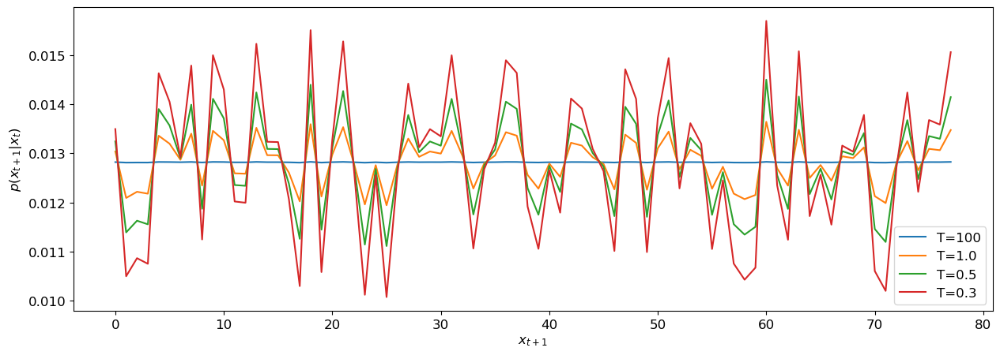

In [15]:
scores = y[0,0,:].detach()
_, ax = plt.subplots(figsize=(15,5))

for t in reversed([0.3, 0.5, 1.0, 100]):
    ax.plot(charnn.hot_softmax(scores, temperature=t).cpu().numpy(), label=f'T={t}')
ax.set_xlabel('$x_{t+1}$')
ax.set_ylabel('$p(x_{t+1}|x_t)$')
ax.legend()

uniform_proba = 1/len(char_to_idx)
uniform_diff = torch.abs(charnn.hot_softmax(scores, temperature=100) - uniform_proba)
test.assertTrue(torch.all(uniform_diff < 1e-4))

**TODO**: Implement the `generate_from_model()` function in the `hw3/charnn.py` module.

In [16]:
for _ in range(3):
    text = charnn.generate_from_model(model, "foobar", 50, (char_to_idx, idx_to_char), T=0.5)
    print(text)
    test.assertEqual(len(text), 50)

foobar,V(8c0-
4h;1T&qdoevT
zk2zHec1bSoy6ON2b"QNPD 
foobar.miXvcUt5.rDPGsc)Q!wip&Xqj'shgd3'f.H6mi'KwG5
foobarHk:.pj;dnjR.4Pm9] I.fspUL0"F[Jd1nl)ibU0xPxCl


### Training
<a id=part1_7></a>

To train this model, we'll calculate the loss at each time step by comparing the predicted char to
the actual char from our label. We can use cross entropy since per char it's similar to a classification problem.
We'll then sum the losses over the sequence and back-propagate the gradients though time.
Notice that the back-propagation algorithm will "visit" each layer's parameter tensors multiple times,
so we'll accumulate gradients in parameters of the blocks. Luckily `autograd` will handle this part for us.

As usual, the first step of training will be to try and **overfit** a large model (many parameters) to a tiny dataset.
Again, this is to ensure the model and training code are implemented correctly, i.e. that the model can learn.

For a generative model such as this, overfitting is slightly trickier than for classification.
What we'll aim to do is to get our model to **memorize** a specific sequence of chars, so that when given the first
char in the sequence it will immediately spit out the rest of the sequence verbatim.

Let's create a tiny dataset to memorize.

In [17]:
# Pick a tiny subset of the dataset
subset_start, subset_end = 1001, 1005
ds_corpus_ss = torch.utils.data.Subset(ds_corpus, range(subset_start, subset_end))
batch_size_ss = 1
sampler_ss = SequenceBatchSampler(ds_corpus_ss, batch_size=batch_size_ss)
dl_corpus_ss = torch.utils.data.DataLoader(ds_corpus_ss, batch_size_ss, sampler=sampler_ss, shuffle=False)

# Convert subset to text
subset_text = ''
for i in range(subset_end - subset_start):
    subset_text += unembed(ds_corpus_ss[i][0])
print(f'Text to "memorize":\n\n{subset_text}')

Text to "memorize":

TRAM. What would you have?
  HELENA. Something; and scarce so much; nothing, indeed.
    I would not tell you what I would, my lord.
    Faith, yes:
    Strangers and foes do sunder and not kiss.
  BERTRAM. I pray you, stay not, but in haste to horse.
  HE


Now let's implement the first part of our training code.

**TODO**: Implement the `train_epoch()` and `train_batch()` methods of the `RNNTrainer` class in the `hw3/training.py` module. 
You must think about how to correctly handle the hidden state of the model between batches and epochs for this specific task (i.e. text generation).

In [18]:
import torch.nn as nn
import torch.optim as optim
from hw3.training import RNNTrainer

torch.manual_seed(42)

lr = 0.01
num_epochs = 500

in_dim = vocab_len
h_dim = 128
n_layers = 2
loss_fn = nn.CrossEntropyLoss()
model = charnn.MultilayerGRU(in_dim, h_dim, out_dim=in_dim, n_layers=n_layers).to(device)
optimizer = optim.Adam(model.parameters(), lr=lr)
trainer = RNNTrainer(model, loss_fn, optimizer, device)

for epoch in range(num_epochs):
    epoch_result = trainer.train_epoch(dl_corpus_ss, verbose=False)
    
    # Every X epochs, we'll generate a sequence starting from the first char in the first sequence
    # to visualize how/if/what the model is learning.
    if epoch == 0 or (epoch+1) % 25 == 0:
        avg_loss = np.mean(epoch_result.losses)
        accuracy = np.mean(epoch_result.accuracy)
        print(f'\nEpoch #{epoch+1}: Avg. loss = {avg_loss:.3f}, Accuracy = {accuracy:.2f}%')
        
        generated_sequence = charnn.generate_from_model(model, subset_text[0],
                                                        seq_len*(subset_end-subset_start),
                                                        (char_to_idx,idx_to_char), T=0.1)
        
        # Stop if we've successfully memorized the small dataset.
        print(generated_sequence)
        if generated_sequence == subset_text:
            break

# Test successful overfitting
test.assertGreater(epoch_result.accuracy, 99)
test.assertEqual(generated_sequence, subset_text)


Epoch #1: Avg. loss = 3.940, Accuracy = 17.58%


Twn                                               n                                                                                                                                                                                                             



Epoch #25: Avg. loss = 0.290, Accuracy = 94.53%


TRAM. What would you have?
  HELENA. Something; anderce so much; nothing, indeed.
    Faith, yes:
    Faith, yes:
    Faith, yes:
    Faith, yes:
    Faith, yes:
    Faith, yes:
    Faith, yes:
    Faith, yes:
    Fait, yes:
    Faith, yes:
    Faith, yes:



Epoch #50: Avg. loss = 0.008, Accuracy = 100.00%


TRAM. What would you have?
  HELENA. Something; and scarce so much; nothing, indeed.
    I would not tell you what I would, my lord.
    Faith, yes:
    Strangers and foes do sunder and not kiss.
  BERTRAM. I pray you, stay not, but in haste to horse.
  HE


OK, so training works - we can memorize a short sequence.
We'll now train a much larger model on our large dataset. You'll need a GPU for this part.

First, lets set up our dataset and models for training.
We'll split our corpus into 90% train and 10% test-set.
Also, we'll use a learning-rate scheduler to control the learning rate during training.

**TODO**: Set the hyperparameters in the `part1_rnn_hyperparams()` function of the `hw3/answers.py` module.

In [19]:
from hw3.answers import part1_rnn_hyperparams

hp = part1_rnn_hyperparams()
print('hyperparams:\n', hp)

### Dataset definition
vocab_len = len(char_to_idx)
batch_size = hp['batch_size']
seq_len = hp['seq_len']
train_test_ratio = 0.9
num_samples = (len(corpus) - 1) // seq_len
num_train = int(train_test_ratio * num_samples)

samples, labels = charnn.chars_to_labelled_samples(corpus, char_to_idx, seq_len, device)

ds_train = torch.utils.data.TensorDataset(samples[:num_train], labels[:num_train])
sampler_train = SequenceBatchSampler(ds_train, batch_size)
dl_train = torch.utils.data.DataLoader(ds_train, batch_size, shuffle=False, sampler=sampler_train, drop_last=True)

ds_test = torch.utils.data.TensorDataset(samples[num_train:], labels[num_train:])
sampler_test = SequenceBatchSampler(ds_test, batch_size)
dl_test = torch.utils.data.DataLoader(ds_test, batch_size, shuffle=False, sampler=sampler_test, drop_last=True)

print(f'Train: {len(dl_train):3d} batches, {len(dl_train)*batch_size*seq_len:7d} chars')
print(f'Test:  {len(dl_test):3d} batches, {len(dl_test)*batch_size*seq_len:7d} chars')

### Training definition
in_dim = out_dim = vocab_len
checkpoint_file = 'checkpoints/rnn'
num_epochs = 50
early_stopping = 5

model = charnn.MultilayerGRU(in_dim, hp['h_dim'], out_dim, hp['n_layers'], hp['dropout'])
loss_fn = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=hp['learn_rate'])
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='max', factor=hp['lr_sched_factor'], patience=hp['lr_sched_patience'], verbose=True
)
trainer = RNNTrainer(model, loss_fn, optimizer, device)

hyperparams:
 {'batch_size': 128, 'seq_len': 64, 'h_dim': 256, 'n_layers': 2, 'dropout': 0.2, 'learn_rate': 0.001, 'lr_sched_factor': 0.1, 'lr_sched_patience': 5}


Train: 697 batches, 5709824 chars
Test:   77 batches,  630784 chars


The code blocks below will train the model and save checkpoints containing the training state and the best model parameters to a file. This allows you to stop training and resume it later from where you left.

Note that you can use the `main.py` script provided within the assignment folder to run this notebook from the command line as if it were a python script by using the `run-nb` subcommand. This allows you to train your model using this notebook without starting jupyter. You can combine this with `srun` or `sbatch` to run the notebook with a GPU on the course servers.

**TODO**:
- Implement the `fit()` method of the `Trainer` class. You can reuse the relevant implementation parts from HW2, but make sure to implement early stopping and checkpoints.
- Implement the `test_epoch()` and `test_batch()` methods of the `RNNTrainer` class in the `hw3/training.py` module.
- Run the following block to train.
- When training is done and you're satisfied with the model's outputs, rename the checkpoint file to `checkpoints/rnn_final.pt`.
  This will cause the block to skip training and instead load your saved model when running the homework submission script.
  Note that your submission zip file will not include the checkpoint file. This is OK.

ACT I.UjxBSf:OR7cnoljZm;&V0dVJj2.:4TJuER;,hD&s?DbaRoT;vDNqM
cD&wCj1U1a]xM&Mx3?3go.&I M].t &p8.
ZM0yN
--- EPOCH 1/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (4.361):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (4.361):   0%|          | 1/697 [00:00<03:06,  3.73it/s]

train_batch (4.312):   0%|          | 1/697 [00:00<03:06,  3.73it/s]

train_batch (4.312):   0%|          | 2/697 [00:00<02:25,  4.77it/s]

train_batch (4.256):   0%|          | 2/697 [00:00<02:25,  4.77it/s]

train_batch (4.256):   0%|          | 3/697 [00:00<02:12,  5.25it/s]

train_batch (4.197):   0%|          | 3/697 [00:00<02:12,  5.25it/s]

train_batch (4.197):   1%|          | 4/697 [00:00<02:06,  5.49it/s]

train_batch (4.113):   1%|          | 4/697 [00:00<02:06,  5.49it/s]

train_batch (4.113):   1%|          | 5/697 [00:00<02:02,  5.66it/s]

train_batch (3.965):   1%|          | 5/697 [00:01<02:02,  5.66it/s]

train_batch (3.965):   1%|          | 6/697 [00:01<02:00,  5.76it/s]

train_batch (3.763):   1%|          | 6/697 [00:01<02:00,  5.76it/s]

train_batch (3.763):   1%|          | 7/697 [00:01<01:59,  5.79it/s]

train_batch (3.469):   1%|          | 7/697 [00:01<01:59,  5.79it/s]

train_batch (3.469):   1%|          | 8/697 [00:01<01:57,  5.85it/s]

train_batch (3.460):   1%|          | 8/697 [00:01<01:57,  5.85it/s]

train_batch (3.460):   1%|▏         | 9/697 [00:01<01:56,  5.89it/s]

train_batch (3.427):   1%|▏         | 9/697 [00:01<01:56,  5.89it/s]

train_batch (3.427):   1%|▏         | 10/697 [00:01<01:56,  5.91it/s]

train_batch (3.335):   1%|▏         | 10/697 [00:01<01:56,  5.91it/s]

train_batch (3.335):   2%|▏         | 11/697 [00:01<01:55,  5.93it/s]

train_batch (3.265):   2%|▏         | 11/697 [00:02<01:55,  5.93it/s]

train_batch (3.265):   2%|▏         | 12/697 [00:02<01:56,  5.88it/s]

train_batch (3.233):   2%|▏         | 12/697 [00:02<01:56,  5.88it/s]

train_batch (3.233):   2%|▏         | 13/697 [00:02<01:55,  5.90it/s]

train_batch (3.231):   2%|▏         | 13/697 [00:02<01:55,  5.90it/s]

train_batch (3.231):   2%|▏         | 14/697 [00:02<01:55,  5.91it/s]

train_batch (3.254):   2%|▏         | 14/697 [00:02<01:55,  5.91it/s]

train_batch (3.254):   2%|▏         | 15/697 [00:02<01:54,  5.94it/s]

train_batch (3.237):   2%|▏         | 15/697 [00:02<01:54,  5.94it/s]

train_batch (3.237):   2%|▏         | 16/697 [00:02<01:54,  5.96it/s]

train_batch (3.250):   2%|▏         | 16/697 [00:02<01:54,  5.96it/s]

train_batch (3.250):   2%|▏         | 17/697 [00:02<01:54,  5.96it/s]

train_batch (3.258):   2%|▏         | 17/697 [00:03<01:54,  5.96it/s]

train_batch (3.258):   3%|▎         | 18/697 [00:03<01:54,  5.94it/s]

train_batch (3.233):   3%|▎         | 18/697 [00:03<01:54,  5.94it/s]

train_batch (3.233):   3%|▎         | 19/697 [00:03<01:54,  5.95it/s]

train_batch (3.185):   3%|▎         | 19/697 [00:03<01:54,  5.95it/s]

train_batch (3.185):   3%|▎         | 20/697 [00:03<01:53,  5.95it/s]

train_batch (3.186):   3%|▎         | 20/697 [00:03<01:53,  5.95it/s]

train_batch (3.186):   3%|▎         | 21/697 [00:03<01:53,  5.95it/s]

train_batch (3.166):   3%|▎         | 21/697 [00:03<01:53,  5.95it/s]

train_batch (3.166):   3%|▎         | 22/697 [00:03<01:53,  5.95it/s]

train_batch (3.179):   3%|▎         | 22/697 [00:03<01:53,  5.95it/s]

train_batch (3.179):   3%|▎         | 23/697 [00:03<01:53,  5.95it/s]

train_batch (3.192):   3%|▎         | 23/697 [00:04<01:53,  5.95it/s]

train_batch (3.192):   3%|▎         | 24/697 [00:04<01:53,  5.91it/s]

train_batch (3.207):   3%|▎         | 24/697 [00:04<01:53,  5.91it/s]

train_batch (3.207):   4%|▎         | 25/697 [00:04<01:53,  5.91it/s]

train_batch (3.164):   4%|▎         | 25/697 [00:04<01:53,  5.91it/s]

train_batch (3.164):   4%|▎         | 26/697 [00:04<01:53,  5.90it/s]

train_batch (3.184):   4%|▎         | 26/697 [00:04<01:53,  5.90it/s]

train_batch (3.184):   4%|▍         | 27/697 [00:04<01:53,  5.92it/s]

train_batch (3.196):   4%|▍         | 27/697 [00:04<01:53,  5.92it/s]

train_batch (3.196):   4%|▍         | 28/697 [00:04<01:52,  5.93it/s]

train_batch (3.168):   4%|▍         | 28/697 [00:04<01:52,  5.93it/s]

train_batch (3.168):   4%|▍         | 29/697 [00:04<01:52,  5.94it/s]

train_batch (3.184):   4%|▍         | 29/697 [00:05<01:52,  5.94it/s]

train_batch (3.184):   4%|▍         | 30/697 [00:05<01:52,  5.94it/s]

train_batch (3.182):   4%|▍         | 30/697 [00:05<01:52,  5.94it/s]

train_batch (3.182):   4%|▍         | 31/697 [00:05<01:52,  5.94it/s]

train_batch (3.177):   4%|▍         | 31/697 [00:05<01:52,  5.94it/s]

train_batch (3.177):   5%|▍         | 32/697 [00:05<01:51,  5.95it/s]

train_batch (3.149):   5%|▍         | 32/697 [00:05<01:51,  5.95it/s]

train_batch (3.149):   5%|▍         | 33/697 [00:05<01:51,  5.95it/s]

train_batch (3.180):   5%|▍         | 33/697 [00:05<01:51,  5.95it/s]

train_batch (3.180):   5%|▍         | 34/697 [00:05<01:51,  5.95it/s]

train_batch (3.173):   5%|▍         | 34/697 [00:05<01:51,  5.95it/s]

train_batch (3.173):   5%|▌         | 35/697 [00:05<01:51,  5.96it/s]

train_batch (3.112):   5%|▌         | 35/697 [00:06<01:51,  5.96it/s]

train_batch (3.112):   5%|▌         | 36/697 [00:06<01:51,  5.94it/s]

train_batch (3.149):   5%|▌         | 36/697 [00:06<01:51,  5.94it/s]

train_batch (3.149):   5%|▌         | 37/697 [00:06<01:51,  5.92it/s]

train_batch (3.134):   5%|▌         | 37/697 [00:06<01:51,  5.92it/s]

train_batch (3.134):   5%|▌         | 38/697 [00:06<01:51,  5.94it/s]

train_batch (3.127):   5%|▌         | 38/697 [00:06<01:51,  5.94it/s]

train_batch (3.127):   6%|▌         | 39/697 [00:06<01:50,  5.95it/s]

train_batch (3.135):   6%|▌         | 39/697 [00:06<01:50,  5.95it/s]

train_batch (3.135):   6%|▌         | 40/697 [00:06<01:50,  5.95it/s]

train_batch (3.154):   6%|▌         | 40/697 [00:06<01:50,  5.95it/s]

train_batch (3.154):   6%|▌         | 41/697 [00:07<01:50,  5.95it/s]

train_batch (3.117):   6%|▌         | 41/697 [00:07<01:50,  5.95it/s]

train_batch (3.117):   6%|▌         | 42/697 [00:07<01:50,  5.95it/s]

train_batch (3.127):   6%|▌         | 42/697 [00:07<01:50,  5.95it/s]

train_batch (3.127):   6%|▌         | 43/697 [00:07<01:49,  5.96it/s]

train_batch (3.111):   6%|▌         | 43/697 [00:07<01:49,  5.96it/s]

train_batch (3.111):   6%|▋         | 44/697 [00:07<01:49,  5.97it/s]

train_batch (3.143):   6%|▋         | 44/697 [00:07<01:49,  5.97it/s]

train_batch (3.143):   6%|▋         | 45/697 [00:07<01:49,  5.97it/s]

train_batch (3.181):   6%|▋         | 45/697 [00:07<01:49,  5.97it/s]

train_batch (3.181):   7%|▋         | 46/697 [00:07<01:49,  5.96it/s]

train_batch (3.096):   7%|▋         | 46/697 [00:08<01:49,  5.96it/s]

train_batch (3.096):   7%|▋         | 47/697 [00:08<01:49,  5.95it/s]

train_batch (3.090):   7%|▋         | 47/697 [00:08<01:49,  5.95it/s]

train_batch (3.090):   7%|▋         | 48/697 [00:08<01:49,  5.94it/s]

train_batch (3.079):   7%|▋         | 48/697 [00:08<01:49,  5.94it/s]

train_batch (3.079):   7%|▋         | 49/697 [00:08<01:49,  5.91it/s]

train_batch (3.097):   7%|▋         | 49/697 [00:08<01:49,  5.91it/s]

train_batch (3.097):   7%|▋         | 50/697 [00:08<01:49,  5.92it/s]

train_batch (3.047):   7%|▋         | 50/697 [00:08<01:49,  5.92it/s]

train_batch (3.047):   7%|▋         | 51/697 [00:08<01:48,  5.94it/s]

train_batch (3.108):   7%|▋         | 51/697 [00:08<01:48,  5.94it/s]

train_batch (3.108):   7%|▋         | 52/697 [00:08<01:48,  5.94it/s]

train_batch (3.067):   7%|▋         | 52/697 [00:09<01:48,  5.94it/s]

train_batch (3.067):   8%|▊         | 53/697 [00:09<01:48,  5.94it/s]

train_batch (3.087):   8%|▊         | 53/697 [00:09<01:48,  5.94it/s]

train_batch (3.087):   8%|▊         | 54/697 [00:09<01:48,  5.93it/s]

train_batch (3.042):   8%|▊         | 54/697 [00:09<01:48,  5.93it/s]

train_batch (3.042):   8%|▊         | 55/697 [00:09<01:48,  5.93it/s]

train_batch (3.058):   8%|▊         | 55/697 [00:09<01:48,  5.93it/s]

train_batch (3.058):   8%|▊         | 56/697 [00:09<01:48,  5.93it/s]

train_batch (2.995):   8%|▊         | 56/697 [00:09<01:48,  5.93it/s]

train_batch (2.995):   8%|▊         | 57/697 [00:09<01:47,  5.94it/s]

train_batch (3.025):   8%|▊         | 57/697 [00:09<01:47,  5.94it/s]

train_batch (3.025):   8%|▊         | 58/697 [00:09<01:49,  5.84it/s]

train_batch (3.005):   8%|▊         | 58/697 [00:10<01:49,  5.84it/s]

train_batch (3.005):   8%|▊         | 59/697 [00:10<01:48,  5.87it/s]

train_batch (2.981):   8%|▊         | 59/697 [00:10<01:48,  5.87it/s]

train_batch (2.981):   9%|▊         | 60/697 [00:10<01:48,  5.89it/s]

train_batch (3.001):   9%|▊         | 60/697 [00:10<01:48,  5.89it/s]

train_batch (3.001):   9%|▉         | 61/697 [00:10<01:47,  5.90it/s]

train_batch (2.996):   9%|▉         | 61/697 [00:10<01:47,  5.90it/s]

train_batch (2.996):   9%|▉         | 62/697 [00:10<01:48,  5.88it/s]

train_batch (2.967):   9%|▉         | 62/697 [00:10<01:48,  5.88it/s]

train_batch (2.967):   9%|▉         | 63/697 [00:10<01:47,  5.90it/s]

train_batch (2.937):   9%|▉         | 63/697 [00:10<01:47,  5.90it/s]

train_batch (2.937):   9%|▉         | 64/697 [00:10<01:47,  5.91it/s]

train_batch (2.960):   9%|▉         | 64/697 [00:11<01:47,  5.91it/s]

train_batch (2.960):   9%|▉         | 65/697 [00:11<01:46,  5.91it/s]

train_batch (2.979):   9%|▉         | 65/697 [00:11<01:46,  5.91it/s]

train_batch (2.979):   9%|▉         | 66/697 [00:11<01:46,  5.91it/s]

train_batch (2.921):   9%|▉         | 66/697 [00:11<01:46,  5.91it/s]

train_batch (2.921):  10%|▉         | 67/697 [00:11<01:46,  5.91it/s]

train_batch (2.928):  10%|▉         | 67/697 [00:11<01:46,  5.91it/s]

train_batch (2.928):  10%|▉         | 68/697 [00:11<01:46,  5.91it/s]

train_batch (2.927):  10%|▉         | 68/697 [00:11<01:46,  5.91it/s]

train_batch (2.927):  10%|▉         | 69/697 [00:11<01:46,  5.88it/s]

train_batch (2.880):  10%|▉         | 69/697 [00:11<01:46,  5.88it/s]

train_batch (2.880):  10%|█         | 70/697 [00:11<01:46,  5.87it/s]

train_batch (2.884):  10%|█         | 70/697 [00:12<01:46,  5.87it/s]

train_batch (2.884):  10%|█         | 71/697 [00:12<01:46,  5.86it/s]

train_batch (2.898):  10%|█         | 71/697 [00:12<01:46,  5.86it/s]

train_batch (2.898):  10%|█         | 72/697 [00:12<01:46,  5.88it/s]

train_batch (2.884):  10%|█         | 72/697 [00:12<01:46,  5.88it/s]

train_batch (2.884):  10%|█         | 73/697 [00:12<01:45,  5.90it/s]

train_batch (2.889):  10%|█         | 73/697 [00:12<01:45,  5.90it/s]

train_batch (2.889):  11%|█         | 74/697 [00:12<01:46,  5.86it/s]

train_batch (2.816):  11%|█         | 74/697 [00:12<01:46,  5.86it/s]

train_batch (2.816):  11%|█         | 75/697 [00:12<01:45,  5.89it/s]

train_batch (2.840):  11%|█         | 75/697 [00:12<01:45,  5.89it/s]

train_batch (2.840):  11%|█         | 76/697 [00:12<01:45,  5.89it/s]

train_batch (2.821):  11%|█         | 76/697 [00:13<01:45,  5.89it/s]

train_batch (2.821):  11%|█         | 77/697 [00:13<01:45,  5.88it/s]

train_batch (2.789):  11%|█         | 77/697 [00:13<01:45,  5.88it/s]

train_batch (2.789):  11%|█         | 78/697 [00:13<01:45,  5.87it/s]

train_batch (2.800):  11%|█         | 78/697 [00:13<01:45,  5.87it/s]

train_batch (2.800):  11%|█▏        | 79/697 [00:13<01:45,  5.86it/s]

train_batch (2.791):  11%|█▏        | 79/697 [00:13<01:45,  5.86it/s]

train_batch (2.791):  11%|█▏        | 80/697 [00:13<01:44,  5.88it/s]

train_batch (2.756):  11%|█▏        | 80/697 [00:13<01:44,  5.88it/s]

train_batch (2.756):  12%|█▏        | 81/697 [00:13<01:44,  5.88it/s]

train_batch (2.779):  12%|█▏        | 81/697 [00:13<01:44,  5.88it/s]

train_batch (2.779):  12%|█▏        | 82/697 [00:13<01:44,  5.88it/s]

train_batch (2.761):  12%|█▏        | 82/697 [00:14<01:44,  5.88it/s]

train_batch (2.761):  12%|█▏        | 83/697 [00:14<01:44,  5.87it/s]

train_batch (2.732):  12%|█▏        | 83/697 [00:14<01:44,  5.87it/s]

train_batch (2.732):  12%|█▏        | 84/697 [00:14<01:44,  5.87it/s]

train_batch (2.700):  12%|█▏        | 84/697 [00:14<01:44,  5.87it/s]

train_batch (2.700):  12%|█▏        | 85/697 [00:14<01:44,  5.87it/s]

train_batch (2.699):  12%|█▏        | 85/697 [00:14<01:44,  5.87it/s]

train_batch (2.699):  12%|█▏        | 86/697 [00:14<01:44,  5.86it/s]

train_batch (2.676):  12%|█▏        | 86/697 [00:14<01:44,  5.86it/s]

train_batch (2.676):  12%|█▏        | 87/697 [00:14<01:45,  5.80it/s]

train_batch (2.690):  12%|█▏        | 87/697 [00:14<01:45,  5.80it/s]

train_batch (2.690):  13%|█▎        | 88/697 [00:14<01:44,  5.82it/s]

train_batch (2.654):  13%|█▎        | 88/697 [00:15<01:44,  5.82it/s]

train_batch (2.654):  13%|█▎        | 89/697 [00:15<01:44,  5.83it/s]

train_batch (2.651):  13%|█▎        | 89/697 [00:15<01:44,  5.83it/s]

train_batch (2.651):  13%|█▎        | 90/697 [00:15<01:43,  5.84it/s]

train_batch (2.674):  13%|█▎        | 90/697 [00:15<01:43,  5.84it/s]

train_batch (2.674):  13%|█▎        | 91/697 [00:15<01:43,  5.87it/s]

train_batch (2.649):  13%|█▎        | 91/697 [00:15<01:43,  5.87it/s]

train_batch (2.649):  13%|█▎        | 92/697 [00:15<01:42,  5.89it/s]

train_batch (2.640):  13%|█▎        | 92/697 [00:15<01:42,  5.89it/s]

train_batch (2.640):  13%|█▎        | 93/697 [00:15<01:42,  5.90it/s]

train_batch (2.613):  13%|█▎        | 93/697 [00:15<01:42,  5.90it/s]

train_batch (2.613):  13%|█▎        | 94/697 [00:15<01:41,  5.92it/s]

train_batch (2.627):  13%|█▎        | 94/697 [00:16<01:41,  5.92it/s]

train_batch (2.627):  14%|█▎        | 95/697 [00:16<01:41,  5.92it/s]

train_batch (2.536):  14%|█▎        | 95/697 [00:16<01:41,  5.92it/s]

train_batch (2.536):  14%|█▍        | 96/697 [00:16<01:41,  5.90it/s]

train_batch (2.540):  14%|█▍        | 96/697 [00:16<01:41,  5.90it/s]

train_batch (2.540):  14%|█▍        | 97/697 [00:16<01:41,  5.90it/s]

train_batch (2.550):  14%|█▍        | 97/697 [00:16<01:41,  5.90it/s]

train_batch (2.550):  14%|█▍        | 98/697 [00:16<01:41,  5.90it/s]

train_batch (2.538):  14%|█▍        | 98/697 [00:16<01:41,  5.90it/s]

train_batch (2.538):  14%|█▍        | 99/697 [00:16<01:41,  5.88it/s]

train_batch (2.566):  14%|█▍        | 99/697 [00:17<01:41,  5.88it/s]

train_batch (2.566):  14%|█▍        | 100/697 [00:17<01:41,  5.90it/s]

train_batch (2.514):  14%|█▍        | 100/697 [00:17<01:41,  5.90it/s]

train_batch (2.514):  14%|█▍        | 101/697 [00:17<01:41,  5.90it/s]

train_batch (2.537):  14%|█▍        | 101/697 [00:17<01:41,  5.90it/s]

train_batch (2.537):  15%|█▍        | 102/697 [00:17<01:40,  5.90it/s]

train_batch (2.525):  15%|█▍        | 102/697 [00:17<01:40,  5.90it/s]

train_batch (2.525):  15%|█▍        | 103/697 [00:17<01:40,  5.92it/s]

train_batch (2.480):  15%|█▍        | 103/697 [00:17<01:40,  5.92it/s]

train_batch (2.480):  15%|█▍        | 104/697 [00:17<01:40,  5.92it/s]

train_batch (2.503):  15%|█▍        | 104/697 [00:17<01:40,  5.92it/s]

train_batch (2.503):  15%|█▌        | 105/697 [00:17<01:39,  5.94it/s]

train_batch (2.513):  15%|█▌        | 105/697 [00:18<01:39,  5.94it/s]

train_batch (2.513):  15%|█▌        | 106/697 [00:18<01:39,  5.94it/s]

train_batch (2.476):  15%|█▌        | 106/697 [00:18<01:39,  5.94it/s]

train_batch (2.476):  15%|█▌        | 107/697 [00:18<01:39,  5.93it/s]

train_batch (2.457):  15%|█▌        | 107/697 [00:18<01:39,  5.93it/s]

train_batch (2.457):  15%|█▌        | 108/697 [00:18<01:39,  5.93it/s]

train_batch (2.502):  15%|█▌        | 108/697 [00:18<01:39,  5.93it/s]

train_batch (2.502):  16%|█▌        | 109/697 [00:18<01:39,  5.94it/s]

train_batch (2.493):  16%|█▌        | 109/697 [00:18<01:39,  5.94it/s]

train_batch (2.493):  16%|█▌        | 110/697 [00:18<01:38,  5.94it/s]

train_batch (2.457):  16%|█▌        | 110/697 [00:18<01:38,  5.94it/s]

train_batch (2.457):  16%|█▌        | 111/697 [00:18<01:38,  5.95it/s]

train_batch (2.435):  16%|█▌        | 111/697 [00:19<01:38,  5.95it/s]

train_batch (2.435):  16%|█▌        | 112/697 [00:19<01:38,  5.92it/s]

train_batch (2.460):  16%|█▌        | 112/697 [00:19<01:38,  5.92it/s]

train_batch (2.460):  16%|█▌        | 113/697 [00:19<01:38,  5.91it/s]

train_batch (2.449):  16%|█▌        | 113/697 [00:19<01:38,  5.91it/s]

train_batch (2.449):  16%|█▋        | 114/697 [00:19<01:38,  5.91it/s]

train_batch (2.463):  16%|█▋        | 114/697 [00:19<01:38,  5.91it/s]

train_batch (2.463):  16%|█▋        | 115/697 [00:19<01:38,  5.92it/s]

train_batch (2.429):  16%|█▋        | 115/697 [00:19<01:38,  5.92it/s]

train_batch (2.429):  17%|█▋        | 116/697 [00:19<01:37,  5.94it/s]

train_batch (2.447):  17%|█▋        | 116/697 [00:19<01:37,  5.94it/s]

train_batch (2.447):  17%|█▋        | 117/697 [00:19<01:37,  5.95it/s]

train_batch (2.398):  17%|█▋        | 117/697 [00:20<01:37,  5.95it/s]

train_batch (2.398):  17%|█▋        | 118/697 [00:20<01:37,  5.95it/s]

train_batch (2.395):  17%|█▋        | 118/697 [00:20<01:37,  5.95it/s]

train_batch (2.395):  17%|█▋        | 119/697 [00:20<01:37,  5.96it/s]

train_batch (2.376):  17%|█▋        | 119/697 [00:20<01:37,  5.96it/s]

train_batch (2.376):  17%|█▋        | 120/697 [00:20<01:37,  5.94it/s]

train_batch (2.359):  17%|█▋        | 120/697 [00:20<01:37,  5.94it/s]

train_batch (2.359):  17%|█▋        | 121/697 [00:20<01:37,  5.93it/s]

train_batch (2.377):  17%|█▋        | 121/697 [00:20<01:37,  5.93it/s]

train_batch (2.377):  18%|█▊        | 122/697 [00:20<01:36,  5.94it/s]

train_batch (2.386):  18%|█▊        | 122/697 [00:20<01:36,  5.94it/s]

train_batch (2.386):  18%|█▊        | 123/697 [00:20<01:36,  5.94it/s]

train_batch (2.342):  18%|█▊        | 123/697 [00:21<01:36,  5.94it/s]

train_batch (2.342):  18%|█▊        | 124/697 [00:21<01:36,  5.91it/s]

train_batch (2.367):  18%|█▊        | 124/697 [00:21<01:36,  5.91it/s]

train_batch (2.367):  18%|█▊        | 125/697 [00:21<01:36,  5.92it/s]

train_batch (2.364):  18%|█▊        | 125/697 [00:21<01:36,  5.92it/s]

train_batch (2.364):  18%|█▊        | 126/697 [00:21<01:36,  5.93it/s]

train_batch (2.396):  18%|█▊        | 126/697 [00:21<01:36,  5.93it/s]

train_batch (2.396):  18%|█▊        | 127/697 [00:21<01:36,  5.90it/s]

train_batch (2.357):  18%|█▊        | 127/697 [00:21<01:36,  5.90it/s]

train_batch (2.357):  18%|█▊        | 128/697 [00:21<01:36,  5.90it/s]

train_batch (2.345):  18%|█▊        | 128/697 [00:21<01:36,  5.90it/s]

train_batch (2.345):  19%|█▊        | 129/697 [00:21<01:36,  5.91it/s]

train_batch (2.351):  19%|█▊        | 129/697 [00:22<01:36,  5.91it/s]

train_batch (2.351):  19%|█▊        | 130/697 [00:22<01:35,  5.92it/s]

train_batch (2.320):  19%|█▊        | 130/697 [00:22<01:35,  5.92it/s]

train_batch (2.320):  19%|█▉        | 131/697 [00:22<01:35,  5.93it/s]

train_batch (2.323):  19%|█▉        | 131/697 [00:22<01:35,  5.93it/s]

train_batch (2.323):  19%|█▉        | 132/697 [00:22<01:35,  5.93it/s]

train_batch (2.331):  19%|█▉        | 132/697 [00:22<01:35,  5.93it/s]

train_batch (2.331):  19%|█▉        | 133/697 [00:22<01:34,  5.94it/s]

train_batch (2.315):  19%|█▉        | 133/697 [00:22<01:34,  5.94it/s]

train_batch (2.315):  19%|█▉        | 134/697 [00:22<01:34,  5.95it/s]

train_batch (2.295):  19%|█▉        | 134/697 [00:22<01:34,  5.95it/s]

train_batch (2.295):  19%|█▉        | 135/697 [00:22<01:34,  5.95it/s]

train_batch (2.295):  19%|█▉        | 135/697 [00:23<01:34,  5.95it/s]

train_batch (2.295):  20%|█▉        | 136/697 [00:23<01:34,  5.96it/s]

train_batch (2.319):  20%|█▉        | 136/697 [00:23<01:34,  5.96it/s]

train_batch (2.319):  20%|█▉        | 137/697 [00:23<01:34,  5.93it/s]

train_batch (2.302):  20%|█▉        | 137/697 [00:23<01:34,  5.93it/s]

train_batch (2.302):  20%|█▉        | 138/697 [00:23<01:34,  5.93it/s]

train_batch (2.291):  20%|█▉        | 138/697 [00:23<01:34,  5.93it/s]

train_batch (2.291):  20%|█▉        | 139/697 [00:23<01:33,  5.94it/s]

train_batch (2.334):  20%|█▉        | 139/697 [00:23<01:33,  5.94it/s]

train_batch (2.334):  20%|██        | 140/697 [00:23<01:33,  5.95it/s]

train_batch (2.310):  20%|██        | 140/697 [00:23<01:33,  5.95it/s]

train_batch (2.310):  20%|██        | 141/697 [00:23<01:33,  5.95it/s]

train_batch (2.300):  20%|██        | 141/697 [00:24<01:33,  5.95it/s]

train_batch (2.300):  20%|██        | 142/697 [00:24<01:33,  5.95it/s]

train_batch (2.287):  20%|██        | 142/697 [00:24<01:33,  5.95it/s]

train_batch (2.287):  21%|██        | 143/697 [00:24<01:33,  5.93it/s]

train_batch (2.297):  21%|██        | 143/697 [00:24<01:33,  5.93it/s]

train_batch (2.297):  21%|██        | 144/697 [00:24<01:33,  5.93it/s]

train_batch (2.255):  21%|██        | 144/697 [00:24<01:33,  5.93it/s]

train_batch (2.255):  21%|██        | 145/697 [00:24<01:33,  5.94it/s]

train_batch (2.290):  21%|██        | 145/697 [00:24<01:33,  5.94it/s]

train_batch (2.290):  21%|██        | 146/697 [00:24<01:32,  5.94it/s]

train_batch (2.278):  21%|██        | 146/697 [00:24<01:32,  5.94it/s]

train_batch (2.278):  21%|██        | 147/697 [00:24<01:32,  5.95it/s]

train_batch (2.221):  21%|██        | 147/697 [00:25<01:32,  5.95it/s]

train_batch (2.221):  21%|██        | 148/697 [00:25<01:32,  5.94it/s]

train_batch (2.269):  21%|██        | 148/697 [00:25<01:32,  5.94it/s]

train_batch (2.269):  21%|██▏       | 149/697 [00:25<01:32,  5.91it/s]

train_batch (2.266):  21%|██▏       | 149/697 [00:25<01:32,  5.91it/s]

train_batch (2.266):  22%|██▏       | 150/697 [00:25<01:32,  5.91it/s]

train_batch (2.212):  22%|██▏       | 150/697 [00:25<01:32,  5.91it/s]

train_batch (2.212):  22%|██▏       | 151/697 [00:25<01:32,  5.93it/s]

train_batch (2.252):  22%|██▏       | 151/697 [00:25<01:32,  5.93it/s]

train_batch (2.252):  22%|██▏       | 152/697 [00:25<01:31,  5.94it/s]

train_batch (2.245):  22%|██▏       | 152/697 [00:25<01:31,  5.94it/s]

train_batch (2.245):  22%|██▏       | 153/697 [00:25<01:31,  5.94it/s]

train_batch (2.269):  22%|██▏       | 153/697 [00:26<01:31,  5.94it/s]

train_batch (2.269):  22%|██▏       | 154/697 [00:26<01:31,  5.94it/s]

train_batch (2.223):  22%|██▏       | 154/697 [00:26<01:31,  5.94it/s]

train_batch (2.223):  22%|██▏       | 155/697 [00:26<01:31,  5.93it/s]

train_batch (2.250):  22%|██▏       | 155/697 [00:26<01:31,  5.93it/s]

train_batch (2.250):  22%|██▏       | 156/697 [00:26<01:31,  5.92it/s]

train_batch (2.253):  22%|██▏       | 156/697 [00:26<01:31,  5.92it/s]

train_batch (2.253):  23%|██▎       | 157/697 [00:26<01:31,  5.93it/s]

train_batch (2.235):  23%|██▎       | 157/697 [00:26<01:31,  5.93it/s]

train_batch (2.235):  23%|██▎       | 158/697 [00:26<01:30,  5.94it/s]

train_batch (2.207):  23%|██▎       | 158/697 [00:26<01:30,  5.94it/s]

train_batch (2.207):  23%|██▎       | 159/697 [00:26<01:30,  5.94it/s]

train_batch (2.213):  23%|██▎       | 159/697 [00:27<01:30,  5.94it/s]

train_batch (2.213):  23%|██▎       | 160/697 [00:27<01:30,  5.92it/s]

train_batch (2.228):  23%|██▎       | 160/697 [00:27<01:30,  5.92it/s]

train_batch (2.228):  23%|██▎       | 161/697 [00:27<01:30,  5.92it/s]

train_batch (2.221):  23%|██▎       | 161/697 [00:27<01:30,  5.92it/s]

train_batch (2.221):  23%|██▎       | 162/697 [00:27<01:30,  5.90it/s]

train_batch (2.255):  23%|██▎       | 162/697 [00:27<01:30,  5.90it/s]

train_batch (2.255):  23%|██▎       | 163/697 [00:27<01:30,  5.90it/s]

train_batch (2.254):  23%|██▎       | 163/697 [00:27<01:30,  5.90it/s]

train_batch (2.254):  24%|██▎       | 164/697 [00:27<01:30,  5.91it/s]

train_batch (2.209):  24%|██▎       | 164/697 [00:27<01:30,  5.91it/s]

train_batch (2.209):  24%|██▎       | 165/697 [00:27<01:29,  5.92it/s]

train_batch (2.218):  24%|██▎       | 165/697 [00:28<01:29,  5.92it/s]

train_batch (2.218):  24%|██▍       | 166/697 [00:28<01:30,  5.89it/s]

train_batch (2.136):  24%|██▍       | 166/697 [00:28<01:30,  5.89it/s]

train_batch (2.136):  24%|██▍       | 167/697 [00:28<01:30,  5.89it/s]

train_batch (2.175):  24%|██▍       | 167/697 [00:28<01:30,  5.89it/s]

train_batch (2.175):  24%|██▍       | 168/697 [00:28<01:29,  5.89it/s]

train_batch (2.215):  24%|██▍       | 168/697 [00:28<01:29,  5.89it/s]

train_batch (2.215):  24%|██▍       | 169/697 [00:28<01:29,  5.90it/s]

train_batch (2.187):  24%|██▍       | 169/697 [00:28<01:29,  5.90it/s]

train_batch (2.187):  24%|██▍       | 170/697 [00:28<01:29,  5.91it/s]

train_batch (2.243):  24%|██▍       | 170/697 [00:28<01:29,  5.91it/s]

train_batch (2.243):  25%|██▍       | 171/697 [00:28<01:28,  5.91it/s]

train_batch (2.197):  25%|██▍       | 171/697 [00:29<01:28,  5.91it/s]

train_batch (2.197):  25%|██▍       | 172/697 [00:29<01:29,  5.89it/s]

train_batch (2.186):  25%|██▍       | 172/697 [00:29<01:29,  5.89it/s]

train_batch (2.186):  25%|██▍       | 173/697 [00:29<01:28,  5.89it/s]

train_batch (2.162):  25%|██▍       | 173/697 [00:29<01:28,  5.89it/s]

train_batch (2.162):  25%|██▍       | 174/697 [00:29<01:28,  5.88it/s]

train_batch (2.200):  25%|██▍       | 174/697 [00:29<01:28,  5.88it/s]

train_batch (2.200):  25%|██▌       | 175/697 [00:29<01:28,  5.90it/s]

train_batch (2.177):  25%|██▌       | 175/697 [00:29<01:28,  5.90it/s]

train_batch (2.177):  25%|██▌       | 176/697 [00:29<01:28,  5.91it/s]

train_batch (2.143):  25%|██▌       | 176/697 [00:30<01:28,  5.91it/s]

train_batch (2.143):  25%|██▌       | 177/697 [00:30<01:27,  5.92it/s]

train_batch (2.180):  25%|██▌       | 177/697 [00:30<01:27,  5.92it/s]

train_batch (2.180):  26%|██▌       | 178/697 [00:30<01:27,  5.91it/s]

train_batch (2.177):  26%|██▌       | 178/697 [00:30<01:27,  5.91it/s]

train_batch (2.177):  26%|██▌       | 179/697 [00:30<01:27,  5.91it/s]

train_batch (2.173):  26%|██▌       | 179/697 [00:30<01:27,  5.91it/s]

train_batch (2.173):  26%|██▌       | 180/697 [00:30<01:27,  5.93it/s]

train_batch (2.161):  26%|██▌       | 180/697 [00:30<01:27,  5.93it/s]

train_batch (2.161):  26%|██▌       | 181/697 [00:30<01:26,  5.94it/s]

train_batch (2.158):  26%|██▌       | 181/697 [00:30<01:26,  5.94it/s]

train_batch (2.158):  26%|██▌       | 182/697 [00:30<01:26,  5.94it/s]

train_batch (2.144):  26%|██▌       | 182/697 [00:31<01:26,  5.94it/s]

train_batch (2.144):  26%|██▋       | 183/697 [00:31<01:26,  5.94it/s]

train_batch (2.130):  26%|██▋       | 183/697 [00:31<01:26,  5.94it/s]

train_batch (2.130):  26%|██▋       | 184/697 [00:31<01:26,  5.93it/s]

train_batch (2.184):  26%|██▋       | 184/697 [00:31<01:26,  5.93it/s]

train_batch (2.184):  27%|██▋       | 185/697 [00:31<01:26,  5.92it/s]

train_batch (2.133):  27%|██▋       | 185/697 [00:31<01:26,  5.92it/s]

train_batch (2.133):  27%|██▋       | 186/697 [00:31<01:26,  5.93it/s]

train_batch (2.132):  27%|██▋       | 186/697 [00:31<01:26,  5.93it/s]

train_batch (2.132):  27%|██▋       | 187/697 [00:31<01:26,  5.90it/s]

train_batch (2.101):  27%|██▋       | 187/697 [00:31<01:26,  5.90it/s]

train_batch (2.101):  27%|██▋       | 188/697 [00:31<01:26,  5.91it/s]

train_batch (2.184):  27%|██▋       | 188/697 [00:32<01:26,  5.91it/s]

train_batch (2.184):  27%|██▋       | 189/697 [00:32<01:25,  5.91it/s]

train_batch (2.171):  27%|██▋       | 189/697 [00:32<01:25,  5.91it/s]

train_batch (2.171):  27%|██▋       | 190/697 [00:32<01:25,  5.91it/s]

train_batch (2.164):  27%|██▋       | 190/697 [00:32<01:25,  5.91it/s]

train_batch (2.164):  27%|██▋       | 191/697 [00:32<01:25,  5.91it/s]

train_batch (2.165):  27%|██▋       | 191/697 [00:32<01:25,  5.91it/s]

train_batch (2.165):  28%|██▊       | 192/697 [00:32<01:25,  5.92it/s]

train_batch (2.147):  28%|██▊       | 192/697 [00:32<01:25,  5.92it/s]

train_batch (2.147):  28%|██▊       | 193/697 [00:32<01:24,  5.93it/s]

train_batch (2.142):  28%|██▊       | 193/697 [00:32<01:24,  5.93it/s]

train_batch (2.142):  28%|██▊       | 194/697 [00:32<01:24,  5.93it/s]

train_batch (2.140):  28%|██▊       | 194/697 [00:33<01:24,  5.93it/s]

train_batch (2.140):  28%|██▊       | 195/697 [00:33<01:24,  5.93it/s]

train_batch (2.140):  28%|██▊       | 195/697 [00:33<01:24,  5.93it/s]

train_batch (2.140):  28%|██▊       | 196/697 [00:33<01:25,  5.88it/s]

train_batch (2.126):  28%|██▊       | 196/697 [00:33<01:25,  5.88it/s]

train_batch (2.126):  28%|██▊       | 197/697 [00:33<01:24,  5.89it/s]

train_batch (2.093):  28%|██▊       | 197/697 [00:33<01:24,  5.89it/s]

train_batch (2.093):  28%|██▊       | 198/697 [00:33<01:24,  5.90it/s]

train_batch (2.076):  28%|██▊       | 198/697 [00:33<01:24,  5.90it/s]

train_batch (2.076):  29%|██▊       | 199/697 [00:33<01:24,  5.91it/s]

train_batch (2.098):  29%|██▊       | 199/697 [00:33<01:24,  5.91it/s]

train_batch (2.098):  29%|██▊       | 200/697 [00:33<01:23,  5.92it/s]

train_batch (2.092):  29%|██▊       | 200/697 [00:34<01:23,  5.92it/s]

train_batch (2.092):  29%|██▉       | 201/697 [00:34<01:23,  5.93it/s]

train_batch (2.133):  29%|██▉       | 201/697 [00:34<01:23,  5.93it/s]

train_batch (2.133):  29%|██▉       | 202/697 [00:34<01:23,  5.92it/s]

train_batch (2.148):  29%|██▉       | 202/697 [00:34<01:23,  5.92it/s]

train_batch (2.148):  29%|██▉       | 203/697 [00:34<01:23,  5.92it/s]

train_batch (2.081):  29%|██▉       | 203/697 [00:34<01:23,  5.92it/s]

train_batch (2.081):  29%|██▉       | 204/697 [00:34<01:23,  5.94it/s]

train_batch (2.160):  29%|██▉       | 204/697 [00:34<01:23,  5.94it/s]

train_batch (2.160):  29%|██▉       | 205/697 [00:34<01:22,  5.94it/s]

train_batch (2.111):  29%|██▉       | 205/697 [00:34<01:22,  5.94it/s]

train_batch (2.111):  30%|██▉       | 206/697 [00:34<01:22,  5.95it/s]

train_batch (2.160):  30%|██▉       | 206/697 [00:35<01:22,  5.95it/s]

train_batch (2.160):  30%|██▉       | 207/697 [00:35<01:22,  5.95it/s]

train_batch (2.126):  30%|██▉       | 207/697 [00:35<01:22,  5.95it/s]

train_batch (2.126):  30%|██▉       | 208/697 [00:35<01:22,  5.95it/s]

train_batch (2.072):  30%|██▉       | 208/697 [00:35<01:22,  5.95it/s]

train_batch (2.072):  30%|██▉       | 209/697 [00:35<01:22,  5.94it/s]

train_batch (2.105):  30%|██▉       | 209/697 [00:35<01:22,  5.94it/s]

train_batch (2.105):  30%|███       | 210/697 [00:35<01:22,  5.94it/s]

train_batch (2.093):  30%|███       | 210/697 [00:35<01:22,  5.94it/s]

train_batch (2.093):  30%|███       | 211/697 [00:35<01:21,  5.95it/s]

train_batch (2.074):  30%|███       | 211/697 [00:35<01:21,  5.95it/s]

train_batch (2.074):  30%|███       | 212/697 [00:35<01:21,  5.95it/s]

train_batch (2.127):  30%|███       | 212/697 [00:36<01:21,  5.95it/s]

train_batch (2.127):  31%|███       | 213/697 [00:36<01:21,  5.95it/s]

train_batch (2.093):  31%|███       | 213/697 [00:36<01:21,  5.95it/s]

train_batch (2.093):  31%|███       | 214/697 [00:36<01:21,  5.94it/s]

train_batch (2.121):  31%|███       | 214/697 [00:36<01:21,  5.94it/s]

train_batch (2.121):  31%|███       | 215/697 [00:36<01:21,  5.94it/s]

train_batch (2.087):  31%|███       | 215/697 [00:36<01:21,  5.94it/s]

train_batch (2.087):  31%|███       | 216/697 [00:36<01:21,  5.93it/s]

train_batch (2.082):  31%|███       | 216/697 [00:36<01:21,  5.93it/s]

train_batch (2.082):  31%|███       | 217/697 [00:36<01:20,  5.94it/s]

train_batch (2.105):  31%|███       | 217/697 [00:36<01:20,  5.94it/s]

train_batch (2.105):  31%|███▏      | 218/697 [00:36<01:21,  5.90it/s]

train_batch (2.112):  31%|███▏      | 218/697 [00:37<01:21,  5.90it/s]

train_batch (2.112):  31%|███▏      | 219/697 [00:37<01:21,  5.89it/s]

train_batch (2.087):  31%|███▏      | 219/697 [00:37<01:21,  5.89it/s]

train_batch (2.087):  32%|███▏      | 220/697 [00:37<01:20,  5.90it/s]

train_batch (2.058):  32%|███▏      | 220/697 [00:37<01:20,  5.90it/s]

train_batch (2.058):  32%|███▏      | 221/697 [00:37<01:20,  5.90it/s]

train_batch (2.075):  32%|███▏      | 221/697 [00:37<01:20,  5.90it/s]

train_batch (2.075):  32%|███▏      | 222/697 [00:37<01:20,  5.92it/s]

train_batch (2.105):  32%|███▏      | 222/697 [00:37<01:20,  5.92it/s]

train_batch (2.105):  32%|███▏      | 223/697 [00:37<01:19,  5.93it/s]

train_batch (2.078):  32%|███▏      | 223/697 [00:37<01:19,  5.93it/s]

train_batch (2.078):  32%|███▏      | 224/697 [00:37<01:20,  5.90it/s]

train_batch (2.056):  32%|███▏      | 224/697 [00:38<01:20,  5.90it/s]

train_batch (2.056):  32%|███▏      | 225/697 [00:38<01:19,  5.91it/s]

train_batch (2.105):  32%|███▏      | 225/697 [00:38<01:19,  5.91it/s]

train_batch (2.105):  32%|███▏      | 226/697 [00:38<01:19,  5.91it/s]

train_batch (2.088):  32%|███▏      | 226/697 [00:38<01:19,  5.91it/s]

train_batch (2.088):  33%|███▎      | 227/697 [00:38<01:19,  5.92it/s]

train_batch (2.067):  33%|███▎      | 227/697 [00:38<01:19,  5.92it/s]

train_batch (2.067):  33%|███▎      | 228/697 [00:38<01:19,  5.92it/s]

train_batch (2.062):  33%|███▎      | 228/697 [00:38<01:19,  5.92it/s]

train_batch (2.062):  33%|███▎      | 229/697 [00:38<01:18,  5.93it/s]

train_batch (2.103):  33%|███▎      | 229/697 [00:38<01:18,  5.93it/s]

train_batch (2.103):  33%|███▎      | 230/697 [00:38<01:18,  5.93it/s]

train_batch (2.085):  33%|███▎      | 230/697 [00:39<01:18,  5.93it/s]

train_batch (2.085):  33%|███▎      | 231/697 [00:39<01:18,  5.93it/s]

train_batch (2.058):  33%|███▎      | 231/697 [00:39<01:18,  5.93it/s]

train_batch (2.058):  33%|███▎      | 232/697 [00:39<01:18,  5.93it/s]

train_batch (2.079):  33%|███▎      | 232/697 [00:39<01:18,  5.93it/s]

train_batch (2.079):  33%|███▎      | 233/697 [00:39<01:18,  5.93it/s]

train_batch (2.111):  33%|███▎      | 233/697 [00:39<01:18,  5.93it/s]

train_batch (2.111):  34%|███▎      | 234/697 [00:39<01:17,  5.94it/s]

train_batch (2.064):  34%|███▎      | 234/697 [00:39<01:17,  5.94it/s]

train_batch (2.064):  34%|███▎      | 235/697 [00:39<01:17,  5.95it/s]

train_batch (2.059):  34%|███▎      | 235/697 [00:39<01:17,  5.95it/s]

train_batch (2.059):  34%|███▍      | 236/697 [00:39<01:17,  5.94it/s]

train_batch (2.077):  34%|███▍      | 236/697 [00:40<01:17,  5.94it/s]

train_batch (2.077):  34%|███▍      | 237/697 [00:40<01:18,  5.85it/s]

train_batch (2.060):  34%|███▍      | 237/697 [00:40<01:18,  5.85it/s]

train_batch (2.060):  34%|███▍      | 238/697 [00:40<01:18,  5.85it/s]

train_batch (2.053):  34%|███▍      | 238/697 [00:40<01:18,  5.85it/s]

train_batch (2.053):  34%|███▍      | 239/697 [00:40<01:17,  5.87it/s]

train_batch (2.054):  34%|███▍      | 239/697 [00:40<01:17,  5.87it/s]

train_batch (2.054):  34%|███▍      | 240/697 [00:40<01:17,  5.89it/s]

train_batch (2.070):  34%|███▍      | 240/697 [00:40<01:17,  5.89it/s]

train_batch (2.070):  35%|███▍      | 241/697 [00:40<01:17,  5.91it/s]

train_batch (2.035):  35%|███▍      | 241/697 [00:40<01:17,  5.91it/s]

train_batch (2.035):  35%|███▍      | 242/697 [00:40<01:16,  5.93it/s]

train_batch (2.093):  35%|███▍      | 242/697 [00:41<01:16,  5.93it/s]

train_batch (2.093):  35%|███▍      | 243/697 [00:41<01:16,  5.93it/s]

train_batch (2.057):  35%|███▍      | 243/697 [00:41<01:16,  5.93it/s]

train_batch (2.057):  35%|███▌      | 244/697 [00:41<01:16,  5.93it/s]

train_batch (2.055):  35%|███▌      | 244/697 [00:41<01:16,  5.93it/s]

train_batch (2.055):  35%|███▌      | 245/697 [00:41<01:16,  5.94it/s]

train_batch (2.017):  35%|███▌      | 245/697 [00:41<01:16,  5.94it/s]

train_batch (2.017):  35%|███▌      | 246/697 [00:41<01:15,  5.95it/s]

train_batch (2.088):  35%|███▌      | 246/697 [00:41<01:15,  5.95it/s]

train_batch (2.088):  35%|███▌      | 247/697 [00:41<01:15,  5.95it/s]

train_batch (2.071):  35%|███▌      | 247/697 [00:41<01:15,  5.95it/s]

train_batch (2.071):  36%|███▌      | 248/697 [00:41<01:15,  5.95it/s]

train_batch (2.030):  36%|███▌      | 248/697 [00:42<01:15,  5.95it/s]

train_batch (2.030):  36%|███▌      | 249/697 [00:42<01:15,  5.94it/s]

train_batch (2.036):  36%|███▌      | 249/697 [00:42<01:15,  5.94it/s]

train_batch (2.036):  36%|███▌      | 250/697 [00:42<01:15,  5.94it/s]

train_batch (2.020):  36%|███▌      | 250/697 [00:42<01:15,  5.94it/s]

train_batch (2.020):  36%|███▌      | 251/697 [00:42<01:15,  5.94it/s]

train_batch (2.059):  36%|███▌      | 251/697 [00:42<01:15,  5.94it/s]

train_batch (2.059):  36%|███▌      | 252/697 [00:42<01:14,  5.95it/s]

train_batch (2.006):  36%|███▌      | 252/697 [00:42<01:14,  5.95it/s]

train_batch (2.006):  36%|███▋      | 253/697 [00:42<01:14,  5.95it/s]

train_batch (2.055):  36%|███▋      | 253/697 [00:42<01:14,  5.95it/s]

train_batch (2.055):  36%|███▋      | 254/697 [00:42<01:14,  5.95it/s]

train_batch (1.996):  36%|███▋      | 254/697 [00:43<01:14,  5.95it/s]

train_batch (1.996):  37%|███▋      | 255/697 [00:43<01:14,  5.94it/s]

train_batch (2.009):  37%|███▋      | 255/697 [00:43<01:14,  5.94it/s]

train_batch (2.009):  37%|███▋      | 256/697 [00:43<01:14,  5.95it/s]

train_batch (2.030):  37%|███▋      | 256/697 [00:43<01:14,  5.95it/s]

train_batch (2.030):  37%|███▋      | 257/697 [00:43<01:13,  5.95it/s]

train_batch (1.983):  37%|███▋      | 257/697 [00:43<01:13,  5.95it/s]

train_batch (1.983):  37%|███▋      | 258/697 [00:43<01:13,  5.96it/s]

train_batch (2.034):  37%|███▋      | 258/697 [00:43<01:13,  5.96it/s]

train_batch (2.034):  37%|███▋      | 259/697 [00:43<01:13,  5.96it/s]

train_batch (2.025):  37%|███▋      | 259/697 [00:44<01:13,  5.96it/s]

train_batch (2.025):  37%|███▋      | 260/697 [00:44<01:13,  5.96it/s]

train_batch (2.010):  37%|███▋      | 260/697 [00:44<01:13,  5.96it/s]

train_batch (2.010):  37%|███▋      | 261/697 [00:44<01:13,  5.95it/s]

train_batch (2.037):  37%|███▋      | 261/697 [00:44<01:13,  5.95it/s]

train_batch (2.037):  38%|███▊      | 262/697 [00:44<01:13,  5.93it/s]

train_batch (2.054):  38%|███▊      | 262/697 [00:44<01:13,  5.93it/s]

train_batch (2.054):  38%|███▊      | 263/697 [00:44<01:13,  5.94it/s]

train_batch (2.019):  38%|███▊      | 263/697 [00:44<01:13,  5.94it/s]

train_batch (2.019):  38%|███▊      | 264/697 [00:44<01:12,  5.95it/s]

train_batch (1.992):  38%|███▊      | 264/697 [00:44<01:12,  5.95it/s]

train_batch (1.992):  38%|███▊      | 265/697 [00:44<01:12,  5.95it/s]

train_batch (2.030):  38%|███▊      | 265/697 [00:45<01:12,  5.95it/s]

train_batch (2.030):  38%|███▊      | 266/697 [00:45<01:12,  5.95it/s]

train_batch (2.007):  38%|███▊      | 266/697 [00:45<01:12,  5.95it/s]

train_batch (2.007):  38%|███▊      | 267/697 [00:45<01:12,  5.94it/s]

train_batch (2.039):  38%|███▊      | 267/697 [00:45<01:12,  5.94it/s]

train_batch (2.039):  38%|███▊      | 268/697 [00:45<01:12,  5.93it/s]

train_batch (1.995):  38%|███▊      | 268/697 [00:45<01:12,  5.93it/s]

train_batch (1.995):  39%|███▊      | 269/697 [00:45<01:12,  5.94it/s]

train_batch (1.997):  39%|███▊      | 269/697 [00:45<01:12,  5.94it/s]

train_batch (1.997):  39%|███▊      | 270/697 [00:45<01:11,  5.94it/s]

train_batch (2.009):  39%|███▊      | 270/697 [00:45<01:11,  5.94it/s]

train_batch (2.009):  39%|███▉      | 271/697 [00:45<01:11,  5.95it/s]

train_batch (2.045):  39%|███▉      | 271/697 [00:46<01:11,  5.95it/s]

train_batch (2.045):  39%|███▉      | 272/697 [00:46<01:11,  5.95it/s]

train_batch (2.023):  39%|███▉      | 272/697 [00:46<01:11,  5.95it/s]

train_batch (2.023):  39%|███▉      | 273/697 [00:46<01:11,  5.94it/s]

train_batch (2.025):  39%|███▉      | 273/697 [00:46<01:11,  5.94it/s]

train_batch (2.025):  39%|███▉      | 274/697 [00:46<01:11,  5.94it/s]

train_batch (1.993):  39%|███▉      | 274/697 [00:46<01:11,  5.94it/s]

train_batch (1.993):  39%|███▉      | 275/697 [00:46<01:11,  5.94it/s]

train_batch (1.967):  39%|███▉      | 275/697 [00:46<01:11,  5.94it/s]

train_batch (1.967):  40%|███▉      | 276/697 [00:46<01:10,  5.94it/s]

train_batch (2.005):  40%|███▉      | 276/697 [00:46<01:10,  5.94it/s]

train_batch (2.005):  40%|███▉      | 277/697 [00:46<01:10,  5.94it/s]

train_batch (1.987):  40%|███▉      | 277/697 [00:47<01:10,  5.94it/s]

train_batch (1.987):  40%|███▉      | 278/697 [00:47<01:10,  5.92it/s]

train_batch (1.962):  40%|███▉      | 278/697 [00:47<01:10,  5.92it/s]

train_batch (1.962):  40%|████      | 279/697 [00:47<01:10,  5.92it/s]

train_batch (1.993):  40%|████      | 279/697 [00:47<01:10,  5.92it/s]

train_batch (1.993):  40%|████      | 280/697 [00:47<01:10,  5.91it/s]

train_batch (1.995):  40%|████      | 280/697 [00:47<01:10,  5.91it/s]

train_batch (1.995):  40%|████      | 281/697 [00:47<01:10,  5.92it/s]

train_batch (1.998):  40%|████      | 281/697 [00:47<01:10,  5.92it/s]

train_batch (1.998):  40%|████      | 282/697 [00:47<01:09,  5.94it/s]

train_batch (2.009):  40%|████      | 282/697 [00:47<01:09,  5.94it/s]

train_batch (2.009):  41%|████      | 283/697 [00:47<01:09,  5.94it/s]

train_batch (1.972):  41%|████      | 283/697 [00:48<01:09,  5.94it/s]

train_batch (1.972):  41%|████      | 284/697 [00:48<01:09,  5.96it/s]

train_batch (1.991):  41%|████      | 284/697 [00:48<01:09,  5.96it/s]

train_batch (1.991):  41%|████      | 285/697 [00:48<01:09,  5.95it/s]

train_batch (1.943):  41%|████      | 285/697 [00:48<01:09,  5.95it/s]

train_batch (1.943):  41%|████      | 286/697 [00:48<01:09,  5.94it/s]

train_batch (1.973):  41%|████      | 286/697 [00:48<01:09,  5.94it/s]

train_batch (1.973):  41%|████      | 287/697 [00:48<01:09,  5.90it/s]

train_batch (1.991):  41%|████      | 287/697 [00:48<01:09,  5.90it/s]

train_batch (1.991):  41%|████▏     | 288/697 [00:48<01:09,  5.90it/s]

train_batch (2.003):  41%|████▏     | 288/697 [00:48<01:09,  5.90it/s]

train_batch (2.003):  41%|████▏     | 289/697 [00:48<01:08,  5.92it/s]

train_batch (1.990):  41%|████▏     | 289/697 [00:49<01:08,  5.92it/s]

train_batch (1.990):  42%|████▏     | 290/697 [00:49<01:08,  5.93it/s]

train_batch (1.963):  42%|████▏     | 290/697 [00:49<01:08,  5.93it/s]

train_batch (1.963):  42%|████▏     | 291/697 [00:49<01:08,  5.92it/s]

train_batch (1.962):  42%|████▏     | 291/697 [00:49<01:08,  5.92it/s]

train_batch (1.962):  42%|████▏     | 292/697 [00:49<01:08,  5.92it/s]

train_batch (1.972):  42%|████▏     | 292/697 [00:49<01:08,  5.92it/s]

train_batch (1.972):  42%|████▏     | 293/697 [00:49<01:08,  5.93it/s]

train_batch (1.956):  42%|████▏     | 293/697 [00:49<01:08,  5.93it/s]

train_batch (1.956):  42%|████▏     | 294/697 [00:49<01:07,  5.93it/s]

train_batch (1.975):  42%|████▏     | 294/697 [00:49<01:07,  5.93it/s]

train_batch (1.975):  42%|████▏     | 295/697 [00:49<01:07,  5.94it/s]

train_batch (1.984):  42%|████▏     | 295/697 [00:50<01:07,  5.94it/s]

train_batch (1.984):  42%|████▏     | 296/697 [00:50<01:07,  5.94it/s]

train_batch (1.972):  42%|████▏     | 296/697 [00:50<01:07,  5.94it/s]

train_batch (1.972):  43%|████▎     | 297/697 [00:50<01:07,  5.93it/s]

train_batch (1.996):  43%|████▎     | 297/697 [00:50<01:07,  5.93it/s]

train_batch (1.996):  43%|████▎     | 298/697 [00:50<01:07,  5.92it/s]

train_batch (1.976):  43%|████▎     | 298/697 [00:50<01:07,  5.92it/s]

train_batch (1.976):  43%|████▎     | 299/697 [00:50<01:07,  5.92it/s]

train_batch (2.013):  43%|████▎     | 299/697 [00:50<01:07,  5.92it/s]

train_batch (2.013):  43%|████▎     | 300/697 [00:50<01:06,  5.93it/s]

train_batch (1.992):  43%|████▎     | 300/697 [00:50<01:06,  5.93it/s]

train_batch (1.992):  43%|████▎     | 301/697 [00:50<01:06,  5.93it/s]

train_batch (1.966):  43%|████▎     | 301/697 [00:51<01:06,  5.93it/s]

train_batch (1.966):  43%|████▎     | 302/697 [00:51<01:06,  5.94it/s]

train_batch (1.951):  43%|████▎     | 302/697 [00:51<01:06,  5.94it/s]

train_batch (1.951):  43%|████▎     | 303/697 [00:51<01:06,  5.93it/s]

train_batch (1.965):  43%|████▎     | 303/697 [00:51<01:06,  5.93it/s]

train_batch (1.965):  44%|████▎     | 304/697 [00:51<01:06,  5.93it/s]

train_batch (1.967):  44%|████▎     | 304/697 [00:51<01:06,  5.93it/s]

train_batch (1.967):  44%|████▍     | 305/697 [00:51<01:05,  5.94it/s]

train_batch (1.963):  44%|████▍     | 305/697 [00:51<01:05,  5.94it/s]

train_batch (1.963):  44%|████▍     | 306/697 [00:51<01:05,  5.93it/s]

train_batch (1.931):  44%|████▍     | 306/697 [00:51<01:05,  5.93it/s]

train_batch (1.931):  44%|████▍     | 307/697 [00:51<01:05,  5.93it/s]

train_batch (1.967):  44%|████▍     | 307/697 [00:52<01:05,  5.93it/s]

train_batch (1.967):  44%|████▍     | 308/697 [00:52<01:05,  5.94it/s]

train_batch (1.931):  44%|████▍     | 308/697 [00:52<01:05,  5.94it/s]

train_batch (1.931):  44%|████▍     | 309/697 [00:52<01:05,  5.89it/s]

train_batch (1.944):  44%|████▍     | 309/697 [00:52<01:05,  5.89it/s]

train_batch (1.944):  44%|████▍     | 310/697 [00:52<01:05,  5.88it/s]

train_batch (1.952):  44%|████▍     | 310/697 [00:52<01:05,  5.88it/s]

train_batch (1.952):  45%|████▍     | 311/697 [00:52<01:05,  5.86it/s]

train_batch (1.961):  45%|████▍     | 311/697 [00:52<01:05,  5.86it/s]

train_batch (1.961):  45%|████▍     | 312/697 [00:52<01:05,  5.88it/s]

train_batch (1.960):  45%|████▍     | 312/697 [00:52<01:05,  5.88it/s]

train_batch (1.960):  45%|████▍     | 313/697 [00:52<01:05,  5.90it/s]

train_batch (1.976):  45%|████▍     | 313/697 [00:53<01:05,  5.90it/s]

train_batch (1.976):  45%|████▌     | 314/697 [00:53<01:04,  5.89it/s]

train_batch (1.922):  45%|████▌     | 314/697 [00:53<01:04,  5.89it/s]

train_batch (1.922):  45%|████▌     | 315/697 [00:53<01:04,  5.90it/s]

train_batch (1.963):  45%|████▌     | 315/697 [00:53<01:04,  5.90it/s]

train_batch (1.963):  45%|████▌     | 316/697 [00:53<01:04,  5.91it/s]

train_batch (1.923):  45%|████▌     | 316/697 [00:53<01:04,  5.91it/s]

train_batch (1.923):  45%|████▌     | 317/697 [00:53<01:04,  5.92it/s]

train_batch (1.917):  45%|████▌     | 317/697 [00:53<01:04,  5.92it/s]

train_batch (1.917):  46%|████▌     | 318/697 [00:53<01:03,  5.93it/s]

train_batch (1.971):  46%|████▌     | 318/697 [00:53<01:03,  5.93it/s]

train_batch (1.971):  46%|████▌     | 319/697 [00:53<01:03,  5.94it/s]

train_batch (1.958):  46%|████▌     | 319/697 [00:54<01:03,  5.94it/s]

train_batch (1.958):  46%|████▌     | 320/697 [00:54<01:03,  5.94it/s]

train_batch (1.965):  46%|████▌     | 320/697 [00:54<01:03,  5.94it/s]

train_batch (1.965):  46%|████▌     | 321/697 [00:54<01:03,  5.94it/s]

train_batch (1.958):  46%|████▌     | 321/697 [00:54<01:03,  5.94it/s]

train_batch (1.958):  46%|████▌     | 322/697 [00:54<01:03,  5.94it/s]

train_batch (1.914):  46%|████▌     | 322/697 [00:54<01:03,  5.94it/s]

train_batch (1.914):  46%|████▋     | 323/697 [00:54<01:03,  5.94it/s]

train_batch (1.930):  46%|████▋     | 323/697 [00:54<01:03,  5.94it/s]

train_batch (1.930):  46%|████▋     | 324/697 [00:54<01:02,  5.95it/s]

train_batch (1.976):  46%|████▋     | 324/697 [00:54<01:02,  5.95it/s]

train_batch (1.976):  47%|████▋     | 325/697 [00:54<01:02,  5.93it/s]

train_batch (1.933):  47%|████▋     | 325/697 [00:55<01:02,  5.93it/s]

train_batch (1.933):  47%|████▋     | 326/697 [00:55<01:02,  5.93it/s]

train_batch (1.924):  47%|████▋     | 326/697 [00:55<01:02,  5.93it/s]

train_batch (1.924):  47%|████▋     | 327/697 [00:55<01:02,  5.93it/s]

train_batch (1.955):  47%|████▋     | 327/697 [00:55<01:02,  5.93it/s]

train_batch (1.955):  47%|████▋     | 328/697 [00:55<01:02,  5.94it/s]

train_batch (1.982):  47%|████▋     | 328/697 [00:55<01:02,  5.94it/s]

train_batch (1.982):  47%|████▋     | 329/697 [00:55<01:02,  5.93it/s]

train_batch (1.972):  47%|████▋     | 329/697 [00:55<01:02,  5.93it/s]

train_batch (1.972):  47%|████▋     | 330/697 [00:55<01:01,  5.93it/s]

train_batch (1.975):  47%|████▋     | 330/697 [00:55<01:01,  5.93it/s]

train_batch (1.975):  47%|████▋     | 331/697 [00:55<01:01,  5.94it/s]

train_batch (1.937):  47%|████▋     | 331/697 [00:56<01:01,  5.94it/s]

train_batch (1.937):  48%|████▊     | 332/697 [00:56<01:01,  5.91it/s]

train_batch (1.937):  48%|████▊     | 332/697 [00:56<01:01,  5.91it/s]

train_batch (1.937):  48%|████▊     | 333/697 [00:56<01:01,  5.90it/s]

train_batch (1.933):  48%|████▊     | 333/697 [00:56<01:01,  5.90it/s]

train_batch (1.933):  48%|████▊     | 334/697 [00:56<01:01,  5.90it/s]

train_batch (1.897):  48%|████▊     | 334/697 [00:56<01:01,  5.90it/s]

train_batch (1.897):  48%|████▊     | 335/697 [00:56<01:01,  5.91it/s]

train_batch (1.942):  48%|████▊     | 335/697 [00:56<01:01,  5.91it/s]

train_batch (1.942):  48%|████▊     | 336/697 [00:56<01:01,  5.92it/s]

train_batch (1.907):  48%|████▊     | 336/697 [00:56<01:01,  5.92it/s]

train_batch (1.907):  48%|████▊     | 337/697 [00:57<01:00,  5.90it/s]

train_batch (1.939):  48%|████▊     | 337/697 [00:57<01:00,  5.90it/s]

train_batch (1.939):  48%|████▊     | 338/697 [00:57<01:00,  5.92it/s]

train_batch (1.957):  48%|████▊     | 338/697 [00:57<01:00,  5.92it/s]

train_batch (1.957):  49%|████▊     | 339/697 [00:57<01:00,  5.92it/s]

train_batch (1.927):  49%|████▊     | 339/697 [00:57<01:00,  5.92it/s]

train_batch (1.927):  49%|████▉     | 340/697 [00:57<01:00,  5.93it/s]

train_batch (1.955):  49%|████▉     | 340/697 [00:57<01:00,  5.93it/s]

train_batch (1.955):  49%|████▉     | 341/697 [00:57<01:00,  5.93it/s]

train_batch (1.942):  49%|████▉     | 341/697 [00:57<01:00,  5.93it/s]

train_batch (1.942):  49%|████▉     | 342/697 [00:57<00:59,  5.93it/s]

train_batch (1.949):  49%|████▉     | 342/697 [00:58<00:59,  5.93it/s]

train_batch (1.949):  49%|████▉     | 343/697 [00:58<00:59,  5.93it/s]

train_batch (1.914):  49%|████▉     | 343/697 [00:58<00:59,  5.93it/s]

train_batch (1.914):  49%|████▉     | 344/697 [00:58<00:59,  5.93it/s]

train_batch (1.922):  49%|████▉     | 344/697 [00:58<00:59,  5.93it/s]

train_batch (1.922):  49%|████▉     | 345/697 [00:58<00:59,  5.92it/s]

train_batch (1.890):  49%|████▉     | 345/697 [00:58<00:59,  5.92it/s]

train_batch (1.890):  50%|████▉     | 346/697 [00:58<00:59,  5.93it/s]

train_batch (1.933):  50%|████▉     | 346/697 [00:58<00:59,  5.93it/s]

train_batch (1.933):  50%|████▉     | 347/697 [00:58<00:58,  5.94it/s]

train_batch (1.901):  50%|████▉     | 347/697 [00:58<00:58,  5.94it/s]

train_batch (1.901):  50%|████▉     | 348/697 [00:58<00:58,  5.94it/s]

train_batch (1.942):  50%|████▉     | 348/697 [00:59<00:58,  5.94it/s]

train_batch (1.942):  50%|█████     | 349/697 [00:59<00:58,  5.94it/s]

train_batch (1.912):  50%|█████     | 349/697 [00:59<00:58,  5.94it/s]

train_batch (1.912):  50%|█████     | 350/697 [00:59<00:58,  5.92it/s]

train_batch (1.881):  50%|█████     | 350/697 [00:59<00:58,  5.92it/s]

train_batch (1.881):  50%|█████     | 351/697 [00:59<00:58,  5.92it/s]

train_batch (1.944):  50%|█████     | 351/697 [00:59<00:58,  5.92it/s]

train_batch (1.944):  51%|█████     | 352/697 [00:59<00:58,  5.93it/s]

train_batch (1.919):  51%|█████     | 352/697 [00:59<00:58,  5.93it/s]

train_batch (1.919):  51%|█████     | 353/697 [00:59<00:57,  5.93it/s]

train_batch (1.922):  51%|█████     | 353/697 [00:59<00:57,  5.93it/s]

train_batch (1.922):  51%|█████     | 354/697 [00:59<00:57,  5.94it/s]

train_batch (1.911):  51%|█████     | 354/697 [01:00<00:57,  5.94it/s]

train_batch (1.911):  51%|█████     | 355/697 [01:00<00:57,  5.94it/s]

train_batch (1.925):  51%|█████     | 355/697 [01:00<00:57,  5.94it/s]

train_batch (1.925):  51%|█████     | 356/697 [01:00<00:57,  5.94it/s]

train_batch (1.881):  51%|█████     | 356/697 [01:00<00:57,  5.94it/s]

train_batch (1.881):  51%|█████     | 357/697 [01:00<00:57,  5.93it/s]

train_batch (1.921):  51%|█████     | 357/697 [01:00<00:57,  5.93it/s]

train_batch (1.921):  51%|█████▏    | 358/697 [01:00<00:57,  5.92it/s]

train_batch (1.915):  51%|█████▏    | 358/697 [01:00<00:57,  5.92it/s]

train_batch (1.915):  52%|█████▏    | 359/697 [01:00<00:57,  5.93it/s]

train_batch (1.908):  52%|█████▏    | 359/697 [01:00<00:57,  5.93it/s]

train_batch (1.908):  52%|█████▏    | 360/697 [01:00<00:56,  5.93it/s]

train_batch (1.888):  52%|█████▏    | 360/697 [01:01<00:56,  5.93it/s]

train_batch (1.888):  52%|█████▏    | 361/697 [01:01<00:56,  5.92it/s]

train_batch (1.856):  52%|█████▏    | 361/697 [01:01<00:56,  5.92it/s]

train_batch (1.856):  52%|█████▏    | 362/697 [01:01<00:57,  5.88it/s]

train_batch (1.855):  52%|█████▏    | 362/697 [01:01<00:57,  5.88it/s]

train_batch (1.855):  52%|█████▏    | 363/697 [01:01<00:56,  5.88it/s]

train_batch (1.882):  52%|█████▏    | 363/697 [01:01<00:56,  5.88it/s]

train_batch (1.882):  52%|█████▏    | 364/697 [01:01<00:56,  5.90it/s]

train_batch (1.892):  52%|█████▏    | 364/697 [01:01<00:56,  5.90it/s]

train_batch (1.892):  52%|█████▏    | 365/697 [01:01<00:56,  5.89it/s]

train_batch (1.921):  52%|█████▏    | 365/697 [01:01<00:56,  5.89it/s]

train_batch (1.921):  53%|█████▎    | 366/697 [01:01<00:56,  5.89it/s]

train_batch (1.882):  53%|█████▎    | 366/697 [01:02<00:56,  5.89it/s]

train_batch (1.882):  53%|█████▎    | 367/697 [01:02<00:55,  5.90it/s]

train_batch (1.860):  53%|█████▎    | 367/697 [01:02<00:55,  5.90it/s]

train_batch (1.860):  53%|█████▎    | 368/697 [01:02<00:55,  5.89it/s]

train_batch (1.881):  53%|█████▎    | 368/697 [01:02<00:55,  5.89it/s]

train_batch (1.881):  53%|█████▎    | 369/697 [01:02<00:55,  5.89it/s]

train_batch (1.869):  53%|█████▎    | 369/697 [01:02<00:55,  5.89it/s]

train_batch (1.869):  53%|█████▎    | 370/697 [01:02<00:55,  5.90it/s]

train_batch (1.896):  53%|█████▎    | 370/697 [01:02<00:55,  5.90it/s]

train_batch (1.896):  53%|█████▎    | 371/697 [01:02<00:55,  5.90it/s]

train_batch (1.909):  53%|█████▎    | 371/697 [01:02<00:55,  5.90it/s]

train_batch (1.909):  53%|█████▎    | 372/697 [01:02<00:55,  5.91it/s]

train_batch (1.868):  53%|█████▎    | 372/697 [01:03<00:55,  5.91it/s]

train_batch (1.868):  54%|█████▎    | 373/697 [01:03<00:54,  5.91it/s]

train_batch (1.884):  54%|█████▎    | 373/697 [01:03<00:54,  5.91it/s]

train_batch (1.884):  54%|█████▎    | 374/697 [01:03<00:54,  5.90it/s]

train_batch (1.894):  54%|█████▎    | 374/697 [01:03<00:54,  5.90it/s]

train_batch (1.894):  54%|█████▍    | 375/697 [01:03<00:54,  5.90it/s]

train_batch (1.887):  54%|█████▍    | 375/697 [01:03<00:54,  5.90it/s]

train_batch (1.887):  54%|█████▍    | 376/697 [01:03<00:54,  5.92it/s]

train_batch (1.875):  54%|█████▍    | 376/697 [01:03<00:54,  5.92it/s]

train_batch (1.875):  54%|█████▍    | 377/697 [01:03<00:54,  5.92it/s]

train_batch (1.920):  54%|█████▍    | 377/697 [01:03<00:54,  5.92it/s]

train_batch (1.920):  54%|█████▍    | 378/697 [01:03<00:53,  5.92it/s]

train_batch (1.862):  54%|█████▍    | 378/697 [01:04<00:53,  5.92it/s]

train_batch (1.862):  54%|█████▍    | 379/697 [01:04<00:53,  5.92it/s]

train_batch (1.797):  54%|█████▍    | 379/697 [01:04<00:53,  5.92it/s]

train_batch (1.797):  55%|█████▍    | 380/697 [01:04<00:53,  5.91it/s]

train_batch (1.895):  55%|█████▍    | 380/697 [01:04<00:53,  5.91it/s]

train_batch (1.895):  55%|█████▍    | 381/697 [01:04<00:53,  5.89it/s]

train_batch (1.891):  55%|█████▍    | 381/697 [01:04<00:53,  5.89it/s]

train_batch (1.891):  55%|█████▍    | 382/697 [01:04<00:53,  5.91it/s]

train_batch (1.882):  55%|█████▍    | 382/697 [01:04<00:53,  5.91it/s]

train_batch (1.882):  55%|█████▍    | 383/697 [01:04<00:53,  5.92it/s]

train_batch (1.887):  55%|█████▍    | 383/697 [01:04<00:53,  5.92it/s]

train_batch (1.887):  55%|█████▌    | 384/697 [01:04<00:52,  5.92it/s]

train_batch (1.874):  55%|█████▌    | 384/697 [01:05<00:52,  5.92it/s]

train_batch (1.874):  55%|█████▌    | 385/697 [01:05<00:52,  5.93it/s]

train_batch (1.883):  55%|█████▌    | 385/697 [01:05<00:52,  5.93it/s]

train_batch (1.883):  55%|█████▌    | 386/697 [01:05<00:52,  5.91it/s]

train_batch (1.841):  55%|█████▌    | 386/697 [01:05<00:52,  5.91it/s]

train_batch (1.841):  56%|█████▌    | 387/697 [01:05<00:52,  5.88it/s]

train_batch (1.864):  56%|█████▌    | 387/697 [01:05<00:52,  5.88it/s]

train_batch (1.864):  56%|█████▌    | 388/697 [01:05<00:52,  5.89it/s]

train_batch (1.884):  56%|█████▌    | 388/697 [01:05<00:52,  5.89it/s]

train_batch (1.884):  56%|█████▌    | 389/697 [01:05<00:52,  5.91it/s]

train_batch (1.883):  56%|█████▌    | 389/697 [01:05<00:52,  5.91it/s]

train_batch (1.883):  56%|█████▌    | 390/697 [01:05<00:51,  5.92it/s]

train_batch (1.883):  56%|█████▌    | 390/697 [01:06<00:51,  5.92it/s]

train_batch (1.883):  56%|█████▌    | 391/697 [01:06<00:51,  5.92it/s]

train_batch (1.886):  56%|█████▌    | 391/697 [01:06<00:51,  5.92it/s]

train_batch (1.886):  56%|█████▌    | 392/697 [01:06<00:51,  5.92it/s]

train_batch (1.874):  56%|█████▌    | 392/697 [01:06<00:51,  5.92it/s]

train_batch (1.874):  56%|█████▋    | 393/697 [01:06<00:51,  5.92it/s]

train_batch (1.902):  56%|█████▋    | 393/697 [01:06<00:51,  5.92it/s]

train_batch (1.902):  57%|█████▋    | 394/697 [01:06<00:51,  5.92it/s]

train_batch (1.872):  57%|█████▋    | 394/697 [01:06<00:51,  5.92it/s]

train_batch (1.872):  57%|█████▋    | 395/697 [01:06<00:50,  5.93it/s]

train_batch (1.837):  57%|█████▋    | 395/697 [01:06<00:50,  5.93it/s]

train_batch (1.837):  57%|█████▋    | 396/697 [01:06<00:50,  5.93it/s]

train_batch (1.872):  57%|█████▋    | 396/697 [01:07<00:50,  5.93it/s]

train_batch (1.872):  57%|█████▋    | 397/697 [01:07<00:50,  5.93it/s]

train_batch (1.856):  57%|█████▋    | 397/697 [01:07<00:50,  5.93it/s]

train_batch (1.856):  57%|█████▋    | 398/697 [01:07<00:50,  5.92it/s]

train_batch (1.841):  57%|█████▋    | 398/697 [01:07<00:50,  5.92it/s]

train_batch (1.841):  57%|█████▋    | 399/697 [01:07<00:50,  5.92it/s]

train_batch (1.849):  57%|█████▋    | 399/697 [01:07<00:50,  5.92it/s]

train_batch (1.849):  57%|█████▋    | 400/697 [01:07<00:50,  5.88it/s]

train_batch (1.864):  57%|█████▋    | 400/697 [01:07<00:50,  5.88it/s]

train_batch (1.864):  58%|█████▊    | 401/697 [01:07<00:50,  5.88it/s]

train_batch (1.854):  58%|█████▊    | 401/697 [01:07<00:50,  5.88it/s]

train_batch (1.854):  58%|█████▊    | 402/697 [01:07<00:50,  5.90it/s]

train_batch (1.867):  58%|█████▊    | 402/697 [01:08<00:50,  5.90it/s]

train_batch (1.867):  58%|█████▊    | 403/697 [01:08<00:49,  5.90it/s]

train_batch (1.874):  58%|█████▊    | 403/697 [01:08<00:49,  5.90it/s]

train_batch (1.874):  58%|█████▊    | 404/697 [01:08<00:49,  5.89it/s]

train_batch (1.843):  58%|█████▊    | 404/697 [01:08<00:49,  5.89it/s]

train_batch (1.843):  58%|█████▊    | 405/697 [01:08<00:49,  5.91it/s]

train_batch (1.834):  58%|█████▊    | 405/697 [01:08<00:49,  5.91it/s]

train_batch (1.834):  58%|█████▊    | 406/697 [01:08<00:49,  5.91it/s]

train_batch (1.883):  58%|█████▊    | 406/697 [01:08<00:49,  5.91it/s]

train_batch (1.883):  58%|█████▊    | 407/697 [01:08<00:49,  5.91it/s]

train_batch (1.853):  58%|█████▊    | 407/697 [01:09<00:49,  5.91it/s]

train_batch (1.853):  59%|█████▊    | 408/697 [01:09<00:48,  5.91it/s]

train_batch (1.821):  59%|█████▊    | 408/697 [01:09<00:48,  5.91it/s]

train_batch (1.821):  59%|█████▊    | 409/697 [01:09<00:48,  5.91it/s]

train_batch (1.861):  59%|█████▊    | 409/697 [01:09<00:48,  5.91it/s]

train_batch (1.861):  59%|█████▉    | 410/697 [01:09<00:48,  5.91it/s]

train_batch (1.873):  59%|█████▉    | 410/697 [01:09<00:48,  5.91it/s]

train_batch (1.873):  59%|█████▉    | 411/697 [01:09<00:48,  5.92it/s]

train_batch (1.879):  59%|█████▉    | 411/697 [01:09<00:48,  5.92it/s]

train_batch (1.879):  59%|█████▉    | 412/697 [01:09<00:48,  5.90it/s]

train_batch (1.878):  59%|█████▉    | 412/697 [01:09<00:48,  5.90it/s]

train_batch (1.878):  59%|█████▉    | 413/697 [01:09<00:58,  4.88it/s]

train_batch (1.865):  59%|█████▉    | 413/697 [01:10<00:58,  4.88it/s]

train_batch (1.865):  59%|█████▉    | 414/697 [01:10<00:54,  5.15it/s]

train_batch (1.837):  59%|█████▉    | 414/697 [01:10<00:54,  5.15it/s]

train_batch (1.837):  60%|█████▉    | 415/697 [01:10<00:52,  5.35it/s]

train_batch (1.859):  60%|█████▉    | 415/697 [01:10<00:52,  5.35it/s]

train_batch (1.859):  60%|█████▉    | 416/697 [01:10<00:50,  5.51it/s]

train_batch (1.843):  60%|█████▉    | 416/697 [01:10<00:50,  5.51it/s]

train_batch (1.843):  60%|█████▉    | 417/697 [01:10<00:49,  5.63it/s]

train_batch (1.822):  60%|█████▉    | 417/697 [01:10<00:49,  5.63it/s]

train_batch (1.822):  60%|█████▉    | 418/697 [01:10<00:48,  5.72it/s]

train_batch (1.820):  60%|█████▉    | 418/697 [01:10<00:48,  5.72it/s]

train_batch (1.820):  60%|██████    | 419/697 [01:10<00:47,  5.80it/s]

train_batch (1.801):  60%|██████    | 419/697 [01:11<00:47,  5.80it/s]

train_batch (1.801):  60%|██████    | 420/697 [01:11<00:47,  5.85it/s]

train_batch (1.866):  60%|██████    | 420/697 [01:11<00:47,  5.85it/s]

train_batch (1.866):  60%|██████    | 421/697 [01:11<00:47,  5.86it/s]

train_batch (1.853):  60%|██████    | 421/697 [01:11<00:47,  5.86it/s]

train_batch (1.853):  61%|██████    | 422/697 [01:11<00:46,  5.88it/s]

train_batch (1.863):  61%|██████    | 422/697 [01:11<00:46,  5.88it/s]

train_batch (1.863):  61%|██████    | 423/697 [01:11<00:46,  5.91it/s]

train_batch (1.838):  61%|██████    | 423/697 [01:11<00:46,  5.91it/s]

train_batch (1.838):  61%|██████    | 424/697 [01:11<00:46,  5.92it/s]

train_batch (1.847):  61%|██████    | 424/697 [01:11<00:46,  5.92it/s]

train_batch (1.847):  61%|██████    | 425/697 [01:11<00:45,  5.93it/s]

train_batch (1.865):  61%|██████    | 425/697 [01:12<00:45,  5.93it/s]

train_batch (1.865):  61%|██████    | 426/697 [01:12<00:45,  5.93it/s]

train_batch (1.861):  61%|██████    | 426/697 [01:12<00:45,  5.93it/s]

train_batch (1.861):  61%|██████▏   | 427/697 [01:12<00:45,  5.92it/s]

train_batch (1.830):  61%|██████▏   | 427/697 [01:12<00:45,  5.92it/s]

train_batch (1.830):  61%|██████▏   | 428/697 [01:12<00:45,  5.92it/s]

train_batch (1.846):  61%|██████▏   | 428/697 [01:12<00:45,  5.92it/s]

train_batch (1.846):  62%|██████▏   | 429/697 [01:12<00:45,  5.92it/s]

train_batch (1.834):  62%|██████▏   | 429/697 [01:12<00:45,  5.92it/s]

train_batch (1.834):  62%|██████▏   | 430/697 [01:12<00:45,  5.92it/s]

train_batch (1.856):  62%|██████▏   | 430/697 [01:13<00:45,  5.92it/s]

train_batch (1.856):  62%|██████▏   | 431/697 [01:13<00:44,  5.93it/s]

train_batch (1.808):  62%|██████▏   | 431/697 [01:13<00:44,  5.93it/s]

train_batch (1.808):  62%|██████▏   | 432/697 [01:13<00:44,  5.92it/s]

train_batch (1.894):  62%|██████▏   | 432/697 [01:13<00:44,  5.92it/s]

train_batch (1.894):  62%|██████▏   | 433/697 [01:13<00:44,  5.89it/s]

train_batch (1.829):  62%|██████▏   | 433/697 [01:13<00:44,  5.89it/s]

train_batch (1.829):  62%|██████▏   | 434/697 [01:13<00:44,  5.91it/s]

train_batch (1.846):  62%|██████▏   | 434/697 [01:13<00:44,  5.91it/s]

train_batch (1.846):  62%|██████▏   | 435/697 [01:13<00:44,  5.91it/s]

train_batch (1.856):  62%|██████▏   | 435/697 [01:13<00:44,  5.91it/s]

train_batch (1.856):  63%|██████▎   | 436/697 [01:13<00:44,  5.92it/s]

train_batch (1.843):  63%|██████▎   | 436/697 [01:14<00:44,  5.92it/s]

train_batch (1.843):  63%|██████▎   | 437/697 [01:14<00:43,  5.91it/s]

train_batch (1.851):  63%|██████▎   | 437/697 [01:14<00:43,  5.91it/s]

train_batch (1.851):  63%|██████▎   | 438/697 [01:14<00:43,  5.91it/s]

train_batch (1.862):  63%|██████▎   | 438/697 [01:14<00:43,  5.91it/s]

train_batch (1.862):  63%|██████▎   | 439/697 [01:14<00:43,  5.91it/s]

train_batch (1.849):  63%|██████▎   | 439/697 [01:14<00:43,  5.91it/s]

train_batch (1.849):  63%|██████▎   | 440/697 [01:14<00:43,  5.91it/s]

train_batch (1.835):  63%|██████▎   | 440/697 [01:14<00:43,  5.91it/s]

train_batch (1.835):  63%|██████▎   | 441/697 [01:14<00:43,  5.92it/s]

train_batch (1.801):  63%|██████▎   | 441/697 [01:14<00:43,  5.92it/s]

train_batch (1.801):  63%|██████▎   | 442/697 [01:14<00:43,  5.93it/s]

train_batch (1.825):  63%|██████▎   | 442/697 [01:15<00:43,  5.93it/s]

train_batch (1.825):  64%|██████▎   | 443/697 [01:15<00:42,  5.93it/s]

train_batch (1.826):  64%|██████▎   | 443/697 [01:15<00:42,  5.93it/s]

train_batch (1.826):  64%|██████▎   | 444/697 [01:15<00:42,  5.92it/s]

train_batch (1.865):  64%|██████▎   | 444/697 [01:15<00:42,  5.92it/s]

train_batch (1.865):  64%|██████▍   | 445/697 [01:15<00:42,  5.92it/s]

train_batch (1.821):  64%|██████▍   | 445/697 [01:15<00:42,  5.92it/s]

train_batch (1.821):  64%|██████▍   | 446/697 [01:15<00:42,  5.94it/s]

train_batch (1.831):  64%|██████▍   | 446/697 [01:15<00:42,  5.94it/s]

train_batch (1.831):  64%|██████▍   | 447/697 [01:15<00:42,  5.95it/s]

train_batch (1.823):  64%|██████▍   | 447/697 [01:15<00:42,  5.95it/s]

train_batch (1.823):  64%|██████▍   | 448/697 [01:15<00:41,  5.96it/s]

train_batch (1.804):  64%|██████▍   | 448/697 [01:16<00:41,  5.96it/s]

train_batch (1.804):  64%|██████▍   | 449/697 [01:16<00:41,  5.97it/s]

train_batch (1.837):  64%|██████▍   | 449/697 [01:16<00:41,  5.97it/s]

train_batch (1.837):  65%|██████▍   | 450/697 [01:16<00:41,  5.95it/s]

train_batch (1.823):  65%|██████▍   | 450/697 [01:16<00:41,  5.95it/s]

train_batch (1.823):  65%|██████▍   | 451/697 [01:16<00:41,  5.94it/s]

train_batch (1.836):  65%|██████▍   | 451/697 [01:16<00:41,  5.94it/s]

train_batch (1.836):  65%|██████▍   | 452/697 [01:16<00:41,  5.94it/s]

train_batch (1.851):  65%|██████▍   | 452/697 [01:16<00:41,  5.94it/s]

train_batch (1.851):  65%|██████▍   | 453/697 [01:16<00:41,  5.94it/s]

train_batch (1.836):  65%|██████▍   | 453/697 [01:16<00:41,  5.94it/s]

train_batch (1.836):  65%|██████▌   | 454/697 [01:16<00:40,  5.93it/s]

train_batch (1.808):  65%|██████▌   | 454/697 [01:17<00:40,  5.93it/s]

train_batch (1.808):  65%|██████▌   | 455/697 [01:17<00:40,  5.91it/s]

train_batch (1.813):  65%|██████▌   | 455/697 [01:17<00:40,  5.91it/s]

train_batch (1.813):  65%|██████▌   | 456/697 [01:17<00:40,  5.91it/s]

train_batch (1.818):  65%|██████▌   | 456/697 [01:17<00:40,  5.91it/s]

train_batch (1.818):  66%|██████▌   | 457/697 [01:17<00:40,  5.90it/s]

train_batch (1.841):  66%|██████▌   | 457/697 [01:17<00:40,  5.90it/s]

train_batch (1.841):  66%|██████▌   | 458/697 [01:17<00:40,  5.92it/s]

train_batch (1.827):  66%|██████▌   | 458/697 [01:17<00:40,  5.92it/s]

train_batch (1.827):  66%|██████▌   | 459/697 [01:17<00:40,  5.92it/s]

train_batch (1.797):  66%|██████▌   | 459/697 [01:17<00:40,  5.92it/s]

train_batch (1.797):  66%|██████▌   | 460/697 [01:17<00:40,  5.92it/s]

train_batch (1.828):  66%|██████▌   | 460/697 [01:18<00:40,  5.92it/s]

train_batch (1.828):  66%|██████▌   | 461/697 [01:18<00:39,  5.93it/s]

train_batch (1.831):  66%|██████▌   | 461/697 [01:18<00:39,  5.93it/s]

train_batch (1.831):  66%|██████▋   | 462/697 [01:18<00:39,  5.89it/s]

train_batch (1.811):  66%|██████▋   | 462/697 [01:18<00:39,  5.89it/s]

train_batch (1.811):  66%|██████▋   | 463/697 [01:18<00:39,  5.89it/s]

train_batch (1.831):  66%|██████▋   | 463/697 [01:18<00:39,  5.89it/s]

train_batch (1.831):  67%|██████▋   | 464/697 [01:18<00:39,  5.90it/s]

train_batch (1.802):  67%|██████▋   | 464/697 [01:18<00:39,  5.90it/s]

train_batch (1.802):  67%|██████▋   | 465/697 [01:18<00:39,  5.91it/s]

train_batch (1.851):  67%|██████▋   | 465/697 [01:18<00:39,  5.91it/s]

train_batch (1.851):  67%|██████▋   | 466/697 [01:18<00:39,  5.91it/s]

train_batch (1.818):  67%|██████▋   | 466/697 [01:19<00:39,  5.91it/s]

train_batch (1.818):  67%|██████▋   | 467/697 [01:19<00:38,  5.92it/s]

train_batch (1.803):  67%|██████▋   | 467/697 [01:19<00:38,  5.92it/s]

train_batch (1.803):  67%|██████▋   | 468/697 [01:19<00:38,  5.90it/s]

train_batch (1.835):  67%|██████▋   | 468/697 [01:19<00:38,  5.90it/s]

train_batch (1.835):  67%|██████▋   | 469/697 [01:19<00:38,  5.91it/s]

train_batch (1.785):  67%|██████▋   | 469/697 [01:19<00:38,  5.91it/s]

train_batch (1.785):  67%|██████▋   | 470/697 [01:19<00:38,  5.91it/s]

train_batch (1.794):  67%|██████▋   | 470/697 [01:19<00:38,  5.91it/s]

train_batch (1.794):  68%|██████▊   | 471/697 [01:19<00:38,  5.92it/s]

train_batch (1.832):  68%|██████▊   | 471/697 [01:19<00:38,  5.92it/s]

train_batch (1.832):  68%|██████▊   | 472/697 [01:19<00:38,  5.91it/s]

train_batch (1.806):  68%|██████▊   | 472/697 [01:20<00:38,  5.91it/s]

train_batch (1.806):  68%|██████▊   | 473/697 [01:20<00:37,  5.91it/s]

train_batch (1.774):  68%|██████▊   | 473/697 [01:20<00:37,  5.91it/s]

train_batch (1.774):  68%|██████▊   | 474/697 [01:20<00:37,  5.90it/s]

train_batch (1.853):  68%|██████▊   | 474/697 [01:20<00:37,  5.90it/s]

train_batch (1.853):  68%|██████▊   | 475/697 [01:20<00:37,  5.89it/s]

train_batch (1.840):  68%|██████▊   | 475/697 [01:20<00:37,  5.89it/s]

train_batch (1.840):  68%|██████▊   | 476/697 [01:20<00:37,  5.89it/s]

train_batch (1.840):  68%|██████▊   | 476/697 [01:20<00:37,  5.89it/s]

train_batch (1.840):  68%|██████▊   | 477/697 [01:20<00:37,  5.89it/s]

train_batch (1.798):  68%|██████▊   | 477/697 [01:20<00:37,  5.89it/s]

train_batch (1.798):  69%|██████▊   | 478/697 [01:20<00:37,  5.89it/s]

train_batch (1.849):  69%|██████▊   | 478/697 [01:21<00:37,  5.89it/s]

train_batch (1.849):  69%|██████▊   | 479/697 [01:21<00:37,  5.89it/s]

train_batch (1.818):  69%|██████▊   | 479/697 [01:21<00:37,  5.89it/s]

train_batch (1.818):  69%|██████▉   | 480/697 [01:21<00:36,  5.88it/s]

train_batch (1.856):  69%|██████▉   | 480/697 [01:21<00:36,  5.88it/s]

train_batch (1.856):  69%|██████▉   | 481/697 [01:21<00:36,  5.89it/s]

train_batch (1.804):  69%|██████▉   | 481/697 [01:21<00:36,  5.89it/s]

train_batch (1.804):  69%|██████▉   | 482/697 [01:21<00:36,  5.87it/s]

train_batch (1.820):  69%|██████▉   | 482/697 [01:21<00:36,  5.87it/s]

train_batch (1.820):  69%|██████▉   | 483/697 [01:21<00:36,  5.88it/s]

train_batch (1.811):  69%|██████▉   | 483/697 [01:21<00:36,  5.88it/s]

train_batch (1.811):  69%|██████▉   | 484/697 [01:21<00:36,  5.89it/s]

train_batch (1.811):  69%|██████▉   | 484/697 [01:22<00:36,  5.89it/s]

train_batch (1.811):  70%|██████▉   | 485/697 [01:22<00:35,  5.89it/s]

train_batch (1.839):  70%|██████▉   | 485/697 [01:22<00:35,  5.89it/s]

train_batch (1.839):  70%|██████▉   | 486/697 [01:22<00:35,  5.89it/s]

train_batch (1.776):  70%|██████▉   | 486/697 [01:22<00:35,  5.89it/s]

train_batch (1.776):  70%|██████▉   | 487/697 [01:22<00:35,  5.89it/s]

train_batch (1.802):  70%|██████▉   | 487/697 [01:22<00:35,  5.89it/s]

train_batch (1.802):  70%|███████   | 488/697 [01:22<00:35,  5.91it/s]

train_batch (1.772):  70%|███████   | 488/697 [01:22<00:35,  5.91it/s]

train_batch (1.772):  70%|███████   | 489/697 [01:22<00:35,  5.91it/s]

train_batch (1.798):  70%|███████   | 489/697 [01:22<00:35,  5.91it/s]

train_batch (1.798):  70%|███████   | 490/697 [01:22<00:35,  5.87it/s]

train_batch (1.822):  70%|███████   | 490/697 [01:23<00:35,  5.87it/s]

train_batch (1.822):  70%|███████   | 491/697 [01:23<00:35,  5.86it/s]

train_batch (1.801):  70%|███████   | 491/697 [01:23<00:35,  5.86it/s]

train_batch (1.801):  71%|███████   | 492/697 [01:23<00:35,  5.85it/s]

train_batch (1.776):  71%|███████   | 492/697 [01:23<00:35,  5.85it/s]

train_batch (1.776):  71%|███████   | 493/697 [01:23<00:34,  5.87it/s]

train_batch (1.827):  71%|███████   | 493/697 [01:23<00:34,  5.87it/s]

train_batch (1.827):  71%|███████   | 494/697 [01:23<00:34,  5.88it/s]

train_batch (1.833):  71%|███████   | 494/697 [01:23<00:34,  5.88it/s]

train_batch (1.833):  71%|███████   | 495/697 [01:23<00:34,  5.89it/s]

train_batch (1.824):  71%|███████   | 495/697 [01:24<00:34,  5.89it/s]

train_batch (1.824):  71%|███████   | 496/697 [01:24<00:34,  5.90it/s]

train_batch (1.824):  71%|███████   | 496/697 [01:24<00:34,  5.90it/s]

train_batch (1.824):  71%|███████▏  | 497/697 [01:24<00:33,  5.90it/s]

train_batch (1.797):  71%|███████▏  | 497/697 [01:24<00:33,  5.90it/s]

train_batch (1.797):  71%|███████▏  | 498/697 [01:24<00:33,  5.91it/s]

train_batch (1.816):  71%|███████▏  | 498/697 [01:24<00:33,  5.91it/s]

train_batch (1.816):  72%|███████▏  | 499/697 [01:24<00:33,  5.91it/s]

train_batch (1.811):  72%|███████▏  | 499/697 [01:24<00:33,  5.91it/s]

train_batch (1.811):  72%|███████▏  | 500/697 [01:24<00:33,  5.92it/s]

train_batch (1.806):  72%|███████▏  | 500/697 [01:24<00:33,  5.92it/s]

train_batch (1.806):  72%|███████▏  | 501/697 [01:24<00:33,  5.92it/s]

train_batch (1.767):  72%|███████▏  | 501/697 [01:25<00:33,  5.92it/s]

train_batch (1.767):  72%|███████▏  | 502/697 [01:25<00:33,  5.91it/s]

train_batch (1.781):  72%|███████▏  | 502/697 [01:25<00:33,  5.91it/s]

train_batch (1.781):  72%|███████▏  | 503/697 [01:25<00:32,  5.91it/s]

train_batch (1.778):  72%|███████▏  | 503/697 [01:25<00:32,  5.91it/s]

train_batch (1.778):  72%|███████▏  | 504/697 [01:25<00:32,  5.90it/s]

train_batch (1.808):  72%|███████▏  | 504/697 [01:25<00:32,  5.90it/s]

train_batch (1.808):  72%|███████▏  | 505/697 [01:25<00:32,  5.91it/s]

train_batch (1.809):  72%|███████▏  | 505/697 [01:25<00:32,  5.91it/s]

train_batch (1.809):  73%|███████▎  | 506/697 [01:25<00:32,  5.91it/s]

train_batch (1.803):  73%|███████▎  | 506/697 [01:25<00:32,  5.91it/s]

train_batch (1.803):  73%|███████▎  | 507/697 [01:25<00:32,  5.92it/s]

train_batch (1.775):  73%|███████▎  | 507/697 [01:26<00:32,  5.92it/s]

train_batch (1.775):  73%|███████▎  | 508/697 [01:26<00:31,  5.92it/s]

train_batch (1.818):  73%|███████▎  | 508/697 [01:26<00:31,  5.92it/s]

train_batch (1.818):  73%|███████▎  | 509/697 [01:26<00:31,  5.92it/s]

train_batch (1.806):  73%|███████▎  | 509/697 [01:26<00:31,  5.92it/s]

train_batch (1.806):  73%|███████▎  | 510/697 [01:26<00:31,  5.92it/s]

train_batch (1.774):  73%|███████▎  | 510/697 [01:26<00:31,  5.92it/s]

train_batch (1.774):  73%|███████▎  | 511/697 [01:26<00:31,  5.89it/s]

train_batch (1.780):  73%|███████▎  | 511/697 [01:26<00:31,  5.89it/s]

train_batch (1.780):  73%|███████▎  | 512/697 [01:26<00:31,  5.90it/s]

train_batch (1.792):  73%|███████▎  | 512/697 [01:26<00:31,  5.90it/s]

train_batch (1.792):  74%|███████▎  | 513/697 [01:26<00:31,  5.91it/s]

train_batch (1.792):  74%|███████▎  | 513/697 [01:27<00:31,  5.91it/s]

train_batch (1.792):  74%|███████▎  | 514/697 [01:27<00:30,  5.92it/s]

train_batch (1.780):  74%|███████▎  | 514/697 [01:27<00:30,  5.92it/s]

train_batch (1.780):  74%|███████▍  | 515/697 [01:27<00:30,  5.91it/s]

train_batch (1.788):  74%|███████▍  | 515/697 [01:27<00:30,  5.91it/s]

train_batch (1.788):  74%|███████▍  | 516/697 [01:27<00:30,  5.90it/s]

train_batch (1.773):  74%|███████▍  | 516/697 [01:27<00:30,  5.90it/s]

train_batch (1.773):  74%|███████▍  | 517/697 [01:27<00:30,  5.91it/s]

train_batch (1.758):  74%|███████▍  | 517/697 [01:27<00:30,  5.91it/s]

train_batch (1.758):  74%|███████▍  | 518/697 [01:27<00:30,  5.91it/s]

train_batch (1.789):  74%|███████▍  | 518/697 [01:27<00:30,  5.91it/s]

train_batch (1.789):  74%|███████▍  | 519/697 [01:27<00:30,  5.91it/s]

train_batch (1.776):  74%|███████▍  | 519/697 [01:28<00:30,  5.91it/s]

train_batch (1.776):  75%|███████▍  | 520/697 [01:28<00:29,  5.90it/s]

train_batch (1.735):  75%|███████▍  | 520/697 [01:28<00:29,  5.90it/s]

train_batch (1.735):  75%|███████▍  | 521/697 [01:28<00:29,  5.90it/s]

train_batch (1.761):  75%|███████▍  | 521/697 [01:28<00:29,  5.90it/s]

train_batch (1.761):  75%|███████▍  | 522/697 [01:28<00:29,  5.90it/s]

train_batch (1.760):  75%|███████▍  | 522/697 [01:28<00:29,  5.90it/s]

train_batch (1.760):  75%|███████▌  | 523/697 [01:28<00:29,  5.90it/s]

train_batch (1.767):  75%|███████▌  | 523/697 [01:28<00:29,  5.90it/s]

train_batch (1.767):  75%|███████▌  | 524/697 [01:28<00:29,  5.92it/s]

train_batch (1.742):  75%|███████▌  | 524/697 [01:28<00:29,  5.92it/s]

train_batch (1.742):  75%|███████▌  | 525/697 [01:28<00:28,  5.93it/s]

train_batch (1.753):  75%|███████▌  | 525/697 [01:29<00:28,  5.93it/s]

train_batch (1.753):  75%|███████▌  | 526/697 [01:29<00:28,  5.96it/s]

train_batch (1.778):  75%|███████▌  | 526/697 [01:29<00:28,  5.96it/s]

train_batch (1.778):  76%|███████▌  | 527/697 [01:29<00:28,  5.94it/s]

train_batch (1.736):  76%|███████▌  | 527/697 [01:29<00:28,  5.94it/s]

train_batch (1.736):  76%|███████▌  | 528/697 [01:29<00:28,  5.94it/s]

train_batch (1.761):  76%|███████▌  | 528/697 [01:29<00:28,  5.94it/s]

train_batch (1.761):  76%|███████▌  | 529/697 [01:29<00:28,  5.93it/s]

train_batch (1.754):  76%|███████▌  | 529/697 [01:29<00:28,  5.93it/s]

train_batch (1.754):  76%|███████▌  | 530/697 [01:29<00:28,  5.94it/s]

train_batch (1.753):  76%|███████▌  | 530/697 [01:29<00:28,  5.94it/s]

train_batch (1.753):  76%|███████▌  | 531/697 [01:29<00:27,  5.94it/s]

train_batch (1.754):  76%|███████▌  | 531/697 [01:30<00:27,  5.94it/s]

train_batch (1.754):  76%|███████▋  | 532/697 [01:30<00:27,  5.94it/s]

train_batch (1.744):  76%|███████▋  | 532/697 [01:30<00:27,  5.94it/s]

train_batch (1.744):  76%|███████▋  | 533/697 [01:30<00:27,  5.92it/s]

train_batch (1.790):  76%|███████▋  | 533/697 [01:30<00:27,  5.92it/s]

train_batch (1.790):  77%|███████▋  | 534/697 [01:30<00:27,  5.92it/s]

train_batch (1.800):  77%|███████▋  | 534/697 [01:30<00:27,  5.92it/s]

train_batch (1.800):  77%|███████▋  | 535/697 [01:30<00:27,  5.94it/s]

train_batch (1.754):  77%|███████▋  | 535/697 [01:30<00:27,  5.94it/s]

train_batch (1.754):  77%|███████▋  | 536/697 [01:30<00:27,  5.90it/s]

train_batch (1.771):  77%|███████▋  | 536/697 [01:30<00:27,  5.90it/s]

train_batch (1.771):  77%|███████▋  | 537/697 [01:30<00:27,  5.92it/s]

train_batch (1.741):  77%|███████▋  | 537/697 [01:31<00:27,  5.92it/s]

train_batch (1.741):  77%|███████▋  | 538/697 [01:31<00:26,  5.94it/s]

train_batch (1.800):  77%|███████▋  | 538/697 [01:31<00:26,  5.94it/s]

train_batch (1.800):  77%|███████▋  | 539/697 [01:31<00:26,  5.93it/s]

train_batch (1.812):  77%|███████▋  | 539/697 [01:31<00:26,  5.93it/s]

train_batch (1.812):  77%|███████▋  | 540/697 [01:31<00:26,  5.93it/s]

train_batch (1.765):  77%|███████▋  | 540/697 [01:31<00:26,  5.93it/s]

train_batch (1.765):  78%|███████▊  | 541/697 [01:31<00:26,  5.93it/s]

train_batch (1.754):  78%|███████▊  | 541/697 [01:31<00:26,  5.93it/s]

train_batch (1.754):  78%|███████▊  | 542/697 [01:31<00:26,  5.93it/s]

train_batch (1.820):  78%|███████▊  | 542/697 [01:31<00:26,  5.93it/s]

train_batch (1.820):  78%|███████▊  | 543/697 [01:31<00:25,  5.94it/s]

train_batch (1.777):  78%|███████▊  | 543/697 [01:32<00:25,  5.94it/s]

train_batch (1.777):  78%|███████▊  | 544/697 [01:32<00:25,  5.94it/s]

train_batch (1.790):  78%|███████▊  | 544/697 [01:32<00:25,  5.94it/s]

train_batch (1.790):  78%|███████▊  | 545/697 [01:32<00:25,  5.94it/s]

train_batch (1.777):  78%|███████▊  | 545/697 [01:32<00:25,  5.94it/s]

train_batch (1.777):  78%|███████▊  | 546/697 [01:32<00:25,  5.93it/s]

train_batch (1.780):  78%|███████▊  | 546/697 [01:32<00:25,  5.93it/s]

train_batch (1.780):  78%|███████▊  | 547/697 [01:32<00:25,  5.92it/s]

train_batch (1.736):  78%|███████▊  | 547/697 [01:32<00:25,  5.92it/s]

train_batch (1.736):  79%|███████▊  | 548/697 [01:32<00:25,  5.93it/s]

train_batch (1.733):  79%|███████▊  | 548/697 [01:32<00:25,  5.93it/s]

train_batch (1.733):  79%|███████▉  | 549/697 [01:32<00:24,  5.93it/s]

train_batch (1.761):  79%|███████▉  | 549/697 [01:33<00:24,  5.93it/s]

train_batch (1.761):  79%|███████▉  | 550/697 [01:33<00:24,  5.93it/s]

train_batch (1.752):  79%|███████▉  | 550/697 [01:33<00:24,  5.93it/s]

train_batch (1.752):  79%|███████▉  | 551/697 [01:33<00:24,  5.92it/s]

train_batch (1.745):  79%|███████▉  | 551/697 [01:33<00:24,  5.92it/s]

train_batch (1.745):  79%|███████▉  | 552/697 [01:33<00:24,  5.93it/s]

train_batch (1.794):  79%|███████▉  | 552/697 [01:33<00:24,  5.93it/s]

train_batch (1.794):  79%|███████▉  | 553/697 [01:33<00:24,  5.93it/s]

train_batch (1.748):  79%|███████▉  | 553/697 [01:33<00:24,  5.93it/s]

train_batch (1.748):  79%|███████▉  | 554/697 [01:33<00:24,  5.93it/s]

train_batch (1.742):  79%|███████▉  | 554/697 [01:33<00:24,  5.93it/s]

train_batch (1.742):  80%|███████▉  | 555/697 [01:33<00:23,  5.94it/s]

train_batch (1.760):  80%|███████▉  | 555/697 [01:34<00:23,  5.94it/s]

train_batch (1.760):  80%|███████▉  | 556/697 [01:34<00:23,  5.94it/s]

train_batch (1.779):  80%|███████▉  | 556/697 [01:34<00:23,  5.94it/s]

train_batch (1.779):  80%|███████▉  | 557/697 [01:34<00:23,  5.92it/s]

train_batch (1.770):  80%|███████▉  | 557/697 [01:34<00:23,  5.92it/s]

train_batch (1.770):  80%|████████  | 558/697 [01:34<00:23,  5.92it/s]

train_batch (1.758):  80%|████████  | 558/697 [01:34<00:23,  5.92it/s]

train_batch (1.758):  80%|████████  | 559/697 [01:34<00:23,  5.92it/s]

train_batch (1.739):  80%|████████  | 559/697 [01:34<00:23,  5.92it/s]

train_batch (1.739):  80%|████████  | 560/697 [01:34<00:23,  5.93it/s]

train_batch (1.719):  80%|████████  | 560/697 [01:34<00:23,  5.93it/s]

train_batch (1.719):  80%|████████  | 561/697 [01:34<00:23,  5.90it/s]

train_batch (1.750):  80%|████████  | 561/697 [01:35<00:23,  5.90it/s]

train_batch (1.750):  81%|████████  | 562/697 [01:35<00:22,  5.90it/s]

train_batch (1.737):  81%|████████  | 562/697 [01:35<00:22,  5.90it/s]

train_batch (1.737):  81%|████████  | 563/697 [01:35<00:22,  5.89it/s]

train_batch (1.710):  81%|████████  | 563/697 [01:35<00:22,  5.89it/s]

train_batch (1.710):  81%|████████  | 564/697 [01:35<00:22,  5.90it/s]

train_batch (1.774):  81%|████████  | 564/697 [01:35<00:22,  5.90it/s]

train_batch (1.774):  81%|████████  | 565/697 [01:35<00:22,  5.92it/s]

train_batch (1.751):  81%|████████  | 565/697 [01:35<00:22,  5.92it/s]

train_batch (1.751):  81%|████████  | 566/697 [01:35<00:22,  5.92it/s]

train_batch (1.754):  81%|████████  | 566/697 [01:36<00:22,  5.92it/s]

train_batch (1.754):  81%|████████▏ | 567/697 [01:36<00:21,  5.92it/s]

train_batch (1.749):  81%|████████▏ | 567/697 [01:36<00:21,  5.92it/s]

train_batch (1.749):  81%|████████▏ | 568/697 [01:36<00:21,  5.93it/s]

train_batch (1.702):  81%|████████▏ | 568/697 [01:36<00:21,  5.93it/s]

train_batch (1.702):  82%|████████▏ | 569/697 [01:36<00:21,  5.92it/s]

train_batch (1.704):  82%|████████▏ | 569/697 [01:36<00:21,  5.92it/s]

train_batch (1.704):  82%|████████▏ | 570/697 [01:36<00:21,  5.92it/s]

train_batch (1.726):  82%|████████▏ | 570/697 [01:36<00:21,  5.92it/s]

train_batch (1.726):  82%|████████▏ | 571/697 [01:36<00:21,  5.92it/s]

train_batch (1.730):  82%|████████▏ | 571/697 [01:36<00:21,  5.92it/s]

train_batch (1.730):  82%|████████▏ | 572/697 [01:36<00:21,  5.93it/s]

train_batch (1.755):  82%|████████▏ | 572/697 [01:37<00:21,  5.93it/s]

train_batch (1.755):  82%|████████▏ | 573/697 [01:37<00:20,  5.94it/s]

train_batch (1.764):  82%|████████▏ | 573/697 [01:37<00:20,  5.94it/s]

train_batch (1.764):  82%|████████▏ | 574/697 [01:37<00:20,  5.95it/s]

train_batch (1.764):  82%|████████▏ | 574/697 [01:37<00:20,  5.95it/s]

train_batch (1.764):  82%|████████▏ | 575/697 [01:37<00:20,  5.94it/s]

train_batch (1.758):  82%|████████▏ | 575/697 [01:37<00:20,  5.94it/s]

train_batch (1.758):  83%|████████▎ | 576/697 [01:37<00:20,  5.94it/s]

train_batch (1.747):  83%|████████▎ | 576/697 [01:37<00:20,  5.94it/s]

train_batch (1.747):  83%|████████▎ | 577/697 [01:37<00:20,  5.95it/s]

train_batch (1.762):  83%|████████▎ | 577/697 [01:37<00:20,  5.95it/s]

train_batch (1.762):  83%|████████▎ | 578/697 [01:37<00:19,  5.95it/s]

train_batch (1.746):  83%|████████▎ | 578/697 [01:38<00:19,  5.95it/s]

train_batch (1.746):  83%|████████▎ | 579/697 [01:38<00:19,  5.95it/s]

train_batch (1.737):  83%|████████▎ | 579/697 [01:38<00:19,  5.95it/s]

train_batch (1.737):  83%|████████▎ | 580/697 [01:38<00:19,  5.95it/s]

train_batch (1.754):  83%|████████▎ | 580/697 [01:38<00:19,  5.95it/s]

train_batch (1.754):  83%|████████▎ | 581/697 [01:38<00:19,  5.92it/s]

train_batch (1.776):  83%|████████▎ | 581/697 [01:38<00:19,  5.92it/s]

train_batch (1.776):  84%|████████▎ | 582/697 [01:38<00:19,  5.92it/s]

train_batch (1.757):  84%|████████▎ | 582/697 [01:38<00:19,  5.92it/s]

train_batch (1.757):  84%|████████▎ | 583/697 [01:38<00:19,  5.92it/s]

train_batch (1.789):  84%|████████▎ | 583/697 [01:38<00:19,  5.92it/s]

train_batch (1.789):  84%|████████▍ | 584/697 [01:38<00:19,  5.93it/s]

train_batch (1.751):  84%|████████▍ | 584/697 [01:39<00:19,  5.93it/s]

train_batch (1.751):  84%|████████▍ | 585/697 [01:39<00:18,  5.92it/s]

train_batch (1.776):  84%|████████▍ | 585/697 [01:39<00:18,  5.92it/s]

train_batch (1.776):  84%|████████▍ | 586/697 [01:39<00:18,  5.90it/s]

train_batch (1.737):  84%|████████▍ | 586/697 [01:39<00:18,  5.90it/s]

train_batch (1.737):  84%|████████▍ | 587/697 [01:39<00:18,  5.89it/s]

train_batch (1.708):  84%|████████▍ | 587/697 [01:39<00:18,  5.89it/s]

train_batch (1.708):  84%|████████▍ | 588/697 [01:39<00:18,  5.90it/s]

train_batch (1.748):  84%|████████▍ | 588/697 [01:39<00:18,  5.90it/s]

train_batch (1.748):  85%|████████▍ | 589/697 [01:39<00:18,  5.89it/s]

train_batch (1.724):  85%|████████▍ | 589/697 [01:39<00:18,  5.89it/s]

train_batch (1.724):  85%|████████▍ | 590/697 [01:39<00:18,  5.91it/s]

train_batch (1.749):  85%|████████▍ | 590/697 [01:40<00:18,  5.91it/s]

train_batch (1.749):  85%|████████▍ | 591/697 [01:40<00:17,  5.93it/s]

train_batch (1.748):  85%|████████▍ | 591/697 [01:40<00:17,  5.93it/s]

train_batch (1.748):  85%|████████▍ | 592/697 [01:40<00:17,  5.92it/s]

train_batch (1.700):  85%|████████▍ | 592/697 [01:40<00:17,  5.92it/s]

train_batch (1.700):  85%|████████▌ | 593/697 [01:40<00:17,  5.92it/s]

train_batch (1.785):  85%|████████▌ | 593/697 [01:40<00:17,  5.92it/s]

train_batch (1.785):  85%|████████▌ | 594/697 [01:40<00:17,  5.92it/s]

train_batch (1.764):  85%|████████▌ | 594/697 [01:40<00:17,  5.92it/s]

train_batch (1.764):  85%|████████▌ | 595/697 [01:40<00:17,  5.93it/s]

train_batch (1.742):  85%|████████▌ | 595/697 [01:40<00:17,  5.93it/s]

train_batch (1.742):  86%|████████▌ | 596/697 [01:40<00:16,  5.94it/s]

train_batch (1.736):  86%|████████▌ | 596/697 [01:41<00:16,  5.94it/s]

train_batch (1.736):  86%|████████▌ | 597/697 [01:41<00:16,  5.95it/s]

train_batch (1.714):  86%|████████▌ | 597/697 [01:41<00:16,  5.95it/s]

train_batch (1.714):  86%|████████▌ | 598/697 [01:41<00:16,  5.95it/s]

train_batch (1.733):  86%|████████▌ | 598/697 [01:41<00:16,  5.95it/s]

train_batch (1.733):  86%|████████▌ | 599/697 [01:41<00:16,  5.94it/s]

train_batch (1.726):  86%|████████▌ | 599/697 [01:41<00:16,  5.94it/s]

train_batch (1.726):  86%|████████▌ | 600/697 [01:41<00:16,  5.94it/s]

train_batch (1.760):  86%|████████▌ | 600/697 [01:41<00:16,  5.94it/s]

train_batch (1.760):  86%|████████▌ | 601/697 [01:41<00:16,  5.95it/s]

train_batch (1.741):  86%|████████▌ | 601/697 [01:41<00:16,  5.95it/s]

train_batch (1.741):  86%|████████▋ | 602/697 [01:41<00:15,  5.95it/s]

train_batch (1.723):  86%|████████▋ | 602/697 [01:42<00:15,  5.95it/s]

train_batch (1.723):  87%|████████▋ | 603/697 [01:42<00:15,  5.94it/s]

train_batch (1.728):  87%|████████▋ | 603/697 [01:42<00:15,  5.94it/s]

train_batch (1.728):  87%|████████▋ | 604/697 [01:42<00:15,  5.94it/s]

train_batch (1.724):  87%|████████▋ | 604/697 [01:42<00:15,  5.94it/s]

train_batch (1.724):  87%|████████▋ | 605/697 [01:42<00:15,  5.94it/s]

train_batch (1.692):  87%|████████▋ | 605/697 [01:42<00:15,  5.94it/s]

train_batch (1.692):  87%|████████▋ | 606/697 [01:42<00:15,  5.94it/s]

train_batch (1.702):  87%|████████▋ | 606/697 [01:42<00:15,  5.94it/s]

train_batch (1.702):  87%|████████▋ | 607/697 [01:42<00:15,  5.95it/s]

train_batch (1.741):  87%|████████▋ | 607/697 [01:42<00:15,  5.95it/s]

train_batch (1.741):  87%|████████▋ | 608/697 [01:42<00:14,  5.95it/s]

train_batch (1.722):  87%|████████▋ | 608/697 [01:43<00:14,  5.95it/s]

train_batch (1.722):  87%|████████▋ | 609/697 [01:43<00:14,  5.96it/s]

train_batch (1.714):  87%|████████▋ | 609/697 [01:43<00:14,  5.96it/s]

train_batch (1.714):  88%|████████▊ | 610/697 [01:43<00:14,  5.96it/s]

train_batch (1.721):  88%|████████▊ | 610/697 [01:43<00:14,  5.96it/s]

train_batch (1.721):  88%|████████▊ | 611/697 [01:43<00:14,  5.91it/s]

train_batch (1.731):  88%|████████▊ | 611/697 [01:43<00:14,  5.91it/s]

train_batch (1.731):  88%|████████▊ | 612/697 [01:43<00:14,  5.92it/s]

train_batch (1.715):  88%|████████▊ | 612/697 [01:43<00:14,  5.92it/s]

train_batch (1.715):  88%|████████▊ | 613/697 [01:43<00:14,  5.93it/s]

train_batch (1.723):  88%|████████▊ | 613/697 [01:43<00:14,  5.93it/s]

train_batch (1.723):  88%|████████▊ | 614/697 [01:43<00:13,  5.94it/s]

train_batch (1.696):  88%|████████▊ | 614/697 [01:44<00:13,  5.94it/s]

train_batch (1.696):  88%|████████▊ | 615/697 [01:44<00:13,  5.95it/s]

train_batch (1.704):  88%|████████▊ | 615/697 [01:44<00:13,  5.95it/s]

train_batch (1.704):  88%|████████▊ | 616/697 [01:44<00:13,  5.93it/s]

train_batch (1.707):  88%|████████▊ | 616/697 [01:44<00:13,  5.93it/s]

train_batch (1.707):  89%|████████▊ | 617/697 [01:44<00:13,  5.93it/s]

train_batch (1.722):  89%|████████▊ | 617/697 [01:44<00:13,  5.93it/s]

train_batch (1.722):  89%|████████▊ | 618/697 [01:44<00:13,  5.93it/s]

train_batch (1.685):  89%|████████▊ | 618/697 [01:44<00:13,  5.93it/s]

train_batch (1.685):  89%|████████▉ | 619/697 [01:44<00:13,  5.93it/s]

train_batch (1.736):  89%|████████▉ | 619/697 [01:44<00:13,  5.93it/s]

train_batch (1.736):  89%|████████▉ | 620/697 [01:44<00:12,  5.93it/s]

train_batch (1.724):  89%|████████▉ | 620/697 [01:45<00:12,  5.93it/s]

train_batch (1.724):  89%|████████▉ | 621/697 [01:45<00:12,  5.94it/s]

train_batch (1.708):  89%|████████▉ | 621/697 [01:45<00:12,  5.94it/s]

train_batch (1.708):  89%|████████▉ | 622/697 [01:45<00:12,  5.93it/s]

train_batch (1.708):  89%|████████▉ | 622/697 [01:45<00:12,  5.93it/s]

train_batch (1.708):  89%|████████▉ | 623/697 [01:45<00:12,  5.93it/s]

train_batch (1.719):  89%|████████▉ | 623/697 [01:45<00:12,  5.93it/s]

train_batch (1.719):  90%|████████▉ | 624/697 [01:45<00:12,  5.93it/s]

train_batch (1.700):  90%|████████▉ | 624/697 [01:45<00:12,  5.93it/s]

train_batch (1.700):  90%|████████▉ | 625/697 [01:45<00:12,  5.93it/s]

train_batch (1.722):  90%|████████▉ | 625/697 [01:45<00:12,  5.93it/s]

train_batch (1.722):  90%|████████▉ | 626/697 [01:45<00:11,  5.92it/s]

train_batch (1.675):  90%|████████▉ | 626/697 [01:46<00:11,  5.92it/s]

train_batch (1.675):  90%|████████▉ | 627/697 [01:46<00:11,  5.93it/s]

train_batch (1.733):  90%|████████▉ | 627/697 [01:46<00:11,  5.93it/s]

train_batch (1.733):  90%|█████████ | 628/697 [01:46<00:11,  5.92it/s]

train_batch (1.725):  90%|█████████ | 628/697 [01:46<00:11,  5.92it/s]

train_batch (1.725):  90%|█████████ | 629/697 [01:46<00:11,  5.92it/s]

train_batch (1.693):  90%|█████████ | 629/697 [01:46<00:11,  5.92it/s]

train_batch (1.693):  90%|█████████ | 630/697 [01:46<00:11,  5.93it/s]

train_batch (1.733):  90%|█████████ | 630/697 [01:46<00:11,  5.93it/s]

train_batch (1.733):  91%|█████████ | 631/697 [01:46<00:11,  5.94it/s]

train_batch (1.722):  91%|█████████ | 631/697 [01:46<00:11,  5.94it/s]

train_batch (1.722):  91%|█████████ | 632/697 [01:46<00:10,  5.95it/s]

train_batch (1.752):  91%|█████████ | 632/697 [01:47<00:10,  5.95it/s]

train_batch (1.752):  91%|█████████ | 633/697 [01:47<00:10,  5.94it/s]

train_batch (1.709):  91%|█████████ | 633/697 [01:47<00:10,  5.94it/s]

train_batch (1.709):  91%|█████████ | 634/697 [01:47<00:10,  5.94it/s]

train_batch (1.707):  91%|█████████ | 634/697 [01:47<00:10,  5.94it/s]

train_batch (1.707):  91%|█████████ | 635/697 [01:47<00:10,  5.93it/s]

train_batch (1.704):  91%|█████████ | 635/697 [01:47<00:10,  5.93it/s]

train_batch (1.704):  91%|█████████ | 636/697 [01:47<00:10,  5.94it/s]

train_batch (1.719):  91%|█████████ | 636/697 [01:47<00:10,  5.94it/s]

train_batch (1.719):  91%|█████████▏| 637/697 [01:47<00:10,  5.90it/s]

train_batch (1.705):  91%|█████████▏| 637/697 [01:47<00:10,  5.90it/s]

train_batch (1.705):  92%|█████████▏| 638/697 [01:47<00:09,  5.92it/s]

train_batch (1.697):  92%|█████████▏| 638/697 [01:48<00:09,  5.92it/s]

train_batch (1.697):  92%|█████████▏| 639/697 [01:48<00:09,  5.93it/s]

train_batch (1.731):  92%|█████████▏| 639/697 [01:48<00:09,  5.93it/s]

train_batch (1.731):  92%|█████████▏| 640/697 [01:48<00:09,  5.92it/s]

train_batch (1.731):  92%|█████████▏| 640/697 [01:48<00:09,  5.92it/s]

train_batch (1.731):  92%|█████████▏| 641/697 [01:48<00:09,  5.94it/s]

train_batch (1.715):  92%|█████████▏| 641/697 [01:48<00:09,  5.94it/s]

train_batch (1.715):  92%|█████████▏| 642/697 [01:48<00:09,  5.94it/s]

train_batch (1.705):  92%|█████████▏| 642/697 [01:48<00:09,  5.94it/s]

train_batch (1.705):  92%|█████████▏| 643/697 [01:48<00:09,  5.95it/s]

train_batch (1.718):  92%|█████████▏| 643/697 [01:48<00:09,  5.95it/s]

train_batch (1.718):  92%|█████████▏| 644/697 [01:48<00:08,  5.95it/s]

train_batch (1.715):  92%|█████████▏| 644/697 [01:49<00:08,  5.95it/s]

train_batch (1.715):  93%|█████████▎| 645/697 [01:49<00:08,  5.95it/s]

train_batch (1.662):  93%|█████████▎| 645/697 [01:49<00:08,  5.95it/s]

train_batch (1.662):  93%|█████████▎| 646/697 [01:49<00:08,  5.94it/s]

train_batch (1.664):  93%|█████████▎| 646/697 [01:49<00:08,  5.94it/s]

train_batch (1.664):  93%|█████████▎| 647/697 [01:49<00:08,  5.94it/s]

train_batch (1.669):  93%|█████████▎| 647/697 [01:49<00:08,  5.94it/s]

train_batch (1.669):  93%|█████████▎| 648/697 [01:49<00:08,  5.95it/s]

train_batch (1.733):  93%|█████████▎| 648/697 [01:49<00:08,  5.95it/s]

train_batch (1.733):  93%|█████████▎| 649/697 [01:49<00:08,  5.96it/s]

train_batch (1.687):  93%|█████████▎| 649/697 [01:49<00:08,  5.96it/s]

train_batch (1.687):  93%|█████████▎| 650/697 [01:49<00:07,  5.96it/s]

train_batch (1.696):  93%|█████████▎| 650/697 [01:50<00:07,  5.96it/s]

train_batch (1.696):  93%|█████████▎| 651/697 [01:50<00:07,  5.96it/s]

train_batch (1.716):  93%|█████████▎| 651/697 [01:50<00:07,  5.96it/s]

train_batch (1.716):  94%|█████████▎| 652/697 [01:50<00:07,  5.94it/s]

train_batch (1.703):  94%|█████████▎| 652/697 [01:50<00:07,  5.94it/s]

train_batch (1.703):  94%|█████████▎| 653/697 [01:50<00:07,  5.95it/s]

train_batch (1.691):  94%|█████████▎| 653/697 [01:50<00:07,  5.95it/s]

train_batch (1.691):  94%|█████████▍| 654/697 [01:50<00:07,  5.92it/s]

train_batch (1.702):  94%|█████████▍| 654/697 [01:50<00:07,  5.92it/s]

train_batch (1.702):  94%|█████████▍| 655/697 [01:50<00:07,  5.93it/s]

train_batch (1.719):  94%|█████████▍| 655/697 [01:50<00:07,  5.93it/s]

train_batch (1.719):  94%|█████████▍| 656/697 [01:50<00:06,  5.94it/s]

train_batch (1.726):  94%|█████████▍| 656/697 [01:51<00:06,  5.94it/s]

train_batch (1.726):  94%|█████████▍| 657/697 [01:51<00:06,  5.94it/s]

train_batch (1.708):  94%|█████████▍| 657/697 [01:51<00:06,  5.94it/s]

train_batch (1.708):  94%|█████████▍| 658/697 [01:51<00:06,  5.93it/s]

train_batch (1.730):  94%|█████████▍| 658/697 [01:51<00:06,  5.93it/s]

train_batch (1.730):  95%|█████████▍| 659/697 [01:51<00:06,  5.93it/s]

train_batch (1.713):  95%|█████████▍| 659/697 [01:51<00:06,  5.93it/s]

train_batch (1.713):  95%|█████████▍| 660/697 [01:51<00:06,  5.94it/s]

train_batch (1.709):  95%|█████████▍| 660/697 [01:51<00:06,  5.94it/s]

train_batch (1.709):  95%|█████████▍| 661/697 [01:51<00:06,  5.95it/s]

train_batch (1.695):  95%|█████████▍| 661/697 [01:52<00:06,  5.95it/s]

train_batch (1.695):  95%|█████████▍| 662/697 [01:52<00:05,  5.95it/s]

train_batch (1.723):  95%|█████████▍| 662/697 [01:52<00:05,  5.95it/s]

train_batch (1.723):  95%|█████████▌| 663/697 [01:52<00:05,  5.95it/s]

train_batch (1.692):  95%|█████████▌| 663/697 [01:52<00:05,  5.95it/s]

train_batch (1.692):  95%|█████████▌| 664/697 [01:52<00:05,  5.95it/s]

train_batch (1.724):  95%|█████████▌| 664/697 [01:52<00:05,  5.95it/s]

train_batch (1.724):  95%|█████████▌| 665/697 [01:52<00:05,  5.95it/s]

train_batch (1.708):  95%|█████████▌| 665/697 [01:52<00:05,  5.95it/s]

train_batch (1.708):  96%|█████████▌| 666/697 [01:52<00:05,  5.95it/s]

train_batch (1.728):  96%|█████████▌| 666/697 [01:52<00:05,  5.95it/s]

train_batch (1.728):  96%|█████████▌| 667/697 [01:52<00:05,  5.95it/s]

train_batch (1.708):  96%|█████████▌| 667/697 [01:53<00:05,  5.95it/s]

train_batch (1.708):  96%|█████████▌| 668/697 [01:53<00:04,  5.95it/s]

train_batch (1.711):  96%|█████████▌| 668/697 [01:53<00:04,  5.95it/s]

train_batch (1.711):  96%|█████████▌| 669/697 [01:53<00:04,  5.94it/s]

train_batch (1.736):  96%|█████████▌| 669/697 [01:53<00:04,  5.94it/s]

train_batch (1.736):  96%|█████████▌| 670/697 [01:53<00:04,  5.94it/s]

train_batch (1.693):  96%|█████████▌| 670/697 [01:53<00:04,  5.94it/s]

train_batch (1.693):  96%|█████████▋| 671/697 [01:53<00:04,  5.94it/s]

train_batch (1.726):  96%|█████████▋| 671/697 [01:53<00:04,  5.94it/s]

train_batch (1.726):  96%|█████████▋| 672/697 [01:53<00:04,  5.90it/s]

train_batch (1.740):  96%|█████████▋| 672/697 [01:53<00:04,  5.90it/s]

train_batch (1.740):  97%|█████████▋| 673/697 [01:53<00:04,  5.90it/s]

train_batch (1.694):  97%|█████████▋| 673/697 [01:54<00:04,  5.90it/s]

train_batch (1.694):  97%|█████████▋| 674/697 [01:54<00:03,  5.92it/s]

train_batch (1.696):  97%|█████████▋| 674/697 [01:54<00:03,  5.92it/s]

train_batch (1.696):  97%|█████████▋| 675/697 [01:54<00:03,  5.93it/s]

train_batch (1.715):  97%|█████████▋| 675/697 [01:54<00:03,  5.93it/s]

train_batch (1.715):  97%|█████████▋| 676/697 [01:54<00:03,  5.93it/s]

train_batch (1.709):  97%|█████████▋| 676/697 [01:54<00:03,  5.93it/s]

train_batch (1.709):  97%|█████████▋| 677/697 [01:54<00:03,  5.94it/s]

train_batch (1.740):  97%|█████████▋| 677/697 [01:54<00:03,  5.94it/s]

train_batch (1.740):  97%|█████████▋| 678/697 [01:54<00:03,  5.94it/s]

train_batch (1.690):  97%|█████████▋| 678/697 [01:54<00:03,  5.94it/s]

train_batch (1.690):  97%|█████████▋| 679/697 [01:54<00:03,  5.95it/s]

train_batch (1.698):  97%|█████████▋| 679/697 [01:55<00:03,  5.95it/s]

train_batch (1.698):  98%|█████████▊| 680/697 [01:55<00:02,  5.94it/s]

train_batch (1.727):  98%|█████████▊| 680/697 [01:55<00:02,  5.94it/s]

train_batch (1.727):  98%|█████████▊| 681/697 [01:55<00:02,  5.94it/s]

train_batch (1.702):  98%|█████████▊| 681/697 [01:55<00:02,  5.94it/s]

train_batch (1.702):  98%|█████████▊| 682/697 [01:55<00:02,  5.93it/s]

train_batch (1.690):  98%|█████████▊| 682/697 [01:55<00:02,  5.93it/s]

train_batch (1.690):  98%|█████████▊| 683/697 [01:55<00:02,  5.94it/s]

train_batch (1.688):  98%|█████████▊| 683/697 [01:55<00:02,  5.94it/s]

train_batch (1.688):  98%|█████████▊| 684/697 [01:55<00:02,  5.94it/s]

train_batch (1.689):  98%|█████████▊| 684/697 [01:55<00:02,  5.94it/s]

train_batch (1.689):  98%|█████████▊| 685/697 [01:55<00:02,  5.94it/s]

train_batch (1.679):  98%|█████████▊| 685/697 [01:56<00:02,  5.94it/s]

train_batch (1.679):  98%|█████████▊| 686/697 [01:56<00:01,  5.94it/s]

train_batch (1.712):  98%|█████████▊| 686/697 [01:56<00:01,  5.94it/s]

train_batch (1.712):  99%|█████████▊| 687/697 [01:56<00:01,  5.85it/s]

train_batch (1.718):  99%|█████████▊| 687/697 [01:56<00:01,  5.85it/s]

train_batch (1.718):  99%|█████████▊| 688/697 [01:56<00:01,  5.86it/s]

train_batch (1.701):  99%|█████████▊| 688/697 [01:56<00:01,  5.86it/s]

train_batch (1.701):  99%|█████████▉| 689/697 [01:56<00:01,  5.87it/s]

train_batch (1.679):  99%|█████████▉| 689/697 [01:56<00:01,  5.87it/s]

train_batch (1.679):  99%|█████████▉| 690/697 [01:56<00:01,  5.90it/s]

train_batch (1.641):  99%|█████████▉| 690/697 [01:56<00:01,  5.90it/s]

train_batch (1.641):  99%|█████████▉| 691/697 [01:56<00:01,  5.92it/s]

train_batch (1.691):  99%|█████████▉| 691/697 [01:57<00:01,  5.92it/s]

train_batch (1.691):  99%|█████████▉| 692/697 [01:57<00:00,  5.93it/s]

train_batch (1.691):  99%|█████████▉| 692/697 [01:57<00:00,  5.93it/s]

train_batch (1.691):  99%|█████████▉| 693/697 [01:57<00:00,  5.94it/s]

train_batch (1.701):  99%|█████████▉| 693/697 [01:57<00:00,  5.94it/s]

train_batch (1.701): 100%|█████████▉| 694/697 [01:57<00:00,  5.93it/s]

train_batch (1.675): 100%|█████████▉| 694/697 [01:57<00:00,  5.93it/s]

train_batch (1.675): 100%|█████████▉| 695/697 [01:57<00:00,  5.94it/s]

train_batch (1.734): 100%|█████████▉| 695/697 [01:57<00:00,  5.94it/s]

train_batch (1.734): 100%|█████████▉| 696/697 [01:57<00:00,  5.94it/s]

train_batch (1.708): 100%|█████████▉| 696/697 [01:57<00:00,  5.94it/s]

train_batch (1.708): 100%|██████████| 697/697 [01:57<00:00,  5.94it/s]

train_batch (Avg. Loss 2.089, Accuracy 41.9): 100%|██████████| 697/697 [01:57<00:00,  5.94it/s]

train_batch (Avg. Loss 2.089, Accuracy 41.9): 100%|██████████| 697/697 [01:57<00:00,  5.91it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.884):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.819):   1%|▏         | 1/77 [00:00<00:08,  9.11it/s]

test_batch (1.819):   3%|▎         | 2/77 [00:00<00:04, 18.13it/s]

test_batch (1.790):   3%|▎         | 2/77 [00:00<00:04, 18.13it/s]

test_batch (1.796):   4%|▍         | 3/77 [00:00<00:04, 18.13it/s]

test_batch (1.796):   5%|▌         | 4/77 [00:00<00:04, 17.91it/s]

test_batch (1.791):   5%|▌         | 4/77 [00:00<00:04, 17.91it/s]

test_batch (1.787):   6%|▋         | 5/77 [00:00<00:04, 17.91it/s]

test_batch (1.787):   8%|▊         | 6/77 [00:00<00:03, 17.92it/s]

test_batch (1.815):   8%|▊         | 6/77 [00:00<00:03, 17.92it/s]

test_batch (1.808):   9%|▉         | 7/77 [00:00<00:03, 17.92it/s]

test_batch (1.808):  10%|█         | 8/77 [00:00<00:03, 17.89it/s]

test_batch (1.814):  10%|█         | 8/77 [00:00<00:03, 17.89it/s]

test_batch (1.812):  12%|█▏        | 9/77 [00:00<00:03, 17.89it/s]

test_batch (1.812):  13%|█▎        | 10/77 [00:00<00:03, 17.90it/s]

test_batch (1.785):  13%|█▎        | 10/77 [00:00<00:03, 17.90it/s]

test_batch (1.844):  14%|█▍        | 11/77 [00:00<00:03, 17.90it/s]

test_batch (1.844):  16%|█▌        | 12/77 [00:00<00:03, 17.91it/s]

test_batch (1.818):  16%|█▌        | 12/77 [00:00<00:03, 17.91it/s]

test_batch (1.806):  17%|█▋        | 13/77 [00:00<00:03, 17.91it/s]

test_batch (1.806):  18%|█▊        | 14/77 [00:00<00:03, 17.94it/s]

test_batch (1.807):  18%|█▊        | 14/77 [00:00<00:03, 17.94it/s]

test_batch (1.810):  19%|█▉        | 15/77 [00:00<00:03, 17.94it/s]

test_batch (1.810):  21%|██        | 16/77 [00:00<00:03, 17.92it/s]

test_batch (1.799):  21%|██        | 16/77 [00:00<00:03, 17.92it/s]

test_batch (1.822):  22%|██▏       | 17/77 [00:01<00:03, 17.92it/s]

test_batch (1.822):  23%|██▎       | 18/77 [00:01<00:03, 17.86it/s]

test_batch (1.805):  23%|██▎       | 18/77 [00:01<00:03, 17.86it/s]

test_batch (1.799):  25%|██▍       | 19/77 [00:01<00:03, 17.86it/s]

test_batch (1.799):  26%|██▌       | 20/77 [00:01<00:03, 17.87it/s]

test_batch (1.787):  26%|██▌       | 20/77 [00:01<00:03, 17.87it/s]

test_batch (1.822):  27%|██▋       | 21/77 [00:01<00:03, 17.87it/s]

test_batch (1.822):  29%|██▊       | 22/77 [00:01<00:03, 17.89it/s]

test_batch (1.814):  29%|██▊       | 22/77 [00:01<00:03, 17.89it/s]

test_batch (1.808):  30%|██▉       | 23/77 [00:01<00:03, 17.89it/s]

test_batch (1.808):  31%|███       | 24/77 [00:01<00:02, 17.91it/s]

test_batch (1.801):  31%|███       | 24/77 [00:01<00:02, 17.91it/s]

test_batch (1.781):  32%|███▏      | 25/77 [00:01<00:02, 17.91it/s]

test_batch (1.781):  34%|███▍      | 26/77 [00:01<00:02, 17.93it/s]

test_batch (1.793):  34%|███▍      | 26/77 [00:01<00:02, 17.93it/s]

test_batch (1.807):  35%|███▌      | 27/77 [00:01<00:02, 17.93it/s]

test_batch (1.807):  36%|███▋      | 28/77 [00:01<00:02, 17.93it/s]

test_batch (1.776):  36%|███▋      | 28/77 [00:01<00:02, 17.93it/s]

test_batch (1.778):  38%|███▊      | 29/77 [00:01<00:02, 17.93it/s]

test_batch (1.778):  39%|███▉      | 30/77 [00:01<00:02, 17.94it/s]

test_batch (1.833):  39%|███▉      | 30/77 [00:01<00:02, 17.94it/s]

test_batch (1.794):  40%|████      | 31/77 [00:01<00:02, 17.94it/s]

test_batch (1.794):  42%|████▏     | 32/77 [00:01<00:02, 17.95it/s]

test_batch (1.803):  42%|████▏     | 32/77 [00:01<00:02, 17.95it/s]

test_batch (1.782):  43%|████▎     | 33/77 [00:01<00:02, 17.95it/s]

test_batch (1.782):  44%|████▍     | 34/77 [00:01<00:02, 17.93it/s]

test_batch (1.807):  44%|████▍     | 34/77 [00:01<00:02, 17.93it/s]

test_batch (1.805):  45%|████▌     | 35/77 [00:02<00:02, 17.93it/s]

test_batch (1.805):  47%|████▋     | 36/77 [00:02<00:02, 17.93it/s]

test_batch (1.793):  47%|████▋     | 36/77 [00:02<00:02, 17.93it/s]

test_batch (1.788):  48%|████▊     | 37/77 [00:02<00:02, 17.93it/s]

test_batch (1.788):  49%|████▉     | 38/77 [00:02<00:02, 17.92it/s]

test_batch (1.805):  49%|████▉     | 38/77 [00:02<00:02, 17.92it/s]

test_batch (1.786):  51%|█████     | 39/77 [00:02<00:02, 17.92it/s]

test_batch (1.786):  52%|█████▏    | 40/77 [00:02<00:02, 17.95it/s]

test_batch (1.781):  52%|█████▏    | 40/77 [00:02<00:02, 17.95it/s]

test_batch (1.812):  53%|█████▎    | 41/77 [00:02<00:02, 17.95it/s]

test_batch (1.812):  55%|█████▍    | 42/77 [00:02<00:01, 17.88it/s]

test_batch (1.789):  55%|█████▍    | 42/77 [00:02<00:01, 17.88it/s]

test_batch (1.813):  56%|█████▌    | 43/77 [00:02<00:01, 17.88it/s]

test_batch (1.813):  57%|█████▋    | 44/77 [00:02<00:01, 17.87it/s]

test_batch (1.815):  57%|█████▋    | 44/77 [00:02<00:01, 17.87it/s]

test_batch (1.809):  58%|█████▊    | 45/77 [00:02<00:01, 17.87it/s]

test_batch (1.809):  60%|█████▉    | 46/77 [00:02<00:01, 17.88it/s]

test_batch (1.802):  60%|█████▉    | 46/77 [00:02<00:01, 17.88it/s]

test_batch (1.829):  61%|██████    | 47/77 [00:02<00:01, 17.88it/s]

test_batch (1.829):  62%|██████▏   | 48/77 [00:02<00:01, 17.85it/s]

test_batch (1.808):  62%|██████▏   | 48/77 [00:02<00:01, 17.85it/s]

test_batch (1.826):  64%|██████▎   | 49/77 [00:02<00:01, 17.85it/s]

test_batch (1.826):  65%|██████▍   | 50/77 [00:02<00:01, 17.86it/s]

test_batch (1.820):  65%|██████▍   | 50/77 [00:02<00:01, 17.86it/s]

test_batch (1.813):  66%|██████▌   | 51/77 [00:02<00:01, 17.86it/s]

test_batch (1.813):  68%|██████▊   | 52/77 [00:02<00:01, 17.90it/s]

test_batch (1.791):  68%|██████▊   | 52/77 [00:02<00:01, 17.90it/s]

test_batch (1.795):  69%|██████▉   | 53/77 [00:03<00:01, 17.90it/s]

test_batch (1.795):  70%|███████   | 54/77 [00:03<00:01, 17.90it/s]

test_batch (1.819):  70%|███████   | 54/77 [00:03<00:01, 17.90it/s]

test_batch (1.808):  71%|███████▏  | 55/77 [00:03<00:01, 17.90it/s]

test_batch (1.808):  73%|███████▎  | 56/77 [00:03<00:01, 17.93it/s]

test_batch (1.837):  73%|███████▎  | 56/77 [00:03<00:01, 17.93it/s]

test_batch (1.808):  74%|███████▍  | 57/77 [00:03<00:01, 17.93it/s]

test_batch (1.808):  75%|███████▌  | 58/77 [00:03<00:01, 17.98it/s]

test_batch (1.815):  75%|███████▌  | 58/77 [00:03<00:01, 17.98it/s]

test_batch (1.795):  77%|███████▋  | 59/77 [00:03<00:01, 17.98it/s]

test_batch (1.795):  78%|███████▊  | 60/77 [00:03<00:00, 17.97it/s]

test_batch (1.811):  78%|███████▊  | 60/77 [00:03<00:00, 17.97it/s]

test_batch (1.787):  79%|███████▉  | 61/77 [00:03<00:00, 17.97it/s]

test_batch (1.787):  81%|████████  | 62/77 [00:03<00:00, 17.93it/s]

test_batch (1.787):  81%|████████  | 62/77 [00:03<00:00, 17.93it/s]

test_batch (1.822):  82%|████████▏ | 63/77 [00:03<00:00, 17.93it/s]

test_batch (1.822):  83%|████████▎ | 64/77 [00:03<00:00, 17.96it/s]

test_batch (1.821):  83%|████████▎ | 64/77 [00:03<00:00, 17.96it/s]

test_batch (1.795):  84%|████████▍ | 65/77 [00:03<00:00, 17.96it/s]

test_batch (1.795):  86%|████████▌ | 66/77 [00:03<00:00, 17.98it/s]

test_batch (1.812):  86%|████████▌ | 66/77 [00:03<00:00, 17.98it/s]

test_batch (1.820):  87%|████████▋ | 67/77 [00:03<00:00, 17.98it/s]

test_batch (1.820):  88%|████████▊ | 68/77 [00:03<00:00, 17.99it/s]

test_batch (1.803):  88%|████████▊ | 68/77 [00:03<00:00, 17.99it/s]

test_batch (1.788):  90%|████████▉ | 69/77 [00:03<00:00, 17.99it/s]

test_batch (1.788):  91%|█████████ | 70/77 [00:03<00:00, 17.97it/s]

test_batch (1.798):  91%|█████████ | 70/77 [00:03<00:00, 17.97it/s]

test_batch (1.802):  92%|█████████▏| 71/77 [00:04<00:00, 17.97it/s]

test_batch (1.802):  94%|█████████▎| 72/77 [00:04<00:00, 17.99it/s]

test_batch (1.802):  94%|█████████▎| 72/77 [00:04<00:00, 17.99it/s]

test_batch (1.809):  95%|█████████▍| 73/77 [00:04<00:00, 17.99it/s]

test_batch (1.809):  96%|█████████▌| 74/77 [00:04<00:00, 17.97it/s]

test_batch (1.783):  96%|█████████▌| 74/77 [00:04<00:00, 17.97it/s]

test_batch (1.813):  97%|█████████▋| 75/77 [00:04<00:00, 17.97it/s]

test_batch (1.813):  99%|█████████▊| 76/77 [00:04<00:00, 17.98it/s]

test_batch (1.781):  99%|█████████▊| 76/77 [00:04<00:00, 17.98it/s]

test_batch (Avg. Loss 1.805, Accuracy 46.2): 100%|██████████| 77/77 [00:04<00:00, 17.98it/s]

test_batch (Avg. Loss 1.805, Accuracy 46.2): 100%|██████████| 77/77 [00:04<00:00, 17.92it/s]


*** Saved checkpoint checkpoints/rnn.pt at epoch 1


ACT I. The will be she know not;
    The bean the stors the prate of the man the bitter in the belou
--- EPOCH 2/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.779):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.779):   0%|          | 1/697 [00:00<03:02,  3.82it/s]

train_batch (1.682):   0%|          | 1/697 [00:00<03:02,  3.82it/s]

train_batch (1.682):   0%|          | 2/697 [00:00<02:23,  4.84it/s]

train_batch (1.683):   0%|          | 2/697 [00:00<02:23,  4.84it/s]

train_batch (1.683):   0%|          | 3/697 [00:00<02:11,  5.29it/s]

train_batch (1.707):   0%|          | 3/697 [00:00<02:11,  5.29it/s]

train_batch (1.707):   1%|          | 4/697 [00:00<02:05,  5.53it/s]

train_batch (1.731):   1%|          | 4/697 [00:00<02:05,  5.53it/s]

train_batch (1.731):   1%|          | 5/697 [00:00<02:02,  5.66it/s]

train_batch (1.660):   1%|          | 5/697 [00:01<02:02,  5.66it/s]

train_batch (1.660):   1%|          | 6/697 [00:01<01:59,  5.76it/s]

train_batch (1.718):   1%|          | 6/697 [00:01<01:59,  5.76it/s]

train_batch (1.718):   1%|          | 7/697 [00:01<01:58,  5.83it/s]

train_batch (1.704):   1%|          | 7/697 [00:01<01:58,  5.83it/s]

train_batch (1.704):   1%|          | 8/697 [00:01<01:57,  5.88it/s]

train_batch (1.680):   1%|          | 8/697 [00:01<01:57,  5.88it/s]

train_batch (1.680):   1%|▏         | 9/697 [00:01<01:56,  5.91it/s]

train_batch (1.681):   1%|▏         | 9/697 [00:01<01:56,  5.91it/s]

train_batch (1.681):   1%|▏         | 10/697 [00:01<01:55,  5.93it/s]

train_batch (1.677):   1%|▏         | 10/697 [00:01<01:55,  5.93it/s]

train_batch (1.677):   2%|▏         | 11/697 [00:01<01:55,  5.92it/s]

train_batch (1.700):   2%|▏         | 11/697 [00:02<01:55,  5.92it/s]

train_batch (1.700):   2%|▏         | 12/697 [00:02<01:55,  5.94it/s]

train_batch (1.676):   2%|▏         | 12/697 [00:02<01:55,  5.94it/s]

train_batch (1.676):   2%|▏         | 13/697 [00:02<01:55,  5.95it/s]

train_batch (1.668):   2%|▏         | 13/697 [00:02<01:55,  5.95it/s]

train_batch (1.668):   2%|▏         | 14/697 [00:02<01:54,  5.95it/s]

train_batch (1.677):   2%|▏         | 14/697 [00:02<01:54,  5.95it/s]

train_batch (1.677):   2%|▏         | 15/697 [00:02<01:54,  5.96it/s]

train_batch (1.688):   2%|▏         | 15/697 [00:02<01:54,  5.96it/s]

train_batch (1.688):   2%|▏         | 16/697 [00:02<01:54,  5.97it/s]

train_batch (1.722):   2%|▏         | 16/697 [00:02<01:54,  5.97it/s]

train_batch (1.722):   2%|▏         | 17/697 [00:02<01:54,  5.95it/s]

train_batch (1.699):   2%|▏         | 17/697 [00:03<01:54,  5.95it/s]

train_batch (1.699):   3%|▎         | 18/697 [00:03<01:54,  5.95it/s]

train_batch (1.710):   3%|▎         | 18/697 [00:03<01:54,  5.95it/s]

train_batch (1.710):   3%|▎         | 19/697 [00:03<01:53,  5.96it/s]

train_batch (1.711):   3%|▎         | 19/697 [00:03<01:53,  5.96it/s]

train_batch (1.711):   3%|▎         | 20/697 [00:03<01:53,  5.97it/s]

train_batch (1.675):   3%|▎         | 20/697 [00:03<01:53,  5.97it/s]

train_batch (1.675):   3%|▎         | 21/697 [00:03<01:53,  5.97it/s]

train_batch (1.654):   3%|▎         | 21/697 [00:03<01:53,  5.97it/s]

train_batch (1.654):   3%|▎         | 22/697 [00:03<01:53,  5.97it/s]

train_batch (1.673):   3%|▎         | 22/697 [00:03<01:53,  5.97it/s]

train_batch (1.673):   3%|▎         | 23/697 [00:03<01:53,  5.96it/s]

train_batch (1.689):   3%|▎         | 23/697 [00:04<01:53,  5.96it/s]

train_batch (1.689):   3%|▎         | 24/697 [00:04<01:53,  5.95it/s]

train_batch (1.688):   3%|▎         | 24/697 [00:04<01:53,  5.95it/s]

train_batch (1.688):   4%|▎         | 25/697 [00:04<01:52,  5.95it/s]

train_batch (1.666):   4%|▎         | 25/697 [00:04<01:52,  5.95it/s]

train_batch (1.666):   4%|▎         | 26/697 [00:04<01:52,  5.96it/s]

train_batch (1.676):   4%|▎         | 26/697 [00:04<01:52,  5.96it/s]

train_batch (1.676):   4%|▍         | 27/697 [00:04<01:52,  5.97it/s]

train_batch (1.674):   4%|▍         | 27/697 [00:04<01:52,  5.97it/s]

train_batch (1.674):   4%|▍         | 28/697 [00:04<01:52,  5.97it/s]

train_batch (1.673):   4%|▍         | 28/697 [00:04<01:52,  5.97it/s]

train_batch (1.673):   4%|▍         | 29/697 [00:04<01:52,  5.95it/s]

train_batch (1.668):   4%|▍         | 29/697 [00:05<01:52,  5.95it/s]

train_batch (1.668):   4%|▍         | 30/697 [00:05<01:51,  5.96it/s]

train_batch (1.673):   4%|▍         | 30/697 [00:05<01:51,  5.96it/s]

train_batch (1.673):   4%|▍         | 31/697 [00:05<01:52,  5.92it/s]

train_batch (1.694):   4%|▍         | 31/697 [00:05<01:52,  5.92it/s]

train_batch (1.694):   5%|▍         | 32/697 [00:05<01:52,  5.90it/s]

train_batch (1.635):   5%|▍         | 32/697 [00:05<01:52,  5.90it/s]

train_batch (1.635):   5%|▍         | 33/697 [00:05<01:52,  5.92it/s]

train_batch (1.673):   5%|▍         | 33/697 [00:05<01:52,  5.92it/s]

train_batch (1.673):   5%|▍         | 34/697 [00:05<01:51,  5.95it/s]

train_batch (1.666):   5%|▍         | 34/697 [00:05<01:51,  5.95it/s]

train_batch (1.666):   5%|▌         | 35/697 [00:05<01:51,  5.94it/s]

train_batch (1.640):   5%|▌         | 35/697 [00:06<01:51,  5.94it/s]

train_batch (1.640):   5%|▌         | 36/697 [00:06<01:51,  5.94it/s]

train_batch (1.671):   5%|▌         | 36/697 [00:06<01:51,  5.94it/s]

train_batch (1.671):   5%|▌         | 37/697 [00:06<01:50,  5.96it/s]

train_batch (1.644):   5%|▌         | 37/697 [00:06<01:50,  5.96it/s]

train_batch (1.644):   5%|▌         | 38/697 [00:06<01:50,  5.96it/s]

train_batch (1.643):   5%|▌         | 38/697 [00:06<01:50,  5.96it/s]

train_batch (1.643):   6%|▌         | 39/697 [00:06<01:50,  5.96it/s]

train_batch (1.658):   6%|▌         | 39/697 [00:06<01:50,  5.96it/s]

train_batch (1.658):   6%|▌         | 40/697 [00:06<01:50,  5.97it/s]

train_batch (1.678):   6%|▌         | 40/697 [00:06<01:50,  5.97it/s]

train_batch (1.678):   6%|▌         | 41/697 [00:06<01:50,  5.95it/s]

train_batch (1.649):   6%|▌         | 41/697 [00:07<01:50,  5.95it/s]

train_batch (1.649):   6%|▌         | 42/697 [00:07<01:49,  5.96it/s]

train_batch (1.692):   6%|▌         | 42/697 [00:07<01:49,  5.96it/s]

train_batch (1.692):   6%|▌         | 43/697 [00:07<01:49,  5.97it/s]

train_batch (1.678):   6%|▌         | 43/697 [00:07<01:49,  5.97it/s]

train_batch (1.678):   6%|▋         | 44/697 [00:07<01:49,  5.98it/s]

train_batch (1.696):   6%|▋         | 44/697 [00:07<01:49,  5.98it/s]

train_batch (1.696):   6%|▋         | 45/697 [00:07<01:48,  6.00it/s]

train_batch (1.687):   6%|▋         | 45/697 [00:07<01:48,  6.00it/s]

train_batch (1.687):   7%|▋         | 46/697 [00:07<01:48,  6.01it/s]

train_batch (1.649):   7%|▋         | 46/697 [00:07<01:48,  6.01it/s]

train_batch (1.649):   7%|▋         | 47/697 [00:07<01:48,  5.99it/s]

train_batch (1.662):   7%|▋         | 47/697 [00:08<01:48,  5.99it/s]

train_batch (1.662):   7%|▋         | 48/697 [00:08<01:48,  5.99it/s]

train_batch (1.630):   7%|▋         | 48/697 [00:08<01:48,  5.99it/s]

train_batch (1.630):   7%|▋         | 49/697 [00:08<01:48,  6.00it/s]

train_batch (1.653):   7%|▋         | 49/697 [00:08<01:48,  6.00it/s]

train_batch (1.653):   7%|▋         | 50/697 [00:08<01:47,  5.99it/s]

train_batch (1.639):   7%|▋         | 50/697 [00:08<01:47,  5.99it/s]

train_batch (1.639):   7%|▋         | 51/697 [00:08<01:47,  5.99it/s]

train_batch (1.681):   7%|▋         | 51/697 [00:08<01:47,  5.99it/s]

train_batch (1.681):   7%|▋         | 52/697 [00:08<01:47,  5.99it/s]

train_batch (1.648):   7%|▋         | 52/697 [00:08<01:47,  5.99it/s]

train_batch (1.648):   8%|▊         | 53/697 [00:08<01:47,  5.98it/s]

train_batch (1.683):   8%|▊         | 53/697 [00:09<01:47,  5.98it/s]

train_batch (1.683):   8%|▊         | 54/697 [00:09<01:47,  5.98it/s]

train_batch (1.661):   8%|▊         | 54/697 [00:09<01:47,  5.98it/s]

train_batch (1.661):   8%|▊         | 55/697 [00:09<01:47,  5.98it/s]

train_batch (1.667):   8%|▊         | 55/697 [00:09<01:47,  5.98it/s]

train_batch (1.667):   8%|▊         | 56/697 [00:09<01:47,  5.97it/s]

train_batch (1.616):   8%|▊         | 56/697 [00:09<01:47,  5.97it/s]

train_batch (1.616):   8%|▊         | 57/697 [00:09<01:47,  5.98it/s]

train_batch (1.623):   8%|▊         | 57/697 [00:09<01:47,  5.98it/s]

train_batch (1.623):   8%|▊         | 58/697 [00:09<01:46,  5.98it/s]

train_batch (1.636):   8%|▊         | 58/697 [00:09<01:46,  5.98it/s]

train_batch (1.636):   8%|▊         | 59/697 [00:09<01:47,  5.96it/s]

train_batch (1.623):   8%|▊         | 59/697 [00:10<01:47,  5.96it/s]

train_batch (1.623):   9%|▊         | 60/697 [00:10<01:46,  5.97it/s]

train_batch (1.671):   9%|▊         | 60/697 [00:10<01:46,  5.97it/s]

train_batch (1.671):   9%|▉         | 61/697 [00:10<01:46,  5.97it/s]

train_batch (1.662):   9%|▉         | 61/697 [00:10<01:46,  5.97it/s]

train_batch (1.662):   9%|▉         | 62/697 [00:10<01:46,  5.98it/s]

train_batch (1.666):   9%|▉         | 62/697 [00:10<01:46,  5.98it/s]

train_batch (1.666):   9%|▉         | 63/697 [00:10<01:46,  5.98it/s]

train_batch (1.633):   9%|▉         | 63/697 [00:10<01:46,  5.98it/s]

train_batch (1.633):   9%|▉         | 64/697 [00:10<01:46,  5.96it/s]

train_batch (1.667):   9%|▉         | 64/697 [00:10<01:46,  5.96it/s]

train_batch (1.667):   9%|▉         | 65/697 [00:10<01:46,  5.95it/s]

train_batch (1.647):   9%|▉         | 65/697 [00:11<01:46,  5.95it/s]

train_batch (1.647):   9%|▉         | 66/697 [00:11<01:46,  5.93it/s]

train_batch (1.611):   9%|▉         | 66/697 [00:11<01:46,  5.93it/s]

train_batch (1.611):  10%|▉         | 67/697 [00:11<01:46,  5.93it/s]

train_batch (1.632):  10%|▉         | 67/697 [00:11<01:46,  5.93it/s]

train_batch (1.632):  10%|▉         | 68/697 [00:11<01:46,  5.93it/s]

train_batch (1.632):  10%|▉         | 68/697 [00:11<01:46,  5.93it/s]

train_batch (1.632):  10%|▉         | 69/697 [00:11<01:45,  5.94it/s]

train_batch (1.620):  10%|▉         | 69/697 [00:11<01:45,  5.94it/s]

train_batch (1.620):  10%|█         | 70/697 [00:11<01:46,  5.91it/s]

train_batch (1.671):  10%|█         | 70/697 [00:12<01:46,  5.91it/s]

train_batch (1.671):  10%|█         | 71/697 [00:12<01:46,  5.90it/s]

train_batch (1.679):  10%|█         | 71/697 [00:12<01:46,  5.90it/s]

train_batch (1.679):  10%|█         | 72/697 [00:12<01:45,  5.92it/s]

train_batch (1.646):  10%|█         | 72/697 [00:12<01:45,  5.92it/s]

train_batch (1.646):  10%|█         | 73/697 [00:12<01:45,  5.92it/s]

train_batch (1.682):  10%|█         | 73/697 [00:12<01:45,  5.92it/s]

train_batch (1.682):  11%|█         | 74/697 [00:12<01:45,  5.92it/s]

train_batch (1.638):  11%|█         | 74/697 [00:12<01:45,  5.92it/s]

train_batch (1.638):  11%|█         | 75/697 [00:12<01:45,  5.92it/s]

train_batch (1.672):  11%|█         | 75/697 [00:12<01:45,  5.92it/s]

train_batch (1.672):  11%|█         | 76/697 [00:12<01:44,  5.93it/s]

train_batch (1.647):  11%|█         | 76/697 [00:13<01:44,  5.93it/s]

train_batch (1.647):  11%|█         | 77/697 [00:13<01:44,  5.93it/s]

train_batch (1.628):  11%|█         | 77/697 [00:13<01:44,  5.93it/s]

train_batch (1.628):  11%|█         | 78/697 [00:13<01:44,  5.94it/s]

train_batch (1.687):  11%|█         | 78/697 [00:13<01:44,  5.94it/s]

train_batch (1.687):  11%|█▏        | 79/697 [00:13<01:43,  5.94it/s]

train_batch (1.667):  11%|█▏        | 79/697 [00:13<01:43,  5.94it/s]

train_batch (1.667):  11%|█▏        | 80/697 [00:13<01:43,  5.95it/s]

train_batch (1.628):  11%|█▏        | 80/697 [00:13<01:43,  5.95it/s]

train_batch (1.628):  12%|█▏        | 81/697 [00:13<01:43,  5.95it/s]

train_batch (1.643):  12%|█▏        | 81/697 [00:13<01:43,  5.95it/s]

train_batch (1.643):  12%|█▏        | 82/697 [00:13<01:43,  5.93it/s]

train_batch (1.639):  12%|█▏        | 82/697 [00:14<01:43,  5.93it/s]

train_batch (1.639):  12%|█▏        | 83/697 [00:14<01:44,  5.88it/s]

train_batch (1.646):  12%|█▏        | 83/697 [00:14<01:44,  5.88it/s]

train_batch (1.646):  12%|█▏        | 84/697 [00:14<01:44,  5.85it/s]

train_batch (1.639):  12%|█▏        | 84/697 [00:14<01:44,  5.85it/s]

train_batch (1.639):  12%|█▏        | 85/697 [00:14<01:43,  5.89it/s]

train_batch (1.629):  12%|█▏        | 85/697 [00:14<01:43,  5.89it/s]

train_batch (1.629):  12%|█▏        | 86/697 [00:14<01:43,  5.91it/s]

train_batch (1.655):  12%|█▏        | 86/697 [00:14<01:43,  5.91it/s]

train_batch (1.655):  12%|█▏        | 87/697 [00:14<01:42,  5.92it/s]

train_batch (1.664):  12%|█▏        | 87/697 [00:14<01:42,  5.92it/s]

train_batch (1.664):  13%|█▎        | 88/697 [00:14<01:42,  5.94it/s]

train_batch (1.660):  13%|█▎        | 88/697 [00:15<01:42,  5.94it/s]

train_batch (1.660):  13%|█▎        | 89/697 [00:15<01:42,  5.94it/s]

train_batch (1.645):  13%|█▎        | 89/697 [00:15<01:42,  5.94it/s]

train_batch (1.645):  13%|█▎        | 90/697 [00:15<01:41,  5.96it/s]

train_batch (1.648):  13%|█▎        | 90/697 [00:15<01:41,  5.96it/s]

train_batch (1.648):  13%|█▎        | 91/697 [00:15<01:41,  5.96it/s]

train_batch (1.630):  13%|█▎        | 91/697 [00:15<01:41,  5.96it/s]

train_batch (1.630):  13%|█▎        | 92/697 [00:15<01:41,  5.97it/s]

train_batch (1.668):  13%|█▎        | 92/697 [00:15<01:41,  5.97it/s]

train_batch (1.668):  13%|█▎        | 93/697 [00:15<01:41,  5.97it/s]

train_batch (1.648):  13%|█▎        | 93/697 [00:15<01:41,  5.97it/s]

train_batch (1.648):  13%|█▎        | 94/697 [00:15<01:41,  5.97it/s]

train_batch (1.663):  13%|█▎        | 94/697 [00:16<01:41,  5.97it/s]

train_batch (1.663):  14%|█▎        | 95/697 [00:16<01:40,  5.96it/s]

train_batch (1.636):  14%|█▎        | 95/697 [00:16<01:40,  5.96it/s]

train_batch (1.636):  14%|█▍        | 96/697 [00:16<01:40,  5.98it/s]

train_batch (1.580):  14%|█▍        | 96/697 [00:16<01:40,  5.98it/s]

train_batch (1.580):  14%|█▍        | 97/697 [00:16<01:40,  5.98it/s]

train_batch (1.621):  14%|█▍        | 97/697 [00:16<01:40,  5.98it/s]

train_batch (1.621):  14%|█▍        | 98/697 [00:16<01:40,  5.98it/s]

train_batch (1.666):  14%|█▍        | 98/697 [00:16<01:40,  5.98it/s]

train_batch (1.666):  14%|█▍        | 99/697 [00:16<01:40,  5.97it/s]

train_batch (1.639):  14%|█▍        | 99/697 [00:16<01:40,  5.97it/s]

train_batch (1.639):  14%|█▍        | 100/697 [00:16<01:40,  5.97it/s]

train_batch (1.628):  14%|█▍        | 100/697 [00:17<01:40,  5.97it/s]

train_batch (1.628):  14%|█▍        | 101/697 [00:17<01:40,  5.94it/s]

train_batch (1.656):  14%|█▍        | 101/697 [00:17<01:40,  5.94it/s]

train_batch (1.656):  15%|█▍        | 102/697 [00:17<01:40,  5.95it/s]

train_batch (1.641):  15%|█▍        | 102/697 [00:17<01:40,  5.95it/s]

train_batch (1.641):  15%|█▍        | 103/697 [00:17<01:39,  5.96it/s]

train_batch (1.615):  15%|█▍        | 103/697 [00:17<01:39,  5.96it/s]

train_batch (1.615):  15%|█▍        | 104/697 [00:17<01:39,  5.98it/s]

train_batch (1.635):  15%|█▍        | 104/697 [00:17<01:39,  5.98it/s]

train_batch (1.635):  15%|█▌        | 105/697 [00:17<01:38,  5.98it/s]

train_batch (1.654):  15%|█▌        | 105/697 [00:17<01:38,  5.98it/s]

train_batch (1.654):  15%|█▌        | 106/697 [00:17<01:38,  5.97it/s]

train_batch (1.636):  15%|█▌        | 106/697 [00:18<01:38,  5.97it/s]

train_batch (1.636):  15%|█▌        | 107/697 [00:18<01:39,  5.94it/s]

train_batch (1.602):  15%|█▌        | 107/697 [00:18<01:39,  5.94it/s]

train_batch (1.602):  15%|█▌        | 108/697 [00:18<01:38,  5.95it/s]

train_batch (1.666):  15%|█▌        | 108/697 [00:18<01:38,  5.95it/s]

train_batch (1.666):  16%|█▌        | 109/697 [00:18<01:38,  5.97it/s]

train_batch (1.641):  16%|█▌        | 109/697 [00:18<01:38,  5.97it/s]

train_batch (1.641):  16%|█▌        | 110/697 [00:18<01:38,  5.98it/s]

train_batch (1.667):  16%|█▌        | 110/697 [00:18<01:38,  5.98it/s]

train_batch (1.667):  16%|█▌        | 111/697 [00:18<01:38,  5.98it/s]

train_batch (1.638):  16%|█▌        | 111/697 [00:18<01:38,  5.98it/s]

train_batch (1.638):  16%|█▌        | 112/697 [00:18<01:38,  5.97it/s]

train_batch (1.675):  16%|█▌        | 112/697 [00:19<01:38,  5.97it/s]

train_batch (1.675):  16%|█▌        | 113/697 [00:19<01:37,  5.96it/s]

train_batch (1.650):  16%|█▌        | 113/697 [00:19<01:37,  5.96it/s]

train_batch (1.650):  16%|█▋        | 114/697 [00:19<01:37,  5.97it/s]

train_batch (1.666):  16%|█▋        | 114/697 [00:19<01:37,  5.97it/s]

train_batch (1.666):  16%|█▋        | 115/697 [00:19<01:37,  5.94it/s]

train_batch (1.641):  16%|█▋        | 115/697 [00:19<01:37,  5.94it/s]

train_batch (1.641):  17%|█▋        | 116/697 [00:19<01:37,  5.95it/s]

train_batch (1.652):  17%|█▋        | 116/697 [00:19<01:37,  5.95it/s]

train_batch (1.652):  17%|█▋        | 117/697 [00:19<01:37,  5.95it/s]

train_batch (1.621):  17%|█▋        | 117/697 [00:19<01:37,  5.95it/s]

train_batch (1.621):  17%|█▋        | 118/697 [00:19<01:37,  5.95it/s]

train_batch (1.639):  17%|█▋        | 118/697 [00:20<01:37,  5.95it/s]

train_batch (1.639):  17%|█▋        | 119/697 [00:20<01:37,  5.96it/s]

train_batch (1.647):  17%|█▋        | 119/697 [00:20<01:37,  5.96it/s]

train_batch (1.647):  17%|█▋        | 120/697 [00:20<01:36,  5.97it/s]

train_batch (1.642):  17%|█▋        | 120/697 [00:20<01:36,  5.97it/s]

train_batch (1.642):  17%|█▋        | 121/697 [00:20<01:36,  5.97it/s]

train_batch (1.643):  17%|█▋        | 121/697 [00:20<01:36,  5.97it/s]

train_batch (1.643):  18%|█▊        | 122/697 [00:20<01:36,  5.98it/s]

train_batch (1.661):  18%|█▊        | 122/697 [00:20<01:36,  5.98it/s]

train_batch (1.661):  18%|█▊        | 123/697 [00:20<01:36,  5.98it/s]

train_batch (1.624):  18%|█▊        | 123/697 [00:20<01:36,  5.98it/s]

train_batch (1.624):  18%|█▊        | 124/697 [00:20<01:35,  5.98it/s]

train_batch (1.643):  18%|█▊        | 124/697 [00:21<01:35,  5.98it/s]

train_batch (1.643):  18%|█▊        | 125/697 [00:21<01:35,  5.97it/s]

train_batch (1.686):  18%|█▊        | 125/697 [00:21<01:35,  5.97it/s]

train_batch (1.686):  18%|█▊        | 126/697 [00:21<01:35,  5.98it/s]

train_batch (1.657):  18%|█▊        | 126/697 [00:21<01:35,  5.98it/s]

train_batch (1.657):  18%|█▊        | 127/697 [00:21<01:35,  5.99it/s]

train_batch (1.638):  18%|█▊        | 127/697 [00:21<01:35,  5.99it/s]

train_batch (1.638):  18%|█▊        | 128/697 [00:21<01:35,  5.98it/s]

train_batch (1.614):  18%|█▊        | 128/697 [00:21<01:35,  5.98it/s]

train_batch (1.614):  19%|█▊        | 129/697 [00:21<01:34,  5.98it/s]

train_batch (1.629):  19%|█▊        | 129/697 [00:21<01:34,  5.98it/s]

train_batch (1.629):  19%|█▊        | 130/697 [00:21<01:34,  5.97it/s]

train_batch (1.651):  19%|█▊        | 130/697 [00:22<01:34,  5.97it/s]

train_batch (1.651):  19%|█▉        | 131/697 [00:22<01:34,  5.97it/s]

train_batch (1.617):  19%|█▉        | 131/697 [00:22<01:34,  5.97it/s]

train_batch (1.617):  19%|█▉        | 132/697 [00:22<01:34,  5.96it/s]

train_batch (1.620):  19%|█▉        | 132/697 [00:22<01:34,  5.96it/s]

train_batch (1.620):  19%|█▉        | 133/697 [00:22<01:34,  5.96it/s]

train_batch (1.624):  19%|█▉        | 133/697 [00:22<01:34,  5.96it/s]

train_batch (1.624):  19%|█▉        | 134/697 [00:22<01:34,  5.97it/s]

train_batch (1.631):  19%|█▉        | 134/697 [00:22<01:34,  5.97it/s]

train_batch (1.631):  19%|█▉        | 135/697 [00:22<01:34,  5.97it/s]

train_batch (1.614):  19%|█▉        | 135/697 [00:22<01:34,  5.97it/s]

train_batch (1.614):  20%|█▉        | 136/697 [00:22<01:34,  5.97it/s]

train_batch (1.659):  20%|█▉        | 136/697 [00:23<01:34,  5.97it/s]

train_batch (1.659):  20%|█▉        | 137/697 [00:23<01:33,  5.97it/s]

train_batch (1.636):  20%|█▉        | 137/697 [00:23<01:33,  5.97it/s]

train_batch (1.636):  20%|█▉        | 138/697 [00:23<01:33,  5.97it/s]

train_batch (1.631):  20%|█▉        | 138/697 [00:23<01:33,  5.97it/s]

train_batch (1.631):  20%|█▉        | 139/697 [00:23<01:33,  5.97it/s]

train_batch (1.654):  20%|█▉        | 139/697 [00:23<01:33,  5.97it/s]

train_batch (1.654):  20%|██        | 140/697 [00:23<01:33,  5.98it/s]

train_batch (1.647):  20%|██        | 140/697 [00:23<01:33,  5.98it/s]

train_batch (1.647):  20%|██        | 141/697 [00:23<01:32,  5.98it/s]

train_batch (1.629):  20%|██        | 141/697 [00:23<01:32,  5.98it/s]

train_batch (1.629):  20%|██        | 142/697 [00:23<01:32,  5.98it/s]

train_batch (1.629):  20%|██        | 142/697 [00:24<01:32,  5.98it/s]

train_batch (1.629):  21%|██        | 143/697 [00:24<01:32,  5.98it/s]

train_batch (1.623):  21%|██        | 143/697 [00:24<01:32,  5.98it/s]

train_batch (1.623):  21%|██        | 144/697 [00:24<01:32,  5.98it/s]

train_batch (1.617):  21%|██        | 144/697 [00:24<01:32,  5.98it/s]

train_batch (1.617):  21%|██        | 145/697 [00:24<01:32,  5.98it/s]

train_batch (1.643):  21%|██        | 145/697 [00:24<01:32,  5.98it/s]

train_batch (1.643):  21%|██        | 146/697 [00:24<01:32,  5.98it/s]

train_batch (1.635):  21%|██        | 146/697 [00:24<01:32,  5.98it/s]

train_batch (1.635):  21%|██        | 147/697 [00:24<01:31,  5.98it/s]

train_batch (1.580):  21%|██        | 147/697 [00:24<01:31,  5.98it/s]

train_batch (1.580):  21%|██        | 148/697 [00:24<01:31,  5.98it/s]

train_batch (1.621):  21%|██        | 148/697 [00:25<01:31,  5.98it/s]

train_batch (1.621):  21%|██▏       | 149/697 [00:25<01:31,  5.96it/s]

train_batch (1.621):  21%|██▏       | 149/697 [00:25<01:31,  5.96it/s]

train_batch (1.621):  22%|██▏       | 150/697 [00:25<01:31,  5.97it/s]

train_batch (1.593):  22%|██▏       | 150/697 [00:25<01:31,  5.97it/s]

train_batch (1.593):  22%|██▏       | 151/697 [00:25<01:31,  5.98it/s]

train_batch (1.623):  22%|██▏       | 151/697 [00:25<01:31,  5.98it/s]

train_batch (1.623):  22%|██▏       | 152/697 [00:25<01:31,  5.98it/s]

train_batch (1.589):  22%|██▏       | 152/697 [00:25<01:31,  5.98it/s]

train_batch (1.589):  22%|██▏       | 153/697 [00:25<01:31,  5.97it/s]

train_batch (1.639):  22%|██▏       | 153/697 [00:25<01:31,  5.97it/s]

train_batch (1.639):  22%|██▏       | 154/697 [00:25<01:31,  5.96it/s]

train_batch (1.634):  22%|██▏       | 154/697 [00:26<01:31,  5.96it/s]

train_batch (1.634):  22%|██▏       | 155/697 [00:26<01:30,  5.96it/s]

train_batch (1.620):  22%|██▏       | 155/697 [00:26<01:30,  5.96it/s]

train_batch (1.620):  22%|██▏       | 156/697 [00:26<01:31,  5.93it/s]

train_batch (1.626):  22%|██▏       | 156/697 [00:26<01:31,  5.93it/s]

train_batch (1.626):  23%|██▎       | 157/697 [00:26<01:30,  5.95it/s]

train_batch (1.636):  23%|██▎       | 157/697 [00:26<01:30,  5.95it/s]

train_batch (1.636):  23%|██▎       | 158/697 [00:26<01:30,  5.96it/s]

train_batch (1.645):  23%|██▎       | 158/697 [00:26<01:30,  5.96it/s]

train_batch (1.645):  23%|██▎       | 159/697 [00:26<01:30,  5.97it/s]

train_batch (1.620):  23%|██▎       | 159/697 [00:26<01:30,  5.97it/s]

train_batch (1.620):  23%|██▎       | 160/697 [00:26<01:29,  5.97it/s]

train_batch (1.619):  23%|██▎       | 160/697 [00:27<01:29,  5.97it/s]

train_batch (1.619):  23%|██▎       | 161/697 [00:27<01:29,  5.97it/s]

train_batch (1.621):  23%|██▎       | 161/697 [00:27<01:29,  5.97it/s]

train_batch (1.621):  23%|██▎       | 162/697 [00:27<01:29,  5.97it/s]

train_batch (1.636):  23%|██▎       | 162/697 [00:27<01:29,  5.97it/s]

train_batch (1.636):  23%|██▎       | 163/697 [00:27<01:29,  5.99it/s]

train_batch (1.651):  23%|██▎       | 163/697 [00:27<01:29,  5.99it/s]

train_batch (1.651):  24%|██▎       | 164/697 [00:27<01:28,  5.99it/s]

train_batch (1.626):  24%|██▎       | 164/697 [00:27<01:28,  5.99it/s]

train_batch (1.626):  24%|██▎       | 165/697 [00:27<01:28,  5.98it/s]

train_batch (1.629):  24%|██▎       | 165/697 [00:27<01:28,  5.98it/s]

train_batch (1.629):  24%|██▍       | 166/697 [00:27<01:28,  5.98it/s]

train_batch (1.569):  24%|██▍       | 166/697 [00:28<01:28,  5.98it/s]

train_batch (1.569):  24%|██▍       | 167/697 [00:28<01:28,  5.98it/s]

train_batch (1.591):  24%|██▍       | 167/697 [00:28<01:28,  5.98it/s]

train_batch (1.591):  24%|██▍       | 168/697 [00:28<01:28,  5.98it/s]

train_batch (1.631):  24%|██▍       | 168/697 [00:28<01:28,  5.98it/s]

train_batch (1.631):  24%|██▍       | 169/697 [00:28<01:28,  5.98it/s]

train_batch (1.598):  24%|██▍       | 169/697 [00:28<01:28,  5.98it/s]

train_batch (1.598):  24%|██▍       | 170/697 [00:28<01:28,  5.98it/s]

train_batch (1.637):  24%|██▍       | 170/697 [00:28<01:28,  5.98it/s]

train_batch (1.637):  25%|██▍       | 171/697 [00:28<01:28,  5.97it/s]

train_batch (1.603):  25%|██▍       | 171/697 [00:28<01:28,  5.97it/s]

train_batch (1.603):  25%|██▍       | 172/697 [00:28<01:28,  5.96it/s]

train_batch (1.616):  25%|██▍       | 172/697 [00:29<01:28,  5.96it/s]

train_batch (1.616):  25%|██▍       | 173/697 [00:29<01:28,  5.95it/s]

train_batch (1.596):  25%|██▍       | 173/697 [00:29<01:28,  5.95it/s]

train_batch (1.596):  25%|██▍       | 174/697 [00:29<01:27,  5.95it/s]

train_batch (1.646):  25%|██▍       | 174/697 [00:29<01:27,  5.95it/s]

train_batch (1.646):  25%|██▌       | 175/697 [00:29<01:27,  5.96it/s]

train_batch (1.605):  25%|██▌       | 175/697 [00:29<01:27,  5.96it/s]

train_batch (1.605):  25%|██▌       | 176/697 [00:29<01:27,  5.96it/s]

train_batch (1.585):  25%|██▌       | 176/697 [00:29<01:27,  5.96it/s]

train_batch (1.585):  25%|██▌       | 177/697 [00:29<01:27,  5.96it/s]

train_batch (1.639):  25%|██▌       | 177/697 [00:29<01:27,  5.96it/s]

train_batch (1.639):  26%|██▌       | 178/697 [00:29<01:27,  5.94it/s]

train_batch (1.625):  26%|██▌       | 178/697 [00:30<01:27,  5.94it/s]

train_batch (1.625):  26%|██▌       | 179/697 [00:30<01:27,  5.94it/s]

train_batch (1.627):  26%|██▌       | 179/697 [00:30<01:27,  5.94it/s]

train_batch (1.627):  26%|██▌       | 180/697 [00:30<01:26,  5.95it/s]

train_batch (1.614):  26%|██▌       | 180/697 [00:30<01:26,  5.95it/s]

train_batch (1.614):  26%|██▌       | 181/697 [00:30<01:27,  5.91it/s]

train_batch (1.615):  26%|██▌       | 181/697 [00:30<01:27,  5.91it/s]

train_batch (1.615):  26%|██▌       | 182/697 [00:30<01:26,  5.92it/s]

train_batch (1.596):  26%|██▌       | 182/697 [00:30<01:26,  5.92it/s]

train_batch (1.596):  26%|██▋       | 183/697 [00:30<01:26,  5.94it/s]

train_batch (1.590):  26%|██▋       | 183/697 [00:30<01:26,  5.94it/s]

train_batch (1.590):  26%|██▋       | 184/697 [00:30<01:26,  5.93it/s]

train_batch (1.643):  26%|██▋       | 184/697 [00:31<01:26,  5.93it/s]

train_batch (1.643):  27%|██▋       | 185/697 [00:31<01:26,  5.94it/s]

train_batch (1.586):  27%|██▋       | 185/697 [00:31<01:26,  5.94it/s]

train_batch (1.586):  27%|██▋       | 186/697 [00:31<01:25,  5.96it/s]

train_batch (1.592):  27%|██▋       | 186/697 [00:31<01:25,  5.96it/s]

train_batch (1.592):  27%|██▋       | 187/697 [00:31<01:25,  5.97it/s]

train_batch (1.584):  27%|██▋       | 187/697 [00:31<01:25,  5.97it/s]

train_batch (1.584):  27%|██▋       | 188/697 [00:31<01:25,  5.96it/s]

train_batch (1.667):  27%|██▋       | 188/697 [00:31<01:25,  5.96it/s]

train_batch (1.667):  27%|██▋       | 189/697 [00:31<01:25,  5.96it/s]

train_batch (1.644):  27%|██▋       | 189/697 [00:31<01:25,  5.96it/s]

train_batch (1.644):  27%|██▋       | 190/697 [00:31<01:25,  5.95it/s]

train_batch (1.629):  27%|██▋       | 190/697 [00:32<01:25,  5.95it/s]

train_batch (1.629):  27%|██▋       | 191/697 [00:32<01:25,  5.95it/s]

train_batch (1.636):  27%|██▋       | 191/697 [00:32<01:25,  5.95it/s]

train_batch (1.636):  28%|██▊       | 192/697 [00:32<01:25,  5.92it/s]

train_batch (1.614):  28%|██▊       | 192/697 [00:32<01:25,  5.92it/s]

train_batch (1.614):  28%|██▊       | 193/697 [00:32<01:25,  5.93it/s]

train_batch (1.616):  28%|██▊       | 193/697 [00:32<01:25,  5.93it/s]

train_batch (1.616):  28%|██▊       | 194/697 [00:32<01:24,  5.93it/s]

train_batch (1.640):  28%|██▊       | 194/697 [00:32<01:24,  5.93it/s]

train_batch (1.640):  28%|██▊       | 195/697 [00:32<01:24,  5.94it/s]

train_batch (1.627):  28%|██▊       | 195/697 [00:32<01:24,  5.94it/s]

train_batch (1.627):  28%|██▊       | 196/697 [00:32<01:24,  5.93it/s]

train_batch (1.609):  28%|██▊       | 196/697 [00:33<01:24,  5.93it/s]

train_batch (1.609):  28%|██▊       | 197/697 [00:33<01:24,  5.94it/s]

train_batch (1.576):  28%|██▊       | 197/697 [00:33<01:24,  5.94it/s]

train_batch (1.576):  28%|██▊       | 198/697 [00:33<01:23,  5.95it/s]

train_batch (1.546):  28%|██▊       | 198/697 [00:33<01:23,  5.95it/s]

train_batch (1.546):  29%|██▊       | 199/697 [00:33<01:23,  5.95it/s]

train_batch (1.602):  29%|██▊       | 199/697 [00:33<01:23,  5.95it/s]

train_batch (1.602):  29%|██▊       | 200/697 [00:33<01:23,  5.95it/s]

train_batch (1.604):  29%|██▊       | 200/697 [00:33<01:23,  5.95it/s]

train_batch (1.604):  29%|██▉       | 201/697 [00:33<01:23,  5.96it/s]

train_batch (1.626):  29%|██▉       | 201/697 [00:33<01:23,  5.96it/s]

train_batch (1.626):  29%|██▉       | 202/697 [00:33<01:23,  5.94it/s]

train_batch (1.630):  29%|██▉       | 202/697 [00:34<01:23,  5.94it/s]

train_batch (1.630):  29%|██▉       | 203/697 [00:34<01:23,  5.94it/s]

train_batch (1.575):  29%|██▉       | 203/697 [00:34<01:23,  5.94it/s]

train_batch (1.575):  29%|██▉       | 204/697 [00:34<01:22,  5.95it/s]

train_batch (1.641):  29%|██▉       | 204/697 [00:34<01:22,  5.95it/s]

train_batch (1.641):  29%|██▉       | 205/697 [00:34<01:22,  5.96it/s]

train_batch (1.596):  29%|██▉       | 205/697 [00:34<01:22,  5.96it/s]

train_batch (1.596):  30%|██▉       | 206/697 [00:34<01:22,  5.96it/s]

train_batch (1.629):  30%|██▉       | 206/697 [00:34<01:22,  5.96it/s]

train_batch (1.629):  30%|██▉       | 207/697 [00:34<01:22,  5.96it/s]

train_batch (1.605):  30%|██▉       | 207/697 [00:35<01:22,  5.96it/s]

train_batch (1.605):  30%|██▉       | 208/697 [00:35<01:22,  5.96it/s]

train_batch (1.575):  30%|██▉       | 208/697 [00:35<01:22,  5.96it/s]

train_batch (1.575):  30%|██▉       | 209/697 [00:35<01:21,  5.95it/s]

train_batch (1.612):  30%|██▉       | 209/697 [00:35<01:21,  5.95it/s]

train_batch (1.612):  30%|███       | 210/697 [00:35<01:21,  5.96it/s]

train_batch (1.609):  30%|███       | 210/697 [00:35<01:21,  5.96it/s]

train_batch (1.609):  30%|███       | 211/697 [00:35<01:21,  5.96it/s]

train_batch (1.582):  30%|███       | 211/697 [00:35<01:21,  5.96it/s]

train_batch (1.582):  30%|███       | 212/697 [00:35<01:21,  5.97it/s]

train_batch (1.609):  30%|███       | 212/697 [00:35<01:21,  5.97it/s]

train_batch (1.609):  31%|███       | 213/697 [00:35<01:21,  5.97it/s]

train_batch (1.599):  31%|███       | 213/697 [00:36<01:21,  5.97it/s]

train_batch (1.599):  31%|███       | 214/697 [00:36<01:21,  5.96it/s]

train_batch (1.630):  31%|███       | 214/697 [00:36<01:21,  5.96it/s]

train_batch (1.630):  31%|███       | 215/697 [00:36<01:20,  5.97it/s]

train_batch (1.607):  31%|███       | 215/697 [00:36<01:20,  5.97it/s]

train_batch (1.607):  31%|███       | 216/697 [00:36<01:20,  5.97it/s]

train_batch (1.627):  31%|███       | 216/697 [00:36<01:20,  5.97it/s]

train_batch (1.627):  31%|███       | 217/697 [00:36<01:20,  5.97it/s]

train_batch (1.625):  31%|███       | 217/697 [00:36<01:20,  5.97it/s]

train_batch (1.625):  31%|███▏      | 218/697 [00:36<01:20,  5.97it/s]

train_batch (1.625):  31%|███▏      | 218/697 [00:36<01:20,  5.97it/s]

train_batch (1.625):  31%|███▏      | 219/697 [00:36<01:20,  5.97it/s]

train_batch (1.612):  31%|███▏      | 219/697 [00:37<01:20,  5.97it/s]

train_batch (1.612):  32%|███▏      | 220/697 [00:37<01:20,  5.96it/s]

train_batch (1.586):  32%|███▏      | 220/697 [00:37<01:20,  5.96it/s]

train_batch (1.586):  32%|███▏      | 221/697 [00:37<01:19,  5.97it/s]

train_batch (1.598):  32%|███▏      | 221/697 [00:37<01:19,  5.97it/s]

train_batch (1.598):  32%|███▏      | 222/697 [00:37<01:19,  5.97it/s]

train_batch (1.622):  32%|███▏      | 222/697 [00:37<01:19,  5.97it/s]

train_batch (1.622):  32%|███▏      | 223/697 [00:37<01:19,  5.96it/s]

train_batch (1.617):  32%|███▏      | 223/697 [00:37<01:19,  5.96it/s]

train_batch (1.617):  32%|███▏      | 224/697 [00:37<01:19,  5.97it/s]

train_batch (1.612):  32%|███▏      | 224/697 [00:37<01:19,  5.97it/s]

train_batch (1.612):  32%|███▏      | 225/697 [00:37<01:19,  5.97it/s]

train_batch (1.641):  32%|███▏      | 225/697 [00:38<01:19,  5.97it/s]

train_batch (1.641):  32%|███▏      | 226/697 [00:38<01:19,  5.95it/s]

train_batch (1.628):  32%|███▏      | 226/697 [00:38<01:19,  5.95it/s]

train_batch (1.628):  33%|███▎      | 227/697 [00:38<01:18,  5.96it/s]

train_batch (1.617):  33%|███▎      | 227/697 [00:38<01:18,  5.96it/s]

train_batch (1.617):  33%|███▎      | 228/697 [00:38<01:18,  5.96it/s]

train_batch (1.616):  33%|███▎      | 228/697 [00:38<01:18,  5.96it/s]

train_batch (1.616):  33%|███▎      | 229/697 [00:38<01:18,  5.96it/s]

train_batch (1.617):  33%|███▎      | 229/697 [00:38<01:18,  5.96it/s]

train_batch (1.617):  33%|███▎      | 230/697 [00:38<01:18,  5.95it/s]

train_batch (1.646):  33%|███▎      | 230/697 [00:38<01:18,  5.95it/s]

train_batch (1.646):  33%|███▎      | 231/697 [00:38<01:18,  5.95it/s]

train_batch (1.595):  33%|███▎      | 231/697 [00:39<01:18,  5.95it/s]

train_batch (1.595):  33%|███▎      | 232/697 [00:39<01:18,  5.94it/s]

train_batch (1.612):  33%|███▎      | 232/697 [00:39<01:18,  5.94it/s]

train_batch (1.612):  33%|███▎      | 233/697 [00:39<01:17,  5.96it/s]

train_batch (1.622):  33%|███▎      | 233/697 [00:39<01:17,  5.96it/s]

train_batch (1.622):  34%|███▎      | 234/697 [00:39<01:17,  5.97it/s]

train_batch (1.606):  34%|███▎      | 234/697 [00:39<01:17,  5.97it/s]

train_batch (1.606):  34%|███▎      | 235/697 [00:39<01:17,  5.97it/s]

train_batch (1.604):  34%|███▎      | 235/697 [00:39<01:17,  5.97it/s]

train_batch (1.604):  34%|███▍      | 236/697 [00:39<01:17,  5.98it/s]

train_batch (1.610):  34%|███▍      | 236/697 [00:39<01:17,  5.98it/s]

train_batch (1.610):  34%|███▍      | 237/697 [00:39<01:16,  5.99it/s]

train_batch (1.606):  34%|███▍      | 237/697 [00:40<01:16,  5.99it/s]

train_batch (1.606):  34%|███▍      | 238/697 [00:40<01:16,  5.99it/s]

train_batch (1.601):  34%|███▍      | 238/697 [00:40<01:16,  5.99it/s]

train_batch (1.601):  34%|███▍      | 239/697 [00:40<01:16,  5.96it/s]

train_batch (1.573):  34%|███▍      | 239/697 [00:40<01:16,  5.96it/s]

train_batch (1.573):  34%|███▍      | 240/697 [00:40<01:16,  5.98it/s]

train_batch (1.607):  34%|███▍      | 240/697 [00:40<01:16,  5.98it/s]

train_batch (1.607):  35%|███▍      | 241/697 [00:40<01:16,  5.97it/s]

train_batch (1.587):  35%|███▍      | 241/697 [00:40<01:16,  5.97it/s]

train_batch (1.587):  35%|███▍      | 242/697 [00:40<01:16,  5.97it/s]

train_batch (1.646):  35%|███▍      | 242/697 [00:40<01:16,  5.97it/s]

train_batch (1.646):  35%|███▍      | 243/697 [00:40<01:15,  5.98it/s]

train_batch (1.603):  35%|███▍      | 243/697 [00:41<01:15,  5.98it/s]

train_batch (1.603):  35%|███▌      | 244/697 [00:41<01:16,  5.95it/s]

train_batch (1.607):  35%|███▌      | 244/697 [00:41<01:16,  5.95it/s]

train_batch (1.607):  35%|███▌      | 245/697 [00:41<01:15,  5.96it/s]

train_batch (1.547):  35%|███▌      | 245/697 [00:41<01:15,  5.96it/s]

train_batch (1.547):  35%|███▌      | 246/697 [00:41<01:15,  5.96it/s]

train_batch (1.647):  35%|███▌      | 246/697 [00:41<01:15,  5.96it/s]

train_batch (1.647):  35%|███▌      | 247/697 [00:41<01:15,  5.96it/s]

train_batch (1.624):  35%|███▌      | 247/697 [00:41<01:15,  5.96it/s]

train_batch (1.624):  36%|███▌      | 248/697 [00:41<01:15,  5.96it/s]

train_batch (1.586):  36%|███▌      | 248/697 [00:41<01:15,  5.96it/s]

train_batch (1.586):  36%|███▌      | 249/697 [00:41<01:15,  5.95it/s]

train_batch (1.621):  36%|███▌      | 249/697 [00:42<01:15,  5.95it/s]

train_batch (1.621):  36%|███▌      | 250/697 [00:42<01:15,  5.94it/s]

train_batch (1.589):  36%|███▌      | 250/697 [00:42<01:15,  5.94it/s]

train_batch (1.589):  36%|███▌      | 251/697 [00:42<01:15,  5.94it/s]

train_batch (1.603):  36%|███▌      | 251/697 [00:42<01:15,  5.94it/s]

train_batch (1.603):  36%|███▌      | 252/697 [00:42<01:14,  5.95it/s]

train_batch (1.570):  36%|███▌      | 252/697 [00:42<01:14,  5.95it/s]

train_batch (1.570):  36%|███▋      | 253/697 [00:42<01:14,  5.95it/s]

train_batch (1.617):  36%|███▋      | 253/697 [00:42<01:14,  5.95it/s]

train_batch (1.617):  36%|███▋      | 254/697 [00:42<01:14,  5.95it/s]

train_batch (1.565):  36%|███▋      | 254/697 [00:42<01:14,  5.95it/s]

train_batch (1.565):  37%|███▋      | 255/697 [00:42<01:14,  5.95it/s]

train_batch (1.579):  37%|███▋      | 255/697 [00:43<01:14,  5.95it/s]

train_batch (1.579):  37%|███▋      | 256/697 [00:43<01:14,  5.94it/s]

train_batch (1.600):  37%|███▋      | 256/697 [00:43<01:14,  5.94it/s]

train_batch (1.600):  37%|███▋      | 257/697 [00:43<01:14,  5.94it/s]

train_batch (1.578):  37%|███▋      | 257/697 [00:43<01:14,  5.94it/s]

train_batch (1.578):  37%|███▋      | 258/697 [00:43<01:13,  5.95it/s]

train_batch (1.622):  37%|███▋      | 258/697 [00:43<01:13,  5.95it/s]

train_batch (1.622):  37%|███▋      | 259/697 [00:43<01:13,  5.95it/s]

train_batch (1.618):  37%|███▋      | 259/697 [00:43<01:13,  5.95it/s]

train_batch (1.618):  37%|███▋      | 260/697 [00:43<01:13,  5.95it/s]

train_batch (1.588):  37%|███▋      | 260/697 [00:43<01:13,  5.95it/s]

train_batch (1.588):  37%|███▋      | 261/697 [00:43<01:13,  5.95it/s]

train_batch (1.604):  37%|███▋      | 261/697 [00:44<01:13,  5.95it/s]

train_batch (1.604):  38%|███▊      | 262/697 [00:44<01:13,  5.94it/s]

train_batch (1.621):  38%|███▊      | 262/697 [00:44<01:13,  5.94it/s]

train_batch (1.621):  38%|███▊      | 263/697 [00:44<01:13,  5.94it/s]

train_batch (1.587):  38%|███▊      | 263/697 [00:44<01:13,  5.94it/s]

train_batch (1.587):  38%|███▊      | 264/697 [00:44<01:12,  5.94it/s]

train_batch (1.580):  38%|███▊      | 264/697 [00:44<01:12,  5.94it/s]

train_batch (1.580):  38%|███▊      | 265/697 [00:44<01:12,  5.94it/s]

train_batch (1.600):  38%|███▊      | 265/697 [00:44<01:12,  5.94it/s]

train_batch (1.600):  38%|███▊      | 266/697 [00:44<01:12,  5.95it/s]

train_batch (1.589):  38%|███▊      | 266/697 [00:44<01:12,  5.95it/s]

train_batch (1.589):  38%|███▊      | 267/697 [00:44<01:12,  5.95it/s]

train_batch (1.623):  38%|███▊      | 267/697 [00:45<01:12,  5.95it/s]

train_batch (1.623):  38%|███▊      | 268/697 [00:45<01:12,  5.94it/s]

train_batch (1.577):  38%|███▊      | 268/697 [00:45<01:12,  5.94it/s]

train_batch (1.577):  39%|███▊      | 269/697 [00:45<01:11,  5.95it/s]

train_batch (1.599):  39%|███▊      | 269/697 [00:45<01:11,  5.95it/s]

train_batch (1.599):  39%|███▊      | 270/697 [00:45<01:11,  5.96it/s]

train_batch (1.614):  39%|███▊      | 270/697 [00:45<01:11,  5.96it/s]

train_batch (1.614):  39%|███▉      | 271/697 [00:45<01:11,  5.96it/s]

train_batch (1.625):  39%|███▉      | 271/697 [00:45<01:11,  5.96it/s]

train_batch (1.625):  39%|███▉      | 272/697 [00:45<01:11,  5.96it/s]

train_batch (1.616):  39%|███▉      | 272/697 [00:45<01:11,  5.96it/s]

train_batch (1.616):  39%|███▉      | 273/697 [00:45<01:11,  5.95it/s]

train_batch (1.637):  39%|███▉      | 273/697 [00:46<01:11,  5.95it/s]

train_batch (1.637):  39%|███▉      | 274/697 [00:46<01:11,  5.94it/s]

train_batch (1.619):  39%|███▉      | 274/697 [00:46<01:11,  5.94it/s]

train_batch (1.619):  39%|███▉      | 275/697 [00:46<01:11,  5.94it/s]

train_batch (1.558):  39%|███▉      | 275/697 [00:46<01:11,  5.94it/s]

train_batch (1.558):  40%|███▉      | 276/697 [00:46<01:10,  5.95it/s]

train_batch (1.594):  40%|███▉      | 276/697 [00:46<01:10,  5.95it/s]

train_batch (1.594):  40%|███▉      | 277/697 [00:46<01:10,  5.96it/s]

train_batch (1.575):  40%|███▉      | 277/697 [00:46<01:10,  5.96it/s]

train_batch (1.575):  40%|███▉      | 278/697 [00:46<01:10,  5.96it/s]

train_batch (1.542):  40%|███▉      | 278/697 [00:46<01:10,  5.96it/s]

train_batch (1.542):  40%|████      | 279/697 [00:46<01:10,  5.96it/s]

train_batch (1.588):  40%|████      | 279/697 [00:47<01:10,  5.96it/s]

train_batch (1.588):  40%|████      | 280/697 [00:47<01:10,  5.94it/s]

train_batch (1.588):  40%|████      | 280/697 [00:47<01:10,  5.94it/s]

train_batch (1.588):  40%|████      | 281/697 [00:47<01:09,  5.95it/s]

train_batch (1.589):  40%|████      | 281/697 [00:47<01:09,  5.95it/s]

train_batch (1.589):  40%|████      | 282/697 [00:47<01:10,  5.92it/s]

train_batch (1.608):  40%|████      | 282/697 [00:47<01:10,  5.92it/s]

train_batch (1.608):  41%|████      | 283/697 [00:47<01:09,  5.93it/s]

train_batch (1.565):  41%|████      | 283/697 [00:47<01:09,  5.93it/s]

train_batch (1.565):  41%|████      | 284/697 [00:47<01:09,  5.94it/s]

train_batch (1.614):  41%|████      | 284/697 [00:47<01:09,  5.94it/s]

train_batch (1.614):  41%|████      | 285/697 [00:47<01:09,  5.94it/s]

train_batch (1.572):  41%|████      | 285/697 [00:48<01:09,  5.94it/s]

train_batch (1.572):  41%|████      | 286/697 [00:48<01:09,  5.94it/s]

train_batch (1.615):  41%|████      | 286/697 [00:48<01:09,  5.94it/s]

train_batch (1.615):  41%|████      | 287/697 [00:48<01:09,  5.94it/s]

train_batch (1.613):  41%|████      | 287/697 [00:48<01:09,  5.94it/s]

train_batch (1.613):  41%|████▏     | 288/697 [00:48<01:08,  5.94it/s]

train_batch (1.623):  41%|████▏     | 288/697 [00:48<01:08,  5.94it/s]

train_batch (1.623):  41%|████▏     | 289/697 [00:48<01:08,  5.95it/s]

train_batch (1.600):  41%|████▏     | 289/697 [00:48<01:08,  5.95it/s]

train_batch (1.600):  42%|████▏     | 290/697 [00:48<01:08,  5.96it/s]

train_batch (1.582):  42%|████▏     | 290/697 [00:48<01:08,  5.96it/s]

train_batch (1.582):  42%|████▏     | 291/697 [00:48<01:08,  5.96it/s]

train_batch (1.601):  42%|████▏     | 291/697 [00:49<01:08,  5.96it/s]

train_batch (1.601):  42%|████▏     | 292/697 [00:49<01:08,  5.95it/s]

train_batch (1.577):  42%|████▏     | 292/697 [00:49<01:08,  5.95it/s]

train_batch (1.577):  42%|████▏     | 293/697 [00:49<01:07,  5.96it/s]

train_batch (1.577):  42%|████▏     | 293/697 [00:49<01:07,  5.96it/s]

train_batch (1.577):  42%|████▏     | 294/697 [00:49<01:07,  5.97it/s]

train_batch (1.616):  42%|████▏     | 294/697 [00:49<01:07,  5.97it/s]

train_batch (1.616):  42%|████▏     | 295/697 [00:49<01:07,  5.97it/s]

train_batch (1.601):  42%|████▏     | 295/697 [00:49<01:07,  5.97it/s]

train_batch (1.601):  42%|████▏     | 296/697 [00:49<01:07,  5.97it/s]

train_batch (1.584):  42%|████▏     | 296/697 [00:49<01:07,  5.97it/s]

train_batch (1.584):  43%|████▎     | 297/697 [00:49<01:07,  5.97it/s]

train_batch (1.604):  43%|████▎     | 297/697 [00:50<01:07,  5.97it/s]

train_batch (1.604):  43%|████▎     | 298/697 [00:50<01:07,  5.95it/s]

train_batch (1.563):  43%|████▎     | 298/697 [00:50<01:07,  5.95it/s]

train_batch (1.563):  43%|████▎     | 299/697 [00:50<01:06,  5.95it/s]

train_batch (1.621):  43%|████▎     | 299/697 [00:50<01:06,  5.95it/s]

train_batch (1.621):  43%|████▎     | 300/697 [00:50<01:06,  5.95it/s]

train_batch (1.597):  43%|████▎     | 300/697 [00:50<01:06,  5.95it/s]

train_batch (1.597):  43%|████▎     | 301/697 [00:50<01:06,  5.95it/s]

train_batch (1.620):  43%|████▎     | 301/697 [00:50<01:06,  5.95it/s]

train_batch (1.620):  43%|████▎     | 302/697 [00:50<01:06,  5.95it/s]

train_batch (1.574):  43%|████▎     | 302/697 [00:50<01:06,  5.95it/s]

train_batch (1.574):  43%|████▎     | 303/697 [00:50<01:06,  5.95it/s]

train_batch (1.576):  43%|████▎     | 303/697 [00:51<01:06,  5.95it/s]

train_batch (1.576):  44%|████▎     | 304/697 [00:51<01:05,  5.96it/s]

train_batch (1.595):  44%|████▎     | 304/697 [00:51<01:05,  5.96it/s]

train_batch (1.595):  44%|████▍     | 305/697 [00:51<01:05,  5.97it/s]

train_batch (1.591):  44%|████▍     | 305/697 [00:51<01:05,  5.97it/s]

train_batch (1.591):  44%|████▍     | 306/697 [00:51<01:05,  5.96it/s]

train_batch (1.563):  44%|████▍     | 306/697 [00:51<01:05,  5.96it/s]

train_batch (1.563):  44%|████▍     | 307/697 [00:51<01:05,  5.97it/s]

train_batch (1.576):  44%|████▍     | 307/697 [00:51<01:05,  5.97it/s]

train_batch (1.576):  44%|████▍     | 308/697 [00:51<01:05,  5.97it/s]

train_batch (1.562):  44%|████▍     | 308/697 [00:51<01:05,  5.97it/s]

train_batch (1.562):  44%|████▍     | 309/697 [00:51<01:05,  5.97it/s]

train_batch (1.574):  44%|████▍     | 309/697 [00:52<01:05,  5.97it/s]

train_batch (1.574):  44%|████▍     | 310/697 [00:52<01:04,  5.96it/s]

train_batch (1.602):  44%|████▍     | 310/697 [00:52<01:04,  5.96it/s]

train_batch (1.602):  45%|████▍     | 311/697 [00:52<01:04,  5.96it/s]

train_batch (1.603):  45%|████▍     | 311/697 [00:52<01:04,  5.96it/s]

train_batch (1.603):  45%|████▍     | 312/697 [00:52<01:04,  5.99it/s]

train_batch (1.602):  45%|████▍     | 312/697 [00:52<01:04,  5.99it/s]

train_batch (1.602):  45%|████▍     | 313/697 [00:52<01:04,  5.99it/s]

train_batch (1.608):  45%|████▍     | 313/697 [00:52<01:04,  5.99it/s]

train_batch (1.608):  45%|████▌     | 314/697 [00:52<01:04,  5.95it/s]

train_batch (1.576):  45%|████▌     | 314/697 [00:52<01:04,  5.95it/s]

train_batch (1.576):  45%|████▌     | 315/697 [00:52<01:04,  5.93it/s]

train_batch (1.622):  45%|████▌     | 315/697 [00:53<01:04,  5.93it/s]

train_batch (1.622):  45%|████▌     | 316/697 [00:53<01:04,  5.94it/s]

train_batch (1.577):  45%|████▌     | 316/697 [00:53<01:04,  5.94it/s]

train_batch (1.577):  45%|████▌     | 317/697 [00:53<01:03,  5.94it/s]

train_batch (1.560):  45%|████▌     | 317/697 [00:53<01:03,  5.94it/s]

train_batch (1.560):  46%|████▌     | 318/697 [00:53<01:03,  5.95it/s]

train_batch (1.604):  46%|████▌     | 318/697 [00:53<01:03,  5.95it/s]

train_batch (1.604):  46%|████▌     | 319/697 [00:53<01:03,  5.96it/s]

train_batch (1.613):  46%|████▌     | 319/697 [00:53<01:03,  5.96it/s]

train_batch (1.613):  46%|████▌     | 320/697 [00:53<01:03,  5.96it/s]

train_batch (1.618):  46%|████▌     | 320/697 [00:53<01:03,  5.96it/s]

train_batch (1.618):  46%|████▌     | 321/697 [00:53<01:03,  5.96it/s]

train_batch (1.588):  46%|████▌     | 321/697 [00:54<01:03,  5.96it/s]

train_batch (1.588):  46%|████▌     | 322/697 [00:54<01:02,  5.97it/s]

train_batch (1.543):  46%|████▌     | 322/697 [00:54<01:02,  5.97it/s]

train_batch (1.543):  46%|████▋     | 323/697 [00:54<01:02,  5.98it/s]

train_batch (1.571):  46%|████▋     | 323/697 [00:54<01:02,  5.98it/s]

train_batch (1.571):  46%|████▋     | 324/697 [00:54<01:02,  5.96it/s]

train_batch (1.628):  46%|████▋     | 324/697 [00:54<01:02,  5.96it/s]

train_batch (1.628):  47%|████▋     | 325/697 [00:54<01:02,  5.97it/s]

train_batch (1.572):  47%|████▋     | 325/697 [00:54<01:02,  5.97it/s]

train_batch (1.572):  47%|████▋     | 326/697 [00:54<01:02,  5.97it/s]

train_batch (1.569):  47%|████▋     | 326/697 [00:54<01:02,  5.97it/s]

train_batch (1.569):  47%|████▋     | 327/697 [00:54<01:02,  5.96it/s]

train_batch (1.617):  47%|████▋     | 327/697 [00:55<01:02,  5.96it/s]

train_batch (1.617):  47%|████▋     | 328/697 [00:55<01:01,  5.97it/s]

train_batch (1.622):  47%|████▋     | 328/697 [00:55<01:01,  5.97it/s]

train_batch (1.622):  47%|████▋     | 329/697 [00:55<01:01,  5.97it/s]

train_batch (1.616):  47%|████▋     | 329/697 [00:55<01:01,  5.97it/s]

train_batch (1.616):  47%|████▋     | 330/697 [00:55<01:01,  5.98it/s]

train_batch (1.614):  47%|████▋     | 330/697 [00:55<01:01,  5.98it/s]

train_batch (1.614):  47%|████▋     | 331/697 [00:55<01:01,  5.99it/s]

train_batch (1.606):  47%|████▋     | 331/697 [00:55<01:01,  5.99it/s]

train_batch (1.606):  48%|████▊     | 332/697 [00:55<01:00,  6.00it/s]

train_batch (1.572):  48%|████▊     | 332/697 [00:55<01:00,  6.00it/s]

train_batch (1.572):  48%|████▊     | 333/697 [00:55<01:00,  5.99it/s]

train_batch (1.599):  48%|████▊     | 333/697 [00:56<01:00,  5.99it/s]

train_batch (1.599):  48%|████▊     | 334/697 [00:56<01:00,  5.99it/s]

train_batch (1.541):  48%|████▊     | 334/697 [00:56<01:00,  5.99it/s]

train_batch (1.541):  48%|████▊     | 335/697 [00:56<01:00,  5.99it/s]

train_batch (1.603):  48%|████▊     | 335/697 [00:56<01:00,  5.99it/s]

train_batch (1.603):  48%|████▊     | 336/697 [00:56<01:00,  5.98it/s]

train_batch (1.572):  48%|████▊     | 336/697 [00:56<01:00,  5.98it/s]

train_batch (1.572):  48%|████▊     | 337/697 [00:56<01:00,  5.99it/s]

train_batch (1.606):  48%|████▊     | 337/697 [00:56<01:00,  5.99it/s]

train_batch (1.606):  48%|████▊     | 338/697 [00:56<00:59,  5.99it/s]

train_batch (1.586):  48%|████▊     | 338/697 [00:56<00:59,  5.99it/s]

train_batch (1.586):  49%|████▊     | 339/697 [00:56<00:59,  5.97it/s]

train_batch (1.575):  49%|████▊     | 339/697 [00:57<00:59,  5.97it/s]

train_batch (1.575):  49%|████▉     | 340/697 [00:57<00:59,  5.98it/s]

train_batch (1.616):  49%|████▉     | 340/697 [00:57<00:59,  5.98it/s]

train_batch (1.616):  49%|████▉     | 341/697 [00:57<00:59,  5.98it/s]

train_batch (1.598):  49%|████▉     | 341/697 [00:57<00:59,  5.98it/s]

train_batch (1.598):  49%|████▉     | 342/697 [00:57<00:59,  5.98it/s]

train_batch (1.595):  49%|████▉     | 342/697 [00:57<00:59,  5.98it/s]

train_batch (1.595):  49%|████▉     | 343/697 [00:57<00:59,  5.97it/s]

train_batch (1.559):  49%|████▉     | 343/697 [00:57<00:59,  5.97it/s]

train_batch (1.559):  49%|████▉     | 344/697 [00:57<00:59,  5.97it/s]

train_batch (1.591):  49%|████▉     | 344/697 [00:57<00:59,  5.97it/s]

train_batch (1.591):  49%|████▉     | 345/697 [00:57<00:59,  5.95it/s]

train_batch (1.582):  49%|████▉     | 345/697 [00:58<00:59,  5.95it/s]

train_batch (1.582):  50%|████▉     | 346/697 [00:58<00:59,  5.94it/s]

train_batch (1.581):  50%|████▉     | 346/697 [00:58<00:59,  5.94it/s]

train_batch (1.581):  50%|████▉     | 347/697 [00:58<00:58,  5.95it/s]

train_batch (1.571):  50%|████▉     | 347/697 [00:58<00:58,  5.95it/s]

train_batch (1.571):  50%|████▉     | 348/697 [00:58<00:58,  5.95it/s]

train_batch (1.609):  50%|████▉     | 348/697 [00:58<00:58,  5.95it/s]

train_batch (1.609):  50%|█████     | 349/697 [00:58<00:58,  5.95it/s]

train_batch (1.558):  50%|█████     | 349/697 [00:58<00:58,  5.95it/s]

train_batch (1.558):  50%|█████     | 350/697 [00:58<00:58,  5.94it/s]

train_batch (1.561):  50%|█████     | 350/697 [00:59<00:58,  5.94it/s]

train_batch (1.561):  50%|█████     | 351/697 [00:59<00:58,  5.93it/s]

train_batch (1.630):  50%|█████     | 351/697 [00:59<00:58,  5.93it/s]

train_batch (1.630):  51%|█████     | 352/697 [00:59<00:58,  5.93it/s]

train_batch (1.598):  51%|█████     | 352/697 [00:59<00:58,  5.93it/s]

train_batch (1.598):  51%|█████     | 353/697 [00:59<00:57,  5.93it/s]

train_batch (1.586):  51%|█████     | 353/697 [00:59<00:57,  5.93it/s]

train_batch (1.586):  51%|█████     | 354/697 [00:59<00:57,  5.95it/s]

train_batch (1.569):  51%|█████     | 354/697 [00:59<00:57,  5.95it/s]

train_batch (1.569):  51%|█████     | 355/697 [00:59<00:57,  5.93it/s]

train_batch (1.589):  51%|█████     | 355/697 [00:59<00:57,  5.93it/s]

train_batch (1.589):  51%|█████     | 356/697 [00:59<00:57,  5.94it/s]

train_batch (1.553):  51%|█████     | 356/697 [01:00<00:57,  5.94it/s]

train_batch (1.553):  51%|█████     | 357/697 [01:00<00:57,  5.93it/s]

train_batch (1.589):  51%|█████     | 357/697 [01:00<00:57,  5.93it/s]

train_batch (1.589):  51%|█████▏    | 358/697 [01:00<00:57,  5.94it/s]

train_batch (1.574):  51%|█████▏    | 358/697 [01:00<00:57,  5.94it/s]

train_batch (1.574):  52%|█████▏    | 359/697 [01:00<00:56,  5.94it/s]

train_batch (1.570):  52%|█████▏    | 359/697 [01:00<00:56,  5.94it/s]

train_batch (1.570):  52%|█████▏    | 360/697 [01:00<00:56,  5.94it/s]

train_batch (1.567):  52%|█████▏    | 360/697 [01:00<00:56,  5.94it/s]

train_batch (1.567):  52%|█████▏    | 361/697 [01:00<00:56,  5.94it/s]

train_batch (1.541):  52%|█████▏    | 361/697 [01:00<00:56,  5.94it/s]

train_batch (1.541):  52%|█████▏    | 362/697 [01:00<00:56,  5.96it/s]

train_batch (1.522):  52%|█████▏    | 362/697 [01:01<00:56,  5.96it/s]

train_batch (1.522):  52%|█████▏    | 363/697 [01:01<00:56,  5.95it/s]

train_batch (1.568):  52%|█████▏    | 363/697 [01:01<00:56,  5.95it/s]

train_batch (1.568):  52%|█████▏    | 364/697 [01:01<00:55,  5.95it/s]

train_batch (1.565):  52%|█████▏    | 364/697 [01:01<00:55,  5.95it/s]

train_batch (1.565):  52%|█████▏    | 365/697 [01:01<00:55,  5.95it/s]

train_batch (1.594):  52%|█████▏    | 365/697 [01:01<00:55,  5.95it/s]

train_batch (1.594):  53%|█████▎    | 366/697 [01:01<00:55,  5.95it/s]

train_batch (1.563):  53%|█████▎    | 366/697 [01:01<00:55,  5.95it/s]

train_batch (1.563):  53%|█████▎    | 367/697 [01:01<00:55,  5.95it/s]

train_batch (1.544):  53%|█████▎    | 367/697 [01:01<00:55,  5.95it/s]

train_batch (1.544):  53%|█████▎    | 368/697 [01:01<00:55,  5.93it/s]

train_batch (1.546):  53%|█████▎    | 368/697 [01:02<00:55,  5.93it/s]

train_batch (1.546):  53%|█████▎    | 369/697 [01:02<00:55,  5.91it/s]

train_batch (1.540):  53%|█████▎    | 369/697 [01:02<00:55,  5.91it/s]

train_batch (1.540):  53%|█████▎    | 370/697 [01:02<00:55,  5.91it/s]

train_batch (1.569):  53%|█████▎    | 370/697 [01:02<00:55,  5.91it/s]

train_batch (1.569):  53%|█████▎    | 371/697 [01:02<00:55,  5.92it/s]

train_batch (1.582):  53%|█████▎    | 371/697 [01:02<00:55,  5.92it/s]

train_batch (1.582):  53%|█████▎    | 372/697 [01:02<00:54,  5.93it/s]

train_batch (1.558):  53%|█████▎    | 372/697 [01:02<00:54,  5.93it/s]

train_batch (1.558):  54%|█████▎    | 373/697 [01:02<00:54,  5.94it/s]

train_batch (1.588):  54%|█████▎    | 373/697 [01:02<00:54,  5.94it/s]

train_batch (1.588):  54%|█████▎    | 374/697 [01:02<00:54,  5.94it/s]

train_batch (1.592):  54%|█████▎    | 374/697 [01:03<00:54,  5.94it/s]

train_batch (1.592):  54%|█████▍    | 375/697 [01:03<00:54,  5.92it/s]

train_batch (1.566):  54%|█████▍    | 375/697 [01:03<00:54,  5.92it/s]

train_batch (1.566):  54%|█████▍    | 376/697 [01:03<00:54,  5.93it/s]

train_batch (1.568):  54%|█████▍    | 376/697 [01:03<00:54,  5.93it/s]

train_batch (1.568):  54%|█████▍    | 377/697 [01:03<00:53,  5.94it/s]

train_batch (1.608):  54%|█████▍    | 377/697 [01:03<00:53,  5.94it/s]

train_batch (1.608):  54%|█████▍    | 378/697 [01:03<00:53,  5.94it/s]

train_batch (1.560):  54%|█████▍    | 378/697 [01:03<00:53,  5.94it/s]

train_batch (1.560):  54%|█████▍    | 379/697 [01:03<00:53,  5.95it/s]

train_batch (1.499):  54%|█████▍    | 379/697 [01:03<00:53,  5.95it/s]

train_batch (1.499):  55%|█████▍    | 380/697 [01:03<00:53,  5.95it/s]

train_batch (1.565):  55%|█████▍    | 380/697 [01:04<00:53,  5.95it/s]

train_batch (1.565):  55%|█████▍    | 381/697 [01:04<00:53,  5.93it/s]

train_batch (1.580):  55%|█████▍    | 381/697 [01:04<00:53,  5.93it/s]

train_batch (1.580):  55%|█████▍    | 382/697 [01:04<00:53,  5.92it/s]

train_batch (1.568):  55%|█████▍    | 382/697 [01:04<00:53,  5.92it/s]

train_batch (1.568):  55%|█████▍    | 383/697 [01:04<00:52,  5.93it/s]

train_batch (1.585):  55%|█████▍    | 383/697 [01:04<00:52,  5.93it/s]

train_batch (1.585):  55%|█████▌    | 384/697 [01:04<00:52,  5.94it/s]

train_batch (1.560):  55%|█████▌    | 384/697 [01:04<00:52,  5.94it/s]

train_batch (1.560):  55%|█████▌    | 385/697 [01:04<00:52,  5.95it/s]

train_batch (1.568):  55%|█████▌    | 385/697 [01:04<00:52,  5.95it/s]

train_batch (1.568):  55%|█████▌    | 386/697 [01:04<00:52,  5.96it/s]

train_batch (1.540):  55%|█████▌    | 386/697 [01:05<00:52,  5.96it/s]

train_batch (1.540):  56%|█████▌    | 387/697 [01:05<00:52,  5.95it/s]

train_batch (1.561):  56%|█████▌    | 387/697 [01:05<00:52,  5.95it/s]

train_batch (1.561):  56%|█████▌    | 388/697 [01:05<00:51,  5.95it/s]

train_batch (1.594):  56%|█████▌    | 388/697 [01:05<00:51,  5.95it/s]

train_batch (1.594):  56%|█████▌    | 389/697 [01:05<00:51,  5.95it/s]

train_batch (1.559):  56%|█████▌    | 389/697 [01:05<00:51,  5.95it/s]

train_batch (1.559):  56%|█████▌    | 390/697 [01:05<00:51,  5.95it/s]

train_batch (1.558):  56%|█████▌    | 390/697 [01:05<00:51,  5.95it/s]

train_batch (1.558):  56%|█████▌    | 391/697 [01:05<00:51,  5.95it/s]

train_batch (1.574):  56%|█████▌    | 391/697 [01:05<00:51,  5.95it/s]

train_batch (1.574):  56%|█████▌    | 392/697 [01:05<00:51,  5.94it/s]

train_batch (1.561):  56%|█████▌    | 392/697 [01:06<00:51,  5.94it/s]

train_batch (1.561):  56%|█████▋    | 393/697 [01:06<00:51,  5.94it/s]

train_batch (1.597):  56%|█████▋    | 393/697 [01:06<00:51,  5.94it/s]

train_batch (1.597):  57%|█████▋    | 394/697 [01:06<00:51,  5.92it/s]

train_batch (1.576):  57%|█████▋    | 394/697 [01:06<00:51,  5.92it/s]

train_batch (1.576):  57%|█████▋    | 395/697 [01:06<00:50,  5.93it/s]

train_batch (1.542):  57%|█████▋    | 395/697 [01:06<00:50,  5.93it/s]

train_batch (1.542):  57%|█████▋    | 396/697 [01:06<00:50,  5.93it/s]

train_batch (1.575):  57%|█████▋    | 396/697 [01:06<00:50,  5.93it/s]

train_batch (1.575):  57%|█████▋    | 397/697 [01:06<00:50,  5.94it/s]

train_batch (1.568):  57%|█████▋    | 397/697 [01:06<00:50,  5.94it/s]

train_batch (1.568):  57%|█████▋    | 398/697 [01:06<00:50,  5.95it/s]

train_batch (1.532):  57%|█████▋    | 398/697 [01:07<00:50,  5.95it/s]

train_batch (1.532):  57%|█████▋    | 399/697 [01:07<00:50,  5.94it/s]

train_batch (1.558):  57%|█████▋    | 399/697 [01:07<00:50,  5.94it/s]

train_batch (1.558):  57%|█████▋    | 400/697 [01:07<00:49,  5.94it/s]

train_batch (1.562):  57%|█████▋    | 400/697 [01:07<00:49,  5.94it/s]

train_batch (1.562):  58%|█████▊    | 401/697 [01:07<00:49,  5.94it/s]

train_batch (1.562):  58%|█████▊    | 401/697 [01:07<00:49,  5.94it/s]

train_batch (1.562):  58%|█████▊    | 402/697 [01:07<00:49,  5.95it/s]

train_batch (1.576):  58%|█████▊    | 402/697 [01:07<00:49,  5.95it/s]

train_batch (1.576):  58%|█████▊    | 403/697 [01:07<00:49,  5.95it/s]

train_batch (1.569):  58%|█████▊    | 403/697 [01:07<00:49,  5.95it/s]

train_batch (1.569):  58%|█████▊    | 404/697 [01:07<00:49,  5.95it/s]

train_batch (1.554):  58%|█████▊    | 404/697 [01:08<00:49,  5.95it/s]

train_batch (1.554):  58%|█████▊    | 405/697 [01:08<00:49,  5.94it/s]

train_batch (1.551):  58%|█████▊    | 405/697 [01:08<00:49,  5.94it/s]

train_batch (1.551):  58%|█████▊    | 406/697 [01:08<00:49,  5.94it/s]

train_batch (1.593):  58%|█████▊    | 406/697 [01:08<00:49,  5.94it/s]

train_batch (1.593):  58%|█████▊    | 407/697 [01:08<00:49,  5.91it/s]

train_batch (1.555):  58%|█████▊    | 407/697 [01:08<00:49,  5.91it/s]

train_batch (1.555):  59%|█████▊    | 408/697 [01:08<00:48,  5.92it/s]

train_batch (1.526):  59%|█████▊    | 408/697 [01:08<00:48,  5.92it/s]

train_batch (1.526):  59%|█████▊    | 409/697 [01:08<00:48,  5.93it/s]

train_batch (1.559):  59%|█████▊    | 409/697 [01:08<00:48,  5.93it/s]

train_batch (1.559):  59%|█████▉    | 410/697 [01:08<00:48,  5.94it/s]

train_batch (1.578):  59%|█████▉    | 410/697 [01:09<00:48,  5.94it/s]

train_batch (1.578):  59%|█████▉    | 411/697 [01:09<00:48,  5.95it/s]

train_batch (1.573):  59%|█████▉    | 411/697 [01:09<00:48,  5.95it/s]

train_batch (1.573):  59%|█████▉    | 412/697 [01:09<00:47,  5.95it/s]

train_batch (1.581):  59%|█████▉    | 412/697 [01:09<00:47,  5.95it/s]

train_batch (1.581):  59%|█████▉    | 413/697 [01:09<00:47,  5.95it/s]

train_batch (1.567):  59%|█████▉    | 413/697 [01:09<00:47,  5.95it/s]

train_batch (1.567):  59%|█████▉    | 414/697 [01:09<00:47,  5.96it/s]

train_batch (1.555):  59%|█████▉    | 414/697 [01:09<00:47,  5.96it/s]

train_batch (1.555):  60%|█████▉    | 415/697 [01:09<00:47,  5.96it/s]

train_batch (1.571):  60%|█████▉    | 415/697 [01:09<00:47,  5.96it/s]

train_batch (1.571):  60%|█████▉    | 416/697 [01:09<00:47,  5.94it/s]

train_batch (1.573):  60%|█████▉    | 416/697 [01:10<00:47,  5.94it/s]

train_batch (1.573):  60%|█████▉    | 417/697 [01:10<00:47,  5.93it/s]

train_batch (1.542):  60%|█████▉    | 417/697 [01:10<00:47,  5.93it/s]

train_batch (1.542):  60%|█████▉    | 418/697 [01:10<00:47,  5.93it/s]

train_batch (1.559):  60%|█████▉    | 418/697 [01:10<00:47,  5.93it/s]

train_batch (1.559):  60%|██████    | 419/697 [01:10<00:46,  5.94it/s]

train_batch (1.536):  60%|██████    | 419/697 [01:10<00:46,  5.94it/s]

train_batch (1.536):  60%|██████    | 420/697 [01:10<00:46,  5.95it/s]

train_batch (1.548):  60%|██████    | 420/697 [01:10<00:46,  5.95it/s]

train_batch (1.548):  60%|██████    | 421/697 [01:10<00:46,  5.96it/s]

train_batch (1.578):  60%|██████    | 421/697 [01:10<00:46,  5.96it/s]

train_batch (1.578):  61%|██████    | 422/697 [01:10<00:46,  5.96it/s]

train_batch (1.571):  61%|██████    | 422/697 [01:11<00:46,  5.96it/s]

train_batch (1.571):  61%|██████    | 423/697 [01:11<00:45,  5.96it/s]

train_batch (1.555):  61%|██████    | 423/697 [01:11<00:45,  5.96it/s]

train_batch (1.555):  61%|██████    | 424/697 [01:11<00:45,  5.96it/s]

train_batch (1.559):  61%|██████    | 424/697 [01:11<00:45,  5.96it/s]

train_batch (1.559):  61%|██████    | 425/697 [01:11<00:45,  5.97it/s]

train_batch (1.575):  61%|██████    | 425/697 [01:11<00:45,  5.97it/s]

train_batch (1.575):  61%|██████    | 426/697 [01:11<00:45,  5.97it/s]

train_batch (1.576):  61%|██████    | 426/697 [01:11<00:45,  5.97it/s]

train_batch (1.576):  61%|██████▏   | 427/697 [01:11<00:45,  5.97it/s]

train_batch (1.546):  61%|██████▏   | 427/697 [01:11<00:45,  5.97it/s]

train_batch (1.546):  61%|██████▏   | 428/697 [01:11<00:45,  5.97it/s]

train_batch (1.546):  61%|██████▏   | 428/697 [01:12<00:45,  5.97it/s]

train_batch (1.546):  62%|██████▏   | 429/697 [01:12<00:44,  5.96it/s]

train_batch (1.551):  62%|██████▏   | 429/697 [01:12<00:44,  5.96it/s]

train_batch (1.551):  62%|██████▏   | 430/697 [01:12<00:44,  5.96it/s]

train_batch (1.579):  62%|██████▏   | 430/697 [01:12<00:44,  5.96it/s]

train_batch (1.579):  62%|██████▏   | 431/697 [01:12<00:44,  5.97it/s]

train_batch (1.537):  62%|██████▏   | 431/697 [01:12<00:44,  5.97it/s]

train_batch (1.537):  62%|██████▏   | 432/697 [01:12<00:44,  5.97it/s]

train_batch (1.608):  62%|██████▏   | 432/697 [01:12<00:44,  5.97it/s]

train_batch (1.608):  62%|██████▏   | 433/697 [01:12<00:44,  5.98it/s]

train_batch (1.542):  62%|██████▏   | 433/697 [01:12<00:44,  5.98it/s]

train_batch (1.542):  62%|██████▏   | 434/697 [01:12<00:44,  5.97it/s]

train_batch (1.577):  62%|██████▏   | 434/697 [01:13<00:44,  5.97it/s]

train_batch (1.577):  62%|██████▏   | 435/697 [01:13<00:43,  5.97it/s]

train_batch (1.577):  62%|██████▏   | 435/697 [01:13<00:43,  5.97it/s]

train_batch (1.577):  63%|██████▎   | 436/697 [01:13<00:44,  5.92it/s]

train_batch (1.582):  63%|██████▎   | 436/697 [01:13<00:44,  5.92it/s]

train_batch (1.582):  63%|██████▎   | 437/697 [01:13<00:43,  5.94it/s]

train_batch (1.579):  63%|██████▎   | 437/697 [01:13<00:43,  5.94it/s]

train_batch (1.579):  63%|██████▎   | 438/697 [01:13<00:43,  5.95it/s]

train_batch (1.587):  63%|██████▎   | 438/697 [01:13<00:43,  5.95it/s]

train_batch (1.587):  63%|██████▎   | 439/697 [01:13<00:43,  5.95it/s]

train_batch (1.578):  63%|██████▎   | 439/697 [01:13<00:43,  5.95it/s]

train_batch (1.578):  63%|██████▎   | 440/697 [01:13<00:43,  5.94it/s]

train_batch (1.570):  63%|██████▎   | 440/697 [01:14<00:43,  5.94it/s]

train_batch (1.570):  63%|██████▎   | 441/697 [01:14<00:43,  5.93it/s]

train_batch (1.539):  63%|██████▎   | 441/697 [01:14<00:43,  5.93it/s]

train_batch (1.539):  63%|██████▎   | 442/697 [01:14<00:42,  5.94it/s]

train_batch (1.561):  63%|██████▎   | 442/697 [01:14<00:42,  5.94it/s]

train_batch (1.561):  64%|██████▎   | 443/697 [01:14<00:42,  5.96it/s]

train_batch (1.553):  64%|██████▎   | 443/697 [01:14<00:42,  5.96it/s]

train_batch (1.553):  64%|██████▎   | 444/697 [01:14<00:42,  5.96it/s]

train_batch (1.606):  64%|██████▎   | 444/697 [01:14<00:42,  5.96it/s]

train_batch (1.606):  64%|██████▍   | 445/697 [01:14<00:42,  5.96it/s]

train_batch (1.556):  64%|██████▍   | 445/697 [01:14<00:42,  5.96it/s]

train_batch (1.556):  64%|██████▍   | 446/697 [01:14<00:42,  5.96it/s]

train_batch (1.576):  64%|██████▍   | 446/697 [01:15<00:42,  5.96it/s]

train_batch (1.576):  64%|██████▍   | 447/697 [01:15<00:41,  5.97it/s]

train_batch (1.545):  64%|██████▍   | 447/697 [01:15<00:41,  5.97it/s]

train_batch (1.545):  64%|██████▍   | 448/697 [01:15<00:41,  5.97it/s]

train_batch (1.532):  64%|██████▍   | 448/697 [01:15<00:41,  5.97it/s]

train_batch (1.532):  64%|██████▍   | 449/697 [01:15<00:41,  5.95it/s]

train_batch (1.577):  64%|██████▍   | 449/697 [01:15<00:41,  5.95it/s]

train_batch (1.577):  65%|██████▍   | 450/697 [01:15<00:41,  5.96it/s]

train_batch (1.538):  65%|██████▍   | 450/697 [01:15<00:41,  5.96it/s]

train_batch (1.538):  65%|██████▍   | 451/697 [01:15<00:41,  5.96it/s]

train_batch (1.567):  65%|██████▍   | 451/697 [01:15<00:41,  5.96it/s]

train_batch (1.567):  65%|██████▍   | 452/697 [01:15<00:41,  5.95it/s]

train_batch (1.587):  65%|██████▍   | 452/697 [01:16<00:41,  5.95it/s]

train_batch (1.587):  65%|██████▍   | 453/697 [01:16<00:40,  5.96it/s]

train_batch (1.565):  65%|██████▍   | 453/697 [01:16<00:40,  5.96it/s]

train_batch (1.565):  65%|██████▌   | 454/697 [01:16<00:40,  5.95it/s]

train_batch (1.534):  65%|██████▌   | 454/697 [01:16<00:40,  5.95it/s]

train_batch (1.534):  65%|██████▌   | 455/697 [01:16<00:40,  5.96it/s]

train_batch (1.552):  65%|██████▌   | 455/697 [01:16<00:40,  5.96it/s]

train_batch (1.552):  65%|██████▌   | 456/697 [01:16<00:40,  5.97it/s]

train_batch (1.561):  65%|██████▌   | 456/697 [01:16<00:40,  5.97it/s]

train_batch (1.561):  66%|██████▌   | 457/697 [01:16<00:40,  5.97it/s]

train_batch (1.592):  66%|██████▌   | 457/697 [01:16<00:40,  5.97it/s]

train_batch (1.592):  66%|██████▌   | 458/697 [01:16<00:39,  5.98it/s]

train_batch (1.569):  66%|██████▌   | 458/697 [01:17<00:39,  5.98it/s]

train_batch (1.569):  66%|██████▌   | 459/697 [01:17<00:39,  5.97it/s]

train_batch (1.548):  66%|██████▌   | 459/697 [01:17<00:39,  5.97it/s]

train_batch (1.548):  66%|██████▌   | 460/697 [01:17<00:39,  5.98it/s]

train_batch (1.574):  66%|██████▌   | 460/697 [01:17<00:39,  5.98it/s]

train_batch (1.574):  66%|██████▌   | 461/697 [01:17<00:39,  5.98it/s]

train_batch (1.583):  66%|██████▌   | 461/697 [01:17<00:39,  5.98it/s]

train_batch (1.583):  66%|██████▋   | 462/697 [01:17<00:39,  5.98it/s]

train_batch (1.552):  66%|██████▋   | 462/697 [01:17<00:39,  5.98it/s]

train_batch (1.552):  66%|██████▋   | 463/697 [01:17<00:39,  5.98it/s]

train_batch (1.580):  66%|██████▋   | 463/697 [01:17<00:39,  5.98it/s]

train_batch (1.580):  67%|██████▋   | 464/697 [01:17<00:39,  5.97it/s]

train_batch (1.537):  67%|██████▋   | 464/697 [01:18<00:39,  5.97it/s]

train_batch (1.537):  67%|██████▋   | 465/697 [01:18<00:38,  5.97it/s]

train_batch (1.575):  67%|██████▋   | 465/697 [01:18<00:38,  5.97it/s]

train_batch (1.575):  67%|██████▋   | 466/697 [01:18<00:38,  5.97it/s]

train_batch (1.552):  67%|██████▋   | 466/697 [01:18<00:38,  5.97it/s]

train_batch (1.552):  67%|██████▋   | 467/697 [01:18<00:38,  5.97it/s]

train_batch (1.540):  67%|██████▋   | 467/697 [01:18<00:38,  5.97it/s]

train_batch (1.540):  67%|██████▋   | 468/697 [01:18<00:38,  5.97it/s]

train_batch (1.584):  67%|██████▋   | 468/697 [01:18<00:38,  5.97it/s]

train_batch (1.584):  67%|██████▋   | 469/697 [01:18<00:38,  5.97it/s]

train_batch (1.540):  67%|██████▋   | 469/697 [01:19<00:38,  5.97it/s]

train_batch (1.540):  67%|██████▋   | 470/697 [01:19<00:38,  5.96it/s]

train_batch (1.534):  67%|██████▋   | 470/697 [01:19<00:38,  5.96it/s]

train_batch (1.534):  68%|██████▊   | 471/697 [01:19<00:37,  5.96it/s]

train_batch (1.576):  68%|██████▊   | 471/697 [01:19<00:37,  5.96it/s]

train_batch (1.576):  68%|██████▊   | 472/697 [01:19<00:37,  5.96it/s]

train_batch (1.536):  68%|██████▊   | 472/697 [01:19<00:37,  5.96it/s]

train_batch (1.536):  68%|██████▊   | 473/697 [01:19<00:37,  5.96it/s]

train_batch (1.527):  68%|██████▊   | 473/697 [01:19<00:37,  5.96it/s]

train_batch (1.527):  68%|██████▊   | 474/697 [01:19<00:37,  5.97it/s]

train_batch (1.598):  68%|██████▊   | 474/697 [01:19<00:37,  5.97it/s]

train_batch (1.598):  68%|██████▊   | 475/697 [01:19<00:37,  5.97it/s]

train_batch (1.576):  68%|██████▊   | 475/697 [01:20<00:37,  5.97it/s]

train_batch (1.576):  68%|██████▊   | 476/697 [01:20<00:37,  5.96it/s]

train_batch (1.572):  68%|██████▊   | 476/697 [01:20<00:37,  5.96it/s]

train_batch (1.572):  68%|██████▊   | 477/697 [01:20<00:36,  5.96it/s]

train_batch (1.536):  68%|██████▊   | 477/697 [01:20<00:36,  5.96it/s]

train_batch (1.536):  69%|██████▊   | 478/697 [01:20<00:36,  5.97it/s]

train_batch (1.603):  69%|██████▊   | 478/697 [01:20<00:36,  5.97it/s]

train_batch (1.603):  69%|██████▊   | 479/697 [01:20<00:36,  5.98it/s]

train_batch (1.550):  69%|██████▊   | 479/697 [01:20<00:36,  5.98it/s]

train_batch (1.550):  69%|██████▉   | 480/697 [01:20<00:36,  5.98it/s]

train_batch (1.605):  69%|██████▉   | 480/697 [01:20<00:36,  5.98it/s]

train_batch (1.605):  69%|██████▉   | 481/697 [01:20<00:36,  5.98it/s]

train_batch (1.570):  69%|██████▉   | 481/697 [01:21<00:36,  5.98it/s]

train_batch (1.570):  69%|██████▉   | 482/697 [01:21<00:35,  5.97it/s]

train_batch (1.560):  69%|██████▉   | 482/697 [01:21<00:35,  5.97it/s]

train_batch (1.560):  69%|██████▉   | 483/697 [01:21<00:35,  5.96it/s]

train_batch (1.570):  69%|██████▉   | 483/697 [01:21<00:35,  5.96it/s]

train_batch (1.570):  69%|██████▉   | 484/697 [01:21<00:35,  5.97it/s]

train_batch (1.566):  69%|██████▉   | 484/697 [01:21<00:35,  5.97it/s]

train_batch (1.566):  70%|██████▉   | 485/697 [01:21<00:35,  5.98it/s]

train_batch (1.576):  70%|██████▉   | 485/697 [01:21<00:35,  5.98it/s]

train_batch (1.576):  70%|██████▉   | 486/697 [01:21<00:35,  5.98it/s]

train_batch (1.521):  70%|██████▉   | 486/697 [01:21<00:35,  5.98it/s]

train_batch (1.521):  70%|██████▉   | 487/697 [01:21<00:35,  5.98it/s]

train_batch (1.549):  70%|██████▉   | 487/697 [01:22<00:35,  5.98it/s]

train_batch (1.549):  70%|███████   | 488/697 [01:22<00:35,  5.96it/s]

train_batch (1.527):  70%|███████   | 488/697 [01:22<00:35,  5.96it/s]

train_batch (1.527):  70%|███████   | 489/697 [01:22<00:34,  5.96it/s]

train_batch (1.565):  70%|███████   | 489/697 [01:22<00:34,  5.96it/s]

train_batch (1.565):  70%|███████   | 490/697 [01:22<00:34,  5.96it/s]

train_batch (1.580):  70%|███████   | 490/697 [01:22<00:34,  5.96it/s]

train_batch (1.580):  70%|███████   | 491/697 [01:22<00:34,  5.93it/s]

train_batch (1.547):  70%|███████   | 491/697 [01:22<00:34,  5.93it/s]

train_batch (1.547):  71%|███████   | 492/697 [01:22<00:34,  5.94it/s]

train_batch (1.525):  71%|███████   | 492/697 [01:22<00:34,  5.94it/s]

train_batch (1.525):  71%|███████   | 493/697 [01:22<00:34,  5.96it/s]

train_batch (1.577):  71%|███████   | 493/697 [01:23<00:34,  5.96it/s]

train_batch (1.577):  71%|███████   | 494/697 [01:23<00:34,  5.95it/s]

train_batch (1.585):  71%|███████   | 494/697 [01:23<00:34,  5.95it/s]

train_batch (1.585):  71%|███████   | 495/697 [01:23<00:33,  5.96it/s]

train_batch (1.574):  71%|███████   | 495/697 [01:23<00:33,  5.96it/s]

train_batch (1.574):  71%|███████   | 496/697 [01:23<00:33,  5.97it/s]

train_batch (1.578):  71%|███████   | 496/697 [01:23<00:33,  5.97it/s]

train_batch (1.578):  71%|███████▏  | 497/697 [01:23<00:33,  5.97it/s]

train_batch (1.560):  71%|███████▏  | 497/697 [01:23<00:33,  5.97it/s]

train_batch (1.560):  71%|███████▏  | 498/697 [01:23<00:33,  5.97it/s]

train_batch (1.576):  71%|███████▏  | 498/697 [01:23<00:33,  5.97it/s]

train_batch (1.576):  72%|███████▏  | 499/697 [01:23<00:33,  5.97it/s]

train_batch (1.557):  72%|███████▏  | 499/697 [01:24<00:33,  5.97it/s]

train_batch (1.557):  72%|███████▏  | 500/697 [01:24<00:33,  5.96it/s]

train_batch (1.562):  72%|███████▏  | 500/697 [01:24<00:33,  5.96it/s]

train_batch (1.562):  72%|███████▏  | 501/697 [01:24<00:32,  5.96it/s]

train_batch (1.527):  72%|███████▏  | 501/697 [01:24<00:32,  5.96it/s]

train_batch (1.527):  72%|███████▏  | 502/697 [01:24<00:32,  5.97it/s]

train_batch (1.563):  72%|███████▏  | 502/697 [01:24<00:32,  5.97it/s]

train_batch (1.563):  72%|███████▏  | 503/697 [01:24<00:32,  5.97it/s]

train_batch (1.539):  72%|███████▏  | 503/697 [01:24<00:32,  5.97it/s]

train_batch (1.539):  72%|███████▏  | 504/697 [01:24<00:32,  5.97it/s]

train_batch (1.555):  72%|███████▏  | 504/697 [01:24<00:32,  5.97it/s]

train_batch (1.555):  72%|███████▏  | 505/697 [01:24<00:32,  5.97it/s]

train_batch (1.573):  72%|███████▏  | 505/697 [01:25<00:32,  5.97it/s]

train_batch (1.573):  73%|███████▎  | 506/697 [01:25<00:32,  5.96it/s]

train_batch (1.556):  73%|███████▎  | 506/697 [01:25<00:32,  5.96it/s]

train_batch (1.556):  73%|███████▎  | 507/697 [01:25<00:32,  5.92it/s]

train_batch (1.532):  73%|███████▎  | 507/697 [01:25<00:32,  5.92it/s]

train_batch (1.532):  73%|███████▎  | 508/697 [01:25<00:31,  5.92it/s]

train_batch (1.580):  73%|███████▎  | 508/697 [01:25<00:31,  5.92it/s]

train_batch (1.580):  73%|███████▎  | 509/697 [01:25<00:32,  5.84it/s]

train_batch (1.571):  73%|███████▎  | 509/697 [01:25<00:32,  5.84it/s]

train_batch (1.571):  73%|███████▎  | 510/697 [01:25<00:32,  5.75it/s]

train_batch (1.545):  73%|███████▎  | 510/697 [01:25<00:32,  5.75it/s]

train_batch (1.545):  73%|███████▎  | 511/697 [01:25<00:32,  5.74it/s]

train_batch (1.545):  73%|███████▎  | 511/697 [01:26<00:32,  5.74it/s]

train_batch (1.545):  73%|███████▎  | 512/697 [01:26<00:32,  5.74it/s]

train_batch (1.570):  73%|███████▎  | 512/697 [01:26<00:32,  5.74it/s]

train_batch (1.570):  74%|███████▎  | 513/697 [01:26<00:32,  5.74it/s]

train_batch (1.553):  74%|███████▎  | 513/697 [01:26<00:32,  5.74it/s]

train_batch (1.553):  74%|███████▎  | 514/697 [01:26<00:31,  5.76it/s]

train_batch (1.541):  74%|███████▎  | 514/697 [01:26<00:31,  5.76it/s]

train_batch (1.541):  74%|███████▍  | 515/697 [01:26<00:31,  5.77it/s]

train_batch (1.551):  74%|███████▍  | 515/697 [01:26<00:31,  5.77it/s]

train_batch (1.551):  74%|███████▍  | 516/697 [01:26<00:31,  5.77it/s]

train_batch (1.536):  74%|███████▍  | 516/697 [01:26<00:31,  5.77it/s]

train_batch (1.536):  74%|███████▍  | 517/697 [01:26<00:31,  5.78it/s]

train_batch (1.531):  74%|███████▍  | 517/697 [01:27<00:31,  5.78it/s]

train_batch (1.531):  74%|███████▍  | 518/697 [01:27<00:30,  5.78it/s]

train_batch (1.563):  74%|███████▍  | 518/697 [01:27<00:30,  5.78it/s]

train_batch (1.563):  74%|███████▍  | 519/697 [01:27<00:30,  5.79it/s]

train_batch (1.560):  74%|███████▍  | 519/697 [01:27<00:30,  5.79it/s]

train_batch (1.560):  75%|███████▍  | 520/697 [01:27<00:30,  5.79it/s]

train_batch (1.508):  75%|███████▍  | 520/697 [01:27<00:30,  5.79it/s]

train_batch (1.508):  75%|███████▍  | 521/697 [01:27<00:30,  5.80it/s]

train_batch (1.537):  75%|███████▍  | 521/697 [01:27<00:30,  5.80it/s]

train_batch (1.537):  75%|███████▍  | 522/697 [01:27<00:30,  5.80it/s]

train_batch (1.517):  75%|███████▍  | 522/697 [01:27<00:30,  5.80it/s]

train_batch (1.517):  75%|███████▌  | 523/697 [01:27<00:30,  5.80it/s]

train_batch (1.523):  75%|███████▌  | 523/697 [01:28<00:30,  5.80it/s]

train_batch (1.523):  75%|███████▌  | 524/697 [01:28<00:29,  5.81it/s]

train_batch (1.519):  75%|███████▌  | 524/697 [01:28<00:29,  5.81it/s]

train_batch (1.519):  75%|███████▌  | 525/697 [01:28<00:29,  5.83it/s]

train_batch (1.529):  75%|███████▌  | 525/697 [01:28<00:29,  5.83it/s]

train_batch (1.529):  75%|███████▌  | 526/697 [01:28<00:29,  5.84it/s]

train_batch (1.542):  75%|███████▌  | 526/697 [01:28<00:29,  5.84it/s]

train_batch (1.542):  76%|███████▌  | 527/697 [01:28<00:29,  5.80it/s]

train_batch (1.522):  76%|███████▌  | 527/697 [01:28<00:29,  5.80it/s]

train_batch (1.522):  76%|███████▌  | 528/697 [01:28<00:29,  5.78it/s]

train_batch (1.533):  76%|███████▌  | 528/697 [01:29<00:29,  5.78it/s]

train_batch (1.533):  76%|███████▌  | 529/697 [01:29<00:29,  5.77it/s]

train_batch (1.524):  76%|███████▌  | 529/697 [01:29<00:29,  5.77it/s]

train_batch (1.524):  76%|███████▌  | 530/697 [01:29<00:28,  5.77it/s]

train_batch (1.509):  76%|███████▌  | 530/697 [01:29<00:28,  5.77it/s]

train_batch (1.509):  76%|███████▌  | 531/697 [01:29<00:28,  5.76it/s]

train_batch (1.523):  76%|███████▌  | 531/697 [01:29<00:28,  5.76it/s]

train_batch (1.523):  76%|███████▋  | 532/697 [01:29<00:28,  5.75it/s]

train_batch (1.505):  76%|███████▋  | 532/697 [01:29<00:28,  5.75it/s]

train_batch (1.505):  76%|███████▋  | 533/697 [01:29<00:28,  5.76it/s]

train_batch (1.566):  76%|███████▋  | 533/697 [01:29<00:28,  5.76it/s]

train_batch (1.566):  77%|███████▋  | 534/697 [01:29<00:28,  5.77it/s]

train_batch (1.559):  77%|███████▋  | 534/697 [01:30<00:28,  5.77it/s]

train_batch (1.559):  77%|███████▋  | 535/697 [01:30<00:28,  5.75it/s]

train_batch (1.524):  77%|███████▋  | 535/697 [01:30<00:28,  5.75it/s]

train_batch (1.524):  77%|███████▋  | 536/697 [01:30<00:27,  5.76it/s]

train_batch (1.560):  77%|███████▋  | 536/697 [01:30<00:27,  5.76it/s]

train_batch (1.560):  77%|███████▋  | 537/697 [01:30<00:27,  5.79it/s]

train_batch (1.541):  77%|███████▋  | 537/697 [01:30<00:27,  5.79it/s]

train_batch (1.541):  77%|███████▋  | 538/697 [01:30<00:27,  5.80it/s]

train_batch (1.563):  77%|███████▋  | 538/697 [01:30<00:27,  5.80it/s]

train_batch (1.563):  77%|███████▋  | 539/697 [01:30<00:27,  5.79it/s]

train_batch (1.583):  77%|███████▋  | 539/697 [01:30<00:27,  5.79it/s]

train_batch (1.583):  77%|███████▋  | 540/697 [01:30<00:27,  5.79it/s]

train_batch (1.541):  77%|███████▋  | 540/697 [01:31<00:27,  5.79it/s]

train_batch (1.541):  78%|███████▊  | 541/697 [01:31<00:26,  5.81it/s]

train_batch (1.521):  78%|███████▊  | 541/697 [01:31<00:26,  5.81it/s]

train_batch (1.521):  78%|███████▊  | 542/697 [01:31<00:26,  5.83it/s]

train_batch (1.593):  78%|███████▊  | 542/697 [01:31<00:26,  5.83it/s]

train_batch (1.593):  78%|███████▊  | 543/697 [01:31<00:26,  5.82it/s]

train_batch (1.533):  78%|███████▊  | 543/697 [01:31<00:26,  5.82it/s]

train_batch (1.533):  78%|███████▊  | 544/697 [01:31<00:26,  5.84it/s]

train_batch (1.570):  78%|███████▊  | 544/697 [01:31<00:26,  5.84it/s]

train_batch (1.570):  78%|███████▊  | 545/697 [01:31<00:26,  5.85it/s]

train_batch (1.546):  78%|███████▊  | 545/697 [01:31<00:26,  5.85it/s]

train_batch (1.546):  78%|███████▊  | 546/697 [01:31<00:25,  5.84it/s]

train_batch (1.560):  78%|███████▊  | 546/697 [01:32<00:25,  5.84it/s]

train_batch (1.560):  78%|███████▊  | 547/697 [01:32<00:25,  5.85it/s]

train_batch (1.521):  78%|███████▊  | 547/697 [01:32<00:25,  5.85it/s]

train_batch (1.521):  79%|███████▊  | 548/697 [01:32<00:25,  5.86it/s]

train_batch (1.526):  79%|███████▊  | 548/697 [01:32<00:25,  5.86it/s]

train_batch (1.526):  79%|███████▉  | 549/697 [01:32<00:25,  5.86it/s]

train_batch (1.558):  79%|███████▉  | 549/697 [01:32<00:25,  5.86it/s]

train_batch (1.558):  79%|███████▉  | 550/697 [01:32<00:25,  5.85it/s]

train_batch (1.538):  79%|███████▉  | 550/697 [01:32<00:25,  5.85it/s]

train_batch (1.538):  79%|███████▉  | 551/697 [01:32<00:24,  5.84it/s]

train_batch (1.537):  79%|███████▉  | 551/697 [01:32<00:24,  5.84it/s]

train_batch (1.537):  79%|███████▉  | 552/697 [01:32<00:24,  5.82it/s]

train_batch (1.571):  79%|███████▉  | 552/697 [01:33<00:24,  5.82it/s]

train_batch (1.571):  79%|███████▉  | 553/697 [01:33<00:24,  5.79it/s]

train_batch (1.530):  79%|███████▉  | 553/697 [01:33<00:24,  5.79it/s]

train_batch (1.530):  79%|███████▉  | 554/697 [01:33<00:24,  5.79it/s]

train_batch (1.526):  79%|███████▉  | 554/697 [01:33<00:24,  5.79it/s]

train_batch (1.526):  80%|███████▉  | 555/697 [01:33<00:24,  5.81it/s]

train_batch (1.532):  80%|███████▉  | 555/697 [01:33<00:24,  5.81it/s]

train_batch (1.532):  80%|███████▉  | 556/697 [01:33<00:24,  5.79it/s]

train_batch (1.559):  80%|███████▉  | 556/697 [01:33<00:24,  5.79it/s]

train_batch (1.559):  80%|███████▉  | 557/697 [01:33<00:24,  5.78it/s]

train_batch (1.560):  80%|███████▉  | 557/697 [01:34<00:24,  5.78it/s]

train_batch (1.560):  80%|████████  | 558/697 [01:34<00:23,  5.80it/s]

train_batch (1.553):  80%|████████  | 558/697 [01:34<00:23,  5.80it/s]

train_batch (1.553):  80%|████████  | 559/697 [01:34<00:23,  5.82it/s]

train_batch (1.536):  80%|████████  | 559/697 [01:34<00:23,  5.82it/s]

train_batch (1.536):  80%|████████  | 560/697 [01:34<00:23,  5.84it/s]

train_batch (1.516):  80%|████████  | 560/697 [01:34<00:23,  5.84it/s]

train_batch (1.516):  80%|████████  | 561/697 [01:34<00:23,  5.79it/s]

train_batch (1.539):  80%|████████  | 561/697 [01:34<00:23,  5.79it/s]

train_batch (1.539):  81%|████████  | 562/697 [01:34<00:23,  5.78it/s]

train_batch (1.531):  81%|████████  | 562/697 [01:34<00:23,  5.78it/s]

train_batch (1.531):  81%|████████  | 563/697 [01:34<00:23,  5.80it/s]

train_batch (1.490):  81%|████████  | 563/697 [01:35<00:23,  5.80it/s]

train_batch (1.490):  81%|████████  | 564/697 [01:35<00:22,  5.79it/s]

train_batch (1.572):  81%|████████  | 564/697 [01:35<00:22,  5.79it/s]

train_batch (1.572):  81%|████████  | 565/697 [01:35<00:22,  5.84it/s]

train_batch (1.529):  81%|████████  | 565/697 [01:35<00:22,  5.84it/s]

train_batch (1.529):  81%|████████  | 566/697 [01:35<00:22,  5.86it/s]

train_batch (1.541):  81%|████████  | 566/697 [01:35<00:22,  5.86it/s]

train_batch (1.541):  81%|████████▏ | 567/697 [01:35<00:22,  5.84it/s]

train_batch (1.542):  81%|████████▏ | 567/697 [01:35<00:22,  5.84it/s]

train_batch (1.542):  81%|████████▏ | 568/697 [01:35<00:22,  5.85it/s]

train_batch (1.488):  81%|████████▏ | 568/697 [01:35<00:22,  5.85it/s]

train_batch (1.488):  82%|████████▏ | 569/697 [01:35<00:25,  5.09it/s]

train_batch (1.507):  82%|████████▏ | 569/697 [01:36<00:25,  5.09it/s]

train_batch (1.507):  82%|████████▏ | 570/697 [01:36<00:24,  5.26it/s]

train_batch (1.516):  82%|████████▏ | 570/697 [01:36<00:24,  5.26it/s]

train_batch (1.516):  82%|████████▏ | 571/697 [01:36<00:23,  5.41it/s]

train_batch (1.530):  82%|████████▏ | 571/697 [01:36<00:23,  5.41it/s]

train_batch (1.530):  82%|████████▏ | 572/697 [01:36<00:22,  5.54it/s]

train_batch (1.539):  82%|████████▏ | 572/697 [01:36<00:22,  5.54it/s]

train_batch (1.539):  82%|████████▏ | 573/697 [01:36<00:22,  5.57it/s]

train_batch (1.570):  82%|████████▏ | 573/697 [01:36<00:22,  5.57it/s]

train_batch (1.570):  82%|████████▏ | 574/697 [01:36<00:21,  5.63it/s]

train_batch (1.547):  82%|████████▏ | 574/697 [01:37<00:21,  5.63it/s]

train_batch (1.547):  82%|████████▏ | 575/697 [01:37<00:21,  5.67it/s]

train_batch (1.552):  82%|████████▏ | 575/697 [01:37<00:21,  5.67it/s]

train_batch (1.552):  83%|████████▎ | 576/697 [01:37<00:21,  5.73it/s]

train_batch (1.535):  83%|████████▎ | 576/697 [01:37<00:21,  5.73it/s]

train_batch (1.535):  83%|████████▎ | 577/697 [01:37<00:20,  5.75it/s]

train_batch (1.555):  83%|████████▎ | 577/697 [01:37<00:20,  5.75it/s]

train_batch (1.555):  83%|████████▎ | 578/697 [01:37<00:20,  5.75it/s]

train_batch (1.553):  83%|████████▎ | 578/697 [01:37<00:20,  5.75it/s]

train_batch (1.553):  83%|████████▎ | 579/697 [01:37<00:20,  5.77it/s]

train_batch (1.517):  83%|████████▎ | 579/697 [01:37<00:20,  5.77it/s]

train_batch (1.517):  83%|████████▎ | 580/697 [01:37<00:20,  5.79it/s]

train_batch (1.538):  83%|████████▎ | 580/697 [01:38<00:20,  5.79it/s]

train_batch (1.538):  83%|████████▎ | 581/697 [01:38<00:20,  5.78it/s]

train_batch (1.565):  83%|████████▎ | 581/697 [01:38<00:20,  5.78it/s]

train_batch (1.565):  84%|████████▎ | 582/697 [01:38<00:19,  5.78it/s]

train_batch (1.535):  84%|████████▎ | 582/697 [01:38<00:19,  5.78it/s]

train_batch (1.535):  84%|████████▎ | 583/697 [01:38<00:19,  5.80it/s]

train_batch (1.569):  84%|████████▎ | 583/697 [01:38<00:19,  5.80it/s]

train_batch (1.569):  84%|████████▍ | 584/697 [01:38<00:19,  5.81it/s]

train_batch (1.544):  84%|████████▍ | 584/697 [01:38<00:19,  5.81it/s]

train_batch (1.544):  84%|████████▍ | 585/697 [01:38<00:19,  5.81it/s]

train_batch (1.569):  84%|████████▍ | 585/697 [01:38<00:19,  5.81it/s]

train_batch (1.569):  84%|████████▍ | 586/697 [01:38<00:19,  5.81it/s]

train_batch (1.532):  84%|████████▍ | 586/697 [01:39<00:19,  5.81it/s]

train_batch (1.532):  84%|████████▍ | 587/697 [01:39<00:18,  5.79it/s]

train_batch (1.507):  84%|████████▍ | 587/697 [01:39<00:18,  5.79it/s]

train_batch (1.507):  84%|████████▍ | 588/697 [01:39<00:18,  5.80it/s]

train_batch (1.557):  84%|████████▍ | 588/697 [01:39<00:18,  5.80it/s]

train_batch (1.557):  85%|████████▍ | 589/697 [01:39<00:18,  5.82it/s]

train_batch (1.521):  85%|████████▍ | 589/697 [01:39<00:18,  5.82it/s]

train_batch (1.521):  85%|████████▍ | 590/697 [01:39<00:18,  5.80it/s]

train_batch (1.541):  85%|████████▍ | 590/697 [01:39<00:18,  5.80it/s]

train_batch (1.541):  85%|████████▍ | 591/697 [01:39<00:18,  5.80it/s]

train_batch (1.545):  85%|████████▍ | 591/697 [01:39<00:18,  5.80it/s]

train_batch (1.545):  85%|████████▍ | 592/697 [01:39<00:18,  5.80it/s]

train_batch (1.503):  85%|████████▍ | 592/697 [01:40<00:18,  5.80it/s]

train_batch (1.503):  85%|████████▌ | 593/697 [01:40<00:17,  5.79it/s]

train_batch (1.587):  85%|████████▌ | 593/697 [01:40<00:17,  5.79it/s]

train_batch (1.587):  85%|████████▌ | 594/697 [01:40<00:17,  5.80it/s]

train_batch (1.569):  85%|████████▌ | 594/697 [01:40<00:17,  5.80it/s]

train_batch (1.569):  85%|████████▌ | 595/697 [01:40<00:17,  5.81it/s]

train_batch (1.547):  85%|████████▌ | 595/697 [01:40<00:17,  5.81it/s]

train_batch (1.547):  86%|████████▌ | 596/697 [01:40<00:17,  5.81it/s]

train_batch (1.525):  86%|████████▌ | 596/697 [01:40<00:17,  5.81it/s]

train_batch (1.525):  86%|████████▌ | 597/697 [01:40<00:17,  5.79it/s]

train_batch (1.507):  86%|████████▌ | 597/697 [01:40<00:17,  5.79it/s]

train_batch (1.507):  86%|████████▌ | 598/697 [01:40<00:17,  5.78it/s]

train_batch (1.539):  86%|████████▌ | 598/697 [01:41<00:17,  5.78it/s]

train_batch (1.539):  86%|████████▌ | 599/697 [01:41<00:17,  5.76it/s]

train_batch (1.531):  86%|████████▌ | 599/697 [01:41<00:17,  5.76it/s]

train_batch (1.531):  86%|████████▌ | 600/697 [01:41<00:16,  5.76it/s]

train_batch (1.549):  86%|████████▌ | 600/697 [01:41<00:16,  5.76it/s]

train_batch (1.549):  86%|████████▌ | 601/697 [01:41<00:16,  5.77it/s]

train_batch (1.534):  86%|████████▌ | 601/697 [01:41<00:16,  5.77it/s]

train_batch (1.534):  86%|████████▋ | 602/697 [01:41<00:16,  5.74it/s]

train_batch (1.530):  86%|████████▋ | 602/697 [01:41<00:16,  5.74it/s]

train_batch (1.530):  87%|████████▋ | 603/697 [01:41<00:16,  5.74it/s]

train_batch (1.523):  87%|████████▋ | 603/697 [01:42<00:16,  5.74it/s]

train_batch (1.523):  87%|████████▋ | 604/697 [01:42<00:16,  5.71it/s]

train_batch (1.524):  87%|████████▋ | 604/697 [01:42<00:16,  5.71it/s]

train_batch (1.524):  87%|████████▋ | 605/697 [01:42<00:16,  5.73it/s]

train_batch (1.517):  87%|████████▋ | 605/697 [01:42<00:16,  5.73it/s]

train_batch (1.517):  87%|████████▋ | 606/697 [01:42<00:15,  5.73it/s]

train_batch (1.502):  87%|████████▋ | 606/697 [01:42<00:15,  5.73it/s]

train_batch (1.502):  87%|████████▋ | 607/697 [01:42<00:15,  5.72it/s]

train_batch (1.540):  87%|████████▋ | 607/697 [01:42<00:15,  5.72it/s]

train_batch (1.540):  87%|████████▋ | 608/697 [01:42<00:15,  5.72it/s]

train_batch (1.528):  87%|████████▋ | 608/697 [01:42<00:15,  5.72it/s]

train_batch (1.528):  87%|████████▋ | 609/697 [01:42<00:15,  5.73it/s]

train_batch (1.528):  87%|████████▋ | 609/697 [01:43<00:15,  5.73it/s]

train_batch (1.528):  88%|████████▊ | 610/697 [01:43<00:15,  5.69it/s]

train_batch (1.515):  88%|████████▊ | 610/697 [01:43<00:15,  5.69it/s]

train_batch (1.515):  88%|████████▊ | 611/697 [01:43<00:15,  5.69it/s]

train_batch (1.526):  88%|████████▊ | 611/697 [01:43<00:15,  5.69it/s]

train_batch (1.526):  88%|████████▊ | 612/697 [01:43<00:14,  5.72it/s]

train_batch (1.523):  88%|████████▊ | 612/697 [01:43<00:14,  5.72it/s]

train_batch (1.523):  88%|████████▊ | 613/697 [01:43<00:14,  5.70it/s]

train_batch (1.508):  88%|████████▊ | 613/697 [01:43<00:14,  5.70it/s]

train_batch (1.508):  88%|████████▊ | 614/697 [01:43<00:14,  5.72it/s]

train_batch (1.495):  88%|████████▊ | 614/697 [01:43<00:14,  5.72it/s]

train_batch (1.495):  88%|████████▊ | 615/697 [01:43<00:14,  5.74it/s]

train_batch (1.511):  88%|████████▊ | 615/697 [01:44<00:14,  5.74it/s]

train_batch (1.511):  88%|████████▊ | 616/697 [01:44<00:14,  5.75it/s]

train_batch (1.509):  88%|████████▊ | 616/697 [01:44<00:14,  5.75it/s]

train_batch (1.509):  89%|████████▊ | 617/697 [01:44<00:13,  5.76it/s]

train_batch (1.534):  89%|████████▊ | 617/697 [01:44<00:13,  5.76it/s]

train_batch (1.534):  89%|████████▊ | 618/697 [01:44<00:13,  5.78it/s]

train_batch (1.483):  89%|████████▊ | 618/697 [01:44<00:13,  5.78it/s]

train_batch (1.483):  89%|████████▉ | 619/697 [01:44<00:13,  5.78it/s]

train_batch (1.525):  89%|████████▉ | 619/697 [01:44<00:13,  5.78it/s]

train_batch (1.525):  89%|████████▉ | 620/697 [01:44<00:13,  5.79it/s]

train_batch (1.531):  89%|████████▉ | 620/697 [01:44<00:13,  5.79it/s]

train_batch (1.531):  89%|████████▉ | 621/697 [01:44<00:13,  5.77it/s]

train_batch (1.510):  89%|████████▉ | 621/697 [01:45<00:13,  5.77it/s]

train_batch (1.510):  89%|████████▉ | 622/697 [01:45<00:13,  5.74it/s]

train_batch (1.516):  89%|████████▉ | 622/697 [01:45<00:13,  5.74it/s]

train_batch (1.516):  89%|████████▉ | 623/697 [01:45<00:12,  5.74it/s]

train_batch (1.525):  89%|████████▉ | 623/697 [01:45<00:12,  5.74it/s]

train_batch (1.525):  90%|████████▉ | 624/697 [01:45<00:12,  5.71it/s]

train_batch (1.504):  90%|████████▉ | 624/697 [01:45<00:12,  5.71it/s]

train_batch (1.504):  90%|████████▉ | 625/697 [01:45<00:12,  5.71it/s]

train_batch (1.537):  90%|████████▉ | 625/697 [01:45<00:12,  5.71it/s]

train_batch (1.537):  90%|████████▉ | 626/697 [01:45<00:12,  5.69it/s]

train_batch (1.478):  90%|████████▉ | 626/697 [01:46<00:12,  5.69it/s]

train_batch (1.478):  90%|████████▉ | 627/697 [01:46<00:12,  5.69it/s]

train_batch (1.527):  90%|████████▉ | 627/697 [01:46<00:12,  5.69it/s]

train_batch (1.527):  90%|█████████ | 628/697 [01:46<00:12,  5.71it/s]

train_batch (1.515):  90%|█████████ | 628/697 [01:46<00:12,  5.71it/s]

train_batch (1.515):  90%|█████████ | 629/697 [01:46<00:11,  5.74it/s]

train_batch (1.501):  90%|█████████ | 629/697 [01:46<00:11,  5.74it/s]

train_batch (1.501):  90%|█████████ | 630/697 [01:46<00:11,  5.76it/s]

train_batch (1.528):  90%|█████████ | 630/697 [01:46<00:11,  5.76it/s]

train_batch (1.528):  91%|█████████ | 631/697 [01:46<00:11,  5.77it/s]

train_batch (1.530):  91%|█████████ | 631/697 [01:46<00:11,  5.77it/s]

train_batch (1.530):  91%|█████████ | 632/697 [01:46<00:11,  5.79it/s]

train_batch (1.557):  91%|█████████ | 632/697 [01:47<00:11,  5.79it/s]

train_batch (1.557):  91%|█████████ | 633/697 [01:47<00:11,  5.76it/s]

train_batch (1.520):  91%|█████████ | 633/697 [01:47<00:11,  5.76it/s]

train_batch (1.520):  91%|█████████ | 634/697 [01:47<00:10,  5.77it/s]

train_batch (1.509):  91%|█████████ | 634/697 [01:47<00:10,  5.77it/s]

train_batch (1.509):  91%|█████████ | 635/697 [01:47<00:10,  5.77it/s]

train_batch (1.507):  91%|█████████ | 635/697 [01:47<00:10,  5.77it/s]

train_batch (1.507):  91%|█████████ | 636/697 [01:47<00:10,  5.77it/s]

train_batch (1.529):  91%|█████████ | 636/697 [01:47<00:10,  5.77it/s]

train_batch (1.529):  91%|█████████▏| 637/697 [01:47<00:10,  5.74it/s]

train_batch (1.514):  91%|█████████▏| 637/697 [01:47<00:10,  5.74it/s]

train_batch (1.514):  92%|█████████▏| 638/697 [01:47<00:10,  5.67it/s]

train_batch (1.501):  92%|█████████▏| 638/697 [01:48<00:10,  5.67it/s]

train_batch (1.501):  92%|█████████▏| 639/697 [01:48<00:10,  5.66it/s]

train_batch (1.523):  92%|█████████▏| 639/697 [01:48<00:10,  5.66it/s]

train_batch (1.523):  92%|█████████▏| 640/697 [01:48<00:10,  5.70it/s]

train_batch (1.542):  92%|█████████▏| 640/697 [01:48<00:10,  5.70it/s]

train_batch (1.542):  92%|█████████▏| 641/697 [01:48<00:09,  5.72it/s]

train_batch (1.519):  92%|█████████▏| 641/697 [01:48<00:09,  5.72it/s]

train_batch (1.519):  92%|█████████▏| 642/697 [01:48<00:09,  5.75it/s]

train_batch (1.513):  92%|█████████▏| 642/697 [01:48<00:09,  5.75it/s]

train_batch (1.513):  92%|█████████▏| 643/697 [01:48<00:09,  5.74it/s]

train_batch (1.522):  92%|█████████▏| 643/697 [01:49<00:09,  5.74it/s]

train_batch (1.522):  92%|█████████▏| 644/697 [01:49<00:09,  5.72it/s]

train_batch (1.519):  92%|█████████▏| 644/697 [01:49<00:09,  5.72it/s]

train_batch (1.519):  93%|█████████▎| 645/697 [01:49<00:09,  5.73it/s]

train_batch (1.482):  93%|█████████▎| 645/697 [01:49<00:09,  5.73it/s]

train_batch (1.482):  93%|█████████▎| 646/697 [01:49<00:08,  5.76it/s]

train_batch (1.491):  93%|█████████▎| 646/697 [01:49<00:08,  5.76it/s]

train_batch (1.491):  93%|█████████▎| 647/697 [01:49<00:08,  5.70it/s]

train_batch (1.486):  93%|█████████▎| 647/697 [01:49<00:08,  5.70it/s]

train_batch (1.486):  93%|█████████▎| 648/697 [01:49<00:08,  5.73it/s]

train_batch (1.535):  93%|█████████▎| 648/697 [01:49<00:08,  5.73it/s]

train_batch (1.535):  93%|█████████▎| 649/697 [01:49<00:08,  5.76it/s]

train_batch (1.502):  93%|█████████▎| 649/697 [01:50<00:08,  5.76it/s]

train_batch (1.502):  93%|█████████▎| 650/697 [01:50<00:08,  5.76it/s]

train_batch (1.506):  93%|█████████▎| 650/697 [01:50<00:08,  5.76it/s]

train_batch (1.506):  93%|█████████▎| 651/697 [01:50<00:07,  5.77it/s]

train_batch (1.529):  93%|█████████▎| 651/697 [01:50<00:07,  5.77it/s]

train_batch (1.529):  94%|█████████▎| 652/697 [01:50<00:07,  5.80it/s]

train_batch (1.513):  94%|█████████▎| 652/697 [01:50<00:07,  5.80it/s]

train_batch (1.513):  94%|█████████▎| 653/697 [01:50<00:07,  5.83it/s]

train_batch (1.519):  94%|█████████▎| 653/697 [01:50<00:07,  5.83it/s]

train_batch (1.519):  94%|█████████▍| 654/697 [01:50<00:07,  5.81it/s]

train_batch (1.505):  94%|█████████▍| 654/697 [01:50<00:07,  5.81it/s]

train_batch (1.505):  94%|█████████▍| 655/697 [01:50<00:07,  5.79it/s]

train_batch (1.531):  94%|█████████▍| 655/697 [01:51<00:07,  5.79it/s]

train_batch (1.531):  94%|█████████▍| 656/697 [01:51<00:07,  5.78it/s]

train_batch (1.543):  94%|█████████▍| 656/697 [01:51<00:07,  5.78it/s]

train_batch (1.543):  94%|█████████▍| 657/697 [01:51<00:06,  5.77it/s]

train_batch (1.516):  94%|█████████▍| 657/697 [01:51<00:06,  5.77it/s]

train_batch (1.516):  94%|█████████▍| 658/697 [01:51<00:06,  5.76it/s]

train_batch (1.512):  94%|█████████▍| 658/697 [01:51<00:06,  5.76it/s]

train_batch (1.512):  95%|█████████▍| 659/697 [01:51<00:06,  5.76it/s]

train_batch (1.523):  95%|█████████▍| 659/697 [01:51<00:06,  5.76it/s]

train_batch (1.523):  95%|█████████▍| 660/697 [01:51<00:06,  5.70it/s]

train_batch (1.499):  95%|█████████▍| 660/697 [01:51<00:06,  5.70it/s]

train_batch (1.499):  95%|█████████▍| 661/697 [01:51<00:06,  5.68it/s]

train_batch (1.498):  95%|█████████▍| 661/697 [01:52<00:06,  5.68it/s]

train_batch (1.498):  95%|█████████▍| 662/697 [01:52<00:06,  5.69it/s]

train_batch (1.537):  95%|█████████▍| 662/697 [01:52<00:06,  5.69it/s]

train_batch (1.537):  95%|█████████▌| 663/697 [01:52<00:05,  5.71it/s]

train_batch (1.499):  95%|█████████▌| 663/697 [01:52<00:05,  5.71it/s]

train_batch (1.499):  95%|█████████▌| 664/697 [01:52<00:05,  5.72it/s]

train_batch (1.544):  95%|█████████▌| 664/697 [01:52<00:05,  5.72it/s]

train_batch (1.544):  95%|█████████▌| 665/697 [01:52<00:05,  5.74it/s]

train_batch (1.503):  95%|█████████▌| 665/697 [01:52<00:05,  5.74it/s]

train_batch (1.503):  96%|█████████▌| 666/697 [01:52<00:05,  5.73it/s]

train_batch (1.527):  96%|█████████▌| 666/697 [01:53<00:05,  5.73it/s]

train_batch (1.527):  96%|█████████▌| 667/697 [01:53<00:05,  5.74it/s]

train_batch (1.528):  96%|█████████▌| 667/697 [01:53<00:05,  5.74it/s]

train_batch (1.528):  96%|█████████▌| 668/697 [01:53<00:05,  5.77it/s]

train_batch (1.516):  96%|█████████▌| 668/697 [01:53<00:05,  5.77it/s]

train_batch (1.516):  96%|█████████▌| 669/697 [01:53<00:04,  5.78it/s]

train_batch (1.548):  96%|█████████▌| 669/697 [01:53<00:04,  5.78it/s]

train_batch (1.548):  96%|█████████▌| 670/697 [01:53<00:04,  5.76it/s]

train_batch (1.503):  96%|█████████▌| 670/697 [01:53<00:04,  5.76it/s]

train_batch (1.503):  96%|█████████▋| 671/697 [01:53<00:04,  5.73it/s]

train_batch (1.530):  96%|█████████▋| 671/697 [01:53<00:04,  5.73it/s]

train_batch (1.530):  96%|█████████▋| 672/697 [01:53<00:04,  5.73it/s]

train_batch (1.550):  96%|█████████▋| 672/697 [01:54<00:04,  5.73it/s]

train_batch (1.550):  97%|█████████▋| 673/697 [01:54<00:04,  5.73it/s]

train_batch (1.521):  97%|█████████▋| 673/697 [01:54<00:04,  5.73it/s]

train_batch (1.521):  97%|█████████▋| 674/697 [01:54<00:04,  5.74it/s]

train_batch (1.519):  97%|█████████▋| 674/697 [01:54<00:04,  5.74it/s]

train_batch (1.519):  97%|█████████▋| 675/697 [01:54<00:03,  5.75it/s]

train_batch (1.547):  97%|█████████▋| 675/697 [01:54<00:03,  5.75it/s]

train_batch (1.547):  97%|█████████▋| 676/697 [01:54<00:03,  5.75it/s]

train_batch (1.548):  97%|█████████▋| 676/697 [01:54<00:03,  5.75it/s]

train_batch (1.548):  97%|█████████▋| 677/697 [01:54<00:03,  5.74it/s]

train_batch (1.560):  97%|█████████▋| 677/697 [01:54<00:03,  5.74it/s]

train_batch (1.560):  97%|█████████▋| 678/697 [01:54<00:03,  5.74it/s]

train_batch (1.519):  97%|█████████▋| 678/697 [01:55<00:03,  5.74it/s]

train_batch (1.519):  97%|█████████▋| 679/697 [01:55<00:03,  5.72it/s]

train_batch (1.513):  97%|█████████▋| 679/697 [01:55<00:03,  5.72it/s]

train_batch (1.513):  98%|█████████▊| 680/697 [01:55<00:02,  5.74it/s]

train_batch (1.543):  98%|█████████▊| 680/697 [01:55<00:02,  5.74it/s]

train_batch (1.543):  98%|█████████▊| 681/697 [01:55<00:02,  5.69it/s]

train_batch (1.522):  98%|█████████▊| 681/697 [01:55<00:02,  5.69it/s]

train_batch (1.522):  98%|█████████▊| 682/697 [01:55<00:02,  5.67it/s]

train_batch (1.504):  98%|█████████▊| 682/697 [01:55<00:02,  5.67it/s]

train_batch (1.504):  98%|█████████▊| 683/697 [01:55<00:02,  5.68it/s]

train_batch (1.510):  98%|█████████▊| 683/697 [01:55<00:02,  5.68it/s]

train_batch (1.510):  98%|█████████▊| 684/697 [01:55<00:02,  5.69it/s]

train_batch (1.515):  98%|█████████▊| 684/697 [01:56<00:02,  5.69it/s]

train_batch (1.515):  98%|█████████▊| 685/697 [01:56<00:02,  5.68it/s]

train_batch (1.512):  98%|█████████▊| 685/697 [01:56<00:02,  5.68it/s]

train_batch (1.512):  98%|█████████▊| 686/697 [01:56<00:01,  5.71it/s]

train_batch (1.529):  98%|█████████▊| 686/697 [01:56<00:01,  5.71it/s]

train_batch (1.529):  99%|█████████▊| 687/697 [01:56<00:01,  5.70it/s]

train_batch (1.530):  99%|█████████▊| 687/697 [01:56<00:01,  5.70it/s]

train_batch (1.530):  99%|█████████▊| 688/697 [01:56<00:01,  5.73it/s]

train_batch (1.520):  99%|█████████▊| 688/697 [01:56<00:01,  5.73it/s]

train_batch (1.520):  99%|█████████▉| 689/697 [01:56<00:01,  5.71it/s]

train_batch (1.496):  99%|█████████▉| 689/697 [01:57<00:01,  5.71it/s]

train_batch (1.496):  99%|█████████▉| 690/697 [01:57<00:01,  5.68it/s]

train_batch (1.469):  99%|█████████▉| 690/697 [01:57<00:01,  5.68it/s]

train_batch (1.469):  99%|█████████▉| 691/697 [01:57<00:01,  5.68it/s]

train_batch (1.503):  99%|█████████▉| 691/697 [01:57<00:01,  5.68it/s]

train_batch (1.503):  99%|█████████▉| 692/697 [01:57<00:00,  5.69it/s]

train_batch (1.511):  99%|█████████▉| 692/697 [01:57<00:00,  5.69it/s]

train_batch (1.511):  99%|█████████▉| 693/697 [01:57<00:00,  5.69it/s]

train_batch (1.514):  99%|█████████▉| 693/697 [01:57<00:00,  5.69it/s]

train_batch (1.514): 100%|█████████▉| 694/697 [01:57<00:00,  5.63it/s]

train_batch (1.497): 100%|█████████▉| 694/697 [01:57<00:00,  5.63it/s]

train_batch (1.497): 100%|█████████▉| 695/697 [01:57<00:00,  5.66it/s]

train_batch (1.549): 100%|█████████▉| 695/697 [01:58<00:00,  5.66it/s]

train_batch (1.549): 100%|█████████▉| 696/697 [01:58<00:00,  5.66it/s]

train_batch (1.523): 100%|█████████▉| 696/697 [01:58<00:00,  5.66it/s]

train_batch (1.523): 100%|██████████| 697/697 [01:58<00:00,  5.66it/s]

train_batch (Avg. Loss 1.585, Accuracy 53.1): 100%|██████████| 697/697 [01:58<00:00,  5.66it/s]

train_batch (Avg. Loss 1.585, Accuracy 53.1): 100%|██████████| 697/697 [01:58<00:00,  5.89it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.711):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.622):   1%|▏         | 1/77 [00:00<00:08,  8.71it/s]

test_batch (1.622):   3%|▎         | 2/77 [00:00<00:04, 17.32it/s]

test_batch (1.586):   3%|▎         | 2/77 [00:00<00:04, 17.32it/s]

test_batch (1.594):   4%|▍         | 3/77 [00:00<00:04, 17.32it/s]

test_batch (1.594):   5%|▌         | 4/77 [00:00<00:04, 17.35it/s]

test_batch (1.590):   5%|▌         | 4/77 [00:00<00:04, 17.35it/s]

test_batch (1.584):   6%|▋         | 5/77 [00:00<00:04, 17.35it/s]

test_batch (1.584):   8%|▊         | 6/77 [00:00<00:04, 17.43it/s]

test_batch (1.606):   8%|▊         | 6/77 [00:00<00:04, 17.43it/s]

test_batch (1.601):   9%|▉         | 7/77 [00:00<00:04, 17.43it/s]

test_batch (1.601):  10%|█         | 8/77 [00:00<00:03, 17.37it/s]

test_batch (1.606):  10%|█         | 8/77 [00:00<00:03, 17.37it/s]

test_batch (1.593):  12%|█▏        | 9/77 [00:00<00:03, 17.37it/s]

test_batch (1.593):  13%|█▎        | 10/77 [00:00<00:03, 17.13it/s]

test_batch (1.575):  13%|█▎        | 10/77 [00:00<00:03, 17.13it/s]

test_batch (1.641):  14%|█▍        | 11/77 [00:00<00:03, 17.13it/s]

test_batch (1.641):  16%|█▌        | 12/77 [00:00<00:03, 17.05it/s]

test_batch (1.613):  16%|█▌        | 12/77 [00:00<00:03, 17.05it/s]

test_batch (1.591):  17%|█▋        | 13/77 [00:00<00:03, 17.05it/s]

test_batch (1.591):  18%|█▊        | 14/77 [00:00<00:03, 16.96it/s]

test_batch (1.601):  18%|█▊        | 14/77 [00:00<00:03, 16.96it/s]

test_batch (1.594):  19%|█▉        | 15/77 [00:00<00:03, 16.96it/s]

test_batch (1.594):  21%|██        | 16/77 [00:00<00:03, 16.98it/s]

test_batch (1.581):  21%|██        | 16/77 [00:00<00:03, 16.98it/s]

test_batch (1.614):  22%|██▏       | 17/77 [00:01<00:03, 16.98it/s]

test_batch (1.614):  23%|██▎       | 18/77 [00:01<00:03, 17.00it/s]

test_batch (1.593):  23%|██▎       | 18/77 [00:01<00:03, 17.00it/s]

test_batch (1.586):  25%|██▍       | 19/77 [00:01<00:03, 17.00it/s]

test_batch (1.586):  26%|██▌       | 20/77 [00:01<00:03, 16.81it/s]

test_batch (1.571):  26%|██▌       | 20/77 [00:01<00:03, 16.81it/s]

test_batch (1.601):  27%|██▋       | 21/77 [00:01<00:03, 16.81it/s]

test_batch (1.601):  29%|██▊       | 22/77 [00:01<00:03, 16.66it/s]

test_batch (1.605):  29%|██▊       | 22/77 [00:01<00:03, 16.66it/s]

test_batch (1.592):  30%|██▉       | 23/77 [00:01<00:03, 16.66it/s]

test_batch (1.592):  31%|███       | 24/77 [00:01<00:03, 16.60it/s]

test_batch (1.593):  31%|███       | 24/77 [00:01<00:03, 16.60it/s]

test_batch (1.570):  32%|███▏      | 25/77 [00:01<00:03, 16.60it/s]

test_batch (1.570):  34%|███▍      | 26/77 [00:01<00:03, 16.51it/s]

test_batch (1.592):  34%|███▍      | 26/77 [00:01<00:03, 16.51it/s]

test_batch (1.597):  35%|███▌      | 27/77 [00:01<00:03, 16.51it/s]

test_batch (1.597):  36%|███▋      | 28/77 [00:01<00:02, 16.40it/s]

test_batch (1.571):  36%|███▋      | 28/77 [00:01<00:02, 16.40it/s]

test_batch (1.591):  38%|███▊      | 29/77 [00:01<00:02, 16.40it/s]

test_batch (1.591):  39%|███▉      | 30/77 [00:01<00:02, 16.31it/s]

test_batch (1.619):  39%|███▉      | 30/77 [00:01<00:02, 16.31it/s]

test_batch (1.587):  40%|████      | 31/77 [00:01<00:02, 16.31it/s]

test_batch (1.587):  42%|████▏     | 32/77 [00:01<00:02, 16.32it/s]

test_batch (1.576):  42%|████▏     | 32/77 [00:01<00:02, 16.32it/s]

test_batch (1.573):  43%|████▎     | 33/77 [00:02<00:02, 16.32it/s]

test_batch (1.573):  44%|████▍     | 34/77 [00:02<00:02, 16.38it/s]

test_batch (1.598):  44%|████▍     | 34/77 [00:02<00:02, 16.38it/s]

test_batch (1.584):  45%|████▌     | 35/77 [00:02<00:02, 16.38it/s]

test_batch (1.584):  47%|████▋     | 36/77 [00:02<00:02, 16.52it/s]

test_batch (1.576):  47%|████▋     | 36/77 [00:02<00:02, 16.52it/s]

test_batch (1.584):  48%|████▊     | 37/77 [00:02<00:02, 16.52it/s]

test_batch (1.584):  49%|████▉     | 38/77 [00:02<00:02, 16.53it/s]

test_batch (1.590):  49%|████▉     | 38/77 [00:02<00:02, 16.53it/s]

test_batch (1.575):  51%|█████     | 39/77 [00:02<00:02, 16.53it/s]

test_batch (1.575):  52%|█████▏    | 40/77 [00:02<00:02, 16.38it/s]

test_batch (1.575):  52%|█████▏    | 40/77 [00:02<00:02, 16.38it/s]

test_batch (1.596):  53%|█████▎    | 41/77 [00:02<00:02, 16.38it/s]

test_batch (1.596):  55%|█████▍    | 42/77 [00:02<00:02, 16.45it/s]

test_batch (1.574):  55%|█████▍    | 42/77 [00:02<00:02, 16.45it/s]

test_batch (1.596):  56%|█████▌    | 43/77 [00:02<00:02, 16.45it/s]

test_batch (1.596):  57%|█████▋    | 44/77 [00:02<00:01, 16.62it/s]

test_batch (1.610):  57%|█████▋    | 44/77 [00:02<00:01, 16.62it/s]

test_batch (1.591):  58%|█████▊    | 45/77 [00:02<00:01, 16.62it/s]

test_batch (1.591):  60%|█████▉    | 46/77 [00:02<00:01, 16.40it/s]

test_batch (1.594):  60%|█████▉    | 46/77 [00:02<00:01, 16.40it/s]

test_batch (1.614):  61%|██████    | 47/77 [00:02<00:01, 16.40it/s]

test_batch (1.614):  62%|██████▏   | 48/77 [00:02<00:01, 16.50it/s]

test_batch (1.588):  62%|██████▏   | 48/77 [00:02<00:01, 16.50it/s]

test_batch (1.609):  64%|██████▎   | 49/77 [00:02<00:01, 16.50it/s]

test_batch (1.609):  65%|██████▍   | 50/77 [00:02<00:01, 16.55it/s]

test_batch (1.610):  65%|██████▍   | 50/77 [00:03<00:01, 16.55it/s]

test_batch (1.605):  66%|██████▌   | 51/77 [00:03<00:01, 16.55it/s]

test_batch (1.605):  68%|██████▊   | 52/77 [00:03<00:01, 16.43it/s]

test_batch (1.584):  68%|██████▊   | 52/77 [00:03<00:01, 16.43it/s]

test_batch (1.574):  69%|██████▉   | 53/77 [00:03<00:01, 16.43it/s]

test_batch (1.574):  70%|███████   | 54/77 [00:03<00:01, 16.33it/s]

test_batch (1.607):  70%|███████   | 54/77 [00:03<00:01, 16.33it/s]

test_batch (1.590):  71%|███████▏  | 55/77 [00:03<00:01, 16.33it/s]

test_batch (1.590):  73%|███████▎  | 56/77 [00:03<00:01, 16.24it/s]

test_batch (1.627):  73%|███████▎  | 56/77 [00:03<00:01, 16.24it/s]

test_batch (1.604):  74%|███████▍  | 57/77 [00:03<00:01, 16.24it/s]

test_batch (1.604):  75%|███████▌  | 58/77 [00:03<00:01, 16.15it/s]

test_batch (1.612):  75%|███████▌  | 58/77 [00:03<00:01, 16.15it/s]

test_batch (1.571):  77%|███████▋  | 59/77 [00:03<00:01, 16.15it/s]

test_batch (1.571):  78%|███████▊  | 60/77 [00:03<00:01, 16.10it/s]

test_batch (1.598):  78%|███████▊  | 60/77 [00:03<00:01, 16.10it/s]

test_batch (1.581):  79%|███████▉  | 61/77 [00:03<00:00, 16.10it/s]

test_batch (1.581):  81%|████████  | 62/77 [00:03<00:00, 16.06it/s]

test_batch (1.579):  81%|████████  | 62/77 [00:03<00:00, 16.06it/s]

test_batch (1.621):  82%|████████▏ | 63/77 [00:03<00:00, 16.06it/s]

test_batch (1.621):  83%|████████▎ | 64/77 [00:03<00:00, 15.96it/s]

test_batch (1.607):  83%|████████▎ | 64/77 [00:03<00:00, 15.96it/s]

test_batch (1.589):  84%|████████▍ | 65/77 [00:03<00:00, 15.96it/s]

test_batch (1.589):  86%|████████▌ | 66/77 [00:04<00:00, 15.98it/s]

test_batch (1.605):  86%|████████▌ | 66/77 [00:04<00:00, 15.98it/s]

test_batch (1.613):  87%|████████▋ | 67/77 [00:04<00:00, 15.98it/s]

test_batch (1.613):  88%|████████▊ | 68/77 [00:04<00:00, 15.50it/s]

test_batch (1.590):  88%|████████▊ | 68/77 [00:04<00:00, 15.50it/s]

test_batch (1.570):  90%|████████▉ | 69/77 [00:04<00:00, 15.50it/s]

test_batch (1.570):  91%|█████████ | 70/77 [00:04<00:00, 15.61it/s]

test_batch (1.587):  91%|█████████ | 70/77 [00:04<00:00, 15.61it/s]

test_batch (1.581):  92%|█████████▏| 71/77 [00:04<00:00, 15.61it/s]

test_batch (1.581):  94%|█████████▎| 72/77 [00:04<00:00, 15.68it/s]

test_batch (1.590):  94%|█████████▎| 72/77 [00:04<00:00, 15.68it/s]

test_batch (1.594):  95%|█████████▍| 73/77 [00:04<00:00, 15.68it/s]

test_batch (1.594):  96%|█████████▌| 74/77 [00:04<00:00, 15.76it/s]

test_batch (1.589):  96%|█████████▌| 74/77 [00:04<00:00, 15.76it/s]

test_batch (1.612):  97%|█████████▋| 75/77 [00:04<00:00, 15.76it/s]

test_batch (1.612):  99%|█████████▊| 76/77 [00:04<00:00, 15.84it/s]

test_batch (1.589):  99%|█████████▊| 76/77 [00:04<00:00, 15.84it/s]

test_batch (Avg. Loss 1.595, Accuracy 52.1): 100%|██████████| 77/77 [00:04<00:00, 15.84it/s]

test_batch (Avg. Loss 1.595, Accuracy 52.1): 100%|██████████| 77/77 [00:04<00:00, 16.36it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 2


ACT I.
And come that name with the sent of his heart and man,
Thou best we respered in my lord.

  L
--- EPOCH 3/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.632):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.632):   0%|          | 1/697 [00:00<03:18,  3.50it/s]

train_batch (1.493):   0%|          | 1/697 [00:00<03:18,  3.50it/s]

train_batch (1.493):   0%|          | 2/697 [00:00<02:40,  4.32it/s]

train_batch (1.512):   0%|          | 2/697 [00:00<02:40,  4.32it/s]

train_batch (1.512):   0%|          | 3/697 [00:00<02:28,  4.67it/s]

train_batch (1.541):   0%|          | 3/697 [00:00<02:28,  4.67it/s]

train_batch (1.541):   1%|          | 4/697 [00:00<02:23,  4.84it/s]

train_batch (1.557):   1%|          | 4/697 [00:01<02:23,  4.84it/s]

train_batch (1.557):   1%|          | 5/697 [00:01<02:18,  4.98it/s]

train_batch (1.481):   1%|          | 5/697 [00:01<02:18,  4.98it/s]

train_batch (1.481):   1%|          | 6/697 [00:01<02:15,  5.09it/s]

train_batch (1.538):   1%|          | 6/697 [00:01<02:15,  5.09it/s]

train_batch (1.538):   1%|          | 7/697 [00:01<02:13,  5.19it/s]

train_batch (1.528):   1%|          | 7/697 [00:01<02:13,  5.19it/s]

train_batch (1.528):   1%|          | 8/697 [00:01<02:11,  5.25it/s]

train_batch (1.500):   1%|          | 8/697 [00:01<02:11,  5.25it/s]

train_batch (1.500):   1%|▏         | 9/697 [00:01<02:10,  5.29it/s]

train_batch (1.506):   1%|▏         | 9/697 [00:01<02:10,  5.29it/s]

train_batch (1.506):   1%|▏         | 10/697 [00:01<02:09,  5.29it/s]

train_batch (1.502):   1%|▏         | 10/697 [00:02<02:09,  5.29it/s]

train_batch (1.502):   2%|▏         | 11/697 [00:02<02:08,  5.32it/s]

train_batch (1.544):   2%|▏         | 11/697 [00:02<02:08,  5.32it/s]

train_batch (1.544):   2%|▏         | 12/697 [00:02<02:08,  5.34it/s]

train_batch (1.505):   2%|▏         | 12/697 [00:02<02:08,  5.34it/s]

train_batch (1.505):   2%|▏         | 13/697 [00:02<02:08,  5.32it/s]

train_batch (1.513):   2%|▏         | 13/697 [00:02<02:08,  5.32it/s]

train_batch (1.513):   2%|▏         | 14/697 [00:02<02:07,  5.34it/s]

train_batch (1.510):   2%|▏         | 14/697 [00:02<02:07,  5.34it/s]

train_batch (1.510):   2%|▏         | 15/697 [00:02<02:07,  5.35it/s]

train_batch (1.527):   2%|▏         | 15/697 [00:03<02:07,  5.35it/s]

train_batch (1.527):   2%|▏         | 16/697 [00:03<02:07,  5.35it/s]

train_batch (1.552):   2%|▏         | 16/697 [00:03<02:07,  5.35it/s]

train_batch (1.552):   2%|▏         | 17/697 [00:03<02:07,  5.33it/s]

train_batch (1.525):   2%|▏         | 17/697 [00:03<02:07,  5.33it/s]

train_batch (1.525):   3%|▎         | 18/697 [00:03<02:07,  5.32it/s]

train_batch (1.532):   3%|▎         | 18/697 [00:03<02:07,  5.32it/s]

train_batch (1.532):   3%|▎         | 19/697 [00:03<02:08,  5.29it/s]

train_batch (1.537):   3%|▎         | 19/697 [00:03<02:08,  5.29it/s]

train_batch (1.537):   3%|▎         | 20/697 [00:03<02:08,  5.27it/s]

train_batch (1.499):   3%|▎         | 20/697 [00:04<02:08,  5.27it/s]

train_batch (1.499):   3%|▎         | 21/697 [00:04<02:09,  5.24it/s]

train_batch (1.504):   3%|▎         | 21/697 [00:04<02:09,  5.24it/s]

train_batch (1.504):   3%|▎         | 22/697 [00:04<02:08,  5.25it/s]

train_batch (1.512):   3%|▎         | 22/697 [00:04<02:08,  5.25it/s]

train_batch (1.512):   3%|▎         | 23/697 [00:04<02:07,  5.29it/s]

train_batch (1.521):   3%|▎         | 23/697 [00:04<02:07,  5.29it/s]

train_batch (1.521):   3%|▎         | 24/697 [00:04<02:06,  5.33it/s]

train_batch (1.508):   3%|▎         | 24/697 [00:04<02:06,  5.33it/s]

train_batch (1.508):   4%|▎         | 25/697 [00:04<02:05,  5.34it/s]

train_batch (1.488):   4%|▎         | 25/697 [00:04<02:05,  5.34it/s]

train_batch (1.488):   4%|▎         | 26/697 [00:04<02:05,  5.36it/s]

train_batch (1.501):   4%|▎         | 26/697 [00:05<02:05,  5.36it/s]

train_batch (1.501):   4%|▍         | 27/697 [00:05<02:04,  5.39it/s]

train_batch (1.501):   4%|▍         | 27/697 [00:05<02:04,  5.39it/s]

train_batch (1.501):   4%|▍         | 28/697 [00:05<02:04,  5.39it/s]

train_batch (1.515):   4%|▍         | 28/697 [00:05<02:04,  5.39it/s]

train_batch (1.515):   4%|▍         | 29/697 [00:05<02:03,  5.40it/s]

train_batch (1.486):   4%|▍         | 29/697 [00:05<02:03,  5.40it/s]

train_batch (1.486):   4%|▍         | 30/697 [00:05<02:03,  5.41it/s]

train_batch (1.512):   4%|▍         | 30/697 [00:05<02:03,  5.41it/s]

train_batch (1.512):   4%|▍         | 31/697 [00:05<02:03,  5.38it/s]

train_batch (1.524):   4%|▍         | 31/697 [00:06<02:03,  5.38it/s]

train_batch (1.524):   5%|▍         | 32/697 [00:06<02:04,  5.36it/s]

train_batch (1.477):   5%|▍         | 32/697 [00:06<02:04,  5.36it/s]

train_batch (1.477):   5%|▍         | 33/697 [00:06<02:04,  5.35it/s]

train_batch (1.508):   5%|▍         | 33/697 [00:06<02:04,  5.35it/s]

train_batch (1.508):   5%|▍         | 34/697 [00:06<02:04,  5.33it/s]

train_batch (1.489):   5%|▍         | 34/697 [00:06<02:04,  5.33it/s]

train_batch (1.489):   5%|▌         | 35/697 [00:06<02:04,  5.34it/s]

train_batch (1.476):   5%|▌         | 35/697 [00:06<02:04,  5.34it/s]

train_batch (1.476):   5%|▌         | 36/697 [00:06<02:03,  5.34it/s]

train_batch (1.505):   5%|▌         | 36/697 [00:07<02:03,  5.34it/s]

train_batch (1.505):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.468):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.468):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.469):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.469):   6%|▌         | 39/697 [00:07<02:03,  5.31it/s]

train_batch (1.479):   6%|▌         | 39/697 [00:07<02:03,  5.31it/s]

train_batch (1.479):   6%|▌         | 40/697 [00:07<02:03,  5.31it/s]

train_batch (1.523):   6%|▌         | 40/697 [00:07<02:03,  5.31it/s]

train_batch (1.523):   6%|▌         | 41/697 [00:07<02:03,  5.32it/s]

train_batch (1.493):   6%|▌         | 41/697 [00:07<02:03,  5.32it/s]

train_batch (1.493):   6%|▌         | 42/697 [00:07<02:03,  5.32it/s]

train_batch (1.528):   6%|▌         | 42/697 [00:08<02:03,  5.32it/s]

train_batch (1.528):   6%|▌         | 43/697 [00:08<02:02,  5.33it/s]

train_batch (1.513):   6%|▌         | 43/697 [00:08<02:02,  5.33it/s]

train_batch (1.513):   6%|▋         | 44/697 [00:08<02:02,  5.34it/s]

train_batch (1.535):   6%|▋         | 44/697 [00:08<02:02,  5.34it/s]

train_batch (1.535):   6%|▋         | 45/697 [00:08<02:01,  5.36it/s]

train_batch (1.511):   6%|▋         | 45/697 [00:08<02:01,  5.36it/s]

train_batch (1.511):   7%|▋         | 46/697 [00:08<02:01,  5.35it/s]

train_batch (1.476):   7%|▋         | 46/697 [00:08<02:01,  5.35it/s]

train_batch (1.476):   7%|▋         | 47/697 [00:08<02:01,  5.33it/s]

train_batch (1.494):   7%|▋         | 47/697 [00:09<02:01,  5.33it/s]

train_batch (1.494):   7%|▋         | 48/697 [00:09<02:01,  5.34it/s]

train_batch (1.457):   7%|▋         | 48/697 [00:09<02:01,  5.34it/s]

train_batch (1.457):   7%|▋         | 49/697 [00:09<02:01,  5.34it/s]

train_batch (1.479):   7%|▋         | 49/697 [00:09<02:01,  5.34it/s]

train_batch (1.479):   7%|▋         | 50/697 [00:09<02:01,  5.33it/s]

train_batch (1.482):   7%|▋         | 50/697 [00:09<02:01,  5.33it/s]

train_batch (1.482):   7%|▋         | 51/697 [00:09<02:01,  5.31it/s]

train_batch (1.507):   7%|▋         | 51/697 [00:09<02:01,  5.31it/s]

train_batch (1.507):   7%|▋         | 52/697 [00:09<02:01,  5.31it/s]

train_batch (1.475):   7%|▋         | 52/697 [00:10<02:01,  5.31it/s]

train_batch (1.475):   8%|▊         | 53/697 [00:10<02:01,  5.31it/s]

train_batch (1.520):   8%|▊         | 53/697 [00:10<02:01,  5.31it/s]

train_batch (1.520):   8%|▊         | 54/697 [00:10<02:00,  5.32it/s]

train_batch (1.493):   8%|▊         | 54/697 [00:10<02:00,  5.32it/s]

train_batch (1.493):   8%|▊         | 55/697 [00:10<02:00,  5.32it/s]

train_batch (1.506):   8%|▊         | 55/697 [00:10<02:00,  5.32it/s]

train_batch (1.506):   8%|▊         | 56/697 [00:10<02:00,  5.30it/s]

train_batch (1.466):   8%|▊         | 56/697 [00:10<02:00,  5.30it/s]

train_batch (1.466):   8%|▊         | 57/697 [00:10<02:00,  5.30it/s]

train_batch (1.464):   8%|▊         | 57/697 [00:10<02:00,  5.30it/s]

train_batch (1.464):   8%|▊         | 58/697 [00:10<02:00,  5.30it/s]

train_batch (1.484):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.484):   8%|▊         | 59/697 [00:11<01:59,  5.32it/s]

train_batch (1.465):   8%|▊         | 59/697 [00:11<01:59,  5.32it/s]

train_batch (1.465):   9%|▊         | 60/697 [00:11<01:59,  5.34it/s]

train_batch (1.504):   9%|▊         | 60/697 [00:11<01:59,  5.34it/s]

train_batch (1.504):   9%|▉         | 61/697 [00:11<01:58,  5.35it/s]

train_batch (1.502):   9%|▉         | 61/697 [00:11<01:58,  5.35it/s]

train_batch (1.502):   9%|▉         | 62/697 [00:11<01:59,  5.33it/s]

train_batch (1.504):   9%|▉         | 62/697 [00:11<01:59,  5.33it/s]

train_batch (1.504):   9%|▉         | 63/697 [00:11<01:59,  5.32it/s]

train_batch (1.478):   9%|▉         | 63/697 [00:12<01:59,  5.32it/s]

train_batch (1.478):   9%|▉         | 64/697 [00:12<01:59,  5.29it/s]

train_batch (1.515):   9%|▉         | 64/697 [00:12<01:59,  5.29it/s]

train_batch (1.515):   9%|▉         | 65/697 [00:12<01:59,  5.31it/s]

train_batch (1.486):   9%|▉         | 65/697 [00:12<01:59,  5.31it/s]

train_batch (1.486):   9%|▉         | 66/697 [00:12<01:58,  5.32it/s]

train_batch (1.471):   9%|▉         | 66/697 [00:12<01:58,  5.32it/s]

train_batch (1.471):  10%|▉         | 67/697 [00:12<01:58,  5.32it/s]

train_batch (1.463):  10%|▉         | 67/697 [00:12<01:58,  5.32it/s]

train_batch (1.463):  10%|▉         | 68/697 [00:12<01:58,  5.30it/s]

train_batch (1.472):  10%|▉         | 68/697 [00:13<01:58,  5.30it/s]

train_batch (1.472):  10%|▉         | 69/697 [00:13<01:58,  5.32it/s]

train_batch (1.464):  10%|▉         | 69/697 [00:13<01:58,  5.32it/s]

train_batch (1.464):  10%|█         | 70/697 [00:13<01:57,  5.34it/s]

train_batch (1.526):  10%|█         | 70/697 [00:13<01:57,  5.34it/s]

train_batch (1.526):  10%|█         | 71/697 [00:13<01:57,  5.31it/s]

train_batch (1.522):  10%|█         | 71/697 [00:13<01:57,  5.31it/s]

train_batch (1.522):  10%|█         | 72/697 [00:13<01:57,  5.30it/s]

train_batch (1.487):  10%|█         | 72/697 [00:13<01:57,  5.30it/s]

train_batch (1.487):  10%|█         | 73/697 [00:13<01:57,  5.32it/s]

train_batch (1.511):  10%|█         | 73/697 [00:14<01:57,  5.32it/s]

train_batch (1.511):  11%|█         | 74/697 [00:14<01:57,  5.32it/s]

train_batch (1.481):  11%|█         | 74/697 [00:14<01:57,  5.32it/s]

train_batch (1.481):  11%|█         | 75/697 [00:14<01:56,  5.33it/s]

train_batch (1.522):  11%|█         | 75/697 [00:14<01:56,  5.33it/s]

train_batch (1.522):  11%|█         | 76/697 [00:14<01:55,  5.37it/s]

train_batch (1.495):  11%|█         | 76/697 [00:14<01:55,  5.37it/s]

train_batch (1.495):  11%|█         | 77/697 [00:14<01:54,  5.40it/s]

train_batch (1.466):  11%|█         | 77/697 [00:14<01:54,  5.40it/s]

train_batch (1.466):  11%|█         | 78/697 [00:14<01:54,  5.41it/s]

train_batch (1.522):  11%|█         | 78/697 [00:14<01:54,  5.41it/s]

train_batch (1.522):  11%|█▏        | 79/697 [00:14<01:54,  5.42it/s]

train_batch (1.522):  11%|█▏        | 79/697 [00:15<01:54,  5.42it/s]

train_batch (1.522):  11%|█▏        | 80/697 [00:15<01:53,  5.44it/s]

train_batch (1.467):  11%|█▏        | 80/697 [00:15<01:53,  5.44it/s]

train_batch (1.467):  12%|█▏        | 81/697 [00:15<01:53,  5.44it/s]

train_batch (1.487):  12%|█▏        | 81/697 [00:15<01:53,  5.44it/s]

train_batch (1.487):  12%|█▏        | 82/697 [00:15<01:52,  5.45it/s]

train_batch (1.499):  12%|█▏        | 82/697 [00:15<01:52,  5.45it/s]

train_batch (1.499):  12%|█▏        | 83/697 [00:15<01:52,  5.46it/s]

train_batch (1.492):  12%|█▏        | 83/697 [00:15<01:52,  5.46it/s]

train_batch (1.492):  12%|█▏        | 84/697 [00:15<01:52,  5.46it/s]

train_batch (1.494):  12%|█▏        | 84/697 [00:16<01:52,  5.46it/s]

train_batch (1.494):  12%|█▏        | 85/697 [00:16<01:52,  5.45it/s]

train_batch (1.474):  12%|█▏        | 85/697 [00:16<01:52,  5.45it/s]

train_batch (1.474):  12%|█▏        | 86/697 [00:16<01:52,  5.45it/s]

train_batch (1.499):  12%|█▏        | 86/697 [00:16<01:52,  5.45it/s]

train_batch (1.499):  12%|█▏        | 87/697 [00:16<01:51,  5.46it/s]

train_batch (1.512):  12%|█▏        | 87/697 [00:16<01:51,  5.46it/s]

train_batch (1.512):  13%|█▎        | 88/697 [00:16<01:51,  5.47it/s]

train_batch (1.511):  13%|█▎        | 88/697 [00:16<01:51,  5.47it/s]

train_batch (1.511):  13%|█▎        | 89/697 [00:16<01:51,  5.46it/s]

train_batch (1.500):  13%|█▎        | 89/697 [00:16<01:51,  5.46it/s]

train_batch (1.500):  13%|█▎        | 90/697 [00:16<01:51,  5.46it/s]

train_batch (1.507):  13%|█▎        | 90/697 [00:17<01:51,  5.46it/s]

train_batch (1.507):  13%|█▎        | 91/697 [00:17<01:51,  5.46it/s]

train_batch (1.471):  13%|█▎        | 91/697 [00:17<01:51,  5.46it/s]

train_batch (1.471):  13%|█▎        | 92/697 [00:17<01:50,  5.46it/s]

train_batch (1.512):  13%|█▎        | 92/697 [00:17<01:50,  5.46it/s]

train_batch (1.512):  13%|█▎        | 93/697 [00:17<01:50,  5.47it/s]

train_batch (1.495):  13%|█▎        | 93/697 [00:17<01:50,  5.47it/s]

train_batch (1.495):  13%|█▎        | 94/697 [00:17<01:50,  5.47it/s]

train_batch (1.511):  13%|█▎        | 94/697 [00:17<01:50,  5.47it/s]

train_batch (1.511):  14%|█▎        | 95/697 [00:17<01:50,  5.46it/s]

train_batch (1.482):  14%|█▎        | 95/697 [00:18<01:50,  5.46it/s]

train_batch (1.482):  14%|█▍        | 96/697 [00:18<01:50,  5.46it/s]

train_batch (1.428):  14%|█▍        | 96/697 [00:18<01:50,  5.46it/s]

train_batch (1.428):  14%|█▍        | 97/697 [00:18<01:49,  5.47it/s]

train_batch (1.475):  14%|█▍        | 97/697 [00:18<01:49,  5.47it/s]

train_batch (1.475):  14%|█▍        | 98/697 [00:18<01:49,  5.48it/s]

train_batch (1.514):  14%|█▍        | 98/697 [00:18<01:49,  5.48it/s]

train_batch (1.514):  14%|█▍        | 99/697 [00:18<01:49,  5.46it/s]

train_batch (1.476):  14%|█▍        | 99/697 [00:18<01:49,  5.46it/s]

train_batch (1.476):  14%|█▍        | 100/697 [00:18<01:49,  5.46it/s]

train_batch (1.475):  14%|█▍        | 100/697 [00:18<01:49,  5.46it/s]

train_batch (1.475):  14%|█▍        | 101/697 [00:18<01:49,  5.44it/s]

train_batch (1.490):  14%|█▍        | 101/697 [00:19<01:49,  5.44it/s]

train_batch (1.490):  15%|█▍        | 102/697 [00:19<01:49,  5.45it/s]

train_batch (1.492):  15%|█▍        | 102/697 [00:19<01:49,  5.45it/s]

train_batch (1.492):  15%|█▍        | 103/697 [00:19<01:48,  5.46it/s]

train_batch (1.469):  15%|█▍        | 103/697 [00:19<01:48,  5.46it/s]

train_batch (1.469):  15%|█▍        | 104/697 [00:19<01:48,  5.46it/s]

train_batch (1.484):  15%|█▍        | 104/697 [00:19<01:48,  5.46it/s]

train_batch (1.484):  15%|█▌        | 105/697 [00:19<01:48,  5.47it/s]

train_batch (1.513):  15%|█▌        | 105/697 [00:19<01:48,  5.47it/s]

train_batch (1.513):  15%|█▌        | 106/697 [00:19<01:47,  5.48it/s]

train_batch (1.494):  15%|█▌        | 106/697 [00:20<01:47,  5.48it/s]

train_batch (1.494):  15%|█▌        | 107/697 [00:20<01:47,  5.48it/s]

train_batch (1.453):  15%|█▌        | 107/697 [00:20<01:47,  5.48it/s]

train_batch (1.453):  15%|█▌        | 108/697 [00:20<01:47,  5.48it/s]

train_batch (1.515):  15%|█▌        | 108/697 [00:20<01:47,  5.48it/s]

train_batch (1.515):  16%|█▌        | 109/697 [00:20<01:47,  5.48it/s]

train_batch (1.485):  16%|█▌        | 109/697 [00:20<01:47,  5.48it/s]

train_batch (1.485):  16%|█▌        | 110/697 [00:20<01:47,  5.47it/s]

train_batch (1.517):  16%|█▌        | 110/697 [00:20<01:47,  5.47it/s]

train_batch (1.517):  16%|█▌        | 111/697 [00:20<01:47,  5.44it/s]

train_batch (1.492):  16%|█▌        | 111/697 [00:20<01:47,  5.44it/s]

train_batch (1.492):  16%|█▌        | 112/697 [00:20<01:47,  5.44it/s]

train_batch (1.524):  16%|█▌        | 112/697 [00:21<01:47,  5.44it/s]

train_batch (1.524):  16%|█▌        | 113/697 [00:21<01:47,  5.45it/s]

train_batch (1.515):  16%|█▌        | 113/697 [00:21<01:47,  5.45it/s]

train_batch (1.515):  16%|█▋        | 114/697 [00:21<01:46,  5.45it/s]

train_batch (1.515):  16%|█▋        | 114/697 [00:21<01:46,  5.45it/s]

train_batch (1.515):  16%|█▋        | 115/697 [00:21<01:47,  5.44it/s]

train_batch (1.479):  16%|█▋        | 115/697 [00:21<01:47,  5.44it/s]

train_batch (1.479):  17%|█▋        | 116/697 [00:21<01:46,  5.45it/s]

train_batch (1.495):  17%|█▋        | 116/697 [00:21<01:46,  5.45it/s]

train_batch (1.495):  17%|█▋        | 117/697 [00:21<01:46,  5.44it/s]

train_batch (1.477):  17%|█▋        | 117/697 [00:22<01:46,  5.44it/s]

train_batch (1.477):  17%|█▋        | 118/697 [00:22<01:46,  5.43it/s]

train_batch (1.500):  17%|█▋        | 118/697 [00:22<01:46,  5.43it/s]

train_batch (1.500):  17%|█▋        | 119/697 [00:22<01:46,  5.43it/s]

train_batch (1.512):  17%|█▋        | 119/697 [00:22<01:46,  5.43it/s]

train_batch (1.512):  17%|█▋        | 120/697 [00:22<01:46,  5.44it/s]

train_batch (1.496):  17%|█▋        | 120/697 [00:22<01:46,  5.44it/s]

train_batch (1.496):  17%|█▋        | 121/697 [00:22<01:46,  5.43it/s]

train_batch (1.497):  17%|█▋        | 121/697 [00:22<01:46,  5.43it/s]

train_batch (1.497):  18%|█▊        | 122/697 [00:22<01:45,  5.44it/s]

train_batch (1.521):  18%|█▊        | 122/697 [00:22<01:45,  5.44it/s]

train_batch (1.521):  18%|█▊        | 123/697 [00:22<01:45,  5.44it/s]

train_batch (1.482):  18%|█▊        | 123/697 [00:23<01:45,  5.44it/s]

train_batch (1.482):  18%|█▊        | 124/697 [00:23<01:45,  5.44it/s]

train_batch (1.487):  18%|█▊        | 124/697 [00:23<01:45,  5.44it/s]

train_batch (1.487):  18%|█▊        | 125/697 [00:23<01:45,  5.44it/s]

train_batch (1.552):  18%|█▊        | 125/697 [00:23<01:45,  5.44it/s]

train_batch (1.552):  18%|█▊        | 126/697 [00:23<01:45,  5.43it/s]

train_batch (1.504):  18%|█▊        | 126/697 [00:23<01:45,  5.43it/s]

train_batch (1.504):  18%|█▊        | 127/697 [00:23<01:44,  5.45it/s]

train_batch (1.484):  18%|█▊        | 127/697 [00:23<01:44,  5.45it/s]

train_batch (1.484):  18%|█▊        | 128/697 [00:23<01:44,  5.45it/s]

train_batch (1.482):  18%|█▊        | 128/697 [00:24<01:44,  5.45it/s]

train_batch (1.482):  19%|█▊        | 129/697 [00:24<01:44,  5.44it/s]

train_batch (1.476):  19%|█▊        | 129/697 [00:24<01:44,  5.44it/s]

train_batch (1.476):  19%|█▊        | 130/697 [00:24<01:44,  5.45it/s]

train_batch (1.503):  19%|█▊        | 130/697 [00:24<01:44,  5.45it/s]

train_batch (1.503):  19%|█▉        | 131/697 [00:24<01:43,  5.45it/s]

train_batch (1.467):  19%|█▉        | 131/697 [00:24<01:43,  5.45it/s]

train_batch (1.467):  19%|█▉        | 132/697 [00:24<01:43,  5.45it/s]

train_batch (1.468):  19%|█▉        | 132/697 [00:24<01:43,  5.45it/s]

train_batch (1.468):  19%|█▉        | 133/697 [00:24<01:43,  5.46it/s]

train_batch (1.481):  19%|█▉        | 133/697 [00:25<01:43,  5.46it/s]

train_batch (1.481):  19%|█▉        | 134/697 [00:25<01:43,  5.45it/s]

train_batch (1.502):  19%|█▉        | 134/697 [00:25<01:43,  5.45it/s]

train_batch (1.502):  19%|█▉        | 135/697 [00:25<01:43,  5.45it/s]

train_batch (1.467):  19%|█▉        | 135/697 [00:25<01:43,  5.45it/s]

train_batch (1.467):  20%|█▉        | 136/697 [00:25<01:42,  5.46it/s]

train_batch (1.510):  20%|█▉        | 136/697 [00:25<01:42,  5.46it/s]

train_batch (1.510):  20%|█▉        | 137/697 [00:25<01:42,  5.46it/s]

train_batch (1.496):  20%|█▉        | 137/697 [00:25<01:42,  5.46it/s]

train_batch (1.496):  20%|█▉        | 138/697 [00:25<01:42,  5.45it/s]

train_batch (1.481):  20%|█▉        | 138/697 [00:25<01:42,  5.45it/s]

train_batch (1.481):  20%|█▉        | 139/697 [00:25<01:42,  5.44it/s]

train_batch (1.506):  20%|█▉        | 139/697 [00:26<01:42,  5.44it/s]

train_batch (1.506):  20%|██        | 140/697 [00:26<01:42,  5.45it/s]

train_batch (1.497):  20%|██        | 140/697 [00:26<01:42,  5.45it/s]

train_batch (1.497):  20%|██        | 141/697 [00:26<01:42,  5.44it/s]

train_batch (1.477):  20%|██        | 141/697 [00:26<01:42,  5.44it/s]

train_batch (1.477):  20%|██        | 142/697 [00:26<01:42,  5.43it/s]

train_batch (1.483):  20%|██        | 142/697 [00:26<01:42,  5.43it/s]

train_batch (1.483):  21%|██        | 143/697 [00:26<01:41,  5.44it/s]

train_batch (1.477):  21%|██        | 143/697 [00:26<01:41,  5.44it/s]

train_batch (1.477):  21%|██        | 144/697 [00:26<01:41,  5.43it/s]

train_batch (1.480):  21%|██        | 144/697 [00:27<01:41,  5.43it/s]

train_batch (1.480):  21%|██        | 145/697 [00:27<01:41,  5.43it/s]

train_batch (1.516):  21%|██        | 145/697 [00:27<01:41,  5.43it/s]

train_batch (1.516):  21%|██        | 146/697 [00:27<01:41,  5.44it/s]

train_batch (1.482):  21%|██        | 146/697 [00:27<01:41,  5.44it/s]

train_batch (1.482):  21%|██        | 147/697 [00:27<01:41,  5.43it/s]

train_batch (1.440):  21%|██        | 147/697 [00:27<01:41,  5.43it/s]

train_batch (1.440):  21%|██        | 148/697 [00:27<01:40,  5.45it/s]

train_batch (1.481):  21%|██        | 148/697 [00:27<01:40,  5.45it/s]

train_batch (1.481):  21%|██▏       | 149/697 [00:27<01:40,  5.45it/s]

train_batch (1.483):  21%|██▏       | 149/697 [00:27<01:40,  5.45it/s]

train_batch (1.483):  22%|██▏       | 150/697 [00:27<01:40,  5.45it/s]

train_batch (1.455):  22%|██▏       | 150/697 [00:28<01:40,  5.45it/s]

train_batch (1.455):  22%|██▏       | 151/697 [00:28<01:40,  5.45it/s]

train_batch (1.478):  22%|██▏       | 151/697 [00:28<01:40,  5.45it/s]

train_batch (1.478):  22%|██▏       | 152/697 [00:28<01:39,  5.45it/s]

train_batch (1.447):  22%|██▏       | 152/697 [00:28<01:39,  5.45it/s]

train_batch (1.447):  22%|██▏       | 153/697 [00:28<01:39,  5.46it/s]

train_batch (1.485):  22%|██▏       | 153/697 [00:28<01:39,  5.46it/s]

train_batch (1.485):  22%|██▏       | 154/697 [00:28<01:39,  5.46it/s]

train_batch (1.491):  22%|██▏       | 154/697 [00:28<01:39,  5.46it/s]

train_batch (1.491):  22%|██▏       | 155/697 [00:28<01:39,  5.44it/s]

train_batch (1.481):  22%|██▏       | 155/697 [00:29<01:39,  5.44it/s]

train_batch (1.481):  22%|██▏       | 156/697 [00:29<01:39,  5.44it/s]

train_batch (1.478):  22%|██▏       | 156/697 [00:29<01:39,  5.44it/s]

train_batch (1.478):  23%|██▎       | 157/697 [00:29<01:39,  5.44it/s]

train_batch (1.500):  23%|██▎       | 157/697 [00:29<01:39,  5.44it/s]

train_batch (1.500):  23%|██▎       | 158/697 [00:29<01:38,  5.45it/s]

train_batch (1.497):  23%|██▎       | 158/697 [00:29<01:38,  5.45it/s]

train_batch (1.497):  23%|██▎       | 159/697 [00:29<01:38,  5.45it/s]

train_batch (1.473):  23%|██▎       | 159/697 [00:29<01:38,  5.45it/s]

train_batch (1.473):  23%|██▎       | 160/697 [00:29<01:38,  5.46it/s]

train_batch (1.483):  23%|██▎       | 160/697 [00:29<01:38,  5.46it/s]

train_batch (1.483):  23%|██▎       | 161/697 [00:29<01:38,  5.46it/s]

train_batch (1.496):  23%|██▎       | 161/697 [00:30<01:38,  5.46it/s]

train_batch (1.496):  23%|██▎       | 162/697 [00:30<01:38,  5.45it/s]

train_batch (1.477):  23%|██▎       | 162/697 [00:30<01:38,  5.45it/s]

train_batch (1.477):  23%|██▎       | 163/697 [00:30<01:37,  5.45it/s]

train_batch (1.513):  23%|██▎       | 163/697 [00:30<01:37,  5.45it/s]

train_batch (1.513):  24%|██▎       | 164/697 [00:30<01:37,  5.46it/s]

train_batch (1.489):  24%|██▎       | 164/697 [00:30<01:37,  5.46it/s]

train_batch (1.489):  24%|██▎       | 165/697 [00:30<01:37,  5.46it/s]

train_batch (1.492):  24%|██▎       | 165/697 [00:30<01:37,  5.46it/s]

train_batch (1.492):  24%|██▍       | 166/697 [00:30<01:37,  5.45it/s]

train_batch (1.444):  24%|██▍       | 166/697 [00:31<01:37,  5.45it/s]

train_batch (1.444):  24%|██▍       | 167/697 [00:31<01:37,  5.45it/s]

train_batch (1.459):  24%|██▍       | 167/697 [00:31<01:37,  5.45it/s]

train_batch (1.459):  24%|██▍       | 168/697 [00:31<01:37,  5.45it/s]

train_batch (1.497):  24%|██▍       | 168/697 [00:31<01:37,  5.45it/s]

train_batch (1.497):  24%|██▍       | 169/697 [00:31<01:36,  5.46it/s]

train_batch (1.452):  24%|██▍       | 169/697 [00:31<01:36,  5.46it/s]

train_batch (1.452):  24%|██▍       | 170/697 [00:31<01:36,  5.47it/s]

train_batch (1.487):  24%|██▍       | 170/697 [00:31<01:36,  5.47it/s]

train_batch (1.487):  25%|██▍       | 171/697 [00:31<01:36,  5.46it/s]

train_batch (1.459):  25%|██▍       | 171/697 [00:31<01:36,  5.46it/s]

train_batch (1.459):  25%|██▍       | 172/697 [00:31<01:36,  5.46it/s]

train_batch (1.476):  25%|██▍       | 172/697 [00:32<01:36,  5.46it/s]

train_batch (1.476):  25%|██▍       | 173/697 [00:32<01:36,  5.46it/s]

train_batch (1.455):  25%|██▍       | 173/697 [00:32<01:36,  5.46it/s]

train_batch (1.455):  25%|██▍       | 174/697 [00:32<01:36,  5.45it/s]

train_batch (1.503):  25%|██▍       | 174/697 [00:32<01:36,  5.45it/s]

train_batch (1.503):  25%|██▌       | 175/697 [00:32<01:35,  5.45it/s]

train_batch (1.469):  25%|██▌       | 175/697 [00:32<01:35,  5.45it/s]

train_batch (1.469):  25%|██▌       | 176/697 [00:32<01:35,  5.44it/s]

train_batch (1.461):  25%|██▌       | 176/697 [00:32<01:35,  5.44it/s]

train_batch (1.461):  25%|██▌       | 177/697 [00:32<01:35,  5.45it/s]

train_batch (1.497):  25%|██▌       | 177/697 [00:33<01:35,  5.45it/s]

train_batch (1.497):  26%|██▌       | 178/697 [00:33<01:35,  5.45it/s]

train_batch (1.487):  26%|██▌       | 178/697 [00:33<01:35,  5.45it/s]

train_batch (1.487):  26%|██▌       | 179/697 [00:33<01:34,  5.46it/s]

train_batch (1.477):  26%|██▌       | 179/697 [00:33<01:34,  5.46it/s]

train_batch (1.477):  26%|██▌       | 180/697 [00:33<01:34,  5.46it/s]

train_batch (1.472):  26%|██▌       | 180/697 [00:33<01:34,  5.46it/s]

train_batch (1.472):  26%|██▌       | 181/697 [00:33<01:34,  5.47it/s]

train_batch (1.486):  26%|██▌       | 181/697 [00:33<01:34,  5.47it/s]

train_batch (1.486):  26%|██▌       | 182/697 [00:33<01:34,  5.47it/s]

train_batch (1.461):  26%|██▌       | 182/697 [00:33<01:34,  5.47it/s]

train_batch (1.461):  26%|██▋       | 183/697 [00:34<01:34,  5.46it/s]

train_batch (1.451):  26%|██▋       | 183/697 [00:34<01:34,  5.46it/s]

train_batch (1.451):  26%|██▋       | 184/697 [00:34<01:33,  5.46it/s]

train_batch (1.511):  26%|██▋       | 184/697 [00:34<01:33,  5.46it/s]

train_batch (1.511):  27%|██▋       | 185/697 [00:34<01:33,  5.46it/s]

train_batch (1.453):  27%|██▋       | 185/697 [00:34<01:33,  5.46it/s]

train_batch (1.453):  27%|██▋       | 186/697 [00:34<01:33,  5.46it/s]

train_batch (1.459):  27%|██▋       | 186/697 [00:34<01:33,  5.46it/s]

train_batch (1.459):  27%|██▋       | 187/697 [00:34<01:33,  5.43it/s]

train_batch (1.465):  27%|██▋       | 187/697 [00:34<01:33,  5.43it/s]

train_batch (1.465):  27%|██▋       | 188/697 [00:34<01:33,  5.44it/s]

train_batch (1.523):  27%|██▋       | 188/697 [00:35<01:33,  5.44it/s]

train_batch (1.523):  27%|██▋       | 189/697 [00:35<01:33,  5.45it/s]

train_batch (1.506):  27%|██▋       | 189/697 [00:35<01:33,  5.45it/s]

train_batch (1.506):  27%|██▋       | 190/697 [00:35<01:33,  5.45it/s]

train_batch (1.505):  27%|██▋       | 190/697 [00:35<01:33,  5.45it/s]

train_batch (1.505):  27%|██▋       | 191/697 [00:35<01:32,  5.45it/s]

train_batch (1.510):  27%|██▋       | 191/697 [00:35<01:32,  5.45it/s]

train_batch (1.510):  28%|██▊       | 192/697 [00:35<01:32,  5.46it/s]

train_batch (1.464):  28%|██▊       | 192/697 [00:35<01:32,  5.46it/s]

train_batch (1.464):  28%|██▊       | 193/697 [00:35<01:32,  5.45it/s]

train_batch (1.475):  28%|██▊       | 193/697 [00:36<01:32,  5.45it/s]

train_batch (1.475):  28%|██▊       | 194/697 [00:36<01:32,  5.45it/s]

train_batch (1.502):  28%|██▊       | 194/697 [00:36<01:32,  5.45it/s]

train_batch (1.502):  28%|██▊       | 195/697 [00:36<01:32,  5.44it/s]

train_batch (1.493):  28%|██▊       | 195/697 [00:36<01:32,  5.44it/s]

train_batch (1.493):  28%|██▊       | 196/697 [00:36<01:31,  5.45it/s]

train_batch (1.473):  28%|██▊       | 196/697 [00:36<01:31,  5.45it/s]

train_batch (1.473):  28%|██▊       | 197/697 [00:36<01:31,  5.46it/s]

train_batch (1.452):  28%|██▊       | 197/697 [00:36<01:31,  5.46it/s]

train_batch (1.452):  28%|██▊       | 198/697 [00:36<01:31,  5.47it/s]

train_batch (1.414):  28%|██▊       | 198/697 [00:36<01:31,  5.47it/s]

train_batch (1.414):  29%|██▊       | 199/697 [00:36<01:31,  5.46it/s]

train_batch (1.483):  29%|██▊       | 199/697 [00:37<01:31,  5.46it/s]

train_batch (1.483):  29%|██▊       | 200/697 [00:37<01:31,  5.42it/s]

train_batch (1.460):  29%|██▊       | 200/697 [00:37<01:31,  5.42it/s]

train_batch (1.460):  29%|██▉       | 201/697 [00:37<01:31,  5.42it/s]

train_batch (1.492):  29%|██▉       | 201/697 [00:37<01:31,  5.42it/s]

train_batch (1.492):  29%|██▉       | 202/697 [00:37<01:31,  5.42it/s]

train_batch (1.489):  29%|██▉       | 202/697 [00:37<01:31,  5.42it/s]

train_batch (1.489):  29%|██▉       | 203/697 [00:37<01:31,  5.41it/s]

train_batch (1.447):  29%|██▉       | 203/697 [00:37<01:31,  5.41it/s]

train_batch (1.447):  29%|██▉       | 204/697 [00:37<01:31,  5.39it/s]

train_batch (1.475):  29%|██▉       | 204/697 [00:38<01:31,  5.39it/s]

train_batch (1.475):  29%|██▉       | 205/697 [00:38<01:31,  5.39it/s]

train_batch (1.458):  29%|██▉       | 205/697 [00:38<01:31,  5.39it/s]

train_batch (1.458):  30%|██▉       | 206/697 [00:38<01:31,  5.39it/s]

train_batch (1.487):  30%|██▉       | 206/697 [00:38<01:31,  5.39it/s]

train_batch (1.487):  30%|██▉       | 207/697 [00:38<01:30,  5.39it/s]

train_batch (1.460):  30%|██▉       | 207/697 [00:38<01:30,  5.39it/s]

train_batch (1.460):  30%|██▉       | 208/697 [00:38<01:30,  5.39it/s]

train_batch (1.438):  30%|██▉       | 208/697 [00:38<01:30,  5.39it/s]

train_batch (1.438):  30%|██▉       | 209/697 [00:38<01:30,  5.39it/s]

train_batch (1.475):  30%|██▉       | 209/697 [00:38<01:30,  5.39it/s]

train_batch (1.475):  30%|███       | 210/697 [00:38<01:30,  5.39it/s]

train_batch (1.477):  30%|███       | 210/697 [00:39<01:30,  5.39it/s]

train_batch (1.477):  30%|███       | 211/697 [00:39<01:30,  5.39it/s]

train_batch (1.448):  30%|███       | 211/697 [00:39<01:30,  5.39it/s]

train_batch (1.448):  30%|███       | 212/697 [00:39<01:29,  5.40it/s]

train_batch (1.465):  30%|███       | 212/697 [00:39<01:29,  5.40it/s]

train_batch (1.465):  31%|███       | 213/697 [00:39<01:29,  5.40it/s]

train_batch (1.460):  31%|███       | 213/697 [00:39<01:29,  5.40it/s]

train_batch (1.460):  31%|███       | 214/697 [00:39<01:29,  5.40it/s]

train_batch (1.483):  31%|███       | 214/697 [00:39<01:29,  5.40it/s]

train_batch (1.483):  31%|███       | 215/697 [00:39<01:29,  5.40it/s]

train_batch (1.473):  31%|███       | 215/697 [00:40<01:29,  5.40it/s]

train_batch (1.473):  31%|███       | 216/697 [00:40<01:29,  5.39it/s]

train_batch (1.476):  31%|███       | 216/697 [00:40<01:29,  5.39it/s]

train_batch (1.476):  31%|███       | 217/697 [00:40<01:28,  5.40it/s]

train_batch (1.496):  31%|███       | 217/697 [00:40<01:28,  5.40it/s]

train_batch (1.496):  31%|███▏      | 218/697 [00:40<01:28,  5.40it/s]

train_batch (1.487):  31%|███▏      | 218/697 [00:40<01:28,  5.40it/s]

train_batch (1.487):  31%|███▏      | 219/697 [00:40<01:28,  5.42it/s]

train_batch (1.491):  31%|███▏      | 219/697 [00:40<01:28,  5.42it/s]

train_batch (1.491):  32%|███▏      | 220/697 [00:40<01:28,  5.41it/s]

train_batch (1.453):  32%|███▏      | 220/697 [00:41<01:28,  5.41it/s]

train_batch (1.453):  32%|███▏      | 221/697 [00:41<01:28,  5.40it/s]

train_batch (1.456):  32%|███▏      | 221/697 [00:41<01:28,  5.40it/s]

train_batch (1.456):  32%|███▏      | 222/697 [00:41<01:27,  5.40it/s]

train_batch (1.488):  32%|███▏      | 222/697 [00:41<01:27,  5.40it/s]

train_batch (1.488):  32%|███▏      | 223/697 [00:41<01:27,  5.39it/s]

train_batch (1.496):  32%|███▏      | 223/697 [00:41<01:27,  5.39it/s]

train_batch (1.496):  32%|███▏      | 224/697 [00:41<01:27,  5.40it/s]

train_batch (1.493):  32%|███▏      | 224/697 [00:41<01:27,  5.40it/s]

train_batch (1.493):  32%|███▏      | 225/697 [00:41<01:27,  5.38it/s]

train_batch (1.512):  32%|███▏      | 225/697 [00:41<01:27,  5.38it/s]

train_batch (1.512):  32%|███▏      | 226/697 [00:41<01:27,  5.38it/s]

train_batch (1.503):  32%|███▏      | 226/697 [00:42<01:27,  5.38it/s]

train_batch (1.503):  33%|███▎      | 227/697 [00:42<01:27,  5.38it/s]

train_batch (1.477):  33%|███▎      | 227/697 [00:42<01:27,  5.38it/s]

train_batch (1.477):  33%|███▎      | 228/697 [00:42<01:27,  5.39it/s]

train_batch (1.486):  33%|███▎      | 228/697 [00:42<01:27,  5.39it/s]

train_batch (1.486):  33%|███▎      | 229/697 [00:42<01:26,  5.40it/s]

train_batch (1.471):  33%|███▎      | 229/697 [00:42<01:26,  5.40it/s]

train_batch (1.471):  33%|███▎      | 230/697 [00:42<01:26,  5.41it/s]

train_batch (1.515):  33%|███▎      | 230/697 [00:42<01:26,  5.41it/s]

train_batch (1.515):  33%|███▎      | 231/697 [00:42<01:26,  5.40it/s]

train_batch (1.475):  33%|███▎      | 231/697 [00:43<01:26,  5.40it/s]

train_batch (1.475):  33%|███▎      | 232/697 [00:43<01:26,  5.39it/s]

train_batch (1.484):  33%|███▎      | 232/697 [00:43<01:26,  5.39it/s]

train_batch (1.484):  33%|███▎      | 233/697 [00:43<01:25,  5.40it/s]

train_batch (1.484):  33%|███▎      | 233/697 [00:43<01:25,  5.40it/s]

train_batch (1.484):  34%|███▎      | 234/697 [00:43<01:25,  5.41it/s]

train_batch (1.469):  34%|███▎      | 234/697 [00:43<01:25,  5.41it/s]

train_batch (1.469):  34%|███▎      | 235/697 [00:43<01:25,  5.41it/s]

train_batch (1.471):  34%|███▎      | 235/697 [00:43<01:25,  5.41it/s]

train_batch (1.471):  34%|███▍      | 236/697 [00:43<01:25,  5.40it/s]

train_batch (1.472):  34%|███▍      | 236/697 [00:43<01:25,  5.40it/s]

train_batch (1.472):  34%|███▍      | 237/697 [00:43<01:25,  5.40it/s]

train_batch (1.473):  34%|███▍      | 237/697 [00:44<01:25,  5.40it/s]

train_batch (1.473):  34%|███▍      | 238/697 [00:44<01:25,  5.39it/s]

train_batch (1.452):  34%|███▍      | 238/697 [00:44<01:25,  5.39it/s]

train_batch (1.452):  34%|███▍      | 239/697 [00:44<01:24,  5.40it/s]

train_batch (1.430):  34%|███▍      | 239/697 [00:44<01:24,  5.40it/s]

train_batch (1.430):  34%|███▍      | 240/697 [00:44<01:24,  5.41it/s]

train_batch (1.491):  34%|███▍      | 240/697 [00:44<01:24,  5.41it/s]

train_batch (1.491):  35%|███▍      | 241/697 [00:44<01:24,  5.41it/s]

train_batch (1.465):  35%|███▍      | 241/697 [00:44<01:24,  5.41it/s]

train_batch (1.465):  35%|███▍      | 242/697 [00:44<01:24,  5.41it/s]

train_batch (1.512):  35%|███▍      | 242/697 [00:45<01:24,  5.41it/s]

train_batch (1.512):  35%|███▍      | 243/697 [00:45<01:24,  5.40it/s]

train_batch (1.474):  35%|███▍      | 243/697 [00:45<01:24,  5.40it/s]

train_batch (1.474):  35%|███▌      | 244/697 [00:45<01:23,  5.40it/s]

train_batch (1.483):  35%|███▌      | 244/697 [00:45<01:23,  5.40it/s]

train_batch (1.483):  35%|███▌      | 245/697 [00:45<01:23,  5.40it/s]

train_batch (1.422):  35%|███▌      | 245/697 [00:45<01:23,  5.40it/s]

train_batch (1.422):  35%|███▌      | 246/697 [00:45<01:23,  5.40it/s]

train_batch (1.522):  35%|███▌      | 246/697 [00:45<01:23,  5.40it/s]

train_batch (1.522):  35%|███▌      | 247/697 [00:45<01:23,  5.40it/s]

train_batch (1.495):  35%|███▌      | 247/697 [00:46<01:23,  5.40it/s]

train_batch (1.495):  36%|███▌      | 248/697 [00:46<01:23,  5.37it/s]

train_batch (1.456):  36%|███▌      | 248/697 [00:46<01:23,  5.37it/s]

train_batch (1.456):  36%|███▌      | 249/697 [00:46<01:23,  5.38it/s]

train_batch (1.502):  36%|███▌      | 249/697 [00:46<01:23,  5.38it/s]

train_batch (1.502):  36%|███▌      | 250/697 [00:46<01:22,  5.39it/s]

train_batch (1.461):  36%|███▌      | 250/697 [00:46<01:22,  5.39it/s]

train_batch (1.461):  36%|███▌      | 251/697 [00:46<01:22,  5.39it/s]

train_batch (1.475):  36%|███▌      | 251/697 [00:46<01:22,  5.39it/s]

train_batch (1.475):  36%|███▌      | 252/697 [00:46<01:22,  5.39it/s]

train_batch (1.448):  36%|███▌      | 252/697 [00:46<01:22,  5.39it/s]

train_batch (1.448):  36%|███▋      | 253/697 [00:46<01:22,  5.39it/s]

train_batch (1.488):  36%|███▋      | 253/697 [00:47<01:22,  5.39it/s]

train_batch (1.488):  36%|███▋      | 254/697 [00:47<01:22,  5.38it/s]

train_batch (1.461):  36%|███▋      | 254/697 [00:47<01:22,  5.38it/s]

train_batch (1.461):  37%|███▋      | 255/697 [00:47<01:21,  5.40it/s]

train_batch (1.463):  37%|███▋      | 255/697 [00:47<01:21,  5.40it/s]

train_batch (1.463):  37%|███▋      | 256/697 [00:47<01:21,  5.41it/s]

train_batch (1.469):  37%|███▋      | 256/697 [00:47<01:21,  5.41it/s]

train_batch (1.469):  37%|███▋      | 257/697 [00:47<01:21,  5.41it/s]

train_batch (1.447):  37%|███▋      | 257/697 [00:47<01:21,  5.41it/s]

train_batch (1.447):  37%|███▋      | 258/697 [00:47<01:21,  5.41it/s]

train_batch (1.483):  37%|███▋      | 258/697 [00:48<01:21,  5.41it/s]

train_batch (1.483):  37%|███▋      | 259/697 [00:48<01:20,  5.41it/s]

train_batch (1.477):  37%|███▋      | 259/697 [00:48<01:20,  5.41it/s]

train_batch (1.477):  37%|███▋      | 260/697 [00:48<01:20,  5.40it/s]

train_batch (1.443):  37%|███▋      | 260/697 [00:48<01:20,  5.40it/s]

train_batch (1.443):  37%|███▋      | 261/697 [00:48<01:20,  5.40it/s]

train_batch (1.481):  37%|███▋      | 261/697 [00:48<01:20,  5.40it/s]

train_batch (1.481):  38%|███▊      | 262/697 [00:48<01:20,  5.41it/s]

train_batch (1.495):  38%|███▊      | 262/697 [00:48<01:20,  5.41it/s]

train_batch (1.495):  38%|███▊      | 263/697 [00:48<01:20,  5.40it/s]

train_batch (1.457):  38%|███▊      | 263/697 [00:48<01:20,  5.40it/s]

train_batch (1.457):  38%|███▊      | 264/697 [00:48<01:20,  5.39it/s]

train_batch (1.450):  38%|███▊      | 264/697 [00:49<01:20,  5.39it/s]

train_batch (1.450):  38%|███▊      | 265/697 [00:49<01:20,  5.39it/s]

train_batch (1.487):  38%|███▊      | 265/697 [00:49<01:20,  5.39it/s]

train_batch (1.487):  38%|███▊      | 266/697 [00:49<01:19,  5.40it/s]

train_batch (1.457):  38%|███▊      | 266/697 [00:49<01:19,  5.40it/s]

train_batch (1.457):  38%|███▊      | 267/697 [00:49<01:19,  5.40it/s]

train_batch (1.496):  38%|███▊      | 267/697 [00:49<01:19,  5.40it/s]

train_batch (1.496):  38%|███▊      | 268/697 [00:49<01:19,  5.41it/s]

train_batch (1.453):  38%|███▊      | 268/697 [00:49<01:19,  5.41it/s]

train_batch (1.453):  39%|███▊      | 269/697 [00:49<01:19,  5.41it/s]

train_batch (1.488):  39%|███▊      | 269/697 [00:50<01:19,  5.41it/s]

train_batch (1.488):  39%|███▊      | 270/697 [00:50<01:19,  5.40it/s]

train_batch (1.489):  39%|███▊      | 270/697 [00:50<01:19,  5.40it/s]

train_batch (1.489):  39%|███▉      | 271/697 [00:50<01:18,  5.40it/s]

train_batch (1.493):  39%|███▉      | 271/697 [00:50<01:18,  5.40it/s]

train_batch (1.493):  39%|███▉      | 272/697 [00:50<01:18,  5.39it/s]

train_batch (1.487):  39%|███▉      | 272/697 [00:50<01:18,  5.39it/s]

train_batch (1.487):  39%|███▉      | 273/697 [00:50<01:18,  5.40it/s]

train_batch (1.519):  39%|███▉      | 273/697 [00:50<01:18,  5.40it/s]

train_batch (1.519):  39%|███▉      | 274/697 [00:50<01:18,  5.39it/s]

train_batch (1.508):  39%|███▉      | 274/697 [00:51<01:18,  5.39it/s]

train_batch (1.508):  39%|███▉      | 275/697 [00:51<01:18,  5.38it/s]

train_batch (1.443):  39%|███▉      | 275/697 [00:51<01:18,  5.38it/s]

train_batch (1.443):  40%|███▉      | 276/697 [00:51<01:18,  5.39it/s]

train_batch (1.466):  40%|███▉      | 276/697 [00:51<01:18,  5.39it/s]

train_batch (1.466):  40%|███▉      | 277/697 [00:51<01:17,  5.40it/s]

train_batch (1.449):  40%|███▉      | 277/697 [00:51<01:17,  5.40it/s]

train_batch (1.449):  40%|███▉      | 278/697 [00:51<01:17,  5.40it/s]

train_batch (1.419):  40%|███▉      | 278/697 [00:51<01:17,  5.40it/s]

train_batch (1.419):  40%|████      | 279/697 [00:51<01:17,  5.40it/s]

train_batch (1.465):  40%|████      | 279/697 [00:51<01:17,  5.40it/s]

train_batch (1.465):  40%|████      | 280/697 [00:51<01:17,  5.39it/s]

train_batch (1.464):  40%|████      | 280/697 [00:52<01:17,  5.39it/s]

train_batch (1.464):  40%|████      | 281/697 [00:52<01:17,  5.39it/s]

train_batch (1.464):  40%|████      | 281/697 [00:52<01:17,  5.39it/s]

train_batch (1.464):  40%|████      | 282/697 [00:52<01:16,  5.40it/s]

train_batch (1.490):  40%|████      | 282/697 [00:52<01:16,  5.40it/s]

train_batch (1.490):  41%|████      | 283/697 [00:52<01:16,  5.39it/s]

train_batch (1.449):  41%|████      | 283/697 [00:52<01:16,  5.39it/s]

train_batch (1.449):  41%|████      | 284/697 [00:52<01:16,  5.40it/s]

train_batch (1.489):  41%|████      | 284/697 [00:52<01:16,  5.40it/s]

train_batch (1.489):  41%|████      | 285/697 [00:52<01:16,  5.38it/s]

train_batch (1.461):  41%|████      | 285/697 [00:53<01:16,  5.38it/s]

train_batch (1.461):  41%|████      | 286/697 [00:53<01:16,  5.38it/s]

train_batch (1.504):  41%|████      | 286/697 [00:53<01:16,  5.38it/s]

train_batch (1.504):  41%|████      | 287/697 [00:53<01:16,  5.39it/s]

train_batch (1.494):  41%|████      | 287/697 [00:53<01:16,  5.39it/s]

train_batch (1.494):  41%|████▏     | 288/697 [00:53<01:15,  5.38it/s]

train_batch (1.516):  41%|████▏     | 288/697 [00:53<01:15,  5.38it/s]

train_batch (1.516):  41%|████▏     | 289/697 [00:53<01:15,  5.39it/s]

train_batch (1.483):  41%|████▏     | 289/697 [00:53<01:15,  5.39it/s]

train_batch (1.483):  42%|████▏     | 290/697 [00:53<01:15,  5.39it/s]

train_batch (1.463):  42%|████▏     | 290/697 [00:53<01:15,  5.39it/s]

train_batch (1.463):  42%|████▏     | 291/697 [00:53<01:15,  5.39it/s]

train_batch (1.477):  42%|████▏     | 291/697 [00:54<01:15,  5.39it/s]

train_batch (1.477):  42%|████▏     | 292/697 [00:54<01:15,  5.39it/s]

train_batch (1.464):  42%|████▏     | 292/697 [00:54<01:15,  5.39it/s]

train_batch (1.464):  42%|████▏     | 293/697 [00:54<01:14,  5.40it/s]

train_batch (1.469):  42%|████▏     | 293/697 [00:54<01:14,  5.40it/s]

train_batch (1.469):  42%|████▏     | 294/697 [00:54<01:14,  5.40it/s]

train_batch (1.484):  42%|████▏     | 294/697 [00:54<01:14,  5.40it/s]

train_batch (1.484):  42%|████▏     | 295/697 [00:54<01:14,  5.40it/s]

train_batch (1.487):  42%|████▏     | 295/697 [00:54<01:14,  5.40it/s]

train_batch (1.487):  42%|████▏     | 296/697 [00:54<01:14,  5.39it/s]

train_batch (1.469):  42%|████▏     | 296/697 [00:55<01:14,  5.39it/s]

train_batch (1.469):  43%|████▎     | 297/697 [00:55<01:14,  5.38it/s]

train_batch (1.473):  43%|████▎     | 297/697 [00:55<01:14,  5.38it/s]

train_batch (1.473):  43%|████▎     | 298/697 [00:55<01:14,  5.38it/s]

train_batch (1.444):  43%|████▎     | 298/697 [00:55<01:14,  5.38it/s]

train_batch (1.444):  43%|████▎     | 299/697 [00:55<01:13,  5.39it/s]

train_batch (1.495):  43%|████▎     | 299/697 [00:55<01:13,  5.39it/s]

train_batch (1.495):  43%|████▎     | 300/697 [00:55<01:13,  5.37it/s]

train_batch (1.490):  43%|████▎     | 300/697 [00:55<01:13,  5.37it/s]

train_batch (1.490):  43%|████▎     | 301/697 [00:55<01:13,  5.37it/s]

train_batch (1.506):  43%|████▎     | 301/697 [00:56<01:13,  5.37it/s]

train_batch (1.506):  43%|████▎     | 302/697 [00:56<01:13,  5.36it/s]

train_batch (1.459):  43%|████▎     | 302/697 [00:56<01:13,  5.36it/s]

train_batch (1.459):  43%|████▎     | 303/697 [00:56<01:13,  5.37it/s]

train_batch (1.464):  43%|████▎     | 303/697 [00:56<01:13,  5.37it/s]

train_batch (1.464):  44%|████▎     | 304/697 [00:56<01:12,  5.39it/s]

train_batch (1.473):  44%|████▎     | 304/697 [00:56<01:12,  5.39it/s]

train_batch (1.473):  44%|████▍     | 305/697 [00:56<01:12,  5.40it/s]

train_batch (1.468):  44%|████▍     | 305/697 [00:56<01:12,  5.40it/s]

train_batch (1.468):  44%|████▍     | 306/697 [00:56<01:12,  5.40it/s]

train_batch (1.449):  44%|████▍     | 306/697 [00:56<01:12,  5.40it/s]

train_batch (1.449):  44%|████▍     | 307/697 [00:56<01:12,  5.39it/s]

train_batch (1.458):  44%|████▍     | 307/697 [00:57<01:12,  5.39it/s]

train_batch (1.458):  44%|████▍     | 308/697 [00:57<01:12,  5.38it/s]

train_batch (1.452):  44%|████▍     | 308/697 [00:57<01:12,  5.38it/s]

train_batch (1.452):  44%|████▍     | 309/697 [00:57<01:12,  5.39it/s]

train_batch (1.449):  44%|████▍     | 309/697 [00:57<01:12,  5.39it/s]

train_batch (1.449):  44%|████▍     | 310/697 [00:57<01:11,  5.39it/s]

train_batch (1.490):  44%|████▍     | 310/697 [00:57<01:11,  5.39it/s]

train_batch (1.490):  45%|████▍     | 311/697 [00:57<01:11,  5.40it/s]

train_batch (1.486):  45%|████▍     | 311/697 [00:57<01:11,  5.40it/s]

train_batch (1.486):  45%|████▍     | 312/697 [00:57<01:11,  5.41it/s]

train_batch (1.485):  45%|████▍     | 312/697 [00:58<01:11,  5.41it/s]

train_batch (1.485):  45%|████▍     | 313/697 [00:58<01:11,  5.40it/s]

train_batch (1.486):  45%|████▍     | 313/697 [00:58<01:11,  5.40it/s]

train_batch (1.486):  45%|████▌     | 314/697 [00:58<01:10,  5.41it/s]

train_batch (1.458):  45%|████▌     | 314/697 [00:58<01:10,  5.41it/s]

train_batch (1.458):  45%|████▌     | 315/697 [00:58<01:10,  5.42it/s]

train_batch (1.493):  45%|████▌     | 315/697 [00:58<01:10,  5.42it/s]

train_batch (1.493):  45%|████▌     | 316/697 [00:58<01:10,  5.41it/s]

train_batch (1.470):  45%|████▌     | 316/697 [00:58<01:10,  5.41it/s]

train_batch (1.470):  45%|████▌     | 317/697 [00:58<01:10,  5.40it/s]

train_batch (1.459):  45%|████▌     | 317/697 [00:58<01:10,  5.40it/s]

train_batch (1.459):  46%|████▌     | 318/697 [00:58<01:10,  5.38it/s]

train_batch (1.490):  46%|████▌     | 318/697 [00:59<01:10,  5.38it/s]

train_batch (1.490):  46%|████▌     | 319/697 [00:59<01:10,  5.38it/s]

train_batch (1.488):  46%|████▌     | 319/697 [00:59<01:10,  5.38it/s]

train_batch (1.488):  46%|████▌     | 320/697 [00:59<01:09,  5.39it/s]

train_batch (1.502):  46%|████▌     | 320/697 [00:59<01:09,  5.39it/s]

train_batch (1.502):  46%|████▌     | 321/697 [00:59<01:09,  5.39it/s]

train_batch (1.473):  46%|████▌     | 321/697 [00:59<01:09,  5.39it/s]

train_batch (1.473):  46%|████▌     | 322/697 [00:59<01:09,  5.40it/s]

train_batch (1.427):  46%|████▌     | 322/697 [00:59<01:09,  5.40it/s]

train_batch (1.427):  46%|████▋     | 323/697 [00:59<01:09,  5.40it/s]

train_batch (1.458):  46%|████▋     | 323/697 [01:00<01:09,  5.40it/s]

train_batch (1.458):  46%|████▋     | 324/697 [01:00<01:09,  5.39it/s]

train_batch (1.514):  46%|████▋     | 324/697 [01:00<01:09,  5.39it/s]

train_batch (1.514):  47%|████▋     | 325/697 [01:00<01:08,  5.40it/s]

train_batch (1.465):  47%|████▋     | 325/697 [01:00<01:08,  5.40it/s]

train_batch (1.465):  47%|████▋     | 326/697 [01:00<01:08,  5.41it/s]

train_batch (1.454):  47%|████▋     | 326/697 [01:00<01:08,  5.41it/s]

train_batch (1.454):  47%|████▋     | 327/697 [01:00<01:08,  5.40it/s]

train_batch (1.504):  47%|████▋     | 327/697 [01:00<01:08,  5.40it/s]

train_batch (1.504):  47%|████▋     | 328/697 [01:00<01:08,  5.39it/s]

train_batch (1.491):  47%|████▋     | 328/697 [01:01<01:08,  5.39it/s]

train_batch (1.491):  47%|████▋     | 329/697 [01:01<01:08,  5.36it/s]

train_batch (1.499):  47%|████▋     | 329/697 [01:01<01:08,  5.36it/s]

train_batch (1.499):  47%|████▋     | 330/697 [01:01<01:08,  5.37it/s]

train_batch (1.503):  47%|████▋     | 330/697 [01:01<01:08,  5.37it/s]

train_batch (1.503):  47%|████▋     | 331/697 [01:01<01:07,  5.39it/s]

train_batch (1.492):  47%|████▋     | 331/697 [01:01<01:07,  5.39it/s]

train_batch (1.492):  48%|████▊     | 332/697 [01:01<01:07,  5.39it/s]

train_batch (1.465):  48%|████▊     | 332/697 [01:01<01:07,  5.39it/s]

train_batch (1.465):  48%|████▊     | 333/697 [01:01<01:07,  5.39it/s]

train_batch (1.482):  48%|████▊     | 333/697 [01:01<01:07,  5.39it/s]

train_batch (1.482):  48%|████▊     | 334/697 [01:01<01:07,  5.39it/s]

train_batch (1.427):  48%|████▊     | 334/697 [01:02<01:07,  5.39it/s]

train_batch (1.427):  48%|████▊     | 335/697 [01:02<01:07,  5.38it/s]

train_batch (1.498):  48%|████▊     | 335/697 [01:02<01:07,  5.38it/s]

train_batch (1.498):  48%|████▊     | 336/697 [01:02<01:07,  5.38it/s]

train_batch (1.453):  48%|████▊     | 336/697 [01:02<01:07,  5.38it/s]

train_batch (1.453):  48%|████▊     | 337/697 [01:02<01:06,  5.38it/s]

train_batch (1.497):  48%|████▊     | 337/697 [01:02<01:06,  5.38it/s]

train_batch (1.497):  48%|████▊     | 338/697 [01:02<01:06,  5.39it/s]

train_batch (1.477):  48%|████▊     | 338/697 [01:02<01:06,  5.39it/s]

train_batch (1.477):  49%|████▊     | 339/697 [01:02<01:06,  5.35it/s]

train_batch (1.456):  49%|████▊     | 339/697 [01:03<01:06,  5.35it/s]

train_batch (1.456):  49%|████▉     | 340/697 [01:03<01:06,  5.36it/s]

train_batch (1.492):  49%|████▉     | 340/697 [01:03<01:06,  5.36it/s]

train_batch (1.492):  49%|████▉     | 341/697 [01:03<01:06,  5.36it/s]

train_batch (1.496):  49%|████▉     | 341/697 [01:03<01:06,  5.36it/s]

train_batch (1.496):  49%|████▉     | 342/697 [01:03<01:06,  5.37it/s]

train_batch (1.468):  49%|████▉     | 342/697 [01:03<01:06,  5.37it/s]

train_batch (1.468):  49%|████▉     | 343/697 [01:03<01:05,  5.38it/s]

train_batch (1.448):  49%|████▉     | 343/697 [01:03<01:05,  5.38it/s]

train_batch (1.448):  49%|████▉     | 344/697 [01:03<01:05,  5.37it/s]

train_batch (1.478):  49%|████▉     | 344/697 [01:04<01:05,  5.37it/s]

train_batch (1.478):  49%|████▉     | 345/697 [01:04<01:05,  5.37it/s]

train_batch (1.475):  49%|████▉     | 345/697 [01:04<01:05,  5.37it/s]

train_batch (1.475):  50%|████▉     | 346/697 [01:04<01:05,  5.36it/s]

train_batch (1.480):  50%|████▉     | 346/697 [01:04<01:05,  5.36it/s]

train_batch (1.480):  50%|████▉     | 347/697 [01:04<01:05,  5.37it/s]

train_batch (1.450):  50%|████▉     | 347/697 [01:04<01:05,  5.37it/s]

train_batch (1.450):  50%|████▉     | 348/697 [01:04<01:04,  5.38it/s]

train_batch (1.499):  50%|████▉     | 348/697 [01:04<01:04,  5.38it/s]

train_batch (1.499):  50%|█████     | 349/697 [01:04<01:04,  5.39it/s]

train_batch (1.457):  50%|█████     | 349/697 [01:04<01:04,  5.39it/s]

train_batch (1.457):  50%|█████     | 350/697 [01:04<01:04,  5.39it/s]

train_batch (1.459):  50%|█████     | 350/697 [01:05<01:04,  5.39it/s]

train_batch (1.459):  50%|█████     | 351/697 [01:05<01:04,  5.38it/s]

train_batch (1.534):  50%|█████     | 351/697 [01:05<01:04,  5.38it/s]

train_batch (1.534):  51%|█████     | 352/697 [01:05<01:03,  5.39it/s]

train_batch (1.493):  51%|█████     | 352/697 [01:05<01:03,  5.39it/s]

train_batch (1.493):  51%|█████     | 353/697 [01:05<01:03,  5.40it/s]

train_batch (1.472):  51%|█████     | 353/697 [01:05<01:03,  5.40it/s]

train_batch (1.472):  51%|█████     | 354/697 [01:05<01:03,  5.40it/s]

train_batch (1.461):  51%|█████     | 354/697 [01:05<01:03,  5.40it/s]

train_batch (1.461):  51%|█████     | 355/697 [01:05<01:03,  5.39it/s]

train_batch (1.477):  51%|█████     | 355/697 [01:06<01:03,  5.39it/s]

train_batch (1.477):  51%|█████     | 356/697 [01:06<01:03,  5.39it/s]

train_batch (1.450):  51%|█████     | 356/697 [01:06<01:03,  5.39it/s]

train_batch (1.450):  51%|█████     | 357/697 [01:06<01:03,  5.39it/s]

train_batch (1.479):  51%|█████     | 357/697 [01:06<01:03,  5.39it/s]

train_batch (1.479):  51%|█████▏    | 358/697 [01:06<01:02,  5.40it/s]

train_batch (1.463):  51%|█████▏    | 358/697 [01:06<01:02,  5.40it/s]

train_batch (1.463):  52%|█████▏    | 359/697 [01:06<01:02,  5.39it/s]

train_batch (1.458):  52%|█████▏    | 359/697 [01:06<01:02,  5.39it/s]

train_batch (1.458):  52%|█████▏    | 360/697 [01:06<01:02,  5.38it/s]

train_batch (1.458):  52%|█████▏    | 360/697 [01:06<01:02,  5.38it/s]

train_batch (1.458):  52%|█████▏    | 361/697 [01:06<01:02,  5.35it/s]

train_batch (1.438):  52%|█████▏    | 361/697 [01:07<01:02,  5.35it/s]

train_batch (1.438):  52%|█████▏    | 362/697 [01:07<01:02,  5.34it/s]

train_batch (1.413):  52%|█████▏    | 362/697 [01:07<01:02,  5.34it/s]

train_batch (1.413):  52%|█████▏    | 363/697 [01:07<01:02,  5.36it/s]

train_batch (1.444):  52%|█████▏    | 363/697 [01:07<01:02,  5.36it/s]

train_batch (1.444):  52%|█████▏    | 364/697 [01:07<01:01,  5.42it/s]

train_batch (1.469):  52%|█████▏    | 364/697 [01:07<01:01,  5.42it/s]

train_batch (1.469):  52%|█████▏    | 365/697 [01:07<01:01,  5.42it/s]

train_batch (1.482):  52%|█████▏    | 365/697 [01:07<01:01,  5.42it/s]

train_batch (1.482):  53%|█████▎    | 366/697 [01:07<01:01,  5.41it/s]

train_batch (1.452):  53%|█████▎    | 366/697 [01:08<01:01,  5.41it/s]

train_batch (1.452):  53%|█████▎    | 367/697 [01:08<01:00,  5.41it/s]

train_batch (1.439):  53%|█████▎    | 367/697 [01:08<01:00,  5.41it/s]

train_batch (1.439):  53%|█████▎    | 368/697 [01:08<01:00,  5.40it/s]

train_batch (1.440):  53%|█████▎    | 368/697 [01:08<01:00,  5.40it/s]

train_batch (1.440):  53%|█████▎    | 369/697 [01:08<01:00,  5.42it/s]

train_batch (1.431):  53%|█████▎    | 369/697 [01:08<01:00,  5.42it/s]

train_batch (1.431):  53%|█████▎    | 370/697 [01:08<01:00,  5.43it/s]

train_batch (1.460):  53%|█████▎    | 370/697 [01:08<01:00,  5.43it/s]

train_batch (1.460):  53%|█████▎    | 371/697 [01:08<00:59,  5.44it/s]

train_batch (1.475):  53%|█████▎    | 371/697 [01:09<00:59,  5.44it/s]

train_batch (1.475):  53%|█████▎    | 372/697 [01:09<00:59,  5.45it/s]

train_batch (1.439):  53%|█████▎    | 372/697 [01:09<00:59,  5.45it/s]

train_batch (1.439):  54%|█████▎    | 373/697 [01:09<00:59,  5.45it/s]

train_batch (1.477):  54%|█████▎    | 373/697 [01:09<00:59,  5.45it/s]

train_batch (1.477):  54%|█████▎    | 374/697 [01:09<00:59,  5.45it/s]

train_batch (1.489):  54%|█████▎    | 374/697 [01:09<00:59,  5.45it/s]

train_batch (1.489):  54%|█████▍    | 375/697 [01:09<00:59,  5.44it/s]

train_batch (1.456):  54%|█████▍    | 375/697 [01:09<00:59,  5.44it/s]

train_batch (1.456):  54%|█████▍    | 376/697 [01:09<00:59,  5.40it/s]

train_batch (1.456):  54%|█████▍    | 376/697 [01:09<00:59,  5.40it/s]

train_batch (1.456):  54%|█████▍    | 377/697 [01:09<00:59,  5.39it/s]

train_batch (1.500):  54%|█████▍    | 377/697 [01:10<00:59,  5.39it/s]

train_batch (1.500):  54%|█████▍    | 378/697 [01:10<00:59,  5.41it/s]

train_batch (1.460):  54%|█████▍    | 378/697 [01:10<00:59,  5.41it/s]

train_batch (1.460):  54%|█████▍    | 379/697 [01:10<00:59,  5.37it/s]

train_batch (1.388):  54%|█████▍    | 379/697 [01:10<00:59,  5.37it/s]

train_batch (1.388):  55%|█████▍    | 380/697 [01:10<00:59,  5.37it/s]

train_batch (1.454):  55%|█████▍    | 380/697 [01:10<00:59,  5.37it/s]

train_batch (1.454):  55%|█████▍    | 381/697 [01:10<00:59,  5.34it/s]

train_batch (1.469):  55%|█████▍    | 381/697 [01:10<00:59,  5.34it/s]

train_batch (1.469):  55%|█████▍    | 382/697 [01:10<00:58,  5.36it/s]

train_batch (1.466):  55%|█████▍    | 382/697 [01:11<00:58,  5.36it/s]

train_batch (1.466):  55%|█████▍    | 383/697 [01:11<00:58,  5.39it/s]

train_batch (1.486):  55%|█████▍    | 383/697 [01:11<00:58,  5.39it/s]

train_batch (1.486):  55%|█████▌    | 384/697 [01:11<00:57,  5.40it/s]

train_batch (1.454):  55%|█████▌    | 384/697 [01:11<00:57,  5.40it/s]

train_batch (1.454):  55%|█████▌    | 385/697 [01:11<00:57,  5.41it/s]

train_batch (1.456):  55%|█████▌    | 385/697 [01:11<00:57,  5.41it/s]

train_batch (1.456):  55%|█████▌    | 386/697 [01:11<00:57,  5.42it/s]

train_batch (1.437):  55%|█████▌    | 386/697 [01:11<00:57,  5.42it/s]

train_batch (1.437):  56%|█████▌    | 387/697 [01:11<00:56,  5.44it/s]

train_batch (1.454):  56%|█████▌    | 387/697 [01:11<00:56,  5.44it/s]

train_batch (1.454):  56%|█████▌    | 388/697 [01:11<00:56,  5.45it/s]

train_batch (1.491):  56%|█████▌    | 388/697 [01:12<00:56,  5.45it/s]

train_batch (1.491):  56%|█████▌    | 389/697 [01:12<00:56,  5.44it/s]

train_batch (1.450):  56%|█████▌    | 389/697 [01:12<00:56,  5.44it/s]

train_batch (1.450):  56%|█████▌    | 390/697 [01:12<00:56,  5.44it/s]

train_batch (1.448):  56%|█████▌    | 390/697 [01:12<00:56,  5.44it/s]

train_batch (1.448):  56%|█████▌    | 391/697 [01:12<00:56,  5.44it/s]

train_batch (1.486):  56%|█████▌    | 391/697 [01:12<00:56,  5.44it/s]

train_batch (1.486):  56%|█████▌    | 392/697 [01:12<00:55,  5.45it/s]

train_batch (1.453):  56%|█████▌    | 392/697 [01:12<00:55,  5.45it/s]

train_batch (1.453):  56%|█████▋    | 393/697 [01:12<00:55,  5.45it/s]

train_batch (1.484):  56%|█████▋    | 393/697 [01:13<00:55,  5.45it/s]

train_batch (1.484):  57%|█████▋    | 394/697 [01:13<00:55,  5.46it/s]

train_batch (1.465):  57%|█████▋    | 394/697 [01:13<00:55,  5.46it/s]

train_batch (1.465):  57%|█████▋    | 395/697 [01:13<00:55,  5.45it/s]

train_batch (1.439):  57%|█████▋    | 395/697 [01:13<00:55,  5.45it/s]

train_batch (1.439):  57%|█████▋    | 396/697 [01:13<00:55,  5.46it/s]

train_batch (1.460):  57%|█████▋    | 396/697 [01:13<00:55,  5.46it/s]

train_batch (1.460):  57%|█████▋    | 397/697 [01:13<00:55,  5.45it/s]

train_batch (1.466):  57%|█████▋    | 397/697 [01:13<00:55,  5.45it/s]

train_batch (1.466):  57%|█████▋    | 398/697 [01:13<00:54,  5.45it/s]

train_batch (1.435):  57%|█████▋    | 398/697 [01:13<00:54,  5.45it/s]

train_batch (1.435):  57%|█████▋    | 399/697 [01:13<00:54,  5.45it/s]

train_batch (1.447):  57%|█████▋    | 399/697 [01:14<00:54,  5.45it/s]

train_batch (1.447):  57%|█████▋    | 400/697 [01:14<00:54,  5.43it/s]

train_batch (1.447):  57%|█████▋    | 400/697 [01:14<00:54,  5.43it/s]

train_batch (1.447):  58%|█████▊    | 401/697 [01:14<00:54,  5.44it/s]

train_batch (1.447):  58%|█████▊    | 401/697 [01:14<00:54,  5.44it/s]

train_batch (1.447):  58%|█████▊    | 402/697 [01:14<00:54,  5.44it/s]

train_batch (1.471):  58%|█████▊    | 402/697 [01:14<00:54,  5.44it/s]

train_batch (1.471):  58%|█████▊    | 403/697 [01:14<00:54,  5.44it/s]

train_batch (1.470):  58%|█████▊    | 403/697 [01:14<00:54,  5.44it/s]

train_batch (1.470):  58%|█████▊    | 404/697 [01:14<00:53,  5.45it/s]

train_batch (1.446):  58%|█████▊    | 404/697 [01:15<00:53,  5.45it/s]

train_batch (1.446):  58%|█████▊    | 405/697 [01:15<00:53,  5.43it/s]

train_batch (1.465):  58%|█████▊    | 405/697 [01:15<00:53,  5.43it/s]

train_batch (1.465):  58%|█████▊    | 406/697 [01:15<00:53,  5.44it/s]

train_batch (1.482):  58%|█████▊    | 406/697 [01:15<00:53,  5.44it/s]

train_batch (1.482):  58%|█████▊    | 407/697 [01:15<00:53,  5.43it/s]

train_batch (1.450):  58%|█████▊    | 407/697 [01:15<00:53,  5.43it/s]

train_batch (1.450):  59%|█████▊    | 408/697 [01:15<00:53,  5.43it/s]

train_batch (1.426):  59%|█████▊    | 408/697 [01:15<00:53,  5.43it/s]

train_batch (1.426):  59%|█████▊    | 409/697 [01:15<00:52,  5.44it/s]

train_batch (1.450):  59%|█████▊    | 409/697 [01:16<00:52,  5.44it/s]

train_batch (1.450):  59%|█████▉    | 410/697 [01:16<00:52,  5.44it/s]

train_batch (1.479):  59%|█████▉    | 410/697 [01:16<00:52,  5.44it/s]

train_batch (1.479):  59%|█████▉    | 411/697 [01:16<00:52,  5.43it/s]

train_batch (1.464):  59%|█████▉    | 411/697 [01:16<00:52,  5.43it/s]

train_batch (1.464):  59%|█████▉    | 412/697 [01:16<00:52,  5.44it/s]

train_batch (1.470):  59%|█████▉    | 412/697 [01:16<00:52,  5.44it/s]

train_batch (1.470):  59%|█████▉    | 413/697 [01:16<00:52,  5.44it/s]

train_batch (1.460):  59%|█████▉    | 413/697 [01:16<00:52,  5.44it/s]

train_batch (1.460):  59%|█████▉    | 414/697 [01:16<00:51,  5.46it/s]

train_batch (1.449):  59%|█████▉    | 414/697 [01:16<00:51,  5.46it/s]

train_batch (1.449):  60%|█████▉    | 415/697 [01:16<00:51,  5.46it/s]

train_batch (1.465):  60%|█████▉    | 415/697 [01:17<00:51,  5.46it/s]

train_batch (1.465):  60%|█████▉    | 416/697 [01:17<00:51,  5.45it/s]

train_batch (1.477):  60%|█████▉    | 416/697 [01:17<00:51,  5.45it/s]

train_batch (1.477):  60%|█████▉    | 417/697 [01:17<00:51,  5.46it/s]

train_batch (1.442):  60%|█████▉    | 417/697 [01:17<00:51,  5.46it/s]

train_batch (1.442):  60%|█████▉    | 418/697 [01:17<00:51,  5.46it/s]

train_batch (1.460):  60%|█████▉    | 418/697 [01:17<00:51,  5.46it/s]

train_batch (1.460):  60%|██████    | 419/697 [01:17<00:51,  5.45it/s]

train_batch (1.445):  60%|██████    | 419/697 [01:17<00:51,  5.45it/s]

train_batch (1.445):  60%|██████    | 420/697 [01:17<00:50,  5.44it/s]

train_batch (1.444):  60%|██████    | 420/697 [01:18<00:50,  5.44it/s]

train_batch (1.444):  60%|██████    | 421/697 [01:18<00:50,  5.42it/s]

train_batch (1.474):  60%|██████    | 421/697 [01:18<00:50,  5.42it/s]

train_batch (1.474):  61%|██████    | 422/697 [01:18<00:50,  5.41it/s]

train_batch (1.473):  61%|██████    | 422/697 [01:18<00:50,  5.41it/s]

train_batch (1.473):  61%|██████    | 423/697 [01:18<00:50,  5.42it/s]

train_batch (1.460):  61%|██████    | 423/697 [01:18<00:50,  5.42it/s]

train_batch (1.460):  61%|██████    | 424/697 [01:18<00:50,  5.42it/s]

train_batch (1.451):  61%|██████    | 424/697 [01:18<00:50,  5.42it/s]

train_batch (1.451):  61%|██████    | 425/697 [01:18<00:49,  5.44it/s]

train_batch (1.471):  61%|██████    | 425/697 [01:18<00:49,  5.44it/s]

train_batch (1.471):  61%|██████    | 426/697 [01:18<00:49,  5.42it/s]

train_batch (1.466):  61%|██████    | 426/697 [01:19<00:49,  5.42it/s]

train_batch (1.466):  61%|██████▏   | 427/697 [01:19<00:50,  5.35it/s]

train_batch (1.440):  61%|██████▏   | 427/697 [01:19<00:50,  5.35it/s]

train_batch (1.440):  61%|██████▏   | 428/697 [01:19<00:50,  5.38it/s]

train_batch (1.434):  61%|██████▏   | 428/697 [01:19<00:50,  5.38it/s]

train_batch (1.434):  62%|██████▏   | 429/697 [01:19<00:49,  5.40it/s]

train_batch (1.459):  62%|██████▏   | 429/697 [01:19<00:49,  5.40it/s]

train_batch (1.459):  62%|██████▏   | 430/697 [01:19<00:49,  5.42it/s]

train_batch (1.469):  62%|██████▏   | 430/697 [01:19<00:49,  5.42it/s]

train_batch (1.469):  62%|██████▏   | 431/697 [01:19<00:48,  5.43it/s]

train_batch (1.442):  62%|██████▏   | 431/697 [01:20<00:48,  5.43it/s]

train_batch (1.442):  62%|██████▏   | 432/697 [01:20<00:48,  5.43it/s]

train_batch (1.496):  62%|██████▏   | 432/697 [01:20<00:48,  5.43it/s]

train_batch (1.496):  62%|██████▏   | 433/697 [01:20<00:48,  5.43it/s]

train_batch (1.433):  62%|██████▏   | 433/697 [01:20<00:48,  5.43it/s]

train_batch (1.433):  62%|██████▏   | 434/697 [01:20<00:48,  5.43it/s]

train_batch (1.471):  62%|██████▏   | 434/697 [01:20<00:48,  5.43it/s]

train_batch (1.471):  62%|██████▏   | 435/697 [01:20<00:48,  5.43it/s]

train_batch (1.469):  62%|██████▏   | 435/697 [01:20<00:48,  5.43it/s]

train_batch (1.469):  63%|██████▎   | 436/697 [01:20<00:48,  5.43it/s]

train_batch (1.476):  63%|██████▎   | 436/697 [01:20<00:48,  5.43it/s]

train_batch (1.476):  63%|██████▎   | 437/697 [01:20<00:47,  5.43it/s]

train_batch (1.485):  63%|██████▎   | 437/697 [01:21<00:47,  5.43it/s]

train_batch (1.485):  63%|██████▎   | 438/697 [01:21<00:47,  5.41it/s]

train_batch (1.488):  63%|██████▎   | 438/697 [01:21<00:47,  5.41it/s]

train_batch (1.488):  63%|██████▎   | 439/697 [01:21<00:47,  5.42it/s]

train_batch (1.470):  63%|██████▎   | 439/697 [01:21<00:47,  5.42it/s]

train_batch (1.470):  63%|██████▎   | 440/697 [01:21<00:47,  5.42it/s]

train_batch (1.452):  63%|██████▎   | 440/697 [01:21<00:47,  5.42it/s]

train_batch (1.452):  63%|██████▎   | 441/697 [01:21<00:47,  5.43it/s]

train_batch (1.428):  63%|██████▎   | 441/697 [01:21<00:47,  5.43it/s]

train_batch (1.428):  63%|██████▎   | 442/697 [01:21<00:47,  5.41it/s]

train_batch (1.463):  63%|██████▎   | 442/697 [01:22<00:47,  5.41it/s]

train_batch (1.463):  64%|██████▎   | 443/697 [01:22<00:46,  5.40it/s]

train_batch (1.457):  64%|██████▎   | 443/697 [01:22<00:46,  5.40it/s]

train_batch (1.457):  64%|██████▎   | 444/697 [01:22<00:47,  5.34it/s]

train_batch (1.501):  64%|██████▎   | 444/697 [01:22<00:47,  5.34it/s]

train_batch (1.501):  64%|██████▍   | 445/697 [01:22<00:47,  5.33it/s]

train_batch (1.466):  64%|██████▍   | 445/697 [01:22<00:47,  5.33it/s]

train_batch (1.466):  64%|██████▍   | 446/697 [01:22<00:46,  5.37it/s]

train_batch (1.474):  64%|██████▍   | 446/697 [01:22<00:46,  5.37it/s]

train_batch (1.474):  64%|██████▍   | 447/697 [01:22<00:46,  5.40it/s]

train_batch (1.435):  64%|██████▍   | 447/697 [01:23<00:46,  5.40it/s]

train_batch (1.435):  64%|██████▍   | 448/697 [01:23<00:45,  5.42it/s]

train_batch (1.431):  64%|██████▍   | 448/697 [01:23<00:45,  5.42it/s]

train_batch (1.431):  64%|██████▍   | 449/697 [01:23<00:45,  5.42it/s]

train_batch (1.466):  64%|██████▍   | 449/697 [01:23<00:45,  5.42it/s]

train_batch (1.466):  65%|██████▍   | 450/697 [01:23<00:45,  5.44it/s]

train_batch (1.426):  65%|██████▍   | 450/697 [01:23<00:45,  5.44it/s]

train_batch (1.426):  65%|██████▍   | 451/697 [01:23<00:45,  5.46it/s]

train_batch (1.467):  65%|██████▍   | 451/697 [01:23<00:45,  5.46it/s]

train_batch (1.467):  65%|██████▍   | 452/697 [01:23<00:44,  5.46it/s]

train_batch (1.499):  65%|██████▍   | 452/697 [01:23<00:44,  5.46it/s]

train_batch (1.499):  65%|██████▍   | 453/697 [01:23<00:45,  5.41it/s]

train_batch (1.464):  65%|██████▍   | 453/697 [01:24<00:45,  5.41it/s]

train_batch (1.464):  65%|██████▌   | 454/697 [01:24<00:44,  5.41it/s]

train_batch (1.435):  65%|██████▌   | 454/697 [01:24<00:44,  5.41it/s]

train_batch (1.435):  65%|██████▌   | 455/697 [01:24<00:44,  5.39it/s]

train_batch (1.460):  65%|██████▌   | 455/697 [01:24<00:44,  5.39it/s]

train_batch (1.460):  65%|██████▌   | 456/697 [01:24<00:44,  5.39it/s]

train_batch (1.456):  65%|██████▌   | 456/697 [01:24<00:44,  5.39it/s]

train_batch (1.456):  66%|██████▌   | 457/697 [01:24<00:44,  5.38it/s]

train_batch (1.489):  66%|██████▌   | 457/697 [01:24<00:44,  5.38it/s]

train_batch (1.489):  66%|██████▌   | 458/697 [01:24<00:44,  5.38it/s]

train_batch (1.459):  66%|██████▌   | 458/697 [01:25<00:44,  5.38it/s]

train_batch (1.459):  66%|██████▌   | 459/697 [01:25<00:44,  5.36it/s]

train_batch (1.452):  66%|██████▌   | 459/697 [01:25<00:44,  5.36it/s]

train_batch (1.452):  66%|██████▌   | 460/697 [01:25<00:44,  5.35it/s]

train_batch (1.478):  66%|██████▌   | 460/697 [01:25<00:44,  5.35it/s]

train_batch (1.478):  66%|██████▌   | 461/697 [01:25<00:44,  5.35it/s]

train_batch (1.464):  66%|██████▌   | 461/697 [01:25<00:44,  5.35it/s]

train_batch (1.464):  66%|██████▋   | 462/697 [01:25<00:43,  5.37it/s]

train_batch (1.458):  66%|██████▋   | 462/697 [01:25<00:43,  5.37it/s]

train_batch (1.458):  66%|██████▋   | 463/697 [01:25<00:43,  5.35it/s]

train_batch (1.472):  66%|██████▋   | 463/697 [01:25<00:43,  5.35it/s]

train_batch (1.472):  67%|██████▋   | 464/697 [01:25<00:43,  5.37it/s]

train_batch (1.453):  67%|██████▋   | 464/697 [01:26<00:43,  5.37it/s]

train_batch (1.453):  67%|██████▋   | 465/697 [01:26<00:43,  5.36it/s]

train_batch (1.472):  67%|██████▋   | 465/697 [01:26<00:43,  5.36it/s]

train_batch (1.472):  67%|██████▋   | 466/697 [01:26<00:43,  5.36it/s]

train_batch (1.448):  67%|██████▋   | 466/697 [01:26<00:43,  5.36it/s]

train_batch (1.448):  67%|██████▋   | 467/697 [01:26<00:42,  5.38it/s]

train_batch (1.430):  67%|██████▋   | 467/697 [01:26<00:42,  5.38it/s]

train_batch (1.430):  67%|██████▋   | 468/697 [01:26<00:42,  5.40it/s]

train_batch (1.492):  67%|██████▋   | 468/697 [01:26<00:42,  5.40it/s]

train_batch (1.492):  67%|██████▋   | 469/697 [01:26<00:42,  5.41it/s]

train_batch (1.443):  67%|██████▋   | 469/697 [01:27<00:42,  5.41it/s]

train_batch (1.443):  67%|██████▋   | 470/697 [01:27<00:41,  5.41it/s]

train_batch (1.437):  67%|██████▋   | 470/697 [01:27<00:41,  5.41it/s]

train_batch (1.437):  68%|██████▊   | 471/697 [01:27<00:41,  5.41it/s]

train_batch (1.477):  68%|██████▊   | 471/697 [01:27<00:41,  5.41it/s]

train_batch (1.477):  68%|██████▊   | 472/697 [01:27<00:41,  5.41it/s]

train_batch (1.431):  68%|██████▊   | 472/697 [01:27<00:41,  5.41it/s]

train_batch (1.431):  68%|██████▊   | 473/697 [01:27<00:41,  5.42it/s]

train_batch (1.439):  68%|██████▊   | 473/697 [01:27<00:41,  5.42it/s]

train_batch (1.439):  68%|██████▊   | 474/697 [01:27<00:41,  5.42it/s]

train_batch (1.500):  68%|██████▊   | 474/697 [01:28<00:41,  5.42it/s]

train_batch (1.500):  68%|██████▊   | 475/697 [01:28<00:41,  5.41it/s]

train_batch (1.478):  68%|██████▊   | 475/697 [01:28<00:41,  5.41it/s]

train_batch (1.478):  68%|██████▊   | 476/697 [01:28<00:40,  5.40it/s]

train_batch (1.469):  68%|██████▊   | 476/697 [01:28<00:40,  5.40it/s]

train_batch (1.469):  68%|██████▊   | 477/697 [01:28<00:40,  5.41it/s]

train_batch (1.433):  68%|██████▊   | 477/697 [01:28<00:40,  5.41it/s]

train_batch (1.433):  69%|██████▊   | 478/697 [01:28<00:40,  5.41it/s]

train_batch (1.500):  69%|██████▊   | 478/697 [01:28<00:40,  5.41it/s]

train_batch (1.500):  69%|██████▊   | 479/697 [01:28<00:40,  5.41it/s]

train_batch (1.444):  69%|██████▊   | 479/697 [01:28<00:40,  5.41it/s]

train_batch (1.444):  69%|██████▉   | 480/697 [01:28<00:40,  5.42it/s]

train_batch (1.498):  69%|██████▉   | 480/697 [01:29<00:40,  5.42it/s]

train_batch (1.498):  69%|██████▉   | 481/697 [01:29<00:39,  5.43it/s]

train_batch (1.458):  69%|██████▉   | 481/697 [01:29<00:39,  5.43it/s]

train_batch (1.458):  69%|██████▉   | 482/697 [01:29<00:39,  5.43it/s]

train_batch (1.465):  69%|██████▉   | 482/697 [01:29<00:39,  5.43it/s]

train_batch (1.465):  69%|██████▉   | 483/697 [01:29<00:39,  5.43it/s]

train_batch (1.464):  69%|██████▉   | 483/697 [01:29<00:39,  5.43it/s]

train_batch (1.464):  69%|██████▉   | 484/697 [01:29<00:39,  5.43it/s]

train_batch (1.474):  69%|██████▉   | 484/697 [01:29<00:39,  5.43it/s]

train_batch (1.474):  70%|██████▉   | 485/697 [01:29<00:38,  5.44it/s]

train_batch (1.480):  70%|██████▉   | 485/697 [01:30<00:38,  5.44it/s]

train_batch (1.480):  70%|██████▉   | 486/697 [01:30<00:38,  5.43it/s]

train_batch (1.424):  70%|██████▉   | 486/697 [01:30<00:38,  5.43it/s]

train_batch (1.424):  70%|██████▉   | 487/697 [01:30<00:38,  5.42it/s]

train_batch (1.456):  70%|██████▉   | 487/697 [01:30<00:38,  5.42it/s]

train_batch (1.456):  70%|███████   | 488/697 [01:30<00:38,  5.41it/s]

train_batch (1.419):  70%|███████   | 488/697 [01:30<00:38,  5.41it/s]

train_batch (1.419):  70%|███████   | 489/697 [01:30<00:38,  5.42it/s]

train_batch (1.463):  70%|███████   | 489/697 [01:30<00:38,  5.42it/s]

train_batch (1.463):  70%|███████   | 490/697 [01:30<00:38,  5.42it/s]

train_batch (1.475):  70%|███████   | 490/697 [01:30<00:38,  5.42it/s]

train_batch (1.475):  70%|███████   | 491/697 [01:30<00:38,  5.39it/s]

train_batch (1.445):  70%|███████   | 491/697 [01:31<00:38,  5.39it/s]

train_batch (1.445):  71%|███████   | 492/697 [01:31<00:37,  5.40it/s]

train_batch (1.434):  71%|███████   | 492/697 [01:31<00:37,  5.40it/s]

train_batch (1.434):  71%|███████   | 493/697 [01:31<00:37,  5.41it/s]

train_batch (1.475):  71%|███████   | 493/697 [01:31<00:37,  5.41it/s]

train_batch (1.475):  71%|███████   | 494/697 [01:31<00:37,  5.42it/s]

train_batch (1.493):  71%|███████   | 494/697 [01:31<00:37,  5.42it/s]

train_batch (1.493):  71%|███████   | 495/697 [01:31<00:37,  5.43it/s]

train_batch (1.473):  71%|███████   | 495/697 [01:31<00:37,  5.43it/s]

train_batch (1.473):  71%|███████   | 496/697 [01:31<00:37,  5.42it/s]

train_batch (1.480):  71%|███████   | 496/697 [01:32<00:37,  5.42it/s]

train_batch (1.480):  71%|███████▏  | 497/697 [01:32<00:36,  5.42it/s]

train_batch (1.455):  71%|███████▏  | 497/697 [01:32<00:36,  5.42it/s]

train_batch (1.455):  71%|███████▏  | 498/697 [01:32<00:36,  5.40it/s]

train_batch (1.472):  71%|███████▏  | 498/697 [01:32<00:36,  5.40it/s]

train_batch (1.472):  72%|███████▏  | 499/697 [01:32<00:36,  5.38it/s]

train_batch (1.459):  72%|███████▏  | 499/697 [01:32<00:36,  5.38it/s]

train_batch (1.459):  72%|███████▏  | 500/697 [01:32<00:36,  5.33it/s]

train_batch (1.475):  72%|███████▏  | 500/697 [01:32<00:36,  5.33it/s]

train_batch (1.475):  72%|███████▏  | 501/697 [01:32<00:36,  5.33it/s]

train_batch (1.432):  72%|███████▏  | 501/697 [01:33<00:36,  5.33it/s]

train_batch (1.432):  72%|███████▏  | 502/697 [01:33<00:36,  5.38it/s]

train_batch (1.464):  72%|███████▏  | 502/697 [01:33<00:36,  5.38it/s]

train_batch (1.464):  72%|███████▏  | 503/697 [01:33<00:36,  5.34it/s]

train_batch (1.436):  72%|███████▏  | 503/697 [01:33<00:36,  5.34it/s]

train_batch (1.436):  72%|███████▏  | 504/697 [01:33<00:35,  5.36it/s]

train_batch (1.462):  72%|███████▏  | 504/697 [01:33<00:35,  5.36it/s]

train_batch (1.462):  72%|███████▏  | 505/697 [01:33<00:35,  5.38it/s]

train_batch (1.477):  72%|███████▏  | 505/697 [01:33<00:35,  5.38it/s]

train_batch (1.477):  73%|███████▎  | 506/697 [01:33<00:35,  5.41it/s]

train_batch (1.466):  73%|███████▎  | 506/697 [01:33<00:35,  5.41it/s]

train_batch (1.466):  73%|███████▎  | 507/697 [01:33<00:35,  5.41it/s]

train_batch (1.448):  73%|███████▎  | 507/697 [01:34<00:35,  5.41it/s]

train_batch (1.448):  73%|███████▎  | 508/697 [01:34<00:34,  5.40it/s]

train_batch (1.476):  73%|███████▎  | 508/697 [01:34<00:34,  5.40it/s]

train_batch (1.476):  73%|███████▎  | 509/697 [01:34<00:34,  5.40it/s]

train_batch (1.462):  73%|███████▎  | 509/697 [01:34<00:34,  5.40it/s]

train_batch (1.462):  73%|███████▎  | 510/697 [01:34<00:34,  5.42it/s]

train_batch (1.448):  73%|███████▎  | 510/697 [01:34<00:34,  5.42it/s]

train_batch (1.448):  73%|███████▎  | 511/697 [01:34<00:34,  5.43it/s]

train_batch (1.455):  73%|███████▎  | 511/697 [01:34<00:34,  5.43it/s]

train_batch (1.455):  73%|███████▎  | 512/697 [01:34<00:34,  5.43it/s]

train_batch (1.479):  73%|███████▎  | 512/697 [01:35<00:34,  5.43it/s]

train_batch (1.479):  74%|███████▎  | 513/697 [01:35<00:33,  5.42it/s]

train_batch (1.455):  74%|███████▎  | 513/697 [01:35<00:33,  5.42it/s]

train_batch (1.455):  74%|███████▎  | 514/697 [01:35<00:33,  5.43it/s]

train_batch (1.439):  74%|███████▎  | 514/697 [01:35<00:33,  5.43it/s]

train_batch (1.439):  74%|███████▍  | 515/697 [01:35<00:33,  5.44it/s]

train_batch (1.450):  74%|███████▍  | 515/697 [01:35<00:33,  5.44it/s]

train_batch (1.450):  74%|███████▍  | 516/697 [01:35<00:33,  5.43it/s]

train_batch (1.445):  74%|███████▍  | 516/697 [01:35<00:33,  5.43it/s]

train_batch (1.445):  74%|███████▍  | 517/697 [01:35<00:33,  5.42it/s]

train_batch (1.439):  74%|███████▍  | 517/697 [01:35<00:33,  5.42it/s]

train_batch (1.439):  74%|███████▍  | 518/697 [01:35<00:33,  5.38it/s]

train_batch (1.459):  74%|███████▍  | 518/697 [01:36<00:33,  5.38it/s]

train_batch (1.459):  74%|███████▍  | 519/697 [01:36<00:33,  5.38it/s]

train_batch (1.461):  74%|███████▍  | 519/697 [01:36<00:33,  5.38it/s]

train_batch (1.461):  75%|███████▍  | 520/697 [01:36<00:32,  5.37it/s]

train_batch (1.413):  75%|███████▍  | 520/697 [01:36<00:32,  5.37it/s]

train_batch (1.413):  75%|███████▍  | 521/697 [01:36<00:32,  5.40it/s]

train_batch (1.443):  75%|███████▍  | 521/697 [01:36<00:32,  5.40it/s]

train_batch (1.443):  75%|███████▍  | 522/697 [01:36<00:32,  5.41it/s]

train_batch (1.428):  75%|███████▍  | 522/697 [01:36<00:32,  5.41it/s]

train_batch (1.428):  75%|███████▌  | 523/697 [01:36<00:32,  5.41it/s]

train_batch (1.423):  75%|███████▌  | 523/697 [01:37<00:32,  5.41it/s]

train_batch (1.423):  75%|███████▌  | 524/697 [01:37<00:31,  5.42it/s]

train_batch (1.440):  75%|███████▌  | 524/697 [01:37<00:31,  5.42it/s]

train_batch (1.440):  75%|███████▌  | 525/697 [01:37<00:31,  5.41it/s]

train_batch (1.440):  75%|███████▌  | 525/697 [01:37<00:31,  5.41it/s]

train_batch (1.440):  75%|███████▌  | 526/697 [01:37<00:31,  5.43it/s]

train_batch (1.448):  75%|███████▌  | 526/697 [01:37<00:31,  5.43it/s]

train_batch (1.448):  76%|███████▌  | 527/697 [01:37<00:31,  5.44it/s]

train_batch (1.422):  76%|███████▌  | 527/697 [01:37<00:31,  5.44it/s]

train_batch (1.422):  76%|███████▌  | 528/697 [01:37<00:30,  5.45it/s]

train_batch (1.452):  76%|███████▌  | 528/697 [01:38<00:30,  5.45it/s]

train_batch (1.452):  76%|███████▌  | 529/697 [01:38<00:30,  5.44it/s]

train_batch (1.439):  76%|███████▌  | 529/697 [01:38<00:30,  5.44it/s]

train_batch (1.439):  76%|███████▌  | 530/697 [01:38<00:30,  5.44it/s]

train_batch (1.424):  76%|███████▌  | 530/697 [01:38<00:30,  5.44it/s]

train_batch (1.424):  76%|███████▌  | 531/697 [01:38<00:30,  5.45it/s]

train_batch (1.435):  76%|███████▌  | 531/697 [01:38<00:30,  5.45it/s]

train_batch (1.435):  76%|███████▋  | 532/697 [01:38<00:30,  5.45it/s]

train_batch (1.420):  76%|███████▋  | 532/697 [01:38<00:30,  5.45it/s]

train_batch (1.420):  76%|███████▋  | 533/697 [01:38<00:30,  5.45it/s]

train_batch (1.461):  76%|███████▋  | 533/697 [01:38<00:30,  5.45it/s]

train_batch (1.461):  77%|███████▋  | 534/697 [01:38<00:29,  5.45it/s]

train_batch (1.465):  77%|███████▋  | 534/697 [01:39<00:29,  5.45it/s]

train_batch (1.465):  77%|███████▋  | 535/697 [01:39<00:29,  5.44it/s]

train_batch (1.434):  77%|███████▋  | 535/697 [01:39<00:29,  5.44it/s]

train_batch (1.434):  77%|███████▋  | 536/697 [01:39<00:29,  5.42it/s]

train_batch (1.478):  77%|███████▋  | 536/697 [01:39<00:29,  5.42it/s]

train_batch (1.478):  77%|███████▋  | 537/697 [01:39<00:29,  5.42it/s]

train_batch (1.453):  77%|███████▋  | 537/697 [01:39<00:29,  5.42it/s]

train_batch (1.453):  77%|███████▋  | 538/697 [01:39<00:29,  5.40it/s]

train_batch (1.461):  77%|███████▋  | 538/697 [01:39<00:29,  5.40it/s]

train_batch (1.461):  77%|███████▋  | 539/697 [01:39<00:29,  5.40it/s]

train_batch (1.485):  77%|███████▋  | 539/697 [01:40<00:29,  5.40it/s]

train_batch (1.485):  77%|███████▋  | 540/697 [01:40<00:29,  5.40it/s]

train_batch (1.441):  77%|███████▋  | 540/697 [01:40<00:29,  5.40it/s]

train_batch (1.441):  78%|███████▊  | 541/697 [01:40<00:28,  5.38it/s]

train_batch (1.432):  78%|███████▊  | 541/697 [01:40<00:28,  5.38it/s]

train_batch (1.432):  78%|███████▊  | 542/697 [01:40<00:28,  5.40it/s]

train_batch (1.497):  78%|███████▊  | 542/697 [01:40<00:28,  5.40it/s]

train_batch (1.497):  78%|███████▊  | 543/697 [01:40<00:28,  5.42it/s]

train_batch (1.446):  78%|███████▊  | 543/697 [01:40<00:28,  5.42it/s]

train_batch (1.446):  78%|███████▊  | 544/697 [01:40<00:28,  5.43it/s]

train_batch (1.477):  78%|███████▊  | 544/697 [01:40<00:28,  5.43it/s]

train_batch (1.477):  78%|███████▊  | 545/697 [01:40<00:28,  5.43it/s]

train_batch (1.448):  78%|███████▊  | 545/697 [01:41<00:28,  5.43it/s]

train_batch (1.448):  78%|███████▊  | 546/697 [01:41<00:27,  5.40it/s]

train_batch (1.452):  78%|███████▊  | 546/697 [01:41<00:27,  5.40it/s]

train_batch (1.452):  78%|███████▊  | 547/697 [01:41<00:27,  5.41it/s]

train_batch (1.428):  78%|███████▊  | 547/697 [01:41<00:27,  5.41it/s]

train_batch (1.428):  79%|███████▊  | 548/697 [01:41<00:27,  5.43it/s]

train_batch (1.445):  79%|███████▊  | 548/697 [01:41<00:27,  5.43it/s]

train_batch (1.445):  79%|███████▉  | 549/697 [01:41<00:27,  5.40it/s]

train_batch (1.456):  79%|███████▉  | 549/697 [01:41<00:27,  5.40it/s]

train_batch (1.456):  79%|███████▉  | 550/697 [01:41<00:27,  5.41it/s]

train_batch (1.450):  79%|███████▉  | 550/697 [01:42<00:27,  5.41it/s]

train_batch (1.450):  79%|███████▉  | 551/697 [01:42<00:26,  5.41it/s]

train_batch (1.453):  79%|███████▉  | 551/697 [01:42<00:26,  5.41it/s]

train_batch (1.453):  79%|███████▉  | 552/697 [01:42<00:26,  5.39it/s]

train_batch (1.485):  79%|███████▉  | 552/697 [01:42<00:26,  5.39it/s]

train_batch (1.485):  79%|███████▉  | 553/697 [01:42<00:26,  5.39it/s]

train_batch (1.435):  79%|███████▉  | 553/697 [01:42<00:26,  5.39it/s]

train_batch (1.435):  79%|███████▉  | 554/697 [01:42<00:26,  5.41it/s]

train_batch (1.441):  79%|███████▉  | 554/697 [01:42<00:26,  5.41it/s]

train_batch (1.441):  80%|███████▉  | 555/697 [01:42<00:26,  5.41it/s]

train_batch (1.443):  80%|███████▉  | 555/697 [01:42<00:26,  5.41it/s]

train_batch (1.443):  80%|███████▉  | 556/697 [01:43<00:26,  5.42it/s]

train_batch (1.472):  80%|███████▉  | 556/697 [01:43<00:26,  5.42it/s]

train_batch (1.472):  80%|███████▉  | 557/697 [01:43<00:25,  5.41it/s]

train_batch (1.456):  80%|███████▉  | 557/697 [01:43<00:25,  5.41it/s]

train_batch (1.456):  80%|████████  | 558/697 [01:43<00:25,  5.42it/s]

train_batch (1.449):  80%|████████  | 558/697 [01:43<00:25,  5.42it/s]

train_batch (1.449):  80%|████████  | 559/697 [01:43<00:25,  5.41it/s]

train_batch (1.461):  80%|████████  | 559/697 [01:43<00:25,  5.41it/s]

train_batch (1.461):  80%|████████  | 560/697 [01:43<00:25,  5.40it/s]

train_batch (1.435):  80%|████████  | 560/697 [01:43<00:25,  5.40it/s]

train_batch (1.435):  80%|████████  | 561/697 [01:43<00:25,  5.39it/s]

train_batch (1.451):  80%|████████  | 561/697 [01:44<00:25,  5.39it/s]

train_batch (1.451):  81%|████████  | 562/697 [01:44<00:25,  5.39it/s]

train_batch (1.427):  81%|████████  | 562/697 [01:44<00:25,  5.39it/s]

train_batch (1.427):  81%|████████  | 563/697 [01:44<00:25,  5.35it/s]

train_batch (1.413):  81%|████████  | 563/697 [01:44<00:25,  5.35it/s]

train_batch (1.413):  81%|████████  | 564/697 [01:44<00:24,  5.36it/s]

train_batch (1.485):  81%|████████  | 564/697 [01:44<00:24,  5.36it/s]

train_batch (1.485):  81%|████████  | 565/697 [01:44<00:24,  5.39it/s]

train_batch (1.436):  81%|████████  | 565/697 [01:44<00:24,  5.39it/s]

train_batch (1.436):  81%|████████  | 566/697 [01:44<00:24,  5.40it/s]

train_batch (1.444):  81%|████████  | 566/697 [01:45<00:24,  5.40it/s]

train_batch (1.444):  81%|████████▏ | 567/697 [01:45<00:24,  5.40it/s]

train_batch (1.449):  81%|████████▏ | 567/697 [01:45<00:24,  5.40it/s]

train_batch (1.449):  81%|████████▏ | 568/697 [01:45<00:23,  5.41it/s]

train_batch (1.402):  81%|████████▏ | 568/697 [01:45<00:23,  5.41it/s]

train_batch (1.402):  82%|████████▏ | 569/697 [01:45<00:23,  5.43it/s]

train_batch (1.413):  82%|████████▏ | 569/697 [01:45<00:23,  5.43it/s]

train_batch (1.413):  82%|████████▏ | 570/697 [01:45<00:23,  5.44it/s]

train_batch (1.434):  82%|████████▏ | 570/697 [01:45<00:23,  5.44it/s]

train_batch (1.434):  82%|████████▏ | 571/697 [01:45<00:23,  5.45it/s]

train_batch (1.435):  82%|████████▏ | 571/697 [01:45<00:23,  5.45it/s]

train_batch (1.435):  82%|████████▏ | 572/697 [01:45<00:22,  5.45it/s]

train_batch (1.452):  82%|████████▏ | 572/697 [01:46<00:22,  5.45it/s]

train_batch (1.452):  82%|████████▏ | 573/697 [01:46<00:22,  5.45it/s]

train_batch (1.488):  82%|████████▏ | 573/697 [01:46<00:22,  5.45it/s]

train_batch (1.488):  82%|████████▏ | 574/697 [01:46<00:22,  5.46it/s]

train_batch (1.455):  82%|████████▏ | 574/697 [01:46<00:22,  5.46it/s]

train_batch (1.455):  82%|████████▏ | 575/697 [01:46<00:22,  5.46it/s]

train_batch (1.464):  82%|████████▏ | 575/697 [01:46<00:22,  5.46it/s]

train_batch (1.464):  83%|████████▎ | 576/697 [01:46<00:22,  5.45it/s]

train_batch (1.453):  83%|████████▎ | 576/697 [01:46<00:22,  5.45it/s]

train_batch (1.453):  83%|████████▎ | 577/697 [01:46<00:22,  5.45it/s]

train_batch (1.480):  83%|████████▎ | 577/697 [01:47<00:22,  5.45it/s]

train_batch (1.480):  83%|████████▎ | 578/697 [01:47<00:21,  5.44it/s]

train_batch (1.472):  83%|████████▎ | 578/697 [01:47<00:21,  5.44it/s]

train_batch (1.472):  83%|████████▎ | 579/697 [01:47<00:21,  5.41it/s]

train_batch (1.440):  83%|████████▎ | 579/697 [01:47<00:21,  5.41it/s]

train_batch (1.440):  83%|████████▎ | 580/697 [01:47<00:21,  5.40it/s]

train_batch (1.451):  83%|████████▎ | 580/697 [01:47<00:21,  5.40it/s]

train_batch (1.451):  83%|████████▎ | 581/697 [01:47<00:21,  5.42it/s]

train_batch (1.476):  83%|████████▎ | 581/697 [01:47<00:21,  5.42it/s]

train_batch (1.476):  84%|████████▎ | 582/697 [01:47<00:21,  5.42it/s]

train_batch (1.441):  84%|████████▎ | 582/697 [01:47<00:21,  5.42it/s]

train_batch (1.441):  84%|████████▎ | 583/697 [01:47<00:21,  5.43it/s]

train_batch (1.485):  84%|████████▎ | 583/697 [01:48<00:21,  5.43it/s]

train_batch (1.485):  84%|████████▍ | 584/697 [01:48<00:20,  5.42it/s]

train_batch (1.454):  84%|████████▍ | 584/697 [01:48<00:20,  5.42it/s]

train_batch (1.454):  84%|████████▍ | 585/697 [01:48<00:20,  5.41it/s]

train_batch (1.478):  84%|████████▍ | 585/697 [01:48<00:20,  5.41it/s]

train_batch (1.478):  84%|████████▍ | 586/697 [01:48<00:20,  5.42it/s]

train_batch (1.436):  84%|████████▍ | 586/697 [01:48<00:20,  5.42it/s]

train_batch (1.436):  84%|████████▍ | 587/697 [01:48<00:20,  5.42it/s]

train_batch (1.431):  84%|████████▍ | 587/697 [01:48<00:20,  5.42it/s]

train_batch (1.431):  84%|████████▍ | 588/697 [01:48<00:20,  5.42it/s]

train_batch (1.470):  84%|████████▍ | 588/697 [01:49<00:20,  5.42it/s]

train_batch (1.470):  85%|████████▍ | 589/697 [01:49<00:19,  5.42it/s]

train_batch (1.439):  85%|████████▍ | 589/697 [01:49<00:19,  5.42it/s]

train_batch (1.439):  85%|████████▍ | 590/697 [01:49<00:19,  5.39it/s]

train_batch (1.461):  85%|████████▍ | 590/697 [01:49<00:19,  5.39it/s]

train_batch (1.461):  85%|████████▍ | 591/697 [01:49<00:19,  5.39it/s]

train_batch (1.460):  85%|████████▍ | 591/697 [01:49<00:19,  5.39it/s]

train_batch (1.460):  85%|████████▍ | 592/697 [01:49<00:19,  5.40it/s]

train_batch (1.422):  85%|████████▍ | 592/697 [01:49<00:19,  5.40it/s]

train_batch (1.422):  85%|████████▌ | 593/697 [01:49<00:19,  5.41it/s]

train_batch (1.507):  85%|████████▌ | 593/697 [01:50<00:19,  5.41it/s]

train_batch (1.507):  85%|████████▌ | 594/697 [01:50<00:19,  5.40it/s]

train_batch (1.478):  85%|████████▌ | 594/697 [01:50<00:19,  5.40it/s]

train_batch (1.478):  85%|████████▌ | 595/697 [01:50<00:18,  5.40it/s]

train_batch (1.454):  85%|████████▌ | 595/697 [01:50<00:18,  5.40it/s]

train_batch (1.454):  86%|████████▌ | 596/697 [01:50<00:18,  5.40it/s]

train_batch (1.436):  86%|████████▌ | 596/697 [01:50<00:18,  5.40it/s]

train_batch (1.436):  86%|████████▌ | 597/697 [01:50<00:18,  5.41it/s]

train_batch (1.412):  86%|████████▌ | 597/697 [01:50<00:18,  5.41it/s]

train_batch (1.412):  86%|████████▌ | 598/697 [01:50<00:18,  5.43it/s]

train_batch (1.459):  86%|████████▌ | 598/697 [01:50<00:18,  5.43it/s]

train_batch (1.459):  86%|████████▌ | 599/697 [01:50<00:18,  5.42it/s]

train_batch (1.458):  86%|████████▌ | 599/697 [01:51<00:18,  5.42it/s]

train_batch (1.458):  86%|████████▌ | 600/697 [01:51<00:17,  5.43it/s]

train_batch (1.449):  86%|████████▌ | 600/697 [01:51<00:17,  5.43it/s]

train_batch (1.449):  86%|████████▌ | 601/697 [01:51<00:17,  5.42it/s]

train_batch (1.441):  86%|████████▌ | 601/697 [01:51<00:17,  5.42it/s]

train_batch (1.441):  86%|████████▋ | 602/697 [01:51<00:17,  5.42it/s]

train_batch (1.444):  86%|████████▋ | 602/697 [01:51<00:17,  5.42it/s]

train_batch (1.444):  87%|████████▋ | 603/697 [01:51<00:17,  5.43it/s]

train_batch (1.438):  87%|████████▋ | 603/697 [01:51<00:17,  5.43it/s]

train_batch (1.438):  87%|████████▋ | 604/697 [01:51<00:17,  5.43it/s]

train_batch (1.439):  87%|████████▋ | 604/697 [01:52<00:17,  5.43it/s]

train_batch (1.439):  87%|████████▋ | 605/697 [01:52<00:17,  5.40it/s]

train_batch (1.429):  87%|████████▋ | 605/697 [01:52<00:17,  5.40it/s]

train_batch (1.429):  87%|████████▋ | 606/697 [01:52<00:16,  5.38it/s]

train_batch (1.419):  87%|████████▋ | 606/697 [01:52<00:16,  5.38it/s]

train_batch (1.419):  87%|████████▋ | 607/697 [01:52<00:16,  5.39it/s]

train_batch (1.462):  87%|████████▋ | 607/697 [01:52<00:16,  5.39it/s]

train_batch (1.462):  87%|████████▋ | 608/697 [01:52<00:16,  5.40it/s]

train_batch (1.446):  87%|████████▋ | 608/697 [01:52<00:16,  5.40it/s]

train_batch (1.446):  87%|████████▋ | 609/697 [01:52<00:16,  5.42it/s]

train_batch (1.456):  87%|████████▋ | 609/697 [01:52<00:16,  5.42it/s]

train_batch (1.456):  88%|████████▊ | 610/697 [01:52<00:16,  5.42it/s]

train_batch (1.444):  88%|████████▊ | 610/697 [01:53<00:16,  5.42it/s]

train_batch (1.444):  88%|████████▊ | 611/697 [01:53<00:15,  5.43it/s]

train_batch (1.452):  88%|████████▊ | 611/697 [01:53<00:15,  5.43it/s]

train_batch (1.452):  88%|████████▊ | 612/697 [01:53<00:15,  5.42it/s]

train_batch (1.442):  88%|████████▊ | 612/697 [01:53<00:15,  5.42it/s]

train_batch (1.442):  88%|████████▊ | 613/697 [01:53<00:15,  5.41it/s]

train_batch (1.416):  88%|████████▊ | 613/697 [01:53<00:15,  5.41it/s]

train_batch (1.416):  88%|████████▊ | 614/697 [01:53<00:15,  5.41it/s]

train_batch (1.414):  88%|████████▊ | 614/697 [01:53<00:15,  5.41it/s]

train_batch (1.414):  88%|████████▊ | 615/697 [01:53<00:15,  5.40it/s]

train_batch (1.438):  88%|████████▊ | 615/697 [01:54<00:15,  5.40it/s]

train_batch (1.438):  88%|████████▊ | 616/697 [01:54<00:14,  5.43it/s]

train_batch (1.424):  88%|████████▊ | 616/697 [01:54<00:14,  5.43it/s]

train_batch (1.424):  89%|████████▊ | 617/697 [01:54<00:14,  5.40it/s]

train_batch (1.440):  89%|████████▊ | 617/697 [01:54<00:14,  5.40it/s]

train_batch (1.440):  89%|████████▊ | 618/697 [01:54<00:14,  5.40it/s]

train_batch (1.404):  89%|████████▊ | 618/697 [01:54<00:14,  5.40it/s]

train_batch (1.404):  89%|████████▉ | 619/697 [01:54<00:14,  5.40it/s]

train_batch (1.431):  89%|████████▉ | 619/697 [01:54<00:14,  5.40it/s]

train_batch (1.431):  89%|████████▉ | 620/697 [01:54<00:14,  5.42it/s]

train_batch (1.435):  89%|████████▉ | 620/697 [01:55<00:14,  5.42it/s]

train_batch (1.435):  89%|████████▉ | 621/697 [01:55<00:14,  5.42it/s]

train_batch (1.419):  89%|████████▉ | 621/697 [01:55<00:14,  5.42it/s]

train_batch (1.419):  89%|████████▉ | 622/697 [01:55<00:13,  5.42it/s]

train_batch (1.435):  89%|████████▉ | 622/697 [01:55<00:13,  5.42it/s]

train_batch (1.435):  89%|████████▉ | 623/697 [01:55<00:13,  5.42it/s]

train_batch (1.445):  89%|████████▉ | 623/697 [01:55<00:13,  5.42it/s]

train_batch (1.445):  90%|████████▉ | 624/697 [01:55<00:13,  5.44it/s]

train_batch (1.424):  90%|████████▉ | 624/697 [01:55<00:13,  5.44it/s]

train_batch (1.424):  90%|████████▉ | 625/697 [01:55<00:13,  5.45it/s]

train_batch (1.450):  90%|████████▉ | 625/697 [01:55<00:13,  5.45it/s]

train_batch (1.450):  90%|████████▉ | 626/697 [01:55<00:13,  5.44it/s]

train_batch (1.390):  90%|████████▉ | 626/697 [01:56<00:13,  5.44it/s]

train_batch (1.390):  90%|████████▉ | 627/697 [01:56<00:12,  5.44it/s]

train_batch (1.443):  90%|████████▉ | 627/697 [01:56<00:12,  5.44it/s]

train_batch (1.443):  90%|█████████ | 628/697 [01:56<00:12,  5.42it/s]

train_batch (1.433):  90%|█████████ | 628/697 [01:56<00:12,  5.42it/s]

train_batch (1.433):  90%|█████████ | 629/697 [01:56<00:12,  5.39it/s]

train_batch (1.427):  90%|█████████ | 629/697 [01:56<00:12,  5.39it/s]

train_batch (1.427):  90%|█████████ | 630/697 [01:56<00:12,  5.33it/s]

train_batch (1.445):  90%|█████████ | 630/697 [01:56<00:12,  5.33it/s]

train_batch (1.445):  91%|█████████ | 631/697 [01:56<00:12,  5.31it/s]

train_batch (1.468):  91%|█████████ | 631/697 [01:57<00:12,  5.31it/s]

train_batch (1.468):  91%|█████████ | 632/697 [01:57<00:12,  5.33it/s]

train_batch (1.462):  91%|█████████ | 632/697 [01:57<00:12,  5.33it/s]

train_batch (1.462):  91%|█████████ | 633/697 [01:57<00:11,  5.34it/s]

train_batch (1.435):  91%|█████████ | 633/697 [01:57<00:11,  5.34it/s]

train_batch (1.435):  91%|█████████ | 634/697 [01:57<00:11,  5.34it/s]

train_batch (1.431):  91%|█████████ | 634/697 [01:57<00:11,  5.34it/s]

train_batch (1.431):  91%|█████████ | 635/697 [01:57<00:11,  5.37it/s]

train_batch (1.423):  91%|█████████ | 635/697 [01:57<00:11,  5.37it/s]

train_batch (1.423):  91%|█████████ | 636/697 [01:57<00:11,  5.40it/s]

train_batch (1.446):  91%|█████████ | 636/697 [01:57<00:11,  5.40it/s]

train_batch (1.446):  91%|█████████▏| 637/697 [01:57<00:11,  5.40it/s]

train_batch (1.433):  91%|█████████▏| 637/697 [01:58<00:11,  5.40it/s]

train_batch (1.433):  92%|█████████▏| 638/697 [01:58<00:10,  5.41it/s]

train_batch (1.425):  92%|█████████▏| 638/697 [01:58<00:10,  5.41it/s]

train_batch (1.425):  92%|█████████▏| 639/697 [01:58<00:10,  5.41it/s]

train_batch (1.437):  92%|█████████▏| 639/697 [01:58<00:10,  5.41it/s]

train_batch (1.437):  92%|█████████▏| 640/697 [01:58<00:10,  5.42it/s]

train_batch (1.454):  92%|█████████▏| 640/697 [01:58<00:10,  5.42it/s]

train_batch (1.454):  92%|█████████▏| 641/697 [01:58<00:10,  5.42it/s]

train_batch (1.436):  92%|█████████▏| 641/697 [01:58<00:10,  5.42it/s]

train_batch (1.436):  92%|█████████▏| 642/697 [01:58<00:10,  5.41it/s]

train_batch (1.434):  92%|█████████▏| 642/697 [01:59<00:10,  5.41it/s]

train_batch (1.434):  92%|█████████▏| 643/697 [01:59<00:10,  5.34it/s]

train_batch (1.441):  92%|█████████▏| 643/697 [01:59<00:10,  5.34it/s]

train_batch (1.441):  92%|█████████▏| 644/697 [01:59<00:09,  5.34it/s]

train_batch (1.455):  92%|█████████▏| 644/697 [01:59<00:09,  5.34it/s]

train_batch (1.455):  93%|█████████▎| 645/697 [01:59<00:09,  5.37it/s]

train_batch (1.405):  93%|█████████▎| 645/697 [01:59<00:09,  5.37it/s]

train_batch (1.405):  93%|█████████▎| 646/697 [01:59<00:09,  5.39it/s]

train_batch (1.416):  93%|█████████▎| 646/697 [01:59<00:09,  5.39it/s]

train_batch (1.416):  93%|█████████▎| 647/697 [01:59<00:09,  5.41it/s]

train_batch (1.404):  93%|█████████▎| 647/697 [02:00<00:09,  5.41it/s]

train_batch (1.404):  93%|█████████▎| 648/697 [02:00<00:09,  5.41it/s]

train_batch (1.452):  93%|█████████▎| 648/697 [02:00<00:09,  5.41it/s]

train_batch (1.452):  93%|█████████▎| 649/697 [02:00<00:08,  5.39it/s]

train_batch (1.416):  93%|█████████▎| 649/697 [02:00<00:08,  5.39it/s]

train_batch (1.416):  93%|█████████▎| 650/697 [02:00<00:08,  5.39it/s]

train_batch (1.424):  93%|█████████▎| 650/697 [02:00<00:08,  5.39it/s]

train_batch (1.424):  93%|█████████▎| 651/697 [02:00<00:08,  5.39it/s]

train_batch (1.450):  93%|█████████▎| 651/697 [02:00<00:08,  5.39it/s]

train_batch (1.450):  94%|█████████▎| 652/697 [02:00<00:08,  5.41it/s]

train_batch (1.425):  94%|█████████▎| 652/697 [02:00<00:08,  5.41it/s]

train_batch (1.425):  94%|█████████▎| 653/697 [02:00<00:08,  5.41it/s]

train_batch (1.438):  94%|█████████▎| 653/697 [02:01<00:08,  5.41it/s]

train_batch (1.438):  94%|█████████▍| 654/697 [02:01<00:07,  5.41it/s]

train_batch (1.427):  94%|█████████▍| 654/697 [02:01<00:07,  5.41it/s]

train_batch (1.427):  94%|█████████▍| 655/697 [02:01<00:07,  5.39it/s]

train_batch (1.454):  94%|█████████▍| 655/697 [02:01<00:07,  5.39it/s]

train_batch (1.454):  94%|█████████▍| 656/697 [02:01<00:07,  5.40it/s]

train_batch (1.465):  94%|█████████▍| 656/697 [02:01<00:07,  5.40it/s]

train_batch (1.465):  94%|█████████▍| 657/697 [02:01<00:07,  5.38it/s]

train_batch (1.440):  94%|█████████▍| 657/697 [02:01<00:07,  5.38it/s]

train_batch (1.440):  94%|█████████▍| 658/697 [02:01<00:07,  5.38it/s]

train_batch (1.432):  94%|█████████▍| 658/697 [02:02<00:07,  5.38it/s]

train_batch (1.432):  95%|█████████▍| 659/697 [02:02<00:07,  5.36it/s]

train_batch (1.441):  95%|█████████▍| 659/697 [02:02<00:07,  5.36it/s]

train_batch (1.441):  95%|█████████▍| 660/697 [02:02<00:06,  5.35it/s]

train_batch (1.413):  95%|█████████▍| 660/697 [02:02<00:06,  5.35it/s]

train_batch (1.413):  95%|█████████▍| 661/697 [02:02<00:06,  5.35it/s]

train_batch (1.417):  95%|█████████▍| 661/697 [02:02<00:06,  5.35it/s]

train_batch (1.417):  95%|█████████▍| 662/697 [02:02<00:06,  5.37it/s]

train_batch (1.455):  95%|█████████▍| 662/697 [02:02<00:06,  5.37it/s]

train_batch (1.455):  95%|█████████▌| 663/697 [02:02<00:06,  5.39it/s]

train_batch (1.411):  95%|█████████▌| 663/697 [02:02<00:06,  5.39it/s]

train_batch (1.411):  95%|█████████▌| 664/697 [02:02<00:06,  5.39it/s]

train_batch (1.461):  95%|█████████▌| 664/697 [02:03<00:06,  5.39it/s]

train_batch (1.461):  95%|█████████▌| 665/697 [02:03<00:05,  5.39it/s]

train_batch (1.418):  95%|█████████▌| 665/697 [02:03<00:05,  5.39it/s]

train_batch (1.418):  96%|█████████▌| 666/697 [02:03<00:05,  5.37it/s]

train_batch (1.443):  96%|█████████▌| 666/697 [02:03<00:05,  5.37it/s]

train_batch (1.443):  96%|█████████▌| 667/697 [02:03<00:05,  5.37it/s]

train_batch (1.448):  96%|█████████▌| 667/697 [02:03<00:05,  5.37it/s]

train_batch (1.448):  96%|█████████▌| 668/697 [02:03<00:05,  5.37it/s]

train_batch (1.428):  96%|█████████▌| 668/697 [02:03<00:05,  5.37it/s]

train_batch (1.428):  96%|█████████▌| 669/697 [02:03<00:05,  5.38it/s]

train_batch (1.464):  96%|█████████▌| 669/697 [02:04<00:05,  5.38it/s]

train_batch (1.464):  96%|█████████▌| 670/697 [02:04<00:05,  5.40it/s]

train_batch (1.424):  96%|█████████▌| 670/697 [02:04<00:05,  5.40it/s]

train_batch (1.424):  96%|█████████▋| 671/697 [02:04<00:04,  5.39it/s]

train_batch (1.454):  96%|█████████▋| 671/697 [02:04<00:04,  5.39it/s]

train_batch (1.454):  96%|█████████▋| 672/697 [02:04<00:04,  5.40it/s]

train_batch (1.467):  96%|█████████▋| 672/697 [02:04<00:04,  5.40it/s]

train_batch (1.467):  97%|█████████▋| 673/697 [02:04<00:04,  5.40it/s]

train_batch (1.452):  97%|█████████▋| 673/697 [02:04<00:04,  5.40it/s]

train_batch (1.452):  97%|█████████▋| 674/697 [02:04<00:04,  5.42it/s]

train_batch (1.443):  97%|█████████▋| 674/697 [02:05<00:04,  5.42it/s]

train_batch (1.443):  97%|█████████▋| 675/697 [02:05<00:04,  5.39it/s]

train_batch (1.467):  97%|█████████▋| 675/697 [02:05<00:04,  5.39it/s]

train_batch (1.467):  97%|█████████▋| 676/697 [02:05<00:03,  5.38it/s]

train_batch (1.478):  97%|█████████▋| 676/697 [02:05<00:03,  5.38it/s]

train_batch (1.478):  97%|█████████▋| 677/697 [02:05<00:03,  5.39it/s]

train_batch (1.482):  97%|█████████▋| 677/697 [02:05<00:03,  5.39it/s]

train_batch (1.482):  97%|█████████▋| 678/697 [02:05<00:03,  5.40it/s]

train_batch (1.443):  97%|█████████▋| 678/697 [02:05<00:03,  5.40it/s]

train_batch (1.443):  97%|█████████▋| 679/697 [02:05<00:03,  5.42it/s]

train_batch (1.435):  97%|█████████▋| 679/697 [02:05<00:03,  5.42it/s]

train_batch (1.435):  98%|█████████▊| 680/697 [02:05<00:03,  5.41it/s]

train_batch (1.457):  98%|█████████▊| 680/697 [02:06<00:03,  5.41it/s]

train_batch (1.457):  98%|█████████▊| 681/697 [02:06<00:02,  5.43it/s]

train_batch (1.449):  98%|█████████▊| 681/697 [02:06<00:02,  5.43it/s]

train_batch (1.449):  98%|█████████▊| 682/697 [02:06<00:02,  5.40it/s]

train_batch (1.419):  98%|█████████▊| 682/697 [02:06<00:02,  5.40it/s]

train_batch (1.419):  98%|█████████▊| 683/697 [02:06<00:02,  5.40it/s]

train_batch (1.426):  98%|█████████▊| 683/697 [02:06<00:02,  5.40it/s]

train_batch (1.426):  98%|█████████▊| 684/697 [02:06<00:02,  5.41it/s]

train_batch (1.440):  98%|█████████▊| 684/697 [02:06<00:02,  5.41it/s]

train_batch (1.440):  98%|█████████▊| 685/697 [02:06<00:02,  5.42it/s]

train_batch (1.431):  98%|█████████▊| 685/697 [02:07<00:02,  5.42it/s]

train_batch (1.431):  98%|█████████▊| 686/697 [02:07<00:02,  5.40it/s]

train_batch (1.444):  98%|█████████▊| 686/697 [02:07<00:02,  5.40it/s]

train_batch (1.444):  99%|█████████▊| 687/697 [02:07<00:01,  5.41it/s]

train_batch (1.434):  99%|█████████▊| 687/697 [02:07<00:01,  5.41it/s]

train_batch (1.434):  99%|█████████▊| 688/697 [02:07<00:01,  5.41it/s]

train_batch (1.443):  99%|█████████▊| 688/697 [02:07<00:01,  5.41it/s]

train_batch (1.443):  99%|█████████▉| 689/697 [02:07<00:01,  5.41it/s]

train_batch (1.419):  99%|█████████▉| 689/697 [02:07<00:01,  5.41it/s]

train_batch (1.419):  99%|█████████▉| 690/697 [02:07<00:01,  5.41it/s]

train_batch (1.388):  99%|█████████▉| 690/697 [02:07<00:01,  5.41it/s]

train_batch (1.388):  99%|█████████▉| 691/697 [02:07<00:01,  5.39it/s]

train_batch (1.430):  99%|█████████▉| 691/697 [02:08<00:01,  5.39it/s]

train_batch (1.430):  99%|█████████▉| 692/697 [02:08<00:00,  5.39it/s]

train_batch (1.435):  99%|█████████▉| 692/697 [02:08<00:00,  5.39it/s]

train_batch (1.435):  99%|█████████▉| 693/697 [02:08<00:00,  5.37it/s]

train_batch (1.444):  99%|█████████▉| 693/697 [02:08<00:00,  5.37it/s]

train_batch (1.444): 100%|█████████▉| 694/697 [02:08<00:00,  5.38it/s]

train_batch (1.414): 100%|█████████▉| 694/697 [02:08<00:00,  5.38it/s]

train_batch (1.414): 100%|█████████▉| 695/697 [02:08<00:00,  5.40it/s]

train_batch (1.466): 100%|█████████▉| 695/697 [02:08<00:00,  5.40it/s]

train_batch (1.466): 100%|█████████▉| 696/697 [02:08<00:00,  5.40it/s]

train_batch (1.440): 100%|█████████▉| 696/697 [02:09<00:00,  5.40it/s]

train_batch (1.440): 100%|██████████| 697/697 [02:09<00:00,  5.41it/s]

train_batch (Avg. Loss 1.468, Accuracy 56.2): 100%|██████████| 697/697 [02:09<00:00,  5.41it/s]

train_batch (Avg. Loss 1.468, Accuracy 56.2): 100%|██████████| 697/697 [02:09<00:00,  5.40it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.642):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.535):   1%|▏         | 1/77 [00:00<00:09,  8.39it/s]

test_batch (1.535):   3%|▎         | 2/77 [00:00<00:04, 16.66it/s]

test_batch (1.506):   3%|▎         | 2/77 [00:00<00:04, 16.66it/s]

test_batch (1.509):   4%|▍         | 3/77 [00:00<00:04, 16.66it/s]

test_batch (1.509):   5%|▌         | 4/77 [00:00<00:04, 16.41it/s]

test_batch (1.508):   5%|▌         | 4/77 [00:00<00:04, 16.41it/s]

test_batch (1.505):   6%|▋         | 5/77 [00:00<00:04, 16.41it/s]

test_batch (1.505):   8%|▊         | 6/77 [00:00<00:04, 16.38it/s]

test_batch (1.520):   8%|▊         | 6/77 [00:00<00:04, 16.38it/s]

test_batch (1.514):   9%|▉         | 7/77 [00:00<00:04, 16.38it/s]

test_batch (1.514):  10%|█         | 8/77 [00:00<00:04, 16.41it/s]

test_batch (1.522):  10%|█         | 8/77 [00:00<00:04, 16.41it/s]

test_batch (1.504):  12%|█▏        | 9/77 [00:00<00:04, 16.41it/s]

test_batch (1.504):  13%|█▎        | 10/77 [00:00<00:04, 16.45it/s]

test_batch (1.492):  13%|█▎        | 10/77 [00:00<00:04, 16.45it/s]

test_batch (1.558):  14%|█▍        | 11/77 [00:00<00:04, 16.45it/s]

test_batch (1.558):  16%|█▌        | 12/77 [00:00<00:03, 16.45it/s]

test_batch (1.529):  16%|█▌        | 12/77 [00:00<00:03, 16.45it/s]

test_batch (1.506):  17%|█▋        | 13/77 [00:00<00:03, 16.45it/s]

test_batch (1.506):  18%|█▊        | 14/77 [00:00<00:03, 16.42it/s]

test_batch (1.515):  18%|█▊        | 14/77 [00:00<00:03, 16.42it/s]

test_batch (1.505):  19%|█▉        | 15/77 [00:00<00:03, 16.42it/s]

test_batch (1.505):  21%|██        | 16/77 [00:00<00:03, 16.43it/s]

test_batch (1.498):  21%|██        | 16/77 [00:01<00:03, 16.43it/s]

test_batch (1.529):  22%|██▏       | 17/77 [00:01<00:03, 16.43it/s]

test_batch (1.529):  23%|██▎       | 18/77 [00:01<00:03, 16.40it/s]

test_batch (1.509):  23%|██▎       | 18/77 [00:01<00:03, 16.40it/s]

test_batch (1.500):  25%|██▍       | 19/77 [00:01<00:03, 16.40it/s]

test_batch (1.500):  26%|██▌       | 20/77 [00:01<00:03, 16.37it/s]

test_batch (1.487):  26%|██▌       | 20/77 [00:01<00:03, 16.37it/s]

test_batch (1.512):  27%|██▋       | 21/77 [00:01<00:03, 16.37it/s]

test_batch (1.512):  29%|██▊       | 22/77 [00:01<00:03, 16.35it/s]

test_batch (1.523):  29%|██▊       | 22/77 [00:01<00:03, 16.35it/s]

test_batch (1.507):  30%|██▉       | 23/77 [00:01<00:03, 16.35it/s]

test_batch (1.507):  31%|███       | 24/77 [00:01<00:03, 16.40it/s]

test_batch (1.510):  31%|███       | 24/77 [00:01<00:03, 16.40it/s]

test_batch (1.488):  32%|███▏      | 25/77 [00:01<00:03, 16.40it/s]

test_batch (1.488):  34%|███▍      | 26/77 [00:01<00:03, 16.41it/s]

test_batch (1.511):  34%|███▍      | 26/77 [00:01<00:03, 16.41it/s]

test_batch (1.515):  35%|███▌      | 27/77 [00:01<00:03, 16.41it/s]

test_batch (1.515):  36%|███▋      | 28/77 [00:01<00:02, 16.42it/s]

test_batch (1.484):  36%|███▋      | 28/77 [00:01<00:02, 16.42it/s]

test_batch (1.517):  38%|███▊      | 29/77 [00:01<00:02, 16.42it/s]

test_batch (1.517):  39%|███▉      | 30/77 [00:01<00:02, 16.24it/s]

test_batch (1.529):  39%|███▉      | 30/77 [00:01<00:02, 16.24it/s]

test_batch (1.504):  40%|████      | 31/77 [00:01<00:02, 16.24it/s]

test_batch (1.504):  42%|████▏     | 32/77 [00:01<00:02, 16.25it/s]

test_batch (1.484):  42%|████▏     | 32/77 [00:02<00:02, 16.25it/s]

test_batch (1.492):  43%|████▎     | 33/77 [00:02<00:02, 16.25it/s]

test_batch (1.492):  44%|████▍     | 34/77 [00:02<00:02, 16.24it/s]

test_batch (1.520):  44%|████▍     | 34/77 [00:02<00:02, 16.24it/s]

test_batch (1.492):  45%|████▌     | 35/77 [00:02<00:02, 16.24it/s]

test_batch (1.492):  47%|████▋     | 36/77 [00:02<00:02, 16.21it/s]

test_batch (1.491):  47%|████▋     | 36/77 [00:02<00:02, 16.21it/s]

test_batch (1.503):  48%|████▊     | 37/77 [00:02<00:02, 16.21it/s]

test_batch (1.503):  49%|████▉     | 38/77 [00:02<00:02, 16.30it/s]

test_batch (1.509):  49%|████▉     | 38/77 [00:02<00:02, 16.30it/s]

test_batch (1.485):  51%|█████     | 39/77 [00:02<00:02, 16.30it/s]

test_batch (1.485):  52%|█████▏    | 40/77 [00:02<00:02, 16.26it/s]

test_batch (1.491):  52%|█████▏    | 40/77 [00:02<00:02, 16.26it/s]

test_batch (1.512):  53%|█████▎    | 41/77 [00:02<00:02, 16.26it/s]

test_batch (1.512):  55%|█████▍    | 42/77 [00:02<00:02, 16.26it/s]

test_batch (1.486):  55%|█████▍    | 42/77 [00:02<00:02, 16.26it/s]

test_batch (1.512):  56%|█████▌    | 43/77 [00:02<00:02, 16.26it/s]

test_batch (1.512):  57%|█████▋    | 44/77 [00:02<00:02, 16.25it/s]

test_batch (1.530):  57%|█████▋    | 44/77 [00:02<00:02, 16.25it/s]

test_batch (1.498):  58%|█████▊    | 45/77 [00:02<00:01, 16.25it/s]

test_batch (1.498):  60%|█████▉    | 46/77 [00:02<00:01, 16.22it/s]

test_batch (1.514):  60%|█████▉    | 46/77 [00:02<00:01, 16.22it/s]

test_batch (1.524):  61%|██████    | 47/77 [00:02<00:01, 16.22it/s]

test_batch (1.524):  62%|██████▏   | 48/77 [00:02<00:01, 16.20it/s]

test_batch (1.499):  62%|██████▏   | 48/77 [00:03<00:01, 16.20it/s]

test_batch (1.525):  64%|██████▎   | 49/77 [00:03<00:01, 16.20it/s]

test_batch (1.525):  65%|██████▍   | 50/77 [00:03<00:01, 16.19it/s]

test_batch (1.520):  65%|██████▍   | 50/77 [00:03<00:01, 16.19it/s]

test_batch (1.525):  66%|██████▌   | 51/77 [00:03<00:01, 16.19it/s]

test_batch (1.525):  68%|██████▊   | 52/77 [00:03<00:01, 16.17it/s]

test_batch (1.497):  68%|██████▊   | 52/77 [00:03<00:01, 16.17it/s]

test_batch (1.487):  69%|██████▉   | 53/77 [00:03<00:01, 16.17it/s]

test_batch (1.487):  70%|███████   | 54/77 [00:03<00:01, 16.18it/s]

test_batch (1.518):  70%|███████   | 54/77 [00:03<00:01, 16.18it/s]

test_batch (1.508):  71%|███████▏  | 55/77 [00:03<00:01, 16.18it/s]

test_batch (1.508):  73%|███████▎  | 56/77 [00:03<00:01, 16.19it/s]

test_batch (1.540):  73%|███████▎  | 56/77 [00:03<00:01, 16.19it/s]

test_batch (1.517):  74%|███████▍  | 57/77 [00:03<00:01, 16.19it/s]

test_batch (1.517):  75%|███████▌  | 58/77 [00:03<00:01, 16.21it/s]

test_batch (1.528):  75%|███████▌  | 58/77 [00:03<00:01, 16.21it/s]

test_batch (1.485):  77%|███████▋  | 59/77 [00:03<00:01, 16.21it/s]

test_batch (1.485):  78%|███████▊  | 60/77 [00:03<00:01, 16.23it/s]

test_batch (1.516):  78%|███████▊  | 60/77 [00:03<00:01, 16.23it/s]

test_batch (1.496):  79%|███████▉  | 61/77 [00:03<00:00, 16.23it/s]

test_batch (1.496):  81%|████████  | 62/77 [00:03<00:00, 16.21it/s]

test_batch (1.495):  81%|████████  | 62/77 [00:03<00:00, 16.21it/s]

test_batch (1.538):  82%|████████▏ | 63/77 [00:03<00:00, 16.21it/s]

test_batch (1.538):  83%|████████▎ | 64/77 [00:03<00:00, 16.20it/s]

test_batch (1.519):  83%|████████▎ | 64/77 [00:03<00:00, 16.20it/s]

test_batch (1.508):  84%|████████▍ | 65/77 [00:04<00:00, 16.20it/s]

test_batch (1.508):  86%|████████▌ | 66/77 [00:04<00:00, 16.18it/s]

test_batch (1.525):  86%|████████▌ | 66/77 [00:04<00:00, 16.18it/s]

test_batch (1.529):  87%|████████▋ | 67/77 [00:04<00:00, 16.18it/s]

test_batch (1.529):  88%|████████▊ | 68/77 [00:04<00:00, 16.15it/s]

test_batch (1.509):  88%|████████▊ | 68/77 [00:04<00:00, 16.15it/s]

test_batch (1.480):  90%|████████▉ | 69/77 [00:04<00:00, 16.15it/s]

test_batch (1.480):  91%|█████████ | 70/77 [00:04<00:00, 16.19it/s]

test_batch (1.502):  91%|█████████ | 70/77 [00:04<00:00, 16.19it/s]

test_batch (1.494):  92%|█████████▏| 71/77 [00:04<00:00, 16.19it/s]

test_batch (1.494):  94%|█████████▎| 72/77 [00:04<00:00, 16.20it/s]

test_batch (1.501):  94%|█████████▎| 72/77 [00:04<00:00, 16.20it/s]

test_batch (1.508):  95%|█████████▍| 73/77 [00:04<00:00, 16.20it/s]

test_batch (1.508):  96%|█████████▌| 74/77 [00:04<00:00, 16.18it/s]

test_batch (1.513):  96%|█████████▌| 74/77 [00:04<00:00, 16.18it/s]

test_batch (1.533):  97%|█████████▋| 75/77 [00:04<00:00, 16.18it/s]

test_batch (1.533):  99%|█████████▊| 76/77 [00:04<00:00, 16.20it/s]

test_batch (1.512):  99%|█████████▊| 76/77 [00:04<00:00, 16.20it/s]

test_batch (Avg. Loss 1.511, Accuracy 54.5): 100%|██████████| 77/77 [00:04<00:00, 16.20it/s]

test_batch (Avg. Loss 1.511, Accuracy 54.5): 100%|██████████| 77/77 [00:04<00:00, 16.26it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 3


ACT I.

  PANDARUS. How we do not the dear man say, thou hast should so father will not
    entreat 
--- EPOCH 4/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.576):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.576):   0%|          | 1/697 [00:00<03:14,  3.58it/s]

train_batch (1.428):   0%|          | 1/697 [00:00<03:14,  3.58it/s]

train_batch (1.428):   0%|          | 2/697 [00:00<02:37,  4.42it/s]

train_batch (1.440):   0%|          | 2/697 [00:00<02:37,  4.42it/s]

train_batch (1.440):   0%|          | 3/697 [00:00<02:25,  4.78it/s]

train_batch (1.474):   0%|          | 3/697 [00:00<02:25,  4.78it/s]

train_batch (1.474):   1%|          | 4/697 [00:00<02:19,  4.96it/s]

train_batch (1.500):   1%|          | 4/697 [00:01<02:19,  4.96it/s]

train_batch (1.500):   1%|          | 5/697 [00:01<02:16,  5.08it/s]

train_batch (1.409):   1%|          | 5/697 [00:01<02:16,  5.08it/s]

train_batch (1.409):   1%|          | 6/697 [00:01<02:14,  5.14it/s]

train_batch (1.475):   1%|          | 6/697 [00:01<02:14,  5.14it/s]

train_batch (1.475):   1%|          | 7/697 [00:01<02:13,  5.19it/s]

train_batch (1.451):   1%|          | 7/697 [00:01<02:13,  5.19it/s]

train_batch (1.451):   1%|          | 8/697 [00:01<02:12,  5.21it/s]

train_batch (1.433):   1%|          | 8/697 [00:01<02:12,  5.21it/s]

train_batch (1.433):   1%|▏         | 9/697 [00:01<02:11,  5.23it/s]

train_batch (1.433):   1%|▏         | 9/697 [00:01<02:11,  5.23it/s]

train_batch (1.433):   1%|▏         | 10/697 [00:01<02:10,  5.25it/s]

train_batch (1.439):   1%|▏         | 10/697 [00:02<02:10,  5.25it/s]

train_batch (1.439):   2%|▏         | 11/697 [00:02<02:10,  5.27it/s]

train_batch (1.474):   2%|▏         | 11/697 [00:02<02:10,  5.27it/s]

train_batch (1.474):   2%|▏         | 12/697 [00:02<02:09,  5.27it/s]

train_batch (1.442):   2%|▏         | 12/697 [00:02<02:09,  5.27it/s]

train_batch (1.442):   2%|▏         | 13/697 [00:02<02:09,  5.28it/s]

train_batch (1.443):   2%|▏         | 13/697 [00:02<02:09,  5.28it/s]

train_batch (1.443):   2%|▏         | 14/697 [00:02<02:09,  5.28it/s]

train_batch (1.431):   2%|▏         | 14/697 [00:02<02:09,  5.28it/s]

train_batch (1.431):   2%|▏         | 15/697 [00:02<02:09,  5.27it/s]

train_batch (1.449):   2%|▏         | 15/697 [00:03<02:09,  5.27it/s]

train_batch (1.449):   2%|▏         | 16/697 [00:03<02:08,  5.28it/s]

train_batch (1.479):   2%|▏         | 16/697 [00:03<02:08,  5.28it/s]

train_batch (1.479):   2%|▏         | 17/697 [00:03<02:08,  5.27it/s]

train_batch (1.464):   2%|▏         | 17/697 [00:03<02:08,  5.27it/s]

train_batch (1.464):   3%|▎         | 18/697 [00:03<02:09,  5.26it/s]

train_batch (1.453):   3%|▎         | 18/697 [00:03<02:09,  5.26it/s]

train_batch (1.453):   3%|▎         | 19/697 [00:03<02:08,  5.27it/s]

train_batch (1.461):   3%|▎         | 19/697 [00:03<02:08,  5.27it/s]

train_batch (1.461):   3%|▎         | 20/697 [00:03<02:08,  5.28it/s]

train_batch (1.436):   3%|▎         | 20/697 [00:04<02:08,  5.28it/s]

train_batch (1.436):   3%|▎         | 21/697 [00:04<02:07,  5.29it/s]

train_batch (1.404):   3%|▎         | 21/697 [00:04<02:07,  5.29it/s]

train_batch (1.404):   3%|▎         | 22/697 [00:04<02:07,  5.28it/s]

train_batch (1.439):   3%|▎         | 22/697 [00:04<02:07,  5.28it/s]

train_batch (1.439):   3%|▎         | 23/697 [00:04<02:07,  5.28it/s]

train_batch (1.446):   3%|▎         | 23/697 [00:04<02:07,  5.28it/s]

train_batch (1.446):   3%|▎         | 24/697 [00:04<02:07,  5.28it/s]

train_batch (1.439):   3%|▎         | 24/697 [00:04<02:07,  5.28it/s]

train_batch (1.439):   4%|▎         | 25/697 [00:04<02:06,  5.30it/s]

train_batch (1.419):   4%|▎         | 25/697 [00:05<02:06,  5.30it/s]

train_batch (1.419):   4%|▎         | 26/697 [00:05<02:06,  5.30it/s]

train_batch (1.426):   4%|▎         | 26/697 [00:05<02:06,  5.30it/s]

train_batch (1.426):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.431):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.431):   4%|▍         | 28/697 [00:05<02:25,  4.59it/s]

train_batch (1.438):   4%|▍         | 28/697 [00:05<02:25,  4.59it/s]

train_batch (1.438):   4%|▍         | 29/697 [00:05<02:19,  4.80it/s]

train_batch (1.417):   4%|▍         | 29/697 [00:05<02:19,  4.80it/s]

train_batch (1.417):   4%|▍         | 30/697 [00:05<02:15,  4.93it/s]

train_batch (1.428):   4%|▍         | 30/697 [00:06<02:15,  4.93it/s]

train_batch (1.428):   4%|▍         | 31/697 [00:06<02:12,  5.03it/s]

train_batch (1.449):   4%|▍         | 31/697 [00:06<02:12,  5.03it/s]

train_batch (1.449):   5%|▍         | 32/697 [00:06<02:10,  5.10it/s]

train_batch (1.400):   5%|▍         | 32/697 [00:06<02:10,  5.10it/s]

train_batch (1.400):   5%|▍         | 33/697 [00:06<02:08,  5.16it/s]

train_batch (1.435):   5%|▍         | 33/697 [00:06<02:08,  5.16it/s]

train_batch (1.435):   5%|▍         | 34/697 [00:06<02:07,  5.19it/s]

train_batch (1.415):   5%|▍         | 34/697 [00:06<02:07,  5.19it/s]

train_batch (1.415):   5%|▌         | 35/697 [00:06<02:06,  5.23it/s]

train_batch (1.408):   5%|▌         | 35/697 [00:06<02:06,  5.23it/s]

train_batch (1.408):   5%|▌         | 36/697 [00:06<02:06,  5.24it/s]

train_batch (1.427):   5%|▌         | 36/697 [00:07<02:06,  5.24it/s]

train_batch (1.427):   5%|▌         | 37/697 [00:07<02:05,  5.24it/s]

train_batch (1.399):   5%|▌         | 37/697 [00:07<02:05,  5.24it/s]

train_batch (1.399):   5%|▌         | 38/697 [00:07<02:05,  5.26it/s]

train_batch (1.391):   5%|▌         | 38/697 [00:07<02:05,  5.26it/s]

train_batch (1.391):   6%|▌         | 39/697 [00:07<02:05,  5.26it/s]

train_batch (1.405):   6%|▌         | 39/697 [00:07<02:05,  5.26it/s]

train_batch (1.405):   6%|▌         | 40/697 [00:07<02:04,  5.26it/s]

train_batch (1.437):   6%|▌         | 40/697 [00:07<02:04,  5.26it/s]

train_batch (1.437):   6%|▌         | 41/697 [00:07<02:05,  5.23it/s]

train_batch (1.406):   6%|▌         | 41/697 [00:08<02:05,  5.23it/s]

train_batch (1.406):   6%|▌         | 42/697 [00:08<02:04,  5.24it/s]

train_batch (1.453):   6%|▌         | 42/697 [00:08<02:04,  5.24it/s]

train_batch (1.453):   6%|▌         | 43/697 [00:08<02:04,  5.25it/s]

train_batch (1.446):   6%|▌         | 43/697 [00:08<02:04,  5.25it/s]

train_batch (1.446):   6%|▋         | 44/697 [00:08<02:04,  5.26it/s]

train_batch (1.451):   6%|▋         | 44/697 [00:08<02:04,  5.26it/s]

train_batch (1.451):   6%|▋         | 45/697 [00:08<02:03,  5.28it/s]

train_batch (1.435):   6%|▋         | 45/697 [00:08<02:03,  5.28it/s]

train_batch (1.435):   7%|▋         | 46/697 [00:08<02:03,  5.27it/s]

train_batch (1.401):   7%|▋         | 46/697 [00:09<02:03,  5.27it/s]

train_batch (1.401):   7%|▋         | 47/697 [00:09<02:03,  5.27it/s]

train_batch (1.413):   7%|▋         | 47/697 [00:09<02:03,  5.27it/s]

train_batch (1.413):   7%|▋         | 48/697 [00:09<02:03,  5.27it/s]

train_batch (1.378):   7%|▋         | 48/697 [00:09<02:03,  5.27it/s]

train_batch (1.378):   7%|▋         | 49/697 [00:09<02:03,  5.27it/s]

train_batch (1.401):   7%|▋         | 49/697 [00:09<02:03,  5.27it/s]

train_batch (1.401):   7%|▋         | 50/697 [00:09<02:02,  5.28it/s]

train_batch (1.416):   7%|▋         | 50/697 [00:09<02:02,  5.28it/s]

train_batch (1.416):   7%|▋         | 51/697 [00:09<02:02,  5.27it/s]

train_batch (1.425):   7%|▋         | 51/697 [00:10<02:02,  5.27it/s]

train_batch (1.425):   7%|▋         | 52/697 [00:10<02:02,  5.27it/s]

train_batch (1.403):   7%|▋         | 52/697 [00:10<02:02,  5.27it/s]

train_batch (1.403):   8%|▊         | 53/697 [00:10<02:02,  5.27it/s]

train_batch (1.444):   8%|▊         | 53/697 [00:10<02:02,  5.27it/s]

train_batch (1.444):   8%|▊         | 54/697 [00:10<02:01,  5.28it/s]

train_batch (1.425):   8%|▊         | 54/697 [00:10<02:01,  5.28it/s]

train_batch (1.425):   8%|▊         | 55/697 [00:10<02:01,  5.30it/s]

train_batch (1.415):   8%|▊         | 55/697 [00:10<02:01,  5.30it/s]

train_batch (1.415):   8%|▊         | 56/697 [00:10<02:01,  5.28it/s]

train_batch (1.391):   8%|▊         | 56/697 [00:10<02:01,  5.28it/s]

train_batch (1.391):   8%|▊         | 57/697 [00:10<02:01,  5.29it/s]

train_batch (1.400):   8%|▊         | 57/697 [00:11<02:01,  5.29it/s]

train_batch (1.400):   8%|▊         | 58/697 [00:11<02:00,  5.28it/s]

train_batch (1.404):   8%|▊         | 58/697 [00:11<02:00,  5.28it/s]

train_batch (1.404):   8%|▊         | 59/697 [00:11<02:00,  5.27it/s]

train_batch (1.396):   8%|▊         | 59/697 [00:11<02:00,  5.27it/s]

train_batch (1.396):   9%|▊         | 60/697 [00:11<02:00,  5.28it/s]

train_batch (1.431):   9%|▊         | 60/697 [00:11<02:00,  5.28it/s]

train_batch (1.431):   9%|▉         | 61/697 [00:11<02:00,  5.28it/s]

train_batch (1.441):   9%|▉         | 61/697 [00:11<02:00,  5.28it/s]

train_batch (1.441):   9%|▉         | 62/697 [00:11<01:59,  5.30it/s]

train_batch (1.425):   9%|▉         | 62/697 [00:12<01:59,  5.30it/s]

train_batch (1.425):   9%|▉         | 63/697 [00:12<01:59,  5.29it/s]

train_batch (1.412):   9%|▉         | 63/697 [00:12<01:59,  5.29it/s]

train_batch (1.412):   9%|▉         | 64/697 [00:12<01:59,  5.29it/s]

train_batch (1.437):   9%|▉         | 64/697 [00:12<01:59,  5.29it/s]

train_batch (1.437):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.412):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.412):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.392):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.392):  10%|▉         | 67/697 [00:12<01:59,  5.29it/s]

train_batch (1.383):  10%|▉         | 67/697 [00:13<01:59,  5.29it/s]

train_batch (1.383):  10%|▉         | 68/697 [00:13<01:58,  5.29it/s]

train_batch (1.400):  10%|▉         | 68/697 [00:13<01:58,  5.29it/s]

train_batch (1.400):  10%|▉         | 69/697 [00:13<01:58,  5.28it/s]

train_batch (1.386):  10%|▉         | 69/697 [00:13<01:58,  5.28it/s]

train_batch (1.386):  10%|█         | 70/697 [00:13<01:58,  5.29it/s]

train_batch (1.452):  10%|█         | 70/697 [00:13<01:58,  5.29it/s]

train_batch (1.452):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.457):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.457):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.421):  10%|█         | 72/697 [00:14<01:58,  5.29it/s]

train_batch (1.421):  10%|█         | 73/697 [00:14<01:58,  5.28it/s]

train_batch (1.442):  10%|█         | 73/697 [00:14<01:58,  5.28it/s]

train_batch (1.442):  11%|█         | 74/697 [00:14<01:58,  5.28it/s]

train_batch (1.414):  11%|█         | 74/697 [00:14<01:58,  5.28it/s]

train_batch (1.414):  11%|█         | 75/697 [00:14<01:57,  5.27it/s]

train_batch (1.458):  11%|█         | 75/697 [00:14<01:57,  5.27it/s]

train_batch (1.458):  11%|█         | 76/697 [00:14<01:57,  5.28it/s]

train_batch (1.420):  11%|█         | 76/697 [00:14<01:57,  5.28it/s]

train_batch (1.420):  11%|█         | 77/697 [00:14<01:57,  5.28it/s]

train_batch (1.406):  11%|█         | 77/697 [00:14<01:57,  5.28it/s]

train_batch (1.406):  11%|█         | 78/697 [00:14<01:57,  5.28it/s]

train_batch (1.438):  11%|█         | 78/697 [00:15<01:57,  5.28it/s]

train_batch (1.438):  11%|█▏        | 79/697 [00:15<01:56,  5.29it/s]

train_batch (1.455):  11%|█▏        | 79/697 [00:15<01:56,  5.29it/s]

train_batch (1.455):  11%|█▏        | 80/697 [00:15<01:56,  5.28it/s]

train_batch (1.391):  11%|█▏        | 80/697 [00:15<01:56,  5.28it/s]

train_batch (1.391):  12%|█▏        | 81/697 [00:15<01:56,  5.29it/s]

train_batch (1.407):  12%|█▏        | 81/697 [00:15<01:56,  5.29it/s]

train_batch (1.407):  12%|█▏        | 82/697 [00:15<01:56,  5.28it/s]

train_batch (1.423):  12%|█▏        | 82/697 [00:15<01:56,  5.28it/s]

train_batch (1.423):  12%|█▏        | 83/697 [00:15<01:56,  5.27it/s]

train_batch (1.425):  12%|█▏        | 83/697 [00:16<01:56,  5.27it/s]

train_batch (1.425):  12%|█▏        | 84/697 [00:16<01:55,  5.30it/s]

train_batch (1.422):  12%|█▏        | 84/697 [00:16<01:55,  5.30it/s]

train_batch (1.422):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.410):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.410):  12%|█▏        | 86/697 [00:16<01:55,  5.29it/s]

train_batch (1.427):  12%|█▏        | 86/697 [00:16<01:55,  5.29it/s]

train_batch (1.427):  12%|█▏        | 87/697 [00:16<01:55,  5.28it/s]

train_batch (1.435):  12%|█▏        | 87/697 [00:16<01:55,  5.28it/s]

train_batch (1.435):  13%|█▎        | 88/697 [00:16<01:55,  5.28it/s]

train_batch (1.446):  13%|█▎        | 88/697 [00:17<01:55,  5.28it/s]

train_batch (1.446):  13%|█▎        | 89/697 [00:17<01:55,  5.28it/s]

train_batch (1.420):  13%|█▎        | 89/697 [00:17<01:55,  5.28it/s]

train_batch (1.420):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.430):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.430):  13%|█▎        | 91/697 [00:17<01:54,  5.27it/s]

train_batch (1.390):  13%|█▎        | 91/697 [00:17<01:54,  5.27it/s]

train_batch (1.390):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.439):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.439):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.418):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.418):  13%|█▎        | 94/697 [00:17<01:54,  5.29it/s]

train_batch (1.438):  13%|█▎        | 94/697 [00:18<01:54,  5.29it/s]

train_batch (1.438):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.421):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.421):  14%|█▍        | 96/697 [00:18<01:54,  5.26it/s]

train_batch (1.349):  14%|█▍        | 96/697 [00:18<01:54,  5.26it/s]

train_batch (1.349):  14%|█▍        | 97/697 [00:18<01:53,  5.27it/s]

train_batch (1.398):  14%|█▍        | 97/697 [00:18<01:53,  5.27it/s]

train_batch (1.398):  14%|█▍        | 98/697 [00:18<01:53,  5.26it/s]

train_batch (1.438):  14%|█▍        | 98/697 [00:18<01:53,  5.26it/s]

train_batch (1.438):  14%|█▍        | 99/697 [00:18<01:53,  5.26it/s]

train_batch (1.403):  14%|█▍        | 99/697 [00:19<01:53,  5.26it/s]

train_batch (1.403):  14%|█▍        | 100/697 [00:19<01:53,  5.27it/s]

train_batch (1.415):  14%|█▍        | 100/697 [00:19<01:53,  5.27it/s]

train_batch (1.415):  14%|█▍        | 101/697 [00:19<01:52,  5.28it/s]

train_batch (1.426):  14%|█▍        | 101/697 [00:19<01:52,  5.28it/s]

train_batch (1.426):  15%|█▍        | 102/697 [00:19<01:52,  5.28it/s]

train_batch (1.416):  15%|█▍        | 102/697 [00:19<01:52,  5.28it/s]

train_batch (1.416):  15%|█▍        | 103/697 [00:19<01:52,  5.27it/s]

train_batch (1.398):  15%|█▍        | 103/697 [00:19<01:52,  5.27it/s]

train_batch (1.398):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.404):  15%|█▍        | 104/697 [00:20<01:52,  5.29it/s]

train_batch (1.404):  15%|█▌        | 105/697 [00:20<01:51,  5.30it/s]

train_batch (1.439):  15%|█▌        | 105/697 [00:20<01:51,  5.30it/s]

train_batch (1.439):  15%|█▌        | 106/697 [00:20<01:51,  5.28it/s]

train_batch (1.415):  15%|█▌        | 106/697 [00:20<01:51,  5.28it/s]

train_batch (1.415):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.379):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.379):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.447):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.447):  16%|█▌        | 109/697 [00:20<01:51,  5.29it/s]

train_batch (1.418):  16%|█▌        | 109/697 [00:21<01:51,  5.29it/s]

train_batch (1.418):  16%|█▌        | 110/697 [00:21<01:51,  5.28it/s]

train_batch (1.445):  16%|█▌        | 110/697 [00:21<01:51,  5.28it/s]

train_batch (1.445):  16%|█▌        | 111/697 [00:21<01:50,  5.28it/s]

train_batch (1.421):  16%|█▌        | 111/697 [00:21<01:50,  5.28it/s]

train_batch (1.421):  16%|█▌        | 112/697 [00:21<01:50,  5.28it/s]

train_batch (1.450):  16%|█▌        | 112/697 [00:21<01:50,  5.28it/s]

train_batch (1.450):  16%|█▌        | 113/697 [00:21<01:50,  5.29it/s]

train_batch (1.438):  16%|█▌        | 113/697 [00:21<01:50,  5.29it/s]

train_batch (1.438):  16%|█▋        | 114/697 [00:21<01:50,  5.29it/s]

train_batch (1.435):  16%|█▋        | 114/697 [00:21<01:50,  5.29it/s]

train_batch (1.435):  16%|█▋        | 115/697 [00:21<01:50,  5.28it/s]

train_batch (1.407):  16%|█▋        | 115/697 [00:22<01:50,  5.28it/s]

train_batch (1.407):  17%|█▋        | 116/697 [00:22<01:49,  5.29it/s]

train_batch (1.428):  17%|█▋        | 116/697 [00:22<01:49,  5.29it/s]

train_batch (1.428):  17%|█▋        | 117/697 [00:22<01:49,  5.29it/s]

train_batch (1.406):  17%|█▋        | 117/697 [00:22<01:49,  5.29it/s]

train_batch (1.406):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.417):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.417):  17%|█▋        | 119/697 [00:22<01:49,  5.28it/s]

train_batch (1.435):  17%|█▋        | 119/697 [00:22<01:49,  5.28it/s]

train_batch (1.435):  17%|█▋        | 120/697 [00:22<01:48,  5.30it/s]

train_batch (1.433):  17%|█▋        | 120/697 [00:23<01:48,  5.30it/s]

train_batch (1.433):  17%|█▋        | 121/697 [00:23<01:49,  5.28it/s]

train_batch (1.426):  17%|█▋        | 121/697 [00:23<01:49,  5.28it/s]

train_batch (1.426):  18%|█▊        | 122/697 [00:23<01:49,  5.27it/s]

train_batch (1.447):  18%|█▊        | 122/697 [00:23<01:49,  5.27it/s]

train_batch (1.447):  18%|█▊        | 123/697 [00:23<01:48,  5.28it/s]

train_batch (1.421):  18%|█▊        | 123/697 [00:23<01:48,  5.28it/s]

train_batch (1.421):  18%|█▊        | 124/697 [00:23<01:48,  5.28it/s]

train_batch (1.417):  18%|█▊        | 124/697 [00:23<01:48,  5.28it/s]

train_batch (1.417):  18%|█▊        | 125/697 [00:23<01:48,  5.27it/s]

train_batch (1.484):  18%|█▊        | 125/697 [00:24<01:48,  5.27it/s]

train_batch (1.484):  18%|█▊        | 126/697 [00:24<01:48,  5.27it/s]

train_batch (1.437):  18%|█▊        | 126/697 [00:24<01:48,  5.27it/s]

train_batch (1.437):  18%|█▊        | 127/697 [00:24<01:48,  5.27it/s]

train_batch (1.427):  18%|█▊        | 127/697 [00:24<01:48,  5.27it/s]

train_batch (1.427):  18%|█▊        | 128/697 [00:24<01:47,  5.27it/s]

train_batch (1.411):  18%|█▊        | 128/697 [00:24<01:47,  5.27it/s]

train_batch (1.411):  19%|█▊        | 129/697 [00:24<01:47,  5.28it/s]

train_batch (1.409):  19%|█▊        | 129/697 [00:24<01:47,  5.28it/s]

train_batch (1.409):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.431):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.431):  19%|█▉        | 131/697 [00:24<01:47,  5.27it/s]

train_batch (1.401):  19%|█▉        | 131/697 [00:25<01:47,  5.27it/s]

train_batch (1.401):  19%|█▉        | 132/697 [00:25<01:47,  5.27it/s]

train_batch (1.403):  19%|█▉        | 132/697 [00:25<01:47,  5.27it/s]

train_batch (1.403):  19%|█▉        | 133/697 [00:25<01:47,  5.24it/s]

train_batch (1.406):  19%|█▉        | 133/697 [00:25<01:47,  5.24it/s]

train_batch (1.406):  19%|█▉        | 134/697 [00:25<01:47,  5.25it/s]

train_batch (1.434):  19%|█▉        | 134/697 [00:25<01:47,  5.25it/s]

train_batch (1.434):  19%|█▉        | 135/697 [00:25<01:46,  5.27it/s]

train_batch (1.413):  19%|█▉        | 135/697 [00:25<01:46,  5.27it/s]

train_batch (1.413):  20%|█▉        | 136/697 [00:25<01:46,  5.26it/s]

train_batch (1.446):  20%|█▉        | 136/697 [00:26<01:46,  5.26it/s]

train_batch (1.446):  20%|█▉        | 137/697 [00:26<01:46,  5.27it/s]

train_batch (1.433):  20%|█▉        | 137/697 [00:26<01:46,  5.27it/s]

train_batch (1.433):  20%|█▉        | 138/697 [00:26<01:46,  5.27it/s]

train_batch (1.416):  20%|█▉        | 138/697 [00:26<01:46,  5.27it/s]

train_batch (1.416):  20%|█▉        | 139/697 [00:26<01:45,  5.28it/s]

train_batch (1.434):  20%|█▉        | 139/697 [00:26<01:45,  5.28it/s]

train_batch (1.434):  20%|██        | 140/697 [00:26<01:45,  5.29it/s]

train_batch (1.436):  20%|██        | 140/697 [00:26<01:45,  5.29it/s]

train_batch (1.436):  20%|██        | 141/697 [00:26<01:45,  5.28it/s]

train_batch (1.416):  20%|██        | 141/697 [00:27<01:45,  5.28it/s]

train_batch (1.416):  20%|██        | 142/697 [00:27<01:44,  5.29it/s]

train_batch (1.416):  20%|██        | 142/697 [00:27<01:44,  5.29it/s]

train_batch (1.416):  21%|██        | 143/697 [00:27<01:44,  5.29it/s]

train_batch (1.395):  21%|██        | 143/697 [00:27<01:44,  5.29it/s]

train_batch (1.395):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.423):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.423):  21%|██        | 145/697 [00:27<01:43,  5.31it/s]

train_batch (1.431):  21%|██        | 145/697 [00:27<01:43,  5.31it/s]

train_batch (1.431):  21%|██        | 146/697 [00:27<01:43,  5.30it/s]

train_batch (1.421):  21%|██        | 146/697 [00:28<01:43,  5.30it/s]

train_batch (1.421):  21%|██        | 147/697 [00:28<01:43,  5.29it/s]

train_batch (1.374):  21%|██        | 147/697 [00:28<01:43,  5.29it/s]

train_batch (1.374):  21%|██        | 148/697 [00:28<01:43,  5.30it/s]

train_batch (1.419):  21%|██        | 148/697 [00:28<01:43,  5.30it/s]

train_batch (1.419):  21%|██▏       | 149/697 [00:28<01:43,  5.30it/s]

train_batch (1.411):  21%|██▏       | 149/697 [00:28<01:43,  5.30it/s]

train_batch (1.411):  22%|██▏       | 150/697 [00:28<01:43,  5.31it/s]

train_batch (1.382):  22%|██▏       | 150/697 [00:28<01:43,  5.31it/s]

train_batch (1.382):  22%|██▏       | 151/697 [00:28<01:43,  5.29it/s]

train_batch (1.425):  22%|██▏       | 151/697 [00:28<01:43,  5.29it/s]

train_batch (1.425):  22%|██▏       | 152/697 [00:28<01:43,  5.28it/s]

train_batch (1.381):  22%|██▏       | 152/697 [00:29<01:43,  5.28it/s]

train_batch (1.381):  22%|██▏       | 153/697 [00:29<01:42,  5.29it/s]

train_batch (1.419):  22%|██▏       | 153/697 [00:29<01:42,  5.29it/s]

train_batch (1.419):  22%|██▏       | 154/697 [00:29<01:42,  5.28it/s]

train_batch (1.415):  22%|██▏       | 154/697 [00:29<01:42,  5.28it/s]

train_batch (1.415):  22%|██▏       | 155/697 [00:29<01:42,  5.28it/s]

train_batch (1.405):  22%|██▏       | 155/697 [00:29<01:42,  5.28it/s]

train_batch (1.405):  22%|██▏       | 156/697 [00:29<01:42,  5.28it/s]

train_batch (1.406):  22%|██▏       | 156/697 [00:29<01:42,  5.28it/s]

train_batch (1.406):  23%|██▎       | 157/697 [00:29<01:42,  5.28it/s]

train_batch (1.426):  23%|██▎       | 157/697 [00:30<01:42,  5.28it/s]

train_batch (1.426):  23%|██▎       | 158/697 [00:30<01:42,  5.28it/s]

train_batch (1.435):  23%|██▎       | 158/697 [00:30<01:42,  5.28it/s]

train_batch (1.435):  23%|██▎       | 159/697 [00:30<01:41,  5.28it/s]

train_batch (1.395):  23%|██▎       | 159/697 [00:30<01:41,  5.28it/s]

train_batch (1.395):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.405):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.405):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.424):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.424):  23%|██▎       | 162/697 [00:30<01:41,  5.26it/s]

train_batch (1.398):  23%|██▎       | 162/697 [00:31<01:41,  5.26it/s]

train_batch (1.398):  23%|██▎       | 163/697 [00:31<01:41,  5.27it/s]

train_batch (1.444):  23%|██▎       | 163/697 [00:31<01:41,  5.27it/s]

train_batch (1.444):  24%|██▎       | 164/697 [00:31<01:41,  5.27it/s]

train_batch (1.424):  24%|██▎       | 164/697 [00:31<01:41,  5.27it/s]

train_batch (1.424):  24%|██▎       | 165/697 [00:31<01:41,  5.27it/s]

train_batch (1.418):  24%|██▎       | 165/697 [00:31<01:41,  5.27it/s]

train_batch (1.418):  24%|██▍       | 166/697 [00:31<01:40,  5.27it/s]

train_batch (1.369):  24%|██▍       | 166/697 [00:31<01:40,  5.27it/s]

train_batch (1.369):  24%|██▍       | 167/697 [00:31<01:40,  5.28it/s]

train_batch (1.398):  24%|██▍       | 167/697 [00:31<01:40,  5.28it/s]

train_batch (1.398):  24%|██▍       | 168/697 [00:31<01:39,  5.30it/s]

train_batch (1.426):  24%|██▍       | 168/697 [00:32<01:39,  5.30it/s]

train_batch (1.426):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.378):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.378):  24%|██▍       | 170/697 [00:32<01:39,  5.28it/s]

train_batch (1.410):  24%|██▍       | 170/697 [00:32<01:39,  5.28it/s]

train_batch (1.410):  25%|██▍       | 171/697 [00:32<01:39,  5.27it/s]

train_batch (1.399):  25%|██▍       | 171/697 [00:32<01:39,  5.27it/s]

train_batch (1.399):  25%|██▍       | 172/697 [00:32<01:39,  5.28it/s]

train_batch (1.406):  25%|██▍       | 172/697 [00:32<01:39,  5.28it/s]

train_batch (1.406):  25%|██▍       | 173/697 [00:32<01:39,  5.28it/s]

train_batch (1.389):  25%|██▍       | 173/697 [00:33<01:39,  5.28it/s]

train_batch (1.389):  25%|██▍       | 174/697 [00:33<01:39,  5.27it/s]

train_batch (1.437):  25%|██▍       | 174/697 [00:33<01:39,  5.27it/s]

train_batch (1.437):  25%|██▌       | 175/697 [00:33<01:39,  5.26it/s]

train_batch (1.395):  25%|██▌       | 175/697 [00:33<01:39,  5.26it/s]

train_batch (1.395):  25%|██▌       | 176/697 [00:33<01:39,  5.25it/s]

train_batch (1.393):  25%|██▌       | 176/697 [00:33<01:39,  5.25it/s]

train_batch (1.393):  25%|██▌       | 177/697 [00:33<01:39,  5.24it/s]

train_batch (1.418):  25%|██▌       | 177/697 [00:33<01:39,  5.24it/s]

train_batch (1.418):  26%|██▌       | 178/697 [00:33<01:39,  5.23it/s]

train_batch (1.427):  26%|██▌       | 178/697 [00:34<01:39,  5.23it/s]

train_batch (1.427):  26%|██▌       | 179/697 [00:34<01:38,  5.24it/s]

train_batch (1.409):  26%|██▌       | 179/697 [00:34<01:38,  5.24it/s]

train_batch (1.409):  26%|██▌       | 180/697 [00:34<01:38,  5.23it/s]

train_batch (1.400):  26%|██▌       | 180/697 [00:34<01:38,  5.23it/s]

train_batch (1.400):  26%|██▌       | 181/697 [00:34<01:38,  5.24it/s]

train_batch (1.412):  26%|██▌       | 181/697 [00:34<01:38,  5.24it/s]

train_batch (1.412):  26%|██▌       | 182/697 [00:34<01:38,  5.24it/s]

train_batch (1.395):  26%|██▌       | 182/697 [00:34<01:38,  5.24it/s]

train_batch (1.395):  26%|██▋       | 183/697 [00:34<01:38,  5.24it/s]

train_batch (1.391):  26%|██▋       | 183/697 [00:35<01:38,  5.24it/s]

train_batch (1.391):  26%|██▋       | 184/697 [00:35<01:37,  5.24it/s]

train_batch (1.451):  26%|██▋       | 184/697 [00:35<01:37,  5.24it/s]

train_batch (1.451):  27%|██▋       | 185/697 [00:35<01:37,  5.24it/s]

train_batch (1.389):  27%|██▋       | 185/697 [00:35<01:37,  5.24it/s]

train_batch (1.389):  27%|██▋       | 186/697 [00:35<01:37,  5.24it/s]

train_batch (1.400):  27%|██▋       | 186/697 [00:35<01:37,  5.24it/s]

train_batch (1.400):  27%|██▋       | 187/697 [00:35<01:37,  5.25it/s]

train_batch (1.409):  27%|██▋       | 187/697 [00:35<01:37,  5.25it/s]

train_batch (1.409):  27%|██▋       | 188/697 [00:35<01:37,  5.24it/s]

train_batch (1.467):  27%|██▋       | 188/697 [00:35<01:37,  5.24it/s]

train_batch (1.467):  27%|██▋       | 189/697 [00:35<01:36,  5.26it/s]

train_batch (1.433):  27%|██▋       | 189/697 [00:36<01:36,  5.26it/s]

train_batch (1.433):  27%|██▋       | 190/697 [00:36<01:36,  5.25it/s]

train_batch (1.439):  27%|██▋       | 190/697 [00:36<01:36,  5.25it/s]

train_batch (1.439):  27%|██▋       | 191/697 [00:36<01:36,  5.26it/s]

train_batch (1.435):  27%|██▋       | 191/697 [00:36<01:36,  5.26it/s]

train_batch (1.435):  28%|██▊       | 192/697 [00:36<01:35,  5.26it/s]

train_batch (1.396):  28%|██▊       | 192/697 [00:36<01:35,  5.26it/s]

train_batch (1.396):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.401):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.401):  28%|██▊       | 194/697 [00:36<01:35,  5.28it/s]

train_batch (1.439):  28%|██▊       | 194/697 [00:37<01:35,  5.28it/s]

train_batch (1.439):  28%|██▊       | 195/697 [00:37<01:35,  5.27it/s]

train_batch (1.430):  28%|██▊       | 195/697 [00:37<01:35,  5.27it/s]

train_batch (1.430):  28%|██▊       | 196/697 [00:37<01:34,  5.28it/s]

train_batch (1.412):  28%|██▊       | 196/697 [00:37<01:34,  5.28it/s]

train_batch (1.412):  28%|██▊       | 197/697 [00:37<01:34,  5.28it/s]

train_batch (1.393):  28%|██▊       | 197/697 [00:37<01:34,  5.28it/s]

train_batch (1.393):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.350):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.350):  29%|██▊       | 199/697 [00:37<01:33,  5.30it/s]

train_batch (1.419):  29%|██▊       | 199/697 [00:38<01:33,  5.30it/s]

train_batch (1.419):  29%|██▊       | 200/697 [00:38<01:33,  5.29it/s]

train_batch (1.403):  29%|██▊       | 200/697 [00:38<01:33,  5.29it/s]

train_batch (1.403):  29%|██▉       | 201/697 [00:38<01:33,  5.28it/s]

train_batch (1.420):  29%|██▉       | 201/697 [00:38<01:33,  5.28it/s]

train_batch (1.420):  29%|██▉       | 202/697 [00:38<01:34,  5.25it/s]

train_batch (1.421):  29%|██▉       | 202/697 [00:38<01:34,  5.25it/s]

train_batch (1.421):  29%|██▉       | 203/697 [00:38<01:34,  5.25it/s]

train_batch (1.378):  29%|██▉       | 203/697 [00:38<01:34,  5.25it/s]

train_batch (1.378):  29%|██▉       | 204/697 [00:38<01:34,  5.24it/s]

train_batch (1.389):  29%|██▉       | 204/697 [00:39<01:34,  5.24it/s]

train_batch (1.389):  29%|██▉       | 205/697 [00:39<01:33,  5.24it/s]

train_batch (1.398):  29%|██▉       | 205/697 [00:39<01:33,  5.24it/s]

train_batch (1.398):  30%|██▉       | 206/697 [00:39<01:33,  5.25it/s]

train_batch (1.416):  30%|██▉       | 206/697 [00:39<01:33,  5.25it/s]

train_batch (1.416):  30%|██▉       | 207/697 [00:39<01:33,  5.24it/s]

train_batch (1.397):  30%|██▉       | 207/697 [00:39<01:33,  5.24it/s]

train_batch (1.397):  30%|██▉       | 208/697 [00:39<01:33,  5.24it/s]

train_batch (1.384):  30%|██▉       | 208/697 [00:39<01:33,  5.24it/s]

train_batch (1.384):  30%|██▉       | 209/697 [00:39<01:33,  5.23it/s]

train_batch (1.402):  30%|██▉       | 209/697 [00:39<01:33,  5.23it/s]

train_batch (1.402):  30%|███       | 210/697 [00:39<01:33,  5.23it/s]

train_batch (1.422):  30%|███       | 210/697 [00:40<01:33,  5.23it/s]

train_batch (1.422):  30%|███       | 211/697 [00:40<01:32,  5.24it/s]

train_batch (1.385):  30%|███       | 211/697 [00:40<01:32,  5.24it/s]

train_batch (1.385):  30%|███       | 212/697 [00:40<01:32,  5.24it/s]

train_batch (1.396):  30%|███       | 212/697 [00:40<01:32,  5.24it/s]

train_batch (1.396):  31%|███       | 213/697 [00:40<01:32,  5.26it/s]

train_batch (1.398):  31%|███       | 213/697 [00:40<01:32,  5.26it/s]

train_batch (1.398):  31%|███       | 214/697 [00:40<01:31,  5.28it/s]

train_batch (1.435):  31%|███       | 214/697 [00:40<01:31,  5.28it/s]

train_batch (1.435):  31%|███       | 215/697 [00:40<01:31,  5.26it/s]

train_batch (1.406):  31%|███       | 215/697 [00:41<01:31,  5.26it/s]

train_batch (1.406):  31%|███       | 216/697 [00:41<01:31,  5.26it/s]

train_batch (1.419):  31%|███       | 216/697 [00:41<01:31,  5.26it/s]

train_batch (1.419):  31%|███       | 217/697 [00:41<01:31,  5.27it/s]

train_batch (1.433):  31%|███       | 217/697 [00:41<01:31,  5.27it/s]

train_batch (1.433):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.408):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.408):  31%|███▏      | 219/697 [00:41<01:30,  5.28it/s]

train_batch (1.431):  31%|███▏      | 219/697 [00:41<01:30,  5.28it/s]

train_batch (1.431):  32%|███▏      | 220/697 [00:41<01:30,  5.27it/s]

train_batch (1.391):  32%|███▏      | 220/697 [00:42<01:30,  5.27it/s]

train_batch (1.391):  32%|███▏      | 221/697 [00:42<01:30,  5.27it/s]

train_batch (1.395):  32%|███▏      | 221/697 [00:42<01:30,  5.27it/s]

train_batch (1.395):  32%|███▏      | 222/697 [00:42<01:30,  5.28it/s]

train_batch (1.415):  32%|███▏      | 222/697 [00:42<01:30,  5.28it/s]

train_batch (1.415):  32%|███▏      | 223/697 [00:42<01:29,  5.28it/s]

train_batch (1.434):  32%|███▏      | 223/697 [00:42<01:29,  5.28it/s]

train_batch (1.434):  32%|███▏      | 224/697 [00:42<01:29,  5.27it/s]

train_batch (1.434):  32%|███▏      | 224/697 [00:42<01:29,  5.27it/s]

train_batch (1.434):  32%|███▏      | 225/697 [00:42<01:29,  5.27it/s]

train_batch (1.448):  32%|███▏      | 225/697 [00:43<01:29,  5.27it/s]

train_batch (1.448):  32%|███▏      | 226/697 [00:43<01:29,  5.27it/s]

train_batch (1.441):  32%|███▏      | 226/697 [00:43<01:29,  5.27it/s]

train_batch (1.441):  33%|███▎      | 227/697 [00:43<01:28,  5.28it/s]

train_batch (1.424):  33%|███▎      | 227/697 [00:43<01:28,  5.28it/s]

train_batch (1.424):  33%|███▎      | 228/697 [00:43<01:28,  5.28it/s]

train_batch (1.422):  33%|███▎      | 228/697 [00:43<01:28,  5.28it/s]

train_batch (1.422):  33%|███▎      | 229/697 [00:43<01:28,  5.28it/s]

train_batch (1.405):  33%|███▎      | 229/697 [00:43<01:28,  5.28it/s]

train_batch (1.405):  33%|███▎      | 230/697 [00:43<01:28,  5.28it/s]

train_batch (1.446):  33%|███▎      | 230/697 [00:43<01:28,  5.28it/s]

train_batch (1.446):  33%|███▎      | 231/697 [00:43<01:28,  5.27it/s]

train_batch (1.411):  33%|███▎      | 231/697 [00:44<01:28,  5.27it/s]

train_batch (1.411):  33%|███▎      | 232/697 [00:44<01:28,  5.28it/s]

train_batch (1.415):  33%|███▎      | 232/697 [00:44<01:28,  5.28it/s]

train_batch (1.415):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.415):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.415):  34%|███▎      | 234/697 [00:44<01:27,  5.29it/s]

train_batch (1.408):  34%|███▎      | 234/697 [00:44<01:27,  5.29it/s]

train_batch (1.408):  34%|███▎      | 235/697 [00:44<01:27,  5.27it/s]

train_batch (1.406):  34%|███▎      | 235/697 [00:44<01:27,  5.27it/s]

train_batch (1.406):  34%|███▍      | 236/697 [00:44<01:27,  5.25it/s]

train_batch (1.401):  34%|███▍      | 236/697 [00:45<01:27,  5.25it/s]

train_batch (1.401):  34%|███▍      | 237/697 [00:45<01:27,  5.26it/s]

train_batch (1.412):  34%|███▍      | 237/697 [00:45<01:27,  5.26it/s]

train_batch (1.412):  34%|███▍      | 238/697 [00:45<01:27,  5.26it/s]

train_batch (1.392):  34%|███▍      | 238/697 [00:45<01:27,  5.26it/s]

train_batch (1.392):  34%|███▍      | 239/697 [00:45<01:27,  5.26it/s]

train_batch (1.362):  34%|███▍      | 239/697 [00:45<01:27,  5.26it/s]

train_batch (1.362):  34%|███▍      | 240/697 [00:45<01:26,  5.26it/s]

train_batch (1.428):  34%|███▍      | 240/697 [00:45<01:26,  5.26it/s]

train_batch (1.428):  35%|███▍      | 241/697 [00:45<01:26,  5.26it/s]

train_batch (1.400):  35%|███▍      | 241/697 [00:46<01:26,  5.26it/s]

train_batch (1.400):  35%|███▍      | 242/697 [00:46<01:26,  5.27it/s]

train_batch (1.452):  35%|███▍      | 242/697 [00:46<01:26,  5.27it/s]

train_batch (1.452):  35%|███▍      | 243/697 [00:46<01:26,  5.27it/s]

train_batch (1.404):  35%|███▍      | 243/697 [00:46<01:26,  5.27it/s]

train_batch (1.404):  35%|███▌      | 244/697 [00:46<01:26,  5.26it/s]

train_batch (1.410):  35%|███▌      | 244/697 [00:46<01:26,  5.26it/s]

train_batch (1.410):  35%|███▌      | 245/697 [00:46<01:25,  5.26it/s]

train_batch (1.352):  35%|███▌      | 245/697 [00:46<01:25,  5.26it/s]

train_batch (1.352):  35%|███▌      | 246/697 [00:46<01:25,  5.25it/s]

train_batch (1.454):  35%|███▌      | 246/697 [00:47<01:25,  5.25it/s]

train_batch (1.454):  35%|███▌      | 247/697 [00:47<01:25,  5.25it/s]

train_batch (1.433):  35%|███▌      | 247/697 [00:47<01:25,  5.25it/s]

train_batch (1.433):  36%|███▌      | 248/697 [00:47<01:25,  5.26it/s]

train_batch (1.381):  36%|███▌      | 248/697 [00:47<01:25,  5.26it/s]

train_batch (1.381):  36%|███▌      | 249/697 [00:47<01:25,  5.26it/s]

train_batch (1.437):  36%|███▌      | 249/697 [00:47<01:25,  5.26it/s]

train_batch (1.437):  36%|███▌      | 250/697 [00:47<01:24,  5.27it/s]

train_batch (1.404):  36%|███▌      | 250/697 [00:47<01:24,  5.27it/s]

train_batch (1.404):  36%|███▌      | 251/697 [00:47<01:24,  5.27it/s]

train_batch (1.405):  36%|███▌      | 251/697 [00:47<01:24,  5.27it/s]

train_batch (1.405):  36%|███▌      | 252/697 [00:47<01:24,  5.27it/s]

train_batch (1.392):  36%|███▌      | 252/697 [00:48<01:24,  5.27it/s]

train_batch (1.392):  36%|███▋      | 253/697 [00:48<01:24,  5.28it/s]

train_batch (1.423):  36%|███▋      | 253/697 [00:48<01:24,  5.28it/s]

train_batch (1.423):  36%|███▋      | 254/697 [00:48<01:24,  5.27it/s]

train_batch (1.387):  36%|███▋      | 254/697 [00:48<01:24,  5.27it/s]

train_batch (1.387):  37%|███▋      | 255/697 [00:48<01:23,  5.27it/s]

train_batch (1.393):  37%|███▋      | 255/697 [00:48<01:23,  5.27it/s]

train_batch (1.393):  37%|███▋      | 256/697 [00:48<01:23,  5.27it/s]

train_batch (1.400):  37%|███▋      | 256/697 [00:48<01:23,  5.27it/s]

train_batch (1.400):  37%|███▋      | 257/697 [00:48<01:23,  5.27it/s]

train_batch (1.381):  37%|███▋      | 257/697 [00:49<01:23,  5.27it/s]

train_batch (1.381):  37%|███▋      | 258/697 [00:49<01:23,  5.28it/s]

train_batch (1.412):  37%|███▋      | 258/697 [00:49<01:23,  5.28it/s]

train_batch (1.412):  37%|███▋      | 259/697 [00:49<01:23,  5.27it/s]

train_batch (1.413):  37%|███▋      | 259/697 [00:49<01:23,  5.27it/s]

train_batch (1.413):  37%|███▋      | 260/697 [00:49<01:22,  5.27it/s]

train_batch (1.369):  37%|███▋      | 260/697 [00:49<01:22,  5.27it/s]

train_batch (1.369):  37%|███▋      | 261/697 [00:49<01:22,  5.27it/s]

train_batch (1.422):  37%|███▋      | 261/697 [00:49<01:22,  5.27it/s]

train_batch (1.422):  38%|███▊      | 262/697 [00:49<01:22,  5.26it/s]

train_batch (1.430):  38%|███▊      | 262/697 [00:50<01:22,  5.26it/s]

train_batch (1.430):  38%|███▊      | 263/697 [00:50<01:22,  5.27it/s]

train_batch (1.398):  38%|███▊      | 263/697 [00:50<01:22,  5.27it/s]

train_batch (1.398):  38%|███▊      | 264/697 [00:50<01:22,  5.26it/s]

train_batch (1.389):  38%|███▊      | 264/697 [00:50<01:22,  5.26it/s]

train_batch (1.389):  38%|███▊      | 265/697 [00:50<01:21,  5.27it/s]

train_batch (1.423):  38%|███▊      | 265/697 [00:50<01:21,  5.27it/s]

train_batch (1.423):  38%|███▊      | 266/697 [00:50<01:21,  5.28it/s]

train_batch (1.400):  38%|███▊      | 266/697 [00:50<01:21,  5.28it/s]

train_batch (1.400):  38%|███▊      | 267/697 [00:50<01:21,  5.28it/s]

train_batch (1.440):  38%|███▊      | 267/697 [00:50<01:21,  5.28it/s]

train_batch (1.440):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.390):  38%|███▊      | 268/697 [00:51<01:21,  5.28it/s]

train_batch (1.390):  39%|███▊      | 269/697 [00:51<01:21,  5.27it/s]

train_batch (1.430):  39%|███▊      | 269/697 [00:51<01:21,  5.27it/s]

train_batch (1.430):  39%|███▊      | 270/697 [00:51<01:21,  5.27it/s]

train_batch (1.430):  39%|███▊      | 270/697 [00:51<01:21,  5.27it/s]

train_batch (1.430):  39%|███▉      | 271/697 [00:51<01:20,  5.27it/s]

train_batch (1.438):  39%|███▉      | 271/697 [00:51<01:20,  5.27it/s]

train_batch (1.438):  39%|███▉      | 272/697 [00:51<01:20,  5.28it/s]

train_batch (1.418):  39%|███▉      | 272/697 [00:51<01:20,  5.28it/s]

train_batch (1.418):  39%|███▉      | 273/697 [00:51<01:20,  5.28it/s]

train_batch (1.450):  39%|███▉      | 273/697 [00:52<01:20,  5.28it/s]

train_batch (1.450):  39%|███▉      | 274/697 [00:52<01:20,  5.27it/s]

train_batch (1.445):  39%|███▉      | 274/697 [00:52<01:20,  5.27it/s]

train_batch (1.445):  39%|███▉      | 275/697 [00:52<01:20,  5.27it/s]

train_batch (1.379):  39%|███▉      | 275/697 [00:52<01:20,  5.27it/s]

train_batch (1.379):  40%|███▉      | 276/697 [00:52<01:19,  5.27it/s]

train_batch (1.399):  40%|███▉      | 276/697 [00:52<01:19,  5.27it/s]

train_batch (1.399):  40%|███▉      | 277/697 [00:52<01:19,  5.26it/s]

train_batch (1.385):  40%|███▉      | 277/697 [00:52<01:19,  5.26it/s]

train_batch (1.385):  40%|███▉      | 278/697 [00:52<01:19,  5.26it/s]

train_batch (1.356):  40%|███▉      | 278/697 [00:53<01:19,  5.26it/s]

train_batch (1.356):  40%|████      | 279/697 [00:53<01:19,  5.26it/s]

train_batch (1.401):  40%|████      | 279/697 [00:53<01:19,  5.26it/s]

train_batch (1.401):  40%|████      | 280/697 [00:53<01:19,  5.27it/s]

train_batch (1.396):  40%|████      | 280/697 [00:53<01:19,  5.27it/s]

train_batch (1.396):  40%|████      | 281/697 [00:53<01:19,  5.27it/s]

train_batch (1.399):  40%|████      | 281/697 [00:53<01:19,  5.27it/s]

train_batch (1.399):  40%|████      | 282/697 [00:53<01:18,  5.27it/s]

train_batch (1.422):  40%|████      | 282/697 [00:53<01:18,  5.27it/s]

train_batch (1.422):  41%|████      | 283/697 [00:53<01:19,  5.24it/s]

train_batch (1.401):  41%|████      | 283/697 [00:54<01:19,  5.24it/s]

train_batch (1.401):  41%|████      | 284/697 [00:54<01:18,  5.25it/s]

train_batch (1.425):  41%|████      | 284/697 [00:54<01:18,  5.25it/s]

train_batch (1.425):  41%|████      | 285/697 [00:54<01:18,  5.28it/s]

train_batch (1.399):  41%|████      | 285/697 [00:54<01:18,  5.28it/s]

train_batch (1.399):  41%|████      | 286/697 [00:54<01:17,  5.28it/s]

train_batch (1.441):  41%|████      | 286/697 [00:54<01:17,  5.28it/s]

train_batch (1.441):  41%|████      | 287/697 [00:54<01:17,  5.27it/s]

train_batch (1.441):  41%|████      | 287/697 [00:54<01:17,  5.27it/s]

train_batch (1.441):  41%|████▏     | 288/697 [00:54<01:17,  5.26it/s]

train_batch (1.447):  41%|████▏     | 288/697 [00:54<01:17,  5.26it/s]

train_batch (1.447):  41%|████▏     | 289/697 [00:54<01:17,  5.26it/s]

train_batch (1.417):  41%|████▏     | 289/697 [00:55<01:17,  5.26it/s]

train_batch (1.417):  42%|████▏     | 290/697 [00:55<01:17,  5.26it/s]

train_batch (1.409):  42%|████▏     | 290/697 [00:55<01:17,  5.26it/s]

train_batch (1.409):  42%|████▏     | 291/697 [00:55<01:16,  5.28it/s]

train_batch (1.417):  42%|████▏     | 291/697 [00:55<01:16,  5.28it/s]

train_batch (1.417):  42%|████▏     | 292/697 [00:55<01:16,  5.28it/s]

train_batch (1.396):  42%|████▏     | 292/697 [00:55<01:16,  5.28it/s]

train_batch (1.396):  42%|████▏     | 293/697 [00:55<01:16,  5.26it/s]

train_batch (1.404):  42%|████▏     | 293/697 [00:55<01:16,  5.26it/s]

train_batch (1.404):  42%|████▏     | 294/697 [00:55<01:16,  5.27it/s]

train_batch (1.425):  42%|████▏     | 294/697 [00:56<01:16,  5.27it/s]

train_batch (1.425):  42%|████▏     | 295/697 [00:56<01:16,  5.26it/s]

train_batch (1.425):  42%|████▏     | 295/697 [00:56<01:16,  5.26it/s]

train_batch (1.425):  42%|████▏     | 296/697 [00:56<01:15,  5.28it/s]

train_batch (1.402):  42%|████▏     | 296/697 [00:56<01:15,  5.28it/s]

train_batch (1.402):  43%|████▎     | 297/697 [00:56<01:15,  5.31it/s]

train_batch (1.405):  43%|████▎     | 297/697 [00:56<01:15,  5.31it/s]

train_batch (1.405):  43%|████▎     | 298/697 [00:56<01:14,  5.34it/s]

train_batch (1.381):  43%|████▎     | 298/697 [00:56<01:14,  5.34it/s]

train_batch (1.381):  43%|████▎     | 299/697 [00:56<01:14,  5.36it/s]

train_batch (1.435):  43%|████▎     | 299/697 [00:57<01:14,  5.36it/s]

train_batch (1.435):  43%|████▎     | 300/697 [00:57<01:13,  5.37it/s]

train_batch (1.425):  43%|████▎     | 300/697 [00:57<01:13,  5.37it/s]

train_batch (1.425):  43%|████▎     | 301/697 [00:57<01:13,  5.38it/s]

train_batch (1.441):  43%|████▎     | 301/697 [00:57<01:13,  5.38it/s]

train_batch (1.441):  43%|████▎     | 302/697 [00:57<01:13,  5.39it/s]

train_batch (1.399):  43%|████▎     | 302/697 [00:57<01:13,  5.39it/s]

train_batch (1.399):  43%|████▎     | 303/697 [00:57<01:12,  5.40it/s]

train_batch (1.405):  43%|████▎     | 303/697 [00:57<01:12,  5.40it/s]

train_batch (1.405):  44%|████▎     | 304/697 [00:57<01:12,  5.41it/s]

train_batch (1.405):  44%|████▎     | 304/697 [00:57<01:12,  5.41it/s]

train_batch (1.405):  44%|████▍     | 305/697 [00:57<01:12,  5.40it/s]

train_batch (1.405):  44%|████▍     | 305/697 [00:58<01:12,  5.40it/s]

train_batch (1.405):  44%|████▍     | 306/697 [00:58<01:12,  5.41it/s]

train_batch (1.389):  44%|████▍     | 306/697 [00:58<01:12,  5.41it/s]

train_batch (1.389):  44%|████▍     | 307/697 [00:58<01:12,  5.41it/s]

train_batch (1.394):  44%|████▍     | 307/697 [00:58<01:12,  5.41it/s]

train_batch (1.394):  44%|████▍     | 308/697 [00:58<01:11,  5.41it/s]

train_batch (1.396):  44%|████▍     | 308/697 [00:58<01:11,  5.41it/s]

train_batch (1.396):  44%|████▍     | 309/697 [00:58<01:11,  5.41it/s]

train_batch (1.392):  44%|████▍     | 309/697 [00:58<01:11,  5.41it/s]

train_batch (1.392):  44%|████▍     | 310/697 [00:58<01:11,  5.41it/s]

train_batch (1.429):  44%|████▍     | 310/697 [00:59<01:11,  5.41it/s]

train_batch (1.429):  45%|████▍     | 311/697 [00:59<01:11,  5.41it/s]

train_batch (1.427):  45%|████▍     | 311/697 [00:59<01:11,  5.41it/s]

train_batch (1.427):  45%|████▍     | 312/697 [00:59<01:11,  5.42it/s]

train_batch (1.434):  45%|████▍     | 312/697 [00:59<01:11,  5.42it/s]

train_batch (1.434):  45%|████▍     | 313/697 [00:59<01:10,  5.41it/s]

train_batch (1.424):  45%|████▍     | 313/697 [00:59<01:10,  5.41it/s]

train_batch (1.424):  45%|████▌     | 314/697 [00:59<01:11,  5.39it/s]

train_batch (1.412):  45%|████▌     | 314/697 [00:59<01:11,  5.39it/s]

train_batch (1.412):  45%|████▌     | 315/697 [00:59<01:10,  5.40it/s]

train_batch (1.433):  45%|████▌     | 315/697 [01:00<01:10,  5.40it/s]

train_batch (1.433):  45%|████▌     | 316/697 [01:00<01:10,  5.39it/s]

train_batch (1.412):  45%|████▌     | 316/697 [01:00<01:10,  5.39it/s]

train_batch (1.412):  45%|████▌     | 317/697 [01:00<01:10,  5.40it/s]

train_batch (1.401):  45%|████▌     | 317/697 [01:00<01:10,  5.40it/s]

train_batch (1.401):  46%|████▌     | 318/697 [01:00<01:10,  5.38it/s]

train_batch (1.428):  46%|████▌     | 318/697 [01:00<01:10,  5.38it/s]

train_batch (1.428):  46%|████▌     | 319/697 [01:00<01:10,  5.40it/s]

train_batch (1.444):  46%|████▌     | 319/697 [01:00<01:10,  5.40it/s]

train_batch (1.444):  46%|████▌     | 320/697 [01:00<01:09,  5.40it/s]

train_batch (1.441):  46%|████▌     | 320/697 [01:00<01:09,  5.40it/s]

train_batch (1.441):  46%|████▌     | 321/697 [01:00<01:09,  5.40it/s]

train_batch (1.409):  46%|████▌     | 321/697 [01:01<01:09,  5.40it/s]

train_batch (1.409):  46%|████▌     | 322/697 [01:01<01:09,  5.39it/s]

train_batch (1.365):  46%|████▌     | 322/697 [01:01<01:09,  5.39it/s]

train_batch (1.365):  46%|████▋     | 323/697 [01:01<01:09,  5.39it/s]

train_batch (1.400):  46%|████▋     | 323/697 [01:01<01:09,  5.39it/s]

train_batch (1.400):  46%|████▋     | 324/697 [01:01<01:09,  5.40it/s]

train_batch (1.454):  46%|████▋     | 324/697 [01:01<01:09,  5.40it/s]

train_batch (1.454):  47%|████▋     | 325/697 [01:01<01:08,  5.41it/s]

train_batch (1.411):  47%|████▋     | 325/697 [01:01<01:08,  5.41it/s]

train_batch (1.411):  47%|████▋     | 326/697 [01:01<01:08,  5.42it/s]

train_batch (1.377):  47%|████▋     | 326/697 [01:02<01:08,  5.42it/s]

train_batch (1.377):  47%|████▋     | 327/697 [01:02<01:08,  5.42it/s]

train_batch (1.436):  47%|████▋     | 327/697 [01:02<01:08,  5.42it/s]

train_batch (1.436):  47%|████▋     | 328/697 [01:02<01:07,  5.43it/s]

train_batch (1.435):  47%|████▋     | 328/697 [01:02<01:07,  5.43it/s]

train_batch (1.435):  47%|████▋     | 329/697 [01:02<01:07,  5.44it/s]

train_batch (1.440):  47%|████▋     | 329/697 [01:02<01:07,  5.44it/s]

train_batch (1.440):  47%|████▋     | 330/697 [01:02<01:07,  5.44it/s]

train_batch (1.443):  47%|████▋     | 330/697 [01:02<01:07,  5.44it/s]

train_batch (1.443):  47%|████▋     | 331/697 [01:02<01:07,  5.42it/s]

train_batch (1.435):  47%|████▋     | 331/697 [01:02<01:07,  5.42it/s]

train_batch (1.435):  48%|████▊     | 332/697 [01:02<01:07,  5.40it/s]

train_batch (1.402):  48%|████▊     | 332/697 [01:03<01:07,  5.40it/s]

train_batch (1.402):  48%|████▊     | 333/697 [01:03<01:07,  5.38it/s]

train_batch (1.425):  48%|████▊     | 333/697 [01:03<01:07,  5.38it/s]

train_batch (1.425):  48%|████▊     | 334/697 [01:03<01:07,  5.37it/s]

train_batch (1.366):  48%|████▊     | 334/697 [01:03<01:07,  5.37it/s]

train_batch (1.366):  48%|████▊     | 335/697 [01:03<01:07,  5.37it/s]

train_batch (1.428):  48%|████▊     | 335/697 [01:03<01:07,  5.37it/s]

train_batch (1.428):  48%|████▊     | 336/697 [01:03<01:07,  5.37it/s]

train_batch (1.397):  48%|████▊     | 336/697 [01:03<01:07,  5.37it/s]

train_batch (1.397):  48%|████▊     | 337/697 [01:03<01:07,  5.37it/s]

train_batch (1.440):  48%|████▊     | 337/697 [01:04<01:07,  5.37it/s]

train_batch (1.440):  48%|████▊     | 338/697 [01:04<01:06,  5.37it/s]

train_batch (1.416):  48%|████▊     | 338/697 [01:04<01:06,  5.37it/s]

train_batch (1.416):  49%|████▊     | 339/697 [01:04<01:06,  5.37it/s]

train_batch (1.396):  49%|████▊     | 339/697 [01:04<01:06,  5.37it/s]

train_batch (1.396):  49%|████▉     | 340/697 [01:04<01:06,  5.37it/s]

train_batch (1.439):  49%|████▉     | 340/697 [01:04<01:06,  5.37it/s]

train_batch (1.439):  49%|████▉     | 341/697 [01:04<01:06,  5.35it/s]

train_batch (1.429):  49%|████▉     | 341/697 [01:04<01:06,  5.35it/s]

train_batch (1.429):  49%|████▉     | 342/697 [01:04<01:06,  5.35it/s]

train_batch (1.402):  49%|████▉     | 342/697 [01:05<01:06,  5.35it/s]

train_batch (1.402):  49%|████▉     | 343/697 [01:05<01:06,  5.34it/s]

train_batch (1.392):  49%|████▉     | 343/697 [01:05<01:06,  5.34it/s]

train_batch (1.392):  49%|████▉     | 344/697 [01:05<01:05,  5.35it/s]

train_batch (1.406):  49%|████▉     | 344/697 [01:05<01:05,  5.35it/s]

train_batch (1.406):  49%|████▉     | 345/697 [01:05<01:05,  5.36it/s]

train_batch (1.422):  49%|████▉     | 345/697 [01:05<01:05,  5.36it/s]

train_batch (1.422):  50%|████▉     | 346/697 [01:05<01:05,  5.37it/s]

train_batch (1.427):  50%|████▉     | 346/697 [01:05<01:05,  5.37it/s]

train_batch (1.427):  50%|████▉     | 347/697 [01:05<01:05,  5.35it/s]

train_batch (1.399):  50%|████▉     | 347/697 [01:05<01:05,  5.35it/s]

train_batch (1.399):  50%|████▉     | 348/697 [01:05<01:05,  5.36it/s]

train_batch (1.445):  50%|████▉     | 348/697 [01:06<01:05,  5.36it/s]

train_batch (1.445):  50%|█████     | 349/697 [01:06<01:05,  5.33it/s]

train_batch (1.401):  50%|█████     | 349/697 [01:06<01:05,  5.33it/s]

train_batch (1.401):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.402):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.402):  50%|█████     | 351/697 [01:06<01:05,  5.25it/s]

train_batch (1.472):  50%|█████     | 351/697 [01:06<01:05,  5.25it/s]

train_batch (1.472):  51%|█████     | 352/697 [01:06<01:05,  5.27it/s]

train_batch (1.432):  51%|█████     | 352/697 [01:06<01:05,  5.27it/s]

train_batch (1.432):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.421):  51%|█████     | 353/697 [01:07<01:04,  5.30it/s]

train_batch (1.421):  51%|█████     | 354/697 [01:07<01:04,  5.32it/s]

train_batch (1.410):  51%|█████     | 354/697 [01:07<01:04,  5.32it/s]

train_batch (1.410):  51%|█████     | 355/697 [01:07<01:04,  5.31it/s]

train_batch (1.418):  51%|█████     | 355/697 [01:07<01:04,  5.31it/s]

train_batch (1.418):  51%|█████     | 356/697 [01:07<01:03,  5.33it/s]

train_batch (1.393):  51%|█████     | 356/697 [01:07<01:03,  5.33it/s]

train_batch (1.393):  51%|█████     | 357/697 [01:07<01:03,  5.33it/s]

train_batch (1.409):  51%|█████     | 357/697 [01:07<01:03,  5.33it/s]

train_batch (1.409):  51%|█████▏    | 358/697 [01:07<01:03,  5.34it/s]

train_batch (1.400):  51%|█████▏    | 358/697 [01:08<01:03,  5.34it/s]

train_batch (1.400):  52%|█████▏    | 359/697 [01:08<01:03,  5.31it/s]

train_batch (1.394):  52%|█████▏    | 359/697 [01:08<01:03,  5.31it/s]

train_batch (1.394):  52%|█████▏    | 360/697 [01:08<01:03,  5.32it/s]

train_batch (1.401):  52%|█████▏    | 360/697 [01:08<01:03,  5.32it/s]

train_batch (1.401):  52%|█████▏    | 361/697 [01:08<01:03,  5.32it/s]

train_batch (1.393):  52%|█████▏    | 361/697 [01:08<01:03,  5.32it/s]

train_batch (1.393):  52%|█████▏    | 362/697 [01:08<01:02,  5.33it/s]

train_batch (1.354):  52%|█████▏    | 362/697 [01:08<01:02,  5.33it/s]

train_batch (1.354):  52%|█████▏    | 363/697 [01:08<01:02,  5.34it/s]

train_batch (1.399):  52%|█████▏    | 363/697 [01:08<01:02,  5.34it/s]

train_batch (1.399):  52%|█████▏    | 364/697 [01:08<01:02,  5.35it/s]

train_batch (1.410):  52%|█████▏    | 364/697 [01:09<01:02,  5.35it/s]

train_batch (1.410):  52%|█████▏    | 365/697 [01:09<01:02,  5.35it/s]

train_batch (1.419):  52%|█████▏    | 365/697 [01:09<01:02,  5.35it/s]

train_batch (1.419):  53%|█████▎    | 366/697 [01:09<01:01,  5.36it/s]

train_batch (1.398):  53%|█████▎    | 366/697 [01:09<01:01,  5.36it/s]

train_batch (1.398):  53%|█████▎    | 367/697 [01:09<01:01,  5.36it/s]

train_batch (1.375):  53%|█████▎    | 367/697 [01:09<01:01,  5.36it/s]

train_batch (1.375):  53%|█████▎    | 368/697 [01:09<01:01,  5.37it/s]

train_batch (1.388):  53%|█████▎    | 368/697 [01:09<01:01,  5.37it/s]

train_batch (1.388):  53%|█████▎    | 369/697 [01:09<01:01,  5.37it/s]

train_batch (1.365):  53%|█████▎    | 369/697 [01:10<01:01,  5.37it/s]

train_batch (1.365):  53%|█████▎    | 370/697 [01:10<01:00,  5.37it/s]

train_batch (1.406):  53%|█████▎    | 370/697 [01:10<01:00,  5.37it/s]

train_batch (1.406):  53%|█████▎    | 371/697 [01:10<01:00,  5.36it/s]

train_batch (1.409):  53%|█████▎    | 371/697 [01:10<01:00,  5.36it/s]

train_batch (1.409):  53%|█████▎    | 372/697 [01:10<01:00,  5.36it/s]

train_batch (1.388):  53%|█████▎    | 372/697 [01:10<01:00,  5.36it/s]

train_batch (1.388):  54%|█████▎    | 373/697 [01:10<01:00,  5.37it/s]

train_batch (1.416):  54%|█████▎    | 373/697 [01:10<01:00,  5.37it/s]

train_batch (1.416):  54%|█████▎    | 374/697 [01:10<01:00,  5.37it/s]

train_batch (1.427):  54%|█████▎    | 374/697 [01:11<01:00,  5.37it/s]

train_batch (1.427):  54%|█████▍    | 375/697 [01:11<01:00,  5.36it/s]

train_batch (1.402):  54%|█████▍    | 375/697 [01:11<01:00,  5.36it/s]

train_batch (1.402):  54%|█████▍    | 376/697 [01:11<00:59,  5.37it/s]

train_batch (1.395):  54%|█████▍    | 376/697 [01:11<00:59,  5.37it/s]

train_batch (1.395):  54%|█████▍    | 377/697 [01:11<00:59,  5.35it/s]

train_batch (1.436):  54%|█████▍    | 377/697 [01:11<00:59,  5.35it/s]

train_batch (1.436):  54%|█████▍    | 378/697 [01:11<00:59,  5.33it/s]

train_batch (1.402):  54%|█████▍    | 378/697 [01:11<00:59,  5.33it/s]

train_batch (1.402):  54%|█████▍    | 379/697 [01:11<00:59,  5.33it/s]

train_batch (1.335):  54%|█████▍    | 379/697 [01:11<00:59,  5.33it/s]

train_batch (1.335):  55%|█████▍    | 380/697 [01:11<00:59,  5.34it/s]

train_batch (1.391):  55%|█████▍    | 380/697 [01:12<00:59,  5.34it/s]

train_batch (1.391):  55%|█████▍    | 381/697 [01:12<00:59,  5.34it/s]

train_batch (1.422):  55%|█████▍    | 381/697 [01:12<00:59,  5.34it/s]

train_batch (1.422):  55%|█████▍    | 382/697 [01:12<00:58,  5.34it/s]

train_batch (1.409):  55%|█████▍    | 382/697 [01:12<00:58,  5.34it/s]

train_batch (1.409):  55%|█████▍    | 383/697 [01:12<00:58,  5.35it/s]

train_batch (1.426):  55%|█████▍    | 383/697 [01:12<00:58,  5.35it/s]

train_batch (1.426):  55%|█████▌    | 384/697 [01:12<00:58,  5.34it/s]

train_batch (1.401):  55%|█████▌    | 384/697 [01:12<00:58,  5.34it/s]

train_batch (1.401):  55%|█████▌    | 385/697 [01:12<00:58,  5.34it/s]

train_batch (1.397):  55%|█████▌    | 385/697 [01:13<00:58,  5.34it/s]

train_batch (1.397):  55%|█████▌    | 386/697 [01:13<00:58,  5.33it/s]

train_batch (1.389):  55%|█████▌    | 386/697 [01:13<00:58,  5.33it/s]

train_batch (1.389):  56%|█████▌    | 387/697 [01:13<00:58,  5.34it/s]

train_batch (1.393):  56%|█████▌    | 387/697 [01:13<00:58,  5.34it/s]

train_batch (1.393):  56%|█████▌    | 388/697 [01:13<00:57,  5.36it/s]

train_batch (1.436):  56%|█████▌    | 388/697 [01:13<00:57,  5.36it/s]

train_batch (1.436):  56%|█████▌    | 389/697 [01:13<00:57,  5.35it/s]

train_batch (1.390):  56%|█████▌    | 389/697 [01:13<00:57,  5.35it/s]

train_batch (1.390):  56%|█████▌    | 390/697 [01:13<00:57,  5.36it/s]

train_batch (1.386):  56%|█████▌    | 390/697 [01:14<00:57,  5.36it/s]

train_batch (1.386):  56%|█████▌    | 391/697 [01:14<00:57,  5.35it/s]

train_batch (1.429):  56%|█████▌    | 391/697 [01:14<00:57,  5.35it/s]

train_batch (1.429):  56%|█████▌    | 392/697 [01:14<00:56,  5.35it/s]

train_batch (1.400):  56%|█████▌    | 392/697 [01:14<00:56,  5.35it/s]

train_batch (1.400):  56%|█████▋    | 393/697 [01:14<00:56,  5.36it/s]

train_batch (1.442):  56%|█████▋    | 393/697 [01:14<00:56,  5.36it/s]

train_batch (1.442):  57%|█████▋    | 394/697 [01:14<00:56,  5.38it/s]

train_batch (1.410):  57%|█████▋    | 394/697 [01:14<00:56,  5.38it/s]

train_batch (1.410):  57%|█████▋    | 395/697 [01:14<00:56,  5.37it/s]

train_batch (1.397):  57%|█████▋    | 395/697 [01:14<00:56,  5.37it/s]

train_batch (1.397):  57%|█████▋    | 396/697 [01:14<00:56,  5.35it/s]

train_batch (1.405):  57%|█████▋    | 396/697 [01:15<00:56,  5.35it/s]

train_batch (1.405):  57%|█████▋    | 397/697 [01:15<00:56,  5.35it/s]

train_batch (1.403):  57%|█████▋    | 397/697 [01:15<00:56,  5.35it/s]

train_batch (1.403):  57%|█████▋    | 398/697 [01:15<00:55,  5.35it/s]

train_batch (1.379):  57%|█████▋    | 398/697 [01:15<00:55,  5.35it/s]

train_batch (1.379):  57%|█████▋    | 399/697 [01:15<00:55,  5.36it/s]

train_batch (1.388):  57%|█████▋    | 399/697 [01:15<00:55,  5.36it/s]

train_batch (1.388):  57%|█████▋    | 400/697 [01:15<00:55,  5.37it/s]

train_batch (1.391):  57%|█████▋    | 400/697 [01:15<00:55,  5.37it/s]

train_batch (1.391):  58%|█████▊    | 401/697 [01:15<00:54,  5.39it/s]

train_batch (1.386):  58%|█████▊    | 401/697 [01:16<00:54,  5.39it/s]

train_batch (1.386):  58%|█████▊    | 402/697 [01:16<00:54,  5.39it/s]

train_batch (1.405):  58%|█████▊    | 402/697 [01:16<00:54,  5.39it/s]

train_batch (1.405):  58%|█████▊    | 403/697 [01:16<00:54,  5.39it/s]

train_batch (1.404):  58%|█████▊    | 403/697 [01:16<00:54,  5.39it/s]

train_batch (1.404):  58%|█████▊    | 404/697 [01:16<00:54,  5.37it/s]

train_batch (1.382):  58%|█████▊    | 404/697 [01:16<00:54,  5.37it/s]

train_batch (1.382):  58%|█████▊    | 405/697 [01:16<00:54,  5.37it/s]

train_batch (1.409):  58%|█████▊    | 405/697 [01:16<00:54,  5.37it/s]

train_batch (1.409):  58%|█████▊    | 406/697 [01:16<00:54,  5.37it/s]

train_batch (1.435):  58%|█████▊    | 406/697 [01:16<00:54,  5.37it/s]

train_batch (1.435):  58%|█████▊    | 407/697 [01:16<00:54,  5.37it/s]

train_batch (1.393):  58%|█████▊    | 407/697 [01:17<00:54,  5.37it/s]

train_batch (1.393):  59%|█████▊    | 408/697 [01:17<00:53,  5.35it/s]

train_batch (1.381):  59%|█████▊    | 408/697 [01:17<00:53,  5.35it/s]

train_batch (1.381):  59%|█████▊    | 409/697 [01:17<00:53,  5.35it/s]

train_batch (1.391):  59%|█████▊    | 409/697 [01:17<00:53,  5.35it/s]

train_batch (1.391):  59%|█████▉    | 410/697 [01:17<00:53,  5.35it/s]

train_batch (1.437):  59%|█████▉    | 410/697 [01:17<00:53,  5.35it/s]

train_batch (1.437):  59%|█████▉    | 411/697 [01:17<00:53,  5.32it/s]

train_batch (1.406):  59%|█████▉    | 411/697 [01:17<00:53,  5.32it/s]

train_batch (1.406):  59%|█████▉    | 412/697 [01:17<00:53,  5.30it/s]

train_batch (1.424):  59%|█████▉    | 412/697 [01:18<00:53,  5.30it/s]

train_batch (1.424):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.408):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.408):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.400):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.400):  60%|█████▉    | 415/697 [01:18<00:53,  5.29it/s]

train_batch (1.412):  60%|█████▉    | 415/697 [01:18<00:53,  5.29it/s]

train_batch (1.412):  60%|█████▉    | 416/697 [01:18<00:53,  5.28it/s]

train_batch (1.412):  60%|█████▉    | 416/697 [01:18<00:53,  5.28it/s]

train_batch (1.412):  60%|█████▉    | 417/697 [01:18<00:53,  5.26it/s]

train_batch (1.389):  60%|█████▉    | 417/697 [01:19<00:53,  5.26it/s]

train_batch (1.389):  60%|█████▉    | 418/697 [01:19<00:53,  5.24it/s]

train_batch (1.409):  60%|█████▉    | 418/697 [01:19<00:53,  5.24it/s]

train_batch (1.409):  60%|██████    | 419/697 [01:19<00:52,  5.26it/s]

train_batch (1.390):  60%|██████    | 419/697 [01:19<00:52,  5.26it/s]

train_batch (1.390):  60%|██████    | 420/697 [01:19<00:52,  5.25it/s]

train_batch (1.394):  60%|██████    | 420/697 [01:19<00:52,  5.25it/s]

train_batch (1.394):  60%|██████    | 421/697 [01:19<00:52,  5.27it/s]

train_batch (1.424):  60%|██████    | 421/697 [01:19<00:52,  5.27it/s]

train_batch (1.424):  61%|██████    | 422/697 [01:19<00:52,  5.27it/s]

train_batch (1.422):  61%|██████    | 422/697 [01:20<00:52,  5.27it/s]

train_batch (1.422):  61%|██████    | 423/697 [01:20<00:51,  5.28it/s]

train_batch (1.401):  61%|██████    | 423/697 [01:20<00:51,  5.28it/s]

train_batch (1.401):  61%|██████    | 424/697 [01:20<00:51,  5.28it/s]

train_batch (1.396):  61%|██████    | 424/697 [01:20<00:51,  5.28it/s]

train_batch (1.396):  61%|██████    | 425/697 [01:20<00:51,  5.29it/s]

train_batch (1.412):  61%|██████    | 425/697 [01:20<00:51,  5.29it/s]

train_batch (1.412):  61%|██████    | 426/697 [01:20<00:51,  5.28it/s]

train_batch (1.416):  61%|██████    | 426/697 [01:20<00:51,  5.28it/s]

train_batch (1.416):  61%|██████▏   | 427/697 [01:20<00:51,  5.28it/s]

train_batch (1.384):  61%|██████▏   | 427/697 [01:20<00:51,  5.28it/s]

train_batch (1.384):  61%|██████▏   | 428/697 [01:20<00:51,  5.27it/s]

train_batch (1.392):  61%|██████▏   | 428/697 [01:21<00:51,  5.27it/s]

train_batch (1.392):  62%|██████▏   | 429/697 [01:21<00:50,  5.27it/s]

train_batch (1.395):  62%|██████▏   | 429/697 [01:21<00:50,  5.27it/s]

train_batch (1.395):  62%|██████▏   | 430/697 [01:21<00:50,  5.27it/s]

train_batch (1.424):  62%|██████▏   | 430/697 [01:21<00:50,  5.27it/s]

train_batch (1.424):  62%|██████▏   | 431/697 [01:21<00:50,  5.27it/s]

train_batch (1.397):  62%|██████▏   | 431/697 [01:21<00:50,  5.27it/s]

train_batch (1.397):  62%|██████▏   | 432/697 [01:21<00:50,  5.26it/s]

train_batch (1.428):  62%|██████▏   | 432/697 [01:21<00:50,  5.26it/s]

train_batch (1.428):  62%|██████▏   | 433/697 [01:21<00:50,  5.26it/s]

train_batch (1.380):  62%|██████▏   | 433/697 [01:22<00:50,  5.26it/s]

train_batch (1.380):  62%|██████▏   | 434/697 [01:22<00:50,  5.25it/s]

train_batch (1.423):  62%|██████▏   | 434/697 [01:22<00:50,  5.25it/s]

train_batch (1.423):  62%|██████▏   | 435/697 [01:22<00:49,  5.26it/s]

train_batch (1.412):  62%|██████▏   | 435/697 [01:22<00:49,  5.26it/s]

train_batch (1.412):  63%|██████▎   | 436/697 [01:22<00:49,  5.27it/s]

train_batch (1.420):  63%|██████▎   | 436/697 [01:22<00:49,  5.27it/s]

train_batch (1.420):  63%|██████▎   | 437/697 [01:22<00:49,  5.27it/s]

train_batch (1.431):  63%|██████▎   | 437/697 [01:22<00:49,  5.27it/s]

train_batch (1.431):  63%|██████▎   | 438/697 [01:22<00:49,  5.27it/s]

train_batch (1.438):  63%|██████▎   | 438/697 [01:23<00:49,  5.27it/s]

train_batch (1.438):  63%|██████▎   | 439/697 [01:23<00:48,  5.28it/s]

train_batch (1.419):  63%|██████▎   | 439/697 [01:23<00:48,  5.28it/s]

train_batch (1.419):  63%|██████▎   | 440/697 [01:23<00:48,  5.27it/s]

train_batch (1.403):  63%|██████▎   | 440/697 [01:23<00:48,  5.27it/s]

train_batch (1.403):  63%|██████▎   | 441/697 [01:23<00:48,  5.25it/s]

train_batch (1.391):  63%|██████▎   | 441/697 [01:23<00:48,  5.25it/s]

train_batch (1.391):  63%|██████▎   | 442/697 [01:23<00:48,  5.24it/s]

train_batch (1.407):  63%|██████▎   | 442/697 [01:23<00:48,  5.24it/s]

train_batch (1.407):  64%|██████▎   | 443/697 [01:23<00:48,  5.28it/s]

train_batch (1.400):  64%|██████▎   | 443/697 [01:23<00:48,  5.28it/s]

train_batch (1.400):  64%|██████▎   | 444/697 [01:23<00:47,  5.34it/s]

train_batch (1.448):  64%|██████▎   | 444/697 [01:24<00:47,  5.34it/s]

train_batch (1.448):  64%|██████▍   | 445/697 [01:24<00:47,  5.35it/s]

train_batch (1.409):  64%|██████▍   | 445/697 [01:24<00:47,  5.35it/s]

train_batch (1.409):  64%|██████▍   | 446/697 [01:24<00:46,  5.38it/s]

train_batch (1.423):  64%|██████▍   | 446/697 [01:24<00:46,  5.38it/s]

train_batch (1.423):  64%|██████▍   | 447/697 [01:24<00:46,  5.40it/s]

train_batch (1.387):  64%|██████▍   | 447/697 [01:24<00:46,  5.40it/s]

train_batch (1.387):  64%|██████▍   | 448/697 [01:24<00:46,  5.38it/s]

train_batch (1.374):  64%|██████▍   | 448/697 [01:24<00:46,  5.38it/s]

train_batch (1.374):  64%|██████▍   | 449/697 [01:24<00:46,  5.37it/s]

train_batch (1.413):  64%|██████▍   | 449/697 [01:25<00:46,  5.37it/s]

train_batch (1.413):  65%|██████▍   | 450/697 [01:25<00:46,  5.36it/s]

train_batch (1.377):  65%|██████▍   | 450/697 [01:25<00:46,  5.36it/s]

train_batch (1.377):  65%|██████▍   | 451/697 [01:25<00:45,  5.36it/s]

train_batch (1.431):  65%|██████▍   | 451/697 [01:25<00:45,  5.36it/s]

train_batch (1.431):  65%|██████▍   | 452/697 [01:25<00:45,  5.34it/s]

train_batch (1.437):  65%|██████▍   | 452/697 [01:25<00:45,  5.34it/s]

train_batch (1.437):  65%|██████▍   | 453/697 [01:25<00:45,  5.33it/s]

train_batch (1.408):  65%|██████▍   | 453/697 [01:25<00:45,  5.33it/s]

train_batch (1.408):  65%|██████▌   | 454/697 [01:25<00:45,  5.30it/s]

train_batch (1.383):  65%|██████▌   | 454/697 [01:26<00:45,  5.30it/s]

train_batch (1.383):  65%|██████▌   | 455/697 [01:26<00:45,  5.28it/s]

train_batch (1.410):  65%|██████▌   | 455/697 [01:26<00:45,  5.28it/s]

train_batch (1.410):  65%|██████▌   | 456/697 [01:26<00:45,  5.27it/s]

train_batch (1.407):  65%|██████▌   | 456/697 [01:26<00:45,  5.27it/s]

train_batch (1.407):  66%|██████▌   | 457/697 [01:26<00:45,  5.31it/s]

train_batch (1.436):  66%|██████▌   | 457/697 [01:26<00:45,  5.31it/s]

train_batch (1.436):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.411):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.411):  66%|██████▌   | 459/697 [01:26<00:45,  5.28it/s]

train_batch (1.397):  66%|██████▌   | 459/697 [01:27<00:45,  5.28it/s]

train_batch (1.397):  66%|██████▌   | 460/697 [01:27<00:45,  5.26it/s]

train_batch (1.422):  66%|██████▌   | 460/697 [01:27<00:45,  5.26it/s]

train_batch (1.422):  66%|██████▌   | 461/697 [01:27<00:44,  5.26it/s]

train_batch (1.424):  66%|██████▌   | 461/697 [01:27<00:44,  5.26it/s]

train_batch (1.424):  66%|██████▋   | 462/697 [01:27<00:44,  5.27it/s]

train_batch (1.415):  66%|██████▋   | 462/697 [01:27<00:44,  5.27it/s]

train_batch (1.415):  66%|██████▋   | 463/697 [01:27<00:44,  5.28it/s]

train_batch (1.418):  66%|██████▋   | 463/697 [01:27<00:44,  5.28it/s]

train_batch (1.418):  67%|██████▋   | 464/697 [01:27<00:44,  5.28it/s]

train_batch (1.394):  67%|██████▋   | 464/697 [01:27<00:44,  5.28it/s]

train_batch (1.394):  67%|██████▋   | 465/697 [01:27<00:43,  5.28it/s]

train_batch (1.416):  67%|██████▋   | 465/697 [01:28<00:43,  5.28it/s]

train_batch (1.416):  67%|██████▋   | 466/697 [01:28<00:43,  5.29it/s]

train_batch (1.392):  67%|██████▋   | 466/697 [01:28<00:43,  5.29it/s]

train_batch (1.392):  67%|██████▋   | 467/697 [01:28<00:43,  5.30it/s]

train_batch (1.390):  67%|██████▋   | 467/697 [01:28<00:43,  5.30it/s]

train_batch (1.390):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.438):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.438):  67%|██████▋   | 469/697 [01:28<00:43,  5.26it/s]

train_batch (1.400):  67%|██████▋   | 469/697 [01:28<00:43,  5.26it/s]

train_batch (1.400):  67%|██████▋   | 470/697 [01:28<00:42,  5.28it/s]

train_batch (1.382):  67%|██████▋   | 470/697 [01:29<00:42,  5.28it/s]

train_batch (1.382):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.419):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.419):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.365):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.365):  68%|██████▊   | 473/697 [01:29<00:42,  5.29it/s]

train_batch (1.390):  68%|██████▊   | 473/697 [01:29<00:42,  5.29it/s]

train_batch (1.390):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.444):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.444):  68%|██████▊   | 475/697 [01:29<00:41,  5.29it/s]

train_batch (1.412):  68%|██████▊   | 475/697 [01:30<00:41,  5.29it/s]

train_batch (1.412):  68%|██████▊   | 476/697 [01:30<00:41,  5.30it/s]

train_batch (1.400):  68%|██████▊   | 476/697 [01:30<00:41,  5.30it/s]

train_batch (1.400):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.385):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.385):  69%|██████▊   | 478/697 [01:30<00:41,  5.31it/s]

train_batch (1.453):  69%|██████▊   | 478/697 [01:30<00:41,  5.31it/s]

train_batch (1.453):  69%|██████▊   | 479/697 [01:30<00:41,  5.30it/s]

train_batch (1.393):  69%|██████▊   | 479/697 [01:30<00:41,  5.30it/s]

train_batch (1.393):  69%|██████▉   | 480/697 [01:30<00:40,  5.30it/s]

train_batch (1.437):  69%|██████▉   | 480/697 [01:30<00:40,  5.30it/s]

train_batch (1.437):  69%|██████▉   | 481/697 [01:30<00:40,  5.30it/s]

train_batch (1.423):  69%|██████▉   | 481/697 [01:31<00:40,  5.30it/s]

train_batch (1.423):  69%|██████▉   | 482/697 [01:31<00:40,  5.30it/s]

train_batch (1.417):  69%|██████▉   | 482/697 [01:31<00:40,  5.30it/s]

train_batch (1.417):  69%|██████▉   | 483/697 [01:31<00:40,  5.29it/s]

train_batch (1.418):  69%|██████▉   | 483/697 [01:31<00:40,  5.29it/s]

train_batch (1.418):  69%|██████▉   | 484/697 [01:31<00:40,  5.29it/s]

train_batch (1.421):  69%|██████▉   | 484/697 [01:31<00:40,  5.29it/s]

train_batch (1.421):  70%|██████▉   | 485/697 [01:31<00:40,  5.28it/s]

train_batch (1.437):  70%|██████▉   | 485/697 [01:31<00:40,  5.28it/s]

train_batch (1.437):  70%|██████▉   | 486/697 [01:31<00:39,  5.28it/s]

train_batch (1.374):  70%|██████▉   | 486/697 [01:32<00:39,  5.28it/s]

train_batch (1.374):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.405):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.405):  70%|███████   | 488/697 [01:32<00:39,  5.29it/s]

train_batch (1.392):  70%|███████   | 488/697 [01:32<00:39,  5.29it/s]

train_batch (1.392):  70%|███████   | 489/697 [01:32<00:39,  5.28it/s]

train_batch (1.413):  70%|███████   | 489/697 [01:32<00:39,  5.28it/s]

train_batch (1.413):  70%|███████   | 490/697 [01:32<00:39,  5.28it/s]

train_batch (1.418):  70%|███████   | 490/697 [01:32<00:39,  5.28it/s]

train_batch (1.418):  70%|███████   | 491/697 [01:32<00:38,  5.29it/s]

train_batch (1.398):  70%|███████   | 491/697 [01:33<00:38,  5.29it/s]

train_batch (1.398):  71%|███████   | 492/697 [01:33<00:38,  5.28it/s]

train_batch (1.378):  71%|███████   | 492/697 [01:33<00:38,  5.28it/s]

train_batch (1.378):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.424):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.424):  71%|███████   | 494/697 [01:33<00:38,  5.29it/s]

train_batch (1.437):  71%|███████   | 494/697 [01:33<00:38,  5.29it/s]

train_batch (1.437):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.433):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.433):  71%|███████   | 496/697 [01:33<00:38,  5.28it/s]

train_batch (1.439):  71%|███████   | 496/697 [01:33<00:38,  5.28it/s]

train_batch (1.439):  71%|███████▏  | 497/697 [01:33<00:37,  5.29it/s]

train_batch (1.409):  71%|███████▏  | 497/697 [01:34<00:37,  5.29it/s]

train_batch (1.409):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.432):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.432):  72%|███████▏  | 499/697 [01:34<00:37,  5.29it/s]

train_batch (1.418):  72%|███████▏  | 499/697 [01:34<00:37,  5.29it/s]

train_batch (1.418):  72%|███████▏  | 500/697 [01:34<00:37,  5.29it/s]

train_batch (1.415):  72%|███████▏  | 500/697 [01:34<00:37,  5.29it/s]

train_batch (1.415):  72%|███████▏  | 501/697 [01:34<00:37,  5.30it/s]

train_batch (1.380):  72%|███████▏  | 501/697 [01:34<00:37,  5.30it/s]

train_batch (1.380):  72%|███████▏  | 502/697 [01:34<00:36,  5.30it/s]

train_batch (1.418):  72%|███████▏  | 502/697 [01:35<00:36,  5.30it/s]

train_batch (1.418):  72%|███████▏  | 503/697 [01:35<00:36,  5.31it/s]

train_batch (1.386):  72%|███████▏  | 503/697 [01:35<00:36,  5.31it/s]

train_batch (1.386):  72%|███████▏  | 504/697 [01:35<00:36,  5.31it/s]

train_batch (1.408):  72%|███████▏  | 504/697 [01:35<00:36,  5.31it/s]

train_batch (1.408):  72%|███████▏  | 505/697 [01:35<00:36,  5.31it/s]

train_batch (1.425):  72%|███████▏  | 505/697 [01:35<00:36,  5.31it/s]

train_batch (1.425):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.422):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.422):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.386):  73%|███████▎  | 507/697 [01:36<00:35,  5.30it/s]

train_batch (1.386):  73%|███████▎  | 508/697 [01:36<00:35,  5.29it/s]

train_batch (1.428):  73%|███████▎  | 508/697 [01:36<00:35,  5.29it/s]

train_batch (1.428):  73%|███████▎  | 509/697 [01:36<00:35,  5.26it/s]

train_batch (1.426):  73%|███████▎  | 509/697 [01:36<00:35,  5.26it/s]

train_batch (1.426):  73%|███████▎  | 510/697 [01:36<00:35,  5.27it/s]

train_batch (1.403):  73%|███████▎  | 510/697 [01:36<00:35,  5.27it/s]

train_batch (1.403):  73%|███████▎  | 511/697 [01:36<00:35,  5.28it/s]

train_batch (1.409):  73%|███████▎  | 511/697 [01:36<00:35,  5.28it/s]

train_batch (1.409):  73%|███████▎  | 512/697 [01:36<00:35,  5.28it/s]

train_batch (1.439):  73%|███████▎  | 512/697 [01:37<00:35,  5.28it/s]

train_batch (1.439):  74%|███████▎  | 513/697 [01:37<00:34,  5.28it/s]

train_batch (1.413):  74%|███████▎  | 513/697 [01:37<00:34,  5.28it/s]

train_batch (1.413):  74%|███████▎  | 514/697 [01:37<00:34,  5.28it/s]

train_batch (1.404):  74%|███████▎  | 514/697 [01:37<00:34,  5.28it/s]

train_batch (1.404):  74%|███████▍  | 515/697 [01:37<00:34,  5.28it/s]

train_batch (1.407):  74%|███████▍  | 515/697 [01:37<00:34,  5.28it/s]

train_batch (1.407):  74%|███████▍  | 516/697 [01:37<00:34,  5.28it/s]

train_batch (1.396):  74%|███████▍  | 516/697 [01:37<00:34,  5.28it/s]

train_batch (1.396):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.396):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.396):  74%|███████▍  | 518/697 [01:37<00:33,  5.28it/s]

train_batch (1.412):  74%|███████▍  | 518/697 [01:38<00:33,  5.28it/s]

train_batch (1.412):  74%|███████▍  | 519/697 [01:38<00:33,  5.29it/s]

train_batch (1.417):  74%|███████▍  | 519/697 [01:38<00:33,  5.29it/s]

train_batch (1.417):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.364):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.364):  75%|███████▍  | 521/697 [01:38<00:33,  5.28it/s]

train_batch (1.391):  75%|███████▍  | 521/697 [01:38<00:33,  5.28it/s]

train_batch (1.391):  75%|███████▍  | 522/697 [01:38<00:33,  5.28it/s]

train_batch (1.386):  75%|███████▍  | 522/697 [01:38<00:33,  5.28it/s]

train_batch (1.386):  75%|███████▌  | 523/697 [01:38<00:33,  5.27it/s]

train_batch (1.381):  75%|███████▌  | 523/697 [01:39<00:33,  5.27it/s]

train_batch (1.381):  75%|███████▌  | 524/697 [01:39<00:32,  5.28it/s]

train_batch (1.389):  75%|███████▌  | 524/697 [01:39<00:32,  5.28it/s]

train_batch (1.389):  75%|███████▌  | 525/697 [01:39<00:32,  5.29it/s]

train_batch (1.384):  75%|███████▌  | 525/697 [01:39<00:32,  5.29it/s]

train_batch (1.384):  75%|███████▌  | 526/697 [01:39<00:32,  5.27it/s]

train_batch (1.399):  75%|███████▌  | 526/697 [01:39<00:32,  5.27it/s]

train_batch (1.399):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.381):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.381):  76%|███████▌  | 528/697 [01:39<00:31,  5.29it/s]

train_batch (1.402):  76%|███████▌  | 528/697 [01:40<00:31,  5.29it/s]

train_batch (1.402):  76%|███████▌  | 529/697 [01:40<00:31,  5.30it/s]

train_batch (1.384):  76%|███████▌  | 529/697 [01:40<00:31,  5.30it/s]

train_batch (1.384):  76%|███████▌  | 530/697 [01:40<00:31,  5.31it/s]

train_batch (1.361):  76%|███████▌  | 530/697 [01:40<00:31,  5.31it/s]

train_batch (1.361):  76%|███████▌  | 531/697 [01:40<00:31,  5.29it/s]

train_batch (1.380):  76%|███████▌  | 531/697 [01:40<00:31,  5.29it/s]

train_batch (1.380):  76%|███████▋  | 532/697 [01:40<00:31,  5.29it/s]

train_batch (1.374):  76%|███████▋  | 532/697 [01:40<00:31,  5.29it/s]

train_batch (1.374):  76%|███████▋  | 533/697 [01:40<00:30,  5.29it/s]

train_batch (1.407):  76%|███████▋  | 533/697 [01:40<00:30,  5.29it/s]

train_batch (1.407):  77%|███████▋  | 534/697 [01:40<00:30,  5.29it/s]

train_batch (1.418):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.418):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.380):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.380):  77%|███████▋  | 536/697 [01:41<00:30,  5.29it/s]

train_batch (1.431):  77%|███████▋  | 536/697 [01:41<00:30,  5.29it/s]

train_batch (1.431):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.409):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.409):  77%|███████▋  | 538/697 [01:41<00:30,  5.30it/s]

train_batch (1.418):  77%|███████▋  | 538/697 [01:41<00:30,  5.30it/s]

train_batch (1.418):  77%|███████▋  | 539/697 [01:41<00:29,  5.29it/s]

train_batch (1.439):  77%|███████▋  | 539/697 [01:42<00:29,  5.29it/s]

train_batch (1.439):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.397):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.397):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.373):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.373):  78%|███████▊  | 542/697 [01:42<00:29,  5.30it/s]

train_batch (1.439):  78%|███████▊  | 542/697 [01:42<00:29,  5.30it/s]

train_batch (1.439):  78%|███████▊  | 543/697 [01:42<00:29,  5.30it/s]

train_batch (1.411):  78%|███████▊  | 543/697 [01:42<00:29,  5.30it/s]

train_batch (1.411):  78%|███████▊  | 544/697 [01:42<00:28,  5.30it/s]

train_batch (1.433):  78%|███████▊  | 544/697 [01:43<00:28,  5.30it/s]

train_batch (1.433):  78%|███████▊  | 545/697 [01:43<00:28,  5.31it/s]

train_batch (1.390):  78%|███████▊  | 545/697 [01:43<00:28,  5.31it/s]

train_batch (1.390):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.409):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.409):  78%|███████▊  | 547/697 [01:43<00:28,  5.27it/s]

train_batch (1.385):  78%|███████▊  | 547/697 [01:43<00:28,  5.27it/s]

train_batch (1.385):  79%|███████▊  | 548/697 [01:43<00:28,  5.28it/s]

train_batch (1.400):  79%|███████▊  | 548/697 [01:43<00:28,  5.28it/s]

train_batch (1.400):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.399):  79%|███████▉  | 549/697 [01:44<00:27,  5.30it/s]

train_batch (1.399):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.407):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.407):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.411):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.411):  79%|███████▉  | 552/697 [01:44<00:27,  5.30it/s]

train_batch (1.434):  79%|███████▉  | 552/697 [01:44<00:27,  5.30it/s]

train_batch (1.434):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.394):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.394):  79%|███████▉  | 554/697 [01:44<00:27,  5.29it/s]

train_batch (1.377):  79%|███████▉  | 554/697 [01:44<00:27,  5.29it/s]

train_batch (1.377):  80%|███████▉  | 555/697 [01:44<00:26,  5.29it/s]

train_batch (1.410):  80%|███████▉  | 555/697 [01:45<00:26,  5.29it/s]

train_batch (1.410):  80%|███████▉  | 556/697 [01:45<00:26,  5.31it/s]

train_batch (1.420):  80%|███████▉  | 556/697 [01:45<00:26,  5.31it/s]

train_batch (1.420):  80%|███████▉  | 557/697 [01:45<00:26,  5.29it/s]

train_batch (1.402):  80%|███████▉  | 557/697 [01:45<00:26,  5.29it/s]

train_batch (1.402):  80%|████████  | 558/697 [01:45<00:26,  5.30it/s]

train_batch (1.407):  80%|████████  | 558/697 [01:45<00:26,  5.30it/s]

train_batch (1.407):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.411):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.411):  80%|████████  | 560/697 [01:45<00:25,  5.30it/s]

train_batch (1.377):  80%|████████  | 560/697 [01:46<00:25,  5.30it/s]

train_batch (1.377):  80%|████████  | 561/697 [01:46<00:25,  5.30it/s]

train_batch (1.393):  80%|████████  | 561/697 [01:46<00:25,  5.30it/s]

train_batch (1.393):  81%|████████  | 562/697 [01:46<00:25,  5.30it/s]

train_batch (1.389):  81%|████████  | 562/697 [01:46<00:25,  5.30it/s]

train_batch (1.389):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.370):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.370):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.436):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.436):  81%|████████  | 565/697 [01:46<00:24,  5.29it/s]

train_batch (1.381):  81%|████████  | 565/697 [01:47<00:24,  5.29it/s]

train_batch (1.381):  81%|████████  | 566/697 [01:47<00:24,  5.29it/s]

train_batch (1.405):  81%|████████  | 566/697 [01:47<00:24,  5.29it/s]

train_batch (1.405):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.400):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.400):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.354):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.354):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.367):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.367):  82%|████████▏ | 570/697 [01:47<00:24,  5.27it/s]

train_batch (1.375):  82%|████████▏ | 570/697 [01:47<00:24,  5.27it/s]

train_batch (1.375):  82%|████████▏ | 571/697 [01:47<00:23,  5.26it/s]

train_batch (1.402):  82%|████████▏ | 571/697 [01:48<00:23,  5.26it/s]

train_batch (1.402):  82%|████████▏ | 572/697 [01:48<00:23,  5.28it/s]

train_batch (1.419):  82%|████████▏ | 572/697 [01:48<00:23,  5.28it/s]

train_batch (1.419):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.446):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.446):  82%|████████▏ | 574/697 [01:48<00:23,  5.28it/s]

train_batch (1.402):  82%|████████▏ | 574/697 [01:48<00:23,  5.28it/s]

train_batch (1.402):  82%|████████▏ | 575/697 [01:48<00:23,  5.28it/s]

train_batch (1.412):  82%|████████▏ | 575/697 [01:48<00:23,  5.28it/s]

train_batch (1.412):  83%|████████▎ | 576/697 [01:48<00:22,  5.27it/s]

train_batch (1.413):  83%|████████▎ | 576/697 [01:49<00:22,  5.27it/s]

train_batch (1.413):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.434):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.434):  83%|████████▎ | 578/697 [01:49<00:22,  5.29it/s]

train_batch (1.423):  83%|████████▎ | 578/697 [01:49<00:22,  5.29it/s]

train_batch (1.423):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.393):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.393):  83%|████████▎ | 580/697 [01:49<00:22,  5.28it/s]

train_batch (1.400):  83%|████████▎ | 580/697 [01:49<00:22,  5.28it/s]

train_batch (1.400):  83%|████████▎ | 581/697 [01:49<00:21,  5.28it/s]

train_batch (1.434):  83%|████████▎ | 581/697 [01:50<00:21,  5.28it/s]

train_batch (1.434):  84%|████████▎ | 582/697 [01:50<00:21,  5.29it/s]

train_batch (1.399):  84%|████████▎ | 582/697 [01:50<00:21,  5.29it/s]

train_batch (1.399):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.428):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.428):  84%|████████▍ | 584/697 [01:50<00:21,  5.28it/s]

train_batch (1.406):  84%|████████▍ | 584/697 [01:50<00:21,  5.28it/s]

train_batch (1.406):  84%|████████▍ | 585/697 [01:50<00:21,  5.29it/s]

train_batch (1.434):  84%|████████▍ | 585/697 [01:50<00:21,  5.29it/s]

train_batch (1.434):  84%|████████▍ | 586/697 [01:50<00:20,  5.29it/s]

train_batch (1.407):  84%|████████▍ | 586/697 [01:51<00:20,  5.29it/s]

train_batch (1.407):  84%|████████▍ | 587/697 [01:51<00:20,  5.29it/s]

train_batch (1.393):  84%|████████▍ | 587/697 [01:51<00:20,  5.29it/s]

train_batch (1.393):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.430):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.430):  85%|████████▍ | 589/697 [01:51<00:20,  5.31it/s]

train_batch (1.392):  85%|████████▍ | 589/697 [01:51<00:20,  5.31it/s]

train_batch (1.392):  85%|████████▍ | 590/697 [01:51<00:20,  5.30it/s]

train_batch (1.419):  85%|████████▍ | 590/697 [01:51<00:20,  5.30it/s]

train_batch (1.419):  85%|████████▍ | 591/697 [01:51<00:19,  5.30it/s]

train_batch (1.414):  85%|████████▍ | 591/697 [01:51<00:19,  5.30it/s]

train_batch (1.414):  85%|████████▍ | 592/697 [01:51<00:19,  5.30it/s]

train_batch (1.385):  85%|████████▍ | 592/697 [01:52<00:19,  5.30it/s]

train_batch (1.385):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.453):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.453):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.433):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.433):  85%|████████▌ | 595/697 [01:52<00:19,  5.29it/s]

train_batch (1.418):  85%|████████▌ | 595/697 [01:52<00:19,  5.29it/s]

train_batch (1.418):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.386):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.386):  86%|████████▌ | 597/697 [01:52<00:18,  5.28it/s]

train_batch (1.379):  86%|████████▌ | 597/697 [01:53<00:18,  5.28it/s]

train_batch (1.379):  86%|████████▌ | 598/697 [01:53<00:18,  5.28it/s]

train_batch (1.414):  86%|████████▌ | 598/697 [01:53<00:18,  5.28it/s]

train_batch (1.414):  86%|████████▌ | 599/697 [01:53<00:18,  5.29it/s]

train_batch (1.412):  86%|████████▌ | 599/697 [01:53<00:18,  5.29it/s]

train_batch (1.412):  86%|████████▌ | 600/697 [01:53<00:18,  5.28it/s]

train_batch (1.415):  86%|████████▌ | 600/697 [01:53<00:18,  5.28it/s]

train_batch (1.415):  86%|████████▌ | 601/697 [01:53<00:18,  5.28it/s]

train_batch (1.392):  86%|████████▌ | 601/697 [01:53<00:18,  5.28it/s]

train_batch (1.392):  86%|████████▋ | 602/697 [01:53<00:17,  5.29it/s]

train_batch (1.397):  86%|████████▋ | 602/697 [01:54<00:17,  5.29it/s]

train_batch (1.397):  87%|████████▋ | 603/697 [01:54<00:17,  5.29it/s]

train_batch (1.387):  87%|████████▋ | 603/697 [01:54<00:17,  5.29it/s]

train_batch (1.387):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.390):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.390):  87%|████████▋ | 605/697 [01:54<00:17,  5.28it/s]

train_batch (1.388):  87%|████████▋ | 605/697 [01:54<00:17,  5.28it/s]

train_batch (1.388):  87%|████████▋ | 606/697 [01:54<00:17,  5.28it/s]

train_batch (1.376):  87%|████████▋ | 606/697 [01:54<00:17,  5.28it/s]

train_batch (1.376):  87%|████████▋ | 607/697 [01:54<00:17,  5.28it/s]

train_batch (1.400):  87%|████████▋ | 607/697 [01:54<00:17,  5.28it/s]

train_batch (1.400):  87%|████████▋ | 608/697 [01:54<00:16,  5.30it/s]

train_batch (1.389):  87%|████████▋ | 608/697 [01:55<00:16,  5.30it/s]

train_batch (1.389):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.397):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.397):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.397):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.397):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.405):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.405):  88%|████████▊ | 612/697 [01:55<00:16,  5.31it/s]

train_batch (1.387):  88%|████████▊ | 612/697 [01:55<00:16,  5.31it/s]

train_batch (1.387):  88%|████████▊ | 613/697 [01:55<00:15,  5.31it/s]

train_batch (1.366):  88%|████████▊ | 613/697 [01:56<00:15,  5.31it/s]

train_batch (1.366):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.361):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.361):  88%|████████▊ | 615/697 [01:56<00:15,  5.30it/s]

train_batch (1.393):  88%|████████▊ | 615/697 [01:56<00:15,  5.30it/s]

train_batch (1.393):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.379):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.379):  89%|████████▊ | 617/697 [01:56<00:15,  5.30it/s]

train_batch (1.409):  89%|████████▊ | 617/697 [01:56<00:15,  5.30it/s]

train_batch (1.409):  89%|████████▊ | 618/697 [01:56<00:14,  5.30it/s]

train_batch (1.363):  89%|████████▊ | 618/697 [01:57<00:14,  5.30it/s]

train_batch (1.363):  89%|████████▉ | 619/697 [01:57<00:14,  5.29it/s]

train_batch (1.381):  89%|████████▉ | 619/697 [01:57<00:14,  5.29it/s]

train_batch (1.381):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.390):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.390):  89%|████████▉ | 621/697 [01:57<00:14,  5.24it/s]

train_batch (1.371):  89%|████████▉ | 621/697 [01:57<00:14,  5.24it/s]

train_batch (1.371):  89%|████████▉ | 622/697 [01:57<00:14,  5.25it/s]

train_batch (1.396):  89%|████████▉ | 622/697 [01:57<00:14,  5.25it/s]

train_batch (1.396):  89%|████████▉ | 623/697 [01:57<00:14,  5.28it/s]

train_batch (1.401):  89%|████████▉ | 623/697 [01:58<00:14,  5.28it/s]

train_batch (1.401):  90%|████████▉ | 624/697 [01:58<00:13,  5.29it/s]

train_batch (1.376):  90%|████████▉ | 624/697 [01:58<00:13,  5.29it/s]

train_batch (1.376):  90%|████████▉ | 625/697 [01:58<00:13,  5.28it/s]

train_batch (1.409):  90%|████████▉ | 625/697 [01:58<00:13,  5.28it/s]

train_batch (1.409):  90%|████████▉ | 626/697 [01:58<00:13,  5.28it/s]

train_batch (1.347):  90%|████████▉ | 626/697 [01:58<00:13,  5.28it/s]

train_batch (1.347):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.392):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.392):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.378):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.378):  90%|█████████ | 629/697 [01:58<00:12,  5.29it/s]

train_batch (1.386):  90%|█████████ | 629/697 [01:59<00:12,  5.29it/s]

train_batch (1.386):  90%|█████████ | 630/697 [01:59<00:12,  5.29it/s]

train_batch (1.400):  90%|█████████ | 630/697 [01:59<00:12,  5.29it/s]

train_batch (1.400):  91%|█████████ | 631/697 [01:59<00:12,  5.29it/s]

train_batch (1.413):  91%|█████████ | 631/697 [01:59<00:12,  5.29it/s]

train_batch (1.413):  91%|█████████ | 632/697 [01:59<00:12,  5.29it/s]

train_batch (1.415):  91%|█████████ | 632/697 [01:59<00:12,  5.29it/s]

train_batch (1.415):  91%|█████████ | 633/697 [01:59<00:12,  5.28it/s]

train_batch (1.390):  91%|█████████ | 633/697 [01:59<00:12,  5.28it/s]

train_batch (1.390):  91%|█████████ | 634/697 [01:59<00:11,  5.28it/s]

train_batch (1.394):  91%|█████████ | 634/697 [02:00<00:11,  5.28it/s]

train_batch (1.394):  91%|█████████ | 635/697 [02:00<00:11,  5.28it/s]

train_batch (1.381):  91%|█████████ | 635/697 [02:00<00:11,  5.28it/s]

train_batch (1.381):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.386):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.386):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.390):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.390):  92%|█████████▏| 638/697 [02:00<00:11,  5.29it/s]

train_batch (1.379):  92%|█████████▏| 638/697 [02:00<00:11,  5.29it/s]

train_batch (1.379):  92%|█████████▏| 639/697 [02:00<00:10,  5.29it/s]

train_batch (1.383):  92%|█████████▏| 639/697 [02:01<00:10,  5.29it/s]

train_batch (1.383):  92%|█████████▏| 640/697 [02:01<00:10,  5.29it/s]

train_batch (1.418):  92%|█████████▏| 640/697 [02:01<00:10,  5.29it/s]

train_batch (1.418):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.383):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.383):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.381):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.381):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.396):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.396):  92%|█████████▏| 644/697 [02:01<00:10,  5.28it/s]

train_batch (1.402):  92%|█████████▏| 644/697 [02:01<00:10,  5.28it/s]

train_batch (1.402):  93%|█████████▎| 645/697 [02:01<00:09,  5.29it/s]

train_batch (1.345):  93%|█████████▎| 645/697 [02:02<00:09,  5.29it/s]

train_batch (1.345):  93%|█████████▎| 646/697 [02:02<00:09,  5.31it/s]

train_batch (1.371):  93%|█████████▎| 646/697 [02:02<00:09,  5.31it/s]

train_batch (1.371):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.362):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.362):  93%|█████████▎| 648/697 [02:02<00:09,  5.28it/s]

train_batch (1.410):  93%|█████████▎| 648/697 [02:02<00:09,  5.28it/s]

train_batch (1.410):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.365):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.365):  93%|█████████▎| 650/697 [02:02<00:08,  5.29it/s]

train_batch (1.371):  93%|█████████▎| 650/697 [02:03<00:08,  5.29it/s]

train_batch (1.371):  93%|█████████▎| 651/697 [02:03<00:08,  5.30it/s]

train_batch (1.400):  93%|█████████▎| 651/697 [02:03<00:08,  5.30it/s]

train_batch (1.400):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.384):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.384):  94%|█████████▎| 653/697 [02:03<00:08,  5.28it/s]

train_batch (1.394):  94%|█████████▎| 653/697 [02:03<00:08,  5.28it/s]

train_batch (1.394):  94%|█████████▍| 654/697 [02:03<00:08,  5.28it/s]

train_batch (1.377):  94%|█████████▍| 654/697 [02:03<00:08,  5.28it/s]

train_batch (1.377):  94%|█████████▍| 655/697 [02:03<00:07,  5.28it/s]

train_batch (1.412):  94%|█████████▍| 655/697 [02:04<00:07,  5.28it/s]

train_batch (1.412):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.424):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.424):  94%|█████████▍| 657/697 [02:04<00:07,  5.28it/s]

train_batch (1.394):  94%|█████████▍| 657/697 [02:04<00:07,  5.28it/s]

train_batch (1.394):  94%|█████████▍| 658/697 [02:04<00:07,  5.26it/s]

train_batch (1.383):  94%|█████████▍| 658/697 [02:04<00:07,  5.26it/s]

train_batch (1.383):  95%|█████████▍| 659/697 [02:04<00:07,  5.26it/s]

train_batch (1.398):  95%|█████████▍| 659/697 [02:04<00:07,  5.26it/s]

train_batch (1.398):  95%|█████████▍| 660/697 [02:04<00:07,  5.26it/s]

train_batch (1.374):  95%|█████████▍| 660/697 [02:05<00:07,  5.26it/s]

train_batch (1.374):  95%|█████████▍| 661/697 [02:05<00:06,  5.28it/s]

train_batch (1.364):  95%|█████████▍| 661/697 [02:05<00:06,  5.28it/s]

train_batch (1.364):  95%|█████████▍| 662/697 [02:05<00:06,  5.28it/s]

train_batch (1.411):  95%|█████████▍| 662/697 [02:05<00:06,  5.28it/s]

train_batch (1.411):  95%|█████████▌| 663/697 [02:05<00:06,  5.29it/s]

train_batch (1.373):  95%|█████████▌| 663/697 [02:05<00:06,  5.29it/s]

train_batch (1.373):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.418):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.418):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.374):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.374):  96%|█████████▌| 666/697 [02:05<00:05,  5.29it/s]

train_batch (1.385):  96%|█████████▌| 666/697 [02:06<00:05,  5.29it/s]

train_batch (1.385):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.409):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.409):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.376):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.376):  96%|█████████▌| 669/697 [02:06<00:05,  5.31it/s]

train_batch (1.405):  96%|█████████▌| 669/697 [02:06<00:05,  5.31it/s]

train_batch (1.405):  96%|█████████▌| 670/697 [02:06<00:05,  5.31it/s]

train_batch (1.382):  96%|█████████▌| 670/697 [02:06<00:05,  5.31it/s]

train_batch (1.382):  96%|█████████▋| 671/697 [02:06<00:04,  5.30it/s]

train_batch (1.404):  96%|█████████▋| 671/697 [02:07<00:04,  5.30it/s]

train_batch (1.404):  96%|█████████▋| 672/697 [02:07<00:04,  5.31it/s]

train_batch (1.411):  96%|█████████▋| 672/697 [02:07<00:04,  5.31it/s]

train_batch (1.411):  97%|█████████▋| 673/697 [02:07<00:04,  5.32it/s]

train_batch (1.388):  97%|█████████▋| 673/697 [02:07<00:04,  5.32it/s]

train_batch (1.388):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.388):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.388):  97%|█████████▋| 675/697 [02:07<00:04,  5.31it/s]

train_batch (1.418):  97%|█████████▋| 675/697 [02:07<00:04,  5.31it/s]

train_batch (1.418):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.436):  97%|█████████▋| 676/697 [02:08<00:03,  5.30it/s]

train_batch (1.436):  97%|█████████▋| 677/697 [02:08<00:03,  5.28it/s]

train_batch (1.431):  97%|█████████▋| 677/697 [02:08<00:03,  5.28it/s]

train_batch (1.431):  97%|█████████▋| 678/697 [02:08<00:03,  5.28it/s]

train_batch (1.405):  97%|█████████▋| 678/697 [02:08<00:03,  5.28it/s]

train_batch (1.405):  97%|█████████▋| 679/697 [02:08<00:03,  5.30it/s]

train_batch (1.381):  97%|█████████▋| 679/697 [02:08<00:03,  5.30it/s]

train_batch (1.381):  98%|█████████▊| 680/697 [02:08<00:03,  5.28it/s]

train_batch (1.401):  98%|█████████▊| 680/697 [02:08<00:03,  5.28it/s]

train_batch (1.401):  98%|█████████▊| 681/697 [02:08<00:03,  5.29it/s]

train_batch (1.396):  98%|█████████▊| 681/697 [02:08<00:03,  5.29it/s]

train_batch (1.396):  98%|█████████▊| 682/697 [02:08<00:02,  5.29it/s]

train_batch (1.377):  98%|█████████▊| 682/697 [02:09<00:02,  5.29it/s]

train_batch (1.377):  98%|█████████▊| 683/697 [02:09<00:02,  5.30it/s]

train_batch (1.381):  98%|█████████▊| 683/697 [02:09<00:02,  5.30it/s]

train_batch (1.381):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.386):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.386):  98%|█████████▊| 685/697 [02:09<00:02,  5.28it/s]

train_batch (1.386):  98%|█████████▊| 685/697 [02:09<00:02,  5.28it/s]

train_batch (1.386):  98%|█████████▊| 686/697 [02:09<00:02,  5.28it/s]

train_batch (1.398):  98%|█████████▊| 686/697 [02:09<00:02,  5.28it/s]

train_batch (1.398):  99%|█████████▊| 687/697 [02:09<00:01,  5.29it/s]

train_batch (1.392):  99%|█████████▊| 687/697 [02:10<00:01,  5.29it/s]

train_batch (1.392):  99%|█████████▊| 688/697 [02:10<00:01,  5.30it/s]

train_batch (1.393):  99%|█████████▊| 688/697 [02:10<00:01,  5.30it/s]

train_batch (1.393):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.382):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.382):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.351):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.351):  99%|█████████▉| 691/697 [02:10<00:01,  5.28it/s]

train_batch (1.388):  99%|█████████▉| 691/697 [02:10<00:01,  5.28it/s]

train_batch (1.388):  99%|█████████▉| 692/697 [02:10<00:00,  5.28it/s]

train_batch (1.383):  99%|█████████▉| 692/697 [02:11<00:00,  5.28it/s]

train_batch (1.383):  99%|█████████▉| 693/697 [02:11<00:00,  5.29it/s]

train_batch (1.398):  99%|█████████▉| 693/697 [02:11<00:00,  5.29it/s]

train_batch (1.398): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.370): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.370): 100%|█████████▉| 695/697 [02:11<00:00,  5.29it/s]

train_batch (1.419): 100%|█████████▉| 695/697 [02:11<00:00,  5.29it/s]

train_batch (1.419): 100%|█████████▉| 696/697 [02:11<00:00,  5.28it/s]

train_batch (1.393): 100%|█████████▉| 696/697 [02:11<00:00,  5.28it/s]

train_batch (1.393): 100%|██████████| 697/697 [02:11<00:00,  5.25it/s]

train_batch (Avg. Loss 1.410, Accuracy 57.8): 100%|██████████| 697/697 [02:11<00:00,  5.25it/s]

train_batch (Avg. Loss 1.410, Accuracy 57.8): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.612):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.492):   1%|▏         | 1/77 [00:00<00:09,  8.21it/s]

test_batch (1.492):   3%|▎         | 2/77 [00:00<00:04, 16.29it/s]

test_batch (1.464):   3%|▎         | 2/77 [00:00<00:04, 16.29it/s]

test_batch (1.466):   4%|▍         | 3/77 [00:00<00:04, 16.29it/s]

test_batch (1.466):   5%|▌         | 4/77 [00:00<00:04, 16.17it/s]

test_batch (1.469):   5%|▌         | 4/77 [00:00<00:04, 16.17it/s]

test_batch (1.462):   6%|▋         | 5/77 [00:00<00:04, 16.17it/s]

test_batch (1.462):   8%|▊         | 6/77 [00:00<00:04, 16.21it/s]

test_batch (1.478):   8%|▊         | 6/77 [00:00<00:04, 16.21it/s]

test_batch (1.470):   9%|▉         | 7/77 [00:00<00:04, 16.21it/s]

test_batch (1.470):  10%|█         | 8/77 [00:00<00:04, 16.18it/s]

test_batch (1.478):  10%|█         | 8/77 [00:00<00:04, 16.18it/s]

test_batch (1.453):  12%|█▏        | 9/77 [00:00<00:04, 16.18it/s]

test_batch (1.453):  13%|█▎        | 10/77 [00:00<00:04, 16.19it/s]

test_batch (1.448):  13%|█▎        | 10/77 [00:00<00:04, 16.19it/s]

test_batch (1.514):  14%|█▍        | 11/77 [00:00<00:04, 16.19it/s]

test_batch (1.514):  16%|█▌        | 12/77 [00:00<00:04, 16.15it/s]

test_batch (1.483):  16%|█▌        | 12/77 [00:00<00:04, 16.15it/s]

test_batch (1.456):  17%|█▋        | 13/77 [00:00<00:03, 16.15it/s]

test_batch (1.456):  18%|█▊        | 14/77 [00:00<00:03, 16.21it/s]

test_batch (1.468):  18%|█▊        | 14/77 [00:00<00:03, 16.21it/s]

test_batch (1.457):  19%|█▉        | 15/77 [00:00<00:03, 16.21it/s]

test_batch (1.457):  21%|██        | 16/77 [00:00<00:03, 16.20it/s]

test_batch (1.450):  21%|██        | 16/77 [00:01<00:03, 16.20it/s]

test_batch (1.482):  22%|██▏       | 17/77 [00:01<00:03, 16.20it/s]

test_batch (1.482):  23%|██▎       | 18/77 [00:01<00:03, 16.25it/s]

test_batch (1.462):  23%|██▎       | 18/77 [00:01<00:03, 16.25it/s]

test_batch (1.453):  25%|██▍       | 19/77 [00:01<00:03, 16.25it/s]

test_batch (1.453):  26%|██▌       | 20/77 [00:01<00:03, 16.21it/s]

test_batch (1.442):  26%|██▌       | 20/77 [00:01<00:03, 16.21it/s]

test_batch (1.465):  27%|██▋       | 21/77 [00:01<00:03, 16.21it/s]

test_batch (1.465):  29%|██▊       | 22/77 [00:01<00:03, 16.22it/s]

test_batch (1.476):  29%|██▊       | 22/77 [00:01<00:03, 16.22it/s]

test_batch (1.460):  30%|██▉       | 23/77 [00:01<00:03, 16.22it/s]

test_batch (1.460):  31%|███       | 24/77 [00:01<00:03, 16.18it/s]

test_batch (1.466):  31%|███       | 24/77 [00:01<00:03, 16.18it/s]

test_batch (1.439):  32%|███▏      | 25/77 [00:01<00:03, 16.18it/s]

test_batch (1.439):  34%|███▍      | 26/77 [00:01<00:03, 16.20it/s]

test_batch (1.469):  34%|███▍      | 26/77 [00:01<00:03, 16.20it/s]

test_batch (1.467):  35%|███▌      | 27/77 [00:01<00:03, 16.20it/s]

test_batch (1.467):  36%|███▋      | 28/77 [00:01<00:03, 16.18it/s]

test_batch (1.438):  36%|███▋      | 28/77 [00:01<00:03, 16.18it/s]

test_batch (1.471):  38%|███▊      | 29/77 [00:01<00:02, 16.18it/s]

test_batch (1.471):  39%|███▉      | 30/77 [00:01<00:02, 16.25it/s]

test_batch (1.480):  39%|███▉      | 30/77 [00:01<00:02, 16.25it/s]

test_batch (1.456):  40%|████      | 31/77 [00:01<00:02, 16.25it/s]

test_batch (1.456):  42%|████▏     | 32/77 [00:01<00:02, 16.24it/s]

test_batch (1.434):  42%|████▏     | 32/77 [00:02<00:02, 16.24it/s]

test_batch (1.446):  43%|████▎     | 33/77 [00:02<00:02, 16.24it/s]

test_batch (1.446):  44%|████▍     | 34/77 [00:02<00:02, 16.24it/s]

test_batch (1.475):  44%|████▍     | 34/77 [00:02<00:02, 16.24it/s]

test_batch (1.446):  45%|████▌     | 35/77 [00:02<00:02, 16.24it/s]

test_batch (1.446):  47%|████▋     | 36/77 [00:02<00:02, 16.19it/s]

test_batch (1.443):  47%|████▋     | 36/77 [00:02<00:02, 16.19it/s]

test_batch (1.457):  48%|████▊     | 37/77 [00:02<00:02, 16.19it/s]

test_batch (1.457):  49%|████▉     | 38/77 [00:02<00:02, 16.23it/s]

test_batch (1.465):  49%|████▉     | 38/77 [00:02<00:02, 16.23it/s]

test_batch (1.439):  51%|█████     | 39/77 [00:02<00:02, 16.23it/s]

test_batch (1.439):  52%|█████▏    | 40/77 [00:02<00:02, 16.22it/s]

test_batch (1.447):  52%|█████▏    | 40/77 [00:02<00:02, 16.22it/s]

test_batch (1.466):  53%|█████▎    | 41/77 [00:02<00:02, 16.22it/s]

test_batch (1.466):  55%|█████▍    | 42/77 [00:02<00:02, 16.26it/s]

test_batch (1.440):  55%|█████▍    | 42/77 [00:02<00:02, 16.26it/s]

test_batch (1.463):  56%|█████▌    | 43/77 [00:02<00:02, 16.26it/s]

test_batch (1.463):  57%|█████▋    | 44/77 [00:02<00:02, 16.21it/s]

test_batch (1.483):  57%|█████▋    | 44/77 [00:02<00:02, 16.21it/s]

test_batch (1.450):  58%|█████▊    | 45/77 [00:02<00:01, 16.21it/s]

test_batch (1.450):  60%|█████▉    | 46/77 [00:02<00:01, 16.18it/s]

test_batch (1.470):  60%|█████▉    | 46/77 [00:02<00:01, 16.18it/s]

test_batch (1.477):  61%|██████    | 47/77 [00:02<00:01, 16.18it/s]

test_batch (1.477):  62%|██████▏   | 48/77 [00:02<00:01, 16.21it/s]

test_batch (1.450):  62%|██████▏   | 48/77 [00:03<00:01, 16.21it/s]

test_batch (1.480):  64%|██████▎   | 49/77 [00:03<00:01, 16.21it/s]

test_batch (1.480):  65%|██████▍   | 50/77 [00:03<00:01, 16.21it/s]

test_batch (1.475):  65%|██████▍   | 50/77 [00:03<00:01, 16.21it/s]

test_batch (1.479):  66%|██████▌   | 51/77 [00:03<00:01, 16.21it/s]

test_batch (1.479):  68%|██████▊   | 52/77 [00:03<00:01, 16.14it/s]

test_batch (1.451):  68%|██████▊   | 52/77 [00:03<00:01, 16.14it/s]

test_batch (1.440):  69%|██████▉   | 53/77 [00:03<00:01, 16.14it/s]

test_batch (1.440):  70%|███████   | 54/77 [00:03<00:01, 16.17it/s]

test_batch (1.473):  70%|███████   | 54/77 [00:03<00:01, 16.17it/s]

test_batch (1.464):  71%|███████▏  | 55/77 [00:03<00:01, 16.17it/s]

test_batch (1.464):  73%|███████▎  | 56/77 [00:03<00:01, 16.16it/s]

test_batch (1.492):  73%|███████▎  | 56/77 [00:03<00:01, 16.16it/s]

test_batch (1.467):  74%|███████▍  | 57/77 [00:03<00:01, 16.16it/s]

test_batch (1.467):  75%|███████▌  | 58/77 [00:03<00:01, 16.22it/s]

test_batch (1.484):  75%|███████▌  | 58/77 [00:03<00:01, 16.22it/s]

test_batch (1.439):  77%|███████▋  | 59/77 [00:03<00:01, 16.22it/s]

test_batch (1.439):  78%|███████▊  | 60/77 [00:03<00:01, 16.22it/s]

test_batch (1.470):  78%|███████▊  | 60/77 [00:03<00:01, 16.22it/s]

test_batch (1.452):  79%|███████▉  | 61/77 [00:03<00:00, 16.22it/s]

test_batch (1.452):  81%|████████  | 62/77 [00:03<00:00, 16.25it/s]

test_batch (1.451):  81%|████████  | 62/77 [00:03<00:00, 16.25it/s]

test_batch (1.491):  82%|████████▏ | 63/77 [00:03<00:00, 16.25it/s]

test_batch (1.491):  83%|████████▎ | 64/77 [00:03<00:00, 16.25it/s]

test_batch (1.468):  83%|████████▎ | 64/77 [00:04<00:00, 16.25it/s]

test_batch (1.461):  84%|████████▍ | 65/77 [00:04<00:00, 16.25it/s]

test_batch (1.461):  86%|████████▌ | 66/77 [00:04<00:00, 16.29it/s]

test_batch (1.479):  86%|████████▌ | 66/77 [00:04<00:00, 16.29it/s]

test_batch (1.483):  87%|████████▋ | 67/77 [00:04<00:00, 16.29it/s]

test_batch (1.483):  88%|████████▊ | 68/77 [00:04<00:00, 16.26it/s]

test_batch (1.462):  88%|████████▊ | 68/77 [00:04<00:00, 16.26it/s]

test_batch (1.430):  90%|████████▉ | 69/77 [00:04<00:00, 16.26it/s]

test_batch (1.430):  91%|█████████ | 70/77 [00:04<00:00, 16.30it/s]

test_batch (1.455):  91%|█████████ | 70/77 [00:04<00:00, 16.30it/s]

test_batch (1.447):  92%|█████████▏| 71/77 [00:04<00:00, 16.30it/s]

test_batch (1.447):  94%|█████████▎| 72/77 [00:04<00:00, 16.23it/s]

test_batch (1.454):  94%|█████████▎| 72/77 [00:04<00:00, 16.23it/s]

test_batch (1.465):  95%|█████████▍| 73/77 [00:04<00:00, 16.23it/s]

test_batch (1.465):  96%|█████████▌| 74/77 [00:04<00:00, 16.27it/s]

test_batch (1.469):  96%|█████████▌| 74/77 [00:04<00:00, 16.27it/s]

test_batch (1.484):  97%|█████████▋| 75/77 [00:04<00:00, 16.27it/s]

test_batch (1.484):  99%|█████████▊| 76/77 [00:04<00:00, 16.27it/s]

test_batch (1.467):  99%|█████████▊| 76/77 [00:04<00:00, 16.27it/s]

test_batch (Avg. Loss 1.465, Accuracy 55.7): 100%|██████████| 77/77 [00:04<00:00, 16.27it/s]

test_batch (Avg. Loss 1.465, Accuracy 55.7): 100%|██████████| 77/77 [00:04<00:00, 16.22it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 4


ACT I. She need, and person
  Sir Token and to the preceity of the purpose,
                        
--- EPOCH 5/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.556):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.556):   0%|          | 1/697 [00:00<03:15,  3.55it/s]

train_batch (1.370):   0%|          | 1/697 [00:00<03:15,  3.55it/s]

train_batch (1.370):   0%|          | 2/697 [00:00<02:36,  4.43it/s]

train_batch (1.387):   0%|          | 2/697 [00:00<02:36,  4.43it/s]

train_batch (1.387):   0%|          | 3/697 [00:00<02:25,  4.78it/s]

train_batch (1.409):   0%|          | 3/697 [00:00<02:25,  4.78it/s]

train_batch (1.409):   1%|          | 4/697 [00:00<02:19,  4.98it/s]

train_batch (1.460):   1%|          | 4/697 [00:01<02:19,  4.98it/s]

train_batch (1.460):   1%|          | 5/697 [00:01<02:15,  5.09it/s]

train_batch (1.368):   1%|          | 5/697 [00:01<02:15,  5.09it/s]

train_batch (1.368):   1%|          | 6/697 [00:01<02:14,  5.15it/s]

train_batch (1.423):   1%|          | 6/697 [00:01<02:14,  5.15it/s]

train_batch (1.423):   1%|          | 7/697 [00:01<02:12,  5.20it/s]

train_batch (1.409):   1%|          | 7/697 [00:01<02:12,  5.20it/s]

train_batch (1.409):   1%|          | 8/697 [00:01<02:11,  5.22it/s]

train_batch (1.385):   1%|          | 8/697 [00:01<02:11,  5.22it/s]

train_batch (1.385):   1%|▏         | 9/697 [00:01<02:11,  5.25it/s]

train_batch (1.381):   1%|▏         | 9/697 [00:01<02:11,  5.25it/s]

train_batch (1.381):   1%|▏         | 10/697 [00:01<02:10,  5.26it/s]

train_batch (1.398):   1%|▏         | 10/697 [00:02<02:10,  5.26it/s]

train_batch (1.398):   2%|▏         | 11/697 [00:02<02:10,  5.27it/s]

train_batch (1.420):   2%|▏         | 11/697 [00:02<02:10,  5.27it/s]

train_batch (1.420):   2%|▏         | 12/697 [00:02<02:09,  5.29it/s]

train_batch (1.394):   2%|▏         | 12/697 [00:02<02:09,  5.29it/s]

train_batch (1.394):   2%|▏         | 13/697 [00:02<02:09,  5.29it/s]

train_batch (1.398):   2%|▏         | 13/697 [00:02<02:09,  5.29it/s]

train_batch (1.398):   2%|▏         | 14/697 [00:02<02:09,  5.29it/s]

train_batch (1.390):   2%|▏         | 14/697 [00:02<02:09,  5.29it/s]

train_batch (1.390):   2%|▏         | 15/697 [00:02<02:09,  5.25it/s]

train_batch (1.405):   2%|▏         | 15/697 [00:03<02:09,  5.25it/s]

train_batch (1.405):   2%|▏         | 16/697 [00:03<02:09,  5.27it/s]

train_batch (1.423):   2%|▏         | 16/697 [00:03<02:09,  5.27it/s]

train_batch (1.423):   2%|▏         | 17/697 [00:03<02:08,  5.27it/s]

train_batch (1.413):   2%|▏         | 17/697 [00:03<02:08,  5.27it/s]

train_batch (1.413):   3%|▎         | 18/697 [00:03<02:08,  5.28it/s]

train_batch (1.408):   3%|▎         | 18/697 [00:03<02:08,  5.28it/s]

train_batch (1.408):   3%|▎         | 19/697 [00:03<02:08,  5.29it/s]

train_batch (1.419):   3%|▎         | 19/697 [00:03<02:08,  5.29it/s]

train_batch (1.419):   3%|▎         | 20/697 [00:03<02:08,  5.28it/s]

train_batch (1.383):   3%|▎         | 20/697 [00:04<02:08,  5.28it/s]

train_batch (1.383):   3%|▎         | 21/697 [00:04<02:08,  5.28it/s]

train_batch (1.365):   3%|▎         | 21/697 [00:04<02:08,  5.28it/s]

train_batch (1.365):   3%|▎         | 22/697 [00:04<02:07,  5.28it/s]

train_batch (1.395):   3%|▎         | 22/697 [00:04<02:07,  5.28it/s]

train_batch (1.395):   3%|▎         | 23/697 [00:04<02:07,  5.29it/s]

train_batch (1.406):   3%|▎         | 23/697 [00:04<02:07,  5.29it/s]

train_batch (1.406):   3%|▎         | 24/697 [00:04<02:07,  5.29it/s]

train_batch (1.395):   3%|▎         | 24/697 [00:04<02:07,  5.29it/s]

train_batch (1.395):   4%|▎         | 25/697 [00:04<02:07,  5.28it/s]

train_batch (1.378):   4%|▎         | 25/697 [00:05<02:07,  5.28it/s]

train_batch (1.378):   4%|▎         | 26/697 [00:05<02:07,  5.28it/s]

train_batch (1.376):   4%|▎         | 26/697 [00:05<02:07,  5.28it/s]

train_batch (1.376):   4%|▍         | 27/697 [00:05<02:06,  5.30it/s]

train_batch (1.385):   4%|▍         | 27/697 [00:05<02:06,  5.30it/s]

train_batch (1.385):   4%|▍         | 28/697 [00:05<02:05,  5.31it/s]

train_batch (1.387):   4%|▍         | 28/697 [00:05<02:05,  5.31it/s]

train_batch (1.387):   4%|▍         | 29/697 [00:05<02:06,  5.29it/s]

train_batch (1.372):   4%|▍         | 29/697 [00:05<02:06,  5.29it/s]

train_batch (1.372):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.378):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.378):   4%|▍         | 31/697 [00:05<02:05,  5.29it/s]

train_batch (1.402):   4%|▍         | 31/697 [00:06<02:05,  5.29it/s]

train_batch (1.402):   5%|▍         | 32/697 [00:06<02:05,  5.29it/s]

train_batch (1.361):   5%|▍         | 32/697 [00:06<02:05,  5.29it/s]

train_batch (1.361):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.393):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.393):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.371):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.371):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.362):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.362):   5%|▌         | 36/697 [00:06<02:04,  5.29it/s]

train_batch (1.378):   5%|▌         | 36/697 [00:07<02:04,  5.29it/s]

train_batch (1.378):   5%|▌         | 37/697 [00:07<02:04,  5.28it/s]

train_batch (1.360):   5%|▌         | 37/697 [00:07<02:04,  5.28it/s]

train_batch (1.360):   5%|▌         | 38/697 [00:07<02:04,  5.28it/s]

train_batch (1.354):   5%|▌         | 38/697 [00:07<02:04,  5.28it/s]

train_batch (1.354):   6%|▌         | 39/697 [00:07<02:04,  5.28it/s]

train_batch (1.368):   6%|▌         | 39/697 [00:07<02:04,  5.28it/s]

train_batch (1.368):   6%|▌         | 40/697 [00:07<02:04,  5.28it/s]

train_batch (1.387):   6%|▌         | 40/697 [00:07<02:04,  5.28it/s]

train_batch (1.387):   6%|▌         | 41/697 [00:07<02:04,  5.29it/s]

train_batch (1.366):   6%|▌         | 41/697 [00:08<02:04,  5.29it/s]

train_batch (1.366):   6%|▌         | 42/697 [00:08<02:03,  5.30it/s]

train_batch (1.405):   6%|▌         | 42/697 [00:08<02:03,  5.30it/s]

train_batch (1.405):   6%|▌         | 43/697 [00:08<02:03,  5.28it/s]

train_batch (1.392):   6%|▌         | 43/697 [00:08<02:03,  5.28it/s]

train_batch (1.392):   6%|▋         | 44/697 [00:08<02:03,  5.29it/s]

train_batch (1.408):   6%|▋         | 44/697 [00:08<02:03,  5.29it/s]

train_batch (1.408):   6%|▋         | 45/697 [00:08<02:02,  5.31it/s]

train_batch (1.380):   6%|▋         | 45/697 [00:08<02:02,  5.31it/s]

train_batch (1.380):   7%|▋         | 46/697 [00:08<02:02,  5.32it/s]

train_batch (1.363):   7%|▋         | 46/697 [00:08<02:02,  5.32it/s]

train_batch (1.363):   7%|▋         | 47/697 [00:08<02:02,  5.31it/s]

train_batch (1.365):   7%|▋         | 47/697 [00:09<02:02,  5.31it/s]

train_batch (1.365):   7%|▋         | 48/697 [00:09<02:02,  5.29it/s]

train_batch (1.333):   7%|▋         | 48/697 [00:09<02:02,  5.29it/s]

train_batch (1.333):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.359):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.359):   7%|▋         | 50/697 [00:09<02:01,  5.30it/s]

train_batch (1.370):   7%|▋         | 50/697 [00:09<02:01,  5.30it/s]

train_batch (1.370):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.381):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.381):   7%|▋         | 52/697 [00:09<02:01,  5.29it/s]

train_batch (1.357):   7%|▋         | 52/697 [00:10<02:01,  5.29it/s]

train_batch (1.357):   8%|▊         | 53/697 [00:10<02:01,  5.28it/s]

train_batch (1.399):   8%|▊         | 53/697 [00:10<02:01,  5.28it/s]

train_batch (1.399):   8%|▊         | 54/697 [00:10<02:01,  5.29it/s]

train_batch (1.388):   8%|▊         | 54/697 [00:10<02:01,  5.29it/s]

train_batch (1.388):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.384):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.384):   8%|▊         | 56/697 [00:10<02:01,  5.30it/s]

train_batch (1.349):   8%|▊         | 56/697 [00:10<02:01,  5.30it/s]

train_batch (1.349):   8%|▊         | 57/697 [00:10<02:01,  5.27it/s]

train_batch (1.359):   8%|▊         | 57/697 [00:11<02:01,  5.27it/s]

train_batch (1.359):   8%|▊         | 58/697 [00:11<02:01,  5.26it/s]

train_batch (1.358):   8%|▊         | 58/697 [00:11<02:01,  5.26it/s]

train_batch (1.358):   8%|▊         | 59/697 [00:11<02:01,  5.27it/s]

train_batch (1.353):   8%|▊         | 59/697 [00:11<02:01,  5.27it/s]

train_batch (1.353):   9%|▊         | 60/697 [00:11<02:00,  5.28it/s]

train_batch (1.386):   9%|▊         | 60/697 [00:11<02:00,  5.28it/s]

train_batch (1.386):   9%|▉         | 61/697 [00:11<02:00,  5.27it/s]

train_batch (1.397):   9%|▉         | 61/697 [00:11<02:00,  5.27it/s]

train_batch (1.397):   9%|▉         | 62/697 [00:11<02:00,  5.28it/s]

train_batch (1.389):   9%|▉         | 62/697 [00:12<02:00,  5.28it/s]

train_batch (1.389):   9%|▉         | 63/697 [00:12<02:00,  5.27it/s]

train_batch (1.371):   9%|▉         | 63/697 [00:12<02:00,  5.27it/s]

train_batch (1.371):   9%|▉         | 64/697 [00:12<02:00,  5.26it/s]

train_batch (1.390):   9%|▉         | 64/697 [00:12<02:00,  5.26it/s]

train_batch (1.390):   9%|▉         | 65/697 [00:12<01:59,  5.27it/s]

train_batch (1.361):   9%|▉         | 65/697 [00:12<01:59,  5.27it/s]

train_batch (1.361):   9%|▉         | 66/697 [00:12<02:00,  5.24it/s]

train_batch (1.352):   9%|▉         | 66/697 [00:12<02:00,  5.24it/s]

train_batch (1.352):  10%|▉         | 67/697 [00:12<01:59,  5.25it/s]

train_batch (1.345):  10%|▉         | 67/697 [00:12<01:59,  5.25it/s]

train_batch (1.345):  10%|▉         | 68/697 [00:12<01:59,  5.25it/s]

train_batch (1.344):  10%|▉         | 68/697 [00:13<01:59,  5.25it/s]

train_batch (1.344):  10%|▉         | 69/697 [00:13<01:59,  5.27it/s]

train_batch (1.353):  10%|▉         | 69/697 [00:13<01:59,  5.27it/s]

train_batch (1.353):  10%|█         | 70/697 [00:13<01:58,  5.28it/s]

train_batch (1.400):  10%|█         | 70/697 [00:13<01:58,  5.28it/s]

train_batch (1.400):  10%|█         | 71/697 [00:13<01:58,  5.27it/s]

train_batch (1.407):  10%|█         | 71/697 [00:13<01:58,  5.27it/s]

train_batch (1.407):  10%|█         | 72/697 [00:13<01:58,  5.27it/s]

train_batch (1.381):  10%|█         | 72/697 [00:13<01:58,  5.27it/s]

train_batch (1.381):  10%|█         | 73/697 [00:13<01:58,  5.28it/s]

train_batch (1.402):  10%|█         | 73/697 [00:14<01:58,  5.28it/s]

train_batch (1.402):  11%|█         | 74/697 [00:14<01:58,  5.28it/s]

train_batch (1.377):  11%|█         | 74/697 [00:14<01:58,  5.28it/s]

train_batch (1.377):  11%|█         | 75/697 [00:14<01:57,  5.27it/s]

train_batch (1.406):  11%|█         | 75/697 [00:14<01:57,  5.27it/s]

train_batch (1.406):  11%|█         | 76/697 [00:14<01:58,  5.26it/s]

train_batch (1.376):  11%|█         | 76/697 [00:14<01:58,  5.26it/s]

train_batch (1.376):  11%|█         | 77/697 [00:14<01:57,  5.26it/s]

train_batch (1.363):  11%|█         | 77/697 [00:14<01:57,  5.26it/s]

train_batch (1.363):  11%|█         | 78/697 [00:14<01:57,  5.27it/s]

train_batch (1.404):  11%|█         | 78/697 [00:15<01:57,  5.27it/s]

train_batch (1.404):  11%|█▏        | 79/697 [00:15<01:57,  5.28it/s]

train_batch (1.417):  11%|█▏        | 79/697 [00:15<01:57,  5.28it/s]

train_batch (1.417):  11%|█▏        | 80/697 [00:15<01:56,  5.27it/s]

train_batch (1.354):  11%|█▏        | 80/697 [00:15<01:56,  5.27it/s]

train_batch (1.354):  12%|█▏        | 81/697 [00:15<01:56,  5.28it/s]

train_batch (1.365):  12%|█▏        | 81/697 [00:15<01:56,  5.28it/s]

train_batch (1.365):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.385):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.385):  12%|█▏        | 83/697 [00:15<01:55,  5.32it/s]

train_batch (1.377):  12%|█▏        | 83/697 [00:15<01:55,  5.32it/s]

train_batch (1.377):  12%|█▏        | 84/697 [00:15<01:55,  5.32it/s]

train_batch (1.385):  12%|█▏        | 84/697 [00:16<01:55,  5.32it/s]

train_batch (1.385):  12%|█▏        | 85/697 [00:16<01:54,  5.33it/s]

train_batch (1.362):  12%|█▏        | 85/697 [00:16<01:54,  5.33it/s]

train_batch (1.362):  12%|█▏        | 86/697 [00:16<01:53,  5.36it/s]

train_batch (1.390):  12%|█▏        | 86/697 [00:16<01:53,  5.36it/s]

train_batch (1.390):  12%|█▏        | 87/697 [00:16<01:54,  5.34it/s]

train_batch (1.391):  12%|█▏        | 87/697 [00:16<01:54,  5.34it/s]

train_batch (1.391):  13%|█▎        | 88/697 [00:16<01:53,  5.36it/s]

train_batch (1.409):  13%|█▎        | 88/697 [00:16<01:53,  5.36it/s]

train_batch (1.409):  13%|█▎        | 89/697 [00:16<01:53,  5.36it/s]

train_batch (1.384):  13%|█▎        | 89/697 [00:17<01:53,  5.36it/s]

train_batch (1.384):  13%|█▎        | 90/697 [00:17<01:52,  5.38it/s]

train_batch (1.380):  13%|█▎        | 90/697 [00:17<01:52,  5.38it/s]

train_batch (1.380):  13%|█▎        | 91/697 [00:17<01:52,  5.39it/s]

train_batch (1.346):  13%|█▎        | 91/697 [00:17<01:52,  5.39it/s]

train_batch (1.346):  13%|█▎        | 92/697 [00:17<01:51,  5.40it/s]

train_batch (1.394):  13%|█▎        | 92/697 [00:17<01:51,  5.40it/s]

train_batch (1.394):  13%|█▎        | 93/697 [00:17<01:52,  5.37it/s]

train_batch (1.372):  13%|█▎        | 93/697 [00:17<01:52,  5.37it/s]

train_batch (1.372):  13%|█▎        | 94/697 [00:17<01:52,  5.36it/s]

train_batch (1.406):  13%|█▎        | 94/697 [00:18<01:52,  5.36it/s]

train_batch (1.406):  14%|█▎        | 95/697 [00:18<01:52,  5.34it/s]

train_batch (1.371):  14%|█▎        | 95/697 [00:18<01:52,  5.34it/s]

train_batch (1.371):  14%|█▍        | 96/697 [00:18<01:52,  5.33it/s]

train_batch (1.301):  14%|█▍        | 96/697 [00:18<01:52,  5.33it/s]

train_batch (1.301):  14%|█▍        | 97/697 [00:18<01:52,  5.32it/s]

train_batch (1.359):  14%|█▍        | 97/697 [00:18<01:52,  5.32it/s]

train_batch (1.359):  14%|█▍        | 98/697 [00:18<01:52,  5.32it/s]

train_batch (1.390):  14%|█▍        | 98/697 [00:18<01:52,  5.32it/s]

train_batch (1.390):  14%|█▍        | 99/697 [00:18<01:52,  5.31it/s]

train_batch (1.361):  14%|█▍        | 99/697 [00:18<01:52,  5.31it/s]

train_batch (1.361):  14%|█▍        | 100/697 [00:18<01:52,  5.30it/s]

train_batch (1.360):  14%|█▍        | 100/697 [00:19<01:52,  5.30it/s]

train_batch (1.360):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.375):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.375):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.374):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.374):  15%|█▍        | 103/697 [00:19<01:52,  5.29it/s]

train_batch (1.353):  15%|█▍        | 103/697 [00:19<01:52,  5.29it/s]

train_batch (1.353):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.384):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.384):  15%|█▌        | 105/697 [00:19<01:51,  5.29it/s]

train_batch (1.413):  15%|█▌        | 105/697 [00:20<01:51,  5.29it/s]

train_batch (1.413):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.390):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.390):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.347):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.347):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.405):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.405):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.382):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.382):  16%|█▌        | 110/697 [00:20<01:50,  5.30it/s]

train_batch (1.404):  16%|█▌        | 110/697 [00:21<01:50,  5.30it/s]

train_batch (1.404):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.378):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.378):  16%|█▌        | 112/697 [00:21<01:50,  5.28it/s]

train_batch (1.415):  16%|█▌        | 112/697 [00:21<01:50,  5.28it/s]

train_batch (1.415):  16%|█▌        | 113/697 [00:21<01:50,  5.28it/s]

train_batch (1.404):  16%|█▌        | 113/697 [00:21<01:50,  5.28it/s]

train_batch (1.404):  16%|█▋        | 114/697 [00:21<01:50,  5.28it/s]

train_batch (1.399):  16%|█▋        | 114/697 [00:21<01:50,  5.28it/s]

train_batch (1.399):  16%|█▋        | 115/697 [00:21<01:49,  5.29it/s]

train_batch (1.372):  16%|█▋        | 115/697 [00:21<01:49,  5.29it/s]

train_batch (1.372):  17%|█▋        | 116/697 [00:22<01:49,  5.29it/s]

train_batch (1.383):  17%|█▋        | 116/697 [00:22<01:49,  5.29it/s]

train_batch (1.383):  17%|█▋        | 117/697 [00:22<01:49,  5.29it/s]

train_batch (1.362):  17%|█▋        | 117/697 [00:22<01:49,  5.29it/s]

train_batch (1.362):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.382):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.382):  17%|█▋        | 119/697 [00:22<01:49,  5.30it/s]

train_batch (1.399):  17%|█▋        | 119/697 [00:22<01:49,  5.30it/s]

train_batch (1.399):  17%|█▋        | 120/697 [00:22<01:49,  5.29it/s]

train_batch (1.388):  17%|█▋        | 120/697 [00:22<01:49,  5.29it/s]

train_batch (1.388):  17%|█▋        | 121/697 [00:22<01:48,  5.29it/s]

train_batch (1.389):  17%|█▋        | 121/697 [00:23<01:48,  5.29it/s]

train_batch (1.389):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.410):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.410):  18%|█▊        | 123/697 [00:23<01:48,  5.29it/s]

train_batch (1.389):  18%|█▊        | 123/697 [00:23<01:48,  5.29it/s]

train_batch (1.389):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.384):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.384):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.440):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.440):  18%|█▊        | 126/697 [00:23<01:48,  5.26it/s]

train_batch (1.399):  18%|█▊        | 126/697 [00:24<01:48,  5.26it/s]

train_batch (1.399):  18%|█▊        | 127/697 [00:24<01:48,  5.27it/s]

train_batch (1.387):  18%|█▊        | 127/697 [00:24<01:48,  5.27it/s]

train_batch (1.387):  18%|█▊        | 128/697 [00:24<01:47,  5.28it/s]

train_batch (1.370):  18%|█▊        | 128/697 [00:24<01:47,  5.28it/s]

train_batch (1.370):  19%|█▊        | 129/697 [00:24<01:47,  5.28it/s]

train_batch (1.373):  19%|█▊        | 129/697 [00:24<01:47,  5.28it/s]

train_batch (1.373):  19%|█▊        | 130/697 [00:24<01:47,  5.27it/s]

train_batch (1.386):  19%|█▊        | 130/697 [00:24<01:47,  5.27it/s]

train_batch (1.386):  19%|█▉        | 131/697 [00:24<01:47,  5.27it/s]

train_batch (1.353):  19%|█▉        | 131/697 [00:25<01:47,  5.27it/s]

train_batch (1.353):  19%|█▉        | 132/697 [00:25<01:47,  5.26it/s]

train_batch (1.356):  19%|█▉        | 132/697 [00:25<01:47,  5.26it/s]

train_batch (1.356):  19%|█▉        | 133/697 [00:25<01:46,  5.27it/s]

train_batch (1.363):  19%|█▉        | 133/697 [00:25<01:46,  5.27it/s]

train_batch (1.363):  19%|█▉        | 134/697 [00:25<01:46,  5.27it/s]

train_batch (1.397):  19%|█▉        | 134/697 [00:25<01:46,  5.27it/s]

train_batch (1.397):  19%|█▉        | 135/697 [00:25<01:46,  5.27it/s]

train_batch (1.365):  19%|█▉        | 135/697 [00:25<01:46,  5.27it/s]

train_batch (1.365):  20%|█▉        | 136/697 [00:25<01:46,  5.29it/s]

train_batch (1.407):  20%|█▉        | 136/697 [00:25<01:46,  5.29it/s]

train_batch (1.407):  20%|█▉        | 137/697 [00:25<01:45,  5.30it/s]

train_batch (1.392):  20%|█▉        | 137/697 [00:26<01:45,  5.30it/s]

train_batch (1.392):  20%|█▉        | 138/697 [00:26<01:45,  5.31it/s]

train_batch (1.369):  20%|█▉        | 138/697 [00:26<01:45,  5.31it/s]

train_batch (1.369):  20%|█▉        | 139/697 [00:26<01:45,  5.30it/s]

train_batch (1.399):  20%|█▉        | 139/697 [00:26<01:45,  5.30it/s]

train_batch (1.399):  20%|██        | 140/697 [00:26<01:45,  5.29it/s]

train_batch (1.403):  20%|██        | 140/697 [00:26<01:45,  5.29it/s]

train_batch (1.403):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.368):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.368):  20%|██        | 142/697 [00:26<01:44,  5.29it/s]

train_batch (1.380):  20%|██        | 142/697 [00:27<01:44,  5.29it/s]

train_batch (1.380):  21%|██        | 143/697 [00:27<01:44,  5.30it/s]

train_batch (1.359):  21%|██        | 143/697 [00:27<01:44,  5.30it/s]

train_batch (1.359):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.379):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.379):  21%|██        | 145/697 [00:27<01:44,  5.30it/s]

train_batch (1.387):  21%|██        | 145/697 [00:27<01:44,  5.30it/s]

train_batch (1.387):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.385):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.385):  21%|██        | 147/697 [00:27<01:44,  5.29it/s]

train_batch (1.337):  21%|██        | 147/697 [00:28<01:44,  5.29it/s]

train_batch (1.337):  21%|██        | 148/697 [00:28<01:43,  5.28it/s]

train_batch (1.370):  21%|██        | 148/697 [00:28<01:43,  5.28it/s]

train_batch (1.370):  21%|██▏       | 149/697 [00:28<01:43,  5.27it/s]

train_batch (1.373):  21%|██▏       | 149/697 [00:28<01:43,  5.27it/s]

train_batch (1.373):  22%|██▏       | 150/697 [00:28<01:43,  5.27it/s]

train_batch (1.346):  22%|██▏       | 150/697 [00:28<01:43,  5.27it/s]

train_batch (1.346):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.382):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.382):  22%|██▏       | 152/697 [00:28<01:42,  5.29it/s]

train_batch (1.343):  22%|██▏       | 152/697 [00:28<01:42,  5.29it/s]

train_batch (1.343):  22%|██▏       | 153/697 [00:29<01:42,  5.29it/s]

train_batch (1.382):  22%|██▏       | 153/697 [00:29<01:42,  5.29it/s]

train_batch (1.382):  22%|██▏       | 154/697 [00:29<01:42,  5.28it/s]

train_batch (1.372):  22%|██▏       | 154/697 [00:29<01:42,  5.28it/s]

train_batch (1.372):  22%|██▏       | 155/697 [00:29<01:42,  5.28it/s]

train_batch (1.363):  22%|██▏       | 155/697 [00:29<01:42,  5.28it/s]

train_batch (1.363):  22%|██▏       | 156/697 [00:29<01:41,  5.31it/s]

train_batch (1.365):  22%|██▏       | 156/697 [00:29<01:41,  5.31it/s]

train_batch (1.365):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.386):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.386):  23%|██▎       | 158/697 [00:29<01:41,  5.29it/s]

train_batch (1.381):  23%|██▎       | 158/697 [00:30<01:41,  5.29it/s]

train_batch (1.381):  23%|██▎       | 159/697 [00:30<01:41,  5.28it/s]

train_batch (1.356):  23%|██▎       | 159/697 [00:30<01:41,  5.28it/s]

train_batch (1.356):  23%|██▎       | 160/697 [00:30<01:41,  5.28it/s]

train_batch (1.367):  23%|██▎       | 160/697 [00:30<01:41,  5.28it/s]

train_batch (1.367):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.386):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.386):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.361):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.361):  23%|██▎       | 163/697 [00:30<01:41,  5.28it/s]

train_batch (1.395):  23%|██▎       | 163/697 [00:31<01:41,  5.28it/s]

train_batch (1.395):  24%|██▎       | 164/697 [00:31<01:40,  5.28it/s]

train_batch (1.392):  24%|██▎       | 164/697 [00:31<01:40,  5.28it/s]

train_batch (1.392):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.384):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.384):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.337):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.337):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.360):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.360):  24%|██▍       | 168/697 [00:31<01:40,  5.28it/s]

train_batch (1.379):  24%|██▍       | 168/697 [00:32<01:40,  5.28it/s]

train_batch (1.379):  24%|██▍       | 169/697 [00:32<01:40,  5.28it/s]

train_batch (1.336):  24%|██▍       | 169/697 [00:32<01:40,  5.28it/s]

train_batch (1.336):  24%|██▍       | 170/697 [00:32<01:39,  5.28it/s]

train_batch (1.373):  24%|██▍       | 170/697 [00:32<01:39,  5.28it/s]

train_batch (1.373):  25%|██▍       | 171/697 [00:32<01:39,  5.30it/s]

train_batch (1.354):  25%|██▍       | 171/697 [00:32<01:39,  5.30it/s]

train_batch (1.354):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.365):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.365):  25%|██▍       | 173/697 [00:32<01:39,  5.29it/s]

train_batch (1.353):  25%|██▍       | 173/697 [00:32<01:39,  5.29it/s]

train_batch (1.353):  25%|██▍       | 174/697 [00:32<01:39,  5.27it/s]

train_batch (1.394):  25%|██▍       | 174/697 [00:33<01:39,  5.27it/s]

train_batch (1.394):  25%|██▌       | 175/697 [00:33<01:38,  5.28it/s]

train_batch (1.365):  25%|██▌       | 175/697 [00:33<01:38,  5.28it/s]

train_batch (1.365):  25%|██▌       | 176/697 [00:33<01:38,  5.28it/s]

train_batch (1.368):  25%|██▌       | 176/697 [00:33<01:38,  5.28it/s]

train_batch (1.368):  25%|██▌       | 177/697 [00:33<01:38,  5.28it/s]

train_batch (1.374):  25%|██▌       | 177/697 [00:33<01:38,  5.28it/s]

train_batch (1.374):  26%|██▌       | 178/697 [00:33<01:38,  5.28it/s]

train_batch (1.376):  26%|██▌       | 178/697 [00:33<01:38,  5.28it/s]

train_batch (1.376):  26%|██▌       | 179/697 [00:33<01:38,  5.28it/s]

train_batch (1.368):  26%|██▌       | 179/697 [00:34<01:38,  5.28it/s]

train_batch (1.368):  26%|██▌       | 180/697 [00:34<01:37,  5.30it/s]

train_batch (1.366):  26%|██▌       | 180/697 [00:34<01:37,  5.30it/s]

train_batch (1.366):  26%|██▌       | 181/697 [00:34<01:37,  5.30it/s]

train_batch (1.373):  26%|██▌       | 181/697 [00:34<01:37,  5.30it/s]

train_batch (1.373):  26%|██▌       | 182/697 [00:34<01:37,  5.30it/s]

train_batch (1.361):  26%|██▌       | 182/697 [00:34<01:37,  5.30it/s]

train_batch (1.361):  26%|██▋       | 183/697 [00:34<01:36,  5.30it/s]

train_batch (1.350):  26%|██▋       | 183/697 [00:34<01:36,  5.30it/s]

train_batch (1.350):  26%|██▋       | 184/697 [00:34<01:52,  4.57it/s]

train_batch (1.418):  26%|██▋       | 184/697 [00:35<01:52,  4.57it/s]

train_batch (1.418):  27%|██▋       | 185/697 [00:35<01:47,  4.78it/s]

train_batch (1.350):  27%|██▋       | 185/697 [00:35<01:47,  4.78it/s]

train_batch (1.350):  27%|██▋       | 186/697 [00:35<01:43,  4.92it/s]

train_batch (1.348):  27%|██▋       | 186/697 [00:35<01:43,  4.92it/s]

train_batch (1.348):  27%|██▋       | 187/697 [00:35<01:41,  5.00it/s]

train_batch (1.371):  27%|██▋       | 187/697 [00:35<01:41,  5.00it/s]

train_batch (1.371):  27%|██▋       | 188/697 [00:35<01:40,  5.09it/s]

train_batch (1.420):  27%|██▋       | 188/697 [00:35<01:40,  5.09it/s]

train_batch (1.420):  27%|██▋       | 189/697 [00:35<01:38,  5.15it/s]

train_batch (1.388):  27%|██▋       | 189/697 [00:36<01:38,  5.15it/s]

train_batch (1.388):  27%|██▋       | 190/697 [00:36<01:37,  5.20it/s]

train_batch (1.405):  27%|██▋       | 190/697 [00:36<01:37,  5.20it/s]

train_batch (1.405):  27%|██▋       | 191/697 [00:36<01:36,  5.23it/s]

train_batch (1.405):  27%|██▋       | 191/697 [00:36<01:36,  5.23it/s]

train_batch (1.405):  28%|██▊       | 192/697 [00:36<01:36,  5.25it/s]

train_batch (1.363):  28%|██▊       | 192/697 [00:36<01:36,  5.25it/s]

train_batch (1.363):  28%|██▊       | 193/697 [00:36<01:35,  5.26it/s]

train_batch (1.369):  28%|██▊       | 193/697 [00:36<01:35,  5.26it/s]

train_batch (1.369):  28%|██▊       | 194/697 [00:36<01:35,  5.27it/s]

train_batch (1.394):  28%|██▊       | 194/697 [00:37<01:35,  5.27it/s]

train_batch (1.394):  28%|██▊       | 195/697 [00:37<01:35,  5.26it/s]

train_batch (1.390):  28%|██▊       | 195/697 [00:37<01:35,  5.26it/s]

train_batch (1.390):  28%|██▊       | 196/697 [00:37<01:35,  5.27it/s]

train_batch (1.374):  28%|██▊       | 196/697 [00:37<01:35,  5.27it/s]

train_batch (1.374):  28%|██▊       | 197/697 [00:37<01:34,  5.28it/s]

train_batch (1.359):  28%|██▊       | 197/697 [00:37<01:34,  5.28it/s]

train_batch (1.359):  28%|██▊       | 198/697 [00:37<01:34,  5.28it/s]

train_batch (1.317):  28%|██▊       | 198/697 [00:37<01:34,  5.28it/s]

train_batch (1.317):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.384):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.384):  29%|██▊       | 200/697 [00:37<01:34,  5.28it/s]

train_batch (1.366):  29%|██▊       | 200/697 [00:38<01:34,  5.28it/s]

train_batch (1.366):  29%|██▉       | 201/697 [00:38<01:34,  5.27it/s]

train_batch (1.377):  29%|██▉       | 201/697 [00:38<01:34,  5.27it/s]

train_batch (1.377):  29%|██▉       | 202/697 [00:38<01:33,  5.29it/s]

train_batch (1.368):  29%|██▉       | 202/697 [00:38<01:33,  5.29it/s]

train_batch (1.368):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.349):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.349):  29%|██▉       | 204/697 [00:38<01:33,  5.28it/s]

train_batch (1.352):  29%|██▉       | 204/697 [00:38<01:33,  5.28it/s]

train_batch (1.352):  29%|██▉       | 205/697 [00:38<01:33,  5.28it/s]

train_batch (1.362):  29%|██▉       | 205/697 [00:39<01:33,  5.28it/s]

train_batch (1.362):  30%|██▉       | 206/697 [00:39<01:33,  5.28it/s]

train_batch (1.380):  30%|██▉       | 206/697 [00:39<01:33,  5.28it/s]

train_batch (1.380):  30%|██▉       | 207/697 [00:39<01:32,  5.29it/s]

train_batch (1.359):  30%|██▉       | 207/697 [00:39<01:32,  5.29it/s]

train_batch (1.359):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.351):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.351):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.372):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.372):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.378):  30%|███       | 210/697 [00:40<01:32,  5.28it/s]

train_batch (1.378):  30%|███       | 211/697 [00:40<01:32,  5.27it/s]

train_batch (1.344):  30%|███       | 211/697 [00:40<01:32,  5.27it/s]

train_batch (1.344):  30%|███       | 212/697 [00:40<01:32,  5.27it/s]

train_batch (1.359):  30%|███       | 212/697 [00:40<01:32,  5.27it/s]

train_batch (1.359):  31%|███       | 213/697 [00:40<01:31,  5.27it/s]

train_batch (1.366):  31%|███       | 213/697 [00:40<01:31,  5.27it/s]

train_batch (1.366):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.389):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.389):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.366):  31%|███       | 215/697 [00:41<01:31,  5.29it/s]

train_batch (1.366):  31%|███       | 216/697 [00:41<01:31,  5.28it/s]

train_batch (1.375):  31%|███       | 216/697 [00:41<01:31,  5.28it/s]

train_batch (1.375):  31%|███       | 217/697 [00:41<01:31,  5.24it/s]

train_batch (1.395):  31%|███       | 217/697 [00:41<01:31,  5.24it/s]

train_batch (1.395):  31%|███▏      | 218/697 [00:41<01:30,  5.27it/s]

train_batch (1.368):  31%|███▏      | 218/697 [00:41<01:30,  5.27it/s]

train_batch (1.368):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.393):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.393):  32%|███▏      | 220/697 [00:41<01:30,  5.28it/s]

train_batch (1.354):  32%|███▏      | 220/697 [00:41<01:30,  5.28it/s]

train_batch (1.354):  32%|███▏      | 221/697 [00:41<01:30,  5.27it/s]

train_batch (1.352):  32%|███▏      | 221/697 [00:42<01:30,  5.27it/s]

train_batch (1.352):  32%|███▏      | 222/697 [00:42<01:30,  5.27it/s]

train_batch (1.379):  32%|███▏      | 222/697 [00:42<01:30,  5.27it/s]

train_batch (1.379):  32%|███▏      | 223/697 [00:42<01:29,  5.27it/s]

train_batch (1.395):  32%|███▏      | 223/697 [00:42<01:29,  5.27it/s]

train_batch (1.395):  32%|███▏      | 224/697 [00:42<01:29,  5.27it/s]

train_batch (1.405):  32%|███▏      | 224/697 [00:42<01:29,  5.27it/s]

train_batch (1.405):  32%|███▏      | 225/697 [00:42<01:29,  5.27it/s]

train_batch (1.420):  32%|███▏      | 225/697 [00:42<01:29,  5.27it/s]

train_batch (1.420):  32%|███▏      | 226/697 [00:42<01:29,  5.27it/s]

train_batch (1.389):  32%|███▏      | 226/697 [00:43<01:29,  5.27it/s]

train_batch (1.389):  33%|███▎      | 227/697 [00:43<01:28,  5.28it/s]

train_batch (1.383):  33%|███▎      | 227/697 [00:43<01:28,  5.28it/s]

train_batch (1.383):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.380):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.380):  33%|███▎      | 229/697 [00:43<01:28,  5.28it/s]

train_batch (1.361):  33%|███▎      | 229/697 [00:43<01:28,  5.28it/s]

train_batch (1.361):  33%|███▎      | 230/697 [00:43<01:28,  5.28it/s]

train_batch (1.411):  33%|███▎      | 230/697 [00:43<01:28,  5.28it/s]

train_batch (1.411):  33%|███▎      | 231/697 [00:43<01:28,  5.28it/s]

train_batch (1.368):  33%|███▎      | 231/697 [00:44<01:28,  5.28it/s]

train_batch (1.368):  33%|███▎      | 232/697 [00:44<01:28,  5.27it/s]

train_batch (1.375):  33%|███▎      | 232/697 [00:44<01:28,  5.27it/s]

train_batch (1.375):  33%|███▎      | 233/697 [00:44<01:28,  5.27it/s]

train_batch (1.377):  33%|███▎      | 233/697 [00:44<01:28,  5.27it/s]

train_batch (1.377):  34%|███▎      | 234/697 [00:44<01:27,  5.27it/s]

train_batch (1.375):  34%|███▎      | 234/697 [00:44<01:27,  5.27it/s]

train_batch (1.375):  34%|███▎      | 235/697 [00:44<01:27,  5.27it/s]

train_batch (1.364):  34%|███▎      | 235/697 [00:44<01:27,  5.27it/s]

train_batch (1.364):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.355):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.355):  34%|███▍      | 237/697 [00:44<01:27,  5.28it/s]

train_batch (1.374):  34%|███▍      | 237/697 [00:45<01:27,  5.28it/s]

train_batch (1.374):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.354):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.354):  34%|███▍      | 239/697 [00:45<01:26,  5.28it/s]

train_batch (1.325):  34%|███▍      | 239/697 [00:45<01:26,  5.28it/s]

train_batch (1.325):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.385):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.385):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.363):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.363):  35%|███▍      | 242/697 [00:45<01:26,  5.28it/s]

train_batch (1.411):  35%|███▍      | 242/697 [00:46<01:26,  5.28it/s]

train_batch (1.411):  35%|███▍      | 243/697 [00:46<01:25,  5.28it/s]

train_batch (1.374):  35%|███▍      | 243/697 [00:46<01:25,  5.28it/s]

train_batch (1.374):  35%|███▌      | 244/697 [00:46<01:25,  5.28it/s]

train_batch (1.379):  35%|███▌      | 244/697 [00:46<01:25,  5.28it/s]

train_batch (1.379):  35%|███▌      | 245/697 [00:46<01:25,  5.29it/s]

train_batch (1.304):  35%|███▌      | 245/697 [00:46<01:25,  5.29it/s]

train_batch (1.304):  35%|███▌      | 246/697 [00:46<01:25,  5.29it/s]

train_batch (1.401):  35%|███▌      | 246/697 [00:46<01:25,  5.29it/s]

train_batch (1.401):  35%|███▌      | 247/697 [00:46<01:25,  5.28it/s]

train_batch (1.387):  35%|███▌      | 247/697 [00:47<01:25,  5.28it/s]

train_batch (1.387):  36%|███▌      | 248/697 [00:47<01:25,  5.27it/s]

train_batch (1.344):  36%|███▌      | 248/697 [00:47<01:25,  5.27it/s]

train_batch (1.344):  36%|███▌      | 249/697 [00:47<01:24,  5.28it/s]

train_batch (1.393):  36%|███▌      | 249/697 [00:47<01:24,  5.28it/s]

train_batch (1.393):  36%|███▌      | 250/697 [00:47<01:24,  5.29it/s]

train_batch (1.359):  36%|███▌      | 250/697 [00:47<01:24,  5.29it/s]

train_batch (1.359):  36%|███▌      | 251/697 [00:47<01:24,  5.29it/s]

train_batch (1.365):  36%|███▌      | 251/697 [00:47<01:24,  5.29it/s]

train_batch (1.365):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.359):  36%|███▌      | 252/697 [00:48<01:24,  5.29it/s]

train_batch (1.359):  36%|███▋      | 253/697 [00:48<01:23,  5.29it/s]

train_batch (1.377):  36%|███▋      | 253/697 [00:48<01:23,  5.29it/s]

train_batch (1.377):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.355):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.355):  37%|███▋      | 255/697 [00:48<01:23,  5.30it/s]

train_batch (1.359):  37%|███▋      | 255/697 [00:48<01:23,  5.30it/s]

train_batch (1.359):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.357):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.357):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.345):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.345):  37%|███▋      | 258/697 [00:48<01:22,  5.29it/s]

train_batch (1.378):  37%|███▋      | 258/697 [00:49<01:22,  5.29it/s]

train_batch (1.378):  37%|███▋      | 259/697 [00:49<01:22,  5.29it/s]

train_batch (1.369):  37%|███▋      | 259/697 [00:49<01:22,  5.29it/s]

train_batch (1.369):  37%|███▋      | 260/697 [00:49<01:22,  5.28it/s]

train_batch (1.338):  37%|███▋      | 260/697 [00:49<01:22,  5.28it/s]

train_batch (1.338):  37%|███▋      | 261/697 [00:49<01:22,  5.28it/s]

train_batch (1.376):  37%|███▋      | 261/697 [00:49<01:22,  5.28it/s]

train_batch (1.376):  38%|███▊      | 262/697 [00:49<01:22,  5.25it/s]

train_batch (1.389):  38%|███▊      | 262/697 [00:49<01:22,  5.25it/s]

train_batch (1.389):  38%|███▊      | 263/697 [00:49<01:22,  5.27it/s]

train_batch (1.357):  38%|███▊      | 263/697 [00:50<01:22,  5.27it/s]

train_batch (1.357):  38%|███▊      | 264/697 [00:50<01:22,  5.27it/s]

train_batch (1.356):  38%|███▊      | 264/697 [00:50<01:22,  5.27it/s]

train_batch (1.356):  38%|███▊      | 265/697 [00:50<01:21,  5.28it/s]

train_batch (1.373):  38%|███▊      | 265/697 [00:50<01:21,  5.28it/s]

train_batch (1.373):  38%|███▊      | 266/697 [00:50<01:21,  5.28it/s]

train_batch (1.367):  38%|███▊      | 266/697 [00:50<01:21,  5.28it/s]

train_batch (1.367):  38%|███▊      | 267/697 [00:50<01:21,  5.28it/s]

train_batch (1.395):  38%|███▊      | 267/697 [00:50<01:21,  5.28it/s]

train_batch (1.395):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.360):  38%|███▊      | 268/697 [00:51<01:21,  5.29it/s]

train_batch (1.360):  39%|███▊      | 269/697 [00:51<01:20,  5.29it/s]

train_batch (1.384):  39%|███▊      | 269/697 [00:51<01:20,  5.29it/s]

train_batch (1.384):  39%|███▊      | 270/697 [00:51<01:20,  5.28it/s]

train_batch (1.386):  39%|███▊      | 270/697 [00:51<01:20,  5.28it/s]

train_batch (1.386):  39%|███▉      | 271/697 [00:51<01:20,  5.28it/s]

train_batch (1.399):  39%|███▉      | 271/697 [00:51<01:20,  5.28it/s]

train_batch (1.399):  39%|███▉      | 272/697 [00:51<01:20,  5.30it/s]

train_batch (1.380):  39%|███▉      | 272/697 [00:51<01:20,  5.30it/s]

train_batch (1.380):  39%|███▉      | 273/697 [00:51<01:19,  5.30it/s]

train_batch (1.406):  39%|███▉      | 273/697 [00:51<01:19,  5.30it/s]

train_batch (1.406):  39%|███▉      | 274/697 [00:51<01:19,  5.29it/s]

train_batch (1.412):  39%|███▉      | 274/697 [00:52<01:19,  5.29it/s]

train_batch (1.412):  39%|███▉      | 275/697 [00:52<01:19,  5.29it/s]

train_batch (1.350):  39%|███▉      | 275/697 [00:52<01:19,  5.29it/s]

train_batch (1.350):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.364):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.364):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.357):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.357):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.306):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.306):  40%|████      | 279/697 [00:52<01:19,  5.29it/s]

train_batch (1.372):  40%|████      | 279/697 [00:53<01:19,  5.29it/s]

train_batch (1.372):  40%|████      | 280/697 [00:53<01:18,  5.29it/s]

train_batch (1.362):  40%|████      | 280/697 [00:53<01:18,  5.29it/s]

train_batch (1.362):  40%|████      | 281/697 [00:53<01:18,  5.28it/s]

train_batch (1.366):  40%|████      | 281/697 [00:53<01:18,  5.28it/s]

train_batch (1.366):  40%|████      | 282/697 [00:53<01:18,  5.29it/s]

train_batch (1.383):  40%|████      | 282/697 [00:53<01:18,  5.29it/s]

train_batch (1.383):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.361):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.361):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.396):  41%|████      | 284/697 [00:54<01:18,  5.29it/s]

train_batch (1.396):  41%|████      | 285/697 [00:54<01:17,  5.29it/s]

train_batch (1.369):  41%|████      | 285/697 [00:54<01:17,  5.29it/s]

train_batch (1.369):  41%|████      | 286/697 [00:54<01:17,  5.29it/s]

train_batch (1.400):  41%|████      | 286/697 [00:54<01:17,  5.29it/s]

train_batch (1.400):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.388):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.388):  41%|████▏     | 288/697 [00:54<01:17,  5.29it/s]

train_batch (1.415):  41%|████▏     | 288/697 [00:54<01:17,  5.29it/s]

train_batch (1.415):  41%|████▏     | 289/697 [00:54<01:17,  5.28it/s]

train_batch (1.378):  41%|████▏     | 289/697 [00:55<01:17,  5.28it/s]

train_batch (1.378):  42%|████▏     | 290/697 [00:55<01:17,  5.28it/s]

train_batch (1.372):  42%|████▏     | 290/697 [00:55<01:17,  5.28it/s]

train_batch (1.372):  42%|████▏     | 291/697 [00:55<01:16,  5.29it/s]

train_batch (1.389):  42%|████▏     | 291/697 [00:55<01:16,  5.29it/s]

train_batch (1.389):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.358):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.358):  42%|████▏     | 293/697 [00:55<01:16,  5.29it/s]

train_batch (1.373):  42%|████▏     | 293/697 [00:55<01:16,  5.29it/s]

train_batch (1.373):  42%|████▏     | 294/697 [00:55<01:16,  5.29it/s]

train_batch (1.391):  42%|████▏     | 294/697 [00:55<01:16,  5.29it/s]

train_batch (1.391):  42%|████▏     | 295/697 [00:55<01:16,  5.29it/s]

train_batch (1.388):  42%|████▏     | 295/697 [00:56<01:16,  5.29it/s]

train_batch (1.388):  42%|████▏     | 296/697 [00:56<01:15,  5.30it/s]

train_batch (1.362):  42%|████▏     | 296/697 [00:56<01:15,  5.30it/s]

train_batch (1.362):  43%|████▎     | 297/697 [00:56<01:15,  5.30it/s]

train_batch (1.372):  43%|████▎     | 297/697 [00:56<01:15,  5.30it/s]

train_batch (1.372):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.344):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.344):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.399):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.399):  43%|████▎     | 300/697 [00:56<01:15,  5.27it/s]

train_batch (1.380):  43%|████▎     | 300/697 [00:57<01:15,  5.27it/s]

train_batch (1.380):  43%|████▎     | 301/697 [00:57<01:15,  5.27it/s]

train_batch (1.401):  43%|████▎     | 301/697 [00:57<01:15,  5.27it/s]

train_batch (1.401):  43%|████▎     | 302/697 [00:57<01:14,  5.27it/s]

train_batch (1.361):  43%|████▎     | 302/697 [00:57<01:14,  5.27it/s]

train_batch (1.361):  43%|████▎     | 303/697 [00:57<01:14,  5.29it/s]

train_batch (1.363):  43%|████▎     | 303/697 [00:57<01:14,  5.29it/s]

train_batch (1.363):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.380):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.380):  44%|████▍     | 305/697 [00:57<01:13,  5.30it/s]

train_batch (1.373):  44%|████▍     | 305/697 [00:58<01:13,  5.30it/s]

train_batch (1.373):  44%|████▍     | 306/697 [00:58<01:13,  5.30it/s]

train_batch (1.366):  44%|████▍     | 306/697 [00:58<01:13,  5.30it/s]

train_batch (1.366):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.365):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.365):  44%|████▍     | 308/697 [00:58<01:13,  5.28it/s]

train_batch (1.361):  44%|████▍     | 308/697 [00:58<01:13,  5.28it/s]

train_batch (1.361):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.348):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.348):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.399):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.399):  45%|████▍     | 311/697 [00:58<01:12,  5.29it/s]

train_batch (1.396):  45%|████▍     | 311/697 [00:59<01:12,  5.29it/s]

train_batch (1.396):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.402):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.402):  45%|████▍     | 313/697 [00:59<01:12,  5.29it/s]

train_batch (1.396):  45%|████▍     | 313/697 [00:59<01:12,  5.29it/s]

train_batch (1.396):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.368):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.368):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.396):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.396):  45%|████▌     | 316/697 [00:59<01:12,  5.28it/s]

train_batch (1.376):  45%|████▌     | 316/697 [01:00<01:12,  5.28it/s]

train_batch (1.376):  45%|████▌     | 317/697 [01:00<01:11,  5.29it/s]

train_batch (1.366):  45%|████▌     | 317/697 [01:00<01:11,  5.29it/s]

train_batch (1.366):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.399):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.399):  46%|████▌     | 319/697 [01:00<01:11,  5.30it/s]

train_batch (1.405):  46%|████▌     | 319/697 [01:00<01:11,  5.30it/s]

train_batch (1.405):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.413):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.413):  46%|████▌     | 321/697 [01:00<01:11,  5.29it/s]

train_batch (1.386):  46%|████▌     | 321/697 [01:01<01:11,  5.29it/s]

train_batch (1.386):  46%|████▌     | 322/697 [01:01<01:11,  5.28it/s]

train_batch (1.335):  46%|████▌     | 322/697 [01:01<01:11,  5.28it/s]

train_batch (1.335):  46%|████▋     | 323/697 [01:01<01:10,  5.28it/s]

train_batch (1.363):  46%|████▋     | 323/697 [01:01<01:10,  5.28it/s]

train_batch (1.363):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.420):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.420):  47%|████▋     | 325/697 [01:01<01:10,  5.29it/s]

train_batch (1.377):  47%|████▋     | 325/697 [01:01<01:10,  5.29it/s]

train_batch (1.377):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.351):  47%|████▋     | 326/697 [01:02<01:10,  5.29it/s]

train_batch (1.351):  47%|████▋     | 327/697 [01:02<01:09,  5.29it/s]

train_batch (1.409):  47%|████▋     | 327/697 [01:02<01:09,  5.29it/s]

train_batch (1.409):  47%|████▋     | 328/697 [01:02<01:09,  5.30it/s]

train_batch (1.389):  47%|████▋     | 328/697 [01:02<01:09,  5.30it/s]

train_batch (1.389):  47%|████▋     | 329/697 [01:02<01:09,  5.30it/s]

train_batch (1.402):  47%|████▋     | 329/697 [01:02<01:09,  5.30it/s]

train_batch (1.402):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.403):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.403):  47%|████▋     | 331/697 [01:02<01:09,  5.29it/s]

train_batch (1.390):  47%|████▋     | 331/697 [01:02<01:09,  5.29it/s]

train_batch (1.390):  48%|████▊     | 332/697 [01:02<01:09,  5.27it/s]

train_batch (1.377):  48%|████▊     | 332/697 [01:03<01:09,  5.27it/s]

train_batch (1.377):  48%|████▊     | 333/697 [01:03<01:08,  5.28it/s]

train_batch (1.389):  48%|████▊     | 333/697 [01:03<01:08,  5.28it/s]

train_batch (1.389):  48%|████▊     | 334/697 [01:03<01:08,  5.28it/s]

train_batch (1.332):  48%|████▊     | 334/697 [01:03<01:08,  5.28it/s]

train_batch (1.332):  48%|████▊     | 335/697 [01:03<01:08,  5.26it/s]

train_batch (1.398):  48%|████▊     | 335/697 [01:03<01:08,  5.26it/s]

train_batch (1.398):  48%|████▊     | 336/697 [01:03<01:08,  5.28it/s]

train_batch (1.354):  48%|████▊     | 336/697 [01:03<01:08,  5.28it/s]

train_batch (1.354):  48%|████▊     | 337/697 [01:03<01:08,  5.26it/s]

train_batch (1.401):  48%|████▊     | 337/697 [01:04<01:08,  5.26it/s]

train_batch (1.401):  48%|████▊     | 338/697 [01:04<01:08,  5.27it/s]

train_batch (1.378):  48%|████▊     | 338/697 [01:04<01:08,  5.27it/s]

train_batch (1.378):  49%|████▊     | 339/697 [01:04<01:07,  5.27it/s]

train_batch (1.361):  49%|████▊     | 339/697 [01:04<01:07,  5.27it/s]

train_batch (1.361):  49%|████▉     | 340/697 [01:04<01:07,  5.28it/s]

train_batch (1.402):  49%|████▉     | 340/697 [01:04<01:07,  5.28it/s]

train_batch (1.402):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.399):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.399):  49%|████▉     | 342/697 [01:04<01:06,  5.30it/s]

train_batch (1.377):  49%|████▉     | 342/697 [01:05<01:06,  5.30it/s]

train_batch (1.377):  49%|████▉     | 343/697 [01:05<01:06,  5.29it/s]

train_batch (1.355):  49%|████▉     | 343/697 [01:05<01:06,  5.29it/s]

train_batch (1.355):  49%|████▉     | 344/697 [01:05<01:06,  5.28it/s]

train_batch (1.372):  49%|████▉     | 344/697 [01:05<01:06,  5.28it/s]

train_batch (1.372):  49%|████▉     | 345/697 [01:05<01:06,  5.28it/s]

train_batch (1.380):  49%|████▉     | 345/697 [01:05<01:06,  5.28it/s]

train_batch (1.380):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.380):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.380):  50%|████▉     | 347/697 [01:05<01:05,  5.30it/s]

train_batch (1.361):  50%|████▉     | 347/697 [01:05<01:05,  5.30it/s]

train_batch (1.361):  50%|████▉     | 348/697 [01:05<01:05,  5.29it/s]

train_batch (1.410):  50%|████▉     | 348/697 [01:06<01:05,  5.29it/s]

train_batch (1.410):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.366):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.366):  50%|█████     | 350/697 [01:06<01:05,  5.30it/s]

train_batch (1.375):  50%|█████     | 350/697 [01:06<01:05,  5.30it/s]

train_batch (1.375):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.438):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.438):  51%|█████     | 352/697 [01:06<01:05,  5.29it/s]

train_batch (1.396):  51%|█████     | 352/697 [01:06<01:05,  5.29it/s]

train_batch (1.396):  51%|█████     | 353/697 [01:06<01:05,  5.28it/s]

train_batch (1.389):  51%|█████     | 353/697 [01:07<01:05,  5.28it/s]

train_batch (1.389):  51%|█████     | 354/697 [01:07<01:04,  5.28it/s]

train_batch (1.378):  51%|█████     | 354/697 [01:07<01:04,  5.28it/s]

train_batch (1.378):  51%|█████     | 355/697 [01:07<01:04,  5.28it/s]

train_batch (1.384):  51%|█████     | 355/697 [01:07<01:04,  5.28it/s]

train_batch (1.384):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.361):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.361):  51%|█████     | 357/697 [01:07<01:04,  5.30it/s]

train_batch (1.370):  51%|█████     | 357/697 [01:07<01:04,  5.30it/s]

train_batch (1.370):  51%|█████▏    | 358/697 [01:07<01:04,  5.28it/s]

train_batch (1.375):  51%|█████▏    | 358/697 [01:08<01:04,  5.28it/s]

train_batch (1.375):  52%|█████▏    | 359/697 [01:08<01:04,  5.27it/s]

train_batch (1.356):  52%|█████▏    | 359/697 [01:08<01:04,  5.27it/s]

train_batch (1.356):  52%|█████▏    | 360/697 [01:08<01:03,  5.27it/s]

train_batch (1.363):  52%|█████▏    | 360/697 [01:08<01:03,  5.27it/s]

train_batch (1.363):  52%|█████▏    | 361/697 [01:08<01:03,  5.28it/s]

train_batch (1.354):  52%|█████▏    | 361/697 [01:08<01:03,  5.28it/s]

train_batch (1.354):  52%|█████▏    | 362/697 [01:08<01:03,  5.30it/s]

train_batch (1.322):  52%|█████▏    | 362/697 [01:08<01:03,  5.30it/s]

train_batch (1.322):  52%|█████▏    | 363/697 [01:08<01:03,  5.30it/s]

train_batch (1.368):  52%|█████▏    | 363/697 [01:09<01:03,  5.30it/s]

train_batch (1.368):  52%|█████▏    | 364/697 [01:09<01:02,  5.29it/s]

train_batch (1.369):  52%|█████▏    | 364/697 [01:09<01:02,  5.29it/s]

train_batch (1.369):  52%|█████▏    | 365/697 [01:09<01:02,  5.30it/s]

train_batch (1.382):  52%|█████▏    | 365/697 [01:09<01:02,  5.30it/s]

train_batch (1.382):  53%|█████▎    | 366/697 [01:09<01:02,  5.30it/s]

train_batch (1.362):  53%|█████▎    | 366/697 [01:09<01:02,  5.30it/s]

train_batch (1.362):  53%|█████▎    | 367/697 [01:09<01:02,  5.30it/s]

train_batch (1.332):  53%|█████▎    | 367/697 [01:09<01:02,  5.30it/s]

train_batch (1.332):  53%|█████▎    | 368/697 [01:09<01:02,  5.29it/s]

train_batch (1.343):  53%|█████▎    | 368/697 [01:09<01:02,  5.29it/s]

train_batch (1.343):  53%|█████▎    | 369/697 [01:09<01:02,  5.26it/s]

train_batch (1.326):  53%|█████▎    | 369/697 [01:10<01:02,  5.26it/s]

train_batch (1.326):  53%|█████▎    | 370/697 [01:10<01:02,  5.27it/s]

train_batch (1.372):  53%|█████▎    | 370/697 [01:10<01:02,  5.27it/s]

train_batch (1.372):  53%|█████▎    | 371/697 [01:10<01:01,  5.27it/s]

train_batch (1.377):  53%|█████▎    | 371/697 [01:10<01:01,  5.27it/s]

train_batch (1.377):  53%|█████▎    | 372/697 [01:10<01:01,  5.27it/s]

train_batch (1.365):  53%|█████▎    | 372/697 [01:10<01:01,  5.27it/s]

train_batch (1.365):  54%|█████▎    | 373/697 [01:10<01:01,  5.27it/s]

train_batch (1.384):  54%|█████▎    | 373/697 [01:10<01:01,  5.27it/s]

train_batch (1.384):  54%|█████▎    | 374/697 [01:10<01:01,  5.27it/s]

train_batch (1.396):  54%|█████▎    | 374/697 [01:11<01:01,  5.27it/s]

train_batch (1.396):  54%|█████▍    | 375/697 [01:11<01:01,  5.28it/s]

train_batch (1.367):  54%|█████▍    | 375/697 [01:11<01:01,  5.28it/s]

train_batch (1.367):  54%|█████▍    | 376/697 [01:11<01:00,  5.28it/s]

train_batch (1.360):  54%|█████▍    | 376/697 [01:11<01:00,  5.28it/s]

train_batch (1.360):  54%|█████▍    | 377/697 [01:11<01:00,  5.28it/s]

train_batch (1.407):  54%|█████▍    | 377/697 [01:11<01:00,  5.28it/s]

train_batch (1.407):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.377):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.377):  54%|█████▍    | 379/697 [01:11<01:00,  5.30it/s]

train_batch (1.311):  54%|█████▍    | 379/697 [01:12<01:00,  5.30it/s]

train_batch (1.311):  55%|█████▍    | 380/697 [01:12<00:59,  5.28it/s]

train_batch (1.357):  55%|█████▍    | 380/697 [01:12<00:59,  5.28it/s]

train_batch (1.357):  55%|█████▍    | 381/697 [01:12<00:59,  5.29it/s]

train_batch (1.386):  55%|█████▍    | 381/697 [01:12<00:59,  5.29it/s]

train_batch (1.386):  55%|█████▍    | 382/697 [01:12<00:59,  5.29it/s]

train_batch (1.378):  55%|█████▍    | 382/697 [01:12<00:59,  5.29it/s]

train_batch (1.378):  55%|█████▍    | 383/697 [01:12<00:59,  5.29it/s]

train_batch (1.402):  55%|█████▍    | 383/697 [01:12<00:59,  5.29it/s]

train_batch (1.402):  55%|█████▌    | 384/697 [01:12<00:59,  5.30it/s]

train_batch (1.367):  55%|█████▌    | 384/697 [01:12<00:59,  5.30it/s]

train_batch (1.367):  55%|█████▌    | 385/697 [01:12<00:59,  5.29it/s]

train_batch (1.355):  55%|█████▌    | 385/697 [01:13<00:59,  5.29it/s]

train_batch (1.355):  55%|█████▌    | 386/697 [01:13<00:58,  5.29it/s]

train_batch (1.350):  55%|█████▌    | 386/697 [01:13<00:58,  5.29it/s]

train_batch (1.350):  56%|█████▌    | 387/697 [01:13<00:58,  5.28it/s]

train_batch (1.361):  56%|█████▌    | 387/697 [01:13<00:58,  5.28it/s]

train_batch (1.361):  56%|█████▌    | 388/697 [01:13<00:58,  5.28it/s]

train_batch (1.402):  56%|█████▌    | 388/697 [01:13<00:58,  5.28it/s]

train_batch (1.402):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.353):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.353):  56%|█████▌    | 390/697 [01:13<00:57,  5.30it/s]

train_batch (1.354):  56%|█████▌    | 390/697 [01:14<00:57,  5.30it/s]

train_batch (1.354):  56%|█████▌    | 391/697 [01:14<00:57,  5.28it/s]

train_batch (1.392):  56%|█████▌    | 391/697 [01:14<00:57,  5.28it/s]

train_batch (1.392):  56%|█████▌    | 392/697 [01:14<00:57,  5.29it/s]

train_batch (1.355):  56%|█████▌    | 392/697 [01:14<00:57,  5.29it/s]

train_batch (1.355):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.396):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.396):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.373):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.373):  57%|█████▋    | 395/697 [01:14<00:57,  5.29it/s]

train_batch (1.361):  57%|█████▋    | 395/697 [01:15<00:57,  5.29it/s]

train_batch (1.361):  57%|█████▋    | 396/697 [01:15<00:56,  5.29it/s]

train_batch (1.364):  57%|█████▋    | 396/697 [01:15<00:56,  5.29it/s]

train_batch (1.364):  57%|█████▋    | 397/697 [01:15<00:56,  5.28it/s]

train_batch (1.369):  57%|█████▋    | 397/697 [01:15<00:56,  5.28it/s]

train_batch (1.369):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.343):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.343):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.354):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.354):  57%|█████▋    | 400/697 [01:15<00:56,  5.29it/s]

train_batch (1.357):  57%|█████▋    | 400/697 [01:16<00:56,  5.29it/s]

train_batch (1.357):  58%|█████▊    | 401/697 [01:16<00:56,  5.29it/s]

train_batch (1.367):  58%|█████▊    | 401/697 [01:16<00:56,  5.29it/s]

train_batch (1.367):  58%|█████▊    | 402/697 [01:16<00:55,  5.29it/s]

train_batch (1.385):  58%|█████▊    | 402/697 [01:16<00:55,  5.29it/s]

train_batch (1.385):  58%|█████▊    | 403/697 [01:16<00:55,  5.29it/s]

train_batch (1.368):  58%|█████▊    | 403/697 [01:16<00:55,  5.29it/s]

train_batch (1.368):  58%|█████▊    | 404/697 [01:16<00:55,  5.29it/s]

train_batch (1.343):  58%|█████▊    | 404/697 [01:16<00:55,  5.29it/s]

train_batch (1.343):  58%|█████▊    | 405/697 [01:16<00:55,  5.29it/s]

train_batch (1.374):  58%|█████▊    | 405/697 [01:16<00:55,  5.29it/s]

train_batch (1.374):  58%|█████▊    | 406/697 [01:16<00:54,  5.30it/s]

train_batch (1.395):  58%|█████▊    | 406/697 [01:17<00:54,  5.30it/s]

train_batch (1.395):  58%|█████▊    | 407/697 [01:17<00:54,  5.28it/s]

train_batch (1.369):  58%|█████▊    | 407/697 [01:17<00:54,  5.28it/s]

train_batch (1.369):  59%|█████▊    | 408/697 [01:17<00:54,  5.28it/s]

train_batch (1.336):  59%|█████▊    | 408/697 [01:17<00:54,  5.28it/s]

train_batch (1.336):  59%|█████▊    | 409/697 [01:17<00:54,  5.28it/s]

train_batch (1.351):  59%|█████▊    | 409/697 [01:17<00:54,  5.28it/s]

train_batch (1.351):  59%|█████▉    | 410/697 [01:17<00:54,  5.29it/s]

train_batch (1.392):  59%|█████▉    | 410/697 [01:17<00:54,  5.29it/s]

train_batch (1.392):  59%|█████▉    | 411/697 [01:17<00:53,  5.32it/s]

train_batch (1.377):  59%|█████▉    | 411/697 [01:18<00:53,  5.32it/s]

train_batch (1.377):  59%|█████▉    | 412/697 [01:18<00:54,  5.28it/s]

train_batch (1.394):  59%|█████▉    | 412/697 [01:18<00:54,  5.28it/s]

train_batch (1.394):  59%|█████▉    | 413/697 [01:18<00:53,  5.27it/s]

train_batch (1.362):  59%|█████▉    | 413/697 [01:18<00:53,  5.27it/s]

train_batch (1.362):  59%|█████▉    | 414/697 [01:18<00:53,  5.27it/s]

train_batch (1.361):  59%|█████▉    | 414/697 [01:18<00:53,  5.27it/s]

train_batch (1.361):  60%|█████▉    | 415/697 [01:18<00:53,  5.27it/s]

train_batch (1.367):  60%|█████▉    | 415/697 [01:18<00:53,  5.27it/s]

train_batch (1.367):  60%|█████▉    | 416/697 [01:18<00:53,  5.28it/s]

train_batch (1.382):  60%|█████▉    | 416/697 [01:19<00:53,  5.28it/s]

train_batch (1.382):  60%|█████▉    | 417/697 [01:19<00:53,  5.27it/s]

train_batch (1.353):  60%|█████▉    | 417/697 [01:19<00:53,  5.27it/s]

train_batch (1.353):  60%|█████▉    | 418/697 [01:19<00:52,  5.28it/s]

train_batch (1.376):  60%|█████▉    | 418/697 [01:19<00:52,  5.28it/s]

train_batch (1.376):  60%|██████    | 419/697 [01:19<00:52,  5.28it/s]

train_batch (1.357):  60%|██████    | 419/697 [01:19<00:52,  5.28it/s]

train_batch (1.357):  60%|██████    | 420/697 [01:19<00:52,  5.28it/s]

train_batch (1.357):  60%|██████    | 420/697 [01:19<00:52,  5.28it/s]

train_batch (1.357):  60%|██████    | 421/697 [01:19<00:52,  5.29it/s]

train_batch (1.384):  60%|██████    | 421/697 [01:19<00:52,  5.29it/s]

train_batch (1.384):  61%|██████    | 422/697 [01:19<00:52,  5.28it/s]

train_batch (1.394):  61%|██████    | 422/697 [01:20<00:52,  5.28it/s]

train_batch (1.394):  61%|██████    | 423/697 [01:20<00:51,  5.28it/s]

train_batch (1.369):  61%|██████    | 423/697 [01:20<00:51,  5.28it/s]

train_batch (1.369):  61%|██████    | 424/697 [01:20<00:51,  5.28it/s]

train_batch (1.357):  61%|██████    | 424/697 [01:20<00:51,  5.28it/s]

train_batch (1.357):  61%|██████    | 425/697 [01:20<00:51,  5.28it/s]

train_batch (1.380):  61%|██████    | 425/697 [01:20<00:51,  5.28it/s]

train_batch (1.380):  61%|██████    | 426/697 [01:20<00:51,  5.28it/s]

train_batch (1.385):  61%|██████    | 426/697 [01:20<00:51,  5.28it/s]

train_batch (1.385):  61%|██████▏   | 427/697 [01:20<00:51,  5.28it/s]

train_batch (1.361):  61%|██████▏   | 427/697 [01:21<00:51,  5.28it/s]

train_batch (1.361):  61%|██████▏   | 428/697 [01:21<00:50,  5.28it/s]

train_batch (1.353):  61%|██████▏   | 428/697 [01:21<00:50,  5.28it/s]

train_batch (1.353):  62%|██████▏   | 429/697 [01:21<00:50,  5.27it/s]

train_batch (1.357):  62%|██████▏   | 429/697 [01:21<00:50,  5.27it/s]

train_batch (1.357):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.391):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.391):  62%|██████▏   | 431/697 [01:21<00:50,  5.28it/s]

train_batch (1.360):  62%|██████▏   | 431/697 [01:21<00:50,  5.28it/s]

train_batch (1.360):  62%|██████▏   | 432/697 [01:21<00:50,  5.28it/s]

train_batch (1.395):  62%|██████▏   | 432/697 [01:22<00:50,  5.28it/s]

train_batch (1.395):  62%|██████▏   | 433/697 [01:22<00:50,  5.27it/s]

train_batch (1.356):  62%|██████▏   | 433/697 [01:22<00:50,  5.27it/s]

train_batch (1.356):  62%|██████▏   | 434/697 [01:22<00:49,  5.27it/s]

train_batch (1.391):  62%|██████▏   | 434/697 [01:22<00:49,  5.27it/s]

train_batch (1.391):  62%|██████▏   | 435/697 [01:22<00:49,  5.28it/s]

train_batch (1.374):  62%|██████▏   | 435/697 [01:22<00:49,  5.28it/s]

train_batch (1.374):  63%|██████▎   | 436/697 [01:22<00:49,  5.30it/s]

train_batch (1.393):  63%|██████▎   | 436/697 [01:22<00:49,  5.30it/s]

train_batch (1.393):  63%|██████▎   | 437/697 [01:22<00:49,  5.29it/s]

train_batch (1.405):  63%|██████▎   | 437/697 [01:23<00:49,  5.29it/s]

train_batch (1.405):  63%|██████▎   | 438/697 [01:23<00:49,  5.28it/s]

train_batch (1.403):  63%|██████▎   | 438/697 [01:23<00:49,  5.28it/s]

train_batch (1.403):  63%|██████▎   | 439/697 [01:23<00:48,  5.28it/s]

train_batch (1.383):  63%|██████▎   | 439/697 [01:23<00:48,  5.28it/s]

train_batch (1.383):  63%|██████▎   | 440/697 [01:23<00:48,  5.30it/s]

train_batch (1.374):  63%|██████▎   | 440/697 [01:23<00:48,  5.30it/s]

train_batch (1.374):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.359):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.359):  63%|██████▎   | 442/697 [01:23<00:48,  5.30it/s]

train_batch (1.369):  63%|██████▎   | 442/697 [01:23<00:48,  5.30it/s]

train_batch (1.369):  64%|██████▎   | 443/697 [01:23<00:47,  5.31it/s]

train_batch (1.370):  64%|██████▎   | 443/697 [01:24<00:47,  5.31it/s]

train_batch (1.370):  64%|██████▎   | 444/697 [01:24<00:47,  5.32it/s]

train_batch (1.416):  64%|██████▎   | 444/697 [01:24<00:47,  5.32it/s]

train_batch (1.416):  64%|██████▍   | 445/697 [01:24<00:47,  5.33it/s]

train_batch (1.375):  64%|██████▍   | 445/697 [01:24<00:47,  5.33it/s]

train_batch (1.375):  64%|██████▍   | 446/697 [01:24<00:46,  5.35it/s]

train_batch (1.397):  64%|██████▍   | 446/697 [01:24<00:46,  5.35it/s]

train_batch (1.397):  64%|██████▍   | 447/697 [01:24<00:46,  5.36it/s]

train_batch (1.345):  64%|██████▍   | 447/697 [01:24<00:46,  5.36it/s]

train_batch (1.345):  64%|██████▍   | 448/697 [01:24<00:46,  5.36it/s]

train_batch (1.333):  64%|██████▍   | 448/697 [01:25<00:46,  5.36it/s]

train_batch (1.333):  64%|██████▍   | 449/697 [01:25<00:46,  5.38it/s]

train_batch (1.385):  64%|██████▍   | 449/697 [01:25<00:46,  5.38it/s]

train_batch (1.385):  65%|██████▍   | 450/697 [01:25<00:46,  5.35it/s]

train_batch (1.346):  65%|██████▍   | 450/697 [01:25<00:46,  5.35it/s]

train_batch (1.346):  65%|██████▍   | 451/697 [01:25<00:45,  5.38it/s]

train_batch (1.391):  65%|██████▍   | 451/697 [01:25<00:45,  5.38it/s]

train_batch (1.391):  65%|██████▍   | 452/697 [01:25<00:45,  5.40it/s]

train_batch (1.402):  65%|██████▍   | 452/697 [01:25<00:45,  5.40it/s]

train_batch (1.402):  65%|██████▍   | 453/697 [01:25<00:45,  5.42it/s]

train_batch (1.371):  65%|██████▍   | 453/697 [01:26<00:45,  5.42it/s]

train_batch (1.371):  65%|██████▌   | 454/697 [01:26<00:45,  5.39it/s]

train_batch (1.349):  65%|██████▌   | 454/697 [01:26<00:45,  5.39it/s]

train_batch (1.349):  65%|██████▌   | 455/697 [01:26<00:45,  5.37it/s]

train_batch (1.376):  65%|██████▌   | 455/697 [01:26<00:45,  5.37it/s]

train_batch (1.376):  65%|██████▌   | 456/697 [01:26<00:45,  5.34it/s]

train_batch (1.383):  65%|██████▌   | 456/697 [01:26<00:45,  5.34it/s]

train_batch (1.383):  66%|██████▌   | 457/697 [01:26<00:44,  5.33it/s]

train_batch (1.411):  66%|██████▌   | 457/697 [01:26<00:44,  5.33it/s]

train_batch (1.411):  66%|██████▌   | 458/697 [01:26<00:44,  5.32it/s]

train_batch (1.370):  66%|██████▌   | 458/697 [01:26<00:44,  5.32it/s]

train_batch (1.370):  66%|██████▌   | 459/697 [01:26<00:44,  5.31it/s]

train_batch (1.359):  66%|██████▌   | 459/697 [01:27<00:44,  5.31it/s]

train_batch (1.359):  66%|██████▌   | 460/697 [01:27<00:44,  5.30it/s]

train_batch (1.379):  66%|██████▌   | 460/697 [01:27<00:44,  5.30it/s]

train_batch (1.379):  66%|██████▌   | 461/697 [01:27<00:44,  5.31it/s]

train_batch (1.385):  66%|██████▌   | 461/697 [01:27<00:44,  5.31it/s]

train_batch (1.385):  66%|██████▋   | 462/697 [01:27<00:44,  5.30it/s]

train_batch (1.373):  66%|██████▋   | 462/697 [01:27<00:44,  5.30it/s]

train_batch (1.373):  66%|██████▋   | 463/697 [01:27<00:44,  5.30it/s]

train_batch (1.376):  66%|██████▋   | 463/697 [01:27<00:44,  5.30it/s]

train_batch (1.376):  67%|██████▋   | 464/697 [01:27<00:44,  5.29it/s]

train_batch (1.353):  67%|██████▋   | 464/697 [01:28<00:44,  5.29it/s]

train_batch (1.353):  67%|██████▋   | 465/697 [01:28<00:43,  5.28it/s]

train_batch (1.373):  67%|██████▋   | 465/697 [01:28<00:43,  5.28it/s]

train_batch (1.373):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.349):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.349):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.349):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.349):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.402):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.402):  67%|██████▋   | 469/697 [01:28<00:42,  5.30it/s]

train_batch (1.362):  67%|██████▋   | 469/697 [01:29<00:42,  5.30it/s]

train_batch (1.362):  67%|██████▋   | 470/697 [01:29<00:42,  5.30it/s]

train_batch (1.344):  67%|██████▋   | 470/697 [01:29<00:42,  5.30it/s]

train_batch (1.344):  68%|██████▊   | 471/697 [01:29<00:42,  5.30it/s]

train_batch (1.384):  68%|██████▊   | 471/697 [01:29<00:42,  5.30it/s]

train_batch (1.384):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.335):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.335):  68%|██████▊   | 473/697 [01:29<00:42,  5.29it/s]

train_batch (1.352):  68%|██████▊   | 473/697 [01:29<00:42,  5.29it/s]

train_batch (1.352):  68%|██████▊   | 474/697 [01:29<00:42,  5.28it/s]

train_batch (1.409):  68%|██████▊   | 474/697 [01:29<00:42,  5.28it/s]

train_batch (1.409):  68%|██████▊   | 475/697 [01:29<00:41,  5.29it/s]

train_batch (1.383):  68%|██████▊   | 475/697 [01:30<00:41,  5.29it/s]

train_batch (1.383):  68%|██████▊   | 476/697 [01:30<00:41,  5.28it/s]

train_batch (1.371):  68%|██████▊   | 476/697 [01:30<00:41,  5.28it/s]

train_batch (1.371):  68%|██████▊   | 477/697 [01:30<00:41,  5.27it/s]

train_batch (1.365):  68%|██████▊   | 477/697 [01:30<00:41,  5.27it/s]

train_batch (1.365):  69%|██████▊   | 478/697 [01:30<00:41,  5.27it/s]

train_batch (1.412):  69%|██████▊   | 478/697 [01:30<00:41,  5.27it/s]

train_batch (1.412):  69%|██████▊   | 479/697 [01:30<00:41,  5.28it/s]

train_batch (1.368):  69%|██████▊   | 479/697 [01:30<00:41,  5.28it/s]

train_batch (1.368):  69%|██████▉   | 480/697 [01:30<00:41,  5.29it/s]

train_batch (1.408):  69%|██████▉   | 480/697 [01:31<00:41,  5.29it/s]

train_batch (1.408):  69%|██████▉   | 481/697 [01:31<00:40,  5.28it/s]

train_batch (1.390):  69%|██████▉   | 481/697 [01:31<00:40,  5.28it/s]

train_batch (1.390):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.377):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.377):  69%|██████▉   | 483/697 [01:31<00:40,  5.29it/s]

train_batch (1.377):  69%|██████▉   | 483/697 [01:31<00:40,  5.29it/s]

train_batch (1.377):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.382):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.382):  70%|██████▉   | 485/697 [01:31<00:39,  5.30it/s]

train_batch (1.402):  70%|██████▉   | 485/697 [01:32<00:39,  5.30it/s]

train_batch (1.402):  70%|██████▉   | 486/697 [01:32<00:39,  5.29it/s]

train_batch (1.342):  70%|██████▉   | 486/697 [01:32<00:39,  5.29it/s]

train_batch (1.342):  70%|██████▉   | 487/697 [01:32<00:39,  5.26it/s]

train_batch (1.371):  70%|██████▉   | 487/697 [01:32<00:39,  5.26it/s]

train_batch (1.371):  70%|███████   | 488/697 [01:32<00:39,  5.27it/s]

train_batch (1.353):  70%|███████   | 488/697 [01:32<00:39,  5.27it/s]

train_batch (1.353):  70%|███████   | 489/697 [01:32<00:39,  5.27it/s]

train_batch (1.389):  70%|███████   | 489/697 [01:32<00:39,  5.27it/s]

train_batch (1.389):  70%|███████   | 490/697 [01:32<00:39,  5.27it/s]

train_batch (1.383):  70%|███████   | 490/697 [01:33<00:39,  5.27it/s]

train_batch (1.383):  70%|███████   | 491/697 [01:33<00:39,  5.26it/s]

train_batch (1.362):  70%|███████   | 491/697 [01:33<00:39,  5.26it/s]

train_batch (1.362):  71%|███████   | 492/697 [01:33<00:38,  5.26it/s]

train_batch (1.351):  71%|███████   | 492/697 [01:33<00:38,  5.26it/s]

train_batch (1.351):  71%|███████   | 493/697 [01:33<00:38,  5.28it/s]

train_batch (1.386):  71%|███████   | 493/697 [01:33<00:38,  5.28it/s]

train_batch (1.386):  71%|███████   | 494/697 [01:33<00:38,  5.29it/s]

train_batch (1.402):  71%|███████   | 494/697 [01:33<00:38,  5.29it/s]

train_batch (1.402):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.391):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.391):  71%|███████   | 496/697 [01:33<00:37,  5.29it/s]

train_batch (1.394):  71%|███████   | 496/697 [01:34<00:37,  5.29it/s]

train_batch (1.394):  71%|███████▏  | 497/697 [01:34<00:37,  5.29it/s]

train_batch (1.378):  71%|███████▏  | 497/697 [01:34<00:37,  5.29it/s]

train_batch (1.378):  71%|███████▏  | 498/697 [01:34<00:37,  5.28it/s]

train_batch (1.396):  71%|███████▏  | 498/697 [01:34<00:37,  5.28it/s]

train_batch (1.396):  72%|███████▏  | 499/697 [01:34<00:37,  5.28it/s]

train_batch (1.381):  72%|███████▏  | 499/697 [01:34<00:37,  5.28it/s]

train_batch (1.381):  72%|███████▏  | 500/697 [01:34<00:37,  5.28it/s]

train_batch (1.393):  72%|███████▏  | 500/697 [01:34<00:37,  5.28it/s]

train_batch (1.393):  72%|███████▏  | 501/697 [01:34<00:37,  5.29it/s]

train_batch (1.341):  72%|███████▏  | 501/697 [01:35<00:37,  5.29it/s]

train_batch (1.341):  72%|███████▏  | 502/697 [01:35<00:36,  5.29it/s]

train_batch (1.382):  72%|███████▏  | 502/697 [01:35<00:36,  5.29it/s]

train_batch (1.382):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.360):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.360):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.366):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.366):  72%|███████▏  | 505/697 [01:35<00:36,  5.30it/s]

train_batch (1.395):  72%|███████▏  | 505/697 [01:35<00:36,  5.30it/s]

train_batch (1.395):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.395):  73%|███████▎  | 506/697 [01:36<00:36,  5.30it/s]

train_batch (1.395):  73%|███████▎  | 507/697 [01:36<00:36,  5.27it/s]

train_batch (1.356):  73%|███████▎  | 507/697 [01:36<00:36,  5.27it/s]

train_batch (1.356):  73%|███████▎  | 508/697 [01:36<00:35,  5.28it/s]

train_batch (1.385):  73%|███████▎  | 508/697 [01:36<00:35,  5.28it/s]

train_batch (1.385):  73%|███████▎  | 509/697 [01:36<00:35,  5.28it/s]

train_batch (1.381):  73%|███████▎  | 509/697 [01:36<00:35,  5.28it/s]

train_batch (1.381):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.374):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.374):  73%|███████▎  | 511/697 [01:36<00:35,  5.29it/s]

train_batch (1.383):  73%|███████▎  | 511/697 [01:36<00:35,  5.29it/s]

train_batch (1.383):  73%|███████▎  | 512/697 [01:36<00:34,  5.29it/s]

train_batch (1.400):  73%|███████▎  | 512/697 [01:37<00:34,  5.29it/s]

train_batch (1.400):  74%|███████▎  | 513/697 [01:37<00:34,  5.28it/s]

train_batch (1.374):  74%|███████▎  | 513/697 [01:37<00:34,  5.28it/s]

train_batch (1.374):  74%|███████▎  | 514/697 [01:37<00:34,  5.28it/s]

train_batch (1.366):  74%|███████▎  | 514/697 [01:37<00:34,  5.28it/s]

train_batch (1.366):  74%|███████▍  | 515/697 [01:37<00:34,  5.30it/s]

train_batch (1.387):  74%|███████▍  | 515/697 [01:37<00:34,  5.30it/s]

train_batch (1.387):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.373):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.373):  74%|███████▍  | 517/697 [01:37<00:34,  5.29it/s]

train_batch (1.365):  74%|███████▍  | 517/697 [01:38<00:34,  5.29it/s]

train_batch (1.365):  74%|███████▍  | 518/697 [01:38<00:33,  5.30it/s]

train_batch (1.371):  74%|███████▍  | 518/697 [01:38<00:33,  5.30it/s]

train_batch (1.371):  74%|███████▍  | 519/697 [01:38<00:33,  5.29it/s]

train_batch (1.385):  74%|███████▍  | 519/697 [01:38<00:33,  5.29it/s]

train_batch (1.385):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.333):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.333):  75%|███████▍  | 521/697 [01:38<00:33,  5.30it/s]

train_batch (1.367):  75%|███████▍  | 521/697 [01:38<00:33,  5.30it/s]

train_batch (1.367):  75%|███████▍  | 522/697 [01:38<00:33,  5.27it/s]

train_batch (1.351):  75%|███████▍  | 522/697 [01:39<00:33,  5.27it/s]

train_batch (1.351):  75%|███████▌  | 523/697 [01:39<00:33,  5.26it/s]

train_batch (1.349):  75%|███████▌  | 523/697 [01:39<00:33,  5.26it/s]

train_batch (1.349):  75%|███████▌  | 524/697 [01:39<00:32,  5.27it/s]

train_batch (1.358):  75%|███████▌  | 524/697 [01:39<00:32,  5.27it/s]

train_batch (1.358):  75%|███████▌  | 525/697 [01:39<00:32,  5.28it/s]

train_batch (1.353):  75%|███████▌  | 525/697 [01:39<00:32,  5.28it/s]

train_batch (1.353):  75%|███████▌  | 526/697 [01:39<00:32,  5.28it/s]

train_batch (1.369):  75%|███████▌  | 526/697 [01:39<00:32,  5.28it/s]

train_batch (1.369):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.348):  76%|███████▌  | 527/697 [01:40<00:32,  5.29it/s]

train_batch (1.348):  76%|███████▌  | 528/697 [01:40<00:31,  5.28it/s]

train_batch (1.380):  76%|███████▌  | 528/697 [01:40<00:31,  5.28it/s]

train_batch (1.380):  76%|███████▌  | 529/697 [01:40<00:31,  5.28it/s]

train_batch (1.353):  76%|███████▌  | 529/697 [01:40<00:31,  5.28it/s]

train_batch (1.353):  76%|███████▌  | 530/697 [01:40<00:31,  5.29it/s]

train_batch (1.346):  76%|███████▌  | 530/697 [01:40<00:31,  5.29it/s]

train_batch (1.346):  76%|███████▌  | 531/697 [01:40<00:31,  5.29it/s]

train_batch (1.356):  76%|███████▌  | 531/697 [01:40<00:31,  5.29it/s]

train_batch (1.356):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.348):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.348):  76%|███████▋  | 533/697 [01:40<00:31,  5.28it/s]

train_batch (1.363):  76%|███████▋  | 533/697 [01:41<00:31,  5.28it/s]

train_batch (1.363):  77%|███████▋  | 534/697 [01:41<00:30,  5.27it/s]

train_batch (1.381):  77%|███████▋  | 534/697 [01:41<00:30,  5.27it/s]

train_batch (1.381):  77%|███████▋  | 535/697 [01:41<00:30,  5.28it/s]

train_batch (1.356):  77%|███████▋  | 535/697 [01:41<00:30,  5.28it/s]

train_batch (1.356):  77%|███████▋  | 536/697 [01:41<00:30,  5.28it/s]

train_batch (1.393):  77%|███████▋  | 536/697 [01:41<00:30,  5.28it/s]

train_batch (1.393):  77%|███████▋  | 537/697 [01:41<00:30,  5.27it/s]

train_batch (1.373):  77%|███████▋  | 537/697 [01:41<00:30,  5.27it/s]

train_batch (1.373):  77%|███████▋  | 538/697 [01:41<00:30,  5.29it/s]

train_batch (1.390):  77%|███████▋  | 538/697 [01:42<00:30,  5.29it/s]

train_batch (1.390):  77%|███████▋  | 539/697 [01:42<00:29,  5.28it/s]

train_batch (1.408):  77%|███████▋  | 539/697 [01:42<00:29,  5.28it/s]

train_batch (1.408):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.366):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.366):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.347):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.347):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.398):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.398):  78%|███████▊  | 543/697 [01:42<00:29,  5.30it/s]

train_batch (1.366):  78%|███████▊  | 543/697 [01:43<00:29,  5.30it/s]

train_batch (1.366):  78%|███████▊  | 544/697 [01:43<00:28,  5.30it/s]

train_batch (1.402):  78%|███████▊  | 544/697 [01:43<00:28,  5.30it/s]

train_batch (1.402):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.349):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.349):  78%|███████▊  | 546/697 [01:43<00:28,  5.28it/s]

train_batch (1.368):  78%|███████▊  | 546/697 [01:43<00:28,  5.28it/s]

train_batch (1.368):  78%|███████▊  | 547/697 [01:43<00:28,  5.28it/s]

train_batch (1.357):  78%|███████▊  | 547/697 [01:43<00:28,  5.28it/s]

train_batch (1.357):  79%|███████▊  | 548/697 [01:43<00:28,  5.29it/s]

train_batch (1.378):  79%|███████▊  | 548/697 [01:43<00:28,  5.29it/s]

train_batch (1.378):  79%|███████▉  | 549/697 [01:43<00:27,  5.29it/s]

train_batch (1.373):  79%|███████▉  | 549/697 [01:44<00:27,  5.29it/s]

train_batch (1.373):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.373):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.373):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.377):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.377):  79%|███████▉  | 552/697 [01:44<00:27,  5.30it/s]

train_batch (1.397):  79%|███████▉  | 552/697 [01:44<00:27,  5.30it/s]

train_batch (1.397):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.360):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.360):  79%|███████▉  | 554/697 [01:44<00:26,  5.30it/s]

train_batch (1.350):  79%|███████▉  | 554/697 [01:45<00:26,  5.30it/s]

train_batch (1.350):  80%|███████▉  | 555/697 [01:45<00:26,  5.29it/s]

train_batch (1.365):  80%|███████▉  | 555/697 [01:45<00:26,  5.29it/s]

train_batch (1.365):  80%|███████▉  | 556/697 [01:45<00:26,  5.29it/s]

train_batch (1.392):  80%|███████▉  | 556/697 [01:45<00:26,  5.29it/s]

train_batch (1.392):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.362):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.362):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.379):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.379):  80%|████████  | 559/697 [01:45<00:26,  5.30it/s]

train_batch (1.383):  80%|████████  | 559/697 [01:46<00:26,  5.30it/s]

train_batch (1.383):  80%|████████  | 560/697 [01:46<00:25,  5.28it/s]

train_batch (1.352):  80%|████████  | 560/697 [01:46<00:25,  5.28it/s]

train_batch (1.352):  80%|████████  | 561/697 [01:46<00:25,  5.28it/s]

train_batch (1.366):  80%|████████  | 561/697 [01:46<00:25,  5.28it/s]

train_batch (1.366):  81%|████████  | 562/697 [01:46<00:25,  5.22it/s]

train_batch (1.358):  81%|████████  | 562/697 [01:46<00:25,  5.22it/s]

train_batch (1.358):  81%|████████  | 563/697 [01:46<00:25,  5.23it/s]

train_batch (1.338):  81%|████████  | 563/697 [01:46<00:25,  5.23it/s]

train_batch (1.338):  81%|████████  | 564/697 [01:46<00:25,  5.25it/s]

train_batch (1.416):  81%|████████  | 564/697 [01:47<00:25,  5.25it/s]

train_batch (1.416):  81%|████████  | 565/697 [01:47<00:25,  5.25it/s]

train_batch (1.363):  81%|████████  | 565/697 [01:47<00:25,  5.25it/s]

train_batch (1.363):  81%|████████  | 566/697 [01:47<00:24,  5.26it/s]

train_batch (1.369):  81%|████████  | 566/697 [01:47<00:24,  5.26it/s]

train_batch (1.369):  81%|████████▏ | 567/697 [01:47<00:24,  5.28it/s]

train_batch (1.361):  81%|████████▏ | 567/697 [01:47<00:24,  5.28it/s]

train_batch (1.361):  81%|████████▏ | 568/697 [01:47<00:24,  5.28it/s]

train_batch (1.336):  81%|████████▏ | 568/697 [01:47<00:24,  5.28it/s]

train_batch (1.336):  82%|████████▏ | 569/697 [01:47<00:24,  5.28it/s]

train_batch (1.343):  82%|████████▏ | 569/697 [01:47<00:24,  5.28it/s]

train_batch (1.343):  82%|████████▏ | 570/697 [01:47<00:24,  5.28it/s]

train_batch (1.350):  82%|████████▏ | 570/697 [01:48<00:24,  5.28it/s]

train_batch (1.350):  82%|████████▏ | 571/697 [01:48<00:23,  5.28it/s]

train_batch (1.363):  82%|████████▏ | 571/697 [01:48<00:23,  5.28it/s]

train_batch (1.363):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.388):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.388):  82%|████████▏ | 573/697 [01:48<00:23,  5.31it/s]

train_batch (1.413):  82%|████████▏ | 573/697 [01:48<00:23,  5.31it/s]

train_batch (1.413):  82%|████████▏ | 574/697 [01:48<00:23,  5.29it/s]

train_batch (1.379):  82%|████████▏ | 574/697 [01:48<00:23,  5.29it/s]

train_batch (1.379):  82%|████████▏ | 575/697 [01:48<00:23,  5.29it/s]

train_batch (1.397):  82%|████████▏ | 575/697 [01:49<00:23,  5.29it/s]

train_batch (1.397):  83%|████████▎ | 576/697 [01:49<00:22,  5.28it/s]

train_batch (1.377):  83%|████████▎ | 576/697 [01:49<00:22,  5.28it/s]

train_batch (1.377):  83%|████████▎ | 577/697 [01:49<00:22,  5.28it/s]

train_batch (1.397):  83%|████████▎ | 577/697 [01:49<00:22,  5.28it/s]

train_batch (1.397):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.393):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.393):  83%|████████▎ | 579/697 [01:49<00:22,  5.30it/s]

train_batch (1.362):  83%|████████▎ | 579/697 [01:49<00:22,  5.30it/s]

train_batch (1.362):  83%|████████▎ | 580/697 [01:49<00:22,  5.30it/s]

train_batch (1.372):  83%|████████▎ | 580/697 [01:50<00:22,  5.30it/s]

train_batch (1.372):  83%|████████▎ | 581/697 [01:50<00:21,  5.29it/s]

train_batch (1.396):  83%|████████▎ | 581/697 [01:50<00:21,  5.29it/s]

train_batch (1.396):  84%|████████▎ | 582/697 [01:50<00:21,  5.30it/s]

train_batch (1.366):  84%|████████▎ | 582/697 [01:50<00:21,  5.30it/s]

train_batch (1.366):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.395):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.395):  84%|████████▍ | 584/697 [01:50<00:21,  5.30it/s]

train_batch (1.374):  84%|████████▍ | 584/697 [01:50<00:21,  5.30it/s]

train_batch (1.374):  84%|████████▍ | 585/697 [01:50<00:21,  5.31it/s]

train_batch (1.408):  84%|████████▍ | 585/697 [01:50<00:21,  5.31it/s]

train_batch (1.408):  84%|████████▍ | 586/697 [01:50<00:20,  5.31it/s]

train_batch (1.367):  84%|████████▍ | 586/697 [01:51<00:20,  5.31it/s]

train_batch (1.367):  84%|████████▍ | 587/697 [01:51<00:20,  5.31it/s]

train_batch (1.356):  84%|████████▍ | 587/697 [01:51<00:20,  5.31it/s]

train_batch (1.356):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.394):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.394):  85%|████████▍ | 589/697 [01:51<00:20,  5.28it/s]

train_batch (1.364):  85%|████████▍ | 589/697 [01:51<00:20,  5.28it/s]

train_batch (1.364):  85%|████████▍ | 590/697 [01:51<00:20,  5.30it/s]

train_batch (1.387):  85%|████████▍ | 590/697 [01:51<00:20,  5.30it/s]

train_batch (1.387):  85%|████████▍ | 591/697 [01:51<00:20,  5.30it/s]

train_batch (1.375):  85%|████████▍ | 591/697 [01:52<00:20,  5.30it/s]

train_batch (1.375):  85%|████████▍ | 592/697 [01:52<00:19,  5.27it/s]

train_batch (1.353):  85%|████████▍ | 592/697 [01:52<00:19,  5.27it/s]

train_batch (1.353):  85%|████████▌ | 593/697 [01:52<00:19,  5.27it/s]

train_batch (1.426):  85%|████████▌ | 593/697 [01:52<00:19,  5.27it/s]

train_batch (1.426):  85%|████████▌ | 594/697 [01:52<00:19,  5.27it/s]

train_batch (1.404):  85%|████████▌ | 594/697 [01:52<00:19,  5.27it/s]

train_batch (1.404):  85%|████████▌ | 595/697 [01:52<00:19,  5.28it/s]

train_batch (1.383):  85%|████████▌ | 595/697 [01:52<00:19,  5.28it/s]

train_batch (1.383):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.361):  86%|████████▌ | 596/697 [01:53<00:19,  5.29it/s]

train_batch (1.361):  86%|████████▌ | 597/697 [01:53<00:18,  5.27it/s]

train_batch (1.342):  86%|████████▌ | 597/697 [01:53<00:18,  5.27it/s]

train_batch (1.342):  86%|████████▌ | 598/697 [01:53<00:18,  5.26it/s]

train_batch (1.379):  86%|████████▌ | 598/697 [01:53<00:18,  5.26it/s]

train_batch (1.379):  86%|████████▌ | 599/697 [01:53<00:18,  5.28it/s]

train_batch (1.377):  86%|████████▌ | 599/697 [01:53<00:18,  5.28it/s]

train_batch (1.377):  86%|████████▌ | 600/697 [01:53<00:18,  5.26it/s]

train_batch (1.382):  86%|████████▌ | 600/697 [01:53<00:18,  5.26it/s]

train_batch (1.382):  86%|████████▌ | 601/697 [01:53<00:18,  5.26it/s]

train_batch (1.357):  86%|████████▌ | 601/697 [01:54<00:18,  5.26it/s]

train_batch (1.357):  86%|████████▋ | 602/697 [01:54<00:18,  5.27it/s]

train_batch (1.356):  86%|████████▋ | 602/697 [01:54<00:18,  5.27it/s]

train_batch (1.356):  87%|████████▋ | 603/697 [01:54<00:17,  5.27it/s]

train_batch (1.360):  87%|████████▋ | 603/697 [01:54<00:17,  5.27it/s]

train_batch (1.360):  87%|████████▋ | 604/697 [01:54<00:17,  5.29it/s]

train_batch (1.357):  87%|████████▋ | 604/697 [01:54<00:17,  5.29it/s]

train_batch (1.357):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.359):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.359):  87%|████████▋ | 606/697 [01:54<00:17,  5.29it/s]

train_batch (1.345):  87%|████████▋ | 606/697 [01:54<00:17,  5.29it/s]

train_batch (1.345):  87%|████████▋ | 607/697 [01:54<00:17,  5.29it/s]

train_batch (1.366):  87%|████████▋ | 607/697 [01:55<00:17,  5.29it/s]

train_batch (1.366):  87%|████████▋ | 608/697 [01:55<00:16,  5.29it/s]

train_batch (1.362):  87%|████████▋ | 608/697 [01:55<00:16,  5.29it/s]

train_batch (1.362):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.381):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.381):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.364):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.364):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.382):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.382):  88%|████████▊ | 612/697 [01:55<00:16,  5.29it/s]

train_batch (1.355):  88%|████████▊ | 612/697 [01:56<00:16,  5.29it/s]

train_batch (1.355):  88%|████████▊ | 613/697 [01:56<00:15,  5.27it/s]

train_batch (1.341):  88%|████████▊ | 613/697 [01:56<00:15,  5.27it/s]

train_batch (1.341):  88%|████████▊ | 614/697 [01:56<00:15,  5.27it/s]

train_batch (1.348):  88%|████████▊ | 614/697 [01:56<00:15,  5.27it/s]

train_batch (1.348):  88%|████████▊ | 615/697 [01:56<00:15,  5.26it/s]

train_batch (1.372):  88%|████████▊ | 615/697 [01:56<00:15,  5.26it/s]

train_batch (1.372):  88%|████████▊ | 616/697 [01:56<00:15,  5.27it/s]

train_batch (1.343):  88%|████████▊ | 616/697 [01:56<00:15,  5.27it/s]

train_batch (1.343):  89%|████████▊ | 617/697 [01:56<00:15,  5.27it/s]

train_batch (1.373):  89%|████████▊ | 617/697 [01:57<00:15,  5.27it/s]

train_batch (1.373):  89%|████████▊ | 618/697 [01:57<00:14,  5.28it/s]

train_batch (1.326):  89%|████████▊ | 618/697 [01:57<00:14,  5.28it/s]

train_batch (1.326):  89%|████████▉ | 619/697 [01:57<00:14,  5.27it/s]

train_batch (1.353):  89%|████████▉ | 619/697 [01:57<00:14,  5.27it/s]

train_batch (1.353):  89%|████████▉ | 620/697 [01:57<00:14,  5.27it/s]

train_batch (1.358):  89%|████████▉ | 620/697 [01:57<00:14,  5.27it/s]

train_batch (1.358):  89%|████████▉ | 621/697 [01:57<00:14,  5.28it/s]

train_batch (1.347):  89%|████████▉ | 621/697 [01:57<00:14,  5.28it/s]

train_batch (1.347):  89%|████████▉ | 622/697 [01:57<00:14,  5.29it/s]

train_batch (1.364):  89%|████████▉ | 622/697 [01:57<00:14,  5.29it/s]

train_batch (1.364):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.362):  89%|████████▉ | 623/697 [01:58<00:13,  5.30it/s]

train_batch (1.362):  90%|████████▉ | 624/697 [01:58<00:13,  5.29it/s]

train_batch (1.344):  90%|████████▉ | 624/697 [01:58<00:13,  5.29it/s]

train_batch (1.344):  90%|████████▉ | 625/697 [01:58<00:13,  5.29it/s]

train_batch (1.382):  90%|████████▉ | 625/697 [01:58<00:13,  5.29it/s]

train_batch (1.382):  90%|████████▉ | 626/697 [01:58<00:13,  5.29it/s]

train_batch (1.324):  90%|████████▉ | 626/697 [01:58<00:13,  5.29it/s]

train_batch (1.324):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.366):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.366):  90%|█████████ | 628/697 [01:58<00:13,  5.28it/s]

train_batch (1.359):  90%|█████████ | 628/697 [01:59<00:13,  5.28it/s]

train_batch (1.359):  90%|█████████ | 629/697 [01:59<00:12,  5.27it/s]

train_batch (1.353):  90%|█████████ | 629/697 [01:59<00:12,  5.27it/s]

train_batch (1.353):  90%|█████████ | 630/697 [01:59<00:12,  5.27it/s]

train_batch (1.378):  90%|█████████ | 630/697 [01:59<00:12,  5.27it/s]

train_batch (1.378):  91%|█████████ | 631/697 [01:59<00:12,  5.29it/s]

train_batch (1.382):  91%|█████████ | 631/697 [01:59<00:12,  5.29it/s]

train_batch (1.382):  91%|█████████ | 632/697 [01:59<00:12,  5.28it/s]

train_batch (1.389):  91%|█████████ | 632/697 [01:59<00:12,  5.28it/s]

train_batch (1.389):  91%|█████████ | 633/697 [01:59<00:12,  5.29it/s]

train_batch (1.362):  91%|█████████ | 633/697 [02:00<00:12,  5.29it/s]

train_batch (1.362):  91%|█████████ | 634/697 [02:00<00:11,  5.28it/s]

train_batch (1.362):  91%|█████████ | 634/697 [02:00<00:11,  5.28it/s]

train_batch (1.362):  91%|█████████ | 635/697 [02:00<00:11,  5.27it/s]

train_batch (1.350):  91%|█████████ | 635/697 [02:00<00:11,  5.27it/s]

train_batch (1.350):  91%|█████████ | 636/697 [02:00<00:11,  5.28it/s]

train_batch (1.362):  91%|█████████ | 636/697 [02:00<00:11,  5.28it/s]

train_batch (1.362):  91%|█████████▏| 637/697 [02:00<00:11,  5.28it/s]

train_batch (1.363):  91%|█████████▏| 637/697 [02:00<00:11,  5.28it/s]

train_batch (1.363):  92%|█████████▏| 638/697 [02:00<00:11,  5.29it/s]

train_batch (1.349):  92%|█████████▏| 638/697 [02:01<00:11,  5.29it/s]

train_batch (1.349):  92%|█████████▏| 639/697 [02:01<00:10,  5.29it/s]

train_batch (1.366):  92%|█████████▏| 639/697 [02:01<00:10,  5.29it/s]

train_batch (1.366):  92%|█████████▏| 640/697 [02:01<00:10,  5.29it/s]

train_batch (1.379):  92%|█████████▏| 640/697 [02:01<00:10,  5.29it/s]

train_batch (1.379):  92%|█████████▏| 641/697 [02:01<00:10,  5.29it/s]

train_batch (1.351):  92%|█████████▏| 641/697 [02:01<00:10,  5.29it/s]

train_batch (1.351):  92%|█████████▏| 642/697 [02:01<00:10,  5.31it/s]

train_batch (1.356):  92%|█████████▏| 642/697 [02:01<00:10,  5.31it/s]

train_batch (1.356):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.348):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.348):  92%|█████████▏| 644/697 [02:01<00:10,  5.28it/s]

train_batch (1.378):  92%|█████████▏| 644/697 [02:02<00:10,  5.28it/s]

train_batch (1.378):  93%|█████████▎| 645/697 [02:02<00:09,  5.29it/s]

train_batch (1.329):  93%|█████████▎| 645/697 [02:02<00:09,  5.29it/s]

train_batch (1.329):  93%|█████████▎| 646/697 [02:02<00:09,  5.29it/s]

train_batch (1.351):  93%|█████████▎| 646/697 [02:02<00:09,  5.29it/s]

train_batch (1.351):  93%|█████████▎| 647/697 [02:02<00:09,  5.29it/s]

train_batch (1.338):  93%|█████████▎| 647/697 [02:02<00:09,  5.29it/s]

train_batch (1.338):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.377):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.377):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.345):  93%|█████████▎| 649/697 [02:03<00:09,  5.30it/s]

train_batch (1.345):  93%|█████████▎| 650/697 [02:03<00:08,  5.30it/s]

train_batch (1.343):  93%|█████████▎| 650/697 [02:03<00:08,  5.30it/s]

train_batch (1.343):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.379):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.379):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.346):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.346):  94%|█████████▎| 653/697 [02:03<00:08,  5.31it/s]

train_batch (1.360):  94%|█████████▎| 653/697 [02:03<00:08,  5.31it/s]

train_batch (1.360):  94%|█████████▍| 654/697 [02:03<00:08,  5.31it/s]

train_batch (1.346):  94%|█████████▍| 654/697 [02:04<00:08,  5.31it/s]

train_batch (1.346):  94%|█████████▍| 655/697 [02:04<00:07,  5.29it/s]

train_batch (1.380):  94%|█████████▍| 655/697 [02:04<00:07,  5.29it/s]

train_batch (1.380):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.391):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.391):  94%|█████████▍| 657/697 [02:04<00:07,  5.30it/s]

train_batch (1.365):  94%|█████████▍| 657/697 [02:04<00:07,  5.30it/s]

train_batch (1.365):  94%|█████████▍| 658/697 [02:04<00:07,  5.30it/s]

train_batch (1.353):  94%|█████████▍| 658/697 [02:04<00:07,  5.30it/s]

train_batch (1.353):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.365):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.365):  95%|█████████▍| 660/697 [02:04<00:06,  5.31it/s]

train_batch (1.342):  95%|█████████▍| 660/697 [02:05<00:06,  5.31it/s]

train_batch (1.342):  95%|█████████▍| 661/697 [02:05<00:06,  5.29it/s]

train_batch (1.336):  95%|█████████▍| 661/697 [02:05<00:06,  5.29it/s]

train_batch (1.336):  95%|█████████▍| 662/697 [02:05<00:06,  5.29it/s]

train_batch (1.374):  95%|█████████▍| 662/697 [02:05<00:06,  5.29it/s]

train_batch (1.374):  95%|█████████▌| 663/697 [02:05<00:06,  5.29it/s]

train_batch (1.347):  95%|█████████▌| 663/697 [02:05<00:06,  5.29it/s]

train_batch (1.347):  95%|█████████▌| 664/697 [02:05<00:06,  5.29it/s]

train_batch (1.386):  95%|█████████▌| 664/697 [02:05<00:06,  5.29it/s]

train_batch (1.386):  95%|█████████▌| 665/697 [02:05<00:06,  5.29it/s]

train_batch (1.346):  95%|█████████▌| 665/697 [02:06<00:06,  5.29it/s]

train_batch (1.346):  96%|█████████▌| 666/697 [02:06<00:05,  5.27it/s]

train_batch (1.362):  96%|█████████▌| 666/697 [02:06<00:05,  5.27it/s]

train_batch (1.362):  96%|█████████▌| 667/697 [02:06<00:05,  5.26it/s]

train_batch (1.371):  96%|█████████▌| 667/697 [02:06<00:05,  5.26it/s]

train_batch (1.371):  96%|█████████▌| 668/697 [02:06<00:05,  5.28it/s]

train_batch (1.341):  96%|█████████▌| 668/697 [02:06<00:05,  5.28it/s]

train_batch (1.341):  96%|█████████▌| 669/697 [02:06<00:05,  5.28it/s]

train_batch (1.381):  96%|█████████▌| 669/697 [02:06<00:05,  5.28it/s]

train_batch (1.381):  96%|█████████▌| 670/697 [02:06<00:05,  5.29it/s]

train_batch (1.355):  96%|█████████▌| 670/697 [02:07<00:05,  5.29it/s]

train_batch (1.355):  96%|█████████▋| 671/697 [02:07<00:04,  5.28it/s]

train_batch (1.374):  96%|█████████▋| 671/697 [02:07<00:04,  5.28it/s]

train_batch (1.374):  96%|█████████▋| 672/697 [02:07<00:04,  5.27it/s]

train_batch (1.384):  96%|█████████▋| 672/697 [02:07<00:04,  5.27it/s]

train_batch (1.384):  97%|█████████▋| 673/697 [02:07<00:04,  5.27it/s]

train_batch (1.361):  97%|█████████▋| 673/697 [02:07<00:04,  5.27it/s]

train_batch (1.361):  97%|█████████▋| 674/697 [02:07<00:04,  5.25it/s]

train_batch (1.369):  97%|█████████▋| 674/697 [02:07<00:04,  5.25it/s]

train_batch (1.369):  97%|█████████▋| 675/697 [02:07<00:04,  5.25it/s]

train_batch (1.383):  97%|█████████▋| 675/697 [02:08<00:04,  5.25it/s]

train_batch (1.383):  97%|█████████▋| 676/697 [02:08<00:03,  5.26it/s]

train_batch (1.391):  97%|█████████▋| 676/697 [02:08<00:03,  5.26it/s]

train_batch (1.391):  97%|█████████▋| 677/697 [02:08<00:03,  5.26it/s]

train_batch (1.407):  97%|█████████▋| 677/697 [02:08<00:03,  5.26it/s]

train_batch (1.407):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.372):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.372):  97%|█████████▋| 679/697 [02:08<00:03,  5.30it/s]

train_batch (1.353):  97%|█████████▋| 679/697 [02:08<00:03,  5.30it/s]

train_batch (1.353):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.376):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.376):  98%|█████████▊| 681/697 [02:08<00:03,  5.28it/s]

train_batch (1.373):  98%|█████████▊| 681/697 [02:09<00:03,  5.28it/s]

train_batch (1.373):  98%|█████████▊| 682/697 [02:09<00:02,  5.30it/s]

train_batch (1.347):  98%|█████████▊| 682/697 [02:09<00:02,  5.30it/s]

train_batch (1.347):  98%|█████████▊| 683/697 [02:09<00:02,  5.29it/s]

train_batch (1.354):  98%|█████████▊| 683/697 [02:09<00:02,  5.29it/s]

train_batch (1.354):  98%|█████████▊| 684/697 [02:09<00:02,  5.29it/s]

train_batch (1.362):  98%|█████████▊| 684/697 [02:09<00:02,  5.29it/s]

train_batch (1.362):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.358):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.358):  98%|█████████▊| 686/697 [02:09<00:02,  5.29it/s]

train_batch (1.372):  98%|█████████▊| 686/697 [02:10<00:02,  5.29it/s]

train_batch (1.372):  99%|█████████▊| 687/697 [02:10<00:01,  5.28it/s]

train_batch (1.360):  99%|█████████▊| 687/697 [02:10<00:01,  5.28it/s]

train_batch (1.360):  99%|█████████▊| 688/697 [02:10<00:01,  5.27it/s]

train_batch (1.367):  99%|█████████▊| 688/697 [02:10<00:01,  5.27it/s]

train_batch (1.367):  99%|█████████▉| 689/697 [02:10<00:01,  5.28it/s]

train_batch (1.348):  99%|█████████▉| 689/697 [02:10<00:01,  5.28it/s]

train_batch (1.348):  99%|█████████▉| 690/697 [02:10<00:01,  5.28it/s]

train_batch (1.324):  99%|█████████▉| 690/697 [02:10<00:01,  5.28it/s]

train_batch (1.324):  99%|█████████▉| 691/697 [02:10<00:01,  5.28it/s]

train_batch (1.355):  99%|█████████▉| 691/697 [02:11<00:01,  5.28it/s]

train_batch (1.355):  99%|█████████▉| 692/697 [02:11<00:00,  5.30it/s]

train_batch (1.355):  99%|█████████▉| 692/697 [02:11<00:00,  5.30it/s]

train_batch (1.355):  99%|█████████▉| 693/697 [02:11<00:00,  5.29it/s]

train_batch (1.367):  99%|█████████▉| 693/697 [02:11<00:00,  5.29it/s]

train_batch (1.367): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.338): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.338): 100%|█████████▉| 695/697 [02:11<00:00,  5.29it/s]

train_batch (1.391): 100%|█████████▉| 695/697 [02:11<00:00,  5.29it/s]

train_batch (1.391): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.363): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.363): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

train_batch (Avg. Loss 1.374, Accuracy 58.7): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

train_batch (Avg. Loss 1.374, Accuracy 58.7): 100%|██████████| 697/697 [02:11<00:00,  5.28it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.581):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.463):   1%|▏         | 1/77 [00:00<00:09,  8.20it/s]

test_batch (1.463):   3%|▎         | 2/77 [00:00<00:04, 16.27it/s]

test_batch (1.433):   3%|▎         | 2/77 [00:00<00:04, 16.27it/s]

test_batch (1.438):   4%|▍         | 3/77 [00:00<00:04, 16.27it/s]

test_batch (1.438):   5%|▌         | 4/77 [00:00<00:04, 16.24it/s]

test_batch (1.437):   5%|▌         | 4/77 [00:00<00:04, 16.24it/s]

test_batch (1.435):   6%|▋         | 5/77 [00:00<00:04, 16.24it/s]

test_batch (1.435):   8%|▊         | 6/77 [00:00<00:04, 16.20it/s]

test_batch (1.448):   8%|▊         | 6/77 [00:00<00:04, 16.20it/s]

test_batch (1.437):   9%|▉         | 7/77 [00:00<00:04, 16.20it/s]

test_batch (1.437):  10%|█         | 8/77 [00:00<00:04, 16.21it/s]

test_batch (1.444):  10%|█         | 8/77 [00:00<00:04, 16.21it/s]

test_batch (1.427):  12%|█▏        | 9/77 [00:00<00:04, 16.21it/s]

test_batch (1.427):  13%|█▎        | 10/77 [00:00<00:04, 16.19it/s]

test_batch (1.420):  13%|█▎        | 10/77 [00:00<00:04, 16.19it/s]

test_batch (1.484):  14%|█▍        | 11/77 [00:00<00:04, 16.19it/s]

test_batch (1.484):  16%|█▌        | 12/77 [00:00<00:04, 16.18it/s]

test_batch (1.455):  16%|█▌        | 12/77 [00:00<00:04, 16.18it/s]

test_batch (1.427):  17%|█▋        | 13/77 [00:00<00:03, 16.18it/s]

test_batch (1.427):  18%|█▊        | 14/77 [00:00<00:03, 16.20it/s]

test_batch (1.438):  18%|█▊        | 14/77 [00:00<00:03, 16.20it/s]

test_batch (1.426):  19%|█▉        | 15/77 [00:00<00:03, 16.20it/s]

test_batch (1.426):  21%|██        | 16/77 [00:00<00:03, 16.21it/s]

test_batch (1.419):  21%|██        | 16/77 [00:01<00:03, 16.21it/s]

test_batch (1.450):  22%|██▏       | 17/77 [00:01<00:03, 16.21it/s]

test_batch (1.450):  23%|██▎       | 18/77 [00:01<00:03, 16.20it/s]

test_batch (1.429):  23%|██▎       | 18/77 [00:01<00:03, 16.20it/s]

test_batch (1.421):  25%|██▍       | 19/77 [00:01<00:03, 16.20it/s]

test_batch (1.421):  26%|██▌       | 20/77 [00:01<00:03, 16.18it/s]

test_batch (1.413):  26%|██▌       | 20/77 [00:01<00:03, 16.18it/s]

test_batch (1.438):  27%|██▋       | 21/77 [00:01<00:03, 16.18it/s]

test_batch (1.438):  29%|██▊       | 22/77 [00:01<00:03, 16.21it/s]

test_batch (1.441):  29%|██▊       | 22/77 [00:01<00:03, 16.21it/s]

test_batch (1.430):  30%|██▉       | 23/77 [00:01<00:03, 16.21it/s]

test_batch (1.430):  31%|███       | 24/77 [00:01<00:03, 16.23it/s]

test_batch (1.438):  31%|███       | 24/77 [00:01<00:03, 16.23it/s]

test_batch (1.407):  32%|███▏      | 25/77 [00:01<00:03, 16.23it/s]

test_batch (1.407):  34%|███▍      | 26/77 [00:01<00:03, 16.25it/s]

test_batch (1.441):  34%|███▍      | 26/77 [00:01<00:03, 16.25it/s]

test_batch (1.435):  35%|███▌      | 27/77 [00:01<00:03, 16.25it/s]

test_batch (1.435):  36%|███▋      | 28/77 [00:01<00:03, 16.24it/s]

test_batch (1.410):  36%|███▋      | 28/77 [00:01<00:03, 16.24it/s]

test_batch (1.440):  38%|███▊      | 29/77 [00:01<00:02, 16.24it/s]

test_batch (1.440):  39%|███▉      | 30/77 [00:01<00:02, 16.28it/s]

test_batch (1.447):  39%|███▉      | 30/77 [00:01<00:02, 16.28it/s]

test_batch (1.426):  40%|████      | 31/77 [00:01<00:02, 16.28it/s]

test_batch (1.426):  42%|████▏     | 32/77 [00:01<00:02, 16.23it/s]

test_batch (1.405):  42%|████▏     | 32/77 [00:02<00:02, 16.23it/s]

test_batch (1.417):  43%|████▎     | 33/77 [00:02<00:02, 16.23it/s]

test_batch (1.417):  44%|████▍     | 34/77 [00:02<00:02, 16.29it/s]

test_batch (1.446):  44%|████▍     | 34/77 [00:02<00:02, 16.29it/s]

test_batch (1.415):  45%|████▌     | 35/77 [00:02<00:02, 16.29it/s]

test_batch (1.415):  47%|████▋     | 36/77 [00:02<00:02, 16.15it/s]

test_batch (1.407):  47%|████▋     | 36/77 [00:02<00:02, 16.15it/s]

test_batch (1.427):  48%|████▊     | 37/77 [00:02<00:02, 16.15it/s]

test_batch (1.427):  49%|████▉     | 38/77 [00:02<00:02, 16.19it/s]

test_batch (1.437):  49%|████▉     | 38/77 [00:02<00:02, 16.19it/s]

test_batch (1.411):  51%|█████     | 39/77 [00:02<00:02, 16.19it/s]

test_batch (1.411):  52%|█████▏    | 40/77 [00:02<00:02, 16.18it/s]

test_batch (1.417):  52%|█████▏    | 40/77 [00:02<00:02, 16.18it/s]

test_batch (1.437):  53%|█████▎    | 41/77 [00:02<00:02, 16.18it/s]

test_batch (1.437):  55%|█████▍    | 42/77 [00:02<00:02, 16.19it/s]

test_batch (1.412):  55%|█████▍    | 42/77 [00:02<00:02, 16.19it/s]

test_batch (1.434):  56%|█████▌    | 43/77 [00:02<00:02, 16.19it/s]

test_batch (1.434):  57%|█████▋    | 44/77 [00:02<00:02, 16.18it/s]

test_batch (1.456):  57%|█████▋    | 44/77 [00:02<00:02, 16.18it/s]

test_batch (1.421):  58%|█████▊    | 45/77 [00:02<00:01, 16.18it/s]

test_batch (1.421):  60%|█████▉    | 46/77 [00:02<00:01, 16.22it/s]

test_batch (1.443):  60%|█████▉    | 46/77 [00:02<00:01, 16.22it/s]

test_batch (1.446):  61%|██████    | 47/77 [00:02<00:01, 16.22it/s]

test_batch (1.446):  62%|██████▏   | 48/77 [00:02<00:01, 16.21it/s]

test_batch (1.418):  62%|██████▏   | 48/77 [00:03<00:01, 16.21it/s]

test_batch (1.447):  64%|██████▎   | 49/77 [00:03<00:01, 16.21it/s]

test_batch (1.447):  65%|██████▍   | 50/77 [00:03<00:01, 16.21it/s]

test_batch (1.440):  65%|██████▍   | 50/77 [00:03<00:01, 16.21it/s]

test_batch (1.448):  66%|██████▌   | 51/77 [00:03<00:01, 16.21it/s]

test_batch (1.448):  68%|██████▊   | 52/77 [00:03<00:01, 16.20it/s]

test_batch (1.419):  68%|██████▊   | 52/77 [00:03<00:01, 16.20it/s]

test_batch (1.411):  69%|██████▉   | 53/77 [00:03<00:01, 16.20it/s]

test_batch (1.411):  70%|███████   | 54/77 [00:03<00:01, 16.27it/s]

test_batch (1.445):  70%|███████   | 54/77 [00:03<00:01, 16.27it/s]

test_batch (1.437):  71%|███████▏  | 55/77 [00:03<00:01, 16.27it/s]

test_batch (1.437):  73%|███████▎  | 56/77 [00:03<00:01, 16.25it/s]

test_batch (1.463):  73%|███████▎  | 56/77 [00:03<00:01, 16.25it/s]

test_batch (1.440):  74%|███████▍  | 57/77 [00:03<00:01, 16.25it/s]

test_batch (1.440):  75%|███████▌  | 58/77 [00:03<00:01, 16.30it/s]

test_batch (1.450):  75%|███████▌  | 58/77 [00:03<00:01, 16.30it/s]

test_batch (1.410):  77%|███████▋  | 59/77 [00:03<00:01, 16.30it/s]

test_batch (1.410):  78%|███████▊  | 60/77 [00:03<00:01, 16.30it/s]

test_batch (1.440):  78%|███████▊  | 60/77 [00:03<00:01, 16.30it/s]

test_batch (1.420):  79%|███████▉  | 61/77 [00:03<00:00, 16.30it/s]

test_batch (1.420):  81%|████████  | 62/77 [00:03<00:00, 16.29it/s]

test_batch (1.422):  81%|████████  | 62/77 [00:03<00:00, 16.29it/s]

test_batch (1.461):  82%|████████▏ | 63/77 [00:03<00:00, 16.29it/s]

test_batch (1.461):  83%|████████▎ | 64/77 [00:03<00:00, 16.29it/s]

test_batch (1.436):  83%|████████▎ | 64/77 [00:04<00:00, 16.29it/s]

test_batch (1.431):  84%|████████▍ | 65/77 [00:04<00:00, 16.29it/s]

test_batch (1.431):  86%|████████▌ | 66/77 [00:04<00:00, 16.26it/s]

test_batch (1.447):  86%|████████▌ | 66/77 [00:04<00:00, 16.26it/s]

test_batch (1.454):  87%|████████▋ | 67/77 [00:04<00:00, 16.26it/s]

test_batch (1.454):  88%|████████▊ | 68/77 [00:04<00:00, 16.25it/s]

test_batch (1.430):  88%|████████▊ | 68/77 [00:04<00:00, 16.25it/s]

test_batch (1.400):  90%|████████▉ | 69/77 [00:04<00:00, 16.25it/s]

test_batch (1.400):  91%|█████████ | 70/77 [00:04<00:00, 16.27it/s]

test_batch (1.424):  91%|█████████ | 70/77 [00:04<00:00, 16.27it/s]

test_batch (1.417):  92%|█████████▏| 71/77 [00:04<00:00, 16.27it/s]

test_batch (1.417):  94%|█████████▎| 72/77 [00:04<00:00, 16.24it/s]

test_batch (1.423):  94%|█████████▎| 72/77 [00:04<00:00, 16.24it/s]

test_batch (1.432):  95%|█████████▍| 73/77 [00:04<00:00, 16.24it/s]

test_batch (1.432):  96%|█████████▌| 74/77 [00:04<00:00, 16.26it/s]

test_batch (1.444):  96%|█████████▌| 74/77 [00:04<00:00, 16.26it/s]

test_batch (1.454):  97%|█████████▋| 75/77 [00:04<00:00, 16.26it/s]

test_batch (1.454):  99%|█████████▊| 76/77 [00:04<00:00, 16.23it/s]

test_batch (1.437):  99%|█████████▊| 76/77 [00:04<00:00, 16.23it/s]

test_batch (Avg. Loss 1.435, Accuracy 56.4): 100%|██████████| 77/77 [00:04<00:00, 16.23it/s]

test_batch (Avg. Loss 1.435, Accuracy 56.4): 100%|██████████| 77/77 [00:04<00:00, 16.22it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 5


ACT I. God seek the commorress are
                                                            Exeun
--- EPOCH 6/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.536):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.536):   0%|          | 1/697 [00:00<03:17,  3.53it/s]

train_batch (1.356):   0%|          | 1/697 [00:00<03:17,  3.53it/s]

train_batch (1.356):   0%|          | 2/697 [00:00<02:38,  4.39it/s]

train_batch (1.369):   0%|          | 2/697 [00:00<02:38,  4.39it/s]

train_batch (1.369):   0%|          | 3/697 [00:00<02:26,  4.74it/s]

train_batch (1.383):   0%|          | 3/697 [00:00<02:26,  4.74it/s]

train_batch (1.383):   1%|          | 4/697 [00:00<02:19,  4.97it/s]

train_batch (1.429):   1%|          | 4/697 [00:01<02:19,  4.97it/s]

train_batch (1.429):   1%|          | 5/697 [00:01<02:16,  5.08it/s]

train_batch (1.341):   1%|          | 5/697 [00:01<02:16,  5.08it/s]

train_batch (1.341):   1%|          | 6/697 [00:01<02:14,  5.14it/s]

train_batch (1.386):   1%|          | 6/697 [00:01<02:14,  5.14it/s]

train_batch (1.386):   1%|          | 7/697 [00:01<02:13,  5.18it/s]

train_batch (1.389):   1%|          | 7/697 [00:01<02:13,  5.18it/s]

train_batch (1.389):   1%|          | 8/697 [00:01<02:11,  5.23it/s]

train_batch (1.362):   1%|          | 8/697 [00:01<02:11,  5.23it/s]

train_batch (1.362):   1%|▏         | 9/697 [00:01<02:10,  5.26it/s]

train_batch (1.357):   1%|▏         | 9/697 [00:01<02:10,  5.26it/s]

train_batch (1.357):   1%|▏         | 10/697 [00:01<02:10,  5.26it/s]

train_batch (1.369):   1%|▏         | 10/697 [00:02<02:10,  5.26it/s]

train_batch (1.369):   2%|▏         | 11/697 [00:02<02:10,  5.26it/s]

train_batch (1.393):   2%|▏         | 11/697 [00:02<02:10,  5.26it/s]

train_batch (1.393):   2%|▏         | 12/697 [00:02<02:10,  5.26it/s]

train_batch (1.362):   2%|▏         | 12/697 [00:02<02:10,  5.26it/s]

train_batch (1.362):   2%|▏         | 13/697 [00:02<02:09,  5.28it/s]

train_batch (1.378):   2%|▏         | 13/697 [00:02<02:09,  5.28it/s]

train_batch (1.378):   2%|▏         | 14/697 [00:02<02:09,  5.27it/s]

train_batch (1.362):   2%|▏         | 14/697 [00:02<02:09,  5.27it/s]

train_batch (1.362):   2%|▏         | 15/697 [00:02<02:09,  5.26it/s]

train_batch (1.374):   2%|▏         | 15/697 [00:03<02:09,  5.26it/s]

train_batch (1.374):   2%|▏         | 16/697 [00:03<02:09,  5.27it/s]

train_batch (1.411):   2%|▏         | 16/697 [00:03<02:09,  5.27it/s]

train_batch (1.411):   2%|▏         | 17/697 [00:03<02:09,  5.26it/s]

train_batch (1.378):   2%|▏         | 17/697 [00:03<02:09,  5.26it/s]

train_batch (1.378):   3%|▎         | 18/697 [00:03<02:08,  5.27it/s]

train_batch (1.368):   3%|▎         | 18/697 [00:03<02:08,  5.27it/s]

train_batch (1.368):   3%|▎         | 19/697 [00:03<02:08,  5.27it/s]

train_batch (1.388):   3%|▎         | 19/697 [00:03<02:08,  5.27it/s]

train_batch (1.388):   3%|▎         | 20/697 [00:03<02:08,  5.28it/s]

train_batch (1.348):   3%|▎         | 20/697 [00:04<02:08,  5.28it/s]

train_batch (1.348):   3%|▎         | 21/697 [00:04<02:08,  5.28it/s]

train_batch (1.336):   3%|▎         | 21/697 [00:04<02:08,  5.28it/s]

train_batch (1.336):   3%|▎         | 22/697 [00:04<02:08,  5.27it/s]

train_batch (1.365):   3%|▎         | 22/697 [00:04<02:08,  5.27it/s]

train_batch (1.365):   3%|▎         | 23/697 [00:04<02:07,  5.27it/s]

train_batch (1.367):   3%|▎         | 23/697 [00:04<02:07,  5.27it/s]

train_batch (1.367):   3%|▎         | 24/697 [00:04<02:07,  5.27it/s]

train_batch (1.367):   3%|▎         | 24/697 [00:04<02:07,  5.27it/s]

train_batch (1.367):   4%|▎         | 25/697 [00:04<02:07,  5.27it/s]

train_batch (1.352):   4%|▎         | 25/697 [00:05<02:07,  5.27it/s]

train_batch (1.352):   4%|▎         | 26/697 [00:05<02:06,  5.29it/s]

train_batch (1.347):   4%|▎         | 26/697 [00:05<02:06,  5.29it/s]

train_batch (1.347):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.350):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.350):   4%|▍         | 28/697 [00:05<02:06,  5.28it/s]

train_batch (1.359):   4%|▍         | 28/697 [00:05<02:06,  5.28it/s]

train_batch (1.359):   4%|▍         | 29/697 [00:05<02:06,  5.28it/s]

train_batch (1.348):   4%|▍         | 29/697 [00:05<02:06,  5.28it/s]

train_batch (1.348):   4%|▍         | 30/697 [00:05<02:06,  5.28it/s]

train_batch (1.340):   4%|▍         | 30/697 [00:05<02:06,  5.28it/s]

train_batch (1.340):   4%|▍         | 31/697 [00:05<02:05,  5.29it/s]

train_batch (1.369):   4%|▍         | 31/697 [00:06<02:05,  5.29it/s]

train_batch (1.369):   5%|▍         | 32/697 [00:06<02:05,  5.29it/s]

train_batch (1.332):   5%|▍         | 32/697 [00:06<02:05,  5.29it/s]

train_batch (1.332):   5%|▍         | 33/697 [00:06<02:05,  5.28it/s]

train_batch (1.370):   5%|▍         | 33/697 [00:06<02:05,  5.28it/s]

train_batch (1.370):   5%|▍         | 34/697 [00:06<02:05,  5.27it/s]

train_batch (1.343):   5%|▍         | 34/697 [00:06<02:05,  5.27it/s]

train_batch (1.343):   5%|▌         | 35/697 [00:06<02:05,  5.27it/s]

train_batch (1.334):   5%|▌         | 35/697 [00:06<02:05,  5.27it/s]

train_batch (1.334):   5%|▌         | 36/697 [00:06<02:05,  5.29it/s]

train_batch (1.360):   5%|▌         | 36/697 [00:07<02:05,  5.29it/s]

train_batch (1.360):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.332):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.332):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.324):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.324):   6%|▌         | 39/697 [00:07<02:04,  5.28it/s]

train_batch (1.338):   6%|▌         | 39/697 [00:07<02:04,  5.28it/s]

train_batch (1.338):   6%|▌         | 40/697 [00:07<02:03,  5.30it/s]

train_batch (1.361):   6%|▌         | 40/697 [00:07<02:03,  5.30it/s]

train_batch (1.361):   6%|▌         | 41/697 [00:07<02:03,  5.31it/s]

train_batch (1.331):   6%|▌         | 41/697 [00:08<02:03,  5.31it/s]

train_batch (1.331):   6%|▌         | 42/697 [00:08<02:03,  5.30it/s]

train_batch (1.383):   6%|▌         | 42/697 [00:08<02:03,  5.30it/s]

train_batch (1.383):   6%|▌         | 43/697 [00:08<02:03,  5.28it/s]

train_batch (1.370):   6%|▌         | 43/697 [00:08<02:03,  5.28it/s]

train_batch (1.370):   6%|▋         | 44/697 [00:08<02:03,  5.29it/s]

train_batch (1.379):   6%|▋         | 44/697 [00:08<02:03,  5.29it/s]

train_batch (1.379):   6%|▋         | 45/697 [00:08<02:03,  5.29it/s]

train_batch (1.358):   6%|▋         | 45/697 [00:08<02:03,  5.29it/s]

train_batch (1.358):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.322):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.322):   7%|▋         | 47/697 [00:08<02:03,  5.28it/s]

train_batch (1.339):   7%|▋         | 47/697 [00:09<02:03,  5.28it/s]

train_batch (1.339):   7%|▋         | 48/697 [00:09<02:03,  5.27it/s]

train_batch (1.305):   7%|▋         | 48/697 [00:09<02:03,  5.27it/s]

train_batch (1.305):   7%|▋         | 49/697 [00:09<02:02,  5.27it/s]

train_batch (1.324):   7%|▋         | 49/697 [00:09<02:02,  5.27it/s]

train_batch (1.324):   7%|▋         | 50/697 [00:09<02:03,  5.26it/s]

train_batch (1.339):   7%|▋         | 50/697 [00:09<02:03,  5.26it/s]

train_batch (1.339):   7%|▋         | 51/697 [00:09<02:02,  5.28it/s]

train_batch (1.350):   7%|▋         | 51/697 [00:09<02:02,  5.28it/s]

train_batch (1.350):   7%|▋         | 52/697 [00:09<02:02,  5.25it/s]

train_batch (1.332):   7%|▋         | 52/697 [00:10<02:02,  5.25it/s]

train_batch (1.332):   8%|▊         | 53/697 [00:10<02:02,  5.26it/s]

train_batch (1.373):   8%|▊         | 53/697 [00:10<02:02,  5.26it/s]

train_batch (1.373):   8%|▊         | 54/697 [00:10<02:02,  5.26it/s]

train_batch (1.355):   8%|▊         | 54/697 [00:10<02:02,  5.26it/s]

train_batch (1.355):   8%|▊         | 55/697 [00:10<02:02,  5.26it/s]

train_batch (1.346):   8%|▊         | 55/697 [00:10<02:02,  5.26it/s]

train_batch (1.346):   8%|▊         | 56/697 [00:10<02:01,  5.27it/s]

train_batch (1.328):   8%|▊         | 56/697 [00:10<02:01,  5.27it/s]

train_batch (1.328):   8%|▊         | 57/697 [00:10<02:01,  5.29it/s]

train_batch (1.329):   8%|▊         | 57/697 [00:11<02:01,  5.29it/s]

train_batch (1.329):   8%|▊         | 58/697 [00:11<02:00,  5.29it/s]

train_batch (1.325):   8%|▊         | 58/697 [00:11<02:00,  5.29it/s]

train_batch (1.325):   8%|▊         | 59/697 [00:11<02:00,  5.28it/s]

train_batch (1.318):   8%|▊         | 59/697 [00:11<02:00,  5.28it/s]

train_batch (1.318):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.356):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.356):   9%|▉         | 61/697 [00:11<02:00,  5.29it/s]

train_batch (1.373):   9%|▉         | 61/697 [00:11<02:00,  5.29it/s]

train_batch (1.373):   9%|▉         | 62/697 [00:11<01:59,  5.29it/s]

train_batch (1.355):   9%|▉         | 62/697 [00:12<01:59,  5.29it/s]

train_batch (1.355):   9%|▉         | 63/697 [00:12<01:59,  5.29it/s]

train_batch (1.348):   9%|▉         | 63/697 [00:12<01:59,  5.29it/s]

train_batch (1.348):   9%|▉         | 64/697 [00:12<01:59,  5.28it/s]

train_batch (1.366):   9%|▉         | 64/697 [00:12<01:59,  5.28it/s]

train_batch (1.366):   9%|▉         | 65/697 [00:12<02:00,  5.27it/s]

train_batch (1.336):   9%|▉         | 65/697 [00:12<02:00,  5.27it/s]

train_batch (1.336):   9%|▉         | 66/697 [00:12<01:59,  5.26it/s]

train_batch (1.330):   9%|▉         | 66/697 [00:12<01:59,  5.26it/s]

train_batch (1.330):  10%|▉         | 67/697 [00:12<01:59,  5.27it/s]

train_batch (1.317):  10%|▉         | 67/697 [00:12<01:59,  5.27it/s]

train_batch (1.317):  10%|▉         | 68/697 [00:12<01:59,  5.27it/s]

train_batch (1.326):  10%|▉         | 68/697 [00:13<01:59,  5.27it/s]

train_batch (1.326):  10%|▉         | 69/697 [00:13<01:58,  5.28it/s]

train_batch (1.322):  10%|▉         | 69/697 [00:13<01:58,  5.28it/s]

train_batch (1.322):  10%|█         | 70/697 [00:13<01:58,  5.27it/s]

train_batch (1.384):  10%|█         | 70/697 [00:13<01:58,  5.27it/s]

train_batch (1.384):  10%|█         | 71/697 [00:13<01:58,  5.27it/s]

train_batch (1.375):  10%|█         | 71/697 [00:13<01:58,  5.27it/s]

train_batch (1.375):  10%|█         | 72/697 [00:13<01:58,  5.28it/s]

train_batch (1.360):  10%|█         | 72/697 [00:13<01:58,  5.28it/s]

train_batch (1.360):  10%|█         | 73/697 [00:13<01:58,  5.28it/s]

train_batch (1.375):  10%|█         | 73/697 [00:14<01:58,  5.28it/s]

train_batch (1.375):  11%|█         | 74/697 [00:14<01:57,  5.28it/s]

train_batch (1.353):  11%|█         | 74/697 [00:14<01:57,  5.28it/s]

train_batch (1.353):  11%|█         | 75/697 [00:14<01:58,  5.27it/s]

train_batch (1.385):  11%|█         | 75/697 [00:14<01:58,  5.27it/s]

train_batch (1.385):  11%|█         | 76/697 [00:14<01:57,  5.27it/s]

train_batch (1.339):  11%|█         | 76/697 [00:14<01:57,  5.27it/s]

train_batch (1.339):  11%|█         | 77/697 [00:14<01:57,  5.27it/s]

train_batch (1.344):  11%|█         | 77/697 [00:14<01:57,  5.27it/s]

train_batch (1.344):  11%|█         | 78/697 [00:14<01:57,  5.29it/s]

train_batch (1.366):  11%|█         | 78/697 [00:15<01:57,  5.29it/s]

train_batch (1.366):  11%|█▏        | 79/697 [00:15<01:56,  5.28it/s]

train_batch (1.389):  11%|█▏        | 79/697 [00:15<01:56,  5.28it/s]

train_batch (1.389):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.322):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.322):  12%|█▏        | 81/697 [00:15<01:56,  5.29it/s]

train_batch (1.334):  12%|█▏        | 81/697 [00:15<01:56,  5.29it/s]

train_batch (1.334):  12%|█▏        | 82/697 [00:15<01:56,  5.30it/s]

train_batch (1.355):  12%|█▏        | 82/697 [00:15<01:56,  5.30it/s]

train_batch (1.355):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.351):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.351):  12%|█▏        | 84/697 [00:15<01:54,  5.33it/s]

train_batch (1.355):  12%|█▏        | 84/697 [00:16<01:54,  5.33it/s]

train_batch (1.355):  12%|█▏        | 85/697 [00:16<01:53,  5.38it/s]

train_batch (1.331):  12%|█▏        | 85/697 [00:16<01:53,  5.38it/s]

train_batch (1.331):  12%|█▏        | 86/697 [00:16<01:53,  5.39it/s]

train_batch (1.369):  12%|█▏        | 86/697 [00:16<01:53,  5.39it/s]

train_batch (1.369):  12%|█▏        | 87/697 [00:16<01:52,  5.43it/s]

train_batch (1.374):  12%|█▏        | 87/697 [00:16<01:52,  5.43it/s]

train_batch (1.374):  13%|█▎        | 88/697 [00:16<01:52,  5.40it/s]

train_batch (1.374):  13%|█▎        | 88/697 [00:16<01:52,  5.40it/s]

train_batch (1.374):  13%|█▎        | 89/697 [00:16<01:52,  5.41it/s]

train_batch (1.349):  13%|█▎        | 89/697 [00:17<01:52,  5.41it/s]

train_batch (1.349):  13%|█▎        | 90/697 [00:17<01:52,  5.38it/s]

train_batch (1.350):  13%|█▎        | 90/697 [00:17<01:52,  5.38it/s]

train_batch (1.350):  13%|█▎        | 91/697 [00:17<01:53,  5.35it/s]

train_batch (1.312):  13%|█▎        | 91/697 [00:17<01:53,  5.35it/s]

train_batch (1.312):  13%|█▎        | 92/697 [00:17<01:52,  5.36it/s]

train_batch (1.367):  13%|█▎        | 92/697 [00:17<01:52,  5.36it/s]

train_batch (1.367):  13%|█▎        | 93/697 [00:17<01:52,  5.36it/s]

train_batch (1.348):  13%|█▎        | 93/697 [00:17<01:52,  5.36it/s]

train_batch (1.348):  13%|█▎        | 94/697 [00:17<01:52,  5.38it/s]

train_batch (1.369):  13%|█▎        | 94/697 [00:18<01:52,  5.38it/s]

train_batch (1.369):  14%|█▎        | 95/697 [00:18<01:51,  5.39it/s]

train_batch (1.345):  14%|█▎        | 95/697 [00:18<01:51,  5.39it/s]

train_batch (1.345):  14%|█▍        | 96/697 [00:18<01:51,  5.40it/s]

train_batch (1.272):  14%|█▍        | 96/697 [00:18<01:51,  5.40it/s]

train_batch (1.272):  14%|█▍        | 97/697 [00:18<01:51,  5.40it/s]

train_batch (1.327):  14%|█▍        | 97/697 [00:18<01:51,  5.40it/s]

train_batch (1.327):  14%|█▍        | 98/697 [00:18<01:50,  5.41it/s]

train_batch (1.367):  14%|█▍        | 98/697 [00:18<01:50,  5.41it/s]

train_batch (1.367):  14%|█▍        | 99/697 [00:18<01:50,  5.41it/s]

train_batch (1.337):  14%|█▍        | 99/697 [00:18<01:50,  5.41it/s]

train_batch (1.337):  14%|█▍        | 100/697 [00:18<01:50,  5.39it/s]

train_batch (1.328):  14%|█▍        | 100/697 [00:19<01:50,  5.39it/s]

train_batch (1.328):  14%|█▍        | 101/697 [00:19<01:50,  5.37it/s]

train_batch (1.340):  14%|█▍        | 101/697 [00:19<01:50,  5.37it/s]

train_batch (1.340):  15%|█▍        | 102/697 [00:19<01:51,  5.35it/s]

train_batch (1.361):  15%|█▍        | 102/697 [00:19<01:51,  5.35it/s]

train_batch (1.361):  15%|█▍        | 103/697 [00:19<01:50,  5.35it/s]

train_batch (1.327):  15%|█▍        | 103/697 [00:19<01:50,  5.35it/s]

train_batch (1.327):  15%|█▍        | 104/697 [00:19<01:50,  5.34it/s]

train_batch (1.355):  15%|█▍        | 104/697 [00:19<01:50,  5.34it/s]

train_batch (1.355):  15%|█▌        | 105/697 [00:19<01:51,  5.33it/s]

train_batch (1.385):  15%|█▌        | 105/697 [00:20<01:51,  5.33it/s]

train_batch (1.385):  15%|█▌        | 106/697 [00:20<01:51,  5.32it/s]

train_batch (1.360):  15%|█▌        | 106/697 [00:20<01:51,  5.32it/s]

train_batch (1.360):  15%|█▌        | 107/697 [00:20<01:51,  5.31it/s]

train_batch (1.310):  15%|█▌        | 107/697 [00:20<01:51,  5.31it/s]

train_batch (1.310):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.366):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.366):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.347):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.347):  16%|█▌        | 110/697 [00:20<01:50,  5.29it/s]

train_batch (1.369):  16%|█▌        | 110/697 [00:21<01:50,  5.29it/s]

train_batch (1.369):  16%|█▌        | 111/697 [00:21<01:50,  5.31it/s]

train_batch (1.352):  16%|█▌        | 111/697 [00:21<01:50,  5.31it/s]

train_batch (1.352):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.381):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.381):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.368):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.368):  16%|█▋        | 114/697 [00:21<01:50,  5.30it/s]

train_batch (1.366):  16%|█▋        | 114/697 [00:21<01:50,  5.30it/s]

train_batch (1.366):  16%|█▋        | 115/697 [00:21<01:49,  5.30it/s]

train_batch (1.334):  16%|█▋        | 115/697 [00:21<01:49,  5.30it/s]

train_batch (1.334):  17%|█▋        | 116/697 [00:21<01:49,  5.30it/s]

train_batch (1.355):  17%|█▋        | 116/697 [00:22<01:49,  5.30it/s]

train_batch (1.355):  17%|█▋        | 117/697 [00:22<01:49,  5.31it/s]

train_batch (1.332):  17%|█▋        | 117/697 [00:22<01:49,  5.31it/s]

train_batch (1.332):  17%|█▋        | 118/697 [00:22<01:49,  5.30it/s]

train_batch (1.352):  17%|█▋        | 118/697 [00:22<01:49,  5.30it/s]

train_batch (1.352):  17%|█▋        | 119/697 [00:22<01:49,  5.27it/s]

train_batch (1.369):  17%|█▋        | 119/697 [00:22<01:49,  5.27it/s]

train_batch (1.369):  17%|█▋        | 120/697 [00:22<01:49,  5.27it/s]

train_batch (1.371):  17%|█▋        | 120/697 [00:22<01:49,  5.27it/s]

train_batch (1.371):  17%|█▋        | 121/697 [00:22<01:48,  5.29it/s]

train_batch (1.366):  17%|█▋        | 121/697 [00:23<01:48,  5.29it/s]

train_batch (1.366):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.380):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.380):  18%|█▊        | 123/697 [00:23<01:48,  5.28it/s]

train_batch (1.359):  18%|█▊        | 123/697 [00:23<01:48,  5.28it/s]

train_batch (1.359):  18%|█▊        | 124/697 [00:23<01:48,  5.28it/s]

train_batch (1.347):  18%|█▊        | 124/697 [00:23<01:48,  5.28it/s]

train_batch (1.347):  18%|█▊        | 125/697 [00:23<01:48,  5.28it/s]

train_batch (1.412):  18%|█▊        | 125/697 [00:23<01:48,  5.28it/s]

train_batch (1.412):  18%|█▊        | 126/697 [00:23<01:48,  5.28it/s]

train_batch (1.368):  18%|█▊        | 126/697 [00:24<01:48,  5.28it/s]

train_batch (1.368):  18%|█▊        | 127/697 [00:24<01:47,  5.30it/s]

train_batch (1.356):  18%|█▊        | 127/697 [00:24<01:47,  5.30it/s]

train_batch (1.356):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.344):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.344):  19%|█▊        | 129/697 [00:24<01:47,  5.29it/s]

train_batch (1.344):  19%|█▊        | 129/697 [00:24<01:47,  5.29it/s]

train_batch (1.344):  19%|█▊        | 130/697 [00:24<01:46,  5.31it/s]

train_batch (1.355):  19%|█▊        | 130/697 [00:24<01:46,  5.31it/s]

train_batch (1.355):  19%|█▉        | 131/697 [00:24<01:46,  5.31it/s]

train_batch (1.332):  19%|█▉        | 131/697 [00:24<01:46,  5.31it/s]

train_batch (1.332):  19%|█▉        | 132/697 [00:24<01:46,  5.30it/s]

train_batch (1.332):  19%|█▉        | 132/697 [00:25<01:46,  5.30it/s]

train_batch (1.332):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.336):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.336):  19%|█▉        | 134/697 [00:25<01:46,  5.27it/s]

train_batch (1.373):  19%|█▉        | 134/697 [00:25<01:46,  5.27it/s]

train_batch (1.373):  19%|█▉        | 135/697 [00:25<01:46,  5.28it/s]

train_batch (1.338):  19%|█▉        | 135/697 [00:25<01:46,  5.28it/s]

train_batch (1.338):  20%|█▉        | 136/697 [00:25<01:46,  5.29it/s]

train_batch (1.379):  20%|█▉        | 136/697 [00:25<01:46,  5.29it/s]

train_batch (1.379):  20%|█▉        | 137/697 [00:25<01:45,  5.29it/s]

train_batch (1.368):  20%|█▉        | 137/697 [00:26<01:45,  5.29it/s]

train_batch (1.368):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.334):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.334):  20%|█▉        | 139/697 [00:26<01:45,  5.28it/s]

train_batch (1.360):  20%|█▉        | 139/697 [00:26<01:45,  5.28it/s]

train_batch (1.360):  20%|██        | 140/697 [00:26<01:45,  5.29it/s]

train_batch (1.376):  20%|██        | 140/697 [00:26<01:45,  5.29it/s]

train_batch (1.376):  20%|██        | 141/697 [00:26<01:44,  5.31it/s]

train_batch (1.343):  20%|██        | 141/697 [00:26<01:44,  5.31it/s]

train_batch (1.343):  20%|██        | 142/697 [00:26<01:44,  5.30it/s]

train_batch (1.345):  20%|██        | 142/697 [00:27<01:44,  5.30it/s]

train_batch (1.345):  21%|██        | 143/697 [00:27<01:44,  5.31it/s]

train_batch (1.334):  21%|██        | 143/697 [00:27<01:44,  5.31it/s]

train_batch (1.334):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.352):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.352):  21%|██        | 145/697 [00:27<01:44,  5.30it/s]

train_batch (1.368):  21%|██        | 145/697 [00:27<01:44,  5.30it/s]

train_batch (1.368):  21%|██        | 146/697 [00:27<01:43,  5.32it/s]

train_batch (1.337):  21%|██        | 146/697 [00:27<01:43,  5.32it/s]

train_batch (1.337):  21%|██        | 147/697 [00:27<01:43,  5.32it/s]

train_batch (1.301):  21%|██        | 147/697 [00:28<01:43,  5.32it/s]

train_batch (1.301):  21%|██        | 148/697 [00:28<01:43,  5.32it/s]

train_batch (1.338):  21%|██        | 148/697 [00:28<01:43,  5.32it/s]

train_batch (1.338):  21%|██▏       | 149/697 [00:28<01:42,  5.32it/s]

train_batch (1.347):  21%|██▏       | 149/697 [00:28<01:42,  5.32it/s]

train_batch (1.347):  22%|██▏       | 150/697 [00:28<01:42,  5.32it/s]

train_batch (1.317):  22%|██▏       | 150/697 [00:28<01:42,  5.32it/s]

train_batch (1.317):  22%|██▏       | 151/697 [00:28<01:42,  5.31it/s]

train_batch (1.356):  22%|██▏       | 151/697 [00:28<01:42,  5.31it/s]

train_batch (1.356):  22%|██▏       | 152/697 [00:28<01:42,  5.30it/s]

train_batch (1.321):  22%|██▏       | 152/697 [00:28<01:42,  5.30it/s]

train_batch (1.321):  22%|██▏       | 153/697 [00:28<01:42,  5.30it/s]

train_batch (1.349):  22%|██▏       | 153/697 [00:29<01:42,  5.30it/s]

train_batch (1.349):  22%|██▏       | 154/697 [00:29<01:42,  5.31it/s]

train_batch (1.346):  22%|██▏       | 154/697 [00:29<01:42,  5.31it/s]

train_batch (1.346):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.339):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.339):  22%|██▏       | 156/697 [00:29<01:42,  5.30it/s]

train_batch (1.353):  22%|██▏       | 156/697 [00:29<01:42,  5.30it/s]

train_batch (1.353):  23%|██▎       | 157/697 [00:29<01:41,  5.31it/s]

train_batch (1.354):  23%|██▎       | 157/697 [00:29<01:41,  5.31it/s]

train_batch (1.354):  23%|██▎       | 158/697 [00:29<01:41,  5.32it/s]

train_batch (1.361):  23%|██▎       | 158/697 [00:30<01:41,  5.32it/s]

train_batch (1.361):  23%|██▎       | 159/697 [00:30<01:41,  5.31it/s]

train_batch (1.327):  23%|██▎       | 159/697 [00:30<01:41,  5.31it/s]

train_batch (1.327):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.340):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.340):  23%|██▎       | 161/697 [00:30<01:41,  5.27it/s]

train_batch (1.366):  23%|██▎       | 161/697 [00:30<01:41,  5.27it/s]

train_batch (1.366):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.333):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.333):  23%|██▎       | 163/697 [00:30<01:40,  5.29it/s]

train_batch (1.368):  23%|██▎       | 163/697 [00:31<01:40,  5.29it/s]

train_batch (1.368):  24%|██▎       | 164/697 [00:31<01:40,  5.31it/s]

train_batch (1.366):  24%|██▎       | 164/697 [00:31<01:40,  5.31it/s]

train_batch (1.366):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.355):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.355):  24%|██▍       | 166/697 [00:31<01:40,  5.28it/s]

train_batch (1.299):  24%|██▍       | 166/697 [00:31<01:40,  5.28it/s]

train_batch (1.299):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.336):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.336):  24%|██▍       | 168/697 [00:31<01:39,  5.30it/s]

train_batch (1.365):  24%|██▍       | 168/697 [00:31<01:39,  5.30it/s]

train_batch (1.365):  24%|██▍       | 169/697 [00:31<01:39,  5.31it/s]

train_batch (1.299):  24%|██▍       | 169/697 [00:32<01:39,  5.31it/s]

train_batch (1.299):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.344):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.344):  25%|██▍       | 171/697 [00:32<01:39,  5.28it/s]

train_batch (1.327):  25%|██▍       | 171/697 [00:32<01:39,  5.28it/s]

train_batch (1.327):  25%|██▍       | 172/697 [00:32<01:39,  5.29it/s]

train_batch (1.342):  25%|██▍       | 172/697 [00:32<01:39,  5.29it/s]

train_batch (1.342):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.326):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.326):  25%|██▍       | 174/697 [00:32<01:39,  5.28it/s]

train_batch (1.358):  25%|██▍       | 174/697 [00:33<01:39,  5.28it/s]

train_batch (1.358):  25%|██▌       | 175/697 [00:33<01:38,  5.29it/s]

train_batch (1.333):  25%|██▌       | 175/697 [00:33<01:38,  5.29it/s]

train_batch (1.333):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.332):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.332):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.338):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.338):  26%|██▌       | 178/697 [00:33<01:38,  5.30it/s]

train_batch (1.352):  26%|██▌       | 178/697 [00:33<01:38,  5.30it/s]

train_batch (1.352):  26%|██▌       | 179/697 [00:33<01:37,  5.31it/s]

train_batch (1.328):  26%|██▌       | 179/697 [00:34<01:37,  5.31it/s]

train_batch (1.328):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.338):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.338):  26%|██▌       | 181/697 [00:34<01:37,  5.31it/s]

train_batch (1.343):  26%|██▌       | 181/697 [00:34<01:37,  5.31it/s]

train_batch (1.343):  26%|██▌       | 182/697 [00:34<01:37,  5.30it/s]

train_batch (1.331):  26%|██▌       | 182/697 [00:34<01:37,  5.30it/s]

train_batch (1.331):  26%|██▋       | 183/697 [00:34<01:36,  5.30it/s]

train_batch (1.321):  26%|██▋       | 183/697 [00:34<01:36,  5.30it/s]

train_batch (1.321):  26%|██▋       | 184/697 [00:34<01:36,  5.29it/s]

train_batch (1.392):  26%|██▋       | 184/697 [00:35<01:36,  5.29it/s]

train_batch (1.392):  27%|██▋       | 185/697 [00:35<01:36,  5.29it/s]

train_batch (1.327):  27%|██▋       | 185/697 [00:35<01:36,  5.29it/s]

train_batch (1.327):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.333):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.333):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.338):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.338):  27%|██▋       | 188/697 [00:35<01:36,  5.29it/s]

train_batch (1.396):  27%|██▋       | 188/697 [00:35<01:36,  5.29it/s]

train_batch (1.396):  27%|██▋       | 189/697 [00:35<01:35,  5.30it/s]

train_batch (1.361):  27%|██▋       | 189/697 [00:35<01:35,  5.30it/s]

train_batch (1.361):  27%|██▋       | 190/697 [00:35<01:35,  5.31it/s]

train_batch (1.369):  27%|██▋       | 190/697 [00:36<01:35,  5.31it/s]

train_batch (1.369):  27%|██▋       | 191/697 [00:36<01:35,  5.31it/s]

train_batch (1.380):  27%|██▋       | 191/697 [00:36<01:35,  5.31it/s]

train_batch (1.380):  28%|██▊       | 192/697 [00:36<01:35,  5.29it/s]

train_batch (1.330):  28%|██▊       | 192/697 [00:36<01:35,  5.29it/s]

train_batch (1.330):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.345):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.345):  28%|██▊       | 194/697 [00:36<01:35,  5.29it/s]

train_batch (1.370):  28%|██▊       | 194/697 [00:36<01:35,  5.29it/s]

train_batch (1.370):  28%|██▊       | 195/697 [00:36<01:34,  5.29it/s]

train_batch (1.364):  28%|██▊       | 195/697 [00:37<01:34,  5.29it/s]

train_batch (1.364):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.351):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.351):  28%|██▊       | 197/697 [00:37<01:34,  5.28it/s]

train_batch (1.335):  28%|██▊       | 197/697 [00:37<01:34,  5.28it/s]

train_batch (1.335):  28%|██▊       | 198/697 [00:37<01:34,  5.27it/s]

train_batch (1.289):  28%|██▊       | 198/697 [00:37<01:34,  5.27it/s]

train_batch (1.289):  29%|██▊       | 199/697 [00:37<01:34,  5.28it/s]

train_batch (1.352):  29%|██▊       | 199/697 [00:37<01:34,  5.28it/s]

train_batch (1.352):  29%|██▊       | 200/697 [00:37<01:34,  5.28it/s]

train_batch (1.343):  29%|██▊       | 200/697 [00:38<01:34,  5.28it/s]

train_batch (1.343):  29%|██▉       | 201/697 [00:38<01:33,  5.29it/s]

train_batch (1.350):  29%|██▉       | 201/697 [00:38<01:33,  5.29it/s]

train_batch (1.350):  29%|██▉       | 202/697 [00:38<01:33,  5.29it/s]

train_batch (1.346):  29%|██▉       | 202/697 [00:38<01:33,  5.29it/s]

train_batch (1.346):  29%|██▉       | 203/697 [00:38<01:33,  5.27it/s]

train_batch (1.307):  29%|██▉       | 203/697 [00:38<01:33,  5.27it/s]

train_batch (1.307):  29%|██▉       | 204/697 [00:38<01:33,  5.28it/s]

train_batch (1.328):  29%|██▉       | 204/697 [00:38<01:33,  5.28it/s]

train_batch (1.328):  29%|██▉       | 205/697 [00:38<01:33,  5.28it/s]

train_batch (1.338):  29%|██▉       | 205/697 [00:38<01:33,  5.28it/s]

train_batch (1.338):  30%|██▉       | 206/697 [00:38<01:32,  5.31it/s]

train_batch (1.351):  30%|██▉       | 206/697 [00:39<01:32,  5.31it/s]

train_batch (1.351):  30%|██▉       | 207/697 [00:39<01:32,  5.31it/s]

train_batch (1.323):  30%|██▉       | 207/697 [00:39<01:32,  5.31it/s]

train_batch (1.323):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.328):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.328):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.341):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.341):  30%|███       | 210/697 [00:39<01:31,  5.31it/s]

train_batch (1.356):  30%|███       | 210/697 [00:39<01:31,  5.31it/s]

train_batch (1.356):  30%|███       | 211/697 [00:39<01:31,  5.30it/s]

train_batch (1.326):  30%|███       | 211/697 [00:40<01:31,  5.30it/s]

train_batch (1.326):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.315):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.315):  31%|███       | 213/697 [00:40<01:31,  5.30it/s]

train_batch (1.339):  31%|███       | 213/697 [00:40<01:31,  5.30it/s]

train_batch (1.339):  31%|███       | 214/697 [00:40<01:31,  5.31it/s]

train_batch (1.360):  31%|███       | 214/697 [00:40<01:31,  5.31it/s]

train_batch (1.360):  31%|███       | 215/697 [00:40<01:30,  5.32it/s]

train_batch (1.340):  31%|███       | 215/697 [00:40<01:30,  5.32it/s]

train_batch (1.340):  31%|███       | 216/697 [00:40<01:30,  5.30it/s]

train_batch (1.348):  31%|███       | 216/697 [00:41<01:30,  5.30it/s]

train_batch (1.348):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.375):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.375):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.337):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.337):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.363):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.363):  32%|███▏      | 220/697 [00:41<01:29,  5.30it/s]

train_batch (1.334):  32%|███▏      | 220/697 [00:41<01:29,  5.30it/s]

train_batch (1.334):  32%|███▏      | 221/697 [00:41<01:30,  5.29it/s]

train_batch (1.329):  32%|███▏      | 221/697 [00:41<01:30,  5.29it/s]

train_batch (1.329):  32%|███▏      | 222/697 [00:41<01:29,  5.29it/s]

train_batch (1.344):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.344):  32%|███▏      | 223/697 [00:42<01:29,  5.30it/s]

train_batch (1.362):  32%|███▏      | 223/697 [00:42<01:29,  5.30it/s]

train_batch (1.362):  32%|███▏      | 224/697 [00:42<01:29,  5.28it/s]

train_batch (1.374):  32%|███▏      | 224/697 [00:42<01:29,  5.28it/s]

train_batch (1.374):  32%|███▏      | 225/697 [00:42<01:29,  5.26it/s]

train_batch (1.385):  32%|███▏      | 225/697 [00:42<01:29,  5.26it/s]

train_batch (1.385):  32%|███▏      | 226/697 [00:42<01:29,  5.27it/s]

train_batch (1.364):  32%|███▏      | 226/697 [00:42<01:29,  5.27it/s]

train_batch (1.364):  33%|███▎      | 227/697 [00:42<01:28,  5.29it/s]

train_batch (1.358):  33%|███▎      | 227/697 [00:43<01:28,  5.29it/s]

train_batch (1.358):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.353):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.353):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.331):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.331):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.377):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.377):  33%|███▎      | 231/697 [00:43<01:28,  5.29it/s]

train_batch (1.338):  33%|███▎      | 231/697 [00:43<01:28,  5.29it/s]

train_batch (1.338):  33%|███▎      | 232/697 [00:43<01:27,  5.30it/s]

train_batch (1.347):  33%|███▎      | 232/697 [00:44<01:27,  5.30it/s]

train_batch (1.347):  33%|███▎      | 233/697 [00:44<01:27,  5.30it/s]

train_batch (1.345):  33%|███▎      | 233/697 [00:44<01:27,  5.30it/s]

train_batch (1.345):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.335):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.335):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.336):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.336):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.328):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.328):  34%|███▍      | 237/697 [00:44<01:26,  5.29it/s]

train_batch (1.348):  34%|███▍      | 237/697 [00:45<01:26,  5.29it/s]

train_batch (1.348):  34%|███▍      | 238/697 [00:45<01:26,  5.30it/s]

train_batch (1.322):  34%|███▍      | 238/697 [00:45<01:26,  5.30it/s]

train_batch (1.322):  34%|███▍      | 239/697 [00:45<01:26,  5.30it/s]

train_batch (1.298):  34%|███▍      | 239/697 [00:45<01:26,  5.30it/s]

train_batch (1.298):  34%|███▍      | 240/697 [00:45<01:26,  5.26it/s]

train_batch (1.354):  34%|███▍      | 240/697 [00:45<01:26,  5.26it/s]

train_batch (1.354):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.329):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.329):  35%|███▍      | 242/697 [00:45<01:26,  5.29it/s]

train_batch (1.381):  35%|███▍      | 242/697 [00:45<01:26,  5.29it/s]

train_batch (1.381):  35%|███▍      | 243/697 [00:45<01:25,  5.30it/s]

train_batch (1.340):  35%|███▍      | 243/697 [00:46<01:25,  5.30it/s]

train_batch (1.340):  35%|███▌      | 244/697 [00:46<01:25,  5.30it/s]

train_batch (1.347):  35%|███▌      | 244/697 [00:46<01:25,  5.30it/s]

train_batch (1.347):  35%|███▌      | 245/697 [00:46<01:25,  5.29it/s]

train_batch (1.274):  35%|███▌      | 245/697 [00:46<01:25,  5.29it/s]

train_batch (1.274):  35%|███▌      | 246/697 [00:46<01:25,  5.28it/s]

train_batch (1.385):  35%|███▌      | 246/697 [00:46<01:25,  5.28it/s]

train_batch (1.385):  35%|███▌      | 247/697 [00:46<01:25,  5.29it/s]

train_batch (1.366):  35%|███▌      | 247/697 [00:46<01:25,  5.29it/s]

train_batch (1.366):  36%|███▌      | 248/697 [00:46<01:24,  5.29it/s]

train_batch (1.313):  36%|███▌      | 248/697 [00:47<01:24,  5.29it/s]

train_batch (1.313):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.362):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.362):  36%|███▌      | 250/697 [00:47<01:24,  5.30it/s]

train_batch (1.332):  36%|███▌      | 250/697 [00:47<01:24,  5.30it/s]

train_batch (1.332):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.345):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.345):  36%|███▌      | 252/697 [00:47<01:23,  5.31it/s]

train_batch (1.333):  36%|███▌      | 252/697 [00:47<01:23,  5.31it/s]

train_batch (1.333):  36%|███▋      | 253/697 [00:47<01:23,  5.29it/s]

train_batch (1.357):  36%|███▋      | 253/697 [00:48<01:23,  5.29it/s]

train_batch (1.357):  36%|███▋      | 254/697 [00:48<01:23,  5.30it/s]

train_batch (1.321):  36%|███▋      | 254/697 [00:48<01:23,  5.30it/s]

train_batch (1.321):  37%|███▋      | 255/697 [00:48<01:23,  5.30it/s]

train_batch (1.332):  37%|███▋      | 255/697 [00:48<01:23,  5.30it/s]

train_batch (1.332):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.340):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.340):  37%|███▋      | 257/697 [00:48<01:23,  5.30it/s]

train_batch (1.328):  37%|███▋      | 257/697 [00:48<01:23,  5.30it/s]

train_batch (1.328):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.345):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.345):  37%|███▋      | 259/697 [00:48<01:22,  5.30it/s]

train_batch (1.342):  37%|███▋      | 259/697 [00:49<01:22,  5.30it/s]

train_batch (1.342):  37%|███▋      | 260/697 [00:49<01:22,  5.30it/s]

train_batch (1.305):  37%|███▋      | 260/697 [00:49<01:22,  5.30it/s]

train_batch (1.305):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.356):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.356):  38%|███▊      | 262/697 [00:49<01:22,  5.30it/s]

train_batch (1.364):  38%|███▊      | 262/697 [00:49<01:22,  5.30it/s]

train_batch (1.364):  38%|███▊      | 263/697 [00:49<01:21,  5.30it/s]

train_batch (1.322):  38%|███▊      | 263/697 [00:49<01:21,  5.30it/s]

train_batch (1.322):  38%|███▊      | 264/697 [00:49<01:21,  5.30it/s]

train_batch (1.321):  38%|███▊      | 264/697 [00:50<01:21,  5.30it/s]

train_batch (1.321):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.354):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.354):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.342):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.342):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.357):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.357):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.331):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.331):  39%|███▊      | 269/697 [00:50<01:20,  5.31it/s]

train_batch (1.362):  39%|███▊      | 269/697 [00:51<01:20,  5.31it/s]

train_batch (1.362):  39%|███▊      | 270/697 [00:51<01:20,  5.31it/s]

train_batch (1.364):  39%|███▊      | 270/697 [00:51<01:20,  5.31it/s]

train_batch (1.364):  39%|███▉      | 271/697 [00:51<01:20,  5.30it/s]

train_batch (1.370):  39%|███▉      | 271/697 [00:51<01:20,  5.30it/s]

train_batch (1.370):  39%|███▉      | 272/697 [00:51<01:20,  5.25it/s]

train_batch (1.356):  39%|███▉      | 272/697 [00:51<01:20,  5.25it/s]

train_batch (1.356):  39%|███▉      | 273/697 [00:51<01:20,  5.28it/s]

train_batch (1.380):  39%|███▉      | 273/697 [00:51<01:20,  5.28it/s]

train_batch (1.380):  39%|███▉      | 274/697 [00:51<01:19,  5.30it/s]

train_batch (1.393):  39%|███▉      | 274/697 [00:52<01:19,  5.30it/s]

train_batch (1.393):  39%|███▉      | 275/697 [00:52<01:19,  5.31it/s]

train_batch (1.321):  39%|███▉      | 275/697 [00:52<01:19,  5.31it/s]

train_batch (1.321):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.335):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.335):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.334):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.334):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.293):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.293):  40%|████      | 279/697 [00:52<01:18,  5.31it/s]

train_batch (1.362):  40%|████      | 279/697 [00:52<01:18,  5.31it/s]

train_batch (1.362):  40%|████      | 280/697 [00:52<01:18,  5.31it/s]

train_batch (1.325):  40%|████      | 280/697 [00:53<01:18,  5.31it/s]

train_batch (1.325):  40%|████      | 281/697 [00:53<01:18,  5.31it/s]

train_batch (1.337):  40%|████      | 281/697 [00:53<01:18,  5.31it/s]

train_batch (1.337):  40%|████      | 282/697 [00:53<01:18,  5.31it/s]

train_batch (1.364):  40%|████      | 282/697 [00:53<01:18,  5.31it/s]

train_batch (1.364):  41%|████      | 283/697 [00:53<01:17,  5.32it/s]

train_batch (1.342):  41%|████      | 283/697 [00:53<01:17,  5.32it/s]

train_batch (1.342):  41%|████      | 284/697 [00:53<01:17,  5.32it/s]

train_batch (1.365):  41%|████      | 284/697 [00:53<01:17,  5.32it/s]

train_batch (1.365):  41%|████      | 285/697 [00:53<01:17,  5.30it/s]

train_batch (1.344):  41%|████      | 285/697 [00:54<01:17,  5.30it/s]

train_batch (1.344):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.371):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.371):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.370):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.370):  41%|████▏     | 288/697 [00:54<01:17,  5.29it/s]

train_batch (1.371):  41%|████▏     | 288/697 [00:54<01:17,  5.29it/s]

train_batch (1.371):  41%|████▏     | 289/697 [00:54<01:16,  5.30it/s]

train_batch (1.364):  41%|████▏     | 289/697 [00:54<01:16,  5.30it/s]

train_batch (1.364):  42%|████▏     | 290/697 [00:54<01:16,  5.30it/s]

train_batch (1.346):  42%|████▏     | 290/697 [00:55<01:16,  5.30it/s]

train_batch (1.346):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.362):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.362):  42%|████▏     | 292/697 [00:55<01:16,  5.30it/s]

train_batch (1.333):  42%|████▏     | 292/697 [00:55<01:16,  5.30it/s]

train_batch (1.333):  42%|████▏     | 293/697 [00:55<01:16,  5.28it/s]

train_batch (1.346):  42%|████▏     | 293/697 [00:55<01:16,  5.28it/s]

train_batch (1.346):  42%|████▏     | 294/697 [00:55<01:16,  5.28it/s]

train_batch (1.381):  42%|████▏     | 294/697 [00:55<01:16,  5.28it/s]

train_batch (1.381):  42%|████▏     | 295/697 [00:55<01:15,  5.29it/s]

train_batch (1.367):  42%|████▏     | 295/697 [00:55<01:15,  5.29it/s]

train_batch (1.367):  42%|████▏     | 296/697 [00:55<01:15,  5.30it/s]

train_batch (1.347):  42%|████▏     | 296/697 [00:56<01:15,  5.30it/s]

train_batch (1.347):  43%|████▎     | 297/697 [00:56<01:15,  5.29it/s]

train_batch (1.354):  43%|████▎     | 297/697 [00:56<01:15,  5.29it/s]

train_batch (1.354):  43%|████▎     | 298/697 [00:56<01:15,  5.28it/s]

train_batch (1.330):  43%|████▎     | 298/697 [00:56<01:15,  5.28it/s]

train_batch (1.330):  43%|████▎     | 299/697 [00:56<01:15,  5.28it/s]

train_batch (1.371):  43%|████▎     | 299/697 [00:56<01:15,  5.28it/s]

train_batch (1.371):  43%|████▎     | 300/697 [00:56<01:15,  5.28it/s]

train_batch (1.356):  43%|████▎     | 300/697 [00:56<01:15,  5.28it/s]

train_batch (1.356):  43%|████▎     | 301/697 [00:56<01:14,  5.28it/s]

train_batch (1.370):  43%|████▎     | 301/697 [00:57<01:14,  5.28it/s]

train_batch (1.370):  43%|████▎     | 302/697 [00:57<01:14,  5.27it/s]

train_batch (1.331):  43%|████▎     | 302/697 [00:57<01:14,  5.27it/s]

train_batch (1.331):  43%|████▎     | 303/697 [00:57<01:14,  5.29it/s]

train_batch (1.343):  43%|████▎     | 303/697 [00:57<01:14,  5.29it/s]

train_batch (1.343):  44%|████▎     | 304/697 [00:57<01:14,  5.28it/s]

train_batch (1.352):  44%|████▎     | 304/697 [00:57<01:14,  5.28it/s]

train_batch (1.352):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.347):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.347):  44%|████▍     | 306/697 [00:57<01:13,  5.29it/s]

train_batch (1.340):  44%|████▍     | 306/697 [00:58<01:13,  5.29it/s]

train_batch (1.340):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.323):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.323):  44%|████▍     | 308/697 [00:58<01:13,  5.29it/s]

train_batch (1.332):  44%|████▍     | 308/697 [00:58<01:13,  5.29it/s]

train_batch (1.332):  44%|████▍     | 309/697 [00:58<01:13,  5.27it/s]

train_batch (1.322):  44%|████▍     | 309/697 [00:58<01:13,  5.27it/s]

train_batch (1.322):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.375):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.375):  45%|████▍     | 311/697 [00:58<01:12,  5.29it/s]

train_batch (1.372):  45%|████▍     | 311/697 [00:58<01:12,  5.29it/s]

train_batch (1.372):  45%|████▍     | 312/697 [00:58<01:12,  5.30it/s]

train_batch (1.373):  45%|████▍     | 312/697 [00:59<01:12,  5.30it/s]

train_batch (1.373):  45%|████▍     | 313/697 [00:59<01:12,  5.29it/s]

train_batch (1.361):  45%|████▍     | 313/697 [00:59<01:12,  5.29it/s]

train_batch (1.361):  45%|████▌     | 314/697 [00:59<01:12,  5.28it/s]

train_batch (1.345):  45%|████▌     | 314/697 [00:59<01:12,  5.28it/s]

train_batch (1.345):  45%|████▌     | 315/697 [00:59<01:12,  5.26it/s]

train_batch (1.372):  45%|████▌     | 315/697 [00:59<01:12,  5.26it/s]

train_batch (1.372):  45%|████▌     | 316/697 [00:59<01:12,  5.28it/s]

train_batch (1.359):  45%|████▌     | 316/697 [00:59<01:12,  5.28it/s]

train_batch (1.359):  45%|████▌     | 317/697 [00:59<01:11,  5.29it/s]

train_batch (1.332):  45%|████▌     | 317/697 [01:00<01:11,  5.29it/s]

train_batch (1.332):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.368):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.368):  46%|████▌     | 319/697 [01:00<01:11,  5.29it/s]

train_batch (1.383):  46%|████▌     | 319/697 [01:00<01:11,  5.29it/s]

train_batch (1.383):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.385):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.385):  46%|████▌     | 321/697 [01:00<01:11,  5.29it/s]

train_batch (1.358):  46%|████▌     | 321/697 [01:00<01:11,  5.29it/s]

train_batch (1.358):  46%|████▌     | 322/697 [01:00<01:10,  5.29it/s]

train_batch (1.316):  46%|████▌     | 322/697 [01:01<01:10,  5.29it/s]

train_batch (1.316):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.339):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.339):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.386):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.386):  47%|████▋     | 325/697 [01:01<01:10,  5.29it/s]

train_batch (1.361):  47%|████▋     | 325/697 [01:01<01:10,  5.29it/s]

train_batch (1.361):  47%|████▋     | 326/697 [01:01<01:10,  5.30it/s]

train_batch (1.326):  47%|████▋     | 326/697 [01:01<01:10,  5.30it/s]

train_batch (1.326):  47%|████▋     | 327/697 [01:01<01:09,  5.30it/s]

train_batch (1.377):  47%|████▋     | 327/697 [01:02<01:09,  5.30it/s]

train_batch (1.377):  47%|████▋     | 328/697 [01:02<01:09,  5.30it/s]

train_batch (1.364):  47%|████▋     | 328/697 [01:02<01:09,  5.30it/s]

train_batch (1.364):  47%|████▋     | 329/697 [01:02<01:09,  5.29it/s]

train_batch (1.384):  47%|████▋     | 329/697 [01:02<01:09,  5.29it/s]

train_batch (1.384):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.373):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.373):  47%|████▋     | 331/697 [01:02<01:09,  5.28it/s]

train_batch (1.375):  47%|████▋     | 331/697 [01:02<01:09,  5.28it/s]

train_batch (1.375):  48%|████▊     | 332/697 [01:02<01:09,  5.28it/s]

train_batch (1.347):  48%|████▊     | 332/697 [01:02<01:09,  5.28it/s]

train_batch (1.347):  48%|████▊     | 333/697 [01:02<01:08,  5.29it/s]

train_batch (1.370):  48%|████▊     | 333/697 [01:03<01:08,  5.29it/s]

train_batch (1.370):  48%|████▊     | 334/697 [01:03<01:08,  5.28it/s]

train_batch (1.307):  48%|████▊     | 334/697 [01:03<01:08,  5.28it/s]

train_batch (1.307):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.365):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.365):  48%|████▊     | 336/697 [01:03<01:08,  5.29it/s]

train_batch (1.333):  48%|████▊     | 336/697 [01:03<01:08,  5.29it/s]

train_batch (1.333):  48%|████▊     | 337/697 [01:03<01:07,  5.30it/s]

train_batch (1.382):  48%|████▊     | 337/697 [01:03<01:07,  5.30it/s]

train_batch (1.382):  48%|████▊     | 338/697 [01:03<01:07,  5.31it/s]

train_batch (1.339):  48%|████▊     | 338/697 [01:04<01:07,  5.31it/s]

train_batch (1.339):  49%|████▊     | 339/697 [01:04<01:07,  5.31it/s]

train_batch (1.338):  49%|████▊     | 339/697 [01:04<01:07,  5.31it/s]

train_batch (1.338):  49%|████▉     | 340/697 [01:04<01:17,  4.60it/s]

train_batch (1.377):  49%|████▉     | 340/697 [01:04<01:17,  4.60it/s]

train_batch (1.377):  49%|████▉     | 341/697 [01:04<01:14,  4.80it/s]

train_batch (1.368):  49%|████▉     | 341/697 [01:04<01:14,  4.80it/s]

train_batch (1.368):  49%|████▉     | 342/697 [01:04<01:11,  4.95it/s]

train_batch (1.355):  49%|████▉     | 342/697 [01:04<01:11,  4.95it/s]

train_batch (1.355):  49%|████▉     | 343/697 [01:04<01:10,  5.04it/s]

train_batch (1.328):  49%|████▉     | 343/697 [01:05<01:10,  5.04it/s]

train_batch (1.328):  49%|████▉     | 344/697 [01:05<01:08,  5.12it/s]

train_batch (1.349):  49%|████▉     | 344/697 [01:05<01:08,  5.12it/s]

train_batch (1.349):  49%|████▉     | 345/697 [01:05<01:08,  5.18it/s]

train_batch (1.357):  49%|████▉     | 345/697 [01:05<01:08,  5.18it/s]

train_batch (1.357):  50%|████▉     | 346/697 [01:05<01:07,  5.21it/s]

train_batch (1.354):  50%|████▉     | 346/697 [01:05<01:07,  5.21it/s]

train_batch (1.354):  50%|████▉     | 347/697 [01:05<01:06,  5.23it/s]

train_batch (1.334):  50%|████▉     | 347/697 [01:05<01:06,  5.23it/s]

train_batch (1.334):  50%|████▉     | 348/697 [01:05<01:06,  5.24it/s]

train_batch (1.387):  50%|████▉     | 348/697 [01:06<01:06,  5.24it/s]

train_batch (1.387):  50%|█████     | 349/697 [01:06<01:06,  5.27it/s]

train_batch (1.342):  50%|█████     | 349/697 [01:06<01:06,  5.27it/s]

train_batch (1.342):  50%|█████     | 350/697 [01:06<01:05,  5.27it/s]

train_batch (1.357):  50%|█████     | 350/697 [01:06<01:05,  5.27it/s]

train_batch (1.357):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.411):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.411):  51%|█████     | 352/697 [01:06<01:05,  5.28it/s]

train_batch (1.363):  51%|█████     | 352/697 [01:06<01:05,  5.28it/s]

train_batch (1.363):  51%|█████     | 353/697 [01:06<01:05,  5.26it/s]

train_batch (1.362):  51%|█████     | 353/697 [01:07<01:05,  5.26it/s]

train_batch (1.362):  51%|█████     | 354/697 [01:07<01:04,  5.29it/s]

train_batch (1.354):  51%|█████     | 354/697 [01:07<01:04,  5.29it/s]

train_batch (1.354):  51%|█████     | 355/697 [01:07<01:04,  5.29it/s]

train_batch (1.366):  51%|█████     | 355/697 [01:07<01:04,  5.29it/s]

train_batch (1.366):  51%|█████     | 356/697 [01:07<01:04,  5.28it/s]

train_batch (1.345):  51%|█████     | 356/697 [01:07<01:04,  5.28it/s]

train_batch (1.345):  51%|█████     | 357/697 [01:07<01:04,  5.27it/s]

train_batch (1.355):  51%|█████     | 357/697 [01:07<01:04,  5.27it/s]

train_batch (1.355):  51%|█████▏    | 358/697 [01:07<01:04,  5.29it/s]

train_batch (1.354):  51%|█████▏    | 358/697 [01:07<01:04,  5.29it/s]

train_batch (1.354):  52%|█████▏    | 359/697 [01:07<01:03,  5.29it/s]

train_batch (1.345):  52%|█████▏    | 359/697 [01:08<01:03,  5.29it/s]

train_batch (1.345):  52%|█████▏    | 360/697 [01:08<01:03,  5.28it/s]

train_batch (1.338):  52%|█████▏    | 360/697 [01:08<01:03,  5.28it/s]

train_batch (1.338):  52%|█████▏    | 361/697 [01:08<01:03,  5.27it/s]

train_batch (1.327):  52%|█████▏    | 361/697 [01:08<01:03,  5.27it/s]

train_batch (1.327):  52%|█████▏    | 362/697 [01:08<01:03,  5.28it/s]

train_batch (1.295):  52%|█████▏    | 362/697 [01:08<01:03,  5.28it/s]

train_batch (1.295):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.344):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.344):  52%|█████▏    | 364/697 [01:08<01:02,  5.30it/s]

train_batch (1.350):  52%|█████▏    | 364/697 [01:09<01:02,  5.30it/s]

train_batch (1.350):  52%|█████▏    | 365/697 [01:09<01:02,  5.30it/s]

train_batch (1.355):  52%|█████▏    | 365/697 [01:09<01:02,  5.30it/s]

train_batch (1.355):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.339):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.339):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.308):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.308):  53%|█████▎    | 368/697 [01:09<01:02,  5.29it/s]

train_batch (1.324):  53%|█████▎    | 368/697 [01:09<01:02,  5.29it/s]

train_batch (1.324):  53%|█████▎    | 369/697 [01:09<01:02,  5.29it/s]

train_batch (1.305):  53%|█████▎    | 369/697 [01:10<01:02,  5.29it/s]

train_batch (1.305):  53%|█████▎    | 370/697 [01:10<01:01,  5.28it/s]

train_batch (1.342):  53%|█████▎    | 370/697 [01:10<01:01,  5.28it/s]

train_batch (1.342):  53%|█████▎    | 371/697 [01:10<01:01,  5.29it/s]

train_batch (1.362):  53%|█████▎    | 371/697 [01:10<01:01,  5.29it/s]

train_batch (1.362):  53%|█████▎    | 372/697 [01:10<01:01,  5.27it/s]

train_batch (1.327):  53%|█████▎    | 372/697 [01:10<01:01,  5.27it/s]

train_batch (1.327):  54%|█████▎    | 373/697 [01:10<01:01,  5.29it/s]

train_batch (1.358):  54%|█████▎    | 373/697 [01:10<01:01,  5.29it/s]

train_batch (1.358):  54%|█████▎    | 374/697 [01:10<01:00,  5.30it/s]

train_batch (1.373):  54%|█████▎    | 374/697 [01:10<01:00,  5.30it/s]

train_batch (1.373):  54%|█████▍    | 375/697 [01:10<01:00,  5.29it/s]

train_batch (1.336):  54%|█████▍    | 375/697 [01:11<01:00,  5.29it/s]

train_batch (1.336):  54%|█████▍    | 376/697 [01:11<01:00,  5.29it/s]

train_batch (1.335):  54%|█████▍    | 376/697 [01:11<01:00,  5.29it/s]

train_batch (1.335):  54%|█████▍    | 377/697 [01:11<01:00,  5.28it/s]

train_batch (1.375):  54%|█████▍    | 377/697 [01:11<01:00,  5.28it/s]

train_batch (1.375):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.352):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.352):  54%|█████▍    | 379/697 [01:11<01:00,  5.28it/s]

train_batch (1.291):  54%|█████▍    | 379/697 [01:11<01:00,  5.28it/s]

train_batch (1.291):  55%|█████▍    | 380/697 [01:11<01:00,  5.28it/s]

train_batch (1.334):  55%|█████▍    | 380/697 [01:12<01:00,  5.28it/s]

train_batch (1.334):  55%|█████▍    | 381/697 [01:12<00:59,  5.29it/s]

train_batch (1.366):  55%|█████▍    | 381/697 [01:12<00:59,  5.29it/s]

train_batch (1.366):  55%|█████▍    | 382/697 [01:12<00:59,  5.29it/s]

train_batch (1.344):  55%|█████▍    | 382/697 [01:12<00:59,  5.29it/s]

train_batch (1.344):  55%|█████▍    | 383/697 [01:12<00:59,  5.29it/s]

train_batch (1.367):  55%|█████▍    | 383/697 [01:12<00:59,  5.29it/s]

train_batch (1.367):  55%|█████▌    | 384/697 [01:12<00:59,  5.29it/s]

train_batch (1.335):  55%|█████▌    | 384/697 [01:12<00:59,  5.29it/s]

train_batch (1.335):  55%|█████▌    | 385/697 [01:12<00:59,  5.29it/s]

train_batch (1.344):  55%|█████▌    | 385/697 [01:13<00:59,  5.29it/s]

train_batch (1.344):  55%|█████▌    | 386/697 [01:13<00:58,  5.28it/s]

train_batch (1.320):  55%|█████▌    | 386/697 [01:13<00:58,  5.28it/s]

train_batch (1.320):  56%|█████▌    | 387/697 [01:13<00:58,  5.30it/s]

train_batch (1.334):  56%|█████▌    | 387/697 [01:13<00:58,  5.30it/s]

train_batch (1.334):  56%|█████▌    | 388/697 [01:13<00:58,  5.29it/s]

train_batch (1.368):  56%|█████▌    | 388/697 [01:13<00:58,  5.29it/s]

train_batch (1.368):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.332):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.332):  56%|█████▌    | 390/697 [01:13<00:58,  5.27it/s]

train_batch (1.329):  56%|█████▌    | 390/697 [01:14<00:58,  5.27it/s]

train_batch (1.329):  56%|█████▌    | 391/697 [01:14<00:57,  5.28it/s]

train_batch (1.356):  56%|█████▌    | 391/697 [01:14<00:57,  5.28it/s]

train_batch (1.356):  56%|█████▌    | 392/697 [01:14<00:57,  5.28it/s]

train_batch (1.333):  56%|█████▌    | 392/697 [01:14<00:57,  5.28it/s]

train_batch (1.333):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.372):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.372):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.340):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.340):  57%|█████▋    | 395/697 [01:14<00:57,  5.29it/s]

train_batch (1.334):  57%|█████▋    | 395/697 [01:14<00:57,  5.29it/s]

train_batch (1.334):  57%|█████▋    | 396/697 [01:14<00:56,  5.29it/s]

train_batch (1.347):  57%|█████▋    | 396/697 [01:15<00:56,  5.29it/s]

train_batch (1.347):  57%|█████▋    | 397/697 [01:15<00:56,  5.29it/s]

train_batch (1.347):  57%|█████▋    | 397/697 [01:15<00:56,  5.29it/s]

train_batch (1.347):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.309):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.309):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.332):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.332):  57%|█████▋    | 400/697 [01:15<00:56,  5.29it/s]

train_batch (1.330):  57%|█████▋    | 400/697 [01:15<00:56,  5.29it/s]

train_batch (1.330):  58%|█████▊    | 401/697 [01:15<00:56,  5.28it/s]

train_batch (1.336):  58%|█████▊    | 401/697 [01:16<00:56,  5.28it/s]

train_batch (1.336):  58%|█████▊    | 402/697 [01:16<00:55,  5.28it/s]

train_batch (1.352):  58%|█████▊    | 402/697 [01:16<00:55,  5.28it/s]

train_batch (1.352):  58%|█████▊    | 403/697 [01:16<00:55,  5.28it/s]

train_batch (1.351):  58%|█████▊    | 403/697 [01:16<00:55,  5.28it/s]

train_batch (1.351):  58%|█████▊    | 404/697 [01:16<00:55,  5.26it/s]

train_batch (1.325):  58%|█████▊    | 404/697 [01:16<00:55,  5.26it/s]

train_batch (1.325):  58%|█████▊    | 405/697 [01:16<00:55,  5.28it/s]

train_batch (1.350):  58%|█████▊    | 405/697 [01:16<00:55,  5.28it/s]

train_batch (1.350):  58%|█████▊    | 406/697 [01:16<00:55,  5.28it/s]

train_batch (1.367):  58%|█████▊    | 406/697 [01:17<00:55,  5.28it/s]

train_batch (1.367):  58%|█████▊    | 407/697 [01:17<00:54,  5.30it/s]

train_batch (1.345):  58%|█████▊    | 407/697 [01:17<00:54,  5.30it/s]

train_batch (1.345):  59%|█████▊    | 408/697 [01:17<00:54,  5.30it/s]

train_batch (1.320):  59%|█████▊    | 408/697 [01:17<00:54,  5.30it/s]

train_batch (1.320):  59%|█████▊    | 409/697 [01:17<00:54,  5.29it/s]

train_batch (1.332):  59%|█████▊    | 409/697 [01:17<00:54,  5.29it/s]

train_batch (1.332):  59%|█████▉    | 410/697 [01:17<00:54,  5.29it/s]

train_batch (1.360):  59%|█████▉    | 410/697 [01:17<00:54,  5.29it/s]

train_batch (1.360):  59%|█████▉    | 411/697 [01:17<00:53,  5.30it/s]

train_batch (1.351):  59%|█████▉    | 411/697 [01:17<00:53,  5.30it/s]

train_batch (1.351):  59%|█████▉    | 412/697 [01:17<00:53,  5.30it/s]

train_batch (1.360):  59%|█████▉    | 412/697 [01:18<00:53,  5.30it/s]

train_batch (1.360):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.343):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.343):  59%|█████▉    | 414/697 [01:18<00:53,  5.30it/s]

train_batch (1.338):  59%|█████▉    | 414/697 [01:18<00:53,  5.30it/s]

train_batch (1.338):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.347):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.347):  60%|█████▉    | 416/697 [01:18<00:52,  5.30it/s]

train_batch (1.358):  60%|█████▉    | 416/697 [01:18<00:52,  5.30it/s]

train_batch (1.358):  60%|█████▉    | 417/697 [01:18<00:52,  5.30it/s]

train_batch (1.326):  60%|█████▉    | 417/697 [01:19<00:52,  5.30it/s]

train_batch (1.326):  60%|█████▉    | 418/697 [01:19<00:52,  5.32it/s]

train_batch (1.347):  60%|█████▉    | 418/697 [01:19<00:52,  5.32it/s]

train_batch (1.347):  60%|██████    | 419/697 [01:19<00:52,  5.30it/s]

train_batch (1.326):  60%|██████    | 419/697 [01:19<00:52,  5.30it/s]

train_batch (1.326):  60%|██████    | 420/697 [01:19<00:52,  5.30it/s]

train_batch (1.327):  60%|██████    | 420/697 [01:19<00:52,  5.30it/s]

train_batch (1.327):  60%|██████    | 421/697 [01:19<00:51,  5.31it/s]

train_batch (1.356):  60%|██████    | 421/697 [01:19<00:51,  5.31it/s]

train_batch (1.356):  61%|██████    | 422/697 [01:19<00:51,  5.30it/s]

train_batch (1.371):  61%|██████    | 422/697 [01:20<00:51,  5.30it/s]

train_batch (1.371):  61%|██████    | 423/697 [01:20<00:51,  5.28it/s]

train_batch (1.348):  61%|██████    | 423/697 [01:20<00:51,  5.28it/s]

train_batch (1.348):  61%|██████    | 424/697 [01:20<00:51,  5.28it/s]

train_batch (1.344):  61%|██████    | 424/697 [01:20<00:51,  5.28it/s]

train_batch (1.344):  61%|██████    | 425/697 [01:20<00:51,  5.27it/s]

train_batch (1.352):  61%|██████    | 425/697 [01:20<00:51,  5.27it/s]

train_batch (1.352):  61%|██████    | 426/697 [01:20<00:51,  5.28it/s]

train_batch (1.359):  61%|██████    | 426/697 [01:20<00:51,  5.28it/s]

train_batch (1.359):  61%|██████▏   | 427/697 [01:20<00:51,  5.29it/s]

train_batch (1.338):  61%|██████▏   | 427/697 [01:21<00:51,  5.29it/s]

train_batch (1.338):  61%|██████▏   | 428/697 [01:21<00:50,  5.29it/s]

train_batch (1.333):  61%|██████▏   | 428/697 [01:21<00:50,  5.29it/s]

train_batch (1.333):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.348):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.348):  62%|██████▏   | 430/697 [01:21<00:50,  5.28it/s]

train_batch (1.363):  62%|██████▏   | 430/697 [01:21<00:50,  5.28it/s]

train_batch (1.363):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.338):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.338):  62%|██████▏   | 432/697 [01:21<00:50,  5.29it/s]

train_batch (1.365):  62%|██████▏   | 432/697 [01:21<00:50,  5.29it/s]

train_batch (1.365):  62%|██████▏   | 433/697 [01:21<00:49,  5.29it/s]

train_batch (1.333):  62%|██████▏   | 433/697 [01:22<00:49,  5.29it/s]

train_batch (1.333):  62%|██████▏   | 434/697 [01:22<00:49,  5.28it/s]

train_batch (1.361):  62%|██████▏   | 434/697 [01:22<00:49,  5.28it/s]

train_batch (1.361):  62%|██████▏   | 435/697 [01:22<00:49,  5.28it/s]

train_batch (1.355):  62%|██████▏   | 435/697 [01:22<00:49,  5.28it/s]

train_batch (1.355):  63%|██████▎   | 436/697 [01:22<00:49,  5.27it/s]

train_batch (1.370):  63%|██████▎   | 436/697 [01:22<00:49,  5.27it/s]

train_batch (1.370):  63%|██████▎   | 437/697 [01:22<00:49,  5.28it/s]

train_batch (1.376):  63%|██████▎   | 437/697 [01:22<00:49,  5.28it/s]

train_batch (1.376):  63%|██████▎   | 438/697 [01:22<00:48,  5.29it/s]

train_batch (1.374):  63%|██████▎   | 438/697 [01:23<00:48,  5.29it/s]

train_batch (1.374):  63%|██████▎   | 439/697 [01:23<00:48,  5.29it/s]

train_batch (1.354):  63%|██████▎   | 439/697 [01:23<00:48,  5.29it/s]

train_batch (1.354):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.350):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.350):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.330):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.330):  63%|██████▎   | 442/697 [01:23<00:48,  5.27it/s]

train_batch (1.355):  63%|██████▎   | 442/697 [01:23<00:48,  5.27it/s]

train_batch (1.355):  64%|██████▎   | 443/697 [01:23<00:48,  5.27it/s]

train_batch (1.336):  64%|██████▎   | 443/697 [01:24<00:48,  5.27it/s]

train_batch (1.336):  64%|██████▎   | 444/697 [01:24<00:47,  5.28it/s]

train_batch (1.387):  64%|██████▎   | 444/697 [01:24<00:47,  5.28it/s]

train_batch (1.387):  64%|██████▍   | 445/697 [01:24<00:47,  5.27it/s]

train_batch (1.359):  64%|██████▍   | 445/697 [01:24<00:47,  5.27it/s]

train_batch (1.359):  64%|██████▍   | 446/697 [01:24<00:47,  5.27it/s]

train_batch (1.357):  64%|██████▍   | 446/697 [01:24<00:47,  5.27it/s]

train_batch (1.357):  64%|██████▍   | 447/697 [01:24<00:47,  5.27it/s]

train_batch (1.320):  64%|██████▍   | 447/697 [01:24<00:47,  5.27it/s]

train_batch (1.320):  64%|██████▍   | 448/697 [01:24<00:46,  5.30it/s]

train_batch (1.310):  64%|██████▍   | 448/697 [01:24<00:46,  5.30it/s]

train_batch (1.310):  64%|██████▍   | 449/697 [01:24<00:46,  5.31it/s]

train_batch (1.356):  64%|██████▍   | 449/697 [01:25<00:46,  5.31it/s]

train_batch (1.356):  65%|██████▍   | 450/697 [01:25<00:46,  5.28it/s]

train_batch (1.326):  65%|██████▍   | 450/697 [01:25<00:46,  5.28it/s]

train_batch (1.326):  65%|██████▍   | 451/697 [01:25<00:47,  5.23it/s]

train_batch (1.366):  65%|██████▍   | 451/697 [01:25<00:47,  5.23it/s]

train_batch (1.366):  65%|██████▍   | 452/697 [01:25<00:46,  5.27it/s]

train_batch (1.382):  65%|██████▍   | 452/697 [01:25<00:46,  5.27it/s]

train_batch (1.382):  65%|██████▍   | 453/697 [01:25<00:45,  5.33it/s]

train_batch (1.344):  65%|██████▍   | 453/697 [01:25<00:45,  5.33it/s]

train_batch (1.344):  65%|██████▌   | 454/697 [01:25<00:45,  5.37it/s]

train_batch (1.323):  65%|██████▌   | 454/697 [01:26<00:45,  5.37it/s]

train_batch (1.323):  65%|██████▌   | 455/697 [01:26<00:44,  5.41it/s]

train_batch (1.345):  65%|██████▌   | 455/697 [01:26<00:44,  5.41it/s]

train_batch (1.345):  65%|██████▌   | 456/697 [01:26<00:44,  5.43it/s]

train_batch (1.351):  65%|██████▌   | 456/697 [01:26<00:44,  5.43it/s]

train_batch (1.351):  66%|██████▌   | 457/697 [01:26<00:44,  5.44it/s]

train_batch (1.386):  66%|██████▌   | 457/697 [01:26<00:44,  5.44it/s]

train_batch (1.386):  66%|██████▌   | 458/697 [01:26<00:44,  5.41it/s]

train_batch (1.345):  66%|██████▌   | 458/697 [01:26<00:44,  5.41it/s]

train_batch (1.345):  66%|██████▌   | 459/697 [01:26<00:43,  5.42it/s]

train_batch (1.335):  66%|██████▌   | 459/697 [01:27<00:43,  5.42it/s]

train_batch (1.335):  66%|██████▌   | 460/697 [01:27<00:43,  5.41it/s]

train_batch (1.361):  66%|██████▌   | 460/697 [01:27<00:43,  5.41it/s]

train_batch (1.361):  66%|██████▌   | 461/697 [01:27<00:43,  5.41it/s]

train_batch (1.361):  66%|██████▌   | 461/697 [01:27<00:43,  5.41it/s]

train_batch (1.361):  66%|██████▋   | 462/697 [01:27<00:43,  5.38it/s]

train_batch (1.358):  66%|██████▋   | 462/697 [01:27<00:43,  5.38it/s]

train_batch (1.358):  66%|██████▋   | 463/697 [01:27<00:43,  5.36it/s]

train_batch (1.359):  66%|██████▋   | 463/697 [01:27<00:43,  5.36it/s]

train_batch (1.359):  67%|██████▋   | 464/697 [01:27<00:43,  5.37it/s]

train_batch (1.331):  67%|██████▋   | 464/697 [01:27<00:43,  5.37it/s]

train_batch (1.331):  67%|██████▋   | 465/697 [01:27<00:43,  5.39it/s]

train_batch (1.347):  67%|██████▋   | 465/697 [01:28<00:43,  5.39it/s]

train_batch (1.347):  67%|██████▋   | 466/697 [01:28<00:42,  5.38it/s]

train_batch (1.342):  67%|██████▋   | 466/697 [01:28<00:42,  5.38it/s]

train_batch (1.342):  67%|██████▋   | 467/697 [01:28<00:42,  5.39it/s]

train_batch (1.318):  67%|██████▋   | 467/697 [01:28<00:42,  5.39it/s]

train_batch (1.318):  67%|██████▋   | 468/697 [01:28<00:42,  5.38it/s]

train_batch (1.375):  67%|██████▋   | 468/697 [01:28<00:42,  5.38it/s]

train_batch (1.375):  67%|██████▋   | 469/697 [01:28<00:42,  5.39it/s]

train_batch (1.340):  67%|██████▋   | 469/697 [01:28<00:42,  5.39it/s]

train_batch (1.340):  67%|██████▋   | 470/697 [01:28<00:42,  5.38it/s]

train_batch (1.324):  67%|██████▋   | 470/697 [01:29<00:42,  5.38it/s]

train_batch (1.324):  68%|██████▊   | 471/697 [01:29<00:42,  5.36it/s]

train_batch (1.357):  68%|██████▊   | 471/697 [01:29<00:42,  5.36it/s]

train_batch (1.357):  68%|██████▊   | 472/697 [01:29<00:42,  5.35it/s]

train_batch (1.306):  68%|██████▊   | 472/697 [01:29<00:42,  5.35it/s]

train_batch (1.306):  68%|██████▊   | 473/697 [01:29<00:42,  5.32it/s]

train_batch (1.327):  68%|██████▊   | 473/697 [01:29<00:42,  5.32it/s]

train_batch (1.327):  68%|██████▊   | 474/697 [01:29<00:41,  5.33it/s]

train_batch (1.380):  68%|██████▊   | 474/697 [01:29<00:41,  5.33it/s]

train_batch (1.380):  68%|██████▊   | 475/697 [01:29<00:41,  5.32it/s]

train_batch (1.352):  68%|██████▊   | 475/697 [01:30<00:41,  5.32it/s]

train_batch (1.352):  68%|██████▊   | 476/697 [01:30<00:41,  5.31it/s]

train_batch (1.350):  68%|██████▊   | 476/697 [01:30<00:41,  5.31it/s]

train_batch (1.350):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.335):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.335):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.395):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.395):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.335):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.335):  69%|██████▉   | 480/697 [01:30<00:40,  5.30it/s]

train_batch (1.381):  69%|██████▉   | 480/697 [01:30<00:40,  5.30it/s]

train_batch (1.381):  69%|██████▉   | 481/697 [01:30<00:40,  5.30it/s]

train_batch (1.367):  69%|██████▉   | 481/697 [01:31<00:40,  5.30it/s]

train_batch (1.367):  69%|██████▉   | 482/697 [01:31<00:40,  5.30it/s]

train_batch (1.353):  69%|██████▉   | 482/697 [01:31<00:40,  5.30it/s]

train_batch (1.353):  69%|██████▉   | 483/697 [01:31<00:40,  5.30it/s]

train_batch (1.350):  69%|██████▉   | 483/697 [01:31<00:40,  5.30it/s]

train_batch (1.350):  69%|██████▉   | 484/697 [01:31<00:40,  5.28it/s]

train_batch (1.356):  69%|██████▉   | 484/697 [01:31<00:40,  5.28it/s]

train_batch (1.356):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.376):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.376):  70%|██████▉   | 486/697 [01:31<00:39,  5.29it/s]

train_batch (1.321):  70%|██████▉   | 486/697 [01:32<00:39,  5.29it/s]

train_batch (1.321):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.339):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.339):  70%|███████   | 488/697 [01:32<00:39,  5.30it/s]

train_batch (1.343):  70%|███████   | 488/697 [01:32<00:39,  5.30it/s]

train_batch (1.343):  70%|███████   | 489/697 [01:32<00:39,  5.28it/s]

train_batch (1.359):  70%|███████   | 489/697 [01:32<00:39,  5.28it/s]

train_batch (1.359):  70%|███████   | 490/697 [01:32<00:39,  5.28it/s]

train_batch (1.360):  70%|███████   | 490/697 [01:32<00:39,  5.28it/s]

train_batch (1.360):  70%|███████   | 491/697 [01:32<00:38,  5.29it/s]

train_batch (1.333):  70%|███████   | 491/697 [01:33<00:38,  5.29it/s]

train_batch (1.333):  71%|███████   | 492/697 [01:33<00:38,  5.29it/s]

train_batch (1.318):  71%|███████   | 492/697 [01:33<00:38,  5.29it/s]

train_batch (1.318):  71%|███████   | 493/697 [01:33<00:38,  5.28it/s]

train_batch (1.368):  71%|███████   | 493/697 [01:33<00:38,  5.28it/s]

train_batch (1.368):  71%|███████   | 494/697 [01:33<00:38,  5.28it/s]

train_batch (1.387):  71%|███████   | 494/697 [01:33<00:38,  5.28it/s]

train_batch (1.387):  71%|███████   | 495/697 [01:33<00:38,  5.28it/s]

train_batch (1.372):  71%|███████   | 495/697 [01:33<00:38,  5.28it/s]

train_batch (1.372):  71%|███████   | 496/697 [01:33<00:37,  5.29it/s]

train_batch (1.363):  71%|███████   | 496/697 [01:33<00:37,  5.29it/s]

train_batch (1.363):  71%|███████▏  | 497/697 [01:33<00:37,  5.30it/s]

train_batch (1.357):  71%|███████▏  | 497/697 [01:34<00:37,  5.30it/s]

train_batch (1.357):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.366):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.366):  72%|███████▏  | 499/697 [01:34<00:37,  5.28it/s]

train_batch (1.359):  72%|███████▏  | 499/697 [01:34<00:37,  5.28it/s]

train_batch (1.359):  72%|███████▏  | 500/697 [01:34<00:37,  5.28it/s]

train_batch (1.362):  72%|███████▏  | 500/697 [01:34<00:37,  5.28it/s]

train_batch (1.362):  72%|███████▏  | 501/697 [01:34<00:37,  5.29it/s]

train_batch (1.330):  72%|███████▏  | 501/697 [01:34<00:37,  5.29it/s]

train_batch (1.330):  72%|███████▏  | 502/697 [01:34<00:36,  5.30it/s]

train_batch (1.351):  72%|███████▏  | 502/697 [01:35<00:36,  5.30it/s]

train_batch (1.351):  72%|███████▏  | 503/697 [01:35<00:36,  5.26it/s]

train_batch (1.320):  72%|███████▏  | 503/697 [01:35<00:36,  5.26it/s]

train_batch (1.320):  72%|███████▏  | 504/697 [01:35<00:36,  5.28it/s]

train_batch (1.338):  72%|███████▏  | 504/697 [01:35<00:36,  5.28it/s]

train_batch (1.338):  72%|███████▏  | 505/697 [01:35<00:36,  5.28it/s]

train_batch (1.366):  72%|███████▏  | 505/697 [01:35<00:36,  5.28it/s]

train_batch (1.366):  73%|███████▎  | 506/697 [01:35<00:36,  5.29it/s]

train_batch (1.374):  73%|███████▎  | 506/697 [01:35<00:36,  5.29it/s]

train_batch (1.374):  73%|███████▎  | 507/697 [01:35<00:35,  5.29it/s]

train_batch (1.337):  73%|███████▎  | 507/697 [01:36<00:35,  5.29it/s]

train_batch (1.337):  73%|███████▎  | 508/697 [01:36<00:35,  5.30it/s]

train_batch (1.367):  73%|███████▎  | 508/697 [01:36<00:35,  5.30it/s]

train_batch (1.367):  73%|███████▎  | 509/697 [01:36<00:35,  5.31it/s]

train_batch (1.359):  73%|███████▎  | 509/697 [01:36<00:35,  5.31it/s]

train_batch (1.359):  73%|███████▎  | 510/697 [01:36<00:35,  5.30it/s]

train_batch (1.350):  73%|███████▎  | 510/697 [01:36<00:35,  5.30it/s]

train_batch (1.350):  73%|███████▎  | 511/697 [01:36<00:35,  5.31it/s]

train_batch (1.357):  73%|███████▎  | 511/697 [01:36<00:35,  5.31it/s]

train_batch (1.357):  73%|███████▎  | 512/697 [01:36<00:34,  5.29it/s]

train_batch (1.376):  73%|███████▎  | 512/697 [01:37<00:34,  5.29it/s]

train_batch (1.376):  74%|███████▎  | 513/697 [01:37<00:34,  5.30it/s]

train_batch (1.353):  74%|███████▎  | 513/697 [01:37<00:34,  5.30it/s]

train_batch (1.353):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.344):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.344):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.353):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.353):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.348):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.348):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.344):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.344):  74%|███████▍  | 518/697 [01:37<00:33,  5.30it/s]

train_batch (1.355):  74%|███████▍  | 518/697 [01:38<00:33,  5.30it/s]

train_batch (1.355):  74%|███████▍  | 519/697 [01:38<00:33,  5.30it/s]

train_batch (1.362):  74%|███████▍  | 519/697 [01:38<00:33,  5.30it/s]

train_batch (1.362):  75%|███████▍  | 520/697 [01:38<00:33,  5.30it/s]

train_batch (1.313):  75%|███████▍  | 520/697 [01:38<00:33,  5.30it/s]

train_batch (1.313):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.342):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.342):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.326):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.326):  75%|███████▌  | 523/697 [01:38<00:32,  5.29it/s]

train_batch (1.322):  75%|███████▌  | 523/697 [01:39<00:32,  5.29it/s]

train_batch (1.322):  75%|███████▌  | 524/697 [01:39<00:32,  5.30it/s]

train_batch (1.336):  75%|███████▌  | 524/697 [01:39<00:32,  5.30it/s]

train_batch (1.336):  75%|███████▌  | 525/697 [01:39<00:32,  5.22it/s]

train_batch (1.333):  75%|███████▌  | 525/697 [01:39<00:32,  5.22it/s]

train_batch (1.333):  75%|███████▌  | 526/697 [01:39<00:32,  5.21it/s]

train_batch (1.340):  75%|███████▌  | 526/697 [01:39<00:32,  5.21it/s]

train_batch (1.340):  76%|███████▌  | 527/697 [01:39<00:32,  5.24it/s]

train_batch (1.322):  76%|███████▌  | 527/697 [01:39<00:32,  5.24it/s]

train_batch (1.322):  76%|███████▌  | 528/697 [01:39<00:32,  5.27it/s]

train_batch (1.355):  76%|███████▌  | 528/697 [01:40<00:32,  5.27it/s]

train_batch (1.355):  76%|███████▌  | 529/697 [01:40<00:31,  5.28it/s]

train_batch (1.337):  76%|███████▌  | 529/697 [01:40<00:31,  5.28it/s]

train_batch (1.337):  76%|███████▌  | 530/697 [01:40<00:31,  5.29it/s]

train_batch (1.315):  76%|███████▌  | 530/697 [01:40<00:31,  5.29it/s]

train_batch (1.315):  76%|███████▌  | 531/697 [01:40<00:31,  5.28it/s]

train_batch (1.330):  76%|███████▌  | 531/697 [01:40<00:31,  5.28it/s]

train_batch (1.330):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.316):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.316):  76%|███████▋  | 533/697 [01:40<00:31,  5.28it/s]

train_batch (1.347):  76%|███████▋  | 533/697 [01:40<00:31,  5.28it/s]

train_batch (1.347):  77%|███████▋  | 534/697 [01:40<00:30,  5.30it/s]

train_batch (1.350):  77%|███████▋  | 534/697 [01:41<00:30,  5.30it/s]

train_batch (1.350):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.317):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.317):  77%|███████▋  | 536/697 [01:41<00:30,  5.29it/s]

train_batch (1.366):  77%|███████▋  | 536/697 [01:41<00:30,  5.29it/s]

train_batch (1.366):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.349):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.349):  77%|███████▋  | 538/697 [01:41<00:30,  5.30it/s]

train_batch (1.356):  77%|███████▋  | 538/697 [01:41<00:30,  5.30it/s]

train_batch (1.356):  77%|███████▋  | 539/697 [01:41<00:29,  5.30it/s]

train_batch (1.371):  77%|███████▋  | 539/697 [01:42<00:29,  5.30it/s]

train_batch (1.371):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.349):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.349):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.314):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.314):  78%|███████▊  | 542/697 [01:42<00:29,  5.30it/s]

train_batch (1.372):  78%|███████▊  | 542/697 [01:42<00:29,  5.30it/s]

train_batch (1.372):  78%|███████▊  | 543/697 [01:42<00:28,  5.32it/s]

train_batch (1.350):  78%|███████▊  | 543/697 [01:42<00:28,  5.32it/s]

train_batch (1.350):  78%|███████▊  | 544/697 [01:42<00:28,  5.32it/s]

train_batch (1.379):  78%|███████▊  | 544/697 [01:43<00:28,  5.32it/s]

train_batch (1.379):  78%|███████▊  | 545/697 [01:43<00:28,  5.32it/s]

train_batch (1.329):  78%|███████▊  | 545/697 [01:43<00:28,  5.32it/s]

train_batch (1.329):  78%|███████▊  | 546/697 [01:43<00:28,  5.32it/s]

train_batch (1.349):  78%|███████▊  | 546/697 [01:43<00:28,  5.32it/s]

train_batch (1.349):  78%|███████▊  | 547/697 [01:43<00:28,  5.29it/s]

train_batch (1.328):  78%|███████▊  | 547/697 [01:43<00:28,  5.29it/s]

train_batch (1.328):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.353):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.353):  79%|███████▉  | 549/697 [01:43<00:27,  5.29it/s]

train_batch (1.351):  79%|███████▉  | 549/697 [01:44<00:27,  5.29it/s]

train_batch (1.351):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.346):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.346):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.349):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.349):  79%|███████▉  | 552/697 [01:44<00:27,  5.30it/s]

train_batch (1.383):  79%|███████▉  | 552/697 [01:44<00:27,  5.30it/s]

train_batch (1.383):  79%|███████▉  | 553/697 [01:44<00:27,  5.31it/s]

train_batch (1.344):  79%|███████▉  | 553/697 [01:44<00:27,  5.31it/s]

train_batch (1.344):  79%|███████▉  | 554/697 [01:44<00:26,  5.30it/s]

train_batch (1.330):  79%|███████▉  | 554/697 [01:44<00:26,  5.30it/s]

train_batch (1.330):  80%|███████▉  | 555/697 [01:44<00:26,  5.30it/s]

train_batch (1.344):  80%|███████▉  | 555/697 [01:45<00:26,  5.30it/s]

train_batch (1.344):  80%|███████▉  | 556/697 [01:45<00:26,  5.32it/s]

train_batch (1.362):  80%|███████▉  | 556/697 [01:45<00:26,  5.32it/s]

train_batch (1.362):  80%|███████▉  | 557/697 [01:45<00:26,  5.31it/s]

train_batch (1.345):  80%|███████▉  | 557/697 [01:45<00:26,  5.31it/s]

train_batch (1.345):  80%|████████  | 558/697 [01:45<00:26,  5.30it/s]

train_batch (1.351):  80%|████████  | 558/697 [01:45<00:26,  5.30it/s]

train_batch (1.351):  80%|████████  | 559/697 [01:45<00:26,  5.30it/s]

train_batch (1.363):  80%|████████  | 559/697 [01:45<00:26,  5.30it/s]

train_batch (1.363):  80%|████████  | 560/697 [01:45<00:25,  5.31it/s]

train_batch (1.335):  80%|████████  | 560/697 [01:46<00:25,  5.31it/s]

train_batch (1.335):  80%|████████  | 561/697 [01:46<00:25,  5.31it/s]

train_batch (1.336):  80%|████████  | 561/697 [01:46<00:25,  5.31it/s]

train_batch (1.336):  81%|████████  | 562/697 [01:46<00:25,  5.31it/s]

train_batch (1.345):  81%|████████  | 562/697 [01:46<00:25,  5.31it/s]

train_batch (1.345):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.320):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.320):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.385):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.385):  81%|████████  | 565/697 [01:46<00:24,  5.31it/s]

train_batch (1.340):  81%|████████  | 565/697 [01:47<00:24,  5.31it/s]

train_batch (1.340):  81%|████████  | 566/697 [01:47<00:24,  5.29it/s]

train_batch (1.342):  81%|████████  | 566/697 [01:47<00:24,  5.29it/s]

train_batch (1.342):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.332):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.332):  81%|████████▏ | 568/697 [01:47<00:24,  5.28it/s]

train_batch (1.302):  81%|████████▏ | 568/697 [01:47<00:24,  5.28it/s]

train_batch (1.302):  82%|████████▏ | 569/697 [01:47<00:24,  5.28it/s]

train_batch (1.318):  82%|████████▏ | 569/697 [01:47<00:24,  5.28it/s]

train_batch (1.318):  82%|████████▏ | 570/697 [01:47<00:24,  5.29it/s]

train_batch (1.330):  82%|████████▏ | 570/697 [01:47<00:24,  5.29it/s]

train_batch (1.330):  82%|████████▏ | 571/697 [01:47<00:23,  5.30it/s]

train_batch (1.345):  82%|████████▏ | 571/697 [01:48<00:23,  5.30it/s]

train_batch (1.345):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.364):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.364):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.391):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.391):  82%|████████▏ | 574/697 [01:48<00:23,  5.29it/s]

train_batch (1.354):  82%|████████▏ | 574/697 [01:48<00:23,  5.29it/s]

train_batch (1.354):  82%|████████▏ | 575/697 [01:48<00:23,  5.30it/s]

train_batch (1.365):  82%|████████▏ | 575/697 [01:48<00:23,  5.30it/s]

train_batch (1.365):  83%|████████▎ | 576/697 [01:48<00:22,  5.30it/s]

train_batch (1.358):  83%|████████▎ | 576/697 [01:49<00:22,  5.30it/s]

train_batch (1.358):  83%|████████▎ | 577/697 [01:49<00:22,  5.30it/s]

train_batch (1.386):  83%|████████▎ | 577/697 [01:49<00:22,  5.30it/s]

train_batch (1.386):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.375):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.375):  83%|████████▎ | 579/697 [01:49<00:22,  5.28it/s]

train_batch (1.345):  83%|████████▎ | 579/697 [01:49<00:22,  5.28it/s]

train_batch (1.345):  83%|████████▎ | 580/697 [01:49<00:22,  5.28it/s]

train_batch (1.346):  83%|████████▎ | 580/697 [01:49<00:22,  5.28it/s]

train_batch (1.346):  83%|████████▎ | 581/697 [01:49<00:21,  5.30it/s]

train_batch (1.384):  83%|████████▎ | 581/697 [01:50<00:21,  5.30it/s]

train_batch (1.384):  84%|████████▎ | 582/697 [01:50<00:21,  5.30it/s]

train_batch (1.339):  84%|████████▎ | 582/697 [01:50<00:21,  5.30it/s]

train_batch (1.339):  84%|████████▎ | 583/697 [01:50<00:21,  5.30it/s]

train_batch (1.375):  84%|████████▎ | 583/697 [01:50<00:21,  5.30it/s]

train_batch (1.375):  84%|████████▍ | 584/697 [01:50<00:21,  5.30it/s]

train_batch (1.351):  84%|████████▍ | 584/697 [01:50<00:21,  5.30it/s]

train_batch (1.351):  84%|████████▍ | 585/697 [01:50<00:21,  5.30it/s]

train_batch (1.387):  84%|████████▍ | 585/697 [01:50<00:21,  5.30it/s]

train_batch (1.387):  84%|████████▍ | 586/697 [01:50<00:20,  5.31it/s]

train_batch (1.347):  84%|████████▍ | 586/697 [01:50<00:20,  5.31it/s]

train_batch (1.347):  84%|████████▍ | 587/697 [01:50<00:20,  5.30it/s]

train_batch (1.323):  84%|████████▍ | 587/697 [01:51<00:20,  5.30it/s]

train_batch (1.323):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.371):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.371):  85%|████████▍ | 589/697 [01:51<00:20,  5.29it/s]

train_batch (1.344):  85%|████████▍ | 589/697 [01:51<00:20,  5.29it/s]

train_batch (1.344):  85%|████████▍ | 590/697 [01:51<00:20,  5.28it/s]

train_batch (1.365):  85%|████████▍ | 590/697 [01:51<00:20,  5.28it/s]

train_batch (1.365):  85%|████████▍ | 591/697 [01:51<00:20,  5.26it/s]

train_batch (1.357):  85%|████████▍ | 591/697 [01:51<00:20,  5.26it/s]

train_batch (1.357):  85%|████████▍ | 592/697 [01:51<00:19,  5.27it/s]

train_batch (1.332):  85%|████████▍ | 592/697 [01:52<00:19,  5.27it/s]

train_batch (1.332):  85%|████████▌ | 593/697 [01:52<00:19,  5.29it/s]

train_batch (1.406):  85%|████████▌ | 593/697 [01:52<00:19,  5.29it/s]

train_batch (1.406):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.378):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.378):  85%|████████▌ | 595/697 [01:52<00:19,  5.28it/s]

train_batch (1.358):  85%|████████▌ | 595/697 [01:52<00:19,  5.28it/s]

train_batch (1.358):  86%|████████▌ | 596/697 [01:52<00:19,  5.27it/s]

train_batch (1.341):  86%|████████▌ | 596/697 [01:52<00:19,  5.27it/s]

train_batch (1.341):  86%|████████▌ | 597/697 [01:52<00:18,  5.28it/s]

train_batch (1.319):  86%|████████▌ | 597/697 [01:53<00:18,  5.28it/s]

train_batch (1.319):  86%|████████▌ | 598/697 [01:53<00:18,  5.28it/s]

train_batch (1.362):  86%|████████▌ | 598/697 [01:53<00:18,  5.28it/s]

train_batch (1.362):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.359):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.359):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.357):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.357):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.339):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.339):  86%|████████▋ | 602/697 [01:53<00:17,  5.28it/s]

train_batch (1.341):  86%|████████▋ | 602/697 [01:54<00:17,  5.28it/s]

train_batch (1.341):  87%|████████▋ | 603/697 [01:54<00:17,  5.28it/s]

train_batch (1.344):  87%|████████▋ | 603/697 [01:54<00:17,  5.28it/s]

train_batch (1.344):  87%|████████▋ | 604/697 [01:54<00:17,  5.29it/s]

train_batch (1.337):  87%|████████▋ | 604/697 [01:54<00:17,  5.29it/s]

train_batch (1.337):  87%|████████▋ | 605/697 [01:54<00:17,  5.27it/s]

train_batch (1.346):  87%|████████▋ | 605/697 [01:54<00:17,  5.27it/s]

train_batch (1.346):  87%|████████▋ | 606/697 [01:54<00:17,  5.27it/s]

train_batch (1.319):  87%|████████▋ | 606/697 [01:54<00:17,  5.27it/s]

train_batch (1.319):  87%|████████▋ | 607/697 [01:54<00:17,  5.29it/s]

train_batch (1.337):  87%|████████▋ | 607/697 [01:54<00:17,  5.29it/s]

train_batch (1.337):  87%|████████▋ | 608/697 [01:54<00:16,  5.30it/s]

train_batch (1.343):  87%|████████▋ | 608/697 [01:55<00:16,  5.30it/s]

train_batch (1.343):  87%|████████▋ | 609/697 [01:55<00:16,  5.31it/s]

train_batch (1.357):  87%|████████▋ | 609/697 [01:55<00:16,  5.31it/s]

train_batch (1.357):  88%|████████▊ | 610/697 [01:55<00:16,  5.29it/s]

train_batch (1.329):  88%|████████▊ | 610/697 [01:55<00:16,  5.29it/s]

train_batch (1.329):  88%|████████▊ | 611/697 [01:55<00:16,  5.28it/s]

train_batch (1.358):  88%|████████▊ | 611/697 [01:55<00:16,  5.28it/s]

train_batch (1.358):  88%|████████▊ | 612/697 [01:55<00:16,  5.31it/s]

train_batch (1.339):  88%|████████▊ | 612/697 [01:55<00:16,  5.31it/s]

train_batch (1.339):  88%|████████▊ | 613/697 [01:55<00:15,  5.31it/s]

train_batch (1.313):  88%|████████▊ | 613/697 [01:56<00:15,  5.31it/s]

train_batch (1.313):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.309):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.309):  88%|████████▊ | 615/697 [01:56<00:15,  5.29it/s]

train_batch (1.349):  88%|████████▊ | 615/697 [01:56<00:15,  5.29it/s]

train_batch (1.349):  88%|████████▊ | 616/697 [01:56<00:15,  5.25it/s]

train_batch (1.326):  88%|████████▊ | 616/697 [01:56<00:15,  5.25it/s]

train_batch (1.326):  89%|████████▊ | 617/697 [01:56<00:15,  5.26it/s]

train_batch (1.352):  89%|████████▊ | 617/697 [01:56<00:15,  5.26it/s]

train_batch (1.352):  89%|████████▊ | 618/697 [01:56<00:14,  5.27it/s]

train_batch (1.307):  89%|████████▊ | 618/697 [01:57<00:14,  5.27it/s]

train_batch (1.307):  89%|████████▉ | 619/697 [01:57<00:14,  5.28it/s]

train_batch (1.325):  89%|████████▉ | 619/697 [01:57<00:14,  5.28it/s]

train_batch (1.325):  89%|████████▉ | 620/697 [01:57<00:14,  5.28it/s]

train_batch (1.328):  89%|████████▉ | 620/697 [01:57<00:14,  5.28it/s]

train_batch (1.328):  89%|████████▉ | 621/697 [01:57<00:14,  5.28it/s]

train_batch (1.335):  89%|████████▉ | 621/697 [01:57<00:14,  5.28it/s]

train_batch (1.335):  89%|████████▉ | 622/697 [01:57<00:14,  5.26it/s]

train_batch (1.335):  89%|████████▉ | 622/697 [01:57<00:14,  5.26it/s]

train_batch (1.335):  89%|████████▉ | 623/697 [01:57<00:14,  5.27it/s]

train_batch (1.343):  89%|████████▉ | 623/697 [01:58<00:14,  5.27it/s]

train_batch (1.343):  90%|████████▉ | 624/697 [01:58<00:13,  5.28it/s]

train_batch (1.313):  90%|████████▉ | 624/697 [01:58<00:13,  5.28it/s]

train_batch (1.313):  90%|████████▉ | 625/697 [01:58<00:13,  5.28it/s]

train_batch (1.362):  90%|████████▉ | 625/697 [01:58<00:13,  5.28it/s]

train_batch (1.362):  90%|████████▉ | 626/697 [01:58<00:13,  5.30it/s]

train_batch (1.298):  90%|████████▉ | 626/697 [01:58<00:13,  5.30it/s]

train_batch (1.298):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.329):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.329):  90%|█████████ | 628/697 [01:58<00:13,  5.30it/s]

train_batch (1.332):  90%|█████████ | 628/697 [01:58<00:13,  5.30it/s]

train_batch (1.332):  90%|█████████ | 629/697 [01:58<00:12,  5.29it/s]

train_batch (1.328):  90%|█████████ | 629/697 [01:59<00:12,  5.29it/s]

train_batch (1.328):  90%|█████████ | 630/697 [01:59<00:12,  5.28it/s]

train_batch (1.351):  90%|█████████ | 630/697 [01:59<00:12,  5.28it/s]

train_batch (1.351):  91%|█████████ | 631/697 [01:59<00:12,  5.29it/s]

train_batch (1.365):  91%|█████████ | 631/697 [01:59<00:12,  5.29it/s]

train_batch (1.365):  91%|█████████ | 632/697 [01:59<00:12,  5.29it/s]

train_batch (1.360):  91%|█████████ | 632/697 [01:59<00:12,  5.29it/s]

train_batch (1.360):  91%|█████████ | 633/697 [01:59<00:12,  5.29it/s]

train_batch (1.333):  91%|█████████ | 633/697 [01:59<00:12,  5.29it/s]

train_batch (1.333):  91%|█████████ | 634/697 [01:59<00:11,  5.28it/s]

train_batch (1.342):  91%|█████████ | 634/697 [02:00<00:11,  5.28it/s]

train_batch (1.342):  91%|█████████ | 635/697 [02:00<00:11,  5.28it/s]

train_batch (1.321):  91%|█████████ | 635/697 [02:00<00:11,  5.28it/s]

train_batch (1.321):  91%|█████████ | 636/697 [02:00<00:11,  5.28it/s]

train_batch (1.340):  91%|█████████ | 636/697 [02:00<00:11,  5.28it/s]

train_batch (1.340):  91%|█████████▏| 637/697 [02:00<00:11,  5.28it/s]

train_batch (1.337):  91%|█████████▏| 637/697 [02:00<00:11,  5.28it/s]

train_batch (1.337):  92%|█████████▏| 638/697 [02:00<00:11,  5.27it/s]

train_batch (1.332):  92%|█████████▏| 638/697 [02:00<00:11,  5.27it/s]

train_batch (1.332):  92%|█████████▏| 639/697 [02:00<00:10,  5.28it/s]

train_batch (1.342):  92%|█████████▏| 639/697 [02:01<00:10,  5.28it/s]

train_batch (1.342):  92%|█████████▏| 640/697 [02:01<00:10,  5.29it/s]

train_batch (1.356):  92%|█████████▏| 640/697 [02:01<00:10,  5.29it/s]

train_batch (1.356):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.330):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.330):  92%|█████████▏| 642/697 [02:01<00:10,  5.28it/s]

train_batch (1.325):  92%|█████████▏| 642/697 [02:01<00:10,  5.28it/s]

train_batch (1.325):  92%|█████████▏| 643/697 [02:01<00:10,  5.27it/s]

train_batch (1.334):  92%|█████████▏| 643/697 [02:01<00:10,  5.27it/s]

train_batch (1.334):  92%|█████████▏| 644/697 [02:01<00:10,  5.29it/s]

train_batch (1.348):  92%|█████████▏| 644/697 [02:01<00:10,  5.29it/s]

train_batch (1.348):  93%|█████████▎| 645/697 [02:01<00:09,  5.30it/s]

train_batch (1.309):  93%|█████████▎| 645/697 [02:02<00:09,  5.30it/s]

train_batch (1.309):  93%|█████████▎| 646/697 [02:02<00:09,  5.32it/s]

train_batch (1.323):  93%|█████████▎| 646/697 [02:02<00:09,  5.32it/s]

train_batch (1.323):  93%|█████████▎| 647/697 [02:02<00:09,  5.31it/s]

train_batch (1.297):  93%|█████████▎| 647/697 [02:02<00:09,  5.31it/s]

train_batch (1.297):  93%|█████████▎| 648/697 [02:02<00:09,  5.31it/s]

train_batch (1.349):  93%|█████████▎| 648/697 [02:02<00:09,  5.31it/s]

train_batch (1.349):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.320):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.320):  93%|█████████▎| 650/697 [02:02<00:08,  5.31it/s]

train_batch (1.322):  93%|█████████▎| 650/697 [02:03<00:08,  5.31it/s]

train_batch (1.322):  93%|█████████▎| 651/697 [02:03<00:08,  5.32it/s]

train_batch (1.353):  93%|█████████▎| 651/697 [02:03<00:08,  5.32it/s]

train_batch (1.353):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.328):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.328):  94%|█████████▎| 653/697 [02:03<00:08,  5.26it/s]

train_batch (1.348):  94%|█████████▎| 653/697 [02:03<00:08,  5.26it/s]

train_batch (1.348):  94%|█████████▍| 654/697 [02:03<00:08,  5.27it/s]

train_batch (1.326):  94%|█████████▍| 654/697 [02:03<00:08,  5.27it/s]

train_batch (1.326):  94%|█████████▍| 655/697 [02:03<00:07,  5.28it/s]

train_batch (1.352):  94%|█████████▍| 655/697 [02:04<00:07,  5.28it/s]

train_batch (1.352):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.366):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.366):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.343):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.343):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.330):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.330):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.349):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.349):  95%|█████████▍| 660/697 [02:04<00:06,  5.31it/s]

train_batch (1.324):  95%|█████████▍| 660/697 [02:04<00:06,  5.31it/s]

train_batch (1.324):  95%|█████████▍| 661/697 [02:04<00:06,  5.30it/s]

train_batch (1.309):  95%|█████████▍| 661/697 [02:05<00:06,  5.30it/s]

train_batch (1.309):  95%|█████████▍| 662/697 [02:05<00:06,  5.30it/s]

train_batch (1.347):  95%|█████████▍| 662/697 [02:05<00:06,  5.30it/s]

train_batch (1.347):  95%|█████████▌| 663/697 [02:05<00:06,  5.29it/s]

train_batch (1.310):  95%|█████████▌| 663/697 [02:05<00:06,  5.29it/s]

train_batch (1.310):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.357):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.357):  95%|█████████▌| 665/697 [02:05<00:06,  5.29it/s]

train_batch (1.321):  95%|█████████▌| 665/697 [02:05<00:06,  5.29it/s]

train_batch (1.321):  96%|█████████▌| 666/697 [02:05<00:05,  5.29it/s]

train_batch (1.334):  96%|█████████▌| 666/697 [02:06<00:05,  5.29it/s]

train_batch (1.334):  96%|█████████▌| 667/697 [02:06<00:05,  5.28it/s]

train_batch (1.350):  96%|█████████▌| 667/697 [02:06<00:05,  5.28it/s]

train_batch (1.350):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.314):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.314):  96%|█████████▌| 669/697 [02:06<00:05,  5.29it/s]

train_batch (1.365):  96%|█████████▌| 669/697 [02:06<00:05,  5.29it/s]

train_batch (1.365):  96%|█████████▌| 670/697 [02:06<00:05,  5.28it/s]

train_batch (1.325):  96%|█████████▌| 670/697 [02:06<00:05,  5.28it/s]

train_batch (1.325):  96%|█████████▋| 671/697 [02:06<00:04,  5.28it/s]

train_batch (1.350):  96%|█████████▋| 671/697 [02:07<00:04,  5.28it/s]

train_batch (1.350):  96%|█████████▋| 672/697 [02:07<00:04,  5.30it/s]

train_batch (1.368):  96%|█████████▋| 672/697 [02:07<00:04,  5.30it/s]

train_batch (1.368):  97%|█████████▋| 673/697 [02:07<00:04,  5.28it/s]

train_batch (1.337):  97%|█████████▋| 673/697 [02:07<00:04,  5.28it/s]

train_batch (1.337):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.345):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.345):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.362):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.362):  97%|█████████▋| 676/697 [02:07<00:03,  5.29it/s]

train_batch (1.378):  97%|█████████▋| 676/697 [02:08<00:03,  5.29it/s]

train_batch (1.378):  97%|█████████▋| 677/697 [02:08<00:03,  5.30it/s]

train_batch (1.381):  97%|█████████▋| 677/697 [02:08<00:03,  5.30it/s]

train_batch (1.381):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.348):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.348):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.338):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.338):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.359):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.359):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.336):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.336):  98%|█████████▊| 682/697 [02:08<00:02,  5.30it/s]

train_batch (1.331):  98%|█████████▊| 682/697 [02:09<00:02,  5.30it/s]

train_batch (1.331):  98%|█████████▊| 683/697 [02:09<00:02,  5.30it/s]

train_batch (1.328):  98%|█████████▊| 683/697 [02:09<00:02,  5.30it/s]

train_batch (1.328):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.336):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.336):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.338):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.338):  98%|█████████▊| 686/697 [02:09<00:02,  5.30it/s]

train_batch (1.349):  98%|█████████▊| 686/697 [02:09<00:02,  5.30it/s]

train_batch (1.349):  99%|█████████▊| 687/697 [02:09<00:01,  5.30it/s]

train_batch (1.340):  99%|█████████▊| 687/697 [02:10<00:01,  5.30it/s]

train_batch (1.340):  99%|█████████▊| 688/697 [02:10<00:01,  5.31it/s]

train_batch (1.338):  99%|█████████▊| 688/697 [02:10<00:01,  5.31it/s]

train_batch (1.338):  99%|█████████▉| 689/697 [02:10<00:01,  5.31it/s]

train_batch (1.325):  99%|█████████▉| 689/697 [02:10<00:01,  5.31it/s]

train_batch (1.325):  99%|█████████▉| 690/697 [02:10<00:01,  5.31it/s]

train_batch (1.297):  99%|█████████▉| 690/697 [02:10<00:01,  5.31it/s]

train_batch (1.297):  99%|█████████▉| 691/697 [02:10<00:01,  5.30it/s]

train_batch (1.321):  99%|█████████▉| 691/697 [02:10<00:01,  5.30it/s]

train_batch (1.321):  99%|█████████▉| 692/697 [02:10<00:00,  5.30it/s]

train_batch (1.338):  99%|█████████▉| 692/697 [02:11<00:00,  5.30it/s]

train_batch (1.338):  99%|█████████▉| 693/697 [02:11<00:00,  5.29it/s]

train_batch (1.341):  99%|█████████▉| 693/697 [02:11<00:00,  5.29it/s]

train_batch (1.341): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.317): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.317): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.369): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.369): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.337): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.337): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

train_batch (Avg. Loss 1.348, Accuracy 59.4): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

train_batch (Avg. Loss 1.348, Accuracy 59.4): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.567):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.448):   1%|▏         | 1/77 [00:00<00:09,  8.19it/s]

test_batch (1.448):   3%|▎         | 2/77 [00:00<00:04, 16.27it/s]

test_batch (1.414):   3%|▎         | 2/77 [00:00<00:04, 16.27it/s]

test_batch (1.420):   4%|▍         | 3/77 [00:00<00:04, 16.27it/s]

test_batch (1.420):   5%|▌         | 4/77 [00:00<00:04, 16.30it/s]

test_batch (1.415):   5%|▌         | 4/77 [00:00<00:04, 16.30it/s]

test_batch (1.413):   6%|▋         | 5/77 [00:00<00:04, 16.30it/s]

test_batch (1.413):   8%|▊         | 6/77 [00:00<00:04, 16.25it/s]

test_batch (1.427):   8%|▊         | 6/77 [00:00<00:04, 16.25it/s]

test_batch (1.416):   9%|▉         | 7/77 [00:00<00:04, 16.25it/s]

test_batch (1.416):  10%|█         | 8/77 [00:00<00:04, 16.28it/s]

test_batch (1.422):  10%|█         | 8/77 [00:00<00:04, 16.28it/s]

test_batch (1.404):  12%|█▏        | 9/77 [00:00<00:04, 16.28it/s]

test_batch (1.404):  13%|█▎        | 10/77 [00:00<00:04, 16.23it/s]

test_batch (1.402):  13%|█▎        | 10/77 [00:00<00:04, 16.23it/s]

test_batch (1.461):  14%|█▍        | 11/77 [00:00<00:04, 16.23it/s]

test_batch (1.461):  16%|█▌        | 12/77 [00:00<00:04, 16.16it/s]

test_batch (1.438):  16%|█▌        | 12/77 [00:00<00:04, 16.16it/s]

test_batch (1.405):  17%|█▋        | 13/77 [00:00<00:03, 16.16it/s]

test_batch (1.405):  18%|█▊        | 14/77 [00:00<00:03, 16.18it/s]

test_batch (1.419):  18%|█▊        | 14/77 [00:00<00:03, 16.18it/s]

test_batch (1.403):  19%|█▉        | 15/77 [00:00<00:03, 16.18it/s]

test_batch (1.403):  21%|██        | 16/77 [00:00<00:03, 16.23it/s]

test_batch (1.395):  21%|██        | 16/77 [00:01<00:03, 16.23it/s]

test_batch (1.429):  22%|██▏       | 17/77 [00:01<00:03, 16.23it/s]

test_batch (1.429):  23%|██▎       | 18/77 [00:01<00:03, 16.19it/s]

test_batch (1.406):  23%|██▎       | 18/77 [00:01<00:03, 16.19it/s]

test_batch (1.399):  25%|██▍       | 19/77 [00:01<00:03, 16.19it/s]

test_batch (1.399):  26%|██▌       | 20/77 [00:01<00:03, 16.21it/s]

test_batch (1.390):  26%|██▌       | 20/77 [00:01<00:03, 16.21it/s]

test_batch (1.418):  27%|██▋       | 21/77 [00:01<00:03, 16.21it/s]

test_batch (1.418):  29%|██▊       | 22/77 [00:01<00:03, 16.21it/s]

test_batch (1.418):  29%|██▊       | 22/77 [00:01<00:03, 16.21it/s]

test_batch (1.411):  30%|██▉       | 23/77 [00:01<00:03, 16.21it/s]

test_batch (1.411):  31%|███       | 24/77 [00:01<00:03, 16.22it/s]

test_batch (1.418):  31%|███       | 24/77 [00:01<00:03, 16.22it/s]

test_batch (1.387):  32%|███▏      | 25/77 [00:01<00:03, 16.22it/s]

test_batch (1.387):  34%|███▍      | 26/77 [00:01<00:03, 16.21it/s]

test_batch (1.418):  34%|███▍      | 26/77 [00:01<00:03, 16.21it/s]

test_batch (1.412):  35%|███▌      | 27/77 [00:01<00:03, 16.21it/s]

test_batch (1.412):  36%|███▋      | 28/77 [00:01<00:03, 16.24it/s]

test_batch (1.386):  36%|███▋      | 28/77 [00:01<00:03, 16.24it/s]

test_batch (1.418):  38%|███▊      | 29/77 [00:01<00:02, 16.24it/s]

test_batch (1.418):  39%|███▉      | 30/77 [00:01<00:02, 16.21it/s]

test_batch (1.425):  39%|███▉      | 30/77 [00:01<00:02, 16.21it/s]

test_batch (1.406):  40%|████      | 31/77 [00:01<00:02, 16.21it/s]

test_batch (1.406):  42%|████▏     | 32/77 [00:01<00:02, 16.26it/s]

test_batch (1.384):  42%|████▏     | 32/77 [00:02<00:02, 16.26it/s]

test_batch (1.393):  43%|████▎     | 33/77 [00:02<00:02, 16.26it/s]

test_batch (1.393):  44%|████▍     | 34/77 [00:02<00:02, 16.28it/s]

test_batch (1.425):  44%|████▍     | 34/77 [00:02<00:02, 16.28it/s]

test_batch (1.394):  45%|████▌     | 35/77 [00:02<00:02, 16.28it/s]

test_batch (1.394):  47%|████▋     | 36/77 [00:02<00:02, 16.26it/s]

test_batch (1.388):  47%|████▋     | 36/77 [00:02<00:02, 16.26it/s]

test_batch (1.410):  48%|████▊     | 37/77 [00:02<00:02, 16.26it/s]

test_batch (1.410):  49%|████▉     | 38/77 [00:02<00:02, 16.28it/s]

test_batch (1.413):  49%|████▉     | 38/77 [00:02<00:02, 16.28it/s]

test_batch (1.386):  51%|█████     | 39/77 [00:02<00:02, 16.28it/s]

test_batch (1.386):  52%|█████▏    | 40/77 [00:02<00:02, 16.25it/s]

test_batch (1.397):  52%|█████▏    | 40/77 [00:02<00:02, 16.25it/s]

test_batch (1.416):  53%|█████▎    | 41/77 [00:02<00:02, 16.25it/s]

test_batch (1.416):  55%|█████▍    | 42/77 [00:02<00:02, 16.14it/s]

test_batch (1.394):  55%|█████▍    | 42/77 [00:02<00:02, 16.14it/s]

test_batch (1.412):  56%|█████▌    | 43/77 [00:02<00:02, 16.14it/s]

test_batch (1.412):  57%|█████▋    | 44/77 [00:02<00:02, 16.15it/s]

test_batch (1.434):  57%|█████▋    | 44/77 [00:02<00:02, 16.15it/s]

test_batch (1.398):  58%|█████▊    | 45/77 [00:02<00:01, 16.15it/s]

test_batch (1.398):  60%|█████▉    | 46/77 [00:02<00:01, 16.23it/s]

test_batch (1.421):  60%|█████▉    | 46/77 [00:02<00:01, 16.23it/s]

test_batch (1.421):  61%|██████    | 47/77 [00:02<00:01, 16.23it/s]

test_batch (1.421):  62%|██████▏   | 48/77 [00:02<00:01, 16.26it/s]

test_batch (1.398):  62%|██████▏   | 48/77 [00:03<00:01, 16.26it/s]

test_batch (1.422):  64%|██████▎   | 49/77 [00:03<00:01, 16.26it/s]

test_batch (1.422):  65%|██████▍   | 50/77 [00:03<00:01, 16.29it/s]

test_batch (1.417):  65%|██████▍   | 50/77 [00:03<00:01, 16.29it/s]

test_batch (1.425):  66%|██████▌   | 51/77 [00:03<00:01, 16.29it/s]

test_batch (1.425):  68%|██████▊   | 52/77 [00:03<00:01, 16.26it/s]

test_batch (1.398):  68%|██████▊   | 52/77 [00:03<00:01, 16.26it/s]

test_batch (1.390):  69%|██████▉   | 53/77 [00:03<00:01, 16.26it/s]

test_batch (1.390):  70%|███████   | 54/77 [00:03<00:01, 16.28it/s]

test_batch (1.424):  70%|███████   | 54/77 [00:03<00:01, 16.28it/s]

test_batch (1.414):  71%|███████▏  | 55/77 [00:03<00:01, 16.28it/s]

test_batch (1.414):  73%|███████▎  | 56/77 [00:03<00:01, 16.26it/s]

test_batch (1.440):  73%|███████▎  | 56/77 [00:03<00:01, 16.26it/s]

test_batch (1.418):  74%|███████▍  | 57/77 [00:03<00:01, 16.26it/s]

test_batch (1.418):  75%|███████▌  | 58/77 [00:03<00:01, 16.26it/s]

test_batch (1.426):  75%|███████▌  | 58/77 [00:03<00:01, 16.26it/s]

test_batch (1.389):  77%|███████▋  | 59/77 [00:03<00:01, 16.26it/s]

test_batch (1.389):  78%|███████▊  | 60/77 [00:03<00:01, 16.23it/s]

test_batch (1.416):  78%|███████▊  | 60/77 [00:03<00:01, 16.23it/s]

test_batch (1.400):  79%|███████▉  | 61/77 [00:03<00:00, 16.23it/s]

test_batch (1.400):  81%|████████  | 62/77 [00:03<00:00, 16.26it/s]

test_batch (1.400):  81%|████████  | 62/77 [00:03<00:00, 16.26it/s]

test_batch (1.441):  82%|████████▏ | 63/77 [00:03<00:00, 16.26it/s]

test_batch (1.441):  83%|████████▎ | 64/77 [00:03<00:00, 16.27it/s]

test_batch (1.414):  83%|████████▎ | 64/77 [00:04<00:00, 16.27it/s]

test_batch (1.405):  84%|████████▍ | 65/77 [00:04<00:00, 16.27it/s]

test_batch (1.405):  86%|████████▌ | 66/77 [00:04<00:00, 16.24it/s]

test_batch (1.424):  86%|████████▌ | 66/77 [00:04<00:00, 16.24it/s]

test_batch (1.431):  87%|████████▋ | 67/77 [00:04<00:00, 16.24it/s]

test_batch (1.431):  88%|████████▊ | 68/77 [00:04<00:00, 16.23it/s]

test_batch (1.408):  88%|████████▊ | 68/77 [00:04<00:00, 16.23it/s]

test_batch (1.381):  90%|████████▉ | 69/77 [00:04<00:00, 16.23it/s]

test_batch (1.381):  91%|█████████ | 70/77 [00:04<00:00, 16.27it/s]

test_batch (1.405):  91%|█████████ | 70/77 [00:04<00:00, 16.27it/s]

test_batch (1.395):  92%|█████████▏| 71/77 [00:04<00:00, 16.27it/s]

test_batch (1.395):  94%|█████████▎| 72/77 [00:04<00:00, 16.27it/s]

test_batch (1.403):  94%|█████████▎| 72/77 [00:04<00:00, 16.27it/s]

test_batch (1.409):  95%|█████████▍| 73/77 [00:04<00:00, 16.27it/s]

test_batch (1.409):  96%|█████████▌| 74/77 [00:04<00:00, 16.29it/s]

test_batch (1.425):  96%|█████████▌| 74/77 [00:04<00:00, 16.29it/s]

test_batch (1.433):  97%|█████████▋| 75/77 [00:04<00:00, 16.29it/s]

test_batch (1.433):  99%|█████████▊| 76/77 [00:04<00:00, 16.25it/s]

test_batch (1.416):  99%|█████████▊| 76/77 [00:04<00:00, 16.25it/s]

test_batch (Avg. Loss 1.414, Accuracy 57.1): 100%|██████████| 77/77 [00:04<00:00, 16.25it/s]

test_batch (Avg. Loss 1.414, Accuracy 57.1): 100%|██████████| 77/77 [00:04<00:00, 16.23it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 6


ACT I.

  SECOND SERVANT. I would have a sign of the fore of the faith,
    And that the traitor may
--- EPOCH 7/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.517):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.517):   0%|          | 1/697 [00:00<03:15,  3.56it/s]

train_batch (1.330):   0%|          | 1/697 [00:00<03:15,  3.56it/s]

train_batch (1.330):   0%|          | 2/697 [00:00<02:37,  4.40it/s]

train_batch (1.346):   0%|          | 2/697 [00:00<02:37,  4.40it/s]

train_batch (1.346):   0%|          | 3/697 [00:00<02:25,  4.78it/s]

train_batch (1.365):   0%|          | 3/697 [00:00<02:25,  4.78it/s]

train_batch (1.365):   1%|          | 4/697 [00:00<02:19,  4.97it/s]

train_batch (1.392):   1%|          | 4/697 [00:01<02:19,  4.97it/s]

train_batch (1.392):   1%|          | 5/697 [00:01<02:15,  5.09it/s]

train_batch (1.326):   1%|          | 5/697 [00:01<02:15,  5.09it/s]

train_batch (1.326):   1%|          | 6/697 [00:01<02:13,  5.17it/s]

train_batch (1.367):   1%|          | 6/697 [00:01<02:13,  5.17it/s]

train_batch (1.367):   1%|          | 7/697 [00:01<02:12,  5.22it/s]

train_batch (1.370):   1%|          | 7/697 [00:01<02:12,  5.22it/s]

train_batch (1.370):   1%|          | 8/697 [00:01<02:11,  5.23it/s]

train_batch (1.347):   1%|          | 8/697 [00:01<02:11,  5.23it/s]

train_batch (1.347):   1%|▏         | 9/697 [00:01<02:11,  5.24it/s]

train_batch (1.338):   1%|▏         | 9/697 [00:01<02:11,  5.24it/s]

train_batch (1.338):   1%|▏         | 10/697 [00:01<02:10,  5.26it/s]

train_batch (1.346):   1%|▏         | 10/697 [00:02<02:10,  5.26it/s]

train_batch (1.346):   2%|▏         | 11/697 [00:02<02:09,  5.28it/s]

train_batch (1.367):   2%|▏         | 11/697 [00:02<02:09,  5.28it/s]

train_batch (1.367):   2%|▏         | 12/697 [00:02<02:09,  5.29it/s]

train_batch (1.343):   2%|▏         | 12/697 [00:02<02:09,  5.29it/s]

train_batch (1.343):   2%|▏         | 13/697 [00:02<02:09,  5.29it/s]

train_batch (1.364):   2%|▏         | 13/697 [00:02<02:09,  5.29it/s]

train_batch (1.364):   2%|▏         | 14/697 [00:02<02:09,  5.29it/s]

train_batch (1.346):   2%|▏         | 14/697 [00:02<02:09,  5.29it/s]

train_batch (1.346):   2%|▏         | 15/697 [00:02<02:08,  5.29it/s]

train_batch (1.354):   2%|▏         | 15/697 [00:03<02:08,  5.29it/s]

train_batch (1.354):   2%|▏         | 16/697 [00:03<02:08,  5.30it/s]

train_batch (1.375):   2%|▏         | 16/697 [00:03<02:08,  5.30it/s]

train_batch (1.375):   2%|▏         | 17/697 [00:03<02:08,  5.31it/s]

train_batch (1.363):   2%|▏         | 17/697 [00:03<02:08,  5.31it/s]

train_batch (1.363):   3%|▎         | 18/697 [00:03<02:08,  5.29it/s]

train_batch (1.348):   3%|▎         | 18/697 [00:03<02:08,  5.29it/s]

train_batch (1.348):   3%|▎         | 19/697 [00:03<02:08,  5.28it/s]

train_batch (1.359):   3%|▎         | 19/697 [00:03<02:08,  5.28it/s]

train_batch (1.359):   3%|▎         | 20/697 [00:03<02:08,  5.28it/s]

train_batch (1.333):   3%|▎         | 20/697 [00:04<02:08,  5.28it/s]

train_batch (1.333):   3%|▎         | 21/697 [00:04<02:07,  5.30it/s]

train_batch (1.313):   3%|▎         | 21/697 [00:04<02:07,  5.30it/s]

train_batch (1.313):   3%|▎         | 22/697 [00:04<02:07,  5.29it/s]

train_batch (1.338):   3%|▎         | 22/697 [00:04<02:07,  5.29it/s]

train_batch (1.338):   3%|▎         | 23/697 [00:04<02:07,  5.30it/s]

train_batch (1.353):   3%|▎         | 23/697 [00:04<02:07,  5.30it/s]

train_batch (1.353):   3%|▎         | 24/697 [00:04<02:07,  5.30it/s]

train_batch (1.347):   3%|▎         | 24/697 [00:04<02:07,  5.30it/s]

train_batch (1.347):   4%|▎         | 25/697 [00:04<02:06,  5.30it/s]

train_batch (1.329):   4%|▎         | 25/697 [00:04<02:06,  5.30it/s]

train_batch (1.329):   4%|▎         | 26/697 [00:04<02:06,  5.30it/s]

train_batch (1.325):   4%|▎         | 26/697 [00:05<02:06,  5.30it/s]

train_batch (1.325):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.331):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.331):   4%|▍         | 28/697 [00:05<02:06,  5.30it/s]

train_batch (1.351):   4%|▍         | 28/697 [00:05<02:06,  5.30it/s]

train_batch (1.351):   4%|▍         | 29/697 [00:05<02:06,  5.29it/s]

train_batch (1.328):   4%|▍         | 29/697 [00:05<02:06,  5.29it/s]

train_batch (1.328):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.331):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.331):   4%|▍         | 31/697 [00:05<02:06,  5.27it/s]

train_batch (1.355):   4%|▍         | 31/697 [00:06<02:06,  5.27it/s]

train_batch (1.355):   5%|▍         | 32/697 [00:06<02:05,  5.28it/s]

train_batch (1.311):   5%|▍         | 32/697 [00:06<02:05,  5.28it/s]

train_batch (1.311):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.350):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.350):   5%|▍         | 34/697 [00:06<02:04,  5.31it/s]

train_batch (1.322):   5%|▍         | 34/697 [00:06<02:04,  5.31it/s]

train_batch (1.322):   5%|▌         | 35/697 [00:06<02:04,  5.31it/s]

train_batch (1.316):   5%|▌         | 35/697 [00:06<02:04,  5.31it/s]

train_batch (1.316):   5%|▌         | 36/697 [00:06<02:04,  5.30it/s]

train_batch (1.333):   5%|▌         | 36/697 [00:07<02:04,  5.30it/s]

train_batch (1.333):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.302):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.302):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.296):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.296):   6%|▌         | 39/697 [00:07<02:03,  5.31it/s]

train_batch (1.316):   6%|▌         | 39/697 [00:07<02:03,  5.31it/s]

train_batch (1.316):   6%|▌         | 40/697 [00:07<02:03,  5.31it/s]

train_batch (1.351):   6%|▌         | 40/697 [00:07<02:03,  5.31it/s]

train_batch (1.351):   6%|▌         | 41/697 [00:07<02:03,  5.29it/s]

train_batch (1.315):   6%|▌         | 41/697 [00:08<02:03,  5.29it/s]

train_batch (1.315):   6%|▌         | 42/697 [00:08<02:03,  5.29it/s]

train_batch (1.370):   6%|▌         | 42/697 [00:08<02:03,  5.29it/s]

train_batch (1.370):   6%|▌         | 43/697 [00:08<02:03,  5.30it/s]

train_batch (1.346):   6%|▌         | 43/697 [00:08<02:03,  5.30it/s]

train_batch (1.346):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.359):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.359):   6%|▋         | 45/697 [00:08<02:03,  5.29it/s]

train_batch (1.332):   6%|▋         | 45/697 [00:08<02:03,  5.29it/s]

train_batch (1.332):   7%|▋         | 46/697 [00:08<02:03,  5.28it/s]

train_batch (1.306):   7%|▋         | 46/697 [00:08<02:03,  5.28it/s]

train_batch (1.306):   7%|▋         | 47/697 [00:08<02:03,  5.28it/s]

train_batch (1.315):   7%|▋         | 47/697 [00:09<02:03,  5.28it/s]

train_batch (1.315):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.283):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.283):   7%|▋         | 49/697 [00:09<02:02,  5.29it/s]

train_batch (1.295):   7%|▋         | 49/697 [00:09<02:02,  5.29it/s]

train_batch (1.295):   7%|▋         | 50/697 [00:09<02:02,  5.28it/s]

train_batch (1.321):   7%|▋         | 50/697 [00:09<02:02,  5.28it/s]

train_batch (1.321):   7%|▋         | 51/697 [00:09<02:02,  5.27it/s]

train_batch (1.329):   7%|▋         | 51/697 [00:09<02:02,  5.27it/s]

train_batch (1.329):   7%|▋         | 52/697 [00:09<02:02,  5.27it/s]

train_batch (1.310):   7%|▋         | 52/697 [00:10<02:02,  5.27it/s]

train_batch (1.310):   8%|▊         | 53/697 [00:10<02:02,  5.27it/s]

train_batch (1.344):   8%|▊         | 53/697 [00:10<02:02,  5.27it/s]

train_batch (1.344):   8%|▊         | 54/697 [00:10<02:01,  5.28it/s]

train_batch (1.331):   8%|▊         | 54/697 [00:10<02:01,  5.28it/s]

train_batch (1.331):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.327):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.327):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.311):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.311):   8%|▊         | 57/697 [00:10<02:00,  5.29it/s]

train_batch (1.318):   8%|▊         | 57/697 [00:11<02:00,  5.29it/s]

train_batch (1.318):   8%|▊         | 58/697 [00:11<02:00,  5.29it/s]

train_batch (1.311):   8%|▊         | 58/697 [00:11<02:00,  5.29it/s]

train_batch (1.311):   8%|▊         | 59/697 [00:11<02:00,  5.29it/s]

train_batch (1.308):   8%|▊         | 59/697 [00:11<02:00,  5.29it/s]

train_batch (1.308):   9%|▊         | 60/697 [00:11<02:00,  5.28it/s]

train_batch (1.340):   9%|▊         | 60/697 [00:11<02:00,  5.28it/s]

train_batch (1.340):   9%|▉         | 61/697 [00:11<02:00,  5.30it/s]

train_batch (1.350):   9%|▉         | 61/697 [00:11<02:00,  5.30it/s]

train_batch (1.350):   9%|▉         | 62/697 [00:11<01:59,  5.29it/s]

train_batch (1.336):   9%|▉         | 62/697 [00:11<01:59,  5.29it/s]

train_batch (1.336):   9%|▉         | 63/697 [00:11<01:59,  5.29it/s]

train_batch (1.329):   9%|▉         | 63/697 [00:12<01:59,  5.29it/s]

train_batch (1.329):   9%|▉         | 64/697 [00:12<01:59,  5.29it/s]

train_batch (1.342):   9%|▉         | 64/697 [00:12<01:59,  5.29it/s]

train_batch (1.342):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.315):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.315):   9%|▉         | 66/697 [00:12<01:59,  5.28it/s]

train_batch (1.307):   9%|▉         | 66/697 [00:12<01:59,  5.28it/s]

train_batch (1.307):  10%|▉         | 67/697 [00:12<01:59,  5.27it/s]

train_batch (1.289):  10%|▉         | 67/697 [00:12<01:59,  5.27it/s]

train_batch (1.289):  10%|▉         | 68/697 [00:12<01:59,  5.27it/s]

train_batch (1.299):  10%|▉         | 68/697 [00:13<01:59,  5.27it/s]

train_batch (1.299):  10%|▉         | 69/697 [00:13<01:59,  5.26it/s]

train_batch (1.304):  10%|▉         | 69/697 [00:13<01:59,  5.26it/s]

train_batch (1.304):  10%|█         | 70/697 [00:13<01:59,  5.27it/s]

train_batch (1.363):  10%|█         | 70/697 [00:13<01:59,  5.27it/s]

train_batch (1.363):  10%|█         | 71/697 [00:13<01:58,  5.28it/s]

train_batch (1.358):  10%|█         | 71/697 [00:13<01:58,  5.28it/s]

train_batch (1.358):  10%|█         | 72/697 [00:13<01:58,  5.27it/s]

train_batch (1.336):  10%|█         | 72/697 [00:13<01:58,  5.27it/s]

train_batch (1.336):  10%|█         | 73/697 [00:13<01:58,  5.27it/s]

train_batch (1.348):  10%|█         | 73/697 [00:14<01:58,  5.27it/s]

train_batch (1.348):  11%|█         | 74/697 [00:14<01:58,  5.28it/s]

train_batch (1.325):  11%|█         | 74/697 [00:14<01:58,  5.28it/s]

train_batch (1.325):  11%|█         | 75/697 [00:14<01:57,  5.28it/s]

train_batch (1.355):  11%|█         | 75/697 [00:14<01:57,  5.28it/s]

train_batch (1.355):  11%|█         | 76/697 [00:14<01:57,  5.29it/s]

train_batch (1.322):  11%|█         | 76/697 [00:14<01:57,  5.29it/s]

train_batch (1.322):  11%|█         | 77/697 [00:14<01:57,  5.29it/s]

train_batch (1.324):  11%|█         | 77/697 [00:14<01:57,  5.29it/s]

train_batch (1.324):  11%|█         | 78/697 [00:14<01:57,  5.28it/s]

train_batch (1.342):  11%|█         | 78/697 [00:15<01:57,  5.28it/s]

train_batch (1.342):  11%|█▏        | 79/697 [00:15<01:56,  5.28it/s]

train_batch (1.368):  11%|█▏        | 79/697 [00:15<01:56,  5.28it/s]

train_batch (1.368):  11%|█▏        | 80/697 [00:15<01:56,  5.28it/s]

train_batch (1.306):  11%|█▏        | 80/697 [00:15<01:56,  5.28it/s]

train_batch (1.306):  12%|█▏        | 81/697 [00:15<01:56,  5.29it/s]

train_batch (1.315):  12%|█▏        | 81/697 [00:15<01:56,  5.29it/s]

train_batch (1.315):  12%|█▏        | 82/697 [00:15<01:56,  5.28it/s]

train_batch (1.336):  12%|█▏        | 82/697 [00:15<01:56,  5.28it/s]

train_batch (1.336):  12%|█▏        | 83/697 [00:15<01:56,  5.28it/s]

train_batch (1.324):  12%|█▏        | 83/697 [00:15<01:56,  5.28it/s]

train_batch (1.324):  12%|█▏        | 84/697 [00:15<01:56,  5.27it/s]

train_batch (1.333):  12%|█▏        | 84/697 [00:16<01:56,  5.27it/s]

train_batch (1.333):  12%|█▏        | 85/697 [00:16<01:56,  5.26it/s]

train_batch (1.308):  12%|█▏        | 85/697 [00:16<01:56,  5.26it/s]

train_batch (1.308):  12%|█▏        | 86/697 [00:16<01:55,  5.27it/s]

train_batch (1.344):  12%|█▏        | 86/697 [00:16<01:55,  5.27it/s]

train_batch (1.344):  12%|█▏        | 87/697 [00:16<01:55,  5.28it/s]

train_batch (1.344):  12%|█▏        | 87/697 [00:16<01:55,  5.28it/s]

train_batch (1.344):  13%|█▎        | 88/697 [00:16<01:55,  5.27it/s]

train_batch (1.352):  13%|█▎        | 88/697 [00:16<01:55,  5.27it/s]

train_batch (1.352):  13%|█▎        | 89/697 [00:16<01:55,  5.26it/s]

train_batch (1.331):  13%|█▎        | 89/697 [00:17<01:55,  5.26it/s]

train_batch (1.331):  13%|█▎        | 90/697 [00:17<01:55,  5.27it/s]

train_batch (1.327):  13%|█▎        | 90/697 [00:17<01:55,  5.27it/s]

train_batch (1.327):  13%|█▎        | 91/697 [00:17<01:54,  5.27it/s]

train_batch (1.302):  13%|█▎        | 91/697 [00:17<01:54,  5.27it/s]

train_batch (1.302):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.350):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.350):  13%|█▎        | 93/697 [00:17<01:54,  5.27it/s]

train_batch (1.324):  13%|█▎        | 93/697 [00:17<01:54,  5.27it/s]

train_batch (1.324):  13%|█▎        | 94/697 [00:17<01:54,  5.26it/s]

train_batch (1.350):  13%|█▎        | 94/697 [00:18<01:54,  5.26it/s]

train_batch (1.350):  14%|█▎        | 95/697 [00:18<01:54,  5.28it/s]

train_batch (1.319):  14%|█▎        | 95/697 [00:18<01:54,  5.28it/s]

train_batch (1.319):  14%|█▍        | 96/697 [00:18<01:53,  5.28it/s]

train_batch (1.258):  14%|█▍        | 96/697 [00:18<01:53,  5.28it/s]

train_batch (1.258):  14%|█▍        | 97/697 [00:18<01:53,  5.26it/s]

train_batch (1.316):  14%|█▍        | 97/697 [00:18<01:53,  5.26it/s]

train_batch (1.316):  14%|█▍        | 98/697 [00:18<01:53,  5.26it/s]

train_batch (1.343):  14%|█▍        | 98/697 [00:18<01:53,  5.26it/s]

train_batch (1.343):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.315):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.315):  14%|█▍        | 100/697 [00:18<01:51,  5.35it/s]

train_batch (1.302):  14%|█▍        | 100/697 [00:19<01:51,  5.35it/s]

train_batch (1.302):  14%|█▍        | 101/697 [00:19<01:50,  5.38it/s]

train_batch (1.329):  14%|█▍        | 101/697 [00:19<01:50,  5.38it/s]

train_batch (1.329):  15%|█▍        | 102/697 [00:19<01:50,  5.39it/s]

train_batch (1.325):  15%|█▍        | 102/697 [00:19<01:50,  5.39it/s]

train_batch (1.325):  15%|█▍        | 103/697 [00:19<01:50,  5.40it/s]

train_batch (1.305):  15%|█▍        | 103/697 [00:19<01:50,  5.40it/s]

train_batch (1.305):  15%|█▍        | 104/697 [00:19<01:50,  5.38it/s]

train_batch (1.326):  15%|█▍        | 104/697 [00:19<01:50,  5.38it/s]

train_batch (1.326):  15%|█▌        | 105/697 [00:19<01:50,  5.37it/s]

train_batch (1.365):  15%|█▌        | 105/697 [00:20<01:50,  5.37it/s]

train_batch (1.365):  15%|█▌        | 106/697 [00:20<01:50,  5.35it/s]

train_batch (1.333):  15%|█▌        | 106/697 [00:20<01:50,  5.35it/s]

train_batch (1.333):  15%|█▌        | 107/697 [00:20<01:50,  5.34it/s]

train_batch (1.298):  15%|█▌        | 107/697 [00:20<01:50,  5.34it/s]

train_batch (1.298):  15%|█▌        | 108/697 [00:20<01:50,  5.35it/s]

train_batch (1.360):  15%|█▌        | 108/697 [00:20<01:50,  5.35it/s]

train_batch (1.360):  16%|█▌        | 109/697 [00:20<01:49,  5.35it/s]

train_batch (1.329):  16%|█▌        | 109/697 [00:20<01:49,  5.35it/s]

train_batch (1.329):  16%|█▌        | 110/697 [00:20<01:49,  5.37it/s]

train_batch (1.352):  16%|█▌        | 110/697 [00:21<01:49,  5.37it/s]

train_batch (1.352):  16%|█▌        | 111/697 [00:21<01:48,  5.39it/s]

train_batch (1.327):  16%|█▌        | 111/697 [00:21<01:48,  5.39it/s]

train_batch (1.327):  16%|█▌        | 112/697 [00:21<01:48,  5.41it/s]

train_batch (1.371):  16%|█▌        | 112/697 [00:21<01:48,  5.41it/s]

train_batch (1.371):  16%|█▌        | 113/697 [00:21<01:47,  5.43it/s]

train_batch (1.353):  16%|█▌        | 113/697 [00:21<01:47,  5.43it/s]

train_batch (1.353):  16%|█▋        | 114/697 [00:21<01:47,  5.42it/s]

train_batch (1.351):  16%|█▋        | 114/697 [00:21<01:47,  5.42it/s]

train_batch (1.351):  16%|█▋        | 115/697 [00:21<01:47,  5.39it/s]

train_batch (1.309):  16%|█▋        | 115/697 [00:21<01:47,  5.39it/s]

train_batch (1.309):  17%|█▋        | 116/697 [00:21<01:48,  5.36it/s]

train_batch (1.330):  17%|█▋        | 116/697 [00:22<01:48,  5.36it/s]

train_batch (1.330):  17%|█▋        | 117/697 [00:22<01:48,  5.33it/s]

train_batch (1.308):  17%|█▋        | 117/697 [00:22<01:48,  5.33it/s]

train_batch (1.308):  17%|█▋        | 118/697 [00:22<01:48,  5.34it/s]

train_batch (1.337):  17%|█▋        | 118/697 [00:22<01:48,  5.34it/s]

train_batch (1.337):  17%|█▋        | 119/697 [00:22<01:48,  5.33it/s]

train_batch (1.354):  17%|█▋        | 119/697 [00:22<01:48,  5.33it/s]

train_batch (1.354):  17%|█▋        | 120/697 [00:22<01:48,  5.32it/s]

train_batch (1.346):  17%|█▋        | 120/697 [00:22<01:48,  5.32it/s]

train_batch (1.346):  17%|█▋        | 121/697 [00:22<01:48,  5.30it/s]

train_batch (1.349):  17%|█▋        | 121/697 [00:23<01:48,  5.30it/s]

train_batch (1.349):  18%|█▊        | 122/697 [00:23<01:48,  5.30it/s]

train_batch (1.361):  18%|█▊        | 122/697 [00:23<01:48,  5.30it/s]

train_batch (1.361):  18%|█▊        | 123/697 [00:23<01:48,  5.29it/s]

train_batch (1.341):  18%|█▊        | 123/697 [00:23<01:48,  5.29it/s]

train_batch (1.341):  18%|█▊        | 124/697 [00:23<01:48,  5.30it/s]

train_batch (1.338):  18%|█▊        | 124/697 [00:23<01:48,  5.30it/s]

train_batch (1.338):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.394):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.394):  18%|█▊        | 126/697 [00:23<01:48,  5.29it/s]

train_batch (1.341):  18%|█▊        | 126/697 [00:24<01:48,  5.29it/s]

train_batch (1.341):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.330):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.330):  18%|█▊        | 128/697 [00:24<01:47,  5.30it/s]

train_batch (1.315):  18%|█▊        | 128/697 [00:24<01:47,  5.30it/s]

train_batch (1.315):  19%|█▊        | 129/697 [00:24<01:47,  5.30it/s]

train_batch (1.322):  19%|█▊        | 129/697 [00:24<01:47,  5.30it/s]

train_batch (1.322):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.346):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.346):  19%|█▉        | 131/697 [00:24<01:47,  5.28it/s]

train_batch (1.312):  19%|█▉        | 131/697 [00:24<01:47,  5.28it/s]

train_batch (1.312):  19%|█▉        | 132/697 [00:24<01:46,  5.28it/s]

train_batch (1.304):  19%|█▉        | 132/697 [00:25<01:46,  5.28it/s]

train_batch (1.304):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.318):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.318):  19%|█▉        | 134/697 [00:25<01:46,  5.28it/s]

train_batch (1.352):  19%|█▉        | 134/697 [00:25<01:46,  5.28it/s]

train_batch (1.352):  19%|█▉        | 135/697 [00:25<01:46,  5.28it/s]

train_batch (1.326):  19%|█▉        | 135/697 [00:25<01:46,  5.28it/s]

train_batch (1.326):  20%|█▉        | 136/697 [00:25<01:46,  5.27it/s]

train_batch (1.352):  20%|█▉        | 136/697 [00:25<01:46,  5.27it/s]

train_batch (1.352):  20%|█▉        | 137/697 [00:25<01:46,  5.27it/s]

train_batch (1.344):  20%|█▉        | 137/697 [00:26<01:46,  5.27it/s]

train_batch (1.344):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.329):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.329):  20%|█▉        | 139/697 [00:26<01:45,  5.29it/s]

train_batch (1.344):  20%|█▉        | 139/697 [00:26<01:45,  5.29it/s]

train_batch (1.344):  20%|██        | 140/697 [00:26<01:45,  5.28it/s]

train_batch (1.354):  20%|██        | 140/697 [00:26<01:45,  5.28it/s]

train_batch (1.354):  20%|██        | 141/697 [00:26<01:45,  5.27it/s]

train_batch (1.316):  20%|██        | 141/697 [00:26<01:45,  5.27it/s]

train_batch (1.316):  20%|██        | 142/697 [00:26<01:45,  5.28it/s]

train_batch (1.323):  20%|██        | 142/697 [00:27<01:45,  5.28it/s]

train_batch (1.323):  21%|██        | 143/697 [00:27<01:44,  5.28it/s]

train_batch (1.313):  21%|██        | 143/697 [00:27<01:44,  5.28it/s]

train_batch (1.313):  21%|██        | 144/697 [00:27<01:45,  5.26it/s]

train_batch (1.332):  21%|██        | 144/697 [00:27<01:45,  5.26it/s]

train_batch (1.332):  21%|██        | 145/697 [00:27<01:44,  5.28it/s]

train_batch (1.342):  21%|██        | 145/697 [00:27<01:44,  5.28it/s]

train_batch (1.342):  21%|██        | 146/697 [00:27<01:44,  5.28it/s]

train_batch (1.331):  21%|██        | 146/697 [00:27<01:44,  5.28it/s]

train_batch (1.331):  21%|██        | 147/697 [00:27<01:44,  5.28it/s]

train_batch (1.292):  21%|██        | 147/697 [00:28<01:44,  5.28it/s]

train_batch (1.292):  21%|██        | 148/697 [00:28<01:43,  5.28it/s]

train_batch (1.326):  21%|██        | 148/697 [00:28<01:43,  5.28it/s]

train_batch (1.326):  21%|██▏       | 149/697 [00:28<01:43,  5.28it/s]

train_batch (1.334):  21%|██▏       | 149/697 [00:28<01:43,  5.28it/s]

train_batch (1.334):  22%|██▏       | 150/697 [00:28<01:43,  5.28it/s]

train_batch (1.296):  22%|██▏       | 150/697 [00:28<01:43,  5.28it/s]

train_batch (1.296):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.338):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.338):  22%|██▏       | 152/697 [00:28<01:43,  5.28it/s]

train_batch (1.296):  22%|██▏       | 152/697 [00:28<01:43,  5.28it/s]

train_batch (1.296):  22%|██▏       | 153/697 [00:28<01:43,  5.27it/s]

train_batch (1.325):  22%|██▏       | 153/697 [00:29<01:43,  5.27it/s]

train_batch (1.325):  22%|██▏       | 154/697 [00:29<01:43,  5.27it/s]

train_batch (1.329):  22%|██▏       | 154/697 [00:29<01:43,  5.27it/s]

train_batch (1.329):  22%|██▏       | 155/697 [00:29<01:42,  5.27it/s]

train_batch (1.325):  22%|██▏       | 155/697 [00:29<01:42,  5.27it/s]

train_batch (1.325):  22%|██▏       | 156/697 [00:29<01:42,  5.28it/s]

train_batch (1.321):  22%|██▏       | 156/697 [00:29<01:42,  5.28it/s]

train_batch (1.321):  23%|██▎       | 157/697 [00:29<01:42,  5.28it/s]

train_batch (1.340):  23%|██▎       | 157/697 [00:29<01:42,  5.28it/s]

train_batch (1.340):  23%|██▎       | 158/697 [00:29<01:42,  5.27it/s]

train_batch (1.334):  23%|██▎       | 158/697 [00:30<01:42,  5.27it/s]

train_batch (1.334):  23%|██▎       | 159/697 [00:30<01:41,  5.28it/s]

train_batch (1.305):  23%|██▎       | 159/697 [00:30<01:41,  5.28it/s]

train_batch (1.305):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.315):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.315):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.344):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.344):  23%|██▎       | 162/697 [00:30<01:41,  5.28it/s]

train_batch (1.312):  23%|██▎       | 162/697 [00:30<01:41,  5.28it/s]

train_batch (1.312):  23%|██▎       | 163/697 [00:30<01:41,  5.28it/s]

train_batch (1.353):  23%|██▎       | 163/697 [00:31<01:41,  5.28it/s]

train_batch (1.353):  24%|██▎       | 164/697 [00:31<01:40,  5.28it/s]

train_batch (1.340):  24%|██▎       | 164/697 [00:31<01:40,  5.28it/s]

train_batch (1.340):  24%|██▎       | 165/697 [00:31<01:40,  5.28it/s]

train_batch (1.335):  24%|██▎       | 165/697 [00:31<01:40,  5.28it/s]

train_batch (1.335):  24%|██▍       | 166/697 [00:31<01:40,  5.30it/s]

train_batch (1.285):  24%|██▍       | 166/697 [00:31<01:40,  5.30it/s]

train_batch (1.285):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.321):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.321):  24%|██▍       | 168/697 [00:31<01:40,  5.28it/s]

train_batch (1.331):  24%|██▍       | 168/697 [00:32<01:40,  5.28it/s]

train_batch (1.331):  24%|██▍       | 169/697 [00:32<01:39,  5.28it/s]

train_batch (1.281):  24%|██▍       | 169/697 [00:32<01:39,  5.28it/s]

train_batch (1.281):  24%|██▍       | 170/697 [00:32<01:39,  5.29it/s]

train_batch (1.322):  24%|██▍       | 170/697 [00:32<01:39,  5.29it/s]

train_batch (1.322):  25%|██▍       | 171/697 [00:32<01:39,  5.30it/s]

train_batch (1.297):  25%|██▍       | 171/697 [00:32<01:39,  5.30it/s]

train_batch (1.297):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.325):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.325):  25%|██▍       | 173/697 [00:32<01:39,  5.26it/s]

train_batch (1.312):  25%|██▍       | 173/697 [00:32<01:39,  5.26it/s]

train_batch (1.312):  25%|██▍       | 174/697 [00:32<01:39,  5.26it/s]

train_batch (1.340):  25%|██▍       | 174/697 [00:33<01:39,  5.26it/s]

train_batch (1.340):  25%|██▌       | 175/697 [00:33<01:39,  5.27it/s]

train_batch (1.324):  25%|██▌       | 175/697 [00:33<01:39,  5.27it/s]

train_batch (1.324):  25%|██▌       | 176/697 [00:33<01:38,  5.28it/s]

train_batch (1.308):  25%|██▌       | 176/697 [00:33<01:38,  5.28it/s]

train_batch (1.308):  25%|██▌       | 177/697 [00:33<01:38,  5.28it/s]

train_batch (1.324):  25%|██▌       | 177/697 [00:33<01:38,  5.28it/s]

train_batch (1.324):  26%|██▌       | 178/697 [00:33<01:38,  5.28it/s]

train_batch (1.333):  26%|██▌       | 178/697 [00:33<01:38,  5.28it/s]

train_batch (1.333):  26%|██▌       | 179/697 [00:33<01:38,  5.28it/s]

train_batch (1.306):  26%|██▌       | 179/697 [00:34<01:38,  5.28it/s]

train_batch (1.306):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.315):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.315):  26%|██▌       | 181/697 [00:34<01:37,  5.28it/s]

train_batch (1.314):  26%|██▌       | 181/697 [00:34<01:37,  5.28it/s]

train_batch (1.314):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.313):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.313):  26%|██▋       | 183/697 [00:34<01:36,  5.30it/s]

train_batch (1.294):  26%|██▋       | 183/697 [00:34<01:36,  5.30it/s]

train_batch (1.294):  26%|██▋       | 184/697 [00:34<01:36,  5.29it/s]

train_batch (1.369):  26%|██▋       | 184/697 [00:35<01:36,  5.29it/s]

train_batch (1.369):  27%|██▋       | 185/697 [00:35<01:36,  5.29it/s]

train_batch (1.304):  27%|██▋       | 185/697 [00:35<01:36,  5.29it/s]

train_batch (1.304):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.310):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.310):  27%|██▋       | 187/697 [00:35<01:36,  5.29it/s]

train_batch (1.323):  27%|██▋       | 187/697 [00:35<01:36,  5.29it/s]

train_batch (1.323):  27%|██▋       | 188/697 [00:35<01:36,  5.29it/s]

train_batch (1.374):  27%|██▋       | 188/697 [00:35<01:36,  5.29it/s]

train_batch (1.374):  27%|██▋       | 189/697 [00:35<01:35,  5.29it/s]

train_batch (1.346):  27%|██▋       | 189/697 [00:35<01:35,  5.29it/s]

train_batch (1.346):  27%|██▋       | 190/697 [00:35<01:35,  5.29it/s]

train_batch (1.357):  27%|██▋       | 190/697 [00:36<01:35,  5.29it/s]

train_batch (1.357):  27%|██▋       | 191/697 [00:36<01:35,  5.28it/s]

train_batch (1.362):  27%|██▋       | 191/697 [00:36<01:35,  5.28it/s]

train_batch (1.362):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.313):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.313):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.314):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.314):  28%|██▊       | 194/697 [00:36<01:34,  5.31it/s]

train_batch (1.347):  28%|██▊       | 194/697 [00:36<01:34,  5.31it/s]

train_batch (1.347):  28%|██▊       | 195/697 [00:36<01:34,  5.29it/s]

train_batch (1.332):  28%|██▊       | 195/697 [00:37<01:34,  5.29it/s]

train_batch (1.332):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.331):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.331):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.319):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.319):  28%|██▊       | 198/697 [00:37<01:34,  5.28it/s]

train_batch (1.267):  28%|██▊       | 198/697 [00:37<01:34,  5.28it/s]

train_batch (1.267):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.334):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.334):  29%|██▊       | 200/697 [00:37<01:33,  5.29it/s]

train_batch (1.322):  29%|██▊       | 200/697 [00:38<01:33,  5.29it/s]

train_batch (1.322):  29%|██▉       | 201/697 [00:38<01:33,  5.28it/s]

train_batch (1.332):  29%|██▉       | 201/697 [00:38<01:33,  5.28it/s]

train_batch (1.332):  29%|██▉       | 202/697 [00:38<01:33,  5.29it/s]

train_batch (1.322):  29%|██▉       | 202/697 [00:38<01:33,  5.29it/s]

train_batch (1.322):  29%|██▉       | 203/697 [00:38<01:33,  5.28it/s]

train_batch (1.290):  29%|██▉       | 203/697 [00:38<01:33,  5.28it/s]

train_batch (1.290):  29%|██▉       | 204/697 [00:38<01:33,  5.27it/s]

train_batch (1.296):  29%|██▉       | 204/697 [00:38<01:33,  5.27it/s]

train_batch (1.296):  29%|██▉       | 205/697 [00:38<01:33,  5.28it/s]

train_batch (1.324):  29%|██▉       | 205/697 [00:38<01:33,  5.28it/s]

train_batch (1.324):  30%|██▉       | 206/697 [00:39<01:32,  5.29it/s]

train_batch (1.324):  30%|██▉       | 206/697 [00:39<01:32,  5.29it/s]

train_batch (1.324):  30%|██▉       | 207/697 [00:39<01:32,  5.30it/s]

train_batch (1.299):  30%|██▉       | 207/697 [00:39<01:32,  5.30it/s]

train_batch (1.299):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.295):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.295):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.332):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.332):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.330):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.330):  30%|███       | 211/697 [00:39<01:32,  5.28it/s]

train_batch (1.305):  30%|███       | 211/697 [00:40<01:32,  5.28it/s]

train_batch (1.305):  30%|███       | 212/697 [00:40<01:31,  5.28it/s]

train_batch (1.304):  30%|███       | 212/697 [00:40<01:31,  5.28it/s]

train_batch (1.304):  31%|███       | 213/697 [00:40<01:31,  5.30it/s]

train_batch (1.311):  31%|███       | 213/697 [00:40<01:31,  5.30it/s]

train_batch (1.311):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.338):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.338):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.324):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.324):  31%|███       | 216/697 [00:40<01:30,  5.30it/s]

train_batch (1.325):  31%|███       | 216/697 [00:41<01:30,  5.30it/s]

train_batch (1.325):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.353):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.353):  31%|███▏      | 218/697 [00:41<01:30,  5.28it/s]

train_batch (1.322):  31%|███▏      | 218/697 [00:41<01:30,  5.28it/s]

train_batch (1.322):  31%|███▏      | 219/697 [00:41<01:30,  5.26it/s]

train_batch (1.334):  31%|███▏      | 219/697 [00:41<01:30,  5.26it/s]

train_batch (1.334):  32%|███▏      | 220/697 [00:41<01:30,  5.26it/s]

train_batch (1.318):  32%|███▏      | 220/697 [00:41<01:30,  5.26it/s]

train_batch (1.318):  32%|███▏      | 221/697 [00:41<01:30,  5.27it/s]

train_batch (1.311):  32%|███▏      | 221/697 [00:42<01:30,  5.27it/s]

train_batch (1.311):  32%|███▏      | 222/697 [00:42<01:29,  5.28it/s]

train_batch (1.331):  32%|███▏      | 222/697 [00:42<01:29,  5.28it/s]

train_batch (1.331):  32%|███▏      | 223/697 [00:42<01:29,  5.28it/s]

train_batch (1.344):  32%|███▏      | 223/697 [00:42<01:29,  5.28it/s]

train_batch (1.344):  32%|███▏      | 224/697 [00:42<01:29,  5.27it/s]

train_batch (1.350):  32%|███▏      | 224/697 [00:42<01:29,  5.27it/s]

train_batch (1.350):  32%|███▏      | 225/697 [00:42<01:29,  5.28it/s]

train_batch (1.364):  32%|███▏      | 225/697 [00:42<01:29,  5.28it/s]

train_batch (1.364):  32%|███▏      | 226/697 [00:42<01:29,  5.26it/s]

train_batch (1.348):  32%|███▏      | 226/697 [00:42<01:29,  5.26it/s]

train_batch (1.348):  33%|███▎      | 227/697 [00:42<01:29,  5.27it/s]

train_batch (1.334):  33%|███▎      | 227/697 [00:43<01:29,  5.27it/s]

train_batch (1.334):  33%|███▎      | 228/697 [00:43<01:29,  5.26it/s]

train_batch (1.327):  33%|███▎      | 228/697 [00:43<01:29,  5.26it/s]

train_batch (1.327):  33%|███▎      | 229/697 [00:43<01:28,  5.27it/s]

train_batch (1.303):  33%|███▎      | 229/697 [00:43<01:28,  5.27it/s]

train_batch (1.303):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.369):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.369):  33%|███▎      | 231/697 [00:43<01:28,  5.29it/s]

train_batch (1.325):  33%|███▎      | 231/697 [00:43<01:28,  5.29it/s]

train_batch (1.325):  33%|███▎      | 232/697 [00:43<01:28,  5.28it/s]

train_batch (1.326):  33%|███▎      | 232/697 [00:44<01:28,  5.28it/s]

train_batch (1.326):  33%|███▎      | 233/697 [00:44<01:27,  5.28it/s]

train_batch (1.321):  33%|███▎      | 233/697 [00:44<01:27,  5.28it/s]

train_batch (1.321):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.304):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.304):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.313):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.313):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.309):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.309):  34%|███▍      | 237/697 [00:44<01:27,  5.29it/s]

train_batch (1.328):  34%|███▍      | 237/697 [00:45<01:27,  5.29it/s]

train_batch (1.328):  34%|███▍      | 238/697 [00:45<01:26,  5.28it/s]

train_batch (1.307):  34%|███▍      | 238/697 [00:45<01:26,  5.28it/s]

train_batch (1.307):  34%|███▍      | 239/697 [00:45<01:26,  5.28it/s]

train_batch (1.281):  34%|███▍      | 239/697 [00:45<01:26,  5.28it/s]

train_batch (1.281):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.333):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.333):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.324):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.324):  35%|███▍      | 242/697 [00:45<01:26,  5.29it/s]

train_batch (1.363):  35%|███▍      | 242/697 [00:46<01:26,  5.29it/s]

train_batch (1.363):  35%|███▍      | 243/697 [00:46<01:26,  5.27it/s]

train_batch (1.322):  35%|███▍      | 243/697 [00:46<01:26,  5.27it/s]

train_batch (1.322):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.319):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.319):  35%|███▌      | 245/697 [00:46<01:24,  5.32it/s]

train_batch (1.261):  35%|███▌      | 245/697 [00:46<01:24,  5.32it/s]

train_batch (1.261):  35%|███▌      | 246/697 [00:46<01:24,  5.31it/s]

train_batch (1.361):  35%|███▌      | 246/697 [00:46<01:24,  5.31it/s]

train_batch (1.361):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.344):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.344):  36%|███▌      | 248/697 [00:46<01:24,  5.29it/s]

train_batch (1.304):  36%|███▌      | 248/697 [00:47<01:24,  5.29it/s]

train_batch (1.304):  36%|███▌      | 249/697 [00:47<01:24,  5.29it/s]

train_batch (1.338):  36%|███▌      | 249/697 [00:47<01:24,  5.29it/s]

train_batch (1.338):  36%|███▌      | 250/697 [00:47<01:24,  5.30it/s]

train_batch (1.320):  36%|███▌      | 250/697 [00:47<01:24,  5.30it/s]

train_batch (1.320):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.323):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.323):  36%|███▌      | 252/697 [00:47<01:24,  5.28it/s]

train_batch (1.306):  36%|███▌      | 252/697 [00:47<01:24,  5.28it/s]

train_batch (1.306):  36%|███▋      | 253/697 [00:47<01:23,  5.29it/s]

train_batch (1.333):  36%|███▋      | 253/697 [00:48<01:23,  5.29it/s]

train_batch (1.333):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.313):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.313):  37%|███▋      | 255/697 [00:48<01:23,  5.28it/s]

train_batch (1.314):  37%|███▋      | 255/697 [00:48<01:23,  5.28it/s]

train_batch (1.314):  37%|███▋      | 256/697 [00:48<01:23,  5.28it/s]

train_batch (1.318):  37%|███▋      | 256/697 [00:48<01:23,  5.28it/s]

train_batch (1.318):  37%|███▋      | 257/697 [00:48<01:23,  5.27it/s]

train_batch (1.309):  37%|███▋      | 257/697 [00:48<01:23,  5.27it/s]

train_batch (1.309):  37%|███▋      | 258/697 [00:48<01:23,  5.27it/s]

train_batch (1.332):  37%|███▋      | 258/697 [00:49<01:23,  5.27it/s]

train_batch (1.332):  37%|███▋      | 259/697 [00:49<01:23,  5.27it/s]

train_batch (1.319):  37%|███▋      | 259/697 [00:49<01:23,  5.27it/s]

train_batch (1.319):  37%|███▋      | 260/697 [00:49<01:22,  5.27it/s]

train_batch (1.290):  37%|███▋      | 260/697 [00:49<01:22,  5.27it/s]

train_batch (1.290):  37%|███▋      | 261/697 [00:49<01:22,  5.27it/s]

train_batch (1.346):  37%|███▋      | 261/697 [00:49<01:22,  5.27it/s]

train_batch (1.346):  38%|███▊      | 262/697 [00:49<01:22,  5.27it/s]

train_batch (1.341):  38%|███▊      | 262/697 [00:49<01:22,  5.27it/s]

train_batch (1.341):  38%|███▊      | 263/697 [00:49<01:22,  5.27it/s]

train_batch (1.315):  38%|███▊      | 263/697 [00:49<01:22,  5.27it/s]

train_batch (1.315):  38%|███▊      | 264/697 [00:49<01:21,  5.28it/s]

train_batch (1.299):  38%|███▊      | 264/697 [00:50<01:21,  5.28it/s]

train_batch (1.299):  38%|███▊      | 265/697 [00:50<01:21,  5.28it/s]

train_batch (1.341):  38%|███▊      | 265/697 [00:50<01:21,  5.28it/s]

train_batch (1.341):  38%|███▊      | 266/697 [00:50<01:21,  5.28it/s]

train_batch (1.329):  38%|███▊      | 266/697 [00:50<01:21,  5.28it/s]

train_batch (1.329):  38%|███▊      | 267/697 [00:50<01:21,  5.30it/s]

train_batch (1.349):  38%|███▊      | 267/697 [00:50<01:21,  5.30it/s]

train_batch (1.349):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.312):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.312):  39%|███▊      | 269/697 [00:50<01:21,  5.28it/s]

train_batch (1.346):  39%|███▊      | 269/697 [00:51<01:21,  5.28it/s]

train_batch (1.346):  39%|███▊      | 270/697 [00:51<01:20,  5.28it/s]

train_batch (1.345):  39%|███▊      | 270/697 [00:51<01:20,  5.28it/s]

train_batch (1.345):  39%|███▉      | 271/697 [00:51<01:20,  5.28it/s]

train_batch (1.350):  39%|███▉      | 271/697 [00:51<01:20,  5.28it/s]

train_batch (1.350):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.335):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.335):  39%|███▉      | 273/697 [00:51<01:20,  5.28it/s]

train_batch (1.358):  39%|███▉      | 273/697 [00:51<01:20,  5.28it/s]

train_batch (1.358):  39%|███▉      | 274/697 [00:51<01:20,  5.28it/s]

train_batch (1.366):  39%|███▉      | 274/697 [00:52<01:20,  5.28it/s]

train_batch (1.366):  39%|███▉      | 275/697 [00:52<01:20,  5.27it/s]

train_batch (1.301):  39%|███▉      | 275/697 [00:52<01:20,  5.27it/s]

train_batch (1.301):  40%|███▉      | 276/697 [00:52<01:19,  5.28it/s]

train_batch (1.317):  40%|███▉      | 276/697 [00:52<01:19,  5.28it/s]

train_batch (1.317):  40%|███▉      | 277/697 [00:52<01:19,  5.28it/s]

train_batch (1.305):  40%|███▉      | 277/697 [00:52<01:19,  5.28it/s]

train_batch (1.305):  40%|███▉      | 278/697 [00:52<01:19,  5.28it/s]

train_batch (1.278):  40%|███▉      | 278/697 [00:52<01:19,  5.28it/s]

train_batch (1.278):  40%|████      | 279/697 [00:52<01:19,  5.28it/s]

train_batch (1.333):  40%|████      | 279/697 [00:53<01:19,  5.28it/s]

train_batch (1.333):  40%|████      | 280/697 [00:53<01:19,  5.27it/s]

train_batch (1.311):  40%|████      | 280/697 [00:53<01:19,  5.27it/s]

train_batch (1.311):  40%|████      | 281/697 [00:53<01:18,  5.28it/s]

train_batch (1.317):  40%|████      | 281/697 [00:53<01:18,  5.28it/s]

train_batch (1.317):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.344):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.344):  41%|████      | 283/697 [00:53<01:18,  5.28it/s]

train_batch (1.330):  41%|████      | 283/697 [00:53<01:18,  5.28it/s]

train_batch (1.330):  41%|████      | 284/697 [00:53<01:18,  5.28it/s]

train_batch (1.338):  41%|████      | 284/697 [00:53<01:18,  5.28it/s]

train_batch (1.338):  41%|████      | 285/697 [00:53<01:18,  5.28it/s]

train_batch (1.322):  41%|████      | 285/697 [00:54<01:18,  5.28it/s]

train_batch (1.322):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.349):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.349):  41%|████      | 287/697 [00:54<01:17,  5.31it/s]

train_batch (1.352):  41%|████      | 287/697 [00:54<01:17,  5.31it/s]

train_batch (1.352):  41%|████▏     | 288/697 [00:54<01:17,  5.30it/s]

train_batch (1.361):  41%|████▏     | 288/697 [00:54<01:17,  5.30it/s]

train_batch (1.361):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.329):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.329):  42%|████▏     | 290/697 [00:54<01:16,  5.29it/s]

train_batch (1.326):  42%|████▏     | 290/697 [00:55<01:16,  5.29it/s]

train_batch (1.326):  42%|████▏     | 291/697 [00:55<01:16,  5.29it/s]

train_batch (1.339):  42%|████▏     | 291/697 [00:55<01:16,  5.29it/s]

train_batch (1.339):  42%|████▏     | 292/697 [00:55<01:16,  5.28it/s]

train_batch (1.309):  42%|████▏     | 292/697 [00:55<01:16,  5.28it/s]

train_batch (1.309):  42%|████▏     | 293/697 [00:55<01:16,  5.28it/s]

train_batch (1.324):  42%|████▏     | 293/697 [00:55<01:16,  5.28it/s]

train_batch (1.324):  42%|████▏     | 294/697 [00:55<01:16,  5.28it/s]

train_batch (1.341):  42%|████▏     | 294/697 [00:55<01:16,  5.28it/s]

train_batch (1.341):  42%|████▏     | 295/697 [00:55<01:16,  5.28it/s]

train_batch (1.342):  42%|████▏     | 295/697 [00:56<01:16,  5.28it/s]

train_batch (1.342):  42%|████▏     | 296/697 [00:56<01:15,  5.28it/s]

train_batch (1.323):  42%|████▏     | 296/697 [00:56<01:15,  5.28it/s]

train_batch (1.323):  43%|████▎     | 297/697 [00:56<01:15,  5.27it/s]

train_batch (1.335):  43%|████▎     | 297/697 [00:56<01:15,  5.27it/s]

train_batch (1.335):  43%|████▎     | 298/697 [00:56<01:15,  5.28it/s]

train_batch (1.302):  43%|████▎     | 298/697 [00:56<01:15,  5.28it/s]

train_batch (1.302):  43%|████▎     | 299/697 [00:56<01:15,  5.28it/s]

train_batch (1.339):  43%|████▎     | 299/697 [00:56<01:15,  5.28it/s]

train_batch (1.339):  43%|████▎     | 300/697 [00:56<01:15,  5.28it/s]

train_batch (1.338):  43%|████▎     | 300/697 [00:56<01:15,  5.28it/s]

train_batch (1.338):  43%|████▎     | 301/697 [00:56<01:15,  5.27it/s]

train_batch (1.353):  43%|████▎     | 301/697 [00:57<01:15,  5.27it/s]

train_batch (1.353):  43%|████▎     | 302/697 [00:57<01:14,  5.28it/s]

train_batch (1.317):  43%|████▎     | 302/697 [00:57<01:14,  5.28it/s]

train_batch (1.317):  43%|████▎     | 303/697 [00:57<01:14,  5.27it/s]

train_batch (1.328):  43%|████▎     | 303/697 [00:57<01:14,  5.27it/s]

train_batch (1.328):  44%|████▎     | 304/697 [00:57<01:14,  5.26it/s]

train_batch (1.335):  44%|████▎     | 304/697 [00:57<01:14,  5.26it/s]

train_batch (1.335):  44%|████▍     | 305/697 [00:57<01:14,  5.27it/s]

train_batch (1.326):  44%|████▍     | 305/697 [00:57<01:14,  5.27it/s]

train_batch (1.326):  44%|████▍     | 306/697 [00:57<01:14,  5.27it/s]

train_batch (1.323):  44%|████▍     | 306/697 [00:58<01:14,  5.27it/s]

train_batch (1.323):  44%|████▍     | 307/697 [00:58<01:13,  5.28it/s]

train_batch (1.307):  44%|████▍     | 307/697 [00:58<01:13,  5.28it/s]

train_batch (1.307):  44%|████▍     | 308/697 [00:58<01:13,  5.29it/s]

train_batch (1.318):  44%|████▍     | 308/697 [00:58<01:13,  5.29it/s]

train_batch (1.318):  44%|████▍     | 309/697 [00:58<01:13,  5.30it/s]

train_batch (1.310):  44%|████▍     | 309/697 [00:58<01:13,  5.30it/s]

train_batch (1.310):  44%|████▍     | 310/697 [00:58<01:13,  5.30it/s]

train_batch (1.353):  44%|████▍     | 310/697 [00:58<01:13,  5.30it/s]

train_batch (1.353):  45%|████▍     | 311/697 [00:58<01:12,  5.29it/s]

train_batch (1.352):  45%|████▍     | 311/697 [00:59<01:12,  5.29it/s]

train_batch (1.352):  45%|████▍     | 312/697 [00:59<01:12,  5.28it/s]

train_batch (1.358):  45%|████▍     | 312/697 [00:59<01:12,  5.28it/s]

train_batch (1.358):  45%|████▍     | 313/697 [00:59<01:12,  5.28it/s]

train_batch (1.341):  45%|████▍     | 313/697 [00:59<01:12,  5.28it/s]

train_batch (1.341):  45%|████▌     | 314/697 [00:59<01:12,  5.28it/s]

train_batch (1.320):  45%|████▌     | 314/697 [00:59<01:12,  5.28it/s]

train_batch (1.320):  45%|████▌     | 315/697 [00:59<01:12,  5.27it/s]

train_batch (1.351):  45%|████▌     | 315/697 [00:59<01:12,  5.27it/s]

train_batch (1.351):  45%|████▌     | 316/697 [00:59<01:12,  5.28it/s]

train_batch (1.332):  45%|████▌     | 316/697 [01:00<01:12,  5.28it/s]

train_batch (1.332):  45%|████▌     | 317/697 [01:00<01:11,  5.28it/s]

train_batch (1.311):  45%|████▌     | 317/697 [01:00<01:11,  5.28it/s]

train_batch (1.311):  46%|████▌     | 318/697 [01:00<01:11,  5.30it/s]

train_batch (1.349):  46%|████▌     | 318/697 [01:00<01:11,  5.30it/s]

train_batch (1.349):  46%|████▌     | 319/697 [01:00<01:11,  5.29it/s]

train_batch (1.358):  46%|████▌     | 319/697 [01:00<01:11,  5.29it/s]

train_batch (1.358):  46%|████▌     | 320/697 [01:00<01:11,  5.28it/s]

train_batch (1.364):  46%|████▌     | 320/697 [01:00<01:11,  5.28it/s]

train_batch (1.364):  46%|████▌     | 321/697 [01:00<01:11,  5.28it/s]

train_batch (1.336):  46%|████▌     | 321/697 [01:00<01:11,  5.28it/s]

train_batch (1.336):  46%|████▌     | 322/697 [01:00<01:10,  5.30it/s]

train_batch (1.296):  46%|████▌     | 322/697 [01:01<01:10,  5.30it/s]

train_batch (1.296):  46%|████▋     | 323/697 [01:01<01:10,  5.30it/s]

train_batch (1.325):  46%|████▋     | 323/697 [01:01<01:10,  5.30it/s]

train_batch (1.325):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.365):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.365):  47%|████▋     | 325/697 [01:01<01:10,  5.26it/s]

train_batch (1.347):  47%|████▋     | 325/697 [01:01<01:10,  5.26it/s]

train_batch (1.347):  47%|████▋     | 326/697 [01:01<01:10,  5.26it/s]

train_batch (1.305):  47%|████▋     | 326/697 [01:01<01:10,  5.26it/s]

train_batch (1.305):  47%|████▋     | 327/697 [01:01<01:10,  5.26it/s]

train_batch (1.361):  47%|████▋     | 327/697 [01:02<01:10,  5.26it/s]

train_batch (1.361):  47%|████▋     | 328/697 [01:02<01:10,  5.27it/s]

train_batch (1.343):  47%|████▋     | 328/697 [01:02<01:10,  5.27it/s]

train_batch (1.343):  47%|████▋     | 329/697 [01:02<01:09,  5.27it/s]

train_batch (1.367):  47%|████▋     | 329/697 [01:02<01:09,  5.27it/s]

train_batch (1.367):  47%|████▋     | 330/697 [01:02<01:09,  5.28it/s]

train_batch (1.353):  47%|████▋     | 330/697 [01:02<01:09,  5.28it/s]

train_batch (1.353):  47%|████▋     | 331/697 [01:02<01:09,  5.29it/s]

train_batch (1.346):  47%|████▋     | 331/697 [01:02<01:09,  5.29it/s]

train_batch (1.346):  48%|████▊     | 332/697 [01:02<01:08,  5.30it/s]

train_batch (1.325):  48%|████▊     | 332/697 [01:03<01:08,  5.30it/s]

train_batch (1.325):  48%|████▊     | 333/697 [01:03<01:08,  5.30it/s]

train_batch (1.357):  48%|████▊     | 333/697 [01:03<01:08,  5.30it/s]

train_batch (1.357):  48%|████▊     | 334/697 [01:03<01:08,  5.29it/s]

train_batch (1.287):  48%|████▊     | 334/697 [01:03<01:08,  5.29it/s]

train_batch (1.287):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.355):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.355):  48%|████▊     | 336/697 [01:03<01:08,  5.29it/s]

train_batch (1.318):  48%|████▊     | 336/697 [01:03<01:08,  5.29it/s]

train_batch (1.318):  48%|████▊     | 337/697 [01:03<01:08,  5.29it/s]

train_batch (1.368):  48%|████▊     | 337/697 [01:03<01:08,  5.29it/s]

train_batch (1.368):  48%|████▊     | 338/697 [01:03<01:07,  5.29it/s]

train_batch (1.322):  48%|████▊     | 338/697 [01:04<01:07,  5.29it/s]

train_batch (1.322):  49%|████▊     | 339/697 [01:04<01:07,  5.28it/s]

train_batch (1.325):  49%|████▊     | 339/697 [01:04<01:07,  5.28it/s]

train_batch (1.325):  49%|████▉     | 340/697 [01:04<01:07,  5.29it/s]

train_batch (1.356):  49%|████▉     | 340/697 [01:04<01:07,  5.29it/s]

train_batch (1.356):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.341):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.341):  49%|████▉     | 342/697 [01:04<01:07,  5.29it/s]

train_batch (1.332):  49%|████▉     | 342/697 [01:04<01:07,  5.29it/s]

train_batch (1.332):  49%|████▉     | 343/697 [01:04<01:07,  5.28it/s]

train_batch (1.321):  49%|████▉     | 343/697 [01:05<01:07,  5.28it/s]

train_batch (1.321):  49%|████▉     | 344/697 [01:05<01:06,  5.29it/s]

train_batch (1.330):  49%|████▉     | 344/697 [01:05<01:06,  5.29it/s]

train_batch (1.330):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.333):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.333):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.340):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.340):  50%|████▉     | 347/697 [01:05<01:05,  5.31it/s]

train_batch (1.323):  50%|████▉     | 347/697 [01:05<01:05,  5.31it/s]

train_batch (1.323):  50%|████▉     | 348/697 [01:05<01:05,  5.31it/s]

train_batch (1.366):  50%|████▉     | 348/697 [01:06<01:05,  5.31it/s]

train_batch (1.366):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.321):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.321):  50%|█████     | 350/697 [01:06<01:05,  5.31it/s]

train_batch (1.338):  50%|█████     | 350/697 [01:06<01:05,  5.31it/s]

train_batch (1.338):  50%|█████     | 351/697 [01:06<01:05,  5.30it/s]

train_batch (1.402):  50%|█████     | 351/697 [01:06<01:05,  5.30it/s]

train_batch (1.402):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.351):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.351):  51%|█████     | 353/697 [01:06<01:04,  5.31it/s]

train_batch (1.345):  51%|█████     | 353/697 [01:07<01:04,  5.31it/s]

train_batch (1.345):  51%|█████     | 354/697 [01:07<01:04,  5.29it/s]

train_batch (1.329):  51%|█████     | 354/697 [01:07<01:04,  5.29it/s]

train_batch (1.329):  51%|█████     | 355/697 [01:07<01:04,  5.29it/s]

train_batch (1.346):  51%|█████     | 355/697 [01:07<01:04,  5.29it/s]

train_batch (1.346):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.326):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.326):  51%|█████     | 357/697 [01:07<01:04,  5.30it/s]

train_batch (1.340):  51%|█████     | 357/697 [01:07<01:04,  5.30it/s]

train_batch (1.340):  51%|█████▏    | 358/697 [01:07<01:04,  5.29it/s]

train_batch (1.337):  51%|█████▏    | 358/697 [01:07<01:04,  5.29it/s]

train_batch (1.337):  52%|█████▏    | 359/697 [01:07<01:03,  5.29it/s]

train_batch (1.323):  52%|█████▏    | 359/697 [01:08<01:03,  5.29it/s]

train_batch (1.323):  52%|█████▏    | 360/697 [01:08<01:03,  5.28it/s]

train_batch (1.320):  52%|█████▏    | 360/697 [01:08<01:03,  5.28it/s]

train_batch (1.320):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.311):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.311):  52%|█████▏    | 362/697 [01:08<01:03,  5.28it/s]

train_batch (1.280):  52%|█████▏    | 362/697 [01:08<01:03,  5.28it/s]

train_batch (1.280):  52%|█████▏    | 363/697 [01:08<01:03,  5.27it/s]

train_batch (1.329):  52%|█████▏    | 363/697 [01:08<01:03,  5.27it/s]

train_batch (1.329):  52%|█████▏    | 364/697 [01:08<01:03,  5.28it/s]

train_batch (1.325):  52%|█████▏    | 364/697 [01:09<01:03,  5.28it/s]

train_batch (1.325):  52%|█████▏    | 365/697 [01:09<01:02,  5.27it/s]

train_batch (1.340):  52%|█████▏    | 365/697 [01:09<01:02,  5.27it/s]

train_batch (1.340):  53%|█████▎    | 366/697 [01:09<01:02,  5.28it/s]

train_batch (1.317):  53%|█████▎    | 366/697 [01:09<01:02,  5.28it/s]

train_batch (1.317):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.288):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.288):  53%|█████▎    | 368/697 [01:09<01:02,  5.29it/s]

train_batch (1.304):  53%|█████▎    | 368/697 [01:09<01:02,  5.29it/s]

train_batch (1.304):  53%|█████▎    | 369/697 [01:09<01:02,  5.26it/s]

train_batch (1.288):  53%|█████▎    | 369/697 [01:10<01:02,  5.26it/s]

train_batch (1.288):  53%|█████▎    | 370/697 [01:10<01:02,  5.25it/s]

train_batch (1.328):  53%|█████▎    | 370/697 [01:10<01:02,  5.25it/s]

train_batch (1.328):  53%|█████▎    | 371/697 [01:10<01:02,  5.26it/s]

train_batch (1.341):  53%|█████▎    | 371/697 [01:10<01:02,  5.26it/s]

train_batch (1.341):  53%|█████▎    | 372/697 [01:10<01:01,  5.27it/s]

train_batch (1.312):  53%|█████▎    | 372/697 [01:10<01:01,  5.27it/s]

train_batch (1.312):  54%|█████▎    | 373/697 [01:10<01:01,  5.28it/s]

train_batch (1.333):  54%|█████▎    | 373/697 [01:10<01:01,  5.28it/s]

train_batch (1.333):  54%|█████▎    | 374/697 [01:10<01:01,  5.27it/s]

train_batch (1.362):  54%|█████▎    | 374/697 [01:10<01:01,  5.27it/s]

train_batch (1.362):  54%|█████▍    | 375/697 [01:10<01:01,  5.28it/s]

train_batch (1.332):  54%|█████▍    | 375/697 [01:11<01:01,  5.28it/s]

train_batch (1.332):  54%|█████▍    | 376/697 [01:11<01:00,  5.28it/s]

train_batch (1.322):  54%|█████▍    | 376/697 [01:11<01:00,  5.28it/s]

train_batch (1.322):  54%|█████▍    | 377/697 [01:11<01:00,  5.29it/s]

train_batch (1.352):  54%|█████▍    | 377/697 [01:11<01:00,  5.29it/s]

train_batch (1.352):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.331):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.331):  54%|█████▍    | 379/697 [01:11<01:00,  5.29it/s]

train_batch (1.263):  54%|█████▍    | 379/697 [01:11<01:00,  5.29it/s]

train_batch (1.263):  55%|█████▍    | 380/697 [01:11<01:00,  5.28it/s]

train_batch (1.314):  55%|█████▍    | 380/697 [01:12<01:00,  5.28it/s]

train_batch (1.314):  55%|█████▍    | 381/697 [01:12<00:59,  5.28it/s]

train_batch (1.354):  55%|█████▍    | 381/697 [01:12<00:59,  5.28it/s]

train_batch (1.354):  55%|█████▍    | 382/697 [01:12<00:59,  5.29it/s]

train_batch (1.332):  55%|█████▍    | 382/697 [01:12<00:59,  5.29it/s]

train_batch (1.332):  55%|█████▍    | 383/697 [01:12<00:59,  5.29it/s]

train_batch (1.351):  55%|█████▍    | 383/697 [01:12<00:59,  5.29it/s]

train_batch (1.351):  55%|█████▌    | 384/697 [01:12<00:59,  5.30it/s]

train_batch (1.315):  55%|█████▌    | 384/697 [01:12<00:59,  5.30it/s]

train_batch (1.315):  55%|█████▌    | 385/697 [01:12<00:58,  5.29it/s]

train_batch (1.324):  55%|█████▌    | 385/697 [01:13<00:58,  5.29it/s]

train_batch (1.324):  55%|█████▌    | 386/697 [01:13<00:58,  5.28it/s]

train_batch (1.306):  55%|█████▌    | 386/697 [01:13<00:58,  5.28it/s]

train_batch (1.306):  56%|█████▌    | 387/697 [01:13<00:58,  5.29it/s]

train_batch (1.310):  56%|█████▌    | 387/697 [01:13<00:58,  5.29it/s]

train_batch (1.310):  56%|█████▌    | 388/697 [01:13<00:58,  5.28it/s]

train_batch (1.349):  56%|█████▌    | 388/697 [01:13<00:58,  5.28it/s]

train_batch (1.349):  56%|█████▌    | 389/697 [01:13<00:58,  5.28it/s]

train_batch (1.310):  56%|█████▌    | 389/697 [01:13<00:58,  5.28it/s]

train_batch (1.310):  56%|█████▌    | 390/697 [01:13<00:58,  5.29it/s]

train_batch (1.309):  56%|█████▌    | 390/697 [01:14<00:58,  5.29it/s]

train_batch (1.309):  56%|█████▌    | 391/697 [01:14<00:57,  5.28it/s]

train_batch (1.341):  56%|█████▌    | 391/697 [01:14<00:57,  5.28it/s]

train_batch (1.341):  56%|█████▌    | 392/697 [01:14<00:57,  5.29it/s]

train_batch (1.314):  56%|█████▌    | 392/697 [01:14<00:57,  5.29it/s]

train_batch (1.314):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.349):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.349):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.323):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.323):  57%|█████▋    | 395/697 [01:14<00:57,  5.28it/s]

train_batch (1.319):  57%|█████▋    | 395/697 [01:14<00:57,  5.28it/s]

train_batch (1.319):  57%|█████▋    | 396/697 [01:14<00:57,  5.27it/s]

train_batch (1.330):  57%|█████▋    | 396/697 [01:15<00:57,  5.27it/s]

train_batch (1.330):  57%|█████▋    | 397/697 [01:15<00:56,  5.27it/s]

train_batch (1.330):  57%|█████▋    | 397/697 [01:15<00:56,  5.27it/s]

train_batch (1.330):  57%|█████▋    | 398/697 [01:15<00:56,  5.28it/s]

train_batch (1.284):  57%|█████▋    | 398/697 [01:15<00:56,  5.28it/s]

train_batch (1.284):  57%|█████▋    | 399/697 [01:15<00:56,  5.28it/s]

train_batch (1.314):  57%|█████▋    | 399/697 [01:15<00:56,  5.28it/s]

train_batch (1.314):  57%|█████▋    | 400/697 [01:15<00:56,  5.28it/s]

train_batch (1.314):  57%|█████▋    | 400/697 [01:15<00:56,  5.28it/s]

train_batch (1.314):  58%|█████▊    | 401/697 [01:15<00:55,  5.29it/s]

train_batch (1.326):  58%|█████▊    | 401/697 [01:16<00:55,  5.29it/s]

train_batch (1.326):  58%|█████▊    | 402/697 [01:16<00:55,  5.28it/s]

train_batch (1.321):  58%|█████▊    | 402/697 [01:16<00:55,  5.28it/s]

train_batch (1.321):  58%|█████▊    | 403/697 [01:16<00:55,  5.27it/s]

train_batch (1.327):  58%|█████▊    | 403/697 [01:16<00:55,  5.27it/s]

train_batch (1.327):  58%|█████▊    | 404/697 [01:16<00:55,  5.28it/s]

train_batch (1.308):  58%|█████▊    | 404/697 [01:16<00:55,  5.28it/s]

train_batch (1.308):  58%|█████▊    | 405/697 [01:16<00:55,  5.28it/s]

train_batch (1.329):  58%|█████▊    | 405/697 [01:16<00:55,  5.28it/s]

train_batch (1.329):  58%|█████▊    | 406/697 [01:16<00:55,  5.28it/s]

train_batch (1.350):  58%|█████▊    | 406/697 [01:17<00:55,  5.28it/s]

train_batch (1.350):  58%|█████▊    | 407/697 [01:17<00:55,  5.26it/s]

train_batch (1.321):  58%|█████▊    | 407/697 [01:17<00:55,  5.26it/s]

train_batch (1.321):  59%|█████▊    | 408/697 [01:17<00:54,  5.27it/s]

train_batch (1.304):  59%|█████▊    | 408/697 [01:17<00:54,  5.27it/s]

train_batch (1.304):  59%|█████▊    | 409/697 [01:17<00:54,  5.28it/s]

train_batch (1.299):  59%|█████▊    | 409/697 [01:17<00:54,  5.28it/s]

train_batch (1.299):  59%|█████▉    | 410/697 [01:17<00:54,  5.28it/s]

train_batch (1.338):  59%|█████▉    | 410/697 [01:17<00:54,  5.28it/s]

train_batch (1.338):  59%|█████▉    | 411/697 [01:17<00:54,  5.28it/s]

train_batch (1.330):  59%|█████▉    | 411/697 [01:17<00:54,  5.28it/s]

train_batch (1.330):  59%|█████▉    | 412/697 [01:17<00:54,  5.28it/s]

train_batch (1.348):  59%|█████▉    | 412/697 [01:18<00:54,  5.28it/s]

train_batch (1.348):  59%|█████▉    | 413/697 [01:18<00:53,  5.28it/s]

train_batch (1.323):  59%|█████▉    | 413/697 [01:18<00:53,  5.28it/s]

train_batch (1.323):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.312):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.312):  60%|█████▉    | 415/697 [01:18<00:53,  5.28it/s]

train_batch (1.321):  60%|█████▉    | 415/697 [01:18<00:53,  5.28it/s]

train_batch (1.321):  60%|█████▉    | 416/697 [01:18<00:53,  5.27it/s]

train_batch (1.338):  60%|█████▉    | 416/697 [01:18<00:53,  5.27it/s]

train_batch (1.338):  60%|█████▉    | 417/697 [01:18<00:53,  5.26it/s]

train_batch (1.309):  60%|█████▉    | 417/697 [01:19<00:53,  5.26it/s]

train_batch (1.309):  60%|█████▉    | 418/697 [01:19<00:52,  5.27it/s]

train_batch (1.332):  60%|█████▉    | 418/697 [01:19<00:52,  5.27it/s]

train_batch (1.332):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.322):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.322):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.304):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.304):  60%|██████    | 421/697 [01:19<00:52,  5.29it/s]

train_batch (1.338):  60%|██████    | 421/697 [01:19<00:52,  5.29it/s]

train_batch (1.338):  61%|██████    | 422/697 [01:19<00:52,  5.29it/s]

train_batch (1.356):  61%|██████    | 422/697 [01:20<00:52,  5.29it/s]

train_batch (1.356):  61%|██████    | 423/697 [01:20<00:51,  5.27it/s]

train_batch (1.328):  61%|██████    | 423/697 [01:20<00:51,  5.27it/s]

train_batch (1.328):  61%|██████    | 424/697 [01:20<00:51,  5.29it/s]

train_batch (1.320):  61%|██████    | 424/697 [01:20<00:51,  5.29it/s]

train_batch (1.320):  61%|██████    | 425/697 [01:20<00:51,  5.29it/s]

train_batch (1.335):  61%|██████    | 425/697 [01:20<00:51,  5.29it/s]

train_batch (1.335):  61%|██████    | 426/697 [01:20<00:51,  5.29it/s]

train_batch (1.340):  61%|██████    | 426/697 [01:20<00:51,  5.29it/s]

train_batch (1.340):  61%|██████▏   | 427/697 [01:20<00:50,  5.29it/s]

train_batch (1.318):  61%|██████▏   | 427/697 [01:21<00:50,  5.29it/s]

train_batch (1.318):  61%|██████▏   | 428/697 [01:21<00:50,  5.29it/s]

train_batch (1.318):  61%|██████▏   | 428/697 [01:21<00:50,  5.29it/s]

train_batch (1.318):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.332):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.332):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.339):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.339):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.321):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.321):  62%|██████▏   | 432/697 [01:21<00:50,  5.29it/s]

train_batch (1.347):  62%|██████▏   | 432/697 [01:21<00:50,  5.29it/s]

train_batch (1.347):  62%|██████▏   | 433/697 [01:21<00:49,  5.29it/s]

train_batch (1.303):  62%|██████▏   | 433/697 [01:22<00:49,  5.29it/s]

train_batch (1.303):  62%|██████▏   | 434/697 [01:22<00:49,  5.28it/s]

train_batch (1.342):  62%|██████▏   | 434/697 [01:22<00:49,  5.28it/s]

train_batch (1.342):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.339):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.339):  63%|██████▎   | 436/697 [01:22<00:49,  5.28it/s]

train_batch (1.347):  63%|██████▎   | 436/697 [01:22<00:49,  5.28it/s]

train_batch (1.347):  63%|██████▎   | 437/697 [01:22<00:49,  5.28it/s]

train_batch (1.359):  63%|██████▎   | 437/697 [01:22<00:49,  5.28it/s]

train_batch (1.359):  63%|██████▎   | 438/697 [01:22<00:49,  5.28it/s]

train_batch (1.356):  63%|██████▎   | 438/697 [01:23<00:49,  5.28it/s]

train_batch (1.356):  63%|██████▎   | 439/697 [01:23<00:48,  5.27it/s]

train_batch (1.343):  63%|██████▎   | 439/697 [01:23<00:48,  5.27it/s]

train_batch (1.343):  63%|██████▎   | 440/697 [01:23<00:48,  5.28it/s]

train_batch (1.336):  63%|██████▎   | 440/697 [01:23<00:48,  5.28it/s]

train_batch (1.336):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.319):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.319):  63%|██████▎   | 442/697 [01:23<00:48,  5.29it/s]

train_batch (1.336):  63%|██████▎   | 442/697 [01:23<00:48,  5.29it/s]

train_batch (1.336):  64%|██████▎   | 443/697 [01:23<00:48,  5.28it/s]

train_batch (1.316):  64%|██████▎   | 443/697 [01:24<00:48,  5.28it/s]

train_batch (1.316):  64%|██████▎   | 444/697 [01:24<00:48,  5.25it/s]

train_batch (1.369):  64%|██████▎   | 444/697 [01:24<00:48,  5.25it/s]

train_batch (1.369):  64%|██████▍   | 445/697 [01:24<00:47,  5.26it/s]

train_batch (1.337):  64%|██████▍   | 445/697 [01:24<00:47,  5.26it/s]

train_batch (1.337):  64%|██████▍   | 446/697 [01:24<00:47,  5.26it/s]

train_batch (1.351):  64%|██████▍   | 446/697 [01:24<00:47,  5.26it/s]

train_batch (1.351):  64%|██████▍   | 447/697 [01:24<00:47,  5.27it/s]

train_batch (1.312):  64%|██████▍   | 447/697 [01:24<00:47,  5.27it/s]

train_batch (1.312):  64%|██████▍   | 448/697 [01:24<00:47,  5.26it/s]

train_batch (1.290):  64%|██████▍   | 448/697 [01:25<00:47,  5.26it/s]

train_batch (1.290):  64%|██████▍   | 449/697 [01:25<00:47,  5.26it/s]

train_batch (1.342):  64%|██████▍   | 449/697 [01:25<00:47,  5.26it/s]

train_batch (1.342):  65%|██████▍   | 450/697 [01:25<00:46,  5.26it/s]

train_batch (1.296):  65%|██████▍   | 450/697 [01:25<00:46,  5.26it/s]

train_batch (1.296):  65%|██████▍   | 451/697 [01:25<00:46,  5.26it/s]

train_batch (1.347):  65%|██████▍   | 451/697 [01:25<00:46,  5.26it/s]

train_batch (1.347):  65%|██████▍   | 452/697 [01:25<00:46,  5.26it/s]

train_batch (1.359):  65%|██████▍   | 452/697 [01:25<00:46,  5.26it/s]

train_batch (1.359):  65%|██████▍   | 453/697 [01:25<00:46,  5.26it/s]

train_batch (1.330):  65%|██████▍   | 453/697 [01:25<00:46,  5.26it/s]

train_batch (1.330):  65%|██████▌   | 454/697 [01:25<00:46,  5.27it/s]

train_batch (1.305):  65%|██████▌   | 454/697 [01:26<00:46,  5.27it/s]

train_batch (1.305):  65%|██████▌   | 455/697 [01:26<00:45,  5.27it/s]

train_batch (1.327):  65%|██████▌   | 455/697 [01:26<00:45,  5.27it/s]

train_batch (1.327):  65%|██████▌   | 456/697 [01:26<00:45,  5.28it/s]

train_batch (1.333):  65%|██████▌   | 456/697 [01:26<00:45,  5.28it/s]

train_batch (1.333):  66%|██████▌   | 457/697 [01:26<00:45,  5.28it/s]

train_batch (1.362):  66%|██████▌   | 457/697 [01:26<00:45,  5.28it/s]

train_batch (1.362):  66%|██████▌   | 458/697 [01:26<00:45,  5.28it/s]

train_batch (1.331):  66%|██████▌   | 458/697 [01:26<00:45,  5.28it/s]

train_batch (1.331):  66%|██████▌   | 459/697 [01:26<00:44,  5.30it/s]

train_batch (1.323):  66%|██████▌   | 459/697 [01:27<00:44,  5.30it/s]

train_batch (1.323):  66%|██████▌   | 460/697 [01:27<00:44,  5.28it/s]

train_batch (1.339):  66%|██████▌   | 460/697 [01:27<00:44,  5.28it/s]

train_batch (1.339):  66%|██████▌   | 461/697 [01:27<00:44,  5.28it/s]

train_batch (1.345):  66%|██████▌   | 461/697 [01:27<00:44,  5.28it/s]

train_batch (1.345):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.337):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.337):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.325):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.325):  67%|██████▋   | 464/697 [01:27<00:44,  5.29it/s]

train_batch (1.317):  67%|██████▋   | 464/697 [01:28<00:44,  5.29it/s]

train_batch (1.317):  67%|██████▋   | 465/697 [01:28<00:44,  5.27it/s]

train_batch (1.341):  67%|██████▋   | 465/697 [01:28<00:44,  5.27it/s]

train_batch (1.341):  67%|██████▋   | 466/697 [01:28<00:43,  5.26it/s]

train_batch (1.313):  67%|██████▋   | 466/697 [01:28<00:43,  5.26it/s]

train_batch (1.313):  67%|██████▋   | 467/697 [01:28<00:43,  5.27it/s]

train_batch (1.306):  67%|██████▋   | 467/697 [01:28<00:43,  5.27it/s]

train_batch (1.306):  67%|██████▋   | 468/697 [01:28<00:43,  5.32it/s]

train_batch (1.364):  67%|██████▋   | 468/697 [01:28<00:43,  5.32it/s]

train_batch (1.364):  67%|██████▋   | 469/697 [01:28<00:42,  5.37it/s]

train_batch (1.329):  67%|██████▋   | 469/697 [01:28<00:42,  5.37it/s]

train_batch (1.329):  67%|██████▋   | 470/697 [01:28<00:42,  5.40it/s]

train_batch (1.305):  67%|██████▋   | 470/697 [01:29<00:42,  5.40it/s]

train_batch (1.305):  68%|██████▊   | 471/697 [01:29<00:41,  5.40it/s]

train_batch (1.330):  68%|██████▊   | 471/697 [01:29<00:41,  5.40it/s]

train_batch (1.330):  68%|██████▊   | 472/697 [01:29<00:41,  5.38it/s]

train_batch (1.304):  68%|██████▊   | 472/697 [01:29<00:41,  5.38it/s]

train_batch (1.304):  68%|██████▊   | 473/697 [01:29<00:41,  5.39it/s]

train_batch (1.307):  68%|██████▊   | 473/697 [01:29<00:41,  5.39it/s]

train_batch (1.307):  68%|██████▊   | 474/697 [01:29<00:41,  5.38it/s]

train_batch (1.351):  68%|██████▊   | 474/697 [01:29<00:41,  5.38it/s]

train_batch (1.351):  68%|██████▊   | 475/697 [01:29<00:41,  5.37it/s]

train_batch (1.335):  68%|██████▊   | 475/697 [01:30<00:41,  5.37it/s]

train_batch (1.335):  68%|██████▊   | 476/697 [01:30<00:41,  5.35it/s]

train_batch (1.330):  68%|██████▊   | 476/697 [01:30<00:41,  5.35it/s]

train_batch (1.330):  68%|██████▊   | 477/697 [01:30<00:41,  5.33it/s]

train_batch (1.319):  68%|██████▊   | 477/697 [01:30<00:41,  5.33it/s]

train_batch (1.319):  69%|██████▊   | 478/697 [01:30<00:41,  5.28it/s]

train_batch (1.367):  69%|██████▊   | 478/697 [01:30<00:41,  5.28it/s]

train_batch (1.367):  69%|██████▊   | 479/697 [01:30<00:41,  5.31it/s]

train_batch (1.314):  69%|██████▊   | 479/697 [01:30<00:41,  5.31it/s]

train_batch (1.314):  69%|██████▉   | 480/697 [01:30<00:40,  5.35it/s]

train_batch (1.366):  69%|██████▉   | 480/697 [01:31<00:40,  5.35it/s]

train_batch (1.366):  69%|██████▉   | 481/697 [01:31<00:40,  5.37it/s]

train_batch (1.350):  69%|██████▉   | 481/697 [01:31<00:40,  5.37it/s]

train_batch (1.350):  69%|██████▉   | 482/697 [01:31<00:39,  5.39it/s]

train_batch (1.332):  69%|██████▉   | 482/697 [01:31<00:39,  5.39it/s]

train_batch (1.332):  69%|██████▉   | 483/697 [01:31<00:39,  5.38it/s]

train_batch (1.320):  69%|██████▉   | 483/697 [01:31<00:39,  5.38it/s]

train_batch (1.320):  69%|██████▉   | 484/697 [01:31<00:39,  5.36it/s]

train_batch (1.344):  69%|██████▉   | 484/697 [01:31<00:39,  5.36it/s]

train_batch (1.344):  70%|██████▉   | 485/697 [01:31<00:39,  5.34it/s]

train_batch (1.355):  70%|██████▉   | 485/697 [01:31<00:39,  5.34it/s]

train_batch (1.355):  70%|██████▉   | 486/697 [01:31<00:39,  5.32it/s]

train_batch (1.302):  70%|██████▉   | 486/697 [01:32<00:39,  5.32it/s]

train_batch (1.302):  70%|██████▉   | 487/697 [01:32<00:39,  5.31it/s]

train_batch (1.335):  70%|██████▉   | 487/697 [01:32<00:39,  5.31it/s]

train_batch (1.335):  70%|███████   | 488/697 [01:32<00:39,  5.31it/s]

train_batch (1.318):  70%|███████   | 488/697 [01:32<00:39,  5.31it/s]

train_batch (1.318):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.335):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.335):  70%|███████   | 490/697 [01:32<00:39,  5.30it/s]

train_batch (1.342):  70%|███████   | 490/697 [01:32<00:39,  5.30it/s]

train_batch (1.342):  70%|███████   | 491/697 [01:32<00:38,  5.31it/s]

train_batch (1.318):  70%|███████   | 491/697 [01:33<00:38,  5.31it/s]

train_batch (1.318):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.307):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.307):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.341):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.341):  71%|███████   | 494/697 [01:33<00:38,  5.29it/s]

train_batch (1.365):  71%|███████   | 494/697 [01:33<00:38,  5.29it/s]

train_batch (1.365):  71%|███████   | 495/697 [01:33<00:38,  5.28it/s]

train_batch (1.352):  71%|███████   | 495/697 [01:33<00:38,  5.28it/s]

train_batch (1.352):  71%|███████   | 496/697 [01:33<00:44,  4.56it/s]

train_batch (1.356):  71%|███████   | 496/697 [01:34<00:44,  4.56it/s]

train_batch (1.356):  71%|███████▏  | 497/697 [01:34<00:42,  4.75it/s]

train_batch (1.334):  71%|███████▏  | 497/697 [01:34<00:42,  4.75it/s]

train_batch (1.334):  71%|███████▏  | 498/697 [01:34<00:40,  4.90it/s]

train_batch (1.345):  71%|███████▏  | 498/697 [01:34<00:40,  4.90it/s]

train_batch (1.345):  72%|███████▏  | 499/697 [01:34<00:39,  5.02it/s]

train_batch (1.345):  72%|███████▏  | 499/697 [01:34<00:39,  5.02it/s]

train_batch (1.345):  72%|███████▏  | 500/697 [01:34<00:38,  5.10it/s]

train_batch (1.347):  72%|███████▏  | 500/697 [01:34<00:38,  5.10it/s]

train_batch (1.347):  72%|███████▏  | 501/697 [01:34<00:37,  5.16it/s]

train_batch (1.306):  72%|███████▏  | 501/697 [01:35<00:37,  5.16it/s]

train_batch (1.306):  72%|███████▏  | 502/697 [01:35<00:37,  5.20it/s]

train_batch (1.330):  72%|███████▏  | 502/697 [01:35<00:37,  5.20it/s]

train_batch (1.330):  72%|███████▏  | 503/697 [01:35<00:37,  5.23it/s]

train_batch (1.313):  72%|███████▏  | 503/697 [01:35<00:37,  5.23it/s]

train_batch (1.313):  72%|███████▏  | 504/697 [01:35<00:36,  5.24it/s]

train_batch (1.329):  72%|███████▏  | 504/697 [01:35<00:36,  5.24it/s]

train_batch (1.329):  72%|███████▏  | 505/697 [01:35<00:36,  5.25it/s]

train_batch (1.343):  72%|███████▏  | 505/697 [01:35<00:36,  5.25it/s]

train_batch (1.343):  73%|███████▎  | 506/697 [01:35<00:36,  5.26it/s]

train_batch (1.356):  73%|███████▎  | 506/697 [01:36<00:36,  5.26it/s]

train_batch (1.356):  73%|███████▎  | 507/697 [01:36<00:36,  5.26it/s]

train_batch (1.316):  73%|███████▎  | 507/697 [01:36<00:36,  5.26it/s]

train_batch (1.316):  73%|███████▎  | 508/697 [01:36<00:35,  5.27it/s]

train_batch (1.350):  73%|███████▎  | 508/697 [01:36<00:35,  5.27it/s]

train_batch (1.350):  73%|███████▎  | 509/697 [01:36<00:35,  5.28it/s]

train_batch (1.351):  73%|███████▎  | 509/697 [01:36<00:35,  5.28it/s]

train_batch (1.351):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.331):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.331):  73%|███████▎  | 511/697 [01:36<00:35,  5.28it/s]

train_batch (1.335):  73%|███████▎  | 511/697 [01:36<00:35,  5.28it/s]

train_batch (1.335):  73%|███████▎  | 512/697 [01:36<00:35,  5.28it/s]

train_batch (1.356):  73%|███████▎  | 512/697 [01:37<00:35,  5.28it/s]

train_batch (1.356):  74%|███████▎  | 513/697 [01:37<00:34,  5.29it/s]

train_batch (1.342):  74%|███████▎  | 513/697 [01:37<00:34,  5.29it/s]

train_batch (1.342):  74%|███████▎  | 514/697 [01:37<00:34,  5.29it/s]

train_batch (1.321):  74%|███████▎  | 514/697 [01:37<00:34,  5.29it/s]

train_batch (1.321):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.335):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.335):  74%|███████▍  | 516/697 [01:37<00:34,  5.29it/s]

train_batch (1.330):  74%|███████▍  | 516/697 [01:37<00:34,  5.29it/s]

train_batch (1.330):  74%|███████▍  | 517/697 [01:37<00:34,  5.29it/s]

train_batch (1.322):  74%|███████▍  | 517/697 [01:38<00:34,  5.29it/s]

train_batch (1.322):  74%|███████▍  | 518/697 [01:38<00:33,  5.28it/s]

train_batch (1.338):  74%|███████▍  | 518/697 [01:38<00:33,  5.28it/s]

train_batch (1.338):  74%|███████▍  | 519/697 [01:38<00:33,  5.28it/s]

train_batch (1.339):  74%|███████▍  | 519/697 [01:38<00:33,  5.28it/s]

train_batch (1.339):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.299):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.299):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.315):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.315):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.306):  75%|███████▍  | 522/697 [01:39<00:33,  5.29it/s]

train_batch (1.306):  75%|███████▌  | 523/697 [01:39<00:32,  5.29it/s]

train_batch (1.303):  75%|███████▌  | 523/697 [01:39<00:32,  5.29it/s]

train_batch (1.303):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.315):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.315):  75%|███████▌  | 525/697 [01:39<00:32,  5.28it/s]

train_batch (1.313):  75%|███████▌  | 525/697 [01:39<00:32,  5.28it/s]

train_batch (1.313):  75%|███████▌  | 526/697 [01:39<00:32,  5.28it/s]

train_batch (1.334):  75%|███████▌  | 526/697 [01:39<00:32,  5.28it/s]

train_batch (1.334):  76%|███████▌  | 527/697 [01:39<00:32,  5.28it/s]

train_batch (1.311):  76%|███████▌  | 527/697 [01:39<00:32,  5.28it/s]

train_batch (1.311):  76%|███████▌  | 528/697 [01:39<00:31,  5.28it/s]

train_batch (1.335):  76%|███████▌  | 528/697 [01:40<00:31,  5.28it/s]

train_batch (1.335):  76%|███████▌  | 529/697 [01:40<00:31,  5.28it/s]

train_batch (1.319):  76%|███████▌  | 529/697 [01:40<00:31,  5.28it/s]

train_batch (1.319):  76%|███████▌  | 530/697 [01:40<00:31,  5.29it/s]

train_batch (1.297):  76%|███████▌  | 530/697 [01:40<00:31,  5.29it/s]

train_batch (1.297):  76%|███████▌  | 531/697 [01:40<00:31,  5.31it/s]

train_batch (1.316):  76%|███████▌  | 531/697 [01:40<00:31,  5.31it/s]

train_batch (1.316):  76%|███████▋  | 532/697 [01:40<00:31,  5.30it/s]

train_batch (1.294):  76%|███████▋  | 532/697 [01:40<00:31,  5.30it/s]

train_batch (1.294):  76%|███████▋  | 533/697 [01:40<00:30,  5.31it/s]

train_batch (1.326):  76%|███████▋  | 533/697 [01:41<00:30,  5.31it/s]

train_batch (1.326):  77%|███████▋  | 534/697 [01:41<00:30,  5.28it/s]

train_batch (1.344):  77%|███████▋  | 534/697 [01:41<00:30,  5.28it/s]

train_batch (1.344):  77%|███████▋  | 535/697 [01:41<00:30,  5.28it/s]

train_batch (1.315):  77%|███████▋  | 535/697 [01:41<00:30,  5.28it/s]

train_batch (1.315):  77%|███████▋  | 536/697 [01:41<00:30,  5.27it/s]

train_batch (1.350):  77%|███████▋  | 536/697 [01:41<00:30,  5.27it/s]

train_batch (1.350):  77%|███████▋  | 537/697 [01:41<00:30,  5.28it/s]

train_batch (1.342):  77%|███████▋  | 537/697 [01:41<00:30,  5.28it/s]

train_batch (1.342):  77%|███████▋  | 538/697 [01:41<00:30,  5.28it/s]

train_batch (1.340):  77%|███████▋  | 538/697 [01:42<00:30,  5.28it/s]

train_batch (1.340):  77%|███████▋  | 539/697 [01:42<00:29,  5.28it/s]

train_batch (1.361):  77%|███████▋  | 539/697 [01:42<00:29,  5.28it/s]

train_batch (1.361):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.326):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.326):  78%|███████▊  | 541/697 [01:42<00:29,  5.29it/s]

train_batch (1.299):  78%|███████▊  | 541/697 [01:42<00:29,  5.29it/s]

train_batch (1.299):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.351):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.351):  78%|███████▊  | 543/697 [01:42<00:29,  5.29it/s]

train_batch (1.335):  78%|███████▊  | 543/697 [01:43<00:29,  5.29it/s]

train_batch (1.335):  78%|███████▊  | 544/697 [01:43<00:28,  5.29it/s]

train_batch (1.366):  78%|███████▊  | 544/697 [01:43<00:28,  5.29it/s]

train_batch (1.366):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.310):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.310):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.325):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.325):  78%|███████▊  | 547/697 [01:43<00:28,  5.29it/s]

train_batch (1.309):  78%|███████▊  | 547/697 [01:43<00:28,  5.29it/s]

train_batch (1.309):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.334):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.334):  79%|███████▉  | 549/697 [01:43<00:27,  5.29it/s]

train_batch (1.336):  79%|███████▉  | 549/697 [01:44<00:27,  5.29it/s]

train_batch (1.336):  79%|███████▉  | 550/697 [01:44<00:27,  5.29it/s]

train_batch (1.326):  79%|███████▉  | 550/697 [01:44<00:27,  5.29it/s]

train_batch (1.326):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.337):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.337):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.350):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.350):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.311):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.311):  79%|███████▉  | 554/697 [01:44<00:27,  5.30it/s]

train_batch (1.309):  79%|███████▉  | 554/697 [01:45<00:27,  5.30it/s]

train_batch (1.309):  80%|███████▉  | 555/697 [01:45<00:26,  5.30it/s]

train_batch (1.321):  80%|███████▉  | 555/697 [01:45<00:26,  5.30it/s]

train_batch (1.321):  80%|███████▉  | 556/697 [01:45<00:26,  5.31it/s]

train_batch (1.347):  80%|███████▉  | 556/697 [01:45<00:26,  5.31it/s]

train_batch (1.347):  80%|███████▉  | 557/697 [01:45<00:26,  5.33it/s]

train_batch (1.325):  80%|███████▉  | 557/697 [01:45<00:26,  5.33it/s]

train_batch (1.325):  80%|████████  | 558/697 [01:45<00:26,  5.32it/s]

train_batch (1.336):  80%|████████  | 558/697 [01:45<00:26,  5.32it/s]

train_batch (1.336):  80%|████████  | 559/697 [01:45<00:26,  5.30it/s]

train_batch (1.351):  80%|████████  | 559/697 [01:46<00:26,  5.30it/s]

train_batch (1.351):  80%|████████  | 560/697 [01:46<00:25,  5.30it/s]

train_batch (1.312):  80%|████████  | 560/697 [01:46<00:25,  5.30it/s]

train_batch (1.312):  80%|████████  | 561/697 [01:46<00:25,  5.30it/s]

train_batch (1.328):  80%|████████  | 561/697 [01:46<00:25,  5.30it/s]

train_batch (1.328):  81%|████████  | 562/697 [01:46<00:25,  5.30it/s]

train_batch (1.327):  81%|████████  | 562/697 [01:46<00:25,  5.30it/s]

train_batch (1.327):  81%|████████  | 563/697 [01:46<00:25,  5.30it/s]

train_batch (1.301):  81%|████████  | 563/697 [01:46<00:25,  5.30it/s]

train_batch (1.301):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.369):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.369):  81%|████████  | 565/697 [01:46<00:24,  5.30it/s]

train_batch (1.314):  81%|████████  | 565/697 [01:47<00:24,  5.30it/s]

train_batch (1.314):  81%|████████  | 566/697 [01:47<00:24,  5.29it/s]

train_batch (1.328):  81%|████████  | 566/697 [01:47<00:24,  5.29it/s]

train_batch (1.328):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.327):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.327):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.288):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.288):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.307):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.307):  82%|████████▏ | 570/697 [01:47<00:24,  5.29it/s]

train_batch (1.317):  82%|████████▏ | 570/697 [01:48<00:24,  5.29it/s]

train_batch (1.317):  82%|████████▏ | 571/697 [01:48<00:23,  5.28it/s]

train_batch (1.323):  82%|████████▏ | 571/697 [01:48<00:23,  5.28it/s]

train_batch (1.323):  82%|████████▏ | 572/697 [01:48<00:23,  5.28it/s]

train_batch (1.348):  82%|████████▏ | 572/697 [01:48<00:23,  5.28it/s]

train_batch (1.348):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.372):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.372):  82%|████████▏ | 574/697 [01:48<00:23,  5.29it/s]

train_batch (1.339):  82%|████████▏ | 574/697 [01:48<00:23,  5.29it/s]

train_batch (1.339):  82%|████████▏ | 575/697 [01:48<00:23,  5.29it/s]

train_batch (1.343):  82%|████████▏ | 575/697 [01:49<00:23,  5.29it/s]

train_batch (1.343):  83%|████████▎ | 576/697 [01:49<00:22,  5.29it/s]

train_batch (1.345):  83%|████████▎ | 576/697 [01:49<00:22,  5.29it/s]

train_batch (1.345):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.365):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.365):  83%|████████▎ | 578/697 [01:49<00:22,  5.26it/s]

train_batch (1.356):  83%|████████▎ | 578/697 [01:49<00:22,  5.26it/s]

train_batch (1.356):  83%|████████▎ | 579/697 [01:49<00:22,  5.27it/s]

train_batch (1.329):  83%|████████▎ | 579/697 [01:49<00:22,  5.27it/s]

train_batch (1.329):  83%|████████▎ | 580/697 [01:49<00:22,  5.28it/s]

train_batch (1.342):  83%|████████▎ | 580/697 [01:50<00:22,  5.28it/s]

train_batch (1.342):  83%|████████▎ | 581/697 [01:50<00:21,  5.28it/s]

train_batch (1.355):  83%|████████▎ | 581/697 [01:50<00:21,  5.28it/s]

train_batch (1.355):  84%|████████▎ | 582/697 [01:50<00:21,  5.29it/s]

train_batch (1.318):  84%|████████▎ | 582/697 [01:50<00:21,  5.29it/s]

train_batch (1.318):  84%|████████▎ | 583/697 [01:50<00:21,  5.30it/s]

train_batch (1.363):  84%|████████▎ | 583/697 [01:50<00:21,  5.30it/s]

train_batch (1.363):  84%|████████▍ | 584/697 [01:50<00:21,  5.31it/s]

train_batch (1.335):  84%|████████▍ | 584/697 [01:50<00:21,  5.31it/s]

train_batch (1.335):  84%|████████▍ | 585/697 [01:50<00:21,  5.29it/s]

train_batch (1.363):  84%|████████▍ | 585/697 [01:50<00:21,  5.29it/s]

train_batch (1.363):  84%|████████▍ | 586/697 [01:50<00:21,  5.28it/s]

train_batch (1.331):  84%|████████▍ | 586/697 [01:51<00:21,  5.28it/s]

train_batch (1.331):  84%|████████▍ | 587/697 [01:51<00:20,  5.28it/s]

train_batch (1.303):  84%|████████▍ | 587/697 [01:51<00:20,  5.28it/s]

train_batch (1.303):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.356):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.356):  85%|████████▍ | 589/697 [01:51<00:20,  5.30it/s]

train_batch (1.318):  85%|████████▍ | 589/697 [01:51<00:20,  5.30it/s]

train_batch (1.318):  85%|████████▍ | 590/697 [01:51<00:20,  5.30it/s]

train_batch (1.344):  85%|████████▍ | 590/697 [01:51<00:20,  5.30it/s]

train_batch (1.344):  85%|████████▍ | 591/697 [01:51<00:20,  5.30it/s]

train_batch (1.344):  85%|████████▍ | 591/697 [01:52<00:20,  5.30it/s]

train_batch (1.344):  85%|████████▍ | 592/697 [01:52<00:19,  5.29it/s]

train_batch (1.322):  85%|████████▍ | 592/697 [01:52<00:19,  5.29it/s]

train_batch (1.322):  85%|████████▌ | 593/697 [01:52<00:19,  5.29it/s]

train_batch (1.388):  85%|████████▌ | 593/697 [01:52<00:19,  5.29it/s]

train_batch (1.388):  85%|████████▌ | 594/697 [01:52<00:19,  5.30it/s]

train_batch (1.361):  85%|████████▌ | 594/697 [01:52<00:19,  5.30it/s]

train_batch (1.361):  85%|████████▌ | 595/697 [01:52<00:19,  5.29it/s]

train_batch (1.352):  85%|████████▌ | 595/697 [01:52<00:19,  5.29it/s]

train_batch (1.352):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.316):  86%|████████▌ | 596/697 [01:53<00:19,  5.29it/s]

train_batch (1.316):  86%|████████▌ | 597/697 [01:53<00:18,  5.29it/s]

train_batch (1.304):  86%|████████▌ | 597/697 [01:53<00:18,  5.29it/s]

train_batch (1.304):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.350):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.350):  86%|████████▌ | 599/697 [01:53<00:18,  5.28it/s]

train_batch (1.346):  86%|████████▌ | 599/697 [01:53<00:18,  5.28it/s]

train_batch (1.346):  86%|████████▌ | 600/697 [01:53<00:18,  5.30it/s]

train_batch (1.341):  86%|████████▌ | 600/697 [01:53<00:18,  5.30it/s]

train_batch (1.341):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.320):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.320):  86%|████████▋ | 602/697 [01:53<00:17,  5.30it/s]

train_batch (1.322):  86%|████████▋ | 602/697 [01:54<00:17,  5.30it/s]

train_batch (1.322):  87%|████████▋ | 603/697 [01:54<00:17,  5.30it/s]

train_batch (1.323):  87%|████████▋ | 603/697 [01:54<00:17,  5.30it/s]

train_batch (1.323):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.322):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.322):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.321):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.321):  87%|████████▋ | 606/697 [01:54<00:17,  5.30it/s]

train_batch (1.310):  87%|████████▋ | 606/697 [01:54<00:17,  5.30it/s]

train_batch (1.310):  87%|████████▋ | 607/697 [01:54<00:16,  5.30it/s]

train_batch (1.327):  87%|████████▋ | 607/697 [01:55<00:16,  5.30it/s]

train_batch (1.327):  87%|████████▋ | 608/697 [01:55<00:16,  5.30it/s]

train_batch (1.319):  87%|████████▋ | 608/697 [01:55<00:16,  5.30it/s]

train_batch (1.319):  87%|████████▋ | 609/697 [01:55<00:16,  5.31it/s]

train_batch (1.342):  87%|████████▋ | 609/697 [01:55<00:16,  5.31it/s]

train_batch (1.342):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.317):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.317):  88%|████████▊ | 611/697 [01:55<00:16,  5.28it/s]

train_batch (1.337):  88%|████████▊ | 611/697 [01:55<00:16,  5.28it/s]

train_batch (1.337):  88%|████████▊ | 612/697 [01:55<00:16,  5.30it/s]

train_batch (1.322):  88%|████████▊ | 612/697 [01:56<00:16,  5.30it/s]

train_batch (1.322):  88%|████████▊ | 613/697 [01:56<00:15,  5.31it/s]

train_batch (1.295):  88%|████████▊ | 613/697 [01:56<00:15,  5.31it/s]

train_batch (1.295):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.298):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.298):  88%|████████▊ | 615/697 [01:56<00:15,  5.30it/s]

train_batch (1.316):  88%|████████▊ | 615/697 [01:56<00:15,  5.30it/s]

train_batch (1.316):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.300):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.300):  89%|████████▊ | 617/697 [01:56<00:15,  5.29it/s]

train_batch (1.330):  89%|████████▊ | 617/697 [01:57<00:15,  5.29it/s]

train_batch (1.330):  89%|████████▊ | 618/697 [01:57<00:14,  5.29it/s]

train_batch (1.296):  89%|████████▊ | 618/697 [01:57<00:14,  5.29it/s]

train_batch (1.296):  89%|████████▉ | 619/697 [01:57<00:14,  5.28it/s]

train_batch (1.321):  89%|████████▉ | 619/697 [01:57<00:14,  5.28it/s]

train_batch (1.321):  89%|████████▉ | 620/697 [01:57<00:14,  5.28it/s]

train_batch (1.311):  89%|████████▉ | 620/697 [01:57<00:14,  5.28it/s]

train_batch (1.311):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.320):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.320):  89%|████████▉ | 622/697 [01:57<00:14,  5.31it/s]

train_batch (1.321):  89%|████████▉ | 622/697 [01:57<00:14,  5.31it/s]

train_batch (1.321):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.318):  89%|████████▉ | 623/697 [01:58<00:13,  5.30it/s]

train_batch (1.318):  90%|████████▉ | 624/697 [01:58<00:13,  5.29it/s]

train_batch (1.305):  90%|████████▉ | 624/697 [01:58<00:13,  5.29it/s]

train_batch (1.305):  90%|████████▉ | 625/697 [01:58<00:13,  5.31it/s]

train_batch (1.345):  90%|████████▉ | 625/697 [01:58<00:13,  5.31it/s]

train_batch (1.345):  90%|████████▉ | 626/697 [01:58<00:13,  5.32it/s]

train_batch (1.280):  90%|████████▉ | 626/697 [01:58<00:13,  5.32it/s]

train_batch (1.280):  90%|████████▉ | 627/697 [01:58<00:13,  5.32it/s]

train_batch (1.316):  90%|████████▉ | 627/697 [01:58<00:13,  5.32it/s]

train_batch (1.316):  90%|█████████ | 628/697 [01:58<00:13,  5.30it/s]

train_batch (1.313):  90%|█████████ | 628/697 [01:59<00:13,  5.30it/s]

train_batch (1.313):  90%|█████████ | 629/697 [01:59<00:12,  5.26it/s]

train_batch (1.321):  90%|█████████ | 629/697 [01:59<00:12,  5.26it/s]

train_batch (1.321):  90%|█████████ | 630/697 [01:59<00:12,  5.28it/s]

train_batch (1.330):  90%|█████████ | 630/697 [01:59<00:12,  5.28it/s]

train_batch (1.330):  91%|█████████ | 631/697 [01:59<00:12,  5.28it/s]

train_batch (1.344):  91%|█████████ | 631/697 [01:59<00:12,  5.28it/s]

train_batch (1.344):  91%|█████████ | 632/697 [01:59<00:12,  5.28it/s]

train_batch (1.340):  91%|█████████ | 632/697 [01:59<00:12,  5.28it/s]

train_batch (1.340):  91%|█████████ | 633/697 [01:59<00:12,  5.27it/s]

train_batch (1.317):  91%|█████████ | 633/697 [02:00<00:12,  5.27it/s]

train_batch (1.317):  91%|█████████ | 634/697 [02:00<00:11,  5.28it/s]

train_batch (1.332):  91%|█████████ | 634/697 [02:00<00:11,  5.28it/s]

train_batch (1.332):  91%|█████████ | 635/697 [02:00<00:11,  5.28it/s]

train_batch (1.312):  91%|█████████ | 635/697 [02:00<00:11,  5.28it/s]

train_batch (1.312):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.317):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.317):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.313):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.313):  92%|█████████▏| 638/697 [02:00<00:11,  5.29it/s]

train_batch (1.311):  92%|█████████▏| 638/697 [02:00<00:11,  5.29it/s]

train_batch (1.311):  92%|█████████▏| 639/697 [02:00<00:10,  5.30it/s]

train_batch (1.318):  92%|█████████▏| 639/697 [02:01<00:10,  5.30it/s]

train_batch (1.318):  92%|█████████▏| 640/697 [02:01<00:10,  5.29it/s]

train_batch (1.344):  92%|█████████▏| 640/697 [02:01<00:10,  5.29it/s]

train_batch (1.344):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.315):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.315):  92%|█████████▏| 642/697 [02:01<00:10,  5.27it/s]

train_batch (1.317):  92%|█████████▏| 642/697 [02:01<00:10,  5.27it/s]

train_batch (1.317):  92%|█████████▏| 643/697 [02:01<00:10,  5.26it/s]

train_batch (1.314):  92%|█████████▏| 643/697 [02:01<00:10,  5.26it/s]

train_batch (1.314):  92%|█████████▏| 644/697 [02:01<00:10,  5.27it/s]

train_batch (1.325):  92%|█████████▏| 644/697 [02:02<00:10,  5.27it/s]

train_batch (1.325):  93%|█████████▎| 645/697 [02:02<00:09,  5.28it/s]

train_batch (1.283):  93%|█████████▎| 645/697 [02:02<00:09,  5.28it/s]

train_batch (1.283):  93%|█████████▎| 646/697 [02:02<00:09,  5.29it/s]

train_batch (1.306):  93%|█████████▎| 646/697 [02:02<00:09,  5.29it/s]

train_batch (1.306):  93%|█████████▎| 647/697 [02:02<00:09,  5.28it/s]

train_batch (1.289):  93%|█████████▎| 647/697 [02:02<00:09,  5.28it/s]

train_batch (1.289):  93%|█████████▎| 648/697 [02:02<00:09,  5.28it/s]

train_batch (1.328):  93%|█████████▎| 648/697 [02:02<00:09,  5.28it/s]

train_batch (1.328):  93%|█████████▎| 649/697 [02:02<00:09,  5.27it/s]

train_batch (1.299):  93%|█████████▎| 649/697 [02:03<00:09,  5.27it/s]

train_batch (1.299):  93%|█████████▎| 650/697 [02:03<00:08,  5.28it/s]

train_batch (1.301):  93%|█████████▎| 650/697 [02:03<00:08,  5.28it/s]

train_batch (1.301):  93%|█████████▎| 651/697 [02:03<00:08,  5.27it/s]

train_batch (1.340):  93%|█████████▎| 651/697 [02:03<00:08,  5.27it/s]

train_batch (1.340):  94%|█████████▎| 652/697 [02:03<00:08,  5.28it/s]

train_batch (1.301):  94%|█████████▎| 652/697 [02:03<00:08,  5.28it/s]

train_batch (1.301):  94%|█████████▎| 653/697 [02:03<00:08,  5.27it/s]

train_batch (1.325):  94%|█████████▎| 653/697 [02:03<00:08,  5.27it/s]

train_batch (1.325):  94%|█████████▍| 654/697 [02:03<00:08,  5.27it/s]

train_batch (1.312):  94%|█████████▍| 654/697 [02:04<00:08,  5.27it/s]

train_batch (1.312):  94%|█████████▍| 655/697 [02:04<00:07,  5.28it/s]

train_batch (1.348):  94%|█████████▍| 655/697 [02:04<00:07,  5.28it/s]

train_batch (1.348):  94%|█████████▍| 656/697 [02:04<00:07,  5.27it/s]

train_batch (1.353):  94%|█████████▍| 656/697 [02:04<00:07,  5.27it/s]

train_batch (1.353):  94%|█████████▍| 657/697 [02:04<00:07,  5.27it/s]

train_batch (1.324):  94%|█████████▍| 657/697 [02:04<00:07,  5.27it/s]

train_batch (1.324):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.310):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.310):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.323):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.323):  95%|█████████▍| 660/697 [02:04<00:06,  5.29it/s]

train_batch (1.301):  95%|█████████▍| 660/697 [02:05<00:06,  5.29it/s]

train_batch (1.301):  95%|█████████▍| 661/697 [02:05<00:06,  5.29it/s]

train_batch (1.296):  95%|█████████▍| 661/697 [02:05<00:06,  5.29it/s]

train_batch (1.296):  95%|█████████▍| 662/697 [02:05<00:06,  5.29it/s]

train_batch (1.332):  95%|█████████▍| 662/697 [02:05<00:06,  5.29it/s]

train_batch (1.332):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.304):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.304):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.343):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.343):  95%|█████████▌| 665/697 [02:05<00:06,  5.29it/s]

train_batch (1.304):  95%|█████████▌| 665/697 [02:06<00:06,  5.29it/s]

train_batch (1.304):  96%|█████████▌| 666/697 [02:06<00:05,  5.29it/s]

train_batch (1.316):  96%|█████████▌| 666/697 [02:06<00:05,  5.29it/s]

train_batch (1.316):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.328):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.328):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.307):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.307):  96%|█████████▌| 669/697 [02:06<00:05,  5.27it/s]

train_batch (1.339):  96%|█████████▌| 669/697 [02:06<00:05,  5.27it/s]

train_batch (1.339):  96%|█████████▌| 670/697 [02:06<00:05,  5.27it/s]

train_batch (1.306):  96%|█████████▌| 670/697 [02:07<00:05,  5.27it/s]

train_batch (1.306):  96%|█████████▋| 671/697 [02:07<00:04,  5.28it/s]

train_batch (1.332):  96%|█████████▋| 671/697 [02:07<00:04,  5.28it/s]

train_batch (1.332):  96%|█████████▋| 672/697 [02:07<00:04,  5.28it/s]

train_batch (1.347):  96%|█████████▋| 672/697 [02:07<00:04,  5.28it/s]

train_batch (1.347):  97%|█████████▋| 673/697 [02:07<00:04,  5.29it/s]

train_batch (1.325):  97%|█████████▋| 673/697 [02:07<00:04,  5.29it/s]

train_batch (1.325):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.334):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.334):  97%|█████████▋| 675/697 [02:07<00:04,  5.28it/s]

train_batch (1.338):  97%|█████████▋| 675/697 [02:07<00:04,  5.28it/s]

train_batch (1.338):  97%|█████████▋| 676/697 [02:07<00:03,  5.27it/s]

train_batch (1.364):  97%|█████████▋| 676/697 [02:08<00:03,  5.27it/s]

train_batch (1.364):  97%|█████████▋| 677/697 [02:08<00:03,  5.28it/s]

train_batch (1.365):  97%|█████████▋| 677/697 [02:08<00:03,  5.28it/s]

train_batch (1.365):  97%|█████████▋| 678/697 [02:08<00:03,  5.28it/s]

train_batch (1.331):  97%|█████████▋| 678/697 [02:08<00:03,  5.28it/s]

train_batch (1.331):  97%|█████████▋| 679/697 [02:08<00:03,  5.30it/s]

train_batch (1.317):  97%|█████████▋| 679/697 [02:08<00:03,  5.30it/s]

train_batch (1.317):  98%|█████████▊| 680/697 [02:08<00:03,  5.30it/s]

train_batch (1.336):  98%|█████████▊| 680/697 [02:08<00:03,  5.30it/s]

train_batch (1.336):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.329):  98%|█████████▊| 681/697 [02:09<00:03,  5.30it/s]

train_batch (1.329):  98%|█████████▊| 682/697 [02:09<00:02,  5.29it/s]

train_batch (1.306):  98%|█████████▊| 682/697 [02:09<00:02,  5.29it/s]

train_batch (1.306):  98%|█████████▊| 683/697 [02:09<00:02,  5.30it/s]

train_batch (1.308):  98%|█████████▊| 683/697 [02:09<00:02,  5.30it/s]

train_batch (1.308):  98%|█████████▊| 684/697 [02:09<00:02,  5.28it/s]

train_batch (1.331):  98%|█████████▊| 684/697 [02:09<00:02,  5.28it/s]

train_batch (1.331):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.313):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.313):  98%|█████████▊| 686/697 [02:09<00:02,  5.29it/s]

train_batch (1.327):  98%|█████████▊| 686/697 [02:10<00:02,  5.29it/s]

train_batch (1.327):  99%|█████████▊| 687/697 [02:10<00:01,  5.29it/s]

train_batch (1.315):  99%|█████████▊| 687/697 [02:10<00:01,  5.29it/s]

train_batch (1.315):  99%|█████████▊| 688/697 [02:10<00:01,  5.30it/s]

train_batch (1.330):  99%|█████████▊| 688/697 [02:10<00:01,  5.30it/s]

train_batch (1.330):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.316):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.316):  99%|█████████▉| 690/697 [02:10<00:01,  5.30it/s]

train_batch (1.278):  99%|█████████▉| 690/697 [02:10<00:01,  5.30it/s]

train_batch (1.278):  99%|█████████▉| 691/697 [02:10<00:01,  5.29it/s]

train_batch (1.312):  99%|█████████▉| 691/697 [02:11<00:01,  5.29it/s]

train_batch (1.312):  99%|█████████▉| 692/697 [02:11<00:00,  5.30it/s]

train_batch (1.308):  99%|█████████▉| 692/697 [02:11<00:00,  5.30it/s]

train_batch (1.308):  99%|█████████▉| 693/697 [02:11<00:00,  5.28it/s]

train_batch (1.324):  99%|█████████▉| 693/697 [02:11<00:00,  5.28it/s]

train_batch (1.324): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.307): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.307): 100%|█████████▉| 695/697 [02:11<00:00,  5.29it/s]

train_batch (1.351): 100%|█████████▉| 695/697 [02:11<00:00,  5.29it/s]

train_batch (1.351): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.329): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.329): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

train_batch (Avg. Loss 1.329, Accuracy 59.9): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

train_batch (Avg. Loss 1.329, Accuracy 59.9): 100%|██████████| 697/697 [02:11<00:00,  5.28it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.549):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.432):   1%|▏         | 1/77 [00:00<00:09,  8.24it/s]

test_batch (1.432):   3%|▎         | 2/77 [00:00<00:04, 16.35it/s]

test_batch (1.399):   3%|▎         | 2/77 [00:00<00:04, 16.35it/s]

test_batch (1.403):   4%|▍         | 3/77 [00:00<00:04, 16.35it/s]

test_batch (1.403):   5%|▌         | 4/77 [00:00<00:04, 16.20it/s]

test_batch (1.401):   5%|▌         | 4/77 [00:00<00:04, 16.20it/s]

test_batch (1.400):   6%|▋         | 5/77 [00:00<00:04, 16.20it/s]

test_batch (1.400):   8%|▊         | 6/77 [00:00<00:04, 16.20it/s]

test_batch (1.413):   8%|▊         | 6/77 [00:00<00:04, 16.20it/s]

test_batch (1.400):   9%|▉         | 7/77 [00:00<00:04, 16.20it/s]

test_batch (1.400):  10%|█         | 8/77 [00:00<00:04, 16.19it/s]

test_batch (1.406):  10%|█         | 8/77 [00:00<00:04, 16.19it/s]

test_batch (1.387):  12%|█▏        | 9/77 [00:00<00:04, 16.19it/s]

test_batch (1.387):  13%|█▎        | 10/77 [00:00<00:04, 16.22it/s]

test_batch (1.387):  13%|█▎        | 10/77 [00:00<00:04, 16.22it/s]

test_batch (1.441):  14%|█▍        | 11/77 [00:00<00:04, 16.22it/s]

test_batch (1.441):  16%|█▌        | 12/77 [00:00<00:04, 16.22it/s]

test_batch (1.424):  16%|█▌        | 12/77 [00:00<00:04, 16.22it/s]

test_batch (1.390):  17%|█▋        | 13/77 [00:00<00:03, 16.22it/s]

test_batch (1.390):  18%|█▊        | 14/77 [00:00<00:03, 16.26it/s]

test_batch (1.406):  18%|█▊        | 14/77 [00:00<00:03, 16.26it/s]

test_batch (1.386):  19%|█▉        | 15/77 [00:00<00:03, 16.26it/s]

test_batch (1.386):  21%|██        | 16/77 [00:00<00:03, 16.26it/s]

test_batch (1.378):  21%|██        | 16/77 [00:01<00:03, 16.26it/s]

test_batch (1.411):  22%|██▏       | 17/77 [00:01<00:03, 16.26it/s]

test_batch (1.411):  23%|██▎       | 18/77 [00:01<00:03, 16.25it/s]

test_batch (1.391):  23%|██▎       | 18/77 [00:01<00:03, 16.25it/s]

test_batch (1.384):  25%|██▍       | 19/77 [00:01<00:03, 16.25it/s]

test_batch (1.384):  26%|██▌       | 20/77 [00:01<00:03, 16.23it/s]

test_batch (1.371):  26%|██▌       | 20/77 [00:01<00:03, 16.23it/s]

test_batch (1.401):  27%|██▋       | 21/77 [00:01<00:03, 16.23it/s]

test_batch (1.401):  29%|██▊       | 22/77 [00:01<00:03, 16.21it/s]

test_batch (1.401):  29%|██▊       | 22/77 [00:01<00:03, 16.21it/s]

test_batch (1.392):  30%|██▉       | 23/77 [00:01<00:03, 16.21it/s]

test_batch (1.392):  31%|███       | 24/77 [00:01<00:03, 16.24it/s]

test_batch (1.401):  31%|███       | 24/77 [00:01<00:03, 16.24it/s]

test_batch (1.370):  32%|███▏      | 25/77 [00:01<00:03, 16.24it/s]

test_batch (1.370):  34%|███▍      | 26/77 [00:01<00:03, 16.24it/s]

test_batch (1.403):  34%|███▍      | 26/77 [00:01<00:03, 16.24it/s]

test_batch (1.400):  35%|███▌      | 27/77 [00:01<00:03, 16.24it/s]

test_batch (1.400):  36%|███▋      | 28/77 [00:01<00:03, 16.22it/s]

test_batch (1.371):  36%|███▋      | 28/77 [00:01<00:03, 16.22it/s]

test_batch (1.403):  38%|███▊      | 29/77 [00:01<00:02, 16.22it/s]

test_batch (1.403):  39%|███▉      | 30/77 [00:01<00:02, 16.25it/s]

test_batch (1.408):  39%|███▉      | 30/77 [00:01<00:02, 16.25it/s]

test_batch (1.392):  40%|████      | 31/77 [00:01<00:02, 16.25it/s]

test_batch (1.392):  42%|████▏     | 32/77 [00:01<00:02, 16.26it/s]

test_batch (1.369):  42%|████▏     | 32/77 [00:02<00:02, 16.26it/s]

test_batch (1.378):  43%|████▎     | 33/77 [00:02<00:02, 16.26it/s]

test_batch (1.378):  44%|████▍     | 34/77 [00:02<00:02, 16.23it/s]

test_batch (1.409):  44%|████▍     | 34/77 [00:02<00:02, 16.23it/s]

test_batch (1.377):  45%|████▌     | 35/77 [00:02<00:02, 16.23it/s]

test_batch (1.377):  47%|████▋     | 36/77 [00:02<00:02, 16.19it/s]

test_batch (1.370):  47%|████▋     | 36/77 [00:02<00:02, 16.19it/s]

test_batch (1.399):  48%|████▊     | 37/77 [00:02<00:02, 16.19it/s]

test_batch (1.399):  49%|████▉     | 38/77 [00:02<00:02, 16.25it/s]

test_batch (1.399):  49%|████▉     | 38/77 [00:02<00:02, 16.25it/s]

test_batch (1.372):  51%|█████     | 39/77 [00:02<00:02, 16.25it/s]

test_batch (1.372):  52%|█████▏    | 40/77 [00:02<00:02, 16.23it/s]

test_batch (1.381):  52%|█████▏    | 40/77 [00:02<00:02, 16.23it/s]

test_batch (1.398):  53%|█████▎    | 41/77 [00:02<00:02, 16.23it/s]

test_batch (1.398):  55%|█████▍    | 42/77 [00:02<00:02, 16.29it/s]

test_batch (1.379):  55%|█████▍    | 42/77 [00:02<00:02, 16.29it/s]

test_batch (1.395):  56%|█████▌    | 43/77 [00:02<00:02, 16.29it/s]

test_batch (1.395):  57%|█████▋    | 44/77 [00:02<00:02, 16.13it/s]

test_batch (1.419):  57%|█████▋    | 44/77 [00:02<00:02, 16.13it/s]

test_batch (1.382):  58%|█████▊    | 45/77 [00:02<00:01, 16.13it/s]

test_batch (1.382):  60%|█████▉    | 46/77 [00:02<00:01, 16.19it/s]

test_batch (1.406):  60%|█████▉    | 46/77 [00:02<00:01, 16.19it/s]

test_batch (1.406):  61%|██████    | 47/77 [00:02<00:01, 16.19it/s]

test_batch (1.406):  62%|██████▏   | 48/77 [00:02<00:01, 16.19it/s]

test_batch (1.381):  62%|██████▏   | 48/77 [00:03<00:01, 16.19it/s]

test_batch (1.405):  64%|██████▎   | 49/77 [00:03<00:01, 16.19it/s]

test_batch (1.405):  65%|██████▍   | 50/77 [00:03<00:01, 16.18it/s]

test_batch (1.400):  65%|██████▍   | 50/77 [00:03<00:01, 16.18it/s]

test_batch (1.408):  66%|██████▌   | 51/77 [00:03<00:01, 16.18it/s]

test_batch (1.408):  68%|██████▊   | 52/77 [00:03<00:01, 16.17it/s]

test_batch (1.384):  68%|██████▊   | 52/77 [00:03<00:01, 16.17it/s]

test_batch (1.376):  69%|██████▉   | 53/77 [00:03<00:01, 16.17it/s]

test_batch (1.376):  70%|███████   | 54/77 [00:03<00:01, 16.23it/s]

test_batch (1.408):  70%|███████   | 54/77 [00:03<00:01, 16.23it/s]

test_batch (1.401):  71%|███████▏  | 55/77 [00:03<00:01, 16.23it/s]

test_batch (1.401):  73%|███████▎  | 56/77 [00:03<00:01, 16.23it/s]

test_batch (1.426):  73%|███████▎  | 56/77 [00:03<00:01, 16.23it/s]

test_batch (1.404):  74%|███████▍  | 57/77 [00:03<00:01, 16.23it/s]

test_batch (1.404):  75%|███████▌  | 58/77 [00:03<00:01, 16.31it/s]

test_batch (1.409):  75%|███████▌  | 58/77 [00:03<00:01, 16.31it/s]

test_batch (1.371):  77%|███████▋  | 59/77 [00:03<00:01, 16.31it/s]

test_batch (1.371):  78%|███████▊  | 60/77 [00:03<00:01, 16.32it/s]

test_batch (1.400):  78%|███████▊  | 60/77 [00:03<00:01, 16.32it/s]

test_batch (1.385):  79%|███████▉  | 61/77 [00:03<00:00, 16.32it/s]

test_batch (1.385):  81%|████████  | 62/77 [00:03<00:00, 16.31it/s]

test_batch (1.385):  81%|████████  | 62/77 [00:03<00:00, 16.31it/s]

test_batch (1.423):  82%|████████▏ | 63/77 [00:03<00:00, 16.31it/s]

test_batch (1.423):  83%|████████▎ | 64/77 [00:03<00:00, 16.27it/s]

test_batch (1.397):  83%|████████▎ | 64/77 [00:04<00:00, 16.27it/s]

test_batch (1.387):  84%|████████▍ | 65/77 [00:04<00:00, 16.27it/s]

test_batch (1.387):  86%|████████▌ | 66/77 [00:04<00:00, 16.30it/s]

test_batch (1.409):  86%|████████▌ | 66/77 [00:04<00:00, 16.30it/s]

test_batch (1.414):  87%|████████▋ | 67/77 [00:04<00:00, 16.30it/s]

test_batch (1.414):  88%|████████▊ | 68/77 [00:04<00:00, 16.26it/s]

test_batch (1.392):  88%|████████▊ | 68/77 [00:04<00:00, 16.26it/s]

test_batch (1.366):  90%|████████▉ | 69/77 [00:04<00:00, 16.26it/s]

test_batch (1.366):  91%|█████████ | 70/77 [00:04<00:00, 16.28it/s]

test_batch (1.391):  91%|█████████ | 70/77 [00:04<00:00, 16.28it/s]

test_batch (1.379):  92%|█████████▏| 71/77 [00:04<00:00, 16.28it/s]

test_batch (1.379):  94%|█████████▎| 72/77 [00:04<00:00, 16.24it/s]

test_batch (1.388):  94%|█████████▎| 72/77 [00:04<00:00, 16.24it/s]

test_batch (1.395):  95%|█████████▍| 73/77 [00:04<00:00, 16.24it/s]

test_batch (1.395):  96%|█████████▌| 74/77 [00:04<00:00, 16.28it/s]

test_batch (1.410):  96%|█████████▌| 74/77 [00:04<00:00, 16.28it/s]

test_batch (1.419):  97%|█████████▋| 75/77 [00:04<00:00, 16.28it/s]

test_batch (1.419):  99%|█████████▊| 76/77 [00:04<00:00, 16.25it/s]

test_batch (1.400):  99%|█████████▊| 76/77 [00:04<00:00, 16.25it/s]

test_batch (Avg. Loss 1.398, Accuracy 57.4): 100%|██████████| 77/77 [00:04<00:00, 16.25it/s]

test_batch (Avg. Loss 1.398, Accuracy 57.4): 100%|██████████| 77/77 [00:04<00:00, 16.23it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 7


ACT I. Stand company,
                                                                             E
--- EPOCH 8/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.504):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.504):   0%|          | 1/697 [00:00<03:12,  3.61it/s]

train_batch (1.330):   0%|          | 1/697 [00:00<03:12,  3.61it/s]

train_batch (1.330):   0%|          | 2/697 [00:00<02:36,  4.44it/s]

train_batch (1.326):   0%|          | 2/697 [00:00<02:36,  4.44it/s]

train_batch (1.326):   0%|          | 3/697 [00:00<02:24,  4.79it/s]

train_batch (1.343):   0%|          | 3/697 [00:00<02:24,  4.79it/s]

train_batch (1.343):   1%|          | 4/697 [00:00<02:18,  5.00it/s]

train_batch (1.392):   1%|          | 4/697 [00:01<02:18,  5.00it/s]

train_batch (1.392):   1%|          | 5/697 [00:01<02:15,  5.11it/s]

train_batch (1.309):   1%|          | 5/697 [00:01<02:15,  5.11it/s]

train_batch (1.309):   1%|          | 6/697 [00:01<02:13,  5.18it/s]

train_batch (1.347):   1%|          | 6/697 [00:01<02:13,  5.18it/s]

train_batch (1.347):   1%|          | 7/697 [00:01<02:12,  5.21it/s]

train_batch (1.344):   1%|          | 7/697 [00:01<02:12,  5.21it/s]

train_batch (1.344):   1%|          | 8/697 [00:01<02:11,  5.24it/s]

train_batch (1.321):   1%|          | 8/697 [00:01<02:11,  5.24it/s]

train_batch (1.321):   1%|▏         | 9/697 [00:01<02:11,  5.23it/s]

train_batch (1.324):   1%|▏         | 9/697 [00:01<02:11,  5.23it/s]

train_batch (1.324):   1%|▏         | 10/697 [00:01<02:10,  5.25it/s]

train_batch (1.333):   1%|▏         | 10/697 [00:02<02:10,  5.25it/s]

train_batch (1.333):   2%|▏         | 11/697 [00:02<02:10,  5.26it/s]

train_batch (1.354):   2%|▏         | 11/697 [00:02<02:10,  5.26it/s]

train_batch (1.354):   2%|▏         | 12/697 [00:02<02:10,  5.27it/s]

train_batch (1.325):   2%|▏         | 12/697 [00:02<02:10,  5.27it/s]

train_batch (1.325):   2%|▏         | 13/697 [00:02<02:09,  5.28it/s]

train_batch (1.346):   2%|▏         | 13/697 [00:02<02:09,  5.28it/s]

train_batch (1.346):   2%|▏         | 14/697 [00:02<02:09,  5.29it/s]

train_batch (1.330):   2%|▏         | 14/697 [00:02<02:09,  5.29it/s]

train_batch (1.330):   2%|▏         | 15/697 [00:02<02:08,  5.29it/s]

train_batch (1.335):   2%|▏         | 15/697 [00:03<02:08,  5.29it/s]

train_batch (1.335):   2%|▏         | 16/697 [00:03<02:08,  5.30it/s]

train_batch (1.357):   2%|▏         | 16/697 [00:03<02:08,  5.30it/s]

train_batch (1.357):   2%|▏         | 17/697 [00:03<02:08,  5.29it/s]

train_batch (1.348):   2%|▏         | 17/697 [00:03<02:08,  5.29it/s]

train_batch (1.348):   3%|▎         | 18/697 [00:03<02:08,  5.30it/s]

train_batch (1.318):   3%|▎         | 18/697 [00:03<02:08,  5.30it/s]

train_batch (1.318):   3%|▎         | 19/697 [00:03<02:08,  5.29it/s]

train_batch (1.345):   3%|▎         | 19/697 [00:03<02:08,  5.29it/s]

train_batch (1.345):   3%|▎         | 20/697 [00:03<02:07,  5.30it/s]

train_batch (1.315):   3%|▎         | 20/697 [00:04<02:07,  5.30it/s]

train_batch (1.315):   3%|▎         | 21/697 [00:04<02:07,  5.32it/s]

train_batch (1.303):   3%|▎         | 21/697 [00:04<02:07,  5.32it/s]

train_batch (1.303):   3%|▎         | 22/697 [00:04<02:07,  5.31it/s]

train_batch (1.325):   3%|▎         | 22/697 [00:04<02:07,  5.31it/s]

train_batch (1.325):   3%|▎         | 23/697 [00:04<02:07,  5.31it/s]

train_batch (1.331):   3%|▎         | 23/697 [00:04<02:07,  5.31it/s]

train_batch (1.331):   3%|▎         | 24/697 [00:04<02:06,  5.31it/s]

train_batch (1.332):   3%|▎         | 24/697 [00:04<02:06,  5.31it/s]

train_batch (1.332):   4%|▎         | 25/697 [00:04<02:06,  5.30it/s]

train_batch (1.312):   4%|▎         | 25/697 [00:04<02:06,  5.30it/s]

train_batch (1.312):   4%|▎         | 26/697 [00:04<02:06,  5.30it/s]

train_batch (1.308):   4%|▎         | 26/697 [00:05<02:06,  5.30it/s]

train_batch (1.308):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.312):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.312):   4%|▍         | 28/697 [00:05<02:06,  5.29it/s]

train_batch (1.322):   4%|▍         | 28/697 [00:05<02:06,  5.29it/s]

train_batch (1.322):   4%|▍         | 29/697 [00:05<02:06,  5.30it/s]

train_batch (1.316):   4%|▍         | 29/697 [00:05<02:06,  5.30it/s]

train_batch (1.316):   4%|▍         | 30/697 [00:05<02:05,  5.31it/s]

train_batch (1.312):   4%|▍         | 30/697 [00:05<02:05,  5.31it/s]

train_batch (1.312):   4%|▍         | 31/697 [00:05<02:05,  5.31it/s]

train_batch (1.336):   4%|▍         | 31/697 [00:06<02:05,  5.31it/s]

train_batch (1.336):   5%|▍         | 32/697 [00:06<02:05,  5.30it/s]

train_batch (1.288):   5%|▍         | 32/697 [00:06<02:05,  5.30it/s]

train_batch (1.288):   5%|▍         | 33/697 [00:06<02:05,  5.30it/s]

train_batch (1.335):   5%|▍         | 33/697 [00:06<02:05,  5.30it/s]

train_batch (1.335):   5%|▍         | 34/697 [00:06<02:05,  5.30it/s]

train_batch (1.310):   5%|▍         | 34/697 [00:06<02:05,  5.30it/s]

train_batch (1.310):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.301):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.301):   5%|▌         | 36/697 [00:06<02:04,  5.29it/s]

train_batch (1.320):   5%|▌         | 36/697 [00:07<02:04,  5.29it/s]

train_batch (1.320):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.292):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.292):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.279):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.279):   6%|▌         | 39/697 [00:07<02:04,  5.28it/s]

train_batch (1.303):   6%|▌         | 39/697 [00:07<02:04,  5.28it/s]

train_batch (1.303):   6%|▌         | 40/697 [00:07<02:04,  5.28it/s]

train_batch (1.335):   6%|▌         | 40/697 [00:07<02:04,  5.28it/s]

train_batch (1.335):   6%|▌         | 41/697 [00:07<02:03,  5.29it/s]

train_batch (1.301):   6%|▌         | 41/697 [00:08<02:03,  5.29it/s]

train_batch (1.301):   6%|▌         | 42/697 [00:08<02:03,  5.29it/s]

train_batch (1.343):   6%|▌         | 42/697 [00:08<02:03,  5.29it/s]

train_batch (1.343):   6%|▌         | 43/697 [00:08<02:03,  5.29it/s]

train_batch (1.329):   6%|▌         | 43/697 [00:08<02:03,  5.29it/s]

train_batch (1.329):   6%|▋         | 44/697 [00:08<02:03,  5.29it/s]

train_batch (1.337):   6%|▋         | 44/697 [00:08<02:03,  5.29it/s]

train_batch (1.337):   6%|▋         | 45/697 [00:08<02:02,  5.30it/s]

train_batch (1.307):   6%|▋         | 45/697 [00:08<02:02,  5.30it/s]

train_batch (1.307):   7%|▋         | 46/697 [00:08<02:02,  5.31it/s]

train_batch (1.287):   7%|▋         | 46/697 [00:08<02:02,  5.31it/s]

train_batch (1.287):   7%|▋         | 47/697 [00:08<02:03,  5.28it/s]

train_batch (1.302):   7%|▋         | 47/697 [00:09<02:03,  5.28it/s]

train_batch (1.302):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.275):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.275):   7%|▋         | 49/697 [00:09<02:02,  5.29it/s]

train_batch (1.287):   7%|▋         | 49/697 [00:09<02:02,  5.29it/s]

train_batch (1.287):   7%|▋         | 50/697 [00:09<02:01,  5.31it/s]

train_batch (1.315):   7%|▋         | 50/697 [00:09<02:01,  5.31it/s]

train_batch (1.315):   7%|▋         | 51/697 [00:09<02:01,  5.31it/s]

train_batch (1.305):   7%|▋         | 51/697 [00:09<02:01,  5.31it/s]

train_batch (1.305):   7%|▋         | 52/697 [00:09<02:01,  5.31it/s]

train_batch (1.295):   7%|▋         | 52/697 [00:10<02:01,  5.31it/s]

train_batch (1.295):   8%|▊         | 53/697 [00:10<02:01,  5.31it/s]

train_batch (1.331):   8%|▊         | 53/697 [00:10<02:01,  5.31it/s]

train_batch (1.331):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.319):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.319):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.304):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.304):   8%|▊         | 56/697 [00:10<02:01,  5.28it/s]

train_batch (1.288):   8%|▊         | 56/697 [00:10<02:01,  5.28it/s]

train_batch (1.288):   8%|▊         | 57/697 [00:10<02:00,  5.30it/s]

train_batch (1.300):   8%|▊         | 57/697 [00:11<02:00,  5.30it/s]

train_batch (1.300):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.292):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.292):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.287):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.287):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.320):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.320):   9%|▉         | 61/697 [00:11<01:59,  5.31it/s]

train_batch (1.322):   9%|▉         | 61/697 [00:11<01:59,  5.31it/s]

train_batch (1.322):   9%|▉         | 62/697 [00:11<01:59,  5.31it/s]

train_batch (1.309):   9%|▉         | 62/697 [00:11<01:59,  5.31it/s]

train_batch (1.309):   9%|▉         | 63/697 [00:11<01:59,  5.29it/s]

train_batch (1.302):   9%|▉         | 63/697 [00:12<01:59,  5.29it/s]

train_batch (1.302):   9%|▉         | 64/697 [00:12<01:59,  5.31it/s]

train_batch (1.325):   9%|▉         | 64/697 [00:12<01:59,  5.31it/s]

train_batch (1.325):   9%|▉         | 65/697 [00:12<01:59,  5.30it/s]

train_batch (1.297):   9%|▉         | 65/697 [00:12<01:59,  5.30it/s]

train_batch (1.297):   9%|▉         | 66/697 [00:12<01:58,  5.31it/s]

train_batch (1.284):   9%|▉         | 66/697 [00:12<01:58,  5.31it/s]

train_batch (1.284):  10%|▉         | 67/697 [00:12<01:58,  5.31it/s]

train_batch (1.277):  10%|▉         | 67/697 [00:12<01:58,  5.31it/s]

train_batch (1.277):  10%|▉         | 68/697 [00:12<01:58,  5.31it/s]

train_batch (1.285):  10%|▉         | 68/697 [00:13<01:58,  5.31it/s]

train_batch (1.285):  10%|▉         | 69/697 [00:13<01:58,  5.31it/s]

train_batch (1.287):  10%|▉         | 69/697 [00:13<01:58,  5.31it/s]

train_batch (1.287):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.343):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.343):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.342):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.342):  10%|█         | 72/697 [00:13<01:57,  5.30it/s]

train_batch (1.319):  10%|█         | 72/697 [00:13<01:57,  5.30it/s]

train_batch (1.319):  10%|█         | 73/697 [00:13<01:58,  5.28it/s]

train_batch (1.332):  10%|█         | 73/697 [00:14<01:58,  5.28it/s]

train_batch (1.332):  11%|█         | 74/697 [00:14<01:57,  5.28it/s]

train_batch (1.317):  11%|█         | 74/697 [00:14<01:57,  5.28it/s]

train_batch (1.317):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.357):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.357):  11%|█         | 76/697 [00:14<01:57,  5.28it/s]

train_batch (1.311):  11%|█         | 76/697 [00:14<01:57,  5.28it/s]

train_batch (1.311):  11%|█         | 77/697 [00:14<01:56,  5.31it/s]

train_batch (1.302):  11%|█         | 77/697 [00:14<01:56,  5.31it/s]

train_batch (1.302):  11%|█         | 78/697 [00:14<01:57,  5.29it/s]

train_batch (1.337):  11%|█         | 78/697 [00:14<01:57,  5.29it/s]

train_batch (1.337):  11%|█▏        | 79/697 [00:15<01:56,  5.28it/s]

train_batch (1.350):  11%|█▏        | 79/697 [00:15<01:56,  5.28it/s]

train_batch (1.350):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.288):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.288):  12%|█▏        | 81/697 [00:15<01:56,  5.28it/s]

train_batch (1.290):  12%|█▏        | 81/697 [00:15<01:56,  5.28it/s]

train_batch (1.290):  12%|█▏        | 82/697 [00:15<01:56,  5.28it/s]

train_batch (1.310):  12%|█▏        | 82/697 [00:15<01:56,  5.28it/s]

train_batch (1.310):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.307):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.307):  12%|█▏        | 84/697 [00:15<01:56,  5.28it/s]

train_batch (1.323):  12%|█▏        | 84/697 [00:16<01:56,  5.28it/s]

train_batch (1.323):  12%|█▏        | 85/697 [00:16<01:55,  5.29it/s]

train_batch (1.297):  12%|█▏        | 85/697 [00:16<01:55,  5.29it/s]

train_batch (1.297):  12%|█▏        | 86/697 [00:16<01:55,  5.28it/s]

train_batch (1.320):  12%|█▏        | 86/697 [00:16<01:55,  5.28it/s]

train_batch (1.320):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.340):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.340):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.332):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.332):  13%|█▎        | 89/697 [00:16<01:54,  5.29it/s]

train_batch (1.321):  13%|█▎        | 89/697 [00:17<01:54,  5.29it/s]

train_batch (1.321):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.312):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.312):  13%|█▎        | 91/697 [00:17<01:54,  5.29it/s]

train_batch (1.283):  13%|█▎        | 91/697 [00:17<01:54,  5.29it/s]

train_batch (1.283):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.331):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.331):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.314):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.314):  13%|█▎        | 94/697 [00:17<01:54,  5.29it/s]

train_batch (1.340):  13%|█▎        | 94/697 [00:18<01:54,  5.29it/s]

train_batch (1.340):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.301):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.301):  14%|█▍        | 96/697 [00:18<01:53,  5.29it/s]

train_batch (1.248):  14%|█▍        | 96/697 [00:18<01:53,  5.29it/s]

train_batch (1.248):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.294):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.294):  14%|█▍        | 98/697 [00:18<01:53,  5.30it/s]

train_batch (1.332):  14%|█▍        | 98/697 [00:18<01:53,  5.30it/s]

train_batch (1.332):  14%|█▍        | 99/697 [00:18<01:53,  5.29it/s]

train_batch (1.303):  14%|█▍        | 99/697 [00:18<01:53,  5.29it/s]

train_batch (1.303):  14%|█▍        | 100/697 [00:18<01:52,  5.29it/s]

train_batch (1.292):  14%|█▍        | 100/697 [00:19<01:52,  5.29it/s]

train_batch (1.292):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.305):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.305):  15%|█▍        | 102/697 [00:19<01:52,  5.28it/s]

train_batch (1.308):  15%|█▍        | 102/697 [00:19<01:52,  5.28it/s]

train_batch (1.308):  15%|█▍        | 103/697 [00:19<01:52,  5.29it/s]

train_batch (1.294):  15%|█▍        | 103/697 [00:19<01:52,  5.29it/s]

train_batch (1.294):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.311):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.311):  15%|█▌        | 105/697 [00:19<01:52,  5.29it/s]

train_batch (1.342):  15%|█▌        | 105/697 [00:20<01:52,  5.29it/s]

train_batch (1.342):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.325):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.325):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.282):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.282):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.330):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.330):  16%|█▌        | 109/697 [00:20<01:51,  5.30it/s]

train_batch (1.323):  16%|█▌        | 109/697 [00:20<01:51,  5.30it/s]

train_batch (1.323):  16%|█▌        | 110/697 [00:20<01:51,  5.28it/s]

train_batch (1.341):  16%|█▌        | 110/697 [00:21<01:51,  5.28it/s]

train_batch (1.341):  16%|█▌        | 111/697 [00:21<01:51,  5.27it/s]

train_batch (1.319):  16%|█▌        | 111/697 [00:21<01:51,  5.27it/s]

train_batch (1.319):  16%|█▌        | 112/697 [00:21<01:49,  5.33it/s]

train_batch (1.350):  16%|█▌        | 112/697 [00:21<01:49,  5.33it/s]

train_batch (1.350):  16%|█▌        | 113/697 [00:21<01:48,  5.39it/s]

train_batch (1.336):  16%|█▌        | 113/697 [00:21<01:48,  5.39it/s]

train_batch (1.336):  16%|█▋        | 114/697 [00:21<01:47,  5.41it/s]

train_batch (1.333):  16%|█▋        | 114/697 [00:21<01:47,  5.41it/s]

train_batch (1.333):  16%|█▋        | 115/697 [00:21<01:47,  5.42it/s]

train_batch (1.292):  16%|█▋        | 115/697 [00:21<01:47,  5.42it/s]

train_batch (1.292):  17%|█▋        | 116/697 [00:21<01:47,  5.42it/s]

train_batch (1.314):  17%|█▋        | 116/697 [00:22<01:47,  5.42it/s]

train_batch (1.314):  17%|█▋        | 117/697 [00:22<01:48,  5.35it/s]

train_batch (1.294):  17%|█▋        | 117/697 [00:22<01:48,  5.35it/s]

train_batch (1.294):  17%|█▋        | 118/697 [00:22<01:49,  5.30it/s]

train_batch (1.314):  17%|█▋        | 118/697 [00:22<01:49,  5.30it/s]

train_batch (1.314):  17%|█▋        | 119/697 [00:22<01:49,  5.27it/s]

train_batch (1.324):  17%|█▋        | 119/697 [00:22<01:49,  5.27it/s]

train_batch (1.324):  17%|█▋        | 120/697 [00:22<01:49,  5.27it/s]

train_batch (1.332):  17%|█▋        | 120/697 [00:22<01:49,  5.27it/s]

train_batch (1.332):  17%|█▋        | 121/697 [00:22<01:48,  5.31it/s]

train_batch (1.338):  17%|█▋        | 121/697 [00:23<01:48,  5.31it/s]

train_batch (1.338):  18%|█▊        | 122/697 [00:23<01:48,  5.31it/s]

train_batch (1.340):  18%|█▊        | 122/697 [00:23<01:48,  5.31it/s]

train_batch (1.340):  18%|█▊        | 123/697 [00:23<01:47,  5.33it/s]

train_batch (1.319):  18%|█▊        | 123/697 [00:23<01:47,  5.33it/s]

train_batch (1.319):  18%|█▊        | 124/697 [00:23<01:47,  5.34it/s]

train_batch (1.314):  18%|█▊        | 124/697 [00:23<01:47,  5.34it/s]

train_batch (1.314):  18%|█▊        | 125/697 [00:23<01:47,  5.33it/s]

train_batch (1.375):  18%|█▊        | 125/697 [00:23<01:47,  5.33it/s]

train_batch (1.375):  18%|█▊        | 126/697 [00:23<01:46,  5.34it/s]

train_batch (1.328):  18%|█▊        | 126/697 [00:24<01:46,  5.34it/s]

train_batch (1.328):  18%|█▊        | 127/697 [00:24<01:45,  5.38it/s]

train_batch (1.314):  18%|█▊        | 127/697 [00:24<01:45,  5.38it/s]

train_batch (1.314):  18%|█▊        | 128/697 [00:24<01:45,  5.39it/s]

train_batch (1.303):  18%|█▊        | 128/697 [00:24<01:45,  5.39it/s]

train_batch (1.303):  19%|█▊        | 129/697 [00:24<01:45,  5.40it/s]

train_batch (1.314):  19%|█▊        | 129/697 [00:24<01:45,  5.40it/s]

train_batch (1.314):  19%|█▊        | 130/697 [00:24<01:44,  5.40it/s]

train_batch (1.334):  19%|█▊        | 130/697 [00:24<01:44,  5.40it/s]

train_batch (1.334):  19%|█▉        | 131/697 [00:24<01:45,  5.39it/s]

train_batch (1.295):  19%|█▉        | 131/697 [00:24<01:45,  5.39it/s]

train_batch (1.295):  19%|█▉        | 132/697 [00:24<01:45,  5.37it/s]

train_batch (1.286):  19%|█▉        | 132/697 [00:25<01:45,  5.37it/s]

train_batch (1.286):  19%|█▉        | 133/697 [00:25<01:45,  5.36it/s]

train_batch (1.309):  19%|█▉        | 133/697 [00:25<01:45,  5.36it/s]

train_batch (1.309):  19%|█▉        | 134/697 [00:25<01:45,  5.34it/s]

train_batch (1.344):  19%|█▉        | 134/697 [00:25<01:45,  5.34it/s]

train_batch (1.344):  19%|█▉        | 135/697 [00:25<01:45,  5.32it/s]

train_batch (1.309):  19%|█▉        | 135/697 [00:25<01:45,  5.32it/s]

train_batch (1.309):  20%|█▉        | 136/697 [00:25<01:45,  5.31it/s]

train_batch (1.347):  20%|█▉        | 136/697 [00:25<01:45,  5.31it/s]

train_batch (1.347):  20%|█▉        | 137/697 [00:25<01:45,  5.30it/s]

train_batch (1.337):  20%|█▉        | 137/697 [00:26<01:45,  5.30it/s]

train_batch (1.337):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.309):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.309):  20%|█▉        | 139/697 [00:26<01:45,  5.29it/s]

train_batch (1.331):  20%|█▉        | 139/697 [00:26<01:45,  5.29it/s]

train_batch (1.331):  20%|██        | 140/697 [00:26<01:45,  5.29it/s]

train_batch (1.349):  20%|██        | 140/697 [00:26<01:45,  5.29it/s]

train_batch (1.349):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.303):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.303):  20%|██        | 142/697 [00:26<01:44,  5.31it/s]

train_batch (1.316):  20%|██        | 142/697 [00:27<01:44,  5.31it/s]

train_batch (1.316):  21%|██        | 143/697 [00:27<01:44,  5.31it/s]

train_batch (1.298):  21%|██        | 143/697 [00:27<01:44,  5.31it/s]

train_batch (1.298):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.324):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.324):  21%|██        | 145/697 [00:27<01:44,  5.29it/s]

train_batch (1.323):  21%|██        | 145/697 [00:27<01:44,  5.29it/s]

train_batch (1.323):  21%|██        | 146/697 [00:27<01:44,  5.28it/s]

train_batch (1.319):  21%|██        | 146/697 [00:27<01:44,  5.28it/s]

train_batch (1.319):  21%|██        | 147/697 [00:27<01:44,  5.28it/s]

train_batch (1.274):  21%|██        | 147/697 [00:27<01:44,  5.28it/s]

train_batch (1.274):  21%|██        | 148/697 [00:27<01:43,  5.29it/s]

train_batch (1.313):  21%|██        | 148/697 [00:28<01:43,  5.29it/s]

train_batch (1.313):  21%|██▏       | 149/697 [00:28<01:43,  5.28it/s]

train_batch (1.320):  21%|██▏       | 149/697 [00:28<01:43,  5.28it/s]

train_batch (1.320):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.288):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.288):  22%|██▏       | 151/697 [00:28<01:43,  5.29it/s]

train_batch (1.329):  22%|██▏       | 151/697 [00:28<01:43,  5.29it/s]

train_batch (1.329):  22%|██▏       | 152/697 [00:28<01:42,  5.31it/s]

train_batch (1.277):  22%|██▏       | 152/697 [00:28<01:42,  5.31it/s]

train_batch (1.277):  22%|██▏       | 153/697 [00:28<01:42,  5.29it/s]

train_batch (1.323):  22%|██▏       | 153/697 [00:29<01:42,  5.29it/s]

train_batch (1.323):  22%|██▏       | 154/697 [00:29<01:42,  5.30it/s]

train_batch (1.313):  22%|██▏       | 154/697 [00:29<01:42,  5.30it/s]

train_batch (1.313):  22%|██▏       | 155/697 [00:29<01:42,  5.30it/s]

train_batch (1.303):  22%|██▏       | 155/697 [00:29<01:42,  5.30it/s]

train_batch (1.303):  22%|██▏       | 156/697 [00:29<01:42,  5.30it/s]

train_batch (1.305):  22%|██▏       | 156/697 [00:29<01:42,  5.30it/s]

train_batch (1.305):  23%|██▎       | 157/697 [00:29<01:41,  5.31it/s]

train_batch (1.327):  23%|██▎       | 157/697 [00:29<01:41,  5.31it/s]

train_batch (1.327):  23%|██▎       | 158/697 [00:29<01:41,  5.30it/s]

train_batch (1.329):  23%|██▎       | 158/697 [00:30<01:41,  5.30it/s]

train_batch (1.329):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.296):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.296):  23%|██▎       | 160/697 [00:30<01:41,  5.27it/s]

train_batch (1.298):  23%|██▎       | 160/697 [00:30<01:41,  5.27it/s]

train_batch (1.298):  23%|██▎       | 161/697 [00:30<01:41,  5.28it/s]

train_batch (1.330):  23%|██▎       | 161/697 [00:30<01:41,  5.28it/s]

train_batch (1.330):  23%|██▎       | 162/697 [00:30<01:41,  5.28it/s]

train_batch (1.296):  23%|██▎       | 162/697 [00:30<01:41,  5.28it/s]

train_batch (1.296):  23%|██▎       | 163/697 [00:30<01:41,  5.28it/s]

train_batch (1.338):  23%|██▎       | 163/697 [00:31<01:41,  5.28it/s]

train_batch (1.338):  24%|██▎       | 164/697 [00:31<01:40,  5.28it/s]

train_batch (1.327):  24%|██▎       | 164/697 [00:31<01:40,  5.28it/s]

train_batch (1.327):  24%|██▎       | 165/697 [00:31<01:40,  5.30it/s]

train_batch (1.325):  24%|██▎       | 165/697 [00:31<01:40,  5.30it/s]

train_batch (1.325):  24%|██▍       | 166/697 [00:31<01:39,  5.31it/s]

train_batch (1.260):  24%|██▍       | 166/697 [00:31<01:39,  5.31it/s]

train_batch (1.260):  24%|██▍       | 167/697 [00:31<01:39,  5.30it/s]

train_batch (1.300):  24%|██▍       | 167/697 [00:31<01:39,  5.30it/s]

train_batch (1.300):  24%|██▍       | 168/697 [00:31<01:39,  5.31it/s]

train_batch (1.326):  24%|██▍       | 168/697 [00:31<01:39,  5.31it/s]

train_batch (1.326):  24%|██▍       | 169/697 [00:31<01:39,  5.31it/s]

train_batch (1.270):  24%|██▍       | 169/697 [00:32<01:39,  5.31it/s]

train_batch (1.270):  24%|██▍       | 170/697 [00:32<01:39,  5.31it/s]

train_batch (1.304):  24%|██▍       | 170/697 [00:32<01:39,  5.31it/s]

train_batch (1.304):  25%|██▍       | 171/697 [00:32<01:39,  5.30it/s]

train_batch (1.284):  25%|██▍       | 171/697 [00:32<01:39,  5.30it/s]

train_batch (1.284):  25%|██▍       | 172/697 [00:32<01:39,  5.29it/s]

train_batch (1.310):  25%|██▍       | 172/697 [00:32<01:39,  5.29it/s]

train_batch (1.310):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.290):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.290):  25%|██▍       | 174/697 [00:32<01:38,  5.29it/s]

train_batch (1.331):  25%|██▍       | 174/697 [00:33<01:38,  5.29it/s]

train_batch (1.331):  25%|██▌       | 175/697 [00:33<01:38,  5.29it/s]

train_batch (1.305):  25%|██▌       | 175/697 [00:33<01:38,  5.29it/s]

train_batch (1.305):  25%|██▌       | 176/697 [00:33<01:38,  5.29it/s]

train_batch (1.296):  25%|██▌       | 176/697 [00:33<01:38,  5.29it/s]

train_batch (1.296):  25%|██▌       | 177/697 [00:33<01:38,  5.30it/s]

train_batch (1.297):  25%|██▌       | 177/697 [00:33<01:38,  5.30it/s]

train_batch (1.297):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.318):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.318):  26%|██▌       | 179/697 [00:33<01:37,  5.29it/s]

train_batch (1.294):  26%|██▌       | 179/697 [00:34<01:37,  5.29it/s]

train_batch (1.294):  26%|██▌       | 180/697 [00:34<01:37,  5.30it/s]

train_batch (1.302):  26%|██▌       | 180/697 [00:34<01:37,  5.30it/s]

train_batch (1.302):  26%|██▌       | 181/697 [00:34<01:37,  5.28it/s]

train_batch (1.309):  26%|██▌       | 181/697 [00:34<01:37,  5.28it/s]

train_batch (1.309):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.297):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.297):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.275):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.275):  26%|██▋       | 184/697 [00:34<01:36,  5.30it/s]

train_batch (1.347):  26%|██▋       | 184/697 [00:34<01:36,  5.30it/s]

train_batch (1.347):  27%|██▋       | 185/697 [00:34<01:36,  5.30it/s]

train_batch (1.293):  27%|██▋       | 185/697 [00:35<01:36,  5.30it/s]

train_batch (1.293):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.294):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.294):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.317):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.317):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.358):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.358):  27%|██▋       | 189/697 [00:35<01:35,  5.30it/s]

train_batch (1.313):  27%|██▋       | 189/697 [00:35<01:35,  5.30it/s]

train_batch (1.313):  27%|██▋       | 190/697 [00:35<01:35,  5.30it/s]

train_batch (1.340):  27%|██▋       | 190/697 [00:36<01:35,  5.30it/s]

train_batch (1.340):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.338):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.338):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.288):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.288):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.297):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.297):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.327):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.327):  28%|██▊       | 195/697 [00:36<01:34,  5.29it/s]

train_batch (1.313):  28%|██▊       | 195/697 [00:37<01:34,  5.29it/s]

train_batch (1.313):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.316):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.316):  28%|██▊       | 197/697 [00:37<01:34,  5.28it/s]

train_batch (1.296):  28%|██▊       | 197/697 [00:37<01:34,  5.28it/s]

train_batch (1.296):  28%|██▊       | 198/697 [00:37<01:34,  5.27it/s]

train_batch (1.254):  28%|██▊       | 198/697 [00:37<01:34,  5.27it/s]

train_batch (1.254):  29%|██▊       | 199/697 [00:37<01:34,  5.26it/s]

train_batch (1.322):  29%|██▊       | 199/697 [00:37<01:34,  5.26it/s]

train_batch (1.322):  29%|██▊       | 200/697 [00:37<01:34,  5.28it/s]

train_batch (1.315):  29%|██▊       | 200/697 [00:38<01:34,  5.28it/s]

train_batch (1.315):  29%|██▉       | 201/697 [00:38<01:33,  5.28it/s]

train_batch (1.313):  29%|██▉       | 201/697 [00:38<01:33,  5.28it/s]

train_batch (1.313):  29%|██▉       | 202/697 [00:38<01:33,  5.29it/s]

train_batch (1.313):  29%|██▉       | 202/697 [00:38<01:33,  5.29it/s]

train_batch (1.313):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.274):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.274):  29%|██▉       | 204/697 [00:38<01:33,  5.28it/s]

train_batch (1.289):  29%|██▉       | 204/697 [00:38<01:33,  5.28it/s]

train_batch (1.289):  29%|██▉       | 205/697 [00:38<01:33,  5.29it/s]

train_batch (1.299):  29%|██▉       | 205/697 [00:38<01:33,  5.29it/s]

train_batch (1.299):  30%|██▉       | 206/697 [00:38<01:32,  5.31it/s]

train_batch (1.305):  30%|██▉       | 206/697 [00:39<01:32,  5.31it/s]

train_batch (1.305):  30%|██▉       | 207/697 [00:39<01:32,  5.30it/s]

train_batch (1.290):  30%|██▉       | 207/697 [00:39<01:32,  5.30it/s]

train_batch (1.290):  30%|██▉       | 208/697 [00:39<01:32,  5.28it/s]

train_batch (1.288):  30%|██▉       | 208/697 [00:39<01:32,  5.28it/s]

train_batch (1.288):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.307):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.307):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.321):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.321):  30%|███       | 211/697 [00:39<01:31,  5.29it/s]

train_batch (1.290):  30%|███       | 211/697 [00:40<01:31,  5.29it/s]

train_batch (1.290):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.288):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.288):  31%|███       | 213/697 [00:40<01:31,  5.29it/s]

train_batch (1.302):  31%|███       | 213/697 [00:40<01:31,  5.29it/s]

train_batch (1.302):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.319):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.319):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.308):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.308):  31%|███       | 216/697 [00:40<01:30,  5.29it/s]

train_batch (1.312):  31%|███       | 216/697 [00:41<01:30,  5.29it/s]

train_batch (1.312):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.340):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.340):  31%|███▏      | 218/697 [00:41<01:30,  5.30it/s]

train_batch (1.302):  31%|███▏      | 218/697 [00:41<01:30,  5.30it/s]

train_batch (1.302):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.319):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.319):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.294):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.294):  32%|███▏      | 221/697 [00:41<01:29,  5.29it/s]

train_batch (1.289):  32%|███▏      | 221/697 [00:41<01:29,  5.29it/s]

train_batch (1.289):  32%|███▏      | 222/697 [00:41<01:29,  5.28it/s]

train_batch (1.311):  32%|███▏      | 222/697 [00:42<01:29,  5.28it/s]

train_batch (1.311):  32%|███▏      | 223/697 [00:42<01:29,  5.28it/s]

train_batch (1.327):  32%|███▏      | 223/697 [00:42<01:29,  5.28it/s]

train_batch (1.327):  32%|███▏      | 224/697 [00:42<01:29,  5.29it/s]

train_batch (1.330):  32%|███▏      | 224/697 [00:42<01:29,  5.29it/s]

train_batch (1.330):  32%|███▏      | 225/697 [00:42<01:29,  5.29it/s]

train_batch (1.347):  32%|███▏      | 225/697 [00:42<01:29,  5.29it/s]

train_batch (1.347):  32%|███▏      | 226/697 [00:42<01:29,  5.28it/s]

train_batch (1.327):  32%|███▏      | 226/697 [00:42<01:29,  5.28it/s]

train_batch (1.327):  33%|███▎      | 227/697 [00:42<01:29,  5.28it/s]

train_batch (1.316):  33%|███▎      | 227/697 [00:43<01:29,  5.28it/s]

train_batch (1.316):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.317):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.317):  33%|███▎      | 229/697 [00:43<01:28,  5.31it/s]

train_batch (1.299):  33%|███▎      | 229/697 [00:43<01:28,  5.31it/s]

train_batch (1.299):  33%|███▎      | 230/697 [00:43<01:28,  5.31it/s]

train_batch (1.349):  33%|███▎      | 230/697 [00:43<01:28,  5.31it/s]

train_batch (1.349):  33%|███▎      | 231/697 [00:43<01:27,  5.30it/s]

train_batch (1.308):  33%|███▎      | 231/697 [00:43<01:27,  5.30it/s]

train_batch (1.308):  33%|███▎      | 232/697 [00:43<01:27,  5.30it/s]

train_batch (1.312):  33%|███▎      | 232/697 [00:44<01:27,  5.30it/s]

train_batch (1.312):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.300):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.300):  34%|███▎      | 234/697 [00:44<01:27,  5.28it/s]

train_batch (1.299):  34%|███▎      | 234/697 [00:44<01:27,  5.28it/s]

train_batch (1.299):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.299):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.299):  34%|███▍      | 236/697 [00:44<01:27,  5.28it/s]

train_batch (1.288):  34%|███▍      | 236/697 [00:44<01:27,  5.28it/s]

train_batch (1.288):  34%|███▍      | 237/697 [00:44<01:26,  5.30it/s]

train_batch (1.307):  34%|███▍      | 237/697 [00:44<01:26,  5.30it/s]

train_batch (1.307):  34%|███▍      | 238/697 [00:44<01:26,  5.31it/s]

train_batch (1.291):  34%|███▍      | 238/697 [00:45<01:26,  5.31it/s]

train_batch (1.291):  34%|███▍      | 239/697 [00:45<01:26,  5.30it/s]

train_batch (1.262):  34%|███▍      | 239/697 [00:45<01:26,  5.30it/s]

train_batch (1.262):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.328):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.328):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.308):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.308):  35%|███▍      | 242/697 [00:45<01:26,  5.28it/s]

train_batch (1.339):  35%|███▍      | 242/697 [00:45<01:26,  5.28it/s]

train_batch (1.339):  35%|███▍      | 243/697 [00:45<01:25,  5.29it/s]

train_batch (1.309):  35%|███▍      | 243/697 [00:46<01:25,  5.29it/s]

train_batch (1.309):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.309):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.309):  35%|███▌      | 245/697 [00:46<01:25,  5.29it/s]

train_batch (1.242):  35%|███▌      | 245/697 [00:46<01:25,  5.29it/s]

train_batch (1.242):  35%|███▌      | 246/697 [00:46<01:25,  5.28it/s]

train_batch (1.351):  35%|███▌      | 246/697 [00:46<01:25,  5.28it/s]

train_batch (1.351):  35%|███▌      | 247/697 [00:46<01:25,  5.28it/s]

train_batch (1.331):  35%|███▌      | 247/697 [00:46<01:25,  5.28it/s]

train_batch (1.331):  36%|███▌      | 248/697 [00:46<01:24,  5.30it/s]

train_batch (1.271):  36%|███▌      | 248/697 [00:47<01:24,  5.30it/s]

train_batch (1.271):  36%|███▌      | 249/697 [00:47<01:24,  5.32it/s]

train_batch (1.318):  36%|███▌      | 249/697 [00:47<01:24,  5.32it/s]

train_batch (1.318):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.309):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.309):  36%|███▌      | 251/697 [00:47<01:23,  5.31it/s]

train_batch (1.311):  36%|███▌      | 251/697 [00:47<01:23,  5.31it/s]

train_batch (1.311):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.294):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.294):  36%|███▋      | 253/697 [00:47<01:23,  5.29it/s]

train_batch (1.310):  36%|███▋      | 253/697 [00:48<01:23,  5.29it/s]

train_batch (1.310):  36%|███▋      | 254/697 [00:48<01:23,  5.30it/s]

train_batch (1.288):  36%|███▋      | 254/697 [00:48<01:23,  5.30it/s]

train_batch (1.288):  37%|███▋      | 255/697 [00:48<01:23,  5.31it/s]

train_batch (1.299):  37%|███▋      | 255/697 [00:48<01:23,  5.31it/s]

train_batch (1.299):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.298):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.298):  37%|███▋      | 257/697 [00:48<01:23,  5.30it/s]

train_batch (1.279):  37%|███▋      | 257/697 [00:48<01:23,  5.30it/s]

train_batch (1.279):  37%|███▋      | 258/697 [00:48<01:22,  5.31it/s]

train_batch (1.316):  37%|███▋      | 258/697 [00:48<01:22,  5.31it/s]

train_batch (1.316):  37%|███▋      | 259/697 [00:48<01:22,  5.30it/s]

train_batch (1.301):  37%|███▋      | 259/697 [00:49<01:22,  5.30it/s]

train_batch (1.301):  37%|███▋      | 260/697 [00:49<01:22,  5.30it/s]

train_batch (1.264):  37%|███▋      | 260/697 [00:49<01:22,  5.30it/s]

train_batch (1.264):  37%|███▋      | 261/697 [00:49<01:22,  5.29it/s]

train_batch (1.328):  37%|███▋      | 261/697 [00:49<01:22,  5.29it/s]

train_batch (1.328):  38%|███▊      | 262/697 [00:49<01:22,  5.28it/s]

train_batch (1.318):  38%|███▊      | 262/697 [00:49<01:22,  5.28it/s]

train_batch (1.318):  38%|███▊      | 263/697 [00:49<01:22,  5.29it/s]

train_batch (1.295):  38%|███▊      | 263/697 [00:49<01:22,  5.29it/s]

train_batch (1.295):  38%|███▊      | 264/697 [00:49<01:21,  5.29it/s]

train_batch (1.280):  38%|███▊      | 264/697 [00:50<01:21,  5.29it/s]

train_batch (1.280):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.327):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.327):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.308):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.308):  38%|███▊      | 267/697 [00:50<01:20,  5.31it/s]

train_batch (1.333):  38%|███▊      | 267/697 [00:50<01:20,  5.31it/s]

train_batch (1.333):  38%|███▊      | 268/697 [00:50<01:20,  5.30it/s]

train_batch (1.295):  38%|███▊      | 268/697 [00:50<01:20,  5.30it/s]

train_batch (1.295):  39%|███▊      | 269/697 [00:50<01:20,  5.29it/s]

train_batch (1.330):  39%|███▊      | 269/697 [00:51<01:20,  5.29it/s]

train_batch (1.330):  39%|███▊      | 270/697 [00:51<01:20,  5.30it/s]

train_batch (1.330):  39%|███▊      | 270/697 [00:51<01:20,  5.30it/s]

train_batch (1.330):  39%|███▉      | 271/697 [00:51<01:20,  5.31it/s]

train_batch (1.328):  39%|███▉      | 271/697 [00:51<01:20,  5.31it/s]

train_batch (1.328):  39%|███▉      | 272/697 [00:51<01:20,  5.31it/s]

train_batch (1.319):  39%|███▉      | 272/697 [00:51<01:20,  5.31it/s]

train_batch (1.319):  39%|███▉      | 273/697 [00:51<01:20,  5.26it/s]

train_batch (1.345):  39%|███▉      | 273/697 [00:51<01:20,  5.26it/s]

train_batch (1.345):  39%|███▉      | 274/697 [00:51<01:20,  5.27it/s]

train_batch (1.351):  39%|███▉      | 274/697 [00:51<01:20,  5.27it/s]

train_batch (1.351):  39%|███▉      | 275/697 [00:51<01:19,  5.29it/s]

train_batch (1.285):  39%|███▉      | 275/697 [00:52<01:19,  5.29it/s]

train_batch (1.285):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.304):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.304):  40%|███▉      | 277/697 [00:52<01:19,  5.30it/s]

train_batch (1.288):  40%|███▉      | 277/697 [00:52<01:19,  5.30it/s]

train_batch (1.288):  40%|███▉      | 278/697 [00:52<01:19,  5.28it/s]

train_batch (1.260):  40%|███▉      | 278/697 [00:52<01:19,  5.28it/s]

train_batch (1.260):  40%|████      | 279/697 [00:52<01:19,  5.29it/s]

train_batch (1.318):  40%|████      | 279/697 [00:52<01:19,  5.29it/s]

train_batch (1.318):  40%|████      | 280/697 [00:52<01:18,  5.29it/s]

train_batch (1.285):  40%|████      | 280/697 [00:53<01:18,  5.29it/s]

train_batch (1.285):  40%|████      | 281/697 [00:53<01:18,  5.30it/s]

train_batch (1.298):  40%|████      | 281/697 [00:53<01:18,  5.30it/s]

train_batch (1.298):  40%|████      | 282/697 [00:53<01:18,  5.28it/s]

train_batch (1.324):  40%|████      | 282/697 [00:53<01:18,  5.28it/s]

train_batch (1.324):  41%|████      | 283/697 [00:53<01:18,  5.28it/s]

train_batch (1.309):  41%|████      | 283/697 [00:53<01:18,  5.28it/s]

train_batch (1.309):  41%|████      | 284/697 [00:53<01:18,  5.27it/s]

train_batch (1.327):  41%|████      | 284/697 [00:53<01:18,  5.27it/s]

train_batch (1.327):  41%|████      | 285/697 [00:53<01:18,  5.28it/s]

train_batch (1.307):  41%|████      | 285/697 [00:54<01:18,  5.28it/s]

train_batch (1.307):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.348):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.348):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.333):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.333):  41%|████▏     | 288/697 [00:54<01:17,  5.30it/s]

train_batch (1.351):  41%|████▏     | 288/697 [00:54<01:17,  5.30it/s]

train_batch (1.351):  41%|████▏     | 289/697 [00:54<01:16,  5.31it/s]

train_batch (1.317):  41%|████▏     | 289/697 [00:54<01:16,  5.31it/s]

train_batch (1.317):  42%|████▏     | 290/697 [00:54<01:16,  5.31it/s]

train_batch (1.306):  42%|████▏     | 290/697 [00:55<01:16,  5.31it/s]

train_batch (1.306):  42%|████▏     | 291/697 [00:55<01:16,  5.29it/s]

train_batch (1.321):  42%|████▏     | 291/697 [00:55<01:16,  5.29it/s]

train_batch (1.321):  42%|████▏     | 292/697 [00:55<01:16,  5.30it/s]

train_batch (1.295):  42%|████▏     | 292/697 [00:55<01:16,  5.30it/s]

train_batch (1.295):  42%|████▏     | 293/697 [00:55<01:16,  5.29it/s]

train_batch (1.309):  42%|████▏     | 293/697 [00:55<01:16,  5.29it/s]

train_batch (1.309):  42%|████▏     | 294/697 [00:55<01:16,  5.29it/s]

train_batch (1.332):  42%|████▏     | 294/697 [00:55<01:16,  5.29it/s]

train_batch (1.332):  42%|████▏     | 295/697 [00:55<01:16,  5.29it/s]

train_batch (1.332):  42%|████▏     | 295/697 [00:55<01:16,  5.29it/s]

train_batch (1.332):  42%|████▏     | 296/697 [00:55<01:15,  5.30it/s]

train_batch (1.305):  42%|████▏     | 296/697 [00:56<01:15,  5.30it/s]

train_batch (1.305):  43%|████▎     | 297/697 [00:56<01:15,  5.31it/s]

train_batch (1.315):  43%|████▎     | 297/697 [00:56<01:15,  5.31it/s]

train_batch (1.315):  43%|████▎     | 298/697 [00:56<01:15,  5.30it/s]

train_batch (1.291):  43%|████▎     | 298/697 [00:56<01:15,  5.30it/s]

train_batch (1.291):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.321):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.321):  43%|████▎     | 300/697 [00:56<01:14,  5.31it/s]

train_batch (1.314):  43%|████▎     | 300/697 [00:56<01:14,  5.31it/s]

train_batch (1.314):  43%|████▎     | 301/697 [00:56<01:14,  5.30it/s]

train_batch (1.340):  43%|████▎     | 301/697 [00:57<01:14,  5.30it/s]

train_batch (1.340):  43%|████▎     | 302/697 [00:57<01:14,  5.30it/s]

train_batch (1.305):  43%|████▎     | 302/697 [00:57<01:14,  5.30it/s]

train_batch (1.305):  43%|████▎     | 303/697 [00:57<01:14,  5.31it/s]

train_batch (1.302):  43%|████▎     | 303/697 [00:57<01:14,  5.31it/s]

train_batch (1.302):  44%|████▎     | 304/697 [00:57<01:14,  5.31it/s]

train_batch (1.314):  44%|████▎     | 304/697 [00:57<01:14,  5.31it/s]

train_batch (1.314):  44%|████▍     | 305/697 [00:57<01:13,  5.30it/s]

train_batch (1.311):  44%|████▍     | 305/697 [00:57<01:13,  5.30it/s]

train_batch (1.311):  44%|████▍     | 306/697 [00:57<01:13,  5.29it/s]

train_batch (1.300):  44%|████▍     | 306/697 [00:58<01:13,  5.29it/s]

train_batch (1.300):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.290):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.290):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.300):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.300):  44%|████▍     | 309/697 [00:58<01:13,  5.31it/s]

train_batch (1.287):  44%|████▍     | 309/697 [00:58<01:13,  5.31it/s]

train_batch (1.287):  44%|████▍     | 310/697 [00:58<01:13,  5.27it/s]

train_batch (1.330):  44%|████▍     | 310/697 [00:58<01:13,  5.27it/s]

train_batch (1.330):  45%|████▍     | 311/697 [00:58<01:13,  5.28it/s]

train_batch (1.328):  45%|████▍     | 311/697 [00:58<01:13,  5.28it/s]

train_batch (1.328):  45%|████▍     | 312/697 [00:58<01:12,  5.29it/s]

train_batch (1.333):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.333):  45%|████▍     | 313/697 [00:59<01:12,  5.28it/s]

train_batch (1.332):  45%|████▍     | 313/697 [00:59<01:12,  5.28it/s]

train_batch (1.332):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.306):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.306):  45%|████▌     | 315/697 [00:59<01:12,  5.28it/s]

train_batch (1.337):  45%|████▌     | 315/697 [00:59<01:12,  5.28it/s]

train_batch (1.337):  45%|████▌     | 316/697 [00:59<01:12,  5.28it/s]

train_batch (1.317):  45%|████▌     | 316/697 [00:59<01:12,  5.28it/s]

train_batch (1.317):  45%|████▌     | 317/697 [00:59<01:12,  5.28it/s]

train_batch (1.303):  45%|████▌     | 317/697 [01:00<01:12,  5.28it/s]

train_batch (1.303):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.326):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.326):  46%|████▌     | 319/697 [01:00<01:11,  5.29it/s]

train_batch (1.346):  46%|████▌     | 319/697 [01:00<01:11,  5.29it/s]

train_batch (1.346):  46%|████▌     | 320/697 [01:00<01:11,  5.28it/s]

train_batch (1.352):  46%|████▌     | 320/697 [01:00<01:11,  5.28it/s]

train_batch (1.352):  46%|████▌     | 321/697 [01:00<01:11,  5.27it/s]

train_batch (1.319):  46%|████▌     | 321/697 [01:00<01:11,  5.27it/s]

train_batch (1.319):  46%|████▌     | 322/697 [01:00<01:11,  5.28it/s]

train_batch (1.286):  46%|████▌     | 322/697 [01:01<01:11,  5.28it/s]

train_batch (1.286):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.307):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.307):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.345):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.345):  47%|████▋     | 325/697 [01:01<01:10,  5.29it/s]

train_batch (1.332):  47%|████▋     | 325/697 [01:01<01:10,  5.29it/s]

train_batch (1.332):  47%|████▋     | 326/697 [01:01<01:10,  5.28it/s]

train_batch (1.281):  47%|████▋     | 326/697 [01:01<01:10,  5.28it/s]

train_batch (1.281):  47%|████▋     | 327/697 [01:01<01:09,  5.30it/s]

train_batch (1.336):  47%|████▋     | 327/697 [01:01<01:09,  5.30it/s]

train_batch (1.336):  47%|████▋     | 328/697 [01:01<01:09,  5.31it/s]

train_batch (1.329):  47%|████▋     | 328/697 [01:02<01:09,  5.31it/s]

train_batch (1.329):  47%|████▋     | 329/697 [01:02<01:09,  5.29it/s]

train_batch (1.341):  47%|████▋     | 329/697 [01:02<01:09,  5.29it/s]

train_batch (1.341):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.347):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.347):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.332):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.332):  48%|████▊     | 332/697 [01:02<01:08,  5.30it/s]

train_batch (1.318):  48%|████▊     | 332/697 [01:02<01:08,  5.30it/s]

train_batch (1.318):  48%|████▊     | 333/697 [01:02<01:08,  5.31it/s]

train_batch (1.339):  48%|████▊     | 333/697 [01:03<01:08,  5.31it/s]

train_batch (1.339):  48%|████▊     | 334/697 [01:03<01:08,  5.30it/s]

train_batch (1.266):  48%|████▊     | 334/697 [01:03<01:08,  5.30it/s]

train_batch (1.266):  48%|████▊     | 335/697 [01:03<01:08,  5.31it/s]

train_batch (1.340):  48%|████▊     | 335/697 [01:03<01:08,  5.31it/s]

train_batch (1.340):  48%|████▊     | 336/697 [01:03<01:08,  5.30it/s]

train_batch (1.297):  48%|████▊     | 336/697 [01:03<01:08,  5.30it/s]

train_batch (1.297):  48%|████▊     | 337/697 [01:03<01:07,  5.30it/s]

train_batch (1.339):  48%|████▊     | 337/697 [01:03<01:07,  5.30it/s]

train_batch (1.339):  48%|████▊     | 338/697 [01:03<01:07,  5.30it/s]

train_batch (1.312):  48%|████▊     | 338/697 [01:04<01:07,  5.30it/s]

train_batch (1.312):  49%|████▊     | 339/697 [01:04<01:07,  5.31it/s]

train_batch (1.300):  49%|████▊     | 339/697 [01:04<01:07,  5.31it/s]

train_batch (1.300):  49%|████▉     | 340/697 [01:04<01:07,  5.32it/s]

train_batch (1.327):  49%|████▉     | 340/697 [01:04<01:07,  5.32it/s]

train_batch (1.327):  49%|████▉     | 341/697 [01:04<01:07,  5.31it/s]

train_batch (1.328):  49%|████▉     | 341/697 [01:04<01:07,  5.31it/s]

train_batch (1.328):  49%|████▉     | 342/697 [01:04<01:07,  5.29it/s]

train_batch (1.328):  49%|████▉     | 342/697 [01:04<01:07,  5.29it/s]

train_batch (1.328):  49%|████▉     | 343/697 [01:04<01:06,  5.29it/s]

train_batch (1.308):  49%|████▉     | 343/697 [01:05<01:06,  5.29it/s]

train_batch (1.308):  49%|████▉     | 344/697 [01:05<01:06,  5.29it/s]

train_batch (1.304):  49%|████▉     | 344/697 [01:05<01:06,  5.29it/s]

train_batch (1.304):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.315):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.315):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.328):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.328):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.308):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.308):  50%|████▉     | 348/697 [01:05<01:06,  5.26it/s]

train_batch (1.342):  50%|████▉     | 348/697 [01:05<01:06,  5.26it/s]

train_batch (1.342):  50%|█████     | 349/697 [01:05<01:05,  5.28it/s]

train_batch (1.296):  50%|█████     | 349/697 [01:06<01:05,  5.28it/s]

train_batch (1.296):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.313):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.313):  50%|█████     | 351/697 [01:06<01:05,  5.28it/s]

train_batch (1.382):  50%|█████     | 351/697 [01:06<01:05,  5.28it/s]

train_batch (1.382):  51%|█████     | 352/697 [01:06<01:05,  5.28it/s]

train_batch (1.333):  51%|█████     | 352/697 [01:06<01:05,  5.28it/s]

train_batch (1.333):  51%|█████     | 353/697 [01:06<01:05,  5.28it/s]

train_batch (1.327):  51%|█████     | 353/697 [01:06<01:05,  5.28it/s]

train_batch (1.327):  51%|█████     | 354/697 [01:06<01:04,  5.28it/s]

train_batch (1.314):  51%|█████     | 354/697 [01:07<01:04,  5.28it/s]

train_batch (1.314):  51%|█████     | 355/697 [01:07<01:04,  5.29it/s]

train_batch (1.320):  51%|█████     | 355/697 [01:07<01:04,  5.29it/s]

train_batch (1.320):  51%|█████     | 356/697 [01:07<01:04,  5.30it/s]

train_batch (1.312):  51%|█████     | 356/697 [01:07<01:04,  5.30it/s]

train_batch (1.312):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.313):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.313):  51%|█████▏    | 358/697 [01:07<01:04,  5.29it/s]

train_batch (1.311):  51%|█████▏    | 358/697 [01:07<01:04,  5.29it/s]

train_batch (1.311):  52%|█████▏    | 359/697 [01:07<01:03,  5.30it/s]

train_batch (1.303):  52%|█████▏    | 359/697 [01:08<01:03,  5.30it/s]

train_batch (1.303):  52%|█████▏    | 360/697 [01:08<01:03,  5.31it/s]

train_batch (1.295):  52%|█████▏    | 360/697 [01:08<01:03,  5.31it/s]

train_batch (1.295):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.299):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.299):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.264):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.264):  52%|█████▏    | 363/697 [01:08<01:03,  5.27it/s]

train_batch (1.306):  52%|█████▏    | 363/697 [01:08<01:03,  5.27it/s]

train_batch (1.306):  52%|█████▏    | 364/697 [01:08<01:03,  5.28it/s]

train_batch (1.315):  52%|█████▏    | 364/697 [01:08<01:03,  5.28it/s]

train_batch (1.315):  52%|█████▏    | 365/697 [01:08<01:02,  5.29it/s]

train_batch (1.332):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.332):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.304):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.304):  53%|█████▎    | 367/697 [01:09<01:02,  5.30it/s]

train_batch (1.279):  53%|█████▎    | 367/697 [01:09<01:02,  5.30it/s]

train_batch (1.279):  53%|█████▎    | 368/697 [01:09<01:02,  5.30it/s]

train_batch (1.289):  53%|█████▎    | 368/697 [01:09<01:02,  5.30it/s]

train_batch (1.289):  53%|█████▎    | 369/697 [01:09<01:01,  5.29it/s]

train_batch (1.273):  53%|█████▎    | 369/697 [01:09<01:01,  5.29it/s]

train_batch (1.273):  53%|█████▎    | 370/697 [01:09<01:01,  5.29it/s]

train_batch (1.323):  53%|█████▎    | 370/697 [01:10<01:01,  5.29it/s]

train_batch (1.323):  53%|█████▎    | 371/697 [01:10<01:01,  5.29it/s]

train_batch (1.321):  53%|█████▎    | 371/697 [01:10<01:01,  5.29it/s]

train_batch (1.321):  53%|█████▎    | 372/697 [01:10<01:01,  5.30it/s]

train_batch (1.301):  53%|█████▎    | 372/697 [01:10<01:01,  5.30it/s]

train_batch (1.301):  54%|█████▎    | 373/697 [01:10<01:01,  5.30it/s]

train_batch (1.322):  54%|█████▎    | 373/697 [01:10<01:01,  5.30it/s]

train_batch (1.322):  54%|█████▎    | 374/697 [01:10<01:00,  5.30it/s]

train_batch (1.339):  54%|█████▎    | 374/697 [01:10<01:00,  5.30it/s]

train_batch (1.339):  54%|█████▍    | 375/697 [01:10<01:00,  5.30it/s]

train_batch (1.307):  54%|█████▍    | 375/697 [01:11<01:00,  5.30it/s]

train_batch (1.307):  54%|█████▍    | 376/697 [01:11<01:00,  5.29it/s]

train_batch (1.306):  54%|█████▍    | 376/697 [01:11<01:00,  5.29it/s]

train_batch (1.306):  54%|█████▍    | 377/697 [01:11<01:00,  5.30it/s]

train_batch (1.343):  54%|█████▍    | 377/697 [01:11<01:00,  5.30it/s]

train_batch (1.343):  54%|█████▍    | 378/697 [01:11<01:00,  5.30it/s]

train_batch (1.319):  54%|█████▍    | 378/697 [01:11<01:00,  5.30it/s]

train_batch (1.319):  54%|█████▍    | 379/697 [01:11<01:00,  5.27it/s]

train_batch (1.255):  54%|█████▍    | 379/697 [01:11<01:00,  5.27it/s]

train_batch (1.255):  55%|█████▍    | 380/697 [01:11<01:00,  5.28it/s]

train_batch (1.293):  55%|█████▍    | 380/697 [01:12<01:00,  5.28it/s]

train_batch (1.293):  55%|█████▍    | 381/697 [01:12<00:59,  5.29it/s]

train_batch (1.335):  55%|█████▍    | 381/697 [01:12<00:59,  5.29it/s]

train_batch (1.335):  55%|█████▍    | 382/697 [01:12<00:59,  5.30it/s]

train_batch (1.322):  55%|█████▍    | 382/697 [01:12<00:59,  5.30it/s]

train_batch (1.322):  55%|█████▍    | 383/697 [01:12<00:59,  5.29it/s]

train_batch (1.332):  55%|█████▍    | 383/697 [01:12<00:59,  5.29it/s]

train_batch (1.332):  55%|█████▌    | 384/697 [01:12<00:59,  5.27it/s]

train_batch (1.297):  55%|█████▌    | 384/697 [01:12<00:59,  5.27it/s]

train_batch (1.297):  55%|█████▌    | 385/697 [01:12<00:59,  5.28it/s]

train_batch (1.300):  55%|█████▌    | 385/697 [01:12<00:59,  5.28it/s]

train_batch (1.300):  55%|█████▌    | 386/697 [01:12<00:58,  5.28it/s]

train_batch (1.293):  55%|█████▌    | 386/697 [01:13<00:58,  5.28it/s]

train_batch (1.293):  56%|█████▌    | 387/697 [01:13<00:58,  5.29it/s]

train_batch (1.305):  56%|█████▌    | 387/697 [01:13<00:58,  5.29it/s]

train_batch (1.305):  56%|█████▌    | 388/697 [01:13<00:58,  5.30it/s]

train_batch (1.328):  56%|█████▌    | 388/697 [01:13<00:58,  5.30it/s]

train_batch (1.328):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.291):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.291):  56%|█████▌    | 390/697 [01:13<00:58,  5.28it/s]

train_batch (1.290):  56%|█████▌    | 390/697 [01:13<00:58,  5.28it/s]

train_batch (1.290):  56%|█████▌    | 391/697 [01:13<00:57,  5.29it/s]

train_batch (1.324):  56%|█████▌    | 391/697 [01:14<00:57,  5.29it/s]

train_batch (1.324):  56%|█████▌    | 392/697 [01:14<00:57,  5.31it/s]

train_batch (1.298):  56%|█████▌    | 392/697 [01:14<00:57,  5.31it/s]

train_batch (1.298):  56%|█████▋    | 393/697 [01:14<00:57,  5.30it/s]

train_batch (1.332):  56%|█████▋    | 393/697 [01:14<00:57,  5.30it/s]

train_batch (1.332):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.311):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.311):  57%|█████▋    | 395/697 [01:14<00:57,  5.30it/s]

train_batch (1.303):  57%|█████▋    | 395/697 [01:14<00:57,  5.30it/s]

train_batch (1.303):  57%|█████▋    | 396/697 [01:14<00:56,  5.29it/s]

train_batch (1.315):  57%|█████▋    | 396/697 [01:15<00:56,  5.29it/s]

train_batch (1.315):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.321):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.321):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.277):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.277):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.303):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.303):  57%|█████▋    | 400/697 [01:15<00:56,  5.28it/s]

train_batch (1.299):  57%|█████▋    | 400/697 [01:15<00:56,  5.28it/s]

train_batch (1.299):  58%|█████▊    | 401/697 [01:15<00:56,  5.29it/s]

train_batch (1.295):  58%|█████▊    | 401/697 [01:15<00:56,  5.29it/s]

train_batch (1.295):  58%|█████▊    | 402/697 [01:15<00:55,  5.29it/s]

train_batch (1.316):  58%|█████▊    | 402/697 [01:16<00:55,  5.29it/s]

train_batch (1.316):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.311):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.311):  58%|█████▊    | 404/697 [01:16<00:55,  5.30it/s]

train_batch (1.286):  58%|█████▊    | 404/697 [01:16<00:55,  5.30it/s]

train_batch (1.286):  58%|█████▊    | 405/697 [01:16<00:55,  5.30it/s]

train_batch (1.322):  58%|█████▊    | 405/697 [01:16<00:55,  5.30it/s]

train_batch (1.322):  58%|█████▊    | 406/697 [01:16<00:54,  5.30it/s]

train_batch (1.336):  58%|█████▊    | 406/697 [01:16<00:54,  5.30it/s]

train_batch (1.336):  58%|█████▊    | 407/697 [01:16<00:54,  5.29it/s]

train_batch (1.315):  58%|█████▊    | 407/697 [01:17<00:54,  5.29it/s]

train_batch (1.315):  59%|█████▊    | 408/697 [01:17<00:54,  5.29it/s]

train_batch (1.296):  59%|█████▊    | 408/697 [01:17<00:54,  5.29it/s]

train_batch (1.296):  59%|█████▊    | 409/697 [01:17<00:54,  5.29it/s]

train_batch (1.298):  59%|█████▊    | 409/697 [01:17<00:54,  5.29it/s]

train_batch (1.298):  59%|█████▉    | 410/697 [01:17<00:54,  5.29it/s]

train_batch (1.325):  59%|█████▉    | 410/697 [01:17<00:54,  5.29it/s]

train_batch (1.325):  59%|█████▉    | 411/697 [01:17<00:53,  5.30it/s]

train_batch (1.315):  59%|█████▉    | 411/697 [01:17<00:53,  5.30it/s]

train_batch (1.315):  59%|█████▉    | 412/697 [01:17<00:53,  5.29it/s]

train_batch (1.330):  59%|█████▉    | 412/697 [01:18<00:53,  5.29it/s]

train_batch (1.330):  59%|█████▉    | 413/697 [01:18<00:53,  5.29it/s]

train_batch (1.308):  59%|█████▉    | 413/697 [01:18<00:53,  5.29it/s]

train_batch (1.308):  59%|█████▉    | 414/697 [01:18<00:53,  5.31it/s]

train_batch (1.294):  59%|█████▉    | 414/697 [01:18<00:53,  5.31it/s]

train_batch (1.294):  60%|█████▉    | 415/697 [01:18<00:53,  5.29it/s]

train_batch (1.303):  60%|█████▉    | 415/697 [01:18<00:53,  5.29it/s]

train_batch (1.303):  60%|█████▉    | 416/697 [01:18<00:53,  5.29it/s]

train_batch (1.322):  60%|█████▉    | 416/697 [01:18<00:53,  5.29it/s]

train_batch (1.322):  60%|█████▉    | 417/697 [01:18<00:52,  5.28it/s]

train_batch (1.297):  60%|█████▉    | 417/697 [01:19<00:52,  5.28it/s]

train_batch (1.297):  60%|█████▉    | 418/697 [01:19<00:52,  5.29it/s]

train_batch (1.315):  60%|█████▉    | 418/697 [01:19<00:52,  5.29it/s]

train_batch (1.315):  60%|██████    | 419/697 [01:19<00:52,  5.28it/s]

train_batch (1.305):  60%|██████    | 419/697 [01:19<00:52,  5.28it/s]

train_batch (1.305):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.298):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.298):  60%|██████    | 421/697 [01:19<00:52,  5.29it/s]

train_batch (1.328):  60%|██████    | 421/697 [01:19<00:52,  5.29it/s]

train_batch (1.328):  61%|██████    | 422/697 [01:19<00:51,  5.29it/s]

train_batch (1.337):  61%|██████    | 422/697 [01:19<00:51,  5.29it/s]

train_batch (1.337):  61%|██████    | 423/697 [01:19<00:51,  5.27it/s]

train_batch (1.313):  61%|██████    | 423/697 [01:20<00:51,  5.27it/s]

train_batch (1.313):  61%|██████    | 424/697 [01:20<00:51,  5.27it/s]

train_batch (1.298):  61%|██████    | 424/697 [01:20<00:51,  5.27it/s]

train_batch (1.298):  61%|██████    | 425/697 [01:20<00:51,  5.28it/s]

train_batch (1.323):  61%|██████    | 425/697 [01:20<00:51,  5.28it/s]

train_batch (1.323):  61%|██████    | 426/697 [01:20<00:51,  5.28it/s]

train_batch (1.319):  61%|██████    | 426/697 [01:20<00:51,  5.28it/s]

train_batch (1.319):  61%|██████▏   | 427/697 [01:20<00:51,  5.28it/s]

train_batch (1.304):  61%|██████▏   | 427/697 [01:20<00:51,  5.28it/s]

train_batch (1.304):  61%|██████▏   | 428/697 [01:20<00:50,  5.30it/s]

train_batch (1.298):  61%|██████▏   | 428/697 [01:21<00:50,  5.30it/s]

train_batch (1.298):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.312):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.312):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.334):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.334):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.311):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.311):  62%|██████▏   | 432/697 [01:21<00:49,  5.30it/s]

train_batch (1.331):  62%|██████▏   | 432/697 [01:21<00:49,  5.30it/s]

train_batch (1.331):  62%|██████▏   | 433/697 [01:21<00:49,  5.30it/s]

train_batch (1.292):  62%|██████▏   | 433/697 [01:22<00:49,  5.30it/s]

train_batch (1.292):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.329):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.329):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.322):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.322):  63%|██████▎   | 436/697 [01:22<00:49,  5.30it/s]

train_batch (1.332):  63%|██████▎   | 436/697 [01:22<00:49,  5.30it/s]

train_batch (1.332):  63%|██████▎   | 437/697 [01:22<00:49,  5.29it/s]

train_batch (1.341):  63%|██████▎   | 437/697 [01:22<00:49,  5.29it/s]

train_batch (1.341):  63%|██████▎   | 438/697 [01:22<00:48,  5.30it/s]

train_batch (1.341):  63%|██████▎   | 438/697 [01:22<00:48,  5.30it/s]

train_batch (1.341):  63%|██████▎   | 439/697 [01:22<00:48,  5.29it/s]

train_batch (1.326):  63%|██████▎   | 439/697 [01:23<00:48,  5.29it/s]

train_batch (1.326):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.321):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.321):  63%|██████▎   | 441/697 [01:23<00:48,  5.29it/s]

train_batch (1.300):  63%|██████▎   | 441/697 [01:23<00:48,  5.29it/s]

train_batch (1.300):  63%|██████▎   | 442/697 [01:23<00:48,  5.30it/s]

train_batch (1.315):  63%|██████▎   | 442/697 [01:23<00:48,  5.30it/s]

train_batch (1.315):  64%|██████▎   | 443/697 [01:23<00:48,  5.28it/s]

train_batch (1.306):  64%|██████▎   | 443/697 [01:23<00:48,  5.28it/s]

train_batch (1.306):  64%|██████▎   | 444/697 [01:23<00:47,  5.28it/s]

train_batch (1.345):  64%|██████▎   | 444/697 [01:24<00:47,  5.28it/s]

train_batch (1.345):  64%|██████▍   | 445/697 [01:24<00:47,  5.27it/s]

train_batch (1.333):  64%|██████▍   | 445/697 [01:24<00:47,  5.27it/s]

train_batch (1.333):  64%|██████▍   | 446/697 [01:24<00:47,  5.27it/s]

train_batch (1.326):  64%|██████▍   | 446/697 [01:24<00:47,  5.27it/s]

train_batch (1.326):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.293):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.293):  64%|██████▍   | 448/697 [01:24<00:47,  5.28it/s]

train_batch (1.282):  64%|██████▍   | 448/697 [01:24<00:47,  5.28it/s]

train_batch (1.282):  64%|██████▍   | 449/697 [01:24<00:47,  5.27it/s]

train_batch (1.323):  64%|██████▍   | 449/697 [01:25<00:47,  5.27it/s]

train_batch (1.323):  65%|██████▍   | 450/697 [01:25<00:46,  5.28it/s]

train_batch (1.287):  65%|██████▍   | 450/697 [01:25<00:46,  5.28it/s]

train_batch (1.287):  65%|██████▍   | 451/697 [01:25<00:46,  5.28it/s]

train_batch (1.332):  65%|██████▍   | 451/697 [01:25<00:46,  5.28it/s]

train_batch (1.332):  65%|██████▍   | 452/697 [01:25<00:46,  5.28it/s]

train_batch (1.343):  65%|██████▍   | 452/697 [01:25<00:46,  5.28it/s]

train_batch (1.343):  65%|██████▍   | 453/697 [01:25<00:46,  5.28it/s]

train_batch (1.320):  65%|██████▍   | 453/697 [01:25<00:46,  5.28it/s]

train_batch (1.320):  65%|██████▌   | 454/697 [01:25<00:45,  5.29it/s]

train_batch (1.292):  65%|██████▌   | 454/697 [01:26<00:45,  5.29it/s]

train_batch (1.292):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.312):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.312):  65%|██████▌   | 456/697 [01:26<00:45,  5.30it/s]

train_batch (1.313):  65%|██████▌   | 456/697 [01:26<00:45,  5.30it/s]

train_batch (1.313):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.338):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.338):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.315):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.315):  66%|██████▌   | 459/697 [01:26<00:45,  5.29it/s]

train_batch (1.309):  66%|██████▌   | 459/697 [01:26<00:45,  5.29it/s]

train_batch (1.309):  66%|██████▌   | 460/697 [01:26<00:45,  5.24it/s]

train_batch (1.330):  66%|██████▌   | 460/697 [01:27<00:45,  5.24it/s]

train_batch (1.330):  66%|██████▌   | 461/697 [01:27<00:45,  5.22it/s]

train_batch (1.335):  66%|██████▌   | 461/697 [01:27<00:45,  5.22it/s]

train_batch (1.335):  66%|██████▋   | 462/697 [01:27<00:44,  5.24it/s]

train_batch (1.324):  66%|██████▋   | 462/697 [01:27<00:44,  5.24it/s]

train_batch (1.324):  66%|██████▋   | 463/697 [01:27<00:44,  5.26it/s]

train_batch (1.321):  66%|██████▋   | 463/697 [01:27<00:44,  5.26it/s]

train_batch (1.321):  67%|██████▋   | 464/697 [01:27<00:44,  5.26it/s]

train_batch (1.295):  67%|██████▋   | 464/697 [01:27<00:44,  5.26it/s]

train_batch (1.295):  67%|██████▋   | 465/697 [01:27<00:44,  5.25it/s]

train_batch (1.311):  67%|██████▋   | 465/697 [01:28<00:44,  5.25it/s]

train_batch (1.311):  67%|██████▋   | 466/697 [01:28<00:43,  5.26it/s]

train_batch (1.305):  67%|██████▋   | 466/697 [01:28<00:43,  5.26it/s]

train_batch (1.305):  67%|██████▋   | 467/697 [01:28<00:43,  5.27it/s]

train_batch (1.289):  67%|██████▋   | 467/697 [01:28<00:43,  5.27it/s]

train_batch (1.289):  67%|██████▋   | 468/697 [01:28<00:43,  5.27it/s]

train_batch (1.347):  67%|██████▋   | 468/697 [01:28<00:43,  5.27it/s]

train_batch (1.347):  67%|██████▋   | 469/697 [01:28<00:43,  5.26it/s]

train_batch (1.307):  67%|██████▋   | 469/697 [01:28<00:43,  5.26it/s]

train_batch (1.307):  67%|██████▋   | 470/697 [01:28<00:43,  5.27it/s]

train_batch (1.279):  67%|██████▋   | 470/697 [01:29<00:43,  5.27it/s]

train_batch (1.279):  68%|██████▊   | 471/697 [01:29<00:42,  5.26it/s]

train_batch (1.331):  68%|██████▊   | 471/697 [01:29<00:42,  5.26it/s]

train_batch (1.331):  68%|██████▊   | 472/697 [01:29<00:42,  5.27it/s]

train_batch (1.286):  68%|██████▊   | 472/697 [01:29<00:42,  5.27it/s]

train_batch (1.286):  68%|██████▊   | 473/697 [01:29<00:42,  5.28it/s]

train_batch (1.296):  68%|██████▊   | 473/697 [01:29<00:42,  5.28it/s]

train_batch (1.296):  68%|██████▊   | 474/697 [01:29<00:42,  5.28it/s]

train_batch (1.347):  68%|██████▊   | 474/697 [01:29<00:42,  5.28it/s]

train_batch (1.347):  68%|██████▊   | 475/697 [01:29<00:42,  5.27it/s]

train_batch (1.316):  68%|██████▊   | 475/697 [01:29<00:42,  5.27it/s]

train_batch (1.316):  68%|██████▊   | 476/697 [01:29<00:41,  5.28it/s]

train_batch (1.316):  68%|██████▊   | 476/697 [01:30<00:41,  5.28it/s]

train_batch (1.316):  68%|██████▊   | 477/697 [01:30<00:41,  5.29it/s]

train_batch (1.302):  68%|██████▊   | 477/697 [01:30<00:41,  5.29it/s]

train_batch (1.302):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.360):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.360):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.305):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.305):  69%|██████▉   | 480/697 [01:30<00:41,  5.27it/s]

train_batch (1.348):  69%|██████▉   | 480/697 [01:30<00:41,  5.27it/s]

train_batch (1.348):  69%|██████▉   | 481/697 [01:30<00:41,  5.25it/s]

train_batch (1.334):  69%|██████▉   | 481/697 [01:31<00:41,  5.25it/s]

train_batch (1.334):  69%|██████▉   | 482/697 [01:31<00:41,  5.24it/s]

train_batch (1.324):  69%|██████▉   | 482/697 [01:31<00:41,  5.24it/s]

train_batch (1.324):  69%|██████▉   | 483/697 [01:31<00:40,  5.24it/s]

train_batch (1.310):  69%|██████▉   | 483/697 [01:31<00:40,  5.24it/s]

train_batch (1.310):  69%|██████▉   | 484/697 [01:31<00:40,  5.27it/s]

train_batch (1.329):  69%|██████▉   | 484/697 [01:31<00:40,  5.27it/s]

train_batch (1.329):  70%|██████▉   | 485/697 [01:31<00:39,  5.33it/s]

train_batch (1.332):  70%|██████▉   | 485/697 [01:31<00:39,  5.33it/s]

train_batch (1.332):  70%|██████▉   | 486/697 [01:31<00:39,  5.38it/s]

train_batch (1.287):  70%|██████▉   | 486/697 [01:32<00:39,  5.38it/s]

train_batch (1.287):  70%|██████▉   | 487/697 [01:32<00:38,  5.41it/s]

train_batch (1.316):  70%|██████▉   | 487/697 [01:32<00:38,  5.41it/s]

train_batch (1.316):  70%|███████   | 488/697 [01:32<00:38,  5.41it/s]

train_batch (1.298):  70%|███████   | 488/697 [01:32<00:38,  5.41it/s]

train_batch (1.298):  70%|███████   | 489/697 [01:32<00:38,  5.40it/s]

train_batch (1.320):  70%|███████   | 489/697 [01:32<00:38,  5.40it/s]

train_batch (1.320):  70%|███████   | 490/697 [01:32<00:38,  5.39it/s]

train_batch (1.327):  70%|███████   | 490/697 [01:32<00:38,  5.39it/s]

train_batch (1.327):  70%|███████   | 491/697 [01:32<00:38,  5.38it/s]

train_batch (1.300):  70%|███████   | 491/697 [01:32<00:38,  5.38it/s]

train_batch (1.300):  71%|███████   | 492/697 [01:32<00:38,  5.37it/s]

train_batch (1.296):  71%|███████   | 492/697 [01:33<00:38,  5.37it/s]

train_batch (1.296):  71%|███████   | 493/697 [01:33<00:37,  5.37it/s]

train_batch (1.329):  71%|███████   | 493/697 [01:33<00:37,  5.37it/s]

train_batch (1.329):  71%|███████   | 494/697 [01:33<00:37,  5.35it/s]

train_batch (1.348):  71%|███████   | 494/697 [01:33<00:37,  5.35it/s]

train_batch (1.348):  71%|███████   | 495/697 [01:33<00:37,  5.37it/s]

train_batch (1.342):  71%|███████   | 495/697 [01:33<00:37,  5.37it/s]

train_batch (1.342):  71%|███████   | 496/697 [01:33<00:37,  5.37it/s]

train_batch (1.336):  71%|███████   | 496/697 [01:33<00:37,  5.37it/s]

train_batch (1.336):  71%|███████▏  | 497/697 [01:33<00:37,  5.38it/s]

train_batch (1.320):  71%|███████▏  | 497/697 [01:34<00:37,  5.38it/s]

train_batch (1.320):  71%|███████▏  | 498/697 [01:34<00:36,  5.39it/s]

train_batch (1.328):  71%|███████▏  | 498/697 [01:34<00:36,  5.39it/s]

train_batch (1.328):  72%|███████▏  | 499/697 [01:34<00:36,  5.42it/s]

train_batch (1.331):  72%|███████▏  | 499/697 [01:34<00:36,  5.42it/s]

train_batch (1.331):  72%|███████▏  | 500/697 [01:34<00:36,  5.39it/s]

train_batch (1.331):  72%|███████▏  | 500/697 [01:34<00:36,  5.39it/s]

train_batch (1.331):  72%|███████▏  | 501/697 [01:34<00:36,  5.37it/s]

train_batch (1.293):  72%|███████▏  | 501/697 [01:34<00:36,  5.37it/s]

train_batch (1.293):  72%|███████▏  | 502/697 [01:34<00:36,  5.35it/s]

train_batch (1.324):  72%|███████▏  | 502/697 [01:35<00:36,  5.35it/s]

train_batch (1.324):  72%|███████▏  | 503/697 [01:35<00:36,  5.33it/s]

train_batch (1.303):  72%|███████▏  | 503/697 [01:35<00:36,  5.33it/s]

train_batch (1.303):  72%|███████▏  | 504/697 [01:35<00:36,  5.32it/s]

train_batch (1.313):  72%|███████▏  | 504/697 [01:35<00:36,  5.32it/s]

train_batch (1.313):  72%|███████▏  | 505/697 [01:35<00:36,  5.31it/s]

train_batch (1.334):  72%|███████▏  | 505/697 [01:35<00:36,  5.31it/s]

train_batch (1.334):  73%|███████▎  | 506/697 [01:35<00:35,  5.31it/s]

train_batch (1.339):  73%|███████▎  | 506/697 [01:35<00:35,  5.31it/s]

train_batch (1.339):  73%|███████▎  | 507/697 [01:35<00:35,  5.31it/s]

train_batch (1.308):  73%|███████▎  | 507/697 [01:35<00:35,  5.31it/s]

train_batch (1.308):  73%|███████▎  | 508/697 [01:35<00:35,  5.30it/s]

train_batch (1.341):  73%|███████▎  | 508/697 [01:36<00:35,  5.30it/s]

train_batch (1.341):  73%|███████▎  | 509/697 [01:36<00:35,  5.31it/s]

train_batch (1.331):  73%|███████▎  | 509/697 [01:36<00:35,  5.31it/s]

train_batch (1.331):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.326):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.326):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.314):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.314):  73%|███████▎  | 512/697 [01:36<00:34,  5.29it/s]

train_batch (1.340):  73%|███████▎  | 512/697 [01:36<00:34,  5.29it/s]

train_batch (1.340):  74%|███████▎  | 513/697 [01:36<00:34,  5.28it/s]

train_batch (1.325):  74%|███████▎  | 513/697 [01:37<00:34,  5.28it/s]

train_batch (1.325):  74%|███████▎  | 514/697 [01:37<00:34,  5.28it/s]

train_batch (1.308):  74%|███████▎  | 514/697 [01:37<00:34,  5.28it/s]

train_batch (1.308):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.321):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.321):  74%|███████▍  | 516/697 [01:37<00:34,  5.29it/s]

train_batch (1.319):  74%|███████▍  | 516/697 [01:37<00:34,  5.29it/s]

train_batch (1.319):  74%|███████▍  | 517/697 [01:37<00:34,  5.27it/s]

train_batch (1.305):  74%|███████▍  | 517/697 [01:37<00:34,  5.27it/s]

train_batch (1.305):  74%|███████▍  | 518/697 [01:37<00:33,  5.28it/s]

train_batch (1.320):  74%|███████▍  | 518/697 [01:38<00:33,  5.28it/s]

train_batch (1.320):  74%|███████▍  | 519/697 [01:38<00:33,  5.28it/s]

train_batch (1.326):  74%|███████▍  | 519/697 [01:38<00:33,  5.28it/s]

train_batch (1.326):  75%|███████▍  | 520/697 [01:38<00:33,  5.28it/s]

train_batch (1.290):  75%|███████▍  | 520/697 [01:38<00:33,  5.28it/s]

train_batch (1.290):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.306):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.306):  75%|███████▍  | 522/697 [01:38<00:33,  5.30it/s]

train_batch (1.295):  75%|███████▍  | 522/697 [01:38<00:33,  5.30it/s]

train_batch (1.295):  75%|███████▌  | 523/697 [01:38<00:32,  5.29it/s]

train_batch (1.284):  75%|███████▌  | 523/697 [01:39<00:32,  5.29it/s]

train_batch (1.284):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.302):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.302):  75%|███████▌  | 525/697 [01:39<00:32,  5.29it/s]

train_batch (1.296):  75%|███████▌  | 525/697 [01:39<00:32,  5.29it/s]

train_batch (1.296):  75%|███████▌  | 526/697 [01:39<00:32,  5.28it/s]

train_batch (1.315):  75%|███████▌  | 526/697 [01:39<00:32,  5.28it/s]

train_batch (1.315):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.298):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.298):  76%|███████▌  | 528/697 [01:39<00:32,  5.28it/s]

train_batch (1.316):  76%|███████▌  | 528/697 [01:39<00:32,  5.28it/s]

train_batch (1.316):  76%|███████▌  | 529/697 [01:39<00:31,  5.28it/s]

train_batch (1.306):  76%|███████▌  | 529/697 [01:40<00:31,  5.28it/s]

train_batch (1.306):  76%|███████▌  | 530/697 [01:40<00:31,  5.28it/s]

train_batch (1.283):  76%|███████▌  | 530/697 [01:40<00:31,  5.28it/s]

train_batch (1.283):  76%|███████▌  | 531/697 [01:40<00:31,  5.25it/s]

train_batch (1.293):  76%|███████▌  | 531/697 [01:40<00:31,  5.25it/s]

train_batch (1.293):  76%|███████▋  | 532/697 [01:40<00:31,  5.25it/s]

train_batch (1.291):  76%|███████▋  | 532/697 [01:40<00:31,  5.25it/s]

train_batch (1.291):  76%|███████▋  | 533/697 [01:40<00:31,  5.27it/s]

train_batch (1.321):  76%|███████▋  | 533/697 [01:40<00:31,  5.27it/s]

train_batch (1.321):  77%|███████▋  | 534/697 [01:40<00:30,  5.28it/s]

train_batch (1.325):  77%|███████▋  | 534/697 [01:41<00:30,  5.28it/s]

train_batch (1.325):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.296):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.296):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.339):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.339):  77%|███████▋  | 537/697 [01:41<00:30,  5.30it/s]

train_batch (1.317):  77%|███████▋  | 537/697 [01:41<00:30,  5.30it/s]

train_batch (1.317):  77%|███████▋  | 538/697 [01:41<00:30,  5.30it/s]

train_batch (1.327):  77%|███████▋  | 538/697 [01:41<00:30,  5.30it/s]

train_batch (1.327):  77%|███████▋  | 539/697 [01:41<00:29,  5.30it/s]

train_batch (1.346):  77%|███████▋  | 539/697 [01:42<00:29,  5.30it/s]

train_batch (1.346):  77%|███████▋  | 540/697 [01:42<00:29,  5.28it/s]

train_batch (1.298):  77%|███████▋  | 540/697 [01:42<00:29,  5.28it/s]

train_batch (1.298):  78%|███████▊  | 541/697 [01:42<00:29,  5.28it/s]

train_batch (1.284):  78%|███████▊  | 541/697 [01:42<00:29,  5.28it/s]

train_batch (1.284):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.340):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.340):  78%|███████▊  | 543/697 [01:42<00:29,  5.30it/s]

train_batch (1.318):  78%|███████▊  | 543/697 [01:42<00:29,  5.30it/s]

train_batch (1.318):  78%|███████▊  | 544/697 [01:42<00:28,  5.29it/s]

train_batch (1.337):  78%|███████▊  | 544/697 [01:42<00:28,  5.29it/s]

train_batch (1.337):  78%|███████▊  | 545/697 [01:42<00:28,  5.29it/s]

train_batch (1.298):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.298):  78%|███████▊  | 546/697 [01:43<00:28,  5.28it/s]

train_batch (1.309):  78%|███████▊  | 546/697 [01:43<00:28,  5.28it/s]

train_batch (1.309):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.301):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.301):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.321):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.321):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.309):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.309):  79%|███████▉  | 550/697 [01:43<00:27,  5.29it/s]

train_batch (1.315):  79%|███████▉  | 550/697 [01:44<00:27,  5.29it/s]

train_batch (1.315):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.332):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.332):  79%|███████▉  | 552/697 [01:44<00:27,  5.30it/s]

train_batch (1.344):  79%|███████▉  | 552/697 [01:44<00:27,  5.30it/s]

train_batch (1.344):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.300):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.300):  79%|███████▉  | 554/697 [01:44<00:27,  5.29it/s]

train_batch (1.296):  79%|███████▉  | 554/697 [01:44<00:27,  5.29it/s]

train_batch (1.296):  80%|███████▉  | 555/697 [01:44<00:26,  5.28it/s]

train_batch (1.307):  80%|███████▉  | 555/697 [01:45<00:26,  5.28it/s]

train_batch (1.307):  80%|███████▉  | 556/697 [01:45<00:26,  5.31it/s]

train_batch (1.325):  80%|███████▉  | 556/697 [01:45<00:26,  5.31it/s]

train_batch (1.325):  80%|███████▉  | 557/697 [01:45<00:26,  5.32it/s]

train_batch (1.312):  80%|███████▉  | 557/697 [01:45<00:26,  5.32it/s]

train_batch (1.312):  80%|████████  | 558/697 [01:45<00:26,  5.31it/s]

train_batch (1.319):  80%|████████  | 558/697 [01:45<00:26,  5.31it/s]

train_batch (1.319):  80%|████████  | 559/697 [01:45<00:26,  5.30it/s]

train_batch (1.337):  80%|████████  | 559/697 [01:45<00:26,  5.30it/s]

train_batch (1.337):  80%|████████  | 560/697 [01:45<00:25,  5.29it/s]

train_batch (1.294):  80%|████████  | 560/697 [01:46<00:25,  5.29it/s]

train_batch (1.294):  80%|████████  | 561/697 [01:46<00:25,  5.30it/s]

train_batch (1.308):  80%|████████  | 561/697 [01:46<00:25,  5.30it/s]

train_batch (1.308):  81%|████████  | 562/697 [01:46<00:25,  5.30it/s]

train_batch (1.309):  81%|████████  | 562/697 [01:46<00:25,  5.30it/s]

train_batch (1.309):  81%|████████  | 563/697 [01:46<00:25,  5.30it/s]

train_batch (1.284):  81%|████████  | 563/697 [01:46<00:25,  5.30it/s]

train_batch (1.284):  81%|████████  | 564/697 [01:46<00:25,  5.30it/s]

train_batch (1.353):  81%|████████  | 564/697 [01:46<00:25,  5.30it/s]

train_batch (1.353):  81%|████████  | 565/697 [01:46<00:24,  5.29it/s]

train_batch (1.300):  81%|████████  | 565/697 [01:46<00:24,  5.29it/s]

train_batch (1.300):  81%|████████  | 566/697 [01:46<00:24,  5.29it/s]

train_batch (1.320):  81%|████████  | 566/697 [01:47<00:24,  5.29it/s]

train_batch (1.320):  81%|████████▏ | 567/697 [01:47<00:24,  5.30it/s]

train_batch (1.311):  81%|████████▏ | 567/697 [01:47<00:24,  5.30it/s]

train_batch (1.311):  81%|████████▏ | 568/697 [01:47<00:24,  5.28it/s]

train_batch (1.273):  81%|████████▏ | 568/697 [01:47<00:24,  5.28it/s]

train_batch (1.273):  82%|████████▏ | 569/697 [01:47<00:24,  5.28it/s]

train_batch (1.291):  82%|████████▏ | 569/697 [01:47<00:24,  5.28it/s]

train_batch (1.291):  82%|████████▏ | 570/697 [01:47<00:24,  5.29it/s]

train_batch (1.294):  82%|████████▏ | 570/697 [01:47<00:24,  5.29it/s]

train_batch (1.294):  82%|████████▏ | 571/697 [01:47<00:23,  5.29it/s]

train_batch (1.311):  82%|████████▏ | 571/697 [01:48<00:23,  5.29it/s]

train_batch (1.311):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.323):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.323):  82%|████████▏ | 573/697 [01:48<00:23,  5.26it/s]

train_batch (1.370):  82%|████████▏ | 573/697 [01:48<00:23,  5.26it/s]

train_batch (1.370):  82%|████████▏ | 574/697 [01:48<00:23,  5.25it/s]

train_batch (1.322):  82%|████████▏ | 574/697 [01:48<00:23,  5.25it/s]

train_batch (1.322):  82%|████████▏ | 575/697 [01:48<00:23,  5.27it/s]

train_batch (1.333):  82%|████████▏ | 575/697 [01:48<00:23,  5.27it/s]

train_batch (1.333):  83%|████████▎ | 576/697 [01:48<00:22,  5.28it/s]

train_batch (1.328):  83%|████████▎ | 576/697 [01:49<00:22,  5.28it/s]

train_batch (1.328):  83%|████████▎ | 577/697 [01:49<00:22,  5.27it/s]

train_batch (1.345):  83%|████████▎ | 577/697 [01:49<00:22,  5.27it/s]

train_batch (1.345):  83%|████████▎ | 578/697 [01:49<00:22,  5.28it/s]

train_batch (1.344):  83%|████████▎ | 578/697 [01:49<00:22,  5.28it/s]

train_batch (1.344):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.317):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.317):  83%|████████▎ | 580/697 [01:49<00:22,  5.29it/s]

train_batch (1.317):  83%|████████▎ | 580/697 [01:49<00:22,  5.29it/s]

train_batch (1.317):  83%|████████▎ | 581/697 [01:49<00:21,  5.28it/s]

train_batch (1.341):  83%|████████▎ | 581/697 [01:49<00:21,  5.28it/s]

train_batch (1.341):  84%|████████▎ | 582/697 [01:49<00:21,  5.28it/s]

train_batch (1.299):  84%|████████▎ | 582/697 [01:50<00:21,  5.28it/s]

train_batch (1.299):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.348):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.348):  84%|████████▍ | 584/697 [01:50<00:21,  5.30it/s]

train_batch (1.317):  84%|████████▍ | 584/697 [01:50<00:21,  5.30it/s]

train_batch (1.317):  84%|████████▍ | 585/697 [01:50<00:21,  5.29it/s]

train_batch (1.353):  84%|████████▍ | 585/697 [01:50<00:21,  5.29it/s]

train_batch (1.353):  84%|████████▍ | 586/697 [01:50<00:21,  5.28it/s]

train_batch (1.317):  84%|████████▍ | 586/697 [01:50<00:21,  5.28it/s]

train_batch (1.317):  84%|████████▍ | 587/697 [01:50<00:20,  5.28it/s]

train_batch (1.302):  84%|████████▍ | 587/697 [01:51<00:20,  5.28it/s]

train_batch (1.302):  84%|████████▍ | 588/697 [01:51<00:20,  5.28it/s]

train_batch (1.340):  84%|████████▍ | 588/697 [01:51<00:20,  5.28it/s]

train_batch (1.340):  85%|████████▍ | 589/697 [01:51<00:20,  5.30it/s]

train_batch (1.303):  85%|████████▍ | 589/697 [01:51<00:20,  5.30it/s]

train_batch (1.303):  85%|████████▍ | 590/697 [01:51<00:20,  5.30it/s]

train_batch (1.331):  85%|████████▍ | 590/697 [01:51<00:20,  5.30it/s]

train_batch (1.331):  85%|████████▍ | 591/697 [01:51<00:19,  5.30it/s]

train_batch (1.326):  85%|████████▍ | 591/697 [01:51<00:19,  5.30it/s]

train_batch (1.326):  85%|████████▍ | 592/697 [01:51<00:19,  5.29it/s]

train_batch (1.298):  85%|████████▍ | 592/697 [01:52<00:19,  5.29it/s]

train_batch (1.298):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.366):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.366):  85%|████████▌ | 594/697 [01:52<00:19,  5.30it/s]

train_batch (1.351):  85%|████████▌ | 594/697 [01:52<00:19,  5.30it/s]

train_batch (1.351):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.332):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.332):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.306):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.306):  86%|████████▌ | 597/697 [01:52<00:18,  5.29it/s]

train_batch (1.286):  86%|████████▌ | 597/697 [01:52<00:18,  5.29it/s]

train_batch (1.286):  86%|████████▌ | 598/697 [01:53<00:18,  5.30it/s]

train_batch (1.330):  86%|████████▌ | 598/697 [01:53<00:18,  5.30it/s]

train_batch (1.330):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.327):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.327):  86%|████████▌ | 600/697 [01:53<00:18,  5.30it/s]

train_batch (1.333):  86%|████████▌ | 600/697 [01:53<00:18,  5.30it/s]

train_batch (1.333):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.303):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.303):  86%|████████▋ | 602/697 [01:53<00:17,  5.28it/s]

train_batch (1.310):  86%|████████▋ | 602/697 [01:53<00:17,  5.28it/s]

train_batch (1.310):  87%|████████▋ | 603/697 [01:53<00:17,  5.30it/s]

train_batch (1.301):  87%|████████▋ | 603/697 [01:54<00:17,  5.30it/s]

train_batch (1.301):  87%|████████▋ | 604/697 [01:54<00:17,  5.29it/s]

train_batch (1.309):  87%|████████▋ | 604/697 [01:54<00:17,  5.29it/s]

train_batch (1.309):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.307):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.307):  87%|████████▋ | 606/697 [01:54<00:17,  5.29it/s]

train_batch (1.288):  87%|████████▋ | 606/697 [01:54<00:17,  5.29it/s]

train_batch (1.288):  87%|████████▋ | 607/697 [01:54<00:17,  5.29it/s]

train_batch (1.301):  87%|████████▋ | 607/697 [01:54<00:17,  5.29it/s]

train_batch (1.301):  87%|████████▋ | 608/697 [01:54<00:16,  5.28it/s]

train_batch (1.307):  87%|████████▋ | 608/697 [01:55<00:16,  5.28it/s]

train_batch (1.307):  87%|████████▋ | 609/697 [01:55<00:16,  5.28it/s]

train_batch (1.331):  87%|████████▋ | 609/697 [01:55<00:16,  5.28it/s]

train_batch (1.331):  88%|████████▊ | 610/697 [01:55<00:16,  5.28it/s]

train_batch (1.304):  88%|████████▊ | 610/697 [01:55<00:16,  5.28it/s]

train_batch (1.304):  88%|████████▊ | 611/697 [01:55<00:16,  5.25it/s]

train_batch (1.328):  88%|████████▊ | 611/697 [01:55<00:16,  5.25it/s]

train_batch (1.328):  88%|████████▊ | 612/697 [01:55<00:16,  5.27it/s]

train_batch (1.301):  88%|████████▊ | 612/697 [01:55<00:16,  5.27it/s]

train_batch (1.301):  88%|████████▊ | 613/697 [01:55<00:15,  5.27it/s]

train_batch (1.285):  88%|████████▊ | 613/697 [01:56<00:15,  5.27it/s]

train_batch (1.285):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.288):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.288):  88%|████████▊ | 615/697 [01:56<00:15,  5.31it/s]

train_batch (1.316):  88%|████████▊ | 615/697 [01:56<00:15,  5.31it/s]

train_batch (1.316):  88%|████████▊ | 616/697 [01:56<00:15,  5.31it/s]

train_batch (1.291):  88%|████████▊ | 616/697 [01:56<00:15,  5.31it/s]

train_batch (1.291):  89%|████████▊ | 617/697 [01:56<00:15,  5.30it/s]

train_batch (1.325):  89%|████████▊ | 617/697 [01:56<00:15,  5.30it/s]

train_batch (1.325):  89%|████████▊ | 618/697 [01:56<00:14,  5.29it/s]

train_batch (1.282):  89%|████████▊ | 618/697 [01:56<00:14,  5.29it/s]

train_batch (1.282):  89%|████████▉ | 619/697 [01:56<00:14,  5.29it/s]

train_batch (1.307):  89%|████████▉ | 619/697 [01:57<00:14,  5.29it/s]

train_batch (1.307):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.292):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.292):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.295):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.295):  89%|████████▉ | 622/697 [01:57<00:14,  5.29it/s]

train_batch (1.305):  89%|████████▉ | 622/697 [01:57<00:14,  5.29it/s]

train_batch (1.305):  89%|████████▉ | 623/697 [01:57<00:13,  5.29it/s]

train_batch (1.296):  89%|████████▉ | 623/697 [01:57<00:13,  5.29it/s]

train_batch (1.296):  90%|████████▉ | 624/697 [01:57<00:13,  5.28it/s]

train_batch (1.292):  90%|████████▉ | 624/697 [01:58<00:13,  5.28it/s]

train_batch (1.292):  90%|████████▉ | 625/697 [01:58<00:13,  5.29it/s]

train_batch (1.333):  90%|████████▉ | 625/697 [01:58<00:13,  5.29it/s]

train_batch (1.333):  90%|████████▉ | 626/697 [01:58<00:13,  5.29it/s]

train_batch (1.263):  90%|████████▉ | 626/697 [01:58<00:13,  5.29it/s]

train_batch (1.263):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.299):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.299):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.299):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.299):  90%|█████████ | 629/697 [01:58<00:12,  5.28it/s]

train_batch (1.289):  90%|█████████ | 629/697 [01:59<00:12,  5.28it/s]

train_batch (1.289):  90%|█████████ | 630/697 [01:59<00:12,  5.28it/s]

train_batch (1.311):  90%|█████████ | 630/697 [01:59<00:12,  5.28it/s]

train_batch (1.311):  91%|█████████ | 631/697 [01:59<00:12,  5.28it/s]

train_batch (1.327):  91%|█████████ | 631/697 [01:59<00:12,  5.28it/s]

train_batch (1.327):  91%|█████████ | 632/697 [01:59<00:12,  5.28it/s]

train_batch (1.333):  91%|█████████ | 632/697 [01:59<00:12,  5.28it/s]

train_batch (1.333):  91%|█████████ | 633/697 [01:59<00:12,  5.24it/s]

train_batch (1.301):  91%|█████████ | 633/697 [01:59<00:12,  5.24it/s]

train_batch (1.301):  91%|█████████ | 634/697 [01:59<00:11,  5.26it/s]

train_batch (1.321):  91%|█████████ | 634/697 [02:00<00:11,  5.26it/s]

train_batch (1.321):  91%|█████████ | 635/697 [02:00<00:11,  5.27it/s]

train_batch (1.297):  91%|█████████ | 635/697 [02:00<00:11,  5.27it/s]

train_batch (1.297):  91%|█████████ | 636/697 [02:00<00:11,  5.27it/s]

train_batch (1.309):  91%|█████████ | 636/697 [02:00<00:11,  5.27it/s]

train_batch (1.309):  91%|█████████▏| 637/697 [02:00<00:11,  5.30it/s]

train_batch (1.310):  91%|█████████▏| 637/697 [02:00<00:11,  5.30it/s]

train_batch (1.310):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.299):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.299):  92%|█████████▏| 639/697 [02:00<00:10,  5.28it/s]

train_batch (1.305):  92%|█████████▏| 639/697 [02:00<00:10,  5.28it/s]

train_batch (1.305):  92%|█████████▏| 640/697 [02:00<00:10,  5.30it/s]

train_batch (1.334):  92%|█████████▏| 640/697 [02:01<00:10,  5.30it/s]

train_batch (1.334):  92%|█████████▏| 641/697 [02:01<00:10,  5.29it/s]

train_batch (1.292):  92%|█████████▏| 641/697 [02:01<00:10,  5.29it/s]

train_batch (1.292):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.296):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.296):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.294):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.294):  92%|█████████▏| 644/697 [02:01<00:09,  5.30it/s]

train_batch (1.314):  92%|█████████▏| 644/697 [02:01<00:09,  5.30it/s]

train_batch (1.314):  93%|█████████▎| 645/697 [02:01<00:09,  5.30it/s]

train_batch (1.275):  93%|█████████▎| 645/697 [02:02<00:09,  5.30it/s]

train_batch (1.275):  93%|█████████▎| 646/697 [02:02<00:09,  5.31it/s]

train_batch (1.296):  93%|█████████▎| 646/697 [02:02<00:09,  5.31it/s]

train_batch (1.296):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.281):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.281):  93%|█████████▎| 648/697 [02:02<00:09,  5.29it/s]

train_batch (1.316):  93%|█████████▎| 648/697 [02:02<00:09,  5.29it/s]

train_batch (1.316):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.282):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.282):  93%|█████████▎| 650/697 [02:02<00:08,  5.29it/s]

train_batch (1.296):  93%|█████████▎| 650/697 [02:03<00:08,  5.29it/s]

train_batch (1.296):  93%|█████████▎| 651/697 [02:03<00:08,  5.28it/s]

train_batch (1.329):  93%|█████████▎| 651/697 [02:03<00:08,  5.28it/s]

train_batch (1.329):  94%|█████████▎| 652/697 [02:03<00:09,  4.55it/s]

train_batch (1.290):  94%|█████████▎| 652/697 [02:03<00:09,  4.55it/s]

train_batch (1.290):  94%|█████████▎| 653/697 [02:03<00:09,  4.75it/s]

train_batch (1.314):  94%|█████████▎| 653/697 [02:03<00:09,  4.75it/s]

train_batch (1.314):  94%|█████████▍| 654/697 [02:03<00:08,  4.89it/s]

train_batch (1.286):  94%|█████████▍| 654/697 [02:03<00:08,  4.89it/s]

train_batch (1.286):  94%|█████████▍| 655/697 [02:03<00:08,  4.99it/s]

train_batch (1.324):  94%|█████████▍| 655/697 [02:04<00:08,  4.99it/s]

train_batch (1.324):  94%|█████████▍| 656/697 [02:04<00:08,  5.09it/s]

train_batch (1.330):  94%|█████████▍| 656/697 [02:04<00:08,  5.09it/s]

train_batch (1.330):  94%|█████████▍| 657/697 [02:04<00:07,  5.14it/s]

train_batch (1.303):  94%|█████████▍| 657/697 [02:04<00:07,  5.14it/s]

train_batch (1.303):  94%|█████████▍| 658/697 [02:04<00:07,  5.19it/s]

train_batch (1.298):  94%|█████████▍| 658/697 [02:04<00:07,  5.19it/s]

train_batch (1.298):  95%|█████████▍| 659/697 [02:04<00:07,  5.22it/s]

train_batch (1.315):  95%|█████████▍| 659/697 [02:04<00:07,  5.22it/s]

train_batch (1.315):  95%|█████████▍| 660/697 [02:04<00:07,  5.25it/s]

train_batch (1.292):  95%|█████████▍| 660/697 [02:05<00:07,  5.25it/s]

train_batch (1.292):  95%|█████████▍| 661/697 [02:05<00:06,  5.26it/s]

train_batch (1.284):  95%|█████████▍| 661/697 [02:05<00:06,  5.26it/s]

train_batch (1.284):  95%|█████████▍| 662/697 [02:05<00:06,  5.28it/s]

train_batch (1.314):  95%|█████████▍| 662/697 [02:05<00:06,  5.28it/s]

train_batch (1.314):  95%|█████████▌| 663/697 [02:05<00:06,  5.28it/s]

train_batch (1.289):  95%|█████████▌| 663/697 [02:05<00:06,  5.28it/s]

train_batch (1.289):  95%|█████████▌| 664/697 [02:05<00:06,  5.29it/s]

train_batch (1.331):  95%|█████████▌| 664/697 [02:05<00:06,  5.29it/s]

train_batch (1.331):  95%|█████████▌| 665/697 [02:05<00:06,  5.28it/s]

train_batch (1.292):  95%|█████████▌| 665/697 [02:05<00:06,  5.28it/s]

train_batch (1.292):  96%|█████████▌| 666/697 [02:05<00:05,  5.29it/s]

train_batch (1.306):  96%|█████████▌| 666/697 [02:06<00:05,  5.29it/s]

train_batch (1.306):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.313):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.313):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.286):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.286):  96%|█████████▌| 669/697 [02:06<00:05,  5.29it/s]

train_batch (1.319):  96%|█████████▌| 669/697 [02:06<00:05,  5.29it/s]

train_batch (1.319):  96%|█████████▌| 670/697 [02:06<00:05,  5.31it/s]

train_batch (1.292):  96%|█████████▌| 670/697 [02:06<00:05,  5.31it/s]

train_batch (1.292):  96%|█████████▋| 671/697 [02:06<00:04,  5.30it/s]

train_batch (1.314):  96%|█████████▋| 671/697 [02:07<00:04,  5.30it/s]

train_batch (1.314):  96%|█████████▋| 672/697 [02:07<00:04,  5.30it/s]

train_batch (1.330):  96%|█████████▋| 672/697 [02:07<00:04,  5.30it/s]

train_batch (1.330):  97%|█████████▋| 673/697 [02:07<00:04,  5.30it/s]

train_batch (1.309):  97%|█████████▋| 673/697 [02:07<00:04,  5.30it/s]

train_batch (1.309):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.321):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.321):  97%|█████████▋| 675/697 [02:07<00:04,  5.28it/s]

train_batch (1.332):  97%|█████████▋| 675/697 [02:07<00:04,  5.28it/s]

train_batch (1.332):  97%|█████████▋| 676/697 [02:07<00:03,  5.28it/s]

train_batch (1.351):  97%|█████████▋| 676/697 [02:08<00:03,  5.28it/s]

train_batch (1.351):  97%|█████████▋| 677/697 [02:08<00:03,  5.28it/s]

train_batch (1.354):  97%|█████████▋| 677/697 [02:08<00:03,  5.28it/s]

train_batch (1.354):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.315):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.315):  97%|█████████▋| 679/697 [02:08<00:03,  5.30it/s]

train_batch (1.304):  97%|█████████▋| 679/697 [02:08<00:03,  5.30it/s]

train_batch (1.304):  98%|█████████▊| 680/697 [02:08<00:03,  5.30it/s]

train_batch (1.322):  98%|█████████▊| 680/697 [02:08<00:03,  5.30it/s]

train_batch (1.322):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.310):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.310):  98%|█████████▊| 682/697 [02:08<00:02,  5.24it/s]

train_batch (1.293):  98%|█████████▊| 682/697 [02:09<00:02,  5.24it/s]

train_batch (1.293):  98%|█████████▊| 683/697 [02:09<00:02,  5.26it/s]

train_batch (1.293):  98%|█████████▊| 683/697 [02:09<00:02,  5.26it/s]

train_batch (1.293):  98%|█████████▊| 684/697 [02:09<00:02,  5.27it/s]

train_batch (1.314):  98%|█████████▊| 684/697 [02:09<00:02,  5.27it/s]

train_batch (1.314):  98%|█████████▊| 685/697 [02:09<00:02,  5.28it/s]

train_batch (1.304):  98%|█████████▊| 685/697 [02:09<00:02,  5.28it/s]

train_batch (1.304):  98%|█████████▊| 686/697 [02:09<00:02,  5.27it/s]

train_batch (1.310):  98%|█████████▊| 686/697 [02:09<00:02,  5.27it/s]

train_batch (1.310):  99%|█████████▊| 687/697 [02:09<00:01,  5.27it/s]

train_batch (1.300):  99%|█████████▊| 687/697 [02:10<00:01,  5.27it/s]

train_batch (1.300):  99%|█████████▊| 688/697 [02:10<00:01,  5.27it/s]

train_batch (1.313):  99%|█████████▊| 688/697 [02:10<00:01,  5.27it/s]

train_batch (1.313):  99%|█████████▉| 689/697 [02:10<00:01,  5.28it/s]

train_batch (1.310):  99%|█████████▉| 689/697 [02:10<00:01,  5.28it/s]

train_batch (1.310):  99%|█████████▉| 690/697 [02:10<00:01,  5.28it/s]

train_batch (1.271):  99%|█████████▉| 690/697 [02:10<00:01,  5.28it/s]

train_batch (1.271):  99%|█████████▉| 691/697 [02:10<00:01,  5.27it/s]

train_batch (1.308):  99%|█████████▉| 691/697 [02:10<00:01,  5.27it/s]

train_batch (1.308):  99%|█████████▉| 692/697 [02:10<00:00,  5.27it/s]

train_batch (1.305):  99%|█████████▉| 692/697 [02:11<00:00,  5.27it/s]

train_batch (1.305):  99%|█████████▉| 693/697 [02:11<00:00,  5.28it/s]

train_batch (1.312):  99%|█████████▉| 693/697 [02:11<00:00,  5.28it/s]

train_batch (1.312): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.288): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.288): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.336): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.336): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.310): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.310): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

train_batch (Avg. Loss 1.314, Accuracy 60.3): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

train_batch (Avg. Loss 1.314, Accuracy 60.3): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.546):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.424):   1%|▏         | 1/77 [00:00<00:09,  8.32it/s]

test_batch (1.424):   3%|▎         | 2/77 [00:00<00:04, 16.51it/s]

test_batch (1.390):   3%|▎         | 2/77 [00:00<00:04, 16.51it/s]

test_batch (1.393):   4%|▍         | 3/77 [00:00<00:04, 16.51it/s]

test_batch (1.393):   5%|▌         | 4/77 [00:00<00:04, 16.21it/s]

test_batch (1.388):   5%|▌         | 4/77 [00:00<00:04, 16.21it/s]

test_batch (1.390):   6%|▋         | 5/77 [00:00<00:04, 16.21it/s]

test_batch (1.390):   8%|▊         | 6/77 [00:00<00:04, 16.18it/s]

test_batch (1.400):   8%|▊         | 6/77 [00:00<00:04, 16.18it/s]

test_batch (1.391):   9%|▉         | 7/77 [00:00<00:04, 16.18it/s]

test_batch (1.391):  10%|█         | 8/77 [00:00<00:04, 16.14it/s]

test_batch (1.396):  10%|█         | 8/77 [00:00<00:04, 16.14it/s]

test_batch (1.374):  12%|█▏        | 9/77 [00:00<00:04, 16.14it/s]

test_batch (1.374):  13%|█▎        | 10/77 [00:00<00:04, 16.16it/s]

test_batch (1.378):  13%|█▎        | 10/77 [00:00<00:04, 16.16it/s]

test_batch (1.428):  14%|█▍        | 11/77 [00:00<00:04, 16.16it/s]

test_batch (1.428):  16%|█▌        | 12/77 [00:00<00:04, 16.20it/s]

test_batch (1.413):  16%|█▌        | 12/77 [00:00<00:04, 16.20it/s]

test_batch (1.378):  17%|█▋        | 13/77 [00:00<00:03, 16.20it/s]

test_batch (1.378):  18%|█▊        | 14/77 [00:00<00:03, 16.14it/s]

test_batch (1.394):  18%|█▊        | 14/77 [00:00<00:03, 16.14it/s]

test_batch (1.371):  19%|█▉        | 15/77 [00:00<00:03, 16.14it/s]

test_batch (1.371):  21%|██        | 16/77 [00:00<00:03, 16.15it/s]

test_batch (1.368):  21%|██        | 16/77 [00:01<00:03, 16.15it/s]

test_batch (1.400):  22%|██▏       | 17/77 [00:01<00:03, 16.15it/s]

test_batch (1.400):  23%|██▎       | 18/77 [00:01<00:03, 16.18it/s]

test_batch (1.378):  23%|██▎       | 18/77 [00:01<00:03, 16.18it/s]

test_batch (1.372):  25%|██▍       | 19/77 [00:01<00:03, 16.18it/s]

test_batch (1.372):  26%|██▌       | 20/77 [00:01<00:03, 16.17it/s]

test_batch (1.360):  26%|██▌       | 20/77 [00:01<00:03, 16.17it/s]

test_batch (1.388):  27%|██▋       | 21/77 [00:01<00:03, 16.17it/s]

test_batch (1.388):  29%|██▊       | 22/77 [00:01<00:03, 16.17it/s]

test_batch (1.387):  29%|██▊       | 22/77 [00:01<00:03, 16.17it/s]

test_batch (1.379):  30%|██▉       | 23/77 [00:01<00:03, 16.17it/s]

test_batch (1.379):  31%|███       | 24/77 [00:01<00:03, 16.16it/s]

test_batch (1.386):  31%|███       | 24/77 [00:01<00:03, 16.16it/s]

test_batch (1.353):  32%|███▏      | 25/77 [00:01<00:03, 16.16it/s]

test_batch (1.353):  34%|███▍      | 26/77 [00:01<00:03, 16.15it/s]

test_batch (1.389):  34%|███▍      | 26/77 [00:01<00:03, 16.15it/s]

test_batch (1.385):  35%|███▌      | 27/77 [00:01<00:03, 16.15it/s]

test_batch (1.385):  36%|███▋      | 28/77 [00:01<00:03, 16.19it/s]

test_batch (1.358):  36%|███▋      | 28/77 [00:01<00:03, 16.19it/s]

test_batch (1.392):  38%|███▊      | 29/77 [00:01<00:02, 16.19it/s]

test_batch (1.392):  39%|███▉      | 30/77 [00:01<00:02, 16.20it/s]

test_batch (1.393):  39%|███▉      | 30/77 [00:01<00:02, 16.20it/s]

test_batch (1.379):  40%|████      | 31/77 [00:01<00:02, 16.20it/s]

test_batch (1.379):  42%|████▏     | 32/77 [00:01<00:02, 16.22it/s]

test_batch (1.356):  42%|████▏     | 32/77 [00:02<00:02, 16.22it/s]

test_batch (1.366):  43%|████▎     | 33/77 [00:02<00:02, 16.22it/s]

test_batch (1.366):  44%|████▍     | 34/77 [00:02<00:02, 16.20it/s]

test_batch (1.397):  44%|████▍     | 34/77 [00:02<00:02, 16.20it/s]

test_batch (1.365):  45%|████▌     | 35/77 [00:02<00:02, 16.20it/s]

test_batch (1.365):  47%|████▋     | 36/77 [00:02<00:02, 16.18it/s]

test_batch (1.359):  47%|████▋     | 36/77 [00:02<00:02, 16.18it/s]

test_batch (1.385):  48%|████▊     | 37/77 [00:02<00:02, 16.18it/s]

test_batch (1.385):  49%|████▉     | 38/77 [00:02<00:02, 16.16it/s]

test_batch (1.385):  49%|████▉     | 38/77 [00:02<00:02, 16.16it/s]

test_batch (1.361):  51%|█████     | 39/77 [00:02<00:02, 16.16it/s]

test_batch (1.361):  52%|█████▏    | 40/77 [00:02<00:02, 16.18it/s]

test_batch (1.368):  52%|█████▏    | 40/77 [00:02<00:02, 16.18it/s]

test_batch (1.385):  53%|█████▎    | 41/77 [00:02<00:02, 16.18it/s]

test_batch (1.385):  55%|█████▍    | 42/77 [00:02<00:02, 16.20it/s]

test_batch (1.369):  55%|█████▍    | 42/77 [00:02<00:02, 16.20it/s]

test_batch (1.383):  56%|█████▌    | 43/77 [00:02<00:02, 16.20it/s]

test_batch (1.383):  57%|█████▋    | 44/77 [00:02<00:02, 16.17it/s]

test_batch (1.410):  57%|█████▋    | 44/77 [00:02<00:02, 16.17it/s]

test_batch (1.372):  58%|█████▊    | 45/77 [00:02<00:01, 16.17it/s]

test_batch (1.372):  60%|█████▉    | 46/77 [00:02<00:01, 16.14it/s]

test_batch (1.394):  60%|█████▉    | 46/77 [00:02<00:01, 16.14it/s]

test_batch (1.395):  61%|██████    | 47/77 [00:02<00:01, 16.14it/s]

test_batch (1.395):  62%|██████▏   | 48/77 [00:02<00:01, 16.04it/s]

test_batch (1.369):  62%|██████▏   | 48/77 [00:03<00:01, 16.04it/s]

test_batch (1.395):  64%|██████▎   | 49/77 [00:03<00:01, 16.04it/s]

test_batch (1.395):  65%|██████▍   | 50/77 [00:03<00:01, 16.08it/s]

test_batch (1.386):  65%|██████▍   | 50/77 [00:03<00:01, 16.08it/s]

test_batch (1.398):  66%|██████▌   | 51/77 [00:03<00:01, 16.08it/s]

test_batch (1.398):  68%|██████▊   | 52/77 [00:03<00:01, 16.15it/s]

test_batch (1.372):  68%|██████▊   | 52/77 [00:03<00:01, 16.15it/s]

test_batch (1.365):  69%|██████▉   | 53/77 [00:03<00:01, 16.15it/s]

test_batch (1.365):  70%|███████   | 54/77 [00:03<00:01, 16.15it/s]

test_batch (1.397):  70%|███████   | 54/77 [00:03<00:01, 16.15it/s]

test_batch (1.388):  71%|███████▏  | 55/77 [00:03<00:01, 16.15it/s]

test_batch (1.388):  73%|███████▎  | 56/77 [00:03<00:01, 16.19it/s]

test_batch (1.413):  73%|███████▎  | 56/77 [00:03<00:01, 16.19it/s]

test_batch (1.389):  74%|███████▍  | 57/77 [00:03<00:01, 16.19it/s]

test_batch (1.389):  75%|███████▌  | 58/77 [00:03<00:01, 16.21it/s]

test_batch (1.393):  75%|███████▌  | 58/77 [00:03<00:01, 16.21it/s]

test_batch (1.359):  77%|███████▋  | 59/77 [00:03<00:01, 16.21it/s]

test_batch (1.359):  78%|███████▊  | 60/77 [00:03<00:01, 16.23it/s]

test_batch (1.387):  78%|███████▊  | 60/77 [00:03<00:01, 16.23it/s]

test_batch (1.373):  79%|███████▉  | 61/77 [00:03<00:00, 16.23it/s]

test_batch (1.373):  81%|████████  | 62/77 [00:03<00:00, 16.19it/s]

test_batch (1.375):  81%|████████  | 62/77 [00:03<00:00, 16.19it/s]

test_batch (1.410):  82%|████████▏ | 63/77 [00:03<00:00, 16.19it/s]

test_batch (1.410):  83%|████████▎ | 64/77 [00:03<00:00, 16.20it/s]

test_batch (1.385):  83%|████████▎ | 64/77 [00:04<00:00, 16.20it/s]

test_batch (1.372):  84%|████████▍ | 65/77 [00:04<00:00, 16.20it/s]

test_batch (1.372):  86%|████████▌ | 66/77 [00:04<00:00, 16.23it/s]

test_batch (1.398):  86%|████████▌ | 66/77 [00:04<00:00, 16.23it/s]

test_batch (1.404):  87%|████████▋ | 67/77 [00:04<00:00, 16.23it/s]

test_batch (1.404):  88%|████████▊ | 68/77 [00:04<00:00, 16.23it/s]

test_batch (1.379):  88%|████████▊ | 68/77 [00:04<00:00, 16.23it/s]

test_batch (1.355):  90%|████████▉ | 69/77 [00:04<00:00, 16.23it/s]

test_batch (1.355):  91%|█████████ | 70/77 [00:04<00:00, 16.22it/s]

test_batch (1.380):  91%|█████████ | 70/77 [00:04<00:00, 16.22it/s]

test_batch (1.370):  92%|█████████▏| 71/77 [00:04<00:00, 16.22it/s]

test_batch (1.370):  94%|█████████▎| 72/77 [00:04<00:00, 16.22it/s]

test_batch (1.372):  94%|█████████▎| 72/77 [00:04<00:00, 16.22it/s]

test_batch (1.383):  95%|█████████▍| 73/77 [00:04<00:00, 16.22it/s]

test_batch (1.383):  96%|█████████▌| 74/77 [00:04<00:00, 16.25it/s]

test_batch (1.399):  96%|█████████▌| 74/77 [00:04<00:00, 16.25it/s]

test_batch (1.406):  97%|█████████▋| 75/77 [00:04<00:00, 16.25it/s]

test_batch (1.406):  99%|█████████▊| 76/77 [00:04<00:00, 16.27it/s]

test_batch (1.389):  99%|█████████▊| 76/77 [00:04<00:00, 16.27it/s]

test_batch (Avg. Loss 1.386, Accuracy 57.8): 100%|██████████| 77/77 [00:04<00:00, 16.27it/s]

test_batch (Avg. Loss 1.386, Accuracy 57.8): 100%|██████████| 77/77 [00:04<00:00, 16.19it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 8


ACT I.  

                                                 Enter BERTRAM

  MARCUS. I have seen his 
--- EPOCH 9/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.491):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.491):   0%|          | 1/697 [00:00<03:16,  3.54it/s]

train_batch (1.321):   0%|          | 1/697 [00:00<03:16,  3.54it/s]

train_batch (1.321):   0%|          | 2/697 [00:00<02:38,  4.39it/s]

train_batch (1.312):   0%|          | 2/697 [00:00<02:38,  4.39it/s]

train_batch (1.312):   0%|          | 3/697 [00:00<02:25,  4.76it/s]

train_batch (1.345):   0%|          | 3/697 [00:00<02:25,  4.76it/s]

train_batch (1.345):   1%|          | 4/697 [00:00<02:19,  4.97it/s]

train_batch (1.375):   1%|          | 4/697 [00:01<02:19,  4.97it/s]

train_batch (1.375):   1%|          | 5/697 [00:01<02:16,  5.07it/s]

train_batch (1.297):   1%|          | 5/697 [00:01<02:16,  5.07it/s]

train_batch (1.297):   1%|          | 6/697 [00:01<02:14,  5.14it/s]

train_batch (1.335):   1%|          | 6/697 [00:01<02:14,  5.14it/s]

train_batch (1.335):   1%|          | 7/697 [00:01<02:13,  5.18it/s]

train_batch (1.330):   1%|          | 7/697 [00:01<02:13,  5.18it/s]

train_batch (1.330):   1%|          | 8/697 [00:01<02:12,  5.21it/s]

train_batch (1.311):   1%|          | 8/697 [00:01<02:12,  5.21it/s]

train_batch (1.311):   1%|▏         | 9/697 [00:01<02:11,  5.25it/s]

train_batch (1.311):   1%|▏         | 9/697 [00:01<02:11,  5.25it/s]

train_batch (1.311):   1%|▏         | 10/697 [00:01<02:10,  5.25it/s]

train_batch (1.318):   1%|▏         | 10/697 [00:02<02:10,  5.25it/s]

train_batch (1.318):   2%|▏         | 11/697 [00:02<02:09,  5.28it/s]

train_batch (1.339):   2%|▏         | 11/697 [00:02<02:09,  5.28it/s]

train_batch (1.339):   2%|▏         | 12/697 [00:02<02:09,  5.29it/s]

train_batch (1.304):   2%|▏         | 12/697 [00:02<02:09,  5.29it/s]

train_batch (1.304):   2%|▏         | 13/697 [00:02<02:09,  5.29it/s]

train_batch (1.329):   2%|▏         | 13/697 [00:02<02:09,  5.29it/s]

train_batch (1.329):   2%|▏         | 14/697 [00:02<02:09,  5.28it/s]

train_batch (1.317):   2%|▏         | 14/697 [00:02<02:09,  5.28it/s]

train_batch (1.317):   2%|▏         | 15/697 [00:02<02:08,  5.30it/s]

train_batch (1.326):   2%|▏         | 15/697 [00:03<02:08,  5.30it/s]

train_batch (1.326):   2%|▏         | 16/697 [00:03<02:08,  5.29it/s]

train_batch (1.348):   2%|▏         | 16/697 [00:03<02:08,  5.29it/s]

train_batch (1.348):   2%|▏         | 17/697 [00:03<02:08,  5.29it/s]

train_batch (1.331):   2%|▏         | 17/697 [00:03<02:08,  5.29it/s]

train_batch (1.331):   3%|▎         | 18/697 [00:03<02:08,  5.29it/s]

train_batch (1.312):   3%|▎         | 18/697 [00:03<02:08,  5.29it/s]

train_batch (1.312):   3%|▎         | 19/697 [00:03<02:08,  5.29it/s]

train_batch (1.330):   3%|▎         | 19/697 [00:03<02:08,  5.29it/s]

train_batch (1.330):   3%|▎         | 20/697 [00:03<02:07,  5.29it/s]

train_batch (1.298):   3%|▎         | 20/697 [00:04<02:07,  5.29it/s]

train_batch (1.298):   3%|▎         | 21/697 [00:04<02:08,  5.28it/s]

train_batch (1.289):   3%|▎         | 21/697 [00:04<02:08,  5.28it/s]

train_batch (1.289):   3%|▎         | 22/697 [00:04<02:07,  5.28it/s]

train_batch (1.313):   3%|▎         | 22/697 [00:04<02:07,  5.28it/s]

train_batch (1.313):   3%|▎         | 23/697 [00:04<02:07,  5.29it/s]

train_batch (1.323):   3%|▎         | 23/697 [00:04<02:07,  5.29it/s]

train_batch (1.323):   3%|▎         | 24/697 [00:04<02:07,  5.29it/s]

train_batch (1.309):   3%|▎         | 24/697 [00:04<02:07,  5.29it/s]

train_batch (1.309):   4%|▎         | 25/697 [00:04<02:07,  5.27it/s]

train_batch (1.302):   4%|▎         | 25/697 [00:05<02:07,  5.27it/s]

train_batch (1.302):   4%|▎         | 26/697 [00:05<02:07,  5.26it/s]

train_batch (1.299):   4%|▎         | 26/697 [00:05<02:07,  5.26it/s]

train_batch (1.299):   4%|▍         | 27/697 [00:05<02:07,  5.27it/s]

train_batch (1.295):   4%|▍         | 27/697 [00:05<02:07,  5.27it/s]

train_batch (1.295):   4%|▍         | 28/697 [00:05<02:06,  5.27it/s]

train_batch (1.306):   4%|▍         | 28/697 [00:05<02:06,  5.27it/s]

train_batch (1.306):   4%|▍         | 29/697 [00:05<02:06,  5.28it/s]

train_batch (1.296):   4%|▍         | 29/697 [00:05<02:06,  5.28it/s]

train_batch (1.296):   4%|▍         | 30/697 [00:05<02:06,  5.27it/s]

train_batch (1.290):   4%|▍         | 30/697 [00:05<02:06,  5.27it/s]

train_batch (1.290):   4%|▍         | 31/697 [00:05<02:06,  5.26it/s]

train_batch (1.320):   4%|▍         | 31/697 [00:06<02:06,  5.26it/s]

train_batch (1.320):   5%|▍         | 32/697 [00:06<02:06,  5.26it/s]

train_batch (1.297):   5%|▍         | 32/697 [00:06<02:06,  5.26it/s]

train_batch (1.297):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.327):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.327):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.297):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.297):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.294):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.294):   5%|▌         | 36/697 [00:06<02:04,  5.29it/s]

train_batch (1.299):   5%|▌         | 36/697 [00:07<02:04,  5.29it/s]

train_batch (1.299):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.279):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.279):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.271):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.271):   6%|▌         | 39/697 [00:07<02:04,  5.29it/s]

train_batch (1.280):   6%|▌         | 39/697 [00:07<02:04,  5.29it/s]

train_batch (1.280):   6%|▌         | 40/697 [00:07<02:04,  5.29it/s]

train_batch (1.321):   6%|▌         | 40/697 [00:07<02:04,  5.29it/s]

train_batch (1.321):   6%|▌         | 41/697 [00:07<02:03,  5.30it/s]

train_batch (1.294):   6%|▌         | 41/697 [00:08<02:03,  5.30it/s]

train_batch (1.294):   6%|▌         | 42/697 [00:08<02:03,  5.29it/s]

train_batch (1.332):   6%|▌         | 42/697 [00:08<02:03,  5.29it/s]

train_batch (1.332):   6%|▌         | 43/697 [00:08<02:03,  5.30it/s]

train_batch (1.317):   6%|▌         | 43/697 [00:08<02:03,  5.30it/s]

train_batch (1.317):   6%|▋         | 44/697 [00:08<02:03,  5.29it/s]

train_batch (1.319):   6%|▋         | 44/697 [00:08<02:03,  5.29it/s]

train_batch (1.319):   6%|▋         | 45/697 [00:08<02:03,  5.28it/s]

train_batch (1.291):   6%|▋         | 45/697 [00:08<02:03,  5.28it/s]

train_batch (1.291):   7%|▋         | 46/697 [00:08<02:03,  5.29it/s]

train_batch (1.273):   7%|▋         | 46/697 [00:08<02:03,  5.29it/s]

train_batch (1.273):   7%|▋         | 47/697 [00:08<02:02,  5.29it/s]

train_batch (1.280):   7%|▋         | 47/697 [00:09<02:02,  5.29it/s]

train_batch (1.280):   7%|▋         | 48/697 [00:09<02:02,  5.29it/s]

train_batch (1.260):   7%|▋         | 48/697 [00:09<02:02,  5.29it/s]

train_batch (1.260):   7%|▋         | 49/697 [00:09<02:02,  5.29it/s]

train_batch (1.267):   7%|▋         | 49/697 [00:09<02:02,  5.29it/s]

train_batch (1.267):   7%|▋         | 50/697 [00:09<02:02,  5.30it/s]

train_batch (1.299):   7%|▋         | 50/697 [00:09<02:02,  5.30it/s]

train_batch (1.299):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.290):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.290):   7%|▋         | 52/697 [00:09<02:01,  5.29it/s]

train_batch (1.283):   7%|▋         | 52/697 [00:10<02:01,  5.29it/s]

train_batch (1.283):   8%|▊         | 53/697 [00:10<02:01,  5.29it/s]

train_batch (1.319):   8%|▊         | 53/697 [00:10<02:01,  5.29it/s]

train_batch (1.319):   8%|▊         | 54/697 [00:10<02:01,  5.29it/s]

train_batch (1.293):   8%|▊         | 54/697 [00:10<02:01,  5.29it/s]

train_batch (1.293):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.290):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.290):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.263):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.263):   8%|▊         | 57/697 [00:10<02:01,  5.28it/s]

train_batch (1.282):   8%|▊         | 57/697 [00:11<02:01,  5.28it/s]

train_batch (1.282):   8%|▊         | 58/697 [00:11<02:01,  5.28it/s]

train_batch (1.279):   8%|▊         | 58/697 [00:11<02:01,  5.28it/s]

train_batch (1.279):   8%|▊         | 59/697 [00:11<02:00,  5.28it/s]

train_batch (1.283):   8%|▊         | 59/697 [00:11<02:00,  5.28it/s]

train_batch (1.283):   9%|▊         | 60/697 [00:11<02:00,  5.30it/s]

train_batch (1.304):   9%|▊         | 60/697 [00:11<02:00,  5.30it/s]

train_batch (1.304):   9%|▉         | 61/697 [00:11<02:00,  5.30it/s]

train_batch (1.321):   9%|▉         | 61/697 [00:11<02:00,  5.30it/s]

train_batch (1.321):   9%|▉         | 62/697 [00:11<01:59,  5.30it/s]

train_batch (1.295):   9%|▉         | 62/697 [00:12<01:59,  5.30it/s]

train_batch (1.295):   9%|▉         | 63/697 [00:12<02:00,  5.27it/s]

train_batch (1.292):   9%|▉         | 63/697 [00:12<02:00,  5.27it/s]

train_batch (1.292):   9%|▉         | 64/697 [00:12<02:00,  5.27it/s]

train_batch (1.318):   9%|▉         | 64/697 [00:12<02:00,  5.27it/s]

train_batch (1.318):   9%|▉         | 65/697 [00:12<01:59,  5.28it/s]

train_batch (1.279):   9%|▉         | 65/697 [00:12<01:59,  5.28it/s]

train_batch (1.279):   9%|▉         | 66/697 [00:12<01:59,  5.28it/s]

train_batch (1.274):   9%|▉         | 66/697 [00:12<01:59,  5.28it/s]

train_batch (1.274):  10%|▉         | 67/697 [00:12<01:59,  5.28it/s]

train_batch (1.264):  10%|▉         | 67/697 [00:12<01:59,  5.28it/s]

train_batch (1.264):  10%|▉         | 68/697 [00:12<01:59,  5.28it/s]

train_batch (1.270):  10%|▉         | 68/697 [00:13<01:59,  5.28it/s]

train_batch (1.270):  10%|▉         | 69/697 [00:13<01:58,  5.28it/s]

train_batch (1.278):  10%|▉         | 69/697 [00:13<01:58,  5.28it/s]

train_batch (1.278):  10%|█         | 70/697 [00:13<01:58,  5.28it/s]

train_batch (1.343):  10%|█         | 70/697 [00:13<01:58,  5.28it/s]

train_batch (1.343):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.328):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.328):  10%|█         | 72/697 [00:13<01:57,  5.30it/s]

train_batch (1.300):  10%|█         | 72/697 [00:13<01:57,  5.30it/s]

train_batch (1.300):  10%|█         | 73/697 [00:13<01:57,  5.29it/s]

train_batch (1.327):  10%|█         | 73/697 [00:14<01:57,  5.29it/s]

train_batch (1.327):  11%|█         | 74/697 [00:14<01:58,  5.28it/s]

train_batch (1.305):  11%|█         | 74/697 [00:14<01:58,  5.28it/s]

train_batch (1.305):  11%|█         | 75/697 [00:14<01:57,  5.28it/s]

train_batch (1.331):  11%|█         | 75/697 [00:14<01:57,  5.28it/s]

train_batch (1.331):  11%|█         | 76/697 [00:14<01:57,  5.29it/s]

train_batch (1.289):  11%|█         | 76/697 [00:14<01:57,  5.29it/s]

train_batch (1.289):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.285):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.285):  11%|█         | 78/697 [00:14<01:56,  5.31it/s]

train_batch (1.317):  11%|█         | 78/697 [00:15<01:56,  5.31it/s]

train_batch (1.317):  11%|█▏        | 79/697 [00:15<01:56,  5.30it/s]

train_batch (1.333):  11%|█▏        | 79/697 [00:15<01:56,  5.30it/s]

train_batch (1.333):  11%|█▏        | 80/697 [00:15<01:56,  5.29it/s]

train_batch (1.279):  11%|█▏        | 80/697 [00:15<01:56,  5.29it/s]

train_batch (1.279):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.288):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.288):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.308):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.308):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.300):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.300):  12%|█▏        | 84/697 [00:15<01:55,  5.29it/s]

train_batch (1.312):  12%|█▏        | 84/697 [00:16<01:55,  5.29it/s]

train_batch (1.312):  12%|█▏        | 85/697 [00:16<01:55,  5.29it/s]

train_batch (1.287):  12%|█▏        | 85/697 [00:16<01:55,  5.29it/s]

train_batch (1.287):  12%|█▏        | 86/697 [00:16<01:55,  5.29it/s]

train_batch (1.305):  12%|█▏        | 86/697 [00:16<01:55,  5.29it/s]

train_batch (1.305):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.323):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.323):  13%|█▎        | 88/697 [00:16<01:55,  5.28it/s]

train_batch (1.325):  13%|█▎        | 88/697 [00:16<01:55,  5.28it/s]

train_batch (1.325):  13%|█▎        | 89/697 [00:16<01:54,  5.30it/s]

train_batch (1.298):  13%|█▎        | 89/697 [00:17<01:54,  5.30it/s]

train_batch (1.298):  13%|█▎        | 90/697 [00:17<01:54,  5.28it/s]

train_batch (1.301):  13%|█▎        | 90/697 [00:17<01:54,  5.28it/s]

train_batch (1.301):  13%|█▎        | 91/697 [00:17<01:54,  5.28it/s]

train_batch (1.262):  13%|█▎        | 91/697 [00:17<01:54,  5.28it/s]

train_batch (1.262):  13%|█▎        | 92/697 [00:17<01:54,  5.30it/s]

train_batch (1.319):  13%|█▎        | 92/697 [00:17<01:54,  5.30it/s]

train_batch (1.319):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.302):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.302):  13%|█▎        | 94/697 [00:17<01:53,  5.30it/s]

train_batch (1.317):  13%|█▎        | 94/697 [00:18<01:53,  5.30it/s]

train_batch (1.317):  14%|█▎        | 95/697 [00:18<01:53,  5.28it/s]

train_batch (1.286):  14%|█▎        | 95/697 [00:18<01:53,  5.28it/s]

train_batch (1.286):  14%|█▍        | 96/697 [00:18<01:53,  5.27it/s]

train_batch (1.247):  14%|█▍        | 96/697 [00:18<01:53,  5.27it/s]

train_batch (1.247):  14%|█▍        | 97/697 [00:18<01:53,  5.27it/s]

train_batch (1.276):  14%|█▍        | 97/697 [00:18<01:53,  5.27it/s]

train_batch (1.276):  14%|█▍        | 98/697 [00:18<01:53,  5.28it/s]

train_batch (1.314):  14%|█▍        | 98/697 [00:18<01:53,  5.28it/s]

train_batch (1.314):  14%|█▍        | 99/697 [00:18<01:53,  5.29it/s]

train_batch (1.281):  14%|█▍        | 99/697 [00:19<01:53,  5.29it/s]

train_batch (1.281):  14%|█▍        | 100/697 [00:19<01:53,  5.28it/s]

train_batch (1.266):  14%|█▍        | 100/697 [00:19<01:53,  5.28it/s]

train_batch (1.266):  14%|█▍        | 101/697 [00:19<01:53,  5.25it/s]

train_batch (1.296):  14%|█▍        | 101/697 [00:19<01:53,  5.25it/s]

train_batch (1.296):  15%|█▍        | 102/697 [00:19<01:53,  5.26it/s]

train_batch (1.300):  15%|█▍        | 102/697 [00:19<01:53,  5.26it/s]

train_batch (1.300):  15%|█▍        | 103/697 [00:19<01:52,  5.27it/s]

train_batch (1.278):  15%|█▍        | 103/697 [00:19<01:52,  5.27it/s]

train_batch (1.278):  15%|█▍        | 104/697 [00:19<01:52,  5.27it/s]

train_batch (1.295):  15%|█▍        | 104/697 [00:19<01:52,  5.27it/s]

train_batch (1.295):  15%|█▌        | 105/697 [00:19<01:52,  5.27it/s]

train_batch (1.331):  15%|█▌        | 105/697 [00:20<01:52,  5.27it/s]

train_batch (1.331):  15%|█▌        | 106/697 [00:20<01:52,  5.27it/s]

train_batch (1.310):  15%|█▌        | 106/697 [00:20<01:52,  5.27it/s]

train_batch (1.310):  15%|█▌        | 107/697 [00:20<01:51,  5.27it/s]

train_batch (1.266):  15%|█▌        | 107/697 [00:20<01:51,  5.27it/s]

train_batch (1.266):  15%|█▌        | 108/697 [00:20<01:51,  5.27it/s]

train_batch (1.316):  15%|█▌        | 108/697 [00:20<01:51,  5.27it/s]

train_batch (1.316):  16%|█▌        | 109/697 [00:20<01:51,  5.27it/s]

train_batch (1.297):  16%|█▌        | 109/697 [00:20<01:51,  5.27it/s]

train_batch (1.297):  16%|█▌        | 110/697 [00:20<01:51,  5.28it/s]

train_batch (1.329):  16%|█▌        | 110/697 [00:21<01:51,  5.28it/s]

train_batch (1.329):  16%|█▌        | 111/697 [00:21<01:51,  5.27it/s]

train_batch (1.305):  16%|█▌        | 111/697 [00:21<01:51,  5.27it/s]

train_batch (1.305):  16%|█▌        | 112/697 [00:21<01:50,  5.28it/s]

train_batch (1.334):  16%|█▌        | 112/697 [00:21<01:50,  5.28it/s]

train_batch (1.334):  16%|█▌        | 113/697 [00:21<01:50,  5.29it/s]

train_batch (1.324):  16%|█▌        | 113/697 [00:21<01:50,  5.29it/s]

train_batch (1.324):  16%|█▋        | 114/697 [00:21<01:50,  5.29it/s]

train_batch (1.317):  16%|█▋        | 114/697 [00:21<01:50,  5.29it/s]

train_batch (1.317):  16%|█▋        | 115/697 [00:21<01:50,  5.29it/s]

train_batch (1.279):  16%|█▋        | 115/697 [00:22<01:50,  5.29it/s]

train_batch (1.279):  17%|█▋        | 116/697 [00:22<01:50,  5.28it/s]

train_batch (1.299):  17%|█▋        | 116/697 [00:22<01:50,  5.28it/s]

train_batch (1.299):  17%|█▋        | 117/697 [00:22<01:49,  5.28it/s]

train_batch (1.281):  17%|█▋        | 117/697 [00:22<01:49,  5.28it/s]

train_batch (1.281):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.305):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.305):  17%|█▋        | 119/697 [00:22<01:49,  5.28it/s]

train_batch (1.325):  17%|█▋        | 119/697 [00:22<01:49,  5.28it/s]

train_batch (1.325):  17%|█▋        | 120/697 [00:22<01:49,  5.29it/s]

train_batch (1.315):  17%|█▋        | 120/697 [00:22<01:49,  5.29it/s]

train_batch (1.315):  17%|█▋        | 121/697 [00:22<01:48,  5.29it/s]

train_batch (1.318):  17%|█▋        | 121/697 [00:23<01:48,  5.29it/s]

train_batch (1.318):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.335):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.335):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.305):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.305):  18%|█▊        | 124/697 [00:23<01:48,  5.30it/s]

train_batch (1.298):  18%|█▊        | 124/697 [00:23<01:48,  5.30it/s]

train_batch (1.298):  18%|█▊        | 125/697 [00:23<01:47,  5.31it/s]

train_batch (1.359):  18%|█▊        | 125/697 [00:23<01:47,  5.31it/s]

train_batch (1.359):  18%|█▊        | 126/697 [00:23<01:47,  5.29it/s]

train_batch (1.315):  18%|█▊        | 126/697 [00:24<01:47,  5.29it/s]

train_batch (1.315):  18%|█▊        | 127/697 [00:24<01:48,  5.25it/s]

train_batch (1.296):  18%|█▊        | 127/697 [00:24<01:48,  5.25it/s]

train_batch (1.296):  18%|█▊        | 128/697 [00:24<01:48,  5.26it/s]

train_batch (1.285):  18%|█▊        | 128/697 [00:24<01:48,  5.26it/s]

train_batch (1.285):  19%|█▊        | 129/697 [00:24<01:47,  5.29it/s]

train_batch (1.300):  19%|█▊        | 129/697 [00:24<01:47,  5.29it/s]

train_batch (1.300):  19%|█▊        | 130/697 [00:24<01:46,  5.34it/s]

train_batch (1.313):  19%|█▊        | 130/697 [00:24<01:46,  5.34it/s]

train_batch (1.313):  19%|█▉        | 131/697 [00:24<01:45,  5.38it/s]

train_batch (1.275):  19%|█▉        | 131/697 [00:25<01:45,  5.38it/s]

train_batch (1.275):  19%|█▉        | 132/697 [00:25<01:44,  5.40it/s]

train_batch (1.274):  19%|█▉        | 132/697 [00:25<01:44,  5.40it/s]

train_batch (1.274):  19%|█▉        | 133/697 [00:25<01:44,  5.41it/s]

train_batch (1.296):  19%|█▉        | 133/697 [00:25<01:44,  5.41it/s]

train_batch (1.296):  19%|█▉        | 134/697 [00:25<01:44,  5.38it/s]

train_batch (1.339):  19%|█▉        | 134/697 [00:25<01:44,  5.38it/s]

train_batch (1.339):  19%|█▉        | 135/697 [00:25<01:44,  5.39it/s]

train_batch (1.294):  19%|█▉        | 135/697 [00:25<01:44,  5.39it/s]

train_batch (1.294):  20%|█▉        | 136/697 [00:25<01:44,  5.38it/s]

train_batch (1.329):  20%|█▉        | 136/697 [00:25<01:44,  5.38it/s]

train_batch (1.329):  20%|█▉        | 137/697 [00:25<01:44,  5.36it/s]

train_batch (1.318):  20%|█▉        | 137/697 [00:26<01:44,  5.36it/s]

train_batch (1.318):  20%|█▉        | 138/697 [00:26<01:44,  5.34it/s]

train_batch (1.296):  20%|█▉        | 138/697 [00:26<01:44,  5.34it/s]

train_batch (1.296):  20%|█▉        | 139/697 [00:26<01:43,  5.37it/s]

train_batch (1.318):  20%|█▉        | 139/697 [00:26<01:43,  5.37it/s]

train_batch (1.318):  20%|██        | 140/697 [00:26<01:43,  5.39it/s]

train_batch (1.325):  20%|██        | 140/697 [00:26<01:43,  5.39it/s]

train_batch (1.325):  20%|██        | 141/697 [00:26<01:42,  5.41it/s]

train_batch (1.295):  20%|██        | 141/697 [00:26<01:42,  5.41it/s]

train_batch (1.295):  20%|██        | 142/697 [00:26<01:42,  5.42it/s]

train_batch (1.300):  20%|██        | 142/697 [00:27<01:42,  5.42it/s]

train_batch (1.300):  21%|██        | 143/697 [00:27<01:42,  5.41it/s]

train_batch (1.291):  21%|██        | 143/697 [00:27<01:42,  5.41it/s]

train_batch (1.291):  21%|██        | 144/697 [00:27<01:42,  5.41it/s]

train_batch (1.307):  21%|██        | 144/697 [00:27<01:42,  5.41it/s]

train_batch (1.307):  21%|██        | 145/697 [00:27<01:42,  5.38it/s]

train_batch (1.305):  21%|██        | 145/697 [00:27<01:42,  5.38it/s]

train_batch (1.305):  21%|██        | 146/697 [00:27<01:43,  5.35it/s]

train_batch (1.296):  21%|██        | 146/697 [00:27<01:43,  5.35it/s]

train_batch (1.296):  21%|██        | 147/697 [00:27<01:43,  5.34it/s]

train_batch (1.256):  21%|██        | 147/697 [00:28<01:43,  5.34it/s]

train_batch (1.256):  21%|██        | 148/697 [00:28<01:43,  5.33it/s]

train_batch (1.290):  21%|██        | 148/697 [00:28<01:43,  5.33it/s]

train_batch (1.290):  21%|██▏       | 149/697 [00:28<01:43,  5.32it/s]

train_batch (1.296):  21%|██▏       | 149/697 [00:28<01:43,  5.32it/s]

train_batch (1.296):  22%|██▏       | 150/697 [00:28<01:43,  5.31it/s]

train_batch (1.270):  22%|██▏       | 150/697 [00:28<01:43,  5.31it/s]

train_batch (1.270):  22%|██▏       | 151/697 [00:28<01:42,  5.31it/s]

train_batch (1.309):  22%|██▏       | 151/697 [00:28<01:42,  5.31it/s]

train_batch (1.309):  22%|██▏       | 152/697 [00:28<01:42,  5.30it/s]

train_batch (1.264):  22%|██▏       | 152/697 [00:28<01:42,  5.30it/s]

train_batch (1.264):  22%|██▏       | 153/697 [00:28<01:42,  5.29it/s]

train_batch (1.297):  22%|██▏       | 153/697 [00:29<01:42,  5.29it/s]

train_batch (1.297):  22%|██▏       | 154/697 [00:29<01:42,  5.29it/s]

train_batch (1.297):  22%|██▏       | 154/697 [00:29<01:42,  5.29it/s]

train_batch (1.297):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.292):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.292):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.289):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.289):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.309):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.309):  23%|██▎       | 158/697 [00:29<01:41,  5.30it/s]

train_batch (1.308):  23%|██▎       | 158/697 [00:30<01:41,  5.30it/s]

train_batch (1.308):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.274):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.274):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.282):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.282):  23%|██▎       | 161/697 [00:30<01:41,  5.30it/s]

train_batch (1.318):  23%|██▎       | 161/697 [00:30<01:41,  5.30it/s]

train_batch (1.318):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.280):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.280):  23%|██▎       | 163/697 [00:30<01:40,  5.30it/s]

train_batch (1.314):  23%|██▎       | 163/697 [00:31<01:40,  5.30it/s]

train_batch (1.314):  24%|██▎       | 164/697 [00:31<01:40,  5.30it/s]

train_batch (1.307):  24%|██▎       | 164/697 [00:31<01:40,  5.30it/s]

train_batch (1.307):  24%|██▎       | 165/697 [00:31<01:40,  5.28it/s]

train_batch (1.299):  24%|██▎       | 165/697 [00:31<01:40,  5.28it/s]

train_batch (1.299):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.254):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.254):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.288):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.288):  24%|██▍       | 168/697 [00:31<01:40,  5.29it/s]

train_batch (1.314):  24%|██▍       | 168/697 [00:31<01:40,  5.29it/s]

train_batch (1.314):  24%|██▍       | 169/697 [00:31<01:39,  5.30it/s]

train_batch (1.254):  24%|██▍       | 169/697 [00:32<01:39,  5.30it/s]

train_batch (1.254):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.290):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.290):  25%|██▍       | 171/697 [00:32<01:39,  5.31it/s]

train_batch (1.260):  25%|██▍       | 171/697 [00:32<01:39,  5.31it/s]

train_batch (1.260):  25%|██▍       | 172/697 [00:32<01:38,  5.32it/s]

train_batch (1.302):  25%|██▍       | 172/697 [00:32<01:38,  5.32it/s]

train_batch (1.302):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.280):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.280):  25%|██▍       | 174/697 [00:32<01:38,  5.29it/s]

train_batch (1.326):  25%|██▍       | 174/697 [00:33<01:38,  5.29it/s]

train_batch (1.326):  25%|██▌       | 175/697 [00:33<01:38,  5.28it/s]

train_batch (1.281):  25%|██▌       | 175/697 [00:33<01:38,  5.28it/s]

train_batch (1.281):  25%|██▌       | 176/697 [00:33<01:38,  5.29it/s]

train_batch (1.277):  25%|██▌       | 176/697 [00:33<01:38,  5.29it/s]

train_batch (1.277):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.280):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.280):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.299):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.299):  26%|██▌       | 179/697 [00:33<01:37,  5.30it/s]

train_batch (1.275):  26%|██▌       | 179/697 [00:34<01:37,  5.30it/s]

train_batch (1.275):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.286):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.286):  26%|██▌       | 181/697 [00:34<01:37,  5.30it/s]

train_batch (1.296):  26%|██▌       | 181/697 [00:34<01:37,  5.30it/s]

train_batch (1.296):  26%|██▌       | 182/697 [00:34<01:37,  5.30it/s]

train_batch (1.284):  26%|██▌       | 182/697 [00:34<01:37,  5.30it/s]

train_batch (1.284):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.265):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.265):  26%|██▋       | 184/697 [00:34<01:37,  5.29it/s]

train_batch (1.338):  26%|██▋       | 184/697 [00:35<01:37,  5.29it/s]

train_batch (1.338):  27%|██▋       | 185/697 [00:35<01:36,  5.28it/s]

train_batch (1.285):  27%|██▋       | 185/697 [00:35<01:36,  5.28it/s]

train_batch (1.285):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.284):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.284):  27%|██▋       | 187/697 [00:35<01:36,  5.29it/s]

train_batch (1.302):  27%|██▋       | 187/697 [00:35<01:36,  5.29it/s]

train_batch (1.302):  27%|██▋       | 188/697 [00:35<01:36,  5.29it/s]

train_batch (1.339):  27%|██▋       | 188/697 [00:35<01:36,  5.29it/s]

train_batch (1.339):  27%|██▋       | 189/697 [00:35<01:35,  5.30it/s]

train_batch (1.313):  27%|██▋       | 189/697 [00:35<01:35,  5.30it/s]

train_batch (1.313):  27%|██▋       | 190/697 [00:35<01:35,  5.30it/s]

train_batch (1.315):  27%|██▋       | 190/697 [00:36<01:35,  5.30it/s]

train_batch (1.315):  27%|██▋       | 191/697 [00:36<01:35,  5.29it/s]

train_batch (1.333):  27%|██▋       | 191/697 [00:36<01:35,  5.29it/s]

train_batch (1.333):  28%|██▊       | 192/697 [00:36<01:35,  5.29it/s]

train_batch (1.285):  28%|██▊       | 192/697 [00:36<01:35,  5.29it/s]

train_batch (1.285):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.290):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.290):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.321):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.321):  28%|██▊       | 195/697 [00:36<01:34,  5.30it/s]

train_batch (1.305):  28%|██▊       | 195/697 [00:37<01:34,  5.30it/s]

train_batch (1.305):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.307):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.307):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.284):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.284):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.253):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.253):  29%|██▊       | 199/697 [00:37<01:33,  5.30it/s]

train_batch (1.301):  29%|██▊       | 199/697 [00:37<01:33,  5.30it/s]

train_batch (1.301):  29%|██▊       | 200/697 [00:37<01:33,  5.30it/s]

train_batch (1.297):  29%|██▊       | 200/697 [00:38<01:33,  5.30it/s]

train_batch (1.297):  29%|██▉       | 201/697 [00:38<01:33,  5.28it/s]

train_batch (1.307):  29%|██▉       | 201/697 [00:38<01:33,  5.28it/s]

train_batch (1.307):  29%|██▉       | 202/697 [00:38<01:33,  5.28it/s]

train_batch (1.295):  29%|██▉       | 202/697 [00:38<01:33,  5.28it/s]

train_batch (1.295):  29%|██▉       | 203/697 [00:38<01:33,  5.28it/s]

train_batch (1.257):  29%|██▉       | 203/697 [00:38<01:33,  5.28it/s]

train_batch (1.257):  29%|██▉       | 204/697 [00:38<01:33,  5.30it/s]

train_batch (1.268):  29%|██▉       | 204/697 [00:38<01:33,  5.30it/s]

train_batch (1.268):  29%|██▉       | 205/697 [00:38<01:33,  5.29it/s]

train_batch (1.292):  29%|██▉       | 205/697 [00:38<01:33,  5.29it/s]

train_batch (1.292):  30%|██▉       | 206/697 [00:38<01:32,  5.29it/s]

train_batch (1.290):  30%|██▉       | 206/697 [00:39<01:32,  5.29it/s]

train_batch (1.290):  30%|██▉       | 207/697 [00:39<01:32,  5.28it/s]

train_batch (1.281):  30%|██▉       | 207/697 [00:39<01:32,  5.28it/s]

train_batch (1.281):  30%|██▉       | 208/697 [00:39<01:32,  5.28it/s]

train_batch (1.270):  30%|██▉       | 208/697 [00:39<01:32,  5.28it/s]

train_batch (1.270):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.294):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.294):  30%|███       | 210/697 [00:39<01:32,  5.29it/s]

train_batch (1.305):  30%|███       | 210/697 [00:39<01:32,  5.29it/s]

train_batch (1.305):  30%|███       | 211/697 [00:39<01:31,  5.29it/s]

train_batch (1.275):  30%|███       | 211/697 [00:40<01:31,  5.29it/s]

train_batch (1.275):  30%|███       | 212/697 [00:40<01:31,  5.28it/s]

train_batch (1.278):  30%|███       | 212/697 [00:40<01:31,  5.28it/s]

train_batch (1.278):  31%|███       | 213/697 [00:40<01:31,  5.29it/s]

train_batch (1.283):  31%|███       | 213/697 [00:40<01:31,  5.29it/s]

train_batch (1.283):  31%|███       | 214/697 [00:40<01:31,  5.27it/s]

train_batch (1.304):  31%|███       | 214/697 [00:40<01:31,  5.27it/s]

train_batch (1.304):  31%|███       | 215/697 [00:40<01:31,  5.27it/s]

train_batch (1.292):  31%|███       | 215/697 [00:40<01:31,  5.27it/s]

train_batch (1.292):  31%|███       | 216/697 [00:40<01:31,  5.28it/s]

train_batch (1.296):  31%|███       | 216/697 [00:41<01:31,  5.28it/s]

train_batch (1.296):  31%|███       | 217/697 [00:41<01:30,  5.28it/s]

train_batch (1.327):  31%|███       | 217/697 [00:41<01:30,  5.28it/s]

train_batch (1.327):  31%|███▏      | 218/697 [00:41<01:30,  5.27it/s]

train_batch (1.286):  31%|███▏      | 218/697 [00:41<01:30,  5.27it/s]

train_batch (1.286):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.306):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.306):  32%|███▏      | 220/697 [00:41<01:30,  5.28it/s]

train_batch (1.284):  32%|███▏      | 220/697 [00:41<01:30,  5.28it/s]

train_batch (1.284):  32%|███▏      | 221/697 [00:41<01:29,  5.29it/s]

train_batch (1.280):  32%|███▏      | 221/697 [00:42<01:29,  5.29it/s]

train_batch (1.280):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.297):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.297):  32%|███▏      | 223/697 [00:42<01:29,  5.29it/s]

train_batch (1.317):  32%|███▏      | 223/697 [00:42<01:29,  5.29it/s]

train_batch (1.317):  32%|███▏      | 224/697 [00:42<01:29,  5.29it/s]

train_batch (1.319):  32%|███▏      | 224/697 [00:42<01:29,  5.29it/s]

train_batch (1.319):  32%|███▏      | 225/697 [00:42<01:29,  5.30it/s]

train_batch (1.337):  32%|███▏      | 225/697 [00:42<01:29,  5.30it/s]

train_batch (1.337):  32%|███▏      | 226/697 [00:42<01:28,  5.29it/s]

train_batch (1.321):  32%|███▏      | 226/697 [00:42<01:28,  5.29it/s]

train_batch (1.321):  33%|███▎      | 227/697 [00:42<01:28,  5.30it/s]

train_batch (1.308):  33%|███▎      | 227/697 [00:43<01:28,  5.30it/s]

train_batch (1.308):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.308):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.308):  33%|███▎      | 229/697 [00:43<01:28,  5.28it/s]

train_batch (1.280):  33%|███▎      | 229/697 [00:43<01:28,  5.28it/s]

train_batch (1.280):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.330):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.330):  33%|███▎      | 231/697 [00:43<01:27,  5.30it/s]

train_batch (1.289):  33%|███▎      | 231/697 [00:43<01:27,  5.30it/s]

train_batch (1.289):  33%|███▎      | 232/697 [00:43<01:27,  5.29it/s]

train_batch (1.298):  33%|███▎      | 232/697 [00:44<01:27,  5.29it/s]

train_batch (1.298):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.293):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.293):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.281):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.281):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.289):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.289):  34%|███▍      | 236/697 [00:44<01:26,  5.30it/s]

train_batch (1.274):  34%|███▍      | 236/697 [00:44<01:26,  5.30it/s]

train_batch (1.274):  34%|███▍      | 237/697 [00:44<01:26,  5.30it/s]

train_batch (1.300):  34%|███▍      | 237/697 [00:45<01:26,  5.30it/s]

train_batch (1.300):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.279):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.279):  34%|███▍      | 239/697 [00:45<01:26,  5.27it/s]

train_batch (1.242):  34%|███▍      | 239/697 [00:45<01:26,  5.27it/s]

train_batch (1.242):  34%|███▍      | 240/697 [00:45<01:26,  5.28it/s]

train_batch (1.303):  34%|███▍      | 240/697 [00:45<01:26,  5.28it/s]

train_batch (1.303):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.294):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.294):  35%|███▍      | 242/697 [00:45<01:26,  5.29it/s]

train_batch (1.314):  35%|███▍      | 242/697 [00:45<01:26,  5.29it/s]

train_batch (1.314):  35%|███▍      | 243/697 [00:45<01:26,  5.28it/s]

train_batch (1.287):  35%|███▍      | 243/697 [00:46<01:26,  5.28it/s]

train_batch (1.287):  35%|███▌      | 244/697 [00:46<01:26,  5.26it/s]

train_batch (1.295):  35%|███▌      | 244/697 [00:46<01:26,  5.26it/s]

train_batch (1.295):  35%|███▌      | 245/697 [00:46<01:25,  5.27it/s]

train_batch (1.230):  35%|███▌      | 245/697 [00:46<01:25,  5.27it/s]

train_batch (1.230):  35%|███▌      | 246/697 [00:46<01:25,  5.28it/s]

train_batch (1.334):  35%|███▌      | 246/697 [00:46<01:25,  5.28it/s]

train_batch (1.334):  35%|███▌      | 247/697 [00:46<01:25,  5.28it/s]

train_batch (1.308):  35%|███▌      | 247/697 [00:46<01:25,  5.28it/s]

train_batch (1.308):  36%|███▌      | 248/697 [00:46<01:24,  5.29it/s]

train_batch (1.266):  36%|███▌      | 248/697 [00:47<01:24,  5.29it/s]

train_batch (1.266):  36%|███▌      | 249/697 [00:47<01:24,  5.28it/s]

train_batch (1.323):  36%|███▌      | 249/697 [00:47<01:24,  5.28it/s]

train_batch (1.323):  36%|███▌      | 250/697 [00:47<01:24,  5.29it/s]

train_batch (1.290):  36%|███▌      | 250/697 [00:47<01:24,  5.29it/s]

train_batch (1.290):  36%|███▌      | 251/697 [00:47<01:24,  5.27it/s]

train_batch (1.297):  36%|███▌      | 251/697 [00:47<01:24,  5.27it/s]

train_batch (1.297):  36%|███▌      | 252/697 [00:47<01:24,  5.28it/s]

train_batch (1.277):  36%|███▌      | 252/697 [00:47<01:24,  5.28it/s]

train_batch (1.277):  36%|███▋      | 253/697 [00:47<01:24,  5.28it/s]

train_batch (1.304):  36%|███▋      | 253/697 [00:48<01:24,  5.28it/s]

train_batch (1.304):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.270):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.270):  37%|███▋      | 255/697 [00:48<01:23,  5.30it/s]

train_batch (1.284):  37%|███▋      | 255/697 [00:48<01:23,  5.30it/s]

train_batch (1.284):  37%|███▋      | 256/697 [00:48<01:23,  5.31it/s]

train_batch (1.299):  37%|███▋      | 256/697 [00:48<01:23,  5.31it/s]

train_batch (1.299):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.273):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.273):  37%|███▋      | 258/697 [00:48<01:22,  5.29it/s]

train_batch (1.299):  37%|███▋      | 258/697 [00:49<01:22,  5.29it/s]

train_batch (1.299):  37%|███▋      | 259/697 [00:49<01:22,  5.29it/s]

train_batch (1.283):  37%|███▋      | 259/697 [00:49<01:22,  5.29it/s]

train_batch (1.283):  37%|███▋      | 260/697 [00:49<01:22,  5.30it/s]

train_batch (1.257):  37%|███▋      | 260/697 [00:49<01:22,  5.30it/s]

train_batch (1.257):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.312):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.312):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.310):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.310):  38%|███▊      | 263/697 [00:49<01:21,  5.30it/s]

train_batch (1.276):  38%|███▊      | 263/697 [00:49<01:21,  5.30it/s]

train_batch (1.276):  38%|███▊      | 264/697 [00:49<01:21,  5.30it/s]

train_batch (1.272):  38%|███▊      | 264/697 [00:50<01:21,  5.30it/s]

train_batch (1.272):  38%|███▊      | 265/697 [00:50<01:21,  5.28it/s]

train_batch (1.307):  38%|███▊      | 265/697 [00:50<01:21,  5.28it/s]

train_batch (1.307):  38%|███▊      | 266/697 [00:50<01:21,  5.28it/s]

train_batch (1.308):  38%|███▊      | 266/697 [00:50<01:21,  5.28it/s]

train_batch (1.308):  38%|███▊      | 267/697 [00:50<01:21,  5.28it/s]

train_batch (1.313):  38%|███▊      | 267/697 [00:50<01:21,  5.28it/s]

train_batch (1.313):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.281):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.281):  39%|███▊      | 269/697 [00:50<01:20,  5.30it/s]

train_batch (1.320):  39%|███▊      | 269/697 [00:51<01:20,  5.30it/s]

train_batch (1.320):  39%|███▊      | 270/697 [00:51<01:20,  5.30it/s]

train_batch (1.311):  39%|███▊      | 270/697 [00:51<01:20,  5.30it/s]

train_batch (1.311):  39%|███▉      | 271/697 [00:51<01:20,  5.30it/s]

train_batch (1.313):  39%|███▉      | 271/697 [00:51<01:20,  5.30it/s]

train_batch (1.313):  39%|███▉      | 272/697 [00:51<01:20,  5.30it/s]

train_batch (1.303):  39%|███▉      | 272/697 [00:51<01:20,  5.30it/s]

train_batch (1.303):  39%|███▉      | 273/697 [00:51<01:20,  5.30it/s]

train_batch (1.337):  39%|███▉      | 273/697 [00:51<01:20,  5.30it/s]

train_batch (1.337):  39%|███▉      | 274/697 [00:51<01:19,  5.30it/s]

train_batch (1.334):  39%|███▉      | 274/697 [00:52<01:19,  5.30it/s]

train_batch (1.334):  39%|███▉      | 275/697 [00:52<01:19,  5.31it/s]

train_batch (1.272):  39%|███▉      | 275/697 [00:52<01:19,  5.31it/s]

train_batch (1.272):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.280):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.280):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.279):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.279):  40%|███▉      | 278/697 [00:52<01:19,  5.30it/s]

train_batch (1.254):  40%|███▉      | 278/697 [00:52<01:19,  5.30it/s]

train_batch (1.254):  40%|████      | 279/697 [00:52<01:18,  5.29it/s]

train_batch (1.303):  40%|████      | 279/697 [00:52<01:18,  5.29it/s]

train_batch (1.303):  40%|████      | 280/697 [00:52<01:19,  5.26it/s]

train_batch (1.269):  40%|████      | 280/697 [00:53<01:19,  5.26it/s]

train_batch (1.269):  40%|████      | 281/697 [00:53<01:19,  5.26it/s]

train_batch (1.290):  40%|████      | 281/697 [00:53<01:19,  5.26it/s]

train_batch (1.290):  40%|████      | 282/697 [00:53<01:18,  5.27it/s]

train_batch (1.312):  40%|████      | 282/697 [00:53<01:18,  5.27it/s]

train_batch (1.312):  41%|████      | 283/697 [00:53<01:18,  5.30it/s]

train_batch (1.300):  41%|████      | 283/697 [00:53<01:18,  5.30it/s]

train_batch (1.300):  41%|████      | 284/697 [00:53<01:17,  5.30it/s]

train_batch (1.312):  41%|████      | 284/697 [00:53<01:17,  5.30it/s]

train_batch (1.312):  41%|████      | 285/697 [00:53<01:17,  5.30it/s]

train_batch (1.298):  41%|████      | 285/697 [00:54<01:17,  5.30it/s]

train_batch (1.298):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.337):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.337):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.316):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.316):  41%|████▏     | 288/697 [00:54<01:17,  5.30it/s]

train_batch (1.327):  41%|████▏     | 288/697 [00:54<01:17,  5.30it/s]

train_batch (1.327):  41%|████▏     | 289/697 [00:54<01:16,  5.30it/s]

train_batch (1.305):  41%|████▏     | 289/697 [00:54<01:16,  5.30it/s]

train_batch (1.305):  42%|████▏     | 290/697 [00:54<01:16,  5.30it/s]

train_batch (1.295):  42%|████▏     | 290/697 [00:55<01:16,  5.30it/s]

train_batch (1.295):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.301):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.301):  42%|████▏     | 292/697 [00:55<01:16,  5.30it/s]

train_batch (1.287):  42%|████▏     | 292/697 [00:55<01:16,  5.30it/s]

train_batch (1.287):  42%|████▏     | 293/697 [00:55<01:16,  5.30it/s]

train_batch (1.287):  42%|████▏     | 293/697 [00:55<01:16,  5.30it/s]

train_batch (1.287):  42%|████▏     | 294/697 [00:55<01:16,  5.29it/s]

train_batch (1.327):  42%|████▏     | 294/697 [00:55<01:16,  5.29it/s]

train_batch (1.327):  42%|████▏     | 295/697 [00:55<01:15,  5.29it/s]

train_batch (1.316):  42%|████▏     | 295/697 [00:56<01:15,  5.29it/s]

train_batch (1.316):  42%|████▏     | 296/697 [00:56<01:15,  5.29it/s]

train_batch (1.300):  42%|████▏     | 296/697 [00:56<01:15,  5.29it/s]

train_batch (1.300):  43%|████▎     | 297/697 [00:56<01:15,  5.29it/s]

train_batch (1.303):  43%|████▎     | 297/697 [00:56<01:15,  5.29it/s]

train_batch (1.303):  43%|████▎     | 298/697 [00:56<01:15,  5.30it/s]

train_batch (1.272):  43%|████▎     | 298/697 [00:56<01:15,  5.30it/s]

train_batch (1.272):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.309):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.309):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.311):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.311):  43%|████▎     | 301/697 [00:56<01:14,  5.30it/s]

train_batch (1.332):  43%|████▎     | 301/697 [00:57<01:14,  5.30it/s]

train_batch (1.332):  43%|████▎     | 302/697 [00:57<01:14,  5.28it/s]

train_batch (1.277):  43%|████▎     | 302/697 [00:57<01:14,  5.28it/s]

train_batch (1.277):  43%|████▎     | 303/697 [00:57<01:14,  5.28it/s]

train_batch (1.296):  43%|████▎     | 303/697 [00:57<01:14,  5.28it/s]

train_batch (1.296):  44%|████▎     | 304/697 [00:57<01:14,  5.28it/s]

train_batch (1.303):  44%|████▎     | 304/697 [00:57<01:14,  5.28it/s]

train_batch (1.303):  44%|████▍     | 305/697 [00:57<01:14,  5.28it/s]

train_batch (1.304):  44%|████▍     | 305/697 [00:57<01:14,  5.28it/s]

train_batch (1.304):  44%|████▍     | 306/697 [00:57<01:13,  5.30it/s]

train_batch (1.289):  44%|████▍     | 306/697 [00:58<01:13,  5.30it/s]

train_batch (1.289):  44%|████▍     | 307/697 [00:58<01:13,  5.30it/s]

train_batch (1.273):  44%|████▍     | 307/697 [00:58<01:13,  5.30it/s]

train_batch (1.273):  44%|████▍     | 308/697 [00:58<01:13,  5.29it/s]

train_batch (1.286):  44%|████▍     | 308/697 [00:58<01:13,  5.29it/s]

train_batch (1.286):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.279):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.279):  44%|████▍     | 310/697 [00:58<01:13,  5.30it/s]

train_batch (1.327):  44%|████▍     | 310/697 [00:58<01:13,  5.30it/s]

train_batch (1.327):  45%|████▍     | 311/697 [00:58<01:12,  5.29it/s]

train_batch (1.321):  45%|████▍     | 311/697 [00:59<01:12,  5.29it/s]

train_batch (1.321):  45%|████▍     | 312/697 [00:59<01:12,  5.28it/s]

train_batch (1.320):  45%|████▍     | 312/697 [00:59<01:12,  5.28it/s]

train_batch (1.320):  45%|████▍     | 313/697 [00:59<01:12,  5.27it/s]

train_batch (1.314):  45%|████▍     | 313/697 [00:59<01:12,  5.27it/s]

train_batch (1.314):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.291):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.291):  45%|████▌     | 315/697 [00:59<01:12,  5.30it/s]

train_batch (1.325):  45%|████▌     | 315/697 [00:59<01:12,  5.30it/s]

train_batch (1.325):  45%|████▌     | 316/697 [00:59<01:11,  5.31it/s]

train_batch (1.303):  45%|████▌     | 316/697 [00:59<01:11,  5.31it/s]

train_batch (1.303):  45%|████▌     | 317/697 [00:59<01:11,  5.31it/s]

train_batch (1.290):  45%|████▌     | 317/697 [01:00<01:11,  5.31it/s]

train_batch (1.290):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.319):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.319):  46%|████▌     | 319/697 [01:00<01:11,  5.29it/s]

train_batch (1.325):  46%|████▌     | 319/697 [01:00<01:11,  5.29it/s]

train_batch (1.325):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.340):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.340):  46%|████▌     | 321/697 [01:00<01:11,  5.28it/s]

train_batch (1.310):  46%|████▌     | 321/697 [01:00<01:11,  5.28it/s]

train_batch (1.310):  46%|████▌     | 322/697 [01:00<01:11,  5.28it/s]

train_batch (1.275):  46%|████▌     | 322/697 [01:01<01:11,  5.28it/s]

train_batch (1.275):  46%|████▋     | 323/697 [01:01<01:10,  5.27it/s]

train_batch (1.299):  46%|████▋     | 323/697 [01:01<01:10,  5.27it/s]

train_batch (1.299):  46%|████▋     | 324/697 [01:01<01:10,  5.28it/s]

train_batch (1.336):  46%|████▋     | 324/697 [01:01<01:10,  5.28it/s]

train_batch (1.336):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.317):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.317):  47%|████▋     | 326/697 [01:01<01:10,  5.26it/s]

train_batch (1.271):  47%|████▋     | 326/697 [01:01<01:10,  5.26it/s]

train_batch (1.271):  47%|████▋     | 327/697 [01:01<01:10,  5.27it/s]

train_batch (1.333):  47%|████▋     | 327/697 [01:02<01:10,  5.27it/s]

train_batch (1.333):  47%|████▋     | 328/697 [01:02<01:09,  5.28it/s]

train_batch (1.315):  47%|████▋     | 328/697 [01:02<01:09,  5.28it/s]

train_batch (1.315):  47%|████▋     | 329/697 [01:02<01:09,  5.27it/s]

train_batch (1.332):  47%|████▋     | 329/697 [01:02<01:09,  5.27it/s]

train_batch (1.332):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.333):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.333):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.322):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.322):  48%|████▊     | 332/697 [01:02<01:08,  5.30it/s]

train_batch (1.304):  48%|████▊     | 332/697 [01:02<01:08,  5.30it/s]

train_batch (1.304):  48%|████▊     | 333/697 [01:02<01:08,  5.31it/s]

train_batch (1.316):  48%|████▊     | 333/697 [01:03<01:08,  5.31it/s]

train_batch (1.316):  48%|████▊     | 334/697 [01:03<01:08,  5.30it/s]

train_batch (1.265):  48%|████▊     | 334/697 [01:03<01:08,  5.30it/s]

train_batch (1.265):  48%|████▊     | 335/697 [01:03<01:08,  5.31it/s]

train_batch (1.325):  48%|████▊     | 335/697 [01:03<01:08,  5.31it/s]

train_batch (1.325):  48%|████▊     | 336/697 [01:03<01:07,  5.31it/s]

train_batch (1.290):  48%|████▊     | 336/697 [01:03<01:07,  5.31it/s]

train_batch (1.290):  48%|████▊     | 337/697 [01:03<01:07,  5.31it/s]

train_batch (1.338):  48%|████▊     | 337/697 [01:03<01:07,  5.31it/s]

train_batch (1.338):  48%|████▊     | 338/697 [01:03<01:07,  5.30it/s]

train_batch (1.302):  48%|████▊     | 338/697 [01:04<01:07,  5.30it/s]

train_batch (1.302):  49%|████▊     | 339/697 [01:04<01:07,  5.30it/s]

train_batch (1.283):  49%|████▊     | 339/697 [01:04<01:07,  5.30it/s]

train_batch (1.283):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.325):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.325):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.307):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.307):  49%|████▉     | 342/697 [01:04<01:07,  5.30it/s]

train_batch (1.303):  49%|████▉     | 342/697 [01:04<01:07,  5.30it/s]

train_batch (1.303):  49%|████▉     | 343/697 [01:04<01:06,  5.29it/s]

train_batch (1.295):  49%|████▉     | 343/697 [01:05<01:06,  5.29it/s]

train_batch (1.295):  49%|████▉     | 344/697 [01:05<01:06,  5.30it/s]

train_batch (1.300):  49%|████▉     | 344/697 [01:05<01:06,  5.30it/s]

train_batch (1.300):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.306):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.306):  50%|████▉     | 346/697 [01:05<01:06,  5.28it/s]

train_batch (1.316):  50%|████▉     | 346/697 [01:05<01:06,  5.28it/s]

train_batch (1.316):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.291):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.291):  50%|████▉     | 348/697 [01:05<01:05,  5.30it/s]

train_batch (1.342):  50%|████▉     | 348/697 [01:06<01:05,  5.30it/s]

train_batch (1.342):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.289):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.289):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.298):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.298):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.367):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.367):  51%|█████     | 352/697 [01:06<01:05,  5.29it/s]

train_batch (1.318):  51%|█████     | 352/697 [01:06<01:05,  5.29it/s]

train_batch (1.318):  51%|█████     | 353/697 [01:06<01:05,  5.29it/s]

train_batch (1.314):  51%|█████     | 353/697 [01:06<01:05,  5.29it/s]

train_batch (1.314):  51%|█████     | 354/697 [01:06<01:04,  5.29it/s]

train_batch (1.302):  51%|█████     | 354/697 [01:07<01:04,  5.29it/s]

train_batch (1.302):  51%|█████     | 355/697 [01:07<01:04,  5.29it/s]

train_batch (1.309):  51%|█████     | 355/697 [01:07<01:04,  5.29it/s]

train_batch (1.309):  51%|█████     | 356/697 [01:07<01:04,  5.30it/s]

train_batch (1.296):  51%|█████     | 356/697 [01:07<01:04,  5.30it/s]

train_batch (1.296):  51%|█████     | 357/697 [01:07<01:04,  5.31it/s]

train_batch (1.296):  51%|█████     | 357/697 [01:07<01:04,  5.31it/s]

train_batch (1.296):  51%|█████▏    | 358/697 [01:07<01:03,  5.31it/s]

train_batch (1.296):  51%|█████▏    | 358/697 [01:07<01:03,  5.31it/s]

train_batch (1.296):  52%|█████▏    | 359/697 [01:07<01:03,  5.30it/s]

train_batch (1.297):  52%|█████▏    | 359/697 [01:08<01:03,  5.30it/s]

train_batch (1.297):  52%|█████▏    | 360/697 [01:08<01:03,  5.30it/s]

train_batch (1.295):  52%|█████▏    | 360/697 [01:08<01:03,  5.30it/s]

train_batch (1.295):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.284):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.284):  52%|█████▏    | 362/697 [01:08<01:03,  5.31it/s]

train_batch (1.259):  52%|█████▏    | 362/697 [01:08<01:03,  5.31it/s]

train_batch (1.259):  52%|█████▏    | 363/697 [01:08<01:02,  5.31it/s]

train_batch (1.300):  52%|█████▏    | 363/697 [01:08<01:02,  5.31it/s]

train_batch (1.300):  52%|█████▏    | 364/697 [01:08<01:03,  5.28it/s]

train_batch (1.301):  52%|█████▏    | 364/697 [01:09<01:03,  5.28it/s]

train_batch (1.301):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.307):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.307):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.296):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.296):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.255):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.255):  53%|█████▎    | 368/697 [01:09<01:02,  5.29it/s]

train_batch (1.270):  53%|█████▎    | 368/697 [01:09<01:02,  5.29it/s]

train_batch (1.270):  53%|█████▎    | 369/697 [01:09<01:01,  5.29it/s]

train_batch (1.265):  53%|█████▎    | 369/697 [01:09<01:01,  5.29it/s]

train_batch (1.265):  53%|█████▎    | 370/697 [01:09<01:01,  5.30it/s]

train_batch (1.302):  53%|█████▎    | 370/697 [01:10<01:01,  5.30it/s]

train_batch (1.302):  53%|█████▎    | 371/697 [01:10<01:01,  5.29it/s]

train_batch (1.308):  53%|█████▎    | 371/697 [01:10<01:01,  5.29it/s]

train_batch (1.308):  53%|█████▎    | 372/697 [01:10<01:01,  5.30it/s]

train_batch (1.277):  53%|█████▎    | 372/697 [01:10<01:01,  5.30it/s]

train_batch (1.277):  54%|█████▎    | 373/697 [01:10<01:01,  5.30it/s]

train_batch (1.300):  54%|█████▎    | 373/697 [01:10<01:01,  5.30it/s]

train_batch (1.300):  54%|█████▎    | 374/697 [01:10<01:01,  5.29it/s]

train_batch (1.325):  54%|█████▎    | 374/697 [01:10<01:01,  5.29it/s]

train_batch (1.325):  54%|█████▍    | 375/697 [01:10<01:00,  5.29it/s]

train_batch (1.297):  54%|█████▍    | 375/697 [01:11<01:00,  5.29it/s]

train_batch (1.297):  54%|█████▍    | 376/697 [01:11<01:00,  5.30it/s]

train_batch (1.285):  54%|█████▍    | 376/697 [01:11<01:00,  5.30it/s]

train_batch (1.285):  54%|█████▍    | 377/697 [01:11<01:00,  5.28it/s]

train_batch (1.314):  54%|█████▍    | 377/697 [01:11<01:00,  5.28it/s]

train_batch (1.314):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.301):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.301):  54%|█████▍    | 379/697 [01:11<01:00,  5.30it/s]

train_batch (1.236):  54%|█████▍    | 379/697 [01:11<01:00,  5.30it/s]

train_batch (1.236):  55%|█████▍    | 380/697 [01:11<00:59,  5.30it/s]

train_batch (1.277):  55%|█████▍    | 380/697 [01:12<00:59,  5.30it/s]

train_batch (1.277):  55%|█████▍    | 381/697 [01:12<00:59,  5.29it/s]

train_batch (1.321):  55%|█████▍    | 381/697 [01:12<00:59,  5.29it/s]

train_batch (1.321):  55%|█████▍    | 382/697 [01:12<00:59,  5.29it/s]

train_batch (1.309):  55%|█████▍    | 382/697 [01:12<00:59,  5.29it/s]

train_batch (1.309):  55%|█████▍    | 383/697 [01:12<00:59,  5.28it/s]

train_batch (1.322):  55%|█████▍    | 383/697 [01:12<00:59,  5.28it/s]

train_batch (1.322):  55%|█████▌    | 384/697 [01:12<00:59,  5.30it/s]

train_batch (1.282):  55%|█████▌    | 384/697 [01:12<00:59,  5.30it/s]

train_batch (1.282):  55%|█████▌    | 385/697 [01:12<00:58,  5.29it/s]

train_batch (1.293):  55%|█████▌    | 385/697 [01:13<00:58,  5.29it/s]

train_batch (1.293):  55%|█████▌    | 386/697 [01:13<00:58,  5.29it/s]

train_batch (1.278):  55%|█████▌    | 386/697 [01:13<00:58,  5.29it/s]

train_batch (1.278):  56%|█████▌    | 387/697 [01:13<00:58,  5.28it/s]

train_batch (1.283):  56%|█████▌    | 387/697 [01:13<00:58,  5.28it/s]

train_batch (1.283):  56%|█████▌    | 388/697 [01:13<00:58,  5.29it/s]

train_batch (1.310):  56%|█████▌    | 388/697 [01:13<00:58,  5.29it/s]

train_batch (1.310):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.286):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.286):  56%|█████▌    | 390/697 [01:13<00:57,  5.31it/s]

train_batch (1.285):  56%|█████▌    | 390/697 [01:13<00:57,  5.31it/s]

train_batch (1.285):  56%|█████▌    | 391/697 [01:13<00:57,  5.30it/s]

train_batch (1.317):  56%|█████▌    | 391/697 [01:14<00:57,  5.30it/s]

train_batch (1.317):  56%|█████▌    | 392/697 [01:14<00:57,  5.30it/s]

train_batch (1.283):  56%|█████▌    | 392/697 [01:14<00:57,  5.30it/s]

train_batch (1.283):  56%|█████▋    | 393/697 [01:14<00:57,  5.31it/s]

train_batch (1.327):  56%|█████▋    | 393/697 [01:14<00:57,  5.31it/s]

train_batch (1.327):  57%|█████▋    | 394/697 [01:14<00:56,  5.32it/s]

train_batch (1.302):  57%|█████▋    | 394/697 [01:14<00:56,  5.32it/s]

train_batch (1.302):  57%|█████▋    | 395/697 [01:14<00:56,  5.31it/s]

train_batch (1.293):  57%|█████▋    | 395/697 [01:14<00:56,  5.31it/s]

train_batch (1.293):  57%|█████▋    | 396/697 [01:14<00:56,  5.30it/s]

train_batch (1.298):  57%|█████▋    | 396/697 [01:15<00:56,  5.30it/s]

train_batch (1.298):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.310):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.310):  57%|█████▋    | 398/697 [01:15<00:56,  5.30it/s]

train_batch (1.271):  57%|█████▋    | 398/697 [01:15<00:56,  5.30it/s]

train_batch (1.271):  57%|█████▋    | 399/697 [01:15<00:56,  5.30it/s]

train_batch (1.282):  57%|█████▋    | 399/697 [01:15<00:56,  5.30it/s]

train_batch (1.282):  57%|█████▋    | 400/697 [01:15<00:56,  5.29it/s]

train_batch (1.279):  57%|█████▋    | 400/697 [01:15<00:56,  5.29it/s]

train_batch (1.279):  58%|█████▊    | 401/697 [01:15<00:56,  5.25it/s]

train_batch (1.292):  58%|█████▊    | 401/697 [01:16<00:56,  5.25it/s]

train_batch (1.292):  58%|█████▊    | 402/697 [01:16<00:56,  5.25it/s]

train_batch (1.298):  58%|█████▊    | 402/697 [01:16<00:56,  5.25it/s]

train_batch (1.298):  58%|█████▊    | 403/697 [01:16<00:56,  5.24it/s]

train_batch (1.297):  58%|█████▊    | 403/697 [01:16<00:56,  5.24it/s]

train_batch (1.297):  58%|█████▊    | 404/697 [01:16<00:55,  5.27it/s]

train_batch (1.275):  58%|█████▊    | 404/697 [01:16<00:55,  5.27it/s]

train_batch (1.275):  58%|█████▊    | 405/697 [01:16<00:55,  5.27it/s]

train_batch (1.302):  58%|█████▊    | 405/697 [01:16<00:55,  5.27it/s]

train_batch (1.302):  58%|█████▊    | 406/697 [01:16<00:55,  5.28it/s]

train_batch (1.319):  58%|█████▊    | 406/697 [01:16<00:55,  5.28it/s]

train_batch (1.319):  58%|█████▊    | 407/697 [01:16<00:54,  5.28it/s]

train_batch (1.298):  58%|█████▊    | 407/697 [01:17<00:54,  5.28it/s]

train_batch (1.298):  59%|█████▊    | 408/697 [01:17<00:54,  5.28it/s]

train_batch (1.269):  59%|█████▊    | 408/697 [01:17<00:54,  5.28it/s]

train_batch (1.269):  59%|█████▊    | 409/697 [01:17<00:54,  5.28it/s]

train_batch (1.286):  59%|█████▊    | 409/697 [01:17<00:54,  5.28it/s]

train_batch (1.286):  59%|█████▉    | 410/697 [01:17<00:54,  5.27it/s]

train_batch (1.314):  59%|█████▉    | 410/697 [01:17<00:54,  5.27it/s]

train_batch (1.314):  59%|█████▉    | 411/697 [01:17<00:54,  5.29it/s]

train_batch (1.298):  59%|█████▉    | 411/697 [01:17<00:54,  5.29it/s]

train_batch (1.298):  59%|█████▉    | 412/697 [01:17<00:53,  5.29it/s]

train_batch (1.313):  59%|█████▉    | 412/697 [01:18<00:53,  5.29it/s]

train_batch (1.313):  59%|█████▉    | 413/697 [01:18<00:53,  5.29it/s]

train_batch (1.295):  59%|█████▉    | 413/697 [01:18<00:53,  5.29it/s]

train_batch (1.295):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.286):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.286):  60%|█████▉    | 415/697 [01:18<00:53,  5.29it/s]

train_batch (1.289):  60%|█████▉    | 415/697 [01:18<00:53,  5.29it/s]

train_batch (1.289):  60%|█████▉    | 416/697 [01:18<00:53,  5.28it/s]

train_batch (1.313):  60%|█████▉    | 416/697 [01:18<00:53,  5.28it/s]

train_batch (1.313):  60%|█████▉    | 417/697 [01:18<00:52,  5.29it/s]

train_batch (1.286):  60%|█████▉    | 417/697 [01:19<00:52,  5.29it/s]

train_batch (1.286):  60%|█████▉    | 418/697 [01:19<00:52,  5.29it/s]

train_batch (1.314):  60%|█████▉    | 418/697 [01:19<00:52,  5.29it/s]

train_batch (1.314):  60%|██████    | 419/697 [01:19<00:52,  5.28it/s]

train_batch (1.291):  60%|██████    | 419/697 [01:19<00:52,  5.28it/s]

train_batch (1.291):  60%|██████    | 420/697 [01:19<00:52,  5.28it/s]

train_batch (1.281):  60%|██████    | 420/697 [01:19<00:52,  5.28it/s]

train_batch (1.281):  60%|██████    | 421/697 [01:19<00:52,  5.30it/s]

train_batch (1.310):  60%|██████    | 421/697 [01:19<00:52,  5.30it/s]

train_batch (1.310):  61%|██████    | 422/697 [01:19<00:51,  5.31it/s]

train_batch (1.323):  61%|██████    | 422/697 [01:20<00:51,  5.31it/s]

train_batch (1.323):  61%|██████    | 423/697 [01:20<00:51,  5.30it/s]

train_batch (1.297):  61%|██████    | 423/697 [01:20<00:51,  5.30it/s]

train_batch (1.297):  61%|██████    | 424/697 [01:20<00:51,  5.29it/s]

train_batch (1.291):  61%|██████    | 424/697 [01:20<00:51,  5.29it/s]

train_batch (1.291):  61%|██████    | 425/697 [01:20<00:51,  5.30it/s]

train_batch (1.317):  61%|██████    | 425/697 [01:20<00:51,  5.30it/s]

train_batch (1.317):  61%|██████    | 426/697 [01:20<00:51,  5.31it/s]

train_batch (1.302):  61%|██████    | 426/697 [01:20<00:51,  5.31it/s]

train_batch (1.302):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.291):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.291):  61%|██████▏   | 428/697 [01:20<00:50,  5.30it/s]

train_batch (1.284):  61%|██████▏   | 428/697 [01:21<00:50,  5.30it/s]

train_batch (1.284):  62%|██████▏   | 429/697 [01:21<00:50,  5.28it/s]

train_batch (1.295):  62%|██████▏   | 429/697 [01:21<00:50,  5.28it/s]

train_batch (1.295):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.312):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.312):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.297):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.297):  62%|██████▏   | 432/697 [01:21<00:50,  5.28it/s]

train_batch (1.318):  62%|██████▏   | 432/697 [01:21<00:50,  5.28it/s]

train_batch (1.318):  62%|██████▏   | 433/697 [01:21<00:49,  5.28it/s]

train_batch (1.291):  62%|██████▏   | 433/697 [01:22<00:49,  5.28it/s]

train_batch (1.291):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.319):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.319):  62%|██████▏   | 435/697 [01:22<00:49,  5.30it/s]

train_batch (1.306):  62%|██████▏   | 435/697 [01:22<00:49,  5.30it/s]

train_batch (1.306):  63%|██████▎   | 436/697 [01:22<00:49,  5.31it/s]

train_batch (1.318):  63%|██████▎   | 436/697 [01:22<00:49,  5.31it/s]

train_batch (1.318):  63%|██████▎   | 437/697 [01:22<00:49,  5.30it/s]

train_batch (1.335):  63%|██████▎   | 437/697 [01:22<00:49,  5.30it/s]

train_batch (1.335):  63%|██████▎   | 438/697 [01:22<00:48,  5.31it/s]

train_batch (1.338):  63%|██████▎   | 438/697 [01:23<00:48,  5.31it/s]

train_batch (1.338):  63%|██████▎   | 439/697 [01:23<00:48,  5.30it/s]

train_batch (1.313):  63%|██████▎   | 439/697 [01:23<00:48,  5.30it/s]

train_batch (1.313):  63%|██████▎   | 440/697 [01:23<00:48,  5.30it/s]

train_batch (1.316):  63%|██████▎   | 440/697 [01:23<00:48,  5.30it/s]

train_batch (1.316):  63%|██████▎   | 441/697 [01:23<00:48,  5.30it/s]

train_batch (1.288):  63%|██████▎   | 441/697 [01:23<00:48,  5.30it/s]

train_batch (1.288):  63%|██████▎   | 442/697 [01:23<00:48,  5.29it/s]

train_batch (1.305):  63%|██████▎   | 442/697 [01:23<00:48,  5.29it/s]

train_batch (1.305):  64%|██████▎   | 443/697 [01:23<00:48,  5.28it/s]

train_batch (1.286):  64%|██████▎   | 443/697 [01:23<00:48,  5.28it/s]

train_batch (1.286):  64%|██████▎   | 444/697 [01:23<00:47,  5.29it/s]

train_batch (1.340):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.340):  64%|██████▍   | 445/697 [01:24<00:47,  5.28it/s]

train_batch (1.320):  64%|██████▍   | 445/697 [01:24<00:47,  5.28it/s]

train_batch (1.320):  64%|██████▍   | 446/697 [01:24<00:47,  5.29it/s]

train_batch (1.311):  64%|██████▍   | 446/697 [01:24<00:47,  5.29it/s]

train_batch (1.311):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.282):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.282):  64%|██████▍   | 448/697 [01:24<00:46,  5.31it/s]

train_batch (1.263):  64%|██████▍   | 448/697 [01:24<00:46,  5.31it/s]

train_batch (1.263):  64%|██████▍   | 449/697 [01:24<00:46,  5.31it/s]

train_batch (1.300):  64%|██████▍   | 449/697 [01:25<00:46,  5.31it/s]

train_batch (1.300):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.266):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.266):  65%|██████▍   | 451/697 [01:25<00:46,  5.29it/s]

train_batch (1.312):  65%|██████▍   | 451/697 [01:25<00:46,  5.29it/s]

train_batch (1.312):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.324):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.324):  65%|██████▍   | 453/697 [01:25<00:46,  5.29it/s]

train_batch (1.302):  65%|██████▍   | 453/697 [01:25<00:46,  5.29it/s]

train_batch (1.302):  65%|██████▌   | 454/697 [01:25<00:45,  5.30it/s]

train_batch (1.280):  65%|██████▌   | 454/697 [01:26<00:45,  5.30it/s]

train_batch (1.280):  65%|██████▌   | 455/697 [01:26<00:45,  5.31it/s]

train_batch (1.306):  65%|██████▌   | 455/697 [01:26<00:45,  5.31it/s]

train_batch (1.306):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.305):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.305):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.339):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.339):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.307):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.307):  66%|██████▌   | 459/697 [01:26<00:44,  5.29it/s]

train_batch (1.300):  66%|██████▌   | 459/697 [01:26<00:44,  5.29it/s]

train_batch (1.300):  66%|██████▌   | 460/697 [01:26<00:44,  5.30it/s]

train_batch (1.311):  66%|██████▌   | 460/697 [01:27<00:44,  5.30it/s]

train_batch (1.311):  66%|██████▌   | 461/697 [01:27<00:44,  5.30it/s]

train_batch (1.311):  66%|██████▌   | 461/697 [01:27<00:44,  5.30it/s]

train_batch (1.311):  66%|██████▋   | 462/697 [01:27<00:44,  5.31it/s]

train_batch (1.312):  66%|██████▋   | 462/697 [01:27<00:44,  5.31it/s]

train_batch (1.312):  66%|██████▋   | 463/697 [01:27<00:43,  5.32it/s]

train_batch (1.301):  66%|██████▋   | 463/697 [01:27<00:43,  5.32it/s]

train_batch (1.301):  67%|██████▋   | 464/697 [01:27<00:43,  5.31it/s]

train_batch (1.282):  67%|██████▋   | 464/697 [01:27<00:43,  5.31it/s]

train_batch (1.282):  67%|██████▋   | 465/697 [01:27<00:43,  5.31it/s]

train_batch (1.304):  67%|██████▋   | 465/697 [01:28<00:43,  5.31it/s]

train_batch (1.304):  67%|██████▋   | 466/697 [01:28<00:43,  5.31it/s]

train_batch (1.301):  67%|██████▋   | 466/697 [01:28<00:43,  5.31it/s]

train_batch (1.301):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.268):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.268):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.342):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.342):  67%|██████▋   | 469/697 [01:28<00:43,  5.30it/s]

train_batch (1.299):  67%|██████▋   | 469/697 [01:28<00:43,  5.30it/s]

train_batch (1.299):  67%|██████▋   | 470/697 [01:28<00:42,  5.30it/s]

train_batch (1.270):  67%|██████▋   | 470/697 [01:29<00:42,  5.30it/s]

train_batch (1.270):  68%|██████▊   | 471/697 [01:29<00:42,  5.30it/s]

train_batch (1.309):  68%|██████▊   | 471/697 [01:29<00:42,  5.30it/s]

train_batch (1.309):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.267):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.267):  68%|██████▊   | 473/697 [01:29<00:42,  5.29it/s]

train_batch (1.290):  68%|██████▊   | 473/697 [01:29<00:42,  5.29it/s]

train_batch (1.290):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.328):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.328):  68%|██████▊   | 475/697 [01:29<00:41,  5.29it/s]

train_batch (1.309):  68%|██████▊   | 475/697 [01:30<00:41,  5.29it/s]

train_batch (1.309):  68%|██████▊   | 476/697 [01:30<00:41,  5.29it/s]

train_batch (1.303):  68%|██████▊   | 476/697 [01:30<00:41,  5.29it/s]

train_batch (1.303):  68%|██████▊   | 477/697 [01:30<00:41,  5.24it/s]

train_batch (1.302):  68%|██████▊   | 477/697 [01:30<00:41,  5.24it/s]

train_batch (1.302):  69%|██████▊   | 478/697 [01:30<00:41,  5.25it/s]

train_batch (1.351):  69%|██████▊   | 478/697 [01:30<00:41,  5.25it/s]

train_batch (1.351):  69%|██████▊   | 479/697 [01:30<00:41,  5.25it/s]

train_batch (1.296):  69%|██████▊   | 479/697 [01:30<00:41,  5.25it/s]

train_batch (1.296):  69%|██████▉   | 480/697 [01:30<00:41,  5.27it/s]

train_batch (1.327):  69%|██████▉   | 480/697 [01:30<00:41,  5.27it/s]

train_batch (1.327):  69%|██████▉   | 481/697 [01:30<00:40,  5.27it/s]

train_batch (1.321):  69%|██████▉   | 481/697 [01:31<00:40,  5.27it/s]

train_batch (1.321):  69%|██████▉   | 482/697 [01:31<00:40,  5.27it/s]

train_batch (1.310):  69%|██████▉   | 482/697 [01:31<00:40,  5.27it/s]

train_batch (1.310):  69%|██████▉   | 483/697 [01:31<00:40,  5.28it/s]

train_batch (1.303):  69%|██████▉   | 483/697 [01:31<00:40,  5.28it/s]

train_batch (1.303):  69%|██████▉   | 484/697 [01:31<00:40,  5.29it/s]

train_batch (1.313):  69%|██████▉   | 484/697 [01:31<00:40,  5.29it/s]

train_batch (1.313):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.330):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.330):  70%|██████▉   | 486/697 [01:31<00:39,  5.28it/s]

train_batch (1.270):  70%|██████▉   | 486/697 [01:32<00:39,  5.28it/s]

train_batch (1.270):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.297):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.297):  70%|███████   | 488/697 [01:32<00:39,  5.28it/s]

train_batch (1.285):  70%|███████   | 488/697 [01:32<00:39,  5.28it/s]

train_batch (1.285):  70%|███████   | 489/697 [01:32<00:39,  5.28it/s]

train_batch (1.312):  70%|███████   | 489/697 [01:32<00:39,  5.28it/s]

train_batch (1.312):  70%|███████   | 490/697 [01:32<00:39,  5.28it/s]

train_batch (1.302):  70%|███████   | 490/697 [01:32<00:39,  5.28it/s]

train_batch (1.302):  70%|███████   | 491/697 [01:32<00:38,  5.28it/s]

train_batch (1.290):  70%|███████   | 491/697 [01:33<00:38,  5.28it/s]

train_batch (1.290):  71%|███████   | 492/697 [01:33<00:38,  5.28it/s]

train_batch (1.276):  71%|███████   | 492/697 [01:33<00:38,  5.28it/s]

train_batch (1.276):  71%|███████   | 493/697 [01:33<00:38,  5.27it/s]

train_batch (1.304):  71%|███████   | 493/697 [01:33<00:38,  5.27it/s]

train_batch (1.304):  71%|███████   | 494/697 [01:33<00:38,  5.27it/s]

train_batch (1.334):  71%|███████   | 494/697 [01:33<00:38,  5.27it/s]

train_batch (1.334):  71%|███████   | 495/697 [01:33<00:38,  5.26it/s]

train_batch (1.320):  71%|███████   | 495/697 [01:33<00:38,  5.26it/s]

train_batch (1.320):  71%|███████   | 496/697 [01:33<00:38,  5.26it/s]

train_batch (1.317):  71%|███████   | 496/697 [01:33<00:38,  5.26it/s]

train_batch (1.317):  71%|███████▏  | 497/697 [01:33<00:37,  5.27it/s]

train_batch (1.308):  71%|███████▏  | 497/697 [01:34<00:37,  5.27it/s]

train_batch (1.308):  71%|███████▏  | 498/697 [01:34<00:37,  5.30it/s]

train_batch (1.323):  71%|███████▏  | 498/697 [01:34<00:37,  5.30it/s]

train_batch (1.323):  72%|███████▏  | 499/697 [01:34<00:37,  5.35it/s]

train_batch (1.315):  72%|███████▏  | 499/697 [01:34<00:37,  5.35it/s]

train_batch (1.315):  72%|███████▏  | 500/697 [01:34<00:36,  5.38it/s]

train_batch (1.319):  72%|███████▏  | 500/697 [01:34<00:36,  5.38it/s]

train_batch (1.319):  72%|███████▏  | 501/697 [01:34<00:36,  5.42it/s]

train_batch (1.286):  72%|███████▏  | 501/697 [01:34<00:36,  5.42it/s]

train_batch (1.286):  72%|███████▏  | 502/697 [01:34<00:36,  5.41it/s]

train_batch (1.316):  72%|███████▏  | 502/697 [01:35<00:36,  5.41it/s]

train_batch (1.316):  72%|███████▏  | 503/697 [01:35<00:35,  5.41it/s]

train_batch (1.278):  72%|███████▏  | 503/697 [01:35<00:35,  5.41it/s]

train_batch (1.278):  72%|███████▏  | 504/697 [01:35<00:35,  5.39it/s]

train_batch (1.300):  72%|███████▏  | 504/697 [01:35<00:35,  5.39it/s]

train_batch (1.300):  72%|███████▏  | 505/697 [01:35<00:35,  5.38it/s]

train_batch (1.320):  72%|███████▏  | 505/697 [01:35<00:35,  5.38it/s]

train_batch (1.320):  73%|███████▎  | 506/697 [01:35<00:35,  5.38it/s]

train_batch (1.335):  73%|███████▎  | 506/697 [01:35<00:35,  5.38it/s]

train_batch (1.335):  73%|███████▎  | 507/697 [01:35<00:35,  5.36it/s]

train_batch (1.302):  73%|███████▎  | 507/697 [01:36<00:35,  5.36it/s]

train_batch (1.302):  73%|███████▎  | 508/697 [01:36<00:35,  5.38it/s]

train_batch (1.321):  73%|███████▎  | 508/697 [01:36<00:35,  5.38it/s]

train_batch (1.321):  73%|███████▎  | 509/697 [01:36<00:34,  5.38it/s]

train_batch (1.315):  73%|███████▎  | 509/697 [01:36<00:34,  5.38it/s]

train_batch (1.315):  73%|███████▎  | 510/697 [01:36<00:34,  5.40it/s]

train_batch (1.317):  73%|███████▎  | 510/697 [01:36<00:34,  5.40it/s]

train_batch (1.317):  73%|███████▎  | 511/697 [01:36<00:34,  5.41it/s]

train_batch (1.314):  73%|███████▎  | 511/697 [01:36<00:34,  5.41it/s]

train_batch (1.314):  73%|███████▎  | 512/697 [01:36<00:34,  5.42it/s]

train_batch (1.322):  73%|███████▎  | 512/697 [01:36<00:34,  5.42it/s]

train_batch (1.322):  74%|███████▎  | 513/697 [01:36<00:34,  5.38it/s]

train_batch (1.307):  74%|███████▎  | 513/697 [01:37<00:34,  5.38it/s]

train_batch (1.307):  74%|███████▎  | 514/697 [01:37<00:34,  5.34it/s]

train_batch (1.297):  74%|███████▎  | 514/697 [01:37<00:34,  5.34it/s]

train_batch (1.297):  74%|███████▍  | 515/697 [01:37<00:34,  5.33it/s]

train_batch (1.308):  74%|███████▍  | 515/697 [01:37<00:34,  5.33it/s]

train_batch (1.308):  74%|███████▍  | 516/697 [01:37<00:33,  5.34it/s]

train_batch (1.308):  74%|███████▍  | 516/697 [01:37<00:33,  5.34it/s]

train_batch (1.308):  74%|███████▍  | 517/697 [01:37<00:33,  5.32it/s]

train_batch (1.289):  74%|███████▍  | 517/697 [01:37<00:33,  5.32it/s]

train_batch (1.289):  74%|███████▍  | 518/697 [01:37<00:33,  5.31it/s]

train_batch (1.308):  74%|███████▍  | 518/697 [01:38<00:33,  5.31it/s]

train_batch (1.308):  74%|███████▍  | 519/697 [01:38<00:33,  5.32it/s]

train_batch (1.302):  74%|███████▍  | 519/697 [01:38<00:33,  5.32it/s]

train_batch (1.302):  75%|███████▍  | 520/697 [01:38<00:33,  5.31it/s]

train_batch (1.268):  75%|███████▍  | 520/697 [01:38<00:33,  5.31it/s]

train_batch (1.268):  75%|███████▍  | 521/697 [01:38<00:33,  5.30it/s]

train_batch (1.298):  75%|███████▍  | 521/697 [01:38<00:33,  5.30it/s]

train_batch (1.298):  75%|███████▍  | 522/697 [01:38<00:33,  5.28it/s]

train_batch (1.284):  75%|███████▍  | 522/697 [01:38<00:33,  5.28it/s]

train_batch (1.284):  75%|███████▌  | 523/697 [01:38<00:32,  5.29it/s]

train_batch (1.274):  75%|███████▌  | 523/697 [01:39<00:32,  5.29it/s]

train_batch (1.274):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.280):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.280):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.293):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.293):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.301):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.301):  76%|███████▌  | 527/697 [01:39<00:32,  5.28it/s]

train_batch (1.291):  76%|███████▌  | 527/697 [01:39<00:32,  5.28it/s]

train_batch (1.291):  76%|███████▌  | 528/697 [01:39<00:31,  5.29it/s]

train_batch (1.302):  76%|███████▌  | 528/697 [01:39<00:31,  5.29it/s]

train_batch (1.302):  76%|███████▌  | 529/697 [01:39<00:31,  5.29it/s]

train_batch (1.295):  76%|███████▌  | 529/697 [01:40<00:31,  5.29it/s]

train_batch (1.295):  76%|███████▌  | 530/697 [01:40<00:31,  5.28it/s]

train_batch (1.268):  76%|███████▌  | 530/697 [01:40<00:31,  5.28it/s]

train_batch (1.268):  76%|███████▌  | 531/697 [01:40<00:31,  5.27it/s]

train_batch (1.287):  76%|███████▌  | 531/697 [01:40<00:31,  5.27it/s]

train_batch (1.287):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.278):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.278):  76%|███████▋  | 533/697 [01:40<00:31,  5.28it/s]

train_batch (1.310):  76%|███████▋  | 533/697 [01:40<00:31,  5.28it/s]

train_batch (1.310):  77%|███████▋  | 534/697 [01:40<00:30,  5.30it/s]

train_batch (1.306):  77%|███████▋  | 534/697 [01:41<00:30,  5.30it/s]

train_batch (1.306):  77%|███████▋  | 535/697 [01:41<00:30,  5.30it/s]

train_batch (1.290):  77%|███████▋  | 535/697 [01:41<00:30,  5.30it/s]

train_batch (1.290):  77%|███████▋  | 536/697 [01:41<00:30,  5.29it/s]

train_batch (1.325):  77%|███████▋  | 536/697 [01:41<00:30,  5.29it/s]

train_batch (1.325):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.308):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.308):  77%|███████▋  | 538/697 [01:41<00:29,  5.30it/s]

train_batch (1.301):  77%|███████▋  | 538/697 [01:41<00:29,  5.30it/s]

train_batch (1.301):  77%|███████▋  | 539/697 [01:41<00:29,  5.30it/s]

train_batch (1.330):  77%|███████▋  | 539/697 [01:42<00:29,  5.30it/s]

train_batch (1.330):  77%|███████▋  | 540/697 [01:42<00:29,  5.32it/s]

train_batch (1.297):  77%|███████▋  | 540/697 [01:42<00:29,  5.32it/s]

train_batch (1.297):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.273):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.273):  78%|███████▊  | 542/697 [01:42<00:29,  5.30it/s]

train_batch (1.320):  78%|███████▊  | 542/697 [01:42<00:29,  5.30it/s]

train_batch (1.320):  78%|███████▊  | 543/697 [01:42<00:28,  5.32it/s]

train_batch (1.307):  78%|███████▊  | 543/697 [01:42<00:28,  5.32it/s]

train_batch (1.307):  78%|███████▊  | 544/697 [01:42<00:28,  5.32it/s]

train_batch (1.336):  78%|███████▊  | 544/697 [01:43<00:28,  5.32it/s]

train_batch (1.336):  78%|███████▊  | 545/697 [01:43<00:28,  5.30it/s]

train_batch (1.281):  78%|███████▊  | 545/697 [01:43<00:28,  5.30it/s]

train_batch (1.281):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.298):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.298):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.291):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.291):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.309):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.309):  79%|███████▉  | 549/697 [01:43<00:27,  5.31it/s]

train_batch (1.308):  79%|███████▉  | 549/697 [01:43<00:27,  5.31it/s]

train_batch (1.308):  79%|███████▉  | 550/697 [01:43<00:27,  5.30it/s]

train_batch (1.299):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.299):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.311):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.311):  79%|███████▉  | 552/697 [01:44<00:27,  5.27it/s]

train_batch (1.330):  79%|███████▉  | 552/697 [01:44<00:27,  5.27it/s]

train_batch (1.330):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.294):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.294):  79%|███████▉  | 554/697 [01:44<00:27,  5.29it/s]

train_batch (1.279):  79%|███████▉  | 554/697 [01:44<00:27,  5.29it/s]

train_batch (1.279):  80%|███████▉  | 555/697 [01:44<00:26,  5.29it/s]

train_batch (1.299):  80%|███████▉  | 555/697 [01:45<00:26,  5.29it/s]

train_batch (1.299):  80%|███████▉  | 556/697 [01:45<00:26,  5.28it/s]

train_batch (1.305):  80%|███████▉  | 556/697 [01:45<00:26,  5.28it/s]

train_batch (1.305):  80%|███████▉  | 557/697 [01:45<00:26,  5.28it/s]

train_batch (1.295):  80%|███████▉  | 557/697 [01:45<00:26,  5.28it/s]

train_batch (1.295):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.301):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.301):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.324):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.324):  80%|████████  | 560/697 [01:45<00:25,  5.29it/s]

train_batch (1.280):  80%|████████  | 560/697 [01:46<00:25,  5.29it/s]

train_batch (1.280):  80%|████████  | 561/697 [01:46<00:25,  5.28it/s]

train_batch (1.299):  80%|████████  | 561/697 [01:46<00:25,  5.28it/s]

train_batch (1.299):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.305):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.305):  81%|████████  | 563/697 [01:46<00:25,  5.29it/s]

train_batch (1.275):  81%|████████  | 563/697 [01:46<00:25,  5.29it/s]

train_batch (1.275):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.338):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.338):  81%|████████  | 565/697 [01:46<00:24,  5.28it/s]

train_batch (1.291):  81%|████████  | 565/697 [01:46<00:24,  5.28it/s]

train_batch (1.291):  81%|████████  | 566/697 [01:46<00:24,  5.29it/s]

train_batch (1.307):  81%|████████  | 566/697 [01:47<00:24,  5.29it/s]

train_batch (1.307):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.297):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.297):  81%|████████▏ | 568/697 [01:47<00:24,  5.28it/s]

train_batch (1.258):  81%|████████▏ | 568/697 [01:47<00:24,  5.28it/s]

train_batch (1.258):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.278):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.278):  82%|████████▏ | 570/697 [01:47<00:23,  5.31it/s]

train_batch (1.295):  82%|████████▏ | 570/697 [01:47<00:23,  5.31it/s]

train_batch (1.295):  82%|████████▏ | 571/697 [01:47<00:23,  5.32it/s]

train_batch (1.300):  82%|████████▏ | 571/697 [01:48<00:23,  5.32it/s]

train_batch (1.300):  82%|████████▏ | 572/697 [01:48<00:23,  5.32it/s]

train_batch (1.328):  82%|████████▏ | 572/697 [01:48<00:23,  5.32it/s]

train_batch (1.328):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.350):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.350):  82%|████████▏ | 574/697 [01:48<00:23,  5.31it/s]

train_batch (1.309):  82%|████████▏ | 574/697 [01:48<00:23,  5.31it/s]

train_batch (1.309):  82%|████████▏ | 575/697 [01:48<00:22,  5.31it/s]

train_batch (1.309):  82%|████████▏ | 575/697 [01:48<00:22,  5.31it/s]

train_batch (1.309):  83%|████████▎ | 576/697 [01:48<00:22,  5.31it/s]

train_batch (1.314):  83%|████████▎ | 576/697 [01:49<00:22,  5.31it/s]

train_batch (1.314):  83%|████████▎ | 577/697 [01:49<00:22,  5.31it/s]

train_batch (1.327):  83%|████████▎ | 577/697 [01:49<00:22,  5.31it/s]

train_batch (1.327):  83%|████████▎ | 578/697 [01:49<00:22,  5.29it/s]

train_batch (1.329):  83%|████████▎ | 578/697 [01:49<00:22,  5.29it/s]

train_batch (1.329):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.301):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.301):  83%|████████▎ | 580/697 [01:49<00:22,  5.29it/s]

train_batch (1.314):  83%|████████▎ | 580/697 [01:49<00:22,  5.29it/s]

train_batch (1.314):  83%|████████▎ | 581/697 [01:49<00:21,  5.31it/s]

train_batch (1.327):  83%|████████▎ | 581/697 [01:49<00:21,  5.31it/s]

train_batch (1.327):  84%|████████▎ | 582/697 [01:49<00:21,  5.30it/s]

train_batch (1.288):  84%|████████▎ | 582/697 [01:50<00:21,  5.30it/s]

train_batch (1.288):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.336):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.336):  84%|████████▍ | 584/697 [01:50<00:21,  5.30it/s]

train_batch (1.309):  84%|████████▍ | 584/697 [01:50<00:21,  5.30it/s]

train_batch (1.309):  84%|████████▍ | 585/697 [01:50<00:21,  5.28it/s]

train_batch (1.339):  84%|████████▍ | 585/697 [01:50<00:21,  5.28it/s]

train_batch (1.339):  84%|████████▍ | 586/697 [01:50<00:20,  5.29it/s]

train_batch (1.303):  84%|████████▍ | 586/697 [01:50<00:20,  5.29it/s]

train_batch (1.303):  84%|████████▍ | 587/697 [01:50<00:20,  5.30it/s]

train_batch (1.285):  84%|████████▍ | 587/697 [01:51<00:20,  5.30it/s]

train_batch (1.285):  84%|████████▍ | 588/697 [01:51<00:20,  5.28it/s]

train_batch (1.319):  84%|████████▍ | 588/697 [01:51<00:20,  5.28it/s]

train_batch (1.319):  85%|████████▍ | 589/697 [01:51<00:20,  5.28it/s]

train_batch (1.300):  85%|████████▍ | 589/697 [01:51<00:20,  5.28it/s]

train_batch (1.300):  85%|████████▍ | 590/697 [01:51<00:20,  5.29it/s]

train_batch (1.317):  85%|████████▍ | 590/697 [01:51<00:20,  5.29it/s]

train_batch (1.317):  85%|████████▍ | 591/697 [01:51<00:20,  5.30it/s]

train_batch (1.316):  85%|████████▍ | 591/697 [01:51<00:20,  5.30it/s]

train_batch (1.316):  85%|████████▍ | 592/697 [01:51<00:19,  5.30it/s]

train_batch (1.289):  85%|████████▍ | 592/697 [01:52<00:19,  5.30it/s]

train_batch (1.289):  85%|████████▌ | 593/697 [01:52<00:19,  5.31it/s]

train_batch (1.347):  85%|████████▌ | 593/697 [01:52<00:19,  5.31it/s]

train_batch (1.347):  85%|████████▌ | 594/697 [01:52<00:19,  5.30it/s]

train_batch (1.337):  85%|████████▌ | 594/697 [01:52<00:19,  5.30it/s]

train_batch (1.337):  85%|████████▌ | 595/697 [01:52<00:19,  5.32it/s]

train_batch (1.328):  85%|████████▌ | 595/697 [01:52<00:19,  5.32it/s]

train_batch (1.328):  86%|████████▌ | 596/697 [01:52<00:19,  5.30it/s]

train_batch (1.295):  86%|████████▌ | 596/697 [01:52<00:19,  5.30it/s]

train_batch (1.295):  86%|████████▌ | 597/697 [01:52<00:18,  5.30it/s]

train_batch (1.275):  86%|████████▌ | 597/697 [01:53<00:18,  5.30it/s]

train_batch (1.275):  86%|████████▌ | 598/697 [01:53<00:18,  5.30it/s]

train_batch (1.320):  86%|████████▌ | 598/697 [01:53<00:18,  5.30it/s]

train_batch (1.320):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.324):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.324):  86%|████████▌ | 600/697 [01:53<00:18,  5.30it/s]

train_batch (1.312):  86%|████████▌ | 600/697 [01:53<00:18,  5.30it/s]

train_batch (1.312):  86%|████████▌ | 601/697 [01:53<00:18,  5.31it/s]

train_batch (1.299):  86%|████████▌ | 601/697 [01:53<00:18,  5.31it/s]

train_batch (1.299):  86%|████████▋ | 602/697 [01:53<00:17,  5.31it/s]

train_batch (1.306):  86%|████████▋ | 602/697 [01:53<00:17,  5.31it/s]

train_batch (1.306):  87%|████████▋ | 603/697 [01:53<00:17,  5.32it/s]

train_batch (1.298):  87%|████████▋ | 603/697 [01:54<00:17,  5.32it/s]

train_batch (1.298):  87%|████████▋ | 604/697 [01:54<00:17,  5.32it/s]

train_batch (1.293):  87%|████████▋ | 604/697 [01:54<00:17,  5.32it/s]

train_batch (1.293):  87%|████████▋ | 605/697 [01:54<00:17,  5.30it/s]

train_batch (1.296):  87%|████████▋ | 605/697 [01:54<00:17,  5.30it/s]

train_batch (1.296):  87%|████████▋ | 606/697 [01:54<00:17,  5.29it/s]

train_batch (1.277):  87%|████████▋ | 606/697 [01:54<00:17,  5.29it/s]

train_batch (1.277):  87%|████████▋ | 607/697 [01:54<00:16,  5.31it/s]

train_batch (1.295):  87%|████████▋ | 607/697 [01:54<00:16,  5.31it/s]

train_batch (1.295):  87%|████████▋ | 608/697 [01:54<00:16,  5.31it/s]

train_batch (1.297):  87%|████████▋ | 608/697 [01:55<00:16,  5.31it/s]

train_batch (1.297):  87%|████████▋ | 609/697 [01:55<00:16,  5.31it/s]

train_batch (1.309):  87%|████████▋ | 609/697 [01:55<00:16,  5.31it/s]

train_batch (1.309):  88%|████████▊ | 610/697 [01:55<00:16,  5.32it/s]

train_batch (1.290):  88%|████████▊ | 610/697 [01:55<00:16,  5.32it/s]

train_batch (1.290):  88%|████████▊ | 611/697 [01:55<00:16,  5.32it/s]

train_batch (1.311):  88%|████████▊ | 611/697 [01:55<00:16,  5.32it/s]

train_batch (1.311):  88%|████████▊ | 612/697 [01:55<00:15,  5.32it/s]

train_batch (1.301):  88%|████████▊ | 612/697 [01:55<00:15,  5.32it/s]

train_batch (1.301):  88%|████████▊ | 613/697 [01:55<00:15,  5.31it/s]

train_batch (1.272):  88%|████████▊ | 613/697 [01:56<00:15,  5.31it/s]

train_batch (1.272):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.272):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.272):  88%|████████▊ | 615/697 [01:56<00:15,  5.28it/s]

train_batch (1.303):  88%|████████▊ | 615/697 [01:56<00:15,  5.28it/s]

train_batch (1.303):  88%|████████▊ | 616/697 [01:56<00:15,  5.29it/s]

train_batch (1.276):  88%|████████▊ | 616/697 [01:56<00:15,  5.29it/s]

train_batch (1.276):  89%|████████▊ | 617/697 [01:56<00:15,  5.30it/s]

train_batch (1.308):  89%|████████▊ | 617/697 [01:56<00:15,  5.30it/s]

train_batch (1.308):  89%|████████▊ | 618/697 [01:56<00:14,  5.31it/s]

train_batch (1.267):  89%|████████▊ | 618/697 [01:56<00:14,  5.31it/s]

train_batch (1.267):  89%|████████▉ | 619/697 [01:56<00:14,  5.30it/s]

train_batch (1.289):  89%|████████▉ | 619/697 [01:57<00:14,  5.30it/s]

train_batch (1.289):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.290):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.290):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.283):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.283):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.299):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.299):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.295):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.295):  90%|████████▉ | 624/697 [01:57<00:13,  5.29it/s]

train_batch (1.282):  90%|████████▉ | 624/697 [01:58<00:13,  5.29it/s]

train_batch (1.282):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.321):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.321):  90%|████████▉ | 626/697 [01:58<00:13,  5.28it/s]

train_batch (1.251):  90%|████████▉ | 626/697 [01:58<00:13,  5.28it/s]

train_batch (1.251):  90%|████████▉ | 627/697 [01:58<00:13,  5.27it/s]

train_batch (1.297):  90%|████████▉ | 627/697 [01:58<00:13,  5.27it/s]

train_batch (1.297):  90%|█████████ | 628/697 [01:58<00:13,  5.27it/s]

train_batch (1.292):  90%|█████████ | 628/697 [01:58<00:13,  5.27it/s]

train_batch (1.292):  90%|█████████ | 629/697 [01:58<00:12,  5.29it/s]

train_batch (1.287):  90%|█████████ | 629/697 [01:59<00:12,  5.29it/s]

train_batch (1.287):  90%|█████████ | 630/697 [01:59<00:12,  5.28it/s]

train_batch (1.305):  90%|█████████ | 630/697 [01:59<00:12,  5.28it/s]

train_batch (1.305):  91%|█████████ | 631/697 [01:59<00:12,  5.27it/s]

train_batch (1.318):  91%|█████████ | 631/697 [01:59<00:12,  5.27it/s]

train_batch (1.318):  91%|█████████ | 632/697 [01:59<00:12,  5.27it/s]

train_batch (1.311):  91%|█████████ | 632/697 [01:59<00:12,  5.27it/s]

train_batch (1.311):  91%|█████████ | 633/697 [01:59<00:12,  5.28it/s]

train_batch (1.284):  91%|█████████ | 633/697 [01:59<00:12,  5.28it/s]

train_batch (1.284):  91%|█████████ | 634/697 [01:59<00:11,  5.29it/s]

train_batch (1.302):  91%|█████████ | 634/697 [01:59<00:11,  5.29it/s]

train_batch (1.302):  91%|█████████ | 635/697 [01:59<00:11,  5.29it/s]

train_batch (1.288):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.288):  91%|█████████ | 636/697 [02:00<00:11,  5.28it/s]

train_batch (1.294):  91%|█████████ | 636/697 [02:00<00:11,  5.28it/s]

train_batch (1.294):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.300):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.300):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.292):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.292):  92%|█████████▏| 639/697 [02:00<00:10,  5.29it/s]

train_batch (1.296):  92%|█████████▏| 639/697 [02:00<00:10,  5.29it/s]

train_batch (1.296):  92%|█████████▏| 640/697 [02:00<00:10,  5.30it/s]

train_batch (1.311):  92%|█████████▏| 640/697 [02:01<00:10,  5.30it/s]

train_batch (1.311):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.291):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.291):  92%|█████████▏| 642/697 [02:01<00:10,  5.29it/s]

train_batch (1.289):  92%|█████████▏| 642/697 [02:01<00:10,  5.29it/s]

train_batch (1.289):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.290):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.290):  92%|█████████▏| 644/697 [02:01<00:09,  5.32it/s]

train_batch (1.290):  92%|█████████▏| 644/697 [02:01<00:09,  5.32it/s]

train_batch (1.290):  93%|█████████▎| 645/697 [02:01<00:09,  5.32it/s]

train_batch (1.266):  93%|█████████▎| 645/697 [02:02<00:09,  5.32it/s]

train_batch (1.266):  93%|█████████▎| 646/697 [02:02<00:09,  5.32it/s]

train_batch (1.289):  93%|█████████▎| 646/697 [02:02<00:09,  5.32it/s]

train_batch (1.289):  93%|█████████▎| 647/697 [02:02<00:09,  5.31it/s]

train_batch (1.266):  93%|█████████▎| 647/697 [02:02<00:09,  5.31it/s]

train_batch (1.266):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.292):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.292):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.269):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.269):  93%|█████████▎| 650/697 [02:02<00:08,  5.30it/s]

train_batch (1.279):  93%|█████████▎| 650/697 [02:03<00:08,  5.30it/s]

train_batch (1.279):  93%|█████████▎| 651/697 [02:03<00:08,  5.31it/s]

train_batch (1.317):  93%|█████████▎| 651/697 [02:03<00:08,  5.31it/s]

train_batch (1.317):  94%|█████████▎| 652/697 [02:03<00:08,  5.31it/s]

train_batch (1.277):  94%|█████████▎| 652/697 [02:03<00:08,  5.31it/s]

train_batch (1.277):  94%|█████████▎| 653/697 [02:03<00:08,  5.30it/s]

train_batch (1.295):  94%|█████████▎| 653/697 [02:03<00:08,  5.30it/s]

train_batch (1.295):  94%|█████████▍| 654/697 [02:03<00:08,  5.31it/s]

train_batch (1.289):  94%|█████████▍| 654/697 [02:03<00:08,  5.31it/s]

train_batch (1.289):  94%|█████████▍| 655/697 [02:03<00:07,  5.31it/s]

train_batch (1.307):  94%|█████████▍| 655/697 [02:03<00:07,  5.31it/s]

train_batch (1.307):  94%|█████████▍| 656/697 [02:03<00:07,  5.30it/s]

train_batch (1.329):  94%|█████████▍| 656/697 [02:04<00:07,  5.30it/s]

train_batch (1.329):  94%|█████████▍| 657/697 [02:04<00:07,  5.30it/s]

train_batch (1.295):  94%|█████████▍| 657/697 [02:04<00:07,  5.30it/s]

train_batch (1.295):  94%|█████████▍| 658/697 [02:04<00:07,  5.30it/s]

train_batch (1.283):  94%|█████████▍| 658/697 [02:04<00:07,  5.30it/s]

train_batch (1.283):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.306):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.306):  95%|█████████▍| 660/697 [02:04<00:06,  5.30it/s]

train_batch (1.279):  95%|█████████▍| 660/697 [02:04<00:06,  5.30it/s]

train_batch (1.279):  95%|█████████▍| 661/697 [02:04<00:06,  5.30it/s]

train_batch (1.262):  95%|█████████▍| 661/697 [02:05<00:06,  5.30it/s]

train_batch (1.262):  95%|█████████▍| 662/697 [02:05<00:06,  5.30it/s]

train_batch (1.298):  95%|█████████▍| 662/697 [02:05<00:06,  5.30it/s]

train_batch (1.298):  95%|█████████▌| 663/697 [02:05<00:06,  5.29it/s]

train_batch (1.274):  95%|█████████▌| 663/697 [02:05<00:06,  5.29it/s]

train_batch (1.274):  95%|█████████▌| 664/697 [02:05<00:06,  5.27it/s]

train_batch (1.309):  95%|█████████▌| 664/697 [02:05<00:06,  5.27it/s]

train_batch (1.309):  95%|█████████▌| 665/697 [02:05<00:06,  5.28it/s]

train_batch (1.276):  95%|█████████▌| 665/697 [02:05<00:06,  5.28it/s]

train_batch (1.276):  96%|█████████▌| 666/697 [02:05<00:05,  5.29it/s]

train_batch (1.292):  96%|█████████▌| 666/697 [02:06<00:05,  5.29it/s]

train_batch (1.292):  96%|█████████▌| 667/697 [02:06<00:05,  5.28it/s]

train_batch (1.307):  96%|█████████▌| 667/697 [02:06<00:05,  5.28it/s]

train_batch (1.307):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.289):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.289):  96%|█████████▌| 669/697 [02:06<00:05,  5.31it/s]

train_batch (1.316):  96%|█████████▌| 669/697 [02:06<00:05,  5.31it/s]

train_batch (1.316):  96%|█████████▌| 670/697 [02:06<00:05,  5.30it/s]

train_batch (1.285):  96%|█████████▌| 670/697 [02:06<00:05,  5.30it/s]

train_batch (1.285):  96%|█████████▋| 671/697 [02:06<00:04,  5.30it/s]

train_batch (1.299):  96%|█████████▋| 671/697 [02:06<00:04,  5.30it/s]

train_batch (1.299):  96%|█████████▋| 672/697 [02:06<00:04,  5.30it/s]

train_batch (1.311):  96%|█████████▋| 672/697 [02:07<00:04,  5.30it/s]

train_batch (1.311):  97%|█████████▋| 673/697 [02:07<00:04,  5.31it/s]

train_batch (1.298):  97%|█████████▋| 673/697 [02:07<00:04,  5.31it/s]

train_batch (1.298):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.296):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.296):  97%|█████████▋| 675/697 [02:07<00:04,  5.31it/s]

train_batch (1.310):  97%|█████████▋| 675/697 [02:07<00:04,  5.31it/s]

train_batch (1.310):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.340):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.340):  97%|█████████▋| 677/697 [02:07<00:03,  5.32it/s]

train_batch (1.337):  97%|█████████▋| 677/697 [02:08<00:03,  5.32it/s]

train_batch (1.337):  97%|█████████▋| 678/697 [02:08<00:03,  5.32it/s]

train_batch (1.313):  97%|█████████▋| 678/697 [02:08<00:03,  5.32it/s]

train_batch (1.313):  97%|█████████▋| 679/697 [02:08<00:03,  5.30it/s]

train_batch (1.288):  97%|█████████▋| 679/697 [02:08<00:03,  5.30it/s]

train_batch (1.288):  98%|█████████▊| 680/697 [02:08<00:03,  5.30it/s]

train_batch (1.307):  98%|█████████▊| 680/697 [02:08<00:03,  5.30it/s]

train_batch (1.307):  98%|█████████▊| 681/697 [02:08<00:03,  5.31it/s]

train_batch (1.295):  98%|█████████▊| 681/697 [02:08<00:03,  5.31it/s]

train_batch (1.295):  98%|█████████▊| 682/697 [02:08<00:02,  5.32it/s]

train_batch (1.282):  98%|█████████▊| 682/697 [02:09<00:02,  5.32it/s]

train_batch (1.282):  98%|█████████▊| 683/697 [02:09<00:02,  5.32it/s]

train_batch (1.283):  98%|█████████▊| 683/697 [02:09<00:02,  5.32it/s]

train_batch (1.283):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.298):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.298):  98%|█████████▊| 685/697 [02:09<00:02,  5.30it/s]

train_batch (1.288):  98%|█████████▊| 685/697 [02:09<00:02,  5.30it/s]

train_batch (1.288):  98%|█████████▊| 686/697 [02:09<00:02,  5.30it/s]

train_batch (1.307):  98%|█████████▊| 686/697 [02:09<00:02,  5.30it/s]

train_batch (1.307):  99%|█████████▊| 687/697 [02:09<00:01,  5.29it/s]

train_batch (1.287):  99%|█████████▊| 687/697 [02:09<00:01,  5.29it/s]

train_batch (1.287):  99%|█████████▊| 688/697 [02:09<00:01,  5.28it/s]

train_batch (1.310):  99%|█████████▊| 688/697 [02:10<00:01,  5.28it/s]

train_batch (1.310):  99%|█████████▉| 689/697 [02:10<00:01,  5.28it/s]

train_batch (1.285):  99%|█████████▉| 689/697 [02:10<00:01,  5.28it/s]

train_batch (1.285):  99%|█████████▉| 690/697 [02:10<00:01,  5.27it/s]

train_batch (1.260):  99%|█████████▉| 690/697 [02:10<00:01,  5.27it/s]

train_batch (1.260):  99%|█████████▉| 691/697 [02:10<00:01,  5.28it/s]

train_batch (1.289):  99%|█████████▉| 691/697 [02:10<00:01,  5.28it/s]

train_batch (1.289):  99%|█████████▉| 692/697 [02:10<00:00,  5.30it/s]

train_batch (1.293):  99%|█████████▉| 692/697 [02:10<00:00,  5.30it/s]

train_batch (1.293):  99%|█████████▉| 693/697 [02:10<00:00,  5.28it/s]

train_batch (1.297):  99%|█████████▉| 693/697 [02:11<00:00,  5.28it/s]

train_batch (1.297): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.278): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.278): 100%|█████████▉| 695/697 [02:11<00:00,  5.28it/s]

train_batch (1.329): 100%|█████████▉| 695/697 [02:11<00:00,  5.28it/s]

train_batch (1.329): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.304): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.304): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

train_batch (Avg. Loss 1.300, Accuracy 60.6): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

train_batch (Avg. Loss 1.300, Accuracy 60.6): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.532):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.413):   1%|▏         | 1/77 [00:00<00:09,  8.27it/s]

test_batch (1.413):   3%|▎         | 2/77 [00:00<00:04, 16.41it/s]

test_batch (1.375):   3%|▎         | 2/77 [00:00<00:04, 16.41it/s]

test_batch (1.381):   4%|▍         | 3/77 [00:00<00:04, 16.41it/s]

test_batch (1.381):   5%|▌         | 4/77 [00:00<00:04, 16.27it/s]

test_batch (1.378):   5%|▌         | 4/77 [00:00<00:04, 16.27it/s]

test_batch (1.380):   6%|▋         | 5/77 [00:00<00:04, 16.27it/s]

test_batch (1.380):   8%|▊         | 6/77 [00:00<00:04, 16.22it/s]

test_batch (1.389):   8%|▊         | 6/77 [00:00<00:04, 16.22it/s]

test_batch (1.376):   9%|▉         | 7/77 [00:00<00:04, 16.22it/s]

test_batch (1.376):  10%|█         | 8/77 [00:00<00:04, 16.16it/s]

test_batch (1.383):  10%|█         | 8/77 [00:00<00:04, 16.16it/s]

test_batch (1.362):  12%|█▏        | 9/77 [00:00<00:04, 16.16it/s]

test_batch (1.362):  13%|█▎        | 10/77 [00:00<00:04, 16.12it/s]

test_batch (1.367):  13%|█▎        | 10/77 [00:00<00:04, 16.12it/s]

test_batch (1.412):  14%|█▍        | 11/77 [00:00<00:04, 16.12it/s]

test_batch (1.412):  16%|█▌        | 12/77 [00:00<00:04, 16.12it/s]

test_batch (1.402):  16%|█▌        | 12/77 [00:00<00:04, 16.12it/s]

test_batch (1.367):  17%|█▋        | 13/77 [00:00<00:03, 16.12it/s]

test_batch (1.367):  18%|█▊        | 14/77 [00:00<00:03, 16.15it/s]

test_batch (1.383):  18%|█▊        | 14/77 [00:00<00:03, 16.15it/s]

test_batch (1.359):  19%|█▉        | 15/77 [00:00<00:03, 16.15it/s]

test_batch (1.359):  21%|██        | 16/77 [00:00<00:03, 16.13it/s]

test_batch (1.356):  21%|██        | 16/77 [00:01<00:03, 16.13it/s]

test_batch (1.387):  22%|██▏       | 17/77 [00:01<00:03, 16.13it/s]

test_batch (1.387):  23%|██▎       | 18/77 [00:01<00:03, 16.11it/s]

test_batch (1.369):  23%|██▎       | 18/77 [00:01<00:03, 16.11it/s]

test_batch (1.359):  25%|██▍       | 19/77 [00:01<00:03, 16.11it/s]

test_batch (1.359):  26%|██▌       | 20/77 [00:01<00:03, 16.10it/s]

test_batch (1.347):  26%|██▌       | 20/77 [00:01<00:03, 16.10it/s]

test_batch (1.376):  27%|██▋       | 21/77 [00:01<00:03, 16.10it/s]

test_batch (1.376):  29%|██▊       | 22/77 [00:01<00:03, 16.12it/s]

test_batch (1.376):  29%|██▊       | 22/77 [00:01<00:03, 16.12it/s]

test_batch (1.365):  30%|██▉       | 23/77 [00:01<00:03, 16.12it/s]

test_batch (1.365):  31%|███       | 24/77 [00:01<00:03, 16.11it/s]

test_batch (1.376):  31%|███       | 24/77 [00:01<00:03, 16.11it/s]

test_batch (1.339):  32%|███▏      | 25/77 [00:01<00:03, 16.11it/s]

test_batch (1.339):  34%|███▍      | 26/77 [00:01<00:03, 16.10it/s]

test_batch (1.377):  34%|███▍      | 26/77 [00:01<00:03, 16.10it/s]

test_batch (1.373):  35%|███▌      | 27/77 [00:01<00:03, 16.10it/s]

test_batch (1.373):  36%|███▋      | 28/77 [00:01<00:03, 16.15it/s]

test_batch (1.345):  36%|███▋      | 28/77 [00:01<00:03, 16.15it/s]

test_batch (1.380):  38%|███▊      | 29/77 [00:01<00:02, 16.15it/s]

test_batch (1.380):  39%|███▉      | 30/77 [00:01<00:02, 16.16it/s]

test_batch (1.379):  39%|███▉      | 30/77 [00:01<00:02, 16.16it/s]

test_batch (1.365):  40%|████      | 31/77 [00:01<00:02, 16.16it/s]

test_batch (1.365):  42%|████▏     | 32/77 [00:01<00:02, 16.18it/s]

test_batch (1.344):  42%|████▏     | 32/77 [00:02<00:02, 16.18it/s]

test_batch (1.355):  43%|████▎     | 33/77 [00:02<00:02, 16.18it/s]

test_batch (1.355):  44%|████▍     | 34/77 [00:02<00:02, 16.22it/s]

test_batch (1.383):  44%|████▍     | 34/77 [00:02<00:02, 16.22it/s]

test_batch (1.353):  45%|████▌     | 35/77 [00:02<00:02, 16.22it/s]

test_batch (1.353):  47%|████▋     | 36/77 [00:02<00:02, 16.23it/s]

test_batch (1.344):  47%|████▋     | 36/77 [00:02<00:02, 16.23it/s]

test_batch (1.375):  48%|████▊     | 37/77 [00:02<00:02, 16.23it/s]

test_batch (1.375):  49%|████▉     | 38/77 [00:02<00:02, 16.25it/s]

test_batch (1.373):  49%|████▉     | 38/77 [00:02<00:02, 16.25it/s]

test_batch (1.349):  51%|█████     | 39/77 [00:02<00:02, 16.25it/s]

test_batch (1.349):  52%|█████▏    | 40/77 [00:02<00:02, 16.22it/s]

test_batch (1.353):  52%|█████▏    | 40/77 [00:02<00:02, 16.22it/s]

test_batch (1.370):  53%|█████▎    | 41/77 [00:02<00:02, 16.22it/s]

test_batch (1.370):  55%|█████▍    | 42/77 [00:02<00:02, 16.18it/s]

test_batch (1.355):  55%|█████▍    | 42/77 [00:02<00:02, 16.18it/s]

test_batch (1.368):  56%|█████▌    | 43/77 [00:02<00:02, 16.18it/s]

test_batch (1.368):  57%|█████▋    | 44/77 [00:02<00:02, 16.16it/s]

test_batch (1.396):  57%|█████▋    | 44/77 [00:02<00:02, 16.16it/s]

test_batch (1.357):  58%|█████▊    | 45/77 [00:02<00:01, 16.16it/s]

test_batch (1.357):  60%|█████▉    | 46/77 [00:02<00:01, 16.20it/s]

test_batch (1.379):  60%|█████▉    | 46/77 [00:02<00:01, 16.20it/s]

test_batch (1.382):  61%|██████    | 47/77 [00:02<00:01, 16.20it/s]

test_batch (1.382):  62%|██████▏   | 48/77 [00:02<00:01, 16.19it/s]

test_batch (1.356):  62%|██████▏   | 48/77 [00:03<00:01, 16.19it/s]

test_batch (1.378):  64%|██████▎   | 49/77 [00:03<00:01, 16.19it/s]

test_batch (1.378):  65%|██████▍   | 50/77 [00:03<00:01, 16.22it/s]

test_batch (1.371):  65%|██████▍   | 50/77 [00:03<00:01, 16.22it/s]

test_batch (1.384):  66%|██████▌   | 51/77 [00:03<00:01, 16.22it/s]

test_batch (1.384):  68%|██████▊   | 52/77 [00:03<00:01, 16.21it/s]

test_batch (1.363):  68%|██████▊   | 52/77 [00:03<00:01, 16.21it/s]

test_batch (1.353):  69%|██████▉   | 53/77 [00:03<00:01, 16.21it/s]

test_batch (1.353):  70%|███████   | 54/77 [00:03<00:01, 16.11it/s]

test_batch (1.384):  70%|███████   | 54/77 [00:03<00:01, 16.11it/s]

test_batch (1.374):  71%|███████▏  | 55/77 [00:03<00:01, 16.11it/s]

test_batch (1.374):  73%|███████▎  | 56/77 [00:03<00:01, 16.12it/s]

test_batch (1.401):  73%|███████▎  | 56/77 [00:03<00:01, 16.12it/s]

test_batch (1.375):  74%|███████▍  | 57/77 [00:03<00:01, 16.12it/s]

test_batch (1.375):  75%|███████▌  | 58/77 [00:03<00:01, 16.13it/s]

test_batch (1.382):  75%|███████▌  | 58/77 [00:03<00:01, 16.13it/s]

test_batch (1.344):  77%|███████▋  | 59/77 [00:03<00:01, 16.13it/s]

test_batch (1.344):  78%|███████▊  | 60/77 [00:03<00:01, 16.14it/s]

test_batch (1.372):  78%|███████▊  | 60/77 [00:03<00:01, 16.14it/s]

test_batch (1.362):  79%|███████▉  | 61/77 [00:03<00:00, 16.14it/s]

test_batch (1.362):  81%|████████  | 62/77 [00:03<00:00, 16.22it/s]

test_batch (1.363):  81%|████████  | 62/77 [00:03<00:00, 16.22it/s]

test_batch (1.398):  82%|████████▏ | 63/77 [00:03<00:00, 16.22it/s]

test_batch (1.398):  83%|████████▎ | 64/77 [00:03<00:00, 16.21it/s]

test_batch (1.373):  83%|████████▎ | 64/77 [00:04<00:00, 16.21it/s]

test_batch (1.361):  84%|████████▍ | 65/77 [00:04<00:00, 16.21it/s]

test_batch (1.361):  86%|████████▌ | 66/77 [00:04<00:00, 16.29it/s]

test_batch (1.386):  86%|████████▌ | 66/77 [00:04<00:00, 16.29it/s]

test_batch (1.393):  87%|████████▋ | 67/77 [00:04<00:00, 16.29it/s]

test_batch (1.393):  88%|████████▊ | 68/77 [00:04<00:00, 16.29it/s]

test_batch (1.367):  88%|████████▊ | 68/77 [00:04<00:00, 16.29it/s]

test_batch (1.345):  90%|████████▉ | 69/77 [00:04<00:00, 16.29it/s]

test_batch (1.345):  91%|█████████ | 70/77 [00:04<00:00, 16.27it/s]

test_batch (1.369):  91%|█████████ | 70/77 [00:04<00:00, 16.27it/s]

test_batch (1.359):  92%|█████████▏| 71/77 [00:04<00:00, 16.27it/s]

test_batch (1.359):  94%|█████████▎| 72/77 [00:04<00:00, 16.25it/s]

test_batch (1.361):  94%|█████████▎| 72/77 [00:04<00:00, 16.25it/s]

test_batch (1.370):  95%|█████████▍| 73/77 [00:04<00:00, 16.25it/s]

test_batch (1.370):  96%|█████████▌| 74/77 [00:04<00:00, 16.23it/s]

test_batch (1.387):  96%|█████████▌| 74/77 [00:04<00:00, 16.23it/s]

test_batch (1.393):  97%|█████████▋| 75/77 [00:04<00:00, 16.23it/s]

test_batch (1.393):  99%|█████████▊| 76/77 [00:04<00:00, 16.21it/s]

test_batch (1.374):  99%|█████████▊| 76/77 [00:04<00:00, 16.21it/s]

test_batch (Avg. Loss 1.374, Accuracy 58.1): 100%|██████████| 77/77 [00:04<00:00, 16.21it/s]

test_batch (Avg. Loss 1.374, Accuracy 58.1): 100%|██████████| 77/77 [00:04<00:00, 16.18it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 9


ACT I.

  PROTEUS. The commission shall we can come to you.
    You shall the free of this son, I wi
--- EPOCH 10/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.481):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.481):   0%|          | 1/697 [00:00<03:15,  3.56it/s]

train_batch (1.308):   0%|          | 1/697 [00:00<03:15,  3.56it/s]

train_batch (1.308):   0%|          | 2/697 [00:00<02:36,  4.43it/s]

train_batch (1.296):   0%|          | 2/697 [00:00<02:36,  4.43it/s]

train_batch (1.296):   0%|          | 3/697 [00:00<02:24,  4.79it/s]

train_batch (1.318):   0%|          | 3/697 [00:00<02:24,  4.79it/s]

train_batch (1.318):   1%|          | 4/697 [00:00<02:18,  5.00it/s]

train_batch (1.360):   1%|          | 4/697 [00:01<02:18,  5.00it/s]

train_batch (1.360):   1%|          | 5/697 [00:01<02:15,  5.11it/s]

train_batch (1.288):   1%|          | 5/697 [00:01<02:15,  5.11it/s]

train_batch (1.288):   1%|          | 6/697 [00:01<02:13,  5.17it/s]

train_batch (1.316):   1%|          | 6/697 [00:01<02:13,  5.17it/s]

train_batch (1.316):   1%|          | 7/697 [00:01<02:12,  5.21it/s]

train_batch (1.317):   1%|          | 7/697 [00:01<02:12,  5.21it/s]

train_batch (1.317):   1%|          | 8/697 [00:01<02:11,  5.23it/s]

train_batch (1.302):   1%|          | 8/697 [00:01<02:11,  5.23it/s]

train_batch (1.302):   1%|▏         | 9/697 [00:01<02:11,  5.25it/s]

train_batch (1.301):   1%|▏         | 9/697 [00:01<02:11,  5.25it/s]

train_batch (1.301):   1%|▏         | 10/697 [00:01<02:10,  5.27it/s]

train_batch (1.316):   1%|▏         | 10/697 [00:02<02:10,  5.27it/s]

train_batch (1.316):   2%|▏         | 11/697 [00:02<02:09,  5.28it/s]

train_batch (1.327):   2%|▏         | 11/697 [00:02<02:09,  5.28it/s]

train_batch (1.327):   2%|▏         | 12/697 [00:02<02:09,  5.30it/s]

train_batch (1.296):   2%|▏         | 12/697 [00:02<02:09,  5.30it/s]

train_batch (1.296):   2%|▏         | 13/697 [00:02<02:09,  5.30it/s]

train_batch (1.321):   2%|▏         | 13/697 [00:02<02:09,  5.30it/s]

train_batch (1.321):   2%|▏         | 14/697 [00:02<02:09,  5.28it/s]

train_batch (1.300):   2%|▏         | 14/697 [00:02<02:09,  5.28it/s]

train_batch (1.300):   2%|▏         | 15/697 [00:02<02:08,  5.29it/s]

train_batch (1.311):   2%|▏         | 15/697 [00:03<02:08,  5.29it/s]

train_batch (1.311):   2%|▏         | 16/697 [00:03<02:08,  5.30it/s]

train_batch (1.339):   2%|▏         | 16/697 [00:03<02:08,  5.30it/s]

train_batch (1.339):   2%|▏         | 17/697 [00:03<02:07,  5.32it/s]

train_batch (1.317):   2%|▏         | 17/697 [00:03<02:07,  5.32it/s]

train_batch (1.317):   3%|▎         | 18/697 [00:03<02:07,  5.31it/s]

train_batch (1.299):   3%|▎         | 18/697 [00:03<02:07,  5.31it/s]

train_batch (1.299):   3%|▎         | 19/697 [00:03<02:07,  5.30it/s]

train_batch (1.316):   3%|▎         | 19/697 [00:03<02:07,  5.30it/s]

train_batch (1.316):   3%|▎         | 20/697 [00:03<02:07,  5.31it/s]

train_batch (1.282):   3%|▎         | 20/697 [00:04<02:07,  5.31it/s]

train_batch (1.282):   3%|▎         | 21/697 [00:04<02:07,  5.32it/s]

train_batch (1.277):   3%|▎         | 21/697 [00:04<02:07,  5.32it/s]

train_batch (1.277):   3%|▎         | 22/697 [00:04<02:06,  5.32it/s]

train_batch (1.299):   3%|▎         | 22/697 [00:04<02:06,  5.32it/s]

train_batch (1.299):   3%|▎         | 23/697 [00:04<02:06,  5.31it/s]

train_batch (1.316):   3%|▎         | 23/697 [00:04<02:06,  5.31it/s]

train_batch (1.316):   3%|▎         | 24/697 [00:04<02:06,  5.30it/s]

train_batch (1.303):   3%|▎         | 24/697 [00:04<02:06,  5.30it/s]

train_batch (1.303):   4%|▎         | 25/697 [00:04<02:06,  5.31it/s]

train_batch (1.286):   4%|▎         | 25/697 [00:04<02:06,  5.31it/s]

train_batch (1.286):   4%|▎         | 26/697 [00:04<02:06,  5.30it/s]

train_batch (1.286):   4%|▎         | 26/697 [00:05<02:06,  5.30it/s]

train_batch (1.286):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.281):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.281):   4%|▍         | 28/697 [00:05<02:06,  5.28it/s]

train_batch (1.290):   4%|▍         | 28/697 [00:05<02:06,  5.28it/s]

train_batch (1.290):   4%|▍         | 29/697 [00:05<02:06,  5.29it/s]

train_batch (1.288):   4%|▍         | 29/697 [00:05<02:06,  5.29it/s]

train_batch (1.288):   4%|▍         | 30/697 [00:05<02:06,  5.26it/s]

train_batch (1.290):   4%|▍         | 30/697 [00:05<02:06,  5.26it/s]

train_batch (1.290):   4%|▍         | 31/697 [00:05<02:06,  5.28it/s]

train_batch (1.309):   4%|▍         | 31/697 [00:06<02:06,  5.28it/s]

train_batch (1.309):   5%|▍         | 32/697 [00:06<02:05,  5.28it/s]

train_batch (1.285):   5%|▍         | 32/697 [00:06<02:05,  5.28it/s]

train_batch (1.285):   5%|▍         | 33/697 [00:06<02:05,  5.27it/s]

train_batch (1.313):   5%|▍         | 33/697 [00:06<02:05,  5.27it/s]

train_batch (1.313):   5%|▍         | 34/697 [00:06<02:05,  5.28it/s]

train_batch (1.277):   5%|▍         | 34/697 [00:06<02:05,  5.28it/s]

train_batch (1.277):   5%|▌         | 35/697 [00:06<02:05,  5.28it/s]

train_batch (1.274):   5%|▌         | 35/697 [00:06<02:05,  5.28it/s]

train_batch (1.274):   5%|▌         | 36/697 [00:06<02:04,  5.30it/s]

train_batch (1.288):   5%|▌         | 36/697 [00:07<02:04,  5.30it/s]

train_batch (1.288):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.268):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.268):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.261):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.261):   6%|▌         | 39/697 [00:07<02:04,  5.30it/s]

train_batch (1.266):   6%|▌         | 39/697 [00:07<02:04,  5.30it/s]

train_batch (1.266):   6%|▌         | 40/697 [00:07<02:03,  5.30it/s]

train_batch (1.304):   6%|▌         | 40/697 [00:07<02:03,  5.30it/s]

train_batch (1.304):   6%|▌         | 41/697 [00:07<02:03,  5.30it/s]

train_batch (1.269):   6%|▌         | 41/697 [00:08<02:03,  5.30it/s]

train_batch (1.269):   6%|▌         | 42/697 [00:08<02:03,  5.30it/s]

train_batch (1.320):   6%|▌         | 42/697 [00:08<02:03,  5.30it/s]

train_batch (1.320):   6%|▌         | 43/697 [00:08<02:03,  5.31it/s]

train_batch (1.316):   6%|▌         | 43/697 [00:08<02:03,  5.31it/s]

train_batch (1.316):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.311):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.311):   6%|▋         | 45/697 [00:08<02:03,  5.30it/s]

train_batch (1.283):   6%|▋         | 45/697 [00:08<02:03,  5.30it/s]

train_batch (1.283):   7%|▋         | 46/697 [00:08<02:03,  5.28it/s]

train_batch (1.260):   7%|▋         | 46/697 [00:08<02:03,  5.28it/s]

train_batch (1.260):   7%|▋         | 47/697 [00:08<02:03,  5.28it/s]

train_batch (1.267):   7%|▋         | 47/697 [00:09<02:03,  5.28it/s]

train_batch (1.267):   7%|▋         | 48/697 [00:09<02:02,  5.28it/s]

train_batch (1.255):   7%|▋         | 48/697 [00:09<02:02,  5.28it/s]

train_batch (1.255):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.264):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.264):   7%|▋         | 50/697 [00:09<02:02,  5.30it/s]

train_batch (1.287):   7%|▋         | 50/697 [00:09<02:02,  5.30it/s]

train_batch (1.287):   7%|▋         | 51/697 [00:09<02:02,  5.28it/s]

train_batch (1.285):   7%|▋         | 51/697 [00:09<02:02,  5.28it/s]

train_batch (1.285):   7%|▋         | 52/697 [00:09<02:02,  5.28it/s]

train_batch (1.269):   7%|▋         | 52/697 [00:10<02:02,  5.28it/s]

train_batch (1.269):   8%|▊         | 53/697 [00:10<02:01,  5.29it/s]

train_batch (1.295):   8%|▊         | 53/697 [00:10<02:01,  5.29it/s]

train_batch (1.295):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.295):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.295):   8%|▊         | 55/697 [00:10<02:01,  5.30it/s]

train_batch (1.282):   8%|▊         | 55/697 [00:10<02:01,  5.30it/s]

train_batch (1.282):   8%|▊         | 56/697 [00:10<02:00,  5.30it/s]

train_batch (1.263):   8%|▊         | 56/697 [00:10<02:00,  5.30it/s]

train_batch (1.263):   8%|▊         | 57/697 [00:10<02:00,  5.30it/s]

train_batch (1.273):   8%|▊         | 57/697 [00:11<02:00,  5.30it/s]

train_batch (1.273):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.262):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.262):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.262):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.262):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.289):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.289):   9%|▉         | 61/697 [00:11<02:00,  5.29it/s]

train_batch (1.304):   9%|▉         | 61/697 [00:11<02:00,  5.29it/s]

train_batch (1.304):   9%|▉         | 62/697 [00:11<02:00,  5.29it/s]

train_batch (1.293):   9%|▉         | 62/697 [00:11<02:00,  5.29it/s]

train_batch (1.293):   9%|▉         | 63/697 [00:11<01:59,  5.29it/s]

train_batch (1.281):   9%|▉         | 63/697 [00:12<01:59,  5.29it/s]

train_batch (1.281):   9%|▉         | 64/697 [00:12<01:59,  5.31it/s]

train_batch (1.295):   9%|▉         | 64/697 [00:12<01:59,  5.31it/s]

train_batch (1.295):   9%|▉         | 65/697 [00:12<01:59,  5.31it/s]

train_batch (1.279):   9%|▉         | 65/697 [00:12<01:59,  5.31it/s]

train_batch (1.279):   9%|▉         | 66/697 [00:12<01:58,  5.30it/s]

train_batch (1.268):   9%|▉         | 66/697 [00:12<01:58,  5.30it/s]

train_batch (1.268):  10%|▉         | 67/697 [00:12<01:58,  5.30it/s]

train_batch (1.252):  10%|▉         | 67/697 [00:12<01:58,  5.30it/s]

train_batch (1.252):  10%|▉         | 68/697 [00:12<01:58,  5.30it/s]

train_batch (1.260):  10%|▉         | 68/697 [00:13<01:58,  5.30it/s]

train_batch (1.260):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.266):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.266):  10%|█         | 70/697 [00:13<01:58,  5.28it/s]

train_batch (1.323):  10%|█         | 70/697 [00:13<01:58,  5.28it/s]

train_batch (1.323):  10%|█         | 71/697 [00:13<01:58,  5.28it/s]

train_batch (1.322):  10%|█         | 71/697 [00:13<01:58,  5.28it/s]

train_batch (1.322):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.298):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.298):  10%|█         | 73/697 [00:13<01:57,  5.29it/s]

train_batch (1.309):  10%|█         | 73/697 [00:14<01:57,  5.29it/s]

train_batch (1.309):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.287):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.287):  11%|█         | 75/697 [00:14<01:57,  5.30it/s]

train_batch (1.317):  11%|█         | 75/697 [00:14<01:57,  5.30it/s]

train_batch (1.317):  11%|█         | 76/697 [00:14<01:57,  5.29it/s]

train_batch (1.282):  11%|█         | 76/697 [00:14<01:57,  5.29it/s]

train_batch (1.282):  11%|█         | 77/697 [00:14<01:57,  5.29it/s]

train_batch (1.282):  11%|█         | 77/697 [00:14<01:57,  5.29it/s]

train_batch (1.282):  11%|█         | 78/697 [00:14<01:57,  5.27it/s]

train_batch (1.304):  11%|█         | 78/697 [00:15<01:57,  5.27it/s]

train_batch (1.304):  11%|█▏        | 79/697 [00:15<01:57,  5.27it/s]

train_batch (1.318):  11%|█▏        | 79/697 [00:15<01:57,  5.27it/s]

train_batch (1.318):  11%|█▏        | 80/697 [00:15<01:57,  5.26it/s]

train_batch (1.262):  11%|█▏        | 80/697 [00:15<01:57,  5.26it/s]

train_batch (1.262):  12%|█▏        | 81/697 [00:15<01:56,  5.27it/s]

train_batch (1.281):  12%|█▏        | 81/697 [00:15<01:56,  5.27it/s]

train_batch (1.281):  12%|█▏        | 82/697 [00:15<01:56,  5.27it/s]

train_batch (1.287):  12%|█▏        | 82/697 [00:15<01:56,  5.27it/s]

train_batch (1.287):  12%|█▏        | 83/697 [00:15<01:56,  5.27it/s]

train_batch (1.281):  12%|█▏        | 83/697 [00:15<01:56,  5.27it/s]

train_batch (1.281):  12%|█▏        | 84/697 [00:15<01:55,  5.29it/s]

train_batch (1.291):  12%|█▏        | 84/697 [00:16<01:55,  5.29it/s]

train_batch (1.291):  12%|█▏        | 85/697 [00:16<01:55,  5.31it/s]

train_batch (1.276):  12%|█▏        | 85/697 [00:16<01:55,  5.31it/s]

train_batch (1.276):  12%|█▏        | 86/697 [00:16<01:55,  5.31it/s]

train_batch (1.298):  12%|█▏        | 86/697 [00:16<01:55,  5.31it/s]

train_batch (1.298):  12%|█▏        | 87/697 [00:16<01:55,  5.30it/s]

train_batch (1.311):  12%|█▏        | 87/697 [00:16<01:55,  5.30it/s]

train_batch (1.311):  13%|█▎        | 88/697 [00:16<01:54,  5.30it/s]

train_batch (1.313):  13%|█▎        | 88/697 [00:16<01:54,  5.30it/s]

train_batch (1.313):  13%|█▎        | 89/697 [00:16<01:54,  5.30it/s]

train_batch (1.290):  13%|█▎        | 89/697 [00:17<01:54,  5.30it/s]

train_batch (1.290):  13%|█▎        | 90/697 [00:17<01:54,  5.30it/s]

train_batch (1.293):  13%|█▎        | 90/697 [00:17<01:54,  5.30it/s]

train_batch (1.293):  13%|█▎        | 91/697 [00:17<01:54,  5.31it/s]

train_batch (1.254):  13%|█▎        | 91/697 [00:17<01:54,  5.31it/s]

train_batch (1.254):  13%|█▎        | 92/697 [00:17<01:54,  5.30it/s]

train_batch (1.313):  13%|█▎        | 92/697 [00:17<01:54,  5.30it/s]

train_batch (1.313):  13%|█▎        | 93/697 [00:17<01:54,  5.30it/s]

train_batch (1.284):  13%|█▎        | 93/697 [00:17<01:54,  5.30it/s]

train_batch (1.284):  13%|█▎        | 94/697 [00:17<01:53,  5.29it/s]

train_batch (1.304):  13%|█▎        | 94/697 [00:18<01:53,  5.29it/s]

train_batch (1.304):  14%|█▎        | 95/697 [00:18<01:53,  5.31it/s]

train_batch (1.284):  14%|█▎        | 95/697 [00:18<01:53,  5.31it/s]

train_batch (1.284):  14%|█▍        | 96/697 [00:18<01:53,  5.31it/s]

train_batch (1.224):  14%|█▍        | 96/697 [00:18<01:53,  5.31it/s]

train_batch (1.224):  14%|█▍        | 97/697 [00:18<01:53,  5.30it/s]

train_batch (1.273):  14%|█▍        | 97/697 [00:18<01:53,  5.30it/s]

train_batch (1.273):  14%|█▍        | 98/697 [00:18<01:52,  5.31it/s]

train_batch (1.302):  14%|█▍        | 98/697 [00:18<01:52,  5.31it/s]

train_batch (1.302):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.275):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.275):  14%|█▍        | 100/697 [00:18<01:52,  5.30it/s]

train_batch (1.265):  14%|█▍        | 100/697 [00:19<01:52,  5.30it/s]

train_batch (1.265):  14%|█▍        | 101/697 [00:19<01:52,  5.30it/s]

train_batch (1.274):  14%|█▍        | 101/697 [00:19<01:52,  5.30it/s]

train_batch (1.274):  15%|█▍        | 102/697 [00:19<01:52,  5.30it/s]

train_batch (1.289):  15%|█▍        | 102/697 [00:19<01:52,  5.30it/s]

train_batch (1.289):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.265):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.265):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.276):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.276):  15%|█▌        | 105/697 [00:19<01:51,  5.29it/s]

train_batch (1.326):  15%|█▌        | 105/697 [00:20<01:51,  5.29it/s]

train_batch (1.326):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.308):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.308):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.255):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.255):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.314):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.314):  16%|█▌        | 109/697 [00:20<01:51,  5.27it/s]

train_batch (1.287):  16%|█▌        | 109/697 [00:20<01:51,  5.27it/s]

train_batch (1.287):  16%|█▌        | 110/697 [00:20<01:51,  5.28it/s]

train_batch (1.317):  16%|█▌        | 110/697 [00:21<01:51,  5.28it/s]

train_batch (1.317):  16%|█▌        | 111/697 [00:21<02:09,  4.53it/s]

train_batch (1.296):  16%|█▌        | 111/697 [00:21<02:09,  4.53it/s]

train_batch (1.296):  16%|█▌        | 112/697 [00:21<02:03,  4.74it/s]

train_batch (1.323):  16%|█▌        | 112/697 [00:21<02:03,  4.74it/s]

train_batch (1.323):  16%|█▌        | 113/697 [00:21<01:59,  4.89it/s]

train_batch (1.316):  16%|█▌        | 113/697 [00:21<01:59,  4.89it/s]

train_batch (1.316):  16%|█▋        | 114/697 [00:21<01:56,  5.00it/s]

train_batch (1.304):  16%|█▋        | 114/697 [00:21<01:56,  5.00it/s]

train_batch (1.304):  16%|█▋        | 115/697 [00:21<01:54,  5.08it/s]

train_batch (1.278):  16%|█▋        | 115/697 [00:22<01:54,  5.08it/s]

train_batch (1.278):  17%|█▋        | 116/697 [00:22<01:53,  5.13it/s]

train_batch (1.299):  17%|█▋        | 116/697 [00:22<01:53,  5.13it/s]

train_batch (1.299):  17%|█▋        | 117/697 [00:22<01:52,  5.16it/s]

train_batch (1.263):  17%|█▋        | 117/697 [00:22<01:52,  5.16it/s]

train_batch (1.263):  17%|█▋        | 118/697 [00:22<01:51,  5.20it/s]

train_batch (1.288):  17%|█▋        | 118/697 [00:22<01:51,  5.20it/s]

train_batch (1.288):  17%|█▋        | 119/697 [00:22<01:51,  5.20it/s]

train_batch (1.311):  17%|█▋        | 119/697 [00:22<01:51,  5.20it/s]

train_batch (1.311):  17%|█▋        | 120/697 [00:22<01:50,  5.23it/s]

train_batch (1.312):  17%|█▋        | 120/697 [00:23<01:50,  5.23it/s]

train_batch (1.312):  17%|█▋        | 121/697 [00:23<01:49,  5.25it/s]

train_batch (1.304):  17%|█▋        | 121/697 [00:23<01:49,  5.25it/s]

train_batch (1.304):  18%|█▊        | 122/697 [00:23<01:49,  5.27it/s]

train_batch (1.311):  18%|█▊        | 122/697 [00:23<01:49,  5.27it/s]

train_batch (1.311):  18%|█▊        | 123/697 [00:23<01:49,  5.27it/s]

train_batch (1.299):  18%|█▊        | 123/697 [00:23<01:49,  5.27it/s]

train_batch (1.299):  18%|█▊        | 124/697 [00:23<01:48,  5.26it/s]

train_batch (1.294):  18%|█▊        | 124/697 [00:23<01:48,  5.26it/s]

train_batch (1.294):  18%|█▊        | 125/697 [00:23<01:48,  5.27it/s]

train_batch (1.352):  18%|█▊        | 125/697 [00:23<01:48,  5.27it/s]

train_batch (1.352):  18%|█▊        | 126/697 [00:24<01:48,  5.27it/s]

train_batch (1.307):  18%|█▊        | 126/697 [00:24<01:48,  5.27it/s]

train_batch (1.307):  18%|█▊        | 127/697 [00:24<01:48,  5.28it/s]

train_batch (1.284):  18%|█▊        | 127/697 [00:24<01:48,  5.28it/s]

train_batch (1.284):  18%|█▊        | 128/697 [00:24<01:47,  5.28it/s]

train_batch (1.276):  18%|█▊        | 128/697 [00:24<01:47,  5.28it/s]

train_batch (1.276):  19%|█▊        | 129/697 [00:24<01:47,  5.28it/s]

train_batch (1.284):  19%|█▊        | 129/697 [00:24<01:47,  5.28it/s]

train_batch (1.284):  19%|█▊        | 130/697 [00:24<01:47,  5.27it/s]

train_batch (1.299):  19%|█▊        | 130/697 [00:24<01:47,  5.27it/s]

train_batch (1.299):  19%|█▉        | 131/697 [00:24<01:47,  5.28it/s]

train_batch (1.264):  19%|█▉        | 131/697 [00:25<01:47,  5.28it/s]

train_batch (1.264):  19%|█▉        | 132/697 [00:25<01:46,  5.28it/s]

train_batch (1.265):  19%|█▉        | 132/697 [00:25<01:46,  5.28it/s]

train_batch (1.265):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.273):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.273):  19%|█▉        | 134/697 [00:25<01:46,  5.29it/s]

train_batch (1.319):  19%|█▉        | 134/697 [00:25<01:46,  5.29it/s]

train_batch (1.319):  19%|█▉        | 135/697 [00:25<01:46,  5.27it/s]

train_batch (1.268):  19%|█▉        | 135/697 [00:25<01:46,  5.27it/s]

train_batch (1.268):  20%|█▉        | 136/697 [00:25<01:46,  5.28it/s]

train_batch (1.316):  20%|█▉        | 136/697 [00:26<01:46,  5.28it/s]

train_batch (1.316):  20%|█▉        | 137/697 [00:26<01:45,  5.29it/s]

train_batch (1.307):  20%|█▉        | 137/697 [00:26<01:45,  5.29it/s]

train_batch (1.307):  20%|█▉        | 138/697 [00:26<01:45,  5.31it/s]

train_batch (1.284):  20%|█▉        | 138/697 [00:26<01:45,  5.31it/s]

train_batch (1.284):  20%|█▉        | 139/697 [00:26<01:45,  5.28it/s]

train_batch (1.303):  20%|█▉        | 139/697 [00:26<01:45,  5.28it/s]

train_batch (1.303):  20%|██        | 140/697 [00:26<01:46,  5.25it/s]

train_batch (1.317):  20%|██        | 140/697 [00:26<01:46,  5.25it/s]

train_batch (1.317):  20%|██        | 141/697 [00:26<01:45,  5.25it/s]

train_batch (1.282):  20%|██        | 141/697 [00:27<01:45,  5.25it/s]

train_batch (1.282):  20%|██        | 142/697 [00:27<01:44,  5.29it/s]

train_batch (1.293):  20%|██        | 142/697 [00:27<01:44,  5.29it/s]

train_batch (1.293):  21%|██        | 143/697 [00:27<01:43,  5.35it/s]

train_batch (1.279):  21%|██        | 143/697 [00:27<01:43,  5.35it/s]

train_batch (1.279):  21%|██        | 144/697 [00:27<01:42,  5.39it/s]

train_batch (1.296):  21%|██        | 144/697 [00:27<01:42,  5.39it/s]

train_batch (1.296):  21%|██        | 145/697 [00:27<01:42,  5.40it/s]

train_batch (1.294):  21%|██        | 145/697 [00:27<01:42,  5.40it/s]

train_batch (1.294):  21%|██        | 146/697 [00:27<01:41,  5.42it/s]

train_batch (1.287):  21%|██        | 146/697 [00:27<01:41,  5.42it/s]

train_batch (1.287):  21%|██        | 147/697 [00:27<01:41,  5.39it/s]

train_batch (1.248):  21%|██        | 147/697 [00:28<01:41,  5.39it/s]

train_batch (1.248):  21%|██        | 148/697 [00:28<01:41,  5.40it/s]

train_batch (1.291):  21%|██        | 148/697 [00:28<01:41,  5.40it/s]

train_batch (1.291):  21%|██▏       | 149/697 [00:28<01:41,  5.40it/s]

train_batch (1.293):  21%|██▏       | 149/697 [00:28<01:41,  5.40it/s]

train_batch (1.293):  22%|██▏       | 150/697 [00:28<01:41,  5.39it/s]

train_batch (1.259):  22%|██▏       | 150/697 [00:28<01:41,  5.39it/s]

train_batch (1.259):  22%|██▏       | 151/697 [00:28<01:41,  5.36it/s]

train_batch (1.303):  22%|██▏       | 151/697 [00:28<01:41,  5.36it/s]

train_batch (1.303):  22%|██▏       | 152/697 [00:28<01:42,  5.34it/s]

train_batch (1.252):  22%|██▏       | 152/697 [00:29<01:42,  5.34it/s]

train_batch (1.252):  22%|██▏       | 153/697 [00:29<01:41,  5.36it/s]

train_batch (1.292):  22%|██▏       | 153/697 [00:29<01:41,  5.36it/s]

train_batch (1.292):  22%|██▏       | 154/697 [00:29<01:40,  5.39it/s]

train_batch (1.283):  22%|██▏       | 154/697 [00:29<01:40,  5.39it/s]

train_batch (1.283):  22%|██▏       | 155/697 [00:29<01:40,  5.40it/s]

train_batch (1.273):  22%|██▏       | 155/697 [00:29<01:40,  5.40it/s]

train_batch (1.273):  22%|██▏       | 156/697 [00:29<01:40,  5.40it/s]

train_batch (1.284):  22%|██▏       | 156/697 [00:29<01:40,  5.40it/s]

train_batch (1.284):  23%|██▎       | 157/697 [00:29<01:40,  5.40it/s]

train_batch (1.301):  23%|██▎       | 157/697 [00:29<01:40,  5.40it/s]

train_batch (1.301):  23%|██▎       | 158/697 [00:29<01:39,  5.39it/s]

train_batch (1.305):  23%|██▎       | 158/697 [00:30<01:39,  5.39it/s]

train_batch (1.305):  23%|██▎       | 159/697 [00:30<01:40,  5.38it/s]

train_batch (1.268):  23%|██▎       | 159/697 [00:30<01:40,  5.38it/s]

train_batch (1.268):  23%|██▎       | 160/697 [00:30<01:40,  5.35it/s]

train_batch (1.266):  23%|██▎       | 160/697 [00:30<01:40,  5.35it/s]

train_batch (1.266):  23%|██▎       | 161/697 [00:30<01:40,  5.33it/s]

train_batch (1.303):  23%|██▎       | 161/697 [00:30<01:40,  5.33it/s]

train_batch (1.303):  23%|██▎       | 162/697 [00:30<01:40,  5.31it/s]

train_batch (1.277):  23%|██▎       | 162/697 [00:30<01:40,  5.31it/s]

train_batch (1.277):  23%|██▎       | 163/697 [00:30<01:40,  5.31it/s]

train_batch (1.302):  23%|██▎       | 163/697 [00:31<01:40,  5.31it/s]

train_batch (1.302):  24%|██▎       | 164/697 [00:31<01:40,  5.31it/s]

train_batch (1.304):  24%|██▎       | 164/697 [00:31<01:40,  5.31it/s]

train_batch (1.304):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.299):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.299):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.253):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.253):  24%|██▍       | 167/697 [00:31<01:40,  5.28it/s]

train_batch (1.273):  24%|██▍       | 167/697 [00:31<01:40,  5.28it/s]

train_batch (1.273):  24%|██▍       | 168/697 [00:31<01:40,  5.29it/s]

train_batch (1.293):  24%|██▍       | 168/697 [00:32<01:40,  5.29it/s]

train_batch (1.293):  24%|██▍       | 169/697 [00:32<01:39,  5.28it/s]

train_batch (1.247):  24%|██▍       | 169/697 [00:32<01:39,  5.28it/s]

train_batch (1.247):  24%|██▍       | 170/697 [00:32<01:39,  5.27it/s]

train_batch (1.282):  24%|██▍       | 170/697 [00:32<01:39,  5.27it/s]

train_batch (1.282):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.250):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.250):  25%|██▍       | 172/697 [00:32<01:39,  5.29it/s]

train_batch (1.286):  25%|██▍       | 172/697 [00:32<01:39,  5.29it/s]

train_batch (1.286):  25%|██▍       | 173/697 [00:32<01:39,  5.29it/s]

train_batch (1.259):  25%|██▍       | 173/697 [00:33<01:39,  5.29it/s]

train_batch (1.259):  25%|██▍       | 174/697 [00:33<01:38,  5.30it/s]

train_batch (1.298):  25%|██▍       | 174/697 [00:33<01:38,  5.30it/s]

train_batch (1.298):  25%|██▌       | 175/697 [00:33<01:38,  5.30it/s]

train_batch (1.274):  25%|██▌       | 175/697 [00:33<01:38,  5.30it/s]

train_batch (1.274):  25%|██▌       | 176/697 [00:33<01:38,  5.31it/s]

train_batch (1.260):  25%|██▌       | 176/697 [00:33<01:38,  5.31it/s]

train_batch (1.260):  25%|██▌       | 177/697 [00:33<01:37,  5.31it/s]

train_batch (1.274):  25%|██▌       | 177/697 [00:33<01:37,  5.31it/s]

train_batch (1.274):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.295):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.295):  26%|██▌       | 179/697 [00:33<01:37,  5.29it/s]

train_batch (1.266):  26%|██▌       | 179/697 [00:34<01:37,  5.29it/s]

train_batch (1.266):  26%|██▌       | 180/697 [00:34<01:37,  5.28it/s]

train_batch (1.275):  26%|██▌       | 180/697 [00:34<01:37,  5.28it/s]

train_batch (1.275):  26%|██▌       | 181/697 [00:34<01:37,  5.28it/s]

train_batch (1.284):  26%|██▌       | 181/697 [00:34<01:37,  5.28it/s]

train_batch (1.284):  26%|██▌       | 182/697 [00:34<01:37,  5.26it/s]

train_batch (1.270):  26%|██▌       | 182/697 [00:34<01:37,  5.26it/s]

train_batch (1.270):  26%|██▋       | 183/697 [00:34<01:37,  5.27it/s]

train_batch (1.251):  26%|██▋       | 183/697 [00:34<01:37,  5.27it/s]

train_batch (1.251):  26%|██▋       | 184/697 [00:34<01:37,  5.27it/s]

train_batch (1.320):  26%|██▋       | 184/697 [00:35<01:37,  5.27it/s]

train_batch (1.320):  27%|██▋       | 185/697 [00:35<01:36,  5.28it/s]

train_batch (1.271):  27%|██▋       | 185/697 [00:35<01:36,  5.28it/s]

train_batch (1.271):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.264):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.264):  27%|██▋       | 187/697 [00:35<01:36,  5.31it/s]

train_batch (1.278):  27%|██▋       | 187/697 [00:35<01:36,  5.31it/s]

train_batch (1.278):  27%|██▋       | 188/697 [00:35<01:35,  5.30it/s]

train_batch (1.337):  27%|██▋       | 188/697 [00:35<01:35,  5.30it/s]

train_batch (1.337):  27%|██▋       | 189/697 [00:35<01:35,  5.30it/s]

train_batch (1.295):  27%|██▋       | 189/697 [00:36<01:35,  5.30it/s]

train_batch (1.295):  27%|██▋       | 190/697 [00:36<01:35,  5.30it/s]

train_batch (1.318):  27%|██▋       | 190/697 [00:36<01:35,  5.30it/s]

train_batch (1.318):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.316):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.316):  28%|██▊       | 192/697 [00:36<01:35,  5.31it/s]

train_batch (1.267):  28%|██▊       | 192/697 [00:36<01:35,  5.31it/s]

train_batch (1.267):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.274):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.274):  28%|██▊       | 194/697 [00:36<01:35,  5.28it/s]

train_batch (1.305):  28%|██▊       | 194/697 [00:36<01:35,  5.28it/s]

train_batch (1.305):  28%|██▊       | 195/697 [00:36<01:34,  5.29it/s]

train_batch (1.292):  28%|██▊       | 195/697 [00:37<01:34,  5.29it/s]

train_batch (1.292):  28%|██▊       | 196/697 [00:37<01:34,  5.28it/s]

train_batch (1.289):  28%|██▊       | 196/697 [00:37<01:34,  5.28it/s]

train_batch (1.289):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.276):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.276):  28%|██▊       | 198/697 [00:37<01:34,  5.28it/s]

train_batch (1.236):  28%|██▊       | 198/697 [00:37<01:34,  5.28it/s]

train_batch (1.236):  29%|██▊       | 199/697 [00:37<01:34,  5.28it/s]

train_batch (1.294):  29%|██▊       | 199/697 [00:37<01:34,  5.28it/s]

train_batch (1.294):  29%|██▊       | 200/697 [00:37<01:34,  5.28it/s]

train_batch (1.294):  29%|██▊       | 200/697 [00:38<01:34,  5.28it/s]

train_batch (1.294):  29%|██▉       | 201/697 [00:38<01:33,  5.28it/s]

train_batch (1.293):  29%|██▉       | 201/697 [00:38<01:33,  5.28it/s]

train_batch (1.293):  29%|██▉       | 202/697 [00:38<01:33,  5.28it/s]

train_batch (1.284):  29%|██▉       | 202/697 [00:38<01:33,  5.28it/s]

train_batch (1.284):  29%|██▉       | 203/697 [00:38<01:33,  5.28it/s]

train_batch (1.246):  29%|██▉       | 203/697 [00:38<01:33,  5.28it/s]

train_batch (1.246):  29%|██▉       | 204/697 [00:38<01:33,  5.28it/s]

train_batch (1.263):  29%|██▉       | 204/697 [00:38<01:33,  5.28it/s]

train_batch (1.263):  29%|██▉       | 205/697 [00:38<01:32,  5.30it/s]

train_batch (1.276):  29%|██▉       | 205/697 [00:39<01:32,  5.30it/s]

train_batch (1.276):  30%|██▉       | 206/697 [00:39<01:32,  5.30it/s]

train_batch (1.282):  30%|██▉       | 206/697 [00:39<01:32,  5.30it/s]

train_batch (1.282):  30%|██▉       | 207/697 [00:39<01:32,  5.29it/s]

train_batch (1.272):  30%|██▉       | 207/697 [00:39<01:32,  5.29it/s]

train_batch (1.272):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.248):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.248):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.282):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.282):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.283):  30%|███       | 210/697 [00:40<01:32,  5.28it/s]

train_batch (1.283):  30%|███       | 211/697 [00:40<01:31,  5.31it/s]

train_batch (1.267):  30%|███       | 211/697 [00:40<01:31,  5.31it/s]

train_batch (1.267):  30%|███       | 212/697 [00:40<01:31,  5.31it/s]

train_batch (1.259):  30%|███       | 212/697 [00:40<01:31,  5.31it/s]

train_batch (1.259):  31%|███       | 213/697 [00:40<01:31,  5.29it/s]

train_batch (1.265):  31%|███       | 213/697 [00:40<01:31,  5.29it/s]

train_batch (1.265):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.307):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.307):  31%|███       | 215/697 [00:40<01:31,  5.28it/s]

train_batch (1.275):  31%|███       | 215/697 [00:40<01:31,  5.28it/s]

train_batch (1.275):  31%|███       | 216/697 [00:40<01:31,  5.28it/s]

train_batch (1.284):  31%|███       | 216/697 [00:41<01:31,  5.28it/s]

train_batch (1.284):  31%|███       | 217/697 [00:41<01:30,  5.28it/s]

train_batch (1.302):  31%|███       | 217/697 [00:41<01:30,  5.28it/s]

train_batch (1.302):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.276):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.276):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.307):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.307):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.269):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.269):  32%|███▏      | 221/697 [00:41<01:29,  5.30it/s]

train_batch (1.250):  32%|███▏      | 221/697 [00:42<01:29,  5.30it/s]

train_batch (1.250):  32%|███▏      | 222/697 [00:42<01:29,  5.30it/s]

train_batch (1.291):  32%|███▏      | 222/697 [00:42<01:29,  5.30it/s]

train_batch (1.291):  32%|███▏      | 223/697 [00:42<01:29,  5.30it/s]

train_batch (1.304):  32%|███▏      | 223/697 [00:42<01:29,  5.30it/s]

train_batch (1.304):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.304):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.304):  32%|███▏      | 225/697 [00:42<01:29,  5.30it/s]

train_batch (1.315):  32%|███▏      | 225/697 [00:42<01:29,  5.30it/s]

train_batch (1.315):  32%|███▏      | 226/697 [00:42<01:29,  5.27it/s]

train_batch (1.312):  32%|███▏      | 226/697 [00:43<01:29,  5.27it/s]

train_batch (1.312):  33%|███▎      | 227/697 [00:43<01:28,  5.28it/s]

train_batch (1.290):  33%|███▎      | 227/697 [00:43<01:28,  5.28it/s]

train_batch (1.290):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.300):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.300):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.273):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.273):  33%|███▎      | 230/697 [00:43<01:28,  5.25it/s]

train_batch (1.319):  33%|███▎      | 230/697 [00:43<01:28,  5.25it/s]

train_batch (1.319):  33%|███▎      | 231/697 [00:43<01:28,  5.25it/s]

train_batch (1.287):  33%|███▎      | 231/697 [00:43<01:28,  5.25it/s]

train_batch (1.287):  33%|███▎      | 232/697 [00:43<01:28,  5.28it/s]

train_batch (1.283):  33%|███▎      | 232/697 [00:44<01:28,  5.28it/s]

train_batch (1.283):  33%|███▎      | 233/697 [00:44<01:27,  5.28it/s]

train_batch (1.274):  33%|███▎      | 233/697 [00:44<01:27,  5.28it/s]

train_batch (1.274):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.274):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.274):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.276):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.276):  34%|███▍      | 236/697 [00:44<01:27,  5.30it/s]

train_batch (1.260):  34%|███▍      | 236/697 [00:44<01:27,  5.30it/s]

train_batch (1.260):  34%|███▍      | 237/697 [00:44<01:27,  5.29it/s]

train_batch (1.282):  34%|███▍      | 237/697 [00:45<01:27,  5.29it/s]

train_batch (1.282):  34%|███▍      | 238/697 [00:45<01:26,  5.30it/s]

train_batch (1.267):  34%|███▍      | 238/697 [00:45<01:26,  5.30it/s]

train_batch (1.267):  34%|███▍      | 239/697 [00:45<01:26,  5.31it/s]

train_batch (1.243):  34%|███▍      | 239/697 [00:45<01:26,  5.31it/s]

train_batch (1.243):  34%|███▍      | 240/697 [00:45<01:26,  5.29it/s]

train_batch (1.298):  34%|███▍      | 240/697 [00:45<01:26,  5.29it/s]

train_batch (1.298):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.286):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.286):  35%|███▍      | 242/697 [00:45<01:26,  5.27it/s]

train_batch (1.315):  35%|███▍      | 242/697 [00:46<01:26,  5.27it/s]

train_batch (1.315):  35%|███▍      | 243/697 [00:46<01:25,  5.28it/s]

train_batch (1.283):  35%|███▍      | 243/697 [00:46<01:25,  5.28it/s]

train_batch (1.283):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.280):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.280):  35%|███▌      | 245/697 [00:46<01:25,  5.28it/s]

train_batch (1.213):  35%|███▌      | 245/697 [00:46<01:25,  5.28it/s]

train_batch (1.213):  35%|███▌      | 246/697 [00:46<01:25,  5.28it/s]

train_batch (1.324):  35%|███▌      | 246/697 [00:46<01:25,  5.28it/s]

train_batch (1.324):  35%|███▌      | 247/697 [00:46<01:25,  5.28it/s]

train_batch (1.299):  35%|███▌      | 247/697 [00:47<01:25,  5.28it/s]

train_batch (1.299):  36%|███▌      | 248/697 [00:47<01:24,  5.30it/s]

train_batch (1.260):  36%|███▌      | 248/697 [00:47<01:24,  5.30it/s]

train_batch (1.260):  36%|███▌      | 249/697 [00:47<01:24,  5.29it/s]

train_batch (1.302):  36%|███▌      | 249/697 [00:47<01:24,  5.29it/s]

train_batch (1.302):  36%|███▌      | 250/697 [00:47<01:24,  5.28it/s]

train_batch (1.270):  36%|███▌      | 250/697 [00:47<01:24,  5.28it/s]

train_batch (1.270):  36%|███▌      | 251/697 [00:47<01:24,  5.29it/s]

train_batch (1.281):  36%|███▌      | 251/697 [00:47<01:24,  5.29it/s]

train_batch (1.281):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.267):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.267):  36%|███▋      | 253/697 [00:47<01:23,  5.29it/s]

train_batch (1.298):  36%|███▋      | 253/697 [00:48<01:23,  5.29it/s]

train_batch (1.298):  36%|███▋      | 254/697 [00:48<01:23,  5.30it/s]

train_batch (1.259):  36%|███▋      | 254/697 [00:48<01:23,  5.30it/s]

train_batch (1.259):  37%|███▋      | 255/697 [00:48<01:23,  5.30it/s]

train_batch (1.276):  37%|███▋      | 255/697 [00:48<01:23,  5.30it/s]

train_batch (1.276):  37%|███▋      | 256/697 [00:48<01:23,  5.31it/s]

train_batch (1.278):  37%|███▋      | 256/697 [00:48<01:23,  5.31it/s]

train_batch (1.278):  37%|███▋      | 257/697 [00:48<01:23,  5.30it/s]

train_batch (1.263):  37%|███▋      | 257/697 [00:48<01:23,  5.30it/s]

train_batch (1.263):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.282):  37%|███▋      | 258/697 [00:49<01:22,  5.30it/s]

train_batch (1.282):  37%|███▋      | 259/697 [00:49<01:22,  5.30it/s]

train_batch (1.273):  37%|███▋      | 259/697 [00:49<01:22,  5.30it/s]

train_batch (1.273):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.246):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.246):  37%|███▋      | 261/697 [00:49<01:22,  5.31it/s]

train_batch (1.306):  37%|███▋      | 261/697 [00:49<01:22,  5.31it/s]

train_batch (1.306):  38%|███▊      | 262/697 [00:49<01:22,  5.30it/s]

train_batch (1.294):  38%|███▊      | 262/697 [00:49<01:22,  5.30it/s]

train_batch (1.294):  38%|███▊      | 263/697 [00:49<01:21,  5.29it/s]

train_batch (1.272):  38%|███▊      | 263/697 [00:50<01:21,  5.29it/s]

train_batch (1.272):  38%|███▊      | 264/697 [00:50<01:21,  5.29it/s]

train_batch (1.256):  38%|███▊      | 264/697 [00:50<01:21,  5.29it/s]

train_batch (1.256):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.296):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.296):  38%|███▊      | 266/697 [00:50<01:21,  5.30it/s]

train_batch (1.285):  38%|███▊      | 266/697 [00:50<01:21,  5.30it/s]

train_batch (1.285):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.316):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.316):  38%|███▊      | 268/697 [00:50<01:21,  5.25it/s]

train_batch (1.266):  38%|███▊      | 268/697 [00:50<01:21,  5.25it/s]

train_batch (1.266):  39%|███▊      | 269/697 [00:50<01:21,  5.26it/s]

train_batch (1.297):  39%|███▊      | 269/697 [00:51<01:21,  5.26it/s]

train_batch (1.297):  39%|███▊      | 270/697 [00:51<01:20,  5.28it/s]

train_batch (1.298):  39%|███▊      | 270/697 [00:51<01:20,  5.28it/s]

train_batch (1.298):  39%|███▉      | 271/697 [00:51<01:20,  5.28it/s]

train_batch (1.310):  39%|███▉      | 271/697 [00:51<01:20,  5.28it/s]

train_batch (1.310):  39%|███▉      | 272/697 [00:51<01:20,  5.30it/s]

train_batch (1.297):  39%|███▉      | 272/697 [00:51<01:20,  5.30it/s]

train_batch (1.297):  39%|███▉      | 273/697 [00:51<01:20,  5.28it/s]

train_batch (1.320):  39%|███▉      | 273/697 [00:51<01:20,  5.28it/s]

train_batch (1.320):  39%|███▉      | 274/697 [00:51<01:20,  5.28it/s]

train_batch (1.325):  39%|███▉      | 274/697 [00:52<01:20,  5.28it/s]

train_batch (1.325):  39%|███▉      | 275/697 [00:52<01:19,  5.29it/s]

train_batch (1.263):  39%|███▉      | 275/697 [00:52<01:19,  5.29it/s]

train_batch (1.263):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.276):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.276):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.269):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.269):  40%|███▉      | 278/697 [00:52<01:19,  5.28it/s]

train_batch (1.241):  40%|███▉      | 278/697 [00:52<01:19,  5.28it/s]

train_batch (1.241):  40%|████      | 279/697 [00:52<01:19,  5.29it/s]

train_batch (1.282):  40%|████      | 279/697 [00:53<01:19,  5.29it/s]

train_batch (1.282):  40%|████      | 280/697 [00:53<01:19,  5.28it/s]

train_batch (1.259):  40%|████      | 280/697 [00:53<01:19,  5.28it/s]

train_batch (1.259):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.278):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.278):  40%|████      | 282/697 [00:53<01:18,  5.28it/s]

train_batch (1.299):  40%|████      | 282/697 [00:53<01:18,  5.28it/s]

train_batch (1.299):  41%|████      | 283/697 [00:53<01:18,  5.28it/s]

train_batch (1.283):  41%|████      | 283/697 [00:53<01:18,  5.28it/s]

train_batch (1.283):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.298):  41%|████      | 284/697 [00:54<01:18,  5.29it/s]

train_batch (1.298):  41%|████      | 285/697 [00:54<01:17,  5.30it/s]

train_batch (1.294):  41%|████      | 285/697 [00:54<01:17,  5.30it/s]

train_batch (1.294):  41%|████      | 286/697 [00:54<01:17,  5.31it/s]

train_batch (1.323):  41%|████      | 286/697 [00:54<01:17,  5.31it/s]

train_batch (1.323):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.304):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.304):  41%|████▏     | 288/697 [00:54<01:17,  5.30it/s]

train_batch (1.328):  41%|████▏     | 288/697 [00:54<01:17,  5.30it/s]

train_batch (1.328):  41%|████▏     | 289/697 [00:54<01:16,  5.30it/s]

train_batch (1.293):  41%|████▏     | 289/697 [00:54<01:16,  5.30it/s]

train_batch (1.293):  42%|████▏     | 290/697 [00:54<01:16,  5.31it/s]

train_batch (1.286):  42%|████▏     | 290/697 [00:55<01:16,  5.31it/s]

train_batch (1.286):  42%|████▏     | 291/697 [00:55<01:16,  5.31it/s]

train_batch (1.288):  42%|████▏     | 291/697 [00:55<01:16,  5.31it/s]

train_batch (1.288):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.266):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.266):  42%|████▏     | 293/697 [00:55<01:16,  5.29it/s]

train_batch (1.284):  42%|████▏     | 293/697 [00:55<01:16,  5.29it/s]

train_batch (1.284):  42%|████▏     | 294/697 [00:55<01:16,  5.30it/s]

train_batch (1.310):  42%|████▏     | 294/697 [00:55<01:16,  5.30it/s]

train_batch (1.310):  42%|████▏     | 295/697 [00:55<01:16,  5.29it/s]

train_batch (1.301):  42%|████▏     | 295/697 [00:56<01:16,  5.29it/s]

train_batch (1.301):  42%|████▏     | 296/697 [00:56<01:15,  5.30it/s]

train_batch (1.283):  42%|████▏     | 296/697 [00:56<01:15,  5.30it/s]

train_batch (1.283):  43%|████▎     | 297/697 [00:56<01:15,  5.30it/s]

train_batch (1.288):  43%|████▎     | 297/697 [00:56<01:15,  5.30it/s]

train_batch (1.288):  43%|████▎     | 298/697 [00:56<01:15,  5.30it/s]

train_batch (1.265):  43%|████▎     | 298/697 [00:56<01:15,  5.30it/s]

train_batch (1.265):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.301):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.301):  43%|████▎     | 300/697 [00:56<01:14,  5.31it/s]

train_batch (1.289):  43%|████▎     | 300/697 [00:57<01:14,  5.31it/s]

train_batch (1.289):  43%|████▎     | 301/697 [00:57<01:14,  5.31it/s]

train_batch (1.318):  43%|████▎     | 301/697 [00:57<01:14,  5.31it/s]

train_batch (1.318):  43%|████▎     | 302/697 [00:57<01:14,  5.32it/s]

train_batch (1.276):  43%|████▎     | 302/697 [00:57<01:14,  5.32it/s]

train_batch (1.276):  43%|████▎     | 303/697 [00:57<01:14,  5.32it/s]

train_batch (1.281):  43%|████▎     | 303/697 [00:57<01:14,  5.32it/s]

train_batch (1.281):  44%|████▎     | 304/697 [00:57<01:14,  5.31it/s]

train_batch (1.286):  44%|████▎     | 304/697 [00:57<01:14,  5.31it/s]

train_batch (1.286):  44%|████▍     | 305/697 [00:57<01:14,  5.27it/s]

train_batch (1.296):  44%|████▍     | 305/697 [00:57<01:14,  5.27it/s]

train_batch (1.296):  44%|████▍     | 306/697 [00:57<01:14,  5.27it/s]

train_batch (1.285):  44%|████▍     | 306/697 [00:58<01:14,  5.27it/s]

train_batch (1.285):  44%|████▍     | 307/697 [00:58<01:13,  5.27it/s]

train_batch (1.266):  44%|████▍     | 307/697 [00:58<01:13,  5.27it/s]

train_batch (1.266):  44%|████▍     | 308/697 [00:58<01:13,  5.29it/s]

train_batch (1.279):  44%|████▍     | 308/697 [00:58<01:13,  5.29it/s]

train_batch (1.279):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.266):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.266):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.313):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.313):  45%|████▍     | 311/697 [00:58<01:12,  5.29it/s]

train_batch (1.311):  45%|████▍     | 311/697 [00:59<01:12,  5.29it/s]

train_batch (1.311):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.314):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.314):  45%|████▍     | 313/697 [00:59<01:12,  5.32it/s]

train_batch (1.306):  45%|████▍     | 313/697 [00:59<01:12,  5.32it/s]

train_batch (1.306):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.283):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.283):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.306):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.306):  45%|████▌     | 316/697 [00:59<01:12,  5.28it/s]

train_batch (1.292):  45%|████▌     | 316/697 [01:00<01:12,  5.28it/s]

train_batch (1.292):  45%|████▌     | 317/697 [01:00<01:11,  5.29it/s]

train_batch (1.277):  45%|████▌     | 317/697 [01:00<01:11,  5.29it/s]

train_batch (1.277):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.305):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.305):  46%|████▌     | 319/697 [01:00<01:11,  5.28it/s]

train_batch (1.321):  46%|████▌     | 319/697 [01:00<01:11,  5.28it/s]

train_batch (1.321):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.328):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.328):  46%|████▌     | 321/697 [01:00<01:11,  5.29it/s]

train_batch (1.293):  46%|████▌     | 321/697 [01:00<01:11,  5.29it/s]

train_batch (1.293):  46%|████▌     | 322/697 [01:00<01:10,  5.30it/s]

train_batch (1.255):  46%|████▌     | 322/697 [01:01<01:10,  5.30it/s]

train_batch (1.255):  46%|████▋     | 323/697 [01:01<01:10,  5.31it/s]

train_batch (1.286):  46%|████▋     | 323/697 [01:01<01:10,  5.31it/s]

train_batch (1.286):  46%|████▋     | 324/697 [01:01<01:10,  5.30it/s]

train_batch (1.310):  46%|████▋     | 324/697 [01:01<01:10,  5.30it/s]

train_batch (1.310):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.298):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.298):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.267):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.267):  47%|████▋     | 327/697 [01:01<01:09,  5.29it/s]

train_batch (1.313):  47%|████▋     | 327/697 [01:02<01:09,  5.29it/s]

train_batch (1.313):  47%|████▋     | 328/697 [01:02<01:09,  5.29it/s]

train_batch (1.304):  47%|████▋     | 328/697 [01:02<01:09,  5.29it/s]

train_batch (1.304):  47%|████▋     | 329/697 [01:02<01:09,  5.30it/s]

train_batch (1.314):  47%|████▋     | 329/697 [01:02<01:09,  5.30it/s]

train_batch (1.314):  47%|████▋     | 330/697 [01:02<01:09,  5.31it/s]

train_batch (1.315):  47%|████▋     | 330/697 [01:02<01:09,  5.31it/s]

train_batch (1.315):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.303):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.303):  48%|████▊     | 332/697 [01:02<01:09,  5.29it/s]

train_batch (1.288):  48%|████▊     | 332/697 [01:03<01:09,  5.29it/s]

train_batch (1.288):  48%|████▊     | 333/697 [01:03<01:08,  5.28it/s]

train_batch (1.307):  48%|████▊     | 333/697 [01:03<01:08,  5.28it/s]

train_batch (1.307):  48%|████▊     | 334/697 [01:03<01:09,  5.21it/s]

train_batch (1.244):  48%|████▊     | 334/697 [01:03<01:09,  5.21it/s]

train_batch (1.244):  48%|████▊     | 335/697 [01:03<01:09,  5.24it/s]

train_batch (1.303):  48%|████▊     | 335/697 [01:03<01:09,  5.24it/s]

train_batch (1.303):  48%|████▊     | 336/697 [01:03<01:08,  5.24it/s]

train_batch (1.280):  48%|████▊     | 336/697 [01:03<01:08,  5.24it/s]

train_batch (1.280):  48%|████▊     | 337/697 [01:03<01:08,  5.24it/s]

train_batch (1.327):  48%|████▊     | 337/697 [01:04<01:08,  5.24it/s]

train_batch (1.327):  48%|████▊     | 338/697 [01:04<01:08,  5.25it/s]

train_batch (1.284):  48%|████▊     | 338/697 [01:04<01:08,  5.25it/s]

train_batch (1.284):  49%|████▊     | 339/697 [01:04<01:08,  5.25it/s]

train_batch (1.279):  49%|████▊     | 339/697 [01:04<01:08,  5.25it/s]

train_batch (1.279):  49%|████▉     | 340/697 [01:04<01:07,  5.27it/s]

train_batch (1.310):  49%|████▉     | 340/697 [01:04<01:07,  5.27it/s]

train_batch (1.310):  49%|████▉     | 341/697 [01:04<01:07,  5.27it/s]

train_batch (1.310):  49%|████▉     | 341/697 [01:04<01:07,  5.27it/s]

train_batch (1.310):  49%|████▉     | 342/697 [01:04<01:07,  5.26it/s]

train_batch (1.286):  49%|████▉     | 342/697 [01:04<01:07,  5.26it/s]

train_batch (1.286):  49%|████▉     | 343/697 [01:04<01:07,  5.26it/s]

train_batch (1.273):  49%|████▉     | 343/697 [01:05<01:07,  5.26it/s]

train_batch (1.273):  49%|████▉     | 344/697 [01:05<01:06,  5.27it/s]

train_batch (1.285):  49%|████▉     | 344/697 [01:05<01:06,  5.27it/s]

train_batch (1.285):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.293):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.293):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.307):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.307):  50%|████▉     | 347/697 [01:05<01:06,  5.28it/s]

train_batch (1.287):  50%|████▉     | 347/697 [01:05<01:06,  5.28it/s]

train_batch (1.287):  50%|████▉     | 348/697 [01:05<01:06,  5.28it/s]

train_batch (1.324):  50%|████▉     | 348/697 [01:06<01:06,  5.28it/s]

train_batch (1.324):  50%|█████     | 349/697 [01:06<01:05,  5.28it/s]

train_batch (1.276):  50%|█████     | 349/697 [01:06<01:05,  5.28it/s]

train_batch (1.276):  50%|█████     | 350/697 [01:06<01:05,  5.28it/s]

train_batch (1.291):  50%|█████     | 350/697 [01:06<01:05,  5.28it/s]

train_batch (1.291):  50%|█████     | 351/697 [01:06<01:05,  5.28it/s]

train_batch (1.355):  50%|█████     | 351/697 [01:06<01:05,  5.28it/s]

train_batch (1.355):  51%|█████     | 352/697 [01:06<01:05,  5.28it/s]

train_batch (1.305):  51%|█████     | 352/697 [01:06<01:05,  5.28it/s]

train_batch (1.305):  51%|█████     | 353/697 [01:06<01:05,  5.28it/s]

train_batch (1.299):  51%|█████     | 353/697 [01:07<01:05,  5.28it/s]

train_batch (1.299):  51%|█████     | 354/697 [01:07<01:04,  5.28it/s]

train_batch (1.292):  51%|█████     | 354/697 [01:07<01:04,  5.28it/s]

train_batch (1.292):  51%|█████     | 355/697 [01:07<01:04,  5.28it/s]

train_batch (1.302):  51%|█████     | 355/697 [01:07<01:04,  5.28it/s]

train_batch (1.302):  51%|█████     | 356/697 [01:07<01:04,  5.28it/s]

train_batch (1.289):  51%|█████     | 356/697 [01:07<01:04,  5.28it/s]

train_batch (1.289):  51%|█████     | 357/697 [01:07<01:04,  5.28it/s]

train_batch (1.285):  51%|█████     | 357/697 [01:07<01:04,  5.28it/s]

train_batch (1.285):  51%|█████▏    | 358/697 [01:07<01:04,  5.28it/s]

train_batch (1.281):  51%|█████▏    | 358/697 [01:08<01:04,  5.28it/s]

train_batch (1.281):  52%|█████▏    | 359/697 [01:08<01:03,  5.29it/s]

train_batch (1.285):  52%|█████▏    | 359/697 [01:08<01:03,  5.29it/s]

train_batch (1.285):  52%|█████▏    | 360/697 [01:08<01:03,  5.30it/s]

train_batch (1.289):  52%|█████▏    | 360/697 [01:08<01:03,  5.30it/s]

train_batch (1.289):  52%|█████▏    | 361/697 [01:08<01:03,  5.30it/s]

train_batch (1.270):  52%|█████▏    | 361/697 [01:08<01:03,  5.30it/s]

train_batch (1.270):  52%|█████▏    | 362/697 [01:08<01:03,  5.30it/s]

train_batch (1.242):  52%|█████▏    | 362/697 [01:08<01:03,  5.30it/s]

train_batch (1.242):  52%|█████▏    | 363/697 [01:08<01:03,  5.29it/s]

train_batch (1.286):  52%|█████▏    | 363/697 [01:08<01:03,  5.29it/s]

train_batch (1.286):  52%|█████▏    | 364/697 [01:08<01:03,  5.28it/s]

train_batch (1.294):  52%|█████▏    | 364/697 [01:09<01:03,  5.28it/s]

train_batch (1.294):  52%|█████▏    | 365/697 [01:09<01:02,  5.30it/s]

train_batch (1.299):  52%|█████▏    | 365/697 [01:09<01:02,  5.30it/s]

train_batch (1.299):  53%|█████▎    | 366/697 [01:09<01:02,  5.30it/s]

train_batch (1.282):  53%|█████▎    | 366/697 [01:09<01:02,  5.30it/s]

train_batch (1.282):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.248):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.248):  53%|█████▎    | 368/697 [01:09<01:02,  5.29it/s]

train_batch (1.261):  53%|█████▎    | 368/697 [01:09<01:02,  5.29it/s]

train_batch (1.261):  53%|█████▎    | 369/697 [01:09<01:02,  5.29it/s]

train_batch (1.247):  53%|█████▎    | 369/697 [01:10<01:02,  5.29it/s]

train_batch (1.247):  53%|█████▎    | 370/697 [01:10<01:01,  5.28it/s]

train_batch (1.292):  53%|█████▎    | 370/697 [01:10<01:01,  5.28it/s]

train_batch (1.292):  53%|█████▎    | 371/697 [01:10<01:01,  5.28it/s]

train_batch (1.300):  53%|█████▎    | 371/697 [01:10<01:01,  5.28it/s]

train_batch (1.300):  53%|█████▎    | 372/697 [01:10<01:01,  5.29it/s]

train_batch (1.280):  53%|█████▎    | 372/697 [01:10<01:01,  5.29it/s]

train_batch (1.280):  54%|█████▎    | 373/697 [01:10<01:01,  5.30it/s]

train_batch (1.295):  54%|█████▎    | 373/697 [01:10<01:01,  5.30it/s]

train_batch (1.295):  54%|█████▎    | 374/697 [01:10<01:01,  5.29it/s]

train_batch (1.317):  54%|█████▎    | 374/697 [01:11<01:01,  5.29it/s]

train_batch (1.317):  54%|█████▍    | 375/697 [01:11<01:00,  5.29it/s]

train_batch (1.289):  54%|█████▍    | 375/697 [01:11<01:00,  5.29it/s]

train_batch (1.289):  54%|█████▍    | 376/697 [01:11<01:00,  5.30it/s]

train_batch (1.275):  54%|█████▍    | 376/697 [01:11<01:00,  5.30it/s]

train_batch (1.275):  54%|█████▍    | 377/697 [01:11<01:00,  5.31it/s]

train_batch (1.312):  54%|█████▍    | 377/697 [01:11<01:00,  5.31it/s]

train_batch (1.312):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.293):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.293):  54%|█████▍    | 379/697 [01:11<01:00,  5.26it/s]

train_batch (1.231):  54%|█████▍    | 379/697 [01:11<01:00,  5.26it/s]

train_batch (1.231):  55%|█████▍    | 380/697 [01:11<01:00,  5.25it/s]

train_batch (1.275):  55%|█████▍    | 380/697 [01:12<01:00,  5.25it/s]

train_batch (1.275):  55%|█████▍    | 381/697 [01:12<01:00,  5.26it/s]

train_batch (1.311):  55%|█████▍    | 381/697 [01:12<01:00,  5.26it/s]

train_batch (1.311):  55%|█████▍    | 382/697 [01:12<00:59,  5.27it/s]

train_batch (1.294):  55%|█████▍    | 382/697 [01:12<00:59,  5.27it/s]

train_batch (1.294):  55%|█████▍    | 383/697 [01:12<00:59,  5.28it/s]

train_batch (1.307):  55%|█████▍    | 383/697 [01:12<00:59,  5.28it/s]

train_batch (1.307):  55%|█████▌    | 384/697 [01:12<00:59,  5.27it/s]

train_batch (1.278):  55%|█████▌    | 384/697 [01:12<00:59,  5.27it/s]

train_batch (1.278):  55%|█████▌    | 385/697 [01:12<00:59,  5.28it/s]

train_batch (1.282):  55%|█████▌    | 385/697 [01:13<00:59,  5.28it/s]

train_batch (1.282):  55%|█████▌    | 386/697 [01:13<00:58,  5.30it/s]

train_batch (1.266):  55%|█████▌    | 386/697 [01:13<00:58,  5.30it/s]

train_batch (1.266):  56%|█████▌    | 387/697 [01:13<00:58,  5.30it/s]

train_batch (1.280):  56%|█████▌    | 387/697 [01:13<00:58,  5.30it/s]

train_batch (1.280):  56%|█████▌    | 388/697 [01:13<00:58,  5.29it/s]

train_batch (1.309):  56%|█████▌    | 388/697 [01:13<00:58,  5.29it/s]

train_batch (1.309):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.269):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.269):  56%|█████▌    | 390/697 [01:13<00:58,  5.28it/s]

train_batch (1.271):  56%|█████▌    | 390/697 [01:14<00:58,  5.28it/s]

train_batch (1.271):  56%|█████▌    | 391/697 [01:14<00:57,  5.29it/s]

train_batch (1.303):  56%|█████▌    | 391/697 [01:14<00:57,  5.29it/s]

train_batch (1.303):  56%|█████▌    | 392/697 [01:14<00:57,  5.29it/s]

train_batch (1.275):  56%|█████▌    | 392/697 [01:14<00:57,  5.29it/s]

train_batch (1.275):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.317):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.317):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.283):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.283):  57%|█████▋    | 395/697 [01:14<00:57,  5.27it/s]

train_batch (1.279):  57%|█████▋    | 395/697 [01:14<00:57,  5.27it/s]

train_batch (1.279):  57%|█████▋    | 396/697 [01:15<00:56,  5.30it/s]

train_batch (1.291):  57%|█████▋    | 396/697 [01:15<00:56,  5.30it/s]

train_batch (1.291):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.289):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.289):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.254):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.254):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.273):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.273):  57%|█████▋    | 400/697 [01:15<00:56,  5.29it/s]

train_batch (1.269):  57%|█████▋    | 400/697 [01:15<00:56,  5.29it/s]

train_batch (1.269):  58%|█████▊    | 401/697 [01:15<00:55,  5.30it/s]

train_batch (1.279):  58%|█████▊    | 401/697 [01:16<00:55,  5.30it/s]

train_batch (1.279):  58%|█████▊    | 402/697 [01:16<00:55,  5.30it/s]

train_batch (1.284):  58%|█████▊    | 402/697 [01:16<00:55,  5.30it/s]

train_batch (1.284):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.288):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.288):  58%|█████▊    | 404/697 [01:16<00:55,  5.30it/s]

train_batch (1.269):  58%|█████▊    | 404/697 [01:16<00:55,  5.30it/s]

train_batch (1.269):  58%|█████▊    | 405/697 [01:16<00:55,  5.30it/s]

train_batch (1.296):  58%|█████▊    | 405/697 [01:16<00:55,  5.30it/s]

train_batch (1.296):  58%|█████▊    | 406/697 [01:16<00:54,  5.29it/s]

train_batch (1.317):  58%|█████▊    | 406/697 [01:17<00:54,  5.29it/s]

train_batch (1.317):  58%|█████▊    | 407/697 [01:17<00:54,  5.29it/s]

train_batch (1.282):  58%|█████▊    | 407/697 [01:17<00:54,  5.29it/s]

train_batch (1.282):  59%|█████▊    | 408/697 [01:17<00:54,  5.29it/s]

train_batch (1.273):  59%|█████▊    | 408/697 [01:17<00:54,  5.29it/s]

train_batch (1.273):  59%|█████▊    | 409/697 [01:17<00:54,  5.31it/s]

train_batch (1.274):  59%|█████▊    | 409/697 [01:17<00:54,  5.31it/s]

train_batch (1.274):  59%|█████▉    | 410/697 [01:17<00:54,  5.30it/s]

train_batch (1.303):  59%|█████▉    | 410/697 [01:17<00:54,  5.30it/s]

train_batch (1.303):  59%|█████▉    | 411/697 [01:17<00:54,  5.29it/s]

train_batch (1.293):  59%|█████▉    | 411/697 [01:18<00:54,  5.29it/s]

train_batch (1.293):  59%|█████▉    | 412/697 [01:18<00:53,  5.28it/s]

train_batch (1.303):  59%|█████▉    | 412/697 [01:18<00:53,  5.28it/s]

train_batch (1.303):  59%|█████▉    | 413/697 [01:18<00:53,  5.29it/s]

train_batch (1.274):  59%|█████▉    | 413/697 [01:18<00:53,  5.29it/s]

train_batch (1.274):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.280):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.280):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.284):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.284):  60%|█████▉    | 416/697 [01:18<00:53,  5.28it/s]

train_batch (1.297):  60%|█████▉    | 416/697 [01:18<00:53,  5.28it/s]

train_batch (1.297):  60%|█████▉    | 417/697 [01:18<00:52,  5.28it/s]

train_batch (1.277):  60%|█████▉    | 417/697 [01:19<00:52,  5.28it/s]

train_batch (1.277):  60%|█████▉    | 418/697 [01:19<00:53,  5.25it/s]

train_batch (1.300):  60%|█████▉    | 418/697 [01:19<00:53,  5.25it/s]

train_batch (1.300):  60%|██████    | 419/697 [01:19<00:52,  5.27it/s]

train_batch (1.277):  60%|██████    | 419/697 [01:19<00:52,  5.27it/s]

train_batch (1.277):  60%|██████    | 420/697 [01:19<00:52,  5.28it/s]

train_batch (1.264):  60%|██████    | 420/697 [01:19<00:52,  5.28it/s]

train_batch (1.264):  60%|██████    | 421/697 [01:19<00:52,  5.27it/s]

train_batch (1.300):  60%|██████    | 421/697 [01:19<00:52,  5.27it/s]

train_batch (1.300):  61%|██████    | 422/697 [01:19<00:52,  5.28it/s]

train_batch (1.319):  61%|██████    | 422/697 [01:20<00:52,  5.28it/s]

train_batch (1.319):  61%|██████    | 423/697 [01:20<00:51,  5.29it/s]

train_batch (1.295):  61%|██████    | 423/697 [01:20<00:51,  5.29it/s]

train_batch (1.295):  61%|██████    | 424/697 [01:20<00:51,  5.30it/s]

train_batch (1.277):  61%|██████    | 424/697 [01:20<00:51,  5.30it/s]

train_batch (1.277):  61%|██████    | 425/697 [01:20<00:51,  5.30it/s]

train_batch (1.291):  61%|██████    | 425/697 [01:20<00:51,  5.30it/s]

train_batch (1.291):  61%|██████    | 426/697 [01:20<00:51,  5.29it/s]

train_batch (1.299):  61%|██████    | 426/697 [01:20<00:51,  5.29it/s]

train_batch (1.299):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.287):  61%|██████▏   | 427/697 [01:21<00:50,  5.30it/s]

train_batch (1.287):  61%|██████▏   | 428/697 [01:21<00:50,  5.30it/s]

train_batch (1.266):  61%|██████▏   | 428/697 [01:21<00:50,  5.30it/s]

train_batch (1.266):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.286):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.286):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.311):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.311):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.285):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.285):  62%|██████▏   | 432/697 [01:21<00:50,  5.27it/s]

train_batch (1.311):  62%|██████▏   | 432/697 [01:21<00:50,  5.27it/s]

train_batch (1.311):  62%|██████▏   | 433/697 [01:21<00:50,  5.28it/s]

train_batch (1.273):  62%|██████▏   | 433/697 [01:22<00:50,  5.28it/s]

train_batch (1.273):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.311):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.311):  62%|██████▏   | 435/697 [01:22<00:49,  5.28it/s]

train_batch (1.296):  62%|██████▏   | 435/697 [01:22<00:49,  5.28it/s]

train_batch (1.296):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.300):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.300):  63%|██████▎   | 437/697 [01:22<00:49,  5.28it/s]

train_batch (1.321):  63%|██████▎   | 437/697 [01:22<00:49,  5.28it/s]

train_batch (1.321):  63%|██████▎   | 438/697 [01:22<00:49,  5.28it/s]

train_batch (1.317):  63%|██████▎   | 438/697 [01:23<00:49,  5.28it/s]

train_batch (1.317):  63%|██████▎   | 439/697 [01:23<00:48,  5.28it/s]

train_batch (1.306):  63%|██████▎   | 439/697 [01:23<00:48,  5.28it/s]

train_batch (1.306):  63%|██████▎   | 440/697 [01:23<00:48,  5.27it/s]

train_batch (1.298):  63%|██████▎   | 440/697 [01:23<00:48,  5.27it/s]

train_batch (1.298):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.276):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.276):  63%|██████▎   | 442/697 [01:23<00:48,  5.27it/s]

train_batch (1.291):  63%|██████▎   | 442/697 [01:23<00:48,  5.27it/s]

train_batch (1.291):  64%|██████▎   | 443/697 [01:23<00:48,  5.28it/s]

train_batch (1.271):  64%|██████▎   | 443/697 [01:24<00:48,  5.28it/s]

train_batch (1.271):  64%|██████▎   | 444/697 [01:24<00:47,  5.28it/s]

train_batch (1.327):  64%|██████▎   | 444/697 [01:24<00:47,  5.28it/s]

train_batch (1.327):  64%|██████▍   | 445/697 [01:24<00:47,  5.28it/s]

train_batch (1.303):  64%|██████▍   | 445/697 [01:24<00:47,  5.28it/s]

train_batch (1.303):  64%|██████▍   | 446/697 [01:24<00:47,  5.29it/s]

train_batch (1.298):  64%|██████▍   | 446/697 [01:24<00:47,  5.29it/s]

train_batch (1.298):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.276):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.276):  64%|██████▍   | 448/697 [01:24<00:47,  5.28it/s]

train_batch (1.255):  64%|██████▍   | 448/697 [01:25<00:47,  5.28it/s]

train_batch (1.255):  64%|██████▍   | 449/697 [01:25<00:46,  5.29it/s]

train_batch (1.297):  64%|██████▍   | 449/697 [01:25<00:46,  5.29it/s]

train_batch (1.297):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.269):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.269):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.311):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.311):  65%|██████▍   | 452/697 [01:25<00:46,  5.28it/s]

train_batch (1.311):  65%|██████▍   | 452/697 [01:25<00:46,  5.28it/s]

train_batch (1.311):  65%|██████▍   | 453/697 [01:25<00:46,  5.28it/s]

train_batch (1.290):  65%|██████▍   | 453/697 [01:25<00:46,  5.28it/s]

train_batch (1.290):  65%|██████▌   | 454/697 [01:25<00:46,  5.28it/s]

train_batch (1.265):  65%|██████▌   | 454/697 [01:26<00:46,  5.28it/s]

train_batch (1.265):  65%|██████▌   | 455/697 [01:26<00:46,  5.26it/s]

train_batch (1.293):  65%|██████▌   | 455/697 [01:26<00:46,  5.26it/s]

train_batch (1.293):  65%|██████▌   | 456/697 [01:26<00:45,  5.27it/s]

train_batch (1.294):  65%|██████▌   | 456/697 [01:26<00:45,  5.27it/s]

train_batch (1.294):  66%|██████▌   | 457/697 [01:26<00:45,  5.27it/s]

train_batch (1.321):  66%|██████▌   | 457/697 [01:26<00:45,  5.27it/s]

train_batch (1.321):  66%|██████▌   | 458/697 [01:26<00:45,  5.27it/s]

train_batch (1.293):  66%|██████▌   | 458/697 [01:26<00:45,  5.27it/s]

train_batch (1.293):  66%|██████▌   | 459/697 [01:26<00:45,  5.28it/s]

train_batch (1.283):  66%|██████▌   | 459/697 [01:27<00:45,  5.28it/s]

train_batch (1.283):  66%|██████▌   | 460/697 [01:27<00:44,  5.27it/s]

train_batch (1.298):  66%|██████▌   | 460/697 [01:27<00:44,  5.27it/s]

train_batch (1.298):  66%|██████▌   | 461/697 [01:27<00:44,  5.28it/s]

train_batch (1.305):  66%|██████▌   | 461/697 [01:27<00:44,  5.28it/s]

train_batch (1.305):  66%|██████▋   | 462/697 [01:27<00:44,  5.28it/s]

train_batch (1.298):  66%|██████▋   | 462/697 [01:27<00:44,  5.28it/s]

train_batch (1.298):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.295):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.295):  67%|██████▋   | 464/697 [01:27<00:44,  5.28it/s]

train_batch (1.272):  67%|██████▋   | 464/697 [01:28<00:44,  5.28it/s]

train_batch (1.272):  67%|██████▋   | 465/697 [01:28<00:43,  5.29it/s]

train_batch (1.293):  67%|██████▋   | 465/697 [01:28<00:43,  5.29it/s]

train_batch (1.293):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.281):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.281):  67%|██████▋   | 467/697 [01:28<00:43,  5.28it/s]

train_batch (1.271):  67%|██████▋   | 467/697 [01:28<00:43,  5.28it/s]

train_batch (1.271):  67%|██████▋   | 468/697 [01:28<00:43,  5.27it/s]

train_batch (1.316):  67%|██████▋   | 468/697 [01:28<00:43,  5.27it/s]

train_batch (1.316):  67%|██████▋   | 469/697 [01:28<00:43,  5.27it/s]

train_batch (1.281):  67%|██████▋   | 469/697 [01:29<00:43,  5.27it/s]

train_batch (1.281):  67%|██████▋   | 470/697 [01:29<00:42,  5.28it/s]

train_batch (1.267):  67%|██████▋   | 470/697 [01:29<00:42,  5.28it/s]

train_batch (1.267):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.300):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.300):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.265):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.265):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.279):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.279):  68%|██████▊   | 474/697 [01:29<00:42,  5.28it/s]

train_batch (1.321):  68%|██████▊   | 474/697 [01:29<00:42,  5.28it/s]

train_batch (1.321):  68%|██████▊   | 475/697 [01:29<00:42,  5.28it/s]

train_batch (1.300):  68%|██████▊   | 475/697 [01:30<00:42,  5.28it/s]

train_batch (1.300):  68%|██████▊   | 476/697 [01:30<00:41,  5.28it/s]

train_batch (1.282):  68%|██████▊   | 476/697 [01:30<00:41,  5.28it/s]

train_batch (1.282):  68%|██████▊   | 477/697 [01:30<00:41,  5.29it/s]

train_batch (1.289):  68%|██████▊   | 477/697 [01:30<00:41,  5.29it/s]

train_batch (1.289):  69%|██████▊   | 478/697 [01:30<00:41,  5.27it/s]

train_batch (1.338):  69%|██████▊   | 478/697 [01:30<00:41,  5.27it/s]

train_batch (1.338):  69%|██████▊   | 479/697 [01:30<00:41,  5.28it/s]

train_batch (1.288):  69%|██████▊   | 479/697 [01:30<00:41,  5.28it/s]

train_batch (1.288):  69%|██████▉   | 480/697 [01:30<00:41,  5.27it/s]

train_batch (1.321):  69%|██████▉   | 480/697 [01:31<00:41,  5.27it/s]

train_batch (1.321):  69%|██████▉   | 481/697 [01:31<00:40,  5.27it/s]

train_batch (1.313):  69%|██████▉   | 481/697 [01:31<00:40,  5.27it/s]

train_batch (1.313):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.295):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.295):  69%|██████▉   | 483/697 [01:31<00:40,  5.29it/s]

train_batch (1.282):  69%|██████▉   | 483/697 [01:31<00:40,  5.29it/s]

train_batch (1.282):  69%|██████▉   | 484/697 [01:31<00:40,  5.28it/s]

train_batch (1.310):  69%|██████▉   | 484/697 [01:31<00:40,  5.28it/s]

train_batch (1.310):  70%|██████▉   | 485/697 [01:31<00:40,  5.28it/s]

train_batch (1.313):  70%|██████▉   | 485/697 [01:32<00:40,  5.28it/s]

train_batch (1.313):  70%|██████▉   | 486/697 [01:32<00:40,  5.26it/s]

train_batch (1.268):  70%|██████▉   | 486/697 [01:32<00:40,  5.26it/s]

train_batch (1.268):  70%|██████▉   | 487/697 [01:32<00:39,  5.26it/s]

train_batch (1.278):  70%|██████▉   | 487/697 [01:32<00:39,  5.26it/s]

train_batch (1.278):  70%|███████   | 488/697 [01:32<00:39,  5.26it/s]

train_batch (1.279):  70%|███████   | 488/697 [01:32<00:39,  5.26it/s]

train_batch (1.279):  70%|███████   | 489/697 [01:32<00:39,  5.27it/s]

train_batch (1.311):  70%|███████   | 489/697 [01:32<00:39,  5.27it/s]

train_batch (1.311):  70%|███████   | 490/697 [01:32<00:39,  5.28it/s]

train_batch (1.295):  70%|███████   | 490/697 [01:32<00:39,  5.28it/s]

train_batch (1.295):  70%|███████   | 491/697 [01:32<00:39,  5.28it/s]

train_batch (1.268):  70%|███████   | 491/697 [01:33<00:39,  5.28it/s]

train_batch (1.268):  71%|███████   | 492/697 [01:33<00:38,  5.27it/s]

train_batch (1.264):  71%|███████   | 492/697 [01:33<00:38,  5.27it/s]

train_batch (1.264):  71%|███████   | 493/697 [01:33<00:38,  5.28it/s]

train_batch (1.301):  71%|███████   | 493/697 [01:33<00:38,  5.28it/s]

train_batch (1.301):  71%|███████   | 494/697 [01:33<00:38,  5.28it/s]

train_batch (1.319):  71%|███████   | 494/697 [01:33<00:38,  5.28it/s]

train_batch (1.319):  71%|███████   | 495/697 [01:33<00:38,  5.27it/s]

train_batch (1.313):  71%|███████   | 495/697 [01:33<00:38,  5.27it/s]

train_batch (1.313):  71%|███████   | 496/697 [01:33<00:38,  5.27it/s]

train_batch (1.303):  71%|███████   | 496/697 [01:34<00:38,  5.27it/s]

train_batch (1.303):  71%|███████▏  | 497/697 [01:34<00:38,  5.26it/s]

train_batch (1.295):  71%|███████▏  | 497/697 [01:34<00:38,  5.26it/s]

train_batch (1.295):  71%|███████▏  | 498/697 [01:34<00:37,  5.27it/s]

train_batch (1.303):  71%|███████▏  | 498/697 [01:34<00:37,  5.27it/s]

train_batch (1.303):  72%|███████▏  | 499/697 [01:34<00:37,  5.27it/s]

train_batch (1.312):  72%|███████▏  | 499/697 [01:34<00:37,  5.27it/s]

train_batch (1.312):  72%|███████▏  | 500/697 [01:34<00:37,  5.27it/s]

train_batch (1.309):  72%|███████▏  | 500/697 [01:34<00:37,  5.27it/s]

train_batch (1.309):  72%|███████▏  | 501/697 [01:34<00:37,  5.27it/s]

train_batch (1.273):  72%|███████▏  | 501/697 [01:35<00:37,  5.27it/s]

train_batch (1.273):  72%|███████▏  | 502/697 [01:35<00:37,  5.27it/s]

train_batch (1.303):  72%|███████▏  | 502/697 [01:35<00:37,  5.27it/s]

train_batch (1.303):  72%|███████▏  | 503/697 [01:35<00:36,  5.27it/s]

train_batch (1.267):  72%|███████▏  | 503/697 [01:35<00:36,  5.27it/s]

train_batch (1.267):  72%|███████▏  | 504/697 [01:35<00:36,  5.28it/s]

train_batch (1.291):  72%|███████▏  | 504/697 [01:35<00:36,  5.28it/s]

train_batch (1.291):  72%|███████▏  | 505/697 [01:35<00:36,  5.28it/s]

train_batch (1.317):  72%|███████▏  | 505/697 [01:35<00:36,  5.28it/s]

train_batch (1.317):  73%|███████▎  | 506/697 [01:35<00:36,  5.28it/s]

train_batch (1.317):  73%|███████▎  | 506/697 [01:36<00:36,  5.28it/s]

train_batch (1.317):  73%|███████▎  | 507/697 [01:36<00:35,  5.29it/s]

train_batch (1.286):  73%|███████▎  | 507/697 [01:36<00:35,  5.29it/s]

train_batch (1.286):  73%|███████▎  | 508/697 [01:36<00:35,  5.28it/s]

train_batch (1.303):  73%|███████▎  | 508/697 [01:36<00:35,  5.28it/s]

train_batch (1.303):  73%|███████▎  | 509/697 [01:36<00:35,  5.28it/s]

train_batch (1.302):  73%|███████▎  | 509/697 [01:36<00:35,  5.28it/s]

train_batch (1.302):  73%|███████▎  | 510/697 [01:36<00:35,  5.27it/s]

train_batch (1.303):  73%|███████▎  | 510/697 [01:36<00:35,  5.27it/s]

train_batch (1.303):  73%|███████▎  | 511/697 [01:36<00:35,  5.29it/s]

train_batch (1.298):  73%|███████▎  | 511/697 [01:36<00:35,  5.29it/s]

train_batch (1.298):  73%|███████▎  | 512/697 [01:36<00:34,  5.32it/s]

train_batch (1.319):  73%|███████▎  | 512/697 [01:37<00:34,  5.32it/s]

train_batch (1.319):  74%|███████▎  | 513/697 [01:37<00:34,  5.37it/s]

train_batch (1.293):  74%|███████▎  | 513/697 [01:37<00:34,  5.37it/s]

train_batch (1.293):  74%|███████▎  | 514/697 [01:37<00:33,  5.40it/s]

train_batch (1.281):  74%|███████▎  | 514/697 [01:37<00:33,  5.40it/s]

train_batch (1.281):  74%|███████▍  | 515/697 [01:37<00:33,  5.42it/s]

train_batch (1.300):  74%|███████▍  | 515/697 [01:37<00:33,  5.42it/s]

train_batch (1.300):  74%|███████▍  | 516/697 [01:37<00:33,  5.39it/s]

train_batch (1.298):  74%|███████▍  | 516/697 [01:37<00:33,  5.39it/s]

train_batch (1.298):  74%|███████▍  | 517/697 [01:37<00:33,  5.37it/s]

train_batch (1.287):  74%|███████▍  | 517/697 [01:38<00:33,  5.37it/s]

train_batch (1.287):  74%|███████▍  | 518/697 [01:38<00:33,  5.37it/s]

train_batch (1.299):  74%|███████▍  | 518/697 [01:38<00:33,  5.37it/s]

train_batch (1.299):  74%|███████▍  | 519/697 [01:38<00:33,  5.36it/s]

train_batch (1.301):  74%|███████▍  | 519/697 [01:38<00:33,  5.36it/s]

train_batch (1.301):  75%|███████▍  | 520/697 [01:38<00:33,  5.36it/s]

train_batch (1.258):  75%|███████▍  | 520/697 [01:38<00:33,  5.36it/s]

train_batch (1.258):  75%|███████▍  | 521/697 [01:38<00:32,  5.37it/s]

train_batch (1.289):  75%|███████▍  | 521/697 [01:38<00:32,  5.37it/s]

train_batch (1.289):  75%|███████▍  | 522/697 [01:38<00:32,  5.37it/s]

train_batch (1.268):  75%|███████▍  | 522/697 [01:39<00:32,  5.37it/s]

train_batch (1.268):  75%|███████▌  | 523/697 [01:39<00:32,  5.38it/s]

train_batch (1.265):  75%|███████▌  | 523/697 [01:39<00:32,  5.38it/s]

train_batch (1.265):  75%|███████▌  | 524/697 [01:39<00:32,  5.39it/s]

train_batch (1.272):  75%|███████▌  | 524/697 [01:39<00:32,  5.39it/s]

train_batch (1.272):  75%|███████▌  | 525/697 [01:39<00:31,  5.40it/s]

train_batch (1.279):  75%|███████▌  | 525/697 [01:39<00:31,  5.40it/s]

train_batch (1.279):  75%|███████▌  | 526/697 [01:39<00:31,  5.41it/s]

train_batch (1.292):  75%|███████▌  | 526/697 [01:39<00:31,  5.41it/s]

train_batch (1.292):  76%|███████▌  | 527/697 [01:39<00:31,  5.38it/s]

train_batch (1.276):  76%|███████▌  | 527/697 [01:39<00:31,  5.38it/s]

train_batch (1.276):  76%|███████▌  | 528/697 [01:39<00:31,  5.35it/s]

train_batch (1.294):  76%|███████▌  | 528/697 [01:40<00:31,  5.35it/s]

train_batch (1.294):  76%|███████▌  | 529/697 [01:40<00:31,  5.34it/s]

train_batch (1.275):  76%|███████▌  | 529/697 [01:40<00:31,  5.34it/s]

train_batch (1.275):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.262):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.262):  76%|███████▌  | 531/697 [01:40<00:31,  5.30it/s]

train_batch (1.280):  76%|███████▌  | 531/697 [01:40<00:31,  5.30it/s]

train_batch (1.280):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.267):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.267):  76%|███████▋  | 533/697 [01:40<00:31,  5.28it/s]

train_batch (1.300):  76%|███████▋  | 533/697 [01:41<00:31,  5.28it/s]

train_batch (1.300):  77%|███████▋  | 534/697 [01:41<00:30,  5.28it/s]

train_batch (1.293):  77%|███████▋  | 534/697 [01:41<00:30,  5.28it/s]

train_batch (1.293):  77%|███████▋  | 535/697 [01:41<00:30,  5.30it/s]

train_batch (1.268):  77%|███████▋  | 535/697 [01:41<00:30,  5.30it/s]

train_batch (1.268):  77%|███████▋  | 536/697 [01:41<00:30,  5.29it/s]

train_batch (1.313):  77%|███████▋  | 536/697 [01:41<00:30,  5.29it/s]

train_batch (1.313):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.300):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.300):  77%|███████▋  | 538/697 [01:41<00:30,  5.29it/s]

train_batch (1.303):  77%|███████▋  | 538/697 [01:42<00:30,  5.29it/s]

train_batch (1.303):  77%|███████▋  | 539/697 [01:42<00:29,  5.28it/s]

train_batch (1.307):  77%|███████▋  | 539/697 [01:42<00:29,  5.28it/s]

train_batch (1.307):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.293):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.293):  78%|███████▊  | 541/697 [01:42<00:29,  5.29it/s]

train_batch (1.266):  78%|███████▊  | 541/697 [01:42<00:29,  5.29it/s]

train_batch (1.266):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.314):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.314):  78%|███████▊  | 543/697 [01:42<00:29,  5.28it/s]

train_batch (1.292):  78%|███████▊  | 543/697 [01:42<00:29,  5.28it/s]

train_batch (1.292):  78%|███████▊  | 544/697 [01:42<00:28,  5.28it/s]

train_batch (1.315):  78%|███████▊  | 544/697 [01:43<00:28,  5.28it/s]

train_batch (1.315):  78%|███████▊  | 545/697 [01:43<00:28,  5.28it/s]

train_batch (1.271):  78%|███████▊  | 545/697 [01:43<00:28,  5.28it/s]

train_batch (1.271):  78%|███████▊  | 546/697 [01:43<00:28,  5.28it/s]

train_batch (1.287):  78%|███████▊  | 546/697 [01:43<00:28,  5.28it/s]

train_batch (1.287):  78%|███████▊  | 547/697 [01:43<00:28,  5.28it/s]

train_batch (1.271):  78%|███████▊  | 547/697 [01:43<00:28,  5.28it/s]

train_batch (1.271):  79%|███████▊  | 548/697 [01:43<00:28,  5.28it/s]

train_batch (1.296):  79%|███████▊  | 548/697 [01:43<00:28,  5.28it/s]

train_batch (1.296):  79%|███████▉  | 549/697 [01:43<00:28,  5.27it/s]

train_batch (1.293):  79%|███████▉  | 549/697 [01:44<00:28,  5.27it/s]

train_batch (1.293):  79%|███████▉  | 550/697 [01:44<00:27,  5.28it/s]

train_batch (1.288):  79%|███████▉  | 550/697 [01:44<00:27,  5.28it/s]

train_batch (1.288):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.300):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.300):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.309):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.309):  79%|███████▉  | 553/697 [01:44<00:27,  5.28it/s]

train_batch (1.274):  79%|███████▉  | 553/697 [01:44<00:27,  5.28it/s]

train_batch (1.274):  79%|███████▉  | 554/697 [01:44<00:27,  5.28it/s]

train_batch (1.273):  79%|███████▉  | 554/697 [01:45<00:27,  5.28it/s]

train_batch (1.273):  80%|███████▉  | 555/697 [01:45<00:26,  5.28it/s]

train_batch (1.280):  80%|███████▉  | 555/697 [01:45<00:26,  5.28it/s]

train_batch (1.280):  80%|███████▉  | 556/697 [01:45<00:26,  5.29it/s]

train_batch (1.299):  80%|███████▉  | 556/697 [01:45<00:26,  5.29it/s]

train_batch (1.299):  80%|███████▉  | 557/697 [01:45<00:26,  5.28it/s]

train_batch (1.282):  80%|███████▉  | 557/697 [01:45<00:26,  5.28it/s]

train_batch (1.282):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.304):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.304):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.319):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.319):  80%|████████  | 560/697 [01:45<00:25,  5.28it/s]

train_batch (1.274):  80%|████████  | 560/697 [01:46<00:25,  5.28it/s]

train_batch (1.274):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.289):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.289):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.282):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.282):  81%|████████  | 563/697 [01:46<00:25,  5.30it/s]

train_batch (1.257):  81%|████████  | 563/697 [01:46<00:25,  5.30it/s]

train_batch (1.257):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.326):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.326):  81%|████████  | 565/697 [01:46<00:24,  5.28it/s]

train_batch (1.278):  81%|████████  | 565/697 [01:47<00:24,  5.28it/s]

train_batch (1.278):  81%|████████  | 566/697 [01:47<00:24,  5.27it/s]

train_batch (1.294):  81%|████████  | 566/697 [01:47<00:24,  5.27it/s]

train_batch (1.294):  81%|████████▏ | 567/697 [01:47<00:24,  5.28it/s]

train_batch (1.285):  81%|████████▏ | 567/697 [01:47<00:24,  5.28it/s]

train_batch (1.285):  81%|████████▏ | 568/697 [01:47<00:24,  5.27it/s]

train_batch (1.245):  81%|████████▏ | 568/697 [01:47<00:24,  5.27it/s]

train_batch (1.245):  82%|████████▏ | 569/697 [01:47<00:24,  5.27it/s]

train_batch (1.267):  82%|████████▏ | 569/697 [01:47<00:24,  5.27it/s]

train_batch (1.267):  82%|████████▏ | 570/697 [01:47<00:24,  5.27it/s]

train_batch (1.287):  82%|████████▏ | 570/697 [01:48<00:24,  5.27it/s]

train_batch (1.287):  82%|████████▏ | 571/697 [01:48<00:23,  5.28it/s]

train_batch (1.284):  82%|████████▏ | 571/697 [01:48<00:23,  5.28it/s]

train_batch (1.284):  82%|████████▏ | 572/697 [01:48<00:23,  5.29it/s]

train_batch (1.320):  82%|████████▏ | 572/697 [01:48<00:23,  5.29it/s]

train_batch (1.320):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.338):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.338):  82%|████████▏ | 574/697 [01:48<00:23,  5.29it/s]

train_batch (1.298):  82%|████████▏ | 574/697 [01:48<00:23,  5.29it/s]

train_batch (1.298):  82%|████████▏ | 575/697 [01:48<00:23,  5.28it/s]

train_batch (1.314):  82%|████████▏ | 575/697 [01:49<00:23,  5.28it/s]

train_batch (1.314):  83%|████████▎ | 576/697 [01:49<00:22,  5.28it/s]

train_batch (1.307):  83%|████████▎ | 576/697 [01:49<00:22,  5.28it/s]

train_batch (1.307):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.319):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.319):  83%|████████▎ | 578/697 [01:49<00:22,  5.29it/s]

train_batch (1.317):  83%|████████▎ | 578/697 [01:49<00:22,  5.29it/s]

train_batch (1.317):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.284):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.284):  83%|████████▎ | 580/697 [01:49<00:22,  5.29it/s]

train_batch (1.310):  83%|████████▎ | 580/697 [01:49<00:22,  5.29it/s]

train_batch (1.310):  83%|████████▎ | 581/697 [01:49<00:21,  5.29it/s]

train_batch (1.315):  83%|████████▎ | 581/697 [01:50<00:21,  5.29it/s]

train_batch (1.315):  84%|████████▎ | 582/697 [01:50<00:21,  5.30it/s]

train_batch (1.281):  84%|████████▎ | 582/697 [01:50<00:21,  5.30it/s]

train_batch (1.281):  84%|████████▎ | 583/697 [01:50<00:21,  5.30it/s]

train_batch (1.324):  84%|████████▎ | 583/697 [01:50<00:21,  5.30it/s]

train_batch (1.324):  84%|████████▍ | 584/697 [01:50<00:21,  5.30it/s]

train_batch (1.302):  84%|████████▍ | 584/697 [01:50<00:21,  5.30it/s]

train_batch (1.302):  84%|████████▍ | 585/697 [01:50<00:21,  5.30it/s]

train_batch (1.321):  84%|████████▍ | 585/697 [01:50<00:21,  5.30it/s]

train_batch (1.321):  84%|████████▍ | 586/697 [01:50<00:20,  5.29it/s]

train_batch (1.300):  84%|████████▍ | 586/697 [01:51<00:20,  5.29it/s]

train_batch (1.300):  84%|████████▍ | 587/697 [01:51<00:20,  5.30it/s]

train_batch (1.276):  84%|████████▍ | 587/697 [01:51<00:20,  5.30it/s]

train_batch (1.276):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.315):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.315):  85%|████████▍ | 589/697 [01:51<00:20,  5.30it/s]

train_batch (1.290):  85%|████████▍ | 589/697 [01:51<00:20,  5.30it/s]

train_batch (1.290):  85%|████████▍ | 590/697 [01:51<00:20,  5.29it/s]

train_batch (1.310):  85%|████████▍ | 590/697 [01:51<00:20,  5.29it/s]

train_batch (1.310):  85%|████████▍ | 591/697 [01:51<00:20,  5.28it/s]

train_batch (1.308):  85%|████████▍ | 591/697 [01:52<00:20,  5.28it/s]

train_batch (1.308):  85%|████████▍ | 592/697 [01:52<00:19,  5.29it/s]

train_batch (1.274):  85%|████████▍ | 592/697 [01:52<00:19,  5.29it/s]

train_batch (1.274):  85%|████████▌ | 593/697 [01:52<00:19,  5.29it/s]

train_batch (1.334):  85%|████████▌ | 593/697 [01:52<00:19,  5.29it/s]

train_batch (1.334):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.326):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.326):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.317):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.317):  86%|████████▌ | 596/697 [01:52<00:19,  5.30it/s]

train_batch (1.280):  86%|████████▌ | 596/697 [01:52<00:19,  5.30it/s]

train_batch (1.280):  86%|████████▌ | 597/697 [01:52<00:18,  5.29it/s]

train_batch (1.260):  86%|████████▌ | 597/697 [01:53<00:18,  5.29it/s]

train_batch (1.260):  86%|████████▌ | 598/697 [01:53<00:18,  5.27it/s]

train_batch (1.305):  86%|████████▌ | 598/697 [01:53<00:18,  5.27it/s]

train_batch (1.305):  86%|████████▌ | 599/697 [01:53<00:18,  5.28it/s]

train_batch (1.298):  86%|████████▌ | 599/697 [01:53<00:18,  5.28it/s]

train_batch (1.298):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.311):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.311):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.288):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.288):  86%|████████▋ | 602/697 [01:53<00:17,  5.28it/s]

train_batch (1.288):  86%|████████▋ | 602/697 [01:54<00:17,  5.28it/s]

train_batch (1.288):  87%|████████▋ | 603/697 [01:54<00:17,  5.28it/s]

train_batch (1.284):  87%|████████▋ | 603/697 [01:54<00:17,  5.28it/s]

train_batch (1.284):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.291):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.291):  87%|████████▋ | 605/697 [01:54<00:17,  5.28it/s]

train_batch (1.287):  87%|████████▋ | 605/697 [01:54<00:17,  5.28it/s]

train_batch (1.287):  87%|████████▋ | 606/697 [01:54<00:17,  5.27it/s]

train_batch (1.264):  87%|████████▋ | 606/697 [01:54<00:17,  5.27it/s]

train_batch (1.264):  87%|████████▋ | 607/697 [01:54<00:17,  5.26it/s]

train_batch (1.286):  87%|████████▋ | 607/697 [01:55<00:17,  5.26it/s]

train_batch (1.286):  87%|████████▋ | 608/697 [01:55<00:16,  5.26it/s]

train_batch (1.279):  87%|████████▋ | 608/697 [01:55<00:16,  5.26it/s]

train_batch (1.279):  87%|████████▋ | 609/697 [01:55<00:16,  5.28it/s]

train_batch (1.299):  87%|████████▋ | 609/697 [01:55<00:16,  5.28it/s]

train_batch (1.299):  88%|████████▊ | 610/697 [01:55<00:16,  5.28it/s]

train_batch (1.280):  88%|████████▊ | 610/697 [01:55<00:16,  5.28it/s]

train_batch (1.280):  88%|████████▊ | 611/697 [01:55<00:16,  5.27it/s]

train_batch (1.297):  88%|████████▊ | 611/697 [01:55<00:16,  5.27it/s]

train_batch (1.297):  88%|████████▊ | 612/697 [01:55<00:16,  5.28it/s]

train_batch (1.287):  88%|████████▊ | 612/697 [01:56<00:16,  5.28it/s]

train_batch (1.287):  88%|████████▊ | 613/697 [01:56<00:15,  5.28it/s]

train_batch (1.264):  88%|████████▊ | 613/697 [01:56<00:15,  5.28it/s]

train_batch (1.264):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.267):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.267):  88%|████████▊ | 615/697 [01:56<00:15,  5.31it/s]

train_batch (1.291):  88%|████████▊ | 615/697 [01:56<00:15,  5.31it/s]

train_batch (1.291):  88%|████████▊ | 616/697 [01:56<00:15,  5.29it/s]

train_batch (1.266):  88%|████████▊ | 616/697 [01:56<00:15,  5.29it/s]

train_batch (1.266):  89%|████████▊ | 617/697 [01:56<00:15,  5.29it/s]

train_batch (1.301):  89%|████████▊ | 617/697 [01:56<00:15,  5.29it/s]

train_batch (1.301):  89%|████████▊ | 618/697 [01:56<00:14,  5.29it/s]

train_batch (1.264):  89%|████████▊ | 618/697 [01:57<00:14,  5.29it/s]

train_batch (1.264):  89%|████████▉ | 619/697 [01:57<00:14,  5.29it/s]

train_batch (1.279):  89%|████████▉ | 619/697 [01:57<00:14,  5.29it/s]

train_batch (1.279):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.284):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.284):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.269):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.269):  89%|████████▉ | 622/697 [01:57<00:14,  5.29it/s]

train_batch (1.286):  89%|████████▉ | 622/697 [01:57<00:14,  5.29it/s]

train_batch (1.286):  89%|████████▉ | 623/697 [01:57<00:13,  5.29it/s]

train_batch (1.286):  89%|████████▉ | 623/697 [01:58<00:13,  5.29it/s]

train_batch (1.286):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.270):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.270):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.313):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.313):  90%|████████▉ | 626/697 [01:58<00:13,  5.29it/s]

train_batch (1.242):  90%|████████▉ | 626/697 [01:58<00:13,  5.29it/s]

train_batch (1.242):  90%|████████▉ | 627/697 [01:58<00:13,  5.30it/s]

train_batch (1.275):  90%|████████▉ | 627/697 [01:58<00:13,  5.30it/s]

train_batch (1.275):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.280):  90%|█████████ | 628/697 [01:59<00:13,  5.29it/s]

train_batch (1.280):  90%|█████████ | 629/697 [01:59<00:12,  5.29it/s]

train_batch (1.276):  90%|█████████ | 629/697 [01:59<00:12,  5.29it/s]

train_batch (1.276):  90%|█████████ | 630/697 [01:59<00:12,  5.29it/s]

train_batch (1.286):  90%|█████████ | 630/697 [01:59<00:12,  5.29it/s]

train_batch (1.286):  91%|█████████ | 631/697 [01:59<00:12,  5.29it/s]

train_batch (1.308):  91%|█████████ | 631/697 [01:59<00:12,  5.29it/s]

train_batch (1.308):  91%|█████████ | 632/697 [01:59<00:12,  5.28it/s]

train_batch (1.304):  91%|█████████ | 632/697 [01:59<00:12,  5.28it/s]

train_batch (1.304):  91%|█████████ | 633/697 [01:59<00:12,  5.29it/s]

train_batch (1.273):  91%|█████████ | 633/697 [01:59<00:12,  5.29it/s]

train_batch (1.273):  91%|█████████ | 634/697 [01:59<00:11,  5.27it/s]

train_batch (1.288):  91%|█████████ | 634/697 [02:00<00:11,  5.27it/s]

train_batch (1.288):  91%|█████████ | 635/697 [02:00<00:11,  5.27it/s]

train_batch (1.275):  91%|█████████ | 635/697 [02:00<00:11,  5.27it/s]

train_batch (1.275):  91%|█████████ | 636/697 [02:00<00:11,  5.28it/s]

train_batch (1.279):  91%|█████████ | 636/697 [02:00<00:11,  5.28it/s]

train_batch (1.279):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.280):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.280):  92%|█████████▏| 638/697 [02:00<00:11,  5.28it/s]

train_batch (1.277):  92%|█████████▏| 638/697 [02:00<00:11,  5.28it/s]

train_batch (1.277):  92%|█████████▏| 639/697 [02:00<00:11,  5.25it/s]

train_batch (1.287):  92%|█████████▏| 639/697 [02:01<00:11,  5.25it/s]

train_batch (1.287):  92%|█████████▏| 640/697 [02:01<00:10,  5.26it/s]

train_batch (1.306):  92%|█████████▏| 640/697 [02:01<00:10,  5.26it/s]

train_batch (1.306):  92%|█████████▏| 641/697 [02:01<00:10,  5.28it/s]

train_batch (1.274):  92%|█████████▏| 641/697 [02:01<00:10,  5.28it/s]

train_batch (1.274):  92%|█████████▏| 642/697 [02:01<00:10,  5.29it/s]

train_batch (1.272):  92%|█████████▏| 642/697 [02:01<00:10,  5.29it/s]

train_batch (1.272):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.282):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.282):  92%|█████████▏| 644/697 [02:01<00:10,  5.29it/s]

train_batch (1.292):  92%|█████████▏| 644/697 [02:02<00:10,  5.29it/s]

train_batch (1.292):  93%|█████████▎| 645/697 [02:02<00:09,  5.28it/s]

train_batch (1.252):  93%|█████████▎| 645/697 [02:02<00:09,  5.28it/s]

train_batch (1.252):  93%|█████████▎| 646/697 [02:02<00:09,  5.29it/s]

train_batch (1.268):  93%|█████████▎| 646/697 [02:02<00:09,  5.29it/s]

train_batch (1.268):  93%|█████████▎| 647/697 [02:02<00:09,  5.31it/s]

train_batch (1.259):  93%|█████████▎| 647/697 [02:02<00:09,  5.31it/s]

train_batch (1.259):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.293):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.293):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.268):  93%|█████████▎| 649/697 [02:03<00:09,  5.30it/s]

train_batch (1.268):  93%|█████████▎| 650/697 [02:03<00:08,  5.29it/s]

train_batch (1.269):  93%|█████████▎| 650/697 [02:03<00:08,  5.29it/s]

train_batch (1.269):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.303):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.303):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.266):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.266):  94%|█████████▎| 653/697 [02:03<00:08,  5.30it/s]

train_batch (1.288):  94%|█████████▎| 653/697 [02:03<00:08,  5.30it/s]

train_batch (1.288):  94%|█████████▍| 654/697 [02:03<00:08,  5.28it/s]

train_batch (1.271):  94%|█████████▍| 654/697 [02:03<00:08,  5.28it/s]

train_batch (1.271):  94%|█████████▍| 655/697 [02:03<00:07,  5.28it/s]

train_batch (1.298):  94%|█████████▍| 655/697 [02:04<00:07,  5.28it/s]

train_batch (1.298):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.303):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.303):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.286):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.286):  94%|█████████▍| 658/697 [02:04<00:07,  5.28it/s]

train_batch (1.275):  94%|█████████▍| 658/697 [02:04<00:07,  5.28it/s]

train_batch (1.275):  95%|█████████▍| 659/697 [02:04<00:07,  5.28it/s]

train_batch (1.300):  95%|█████████▍| 659/697 [02:04<00:07,  5.28it/s]

train_batch (1.300):  95%|█████████▍| 660/697 [02:04<00:07,  5.28it/s]

train_batch (1.272):  95%|█████████▍| 660/697 [02:05<00:07,  5.28it/s]

train_batch (1.272):  95%|█████████▍| 661/697 [02:05<00:06,  5.28it/s]

train_batch (1.252):  95%|█████████▍| 661/697 [02:05<00:06,  5.28it/s]

train_batch (1.252):  95%|█████████▍| 662/697 [02:05<00:06,  5.30it/s]

train_batch (1.296):  95%|█████████▍| 662/697 [02:05<00:06,  5.30it/s]

train_batch (1.296):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.275):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.275):  95%|█████████▌| 664/697 [02:05<00:06,  5.31it/s]

train_batch (1.308):  95%|█████████▌| 664/697 [02:05<00:06,  5.31it/s]

train_batch (1.308):  95%|█████████▌| 665/697 [02:05<00:06,  5.31it/s]

train_batch (1.259):  95%|█████████▌| 665/697 [02:06<00:06,  5.31it/s]

train_batch (1.259):  96%|█████████▌| 666/697 [02:06<00:05,  5.31it/s]

train_batch (1.286):  96%|█████████▌| 666/697 [02:06<00:05,  5.31it/s]

train_batch (1.286):  96%|█████████▌| 667/697 [02:06<00:05,  5.30it/s]

train_batch (1.296):  96%|█████████▌| 667/697 [02:06<00:05,  5.30it/s]

train_batch (1.296):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.266):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.266):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.307):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.307):  96%|█████████▌| 670/697 [02:06<00:05,  5.30it/s]

train_batch (1.277):  96%|█████████▌| 670/697 [02:06<00:05,  5.30it/s]

train_batch (1.277):  96%|█████████▋| 671/697 [02:06<00:04,  5.29it/s]

train_batch (1.292):  96%|█████████▋| 671/697 [02:07<00:04,  5.29it/s]

train_batch (1.292):  96%|█████████▋| 672/697 [02:07<00:04,  5.30it/s]

train_batch (1.308):  96%|█████████▋| 672/697 [02:07<00:04,  5.30it/s]

train_batch (1.308):  97%|█████████▋| 673/697 [02:07<00:04,  5.30it/s]

train_batch (1.284):  97%|█████████▋| 673/697 [02:07<00:04,  5.30it/s]

train_batch (1.284):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.288):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.288):  97%|█████████▋| 675/697 [02:07<00:04,  5.30it/s]

train_batch (1.299):  97%|█████████▋| 675/697 [02:07<00:04,  5.30it/s]

train_batch (1.299):  97%|█████████▋| 676/697 [02:07<00:03,  5.28it/s]

train_batch (1.326):  97%|█████████▋| 676/697 [02:08<00:03,  5.28it/s]

train_batch (1.326):  97%|█████████▋| 677/697 [02:08<00:03,  5.29it/s]

train_batch (1.328):  97%|█████████▋| 677/697 [02:08<00:03,  5.29it/s]

train_batch (1.328):  97%|█████████▋| 678/697 [02:08<00:03,  5.30it/s]

train_batch (1.302):  97%|█████████▋| 678/697 [02:08<00:03,  5.30it/s]

train_batch (1.302):  97%|█████████▋| 679/697 [02:08<00:03,  5.30it/s]

train_batch (1.287):  97%|█████████▋| 679/697 [02:08<00:03,  5.30it/s]

train_batch (1.287):  98%|█████████▊| 680/697 [02:08<00:03,  5.28it/s]

train_batch (1.299):  98%|█████████▊| 680/697 [02:08<00:03,  5.28it/s]

train_batch (1.299):  98%|█████████▊| 681/697 [02:08<00:03,  5.26it/s]

train_batch (1.291):  98%|█████████▊| 681/697 [02:09<00:03,  5.26it/s]

train_batch (1.291):  98%|█████████▊| 682/697 [02:09<00:02,  5.25it/s]

train_batch (1.274):  98%|█████████▊| 682/697 [02:09<00:02,  5.25it/s]

train_batch (1.274):  98%|█████████▊| 683/697 [02:09<00:02,  5.27it/s]

train_batch (1.279):  98%|█████████▊| 683/697 [02:09<00:02,  5.27it/s]

train_batch (1.279):  98%|█████████▊| 684/697 [02:09<00:02,  5.27it/s]

train_batch (1.284):  98%|█████████▊| 684/697 [02:09<00:02,  5.27it/s]

train_batch (1.284):  98%|█████████▊| 685/697 [02:09<00:02,  5.27it/s]

train_batch (1.286):  98%|█████████▊| 685/697 [02:09<00:02,  5.27it/s]

train_batch (1.286):  98%|█████████▊| 686/697 [02:09<00:02,  5.27it/s]

train_batch (1.291):  98%|█████████▊| 686/697 [02:10<00:02,  5.27it/s]

train_batch (1.291):  99%|█████████▊| 687/697 [02:10<00:01,  5.27it/s]

train_batch (1.284):  99%|█████████▊| 687/697 [02:10<00:01,  5.27it/s]

train_batch (1.284):  99%|█████████▊| 688/697 [02:10<00:01,  5.28it/s]

train_batch (1.299):  99%|█████████▊| 688/697 [02:10<00:01,  5.28it/s]

train_batch (1.299):  99%|█████████▉| 689/697 [02:10<00:01,  5.27it/s]

train_batch (1.280):  99%|█████████▉| 689/697 [02:10<00:01,  5.27it/s]

train_batch (1.280):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.256):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.256):  99%|█████████▉| 691/697 [02:10<00:01,  5.28it/s]

train_batch (1.280):  99%|█████████▉| 691/697 [02:10<00:01,  5.28it/s]

train_batch (1.280):  99%|█████████▉| 692/697 [02:10<00:00,  5.28it/s]

train_batch (1.276):  99%|█████████▉| 692/697 [02:11<00:00,  5.28it/s]

train_batch (1.276):  99%|█████████▉| 693/697 [02:11<00:00,  5.29it/s]

train_batch (1.296):  99%|█████████▉| 693/697 [02:11<00:00,  5.29it/s]

train_batch (1.296): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.272): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.272): 100%|█████████▉| 695/697 [02:11<00:00,  5.29it/s]

train_batch (1.306): 100%|█████████▉| 695/697 [02:11<00:00,  5.29it/s]

train_batch (1.306): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.291): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.291): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

train_batch (Avg. Loss 1.289, Accuracy 60.9): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

train_batch (Avg. Loss 1.289, Accuracy 60.9): 100%|██████████| 697/697 [02:11<00:00,  5.28it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.528):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.402):   1%|▏         | 1/77 [00:00<00:09,  8.29it/s]

test_batch (1.402):   3%|▎         | 2/77 [00:00<00:04, 16.48it/s]

test_batch (1.368):   3%|▎         | 2/77 [00:00<00:04, 16.48it/s]

test_batch (1.369):   4%|▍         | 3/77 [00:00<00:04, 16.48it/s]

test_batch (1.369):   5%|▌         | 4/77 [00:00<00:04, 16.28it/s]

test_batch (1.366):   5%|▌         | 4/77 [00:00<00:04, 16.28it/s]

test_batch (1.370):   6%|▋         | 5/77 [00:00<00:04, 16.28it/s]

test_batch (1.370):   8%|▊         | 6/77 [00:00<00:04, 16.24it/s]

test_batch (1.380):   8%|▊         | 6/77 [00:00<00:04, 16.24it/s]

test_batch (1.368):   9%|▉         | 7/77 [00:00<00:04, 16.24it/s]

test_batch (1.368):  10%|█         | 8/77 [00:00<00:04, 16.18it/s]

test_batch (1.373):  10%|█         | 8/77 [00:00<00:04, 16.18it/s]

test_batch (1.352):  12%|█▏        | 9/77 [00:00<00:04, 16.18it/s]

test_batch (1.352):  13%|█▎        | 10/77 [00:00<00:04, 16.17it/s]

test_batch (1.358):  13%|█▎        | 10/77 [00:00<00:04, 16.17it/s]

test_batch (1.402):  14%|█▍        | 11/77 [00:00<00:04, 16.17it/s]

test_batch (1.402):  16%|█▌        | 12/77 [00:00<00:04, 16.13it/s]

test_batch (1.396):  16%|█▌        | 12/77 [00:00<00:04, 16.13it/s]

test_batch (1.355):  17%|█▋        | 13/77 [00:00<00:03, 16.13it/s]

test_batch (1.355):  18%|█▊        | 14/77 [00:00<00:03, 16.15it/s]

test_batch (1.372):  18%|█▊        | 14/77 [00:00<00:03, 16.15it/s]

test_batch (1.348):  19%|█▉        | 15/77 [00:00<00:03, 16.15it/s]

test_batch (1.348):  21%|██        | 16/77 [00:00<00:03, 16.10it/s]

test_batch (1.344):  21%|██        | 16/77 [00:01<00:03, 16.10it/s]

test_batch (1.379):  22%|██▏       | 17/77 [00:01<00:03, 16.10it/s]

test_batch (1.379):  23%|██▎       | 18/77 [00:01<00:03, 16.11it/s]

test_batch (1.359):  23%|██▎       | 18/77 [00:01<00:03, 16.11it/s]

test_batch (1.352):  25%|██▍       | 19/77 [00:01<00:03, 16.11it/s]

test_batch (1.352):  26%|██▌       | 20/77 [00:01<00:03, 16.08it/s]

test_batch (1.336):  26%|██▌       | 20/77 [00:01<00:03, 16.08it/s]

test_batch (1.368):  27%|██▋       | 21/77 [00:01<00:03, 16.08it/s]

test_batch (1.368):  29%|██▊       | 22/77 [00:01<00:03, 16.14it/s]

test_batch (1.365):  29%|██▊       | 22/77 [00:01<00:03, 16.14it/s]

test_batch (1.356):  30%|██▉       | 23/77 [00:01<00:03, 16.14it/s]

test_batch (1.356):  31%|███       | 24/77 [00:01<00:03, 16.14it/s]

test_batch (1.368):  31%|███       | 24/77 [00:01<00:03, 16.14it/s]

test_batch (1.328):  32%|███▏      | 25/77 [00:01<00:03, 16.14it/s]

test_batch (1.328):  34%|███▍      | 26/77 [00:01<00:03, 16.18it/s]

test_batch (1.369):  34%|███▍      | 26/77 [00:01<00:03, 16.18it/s]

test_batch (1.362):  35%|███▌      | 27/77 [00:01<00:03, 16.18it/s]

test_batch (1.362):  36%|███▋      | 28/77 [00:01<00:03, 16.15it/s]

test_batch (1.337):  36%|███▋      | 28/77 [00:01<00:03, 16.15it/s]

test_batch (1.371):  38%|███▊      | 29/77 [00:01<00:02, 16.15it/s]

test_batch (1.371):  39%|███▉      | 30/77 [00:01<00:02, 16.15it/s]

test_batch (1.369):  39%|███▉      | 30/77 [00:01<00:02, 16.15it/s]

test_batch (1.354):  40%|████      | 31/77 [00:01<00:02, 16.15it/s]

test_batch (1.354):  42%|████▏     | 32/77 [00:01<00:02, 16.14it/s]

test_batch (1.335):  42%|████▏     | 32/77 [00:02<00:02, 16.14it/s]

test_batch (1.347):  43%|████▎     | 33/77 [00:02<00:02, 16.14it/s]

test_batch (1.347):  44%|████▍     | 34/77 [00:02<00:02, 16.13it/s]

test_batch (1.373):  44%|████▍     | 34/77 [00:02<00:02, 16.13it/s]

test_batch (1.343):  45%|████▌     | 35/77 [00:02<00:02, 16.13it/s]

test_batch (1.343):  47%|████▋     | 36/77 [00:02<00:02, 16.16it/s]

test_batch (1.335):  47%|████▋     | 36/77 [00:02<00:02, 16.16it/s]

test_batch (1.366):  48%|████▊     | 37/77 [00:02<00:02, 16.16it/s]

test_batch (1.366):  49%|████▉     | 38/77 [00:02<00:02, 16.15it/s]

test_batch (1.363):  49%|████▉     | 38/77 [00:02<00:02, 16.15it/s]

test_batch (1.341):  51%|█████     | 39/77 [00:02<00:02, 16.15it/s]

test_batch (1.341):  52%|█████▏    | 40/77 [00:02<00:02, 16.18it/s]

test_batch (1.343):  52%|█████▏    | 40/77 [00:02<00:02, 16.18it/s]

test_batch (1.360):  53%|█████▎    | 41/77 [00:02<00:02, 16.18it/s]

test_batch (1.360):  55%|█████▍    | 42/77 [00:02<00:02, 16.20it/s]

test_batch (1.345):  55%|█████▍    | 42/77 [00:02<00:02, 16.20it/s]

test_batch (1.359):  56%|█████▌    | 43/77 [00:02<00:02, 16.20it/s]

test_batch (1.359):  57%|█████▋    | 44/77 [00:02<00:02, 16.15it/s]

test_batch (1.385):  57%|█████▋    | 44/77 [00:02<00:02, 16.15it/s]

test_batch (1.351):  58%|█████▊    | 45/77 [00:02<00:01, 16.15it/s]

test_batch (1.351):  60%|█████▉    | 46/77 [00:02<00:01, 16.18it/s]

test_batch (1.371):  60%|█████▉    | 46/77 [00:02<00:01, 16.18it/s]

test_batch (1.372):  61%|██████    | 47/77 [00:02<00:01, 16.18it/s]

test_batch (1.372):  62%|██████▏   | 48/77 [00:02<00:01, 16.16it/s]

test_batch (1.345):  62%|██████▏   | 48/77 [00:03<00:01, 16.16it/s]

test_batch (1.371):  64%|██████▎   | 49/77 [00:03<00:01, 16.16it/s]

test_batch (1.371):  65%|██████▍   | 50/77 [00:03<00:01, 16.15it/s]

test_batch (1.363):  65%|██████▍   | 50/77 [00:03<00:01, 16.15it/s]

test_batch (1.378):  66%|██████▌   | 51/77 [00:03<00:01, 16.15it/s]

test_batch (1.378):  68%|██████▊   | 52/77 [00:03<00:01, 16.26it/s]

test_batch (1.354):  68%|██████▊   | 52/77 [00:03<00:01, 16.26it/s]

test_batch (1.346):  69%|██████▉   | 53/77 [00:03<00:01, 16.26it/s]

test_batch (1.346):  70%|███████   | 54/77 [00:03<00:01, 16.26it/s]

test_batch (1.377):  70%|███████   | 54/77 [00:03<00:01, 16.26it/s]

test_batch (1.366):  71%|███████▏  | 55/77 [00:03<00:01, 16.26it/s]

test_batch (1.366):  73%|███████▎  | 56/77 [00:03<00:01, 16.28it/s]

test_batch (1.394):  73%|███████▎  | 56/77 [00:03<00:01, 16.28it/s]

test_batch (1.366):  74%|███████▍  | 57/77 [00:03<00:01, 16.28it/s]

test_batch (1.366):  75%|███████▌  | 58/77 [00:03<00:01, 16.16it/s]

test_batch (1.374):  75%|███████▌  | 58/77 [00:03<00:01, 16.16it/s]

test_batch (1.337):  77%|███████▋  | 59/77 [00:03<00:01, 16.16it/s]

test_batch (1.337):  78%|███████▊  | 60/77 [00:03<00:01, 16.18it/s]

test_batch (1.363):  78%|███████▊  | 60/77 [00:03<00:01, 16.18it/s]

test_batch (1.354):  79%|███████▉  | 61/77 [00:03<00:00, 16.18it/s]

test_batch (1.354):  81%|████████  | 62/77 [00:03<00:00, 16.20it/s]

test_batch (1.356):  81%|████████  | 62/77 [00:03<00:00, 16.20it/s]

test_batch (1.390):  82%|████████▏ | 63/77 [00:03<00:00, 16.20it/s]

test_batch (1.390):  83%|████████▎ | 64/77 [00:03<00:00, 16.22it/s]

test_batch (1.366):  83%|████████▎ | 64/77 [00:04<00:00, 16.22it/s]

test_batch (1.352):  84%|████████▍ | 65/77 [00:04<00:00, 16.22it/s]

test_batch (1.352):  86%|████████▌ | 66/77 [00:04<00:00, 16.23it/s]

test_batch (1.378):  86%|████████▌ | 66/77 [00:04<00:00, 16.23it/s]

test_batch (1.387):  87%|████████▋ | 67/77 [00:04<00:00, 16.23it/s]

test_batch (1.387):  88%|████████▊ | 68/77 [00:04<00:00, 16.23it/s]

test_batch (1.358):  88%|████████▊ | 68/77 [00:04<00:00, 16.23it/s]

test_batch (1.335):  90%|████████▉ | 69/77 [00:04<00:00, 16.23it/s]

test_batch (1.335):  91%|█████████ | 70/77 [00:04<00:00, 16.18it/s]

test_batch (1.363):  91%|█████████ | 70/77 [00:04<00:00, 16.18it/s]

test_batch (1.351):  92%|█████████▏| 71/77 [00:04<00:00, 16.18it/s]

test_batch (1.351):  94%|█████████▎| 72/77 [00:04<00:00, 16.19it/s]

test_batch (1.348):  94%|█████████▎| 72/77 [00:04<00:00, 16.19it/s]

test_batch (1.361):  95%|█████████▍| 73/77 [00:04<00:00, 16.19it/s]

test_batch (1.361):  96%|█████████▌| 74/77 [00:04<00:00, 16.20it/s]

test_batch (1.380):  96%|█████████▌| 74/77 [00:04<00:00, 16.20it/s]

test_batch (1.384):  97%|█████████▋| 75/77 [00:04<00:00, 16.20it/s]

test_batch (1.384):  99%|█████████▊| 76/77 [00:04<00:00, 16.26it/s]

test_batch (1.369):  99%|█████████▊| 76/77 [00:04<00:00, 16.26it/s]

test_batch (Avg. Loss 1.365, Accuracy 58.3): 100%|██████████| 77/77 [00:04<00:00, 16.26it/s]

test_batch (Avg. Loss 1.365, Accuracy 58.3): 100%|██████████| 77/77 [00:04<00:00, 16.18it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 10


ACT I. Enter a thing is the hard of the Majesty
                                                Exeu
--- EPOCH 11/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.474):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.474):   0%|          | 1/697 [00:00<03:16,  3.54it/s]

train_batch (1.294):   0%|          | 1/697 [00:00<03:16,  3.54it/s]

train_batch (1.294):   0%|          | 2/697 [00:00<02:37,  4.41it/s]

train_batch (1.290):   0%|          | 2/697 [00:00<02:37,  4.41it/s]

train_batch (1.290):   0%|          | 3/697 [00:00<02:25,  4.78it/s]

train_batch (1.308):   0%|          | 3/697 [00:00<02:25,  4.78it/s]

train_batch (1.308):   1%|          | 4/697 [00:00<02:19,  4.97it/s]

train_batch (1.348):   1%|          | 4/697 [00:01<02:19,  4.97it/s]

train_batch (1.348):   1%|          | 5/697 [00:01<02:15,  5.09it/s]

train_batch (1.277):   1%|          | 5/697 [00:01<02:15,  5.09it/s]

train_batch (1.277):   1%|          | 6/697 [00:01<02:13,  5.16it/s]

train_batch (1.307):   1%|          | 6/697 [00:01<02:13,  5.16it/s]

train_batch (1.307):   1%|          | 7/697 [00:01<02:12,  5.19it/s]

train_batch (1.305):   1%|          | 7/697 [00:01<02:12,  5.19it/s]

train_batch (1.305):   1%|          | 8/697 [00:01<02:11,  5.23it/s]

train_batch (1.290):   1%|          | 8/697 [00:01<02:11,  5.23it/s]

train_batch (1.290):   1%|▏         | 9/697 [00:01<02:10,  5.25it/s]

train_batch (1.291):   1%|▏         | 9/697 [00:01<02:10,  5.25it/s]

train_batch (1.291):   1%|▏         | 10/697 [00:01<02:10,  5.26it/s]

train_batch (1.305):   1%|▏         | 10/697 [00:02<02:10,  5.26it/s]

train_batch (1.305):   2%|▏         | 11/697 [00:02<02:09,  5.28it/s]

train_batch (1.313):   2%|▏         | 11/697 [00:02<02:09,  5.28it/s]

train_batch (1.313):   2%|▏         | 12/697 [00:02<02:09,  5.29it/s]

train_batch (1.283):   2%|▏         | 12/697 [00:02<02:09,  5.29it/s]

train_batch (1.283):   2%|▏         | 13/697 [00:02<02:09,  5.29it/s]

train_batch (1.310):   2%|▏         | 13/697 [00:02<02:09,  5.29it/s]

train_batch (1.310):   2%|▏         | 14/697 [00:02<02:08,  5.30it/s]

train_batch (1.296):   2%|▏         | 14/697 [00:02<02:08,  5.30it/s]

train_batch (1.296):   2%|▏         | 15/697 [00:02<02:08,  5.29it/s]

train_batch (1.304):   2%|▏         | 15/697 [00:03<02:08,  5.29it/s]

train_batch (1.304):   2%|▏         | 16/697 [00:03<02:08,  5.28it/s]

train_batch (1.320):   2%|▏         | 16/697 [00:03<02:08,  5.28it/s]

train_batch (1.320):   2%|▏         | 17/697 [00:03<02:08,  5.29it/s]

train_batch (1.301):   2%|▏         | 17/697 [00:03<02:08,  5.29it/s]

train_batch (1.301):   3%|▎         | 18/697 [00:03<02:08,  5.28it/s]

train_batch (1.294):   3%|▎         | 18/697 [00:03<02:08,  5.28it/s]

train_batch (1.294):   3%|▎         | 19/697 [00:03<02:08,  5.29it/s]

train_batch (1.301):   3%|▎         | 19/697 [00:03<02:08,  5.29it/s]

train_batch (1.301):   3%|▎         | 20/697 [00:03<02:08,  5.29it/s]

train_batch (1.270):   3%|▎         | 20/697 [00:04<02:08,  5.29it/s]

train_batch (1.270):   3%|▎         | 21/697 [00:04<02:08,  5.25it/s]

train_batch (1.262):   3%|▎         | 21/697 [00:04<02:08,  5.25it/s]

train_batch (1.262):   3%|▎         | 22/697 [00:04<02:08,  5.26it/s]

train_batch (1.288):   3%|▎         | 22/697 [00:04<02:08,  5.26it/s]

train_batch (1.288):   3%|▎         | 23/697 [00:04<02:07,  5.29it/s]

train_batch (1.303):   3%|▎         | 23/697 [00:04<02:07,  5.29it/s]

train_batch (1.303):   3%|▎         | 24/697 [00:04<02:07,  5.30it/s]

train_batch (1.292):   3%|▎         | 24/697 [00:04<02:07,  5.30it/s]

train_batch (1.292):   4%|▎         | 25/697 [00:04<02:07,  5.29it/s]

train_batch (1.278):   4%|▎         | 25/697 [00:05<02:07,  5.29it/s]

train_batch (1.278):   4%|▎         | 26/697 [00:05<02:06,  5.29it/s]

train_batch (1.267):   4%|▎         | 26/697 [00:05<02:06,  5.29it/s]

train_batch (1.267):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.278):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.278):   4%|▍         | 28/697 [00:05<02:06,  5.28it/s]

train_batch (1.286):   4%|▍         | 28/697 [00:05<02:06,  5.28it/s]

train_batch (1.286):   4%|▍         | 29/697 [00:05<02:06,  5.29it/s]

train_batch (1.274):   4%|▍         | 29/697 [00:05<02:06,  5.29it/s]

train_batch (1.274):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.266):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.266):   4%|▍         | 31/697 [00:05<02:05,  5.29it/s]

train_batch (1.302):   4%|▍         | 31/697 [00:06<02:05,  5.29it/s]

train_batch (1.302):   5%|▍         | 32/697 [00:06<02:05,  5.28it/s]

train_batch (1.265):   5%|▍         | 32/697 [00:06<02:05,  5.28it/s]

train_batch (1.265):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.304):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.304):   5%|▍         | 34/697 [00:06<02:05,  5.30it/s]

train_batch (1.268):   5%|▍         | 34/697 [00:06<02:05,  5.30it/s]

train_batch (1.268):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.268):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.268):   5%|▌         | 36/697 [00:06<02:04,  5.29it/s]

train_batch (1.288):   5%|▌         | 36/697 [00:07<02:04,  5.29it/s]

train_batch (1.288):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.247):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.247):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.250):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.250):   6%|▌         | 39/697 [00:07<02:04,  5.30it/s]

train_batch (1.257):   6%|▌         | 39/697 [00:07<02:04,  5.30it/s]

train_batch (1.257):   6%|▌         | 40/697 [00:07<02:03,  5.30it/s]

train_batch (1.289):   6%|▌         | 40/697 [00:07<02:03,  5.30it/s]

train_batch (1.289):   6%|▌         | 41/697 [00:07<02:03,  5.30it/s]

train_batch (1.262):   6%|▌         | 41/697 [00:08<02:03,  5.30it/s]

train_batch (1.262):   6%|▌         | 42/697 [00:08<02:03,  5.30it/s]

train_batch (1.316):   6%|▌         | 42/697 [00:08<02:03,  5.30it/s]

train_batch (1.316):   6%|▌         | 43/697 [00:08<02:03,  5.29it/s]

train_batch (1.294):   6%|▌         | 43/697 [00:08<02:03,  5.29it/s]

train_batch (1.294):   6%|▋         | 44/697 [00:08<02:03,  5.29it/s]

train_batch (1.296):   6%|▋         | 44/697 [00:08<02:03,  5.29it/s]

train_batch (1.296):   6%|▋         | 45/697 [00:08<02:02,  5.31it/s]

train_batch (1.278):   6%|▋         | 45/697 [00:08<02:02,  5.31it/s]

train_batch (1.278):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.252):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.252):   7%|▋         | 47/697 [00:08<02:02,  5.30it/s]

train_batch (1.256):   7%|▋         | 47/697 [00:09<02:02,  5.30it/s]

train_batch (1.256):   7%|▋         | 48/697 [00:09<02:02,  5.29it/s]

train_batch (1.245):   7%|▋         | 48/697 [00:09<02:02,  5.29it/s]

train_batch (1.245):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.244):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.244):   7%|▋         | 50/697 [00:09<02:01,  5.31it/s]

train_batch (1.269):   7%|▋         | 50/697 [00:09<02:01,  5.31it/s]

train_batch (1.269):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.279):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.279):   7%|▋         | 52/697 [00:09<02:01,  5.30it/s]

train_batch (1.261):   7%|▋         | 52/697 [00:10<02:01,  5.30it/s]

train_batch (1.261):   8%|▊         | 53/697 [00:10<02:01,  5.28it/s]

train_batch (1.302):   8%|▊         | 53/697 [00:10<02:01,  5.28it/s]

train_batch (1.302):   8%|▊         | 54/697 [00:10<02:01,  5.29it/s]

train_batch (1.280):   8%|▊         | 54/697 [00:10<02:01,  5.29it/s]

train_batch (1.280):   8%|▊         | 55/697 [00:10<02:01,  5.30it/s]

train_batch (1.280):   8%|▊         | 55/697 [00:10<02:01,  5.30it/s]

train_batch (1.280):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.248):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.248):   8%|▊         | 57/697 [00:10<02:00,  5.29it/s]

train_batch (1.262):   8%|▊         | 57/697 [00:11<02:00,  5.29it/s]

train_batch (1.262):   8%|▊         | 58/697 [00:11<02:01,  5.25it/s]

train_batch (1.252):   8%|▊         | 58/697 [00:11<02:01,  5.25it/s]

train_batch (1.252):   8%|▊         | 59/697 [00:11<02:01,  5.25it/s]

train_batch (1.256):   8%|▊         | 59/697 [00:11<02:01,  5.25it/s]

train_batch (1.256):   9%|▊         | 60/697 [00:11<02:00,  5.27it/s]

train_batch (1.278):   9%|▊         | 60/697 [00:11<02:00,  5.27it/s]

train_batch (1.278):   9%|▉         | 61/697 [00:11<02:00,  5.28it/s]

train_batch (1.305):   9%|▉         | 61/697 [00:11<02:00,  5.28it/s]

train_batch (1.305):   9%|▉         | 62/697 [00:11<02:00,  5.28it/s]

train_batch (1.269):   9%|▉         | 62/697 [00:11<02:00,  5.28it/s]

train_batch (1.269):   9%|▉         | 63/697 [00:11<02:00,  5.28it/s]

train_batch (1.268):   9%|▉         | 63/697 [00:12<02:00,  5.28it/s]

train_batch (1.268):   9%|▉         | 64/697 [00:12<01:59,  5.28it/s]

train_batch (1.282):   9%|▉         | 64/697 [00:12<01:59,  5.28it/s]

train_batch (1.282):   9%|▉         | 65/697 [00:12<01:59,  5.31it/s]

train_batch (1.258):   9%|▉         | 65/697 [00:12<01:59,  5.31it/s]

train_batch (1.258):   9%|▉         | 66/697 [00:12<01:58,  5.31it/s]

train_batch (1.252):   9%|▉         | 66/697 [00:12<01:58,  5.31it/s]

train_batch (1.252):  10%|▉         | 67/697 [00:12<01:58,  5.30it/s]

train_batch (1.239):  10%|▉         | 67/697 [00:12<01:58,  5.30it/s]

train_batch (1.239):  10%|▉         | 68/697 [00:12<01:58,  5.30it/s]

train_batch (1.249):  10%|▉         | 68/697 [00:13<01:58,  5.30it/s]

train_batch (1.249):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.255):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.255):  10%|█         | 70/697 [00:13<01:58,  5.29it/s]

train_batch (1.305):  10%|█         | 70/697 [00:13<01:58,  5.29it/s]

train_batch (1.305):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.308):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.308):  10%|█         | 72/697 [00:13<01:57,  5.30it/s]

train_batch (1.278):  10%|█         | 72/697 [00:13<01:57,  5.30it/s]

train_batch (1.278):  10%|█         | 73/697 [00:13<01:57,  5.29it/s]

train_batch (1.298):  10%|█         | 73/697 [00:14<01:57,  5.29it/s]

train_batch (1.298):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.286):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.286):  11%|█         | 75/697 [00:14<01:57,  5.28it/s]

train_batch (1.312):  11%|█         | 75/697 [00:14<01:57,  5.28it/s]

train_batch (1.312):  11%|█         | 76/697 [00:14<01:57,  5.28it/s]

train_batch (1.267):  11%|█         | 76/697 [00:14<01:57,  5.28it/s]

train_batch (1.267):  11%|█         | 77/697 [00:14<01:57,  5.29it/s]

train_batch (1.269):  11%|█         | 77/697 [00:14<01:57,  5.29it/s]

train_batch (1.269):  11%|█         | 78/697 [00:14<01:57,  5.28it/s]

train_batch (1.300):  11%|█         | 78/697 [00:15<01:57,  5.28it/s]

train_batch (1.300):  11%|█▏        | 79/697 [00:15<01:56,  5.29it/s]

train_batch (1.309):  11%|█▏        | 79/697 [00:15<01:56,  5.29it/s]

train_batch (1.309):  11%|█▏        | 80/697 [00:15<01:56,  5.29it/s]

train_batch (1.250):  11%|█▏        | 80/697 [00:15<01:56,  5.29it/s]

train_batch (1.250):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.252):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.252):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.276):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.276):  12%|█▏        | 83/697 [00:15<01:56,  5.27it/s]

train_batch (1.273):  12%|█▏        | 83/697 [00:15<01:56,  5.27it/s]

train_batch (1.273):  12%|█▏        | 84/697 [00:15<01:56,  5.28it/s]

train_batch (1.289):  12%|█▏        | 84/697 [00:16<01:56,  5.28it/s]

train_batch (1.289):  12%|█▏        | 85/697 [00:16<01:56,  5.27it/s]

train_batch (1.266):  12%|█▏        | 85/697 [00:16<01:56,  5.27it/s]

train_batch (1.266):  12%|█▏        | 86/697 [00:16<01:55,  5.28it/s]

train_batch (1.282):  12%|█▏        | 86/697 [00:16<01:55,  5.28it/s]

train_batch (1.282):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.297):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.297):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.306):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.306):  13%|█▎        | 89/697 [00:16<01:54,  5.29it/s]

train_batch (1.279):  13%|█▎        | 89/697 [00:17<01:54,  5.29it/s]

train_batch (1.279):  13%|█▎        | 90/697 [00:17<01:55,  5.28it/s]

train_batch (1.273):  13%|█▎        | 90/697 [00:17<01:55,  5.28it/s]

train_batch (1.273):  13%|█▎        | 91/697 [00:17<01:55,  5.27it/s]

train_batch (1.250):  13%|█▎        | 91/697 [00:17<01:55,  5.27it/s]

train_batch (1.250):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.297):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.297):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.280):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.280):  13%|█▎        | 94/697 [00:17<01:53,  5.30it/s]

train_batch (1.304):  13%|█▎        | 94/697 [00:18<01:53,  5.30it/s]

train_batch (1.304):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.269):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.269):  14%|█▍        | 96/697 [00:18<01:53,  5.28it/s]

train_batch (1.219):  14%|█▍        | 96/697 [00:18<01:53,  5.28it/s]

train_batch (1.219):  14%|█▍        | 97/697 [00:18<01:53,  5.28it/s]

train_batch (1.263):  14%|█▍        | 97/697 [00:18<01:53,  5.28it/s]

train_batch (1.263):  14%|█▍        | 98/697 [00:18<01:53,  5.28it/s]

train_batch (1.293):  14%|█▍        | 98/697 [00:18<01:53,  5.28it/s]

train_batch (1.293):  14%|█▍        | 99/697 [00:18<01:53,  5.28it/s]

train_batch (1.273):  14%|█▍        | 99/697 [00:18<01:53,  5.28it/s]

train_batch (1.273):  14%|█▍        | 100/697 [00:18<01:53,  5.28it/s]

train_batch (1.248):  14%|█▍        | 100/697 [00:19<01:53,  5.28it/s]

train_batch (1.248):  14%|█▍        | 101/697 [00:19<01:52,  5.28it/s]

train_batch (1.264):  14%|█▍        | 101/697 [00:19<01:52,  5.28it/s]

train_batch (1.264):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.274):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.274):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.258):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.258):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.280):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.280):  15%|█▌        | 105/697 [00:19<01:52,  5.28it/s]

train_batch (1.306):  15%|█▌        | 105/697 [00:20<01:52,  5.28it/s]

train_batch (1.306):  15%|█▌        | 106/697 [00:20<01:51,  5.28it/s]

train_batch (1.294):  15%|█▌        | 106/697 [00:20<01:51,  5.28it/s]

train_batch (1.294):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.250):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.250):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.292):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.292):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.273):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.273):  16%|█▌        | 110/697 [00:20<01:50,  5.29it/s]

train_batch (1.305):  16%|█▌        | 110/697 [00:21<01:50,  5.29it/s]

train_batch (1.305):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.279):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.279):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.315):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.315):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.303):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.303):  16%|█▋        | 114/697 [00:21<01:50,  5.30it/s]

train_batch (1.293):  16%|█▋        | 114/697 [00:21<01:50,  5.30it/s]

train_batch (1.293):  16%|█▋        | 115/697 [00:21<01:49,  5.30it/s]

train_batch (1.261):  16%|█▋        | 115/697 [00:22<01:49,  5.30it/s]

train_batch (1.261):  17%|█▋        | 116/697 [00:22<01:49,  5.31it/s]

train_batch (1.284):  17%|█▋        | 116/697 [00:22<01:49,  5.31it/s]

train_batch (1.284):  17%|█▋        | 117/697 [00:22<01:49,  5.30it/s]

train_batch (1.264):  17%|█▋        | 117/697 [00:22<01:49,  5.30it/s]

train_batch (1.264):  17%|█▋        | 118/697 [00:22<01:49,  5.30it/s]

train_batch (1.289):  17%|█▋        | 118/697 [00:22<01:49,  5.30it/s]

train_batch (1.289):  17%|█▋        | 119/697 [00:22<01:48,  5.31it/s]

train_batch (1.297):  17%|█▋        | 119/697 [00:22<01:48,  5.31it/s]

train_batch (1.297):  17%|█▋        | 120/697 [00:22<01:49,  5.29it/s]

train_batch (1.298):  17%|█▋        | 120/697 [00:22<01:49,  5.29it/s]

train_batch (1.298):  17%|█▋        | 121/697 [00:22<01:49,  5.27it/s]

train_batch (1.295):  17%|█▋        | 121/697 [00:23<01:49,  5.27it/s]

train_batch (1.295):  18%|█▊        | 122/697 [00:23<01:49,  5.26it/s]

train_batch (1.303):  18%|█▊        | 122/697 [00:23<01:49,  5.26it/s]

train_batch (1.303):  18%|█▊        | 123/697 [00:23<01:49,  5.26it/s]

train_batch (1.282):  18%|█▊        | 123/697 [00:23<01:49,  5.26it/s]

train_batch (1.282):  18%|█▊        | 124/697 [00:23<01:48,  5.27it/s]

train_batch (1.278):  18%|█▊        | 124/697 [00:23<01:48,  5.27it/s]

train_batch (1.278):  18%|█▊        | 125/697 [00:23<01:48,  5.27it/s]

train_batch (1.336):  18%|█▊        | 125/697 [00:23<01:48,  5.27it/s]

train_batch (1.336):  18%|█▊        | 126/697 [00:23<01:48,  5.27it/s]

train_batch (1.296):  18%|█▊        | 126/697 [00:24<01:48,  5.27it/s]

train_batch (1.296):  18%|█▊        | 127/697 [00:24<01:48,  5.27it/s]

train_batch (1.269):  18%|█▊        | 127/697 [00:24<01:48,  5.27it/s]

train_batch (1.269):  18%|█▊        | 128/697 [00:24<01:47,  5.28it/s]

train_batch (1.266):  18%|█▊        | 128/697 [00:24<01:47,  5.28it/s]

train_batch (1.266):  19%|█▊        | 129/697 [00:24<01:47,  5.28it/s]

train_batch (1.278):  19%|█▊        | 129/697 [00:24<01:47,  5.28it/s]

train_batch (1.278):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.293):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.293):  19%|█▉        | 131/697 [00:24<01:47,  5.29it/s]

train_batch (1.259):  19%|█▉        | 131/697 [00:25<01:47,  5.29it/s]

train_batch (1.259):  19%|█▉        | 132/697 [00:25<01:46,  5.28it/s]

train_batch (1.256):  19%|█▉        | 132/697 [00:25<01:46,  5.28it/s]

train_batch (1.256):  19%|█▉        | 133/697 [00:25<01:47,  5.26it/s]

train_batch (1.276):  19%|█▉        | 133/697 [00:25<01:47,  5.26it/s]

train_batch (1.276):  19%|█▉        | 134/697 [00:25<01:46,  5.28it/s]

train_batch (1.309):  19%|█▉        | 134/697 [00:25<01:46,  5.28it/s]

train_batch (1.309):  19%|█▉        | 135/697 [00:25<01:46,  5.28it/s]

train_batch (1.271):  19%|█▉        | 135/697 [00:25<01:46,  5.28it/s]

train_batch (1.271):  20%|█▉        | 136/697 [00:25<01:46,  5.28it/s]

train_batch (1.313):  20%|█▉        | 136/697 [00:25<01:46,  5.28it/s]

train_batch (1.313):  20%|█▉        | 137/697 [00:25<01:46,  5.27it/s]

train_batch (1.300):  20%|█▉        | 137/697 [00:26<01:46,  5.27it/s]

train_batch (1.300):  20%|█▉        | 138/697 [00:26<01:45,  5.28it/s]

train_batch (1.275):  20%|█▉        | 138/697 [00:26<01:45,  5.28it/s]

train_batch (1.275):  20%|█▉        | 139/697 [00:26<01:45,  5.27it/s]

train_batch (1.296):  20%|█▉        | 139/697 [00:26<01:45,  5.27it/s]

train_batch (1.296):  20%|██        | 140/697 [00:26<01:45,  5.28it/s]

train_batch (1.306):  20%|██        | 140/697 [00:26<01:45,  5.28it/s]

train_batch (1.306):  20%|██        | 141/697 [00:26<01:45,  5.28it/s]

train_batch (1.272):  20%|██        | 141/697 [00:26<01:45,  5.28it/s]

train_batch (1.272):  20%|██        | 142/697 [00:26<01:45,  5.28it/s]

train_batch (1.275):  20%|██        | 142/697 [00:27<01:45,  5.28it/s]

train_batch (1.275):  21%|██        | 143/697 [00:27<01:44,  5.28it/s]

train_batch (1.264):  21%|██        | 143/697 [00:27<01:44,  5.28it/s]

train_batch (1.264):  21%|██        | 144/697 [00:27<01:44,  5.28it/s]

train_batch (1.288):  21%|██        | 144/697 [00:27<01:44,  5.28it/s]

train_batch (1.288):  21%|██        | 145/697 [00:27<01:44,  5.27it/s]

train_batch (1.289):  21%|██        | 145/697 [00:27<01:44,  5.27it/s]

train_batch (1.289):  21%|██        | 146/697 [00:27<01:44,  5.27it/s]

train_batch (1.281):  21%|██        | 146/697 [00:27<01:44,  5.27it/s]

train_batch (1.281):  21%|██        | 147/697 [00:27<01:44,  5.27it/s]

train_batch (1.241):  21%|██        | 147/697 [00:28<01:44,  5.27it/s]

train_batch (1.241):  21%|██        | 148/697 [00:28<01:44,  5.27it/s]

train_batch (1.275):  21%|██        | 148/697 [00:28<01:44,  5.27it/s]

train_batch (1.275):  21%|██▏       | 149/697 [00:28<01:43,  5.27it/s]

train_batch (1.278):  21%|██▏       | 149/697 [00:28<01:43,  5.27it/s]

train_batch (1.278):  22%|██▏       | 150/697 [00:28<01:43,  5.27it/s]

train_batch (1.245):  22%|██▏       | 150/697 [00:28<01:43,  5.27it/s]

train_batch (1.245):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.292):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.292):  22%|██▏       | 152/697 [00:28<01:43,  5.29it/s]

train_batch (1.242):  22%|██▏       | 152/697 [00:29<01:43,  5.29it/s]

train_batch (1.242):  22%|██▏       | 153/697 [00:29<01:43,  5.28it/s]

train_batch (1.284):  22%|██▏       | 153/697 [00:29<01:43,  5.28it/s]

train_batch (1.284):  22%|██▏       | 154/697 [00:29<01:43,  5.26it/s]

train_batch (1.282):  22%|██▏       | 154/697 [00:29<01:43,  5.26it/s]

train_batch (1.282):  22%|██▏       | 155/697 [00:29<01:43,  5.25it/s]

train_batch (1.267):  22%|██▏       | 155/697 [00:29<01:43,  5.25it/s]

train_batch (1.267):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.273):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.273):  23%|██▎       | 157/697 [00:29<01:41,  5.34it/s]

train_batch (1.291):  23%|██▎       | 157/697 [00:29<01:41,  5.34it/s]

train_batch (1.291):  23%|██▎       | 158/697 [00:29<01:40,  5.37it/s]

train_batch (1.281):  23%|██▎       | 158/697 [00:30<01:40,  5.37it/s]

train_batch (1.281):  23%|██▎       | 159/697 [00:30<01:39,  5.40it/s]

train_batch (1.256):  23%|██▎       | 159/697 [00:30<01:39,  5.40it/s]

train_batch (1.256):  23%|██▎       | 160/697 [00:30<01:39,  5.40it/s]

train_batch (1.269):  23%|██▎       | 160/697 [00:30<01:39,  5.40it/s]

train_batch (1.269):  23%|██▎       | 161/697 [00:30<01:39,  5.40it/s]

train_batch (1.292):  23%|██▎       | 161/697 [00:30<01:39,  5.40it/s]

train_batch (1.292):  23%|██▎       | 162/697 [00:30<01:39,  5.40it/s]

train_batch (1.270):  23%|██▎       | 162/697 [00:30<01:39,  5.40it/s]

train_batch (1.270):  23%|██▎       | 163/697 [00:30<01:39,  5.39it/s]

train_batch (1.306):  23%|██▎       | 163/697 [00:31<01:39,  5.39it/s]

train_batch (1.306):  24%|██▎       | 164/697 [00:31<01:39,  5.37it/s]

train_batch (1.280):  24%|██▎       | 164/697 [00:31<01:39,  5.37it/s]

train_batch (1.280):  24%|██▎       | 165/697 [00:31<01:39,  5.36it/s]

train_batch (1.277):  24%|██▎       | 165/697 [00:31<01:39,  5.36it/s]

train_batch (1.277):  24%|██▍       | 166/697 [00:31<01:39,  5.34it/s]

train_batch (1.241):  24%|██▍       | 166/697 [00:31<01:39,  5.34it/s]

train_batch (1.241):  24%|██▍       | 167/697 [00:31<01:38,  5.37it/s]

train_batch (1.267):  24%|██▍       | 167/697 [00:31<01:38,  5.37it/s]

train_batch (1.267):  24%|██▍       | 168/697 [00:31<01:38,  5.38it/s]

train_batch (1.295):  24%|██▍       | 168/697 [00:32<01:38,  5.38it/s]

train_batch (1.295):  24%|██▍       | 169/697 [00:32<01:37,  5.40it/s]

train_batch (1.236):  24%|██▍       | 169/697 [00:32<01:37,  5.40it/s]

train_batch (1.236):  24%|██▍       | 170/697 [00:32<01:37,  5.40it/s]

train_batch (1.264):  24%|██▍       | 170/697 [00:32<01:37,  5.40it/s]

train_batch (1.264):  25%|██▍       | 171/697 [00:32<01:37,  5.37it/s]

train_batch (1.241):  25%|██▍       | 171/697 [00:32<01:37,  5.37it/s]

train_batch (1.241):  25%|██▍       | 172/697 [00:32<01:37,  5.36it/s]

train_batch (1.275):  25%|██▍       | 172/697 [00:32<01:37,  5.36it/s]

train_batch (1.275):  25%|██▍       | 173/697 [00:32<01:38,  5.34it/s]

train_batch (1.251):  25%|██▍       | 173/697 [00:32<01:38,  5.34it/s]

train_batch (1.251):  25%|██▍       | 174/697 [00:32<01:37,  5.34it/s]

train_batch (1.287):  25%|██▍       | 174/697 [00:33<01:37,  5.34it/s]

train_batch (1.287):  25%|██▌       | 175/697 [00:33<01:38,  5.32it/s]

train_batch (1.264):  25%|██▌       | 175/697 [00:33<01:38,  5.32it/s]

train_batch (1.264):  25%|██▌       | 176/697 [00:33<01:38,  5.32it/s]

train_batch (1.250):  25%|██▌       | 176/697 [00:33<01:38,  5.32it/s]

train_batch (1.250):  25%|██▌       | 177/697 [00:33<01:38,  5.30it/s]

train_batch (1.262):  25%|██▌       | 177/697 [00:33<01:38,  5.30it/s]

train_batch (1.262):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.285):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.285):  26%|██▌       | 179/697 [00:33<01:37,  5.30it/s]

train_batch (1.249):  26%|██▌       | 179/697 [00:34<01:37,  5.30it/s]

train_batch (1.249):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.265):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.265):  26%|██▌       | 181/697 [00:34<01:37,  5.29it/s]

train_batch (1.263):  26%|██▌       | 181/697 [00:34<01:37,  5.29it/s]

train_batch (1.263):  26%|██▌       | 182/697 [00:34<01:37,  5.28it/s]

train_batch (1.262):  26%|██▌       | 182/697 [00:34<01:37,  5.28it/s]

train_batch (1.262):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.240):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.240):  26%|██▋       | 184/697 [00:34<01:37,  5.28it/s]

train_batch (1.309):  26%|██▋       | 184/697 [00:35<01:37,  5.28it/s]

train_batch (1.309):  27%|██▋       | 185/697 [00:35<01:36,  5.28it/s]

train_batch (1.266):  27%|██▋       | 185/697 [00:35<01:36,  5.28it/s]

train_batch (1.266):  27%|██▋       | 186/697 [00:35<01:36,  5.28it/s]

train_batch (1.263):  27%|██▋       | 186/697 [00:35<01:36,  5.28it/s]

train_batch (1.263):  27%|██▋       | 187/697 [00:35<01:36,  5.28it/s]

train_batch (1.282):  27%|██▋       | 187/697 [00:35<01:36,  5.28it/s]

train_batch (1.282):  27%|██▋       | 188/697 [00:35<01:36,  5.28it/s]

train_batch (1.326):  27%|██▋       | 188/697 [00:35<01:36,  5.28it/s]

train_batch (1.326):  27%|██▋       | 189/697 [00:35<01:36,  5.29it/s]

train_batch (1.297):  27%|██▋       | 189/697 [00:35<01:36,  5.29it/s]

train_batch (1.297):  27%|██▋       | 190/697 [00:35<01:35,  5.29it/s]

train_batch (1.290):  27%|██▋       | 190/697 [00:36<01:35,  5.29it/s]

train_batch (1.290):  27%|██▋       | 191/697 [00:36<01:35,  5.28it/s]

train_batch (1.308):  27%|██▋       | 191/697 [00:36<01:35,  5.28it/s]

train_batch (1.308):  28%|██▊       | 192/697 [00:36<01:35,  5.27it/s]

train_batch (1.251):  28%|██▊       | 192/697 [00:36<01:35,  5.27it/s]

train_batch (1.251):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.261):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.261):  28%|██▊       | 194/697 [00:36<01:35,  5.29it/s]

train_batch (1.301):  28%|██▊       | 194/697 [00:36<01:35,  5.29it/s]

train_batch (1.301):  28%|██▊       | 195/697 [00:36<01:34,  5.29it/s]

train_batch (1.282):  28%|██▊       | 195/697 [00:37<01:34,  5.29it/s]

train_batch (1.282):  28%|██▊       | 196/697 [00:37<01:34,  5.28it/s]

train_batch (1.286):  28%|██▊       | 196/697 [00:37<01:34,  5.28it/s]

train_batch (1.286):  28%|██▊       | 197/697 [00:37<01:34,  5.27it/s]

train_batch (1.266):  28%|██▊       | 197/697 [00:37<01:34,  5.27it/s]

train_batch (1.266):  28%|██▊       | 198/697 [00:37<01:34,  5.28it/s]

train_batch (1.226):  28%|██▊       | 198/697 [00:37<01:34,  5.28it/s]

train_batch (1.226):  29%|██▊       | 199/697 [00:37<01:34,  5.30it/s]

train_batch (1.282):  29%|██▊       | 199/697 [00:37<01:34,  5.30it/s]

train_batch (1.282):  29%|██▊       | 200/697 [00:37<01:33,  5.29it/s]

train_batch (1.263):  29%|██▊       | 200/697 [00:38<01:33,  5.29it/s]

train_batch (1.263):  29%|██▉       | 201/697 [00:38<01:34,  5.28it/s]

train_batch (1.286):  29%|██▉       | 201/697 [00:38<01:34,  5.28it/s]

train_batch (1.286):  29%|██▉       | 202/697 [00:38<01:33,  5.28it/s]

train_batch (1.270):  29%|██▉       | 202/697 [00:38<01:33,  5.28it/s]

train_batch (1.270):  29%|██▉       | 203/697 [00:38<01:33,  5.28it/s]

train_batch (1.229):  29%|██▉       | 203/697 [00:38<01:33,  5.28it/s]

train_batch (1.229):  29%|██▉       | 204/697 [00:38<01:33,  5.29it/s]

train_batch (1.249):  29%|██▉       | 204/697 [00:38<01:33,  5.29it/s]

train_batch (1.249):  29%|██▉       | 205/697 [00:38<01:32,  5.29it/s]

train_batch (1.272):  29%|██▉       | 205/697 [00:38<01:32,  5.29it/s]

train_batch (1.272):  30%|██▉       | 206/697 [00:38<01:32,  5.30it/s]

train_batch (1.271):  30%|██▉       | 206/697 [00:39<01:32,  5.30it/s]

train_batch (1.271):  30%|██▉       | 207/697 [00:39<01:32,  5.30it/s]

train_batch (1.263):  30%|██▉       | 207/697 [00:39<01:32,  5.30it/s]

train_batch (1.263):  30%|██▉       | 208/697 [00:39<01:32,  5.32it/s]

train_batch (1.240):  30%|██▉       | 208/697 [00:39<01:32,  5.32it/s]

train_batch (1.240):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.276):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.276):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.281):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.281):  30%|███       | 211/697 [00:39<01:32,  5.27it/s]

train_batch (1.260):  30%|███       | 211/697 [00:40<01:32,  5.27it/s]

train_batch (1.260):  30%|███       | 212/697 [00:40<01:31,  5.27it/s]

train_batch (1.242):  30%|███       | 212/697 [00:40<01:31,  5.27it/s]

train_batch (1.242):  31%|███       | 213/697 [00:40<01:31,  5.29it/s]

train_batch (1.249):  31%|███       | 213/697 [00:40<01:31,  5.29it/s]

train_batch (1.249):  31%|███       | 214/697 [00:40<01:31,  5.30it/s]

train_batch (1.294):  31%|███       | 214/697 [00:40<01:31,  5.30it/s]

train_batch (1.294):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.273):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.273):  31%|███       | 216/697 [00:40<01:30,  5.30it/s]

train_batch (1.266):  31%|███       | 216/697 [00:41<01:30,  5.30it/s]

train_batch (1.266):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.296):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.296):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.266):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.266):  31%|███▏      | 219/697 [00:41<01:30,  5.30it/s]

train_batch (1.287):  31%|███▏      | 219/697 [00:41<01:30,  5.30it/s]

train_batch (1.287):  32%|███▏      | 220/697 [00:41<01:29,  5.30it/s]

train_batch (1.262):  32%|███▏      | 220/697 [00:41<01:29,  5.30it/s]

train_batch (1.262):  32%|███▏      | 221/697 [00:41<01:29,  5.30it/s]

train_batch (1.249):  32%|███▏      | 221/697 [00:42<01:29,  5.30it/s]

train_batch (1.249):  32%|███▏      | 222/697 [00:42<01:29,  5.30it/s]

train_batch (1.276):  32%|███▏      | 222/697 [00:42<01:29,  5.30it/s]

train_batch (1.276):  32%|███▏      | 223/697 [00:42<01:29,  5.30it/s]

train_batch (1.287):  32%|███▏      | 223/697 [00:42<01:29,  5.30it/s]

train_batch (1.287):  32%|███▏      | 224/697 [00:42<01:29,  5.29it/s]

train_batch (1.294):  32%|███▏      | 224/697 [00:42<01:29,  5.29it/s]

train_batch (1.294):  32%|███▏      | 225/697 [00:42<01:29,  5.30it/s]

train_batch (1.304):  32%|███▏      | 225/697 [00:42<01:29,  5.30it/s]

train_batch (1.304):  32%|███▏      | 226/697 [00:42<01:28,  5.30it/s]

train_batch (1.298):  32%|███▏      | 226/697 [00:42<01:28,  5.30it/s]

train_batch (1.298):  33%|███▎      | 227/697 [00:42<01:28,  5.30it/s]

train_batch (1.285):  33%|███▎      | 227/697 [00:43<01:28,  5.30it/s]

train_batch (1.285):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.288):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.288):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.255):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.255):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.300):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.300):  33%|███▎      | 231/697 [00:43<01:28,  5.28it/s]

train_batch (1.282):  33%|███▎      | 231/697 [00:43<01:28,  5.28it/s]

train_batch (1.282):  33%|███▎      | 232/697 [00:43<01:28,  5.28it/s]

train_batch (1.279):  33%|███▎      | 232/697 [00:44<01:28,  5.28it/s]

train_batch (1.279):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.269):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.269):  34%|███▎      | 234/697 [00:44<01:27,  5.28it/s]

train_batch (1.265):  34%|███▎      | 234/697 [00:44<01:27,  5.28it/s]

train_batch (1.265):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.273):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.273):  34%|███▍      | 236/697 [00:44<01:27,  5.27it/s]

train_batch (1.251):  34%|███▍      | 236/697 [00:44<01:27,  5.27it/s]

train_batch (1.251):  34%|███▍      | 237/697 [00:44<01:26,  5.29it/s]

train_batch (1.277):  34%|███▍      | 237/697 [00:45<01:26,  5.29it/s]

train_batch (1.277):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.256):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.256):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.226):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.226):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.280):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.280):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.269):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.269):  35%|███▍      | 242/697 [00:45<01:25,  5.32it/s]

train_batch (1.300):  35%|███▍      | 242/697 [00:45<01:25,  5.32it/s]

train_batch (1.300):  35%|███▍      | 243/697 [00:45<01:25,  5.31it/s]

train_batch (1.268):  35%|███▍      | 243/697 [00:46<01:25,  5.31it/s]

train_batch (1.268):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.274):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.274):  35%|███▌      | 245/697 [00:46<01:25,  5.30it/s]

train_batch (1.214):  35%|███▌      | 245/697 [00:46<01:25,  5.30it/s]

train_batch (1.214):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.316):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.316):  35%|███▌      | 247/697 [00:46<01:25,  5.29it/s]

train_batch (1.295):  35%|███▌      | 247/697 [00:46<01:25,  5.29it/s]

train_batch (1.295):  36%|███▌      | 248/697 [00:46<01:25,  5.28it/s]

train_batch (1.245):  36%|███▌      | 248/697 [00:47<01:25,  5.28it/s]

train_batch (1.245):  36%|███▌      | 249/697 [00:47<01:24,  5.29it/s]

train_batch (1.288):  36%|███▌      | 249/697 [00:47<01:24,  5.29it/s]

train_batch (1.288):  36%|███▌      | 250/697 [00:47<01:24,  5.28it/s]

train_batch (1.264):  36%|███▌      | 250/697 [00:47<01:24,  5.28it/s]

train_batch (1.264):  36%|███▌      | 251/697 [00:47<01:24,  5.29it/s]

train_batch (1.278):  36%|███▌      | 251/697 [00:47<01:24,  5.29it/s]

train_batch (1.278):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.250):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.250):  36%|███▋      | 253/697 [00:47<01:23,  5.29it/s]

train_batch (1.284):  36%|███▋      | 253/697 [00:48<01:23,  5.29it/s]

train_batch (1.284):  36%|███▋      | 254/697 [00:48<01:23,  5.28it/s]

train_batch (1.261):  36%|███▋      | 254/697 [00:48<01:23,  5.28it/s]

train_batch (1.261):  37%|███▋      | 255/697 [00:48<01:23,  5.27it/s]

train_batch (1.257):  37%|███▋      | 255/697 [00:48<01:23,  5.27it/s]

train_batch (1.257):  37%|███▋      | 256/697 [00:48<01:23,  5.28it/s]

train_batch (1.278):  37%|███▋      | 256/697 [00:48<01:23,  5.28it/s]

train_batch (1.278):  37%|███▋      | 257/697 [00:48<01:23,  5.27it/s]

train_batch (1.250):  37%|███▋      | 257/697 [00:48<01:23,  5.27it/s]

train_batch (1.250):  37%|███▋      | 258/697 [00:48<01:23,  5.29it/s]

train_batch (1.277):  37%|███▋      | 258/697 [00:49<01:23,  5.29it/s]

train_batch (1.277):  37%|███▋      | 259/697 [00:49<01:23,  5.28it/s]

train_batch (1.256):  37%|███▋      | 259/697 [00:49<01:23,  5.28it/s]

train_batch (1.256):  37%|███▋      | 260/697 [00:49<01:22,  5.27it/s]

train_batch (1.230):  37%|███▋      | 260/697 [00:49<01:22,  5.27it/s]

train_batch (1.230):  37%|███▋      | 261/697 [00:49<01:22,  5.28it/s]

train_batch (1.292):  37%|███▋      | 261/697 [00:49<01:22,  5.28it/s]

train_batch (1.292):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.281):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.281):  38%|███▊      | 263/697 [00:49<01:22,  5.28it/s]

train_batch (1.255):  38%|███▊      | 263/697 [00:49<01:22,  5.28it/s]

train_batch (1.255):  38%|███▊      | 264/697 [00:49<01:21,  5.28it/s]

train_batch (1.259):  38%|███▊      | 264/697 [00:50<01:21,  5.28it/s]

train_batch (1.259):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.284):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.284):  38%|███▊      | 266/697 [00:50<01:21,  5.30it/s]

train_batch (1.279):  38%|███▊      | 266/697 [00:50<01:21,  5.30it/s]

train_batch (1.279):  38%|███▊      | 267/697 [00:50<01:32,  4.62it/s]

train_batch (1.296):  38%|███▊      | 267/697 [00:50<01:32,  4.62it/s]

train_batch (1.296):  38%|███▊      | 268/697 [00:50<01:29,  4.81it/s]

train_batch (1.259):  38%|███▊      | 268/697 [00:50<01:29,  4.81it/s]

train_batch (1.259):  39%|███▊      | 269/697 [00:50<01:26,  4.93it/s]

train_batch (1.300):  39%|███▊      | 269/697 [00:51<01:26,  4.93it/s]

train_batch (1.300):  39%|███▊      | 270/697 [00:51<01:24,  5.04it/s]

train_batch (1.284):  39%|███▊      | 270/697 [00:51<01:24,  5.04it/s]

train_batch (1.284):  39%|███▉      | 271/697 [00:51<01:23,  5.12it/s]

train_batch (1.305):  39%|███▉      | 271/697 [00:51<01:23,  5.12it/s]

train_batch (1.305):  39%|███▉      | 272/697 [00:51<01:22,  5.17it/s]

train_batch (1.289):  39%|███▉      | 272/697 [00:51<01:22,  5.17it/s]

train_batch (1.289):  39%|███▉      | 273/697 [00:51<01:21,  5.20it/s]

train_batch (1.305):  39%|███▉      | 273/697 [00:51<01:21,  5.20it/s]

train_batch (1.305):  39%|███▉      | 274/697 [00:51<01:20,  5.24it/s]

train_batch (1.315):  39%|███▉      | 274/697 [00:52<01:20,  5.24it/s]

train_batch (1.315):  39%|███▉      | 275/697 [00:52<01:20,  5.25it/s]

train_batch (1.247):  39%|███▉      | 275/697 [00:52<01:20,  5.25it/s]

train_batch (1.247):  40%|███▉      | 276/697 [00:52<01:20,  5.26it/s]

train_batch (1.265):  40%|███▉      | 276/697 [00:52<01:20,  5.26it/s]

train_batch (1.265):  40%|███▉      | 277/697 [00:52<01:19,  5.27it/s]

train_batch (1.264):  40%|███▉      | 277/697 [00:52<01:19,  5.27it/s]

train_batch (1.264):  40%|███▉      | 278/697 [00:52<01:19,  5.28it/s]

train_batch (1.222):  40%|███▉      | 278/697 [00:52<01:19,  5.28it/s]

train_batch (1.222):  40%|████      | 279/697 [00:52<01:19,  5.28it/s]

train_batch (1.283):  40%|████      | 279/697 [00:53<01:19,  5.28it/s]

train_batch (1.283):  40%|████      | 280/697 [00:53<01:18,  5.29it/s]

train_batch (1.244):  40%|████      | 280/697 [00:53<01:18,  5.29it/s]

train_batch (1.244):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.264):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.264):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.292):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.292):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.273):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.273):  41%|████      | 284/697 [00:53<01:19,  5.22it/s]

train_batch (1.284):  41%|████      | 284/697 [00:54<01:19,  5.22it/s]

train_batch (1.284):  41%|████      | 285/697 [00:54<01:18,  5.23it/s]

train_batch (1.273):  41%|████      | 285/697 [00:54<01:18,  5.23it/s]

train_batch (1.273):  41%|████      | 286/697 [00:54<01:18,  5.25it/s]

train_batch (1.309):  41%|████      | 286/697 [00:54<01:18,  5.25it/s]

train_batch (1.309):  41%|████      | 287/697 [00:54<01:17,  5.26it/s]

train_batch (1.295):  41%|████      | 287/697 [00:54<01:17,  5.26it/s]

train_batch (1.295):  41%|████▏     | 288/697 [00:54<01:17,  5.27it/s]

train_batch (1.311):  41%|████▏     | 288/697 [00:54<01:17,  5.27it/s]

train_batch (1.311):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.289):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.289):  42%|████▏     | 290/697 [00:54<01:16,  5.29it/s]

train_batch (1.272):  42%|████▏     | 290/697 [00:55<01:16,  5.29it/s]

train_batch (1.272):  42%|████▏     | 291/697 [00:55<01:16,  5.29it/s]

train_batch (1.290):  42%|████▏     | 291/697 [00:55<01:16,  5.29it/s]

train_batch (1.290):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.253):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.253):  42%|████▏     | 293/697 [00:55<01:16,  5.31it/s]

train_batch (1.271):  42%|████▏     | 293/697 [00:55<01:16,  5.31it/s]

train_batch (1.271):  42%|████▏     | 294/697 [00:55<01:16,  5.30it/s]

train_batch (1.293):  42%|████▏     | 294/697 [00:55<01:16,  5.30it/s]

train_batch (1.293):  42%|████▏     | 295/697 [00:55<01:15,  5.31it/s]

train_batch (1.295):  42%|████▏     | 295/697 [00:56<01:15,  5.31it/s]

train_batch (1.295):  42%|████▏     | 296/697 [00:56<01:15,  5.29it/s]

train_batch (1.280):  42%|████▏     | 296/697 [00:56<01:15,  5.29it/s]

train_batch (1.280):  43%|████▎     | 297/697 [00:56<01:15,  5.28it/s]

train_batch (1.278):  43%|████▎     | 297/697 [00:56<01:15,  5.28it/s]

train_batch (1.278):  43%|████▎     | 298/697 [00:56<01:15,  5.30it/s]

train_batch (1.251):  43%|████▎     | 298/697 [00:56<01:15,  5.30it/s]

train_batch (1.251):  43%|████▎     | 299/697 [00:56<01:15,  5.28it/s]

train_batch (1.294):  43%|████▎     | 299/697 [00:56<01:15,  5.28it/s]

train_batch (1.294):  43%|████▎     | 300/697 [00:56<01:15,  5.28it/s]

train_batch (1.278):  43%|████▎     | 300/697 [00:57<01:15,  5.28it/s]

train_batch (1.278):  43%|████▎     | 301/697 [00:57<01:14,  5.28it/s]

train_batch (1.311):  43%|████▎     | 301/697 [00:57<01:14,  5.28it/s]

train_batch (1.311):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.257):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.257):  43%|████▎     | 303/697 [00:57<01:14,  5.29it/s]

train_batch (1.268):  43%|████▎     | 303/697 [00:57<01:14,  5.29it/s]

train_batch (1.268):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.286):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.286):  44%|████▍     | 305/697 [00:57<01:14,  5.30it/s]

train_batch (1.281):  44%|████▍     | 305/697 [00:57<01:14,  5.30it/s]

train_batch (1.281):  44%|████▍     | 306/697 [00:57<01:13,  5.29it/s]

train_batch (1.272):  44%|████▍     | 306/697 [00:58<01:13,  5.29it/s]

train_batch (1.272):  44%|████▍     | 307/697 [00:58<01:13,  5.30it/s]

train_batch (1.255):  44%|████▍     | 307/697 [00:58<01:13,  5.30it/s]

train_batch (1.255):  44%|████▍     | 308/697 [00:58<01:13,  5.31it/s]

train_batch (1.264):  44%|████▍     | 308/697 [00:58<01:13,  5.31it/s]

train_batch (1.264):  44%|████▍     | 309/697 [00:58<01:13,  5.31it/s]

train_batch (1.259):  44%|████▍     | 309/697 [00:58<01:13,  5.31it/s]

train_batch (1.259):  44%|████▍     | 310/697 [00:58<01:12,  5.31it/s]

train_batch (1.309):  44%|████▍     | 310/697 [00:58<01:12,  5.31it/s]

train_batch (1.309):  45%|████▍     | 311/697 [00:58<01:12,  5.30it/s]

train_batch (1.299):  45%|████▍     | 311/697 [00:59<01:12,  5.30it/s]

train_batch (1.299):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.306):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.306):  45%|████▍     | 313/697 [00:59<01:12,  5.28it/s]

train_batch (1.291):  45%|████▍     | 313/697 [00:59<01:12,  5.28it/s]

train_batch (1.291):  45%|████▌     | 314/697 [00:59<01:12,  5.28it/s]

train_batch (1.266):  45%|████▌     | 314/697 [00:59<01:12,  5.28it/s]

train_batch (1.266):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.302):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.302):  45%|████▌     | 316/697 [00:59<01:11,  5.29it/s]

train_batch (1.281):  45%|████▌     | 316/697 [01:00<01:11,  5.29it/s]

train_batch (1.281):  45%|████▌     | 317/697 [01:00<01:11,  5.30it/s]

train_batch (1.262):  45%|████▌     | 317/697 [01:00<01:11,  5.30it/s]

train_batch (1.262):  46%|████▌     | 318/697 [01:00<01:11,  5.30it/s]

train_batch (1.291):  46%|████▌     | 318/697 [01:00<01:11,  5.30it/s]

train_batch (1.291):  46%|████▌     | 319/697 [01:00<01:11,  5.29it/s]

train_batch (1.311):  46%|████▌     | 319/697 [01:00<01:11,  5.29it/s]

train_batch (1.311):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.319):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.319):  46%|████▌     | 321/697 [01:00<01:11,  5.26it/s]

train_batch (1.292):  46%|████▌     | 321/697 [01:01<01:11,  5.26it/s]

train_batch (1.292):  46%|████▌     | 322/697 [01:01<01:11,  5.28it/s]

train_batch (1.247):  46%|████▌     | 322/697 [01:01<01:11,  5.28it/s]

train_batch (1.247):  46%|████▋     | 323/697 [01:01<01:10,  5.28it/s]

train_batch (1.276):  46%|████▋     | 323/697 [01:01<01:10,  5.28it/s]

train_batch (1.276):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.309):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.309):  47%|████▋     | 325/697 [01:01<01:10,  5.29it/s]

train_batch (1.283):  47%|████▋     | 325/697 [01:01<01:10,  5.29it/s]

train_batch (1.283):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.259):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.259):  47%|████▋     | 327/697 [01:01<01:09,  5.30it/s]

train_batch (1.306):  47%|████▋     | 327/697 [01:02<01:09,  5.30it/s]

train_batch (1.306):  47%|████▋     | 328/697 [01:02<01:09,  5.28it/s]

train_batch (1.301):  47%|████▋     | 328/697 [01:02<01:09,  5.28it/s]

train_batch (1.301):  47%|████▋     | 329/697 [01:02<01:09,  5.28it/s]

train_batch (1.306):  47%|████▋     | 329/697 [01:02<01:09,  5.28it/s]

train_batch (1.306):  47%|████▋     | 330/697 [01:02<01:09,  5.28it/s]

train_batch (1.309):  47%|████▋     | 330/697 [01:02<01:09,  5.28it/s]

train_batch (1.309):  47%|████▋     | 331/697 [01:02<01:09,  5.29it/s]

train_batch (1.291):  47%|████▋     | 331/697 [01:02<01:09,  5.29it/s]

train_batch (1.291):  48%|████▊     | 332/697 [01:02<01:08,  5.30it/s]

train_batch (1.285):  48%|████▊     | 332/697 [01:03<01:08,  5.30it/s]

train_batch (1.285):  48%|████▊     | 333/697 [01:03<01:08,  5.28it/s]

train_batch (1.300):  48%|████▊     | 333/697 [01:03<01:08,  5.28it/s]

train_batch (1.300):  48%|████▊     | 334/697 [01:03<01:08,  5.29it/s]

train_batch (1.237):  48%|████▊     | 334/697 [01:03<01:08,  5.29it/s]

train_batch (1.237):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.300):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.300):  48%|████▊     | 336/697 [01:03<01:08,  5.30it/s]

train_batch (1.264):  48%|████▊     | 336/697 [01:03<01:08,  5.30it/s]

train_batch (1.264):  48%|████▊     | 337/697 [01:03<01:08,  5.29it/s]

train_batch (1.312):  48%|████▊     | 337/697 [01:04<01:08,  5.29it/s]

train_batch (1.312):  48%|████▊     | 338/697 [01:04<01:07,  5.30it/s]

train_batch (1.271):  48%|████▊     | 338/697 [01:04<01:07,  5.30it/s]

train_batch (1.271):  49%|████▊     | 339/697 [01:04<01:07,  5.31it/s]

train_batch (1.268):  49%|████▊     | 339/697 [01:04<01:07,  5.31it/s]

train_batch (1.268):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.302):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.302):  49%|████▉     | 341/697 [01:04<01:06,  5.31it/s]

train_batch (1.291):  49%|████▉     | 341/697 [01:04<01:06,  5.31it/s]

train_batch (1.291):  49%|████▉     | 342/697 [01:04<01:06,  5.30it/s]

train_batch (1.286):  49%|████▉     | 342/697 [01:04<01:06,  5.30it/s]

train_batch (1.286):  49%|████▉     | 343/697 [01:04<01:06,  5.31it/s]

train_batch (1.271):  49%|████▉     | 343/697 [01:05<01:06,  5.31it/s]

train_batch (1.271):  49%|████▉     | 344/697 [01:05<01:06,  5.30it/s]

train_batch (1.276):  49%|████▉     | 344/697 [01:05<01:06,  5.30it/s]

train_batch (1.276):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.270):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.270):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.291):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.291):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.270):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.270):  50%|████▉     | 348/697 [01:05<01:05,  5.30it/s]

train_batch (1.303):  50%|████▉     | 348/697 [01:06<01:05,  5.30it/s]

train_batch (1.303):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.266):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.266):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.286):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.286):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.340):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.340):  51%|█████     | 352/697 [01:06<01:05,  5.29it/s]

train_batch (1.299):  51%|█████     | 352/697 [01:06<01:05,  5.29it/s]

train_batch (1.299):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.289):  51%|█████     | 353/697 [01:07<01:04,  5.30it/s]

train_batch (1.289):  51%|█████     | 354/697 [01:07<01:04,  5.31it/s]

train_batch (1.280):  51%|█████     | 354/697 [01:07<01:04,  5.31it/s]

train_batch (1.280):  51%|█████     | 355/697 [01:07<01:04,  5.31it/s]

train_batch (1.287):  51%|█████     | 355/697 [01:07<01:04,  5.31it/s]

train_batch (1.287):  51%|█████     | 356/697 [01:07<01:04,  5.31it/s]

train_batch (1.278):  51%|█████     | 356/697 [01:07<01:04,  5.31it/s]

train_batch (1.278):  51%|█████     | 357/697 [01:07<01:04,  5.30it/s]

train_batch (1.279):  51%|█████     | 357/697 [01:07<01:04,  5.30it/s]

train_batch (1.279):  51%|█████▏    | 358/697 [01:07<01:03,  5.30it/s]

train_batch (1.265):  51%|█████▏    | 358/697 [01:08<01:03,  5.30it/s]

train_batch (1.265):  52%|█████▏    | 359/697 [01:08<01:03,  5.30it/s]

train_batch (1.267):  52%|█████▏    | 359/697 [01:08<01:03,  5.30it/s]

train_batch (1.267):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.263):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.263):  52%|█████▏    | 361/697 [01:08<01:03,  5.30it/s]

train_batch (1.266):  52%|█████▏    | 361/697 [01:08<01:03,  5.30it/s]

train_batch (1.266):  52%|█████▏    | 362/697 [01:08<01:03,  5.30it/s]

train_batch (1.229):  52%|█████▏    | 362/697 [01:08<01:03,  5.30it/s]

train_batch (1.229):  52%|█████▏    | 363/697 [01:08<01:03,  5.30it/s]

train_batch (1.274):  52%|█████▏    | 363/697 [01:08<01:03,  5.30it/s]

train_batch (1.274):  52%|█████▏    | 364/697 [01:08<01:02,  5.30it/s]

train_batch (1.284):  52%|█████▏    | 364/697 [01:09<01:02,  5.30it/s]

train_batch (1.284):  52%|█████▏    | 365/697 [01:09<01:02,  5.28it/s]

train_batch (1.288):  52%|█████▏    | 365/697 [01:09<01:02,  5.28it/s]

train_batch (1.288):  53%|█████▎    | 366/697 [01:09<01:02,  5.28it/s]

train_batch (1.266):  53%|█████▎    | 366/697 [01:09<01:02,  5.28it/s]

train_batch (1.266):  53%|█████▎    | 367/697 [01:09<01:02,  5.28it/s]

train_batch (1.242):  53%|█████▎    | 367/697 [01:09<01:02,  5.28it/s]

train_batch (1.242):  53%|█████▎    | 368/697 [01:09<01:02,  5.28it/s]

train_batch (1.244):  53%|█████▎    | 368/697 [01:09<01:02,  5.28it/s]

train_batch (1.244):  53%|█████▎    | 369/697 [01:09<01:02,  5.28it/s]

train_batch (1.244):  53%|█████▎    | 369/697 [01:10<01:02,  5.28it/s]

train_batch (1.244):  53%|█████▎    | 370/697 [01:10<01:01,  5.28it/s]

train_batch (1.289):  53%|█████▎    | 370/697 [01:10<01:01,  5.28it/s]

train_batch (1.289):  53%|█████▎    | 371/697 [01:10<01:01,  5.27it/s]

train_batch (1.296):  53%|█████▎    | 371/697 [01:10<01:01,  5.27it/s]

train_batch (1.296):  53%|█████▎    | 372/697 [01:10<01:01,  5.27it/s]

train_batch (1.268):  53%|█████▎    | 372/697 [01:10<01:01,  5.27it/s]

train_batch (1.268):  54%|█████▎    | 373/697 [01:10<01:01,  5.27it/s]

train_batch (1.296):  54%|█████▎    | 373/697 [01:10<01:01,  5.27it/s]

train_batch (1.296):  54%|█████▎    | 374/697 [01:10<01:01,  5.28it/s]

train_batch (1.305):  54%|█████▎    | 374/697 [01:11<01:01,  5.28it/s]

train_batch (1.305):  54%|█████▍    | 375/697 [01:11<01:00,  5.29it/s]

train_batch (1.282):  54%|█████▍    | 375/697 [01:11<01:00,  5.29it/s]

train_batch (1.282):  54%|█████▍    | 376/697 [01:11<01:00,  5.28it/s]

train_batch (1.264):  54%|█████▍    | 376/697 [01:11<01:00,  5.28it/s]

train_batch (1.264):  54%|█████▍    | 377/697 [01:11<01:00,  5.29it/s]

train_batch (1.307):  54%|█████▍    | 377/697 [01:11<01:00,  5.29it/s]

train_batch (1.307):  54%|█████▍    | 378/697 [01:11<01:00,  5.30it/s]

train_batch (1.278):  54%|█████▍    | 378/697 [01:11<01:00,  5.30it/s]

train_batch (1.278):  54%|█████▍    | 379/697 [01:11<01:00,  5.29it/s]

train_batch (1.214):  54%|█████▍    | 379/697 [01:11<01:00,  5.29it/s]

train_batch (1.214):  55%|█████▍    | 380/697 [01:11<00:59,  5.29it/s]

train_batch (1.265):  55%|█████▍    | 380/697 [01:12<00:59,  5.29it/s]

train_batch (1.265):  55%|█████▍    | 381/697 [01:12<00:59,  5.30it/s]

train_batch (1.301):  55%|█████▍    | 381/697 [01:12<00:59,  5.30it/s]

train_batch (1.301):  55%|█████▍    | 382/697 [01:12<00:59,  5.31it/s]

train_batch (1.280):  55%|█████▍    | 382/697 [01:12<00:59,  5.31it/s]

train_batch (1.280):  55%|█████▍    | 383/697 [01:12<00:59,  5.29it/s]

train_batch (1.292):  55%|█████▍    | 383/697 [01:12<00:59,  5.29it/s]

train_batch (1.292):  55%|█████▌    | 384/697 [01:12<00:59,  5.28it/s]

train_batch (1.264):  55%|█████▌    | 384/697 [01:12<00:59,  5.28it/s]

train_batch (1.264):  55%|█████▌    | 385/697 [01:12<00:59,  5.28it/s]

train_batch (1.268):  55%|█████▌    | 385/697 [01:13<00:59,  5.28it/s]

train_batch (1.268):  55%|█████▌    | 386/697 [01:13<00:58,  5.29it/s]

train_batch (1.263):  55%|█████▌    | 386/697 [01:13<00:58,  5.29it/s]

train_batch (1.263):  56%|█████▌    | 387/697 [01:13<00:59,  5.24it/s]

train_batch (1.261):  56%|█████▌    | 387/697 [01:13<00:59,  5.24it/s]

train_batch (1.261):  56%|█████▌    | 388/697 [01:13<00:58,  5.28it/s]

train_batch (1.297):  56%|█████▌    | 388/697 [01:13<00:58,  5.28it/s]

train_batch (1.297):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.258):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.258):  56%|█████▌    | 390/697 [01:13<00:57,  5.30it/s]

train_batch (1.258):  56%|█████▌    | 390/697 [01:14<00:57,  5.30it/s]

train_batch (1.258):  56%|█████▌    | 391/697 [01:14<00:57,  5.30it/s]

train_batch (1.293):  56%|█████▌    | 391/697 [01:14<00:57,  5.30it/s]

train_batch (1.293):  56%|█████▌    | 392/697 [01:14<00:57,  5.29it/s]

train_batch (1.273):  56%|█████▌    | 392/697 [01:14<00:57,  5.29it/s]

train_batch (1.273):  56%|█████▋    | 393/697 [01:14<00:57,  5.28it/s]

train_batch (1.310):  56%|█████▋    | 393/697 [01:14<00:57,  5.28it/s]

train_batch (1.310):  57%|█████▋    | 394/697 [01:14<00:57,  5.28it/s]

train_batch (1.290):  57%|█████▋    | 394/697 [01:14<00:57,  5.28it/s]

train_batch (1.290):  57%|█████▋    | 395/697 [01:14<00:57,  5.28it/s]

train_batch (1.269):  57%|█████▋    | 395/697 [01:15<00:57,  5.28it/s]

train_batch (1.269):  57%|█████▋    | 396/697 [01:15<00:56,  5.28it/s]

train_batch (1.280):  57%|█████▋    | 396/697 [01:15<00:56,  5.28it/s]

train_batch (1.280):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.275):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.275):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.246):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.246):  57%|█████▋    | 399/697 [01:15<00:56,  5.30it/s]

train_batch (1.262):  57%|█████▋    | 399/697 [01:15<00:56,  5.30it/s]

train_batch (1.262):  57%|█████▋    | 400/697 [01:15<00:55,  5.31it/s]

train_batch (1.255):  57%|█████▋    | 400/697 [01:15<00:55,  5.31it/s]

train_batch (1.255):  58%|█████▊    | 401/697 [01:15<00:55,  5.31it/s]

train_batch (1.282):  58%|█████▊    | 401/697 [01:16<00:55,  5.31it/s]

train_batch (1.282):  58%|█████▊    | 402/697 [01:16<00:55,  5.30it/s]

train_batch (1.277):  58%|█████▊    | 402/697 [01:16<00:55,  5.30it/s]

train_batch (1.277):  58%|█████▊    | 403/697 [01:16<00:55,  5.29it/s]

train_batch (1.282):  58%|█████▊    | 403/697 [01:16<00:55,  5.29it/s]

train_batch (1.282):  58%|█████▊    | 404/697 [01:16<00:55,  5.31it/s]

train_batch (1.259):  58%|█████▊    | 404/697 [01:16<00:55,  5.31it/s]

train_batch (1.259):  58%|█████▊    | 405/697 [01:16<00:55,  5.31it/s]

train_batch (1.288):  58%|█████▊    | 405/697 [01:16<00:55,  5.31it/s]

train_batch (1.288):  58%|█████▊    | 406/697 [01:16<00:54,  5.31it/s]

train_batch (1.297):  58%|█████▊    | 406/697 [01:17<00:54,  5.31it/s]

train_batch (1.297):  58%|█████▊    | 407/697 [01:17<00:54,  5.31it/s]

train_batch (1.276):  58%|█████▊    | 407/697 [01:17<00:54,  5.31it/s]

train_batch (1.276):  59%|█████▊    | 408/697 [01:17<00:54,  5.29it/s]

train_batch (1.261):  59%|█████▊    | 408/697 [01:17<00:54,  5.29it/s]

train_batch (1.261):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.271):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.271):  59%|█████▉    | 410/697 [01:17<00:54,  5.30it/s]

train_batch (1.291):  59%|█████▉    | 410/697 [01:17<00:54,  5.30it/s]

train_batch (1.291):  59%|█████▉    | 411/697 [01:17<00:53,  5.30it/s]

train_batch (1.278):  59%|█████▉    | 411/697 [01:18<00:53,  5.30it/s]

train_batch (1.278):  59%|█████▉    | 412/697 [01:18<00:53,  5.30it/s]

train_batch (1.291):  59%|█████▉    | 412/697 [01:18<00:53,  5.30it/s]

train_batch (1.291):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.271):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.271):  59%|█████▉    | 414/697 [01:18<00:53,  5.30it/s]

train_batch (1.259):  59%|█████▉    | 414/697 [01:18<00:53,  5.30it/s]

train_batch (1.259):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.270):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.270):  60%|█████▉    | 416/697 [01:18<00:53,  5.29it/s]

train_batch (1.283):  60%|█████▉    | 416/697 [01:18<00:53,  5.29it/s]

train_batch (1.283):  60%|█████▉    | 417/697 [01:18<00:52,  5.29it/s]

train_batch (1.266):  60%|█████▉    | 417/697 [01:19<00:52,  5.29it/s]

train_batch (1.266):  60%|█████▉    | 418/697 [01:19<00:52,  5.29it/s]

train_batch (1.285):  60%|█████▉    | 418/697 [01:19<00:52,  5.29it/s]

train_batch (1.285):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.264):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.264):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.249):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.249):  60%|██████    | 421/697 [01:19<00:52,  5.29it/s]

train_batch (1.294):  60%|██████    | 421/697 [01:19<00:52,  5.29it/s]

train_batch (1.294):  61%|██████    | 422/697 [01:19<00:51,  5.29it/s]

train_batch (1.299):  61%|██████    | 422/697 [01:20<00:51,  5.29it/s]

train_batch (1.299):  61%|██████    | 423/697 [01:20<00:51,  5.29it/s]

train_batch (1.288):  61%|██████    | 423/697 [01:20<00:51,  5.29it/s]

train_batch (1.288):  61%|██████    | 424/697 [01:20<00:51,  5.28it/s]

train_batch (1.272):  61%|██████    | 424/697 [01:20<00:51,  5.28it/s]

train_batch (1.272):  61%|██████    | 425/697 [01:20<00:51,  5.29it/s]

train_batch (1.283):  61%|██████    | 425/697 [01:20<00:51,  5.29it/s]

train_batch (1.283):  61%|██████    | 426/697 [01:20<00:51,  5.29it/s]

train_batch (1.279):  61%|██████    | 426/697 [01:20<00:51,  5.29it/s]

train_batch (1.279):  61%|██████▏   | 427/697 [01:20<00:51,  5.29it/s]

train_batch (1.273):  61%|██████▏   | 427/697 [01:21<00:51,  5.29it/s]

train_batch (1.273):  61%|██████▏   | 428/697 [01:21<00:50,  5.30it/s]

train_batch (1.268):  61%|██████▏   | 428/697 [01:21<00:50,  5.30it/s]

train_batch (1.268):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.280):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.280):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.287):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.287):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.278):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.278):  62%|██████▏   | 432/697 [01:21<00:50,  5.29it/s]

train_batch (1.294):  62%|██████▏   | 432/697 [01:21<00:50,  5.29it/s]

train_batch (1.294):  62%|██████▏   | 433/697 [01:21<00:49,  5.29it/s]

train_batch (1.264):  62%|██████▏   | 433/697 [01:22<00:49,  5.29it/s]

train_batch (1.264):  62%|██████▏   | 434/697 [01:22<00:49,  5.27it/s]

train_batch (1.304):  62%|██████▏   | 434/697 [01:22<00:49,  5.27it/s]

train_batch (1.304):  62%|██████▏   | 435/697 [01:22<00:49,  5.27it/s]

train_batch (1.285):  62%|██████▏   | 435/697 [01:22<00:49,  5.27it/s]

train_batch (1.285):  63%|██████▎   | 436/697 [01:22<00:49,  5.28it/s]

train_batch (1.297):  63%|██████▎   | 436/697 [01:22<00:49,  5.28it/s]

train_batch (1.297):  63%|██████▎   | 437/697 [01:22<00:49,  5.28it/s]

train_batch (1.318):  63%|██████▎   | 437/697 [01:22<00:49,  5.28it/s]

train_batch (1.318):  63%|██████▎   | 438/697 [01:22<00:49,  5.28it/s]

train_batch (1.312):  63%|██████▎   | 438/697 [01:23<00:49,  5.28it/s]

train_batch (1.312):  63%|██████▎   | 439/697 [01:23<00:48,  5.27it/s]

train_batch (1.287):  63%|██████▎   | 439/697 [01:23<00:48,  5.27it/s]

train_batch (1.287):  63%|██████▎   | 440/697 [01:23<00:48,  5.28it/s]

train_batch (1.291):  63%|██████▎   | 440/697 [01:23<00:48,  5.28it/s]

train_batch (1.291):  63%|██████▎   | 441/697 [01:23<00:48,  5.30it/s]

train_batch (1.271):  63%|██████▎   | 441/697 [01:23<00:48,  5.30it/s]

train_batch (1.271):  63%|██████▎   | 442/697 [01:23<00:48,  5.30it/s]

train_batch (1.284):  63%|██████▎   | 442/697 [01:23<00:48,  5.30it/s]

train_batch (1.284):  64%|██████▎   | 443/697 [01:23<00:47,  5.30it/s]

train_batch (1.266):  64%|██████▎   | 443/697 [01:24<00:47,  5.30it/s]

train_batch (1.266):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.317):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.317):  64%|██████▍   | 445/697 [01:24<00:47,  5.27it/s]

train_batch (1.299):  64%|██████▍   | 445/697 [01:24<00:47,  5.27it/s]

train_batch (1.299):  64%|██████▍   | 446/697 [01:24<00:47,  5.28it/s]

train_batch (1.292):  64%|██████▍   | 446/697 [01:24<00:47,  5.28it/s]

train_batch (1.292):  64%|██████▍   | 447/697 [01:24<00:47,  5.28it/s]

train_batch (1.259):  64%|██████▍   | 447/697 [01:24<00:47,  5.28it/s]

train_batch (1.259):  64%|██████▍   | 448/697 [01:24<00:47,  5.27it/s]

train_batch (1.250):  64%|██████▍   | 448/697 [01:25<00:47,  5.27it/s]

train_batch (1.250):  64%|██████▍   | 449/697 [01:25<00:47,  5.28it/s]

train_batch (1.284):  64%|██████▍   | 449/697 [01:25<00:47,  5.28it/s]

train_batch (1.284):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.251):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.251):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.305):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.305):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.305):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.305):  65%|██████▍   | 453/697 [01:25<00:46,  5.29it/s]

train_batch (1.276):  65%|██████▍   | 453/697 [01:25<00:46,  5.29it/s]

train_batch (1.276):  65%|██████▌   | 454/697 [01:25<00:45,  5.29it/s]

train_batch (1.266):  65%|██████▌   | 454/697 [01:26<00:45,  5.29it/s]

train_batch (1.266):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.292):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.292):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.284):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.284):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.304):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.304):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.284):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.284):  66%|██████▌   | 459/697 [01:26<00:44,  5.30it/s]

train_batch (1.272):  66%|██████▌   | 459/697 [01:27<00:44,  5.30it/s]

train_batch (1.272):  66%|██████▌   | 460/697 [01:27<00:44,  5.29it/s]

train_batch (1.289):  66%|██████▌   | 460/697 [01:27<00:44,  5.29it/s]

train_batch (1.289):  66%|██████▌   | 461/697 [01:27<00:44,  5.29it/s]

train_batch (1.301):  66%|██████▌   | 461/697 [01:27<00:44,  5.29it/s]

train_batch (1.301):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.293):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.293):  66%|██████▋   | 463/697 [01:27<00:44,  5.28it/s]

train_batch (1.291):  66%|██████▋   | 463/697 [01:27<00:44,  5.28it/s]

train_batch (1.291):  67%|██████▋   | 464/697 [01:27<00:44,  5.27it/s]

train_batch (1.259):  67%|██████▋   | 464/697 [01:28<00:44,  5.27it/s]

train_batch (1.259):  67%|██████▋   | 465/697 [01:28<00:43,  5.29it/s]

train_batch (1.280):  67%|██████▋   | 465/697 [01:28<00:43,  5.29it/s]

train_batch (1.280):  67%|██████▋   | 466/697 [01:28<00:43,  5.29it/s]

train_batch (1.273):  67%|██████▋   | 466/697 [01:28<00:43,  5.29it/s]

train_batch (1.273):  67%|██████▋   | 467/697 [01:28<00:43,  5.28it/s]

train_batch (1.254):  67%|██████▋   | 467/697 [01:28<00:43,  5.28it/s]

train_batch (1.254):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.308):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.308):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.272):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.272):  67%|██████▋   | 470/697 [01:28<00:42,  5.29it/s]

train_batch (1.256):  67%|██████▋   | 470/697 [01:29<00:42,  5.29it/s]

train_batch (1.256):  68%|██████▊   | 471/697 [01:29<00:42,  5.27it/s]

train_batch (1.282):  68%|██████▊   | 471/697 [01:29<00:42,  5.27it/s]

train_batch (1.282):  68%|██████▊   | 472/697 [01:29<00:42,  5.26it/s]

train_batch (1.247):  68%|██████▊   | 472/697 [01:29<00:42,  5.26it/s]

train_batch (1.247):  68%|██████▊   | 473/697 [01:29<00:42,  5.27it/s]

train_batch (1.268):  68%|██████▊   | 473/697 [01:29<00:42,  5.27it/s]

train_batch (1.268):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.309):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.309):  68%|██████▊   | 475/697 [01:29<00:42,  5.28it/s]

train_batch (1.286):  68%|██████▊   | 475/697 [01:30<00:42,  5.28it/s]

train_batch (1.286):  68%|██████▊   | 476/697 [01:30<00:41,  5.28it/s]

train_batch (1.285):  68%|██████▊   | 476/697 [01:30<00:41,  5.28it/s]

train_batch (1.285):  68%|██████▊   | 477/697 [01:30<00:41,  5.26it/s]

train_batch (1.271):  68%|██████▊   | 477/697 [01:30<00:41,  5.26it/s]

train_batch (1.271):  69%|██████▊   | 478/697 [01:30<00:41,  5.28it/s]

train_batch (1.318):  69%|██████▊   | 478/697 [01:30<00:41,  5.28it/s]

train_batch (1.318):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.275):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.275):  69%|██████▉   | 480/697 [01:30<00:40,  5.30it/s]

train_batch (1.319):  69%|██████▉   | 480/697 [01:31<00:40,  5.30it/s]

train_batch (1.319):  69%|██████▉   | 481/697 [01:31<00:40,  5.28it/s]

train_batch (1.308):  69%|██████▉   | 481/697 [01:31<00:40,  5.28it/s]

train_batch (1.308):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.278):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.278):  69%|██████▉   | 483/697 [01:31<00:40,  5.29it/s]

train_batch (1.268):  69%|██████▉   | 483/697 [01:31<00:40,  5.29it/s]

train_batch (1.268):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.289):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.289):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.303):  70%|██████▉   | 485/697 [01:32<00:40,  5.29it/s]

train_batch (1.303):  70%|██████▉   | 486/697 [01:32<00:39,  5.28it/s]

train_batch (1.247):  70%|██████▉   | 486/697 [01:32<00:39,  5.28it/s]

train_batch (1.247):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.288):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.288):  70%|███████   | 488/697 [01:32<00:39,  5.29it/s]

train_batch (1.264):  70%|███████   | 488/697 [01:32<00:39,  5.29it/s]

train_batch (1.264):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.295):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.295):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.282):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.282):  70%|███████   | 491/697 [01:32<00:38,  5.29it/s]

train_batch (1.271):  70%|███████   | 491/697 [01:33<00:38,  5.29it/s]

train_batch (1.271):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.258):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.258):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.289):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.289):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.310):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.310):  71%|███████   | 495/697 [01:33<00:38,  5.30it/s]

train_batch (1.305):  71%|███████   | 495/697 [01:33<00:38,  5.30it/s]

train_batch (1.305):  71%|███████   | 496/697 [01:33<00:37,  5.29it/s]

train_batch (1.301):  71%|███████   | 496/697 [01:34<00:37,  5.29it/s]

train_batch (1.301):  71%|███████▏  | 497/697 [01:34<00:37,  5.30it/s]

train_batch (1.283):  71%|███████▏  | 497/697 [01:34<00:37,  5.30it/s]

train_batch (1.283):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.300):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.300):  72%|███████▏  | 499/697 [01:34<00:37,  5.29it/s]

train_batch (1.302):  72%|███████▏  | 499/697 [01:34<00:37,  5.29it/s]

train_batch (1.302):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.304):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.304):  72%|███████▏  | 501/697 [01:34<00:37,  5.30it/s]

train_batch (1.264):  72%|███████▏  | 501/697 [01:35<00:37,  5.30it/s]

train_batch (1.264):  72%|███████▏  | 502/697 [01:35<00:36,  5.28it/s]

train_batch (1.294):  72%|███████▏  | 502/697 [01:35<00:36,  5.28it/s]

train_batch (1.294):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.262):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.262):  72%|███████▏  | 504/697 [01:35<00:36,  5.28it/s]

train_batch (1.294):  72%|███████▏  | 504/697 [01:35<00:36,  5.28it/s]

train_batch (1.294):  72%|███████▏  | 505/697 [01:35<00:36,  5.28it/s]

train_batch (1.305):  72%|███████▏  | 505/697 [01:35<00:36,  5.28it/s]

train_batch (1.305):  73%|███████▎  | 506/697 [01:35<00:36,  5.27it/s]

train_batch (1.322):  73%|███████▎  | 506/697 [01:35<00:36,  5.27it/s]

train_batch (1.322):  73%|███████▎  | 507/697 [01:35<00:36,  5.28it/s]

train_batch (1.274):  73%|███████▎  | 507/697 [01:36<00:36,  5.28it/s]

train_batch (1.274):  73%|███████▎  | 508/697 [01:36<00:35,  5.28it/s]

train_batch (1.306):  73%|███████▎  | 508/697 [01:36<00:35,  5.28it/s]

train_batch (1.306):  73%|███████▎  | 509/697 [01:36<00:35,  5.25it/s]

train_batch (1.297):  73%|███████▎  | 509/697 [01:36<00:35,  5.25it/s]

train_batch (1.297):  73%|███████▎  | 510/697 [01:36<00:35,  5.27it/s]

train_batch (1.292):  73%|███████▎  | 510/697 [01:36<00:35,  5.27it/s]

train_batch (1.292):  73%|███████▎  | 511/697 [01:36<00:35,  5.27it/s]

train_batch (1.290):  73%|███████▎  | 511/697 [01:36<00:35,  5.27it/s]

train_batch (1.290):  73%|███████▎  | 512/697 [01:36<00:35,  5.28it/s]

train_batch (1.308):  73%|███████▎  | 512/697 [01:37<00:35,  5.28it/s]

train_batch (1.308):  74%|███████▎  | 513/697 [01:37<00:34,  5.28it/s]

train_batch (1.287):  74%|███████▎  | 513/697 [01:37<00:34,  5.28it/s]

train_batch (1.287):  74%|███████▎  | 514/697 [01:37<00:34,  5.28it/s]

train_batch (1.274):  74%|███████▎  | 514/697 [01:37<00:34,  5.28it/s]

train_batch (1.274):  74%|███████▍  | 515/697 [01:37<00:34,  5.28it/s]

train_batch (1.290):  74%|███████▍  | 515/697 [01:37<00:34,  5.28it/s]

train_batch (1.290):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.284):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.284):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.285):  74%|███████▍  | 517/697 [01:38<00:33,  5.30it/s]

train_batch (1.285):  74%|███████▍  | 518/697 [01:38<00:33,  5.29it/s]

train_batch (1.294):  74%|███████▍  | 518/697 [01:38<00:33,  5.29it/s]

train_batch (1.294):  74%|███████▍  | 519/697 [01:38<00:33,  5.29it/s]

train_batch (1.284):  74%|███████▍  | 519/697 [01:38<00:33,  5.29it/s]

train_batch (1.284):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.250):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.250):  75%|███████▍  | 521/697 [01:38<00:33,  5.27it/s]

train_batch (1.277):  75%|███████▍  | 521/697 [01:38<00:33,  5.27it/s]

train_batch (1.277):  75%|███████▍  | 522/697 [01:38<00:33,  5.26it/s]

train_batch (1.263):  75%|███████▍  | 522/697 [01:39<00:33,  5.26it/s]

train_batch (1.263):  75%|███████▌  | 523/697 [01:39<00:33,  5.25it/s]

train_batch (1.258):  75%|███████▌  | 523/697 [01:39<00:33,  5.25it/s]

train_batch (1.258):  75%|███████▌  | 524/697 [01:39<00:32,  5.30it/s]

train_batch (1.263):  75%|███████▌  | 524/697 [01:39<00:32,  5.30it/s]

train_batch (1.263):  75%|███████▌  | 525/697 [01:39<00:32,  5.35it/s]

train_batch (1.265):  75%|███████▌  | 525/697 [01:39<00:32,  5.35it/s]

train_batch (1.265):  75%|███████▌  | 526/697 [01:39<00:31,  5.39it/s]

train_batch (1.271):  75%|███████▌  | 526/697 [01:39<00:31,  5.39it/s]

train_batch (1.271):  76%|███████▌  | 527/697 [01:39<00:31,  5.42it/s]

train_batch (1.270):  76%|███████▌  | 527/697 [01:39<00:31,  5.42it/s]

train_batch (1.270):  76%|███████▌  | 528/697 [01:39<00:31,  5.44it/s]

train_batch (1.291):  76%|███████▌  | 528/697 [01:40<00:31,  5.44it/s]

train_batch (1.291):  76%|███████▌  | 529/697 [01:40<00:30,  5.42it/s]

train_batch (1.271):  76%|███████▌  | 529/697 [01:40<00:30,  5.42it/s]

train_batch (1.271):  76%|███████▌  | 530/697 [01:40<00:30,  5.41it/s]

train_batch (1.249):  76%|███████▌  | 530/697 [01:40<00:30,  5.41it/s]

train_batch (1.249):  76%|███████▌  | 531/697 [01:40<00:30,  5.40it/s]

train_batch (1.264):  76%|███████▌  | 531/697 [01:40<00:30,  5.40it/s]

train_batch (1.264):  76%|███████▋  | 532/697 [01:40<00:30,  5.38it/s]

train_batch (1.254):  76%|███████▋  | 532/697 [01:40<00:30,  5.38it/s]

train_batch (1.254):  76%|███████▋  | 533/697 [01:40<00:30,  5.38it/s]

train_batch (1.281):  76%|███████▋  | 533/697 [01:41<00:30,  5.38it/s]

train_batch (1.281):  77%|███████▋  | 534/697 [01:41<00:30,  5.35it/s]

train_batch (1.286):  77%|███████▋  | 534/697 [01:41<00:30,  5.35it/s]

train_batch (1.286):  77%|███████▋  | 535/697 [01:41<00:30,  5.37it/s]

train_batch (1.268):  77%|███████▋  | 535/697 [01:41<00:30,  5.37it/s]

train_batch (1.268):  77%|███████▋  | 536/697 [01:41<00:29,  5.37it/s]

train_batch (1.311):  77%|███████▋  | 536/697 [01:41<00:29,  5.37it/s]

train_batch (1.311):  77%|███████▋  | 537/697 [01:41<00:29,  5.40it/s]

train_batch (1.289):  77%|███████▋  | 537/697 [01:41<00:29,  5.40it/s]

train_batch (1.289):  77%|███████▋  | 538/697 [01:41<00:29,  5.41it/s]

train_batch (1.288):  77%|███████▋  | 538/697 [01:41<00:29,  5.41it/s]

train_batch (1.288):  77%|███████▋  | 539/697 [01:41<00:29,  5.42it/s]

train_batch (1.306):  77%|███████▋  | 539/697 [01:42<00:29,  5.42it/s]

train_batch (1.306):  77%|███████▋  | 540/697 [01:42<00:29,  5.38it/s]

train_batch (1.286):  77%|███████▋  | 540/697 [01:42<00:29,  5.38it/s]

train_batch (1.286):  78%|███████▊  | 541/697 [01:42<00:29,  5.35it/s]

train_batch (1.262):  78%|███████▊  | 541/697 [01:42<00:29,  5.35it/s]

train_batch (1.262):  78%|███████▊  | 542/697 [01:42<00:28,  5.35it/s]

train_batch (1.304):  78%|███████▊  | 542/697 [01:42<00:28,  5.35it/s]

train_batch (1.304):  78%|███████▊  | 543/697 [01:42<00:28,  5.34it/s]

train_batch (1.285):  78%|███████▊  | 543/697 [01:42<00:28,  5.34it/s]

train_batch (1.285):  78%|███████▊  | 544/697 [01:42<00:28,  5.32it/s]

train_batch (1.311):  78%|███████▊  | 544/697 [01:43<00:28,  5.32it/s]

train_batch (1.311):  78%|███████▊  | 545/697 [01:43<00:28,  5.32it/s]

train_batch (1.261):  78%|███████▊  | 545/697 [01:43<00:28,  5.32it/s]

train_batch (1.261):  78%|███████▊  | 546/697 [01:43<00:28,  5.31it/s]

train_batch (1.274):  78%|███████▊  | 546/697 [01:43<00:28,  5.31it/s]

train_batch (1.274):  78%|███████▊  | 547/697 [01:43<00:28,  5.29it/s]

train_batch (1.265):  78%|███████▊  | 547/697 [01:43<00:28,  5.29it/s]

train_batch (1.265):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.288):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.288):  79%|███████▉  | 549/697 [01:43<00:27,  5.29it/s]

train_batch (1.284):  79%|███████▉  | 549/697 [01:44<00:27,  5.29it/s]

train_batch (1.284):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.271):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.271):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.286):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.286):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.309):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.309):  79%|███████▉  | 553/697 [01:44<00:27,  5.29it/s]

train_batch (1.265):  79%|███████▉  | 553/697 [01:44<00:27,  5.29it/s]

train_batch (1.265):  79%|███████▉  | 554/697 [01:44<00:27,  5.29it/s]

train_batch (1.263):  79%|███████▉  | 554/697 [01:44<00:27,  5.29it/s]

train_batch (1.263):  80%|███████▉  | 555/697 [01:45<00:26,  5.31it/s]

train_batch (1.275):  80%|███████▉  | 555/697 [01:45<00:26,  5.31it/s]

train_batch (1.275):  80%|███████▉  | 556/697 [01:45<00:26,  5.30it/s]

train_batch (1.292):  80%|███████▉  | 556/697 [01:45<00:26,  5.30it/s]

train_batch (1.292):  80%|███████▉  | 557/697 [01:45<00:26,  5.28it/s]

train_batch (1.281):  80%|███████▉  | 557/697 [01:45<00:26,  5.28it/s]

train_batch (1.281):  80%|████████  | 558/697 [01:45<00:26,  5.28it/s]

train_batch (1.291):  80%|████████  | 558/697 [01:45<00:26,  5.28it/s]

train_batch (1.291):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.307):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.307):  80%|████████  | 560/697 [01:45<00:25,  5.31it/s]

train_batch (1.266):  80%|████████  | 560/697 [01:46<00:25,  5.31it/s]

train_batch (1.266):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.277):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.277):  81%|████████  | 562/697 [01:46<00:25,  5.28it/s]

train_batch (1.271):  81%|████████  | 562/697 [01:46<00:25,  5.28it/s]

train_batch (1.271):  81%|████████  | 563/697 [01:46<00:25,  5.30it/s]

train_batch (1.255):  81%|████████  | 563/697 [01:46<00:25,  5.30it/s]

train_batch (1.255):  81%|████████  | 564/697 [01:46<00:25,  5.30it/s]

train_batch (1.312):  81%|████████  | 564/697 [01:46<00:25,  5.30it/s]

train_batch (1.312):  81%|████████  | 565/697 [01:46<00:24,  5.29it/s]

train_batch (1.264):  81%|████████  | 565/697 [01:47<00:24,  5.29it/s]

train_batch (1.264):  81%|████████  | 566/697 [01:47<00:24,  5.27it/s]

train_batch (1.278):  81%|████████  | 566/697 [01:47<00:24,  5.27it/s]

train_batch (1.278):  81%|████████▏ | 567/697 [01:47<00:24,  5.28it/s]

train_batch (1.276):  81%|████████▏ | 567/697 [01:47<00:24,  5.28it/s]

train_batch (1.276):  81%|████████▏ | 568/697 [01:47<00:24,  5.28it/s]

train_batch (1.235):  81%|████████▏ | 568/697 [01:47<00:24,  5.28it/s]

train_batch (1.235):  82%|████████▏ | 569/697 [01:47<00:24,  5.27it/s]

train_batch (1.261):  82%|████████▏ | 569/697 [01:47<00:24,  5.27it/s]

train_batch (1.261):  82%|████████▏ | 570/697 [01:47<00:23,  5.29it/s]

train_batch (1.275):  82%|████████▏ | 570/697 [01:48<00:23,  5.29it/s]

train_batch (1.275):  82%|████████▏ | 571/697 [01:48<00:23,  5.30it/s]

train_batch (1.277):  82%|████████▏ | 571/697 [01:48<00:23,  5.30it/s]

train_batch (1.277):  82%|████████▏ | 572/697 [01:48<00:23,  5.29it/s]

train_batch (1.303):  82%|████████▏ | 572/697 [01:48<00:23,  5.29it/s]

train_batch (1.303):  82%|████████▏ | 573/697 [01:48<00:23,  5.28it/s]

train_batch (1.320):  82%|████████▏ | 573/697 [01:48<00:23,  5.28it/s]

train_batch (1.320):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.292):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.292):  82%|████████▏ | 575/697 [01:48<00:23,  5.28it/s]

train_batch (1.311):  82%|████████▏ | 575/697 [01:48<00:23,  5.28it/s]

train_batch (1.311):  83%|████████▎ | 576/697 [01:48<00:22,  5.29it/s]

train_batch (1.311):  83%|████████▎ | 576/697 [01:49<00:22,  5.29it/s]

train_batch (1.311):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.315):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.315):  83%|████████▎ | 578/697 [01:49<00:22,  5.29it/s]

train_batch (1.313):  83%|████████▎ | 578/697 [01:49<00:22,  5.29it/s]

train_batch (1.313):  83%|████████▎ | 579/697 [01:49<00:22,  5.30it/s]

train_batch (1.283):  83%|████████▎ | 579/697 [01:49<00:22,  5.30it/s]

train_batch (1.283):  83%|████████▎ | 580/697 [01:49<00:22,  5.27it/s]

train_batch (1.287):  83%|████████▎ | 580/697 [01:49<00:22,  5.27it/s]

train_batch (1.287):  83%|████████▎ | 581/697 [01:49<00:21,  5.28it/s]

train_batch (1.308):  83%|████████▎ | 581/697 [01:50<00:21,  5.28it/s]

train_batch (1.308):  84%|████████▎ | 582/697 [01:50<00:21,  5.29it/s]

train_batch (1.272):  84%|████████▎ | 582/697 [01:50<00:21,  5.29it/s]

train_batch (1.272):  84%|████████▎ | 583/697 [01:50<00:21,  5.28it/s]

train_batch (1.310):  84%|████████▎ | 583/697 [01:50<00:21,  5.28it/s]

train_batch (1.310):  84%|████████▍ | 584/697 [01:50<00:21,  5.27it/s]

train_batch (1.293):  84%|████████▍ | 584/697 [01:50<00:21,  5.27it/s]

train_batch (1.293):  84%|████████▍ | 585/697 [01:50<00:21,  5.26it/s]

train_batch (1.315):  84%|████████▍ | 585/697 [01:50<00:21,  5.26it/s]

train_batch (1.315):  84%|████████▍ | 586/697 [01:50<00:21,  5.27it/s]

train_batch (1.288):  84%|████████▍ | 586/697 [01:51<00:21,  5.27it/s]

train_batch (1.288):  84%|████████▍ | 587/697 [01:51<00:20,  5.29it/s]

train_batch (1.271):  84%|████████▍ | 587/697 [01:51<00:20,  5.29it/s]

train_batch (1.271):  84%|████████▍ | 588/697 [01:51<00:20,  5.30it/s]

train_batch (1.309):  84%|████████▍ | 588/697 [01:51<00:20,  5.30it/s]

train_batch (1.309):  85%|████████▍ | 589/697 [01:51<00:20,  5.29it/s]

train_batch (1.275):  85%|████████▍ | 589/697 [01:51<00:20,  5.29it/s]

train_batch (1.275):  85%|████████▍ | 590/697 [01:51<00:20,  5.29it/s]

train_batch (1.298):  85%|████████▍ | 590/697 [01:51<00:20,  5.29it/s]

train_batch (1.298):  85%|████████▍ | 591/697 [01:51<00:20,  5.28it/s]

train_batch (1.300):  85%|████████▍ | 591/697 [01:51<00:20,  5.28it/s]

train_batch (1.300):  85%|████████▍ | 592/697 [01:52<00:19,  5.29it/s]

train_batch (1.273):  85%|████████▍ | 592/697 [01:52<00:19,  5.29it/s]

train_batch (1.273):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.330):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.330):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.312):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.312):  85%|████████▌ | 595/697 [01:52<00:19,  5.29it/s]

train_batch (1.302):  85%|████████▌ | 595/697 [01:52<00:19,  5.29it/s]

train_batch (1.302):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.275):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.275):  86%|████████▌ | 597/697 [01:52<00:18,  5.29it/s]

train_batch (1.260):  86%|████████▌ | 597/697 [01:53<00:18,  5.29it/s]

train_batch (1.260):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.297):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.297):  86%|████████▌ | 599/697 [01:53<00:18,  5.29it/s]

train_batch (1.299):  86%|████████▌ | 599/697 [01:53<00:18,  5.29it/s]

train_batch (1.299):  86%|████████▌ | 600/697 [01:53<00:18,  5.27it/s]

train_batch (1.298):  86%|████████▌ | 600/697 [01:53<00:18,  5.27it/s]

train_batch (1.298):  86%|████████▌ | 601/697 [01:53<00:18,  5.28it/s]

train_batch (1.275):  86%|████████▌ | 601/697 [01:53<00:18,  5.28it/s]

train_batch (1.275):  86%|████████▋ | 602/697 [01:53<00:17,  5.28it/s]

train_batch (1.284):  86%|████████▋ | 602/697 [01:54<00:17,  5.28it/s]

train_batch (1.284):  87%|████████▋ | 603/697 [01:54<00:17,  5.26it/s]

train_batch (1.283):  87%|████████▋ | 603/697 [01:54<00:17,  5.26it/s]

train_batch (1.283):  87%|████████▋ | 604/697 [01:54<00:17,  5.26it/s]

train_batch (1.275):  87%|████████▋ | 604/697 [01:54<00:17,  5.26it/s]

train_batch (1.275):  87%|████████▋ | 605/697 [01:54<00:17,  5.28it/s]

train_batch (1.281):  87%|████████▋ | 605/697 [01:54<00:17,  5.28it/s]

train_batch (1.281):  87%|████████▋ | 606/697 [01:54<00:17,  5.29it/s]

train_batch (1.260):  87%|████████▋ | 606/697 [01:54<00:17,  5.29it/s]

train_batch (1.260):  87%|████████▋ | 607/697 [01:54<00:16,  5.30it/s]

train_batch (1.281):  87%|████████▋ | 607/697 [01:55<00:16,  5.30it/s]

train_batch (1.281):  87%|████████▋ | 608/697 [01:55<00:16,  5.30it/s]

train_batch (1.275):  87%|████████▋ | 608/697 [01:55<00:16,  5.30it/s]

train_batch (1.275):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.303):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.303):  88%|████████▊ | 610/697 [01:55<00:16,  5.29it/s]

train_batch (1.265):  88%|████████▊ | 610/697 [01:55<00:16,  5.29it/s]

train_batch (1.265):  88%|████████▊ | 611/697 [01:55<00:16,  5.32it/s]

train_batch (1.284):  88%|████████▊ | 611/697 [01:55<00:16,  5.32it/s]

train_batch (1.284):  88%|████████▊ | 612/697 [01:55<00:15,  5.31it/s]

train_batch (1.272):  88%|████████▊ | 612/697 [01:55<00:15,  5.31it/s]

train_batch (1.272):  88%|████████▊ | 613/697 [01:55<00:15,  5.30it/s]

train_batch (1.247):  88%|████████▊ | 613/697 [01:56<00:15,  5.30it/s]

train_batch (1.247):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.254):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.254):  88%|████████▊ | 615/697 [01:56<00:15,  5.29it/s]

train_batch (1.278):  88%|████████▊ | 615/697 [01:56<00:15,  5.29it/s]

train_batch (1.278):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.248):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.248):  89%|████████▊ | 617/697 [01:56<00:15,  5.30it/s]

train_batch (1.285):  89%|████████▊ | 617/697 [01:56<00:15,  5.30it/s]

train_batch (1.285):  89%|████████▊ | 618/697 [01:56<00:14,  5.28it/s]

train_batch (1.253):  89%|████████▊ | 618/697 [01:57<00:14,  5.28it/s]

train_batch (1.253):  89%|████████▉ | 619/697 [01:57<00:14,  5.30it/s]

train_batch (1.270):  89%|████████▉ | 619/697 [01:57<00:14,  5.30it/s]

train_batch (1.270):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.271):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.271):  89%|████████▉ | 621/697 [01:57<00:14,  5.31it/s]

train_batch (1.258):  89%|████████▉ | 621/697 [01:57<00:14,  5.31it/s]

train_batch (1.258):  89%|████████▉ | 622/697 [01:57<00:14,  5.28it/s]

train_batch (1.271):  89%|████████▉ | 622/697 [01:57<00:14,  5.28it/s]

train_batch (1.271):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.278):  89%|████████▉ | 623/697 [01:58<00:13,  5.30it/s]

train_batch (1.278):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.269):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.269):  90%|████████▉ | 625/697 [01:58<00:13,  5.34it/s]

train_batch (1.306):  90%|████████▉ | 625/697 [01:58<00:13,  5.34it/s]

train_batch (1.306):  90%|████████▉ | 626/697 [01:58<00:13,  5.31it/s]

train_batch (1.235):  90%|████████▉ | 626/697 [01:58<00:13,  5.31it/s]

train_batch (1.235):  90%|████████▉ | 627/697 [01:58<00:13,  5.31it/s]

train_batch (1.268):  90%|████████▉ | 627/697 [01:58<00:13,  5.31it/s]

train_batch (1.268):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.270):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.270):  90%|█████████ | 629/697 [01:58<00:12,  5.30it/s]

train_batch (1.255):  90%|█████████ | 629/697 [01:59<00:12,  5.30it/s]

train_batch (1.255):  90%|█████████ | 630/697 [01:59<00:12,  5.31it/s]

train_batch (1.286):  90%|█████████ | 630/697 [01:59<00:12,  5.31it/s]

train_batch (1.286):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.298):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.298):  91%|█████████ | 632/697 [01:59<00:12,  5.31it/s]

train_batch (1.280):  91%|█████████ | 632/697 [01:59<00:12,  5.31it/s]

train_batch (1.280):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.266):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.266):  91%|█████████ | 634/697 [01:59<00:11,  5.31it/s]

train_batch (1.282):  91%|█████████ | 634/697 [02:00<00:11,  5.31it/s]

train_batch (1.282):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.266):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.266):  91%|█████████ | 636/697 [02:00<00:11,  5.28it/s]

train_batch (1.277):  91%|█████████ | 636/697 [02:00<00:11,  5.28it/s]

train_batch (1.277):  91%|█████████▏| 637/697 [02:00<00:11,  5.28it/s]

train_batch (1.276):  91%|█████████▏| 637/697 [02:00<00:11,  5.28it/s]

train_batch (1.276):  92%|█████████▏| 638/697 [02:00<00:11,  5.28it/s]

train_batch (1.272):  92%|█████████▏| 638/697 [02:00<00:11,  5.28it/s]

train_batch (1.272):  92%|█████████▏| 639/697 [02:00<00:10,  5.29it/s]

train_batch (1.280):  92%|█████████▏| 639/697 [02:01<00:10,  5.29it/s]

train_batch (1.280):  92%|█████████▏| 640/697 [02:01<00:10,  5.29it/s]

train_batch (1.294):  92%|█████████▏| 640/697 [02:01<00:10,  5.29it/s]

train_batch (1.294):  92%|█████████▏| 641/697 [02:01<00:10,  5.29it/s]

train_batch (1.264):  92%|█████████▏| 641/697 [02:01<00:10,  5.29it/s]

train_batch (1.264):  92%|█████████▏| 642/697 [02:01<00:10,  5.28it/s]

train_batch (1.269):  92%|█████████▏| 642/697 [02:01<00:10,  5.28it/s]

train_batch (1.269):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.266):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.266):  92%|█████████▏| 644/697 [02:01<00:09,  5.30it/s]

train_batch (1.286):  92%|█████████▏| 644/697 [02:02<00:09,  5.30it/s]

train_batch (1.286):  93%|█████████▎| 645/697 [02:02<00:09,  5.31it/s]

train_batch (1.248):  93%|█████████▎| 645/697 [02:02<00:09,  5.31it/s]

train_batch (1.248):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.264):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.264):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.253):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.253):  93%|█████████▎| 648/697 [02:02<00:09,  5.31it/s]

train_batch (1.279):  93%|█████████▎| 648/697 [02:02<00:09,  5.31it/s]

train_batch (1.279):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.248):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.248):  93%|█████████▎| 650/697 [02:02<00:08,  5.29it/s]

train_batch (1.257):  93%|█████████▎| 650/697 [02:03<00:08,  5.29it/s]

train_batch (1.257):  93%|█████████▎| 651/697 [02:03<00:08,  5.28it/s]

train_batch (1.290):  93%|█████████▎| 651/697 [02:03<00:08,  5.28it/s]

train_batch (1.290):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.257):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.257):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.270):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.270):  94%|█████████▍| 654/697 [02:03<00:08,  5.28it/s]

train_batch (1.263):  94%|█████████▍| 654/697 [02:03<00:08,  5.28it/s]

train_batch (1.263):  94%|█████████▍| 655/697 [02:03<00:07,  5.29it/s]

train_batch (1.288):  94%|█████████▍| 655/697 [02:04<00:07,  5.29it/s]

train_batch (1.288):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.297):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.297):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.271):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.271):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.263):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.263):  95%|█████████▍| 659/697 [02:04<00:07,  5.26it/s]

train_batch (1.285):  95%|█████████▍| 659/697 [02:04<00:07,  5.26it/s]

train_batch (1.285):  95%|█████████▍| 660/697 [02:04<00:07,  5.28it/s]

train_batch (1.259):  95%|█████████▍| 660/697 [02:05<00:07,  5.28it/s]

train_batch (1.259):  95%|█████████▍| 661/697 [02:05<00:06,  5.28it/s]

train_batch (1.248):  95%|█████████▍| 661/697 [02:05<00:06,  5.28it/s]

train_batch (1.248):  95%|█████████▍| 662/697 [02:05<00:06,  5.29it/s]

train_batch (1.283):  95%|█████████▍| 662/697 [02:05<00:06,  5.29it/s]

train_batch (1.283):  95%|█████████▌| 663/697 [02:05<00:06,  5.28it/s]

train_batch (1.261):  95%|█████████▌| 663/697 [02:05<00:06,  5.28it/s]

train_batch (1.261):  95%|█████████▌| 664/697 [02:05<00:06,  5.27it/s]

train_batch (1.291):  95%|█████████▌| 664/697 [02:05<00:06,  5.27it/s]

train_batch (1.291):  95%|█████████▌| 665/697 [02:05<00:06,  5.29it/s]

train_batch (1.253):  95%|█████████▌| 665/697 [02:05<00:06,  5.29it/s]

train_batch (1.253):  96%|█████████▌| 666/697 [02:05<00:05,  5.29it/s]

train_batch (1.286):  96%|█████████▌| 666/697 [02:06<00:05,  5.29it/s]

train_batch (1.286):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.286):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.286):  96%|█████████▌| 668/697 [02:06<00:05,  5.28it/s]

train_batch (1.262):  96%|█████████▌| 668/697 [02:06<00:05,  5.28it/s]

train_batch (1.262):  96%|█████████▌| 669/697 [02:06<00:05,  5.28it/s]

train_batch (1.290):  96%|█████████▌| 669/697 [02:06<00:05,  5.28it/s]

train_batch (1.290):  96%|█████████▌| 670/697 [02:06<00:05,  5.30it/s]

train_batch (1.263):  96%|█████████▌| 670/697 [02:06<00:05,  5.30it/s]

train_batch (1.263):  96%|█████████▋| 671/697 [02:06<00:04,  5.28it/s]

train_batch (1.279):  96%|█████████▋| 671/697 [02:07<00:04,  5.28it/s]

train_batch (1.279):  96%|█████████▋| 672/697 [02:07<00:04,  5.28it/s]

train_batch (1.298):  96%|█████████▋| 672/697 [02:07<00:04,  5.28it/s]

train_batch (1.298):  97%|█████████▋| 673/697 [02:07<00:04,  5.29it/s]

train_batch (1.277):  97%|█████████▋| 673/697 [02:07<00:04,  5.29it/s]

train_batch (1.277):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.275):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.275):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.290):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.290):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.307):  97%|█████████▋| 676/697 [02:08<00:03,  5.30it/s]

train_batch (1.307):  97%|█████████▋| 677/697 [02:08<00:03,  5.28it/s]

train_batch (1.325):  97%|█████████▋| 677/697 [02:08<00:03,  5.28it/s]

train_batch (1.325):  97%|█████████▋| 678/697 [02:08<00:03,  5.28it/s]

train_batch (1.285):  97%|█████████▋| 678/697 [02:08<00:03,  5.28it/s]

train_batch (1.285):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.276):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.276):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.284):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.284):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.276):  98%|█████████▊| 681/697 [02:09<00:03,  5.30it/s]

train_batch (1.276):  98%|█████████▊| 682/697 [02:09<00:02,  5.30it/s]

train_batch (1.261):  98%|█████████▊| 682/697 [02:09<00:02,  5.30it/s]

train_batch (1.261):  98%|█████████▊| 683/697 [02:09<00:02,  5.29it/s]

train_batch (1.269):  98%|█████████▊| 683/697 [02:09<00:02,  5.29it/s]

train_batch (1.269):  98%|█████████▊| 684/697 [02:09<00:02,  5.29it/s]

train_batch (1.281):  98%|█████████▊| 684/697 [02:09<00:02,  5.29it/s]

train_batch (1.281):  98%|█████████▊| 685/697 [02:09<00:02,  5.30it/s]

train_batch (1.269):  98%|█████████▊| 685/697 [02:09<00:02,  5.30it/s]

train_batch (1.269):  98%|█████████▊| 686/697 [02:09<00:02,  5.30it/s]

train_batch (1.275):  98%|█████████▊| 686/697 [02:09<00:02,  5.30it/s]

train_batch (1.275):  99%|█████████▊| 687/697 [02:09<00:01,  5.30it/s]

train_batch (1.262):  99%|█████████▊| 687/697 [02:10<00:01,  5.30it/s]

train_batch (1.262):  99%|█████████▊| 688/697 [02:10<00:01,  5.29it/s]

train_batch (1.280):  99%|█████████▊| 688/697 [02:10<00:01,  5.29it/s]

train_batch (1.280):  99%|█████████▉| 689/697 [02:10<00:01,  5.28it/s]

train_batch (1.276):  99%|█████████▉| 689/697 [02:10<00:01,  5.28it/s]

train_batch (1.276):  99%|█████████▉| 690/697 [02:10<00:01,  5.28it/s]

train_batch (1.237):  99%|█████████▉| 690/697 [02:10<00:01,  5.28it/s]

train_batch (1.237):  99%|█████████▉| 691/697 [02:10<00:01,  5.28it/s]

train_batch (1.273):  99%|█████████▉| 691/697 [02:10<00:01,  5.28it/s]

train_batch (1.273):  99%|█████████▉| 692/697 [02:10<00:00,  5.26it/s]

train_batch (1.270):  99%|█████████▉| 692/697 [02:11<00:00,  5.26it/s]

train_batch (1.270):  99%|█████████▉| 693/697 [02:11<00:00,  5.27it/s]

train_batch (1.283):  99%|█████████▉| 693/697 [02:11<00:00,  5.27it/s]

train_batch (1.283): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.253): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.253): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.298): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.298): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.279): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.279): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

train_batch (Avg. Loss 1.279, Accuracy 61.1): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

train_batch (Avg. Loss 1.279, Accuracy 61.1): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.522):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.395):   1%|▏         | 1/77 [00:00<00:09,  8.27it/s]

test_batch (1.395):   3%|▎         | 2/77 [00:00<00:04, 16.42it/s]

test_batch (1.357):   3%|▎         | 2/77 [00:00<00:04, 16.42it/s]

test_batch (1.362):   4%|▍         | 3/77 [00:00<00:04, 16.42it/s]

test_batch (1.362):   5%|▌         | 4/77 [00:00<00:04, 16.27it/s]

test_batch (1.358):   5%|▌         | 4/77 [00:00<00:04, 16.27it/s]

test_batch (1.360):   6%|▋         | 5/77 [00:00<00:04, 16.27it/s]

test_batch (1.360):   8%|▊         | 6/77 [00:00<00:04, 16.31it/s]

test_batch (1.372):   8%|▊         | 6/77 [00:00<00:04, 16.31it/s]

test_batch (1.358):   9%|▉         | 7/77 [00:00<00:04, 16.31it/s]

test_batch (1.358):  10%|█         | 8/77 [00:00<00:04, 16.27it/s]

test_batch (1.366):  10%|█         | 8/77 [00:00<00:04, 16.27it/s]

test_batch (1.344):  12%|█▏        | 9/77 [00:00<00:04, 16.27it/s]

test_batch (1.344):  13%|█▎        | 10/77 [00:00<00:04, 16.25it/s]

test_batch (1.351):  13%|█▎        | 10/77 [00:00<00:04, 16.25it/s]

test_batch (1.392):  14%|█▍        | 11/77 [00:00<00:04, 16.25it/s]

test_batch (1.392):  16%|█▌        | 12/77 [00:00<00:03, 16.26it/s]

test_batch (1.391):  16%|█▌        | 12/77 [00:00<00:03, 16.26it/s]

test_batch (1.350):  17%|█▋        | 13/77 [00:00<00:03, 16.26it/s]

test_batch (1.350):  18%|█▊        | 14/77 [00:00<00:03, 16.30it/s]

test_batch (1.368):  18%|█▊        | 14/77 [00:00<00:03, 16.30it/s]

test_batch (1.340):  19%|█▉        | 15/77 [00:00<00:03, 16.30it/s]

test_batch (1.340):  21%|██        | 16/77 [00:00<00:03, 16.29it/s]

test_batch (1.339):  21%|██        | 16/77 [00:01<00:03, 16.29it/s]

test_batch (1.370):  22%|██▏       | 17/77 [00:01<00:03, 16.29it/s]

test_batch (1.370):  23%|██▎       | 18/77 [00:01<00:03, 16.31it/s]

test_batch (1.348):  23%|██▎       | 18/77 [00:01<00:03, 16.31it/s]

test_batch (1.345):  25%|██▍       | 19/77 [00:01<00:03, 16.31it/s]

test_batch (1.345):  26%|██▌       | 20/77 [00:01<00:03, 16.29it/s]

test_batch (1.330):  26%|██▌       | 20/77 [00:01<00:03, 16.29it/s]

test_batch (1.362):  27%|██▋       | 21/77 [00:01<00:03, 16.29it/s]

test_batch (1.362):  29%|██▊       | 22/77 [00:01<00:03, 16.28it/s]

test_batch (1.358):  29%|██▊       | 22/77 [00:01<00:03, 16.28it/s]

test_batch (1.349):  30%|██▉       | 23/77 [00:01<00:03, 16.28it/s]

test_batch (1.349):  31%|███       | 24/77 [00:01<00:03, 16.25it/s]

test_batch (1.358):  31%|███       | 24/77 [00:01<00:03, 16.25it/s]

test_batch (1.321):  32%|███▏      | 25/77 [00:01<00:03, 16.25it/s]

test_batch (1.321):  34%|███▍      | 26/77 [00:01<00:03, 16.25it/s]

test_batch (1.361):  34%|███▍      | 26/77 [00:01<00:03, 16.25it/s]

test_batch (1.356):  35%|███▌      | 27/77 [00:01<00:03, 16.25it/s]

test_batch (1.356):  36%|███▋      | 28/77 [00:01<00:03, 16.27it/s]

test_batch (1.331):  36%|███▋      | 28/77 [00:01<00:03, 16.27it/s]

test_batch (1.364):  38%|███▊      | 29/77 [00:01<00:02, 16.27it/s]

test_batch (1.364):  39%|███▉      | 30/77 [00:01<00:02, 16.25it/s]

test_batch (1.362):  39%|███▉      | 30/77 [00:01<00:02, 16.25it/s]

test_batch (1.348):  40%|████      | 31/77 [00:01<00:02, 16.25it/s]

test_batch (1.348):  42%|████▏     | 32/77 [00:01<00:02, 16.26it/s]

test_batch (1.327):  42%|████▏     | 32/77 [00:02<00:02, 16.26it/s]

test_batch (1.341):  43%|████▎     | 33/77 [00:02<00:02, 16.26it/s]

test_batch (1.341):  44%|████▍     | 34/77 [00:02<00:02, 16.25it/s]

test_batch (1.370):  44%|████▍     | 34/77 [00:02<00:02, 16.25it/s]

test_batch (1.334):  45%|████▌     | 35/77 [00:02<00:02, 16.25it/s]

test_batch (1.334):  47%|████▋     | 36/77 [00:02<00:02, 16.27it/s]

test_batch (1.331):  47%|████▋     | 36/77 [00:02<00:02, 16.27it/s]

test_batch (1.360):  48%|████▊     | 37/77 [00:02<00:02, 16.27it/s]

test_batch (1.360):  49%|████▉     | 38/77 [00:02<00:02, 16.27it/s]

test_batch (1.357):  49%|████▉     | 38/77 [00:02<00:02, 16.27it/s]

test_batch (1.335):  51%|█████     | 39/77 [00:02<00:02, 16.27it/s]

test_batch (1.335):  52%|█████▏    | 40/77 [00:02<00:02, 16.24it/s]

test_batch (1.336):  52%|█████▏    | 40/77 [00:02<00:02, 16.24it/s]

test_batch (1.354):  53%|█████▎    | 41/77 [00:02<00:02, 16.24it/s]

test_batch (1.354):  55%|█████▍    | 42/77 [00:02<00:02, 16.24it/s]

test_batch (1.338):  55%|█████▍    | 42/77 [00:02<00:02, 16.24it/s]

test_batch (1.352):  56%|█████▌    | 43/77 [00:02<00:02, 16.24it/s]

test_batch (1.352):  57%|█████▋    | 44/77 [00:02<00:02, 16.29it/s]

test_batch (1.380):  57%|█████▋    | 44/77 [00:02<00:02, 16.29it/s]

test_batch (1.343):  58%|█████▊    | 45/77 [00:02<00:01, 16.29it/s]

test_batch (1.343):  60%|█████▉    | 46/77 [00:02<00:01, 16.28it/s]

test_batch (1.362):  60%|█████▉    | 46/77 [00:02<00:01, 16.28it/s]

test_batch (1.366):  61%|██████    | 47/77 [00:02<00:01, 16.28it/s]

test_batch (1.366):  62%|██████▏   | 48/77 [00:02<00:01, 16.27it/s]

test_batch (1.341):  62%|██████▏   | 48/77 [00:03<00:01, 16.27it/s]

test_batch (1.359):  64%|██████▎   | 49/77 [00:03<00:01, 16.27it/s]

test_batch (1.359):  65%|██████▍   | 50/77 [00:03<00:01, 16.24it/s]

test_batch (1.354):  65%|██████▍   | 50/77 [00:03<00:01, 16.24it/s]

test_batch (1.368):  66%|██████▌   | 51/77 [00:03<00:01, 16.24it/s]

test_batch (1.368):  68%|██████▊   | 52/77 [00:03<00:01, 16.30it/s]

test_batch (1.350):  68%|██████▊   | 52/77 [00:03<00:01, 16.30it/s]

test_batch (1.338):  69%|██████▉   | 53/77 [00:03<00:01, 16.30it/s]

test_batch (1.338):  70%|███████   | 54/77 [00:03<00:01, 16.29it/s]

test_batch (1.370):  70%|███████   | 54/77 [00:03<00:01, 16.29it/s]

test_batch (1.358):  71%|███████▏  | 55/77 [00:03<00:01, 16.29it/s]

test_batch (1.358):  73%|███████▎  | 56/77 [00:03<00:01, 16.27it/s]

test_batch (1.387):  73%|███████▎  | 56/77 [00:03<00:01, 16.27it/s]

test_batch (1.358):  74%|███████▍  | 57/77 [00:03<00:01, 16.27it/s]

test_batch (1.358):  75%|███████▌  | 58/77 [00:03<00:01, 16.25it/s]

test_batch (1.368):  75%|███████▌  | 58/77 [00:03<00:01, 16.25it/s]

test_batch (1.329):  77%|███████▋  | 59/77 [00:03<00:01, 16.25it/s]

test_batch (1.329):  78%|███████▊  | 60/77 [00:03<00:01, 16.12it/s]

test_batch (1.357):  78%|███████▊  | 60/77 [00:03<00:01, 16.12it/s]

test_batch (1.345):  79%|███████▉  | 61/77 [00:03<00:00, 16.12it/s]

test_batch (1.345):  81%|████████  | 62/77 [00:03<00:00, 16.15it/s]

test_batch (1.349):  81%|████████  | 62/77 [00:03<00:00, 16.15it/s]

test_batch (1.380):  82%|████████▏ | 63/77 [00:03<00:00, 16.15it/s]

test_batch (1.380):  83%|████████▎ | 64/77 [00:03<00:00, 16.17it/s]

test_batch (1.358):  83%|████████▎ | 64/77 [00:03<00:00, 16.17it/s]

test_batch (1.344):  84%|████████▍ | 65/77 [00:04<00:00, 16.17it/s]

test_batch (1.344):  86%|████████▌ | 66/77 [00:04<00:00, 16.21it/s]

test_batch (1.369):  86%|████████▌ | 66/77 [00:04<00:00, 16.21it/s]

test_batch (1.377):  87%|████████▋ | 67/77 [00:04<00:00, 16.21it/s]

test_batch (1.377):  88%|████████▊ | 68/77 [00:04<00:00, 16.22it/s]

test_batch (1.351):  88%|████████▊ | 68/77 [00:04<00:00, 16.22it/s]

test_batch (1.326):  90%|████████▉ | 69/77 [00:04<00:00, 16.22it/s]

test_batch (1.326):  91%|█████████ | 70/77 [00:04<00:00, 16.20it/s]

test_batch (1.354):  91%|█████████ | 70/77 [00:04<00:00, 16.20it/s]

test_batch (1.344):  92%|█████████▏| 71/77 [00:04<00:00, 16.20it/s]

test_batch (1.344):  94%|█████████▎| 72/77 [00:04<00:00, 16.26it/s]

test_batch (1.341):  94%|█████████▎| 72/77 [00:04<00:00, 16.26it/s]

test_batch (1.357):  95%|█████████▍| 73/77 [00:04<00:00, 16.26it/s]

test_batch (1.357):  96%|█████████▌| 74/77 [00:04<00:00, 16.22it/s]

test_batch (1.373):  96%|█████████▌| 74/77 [00:04<00:00, 16.22it/s]

test_batch (1.373):  97%|█████████▋| 75/77 [00:04<00:00, 16.22it/s]

test_batch (1.373):  99%|█████████▊| 76/77 [00:04<00:00, 16.26it/s]

test_batch (1.360):  99%|█████████▊| 76/77 [00:04<00:00, 16.26it/s]

test_batch (Avg. Loss 1.357, Accuracy 58.5): 100%|██████████| 77/77 [00:04<00:00, 16.26it/s]

test_batch (Avg. Loss 1.357, Accuracy 58.5): 100%|██████████| 77/77 [00:04<00:00, 16.25it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 11


ACT I. Enter TITUS

  POMPEY. The down that I cannot be so now in the world.
    Sir, and the hand t
--- EPOCH 12/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.468):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.468):   0%|          | 1/697 [00:00<03:16,  3.54it/s]

train_batch (1.279):   0%|          | 1/697 [00:00<03:16,  3.54it/s]

train_batch (1.279):   0%|          | 2/697 [00:00<02:37,  4.40it/s]

train_batch (1.280):   0%|          | 2/697 [00:00<02:37,  4.40it/s]

train_batch (1.280):   0%|          | 3/697 [00:00<02:25,  4.76it/s]

train_batch (1.288):   0%|          | 3/697 [00:00<02:25,  4.76it/s]

train_batch (1.288):   1%|          | 4/697 [00:00<02:19,  4.96it/s]

train_batch (1.338):   1%|          | 4/697 [00:01<02:19,  4.96it/s]

train_batch (1.338):   1%|          | 5/697 [00:01<02:16,  5.06it/s]

train_batch (1.272):   1%|          | 5/697 [00:01<02:16,  5.06it/s]

train_batch (1.272):   1%|          | 6/697 [00:01<02:14,  5.15it/s]

train_batch (1.292):   1%|          | 6/697 [00:01<02:14,  5.15it/s]

train_batch (1.292):   1%|          | 7/697 [00:01<02:12,  5.19it/s]

train_batch (1.305):   1%|          | 7/697 [00:01<02:12,  5.19it/s]

train_batch (1.305):   1%|          | 8/697 [00:01<02:11,  5.23it/s]

train_batch (1.283):   1%|          | 8/697 [00:01<02:11,  5.23it/s]

train_batch (1.283):   1%|▏         | 9/697 [00:01<02:10,  5.25it/s]

train_batch (1.275):   1%|▏         | 9/697 [00:01<02:10,  5.25it/s]

train_batch (1.275):   1%|▏         | 10/697 [00:01<02:10,  5.27it/s]

train_batch (1.280):   1%|▏         | 10/697 [00:02<02:10,  5.27it/s]

train_batch (1.280):   2%|▏         | 11/697 [00:02<02:10,  5.28it/s]

train_batch (1.313):   2%|▏         | 11/697 [00:02<02:10,  5.28it/s]

train_batch (1.313):   2%|▏         | 12/697 [00:02<02:09,  5.28it/s]

train_batch (1.273):   2%|▏         | 12/697 [00:02<02:09,  5.28it/s]

train_batch (1.273):   2%|▏         | 13/697 [00:02<02:09,  5.28it/s]

train_batch (1.302):   2%|▏         | 13/697 [00:02<02:09,  5.28it/s]

train_batch (1.302):   2%|▏         | 14/697 [00:02<02:09,  5.27it/s]

train_batch (1.296):   2%|▏         | 14/697 [00:02<02:09,  5.27it/s]

train_batch (1.296):   2%|▏         | 15/697 [00:02<02:09,  5.27it/s]

train_batch (1.286):   2%|▏         | 15/697 [00:03<02:09,  5.27it/s]

train_batch (1.286):   2%|▏         | 16/697 [00:03<02:09,  5.28it/s]

train_batch (1.316):   2%|▏         | 16/697 [00:03<02:09,  5.28it/s]

train_batch (1.316):   2%|▏         | 17/697 [00:03<02:09,  5.27it/s]

train_batch (1.295):   2%|▏         | 17/697 [00:03<02:09,  5.27it/s]

train_batch (1.295):   3%|▎         | 18/697 [00:03<02:08,  5.27it/s]

train_batch (1.285):   3%|▎         | 18/697 [00:03<02:08,  5.27it/s]

train_batch (1.285):   3%|▎         | 19/697 [00:03<02:08,  5.27it/s]

train_batch (1.293):   3%|▎         | 19/697 [00:03<02:08,  5.27it/s]

train_batch (1.293):   3%|▎         | 20/697 [00:03<02:08,  5.29it/s]

train_batch (1.269):   3%|▎         | 20/697 [00:04<02:08,  5.29it/s]

train_batch (1.269):   3%|▎         | 21/697 [00:04<02:07,  5.28it/s]

train_batch (1.260):   3%|▎         | 21/697 [00:04<02:07,  5.28it/s]

train_batch (1.260):   3%|▎         | 22/697 [00:04<02:07,  5.29it/s]

train_batch (1.270):   3%|▎         | 22/697 [00:04<02:07,  5.29it/s]

train_batch (1.270):   3%|▎         | 23/697 [00:04<02:07,  5.29it/s]

train_batch (1.294):   3%|▎         | 23/697 [00:04<02:07,  5.29it/s]

train_batch (1.294):   3%|▎         | 24/697 [00:04<02:06,  5.30it/s]

train_batch (1.283):   3%|▎         | 24/697 [00:04<02:06,  5.30it/s]

train_batch (1.283):   4%|▎         | 25/697 [00:04<02:06,  5.30it/s]

train_batch (1.264):   4%|▎         | 25/697 [00:05<02:06,  5.30it/s]

train_batch (1.264):   4%|▎         | 26/697 [00:05<02:06,  5.29it/s]

train_batch (1.266):   4%|▎         | 26/697 [00:05<02:06,  5.29it/s]

train_batch (1.266):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.264):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.264):   4%|▍         | 28/697 [00:05<02:06,  5.28it/s]

train_batch (1.272):   4%|▍         | 28/697 [00:05<02:06,  5.28it/s]

train_batch (1.272):   4%|▍         | 29/697 [00:05<02:06,  5.28it/s]

train_batch (1.259):   4%|▍         | 29/697 [00:05<02:06,  5.28it/s]

train_batch (1.259):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.264):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.264):   4%|▍         | 31/697 [00:05<02:05,  5.29it/s]

train_batch (1.282):   4%|▍         | 31/697 [00:06<02:05,  5.29it/s]

train_batch (1.282):   5%|▍         | 32/697 [00:06<02:05,  5.29it/s]

train_batch (1.250):   5%|▍         | 32/697 [00:06<02:05,  5.29it/s]

train_batch (1.250):   5%|▍         | 33/697 [00:06<02:05,  5.30it/s]

train_batch (1.286):   5%|▍         | 33/697 [00:06<02:05,  5.30it/s]

train_batch (1.286):   5%|▍         | 34/697 [00:06<02:04,  5.30it/s]

train_batch (1.260):   5%|▍         | 34/697 [00:06<02:04,  5.30it/s]

train_batch (1.260):   5%|▌         | 35/697 [00:06<02:05,  5.28it/s]

train_batch (1.262):   5%|▌         | 35/697 [00:06<02:05,  5.28it/s]

train_batch (1.262):   5%|▌         | 36/697 [00:06<02:05,  5.29it/s]

train_batch (1.276):   5%|▌         | 36/697 [00:07<02:05,  5.29it/s]

train_batch (1.276):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.253):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.253):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.239):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.239):   6%|▌         | 39/697 [00:07<02:04,  5.30it/s]

train_batch (1.250):   6%|▌         | 39/697 [00:07<02:04,  5.30it/s]

train_batch (1.250):   6%|▌         | 40/697 [00:07<02:04,  5.28it/s]

train_batch (1.283):   6%|▌         | 40/697 [00:07<02:04,  5.28it/s]

train_batch (1.283):   6%|▌         | 41/697 [00:07<02:04,  5.29it/s]

train_batch (1.250):   6%|▌         | 41/697 [00:08<02:04,  5.29it/s]

train_batch (1.250):   6%|▌         | 42/697 [00:08<02:03,  5.30it/s]

train_batch (1.301):   6%|▌         | 42/697 [00:08<02:03,  5.30it/s]

train_batch (1.301):   6%|▌         | 43/697 [00:08<02:03,  5.30it/s]

train_batch (1.287):   6%|▌         | 43/697 [00:08<02:03,  5.30it/s]

train_batch (1.287):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.290):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.290):   6%|▋         | 45/697 [00:08<02:02,  5.30it/s]

train_batch (1.264):   6%|▋         | 45/697 [00:08<02:02,  5.30it/s]

train_batch (1.264):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.241):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.241):   7%|▋         | 47/697 [00:08<02:02,  5.30it/s]

train_batch (1.246):   7%|▋         | 47/697 [00:09<02:02,  5.30it/s]

train_batch (1.246):   7%|▋         | 48/697 [00:09<02:02,  5.29it/s]

train_batch (1.226):   7%|▋         | 48/697 [00:09<02:02,  5.29it/s]

train_batch (1.226):   7%|▋         | 49/697 [00:09<02:02,  5.28it/s]

train_batch (1.244):   7%|▋         | 49/697 [00:09<02:02,  5.28it/s]

train_batch (1.244):   7%|▋         | 50/697 [00:09<02:02,  5.27it/s]

train_batch (1.261):   7%|▋         | 50/697 [00:09<02:02,  5.27it/s]

train_batch (1.261):   7%|▋         | 51/697 [00:09<02:02,  5.27it/s]

train_batch (1.254):   7%|▋         | 51/697 [00:09<02:02,  5.27it/s]

train_batch (1.254):   7%|▋         | 52/697 [00:09<02:02,  5.28it/s]

train_batch (1.252):   7%|▋         | 52/697 [00:10<02:02,  5.28it/s]

train_batch (1.252):   8%|▊         | 53/697 [00:10<02:02,  5.28it/s]

train_batch (1.291):   8%|▊         | 53/697 [00:10<02:02,  5.28it/s]

train_batch (1.291):   8%|▊         | 54/697 [00:10<02:02,  5.27it/s]

train_batch (1.271):   8%|▊         | 54/697 [00:10<02:02,  5.27it/s]

train_batch (1.271):   8%|▊         | 55/697 [00:10<02:01,  5.27it/s]

train_batch (1.264):   8%|▊         | 55/697 [00:10<02:01,  5.27it/s]

train_batch (1.264):   8%|▊         | 56/697 [00:10<02:01,  5.27it/s]

train_batch (1.241):   8%|▊         | 56/697 [00:10<02:01,  5.27it/s]

train_batch (1.241):   8%|▊         | 57/697 [00:10<02:01,  5.29it/s]

train_batch (1.252):   8%|▊         | 57/697 [00:11<02:01,  5.29it/s]

train_batch (1.252):   8%|▊         | 58/697 [00:11<02:00,  5.29it/s]

train_batch (1.243):   8%|▊         | 58/697 [00:11<02:00,  5.29it/s]

train_batch (1.243):   8%|▊         | 59/697 [00:11<02:00,  5.28it/s]

train_batch (1.245):   8%|▊         | 59/697 [00:11<02:00,  5.28it/s]

train_batch (1.245):   9%|▊         | 60/697 [00:11<02:00,  5.28it/s]

train_batch (1.267):   9%|▊         | 60/697 [00:11<02:00,  5.28it/s]

train_batch (1.267):   9%|▉         | 61/697 [00:11<02:00,  5.28it/s]

train_batch (1.279):   9%|▉         | 61/697 [00:11<02:00,  5.28it/s]

train_batch (1.279):   9%|▉         | 62/697 [00:11<01:59,  5.31it/s]

train_batch (1.266):   9%|▉         | 62/697 [00:12<01:59,  5.31it/s]

train_batch (1.266):   9%|▉         | 63/697 [00:12<01:59,  5.31it/s]

train_batch (1.259):   9%|▉         | 63/697 [00:12<01:59,  5.31it/s]

train_batch (1.259):   9%|▉         | 64/697 [00:12<01:59,  5.30it/s]

train_batch (1.265):   9%|▉         | 64/697 [00:12<01:59,  5.30it/s]

train_batch (1.265):   9%|▉         | 65/697 [00:12<01:59,  5.30it/s]

train_batch (1.254):   9%|▉         | 65/697 [00:12<01:59,  5.30it/s]

train_batch (1.254):   9%|▉         | 66/697 [00:12<01:58,  5.31it/s]

train_batch (1.250):   9%|▉         | 66/697 [00:12<01:58,  5.31it/s]

train_batch (1.250):  10%|▉         | 67/697 [00:12<01:58,  5.30it/s]

train_batch (1.231):  10%|▉         | 67/697 [00:12<01:58,  5.30it/s]

train_batch (1.231):  10%|▉         | 68/697 [00:12<01:58,  5.29it/s]

train_batch (1.239):  10%|▉         | 68/697 [00:13<01:58,  5.29it/s]

train_batch (1.239):  10%|▉         | 69/697 [00:13<01:58,  5.28it/s]

train_batch (1.247):  10%|▉         | 69/697 [00:13<01:58,  5.28it/s]

train_batch (1.247):  10%|█         | 70/697 [00:13<01:58,  5.29it/s]

train_batch (1.301):  10%|█         | 70/697 [00:13<01:58,  5.29it/s]

train_batch (1.301):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.296):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.296):  10%|█         | 72/697 [00:13<01:58,  5.28it/s]

train_batch (1.276):  10%|█         | 72/697 [00:13<01:58,  5.28it/s]

train_batch (1.276):  10%|█         | 73/697 [00:13<01:58,  5.28it/s]

train_batch (1.285):  10%|█         | 73/697 [00:14<01:58,  5.28it/s]

train_batch (1.285):  11%|█         | 74/697 [00:14<01:57,  5.30it/s]

train_batch (1.272):  11%|█         | 74/697 [00:14<01:57,  5.30it/s]

train_batch (1.272):  11%|█         | 75/697 [00:14<01:58,  5.27it/s]

train_batch (1.296):  11%|█         | 75/697 [00:14<01:58,  5.27it/s]

train_batch (1.296):  11%|█         | 76/697 [00:14<01:57,  5.28it/s]

train_batch (1.256):  11%|█         | 76/697 [00:14<01:57,  5.28it/s]

train_batch (1.256):  11%|█         | 77/697 [00:14<01:57,  5.27it/s]

train_batch (1.267):  11%|█         | 77/697 [00:14<01:57,  5.27it/s]

train_batch (1.267):  11%|█         | 78/697 [00:14<01:57,  5.26it/s]

train_batch (1.287):  11%|█         | 78/697 [00:15<01:57,  5.26it/s]

train_batch (1.287):  11%|█▏        | 79/697 [00:15<01:57,  5.28it/s]

train_batch (1.298):  11%|█▏        | 79/697 [00:15<01:57,  5.28it/s]

train_batch (1.298):  11%|█▏        | 80/697 [00:15<01:57,  5.27it/s]

train_batch (1.245):  11%|█▏        | 80/697 [00:15<01:57,  5.27it/s]

train_batch (1.245):  12%|█▏        | 81/697 [00:15<01:56,  5.28it/s]

train_batch (1.254):  12%|█▏        | 81/697 [00:15<01:56,  5.28it/s]

train_batch (1.254):  12%|█▏        | 82/697 [00:15<01:56,  5.27it/s]

train_batch (1.273):  12%|█▏        | 82/697 [00:15<01:56,  5.27it/s]

train_batch (1.273):  12%|█▏        | 83/697 [00:15<01:56,  5.26it/s]

train_batch (1.268):  12%|█▏        | 83/697 [00:15<01:56,  5.26it/s]

train_batch (1.268):  12%|█▏        | 84/697 [00:15<01:55,  5.29it/s]

train_batch (1.284):  12%|█▏        | 84/697 [00:16<01:55,  5.29it/s]

train_batch (1.284):  12%|█▏        | 85/697 [00:16<01:55,  5.29it/s]

train_batch (1.251):  12%|█▏        | 85/697 [00:16<01:55,  5.29it/s]

train_batch (1.251):  12%|█▏        | 86/697 [00:16<01:55,  5.27it/s]

train_batch (1.280):  12%|█▏        | 86/697 [00:16<01:55,  5.27it/s]

train_batch (1.280):  12%|█▏        | 87/697 [00:16<01:55,  5.27it/s]

train_batch (1.301):  12%|█▏        | 87/697 [00:16<01:55,  5.27it/s]

train_batch (1.301):  13%|█▎        | 88/697 [00:16<01:55,  5.28it/s]

train_batch (1.299):  13%|█▎        | 88/697 [00:16<01:55,  5.28it/s]

train_batch (1.299):  13%|█▎        | 89/697 [00:16<01:55,  5.28it/s]

train_batch (1.267):  13%|█▎        | 89/697 [00:17<01:55,  5.28it/s]

train_batch (1.267):  13%|█▎        | 90/697 [00:17<01:54,  5.28it/s]

train_batch (1.266):  13%|█▎        | 90/697 [00:17<01:54,  5.28it/s]

train_batch (1.266):  13%|█▎        | 91/697 [00:17<01:54,  5.27it/s]

train_batch (1.236):  13%|█▎        | 91/697 [00:17<01:54,  5.27it/s]

train_batch (1.236):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.287):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.287):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.268):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.268):  13%|█▎        | 94/697 [00:17<01:54,  5.27it/s]

train_batch (1.296):  13%|█▎        | 94/697 [00:18<01:54,  5.27it/s]

train_batch (1.296):  14%|█▎        | 95/697 [00:18<01:54,  5.28it/s]

train_batch (1.265):  14%|█▎        | 95/697 [00:18<01:54,  5.28it/s]

train_batch (1.265):  14%|█▍        | 96/697 [00:18<01:53,  5.29it/s]

train_batch (1.212):  14%|█▍        | 96/697 [00:18<01:53,  5.29it/s]

train_batch (1.212):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.258):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.258):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.281):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.281):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.259):  14%|█▍        | 99/697 [00:19<01:52,  5.30it/s]

train_batch (1.259):  14%|█▍        | 100/697 [00:19<01:52,  5.29it/s]

train_batch (1.238):  14%|█▍        | 100/697 [00:19<01:52,  5.29it/s]

train_batch (1.238):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.260):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.260):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.273):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.273):  15%|█▍        | 103/697 [00:19<01:52,  5.28it/s]

train_batch (1.258):  15%|█▍        | 103/697 [00:19<01:52,  5.28it/s]

train_batch (1.258):  15%|█▍        | 104/697 [00:19<01:52,  5.28it/s]

train_batch (1.266):  15%|█▍        | 104/697 [00:19<01:52,  5.28it/s]

train_batch (1.266):  15%|█▌        | 105/697 [00:19<01:51,  5.29it/s]

train_batch (1.298):  15%|█▌        | 105/697 [00:20<01:51,  5.29it/s]

train_batch (1.298):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.287):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.287):  15%|█▌        | 107/697 [00:20<01:51,  5.28it/s]

train_batch (1.243):  15%|█▌        | 107/697 [00:20<01:51,  5.28it/s]

train_batch (1.243):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.297):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.297):  16%|█▌        | 109/697 [00:20<01:51,  5.26it/s]

train_batch (1.263):  16%|█▌        | 109/697 [00:20<01:51,  5.26it/s]

train_batch (1.263):  16%|█▌        | 110/697 [00:20<01:51,  5.27it/s]

train_batch (1.297):  16%|█▌        | 110/697 [00:21<01:51,  5.27it/s]

train_batch (1.297):  16%|█▌        | 111/697 [00:21<01:51,  5.28it/s]

train_batch (1.274):  16%|█▌        | 111/697 [00:21<01:51,  5.28it/s]

train_batch (1.274):  16%|█▌        | 112/697 [00:21<01:51,  5.26it/s]

train_batch (1.308):  16%|█▌        | 112/697 [00:21<01:51,  5.26it/s]

train_batch (1.308):  16%|█▌        | 113/697 [00:21<01:50,  5.27it/s]

train_batch (1.291):  16%|█▌        | 113/697 [00:21<01:50,  5.27it/s]

train_batch (1.291):  16%|█▋        | 114/697 [00:21<01:50,  5.26it/s]

train_batch (1.284):  16%|█▋        | 114/697 [00:21<01:50,  5.26it/s]

train_batch (1.284):  16%|█▋        | 115/697 [00:21<01:50,  5.27it/s]

train_batch (1.257):  16%|█▋        | 115/697 [00:22<01:50,  5.27it/s]

train_batch (1.257):  17%|█▋        | 116/697 [00:22<01:50,  5.28it/s]

train_batch (1.266):  17%|█▋        | 116/697 [00:22<01:50,  5.28it/s]

train_batch (1.266):  17%|█▋        | 117/697 [00:22<01:49,  5.30it/s]

train_batch (1.243):  17%|█▋        | 117/697 [00:22<01:49,  5.30it/s]

train_batch (1.243):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.280):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.280):  17%|█▋        | 119/697 [00:22<01:49,  5.28it/s]

train_batch (1.293):  17%|█▋        | 119/697 [00:22<01:49,  5.28it/s]

train_batch (1.293):  17%|█▋        | 120/697 [00:22<01:49,  5.28it/s]

train_batch (1.285):  17%|█▋        | 120/697 [00:22<01:49,  5.28it/s]

train_batch (1.285):  17%|█▋        | 121/697 [00:22<01:48,  5.29it/s]

train_batch (1.287):  17%|█▋        | 121/697 [00:23<01:48,  5.29it/s]

train_batch (1.287):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.298):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.298):  18%|█▊        | 123/697 [00:23<01:48,  5.28it/s]

train_batch (1.273):  18%|█▊        | 123/697 [00:23<01:48,  5.28it/s]

train_batch (1.273):  18%|█▊        | 124/697 [00:23<01:48,  5.28it/s]

train_batch (1.273):  18%|█▊        | 124/697 [00:23<01:48,  5.28it/s]

train_batch (1.273):  18%|█▊        | 125/697 [00:23<01:48,  5.27it/s]

train_batch (1.326):  18%|█▊        | 125/697 [00:23<01:48,  5.27it/s]

train_batch (1.326):  18%|█▊        | 126/697 [00:23<01:48,  5.28it/s]

train_batch (1.287):  18%|█▊        | 126/697 [00:24<01:48,  5.28it/s]

train_batch (1.287):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.274):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.274):  18%|█▊        | 128/697 [00:24<01:47,  5.28it/s]

train_batch (1.263):  18%|█▊        | 128/697 [00:24<01:47,  5.28it/s]

train_batch (1.263):  19%|█▊        | 129/697 [00:24<01:47,  5.28it/s]

train_batch (1.267):  19%|█▊        | 129/697 [00:24<01:47,  5.28it/s]

train_batch (1.267):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.291):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.291):  19%|█▉        | 131/697 [00:24<01:46,  5.30it/s]

train_batch (1.253):  19%|█▉        | 131/697 [00:25<01:46,  5.30it/s]

train_batch (1.253):  19%|█▉        | 132/697 [00:25<01:46,  5.29it/s]

train_batch (1.246):  19%|█▉        | 132/697 [00:25<01:46,  5.29it/s]

train_batch (1.246):  19%|█▉        | 133/697 [00:25<01:46,  5.28it/s]

train_batch (1.261):  19%|█▉        | 133/697 [00:25<01:46,  5.28it/s]

train_batch (1.261):  19%|█▉        | 134/697 [00:25<01:46,  5.28it/s]

train_batch (1.305):  19%|█▉        | 134/697 [00:25<01:46,  5.28it/s]

train_batch (1.305):  19%|█▉        | 135/697 [00:25<01:46,  5.28it/s]

train_batch (1.264):  19%|█▉        | 135/697 [00:25<01:46,  5.28it/s]

train_batch (1.264):  20%|█▉        | 136/697 [00:25<01:46,  5.26it/s]

train_batch (1.298):  20%|█▉        | 136/697 [00:26<01:46,  5.26it/s]

train_batch (1.298):  20%|█▉        | 137/697 [00:26<01:46,  5.26it/s]

train_batch (1.290):  20%|█▉        | 137/697 [00:26<01:46,  5.26it/s]

train_batch (1.290):  20%|█▉        | 138/697 [00:26<01:46,  5.26it/s]

train_batch (1.266):  20%|█▉        | 138/697 [00:26<01:46,  5.26it/s]

train_batch (1.266):  20%|█▉        | 139/697 [00:26<01:45,  5.27it/s]

train_batch (1.283):  20%|█▉        | 139/697 [00:26<01:45,  5.27it/s]

train_batch (1.283):  20%|██        | 140/697 [00:26<01:45,  5.27it/s]

train_batch (1.300):  20%|██        | 140/697 [00:26<01:45,  5.27it/s]

train_batch (1.300):  20%|██        | 141/697 [00:26<01:45,  5.27it/s]

train_batch (1.254):  20%|██        | 141/697 [00:26<01:45,  5.27it/s]

train_batch (1.254):  20%|██        | 142/697 [00:26<01:45,  5.28it/s]

train_batch (1.266):  20%|██        | 142/697 [00:27<01:45,  5.28it/s]

train_batch (1.266):  21%|██        | 143/697 [00:27<01:45,  5.27it/s]

train_batch (1.257):  21%|██        | 143/697 [00:27<01:45,  5.27it/s]

train_batch (1.257):  21%|██        | 144/697 [00:27<01:44,  5.28it/s]

train_batch (1.275):  21%|██        | 144/697 [00:27<01:44,  5.28it/s]

train_batch (1.275):  21%|██        | 145/697 [00:27<01:44,  5.28it/s]

train_batch (1.286):  21%|██        | 145/697 [00:27<01:44,  5.28it/s]

train_batch (1.286):  21%|██        | 146/697 [00:27<01:44,  5.27it/s]

train_batch (1.270):  21%|██        | 146/697 [00:27<01:44,  5.27it/s]

train_batch (1.270):  21%|██        | 147/697 [00:27<01:44,  5.28it/s]

train_batch (1.230):  21%|██        | 147/697 [00:28<01:44,  5.28it/s]

train_batch (1.230):  21%|██        | 148/697 [00:28<01:44,  5.28it/s]

train_batch (1.270):  21%|██        | 148/697 [00:28<01:44,  5.28it/s]

train_batch (1.270):  21%|██▏       | 149/697 [00:28<01:43,  5.28it/s]

train_batch (1.268):  21%|██▏       | 149/697 [00:28<01:43,  5.28it/s]

train_batch (1.268):  22%|██▏       | 150/697 [00:28<01:43,  5.28it/s]

train_batch (1.254):  22%|██▏       | 150/697 [00:28<01:43,  5.28it/s]

train_batch (1.254):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.281):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.281):  22%|██▏       | 152/697 [00:28<01:43,  5.28it/s]

train_batch (1.233):  22%|██▏       | 152/697 [00:29<01:43,  5.28it/s]

train_batch (1.233):  22%|██▏       | 153/697 [00:29<01:43,  5.28it/s]

train_batch (1.268):  22%|██▏       | 153/697 [00:29<01:43,  5.28it/s]

train_batch (1.268):  22%|██▏       | 154/697 [00:29<01:42,  5.28it/s]

train_batch (1.267):  22%|██▏       | 154/697 [00:29<01:42,  5.28it/s]

train_batch (1.267):  22%|██▏       | 155/697 [00:29<01:42,  5.27it/s]

train_batch (1.256):  22%|██▏       | 155/697 [00:29<01:42,  5.27it/s]

train_batch (1.256):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.259):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.259):  23%|██▎       | 157/697 [00:29<01:42,  5.28it/s]

train_batch (1.292):  23%|██▎       | 157/697 [00:29<01:42,  5.28it/s]

train_batch (1.292):  23%|██▎       | 158/697 [00:29<01:41,  5.29it/s]

train_batch (1.278):  23%|██▎       | 158/697 [00:30<01:41,  5.29it/s]

train_batch (1.278):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.251):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.251):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.258):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.258):  23%|██▎       | 161/697 [00:30<01:41,  5.27it/s]

train_batch (1.287):  23%|██▎       | 161/697 [00:30<01:41,  5.27it/s]

train_batch (1.287):  23%|██▎       | 162/697 [00:30<01:41,  5.28it/s]

train_batch (1.248):  23%|██▎       | 162/697 [00:30<01:41,  5.28it/s]

train_batch (1.248):  23%|██▎       | 163/697 [00:30<01:40,  5.29it/s]

train_batch (1.284):  23%|██▎       | 163/697 [00:31<01:40,  5.29it/s]

train_batch (1.284):  24%|██▎       | 164/697 [00:31<01:40,  5.29it/s]

train_batch (1.278):  24%|██▎       | 164/697 [00:31<01:40,  5.29it/s]

train_batch (1.278):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.279):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.279):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.228):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.228):  24%|██▍       | 167/697 [00:31<01:40,  5.28it/s]

train_batch (1.261):  24%|██▍       | 167/697 [00:31<01:40,  5.28it/s]

train_batch (1.261):  24%|██▍       | 168/697 [00:31<01:40,  5.26it/s]

train_batch (1.285):  24%|██▍       | 168/697 [00:32<01:40,  5.26it/s]

train_batch (1.285):  24%|██▍       | 169/697 [00:32<01:40,  5.25it/s]

train_batch (1.225):  24%|██▍       | 169/697 [00:32<01:40,  5.25it/s]

train_batch (1.225):  24%|██▍       | 170/697 [00:32<01:39,  5.31it/s]

train_batch (1.251):  24%|██▍       | 170/697 [00:32<01:39,  5.31it/s]

train_batch (1.251):  25%|██▍       | 171/697 [00:32<01:38,  5.35it/s]

train_batch (1.230):  25%|██▍       | 171/697 [00:32<01:38,  5.35it/s]

train_batch (1.230):  25%|██▍       | 172/697 [00:32<01:37,  5.38it/s]

train_batch (1.267):  25%|██▍       | 172/697 [00:32<01:37,  5.38it/s]

train_batch (1.267):  25%|██▍       | 173/697 [00:32<01:36,  5.41it/s]

train_batch (1.249):  25%|██▍       | 173/697 [00:33<01:36,  5.41it/s]

train_batch (1.249):  25%|██▍       | 174/697 [00:33<01:36,  5.39it/s]

train_batch (1.288):  25%|██▍       | 174/697 [00:33<01:36,  5.39it/s]

train_batch (1.288):  25%|██▌       | 175/697 [00:33<01:36,  5.39it/s]

train_batch (1.254):  25%|██▌       | 175/697 [00:33<01:36,  5.39it/s]

train_batch (1.254):  25%|██▌       | 176/697 [00:33<01:36,  5.39it/s]

train_batch (1.255):  25%|██▌       | 176/697 [00:33<01:36,  5.39it/s]

train_batch (1.255):  25%|██▌       | 177/697 [00:33<01:36,  5.38it/s]

train_batch (1.245):  25%|██▌       | 177/697 [00:33<01:36,  5.38it/s]

train_batch (1.245):  26%|██▌       | 178/697 [00:33<01:36,  5.36it/s]

train_batch (1.268):  26%|██▌       | 178/697 [00:33<01:36,  5.36it/s]

train_batch (1.268):  26%|██▌       | 179/697 [00:33<01:37,  5.34it/s]

train_batch (1.242):  26%|██▌       | 179/697 [00:34<01:37,  5.34it/s]

train_batch (1.242):  26%|██▌       | 180/697 [00:34<01:36,  5.36it/s]

train_batch (1.252):  26%|██▌       | 180/697 [00:34<01:36,  5.36it/s]

train_batch (1.252):  26%|██▌       | 181/697 [00:34<01:35,  5.38it/s]

train_batch (1.260):  26%|██▌       | 181/697 [00:34<01:35,  5.38it/s]

train_batch (1.260):  26%|██▌       | 182/697 [00:34<01:35,  5.38it/s]

train_batch (1.244):  26%|██▌       | 182/697 [00:34<01:35,  5.38it/s]

train_batch (1.244):  26%|██▋       | 183/697 [00:34<01:35,  5.38it/s]

train_batch (1.238):  26%|██▋       | 183/697 [00:34<01:35,  5.38it/s]

train_batch (1.238):  26%|██▋       | 184/697 [00:34<01:35,  5.40it/s]

train_batch (1.303):  26%|██▋       | 184/697 [00:35<01:35,  5.40it/s]

train_batch (1.303):  27%|██▋       | 185/697 [00:35<01:35,  5.38it/s]

train_batch (1.251):  27%|██▋       | 185/697 [00:35<01:35,  5.38it/s]

train_batch (1.251):  27%|██▋       | 186/697 [00:35<01:35,  5.37it/s]

train_batch (1.255):  27%|██▋       | 186/697 [00:35<01:35,  5.37it/s]

train_batch (1.255):  27%|██▋       | 187/697 [00:35<01:35,  5.32it/s]

train_batch (1.265):  27%|██▋       | 187/697 [00:35<01:35,  5.32it/s]

train_batch (1.265):  27%|██▋       | 188/697 [00:35<01:35,  5.32it/s]

train_batch (1.315):  27%|██▋       | 188/697 [00:35<01:35,  5.32it/s]

train_batch (1.315):  27%|██▋       | 189/697 [00:35<01:35,  5.31it/s]

train_batch (1.286):  27%|██▋       | 189/697 [00:35<01:35,  5.31it/s]

train_batch (1.286):  27%|██▋       | 190/697 [00:35<01:35,  5.30it/s]

train_batch (1.293):  27%|██▋       | 190/697 [00:36<01:35,  5.30it/s]

train_batch (1.293):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.302):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.302):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.249):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.249):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.253):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.253):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.286):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.286):  28%|██▊       | 195/697 [00:36<01:34,  5.30it/s]

train_batch (1.276):  28%|██▊       | 195/697 [00:37<01:34,  5.30it/s]

train_batch (1.276):  28%|██▊       | 196/697 [00:37<01:34,  5.32it/s]

train_batch (1.279):  28%|██▊       | 196/697 [00:37<01:34,  5.32it/s]

train_batch (1.279):  28%|██▊       | 197/697 [00:37<01:34,  5.31it/s]

train_batch (1.252):  28%|██▊       | 197/697 [00:37<01:34,  5.31it/s]

train_batch (1.252):  28%|██▊       | 198/697 [00:37<01:34,  5.31it/s]

train_batch (1.211):  28%|██▊       | 198/697 [00:37<01:34,  5.31it/s]

train_batch (1.211):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.275):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.275):  29%|██▊       | 200/697 [00:37<01:33,  5.31it/s]

train_batch (1.273):  29%|██▊       | 200/697 [00:38<01:33,  5.31it/s]

train_batch (1.273):  29%|██▉       | 201/697 [00:38<01:33,  5.31it/s]

train_batch (1.275):  29%|██▉       | 201/697 [00:38<01:33,  5.31it/s]

train_batch (1.275):  29%|██▉       | 202/697 [00:38<01:33,  5.31it/s]

train_batch (1.261):  29%|██▉       | 202/697 [00:38<01:33,  5.31it/s]

train_batch (1.261):  29%|██▉       | 203/697 [00:38<01:33,  5.30it/s]

train_batch (1.233):  29%|██▉       | 203/697 [00:38<01:33,  5.30it/s]

train_batch (1.233):  29%|██▉       | 204/697 [00:38<01:33,  5.30it/s]

train_batch (1.244):  29%|██▉       | 204/697 [00:38<01:33,  5.30it/s]

train_batch (1.244):  29%|██▉       | 205/697 [00:38<01:32,  5.30it/s]

train_batch (1.258):  29%|██▉       | 205/697 [00:39<01:32,  5.30it/s]

train_batch (1.258):  30%|██▉       | 206/697 [00:39<01:32,  5.31it/s]

train_batch (1.252):  30%|██▉       | 206/697 [00:39<01:32,  5.31it/s]

train_batch (1.252):  30%|██▉       | 207/697 [00:39<01:32,  5.29it/s]

train_batch (1.244):  30%|██▉       | 207/697 [00:39<01:32,  5.29it/s]

train_batch (1.244):  30%|██▉       | 208/697 [00:39<01:32,  5.28it/s]

train_batch (1.237):  30%|██▉       | 208/697 [00:39<01:32,  5.28it/s]

train_batch (1.237):  30%|██▉       | 209/697 [00:39<01:32,  5.30it/s]

train_batch (1.269):  30%|██▉       | 209/697 [00:39<01:32,  5.30it/s]

train_batch (1.269):  30%|███       | 210/697 [00:39<01:31,  5.30it/s]

train_batch (1.270):  30%|███       | 210/697 [00:39<01:31,  5.30it/s]

train_batch (1.270):  30%|███       | 211/697 [00:39<01:31,  5.30it/s]

train_batch (1.245):  30%|███       | 211/697 [00:40<01:31,  5.30it/s]

train_batch (1.245):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.242):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.242):  31%|███       | 213/697 [00:40<01:31,  5.30it/s]

train_batch (1.251):  31%|███       | 213/697 [00:40<01:31,  5.30it/s]

train_batch (1.251):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.285):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.285):  31%|███       | 215/697 [00:40<01:31,  5.27it/s]

train_batch (1.275):  31%|███       | 215/697 [00:40<01:31,  5.27it/s]

train_batch (1.275):  31%|███       | 216/697 [00:40<01:31,  5.28it/s]

train_batch (1.262):  31%|███       | 216/697 [00:41<01:31,  5.28it/s]

train_batch (1.262):  31%|███       | 217/697 [00:41<01:30,  5.28it/s]

train_batch (1.294):  31%|███       | 217/697 [00:41<01:30,  5.28it/s]

train_batch (1.294):  31%|███▏      | 218/697 [00:41<01:30,  5.30it/s]

train_batch (1.257):  31%|███▏      | 218/697 [00:41<01:30,  5.30it/s]

train_batch (1.257):  31%|███▏      | 219/697 [00:41<01:30,  5.30it/s]

train_batch (1.280):  31%|███▏      | 219/697 [00:41<01:30,  5.30it/s]

train_batch (1.280):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.254):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.254):  32%|███▏      | 221/697 [00:41<01:30,  5.28it/s]

train_batch (1.243):  32%|███▏      | 221/697 [00:42<01:30,  5.28it/s]

train_batch (1.243):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.269):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.269):  32%|███▏      | 223/697 [00:42<01:29,  5.29it/s]

train_batch (1.280):  32%|███▏      | 223/697 [00:42<01:29,  5.29it/s]

train_batch (1.280):  32%|███▏      | 224/697 [00:42<01:29,  5.29it/s]

train_batch (1.293):  32%|███▏      | 224/697 [00:42<01:29,  5.29it/s]

train_batch (1.293):  32%|███▏      | 225/697 [00:42<01:29,  5.27it/s]

train_batch (1.302):  32%|███▏      | 225/697 [00:42<01:29,  5.27it/s]

train_batch (1.302):  32%|███▏      | 226/697 [00:42<01:29,  5.27it/s]

train_batch (1.289):  32%|███▏      | 226/697 [00:42<01:29,  5.27it/s]

train_batch (1.289):  33%|███▎      | 227/697 [00:42<01:28,  5.28it/s]

train_batch (1.272):  33%|███▎      | 227/697 [00:43<01:28,  5.28it/s]

train_batch (1.272):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.272):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.272):  33%|███▎      | 229/697 [00:43<01:28,  5.28it/s]

train_batch (1.250):  33%|███▎      | 229/697 [00:43<01:28,  5.28it/s]

train_batch (1.250):  33%|███▎      | 230/697 [00:43<01:28,  5.28it/s]

train_batch (1.294):  33%|███▎      | 230/697 [00:43<01:28,  5.28it/s]

train_batch (1.294):  33%|███▎      | 231/697 [00:43<01:28,  5.28it/s]

train_batch (1.270):  33%|███▎      | 231/697 [00:43<01:28,  5.28it/s]

train_batch (1.270):  33%|███▎      | 232/697 [00:43<01:27,  5.30it/s]

train_batch (1.259):  33%|███▎      | 232/697 [00:44<01:27,  5.30it/s]

train_batch (1.259):  33%|███▎      | 233/697 [00:44<01:27,  5.28it/s]

train_batch (1.258):  33%|███▎      | 233/697 [00:44<01:27,  5.28it/s]

train_batch (1.258):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.251):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.251):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.263):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.263):  34%|███▍      | 236/697 [00:44<01:27,  5.28it/s]

train_batch (1.246):  34%|███▍      | 236/697 [00:44<01:27,  5.28it/s]

train_batch (1.246):  34%|███▍      | 237/697 [00:44<01:26,  5.29it/s]

train_batch (1.269):  34%|███▍      | 237/697 [00:45<01:26,  5.29it/s]

train_batch (1.269):  34%|███▍      | 238/697 [00:45<01:26,  5.31it/s]

train_batch (1.242):  34%|███▍      | 238/697 [00:45<01:26,  5.31it/s]

train_batch (1.242):  34%|███▍      | 239/697 [00:45<01:26,  5.30it/s]

train_batch (1.230):  34%|███▍      | 239/697 [00:45<01:26,  5.30it/s]

train_batch (1.230):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.276):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.276):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.264):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.264):  35%|███▍      | 242/697 [00:45<01:26,  5.27it/s]

train_batch (1.293):  35%|███▍      | 242/697 [00:46<01:26,  5.27it/s]

train_batch (1.293):  35%|███▍      | 243/697 [00:46<01:26,  5.28it/s]

train_batch (1.265):  35%|███▍      | 243/697 [00:46<01:26,  5.28it/s]

train_batch (1.265):  35%|███▌      | 244/697 [00:46<01:25,  5.28it/s]

train_batch (1.266):  35%|███▌      | 244/697 [00:46<01:25,  5.28it/s]

train_batch (1.266):  35%|███▌      | 245/697 [00:46<01:25,  5.29it/s]

train_batch (1.199):  35%|███▌      | 245/697 [00:46<01:25,  5.29it/s]

train_batch (1.199):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.306):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.306):  35%|███▌      | 247/697 [00:46<01:25,  5.28it/s]

train_batch (1.282):  35%|███▌      | 247/697 [00:46<01:25,  5.28it/s]

train_batch (1.282):  36%|███▌      | 248/697 [00:46<01:24,  5.29it/s]

train_batch (1.228):  36%|███▌      | 248/697 [00:47<01:24,  5.29it/s]

train_batch (1.228):  36%|███▌      | 249/697 [00:47<01:24,  5.28it/s]

train_batch (1.277):  36%|███▌      | 249/697 [00:47<01:24,  5.28it/s]

train_batch (1.277):  36%|███▌      | 250/697 [00:47<01:24,  5.28it/s]

train_batch (1.255):  36%|███▌      | 250/697 [00:47<01:24,  5.28it/s]

train_batch (1.255):  36%|███▌      | 251/697 [00:47<01:24,  5.29it/s]

train_batch (1.268):  36%|███▌      | 251/697 [00:47<01:24,  5.29it/s]

train_batch (1.268):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.248):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.248):  36%|███▋      | 253/697 [00:47<01:23,  5.30it/s]

train_batch (1.267):  36%|███▋      | 253/697 [00:48<01:23,  5.30it/s]

train_batch (1.267):  36%|███▋      | 254/697 [00:48<01:23,  5.30it/s]

train_batch (1.241):  36%|███▋      | 254/697 [00:48<01:23,  5.30it/s]

train_batch (1.241):  37%|███▋      | 255/697 [00:48<01:23,  5.31it/s]

train_batch (1.259):  37%|███▋      | 255/697 [00:48<01:23,  5.31it/s]

train_batch (1.259):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.266):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.266):  37%|███▋      | 257/697 [00:48<01:23,  5.27it/s]

train_batch (1.249):  37%|███▋      | 257/697 [00:48<01:23,  5.27it/s]

train_batch (1.249):  37%|███▋      | 258/697 [00:48<01:23,  5.28it/s]

train_batch (1.264):  37%|███▋      | 258/697 [00:49<01:23,  5.28it/s]

train_batch (1.264):  37%|███▋      | 259/697 [00:49<01:22,  5.28it/s]

train_batch (1.259):  37%|███▋      | 259/697 [00:49<01:22,  5.28it/s]

train_batch (1.259):  37%|███▋      | 260/697 [00:49<01:22,  5.28it/s]

train_batch (1.219):  37%|███▋      | 260/697 [00:49<01:22,  5.28it/s]

train_batch (1.219):  37%|███▋      | 261/697 [00:49<01:22,  5.29it/s]

train_batch (1.283):  37%|███▋      | 261/697 [00:49<01:22,  5.29it/s]

train_batch (1.283):  38%|███▊      | 262/697 [00:49<01:23,  5.23it/s]

train_batch (1.277):  38%|███▊      | 262/697 [00:49<01:23,  5.23it/s]

train_batch (1.277):  38%|███▊      | 263/697 [00:49<01:23,  5.20it/s]

train_batch (1.254):  38%|███▊      | 263/697 [00:49<01:23,  5.20it/s]

train_batch (1.254):  38%|███▊      | 264/697 [00:49<01:22,  5.22it/s]

train_batch (1.242):  38%|███▊      | 264/697 [00:50<01:22,  5.22it/s]

train_batch (1.242):  38%|███▊      | 265/697 [00:50<01:22,  5.23it/s]

train_batch (1.271):  38%|███▊      | 265/697 [00:50<01:22,  5.23it/s]

train_batch (1.271):  38%|███▊      | 266/697 [00:50<01:21,  5.26it/s]

train_batch (1.266):  38%|███▊      | 266/697 [00:50<01:21,  5.26it/s]

train_batch (1.266):  38%|███▊      | 267/697 [00:50<01:21,  5.27it/s]

train_batch (1.292):  38%|███▊      | 267/697 [00:50<01:21,  5.27it/s]

train_batch (1.292):  38%|███▊      | 268/697 [00:50<01:21,  5.26it/s]

train_batch (1.251):  38%|███▊      | 268/697 [00:50<01:21,  5.26it/s]

train_batch (1.251):  39%|███▊      | 269/697 [00:50<01:21,  5.26it/s]

train_batch (1.275):  39%|███▊      | 269/697 [00:51<01:21,  5.26it/s]

train_batch (1.275):  39%|███▊      | 270/697 [00:51<01:21,  5.26it/s]

train_batch (1.282):  39%|███▊      | 270/697 [00:51<01:21,  5.26it/s]

train_batch (1.282):  39%|███▉      | 271/697 [00:51<01:20,  5.29it/s]

train_batch (1.285):  39%|███▉      | 271/697 [00:51<01:20,  5.29it/s]

train_batch (1.285):  39%|███▉      | 272/697 [00:51<01:20,  5.30it/s]

train_batch (1.278):  39%|███▉      | 272/697 [00:51<01:20,  5.30it/s]

train_batch (1.278):  39%|███▉      | 273/697 [00:51<01:20,  5.29it/s]

train_batch (1.294):  39%|███▉      | 273/697 [00:51<01:20,  5.29it/s]

train_batch (1.294):  39%|███▉      | 274/697 [00:51<01:19,  5.29it/s]

train_batch (1.303):  39%|███▉      | 274/697 [00:52<01:19,  5.29it/s]

train_batch (1.303):  39%|███▉      | 275/697 [00:52<01:19,  5.31it/s]

train_batch (1.242):  39%|███▉      | 275/697 [00:52<01:19,  5.31it/s]

train_batch (1.242):  40%|███▉      | 276/697 [00:52<01:19,  5.31it/s]

train_batch (1.267):  40%|███▉      | 276/697 [00:52<01:19,  5.31it/s]

train_batch (1.267):  40%|███▉      | 277/697 [00:52<01:19,  5.30it/s]

train_batch (1.257):  40%|███▉      | 277/697 [00:52<01:19,  5.30it/s]

train_batch (1.257):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.217):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.217):  40%|████      | 279/697 [00:52<01:19,  5.28it/s]

train_batch (1.270):  40%|████      | 279/697 [00:53<01:19,  5.28it/s]

train_batch (1.270):  40%|████      | 280/697 [00:53<01:18,  5.29it/s]

train_batch (1.242):  40%|████      | 280/697 [00:53<01:18,  5.29it/s]

train_batch (1.242):  40%|████      | 281/697 [00:53<01:18,  5.31it/s]

train_batch (1.261):  40%|████      | 281/697 [00:53<01:18,  5.31it/s]

train_batch (1.261):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.282):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.282):  41%|████      | 283/697 [00:53<01:17,  5.31it/s]

train_batch (1.264):  41%|████      | 283/697 [00:53<01:17,  5.31it/s]

train_batch (1.264):  41%|████      | 284/697 [00:53<01:17,  5.30it/s]

train_batch (1.291):  41%|████      | 284/697 [00:53<01:17,  5.30it/s]

train_batch (1.291):  41%|████      | 285/697 [00:53<01:17,  5.31it/s]

train_batch (1.270):  41%|████      | 285/697 [00:54<01:17,  5.31it/s]

train_batch (1.270):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.309):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.309):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.290):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.290):  41%|████▏     | 288/697 [00:54<01:17,  5.31it/s]

train_batch (1.307):  41%|████▏     | 288/697 [00:54<01:17,  5.31it/s]

train_batch (1.307):  41%|████▏     | 289/697 [00:54<01:17,  5.28it/s]

train_batch (1.269):  41%|████▏     | 289/697 [00:54<01:17,  5.28it/s]

train_batch (1.269):  42%|████▏     | 290/697 [00:54<01:16,  5.30it/s]

train_batch (1.268):  42%|████▏     | 290/697 [00:55<01:16,  5.30it/s]

train_batch (1.268):  42%|████▏     | 291/697 [00:55<01:16,  5.29it/s]

train_batch (1.275):  42%|████▏     | 291/697 [00:55<01:16,  5.29it/s]

train_batch (1.275):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.256):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.256):  42%|████▏     | 293/697 [00:55<01:16,  5.29it/s]

train_batch (1.262):  42%|████▏     | 293/697 [00:55<01:16,  5.29it/s]

train_batch (1.262):  42%|████▏     | 294/697 [00:55<01:16,  5.30it/s]

train_batch (1.287):  42%|████▏     | 294/697 [00:55<01:16,  5.30it/s]

train_batch (1.287):  42%|████▏     | 295/697 [00:55<01:15,  5.30it/s]

train_batch (1.286):  42%|████▏     | 295/697 [00:56<01:15,  5.30it/s]

train_batch (1.286):  42%|████▏     | 296/697 [00:56<01:15,  5.29it/s]

train_batch (1.267):  42%|████▏     | 296/697 [00:56<01:15,  5.29it/s]

train_batch (1.267):  43%|████▎     | 297/697 [00:56<01:15,  5.29it/s]

train_batch (1.272):  43%|████▎     | 297/697 [00:56<01:15,  5.29it/s]

train_batch (1.272):  43%|████▎     | 298/697 [00:56<01:15,  5.30it/s]

train_batch (1.244):  43%|████▎     | 298/697 [00:56<01:15,  5.30it/s]

train_batch (1.244):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.285):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.285):  43%|████▎     | 300/697 [00:56<01:14,  5.29it/s]

train_batch (1.279):  43%|████▎     | 300/697 [00:56<01:14,  5.29it/s]

train_batch (1.279):  43%|████▎     | 301/697 [00:56<01:14,  5.29it/s]

train_batch (1.300):  43%|████▎     | 301/697 [00:57<01:14,  5.29it/s]

train_batch (1.300):  43%|████▎     | 302/697 [00:57<01:14,  5.28it/s]

train_batch (1.250):  43%|████▎     | 302/697 [00:57<01:14,  5.28it/s]

train_batch (1.250):  43%|████▎     | 303/697 [00:57<01:14,  5.29it/s]

train_batch (1.261):  43%|████▎     | 303/697 [00:57<01:14,  5.29it/s]

train_batch (1.261):  44%|████▎     | 304/697 [00:57<01:14,  5.28it/s]

train_batch (1.270):  44%|████▎     | 304/697 [00:57<01:14,  5.28it/s]

train_batch (1.270):  44%|████▍     | 305/697 [00:57<01:14,  5.26it/s]

train_batch (1.282):  44%|████▍     | 305/697 [00:57<01:14,  5.26it/s]

train_batch (1.282):  44%|████▍     | 306/697 [00:57<01:14,  5.27it/s]

train_batch (1.260):  44%|████▍     | 306/697 [00:58<01:14,  5.27it/s]

train_batch (1.260):  44%|████▍     | 307/697 [00:58<01:13,  5.28it/s]

train_batch (1.249):  44%|████▍     | 307/697 [00:58<01:13,  5.28it/s]

train_batch (1.249):  44%|████▍     | 308/697 [00:58<01:13,  5.28it/s]

train_batch (1.255):  44%|████▍     | 308/697 [00:58<01:13,  5.28it/s]

train_batch (1.255):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.244):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.244):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.294):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.294):  45%|████▍     | 311/697 [00:58<01:12,  5.29it/s]

train_batch (1.287):  45%|████▍     | 311/697 [00:59<01:12,  5.29it/s]

train_batch (1.287):  45%|████▍     | 312/697 [00:59<01:12,  5.30it/s]

train_batch (1.293):  45%|████▍     | 312/697 [00:59<01:12,  5.30it/s]

train_batch (1.293):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.282):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.282):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.253):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.253):  45%|████▌     | 315/697 [00:59<01:12,  5.30it/s]

train_batch (1.295):  45%|████▌     | 315/697 [00:59<01:12,  5.30it/s]

train_batch (1.295):  45%|████▌     | 316/697 [00:59<01:11,  5.30it/s]

train_batch (1.278):  45%|████▌     | 316/697 [01:00<01:11,  5.30it/s]

train_batch (1.278):  45%|████▌     | 317/697 [01:00<01:11,  5.30it/s]

train_batch (1.253):  45%|████▌     | 317/697 [01:00<01:11,  5.30it/s]

train_batch (1.253):  46%|████▌     | 318/697 [01:00<01:11,  5.31it/s]

train_batch (1.279):  46%|████▌     | 318/697 [01:00<01:11,  5.31it/s]

train_batch (1.279):  46%|████▌     | 319/697 [01:00<01:11,  5.30it/s]

train_batch (1.300):  46%|████▌     | 319/697 [01:00<01:11,  5.30it/s]

train_batch (1.300):  46%|████▌     | 320/697 [01:00<01:11,  5.30it/s]

train_batch (1.302):  46%|████▌     | 320/697 [01:00<01:11,  5.30it/s]

train_batch (1.302):  46%|████▌     | 321/697 [01:00<01:11,  5.29it/s]

train_batch (1.280):  46%|████▌     | 321/697 [01:00<01:11,  5.29it/s]

train_batch (1.280):  46%|████▌     | 322/697 [01:00<01:10,  5.30it/s]

train_batch (1.236):  46%|████▌     | 322/697 [01:01<01:10,  5.30it/s]

train_batch (1.236):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.265):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.265):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.297):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.297):  47%|████▋     | 325/697 [01:01<01:10,  5.28it/s]

train_batch (1.283):  47%|████▋     | 325/697 [01:01<01:10,  5.28it/s]

train_batch (1.283):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.248):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.248):  47%|████▋     | 327/697 [01:01<01:09,  5.30it/s]

train_batch (1.299):  47%|████▋     | 327/697 [01:02<01:09,  5.30it/s]

train_batch (1.299):  47%|████▋     | 328/697 [01:02<01:09,  5.29it/s]

train_batch (1.290):  47%|████▋     | 328/697 [01:02<01:09,  5.29it/s]

train_batch (1.290):  47%|████▋     | 329/697 [01:02<01:09,  5.29it/s]

train_batch (1.288):  47%|████▋     | 329/697 [01:02<01:09,  5.29it/s]

train_batch (1.288):  47%|████▋     | 330/697 [01:02<01:09,  5.31it/s]

train_batch (1.298):  47%|████▋     | 330/697 [01:02<01:09,  5.31it/s]

train_batch (1.298):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.286):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.286):  48%|████▊     | 332/697 [01:02<01:08,  5.30it/s]

train_batch (1.270):  48%|████▊     | 332/697 [01:03<01:08,  5.30it/s]

train_batch (1.270):  48%|████▊     | 333/697 [01:03<01:08,  5.29it/s]

train_batch (1.288):  48%|████▊     | 333/697 [01:03<01:08,  5.29it/s]

train_batch (1.288):  48%|████▊     | 334/697 [01:03<01:08,  5.29it/s]

train_batch (1.227):  48%|████▊     | 334/697 [01:03<01:08,  5.29it/s]

train_batch (1.227):  48%|████▊     | 335/697 [01:03<01:08,  5.31it/s]

train_batch (1.289):  48%|████▊     | 335/697 [01:03<01:08,  5.31it/s]

train_batch (1.289):  48%|████▊     | 336/697 [01:03<01:07,  5.31it/s]

train_batch (1.255):  48%|████▊     | 336/697 [01:03<01:07,  5.31it/s]

train_batch (1.255):  48%|████▊     | 337/697 [01:03<01:08,  5.25it/s]

train_batch (1.305):  48%|████▊     | 337/697 [01:03<01:08,  5.25it/s]

train_batch (1.305):  48%|████▊     | 338/697 [01:03<01:08,  5.26it/s]

train_batch (1.264):  48%|████▊     | 338/697 [01:04<01:08,  5.26it/s]

train_batch (1.264):  49%|████▊     | 339/697 [01:04<01:07,  5.27it/s]

train_batch (1.262):  49%|████▊     | 339/697 [01:04<01:07,  5.27it/s]

train_batch (1.262):  49%|████▉     | 340/697 [01:04<01:07,  5.28it/s]

train_batch (1.298):  49%|████▉     | 340/697 [01:04<01:07,  5.28it/s]

train_batch (1.298):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.275):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.275):  49%|████▉     | 342/697 [01:04<01:07,  5.27it/s]

train_batch (1.274):  49%|████▉     | 342/697 [01:04<01:07,  5.27it/s]

train_batch (1.274):  49%|████▉     | 343/697 [01:04<01:07,  5.28it/s]

train_batch (1.263):  49%|████▉     | 343/697 [01:05<01:07,  5.28it/s]

train_batch (1.263):  49%|████▉     | 344/697 [01:05<01:06,  5.28it/s]

train_batch (1.276):  49%|████▉     | 344/697 [01:05<01:06,  5.28it/s]

train_batch (1.276):  49%|████▉     | 345/697 [01:05<01:06,  5.30it/s]

train_batch (1.271):  49%|████▉     | 345/697 [01:05<01:06,  5.30it/s]

train_batch (1.271):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.279):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.279):  50%|████▉     | 347/697 [01:05<01:06,  5.30it/s]

train_batch (1.268):  50%|████▉     | 347/697 [01:05<01:06,  5.30it/s]

train_batch (1.268):  50%|████▉     | 348/697 [01:05<01:06,  5.29it/s]

train_batch (1.302):  50%|████▉     | 348/697 [01:06<01:06,  5.29it/s]

train_batch (1.302):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.254):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.254):  50%|█████     | 350/697 [01:06<01:05,  5.30it/s]

train_batch (1.278):  50%|█████     | 350/697 [01:06<01:05,  5.30it/s]

train_batch (1.278):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.329):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.329):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.282):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.282):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.280):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.280):  51%|█████     | 354/697 [01:07<01:04,  5.31it/s]

train_batch (1.275):  51%|█████     | 354/697 [01:07<01:04,  5.31it/s]

train_batch (1.275):  51%|█████     | 355/697 [01:07<01:04,  5.31it/s]

train_batch (1.288):  51%|█████     | 355/697 [01:07<01:04,  5.31it/s]

train_batch (1.288):  51%|█████     | 356/697 [01:07<01:04,  5.31it/s]

train_batch (1.272):  51%|█████     | 356/697 [01:07<01:04,  5.31it/s]

train_batch (1.272):  51%|█████     | 357/697 [01:07<01:04,  5.30it/s]

train_batch (1.259):  51%|█████     | 357/697 [01:07<01:04,  5.30it/s]

train_batch (1.259):  51%|█████▏    | 358/697 [01:07<01:04,  5.29it/s]

train_batch (1.271):  51%|█████▏    | 358/697 [01:07<01:04,  5.29it/s]

train_batch (1.271):  52%|█████▏    | 359/697 [01:07<01:03,  5.30it/s]

train_batch (1.257):  52%|█████▏    | 359/697 [01:08<01:03,  5.30it/s]

train_batch (1.257):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.255):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.255):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.252):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.252):  52%|█████▏    | 362/697 [01:08<01:03,  5.30it/s]

train_batch (1.220):  52%|█████▏    | 362/697 [01:08<01:03,  5.30it/s]

train_batch (1.220):  52%|█████▏    | 363/697 [01:08<01:03,  5.29it/s]

train_batch (1.268):  52%|█████▏    | 363/697 [01:08<01:03,  5.29it/s]

train_batch (1.268):  52%|█████▏    | 364/697 [01:08<01:02,  5.29it/s]

train_batch (1.269):  52%|█████▏    | 364/697 [01:09<01:02,  5.29it/s]

train_batch (1.269):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.286):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.286):  53%|█████▎    | 366/697 [01:09<01:02,  5.30it/s]

train_batch (1.268):  53%|█████▎    | 366/697 [01:09<01:02,  5.30it/s]

train_batch (1.268):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.238):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.238):  53%|█████▎    | 368/697 [01:09<01:02,  5.31it/s]

train_batch (1.240):  53%|█████▎    | 368/697 [01:09<01:02,  5.31it/s]

train_batch (1.240):  53%|█████▎    | 369/697 [01:09<01:01,  5.31it/s]

train_batch (1.230):  53%|█████▎    | 369/697 [01:10<01:01,  5.31it/s]

train_batch (1.230):  53%|█████▎    | 370/697 [01:10<01:01,  5.31it/s]

train_batch (1.272):  53%|█████▎    | 370/697 [01:10<01:01,  5.31it/s]

train_batch (1.272):  53%|█████▎    | 371/697 [01:10<01:01,  5.30it/s]

train_batch (1.281):  53%|█████▎    | 371/697 [01:10<01:01,  5.30it/s]

train_batch (1.281):  53%|█████▎    | 372/697 [01:10<01:01,  5.30it/s]

train_batch (1.249):  53%|█████▎    | 372/697 [01:10<01:01,  5.30it/s]

train_batch (1.249):  54%|█████▎    | 373/697 [01:10<01:01,  5.31it/s]

train_batch (1.272):  54%|█████▎    | 373/697 [01:10<01:01,  5.31it/s]

train_batch (1.272):  54%|█████▎    | 374/697 [01:10<01:01,  5.29it/s]

train_batch (1.292):  54%|█████▎    | 374/697 [01:10<01:01,  5.29it/s]

train_batch (1.292):  54%|█████▍    | 375/697 [01:10<01:01,  5.27it/s]

train_batch (1.273):  54%|█████▍    | 375/697 [01:11<01:01,  5.27it/s]

train_batch (1.273):  54%|█████▍    | 376/697 [01:11<01:00,  5.27it/s]

train_batch (1.256):  54%|█████▍    | 376/697 [01:11<01:00,  5.27it/s]

train_batch (1.256):  54%|█████▍    | 377/697 [01:11<01:00,  5.28it/s]

train_batch (1.297):  54%|█████▍    | 377/697 [01:11<01:00,  5.28it/s]

train_batch (1.297):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.280):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.280):  54%|█████▍    | 379/697 [01:11<01:00,  5.27it/s]

train_batch (1.204):  54%|█████▍    | 379/697 [01:11<01:00,  5.27it/s]

train_batch (1.204):  55%|█████▍    | 380/697 [01:11<01:00,  5.27it/s]

train_batch (1.246):  55%|█████▍    | 380/697 [01:12<01:00,  5.27it/s]

train_batch (1.246):  55%|█████▍    | 381/697 [01:12<00:59,  5.27it/s]

train_batch (1.290):  55%|█████▍    | 381/697 [01:12<00:59,  5.27it/s]

train_batch (1.290):  55%|█████▍    | 382/697 [01:12<00:59,  5.28it/s]

train_batch (1.282):  55%|█████▍    | 382/697 [01:12<00:59,  5.28it/s]

train_batch (1.282):  55%|█████▍    | 383/697 [01:12<00:59,  5.28it/s]

train_batch (1.281):  55%|█████▍    | 383/697 [01:12<00:59,  5.28it/s]

train_batch (1.281):  55%|█████▌    | 384/697 [01:12<00:59,  5.28it/s]

train_batch (1.258):  55%|█████▌    | 384/697 [01:12<00:59,  5.28it/s]

train_batch (1.258):  55%|█████▌    | 385/697 [01:12<00:59,  5.29it/s]

train_batch (1.259):  55%|█████▌    | 385/697 [01:13<00:59,  5.29it/s]

train_batch (1.259):  55%|█████▌    | 386/697 [01:13<00:58,  5.29it/s]

train_batch (1.248):  55%|█████▌    | 386/697 [01:13<00:58,  5.29it/s]

train_batch (1.248):  56%|█████▌    | 387/697 [01:13<00:58,  5.30it/s]

train_batch (1.253):  56%|█████▌    | 387/697 [01:13<00:58,  5.30it/s]

train_batch (1.253):  56%|█████▌    | 388/697 [01:13<00:58,  5.29it/s]

train_batch (1.291):  56%|█████▌    | 388/697 [01:13<00:58,  5.29it/s]

train_batch (1.291):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.248):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.248):  56%|█████▌    | 390/697 [01:13<00:57,  5.30it/s]

train_batch (1.250):  56%|█████▌    | 390/697 [01:13<00:57,  5.30it/s]

train_batch (1.250):  56%|█████▌    | 391/697 [01:13<00:57,  5.30it/s]

train_batch (1.287):  56%|█████▌    | 391/697 [01:14<00:57,  5.30it/s]

train_batch (1.287):  56%|█████▌    | 392/697 [01:14<00:57,  5.30it/s]

train_batch (1.259):  56%|█████▌    | 392/697 [01:14<00:57,  5.30it/s]

train_batch (1.259):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.297):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.297):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.270):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.270):  57%|█████▋    | 395/697 [01:14<00:57,  5.28it/s]

train_batch (1.269):  57%|█████▋    | 395/697 [01:14<00:57,  5.28it/s]

train_batch (1.269):  57%|█████▋    | 396/697 [01:14<00:56,  5.30it/s]

train_batch (1.273):  57%|█████▋    | 396/697 [01:15<00:56,  5.30it/s]

train_batch (1.273):  57%|█████▋    | 397/697 [01:15<00:56,  5.27it/s]

train_batch (1.267):  57%|█████▋    | 397/697 [01:15<00:56,  5.27it/s]

train_batch (1.267):  57%|█████▋    | 398/697 [01:15<00:56,  5.30it/s]

train_batch (1.241):  57%|█████▋    | 398/697 [01:15<00:56,  5.30it/s]

train_batch (1.241):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.257):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.257):  57%|█████▋    | 400/697 [01:15<00:55,  5.30it/s]

train_batch (1.249):  57%|█████▋    | 400/697 [01:15<00:55,  5.30it/s]

train_batch (1.249):  58%|█████▊    | 401/697 [01:15<00:55,  5.30it/s]

train_batch (1.258):  58%|█████▊    | 401/697 [01:16<00:55,  5.30it/s]

train_batch (1.258):  58%|█████▊    | 402/697 [01:16<00:55,  5.28it/s]

train_batch (1.267):  58%|█████▊    | 402/697 [01:16<00:55,  5.28it/s]

train_batch (1.267):  58%|█████▊    | 403/697 [01:16<00:55,  5.28it/s]

train_batch (1.266):  58%|█████▊    | 403/697 [01:16<00:55,  5.28it/s]

train_batch (1.266):  58%|█████▊    | 404/697 [01:16<00:55,  5.27it/s]

train_batch (1.246):  58%|█████▊    | 404/697 [01:16<00:55,  5.27it/s]

train_batch (1.246):  58%|█████▊    | 405/697 [01:16<00:55,  5.29it/s]

train_batch (1.276):  58%|█████▊    | 405/697 [01:16<00:55,  5.29it/s]

train_batch (1.276):  58%|█████▊    | 406/697 [01:16<00:55,  5.28it/s]

train_batch (1.282):  58%|█████▊    | 406/697 [01:17<00:55,  5.28it/s]

train_batch (1.282):  58%|█████▊    | 407/697 [01:17<00:54,  5.28it/s]

train_batch (1.260):  58%|█████▊    | 407/697 [01:17<00:54,  5.28it/s]

train_batch (1.260):  59%|█████▊    | 408/697 [01:17<00:54,  5.28it/s]

train_batch (1.258):  59%|█████▊    | 408/697 [01:17<00:54,  5.28it/s]

train_batch (1.258):  59%|█████▊    | 409/697 [01:17<00:54,  5.28it/s]

train_batch (1.253):  59%|█████▊    | 409/697 [01:17<00:54,  5.28it/s]

train_batch (1.253):  59%|█████▉    | 410/697 [01:17<00:54,  5.28it/s]

train_batch (1.283):  59%|█████▉    | 410/697 [01:17<00:54,  5.28it/s]

train_batch (1.283):  59%|█████▉    | 411/697 [01:17<00:54,  5.28it/s]

train_batch (1.266):  59%|█████▉    | 411/697 [01:17<00:54,  5.28it/s]

train_batch (1.266):  59%|█████▉    | 412/697 [01:17<00:54,  5.25it/s]

train_batch (1.283):  59%|█████▉    | 412/697 [01:18<00:54,  5.25it/s]

train_batch (1.283):  59%|█████▉    | 413/697 [01:18<00:54,  5.26it/s]

train_batch (1.264):  59%|█████▉    | 413/697 [01:18<00:54,  5.26it/s]

train_batch (1.264):  59%|█████▉    | 414/697 [01:18<00:53,  5.28it/s]

train_batch (1.254):  59%|█████▉    | 414/697 [01:18<00:53,  5.28it/s]

train_batch (1.254):  60%|█████▉    | 415/697 [01:18<00:53,  5.28it/s]

train_batch (1.268):  60%|█████▉    | 415/697 [01:18<00:53,  5.28it/s]

train_batch (1.268):  60%|█████▉    | 416/697 [01:18<00:53,  5.29it/s]

train_batch (1.281):  60%|█████▉    | 416/697 [01:18<00:53,  5.29it/s]

train_batch (1.281):  60%|█████▉    | 417/697 [01:18<00:52,  5.29it/s]

train_batch (1.252):  60%|█████▉    | 417/697 [01:19<00:52,  5.29it/s]

train_batch (1.252):  60%|█████▉    | 418/697 [01:19<00:52,  5.28it/s]

train_batch (1.281):  60%|█████▉    | 418/697 [01:19<00:52,  5.28it/s]

train_batch (1.281):  60%|██████    | 419/697 [01:19<00:52,  5.28it/s]

train_batch (1.259):  60%|██████    | 419/697 [01:19<00:52,  5.28it/s]

train_batch (1.259):  60%|██████    | 420/697 [01:19<00:52,  5.28it/s]

train_batch (1.253):  60%|██████    | 420/697 [01:19<00:52,  5.28it/s]

train_batch (1.253):  60%|██████    | 421/697 [01:19<00:52,  5.28it/s]

train_batch (1.287):  60%|██████    | 421/697 [01:19<00:52,  5.28it/s]

train_batch (1.287):  61%|██████    | 422/697 [01:19<00:52,  5.27it/s]

train_batch (1.297):  61%|██████    | 422/697 [01:20<00:52,  5.27it/s]

train_batch (1.297):  61%|██████    | 423/697 [01:20<01:00,  4.51it/s]

train_batch (1.268):  61%|██████    | 423/697 [01:20<01:00,  4.51it/s]

train_batch (1.268):  61%|██████    | 424/697 [01:20<00:57,  4.73it/s]

train_batch (1.255):  61%|██████    | 424/697 [01:20<00:57,  4.73it/s]

train_batch (1.255):  61%|██████    | 425/697 [01:20<00:55,  4.89it/s]

train_batch (1.281):  61%|██████    | 425/697 [01:20<00:55,  4.89it/s]

train_batch (1.281):  61%|██████    | 426/697 [01:20<00:54,  5.02it/s]

train_batch (1.284):  61%|██████    | 426/697 [01:20<00:54,  5.02it/s]

train_batch (1.284):  61%|██████▏   | 427/697 [01:20<00:52,  5.10it/s]

train_batch (1.258):  61%|██████▏   | 427/697 [01:21<00:52,  5.10it/s]

train_batch (1.258):  61%|██████▏   | 428/697 [01:21<00:52,  5.15it/s]

train_batch (1.255):  61%|██████▏   | 428/697 [01:21<00:52,  5.15it/s]

train_batch (1.255):  62%|██████▏   | 429/697 [01:21<00:51,  5.20it/s]

train_batch (1.279):  62%|██████▏   | 429/697 [01:21<00:51,  5.20it/s]

train_batch (1.279):  62%|██████▏   | 430/697 [01:21<00:50,  5.24it/s]

train_batch (1.296):  62%|██████▏   | 430/697 [01:21<00:50,  5.24it/s]

train_batch (1.296):  62%|██████▏   | 431/697 [01:21<00:50,  5.27it/s]

train_batch (1.274):  62%|██████▏   | 431/697 [01:21<00:50,  5.27it/s]

train_batch (1.274):  62%|██████▏   | 432/697 [01:21<00:50,  5.27it/s]

train_batch (1.289):  62%|██████▏   | 432/697 [01:22<00:50,  5.27it/s]

train_batch (1.289):  62%|██████▏   | 433/697 [01:22<00:49,  5.29it/s]

train_batch (1.256):  62%|██████▏   | 433/697 [01:22<00:49,  5.29it/s]

train_batch (1.256):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.295):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.295):  62%|██████▏   | 435/697 [01:22<00:49,  5.31it/s]

train_batch (1.275):  62%|██████▏   | 435/697 [01:22<00:49,  5.31it/s]

train_batch (1.275):  63%|██████▎   | 436/697 [01:22<00:49,  5.30it/s]

train_batch (1.280):  63%|██████▎   | 436/697 [01:22<00:49,  5.30it/s]

train_batch (1.280):  63%|██████▎   | 437/697 [01:22<00:49,  5.29it/s]

train_batch (1.302):  63%|██████▎   | 437/697 [01:22<00:49,  5.29it/s]

train_batch (1.302):  63%|██████▎   | 438/697 [01:22<00:48,  5.31it/s]

train_batch (1.311):  63%|██████▎   | 438/697 [01:23<00:48,  5.31it/s]

train_batch (1.311):  63%|██████▎   | 439/697 [01:23<00:48,  5.30it/s]

train_batch (1.289):  63%|██████▎   | 439/697 [01:23<00:48,  5.30it/s]

train_batch (1.289):  63%|██████▎   | 440/697 [01:23<00:48,  5.27it/s]

train_batch (1.281):  63%|██████▎   | 440/697 [01:23<00:48,  5.27it/s]

train_batch (1.281):  63%|██████▎   | 441/697 [01:23<00:48,  5.27it/s]

train_batch (1.255):  63%|██████▎   | 441/697 [01:23<00:48,  5.27it/s]

train_batch (1.255):  63%|██████▎   | 442/697 [01:23<00:48,  5.28it/s]

train_batch (1.282):  63%|██████▎   | 442/697 [01:23<00:48,  5.28it/s]

train_batch (1.282):  64%|██████▎   | 443/697 [01:23<00:47,  5.29it/s]

train_batch (1.252):  64%|██████▎   | 443/697 [01:24<00:47,  5.29it/s]

train_batch (1.252):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.321):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.321):  64%|██████▍   | 445/697 [01:24<00:47,  5.28it/s]

train_batch (1.303):  64%|██████▍   | 445/697 [01:24<00:47,  5.28it/s]

train_batch (1.303):  64%|██████▍   | 446/697 [01:24<00:47,  5.28it/s]

train_batch (1.283):  64%|██████▍   | 446/697 [01:24<00:47,  5.28it/s]

train_batch (1.283):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.248):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.248):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.241):  64%|██████▍   | 448/697 [01:25<00:47,  5.29it/s]

train_batch (1.241):  64%|██████▍   | 449/697 [01:25<00:46,  5.29it/s]

train_batch (1.268):  64%|██████▍   | 449/697 [01:25<00:46,  5.29it/s]

train_batch (1.268):  65%|██████▍   | 450/697 [01:25<00:46,  5.28it/s]

train_batch (1.246):  65%|██████▍   | 450/697 [01:25<00:46,  5.28it/s]

train_batch (1.246):  65%|██████▍   | 451/697 [01:25<00:46,  5.28it/s]

train_batch (1.285):  65%|██████▍   | 451/697 [01:25<00:46,  5.28it/s]

train_batch (1.285):  65%|██████▍   | 452/697 [01:25<00:46,  5.29it/s]

train_batch (1.297):  65%|██████▍   | 452/697 [01:25<00:46,  5.29it/s]

train_batch (1.297):  65%|██████▍   | 453/697 [01:25<00:46,  5.29it/s]

train_batch (1.262):  65%|██████▍   | 453/697 [01:26<00:46,  5.29it/s]

train_batch (1.262):  65%|██████▌   | 454/697 [01:26<00:45,  5.29it/s]

train_batch (1.250):  65%|██████▌   | 454/697 [01:26<00:45,  5.29it/s]

train_batch (1.250):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.281):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.281):  65%|██████▌   | 456/697 [01:26<00:45,  5.30it/s]

train_batch (1.278):  65%|██████▌   | 456/697 [01:26<00:45,  5.30it/s]

train_batch (1.278):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.293):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.293):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.275):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.275):  66%|██████▌   | 459/697 [01:26<00:45,  5.28it/s]

train_batch (1.265):  66%|██████▌   | 459/697 [01:27<00:45,  5.28it/s]

train_batch (1.265):  66%|██████▌   | 460/697 [01:27<00:44,  5.28it/s]

train_batch (1.284):  66%|██████▌   | 460/697 [01:27<00:44,  5.28it/s]

train_batch (1.284):  66%|██████▌   | 461/697 [01:27<00:44,  5.29it/s]

train_batch (1.291):  66%|██████▌   | 461/697 [01:27<00:44,  5.29it/s]

train_batch (1.291):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.287):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.287):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.276):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.276):  67%|██████▋   | 464/697 [01:27<00:44,  5.28it/s]

train_batch (1.260):  67%|██████▋   | 464/697 [01:28<00:44,  5.28it/s]

train_batch (1.260):  67%|██████▋   | 465/697 [01:28<00:43,  5.29it/s]

train_batch (1.271):  67%|██████▋   | 465/697 [01:28<00:43,  5.29it/s]

train_batch (1.271):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.271):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.271):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.253):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.253):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.304):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.304):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.264):  67%|██████▋   | 469/697 [01:29<00:43,  5.29it/s]

train_batch (1.264):  67%|██████▋   | 470/697 [01:29<00:42,  5.31it/s]

train_batch (1.249):  67%|██████▋   | 470/697 [01:29<00:42,  5.31it/s]

train_batch (1.249):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.286):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.286):  68%|██████▊   | 472/697 [01:29<00:42,  5.31it/s]

train_batch (1.238):  68%|██████▊   | 472/697 [01:29<00:42,  5.31it/s]

train_batch (1.238):  68%|██████▊   | 473/697 [01:29<00:42,  5.29it/s]

train_batch (1.262):  68%|██████▊   | 473/697 [01:29<00:42,  5.29it/s]

train_batch (1.262):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.299):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.299):  68%|██████▊   | 475/697 [01:29<00:41,  5.29it/s]

train_batch (1.278):  68%|██████▊   | 475/697 [01:30<00:41,  5.29it/s]

train_batch (1.278):  68%|██████▊   | 476/697 [01:30<00:41,  5.29it/s]

train_batch (1.264):  68%|██████▊   | 476/697 [01:30<00:41,  5.29it/s]

train_batch (1.264):  68%|██████▊   | 477/697 [01:30<00:41,  5.29it/s]

train_batch (1.261):  68%|██████▊   | 477/697 [01:30<00:41,  5.29it/s]

train_batch (1.261):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.321):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.321):  69%|██████▊   | 479/697 [01:30<00:41,  5.28it/s]

train_batch (1.263):  69%|██████▊   | 479/697 [01:30<00:41,  5.28it/s]

train_batch (1.263):  69%|██████▉   | 480/697 [01:30<00:41,  5.28it/s]

train_batch (1.304):  69%|██████▉   | 480/697 [01:31<00:41,  5.28it/s]

train_batch (1.304):  69%|██████▉   | 481/697 [01:31<00:40,  5.28it/s]

train_batch (1.291):  69%|██████▉   | 481/697 [01:31<00:40,  5.28it/s]

train_batch (1.291):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.276):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.276):  69%|██████▉   | 483/697 [01:31<00:40,  5.27it/s]

train_batch (1.270):  69%|██████▉   | 483/697 [01:31<00:40,  5.27it/s]

train_batch (1.270):  69%|██████▉   | 484/697 [01:31<00:40,  5.28it/s]

train_batch (1.281):  69%|██████▉   | 484/697 [01:31<00:40,  5.28it/s]

train_batch (1.281):  70%|██████▉   | 485/697 [01:31<00:40,  5.27it/s]

train_batch (1.301):  70%|██████▉   | 485/697 [01:32<00:40,  5.27it/s]

train_batch (1.301):  70%|██████▉   | 486/697 [01:32<00:39,  5.28it/s]

train_batch (1.246):  70%|██████▉   | 486/697 [01:32<00:39,  5.28it/s]

train_batch (1.246):  70%|██████▉   | 487/697 [01:32<00:39,  5.25it/s]

train_batch (1.267):  70%|██████▉   | 487/697 [01:32<00:39,  5.25it/s]

train_batch (1.267):  70%|███████   | 488/697 [01:32<00:39,  5.26it/s]

train_batch (1.252):  70%|███████   | 488/697 [01:32<00:39,  5.26it/s]

train_batch (1.252):  70%|███████   | 489/697 [01:32<00:39,  5.28it/s]

train_batch (1.292):  70%|███████   | 489/697 [01:32<00:39,  5.28it/s]

train_batch (1.292):  70%|███████   | 490/697 [01:32<00:39,  5.28it/s]

train_batch (1.280):  70%|███████   | 490/697 [01:33<00:39,  5.28it/s]

train_batch (1.280):  70%|███████   | 491/697 [01:33<00:38,  5.29it/s]

train_batch (1.258):  70%|███████   | 491/697 [01:33<00:38,  5.29it/s]

train_batch (1.258):  71%|███████   | 492/697 [01:33<00:38,  5.29it/s]

train_batch (1.254):  71%|███████   | 492/697 [01:33<00:38,  5.29it/s]

train_batch (1.254):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.285):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.285):  71%|███████   | 494/697 [01:33<00:38,  5.28it/s]

train_batch (1.310):  71%|███████   | 494/697 [01:33<00:38,  5.28it/s]

train_batch (1.310):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.295):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.295):  71%|███████   | 496/697 [01:33<00:38,  5.29it/s]

train_batch (1.291):  71%|███████   | 496/697 [01:34<00:38,  5.29it/s]

train_batch (1.291):  71%|███████▏  | 497/697 [01:34<00:37,  5.30it/s]

train_batch (1.278):  71%|███████▏  | 497/697 [01:34<00:37,  5.30it/s]

train_batch (1.278):  71%|███████▏  | 498/697 [01:34<00:37,  5.30it/s]

train_batch (1.291):  71%|███████▏  | 498/697 [01:34<00:37,  5.30it/s]

train_batch (1.291):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.296):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.296):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.300):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.300):  72%|███████▏  | 501/697 [01:34<00:37,  5.29it/s]

train_batch (1.259):  72%|███████▏  | 501/697 [01:35<00:37,  5.29it/s]

train_batch (1.259):  72%|███████▏  | 502/697 [01:35<00:36,  5.29it/s]

train_batch (1.290):  72%|███████▏  | 502/697 [01:35<00:36,  5.29it/s]

train_batch (1.290):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.245):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.245):  72%|███████▏  | 504/697 [01:35<00:36,  5.29it/s]

train_batch (1.282):  72%|███████▏  | 504/697 [01:35<00:36,  5.29it/s]

train_batch (1.282):  72%|███████▏  | 505/697 [01:35<00:36,  5.28it/s]

train_batch (1.293):  72%|███████▏  | 505/697 [01:35<00:36,  5.28it/s]

train_batch (1.293):  73%|███████▎  | 506/697 [01:35<00:36,  5.27it/s]

train_batch (1.299):  73%|███████▎  | 506/697 [01:36<00:36,  5.27it/s]

train_batch (1.299):  73%|███████▎  | 507/697 [01:36<00:36,  5.28it/s]

train_batch (1.265):  73%|███████▎  | 507/697 [01:36<00:36,  5.28it/s]

train_batch (1.265):  73%|███████▎  | 508/697 [01:36<00:35,  5.28it/s]

train_batch (1.286):  73%|███████▎  | 508/697 [01:36<00:35,  5.28it/s]

train_batch (1.286):  73%|███████▎  | 509/697 [01:36<00:35,  5.29it/s]

train_batch (1.295):  73%|███████▎  | 509/697 [01:36<00:35,  5.29it/s]

train_batch (1.295):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.279):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.279):  73%|███████▎  | 511/697 [01:36<00:35,  5.29it/s]

train_batch (1.279):  73%|███████▎  | 511/697 [01:36<00:35,  5.29it/s]

train_batch (1.279):  73%|███████▎  | 512/697 [01:36<00:34,  5.29it/s]

train_batch (1.298):  73%|███████▎  | 512/697 [01:37<00:34,  5.29it/s]

train_batch (1.298):  74%|███████▎  | 513/697 [01:37<00:34,  5.29it/s]

train_batch (1.285):  74%|███████▎  | 513/697 [01:37<00:34,  5.29it/s]

train_batch (1.285):  74%|███████▎  | 514/697 [01:37<00:34,  5.27it/s]

train_batch (1.267):  74%|███████▎  | 514/697 [01:37<00:34,  5.27it/s]

train_batch (1.267):  74%|███████▍  | 515/697 [01:37<00:34,  5.27it/s]

train_batch (1.277):  74%|███████▍  | 515/697 [01:37<00:34,  5.27it/s]

train_batch (1.277):  74%|███████▍  | 516/697 [01:37<00:34,  5.27it/s]

train_batch (1.284):  74%|███████▍  | 516/697 [01:37<00:34,  5.27it/s]

train_batch (1.284):  74%|███████▍  | 517/697 [01:37<00:34,  5.27it/s]

train_batch (1.269):  74%|███████▍  | 517/697 [01:38<00:34,  5.27it/s]

train_batch (1.269):  74%|███████▍  | 518/697 [01:38<00:33,  5.27it/s]

train_batch (1.284):  74%|███████▍  | 518/697 [01:38<00:33,  5.27it/s]

train_batch (1.284):  74%|███████▍  | 519/697 [01:38<00:33,  5.27it/s]

train_batch (1.279):  74%|███████▍  | 519/697 [01:38<00:33,  5.27it/s]

train_batch (1.279):  75%|███████▍  | 520/697 [01:38<00:33,  5.27it/s]

train_batch (1.245):  75%|███████▍  | 520/697 [01:38<00:33,  5.27it/s]

train_batch (1.245):  75%|███████▍  | 521/697 [01:38<00:33,  5.27it/s]

train_batch (1.266):  75%|███████▍  | 521/697 [01:38<00:33,  5.27it/s]

train_batch (1.266):  75%|███████▍  | 522/697 [01:38<00:33,  5.27it/s]

train_batch (1.254):  75%|███████▍  | 522/697 [01:39<00:33,  5.27it/s]

train_batch (1.254):  75%|███████▌  | 523/697 [01:39<00:32,  5.28it/s]

train_batch (1.250):  75%|███████▌  | 523/697 [01:39<00:32,  5.28it/s]

train_batch (1.250):  75%|███████▌  | 524/697 [01:39<00:32,  5.28it/s]

train_batch (1.251):  75%|███████▌  | 524/697 [01:39<00:32,  5.28it/s]

train_batch (1.251):  75%|███████▌  | 525/697 [01:39<00:32,  5.27it/s]

train_batch (1.260):  75%|███████▌  | 525/697 [01:39<00:32,  5.27it/s]

train_batch (1.260):  75%|███████▌  | 526/697 [01:39<00:32,  5.26it/s]

train_batch (1.263):  75%|███████▌  | 526/697 [01:39<00:32,  5.26it/s]

train_batch (1.263):  76%|███████▌  | 527/697 [01:39<00:32,  5.26it/s]

train_batch (1.257):  76%|███████▌  | 527/697 [01:40<00:32,  5.26it/s]

train_batch (1.257):  76%|███████▌  | 528/697 [01:40<00:32,  5.26it/s]

train_batch (1.282):  76%|███████▌  | 528/697 [01:40<00:32,  5.26it/s]

train_batch (1.282):  76%|███████▌  | 529/697 [01:40<00:31,  5.28it/s]

train_batch (1.259):  76%|███████▌  | 529/697 [01:40<00:31,  5.28it/s]

train_batch (1.259):  76%|███████▌  | 530/697 [01:40<00:31,  5.27it/s]

train_batch (1.241):  76%|███████▌  | 530/697 [01:40<00:31,  5.27it/s]

train_batch (1.241):  76%|███████▌  | 531/697 [01:40<00:31,  5.28it/s]

train_batch (1.263):  76%|███████▌  | 531/697 [01:40<00:31,  5.28it/s]

train_batch (1.263):  76%|███████▋  | 532/697 [01:40<00:31,  5.29it/s]

train_batch (1.245):  76%|███████▋  | 532/697 [01:40<00:31,  5.29it/s]

train_batch (1.245):  76%|███████▋  | 533/697 [01:40<00:31,  5.29it/s]

train_batch (1.278):  76%|███████▋  | 533/697 [01:41<00:31,  5.29it/s]

train_batch (1.278):  77%|███████▋  | 534/697 [01:41<00:30,  5.30it/s]

train_batch (1.273):  77%|███████▋  | 534/697 [01:41<00:30,  5.30it/s]

train_batch (1.273):  77%|███████▋  | 535/697 [01:41<00:30,  5.27it/s]

train_batch (1.259):  77%|███████▋  | 535/697 [01:41<00:30,  5.27it/s]

train_batch (1.259):  77%|███████▋  | 536/697 [01:41<00:30,  5.26it/s]

train_batch (1.299):  77%|███████▋  | 536/697 [01:41<00:30,  5.26it/s]

train_batch (1.299):  77%|███████▋  | 537/697 [01:41<00:30,  5.28it/s]

train_batch (1.281):  77%|███████▋  | 537/697 [01:41<00:30,  5.28it/s]

train_batch (1.281):  77%|███████▋  | 538/697 [01:41<00:29,  5.32it/s]

train_batch (1.283):  77%|███████▋  | 538/697 [01:42<00:29,  5.32it/s]

train_batch (1.283):  77%|███████▋  | 539/697 [01:42<00:29,  5.36it/s]

train_batch (1.304):  77%|███████▋  | 539/697 [01:42<00:29,  5.36it/s]

train_batch (1.304):  77%|███████▋  | 540/697 [01:42<00:29,  5.40it/s]

train_batch (1.275):  77%|███████▋  | 540/697 [01:42<00:29,  5.40it/s]

train_batch (1.275):  78%|███████▊  | 541/697 [01:42<00:28,  5.43it/s]

train_batch (1.248):  78%|███████▊  | 541/697 [01:42<00:28,  5.43it/s]

train_batch (1.248):  78%|███████▊  | 542/697 [01:42<00:28,  5.40it/s]

train_batch (1.298):  78%|███████▊  | 542/697 [01:42<00:28,  5.40it/s]

train_batch (1.298):  78%|███████▊  | 543/697 [01:42<00:28,  5.39it/s]

train_batch (1.280):  78%|███████▊  | 543/697 [01:43<00:28,  5.39it/s]

train_batch (1.280):  78%|███████▊  | 544/697 [01:43<00:28,  5.38it/s]

train_batch (1.301):  78%|███████▊  | 544/697 [01:43<00:28,  5.38it/s]

train_batch (1.301):  78%|███████▊  | 545/697 [01:43<00:28,  5.39it/s]

train_batch (1.258):  78%|███████▊  | 545/697 [01:43<00:28,  5.39it/s]

train_batch (1.258):  78%|███████▊  | 546/697 [01:43<00:28,  5.36it/s]

train_batch (1.267):  78%|███████▊  | 546/697 [01:43<00:28,  5.36it/s]

train_batch (1.267):  78%|███████▊  | 547/697 [01:43<00:27,  5.36it/s]

train_batch (1.256):  78%|███████▊  | 547/697 [01:43<00:27,  5.36it/s]

train_batch (1.256):  79%|███████▊  | 548/697 [01:43<00:27,  5.33it/s]

train_batch (1.281):  79%|███████▊  | 548/697 [01:43<00:27,  5.33it/s]

train_batch (1.281):  79%|███████▉  | 549/697 [01:43<00:27,  5.35it/s]

train_batch (1.265):  79%|███████▉  | 549/697 [01:44<00:27,  5.35it/s]

train_batch (1.265):  79%|███████▉  | 550/697 [01:44<00:27,  5.38it/s]

train_batch (1.269):  79%|███████▉  | 550/697 [01:44<00:27,  5.38it/s]

train_batch (1.269):  79%|███████▉  | 551/697 [01:44<00:27,  5.39it/s]

train_batch (1.284):  79%|███████▉  | 551/697 [01:44<00:27,  5.39it/s]

train_batch (1.284):  79%|███████▉  | 552/697 [01:44<00:26,  5.41it/s]

train_batch (1.296):  79%|███████▉  | 552/697 [01:44<00:26,  5.41it/s]

train_batch (1.296):  79%|███████▉  | 553/697 [01:44<00:26,  5.40it/s]

train_batch (1.259):  79%|███████▉  | 553/697 [01:44<00:26,  5.40it/s]

train_batch (1.259):  79%|███████▉  | 554/697 [01:44<00:26,  5.36it/s]

train_batch (1.257):  79%|███████▉  | 554/697 [01:45<00:26,  5.36it/s]

train_batch (1.257):  80%|███████▉  | 555/697 [01:45<00:26,  5.35it/s]

train_batch (1.262):  80%|███████▉  | 555/697 [01:45<00:26,  5.35it/s]

train_batch (1.262):  80%|███████▉  | 556/697 [01:45<00:26,  5.34it/s]

train_batch (1.274):  80%|███████▉  | 556/697 [01:45<00:26,  5.34it/s]

train_batch (1.274):  80%|███████▉  | 557/697 [01:45<00:26,  5.32it/s]

train_batch (1.266):  80%|███████▉  | 557/697 [01:45<00:26,  5.32it/s]

train_batch (1.266):  80%|████████  | 558/697 [01:45<00:26,  5.32it/s]

train_batch (1.283):  80%|████████  | 558/697 [01:45<00:26,  5.32it/s]

train_batch (1.283):  80%|████████  | 559/697 [01:45<00:26,  5.31it/s]

train_batch (1.301):  80%|████████  | 559/697 [01:46<00:26,  5.31it/s]

train_batch (1.301):  80%|████████  | 560/697 [01:46<00:25,  5.30it/s]

train_batch (1.257):  80%|████████  | 560/697 [01:46<00:25,  5.30it/s]

train_batch (1.257):  80%|████████  | 561/697 [01:46<00:25,  5.31it/s]

train_batch (1.263):  80%|████████  | 561/697 [01:46<00:25,  5.31it/s]

train_batch (1.263):  81%|████████  | 562/697 [01:46<00:25,  5.31it/s]

train_batch (1.273):  81%|████████  | 562/697 [01:46<00:25,  5.31it/s]

train_batch (1.273):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.248):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.248):  81%|████████  | 564/697 [01:46<00:25,  5.28it/s]

train_batch (1.304):  81%|████████  | 564/697 [01:46<00:25,  5.28it/s]

train_batch (1.304):  81%|████████  | 565/697 [01:46<00:25,  5.28it/s]

train_batch (1.260):  81%|████████  | 565/697 [01:47<00:25,  5.28it/s]

train_batch (1.260):  81%|████████  | 566/697 [01:47<00:24,  5.30it/s]

train_batch (1.278):  81%|████████  | 566/697 [01:47<00:24,  5.30it/s]

train_batch (1.278):  81%|████████▏ | 567/697 [01:47<00:24,  5.28it/s]

train_batch (1.260):  81%|████████▏ | 567/697 [01:47<00:24,  5.28it/s]

train_batch (1.260):  81%|████████▏ | 568/697 [01:47<00:24,  5.28it/s]

train_batch (1.224):  81%|████████▏ | 568/697 [01:47<00:24,  5.28it/s]

train_batch (1.224):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.245):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.245):  82%|████████▏ | 570/697 [01:47<00:24,  5.29it/s]

train_batch (1.258):  82%|████████▏ | 570/697 [01:48<00:24,  5.29it/s]

train_batch (1.258):  82%|████████▏ | 571/697 [01:48<00:23,  5.29it/s]

train_batch (1.267):  82%|████████▏ | 571/697 [01:48<00:23,  5.29it/s]

train_batch (1.267):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.287):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.287):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.326):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.326):  82%|████████▏ | 574/697 [01:48<00:23,  5.29it/s]

train_batch (1.283):  82%|████████▏ | 574/697 [01:48<00:23,  5.29it/s]

train_batch (1.283):  82%|████████▏ | 575/697 [01:48<00:23,  5.28it/s]

train_batch (1.294):  82%|████████▏ | 575/697 [01:49<00:23,  5.28it/s]

train_batch (1.294):  83%|████████▎ | 576/697 [01:49<00:22,  5.29it/s]

train_batch (1.286):  83%|████████▎ | 576/697 [01:49<00:22,  5.29it/s]

train_batch (1.286):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.303):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.303):  83%|████████▎ | 578/697 [01:49<00:22,  5.29it/s]

train_batch (1.307):  83%|████████▎ | 578/697 [01:49<00:22,  5.29it/s]

train_batch (1.307):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.282):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.282):  83%|████████▎ | 580/697 [01:49<00:22,  5.29it/s]

train_batch (1.280):  83%|████████▎ | 580/697 [01:49<00:22,  5.29it/s]

train_batch (1.280):  83%|████████▎ | 581/697 [01:49<00:21,  5.29it/s]

train_batch (1.302):  83%|████████▎ | 581/697 [01:50<00:21,  5.29it/s]

train_batch (1.302):  84%|████████▎ | 582/697 [01:50<00:21,  5.28it/s]

train_batch (1.257):  84%|████████▎ | 582/697 [01:50<00:21,  5.28it/s]

train_batch (1.257):  84%|████████▎ | 583/697 [01:50<00:21,  5.28it/s]

train_batch (1.312):  84%|████████▎ | 583/697 [01:50<00:21,  5.28it/s]

train_batch (1.312):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.274):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.274):  84%|████████▍ | 585/697 [01:50<00:21,  5.29it/s]

train_batch (1.301):  84%|████████▍ | 585/697 [01:50<00:21,  5.29it/s]

train_batch (1.301):  84%|████████▍ | 586/697 [01:50<00:21,  5.28it/s]

train_batch (1.278):  84%|████████▍ | 586/697 [01:51<00:21,  5.28it/s]

train_batch (1.278):  84%|████████▍ | 587/697 [01:51<00:20,  5.27it/s]

train_batch (1.260):  84%|████████▍ | 587/697 [01:51<00:20,  5.27it/s]

train_batch (1.260):  84%|████████▍ | 588/697 [01:51<00:20,  5.27it/s]

train_batch (1.296):  84%|████████▍ | 588/697 [01:51<00:20,  5.27it/s]

train_batch (1.296):  85%|████████▍ | 589/697 [01:51<00:20,  5.29it/s]

train_batch (1.265):  85%|████████▍ | 589/697 [01:51<00:20,  5.29it/s]

train_batch (1.265):  85%|████████▍ | 590/697 [01:51<00:20,  5.30it/s]

train_batch (1.290):  85%|████████▍ | 590/697 [01:51<00:20,  5.30it/s]

train_batch (1.290):  85%|████████▍ | 591/697 [01:51<00:20,  5.29it/s]

train_batch (1.289):  85%|████████▍ | 591/697 [01:52<00:20,  5.29it/s]

train_batch (1.289):  85%|████████▍ | 592/697 [01:52<00:19,  5.30it/s]

train_batch (1.261):  85%|████████▍ | 592/697 [01:52<00:19,  5.30it/s]

train_batch (1.261):  85%|████████▌ | 593/697 [01:52<00:19,  5.28it/s]

train_batch (1.318):  85%|████████▌ | 593/697 [01:52<00:19,  5.28it/s]

train_batch (1.318):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.302):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.302):  85%|████████▌ | 595/697 [01:52<00:19,  5.29it/s]

train_batch (1.301):  85%|████████▌ | 595/697 [01:52<00:19,  5.29it/s]

train_batch (1.301):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.260):  86%|████████▌ | 596/697 [01:53<00:19,  5.29it/s]

train_batch (1.260):  86%|████████▌ | 597/697 [01:53<00:18,  5.29it/s]

train_batch (1.246):  86%|████████▌ | 597/697 [01:53<00:18,  5.29it/s]

train_batch (1.246):  86%|████████▌ | 598/697 [01:53<00:18,  5.28it/s]

train_batch (1.281):  86%|████████▌ | 598/697 [01:53<00:18,  5.28it/s]

train_batch (1.281):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.288):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.288):  86%|████████▌ | 600/697 [01:53<00:18,  5.31it/s]

train_batch (1.285):  86%|████████▌ | 600/697 [01:53<00:18,  5.31it/s]

train_batch (1.285):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.271):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.271):  86%|████████▋ | 602/697 [01:53<00:17,  5.29it/s]

train_batch (1.271):  86%|████████▋ | 602/697 [01:54<00:17,  5.29it/s]

train_batch (1.271):  87%|████████▋ | 603/697 [01:54<00:17,  5.28it/s]

train_batch (1.265):  87%|████████▋ | 603/697 [01:54<00:17,  5.28it/s]

train_batch (1.265):  87%|████████▋ | 604/697 [01:54<00:17,  5.29it/s]

train_batch (1.260):  87%|████████▋ | 604/697 [01:54<00:17,  5.29it/s]

train_batch (1.260):  87%|████████▋ | 605/697 [01:54<00:17,  5.28it/s]

train_batch (1.267):  87%|████████▋ | 605/697 [01:54<00:17,  5.28it/s]

train_batch (1.267):  87%|████████▋ | 606/697 [01:54<00:17,  5.29it/s]

train_batch (1.239):  87%|████████▋ | 606/697 [01:54<00:17,  5.29it/s]

train_batch (1.239):  87%|████████▋ | 607/697 [01:54<00:17,  5.29it/s]

train_batch (1.274):  87%|████████▋ | 607/697 [01:55<00:17,  5.29it/s]

train_batch (1.274):  87%|████████▋ | 608/697 [01:55<00:16,  5.29it/s]

train_batch (1.263):  87%|████████▋ | 608/697 [01:55<00:16,  5.29it/s]

train_batch (1.263):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.284):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.284):  88%|████████▊ | 610/697 [01:55<00:16,  5.29it/s]

train_batch (1.257):  88%|████████▊ | 610/697 [01:55<00:16,  5.29it/s]

train_batch (1.257):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.281):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.281):  88%|████████▊ | 612/697 [01:55<00:16,  5.29it/s]

train_batch (1.268):  88%|████████▊ | 612/697 [01:56<00:16,  5.29it/s]

train_batch (1.268):  88%|████████▊ | 613/697 [01:56<00:15,  5.28it/s]

train_batch (1.244):  88%|████████▊ | 613/697 [01:56<00:15,  5.28it/s]

train_batch (1.244):  88%|████████▊ | 614/697 [01:56<00:15,  5.31it/s]

train_batch (1.246):  88%|████████▊ | 614/697 [01:56<00:15,  5.31it/s]

train_batch (1.246):  88%|████████▊ | 615/697 [01:56<00:15,  5.31it/s]

train_batch (1.265):  88%|████████▊ | 615/697 [01:56<00:15,  5.31it/s]

train_batch (1.265):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.240):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.240):  89%|████████▊ | 617/697 [01:56<00:15,  5.30it/s]

train_batch (1.279):  89%|████████▊ | 617/697 [01:56<00:15,  5.30it/s]

train_batch (1.279):  89%|████████▊ | 618/697 [01:56<00:14,  5.29it/s]

train_batch (1.251):  89%|████████▊ | 618/697 [01:57<00:14,  5.29it/s]

train_batch (1.251):  89%|████████▉ | 619/697 [01:57<00:14,  5.30it/s]

train_batch (1.254):  89%|████████▉ | 619/697 [01:57<00:14,  5.30it/s]

train_batch (1.254):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.268):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.268):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.256):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.256):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.266):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.266):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.261):  89%|████████▉ | 623/697 [01:58<00:13,  5.30it/s]

train_batch (1.261):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.245):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.245):  90%|████████▉ | 625/697 [01:58<00:13,  5.29it/s]

train_batch (1.295):  90%|████████▉ | 625/697 [01:58<00:13,  5.29it/s]

train_batch (1.295):  90%|████████▉ | 626/697 [01:58<00:13,  5.28it/s]

train_batch (1.229):  90%|████████▉ | 626/697 [01:58<00:13,  5.28it/s]

train_batch (1.229):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.258):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.258):  90%|█████████ | 628/697 [01:58<00:13,  5.28it/s]

train_batch (1.259):  90%|█████████ | 628/697 [01:59<00:13,  5.28it/s]

train_batch (1.259):  90%|█████████ | 629/697 [01:59<00:12,  5.28it/s]

train_batch (1.250):  90%|█████████ | 629/697 [01:59<00:12,  5.28it/s]

train_batch (1.250):  90%|█████████ | 630/697 [01:59<00:12,  5.28it/s]

train_batch (1.276):  90%|█████████ | 630/697 [01:59<00:12,  5.28it/s]

train_batch (1.276):  91%|█████████ | 631/697 [01:59<00:12,  5.28it/s]

train_batch (1.279):  91%|█████████ | 631/697 [01:59<00:12,  5.28it/s]

train_batch (1.279):  91%|█████████ | 632/697 [01:59<00:12,  5.28it/s]

train_batch (1.280):  91%|█████████ | 632/697 [01:59<00:12,  5.28it/s]

train_batch (1.280):  91%|█████████ | 633/697 [01:59<00:12,  5.27it/s]

train_batch (1.263):  91%|█████████ | 633/697 [02:00<00:12,  5.27it/s]

train_batch (1.263):  91%|█████████ | 634/697 [02:00<00:11,  5.27it/s]

train_batch (1.274):  91%|█████████ | 634/697 [02:00<00:11,  5.27it/s]

train_batch (1.274):  91%|█████████ | 635/697 [02:00<00:11,  5.28it/s]

train_batch (1.257):  91%|█████████ | 635/697 [02:00<00:11,  5.28it/s]

train_batch (1.257):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.263):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.263):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.269):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.269):  92%|█████████▏| 638/697 [02:00<00:11,  5.27it/s]

train_batch (1.264):  92%|█████████▏| 638/697 [02:00<00:11,  5.27it/s]

train_batch (1.264):  92%|█████████▏| 639/697 [02:00<00:11,  5.25it/s]

train_batch (1.276):  92%|█████████▏| 639/697 [02:01<00:11,  5.25it/s]

train_batch (1.276):  92%|█████████▏| 640/697 [02:01<00:10,  5.26it/s]

train_batch (1.290):  92%|█████████▏| 640/697 [02:01<00:10,  5.26it/s]

train_batch (1.290):  92%|█████████▏| 641/697 [02:01<00:10,  5.27it/s]

train_batch (1.256):  92%|█████████▏| 641/697 [02:01<00:10,  5.27it/s]

train_batch (1.256):  92%|█████████▏| 642/697 [02:01<00:10,  5.29it/s]

train_batch (1.254):  92%|█████████▏| 642/697 [02:01<00:10,  5.29it/s]

train_batch (1.254):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.263):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.263):  92%|█████████▏| 644/697 [02:01<00:10,  5.28it/s]

train_batch (1.268):  92%|█████████▏| 644/697 [02:02<00:10,  5.28it/s]

train_batch (1.268):  93%|█████████▎| 645/697 [02:02<00:09,  5.28it/s]

train_batch (1.237):  93%|█████████▎| 645/697 [02:02<00:09,  5.28it/s]

train_batch (1.237):  93%|█████████▎| 646/697 [02:02<00:09,  5.29it/s]

train_batch (1.258):  93%|█████████▎| 646/697 [02:02<00:09,  5.29it/s]

train_batch (1.258):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.249):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.249):  93%|█████████▎| 648/697 [02:02<00:09,  5.29it/s]

train_batch (1.263):  93%|█████████▎| 648/697 [02:02<00:09,  5.29it/s]

train_batch (1.263):  93%|█████████▎| 649/697 [02:02<00:09,  5.28it/s]

train_batch (1.238):  93%|█████████▎| 649/697 [02:03<00:09,  5.28it/s]

train_batch (1.238):  93%|█████████▎| 650/697 [02:03<00:08,  5.28it/s]

train_batch (1.250):  93%|█████████▎| 650/697 [02:03<00:08,  5.28it/s]

train_batch (1.250):  93%|█████████▎| 651/697 [02:03<00:08,  5.30it/s]

train_batch (1.291):  93%|█████████▎| 651/697 [02:03<00:08,  5.30it/s]

train_batch (1.291):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.254):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.254):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.265):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.265):  94%|█████████▍| 654/697 [02:03<00:08,  5.28it/s]

train_batch (1.255):  94%|█████████▍| 654/697 [02:03<00:08,  5.28it/s]

train_batch (1.255):  94%|█████████▍| 655/697 [02:03<00:07,  5.28it/s]

train_batch (1.276):  94%|█████████▍| 655/697 [02:04<00:07,  5.28it/s]

train_batch (1.276):  94%|█████████▍| 656/697 [02:04<00:07,  5.28it/s]

train_batch (1.293):  94%|█████████▍| 656/697 [02:04<00:07,  5.28it/s]

train_batch (1.293):  94%|█████████▍| 657/697 [02:04<00:07,  5.28it/s]

train_batch (1.262):  94%|█████████▍| 657/697 [02:04<00:07,  5.28it/s]

train_batch (1.262):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.252):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.252):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.276):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.276):  95%|█████████▍| 660/697 [02:04<00:06,  5.29it/s]

train_batch (1.253):  95%|█████████▍| 660/697 [02:05<00:06,  5.29it/s]

train_batch (1.253):  95%|█████████▍| 661/697 [02:05<00:06,  5.30it/s]

train_batch (1.237):  95%|█████████▍| 661/697 [02:05<00:06,  5.30it/s]

train_batch (1.237):  95%|█████████▍| 662/697 [02:05<00:06,  5.28it/s]

train_batch (1.265):  95%|█████████▍| 662/697 [02:05<00:06,  5.28it/s]

train_batch (1.265):  95%|█████████▌| 663/697 [02:05<00:06,  5.28it/s]

train_batch (1.261):  95%|█████████▌| 663/697 [02:05<00:06,  5.28it/s]

train_batch (1.261):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.289):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.289):  95%|█████████▌| 665/697 [02:05<00:06,  5.29it/s]

train_batch (1.254):  95%|█████████▌| 665/697 [02:06<00:06,  5.29it/s]

train_batch (1.254):  96%|█████████▌| 666/697 [02:06<00:05,  5.29it/s]

train_batch (1.266):  96%|█████████▌| 666/697 [02:06<00:05,  5.29it/s]

train_batch (1.266):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.284):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.284):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.252):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.252):  96%|█████████▌| 669/697 [02:06<00:05,  5.29it/s]

train_batch (1.286):  96%|█████████▌| 669/697 [02:06<00:05,  5.29it/s]

train_batch (1.286):  96%|█████████▌| 670/697 [02:06<00:05,  5.30it/s]

train_batch (1.253):  96%|█████████▌| 670/697 [02:07<00:05,  5.30it/s]

train_batch (1.253):  96%|█████████▋| 671/697 [02:07<00:04,  5.29it/s]

train_batch (1.260):  96%|█████████▋| 671/697 [02:07<00:04,  5.29it/s]

train_batch (1.260):  96%|█████████▋| 672/697 [02:07<00:04,  5.29it/s]

train_batch (1.295):  96%|█████████▋| 672/697 [02:07<00:04,  5.29it/s]

train_batch (1.295):  97%|█████████▋| 673/697 [02:07<00:04,  5.29it/s]

train_batch (1.259):  97%|█████████▋| 673/697 [02:07<00:04,  5.29it/s]

train_batch (1.259):  97%|█████████▋| 674/697 [02:07<00:04,  5.30it/s]

train_batch (1.272):  97%|█████████▋| 674/697 [02:07<00:04,  5.30it/s]

train_batch (1.272):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.276):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.276):  97%|█████████▋| 676/697 [02:07<00:03,  5.29it/s]

train_batch (1.303):  97%|█████████▋| 676/697 [02:08<00:03,  5.29it/s]

train_batch (1.303):  97%|█████████▋| 677/697 [02:08<00:03,  5.29it/s]

train_batch (1.307):  97%|█████████▋| 677/697 [02:08<00:03,  5.29it/s]

train_batch (1.307):  97%|█████████▋| 678/697 [02:08<00:03,  5.30it/s]

train_batch (1.281):  97%|█████████▋| 678/697 [02:08<00:03,  5.30it/s]

train_batch (1.281):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.265):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.265):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.286):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.286):  98%|█████████▊| 681/697 [02:08<00:03,  5.28it/s]

train_batch (1.259):  98%|█████████▊| 681/697 [02:09<00:03,  5.28it/s]

train_batch (1.259):  98%|█████████▊| 682/697 [02:09<00:02,  5.28it/s]

train_batch (1.255):  98%|█████████▊| 682/697 [02:09<00:02,  5.28it/s]

train_batch (1.255):  98%|█████████▊| 683/697 [02:09<00:02,  5.29it/s]

train_batch (1.268):  98%|█████████▊| 683/697 [02:09<00:02,  5.29it/s]

train_batch (1.268):  98%|█████████▊| 684/697 [02:09<00:02,  5.31it/s]

train_batch (1.276):  98%|█████████▊| 684/697 [02:09<00:02,  5.31it/s]

train_batch (1.276):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.262):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.262):  98%|█████████▊| 686/697 [02:09<00:02,  5.29it/s]

train_batch (1.269):  98%|█████████▊| 686/697 [02:10<00:02,  5.29it/s]

train_batch (1.269):  99%|█████████▊| 687/697 [02:10<00:01,  5.29it/s]

train_batch (1.261):  99%|█████████▊| 687/697 [02:10<00:01,  5.29it/s]

train_batch (1.261):  99%|█████████▊| 688/697 [02:10<00:01,  5.27it/s]

train_batch (1.278):  99%|█████████▊| 688/697 [02:10<00:01,  5.27it/s]

train_batch (1.278):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.259):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.259):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.230):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.230):  99%|█████████▉| 691/697 [02:10<00:01,  5.28it/s]

train_batch (1.249):  99%|█████████▉| 691/697 [02:10<00:01,  5.28it/s]

train_batch (1.249):  99%|█████████▉| 692/697 [02:10<00:00,  5.28it/s]

train_batch (1.261):  99%|█████████▉| 692/697 [02:11<00:00,  5.28it/s]

train_batch (1.261):  99%|█████████▉| 693/697 [02:11<00:00,  5.28it/s]

train_batch (1.269):  99%|█████████▉| 693/697 [02:11<00:00,  5.28it/s]

train_batch (1.269): 100%|█████████▉| 694/697 [02:11<00:00,  5.28it/s]

train_batch (1.251): 100%|█████████▉| 694/697 [02:11<00:00,  5.28it/s]

train_batch (1.251): 100%|█████████▉| 695/697 [02:11<00:00,  5.28it/s]

train_batch (1.291): 100%|█████████▉| 695/697 [02:11<00:00,  5.28it/s]

train_batch (1.291): 100%|█████████▉| 696/697 [02:11<00:00,  5.28it/s]

train_batch (1.275): 100%|█████████▉| 696/697 [02:11<00:00,  5.28it/s]

train_batch (1.275): 100%|██████████| 697/697 [02:11<00:00,  5.28it/s]

train_batch (Avg. Loss 1.271, Accuracy 61.3): 100%|██████████| 697/697 [02:11<00:00,  5.28it/s]

train_batch (Avg. Loss 1.271, Accuracy 61.3): 100%|██████████| 697/697 [02:11<00:00,  5.28it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.524):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.392):   1%|▏         | 1/77 [00:00<00:09,  8.30it/s]

test_batch (1.392):   3%|▎         | 2/77 [00:00<00:04, 16.46it/s]

test_batch (1.351):   3%|▎         | 2/77 [00:00<00:04, 16.46it/s]

test_batch (1.354):   4%|▍         | 3/77 [00:00<00:04, 16.46it/s]

test_batch (1.354):   5%|▌         | 4/77 [00:00<00:04, 16.23it/s]

test_batch (1.349):   5%|▌         | 4/77 [00:00<00:04, 16.23it/s]

test_batch (1.352):   6%|▋         | 5/77 [00:00<00:04, 16.23it/s]

test_batch (1.352):   8%|▊         | 6/77 [00:00<00:04, 16.20it/s]

test_batch (1.361):   8%|▊         | 6/77 [00:00<00:04, 16.20it/s]

test_batch (1.351):   9%|▉         | 7/77 [00:00<00:04, 16.20it/s]

test_batch (1.351):  10%|█         | 8/77 [00:00<00:04, 16.17it/s]

test_batch (1.354):  10%|█         | 8/77 [00:00<00:04, 16.17it/s]

test_batch (1.335):  12%|█▏        | 9/77 [00:00<00:04, 16.17it/s]

test_batch (1.335):  13%|█▎        | 10/77 [00:00<00:04, 16.14it/s]

test_batch (1.340):  13%|█▎        | 10/77 [00:00<00:04, 16.14it/s]

test_batch (1.383):  14%|█▍        | 11/77 [00:00<00:04, 16.14it/s]

test_batch (1.383):  16%|█▌        | 12/77 [00:00<00:04, 16.15it/s]

test_batch (1.381):  16%|█▌        | 12/77 [00:00<00:04, 16.15it/s]

test_batch (1.341):  17%|█▋        | 13/77 [00:00<00:03, 16.15it/s]

test_batch (1.341):  18%|█▊        | 14/77 [00:00<00:03, 16.18it/s]

test_batch (1.358):  18%|█▊        | 14/77 [00:00<00:03, 16.18it/s]

test_batch (1.332):  19%|█▉        | 15/77 [00:00<00:03, 16.18it/s]

test_batch (1.332):  21%|██        | 16/77 [00:00<00:03, 16.15it/s]

test_batch (1.329):  21%|██        | 16/77 [00:01<00:03, 16.15it/s]

test_batch (1.361):  22%|██▏       | 17/77 [00:01<00:03, 16.15it/s]

test_batch (1.361):  23%|██▎       | 18/77 [00:01<00:03, 16.16it/s]

test_batch (1.344):  23%|██▎       | 18/77 [00:01<00:03, 16.16it/s]

test_batch (1.339):  25%|██▍       | 19/77 [00:01<00:03, 16.16it/s]

test_batch (1.339):  26%|██▌       | 20/77 [00:01<00:03, 16.14it/s]

test_batch (1.321):  26%|██▌       | 20/77 [00:01<00:03, 16.14it/s]

test_batch (1.352):  27%|██▋       | 21/77 [00:01<00:03, 16.14it/s]

test_batch (1.352):  29%|██▊       | 22/77 [00:01<00:03, 16.16it/s]

test_batch (1.346):  29%|██▊       | 22/77 [00:01<00:03, 16.16it/s]

test_batch (1.339):  30%|██▉       | 23/77 [00:01<00:03, 16.16it/s]

test_batch (1.339):  31%|███       | 24/77 [00:01<00:03, 16.13it/s]

test_batch (1.351):  31%|███       | 24/77 [00:01<00:03, 16.13it/s]

test_batch (1.313):  32%|███▏      | 25/77 [00:01<00:03, 16.13it/s]

test_batch (1.313):  34%|███▍      | 26/77 [00:01<00:03, 16.13it/s]

test_batch (1.356):  34%|███▍      | 26/77 [00:01<00:03, 16.13it/s]

test_batch (1.346):  35%|███▌      | 27/77 [00:01<00:03, 16.13it/s]

test_batch (1.346):  36%|███▋      | 28/77 [00:01<00:03, 16.10it/s]

test_batch (1.323):  36%|███▋      | 28/77 [00:01<00:03, 16.10it/s]

test_batch (1.358):  38%|███▊      | 29/77 [00:01<00:02, 16.10it/s]

test_batch (1.358):  39%|███▉      | 30/77 [00:01<00:02, 16.07it/s]

test_batch (1.354):  39%|███▉      | 30/77 [00:01<00:02, 16.07it/s]

test_batch (1.337):  40%|████      | 31/77 [00:01<00:02, 16.07it/s]

test_batch (1.337):  42%|████▏     | 32/77 [00:01<00:02, 16.02it/s]

test_batch (1.322):  42%|████▏     | 32/77 [00:02<00:02, 16.02it/s]

test_batch (1.333):  43%|████▎     | 33/77 [00:02<00:02, 16.02it/s]

test_batch (1.333):  44%|████▍     | 34/77 [00:02<00:02, 16.11it/s]

test_batch (1.359):  44%|████▍     | 34/77 [00:02<00:02, 16.11it/s]

test_batch (1.327):  45%|████▌     | 35/77 [00:02<00:02, 16.11it/s]

test_batch (1.327):  47%|████▋     | 36/77 [00:02<00:02, 16.10it/s]

test_batch (1.319):  47%|████▋     | 36/77 [00:02<00:02, 16.10it/s]

test_batch (1.351):  48%|████▊     | 37/77 [00:02<00:02, 16.10it/s]

test_batch (1.351):  49%|████▉     | 38/77 [00:02<00:02, 16.13it/s]

test_batch (1.347):  49%|████▉     | 38/77 [00:02<00:02, 16.13it/s]

test_batch (1.326):  51%|█████     | 39/77 [00:02<00:02, 16.13it/s]

test_batch (1.326):  52%|█████▏    | 40/77 [00:02<00:02, 16.09it/s]

test_batch (1.328):  52%|█████▏    | 40/77 [00:02<00:02, 16.09it/s]

test_batch (1.345):  53%|█████▎    | 41/77 [00:02<00:02, 16.09it/s]

test_batch (1.345):  55%|█████▍    | 42/77 [00:02<00:02, 16.16it/s]

test_batch (1.328):  55%|█████▍    | 42/77 [00:02<00:02, 16.16it/s]

test_batch (1.345):  56%|█████▌    | 43/77 [00:02<00:02, 16.16it/s]

test_batch (1.345):  57%|█████▋    | 44/77 [00:02<00:02, 16.14it/s]

test_batch (1.372):  57%|█████▋    | 44/77 [00:02<00:02, 16.14it/s]

test_batch (1.337):  58%|█████▊    | 45/77 [00:02<00:01, 16.14it/s]

test_batch (1.337):  60%|█████▉    | 46/77 [00:02<00:01, 16.12it/s]

test_batch (1.355):  60%|█████▉    | 46/77 [00:02<00:01, 16.12it/s]

test_batch (1.358):  61%|██████    | 47/77 [00:02<00:01, 16.12it/s]

test_batch (1.358):  62%|██████▏   | 48/77 [00:02<00:01, 16.13it/s]

test_batch (1.330):  62%|██████▏   | 48/77 [00:03<00:01, 16.13it/s]

test_batch (1.351):  64%|██████▎   | 49/77 [00:03<00:01, 16.13it/s]

test_batch (1.351):  65%|██████▍   | 50/77 [00:03<00:01, 16.15it/s]

test_batch (1.346):  65%|██████▍   | 50/77 [00:03<00:01, 16.15it/s]

test_batch (1.362):  66%|██████▌   | 51/77 [00:03<00:01, 16.15it/s]

test_batch (1.362):  68%|██████▊   | 52/77 [00:03<00:01, 16.14it/s]

test_batch (1.341):  68%|██████▊   | 52/77 [00:03<00:01, 16.14it/s]

test_batch (1.329):  69%|██████▉   | 53/77 [00:03<00:01, 16.14it/s]

test_batch (1.329):  70%|███████   | 54/77 [00:03<00:01, 16.16it/s]

test_batch (1.361):  70%|███████   | 54/77 [00:03<00:01, 16.16it/s]

test_batch (1.350):  71%|███████▏  | 55/77 [00:03<00:01, 16.16it/s]

test_batch (1.350):  73%|███████▎  | 56/77 [00:03<00:01, 16.13it/s]

test_batch (1.377):  73%|███████▎  | 56/77 [00:03<00:01, 16.13it/s]

test_batch (1.348):  74%|███████▍  | 57/77 [00:03<00:01, 16.13it/s]

test_batch (1.348):  75%|███████▌  | 58/77 [00:03<00:01, 16.12it/s]

test_batch (1.356):  75%|███████▌  | 58/77 [00:03<00:01, 16.12it/s]

test_batch (1.319):  77%|███████▋  | 59/77 [00:03<00:01, 16.12it/s]

test_batch (1.319):  78%|███████▊  | 60/77 [00:03<00:01, 16.16it/s]

test_batch (1.348):  78%|███████▊  | 60/77 [00:03<00:01, 16.16it/s]

test_batch (1.339):  79%|███████▉  | 61/77 [00:03<00:00, 16.16it/s]

test_batch (1.339):  81%|████████  | 62/77 [00:03<00:00, 16.16it/s]

test_batch (1.340):  81%|████████  | 62/77 [00:03<00:00, 16.16it/s]

test_batch (1.368):  82%|████████▏ | 63/77 [00:03<00:00, 16.16it/s]

test_batch (1.368):  83%|████████▎ | 64/77 [00:03<00:00, 16.06it/s]

test_batch (1.351):  83%|████████▎ | 64/77 [00:04<00:00, 16.06it/s]

test_batch (1.334):  84%|████████▍ | 65/77 [00:04<00:00, 16.06it/s]

test_batch (1.334):  86%|████████▌ | 66/77 [00:04<00:00, 16.09it/s]

test_batch (1.364):  86%|████████▌ | 66/77 [00:04<00:00, 16.09it/s]

test_batch (1.369):  87%|████████▋ | 67/77 [00:04<00:00, 16.09it/s]

test_batch (1.369):  88%|████████▊ | 68/77 [00:04<00:00, 16.12it/s]

test_batch (1.343):  88%|████████▊ | 68/77 [00:04<00:00, 16.12it/s]

test_batch (1.319):  90%|████████▉ | 69/77 [00:04<00:00, 16.12it/s]

test_batch (1.319):  91%|█████████ | 70/77 [00:04<00:00, 16.17it/s]

test_batch (1.347):  91%|█████████ | 70/77 [00:04<00:00, 16.17it/s]

test_batch (1.336):  92%|█████████▏| 71/77 [00:04<00:00, 16.17it/s]

test_batch (1.336):  94%|█████████▎| 72/77 [00:04<00:00, 16.20it/s]

test_batch (1.334):  94%|█████████▎| 72/77 [00:04<00:00, 16.20it/s]

test_batch (1.347):  95%|█████████▍| 73/77 [00:04<00:00, 16.20it/s]

test_batch (1.347):  96%|█████████▌| 74/77 [00:04<00:00, 16.21it/s]

test_batch (1.363):  96%|█████████▌| 74/77 [00:04<00:00, 16.21it/s]

test_batch (1.366):  97%|█████████▋| 75/77 [00:04<00:00, 16.21it/s]

test_batch (1.366):  99%|█████████▊| 76/77 [00:04<00:00, 16.21it/s]

test_batch (1.351):  99%|█████████▊| 76/77 [00:04<00:00, 16.21it/s]

test_batch (Avg. Loss 1.349, Accuracy 58.7): 100%|██████████| 77/77 [00:04<00:00, 16.21it/s]

test_batch (Avg. Loss 1.349, Accuracy 58.7): 100%|██████████| 77/77 [00:04<00:00, 16.14it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 12


ACT I. A word.
                                                                                     
--- EPOCH 13/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.456):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.456):   0%|          | 1/697 [00:00<03:15,  3.56it/s]

train_batch (1.273):   0%|          | 1/697 [00:00<03:15,  3.56it/s]

train_batch (1.273):   0%|          | 2/697 [00:00<02:37,  4.42it/s]

train_batch (1.270):   0%|          | 2/697 [00:00<02:37,  4.42it/s]

train_batch (1.270):   0%|          | 3/697 [00:00<02:24,  4.79it/s]

train_batch (1.289):   0%|          | 3/697 [00:00<02:24,  4.79it/s]

train_batch (1.289):   1%|          | 4/697 [00:00<02:19,  4.98it/s]

train_batch (1.327):   1%|          | 4/697 [00:01<02:19,  4.98it/s]

train_batch (1.327):   1%|          | 5/697 [00:01<02:15,  5.09it/s]

train_batch (1.261):   1%|          | 5/697 [00:01<02:15,  5.09it/s]

train_batch (1.261):   1%|          | 6/697 [00:01<02:14,  5.15it/s]

train_batch (1.292):   1%|          | 6/697 [00:01<02:14,  5.15it/s]

train_batch (1.292):   1%|          | 7/697 [00:01<02:12,  5.20it/s]

train_batch (1.296):   1%|          | 7/697 [00:01<02:12,  5.20it/s]

train_batch (1.296):   1%|          | 8/697 [00:01<02:11,  5.24it/s]

train_batch (1.277):   1%|          | 8/697 [00:01<02:11,  5.24it/s]

train_batch (1.277):   1%|▏         | 9/697 [00:01<02:10,  5.25it/s]

train_batch (1.263):   1%|▏         | 9/697 [00:01<02:10,  5.25it/s]

train_batch (1.263):   1%|▏         | 10/697 [00:01<02:10,  5.27it/s]

train_batch (1.278):   1%|▏         | 10/697 [00:02<02:10,  5.27it/s]

train_batch (1.278):   2%|▏         | 11/697 [00:02<02:10,  5.27it/s]

train_batch (1.290):   2%|▏         | 11/697 [00:02<02:10,  5.27it/s]

train_batch (1.290):   2%|▏         | 12/697 [00:02<02:09,  5.28it/s]

train_batch (1.257):   2%|▏         | 12/697 [00:02<02:09,  5.28it/s]

train_batch (1.257):   2%|▏         | 13/697 [00:02<02:09,  5.29it/s]

train_batch (1.287):   2%|▏         | 13/697 [00:02<02:09,  5.29it/s]

train_batch (1.287):   2%|▏         | 14/697 [00:02<02:08,  5.30it/s]

train_batch (1.283):   2%|▏         | 14/697 [00:02<02:08,  5.30it/s]

train_batch (1.283):   2%|▏         | 15/697 [00:02<02:08,  5.29it/s]

train_batch (1.286):   2%|▏         | 15/697 [00:03<02:08,  5.29it/s]

train_batch (1.286):   2%|▏         | 16/697 [00:03<02:09,  5.26it/s]

train_batch (1.307):   2%|▏         | 16/697 [00:03<02:09,  5.26it/s]

train_batch (1.307):   2%|▏         | 17/697 [00:03<02:09,  5.26it/s]

train_batch (1.294):   2%|▏         | 17/697 [00:03<02:09,  5.26it/s]

train_batch (1.294):   3%|▎         | 18/697 [00:03<02:08,  5.27it/s]

train_batch (1.271):   3%|▎         | 18/697 [00:03<02:08,  5.27it/s]

train_batch (1.271):   3%|▎         | 19/697 [00:03<02:08,  5.30it/s]

train_batch (1.280):   3%|▎         | 19/697 [00:03<02:08,  5.30it/s]

train_batch (1.280):   3%|▎         | 20/697 [00:03<02:08,  5.28it/s]

train_batch (1.263):   3%|▎         | 20/697 [00:04<02:08,  5.28it/s]

train_batch (1.263):   3%|▎         | 21/697 [00:04<02:08,  5.28it/s]

train_batch (1.240):   3%|▎         | 21/697 [00:04<02:08,  5.28it/s]

train_batch (1.240):   3%|▎         | 22/697 [00:04<02:07,  5.29it/s]

train_batch (1.265):   3%|▎         | 22/697 [00:04<02:07,  5.29it/s]

train_batch (1.265):   3%|▎         | 23/697 [00:04<02:06,  5.31it/s]

train_batch (1.277):   3%|▎         | 23/697 [00:04<02:06,  5.31it/s]

train_batch (1.277):   3%|▎         | 24/697 [00:04<02:06,  5.30it/s]

train_batch (1.276):   3%|▎         | 24/697 [00:04<02:06,  5.30it/s]

train_batch (1.276):   4%|▎         | 25/697 [00:04<02:06,  5.30it/s]

train_batch (1.253):   4%|▎         | 25/697 [00:05<02:06,  5.30it/s]

train_batch (1.253):   4%|▎         | 26/697 [00:05<02:06,  5.29it/s]

train_batch (1.268):   4%|▎         | 26/697 [00:05<02:06,  5.29it/s]

train_batch (1.268):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.250):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.250):   4%|▍         | 28/697 [00:05<02:06,  5.31it/s]

train_batch (1.263):   4%|▍         | 28/697 [00:05<02:06,  5.31it/s]

train_batch (1.263):   4%|▍         | 29/697 [00:05<02:06,  5.30it/s]

train_batch (1.248):   4%|▍         | 29/697 [00:05<02:06,  5.30it/s]

train_batch (1.248):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.252):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.252):   4%|▍         | 31/697 [00:05<02:05,  5.29it/s]

train_batch (1.281):   4%|▍         | 31/697 [00:06<02:05,  5.29it/s]

train_batch (1.281):   5%|▍         | 32/697 [00:06<02:05,  5.29it/s]

train_batch (1.250):   5%|▍         | 32/697 [00:06<02:05,  5.29it/s]

train_batch (1.250):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.281):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.281):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.249):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.249):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.247):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.247):   5%|▌         | 36/697 [00:06<02:04,  5.29it/s]

train_batch (1.267):   5%|▌         | 36/697 [00:07<02:04,  5.29it/s]

train_batch (1.267):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.242):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.242):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.224):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.224):   6%|▌         | 39/697 [00:07<02:04,  5.29it/s]

train_batch (1.233):   6%|▌         | 39/697 [00:07<02:04,  5.29it/s]

train_batch (1.233):   6%|▌         | 40/697 [00:07<02:04,  5.28it/s]

train_batch (1.273):   6%|▌         | 40/697 [00:07<02:04,  5.28it/s]

train_batch (1.273):   6%|▌         | 41/697 [00:07<02:03,  5.30it/s]

train_batch (1.249):   6%|▌         | 41/697 [00:08<02:03,  5.30it/s]

train_batch (1.249):   6%|▌         | 42/697 [00:08<02:03,  5.30it/s]

train_batch (1.297):   6%|▌         | 42/697 [00:08<02:03,  5.30it/s]

train_batch (1.297):   6%|▌         | 43/697 [00:08<02:03,  5.30it/s]

train_batch (1.280):   6%|▌         | 43/697 [00:08<02:03,  5.30it/s]

train_batch (1.280):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.282):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.282):   6%|▋         | 45/697 [00:08<02:03,  5.29it/s]

train_batch (1.250):   6%|▋         | 45/697 [00:08<02:03,  5.29it/s]

train_batch (1.250):   7%|▋         | 46/697 [00:08<02:03,  5.29it/s]

train_batch (1.230):   7%|▋         | 46/697 [00:08<02:03,  5.29it/s]

train_batch (1.230):   7%|▋         | 47/697 [00:08<02:02,  5.29it/s]

train_batch (1.243):   7%|▋         | 47/697 [00:09<02:02,  5.29it/s]

train_batch (1.243):   7%|▋         | 48/697 [00:09<02:02,  5.28it/s]

train_batch (1.230):   7%|▋         | 48/697 [00:09<02:02,  5.28it/s]

train_batch (1.230):   7%|▋         | 49/697 [00:09<02:02,  5.28it/s]

train_batch (1.229):   7%|▋         | 49/697 [00:09<02:02,  5.28it/s]

train_batch (1.229):   7%|▋         | 50/697 [00:09<02:02,  5.29it/s]

train_batch (1.252):   7%|▋         | 50/697 [00:09<02:02,  5.29it/s]

train_batch (1.252):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.255):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.255):   7%|▋         | 52/697 [00:09<02:01,  5.30it/s]

train_batch (1.245):   7%|▋         | 52/697 [00:10<02:01,  5.30it/s]

train_batch (1.245):   8%|▊         | 53/697 [00:10<02:02,  5.26it/s]

train_batch (1.276):   8%|▊         | 53/697 [00:10<02:02,  5.26it/s]

train_batch (1.276):   8%|▊         | 54/697 [00:10<02:02,  5.27it/s]

train_batch (1.262):   8%|▊         | 54/697 [00:10<02:02,  5.27it/s]

train_batch (1.262):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.263):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.263):   8%|▊         | 56/697 [00:10<02:01,  5.30it/s]

train_batch (1.235):   8%|▊         | 56/697 [00:10<02:01,  5.30it/s]

train_batch (1.235):   8%|▊         | 57/697 [00:10<02:00,  5.30it/s]

train_batch (1.244):   8%|▊         | 57/697 [00:11<02:00,  5.30it/s]

train_batch (1.244):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.233):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.233):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.242):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.242):   9%|▊         | 60/697 [00:11<02:00,  5.30it/s]

train_batch (1.260):   9%|▊         | 60/697 [00:11<02:00,  5.30it/s]

train_batch (1.260):   9%|▉         | 61/697 [00:11<02:00,  5.30it/s]

train_batch (1.280):   9%|▉         | 61/697 [00:11<02:00,  5.30it/s]

train_batch (1.280):   9%|▉         | 62/697 [00:11<01:59,  5.29it/s]

train_batch (1.257):   9%|▉         | 62/697 [00:11<01:59,  5.29it/s]

train_batch (1.257):   9%|▉         | 63/697 [00:11<01:59,  5.29it/s]

train_batch (1.248):   9%|▉         | 63/697 [00:12<01:59,  5.29it/s]

train_batch (1.248):   9%|▉         | 64/697 [00:12<01:59,  5.31it/s]

train_batch (1.272):   9%|▉         | 64/697 [00:12<01:59,  5.31it/s]

train_batch (1.272):   9%|▉         | 65/697 [00:12<01:59,  5.30it/s]

train_batch (1.247):   9%|▉         | 65/697 [00:12<01:59,  5.30it/s]

train_batch (1.247):   9%|▉         | 66/697 [00:12<01:59,  5.30it/s]

train_batch (1.236):   9%|▉         | 66/697 [00:12<01:59,  5.30it/s]

train_batch (1.236):  10%|▉         | 67/697 [00:12<01:59,  5.29it/s]

train_batch (1.224):  10%|▉         | 67/697 [00:12<01:59,  5.29it/s]

train_batch (1.224):  10%|▉         | 68/697 [00:12<01:58,  5.29it/s]

train_batch (1.234):  10%|▉         | 68/697 [00:13<01:58,  5.29it/s]

train_batch (1.234):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.240):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.240):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.289):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.289):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.283):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.283):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.271):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.271):  10%|█         | 73/697 [00:13<01:57,  5.30it/s]

train_batch (1.279):  10%|█         | 73/697 [00:14<01:57,  5.30it/s]

train_batch (1.279):  11%|█         | 74/697 [00:14<01:57,  5.30it/s]

train_batch (1.269):  11%|█         | 74/697 [00:14<01:57,  5.30it/s]

train_batch (1.269):  11%|█         | 75/697 [00:14<01:57,  5.30it/s]

train_batch (1.291):  11%|█         | 75/697 [00:14<01:57,  5.30it/s]

train_batch (1.291):  11%|█         | 76/697 [00:14<01:57,  5.30it/s]

train_batch (1.255):  11%|█         | 76/697 [00:14<01:57,  5.30it/s]

train_batch (1.255):  11%|█         | 77/697 [00:14<01:57,  5.29it/s]

train_batch (1.243):  11%|█         | 77/697 [00:14<01:57,  5.29it/s]

train_batch (1.243):  11%|█         | 78/697 [00:14<01:56,  5.29it/s]

train_batch (1.277):  11%|█         | 78/697 [00:15<01:56,  5.29it/s]

train_batch (1.277):  11%|█▏        | 79/697 [00:15<01:57,  5.28it/s]

train_batch (1.303):  11%|█▏        | 79/697 [00:15<01:57,  5.28it/s]

train_batch (1.303):  11%|█▏        | 80/697 [00:15<01:57,  5.27it/s]

train_batch (1.243):  11%|█▏        | 80/697 [00:15<01:57,  5.27it/s]

train_batch (1.243):  12%|█▏        | 81/697 [00:15<01:56,  5.28it/s]

train_batch (1.245):  12%|█▏        | 81/697 [00:15<01:56,  5.28it/s]

train_batch (1.245):  12%|█▏        | 82/697 [00:15<01:56,  5.28it/s]

train_batch (1.253):  12%|█▏        | 82/697 [00:15<01:56,  5.28it/s]

train_batch (1.253):  12%|█▏        | 83/697 [00:15<01:56,  5.28it/s]

train_batch (1.253):  12%|█▏        | 83/697 [00:15<01:56,  5.28it/s]

train_batch (1.253):  12%|█▏        | 84/697 [00:15<01:55,  5.30it/s]

train_batch (1.271):  12%|█▏        | 84/697 [00:16<01:55,  5.30it/s]

train_batch (1.271):  12%|█▏        | 85/697 [00:16<01:55,  5.28it/s]

train_batch (1.245):  12%|█▏        | 85/697 [00:16<01:55,  5.28it/s]

train_batch (1.245):  12%|█▏        | 86/697 [00:16<01:55,  5.27it/s]

train_batch (1.271):  12%|█▏        | 86/697 [00:16<01:55,  5.27it/s]

train_batch (1.271):  12%|█▏        | 87/697 [00:16<01:55,  5.30it/s]

train_batch (1.275):  12%|█▏        | 87/697 [00:16<01:55,  5.30it/s]

train_batch (1.275):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.286):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.286):  13%|█▎        | 89/697 [00:16<01:55,  5.28it/s]

train_batch (1.259):  13%|█▎        | 89/697 [00:17<01:55,  5.28it/s]

train_batch (1.259):  13%|█▎        | 90/697 [00:17<01:55,  5.27it/s]

train_batch (1.263):  13%|█▎        | 90/697 [00:17<01:55,  5.27it/s]

train_batch (1.263):  13%|█▎        | 91/697 [00:17<01:54,  5.28it/s]

train_batch (1.224):  13%|█▎        | 91/697 [00:17<01:54,  5.28it/s]

train_batch (1.224):  13%|█▎        | 92/697 [00:17<01:54,  5.30it/s]

train_batch (1.280):  13%|█▎        | 92/697 [00:17<01:54,  5.30it/s]

train_batch (1.280):  13%|█▎        | 93/697 [00:17<01:53,  5.31it/s]

train_batch (1.250):  13%|█▎        | 93/697 [00:17<01:53,  5.31it/s]

train_batch (1.250):  13%|█▎        | 94/697 [00:17<01:53,  5.30it/s]

train_batch (1.283):  13%|█▎        | 94/697 [00:18<01:53,  5.30it/s]

train_batch (1.283):  14%|█▎        | 95/697 [00:18<01:53,  5.30it/s]

train_batch (1.264):  14%|█▎        | 95/697 [00:18<01:53,  5.30it/s]

train_batch (1.264):  14%|█▍        | 96/697 [00:18<01:53,  5.30it/s]

train_batch (1.204):  14%|█▍        | 96/697 [00:18<01:53,  5.30it/s]

train_batch (1.204):  14%|█▍        | 97/697 [00:18<01:53,  5.30it/s]

train_batch (1.238):  14%|█▍        | 97/697 [00:18<01:53,  5.30it/s]

train_batch (1.238):  14%|█▍        | 98/697 [00:18<01:53,  5.30it/s]

train_batch (1.277):  14%|█▍        | 98/697 [00:18<01:53,  5.30it/s]

train_batch (1.277):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.246):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.246):  14%|█▍        | 100/697 [00:18<01:52,  5.29it/s]

train_batch (1.235):  14%|█▍        | 100/697 [00:19<01:52,  5.29it/s]

train_batch (1.235):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.248):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.248):  15%|█▍        | 102/697 [00:19<01:52,  5.31it/s]

train_batch (1.260):  15%|█▍        | 102/697 [00:19<01:52,  5.31it/s]

train_batch (1.260):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.239):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.239):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.264):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.264):  15%|█▌        | 105/697 [00:19<01:51,  5.29it/s]

train_batch (1.295):  15%|█▌        | 105/697 [00:20<01:51,  5.29it/s]

train_batch (1.295):  15%|█▌        | 106/697 [00:20<01:51,  5.28it/s]

train_batch (1.272):  15%|█▌        | 106/697 [00:20<01:51,  5.28it/s]

train_batch (1.272):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.234):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.234):  15%|█▌        | 108/697 [00:20<01:51,  5.28it/s]

train_batch (1.282):  15%|█▌        | 108/697 [00:20<01:51,  5.28it/s]

train_batch (1.282):  16%|█▌        | 109/697 [00:20<01:51,  5.29it/s]

train_batch (1.263):  16%|█▌        | 109/697 [00:20<01:51,  5.29it/s]

train_batch (1.263):  16%|█▌        | 110/697 [00:20<01:50,  5.30it/s]

train_batch (1.289):  16%|█▌        | 110/697 [00:21<01:50,  5.30it/s]

train_batch (1.289):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.268):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.268):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.299):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.299):  16%|█▌        | 113/697 [00:21<01:50,  5.29it/s]

train_batch (1.288):  16%|█▌        | 113/697 [00:21<01:50,  5.29it/s]

train_batch (1.288):  16%|█▋        | 114/697 [00:21<01:50,  5.28it/s]

train_batch (1.278):  16%|█▋        | 114/697 [00:21<01:50,  5.28it/s]

train_batch (1.278):  16%|█▋        | 115/697 [00:21<01:49,  5.29it/s]

train_batch (1.248):  16%|█▋        | 115/697 [00:22<01:49,  5.29it/s]

train_batch (1.248):  17%|█▋        | 116/697 [00:22<01:49,  5.28it/s]

train_batch (1.268):  17%|█▋        | 116/697 [00:22<01:49,  5.28it/s]

train_batch (1.268):  17%|█▋        | 117/697 [00:22<01:49,  5.28it/s]

train_batch (1.241):  17%|█▋        | 117/697 [00:22<01:49,  5.28it/s]

train_batch (1.241):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.270):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.270):  17%|█▋        | 119/697 [00:22<01:49,  5.29it/s]

train_batch (1.287):  17%|█▋        | 119/697 [00:22<01:49,  5.29it/s]

train_batch (1.287):  17%|█▋        | 120/697 [00:22<01:48,  5.30it/s]

train_batch (1.281):  17%|█▋        | 120/697 [00:22<01:48,  5.30it/s]

train_batch (1.281):  17%|█▋        | 121/697 [00:22<01:48,  5.30it/s]

train_batch (1.287):  17%|█▋        | 121/697 [00:23<01:48,  5.30it/s]

train_batch (1.287):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.288):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.288):  18%|█▊        | 123/697 [00:23<01:48,  5.28it/s]

train_batch (1.258):  18%|█▊        | 123/697 [00:23<01:48,  5.28it/s]

train_batch (1.258):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.267):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.267):  18%|█▊        | 125/697 [00:23<01:47,  5.31it/s]

train_batch (1.323):  18%|█▊        | 125/697 [00:23<01:47,  5.31it/s]

train_batch (1.323):  18%|█▊        | 126/697 [00:23<01:47,  5.31it/s]

train_batch (1.277):  18%|█▊        | 126/697 [00:24<01:47,  5.31it/s]

train_batch (1.277):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.255):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.255):  18%|█▊        | 128/697 [00:24<01:48,  5.26it/s]

train_batch (1.247):  18%|█▊        | 128/697 [00:24<01:48,  5.26it/s]

train_batch (1.247):  19%|█▊        | 129/697 [00:24<01:47,  5.28it/s]

train_batch (1.260):  19%|█▊        | 129/697 [00:24<01:47,  5.28it/s]

train_batch (1.260):  19%|█▊        | 130/697 [00:24<01:47,  5.28it/s]

train_batch (1.278):  19%|█▊        | 130/697 [00:24<01:47,  5.28it/s]

train_batch (1.278):  19%|█▉        | 131/697 [00:24<01:47,  5.27it/s]

train_batch (1.245):  19%|█▉        | 131/697 [00:25<01:47,  5.27it/s]

train_batch (1.245):  19%|█▉        | 132/697 [00:25<01:47,  5.27it/s]

train_batch (1.243):  19%|█▉        | 132/697 [00:25<01:47,  5.27it/s]

train_batch (1.243):  19%|█▉        | 133/697 [00:25<01:46,  5.27it/s]

train_batch (1.251):  19%|█▉        | 133/697 [00:25<01:46,  5.27it/s]

train_batch (1.251):  19%|█▉        | 134/697 [00:25<01:46,  5.29it/s]

train_batch (1.299):  19%|█▉        | 134/697 [00:25<01:46,  5.29it/s]

train_batch (1.299):  19%|█▉        | 135/697 [00:25<01:46,  5.30it/s]

train_batch (1.254):  19%|█▉        | 135/697 [00:25<01:46,  5.30it/s]

train_batch (1.254):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.294):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.294):  20%|█▉        | 137/697 [00:25<01:45,  5.29it/s]

train_batch (1.282):  20%|█▉        | 137/697 [00:26<01:45,  5.29it/s]

train_batch (1.282):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.253):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.253):  20%|█▉        | 139/697 [00:26<01:45,  5.29it/s]

train_batch (1.269):  20%|█▉        | 139/697 [00:26<01:45,  5.29it/s]

train_batch (1.269):  20%|██        | 140/697 [00:26<01:45,  5.29it/s]

train_batch (1.294):  20%|██        | 140/697 [00:26<01:45,  5.29it/s]

train_batch (1.294):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.256):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.256):  20%|██        | 142/697 [00:26<01:44,  5.29it/s]

train_batch (1.261):  20%|██        | 142/697 [00:27<01:44,  5.29it/s]

train_batch (1.261):  21%|██        | 143/697 [00:27<01:44,  5.29it/s]

train_batch (1.247):  21%|██        | 143/697 [00:27<01:44,  5.29it/s]

train_batch (1.247):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.267):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.267):  21%|██        | 145/697 [00:27<01:44,  5.30it/s]

train_batch (1.275):  21%|██        | 145/697 [00:27<01:44,  5.30it/s]

train_batch (1.275):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.256):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.256):  21%|██        | 147/697 [00:27<01:43,  5.30it/s]

train_batch (1.221):  21%|██        | 147/697 [00:28<01:43,  5.30it/s]

train_batch (1.221):  21%|██        | 148/697 [00:28<01:43,  5.31it/s]

train_batch (1.253):  21%|██        | 148/697 [00:28<01:43,  5.31it/s]

train_batch (1.253):  21%|██▏       | 149/697 [00:28<01:43,  5.29it/s]

train_batch (1.260):  21%|██▏       | 149/697 [00:28<01:43,  5.29it/s]

train_batch (1.260):  22%|██▏       | 150/697 [00:28<01:43,  5.29it/s]

train_batch (1.232):  22%|██▏       | 150/697 [00:28<01:43,  5.29it/s]

train_batch (1.232):  22%|██▏       | 151/697 [00:28<01:43,  5.29it/s]

train_batch (1.265):  22%|██▏       | 151/697 [00:28<01:43,  5.29it/s]

train_batch (1.265):  22%|██▏       | 152/697 [00:28<01:43,  5.28it/s]

train_batch (1.230):  22%|██▏       | 152/697 [00:29<01:43,  5.28it/s]

train_batch (1.230):  22%|██▏       | 153/697 [00:29<01:42,  5.29it/s]

train_batch (1.272):  22%|██▏       | 153/697 [00:29<01:42,  5.29it/s]

train_batch (1.272):  22%|██▏       | 154/697 [00:29<01:42,  5.28it/s]

train_batch (1.257):  22%|██▏       | 154/697 [00:29<01:42,  5.28it/s]

train_batch (1.257):  22%|██▏       | 155/697 [00:29<01:42,  5.27it/s]

train_batch (1.253):  22%|██▏       | 155/697 [00:29<01:42,  5.27it/s]

train_batch (1.253):  22%|██▏       | 156/697 [00:29<01:42,  5.28it/s]

train_batch (1.262):  22%|██▏       | 156/697 [00:29<01:42,  5.28it/s]

train_batch (1.262):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.275):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.275):  23%|██▎       | 158/697 [00:29<01:41,  5.29it/s]

train_batch (1.271):  23%|██▎       | 158/697 [00:30<01:41,  5.29it/s]

train_batch (1.271):  23%|██▎       | 159/697 [00:30<01:41,  5.28it/s]

train_batch (1.248):  23%|██▎       | 159/697 [00:30<01:41,  5.28it/s]

train_batch (1.248):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.257):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.257):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.280):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.280):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.244):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.244):  23%|██▎       | 163/697 [00:30<01:41,  5.29it/s]

train_batch (1.283):  23%|██▎       | 163/697 [00:31<01:41,  5.29it/s]

train_batch (1.283):  24%|██▎       | 164/697 [00:31<01:40,  5.28it/s]

train_batch (1.261):  24%|██▎       | 164/697 [00:31<01:40,  5.28it/s]

train_batch (1.261):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.257):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.257):  24%|██▍       | 166/697 [00:31<01:40,  5.26it/s]

train_batch (1.219):  24%|██▍       | 166/697 [00:31<01:40,  5.26it/s]

train_batch (1.219):  24%|██▍       | 167/697 [00:31<01:40,  5.28it/s]

train_batch (1.248):  24%|██▍       | 167/697 [00:31<01:40,  5.28it/s]

train_batch (1.248):  24%|██▍       | 168/697 [00:31<01:40,  5.27it/s]

train_batch (1.272):  24%|██▍       | 168/697 [00:32<01:40,  5.27it/s]

train_batch (1.272):  24%|██▍       | 169/697 [00:32<01:39,  5.28it/s]

train_batch (1.222):  24%|██▍       | 169/697 [00:32<01:39,  5.28it/s]

train_batch (1.222):  24%|██▍       | 170/697 [00:32<01:39,  5.27it/s]

train_batch (1.249):  24%|██▍       | 170/697 [00:32<01:39,  5.27it/s]

train_batch (1.249):  25%|██▍       | 171/697 [00:32<01:39,  5.28it/s]

train_batch (1.228):  25%|██▍       | 171/697 [00:32<01:39,  5.28it/s]

train_batch (1.228):  25%|██▍       | 172/697 [00:32<01:39,  5.28it/s]

train_batch (1.253):  25%|██▍       | 172/697 [00:32<01:39,  5.28it/s]

train_batch (1.253):  25%|██▍       | 173/697 [00:32<01:39,  5.28it/s]

train_batch (1.241):  25%|██▍       | 173/697 [00:32<01:39,  5.28it/s]

train_batch (1.241):  25%|██▍       | 174/697 [00:32<01:39,  5.28it/s]

train_batch (1.273):  25%|██▍       | 174/697 [00:33<01:39,  5.28it/s]

train_batch (1.273):  25%|██▌       | 175/697 [00:33<01:39,  5.27it/s]

train_batch (1.255):  25%|██▌       | 175/697 [00:33<01:39,  5.27it/s]

train_batch (1.255):  25%|██▌       | 176/697 [00:33<01:38,  5.27it/s]

train_batch (1.248):  25%|██▌       | 176/697 [00:33<01:38,  5.27it/s]

train_batch (1.248):  25%|██▌       | 177/697 [00:33<01:38,  5.28it/s]

train_batch (1.247):  25%|██▌       | 177/697 [00:33<01:38,  5.28it/s]

train_batch (1.247):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.259):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.259):  26%|██▌       | 179/697 [00:33<01:38,  5.28it/s]

train_batch (1.235):  26%|██▌       | 179/697 [00:34<01:38,  5.28it/s]

train_batch (1.235):  26%|██▌       | 180/697 [00:34<01:38,  5.26it/s]

train_batch (1.246):  26%|██▌       | 180/697 [00:34<01:38,  5.26it/s]

train_batch (1.246):  26%|██▌       | 181/697 [00:34<01:38,  5.26it/s]

train_batch (1.252):  26%|██▌       | 181/697 [00:34<01:38,  5.26it/s]

train_batch (1.252):  26%|██▌       | 182/697 [00:34<01:37,  5.26it/s]

train_batch (1.237):  26%|██▌       | 182/697 [00:34<01:37,  5.26it/s]

train_batch (1.237):  26%|██▋       | 183/697 [00:34<01:36,  5.32it/s]

train_batch (1.219):  26%|██▋       | 183/697 [00:34<01:36,  5.32it/s]

train_batch (1.219):  26%|██▋       | 184/697 [00:34<01:35,  5.37it/s]

train_batch (1.296):  26%|██▋       | 184/697 [00:35<01:35,  5.37it/s]

train_batch (1.296):  27%|██▋       | 185/697 [00:35<01:34,  5.39it/s]

train_batch (1.239):  27%|██▋       | 185/697 [00:35<01:34,  5.39it/s]

train_batch (1.239):  27%|██▋       | 186/697 [00:35<01:34,  5.42it/s]

train_batch (1.257):  27%|██▋       | 186/697 [00:35<01:34,  5.42it/s]

train_batch (1.257):  27%|██▋       | 187/697 [00:35<01:34,  5.42it/s]

train_batch (1.257):  27%|██▋       | 187/697 [00:35<01:34,  5.42it/s]

train_batch (1.257):  27%|██▋       | 188/697 [00:35<01:34,  5.39it/s]

train_batch (1.303):  27%|██▋       | 188/697 [00:35<01:34,  5.39it/s]

train_batch (1.303):  27%|██▋       | 189/697 [00:35<01:34,  5.39it/s]

train_batch (1.283):  27%|██▋       | 189/697 [00:35<01:34,  5.39it/s]

train_batch (1.283):  27%|██▋       | 190/697 [00:35<01:35,  5.31it/s]

train_batch (1.281):  27%|██▋       | 190/697 [00:36<01:35,  5.31it/s]

train_batch (1.281):  27%|██▋       | 191/697 [00:36<01:35,  5.31it/s]

train_batch (1.286):  27%|██▋       | 191/697 [00:36<01:35,  5.31it/s]

train_batch (1.286):  28%|██▊       | 192/697 [00:36<01:34,  5.33it/s]

train_batch (1.250):  28%|██▊       | 192/697 [00:36<01:34,  5.33it/s]

train_batch (1.250):  28%|██▊       | 193/697 [00:36<01:34,  5.34it/s]

train_batch (1.239):  28%|██▊       | 193/697 [00:36<01:34,  5.34it/s]

train_batch (1.239):  28%|██▊       | 194/697 [00:36<01:33,  5.36it/s]

train_batch (1.284):  28%|██▊       | 194/697 [00:36<01:33,  5.36it/s]

train_batch (1.284):  28%|██▊       | 195/697 [00:36<01:33,  5.39it/s]

train_batch (1.271):  28%|██▊       | 195/697 [00:37<01:33,  5.39it/s]

train_batch (1.271):  28%|██▊       | 196/697 [00:37<01:32,  5.40it/s]

train_batch (1.261):  28%|██▊       | 196/697 [00:37<01:32,  5.40it/s]

train_batch (1.261):  28%|██▊       | 197/697 [00:37<01:32,  5.40it/s]

train_batch (1.240):  28%|██▊       | 197/697 [00:37<01:32,  5.40it/s]

train_batch (1.240):  28%|██▊       | 198/697 [00:37<01:32,  5.42it/s]

train_batch (1.211):  28%|██▊       | 198/697 [00:37<01:32,  5.42it/s]

train_batch (1.211):  29%|██▊       | 199/697 [00:37<01:32,  5.40it/s]

train_batch (1.266):  29%|██▊       | 199/697 [00:37<01:32,  5.40it/s]

train_batch (1.266):  29%|██▊       | 200/697 [00:37<01:32,  5.38it/s]

train_batch (1.256):  29%|██▊       | 200/697 [00:38<01:32,  5.38it/s]

train_batch (1.256):  29%|██▉       | 201/697 [00:38<01:32,  5.37it/s]

train_batch (1.263):  29%|██▉       | 201/697 [00:38<01:32,  5.37it/s]

train_batch (1.263):  29%|██▉       | 202/697 [00:38<01:32,  5.35it/s]

train_batch (1.257):  29%|██▉       | 202/697 [00:38<01:32,  5.35it/s]

train_batch (1.257):  29%|██▉       | 203/697 [00:38<01:32,  5.33it/s]

train_batch (1.209):  29%|██▉       | 203/697 [00:38<01:32,  5.33it/s]

train_batch (1.209):  29%|██▉       | 204/697 [00:38<01:32,  5.32it/s]

train_batch (1.236):  29%|██▉       | 204/697 [00:38<01:32,  5.32it/s]

train_batch (1.236):  29%|██▉       | 205/697 [00:38<01:32,  5.33it/s]

train_batch (1.262):  29%|██▉       | 205/697 [00:38<01:32,  5.33it/s]

train_batch (1.262):  30%|██▉       | 206/697 [00:38<01:32,  5.31it/s]

train_batch (1.259):  30%|██▉       | 206/697 [00:39<01:32,  5.31it/s]

train_batch (1.259):  30%|██▉       | 207/697 [00:39<01:32,  5.29it/s]

train_batch (1.242):  30%|██▉       | 207/697 [00:39<01:32,  5.29it/s]

train_batch (1.242):  30%|██▉       | 208/697 [00:39<01:32,  5.28it/s]

train_batch (1.233):  30%|██▉       | 208/697 [00:39<01:32,  5.28it/s]

train_batch (1.233):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.249):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.249):  30%|███       | 210/697 [00:39<01:31,  5.31it/s]

train_batch (1.262):  30%|███       | 210/697 [00:39<01:31,  5.31it/s]

train_batch (1.262):  30%|███       | 211/697 [00:39<01:31,  5.30it/s]

train_batch (1.238):  30%|███       | 211/697 [00:40<01:31,  5.30it/s]

train_batch (1.238):  30%|███       | 212/697 [00:40<01:31,  5.30it/s]

train_batch (1.241):  30%|███       | 212/697 [00:40<01:31,  5.30it/s]

train_batch (1.241):  31%|███       | 213/697 [00:40<01:31,  5.30it/s]

train_batch (1.238):  31%|███       | 213/697 [00:40<01:31,  5.30it/s]

train_batch (1.238):  31%|███       | 214/697 [00:40<01:31,  5.31it/s]

train_batch (1.269):  31%|███       | 214/697 [00:40<01:31,  5.31it/s]

train_batch (1.269):  31%|███       | 215/697 [00:40<01:30,  5.30it/s]

train_batch (1.260):  31%|███       | 215/697 [00:40<01:30,  5.30it/s]

train_batch (1.260):  31%|███       | 216/697 [00:40<01:30,  5.29it/s]

train_batch (1.249):  31%|███       | 216/697 [00:41<01:30,  5.29it/s]

train_batch (1.249):  31%|███       | 217/697 [00:41<01:30,  5.28it/s]

train_batch (1.285):  31%|███       | 217/697 [00:41<01:30,  5.28it/s]

train_batch (1.285):  31%|███▏      | 218/697 [00:41<01:30,  5.28it/s]

train_batch (1.237):  31%|███▏      | 218/697 [00:41<01:30,  5.28it/s]

train_batch (1.237):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.280):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.280):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.246):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.246):  32%|███▏      | 221/697 [00:41<01:29,  5.30it/s]

train_batch (1.239):  32%|███▏      | 221/697 [00:41<01:29,  5.30it/s]

train_batch (1.239):  32%|███▏      | 222/697 [00:41<01:29,  5.31it/s]

train_batch (1.256):  32%|███▏      | 222/697 [00:42<01:29,  5.31it/s]

train_batch (1.256):  32%|███▏      | 223/697 [00:42<01:29,  5.29it/s]

train_batch (1.266):  32%|███▏      | 223/697 [00:42<01:29,  5.29it/s]

train_batch (1.266):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.282):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.282):  32%|███▏      | 225/697 [00:42<01:29,  5.29it/s]

train_batch (1.298):  32%|███▏      | 225/697 [00:42<01:29,  5.29it/s]

train_batch (1.298):  32%|███▏      | 226/697 [00:42<01:29,  5.29it/s]

train_batch (1.286):  32%|███▏      | 226/697 [00:42<01:29,  5.29it/s]

train_batch (1.286):  33%|███▎      | 227/697 [00:42<01:28,  5.30it/s]

train_batch (1.261):  33%|███▎      | 227/697 [00:43<01:28,  5.30it/s]

train_batch (1.261):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.260):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.260):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.242):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.242):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.284):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.284):  33%|███▎      | 231/697 [00:43<01:28,  5.28it/s]

train_batch (1.256):  33%|███▎      | 231/697 [00:43<01:28,  5.28it/s]

train_batch (1.256):  33%|███▎      | 232/697 [00:43<01:27,  5.29it/s]

train_batch (1.270):  33%|███▎      | 232/697 [00:44<01:27,  5.29it/s]

train_batch (1.270):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.259):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.259):  34%|███▎      | 234/697 [00:44<01:27,  5.28it/s]

train_batch (1.246):  34%|███▎      | 234/697 [00:44<01:27,  5.28it/s]

train_batch (1.246):  34%|███▎      | 235/697 [00:44<01:27,  5.28it/s]

train_batch (1.255):  34%|███▎      | 235/697 [00:44<01:27,  5.28it/s]

train_batch (1.255):  34%|███▍      | 236/697 [00:44<01:27,  5.28it/s]

train_batch (1.233):  34%|███▍      | 236/697 [00:44<01:27,  5.28it/s]

train_batch (1.233):  34%|███▍      | 237/697 [00:44<01:27,  5.28it/s]

train_batch (1.260):  34%|███▍      | 237/697 [00:45<01:27,  5.28it/s]

train_batch (1.260):  34%|███▍      | 238/697 [00:45<01:26,  5.30it/s]

train_batch (1.235):  34%|███▍      | 238/697 [00:45<01:26,  5.30it/s]

train_batch (1.235):  34%|███▍      | 239/697 [00:45<01:26,  5.28it/s]

train_batch (1.216):  34%|███▍      | 239/697 [00:45<01:26,  5.28it/s]

train_batch (1.216):  34%|███▍      | 240/697 [00:45<01:26,  5.29it/s]

train_batch (1.267):  34%|███▍      | 240/697 [00:45<01:26,  5.29it/s]

train_batch (1.267):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.256):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.256):  35%|███▍      | 242/697 [00:45<01:25,  5.30it/s]

train_batch (1.286):  35%|███▍      | 242/697 [00:45<01:25,  5.30it/s]

train_batch (1.286):  35%|███▍      | 243/697 [00:45<01:25,  5.29it/s]

train_batch (1.255):  35%|███▍      | 243/697 [00:46<01:25,  5.29it/s]

train_batch (1.255):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.257):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.257):  35%|███▌      | 245/697 [00:46<01:25,  5.30it/s]

train_batch (1.191):  35%|███▌      | 245/697 [00:46<01:25,  5.30it/s]

train_batch (1.191):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.292):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.292):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.271):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.271):  36%|███▌      | 248/697 [00:46<01:24,  5.30it/s]

train_batch (1.217):  36%|███▌      | 248/697 [00:47<01:24,  5.30it/s]

train_batch (1.217):  36%|███▌      | 249/697 [00:47<01:24,  5.28it/s]

train_batch (1.273):  36%|███▌      | 249/697 [00:47<01:24,  5.28it/s]

train_batch (1.273):  36%|███▌      | 250/697 [00:47<01:24,  5.28it/s]

train_batch (1.251):  36%|███▌      | 250/697 [00:47<01:24,  5.28it/s]

train_batch (1.251):  36%|███▌      | 251/697 [00:47<01:24,  5.28it/s]

train_batch (1.259):  36%|███▌      | 251/697 [00:47<01:24,  5.28it/s]

train_batch (1.259):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.239):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.239):  36%|███▋      | 253/697 [00:47<01:24,  5.28it/s]

train_batch (1.257):  36%|███▋      | 253/697 [00:48<01:24,  5.28it/s]

train_batch (1.257):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.231):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.231):  37%|███▋      | 255/697 [00:48<01:23,  5.28it/s]

train_batch (1.248):  37%|███▋      | 255/697 [00:48<01:23,  5.28it/s]

train_batch (1.248):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.257):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.257):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.235):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.235):  37%|███▋      | 258/697 [00:48<01:23,  5.28it/s]

train_batch (1.259):  37%|███▋      | 258/697 [00:48<01:23,  5.28it/s]

train_batch (1.259):  37%|███▋      | 259/697 [00:48<01:22,  5.28it/s]

train_batch (1.243):  37%|███▋      | 259/697 [00:49<01:22,  5.28it/s]

train_batch (1.243):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.213):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.213):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.276):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.276):  38%|███▊      | 262/697 [00:49<01:22,  5.30it/s]

train_batch (1.257):  38%|███▊      | 262/697 [00:49<01:22,  5.30it/s]

train_batch (1.257):  38%|███▊      | 263/697 [00:49<01:21,  5.29it/s]

train_batch (1.245):  38%|███▊      | 263/697 [00:49<01:21,  5.29it/s]

train_batch (1.245):  38%|███▊      | 264/697 [00:49<01:21,  5.29it/s]

train_batch (1.239):  38%|███▊      | 264/697 [00:50<01:21,  5.29it/s]

train_batch (1.239):  38%|███▊      | 265/697 [00:50<01:21,  5.28it/s]

train_batch (1.261):  38%|███▊      | 265/697 [00:50<01:21,  5.28it/s]

train_batch (1.261):  38%|███▊      | 266/697 [00:50<01:21,  5.28it/s]

train_batch (1.253):  38%|███▊      | 266/697 [00:50<01:21,  5.28it/s]

train_batch (1.253):  38%|███▊      | 267/697 [00:50<01:21,  5.28it/s]

train_batch (1.284):  38%|███▊      | 267/697 [00:50<01:21,  5.28it/s]

train_batch (1.284):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.239):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.239):  39%|███▊      | 269/697 [00:50<01:20,  5.29it/s]

train_batch (1.270):  39%|███▊      | 269/697 [00:51<01:20,  5.29it/s]

train_batch (1.270):  39%|███▊      | 270/697 [00:51<01:20,  5.31it/s]

train_batch (1.269):  39%|███▊      | 270/697 [00:51<01:20,  5.31it/s]

train_batch (1.269):  39%|███▉      | 271/697 [00:51<01:20,  5.30it/s]

train_batch (1.281):  39%|███▉      | 271/697 [00:51<01:20,  5.30it/s]

train_batch (1.281):  39%|███▉      | 272/697 [00:51<01:20,  5.30it/s]

train_batch (1.266):  39%|███▉      | 272/697 [00:51<01:20,  5.30it/s]

train_batch (1.266):  39%|███▉      | 273/697 [00:51<01:19,  5.31it/s]

train_batch (1.288):  39%|███▉      | 273/697 [00:51<01:19,  5.31it/s]

train_batch (1.288):  39%|███▉      | 274/697 [00:51<01:19,  5.30it/s]

train_batch (1.295):  39%|███▉      | 274/697 [00:52<01:19,  5.30it/s]

train_batch (1.295):  39%|███▉      | 275/697 [00:52<01:19,  5.30it/s]

train_batch (1.231):  39%|███▉      | 275/697 [00:52<01:19,  5.30it/s]

train_batch (1.231):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.244):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.244):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.243):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.243):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.207):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.207):  40%|████      | 279/697 [00:52<01:18,  5.30it/s]

train_batch (1.257):  40%|████      | 279/697 [00:52<01:18,  5.30it/s]

train_batch (1.257):  40%|████      | 280/697 [00:52<01:18,  5.31it/s]

train_batch (1.234):  40%|████      | 280/697 [00:53<01:18,  5.31it/s]

train_batch (1.234):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.252):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.252):  40%|████      | 282/697 [00:53<01:18,  5.29it/s]

train_batch (1.271):  40%|████      | 282/697 [00:53<01:18,  5.29it/s]

train_batch (1.271):  41%|████      | 283/697 [00:53<01:17,  5.31it/s]

train_batch (1.260):  41%|████      | 283/697 [00:53<01:17,  5.31it/s]

train_batch (1.260):  41%|████      | 284/697 [00:53<01:17,  5.30it/s]

train_batch (1.274):  41%|████      | 284/697 [00:53<01:17,  5.30it/s]

train_batch (1.274):  41%|████      | 285/697 [00:53<01:17,  5.30it/s]

train_batch (1.258):  41%|████      | 285/697 [00:54<01:17,  5.30it/s]

train_batch (1.258):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.296):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.296):  41%|████      | 287/697 [00:54<01:17,  5.27it/s]

train_batch (1.276):  41%|████      | 287/697 [00:54<01:17,  5.27it/s]

train_batch (1.276):  41%|████▏     | 288/697 [00:54<01:17,  5.28it/s]

train_batch (1.297):  41%|████▏     | 288/697 [00:54<01:17,  5.28it/s]

train_batch (1.297):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.276):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.276):  42%|████▏     | 290/697 [00:54<01:16,  5.29it/s]

train_batch (1.265):  42%|████▏     | 290/697 [00:55<01:16,  5.29it/s]

train_batch (1.265):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.267):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.267):  42%|████▏     | 292/697 [00:55<01:17,  5.24it/s]

train_batch (1.244):  42%|████▏     | 292/697 [00:55<01:17,  5.24it/s]

train_batch (1.244):  42%|████▏     | 293/697 [00:55<01:16,  5.26it/s]

train_batch (1.245):  42%|████▏     | 293/697 [00:55<01:16,  5.26it/s]

train_batch (1.245):  42%|████▏     | 294/697 [00:55<01:16,  5.29it/s]

train_batch (1.278):  42%|████▏     | 294/697 [00:55<01:16,  5.29it/s]

train_batch (1.278):  42%|████▏     | 295/697 [00:55<01:16,  5.28it/s]

train_batch (1.282):  42%|████▏     | 295/697 [00:55<01:16,  5.28it/s]

train_batch (1.282):  42%|████▏     | 296/697 [00:55<01:15,  5.28it/s]

train_batch (1.262):  42%|████▏     | 296/697 [00:56<01:15,  5.28it/s]

train_batch (1.262):  43%|████▎     | 297/697 [00:56<01:15,  5.29it/s]

train_batch (1.261):  43%|████▎     | 297/697 [00:56<01:15,  5.29it/s]

train_batch (1.261):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.242):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.242):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.273):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.273):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.263):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.263):  43%|████▎     | 301/697 [00:56<01:14,  5.29it/s]

train_batch (1.288):  43%|████▎     | 301/697 [00:57<01:14,  5.29it/s]

train_batch (1.288):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.241):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.241):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.249):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.249):  44%|████▎     | 304/697 [00:57<01:14,  5.29it/s]

train_batch (1.262):  44%|████▎     | 304/697 [00:57<01:14,  5.29it/s]

train_batch (1.262):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.272):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.272):  44%|████▍     | 306/697 [00:57<01:14,  5.28it/s]

train_batch (1.249):  44%|████▍     | 306/697 [00:58<01:14,  5.28it/s]

train_batch (1.249):  44%|████▍     | 307/697 [00:58<01:13,  5.28it/s]

train_batch (1.234):  44%|████▍     | 307/697 [00:58<01:13,  5.28it/s]

train_batch (1.234):  44%|████▍     | 308/697 [00:58<01:13,  5.28it/s]

train_batch (1.248):  44%|████▍     | 308/697 [00:58<01:13,  5.28it/s]

train_batch (1.248):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.233):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.233):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.280):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.280):  45%|████▍     | 311/697 [00:58<01:12,  5.29it/s]

train_batch (1.285):  45%|████▍     | 311/697 [00:59<01:12,  5.29it/s]

train_batch (1.285):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.296):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.296):  45%|████▍     | 313/697 [00:59<01:12,  5.29it/s]

train_batch (1.275):  45%|████▍     | 313/697 [00:59<01:12,  5.29it/s]

train_batch (1.275):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.251):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.251):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.291):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.291):  45%|████▌     | 316/697 [00:59<01:12,  5.29it/s]

train_batch (1.274):  45%|████▌     | 316/697 [00:59<01:12,  5.29it/s]

train_batch (1.274):  45%|████▌     | 317/697 [00:59<01:11,  5.28it/s]

train_batch (1.243):  45%|████▌     | 317/697 [01:00<01:11,  5.28it/s]

train_batch (1.243):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.267):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.267):  46%|████▌     | 319/697 [01:00<01:11,  5.28it/s]

train_batch (1.290):  46%|████▌     | 319/697 [01:00<01:11,  5.28it/s]

train_batch (1.290):  46%|████▌     | 320/697 [01:00<01:11,  5.30it/s]

train_batch (1.291):  46%|████▌     | 320/697 [01:00<01:11,  5.30it/s]

train_batch (1.291):  46%|████▌     | 321/697 [01:00<01:11,  5.29it/s]

train_batch (1.269):  46%|████▌     | 321/697 [01:00<01:11,  5.29it/s]

train_batch (1.269):  46%|████▌     | 322/697 [01:00<01:10,  5.29it/s]

train_batch (1.223):  46%|████▌     | 322/697 [01:01<01:10,  5.29it/s]

train_batch (1.223):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.254):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.254):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.287):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.287):  47%|████▋     | 325/697 [01:01<01:10,  5.28it/s]

train_batch (1.269):  47%|████▋     | 325/697 [01:01<01:10,  5.28it/s]

train_batch (1.269):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.244):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.244):  47%|████▋     | 327/697 [01:01<01:09,  5.29it/s]

train_batch (1.296):  47%|████▋     | 327/697 [01:02<01:09,  5.29it/s]

train_batch (1.296):  47%|████▋     | 328/697 [01:02<01:09,  5.29it/s]

train_batch (1.271):  47%|████▋     | 328/697 [01:02<01:09,  5.29it/s]

train_batch (1.271):  47%|████▋     | 329/697 [01:02<01:09,  5.28it/s]

train_batch (1.280):  47%|████▋     | 329/697 [01:02<01:09,  5.28it/s]

train_batch (1.280):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.293):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.293):  47%|████▋     | 331/697 [01:02<01:09,  5.29it/s]

train_batch (1.278):  47%|████▋     | 331/697 [01:02<01:09,  5.29it/s]

train_batch (1.278):  48%|████▊     | 332/697 [01:02<01:08,  5.29it/s]

train_batch (1.268):  48%|████▊     | 332/697 [01:02<01:08,  5.29it/s]

train_batch (1.268):  48%|████▊     | 333/697 [01:02<01:08,  5.29it/s]

train_batch (1.275):  48%|████▊     | 333/697 [01:03<01:08,  5.29it/s]

train_batch (1.275):  48%|████▊     | 334/697 [01:03<01:08,  5.29it/s]

train_batch (1.227):  48%|████▊     | 334/697 [01:03<01:08,  5.29it/s]

train_batch (1.227):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.276):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.276):  48%|████▊     | 336/697 [01:03<01:07,  5.31it/s]

train_batch (1.259):  48%|████▊     | 336/697 [01:03<01:07,  5.31it/s]

train_batch (1.259):  48%|████▊     | 337/697 [01:03<01:07,  5.31it/s]

train_batch (1.297):  48%|████▊     | 337/697 [01:03<01:07,  5.31it/s]

train_batch (1.297):  48%|████▊     | 338/697 [01:03<01:07,  5.30it/s]

train_batch (1.257):  48%|████▊     | 338/697 [01:04<01:07,  5.30it/s]

train_batch (1.257):  49%|████▊     | 339/697 [01:04<01:07,  5.30it/s]

train_batch (1.251):  49%|████▊     | 339/697 [01:04<01:07,  5.30it/s]

train_batch (1.251):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.281):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.281):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.272):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.272):  49%|████▉     | 342/697 [01:04<01:06,  5.30it/s]

train_batch (1.265):  49%|████▉     | 342/697 [01:04<01:06,  5.30it/s]

train_batch (1.265):  49%|████▉     | 343/697 [01:04<01:07,  5.27it/s]

train_batch (1.257):  49%|████▉     | 343/697 [01:05<01:07,  5.27it/s]

train_batch (1.257):  49%|████▉     | 344/697 [01:05<01:06,  5.28it/s]

train_batch (1.252):  49%|████▉     | 344/697 [01:05<01:06,  5.28it/s]

train_batch (1.252):  49%|████▉     | 345/697 [01:05<01:06,  5.27it/s]

train_batch (1.266):  49%|████▉     | 345/697 [01:05<01:06,  5.27it/s]

train_batch (1.266):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.279):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.279):  50%|████▉     | 347/697 [01:05<01:06,  5.30it/s]

train_batch (1.256):  50%|████▉     | 347/697 [01:05<01:06,  5.30it/s]

train_batch (1.256):  50%|████▉     | 348/697 [01:05<01:05,  5.29it/s]

train_batch (1.288):  50%|████▉     | 348/697 [01:06<01:05,  5.29it/s]

train_batch (1.288):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.253):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.253):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.261):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.261):  50%|█████     | 351/697 [01:06<01:05,  5.28it/s]

train_batch (1.332):  50%|█████     | 351/697 [01:06<01:05,  5.28it/s]

train_batch (1.332):  51%|█████     | 352/697 [01:06<01:05,  5.28it/s]

train_batch (1.276):  51%|█████     | 352/697 [01:06<01:05,  5.28it/s]

train_batch (1.276):  51%|█████     | 353/697 [01:06<01:05,  5.28it/s]

train_batch (1.278):  51%|█████     | 353/697 [01:06<01:05,  5.28it/s]

train_batch (1.278):  51%|█████     | 354/697 [01:06<01:04,  5.29it/s]

train_batch (1.263):  51%|█████     | 354/697 [01:07<01:04,  5.29it/s]

train_batch (1.263):  51%|█████     | 355/697 [01:07<01:04,  5.28it/s]

train_batch (1.268):  51%|█████     | 355/697 [01:07<01:04,  5.28it/s]

train_batch (1.268):  51%|█████     | 356/697 [01:07<01:04,  5.28it/s]

train_batch (1.267):  51%|█████     | 356/697 [01:07<01:04,  5.28it/s]

train_batch (1.267):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.269):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.269):  51%|█████▏    | 358/697 [01:07<01:04,  5.30it/s]

train_batch (1.254):  51%|█████▏    | 358/697 [01:07<01:04,  5.30it/s]

train_batch (1.254):  52%|█████▏    | 359/697 [01:07<01:03,  5.30it/s]

train_batch (1.248):  52%|█████▏    | 359/697 [01:08<01:03,  5.30it/s]

train_batch (1.248):  52%|█████▏    | 360/697 [01:08<01:03,  5.30it/s]

train_batch (1.254):  52%|█████▏    | 360/697 [01:08<01:03,  5.30it/s]

train_batch (1.254):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.248):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.248):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.215):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.215):  52%|█████▏    | 363/697 [01:08<01:03,  5.30it/s]

train_batch (1.265):  52%|█████▏    | 363/697 [01:08<01:03,  5.30it/s]

train_batch (1.265):  52%|█████▏    | 364/697 [01:08<01:02,  5.30it/s]

train_batch (1.265):  52%|█████▏    | 364/697 [01:09<01:02,  5.30it/s]

train_batch (1.265):  52%|█████▏    | 365/697 [01:09<01:02,  5.30it/s]

train_batch (1.270):  52%|█████▏    | 365/697 [01:09<01:02,  5.30it/s]

train_batch (1.270):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.256):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.256):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.222):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.222):  53%|█████▎    | 368/697 [01:09<01:02,  5.30it/s]

train_batch (1.231):  53%|█████▎    | 368/697 [01:09<01:02,  5.30it/s]

train_batch (1.231):  53%|█████▎    | 369/697 [01:09<01:01,  5.30it/s]

train_batch (1.228):  53%|█████▎    | 369/697 [01:09<01:01,  5.30it/s]

train_batch (1.228):  53%|█████▎    | 370/697 [01:09<01:01,  5.31it/s]

train_batch (1.263):  53%|█████▎    | 370/697 [01:10<01:01,  5.31it/s]

train_batch (1.263):  53%|█████▎    | 371/697 [01:10<01:01,  5.31it/s]

train_batch (1.279):  53%|█████▎    | 371/697 [01:10<01:01,  5.31it/s]

train_batch (1.279):  53%|█████▎    | 372/697 [01:10<01:01,  5.30it/s]

train_batch (1.249):  53%|█████▎    | 372/697 [01:10<01:01,  5.30it/s]

train_batch (1.249):  54%|█████▎    | 373/697 [01:10<01:01,  5.31it/s]

train_batch (1.273):  54%|█████▎    | 373/697 [01:10<01:01,  5.31it/s]

train_batch (1.273):  54%|█████▎    | 374/697 [01:10<01:00,  5.31it/s]

train_batch (1.291):  54%|█████▎    | 374/697 [01:10<01:00,  5.31it/s]

train_batch (1.291):  54%|█████▍    | 375/697 [01:10<01:00,  5.30it/s]

train_batch (1.259):  54%|█████▍    | 375/697 [01:11<01:00,  5.30it/s]

train_batch (1.259):  54%|█████▍    | 376/697 [01:11<01:00,  5.30it/s]

train_batch (1.245):  54%|█████▍    | 376/697 [01:11<01:00,  5.30it/s]

train_batch (1.245):  54%|█████▍    | 377/697 [01:11<01:00,  5.29it/s]

train_batch (1.278):  54%|█████▍    | 377/697 [01:11<01:00,  5.29it/s]

train_batch (1.278):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.272):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.272):  54%|█████▍    | 379/697 [01:11<01:00,  5.30it/s]

train_batch (1.203):  54%|█████▍    | 379/697 [01:11<01:00,  5.30it/s]

train_batch (1.203):  55%|█████▍    | 380/697 [01:11<00:59,  5.31it/s]

train_batch (1.236):  55%|█████▍    | 380/697 [01:12<00:59,  5.31it/s]

train_batch (1.236):  55%|█████▍    | 381/697 [01:12<00:59,  5.31it/s]

train_batch (1.291):  55%|█████▍    | 381/697 [01:12<00:59,  5.31it/s]

train_batch (1.291):  55%|█████▍    | 382/697 [01:12<00:59,  5.29it/s]

train_batch (1.259):  55%|█████▍    | 382/697 [01:12<00:59,  5.29it/s]

train_batch (1.259):  55%|█████▍    | 383/697 [01:12<00:59,  5.28it/s]

train_batch (1.279):  55%|█████▍    | 383/697 [01:12<00:59,  5.28it/s]

train_batch (1.279):  55%|█████▌    | 384/697 [01:12<00:59,  5.28it/s]

train_batch (1.253):  55%|█████▌    | 384/697 [01:12<00:59,  5.28it/s]

train_batch (1.253):  55%|█████▌    | 385/697 [01:12<00:59,  5.29it/s]

train_batch (1.239):  55%|█████▌    | 385/697 [01:12<00:59,  5.29it/s]

train_batch (1.239):  55%|█████▌    | 386/697 [01:12<00:58,  5.28it/s]

train_batch (1.243):  55%|█████▌    | 386/697 [01:13<00:58,  5.28it/s]

train_batch (1.243):  56%|█████▌    | 387/697 [01:13<00:58,  5.29it/s]

train_batch (1.252):  56%|█████▌    | 387/697 [01:13<00:58,  5.29it/s]

train_batch (1.252):  56%|█████▌    | 388/697 [01:13<00:58,  5.28it/s]

train_batch (1.280):  56%|█████▌    | 388/697 [01:13<00:58,  5.28it/s]

train_batch (1.280):  56%|█████▌    | 389/697 [01:13<00:58,  5.28it/s]

train_batch (1.245):  56%|█████▌    | 389/697 [01:13<00:58,  5.28it/s]

train_batch (1.245):  56%|█████▌    | 390/697 [01:13<00:58,  5.27it/s]

train_batch (1.241):  56%|█████▌    | 390/697 [01:13<00:58,  5.27it/s]

train_batch (1.241):  56%|█████▌    | 391/697 [01:13<00:58,  5.26it/s]

train_batch (1.271):  56%|█████▌    | 391/697 [01:14<00:58,  5.26it/s]

train_batch (1.271):  56%|█████▌    | 392/697 [01:14<00:57,  5.27it/s]

train_batch (1.250):  56%|█████▌    | 392/697 [01:14<00:57,  5.27it/s]

train_batch (1.250):  56%|█████▋    | 393/697 [01:14<00:57,  5.28it/s]

train_batch (1.286):  56%|█████▋    | 393/697 [01:14<00:57,  5.28it/s]

train_batch (1.286):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.263):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.263):  57%|█████▋    | 395/697 [01:14<00:56,  5.30it/s]

train_batch (1.259):  57%|█████▋    | 395/697 [01:14<00:56,  5.30it/s]

train_batch (1.259):  57%|█████▋    | 396/697 [01:14<00:56,  5.30it/s]

train_batch (1.263):  57%|█████▋    | 396/697 [01:15<00:56,  5.30it/s]

train_batch (1.263):  57%|█████▋    | 397/697 [01:15<00:56,  5.29it/s]

train_batch (1.268):  57%|█████▋    | 397/697 [01:15<00:56,  5.29it/s]

train_batch (1.268):  57%|█████▋    | 398/697 [01:15<00:56,  5.28it/s]

train_batch (1.228):  57%|█████▋    | 398/697 [01:15<00:56,  5.28it/s]

train_batch (1.228):  57%|█████▋    | 399/697 [01:15<00:56,  5.28it/s]

train_batch (1.242):  57%|█████▋    | 399/697 [01:15<00:56,  5.28it/s]

train_batch (1.242):  57%|█████▋    | 400/697 [01:15<00:56,  5.28it/s]

train_batch (1.248):  57%|█████▋    | 400/697 [01:15<00:56,  5.28it/s]

train_batch (1.248):  58%|█████▊    | 401/697 [01:15<00:55,  5.30it/s]

train_batch (1.254):  58%|█████▊    | 401/697 [01:16<00:55,  5.30it/s]

train_batch (1.254):  58%|█████▊    | 402/697 [01:16<00:55,  5.30it/s]

train_batch (1.261):  58%|█████▊    | 402/697 [01:16<00:55,  5.30it/s]

train_batch (1.261):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.257):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.257):  58%|█████▊    | 404/697 [01:16<00:55,  5.31it/s]

train_batch (1.236):  58%|█████▊    | 404/697 [01:16<00:55,  5.31it/s]

train_batch (1.236):  58%|█████▊    | 405/697 [01:16<00:54,  5.32it/s]

train_batch (1.258):  58%|█████▊    | 405/697 [01:16<00:54,  5.32it/s]

train_batch (1.258):  58%|█████▊    | 406/697 [01:16<00:54,  5.31it/s]

train_batch (1.273):  58%|█████▊    | 406/697 [01:16<00:54,  5.31it/s]

train_batch (1.273):  58%|█████▊    | 407/697 [01:16<00:54,  5.31it/s]

train_batch (1.251):  58%|█████▊    | 407/697 [01:17<00:54,  5.31it/s]

train_batch (1.251):  59%|█████▊    | 408/697 [01:17<00:54,  5.30it/s]

train_batch (1.249):  59%|█████▊    | 408/697 [01:17<00:54,  5.30it/s]

train_batch (1.249):  59%|█████▊    | 409/697 [01:17<00:54,  5.31it/s]

train_batch (1.245):  59%|█████▊    | 409/697 [01:17<00:54,  5.31it/s]

train_batch (1.245):  59%|█████▉    | 410/697 [01:17<00:54,  5.31it/s]

train_batch (1.270):  59%|█████▉    | 410/697 [01:17<00:54,  5.31it/s]

train_batch (1.270):  59%|█████▉    | 411/697 [01:17<00:53,  5.30it/s]

train_batch (1.259):  59%|█████▉    | 411/697 [01:17<00:53,  5.30it/s]

train_batch (1.259):  59%|█████▉    | 412/697 [01:17<00:53,  5.30it/s]

train_batch (1.282):  59%|█████▉    | 412/697 [01:18<00:53,  5.30it/s]

train_batch (1.282):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.250):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.250):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.248):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.248):  60%|█████▉    | 415/697 [01:18<00:53,  5.28it/s]

train_batch (1.259):  60%|█████▉    | 415/697 [01:18<00:53,  5.28it/s]

train_batch (1.259):  60%|█████▉    | 416/697 [01:18<00:53,  5.28it/s]

train_batch (1.260):  60%|█████▉    | 416/697 [01:18<00:53,  5.28it/s]

train_batch (1.260):  60%|█████▉    | 417/697 [01:18<00:52,  5.29it/s]

train_batch (1.247):  60%|█████▉    | 417/697 [01:19<00:52,  5.29it/s]

train_batch (1.247):  60%|█████▉    | 418/697 [01:19<00:52,  5.29it/s]

train_batch (1.275):  60%|█████▉    | 418/697 [01:19<00:52,  5.29it/s]

train_batch (1.275):  60%|██████    | 419/697 [01:19<00:52,  5.30it/s]

train_batch (1.244):  60%|██████    | 419/697 [01:19<00:52,  5.30it/s]

train_batch (1.244):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.243):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.243):  60%|██████    | 421/697 [01:19<00:52,  5.30it/s]

train_batch (1.275):  60%|██████    | 421/697 [01:19<00:52,  5.30it/s]

train_batch (1.275):  61%|██████    | 422/697 [01:19<00:51,  5.30it/s]

train_batch (1.291):  61%|██████    | 422/697 [01:19<00:51,  5.30it/s]

train_batch (1.291):  61%|██████    | 423/697 [01:19<00:51,  5.31it/s]

train_batch (1.266):  61%|██████    | 423/697 [01:20<00:51,  5.31it/s]

train_batch (1.266):  61%|██████    | 424/697 [01:20<00:51,  5.31it/s]

train_batch (1.251):  61%|██████    | 424/697 [01:20<00:51,  5.31it/s]

train_batch (1.251):  61%|██████    | 425/697 [01:20<00:51,  5.30it/s]

train_batch (1.270):  61%|██████    | 425/697 [01:20<00:51,  5.30it/s]

train_batch (1.270):  61%|██████    | 426/697 [01:20<00:50,  5.32it/s]

train_batch (1.267):  61%|██████    | 426/697 [01:20<00:50,  5.32it/s]

train_batch (1.267):  61%|██████▏   | 427/697 [01:20<00:50,  5.32it/s]

train_batch (1.261):  61%|██████▏   | 427/697 [01:20<00:50,  5.32it/s]

train_batch (1.261):  61%|██████▏   | 428/697 [01:20<00:50,  5.29it/s]

train_batch (1.243):  61%|██████▏   | 428/697 [01:21<00:50,  5.29it/s]

train_batch (1.243):  62%|██████▏   | 429/697 [01:21<00:50,  5.28it/s]

train_batch (1.262):  62%|██████▏   | 429/697 [01:21<00:50,  5.28it/s]

train_batch (1.262):  62%|██████▏   | 430/697 [01:21<00:50,  5.28it/s]

train_batch (1.278):  62%|██████▏   | 430/697 [01:21<00:50,  5.28it/s]

train_batch (1.278):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.256):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.256):  62%|██████▏   | 432/697 [01:21<00:50,  5.29it/s]

train_batch (1.275):  62%|██████▏   | 432/697 [01:21<00:50,  5.29it/s]

train_batch (1.275):  62%|██████▏   | 433/697 [01:21<00:49,  5.30it/s]

train_batch (1.240):  62%|██████▏   | 433/697 [01:22<00:49,  5.30it/s]

train_batch (1.240):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.272):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.272):  62%|██████▏   | 435/697 [01:22<00:49,  5.30it/s]

train_batch (1.269):  62%|██████▏   | 435/697 [01:22<00:49,  5.30it/s]

train_batch (1.269):  63%|██████▎   | 436/697 [01:22<00:49,  5.30it/s]

train_batch (1.283):  63%|██████▎   | 436/697 [01:22<00:49,  5.30it/s]

train_batch (1.283):  63%|██████▎   | 437/697 [01:22<00:49,  5.29it/s]

train_batch (1.305):  63%|██████▎   | 437/697 [01:22<00:49,  5.29it/s]

train_batch (1.305):  63%|██████▎   | 438/697 [01:22<00:48,  5.29it/s]

train_batch (1.291):  63%|██████▎   | 438/697 [01:23<00:48,  5.29it/s]

train_batch (1.291):  63%|██████▎   | 439/697 [01:23<00:48,  5.30it/s]

train_batch (1.272):  63%|██████▎   | 439/697 [01:23<00:48,  5.30it/s]

train_batch (1.272):  63%|██████▎   | 440/697 [01:23<00:48,  5.30it/s]

train_batch (1.275):  63%|██████▎   | 440/697 [01:23<00:48,  5.30it/s]

train_batch (1.275):  63%|██████▎   | 441/697 [01:23<00:48,  5.29it/s]

train_batch (1.247):  63%|██████▎   | 441/697 [01:23<00:48,  5.29it/s]

train_batch (1.247):  63%|██████▎   | 442/697 [01:23<00:48,  5.31it/s]

train_batch (1.276):  63%|██████▎   | 442/697 [01:23<00:48,  5.31it/s]

train_batch (1.276):  64%|██████▎   | 443/697 [01:23<00:47,  5.31it/s]

train_batch (1.246):  64%|██████▎   | 443/697 [01:23<00:47,  5.31it/s]

train_batch (1.246):  64%|██████▎   | 444/697 [01:23<00:47,  5.29it/s]

train_batch (1.304):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.304):  64%|██████▍   | 445/697 [01:24<00:47,  5.28it/s]

train_batch (1.283):  64%|██████▍   | 445/697 [01:24<00:47,  5.28it/s]

train_batch (1.283):  64%|██████▍   | 446/697 [01:24<00:47,  5.29it/s]

train_batch (1.278):  64%|██████▍   | 446/697 [01:24<00:47,  5.29it/s]

train_batch (1.278):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.246):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.246):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.220):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.220):  64%|██████▍   | 449/697 [01:24<00:46,  5.30it/s]

train_batch (1.261):  64%|██████▍   | 449/697 [01:25<00:46,  5.30it/s]

train_batch (1.261):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.238):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.238):  65%|██████▍   | 451/697 [01:25<00:46,  5.28it/s]

train_batch (1.289):  65%|██████▍   | 451/697 [01:25<00:46,  5.28it/s]

train_batch (1.289):  65%|██████▍   | 452/697 [01:25<00:46,  5.29it/s]

train_batch (1.294):  65%|██████▍   | 452/697 [01:25<00:46,  5.29it/s]

train_batch (1.294):  65%|██████▍   | 453/697 [01:25<00:46,  5.26it/s]

train_batch (1.258):  65%|██████▍   | 453/697 [01:25<00:46,  5.26it/s]

train_batch (1.258):  65%|██████▌   | 454/697 [01:25<00:46,  5.26it/s]

train_batch (1.244):  65%|██████▌   | 454/697 [01:26<00:46,  5.26it/s]

train_batch (1.244):  65%|██████▌   | 455/697 [01:26<00:45,  5.27it/s]

train_batch (1.274):  65%|██████▌   | 455/697 [01:26<00:45,  5.27it/s]

train_batch (1.274):  65%|██████▌   | 456/697 [01:26<00:45,  5.27it/s]

train_batch (1.267):  65%|██████▌   | 456/697 [01:26<00:45,  5.27it/s]

train_batch (1.267):  66%|██████▌   | 457/697 [01:26<00:45,  5.27it/s]

train_batch (1.297):  66%|██████▌   | 457/697 [01:26<00:45,  5.27it/s]

train_batch (1.297):  66%|██████▌   | 458/697 [01:26<00:45,  5.28it/s]

train_batch (1.253):  66%|██████▌   | 458/697 [01:26<00:45,  5.28it/s]

train_batch (1.253):  66%|██████▌   | 459/697 [01:26<00:45,  5.28it/s]

train_batch (1.268):  66%|██████▌   | 459/697 [01:26<00:45,  5.28it/s]

train_batch (1.268):  66%|██████▌   | 460/697 [01:26<00:44,  5.28it/s]

train_batch (1.270):  66%|██████▌   | 460/697 [01:27<00:44,  5.28it/s]

train_batch (1.270):  66%|██████▌   | 461/697 [01:27<00:44,  5.29it/s]

train_batch (1.287):  66%|██████▌   | 461/697 [01:27<00:44,  5.29it/s]

train_batch (1.287):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.277):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.277):  66%|██████▋   | 463/697 [01:27<00:44,  5.28it/s]

train_batch (1.270):  66%|██████▋   | 463/697 [01:27<00:44,  5.28it/s]

train_batch (1.270):  67%|██████▋   | 464/697 [01:27<00:44,  5.28it/s]

train_batch (1.246):  67%|██████▋   | 464/697 [01:27<00:44,  5.28it/s]

train_batch (1.246):  67%|██████▋   | 465/697 [01:27<00:43,  5.31it/s]

train_batch (1.265):  67%|██████▋   | 465/697 [01:28<00:43,  5.31it/s]

train_batch (1.265):  67%|██████▋   | 466/697 [01:28<00:43,  5.29it/s]

train_batch (1.254):  67%|██████▋   | 466/697 [01:28<00:43,  5.29it/s]

train_batch (1.254):  67%|██████▋   | 467/697 [01:28<00:43,  5.28it/s]

train_batch (1.242):  67%|██████▋   | 467/697 [01:28<00:43,  5.28it/s]

train_batch (1.242):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.290):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.290):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.252):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.252):  67%|██████▋   | 470/697 [01:28<00:42,  5.30it/s]

train_batch (1.235):  67%|██████▋   | 470/697 [01:29<00:42,  5.30it/s]

train_batch (1.235):  68%|██████▊   | 471/697 [01:29<00:42,  5.30it/s]

train_batch (1.271):  68%|██████▊   | 471/697 [01:29<00:42,  5.30it/s]

train_batch (1.271):  68%|██████▊   | 472/697 [01:29<00:42,  5.28it/s]

train_batch (1.235):  68%|██████▊   | 472/697 [01:29<00:42,  5.28it/s]

train_batch (1.235):  68%|██████▊   | 473/697 [01:29<00:42,  5.27it/s]

train_batch (1.262):  68%|██████▊   | 473/697 [01:29<00:42,  5.27it/s]

train_batch (1.262):  68%|██████▊   | 474/697 [01:29<00:42,  5.28it/s]

train_batch (1.294):  68%|██████▊   | 474/697 [01:29<00:42,  5.28it/s]

train_batch (1.294):  68%|██████▊   | 475/697 [01:29<00:41,  5.30it/s]

train_batch (1.267):  68%|██████▊   | 475/697 [01:30<00:41,  5.30it/s]

train_batch (1.267):  68%|██████▊   | 476/697 [01:30<00:41,  5.30it/s]

train_batch (1.261):  68%|██████▊   | 476/697 [01:30<00:41,  5.30it/s]

train_batch (1.261):  68%|██████▊   | 477/697 [01:30<00:41,  5.31it/s]

train_batch (1.258):  68%|██████▊   | 477/697 [01:30<00:41,  5.31it/s]

train_batch (1.258):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.304):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.304):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.255):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.255):  69%|██████▉   | 480/697 [01:30<00:41,  5.28it/s]

train_batch (1.294):  69%|██████▉   | 480/697 [01:30<00:41,  5.28it/s]

train_batch (1.294):  69%|██████▉   | 481/697 [01:30<00:40,  5.29it/s]

train_batch (1.275):  69%|██████▉   | 481/697 [01:31<00:40,  5.29it/s]

train_batch (1.275):  69%|██████▉   | 482/697 [01:31<00:40,  5.31it/s]

train_batch (1.270):  69%|██████▉   | 482/697 [01:31<00:40,  5.31it/s]

train_batch (1.270):  69%|██████▉   | 483/697 [01:31<00:40,  5.29it/s]

train_batch (1.255):  69%|██████▉   | 483/697 [01:31<00:40,  5.29it/s]

train_batch (1.255):  69%|██████▉   | 484/697 [01:31<00:40,  5.29it/s]

train_batch (1.272):  69%|██████▉   | 484/697 [01:31<00:40,  5.29it/s]

train_batch (1.272):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.291):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.291):  70%|██████▉   | 486/697 [01:31<00:39,  5.30it/s]

train_batch (1.237):  70%|██████▉   | 486/697 [01:32<00:39,  5.30it/s]

train_batch (1.237):  70%|██████▉   | 487/697 [01:32<00:39,  5.31it/s]

train_batch (1.265):  70%|██████▉   | 487/697 [01:32<00:39,  5.31it/s]

train_batch (1.265):  70%|███████   | 488/697 [01:32<00:39,  5.30it/s]

train_batch (1.251):  70%|███████   | 488/697 [01:32<00:39,  5.30it/s]

train_batch (1.251):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.280):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.280):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.267):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.267):  70%|███████   | 491/697 [01:32<00:38,  5.30it/s]

train_batch (1.256):  70%|███████   | 491/697 [01:33<00:38,  5.30it/s]

train_batch (1.256):  71%|███████   | 492/697 [01:33<00:38,  5.29it/s]

train_batch (1.245):  71%|███████   | 492/697 [01:33<00:38,  5.29it/s]

train_batch (1.245):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.271):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.271):  71%|███████   | 494/697 [01:33<00:38,  5.29it/s]

train_batch (1.299):  71%|███████   | 494/697 [01:33<00:38,  5.29it/s]

train_batch (1.299):  71%|███████   | 495/697 [01:33<00:38,  5.27it/s]

train_batch (1.287):  71%|███████   | 495/697 [01:33<00:38,  5.27it/s]

train_batch (1.287):  71%|███████   | 496/697 [01:33<00:38,  5.28it/s]

train_batch (1.274):  71%|███████   | 496/697 [01:33<00:38,  5.28it/s]

train_batch (1.274):  71%|███████▏  | 497/697 [01:33<00:37,  5.28it/s]

train_batch (1.266):  71%|███████▏  | 497/697 [01:34<00:37,  5.28it/s]

train_batch (1.266):  71%|███████▏  | 498/697 [01:34<00:37,  5.28it/s]

train_batch (1.285):  71%|███████▏  | 498/697 [01:34<00:37,  5.28it/s]

train_batch (1.285):  72%|███████▏  | 499/697 [01:34<00:37,  5.28it/s]

train_batch (1.288):  72%|███████▏  | 499/697 [01:34<00:37,  5.28it/s]

train_batch (1.288):  72%|███████▏  | 500/697 [01:34<00:37,  5.29it/s]

train_batch (1.286):  72%|███████▏  | 500/697 [01:34<00:37,  5.29it/s]

train_batch (1.286):  72%|███████▏  | 501/697 [01:34<00:37,  5.29it/s]

train_batch (1.248):  72%|███████▏  | 501/697 [01:34<00:37,  5.29it/s]

train_batch (1.248):  72%|███████▏  | 502/697 [01:34<00:36,  5.30it/s]

train_batch (1.281):  72%|███████▏  | 502/697 [01:35<00:36,  5.30it/s]

train_batch (1.281):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.242):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.242):  72%|███████▏  | 504/697 [01:35<00:36,  5.28it/s]

train_batch (1.270):  72%|███████▏  | 504/697 [01:35<00:36,  5.28it/s]

train_batch (1.270):  72%|███████▏  | 505/697 [01:35<00:36,  5.28it/s]

train_batch (1.288):  72%|███████▏  | 505/697 [01:35<00:36,  5.28it/s]

train_batch (1.288):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.295):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.295):  73%|███████▎  | 507/697 [01:35<00:35,  5.29it/s]

train_batch (1.255):  73%|███████▎  | 507/697 [01:36<00:35,  5.29it/s]

train_batch (1.255):  73%|███████▎  | 508/697 [01:36<00:35,  5.29it/s]

train_batch (1.276):  73%|███████▎  | 508/697 [01:36<00:35,  5.29it/s]

train_batch (1.276):  73%|███████▎  | 509/697 [01:36<00:35,  5.28it/s]

train_batch (1.284):  73%|███████▎  | 509/697 [01:36<00:35,  5.28it/s]

train_batch (1.284):  73%|███████▎  | 510/697 [01:36<00:35,  5.30it/s]

train_batch (1.276):  73%|███████▎  | 510/697 [01:36<00:35,  5.30it/s]

train_batch (1.276):  73%|███████▎  | 511/697 [01:36<00:35,  5.31it/s]

train_batch (1.278):  73%|███████▎  | 511/697 [01:36<00:35,  5.31it/s]

train_batch (1.278):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.300):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.300):  74%|███████▎  | 513/697 [01:36<00:34,  5.30it/s]

train_batch (1.270):  74%|███████▎  | 513/697 [01:37<00:34,  5.30it/s]

train_batch (1.270):  74%|███████▎  | 514/697 [01:37<00:34,  5.31it/s]

train_batch (1.254):  74%|███████▎  | 514/697 [01:37<00:34,  5.31it/s]

train_batch (1.254):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.276):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.276):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.271):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.271):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.260):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.260):  74%|███████▍  | 518/697 [01:37<00:33,  5.29it/s]

train_batch (1.275):  74%|███████▍  | 518/697 [01:38<00:33,  5.29it/s]

train_batch (1.275):  74%|███████▍  | 519/697 [01:38<00:33,  5.29it/s]

train_batch (1.270):  74%|███████▍  | 519/697 [01:38<00:33,  5.29it/s]

train_batch (1.270):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.238):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.238):  75%|███████▍  | 521/697 [01:38<00:33,  5.30it/s]

train_batch (1.256):  75%|███████▍  | 521/697 [01:38<00:33,  5.30it/s]

train_batch (1.256):  75%|███████▍  | 522/697 [01:38<00:33,  5.30it/s]

train_batch (1.245):  75%|███████▍  | 522/697 [01:38<00:33,  5.30it/s]

train_batch (1.245):  75%|███████▌  | 523/697 [01:38<00:32,  5.30it/s]

train_batch (1.236):  75%|███████▌  | 523/697 [01:39<00:32,  5.30it/s]

train_batch (1.236):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.243):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.243):  75%|███████▌  | 525/697 [01:39<00:32,  5.29it/s]

train_batch (1.243):  75%|███████▌  | 525/697 [01:39<00:32,  5.29it/s]

train_batch (1.243):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.262):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.262):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.255):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.255):  76%|███████▌  | 528/697 [01:39<00:31,  5.30it/s]

train_batch (1.268):  76%|███████▌  | 528/697 [01:40<00:31,  5.30it/s]

train_batch (1.268):  76%|███████▌  | 529/697 [01:40<00:31,  5.29it/s]

train_batch (1.251):  76%|███████▌  | 529/697 [01:40<00:31,  5.29it/s]

train_batch (1.251):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.235):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.235):  76%|███████▌  | 531/697 [01:40<00:31,  5.29it/s]

train_batch (1.245):  76%|███████▌  | 531/697 [01:40<00:31,  5.29it/s]

train_batch (1.245):  76%|███████▋  | 532/697 [01:40<00:31,  5.30it/s]

train_batch (1.240):  76%|███████▋  | 532/697 [01:40<00:31,  5.30it/s]

train_batch (1.240):  76%|███████▋  | 533/697 [01:40<00:30,  5.29it/s]

train_batch (1.268):  76%|███████▋  | 533/697 [01:40<00:30,  5.29it/s]

train_batch (1.268):  77%|███████▋  | 534/697 [01:40<00:30,  5.30it/s]

train_batch (1.271):  77%|███████▋  | 534/697 [01:41<00:30,  5.30it/s]

train_batch (1.271):  77%|███████▋  | 535/697 [01:41<00:30,  5.30it/s]

train_batch (1.240):  77%|███████▋  | 535/697 [01:41<00:30,  5.30it/s]

train_batch (1.240):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.290):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.290):  77%|███████▋  | 537/697 [01:41<00:30,  5.31it/s]

train_batch (1.276):  77%|███████▋  | 537/697 [01:41<00:30,  5.31it/s]

train_batch (1.276):  77%|███████▋  | 538/697 [01:41<00:30,  5.30it/s]

train_batch (1.274):  77%|███████▋  | 538/697 [01:41<00:30,  5.30it/s]

train_batch (1.274):  77%|███████▋  | 539/697 [01:41<00:29,  5.30it/s]

train_batch (1.301):  77%|███████▋  | 539/697 [01:42<00:29,  5.30it/s]

train_batch (1.301):  77%|███████▋  | 540/697 [01:42<00:29,  5.31it/s]

train_batch (1.262):  77%|███████▋  | 540/697 [01:42<00:29,  5.31it/s]

train_batch (1.262):  78%|███████▊  | 541/697 [01:42<00:29,  5.27it/s]

train_batch (1.242):  78%|███████▊  | 541/697 [01:42<00:29,  5.27it/s]

train_batch (1.242):  78%|███████▊  | 542/697 [01:42<00:29,  5.27it/s]

train_batch (1.290):  78%|███████▊  | 542/697 [01:42<00:29,  5.27it/s]

train_batch (1.290):  78%|███████▊  | 543/697 [01:42<00:29,  5.27it/s]

train_batch (1.273):  78%|███████▊  | 543/697 [01:42<00:29,  5.27it/s]

train_batch (1.273):  78%|███████▊  | 544/697 [01:42<00:28,  5.28it/s]

train_batch (1.292):  78%|███████▊  | 544/697 [01:43<00:28,  5.28it/s]

train_batch (1.292):  78%|███████▊  | 545/697 [01:43<00:28,  5.28it/s]

train_batch (1.243):  78%|███████▊  | 545/697 [01:43<00:28,  5.28it/s]

train_batch (1.243):  78%|███████▊  | 546/697 [01:43<00:28,  5.28it/s]

train_batch (1.253):  78%|███████▊  | 546/697 [01:43<00:28,  5.28it/s]

train_batch (1.253):  78%|███████▊  | 547/697 [01:43<00:28,  5.28it/s]

train_batch (1.255):  78%|███████▊  | 547/697 [01:43<00:28,  5.28it/s]

train_batch (1.255):  79%|███████▊  | 548/697 [01:43<00:28,  5.29it/s]

train_batch (1.268):  79%|███████▊  | 548/697 [01:43<00:28,  5.29it/s]

train_batch (1.268):  79%|███████▉  | 549/697 [01:43<00:27,  5.29it/s]

train_batch (1.261):  79%|███████▉  | 549/697 [01:43<00:27,  5.29it/s]

train_batch (1.261):  79%|███████▉  | 550/697 [01:43<00:27,  5.28it/s]

train_batch (1.256):  79%|███████▉  | 550/697 [01:44<00:27,  5.28it/s]

train_batch (1.256):  79%|███████▉  | 551/697 [01:44<00:27,  5.27it/s]

train_batch (1.269):  79%|███████▉  | 551/697 [01:44<00:27,  5.27it/s]

train_batch (1.269):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.287):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.287):  79%|███████▉  | 553/697 [01:44<00:26,  5.35it/s]

train_batch (1.244):  79%|███████▉  | 553/697 [01:44<00:26,  5.35it/s]

train_batch (1.244):  79%|███████▉  | 554/697 [01:44<00:26,  5.39it/s]

train_batch (1.249):  79%|███████▉  | 554/697 [01:44<00:26,  5.39it/s]

train_batch (1.249):  80%|███████▉  | 555/697 [01:44<00:26,  5.43it/s]

train_batch (1.252):  80%|███████▉  | 555/697 [01:45<00:26,  5.43it/s]

train_batch (1.252):  80%|███████▉  | 556/697 [01:45<00:25,  5.45it/s]

train_batch (1.275):  80%|███████▉  | 556/697 [01:45<00:25,  5.45it/s]

train_batch (1.275):  80%|███████▉  | 557/697 [01:45<00:25,  5.41it/s]

train_batch (1.255):  80%|███████▉  | 557/697 [01:45<00:25,  5.41it/s]

train_batch (1.255):  80%|████████  | 558/697 [01:45<00:25,  5.41it/s]

train_batch (1.268):  80%|████████  | 558/697 [01:45<00:25,  5.41it/s]

train_batch (1.268):  80%|████████  | 559/697 [01:45<00:25,  5.40it/s]

train_batch (1.288):  80%|████████  | 559/697 [01:45<00:25,  5.40it/s]

train_batch (1.288):  80%|████████  | 560/697 [01:45<00:25,  5.38it/s]

train_batch (1.246):  80%|████████  | 560/697 [01:46<00:25,  5.38it/s]

train_batch (1.246):  80%|████████  | 561/697 [01:46<00:25,  5.38it/s]

train_batch (1.254):  80%|████████  | 561/697 [01:46<00:25,  5.38it/s]

train_batch (1.254):  81%|████████  | 562/697 [01:46<00:25,  5.36it/s]

train_batch (1.266):  81%|████████  | 562/697 [01:46<00:25,  5.36it/s]

train_batch (1.266):  81%|████████  | 563/697 [01:46<00:24,  5.38it/s]

train_batch (1.236):  81%|████████  | 563/697 [01:46<00:24,  5.38it/s]

train_batch (1.236):  81%|████████  | 564/697 [01:46<00:24,  5.39it/s]

train_batch (1.296):  81%|████████  | 564/697 [01:46<00:24,  5.39it/s]

train_batch (1.296):  81%|████████  | 565/697 [01:46<00:24,  5.41it/s]

train_batch (1.242):  81%|████████  | 565/697 [01:46<00:24,  5.41it/s]

train_batch (1.242):  81%|████████  | 566/697 [01:46<00:24,  5.43it/s]

train_batch (1.270):  81%|████████  | 566/697 [01:47<00:24,  5.43it/s]

train_batch (1.270):  81%|████████▏ | 567/697 [01:47<00:23,  5.43it/s]

train_batch (1.260):  81%|████████▏ | 567/697 [01:47<00:23,  5.43it/s]

train_batch (1.260):  81%|████████▏ | 568/697 [01:47<00:23,  5.39it/s]

train_batch (1.229):  81%|████████▏ | 568/697 [01:47<00:23,  5.39it/s]

train_batch (1.229):  82%|████████▏ | 569/697 [01:47<00:23,  5.38it/s]

train_batch (1.236):  82%|████████▏ | 569/697 [01:47<00:23,  5.38it/s]

train_batch (1.236):  82%|████████▏ | 570/697 [01:47<00:23,  5.35it/s]

train_batch (1.251):  82%|████████▏ | 570/697 [01:47<00:23,  5.35it/s]

train_batch (1.251):  82%|████████▏ | 571/697 [01:47<00:23,  5.33it/s]

train_batch (1.263):  82%|████████▏ | 571/697 [01:48<00:23,  5.33it/s]

train_batch (1.263):  82%|████████▏ | 572/697 [01:48<00:23,  5.31it/s]

train_batch (1.287):  82%|████████▏ | 572/697 [01:48<00:23,  5.31it/s]

train_batch (1.287):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.311):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.311):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.276):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.276):  82%|████████▏ | 575/697 [01:48<00:22,  5.32it/s]

train_batch (1.292):  82%|████████▏ | 575/697 [01:48<00:22,  5.32it/s]

train_batch (1.292):  83%|████████▎ | 576/697 [01:48<00:22,  5.31it/s]

train_batch (1.276):  83%|████████▎ | 576/697 [01:49<00:22,  5.31it/s]

train_batch (1.276):  83%|████████▎ | 577/697 [01:49<00:22,  5.30it/s]

train_batch (1.297):  83%|████████▎ | 577/697 [01:49<00:22,  5.30it/s]

train_batch (1.297):  83%|████████▎ | 578/697 [01:49<00:22,  5.31it/s]

train_batch (1.302):  83%|████████▎ | 578/697 [01:49<00:22,  5.31it/s]

train_batch (1.302):  83%|████████▎ | 579/697 [01:49<00:26,  4.51it/s]

train_batch (1.259):  83%|████████▎ | 579/697 [01:49<00:26,  4.51it/s]

train_batch (1.259):  83%|████████▎ | 580/697 [01:49<00:24,  4.72it/s]

train_batch (1.274):  83%|████████▎ | 580/697 [01:49<00:24,  4.72it/s]

train_batch (1.274):  83%|████████▎ | 581/697 [01:49<00:23,  4.89it/s]

train_batch (1.293):  83%|████████▎ | 581/697 [01:50<00:23,  4.89it/s]

train_batch (1.293):  84%|████████▎ | 582/697 [01:50<00:22,  5.01it/s]

train_batch (1.255):  84%|████████▎ | 582/697 [01:50<00:22,  5.01it/s]

train_batch (1.255):  84%|████████▎ | 583/697 [01:50<00:22,  5.08it/s]

train_batch (1.301):  84%|████████▎ | 583/697 [01:50<00:22,  5.08it/s]

train_batch (1.301):  84%|████████▍ | 584/697 [01:50<00:21,  5.15it/s]

train_batch (1.269):  84%|████████▍ | 584/697 [01:50<00:21,  5.15it/s]

train_batch (1.269):  84%|████████▍ | 585/697 [01:50<00:21,  5.19it/s]

train_batch (1.299):  84%|████████▍ | 585/697 [01:50<00:21,  5.19it/s]

train_batch (1.299):  84%|████████▍ | 586/697 [01:50<00:21,  5.22it/s]

train_batch (1.274):  84%|████████▍ | 586/697 [01:51<00:21,  5.22it/s]

train_batch (1.274):  84%|████████▍ | 587/697 [01:51<00:21,  5.24it/s]

train_batch (1.254):  84%|████████▍ | 587/697 [01:51<00:21,  5.24it/s]

train_batch (1.254):  84%|████████▍ | 588/697 [01:51<00:20,  5.25it/s]

train_batch (1.292):  84%|████████▍ | 588/697 [01:51<00:20,  5.25it/s]

train_batch (1.292):  85%|████████▍ | 589/697 [01:51<00:20,  5.25it/s]

train_batch (1.268):  85%|████████▍ | 589/697 [01:51<00:20,  5.25it/s]

train_batch (1.268):  85%|████████▍ | 590/697 [01:51<00:20,  5.25it/s]

train_batch (1.285):  85%|████████▍ | 590/697 [01:51<00:20,  5.25it/s]

train_batch (1.285):  85%|████████▍ | 591/697 [01:51<00:20,  5.27it/s]

train_batch (1.284):  85%|████████▍ | 591/697 [01:51<00:20,  5.27it/s]

train_batch (1.284):  85%|████████▍ | 592/697 [01:51<00:19,  5.28it/s]

train_batch (1.256):  85%|████████▍ | 592/697 [01:52<00:19,  5.28it/s]

train_batch (1.256):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.312):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.312):  85%|████████▌ | 594/697 [01:52<00:19,  5.28it/s]

train_batch (1.293):  85%|████████▌ | 594/697 [01:52<00:19,  5.28it/s]

train_batch (1.293):  85%|████████▌ | 595/697 [01:52<00:19,  5.28it/s]

train_batch (1.292):  85%|████████▌ | 595/697 [01:52<00:19,  5.28it/s]

train_batch (1.292):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.254):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.254):  86%|████████▌ | 597/697 [01:52<00:18,  5.29it/s]

train_batch (1.238):  86%|████████▌ | 597/697 [01:53<00:18,  5.29it/s]

train_batch (1.238):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.280):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.280):  86%|████████▌ | 599/697 [01:53<00:18,  5.28it/s]

train_batch (1.289):  86%|████████▌ | 599/697 [01:53<00:18,  5.28it/s]

train_batch (1.289):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.269):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.269):  86%|████████▌ | 601/697 [01:53<00:18,  5.28it/s]

train_batch (1.257):  86%|████████▌ | 601/697 [01:53<00:18,  5.28it/s]

train_batch (1.257):  86%|████████▋ | 602/697 [01:53<00:17,  5.28it/s]

train_batch (1.263):  86%|████████▋ | 602/697 [01:54<00:17,  5.28it/s]

train_batch (1.263):  87%|████████▋ | 603/697 [01:54<00:17,  5.28it/s]

train_batch (1.264):  87%|████████▋ | 603/697 [01:54<00:17,  5.28it/s]

train_batch (1.264):  87%|████████▋ | 604/697 [01:54<00:17,  5.28it/s]

train_batch (1.262):  87%|████████▋ | 604/697 [01:54<00:17,  5.28it/s]

train_batch (1.262):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.267):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.267):  87%|████████▋ | 606/697 [01:54<00:17,  5.29it/s]

train_batch (1.241):  87%|████████▋ | 606/697 [01:54<00:17,  5.29it/s]

train_batch (1.241):  87%|████████▋ | 607/697 [01:54<00:17,  5.29it/s]

train_batch (1.264):  87%|████████▋ | 607/697 [01:54<00:17,  5.29it/s]

train_batch (1.264):  87%|████████▋ | 608/697 [01:54<00:16,  5.30it/s]

train_batch (1.261):  87%|████████▋ | 608/697 [01:55<00:16,  5.30it/s]

train_batch (1.261):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.276):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.276):  88%|████████▊ | 610/697 [01:55<00:16,  5.29it/s]

train_batch (1.255):  88%|████████▊ | 610/697 [01:55<00:16,  5.29it/s]

train_batch (1.255):  88%|████████▊ | 611/697 [01:55<00:16,  5.27it/s]

train_batch (1.281):  88%|████████▊ | 611/697 [01:55<00:16,  5.27it/s]

train_batch (1.281):  88%|████████▊ | 612/697 [01:55<00:16,  5.28it/s]

train_batch (1.260):  88%|████████▊ | 612/697 [01:55<00:16,  5.28it/s]

train_batch (1.260):  88%|████████▊ | 613/697 [01:55<00:15,  5.29it/s]

train_batch (1.234):  88%|████████▊ | 613/697 [01:56<00:15,  5.29it/s]

train_batch (1.234):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.232):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.232):  88%|████████▊ | 615/697 [01:56<00:15,  5.29it/s]

train_batch (1.270):  88%|████████▊ | 615/697 [01:56<00:15,  5.29it/s]

train_batch (1.270):  88%|████████▊ | 616/697 [01:56<00:15,  5.27it/s]

train_batch (1.239):  88%|████████▊ | 616/697 [01:56<00:15,  5.27it/s]

train_batch (1.239):  89%|████████▊ | 617/697 [01:56<00:15,  5.28it/s]

train_batch (1.274):  89%|████████▊ | 617/697 [01:56<00:15,  5.28it/s]

train_batch (1.274):  89%|████████▊ | 618/697 [01:56<00:14,  5.29it/s]

train_batch (1.235):  89%|████████▊ | 618/697 [01:57<00:14,  5.29it/s]

train_batch (1.235):  89%|████████▉ | 619/697 [01:57<00:14,  5.29it/s]

train_batch (1.261):  89%|████████▉ | 619/697 [01:57<00:14,  5.29it/s]

train_batch (1.261):  89%|████████▉ | 620/697 [01:57<00:14,  5.28it/s]

train_batch (1.251):  89%|████████▉ | 620/697 [01:57<00:14,  5.28it/s]

train_batch (1.251):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.255):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.255):  89%|████████▉ | 622/697 [01:57<00:14,  5.29it/s]

train_batch (1.259):  89%|████████▉ | 622/697 [01:57<00:14,  5.29it/s]

train_batch (1.259):  89%|████████▉ | 623/697 [01:57<00:13,  5.31it/s]

train_batch (1.261):  89%|████████▉ | 623/697 [01:58<00:13,  5.31it/s]

train_batch (1.261):  90%|████████▉ | 624/697 [01:58<00:13,  5.31it/s]

train_batch (1.249):  90%|████████▉ | 624/697 [01:58<00:13,  5.31it/s]

train_batch (1.249):  90%|████████▉ | 625/697 [01:58<00:13,  5.31it/s]

train_batch (1.284):  90%|████████▉ | 625/697 [01:58<00:13,  5.31it/s]

train_batch (1.284):  90%|████████▉ | 626/697 [01:58<00:13,  5.30it/s]

train_batch (1.222):  90%|████████▉ | 626/697 [01:58<00:13,  5.30it/s]

train_batch (1.222):  90%|████████▉ | 627/697 [01:58<00:13,  5.32it/s]

train_batch (1.245):  90%|████████▉ | 627/697 [01:58<00:13,  5.32it/s]

train_batch (1.245):  90%|█████████ | 628/697 [01:58<00:12,  5.32it/s]

train_batch (1.254):  90%|█████████ | 628/697 [01:58<00:12,  5.32it/s]

train_batch (1.254):  90%|█████████ | 629/697 [01:58<00:12,  5.31it/s]

train_batch (1.250):  90%|█████████ | 629/697 [01:59<00:12,  5.31it/s]

train_batch (1.250):  90%|█████████ | 630/697 [01:59<00:12,  5.31it/s]

train_batch (1.260):  90%|█████████ | 630/697 [01:59<00:12,  5.31it/s]

train_batch (1.260):  91%|█████████ | 631/697 [01:59<00:12,  5.31it/s]

train_batch (1.277):  91%|█████████ | 631/697 [01:59<00:12,  5.31it/s]

train_batch (1.277):  91%|█████████ | 632/697 [01:59<00:12,  5.32it/s]

train_batch (1.280):  91%|█████████ | 632/697 [01:59<00:12,  5.32it/s]

train_batch (1.280):  91%|█████████ | 633/697 [01:59<00:12,  5.32it/s]

train_batch (1.248):  91%|█████████ | 633/697 [01:59<00:12,  5.32it/s]

train_batch (1.248):  91%|█████████ | 634/697 [01:59<00:11,  5.32it/s]

train_batch (1.266):  91%|█████████ | 634/697 [02:00<00:11,  5.32it/s]

train_batch (1.266):  91%|█████████ | 635/697 [02:00<00:11,  5.32it/s]

train_batch (1.252):  91%|█████████ | 635/697 [02:00<00:11,  5.32it/s]

train_batch (1.252):  91%|█████████ | 636/697 [02:00<00:11,  5.30it/s]

train_batch (1.263):  91%|█████████ | 636/697 [02:00<00:11,  5.30it/s]

train_batch (1.263):  91%|█████████▏| 637/697 [02:00<00:11,  5.30it/s]

train_batch (1.265):  91%|█████████▏| 637/697 [02:00<00:11,  5.30it/s]

train_batch (1.265):  92%|█████████▏| 638/697 [02:00<00:11,  5.31it/s]

train_batch (1.253):  92%|█████████▏| 638/697 [02:00<00:11,  5.31it/s]

train_batch (1.253):  92%|█████████▏| 639/697 [02:00<00:10,  5.31it/s]

train_batch (1.254):  92%|█████████▏| 639/697 [02:01<00:10,  5.31it/s]

train_batch (1.254):  92%|█████████▏| 640/697 [02:01<00:10,  5.30it/s]

train_batch (1.273):  92%|█████████▏| 640/697 [02:01<00:10,  5.30it/s]

train_batch (1.273):  92%|█████████▏| 641/697 [02:01<00:10,  5.31it/s]

train_batch (1.255):  92%|█████████▏| 641/697 [02:01<00:10,  5.31it/s]

train_batch (1.255):  92%|█████████▏| 642/697 [02:01<00:10,  5.31it/s]

train_batch (1.249):  92%|█████████▏| 642/697 [02:01<00:10,  5.31it/s]

train_batch (1.249):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.250):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.250):  92%|█████████▏| 644/697 [02:01<00:10,  5.29it/s]

train_batch (1.260):  92%|█████████▏| 644/697 [02:01<00:10,  5.29it/s]

train_batch (1.260):  93%|█████████▎| 645/697 [02:01<00:09,  5.29it/s]

train_batch (1.231):  93%|█████████▎| 645/697 [02:02<00:09,  5.29it/s]

train_batch (1.231):  93%|█████████▎| 646/697 [02:02<00:09,  5.31it/s]

train_batch (1.252):  93%|█████████▎| 646/697 [02:02<00:09,  5.31it/s]

train_batch (1.252):  93%|█████████▎| 647/697 [02:02<00:09,  5.27it/s]

train_batch (1.237):  93%|█████████▎| 647/697 [02:02<00:09,  5.27it/s]

train_batch (1.237):  93%|█████████▎| 648/697 [02:02<00:09,  5.28it/s]

train_batch (1.259):  93%|█████████▎| 648/697 [02:02<00:09,  5.28it/s]

train_batch (1.259):  93%|█████████▎| 649/697 [02:02<00:09,  5.27it/s]

train_batch (1.234):  93%|█████████▎| 649/697 [02:02<00:09,  5.27it/s]

train_batch (1.234):  93%|█████████▎| 650/697 [02:02<00:08,  5.28it/s]

train_batch (1.246):  93%|█████████▎| 650/697 [02:03<00:08,  5.28it/s]

train_batch (1.246):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.280):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.280):  94%|█████████▎| 652/697 [02:03<00:08,  5.27it/s]

train_batch (1.245):  94%|█████████▎| 652/697 [02:03<00:08,  5.27it/s]

train_batch (1.245):  94%|█████████▎| 653/697 [02:03<00:08,  5.27it/s]

train_batch (1.267):  94%|█████████▎| 653/697 [02:03<00:08,  5.27it/s]

train_batch (1.267):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.244):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.244):  94%|█████████▍| 655/697 [02:03<00:07,  5.29it/s]

train_batch (1.276):  94%|█████████▍| 655/697 [02:04<00:07,  5.29it/s]

train_batch (1.276):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.294):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.294):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.256):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.256):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.245):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.245):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.263):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.263):  95%|█████████▍| 660/697 [02:04<00:06,  5.30it/s]

train_batch (1.238):  95%|█████████▍| 660/697 [02:04<00:06,  5.30it/s]

train_batch (1.238):  95%|█████████▍| 661/697 [02:04<00:06,  5.30it/s]

train_batch (1.228):  95%|█████████▍| 661/697 [02:05<00:06,  5.30it/s]

train_batch (1.228):  95%|█████████▍| 662/697 [02:05<00:06,  5.30it/s]

train_batch (1.264):  95%|█████████▍| 662/697 [02:05<00:06,  5.30it/s]

train_batch (1.264):  95%|█████████▌| 663/697 [02:05<00:06,  5.28it/s]

train_batch (1.247):  95%|█████████▌| 663/697 [02:05<00:06,  5.28it/s]

train_batch (1.247):  95%|█████████▌| 664/697 [02:05<00:06,  5.28it/s]

train_batch (1.285):  95%|█████████▌| 664/697 [02:05<00:06,  5.28it/s]

train_batch (1.285):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.243):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.243):  96%|█████████▌| 666/697 [02:05<00:05,  5.30it/s]

train_batch (1.261):  96%|█████████▌| 666/697 [02:06<00:05,  5.30it/s]

train_batch (1.261):  96%|█████████▌| 667/697 [02:06<00:05,  5.30it/s]

train_batch (1.270):  96%|█████████▌| 667/697 [02:06<00:05,  5.30it/s]

train_batch (1.270):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.245):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.245):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.283):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.283):  96%|█████████▌| 670/697 [02:06<00:05,  5.31it/s]

train_batch (1.247):  96%|█████████▌| 670/697 [02:06<00:05,  5.31it/s]

train_batch (1.247):  96%|█████████▋| 671/697 [02:06<00:04,  5.31it/s]

train_batch (1.259):  96%|█████████▋| 671/697 [02:07<00:04,  5.31it/s]

train_batch (1.259):  96%|█████████▋| 672/697 [02:07<00:04,  5.30it/s]

train_batch (1.284):  96%|█████████▋| 672/697 [02:07<00:04,  5.30it/s]

train_batch (1.284):  97%|█████████▋| 673/697 [02:07<00:04,  5.31it/s]

train_batch (1.256):  97%|█████████▋| 673/697 [02:07<00:04,  5.31it/s]

train_batch (1.256):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.266):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.266):  97%|█████████▋| 675/697 [02:07<00:04,  5.30it/s]

train_batch (1.273):  97%|█████████▋| 675/697 [02:07<00:04,  5.30it/s]

train_batch (1.273):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.299):  97%|█████████▋| 676/697 [02:08<00:03,  5.30it/s]

train_batch (1.299):  97%|█████████▋| 677/697 [02:08<00:03,  5.30it/s]

train_batch (1.307):  97%|█████████▋| 677/697 [02:08<00:03,  5.30it/s]

train_batch (1.307):  97%|█████████▋| 678/697 [02:08<00:03,  5.31it/s]

train_batch (1.271):  97%|█████████▋| 678/697 [02:08<00:03,  5.31it/s]

train_batch (1.271):  97%|█████████▋| 679/697 [02:08<00:03,  5.31it/s]

train_batch (1.249):  97%|█████████▋| 679/697 [02:08<00:03,  5.31it/s]

train_batch (1.249):  98%|█████████▊| 680/697 [02:08<00:03,  5.30it/s]

train_batch (1.270):  98%|█████████▊| 680/697 [02:08<00:03,  5.30it/s]

train_batch (1.270):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.259):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.259):  98%|█████████▊| 682/697 [02:08<00:02,  5.32it/s]

train_batch (1.245):  98%|█████████▊| 682/697 [02:09<00:02,  5.32it/s]

train_batch (1.245):  98%|█████████▊| 683/697 [02:09<00:02,  5.31it/s]

train_batch (1.249):  98%|█████████▊| 683/697 [02:09<00:02,  5.31it/s]

train_batch (1.249):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.260):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.260):  98%|█████████▊| 685/697 [02:09<00:02,  5.30it/s]

train_batch (1.259):  98%|█████████▊| 685/697 [02:09<00:02,  5.30it/s]

train_batch (1.259):  98%|█████████▊| 686/697 [02:09<00:02,  5.30it/s]

train_batch (1.263):  98%|█████████▊| 686/697 [02:09<00:02,  5.30it/s]

train_batch (1.263):  99%|█████████▊| 687/697 [02:09<00:01,  5.31it/s]

train_batch (1.255):  99%|█████████▊| 687/697 [02:10<00:01,  5.31it/s]

train_batch (1.255):  99%|█████████▊| 688/697 [02:10<00:01,  5.32it/s]

train_batch (1.268):  99%|█████████▊| 688/697 [02:10<00:01,  5.32it/s]

train_batch (1.268):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.256):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.256):  99%|█████████▉| 690/697 [02:10<00:01,  5.30it/s]

train_batch (1.230):  99%|█████████▉| 690/697 [02:10<00:01,  5.30it/s]

train_batch (1.230):  99%|█████████▉| 691/697 [02:10<00:01,  5.28it/s]

train_batch (1.250):  99%|█████████▉| 691/697 [02:10<00:01,  5.28it/s]

train_batch (1.250):  99%|█████████▉| 692/697 [02:10<00:00,  5.27it/s]

train_batch (1.243):  99%|█████████▉| 692/697 [02:11<00:00,  5.27it/s]

train_batch (1.243):  99%|█████████▉| 693/697 [02:11<00:00,  5.28it/s]

train_batch (1.259):  99%|█████████▉| 693/697 [02:11<00:00,  5.28it/s]

train_batch (1.259): 100%|█████████▉| 694/697 [02:11<00:00,  5.28it/s]

train_batch (1.244): 100%|█████████▉| 694/697 [02:11<00:00,  5.28it/s]

train_batch (1.244): 100%|█████████▉| 695/697 [02:11<00:00,  5.28it/s]

train_batch (1.286): 100%|█████████▉| 695/697 [02:11<00:00,  5.28it/s]

train_batch (1.286): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.267): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.267): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

train_batch (Avg. Loss 1.262, Accuracy 61.5): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

train_batch (Avg. Loss 1.262, Accuracy 61.5): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.521):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.389):   1%|▏         | 1/77 [00:00<00:09,  8.17it/s]

test_batch (1.389):   3%|▎         | 2/77 [00:00<00:04, 16.22it/s]

test_batch (1.344):   3%|▎         | 2/77 [00:00<00:04, 16.22it/s]

test_batch (1.347):   4%|▍         | 3/77 [00:00<00:04, 16.22it/s]

test_batch (1.347):   5%|▌         | 4/77 [00:00<00:04, 16.21it/s]

test_batch (1.345):   5%|▌         | 4/77 [00:00<00:04, 16.21it/s]

test_batch (1.348):   6%|▋         | 5/77 [00:00<00:04, 16.21it/s]

test_batch (1.348):   8%|▊         | 6/77 [00:00<00:04, 16.15it/s]

test_batch (1.357):   8%|▊         | 6/77 [00:00<00:04, 16.15it/s]

test_batch (1.347):   9%|▉         | 7/77 [00:00<00:04, 16.15it/s]

test_batch (1.347):  10%|█         | 8/77 [00:00<00:04, 16.12it/s]

test_batch (1.352):  10%|█         | 8/77 [00:00<00:04, 16.12it/s]

test_batch (1.329):  12%|█▏        | 9/77 [00:00<00:04, 16.12it/s]

test_batch (1.329):  13%|█▎        | 10/77 [00:00<00:04, 16.17it/s]

test_batch (1.337):  13%|█▎        | 10/77 [00:00<00:04, 16.17it/s]

test_batch (1.378):  14%|█▍        | 11/77 [00:00<00:04, 16.17it/s]

test_batch (1.378):  16%|█▌        | 12/77 [00:00<00:04, 16.23it/s]

test_batch (1.375):  16%|█▌        | 12/77 [00:00<00:04, 16.23it/s]

test_batch (1.333):  17%|█▋        | 13/77 [00:00<00:03, 16.23it/s]

test_batch (1.333):  18%|█▊        | 14/77 [00:00<00:03, 16.22it/s]

test_batch (1.351):  18%|█▊        | 14/77 [00:00<00:03, 16.22it/s]

test_batch (1.327):  19%|█▉        | 15/77 [00:00<00:03, 16.22it/s]

test_batch (1.327):  21%|██        | 16/77 [00:00<00:03, 16.27it/s]

test_batch (1.323):  21%|██        | 16/77 [00:01<00:03, 16.27it/s]

test_batch (1.357):  22%|██▏       | 17/77 [00:01<00:03, 16.27it/s]

test_batch (1.357):  23%|██▎       | 18/77 [00:01<00:03, 16.24it/s]

test_batch (1.339):  23%|██▎       | 18/77 [00:01<00:03, 16.24it/s]

test_batch (1.336):  25%|██▍       | 19/77 [00:01<00:03, 16.24it/s]

test_batch (1.336):  26%|██▌       | 20/77 [00:01<00:03, 16.24it/s]

test_batch (1.315):  26%|██▌       | 20/77 [00:01<00:03, 16.24it/s]

test_batch (1.347):  27%|██▋       | 21/77 [00:01<00:03, 16.24it/s]

test_batch (1.347):  29%|██▊       | 22/77 [00:01<00:03, 16.23it/s]

test_batch (1.342):  29%|██▊       | 22/77 [00:01<00:03, 16.23it/s]

test_batch (1.335):  30%|██▉       | 23/77 [00:01<00:03, 16.23it/s]

test_batch (1.335):  31%|███       | 24/77 [00:01<00:03, 16.18it/s]

test_batch (1.346):  31%|███       | 24/77 [00:01<00:03, 16.18it/s]

test_batch (1.306):  32%|███▏      | 25/77 [00:01<00:03, 16.18it/s]

test_batch (1.306):  34%|███▍      | 26/77 [00:01<00:03, 16.19it/s]

test_batch (1.350):  34%|███▍      | 26/77 [00:01<00:03, 16.19it/s]

test_batch (1.343):  35%|███▌      | 27/77 [00:01<00:03, 16.19it/s]

test_batch (1.343):  36%|███▋      | 28/77 [00:01<00:03, 16.18it/s]

test_batch (1.317):  36%|███▋      | 28/77 [00:01<00:03, 16.18it/s]

test_batch (1.352):  38%|███▊      | 29/77 [00:01<00:02, 16.18it/s]

test_batch (1.352):  39%|███▉      | 30/77 [00:01<00:02, 16.20it/s]

test_batch (1.350):  39%|███▉      | 30/77 [00:01<00:02, 16.20it/s]

test_batch (1.331):  40%|████      | 31/77 [00:01<00:02, 16.20it/s]

test_batch (1.331):  42%|████▏     | 32/77 [00:01<00:02, 16.18it/s]

test_batch (1.319):  42%|████▏     | 32/77 [00:02<00:02, 16.18it/s]

test_batch (1.330):  43%|████▎     | 33/77 [00:02<00:02, 16.18it/s]

test_batch (1.330):  44%|████▍     | 34/77 [00:02<00:02, 16.25it/s]

test_batch (1.356):  44%|████▍     | 34/77 [00:02<00:02, 16.25it/s]

test_batch (1.320):  45%|████▌     | 35/77 [00:02<00:02, 16.25it/s]

test_batch (1.320):  47%|████▋     | 36/77 [00:02<00:02, 16.23it/s]

test_batch (1.316):  47%|████▋     | 36/77 [00:02<00:02, 16.23it/s]

test_batch (1.348):  48%|████▊     | 37/77 [00:02<00:02, 16.23it/s]

test_batch (1.348):  49%|████▉     | 38/77 [00:02<00:02, 16.22it/s]

test_batch (1.343):  49%|████▉     | 38/77 [00:02<00:02, 16.22it/s]

test_batch (1.318):  51%|█████     | 39/77 [00:02<00:02, 16.22it/s]

test_batch (1.318):  52%|█████▏    | 40/77 [00:02<00:02, 16.20it/s]

test_batch (1.321):  52%|█████▏    | 40/77 [00:02<00:02, 16.20it/s]

test_batch (1.340):  53%|█████▎    | 41/77 [00:02<00:02, 16.20it/s]

test_batch (1.340):  55%|█████▍    | 42/77 [00:02<00:02, 16.18it/s]

test_batch (1.324):  55%|█████▍    | 42/77 [00:02<00:02, 16.18it/s]

test_batch (1.338):  56%|█████▌    | 43/77 [00:02<00:02, 16.18it/s]

test_batch (1.338):  57%|█████▋    | 44/77 [00:02<00:02, 16.20it/s]

test_batch (1.370):  57%|█████▋    | 44/77 [00:02<00:02, 16.20it/s]

test_batch (1.331):  58%|█████▊    | 45/77 [00:02<00:01, 16.20it/s]

test_batch (1.331):  60%|█████▉    | 46/77 [00:02<00:01, 16.20it/s]

test_batch (1.350):  60%|█████▉    | 46/77 [00:02<00:01, 16.20it/s]

test_batch (1.354):  61%|██████    | 47/77 [00:02<00:01, 16.20it/s]

test_batch (1.354):  62%|██████▏   | 48/77 [00:02<00:01, 16.18it/s]

test_batch (1.327):  62%|██████▏   | 48/77 [00:03<00:01, 16.18it/s]

test_batch (1.345):  64%|██████▎   | 49/77 [00:03<00:01, 16.18it/s]

test_batch (1.345):  65%|██████▍   | 50/77 [00:03<00:01, 16.21it/s]

test_batch (1.342):  65%|██████▍   | 50/77 [00:03<00:01, 16.21it/s]

test_batch (1.356):  66%|██████▌   | 51/77 [00:03<00:01, 16.21it/s]

test_batch (1.356):  68%|██████▊   | 52/77 [00:03<00:01, 16.19it/s]

test_batch (1.338):  68%|██████▊   | 52/77 [00:03<00:01, 16.19it/s]

test_batch (1.324):  69%|██████▉   | 53/77 [00:03<00:01, 16.19it/s]

test_batch (1.324):  70%|███████   | 54/77 [00:03<00:01, 16.26it/s]

test_batch (1.359):  70%|███████   | 54/77 [00:03<00:01, 16.26it/s]

test_batch (1.346):  71%|███████▏  | 55/77 [00:03<00:01, 16.26it/s]

test_batch (1.346):  73%|███████▎  | 56/77 [00:03<00:01, 16.21it/s]

test_batch (1.373):  73%|███████▎  | 56/77 [00:03<00:01, 16.21it/s]

test_batch (1.345):  74%|███████▍  | 57/77 [00:03<00:01, 16.21it/s]

test_batch (1.345):  75%|███████▌  | 58/77 [00:03<00:01, 16.24it/s]

test_batch (1.353):  75%|███████▌  | 58/77 [00:03<00:01, 16.24it/s]

test_batch (1.313):  77%|███████▋  | 59/77 [00:03<00:01, 16.24it/s]

test_batch (1.313):  78%|███████▊  | 60/77 [00:03<00:01, 16.25it/s]

test_batch (1.341):  78%|███████▊  | 60/77 [00:03<00:01, 16.25it/s]

test_batch (1.331):  79%|███████▉  | 61/77 [00:03<00:00, 16.25it/s]

test_batch (1.331):  81%|████████  | 62/77 [00:03<00:00, 16.25it/s]

test_batch (1.335):  81%|████████  | 62/77 [00:03<00:00, 16.25it/s]

test_batch (1.364):  82%|████████▏ | 63/77 [00:03<00:00, 16.25it/s]

test_batch (1.364):  83%|████████▎ | 64/77 [00:03<00:00, 16.20it/s]

test_batch (1.344):  83%|████████▎ | 64/77 [00:04<00:00, 16.20it/s]

test_batch (1.328):  84%|████████▍ | 65/77 [00:04<00:00, 16.20it/s]

test_batch (1.328):  86%|████████▌ | 66/77 [00:04<00:00, 16.23it/s]

test_batch (1.355):  86%|████████▌ | 66/77 [00:04<00:00, 16.23it/s]

test_batch (1.364):  87%|████████▋ | 67/77 [00:04<00:00, 16.23it/s]

test_batch (1.364):  88%|████████▊ | 68/77 [00:04<00:00, 16.10it/s]

test_batch (1.338):  88%|████████▊ | 68/77 [00:04<00:00, 16.10it/s]

test_batch (1.313):  90%|████████▉ | 69/77 [00:04<00:00, 16.10it/s]

test_batch (1.313):  91%|█████████ | 70/77 [00:04<00:00, 16.12it/s]

test_batch (1.343):  91%|█████████ | 70/77 [00:04<00:00, 16.12it/s]

test_batch (1.328):  92%|█████████▏| 71/77 [00:04<00:00, 16.12it/s]

test_batch (1.328):  94%|█████████▎| 72/77 [00:04<00:00, 16.11it/s]

test_batch (1.328):  94%|█████████▎| 72/77 [00:04<00:00, 16.11it/s]

test_batch (1.342):  95%|█████████▍| 73/77 [00:04<00:00, 16.11it/s]

test_batch (1.342):  96%|█████████▌| 74/77 [00:04<00:00, 16.12it/s]

test_batch (1.361):  96%|█████████▌| 74/77 [00:04<00:00, 16.12it/s]

test_batch (1.359):  97%|█████████▋| 75/77 [00:04<00:00, 16.12it/s]

test_batch (1.359):  99%|█████████▊| 76/77 [00:04<00:00, 16.14it/s]

test_batch (1.345):  99%|█████████▊| 76/77 [00:04<00:00, 16.14it/s]

test_batch (Avg. Loss 1.344, Accuracy 58.8): 100%|██████████| 77/77 [00:04<00:00, 16.14it/s]

test_batch (Avg. Loss 1.344, Accuracy 58.8): 100%|██████████| 77/77 [00:04<00:00, 16.18it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 13


ACT I.

  Bene. What is the father? I will get the jealousy of the Queen.
    Hark you, sir, that I 
--- EPOCH 14/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.443):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.443):   0%|          | 1/697 [00:00<03:13,  3.61it/s]

train_batch (1.272):   0%|          | 1/697 [00:00<03:13,  3.61it/s]

train_batch (1.272):   0%|          | 2/697 [00:00<02:36,  4.44it/s]

train_batch (1.258):   0%|          | 2/697 [00:00<02:36,  4.44it/s]

train_batch (1.258):   0%|          | 3/697 [00:00<02:25,  4.78it/s]

train_batch (1.278):   0%|          | 3/697 [00:00<02:25,  4.78it/s]

train_batch (1.278):   1%|          | 4/697 [00:00<02:19,  4.96it/s]

train_batch (1.316):   1%|          | 4/697 [00:01<02:19,  4.96it/s]

train_batch (1.316):   1%|          | 5/697 [00:01<02:16,  5.06it/s]

train_batch (1.255):   1%|          | 5/697 [00:01<02:16,  5.06it/s]

train_batch (1.255):   1%|          | 6/697 [00:01<02:14,  5.13it/s]

train_batch (1.284):   1%|          | 6/697 [00:01<02:14,  5.13it/s]

train_batch (1.284):   1%|          | 7/697 [00:01<02:13,  5.19it/s]

train_batch (1.285):   1%|          | 7/697 [00:01<02:13,  5.19it/s]

train_batch (1.285):   1%|          | 8/697 [00:01<02:12,  5.22it/s]

train_batch (1.265):   1%|          | 8/697 [00:01<02:12,  5.22it/s]

train_batch (1.265):   1%|▏         | 9/697 [00:01<02:11,  5.24it/s]

train_batch (1.260):   1%|▏         | 9/697 [00:01<02:11,  5.24it/s]

train_batch (1.260):   1%|▏         | 10/697 [00:01<02:10,  5.26it/s]

train_batch (1.273):   1%|▏         | 10/697 [00:02<02:10,  5.26it/s]

train_batch (1.273):   2%|▏         | 11/697 [00:02<02:10,  5.27it/s]

train_batch (1.285):   2%|▏         | 11/697 [00:02<02:10,  5.27it/s]

train_batch (1.285):   2%|▏         | 12/697 [00:02<02:09,  5.28it/s]

train_batch (1.248):   2%|▏         | 12/697 [00:02<02:09,  5.28it/s]

train_batch (1.248):   2%|▏         | 13/697 [00:02<02:09,  5.29it/s]

train_batch (1.282):   2%|▏         | 13/697 [00:02<02:09,  5.29it/s]

train_batch (1.282):   2%|▏         | 14/697 [00:02<02:09,  5.28it/s]

train_batch (1.271):   2%|▏         | 14/697 [00:02<02:09,  5.28it/s]

train_batch (1.271):   2%|▏         | 15/697 [00:02<02:09,  5.28it/s]

train_batch (1.274):   2%|▏         | 15/697 [00:03<02:09,  5.28it/s]

train_batch (1.274):   2%|▏         | 16/697 [00:03<02:08,  5.28it/s]

train_batch (1.296):   2%|▏         | 16/697 [00:03<02:08,  5.28it/s]

train_batch (1.296):   2%|▏         | 17/697 [00:03<02:08,  5.31it/s]

train_batch (1.277):   2%|▏         | 17/697 [00:03<02:08,  5.31it/s]

train_batch (1.277):   3%|▎         | 18/697 [00:03<02:07,  5.32it/s]

train_batch (1.270):   3%|▎         | 18/697 [00:03<02:07,  5.32it/s]

train_batch (1.270):   3%|▎         | 19/697 [00:03<02:07,  5.30it/s]

train_batch (1.281):   3%|▎         | 19/697 [00:03<02:07,  5.30it/s]

train_batch (1.281):   3%|▎         | 20/697 [00:03<02:07,  5.29it/s]

train_batch (1.256):   3%|▎         | 20/697 [00:04<02:07,  5.29it/s]

train_batch (1.256):   3%|▎         | 21/697 [00:04<02:07,  5.31it/s]

train_batch (1.250):   3%|▎         | 21/697 [00:04<02:07,  5.31it/s]

train_batch (1.250):   3%|▎         | 22/697 [00:04<02:07,  5.31it/s]

train_batch (1.256):   3%|▎         | 22/697 [00:04<02:07,  5.31it/s]

train_batch (1.256):   3%|▎         | 23/697 [00:04<02:07,  5.31it/s]

train_batch (1.268):   3%|▎         | 23/697 [00:04<02:07,  5.31it/s]

train_batch (1.268):   3%|▎         | 24/697 [00:04<02:07,  5.30it/s]

train_batch (1.270):   3%|▎         | 24/697 [00:04<02:07,  5.30it/s]

train_batch (1.270):   4%|▎         | 25/697 [00:04<02:06,  5.29it/s]

train_batch (1.249):   4%|▎         | 25/697 [00:05<02:06,  5.29it/s]

train_batch (1.249):   4%|▎         | 26/697 [00:05<02:06,  5.29it/s]

train_batch (1.252):   4%|▎         | 26/697 [00:05<02:06,  5.29it/s]

train_batch (1.252):   4%|▍         | 27/697 [00:05<02:06,  5.31it/s]

train_batch (1.243):   4%|▍         | 27/697 [00:05<02:06,  5.31it/s]

train_batch (1.243):   4%|▍         | 28/697 [00:05<02:06,  5.29it/s]

train_batch (1.265):   4%|▍         | 28/697 [00:05<02:06,  5.29it/s]

train_batch (1.265):   4%|▍         | 29/697 [00:05<02:06,  5.29it/s]

train_batch (1.248):   4%|▍         | 29/697 [00:05<02:06,  5.29it/s]

train_batch (1.248):   4%|▍         | 30/697 [00:05<02:05,  5.30it/s]

train_batch (1.250):   4%|▍         | 30/697 [00:05<02:05,  5.30it/s]

train_batch (1.250):   4%|▍         | 31/697 [00:05<02:05,  5.30it/s]

train_batch (1.272):   4%|▍         | 31/697 [00:06<02:05,  5.30it/s]

train_batch (1.272):   5%|▍         | 32/697 [00:06<02:05,  5.30it/s]

train_batch (1.248):   5%|▍         | 32/697 [00:06<02:05,  5.30it/s]

train_batch (1.248):   5%|▍         | 33/697 [00:06<02:05,  5.30it/s]

train_batch (1.275):   5%|▍         | 33/697 [00:06<02:05,  5.30it/s]

train_batch (1.275):   5%|▍         | 34/697 [00:06<02:05,  5.30it/s]

train_batch (1.232):   5%|▍         | 34/697 [00:06<02:05,  5.30it/s]

train_batch (1.232):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.239):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.239):   5%|▌         | 36/697 [00:06<02:04,  5.30it/s]

train_batch (1.254):   5%|▌         | 36/697 [00:07<02:04,  5.30it/s]

train_batch (1.254):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.231):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.231):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.221):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.221):   6%|▌         | 39/697 [00:07<02:04,  5.29it/s]

train_batch (1.224):   6%|▌         | 39/697 [00:07<02:04,  5.29it/s]

train_batch (1.224):   6%|▌         | 40/697 [00:07<02:04,  5.29it/s]

train_batch (1.268):   6%|▌         | 40/697 [00:07<02:04,  5.29it/s]

train_batch (1.268):   6%|▌         | 41/697 [00:07<02:03,  5.30it/s]

train_batch (1.241):   6%|▌         | 41/697 [00:08<02:03,  5.30it/s]

train_batch (1.241):   6%|▌         | 42/697 [00:08<02:03,  5.28it/s]

train_batch (1.277):   6%|▌         | 42/697 [00:08<02:03,  5.28it/s]

train_batch (1.277):   6%|▌         | 43/697 [00:08<02:03,  5.28it/s]

train_batch (1.275):   6%|▌         | 43/697 [00:08<02:03,  5.28it/s]

train_batch (1.275):   6%|▋         | 44/697 [00:08<02:03,  5.28it/s]

train_batch (1.274):   6%|▋         | 44/697 [00:08<02:03,  5.28it/s]

train_batch (1.274):   6%|▋         | 45/697 [00:08<02:03,  5.27it/s]

train_batch (1.246):   6%|▋         | 45/697 [00:08<02:03,  5.27it/s]

train_batch (1.246):   7%|▋         | 46/697 [00:08<02:03,  5.29it/s]

train_batch (1.224):   7%|▋         | 46/697 [00:08<02:03,  5.29it/s]

train_batch (1.224):   7%|▋         | 47/697 [00:08<02:02,  5.29it/s]

train_batch (1.233):   7%|▋         | 47/697 [00:09<02:02,  5.29it/s]

train_batch (1.233):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.219):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.219):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.220):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.220):   7%|▋         | 50/697 [00:09<02:01,  5.32it/s]

train_batch (1.250):   7%|▋         | 50/697 [00:09<02:01,  5.32it/s]

train_batch (1.250):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.249):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.249):   7%|▋         | 52/697 [00:09<02:01,  5.30it/s]

train_batch (1.237):   7%|▋         | 52/697 [00:10<02:01,  5.30it/s]

train_batch (1.237):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.276):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.276):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.253):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.253):   8%|▊         | 55/697 [00:10<02:00,  5.31it/s]

train_batch (1.255):   8%|▊         | 55/697 [00:10<02:00,  5.31it/s]

train_batch (1.255):   8%|▊         | 56/697 [00:10<02:00,  5.30it/s]

train_batch (1.228):   8%|▊         | 56/697 [00:10<02:00,  5.30it/s]

train_batch (1.228):   8%|▊         | 57/697 [00:10<02:00,  5.30it/s]

train_batch (1.245):   8%|▊         | 57/697 [00:11<02:00,  5.30it/s]

train_batch (1.245):   8%|▊         | 58/697 [00:11<02:00,  5.31it/s]

train_batch (1.235):   8%|▊         | 58/697 [00:11<02:00,  5.31it/s]

train_batch (1.235):   8%|▊         | 59/697 [00:11<01:59,  5.32it/s]

train_batch (1.232):   8%|▊         | 59/697 [00:11<01:59,  5.32it/s]

train_batch (1.232):   9%|▊         | 60/697 [00:11<02:00,  5.31it/s]

train_batch (1.255):   9%|▊         | 60/697 [00:11<02:00,  5.31it/s]

train_batch (1.255):   9%|▉         | 61/697 [00:11<01:59,  5.30it/s]

train_batch (1.269):   9%|▉         | 61/697 [00:11<01:59,  5.30it/s]

train_batch (1.269):   9%|▉         | 62/697 [00:11<01:59,  5.31it/s]

train_batch (1.241):   9%|▉         | 62/697 [00:11<01:59,  5.31it/s]

train_batch (1.241):   9%|▉         | 63/697 [00:11<01:59,  5.31it/s]

train_batch (1.248):   9%|▉         | 63/697 [00:12<01:59,  5.31it/s]

train_batch (1.248):   9%|▉         | 64/697 [00:12<01:59,  5.31it/s]

train_batch (1.265):   9%|▉         | 64/697 [00:12<01:59,  5.31it/s]

train_batch (1.265):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.234):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.234):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.230):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.230):  10%|▉         | 67/697 [00:12<01:59,  5.29it/s]

train_batch (1.216):  10%|▉         | 67/697 [00:12<01:59,  5.29it/s]

train_batch (1.216):  10%|▉         | 68/697 [00:12<01:58,  5.31it/s]

train_batch (1.223):  10%|▉         | 68/697 [00:13<01:58,  5.31it/s]

train_batch (1.223):  10%|▉         | 69/697 [00:13<01:58,  5.28it/s]

train_batch (1.226):  10%|▉         | 69/697 [00:13<01:58,  5.28it/s]

train_batch (1.226):  10%|█         | 70/697 [00:13<01:58,  5.28it/s]

train_batch (1.280):  10%|█         | 70/697 [00:13<01:58,  5.28it/s]

train_batch (1.280):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.282):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.282):  10%|█         | 72/697 [00:13<01:58,  5.28it/s]

train_batch (1.265):  10%|█         | 72/697 [00:13<01:58,  5.28it/s]

train_batch (1.265):  10%|█         | 73/697 [00:13<01:57,  5.30it/s]

train_batch (1.277):  10%|█         | 73/697 [00:14<01:57,  5.30it/s]

train_batch (1.277):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.256):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.256):  11%|█         | 75/697 [00:14<01:57,  5.30it/s]

train_batch (1.282):  11%|█         | 75/697 [00:14<01:57,  5.30it/s]

train_batch (1.282):  11%|█         | 76/697 [00:14<01:57,  5.30it/s]

train_batch (1.240):  11%|█         | 76/697 [00:14<01:57,  5.30it/s]

train_batch (1.240):  11%|█         | 77/697 [00:14<01:57,  5.29it/s]

train_batch (1.246):  11%|█         | 77/697 [00:14<01:57,  5.29it/s]

train_batch (1.246):  11%|█         | 78/697 [00:14<01:56,  5.30it/s]

train_batch (1.268):  11%|█         | 78/697 [00:15<01:56,  5.30it/s]

train_batch (1.268):  11%|█▏        | 79/697 [00:15<01:56,  5.29it/s]

train_batch (1.289):  11%|█▏        | 79/697 [00:15<01:56,  5.29it/s]

train_batch (1.289):  11%|█▏        | 80/697 [00:15<01:56,  5.29it/s]

train_batch (1.237):  11%|█▏        | 80/697 [00:15<01:56,  5.29it/s]

train_batch (1.237):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.240):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.240):  12%|█▏        | 82/697 [00:15<01:56,  5.30it/s]

train_batch (1.246):  12%|█▏        | 82/697 [00:15<01:56,  5.30it/s]

train_batch (1.246):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.250):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.250):  12%|█▏        | 84/697 [00:15<01:55,  5.29it/s]

train_batch (1.269):  12%|█▏        | 84/697 [00:16<01:55,  5.29it/s]

train_batch (1.269):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.244):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.244):  12%|█▏        | 86/697 [00:16<01:55,  5.30it/s]

train_batch (1.262):  12%|█▏        | 86/697 [00:16<01:55,  5.30it/s]

train_batch (1.262):  12%|█▏        | 87/697 [00:16<01:55,  5.30it/s]

train_batch (1.273):  12%|█▏        | 87/697 [00:16<01:55,  5.30it/s]

train_batch (1.273):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.280):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.280):  13%|█▎        | 89/697 [00:16<01:54,  5.29it/s]

train_batch (1.254):  13%|█▎        | 89/697 [00:17<01:54,  5.29it/s]

train_batch (1.254):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.252):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.252):  13%|█▎        | 91/697 [00:17<01:54,  5.28it/s]

train_batch (1.221):  13%|█▎        | 91/697 [00:17<01:54,  5.28it/s]

train_batch (1.221):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.266):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.266):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.239):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.239):  13%|█▎        | 94/697 [00:17<01:54,  5.29it/s]

train_batch (1.270):  13%|█▎        | 94/697 [00:18<01:54,  5.29it/s]

train_batch (1.270):  14%|█▎        | 95/697 [00:18<01:53,  5.30it/s]

train_batch (1.245):  14%|█▎        | 95/697 [00:18<01:53,  5.30it/s]

train_batch (1.245):  14%|█▍        | 96/697 [00:18<01:53,  5.32it/s]

train_batch (1.194):  14%|█▍        | 96/697 [00:18<01:53,  5.32it/s]

train_batch (1.194):  14%|█▍        | 97/697 [00:18<01:53,  5.30it/s]

train_batch (1.236):  14%|█▍        | 97/697 [00:18<01:53,  5.30it/s]

train_batch (1.236):  14%|█▍        | 98/697 [00:18<01:53,  5.30it/s]

train_batch (1.266):  14%|█▍        | 98/697 [00:18<01:53,  5.30it/s]

train_batch (1.266):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.242):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.242):  14%|█▍        | 100/697 [00:18<01:52,  5.30it/s]

train_batch (1.229):  14%|█▍        | 100/697 [00:19<01:52,  5.30it/s]

train_batch (1.229):  14%|█▍        | 101/697 [00:19<01:52,  5.31it/s]

train_batch (1.238):  14%|█▍        | 101/697 [00:19<01:52,  5.31it/s]

train_batch (1.238):  15%|█▍        | 102/697 [00:19<01:52,  5.30it/s]

train_batch (1.257):  15%|█▍        | 102/697 [00:19<01:52,  5.30it/s]

train_batch (1.257):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.231):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.231):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.252):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.252):  15%|█▌        | 105/697 [00:19<01:51,  5.29it/s]

train_batch (1.289):  15%|█▌        | 105/697 [00:20<01:51,  5.29it/s]

train_batch (1.289):  15%|█▌        | 106/697 [00:20<01:51,  5.28it/s]

train_batch (1.268):  15%|█▌        | 106/697 [00:20<01:51,  5.28it/s]

train_batch (1.268):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.228):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.228):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.277):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.277):  16%|█▌        | 109/697 [00:20<01:51,  5.29it/s]

train_batch (1.247):  16%|█▌        | 109/697 [00:20<01:51,  5.29it/s]

train_batch (1.247):  16%|█▌        | 110/697 [00:20<01:50,  5.30it/s]

train_batch (1.274):  16%|█▌        | 110/697 [00:21<01:50,  5.30it/s]

train_batch (1.274):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.258):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.258):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.283):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.283):  16%|█▌        | 113/697 [00:21<01:50,  5.28it/s]

train_batch (1.265):  16%|█▌        | 113/697 [00:21<01:50,  5.28it/s]

train_batch (1.265):  16%|█▋        | 114/697 [00:21<01:50,  5.26it/s]

train_batch (1.279):  16%|█▋        | 114/697 [00:21<01:50,  5.26it/s]

train_batch (1.279):  16%|█▋        | 115/697 [00:21<01:50,  5.27it/s]

train_batch (1.241):  16%|█▋        | 115/697 [00:22<01:50,  5.27it/s]

train_batch (1.241):  17%|█▋        | 116/697 [00:22<01:50,  5.28it/s]

train_batch (1.252):  17%|█▋        | 116/697 [00:22<01:50,  5.28it/s]

train_batch (1.252):  17%|█▋        | 117/697 [00:22<01:49,  5.29it/s]

train_batch (1.240):  17%|█▋        | 117/697 [00:22<01:49,  5.29it/s]

train_batch (1.240):  17%|█▋        | 118/697 [00:22<01:49,  5.30it/s]

train_batch (1.259):  17%|█▋        | 118/697 [00:22<01:49,  5.30it/s]

train_batch (1.259):  17%|█▋        | 119/697 [00:22<01:49,  5.30it/s]

train_batch (1.282):  17%|█▋        | 119/697 [00:22<01:49,  5.30it/s]

train_batch (1.282):  17%|█▋        | 120/697 [00:22<01:48,  5.29it/s]

train_batch (1.273):  17%|█▋        | 120/697 [00:22<01:48,  5.29it/s]

train_batch (1.273):  17%|█▋        | 121/697 [00:22<01:48,  5.29it/s]

train_batch (1.274):  17%|█▋        | 121/697 [00:23<01:48,  5.29it/s]

train_batch (1.274):  18%|█▊        | 122/697 [00:23<01:48,  5.30it/s]

train_batch (1.273):  18%|█▊        | 122/697 [00:23<01:48,  5.30it/s]

train_batch (1.273):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.252):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.252):  18%|█▊        | 124/697 [00:23<01:47,  5.31it/s]

train_batch (1.260):  18%|█▊        | 124/697 [00:23<01:47,  5.31it/s]

train_batch (1.260):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.317):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.317):  18%|█▊        | 126/697 [00:23<01:47,  5.31it/s]

train_batch (1.274):  18%|█▊        | 126/697 [00:24<01:47,  5.31it/s]

train_batch (1.274):  18%|█▊        | 127/697 [00:24<01:47,  5.30it/s]

train_batch (1.255):  18%|█▊        | 127/697 [00:24<01:47,  5.30it/s]

train_batch (1.255):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.245):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.245):  19%|█▊        | 129/697 [00:24<01:47,  5.28it/s]

train_batch (1.254):  19%|█▊        | 129/697 [00:24<01:47,  5.28it/s]

train_batch (1.254):  19%|█▊        | 130/697 [00:24<01:47,  5.27it/s]

train_batch (1.274):  19%|█▊        | 130/697 [00:24<01:47,  5.27it/s]

train_batch (1.274):  19%|█▉        | 131/697 [00:24<01:47,  5.28it/s]

train_batch (1.229):  19%|█▉        | 131/697 [00:25<01:47,  5.28it/s]

train_batch (1.229):  19%|█▉        | 132/697 [00:25<01:46,  5.29it/s]

train_batch (1.232):  19%|█▉        | 132/697 [00:25<01:46,  5.29it/s]

train_batch (1.232):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.248):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.248):  19%|█▉        | 134/697 [00:25<01:46,  5.29it/s]

train_batch (1.293):  19%|█▉        | 134/697 [00:25<01:46,  5.29it/s]

train_batch (1.293):  19%|█▉        | 135/697 [00:25<01:46,  5.29it/s]

train_batch (1.246):  19%|█▉        | 135/697 [00:25<01:46,  5.29it/s]

train_batch (1.246):  20%|█▉        | 136/697 [00:25<01:46,  5.28it/s]

train_batch (1.282):  20%|█▉        | 136/697 [00:25<01:46,  5.28it/s]

train_batch (1.282):  20%|█▉        | 137/697 [00:25<01:46,  5.27it/s]

train_batch (1.281):  20%|█▉        | 137/697 [00:26<01:46,  5.27it/s]

train_batch (1.281):  20%|█▉        | 138/697 [00:26<01:45,  5.28it/s]

train_batch (1.256):  20%|█▉        | 138/697 [00:26<01:45,  5.28it/s]

train_batch (1.256):  20%|█▉        | 139/697 [00:26<01:45,  5.27it/s]

train_batch (1.264):  20%|█▉        | 139/697 [00:26<01:45,  5.27it/s]

train_batch (1.264):  20%|██        | 140/697 [00:26<01:45,  5.27it/s]

train_batch (1.280):  20%|██        | 140/697 [00:26<01:45,  5.27it/s]

train_batch (1.280):  20%|██        | 141/697 [00:26<01:45,  5.26it/s]

train_batch (1.249):  20%|██        | 141/697 [00:26<01:45,  5.26it/s]

train_batch (1.249):  20%|██        | 142/697 [00:26<01:47,  5.18it/s]

train_batch (1.248):  20%|██        | 142/697 [00:27<01:47,  5.18it/s]

train_batch (1.248):  21%|██        | 143/697 [00:27<01:46,  5.21it/s]

train_batch (1.234):  21%|██        | 143/697 [00:27<01:46,  5.21it/s]

train_batch (1.234):  21%|██        | 144/697 [00:27<01:45,  5.24it/s]

train_batch (1.262):  21%|██        | 144/697 [00:27<01:45,  5.24it/s]

train_batch (1.262):  21%|██        | 145/697 [00:27<01:44,  5.26it/s]

train_batch (1.264):  21%|██        | 145/697 [00:27<01:44,  5.26it/s]

train_batch (1.264):  21%|██        | 146/697 [00:27<01:44,  5.28it/s]

train_batch (1.267):  21%|██        | 146/697 [00:27<01:44,  5.28it/s]

train_batch (1.267):  21%|██        | 147/697 [00:27<01:43,  5.30it/s]

train_batch (1.218):  21%|██        | 147/697 [00:28<01:43,  5.30it/s]

train_batch (1.218):  21%|██        | 148/697 [00:28<01:43,  5.29it/s]

train_batch (1.258):  21%|██        | 148/697 [00:28<01:43,  5.29it/s]

train_batch (1.258):  21%|██▏       | 149/697 [00:28<01:43,  5.29it/s]

train_batch (1.252):  21%|██▏       | 149/697 [00:28<01:43,  5.29it/s]

train_batch (1.252):  22%|██▏       | 150/697 [00:28<01:43,  5.29it/s]

train_batch (1.227):  22%|██▏       | 150/697 [00:28<01:43,  5.29it/s]

train_batch (1.227):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.274):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.274):  22%|██▏       | 152/697 [00:28<01:42,  5.30it/s]

train_batch (1.213):  22%|██▏       | 152/697 [00:29<01:42,  5.30it/s]

train_batch (1.213):  22%|██▏       | 153/697 [00:29<01:42,  5.30it/s]

train_batch (1.257):  22%|██▏       | 153/697 [00:29<01:42,  5.30it/s]

train_batch (1.257):  22%|██▏       | 154/697 [00:29<01:42,  5.31it/s]

train_batch (1.259):  22%|██▏       | 154/697 [00:29<01:42,  5.31it/s]

train_batch (1.259):  22%|██▏       | 155/697 [00:29<01:42,  5.31it/s]

train_batch (1.246):  22%|██▏       | 155/697 [00:29<01:42,  5.31it/s]

train_batch (1.246):  22%|██▏       | 156/697 [00:29<01:41,  5.31it/s]

train_batch (1.251):  22%|██▏       | 156/697 [00:29<01:41,  5.31it/s]

train_batch (1.251):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.269):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.269):  23%|██▎       | 158/697 [00:29<01:41,  5.30it/s]

train_batch (1.255):  23%|██▎       | 158/697 [00:30<01:41,  5.30it/s]

train_batch (1.255):  23%|██▎       | 159/697 [00:30<01:41,  5.30it/s]

train_batch (1.232):  23%|██▎       | 159/697 [00:30<01:41,  5.30it/s]

train_batch (1.232):  23%|██▎       | 160/697 [00:30<01:41,  5.31it/s]

train_batch (1.246):  23%|██▎       | 160/697 [00:30<01:41,  5.31it/s]

train_batch (1.246):  23%|██▎       | 161/697 [00:30<01:40,  5.31it/s]

train_batch (1.273):  23%|██▎       | 161/697 [00:30<01:40,  5.31it/s]

train_batch (1.273):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.240):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.240):  23%|██▎       | 163/697 [00:30<01:41,  5.28it/s]

train_batch (1.269):  23%|██▎       | 163/697 [00:31<01:41,  5.28it/s]

train_batch (1.269):  24%|██▎       | 164/697 [00:31<01:41,  5.27it/s]

train_batch (1.261):  24%|██▎       | 164/697 [00:31<01:41,  5.27it/s]

train_batch (1.261):  24%|██▎       | 165/697 [00:31<01:40,  5.27it/s]

train_batch (1.259):  24%|██▎       | 165/697 [00:31<01:40,  5.27it/s]

train_batch (1.259):  24%|██▍       | 166/697 [00:31<01:40,  5.27it/s]

train_batch (1.212):  24%|██▍       | 166/697 [00:31<01:40,  5.27it/s]

train_batch (1.212):  24%|██▍       | 167/697 [00:31<01:41,  5.24it/s]

train_batch (1.242):  24%|██▍       | 167/697 [00:31<01:41,  5.24it/s]

train_batch (1.242):  24%|██▍       | 168/697 [00:31<01:40,  5.25it/s]

train_batch (1.266):  24%|██▍       | 168/697 [00:32<01:40,  5.25it/s]

train_batch (1.266):  24%|██▍       | 169/697 [00:32<01:40,  5.26it/s]

train_batch (1.209):  24%|██▍       | 169/697 [00:32<01:40,  5.26it/s]

train_batch (1.209):  24%|██▍       | 170/697 [00:32<01:39,  5.27it/s]

train_batch (1.243):  24%|██▍       | 170/697 [00:32<01:39,  5.27it/s]

train_batch (1.243):  25%|██▍       | 171/697 [00:32<01:39,  5.27it/s]

train_batch (1.222):  25%|██▍       | 171/697 [00:32<01:39,  5.27it/s]

train_batch (1.222):  25%|██▍       | 172/697 [00:32<01:39,  5.27it/s]

train_batch (1.255):  25%|██▍       | 172/697 [00:32<01:39,  5.27it/s]

train_batch (1.255):  25%|██▍       | 173/697 [00:32<01:39,  5.28it/s]

train_batch (1.233):  25%|██▍       | 173/697 [00:32<01:39,  5.28it/s]

train_batch (1.233):  25%|██▍       | 174/697 [00:32<01:39,  5.27it/s]

train_batch (1.269):  25%|██▍       | 174/697 [00:33<01:39,  5.27it/s]

train_batch (1.269):  25%|██▌       | 175/697 [00:33<01:38,  5.28it/s]

train_batch (1.242):  25%|██▌       | 175/697 [00:33<01:38,  5.28it/s]

train_batch (1.242):  25%|██▌       | 176/697 [00:33<01:38,  5.29it/s]

train_batch (1.231):  25%|██▌       | 176/697 [00:33<01:38,  5.29it/s]

train_batch (1.231):  25%|██▌       | 177/697 [00:33<01:38,  5.28it/s]

train_batch (1.230):  25%|██▌       | 177/697 [00:33<01:38,  5.28it/s]

train_batch (1.230):  26%|██▌       | 178/697 [00:33<01:38,  5.26it/s]

train_batch (1.259):  26%|██▌       | 178/697 [00:33<01:38,  5.26it/s]

train_batch (1.259):  26%|██▌       | 179/697 [00:33<01:38,  5.27it/s]

train_batch (1.224):  26%|██▌       | 179/697 [00:34<01:38,  5.27it/s]

train_batch (1.224):  26%|██▌       | 180/697 [00:34<01:37,  5.28it/s]

train_batch (1.246):  26%|██▌       | 180/697 [00:34<01:37,  5.28it/s]

train_batch (1.246):  26%|██▌       | 181/697 [00:34<01:37,  5.28it/s]

train_batch (1.237):  26%|██▌       | 181/697 [00:34<01:37,  5.28it/s]

train_batch (1.237):  26%|██▌       | 182/697 [00:34<01:37,  5.27it/s]

train_batch (1.241):  26%|██▌       | 182/697 [00:34<01:37,  5.27it/s]

train_batch (1.241):  26%|██▋       | 183/697 [00:34<01:37,  5.27it/s]

train_batch (1.218):  26%|██▋       | 183/697 [00:34<01:37,  5.27it/s]

train_batch (1.218):  26%|██▋       | 184/697 [00:34<01:37,  5.28it/s]

train_batch (1.284):  26%|██▋       | 184/697 [00:35<01:37,  5.28it/s]

train_batch (1.284):  27%|██▋       | 185/697 [00:35<01:36,  5.28it/s]

train_batch (1.240):  27%|██▋       | 185/697 [00:35<01:36,  5.28it/s]

train_batch (1.240):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.236):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.236):  27%|██▋       | 187/697 [00:35<01:36,  5.29it/s]

train_batch (1.248):  27%|██▋       | 187/697 [00:35<01:36,  5.29it/s]

train_batch (1.248):  27%|██▋       | 188/697 [00:35<01:36,  5.27it/s]

train_batch (1.298):  27%|██▋       | 188/697 [00:35<01:36,  5.27it/s]

train_batch (1.298):  27%|██▋       | 189/697 [00:35<01:36,  5.27it/s]

train_batch (1.272):  27%|██▋       | 189/697 [00:36<01:36,  5.27it/s]

train_batch (1.272):  27%|██▋       | 190/697 [00:36<01:35,  5.28it/s]

train_batch (1.269):  27%|██▋       | 190/697 [00:36<01:35,  5.28it/s]

train_batch (1.269):  27%|██▋       | 191/697 [00:36<01:35,  5.28it/s]

train_batch (1.280):  27%|██▋       | 191/697 [00:36<01:35,  5.28it/s]

train_batch (1.280):  28%|██▊       | 192/697 [00:36<01:35,  5.28it/s]

train_batch (1.236):  28%|██▊       | 192/697 [00:36<01:35,  5.28it/s]

train_batch (1.236):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.233):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.233):  28%|██▊       | 194/697 [00:36<01:35,  5.29it/s]

train_batch (1.274):  28%|██▊       | 194/697 [00:36<01:35,  5.29it/s]

train_batch (1.274):  28%|██▊       | 195/697 [00:36<01:35,  5.27it/s]

train_batch (1.258):  28%|██▊       | 195/697 [00:37<01:35,  5.27it/s]

train_batch (1.258):  28%|██▊       | 196/697 [00:37<01:35,  5.25it/s]

train_batch (1.250):  28%|██▊       | 196/697 [00:37<01:35,  5.25it/s]

train_batch (1.250):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.237):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.237):  28%|██▊       | 198/697 [00:37<01:33,  5.35it/s]

train_batch (1.199):  28%|██▊       | 198/697 [00:37<01:33,  5.35it/s]

train_batch (1.199):  29%|██▊       | 199/697 [00:37<01:32,  5.39it/s]

train_batch (1.262):  29%|██▊       | 199/697 [00:37<01:32,  5.39it/s]

train_batch (1.262):  29%|██▊       | 200/697 [00:37<01:31,  5.41it/s]

train_batch (1.251):  29%|██▊       | 200/697 [00:38<01:31,  5.41it/s]

train_batch (1.251):  29%|██▉       | 201/697 [00:38<01:31,  5.39it/s]

train_batch (1.259):  29%|██▉       | 201/697 [00:38<01:31,  5.39it/s]

train_batch (1.259):  29%|██▉       | 202/697 [00:38<01:31,  5.39it/s]

train_batch (1.243):  29%|██▉       | 202/697 [00:38<01:31,  5.39it/s]

train_batch (1.243):  29%|██▉       | 203/697 [00:38<01:31,  5.38it/s]

train_batch (1.208):  29%|██▉       | 203/697 [00:38<01:31,  5.38it/s]

train_batch (1.208):  29%|██▉       | 204/697 [00:38<01:31,  5.38it/s]

train_batch (1.227):  29%|██▉       | 204/697 [00:38<01:31,  5.38it/s]

train_batch (1.227):  29%|██▉       | 205/697 [00:38<01:31,  5.36it/s]

train_batch (1.248):  29%|██▉       | 205/697 [00:39<01:31,  5.36it/s]

train_batch (1.248):  30%|██▉       | 206/697 [00:39<01:31,  5.37it/s]

train_batch (1.245):  30%|██▉       | 206/697 [00:39<01:31,  5.37it/s]

train_batch (1.245):  30%|██▉       | 207/697 [00:39<01:31,  5.37it/s]

train_batch (1.235):  30%|██▉       | 207/697 [00:39<01:31,  5.37it/s]

train_batch (1.235):  30%|██▉       | 208/697 [00:39<01:30,  5.38it/s]

train_batch (1.216):  30%|██▉       | 208/697 [00:39<01:30,  5.38it/s]

train_batch (1.216):  30%|██▉       | 209/697 [00:39<01:30,  5.40it/s]

train_batch (1.243):  30%|██▉       | 209/697 [00:39<01:30,  5.40it/s]

train_batch (1.243):  30%|███       | 210/697 [00:39<01:30,  5.38it/s]

train_batch (1.250):  30%|███       | 210/697 [00:39<01:30,  5.38it/s]

train_batch (1.250):  30%|███       | 211/697 [00:39<01:30,  5.39it/s]

train_batch (1.231):  30%|███       | 211/697 [00:40<01:30,  5.39it/s]

train_batch (1.231):  30%|███       | 212/697 [00:40<01:29,  5.41it/s]

train_batch (1.229):  30%|███       | 212/697 [00:40<01:29,  5.41it/s]

train_batch (1.229):  31%|███       | 213/697 [00:40<01:29,  5.40it/s]

train_batch (1.238):  31%|███       | 213/697 [00:40<01:29,  5.40it/s]

train_batch (1.238):  31%|███       | 214/697 [00:40<01:29,  5.39it/s]

train_batch (1.275):  31%|███       | 214/697 [00:40<01:29,  5.39it/s]

train_batch (1.275):  31%|███       | 215/697 [00:40<01:30,  5.35it/s]

train_batch (1.245):  31%|███       | 215/697 [00:40<01:30,  5.35it/s]

train_batch (1.245):  31%|███       | 216/697 [00:40<01:30,  5.34it/s]

train_batch (1.250):  31%|███       | 216/697 [00:41<01:30,  5.34it/s]

train_batch (1.250):  31%|███       | 217/697 [00:41<01:30,  5.32it/s]

train_batch (1.273):  31%|███       | 217/697 [00:41<01:30,  5.32it/s]

train_batch (1.273):  31%|███▏      | 218/697 [00:41<01:29,  5.33it/s]

train_batch (1.240):  31%|███▏      | 218/697 [00:41<01:29,  5.33it/s]

train_batch (1.240):  31%|███▏      | 219/697 [00:41<01:29,  5.31it/s]

train_batch (1.270):  31%|███▏      | 219/697 [00:41<01:29,  5.31it/s]

train_batch (1.270):  32%|███▏      | 220/697 [00:41<01:30,  5.27it/s]

train_batch (1.230):  32%|███▏      | 220/697 [00:41<01:30,  5.27it/s]

train_batch (1.230):  32%|███▏      | 221/697 [00:41<01:30,  5.27it/s]

train_batch (1.224):  32%|███▏      | 221/697 [00:42<01:30,  5.27it/s]

train_batch (1.224):  32%|███▏      | 222/697 [00:42<01:29,  5.28it/s]

train_batch (1.251):  32%|███▏      | 222/697 [00:42<01:29,  5.28it/s]

train_batch (1.251):  32%|███▏      | 223/697 [00:42<01:29,  5.29it/s]

train_batch (1.263):  32%|███▏      | 223/697 [00:42<01:29,  5.29it/s]

train_batch (1.263):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.275):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.275):  32%|███▏      | 225/697 [00:42<01:29,  5.30it/s]

train_batch (1.289):  32%|███▏      | 225/697 [00:42<01:29,  5.30it/s]

train_batch (1.289):  32%|███▏      | 226/697 [00:42<01:29,  5.29it/s]

train_batch (1.286):  32%|███▏      | 226/697 [00:42<01:29,  5.29it/s]

train_batch (1.286):  33%|███▎      | 227/697 [00:42<01:28,  5.31it/s]

train_batch (1.265):  33%|███▎      | 227/697 [00:43<01:28,  5.31it/s]

train_batch (1.265):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.258):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.258):  33%|███▎      | 229/697 [00:43<01:28,  5.30it/s]

train_batch (1.232):  33%|███▎      | 229/697 [00:43<01:28,  5.30it/s]

train_batch (1.232):  33%|███▎      | 230/697 [00:43<01:28,  5.30it/s]

train_batch (1.280):  33%|███▎      | 230/697 [00:43<01:28,  5.30it/s]

train_batch (1.280):  33%|███▎      | 231/697 [00:43<01:28,  5.28it/s]

train_batch (1.257):  33%|███▎      | 231/697 [00:43<01:28,  5.28it/s]

train_batch (1.257):  33%|███▎      | 232/697 [00:43<01:27,  5.29it/s]

train_batch (1.248):  33%|███▎      | 232/697 [00:44<01:27,  5.29it/s]

train_batch (1.248):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.244):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.244):  34%|███▎      | 234/697 [00:44<01:27,  5.28it/s]

train_batch (1.235):  34%|███▎      | 234/697 [00:44<01:27,  5.28it/s]

train_batch (1.235):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.247):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.247):  34%|███▍      | 236/697 [00:44<01:27,  5.27it/s]

train_batch (1.237):  34%|███▍      | 236/697 [00:44<01:27,  5.27it/s]

train_batch (1.237):  34%|███▍      | 237/697 [00:44<01:27,  5.27it/s]

train_batch (1.260):  34%|███▍      | 237/697 [00:45<01:27,  5.27it/s]

train_batch (1.260):  34%|███▍      | 238/697 [00:45<01:26,  5.28it/s]

train_batch (1.233):  34%|███▍      | 238/697 [00:45<01:26,  5.28it/s]

train_batch (1.233):  34%|███▍      | 239/697 [00:45<01:26,  5.28it/s]

train_batch (1.207):  34%|███▍      | 239/697 [00:45<01:26,  5.28it/s]

train_batch (1.207):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.252):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.252):  35%|███▍      | 241/697 [00:45<01:26,  5.30it/s]

train_batch (1.253):  35%|███▍      | 241/697 [00:45<01:26,  5.30it/s]

train_batch (1.253):  35%|███▍      | 242/697 [00:45<01:25,  5.29it/s]

train_batch (1.290):  35%|███▍      | 242/697 [00:45<01:25,  5.29it/s]

train_batch (1.290):  35%|███▍      | 243/697 [00:45<01:25,  5.30it/s]

train_batch (1.251):  35%|███▍      | 243/697 [00:46<01:25,  5.30it/s]

train_batch (1.251):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.253):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.253):  35%|███▌      | 245/697 [00:46<01:25,  5.29it/s]

train_batch (1.182):  35%|███▌      | 245/697 [00:46<01:25,  5.29it/s]

train_batch (1.182):  35%|███▌      | 246/697 [00:46<01:25,  5.29it/s]

train_batch (1.287):  35%|███▌      | 246/697 [00:46<01:25,  5.29it/s]

train_batch (1.287):  35%|███▌      | 247/697 [00:46<01:25,  5.28it/s]

train_batch (1.267):  35%|███▌      | 247/697 [00:46<01:25,  5.28it/s]

train_batch (1.267):  36%|███▌      | 248/697 [00:46<01:25,  5.27it/s]

train_batch (1.207):  36%|███▌      | 248/697 [00:47<01:25,  5.27it/s]

train_batch (1.207):  36%|███▌      | 249/697 [00:47<01:24,  5.28it/s]

train_batch (1.260):  36%|███▌      | 249/697 [00:47<01:24,  5.28it/s]

train_batch (1.260):  36%|███▌      | 250/697 [00:47<01:24,  5.28it/s]

train_batch (1.240):  36%|███▌      | 250/697 [00:47<01:24,  5.28it/s]

train_batch (1.240):  36%|███▌      | 251/697 [00:47<01:24,  5.28it/s]

train_batch (1.263):  36%|███▌      | 251/697 [00:47<01:24,  5.28it/s]

train_batch (1.263):  36%|███▌      | 252/697 [00:47<01:24,  5.28it/s]

train_batch (1.236):  36%|███▌      | 252/697 [00:47<01:24,  5.28it/s]

train_batch (1.236):  36%|███▋      | 253/697 [00:47<01:24,  5.28it/s]

train_batch (1.258):  36%|███▋      | 253/697 [00:48<01:24,  5.28it/s]

train_batch (1.258):  36%|███▋      | 254/697 [00:48<01:23,  5.28it/s]

train_batch (1.231):  36%|███▋      | 254/697 [00:48<01:23,  5.28it/s]

train_batch (1.231):  37%|███▋      | 255/697 [00:48<01:23,  5.31it/s]

train_batch (1.238):  37%|███▋      | 255/697 [00:48<01:23,  5.31it/s]

train_batch (1.238):  37%|███▋      | 256/697 [00:48<01:23,  5.31it/s]

train_batch (1.257):  37%|███▋      | 256/697 [00:48<01:23,  5.31it/s]

train_batch (1.257):  37%|███▋      | 257/697 [00:48<01:23,  5.30it/s]

train_batch (1.232):  37%|███▋      | 257/697 [00:48<01:23,  5.30it/s]

train_batch (1.232):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.252):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.252):  37%|███▋      | 259/697 [00:48<01:22,  5.30it/s]

train_batch (1.241):  37%|███▋      | 259/697 [00:49<01:22,  5.30it/s]

train_batch (1.241):  37%|███▋      | 260/697 [00:49<01:22,  5.31it/s]

train_batch (1.209):  37%|███▋      | 260/697 [00:49<01:22,  5.31it/s]

train_batch (1.209):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.264):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.264):  38%|███▊      | 262/697 [00:49<01:22,  5.28it/s]

train_batch (1.257):  38%|███▊      | 262/697 [00:49<01:22,  5.28it/s]

train_batch (1.257):  38%|███▊      | 263/697 [00:49<01:22,  5.29it/s]

train_batch (1.230):  38%|███▊      | 263/697 [00:49<01:22,  5.29it/s]

train_batch (1.230):  38%|███▊      | 264/697 [00:49<01:21,  5.29it/s]

train_batch (1.223):  38%|███▊      | 264/697 [00:50<01:21,  5.29it/s]

train_batch (1.223):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.249):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.249):  38%|███▊      | 266/697 [00:50<01:21,  5.30it/s]

train_batch (1.245):  38%|███▊      | 266/697 [00:50<01:21,  5.30it/s]

train_batch (1.245):  38%|███▊      | 267/697 [00:50<01:21,  5.30it/s]

train_batch (1.266):  38%|███▊      | 267/697 [00:50<01:21,  5.30it/s]

train_batch (1.266):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.234):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.234):  39%|███▊      | 269/697 [00:50<01:20,  5.30it/s]

train_batch (1.272):  39%|███▊      | 269/697 [00:51<01:20,  5.30it/s]

train_batch (1.272):  39%|███▊      | 270/697 [00:51<01:20,  5.31it/s]

train_batch (1.262):  39%|███▊      | 270/697 [00:51<01:20,  5.31it/s]

train_batch (1.262):  39%|███▉      | 271/697 [00:51<01:20,  5.30it/s]

train_batch (1.272):  39%|███▉      | 271/697 [00:51<01:20,  5.30it/s]

train_batch (1.272):  39%|███▉      | 272/697 [00:51<01:20,  5.30it/s]

train_batch (1.259):  39%|███▉      | 272/697 [00:51<01:20,  5.30it/s]

train_batch (1.259):  39%|███▉      | 273/697 [00:51<01:20,  5.30it/s]

train_batch (1.284):  39%|███▉      | 273/697 [00:51<01:20,  5.30it/s]

train_batch (1.284):  39%|███▉      | 274/697 [00:51<01:19,  5.30it/s]

train_batch (1.286):  39%|███▉      | 274/697 [00:52<01:19,  5.30it/s]

train_batch (1.286):  39%|███▉      | 275/697 [00:52<01:19,  5.31it/s]

train_batch (1.220):  39%|███▉      | 275/697 [00:52<01:19,  5.31it/s]

train_batch (1.220):  40%|███▉      | 276/697 [00:52<01:19,  5.31it/s]

train_batch (1.235):  40%|███▉      | 276/697 [00:52<01:19,  5.31it/s]

train_batch (1.235):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.236):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.236):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.205):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.205):  40%|████      | 279/697 [00:52<01:18,  5.29it/s]

train_batch (1.255):  40%|████      | 279/697 [00:52<01:18,  5.29it/s]

train_batch (1.255):  40%|████      | 280/697 [00:52<01:18,  5.30it/s]

train_batch (1.223):  40%|████      | 280/697 [00:53<01:18,  5.30it/s]

train_batch (1.223):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.247):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.247):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.267):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.267):  41%|████      | 283/697 [00:53<01:18,  5.30it/s]

train_batch (1.249):  41%|████      | 283/697 [00:53<01:18,  5.30it/s]

train_batch (1.249):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.267):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.267):  41%|████      | 285/697 [00:53<01:17,  5.29it/s]

train_batch (1.258):  41%|████      | 285/697 [00:54<01:17,  5.29it/s]

train_batch (1.258):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.291):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.291):  41%|████      | 287/697 [00:54<01:17,  5.29it/s]

train_batch (1.262):  41%|████      | 287/697 [00:54<01:17,  5.29it/s]

train_batch (1.262):  41%|████▏     | 288/697 [00:54<01:17,  5.29it/s]

train_batch (1.285):  41%|████▏     | 288/697 [00:54<01:17,  5.29it/s]

train_batch (1.285):  41%|████▏     | 289/697 [00:54<01:17,  5.28it/s]

train_batch (1.255):  41%|████▏     | 289/697 [00:54<01:17,  5.28it/s]

train_batch (1.255):  42%|████▏     | 290/697 [00:54<01:17,  5.26it/s]

train_batch (1.257):  42%|████▏     | 290/697 [00:55<01:17,  5.26it/s]

train_batch (1.257):  42%|████▏     | 291/697 [00:55<01:17,  5.26it/s]

train_batch (1.266):  42%|████▏     | 291/697 [00:55<01:17,  5.26it/s]

train_batch (1.266):  42%|████▏     | 292/697 [00:55<01:16,  5.28it/s]

train_batch (1.243):  42%|████▏     | 292/697 [00:55<01:16,  5.28it/s]

train_batch (1.243):  42%|████▏     | 293/697 [00:55<01:16,  5.29it/s]

train_batch (1.245):  42%|████▏     | 293/697 [00:55<01:16,  5.29it/s]

train_batch (1.245):  42%|████▏     | 294/697 [00:55<01:16,  5.28it/s]

train_batch (1.267):  42%|████▏     | 294/697 [00:55<01:16,  5.28it/s]

train_batch (1.267):  42%|████▏     | 295/697 [00:55<01:16,  5.25it/s]

train_batch (1.276):  42%|████▏     | 295/697 [00:55<01:16,  5.25it/s]

train_batch (1.276):  42%|████▏     | 296/697 [00:55<01:16,  5.27it/s]

train_batch (1.249):  42%|████▏     | 296/697 [00:56<01:16,  5.27it/s]

train_batch (1.249):  43%|████▎     | 297/697 [00:56<01:15,  5.28it/s]

train_batch (1.259):  43%|████▎     | 297/697 [00:56<01:15,  5.28it/s]

train_batch (1.259):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.229):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.229):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.271):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.271):  43%|████▎     | 300/697 [00:56<01:15,  5.29it/s]

train_batch (1.251):  43%|████▎     | 300/697 [00:56<01:15,  5.29it/s]

train_batch (1.251):  43%|████▎     | 301/697 [00:56<01:14,  5.29it/s]

train_batch (1.286):  43%|████▎     | 301/697 [00:57<01:14,  5.29it/s]

train_batch (1.286):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.240):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.240):  43%|████▎     | 303/697 [00:57<01:14,  5.29it/s]

train_batch (1.239):  43%|████▎     | 303/697 [00:57<01:14,  5.29it/s]

train_batch (1.239):  44%|████▎     | 304/697 [00:57<01:14,  5.28it/s]

train_batch (1.254):  44%|████▎     | 304/697 [00:57<01:14,  5.28it/s]

train_batch (1.254):  44%|████▍     | 305/697 [00:57<01:14,  5.28it/s]

train_batch (1.256):  44%|████▍     | 305/697 [00:57<01:14,  5.28it/s]

train_batch (1.256):  44%|████▍     | 306/697 [00:57<01:14,  5.28it/s]

train_batch (1.256):  44%|████▍     | 306/697 [00:58<01:14,  5.28it/s]

train_batch (1.256):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.224):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.224):  44%|████▍     | 308/697 [00:58<01:13,  5.29it/s]

train_batch (1.238):  44%|████▍     | 308/697 [00:58<01:13,  5.29it/s]

train_batch (1.238):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.235):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.235):  44%|████▍     | 310/697 [00:58<01:13,  5.28it/s]

train_batch (1.281):  44%|████▍     | 310/697 [00:58<01:13,  5.28it/s]

train_batch (1.281):  45%|████▍     | 311/697 [00:58<01:13,  5.28it/s]

train_batch (1.273):  45%|████▍     | 311/697 [00:59<01:13,  5.28it/s]

train_batch (1.273):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.289):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.289):  45%|████▍     | 313/697 [00:59<01:12,  5.28it/s]

train_batch (1.266):  45%|████▍     | 313/697 [00:59<01:12,  5.28it/s]

train_batch (1.266):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.231):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.231):  45%|████▌     | 315/697 [00:59<01:12,  5.28it/s]

train_batch (1.280):  45%|████▌     | 315/697 [00:59<01:12,  5.28it/s]

train_batch (1.280):  45%|████▌     | 316/697 [00:59<01:11,  5.29it/s]

train_batch (1.262):  45%|████▌     | 316/697 [00:59<01:11,  5.29it/s]

train_batch (1.262):  45%|████▌     | 317/697 [00:59<01:11,  5.29it/s]

train_batch (1.243):  45%|████▌     | 317/697 [01:00<01:11,  5.29it/s]

train_batch (1.243):  46%|████▌     | 318/697 [01:00<01:11,  5.30it/s]

train_batch (1.260):  46%|████▌     | 318/697 [01:00<01:11,  5.30it/s]

train_batch (1.260):  46%|████▌     | 319/697 [01:00<01:11,  5.30it/s]

train_batch (1.282):  46%|████▌     | 319/697 [01:00<01:11,  5.30it/s]

train_batch (1.282):  46%|████▌     | 320/697 [01:00<01:11,  5.31it/s]

train_batch (1.295):  46%|████▌     | 320/697 [01:00<01:11,  5.31it/s]

train_batch (1.295):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.267):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.267):  46%|████▌     | 322/697 [01:00<01:10,  5.30it/s]

train_batch (1.232):  46%|████▌     | 322/697 [01:01<01:10,  5.30it/s]

train_batch (1.232):  46%|████▋     | 323/697 [01:01<01:10,  5.30it/s]

train_batch (1.246):  46%|████▋     | 323/697 [01:01<01:10,  5.30it/s]

train_batch (1.246):  46%|████▋     | 324/697 [01:01<01:10,  5.30it/s]

train_batch (1.281):  46%|████▋     | 324/697 [01:01<01:10,  5.30it/s]

train_batch (1.281):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.267):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.267):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.235):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.235):  47%|████▋     | 327/697 [01:01<01:10,  5.27it/s]

train_batch (1.284):  47%|████▋     | 327/697 [01:02<01:10,  5.27it/s]

train_batch (1.284):  47%|████▋     | 328/697 [01:02<01:09,  5.28it/s]

train_batch (1.271):  47%|████▋     | 328/697 [01:02<01:09,  5.28it/s]

train_batch (1.271):  47%|████▋     | 329/697 [01:02<01:09,  5.28it/s]

train_batch (1.285):  47%|████▋     | 329/697 [01:02<01:09,  5.28it/s]

train_batch (1.285):  47%|████▋     | 330/697 [01:02<01:09,  5.28it/s]

train_batch (1.281):  47%|████▋     | 330/697 [01:02<01:09,  5.28it/s]

train_batch (1.281):  47%|████▋     | 331/697 [01:02<01:09,  5.29it/s]

train_batch (1.269):  47%|████▋     | 331/697 [01:02<01:09,  5.29it/s]

train_batch (1.269):  48%|████▊     | 332/697 [01:02<01:09,  5.25it/s]

train_batch (1.263):  48%|████▊     | 332/697 [01:02<01:09,  5.25it/s]

train_batch (1.263):  48%|████▊     | 333/697 [01:02<01:09,  5.26it/s]

train_batch (1.261):  48%|████▊     | 333/697 [01:03<01:09,  5.26it/s]

train_batch (1.261):  48%|████▊     | 334/697 [01:03<01:08,  5.28it/s]

train_batch (1.221):  48%|████▊     | 334/697 [01:03<01:08,  5.28it/s]

train_batch (1.221):  48%|████▊     | 335/697 [01:03<01:08,  5.28it/s]

train_batch (1.269):  48%|████▊     | 335/697 [01:03<01:08,  5.28it/s]

train_batch (1.269):  48%|████▊     | 336/697 [01:03<01:08,  5.30it/s]

train_batch (1.248):  48%|████▊     | 336/697 [01:03<01:08,  5.30it/s]

train_batch (1.248):  48%|████▊     | 337/697 [01:03<01:08,  5.29it/s]

train_batch (1.292):  48%|████▊     | 337/697 [01:03<01:08,  5.29it/s]

train_batch (1.292):  48%|████▊     | 338/697 [01:03<01:07,  5.29it/s]

train_batch (1.249):  48%|████▊     | 338/697 [01:04<01:07,  5.29it/s]

train_batch (1.249):  49%|████▊     | 339/697 [01:04<01:07,  5.29it/s]

train_batch (1.246):  49%|████▊     | 339/697 [01:04<01:07,  5.29it/s]

train_batch (1.246):  49%|████▉     | 340/697 [01:04<01:07,  5.31it/s]

train_batch (1.274):  49%|████▉     | 340/697 [01:04<01:07,  5.31it/s]

train_batch (1.274):  49%|████▉     | 341/697 [01:04<01:07,  5.31it/s]

train_batch (1.258):  49%|████▉     | 341/697 [01:04<01:07,  5.31it/s]

train_batch (1.258):  49%|████▉     | 342/697 [01:04<01:07,  5.30it/s]

train_batch (1.261):  49%|████▉     | 342/697 [01:04<01:07,  5.30it/s]

train_batch (1.261):  49%|████▉     | 343/697 [01:04<01:06,  5.29it/s]

train_batch (1.242):  49%|████▉     | 343/697 [01:05<01:06,  5.29it/s]

train_batch (1.242):  49%|████▉     | 344/697 [01:05<01:06,  5.28it/s]

train_batch (1.254):  49%|████▉     | 344/697 [01:05<01:06,  5.28it/s]

train_batch (1.254):  49%|████▉     | 345/697 [01:05<01:06,  5.30it/s]

train_batch (1.257):  49%|████▉     | 345/697 [01:05<01:06,  5.30it/s]

train_batch (1.257):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.260):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.260):  50%|████▉     | 347/697 [01:05<01:06,  5.28it/s]

train_batch (1.251):  50%|████▉     | 347/697 [01:05<01:06,  5.28it/s]

train_batch (1.251):  50%|████▉     | 348/697 [01:05<01:06,  5.27it/s]

train_batch (1.284):  50%|████▉     | 348/697 [01:06<01:06,  5.27it/s]

train_batch (1.284):  50%|█████     | 349/697 [01:06<01:05,  5.28it/s]

train_batch (1.239):  50%|█████     | 349/697 [01:06<01:05,  5.28it/s]

train_batch (1.239):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.263):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.263):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.319):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.319):  51%|█████     | 352/697 [01:06<01:05,  5.29it/s]

train_batch (1.267):  51%|█████     | 352/697 [01:06<01:05,  5.29it/s]

train_batch (1.267):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.272):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.272):  51%|█████     | 354/697 [01:06<01:04,  5.30it/s]

train_batch (1.255):  51%|█████     | 354/697 [01:07<01:04,  5.30it/s]

train_batch (1.255):  51%|█████     | 355/697 [01:07<01:04,  5.30it/s]

train_batch (1.270):  51%|█████     | 355/697 [01:07<01:04,  5.30it/s]

train_batch (1.270):  51%|█████     | 356/697 [01:07<01:04,  5.31it/s]

train_batch (1.254):  51%|█████     | 356/697 [01:07<01:04,  5.31it/s]

train_batch (1.254):  51%|█████     | 357/697 [01:07<01:04,  5.30it/s]

train_batch (1.245):  51%|█████     | 357/697 [01:07<01:04,  5.30it/s]

train_batch (1.245):  51%|█████▏    | 358/697 [01:07<01:03,  5.32it/s]

train_batch (1.252):  51%|█████▏    | 358/697 [01:07<01:03,  5.32it/s]

train_batch (1.252):  52%|█████▏    | 359/697 [01:07<01:03,  5.31it/s]

train_batch (1.247):  52%|█████▏    | 359/697 [01:08<01:03,  5.31it/s]

train_batch (1.247):  52%|█████▏    | 360/697 [01:08<01:03,  5.31it/s]

train_batch (1.246):  52%|█████▏    | 360/697 [01:08<01:03,  5.31it/s]

train_batch (1.246):  52%|█████▏    | 361/697 [01:08<01:03,  5.30it/s]

train_batch (1.255):  52%|█████▏    | 361/697 [01:08<01:03,  5.30it/s]

train_batch (1.255):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.213):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.213):  52%|█████▏    | 363/697 [01:08<01:03,  5.30it/s]

train_batch (1.251):  52%|█████▏    | 363/697 [01:08<01:03,  5.30it/s]

train_batch (1.251):  52%|█████▏    | 364/697 [01:08<01:02,  5.30it/s]

train_batch (1.253):  52%|█████▏    | 364/697 [01:09<01:02,  5.30it/s]

train_batch (1.253):  52%|█████▏    | 365/697 [01:09<01:02,  5.30it/s]

train_batch (1.275):  52%|█████▏    | 365/697 [01:09<01:02,  5.30it/s]

train_batch (1.275):  53%|█████▎    | 366/697 [01:09<01:02,  5.30it/s]

train_batch (1.246):  53%|█████▎    | 366/697 [01:09<01:02,  5.30it/s]

train_batch (1.246):  53%|█████▎    | 367/697 [01:09<01:02,  5.30it/s]

train_batch (1.215):  53%|█████▎    | 367/697 [01:09<01:02,  5.30it/s]

train_batch (1.215):  53%|█████▎    | 368/697 [01:09<01:02,  5.29it/s]

train_batch (1.227):  53%|█████▎    | 368/697 [01:09<01:02,  5.29it/s]

train_batch (1.227):  53%|█████▎    | 369/697 [01:09<01:02,  5.28it/s]

train_batch (1.211):  53%|█████▎    | 369/697 [01:09<01:02,  5.28it/s]

train_batch (1.211):  53%|█████▎    | 370/697 [01:09<01:02,  5.26it/s]

train_batch (1.259):  53%|█████▎    | 370/697 [01:10<01:02,  5.26it/s]

train_batch (1.259):  53%|█████▎    | 371/697 [01:10<01:01,  5.26it/s]

train_batch (1.269):  53%|█████▎    | 371/697 [01:10<01:01,  5.26it/s]

train_batch (1.269):  53%|█████▎    | 372/697 [01:10<01:01,  5.29it/s]

train_batch (1.243):  53%|█████▎    | 372/697 [01:10<01:01,  5.29it/s]

train_batch (1.243):  54%|█████▎    | 373/697 [01:10<01:01,  5.29it/s]

train_batch (1.263):  54%|█████▎    | 373/697 [01:10<01:01,  5.29it/s]

train_batch (1.263):  54%|█████▎    | 374/697 [01:10<01:01,  5.28it/s]

train_batch (1.284):  54%|█████▎    | 374/697 [01:10<01:01,  5.28it/s]

train_batch (1.284):  54%|█████▍    | 375/697 [01:10<01:00,  5.28it/s]

train_batch (1.252):  54%|█████▍    | 375/697 [01:11<01:00,  5.28it/s]

train_batch (1.252):  54%|█████▍    | 376/697 [01:11<01:00,  5.29it/s]

train_batch (1.253):  54%|█████▍    | 376/697 [01:11<01:00,  5.29it/s]

train_batch (1.253):  54%|█████▍    | 377/697 [01:11<01:00,  5.29it/s]

train_batch (1.270):  54%|█████▍    | 377/697 [01:11<01:00,  5.29it/s]

train_batch (1.270):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.257):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.257):  54%|█████▍    | 379/697 [01:11<01:00,  5.28it/s]

train_batch (1.190):  54%|█████▍    | 379/697 [01:11<01:00,  5.28it/s]

train_batch (1.190):  55%|█████▍    | 380/697 [01:11<01:00,  5.28it/s]

train_batch (1.225):  55%|█████▍    | 380/697 [01:12<01:00,  5.28it/s]

train_batch (1.225):  55%|█████▍    | 381/697 [01:12<00:59,  5.29it/s]

train_batch (1.278):  55%|█████▍    | 381/697 [01:12<00:59,  5.29it/s]

train_batch (1.278):  55%|█████▍    | 382/697 [01:12<00:59,  5.30it/s]

train_batch (1.257):  55%|█████▍    | 382/697 [01:12<00:59,  5.30it/s]

train_batch (1.257):  55%|█████▍    | 383/697 [01:12<00:59,  5.28it/s]

train_batch (1.263):  55%|█████▍    | 383/697 [01:12<00:59,  5.28it/s]

train_batch (1.263):  55%|█████▌    | 384/697 [01:12<00:59,  5.28it/s]

train_batch (1.247):  55%|█████▌    | 384/697 [01:12<00:59,  5.28it/s]

train_batch (1.247):  55%|█████▌    | 385/697 [01:12<00:58,  5.29it/s]

train_batch (1.251):  55%|█████▌    | 385/697 [01:13<00:58,  5.29it/s]

train_batch (1.251):  55%|█████▌    | 386/697 [01:13<00:58,  5.30it/s]

train_batch (1.239):  55%|█████▌    | 386/697 [01:13<00:58,  5.30it/s]

train_batch (1.239):  56%|█████▌    | 387/697 [01:13<00:58,  5.31it/s]

train_batch (1.242):  56%|█████▌    | 387/697 [01:13<00:58,  5.31it/s]

train_batch (1.242):  56%|█████▌    | 388/697 [01:13<00:58,  5.31it/s]

train_batch (1.277):  56%|█████▌    | 388/697 [01:13<00:58,  5.31it/s]

train_batch (1.277):  56%|█████▌    | 389/697 [01:13<00:58,  5.30it/s]

train_batch (1.240):  56%|█████▌    | 389/697 [01:13<00:58,  5.30it/s]

train_batch (1.240):  56%|█████▌    | 390/697 [01:13<00:57,  5.31it/s]

train_batch (1.235):  56%|█████▌    | 390/697 [01:13<00:57,  5.31it/s]

train_batch (1.235):  56%|█████▌    | 391/697 [01:13<00:57,  5.31it/s]

train_batch (1.264):  56%|█████▌    | 391/697 [01:14<00:57,  5.31it/s]

train_batch (1.264):  56%|█████▌    | 392/697 [01:14<00:57,  5.29it/s]

train_batch (1.254):  56%|█████▌    | 392/697 [01:14<00:57,  5.29it/s]

train_batch (1.254):  56%|█████▋    | 393/697 [01:14<00:57,  5.30it/s]

train_batch (1.291):  56%|█████▋    | 393/697 [01:14<00:57,  5.30it/s]

train_batch (1.291):  57%|█████▋    | 394/697 [01:14<00:56,  5.32it/s]

train_batch (1.257):  57%|█████▋    | 394/697 [01:14<00:56,  5.32it/s]

train_batch (1.257):  57%|█████▋    | 395/697 [01:14<00:56,  5.30it/s]

train_batch (1.257):  57%|█████▋    | 395/697 [01:14<00:56,  5.30it/s]

train_batch (1.257):  57%|█████▋    | 396/697 [01:14<00:56,  5.30it/s]

train_batch (1.267):  57%|█████▋    | 396/697 [01:15<00:56,  5.30it/s]

train_batch (1.267):  57%|█████▋    | 397/697 [01:15<00:56,  5.27it/s]

train_batch (1.263):  57%|█████▋    | 397/697 [01:15<00:56,  5.27it/s]

train_batch (1.263):  57%|█████▋    | 398/697 [01:15<00:56,  5.27it/s]

train_batch (1.218):  57%|█████▋    | 398/697 [01:15<00:56,  5.27it/s]

train_batch (1.218):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.240):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.240):  57%|█████▋    | 400/697 [01:15<00:56,  5.30it/s]

train_batch (1.228):  57%|█████▋    | 400/697 [01:15<00:56,  5.30it/s]

train_batch (1.228):  58%|█████▊    | 401/697 [01:15<00:56,  5.28it/s]

train_batch (1.249):  58%|█████▊    | 401/697 [01:16<00:56,  5.28it/s]

train_batch (1.249):  58%|█████▊    | 402/697 [01:16<00:55,  5.30it/s]

train_batch (1.258):  58%|█████▊    | 402/697 [01:16<00:55,  5.30it/s]

train_batch (1.258):  58%|█████▊    | 403/697 [01:16<00:55,  5.29it/s]

train_batch (1.257):  58%|█████▊    | 403/697 [01:16<00:55,  5.29it/s]

train_batch (1.257):  58%|█████▊    | 404/697 [01:16<00:55,  5.29it/s]

train_batch (1.230):  58%|█████▊    | 404/697 [01:16<00:55,  5.29it/s]

train_batch (1.230):  58%|█████▊    | 405/697 [01:16<00:55,  5.29it/s]

train_batch (1.269):  58%|█████▊    | 405/697 [01:16<00:55,  5.29it/s]

train_batch (1.269):  58%|█████▊    | 406/697 [01:16<00:55,  5.29it/s]

train_batch (1.274):  58%|█████▊    | 406/697 [01:16<00:55,  5.29it/s]

train_batch (1.274):  58%|█████▊    | 407/697 [01:16<00:54,  5.29it/s]

train_batch (1.250):  58%|█████▊    | 407/697 [01:17<00:54,  5.29it/s]

train_batch (1.250):  59%|█████▊    | 408/697 [01:17<00:54,  5.28it/s]

train_batch (1.239):  59%|█████▊    | 408/697 [01:17<00:54,  5.28it/s]

train_batch (1.239):  59%|█████▊    | 409/697 [01:17<00:54,  5.28it/s]

train_batch (1.237):  59%|█████▊    | 409/697 [01:17<00:54,  5.28it/s]

train_batch (1.237):  59%|█████▉    | 410/697 [01:17<00:54,  5.29it/s]

train_batch (1.260):  59%|█████▉    | 410/697 [01:17<00:54,  5.29it/s]

train_batch (1.260):  59%|█████▉    | 411/697 [01:17<00:54,  5.28it/s]

train_batch (1.252):  59%|█████▉    | 411/697 [01:17<00:54,  5.28it/s]

train_batch (1.252):  59%|█████▉    | 412/697 [01:17<00:54,  5.27it/s]

train_batch (1.279):  59%|█████▉    | 412/697 [01:18<00:54,  5.27it/s]

train_batch (1.279):  59%|█████▉    | 413/697 [01:18<00:53,  5.29it/s]

train_batch (1.246):  59%|█████▉    | 413/697 [01:18<00:53,  5.29it/s]

train_batch (1.246):  59%|█████▉    | 414/697 [01:18<00:53,  5.31it/s]

train_batch (1.244):  59%|█████▉    | 414/697 [01:18<00:53,  5.31it/s]

train_batch (1.244):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.252):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.252):  60%|█████▉    | 416/697 [01:18<00:53,  5.29it/s]

train_batch (1.260):  60%|█████▉    | 416/697 [01:18<00:53,  5.29it/s]

train_batch (1.260):  60%|█████▉    | 417/697 [01:18<00:52,  5.30it/s]

train_batch (1.239):  60%|█████▉    | 417/697 [01:19<00:52,  5.30it/s]

train_batch (1.239):  60%|█████▉    | 418/697 [01:19<00:52,  5.29it/s]

train_batch (1.262):  60%|█████▉    | 418/697 [01:19<00:52,  5.29it/s]

train_batch (1.262):  60%|██████    | 419/697 [01:19<00:52,  5.30it/s]

train_batch (1.242):  60%|██████    | 419/697 [01:19<00:52,  5.30it/s]

train_batch (1.242):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.233):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.233):  60%|██████    | 421/697 [01:19<00:52,  5.27it/s]

train_batch (1.267):  60%|██████    | 421/697 [01:19<00:52,  5.27it/s]

train_batch (1.267):  61%|██████    | 422/697 [01:19<00:52,  5.28it/s]

train_batch (1.276):  61%|██████    | 422/697 [01:19<00:52,  5.28it/s]

train_batch (1.276):  61%|██████    | 423/697 [01:19<00:51,  5.29it/s]

train_batch (1.251):  61%|██████    | 423/697 [01:20<00:51,  5.29it/s]

train_batch (1.251):  61%|██████    | 424/697 [01:20<00:51,  5.29it/s]

train_batch (1.244):  61%|██████    | 424/697 [01:20<00:51,  5.29it/s]

train_batch (1.244):  61%|██████    | 425/697 [01:20<00:51,  5.28it/s]

train_batch (1.267):  61%|██████    | 425/697 [01:20<00:51,  5.28it/s]

train_batch (1.267):  61%|██████    | 426/697 [01:20<00:51,  5.28it/s]

train_batch (1.260):  61%|██████    | 426/697 [01:20<00:51,  5.28it/s]

train_batch (1.260):  61%|██████▏   | 427/697 [01:20<00:51,  5.28it/s]

train_batch (1.251):  61%|██████▏   | 427/697 [01:20<00:51,  5.28it/s]

train_batch (1.251):  61%|██████▏   | 428/697 [01:20<00:50,  5.28it/s]

train_batch (1.237):  61%|██████▏   | 428/697 [01:21<00:50,  5.28it/s]

train_batch (1.237):  62%|██████▏   | 429/697 [01:21<00:50,  5.28it/s]

train_batch (1.260):  62%|██████▏   | 429/697 [01:21<00:50,  5.28it/s]

train_batch (1.260):  62%|██████▏   | 430/697 [01:21<00:50,  5.28it/s]

train_batch (1.268):  62%|██████▏   | 430/697 [01:21<00:50,  5.28it/s]

train_batch (1.268):  62%|██████▏   | 431/697 [01:21<00:50,  5.28it/s]

train_batch (1.268):  62%|██████▏   | 431/697 [01:21<00:50,  5.28it/s]

train_batch (1.268):  62%|██████▏   | 432/697 [01:21<00:50,  5.29it/s]

train_batch (1.269):  62%|██████▏   | 432/697 [01:21<00:50,  5.29it/s]

train_batch (1.269):  62%|██████▏   | 433/697 [01:21<00:49,  5.28it/s]

train_batch (1.237):  62%|██████▏   | 433/697 [01:22<00:49,  5.28it/s]

train_batch (1.237):  62%|██████▏   | 434/697 [01:22<00:49,  5.28it/s]

train_batch (1.269):  62%|██████▏   | 434/697 [01:22<00:49,  5.28it/s]

train_batch (1.269):  62%|██████▏   | 435/697 [01:22<00:49,  5.27it/s]

train_batch (1.255):  62%|██████▏   | 435/697 [01:22<00:49,  5.27it/s]

train_batch (1.255):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.274):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.274):  63%|██████▎   | 437/697 [01:22<00:49,  5.28it/s]

train_batch (1.297):  63%|██████▎   | 437/697 [01:22<00:49,  5.28it/s]

train_batch (1.297):  63%|██████▎   | 438/697 [01:22<00:49,  5.26it/s]

train_batch (1.283):  63%|██████▎   | 438/697 [01:23<00:49,  5.26it/s]

train_batch (1.283):  63%|██████▎   | 439/697 [01:23<00:48,  5.27it/s]

train_batch (1.266):  63%|██████▎   | 439/697 [01:23<00:48,  5.27it/s]

train_batch (1.266):  63%|██████▎   | 440/697 [01:23<00:48,  5.28it/s]

train_batch (1.271):  63%|██████▎   | 440/697 [01:23<00:48,  5.28it/s]

train_batch (1.271):  63%|██████▎   | 441/697 [01:23<00:48,  5.30it/s]

train_batch (1.253):  63%|██████▎   | 441/697 [01:23<00:48,  5.30it/s]

train_batch (1.253):  63%|██████▎   | 442/697 [01:23<00:48,  5.31it/s]

train_batch (1.266):  63%|██████▎   | 442/697 [01:23<00:48,  5.31it/s]

train_batch (1.266):  64%|██████▎   | 443/697 [01:23<00:47,  5.29it/s]

train_batch (1.243):  64%|██████▎   | 443/697 [01:23<00:47,  5.29it/s]

train_batch (1.243):  64%|██████▎   | 444/697 [01:23<00:47,  5.29it/s]

train_batch (1.295):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.295):  64%|██████▍   | 445/697 [01:24<00:47,  5.29it/s]

train_batch (1.273):  64%|██████▍   | 445/697 [01:24<00:47,  5.29it/s]

train_batch (1.273):  64%|██████▍   | 446/697 [01:24<00:47,  5.30it/s]

train_batch (1.267):  64%|██████▍   | 446/697 [01:24<00:47,  5.30it/s]

train_batch (1.267):  64%|██████▍   | 447/697 [01:24<00:47,  5.30it/s]

train_batch (1.236):  64%|██████▍   | 447/697 [01:24<00:47,  5.30it/s]

train_batch (1.236):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.215):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.215):  64%|██████▍   | 449/697 [01:24<00:46,  5.30it/s]

train_batch (1.248):  64%|██████▍   | 449/697 [01:25<00:46,  5.30it/s]

train_batch (1.248):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.227):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.227):  65%|██████▍   | 451/697 [01:25<00:46,  5.29it/s]

train_batch (1.273):  65%|██████▍   | 451/697 [01:25<00:46,  5.29it/s]

train_batch (1.273):  65%|██████▍   | 452/697 [01:25<00:46,  5.29it/s]

train_batch (1.293):  65%|██████▍   | 452/697 [01:25<00:46,  5.29it/s]

train_batch (1.293):  65%|██████▍   | 453/697 [01:25<00:46,  5.30it/s]

train_batch (1.262):  65%|██████▍   | 453/697 [01:25<00:46,  5.30it/s]

train_batch (1.262):  65%|██████▌   | 454/697 [01:25<00:45,  5.30it/s]

train_batch (1.241):  65%|██████▌   | 454/697 [01:26<00:45,  5.30it/s]

train_batch (1.241):  65%|██████▌   | 455/697 [01:26<00:45,  5.30it/s]

train_batch (1.266):  65%|██████▌   | 455/697 [01:26<00:45,  5.30it/s]

train_batch (1.266):  65%|██████▌   | 456/697 [01:26<00:45,  5.31it/s]

train_batch (1.259):  65%|██████▌   | 456/697 [01:26<00:45,  5.31it/s]

train_batch (1.259):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.295):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.295):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.260):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.260):  66%|██████▌   | 459/697 [01:26<00:44,  5.30it/s]

train_batch (1.253):  66%|██████▌   | 459/697 [01:26<00:44,  5.30it/s]

train_batch (1.253):  66%|██████▌   | 460/697 [01:26<00:44,  5.30it/s]

train_batch (1.262):  66%|██████▌   | 460/697 [01:27<00:44,  5.30it/s]

train_batch (1.262):  66%|██████▌   | 461/697 [01:27<00:44,  5.30it/s]

train_batch (1.270):  66%|██████▌   | 461/697 [01:27<00:44,  5.30it/s]

train_batch (1.270):  66%|██████▋   | 462/697 [01:27<00:44,  5.30it/s]

train_batch (1.266):  66%|██████▋   | 462/697 [01:27<00:44,  5.30it/s]

train_batch (1.266):  66%|██████▋   | 463/697 [01:27<00:44,  5.30it/s]

train_batch (1.260):  66%|██████▋   | 463/697 [01:27<00:44,  5.30it/s]

train_batch (1.260):  67%|██████▋   | 464/697 [01:27<00:43,  5.30it/s]

train_batch (1.230):  67%|██████▋   | 464/697 [01:27<00:43,  5.30it/s]

train_batch (1.230):  67%|██████▋   | 465/697 [01:27<00:43,  5.29it/s]

train_batch (1.264):  67%|██████▋   | 465/697 [01:28<00:43,  5.29it/s]

train_batch (1.264):  67%|██████▋   | 466/697 [01:28<00:43,  5.28it/s]

train_batch (1.249):  67%|██████▋   | 466/697 [01:28<00:43,  5.28it/s]

train_batch (1.249):  67%|██████▋   | 467/697 [01:28<00:43,  5.30it/s]

train_batch (1.235):  67%|██████▋   | 467/697 [01:28<00:43,  5.30it/s]

train_batch (1.235):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.287):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.287):  67%|██████▋   | 469/697 [01:28<00:43,  5.30it/s]

train_batch (1.261):  67%|██████▋   | 469/697 [01:28<00:43,  5.30it/s]

train_batch (1.261):  67%|██████▋   | 470/697 [01:28<00:42,  5.30it/s]

train_batch (1.229):  67%|██████▋   | 470/697 [01:29<00:42,  5.30it/s]

train_batch (1.229):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.262):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.262):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.230):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.230):  68%|██████▊   | 473/697 [01:29<00:42,  5.31it/s]

train_batch (1.257):  68%|██████▊   | 473/697 [01:29<00:42,  5.31it/s]

train_batch (1.257):  68%|██████▊   | 474/697 [01:29<00:42,  5.30it/s]

train_batch (1.290):  68%|██████▊   | 474/697 [01:29<00:42,  5.30it/s]

train_batch (1.290):  68%|██████▊   | 475/697 [01:29<00:41,  5.30it/s]

train_batch (1.260):  68%|██████▊   | 475/697 [01:30<00:41,  5.30it/s]

train_batch (1.260):  68%|██████▊   | 476/697 [01:30<00:41,  5.30it/s]

train_batch (1.263):  68%|██████▊   | 476/697 [01:30<00:41,  5.30it/s]

train_batch (1.263):  68%|██████▊   | 477/697 [01:30<00:41,  5.31it/s]

train_batch (1.252):  68%|██████▊   | 477/697 [01:30<00:41,  5.31it/s]

train_batch (1.252):  69%|██████▊   | 478/697 [01:30<00:41,  5.31it/s]

train_batch (1.295):  69%|██████▊   | 478/697 [01:30<00:41,  5.31it/s]

train_batch (1.295):  69%|██████▊   | 479/697 [01:30<00:41,  5.31it/s]

train_batch (1.255):  69%|██████▊   | 479/697 [01:30<00:41,  5.31it/s]

train_batch (1.255):  69%|██████▉   | 480/697 [01:30<00:40,  5.30it/s]

train_batch (1.294):  69%|██████▉   | 480/697 [01:30<00:40,  5.30it/s]

train_batch (1.294):  69%|██████▉   | 481/697 [01:30<00:40,  5.29it/s]

train_batch (1.281):  69%|██████▉   | 481/697 [01:31<00:40,  5.29it/s]

train_batch (1.281):  69%|██████▉   | 482/697 [01:31<00:40,  5.29it/s]

train_batch (1.263):  69%|██████▉   | 482/697 [01:31<00:40,  5.29it/s]

train_batch (1.263):  69%|██████▉   | 483/697 [01:31<00:40,  5.29it/s]

train_batch (1.262):  69%|██████▉   | 483/697 [01:31<00:40,  5.29it/s]

train_batch (1.262):  69%|██████▉   | 484/697 [01:31<00:40,  5.29it/s]

train_batch (1.273):  69%|██████▉   | 484/697 [01:31<00:40,  5.29it/s]

train_batch (1.273):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.287):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.287):  70%|██████▉   | 486/697 [01:31<00:39,  5.29it/s]

train_batch (1.228):  70%|██████▉   | 486/697 [01:32<00:39,  5.29it/s]

train_batch (1.228):  70%|██████▉   | 487/697 [01:32<00:39,  5.30it/s]

train_batch (1.258):  70%|██████▉   | 487/697 [01:32<00:39,  5.30it/s]

train_batch (1.258):  70%|███████   | 488/697 [01:32<00:39,  5.30it/s]

train_batch (1.240):  70%|███████   | 488/697 [01:32<00:39,  5.30it/s]

train_batch (1.240):  70%|███████   | 489/697 [01:32<00:39,  5.29it/s]

train_batch (1.267):  70%|███████   | 489/697 [01:32<00:39,  5.29it/s]

train_batch (1.267):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.267):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.267):  70%|███████   | 491/697 [01:32<00:39,  5.27it/s]

train_batch (1.243):  70%|███████   | 491/697 [01:33<00:39,  5.27it/s]

train_batch (1.243):  71%|███████   | 492/697 [01:33<00:38,  5.29it/s]

train_batch (1.234):  71%|███████   | 492/697 [01:33<00:38,  5.29it/s]

train_batch (1.234):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.262):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.262):  71%|███████   | 494/697 [01:33<00:38,  5.28it/s]

train_batch (1.289):  71%|███████   | 494/697 [01:33<00:38,  5.28it/s]

train_batch (1.289):  71%|███████   | 495/697 [01:33<00:38,  5.27it/s]

train_batch (1.279):  71%|███████   | 495/697 [01:33<00:38,  5.27it/s]

train_batch (1.279):  71%|███████   | 496/697 [01:33<00:38,  5.29it/s]

train_batch (1.276):  71%|███████   | 496/697 [01:33<00:38,  5.29it/s]

train_batch (1.276):  71%|███████▏  | 497/697 [01:33<00:37,  5.30it/s]

train_batch (1.264):  71%|███████▏  | 497/697 [01:34<00:37,  5.30it/s]

train_batch (1.264):  71%|███████▏  | 498/697 [01:34<00:37,  5.31it/s]

train_batch (1.266):  71%|███████▏  | 498/697 [01:34<00:37,  5.31it/s]

train_batch (1.266):  72%|███████▏  | 499/697 [01:34<00:37,  5.31it/s]

train_batch (1.291):  72%|███████▏  | 499/697 [01:34<00:37,  5.31it/s]

train_batch (1.291):  72%|███████▏  | 500/697 [01:34<00:37,  5.31it/s]

train_batch (1.275):  72%|███████▏  | 500/697 [01:34<00:37,  5.31it/s]

train_batch (1.275):  72%|███████▏  | 501/697 [01:34<00:36,  5.30it/s]

train_batch (1.231):  72%|███████▏  | 501/697 [01:34<00:36,  5.30it/s]

train_batch (1.231):  72%|███████▏  | 502/697 [01:34<00:36,  5.30it/s]

train_batch (1.273):  72%|███████▏  | 502/697 [01:35<00:36,  5.30it/s]

train_batch (1.273):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.237):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.237):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.261):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.261):  72%|███████▏  | 505/697 [01:35<00:36,  5.32it/s]

train_batch (1.281):  72%|███████▏  | 505/697 [01:35<00:36,  5.32it/s]

train_batch (1.281):  73%|███████▎  | 506/697 [01:35<00:35,  5.31it/s]

train_batch (1.280):  73%|███████▎  | 506/697 [01:35<00:35,  5.31it/s]

train_batch (1.280):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.253):  73%|███████▎  | 507/697 [01:36<00:35,  5.30it/s]

train_batch (1.253):  73%|███████▎  | 508/697 [01:36<00:35,  5.30it/s]

train_batch (1.274):  73%|███████▎  | 508/697 [01:36<00:35,  5.30it/s]

train_batch (1.274):  73%|███████▎  | 509/697 [01:36<00:35,  5.29it/s]

train_batch (1.269):  73%|███████▎  | 509/697 [01:36<00:35,  5.29it/s]

train_batch (1.269):  73%|███████▎  | 510/697 [01:36<00:35,  5.31it/s]

train_batch (1.269):  73%|███████▎  | 510/697 [01:36<00:35,  5.31it/s]

train_batch (1.269):  73%|███████▎  | 511/697 [01:36<00:34,  5.32it/s]

train_batch (1.266):  73%|███████▎  | 511/697 [01:36<00:34,  5.32it/s]

train_batch (1.266):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.288):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.288):  74%|███████▎  | 513/697 [01:36<00:34,  5.29it/s]

train_batch (1.272):  74%|███████▎  | 513/697 [01:37<00:34,  5.29it/s]

train_batch (1.272):  74%|███████▎  | 514/697 [01:37<00:34,  5.28it/s]

train_batch (1.251):  74%|███████▎  | 514/697 [01:37<00:34,  5.28it/s]

train_batch (1.251):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.263):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.263):  74%|███████▍  | 516/697 [01:37<00:34,  5.29it/s]

train_batch (1.269):  74%|███████▍  | 516/697 [01:37<00:34,  5.29it/s]

train_batch (1.269):  74%|███████▍  | 517/697 [01:37<00:34,  5.29it/s]

train_batch (1.252):  74%|███████▍  | 517/697 [01:37<00:34,  5.29it/s]

train_batch (1.252):  74%|███████▍  | 518/697 [01:37<00:33,  5.28it/s]

train_batch (1.275):  74%|███████▍  | 518/697 [01:38<00:33,  5.28it/s]

train_batch (1.275):  74%|███████▍  | 519/697 [01:38<00:33,  5.29it/s]

train_batch (1.265):  74%|███████▍  | 519/697 [01:38<00:33,  5.29it/s]

train_batch (1.265):  75%|███████▍  | 520/697 [01:38<00:33,  5.28it/s]

train_batch (1.229):  75%|███████▍  | 520/697 [01:38<00:33,  5.28it/s]

train_batch (1.229):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.259):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.259):  75%|███████▍  | 522/697 [01:38<00:33,  5.28it/s]

train_batch (1.234):  75%|███████▍  | 522/697 [01:38<00:33,  5.28it/s]

train_batch (1.234):  75%|███████▌  | 523/697 [01:38<00:32,  5.28it/s]

train_batch (1.237):  75%|███████▌  | 523/697 [01:39<00:32,  5.28it/s]

train_batch (1.237):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.242):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.242):  75%|███████▌  | 525/697 [01:39<00:32,  5.31it/s]

train_batch (1.252):  75%|███████▌  | 525/697 [01:39<00:32,  5.31it/s]

train_batch (1.252):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.247):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.247):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.246):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.246):  76%|███████▌  | 528/697 [01:39<00:31,  5.30it/s]

train_batch (1.266):  76%|███████▌  | 528/697 [01:40<00:31,  5.30it/s]

train_batch (1.266):  76%|███████▌  | 529/697 [01:40<00:31,  5.30it/s]

train_batch (1.248):  76%|███████▌  | 529/697 [01:40<00:31,  5.30it/s]

train_batch (1.248):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.225):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.225):  76%|███████▌  | 531/697 [01:40<00:31,  5.29it/s]

train_batch (1.251):  76%|███████▌  | 531/697 [01:40<00:31,  5.29it/s]

train_batch (1.251):  76%|███████▋  | 532/697 [01:40<00:31,  5.30it/s]

train_batch (1.227):  76%|███████▋  | 532/697 [01:40<00:31,  5.30it/s]

train_batch (1.227):  76%|███████▋  | 533/697 [01:40<00:31,  5.28it/s]

train_batch (1.264):  76%|███████▋  | 533/697 [01:40<00:31,  5.28it/s]

train_batch (1.264):  77%|███████▋  | 534/697 [01:40<00:30,  5.29it/s]

train_batch (1.260):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.260):  77%|███████▋  | 535/697 [01:41<00:30,  5.28it/s]

train_batch (1.250):  77%|███████▋  | 535/697 [01:41<00:30,  5.28it/s]

train_batch (1.250):  77%|███████▋  | 536/697 [01:41<00:30,  5.28it/s]

train_batch (1.275):  77%|███████▋  | 536/697 [01:41<00:30,  5.28it/s]

train_batch (1.275):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.265):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.265):  77%|███████▋  | 538/697 [01:41<00:30,  5.29it/s]

train_batch (1.276):  77%|███████▋  | 538/697 [01:41<00:30,  5.29it/s]

train_batch (1.276):  77%|███████▋  | 539/697 [01:41<00:29,  5.27it/s]

train_batch (1.296):  77%|███████▋  | 539/697 [01:42<00:29,  5.27it/s]

train_batch (1.296):  77%|███████▋  | 540/697 [01:42<00:29,  5.27it/s]

train_batch (1.261):  77%|███████▋  | 540/697 [01:42<00:29,  5.27it/s]

train_batch (1.261):  78%|███████▊  | 541/697 [01:42<00:29,  5.27it/s]

train_batch (1.239):  78%|███████▊  | 541/697 [01:42<00:29,  5.27it/s]

train_batch (1.239):  78%|███████▊  | 542/697 [01:42<00:29,  5.28it/s]

train_batch (1.273):  78%|███████▊  | 542/697 [01:42<00:29,  5.28it/s]

train_batch (1.273):  78%|███████▊  | 543/697 [01:42<00:29,  5.28it/s]

train_batch (1.263):  78%|███████▊  | 543/697 [01:42<00:29,  5.28it/s]

train_batch (1.263):  78%|███████▊  | 544/697 [01:42<00:29,  5.27it/s]

train_batch (1.288):  78%|███████▊  | 544/697 [01:43<00:29,  5.27it/s]

train_batch (1.288):  78%|███████▊  | 545/697 [01:43<00:28,  5.27it/s]

train_batch (1.235):  78%|███████▊  | 545/697 [01:43<00:28,  5.27it/s]

train_batch (1.235):  78%|███████▊  | 546/697 [01:43<00:28,  5.27it/s]

train_batch (1.244):  78%|███████▊  | 546/697 [01:43<00:28,  5.27it/s]

train_batch (1.244):  78%|███████▊  | 547/697 [01:43<00:28,  5.28it/s]

train_batch (1.246):  78%|███████▊  | 547/697 [01:43<00:28,  5.28it/s]

train_batch (1.246):  79%|███████▊  | 548/697 [01:43<00:28,  5.27it/s]

train_batch (1.266):  79%|███████▊  | 548/697 [01:43<00:28,  5.27it/s]

train_batch (1.266):  79%|███████▉  | 549/697 [01:43<00:28,  5.25it/s]

train_batch (1.251):  79%|███████▉  | 549/697 [01:44<00:28,  5.25it/s]

train_batch (1.251):  79%|███████▉  | 550/697 [01:44<00:27,  5.26it/s]

train_batch (1.250):  79%|███████▉  | 550/697 [01:44<00:27,  5.26it/s]

train_batch (1.250):  79%|███████▉  | 551/697 [01:44<00:27,  5.28it/s]

train_batch (1.262):  79%|███████▉  | 551/697 [01:44<00:27,  5.28it/s]

train_batch (1.262):  79%|███████▉  | 552/697 [01:44<00:27,  5.28it/s]

train_batch (1.275):  79%|███████▉  | 552/697 [01:44<00:27,  5.28it/s]

train_batch (1.275):  79%|███████▉  | 553/697 [01:44<00:27,  5.28it/s]

train_batch (1.241):  79%|███████▉  | 553/697 [01:44<00:27,  5.28it/s]

train_batch (1.241):  79%|███████▉  | 554/697 [01:44<00:27,  5.28it/s]

train_batch (1.237):  79%|███████▉  | 554/697 [01:44<00:27,  5.28it/s]

train_batch (1.237):  80%|███████▉  | 555/697 [01:44<00:26,  5.28it/s]

train_batch (1.251):  80%|███████▉  | 555/697 [01:45<00:26,  5.28it/s]

train_batch (1.251):  80%|███████▉  | 556/697 [01:45<00:26,  5.28it/s]

train_batch (1.257):  80%|███████▉  | 556/697 [01:45<00:26,  5.28it/s]

train_batch (1.257):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.246):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.246):  80%|████████  | 558/697 [01:45<00:26,  5.30it/s]

train_batch (1.266):  80%|████████  | 558/697 [01:45<00:26,  5.30it/s]

train_batch (1.266):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.279):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.279):  80%|████████  | 560/697 [01:45<00:25,  5.29it/s]

train_batch (1.242):  80%|████████  | 560/697 [01:46<00:25,  5.29it/s]

train_batch (1.242):  80%|████████  | 561/697 [01:46<00:25,  5.28it/s]

train_batch (1.255):  80%|████████  | 561/697 [01:46<00:25,  5.28it/s]

train_batch (1.255):  81%|████████  | 562/697 [01:46<00:25,  5.32it/s]

train_batch (1.256):  81%|████████  | 562/697 [01:46<00:25,  5.32it/s]

train_batch (1.256):  81%|████████  | 563/697 [01:46<00:25,  5.31it/s]

train_batch (1.230):  81%|████████  | 563/697 [01:46<00:25,  5.31it/s]

train_batch (1.230):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.297):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.297):  81%|████████  | 565/697 [01:46<00:25,  5.27it/s]

train_batch (1.233):  81%|████████  | 565/697 [01:47<00:25,  5.27it/s]

train_batch (1.233):  81%|████████  | 566/697 [01:47<00:24,  5.31it/s]

train_batch (1.264):  81%|████████  | 566/697 [01:47<00:24,  5.31it/s]

train_batch (1.264):  81%|████████▏ | 567/697 [01:47<00:24,  5.36it/s]

train_batch (1.255):  81%|████████▏ | 567/697 [01:47<00:24,  5.36it/s]

train_batch (1.255):  81%|████████▏ | 568/697 [01:47<00:23,  5.40it/s]

train_batch (1.210):  81%|████████▏ | 568/697 [01:47<00:23,  5.40it/s]

train_batch (1.210):  82%|████████▏ | 569/697 [01:47<00:23,  5.43it/s]

train_batch (1.229):  82%|████████▏ | 569/697 [01:47<00:23,  5.43it/s]

train_batch (1.229):  82%|████████▏ | 570/697 [01:47<00:23,  5.44it/s]

train_batch (1.255):  82%|████████▏ | 570/697 [01:47<00:23,  5.44it/s]

train_batch (1.255):  82%|████████▏ | 571/697 [01:47<00:23,  5.40it/s]

train_batch (1.255):  82%|████████▏ | 571/697 [01:48<00:23,  5.40it/s]

train_batch (1.255):  82%|████████▏ | 572/697 [01:48<00:23,  5.40it/s]

train_batch (1.278):  82%|████████▏ | 572/697 [01:48<00:23,  5.40it/s]

train_batch (1.278):  82%|████████▏ | 573/697 [01:48<00:22,  5.39it/s]

train_batch (1.301):  82%|████████▏ | 573/697 [01:48<00:22,  5.39it/s]

train_batch (1.301):  82%|████████▏ | 574/697 [01:48<00:22,  5.39it/s]

train_batch (1.277):  82%|████████▏ | 574/697 [01:48<00:22,  5.39it/s]

train_batch (1.277):  82%|████████▏ | 575/697 [01:48<00:22,  5.38it/s]

train_batch (1.288):  82%|████████▏ | 575/697 [01:48<00:22,  5.38it/s]

train_batch (1.288):  83%|████████▎ | 576/697 [01:48<00:22,  5.38it/s]

train_batch (1.272):  83%|████████▎ | 576/697 [01:49<00:22,  5.38it/s]

train_batch (1.272):  83%|████████▎ | 577/697 [01:49<00:22,  5.39it/s]

train_batch (1.287):  83%|████████▎ | 577/697 [01:49<00:22,  5.39it/s]

train_batch (1.287):  83%|████████▎ | 578/697 [01:49<00:21,  5.41it/s]

train_batch (1.295):  83%|████████▎ | 578/697 [01:49<00:21,  5.41it/s]

train_batch (1.295):  83%|████████▎ | 579/697 [01:49<00:21,  5.42it/s]

train_batch (1.258):  83%|████████▎ | 579/697 [01:49<00:21,  5.42it/s]

train_batch (1.258):  83%|████████▎ | 580/697 [01:49<00:21,  5.42it/s]

train_batch (1.271):  83%|████████▎ | 580/697 [01:49<00:21,  5.42it/s]

train_batch (1.271):  83%|████████▎ | 581/697 [01:49<00:21,  5.41it/s]

train_batch (1.286):  83%|████████▎ | 581/697 [01:49<00:21,  5.41it/s]

train_batch (1.286):  84%|████████▎ | 582/697 [01:49<00:21,  5.40it/s]

train_batch (1.245):  84%|████████▎ | 582/697 [01:50<00:21,  5.40it/s]

train_batch (1.245):  84%|████████▎ | 583/697 [01:50<00:21,  5.39it/s]

train_batch (1.288):  84%|████████▎ | 583/697 [01:50<00:21,  5.39it/s]

train_batch (1.288):  84%|████████▍ | 584/697 [01:50<00:21,  5.36it/s]

train_batch (1.267):  84%|████████▍ | 584/697 [01:50<00:21,  5.36it/s]

train_batch (1.267):  84%|████████▍ | 585/697 [01:50<00:20,  5.35it/s]

train_batch (1.287):  84%|████████▍ | 585/697 [01:50<00:20,  5.35it/s]

train_batch (1.287):  84%|████████▍ | 586/697 [01:50<00:20,  5.34it/s]

train_batch (1.266):  84%|████████▍ | 586/697 [01:50<00:20,  5.34it/s]

train_batch (1.266):  84%|████████▍ | 587/697 [01:50<00:20,  5.32it/s]

train_batch (1.240):  84%|████████▍ | 587/697 [01:51<00:20,  5.32it/s]

train_batch (1.240):  84%|████████▍ | 588/697 [01:51<00:20,  5.32it/s]

train_batch (1.286):  84%|████████▍ | 588/697 [01:51<00:20,  5.32it/s]

train_batch (1.286):  85%|████████▍ | 589/697 [01:51<00:20,  5.31it/s]

train_batch (1.250):  85%|████████▍ | 589/697 [01:51<00:20,  5.31it/s]

train_batch (1.250):  85%|████████▍ | 590/697 [01:51<00:20,  5.32it/s]

train_batch (1.278):  85%|████████▍ | 590/697 [01:51<00:20,  5.32it/s]

train_batch (1.278):  85%|████████▍ | 591/697 [01:51<00:19,  5.31it/s]

train_batch (1.278):  85%|████████▍ | 591/697 [01:51<00:19,  5.31it/s]

train_batch (1.278):  85%|████████▍ | 592/697 [01:51<00:19,  5.30it/s]

train_batch (1.239):  85%|████████▍ | 592/697 [01:52<00:19,  5.30it/s]

train_batch (1.239):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.313):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.313):  85%|████████▌ | 594/697 [01:52<00:19,  5.31it/s]

train_batch (1.291):  85%|████████▌ | 594/697 [01:52<00:19,  5.31it/s]

train_batch (1.291):  85%|████████▌ | 595/697 [01:52<00:19,  5.28it/s]

train_batch (1.282):  85%|████████▌ | 595/697 [01:52<00:19,  5.28it/s]

train_batch (1.282):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.248):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.248):  86%|████████▌ | 597/697 [01:52<00:18,  5.29it/s]

train_batch (1.233):  86%|████████▌ | 597/697 [01:52<00:18,  5.29it/s]

train_batch (1.233):  86%|████████▌ | 598/697 [01:52<00:18,  5.28it/s]

train_batch (1.272):  86%|████████▌ | 598/697 [01:53<00:18,  5.28it/s]

train_batch (1.272):  86%|████████▌ | 599/697 [01:53<00:18,  5.28it/s]

train_batch (1.279):  86%|████████▌ | 599/697 [01:53<00:18,  5.28it/s]

train_batch (1.279):  86%|████████▌ | 600/697 [01:53<00:18,  5.30it/s]

train_batch (1.266):  86%|████████▌ | 600/697 [01:53<00:18,  5.30it/s]

train_batch (1.266):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.268):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.268):  86%|████████▋ | 602/697 [01:53<00:17,  5.29it/s]

train_batch (1.261):  86%|████████▋ | 602/697 [01:53<00:17,  5.29it/s]

train_batch (1.261):  87%|████████▋ | 603/697 [01:53<00:17,  5.29it/s]

train_batch (1.252):  87%|████████▋ | 603/697 [01:54<00:17,  5.29it/s]

train_batch (1.252):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.246):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.246):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.247):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.247):  87%|████████▋ | 606/697 [01:54<00:17,  5.32it/s]

train_batch (1.231):  87%|████████▋ | 606/697 [01:54<00:17,  5.32it/s]

train_batch (1.231):  87%|████████▋ | 607/697 [01:54<00:16,  5.32it/s]

train_batch (1.261):  87%|████████▋ | 607/697 [01:54<00:16,  5.32it/s]

train_batch (1.261):  87%|████████▋ | 608/697 [01:54<00:16,  5.30it/s]

train_batch (1.254):  87%|████████▋ | 608/697 [01:55<00:16,  5.30it/s]

train_batch (1.254):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.279):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.279):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.245):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.245):  88%|████████▊ | 611/697 [01:55<00:16,  5.30it/s]

train_batch (1.276):  88%|████████▊ | 611/697 [01:55<00:16,  5.30it/s]

train_batch (1.276):  88%|████████▊ | 612/697 [01:55<00:16,  5.29it/s]

train_batch (1.251):  88%|████████▊ | 612/697 [01:55<00:16,  5.29it/s]

train_batch (1.251):  88%|████████▊ | 613/697 [01:55<00:15,  5.30it/s]

train_batch (1.230):  88%|████████▊ | 613/697 [01:56<00:15,  5.30it/s]

train_batch (1.230):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.234):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.234):  88%|████████▊ | 615/697 [01:56<00:15,  5.31it/s]

train_batch (1.256):  88%|████████▊ | 615/697 [01:56<00:15,  5.31it/s]

train_batch (1.256):  88%|████████▊ | 616/697 [01:56<00:15,  5.31it/s]

train_batch (1.234):  88%|████████▊ | 616/697 [01:56<00:15,  5.31it/s]

train_batch (1.234):  89%|████████▊ | 617/697 [01:56<00:15,  5.29it/s]

train_batch (1.275):  89%|████████▊ | 617/697 [01:56<00:15,  5.29it/s]

train_batch (1.275):  89%|████████▊ | 618/697 [01:56<00:14,  5.30it/s]

train_batch (1.230):  89%|████████▊ | 618/697 [01:56<00:14,  5.30it/s]

train_batch (1.230):  89%|████████▉ | 619/697 [01:56<00:14,  5.30it/s]

train_batch (1.251):  89%|████████▉ | 619/697 [01:57<00:14,  5.30it/s]

train_batch (1.251):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.249):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.249):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.250):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.250):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.247):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.247):  89%|████████▉ | 623/697 [01:57<00:13,  5.29it/s]

train_batch (1.259):  89%|████████▉ | 623/697 [01:57<00:13,  5.29it/s]

train_batch (1.259):  90%|████████▉ | 624/697 [01:57<00:13,  5.28it/s]

train_batch (1.237):  90%|████████▉ | 624/697 [01:58<00:13,  5.28it/s]

train_batch (1.237):  90%|████████▉ | 625/697 [01:58<00:13,  5.29it/s]

train_batch (1.292):  90%|████████▉ | 625/697 [01:58<00:13,  5.29it/s]

train_batch (1.292):  90%|████████▉ | 626/697 [01:58<00:13,  5.29it/s]

train_batch (1.212):  90%|████████▉ | 626/697 [01:58<00:13,  5.29it/s]

train_batch (1.212):  90%|████████▉ | 627/697 [01:58<00:13,  5.30it/s]

train_batch (1.239):  90%|████████▉ | 627/697 [01:58<00:13,  5.30it/s]

train_batch (1.239):  90%|█████████ | 628/697 [01:58<00:12,  5.31it/s]

train_batch (1.247):  90%|█████████ | 628/697 [01:58<00:12,  5.31it/s]

train_batch (1.247):  90%|█████████ | 629/697 [01:58<00:12,  5.30it/s]

train_batch (1.245):  90%|█████████ | 629/697 [01:59<00:12,  5.30it/s]

train_batch (1.245):  90%|█████████ | 630/697 [01:59<00:12,  5.30it/s]

train_batch (1.261):  90%|█████████ | 630/697 [01:59<00:12,  5.30it/s]

train_batch (1.261):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.266):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.266):  91%|█████████ | 632/697 [01:59<00:12,  5.31it/s]

train_batch (1.262):  91%|█████████ | 632/697 [01:59<00:12,  5.31it/s]

train_batch (1.262):  91%|█████████ | 633/697 [01:59<00:12,  5.28it/s]

train_batch (1.248):  91%|█████████ | 633/697 [01:59<00:12,  5.28it/s]

train_batch (1.248):  91%|█████████ | 634/697 [01:59<00:11,  5.28it/s]

train_batch (1.261):  91%|█████████ | 634/697 [01:59<00:11,  5.28it/s]

train_batch (1.261):  91%|█████████ | 635/697 [01:59<00:11,  5.29it/s]

train_batch (1.237):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.237):  91%|█████████ | 636/697 [02:00<00:11,  5.30it/s]

train_batch (1.244):  91%|█████████ | 636/697 [02:00<00:11,  5.30it/s]

train_batch (1.244):  91%|█████████▏| 637/697 [02:00<00:11,  5.30it/s]

train_batch (1.260):  91%|█████████▏| 637/697 [02:00<00:11,  5.30it/s]

train_batch (1.260):  92%|█████████▏| 638/697 [02:00<00:11,  5.31it/s]

train_batch (1.251):  92%|█████████▏| 638/697 [02:00<00:11,  5.31it/s]

train_batch (1.251):  92%|█████████▏| 639/697 [02:00<00:10,  5.30it/s]

train_batch (1.259):  92%|█████████▏| 639/697 [02:00<00:10,  5.30it/s]

train_batch (1.259):  92%|█████████▏| 640/697 [02:00<00:10,  5.29it/s]

train_batch (1.272):  92%|█████████▏| 640/697 [02:01<00:10,  5.29it/s]

train_batch (1.272):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.241):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.241):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.237):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.237):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.244):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.244):  92%|█████████▏| 644/697 [02:01<00:10,  5.29it/s]

train_batch (1.255):  92%|█████████▏| 644/697 [02:01<00:10,  5.29it/s]

train_batch (1.255):  93%|█████████▎| 645/697 [02:01<00:09,  5.29it/s]

train_batch (1.234):  93%|█████████▎| 645/697 [02:02<00:09,  5.29it/s]

train_batch (1.234):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.234):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.234):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.232):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.232):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.247):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.247):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.227):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.227):  93%|█████████▎| 650/697 [02:02<00:08,  5.30it/s]

train_batch (1.235):  93%|█████████▎| 650/697 [02:03<00:08,  5.30it/s]

train_batch (1.235):  93%|█████████▎| 651/697 [02:03<00:08,  5.28it/s]

train_batch (1.270):  93%|█████████▎| 651/697 [02:03<00:08,  5.28it/s]

train_batch (1.270):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.239):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.239):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.255):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.255):  94%|█████████▍| 654/697 [02:03<00:08,  5.28it/s]

train_batch (1.237):  94%|█████████▍| 654/697 [02:03<00:08,  5.28it/s]

train_batch (1.237):  94%|█████████▍| 655/697 [02:03<00:07,  5.29it/s]

train_batch (1.268):  94%|█████████▍| 655/697 [02:03<00:07,  5.29it/s]

train_batch (1.268):  94%|█████████▍| 656/697 [02:03<00:07,  5.30it/s]

train_batch (1.276):  94%|█████████▍| 656/697 [02:04<00:07,  5.30it/s]

train_batch (1.276):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.247):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.247):  94%|█████████▍| 658/697 [02:04<00:07,  5.28it/s]

train_batch (1.234):  94%|█████████▍| 658/697 [02:04<00:07,  5.28it/s]

train_batch (1.234):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.265):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.265):  95%|█████████▍| 660/697 [02:04<00:07,  5.28it/s]

train_batch (1.238):  95%|█████████▍| 660/697 [02:04<00:07,  5.28it/s]

train_batch (1.238):  95%|█████████▍| 661/697 [02:04<00:06,  5.28it/s]

train_batch (1.235):  95%|█████████▍| 661/697 [02:05<00:06,  5.28it/s]

train_batch (1.235):  95%|█████████▍| 662/697 [02:05<00:06,  5.29it/s]

train_batch (1.258):  95%|█████████▍| 662/697 [02:05<00:06,  5.29it/s]

train_batch (1.258):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.236):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.236):  95%|█████████▌| 664/697 [02:05<00:06,  5.29it/s]

train_batch (1.276):  95%|█████████▌| 664/697 [02:05<00:06,  5.29it/s]

train_batch (1.276):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.239):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.239):  96%|█████████▌| 666/697 [02:05<00:05,  5.32it/s]

train_batch (1.253):  96%|█████████▌| 666/697 [02:06<00:05,  5.32it/s]

train_batch (1.253):  96%|█████████▌| 667/697 [02:06<00:05,  5.31it/s]

train_batch (1.267):  96%|█████████▌| 667/697 [02:06<00:05,  5.31it/s]

train_batch (1.267):  96%|█████████▌| 668/697 [02:06<00:05,  5.31it/s]

train_batch (1.233):  96%|█████████▌| 668/697 [02:06<00:05,  5.31it/s]

train_batch (1.233):  96%|█████████▌| 669/697 [02:06<00:05,  5.32it/s]

train_batch (1.277):  96%|█████████▌| 669/697 [02:06<00:05,  5.32it/s]

train_batch (1.277):  96%|█████████▌| 670/697 [02:06<00:05,  5.29it/s]

train_batch (1.244):  96%|█████████▌| 670/697 [02:06<00:05,  5.29it/s]

train_batch (1.244):  96%|█████████▋| 671/697 [02:06<00:04,  5.31it/s]

train_batch (1.246):  96%|█████████▋| 671/697 [02:06<00:04,  5.31it/s]

train_batch (1.246):  96%|█████████▋| 672/697 [02:06<00:04,  5.30it/s]

train_batch (1.273):  96%|█████████▋| 672/697 [02:07<00:04,  5.30it/s]

train_batch (1.273):  97%|█████████▋| 673/697 [02:07<00:04,  5.29it/s]

train_batch (1.256):  97%|█████████▋| 673/697 [02:07<00:04,  5.29it/s]

train_batch (1.256):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.262):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.262):  97%|█████████▋| 675/697 [02:07<00:04,  5.31it/s]

train_batch (1.270):  97%|█████████▋| 675/697 [02:07<00:04,  5.31it/s]

train_batch (1.270):  97%|█████████▋| 676/697 [02:07<00:03,  5.31it/s]

train_batch (1.288):  97%|█████████▋| 676/697 [02:07<00:03,  5.31it/s]

train_batch (1.288):  97%|█████████▋| 677/697 [02:07<00:03,  5.30it/s]

train_batch (1.296):  97%|█████████▋| 677/697 [02:08<00:03,  5.30it/s]

train_batch (1.296):  97%|█████████▋| 678/697 [02:08<00:03,  5.30it/s]

train_batch (1.271):  97%|█████████▋| 678/697 [02:08<00:03,  5.30it/s]

train_batch (1.271):  97%|█████████▋| 679/697 [02:08<00:03,  5.31it/s]

train_batch (1.243):  97%|█████████▋| 679/697 [02:08<00:03,  5.31it/s]

train_batch (1.243):  98%|█████████▊| 680/697 [02:08<00:03,  5.31it/s]

train_batch (1.268):  98%|█████████▊| 680/697 [02:08<00:03,  5.31it/s]

train_batch (1.268):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.251):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.251):  98%|█████████▊| 682/697 [02:08<00:02,  5.30it/s]

train_batch (1.245):  98%|█████████▊| 682/697 [02:09<00:02,  5.30it/s]

train_batch (1.245):  98%|█████████▊| 683/697 [02:09<00:02,  5.29it/s]

train_batch (1.248):  98%|█████████▊| 683/697 [02:09<00:02,  5.29it/s]

train_batch (1.248):  98%|█████████▊| 684/697 [02:09<00:02,  5.31it/s]

train_batch (1.259):  98%|█████████▊| 684/697 [02:09<00:02,  5.31it/s]

train_batch (1.259):  98%|█████████▊| 685/697 [02:09<00:02,  5.33it/s]

train_batch (1.244):  98%|█████████▊| 685/697 [02:09<00:02,  5.33it/s]

train_batch (1.244):  98%|█████████▊| 686/697 [02:09<00:02,  5.32it/s]

train_batch (1.262):  98%|█████████▊| 686/697 [02:09<00:02,  5.32it/s]

train_batch (1.262):  99%|█████████▊| 687/697 [02:09<00:01,  5.32it/s]

train_batch (1.251):  99%|█████████▊| 687/697 [02:09<00:01,  5.32it/s]

train_batch (1.251):  99%|█████████▊| 688/697 [02:09<00:01,  5.30it/s]

train_batch (1.258):  99%|█████████▊| 688/697 [02:10<00:01,  5.30it/s]

train_batch (1.258):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.245):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.245):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.231):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.231):  99%|█████████▉| 691/697 [02:10<00:01,  5.30it/s]

train_batch (1.249):  99%|█████████▉| 691/697 [02:10<00:01,  5.30it/s]

train_batch (1.249):  99%|█████████▉| 692/697 [02:10<00:00,  5.31it/s]

train_batch (1.253):  99%|█████████▉| 692/697 [02:10<00:00,  5.31it/s]

train_batch (1.253):  99%|█████████▉| 693/697 [02:10<00:00,  5.30it/s]

train_batch (1.259):  99%|█████████▉| 693/697 [02:11<00:00,  5.30it/s]

train_batch (1.259): 100%|█████████▉| 694/697 [02:11<00:00,  5.31it/s]

train_batch (1.241): 100%|█████████▉| 694/697 [02:11<00:00,  5.31it/s]

train_batch (1.241): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.285): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.285): 100%|█████████▉| 696/697 [02:11<00:00,  5.31it/s]

train_batch (1.259): 100%|█████████▉| 696/697 [02:11<00:00,  5.31it/s]

train_batch (1.259): 100%|██████████| 697/697 [02:11<00:00,  5.32it/s]

train_batch (Avg. Loss 1.256, Accuracy 61.7): 100%|██████████| 697/697 [02:11<00:00,  5.32it/s]

train_batch (Avg. Loss 1.256, Accuracy 61.7): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.519):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.383):   1%|▏         | 1/77 [00:00<00:09,  8.28it/s]

test_batch (1.383):   3%|▎         | 2/77 [00:00<00:04, 16.43it/s]

test_batch (1.338):   3%|▎         | 2/77 [00:00<00:04, 16.43it/s]

test_batch (1.340):   4%|▍         | 3/77 [00:00<00:04, 16.43it/s]

test_batch (1.340):   5%|▌         | 4/77 [00:00<00:04, 16.20it/s]

test_batch (1.336):   5%|▌         | 4/77 [00:00<00:04, 16.20it/s]

test_batch (1.342):   6%|▋         | 5/77 [00:00<00:04, 16.20it/s]

test_batch (1.342):   8%|▊         | 6/77 [00:00<00:04, 16.21it/s]

test_batch (1.349):   8%|▊         | 6/77 [00:00<00:04, 16.21it/s]

test_batch (1.338):   9%|▉         | 7/77 [00:00<00:04, 16.21it/s]

test_batch (1.338):  10%|█         | 8/77 [00:00<00:04, 16.04it/s]

test_batch (1.340):  10%|█         | 8/77 [00:00<00:04, 16.04it/s]

test_batch (1.321):  12%|█▏        | 9/77 [00:00<00:04, 16.04it/s]

test_batch (1.321):  13%|█▎        | 10/77 [00:00<00:04, 16.09it/s]

test_batch (1.328):  13%|█▎        | 10/77 [00:00<00:04, 16.09it/s]

test_batch (1.371):  14%|█▍        | 11/77 [00:00<00:04, 16.09it/s]

test_batch (1.371):  16%|█▌        | 12/77 [00:00<00:04, 16.10it/s]

test_batch (1.369):  16%|█▌        | 12/77 [00:00<00:04, 16.10it/s]

test_batch (1.331):  17%|█▋        | 13/77 [00:00<00:03, 16.10it/s]

test_batch (1.331):  18%|█▊        | 14/77 [00:00<00:03, 16.16it/s]

test_batch (1.345):  18%|█▊        | 14/77 [00:00<00:03, 16.16it/s]

test_batch (1.321):  19%|█▉        | 15/77 [00:00<00:03, 16.16it/s]

test_batch (1.321):  21%|██        | 16/77 [00:00<00:03, 16.11it/s]

test_batch (1.318):  21%|██        | 16/77 [00:01<00:03, 16.11it/s]

test_batch (1.350):  22%|██▏       | 17/77 [00:01<00:03, 16.11it/s]

test_batch (1.350):  23%|██▎       | 18/77 [00:01<00:03, 16.19it/s]

test_batch (1.331):  23%|██▎       | 18/77 [00:01<00:03, 16.19it/s]

test_batch (1.328):  25%|██▍       | 19/77 [00:01<00:03, 16.19it/s]

test_batch (1.328):  26%|██▌       | 20/77 [00:01<00:03, 16.16it/s]

test_batch (1.305):  26%|██▌       | 20/77 [00:01<00:03, 16.16it/s]

test_batch (1.337):  27%|██▋       | 21/77 [00:01<00:03, 16.16it/s]

test_batch (1.337):  29%|██▊       | 22/77 [00:01<00:03, 16.22it/s]

test_batch (1.335):  29%|██▊       | 22/77 [00:01<00:03, 16.22it/s]

test_batch (1.325):  30%|██▉       | 23/77 [00:01<00:03, 16.22it/s]

test_batch (1.325):  31%|███       | 24/77 [00:01<00:03, 16.24it/s]

test_batch (1.340):  31%|███       | 24/77 [00:01<00:03, 16.24it/s]

test_batch (1.299):  32%|███▏      | 25/77 [00:01<00:03, 16.24it/s]

test_batch (1.299):  34%|███▍      | 26/77 [00:01<00:03, 16.26it/s]

test_batch (1.343):  34%|███▍      | 26/77 [00:01<00:03, 16.26it/s]

test_batch (1.336):  35%|███▌      | 27/77 [00:01<00:03, 16.26it/s]

test_batch (1.336):  36%|███▋      | 28/77 [00:01<00:03, 16.24it/s]

test_batch (1.310):  36%|███▋      | 28/77 [00:01<00:03, 16.24it/s]

test_batch (1.345):  38%|███▊      | 29/77 [00:01<00:02, 16.24it/s]

test_batch (1.345):  39%|███▉      | 30/77 [00:01<00:02, 16.24it/s]

test_batch (1.339):  39%|███▉      | 30/77 [00:01<00:02, 16.24it/s]

test_batch (1.328):  40%|████      | 31/77 [00:01<00:02, 16.24it/s]

test_batch (1.328):  42%|████▏     | 32/77 [00:01<00:02, 16.20it/s]

test_batch (1.309):  42%|████▏     | 32/77 [00:02<00:02, 16.20it/s]

test_batch (1.322):  43%|████▎     | 33/77 [00:02<00:02, 16.20it/s]

test_batch (1.322):  44%|████▍     | 34/77 [00:02<00:02, 16.21it/s]

test_batch (1.348):  44%|████▍     | 34/77 [00:02<00:02, 16.21it/s]

test_batch (1.312):  45%|████▌     | 35/77 [00:02<00:02, 16.21it/s]

test_batch (1.312):  47%|████▋     | 36/77 [00:02<00:02, 16.17it/s]

test_batch (1.305):  47%|████▋     | 36/77 [00:02<00:02, 16.17it/s]

test_batch (1.341):  48%|████▊     | 37/77 [00:02<00:02, 16.17it/s]

test_batch (1.341):  49%|████▉     | 38/77 [00:02<00:02, 16.20it/s]

test_batch (1.333):  49%|████▉     | 38/77 [00:02<00:02, 16.20it/s]

test_batch (1.310):  51%|█████     | 39/77 [00:02<00:02, 16.20it/s]

test_batch (1.310):  52%|█████▏    | 40/77 [00:02<00:02, 16.22it/s]

test_batch (1.316):  52%|█████▏    | 40/77 [00:02<00:02, 16.22it/s]

test_batch (1.334):  53%|█████▎    | 41/77 [00:02<00:02, 16.22it/s]

test_batch (1.334):  55%|█████▍    | 42/77 [00:02<00:02, 16.28it/s]

test_batch (1.315):  55%|█████▍    | 42/77 [00:02<00:02, 16.28it/s]

test_batch (1.331):  56%|█████▌    | 43/77 [00:02<00:02, 16.28it/s]

test_batch (1.331):  57%|█████▋    | 44/77 [00:02<00:02, 16.26it/s]

test_batch (1.362):  57%|█████▋    | 44/77 [00:02<00:02, 16.26it/s]

test_batch (1.323):  58%|█████▊    | 45/77 [00:02<00:01, 16.26it/s]

test_batch (1.323):  60%|█████▉    | 46/77 [00:02<00:01, 16.26it/s]

test_batch (1.344):  60%|█████▉    | 46/77 [00:02<00:01, 16.26it/s]

test_batch (1.347):  61%|██████    | 47/77 [00:02<00:01, 16.26it/s]

test_batch (1.347):  62%|██████▏   | 48/77 [00:02<00:01, 16.25it/s]

test_batch (1.318):  62%|██████▏   | 48/77 [00:03<00:01, 16.25it/s]

test_batch (1.337):  64%|██████▎   | 49/77 [00:03<00:01, 16.25it/s]

test_batch (1.337):  65%|██████▍   | 50/77 [00:03<00:01, 16.26it/s]

test_batch (1.335):  65%|██████▍   | 50/77 [00:03<00:01, 16.26it/s]

test_batch (1.348):  66%|██████▌   | 51/77 [00:03<00:01, 16.26it/s]

test_batch (1.348):  68%|██████▊   | 52/77 [00:03<00:01, 16.21it/s]

test_batch (1.331):  68%|██████▊   | 52/77 [00:03<00:01, 16.21it/s]

test_batch (1.318):  69%|██████▉   | 53/77 [00:03<00:01, 16.21it/s]

test_batch (1.318):  70%|███████   | 54/77 [00:03<00:01, 16.21it/s]

test_batch (1.352):  70%|███████   | 54/77 [00:03<00:01, 16.21it/s]

test_batch (1.338):  71%|███████▏  | 55/77 [00:03<00:01, 16.21it/s]

test_batch (1.338):  73%|███████▎  | 56/77 [00:03<00:01, 16.19it/s]

test_batch (1.366):  73%|███████▎  | 56/77 [00:03<00:01, 16.19it/s]

test_batch (1.336):  74%|███████▍  | 57/77 [00:03<00:01, 16.19it/s]

test_batch (1.336):  75%|███████▌  | 58/77 [00:03<00:01, 16.23it/s]

test_batch (1.346):  75%|███████▌  | 58/77 [00:03<00:01, 16.23it/s]

test_batch (1.305):  77%|███████▋  | 59/77 [00:03<00:01, 16.23it/s]

test_batch (1.305):  78%|███████▊  | 60/77 [00:03<00:01, 16.23it/s]

test_batch (1.335):  78%|███████▊  | 60/77 [00:03<00:01, 16.23it/s]

test_batch (1.324):  79%|███████▉  | 61/77 [00:03<00:00, 16.23it/s]

test_batch (1.324):  81%|████████  | 62/77 [00:03<00:00, 16.27it/s]

test_batch (1.325):  81%|████████  | 62/77 [00:03<00:00, 16.27it/s]

test_batch (1.356):  82%|████████▏ | 63/77 [00:03<00:00, 16.27it/s]

test_batch (1.356):  83%|████████▎ | 64/77 [00:03<00:00, 16.26it/s]

test_batch (1.337):  83%|████████▎ | 64/77 [00:04<00:00, 16.26it/s]

test_batch (1.321):  84%|████████▍ | 65/77 [00:04<00:00, 16.26it/s]

test_batch (1.321):  86%|████████▌ | 66/77 [00:04<00:00, 16.27it/s]

test_batch (1.351):  86%|████████▌ | 66/77 [00:04<00:00, 16.27it/s]

test_batch (1.356):  87%|████████▋ | 67/77 [00:04<00:00, 16.27it/s]

test_batch (1.356):  88%|████████▊ | 68/77 [00:04<00:00, 16.24it/s]

test_batch (1.331):  88%|████████▊ | 68/77 [00:04<00:00, 16.24it/s]

test_batch (1.307):  90%|████████▉ | 69/77 [00:04<00:00, 16.24it/s]

test_batch (1.307):  91%|█████████ | 70/77 [00:04<00:00, 16.24it/s]

test_batch (1.336):  91%|█████████ | 70/77 [00:04<00:00, 16.24it/s]

test_batch (1.323):  92%|█████████▏| 71/77 [00:04<00:00, 16.24it/s]

test_batch (1.323):  94%|█████████▎| 72/77 [00:04<00:00, 16.24it/s]

test_batch (1.320):  94%|█████████▎| 72/77 [00:04<00:00, 16.24it/s]

test_batch (1.336):  95%|█████████▍| 73/77 [00:04<00:00, 16.24it/s]

test_batch (1.336):  96%|█████████▌| 74/77 [00:04<00:00, 16.10it/s]

test_batch (1.355):  96%|█████████▌| 74/77 [00:04<00:00, 16.10it/s]

test_batch (1.351):  97%|█████████▋| 75/77 [00:04<00:00, 16.10it/s]

test_batch (1.351):  99%|█████████▊| 76/77 [00:04<00:00, 16.16it/s]

test_batch (1.335):  99%|█████████▊| 76/77 [00:04<00:00, 16.16it/s]

test_batch (Avg. Loss 1.337, Accuracy 59.0): 100%|██████████| 77/77 [00:04<00:00, 16.16it/s]

test_batch (Avg. Loss 1.337, Accuracy 59.0): 100%|██████████| 77/77 [00:04<00:00, 16.20it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 14


ACT I.

  POMPEY. Why, sir, the wit that I am not a soldier.
  CAMILLO. How now, my lord?
  ANGELO. 
--- EPOCH 15/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.436):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.436):   0%|          | 1/697 [00:00<03:11,  3.63it/s]

train_batch (1.266):   0%|          | 1/697 [00:00<03:11,  3.63it/s]

train_batch (1.266):   0%|          | 2/697 [00:00<02:35,  4.47it/s]

train_batch (1.251):   0%|          | 2/697 [00:00<02:35,  4.47it/s]

train_batch (1.251):   0%|          | 3/697 [00:00<02:23,  4.84it/s]

train_batch (1.272):   0%|          | 3/697 [00:00<02:23,  4.84it/s]

train_batch (1.272):   1%|          | 4/697 [00:00<02:18,  5.01it/s]

train_batch (1.308):   1%|          | 4/697 [00:01<02:18,  5.01it/s]

train_batch (1.308):   1%|          | 5/697 [00:01<02:15,  5.12it/s]

train_batch (1.248):   1%|          | 5/697 [00:01<02:15,  5.12it/s]

train_batch (1.248):   1%|          | 6/697 [00:01<02:13,  5.18it/s]

train_batch (1.276):   1%|          | 6/697 [00:01<02:13,  5.18it/s]

train_batch (1.276):   1%|          | 7/697 [00:01<02:12,  5.22it/s]

train_batch (1.280):   1%|          | 7/697 [00:01<02:12,  5.22it/s]

train_batch (1.280):   1%|          | 8/697 [00:01<02:11,  5.25it/s]

train_batch (1.265):   1%|          | 8/697 [00:01<02:11,  5.25it/s]

train_batch (1.265):   1%|▏         | 9/697 [00:01<02:10,  5.26it/s]

train_batch (1.251):   1%|▏         | 9/697 [00:01<02:10,  5.26it/s]

train_batch (1.251):   1%|▏         | 10/697 [00:01<02:10,  5.28it/s]

train_batch (1.269):   1%|▏         | 10/697 [00:02<02:10,  5.28it/s]

train_batch (1.269):   2%|▏         | 11/697 [00:02<02:09,  5.28it/s]

train_batch (1.278):   2%|▏         | 11/697 [00:02<02:09,  5.28it/s]

train_batch (1.278):   2%|▏         | 12/697 [00:02<02:09,  5.27it/s]

train_batch (1.247):   2%|▏         | 12/697 [00:02<02:09,  5.27it/s]

train_batch (1.247):   2%|▏         | 13/697 [00:02<02:09,  5.30it/s]

train_batch (1.274):   2%|▏         | 13/697 [00:02<02:09,  5.30it/s]

train_batch (1.274):   2%|▏         | 14/697 [00:02<02:08,  5.30it/s]

train_batch (1.266):   2%|▏         | 14/697 [00:02<02:08,  5.30it/s]

train_batch (1.266):   2%|▏         | 15/697 [00:02<02:08,  5.30it/s]

train_batch (1.268):   2%|▏         | 15/697 [00:03<02:08,  5.30it/s]

train_batch (1.268):   2%|▏         | 16/697 [00:03<02:08,  5.30it/s]

train_batch (1.285):   2%|▏         | 16/697 [00:03<02:08,  5.30it/s]

train_batch (1.285):   2%|▏         | 17/697 [00:03<02:08,  5.31it/s]

train_batch (1.276):   2%|▏         | 17/697 [00:03<02:08,  5.31it/s]

train_batch (1.276):   3%|▎         | 18/697 [00:03<02:07,  5.31it/s]

train_batch (1.258):   3%|▎         | 18/697 [00:03<02:07,  5.31it/s]

train_batch (1.258):   3%|▎         | 19/697 [00:03<02:07,  5.31it/s]

train_batch (1.268):   3%|▎         | 19/697 [00:03<02:07,  5.31it/s]

train_batch (1.268):   3%|▎         | 20/697 [00:03<02:07,  5.31it/s]

train_batch (1.250):   3%|▎         | 20/697 [00:04<02:07,  5.31it/s]

train_batch (1.250):   3%|▎         | 21/697 [00:04<02:07,  5.29it/s]

train_batch (1.225):   3%|▎         | 21/697 [00:04<02:07,  5.29it/s]

train_batch (1.225):   3%|▎         | 22/697 [00:04<02:07,  5.31it/s]

train_batch (1.248):   3%|▎         | 22/697 [00:04<02:07,  5.31it/s]

train_batch (1.248):   3%|▎         | 23/697 [00:04<02:07,  5.30it/s]

train_batch (1.265):   3%|▎         | 23/697 [00:04<02:07,  5.30it/s]

train_batch (1.265):   3%|▎         | 24/697 [00:04<02:06,  5.30it/s]

train_batch (1.259):   3%|▎         | 24/697 [00:04<02:06,  5.30it/s]

train_batch (1.259):   4%|▎         | 25/697 [00:04<02:06,  5.30it/s]

train_batch (1.235):   4%|▎         | 25/697 [00:04<02:06,  5.30it/s]

train_batch (1.235):   4%|▎         | 26/697 [00:04<02:06,  5.29it/s]

train_batch (1.249):   4%|▎         | 26/697 [00:05<02:06,  5.29it/s]

train_batch (1.249):   4%|▍         | 27/697 [00:05<02:06,  5.30it/s]

train_batch (1.237):   4%|▍         | 27/697 [00:05<02:06,  5.30it/s]

train_batch (1.237):   4%|▍         | 28/697 [00:05<02:06,  5.31it/s]

train_batch (1.253):   4%|▍         | 28/697 [00:05<02:06,  5.31it/s]

train_batch (1.253):   4%|▍         | 29/697 [00:05<02:05,  5.30it/s]

train_batch (1.230):   4%|▍         | 29/697 [00:05<02:05,  5.30it/s]

train_batch (1.230):   4%|▍         | 30/697 [00:05<02:05,  5.31it/s]

train_batch (1.232):   4%|▍         | 30/697 [00:05<02:05,  5.31it/s]

train_batch (1.232):   4%|▍         | 31/697 [00:05<02:05,  5.31it/s]

train_batch (1.259):   4%|▍         | 31/697 [00:06<02:05,  5.31it/s]

train_batch (1.259):   5%|▍         | 32/697 [00:06<02:05,  5.31it/s]

train_batch (1.242):   5%|▍         | 32/697 [00:06<02:05,  5.31it/s]

train_batch (1.242):   5%|▍         | 33/697 [00:06<02:05,  5.30it/s]

train_batch (1.268):   5%|▍         | 33/697 [00:06<02:05,  5.30it/s]

train_batch (1.268):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.234):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.234):   5%|▌         | 35/697 [00:06<02:04,  5.31it/s]

train_batch (1.233):   5%|▌         | 35/697 [00:06<02:04,  5.31it/s]

train_batch (1.233):   5%|▌         | 36/697 [00:06<02:04,  5.30it/s]

train_batch (1.243):   5%|▌         | 36/697 [00:07<02:04,  5.30it/s]

train_batch (1.243):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.221):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.221):   5%|▌         | 38/697 [00:07<02:23,  4.60it/s]

train_batch (1.217):   5%|▌         | 38/697 [00:07<02:23,  4.60it/s]

train_batch (1.217):   6%|▌         | 39/697 [00:07<02:17,  4.80it/s]

train_batch (1.217):   6%|▌         | 39/697 [00:07<02:17,  4.80it/s]

train_batch (1.217):   6%|▌         | 40/697 [00:07<02:13,  4.93it/s]

train_batch (1.259):   6%|▌         | 40/697 [00:07<02:13,  4.93it/s]

train_batch (1.259):   6%|▌         | 41/697 [00:07<02:10,  5.03it/s]

train_batch (1.228):   6%|▌         | 41/697 [00:08<02:10,  5.03it/s]

train_batch (1.228):   6%|▌         | 42/697 [00:08<02:08,  5.12it/s]

train_batch (1.277):   6%|▌         | 42/697 [00:08<02:08,  5.12it/s]

train_batch (1.277):   6%|▌         | 43/697 [00:08<02:06,  5.15it/s]

train_batch (1.264):   6%|▌         | 43/697 [00:08<02:06,  5.15it/s]

train_batch (1.264):   6%|▋         | 44/697 [00:08<02:06,  5.17it/s]

train_batch (1.264):   6%|▋         | 44/697 [00:08<02:06,  5.17it/s]

train_batch (1.264):   6%|▋         | 45/697 [00:08<02:05,  5.22it/s]

train_batch (1.237):   6%|▋         | 45/697 [00:08<02:05,  5.22it/s]

train_batch (1.237):   7%|▋         | 46/697 [00:08<02:03,  5.25it/s]

train_batch (1.225):   7%|▋         | 46/697 [00:09<02:03,  5.25it/s]

train_batch (1.225):   7%|▋         | 47/697 [00:09<02:03,  5.26it/s]

train_batch (1.227):   7%|▋         | 47/697 [00:09<02:03,  5.26it/s]

train_batch (1.227):   7%|▋         | 48/697 [00:09<02:03,  5.27it/s]

train_batch (1.213):   7%|▋         | 48/697 [00:09<02:03,  5.27it/s]

train_batch (1.213):   7%|▋         | 49/697 [00:09<02:02,  5.28it/s]

train_batch (1.215):   7%|▋         | 49/697 [00:09<02:02,  5.28it/s]

train_batch (1.215):   7%|▋         | 50/697 [00:09<02:02,  5.28it/s]

train_batch (1.243):   7%|▋         | 50/697 [00:09<02:02,  5.28it/s]

train_batch (1.243):   7%|▋         | 51/697 [00:09<02:02,  5.28it/s]

train_batch (1.241):   7%|▋         | 51/697 [00:09<02:02,  5.28it/s]

train_batch (1.241):   7%|▋         | 52/697 [00:09<02:01,  5.30it/s]

train_batch (1.232):   7%|▋         | 52/697 [00:10<02:01,  5.30it/s]

train_batch (1.232):   8%|▊         | 53/697 [00:10<02:01,  5.31it/s]

train_batch (1.270):   8%|▊         | 53/697 [00:10<02:01,  5.31it/s]

train_batch (1.270):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.252):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.252):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.254):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.254):   8%|▊         | 56/697 [00:10<02:00,  5.31it/s]

train_batch (1.222):   8%|▊         | 56/697 [00:10<02:00,  5.31it/s]

train_batch (1.222):   8%|▊         | 57/697 [00:10<02:00,  5.32it/s]

train_batch (1.232):   8%|▊         | 57/697 [00:11<02:00,  5.32it/s]

train_batch (1.232):   8%|▊         | 58/697 [00:11<02:00,  5.31it/s]

train_batch (1.219):   8%|▊         | 58/697 [00:11<02:00,  5.31it/s]

train_batch (1.219):   8%|▊         | 59/697 [00:11<02:00,  5.31it/s]

train_batch (1.224):   8%|▊         | 59/697 [00:11<02:00,  5.31it/s]

train_batch (1.224):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.246):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.246):   9%|▉         | 61/697 [00:11<01:59,  5.30it/s]

train_batch (1.261):   9%|▉         | 61/697 [00:11<01:59,  5.30it/s]

train_batch (1.261):   9%|▉         | 62/697 [00:11<01:59,  5.31it/s]

train_batch (1.249):   9%|▉         | 62/697 [00:12<01:59,  5.31it/s]

train_batch (1.249):   9%|▉         | 63/697 [00:12<01:59,  5.30it/s]

train_batch (1.242):   9%|▉         | 63/697 [00:12<01:59,  5.30it/s]

train_batch (1.242):   9%|▉         | 64/697 [00:12<01:59,  5.29it/s]

train_batch (1.253):   9%|▉         | 64/697 [00:12<01:59,  5.29it/s]

train_batch (1.253):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.235):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.235):   9%|▉         | 66/697 [00:12<01:58,  5.31it/s]

train_batch (1.222):   9%|▉         | 66/697 [00:12<01:58,  5.31it/s]

train_batch (1.222):  10%|▉         | 67/697 [00:12<01:58,  5.31it/s]

train_batch (1.215):  10%|▉         | 67/697 [00:13<01:58,  5.31it/s]

train_batch (1.215):  10%|▉         | 68/697 [00:13<01:58,  5.30it/s]

train_batch (1.208):  10%|▉         | 68/697 [00:13<01:58,  5.30it/s]

train_batch (1.208):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.222):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.222):  10%|█         | 70/697 [00:13<01:58,  5.28it/s]

train_batch (1.273):  10%|█         | 70/697 [00:13<01:58,  5.28it/s]

train_batch (1.273):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.273):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.273):  10%|█         | 72/697 [00:13<01:57,  5.30it/s]

train_batch (1.244):  10%|█         | 72/697 [00:13<01:57,  5.30it/s]

train_batch (1.244):  10%|█         | 73/697 [00:13<01:57,  5.31it/s]

train_batch (1.269):  10%|█         | 73/697 [00:14<01:57,  5.31it/s]

train_batch (1.269):  11%|█         | 74/697 [00:14<01:57,  5.32it/s]

train_batch (1.244):  11%|█         | 74/697 [00:14<01:57,  5.32it/s]

train_batch (1.244):  11%|█         | 75/697 [00:14<01:57,  5.31it/s]

train_batch (1.275):  11%|█         | 75/697 [00:14<01:57,  5.31it/s]

train_batch (1.275):  11%|█         | 76/697 [00:14<01:56,  5.31it/s]

train_batch (1.239):  11%|█         | 76/697 [00:14<01:56,  5.31it/s]

train_batch (1.239):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.244):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.244):  11%|█         | 78/697 [00:14<01:56,  5.30it/s]

train_batch (1.270):  11%|█         | 78/697 [00:15<01:56,  5.30it/s]

train_batch (1.270):  11%|█▏        | 79/697 [00:15<01:56,  5.30it/s]

train_batch (1.278):  11%|█▏        | 79/697 [00:15<01:56,  5.30it/s]

train_batch (1.278):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.216):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.216):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.239):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.239):  12%|█▏        | 82/697 [00:15<01:55,  5.30it/s]

train_batch (1.239):  12%|█▏        | 82/697 [00:15<01:55,  5.30it/s]

train_batch (1.239):  12%|█▏        | 83/697 [00:15<01:55,  5.30it/s]

train_batch (1.249):  12%|█▏        | 83/697 [00:16<01:55,  5.30it/s]

train_batch (1.249):  12%|█▏        | 84/697 [00:16<01:55,  5.30it/s]

train_batch (1.260):  12%|█▏        | 84/697 [00:16<01:55,  5.30it/s]

train_batch (1.260):  12%|█▏        | 85/697 [00:16<01:55,  5.31it/s]

train_batch (1.236):  12%|█▏        | 85/697 [00:16<01:55,  5.31it/s]

train_batch (1.236):  12%|█▏        | 86/697 [00:16<01:57,  5.22it/s]

train_batch (1.257):  12%|█▏        | 86/697 [00:16<01:57,  5.22it/s]

train_batch (1.257):  12%|█▏        | 87/697 [00:16<01:56,  5.23it/s]

train_batch (1.272):  12%|█▏        | 87/697 [00:16<01:56,  5.23it/s]

train_batch (1.272):  13%|█▎        | 88/697 [00:16<01:56,  5.25it/s]

train_batch (1.268):  13%|█▎        | 88/697 [00:16<01:56,  5.25it/s]

train_batch (1.268):  13%|█▎        | 89/697 [00:16<01:55,  5.26it/s]

train_batch (1.253):  13%|█▎        | 89/697 [00:17<01:55,  5.26it/s]

train_batch (1.253):  13%|█▎        | 90/697 [00:17<01:55,  5.28it/s]

train_batch (1.249):  13%|█▎        | 90/697 [00:17<01:55,  5.28it/s]

train_batch (1.249):  13%|█▎        | 91/697 [00:17<01:54,  5.27it/s]

train_batch (1.209):  13%|█▎        | 91/697 [00:17<01:54,  5.27it/s]

train_batch (1.209):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.269):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.269):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.241):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.241):  13%|█▎        | 94/697 [00:17<01:54,  5.27it/s]

train_batch (1.272):  13%|█▎        | 94/697 [00:18<01:54,  5.27it/s]

train_batch (1.272):  14%|█▎        | 95/697 [00:18<01:54,  5.27it/s]

train_batch (1.238):  14%|█▎        | 95/697 [00:18<01:54,  5.27it/s]

train_batch (1.238):  14%|█▍        | 96/697 [00:18<01:53,  5.28it/s]

train_batch (1.182):  14%|█▍        | 96/697 [00:18<01:53,  5.28it/s]

train_batch (1.182):  14%|█▍        | 97/697 [00:18<01:53,  5.27it/s]

train_batch (1.222):  14%|█▍        | 97/697 [00:18<01:53,  5.27it/s]

train_batch (1.222):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.268):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.268):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.233):  14%|█▍        | 99/697 [00:19<01:52,  5.30it/s]

train_batch (1.233):  14%|█▍        | 100/697 [00:19<01:52,  5.28it/s]

train_batch (1.225):  14%|█▍        | 100/697 [00:19<01:52,  5.28it/s]

train_batch (1.225):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.240):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.240):  15%|█▍        | 102/697 [00:19<01:52,  5.28it/s]

train_batch (1.247):  15%|█▍        | 102/697 [00:19<01:52,  5.28it/s]

train_batch (1.247):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.230):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.230):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.247):  15%|█▍        | 104/697 [00:20<01:51,  5.30it/s]

train_batch (1.247):  15%|█▌        | 105/697 [00:20<01:51,  5.30it/s]

train_batch (1.279):  15%|█▌        | 105/697 [00:20<01:51,  5.30it/s]

train_batch (1.279):  15%|█▌        | 106/697 [00:20<01:51,  5.30it/s]

train_batch (1.259):  15%|█▌        | 106/697 [00:20<01:51,  5.30it/s]

train_batch (1.259):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.213):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.213):  15%|█▌        | 108/697 [00:20<01:50,  5.32it/s]

train_batch (1.275):  15%|█▌        | 108/697 [00:20<01:50,  5.32it/s]

train_batch (1.275):  16%|█▌        | 109/697 [00:20<01:50,  5.31it/s]

train_batch (1.238):  16%|█▌        | 109/697 [00:20<01:50,  5.31it/s]

train_batch (1.238):  16%|█▌        | 110/697 [00:20<01:50,  5.30it/s]

train_batch (1.275):  16%|█▌        | 110/697 [00:21<01:50,  5.30it/s]

train_batch (1.275):  16%|█▌        | 111/697 [00:21<01:50,  5.31it/s]

train_batch (1.255):  16%|█▌        | 111/697 [00:21<01:50,  5.31it/s]

train_batch (1.255):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.285):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.285):  16%|█▌        | 113/697 [00:21<01:49,  5.32it/s]

train_batch (1.273):  16%|█▌        | 113/697 [00:21<01:49,  5.32it/s]

train_batch (1.273):  16%|█▋        | 114/697 [00:21<01:49,  5.32it/s]

train_batch (1.254):  16%|█▋        | 114/697 [00:21<01:49,  5.32it/s]

train_batch (1.254):  16%|█▋        | 115/697 [00:21<01:49,  5.32it/s]

train_batch (1.232):  16%|█▋        | 115/697 [00:22<01:49,  5.32it/s]

train_batch (1.232):  17%|█▋        | 116/697 [00:22<01:49,  5.32it/s]

train_batch (1.249):  17%|█▋        | 116/697 [00:22<01:49,  5.32it/s]

train_batch (1.249):  17%|█▋        | 117/697 [00:22<01:49,  5.31it/s]

train_batch (1.224):  17%|█▋        | 117/697 [00:22<01:49,  5.31it/s]

train_batch (1.224):  17%|█▋        | 118/697 [00:22<01:49,  5.31it/s]

train_batch (1.254):  17%|█▋        | 118/697 [00:22<01:49,  5.31it/s]

train_batch (1.254):  17%|█▋        | 119/697 [00:22<01:49,  5.30it/s]

train_batch (1.271):  17%|█▋        | 119/697 [00:22<01:49,  5.30it/s]

train_batch (1.271):  17%|█▋        | 120/697 [00:22<01:49,  5.29it/s]

train_batch (1.270):  17%|█▋        | 120/697 [00:23<01:49,  5.29it/s]

train_batch (1.270):  17%|█▋        | 121/697 [00:23<01:48,  5.31it/s]

train_batch (1.269):  17%|█▋        | 121/697 [00:23<01:48,  5.31it/s]

train_batch (1.269):  18%|█▊        | 122/697 [00:23<01:48,  5.31it/s]

train_batch (1.272):  18%|█▊        | 122/697 [00:23<01:48,  5.31it/s]

train_batch (1.272):  18%|█▊        | 123/697 [00:23<01:48,  5.28it/s]

train_batch (1.248):  18%|█▊        | 123/697 [00:23<01:48,  5.28it/s]

train_batch (1.248):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.253):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.253):  18%|█▊        | 125/697 [00:23<01:48,  5.30it/s]

train_batch (1.311):  18%|█▊        | 125/697 [00:23<01:48,  5.30it/s]

train_batch (1.311):  18%|█▊        | 126/697 [00:23<01:47,  5.30it/s]

train_batch (1.266):  18%|█▊        | 126/697 [00:24<01:47,  5.30it/s]

train_batch (1.266):  18%|█▊        | 127/697 [00:24<01:47,  5.31it/s]

train_batch (1.243):  18%|█▊        | 127/697 [00:24<01:47,  5.31it/s]

train_batch (1.243):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.235):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.235):  19%|█▊        | 129/697 [00:24<01:47,  5.28it/s]

train_batch (1.245):  19%|█▊        | 129/697 [00:24<01:47,  5.28it/s]

train_batch (1.245):  19%|█▊        | 130/697 [00:24<01:46,  5.30it/s]

train_batch (1.261):  19%|█▊        | 130/697 [00:24<01:46,  5.30it/s]

train_batch (1.261):  19%|█▉        | 131/697 [00:24<01:46,  5.30it/s]

train_batch (1.221):  19%|█▉        | 131/697 [00:25<01:46,  5.30it/s]

train_batch (1.221):  19%|█▉        | 132/697 [00:25<01:46,  5.28it/s]

train_batch (1.225):  19%|█▉        | 132/697 [00:25<01:46,  5.28it/s]

train_batch (1.225):  19%|█▉        | 133/697 [00:25<01:46,  5.28it/s]

train_batch (1.241):  19%|█▉        | 133/697 [00:25<01:46,  5.28it/s]

train_batch (1.241):  19%|█▉        | 134/697 [00:25<01:46,  5.28it/s]

train_batch (1.282):  19%|█▉        | 134/697 [00:25<01:46,  5.28it/s]

train_batch (1.282):  19%|█▉        | 135/697 [00:25<01:46,  5.29it/s]

train_batch (1.236):  19%|█▉        | 135/697 [00:25<01:46,  5.29it/s]

train_batch (1.236):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.271):  20%|█▉        | 136/697 [00:26<01:45,  5.30it/s]

train_batch (1.271):  20%|█▉        | 137/697 [00:26<01:45,  5.29it/s]

train_batch (1.267):  20%|█▉        | 137/697 [00:26<01:45,  5.29it/s]

train_batch (1.267):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.241):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.241):  20%|█▉        | 139/697 [00:26<01:45,  5.28it/s]

train_batch (1.261):  20%|█▉        | 139/697 [00:26<01:45,  5.28it/s]

train_batch (1.261):  20%|██        | 140/697 [00:26<01:45,  5.29it/s]

train_batch (1.277):  20%|██        | 140/697 [00:26<01:45,  5.29it/s]

train_batch (1.277):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.236):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.236):  20%|██        | 142/697 [00:26<01:44,  5.29it/s]

train_batch (1.249):  20%|██        | 142/697 [00:27<01:44,  5.29it/s]

train_batch (1.249):  21%|██        | 143/697 [00:27<01:44,  5.29it/s]

train_batch (1.225):  21%|██        | 143/697 [00:27<01:44,  5.29it/s]

train_batch (1.225):  21%|██        | 144/697 [00:27<01:44,  5.28it/s]

train_batch (1.255):  21%|██        | 144/697 [00:27<01:44,  5.28it/s]

train_batch (1.255):  21%|██        | 145/697 [00:27<01:44,  5.30it/s]

train_batch (1.264):  21%|██        | 145/697 [00:27<01:44,  5.30it/s]

train_batch (1.264):  21%|██        | 146/697 [00:27<01:44,  5.26it/s]

train_batch (1.251):  21%|██        | 146/697 [00:27<01:44,  5.26it/s]

train_batch (1.251):  21%|██        | 147/697 [00:27<01:44,  5.27it/s]

train_batch (1.207):  21%|██        | 147/697 [00:28<01:44,  5.27it/s]

train_batch (1.207):  21%|██        | 148/697 [00:28<01:44,  5.28it/s]

train_batch (1.247):  21%|██        | 148/697 [00:28<01:44,  5.28it/s]

train_batch (1.247):  21%|██▏       | 149/697 [00:28<01:43,  5.28it/s]

train_batch (1.246):  21%|██▏       | 149/697 [00:28<01:43,  5.28it/s]

train_batch (1.246):  22%|██▏       | 150/697 [00:28<01:43,  5.29it/s]

train_batch (1.222):  22%|██▏       | 150/697 [00:28<01:43,  5.29it/s]

train_batch (1.222):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.257):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.257):  22%|██▏       | 152/697 [00:28<01:43,  5.28it/s]

train_batch (1.211):  22%|██▏       | 152/697 [00:29<01:43,  5.28it/s]

train_batch (1.211):  22%|██▏       | 153/697 [00:29<01:42,  5.29it/s]

train_batch (1.251):  22%|██▏       | 153/697 [00:29<01:42,  5.29it/s]

train_batch (1.251):  22%|██▏       | 154/697 [00:29<01:42,  5.29it/s]

train_batch (1.241):  22%|██▏       | 154/697 [00:29<01:42,  5.29it/s]

train_batch (1.241):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.241):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.241):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.244):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.244):  23%|██▎       | 157/697 [00:29<01:41,  5.29it/s]

train_batch (1.268):  23%|██▎       | 157/697 [00:30<01:41,  5.29it/s]

train_batch (1.268):  23%|██▎       | 158/697 [00:30<01:41,  5.30it/s]

train_batch (1.258):  23%|██▎       | 158/697 [00:30<01:41,  5.30it/s]

train_batch (1.258):  23%|██▎       | 159/697 [00:30<01:41,  5.30it/s]

train_batch (1.232):  23%|██▎       | 159/697 [00:30<01:41,  5.30it/s]

train_batch (1.232):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.231):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.231):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.263):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.263):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.223):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.223):  23%|██▎       | 163/697 [00:30<01:40,  5.30it/s]

train_batch (1.263):  23%|██▎       | 163/697 [00:31<01:40,  5.30it/s]

train_batch (1.263):  24%|██▎       | 164/697 [00:31<01:40,  5.30it/s]

train_batch (1.251):  24%|██▎       | 164/697 [00:31<01:40,  5.30it/s]

train_batch (1.251):  24%|██▎       | 165/697 [00:31<01:40,  5.30it/s]

train_batch (1.256):  24%|██▎       | 165/697 [00:31<01:40,  5.30it/s]

train_batch (1.256):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.211):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.211):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.240):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.240):  24%|██▍       | 168/697 [00:31<01:39,  5.30it/s]

train_batch (1.265):  24%|██▍       | 168/697 [00:32<01:39,  5.30it/s]

train_batch (1.265):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.202):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.202):  24%|██▍       | 170/697 [00:32<01:39,  5.28it/s]

train_batch (1.235):  24%|██▍       | 170/697 [00:32<01:39,  5.28it/s]

train_batch (1.235):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.210):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.210):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.251):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.251):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.230):  25%|██▍       | 173/697 [00:33<01:38,  5.30it/s]

train_batch (1.230):  25%|██▍       | 174/697 [00:33<01:38,  5.28it/s]

train_batch (1.256):  25%|██▍       | 174/697 [00:33<01:38,  5.28it/s]

train_batch (1.256):  25%|██▌       | 175/697 [00:33<01:38,  5.27it/s]

train_batch (1.237):  25%|██▌       | 175/697 [00:33<01:38,  5.27it/s]

train_batch (1.237):  25%|██▌       | 176/697 [00:33<01:38,  5.27it/s]

train_batch (1.232):  25%|██▌       | 176/697 [00:33<01:38,  5.27it/s]

train_batch (1.232):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.228):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.228):  26%|██▌       | 178/697 [00:33<01:38,  5.28it/s]

train_batch (1.253):  26%|██▌       | 178/697 [00:33<01:38,  5.28it/s]

train_batch (1.253):  26%|██▌       | 179/697 [00:33<01:38,  5.29it/s]

train_batch (1.226):  26%|██▌       | 179/697 [00:34<01:38,  5.29it/s]

train_batch (1.226):  26%|██▌       | 180/697 [00:34<01:37,  5.28it/s]

train_batch (1.237):  26%|██▌       | 180/697 [00:34<01:37,  5.28it/s]

train_batch (1.237):  26%|██▌       | 181/697 [00:34<01:37,  5.27it/s]

train_batch (1.241):  26%|██▌       | 181/697 [00:34<01:37,  5.27it/s]

train_batch (1.241):  26%|██▌       | 182/697 [00:34<01:37,  5.28it/s]

train_batch (1.234):  26%|██▌       | 182/697 [00:34<01:37,  5.28it/s]

train_batch (1.234):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.212):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.212):  26%|██▋       | 184/697 [00:34<01:36,  5.30it/s]

train_batch (1.276):  26%|██▋       | 184/697 [00:35<01:36,  5.30it/s]

train_batch (1.276):  27%|██▋       | 185/697 [00:35<01:36,  5.29it/s]

train_batch (1.237):  27%|██▋       | 185/697 [00:35<01:36,  5.29it/s]

train_batch (1.237):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.233):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.233):  27%|██▋       | 187/697 [00:35<01:36,  5.28it/s]

train_batch (1.243):  27%|██▋       | 187/697 [00:35<01:36,  5.28it/s]

train_batch (1.243):  27%|██▋       | 188/697 [00:35<01:36,  5.29it/s]

train_batch (1.291):  27%|██▋       | 188/697 [00:35<01:36,  5.29it/s]

train_batch (1.291):  27%|██▋       | 189/697 [00:35<01:35,  5.30it/s]

train_batch (1.262):  27%|██▋       | 189/697 [00:36<01:35,  5.30it/s]

train_batch (1.262):  27%|██▋       | 190/697 [00:36<01:35,  5.30it/s]

train_batch (1.268):  27%|██▋       | 190/697 [00:36<01:35,  5.30it/s]

train_batch (1.268):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.277):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.277):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.232):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.232):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.224):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.224):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.257):  28%|██▊       | 194/697 [00:37<01:34,  5.30it/s]

train_batch (1.257):  28%|██▊       | 195/697 [00:37<01:34,  5.29it/s]

train_batch (1.264):  28%|██▊       | 195/697 [00:37<01:34,  5.29it/s]

train_batch (1.264):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.255):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.255):  28%|██▊       | 197/697 [00:37<01:35,  5.26it/s]

train_batch (1.236):  28%|██▊       | 197/697 [00:37<01:35,  5.26it/s]

train_batch (1.236):  28%|██▊       | 198/697 [00:37<01:34,  5.27it/s]

train_batch (1.195):  28%|██▊       | 198/697 [00:37<01:34,  5.27it/s]

train_batch (1.195):  29%|██▊       | 199/697 [00:37<01:34,  5.28it/s]

train_batch (1.252):  29%|██▊       | 199/697 [00:37<01:34,  5.28it/s]

train_batch (1.252):  29%|██▊       | 200/697 [00:37<01:34,  5.28it/s]

train_batch (1.249):  29%|██▊       | 200/697 [00:38<01:34,  5.28it/s]

train_batch (1.249):  29%|██▉       | 201/697 [00:38<01:34,  5.28it/s]

train_batch (1.254):  29%|██▉       | 201/697 [00:38<01:34,  5.28it/s]

train_batch (1.254):  29%|██▉       | 202/697 [00:38<01:33,  5.28it/s]

train_batch (1.242):  29%|██▉       | 202/697 [00:38<01:33,  5.28it/s]

train_batch (1.242):  29%|██▉       | 203/697 [00:38<01:34,  5.25it/s]

train_batch (1.201):  29%|██▉       | 203/697 [00:38<01:34,  5.25it/s]

train_batch (1.201):  29%|██▉       | 204/697 [00:38<01:33,  5.27it/s]

train_batch (1.212):  29%|██▉       | 204/697 [00:38<01:33,  5.27it/s]

train_batch (1.212):  29%|██▉       | 205/697 [00:38<01:33,  5.28it/s]

train_batch (1.232):  29%|██▉       | 205/697 [00:39<01:33,  5.28it/s]

train_batch (1.232):  30%|██▉       | 206/697 [00:39<01:33,  5.28it/s]

train_batch (1.229):  30%|██▉       | 206/697 [00:39<01:33,  5.28it/s]

train_batch (1.229):  30%|██▉       | 207/697 [00:39<01:32,  5.28it/s]

train_batch (1.231):  30%|██▉       | 207/697 [00:39<01:32,  5.28it/s]

train_batch (1.231):  30%|██▉       | 208/697 [00:39<01:32,  5.28it/s]

train_batch (1.213):  30%|██▉       | 208/697 [00:39<01:32,  5.28it/s]

train_batch (1.213):  30%|██▉       | 209/697 [00:39<01:32,  5.27it/s]

train_batch (1.237):  30%|██▉       | 209/697 [00:39<01:32,  5.27it/s]

train_batch (1.237):  30%|███       | 210/697 [00:39<01:32,  5.26it/s]

train_batch (1.245):  30%|███       | 210/697 [00:40<01:32,  5.26it/s]

train_batch (1.245):  30%|███       | 211/697 [00:40<01:31,  5.30it/s]

train_batch (1.228):  30%|███       | 211/697 [00:40<01:31,  5.30it/s]

train_batch (1.228):  30%|███       | 212/697 [00:40<01:30,  5.34it/s]

train_batch (1.219):  30%|███       | 212/697 [00:40<01:30,  5.34it/s]

train_batch (1.219):  31%|███       | 213/697 [00:40<01:30,  5.37it/s]

train_batch (1.223):  31%|███       | 213/697 [00:40<01:30,  5.37it/s]

train_batch (1.223):  31%|███       | 214/697 [00:40<01:29,  5.41it/s]

train_batch (1.255):  31%|███       | 214/697 [00:40<01:29,  5.41it/s]

train_batch (1.255):  31%|███       | 215/697 [00:40<01:28,  5.43it/s]

train_batch (1.241):  31%|███       | 215/697 [00:40<01:28,  5.43it/s]

train_batch (1.241):  31%|███       | 216/697 [00:40<01:28,  5.44it/s]

train_batch (1.248):  31%|███       | 216/697 [00:41<01:28,  5.44it/s]

train_batch (1.248):  31%|███       | 217/697 [00:41<01:28,  5.41it/s]

train_batch (1.264):  31%|███       | 217/697 [00:41<01:28,  5.41it/s]

train_batch (1.264):  31%|███▏      | 218/697 [00:41<01:28,  5.41it/s]

train_batch (1.231):  31%|███▏      | 218/697 [00:41<01:28,  5.41it/s]

train_batch (1.231):  31%|███▏      | 219/697 [00:41<01:28,  5.40it/s]

train_batch (1.264):  31%|███▏      | 219/697 [00:41<01:28,  5.40it/s]

train_batch (1.264):  32%|███▏      | 220/697 [00:41<01:28,  5.38it/s]

train_batch (1.236):  32%|███▏      | 220/697 [00:41<01:28,  5.38it/s]

train_batch (1.236):  32%|███▏      | 221/697 [00:41<01:28,  5.36it/s]

train_batch (1.223):  32%|███▏      | 221/697 [00:42<01:28,  5.36it/s]

train_batch (1.223):  32%|███▏      | 222/697 [00:42<01:28,  5.38it/s]

train_batch (1.231):  32%|███▏      | 222/697 [00:42<01:28,  5.38it/s]

train_batch (1.231):  32%|███▏      | 223/697 [00:42<01:27,  5.41it/s]

train_batch (1.257):  32%|███▏      | 223/697 [00:42<01:27,  5.41it/s]

train_batch (1.257):  32%|███▏      | 224/697 [00:42<01:27,  5.40it/s]

train_batch (1.268):  32%|███▏      | 224/697 [00:42<01:27,  5.40it/s]

train_batch (1.268):  32%|███▏      | 225/697 [00:42<01:27,  5.41it/s]

train_batch (1.277):  32%|███▏      | 225/697 [00:42<01:27,  5.41it/s]

train_batch (1.277):  32%|███▏      | 226/697 [00:42<01:26,  5.43it/s]

train_batch (1.265):  32%|███▏      | 226/697 [00:42<01:26,  5.43it/s]

train_batch (1.265):  33%|███▎      | 227/697 [00:42<01:26,  5.42it/s]

train_batch (1.243):  33%|███▎      | 227/697 [00:43<01:26,  5.42it/s]

train_batch (1.243):  33%|███▎      | 228/697 [00:43<01:26,  5.40it/s]

train_batch (1.257):  33%|███▎      | 228/697 [00:43<01:26,  5.40it/s]

train_batch (1.257):  33%|███▎      | 229/697 [00:43<01:27,  5.35it/s]

train_batch (1.229):  33%|███▎      | 229/697 [00:43<01:27,  5.35it/s]

train_batch (1.229):  33%|███▎      | 230/697 [00:43<01:27,  5.34it/s]

train_batch (1.274):  33%|███▎      | 230/697 [00:43<01:27,  5.34it/s]

train_batch (1.274):  33%|███▎      | 231/697 [00:43<01:27,  5.32it/s]

train_batch (1.245):  33%|███▎      | 231/697 [00:43<01:27,  5.32it/s]

train_batch (1.245):  33%|███▎      | 232/697 [00:43<01:27,  5.32it/s]

train_batch (1.247):  33%|███▎      | 232/697 [00:44<01:27,  5.32it/s]

train_batch (1.247):  33%|███▎      | 233/697 [00:44<01:27,  5.31it/s]

train_batch (1.228):  33%|███▎      | 233/697 [00:44<01:27,  5.31it/s]

train_batch (1.228):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.231):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.231):  34%|███▎      | 235/697 [00:44<01:27,  5.27it/s]

train_batch (1.241):  34%|███▎      | 235/697 [00:44<01:27,  5.27it/s]

train_batch (1.241):  34%|███▍      | 236/697 [00:44<01:27,  5.27it/s]

train_batch (1.225):  34%|███▍      | 236/697 [00:44<01:27,  5.27it/s]

train_batch (1.225):  34%|███▍      | 237/697 [00:44<01:27,  5.28it/s]

train_batch (1.247):  34%|███▍      | 237/697 [00:45<01:27,  5.28it/s]

train_batch (1.247):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.228):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.228):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.196):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.196):  34%|███▍      | 240/697 [00:45<01:26,  5.29it/s]

train_batch (1.250):  34%|███▍      | 240/697 [00:45<01:26,  5.29it/s]

train_batch (1.250):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.244):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.244):  35%|███▍      | 242/697 [00:45<01:25,  5.30it/s]

train_batch (1.271):  35%|███▍      | 242/697 [00:46<01:25,  5.30it/s]

train_batch (1.271):  35%|███▍      | 243/697 [00:46<01:25,  5.30it/s]

train_batch (1.241):  35%|███▍      | 243/697 [00:46<01:25,  5.30it/s]

train_batch (1.241):  35%|███▌      | 244/697 [00:46<01:25,  5.30it/s]

train_batch (1.235):  35%|███▌      | 244/697 [00:46<01:25,  5.30it/s]

train_batch (1.235):  35%|███▌      | 245/697 [00:46<01:25,  5.29it/s]

train_batch (1.175):  35%|███▌      | 245/697 [00:46<01:25,  5.29it/s]

train_batch (1.175):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.276):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.276):  35%|███▌      | 247/697 [00:46<01:24,  5.32it/s]

train_batch (1.261):  35%|███▌      | 247/697 [00:46<01:24,  5.32it/s]

train_batch (1.261):  36%|███▌      | 248/697 [00:46<01:24,  5.31it/s]

train_batch (1.214):  36%|███▌      | 248/697 [00:47<01:24,  5.31it/s]

train_batch (1.214):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.249):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.249):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.236):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.236):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.246):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.246):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.221):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.221):  36%|███▋      | 253/697 [00:47<01:23,  5.30it/s]

train_batch (1.240):  36%|███▋      | 253/697 [00:48<01:23,  5.30it/s]

train_batch (1.240):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.215):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.215):  37%|███▋      | 255/697 [00:48<01:23,  5.29it/s]

train_batch (1.235):  37%|███▋      | 255/697 [00:48<01:23,  5.29it/s]

train_batch (1.235):  37%|███▋      | 256/697 [00:48<01:23,  5.28it/s]

train_batch (1.248):  37%|███▋      | 256/697 [00:48<01:23,  5.28it/s]

train_batch (1.248):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.229):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.229):  37%|███▋      | 258/697 [00:48<01:23,  5.29it/s]

train_batch (1.241):  37%|███▋      | 258/697 [00:49<01:23,  5.29it/s]

train_batch (1.241):  37%|███▋      | 259/697 [00:49<01:22,  5.28it/s]

train_batch (1.221):  37%|███▋      | 259/697 [00:49<01:22,  5.28it/s]

train_batch (1.221):  37%|███▋      | 260/697 [00:49<01:22,  5.31it/s]

train_batch (1.189):  37%|███▋      | 260/697 [00:49<01:22,  5.31it/s]

train_batch (1.189):  37%|███▋      | 261/697 [00:49<01:22,  5.29it/s]

train_batch (1.265):  37%|███▋      | 261/697 [00:49<01:22,  5.29it/s]

train_batch (1.265):  38%|███▊      | 262/697 [00:49<01:22,  5.28it/s]

train_batch (1.251):  38%|███▊      | 262/697 [00:49<01:22,  5.28it/s]

train_batch (1.251):  38%|███▊      | 263/697 [00:49<01:22,  5.28it/s]

train_batch (1.228):  38%|███▊      | 263/697 [00:49<01:22,  5.28it/s]

train_batch (1.228):  38%|███▊      | 264/697 [00:49<01:21,  5.28it/s]

train_batch (1.217):  38%|███▊      | 264/697 [00:50<01:21,  5.28it/s]

train_batch (1.217):  38%|███▊      | 265/697 [00:50<01:21,  5.28it/s]

train_batch (1.250):  38%|███▊      | 265/697 [00:50<01:21,  5.28it/s]

train_batch (1.250):  38%|███▊      | 266/697 [00:50<01:21,  5.28it/s]

train_batch (1.243):  38%|███▊      | 266/697 [00:50<01:21,  5.28it/s]

train_batch (1.243):  38%|███▊      | 267/697 [00:50<01:21,  5.27it/s]

train_batch (1.265):  38%|███▊      | 267/697 [00:50<01:21,  5.27it/s]

train_batch (1.265):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.227):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.227):  39%|███▊      | 269/697 [00:50<01:20,  5.29it/s]

train_batch (1.263):  39%|███▊      | 269/697 [00:51<01:20,  5.29it/s]

train_batch (1.263):  39%|███▊      | 270/697 [00:51<01:20,  5.29it/s]

train_batch (1.255):  39%|███▊      | 270/697 [00:51<01:20,  5.29it/s]

train_batch (1.255):  39%|███▉      | 271/697 [00:51<01:20,  5.30it/s]

train_batch (1.263):  39%|███▉      | 271/697 [00:51<01:20,  5.30it/s]

train_batch (1.263):  39%|███▉      | 272/697 [00:51<01:20,  5.28it/s]

train_batch (1.258):  39%|███▉      | 272/697 [00:51<01:20,  5.28it/s]

train_batch (1.258):  39%|███▉      | 273/697 [00:51<01:20,  5.29it/s]

train_batch (1.281):  39%|███▉      | 273/697 [00:51<01:20,  5.29it/s]

train_batch (1.281):  39%|███▉      | 274/697 [00:51<01:20,  5.26it/s]

train_batch (1.279):  39%|███▉      | 274/697 [00:52<01:20,  5.26it/s]

train_batch (1.279):  39%|███▉      | 275/697 [00:52<01:20,  5.26it/s]

train_batch (1.217):  39%|███▉      | 275/697 [00:52<01:20,  5.26it/s]

train_batch (1.217):  40%|███▉      | 276/697 [00:52<01:19,  5.27it/s]

train_batch (1.237):  40%|███▉      | 276/697 [00:52<01:19,  5.27it/s]

train_batch (1.237):  40%|███▉      | 277/697 [00:52<01:19,  5.26it/s]

train_batch (1.227):  40%|███▉      | 277/697 [00:52<01:19,  5.26it/s]

train_batch (1.227):  40%|███▉      | 278/697 [00:52<01:19,  5.28it/s]

train_batch (1.195):  40%|███▉      | 278/697 [00:52<01:19,  5.28it/s]

train_batch (1.195):  40%|████      | 279/697 [00:52<01:19,  5.28it/s]

train_batch (1.241):  40%|████      | 279/697 [00:53<01:19,  5.28it/s]

train_batch (1.241):  40%|████      | 280/697 [00:53<01:18,  5.29it/s]

train_batch (1.219):  40%|████      | 280/697 [00:53<01:18,  5.29it/s]

train_batch (1.219):  40%|████      | 281/697 [00:53<01:18,  5.28it/s]

train_batch (1.242):  40%|████      | 281/697 [00:53<01:18,  5.28it/s]

train_batch (1.242):  40%|████      | 282/697 [00:53<01:18,  5.27it/s]

train_batch (1.266):  40%|████      | 282/697 [00:53<01:18,  5.27it/s]

train_batch (1.266):  41%|████      | 283/697 [00:53<01:18,  5.28it/s]

train_batch (1.240):  41%|████      | 283/697 [00:53<01:18,  5.28it/s]

train_batch (1.240):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.255):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.255):  41%|████      | 285/697 [00:53<01:17,  5.29it/s]

train_batch (1.254):  41%|████      | 285/697 [00:54<01:17,  5.29it/s]

train_batch (1.254):  41%|████      | 286/697 [00:54<01:17,  5.28it/s]

train_batch (1.286):  41%|████      | 286/697 [00:54<01:17,  5.28it/s]

train_batch (1.286):  41%|████      | 287/697 [00:54<01:17,  5.28it/s]

train_batch (1.256):  41%|████      | 287/697 [00:54<01:17,  5.28it/s]

train_batch (1.256):  41%|████▏     | 288/697 [00:54<01:17,  5.27it/s]

train_batch (1.278):  41%|████▏     | 288/697 [00:54<01:17,  5.27it/s]

train_batch (1.278):  41%|████▏     | 289/697 [00:54<01:17,  5.28it/s]

train_batch (1.246):  41%|████▏     | 289/697 [00:54<01:17,  5.28it/s]

train_batch (1.246):  42%|████▏     | 290/697 [00:54<01:16,  5.29it/s]

train_batch (1.260):  42%|████▏     | 290/697 [00:55<01:16,  5.29it/s]

train_batch (1.260):  42%|████▏     | 291/697 [00:55<01:16,  5.28it/s]

train_batch (1.248):  42%|████▏     | 291/697 [00:55<01:16,  5.28it/s]

train_batch (1.248):  42%|████▏     | 292/697 [00:55<01:16,  5.27it/s]

train_batch (1.230):  42%|████▏     | 292/697 [00:55<01:16,  5.27it/s]

train_batch (1.230):  42%|████▏     | 293/697 [00:55<01:16,  5.28it/s]

train_batch (1.241):  42%|████▏     | 293/697 [00:55<01:16,  5.28it/s]

train_batch (1.241):  42%|████▏     | 294/697 [00:55<01:16,  5.28it/s]

train_batch (1.259):  42%|████▏     | 294/697 [00:55<01:16,  5.28it/s]

train_batch (1.259):  42%|████▏     | 295/697 [00:55<01:16,  5.29it/s]

train_batch (1.263):  42%|████▏     | 295/697 [00:56<01:16,  5.29it/s]

train_batch (1.263):  42%|████▏     | 296/697 [00:56<01:15,  5.28it/s]

train_batch (1.250):  42%|████▏     | 296/697 [00:56<01:15,  5.28it/s]

train_batch (1.250):  43%|████▎     | 297/697 [00:56<01:15,  5.29it/s]

train_batch (1.251):  43%|████▎     | 297/697 [00:56<01:15,  5.29it/s]

train_batch (1.251):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.227):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.227):  43%|████▎     | 299/697 [00:56<01:15,  5.28it/s]

train_batch (1.259):  43%|████▎     | 299/697 [00:56<01:15,  5.28it/s]

train_batch (1.259):  43%|████▎     | 300/697 [00:56<01:15,  5.28it/s]

train_batch (1.244):  43%|████▎     | 300/697 [00:56<01:15,  5.28it/s]

train_batch (1.244):  43%|████▎     | 301/697 [00:56<01:14,  5.28it/s]

train_batch (1.277):  43%|████▎     | 301/697 [00:57<01:14,  5.28it/s]

train_batch (1.277):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.229):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.229):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.245):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.245):  44%|████▎     | 304/697 [00:57<01:14,  5.29it/s]

train_batch (1.243):  44%|████▎     | 304/697 [00:57<01:14,  5.29it/s]

train_batch (1.243):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.253):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.253):  44%|████▍     | 306/697 [00:57<01:13,  5.28it/s]

train_batch (1.242):  44%|████▍     | 306/697 [00:58<01:13,  5.28it/s]

train_batch (1.242):  44%|████▍     | 307/697 [00:58<01:13,  5.27it/s]

train_batch (1.220):  44%|████▍     | 307/697 [00:58<01:13,  5.27it/s]

train_batch (1.220):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.232):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.232):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.225):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.225):  44%|████▍     | 310/697 [00:58<01:13,  5.30it/s]

train_batch (1.275):  44%|████▍     | 310/697 [00:58<01:13,  5.30it/s]

train_batch (1.275):  45%|████▍     | 311/697 [00:58<01:13,  5.28it/s]

train_batch (1.266):  45%|████▍     | 311/697 [00:59<01:13,  5.28it/s]

train_batch (1.266):  45%|████▍     | 312/697 [00:59<01:12,  5.28it/s]

train_batch (1.278):  45%|████▍     | 312/697 [00:59<01:12,  5.28it/s]

train_batch (1.278):  45%|████▍     | 313/697 [00:59<01:12,  5.29it/s]

train_batch (1.260):  45%|████▍     | 313/697 [00:59<01:12,  5.29it/s]

train_batch (1.260):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.247):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.247):  45%|████▌     | 315/697 [00:59<01:12,  5.28it/s]

train_batch (1.278):  45%|████▌     | 315/697 [00:59<01:12,  5.28it/s]

train_batch (1.278):  45%|████▌     | 316/697 [00:59<01:12,  5.29it/s]

train_batch (1.260):  45%|████▌     | 316/697 [01:00<01:12,  5.29it/s]

train_batch (1.260):  45%|████▌     | 317/697 [01:00<01:11,  5.28it/s]

train_batch (1.235):  45%|████▌     | 317/697 [01:00<01:11,  5.28it/s]

train_batch (1.235):  46%|████▌     | 318/697 [01:00<01:11,  5.28it/s]

train_batch (1.265):  46%|████▌     | 318/697 [01:00<01:11,  5.28it/s]

train_batch (1.265):  46%|████▌     | 319/697 [01:00<01:11,  5.27it/s]

train_batch (1.276):  46%|████▌     | 319/697 [01:00<01:11,  5.27it/s]

train_batch (1.276):  46%|████▌     | 320/697 [01:00<01:11,  5.27it/s]

train_batch (1.292):  46%|████▌     | 320/697 [01:00<01:11,  5.27it/s]

train_batch (1.292):  46%|████▌     | 321/697 [01:00<01:11,  5.27it/s]

train_batch (1.257):  46%|████▌     | 321/697 [01:00<01:11,  5.27it/s]

train_batch (1.257):  46%|████▌     | 322/697 [01:00<01:10,  5.29it/s]

train_batch (1.214):  46%|████▌     | 322/697 [01:01<01:10,  5.29it/s]

train_batch (1.214):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.243):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.243):  46%|████▋     | 324/697 [01:01<01:10,  5.28it/s]

train_batch (1.280):  46%|████▋     | 324/697 [01:01<01:10,  5.28it/s]

train_batch (1.280):  47%|████▋     | 325/697 [01:01<01:10,  5.28it/s]

train_batch (1.254):  47%|████▋     | 325/697 [01:01<01:10,  5.28it/s]

train_batch (1.254):  47%|████▋     | 326/697 [01:01<01:10,  5.30it/s]

train_batch (1.225):  47%|████▋     | 326/697 [01:01<01:10,  5.30it/s]

train_batch (1.225):  47%|████▋     | 327/697 [01:01<01:09,  5.30it/s]

train_batch (1.280):  47%|████▋     | 327/697 [01:02<01:09,  5.30it/s]

train_batch (1.280):  47%|████▋     | 328/697 [01:02<01:09,  5.28it/s]

train_batch (1.271):  47%|████▋     | 328/697 [01:02<01:09,  5.28it/s]

train_batch (1.271):  47%|████▋     | 329/697 [01:02<01:09,  5.28it/s]

train_batch (1.272):  47%|████▋     | 329/697 [01:02<01:09,  5.28it/s]

train_batch (1.272):  47%|████▋     | 330/697 [01:02<01:09,  5.28it/s]

train_batch (1.278):  47%|████▋     | 330/697 [01:02<01:09,  5.28it/s]

train_batch (1.278):  47%|████▋     | 331/697 [01:02<01:09,  5.28it/s]

train_batch (1.265):  47%|████▋     | 331/697 [01:02<01:09,  5.28it/s]

train_batch (1.265):  48%|████▊     | 332/697 [01:02<01:08,  5.30it/s]

train_batch (1.241):  48%|████▊     | 332/697 [01:03<01:08,  5.30it/s]

train_batch (1.241):  48%|████▊     | 333/697 [01:03<01:08,  5.30it/s]

train_batch (1.265):  48%|████▊     | 333/697 [01:03<01:08,  5.30it/s]

train_batch (1.265):  48%|████▊     | 334/697 [01:03<01:08,  5.30it/s]

train_batch (1.214):  48%|████▊     | 334/697 [01:03<01:08,  5.30it/s]

train_batch (1.214):  48%|████▊     | 335/697 [01:03<01:08,  5.31it/s]

train_batch (1.258):  48%|████▊     | 335/697 [01:03<01:08,  5.31it/s]

train_batch (1.258):  48%|████▊     | 336/697 [01:03<01:07,  5.32it/s]

train_batch (1.236):  48%|████▊     | 336/697 [01:03<01:07,  5.32it/s]

train_batch (1.236):  48%|████▊     | 337/697 [01:03<01:07,  5.31it/s]

train_batch (1.276):  48%|████▊     | 337/697 [01:03<01:07,  5.31it/s]

train_batch (1.276):  48%|████▊     | 338/697 [01:03<01:07,  5.30it/s]

train_batch (1.240):  48%|████▊     | 338/697 [01:04<01:07,  5.30it/s]

train_batch (1.240):  49%|████▊     | 339/697 [01:04<01:07,  5.30it/s]

train_batch (1.236):  49%|████▊     | 339/697 [01:04<01:07,  5.30it/s]

train_batch (1.236):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.265):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.265):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.264):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.264):  49%|████▉     | 342/697 [01:04<01:06,  5.31it/s]

train_batch (1.252):  49%|████▉     | 342/697 [01:04<01:06,  5.31it/s]

train_batch (1.252):  49%|████▉     | 343/697 [01:04<01:06,  5.31it/s]

train_batch (1.245):  49%|████▉     | 343/697 [01:05<01:06,  5.31it/s]

train_batch (1.245):  49%|████▉     | 344/697 [01:05<01:06,  5.29it/s]

train_batch (1.238):  49%|████▉     | 344/697 [01:05<01:06,  5.29it/s]

train_batch (1.238):  49%|████▉     | 345/697 [01:05<01:06,  5.27it/s]

train_batch (1.244):  49%|████▉     | 345/697 [01:05<01:06,  5.27it/s]

train_batch (1.244):  50%|████▉     | 346/697 [01:05<01:06,  5.27it/s]

train_batch (1.259):  50%|████▉     | 346/697 [01:05<01:06,  5.27it/s]

train_batch (1.259):  50%|████▉     | 347/697 [01:05<01:06,  5.28it/s]

train_batch (1.246):  50%|████▉     | 347/697 [01:05<01:06,  5.28it/s]

train_batch (1.246):  50%|████▉     | 348/697 [01:05<01:05,  5.29it/s]

train_batch (1.275):  50%|████▉     | 348/697 [01:06<01:05,  5.29it/s]

train_batch (1.275):  50%|█████     | 349/697 [01:06<01:06,  5.27it/s]

train_batch (1.240):  50%|█████     | 349/697 [01:06<01:06,  5.27it/s]

train_batch (1.240):  50%|█████     | 350/697 [01:06<01:05,  5.27it/s]

train_batch (1.257):  50%|█████     | 350/697 [01:06<01:05,  5.27it/s]

train_batch (1.257):  50%|█████     | 351/697 [01:06<01:05,  5.28it/s]

train_batch (1.307):  50%|█████     | 351/697 [01:06<01:05,  5.28it/s]

train_batch (1.307):  51%|█████     | 352/697 [01:06<01:05,  5.28it/s]

train_batch (1.262):  51%|█████     | 352/697 [01:06<01:05,  5.28it/s]

train_batch (1.262):  51%|█████     | 353/697 [01:06<01:05,  5.28it/s]

train_batch (1.259):  51%|█████     | 353/697 [01:07<01:05,  5.28it/s]

train_batch (1.259):  51%|█████     | 354/697 [01:07<01:04,  5.29it/s]

train_batch (1.246):  51%|█████     | 354/697 [01:07<01:04,  5.29it/s]

train_batch (1.246):  51%|█████     | 355/697 [01:07<01:04,  5.30it/s]

train_batch (1.259):  51%|█████     | 355/697 [01:07<01:04,  5.30it/s]

train_batch (1.259):  51%|█████     | 356/697 [01:07<01:04,  5.31it/s]

train_batch (1.242):  51%|█████     | 356/697 [01:07<01:04,  5.31it/s]

train_batch (1.242):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.243):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.243):  51%|█████▏    | 358/697 [01:07<01:03,  5.30it/s]

train_batch (1.250):  51%|█████▏    | 358/697 [01:07<01:03,  5.30it/s]

train_batch (1.250):  52%|█████▏    | 359/697 [01:07<01:03,  5.30it/s]

train_batch (1.245):  52%|█████▏    | 359/697 [01:08<01:03,  5.30it/s]

train_batch (1.245):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.239):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.239):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.230):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.230):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.195):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.195):  52%|█████▏    | 363/697 [01:08<01:03,  5.30it/s]

train_batch (1.244):  52%|█████▏    | 363/697 [01:08<01:03,  5.30it/s]

train_batch (1.244):  52%|█████▏    | 364/697 [01:08<01:02,  5.30it/s]

train_batch (1.249):  52%|█████▏    | 364/697 [01:09<01:02,  5.30it/s]

train_batch (1.249):  52%|█████▏    | 365/697 [01:09<01:02,  5.31it/s]

train_batch (1.266):  52%|█████▏    | 365/697 [01:09<01:02,  5.31it/s]

train_batch (1.266):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.242):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.242):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.204):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.204):  53%|█████▎    | 368/697 [01:09<01:02,  5.29it/s]

train_batch (1.220):  53%|█████▎    | 368/697 [01:09<01:02,  5.29it/s]

train_batch (1.220):  53%|█████▎    | 369/697 [01:09<01:01,  5.30it/s]

train_batch (1.202):  53%|█████▎    | 369/697 [01:10<01:01,  5.30it/s]

train_batch (1.202):  53%|█████▎    | 370/697 [01:10<01:01,  5.29it/s]

train_batch (1.255):  53%|█████▎    | 370/697 [01:10<01:01,  5.29it/s]

train_batch (1.255):  53%|█████▎    | 371/697 [01:10<01:01,  5.28it/s]

train_batch (1.261):  53%|█████▎    | 371/697 [01:10<01:01,  5.28it/s]

train_batch (1.261):  53%|█████▎    | 372/697 [01:10<01:01,  5.27it/s]

train_batch (1.241):  53%|█████▎    | 372/697 [01:10<01:01,  5.27it/s]

train_batch (1.241):  54%|█████▎    | 373/697 [01:10<01:01,  5.27it/s]

train_batch (1.257):  54%|█████▎    | 373/697 [01:10<01:01,  5.27it/s]

train_batch (1.257):  54%|█████▎    | 374/697 [01:10<01:01,  5.29it/s]

train_batch (1.275):  54%|█████▎    | 374/697 [01:10<01:01,  5.29it/s]

train_batch (1.275):  54%|█████▍    | 375/697 [01:10<01:00,  5.29it/s]

train_batch (1.249):  54%|█████▍    | 375/697 [01:11<01:00,  5.29it/s]

train_batch (1.249):  54%|█████▍    | 376/697 [01:11<01:00,  5.30it/s]

train_batch (1.238):  54%|█████▍    | 376/697 [01:11<01:00,  5.30it/s]

train_batch (1.238):  54%|█████▍    | 377/697 [01:11<01:00,  5.31it/s]

train_batch (1.271):  54%|█████▍    | 377/697 [01:11<01:00,  5.31it/s]

train_batch (1.271):  54%|█████▍    | 378/697 [01:11<01:00,  5.30it/s]

train_batch (1.255):  54%|█████▍    | 378/697 [01:11<01:00,  5.30it/s]

train_batch (1.255):  54%|█████▍    | 379/697 [01:11<01:00,  5.30it/s]

train_batch (1.194):  54%|█████▍    | 379/697 [01:11<01:00,  5.30it/s]

train_batch (1.194):  55%|█████▍    | 380/697 [01:11<00:59,  5.29it/s]

train_batch (1.229):  55%|█████▍    | 380/697 [01:12<00:59,  5.29it/s]

train_batch (1.229):  55%|█████▍    | 381/697 [01:12<00:59,  5.29it/s]

train_batch (1.267):  55%|█████▍    | 381/697 [01:12<00:59,  5.29it/s]

train_batch (1.267):  55%|█████▍    | 382/697 [01:12<00:59,  5.29it/s]

train_batch (1.256):  55%|█████▍    | 382/697 [01:12<00:59,  5.29it/s]

train_batch (1.256):  55%|█████▍    | 383/697 [01:12<00:59,  5.28it/s]

train_batch (1.260):  55%|█████▍    | 383/697 [01:12<00:59,  5.28it/s]

train_batch (1.260):  55%|█████▌    | 384/697 [01:12<00:59,  5.28it/s]

train_batch (1.238):  55%|█████▌    | 384/697 [01:12<00:59,  5.28it/s]

train_batch (1.238):  55%|█████▌    | 385/697 [01:12<00:59,  5.28it/s]

train_batch (1.241):  55%|█████▌    | 385/697 [01:13<00:59,  5.28it/s]

train_batch (1.241):  55%|█████▌    | 386/697 [01:13<00:58,  5.28it/s]

train_batch (1.225):  55%|█████▌    | 386/697 [01:13<00:58,  5.28it/s]

train_batch (1.225):  56%|█████▌    | 387/697 [01:13<00:58,  5.28it/s]

train_batch (1.227):  56%|█████▌    | 387/697 [01:13<00:58,  5.28it/s]

train_batch (1.227):  56%|█████▌    | 388/697 [01:13<00:58,  5.29it/s]

train_batch (1.266):  56%|█████▌    | 388/697 [01:13<00:58,  5.29it/s]

train_batch (1.266):  56%|█████▌    | 389/697 [01:13<00:58,  5.28it/s]

train_batch (1.231):  56%|█████▌    | 389/697 [01:13<00:58,  5.28it/s]

train_batch (1.231):  56%|█████▌    | 390/697 [01:13<00:58,  5.29it/s]

train_batch (1.233):  56%|█████▌    | 390/697 [01:14<00:58,  5.29it/s]

train_batch (1.233):  56%|█████▌    | 391/697 [01:14<00:57,  5.29it/s]

train_batch (1.253):  56%|█████▌    | 391/697 [01:14<00:57,  5.29it/s]

train_batch (1.253):  56%|█████▌    | 392/697 [01:14<00:57,  5.29it/s]

train_batch (1.239):  56%|█████▌    | 392/697 [01:14<00:57,  5.29it/s]

train_batch (1.239):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.278):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.278):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.245):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.245):  57%|█████▋    | 395/697 [01:14<00:56,  5.30it/s]

train_batch (1.241):  57%|█████▋    | 395/697 [01:14<00:56,  5.30it/s]

train_batch (1.241):  57%|█████▋    | 396/697 [01:14<00:56,  5.31it/s]

train_batch (1.260):  57%|█████▋    | 396/697 [01:15<00:56,  5.31it/s]

train_batch (1.260):  57%|█████▋    | 397/697 [01:15<00:56,  5.31it/s]

train_batch (1.252):  57%|█████▋    | 397/697 [01:15<00:56,  5.31it/s]

train_batch (1.252):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.213):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.213):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.236):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.236):  57%|█████▋    | 400/697 [01:15<00:56,  5.30it/s]

train_batch (1.220):  57%|█████▋    | 400/697 [01:15<00:56,  5.30it/s]

train_batch (1.220):  58%|█████▊    | 401/697 [01:15<00:55,  5.30it/s]

train_batch (1.245):  58%|█████▊    | 401/697 [01:16<00:55,  5.30it/s]

train_batch (1.245):  58%|█████▊    | 402/697 [01:16<00:55,  5.30it/s]

train_batch (1.245):  58%|█████▊    | 402/697 [01:16<00:55,  5.30it/s]

train_batch (1.245):  58%|█████▊    | 403/697 [01:16<00:55,  5.29it/s]

train_batch (1.247):  58%|█████▊    | 403/697 [01:16<00:55,  5.29it/s]

train_batch (1.247):  58%|█████▊    | 404/697 [01:16<00:55,  5.29it/s]

train_batch (1.221):  58%|█████▊    | 404/697 [01:16<00:55,  5.29it/s]

train_batch (1.221):  58%|█████▊    | 405/697 [01:16<00:55,  5.29it/s]

train_batch (1.254):  58%|█████▊    | 405/697 [01:16<00:55,  5.29it/s]

train_batch (1.254):  58%|█████▊    | 406/697 [01:16<00:55,  5.29it/s]

train_batch (1.265):  58%|█████▊    | 406/697 [01:17<00:55,  5.29it/s]

train_batch (1.265):  58%|█████▊    | 407/697 [01:17<00:54,  5.29it/s]

train_batch (1.240):  58%|█████▊    | 407/697 [01:17<00:54,  5.29it/s]

train_batch (1.240):  59%|█████▊    | 408/697 [01:17<00:54,  5.30it/s]

train_batch (1.231):  59%|█████▊    | 408/697 [01:17<00:54,  5.30it/s]

train_batch (1.231):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.235):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.235):  59%|█████▉    | 410/697 [01:17<00:54,  5.29it/s]

train_batch (1.264):  59%|█████▉    | 410/697 [01:17<00:54,  5.29it/s]

train_batch (1.264):  59%|█████▉    | 411/697 [01:17<00:53,  5.31it/s]

train_batch (1.257):  59%|█████▉    | 411/697 [01:17<00:53,  5.31it/s]

train_batch (1.257):  59%|█████▉    | 412/697 [01:17<00:53,  5.30it/s]

train_batch (1.272):  59%|█████▉    | 412/697 [01:18<00:53,  5.30it/s]

train_batch (1.272):  59%|█████▉    | 413/697 [01:18<00:53,  5.29it/s]

train_batch (1.241):  59%|█████▉    | 413/697 [01:18<00:53,  5.29it/s]

train_batch (1.241):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.234):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.234):  60%|█████▉    | 415/697 [01:18<00:53,  5.28it/s]

train_batch (1.251):  60%|█████▉    | 415/697 [01:18<00:53,  5.28it/s]

train_batch (1.251):  60%|█████▉    | 416/697 [01:18<00:53,  5.28it/s]

train_batch (1.260):  60%|█████▉    | 416/697 [01:18<00:53,  5.28it/s]

train_batch (1.260):  60%|█████▉    | 417/697 [01:18<00:53,  5.28it/s]

train_batch (1.231):  60%|█████▉    | 417/697 [01:19<00:53,  5.28it/s]

train_batch (1.231):  60%|█████▉    | 418/697 [01:19<00:52,  5.28it/s]

train_batch (1.255):  60%|█████▉    | 418/697 [01:19<00:52,  5.28it/s]

train_batch (1.255):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.235):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.235):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.223):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.223):  60%|██████    | 421/697 [01:19<00:52,  5.29it/s]

train_batch (1.263):  60%|██████    | 421/697 [01:19<00:52,  5.29it/s]

train_batch (1.263):  61%|██████    | 422/697 [01:19<00:51,  5.30it/s]

train_batch (1.268):  61%|██████    | 422/697 [01:20<00:51,  5.30it/s]

train_batch (1.268):  61%|██████    | 423/697 [01:20<00:51,  5.31it/s]

train_batch (1.247):  61%|██████    | 423/697 [01:20<00:51,  5.31it/s]

train_batch (1.247):  61%|██████    | 424/697 [01:20<00:51,  5.28it/s]

train_batch (1.244):  61%|██████    | 424/697 [01:20<00:51,  5.28it/s]

train_batch (1.244):  61%|██████    | 425/697 [01:20<00:51,  5.30it/s]

train_batch (1.250):  61%|██████    | 425/697 [01:20<00:51,  5.30it/s]

train_batch (1.250):  61%|██████    | 426/697 [01:20<00:51,  5.30it/s]

train_batch (1.259):  61%|██████    | 426/697 [01:20<00:51,  5.30it/s]

train_batch (1.259):  61%|██████▏   | 427/697 [01:20<00:50,  5.31it/s]

train_batch (1.246):  61%|██████▏   | 427/697 [01:20<00:50,  5.31it/s]

train_batch (1.246):  61%|██████▏   | 428/697 [01:20<00:50,  5.31it/s]

train_batch (1.235):  61%|██████▏   | 428/697 [01:21<00:50,  5.31it/s]

train_batch (1.235):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.249):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.249):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.265):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.265):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.253):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.253):  62%|██████▏   | 432/697 [01:21<00:49,  5.32it/s]

train_batch (1.270):  62%|██████▏   | 432/697 [01:21<00:49,  5.32it/s]

train_batch (1.270):  62%|██████▏   | 433/697 [01:21<00:49,  5.31it/s]

train_batch (1.240):  62%|██████▏   | 433/697 [01:22<00:49,  5.31it/s]

train_batch (1.240):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.270):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.270):  62%|██████▏   | 435/697 [01:22<00:49,  5.30it/s]

train_batch (1.255):  62%|██████▏   | 435/697 [01:22<00:49,  5.30it/s]

train_batch (1.255):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.265):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.265):  63%|██████▎   | 437/697 [01:22<00:49,  5.29it/s]

train_batch (1.287):  63%|██████▎   | 437/697 [01:22<00:49,  5.29it/s]

train_batch (1.287):  63%|██████▎   | 438/697 [01:22<00:48,  5.31it/s]

train_batch (1.278):  63%|██████▎   | 438/697 [01:23<00:48,  5.31it/s]

train_batch (1.278):  63%|██████▎   | 439/697 [01:23<00:48,  5.29it/s]

train_batch (1.265):  63%|██████▎   | 439/697 [01:23<00:48,  5.29it/s]

train_batch (1.265):  63%|██████▎   | 440/697 [01:23<00:48,  5.28it/s]

train_batch (1.263):  63%|██████▎   | 440/697 [01:23<00:48,  5.28it/s]

train_batch (1.263):  63%|██████▎   | 441/697 [01:23<00:48,  5.29it/s]

train_batch (1.236):  63%|██████▎   | 441/697 [01:23<00:48,  5.29it/s]

train_batch (1.236):  63%|██████▎   | 442/697 [01:23<00:48,  5.28it/s]

train_batch (1.258):  63%|██████▎   | 442/697 [01:23<00:48,  5.28it/s]

train_batch (1.258):  64%|██████▎   | 443/697 [01:23<00:47,  5.29it/s]

train_batch (1.233):  64%|██████▎   | 443/697 [01:24<00:47,  5.29it/s]

train_batch (1.233):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.288):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.288):  64%|██████▍   | 445/697 [01:24<00:47,  5.30it/s]

train_batch (1.274):  64%|██████▍   | 445/697 [01:24<00:47,  5.30it/s]

train_batch (1.274):  64%|██████▍   | 446/697 [01:24<00:47,  5.30it/s]

train_batch (1.265):  64%|██████▍   | 446/697 [01:24<00:47,  5.30it/s]

train_batch (1.265):  64%|██████▍   | 447/697 [01:24<00:47,  5.28it/s]

train_batch (1.238):  64%|██████▍   | 447/697 [01:24<00:47,  5.28it/s]

train_batch (1.238):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.215):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.215):  64%|██████▍   | 449/697 [01:24<00:46,  5.29it/s]

train_batch (1.248):  64%|██████▍   | 449/697 [01:25<00:46,  5.29it/s]

train_batch (1.248):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.226):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.226):  65%|██████▍   | 451/697 [01:25<00:46,  5.27it/s]

train_batch (1.266):  65%|██████▍   | 451/697 [01:25<00:46,  5.27it/s]

train_batch (1.266):  65%|██████▍   | 452/697 [01:25<00:46,  5.27it/s]

train_batch (1.277):  65%|██████▍   | 452/697 [01:25<00:46,  5.27it/s]

train_batch (1.277):  65%|██████▍   | 453/697 [01:25<00:46,  5.27it/s]

train_batch (1.241):  65%|██████▍   | 453/697 [01:25<00:46,  5.27it/s]

train_batch (1.241):  65%|██████▌   | 454/697 [01:25<00:46,  5.28it/s]

train_batch (1.229):  65%|██████▌   | 454/697 [01:26<00:46,  5.28it/s]

train_batch (1.229):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.257):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.257):  65%|██████▌   | 456/697 [01:26<00:45,  5.28it/s]

train_batch (1.254):  65%|██████▌   | 456/697 [01:26<00:45,  5.28it/s]

train_batch (1.254):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.282):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.282):  66%|██████▌   | 458/697 [01:26<00:45,  5.28it/s]

train_batch (1.257):  66%|██████▌   | 458/697 [01:26<00:45,  5.28it/s]

train_batch (1.257):  66%|██████▌   | 459/697 [01:26<00:44,  5.29it/s]

train_batch (1.249):  66%|██████▌   | 459/697 [01:27<00:44,  5.29it/s]

train_batch (1.249):  66%|██████▌   | 460/697 [01:27<00:44,  5.29it/s]

train_batch (1.259):  66%|██████▌   | 460/697 [01:27<00:44,  5.29it/s]

train_batch (1.259):  66%|██████▌   | 461/697 [01:27<00:44,  5.29it/s]

train_batch (1.267):  66%|██████▌   | 461/697 [01:27<00:44,  5.29it/s]

train_batch (1.267):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.266):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.266):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.261):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.261):  67%|██████▋   | 464/697 [01:27<00:44,  5.29it/s]

train_batch (1.236):  67%|██████▋   | 464/697 [01:27<00:44,  5.29it/s]

train_batch (1.236):  67%|██████▋   | 465/697 [01:27<00:43,  5.28it/s]

train_batch (1.251):  67%|██████▋   | 465/697 [01:28<00:43,  5.28it/s]

train_batch (1.251):  67%|██████▋   | 466/697 [01:28<00:43,  5.28it/s]

train_batch (1.241):  67%|██████▋   | 466/697 [01:28<00:43,  5.28it/s]

train_batch (1.241):  67%|██████▋   | 467/697 [01:28<00:43,  5.27it/s]

train_batch (1.223):  67%|██████▋   | 467/697 [01:28<00:43,  5.27it/s]

train_batch (1.223):  67%|██████▋   | 468/697 [01:28<00:43,  5.27it/s]

train_batch (1.283):  67%|██████▋   | 468/697 [01:28<00:43,  5.27it/s]

train_batch (1.283):  67%|██████▋   | 469/697 [01:28<00:43,  5.28it/s]

train_batch (1.242):  67%|██████▋   | 469/697 [01:28<00:43,  5.28it/s]

train_batch (1.242):  67%|██████▋   | 470/697 [01:28<00:42,  5.29it/s]

train_batch (1.228):  67%|██████▋   | 470/697 [01:29<00:42,  5.29it/s]

train_batch (1.228):  68%|██████▊   | 471/697 [01:29<00:42,  5.30it/s]

train_batch (1.255):  68%|██████▊   | 471/697 [01:29<00:42,  5.30it/s]

train_batch (1.255):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.223):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.223):  68%|██████▊   | 473/697 [01:29<00:42,  5.29it/s]

train_batch (1.250):  68%|██████▊   | 473/697 [01:29<00:42,  5.29it/s]

train_batch (1.250):  68%|██████▊   | 474/697 [01:29<00:42,  5.30it/s]

train_batch (1.276):  68%|██████▊   | 474/697 [01:29<00:42,  5.30it/s]

train_batch (1.276):  68%|██████▊   | 475/697 [01:29<00:41,  5.30it/s]

train_batch (1.257):  68%|██████▊   | 475/697 [01:30<00:41,  5.30it/s]

train_batch (1.257):  68%|██████▊   | 476/697 [01:30<00:41,  5.28it/s]

train_batch (1.252):  68%|██████▊   | 476/697 [01:30<00:41,  5.28it/s]

train_batch (1.252):  68%|██████▊   | 477/697 [01:30<00:41,  5.28it/s]

train_batch (1.245):  68%|██████▊   | 477/697 [01:30<00:41,  5.28it/s]

train_batch (1.245):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.283):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.283):  69%|██████▊   | 479/697 [01:30<00:41,  5.28it/s]

train_batch (1.245):  69%|██████▊   | 479/697 [01:30<00:41,  5.28it/s]

train_batch (1.245):  69%|██████▉   | 480/697 [01:30<00:41,  5.29it/s]

train_batch (1.287):  69%|██████▉   | 480/697 [01:31<00:41,  5.29it/s]

train_batch (1.287):  69%|██████▉   | 481/697 [01:31<00:40,  5.28it/s]

train_batch (1.268):  69%|██████▉   | 481/697 [01:31<00:40,  5.28it/s]

train_batch (1.268):  69%|██████▉   | 482/697 [01:31<00:40,  5.29it/s]

train_batch (1.257):  69%|██████▉   | 482/697 [01:31<00:40,  5.29it/s]

train_batch (1.257):  69%|██████▉   | 483/697 [01:31<00:40,  5.30it/s]

train_batch (1.243):  69%|██████▉   | 483/697 [01:31<00:40,  5.30it/s]

train_batch (1.243):  69%|██████▉   | 484/697 [01:31<00:40,  5.29it/s]

train_batch (1.266):  69%|██████▉   | 484/697 [01:31<00:40,  5.29it/s]

train_batch (1.266):  70%|██████▉   | 485/697 [01:31<00:39,  5.31it/s]

train_batch (1.282):  70%|██████▉   | 485/697 [01:31<00:39,  5.31it/s]

train_batch (1.282):  70%|██████▉   | 486/697 [01:31<00:39,  5.30it/s]

train_batch (1.230):  70%|██████▉   | 486/697 [01:32<00:39,  5.30it/s]

train_batch (1.230):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.249):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.249):  70%|███████   | 488/697 [01:32<00:39,  5.30it/s]

train_batch (1.232):  70%|███████   | 488/697 [01:32<00:39,  5.30it/s]

train_batch (1.232):  70%|███████   | 489/697 [01:32<00:39,  5.28it/s]

train_batch (1.263):  70%|███████   | 489/697 [01:32<00:39,  5.28it/s]

train_batch (1.263):  70%|███████   | 490/697 [01:32<00:39,  5.30it/s]

train_batch (1.252):  70%|███████   | 490/697 [01:32<00:39,  5.30it/s]

train_batch (1.252):  70%|███████   | 491/697 [01:32<00:38,  5.29it/s]

train_batch (1.239):  70%|███████   | 491/697 [01:33<00:38,  5.29it/s]

train_batch (1.239):  71%|███████   | 492/697 [01:33<00:38,  5.29it/s]

train_batch (1.226):  71%|███████   | 492/697 [01:33<00:38,  5.29it/s]

train_batch (1.226):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.252):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.252):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.277):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.277):  71%|███████   | 495/697 [01:33<00:38,  5.30it/s]

train_batch (1.277):  71%|███████   | 495/697 [01:33<00:38,  5.30it/s]

train_batch (1.277):  71%|███████   | 496/697 [01:33<00:37,  5.30it/s]

train_batch (1.268):  71%|███████   | 496/697 [01:34<00:37,  5.30it/s]

train_batch (1.268):  71%|███████▏  | 497/697 [01:34<00:37,  5.30it/s]

train_batch (1.251):  71%|███████▏  | 497/697 [01:34<00:37,  5.30it/s]

train_batch (1.251):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.268):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.268):  72%|███████▏  | 499/697 [01:34<00:37,  5.27it/s]

train_batch (1.277):  72%|███████▏  | 499/697 [01:34<00:37,  5.27it/s]

train_batch (1.277):  72%|███████▏  | 500/697 [01:34<00:37,  5.27it/s]

train_batch (1.270):  72%|███████▏  | 500/697 [01:34<00:37,  5.27it/s]

train_batch (1.270):  72%|███████▏  | 501/697 [01:34<00:37,  5.28it/s]

train_batch (1.231):  72%|███████▏  | 501/697 [01:34<00:37,  5.28it/s]

train_batch (1.231):  72%|███████▏  | 502/697 [01:34<00:36,  5.29it/s]

train_batch (1.265):  72%|███████▏  | 502/697 [01:35<00:36,  5.29it/s]

train_batch (1.265):  72%|███████▏  | 503/697 [01:35<00:36,  5.30it/s]

train_batch (1.230):  72%|███████▏  | 503/697 [01:35<00:36,  5.30it/s]

train_batch (1.230):  72%|███████▏  | 504/697 [01:35<00:36,  5.29it/s]

train_batch (1.262):  72%|███████▏  | 504/697 [01:35<00:36,  5.29it/s]

train_batch (1.262):  72%|███████▏  | 505/697 [01:35<00:36,  5.30it/s]

train_batch (1.277):  72%|███████▏  | 505/697 [01:35<00:36,  5.30it/s]

train_batch (1.277):  73%|███████▎  | 506/697 [01:35<00:36,  5.29it/s]

train_batch (1.283):  73%|███████▎  | 506/697 [01:35<00:36,  5.29it/s]

train_batch (1.283):  73%|███████▎  | 507/697 [01:35<00:35,  5.29it/s]

train_batch (1.246):  73%|███████▎  | 507/697 [01:36<00:35,  5.29it/s]

train_batch (1.246):  73%|███████▎  | 508/697 [01:36<00:35,  5.29it/s]

train_batch (1.271):  73%|███████▎  | 508/697 [01:36<00:35,  5.29it/s]

train_batch (1.271):  73%|███████▎  | 509/697 [01:36<00:35,  5.28it/s]

train_batch (1.274):  73%|███████▎  | 509/697 [01:36<00:35,  5.28it/s]

train_batch (1.274):  73%|███████▎  | 510/697 [01:36<00:35,  5.28it/s]

train_batch (1.265):  73%|███████▎  | 510/697 [01:36<00:35,  5.28it/s]

train_batch (1.265):  73%|███████▎  | 511/697 [01:36<00:35,  5.28it/s]

train_batch (1.253):  73%|███████▎  | 511/697 [01:36<00:35,  5.28it/s]

train_batch (1.253):  73%|███████▎  | 512/697 [01:36<00:34,  5.29it/s]

train_batch (1.281):  73%|███████▎  | 512/697 [01:37<00:34,  5.29it/s]

train_batch (1.281):  74%|███████▎  | 513/697 [01:37<00:34,  5.29it/s]

train_batch (1.260):  74%|███████▎  | 513/697 [01:37<00:34,  5.29it/s]

train_batch (1.260):  74%|███████▎  | 514/697 [01:37<00:34,  5.29it/s]

train_batch (1.243):  74%|███████▎  | 514/697 [01:37<00:34,  5.29it/s]

train_batch (1.243):  74%|███████▍  | 515/697 [01:37<00:34,  5.30it/s]

train_batch (1.258):  74%|███████▍  | 515/697 [01:37<00:34,  5.30it/s]

train_batch (1.258):  74%|███████▍  | 516/697 [01:37<00:34,  5.28it/s]

train_batch (1.259):  74%|███████▍  | 516/697 [01:37<00:34,  5.28it/s]

train_batch (1.259):  74%|███████▍  | 517/697 [01:37<00:34,  5.29it/s]

train_batch (1.250):  74%|███████▍  | 517/697 [01:38<00:34,  5.29it/s]

train_batch (1.250):  74%|███████▍  | 518/697 [01:38<00:34,  5.25it/s]

train_batch (1.268):  74%|███████▍  | 518/697 [01:38<00:34,  5.25it/s]

train_batch (1.268):  74%|███████▍  | 519/697 [01:38<00:33,  5.25it/s]

train_batch (1.256):  74%|███████▍  | 519/697 [01:38<00:33,  5.25it/s]

train_batch (1.256):  75%|███████▍  | 520/697 [01:38<00:33,  5.27it/s]

train_batch (1.224):  75%|███████▍  | 520/697 [01:38<00:33,  5.27it/s]

train_batch (1.224):  75%|███████▍  | 521/697 [01:38<00:33,  5.27it/s]

train_batch (1.243):  75%|███████▍  | 521/697 [01:38<00:33,  5.27it/s]

train_batch (1.243):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.227):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.227):  75%|███████▌  | 523/697 [01:38<00:32,  5.28it/s]

train_batch (1.224):  75%|███████▌  | 523/697 [01:39<00:32,  5.28it/s]

train_batch (1.224):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.231):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.231):  75%|███████▌  | 525/697 [01:39<00:32,  5.29it/s]

train_batch (1.231):  75%|███████▌  | 525/697 [01:39<00:32,  5.29it/s]

train_batch (1.231):  75%|███████▌  | 526/697 [01:39<00:32,  5.30it/s]

train_batch (1.248):  75%|███████▌  | 526/697 [01:39<00:32,  5.30it/s]

train_batch (1.248):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.240):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.240):  76%|███████▌  | 528/697 [01:39<00:31,  5.30it/s]

train_batch (1.253):  76%|███████▌  | 528/697 [01:40<00:31,  5.30it/s]

train_batch (1.253):  76%|███████▌  | 529/697 [01:40<00:31,  5.31it/s]

train_batch (1.249):  76%|███████▌  | 529/697 [01:40<00:31,  5.31it/s]

train_batch (1.249):  76%|███████▌  | 530/697 [01:40<00:31,  5.29it/s]

train_batch (1.215):  76%|███████▌  | 530/697 [01:40<00:31,  5.29it/s]

train_batch (1.215):  76%|███████▌  | 531/697 [01:40<00:31,  5.29it/s]

train_batch (1.246):  76%|███████▌  | 531/697 [01:40<00:31,  5.29it/s]

train_batch (1.246):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.232):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.232):  76%|███████▋  | 533/697 [01:40<00:30,  5.30it/s]

train_batch (1.257):  76%|███████▋  | 533/697 [01:41<00:30,  5.30it/s]

train_batch (1.257):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.253):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.253):  77%|███████▋  | 535/697 [01:41<00:30,  5.32it/s]

train_batch (1.226):  77%|███████▋  | 535/697 [01:41<00:30,  5.32it/s]

train_batch (1.226):  77%|███████▋  | 536/697 [01:41<00:30,  5.29it/s]

train_batch (1.279):  77%|███████▋  | 536/697 [01:41<00:30,  5.29it/s]

train_batch (1.279):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.258):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.258):  77%|███████▋  | 538/697 [01:41<00:30,  5.29it/s]

train_batch (1.259):  77%|███████▋  | 538/697 [01:41<00:30,  5.29it/s]

train_batch (1.259):  77%|███████▋  | 539/697 [01:41<00:29,  5.29it/s]

train_batch (1.275):  77%|███████▋  | 539/697 [01:42<00:29,  5.29it/s]

train_batch (1.275):  77%|███████▋  | 540/697 [01:42<00:29,  5.28it/s]

train_batch (1.248):  77%|███████▋  | 540/697 [01:42<00:29,  5.28it/s]

train_batch (1.248):  78%|███████▊  | 541/697 [01:42<00:29,  5.26it/s]

train_batch (1.227):  78%|███████▊  | 541/697 [01:42<00:29,  5.26it/s]

train_batch (1.227):  78%|███████▊  | 542/697 [01:42<00:29,  5.27it/s]

train_batch (1.270):  78%|███████▊  | 542/697 [01:42<00:29,  5.27it/s]

train_batch (1.270):  78%|███████▊  | 543/697 [01:42<00:29,  5.28it/s]

train_batch (1.249):  78%|███████▊  | 543/697 [01:42<00:29,  5.28it/s]

train_batch (1.249):  78%|███████▊  | 544/697 [01:42<00:28,  5.30it/s]

train_batch (1.281):  78%|███████▊  | 544/697 [01:43<00:28,  5.30it/s]

train_batch (1.281):  78%|███████▊  | 545/697 [01:43<00:28,  5.31it/s]

train_batch (1.224):  78%|███████▊  | 545/697 [01:43<00:28,  5.31it/s]

train_batch (1.224):  78%|███████▊  | 546/697 [01:43<00:28,  5.31it/s]

train_batch (1.243):  78%|███████▊  | 546/697 [01:43<00:28,  5.31it/s]

train_batch (1.243):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.236):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.236):  79%|███████▊  | 548/697 [01:43<00:28,  5.28it/s]

train_batch (1.268):  79%|███████▊  | 548/697 [01:43<00:28,  5.28it/s]

train_batch (1.268):  79%|███████▉  | 549/697 [01:43<00:28,  5.29it/s]

train_batch (1.245):  79%|███████▉  | 549/697 [01:44<00:28,  5.29it/s]

train_batch (1.245):  79%|███████▉  | 550/697 [01:44<00:27,  5.27it/s]

train_batch (1.248):  79%|███████▉  | 550/697 [01:44<00:27,  5.27it/s]

train_batch (1.248):  79%|███████▉  | 551/697 [01:44<00:27,  5.27it/s]

train_batch (1.257):  79%|███████▉  | 551/697 [01:44<00:27,  5.27it/s]

train_batch (1.257):  79%|███████▉  | 552/697 [01:44<00:27,  5.27it/s]

train_batch (1.277):  79%|███████▉  | 552/697 [01:44<00:27,  5.27it/s]

train_batch (1.277):  79%|███████▉  | 553/697 [01:44<00:27,  5.27it/s]

train_batch (1.239):  79%|███████▉  | 553/697 [01:44<00:27,  5.27it/s]

train_batch (1.239):  79%|███████▉  | 554/697 [01:44<00:27,  5.28it/s]

train_batch (1.229):  79%|███████▉  | 554/697 [01:45<00:27,  5.28it/s]

train_batch (1.229):  80%|███████▉  | 555/697 [01:45<00:26,  5.28it/s]

train_batch (1.252):  80%|███████▉  | 555/697 [01:45<00:26,  5.28it/s]

train_batch (1.252):  80%|███████▉  | 556/697 [01:45<00:26,  5.28it/s]

train_batch (1.254):  80%|███████▉  | 556/697 [01:45<00:26,  5.28it/s]

train_batch (1.254):  80%|███████▉  | 557/697 [01:45<00:26,  5.28it/s]

train_batch (1.243):  80%|███████▉  | 557/697 [01:45<00:26,  5.28it/s]

train_batch (1.243):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.259):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.259):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.270):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.270):  80%|████████  | 560/697 [01:45<00:25,  5.29it/s]

train_batch (1.234):  80%|████████  | 560/697 [01:46<00:25,  5.29it/s]

train_batch (1.234):  80%|████████  | 561/697 [01:46<00:25,  5.27it/s]

train_batch (1.247):  80%|████████  | 561/697 [01:46<00:25,  5.27it/s]

train_batch (1.247):  81%|████████  | 562/697 [01:46<00:25,  5.26it/s]

train_batch (1.256):  81%|████████  | 562/697 [01:46<00:25,  5.26it/s]

train_batch (1.256):  81%|████████  | 563/697 [01:46<00:25,  5.27it/s]

train_batch (1.231):  81%|████████  | 563/697 [01:46<00:25,  5.27it/s]

train_batch (1.231):  81%|████████  | 564/697 [01:46<00:25,  5.28it/s]

train_batch (1.279):  81%|████████  | 564/697 [01:46<00:25,  5.28it/s]

train_batch (1.279):  81%|████████  | 565/697 [01:46<00:24,  5.28it/s]

train_batch (1.228):  81%|████████  | 565/697 [01:47<00:24,  5.28it/s]

train_batch (1.228):  81%|████████  | 566/697 [01:47<00:24,  5.28it/s]

train_batch (1.258):  81%|████████  | 566/697 [01:47<00:24,  5.28it/s]

train_batch (1.258):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.249):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.249):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.210):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.210):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.225):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.225):  82%|████████▏ | 570/697 [01:47<00:24,  5.27it/s]

train_batch (1.238):  82%|████████▏ | 570/697 [01:48<00:24,  5.27it/s]

train_batch (1.238):  82%|████████▏ | 571/697 [01:48<00:23,  5.27it/s]

train_batch (1.245):  82%|████████▏ | 571/697 [01:48<00:23,  5.27it/s]

train_batch (1.245):  82%|████████▏ | 572/697 [01:48<00:23,  5.28it/s]

train_batch (1.269):  82%|████████▏ | 572/697 [01:48<00:23,  5.28it/s]

train_batch (1.269):  82%|████████▏ | 573/697 [01:48<00:23,  5.28it/s]

train_batch (1.297):  82%|████████▏ | 573/697 [01:48<00:23,  5.28it/s]

train_batch (1.297):  82%|████████▏ | 574/697 [01:48<00:23,  5.25it/s]

train_batch (1.265):  82%|████████▏ | 574/697 [01:48<00:23,  5.25it/s]

train_batch (1.265):  82%|████████▏ | 575/697 [01:48<00:23,  5.26it/s]

train_batch (1.270):  82%|████████▏ | 575/697 [01:48<00:23,  5.26it/s]

train_batch (1.270):  83%|████████▎ | 576/697 [01:48<00:22,  5.28it/s]

train_batch (1.271):  83%|████████▎ | 576/697 [01:49<00:22,  5.28it/s]

train_batch (1.271):  83%|████████▎ | 577/697 [01:49<00:22,  5.27it/s]

train_batch (1.278):  83%|████████▎ | 577/697 [01:49<00:22,  5.27it/s]

train_batch (1.278):  83%|████████▎ | 578/697 [01:49<00:22,  5.24it/s]

train_batch (1.286):  83%|████████▎ | 578/697 [01:49<00:22,  5.24it/s]

train_batch (1.286):  83%|████████▎ | 579/697 [01:49<00:22,  5.23it/s]

train_batch (1.247):  83%|████████▎ | 579/697 [01:49<00:22,  5.23it/s]

train_batch (1.247):  83%|████████▎ | 580/697 [01:49<00:22,  5.29it/s]

train_batch (1.261):  83%|████████▎ | 580/697 [01:49<00:22,  5.29it/s]

train_batch (1.261):  83%|████████▎ | 581/697 [01:49<00:21,  5.34it/s]

train_batch (1.273):  83%|████████▎ | 581/697 [01:50<00:21,  5.34it/s]

train_batch (1.273):  84%|████████▎ | 582/697 [01:50<00:21,  5.38it/s]

train_batch (1.247):  84%|████████▎ | 582/697 [01:50<00:21,  5.38it/s]

train_batch (1.247):  84%|████████▎ | 583/697 [01:50<00:21,  5.41it/s]

train_batch (1.288):  84%|████████▎ | 583/697 [01:50<00:21,  5.41it/s]

train_batch (1.288):  84%|████████▍ | 584/697 [01:50<00:20,  5.41it/s]

train_batch (1.257):  84%|████████▍ | 584/697 [01:50<00:20,  5.41it/s]

train_batch (1.257):  84%|████████▍ | 585/697 [01:50<00:20,  5.39it/s]

train_batch (1.286):  84%|████████▍ | 585/697 [01:50<00:20,  5.39it/s]

train_batch (1.286):  84%|████████▍ | 586/697 [01:50<00:20,  5.38it/s]

train_batch (1.263):  84%|████████▍ | 586/697 [01:51<00:20,  5.38it/s]

train_batch (1.263):  84%|████████▍ | 587/697 [01:51<00:20,  5.36it/s]

train_batch (1.229):  84%|████████▍ | 587/697 [01:51<00:20,  5.36it/s]

train_batch (1.229):  84%|████████▍ | 588/697 [01:51<00:20,  5.37it/s]

train_batch (1.282):  84%|████████▍ | 588/697 [01:51<00:20,  5.37it/s]

train_batch (1.282):  85%|████████▍ | 589/697 [01:51<00:20,  5.36it/s]

train_batch (1.248):  85%|████████▍ | 589/697 [01:51<00:20,  5.36it/s]

train_batch (1.248):  85%|████████▍ | 590/697 [01:51<00:19,  5.37it/s]

train_batch (1.267):  85%|████████▍ | 590/697 [01:51<00:19,  5.37it/s]

train_batch (1.267):  85%|████████▍ | 591/697 [01:51<00:19,  5.39it/s]

train_batch (1.267):  85%|████████▍ | 591/697 [01:51<00:19,  5.39it/s]

train_batch (1.267):  85%|████████▍ | 592/697 [01:51<00:19,  5.40it/s]

train_batch (1.245):  85%|████████▍ | 592/697 [01:52<00:19,  5.40it/s]

train_batch (1.245):  85%|████████▌ | 593/697 [01:52<00:19,  5.42it/s]

train_batch (1.296):  85%|████████▌ | 593/697 [01:52<00:19,  5.42it/s]

train_batch (1.296):  85%|████████▌ | 594/697 [01:52<00:18,  5.42it/s]

train_batch (1.287):  85%|████████▌ | 594/697 [01:52<00:18,  5.42it/s]

train_batch (1.287):  85%|████████▌ | 595/697 [01:52<00:18,  5.40it/s]

train_batch (1.284):  85%|████████▌ | 595/697 [01:52<00:18,  5.40it/s]

train_batch (1.284):  86%|████████▌ | 596/697 [01:52<00:18,  5.37it/s]

train_batch (1.241):  86%|████████▌ | 596/697 [01:52<00:18,  5.37it/s]

train_batch (1.241):  86%|████████▌ | 597/697 [01:52<00:18,  5.35it/s]

train_batch (1.223):  86%|████████▌ | 597/697 [01:53<00:18,  5.35it/s]

train_batch (1.223):  86%|████████▌ | 598/697 [01:53<00:18,  5.33it/s]

train_batch (1.265):  86%|████████▌ | 598/697 [01:53<00:18,  5.33it/s]

train_batch (1.265):  86%|████████▌ | 599/697 [01:53<00:18,  5.32it/s]

train_batch (1.275):  86%|████████▌ | 599/697 [01:53<00:18,  5.32it/s]

train_batch (1.275):  86%|████████▌ | 600/697 [01:53<00:18,  5.31it/s]

train_batch (1.258):  86%|████████▌ | 600/697 [01:53<00:18,  5.31it/s]

train_batch (1.258):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.255):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.255):  86%|████████▋ | 602/697 [01:53<00:17,  5.31it/s]

train_batch (1.238):  86%|████████▋ | 602/697 [01:54<00:17,  5.31it/s]

train_batch (1.238):  87%|████████▋ | 603/697 [01:54<00:17,  5.30it/s]

train_batch (1.252):  87%|████████▋ | 603/697 [01:54<00:17,  5.30it/s]

train_batch (1.252):  87%|████████▋ | 604/697 [01:54<00:17,  5.27it/s]

train_batch (1.253):  87%|████████▋ | 604/697 [01:54<00:17,  5.27it/s]

train_batch (1.253):  87%|████████▋ | 605/697 [01:54<00:17,  5.27it/s]

train_batch (1.239):  87%|████████▋ | 605/697 [01:54<00:17,  5.27it/s]

train_batch (1.239):  87%|████████▋ | 606/697 [01:54<00:17,  5.27it/s]

train_batch (1.225):  87%|████████▋ | 606/697 [01:54<00:17,  5.27it/s]

train_batch (1.225):  87%|████████▋ | 607/697 [01:54<00:17,  5.28it/s]

train_batch (1.250):  87%|████████▋ | 607/697 [01:54<00:17,  5.28it/s]

train_batch (1.250):  87%|████████▋ | 608/697 [01:54<00:16,  5.29it/s]

train_batch (1.248):  87%|████████▋ | 608/697 [01:55<00:16,  5.29it/s]

train_batch (1.248):  87%|████████▋ | 609/697 [01:55<00:16,  5.28it/s]

train_batch (1.270):  87%|████████▋ | 609/697 [01:55<00:16,  5.28it/s]

train_batch (1.270):  88%|████████▊ | 610/697 [01:55<00:16,  5.28it/s]

train_batch (1.238):  88%|████████▊ | 610/697 [01:55<00:16,  5.28it/s]

train_batch (1.238):  88%|████████▊ | 611/697 [01:55<00:16,  5.28it/s]

train_batch (1.264):  88%|████████▊ | 611/697 [01:55<00:16,  5.28it/s]

train_batch (1.264):  88%|████████▊ | 612/697 [01:55<00:16,  5.28it/s]

train_batch (1.234):  88%|████████▊ | 612/697 [01:55<00:16,  5.28it/s]

train_batch (1.234):  88%|████████▊ | 613/697 [01:55<00:15,  5.28it/s]

train_batch (1.229):  88%|████████▊ | 613/697 [01:56<00:15,  5.28it/s]

train_batch (1.229):  88%|████████▊ | 614/697 [01:56<00:15,  5.28it/s]

train_batch (1.222):  88%|████████▊ | 614/697 [01:56<00:15,  5.28it/s]

train_batch (1.222):  88%|████████▊ | 615/697 [01:56<00:15,  5.29it/s]

train_batch (1.250):  88%|████████▊ | 615/697 [01:56<00:15,  5.29it/s]

train_batch (1.250):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.228):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.228):  89%|████████▊ | 617/697 [01:56<00:15,  5.29it/s]

train_batch (1.261):  89%|████████▊ | 617/697 [01:56<00:15,  5.29it/s]

train_batch (1.261):  89%|████████▊ | 618/697 [01:56<00:14,  5.30it/s]

train_batch (1.226):  89%|████████▊ | 618/697 [01:57<00:14,  5.30it/s]

train_batch (1.226):  89%|████████▉ | 619/697 [01:57<00:14,  5.30it/s]

train_batch (1.247):  89%|████████▉ | 619/697 [01:57<00:14,  5.30it/s]

train_batch (1.247):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.243):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.243):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.236):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.236):  89%|████████▉ | 622/697 [01:57<00:14,  5.29it/s]

train_batch (1.253):  89%|████████▉ | 622/697 [01:57<00:14,  5.29it/s]

train_batch (1.253):  89%|████████▉ | 623/697 [01:57<00:13,  5.29it/s]

train_batch (1.260):  89%|████████▉ | 623/697 [01:58<00:13,  5.29it/s]

train_batch (1.260):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.232):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.232):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.274):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.274):  90%|████████▉ | 626/697 [01:58<00:13,  5.29it/s]

train_batch (1.214):  90%|████████▉ | 626/697 [01:58<00:13,  5.29it/s]

train_batch (1.214):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.233):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.233):  90%|█████████ | 628/697 [01:58<00:12,  5.31it/s]

train_batch (1.243):  90%|█████████ | 628/697 [01:58<00:12,  5.31it/s]

train_batch (1.243):  90%|█████████ | 629/697 [01:58<00:12,  5.31it/s]

train_batch (1.232):  90%|█████████ | 629/697 [01:59<00:12,  5.31it/s]

train_batch (1.232):  90%|█████████ | 630/697 [01:59<00:12,  5.31it/s]

train_batch (1.255):  90%|█████████ | 630/697 [01:59<00:12,  5.31it/s]

train_batch (1.255):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.270):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.270):  91%|█████████ | 632/697 [01:59<00:12,  5.30it/s]

train_batch (1.254):  91%|█████████ | 632/697 [01:59<00:12,  5.30it/s]

train_batch (1.254):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.237):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.237):  91%|█████████ | 634/697 [01:59<00:11,  5.30it/s]

train_batch (1.253):  91%|█████████ | 634/697 [02:00<00:11,  5.30it/s]

train_batch (1.253):  91%|█████████ | 635/697 [02:00<00:11,  5.30it/s]

train_batch (1.232):  91%|█████████ | 635/697 [02:00<00:11,  5.30it/s]

train_batch (1.232):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.243):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.243):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.250):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.250):  92%|█████████▏| 638/697 [02:00<00:11,  5.29it/s]

train_batch (1.246):  92%|█████████▏| 638/697 [02:00<00:11,  5.29it/s]

train_batch (1.246):  92%|█████████▏| 639/697 [02:00<00:10,  5.31it/s]

train_batch (1.252):  92%|█████████▏| 639/697 [02:01<00:10,  5.31it/s]

train_batch (1.252):  92%|█████████▏| 640/697 [02:01<00:10,  5.30it/s]

train_batch (1.262):  92%|█████████▏| 640/697 [02:01<00:10,  5.30it/s]

train_batch (1.262):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.239):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.239):  92%|█████████▏| 642/697 [02:01<00:10,  5.31it/s]

train_batch (1.231):  92%|█████████▏| 642/697 [02:01<00:10,  5.31it/s]

train_batch (1.231):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.239):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.239):  92%|█████████▏| 644/697 [02:01<00:10,  5.30it/s]

train_batch (1.251):  92%|█████████▏| 644/697 [02:01<00:10,  5.30it/s]

train_batch (1.251):  93%|█████████▎| 645/697 [02:01<00:09,  5.31it/s]

train_batch (1.218):  93%|█████████▎| 645/697 [02:02<00:09,  5.31it/s]

train_batch (1.218):  93%|█████████▎| 646/697 [02:02<00:09,  5.29it/s]

train_batch (1.234):  93%|█████████▎| 646/697 [02:02<00:09,  5.29it/s]

train_batch (1.234):  93%|█████████▎| 647/697 [02:02<00:09,  5.31it/s]

train_batch (1.214):  93%|█████████▎| 647/697 [02:02<00:09,  5.31it/s]

train_batch (1.214):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.239):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.239):  93%|█████████▎| 649/697 [02:02<00:09,  5.27it/s]

train_batch (1.216):  93%|█████████▎| 649/697 [02:02<00:09,  5.27it/s]

train_batch (1.216):  93%|█████████▎| 650/697 [02:02<00:08,  5.28it/s]

train_batch (1.228):  93%|█████████▎| 650/697 [02:03<00:08,  5.28it/s]

train_batch (1.228):  93%|█████████▎| 651/697 [02:03<00:08,  5.28it/s]

train_batch (1.269):  93%|█████████▎| 651/697 [02:03<00:08,  5.28it/s]

train_batch (1.269):  94%|█████████▎| 652/697 [02:03<00:08,  5.27it/s]

train_batch (1.232):  94%|█████████▎| 652/697 [02:03<00:08,  5.27it/s]

train_batch (1.232):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.243):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.243):  94%|█████████▍| 654/697 [02:03<00:08,  5.28it/s]

train_batch (1.231):  94%|█████████▍| 654/697 [02:03<00:08,  5.28it/s]

train_batch (1.231):  94%|█████████▍| 655/697 [02:03<00:07,  5.29it/s]

train_batch (1.264):  94%|█████████▍| 655/697 [02:04<00:07,  5.29it/s]

train_batch (1.264):  94%|█████████▍| 656/697 [02:04<00:07,  5.30it/s]

train_batch (1.268):  94%|█████████▍| 656/697 [02:04<00:07,  5.30it/s]

train_batch (1.268):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.240):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.240):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.226):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.226):  95%|█████████▍| 659/697 [02:04<00:07,  5.28it/s]

train_batch (1.264):  95%|█████████▍| 659/697 [02:04<00:07,  5.28it/s]

train_batch (1.264):  95%|█████████▍| 660/697 [02:04<00:06,  5.29it/s]

train_batch (1.231):  95%|█████████▍| 660/697 [02:04<00:06,  5.29it/s]

train_batch (1.231):  95%|█████████▍| 661/697 [02:05<00:06,  5.29it/s]

train_batch (1.218):  95%|█████████▍| 661/697 [02:05<00:06,  5.29it/s]

train_batch (1.218):  95%|█████████▍| 662/697 [02:05<00:06,  5.30it/s]

train_batch (1.245):  95%|█████████▍| 662/697 [02:05<00:06,  5.30it/s]

train_batch (1.245):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.235):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.235):  95%|█████████▌| 664/697 [02:05<00:06,  5.29it/s]

train_batch (1.267):  95%|█████████▌| 664/697 [02:05<00:06,  5.29it/s]

train_batch (1.267):  95%|█████████▌| 665/697 [02:05<00:06,  5.28it/s]

train_batch (1.226):  95%|█████████▌| 665/697 [02:05<00:06,  5.28it/s]

train_batch (1.226):  96%|█████████▌| 666/697 [02:05<00:05,  5.29it/s]

train_batch (1.253):  96%|█████████▌| 666/697 [02:06<00:05,  5.29it/s]

train_batch (1.253):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.254):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.254):  96%|█████████▌| 668/697 [02:06<00:05,  5.27it/s]

train_batch (1.234):  96%|█████████▌| 668/697 [02:06<00:05,  5.27it/s]

train_batch (1.234):  96%|█████████▌| 669/697 [02:06<00:05,  5.28it/s]

train_batch (1.259):  96%|█████████▌| 669/697 [02:06<00:05,  5.28it/s]

train_batch (1.259):  96%|█████████▌| 670/697 [02:06<00:05,  5.27it/s]

train_batch (1.229):  96%|█████████▌| 670/697 [02:06<00:05,  5.27it/s]

train_batch (1.229):  96%|█████████▋| 671/697 [02:06<00:04,  5.29it/s]

train_batch (1.243):  96%|█████████▋| 671/697 [02:07<00:04,  5.29it/s]

train_batch (1.243):  96%|█████████▋| 672/697 [02:07<00:04,  5.28it/s]

train_batch (1.269):  96%|█████████▋| 672/697 [02:07<00:04,  5.28it/s]

train_batch (1.269):  97%|█████████▋| 673/697 [02:07<00:04,  5.28it/s]

train_batch (1.249):  97%|█████████▋| 673/697 [02:07<00:04,  5.28it/s]

train_batch (1.249):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.253):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.253):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.261):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.261):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.283):  97%|█████████▋| 676/697 [02:08<00:03,  5.30it/s]

train_batch (1.283):  97%|█████████▋| 677/697 [02:08<00:03,  5.30it/s]

train_batch (1.286):  97%|█████████▋| 677/697 [02:08<00:03,  5.30it/s]

train_batch (1.286):  97%|█████████▋| 678/697 [02:08<00:03,  5.31it/s]

train_batch (1.265):  97%|█████████▋| 678/697 [02:08<00:03,  5.31it/s]

train_batch (1.265):  97%|█████████▋| 679/697 [02:08<00:03,  5.32it/s]

train_batch (1.227):  97%|█████████▋| 679/697 [02:08<00:03,  5.32it/s]

train_batch (1.227):  98%|█████████▊| 680/697 [02:08<00:03,  5.30it/s]

train_batch (1.261):  98%|█████████▊| 680/697 [02:08<00:03,  5.30it/s]

train_batch (1.261):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.248):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.248):  98%|█████████▊| 682/697 [02:08<00:02,  5.30it/s]

train_batch (1.237):  98%|█████████▊| 682/697 [02:09<00:02,  5.30it/s]

train_batch (1.237):  98%|█████████▊| 683/697 [02:09<00:02,  5.28it/s]

train_batch (1.239):  98%|█████████▊| 683/697 [02:09<00:02,  5.28it/s]

train_batch (1.239):  98%|█████████▊| 684/697 [02:09<00:02,  5.27it/s]

train_batch (1.253):  98%|█████████▊| 684/697 [02:09<00:02,  5.27it/s]

train_batch (1.253):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.238):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.238):  98%|█████████▊| 686/697 [02:09<00:02,  5.26it/s]

train_batch (1.253):  98%|█████████▊| 686/697 [02:09<00:02,  5.26it/s]

train_batch (1.253):  99%|█████████▊| 687/697 [02:09<00:01,  5.27it/s]

train_batch (1.250):  99%|█████████▊| 687/697 [02:10<00:01,  5.27it/s]

train_batch (1.250):  99%|█████████▊| 688/697 [02:10<00:01,  5.27it/s]

train_batch (1.259):  99%|█████████▊| 688/697 [02:10<00:01,  5.27it/s]

train_batch (1.259):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.237):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.237):  99%|█████████▉| 690/697 [02:10<00:01,  5.27it/s]

train_batch (1.215):  99%|█████████▉| 690/697 [02:10<00:01,  5.27it/s]

train_batch (1.215):  99%|█████████▉| 691/697 [02:10<00:01,  5.27it/s]

train_batch (1.242):  99%|█████████▉| 691/697 [02:10<00:01,  5.27it/s]

train_batch (1.242):  99%|█████████▉| 692/697 [02:10<00:00,  5.28it/s]

train_batch (1.238):  99%|█████████▉| 692/697 [02:11<00:00,  5.28it/s]

train_batch (1.238):  99%|█████████▉| 693/697 [02:11<00:00,  5.29it/s]

train_batch (1.251):  99%|█████████▉| 693/697 [02:11<00:00,  5.29it/s]

train_batch (1.251): 100%|█████████▉| 694/697 [02:11<00:00,  5.28it/s]

train_batch (1.237): 100%|█████████▉| 694/697 [02:11<00:00,  5.28it/s]

train_batch (1.237): 100%|█████████▉| 695/697 [02:11<00:00,  5.28it/s]

train_batch (1.269): 100%|█████████▉| 695/697 [02:11<00:00,  5.28it/s]

train_batch (1.269): 100%|█████████▉| 696/697 [02:11<00:00,  5.27it/s]

train_batch (1.254): 100%|█████████▉| 696/697 [02:11<00:00,  5.27it/s]

train_batch (1.254): 100%|██████████| 697/697 [02:11<00:00,  5.28it/s]

train_batch (Avg. Loss 1.249, Accuracy 61.9): 100%|██████████| 697/697 [02:11<00:00,  5.28it/s]

train_batch (Avg. Loss 1.249, Accuracy 61.9): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.520):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.378):   1%|▏         | 1/77 [00:00<00:09,  8.39it/s]

test_batch (1.378):   3%|▎         | 2/77 [00:00<00:04, 16.65it/s]

test_batch (1.338):   3%|▎         | 2/77 [00:00<00:04, 16.65it/s]

test_batch (1.336):   4%|▍         | 3/77 [00:00<00:04, 16.65it/s]

test_batch (1.336):   5%|▌         | 4/77 [00:00<00:04, 16.34it/s]

test_batch (1.329):   5%|▌         | 4/77 [00:00<00:04, 16.34it/s]

test_batch (1.343):   6%|▋         | 5/77 [00:00<00:04, 16.34it/s]

test_batch (1.343):   8%|▊         | 6/77 [00:00<00:04, 16.34it/s]

test_batch (1.343):   8%|▊         | 6/77 [00:00<00:04, 16.34it/s]

test_batch (1.334):   9%|▉         | 7/77 [00:00<00:04, 16.34it/s]

test_batch (1.334):  10%|█         | 8/77 [00:00<00:04, 16.25it/s]

test_batch (1.342):  10%|█         | 8/77 [00:00<00:04, 16.25it/s]

test_batch (1.316):  12%|█▏        | 9/77 [00:00<00:04, 16.25it/s]

test_batch (1.316):  13%|█▎        | 10/77 [00:00<00:04, 16.18it/s]

test_batch (1.324):  13%|█▎        | 10/77 [00:00<00:04, 16.18it/s]

test_batch (1.364):  14%|█▍        | 11/77 [00:00<00:04, 16.18it/s]

test_batch (1.364):  16%|█▌        | 12/77 [00:00<00:04, 16.12it/s]

test_batch (1.368):  16%|█▌        | 12/77 [00:00<00:04, 16.12it/s]

test_batch (1.322):  17%|█▋        | 13/77 [00:00<00:03, 16.12it/s]

test_batch (1.322):  18%|█▊        | 14/77 [00:00<00:03, 16.01it/s]

test_batch (1.342):  18%|█▊        | 14/77 [00:00<00:03, 16.01it/s]

test_batch (1.317):  19%|█▉        | 15/77 [00:00<00:03, 16.01it/s]

test_batch (1.317):  21%|██        | 16/77 [00:00<00:03, 16.06it/s]

test_batch (1.314):  21%|██        | 16/77 [00:01<00:03, 16.06it/s]

test_batch (1.345):  22%|██▏       | 17/77 [00:01<00:03, 16.06it/s]

test_batch (1.345):  23%|██▎       | 18/77 [00:01<00:03, 16.08it/s]

test_batch (1.325):  23%|██▎       | 18/77 [00:01<00:03, 16.08it/s]

test_batch (1.323):  25%|██▍       | 19/77 [00:01<00:03, 16.08it/s]

test_batch (1.323):  26%|██▌       | 20/77 [00:01<00:03, 16.10it/s]

test_batch (1.300):  26%|██▌       | 20/77 [00:01<00:03, 16.10it/s]

test_batch (1.334):  27%|██▋       | 21/77 [00:01<00:03, 16.10it/s]

test_batch (1.334):  29%|██▊       | 22/77 [00:01<00:03, 16.09it/s]

test_batch (1.330):  29%|██▊       | 22/77 [00:01<00:03, 16.09it/s]

test_batch (1.318):  30%|██▉       | 23/77 [00:01<00:03, 16.09it/s]

test_batch (1.318):  31%|███       | 24/77 [00:01<00:03, 16.12it/s]

test_batch (1.336):  31%|███       | 24/77 [00:01<00:03, 16.12it/s]

test_batch (1.293):  32%|███▏      | 25/77 [00:01<00:03, 16.12it/s]

test_batch (1.293):  34%|███▍      | 26/77 [00:01<00:03, 16.16it/s]

test_batch (1.337):  34%|███▍      | 26/77 [00:01<00:03, 16.16it/s]

test_batch (1.332):  35%|███▌      | 27/77 [00:01<00:03, 16.16it/s]

test_batch (1.332):  36%|███▋      | 28/77 [00:01<00:03, 16.16it/s]

test_batch (1.307):  36%|███▋      | 28/77 [00:01<00:03, 16.16it/s]

test_batch (1.341):  38%|███▊      | 29/77 [00:01<00:02, 16.16it/s]

test_batch (1.341):  39%|███▉      | 30/77 [00:01<00:02, 16.16it/s]

test_batch (1.334):  39%|███▉      | 30/77 [00:01<00:02, 16.16it/s]

test_batch (1.322):  40%|████      | 31/77 [00:01<00:02, 16.16it/s]

test_batch (1.322):  42%|████▏     | 32/77 [00:01<00:02, 16.18it/s]

test_batch (1.307):  42%|████▏     | 32/77 [00:02<00:02, 16.18it/s]

test_batch (1.318):  43%|████▎     | 33/77 [00:02<00:02, 16.18it/s]

test_batch (1.318):  44%|████▍     | 34/77 [00:02<00:02, 16.17it/s]

test_batch (1.344):  44%|████▍     | 34/77 [00:02<00:02, 16.17it/s]

test_batch (1.308):  45%|████▌     | 35/77 [00:02<00:02, 16.17it/s]

test_batch (1.308):  47%|████▋     | 36/77 [00:02<00:02, 16.18it/s]

test_batch (1.304):  47%|████▋     | 36/77 [00:02<00:02, 16.18it/s]

test_batch (1.336):  48%|████▊     | 37/77 [00:02<00:02, 16.18it/s]

test_batch (1.336):  49%|████▉     | 38/77 [00:02<00:02, 16.15it/s]

test_batch (1.330):  49%|████▉     | 38/77 [00:02<00:02, 16.15it/s]

test_batch (1.308):  51%|█████     | 39/77 [00:02<00:02, 16.15it/s]

test_batch (1.308):  52%|█████▏    | 40/77 [00:02<00:02, 16.20it/s]

test_batch (1.310):  52%|█████▏    | 40/77 [00:02<00:02, 16.20it/s]

test_batch (1.327):  53%|█████▎    | 41/77 [00:02<00:02, 16.20it/s]

test_batch (1.327):  55%|█████▍    | 42/77 [00:02<00:02, 16.22it/s]

test_batch (1.311):  55%|█████▍    | 42/77 [00:02<00:02, 16.22it/s]

test_batch (1.326):  56%|█████▌    | 43/77 [00:02<00:02, 16.22it/s]

test_batch (1.326):  57%|█████▋    | 44/77 [00:02<00:02, 16.19it/s]

test_batch (1.359):  57%|█████▋    | 44/77 [00:02<00:02, 16.19it/s]

test_batch (1.318):  58%|█████▊    | 45/77 [00:02<00:01, 16.19it/s]

test_batch (1.318):  60%|█████▉    | 46/77 [00:02<00:01, 16.14it/s]

test_batch (1.340):  60%|█████▉    | 46/77 [00:02<00:01, 16.14it/s]

test_batch (1.344):  61%|██████    | 47/77 [00:02<00:01, 16.14it/s]

test_batch (1.344):  62%|██████▏   | 48/77 [00:02<00:01, 16.14it/s]

test_batch (1.314):  62%|██████▏   | 48/77 [00:03<00:01, 16.14it/s]

test_batch (1.333):  64%|██████▎   | 49/77 [00:03<00:01, 16.14it/s]

test_batch (1.333):  65%|██████▍   | 50/77 [00:03<00:01, 16.11it/s]

test_batch (1.331):  65%|██████▍   | 50/77 [00:03<00:01, 16.11it/s]

test_batch (1.345):  66%|██████▌   | 51/77 [00:03<00:01, 16.11it/s]

test_batch (1.345):  68%|██████▊   | 52/77 [00:03<00:01, 16.13it/s]

test_batch (1.328):  68%|██████▊   | 52/77 [00:03<00:01, 16.13it/s]

test_batch (1.313):  69%|██████▉   | 53/77 [00:03<00:01, 16.13it/s]

test_batch (1.313):  70%|███████   | 54/77 [00:03<00:01, 16.11it/s]

test_batch (1.348):  70%|███████   | 54/77 [00:03<00:01, 16.11it/s]

test_batch (1.336):  71%|███████▏  | 55/77 [00:03<00:01, 16.11it/s]

test_batch (1.336):  73%|███████▎  | 56/77 [00:03<00:01, 16.13it/s]

test_batch (1.360):  73%|███████▎  | 56/77 [00:03<00:01, 16.13it/s]

test_batch (1.332):  74%|███████▍  | 57/77 [00:03<00:01, 16.13it/s]

test_batch (1.332):  75%|███████▌  | 58/77 [00:03<00:01, 16.11it/s]

test_batch (1.344):  75%|███████▌  | 58/77 [00:03<00:01, 16.11it/s]

test_batch (1.297):  77%|███████▋  | 59/77 [00:03<00:01, 16.11it/s]

test_batch (1.297):  78%|███████▊  | 60/77 [00:03<00:01, 16.16it/s]

test_batch (1.329):  78%|███████▊  | 60/77 [00:03<00:01, 16.16it/s]

test_batch (1.317):  79%|███████▉  | 61/77 [00:03<00:00, 16.16it/s]

test_batch (1.317):  81%|████████  | 62/77 [00:03<00:00, 16.14it/s]

test_batch (1.326):  81%|████████  | 62/77 [00:03<00:00, 16.14it/s]

test_batch (1.352):  82%|████████▏ | 63/77 [00:03<00:00, 16.14it/s]

test_batch (1.352):  83%|████████▎ | 64/77 [00:03<00:00, 16.15it/s]

test_batch (1.329):  83%|████████▎ | 64/77 [00:04<00:00, 16.15it/s]

test_batch (1.318):  84%|████████▍ | 65/77 [00:04<00:00, 16.15it/s]

test_batch (1.318):  86%|████████▌ | 66/77 [00:04<00:00, 16.17it/s]

test_batch (1.345):  86%|████████▌ | 66/77 [00:04<00:00, 16.17it/s]

test_batch (1.354):  87%|████████▋ | 67/77 [00:04<00:00, 16.17it/s]

test_batch (1.354):  88%|████████▊ | 68/77 [00:04<00:00, 16.23it/s]

test_batch (1.328):  88%|████████▊ | 68/77 [00:04<00:00, 16.23it/s]

test_batch (1.301):  90%|████████▉ | 69/77 [00:04<00:00, 16.23it/s]

test_batch (1.301):  91%|█████████ | 70/77 [00:04<00:00, 16.22it/s]

test_batch (1.332):  91%|█████████ | 70/77 [00:04<00:00, 16.22it/s]

test_batch (1.319):  92%|█████████▏| 71/77 [00:04<00:00, 16.22it/s]

test_batch (1.319):  94%|█████████▎| 72/77 [00:04<00:00, 16.22it/s]

test_batch (1.319):  94%|█████████▎| 72/77 [00:04<00:00, 16.22it/s]

test_batch (1.333):  95%|█████████▍| 73/77 [00:04<00:00, 16.22it/s]

test_batch (1.333):  96%|█████████▌| 74/77 [00:04<00:00, 16.15it/s]

test_batch (1.348):  96%|█████████▌| 74/77 [00:04<00:00, 16.15it/s]

test_batch (1.346):  97%|█████████▋| 75/77 [00:04<00:00, 16.15it/s]

test_batch (1.346):  99%|█████████▊| 76/77 [00:04<00:00, 16.17it/s]

test_batch (1.332):  99%|█████████▊| 76/77 [00:04<00:00, 16.17it/s]

test_batch (Avg. Loss 1.333, Accuracy 59.1): 100%|██████████| 77/77 [00:04<00:00, 16.17it/s]

test_batch (Avg. Loss 1.333, Accuracy 59.1): 100%|██████████| 77/77 [00:04<00:00, 16.15it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 15


ACT I. She is a poor grace and nothing but a great countrymen.

  Lear. A play that I must not be so
--- EPOCH 16/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.425):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.425):   0%|          | 1/697 [00:00<03:13,  3.59it/s]

train_batch (1.261):   0%|          | 1/697 [00:00<03:13,  3.59it/s]

train_batch (1.261):   0%|          | 2/697 [00:00<02:36,  4.43it/s]

train_batch (1.248):   0%|          | 2/697 [00:00<02:36,  4.43it/s]

train_batch (1.248):   0%|          | 3/697 [00:00<02:24,  4.80it/s]

train_batch (1.270):   0%|          | 3/697 [00:00<02:24,  4.80it/s]

train_batch (1.270):   1%|          | 4/697 [00:00<02:19,  4.97it/s]

train_batch (1.305):   1%|          | 4/697 [00:01<02:19,  4.97it/s]

train_batch (1.305):   1%|          | 5/697 [00:01<02:16,  5.08it/s]

train_batch (1.238):   1%|          | 5/697 [00:01<02:16,  5.08it/s]

train_batch (1.238):   1%|          | 6/697 [00:01<02:13,  5.16it/s]

train_batch (1.270):   1%|          | 6/697 [00:01<02:13,  5.16it/s]

train_batch (1.270):   1%|          | 7/697 [00:01<02:12,  5.20it/s]

train_batch (1.270):   1%|          | 7/697 [00:01<02:12,  5.20it/s]

train_batch (1.270):   1%|          | 8/697 [00:01<02:12,  5.22it/s]

train_batch (1.249):   1%|          | 8/697 [00:01<02:12,  5.22it/s]

train_batch (1.249):   1%|▏         | 9/697 [00:01<02:11,  5.24it/s]

train_batch (1.246):   1%|▏         | 9/697 [00:01<02:11,  5.24it/s]

train_batch (1.246):   1%|▏         | 10/697 [00:01<02:10,  5.26it/s]

train_batch (1.261):   1%|▏         | 10/697 [00:02<02:10,  5.26it/s]

train_batch (1.261):   2%|▏         | 11/697 [00:02<02:09,  5.28it/s]

train_batch (1.274):   2%|▏         | 11/697 [00:02<02:09,  5.28it/s]

train_batch (1.274):   2%|▏         | 12/697 [00:02<02:09,  5.28it/s]

train_batch (1.242):   2%|▏         | 12/697 [00:02<02:09,  5.28it/s]

train_batch (1.242):   2%|▏         | 13/697 [00:02<02:09,  5.28it/s]

train_batch (1.273):   2%|▏         | 13/697 [00:02<02:09,  5.28it/s]

train_batch (1.273):   2%|▏         | 14/697 [00:02<02:09,  5.29it/s]

train_batch (1.259):   2%|▏         | 14/697 [00:02<02:09,  5.29it/s]

train_batch (1.259):   2%|▏         | 15/697 [00:02<02:09,  5.29it/s]

train_batch (1.269):   2%|▏         | 15/697 [00:03<02:09,  5.29it/s]

train_batch (1.269):   2%|▏         | 16/697 [00:03<02:08,  5.30it/s]

train_batch (1.281):   2%|▏         | 16/697 [00:03<02:08,  5.30it/s]

train_batch (1.281):   2%|▏         | 17/697 [00:03<02:08,  5.29it/s]

train_batch (1.272):   2%|▏         | 17/697 [00:03<02:08,  5.29it/s]

train_batch (1.272):   3%|▎         | 18/697 [00:03<02:08,  5.29it/s]

train_batch (1.253):   3%|▎         | 18/697 [00:03<02:08,  5.29it/s]

train_batch (1.253):   3%|▎         | 19/697 [00:03<02:08,  5.28it/s]

train_batch (1.262):   3%|▎         | 19/697 [00:03<02:08,  5.28it/s]

train_batch (1.262):   3%|▎         | 20/697 [00:03<02:08,  5.28it/s]

train_batch (1.239):   3%|▎         | 20/697 [00:04<02:08,  5.28it/s]

train_batch (1.239):   3%|▎         | 21/697 [00:04<02:07,  5.29it/s]

train_batch (1.223):   3%|▎         | 21/697 [00:04<02:07,  5.29it/s]

train_batch (1.223):   3%|▎         | 22/697 [00:04<02:07,  5.29it/s]

train_batch (1.244):   3%|▎         | 22/697 [00:04<02:07,  5.29it/s]

train_batch (1.244):   3%|▎         | 23/697 [00:04<02:07,  5.29it/s]

train_batch (1.258):   3%|▎         | 23/697 [00:04<02:07,  5.29it/s]

train_batch (1.258):   3%|▎         | 24/697 [00:04<02:06,  5.31it/s]

train_batch (1.252):   3%|▎         | 24/697 [00:04<02:06,  5.31it/s]

train_batch (1.252):   4%|▎         | 25/697 [00:04<02:06,  5.31it/s]

train_batch (1.242):   4%|▎         | 25/697 [00:04<02:06,  5.31it/s]

train_batch (1.242):   4%|▎         | 26/697 [00:05<02:06,  5.30it/s]

train_batch (1.248):   4%|▎         | 26/697 [00:05<02:06,  5.30it/s]

train_batch (1.248):   4%|▍         | 27/697 [00:05<02:08,  5.22it/s]

train_batch (1.234):   4%|▍         | 27/697 [00:05<02:08,  5.22it/s]

train_batch (1.234):   4%|▍         | 28/697 [00:05<02:07,  5.24it/s]

train_batch (1.245):   4%|▍         | 28/697 [00:05<02:07,  5.24it/s]

train_batch (1.245):   4%|▍         | 29/697 [00:05<02:07,  5.26it/s]

train_batch (1.222):   4%|▍         | 29/697 [00:05<02:07,  5.26it/s]

train_batch (1.222):   4%|▍         | 30/697 [00:05<02:06,  5.27it/s]

train_batch (1.223):   4%|▍         | 30/697 [00:05<02:06,  5.27it/s]

train_batch (1.223):   4%|▍         | 31/697 [00:05<02:06,  5.26it/s]

train_batch (1.266):   4%|▍         | 31/697 [00:06<02:06,  5.26it/s]

train_batch (1.266):   5%|▍         | 32/697 [00:06<02:06,  5.27it/s]

train_batch (1.225):   5%|▍         | 32/697 [00:06<02:06,  5.27it/s]

train_batch (1.225):   5%|▍         | 33/697 [00:06<02:05,  5.28it/s]

train_batch (1.259):   5%|▍         | 33/697 [00:06<02:05,  5.28it/s]

train_batch (1.259):   5%|▍         | 34/697 [00:06<02:05,  5.28it/s]

train_batch (1.226):   5%|▍         | 34/697 [00:06<02:05,  5.28it/s]

train_batch (1.226):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.227):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.227):   5%|▌         | 36/697 [00:06<02:05,  5.27it/s]

train_batch (1.245):   5%|▌         | 36/697 [00:07<02:05,  5.27it/s]

train_batch (1.245):   5%|▌         | 37/697 [00:07<02:04,  5.28it/s]

train_batch (1.216):   5%|▌         | 37/697 [00:07<02:04,  5.28it/s]

train_batch (1.216):   5%|▌         | 38/697 [00:07<02:04,  5.27it/s]

train_batch (1.207):   5%|▌         | 38/697 [00:07<02:04,  5.27it/s]

train_batch (1.207):   6%|▌         | 39/697 [00:07<02:04,  5.28it/s]

train_batch (1.215):   6%|▌         | 39/697 [00:07<02:04,  5.28it/s]

train_batch (1.215):   6%|▌         | 40/697 [00:07<02:04,  5.29it/s]

train_batch (1.255):   6%|▌         | 40/697 [00:07<02:04,  5.29it/s]

train_batch (1.255):   6%|▌         | 41/697 [00:07<02:04,  5.28it/s]

train_batch (1.220):   6%|▌         | 41/697 [00:08<02:04,  5.28it/s]

train_batch (1.220):   6%|▌         | 42/697 [00:08<02:03,  5.28it/s]

train_batch (1.270):   6%|▌         | 42/697 [00:08<02:03,  5.28it/s]

train_batch (1.270):   6%|▌         | 43/697 [00:08<02:04,  5.27it/s]

train_batch (1.264):   6%|▌         | 43/697 [00:08<02:04,  5.27it/s]

train_batch (1.264):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.260):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.260):   6%|▋         | 45/697 [00:08<02:02,  5.30it/s]

train_batch (1.234):   6%|▋         | 45/697 [00:08<02:02,  5.30it/s]

train_batch (1.234):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.219):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.219):   7%|▋         | 47/697 [00:08<02:02,  5.30it/s]

train_batch (1.227):   7%|▋         | 47/697 [00:09<02:02,  5.30it/s]

train_batch (1.227):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.209):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.209):   7%|▋         | 49/697 [00:09<02:02,  5.27it/s]

train_batch (1.202):   7%|▋         | 49/697 [00:09<02:02,  5.27it/s]

train_batch (1.202):   7%|▋         | 50/697 [00:09<02:02,  5.26it/s]

train_batch (1.245):   7%|▋         | 50/697 [00:09<02:02,  5.26it/s]

train_batch (1.245):   7%|▋         | 51/697 [00:09<02:02,  5.27it/s]

train_batch (1.231):   7%|▋         | 51/697 [00:09<02:02,  5.27it/s]

train_batch (1.231):   7%|▋         | 52/697 [00:09<02:02,  5.26it/s]

train_batch (1.221):   7%|▋         | 52/697 [00:10<02:02,  5.26it/s]

train_batch (1.221):   8%|▊         | 53/697 [00:10<02:02,  5.27it/s]

train_batch (1.259):   8%|▊         | 53/697 [00:10<02:02,  5.27it/s]

train_batch (1.259):   8%|▊         | 54/697 [00:10<02:01,  5.28it/s]

train_batch (1.236):   8%|▊         | 54/697 [00:10<02:01,  5.28it/s]

train_batch (1.236):   8%|▊         | 55/697 [00:10<02:01,  5.28it/s]

train_batch (1.240):   8%|▊         | 55/697 [00:10<02:01,  5.28it/s]

train_batch (1.240):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.218):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.218):   8%|▊         | 57/697 [00:10<02:01,  5.29it/s]

train_batch (1.226):   8%|▊         | 57/697 [00:11<02:01,  5.29it/s]

train_batch (1.226):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.220):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.220):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.220):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.220):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.238):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.238):   9%|▉         | 61/697 [00:11<02:00,  5.30it/s]

train_batch (1.253):   9%|▉         | 61/697 [00:11<02:00,  5.30it/s]

train_batch (1.253):   9%|▉         | 62/697 [00:11<01:59,  5.31it/s]

train_batch (1.236):   9%|▉         | 62/697 [00:12<01:59,  5.31it/s]

train_batch (1.236):   9%|▉         | 63/697 [00:12<01:59,  5.31it/s]

train_batch (1.229):   9%|▉         | 63/697 [00:12<01:59,  5.31it/s]

train_batch (1.229):   9%|▉         | 64/697 [00:12<01:59,  5.30it/s]

train_batch (1.252):   9%|▉         | 64/697 [00:12<01:59,  5.30it/s]

train_batch (1.252):   9%|▉         | 65/697 [00:12<01:59,  5.30it/s]

train_batch (1.217):   9%|▉         | 65/697 [00:12<01:59,  5.30it/s]

train_batch (1.217):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.226):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.226):  10%|▉         | 67/697 [00:12<01:58,  5.31it/s]

train_batch (1.221):  10%|▉         | 67/697 [00:12<01:58,  5.31it/s]

train_batch (1.221):  10%|▉         | 68/697 [00:12<01:58,  5.29it/s]

train_batch (1.205):  10%|▉         | 68/697 [00:13<01:58,  5.29it/s]

train_batch (1.205):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.212):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.212):  10%|█         | 70/697 [00:13<01:58,  5.28it/s]

train_batch (1.264):  10%|█         | 70/697 [00:13<01:58,  5.28it/s]

train_batch (1.264):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.278):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.278):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.244):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.244):  10%|█         | 73/697 [00:13<01:58,  5.28it/s]

train_batch (1.258):  10%|█         | 73/697 [00:14<01:58,  5.28it/s]

train_batch (1.258):  11%|█         | 74/697 [00:14<01:58,  5.27it/s]

train_batch (1.243):  11%|█         | 74/697 [00:14<01:58,  5.27it/s]

train_batch (1.243):  11%|█         | 75/697 [00:14<01:57,  5.28it/s]

train_batch (1.272):  11%|█         | 75/697 [00:14<01:57,  5.28it/s]

train_batch (1.272):  11%|█         | 76/697 [00:14<01:57,  5.28it/s]

train_batch (1.229):  11%|█         | 76/697 [00:14<01:57,  5.28it/s]

train_batch (1.229):  11%|█         | 77/697 [00:14<01:57,  5.28it/s]

train_batch (1.230):  11%|█         | 77/697 [00:14<01:57,  5.28it/s]

train_batch (1.230):  11%|█         | 78/697 [00:14<01:57,  5.28it/s]

train_batch (1.251):  11%|█         | 78/697 [00:15<01:57,  5.28it/s]

train_batch (1.251):  11%|█▏        | 79/697 [00:15<01:57,  5.28it/s]

train_batch (1.274):  11%|█▏        | 79/697 [00:15<01:57,  5.28it/s]

train_batch (1.274):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.213):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.213):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.227):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.227):  12%|█▏        | 82/697 [00:15<01:56,  5.30it/s]

train_batch (1.238):  12%|█▏        | 82/697 [00:15<01:56,  5.30it/s]

train_batch (1.238):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.238):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.238):  12%|█▏        | 84/697 [00:15<01:55,  5.29it/s]

train_batch (1.255):  12%|█▏        | 84/697 [00:16<01:55,  5.29it/s]

train_batch (1.255):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.229):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.229):  12%|█▏        | 86/697 [00:16<01:55,  5.30it/s]

train_batch (1.255):  12%|█▏        | 86/697 [00:16<01:55,  5.30it/s]

train_batch (1.255):  12%|█▏        | 87/697 [00:16<01:55,  5.30it/s]

train_batch (1.268):  12%|█▏        | 87/697 [00:16<01:55,  5.30it/s]

train_batch (1.268):  13%|█▎        | 88/697 [00:16<01:54,  5.30it/s]

train_batch (1.256):  13%|█▎        | 88/697 [00:16<01:54,  5.30it/s]

train_batch (1.256):  13%|█▎        | 89/697 [00:16<01:54,  5.29it/s]

train_batch (1.237):  13%|█▎        | 89/697 [00:17<01:54,  5.29it/s]

train_batch (1.237):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.246):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.246):  13%|█▎        | 91/697 [00:17<01:54,  5.28it/s]

train_batch (1.206):  13%|█▎        | 91/697 [00:17<01:54,  5.28it/s]

train_batch (1.206):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.253):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.253):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.230):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.230):  13%|█▎        | 94/697 [00:17<01:54,  5.28it/s]

train_batch (1.260):  13%|█▎        | 94/697 [00:18<01:54,  5.28it/s]

train_batch (1.260):  14%|█▎        | 95/697 [00:18<01:53,  5.30it/s]

train_batch (1.237):  14%|█▎        | 95/697 [00:18<01:53,  5.30it/s]

train_batch (1.237):  14%|█▍        | 96/697 [00:18<01:53,  5.30it/s]

train_batch (1.182):  14%|█▍        | 96/697 [00:18<01:53,  5.30it/s]

train_batch (1.182):  14%|█▍        | 97/697 [00:18<01:53,  5.28it/s]

train_batch (1.230):  14%|█▍        | 97/697 [00:18<01:53,  5.28it/s]

train_batch (1.230):  14%|█▍        | 98/697 [00:18<01:53,  5.28it/s]

train_batch (1.264):  14%|█▍        | 98/697 [00:18<01:53,  5.28it/s]

train_batch (1.264):  14%|█▍        | 99/697 [00:18<01:53,  5.28it/s]

train_batch (1.228):  14%|█▍        | 99/697 [00:19<01:53,  5.28it/s]

train_batch (1.228):  14%|█▍        | 100/697 [00:19<01:53,  5.28it/s]

train_batch (1.213):  14%|█▍        | 100/697 [00:19<01:53,  5.28it/s]

train_batch (1.213):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.233):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.233):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.234):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.234):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.220):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.220):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.237):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.237):  15%|█▌        | 105/697 [00:19<01:52,  5.28it/s]

train_batch (1.270):  15%|█▌        | 105/697 [00:20<01:52,  5.28it/s]

train_batch (1.270):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.258):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.258):  15%|█▌        | 107/697 [00:20<01:51,  5.28it/s]

train_batch (1.212):  15%|█▌        | 107/697 [00:20<01:51,  5.28it/s]

train_batch (1.212):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.270):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.270):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.230):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.230):  16%|█▌        | 110/697 [00:20<01:50,  5.29it/s]

train_batch (1.269):  16%|█▌        | 110/697 [00:21<01:50,  5.29it/s]

train_batch (1.269):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.251):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.251):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.277):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.277):  16%|█▌        | 113/697 [00:21<01:50,  5.29it/s]

train_batch (1.256):  16%|█▌        | 113/697 [00:21<01:50,  5.29it/s]

train_batch (1.256):  16%|█▋        | 114/697 [00:21<01:50,  5.29it/s]

train_batch (1.251):  16%|█▋        | 114/697 [00:21<01:50,  5.29it/s]

train_batch (1.251):  16%|█▋        | 115/697 [00:21<01:50,  5.28it/s]

train_batch (1.229):  16%|█▋        | 115/697 [00:22<01:50,  5.28it/s]

train_batch (1.229):  17%|█▋        | 116/697 [00:22<01:50,  5.28it/s]

train_batch (1.242):  17%|█▋        | 116/697 [00:22<01:50,  5.28it/s]

train_batch (1.242):  17%|█▋        | 117/697 [00:22<01:49,  5.29it/s]

train_batch (1.223):  17%|█▋        | 117/697 [00:22<01:49,  5.29it/s]

train_batch (1.223):  17%|█▋        | 118/697 [00:22<01:49,  5.30it/s]

train_batch (1.252):  17%|█▋        | 118/697 [00:22<01:49,  5.30it/s]

train_batch (1.252):  17%|█▋        | 119/697 [00:22<01:49,  5.30it/s]

train_batch (1.267):  17%|█▋        | 119/697 [00:22<01:49,  5.30it/s]

train_batch (1.267):  17%|█▋        | 120/697 [00:22<01:48,  5.30it/s]

train_batch (1.263):  17%|█▋        | 120/697 [00:22<01:48,  5.30it/s]

train_batch (1.263):  17%|█▋        | 121/697 [00:22<01:48,  5.30it/s]

train_batch (1.267):  17%|█▋        | 121/697 [00:23<01:48,  5.30it/s]

train_batch (1.267):  18%|█▊        | 122/697 [00:23<01:48,  5.30it/s]

train_batch (1.260):  18%|█▊        | 122/697 [00:23<01:48,  5.30it/s]

train_batch (1.260):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.244):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.244):  18%|█▊        | 124/697 [00:23<01:48,  5.30it/s]

train_batch (1.247):  18%|█▊        | 124/697 [00:23<01:48,  5.30it/s]

train_batch (1.247):  18%|█▊        | 125/697 [00:23<01:47,  5.31it/s]

train_batch (1.302):  18%|█▊        | 125/697 [00:23<01:47,  5.31it/s]

train_batch (1.302):  18%|█▊        | 126/697 [00:23<01:47,  5.31it/s]

train_batch (1.252):  18%|█▊        | 126/697 [00:24<01:47,  5.31it/s]

train_batch (1.252):  18%|█▊        | 127/697 [00:24<01:47,  5.30it/s]

train_batch (1.238):  18%|█▊        | 127/697 [00:24<01:47,  5.30it/s]

train_batch (1.238):  18%|█▊        | 128/697 [00:24<01:47,  5.30it/s]

train_batch (1.227):  18%|█▊        | 128/697 [00:24<01:47,  5.30it/s]

train_batch (1.227):  19%|█▊        | 129/697 [00:24<01:47,  5.29it/s]

train_batch (1.242):  19%|█▊        | 129/697 [00:24<01:47,  5.29it/s]

train_batch (1.242):  19%|█▊        | 130/697 [00:24<01:46,  5.30it/s]

train_batch (1.259):  19%|█▊        | 130/697 [00:24<01:46,  5.30it/s]

train_batch (1.259):  19%|█▉        | 131/697 [00:24<01:46,  5.30it/s]

train_batch (1.214):  19%|█▉        | 131/697 [00:25<01:46,  5.30it/s]

train_batch (1.214):  19%|█▉        | 132/697 [00:25<01:46,  5.29it/s]

train_batch (1.212):  19%|█▉        | 132/697 [00:25<01:46,  5.29it/s]

train_batch (1.212):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.241):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.241):  19%|█▉        | 134/697 [00:25<01:46,  5.29it/s]

train_batch (1.278):  19%|█▉        | 134/697 [00:25<01:46,  5.29it/s]

train_batch (1.278):  19%|█▉        | 135/697 [00:25<01:46,  5.29it/s]

train_batch (1.222):  19%|█▉        | 135/697 [00:25<01:46,  5.29it/s]

train_batch (1.222):  20%|█▉        | 136/697 [00:25<01:45,  5.31it/s]

train_batch (1.271):  20%|█▉        | 136/697 [00:25<01:45,  5.31it/s]

train_batch (1.271):  20%|█▉        | 137/697 [00:25<01:45,  5.29it/s]

train_batch (1.265):  20%|█▉        | 137/697 [00:26<01:45,  5.29it/s]

train_batch (1.265):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.242):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.242):  20%|█▉        | 139/697 [00:26<01:46,  5.26it/s]

train_batch (1.247):  20%|█▉        | 139/697 [00:26<01:46,  5.26it/s]

train_batch (1.247):  20%|██        | 140/697 [00:26<01:45,  5.27it/s]

train_batch (1.275):  20%|██        | 140/697 [00:26<01:45,  5.27it/s]

train_batch (1.275):  20%|██        | 141/697 [00:26<01:45,  5.27it/s]

train_batch (1.224):  20%|██        | 141/697 [00:26<01:45,  5.27it/s]

train_batch (1.224):  20%|██        | 142/697 [00:26<01:45,  5.27it/s]

train_batch (1.246):  20%|██        | 142/697 [00:27<01:45,  5.27it/s]

train_batch (1.246):  21%|██        | 143/697 [00:27<01:44,  5.28it/s]

train_batch (1.231):  21%|██        | 143/697 [00:27<01:44,  5.28it/s]

train_batch (1.231):  21%|██        | 144/697 [00:27<01:44,  5.27it/s]

train_batch (1.242):  21%|██        | 144/697 [00:27<01:44,  5.27it/s]

train_batch (1.242):  21%|██        | 145/697 [00:27<01:44,  5.29it/s]

train_batch (1.255):  21%|██        | 145/697 [00:27<01:44,  5.29it/s]

train_batch (1.255):  21%|██        | 146/697 [00:27<01:43,  5.30it/s]

train_batch (1.239):  21%|██        | 146/697 [00:27<01:43,  5.30it/s]

train_batch (1.239):  21%|██        | 147/697 [00:27<01:43,  5.30it/s]

train_batch (1.207):  21%|██        | 147/697 [00:28<01:43,  5.30it/s]

train_batch (1.207):  21%|██        | 148/697 [00:28<01:43,  5.30it/s]

train_batch (1.228):  21%|██        | 148/697 [00:28<01:43,  5.30it/s]

train_batch (1.228):  21%|██▏       | 149/697 [00:28<01:43,  5.31it/s]

train_batch (1.237):  21%|██▏       | 149/697 [00:28<01:43,  5.31it/s]

train_batch (1.237):  22%|██▏       | 150/697 [00:28<01:42,  5.31it/s]

train_batch (1.209):  22%|██▏       | 150/697 [00:28<01:42,  5.31it/s]

train_batch (1.209):  22%|██▏       | 151/697 [00:28<01:42,  5.31it/s]

train_batch (1.254):  22%|██▏       | 151/697 [00:28<01:42,  5.31it/s]

train_batch (1.254):  22%|██▏       | 152/697 [00:28<01:42,  5.30it/s]

train_batch (1.197):  22%|██▏       | 152/697 [00:29<01:42,  5.30it/s]

train_batch (1.197):  22%|██▏       | 153/697 [00:29<01:42,  5.29it/s]

train_batch (1.237):  22%|██▏       | 153/697 [00:29<01:42,  5.29it/s]

train_batch (1.237):  22%|██▏       | 154/697 [00:29<01:42,  5.31it/s]

train_batch (1.240):  22%|██▏       | 154/697 [00:29<01:42,  5.31it/s]

train_batch (1.240):  22%|██▏       | 155/697 [00:29<01:42,  5.30it/s]

train_batch (1.240):  22%|██▏       | 155/697 [00:29<01:42,  5.30it/s]

train_batch (1.240):  22%|██▏       | 156/697 [00:29<01:41,  5.30it/s]

train_batch (1.245):  22%|██▏       | 156/697 [00:29<01:41,  5.30it/s]

train_batch (1.245):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.264):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.264):  23%|██▎       | 158/697 [00:29<01:41,  5.30it/s]

train_batch (1.253):  23%|██▎       | 158/697 [00:30<01:41,  5.30it/s]

train_batch (1.253):  23%|██▎       | 159/697 [00:30<01:41,  5.31it/s]

train_batch (1.230):  23%|██▎       | 159/697 [00:30<01:41,  5.31it/s]

train_batch (1.230):  23%|██▎       | 160/697 [00:30<01:41,  5.31it/s]

train_batch (1.233):  23%|██▎       | 160/697 [00:30<01:41,  5.31it/s]

train_batch (1.233):  23%|██▎       | 161/697 [00:30<01:41,  5.30it/s]

train_batch (1.260):  23%|██▎       | 161/697 [00:30<01:41,  5.30it/s]

train_batch (1.260):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.215):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.215):  23%|██▎       | 163/697 [00:30<01:40,  5.29it/s]

train_batch (1.253):  23%|██▎       | 163/697 [00:31<01:40,  5.29it/s]

train_batch (1.253):  24%|██▎       | 164/697 [00:31<01:40,  5.30it/s]

train_batch (1.254):  24%|██▎       | 164/697 [00:31<01:40,  5.30it/s]

train_batch (1.254):  24%|██▎       | 165/697 [00:31<01:40,  5.30it/s]

train_batch (1.245):  24%|██▎       | 165/697 [00:31<01:40,  5.30it/s]

train_batch (1.245):  24%|██▍       | 166/697 [00:31<01:39,  5.31it/s]

train_batch (1.203):  24%|██▍       | 166/697 [00:31<01:39,  5.31it/s]

train_batch (1.203):  24%|██▍       | 167/697 [00:31<01:40,  5.30it/s]

train_batch (1.228):  24%|██▍       | 167/697 [00:31<01:40,  5.30it/s]

train_batch (1.228):  24%|██▍       | 168/697 [00:31<01:39,  5.31it/s]

train_batch (1.259):  24%|██▍       | 168/697 [00:32<01:39,  5.31it/s]

train_batch (1.259):  24%|██▍       | 169/697 [00:32<01:39,  5.32it/s]

train_batch (1.204):  24%|██▍       | 169/697 [00:32<01:39,  5.32it/s]

train_batch (1.204):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.227):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.227):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.205):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.205):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.242):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.242):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.219):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.219):  25%|██▍       | 174/697 [00:32<01:38,  5.30it/s]

train_batch (1.260):  25%|██▍       | 174/697 [00:33<01:38,  5.30it/s]

train_batch (1.260):  25%|██▌       | 175/697 [00:33<01:38,  5.28it/s]

train_batch (1.235):  25%|██▌       | 175/697 [00:33<01:38,  5.28it/s]

train_batch (1.235):  25%|██▌       | 176/697 [00:33<01:38,  5.28it/s]

train_batch (1.218):  25%|██▌       | 176/697 [00:33<01:38,  5.28it/s]

train_batch (1.218):  25%|██▌       | 177/697 [00:33<01:38,  5.28it/s]

train_batch (1.221):  25%|██▌       | 177/697 [00:33<01:38,  5.28it/s]

train_batch (1.221):  26%|██▌       | 178/697 [00:33<01:38,  5.27it/s]

train_batch (1.249):  26%|██▌       | 178/697 [00:33<01:38,  5.27it/s]

train_batch (1.249):  26%|██▌       | 179/697 [00:33<01:38,  5.27it/s]

train_batch (1.208):  26%|██▌       | 179/697 [00:34<01:38,  5.27it/s]

train_batch (1.208):  26%|██▌       | 180/697 [00:34<01:37,  5.28it/s]

train_batch (1.226):  26%|██▌       | 180/697 [00:34<01:37,  5.28it/s]

train_batch (1.226):  26%|██▌       | 181/697 [00:34<01:37,  5.27it/s]

train_batch (1.226):  26%|██▌       | 181/697 [00:34<01:37,  5.27it/s]

train_batch (1.226):  26%|██▌       | 182/697 [00:34<01:37,  5.28it/s]

train_batch (1.227):  26%|██▌       | 182/697 [00:34<01:37,  5.28it/s]

train_batch (1.227):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.207):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.207):  26%|██▋       | 184/697 [00:34<01:36,  5.29it/s]

train_batch (1.280):  26%|██▋       | 184/697 [00:35<01:36,  5.29it/s]

train_batch (1.280):  27%|██▋       | 185/697 [00:35<01:36,  5.29it/s]

train_batch (1.229):  27%|██▋       | 185/697 [00:35<01:36,  5.29it/s]

train_batch (1.229):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.231):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.231):  27%|██▋       | 187/697 [00:35<01:36,  5.31it/s]

train_batch (1.239):  27%|██▋       | 187/697 [00:35<01:36,  5.31it/s]

train_batch (1.239):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.288):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.288):  27%|██▋       | 189/697 [00:35<01:36,  5.28it/s]

train_batch (1.266):  27%|██▋       | 189/697 [00:36<01:36,  5.28it/s]

train_batch (1.266):  27%|██▋       | 190/697 [00:36<01:35,  5.28it/s]

train_batch (1.254):  27%|██▋       | 190/697 [00:36<01:35,  5.28it/s]

train_batch (1.254):  27%|██▋       | 191/697 [00:36<01:35,  5.28it/s]

train_batch (1.266):  27%|██▋       | 191/697 [00:36<01:35,  5.28it/s]

train_batch (1.266):  28%|██▊       | 192/697 [00:36<01:35,  5.28it/s]

train_batch (1.225):  28%|██▊       | 192/697 [00:36<01:35,  5.28it/s]

train_batch (1.225):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.222):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.222):  28%|██▊       | 194/697 [00:36<01:49,  4.58it/s]

train_batch (1.259):  28%|██▊       | 194/697 [00:37<01:49,  4.58it/s]

train_batch (1.259):  28%|██▊       | 195/697 [00:37<01:45,  4.77it/s]

train_batch (1.248):  28%|██▊       | 195/697 [00:37<01:45,  4.77it/s]

train_batch (1.248):  28%|██▊       | 196/697 [00:37<01:42,  4.91it/s]

train_batch (1.242):  28%|██▊       | 196/697 [00:37<01:42,  4.91it/s]

train_batch (1.242):  28%|██▊       | 197/697 [00:37<01:39,  5.01it/s]

train_batch (1.225):  28%|██▊       | 197/697 [00:37<01:39,  5.01it/s]

train_batch (1.225):  28%|██▊       | 198/697 [00:37<01:38,  5.09it/s]

train_batch (1.187):  28%|██▊       | 198/697 [00:37<01:38,  5.09it/s]

train_batch (1.187):  29%|██▊       | 199/697 [00:37<01:36,  5.14it/s]

train_batch (1.254):  29%|██▊       | 199/697 [00:37<01:36,  5.14it/s]

train_batch (1.254):  29%|██▊       | 200/697 [00:38<01:36,  5.15it/s]

train_batch (1.233):  29%|██▊       | 200/697 [00:38<01:36,  5.15it/s]

train_batch (1.233):  29%|██▉       | 201/697 [00:38<01:35,  5.19it/s]

train_batch (1.255):  29%|██▉       | 201/697 [00:38<01:35,  5.19it/s]

train_batch (1.255):  29%|██▉       | 202/697 [00:38<01:34,  5.21it/s]

train_batch (1.232):  29%|██▉       | 202/697 [00:38<01:34,  5.21it/s]

train_batch (1.232):  29%|██▉       | 203/697 [00:38<01:34,  5.25it/s]

train_batch (1.194):  29%|██▉       | 203/697 [00:38<01:34,  5.25it/s]

train_batch (1.194):  29%|██▉       | 204/697 [00:38<01:33,  5.26it/s]

train_batch (1.212):  29%|██▉       | 204/697 [00:38<01:33,  5.26it/s]

train_batch (1.212):  29%|██▉       | 205/697 [00:38<01:33,  5.27it/s]

train_batch (1.240):  29%|██▉       | 205/697 [00:39<01:33,  5.27it/s]

train_batch (1.240):  30%|██▉       | 206/697 [00:39<01:33,  5.27it/s]

train_batch (1.229):  30%|██▉       | 206/697 [00:39<01:33,  5.27it/s]

train_batch (1.229):  30%|██▉       | 207/697 [00:39<01:32,  5.27it/s]

train_batch (1.226):  30%|██▉       | 207/697 [00:39<01:32,  5.27it/s]

train_batch (1.226):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.210):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.210):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.234):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.234):  30%|███       | 210/697 [00:39<01:32,  5.29it/s]

train_batch (1.242):  30%|███       | 210/697 [00:40<01:32,  5.29it/s]

train_batch (1.242):  30%|███       | 211/697 [00:40<01:32,  5.28it/s]

train_batch (1.217):  30%|███       | 211/697 [00:40<01:32,  5.28it/s]

train_batch (1.217):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.217):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.217):  31%|███       | 213/697 [00:40<01:31,  5.28it/s]

train_batch (1.224):  31%|███       | 213/697 [00:40<01:31,  5.28it/s]

train_batch (1.224):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.254):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.254):  31%|███       | 215/697 [00:40<01:30,  5.30it/s]

train_batch (1.234):  31%|███       | 215/697 [00:41<01:30,  5.30it/s]

train_batch (1.234):  31%|███       | 216/697 [00:41<01:30,  5.29it/s]

train_batch (1.236):  31%|███       | 216/697 [00:41<01:30,  5.29it/s]

train_batch (1.236):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.266):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.266):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.228):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.228):  31%|███▏      | 219/697 [00:41<01:30,  5.30it/s]

train_batch (1.261):  31%|███▏      | 219/697 [00:41<01:30,  5.30it/s]

train_batch (1.261):  32%|███▏      | 220/697 [00:41<01:29,  5.30it/s]

train_batch (1.222):  32%|███▏      | 220/697 [00:41<01:29,  5.30it/s]

train_batch (1.222):  32%|███▏      | 221/697 [00:41<01:30,  5.27it/s]

train_batch (1.217):  32%|███▏      | 221/697 [00:42<01:30,  5.27it/s]

train_batch (1.217):  32%|███▏      | 222/697 [00:42<01:30,  5.27it/s]

train_batch (1.236):  32%|███▏      | 222/697 [00:42<01:30,  5.27it/s]

train_batch (1.236):  32%|███▏      | 223/697 [00:42<01:30,  5.27it/s]

train_batch (1.244):  32%|███▏      | 223/697 [00:42<01:30,  5.27it/s]

train_batch (1.244):  32%|███▏      | 224/697 [00:42<01:28,  5.33it/s]

train_batch (1.263):  32%|███▏      | 224/697 [00:42<01:28,  5.33it/s]

train_batch (1.263):  32%|███▏      | 225/697 [00:42<01:27,  5.39it/s]

train_batch (1.273):  32%|███▏      | 225/697 [00:42<01:27,  5.39it/s]

train_batch (1.273):  32%|███▏      | 226/697 [00:42<01:26,  5.42it/s]

train_batch (1.255):  32%|███▏      | 226/697 [00:43<01:26,  5.42it/s]

train_batch (1.255):  33%|███▎      | 227/697 [00:43<01:26,  5.43it/s]

train_batch (1.234):  33%|███▎      | 227/697 [00:43<01:26,  5.43it/s]

train_batch (1.234):  33%|███▎      | 228/697 [00:43<01:26,  5.43it/s]

train_batch (1.248):  33%|███▎      | 228/697 [00:43<01:26,  5.43it/s]

train_batch (1.248):  33%|███▎      | 229/697 [00:43<01:26,  5.41it/s]

train_batch (1.217):  33%|███▎      | 229/697 [00:43<01:26,  5.41it/s]

train_batch (1.217):  33%|███▎      | 230/697 [00:43<01:26,  5.41it/s]

train_batch (1.252):  33%|███▎      | 230/697 [00:43<01:26,  5.41it/s]

train_batch (1.252):  33%|███▎      | 231/697 [00:43<01:26,  5.40it/s]

train_batch (1.242):  33%|███▎      | 231/697 [00:44<01:26,  5.40it/s]

train_batch (1.242):  33%|███▎      | 232/697 [00:44<01:26,  5.39it/s]

train_batch (1.242):  33%|███▎      | 232/697 [00:44<01:26,  5.39it/s]

train_batch (1.242):  33%|███▎      | 233/697 [00:44<01:26,  5.38it/s]

train_batch (1.227):  33%|███▎      | 233/697 [00:44<01:26,  5.38it/s]

train_batch (1.227):  34%|███▎      | 234/697 [00:44<01:26,  5.36it/s]

train_batch (1.215):  34%|███▎      | 234/697 [00:44<01:26,  5.36it/s]

train_batch (1.215):  34%|███▎      | 235/697 [00:44<01:25,  5.39it/s]

train_batch (1.234):  34%|███▎      | 235/697 [00:44<01:25,  5.39it/s]

train_batch (1.234):  34%|███▍      | 236/697 [00:44<01:25,  5.41it/s]

train_batch (1.209):  34%|███▍      | 236/697 [00:44<01:25,  5.41it/s]

train_batch (1.209):  34%|███▍      | 237/697 [00:44<01:24,  5.41it/s]

train_batch (1.250):  34%|███▍      | 237/697 [00:45<01:24,  5.41it/s]

train_batch (1.250):  34%|███▍      | 238/697 [00:45<01:24,  5.41it/s]

train_batch (1.225):  34%|███▍      | 238/697 [00:45<01:24,  5.41it/s]

train_batch (1.225):  34%|███▍      | 239/697 [00:45<01:24,  5.41it/s]

train_batch (1.187):  34%|███▍      | 239/697 [00:45<01:24,  5.41it/s]

train_batch (1.187):  34%|███▍      | 240/697 [00:45<01:24,  5.39it/s]

train_batch (1.243):  34%|███▍      | 240/697 [00:45<01:24,  5.39it/s]

train_batch (1.243):  35%|███▍      | 241/697 [00:45<01:25,  5.36it/s]

train_batch (1.230):  35%|███▍      | 241/697 [00:45<01:25,  5.36it/s]

train_batch (1.230):  35%|███▍      | 242/697 [00:45<01:24,  5.36it/s]

train_batch (1.266):  35%|███▍      | 242/697 [00:46<01:24,  5.36it/s]

train_batch (1.266):  35%|███▍      | 243/697 [00:46<01:25,  5.34it/s]

train_batch (1.230):  35%|███▍      | 243/697 [00:46<01:25,  5.34it/s]

train_batch (1.230):  35%|███▌      | 244/697 [00:46<01:24,  5.33it/s]

train_batch (1.233):  35%|███▌      | 244/697 [00:46<01:24,  5.33it/s]

train_batch (1.233):  35%|███▌      | 245/697 [00:46<01:25,  5.32it/s]

train_batch (1.169):  35%|███▌      | 245/697 [00:46<01:25,  5.32it/s]

train_batch (1.169):  35%|███▌      | 246/697 [00:46<01:24,  5.33it/s]

train_batch (1.269):  35%|███▌      | 246/697 [00:46<01:24,  5.33it/s]

train_batch (1.269):  35%|███▌      | 247/697 [00:46<01:24,  5.33it/s]

train_batch (1.245):  35%|███▌      | 247/697 [00:46<01:24,  5.33it/s]

train_batch (1.245):  36%|███▌      | 248/697 [00:46<01:24,  5.31it/s]

train_batch (1.204):  36%|███▌      | 248/697 [00:47<01:24,  5.31it/s]

train_batch (1.204):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.253):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.253):  36%|███▌      | 250/697 [00:47<01:24,  5.30it/s]

train_batch (1.230):  36%|███▌      | 250/697 [00:47<01:24,  5.30it/s]

train_batch (1.230):  36%|███▌      | 251/697 [00:47<01:23,  5.31it/s]

train_batch (1.236):  36%|███▌      | 251/697 [00:47<01:23,  5.31it/s]

train_batch (1.236):  36%|███▌      | 252/697 [00:47<01:24,  5.28it/s]

train_batch (1.216):  36%|███▌      | 252/697 [00:47<01:24,  5.28it/s]

train_batch (1.216):  36%|███▋      | 253/697 [00:47<01:24,  5.27it/s]

train_batch (1.240):  36%|███▋      | 253/697 [00:48<01:24,  5.27it/s]

train_batch (1.240):  36%|███▋      | 254/697 [00:48<01:23,  5.28it/s]

train_batch (1.212):  36%|███▋      | 254/697 [00:48<01:23,  5.28it/s]

train_batch (1.212):  37%|███▋      | 255/697 [00:48<01:23,  5.28it/s]

train_batch (1.223):  37%|███▋      | 255/697 [00:48<01:23,  5.28it/s]

train_batch (1.223):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.232):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.232):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.223):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.223):  37%|███▋      | 258/697 [00:48<01:23,  5.28it/s]

train_batch (1.234):  37%|███▋      | 258/697 [00:49<01:23,  5.28it/s]

train_batch (1.234):  37%|███▋      | 259/697 [00:49<01:23,  5.28it/s]

train_batch (1.224):  37%|███▋      | 259/697 [00:49<01:23,  5.28it/s]

train_batch (1.224):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.194):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.194):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.260):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.260):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.237):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.237):  38%|███▊      | 263/697 [00:49<01:22,  5.27it/s]

train_batch (1.228):  38%|███▊      | 263/697 [00:50<01:22,  5.27it/s]

train_batch (1.228):  38%|███▊      | 264/697 [00:50<01:22,  5.28it/s]

train_batch (1.215):  38%|███▊      | 264/697 [00:50<01:22,  5.28it/s]

train_batch (1.215):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.237):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.237):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.246):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.246):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.272):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.272):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.221):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.221):  39%|███▊      | 269/697 [00:50<01:21,  5.28it/s]

train_batch (1.249):  39%|███▊      | 269/697 [00:51<01:21,  5.28it/s]

train_batch (1.249):  39%|███▊      | 270/697 [00:51<01:20,  5.30it/s]

train_batch (1.250):  39%|███▊      | 270/697 [00:51<01:20,  5.30it/s]

train_batch (1.250):  39%|███▉      | 271/697 [00:51<01:20,  5.29it/s]

train_batch (1.259):  39%|███▉      | 271/697 [00:51<01:20,  5.29it/s]

train_batch (1.259):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.257):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.257):  39%|███▉      | 273/697 [00:51<01:19,  5.30it/s]

train_batch (1.275):  39%|███▉      | 273/697 [00:51<01:19,  5.30it/s]

train_batch (1.275):  39%|███▉      | 274/697 [00:51<01:19,  5.30it/s]

train_batch (1.282):  39%|███▉      | 274/697 [00:52<01:19,  5.30it/s]

train_batch (1.282):  39%|███▉      | 275/697 [00:52<01:19,  5.30it/s]

train_batch (1.210):  39%|███▉      | 275/697 [00:52<01:19,  5.30it/s]

train_batch (1.210):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.219):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.219):  40%|███▉      | 277/697 [00:52<01:19,  5.30it/s]

train_batch (1.228):  40%|███▉      | 277/697 [00:52<01:19,  5.30it/s]

train_batch (1.228):  40%|███▉      | 278/697 [00:52<01:19,  5.30it/s]

train_batch (1.183):  40%|███▉      | 278/697 [00:52<01:19,  5.30it/s]

train_batch (1.183):  40%|████      | 279/697 [00:52<01:18,  5.31it/s]

train_batch (1.241):  40%|████      | 279/697 [00:53<01:18,  5.31it/s]

train_batch (1.241):  40%|████      | 280/697 [00:53<01:18,  5.30it/s]

train_batch (1.209):  40%|████      | 280/697 [00:53<01:18,  5.30it/s]

train_batch (1.209):  40%|████      | 281/697 [00:53<01:18,  5.30it/s]

train_batch (1.241):  40%|████      | 281/697 [00:53<01:18,  5.30it/s]

train_batch (1.241):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.256):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.256):  41%|████      | 283/697 [00:53<01:18,  5.30it/s]

train_batch (1.236):  41%|████      | 283/697 [00:53<01:18,  5.30it/s]

train_batch (1.236):  41%|████      | 284/697 [00:53<01:17,  5.30it/s]

train_batch (1.261):  41%|████      | 284/697 [00:53<01:17,  5.30it/s]

train_batch (1.261):  41%|████      | 285/697 [00:53<01:17,  5.29it/s]

train_batch (1.241):  41%|████      | 285/697 [00:54<01:17,  5.29it/s]

train_batch (1.241):  41%|████      | 286/697 [00:54<01:17,  5.28it/s]

train_batch (1.279):  41%|████      | 286/697 [00:54<01:17,  5.28it/s]

train_batch (1.279):  41%|████      | 287/697 [00:54<01:17,  5.28it/s]

train_batch (1.252):  41%|████      | 287/697 [00:54<01:17,  5.28it/s]

train_batch (1.252):  41%|████▏     | 288/697 [00:54<01:17,  5.28it/s]

train_batch (1.280):  41%|████▏     | 288/697 [00:54<01:17,  5.28it/s]

train_batch (1.280):  41%|████▏     | 289/697 [00:54<01:17,  5.27it/s]

train_batch (1.249):  41%|████▏     | 289/697 [00:54<01:17,  5.27it/s]

train_batch (1.249):  42%|████▏     | 290/697 [00:54<01:17,  5.27it/s]

train_batch (1.240):  42%|████▏     | 290/697 [00:55<01:17,  5.27it/s]

train_batch (1.240):  42%|████▏     | 291/697 [00:55<01:16,  5.28it/s]

train_batch (1.241):  42%|████▏     | 291/697 [00:55<01:16,  5.28it/s]

train_batch (1.241):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.231):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.231):  42%|████▏     | 293/697 [00:55<01:16,  5.30it/s]

train_batch (1.234):  42%|████▏     | 293/697 [00:55<01:16,  5.30it/s]

train_batch (1.234):  42%|████▏     | 294/697 [00:55<01:16,  5.30it/s]

train_batch (1.262):  42%|████▏     | 294/697 [00:55<01:16,  5.30it/s]

train_batch (1.262):  42%|████▏     | 295/697 [00:55<01:15,  5.30it/s]

train_batch (1.257):  42%|████▏     | 295/697 [00:56<01:15,  5.30it/s]

train_batch (1.257):  42%|████▏     | 296/697 [00:56<01:15,  5.29it/s]

train_batch (1.240):  42%|████▏     | 296/697 [00:56<01:15,  5.29it/s]

train_batch (1.240):  43%|████▎     | 297/697 [00:56<01:15,  5.30it/s]

train_batch (1.238):  43%|████▎     | 297/697 [00:56<01:15,  5.30it/s]

train_batch (1.238):  43%|████▎     | 298/697 [00:56<01:15,  5.32it/s]

train_batch (1.211):  43%|████▎     | 298/697 [00:56<01:15,  5.32it/s]

train_batch (1.211):  43%|████▎     | 299/697 [00:56<01:14,  5.32it/s]

train_batch (1.247):  43%|████▎     | 299/697 [00:56<01:14,  5.32it/s]

train_batch (1.247):  43%|████▎     | 300/697 [00:56<01:14,  5.32it/s]

train_batch (1.242):  43%|████▎     | 300/697 [00:57<01:14,  5.32it/s]

train_batch (1.242):  43%|████▎     | 301/697 [00:57<01:14,  5.30it/s]

train_batch (1.258):  43%|████▎     | 301/697 [00:57<01:14,  5.30it/s]

train_batch (1.258):  43%|████▎     | 302/697 [00:57<01:14,  5.32it/s]

train_batch (1.229):  43%|████▎     | 302/697 [00:57<01:14,  5.32it/s]

train_batch (1.229):  43%|████▎     | 303/697 [00:57<01:14,  5.31it/s]

train_batch (1.228):  43%|████▎     | 303/697 [00:57<01:14,  5.31it/s]

train_batch (1.228):  44%|████▎     | 304/697 [00:57<01:14,  5.29it/s]

train_batch (1.247):  44%|████▎     | 304/697 [00:57<01:14,  5.29it/s]

train_batch (1.247):  44%|████▍     | 305/697 [00:57<01:13,  5.30it/s]

train_batch (1.253):  44%|████▍     | 305/697 [00:57<01:13,  5.30it/s]

train_batch (1.253):  44%|████▍     | 306/697 [00:57<01:13,  5.29it/s]

train_batch (1.229):  44%|████▍     | 306/697 [00:58<01:13,  5.29it/s]

train_batch (1.229):  44%|████▍     | 307/697 [00:58<01:13,  5.30it/s]

train_batch (1.215):  44%|████▍     | 307/697 [00:58<01:13,  5.30it/s]

train_batch (1.215):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.231):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.231):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.221):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.221):  44%|████▍     | 310/697 [00:58<01:13,  5.28it/s]

train_batch (1.267):  44%|████▍     | 310/697 [00:58<01:13,  5.28it/s]

train_batch (1.267):  45%|████▍     | 311/697 [00:58<01:13,  5.29it/s]

train_batch (1.253):  45%|████▍     | 311/697 [00:59<01:13,  5.29it/s]

train_batch (1.253):  45%|████▍     | 312/697 [00:59<01:12,  5.28it/s]

train_batch (1.275):  45%|████▍     | 312/697 [00:59<01:12,  5.28it/s]

train_batch (1.275):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.250):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.250):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.230):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.230):  45%|████▌     | 315/697 [00:59<01:12,  5.30it/s]

train_batch (1.270):  45%|████▌     | 315/697 [00:59<01:12,  5.30it/s]

train_batch (1.270):  45%|████▌     | 316/697 [00:59<01:11,  5.31it/s]

train_batch (1.244):  45%|████▌     | 316/697 [01:00<01:11,  5.31it/s]

train_batch (1.244):  45%|████▌     | 317/697 [01:00<01:11,  5.29it/s]

train_batch (1.227):  45%|████▌     | 317/697 [01:00<01:11,  5.29it/s]

train_batch (1.227):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.253):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.253):  46%|████▌     | 319/697 [01:00<01:11,  5.29it/s]

train_batch (1.267):  46%|████▌     | 319/697 [01:00<01:11,  5.29it/s]

train_batch (1.267):  46%|████▌     | 320/697 [01:00<01:11,  5.30it/s]

train_batch (1.285):  46%|████▌     | 320/697 [01:00<01:11,  5.30it/s]

train_batch (1.285):  46%|████▌     | 321/697 [01:00<01:11,  5.29it/s]

train_batch (1.248):  46%|████▌     | 321/697 [01:00<01:11,  5.29it/s]

train_batch (1.248):  46%|████▌     | 322/697 [01:00<01:10,  5.28it/s]

train_batch (1.216):  46%|████▌     | 322/697 [01:01<01:10,  5.28it/s]

train_batch (1.216):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.238):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.238):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.262):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.262):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.252):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.252):  47%|████▋     | 326/697 [01:01<01:10,  5.30it/s]

train_batch (1.225):  47%|████▋     | 326/697 [01:01<01:10,  5.30it/s]

train_batch (1.225):  47%|████▋     | 327/697 [01:01<01:10,  5.28it/s]

train_batch (1.268):  47%|████▋     | 327/697 [01:02<01:10,  5.28it/s]

train_batch (1.268):  47%|████▋     | 328/697 [01:02<01:09,  5.27it/s]

train_batch (1.257):  47%|████▋     | 328/697 [01:02<01:09,  5.27it/s]

train_batch (1.257):  47%|████▋     | 329/697 [01:02<01:09,  5.27it/s]

train_batch (1.261):  47%|████▋     | 329/697 [01:02<01:09,  5.27it/s]

train_batch (1.261):  47%|████▋     | 330/697 [01:02<01:09,  5.28it/s]

train_batch (1.269):  47%|████▋     | 330/697 [01:02<01:09,  5.28it/s]

train_batch (1.269):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.257):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.257):  48%|████▊     | 332/697 [01:02<01:08,  5.29it/s]

train_batch (1.236):  48%|████▊     | 332/697 [01:03<01:08,  5.29it/s]

train_batch (1.236):  48%|████▊     | 333/697 [01:03<01:08,  5.28it/s]

train_batch (1.254):  48%|████▊     | 333/697 [01:03<01:08,  5.28it/s]

train_batch (1.254):  48%|████▊     | 334/697 [01:03<01:08,  5.31it/s]

train_batch (1.201):  48%|████▊     | 334/697 [01:03<01:08,  5.31it/s]

train_batch (1.201):  48%|████▊     | 335/697 [01:03<01:08,  5.30it/s]

train_batch (1.266):  48%|████▊     | 335/697 [01:03<01:08,  5.30it/s]

train_batch (1.266):  48%|████▊     | 336/697 [01:03<01:08,  5.31it/s]

train_batch (1.230):  48%|████▊     | 336/697 [01:03<01:08,  5.31it/s]

train_batch (1.230):  48%|████▊     | 337/697 [01:03<01:07,  5.30it/s]

train_batch (1.280):  48%|████▊     | 337/697 [01:04<01:07,  5.30it/s]

train_batch (1.280):  48%|████▊     | 338/697 [01:04<01:07,  5.30it/s]

train_batch (1.233):  48%|████▊     | 338/697 [01:04<01:07,  5.30it/s]

train_batch (1.233):  49%|████▊     | 339/697 [01:04<01:07,  5.29it/s]

train_batch (1.229):  49%|████▊     | 339/697 [01:04<01:07,  5.29it/s]

train_batch (1.229):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.256):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.256):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.252):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.252):  49%|████▉     | 342/697 [01:04<01:07,  5.30it/s]

train_batch (1.248):  49%|████▉     | 342/697 [01:04<01:07,  5.30it/s]

train_batch (1.248):  49%|████▉     | 343/697 [01:04<01:06,  5.30it/s]

train_batch (1.238):  49%|████▉     | 343/697 [01:05<01:06,  5.30it/s]

train_batch (1.238):  49%|████▉     | 344/697 [01:05<01:06,  5.30it/s]

train_batch (1.237):  49%|████▉     | 344/697 [01:05<01:06,  5.30it/s]

train_batch (1.237):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.242):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.242):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.245):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.245):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.238):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.238):  50%|████▉     | 348/697 [01:05<01:05,  5.29it/s]

train_batch (1.267):  50%|████▉     | 348/697 [01:06<01:05,  5.29it/s]

train_batch (1.267):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.235):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.235):  50%|█████     | 350/697 [01:06<01:05,  5.30it/s]

train_batch (1.246):  50%|█████     | 350/697 [01:06<01:05,  5.30it/s]

train_batch (1.246):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.305):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.305):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.252):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.252):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.250):  51%|█████     | 353/697 [01:07<01:04,  5.30it/s]

train_batch (1.250):  51%|█████     | 354/697 [01:07<01:05,  5.27it/s]

train_batch (1.245):  51%|█████     | 354/697 [01:07<01:05,  5.27it/s]

train_batch (1.245):  51%|█████     | 355/697 [01:07<01:04,  5.28it/s]

train_batch (1.264):  51%|█████     | 355/697 [01:07<01:04,  5.28it/s]

train_batch (1.264):  51%|█████     | 356/697 [01:07<01:04,  5.28it/s]

train_batch (1.237):  51%|█████     | 356/697 [01:07<01:04,  5.28it/s]

train_batch (1.237):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.250):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.250):  51%|█████▏    | 358/697 [01:07<01:03,  5.30it/s]

train_batch (1.244):  51%|█████▏    | 358/697 [01:07<01:03,  5.30it/s]

train_batch (1.244):  52%|█████▏    | 359/697 [01:07<01:03,  5.31it/s]

train_batch (1.235):  52%|█████▏    | 359/697 [01:08<01:03,  5.31it/s]

train_batch (1.235):  52%|█████▏    | 360/697 [01:08<01:03,  5.30it/s]

train_batch (1.232):  52%|█████▏    | 360/697 [01:08<01:03,  5.30it/s]

train_batch (1.232):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.226):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.226):  52%|█████▏    | 362/697 [01:08<01:03,  5.31it/s]

train_batch (1.189):  52%|█████▏    | 362/697 [01:08<01:03,  5.31it/s]

train_batch (1.189):  52%|█████▏    | 363/697 [01:08<01:02,  5.31it/s]

train_batch (1.242):  52%|█████▏    | 363/697 [01:08<01:02,  5.31it/s]

train_batch (1.242):  52%|█████▏    | 364/697 [01:08<01:02,  5.31it/s]

train_batch (1.243):  52%|█████▏    | 364/697 [01:09<01:02,  5.31it/s]

train_batch (1.243):  52%|█████▏    | 365/697 [01:09<01:02,  5.30it/s]

train_batch (1.250):  52%|█████▏    | 365/697 [01:09<01:02,  5.30it/s]

train_batch (1.250):  53%|█████▎    | 366/697 [01:09<01:02,  5.30it/s]

train_batch (1.232):  53%|█████▎    | 366/697 [01:09<01:02,  5.30it/s]

train_batch (1.232):  53%|█████▎    | 367/697 [01:09<01:02,  5.31it/s]

train_batch (1.201):  53%|█████▎    | 367/697 [01:09<01:02,  5.31it/s]

train_batch (1.201):  53%|█████▎    | 368/697 [01:09<01:01,  5.31it/s]

train_batch (1.214):  53%|█████▎    | 368/697 [01:09<01:01,  5.31it/s]

train_batch (1.214):  53%|█████▎    | 369/697 [01:09<01:01,  5.30it/s]

train_batch (1.202):  53%|█████▎    | 369/697 [01:10<01:01,  5.30it/s]

train_batch (1.202):  53%|█████▎    | 370/697 [01:10<01:01,  5.30it/s]

train_batch (1.243):  53%|█████▎    | 370/697 [01:10<01:01,  5.30it/s]

train_batch (1.243):  53%|█████▎    | 371/697 [01:10<01:01,  5.31it/s]

train_batch (1.252):  53%|█████▎    | 371/697 [01:10<01:01,  5.31it/s]

train_batch (1.252):  53%|█████▎    | 372/697 [01:10<01:01,  5.32it/s]

train_batch (1.224):  53%|█████▎    | 372/697 [01:10<01:01,  5.32it/s]

train_batch (1.224):  54%|█████▎    | 373/697 [01:10<01:00,  5.31it/s]

train_batch (1.245):  54%|█████▎    | 373/697 [01:10<01:00,  5.31it/s]

train_batch (1.245):  54%|█████▎    | 374/697 [01:10<01:00,  5.31it/s]

train_batch (1.265):  54%|█████▎    | 374/697 [01:10<01:00,  5.31it/s]

train_batch (1.265):  54%|█████▍    | 375/697 [01:10<01:00,  5.30it/s]

train_batch (1.243):  54%|█████▍    | 375/697 [01:11<01:00,  5.30it/s]

train_batch (1.243):  54%|█████▍    | 376/697 [01:11<01:00,  5.29it/s]

train_batch (1.226):  54%|█████▍    | 376/697 [01:11<01:00,  5.29it/s]

train_batch (1.226):  54%|█████▍    | 377/697 [01:11<01:00,  5.29it/s]

train_batch (1.261):  54%|█████▍    | 377/697 [01:11<01:00,  5.29it/s]

train_batch (1.261):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.250):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.250):  54%|█████▍    | 379/697 [01:11<01:00,  5.29it/s]

train_batch (1.187):  54%|█████▍    | 379/697 [01:11<01:00,  5.29it/s]

train_batch (1.187):  55%|█████▍    | 380/697 [01:11<00:59,  5.30it/s]

train_batch (1.225):  55%|█████▍    | 380/697 [01:12<00:59,  5.30it/s]

train_batch (1.225):  55%|█████▍    | 381/697 [01:12<00:59,  5.30it/s]

train_batch (1.268):  55%|█████▍    | 381/697 [01:12<00:59,  5.30it/s]

train_batch (1.268):  55%|█████▍    | 382/697 [01:12<00:59,  5.30it/s]

train_batch (1.252):  55%|█████▍    | 382/697 [01:12<00:59,  5.30it/s]

train_batch (1.252):  55%|█████▍    | 383/697 [01:12<00:59,  5.29it/s]

train_batch (1.262):  55%|█████▍    | 383/697 [01:12<00:59,  5.29it/s]

train_batch (1.262):  55%|█████▌    | 384/697 [01:12<00:59,  5.29it/s]

train_batch (1.222):  55%|█████▌    | 384/697 [01:12<00:59,  5.29it/s]

train_batch (1.222):  55%|█████▌    | 385/697 [01:12<00:58,  5.29it/s]

train_batch (1.233):  55%|█████▌    | 385/697 [01:13<00:58,  5.29it/s]

train_batch (1.233):  55%|█████▌    | 386/697 [01:13<00:58,  5.29it/s]

train_batch (1.222):  55%|█████▌    | 386/697 [01:13<00:58,  5.29it/s]

train_batch (1.222):  56%|█████▌    | 387/697 [01:13<00:58,  5.31it/s]

train_batch (1.235):  56%|█████▌    | 387/697 [01:13<00:58,  5.31it/s]

train_batch (1.235):  56%|█████▌    | 388/697 [01:13<00:58,  5.31it/s]

train_batch (1.258):  56%|█████▌    | 388/697 [01:13<00:58,  5.31it/s]

train_batch (1.258):  56%|█████▌    | 389/697 [01:13<00:57,  5.32it/s]

train_batch (1.221):  56%|█████▌    | 389/697 [01:13<00:57,  5.32it/s]

train_batch (1.221):  56%|█████▌    | 390/697 [01:13<00:57,  5.33it/s]

train_batch (1.229):  56%|█████▌    | 390/697 [01:14<00:57,  5.33it/s]

train_batch (1.229):  56%|█████▌    | 391/697 [01:14<00:57,  5.31it/s]

train_batch (1.253):  56%|█████▌    | 391/697 [01:14<00:57,  5.31it/s]

train_batch (1.253):  56%|█████▌    | 392/697 [01:14<00:57,  5.30it/s]

train_batch (1.234):  56%|█████▌    | 392/697 [01:14<00:57,  5.30it/s]

train_batch (1.234):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.265):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.265):  57%|█████▋    | 394/697 [01:14<00:57,  5.30it/s]

train_batch (1.242):  57%|█████▋    | 394/697 [01:14<00:57,  5.30it/s]

train_batch (1.242):  57%|█████▋    | 395/697 [01:14<00:56,  5.30it/s]

train_batch (1.238):  57%|█████▋    | 395/697 [01:14<00:56,  5.30it/s]

train_batch (1.238):  57%|█████▋    | 396/697 [01:14<00:56,  5.30it/s]

train_batch (1.256):  57%|█████▋    | 396/697 [01:15<00:56,  5.30it/s]

train_batch (1.256):  57%|█████▋    | 397/697 [01:15<00:56,  5.29it/s]

train_batch (1.252):  57%|█████▋    | 397/697 [01:15<00:56,  5.29it/s]

train_batch (1.252):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.204):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.204):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.229):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.229):  57%|█████▋    | 400/697 [01:15<00:56,  5.30it/s]

train_batch (1.228):  57%|█████▋    | 400/697 [01:15<00:56,  5.30it/s]

train_batch (1.228):  58%|█████▊    | 401/697 [01:15<00:55,  5.30it/s]

train_batch (1.232):  58%|█████▊    | 401/697 [01:16<00:55,  5.30it/s]

train_batch (1.232):  58%|█████▊    | 402/697 [01:16<00:56,  5.26it/s]

train_batch (1.241):  58%|█████▊    | 402/697 [01:16<00:56,  5.26it/s]

train_batch (1.241):  58%|█████▊    | 403/697 [01:16<00:55,  5.26it/s]

train_batch (1.238):  58%|█████▊    | 403/697 [01:16<00:55,  5.26it/s]

train_batch (1.238):  58%|█████▊    | 404/697 [01:16<00:55,  5.29it/s]

train_batch (1.221):  58%|█████▊    | 404/697 [01:16<00:55,  5.29it/s]

train_batch (1.221):  58%|█████▊    | 405/697 [01:16<00:55,  5.28it/s]

train_batch (1.252):  58%|█████▊    | 405/697 [01:16<00:55,  5.28it/s]

train_batch (1.252):  58%|█████▊    | 406/697 [01:16<00:55,  5.29it/s]

train_batch (1.268):  58%|█████▊    | 406/697 [01:17<00:55,  5.29it/s]

train_batch (1.268):  58%|█████▊    | 407/697 [01:17<00:54,  5.28it/s]

train_batch (1.246):  58%|█████▊    | 407/697 [01:17<00:54,  5.28it/s]

train_batch (1.246):  59%|█████▊    | 408/697 [01:17<00:54,  5.29it/s]

train_batch (1.228):  59%|█████▊    | 408/697 [01:17<00:54,  5.29it/s]

train_batch (1.228):  59%|█████▊    | 409/697 [01:17<00:54,  5.29it/s]

train_batch (1.229):  59%|█████▊    | 409/697 [01:17<00:54,  5.29it/s]

train_batch (1.229):  59%|█████▉    | 410/697 [01:17<00:54,  5.29it/s]

train_batch (1.255):  59%|█████▉    | 410/697 [01:17<00:54,  5.29it/s]

train_batch (1.255):  59%|█████▉    | 411/697 [01:17<00:54,  5.29it/s]

train_batch (1.239):  59%|█████▉    | 411/697 [01:17<00:54,  5.29it/s]

train_batch (1.239):  59%|█████▉    | 412/697 [01:17<00:53,  5.28it/s]

train_batch (1.266):  59%|█████▉    | 412/697 [01:18<00:53,  5.28it/s]

train_batch (1.266):  59%|█████▉    | 413/697 [01:18<00:53,  5.29it/s]

train_batch (1.232):  59%|█████▉    | 413/697 [01:18<00:53,  5.29it/s]

train_batch (1.232):  59%|█████▉    | 414/697 [01:18<00:53,  5.28it/s]

train_batch (1.230):  59%|█████▉    | 414/697 [01:18<00:53,  5.28it/s]

train_batch (1.230):  60%|█████▉    | 415/697 [01:18<00:53,  5.31it/s]

train_batch (1.236):  60%|█████▉    | 415/697 [01:18<00:53,  5.31it/s]

train_batch (1.236):  60%|█████▉    | 416/697 [01:18<00:52,  5.31it/s]

train_batch (1.255):  60%|█████▉    | 416/697 [01:18<00:52,  5.31it/s]

train_batch (1.255):  60%|█████▉    | 417/697 [01:18<00:52,  5.31it/s]

train_batch (1.228):  60%|█████▉    | 417/697 [01:19<00:52,  5.31it/s]

train_batch (1.228):  60%|█████▉    | 418/697 [01:19<00:52,  5.29it/s]

train_batch (1.254):  60%|█████▉    | 418/697 [01:19<00:52,  5.29it/s]

train_batch (1.254):  60%|██████    | 419/697 [01:19<00:52,  5.30it/s]

train_batch (1.233):  60%|██████    | 419/697 [01:19<00:52,  5.30it/s]

train_batch (1.233):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.214):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.214):  60%|██████    | 421/697 [01:19<00:52,  5.28it/s]

train_batch (1.260):  60%|██████    | 421/697 [01:19<00:52,  5.28it/s]

train_batch (1.260):  61%|██████    | 422/697 [01:19<00:52,  5.29it/s]

train_batch (1.266):  61%|██████    | 422/697 [01:20<00:52,  5.29it/s]

train_batch (1.266):  61%|██████    | 423/697 [01:20<00:51,  5.28it/s]

train_batch (1.241):  61%|██████    | 423/697 [01:20<00:51,  5.28it/s]

train_batch (1.241):  61%|██████    | 424/697 [01:20<00:51,  5.31it/s]

train_batch (1.234):  61%|██████    | 424/697 [01:20<00:51,  5.31it/s]

train_batch (1.234):  61%|██████    | 425/697 [01:20<00:51,  5.31it/s]

train_batch (1.251):  61%|██████    | 425/697 [01:20<00:51,  5.31it/s]

train_batch (1.251):  61%|██████    | 426/697 [01:20<00:51,  5.30it/s]

train_batch (1.247):  61%|██████    | 426/697 [01:20<00:51,  5.30it/s]

train_batch (1.247):  61%|██████▏   | 427/697 [01:20<00:51,  5.29it/s]

train_batch (1.247):  61%|██████▏   | 427/697 [01:20<00:51,  5.29it/s]

train_batch (1.247):  61%|██████▏   | 428/697 [01:20<00:50,  5.30it/s]

train_batch (1.223):  61%|██████▏   | 428/697 [01:21<00:50,  5.30it/s]

train_batch (1.223):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.251):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.251):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.261):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.261):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.247):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.247):  62%|██████▏   | 432/697 [01:21<00:49,  5.30it/s]

train_batch (1.255):  62%|██████▏   | 432/697 [01:21<00:49,  5.30it/s]

train_batch (1.255):  62%|██████▏   | 433/697 [01:21<00:49,  5.30it/s]

train_batch (1.232):  62%|██████▏   | 433/697 [01:22<00:49,  5.30it/s]

train_batch (1.232):  62%|██████▏   | 434/697 [01:22<00:49,  5.28it/s]

train_batch (1.262):  62%|██████▏   | 434/697 [01:22<00:49,  5.28it/s]

train_batch (1.262):  62%|██████▏   | 435/697 [01:22<00:49,  5.28it/s]

train_batch (1.248):  62%|██████▏   | 435/697 [01:22<00:49,  5.28it/s]

train_batch (1.248):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.259):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.259):  63%|██████▎   | 437/697 [01:22<00:49,  5.30it/s]

train_batch (1.279):  63%|██████▎   | 437/697 [01:22<00:49,  5.30it/s]

train_batch (1.279):  63%|██████▎   | 438/697 [01:22<00:48,  5.29it/s]

train_batch (1.270):  63%|██████▎   | 438/697 [01:23<00:48,  5.29it/s]

train_batch (1.270):  63%|██████▎   | 439/697 [01:23<00:49,  5.26it/s]

train_batch (1.259):  63%|██████▎   | 439/697 [01:23<00:49,  5.26it/s]

train_batch (1.259):  63%|██████▎   | 440/697 [01:23<00:48,  5.27it/s]

train_batch (1.262):  63%|██████▎   | 440/697 [01:23<00:48,  5.27it/s]

train_batch (1.262):  63%|██████▎   | 441/697 [01:23<00:48,  5.27it/s]

train_batch (1.225):  63%|██████▎   | 441/697 [01:23<00:48,  5.27it/s]

train_batch (1.225):  63%|██████▎   | 442/697 [01:23<00:48,  5.29it/s]

train_batch (1.260):  63%|██████▎   | 442/697 [01:23<00:48,  5.29it/s]

train_batch (1.260):  64%|██████▎   | 443/697 [01:23<00:47,  5.29it/s]

train_batch (1.222):  64%|██████▎   | 443/697 [01:24<00:47,  5.29it/s]

train_batch (1.222):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.289):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.289):  64%|██████▍   | 445/697 [01:24<00:47,  5.29it/s]

train_batch (1.266):  64%|██████▍   | 445/697 [01:24<00:47,  5.29it/s]

train_batch (1.266):  64%|██████▍   | 446/697 [01:24<00:47,  5.29it/s]

train_batch (1.258):  64%|██████▍   | 446/697 [01:24<00:47,  5.29it/s]

train_batch (1.258):  64%|██████▍   | 447/697 [01:24<00:47,  5.30it/s]

train_batch (1.225):  64%|██████▍   | 447/697 [01:24<00:47,  5.30it/s]

train_batch (1.225):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.213):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.213):  64%|██████▍   | 449/697 [01:24<00:46,  5.29it/s]

train_batch (1.253):  64%|██████▍   | 449/697 [01:25<00:46,  5.29it/s]

train_batch (1.253):  65%|██████▍   | 450/697 [01:25<00:46,  5.29it/s]

train_batch (1.223):  65%|██████▍   | 450/697 [01:25<00:46,  5.29it/s]

train_batch (1.223):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.266):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.266):  65%|██████▍   | 452/697 [01:25<00:46,  5.32it/s]

train_batch (1.272):  65%|██████▍   | 452/697 [01:25<00:46,  5.32it/s]

train_batch (1.272):  65%|██████▍   | 453/697 [01:25<00:45,  5.31it/s]

train_batch (1.239):  65%|██████▍   | 453/697 [01:25<00:45,  5.31it/s]

train_batch (1.239):  65%|██████▌   | 454/697 [01:25<00:45,  5.30it/s]

train_batch (1.231):  65%|██████▌   | 454/697 [01:26<00:45,  5.30it/s]

train_batch (1.231):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.257):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.257):  65%|██████▌   | 456/697 [01:26<00:45,  5.30it/s]

train_batch (1.242):  65%|██████▌   | 456/697 [01:26<00:45,  5.30it/s]

train_batch (1.242):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.273):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.273):  66%|██████▌   | 458/697 [01:26<00:45,  5.28it/s]

train_batch (1.240):  66%|██████▌   | 458/697 [01:26<00:45,  5.28it/s]

train_batch (1.240):  66%|██████▌   | 459/697 [01:26<00:45,  5.29it/s]

train_batch (1.234):  66%|██████▌   | 459/697 [01:27<00:45,  5.29it/s]

train_batch (1.234):  66%|██████▌   | 460/697 [01:27<00:44,  5.30it/s]

train_batch (1.250):  66%|██████▌   | 460/697 [01:27<00:44,  5.30it/s]

train_batch (1.250):  66%|██████▌   | 461/697 [01:27<00:44,  5.30it/s]

train_batch (1.252):  66%|██████▌   | 461/697 [01:27<00:44,  5.30it/s]

train_batch (1.252):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.267):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.267):  66%|██████▋   | 463/697 [01:27<00:44,  5.30it/s]

train_batch (1.247):  66%|██████▋   | 463/697 [01:27<00:44,  5.30it/s]

train_batch (1.247):  67%|██████▋   | 464/697 [01:27<00:43,  5.30it/s]

train_batch (1.227):  67%|██████▋   | 464/697 [01:27<00:43,  5.30it/s]

train_batch (1.227):  67%|██████▋   | 465/697 [01:27<00:43,  5.30it/s]

train_batch (1.248):  67%|██████▋   | 465/697 [01:28<00:43,  5.30it/s]

train_batch (1.248):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.238):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.238):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.220):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.220):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.264):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.264):  67%|██████▋   | 469/697 [01:28<00:42,  5.31it/s]

train_batch (1.234):  67%|██████▋   | 469/697 [01:28<00:42,  5.31it/s]

train_batch (1.234):  67%|██████▋   | 470/697 [01:28<00:42,  5.30it/s]

train_batch (1.220):  67%|██████▋   | 470/697 [01:29<00:42,  5.30it/s]

train_batch (1.220):  68%|██████▊   | 471/697 [01:29<00:42,  5.28it/s]

train_batch (1.259):  68%|██████▊   | 471/697 [01:29<00:42,  5.28it/s]

train_batch (1.259):  68%|██████▊   | 472/697 [01:29<00:42,  5.28it/s]

train_batch (1.216):  68%|██████▊   | 472/697 [01:29<00:42,  5.28it/s]

train_batch (1.216):  68%|██████▊   | 473/697 [01:29<00:42,  5.29it/s]

train_batch (1.245):  68%|██████▊   | 473/697 [01:29<00:42,  5.29it/s]

train_batch (1.245):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.270):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.270):  68%|██████▊   | 475/697 [01:29<00:41,  5.30it/s]

train_batch (1.247):  68%|██████▊   | 475/697 [01:30<00:41,  5.30it/s]

train_batch (1.247):  68%|██████▊   | 476/697 [01:30<00:41,  5.29it/s]

train_batch (1.240):  68%|██████▊   | 476/697 [01:30<00:41,  5.29it/s]

train_batch (1.240):  68%|██████▊   | 477/697 [01:30<00:41,  5.27it/s]

train_batch (1.242):  68%|██████▊   | 477/697 [01:30<00:41,  5.27it/s]

train_batch (1.242):  69%|██████▊   | 478/697 [01:30<00:41,  5.27it/s]

train_batch (1.289):  69%|██████▊   | 478/697 [01:30<00:41,  5.27it/s]

train_batch (1.289):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.235):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.235):  69%|██████▉   | 480/697 [01:30<00:41,  5.29it/s]

train_batch (1.283):  69%|██████▉   | 480/697 [01:31<00:41,  5.29it/s]

train_batch (1.283):  69%|██████▉   | 481/697 [01:31<00:40,  5.29it/s]

train_batch (1.265):  69%|██████▉   | 481/697 [01:31<00:40,  5.29it/s]

train_batch (1.265):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.250):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.250):  69%|██████▉   | 483/697 [01:31<00:40,  5.28it/s]

train_batch (1.238):  69%|██████▉   | 483/697 [01:31<00:40,  5.28it/s]

train_batch (1.238):  69%|██████▉   | 484/697 [01:31<00:40,  5.28it/s]

train_batch (1.250):  69%|██████▉   | 484/697 [01:31<00:40,  5.28it/s]

train_batch (1.250):  70%|██████▉   | 485/697 [01:31<00:40,  5.27it/s]

train_batch (1.279):  70%|██████▉   | 485/697 [01:31<00:40,  5.27it/s]

train_batch (1.279):  70%|██████▉   | 486/697 [01:31<00:39,  5.28it/s]

train_batch (1.230):  70%|██████▉   | 486/697 [01:32<00:39,  5.28it/s]

train_batch (1.230):  70%|██████▉   | 487/697 [01:32<00:39,  5.27it/s]

train_batch (1.251):  70%|██████▉   | 487/697 [01:32<00:39,  5.27it/s]

train_batch (1.251):  70%|███████   | 488/697 [01:32<00:39,  5.27it/s]

train_batch (1.235):  70%|███████   | 488/697 [01:32<00:39,  5.27it/s]

train_batch (1.235):  70%|███████   | 489/697 [01:32<00:39,  5.28it/s]

train_batch (1.260):  70%|███████   | 489/697 [01:32<00:39,  5.28it/s]

train_batch (1.260):  70%|███████   | 490/697 [01:32<00:39,  5.28it/s]

train_batch (1.254):  70%|███████   | 490/697 [01:32<00:39,  5.28it/s]

train_batch (1.254):  70%|███████   | 491/697 [01:32<00:39,  5.28it/s]

train_batch (1.241):  70%|███████   | 491/697 [01:33<00:39,  5.28it/s]

train_batch (1.241):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.225):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.225):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.246):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.246):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.271):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.271):  71%|███████   | 495/697 [01:33<00:38,  5.30it/s]

train_batch (1.264):  71%|███████   | 495/697 [01:33<00:38,  5.30it/s]

train_batch (1.264):  71%|███████   | 496/697 [01:33<00:37,  5.31it/s]

train_batch (1.261):  71%|███████   | 496/697 [01:34<00:37,  5.31it/s]

train_batch (1.261):  71%|███████▏  | 497/697 [01:34<00:37,  5.32it/s]

train_batch (1.247):  71%|███████▏  | 497/697 [01:34<00:37,  5.32it/s]

train_batch (1.247):  71%|███████▏  | 498/697 [01:34<00:37,  5.31it/s]

train_batch (1.267):  71%|███████▏  | 498/697 [01:34<00:37,  5.31it/s]

train_batch (1.267):  72%|███████▏  | 499/697 [01:34<00:37,  5.31it/s]

train_batch (1.270):  72%|███████▏  | 499/697 [01:34<00:37,  5.31it/s]

train_batch (1.270):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.257):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.257):  72%|███████▏  | 501/697 [01:34<00:36,  5.30it/s]

train_batch (1.229):  72%|███████▏  | 501/697 [01:34<00:36,  5.30it/s]

train_batch (1.229):  72%|███████▏  | 502/697 [01:34<00:36,  5.32it/s]

train_batch (1.263):  72%|███████▏  | 502/697 [01:35<00:36,  5.32it/s]

train_batch (1.263):  72%|███████▏  | 503/697 [01:35<00:36,  5.30it/s]

train_batch (1.219):  72%|███████▏  | 503/697 [01:35<00:36,  5.30it/s]

train_batch (1.219):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.250):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.250):  72%|███████▏  | 505/697 [01:35<00:36,  5.29it/s]

train_batch (1.269):  72%|███████▏  | 505/697 [01:35<00:36,  5.29it/s]

train_batch (1.269):  73%|███████▎  | 506/697 [01:35<00:36,  5.29it/s]

train_batch (1.279):  73%|███████▎  | 506/697 [01:35<00:36,  5.29it/s]

train_batch (1.279):  73%|███████▎  | 507/697 [01:35<00:35,  5.29it/s]

train_batch (1.238):  73%|███████▎  | 507/697 [01:36<00:35,  5.29it/s]

train_batch (1.238):  73%|███████▎  | 508/697 [01:36<00:35,  5.28it/s]

train_batch (1.255):  73%|███████▎  | 508/697 [01:36<00:35,  5.28it/s]

train_batch (1.255):  73%|███████▎  | 509/697 [01:36<00:35,  5.28it/s]

train_batch (1.267):  73%|███████▎  | 509/697 [01:36<00:35,  5.28it/s]

train_batch (1.267):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.255):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.255):  73%|███████▎  | 511/697 [01:36<00:35,  5.29it/s]

train_batch (1.251):  73%|███████▎  | 511/697 [01:36<00:35,  5.29it/s]

train_batch (1.251):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.279):  73%|███████▎  | 512/697 [01:37<00:34,  5.30it/s]

train_batch (1.279):  74%|███████▎  | 513/697 [01:37<00:34,  5.29it/s]

train_batch (1.246):  74%|███████▎  | 513/697 [01:37<00:34,  5.29it/s]

train_batch (1.246):  74%|███████▎  | 514/697 [01:37<00:34,  5.29it/s]

train_batch (1.238):  74%|███████▎  | 514/697 [01:37<00:34,  5.29it/s]

train_batch (1.238):  74%|███████▍  | 515/697 [01:37<00:34,  5.28it/s]

train_batch (1.244):  74%|███████▍  | 515/697 [01:37<00:34,  5.28it/s]

train_batch (1.244):  74%|███████▍  | 516/697 [01:37<00:34,  5.29it/s]

train_batch (1.257):  74%|███████▍  | 516/697 [01:37<00:34,  5.29it/s]

train_batch (1.257):  74%|███████▍  | 517/697 [01:37<00:34,  5.29it/s]

train_batch (1.245):  74%|███████▍  | 517/697 [01:38<00:34,  5.29it/s]

train_batch (1.245):  74%|███████▍  | 518/697 [01:38<00:33,  5.28it/s]

train_batch (1.251):  74%|███████▍  | 518/697 [01:38<00:33,  5.28it/s]

train_batch (1.251):  74%|███████▍  | 519/697 [01:38<00:33,  5.29it/s]

train_batch (1.254):  74%|███████▍  | 519/697 [01:38<00:33,  5.29it/s]

train_batch (1.254):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.218):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.218):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.239):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.239):  75%|███████▍  | 522/697 [01:38<00:33,  5.30it/s]

train_batch (1.225):  75%|███████▍  | 522/697 [01:38<00:33,  5.30it/s]

train_batch (1.225):  75%|███████▌  | 523/697 [01:38<00:32,  5.30it/s]

train_batch (1.219):  75%|███████▌  | 523/697 [01:39<00:32,  5.30it/s]

train_batch (1.219):  75%|███████▌  | 524/697 [01:39<00:32,  5.30it/s]

train_batch (1.227):  75%|███████▌  | 524/697 [01:39<00:32,  5.30it/s]

train_batch (1.227):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.232):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.232):  75%|███████▌  | 526/697 [01:39<00:32,  5.30it/s]

train_batch (1.241):  75%|███████▌  | 526/697 [01:39<00:32,  5.30it/s]

train_batch (1.241):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.237):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.237):  76%|███████▌  | 528/697 [01:39<00:31,  5.30it/s]

train_batch (1.246):  76%|███████▌  | 528/697 [01:40<00:31,  5.30it/s]

train_batch (1.246):  76%|███████▌  | 529/697 [01:40<00:31,  5.30it/s]

train_batch (1.240):  76%|███████▌  | 529/697 [01:40<00:31,  5.30it/s]

train_batch (1.240):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.219):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.219):  76%|███████▌  | 531/697 [01:40<00:31,  5.29it/s]

train_batch (1.239):  76%|███████▌  | 531/697 [01:40<00:31,  5.29it/s]

train_batch (1.239):  76%|███████▋  | 532/697 [01:40<00:31,  5.29it/s]

train_batch (1.224):  76%|███████▋  | 532/697 [01:40<00:31,  5.29it/s]

train_batch (1.224):  76%|███████▋  | 533/697 [01:40<00:30,  5.31it/s]

train_batch (1.249):  76%|███████▋  | 533/697 [01:41<00:30,  5.31it/s]

train_batch (1.249):  77%|███████▋  | 534/697 [01:41<00:30,  5.31it/s]

train_batch (1.247):  77%|███████▋  | 534/697 [01:41<00:30,  5.31it/s]

train_batch (1.247):  77%|███████▋  | 535/697 [01:41<00:30,  5.30it/s]

train_batch (1.228):  77%|███████▋  | 535/697 [01:41<00:30,  5.30it/s]

train_batch (1.228):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.261):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.261):  77%|███████▋  | 537/697 [01:41<00:30,  5.30it/s]

train_batch (1.249):  77%|███████▋  | 537/697 [01:41<00:30,  5.30it/s]

train_batch (1.249):  77%|███████▋  | 538/697 [01:41<00:29,  5.30it/s]

train_batch (1.260):  77%|███████▋  | 538/697 [01:41<00:29,  5.30it/s]

train_batch (1.260):  77%|███████▋  | 539/697 [01:41<00:29,  5.30it/s]

train_batch (1.271):  77%|███████▋  | 539/697 [01:42<00:29,  5.30it/s]

train_batch (1.271):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.250):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.250):  78%|███████▊  | 541/697 [01:42<00:29,  5.29it/s]

train_batch (1.225):  78%|███████▊  | 541/697 [01:42<00:29,  5.29it/s]

train_batch (1.225):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.267):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.267):  78%|███████▊  | 543/697 [01:42<00:29,  5.30it/s]

train_batch (1.247):  78%|███████▊  | 543/697 [01:42<00:29,  5.30it/s]

train_batch (1.247):  78%|███████▊  | 544/697 [01:42<00:28,  5.31it/s]

train_batch (1.279):  78%|███████▊  | 544/697 [01:43<00:28,  5.31it/s]

train_batch (1.279):  78%|███████▊  | 545/697 [01:43<00:28,  5.30it/s]

train_batch (1.215):  78%|███████▊  | 545/697 [01:43<00:28,  5.30it/s]

train_batch (1.215):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.236):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.236):  78%|███████▊  | 547/697 [01:43<00:28,  5.29it/s]

train_batch (1.229):  78%|███████▊  | 547/697 [01:43<00:28,  5.29it/s]

train_batch (1.229):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.251):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.251):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.234):  79%|███████▉  | 549/697 [01:44<00:27,  5.30it/s]

train_batch (1.234):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.247):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.247):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.250):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.250):  79%|███████▉  | 552/697 [01:44<00:27,  5.27it/s]

train_batch (1.270):  79%|███████▉  | 552/697 [01:44<00:27,  5.27it/s]

train_batch (1.270):  79%|███████▉  | 553/697 [01:44<00:27,  5.28it/s]

train_batch (1.230):  79%|███████▉  | 553/697 [01:44<00:27,  5.28it/s]

train_batch (1.230):  79%|███████▉  | 554/697 [01:44<00:27,  5.28it/s]

train_batch (1.236):  79%|███████▉  | 554/697 [01:44<00:27,  5.28it/s]

train_batch (1.236):  80%|███████▉  | 555/697 [01:44<00:26,  5.30it/s]

train_batch (1.241):  80%|███████▉  | 555/697 [01:45<00:26,  5.30it/s]

train_batch (1.241):  80%|███████▉  | 556/697 [01:45<00:26,  5.30it/s]

train_batch (1.258):  80%|███████▉  | 556/697 [01:45<00:26,  5.30it/s]

train_batch (1.258):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.240):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.240):  80%|████████  | 558/697 [01:45<00:26,  5.28it/s]

train_batch (1.254):  80%|████████  | 558/697 [01:45<00:26,  5.28it/s]

train_batch (1.254):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.285):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.285):  80%|████████  | 560/697 [01:45<00:25,  5.29it/s]

train_batch (1.226):  80%|████████  | 560/697 [01:46<00:25,  5.29it/s]

train_batch (1.226):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.242):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.242):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.249):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.249):  81%|████████  | 563/697 [01:46<00:25,  5.29it/s]

train_batch (1.224):  81%|████████  | 563/697 [01:46<00:25,  5.29it/s]

train_batch (1.224):  81%|████████  | 564/697 [01:46<00:25,  5.28it/s]

train_batch (1.281):  81%|████████  | 564/697 [01:46<00:25,  5.28it/s]

train_batch (1.281):  81%|████████  | 565/697 [01:46<00:24,  5.28it/s]

train_batch (1.228):  81%|████████  | 565/697 [01:47<00:24,  5.28it/s]

train_batch (1.228):  81%|████████  | 566/697 [01:47<00:24,  5.28it/s]

train_batch (1.247):  81%|████████  | 566/697 [01:47<00:24,  5.28it/s]

train_batch (1.247):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.240):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.240):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.214):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.214):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.214):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.214):  82%|████████▏ | 570/697 [01:47<00:24,  5.28it/s]

train_batch (1.234):  82%|████████▏ | 570/697 [01:48<00:24,  5.28it/s]

train_batch (1.234):  82%|████████▏ | 571/697 [01:48<00:23,  5.29it/s]

train_batch (1.240):  82%|████████▏ | 571/697 [01:48<00:23,  5.29it/s]

train_batch (1.240):  82%|████████▏ | 572/697 [01:48<00:23,  5.29it/s]

train_batch (1.267):  82%|████████▏ | 572/697 [01:48<00:23,  5.29it/s]

train_batch (1.267):  82%|████████▏ | 573/697 [01:48<00:23,  5.28it/s]

train_batch (1.281):  82%|████████▏ | 573/697 [01:48<00:23,  5.28it/s]

train_batch (1.281):  82%|████████▏ | 574/697 [01:48<00:23,  5.28it/s]

train_batch (1.257):  82%|████████▏ | 574/697 [01:48<00:23,  5.28it/s]

train_batch (1.257):  82%|████████▏ | 575/697 [01:48<00:23,  5.29it/s]

train_batch (1.265):  82%|████████▏ | 575/697 [01:48<00:23,  5.29it/s]

train_batch (1.265):  83%|████████▎ | 576/697 [01:48<00:22,  5.29it/s]

train_batch (1.265):  83%|████████▎ | 576/697 [01:49<00:22,  5.29it/s]

train_batch (1.265):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.275):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.275):  83%|████████▎ | 578/697 [01:49<00:22,  5.29it/s]

train_batch (1.284):  83%|████████▎ | 578/697 [01:49<00:22,  5.29it/s]

train_batch (1.284):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.243):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.243):  83%|████████▎ | 580/697 [01:49<00:22,  5.28it/s]

train_batch (1.258):  83%|████████▎ | 580/697 [01:49<00:22,  5.28it/s]

train_batch (1.258):  83%|████████▎ | 581/697 [01:49<00:21,  5.29it/s]

train_batch (1.267):  83%|████████▎ | 581/697 [01:50<00:21,  5.29it/s]

train_batch (1.267):  84%|████████▎ | 582/697 [01:50<00:21,  5.30it/s]

train_batch (1.235):  84%|████████▎ | 582/697 [01:50<00:21,  5.30it/s]

train_batch (1.235):  84%|████████▎ | 583/697 [01:50<00:21,  5.30it/s]

train_batch (1.275):  84%|████████▎ | 583/697 [01:50<00:21,  5.30it/s]

train_batch (1.275):  84%|████████▍ | 584/697 [01:50<00:21,  5.28it/s]

train_batch (1.256):  84%|████████▍ | 584/697 [01:50<00:21,  5.28it/s]

train_batch (1.256):  84%|████████▍ | 585/697 [01:50<00:21,  5.28it/s]

train_batch (1.274):  84%|████████▍ | 585/697 [01:50<00:21,  5.28it/s]

train_batch (1.274):  84%|████████▍ | 586/697 [01:50<00:21,  5.27it/s]

train_batch (1.263):  84%|████████▍ | 586/697 [01:51<00:21,  5.27it/s]

train_batch (1.263):  84%|████████▍ | 587/697 [01:51<00:20,  5.27it/s]

train_batch (1.224):  84%|████████▍ | 587/697 [01:51<00:20,  5.27it/s]

train_batch (1.224):  84%|████████▍ | 588/697 [01:51<00:20,  5.27it/s]

train_batch (1.276):  84%|████████▍ | 588/697 [01:51<00:20,  5.27it/s]

train_batch (1.276):  85%|████████▍ | 589/697 [01:51<00:20,  5.29it/s]

train_batch (1.245):  85%|████████▍ | 589/697 [01:51<00:20,  5.29it/s]

train_batch (1.245):  85%|████████▍ | 590/697 [01:51<00:20,  5.26it/s]

train_batch (1.264):  85%|████████▍ | 590/697 [01:51<00:20,  5.26it/s]

train_batch (1.264):  85%|████████▍ | 591/697 [01:51<00:20,  5.23it/s]

train_batch (1.259):  85%|████████▍ | 591/697 [01:51<00:20,  5.23it/s]

train_batch (1.259):  85%|████████▍ | 592/697 [01:52<00:20,  5.24it/s]

train_batch (1.237):  85%|████████▍ | 592/697 [01:52<00:20,  5.24it/s]

train_batch (1.237):  85%|████████▌ | 593/697 [01:52<00:19,  5.29it/s]

train_batch (1.300):  85%|████████▌ | 593/697 [01:52<00:19,  5.29it/s]

train_batch (1.300):  85%|████████▌ | 594/697 [01:52<00:19,  5.34it/s]

train_batch (1.279):  85%|████████▌ | 594/697 [01:52<00:19,  5.34it/s]

train_batch (1.279):  85%|████████▌ | 595/697 [01:52<00:18,  5.39it/s]

train_batch (1.268):  85%|████████▌ | 595/697 [01:52<00:18,  5.39it/s]

train_batch (1.268):  86%|████████▌ | 596/697 [01:52<00:18,  5.42it/s]

train_batch (1.245):  86%|████████▌ | 596/697 [01:52<00:18,  5.42it/s]

train_batch (1.245):  86%|████████▌ | 597/697 [01:52<00:18,  5.44it/s]

train_batch (1.211):  86%|████████▌ | 597/697 [01:53<00:18,  5.44it/s]

train_batch (1.211):  86%|████████▌ | 598/697 [01:53<00:18,  5.43it/s]

train_batch (1.259):  86%|████████▌ | 598/697 [01:53<00:18,  5.43it/s]

train_batch (1.259):  86%|████████▌ | 599/697 [01:53<00:18,  5.41it/s]

train_batch (1.267):  86%|████████▌ | 599/697 [01:53<00:18,  5.41it/s]

train_batch (1.267):  86%|████████▌ | 600/697 [01:53<00:17,  5.40it/s]

train_batch (1.243):  86%|████████▌ | 600/697 [01:53<00:17,  5.40it/s]

train_batch (1.243):  86%|████████▌ | 601/697 [01:53<00:17,  5.40it/s]

train_batch (1.242):  86%|████████▌ | 601/697 [01:53<00:17,  5.40it/s]

train_batch (1.242):  86%|████████▋ | 602/697 [01:53<00:17,  5.37it/s]

train_batch (1.242):  86%|████████▋ | 602/697 [01:54<00:17,  5.37it/s]

train_batch (1.242):  87%|████████▋ | 603/697 [01:54<00:17,  5.36it/s]

train_batch (1.240):  87%|████████▋ | 603/697 [01:54<00:17,  5.36it/s]

train_batch (1.240):  87%|████████▋ | 604/697 [01:54<00:17,  5.37it/s]

train_batch (1.242):  87%|████████▋ | 604/697 [01:54<00:17,  5.37it/s]

train_batch (1.242):  87%|████████▋ | 605/697 [01:54<00:17,  5.39it/s]

train_batch (1.234):  87%|████████▋ | 605/697 [01:54<00:17,  5.39it/s]

train_batch (1.234):  87%|████████▋ | 606/697 [01:54<00:16,  5.41it/s]

train_batch (1.221):  87%|████████▋ | 606/697 [01:54<00:16,  5.41it/s]

train_batch (1.221):  87%|████████▋ | 607/697 [01:54<00:16,  5.43it/s]

train_batch (1.244):  87%|████████▋ | 607/697 [01:54<00:16,  5.43it/s]

train_batch (1.244):  87%|████████▋ | 608/697 [01:54<00:16,  5.44it/s]

train_batch (1.240):  87%|████████▋ | 608/697 [01:55<00:16,  5.44it/s]

train_batch (1.240):  87%|████████▋ | 609/697 [01:55<00:16,  5.41it/s]

train_batch (1.269):  87%|████████▋ | 609/697 [01:55<00:16,  5.41it/s]

train_batch (1.269):  88%|████████▊ | 610/697 [01:55<00:16,  5.39it/s]

train_batch (1.229):  88%|████████▊ | 610/697 [01:55<00:16,  5.39it/s]

train_batch (1.229):  88%|████████▊ | 611/697 [01:55<00:16,  5.37it/s]

train_batch (1.256):  88%|████████▊ | 611/697 [01:55<00:16,  5.37it/s]

train_batch (1.256):  88%|████████▊ | 612/697 [01:55<00:15,  5.35it/s]

train_batch (1.230):  88%|████████▊ | 612/697 [01:55<00:15,  5.35it/s]

train_batch (1.230):  88%|████████▊ | 613/697 [01:55<00:15,  5.35it/s]

train_batch (1.223):  88%|████████▊ | 613/697 [01:56<00:15,  5.35it/s]

train_batch (1.223):  88%|████████▊ | 614/697 [01:56<00:15,  5.32it/s]

train_batch (1.215):  88%|████████▊ | 614/697 [01:56<00:15,  5.32it/s]

train_batch (1.215):  88%|████████▊ | 615/697 [01:56<00:15,  5.32it/s]

train_batch (1.249):  88%|████████▊ | 615/697 [01:56<00:15,  5.32it/s]

train_batch (1.249):  88%|████████▊ | 616/697 [01:56<00:15,  5.31it/s]

train_batch (1.221):  88%|████████▊ | 616/697 [01:56<00:15,  5.31it/s]

train_batch (1.221):  89%|████████▊ | 617/697 [01:56<00:15,  5.31it/s]

train_batch (1.257):  89%|████████▊ | 617/697 [01:56<00:15,  5.31it/s]

train_batch (1.257):  89%|████████▊ | 618/697 [01:56<00:14,  5.32it/s]

train_batch (1.219):  89%|████████▊ | 618/697 [01:57<00:14,  5.32it/s]

train_batch (1.219):  89%|████████▉ | 619/697 [01:57<00:14,  5.30it/s]

train_batch (1.239):  89%|████████▉ | 619/697 [01:57<00:14,  5.30it/s]

train_batch (1.239):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.237):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.237):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.226):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.226):  89%|████████▉ | 622/697 [01:57<00:14,  5.31it/s]

train_batch (1.231):  89%|████████▉ | 622/697 [01:57<00:14,  5.31it/s]

train_batch (1.231):  89%|████████▉ | 623/697 [01:57<00:13,  5.31it/s]

train_batch (1.245):  89%|████████▉ | 623/697 [01:57<00:13,  5.31it/s]

train_batch (1.245):  90%|████████▉ | 624/697 [01:57<00:13,  5.30it/s]

train_batch (1.223):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.223):  90%|████████▉ | 625/697 [01:58<00:13,  5.29it/s]

train_batch (1.258):  90%|████████▉ | 625/697 [01:58<00:13,  5.29it/s]

train_batch (1.258):  90%|████████▉ | 626/697 [01:58<00:13,  5.30it/s]

train_batch (1.203):  90%|████████▉ | 626/697 [01:58<00:13,  5.30it/s]

train_batch (1.203):  90%|████████▉ | 627/697 [01:58<00:13,  5.27it/s]

train_batch (1.237):  90%|████████▉ | 627/697 [01:58<00:13,  5.27it/s]

train_batch (1.237):  90%|█████████ | 628/697 [01:58<00:13,  5.27it/s]

train_batch (1.238):  90%|█████████ | 628/697 [01:58<00:13,  5.27it/s]

train_batch (1.238):  90%|█████████ | 629/697 [01:58<00:12,  5.27it/s]

train_batch (1.227):  90%|█████████ | 629/697 [01:59<00:12,  5.27it/s]

train_batch (1.227):  90%|█████████ | 630/697 [01:59<00:12,  5.29it/s]

train_batch (1.242):  90%|█████████ | 630/697 [01:59<00:12,  5.29it/s]

train_batch (1.242):  91%|█████████ | 631/697 [01:59<00:12,  5.28it/s]

train_batch (1.255):  91%|█████████ | 631/697 [01:59<00:12,  5.28it/s]

train_batch (1.255):  91%|█████████ | 632/697 [01:59<00:12,  5.28it/s]

train_batch (1.253):  91%|█████████ | 632/697 [01:59<00:12,  5.28it/s]

train_batch (1.253):  91%|█████████ | 633/697 [01:59<00:12,  5.28it/s]

train_batch (1.237):  91%|█████████ | 633/697 [01:59<00:12,  5.28it/s]

train_batch (1.237):  91%|█████████ | 634/697 [01:59<00:11,  5.29it/s]

train_batch (1.253):  91%|█████████ | 634/697 [02:00<00:11,  5.29it/s]

train_batch (1.253):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.232):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.232):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.239):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.239):  91%|█████████▏| 637/697 [02:00<00:11,  5.28it/s]

train_batch (1.249):  91%|█████████▏| 637/697 [02:00<00:11,  5.28it/s]

train_batch (1.249):  92%|█████████▏| 638/697 [02:00<00:11,  5.26it/s]

train_batch (1.238):  92%|█████████▏| 638/697 [02:00<00:11,  5.26it/s]

train_batch (1.238):  92%|█████████▏| 639/697 [02:00<00:10,  5.28it/s]

train_batch (1.247):  92%|█████████▏| 639/697 [02:00<00:10,  5.28it/s]

train_batch (1.247):  92%|█████████▏| 640/697 [02:00<00:10,  5.28it/s]

train_batch (1.252):  92%|█████████▏| 640/697 [02:01<00:10,  5.28it/s]

train_batch (1.252):  92%|█████████▏| 641/697 [02:01<00:10,  5.28it/s]

train_batch (1.234):  92%|█████████▏| 641/697 [02:01<00:10,  5.28it/s]

train_batch (1.234):  92%|█████████▏| 642/697 [02:01<00:10,  5.29it/s]

train_batch (1.229):  92%|█████████▏| 642/697 [02:01<00:10,  5.29it/s]

train_batch (1.229):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.229):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.229):  92%|█████████▏| 644/697 [02:01<00:09,  5.31it/s]

train_batch (1.246):  92%|█████████▏| 644/697 [02:01<00:09,  5.31it/s]

train_batch (1.246):  93%|█████████▎| 645/697 [02:01<00:09,  5.30it/s]

train_batch (1.204):  93%|█████████▎| 645/697 [02:02<00:09,  5.30it/s]

train_batch (1.204):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.223):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.223):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.223):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.223):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.237):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.237):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.217):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.217):  93%|█████████▎| 650/697 [02:02<00:08,  5.32it/s]

train_batch (1.227):  93%|█████████▎| 650/697 [02:03<00:08,  5.32it/s]

train_batch (1.227):  93%|█████████▎| 651/697 [02:03<00:08,  5.32it/s]

train_batch (1.249):  93%|█████████▎| 651/697 [02:03<00:08,  5.32it/s]

train_batch (1.249):  94%|█████████▎| 652/697 [02:03<00:08,  5.31it/s]

train_batch (1.227):  94%|█████████▎| 652/697 [02:03<00:08,  5.31it/s]

train_batch (1.227):  94%|█████████▎| 653/697 [02:03<00:08,  5.30it/s]

train_batch (1.239):  94%|█████████▎| 653/697 [02:03<00:08,  5.30it/s]

train_batch (1.239):  94%|█████████▍| 654/697 [02:03<00:08,  5.29it/s]

train_batch (1.223):  94%|█████████▍| 654/697 [02:03<00:08,  5.29it/s]

train_batch (1.223):  94%|█████████▍| 655/697 [02:03<00:07,  5.29it/s]

train_batch (1.260):  94%|█████████▍| 655/697 [02:04<00:07,  5.29it/s]

train_batch (1.260):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.258):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.258):  94%|█████████▍| 657/697 [02:04<00:07,  5.28it/s]

train_batch (1.238):  94%|█████████▍| 657/697 [02:04<00:07,  5.28it/s]

train_batch (1.238):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.217):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.217):  95%|█████████▍| 659/697 [02:04<00:07,  5.27it/s]

train_batch (1.255):  95%|█████████▍| 659/697 [02:04<00:07,  5.27it/s]

train_batch (1.255):  95%|█████████▍| 660/697 [02:04<00:07,  5.28it/s]

train_batch (1.218):  95%|█████████▍| 660/697 [02:04<00:07,  5.28it/s]

train_batch (1.218):  95%|█████████▍| 661/697 [02:04<00:06,  5.27it/s]

train_batch (1.209):  95%|█████████▍| 661/697 [02:05<00:06,  5.27it/s]

train_batch (1.209):  95%|█████████▍| 662/697 [02:05<00:06,  5.28it/s]

train_batch (1.245):  95%|█████████▍| 662/697 [02:05<00:06,  5.28it/s]

train_batch (1.245):  95%|█████████▌| 663/697 [02:05<00:06,  5.29it/s]

train_batch (1.225):  95%|█████████▌| 663/697 [02:05<00:06,  5.29it/s]

train_batch (1.225):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.263):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.263):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.222):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.222):  96%|█████████▌| 666/697 [02:05<00:05,  5.29it/s]

train_batch (1.253):  96%|█████████▌| 666/697 [02:06<00:05,  5.29it/s]

train_batch (1.253):  96%|█████████▌| 667/697 [02:06<00:05,  5.28it/s]

train_batch (1.248):  96%|█████████▌| 667/697 [02:06<00:05,  5.28it/s]

train_batch (1.248):  96%|█████████▌| 668/697 [02:06<00:05,  5.27it/s]

train_batch (1.216):  96%|█████████▌| 668/697 [02:06<00:05,  5.27it/s]

train_batch (1.216):  96%|█████████▌| 669/697 [02:06<00:05,  5.27it/s]

train_batch (1.257):  96%|█████████▌| 669/697 [02:06<00:05,  5.27it/s]

train_batch (1.257):  96%|█████████▌| 670/697 [02:06<00:05,  5.28it/s]

train_batch (1.226):  96%|█████████▌| 670/697 [02:06<00:05,  5.28it/s]

train_batch (1.226):  96%|█████████▋| 671/697 [02:06<00:04,  5.29it/s]

train_batch (1.236):  96%|█████████▋| 671/697 [02:07<00:04,  5.29it/s]

train_batch (1.236):  96%|█████████▋| 672/697 [02:07<00:04,  5.29it/s]

train_batch (1.265):  96%|█████████▋| 672/697 [02:07<00:04,  5.29it/s]

train_batch (1.265):  97%|█████████▋| 673/697 [02:07<00:04,  5.29it/s]

train_batch (1.239):  97%|█████████▋| 673/697 [02:07<00:04,  5.29it/s]

train_batch (1.239):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.247):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.247):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.247):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.247):  97%|█████████▋| 676/697 [02:07<00:03,  5.29it/s]

train_batch (1.277):  97%|█████████▋| 676/697 [02:07<00:03,  5.29it/s]

train_batch (1.277):  97%|█████████▋| 677/697 [02:07<00:03,  5.28it/s]

train_batch (1.284):  97%|█████████▋| 677/697 [02:08<00:03,  5.28it/s]

train_batch (1.284):  97%|█████████▋| 678/697 [02:08<00:03,  5.28it/s]

train_batch (1.251):  97%|█████████▋| 678/697 [02:08<00:03,  5.28it/s]

train_batch (1.251):  97%|█████████▋| 679/697 [02:08<00:03,  5.28it/s]

train_batch (1.236):  97%|█████████▋| 679/697 [02:08<00:03,  5.28it/s]

train_batch (1.236):  98%|█████████▊| 680/697 [02:08<00:03,  5.27it/s]

train_batch (1.257):  98%|█████████▊| 680/697 [02:08<00:03,  5.27it/s]

train_batch (1.257):  98%|█████████▊| 681/697 [02:08<00:03,  5.28it/s]

train_batch (1.248):  98%|█████████▊| 681/697 [02:08<00:03,  5.28it/s]

train_batch (1.248):  98%|█████████▊| 682/697 [02:08<00:02,  5.29it/s]

train_batch (1.234):  98%|█████████▊| 682/697 [02:09<00:02,  5.29it/s]

train_batch (1.234):  98%|█████████▊| 683/697 [02:09<00:02,  5.28it/s]

train_batch (1.241):  98%|█████████▊| 683/697 [02:09<00:02,  5.28it/s]

train_batch (1.241):  98%|█████████▊| 684/697 [02:09<00:02,  5.29it/s]

train_batch (1.244):  98%|█████████▊| 684/697 [02:09<00:02,  5.29it/s]

train_batch (1.244):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.236):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.236):  98%|█████████▊| 686/697 [02:09<00:02,  5.30it/s]

train_batch (1.247):  98%|█████████▊| 686/697 [02:09<00:02,  5.30it/s]

train_batch (1.247):  99%|█████████▊| 687/697 [02:09<00:01,  5.29it/s]

train_batch (1.243):  99%|█████████▊| 687/697 [02:10<00:01,  5.29it/s]

train_batch (1.243):  99%|█████████▊| 688/697 [02:10<00:01,  5.30it/s]

train_batch (1.259):  99%|█████████▊| 688/697 [02:10<00:01,  5.30it/s]

train_batch (1.259):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.233):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.233):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.211):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.211):  99%|█████████▉| 691/697 [02:10<00:01,  5.29it/s]

train_batch (1.235):  99%|█████████▉| 691/697 [02:10<00:01,  5.29it/s]

train_batch (1.235):  99%|█████████▉| 692/697 [02:10<00:00,  5.29it/s]

train_batch (1.228):  99%|█████████▉| 692/697 [02:11<00:00,  5.29it/s]

train_batch (1.228):  99%|█████████▉| 693/697 [02:11<00:00,  5.30it/s]

train_batch (1.247):  99%|█████████▉| 693/697 [02:11<00:00,  5.30it/s]

train_batch (1.247): 100%|█████████▉| 694/697 [02:11<00:00,  5.27it/s]

train_batch (1.227): 100%|█████████▉| 694/697 [02:11<00:00,  5.27it/s]

train_batch (1.227): 100%|█████████▉| 695/697 [02:11<00:00,  5.27it/s]

train_batch (1.267): 100%|█████████▉| 695/697 [02:11<00:00,  5.27it/s]

train_batch (1.267): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.249): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.249): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

train_batch (Avg. Loss 1.243, Accuracy 62.0): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

train_batch (Avg. Loss 1.243, Accuracy 62.0): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.520):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.379):   1%|▏         | 1/77 [00:00<00:09,  8.31it/s]

test_batch (1.379):   3%|▎         | 2/77 [00:00<00:04, 16.49it/s]

test_batch (1.336):   3%|▎         | 2/77 [00:00<00:04, 16.49it/s]

test_batch (1.333):   4%|▍         | 3/77 [00:00<00:04, 16.49it/s]

test_batch (1.333):   5%|▌         | 4/77 [00:00<00:04, 16.29it/s]

test_batch (1.329):   5%|▌         | 4/77 [00:00<00:04, 16.29it/s]

test_batch (1.337):   6%|▋         | 5/77 [00:00<00:04, 16.29it/s]

test_batch (1.337):   8%|▊         | 6/77 [00:00<00:04, 16.22it/s]

test_batch (1.337):   8%|▊         | 6/77 [00:00<00:04, 16.22it/s]

test_batch (1.330):   9%|▉         | 7/77 [00:00<00:04, 16.22it/s]

test_batch (1.330):  10%|█         | 8/77 [00:00<00:04, 16.18it/s]

test_batch (1.332):  10%|█         | 8/77 [00:00<00:04, 16.18it/s]

test_batch (1.311):  12%|█▏        | 9/77 [00:00<00:04, 16.18it/s]

test_batch (1.311):  13%|█▎        | 10/77 [00:00<00:04, 16.16it/s]

test_batch (1.321):  13%|█▎        | 10/77 [00:00<00:04, 16.16it/s]

test_batch (1.359):  14%|█▍        | 11/77 [00:00<00:04, 16.16it/s]

test_batch (1.359):  16%|█▌        | 12/77 [00:00<00:04, 16.18it/s]

test_batch (1.362):  16%|█▌        | 12/77 [00:00<00:04, 16.18it/s]

test_batch (1.316):  17%|█▋        | 13/77 [00:00<00:03, 16.18it/s]

test_batch (1.316):  18%|█▊        | 14/77 [00:00<00:03, 16.25it/s]

test_batch (1.335):  18%|█▊        | 14/77 [00:00<00:03, 16.25it/s]

test_batch (1.312):  19%|█▉        | 15/77 [00:00<00:03, 16.25it/s]

test_batch (1.312):  21%|██        | 16/77 [00:00<00:03, 16.24it/s]

test_batch (1.310):  21%|██        | 16/77 [00:01<00:03, 16.24it/s]

test_batch (1.338):  22%|██▏       | 17/77 [00:01<00:03, 16.24it/s]

test_batch (1.338):  23%|██▎       | 18/77 [00:01<00:03, 16.12it/s]

test_batch (1.321):  23%|██▎       | 18/77 [00:01<00:03, 16.12it/s]

test_batch (1.315):  25%|██▍       | 19/77 [00:01<00:03, 16.12it/s]

test_batch (1.315):  26%|██▌       | 20/77 [00:01<00:03, 16.12it/s]

test_batch (1.295):  26%|██▌       | 20/77 [00:01<00:03, 16.12it/s]

test_batch (1.328):  27%|██▋       | 21/77 [00:01<00:03, 16.12it/s]

test_batch (1.328):  29%|██▊       | 22/77 [00:01<00:03, 16.16it/s]

test_batch (1.324):  29%|██▊       | 22/77 [00:01<00:03, 16.16it/s]

test_batch (1.314):  30%|██▉       | 23/77 [00:01<00:03, 16.16it/s]

test_batch (1.314):  31%|███       | 24/77 [00:01<00:03, 16.11it/s]

test_batch (1.333):  31%|███       | 24/77 [00:01<00:03, 16.11it/s]

test_batch (1.288):  32%|███▏      | 25/77 [00:01<00:03, 16.11it/s]

test_batch (1.288):  34%|███▍      | 26/77 [00:01<00:03, 16.17it/s]

test_batch (1.333):  34%|███▍      | 26/77 [00:01<00:03, 16.17it/s]

test_batch (1.328):  35%|███▌      | 27/77 [00:01<00:03, 16.17it/s]

test_batch (1.328):  36%|███▋      | 28/77 [00:01<00:03, 16.20it/s]

test_batch (1.299):  36%|███▋      | 28/77 [00:01<00:03, 16.20it/s]

test_batch (1.335):  38%|███▊      | 29/77 [00:01<00:02, 16.20it/s]

test_batch (1.335):  39%|███▉      | 30/77 [00:01<00:02, 16.23it/s]

test_batch (1.330):  39%|███▉      | 30/77 [00:01<00:02, 16.23it/s]

test_batch (1.315):  40%|████      | 31/77 [00:01<00:02, 16.23it/s]

test_batch (1.315):  42%|████▏     | 32/77 [00:01<00:02, 16.25it/s]

test_batch (1.298):  42%|████▏     | 32/77 [00:02<00:02, 16.25it/s]

test_batch (1.312):  43%|████▎     | 33/77 [00:02<00:02, 16.25it/s]

test_batch (1.312):  44%|████▍     | 34/77 [00:02<00:02, 16.31it/s]

test_batch (1.338):  44%|████▍     | 34/77 [00:02<00:02, 16.31it/s]

test_batch (1.304):  45%|████▌     | 35/77 [00:02<00:02, 16.31it/s]

test_batch (1.304):  47%|████▋     | 36/77 [00:02<00:02, 16.31it/s]

test_batch (1.298):  47%|████▋     | 36/77 [00:02<00:02, 16.31it/s]

test_batch (1.333):  48%|████▊     | 37/77 [00:02<00:02, 16.31it/s]

test_batch (1.333):  49%|████▉     | 38/77 [00:02<00:02, 16.28it/s]

test_batch (1.324):  49%|████▉     | 38/77 [00:02<00:02, 16.28it/s]

test_batch (1.300):  51%|█████     | 39/77 [00:02<00:02, 16.28it/s]

test_batch (1.300):  52%|█████▏    | 40/77 [00:02<00:02, 16.24it/s]

test_batch (1.306):  52%|█████▏    | 40/77 [00:02<00:02, 16.24it/s]

test_batch (1.318):  53%|█████▎    | 41/77 [00:02<00:02, 16.24it/s]

test_batch (1.318):  55%|█████▍    | 42/77 [00:02<00:02, 16.25it/s]

test_batch (1.304):  55%|█████▍    | 42/77 [00:02<00:02, 16.25it/s]

test_batch (1.320):  56%|█████▌    | 43/77 [00:02<00:02, 16.25it/s]

test_batch (1.320):  57%|█████▋    | 44/77 [00:02<00:02, 16.24it/s]

test_batch (1.352):  57%|█████▋    | 44/77 [00:02<00:02, 16.24it/s]

test_batch (1.313):  58%|█████▊    | 45/77 [00:02<00:01, 16.24it/s]

test_batch (1.313):  60%|█████▉    | 46/77 [00:02<00:01, 16.21it/s]

test_batch (1.334):  60%|█████▉    | 46/77 [00:02<00:01, 16.21it/s]

test_batch (1.339):  61%|██████    | 47/77 [00:02<00:01, 16.21it/s]

test_batch (1.339):  62%|██████▏   | 48/77 [00:02<00:01, 16.25it/s]

test_batch (1.310):  62%|██████▏   | 48/77 [00:03<00:01, 16.25it/s]

test_batch (1.331):  64%|██████▎   | 49/77 [00:03<00:01, 16.25it/s]

test_batch (1.331):  65%|██████▍   | 50/77 [00:03<00:01, 16.27it/s]

test_batch (1.326):  65%|██████▍   | 50/77 [00:03<00:01, 16.27it/s]

test_batch (1.340):  66%|██████▌   | 51/77 [00:03<00:01, 16.27it/s]

test_batch (1.340):  68%|██████▊   | 52/77 [00:03<00:01, 16.26it/s]

test_batch (1.325):  68%|██████▊   | 52/77 [00:03<00:01, 16.26it/s]

test_batch (1.310):  69%|██████▉   | 53/77 [00:03<00:01, 16.26it/s]

test_batch (1.310):  70%|███████   | 54/77 [00:03<00:01, 16.25it/s]

test_batch (1.344):  70%|███████   | 54/77 [00:03<00:01, 16.25it/s]

test_batch (1.333):  71%|███████▏  | 55/77 [00:03<00:01, 16.25it/s]

test_batch (1.333):  73%|███████▎  | 56/77 [00:03<00:01, 16.24it/s]

test_batch (1.354):  73%|███████▎  | 56/77 [00:03<00:01, 16.24it/s]

test_batch (1.326):  74%|███████▍  | 57/77 [00:03<00:01, 16.24it/s]

test_batch (1.326):  75%|███████▌  | 58/77 [00:03<00:01, 16.25it/s]

test_batch (1.337):  75%|███████▌  | 58/77 [00:03<00:01, 16.25it/s]

test_batch (1.292):  77%|███████▋  | 59/77 [00:03<00:01, 16.25it/s]

test_batch (1.292):  78%|███████▊  | 60/77 [00:03<00:01, 16.28it/s]

test_batch (1.324):  78%|███████▊  | 60/77 [00:03<00:01, 16.28it/s]

test_batch (1.312):  79%|███████▉  | 61/77 [00:03<00:00, 16.28it/s]

test_batch (1.312):  81%|████████  | 62/77 [00:03<00:00, 16.31it/s]

test_batch (1.319):  81%|████████  | 62/77 [00:03<00:00, 16.31it/s]

test_batch (1.346):  82%|████████▏ | 63/77 [00:03<00:00, 16.31it/s]

test_batch (1.346):  83%|████████▎ | 64/77 [00:03<00:00, 16.28it/s]

test_batch (1.323):  83%|████████▎ | 64/77 [00:04<00:00, 16.28it/s]

test_batch (1.310):  84%|████████▍ | 65/77 [00:04<00:00, 16.28it/s]

test_batch (1.310):  86%|████████▌ | 66/77 [00:04<00:00, 16.30it/s]

test_batch (1.338):  86%|████████▌ | 66/77 [00:04<00:00, 16.30it/s]

test_batch (1.349):  87%|████████▋ | 67/77 [00:04<00:00, 16.30it/s]

test_batch (1.349):  88%|████████▊ | 68/77 [00:04<00:00, 16.27it/s]

test_batch (1.321):  88%|████████▊ | 68/77 [00:04<00:00, 16.27it/s]

test_batch (1.296):  90%|████████▉ | 69/77 [00:04<00:00, 16.27it/s]

test_batch (1.296):  91%|█████████ | 70/77 [00:04<00:00, 16.29it/s]

test_batch (1.327):  91%|█████████ | 70/77 [00:04<00:00, 16.29it/s]

test_batch (1.313):  92%|█████████▏| 71/77 [00:04<00:00, 16.29it/s]

test_batch (1.313):  94%|█████████▎| 72/77 [00:04<00:00, 16.26it/s]

test_batch (1.312):  94%|█████████▎| 72/77 [00:04<00:00, 16.26it/s]

test_batch (1.324):  95%|█████████▍| 73/77 [00:04<00:00, 16.26it/s]

test_batch (1.324):  96%|█████████▌| 74/77 [00:04<00:00, 16.27it/s]

test_batch (1.343):  96%|█████████▌| 74/77 [00:04<00:00, 16.27it/s]

test_batch (1.340):  97%|█████████▋| 75/77 [00:04<00:00, 16.27it/s]

test_batch (1.340):  99%|█████████▊| 76/77 [00:04<00:00, 16.27it/s]

test_batch (1.325):  99%|█████████▊| 76/77 [00:04<00:00, 16.27it/s]

test_batch (Avg. Loss 1.327, Accuracy 59.3): 100%|██████████| 77/77 [00:04<00:00, 16.27it/s]

test_batch (Avg. Loss 1.327, Accuracy 59.3): 100%|██████████| 77/77 [00:04<00:00, 16.24it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 16


ACT I. SCENE I.

                                                                          Exit

SCE
--- EPOCH 17/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.417):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.417):   0%|          | 1/697 [00:00<03:15,  3.56it/s]

train_batch (1.244):   0%|          | 1/697 [00:00<03:15,  3.56it/s]

train_batch (1.244):   0%|          | 2/697 [00:00<02:41,  4.31it/s]

train_batch (1.245):   0%|          | 2/697 [00:00<02:41,  4.31it/s]

train_batch (1.245):   0%|          | 3/697 [00:00<02:27,  4.70it/s]

train_batch (1.259):   0%|          | 3/697 [00:00<02:27,  4.70it/s]

train_batch (1.259):   1%|          | 4/697 [00:00<02:21,  4.91it/s]

train_batch (1.297):   1%|          | 4/697 [00:01<02:21,  4.91it/s]

train_batch (1.297):   1%|          | 5/697 [00:01<02:17,  5.05it/s]

train_batch (1.233):   1%|          | 5/697 [00:01<02:17,  5.05it/s]

train_batch (1.233):   1%|          | 6/697 [00:01<02:15,  5.11it/s]

train_batch (1.263):   1%|          | 6/697 [00:01<02:15,  5.11it/s]

train_batch (1.263):   1%|          | 7/697 [00:01<02:13,  5.17it/s]

train_batch (1.264):   1%|          | 7/697 [00:01<02:13,  5.17it/s]

train_batch (1.264):   1%|          | 8/697 [00:01<02:12,  5.21it/s]

train_batch (1.251):   1%|          | 8/697 [00:01<02:12,  5.21it/s]

train_batch (1.251):   1%|▏         | 9/697 [00:01<02:11,  5.24it/s]

train_batch (1.247):   1%|▏         | 9/697 [00:01<02:11,  5.24it/s]

train_batch (1.247):   1%|▏         | 10/697 [00:01<02:10,  5.26it/s]

train_batch (1.261):   1%|▏         | 10/697 [00:02<02:10,  5.26it/s]

train_batch (1.261):   2%|▏         | 11/697 [00:02<02:10,  5.27it/s]

train_batch (1.266):   2%|▏         | 11/697 [00:02<02:10,  5.27it/s]

train_batch (1.266):   2%|▏         | 12/697 [00:02<02:09,  5.27it/s]

train_batch (1.233):   2%|▏         | 12/697 [00:02<02:09,  5.27it/s]

train_batch (1.233):   2%|▏         | 13/697 [00:02<02:09,  5.26it/s]

train_batch (1.258):   2%|▏         | 13/697 [00:02<02:09,  5.26it/s]

train_batch (1.258):   2%|▏         | 14/697 [00:02<02:09,  5.27it/s]

train_batch (1.242):   2%|▏         | 14/697 [00:02<02:09,  5.27it/s]

train_batch (1.242):   2%|▏         | 15/697 [00:02<02:09,  5.29it/s]

train_batch (1.261):   2%|▏         | 15/697 [00:03<02:09,  5.29it/s]

train_batch (1.261):   2%|▏         | 16/697 [00:03<02:08,  5.29it/s]

train_batch (1.267):   2%|▏         | 16/697 [00:03<02:08,  5.29it/s]

train_batch (1.267):   2%|▏         | 17/697 [00:03<02:08,  5.29it/s]

train_batch (1.256):   2%|▏         | 17/697 [00:03<02:08,  5.29it/s]

train_batch (1.256):   3%|▎         | 18/697 [00:03<02:08,  5.30it/s]

train_batch (1.247):   3%|▎         | 18/697 [00:03<02:08,  5.30it/s]

train_batch (1.247):   3%|▎         | 19/697 [00:03<02:07,  5.31it/s]

train_batch (1.255):   3%|▎         | 19/697 [00:03<02:07,  5.31it/s]

train_batch (1.255):   3%|▎         | 20/697 [00:03<02:07,  5.29it/s]

train_batch (1.233):   3%|▎         | 20/697 [00:04<02:07,  5.29it/s]

train_batch (1.233):   3%|▎         | 21/697 [00:04<02:07,  5.31it/s]

train_batch (1.222):   3%|▎         | 21/697 [00:04<02:07,  5.31it/s]

train_batch (1.222):   3%|▎         | 22/697 [00:04<02:07,  5.30it/s]

train_batch (1.240):   3%|▎         | 22/697 [00:04<02:07,  5.30it/s]

train_batch (1.240):   3%|▎         | 23/697 [00:04<02:07,  5.30it/s]

train_batch (1.264):   3%|▎         | 23/697 [00:04<02:07,  5.30it/s]

train_batch (1.264):   3%|▎         | 24/697 [00:04<02:07,  5.30it/s]

train_batch (1.246):   3%|▎         | 24/697 [00:04<02:07,  5.30it/s]

train_batch (1.246):   4%|▎         | 25/697 [00:04<02:06,  5.30it/s]

train_batch (1.237):   4%|▎         | 25/697 [00:05<02:06,  5.30it/s]

train_batch (1.237):   4%|▎         | 26/697 [00:05<02:06,  5.29it/s]

train_batch (1.238):   4%|▎         | 26/697 [00:05<02:06,  5.29it/s]

train_batch (1.238):   4%|▍         | 27/697 [00:05<02:06,  5.30it/s]

train_batch (1.238):   4%|▍         | 27/697 [00:05<02:06,  5.30it/s]

train_batch (1.238):   4%|▍         | 28/697 [00:05<02:06,  5.29it/s]

train_batch (1.247):   4%|▍         | 28/697 [00:05<02:06,  5.29it/s]

train_batch (1.247):   4%|▍         | 29/697 [00:05<02:06,  5.28it/s]

train_batch (1.224):   4%|▍         | 29/697 [00:05<02:06,  5.28it/s]

train_batch (1.224):   4%|▍         | 30/697 [00:05<02:06,  5.28it/s]

train_batch (1.224):   4%|▍         | 30/697 [00:05<02:06,  5.28it/s]

train_batch (1.224):   4%|▍         | 31/697 [00:05<02:06,  5.28it/s]

train_batch (1.249):   4%|▍         | 31/697 [00:06<02:06,  5.28it/s]

train_batch (1.249):   5%|▍         | 32/697 [00:06<02:05,  5.30it/s]

train_batch (1.223):   5%|▍         | 32/697 [00:06<02:05,  5.30it/s]

train_batch (1.223):   5%|▍         | 33/697 [00:06<02:05,  5.31it/s]

train_batch (1.254):   5%|▍         | 33/697 [00:06<02:05,  5.31it/s]

train_batch (1.254):   5%|▍         | 34/697 [00:06<02:05,  5.30it/s]

train_batch (1.217):   5%|▍         | 34/697 [00:06<02:05,  5.30it/s]

train_batch (1.217):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.220):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.220):   5%|▌         | 36/697 [00:06<02:05,  5.29it/s]

train_batch (1.237):   5%|▌         | 36/697 [00:07<02:05,  5.29it/s]

train_batch (1.237):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.217):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.217):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.205):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.205):   6%|▌         | 39/697 [00:07<02:04,  5.29it/s]

train_batch (1.216):   6%|▌         | 39/697 [00:07<02:04,  5.29it/s]

train_batch (1.216):   6%|▌         | 40/697 [00:07<02:04,  5.30it/s]

train_batch (1.248):   6%|▌         | 40/697 [00:07<02:04,  5.30it/s]

train_batch (1.248):   6%|▌         | 41/697 [00:07<02:03,  5.31it/s]

train_batch (1.224):   6%|▌         | 41/697 [00:08<02:03,  5.31it/s]

train_batch (1.224):   6%|▌         | 42/697 [00:08<02:03,  5.31it/s]

train_batch (1.262):   6%|▌         | 42/697 [00:08<02:03,  5.31it/s]

train_batch (1.262):   6%|▌         | 43/697 [00:08<02:03,  5.28it/s]

train_batch (1.252):   6%|▌         | 43/697 [00:08<02:03,  5.28it/s]

train_batch (1.252):   6%|▋         | 44/697 [00:08<02:03,  5.28it/s]

train_batch (1.252):   6%|▋         | 44/697 [00:08<02:03,  5.28it/s]

train_batch (1.252):   6%|▋         | 45/697 [00:08<02:03,  5.29it/s]

train_batch (1.231):   6%|▋         | 45/697 [00:08<02:03,  5.29it/s]

train_batch (1.231):   7%|▋         | 46/697 [00:08<02:03,  5.29it/s]

train_batch (1.205):   7%|▋         | 46/697 [00:08<02:03,  5.29it/s]

train_batch (1.205):   7%|▋         | 47/697 [00:08<02:02,  5.29it/s]

train_batch (1.211):   7%|▋         | 47/697 [00:09<02:02,  5.29it/s]

train_batch (1.211):   7%|▋         | 48/697 [00:09<02:02,  5.29it/s]

train_batch (1.195):   7%|▋         | 48/697 [00:09<02:02,  5.29it/s]

train_batch (1.195):   7%|▋         | 49/697 [00:09<02:02,  5.29it/s]

train_batch (1.210):   7%|▋         | 49/697 [00:09<02:02,  5.29it/s]

train_batch (1.210):   7%|▋         | 50/697 [00:09<02:02,  5.28it/s]

train_batch (1.233):   7%|▋         | 50/697 [00:09<02:02,  5.28it/s]

train_batch (1.233):   7%|▋         | 51/697 [00:09<02:02,  5.28it/s]

train_batch (1.228):   7%|▋         | 51/697 [00:09<02:02,  5.28it/s]

train_batch (1.228):   7%|▋         | 52/697 [00:09<02:02,  5.29it/s]

train_batch (1.225):   7%|▋         | 52/697 [00:10<02:02,  5.29it/s]

train_batch (1.225):   8%|▊         | 53/697 [00:10<02:01,  5.29it/s]

train_batch (1.260):   8%|▊         | 53/697 [00:10<02:01,  5.29it/s]

train_batch (1.260):   8%|▊         | 54/697 [00:10<02:01,  5.29it/s]

train_batch (1.236):   8%|▊         | 54/697 [00:10<02:01,  5.29it/s]

train_batch (1.236):   8%|▊         | 55/697 [00:10<02:01,  5.28it/s]

train_batch (1.235):   8%|▊         | 55/697 [00:10<02:01,  5.28it/s]

train_batch (1.235):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.207):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.207):   8%|▊         | 57/697 [00:10<02:00,  5.30it/s]

train_batch (1.227):   8%|▊         | 57/697 [00:11<02:00,  5.30it/s]

train_batch (1.227):   8%|▊         | 58/697 [00:11<02:00,  5.28it/s]

train_batch (1.210):   8%|▊         | 58/697 [00:11<02:00,  5.28it/s]

train_batch (1.210):   8%|▊         | 59/697 [00:11<02:00,  5.28it/s]

train_batch (1.213):   8%|▊         | 59/697 [00:11<02:00,  5.28it/s]

train_batch (1.213):   9%|▊         | 60/697 [00:11<02:00,  5.28it/s]

train_batch (1.239):   9%|▊         | 60/697 [00:11<02:00,  5.28it/s]

train_batch (1.239):   9%|▉         | 61/697 [00:11<02:00,  5.28it/s]

train_batch (1.245):   9%|▉         | 61/697 [00:11<02:00,  5.28it/s]

train_batch (1.245):   9%|▉         | 62/697 [00:11<02:00,  5.29it/s]

train_batch (1.233):   9%|▉         | 62/697 [00:12<02:00,  5.29it/s]

train_batch (1.233):   9%|▉         | 63/697 [00:12<01:59,  5.29it/s]

train_batch (1.224):   9%|▉         | 63/697 [00:12<01:59,  5.29it/s]

train_batch (1.224):   9%|▉         | 64/697 [00:12<01:59,  5.30it/s]

train_batch (1.250):   9%|▉         | 64/697 [00:12<01:59,  5.30it/s]

train_batch (1.250):   9%|▉         | 65/697 [00:12<01:59,  5.31it/s]

train_batch (1.216):   9%|▉         | 65/697 [00:12<01:59,  5.31it/s]

train_batch (1.216):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.209):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.209):  10%|▉         | 67/697 [00:12<01:59,  5.27it/s]

train_batch (1.203):  10%|▉         | 67/697 [00:12<01:59,  5.27it/s]

train_batch (1.203):  10%|▉         | 68/697 [00:12<01:59,  5.28it/s]

train_batch (1.206):  10%|▉         | 68/697 [00:13<01:59,  5.28it/s]

train_batch (1.206):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.217):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.217):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.252):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.252):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.253):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.253):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.240):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.240):  10%|█         | 73/697 [00:13<01:57,  5.30it/s]

train_batch (1.257):  10%|█         | 73/697 [00:14<01:57,  5.30it/s]

train_batch (1.257):  11%|█         | 74/697 [00:14<01:57,  5.30it/s]

train_batch (1.247):  11%|█         | 74/697 [00:14<01:57,  5.30it/s]

train_batch (1.247):  11%|█         | 75/697 [00:14<01:57,  5.30it/s]

train_batch (1.256):  11%|█         | 75/697 [00:14<01:57,  5.30it/s]

train_batch (1.256):  11%|█         | 76/697 [00:14<01:57,  5.29it/s]

train_batch (1.232):  11%|█         | 76/697 [00:14<01:57,  5.29it/s]

train_batch (1.232):  11%|█         | 77/697 [00:14<01:57,  5.28it/s]

train_batch (1.237):  11%|█         | 77/697 [00:14<01:57,  5.28it/s]

train_batch (1.237):  11%|█         | 78/697 [00:14<01:57,  5.29it/s]

train_batch (1.261):  11%|█         | 78/697 [00:15<01:57,  5.29it/s]

train_batch (1.261):  11%|█▏        | 79/697 [00:15<01:56,  5.29it/s]

train_batch (1.269):  11%|█▏        | 79/697 [00:15<01:56,  5.29it/s]

train_batch (1.269):  11%|█▏        | 80/697 [00:15<01:56,  5.29it/s]

train_batch (1.212):  11%|█▏        | 80/697 [00:15<01:56,  5.29it/s]

train_batch (1.212):  12%|█▏        | 81/697 [00:15<01:56,  5.29it/s]

train_batch (1.212):  12%|█▏        | 81/697 [00:15<01:56,  5.29it/s]

train_batch (1.212):  12%|█▏        | 82/697 [00:15<01:56,  5.30it/s]

train_batch (1.225):  12%|█▏        | 82/697 [00:15<01:56,  5.30it/s]

train_batch (1.225):  12%|█▏        | 83/697 [00:15<01:55,  5.30it/s]

train_batch (1.226):  12%|█▏        | 83/697 [00:15<01:55,  5.30it/s]

train_batch (1.226):  12%|█▏        | 84/697 [00:15<01:55,  5.29it/s]

train_batch (1.248):  12%|█▏        | 84/697 [00:16<01:55,  5.29it/s]

train_batch (1.248):  12%|█▏        | 85/697 [00:16<01:55,  5.29it/s]

train_batch (1.222):  12%|█▏        | 85/697 [00:16<01:55,  5.29it/s]

train_batch (1.222):  12%|█▏        | 86/697 [00:16<01:55,  5.28it/s]

train_batch (1.252):  12%|█▏        | 86/697 [00:16<01:55,  5.28it/s]

train_batch (1.252):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.258):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.258):  13%|█▎        | 88/697 [00:16<01:55,  5.28it/s]

train_batch (1.265):  13%|█▎        | 88/697 [00:16<01:55,  5.28it/s]

train_batch (1.265):  13%|█▎        | 89/697 [00:16<01:55,  5.28it/s]

train_batch (1.243):  13%|█▎        | 89/697 [00:17<01:55,  5.28it/s]

train_batch (1.243):  13%|█▎        | 90/697 [00:17<01:55,  5.28it/s]

train_batch (1.250):  13%|█▎        | 90/697 [00:17<01:55,  5.28it/s]

train_batch (1.250):  13%|█▎        | 91/697 [00:17<01:54,  5.27it/s]

train_batch (1.205):  13%|█▎        | 91/697 [00:17<01:54,  5.27it/s]

train_batch (1.205):  13%|█▎        | 92/697 [00:17<01:54,  5.27it/s]

train_batch (1.249):  13%|█▎        | 92/697 [00:17<01:54,  5.27it/s]

train_batch (1.249):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.226):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.226):  13%|█▎        | 94/697 [00:17<01:54,  5.28it/s]

train_batch (1.250):  13%|█▎        | 94/697 [00:18<01:54,  5.28it/s]

train_batch (1.250):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.236):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.236):  14%|█▍        | 96/697 [00:18<01:53,  5.30it/s]

train_batch (1.170):  14%|█▍        | 96/697 [00:18<01:53,  5.30it/s]

train_batch (1.170):  14%|█▍        | 97/697 [00:18<01:52,  5.33it/s]

train_batch (1.224):  14%|█▍        | 97/697 [00:18<01:52,  5.33it/s]

train_batch (1.224):  14%|█▍        | 98/697 [00:18<01:52,  5.31it/s]

train_batch (1.251):  14%|█▍        | 98/697 [00:18<01:52,  5.31it/s]

train_batch (1.251):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.227):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.227):  14%|█▍        | 100/697 [00:18<01:52,  5.30it/s]

train_batch (1.213):  14%|█▍        | 100/697 [00:19<01:52,  5.30it/s]

train_batch (1.213):  14%|█▍        | 101/697 [00:19<01:52,  5.30it/s]

train_batch (1.223):  14%|█▍        | 101/697 [00:19<01:52,  5.30it/s]

train_batch (1.223):  15%|█▍        | 102/697 [00:19<01:51,  5.31it/s]

train_batch (1.239):  15%|█▍        | 102/697 [00:19<01:51,  5.31it/s]

train_batch (1.239):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.216):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.216):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.234):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.234):  15%|█▌        | 105/697 [00:19<01:51,  5.30it/s]

train_batch (1.260):  15%|█▌        | 105/697 [00:20<01:51,  5.30it/s]

train_batch (1.260):  15%|█▌        | 106/697 [00:20<01:51,  5.31it/s]

train_batch (1.252):  15%|█▌        | 106/697 [00:20<01:51,  5.31it/s]

train_batch (1.252):  15%|█▌        | 107/697 [00:20<01:51,  5.31it/s]

train_batch (1.202):  15%|█▌        | 107/697 [00:20<01:51,  5.31it/s]

train_batch (1.202):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.263):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.263):  16%|█▌        | 109/697 [00:20<01:51,  5.29it/s]

train_batch (1.223):  16%|█▌        | 109/697 [00:20<01:51,  5.29it/s]

train_batch (1.223):  16%|█▌        | 110/697 [00:20<01:50,  5.31it/s]

train_batch (1.263):  16%|█▌        | 110/697 [00:21<01:50,  5.31it/s]

train_batch (1.263):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.247):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.247):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.275):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.275):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.261):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.261):  16%|█▋        | 114/697 [00:21<01:50,  5.30it/s]

train_batch (1.253):  16%|█▋        | 114/697 [00:21<01:50,  5.30it/s]

train_batch (1.253):  16%|█▋        | 115/697 [00:21<01:49,  5.29it/s]

train_batch (1.221):  16%|█▋        | 115/697 [00:22<01:49,  5.29it/s]

train_batch (1.221):  17%|█▋        | 116/697 [00:22<01:49,  5.31it/s]

train_batch (1.238):  17%|█▋        | 116/697 [00:22<01:49,  5.31it/s]

train_batch (1.238):  17%|█▋        | 117/697 [00:22<01:49,  5.30it/s]

train_batch (1.218):  17%|█▋        | 117/697 [00:22<01:49,  5.30it/s]

train_batch (1.218):  17%|█▋        | 118/697 [00:22<01:50,  5.26it/s]

train_batch (1.237):  17%|█▋        | 118/697 [00:22<01:50,  5.26it/s]

train_batch (1.237):  17%|█▋        | 119/697 [00:22<01:49,  5.27it/s]

train_batch (1.261):  17%|█▋        | 119/697 [00:22<01:49,  5.27it/s]

train_batch (1.261):  17%|█▋        | 120/697 [00:22<01:49,  5.28it/s]

train_batch (1.248):  17%|█▋        | 120/697 [00:22<01:49,  5.28it/s]

train_batch (1.248):  17%|█▋        | 121/697 [00:22<01:48,  5.29it/s]

train_batch (1.252):  17%|█▋        | 121/697 [00:23<01:48,  5.29it/s]

train_batch (1.252):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.263):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.263):  18%|█▊        | 123/697 [00:23<01:48,  5.29it/s]

train_batch (1.236):  18%|█▊        | 123/697 [00:23<01:48,  5.29it/s]

train_batch (1.236):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.243):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.243):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.304):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.304):  18%|█▊        | 126/697 [00:23<01:47,  5.29it/s]

train_batch (1.253):  18%|█▊        | 126/697 [00:24<01:47,  5.29it/s]

train_batch (1.253):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.233):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.233):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.227):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.227):  19%|█▊        | 129/697 [00:24<01:46,  5.31it/s]

train_batch (1.235):  19%|█▊        | 129/697 [00:24<01:46,  5.31it/s]

train_batch (1.235):  19%|█▊        | 130/697 [00:24<01:46,  5.30it/s]

train_batch (1.253):  19%|█▊        | 130/697 [00:24<01:46,  5.30it/s]

train_batch (1.253):  19%|█▉        | 131/697 [00:24<01:46,  5.29it/s]

train_batch (1.219):  19%|█▉        | 131/697 [00:25<01:46,  5.29it/s]

train_batch (1.219):  19%|█▉        | 132/697 [00:25<01:46,  5.30it/s]

train_batch (1.214):  19%|█▉        | 132/697 [00:25<01:46,  5.30it/s]

train_batch (1.214):  19%|█▉        | 133/697 [00:25<01:46,  5.31it/s]

train_batch (1.224):  19%|█▉        | 133/697 [00:25<01:46,  5.31it/s]

train_batch (1.224):  19%|█▉        | 134/697 [00:25<01:46,  5.31it/s]

train_batch (1.276):  19%|█▉        | 134/697 [00:25<01:46,  5.31it/s]

train_batch (1.276):  19%|█▉        | 135/697 [00:25<01:46,  5.30it/s]

train_batch (1.218):  19%|█▉        | 135/697 [00:25<01:46,  5.30it/s]

train_batch (1.218):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.258):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.258):  20%|█▉        | 137/697 [00:25<01:45,  5.31it/s]

train_batch (1.257):  20%|█▉        | 137/697 [00:26<01:45,  5.31it/s]

train_batch (1.257):  20%|█▉        | 138/697 [00:26<01:45,  5.32it/s]

train_batch (1.235):  20%|█▉        | 138/697 [00:26<01:45,  5.32it/s]

train_batch (1.235):  20%|█▉        | 139/697 [00:26<01:44,  5.32it/s]

train_batch (1.243):  20%|█▉        | 139/697 [00:26<01:44,  5.32it/s]

train_batch (1.243):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.260):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.260):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.223):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.223):  20%|██        | 142/697 [00:26<01:44,  5.30it/s]

train_batch (1.246):  20%|██        | 142/697 [00:27<01:44,  5.30it/s]

train_batch (1.246):  21%|██        | 143/697 [00:27<01:44,  5.31it/s]

train_batch (1.219):  21%|██        | 143/697 [00:27<01:44,  5.31it/s]

train_batch (1.219):  21%|██        | 144/697 [00:27<01:44,  5.31it/s]

train_batch (1.242):  21%|██        | 144/697 [00:27<01:44,  5.31it/s]

train_batch (1.242):  21%|██        | 145/697 [00:27<01:44,  5.31it/s]

train_batch (1.248):  21%|██        | 145/697 [00:27<01:44,  5.31it/s]

train_batch (1.248):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.245):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.245):  21%|██        | 147/697 [00:27<01:43,  5.30it/s]

train_batch (1.203):  21%|██        | 147/697 [00:28<01:43,  5.30it/s]

train_batch (1.203):  21%|██        | 148/697 [00:28<01:43,  5.31it/s]

train_batch (1.233):  21%|██        | 148/697 [00:28<01:43,  5.31it/s]

train_batch (1.233):  21%|██▏       | 149/697 [00:28<01:43,  5.30it/s]

train_batch (1.229):  21%|██▏       | 149/697 [00:28<01:43,  5.30it/s]

train_batch (1.229):  22%|██▏       | 150/697 [00:28<01:43,  5.29it/s]

train_batch (1.212):  22%|██▏       | 150/697 [00:28<01:43,  5.29it/s]

train_batch (1.212):  22%|██▏       | 151/697 [00:28<01:42,  5.30it/s]

train_batch (1.245):  22%|██▏       | 151/697 [00:28<01:42,  5.30it/s]

train_batch (1.245):  22%|██▏       | 152/697 [00:28<01:42,  5.30it/s]

train_batch (1.193):  22%|██▏       | 152/697 [00:28<01:42,  5.30it/s]

train_batch (1.193):  22%|██▏       | 153/697 [00:29<01:42,  5.31it/s]

train_batch (1.229):  22%|██▏       | 153/697 [00:29<01:42,  5.31it/s]

train_batch (1.229):  22%|██▏       | 154/697 [00:29<01:42,  5.30it/s]

train_batch (1.234):  22%|██▏       | 154/697 [00:29<01:42,  5.30it/s]

train_batch (1.234):  22%|██▏       | 155/697 [00:29<01:42,  5.27it/s]

train_batch (1.236):  22%|██▏       | 155/697 [00:29<01:42,  5.27it/s]

train_batch (1.236):  22%|██▏       | 156/697 [00:29<01:42,  5.28it/s]

train_batch (1.239):  22%|██▏       | 156/697 [00:29<01:42,  5.28it/s]

train_batch (1.239):  23%|██▎       | 157/697 [00:29<01:41,  5.29it/s]

train_batch (1.254):  23%|██▎       | 157/697 [00:29<01:41,  5.29it/s]

train_batch (1.254):  23%|██▎       | 158/697 [00:29<01:41,  5.29it/s]

train_batch (1.250):  23%|██▎       | 158/697 [00:30<01:41,  5.29it/s]

train_batch (1.250):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.215):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.215):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.225):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.225):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.259):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.259):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.216):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.216):  23%|██▎       | 163/697 [00:30<01:41,  5.28it/s]

train_batch (1.258):  23%|██▎       | 163/697 [00:31<01:41,  5.28it/s]

train_batch (1.258):  24%|██▎       | 164/697 [00:31<01:40,  5.28it/s]

train_batch (1.254):  24%|██▎       | 164/697 [00:31<01:40,  5.28it/s]

train_batch (1.254):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.230):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.230):  24%|██▍       | 166/697 [00:31<01:39,  5.31it/s]

train_batch (1.195):  24%|██▍       | 166/697 [00:31<01:39,  5.31it/s]

train_batch (1.195):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.228):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.228):  24%|██▍       | 168/697 [00:31<01:39,  5.30it/s]

train_batch (1.248):  24%|██▍       | 168/697 [00:32<01:39,  5.30it/s]

train_batch (1.248):  24%|██▍       | 169/697 [00:32<01:39,  5.30it/s]

train_batch (1.186):  24%|██▍       | 169/697 [00:32<01:39,  5.30it/s]

train_batch (1.186):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.224):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.224):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.198):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.198):  25%|██▍       | 172/697 [00:32<01:39,  5.29it/s]

train_batch (1.232):  25%|██▍       | 172/697 [00:32<01:39,  5.29it/s]

train_batch (1.232):  25%|██▍       | 173/697 [00:32<01:39,  5.29it/s]

train_batch (1.219):  25%|██▍       | 173/697 [00:32<01:39,  5.29it/s]

train_batch (1.219):  25%|██▍       | 174/697 [00:32<01:38,  5.30it/s]

train_batch (1.242):  25%|██▍       | 174/697 [00:33<01:38,  5.30it/s]

train_batch (1.242):  25%|██▌       | 175/697 [00:33<01:38,  5.31it/s]

train_batch (1.229):  25%|██▌       | 175/697 [00:33<01:38,  5.31it/s]

train_batch (1.229):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.221):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.221):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.215):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.215):  26%|██▌       | 178/697 [00:33<01:38,  5.28it/s]

train_batch (1.239):  26%|██▌       | 178/697 [00:33<01:38,  5.28it/s]

train_batch (1.239):  26%|██▌       | 179/697 [00:33<01:37,  5.30it/s]

train_batch (1.209):  26%|██▌       | 179/697 [00:34<01:37,  5.30it/s]

train_batch (1.209):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.226):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.226):  26%|██▌       | 181/697 [00:34<01:37,  5.29it/s]

train_batch (1.223):  26%|██▌       | 181/697 [00:34<01:37,  5.29it/s]

train_batch (1.223):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.214):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.214):  26%|██▋       | 183/697 [00:34<01:37,  5.28it/s]

train_batch (1.203):  26%|██▋       | 183/697 [00:34<01:37,  5.28it/s]

train_batch (1.203):  26%|██▋       | 184/697 [00:34<01:36,  5.30it/s]

train_batch (1.265):  26%|██▋       | 184/697 [00:35<01:36,  5.30it/s]

train_batch (1.265):  27%|██▋       | 185/697 [00:35<01:36,  5.30it/s]

train_batch (1.227):  27%|██▋       | 185/697 [00:35<01:36,  5.30it/s]

train_batch (1.227):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.225):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.225):  27%|██▋       | 187/697 [00:35<01:36,  5.29it/s]

train_batch (1.236):  27%|██▋       | 187/697 [00:35<01:36,  5.29it/s]

train_batch (1.236):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.280):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.280):  27%|██▋       | 189/697 [00:35<01:35,  5.29it/s]

train_batch (1.249):  27%|██▋       | 189/697 [00:35<01:35,  5.29it/s]

train_batch (1.249):  27%|██▋       | 190/697 [00:35<01:35,  5.31it/s]

train_batch (1.264):  27%|██▋       | 190/697 [00:36<01:35,  5.31it/s]

train_batch (1.264):  27%|██▋       | 191/697 [00:36<01:35,  5.31it/s]

train_batch (1.265):  27%|██▋       | 191/697 [00:36<01:35,  5.31it/s]

train_batch (1.265):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.217):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.217):  28%|██▊       | 193/697 [00:36<01:35,  5.28it/s]

train_batch (1.215):  28%|██▊       | 193/697 [00:36<01:35,  5.28it/s]

train_batch (1.215):  28%|██▊       | 194/697 [00:36<01:35,  5.29it/s]

train_batch (1.254):  28%|██▊       | 194/697 [00:36<01:35,  5.29it/s]

train_batch (1.254):  28%|██▊       | 195/697 [00:36<01:35,  5.28it/s]

train_batch (1.246):  28%|██▊       | 195/697 [00:37<01:35,  5.28it/s]

train_batch (1.246):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.240):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.240):  28%|██▊       | 197/697 [00:37<01:34,  5.31it/s]

train_batch (1.221):  28%|██▊       | 197/697 [00:37<01:34,  5.31it/s]

train_batch (1.221):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.186):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.186):  29%|██▊       | 199/697 [00:37<01:33,  5.30it/s]

train_batch (1.237):  29%|██▊       | 199/697 [00:37<01:33,  5.30it/s]

train_batch (1.237):  29%|██▊       | 200/697 [00:37<01:33,  5.30it/s]

train_batch (1.238):  29%|██▊       | 200/697 [00:38<01:33,  5.30it/s]

train_batch (1.238):  29%|██▉       | 201/697 [00:38<01:33,  5.30it/s]

train_batch (1.242):  29%|██▉       | 201/697 [00:38<01:33,  5.30it/s]

train_batch (1.242):  29%|██▉       | 202/697 [00:38<01:33,  5.32it/s]

train_batch (1.225):  29%|██▉       | 202/697 [00:38<01:33,  5.32it/s]

train_batch (1.225):  29%|██▉       | 203/697 [00:38<01:32,  5.32it/s]

train_batch (1.193):  29%|██▉       | 203/697 [00:38<01:32,  5.32it/s]

train_batch (1.193):  29%|██▉       | 204/697 [00:38<01:33,  5.30it/s]

train_batch (1.203):  29%|██▉       | 204/697 [00:38<01:33,  5.30it/s]

train_batch (1.203):  29%|██▉       | 205/697 [00:38<01:33,  5.29it/s]

train_batch (1.232):  29%|██▉       | 205/697 [00:39<01:33,  5.29it/s]

train_batch (1.232):  30%|██▉       | 206/697 [00:39<01:33,  5.28it/s]

train_batch (1.231):  30%|██▉       | 206/697 [00:39<01:33,  5.28it/s]

train_batch (1.231):  30%|██▉       | 207/697 [00:39<01:33,  5.27it/s]

train_batch (1.211):  30%|██▉       | 207/697 [00:39<01:33,  5.27it/s]

train_batch (1.211):  30%|██▉       | 208/697 [00:39<01:32,  5.27it/s]

train_batch (1.194):  30%|██▉       | 208/697 [00:39<01:32,  5.27it/s]

train_batch (1.194):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.228):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.228):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.239):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.239):  30%|███       | 211/697 [00:39<01:32,  5.28it/s]

train_batch (1.212):  30%|███       | 211/697 [00:40<01:32,  5.28it/s]

train_batch (1.212):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.202):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.202):  31%|███       | 213/697 [00:40<01:31,  5.28it/s]

train_batch (1.215):  31%|███       | 213/697 [00:40<01:31,  5.28it/s]

train_batch (1.215):  31%|███       | 214/697 [00:40<01:31,  5.28it/s]

train_batch (1.249):  31%|███       | 214/697 [00:40<01:31,  5.28it/s]

train_batch (1.249):  31%|███       | 215/697 [00:40<01:31,  5.28it/s]

train_batch (1.232):  31%|███       | 215/697 [00:40<01:31,  5.28it/s]

train_batch (1.232):  31%|███       | 216/697 [00:40<01:31,  5.28it/s]

train_batch (1.235):  31%|███       | 216/697 [00:41<01:31,  5.28it/s]

train_batch (1.235):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.248):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.248):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.219):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.219):  31%|███▏      | 219/697 [00:41<01:30,  5.28it/s]

train_batch (1.252):  31%|███▏      | 219/697 [00:41<01:30,  5.28it/s]

train_batch (1.252):  32%|███▏      | 220/697 [00:41<01:30,  5.27it/s]

train_batch (1.220):  32%|███▏      | 220/697 [00:41<01:30,  5.27it/s]

train_batch (1.220):  32%|███▏      | 221/697 [00:41<01:30,  5.28it/s]

train_batch (1.216):  32%|███▏      | 221/697 [00:42<01:30,  5.28it/s]

train_batch (1.216):  32%|███▏      | 222/697 [00:42<01:30,  5.27it/s]

train_batch (1.230):  32%|███▏      | 222/697 [00:42<01:30,  5.27it/s]

train_batch (1.230):  32%|███▏      | 223/697 [00:42<01:29,  5.29it/s]

train_batch (1.238):  32%|███▏      | 223/697 [00:42<01:29,  5.29it/s]

train_batch (1.238):  32%|███▏      | 224/697 [00:42<01:29,  5.29it/s]

train_batch (1.255):  32%|███▏      | 224/697 [00:42<01:29,  5.29it/s]

train_batch (1.255):  32%|███▏      | 225/697 [00:42<01:29,  5.28it/s]

train_batch (1.269):  32%|███▏      | 225/697 [00:42<01:29,  5.28it/s]

train_batch (1.269):  32%|███▏      | 226/697 [00:42<01:29,  5.28it/s]

train_batch (1.255):  32%|███▏      | 226/697 [00:42<01:29,  5.28it/s]

train_batch (1.255):  33%|███▎      | 227/697 [00:42<01:28,  5.29it/s]

train_batch (1.238):  33%|███▎      | 227/697 [00:43<01:28,  5.29it/s]

train_batch (1.238):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.241):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.241):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.219):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.219):  33%|███▎      | 230/697 [00:43<01:28,  5.27it/s]

train_batch (1.254):  33%|███▎      | 230/697 [00:43<01:28,  5.27it/s]

train_batch (1.254):  33%|███▎      | 231/697 [00:43<01:28,  5.27it/s]

train_batch (1.236):  33%|███▎      | 231/697 [00:43<01:28,  5.27it/s]

train_batch (1.236):  33%|███▎      | 232/697 [00:43<01:27,  5.29it/s]

train_batch (1.242):  33%|███▎      | 232/697 [00:44<01:27,  5.29it/s]

train_batch (1.242):  33%|███▎      | 233/697 [00:44<01:27,  5.28it/s]

train_batch (1.223):  33%|███▎      | 233/697 [00:44<01:27,  5.28it/s]

train_batch (1.223):  34%|███▎      | 234/697 [00:44<01:27,  5.29it/s]

train_batch (1.215):  34%|███▎      | 234/697 [00:44<01:27,  5.29it/s]

train_batch (1.215):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.230):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.230):  34%|███▍      | 236/697 [00:44<01:27,  5.30it/s]

train_batch (1.212):  34%|███▍      | 236/697 [00:44<01:27,  5.30it/s]

train_batch (1.212):  34%|███▍      | 237/697 [00:44<01:27,  5.28it/s]

train_batch (1.238):  34%|███▍      | 237/697 [00:45<01:27,  5.28it/s]

train_batch (1.238):  34%|███▍      | 238/697 [00:45<01:27,  5.26it/s]

train_batch (1.220):  34%|███▍      | 238/697 [00:45<01:27,  5.26it/s]

train_batch (1.220):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.187):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.187):  34%|███▍      | 240/697 [00:45<01:25,  5.35it/s]

train_batch (1.238):  34%|███▍      | 240/697 [00:45<01:25,  5.35it/s]

train_batch (1.238):  35%|███▍      | 241/697 [00:45<01:24,  5.40it/s]

train_batch (1.225):  35%|███▍      | 241/697 [00:45<01:24,  5.40it/s]

train_batch (1.225):  35%|███▍      | 242/697 [00:45<01:23,  5.43it/s]

train_batch (1.251):  35%|███▍      | 242/697 [00:45<01:23,  5.43it/s]

train_batch (1.251):  35%|███▍      | 243/697 [00:45<01:23,  5.44it/s]

train_batch (1.238):  35%|███▍      | 243/697 [00:46<01:23,  5.44it/s]

train_batch (1.238):  35%|███▌      | 244/697 [00:46<01:23,  5.44it/s]

train_batch (1.227):  35%|███▌      | 244/697 [00:46<01:23,  5.44it/s]

train_batch (1.227):  35%|███▌      | 245/697 [00:46<01:24,  5.37it/s]

train_batch (1.171):  35%|███▌      | 245/697 [00:46<01:24,  5.37it/s]

train_batch (1.171):  35%|███▌      | 246/697 [00:46<01:24,  5.33it/s]

train_batch (1.265):  35%|███▌      | 246/697 [00:46<01:24,  5.33it/s]

train_batch (1.265):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.248):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.248):  36%|███▌      | 248/697 [00:46<01:24,  5.31it/s]

train_batch (1.194):  36%|███▌      | 248/697 [00:47<01:24,  5.31it/s]

train_batch (1.194):  36%|███▌      | 249/697 [00:47<01:24,  5.32it/s]

train_batch (1.236):  36%|███▌      | 249/697 [00:47<01:24,  5.32it/s]

train_batch (1.236):  36%|███▌      | 250/697 [00:47<01:23,  5.34it/s]

train_batch (1.220):  36%|███▌      | 250/697 [00:47<01:23,  5.34it/s]

train_batch (1.220):  36%|███▌      | 251/697 [00:47<01:23,  5.36it/s]

train_batch (1.240):  36%|███▌      | 251/697 [00:47<01:23,  5.36it/s]

train_batch (1.240):  36%|███▌      | 252/697 [00:47<01:23,  5.34it/s]

train_batch (1.217):  36%|███▌      | 252/697 [00:47<01:23,  5.34it/s]

train_batch (1.217):  36%|███▋      | 253/697 [00:47<01:23,  5.35it/s]

train_batch (1.241):  36%|███▋      | 253/697 [00:48<01:23,  5.35it/s]

train_batch (1.241):  36%|███▋      | 254/697 [00:48<01:22,  5.38it/s]

train_batch (1.210):  36%|███▋      | 254/697 [00:48<01:22,  5.38it/s]

train_batch (1.210):  37%|███▋      | 255/697 [00:48<01:21,  5.40it/s]

train_batch (1.225):  37%|███▋      | 255/697 [00:48<01:21,  5.40it/s]

train_batch (1.225):  37%|███▋      | 256/697 [00:48<01:21,  5.40it/s]

train_batch (1.241):  37%|███▋      | 256/697 [00:48<01:21,  5.40it/s]

train_batch (1.241):  37%|███▋      | 257/697 [00:48<01:21,  5.39it/s]

train_batch (1.223):  37%|███▋      | 257/697 [00:48<01:21,  5.39it/s]

train_batch (1.223):  37%|███▋      | 258/697 [00:48<01:21,  5.40it/s]

train_batch (1.235):  37%|███▋      | 258/697 [00:48<01:21,  5.40it/s]

train_batch (1.235):  37%|███▋      | 259/697 [00:48<01:21,  5.39it/s]

train_batch (1.227):  37%|███▋      | 259/697 [00:49<01:21,  5.39it/s]

train_batch (1.227):  37%|███▋      | 260/697 [00:49<01:21,  5.38it/s]

train_batch (1.182):  37%|███▋      | 260/697 [00:49<01:21,  5.38it/s]

train_batch (1.182):  37%|███▋      | 261/697 [00:49<01:21,  5.35it/s]

train_batch (1.246):  37%|███▋      | 261/697 [00:49<01:21,  5.35it/s]

train_batch (1.246):  38%|███▊      | 262/697 [00:49<01:21,  5.33it/s]

train_batch (1.236):  38%|███▊      | 262/697 [00:49<01:21,  5.33it/s]

train_batch (1.236):  38%|███▊      | 263/697 [00:49<01:21,  5.31it/s]

train_batch (1.221):  38%|███▊      | 263/697 [00:49<01:21,  5.31it/s]

train_batch (1.221):  38%|███▊      | 264/697 [00:49<01:21,  5.31it/s]

train_batch (1.209):  38%|███▊      | 264/697 [00:50<01:21,  5.31it/s]

train_batch (1.209):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.227):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.227):  38%|███▊      | 266/697 [00:50<01:21,  5.30it/s]

train_batch (1.233):  38%|███▊      | 266/697 [00:50<01:21,  5.30it/s]

train_batch (1.233):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.251):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.251):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.214):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.214):  39%|███▊      | 269/697 [00:50<01:20,  5.31it/s]

train_batch (1.249):  39%|███▊      | 269/697 [00:51<01:20,  5.31it/s]

train_batch (1.249):  39%|███▊      | 270/697 [00:51<01:20,  5.30it/s]

train_batch (1.235):  39%|███▊      | 270/697 [00:51<01:20,  5.30it/s]

train_batch (1.235):  39%|███▉      | 271/697 [00:51<01:20,  5.31it/s]

train_batch (1.257):  39%|███▉      | 271/697 [00:51<01:20,  5.31it/s]

train_batch (1.257):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.246):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.246):  39%|███▉      | 273/697 [00:51<01:20,  5.29it/s]

train_batch (1.260):  39%|███▉      | 273/697 [00:51<01:20,  5.29it/s]

train_batch (1.260):  39%|███▉      | 274/697 [00:51<01:19,  5.30it/s]

train_batch (1.261):  39%|███▉      | 274/697 [00:51<01:19,  5.30it/s]

train_batch (1.261):  39%|███▉      | 275/697 [00:51<01:19,  5.30it/s]

train_batch (1.205):  39%|███▉      | 275/697 [00:52<01:19,  5.30it/s]

train_batch (1.205):  40%|███▉      | 276/697 [00:52<01:19,  5.31it/s]

train_batch (1.216):  40%|███▉      | 276/697 [00:52<01:19,  5.31it/s]

train_batch (1.216):  40%|███▉      | 277/697 [00:52<01:19,  5.31it/s]

train_batch (1.212):  40%|███▉      | 277/697 [00:52<01:19,  5.31it/s]

train_batch (1.212):  40%|███▉      | 278/697 [00:52<01:19,  5.30it/s]

train_batch (1.179):  40%|███▉      | 278/697 [00:52<01:19,  5.30it/s]

train_batch (1.179):  40%|████      | 279/697 [00:52<01:18,  5.30it/s]

train_batch (1.231):  40%|████      | 279/697 [00:52<01:18,  5.30it/s]

train_batch (1.231):  40%|████      | 280/697 [00:52<01:18,  5.29it/s]

train_batch (1.213):  40%|████      | 280/697 [00:53<01:18,  5.29it/s]

train_batch (1.213):  40%|████      | 281/697 [00:53<01:18,  5.30it/s]

train_batch (1.230):  40%|████      | 281/697 [00:53<01:18,  5.30it/s]

train_batch (1.230):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.250):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.250):  41%|████      | 283/697 [00:53<01:18,  5.30it/s]

train_batch (1.236):  41%|████      | 283/697 [00:53<01:18,  5.30it/s]

train_batch (1.236):  41%|████      | 284/697 [00:53<01:18,  5.28it/s]

train_batch (1.248):  41%|████      | 284/697 [00:53<01:18,  5.28it/s]

train_batch (1.248):  41%|████      | 285/697 [00:53<01:18,  5.27it/s]

train_batch (1.240):  41%|████      | 285/697 [00:54<01:18,  5.27it/s]

train_batch (1.240):  41%|████      | 286/697 [00:54<01:18,  5.26it/s]

train_batch (1.283):  41%|████      | 286/697 [00:54<01:18,  5.26it/s]

train_batch (1.283):  41%|████      | 287/697 [00:54<01:17,  5.28it/s]

train_batch (1.243):  41%|████      | 287/697 [00:54<01:17,  5.28it/s]

train_batch (1.243):  41%|████▏     | 288/697 [00:54<01:17,  5.30it/s]

train_batch (1.265):  41%|████▏     | 288/697 [00:54<01:17,  5.30it/s]

train_batch (1.265):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.250):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.250):  42%|████▏     | 290/697 [00:54<01:16,  5.29it/s]

train_batch (1.248):  42%|████▏     | 290/697 [00:55<01:16,  5.29it/s]

train_batch (1.248):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.235):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.235):  42%|████▏     | 292/697 [00:55<01:16,  5.31it/s]

train_batch (1.220):  42%|████▏     | 292/697 [00:55<01:16,  5.31it/s]

train_batch (1.220):  42%|████▏     | 293/697 [00:55<01:16,  5.30it/s]

train_batch (1.233):  42%|████▏     | 293/697 [00:55<01:16,  5.30it/s]

train_batch (1.233):  42%|████▏     | 294/697 [00:55<01:15,  5.31it/s]

train_batch (1.254):  42%|████▏     | 294/697 [00:55<01:15,  5.31it/s]

train_batch (1.254):  42%|████▏     | 295/697 [00:55<01:15,  5.30it/s]

train_batch (1.254):  42%|████▏     | 295/697 [00:55<01:15,  5.30it/s]

train_batch (1.254):  42%|████▏     | 296/697 [00:55<01:15,  5.30it/s]

train_batch (1.238):  42%|████▏     | 296/697 [00:56<01:15,  5.30it/s]

train_batch (1.238):  43%|████▎     | 297/697 [00:56<01:15,  5.31it/s]

train_batch (1.237):  43%|████▎     | 297/697 [00:56<01:15,  5.31it/s]

train_batch (1.237):  43%|████▎     | 298/697 [00:56<01:15,  5.31it/s]

train_batch (1.216):  43%|████▎     | 298/697 [00:56<01:15,  5.31it/s]

train_batch (1.216):  43%|████▎     | 299/697 [00:56<01:15,  5.31it/s]

train_batch (1.248):  43%|████▎     | 299/697 [00:56<01:15,  5.31it/s]

train_batch (1.248):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.242):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.242):  43%|████▎     | 301/697 [00:56<01:14,  5.31it/s]

train_batch (1.256):  43%|████▎     | 301/697 [00:57<01:14,  5.31it/s]

train_batch (1.256):  43%|████▎     | 302/697 [00:57<01:14,  5.31it/s]

train_batch (1.222):  43%|████▎     | 302/697 [00:57<01:14,  5.31it/s]

train_batch (1.222):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.223):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.223):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.228):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.228):  44%|████▍     | 305/697 [00:57<01:14,  5.27it/s]

train_batch (1.242):  44%|████▍     | 305/697 [00:57<01:14,  5.27it/s]

train_batch (1.242):  44%|████▍     | 306/697 [00:57<01:14,  5.28it/s]

train_batch (1.230):  44%|████▍     | 306/697 [00:58<01:14,  5.28it/s]

train_batch (1.230):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.214):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.214):  44%|████▍     | 308/697 [00:58<01:13,  5.29it/s]

train_batch (1.228):  44%|████▍     | 308/697 [00:58<01:13,  5.29it/s]

train_batch (1.228):  44%|████▍     | 309/697 [00:58<01:13,  5.30it/s]

train_batch (1.220):  44%|████▍     | 309/697 [00:58<01:13,  5.30it/s]

train_batch (1.220):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.264):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.264):  45%|████▍     | 311/697 [00:58<01:12,  5.31it/s]

train_batch (1.250):  45%|████▍     | 311/697 [00:58<01:12,  5.31it/s]

train_batch (1.250):  45%|████▍     | 312/697 [00:58<01:12,  5.30it/s]

train_batch (1.272):  45%|████▍     | 312/697 [00:59<01:12,  5.30it/s]

train_batch (1.272):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.255):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.255):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.234):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.234):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.262):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.262):  45%|████▌     | 316/697 [00:59<01:11,  5.30it/s]

train_batch (1.242):  45%|████▌     | 316/697 [00:59<01:11,  5.30it/s]

train_batch (1.242):  45%|████▌     | 317/697 [00:59<01:11,  5.30it/s]

train_batch (1.222):  45%|████▌     | 317/697 [01:00<01:11,  5.30it/s]

train_batch (1.222):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.250):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.250):  46%|████▌     | 319/697 [01:00<01:11,  5.31it/s]

train_batch (1.253):  46%|████▌     | 319/697 [01:00<01:11,  5.31it/s]

train_batch (1.253):  46%|████▌     | 320/697 [01:00<01:10,  5.31it/s]

train_batch (1.278):  46%|████▌     | 320/697 [01:00<01:10,  5.31it/s]

train_batch (1.278):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.243):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.243):  46%|████▌     | 322/697 [01:00<01:10,  5.30it/s]

train_batch (1.211):  46%|████▌     | 322/697 [01:01<01:10,  5.30it/s]

train_batch (1.211):  46%|████▋     | 323/697 [01:01<01:10,  5.30it/s]

train_batch (1.231):  46%|████▋     | 323/697 [01:01<01:10,  5.30it/s]

train_batch (1.231):  46%|████▋     | 324/697 [01:01<01:10,  5.31it/s]

train_batch (1.267):  46%|████▋     | 324/697 [01:01<01:10,  5.31it/s]

train_batch (1.267):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.239):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.239):  47%|████▋     | 326/697 [01:01<01:10,  5.28it/s]

train_batch (1.216):  47%|████▋     | 326/697 [01:01<01:10,  5.28it/s]

train_batch (1.216):  47%|████▋     | 327/697 [01:01<01:09,  5.29it/s]

train_batch (1.269):  47%|████▋     | 327/697 [01:02<01:09,  5.29it/s]

train_batch (1.269):  47%|████▋     | 328/697 [01:02<01:09,  5.29it/s]

train_batch (1.244):  47%|████▋     | 328/697 [01:02<01:09,  5.29it/s]

train_batch (1.244):  47%|████▋     | 329/697 [01:02<01:09,  5.30it/s]

train_batch (1.257):  47%|████▋     | 329/697 [01:02<01:09,  5.30it/s]

train_batch (1.257):  47%|████▋     | 330/697 [01:02<01:09,  5.30it/s]

train_batch (1.259):  47%|████▋     | 330/697 [01:02<01:09,  5.30it/s]

train_batch (1.259):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.250):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.250):  48%|████▊     | 332/697 [01:02<01:09,  5.29it/s]

train_batch (1.234):  48%|████▊     | 332/697 [01:02<01:09,  5.29it/s]

train_batch (1.234):  48%|████▊     | 333/697 [01:02<01:08,  5.28it/s]

train_batch (1.249):  48%|████▊     | 333/697 [01:03<01:08,  5.28it/s]

train_batch (1.249):  48%|████▊     | 334/697 [01:03<01:08,  5.29it/s]

train_batch (1.202):  48%|████▊     | 334/697 [01:03<01:08,  5.29it/s]

train_batch (1.202):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.257):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.257):  48%|████▊     | 336/697 [01:03<01:08,  5.29it/s]

train_batch (1.232):  48%|████▊     | 336/697 [01:03<01:08,  5.29it/s]

train_batch (1.232):  48%|████▊     | 337/697 [01:03<01:08,  5.28it/s]

train_batch (1.267):  48%|████▊     | 337/697 [01:03<01:08,  5.28it/s]

train_batch (1.267):  48%|████▊     | 338/697 [01:03<01:07,  5.29it/s]

train_batch (1.232):  48%|████▊     | 338/697 [01:04<01:07,  5.29it/s]

train_batch (1.232):  49%|████▊     | 339/697 [01:04<01:07,  5.31it/s]

train_batch (1.229):  49%|████▊     | 339/697 [01:04<01:07,  5.31it/s]

train_batch (1.229):  49%|████▉     | 340/697 [01:04<01:07,  5.31it/s]

train_batch (1.258):  49%|████▉     | 340/697 [01:04<01:07,  5.31it/s]

train_batch (1.258):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.240):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.240):  49%|████▉     | 342/697 [01:04<01:06,  5.31it/s]

train_batch (1.237):  49%|████▉     | 342/697 [01:04<01:06,  5.31it/s]

train_batch (1.237):  49%|████▉     | 343/697 [01:04<01:06,  5.30it/s]

train_batch (1.227):  49%|████▉     | 343/697 [01:05<01:06,  5.30it/s]

train_batch (1.227):  49%|████▉     | 344/697 [01:05<01:06,  5.30it/s]

train_batch (1.238):  49%|████▉     | 344/697 [01:05<01:06,  5.30it/s]

train_batch (1.238):  49%|████▉     | 345/697 [01:05<01:06,  5.30it/s]

train_batch (1.240):  49%|████▉     | 345/697 [01:05<01:06,  5.30it/s]

train_batch (1.240):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.241):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.241):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.230):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.230):  50%|████▉     | 348/697 [01:05<01:05,  5.29it/s]

train_batch (1.261):  50%|████▉     | 348/697 [01:05<01:05,  5.29it/s]

train_batch (1.261):  50%|█████     | 349/697 [01:05<01:05,  5.28it/s]

train_batch (1.229):  50%|█████     | 349/697 [01:06<01:05,  5.28it/s]

train_batch (1.229):  50%|█████     | 350/697 [01:06<01:15,  4.59it/s]

train_batch (1.237):  50%|█████     | 350/697 [01:06<01:15,  4.59it/s]

train_batch (1.237):  50%|█████     | 351/697 [01:06<01:12,  4.78it/s]

train_batch (1.301):  50%|█████     | 351/697 [01:06<01:12,  4.78it/s]

train_batch (1.301):  51%|█████     | 352/697 [01:06<01:10,  4.92it/s]

train_batch (1.261):  51%|█████     | 352/697 [01:06<01:10,  4.92it/s]

train_batch (1.261):  51%|█████     | 353/697 [01:06<01:08,  5.02it/s]

train_batch (1.259):  51%|█████     | 353/697 [01:07<01:08,  5.02it/s]

train_batch (1.259):  51%|█████     | 354/697 [01:07<01:07,  5.11it/s]

train_batch (1.237):  51%|█████     | 354/697 [01:07<01:07,  5.11it/s]

train_batch (1.237):  51%|█████     | 355/697 [01:07<01:06,  5.16it/s]

train_batch (1.259):  51%|█████     | 355/697 [01:07<01:06,  5.16it/s]

train_batch (1.259):  51%|█████     | 356/697 [01:07<01:05,  5.19it/s]

train_batch (1.235):  51%|█████     | 356/697 [01:07<01:05,  5.19it/s]

train_batch (1.235):  51%|█████     | 357/697 [01:07<01:05,  5.21it/s]

train_batch (1.244):  51%|█████     | 357/697 [01:07<01:05,  5.21it/s]

train_batch (1.244):  51%|█████▏    | 358/697 [01:07<01:04,  5.24it/s]

train_batch (1.225):  51%|█████▏    | 358/697 [01:07<01:04,  5.24it/s]

train_batch (1.225):  52%|█████▏    | 359/697 [01:07<01:04,  5.27it/s]

train_batch (1.234):  52%|█████▏    | 359/697 [01:08<01:04,  5.27it/s]

train_batch (1.234):  52%|█████▏    | 360/697 [01:08<01:03,  5.28it/s]

train_batch (1.223):  52%|█████▏    | 360/697 [01:08<01:03,  5.28it/s]

train_batch (1.223):  52%|█████▏    | 361/697 [01:08<01:03,  5.28it/s]

train_batch (1.226):  52%|█████▏    | 361/697 [01:08<01:03,  5.28it/s]

train_batch (1.226):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.191):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.191):  52%|█████▏    | 363/697 [01:08<01:03,  5.29it/s]

train_batch (1.249):  52%|█████▏    | 363/697 [01:08<01:03,  5.29it/s]

train_batch (1.249):  52%|█████▏    | 364/697 [01:08<01:02,  5.30it/s]

train_batch (1.232):  52%|█████▏    | 364/697 [01:09<01:02,  5.30it/s]

train_batch (1.232):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.246):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.246):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.226):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.226):  53%|█████▎    | 367/697 [01:09<01:02,  5.28it/s]

train_batch (1.203):  53%|█████▎    | 367/697 [01:09<01:02,  5.28it/s]

train_batch (1.203):  53%|█████▎    | 368/697 [01:09<01:02,  5.28it/s]

train_batch (1.202):  53%|█████▎    | 368/697 [01:09<01:02,  5.28it/s]

train_batch (1.202):  53%|█████▎    | 369/697 [01:09<01:01,  5.30it/s]

train_batch (1.203):  53%|█████▎    | 369/697 [01:10<01:01,  5.30it/s]

train_batch (1.203):  53%|█████▎    | 370/697 [01:10<01:01,  5.30it/s]

train_batch (1.234):  53%|█████▎    | 370/697 [01:10<01:01,  5.30it/s]

train_batch (1.234):  53%|█████▎    | 371/697 [01:10<01:01,  5.29it/s]

train_batch (1.247):  53%|█████▎    | 371/697 [01:10<01:01,  5.29it/s]

train_batch (1.247):  53%|█████▎    | 372/697 [01:10<01:01,  5.29it/s]

train_batch (1.231):  53%|█████▎    | 372/697 [01:10<01:01,  5.29it/s]

train_batch (1.231):  54%|█████▎    | 373/697 [01:10<01:01,  5.28it/s]

train_batch (1.247):  54%|█████▎    | 373/697 [01:10<01:01,  5.28it/s]

train_batch (1.247):  54%|█████▎    | 374/697 [01:10<01:01,  5.28it/s]

train_batch (1.264):  54%|█████▎    | 374/697 [01:10<01:01,  5.28it/s]

train_batch (1.264):  54%|█████▍    | 375/697 [01:10<01:00,  5.29it/s]

train_batch (1.243):  54%|█████▍    | 375/697 [01:11<01:00,  5.29it/s]

train_batch (1.243):  54%|█████▍    | 376/697 [01:11<01:00,  5.29it/s]

train_batch (1.219):  54%|█████▍    | 376/697 [01:11<01:00,  5.29it/s]

train_batch (1.219):  54%|█████▍    | 377/697 [01:11<01:00,  5.29it/s]

train_batch (1.266):  54%|█████▍    | 377/697 [01:11<01:00,  5.29it/s]

train_batch (1.266):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.238):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.238):  54%|█████▍    | 379/697 [01:11<01:00,  5.27it/s]

train_batch (1.177):  54%|█████▍    | 379/697 [01:11<01:00,  5.27it/s]

train_batch (1.177):  55%|█████▍    | 380/697 [01:11<01:00,  5.28it/s]

train_batch (1.215):  55%|█████▍    | 380/697 [01:12<01:00,  5.28it/s]

train_batch (1.215):  55%|█████▍    | 381/697 [01:12<01:00,  5.26it/s]

train_batch (1.262):  55%|█████▍    | 381/697 [01:12<01:00,  5.26it/s]

train_batch (1.262):  55%|█████▍    | 382/697 [01:12<00:59,  5.28it/s]

train_batch (1.244):  55%|█████▍    | 382/697 [01:12<00:59,  5.28it/s]

train_batch (1.244):  55%|█████▍    | 383/697 [01:12<00:59,  5.29it/s]

train_batch (1.252):  55%|█████▍    | 383/697 [01:12<00:59,  5.29it/s]

train_batch (1.252):  55%|█████▌    | 384/697 [01:12<00:59,  5.28it/s]

train_batch (1.223):  55%|█████▌    | 384/697 [01:12<00:59,  5.28it/s]

train_batch (1.223):  55%|█████▌    | 385/697 [01:12<00:58,  5.29it/s]

train_batch (1.218):  55%|█████▌    | 385/697 [01:13<00:58,  5.29it/s]

train_batch (1.218):  55%|█████▌    | 386/697 [01:13<00:58,  5.31it/s]

train_batch (1.218):  55%|█████▌    | 386/697 [01:13<00:58,  5.31it/s]

train_batch (1.218):  56%|█████▌    | 387/697 [01:13<00:58,  5.32it/s]

train_batch (1.223):  56%|█████▌    | 387/697 [01:13<00:58,  5.32it/s]

train_batch (1.223):  56%|█████▌    | 388/697 [01:13<00:58,  5.29it/s]

train_batch (1.251):  56%|█████▌    | 388/697 [01:13<00:58,  5.29it/s]

train_batch (1.251):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.223):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.223):  56%|█████▌    | 390/697 [01:13<00:58,  5.28it/s]

train_batch (1.214):  56%|█████▌    | 390/697 [01:14<00:58,  5.28it/s]

train_batch (1.214):  56%|█████▌    | 391/697 [01:14<00:57,  5.30it/s]

train_batch (1.250):  56%|█████▌    | 391/697 [01:14<00:57,  5.30it/s]

train_batch (1.250):  56%|█████▌    | 392/697 [01:14<00:57,  5.30it/s]

train_batch (1.220):  56%|█████▌    | 392/697 [01:14<00:57,  5.30it/s]

train_batch (1.220):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.254):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.254):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.240):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.240):  57%|█████▋    | 395/697 [01:14<00:57,  5.29it/s]

train_batch (1.227):  57%|█████▋    | 395/697 [01:14<00:57,  5.29it/s]

train_batch (1.227):  57%|█████▋    | 396/697 [01:14<00:56,  5.30it/s]

train_batch (1.246):  57%|█████▋    | 396/697 [01:15<00:56,  5.30it/s]

train_batch (1.246):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.237):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.237):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.205):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.205):  57%|█████▋    | 399/697 [01:15<00:56,  5.30it/s]

train_batch (1.226):  57%|█████▋    | 399/697 [01:15<00:56,  5.30it/s]

train_batch (1.226):  57%|█████▋    | 400/697 [01:15<00:56,  5.27it/s]

train_batch (1.214):  57%|█████▋    | 400/697 [01:15<00:56,  5.27it/s]

train_batch (1.214):  58%|█████▊    | 401/697 [01:15<00:55,  5.29it/s]

train_batch (1.231):  58%|█████▊    | 401/697 [01:16<00:55,  5.29it/s]

train_batch (1.231):  58%|█████▊    | 402/697 [01:16<00:55,  5.29it/s]

train_batch (1.235):  58%|█████▊    | 402/697 [01:16<00:55,  5.29it/s]

train_batch (1.235):  58%|█████▊    | 403/697 [01:16<00:55,  5.29it/s]

train_batch (1.236):  58%|█████▊    | 403/697 [01:16<00:55,  5.29it/s]

train_batch (1.236):  58%|█████▊    | 404/697 [01:16<00:55,  5.27it/s]

train_batch (1.219):  58%|█████▊    | 404/697 [01:16<00:55,  5.27it/s]

train_batch (1.219):  58%|█████▊    | 405/697 [01:16<00:55,  5.28it/s]

train_batch (1.245):  58%|█████▊    | 405/697 [01:16<00:55,  5.28it/s]

train_batch (1.245):  58%|█████▊    | 406/697 [01:16<00:54,  5.30it/s]

train_batch (1.256):  58%|█████▊    | 406/697 [01:17<00:54,  5.30it/s]

train_batch (1.256):  58%|█████▊    | 407/697 [01:17<00:54,  5.31it/s]

train_batch (1.239):  58%|█████▊    | 407/697 [01:17<00:54,  5.31it/s]

train_batch (1.239):  59%|█████▊    | 408/697 [01:17<00:54,  5.29it/s]

train_batch (1.212):  59%|█████▊    | 408/697 [01:17<00:54,  5.29it/s]

train_batch (1.212):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.218):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.218):  59%|█████▉    | 410/697 [01:17<00:54,  5.30it/s]

train_batch (1.250):  59%|█████▉    | 410/697 [01:17<00:54,  5.30it/s]

train_batch (1.250):  59%|█████▉    | 411/697 [01:17<00:54,  5.28it/s]

train_batch (1.239):  59%|█████▉    | 411/697 [01:17<00:54,  5.28it/s]

train_batch (1.239):  59%|█████▉    | 412/697 [01:17<00:53,  5.29it/s]

train_batch (1.252):  59%|█████▉    | 412/697 [01:18<00:53,  5.29it/s]

train_batch (1.252):  59%|█████▉    | 413/697 [01:18<00:53,  5.28it/s]

train_batch (1.229):  59%|█████▉    | 413/697 [01:18<00:53,  5.28it/s]

train_batch (1.229):  59%|█████▉    | 414/697 [01:18<00:53,  5.30it/s]

train_batch (1.231):  59%|█████▉    | 414/697 [01:18<00:53,  5.30it/s]

train_batch (1.231):  60%|█████▉    | 415/697 [01:18<00:53,  5.29it/s]

train_batch (1.223):  60%|█████▉    | 415/697 [01:18<00:53,  5.29it/s]

train_batch (1.223):  60%|█████▉    | 416/697 [01:18<00:53,  5.29it/s]

train_batch (1.249):  60%|█████▉    | 416/697 [01:18<00:53,  5.29it/s]

train_batch (1.249):  60%|█████▉    | 417/697 [01:18<00:53,  5.28it/s]

train_batch (1.217):  60%|█████▉    | 417/697 [01:19<00:53,  5.28it/s]

train_batch (1.217):  60%|█████▉    | 418/697 [01:19<00:52,  5.30it/s]

train_batch (1.250):  60%|█████▉    | 418/697 [01:19<00:52,  5.30it/s]

train_batch (1.250):  60%|██████    | 419/697 [01:19<00:52,  5.30it/s]

train_batch (1.230):  60%|██████    | 419/697 [01:19<00:52,  5.30it/s]

train_batch (1.230):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.212):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.212):  60%|██████    | 421/697 [01:19<00:52,  5.29it/s]

train_batch (1.243):  60%|██████    | 421/697 [01:19<00:52,  5.29it/s]

train_batch (1.243):  61%|██████    | 422/697 [01:19<00:51,  5.30it/s]

train_batch (1.261):  61%|██████    | 422/697 [01:20<00:51,  5.30it/s]

train_batch (1.261):  61%|██████    | 423/697 [01:20<00:51,  5.32it/s]

train_batch (1.245):  61%|██████    | 423/697 [01:20<00:51,  5.32it/s]

train_batch (1.245):  61%|██████    | 424/697 [01:20<00:51,  5.32it/s]

train_batch (1.221):  61%|██████    | 424/697 [01:20<00:51,  5.32it/s]

train_batch (1.221):  61%|██████    | 425/697 [01:20<00:51,  5.31it/s]

train_batch (1.244):  61%|██████    | 425/697 [01:20<00:51,  5.31it/s]

train_batch (1.244):  61%|██████    | 426/697 [01:20<00:51,  5.31it/s]

train_batch (1.244):  61%|██████    | 426/697 [01:20<00:51,  5.31it/s]

train_batch (1.244):  61%|██████▏   | 427/697 [01:20<00:50,  5.31it/s]

train_batch (1.238):  61%|██████▏   | 427/697 [01:20<00:50,  5.31it/s]

train_batch (1.238):  61%|██████▏   | 428/697 [01:20<00:50,  5.31it/s]

train_batch (1.222):  61%|██████▏   | 428/697 [01:21<00:50,  5.31it/s]

train_batch (1.222):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.242):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.242):  62%|██████▏   | 430/697 [01:21<00:50,  5.28it/s]

train_batch (1.251):  62%|██████▏   | 430/697 [01:21<00:50,  5.28it/s]

train_batch (1.251):  62%|██████▏   | 431/697 [01:21<00:50,  5.27it/s]

train_batch (1.243):  62%|██████▏   | 431/697 [01:21<00:50,  5.27it/s]

train_batch (1.243):  62%|██████▏   | 432/697 [01:21<00:50,  5.28it/s]

train_batch (1.253):  62%|██████▏   | 432/697 [01:21<00:50,  5.28it/s]

train_batch (1.253):  62%|██████▏   | 433/697 [01:21<00:49,  5.29it/s]

train_batch (1.213):  62%|██████▏   | 433/697 [01:22<00:49,  5.29it/s]

train_batch (1.213):  62%|██████▏   | 434/697 [01:22<00:49,  5.28it/s]

train_batch (1.255):  62%|██████▏   | 434/697 [01:22<00:49,  5.28it/s]

train_batch (1.255):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.245):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.245):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.258):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.258):  63%|██████▎   | 437/697 [01:22<00:49,  5.28it/s]

train_batch (1.280):  63%|██████▎   | 437/697 [01:22<00:49,  5.28it/s]

train_batch (1.280):  63%|██████▎   | 438/697 [01:22<00:48,  5.29it/s]

train_batch (1.270):  63%|██████▎   | 438/697 [01:23<00:48,  5.29it/s]

train_batch (1.270):  63%|██████▎   | 439/697 [01:23<00:48,  5.29it/s]

train_batch (1.253):  63%|██████▎   | 439/697 [01:23<00:48,  5.29it/s]

train_batch (1.253):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.256):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.256):  63%|██████▎   | 441/697 [01:23<00:48,  5.29it/s]

train_batch (1.228):  63%|██████▎   | 441/697 [01:23<00:48,  5.29it/s]

train_batch (1.228):  63%|██████▎   | 442/697 [01:23<00:48,  5.29it/s]

train_batch (1.249):  63%|██████▎   | 442/697 [01:23<00:48,  5.29it/s]

train_batch (1.249):  64%|██████▎   | 443/697 [01:23<00:48,  5.27it/s]

train_batch (1.226):  64%|██████▎   | 443/697 [01:24<00:48,  5.27it/s]

train_batch (1.226):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.280):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.280):  64%|██████▍   | 445/697 [01:24<00:47,  5.31it/s]

train_batch (1.267):  64%|██████▍   | 445/697 [01:24<00:47,  5.31it/s]

train_batch (1.267):  64%|██████▍   | 446/697 [01:24<00:47,  5.32it/s]

train_batch (1.251):  64%|██████▍   | 446/697 [01:24<00:47,  5.32it/s]

train_batch (1.251):  64%|██████▍   | 447/697 [01:24<00:47,  5.31it/s]

train_batch (1.226):  64%|██████▍   | 447/697 [01:24<00:47,  5.31it/s]

train_batch (1.226):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.197):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.197):  64%|██████▍   | 449/697 [01:24<00:46,  5.30it/s]

train_batch (1.236):  64%|██████▍   | 449/697 [01:25<00:46,  5.30it/s]

train_batch (1.236):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.208):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.208):  65%|██████▍   | 451/697 [01:25<00:46,  5.31it/s]

train_batch (1.257):  65%|██████▍   | 451/697 [01:25<00:46,  5.31it/s]

train_batch (1.257):  65%|██████▍   | 452/697 [01:25<00:46,  5.31it/s]

train_batch (1.264):  65%|██████▍   | 452/697 [01:25<00:46,  5.31it/s]

train_batch (1.264):  65%|██████▍   | 453/697 [01:25<00:46,  5.28it/s]

train_batch (1.237):  65%|██████▍   | 453/697 [01:25<00:46,  5.28it/s]

train_batch (1.237):  65%|██████▌   | 454/697 [01:25<00:45,  5.29it/s]

train_batch (1.215):  65%|██████▌   | 454/697 [01:26<00:45,  5.29it/s]

train_batch (1.215):  65%|██████▌   | 455/697 [01:26<00:45,  5.30it/s]

train_batch (1.248):  65%|██████▌   | 455/697 [01:26<00:45,  5.30it/s]

train_batch (1.248):  65%|██████▌   | 456/697 [01:26<00:45,  5.28it/s]

train_batch (1.246):  65%|██████▌   | 456/697 [01:26<00:45,  5.28it/s]

train_batch (1.246):  66%|██████▌   | 457/697 [01:26<00:45,  5.28it/s]

train_batch (1.269):  66%|██████▌   | 457/697 [01:26<00:45,  5.28it/s]

train_batch (1.269):  66%|██████▌   | 458/697 [01:26<00:45,  5.28it/s]

train_batch (1.229):  66%|██████▌   | 458/697 [01:26<00:45,  5.28it/s]

train_batch (1.229):  66%|██████▌   | 459/697 [01:26<00:45,  5.28it/s]

train_batch (1.237):  66%|██████▌   | 459/697 [01:27<00:45,  5.28it/s]

train_batch (1.237):  66%|██████▌   | 460/697 [01:27<00:44,  5.29it/s]

train_batch (1.241):  66%|██████▌   | 460/697 [01:27<00:44,  5.29it/s]

train_batch (1.241):  66%|██████▌   | 461/697 [01:27<00:44,  5.30it/s]

train_batch (1.240):  66%|██████▌   | 461/697 [01:27<00:44,  5.30it/s]

train_batch (1.240):  66%|██████▋   | 462/697 [01:27<00:44,  5.28it/s]

train_batch (1.253):  66%|██████▋   | 462/697 [01:27<00:44,  5.28it/s]

train_batch (1.253):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.241):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.241):  67%|██████▋   | 464/697 [01:27<00:44,  5.29it/s]

train_batch (1.224):  67%|██████▋   | 464/697 [01:27<00:44,  5.29it/s]

train_batch (1.224):  67%|██████▋   | 465/697 [01:27<00:43,  5.30it/s]

train_batch (1.241):  67%|██████▋   | 465/697 [01:28<00:43,  5.30it/s]

train_batch (1.241):  67%|██████▋   | 466/697 [01:28<00:43,  5.29it/s]

train_batch (1.234):  67%|██████▋   | 466/697 [01:28<00:43,  5.29it/s]

train_batch (1.234):  67%|██████▋   | 467/697 [01:28<00:43,  5.28it/s]

train_batch (1.213):  67%|██████▋   | 467/697 [01:28<00:43,  5.28it/s]

train_batch (1.213):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.271):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.271):  67%|██████▋   | 469/697 [01:28<00:43,  5.28it/s]

train_batch (1.239):  67%|██████▋   | 469/697 [01:28<00:43,  5.28it/s]

train_batch (1.239):  67%|██████▋   | 470/697 [01:28<00:42,  5.29it/s]

train_batch (1.212):  67%|██████▋   | 470/697 [01:29<00:42,  5.29it/s]

train_batch (1.212):  68%|██████▊   | 471/697 [01:29<00:42,  5.28it/s]

train_batch (1.253):  68%|██████▊   | 471/697 [01:29<00:42,  5.28it/s]

train_batch (1.253):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.210):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.210):  68%|██████▊   | 473/697 [01:29<00:42,  5.29it/s]

train_batch (1.233):  68%|██████▊   | 473/697 [01:29<00:42,  5.29it/s]

train_batch (1.233):  68%|██████▊   | 474/697 [01:29<00:42,  5.28it/s]

train_batch (1.265):  68%|██████▊   | 474/697 [01:29<00:42,  5.28it/s]

train_batch (1.265):  68%|██████▊   | 475/697 [01:29<00:42,  5.28it/s]

train_batch (1.243):  68%|██████▊   | 475/697 [01:30<00:42,  5.28it/s]

train_batch (1.243):  68%|██████▊   | 476/697 [01:30<00:41,  5.28it/s]

train_batch (1.232):  68%|██████▊   | 476/697 [01:30<00:41,  5.28it/s]

train_batch (1.232):  68%|██████▊   | 477/697 [01:30<00:41,  5.28it/s]

train_batch (1.239):  68%|██████▊   | 477/697 [01:30<00:41,  5.28it/s]

train_batch (1.239):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.276):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.276):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.232):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.232):  69%|██████▉   | 480/697 [01:30<00:41,  5.28it/s]

train_batch (1.269):  69%|██████▉   | 480/697 [01:31<00:41,  5.28it/s]

train_batch (1.269):  69%|██████▉   | 481/697 [01:31<00:40,  5.29it/s]

train_batch (1.262):  69%|██████▉   | 481/697 [01:31<00:40,  5.29it/s]

train_batch (1.262):  69%|██████▉   | 482/697 [01:31<00:40,  5.31it/s]

train_batch (1.236):  69%|██████▉   | 482/697 [01:31<00:40,  5.31it/s]

train_batch (1.236):  69%|██████▉   | 483/697 [01:31<00:40,  5.32it/s]

train_batch (1.238):  69%|██████▉   | 483/697 [01:31<00:40,  5.32it/s]

train_batch (1.238):  69%|██████▉   | 484/697 [01:31<00:40,  5.32it/s]

train_batch (1.259):  69%|██████▉   | 484/697 [01:31<00:40,  5.32it/s]

train_batch (1.259):  70%|██████▉   | 485/697 [01:31<00:40,  5.30it/s]

train_batch (1.282):  70%|██████▉   | 485/697 [01:31<00:40,  5.30it/s]

train_batch (1.282):  70%|██████▉   | 486/697 [01:31<00:39,  5.28it/s]

train_batch (1.217):  70%|██████▉   | 486/697 [01:32<00:39,  5.28it/s]

train_batch (1.217):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.238):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.238):  70%|███████   | 488/697 [01:32<00:39,  5.31it/s]

train_batch (1.222):  70%|███████   | 488/697 [01:32<00:39,  5.31it/s]

train_batch (1.222):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.255):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.255):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.255):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.255):  70%|███████   | 491/697 [01:32<00:38,  5.28it/s]

train_batch (1.230):  70%|███████   | 491/697 [01:33<00:38,  5.28it/s]

train_batch (1.230):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.213):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.213):  71%|███████   | 493/697 [01:33<00:38,  5.28it/s]

train_batch (1.248):  71%|███████   | 493/697 [01:33<00:38,  5.28it/s]

train_batch (1.248):  71%|███████   | 494/697 [01:33<00:38,  5.27it/s]

train_batch (1.271):  71%|███████   | 494/697 [01:33<00:38,  5.27it/s]

train_batch (1.271):  71%|███████   | 495/697 [01:33<00:38,  5.28it/s]

train_batch (1.258):  71%|███████   | 495/697 [01:33<00:38,  5.28it/s]

train_batch (1.258):  71%|███████   | 496/697 [01:33<00:38,  5.29it/s]

train_batch (1.249):  71%|███████   | 496/697 [01:34<00:38,  5.29it/s]

train_batch (1.249):  71%|███████▏  | 497/697 [01:34<00:37,  5.29it/s]

train_batch (1.250):  71%|███████▏  | 497/697 [01:34<00:37,  5.29it/s]

train_batch (1.250):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.251):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.251):  72%|███████▏  | 499/697 [01:34<00:37,  5.29it/s]

train_batch (1.268):  72%|███████▏  | 499/697 [01:34<00:37,  5.29it/s]

train_batch (1.268):  72%|███████▏  | 500/697 [01:34<00:37,  5.31it/s]

train_batch (1.257):  72%|███████▏  | 500/697 [01:34<00:37,  5.31it/s]

train_batch (1.257):  72%|███████▏  | 501/697 [01:34<00:37,  5.30it/s]

train_batch (1.226):  72%|███████▏  | 501/697 [01:34<00:37,  5.30it/s]

train_batch (1.226):  72%|███████▏  | 502/697 [01:34<00:36,  5.31it/s]

train_batch (1.250):  72%|███████▏  | 502/697 [01:35<00:36,  5.31it/s]

train_batch (1.250):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.222):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.222):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.239):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.239):  72%|███████▏  | 505/697 [01:35<00:36,  5.30it/s]

train_batch (1.262):  72%|███████▏  | 505/697 [01:35<00:36,  5.30it/s]

train_batch (1.262):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.262):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.262):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.238):  73%|███████▎  | 507/697 [01:36<00:35,  5.30it/s]

train_batch (1.238):  73%|███████▎  | 508/697 [01:36<00:35,  5.30it/s]

train_batch (1.263):  73%|███████▎  | 508/697 [01:36<00:35,  5.30it/s]

train_batch (1.263):  73%|███████▎  | 509/697 [01:36<00:35,  5.30it/s]

train_batch (1.260):  73%|███████▎  | 509/697 [01:36<00:35,  5.30it/s]

train_batch (1.260):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.247):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.247):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.250):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.250):  73%|███████▎  | 512/697 [01:36<00:35,  5.28it/s]

train_batch (1.269):  73%|███████▎  | 512/697 [01:37<00:35,  5.28it/s]

train_batch (1.269):  74%|███████▎  | 513/697 [01:37<00:34,  5.28it/s]

train_batch (1.241):  74%|███████▎  | 513/697 [01:37<00:34,  5.28it/s]

train_batch (1.241):  74%|███████▎  | 514/697 [01:37<00:34,  5.28it/s]

train_batch (1.238):  74%|███████▎  | 514/697 [01:37<00:34,  5.28it/s]

train_batch (1.238):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.243):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.243):  74%|███████▍  | 516/697 [01:37<00:34,  5.29it/s]

train_batch (1.247):  74%|███████▍  | 516/697 [01:37<00:34,  5.29it/s]

train_batch (1.247):  74%|███████▍  | 517/697 [01:37<00:34,  5.28it/s]

train_batch (1.237):  74%|███████▍  | 517/697 [01:38<00:34,  5.28it/s]

train_batch (1.237):  74%|███████▍  | 518/697 [01:38<00:33,  5.29it/s]

train_batch (1.250):  74%|███████▍  | 518/697 [01:38<00:33,  5.29it/s]

train_batch (1.250):  74%|███████▍  | 519/697 [01:38<00:33,  5.29it/s]

train_batch (1.248):  74%|███████▍  | 519/697 [01:38<00:33,  5.29it/s]

train_batch (1.248):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.210):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.210):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.230):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.230):  75%|███████▍  | 522/697 [01:38<00:33,  5.28it/s]

train_batch (1.223):  75%|███████▍  | 522/697 [01:38<00:33,  5.28it/s]

train_batch (1.223):  75%|███████▌  | 523/697 [01:38<00:32,  5.28it/s]

train_batch (1.215):  75%|███████▌  | 523/697 [01:39<00:32,  5.28it/s]

train_batch (1.215):  75%|███████▌  | 524/697 [01:39<00:32,  5.28it/s]

train_batch (1.225):  75%|███████▌  | 524/697 [01:39<00:32,  5.28it/s]

train_batch (1.225):  75%|███████▌  | 525/697 [01:39<00:32,  5.29it/s]

train_batch (1.226):  75%|███████▌  | 525/697 [01:39<00:32,  5.29it/s]

train_batch (1.226):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.234):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.234):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.236):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.236):  76%|███████▌  | 528/697 [01:39<00:31,  5.30it/s]

train_batch (1.237):  76%|███████▌  | 528/697 [01:40<00:31,  5.30it/s]

train_batch (1.237):  76%|███████▌  | 529/697 [01:40<00:31,  5.30it/s]

train_batch (1.227):  76%|███████▌  | 529/697 [01:40<00:31,  5.30it/s]

train_batch (1.227):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.205):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.205):  76%|███████▌  | 531/697 [01:40<00:31,  5.27it/s]

train_batch (1.230):  76%|███████▌  | 531/697 [01:40<00:31,  5.27it/s]

train_batch (1.230):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.225):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.225):  76%|███████▋  | 533/697 [01:40<00:31,  5.28it/s]

train_batch (1.237):  76%|███████▋  | 533/697 [01:41<00:31,  5.28it/s]

train_batch (1.237):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.242):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.242):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.220):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.220):  77%|███████▋  | 536/697 [01:41<00:30,  5.28it/s]

train_batch (1.260):  77%|███████▋  | 536/697 [01:41<00:30,  5.28it/s]

train_batch (1.260):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.242):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.242):  77%|███████▋  | 538/697 [01:41<00:30,  5.28it/s]

train_batch (1.255):  77%|███████▋  | 538/697 [01:41<00:30,  5.28it/s]

train_batch (1.255):  77%|███████▋  | 539/697 [01:41<00:29,  5.29it/s]

train_batch (1.255):  77%|███████▋  | 539/697 [01:42<00:29,  5.29it/s]

train_batch (1.255):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.236):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.236):  78%|███████▊  | 541/697 [01:42<00:29,  5.31it/s]

train_batch (1.223):  78%|███████▊  | 541/697 [01:42<00:29,  5.31it/s]

train_batch (1.223):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.264):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.264):  78%|███████▊  | 543/697 [01:42<00:29,  5.29it/s]

train_batch (1.239):  78%|███████▊  | 543/697 [01:42<00:29,  5.29it/s]

train_batch (1.239):  78%|███████▊  | 544/697 [01:42<00:28,  5.29it/s]

train_batch (1.277):  78%|███████▊  | 544/697 [01:43<00:28,  5.29it/s]

train_batch (1.277):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.220):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.220):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.235):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.235):  78%|███████▊  | 547/697 [01:43<00:28,  5.31it/s]

train_batch (1.222):  78%|███████▊  | 547/697 [01:43<00:28,  5.31it/s]

train_batch (1.222):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.244):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.244):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.240):  79%|███████▉  | 549/697 [01:44<00:27,  5.30it/s]

train_batch (1.240):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.240):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.240):  79%|███████▉  | 551/697 [01:44<00:27,  5.31it/s]

train_batch (1.248):  79%|███████▉  | 551/697 [01:44<00:27,  5.31it/s]

train_batch (1.248):  79%|███████▉  | 552/697 [01:44<00:27,  5.30it/s]

train_batch (1.267):  79%|███████▉  | 552/697 [01:44<00:27,  5.30it/s]

train_batch (1.267):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.233):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.233):  79%|███████▉  | 554/697 [01:44<00:27,  5.27it/s]

train_batch (1.232):  79%|███████▉  | 554/697 [01:44<00:27,  5.27it/s]

train_batch (1.232):  80%|███████▉  | 555/697 [01:44<00:26,  5.29it/s]

train_batch (1.233):  80%|███████▉  | 555/697 [01:45<00:26,  5.29it/s]

train_batch (1.233):  80%|███████▉  | 556/697 [01:45<00:26,  5.29it/s]

train_batch (1.240):  80%|███████▉  | 556/697 [01:45<00:26,  5.29it/s]

train_batch (1.240):  80%|███████▉  | 557/697 [01:45<00:26,  5.29it/s]

train_batch (1.234):  80%|███████▉  | 557/697 [01:45<00:26,  5.29it/s]

train_batch (1.234):  80%|████████  | 558/697 [01:45<00:26,  5.28it/s]

train_batch (1.243):  80%|████████  | 558/697 [01:45<00:26,  5.28it/s]

train_batch (1.243):  80%|████████  | 559/697 [01:45<00:26,  5.27it/s]

train_batch (1.263):  80%|████████  | 559/697 [01:45<00:26,  5.27it/s]

train_batch (1.263):  80%|████████  | 560/697 [01:45<00:25,  5.27it/s]

train_batch (1.231):  80%|████████  | 560/697 [01:46<00:25,  5.27it/s]

train_batch (1.231):  80%|████████  | 561/697 [01:46<00:25,  5.28it/s]

train_batch (1.242):  80%|████████  | 561/697 [01:46<00:25,  5.28it/s]

train_batch (1.242):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.248):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.248):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.226):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.226):  81%|████████  | 564/697 [01:46<00:25,  5.28it/s]

train_batch (1.280):  81%|████████  | 564/697 [01:46<00:25,  5.28it/s]

train_batch (1.280):  81%|████████  | 565/697 [01:46<00:24,  5.28it/s]

train_batch (1.221):  81%|████████  | 565/697 [01:47<00:24,  5.28it/s]

train_batch (1.221):  81%|████████  | 566/697 [01:47<00:24,  5.31it/s]

train_batch (1.253):  81%|████████  | 566/697 [01:47<00:24,  5.31it/s]

train_batch (1.253):  81%|████████▏ | 567/697 [01:47<00:24,  5.30it/s]

train_batch (1.244):  81%|████████▏ | 567/697 [01:47<00:24,  5.30it/s]

train_batch (1.244):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.204):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.204):  82%|████████▏ | 569/697 [01:47<00:24,  5.31it/s]

train_batch (1.219):  82%|████████▏ | 569/697 [01:47<00:24,  5.31it/s]

train_batch (1.219):  82%|████████▏ | 570/697 [01:47<00:23,  5.31it/s]

train_batch (1.230):  82%|████████▏ | 570/697 [01:48<00:23,  5.31it/s]

train_batch (1.230):  82%|████████▏ | 571/697 [01:48<00:23,  5.32it/s]

train_batch (1.239):  82%|████████▏ | 571/697 [01:48<00:23,  5.32it/s]

train_batch (1.239):  82%|████████▏ | 572/697 [01:48<00:23,  5.31it/s]

train_batch (1.264):  82%|████████▏ | 572/697 [01:48<00:23,  5.31it/s]

train_batch (1.264):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.286):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.286):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.254):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.254):  82%|████████▏ | 575/697 [01:48<00:23,  5.29it/s]

train_batch (1.261):  82%|████████▏ | 575/697 [01:48<00:23,  5.29it/s]

train_batch (1.261):  83%|████████▎ | 576/697 [01:48<00:22,  5.29it/s]

train_batch (1.272):  83%|████████▎ | 576/697 [01:49<00:22,  5.29it/s]

train_batch (1.272):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.273):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.273):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.279):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.279):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.237):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.237):  83%|████████▎ | 580/697 [01:49<00:22,  5.28it/s]

train_batch (1.248):  83%|████████▎ | 580/697 [01:49<00:22,  5.28it/s]

train_batch (1.248):  83%|████████▎ | 581/697 [01:49<00:21,  5.28it/s]

train_batch (1.264):  83%|████████▎ | 581/697 [01:50<00:21,  5.28it/s]

train_batch (1.264):  84%|████████▎ | 582/697 [01:50<00:21,  5.29it/s]

train_batch (1.225):  84%|████████▎ | 582/697 [01:50<00:21,  5.29it/s]

train_batch (1.225):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.272):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.272):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.252):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.252):  84%|████████▍ | 585/697 [01:50<00:21,  5.29it/s]

train_batch (1.277):  84%|████████▍ | 585/697 [01:50<00:21,  5.29it/s]

train_batch (1.277):  84%|████████▍ | 586/697 [01:50<00:21,  5.28it/s]

train_batch (1.255):  84%|████████▍ | 586/697 [01:51<00:21,  5.28it/s]

train_batch (1.255):  84%|████████▍ | 587/697 [01:51<00:20,  5.29it/s]

train_batch (1.215):  84%|████████▍ | 587/697 [01:51<00:20,  5.29it/s]

train_batch (1.215):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.266):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.266):  85%|████████▍ | 589/697 [01:51<00:20,  5.30it/s]

train_batch (1.233):  85%|████████▍ | 589/697 [01:51<00:20,  5.30it/s]

train_batch (1.233):  85%|████████▍ | 590/697 [01:51<00:20,  5.31it/s]

train_batch (1.260):  85%|████████▍ | 590/697 [01:51<00:20,  5.31it/s]

train_batch (1.260):  85%|████████▍ | 591/697 [01:51<00:20,  5.30it/s]

train_batch (1.260):  85%|████████▍ | 591/697 [01:51<00:20,  5.30it/s]

train_batch (1.260):  85%|████████▍ | 592/697 [01:51<00:19,  5.30it/s]

train_batch (1.232):  85%|████████▍ | 592/697 [01:52<00:19,  5.30it/s]

train_batch (1.232):  85%|████████▌ | 593/697 [01:52<00:19,  5.31it/s]

train_batch (1.296):  85%|████████▌ | 593/697 [01:52<00:19,  5.31it/s]

train_batch (1.296):  85%|████████▌ | 594/697 [01:52<00:19,  5.30it/s]

train_batch (1.268):  85%|████████▌ | 594/697 [01:52<00:19,  5.30it/s]

train_batch (1.268):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.266):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.266):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.227):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.227):  86%|████████▌ | 597/697 [01:52<00:18,  5.28it/s]

train_batch (1.211):  86%|████████▌ | 597/697 [01:53<00:18,  5.28it/s]

train_batch (1.211):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.257):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.257):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.263):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.263):  86%|████████▌ | 600/697 [01:53<00:18,  5.28it/s]

train_batch (1.255):  86%|████████▌ | 600/697 [01:53<00:18,  5.28it/s]

train_batch (1.255):  86%|████████▌ | 601/697 [01:53<00:18,  5.28it/s]

train_batch (1.242):  86%|████████▌ | 601/697 [01:53<00:18,  5.28it/s]

train_batch (1.242):  86%|████████▋ | 602/697 [01:53<00:18,  5.27it/s]

train_batch (1.237):  86%|████████▋ | 602/697 [01:54<00:18,  5.27it/s]

train_batch (1.237):  87%|████████▋ | 603/697 [01:54<00:17,  5.28it/s]

train_batch (1.240):  87%|████████▋ | 603/697 [01:54<00:17,  5.28it/s]

train_batch (1.240):  87%|████████▋ | 604/697 [01:54<00:17,  5.29it/s]

train_batch (1.234):  87%|████████▋ | 604/697 [01:54<00:17,  5.29it/s]

train_batch (1.234):  87%|████████▋ | 605/697 [01:54<00:17,  5.30it/s]

train_batch (1.232):  87%|████████▋ | 605/697 [01:54<00:17,  5.30it/s]

train_batch (1.232):  87%|████████▋ | 606/697 [01:54<00:17,  5.27it/s]

train_batch (1.220):  87%|████████▋ | 606/697 [01:54<00:17,  5.27it/s]

train_batch (1.220):  87%|████████▋ | 607/697 [01:54<00:17,  5.26it/s]

train_batch (1.242):  87%|████████▋ | 607/697 [01:55<00:17,  5.26it/s]

train_batch (1.242):  87%|████████▋ | 608/697 [01:55<00:16,  5.27it/s]

train_batch (1.236):  87%|████████▋ | 608/697 [01:55<00:16,  5.27it/s]

train_batch (1.236):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.252):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.252):  88%|████████▊ | 610/697 [01:55<00:16,  5.28it/s]

train_batch (1.232):  88%|████████▊ | 610/697 [01:55<00:16,  5.28it/s]

train_batch (1.232):  88%|████████▊ | 611/697 [01:55<00:16,  5.28it/s]

train_batch (1.257):  88%|████████▊ | 611/697 [01:55<00:16,  5.28it/s]

train_batch (1.257):  88%|████████▊ | 612/697 [01:55<00:16,  5.30it/s]

train_batch (1.228):  88%|████████▊ | 612/697 [01:55<00:16,  5.30it/s]

train_batch (1.228):  88%|████████▊ | 613/697 [01:55<00:15,  5.36it/s]

train_batch (1.207):  88%|████████▊ | 613/697 [01:56<00:15,  5.36it/s]

train_batch (1.207):  88%|████████▊ | 614/697 [01:56<00:15,  5.41it/s]

train_batch (1.217):  88%|████████▊ | 614/697 [01:56<00:15,  5.41it/s]

train_batch (1.217):  88%|████████▊ | 615/697 [01:56<00:15,  5.43it/s]

train_batch (1.238):  88%|████████▊ | 615/697 [01:56<00:15,  5.43it/s]

train_batch (1.238):  88%|████████▊ | 616/697 [01:56<00:14,  5.43it/s]

train_batch (1.221):  88%|████████▊ | 616/697 [01:56<00:14,  5.43it/s]

train_batch (1.221):  89%|████████▊ | 617/697 [01:56<00:14,  5.41it/s]

train_batch (1.245):  89%|████████▊ | 617/697 [01:56<00:14,  5.41it/s]

train_batch (1.245):  89%|████████▊ | 618/697 [01:56<00:14,  5.39it/s]

train_batch (1.219):  89%|████████▊ | 618/697 [01:57<00:14,  5.39it/s]

train_batch (1.219):  89%|████████▉ | 619/697 [01:57<00:14,  5.38it/s]

train_batch (1.231):  89%|████████▉ | 619/697 [01:57<00:14,  5.38it/s]

train_batch (1.231):  89%|████████▉ | 620/697 [01:57<00:14,  5.39it/s]

train_batch (1.227):  89%|████████▉ | 620/697 [01:57<00:14,  5.39it/s]

train_batch (1.227):  89%|████████▉ | 621/697 [01:57<00:14,  5.38it/s]

train_batch (1.223):  89%|████████▉ | 621/697 [01:57<00:14,  5.38it/s]

train_batch (1.223):  89%|████████▉ | 622/697 [01:57<00:14,  5.35it/s]

train_batch (1.236):  89%|████████▉ | 622/697 [01:57<00:14,  5.35it/s]

train_batch (1.236):  89%|████████▉ | 623/697 [01:57<00:13,  5.36it/s]

train_batch (1.237):  89%|████████▉ | 623/697 [01:57<00:13,  5.36it/s]

train_batch (1.237):  90%|████████▉ | 624/697 [01:57<00:13,  5.40it/s]

train_batch (1.216):  90%|████████▉ | 624/697 [01:58<00:13,  5.40it/s]

train_batch (1.216):  90%|████████▉ | 625/697 [01:58<00:13,  5.43it/s]

train_batch (1.265):  90%|████████▉ | 625/697 [01:58<00:13,  5.43it/s]

train_batch (1.265):  90%|████████▉ | 626/697 [01:58<00:13,  5.44it/s]

train_batch (1.198):  90%|████████▉ | 626/697 [01:58<00:13,  5.44it/s]

train_batch (1.198):  90%|████████▉ | 627/697 [01:58<00:12,  5.45it/s]

train_batch (1.227):  90%|████████▉ | 627/697 [01:58<00:12,  5.45it/s]

train_batch (1.227):  90%|█████████ | 628/697 [01:58<00:12,  5.43it/s]

train_batch (1.224):  90%|█████████ | 628/697 [01:58<00:12,  5.43it/s]

train_batch (1.224):  90%|█████████ | 629/697 [01:58<00:12,  5.40it/s]

train_batch (1.224):  90%|█████████ | 629/697 [01:59<00:12,  5.40it/s]

train_batch (1.224):  90%|█████████ | 630/697 [01:59<00:12,  5.37it/s]

train_batch (1.236):  90%|█████████ | 630/697 [01:59<00:12,  5.37it/s]

train_batch (1.236):  91%|█████████ | 631/697 [01:59<00:12,  5.34it/s]

train_batch (1.250):  91%|█████████ | 631/697 [01:59<00:12,  5.34it/s]

train_batch (1.250):  91%|█████████ | 632/697 [01:59<00:12,  5.33it/s]

train_batch (1.245):  91%|█████████ | 632/697 [01:59<00:12,  5.33it/s]

train_batch (1.245):  91%|█████████ | 633/697 [01:59<00:11,  5.33it/s]

train_batch (1.220):  91%|█████████ | 633/697 [01:59<00:11,  5.33it/s]

train_batch (1.220):  91%|█████████ | 634/697 [01:59<00:11,  5.31it/s]

train_batch (1.244):  91%|█████████ | 634/697 [02:00<00:11,  5.31it/s]

train_batch (1.244):  91%|█████████ | 635/697 [02:00<00:11,  5.30it/s]

train_batch (1.228):  91%|█████████ | 635/697 [02:00<00:11,  5.30it/s]

train_batch (1.228):  91%|█████████ | 636/697 [02:00<00:11,  5.31it/s]

train_batch (1.234):  91%|█████████ | 636/697 [02:00<00:11,  5.31it/s]

train_batch (1.234):  91%|█████████▏| 637/697 [02:00<00:11,  5.31it/s]

train_batch (1.234):  91%|█████████▏| 637/697 [02:00<00:11,  5.31it/s]

train_batch (1.234):  92%|█████████▏| 638/697 [02:00<00:11,  5.31it/s]

train_batch (1.225):  92%|█████████▏| 638/697 [02:00<00:11,  5.31it/s]

train_batch (1.225):  92%|█████████▏| 639/697 [02:00<00:10,  5.30it/s]

train_batch (1.235):  92%|█████████▏| 639/697 [02:00<00:10,  5.30it/s]

train_batch (1.235):  92%|█████████▏| 640/697 [02:00<00:10,  5.29it/s]

train_batch (1.243):  92%|█████████▏| 640/697 [02:01<00:10,  5.29it/s]

train_batch (1.243):  92%|█████████▏| 641/697 [02:01<00:10,  5.29it/s]

train_batch (1.241):  92%|█████████▏| 641/697 [02:01<00:10,  5.29it/s]

train_batch (1.241):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.231):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.231):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.223):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.223):  92%|█████████▏| 644/697 [02:01<00:10,  5.27it/s]

train_batch (1.239):  92%|█████████▏| 644/697 [02:01<00:10,  5.27it/s]

train_batch (1.239):  93%|█████████▎| 645/697 [02:01<00:09,  5.25it/s]

train_batch (1.214):  93%|█████████▎| 645/697 [02:02<00:09,  5.25it/s]

train_batch (1.214):  93%|█████████▎| 646/697 [02:02<00:09,  5.27it/s]

train_batch (1.229):  93%|█████████▎| 646/697 [02:02<00:09,  5.27it/s]

train_batch (1.229):  93%|█████████▎| 647/697 [02:02<00:09,  5.28it/s]

train_batch (1.222):  93%|█████████▎| 647/697 [02:02<00:09,  5.28it/s]

train_batch (1.222):  93%|█████████▎| 648/697 [02:02<00:09,  5.28it/s]

train_batch (1.229):  93%|█████████▎| 648/697 [02:02<00:09,  5.28it/s]

train_batch (1.229):  93%|█████████▎| 649/697 [02:02<00:09,  5.27it/s]

train_batch (1.211):  93%|█████████▎| 649/697 [02:02<00:09,  5.27it/s]

train_batch (1.211):  93%|█████████▎| 650/697 [02:02<00:08,  5.27it/s]

train_batch (1.220):  93%|█████████▎| 650/697 [02:03<00:08,  5.27it/s]

train_batch (1.220):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.253):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.253):  94%|█████████▎| 652/697 [02:03<00:08,  5.31it/s]

train_batch (1.224):  94%|█████████▎| 652/697 [02:03<00:08,  5.31it/s]

train_batch (1.224):  94%|█████████▎| 653/697 [02:03<00:08,  5.30it/s]

train_batch (1.238):  94%|█████████▎| 653/697 [02:03<00:08,  5.30it/s]

train_batch (1.238):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.226):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.226):  94%|█████████▍| 655/697 [02:03<00:07,  5.28it/s]

train_batch (1.246):  94%|█████████▍| 655/697 [02:04<00:07,  5.28it/s]

train_batch (1.246):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.260):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.260):  94%|█████████▍| 657/697 [02:04<00:07,  5.30it/s]

train_batch (1.228):  94%|█████████▍| 657/697 [02:04<00:07,  5.30it/s]

train_batch (1.228):  94%|█████████▍| 658/697 [02:04<00:07,  5.30it/s]

train_batch (1.217):  94%|█████████▍| 658/697 [02:04<00:07,  5.30it/s]

train_batch (1.217):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.241):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.241):  95%|█████████▍| 660/697 [02:04<00:06,  5.29it/s]

train_batch (1.211):  95%|█████████▍| 660/697 [02:04<00:06,  5.29it/s]

train_batch (1.211):  95%|█████████▍| 661/697 [02:04<00:06,  5.29it/s]

train_batch (1.220):  95%|█████████▍| 661/697 [02:05<00:06,  5.29it/s]

train_batch (1.220):  95%|█████████▍| 662/697 [02:05<00:06,  5.31it/s]

train_batch (1.238):  95%|█████████▍| 662/697 [02:05<00:06,  5.31it/s]

train_batch (1.238):  95%|█████████▌| 663/697 [02:05<00:06,  5.29it/s]

train_batch (1.218):  95%|█████████▌| 663/697 [02:05<00:06,  5.29it/s]

train_batch (1.218):  95%|█████████▌| 664/697 [02:05<00:06,  5.31it/s]

train_batch (1.242):  95%|█████████▌| 664/697 [02:05<00:06,  5.31it/s]

train_batch (1.242):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.216):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.216):  96%|█████████▌| 666/697 [02:05<00:05,  5.29it/s]

train_batch (1.229):  96%|█████████▌| 666/697 [02:06<00:05,  5.29it/s]

train_batch (1.229):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.246):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.246):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.222):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.222):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.251):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.251):  96%|█████████▌| 670/697 [02:06<00:05,  5.31it/s]

train_batch (1.232):  96%|█████████▌| 670/697 [02:06<00:05,  5.31it/s]

train_batch (1.232):  96%|█████████▋| 671/697 [02:06<00:04,  5.30it/s]

train_batch (1.233):  96%|█████████▋| 671/697 [02:07<00:04,  5.30it/s]

train_batch (1.233):  96%|█████████▋| 672/697 [02:07<00:04,  5.29it/s]

train_batch (1.263):  96%|█████████▋| 672/697 [02:07<00:04,  5.29it/s]

train_batch (1.263):  97%|█████████▋| 673/697 [02:07<00:04,  5.28it/s]

train_batch (1.236):  97%|█████████▋| 673/697 [02:07<00:04,  5.28it/s]

train_batch (1.236):  97%|█████████▋| 674/697 [02:07<00:04,  5.30it/s]

train_batch (1.242):  97%|█████████▋| 674/697 [02:07<00:04,  5.30it/s]

train_batch (1.242):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.253):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.253):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.283):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.283):  97%|█████████▋| 677/697 [02:07<00:03,  5.28it/s]

train_batch (1.281):  97%|█████████▋| 677/697 [02:08<00:03,  5.28it/s]

train_batch (1.281):  97%|█████████▋| 678/697 [02:08<00:03,  5.28it/s]

train_batch (1.253):  97%|█████████▋| 678/697 [02:08<00:03,  5.28it/s]

train_batch (1.253):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.229):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.229):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.251):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.251):  98%|█████████▊| 681/697 [02:08<00:03,  5.26it/s]

train_batch (1.241):  98%|█████████▊| 681/697 [02:08<00:03,  5.26it/s]

train_batch (1.241):  98%|█████████▊| 682/697 [02:08<00:02,  5.27it/s]

train_batch (1.222):  98%|█████████▊| 682/697 [02:09<00:02,  5.27it/s]

train_batch (1.222):  98%|█████████▊| 683/697 [02:09<00:02,  5.28it/s]

train_batch (1.239):  98%|█████████▊| 683/697 [02:09<00:02,  5.28it/s]

train_batch (1.239):  98%|█████████▊| 684/697 [02:09<00:02,  5.29it/s]

train_batch (1.243):  98%|█████████▊| 684/697 [02:09<00:02,  5.29it/s]

train_batch (1.243):  98%|█████████▊| 685/697 [02:09<00:02,  5.30it/s]

train_batch (1.231):  98%|█████████▊| 685/697 [02:09<00:02,  5.30it/s]

train_batch (1.231):  98%|█████████▊| 686/697 [02:09<00:02,  5.28it/s]

train_batch (1.243):  98%|█████████▊| 686/697 [02:09<00:02,  5.28it/s]

train_batch (1.243):  99%|█████████▊| 687/697 [02:09<00:01,  5.28it/s]

train_batch (1.234):  99%|█████████▊| 687/697 [02:10<00:01,  5.28it/s]

train_batch (1.234):  99%|█████████▊| 688/697 [02:10<00:01,  5.29it/s]

train_batch (1.240):  99%|█████████▊| 688/697 [02:10<00:01,  5.29it/s]

train_batch (1.240):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.231):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.231):  99%|█████████▉| 690/697 [02:10<00:01,  5.31it/s]

train_batch (1.207):  99%|█████████▉| 690/697 [02:10<00:01,  5.31it/s]

train_batch (1.207):  99%|█████████▉| 691/697 [02:10<00:01,  5.30it/s]

train_batch (1.237):  99%|█████████▉| 691/697 [02:10<00:01,  5.30it/s]

train_batch (1.237):  99%|█████████▉| 692/697 [02:10<00:00,  5.28it/s]

train_batch (1.230):  99%|█████████▉| 692/697 [02:11<00:00,  5.28it/s]

train_batch (1.230):  99%|█████████▉| 693/697 [02:11<00:00,  5.29it/s]

train_batch (1.241):  99%|█████████▉| 693/697 [02:11<00:00,  5.29it/s]

train_batch (1.241): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.216): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.216): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.260): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.260): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.242): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.242): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

train_batch (Avg. Loss 1.238, Accuracy 62.1): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

train_batch (Avg. Loss 1.238, Accuracy 62.1): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.517):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.373):   1%|▏         | 1/77 [00:00<00:09,  8.28it/s]

test_batch (1.373):   3%|▎         | 2/77 [00:00<00:04, 16.42it/s]

test_batch (1.330):   3%|▎         | 2/77 [00:00<00:04, 16.42it/s]

test_batch (1.329):   4%|▍         | 3/77 [00:00<00:04, 16.42it/s]

test_batch (1.329):   5%|▌         | 4/77 [00:00<00:04, 16.17it/s]

test_batch (1.320):   5%|▌         | 4/77 [00:00<00:04, 16.17it/s]

test_batch (1.334):   6%|▋         | 5/77 [00:00<00:04, 16.17it/s]

test_batch (1.334):   8%|▊         | 6/77 [00:00<00:04, 16.16it/s]

test_batch (1.338):   8%|▊         | 6/77 [00:00<00:04, 16.16it/s]

test_batch (1.328):   9%|▉         | 7/77 [00:00<00:04, 16.16it/s]

test_batch (1.328):  10%|█         | 8/77 [00:00<00:04, 16.13it/s]

test_batch (1.328):  10%|█         | 8/77 [00:00<00:04, 16.13it/s]

test_batch (1.309):  12%|█▏        | 9/77 [00:00<00:04, 16.13it/s]

test_batch (1.309):  13%|█▎        | 10/77 [00:00<00:04, 16.14it/s]

test_batch (1.318):  13%|█▎        | 10/77 [00:00<00:04, 16.14it/s]

test_batch (1.359):  14%|█▍        | 11/77 [00:00<00:04, 16.14it/s]

test_batch (1.359):  16%|█▌        | 12/77 [00:00<00:04, 16.12it/s]

test_batch (1.363):  16%|█▌        | 12/77 [00:00<00:04, 16.12it/s]

test_batch (1.315):  17%|█▋        | 13/77 [00:00<00:03, 16.12it/s]

test_batch (1.315):  18%|█▊        | 14/77 [00:00<00:03, 16.12it/s]

test_batch (1.333):  18%|█▊        | 14/77 [00:00<00:03, 16.12it/s]

test_batch (1.310):  19%|█▉        | 15/77 [00:00<00:03, 16.12it/s]

test_batch (1.310):  21%|██        | 16/77 [00:00<00:03, 16.08it/s]

test_batch (1.307):  21%|██        | 16/77 [00:01<00:03, 16.08it/s]

test_batch (1.332):  22%|██▏       | 17/77 [00:01<00:03, 16.08it/s]

test_batch (1.332):  23%|██▎       | 18/77 [00:01<00:03, 16.08it/s]

test_batch (1.319):  23%|██▎       | 18/77 [00:01<00:03, 16.08it/s]

test_batch (1.313):  25%|██▍       | 19/77 [00:01<00:03, 16.08it/s]

test_batch (1.313):  26%|██▌       | 20/77 [00:01<00:03, 16.17it/s]

test_batch (1.294):  26%|██▌       | 20/77 [00:01<00:03, 16.17it/s]

test_batch (1.324):  27%|██▋       | 21/77 [00:01<00:03, 16.17it/s]

test_batch (1.324):  29%|██▊       | 22/77 [00:01<00:03, 16.01it/s]

test_batch (1.321):  29%|██▊       | 22/77 [00:01<00:03, 16.01it/s]

test_batch (1.312):  30%|██▉       | 23/77 [00:01<00:03, 16.01it/s]

test_batch (1.312):  31%|███       | 24/77 [00:01<00:03, 16.05it/s]

test_batch (1.330):  31%|███       | 24/77 [00:01<00:03, 16.05it/s]

test_batch (1.289):  32%|███▏      | 25/77 [00:01<00:03, 16.05it/s]

test_batch (1.289):  34%|███▍      | 26/77 [00:01<00:03, 16.09it/s]

test_batch (1.330):  34%|███▍      | 26/77 [00:01<00:03, 16.09it/s]

test_batch (1.327):  35%|███▌      | 27/77 [00:01<00:03, 16.09it/s]

test_batch (1.327):  36%|███▋      | 28/77 [00:01<00:03, 16.14it/s]

test_batch (1.297):  36%|███▋      | 28/77 [00:01<00:03, 16.14it/s]

test_batch (1.333):  38%|███▊      | 29/77 [00:01<00:02, 16.14it/s]

test_batch (1.333):  39%|███▉      | 30/77 [00:01<00:02, 16.17it/s]

test_batch (1.327):  39%|███▉      | 30/77 [00:01<00:02, 16.17it/s]

test_batch (1.314):  40%|████      | 31/77 [00:01<00:02, 16.17it/s]

test_batch (1.314):  42%|████▏     | 32/77 [00:01<00:02, 16.18it/s]

test_batch (1.297):  42%|████▏     | 32/77 [00:02<00:02, 16.18it/s]

test_batch (1.308):  43%|████▎     | 33/77 [00:02<00:02, 16.18it/s]

test_batch (1.308):  44%|████▍     | 34/77 [00:02<00:02, 16.21it/s]

test_batch (1.336):  44%|████▍     | 34/77 [00:02<00:02, 16.21it/s]

test_batch (1.300):  45%|████▌     | 35/77 [00:02<00:02, 16.21it/s]

test_batch (1.300):  47%|████▋     | 36/77 [00:02<00:02, 16.23it/s]

test_batch (1.297):  47%|████▋     | 36/77 [00:02<00:02, 16.23it/s]

test_batch (1.327):  48%|████▊     | 37/77 [00:02<00:02, 16.23it/s]

test_batch (1.327):  49%|████▉     | 38/77 [00:02<00:02, 16.16it/s]

test_batch (1.322):  49%|████▉     | 38/77 [00:02<00:02, 16.16it/s]

test_batch (1.297):  51%|█████     | 39/77 [00:02<00:02, 16.16it/s]

test_batch (1.297):  52%|█████▏    | 40/77 [00:02<00:02, 16.18it/s]

test_batch (1.303):  52%|█████▏    | 40/77 [00:02<00:02, 16.18it/s]

test_batch (1.315):  53%|█████▎    | 41/77 [00:02<00:02, 16.18it/s]

test_batch (1.315):  55%|█████▍    | 42/77 [00:02<00:02, 16.18it/s]

test_batch (1.303):  55%|█████▍    | 42/77 [00:02<00:02, 16.18it/s]

test_batch (1.318):  56%|█████▌    | 43/77 [00:02<00:02, 16.18it/s]

test_batch (1.318):  57%|█████▋    | 44/77 [00:02<00:02, 16.22it/s]

test_batch (1.351):  57%|█████▋    | 44/77 [00:02<00:02, 16.22it/s]

test_batch (1.311):  58%|█████▊    | 45/77 [00:02<00:01, 16.22it/s]

test_batch (1.311):  60%|█████▉    | 46/77 [00:02<00:01, 16.22it/s]

test_batch (1.333):  60%|█████▉    | 46/77 [00:02<00:01, 16.22it/s]

test_batch (1.339):  61%|██████    | 47/77 [00:02<00:01, 16.22it/s]

test_batch (1.339):  62%|██████▏   | 48/77 [00:02<00:01, 16.21it/s]

test_batch (1.306):  62%|██████▏   | 48/77 [00:03<00:01, 16.21it/s]

test_batch (1.326):  64%|██████▎   | 49/77 [00:03<00:01, 16.21it/s]

test_batch (1.326):  65%|██████▍   | 50/77 [00:03<00:01, 16.17it/s]

test_batch (1.321):  65%|██████▍   | 50/77 [00:03<00:01, 16.17it/s]

test_batch (1.336):  66%|██████▌   | 51/77 [00:03<00:01, 16.17it/s]

test_batch (1.336):  68%|██████▊   | 52/77 [00:03<00:01, 16.22it/s]

test_batch (1.321):  68%|██████▊   | 52/77 [00:03<00:01, 16.22it/s]

test_batch (1.308):  69%|██████▉   | 53/77 [00:03<00:01, 16.22it/s]

test_batch (1.308):  70%|███████   | 54/77 [00:03<00:01, 16.21it/s]

test_batch (1.343):  70%|███████   | 54/77 [00:03<00:01, 16.21it/s]

test_batch (1.330):  71%|███████▏  | 55/77 [00:03<00:01, 16.21it/s]

test_batch (1.330):  73%|███████▎  | 56/77 [00:03<00:01, 16.26it/s]

test_batch (1.353):  73%|███████▎  | 56/77 [00:03<00:01, 16.26it/s]

test_batch (1.323):  74%|███████▍  | 57/77 [00:03<00:01, 16.26it/s]

test_batch (1.323):  75%|███████▌  | 58/77 [00:03<00:01, 16.24it/s]

test_batch (1.337):  75%|███████▌  | 58/77 [00:03<00:01, 16.24it/s]

test_batch (1.292):  77%|███████▋  | 59/77 [00:03<00:01, 16.24it/s]

test_batch (1.292):  78%|███████▊  | 60/77 [00:03<00:01, 16.27it/s]

test_batch (1.321):  78%|███████▊  | 60/77 [00:03<00:01, 16.27it/s]

test_batch (1.309):  79%|███████▉  | 61/77 [00:03<00:00, 16.27it/s]

test_batch (1.309):  81%|████████  | 62/77 [00:03<00:00, 16.24it/s]

test_batch (1.318):  81%|████████  | 62/77 [00:03<00:00, 16.24it/s]

test_batch (1.346):  82%|████████▏ | 63/77 [00:03<00:00, 16.24it/s]

test_batch (1.346):  83%|████████▎ | 64/77 [00:03<00:00, 16.23it/s]

test_batch (1.321):  83%|████████▎ | 64/77 [00:04<00:00, 16.23it/s]

test_batch (1.309):  84%|████████▍ | 65/77 [00:04<00:00, 16.23it/s]

test_batch (1.309):  86%|████████▌ | 66/77 [00:04<00:00, 16.19it/s]

test_batch (1.334):  86%|████████▌ | 66/77 [00:04<00:00, 16.19it/s]

test_batch (1.346):  87%|████████▋ | 67/77 [00:04<00:00, 16.19it/s]

test_batch (1.346):  88%|████████▊ | 68/77 [00:04<00:00, 16.23it/s]

test_batch (1.319):  88%|████████▊ | 68/77 [00:04<00:00, 16.23it/s]

test_batch (1.293):  90%|████████▉ | 69/77 [00:04<00:00, 16.23it/s]

test_batch (1.293):  91%|█████████ | 70/77 [00:04<00:00, 16.23it/s]

test_batch (1.327):  91%|█████████ | 70/77 [00:04<00:00, 16.23it/s]

test_batch (1.310):  92%|█████████▏| 71/77 [00:04<00:00, 16.23it/s]

test_batch (1.310):  94%|█████████▎| 72/77 [00:04<00:00, 16.24it/s]

test_batch (1.308):  94%|█████████▎| 72/77 [00:04<00:00, 16.24it/s]

test_batch (1.321):  95%|█████████▍| 73/77 [00:04<00:00, 16.24it/s]

test_batch (1.321):  96%|█████████▌| 74/77 [00:04<00:00, 16.22it/s]

test_batch (1.343):  96%|█████████▌| 74/77 [00:04<00:00, 16.22it/s]

test_batch (1.338):  97%|█████████▋| 75/77 [00:04<00:00, 16.22it/s]

test_batch (1.338):  99%|█████████▊| 76/77 [00:04<00:00, 16.23it/s]

test_batch (1.322):  99%|█████████▊| 76/77 [00:04<00:00, 16.23it/s]

test_batch (Avg. Loss 1.325, Accuracy 59.3): 100%|██████████| 77/77 [00:04<00:00, 16.23it/s]

test_batch (Avg. Loss 1.325, Accuracy 59.3): 100%|██████████| 77/77 [00:04<00:00, 16.18it/s]

ACT I.

  Bene. I am sure the while, and therefore be but such a man;
    And that the way of the st
--- EPOCH 18/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.424):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.424):   0%|          | 1/697 [00:00<03:14,  3.58it/s]

train_batch (1.249):   0%|          | 1/697 [00:00<03:14,  3.58it/s]

train_batch (1.249):   0%|          | 2/697 [00:00<02:37,  4.42it/s]

train_batch (1.231):   0%|          | 2/697 [00:00<02:37,  4.42it/s]

train_batch (1.231):   0%|          | 3/697 [00:00<02:25,  4.79it/s]

train_batch (1.250):   0%|          | 3/697 [00:00<02:25,  4.79it/s]

train_batch (1.250):   1%|          | 4/697 [00:00<02:18,  4.99it/s]

train_batch (1.287):   1%|          | 4/697 [00:01<02:18,  4.99it/s]

train_batch (1.287):   1%|          | 5/697 [00:01<02:15,  5.10it/s]

train_batch (1.227):   1%|          | 5/697 [00:01<02:15,  5.10it/s]

train_batch (1.227):   1%|          | 6/697 [00:01<02:14,  5.15it/s]

train_batch (1.250):   1%|          | 6/697 [00:01<02:14,  5.15it/s]

train_batch (1.250):   1%|          | 7/697 [00:01<02:13,  5.18it/s]

train_batch (1.257):   1%|          | 7/697 [00:01<02:13,  5.18it/s]

train_batch (1.257):   1%|          | 8/697 [00:01<02:12,  5.22it/s]

train_batch (1.246):   1%|          | 8/697 [00:01<02:12,  5.22it/s]

train_batch (1.246):   1%|▏         | 9/697 [00:01<02:11,  5.25it/s]

train_batch (1.234):   1%|▏         | 9/697 [00:01<02:11,  5.25it/s]

train_batch (1.234):   1%|▏         | 10/697 [00:01<02:10,  5.27it/s]

train_batch (1.241):   1%|▏         | 10/697 [00:02<02:10,  5.27it/s]

train_batch (1.241):   2%|▏         | 11/697 [00:02<02:10,  5.27it/s]

train_batch (1.272):   2%|▏         | 11/697 [00:02<02:10,  5.27it/s]

train_batch (1.272):   2%|▏         | 12/697 [00:02<02:09,  5.27it/s]

train_batch (1.228):   2%|▏         | 12/697 [00:02<02:09,  5.27it/s]

train_batch (1.228):   2%|▏         | 13/697 [00:02<02:09,  5.27it/s]

train_batch (1.257):   2%|▏         | 13/697 [00:02<02:09,  5.27it/s]

train_batch (1.257):   2%|▏         | 14/697 [00:02<02:09,  5.29it/s]

train_batch (1.254):   2%|▏         | 14/697 [00:02<02:09,  5.29it/s]

train_batch (1.254):   2%|▏         | 15/697 [00:02<02:08,  5.29it/s]

train_batch (1.247):   2%|▏         | 15/697 [00:03<02:08,  5.29it/s]

train_batch (1.247):   2%|▏         | 16/697 [00:03<02:08,  5.28it/s]

train_batch (1.270):   2%|▏         | 16/697 [00:03<02:08,  5.28it/s]

train_batch (1.270):   2%|▏         | 17/697 [00:03<02:08,  5.29it/s]

train_batch (1.264):   2%|▏         | 17/697 [00:03<02:08,  5.29it/s]

train_batch (1.264):   3%|▎         | 18/697 [00:03<02:08,  5.30it/s]

train_batch (1.244):   3%|▎         | 18/697 [00:03<02:08,  5.30it/s]

train_batch (1.244):   3%|▎         | 19/697 [00:03<02:07,  5.31it/s]

train_batch (1.261):   3%|▎         | 19/697 [00:03<02:07,  5.31it/s]

train_batch (1.261):   3%|▎         | 20/697 [00:03<02:07,  5.31it/s]

train_batch (1.227):   3%|▎         | 20/697 [00:04<02:07,  5.31it/s]

train_batch (1.227):   3%|▎         | 21/697 [00:04<02:07,  5.30it/s]

train_batch (1.212):   3%|▎         | 21/697 [00:04<02:07,  5.30it/s]

train_batch (1.212):   3%|▎         | 22/697 [00:04<02:07,  5.29it/s]

train_batch (1.230):   3%|▎         | 22/697 [00:04<02:07,  5.29it/s]

train_batch (1.230):   3%|▎         | 23/697 [00:04<02:07,  5.30it/s]

train_batch (1.252):   3%|▎         | 23/697 [00:04<02:07,  5.30it/s]

train_batch (1.252):   3%|▎         | 24/697 [00:04<02:07,  5.29it/s]

train_batch (1.244):   3%|▎         | 24/697 [00:04<02:07,  5.29it/s]

train_batch (1.244):   4%|▎         | 25/697 [00:04<02:07,  5.28it/s]

train_batch (1.233):   4%|▎         | 25/697 [00:05<02:07,  5.28it/s]

train_batch (1.233):   4%|▎         | 26/697 [00:05<02:07,  5.28it/s]

train_batch (1.230):   4%|▎         | 26/697 [00:05<02:07,  5.28it/s]

train_batch (1.230):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.224):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.224):   4%|▍         | 28/697 [00:05<02:06,  5.29it/s]

train_batch (1.230):   4%|▍         | 28/697 [00:05<02:06,  5.29it/s]

train_batch (1.230):   4%|▍         | 29/697 [00:05<02:05,  5.31it/s]

train_batch (1.218):   4%|▍         | 29/697 [00:05<02:05,  5.31it/s]

train_batch (1.218):   4%|▍         | 30/697 [00:05<02:05,  5.31it/s]

train_batch (1.219):   4%|▍         | 30/697 [00:05<02:05,  5.31it/s]

train_batch (1.219):   4%|▍         | 31/697 [00:05<02:05,  5.32it/s]

train_batch (1.242):   4%|▍         | 31/697 [00:06<02:05,  5.32it/s]

train_batch (1.242):   5%|▍         | 32/697 [00:06<02:05,  5.30it/s]

train_batch (1.220):   5%|▍         | 32/697 [00:06<02:05,  5.30it/s]

train_batch (1.220):   5%|▍         | 33/697 [00:06<02:04,  5.32it/s]

train_batch (1.251):   5%|▍         | 33/697 [00:06<02:04,  5.32it/s]

train_batch (1.251):   5%|▍         | 34/697 [00:06<02:04,  5.31it/s]

train_batch (1.220):   5%|▍         | 34/697 [00:06<02:04,  5.31it/s]

train_batch (1.220):   5%|▌         | 35/697 [00:06<02:04,  5.30it/s]

train_batch (1.214):   5%|▌         | 35/697 [00:06<02:04,  5.30it/s]

train_batch (1.214):   5%|▌         | 36/697 [00:06<02:04,  5.31it/s]

train_batch (1.235):   5%|▌         | 36/697 [00:07<02:04,  5.31it/s]

train_batch (1.235):   5%|▌         | 37/697 [00:07<02:04,  5.31it/s]

train_batch (1.216):   5%|▌         | 37/697 [00:07<02:04,  5.31it/s]

train_batch (1.216):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.194):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.194):   6%|▌         | 39/697 [00:07<02:04,  5.29it/s]

train_batch (1.207):   6%|▌         | 39/697 [00:07<02:04,  5.29it/s]

train_batch (1.207):   6%|▌         | 40/697 [00:07<02:04,  5.29it/s]

train_batch (1.242):   6%|▌         | 40/697 [00:07<02:04,  5.29it/s]

train_batch (1.242):   6%|▌         | 41/697 [00:07<02:03,  5.31it/s]

train_batch (1.222):   6%|▌         | 41/697 [00:08<02:03,  5.31it/s]

train_batch (1.222):   6%|▌         | 42/697 [00:08<02:03,  5.30it/s]

train_batch (1.265):   6%|▌         | 42/697 [00:08<02:03,  5.30it/s]

train_batch (1.265):   6%|▌         | 43/697 [00:08<02:03,  5.29it/s]

train_batch (1.250):   6%|▌         | 43/697 [00:08<02:03,  5.29it/s]

train_batch (1.250):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.242):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.242):   6%|▋         | 45/697 [00:08<02:02,  5.30it/s]

train_batch (1.224):   6%|▋         | 45/697 [00:08<02:02,  5.30it/s]

train_batch (1.224):   7%|▋         | 46/697 [00:08<02:02,  5.31it/s]

train_batch (1.204):   7%|▋         | 46/697 [00:08<02:02,  5.31it/s]

train_batch (1.204):   7%|▋         | 47/697 [00:08<02:02,  5.31it/s]

train_batch (1.211):   7%|▋         | 47/697 [00:09<02:02,  5.31it/s]

train_batch (1.211):   7%|▋         | 48/697 [00:09<02:02,  5.28it/s]

train_batch (1.193):   7%|▋         | 48/697 [00:09<02:02,  5.28it/s]

train_batch (1.193):   7%|▋         | 49/697 [00:09<02:02,  5.28it/s]

train_batch (1.203):   7%|▋         | 49/697 [00:09<02:02,  5.28it/s]

train_batch (1.203):   7%|▋         | 50/697 [00:09<02:02,  5.28it/s]

train_batch (1.228):   7%|▋         | 50/697 [00:09<02:02,  5.28it/s]

train_batch (1.228):   7%|▋         | 51/697 [00:09<02:02,  5.29it/s]

train_batch (1.232):   7%|▋         | 51/697 [00:09<02:02,  5.29it/s]

train_batch (1.232):   7%|▋         | 52/697 [00:09<02:02,  5.29it/s]

train_batch (1.221):   7%|▋         | 52/697 [00:10<02:02,  5.29it/s]

train_batch (1.221):   8%|▊         | 53/697 [00:10<02:01,  5.28it/s]

train_batch (1.251):   8%|▊         | 53/697 [00:10<02:01,  5.28it/s]

train_batch (1.251):   8%|▊         | 54/697 [00:10<02:01,  5.27it/s]

train_batch (1.225):   8%|▊         | 54/697 [00:10<02:01,  5.27it/s]

train_batch (1.225):   8%|▊         | 55/697 [00:10<02:01,  5.28it/s]

train_batch (1.234):   8%|▊         | 55/697 [00:10<02:01,  5.28it/s]

train_batch (1.234):   8%|▊         | 56/697 [00:10<02:00,  5.30it/s]

train_batch (1.208):   8%|▊         | 56/697 [00:10<02:00,  5.30it/s]

train_batch (1.208):   8%|▊         | 57/697 [00:10<02:01,  5.26it/s]

train_batch (1.224):   8%|▊         | 57/697 [00:11<02:01,  5.26it/s]

train_batch (1.224):   8%|▊         | 58/697 [00:11<02:01,  5.27it/s]

train_batch (1.210):   8%|▊         | 58/697 [00:11<02:01,  5.27it/s]

train_batch (1.210):   8%|▊         | 59/697 [00:11<02:00,  5.27it/s]

train_batch (1.213):   8%|▊         | 59/697 [00:11<02:00,  5.27it/s]

train_batch (1.213):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.235):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.235):   9%|▉         | 61/697 [00:11<01:59,  5.30it/s]

train_batch (1.253):   9%|▉         | 61/697 [00:11<01:59,  5.30it/s]

train_batch (1.253):   9%|▉         | 62/697 [00:11<01:59,  5.30it/s]

train_batch (1.226):   9%|▉         | 62/697 [00:11<01:59,  5.30it/s]

train_batch (1.226):   9%|▉         | 63/697 [00:11<01:59,  5.30it/s]

train_batch (1.224):   9%|▉         | 63/697 [00:12<01:59,  5.30it/s]

train_batch (1.224):   9%|▉         | 64/697 [00:12<01:59,  5.28it/s]

train_batch (1.234):   9%|▉         | 64/697 [00:12<01:59,  5.28it/s]

train_batch (1.234):   9%|▉         | 65/697 [00:12<01:59,  5.28it/s]

train_batch (1.206):   9%|▉         | 65/697 [00:12<01:59,  5.28it/s]

train_batch (1.206):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.213):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.213):  10%|▉         | 67/697 [00:12<01:58,  5.30it/s]

train_batch (1.192):  10%|▉         | 67/697 [00:12<01:58,  5.30it/s]

train_batch (1.192):  10%|▉         | 68/697 [00:12<01:58,  5.31it/s]

train_batch (1.203):  10%|▉         | 68/697 [00:13<01:58,  5.31it/s]

train_batch (1.203):  10%|▉         | 69/697 [00:13<01:58,  5.31it/s]

train_batch (1.209):  10%|▉         | 69/697 [00:13<01:58,  5.31it/s]

train_batch (1.209):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.258):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.258):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.247):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.247):  10%|█         | 72/697 [00:13<01:57,  5.30it/s]

train_batch (1.230):  10%|█         | 72/697 [00:13<01:57,  5.30it/s]

train_batch (1.230):  10%|█         | 73/697 [00:13<01:57,  5.30it/s]

train_batch (1.243):  10%|█         | 73/697 [00:14<01:57,  5.30it/s]

train_batch (1.243):  11%|█         | 74/697 [00:14<01:57,  5.31it/s]

train_batch (1.240):  11%|█         | 74/697 [00:14<01:57,  5.31it/s]

train_batch (1.240):  11%|█         | 75/697 [00:14<01:57,  5.30it/s]

train_batch (1.262):  11%|█         | 75/697 [00:14<01:57,  5.30it/s]

train_batch (1.262):  11%|█         | 76/697 [00:14<01:57,  5.30it/s]

train_batch (1.222):  11%|█         | 76/697 [00:14<01:57,  5.30it/s]

train_batch (1.222):  11%|█         | 77/697 [00:14<01:57,  5.29it/s]

train_batch (1.229):  11%|█         | 77/697 [00:14<01:57,  5.29it/s]

train_batch (1.229):  11%|█         | 78/697 [00:14<01:56,  5.29it/s]

train_batch (1.250):  11%|█         | 78/697 [00:15<01:56,  5.29it/s]

train_batch (1.250):  11%|█▏        | 79/697 [00:15<01:57,  5.28it/s]

train_batch (1.264):  11%|█▏        | 79/697 [00:15<01:57,  5.28it/s]

train_batch (1.264):  11%|█▏        | 80/697 [00:15<01:56,  5.28it/s]

train_batch (1.210):  11%|█▏        | 80/697 [00:15<01:56,  5.28it/s]

train_batch (1.210):  12%|█▏        | 81/697 [00:15<01:56,  5.28it/s]

train_batch (1.214):  12%|█▏        | 81/697 [00:15<01:56,  5.28it/s]

train_batch (1.214):  12%|█▏        | 82/697 [00:15<01:55,  5.30it/s]

train_batch (1.227):  12%|█▏        | 82/697 [00:15<01:55,  5.30it/s]

train_batch (1.227):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.228):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.228):  12%|█▏        | 84/697 [00:15<01:55,  5.30it/s]

train_batch (1.241):  12%|█▏        | 84/697 [00:16<01:55,  5.30it/s]

train_batch (1.241):  12%|█▏        | 85/697 [00:16<01:55,  5.28it/s]

train_batch (1.218):  12%|█▏        | 85/697 [00:16<01:55,  5.28it/s]

train_batch (1.218):  12%|█▏        | 86/697 [00:16<01:55,  5.29it/s]

train_batch (1.244):  12%|█▏        | 86/697 [00:16<01:55,  5.29it/s]

train_batch (1.244):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.258):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.258):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.260):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.260):  13%|█▎        | 89/697 [00:16<01:54,  5.29it/s]

train_batch (1.228):  13%|█▎        | 89/697 [00:17<01:54,  5.29it/s]

train_batch (1.228):  13%|█▎        | 90/697 [00:17<01:54,  5.28it/s]

train_batch (1.236):  13%|█▎        | 90/697 [00:17<01:54,  5.28it/s]

train_batch (1.236):  13%|█▎        | 91/697 [00:17<01:54,  5.28it/s]

train_batch (1.204):  13%|█▎        | 91/697 [00:17<01:54,  5.28it/s]

train_batch (1.204):  13%|█▎        | 92/697 [00:17<01:53,  5.31it/s]

train_batch (1.240):  13%|█▎        | 92/697 [00:17<01:53,  5.31it/s]

train_batch (1.240):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.222):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.222):  13%|█▎        | 94/697 [00:17<01:54,  5.28it/s]

train_batch (1.256):  13%|█▎        | 94/697 [00:18<01:54,  5.28it/s]

train_batch (1.256):  14%|█▎        | 95/697 [00:18<01:54,  5.28it/s]

train_batch (1.228):  14%|█▎        | 95/697 [00:18<01:54,  5.28it/s]

train_batch (1.228):  14%|█▍        | 96/697 [00:18<01:53,  5.28it/s]

train_batch (1.173):  14%|█▍        | 96/697 [00:18<01:53,  5.28it/s]

train_batch (1.173):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.214):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.214):  14%|█▍        | 98/697 [00:18<01:52,  5.31it/s]

train_batch (1.249):  14%|█▍        | 98/697 [00:18<01:52,  5.31it/s]

train_batch (1.249):  14%|█▍        | 99/697 [00:18<01:52,  5.31it/s]

train_batch (1.209):  14%|█▍        | 99/697 [00:18<01:52,  5.31it/s]

train_batch (1.209):  14%|█▍        | 100/697 [00:18<01:52,  5.30it/s]

train_batch (1.208):  14%|█▍        | 100/697 [00:19<01:52,  5.30it/s]

train_batch (1.208):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.217):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.217):  15%|█▍        | 102/697 [00:19<01:52,  5.30it/s]

train_batch (1.232):  15%|█▍        | 102/697 [00:19<01:52,  5.30it/s]

train_batch (1.232):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.213):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.213):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.225):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.225):  15%|█▌        | 105/697 [00:19<01:51,  5.31it/s]

train_batch (1.264):  15%|█▌        | 105/697 [00:20<01:51,  5.31it/s]

train_batch (1.264):  15%|█▌        | 106/697 [00:20<01:51,  5.32it/s]

train_batch (1.246):  15%|█▌        | 106/697 [00:20<01:51,  5.32it/s]

train_batch (1.246):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.202):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.202):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.255):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.255):  16%|█▌        | 109/697 [00:20<01:50,  5.31it/s]

train_batch (1.219):  16%|█▌        | 109/697 [00:20<01:50,  5.31it/s]

train_batch (1.219):  16%|█▌        | 110/697 [00:20<01:50,  5.30it/s]

train_batch (1.263):  16%|█▌        | 110/697 [00:21<01:50,  5.30it/s]

train_batch (1.263):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.231):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.231):  16%|█▌        | 112/697 [00:21<01:50,  5.28it/s]

train_batch (1.269):  16%|█▌        | 112/697 [00:21<01:50,  5.28it/s]

train_batch (1.269):  16%|█▌        | 113/697 [00:21<01:50,  5.28it/s]

train_batch (1.254):  16%|█▌        | 113/697 [00:21<01:50,  5.28it/s]

train_batch (1.254):  16%|█▋        | 114/697 [00:21<01:50,  5.29it/s]

train_batch (1.250):  16%|█▋        | 114/697 [00:21<01:50,  5.29it/s]

train_batch (1.250):  16%|█▋        | 115/697 [00:21<01:49,  5.29it/s]

train_batch (1.214):  16%|█▋        | 115/697 [00:21<01:49,  5.29it/s]

train_batch (1.214):  17%|█▋        | 116/697 [00:21<01:49,  5.30it/s]

train_batch (1.231):  17%|█▋        | 116/697 [00:22<01:49,  5.30it/s]

train_batch (1.231):  17%|█▋        | 117/697 [00:22<01:49,  5.28it/s]

train_batch (1.208):  17%|█▋        | 117/697 [00:22<01:49,  5.28it/s]

train_batch (1.208):  17%|█▋        | 118/697 [00:22<01:49,  5.28it/s]

train_batch (1.229):  17%|█▋        | 118/697 [00:22<01:49,  5.28it/s]

train_batch (1.229):  17%|█▋        | 119/697 [00:22<01:49,  5.29it/s]

train_batch (1.247):  17%|█▋        | 119/697 [00:22<01:49,  5.29it/s]

train_batch (1.247):  17%|█▋        | 120/697 [00:22<01:48,  5.31it/s]

train_batch (1.245):  17%|█▋        | 120/697 [00:22<01:48,  5.31it/s]

train_batch (1.245):  17%|█▋        | 121/697 [00:22<01:48,  5.30it/s]

train_batch (1.254):  17%|█▋        | 121/697 [00:23<01:48,  5.30it/s]

train_batch (1.254):  18%|█▊        | 122/697 [00:23<01:48,  5.30it/s]

train_batch (1.262):  18%|█▊        | 122/697 [00:23<01:48,  5.30it/s]

train_batch (1.262):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.235):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.235):  18%|█▊        | 124/697 [00:23<01:48,  5.30it/s]

train_batch (1.227):  18%|█▊        | 124/697 [00:23<01:48,  5.30it/s]

train_batch (1.227):  18%|█▊        | 125/697 [00:23<01:47,  5.30it/s]

train_batch (1.297):  18%|█▊        | 125/697 [00:23<01:47,  5.30it/s]

train_batch (1.297):  18%|█▊        | 126/697 [00:23<01:47,  5.30it/s]

train_batch (1.249):  18%|█▊        | 126/697 [00:24<01:47,  5.30it/s]

train_batch (1.249):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.232):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.232):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.219):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.219):  19%|█▊        | 129/697 [00:24<01:47,  5.30it/s]

train_batch (1.222):  19%|█▊        | 129/697 [00:24<01:47,  5.30it/s]

train_batch (1.222):  19%|█▊        | 130/697 [00:24<01:46,  5.31it/s]

train_batch (1.249):  19%|█▊        | 130/697 [00:24<01:46,  5.31it/s]

train_batch (1.249):  19%|█▉        | 131/697 [00:24<01:46,  5.31it/s]

train_batch (1.207):  19%|█▉        | 131/697 [00:25<01:46,  5.31it/s]

train_batch (1.207):  19%|█▉        | 132/697 [00:25<01:46,  5.29it/s]

train_batch (1.215):  19%|█▉        | 132/697 [00:25<01:46,  5.29it/s]

train_batch (1.215):  19%|█▉        | 133/697 [00:25<01:46,  5.28it/s]

train_batch (1.228):  19%|█▉        | 133/697 [00:25<01:46,  5.28it/s]

train_batch (1.228):  19%|█▉        | 134/697 [00:25<01:46,  5.28it/s]

train_batch (1.262):  19%|█▉        | 134/697 [00:25<01:46,  5.28it/s]

train_batch (1.262):  19%|█▉        | 135/697 [00:25<01:46,  5.28it/s]

train_batch (1.213):  19%|█▉        | 135/697 [00:25<01:46,  5.28it/s]

train_batch (1.213):  20%|█▉        | 136/697 [00:25<01:46,  5.28it/s]

train_batch (1.263):  20%|█▉        | 136/697 [00:25<01:46,  5.28it/s]

train_batch (1.263):  20%|█▉        | 137/697 [00:25<01:45,  5.29it/s]

train_batch (1.246):  20%|█▉        | 137/697 [00:26<01:45,  5.29it/s]

train_batch (1.246):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.230):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.230):  20%|█▉        | 139/697 [00:26<01:45,  5.30it/s]

train_batch (1.242):  20%|█▉        | 139/697 [00:26<01:45,  5.30it/s]

train_batch (1.242):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.262):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.262):  20%|██        | 141/697 [00:26<01:44,  5.30it/s]

train_batch (1.220):  20%|██        | 141/697 [00:26<01:44,  5.30it/s]

train_batch (1.220):  20%|██        | 142/697 [00:26<01:44,  5.31it/s]

train_batch (1.221):  20%|██        | 142/697 [00:27<01:44,  5.31it/s]

train_batch (1.221):  21%|██        | 143/697 [00:27<01:44,  5.31it/s]

train_batch (1.214):  21%|██        | 143/697 [00:27<01:44,  5.31it/s]

train_batch (1.214):  21%|██        | 144/697 [00:27<01:44,  5.29it/s]

train_batch (1.236):  21%|██        | 144/697 [00:27<01:44,  5.29it/s]

train_batch (1.236):  21%|██        | 145/697 [00:27<01:44,  5.29it/s]

train_batch (1.238):  21%|██        | 145/697 [00:27<01:44,  5.29it/s]

train_batch (1.238):  21%|██        | 146/697 [00:27<01:43,  5.30it/s]

train_batch (1.235):  21%|██        | 146/697 [00:27<01:43,  5.30it/s]

train_batch (1.235):  21%|██        | 147/697 [00:27<01:43,  5.30it/s]

train_batch (1.196):  21%|██        | 147/697 [00:28<01:43,  5.30it/s]

train_batch (1.196):  21%|██        | 148/697 [00:28<01:43,  5.30it/s]

train_batch (1.226):  21%|██        | 148/697 [00:28<01:43,  5.30it/s]

train_batch (1.226):  21%|██▏       | 149/697 [00:28<01:43,  5.29it/s]

train_batch (1.234):  21%|██▏       | 149/697 [00:28<01:43,  5.29it/s]

train_batch (1.234):  22%|██▏       | 150/697 [00:28<01:43,  5.29it/s]

train_batch (1.196):  22%|██▏       | 150/697 [00:28<01:43,  5.29it/s]

train_batch (1.196):  22%|██▏       | 151/697 [00:28<01:42,  5.31it/s]

train_batch (1.239):  22%|██▏       | 151/697 [00:28<01:42,  5.31it/s]

train_batch (1.239):  22%|██▏       | 152/697 [00:28<01:42,  5.31it/s]

train_batch (1.185):  22%|██▏       | 152/697 [00:28<01:42,  5.31it/s]

train_batch (1.185):  22%|██▏       | 153/697 [00:28<01:42,  5.30it/s]

train_batch (1.231):  22%|██▏       | 153/697 [00:29<01:42,  5.30it/s]

train_batch (1.231):  22%|██▏       | 154/697 [00:29<01:42,  5.29it/s]

train_batch (1.234):  22%|██▏       | 154/697 [00:29<01:42,  5.29it/s]

train_batch (1.234):  22%|██▏       | 155/697 [00:29<01:42,  5.28it/s]

train_batch (1.221):  22%|██▏       | 155/697 [00:29<01:42,  5.28it/s]

train_batch (1.221):  22%|██▏       | 156/697 [00:29<01:42,  5.30it/s]

train_batch (1.228):  22%|██▏       | 156/697 [00:29<01:42,  5.30it/s]

train_batch (1.228):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.250):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.250):  23%|██▎       | 158/697 [00:29<01:41,  5.30it/s]

train_batch (1.235):  23%|██▎       | 158/697 [00:30<01:41,  5.30it/s]

train_batch (1.235):  23%|██▎       | 159/697 [00:30<01:42,  5.26it/s]

train_batch (1.212):  23%|██▎       | 159/697 [00:30<01:42,  5.26it/s]

train_batch (1.212):  23%|██▎       | 160/697 [00:30<01:41,  5.27it/s]

train_batch (1.228):  23%|██▎       | 160/697 [00:30<01:41,  5.27it/s]

train_batch (1.228):  23%|██▎       | 161/697 [00:30<01:41,  5.28it/s]

train_batch (1.245):  23%|██▎       | 161/697 [00:30<01:41,  5.28it/s]

train_batch (1.245):  23%|██▎       | 162/697 [00:30<01:41,  5.28it/s]

train_batch (1.206):  23%|██▎       | 162/697 [00:30<01:41,  5.28it/s]

train_batch (1.206):  23%|██▎       | 163/697 [00:30<01:41,  5.28it/s]

train_batch (1.251):  23%|██▎       | 163/697 [00:31<01:41,  5.28it/s]

train_batch (1.251):  24%|██▎       | 164/697 [00:31<01:41,  5.27it/s]

train_batch (1.237):  24%|██▎       | 164/697 [00:31<01:41,  5.27it/s]

train_batch (1.237):  24%|██▎       | 165/697 [00:31<01:41,  5.25it/s]

train_batch (1.231):  24%|██▎       | 165/697 [00:31<01:41,  5.25it/s]

train_batch (1.231):  24%|██▍       | 166/697 [00:31<01:40,  5.27it/s]

train_batch (1.201):  24%|██▍       | 166/697 [00:31<01:40,  5.27it/s]

train_batch (1.201):  24%|██▍       | 167/697 [00:31<01:40,  5.27it/s]

train_batch (1.217):  24%|██▍       | 167/697 [00:31<01:40,  5.27it/s]

train_batch (1.217):  24%|██▍       | 168/697 [00:31<01:40,  5.28it/s]

train_batch (1.244):  24%|██▍       | 168/697 [00:32<01:40,  5.28it/s]

train_batch (1.244):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.194):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.194):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.218):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.218):  25%|██▍       | 171/697 [00:32<01:39,  5.30it/s]

train_batch (1.202):  25%|██▍       | 171/697 [00:32<01:39,  5.30it/s]

train_batch (1.202):  25%|██▍       | 172/697 [00:32<01:38,  5.31it/s]

train_batch (1.223):  25%|██▍       | 172/697 [00:32<01:38,  5.31it/s]

train_batch (1.223):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.204):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.204):  25%|██▍       | 174/697 [00:32<01:38,  5.30it/s]

train_batch (1.242):  25%|██▍       | 174/697 [00:33<01:38,  5.30it/s]

train_batch (1.242):  25%|██▌       | 175/697 [00:33<01:38,  5.30it/s]

train_batch (1.223):  25%|██▌       | 175/697 [00:33<01:38,  5.30it/s]

train_batch (1.223):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.214):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.214):  25%|██▌       | 177/697 [00:33<01:37,  5.31it/s]

train_batch (1.217):  25%|██▌       | 177/697 [00:33<01:37,  5.31it/s]

train_batch (1.217):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.233):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.233):  26%|██▌       | 179/697 [00:33<01:37,  5.30it/s]

train_batch (1.203):  26%|██▌       | 179/697 [00:34<01:37,  5.30it/s]

train_batch (1.203):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.223):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.223):  26%|██▌       | 181/697 [00:34<01:37,  5.30it/s]

train_batch (1.219):  26%|██▌       | 181/697 [00:34<01:37,  5.30it/s]

train_batch (1.219):  26%|██▌       | 182/697 [00:34<01:37,  5.30it/s]

train_batch (1.213):  26%|██▌       | 182/697 [00:34<01:37,  5.30it/s]

train_batch (1.213):  26%|██▋       | 183/697 [00:34<01:36,  5.30it/s]

train_batch (1.204):  26%|██▋       | 183/697 [00:34<01:36,  5.30it/s]

train_batch (1.204):  26%|██▋       | 184/697 [00:34<01:36,  5.31it/s]

train_batch (1.270):  26%|██▋       | 184/697 [00:35<01:36,  5.31it/s]

train_batch (1.270):  27%|██▋       | 185/697 [00:35<01:36,  5.31it/s]

train_batch (1.220):  27%|██▋       | 185/697 [00:35<01:36,  5.31it/s]

train_batch (1.220):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.223):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.223):  27%|██▋       | 187/697 [00:35<01:36,  5.29it/s]

train_batch (1.233):  27%|██▋       | 187/697 [00:35<01:36,  5.29it/s]

train_batch (1.233):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.275):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.275):  27%|██▋       | 189/697 [00:35<01:35,  5.32it/s]

train_batch (1.243):  27%|██▋       | 189/697 [00:35<01:35,  5.32it/s]

train_batch (1.243):  27%|██▋       | 190/697 [00:35<01:35,  5.29it/s]

train_batch (1.252):  27%|██▋       | 190/697 [00:36<01:35,  5.29it/s]

train_batch (1.252):  27%|██▋       | 191/697 [00:36<01:35,  5.29it/s]

train_batch (1.269):  27%|██▋       | 191/697 [00:36<01:35,  5.29it/s]

train_batch (1.269):  28%|██▊       | 192/697 [00:36<01:35,  5.28it/s]

train_batch (1.210):  28%|██▊       | 192/697 [00:36<01:35,  5.28it/s]

train_batch (1.210):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.212):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.212):  28%|██▊       | 194/697 [00:36<01:34,  5.31it/s]

train_batch (1.247):  28%|██▊       | 194/697 [00:36<01:34,  5.31it/s]

train_batch (1.247):  28%|██▊       | 195/697 [00:36<01:34,  5.31it/s]

train_batch (1.236):  28%|██▊       | 195/697 [00:37<01:34,  5.31it/s]

train_batch (1.236):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.238):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.238):  28%|██▊       | 197/697 [00:37<01:34,  5.30it/s]

train_batch (1.216):  28%|██▊       | 197/697 [00:37<01:34,  5.30it/s]

train_batch (1.216):  28%|██▊       | 198/697 [00:37<01:34,  5.29it/s]

train_batch (1.182):  28%|██▊       | 198/697 [00:37<01:34,  5.29it/s]

train_batch (1.182):  29%|██▊       | 199/697 [00:37<01:33,  5.31it/s]

train_batch (1.240):  29%|██▊       | 199/697 [00:37<01:33,  5.31it/s]

train_batch (1.240):  29%|██▊       | 200/697 [00:37<01:33,  5.31it/s]

train_batch (1.221):  29%|██▊       | 200/697 [00:38<01:33,  5.31it/s]

train_batch (1.221):  29%|██▉       | 201/697 [00:38<01:33,  5.29it/s]

train_batch (1.231):  29%|██▉       | 201/697 [00:38<01:33,  5.29it/s]

train_batch (1.231):  29%|██▉       | 202/697 [00:38<01:33,  5.29it/s]

train_batch (1.222):  29%|██▉       | 202/697 [00:38<01:33,  5.29it/s]

train_batch (1.222):  29%|██▉       | 203/697 [00:38<01:32,  5.31it/s]

train_batch (1.184):  29%|██▉       | 203/697 [00:38<01:32,  5.31it/s]

train_batch (1.184):  29%|██▉       | 204/697 [00:38<01:32,  5.31it/s]

train_batch (1.195):  29%|██▉       | 204/697 [00:38<01:32,  5.31it/s]

train_batch (1.195):  29%|██▉       | 205/697 [00:38<01:33,  5.29it/s]

train_batch (1.226):  29%|██▉       | 205/697 [00:38<01:33,  5.29it/s]

train_batch (1.226):  30%|██▉       | 206/697 [00:38<01:32,  5.30it/s]

train_batch (1.227):  30%|██▉       | 206/697 [00:39<01:32,  5.30it/s]

train_batch (1.227):  30%|██▉       | 207/697 [00:39<01:32,  5.30it/s]

train_batch (1.219):  30%|██▉       | 207/697 [00:39<01:32,  5.30it/s]

train_batch (1.219):  30%|██▉       | 208/697 [00:39<01:32,  5.30it/s]

train_batch (1.196):  30%|██▉       | 208/697 [00:39<01:32,  5.30it/s]

train_batch (1.196):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.223):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.223):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.227):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.227):  30%|███       | 211/697 [00:39<01:31,  5.28it/s]

train_batch (1.205):  30%|███       | 211/697 [00:40<01:31,  5.28it/s]

train_batch (1.205):  30%|███       | 212/697 [00:40<01:31,  5.28it/s]

train_batch (1.193):  30%|███       | 212/697 [00:40<01:31,  5.28it/s]

train_batch (1.193):  31%|███       | 213/697 [00:40<01:31,  5.28it/s]

train_batch (1.211):  31%|███       | 213/697 [00:40<01:31,  5.28it/s]

train_batch (1.211):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.246):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.246):  31%|███       | 215/697 [00:40<01:31,  5.28it/s]

train_batch (1.232):  31%|███       | 215/697 [00:40<01:31,  5.28it/s]

train_batch (1.232):  31%|███       | 216/697 [00:40<01:30,  5.30it/s]

train_batch (1.238):  31%|███       | 216/697 [00:41<01:30,  5.30it/s]

train_batch (1.238):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.253):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.253):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.219):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.219):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.248):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.248):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.208):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.208):  32%|███▏      | 221/697 [00:41<01:29,  5.29it/s]

train_batch (1.206):  32%|███▏      | 221/697 [00:42<01:29,  5.29it/s]

train_batch (1.206):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.231):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.231):  32%|███▏      | 223/697 [00:42<01:29,  5.29it/s]

train_batch (1.228):  32%|███▏      | 223/697 [00:42<01:29,  5.29it/s]

train_batch (1.228):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.251):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.251):  32%|███▏      | 225/697 [00:42<01:29,  5.29it/s]

train_batch (1.265):  32%|███▏      | 225/697 [00:42<01:29,  5.29it/s]

train_batch (1.265):  32%|███▏      | 226/697 [00:42<01:29,  5.29it/s]

train_batch (1.255):  32%|███▏      | 226/697 [00:42<01:29,  5.29it/s]

train_batch (1.255):  33%|███▎      | 227/697 [00:42<01:28,  5.29it/s]

train_batch (1.239):  33%|███▎      | 227/697 [00:43<01:28,  5.29it/s]

train_batch (1.239):  33%|███▎      | 228/697 [00:43<01:28,  5.28it/s]

train_batch (1.241):  33%|███▎      | 228/697 [00:43<01:28,  5.28it/s]

train_batch (1.241):  33%|███▎      | 229/697 [00:43<01:28,  5.28it/s]

train_batch (1.212):  33%|███▎      | 229/697 [00:43<01:28,  5.28it/s]

train_batch (1.212):  33%|███▎      | 230/697 [00:43<01:28,  5.27it/s]

train_batch (1.256):  33%|███▎      | 230/697 [00:43<01:28,  5.27it/s]

train_batch (1.256):  33%|███▎      | 231/697 [00:43<01:28,  5.27it/s]

train_batch (1.233):  33%|███▎      | 231/697 [00:43<01:28,  5.27it/s]

train_batch (1.233):  33%|███▎      | 232/697 [00:43<01:28,  5.28it/s]

train_batch (1.231):  33%|███▎      | 232/697 [00:44<01:28,  5.28it/s]

train_batch (1.231):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.223):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.223):  34%|███▎      | 234/697 [00:44<01:27,  5.28it/s]

train_batch (1.209):  34%|███▎      | 234/697 [00:44<01:27,  5.28it/s]

train_batch (1.209):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.230):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.230):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.203):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.203):  34%|███▍      | 237/697 [00:44<01:26,  5.30it/s]

train_batch (1.233):  34%|███▍      | 237/697 [00:45<01:26,  5.30it/s]

train_batch (1.233):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.213):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.213):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.181):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.181):  34%|███▍      | 240/697 [00:45<01:26,  5.28it/s]

train_batch (1.225):  34%|███▍      | 240/697 [00:45<01:26,  5.28it/s]

train_batch (1.225):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.221):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.221):  35%|███▍      | 242/697 [00:45<01:26,  5.29it/s]

train_batch (1.255):  35%|███▍      | 242/697 [00:45<01:26,  5.29it/s]

train_batch (1.255):  35%|███▍      | 243/697 [00:45<01:25,  5.29it/s]

train_batch (1.230):  35%|███▍      | 243/697 [00:46<01:25,  5.29it/s]

train_batch (1.230):  35%|███▌      | 244/697 [00:46<01:25,  5.28it/s]

train_batch (1.222):  35%|███▌      | 244/697 [00:46<01:25,  5.28it/s]

train_batch (1.222):  35%|███▌      | 245/697 [00:46<01:25,  5.27it/s]

train_batch (1.167):  35%|███▌      | 245/697 [00:46<01:25,  5.27it/s]

train_batch (1.167):  35%|███▌      | 246/697 [00:46<01:25,  5.25it/s]

train_batch (1.262):  35%|███▌      | 246/697 [00:46<01:25,  5.25it/s]

train_batch (1.262):  35%|███▌      | 247/697 [00:46<01:25,  5.26it/s]

train_batch (1.232):  35%|███▌      | 247/697 [00:46<01:25,  5.26it/s]

train_batch (1.232):  36%|███▌      | 248/697 [00:46<01:25,  5.27it/s]

train_batch (1.197):  36%|███▌      | 248/697 [00:47<01:25,  5.27it/s]

train_batch (1.197):  36%|███▌      | 249/697 [00:47<01:24,  5.27it/s]

train_batch (1.239):  36%|███▌      | 249/697 [00:47<01:24,  5.27it/s]

train_batch (1.239):  36%|███▌      | 250/697 [00:47<01:24,  5.27it/s]

train_batch (1.222):  36%|███▌      | 250/697 [00:47<01:24,  5.27it/s]

train_batch (1.222):  36%|███▌      | 251/697 [00:47<01:24,  5.28it/s]

train_batch (1.228):  36%|███▌      | 251/697 [00:47<01:24,  5.28it/s]

train_batch (1.228):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.205):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.205):  36%|███▋      | 253/697 [00:47<01:23,  5.29it/s]

train_batch (1.229):  36%|███▋      | 253/697 [00:48<01:23,  5.29it/s]

train_batch (1.229):  36%|███▋      | 254/697 [00:48<01:23,  5.28it/s]

train_batch (1.202):  36%|███▋      | 254/697 [00:48<01:23,  5.28it/s]

train_batch (1.202):  37%|███▋      | 255/697 [00:48<01:24,  5.25it/s]

train_batch (1.213):  37%|███▋      | 255/697 [00:48<01:24,  5.25it/s]

train_batch (1.213):  37%|███▋      | 256/697 [00:48<01:23,  5.26it/s]

train_batch (1.224):  37%|███▋      | 256/697 [00:48<01:23,  5.26it/s]

train_batch (1.224):  37%|███▋      | 257/697 [00:48<01:23,  5.26it/s]

train_batch (1.209):  37%|███▋      | 257/697 [00:48<01:23,  5.26it/s]

train_batch (1.209):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.231):  37%|███▋      | 258/697 [00:49<01:22,  5.30it/s]

train_batch (1.231):  37%|███▋      | 259/697 [00:49<01:21,  5.36it/s]

train_batch (1.219):  37%|███▋      | 259/697 [00:49<01:21,  5.36it/s]

train_batch (1.219):  37%|███▋      | 260/697 [00:49<01:21,  5.39it/s]

train_batch (1.176):  37%|███▋      | 260/697 [00:49<01:21,  5.39it/s]

train_batch (1.176):  37%|███▋      | 261/697 [00:49<01:20,  5.41it/s]

train_batch (1.242):  37%|███▋      | 261/697 [00:49<01:20,  5.41it/s]

train_batch (1.242):  38%|███▊      | 262/697 [00:49<01:20,  5.43it/s]

train_batch (1.235):  38%|███▊      | 262/697 [00:49<01:20,  5.43it/s]

train_batch (1.235):  38%|███▊      | 263/697 [00:49<01:20,  5.41it/s]

train_batch (1.220):  38%|███▊      | 263/697 [00:49<01:20,  5.41it/s]

train_batch (1.220):  38%|███▊      | 264/697 [00:49<01:19,  5.42it/s]

train_batch (1.211):  38%|███▊      | 264/697 [00:50<01:19,  5.42it/s]

train_batch (1.211):  38%|███▊      | 265/697 [00:50<01:20,  5.39it/s]

train_batch (1.236):  38%|███▊      | 265/697 [00:50<01:20,  5.39it/s]

train_batch (1.236):  38%|███▊      | 266/697 [00:50<01:20,  5.37it/s]

train_batch (1.217):  38%|███▊      | 266/697 [00:50<01:20,  5.37it/s]

train_batch (1.217):  38%|███▊      | 267/697 [00:50<01:20,  5.37it/s]

train_batch (1.257):  38%|███▊      | 267/697 [00:50<01:20,  5.37it/s]

train_batch (1.257):  38%|███▊      | 268/697 [00:50<01:19,  5.37it/s]

train_batch (1.215):  38%|███▊      | 268/697 [00:50<01:19,  5.37it/s]

train_batch (1.215):  39%|███▊      | 269/697 [00:50<01:19,  5.38it/s]

train_batch (1.242):  39%|███▊      | 269/697 [00:51<01:19,  5.38it/s]

train_batch (1.242):  39%|███▊      | 270/697 [00:51<01:19,  5.39it/s]

train_batch (1.236):  39%|███▊      | 270/697 [00:51<01:19,  5.39it/s]

train_batch (1.236):  39%|███▉      | 271/697 [00:51<01:18,  5.41it/s]

train_batch (1.254):  39%|███▉      | 271/697 [00:51<01:18,  5.41it/s]

train_batch (1.254):  39%|███▉      | 272/697 [00:51<01:18,  5.40it/s]

train_batch (1.242):  39%|███▉      | 272/697 [00:51<01:18,  5.40it/s]

train_batch (1.242):  39%|███▉      | 273/697 [00:51<01:18,  5.43it/s]

train_batch (1.266):  39%|███▉      | 273/697 [00:51<01:18,  5.43it/s]

train_batch (1.266):  39%|███▉      | 274/697 [00:51<01:18,  5.40it/s]

train_batch (1.260):  39%|███▉      | 274/697 [00:51<01:18,  5.40it/s]

train_batch (1.260):  39%|███▉      | 275/697 [00:51<01:18,  5.38it/s]

train_batch (1.203):  39%|███▉      | 275/697 [00:52<01:18,  5.38it/s]

train_batch (1.203):  40%|███▉      | 276/697 [00:52<01:18,  5.35it/s]

train_batch (1.217):  40%|███▉      | 276/697 [00:52<01:18,  5.35it/s]

train_batch (1.217):  40%|███▉      | 277/697 [00:52<01:18,  5.32it/s]

train_batch (1.218):  40%|███▉      | 277/697 [00:52<01:18,  5.32it/s]

train_batch (1.218):  40%|███▉      | 278/697 [00:52<01:18,  5.31it/s]

train_batch (1.167):  40%|███▉      | 278/697 [00:52<01:18,  5.31it/s]

train_batch (1.167):  40%|████      | 279/697 [00:52<01:18,  5.31it/s]

train_batch (1.224):  40%|████      | 279/697 [00:52<01:18,  5.31it/s]

train_batch (1.224):  40%|████      | 280/697 [00:52<01:18,  5.32it/s]

train_batch (1.211):  40%|████      | 280/697 [00:53<01:18,  5.32it/s]

train_batch (1.211):  40%|████      | 281/697 [00:53<01:18,  5.30it/s]

train_batch (1.223):  40%|████      | 281/697 [00:53<01:18,  5.30it/s]

train_batch (1.223):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.259):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.259):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.230):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.230):  41%|████      | 284/697 [00:53<01:18,  5.26it/s]

train_batch (1.245):  41%|████      | 284/697 [00:53<01:18,  5.26it/s]

train_batch (1.245):  41%|████      | 285/697 [00:53<01:18,  5.28it/s]

train_batch (1.238):  41%|████      | 285/697 [00:54<01:18,  5.28it/s]

train_batch (1.238):  41%|████      | 286/697 [00:54<01:17,  5.27it/s]

train_batch (1.266):  41%|████      | 286/697 [00:54<01:17,  5.27it/s]

train_batch (1.266):  41%|████      | 287/697 [00:54<01:17,  5.28it/s]

train_batch (1.246):  41%|████      | 287/697 [00:54<01:17,  5.28it/s]

train_batch (1.246):  41%|████▏     | 288/697 [00:54<01:17,  5.29it/s]

train_batch (1.260):  41%|████▏     | 288/697 [00:54<01:17,  5.29it/s]

train_batch (1.260):  41%|████▏     | 289/697 [00:54<01:17,  5.28it/s]

train_batch (1.248):  41%|████▏     | 289/697 [00:54<01:17,  5.28it/s]

train_batch (1.248):  42%|████▏     | 290/697 [00:54<01:16,  5.29it/s]

train_batch (1.235):  42%|████▏     | 290/697 [00:55<01:16,  5.29it/s]

train_batch (1.235):  42%|████▏     | 291/697 [00:55<01:16,  5.29it/s]

train_batch (1.230):  42%|████▏     | 291/697 [00:55<01:16,  5.29it/s]

train_batch (1.230):  42%|████▏     | 292/697 [00:55<01:16,  5.30it/s]

train_batch (1.219):  42%|████▏     | 292/697 [00:55<01:16,  5.30it/s]

train_batch (1.219):  42%|████▏     | 293/697 [00:55<01:16,  5.30it/s]

train_batch (1.225):  42%|████▏     | 293/697 [00:55<01:16,  5.30it/s]

train_batch (1.225):  42%|████▏     | 294/697 [00:55<01:16,  5.29it/s]

train_batch (1.248):  42%|████▏     | 294/697 [00:55<01:16,  5.29it/s]

train_batch (1.248):  42%|████▏     | 295/697 [00:55<01:15,  5.30it/s]

train_batch (1.253):  42%|████▏     | 295/697 [00:55<01:15,  5.30it/s]

train_batch (1.253):  42%|████▏     | 296/697 [00:55<01:15,  5.29it/s]

train_batch (1.245):  42%|████▏     | 296/697 [00:56<01:15,  5.29it/s]

train_batch (1.245):  43%|████▎     | 297/697 [00:56<01:15,  5.29it/s]

train_batch (1.230):  43%|████▎     | 297/697 [00:56<01:15,  5.29it/s]

train_batch (1.230):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.208):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.208):  43%|████▎     | 299/697 [00:56<01:15,  5.28it/s]

train_batch (1.240):  43%|████▎     | 299/697 [00:56<01:15,  5.28it/s]

train_batch (1.240):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.235):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.235):  43%|████▎     | 301/697 [00:56<01:14,  5.29it/s]

train_batch (1.248):  43%|████▎     | 301/697 [00:57<01:14,  5.29it/s]

train_batch (1.248):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.222):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.222):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.224):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.224):  44%|████▎     | 304/697 [00:57<01:14,  5.31it/s]

train_batch (1.238):  44%|████▎     | 304/697 [00:57<01:14,  5.31it/s]

train_batch (1.238):  44%|████▍     | 305/697 [00:57<01:13,  5.33it/s]

train_batch (1.230):  44%|████▍     | 305/697 [00:57<01:13,  5.33it/s]

train_batch (1.230):  44%|████▍     | 306/697 [00:57<01:13,  5.32it/s]

train_batch (1.227):  44%|████▍     | 306/697 [00:58<01:13,  5.32it/s]

train_batch (1.227):  44%|████▍     | 307/697 [00:58<01:13,  5.31it/s]

train_batch (1.199):  44%|████▍     | 307/697 [00:58<01:13,  5.31it/s]

train_batch (1.199):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.223):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.223):  44%|████▍     | 309/697 [00:58<01:13,  5.30it/s]

train_batch (1.208):  44%|████▍     | 309/697 [00:58<01:13,  5.30it/s]

train_batch (1.208):  44%|████▍     | 310/697 [00:58<01:12,  5.31it/s]

train_batch (1.265):  44%|████▍     | 310/697 [00:58<01:12,  5.31it/s]

train_batch (1.265):  45%|████▍     | 311/697 [00:58<01:12,  5.29it/s]

train_batch (1.238):  45%|████▍     | 311/697 [00:58<01:12,  5.29it/s]

train_batch (1.238):  45%|████▍     | 312/697 [00:58<01:12,  5.28it/s]

train_batch (1.267):  45%|████▍     | 312/697 [00:59<01:12,  5.28it/s]

train_batch (1.267):  45%|████▍     | 313/697 [00:59<01:12,  5.28it/s]

train_batch (1.243):  45%|████▍     | 313/697 [00:59<01:12,  5.28it/s]

train_batch (1.243):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.221):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.221):  45%|████▌     | 315/697 [00:59<01:12,  5.28it/s]

train_batch (1.257):  45%|████▌     | 315/697 [00:59<01:12,  5.28it/s]

train_batch (1.257):  45%|████▌     | 316/697 [00:59<01:12,  5.29it/s]

train_batch (1.238):  45%|████▌     | 316/697 [00:59<01:12,  5.29it/s]

train_batch (1.238):  45%|████▌     | 317/697 [00:59<01:11,  5.30it/s]

train_batch (1.219):  45%|████▌     | 317/697 [01:00<01:11,  5.30it/s]

train_batch (1.219):  46%|████▌     | 318/697 [01:00<01:11,  5.30it/s]

train_batch (1.247):  46%|████▌     | 318/697 [01:00<01:11,  5.30it/s]

train_batch (1.247):  46%|████▌     | 319/697 [01:00<01:11,  5.30it/s]

train_batch (1.255):  46%|████▌     | 319/697 [01:00<01:11,  5.30it/s]

train_batch (1.255):  46%|████▌     | 320/697 [01:00<01:11,  5.30it/s]

train_batch (1.268):  46%|████▌     | 320/697 [01:00<01:11,  5.30it/s]

train_batch (1.268):  46%|████▌     | 321/697 [01:00<01:11,  5.29it/s]

train_batch (1.242):  46%|████▌     | 321/697 [01:00<01:11,  5.29it/s]

train_batch (1.242):  46%|████▌     | 322/697 [01:00<01:10,  5.30it/s]

train_batch (1.208):  46%|████▌     | 322/697 [01:01<01:10,  5.30it/s]

train_batch (1.208):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.230):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.230):  46%|████▋     | 324/697 [01:01<01:10,  5.30it/s]

train_batch (1.254):  46%|████▋     | 324/697 [01:01<01:10,  5.30it/s]

train_batch (1.254):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.245):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.245):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.204):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.204):  47%|████▋     | 327/697 [01:01<01:09,  5.31it/s]

train_batch (1.257):  47%|████▋     | 327/697 [01:01<01:09,  5.31it/s]

train_batch (1.257):  47%|████▋     | 328/697 [01:01<01:09,  5.31it/s]

train_batch (1.238):  47%|████▋     | 328/697 [01:02<01:09,  5.31it/s]

train_batch (1.238):  47%|████▋     | 329/697 [01:02<01:09,  5.29it/s]

train_batch (1.253):  47%|████▋     | 329/697 [01:02<01:09,  5.29it/s]

train_batch (1.253):  47%|████▋     | 330/697 [01:02<01:09,  5.28it/s]

train_batch (1.256):  47%|████▋     | 330/697 [01:02<01:09,  5.28it/s]

train_batch (1.256):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.252):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.252):  48%|████▊     | 332/697 [01:02<01:08,  5.30it/s]

train_batch (1.241):  48%|████▊     | 332/697 [01:02<01:08,  5.30it/s]

train_batch (1.241):  48%|████▊     | 333/697 [01:02<01:08,  5.29it/s]

train_batch (1.244):  48%|████▊     | 333/697 [01:03<01:08,  5.29it/s]

train_batch (1.244):  48%|████▊     | 334/697 [01:03<01:08,  5.29it/s]

train_batch (1.193):  48%|████▊     | 334/697 [01:03<01:08,  5.29it/s]

train_batch (1.193):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.252):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.252):  48%|████▊     | 336/697 [01:03<01:08,  5.30it/s]

train_batch (1.229):  48%|████▊     | 336/697 [01:03<01:08,  5.30it/s]

train_batch (1.229):  48%|████▊     | 337/697 [01:03<01:07,  5.31it/s]

train_batch (1.270):  48%|████▊     | 337/697 [01:03<01:07,  5.31it/s]

train_batch (1.270):  48%|████▊     | 338/697 [01:03<01:07,  5.30it/s]

train_batch (1.207):  48%|████▊     | 338/697 [01:04<01:07,  5.30it/s]

train_batch (1.207):  49%|████▊     | 339/697 [01:04<01:07,  5.30it/s]

train_batch (1.220):  49%|████▊     | 339/697 [01:04<01:07,  5.30it/s]

train_batch (1.220):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.256):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.256):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.233):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.233):  49%|████▉     | 342/697 [01:04<01:06,  5.31it/s]

train_batch (1.231):  49%|████▉     | 342/697 [01:04<01:06,  5.31it/s]

train_batch (1.231):  49%|████▉     | 343/697 [01:04<01:06,  5.31it/s]

train_batch (1.223):  49%|████▉     | 343/697 [01:05<01:06,  5.31it/s]

train_batch (1.223):  49%|████▉     | 344/697 [01:05<01:06,  5.29it/s]

train_batch (1.229):  49%|████▉     | 344/697 [01:05<01:06,  5.29it/s]

train_batch (1.229):  49%|████▉     | 345/697 [01:05<01:06,  5.30it/s]

train_batch (1.226):  49%|████▉     | 345/697 [01:05<01:06,  5.30it/s]

train_batch (1.226):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.235):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.235):  50%|████▉     | 347/697 [01:05<01:05,  5.31it/s]

train_batch (1.230):  50%|████▉     | 347/697 [01:05<01:05,  5.31it/s]

train_batch (1.230):  50%|████▉     | 348/697 [01:05<01:05,  5.30it/s]

train_batch (1.260):  50%|████▉     | 348/697 [01:05<01:05,  5.30it/s]

train_batch (1.260):  50%|█████     | 349/697 [01:05<01:05,  5.30it/s]

train_batch (1.225):  50%|█████     | 349/697 [01:06<01:05,  5.30it/s]

train_batch (1.225):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.232):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.232):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.296):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.296):  51%|█████     | 352/697 [01:06<01:05,  5.29it/s]

train_batch (1.244):  51%|█████     | 352/697 [01:06<01:05,  5.29it/s]

train_batch (1.244):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.247):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.247):  51%|█████     | 354/697 [01:06<01:04,  5.31it/s]

train_batch (1.231):  51%|█████     | 354/697 [01:07<01:04,  5.31it/s]

train_batch (1.231):  51%|█████     | 355/697 [01:07<01:04,  5.30it/s]

train_batch (1.250):  51%|█████     | 355/697 [01:07<01:04,  5.30it/s]

train_batch (1.250):  51%|█████     | 356/697 [01:07<01:04,  5.30it/s]

train_batch (1.232):  51%|█████     | 356/697 [01:07<01:04,  5.30it/s]

train_batch (1.232):  51%|█████     | 357/697 [01:07<01:04,  5.30it/s]

train_batch (1.228):  51%|█████     | 357/697 [01:07<01:04,  5.30it/s]

train_batch (1.228):  51%|█████▏    | 358/697 [01:07<01:03,  5.30it/s]

train_batch (1.234):  51%|█████▏    | 358/697 [01:07<01:03,  5.30it/s]

train_batch (1.234):  52%|█████▏    | 359/697 [01:07<01:04,  5.26it/s]

train_batch (1.228):  52%|█████▏    | 359/697 [01:08<01:04,  5.26it/s]

train_batch (1.228):  52%|█████▏    | 360/697 [01:08<01:04,  5.26it/s]

train_batch (1.219):  52%|█████▏    | 360/697 [01:08<01:04,  5.26it/s]

train_batch (1.219):  52%|█████▏    | 361/697 [01:08<01:03,  5.27it/s]

train_batch (1.220):  52%|█████▏    | 361/697 [01:08<01:03,  5.27it/s]

train_batch (1.220):  52%|█████▏    | 362/697 [01:08<01:03,  5.28it/s]

train_batch (1.188):  52%|█████▏    | 362/697 [01:08<01:03,  5.28it/s]

train_batch (1.188):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.233):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.233):  52%|█████▏    | 364/697 [01:08<01:03,  5.28it/s]

train_batch (1.239):  52%|█████▏    | 364/697 [01:08<01:03,  5.28it/s]

train_batch (1.239):  52%|█████▏    | 365/697 [01:08<01:02,  5.29it/s]

train_batch (1.251):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.251):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.228):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.228):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.199):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.199):  53%|█████▎    | 368/697 [01:09<01:02,  5.30it/s]

train_batch (1.196):  53%|█████▎    | 368/697 [01:09<01:02,  5.30it/s]

train_batch (1.196):  53%|█████▎    | 369/697 [01:09<01:01,  5.31it/s]

train_batch (1.191):  53%|█████▎    | 369/697 [01:09<01:01,  5.31it/s]

train_batch (1.191):  53%|█████▎    | 370/697 [01:09<01:01,  5.31it/s]

train_batch (1.236):  53%|█████▎    | 370/697 [01:10<01:01,  5.31it/s]

train_batch (1.236):  53%|█████▎    | 371/697 [01:10<01:01,  5.30it/s]

train_batch (1.240):  53%|█████▎    | 371/697 [01:10<01:01,  5.30it/s]

train_batch (1.240):  53%|█████▎    | 372/697 [01:10<01:01,  5.30it/s]

train_batch (1.222):  53%|█████▎    | 372/697 [01:10<01:01,  5.30it/s]

train_batch (1.222):  54%|█████▎    | 373/697 [01:10<01:01,  5.30it/s]

train_batch (1.234):  54%|█████▎    | 373/697 [01:10<01:01,  5.30it/s]

train_batch (1.234):  54%|█████▎    | 374/697 [01:10<01:00,  5.30it/s]

train_batch (1.259):  54%|█████▎    | 374/697 [01:10<01:00,  5.30it/s]

train_batch (1.259):  54%|█████▍    | 375/697 [01:10<01:00,  5.31it/s]

train_batch (1.233):  54%|█████▍    | 375/697 [01:11<01:00,  5.31it/s]

train_batch (1.233):  54%|█████▍    | 376/697 [01:11<01:00,  5.30it/s]

train_batch (1.217):  54%|█████▍    | 376/697 [01:11<01:00,  5.30it/s]

train_batch (1.217):  54%|█████▍    | 377/697 [01:11<01:00,  5.31it/s]

train_batch (1.257):  54%|█████▍    | 377/697 [01:11<01:00,  5.31it/s]

train_batch (1.257):  54%|█████▍    | 378/697 [01:11<01:00,  5.32it/s]

train_batch (1.230):  54%|█████▍    | 378/697 [01:11<01:00,  5.32it/s]

train_batch (1.230):  54%|█████▍    | 379/697 [01:11<00:59,  5.31it/s]

train_batch (1.169):  54%|█████▍    | 379/697 [01:11<00:59,  5.31it/s]

train_batch (1.169):  55%|█████▍    | 380/697 [01:11<00:59,  5.30it/s]

train_batch (1.207):  55%|█████▍    | 380/697 [01:11<00:59,  5.30it/s]

train_batch (1.207):  55%|█████▍    | 381/697 [01:11<00:59,  5.31it/s]

train_batch (1.256):  55%|█████▍    | 381/697 [01:12<00:59,  5.31it/s]

train_batch (1.256):  55%|█████▍    | 382/697 [01:12<00:59,  5.30it/s]

train_batch (1.237):  55%|█████▍    | 382/697 [01:12<00:59,  5.30it/s]

train_batch (1.237):  55%|█████▍    | 383/697 [01:12<00:59,  5.29it/s]

train_batch (1.237):  55%|█████▍    | 383/697 [01:12<00:59,  5.29it/s]

train_batch (1.237):  55%|█████▌    | 384/697 [01:12<00:59,  5.30it/s]

train_batch (1.212):  55%|█████▌    | 384/697 [01:12<00:59,  5.30it/s]

train_batch (1.212):  55%|█████▌    | 385/697 [01:12<00:58,  5.29it/s]

train_batch (1.208):  55%|█████▌    | 385/697 [01:12<00:58,  5.29it/s]

train_batch (1.208):  55%|█████▌    | 386/697 [01:12<00:58,  5.29it/s]

train_batch (1.204):  55%|█████▌    | 386/697 [01:13<00:58,  5.29it/s]

train_batch (1.204):  56%|█████▌    | 387/697 [01:13<00:58,  5.30it/s]

train_batch (1.222):  56%|█████▌    | 387/697 [01:13<00:58,  5.30it/s]

train_batch (1.222):  56%|█████▌    | 388/697 [01:13<00:58,  5.29it/s]

train_batch (1.251):  56%|█████▌    | 388/697 [01:13<00:58,  5.29it/s]

train_batch (1.251):  56%|█████▌    | 389/697 [01:13<00:58,  5.30it/s]

train_batch (1.215):  56%|█████▌    | 389/697 [01:13<00:58,  5.30it/s]

train_batch (1.215):  56%|█████▌    | 390/697 [01:13<00:57,  5.30it/s]

train_batch (1.216):  56%|█████▌    | 390/697 [01:13<00:57,  5.30it/s]

train_batch (1.216):  56%|█████▌    | 391/697 [01:13<00:57,  5.30it/s]

train_batch (1.248):  56%|█████▌    | 391/697 [01:14<00:57,  5.30it/s]

train_batch (1.248):  56%|█████▌    | 392/697 [01:14<00:57,  5.31it/s]

train_batch (1.221):  56%|█████▌    | 392/697 [01:14<00:57,  5.31it/s]

train_batch (1.221):  56%|█████▋    | 393/697 [01:14<00:57,  5.30it/s]

train_batch (1.257):  56%|█████▋    | 393/697 [01:14<00:57,  5.30it/s]

train_batch (1.257):  57%|█████▋    | 394/697 [01:14<00:57,  5.28it/s]

train_batch (1.231):  57%|█████▋    | 394/697 [01:14<00:57,  5.28it/s]

train_batch (1.231):  57%|█████▋    | 395/697 [01:14<00:57,  5.29it/s]

train_batch (1.223):  57%|█████▋    | 395/697 [01:14<00:57,  5.29it/s]

train_batch (1.223):  57%|█████▋    | 396/697 [01:14<00:56,  5.31it/s]

train_batch (1.243):  57%|█████▋    | 396/697 [01:15<00:56,  5.31it/s]

train_batch (1.243):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.228):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.228):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.198):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.198):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.222):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.222):  57%|█████▋    | 400/697 [01:15<00:56,  5.30it/s]

train_batch (1.202):  57%|█████▋    | 400/697 [01:15<00:56,  5.30it/s]

train_batch (1.202):  58%|█████▊    | 401/697 [01:15<00:55,  5.29it/s]

train_batch (1.227):  58%|█████▊    | 401/697 [01:15<00:55,  5.29it/s]

train_batch (1.227):  58%|█████▊    | 402/697 [01:15<00:55,  5.30it/s]

train_batch (1.233):  58%|█████▊    | 402/697 [01:16<00:55,  5.30it/s]

train_batch (1.233):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.232):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.232):  58%|█████▊    | 404/697 [01:16<00:55,  5.29it/s]

train_batch (1.215):  58%|█████▊    | 404/697 [01:16<00:55,  5.29it/s]

train_batch (1.215):  58%|█████▊    | 405/697 [01:16<00:55,  5.28it/s]

train_batch (1.242):  58%|█████▊    | 405/697 [01:16<00:55,  5.28it/s]

train_batch (1.242):  58%|█████▊    | 406/697 [01:16<00:55,  5.29it/s]

train_batch (1.259):  58%|█████▊    | 406/697 [01:16<00:55,  5.29it/s]

train_batch (1.259):  58%|█████▊    | 407/697 [01:16<00:54,  5.29it/s]

train_batch (1.231):  58%|█████▊    | 407/697 [01:17<00:54,  5.29it/s]

train_batch (1.231):  59%|█████▊    | 408/697 [01:17<00:54,  5.27it/s]

train_batch (1.219):  59%|█████▊    | 408/697 [01:17<00:54,  5.27it/s]

train_batch (1.219):  59%|█████▊    | 409/697 [01:17<00:54,  5.27it/s]

train_batch (1.223):  59%|█████▊    | 409/697 [01:17<00:54,  5.27it/s]

train_batch (1.223):  59%|█████▉    | 410/697 [01:17<00:54,  5.26it/s]

train_batch (1.246):  59%|█████▉    | 410/697 [01:17<00:54,  5.26it/s]

train_batch (1.246):  59%|█████▉    | 411/697 [01:17<00:54,  5.29it/s]

train_batch (1.230):  59%|█████▉    | 411/697 [01:17<00:54,  5.29it/s]

train_batch (1.230):  59%|█████▉    | 412/697 [01:17<00:53,  5.28it/s]

train_batch (1.250):  59%|█████▉    | 412/697 [01:18<00:53,  5.28it/s]

train_batch (1.250):  59%|█████▉    | 413/697 [01:18<00:53,  5.28it/s]

train_batch (1.221):  59%|█████▉    | 413/697 [01:18<00:53,  5.28it/s]

train_batch (1.221):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.215):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.215):  60%|█████▉    | 415/697 [01:18<00:53,  5.28it/s]

train_batch (1.227):  60%|█████▉    | 415/697 [01:18<00:53,  5.28it/s]

train_batch (1.227):  60%|█████▉    | 416/697 [01:18<00:53,  5.30it/s]

train_batch (1.238):  60%|█████▉    | 416/697 [01:18<00:53,  5.30it/s]

train_batch (1.238):  60%|█████▉    | 417/697 [01:18<00:52,  5.30it/s]

train_batch (1.216):  60%|█████▉    | 417/697 [01:18<00:52,  5.30it/s]

train_batch (1.216):  60%|█████▉    | 418/697 [01:18<00:52,  5.30it/s]

train_batch (1.247):  60%|█████▉    | 418/697 [01:19<00:52,  5.30it/s]

train_batch (1.247):  60%|██████    | 419/697 [01:19<00:52,  5.30it/s]

train_batch (1.217):  60%|██████    | 419/697 [01:19<00:52,  5.30it/s]

train_batch (1.217):  60%|██████    | 420/697 [01:19<00:52,  5.30it/s]

train_batch (1.206):  60%|██████    | 420/697 [01:19<00:52,  5.30it/s]

train_batch (1.206):  60%|██████    | 421/697 [01:19<00:52,  5.30it/s]

train_batch (1.246):  60%|██████    | 421/697 [01:19<00:52,  5.30it/s]

train_batch (1.246):  61%|██████    | 422/697 [01:19<00:51,  5.30it/s]

train_batch (1.259):  61%|██████    | 422/697 [01:19<00:51,  5.30it/s]

train_batch (1.259):  61%|██████    | 423/697 [01:19<00:51,  5.31it/s]

train_batch (1.235):  61%|██████    | 423/697 [01:20<00:51,  5.31it/s]

train_batch (1.235):  61%|██████    | 424/697 [01:20<00:51,  5.30it/s]

train_batch (1.226):  61%|██████    | 424/697 [01:20<00:51,  5.30it/s]

train_batch (1.226):  61%|██████    | 425/697 [01:20<00:51,  5.29it/s]

train_batch (1.238):  61%|██████    | 425/697 [01:20<00:51,  5.29it/s]

train_batch (1.238):  61%|██████    | 426/697 [01:20<00:51,  5.30it/s]

train_batch (1.237):  61%|██████    | 426/697 [01:20<00:51,  5.30it/s]

train_batch (1.237):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.229):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.229):  61%|██████▏   | 428/697 [01:20<00:50,  5.31it/s]

train_batch (1.214):  61%|██████▏   | 428/697 [01:21<00:50,  5.31it/s]

train_batch (1.214):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.237):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.237):  62%|██████▏   | 430/697 [01:21<00:50,  5.31it/s]

train_batch (1.244):  62%|██████▏   | 430/697 [01:21<00:50,  5.31it/s]

train_batch (1.244):  62%|██████▏   | 431/697 [01:21<00:50,  5.31it/s]

train_batch (1.239):  62%|██████▏   | 431/697 [01:21<00:50,  5.31it/s]

train_batch (1.239):  62%|██████▏   | 432/697 [01:21<00:50,  5.29it/s]

train_batch (1.255):  62%|██████▏   | 432/697 [01:21<00:50,  5.29it/s]

train_batch (1.255):  62%|██████▏   | 433/697 [01:21<00:49,  5.31it/s]

train_batch (1.219):  62%|██████▏   | 433/697 [01:22<00:49,  5.31it/s]

train_batch (1.219):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.250):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.250):  62%|██████▏   | 435/697 [01:22<00:49,  5.28it/s]

train_batch (1.242):  62%|██████▏   | 435/697 [01:22<00:49,  5.28it/s]

train_batch (1.242):  63%|██████▎   | 436/697 [01:22<00:49,  5.28it/s]

train_batch (1.253):  63%|██████▎   | 436/697 [01:22<00:49,  5.28it/s]

train_batch (1.253):  63%|██████▎   | 437/697 [01:22<00:49,  5.27it/s]

train_batch (1.267):  63%|██████▎   | 437/697 [01:22<00:49,  5.27it/s]

train_batch (1.267):  63%|██████▎   | 438/697 [01:22<00:48,  5.29it/s]

train_batch (1.260):  63%|██████▎   | 438/697 [01:22<00:48,  5.29it/s]

train_batch (1.260):  63%|██████▎   | 439/697 [01:22<00:48,  5.30it/s]

train_batch (1.247):  63%|██████▎   | 439/697 [01:23<00:48,  5.30it/s]

train_batch (1.247):  63%|██████▎   | 440/697 [01:23<00:48,  5.28it/s]

train_batch (1.239):  63%|██████▎   | 440/697 [01:23<00:48,  5.28it/s]

train_batch (1.239):  63%|██████▎   | 441/697 [01:23<00:48,  5.27it/s]

train_batch (1.224):  63%|██████▎   | 441/697 [01:23<00:48,  5.27it/s]

train_batch (1.224):  63%|██████▎   | 442/697 [01:23<00:48,  5.28it/s]

train_batch (1.248):  63%|██████▎   | 442/697 [01:23<00:48,  5.28it/s]

train_batch (1.248):  64%|██████▎   | 443/697 [01:23<00:47,  5.31it/s]

train_batch (1.213):  64%|██████▎   | 443/697 [01:23<00:47,  5.31it/s]

train_batch (1.213):  64%|██████▎   | 444/697 [01:23<00:47,  5.30it/s]

train_batch (1.274):  64%|██████▎   | 444/697 [01:24<00:47,  5.30it/s]

train_batch (1.274):  64%|██████▍   | 445/697 [01:24<00:47,  5.29it/s]

train_batch (1.264):  64%|██████▍   | 445/697 [01:24<00:47,  5.29it/s]

train_batch (1.264):  64%|██████▍   | 446/697 [01:24<00:47,  5.29it/s]

train_batch (1.244):  64%|██████▍   | 446/697 [01:24<00:47,  5.29it/s]

train_batch (1.244):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.221):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.221):  64%|██████▍   | 448/697 [01:24<00:46,  5.31it/s]

train_batch (1.198):  64%|██████▍   | 448/697 [01:24<00:46,  5.31it/s]

train_batch (1.198):  64%|██████▍   | 449/697 [01:24<00:46,  5.30it/s]

train_batch (1.230):  64%|██████▍   | 449/697 [01:25<00:46,  5.30it/s]

train_batch (1.230):  65%|██████▍   | 450/697 [01:25<00:46,  5.31it/s]

train_batch (1.203):  65%|██████▍   | 450/697 [01:25<00:46,  5.31it/s]

train_batch (1.203):  65%|██████▍   | 451/697 [01:25<00:46,  5.32it/s]

train_batch (1.265):  65%|██████▍   | 451/697 [01:25<00:46,  5.32it/s]

train_batch (1.265):  65%|██████▍   | 452/697 [01:25<00:46,  5.31it/s]

train_batch (1.260):  65%|██████▍   | 452/697 [01:25<00:46,  5.31it/s]

train_batch (1.260):  65%|██████▍   | 453/697 [01:25<00:45,  5.31it/s]

train_batch (1.228):  65%|██████▍   | 453/697 [01:25<00:45,  5.31it/s]

train_batch (1.228):  65%|██████▌   | 454/697 [01:25<00:45,  5.30it/s]

train_batch (1.219):  65%|██████▌   | 454/697 [01:25<00:45,  5.30it/s]

train_batch (1.219):  65%|██████▌   | 455/697 [01:25<00:45,  5.29it/s]

train_batch (1.241):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.241):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.244):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.244):  66%|██████▌   | 457/697 [01:26<00:45,  5.28it/s]

train_batch (1.256):  66%|██████▌   | 457/697 [01:26<00:45,  5.28it/s]

train_batch (1.256):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.224):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.224):  66%|██████▌   | 459/697 [01:26<00:45,  5.28it/s]

train_batch (1.235):  66%|██████▌   | 459/697 [01:26<00:45,  5.28it/s]

train_batch (1.235):  66%|██████▌   | 460/697 [01:26<00:44,  5.30it/s]

train_batch (1.240):  66%|██████▌   | 460/697 [01:27<00:44,  5.30it/s]

train_batch (1.240):  66%|██████▌   | 461/697 [01:27<00:44,  5.30it/s]

train_batch (1.241):  66%|██████▌   | 461/697 [01:27<00:44,  5.30it/s]

train_batch (1.241):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.252):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.252):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.240):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.240):  67%|██████▋   | 464/697 [01:27<00:43,  5.31it/s]

train_batch (1.221):  67%|██████▋   | 464/697 [01:27<00:43,  5.31it/s]

train_batch (1.221):  67%|██████▋   | 465/697 [01:27<00:43,  5.30it/s]

train_batch (1.232):  67%|██████▋   | 465/697 [01:28<00:43,  5.30it/s]

train_batch (1.232):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.225):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.225):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.211):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.211):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.264):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.264):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.238):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.238):  67%|██████▋   | 470/697 [01:28<00:42,  5.31it/s]

train_batch (1.206):  67%|██████▋   | 470/697 [01:28<00:42,  5.31it/s]

train_batch (1.206):  68%|██████▊   | 471/697 [01:28<00:42,  5.30it/s]

train_batch (1.240):  68%|██████▊   | 471/697 [01:29<00:42,  5.30it/s]

train_batch (1.240):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.210):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.210):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.228):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.228):  68%|██████▊   | 474/697 [01:29<00:42,  5.31it/s]

train_batch (1.256):  68%|██████▊   | 474/697 [01:29<00:42,  5.31it/s]

train_batch (1.256):  68%|██████▊   | 475/697 [01:29<00:41,  5.31it/s]

train_batch (1.235):  68%|██████▊   | 475/697 [01:29<00:41,  5.31it/s]

train_batch (1.235):  68%|██████▊   | 476/697 [01:29<00:41,  5.29it/s]

train_batch (1.232):  68%|██████▊   | 476/697 [01:30<00:41,  5.29it/s]

train_batch (1.232):  68%|██████▊   | 477/697 [01:30<00:41,  5.27it/s]

train_batch (1.228):  68%|██████▊   | 477/697 [01:30<00:41,  5.27it/s]

train_batch (1.228):  69%|██████▊   | 478/697 [01:30<00:41,  5.26it/s]

train_batch (1.275):  69%|██████▊   | 478/697 [01:30<00:41,  5.26it/s]

train_batch (1.275):  69%|██████▊   | 479/697 [01:30<00:41,  5.27it/s]

train_batch (1.225):  69%|██████▊   | 479/697 [01:30<00:41,  5.27it/s]

train_batch (1.225):  69%|██████▉   | 480/697 [01:30<00:40,  5.29it/s]

train_batch (1.266):  69%|██████▉   | 480/697 [01:30<00:40,  5.29it/s]

train_batch (1.266):  69%|██████▉   | 481/697 [01:30<00:40,  5.29it/s]

train_batch (1.253):  69%|██████▉   | 481/697 [01:31<00:40,  5.29it/s]

train_batch (1.253):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.243):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.243):  69%|██████▉   | 483/697 [01:31<00:40,  5.28it/s]

train_batch (1.231):  69%|██████▉   | 483/697 [01:31<00:40,  5.28it/s]

train_batch (1.231):  69%|██████▉   | 484/697 [01:31<00:40,  5.28it/s]

train_batch (1.246):  69%|██████▉   | 484/697 [01:31<00:40,  5.28it/s]

train_batch (1.246):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.265):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.265):  70%|██████▉   | 486/697 [01:31<00:39,  5.29it/s]

train_batch (1.219):  70%|██████▉   | 486/697 [01:32<00:39,  5.29it/s]

train_batch (1.219):  70%|██████▉   | 487/697 [01:32<00:39,  5.30it/s]

train_batch (1.231):  70%|██████▉   | 487/697 [01:32<00:39,  5.30it/s]

train_batch (1.231):  70%|███████   | 488/697 [01:32<00:39,  5.28it/s]

train_batch (1.220):  70%|███████   | 488/697 [01:32<00:39,  5.28it/s]

train_batch (1.220):  70%|███████   | 489/697 [01:32<00:39,  5.29it/s]

train_batch (1.253):  70%|███████   | 489/697 [01:32<00:39,  5.29it/s]

train_batch (1.253):  70%|███████   | 490/697 [01:32<00:39,  5.28it/s]

train_batch (1.246):  70%|███████   | 490/697 [01:32<00:39,  5.28it/s]

train_batch (1.246):  70%|███████   | 491/697 [01:32<00:38,  5.29it/s]

train_batch (1.221):  70%|███████   | 491/697 [01:32<00:38,  5.29it/s]

train_batch (1.221):  71%|███████   | 492/697 [01:32<00:38,  5.30it/s]

train_batch (1.217):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.217):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.245):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.245):  71%|███████   | 494/697 [01:33<00:38,  5.31it/s]

train_batch (1.266):  71%|███████   | 494/697 [01:33<00:38,  5.31it/s]

train_batch (1.266):  71%|███████   | 495/697 [01:33<00:38,  5.30it/s]

train_batch (1.250):  71%|███████   | 495/697 [01:33<00:38,  5.30it/s]

train_batch (1.250):  71%|███████   | 496/697 [01:33<00:37,  5.30it/s]

train_batch (1.255):  71%|███████   | 496/697 [01:33<00:37,  5.30it/s]

train_batch (1.255):  71%|███████▏  | 497/697 [01:33<00:37,  5.31it/s]

train_batch (1.246):  71%|███████▏  | 497/697 [01:34<00:37,  5.31it/s]

train_batch (1.246):  71%|███████▏  | 498/697 [01:34<00:37,  5.31it/s]

train_batch (1.253):  71%|███████▏  | 498/697 [01:34<00:37,  5.31it/s]

train_batch (1.253):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.259):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.259):  72%|███████▏  | 500/697 [01:34<00:37,  5.29it/s]

train_batch (1.250):  72%|███████▏  | 500/697 [01:34<00:37,  5.29it/s]

train_batch (1.250):  72%|███████▏  | 501/697 [01:34<00:36,  5.31it/s]

train_batch (1.220):  72%|███████▏  | 501/697 [01:34<00:36,  5.31it/s]

train_batch (1.220):  72%|███████▏  | 502/697 [01:34<00:36,  5.31it/s]

train_batch (1.247):  72%|███████▏  | 502/697 [01:35<00:36,  5.31it/s]

train_batch (1.247):  72%|███████▏  | 503/697 [01:35<00:36,  5.31it/s]

train_batch (1.209):  72%|███████▏  | 503/697 [01:35<00:36,  5.31it/s]

train_batch (1.209):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.241):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.241):  72%|███████▏  | 505/697 [01:35<00:36,  5.29it/s]

train_batch (1.256):  72%|███████▏  | 505/697 [01:35<00:36,  5.29it/s]

train_batch (1.256):  73%|███████▎  | 506/697 [01:35<00:41,  4.55it/s]

train_batch (1.262):  73%|███████▎  | 506/697 [01:35<00:41,  4.55it/s]

train_batch (1.262):  73%|███████▎  | 507/697 [01:35<00:39,  4.76it/s]

train_batch (1.238):  73%|███████▎  | 507/697 [01:36<00:39,  4.76it/s]

train_batch (1.238):  73%|███████▎  | 508/697 [01:36<00:38,  4.90it/s]

train_batch (1.258):  73%|███████▎  | 508/697 [01:36<00:38,  4.90it/s]

train_batch (1.258):  73%|███████▎  | 509/697 [01:36<00:37,  5.00it/s]

train_batch (1.259):  73%|███████▎  | 509/697 [01:36<00:37,  5.00it/s]

train_batch (1.259):  73%|███████▎  | 510/697 [01:36<00:36,  5.08it/s]

train_batch (1.240):  73%|███████▎  | 510/697 [01:36<00:36,  5.08it/s]

train_batch (1.240):  73%|███████▎  | 511/697 [01:36<00:36,  5.14it/s]

train_batch (1.242):  73%|███████▎  | 511/697 [01:36<00:36,  5.14it/s]

train_batch (1.242):  73%|███████▎  | 512/697 [01:36<00:35,  5.19it/s]

train_batch (1.263):  73%|███████▎  | 512/697 [01:37<00:35,  5.19it/s]

train_batch (1.263):  74%|███████▎  | 513/697 [01:37<00:35,  5.22it/s]

train_batch (1.238):  74%|███████▎  | 513/697 [01:37<00:35,  5.22it/s]

train_batch (1.238):  74%|███████▎  | 514/697 [01:37<00:34,  5.24it/s]

train_batch (1.233):  74%|███████▎  | 514/697 [01:37<00:34,  5.24it/s]

train_batch (1.233):  74%|███████▍  | 515/697 [01:37<00:34,  5.27it/s]

train_batch (1.242):  74%|███████▍  | 515/697 [01:37<00:34,  5.27it/s]

train_batch (1.242):  74%|███████▍  | 516/697 [01:37<00:34,  5.28it/s]

train_batch (1.244):  74%|███████▍  | 516/697 [01:37<00:34,  5.28it/s]

train_batch (1.244):  74%|███████▍  | 517/697 [01:37<00:34,  5.29it/s]

train_batch (1.234):  74%|███████▍  | 517/697 [01:37<00:34,  5.29it/s]

train_batch (1.234):  74%|███████▍  | 518/697 [01:37<00:33,  5.31it/s]

train_batch (1.244):  74%|███████▍  | 518/697 [01:38<00:33,  5.31it/s]

train_batch (1.244):  74%|███████▍  | 519/697 [01:38<00:33,  5.31it/s]

train_batch (1.243):  74%|███████▍  | 519/697 [01:38<00:33,  5.31it/s]

train_batch (1.243):  75%|███████▍  | 520/697 [01:38<00:33,  5.30it/s]

train_batch (1.203):  75%|███████▍  | 520/697 [01:38<00:33,  5.30it/s]

train_batch (1.203):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.227):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.227):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.219):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.219):  75%|███████▌  | 523/697 [01:38<00:32,  5.29it/s]

train_batch (1.210):  75%|███████▌  | 523/697 [01:39<00:32,  5.29it/s]

train_batch (1.210):  75%|███████▌  | 524/697 [01:39<00:32,  5.28it/s]

train_batch (1.215):  75%|███████▌  | 524/697 [01:39<00:32,  5.28it/s]

train_batch (1.215):  75%|███████▌  | 525/697 [01:39<00:32,  5.29it/s]

train_batch (1.213):  75%|███████▌  | 525/697 [01:39<00:32,  5.29it/s]

train_batch (1.213):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.222):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.222):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.223):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.223):  76%|███████▌  | 528/697 [01:39<00:31,  5.30it/s]

train_batch (1.228):  76%|███████▌  | 528/697 [01:40<00:31,  5.30it/s]

train_batch (1.228):  76%|███████▌  | 529/697 [01:40<00:31,  5.31it/s]

train_batch (1.228):  76%|███████▌  | 529/697 [01:40<00:31,  5.31it/s]

train_batch (1.228):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.202):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.202):  76%|███████▌  | 531/697 [01:40<00:31,  5.29it/s]

train_batch (1.228):  76%|███████▌  | 531/697 [01:40<00:31,  5.29it/s]

train_batch (1.228):  76%|███████▋  | 532/697 [01:40<00:31,  5.29it/s]

train_batch (1.215):  76%|███████▋  | 532/697 [01:40<00:31,  5.29it/s]

train_batch (1.215):  76%|███████▋  | 533/697 [01:40<00:31,  5.28it/s]

train_batch (1.233):  76%|███████▋  | 533/697 [01:40<00:31,  5.28it/s]

train_batch (1.233):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.235):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.235):  77%|███████▋  | 535/697 [01:41<00:30,  5.30it/s]

train_batch (1.222):  77%|███████▋  | 535/697 [01:41<00:30,  5.30it/s]

train_batch (1.222):  77%|███████▋  | 536/697 [01:41<00:30,  5.28it/s]

train_batch (1.257):  77%|███████▋  | 536/697 [01:41<00:30,  5.28it/s]

train_batch (1.257):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.247):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.247):  77%|███████▋  | 538/697 [01:41<00:30,  5.30it/s]

train_batch (1.254):  77%|███████▋  | 538/697 [01:41<00:30,  5.30it/s]

train_batch (1.254):  77%|███████▋  | 539/697 [01:41<00:29,  5.31it/s]

train_batch (1.261):  77%|███████▋  | 539/697 [01:42<00:29,  5.31it/s]

train_batch (1.261):  77%|███████▋  | 540/697 [01:42<00:29,  5.31it/s]

train_batch (1.231):  77%|███████▋  | 540/697 [01:42<00:29,  5.31it/s]

train_batch (1.231):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.214):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.214):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.256):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.256):  78%|███████▊  | 543/697 [01:42<00:29,  5.29it/s]

train_batch (1.239):  78%|███████▊  | 543/697 [01:42<00:29,  5.29it/s]

train_batch (1.239):  78%|███████▊  | 544/697 [01:42<00:28,  5.30it/s]

train_batch (1.276):  78%|███████▊  | 544/697 [01:43<00:28,  5.30it/s]

train_batch (1.276):  78%|███████▊  | 545/697 [01:43<00:28,  5.31it/s]

train_batch (1.217):  78%|███████▊  | 545/697 [01:43<00:28,  5.31it/s]

train_batch (1.217):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.219):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.219):  78%|███████▊  | 547/697 [01:43<00:28,  5.27it/s]

train_batch (1.226):  78%|███████▊  | 547/697 [01:43<00:28,  5.27it/s]

train_batch (1.226):  79%|███████▊  | 548/697 [01:43<00:28,  5.25it/s]

train_batch (1.242):  79%|███████▊  | 548/697 [01:43<00:28,  5.25it/s]

train_batch (1.242):  79%|███████▉  | 549/697 [01:43<00:28,  5.27it/s]

train_batch (1.241):  79%|███████▉  | 549/697 [01:44<00:28,  5.27it/s]

train_batch (1.241):  79%|███████▉  | 550/697 [01:44<00:27,  5.28it/s]

train_batch (1.230):  79%|███████▉  | 550/697 [01:44<00:27,  5.28it/s]

train_batch (1.230):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.242):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.242):  79%|███████▉  | 552/697 [01:44<00:27,  5.28it/s]

train_batch (1.268):  79%|███████▉  | 552/697 [01:44<00:27,  5.28it/s]

train_batch (1.268):  79%|███████▉  | 553/697 [01:44<00:27,  5.29it/s]

train_batch (1.221):  79%|███████▉  | 553/697 [01:44<00:27,  5.29it/s]

train_batch (1.221):  79%|███████▉  | 554/697 [01:44<00:26,  5.30it/s]

train_batch (1.215):  79%|███████▉  | 554/697 [01:44<00:26,  5.30it/s]

train_batch (1.215):  80%|███████▉  | 555/697 [01:44<00:26,  5.29it/s]

train_batch (1.225):  80%|███████▉  | 555/697 [01:45<00:26,  5.29it/s]

train_batch (1.225):  80%|███████▉  | 556/697 [01:45<00:26,  5.29it/s]

train_batch (1.247):  80%|███████▉  | 556/697 [01:45<00:26,  5.29it/s]

train_batch (1.247):  80%|███████▉  | 557/697 [01:45<00:26,  5.29it/s]

train_batch (1.229):  80%|███████▉  | 557/697 [01:45<00:26,  5.29it/s]

train_batch (1.229):  80%|████████  | 558/697 [01:45<00:26,  5.30it/s]

train_batch (1.241):  80%|████████  | 558/697 [01:45<00:26,  5.30it/s]

train_batch (1.241):  80%|████████  | 559/697 [01:45<00:26,  5.30it/s]

train_batch (1.267):  80%|████████  | 559/697 [01:45<00:26,  5.30it/s]

train_batch (1.267):  80%|████████  | 560/697 [01:45<00:25,  5.30it/s]

train_batch (1.214):  80%|████████  | 560/697 [01:46<00:25,  5.30it/s]

train_batch (1.214):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.220):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.220):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.232):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.232):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.222):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.222):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.270):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.270):  81%|████████  | 565/697 [01:46<00:24,  5.29it/s]

train_batch (1.218):  81%|████████  | 565/697 [01:47<00:24,  5.29it/s]

train_batch (1.218):  81%|████████  | 566/697 [01:47<00:24,  5.28it/s]

train_batch (1.238):  81%|████████  | 566/697 [01:47<00:24,  5.28it/s]

train_batch (1.238):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.233):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.233):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.199):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.199):  82%|████████▏ | 569/697 [01:47<00:24,  5.32it/s]

train_batch (1.213):  82%|████████▏ | 569/697 [01:47<00:24,  5.32it/s]

train_batch (1.213):  82%|████████▏ | 570/697 [01:47<00:23,  5.32it/s]

train_batch (1.215):  82%|████████▏ | 570/697 [01:47<00:23,  5.32it/s]

train_batch (1.215):  82%|████████▏ | 571/697 [01:47<00:23,  5.30it/s]

train_batch (1.235):  82%|████████▏ | 571/697 [01:48<00:23,  5.30it/s]

train_batch (1.235):  82%|████████▏ | 572/697 [01:48<00:23,  5.31it/s]

train_batch (1.247):  82%|████████▏ | 572/697 [01:48<00:23,  5.31it/s]

train_batch (1.247):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.282):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.282):  82%|████████▏ | 574/697 [01:48<00:23,  5.29it/s]

train_batch (1.247):  82%|████████▏ | 574/697 [01:48<00:23,  5.29it/s]

train_batch (1.247):  82%|████████▏ | 575/697 [01:48<00:23,  5.28it/s]

train_batch (1.267):  82%|████████▏ | 575/697 [01:48<00:23,  5.28it/s]

train_batch (1.267):  83%|████████▎ | 576/697 [01:48<00:22,  5.29it/s]

train_batch (1.256):  83%|████████▎ | 576/697 [01:49<00:22,  5.29it/s]

train_batch (1.256):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.269):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.269):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.279):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.279):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.239):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.239):  83%|████████▎ | 580/697 [01:49<00:22,  5.28it/s]

train_batch (1.242):  83%|████████▎ | 580/697 [01:49<00:22,  5.28it/s]

train_batch (1.242):  83%|████████▎ | 581/697 [01:49<00:21,  5.29it/s]

train_batch (1.270):  83%|████████▎ | 581/697 [01:50<00:21,  5.29it/s]

train_batch (1.270):  84%|████████▎ | 582/697 [01:50<00:21,  5.30it/s]

train_batch (1.225):  84%|████████▎ | 582/697 [01:50<00:21,  5.30it/s]

train_batch (1.225):  84%|████████▎ | 583/697 [01:50<00:21,  5.30it/s]

train_batch (1.269):  84%|████████▎ | 583/697 [01:50<00:21,  5.30it/s]

train_batch (1.269):  84%|████████▍ | 584/697 [01:50<00:21,  5.25it/s]

train_batch (1.245):  84%|████████▍ | 584/697 [01:50<00:21,  5.25it/s]

train_batch (1.245):  84%|████████▍ | 585/697 [01:50<00:21,  5.26it/s]

train_batch (1.263):  84%|████████▍ | 585/697 [01:50<00:21,  5.26it/s]

train_batch (1.263):  84%|████████▍ | 586/697 [01:50<00:21,  5.28it/s]

train_batch (1.247):  84%|████████▍ | 586/697 [01:51<00:21,  5.28it/s]

train_batch (1.247):  84%|████████▍ | 587/697 [01:51<00:20,  5.29it/s]

train_batch (1.223):  84%|████████▍ | 587/697 [01:51<00:20,  5.29it/s]

train_batch (1.223):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.267):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.267):  85%|████████▍ | 589/697 [01:51<00:20,  5.28it/s]

train_batch (1.230):  85%|████████▍ | 589/697 [01:51<00:20,  5.28it/s]

train_batch (1.230):  85%|████████▍ | 590/697 [01:51<00:20,  5.28it/s]

train_batch (1.254):  85%|████████▍ | 590/697 [01:51<00:20,  5.28it/s]

train_batch (1.254):  85%|████████▍ | 591/697 [01:51<00:19,  5.30it/s]

train_batch (1.250):  85%|████████▍ | 591/697 [01:51<00:19,  5.30it/s]

train_batch (1.250):  85%|████████▍ | 592/697 [01:51<00:19,  5.31it/s]

train_batch (1.229):  85%|████████▍ | 592/697 [01:52<00:19,  5.31it/s]

train_batch (1.229):  85%|████████▌ | 593/697 [01:52<00:19,  5.29it/s]

train_batch (1.284):  85%|████████▌ | 593/697 [01:52<00:19,  5.29it/s]

train_batch (1.284):  85%|████████▌ | 594/697 [01:52<00:19,  5.26it/s]

train_batch (1.264):  85%|████████▌ | 594/697 [01:52<00:19,  5.26it/s]

train_batch (1.264):  85%|████████▌ | 595/697 [01:52<00:19,  5.27it/s]

train_batch (1.263):  85%|████████▌ | 595/697 [01:52<00:19,  5.27it/s]

train_batch (1.263):  86%|████████▌ | 596/697 [01:52<00:19,  5.28it/s]

train_batch (1.224):  86%|████████▌ | 596/697 [01:52<00:19,  5.28it/s]

train_batch (1.224):  86%|████████▌ | 597/697 [01:52<00:18,  5.27it/s]

train_batch (1.202):  86%|████████▌ | 597/697 [01:53<00:18,  5.27it/s]

train_batch (1.202):  86%|████████▌ | 598/697 [01:53<00:18,  5.28it/s]

train_batch (1.250):  86%|████████▌ | 598/697 [01:53<00:18,  5.28it/s]

train_batch (1.250):  86%|████████▌ | 599/697 [01:53<00:18,  5.28it/s]

train_batch (1.264):  86%|████████▌ | 599/697 [01:53<00:18,  5.28it/s]

train_batch (1.264):  86%|████████▌ | 600/697 [01:53<00:18,  5.28it/s]

train_batch (1.246):  86%|████████▌ | 600/697 [01:53<00:18,  5.28it/s]

train_batch (1.246):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.232):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.232):  86%|████████▋ | 602/697 [01:53<00:17,  5.29it/s]

train_batch (1.230):  86%|████████▋ | 602/697 [01:54<00:17,  5.29it/s]

train_batch (1.230):  87%|████████▋ | 603/697 [01:54<00:17,  5.29it/s]

train_batch (1.235):  87%|████████▋ | 603/697 [01:54<00:17,  5.29it/s]

train_batch (1.235):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.232):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.232):  87%|████████▋ | 605/697 [01:54<00:17,  5.28it/s]

train_batch (1.227):  87%|████████▋ | 605/697 [01:54<00:17,  5.28it/s]

train_batch (1.227):  87%|████████▋ | 606/697 [01:54<00:17,  5.28it/s]

train_batch (1.212):  87%|████████▋ | 606/697 [01:54<00:17,  5.28it/s]

train_batch (1.212):  87%|████████▋ | 607/697 [01:54<00:17,  5.29it/s]

train_batch (1.235):  87%|████████▋ | 607/697 [01:54<00:17,  5.29it/s]

train_batch (1.235):  87%|████████▋ | 608/697 [01:54<00:16,  5.29it/s]

train_batch (1.235):  87%|████████▋ | 608/697 [01:55<00:16,  5.29it/s]

train_batch (1.235):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.248):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.248):  88%|████████▊ | 610/697 [01:55<00:16,  5.29it/s]

train_batch (1.224):  88%|████████▊ | 610/697 [01:55<00:16,  5.29it/s]

train_batch (1.224):  88%|████████▊ | 611/697 [01:55<00:16,  5.28it/s]

train_batch (1.254):  88%|████████▊ | 611/697 [01:55<00:16,  5.28it/s]

train_batch (1.254):  88%|████████▊ | 612/697 [01:55<00:16,  5.30it/s]

train_batch (1.223):  88%|████████▊ | 612/697 [01:55<00:16,  5.30it/s]

train_batch (1.223):  88%|████████▊ | 613/697 [01:55<00:15,  5.30it/s]

train_batch (1.206):  88%|████████▊ | 613/697 [01:56<00:15,  5.30it/s]

train_batch (1.206):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.207):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.207):  88%|████████▊ | 615/697 [01:56<00:15,  5.28it/s]

train_batch (1.232):  88%|████████▊ | 615/697 [01:56<00:15,  5.28it/s]

train_batch (1.232):  88%|████████▊ | 616/697 [01:56<00:15,  5.26it/s]

train_batch (1.205):  88%|████████▊ | 616/697 [01:56<00:15,  5.26it/s]

train_batch (1.205):  89%|████████▊ | 617/697 [01:56<00:15,  5.26it/s]

train_batch (1.241):  89%|████████▊ | 617/697 [01:56<00:15,  5.26it/s]

train_batch (1.241):  89%|████████▊ | 618/697 [01:56<00:15,  5.26it/s]

train_batch (1.205):  89%|████████▊ | 618/697 [01:57<00:15,  5.26it/s]

train_batch (1.205):  89%|████████▉ | 619/697 [01:57<00:14,  5.28it/s]

train_batch (1.222):  89%|████████▉ | 619/697 [01:57<00:14,  5.28it/s]

train_batch (1.222):  89%|████████▉ | 620/697 [01:57<00:14,  5.28it/s]

train_batch (1.228):  89%|████████▉ | 620/697 [01:57<00:14,  5.28it/s]

train_batch (1.228):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.219):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.219):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.229):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.229):  89%|████████▉ | 623/697 [01:57<00:13,  5.31it/s]

train_batch (1.237):  89%|████████▉ | 623/697 [01:58<00:13,  5.31it/s]

train_batch (1.237):  90%|████████▉ | 624/697 [01:58<00:13,  5.31it/s]

train_batch (1.223):  90%|████████▉ | 624/697 [01:58<00:13,  5.31it/s]

train_batch (1.223):  90%|████████▉ | 625/697 [01:58<00:13,  5.29it/s]

train_batch (1.253):  90%|████████▉ | 625/697 [01:58<00:13,  5.29it/s]

train_batch (1.253):  90%|████████▉ | 626/697 [01:58<00:13,  5.26it/s]

train_batch (1.185):  90%|████████▉ | 626/697 [01:58<00:13,  5.26it/s]

train_batch (1.185):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.227):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.227):  90%|█████████ | 628/697 [01:58<00:12,  5.34it/s]

train_batch (1.225):  90%|█████████ | 628/697 [01:58<00:12,  5.34it/s]

train_batch (1.225):  90%|█████████ | 629/697 [01:58<00:12,  5.39it/s]

train_batch (1.209):  90%|█████████ | 629/697 [01:59<00:12,  5.39it/s]

train_batch (1.209):  90%|█████████ | 630/697 [01:59<00:12,  5.41it/s]

train_batch (1.229):  90%|█████████ | 630/697 [01:59<00:12,  5.41it/s]

train_batch (1.229):  91%|█████████ | 631/697 [01:59<00:12,  5.43it/s]

train_batch (1.245):  91%|█████████ | 631/697 [01:59<00:12,  5.43it/s]

train_batch (1.245):  91%|█████████ | 632/697 [01:59<00:12,  5.40it/s]

train_batch (1.245):  91%|█████████ | 632/697 [01:59<00:12,  5.40it/s]

train_batch (1.245):  91%|█████████ | 633/697 [01:59<00:11,  5.39it/s]

train_batch (1.220):  91%|█████████ | 633/697 [01:59<00:11,  5.39it/s]

train_batch (1.220):  91%|█████████ | 634/697 [01:59<00:11,  5.40it/s]

train_batch (1.240):  91%|█████████ | 634/697 [02:00<00:11,  5.40it/s]

train_batch (1.240):  91%|█████████ | 635/697 [02:00<00:11,  5.38it/s]

train_batch (1.221):  91%|█████████ | 635/697 [02:00<00:11,  5.38it/s]

train_batch (1.221):  91%|█████████ | 636/697 [02:00<00:11,  5.37it/s]

train_batch (1.222):  91%|█████████ | 636/697 [02:00<00:11,  5.37it/s]

train_batch (1.222):  91%|█████████▏| 637/697 [02:00<00:11,  5.36it/s]

train_batch (1.232):  91%|█████████▏| 637/697 [02:00<00:11,  5.36it/s]

train_batch (1.232):  92%|█████████▏| 638/697 [02:00<00:10,  5.38it/s]

train_batch (1.223):  92%|█████████▏| 638/697 [02:00<00:10,  5.38it/s]

train_batch (1.223):  92%|█████████▏| 639/697 [02:00<00:10,  5.41it/s]

train_batch (1.236):  92%|█████████▏| 639/697 [02:00<00:10,  5.41it/s]

train_batch (1.236):  92%|█████████▏| 640/697 [02:00<00:10,  5.43it/s]

train_batch (1.246):  92%|█████████▏| 640/697 [02:01<00:10,  5.43it/s]

train_batch (1.246):  92%|█████████▏| 641/697 [02:01<00:10,  5.44it/s]

train_batch (1.230):  92%|█████████▏| 641/697 [02:01<00:10,  5.44it/s]

train_batch (1.230):  92%|█████████▏| 642/697 [02:01<00:10,  5.43it/s]

train_batch (1.220):  92%|█████████▏| 642/697 [02:01<00:10,  5.43it/s]

train_batch (1.220):  92%|█████████▏| 643/697 [02:01<00:10,  5.40it/s]

train_batch (1.226):  92%|█████████▏| 643/697 [02:01<00:10,  5.40it/s]

train_batch (1.226):  92%|█████████▏| 644/697 [02:01<00:09,  5.36it/s]

train_batch (1.238):  92%|█████████▏| 644/697 [02:01<00:09,  5.36it/s]

train_batch (1.238):  93%|█████████▎| 645/697 [02:01<00:09,  5.34it/s]

train_batch (1.207):  93%|█████████▎| 645/697 [02:02<00:09,  5.34it/s]

train_batch (1.207):  93%|█████████▎| 646/697 [02:02<00:09,  5.33it/s]

train_batch (1.217):  93%|█████████▎| 646/697 [02:02<00:09,  5.33it/s]

train_batch (1.217):  93%|█████████▎| 647/697 [02:02<00:09,  5.32it/s]

train_batch (1.204):  93%|█████████▎| 647/697 [02:02<00:09,  5.32it/s]

train_batch (1.204):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.218):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.218):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.203):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.203):  93%|█████████▎| 650/697 [02:02<00:08,  5.30it/s]

train_batch (1.218):  93%|█████████▎| 650/697 [02:03<00:08,  5.30it/s]

train_batch (1.218):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.253):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.253):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.219):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.219):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.225):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.225):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.221):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.221):  94%|█████████▍| 655/697 [02:03<00:07,  5.30it/s]

train_batch (1.251):  94%|█████████▍| 655/697 [02:03<00:07,  5.30it/s]

train_batch (1.251):  94%|█████████▍| 656/697 [02:03<00:07,  5.31it/s]

train_batch (1.246):  94%|█████████▍| 656/697 [02:04<00:07,  5.31it/s]

train_batch (1.246):  94%|█████████▍| 657/697 [02:04<00:07,  5.30it/s]

train_batch (1.234):  94%|█████████▍| 657/697 [02:04<00:07,  5.30it/s]

train_batch (1.234):  94%|█████████▍| 658/697 [02:04<00:07,  5.30it/s]

train_batch (1.206):  94%|█████████▍| 658/697 [02:04<00:07,  5.30it/s]

train_batch (1.206):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.243):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.243):  95%|█████████▍| 660/697 [02:04<00:07,  5.24it/s]

train_batch (1.211):  95%|█████████▍| 660/697 [02:04<00:07,  5.24it/s]

train_batch (1.211):  95%|█████████▍| 661/697 [02:04<00:06,  5.24it/s]

train_batch (1.205):  95%|█████████▍| 661/697 [02:05<00:06,  5.24it/s]

train_batch (1.205):  95%|█████████▍| 662/697 [02:05<00:06,  5.25it/s]

train_batch (1.229):  95%|█████████▍| 662/697 [02:05<00:06,  5.25it/s]

train_batch (1.229):  95%|█████████▌| 663/697 [02:05<00:06,  5.26it/s]

train_batch (1.212):  95%|█████████▌| 663/697 [02:05<00:06,  5.26it/s]

train_batch (1.212):  95%|█████████▌| 664/697 [02:05<00:06,  5.27it/s]

train_batch (1.248):  95%|█████████▌| 664/697 [02:05<00:06,  5.27it/s]

train_batch (1.248):  95%|█████████▌| 665/697 [02:05<00:06,  5.28it/s]

train_batch (1.208):  95%|█████████▌| 665/697 [02:05<00:06,  5.28it/s]

train_batch (1.208):  96%|█████████▌| 666/697 [02:05<00:05,  5.29it/s]

train_batch (1.228):  96%|█████████▌| 666/697 [02:06<00:05,  5.29it/s]

train_batch (1.228):  96%|█████████▌| 667/697 [02:06<00:05,  5.28it/s]

train_batch (1.232):  96%|█████████▌| 667/697 [02:06<00:05,  5.28it/s]

train_batch (1.232):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.220):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.220):  96%|█████████▌| 669/697 [02:06<00:05,  5.29it/s]

train_batch (1.251):  96%|█████████▌| 669/697 [02:06<00:05,  5.29it/s]

train_batch (1.251):  96%|█████████▌| 670/697 [02:06<00:05,  5.29it/s]

train_batch (1.222):  96%|█████████▌| 670/697 [02:06<00:05,  5.29it/s]

train_batch (1.222):  96%|█████████▋| 671/697 [02:06<00:04,  5.29it/s]

train_batch (1.228):  96%|█████████▋| 671/697 [02:07<00:04,  5.29it/s]

train_batch (1.228):  96%|█████████▋| 672/697 [02:07<00:04,  5.28it/s]

train_batch (1.251):  96%|█████████▋| 672/697 [02:07<00:04,  5.28it/s]

train_batch (1.251):  97%|█████████▋| 673/697 [02:07<00:04,  5.28it/s]

train_batch (1.220):  97%|█████████▋| 673/697 [02:07<00:04,  5.28it/s]

train_batch (1.220):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.233):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.233):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.240):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.240):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.271):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.271):  97%|█████████▋| 677/697 [02:07<00:03,  5.29it/s]

train_batch (1.267):  97%|█████████▋| 677/697 [02:08<00:03,  5.29it/s]

train_batch (1.267):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.247):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.247):  97%|█████████▋| 679/697 [02:08<00:03,  5.31it/s]

train_batch (1.213):  97%|█████████▋| 679/697 [02:08<00:03,  5.31it/s]

train_batch (1.213):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.243):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.243):  98%|█████████▊| 681/697 [02:08<00:03,  5.28it/s]

train_batch (1.231):  98%|█████████▊| 681/697 [02:08<00:03,  5.28it/s]

train_batch (1.231):  98%|█████████▊| 682/697 [02:08<00:02,  5.28it/s]

train_batch (1.217):  98%|█████████▊| 682/697 [02:09<00:02,  5.28it/s]

train_batch (1.217):  98%|█████████▊| 683/697 [02:09<00:02,  5.29it/s]

train_batch (1.234):  98%|█████████▊| 683/697 [02:09<00:02,  5.29it/s]

train_batch (1.234):  98%|█████████▊| 684/697 [02:09<00:02,  5.28it/s]

train_batch (1.240):  98%|█████████▊| 684/697 [02:09<00:02,  5.28it/s]

train_batch (1.240):  98%|█████████▊| 685/697 [02:09<00:02,  5.27it/s]

train_batch (1.221):  98%|█████████▊| 685/697 [02:09<00:02,  5.27it/s]

train_batch (1.221):  98%|█████████▊| 686/697 [02:09<00:02,  5.28it/s]

train_batch (1.231):  98%|█████████▊| 686/697 [02:09<00:02,  5.28it/s]

train_batch (1.231):  99%|█████████▊| 687/697 [02:09<00:01,  5.28it/s]

train_batch (1.230):  99%|█████████▊| 687/697 [02:10<00:01,  5.28it/s]

train_batch (1.230):  99%|█████████▊| 688/697 [02:10<00:01,  5.29it/s]

train_batch (1.245):  99%|█████████▊| 688/697 [02:10<00:01,  5.29it/s]

train_batch (1.245):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.225):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.225):  99%|█████████▉| 690/697 [02:10<00:01,  5.28it/s]

train_batch (1.201):  99%|█████████▉| 690/697 [02:10<00:01,  5.28it/s]

train_batch (1.201):  99%|█████████▉| 691/697 [02:10<00:01,  5.28it/s]

train_batch (1.222):  99%|█████████▉| 691/697 [02:10<00:01,  5.28it/s]

train_batch (1.222):  99%|█████████▉| 692/697 [02:10<00:00,  5.30it/s]

train_batch (1.221):  99%|█████████▉| 692/697 [02:10<00:00,  5.30it/s]

train_batch (1.221):  99%|█████████▉| 693/697 [02:10<00:00,  5.31it/s]

train_batch (1.233):  99%|█████████▉| 693/697 [02:11<00:00,  5.31it/s]

train_batch (1.233): 100%|█████████▉| 694/697 [02:11<00:00,  5.32it/s]

train_batch (1.213): 100%|█████████▉| 694/697 [02:11<00:00,  5.32it/s]

train_batch (1.213): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.252): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.252): 100%|█████████▉| 696/697 [02:11<00:00,  5.28it/s]

train_batch (1.241): 100%|█████████▉| 696/697 [02:11<00:00,  5.28it/s]

train_batch (1.241): 100%|██████████| 697/697 [02:11<00:00,  5.28it/s]

train_batch (Avg. Loss 1.233, Accuracy 62.3): 100%|██████████| 697/697 [02:11<00:00,  5.28it/s]

train_batch (Avg. Loss 1.233, Accuracy 62.3): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.519):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.379):   1%|▏         | 1/77 [00:00<00:09,  8.35it/s]

test_batch (1.379):   3%|▎         | 2/77 [00:00<00:04, 16.62it/s]

test_batch (1.335):   3%|▎         | 2/77 [00:00<00:04, 16.62it/s]

test_batch (1.330):   4%|▍         | 3/77 [00:00<00:04, 16.62it/s]

test_batch (1.330):   5%|▌         | 4/77 [00:00<00:04, 16.37it/s]

test_batch (1.319):   5%|▌         | 4/77 [00:00<00:04, 16.37it/s]

test_batch (1.331):   6%|▋         | 5/77 [00:00<00:04, 16.37it/s]

test_batch (1.331):   8%|▊         | 6/77 [00:00<00:04, 16.28it/s]

test_batch (1.334):   8%|▊         | 6/77 [00:00<00:04, 16.28it/s]

test_batch (1.327):   9%|▉         | 7/77 [00:00<00:04, 16.28it/s]

test_batch (1.327):  10%|█         | 8/77 [00:00<00:04, 16.18it/s]

test_batch (1.330):  10%|█         | 8/77 [00:00<00:04, 16.18it/s]

test_batch (1.305):  12%|█▏        | 9/77 [00:00<00:04, 16.18it/s]

test_batch (1.305):  13%|█▎        | 10/77 [00:00<00:04, 16.22it/s]

test_batch (1.316):  13%|█▎        | 10/77 [00:00<00:04, 16.22it/s]

test_batch (1.356):  14%|█▍        | 11/77 [00:00<00:04, 16.22it/s]

test_batch (1.356):  16%|█▌        | 12/77 [00:00<00:04, 16.21it/s]

test_batch (1.359):  16%|█▌        | 12/77 [00:00<00:04, 16.21it/s]

test_batch (1.313):  17%|█▋        | 13/77 [00:00<00:03, 16.21it/s]

test_batch (1.313):  18%|█▊        | 14/77 [00:00<00:03, 16.25it/s]

test_batch (1.333):  18%|█▊        | 14/77 [00:00<00:03, 16.25it/s]

test_batch (1.307):  19%|█▉        | 15/77 [00:00<00:03, 16.25it/s]

test_batch (1.307):  21%|██        | 16/77 [00:00<00:03, 16.23it/s]

test_batch (1.306):  21%|██        | 16/77 [00:01<00:03, 16.23it/s]

test_batch (1.330):  22%|██▏       | 17/77 [00:01<00:03, 16.23it/s]

test_batch (1.330):  23%|██▎       | 18/77 [00:01<00:03, 16.25it/s]

test_batch (1.320):  23%|██▎       | 18/77 [00:01<00:03, 16.25it/s]

test_batch (1.311):  25%|██▍       | 19/77 [00:01<00:03, 16.25it/s]

test_batch (1.311):  26%|██▌       | 20/77 [00:01<00:03, 16.22it/s]

test_batch (1.292):  26%|██▌       | 20/77 [00:01<00:03, 16.22it/s]

test_batch (1.323):  27%|██▋       | 21/77 [00:01<00:03, 16.22it/s]

test_batch (1.323):  29%|██▊       | 22/77 [00:01<00:03, 16.20it/s]

test_batch (1.320):  29%|██▊       | 22/77 [00:01<00:03, 16.20it/s]

test_batch (1.310):  30%|██▉       | 23/77 [00:01<00:03, 16.20it/s]

test_batch (1.310):  31%|███       | 24/77 [00:01<00:03, 16.17it/s]

test_batch (1.325):  31%|███       | 24/77 [00:01<00:03, 16.17it/s]

test_batch (1.282):  32%|███▏      | 25/77 [00:01<00:03, 16.17it/s]

test_batch (1.282):  34%|███▍      | 26/77 [00:01<00:03, 16.21it/s]

test_batch (1.328):  34%|███▍      | 26/77 [00:01<00:03, 16.21it/s]

test_batch (1.325):  35%|███▌      | 27/77 [00:01<00:03, 16.21it/s]

test_batch (1.325):  36%|███▋      | 28/77 [00:01<00:03, 16.17it/s]

test_batch (1.297):  36%|███▋      | 28/77 [00:01<00:03, 16.17it/s]

test_batch (1.330):  38%|███▊      | 29/77 [00:01<00:02, 16.17it/s]

test_batch (1.330):  39%|███▉      | 30/77 [00:01<00:02, 16.18it/s]

test_batch (1.326):  39%|███▉      | 30/77 [00:01<00:02, 16.18it/s]

test_batch (1.310):  40%|████      | 31/77 [00:01<00:02, 16.18it/s]

test_batch (1.310):  42%|████▏     | 32/77 [00:01<00:02, 16.22it/s]

test_batch (1.293):  42%|████▏     | 32/77 [00:02<00:02, 16.22it/s]

test_batch (1.306):  43%|████▎     | 33/77 [00:02<00:02, 16.22it/s]

test_batch (1.306):  44%|████▍     | 34/77 [00:02<00:02, 16.25it/s]

test_batch (1.332):  44%|████▍     | 34/77 [00:02<00:02, 16.25it/s]

test_batch (1.298):  45%|████▌     | 35/77 [00:02<00:02, 16.25it/s]

test_batch (1.298):  47%|████▋     | 36/77 [00:02<00:02, 16.22it/s]

test_batch (1.293):  47%|████▋     | 36/77 [00:02<00:02, 16.22it/s]

test_batch (1.326):  48%|████▊     | 37/77 [00:02<00:02, 16.22it/s]

test_batch (1.326):  49%|████▉     | 38/77 [00:02<00:02, 16.21it/s]

test_batch (1.321):  49%|████▉     | 38/77 [00:02<00:02, 16.21it/s]

test_batch (1.296):  51%|█████     | 39/77 [00:02<00:02, 16.21it/s]

test_batch (1.296):  52%|█████▏    | 40/77 [00:02<00:02, 16.23it/s]

test_batch (1.303):  52%|█████▏    | 40/77 [00:02<00:02, 16.23it/s]

test_batch (1.314):  53%|█████▎    | 41/77 [00:02<00:02, 16.23it/s]

test_batch (1.314):  55%|█████▍    | 42/77 [00:02<00:02, 16.19it/s]

test_batch (1.301):  55%|█████▍    | 42/77 [00:02<00:02, 16.19it/s]

test_batch (1.317):  56%|█████▌    | 43/77 [00:02<00:02, 16.19it/s]

test_batch (1.317):  57%|█████▋    | 44/77 [00:02<00:02, 16.15it/s]

test_batch (1.352):  57%|█████▋    | 44/77 [00:02<00:02, 16.15it/s]

test_batch (1.308):  58%|█████▊    | 45/77 [00:02<00:01, 16.15it/s]

test_batch (1.308):  60%|█████▉    | 46/77 [00:02<00:01, 16.16it/s]

test_batch (1.327):  60%|█████▉    | 46/77 [00:02<00:01, 16.16it/s]

test_batch (1.335):  61%|██████    | 47/77 [00:02<00:01, 16.16it/s]

test_batch (1.335):  62%|██████▏   | 48/77 [00:02<00:01, 16.14it/s]

test_batch (1.306):  62%|██████▏   | 48/77 [00:03<00:01, 16.14it/s]

test_batch (1.324):  64%|██████▎   | 49/77 [00:03<00:01, 16.14it/s]

test_batch (1.324):  65%|██████▍   | 50/77 [00:03<00:01, 16.15it/s]

test_batch (1.321):  65%|██████▍   | 50/77 [00:03<00:01, 16.15it/s]

test_batch (1.336):  66%|██████▌   | 51/77 [00:03<00:01, 16.15it/s]

test_batch (1.336):  68%|██████▊   | 52/77 [00:03<00:01, 16.19it/s]

test_batch (1.316):  68%|██████▊   | 52/77 [00:03<00:01, 16.19it/s]

test_batch (1.306):  69%|██████▉   | 53/77 [00:03<00:01, 16.19it/s]

test_batch (1.306):  70%|███████   | 54/77 [00:03<00:01, 16.21it/s]

test_batch (1.341):  70%|███████   | 54/77 [00:03<00:01, 16.21it/s]

test_batch (1.331):  71%|███████▏  | 55/77 [00:03<00:01, 16.21it/s]

test_batch (1.331):  73%|███████▎  | 56/77 [00:03<00:01, 16.18it/s]

test_batch (1.349):  73%|███████▎  | 56/77 [00:03<00:01, 16.18it/s]

test_batch (1.322):  74%|███████▍  | 57/77 [00:03<00:01, 16.18it/s]

test_batch (1.322):  75%|███████▌  | 58/77 [00:03<00:01, 16.13it/s]

test_batch (1.337):  75%|███████▌  | 58/77 [00:03<00:01, 16.13it/s]

test_batch (1.288):  77%|███████▋  | 59/77 [00:03<00:01, 16.13it/s]

test_batch (1.288):  78%|███████▊  | 60/77 [00:03<00:01, 16.13it/s]

test_batch (1.318):  78%|███████▊  | 60/77 [00:03<00:01, 16.13it/s]

test_batch (1.306):  79%|███████▉  | 61/77 [00:03<00:00, 16.13it/s]

test_batch (1.306):  81%|████████  | 62/77 [00:03<00:00, 16.13it/s]

test_batch (1.315):  81%|████████  | 62/77 [00:03<00:00, 16.13it/s]

test_batch (1.345):  82%|████████▏ | 63/77 [00:03<00:00, 16.13it/s]

test_batch (1.345):  83%|████████▎ | 64/77 [00:03<00:00, 16.21it/s]

test_batch (1.322):  83%|████████▎ | 64/77 [00:04<00:00, 16.21it/s]

test_batch (1.305):  84%|████████▍ | 65/77 [00:04<00:00, 16.21it/s]

test_batch (1.305):  86%|████████▌ | 66/77 [00:04<00:00, 16.20it/s]

test_batch (1.333):  86%|████████▌ | 66/77 [00:04<00:00, 16.20it/s]

test_batch (1.344):  87%|████████▋ | 67/77 [00:04<00:00, 16.20it/s]

test_batch (1.344):  88%|████████▊ | 68/77 [00:04<00:00, 16.23it/s]

test_batch (1.317):  88%|████████▊ | 68/77 [00:04<00:00, 16.23it/s]

test_batch (1.289):  90%|████████▉ | 69/77 [00:04<00:00, 16.23it/s]

test_batch (1.289):  91%|█████████ | 70/77 [00:04<00:00, 16.22it/s]

test_batch (1.324):  91%|█████████ | 70/77 [00:04<00:00, 16.22it/s]

test_batch (1.313):  92%|█████████▏| 71/77 [00:04<00:00, 16.22it/s]

test_batch (1.313):  94%|█████████▎| 72/77 [00:04<00:00, 16.22it/s]

test_batch (1.309):  94%|█████████▎| 72/77 [00:04<00:00, 16.22it/s]

test_batch (1.323):  95%|█████████▍| 73/77 [00:04<00:00, 16.22it/s]

test_batch (1.323):  96%|█████████▌| 74/77 [00:04<00:00, 16.23it/s]

test_batch (1.343):  96%|█████████▌| 74/77 [00:04<00:00, 16.23it/s]

test_batch (1.335):  97%|█████████▋| 75/77 [00:04<00:00, 16.23it/s]

test_batch (1.335):  99%|█████████▊| 76/77 [00:04<00:00, 16.26it/s]

test_batch (1.319):  99%|█████████▊| 76/77 [00:04<00:00, 16.26it/s]

test_batch (Avg. Loss 1.323, Accuracy 59.4): 100%|██████████| 77/77 [00:04<00:00, 16.26it/s]

test_batch (Avg. Loss 1.323, Accuracy 59.4): 100%|██████████| 77/77 [00:04<00:00, 16.20it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 18


ACT I. SCENE I.
                                                                           Exit
  BI
--- EPOCH 19/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.416):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.416):   0%|          | 1/697 [00:00<03:14,  3.57it/s]

train_batch (1.245):   0%|          | 1/697 [00:00<03:14,  3.57it/s]

train_batch (1.245):   0%|          | 2/697 [00:00<02:37,  4.43it/s]

train_batch (1.235):   0%|          | 2/697 [00:00<02:37,  4.43it/s]

train_batch (1.235):   0%|          | 3/697 [00:00<02:25,  4.78it/s]

train_batch (1.245):   0%|          | 3/697 [00:00<02:25,  4.78it/s]

train_batch (1.245):   1%|          | 4/697 [00:00<02:19,  4.97it/s]

train_batch (1.292):   1%|          | 4/697 [00:01<02:19,  4.97it/s]

train_batch (1.292):   1%|          | 5/697 [00:01<02:15,  5.11it/s]

train_batch (1.236):   1%|          | 5/697 [00:01<02:15,  5.11it/s]

train_batch (1.236):   1%|          | 6/697 [00:01<02:13,  5.17it/s]

train_batch (1.252):   1%|          | 6/697 [00:01<02:13,  5.17it/s]

train_batch (1.252):   1%|          | 7/697 [00:01<02:12,  5.20it/s]

train_batch (1.249):   1%|          | 7/697 [00:01<02:12,  5.20it/s]

train_batch (1.249):   1%|          | 8/697 [00:01<02:11,  5.22it/s]

train_batch (1.241):   1%|          | 8/697 [00:01<02:11,  5.22it/s]

train_batch (1.241):   1%|▏         | 9/697 [00:01<02:10,  5.26it/s]

train_batch (1.232):   1%|▏         | 9/697 [00:01<02:10,  5.26it/s]

train_batch (1.232):   1%|▏         | 10/697 [00:01<02:10,  5.28it/s]

train_batch (1.248):   1%|▏         | 10/697 [00:02<02:10,  5.28it/s]

train_batch (1.248):   2%|▏         | 11/697 [00:02<02:09,  5.29it/s]

train_batch (1.256):   2%|▏         | 11/697 [00:02<02:09,  5.29it/s]

train_batch (1.256):   2%|▏         | 12/697 [00:02<02:09,  5.29it/s]

train_batch (1.221):   2%|▏         | 12/697 [00:02<02:09,  5.29it/s]

train_batch (1.221):   2%|▏         | 13/697 [00:02<02:09,  5.30it/s]

train_batch (1.255):   2%|▏         | 13/697 [00:02<02:09,  5.30it/s]

train_batch (1.255):   2%|▏         | 14/697 [00:02<02:09,  5.29it/s]

train_batch (1.241):   2%|▏         | 14/697 [00:02<02:09,  5.29it/s]

train_batch (1.241):   2%|▏         | 15/697 [00:02<02:08,  5.29it/s]

train_batch (1.244):   2%|▏         | 15/697 [00:03<02:08,  5.29it/s]

train_batch (1.244):   2%|▏         | 16/697 [00:03<02:08,  5.29it/s]

train_batch (1.261):   2%|▏         | 16/697 [00:03<02:08,  5.29it/s]

train_batch (1.261):   2%|▏         | 17/697 [00:03<02:08,  5.29it/s]

train_batch (1.251):   2%|▏         | 17/697 [00:03<02:08,  5.29it/s]

train_batch (1.251):   3%|▎         | 18/697 [00:03<02:08,  5.28it/s]

train_batch (1.230):   3%|▎         | 18/697 [00:03<02:08,  5.28it/s]

train_batch (1.230):   3%|▎         | 19/697 [00:03<02:07,  5.30it/s]

train_batch (1.245):   3%|▎         | 19/697 [00:03<02:07,  5.30it/s]

train_batch (1.245):   3%|▎         | 20/697 [00:03<02:07,  5.29it/s]

train_batch (1.228):   3%|▎         | 20/697 [00:04<02:07,  5.29it/s]

train_batch (1.228):   3%|▎         | 21/697 [00:04<02:07,  5.29it/s]

train_batch (1.201):   3%|▎         | 21/697 [00:04<02:07,  5.29it/s]

train_batch (1.201):   3%|▎         | 22/697 [00:04<02:07,  5.29it/s]

train_batch (1.225):   3%|▎         | 22/697 [00:04<02:07,  5.29it/s]

train_batch (1.225):   3%|▎         | 23/697 [00:04<02:07,  5.30it/s]

train_batch (1.247):   3%|▎         | 23/697 [00:04<02:07,  5.30it/s]

train_batch (1.247):   3%|▎         | 24/697 [00:04<02:06,  5.30it/s]

train_batch (1.241):   3%|▎         | 24/697 [00:04<02:06,  5.30it/s]

train_batch (1.241):   4%|▎         | 25/697 [00:04<02:07,  5.29it/s]

train_batch (1.217):   4%|▎         | 25/697 [00:04<02:07,  5.29it/s]

train_batch (1.217):   4%|▎         | 26/697 [00:04<02:06,  5.29it/s]

train_batch (1.223):   4%|▎         | 26/697 [00:05<02:06,  5.29it/s]

train_batch (1.223):   4%|▍         | 27/697 [00:05<02:06,  5.31it/s]

train_batch (1.222):   4%|▍         | 27/697 [00:05<02:06,  5.31it/s]

train_batch (1.222):   4%|▍         | 28/697 [00:05<02:06,  5.31it/s]

train_batch (1.235):   4%|▍         | 28/697 [00:05<02:06,  5.31it/s]

train_batch (1.235):   4%|▍         | 29/697 [00:05<02:05,  5.31it/s]

train_batch (1.219):   4%|▍         | 29/697 [00:05<02:05,  5.31it/s]

train_batch (1.219):   4%|▍         | 30/697 [00:05<02:05,  5.30it/s]

train_batch (1.214):   4%|▍         | 30/697 [00:05<02:05,  5.30it/s]

train_batch (1.214):   4%|▍         | 31/697 [00:05<02:05,  5.30it/s]

train_batch (1.245):   4%|▍         | 31/697 [00:06<02:05,  5.30it/s]

train_batch (1.245):   5%|▍         | 32/697 [00:06<02:05,  5.31it/s]

train_batch (1.216):   5%|▍         | 32/697 [00:06<02:05,  5.31it/s]

train_batch (1.216):   5%|▍         | 33/697 [00:06<02:05,  5.31it/s]

train_batch (1.247):   5%|▍         | 33/697 [00:06<02:05,  5.31it/s]

train_batch (1.247):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.209):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.209):   5%|▌         | 35/697 [00:06<02:05,  5.28it/s]

train_batch (1.216):   5%|▌         | 35/697 [00:06<02:05,  5.28it/s]

train_batch (1.216):   5%|▌         | 36/697 [00:06<02:05,  5.28it/s]

train_batch (1.229):   5%|▌         | 36/697 [00:07<02:05,  5.28it/s]

train_batch (1.229):   5%|▌         | 37/697 [00:07<02:05,  5.25it/s]

train_batch (1.210):   5%|▌         | 37/697 [00:07<02:05,  5.25it/s]

train_batch (1.210):   5%|▌         | 38/697 [00:07<02:05,  5.25it/s]

train_batch (1.193):   5%|▌         | 38/697 [00:07<02:05,  5.25it/s]

train_batch (1.193):   6%|▌         | 39/697 [00:07<02:05,  5.26it/s]

train_batch (1.209):   6%|▌         | 39/697 [00:07<02:05,  5.26it/s]

train_batch (1.209):   6%|▌         | 40/697 [00:07<02:04,  5.27it/s]

train_batch (1.235):   6%|▌         | 40/697 [00:07<02:04,  5.27it/s]

train_batch (1.235):   6%|▌         | 41/697 [00:07<02:04,  5.27it/s]

train_batch (1.206):   6%|▌         | 41/697 [00:08<02:04,  5.27it/s]

train_batch (1.206):   6%|▌         | 42/697 [00:08<02:03,  5.28it/s]

train_batch (1.255):   6%|▌         | 42/697 [00:08<02:03,  5.28it/s]

train_batch (1.255):   6%|▌         | 43/697 [00:08<02:03,  5.29it/s]

train_batch (1.242):   6%|▌         | 43/697 [00:08<02:03,  5.29it/s]

train_batch (1.242):   6%|▋         | 44/697 [00:08<02:03,  5.29it/s]

train_batch (1.238):   6%|▋         | 44/697 [00:08<02:03,  5.29it/s]

train_batch (1.238):   6%|▋         | 45/697 [00:08<02:03,  5.30it/s]

train_batch (1.217):   6%|▋         | 45/697 [00:08<02:03,  5.30it/s]

train_batch (1.217):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.201):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.201):   7%|▋         | 47/697 [00:08<02:02,  5.29it/s]

train_batch (1.198):   7%|▋         | 47/697 [00:09<02:02,  5.29it/s]

train_batch (1.198):   7%|▋         | 48/697 [00:09<02:02,  5.29it/s]

train_batch (1.186):   7%|▋         | 48/697 [00:09<02:02,  5.29it/s]

train_batch (1.186):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.196):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.196):   7%|▋         | 50/697 [00:09<02:02,  5.29it/s]

train_batch (1.224):   7%|▋         | 50/697 [00:09<02:02,  5.29it/s]

train_batch (1.224):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.226):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.226):   7%|▋         | 52/697 [00:09<02:01,  5.31it/s]

train_batch (1.206):   7%|▋         | 52/697 [00:10<02:01,  5.31it/s]

train_batch (1.206):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.240):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.240):   8%|▊         | 54/697 [00:10<02:01,  5.31it/s]

train_batch (1.229):   8%|▊         | 54/697 [00:10<02:01,  5.31it/s]

train_batch (1.229):   8%|▊         | 55/697 [00:10<02:01,  5.30it/s]

train_batch (1.226):   8%|▊         | 55/697 [00:10<02:01,  5.30it/s]

train_batch (1.226):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.197):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.197):   8%|▊         | 57/697 [00:10<02:01,  5.28it/s]

train_batch (1.211):   8%|▊         | 57/697 [00:11<02:01,  5.28it/s]

train_batch (1.211):   8%|▊         | 58/697 [00:11<02:00,  5.29it/s]

train_batch (1.205):   8%|▊         | 58/697 [00:11<02:00,  5.29it/s]

train_batch (1.205):   8%|▊         | 59/697 [00:11<02:00,  5.29it/s]

train_batch (1.209):   8%|▊         | 59/697 [00:11<02:00,  5.29it/s]

train_batch (1.209):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.231):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.231):   9%|▉         | 61/697 [00:11<02:00,  5.28it/s]

train_batch (1.238):   9%|▉         | 61/697 [00:11<02:00,  5.28it/s]

train_batch (1.238):   9%|▉         | 62/697 [00:11<02:00,  5.27it/s]

train_batch (1.220):   9%|▉         | 62/697 [00:11<02:00,  5.27it/s]

train_batch (1.220):   9%|▉         | 63/697 [00:11<02:00,  5.28it/s]

train_batch (1.219):   9%|▉         | 63/697 [00:12<02:00,  5.28it/s]

train_batch (1.219):   9%|▉         | 64/697 [00:12<01:59,  5.28it/s]

train_batch (1.237):   9%|▉         | 64/697 [00:12<01:59,  5.28it/s]

train_batch (1.237):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.213):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.213):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.200):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.200):  10%|▉         | 67/697 [00:12<01:59,  5.29it/s]

train_batch (1.191):  10%|▉         | 67/697 [00:12<01:59,  5.29it/s]

train_batch (1.191):  10%|▉         | 68/697 [00:12<01:59,  5.28it/s]

train_batch (1.192):  10%|▉         | 68/697 [00:13<01:59,  5.28it/s]

train_batch (1.192):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.200):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.200):  10%|█         | 70/697 [00:13<01:58,  5.29it/s]

train_batch (1.242):  10%|█         | 70/697 [00:13<01:58,  5.29it/s]

train_batch (1.242):  10%|█         | 71/697 [00:13<01:58,  5.28it/s]

train_batch (1.254):  10%|█         | 71/697 [00:13<01:58,  5.28it/s]

train_batch (1.254):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.229):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.229):  10%|█         | 73/697 [00:13<01:57,  5.29it/s]

train_batch (1.237):  10%|█         | 73/697 [00:14<01:57,  5.29it/s]

train_batch (1.237):  11%|█         | 74/697 [00:14<01:57,  5.30it/s]

train_batch (1.225):  11%|█         | 74/697 [00:14<01:57,  5.30it/s]

train_batch (1.225):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.257):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.257):  11%|█         | 76/697 [00:14<01:57,  5.29it/s]

train_batch (1.218):  11%|█         | 76/697 [00:14<01:57,  5.29it/s]

train_batch (1.218):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.215):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.215):  11%|█         | 78/697 [00:14<01:56,  5.29it/s]

train_batch (1.247):  11%|█         | 78/697 [00:15<01:56,  5.29it/s]

train_batch (1.247):  11%|█▏        | 79/697 [00:15<01:56,  5.29it/s]

train_batch (1.266):  11%|█▏        | 79/697 [00:15<01:56,  5.29it/s]

train_batch (1.266):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.194):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.194):  12%|█▏        | 81/697 [00:15<01:56,  5.29it/s]

train_batch (1.213):  12%|█▏        | 81/697 [00:15<01:56,  5.29it/s]

train_batch (1.213):  12%|█▏        | 82/697 [00:15<01:56,  5.30it/s]

train_batch (1.222):  12%|█▏        | 82/697 [00:15<01:56,  5.30it/s]

train_batch (1.222):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.219):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.219):  12%|█▏        | 84/697 [00:15<01:55,  5.31it/s]

train_batch (1.240):  12%|█▏        | 84/697 [00:16<01:55,  5.31it/s]

train_batch (1.240):  12%|█▏        | 85/697 [00:16<01:55,  5.31it/s]

train_batch (1.207):  12%|█▏        | 85/697 [00:16<01:55,  5.31it/s]

train_batch (1.207):  12%|█▏        | 86/697 [00:16<01:54,  5.31it/s]

train_batch (1.240):  12%|█▏        | 86/697 [00:16<01:54,  5.31it/s]

train_batch (1.240):  12%|█▏        | 87/697 [00:16<01:54,  5.32it/s]

train_batch (1.242):  12%|█▏        | 87/697 [00:16<01:54,  5.32it/s]

train_batch (1.242):  13%|█▎        | 88/697 [00:16<01:54,  5.30it/s]

train_batch (1.245):  13%|█▎        | 88/697 [00:16<01:54,  5.30it/s]

train_batch (1.245):  13%|█▎        | 89/697 [00:16<01:54,  5.30it/s]

train_batch (1.228):  13%|█▎        | 89/697 [00:17<01:54,  5.30it/s]

train_batch (1.228):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.227):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.227):  13%|█▎        | 91/697 [00:17<01:54,  5.29it/s]

train_batch (1.184):  13%|█▎        | 91/697 [00:17<01:54,  5.29it/s]

train_batch (1.184):  13%|█▎        | 92/697 [00:17<01:54,  5.29it/s]

train_batch (1.245):  13%|█▎        | 92/697 [00:17<01:54,  5.29it/s]

train_batch (1.245):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.220):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.220):  13%|█▎        | 94/697 [00:17<01:53,  5.29it/s]

train_batch (1.240):  13%|█▎        | 94/697 [00:18<01:53,  5.29it/s]

train_batch (1.240):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.220):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.220):  14%|█▍        | 96/697 [00:18<01:53,  5.29it/s]

train_batch (1.167):  14%|█▍        | 96/697 [00:18<01:53,  5.29it/s]

train_batch (1.167):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.216):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.216):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.236):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.236):  14%|█▍        | 99/697 [00:18<01:53,  5.29it/s]

train_batch (1.205):  14%|█▍        | 99/697 [00:18<01:53,  5.29it/s]

train_batch (1.205):  14%|█▍        | 100/697 [00:18<01:53,  5.28it/s]

train_batch (1.200):  14%|█▍        | 100/697 [00:19<01:53,  5.28it/s]

train_batch (1.200):  14%|█▍        | 101/697 [00:19<01:52,  5.30it/s]

train_batch (1.204):  14%|█▍        | 101/697 [00:19<01:52,  5.30it/s]

train_batch (1.204):  15%|█▍        | 102/697 [00:19<01:52,  5.31it/s]

train_batch (1.233):  15%|█▍        | 102/697 [00:19<01:52,  5.31it/s]

train_batch (1.233):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.203):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.203):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.224):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.224):  15%|█▌        | 105/697 [00:19<01:51,  5.29it/s]

train_batch (1.257):  15%|█▌        | 105/697 [00:20<01:51,  5.29it/s]

train_batch (1.257):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.236):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.236):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.199):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.199):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.250):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.250):  16%|█▌        | 109/697 [00:20<01:51,  5.29it/s]

train_batch (1.207):  16%|█▌        | 109/697 [00:20<01:51,  5.29it/s]

train_batch (1.207):  16%|█▌        | 110/697 [00:20<01:51,  5.28it/s]

train_batch (1.253):  16%|█▌        | 110/697 [00:21<01:51,  5.28it/s]

train_batch (1.253):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.235):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.235):  16%|█▌        | 112/697 [00:21<01:51,  5.27it/s]

train_batch (1.260):  16%|█▌        | 112/697 [00:21<01:51,  5.27it/s]

train_batch (1.260):  16%|█▌        | 113/697 [00:21<01:50,  5.27it/s]

train_batch (1.248):  16%|█▌        | 113/697 [00:21<01:50,  5.27it/s]

train_batch (1.248):  16%|█▋        | 114/697 [00:21<01:50,  5.28it/s]

train_batch (1.245):  16%|█▋        | 114/697 [00:21<01:50,  5.28it/s]

train_batch (1.245):  16%|█▋        | 115/697 [00:21<01:50,  5.29it/s]

train_batch (1.210):  16%|█▋        | 115/697 [00:22<01:50,  5.29it/s]

train_batch (1.210):  17%|█▋        | 116/697 [00:22<01:49,  5.31it/s]

train_batch (1.229):  17%|█▋        | 116/697 [00:22<01:49,  5.31it/s]

train_batch (1.229):  17%|█▋        | 117/697 [00:22<01:49,  5.30it/s]

train_batch (1.200):  17%|█▋        | 117/697 [00:22<01:49,  5.30it/s]

train_batch (1.200):  17%|█▋        | 118/697 [00:22<01:49,  5.28it/s]

train_batch (1.232):  17%|█▋        | 118/697 [00:22<01:49,  5.28it/s]

train_batch (1.232):  17%|█▋        | 119/697 [00:22<01:49,  5.28it/s]

train_batch (1.252):  17%|█▋        | 119/697 [00:22<01:49,  5.28it/s]

train_batch (1.252):  17%|█▋        | 120/697 [00:22<01:49,  5.29it/s]

train_batch (1.245):  17%|█▋        | 120/697 [00:22<01:49,  5.29it/s]

train_batch (1.245):  17%|█▋        | 121/697 [00:22<01:48,  5.29it/s]

train_batch (1.247):  17%|█▋        | 121/697 [00:23<01:48,  5.29it/s]

train_batch (1.247):  18%|█▊        | 122/697 [00:23<01:48,  5.28it/s]

train_batch (1.246):  18%|█▊        | 122/697 [00:23<01:48,  5.28it/s]

train_batch (1.246):  18%|█▊        | 123/697 [00:23<01:48,  5.28it/s]

train_batch (1.221):  18%|█▊        | 123/697 [00:23<01:48,  5.28it/s]

train_batch (1.221):  18%|█▊        | 124/697 [00:23<01:48,  5.28it/s]

train_batch (1.228):  18%|█▊        | 124/697 [00:23<01:48,  5.28it/s]

train_batch (1.228):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.292):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.292):  18%|█▊        | 126/697 [00:23<01:48,  5.27it/s]

train_batch (1.242):  18%|█▊        | 126/697 [00:24<01:48,  5.27it/s]

train_batch (1.242):  18%|█▊        | 127/697 [00:24<01:48,  5.28it/s]

train_batch (1.228):  18%|█▊        | 127/697 [00:24<01:48,  5.28it/s]

train_batch (1.228):  18%|█▊        | 128/697 [00:24<01:47,  5.28it/s]

train_batch (1.219):  18%|█▊        | 128/697 [00:24<01:47,  5.28it/s]

train_batch (1.219):  19%|█▊        | 129/697 [00:24<01:47,  5.29it/s]

train_batch (1.230):  19%|█▊        | 129/697 [00:24<01:47,  5.29it/s]

train_batch (1.230):  19%|█▊        | 130/697 [00:24<01:47,  5.30it/s]

train_batch (1.244):  19%|█▊        | 130/697 [00:24<01:47,  5.30it/s]

train_batch (1.244):  19%|█▉        | 131/697 [00:24<01:47,  5.28it/s]

train_batch (1.207):  19%|█▉        | 131/697 [00:25<01:47,  5.28it/s]

train_batch (1.207):  19%|█▉        | 132/697 [00:25<01:46,  5.29it/s]

train_batch (1.204):  19%|█▉        | 132/697 [00:25<01:46,  5.29it/s]

train_batch (1.204):  19%|█▉        | 133/697 [00:25<01:46,  5.28it/s]

train_batch (1.226):  19%|█▉        | 133/697 [00:25<01:46,  5.28it/s]

train_batch (1.226):  19%|█▉        | 134/697 [00:25<01:46,  5.31it/s]

train_batch (1.270):  19%|█▉        | 134/697 [00:25<01:46,  5.31it/s]

train_batch (1.270):  19%|█▉        | 135/697 [00:25<01:45,  5.31it/s]

train_batch (1.213):  19%|█▉        | 135/697 [00:25<01:45,  5.31it/s]

train_batch (1.213):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.259):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.259):  20%|█▉        | 137/697 [00:25<01:45,  5.29it/s]

train_batch (1.239):  20%|█▉        | 137/697 [00:26<01:45,  5.29it/s]

train_batch (1.239):  20%|█▉        | 138/697 [00:26<01:45,  5.31it/s]

train_batch (1.225):  20%|█▉        | 138/697 [00:26<01:45,  5.31it/s]

train_batch (1.225):  20%|█▉        | 139/697 [00:26<01:45,  5.31it/s]

train_batch (1.248):  20%|█▉        | 139/697 [00:26<01:45,  5.31it/s]

train_batch (1.248):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.256):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.256):  20%|██        | 141/697 [00:26<01:44,  5.30it/s]

train_batch (1.213):  20%|██        | 141/697 [00:26<01:44,  5.30it/s]

train_batch (1.213):  20%|██        | 142/697 [00:26<01:44,  5.29it/s]

train_batch (1.226):  20%|██        | 142/697 [00:27<01:44,  5.29it/s]

train_batch (1.226):  21%|██        | 143/697 [00:27<01:44,  5.30it/s]

train_batch (1.215):  21%|██        | 143/697 [00:27<01:44,  5.30it/s]

train_batch (1.215):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.236):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.236):  21%|██        | 145/697 [00:27<01:44,  5.29it/s]

train_batch (1.247):  21%|██        | 145/697 [00:27<01:44,  5.29it/s]

train_batch (1.247):  21%|██        | 146/697 [00:27<01:44,  5.28it/s]

train_batch (1.228):  21%|██        | 146/697 [00:27<01:44,  5.28it/s]

train_batch (1.228):  21%|██        | 147/697 [00:27<01:43,  5.29it/s]

train_batch (1.187):  21%|██        | 147/697 [00:28<01:43,  5.29it/s]

train_batch (1.187):  21%|██        | 148/697 [00:28<01:43,  5.29it/s]

train_batch (1.223):  21%|██        | 148/697 [00:28<01:43,  5.29it/s]

train_batch (1.223):  21%|██▏       | 149/697 [00:28<01:43,  5.29it/s]

train_batch (1.233):  21%|██▏       | 149/697 [00:28<01:43,  5.29it/s]

train_batch (1.233):  22%|██▏       | 150/697 [00:28<01:43,  5.27it/s]

train_batch (1.201):  22%|██▏       | 150/697 [00:28<01:43,  5.27it/s]

train_batch (1.201):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.239):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.239):  22%|██▏       | 152/697 [00:28<01:43,  5.27it/s]

train_batch (1.186):  22%|██▏       | 152/697 [00:29<01:43,  5.27it/s]

train_batch (1.186):  22%|██▏       | 153/697 [00:29<01:42,  5.28it/s]

train_batch (1.226):  22%|██▏       | 153/697 [00:29<01:42,  5.28it/s]

train_batch (1.226):  22%|██▏       | 154/697 [00:29<01:42,  5.27it/s]

train_batch (1.227):  22%|██▏       | 154/697 [00:29<01:42,  5.27it/s]

train_batch (1.227):  22%|██▏       | 155/697 [00:29<01:42,  5.28it/s]

train_batch (1.222):  22%|██▏       | 155/697 [00:29<01:42,  5.28it/s]

train_batch (1.222):  22%|██▏       | 156/697 [00:29<01:42,  5.28it/s]

train_batch (1.223):  22%|██▏       | 156/697 [00:29<01:42,  5.28it/s]

train_batch (1.223):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.242):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.242):  23%|██▎       | 158/697 [00:29<01:41,  5.29it/s]

train_batch (1.230):  23%|██▎       | 158/697 [00:30<01:41,  5.29it/s]

train_batch (1.230):  23%|██▎       | 159/697 [00:30<01:41,  5.28it/s]

train_batch (1.203):  23%|██▎       | 159/697 [00:30<01:41,  5.28it/s]

train_batch (1.203):  23%|██▎       | 160/697 [00:30<01:41,  5.28it/s]

train_batch (1.214):  23%|██▎       | 160/697 [00:30<01:41,  5.28it/s]

train_batch (1.214):  23%|██▎       | 161/697 [00:30<01:41,  5.28it/s]

train_batch (1.243):  23%|██▎       | 161/697 [00:30<01:41,  5.28it/s]

train_batch (1.243):  23%|██▎       | 162/697 [00:30<01:41,  5.28it/s]

train_batch (1.204):  23%|██▎       | 162/697 [00:30<01:41,  5.28it/s]

train_batch (1.204):  23%|██▎       | 163/697 [00:30<01:41,  5.28it/s]

train_batch (1.246):  23%|██▎       | 163/697 [00:31<01:41,  5.28it/s]

train_batch (1.246):  24%|██▎       | 164/697 [00:31<01:40,  5.29it/s]

train_batch (1.240):  24%|██▎       | 164/697 [00:31<01:40,  5.29it/s]

train_batch (1.240):  24%|██▎       | 165/697 [00:31<01:40,  5.28it/s]

train_batch (1.230):  24%|██▎       | 165/697 [00:31<01:40,  5.28it/s]

train_batch (1.230):  24%|██▍       | 166/697 [00:31<01:40,  5.30it/s]

train_batch (1.202):  24%|██▍       | 166/697 [00:31<01:40,  5.30it/s]

train_batch (1.202):  24%|██▍       | 167/697 [00:31<01:39,  5.31it/s]

train_batch (1.216):  24%|██▍       | 167/697 [00:31<01:39,  5.31it/s]

train_batch (1.216):  24%|██▍       | 168/697 [00:31<01:39,  5.29it/s]

train_batch (1.244):  24%|██▍       | 168/697 [00:32<01:39,  5.29it/s]

train_batch (1.244):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.188):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.188):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.221):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.221):  25%|██▍       | 171/697 [00:32<01:39,  5.30it/s]

train_batch (1.197):  25%|██▍       | 171/697 [00:32<01:39,  5.30it/s]

train_batch (1.197):  25%|██▍       | 172/697 [00:32<01:38,  5.30it/s]

train_batch (1.223):  25%|██▍       | 172/697 [00:32<01:38,  5.30it/s]

train_batch (1.223):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.198):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.198):  25%|██▍       | 174/697 [00:32<01:38,  5.29it/s]

train_batch (1.242):  25%|██▍       | 174/697 [00:33<01:38,  5.29it/s]

train_batch (1.242):  25%|██▌       | 175/697 [00:33<01:38,  5.30it/s]

train_batch (1.218):  25%|██▌       | 175/697 [00:33<01:38,  5.30it/s]

train_batch (1.218):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.209):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.209):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.212):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.212):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.226):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.226):  26%|██▌       | 179/697 [00:33<01:37,  5.29it/s]

train_batch (1.194):  26%|██▌       | 179/697 [00:34<01:37,  5.29it/s]

train_batch (1.194):  26%|██▌       | 180/697 [00:34<01:37,  5.30it/s]

train_batch (1.210):  26%|██▌       | 180/697 [00:34<01:37,  5.30it/s]

train_batch (1.210):  26%|██▌       | 181/697 [00:34<01:37,  5.31it/s]

train_batch (1.208):  26%|██▌       | 181/697 [00:34<01:37,  5.31it/s]

train_batch (1.208):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.212):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.212):  26%|██▋       | 183/697 [00:34<01:37,  5.30it/s]

train_batch (1.190):  26%|██▋       | 183/697 [00:34<01:37,  5.30it/s]

train_batch (1.190):  26%|██▋       | 184/697 [00:34<01:36,  5.32it/s]

train_batch (1.260):  26%|██▋       | 184/697 [00:35<01:36,  5.32it/s]

train_batch (1.260):  27%|██▋       | 185/697 [00:35<01:36,  5.31it/s]

train_batch (1.221):  27%|██▋       | 185/697 [00:35<01:36,  5.31it/s]

train_batch (1.221):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.214):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.214):  27%|██▋       | 187/697 [00:35<01:36,  5.27it/s]

train_batch (1.225):  27%|██▋       | 187/697 [00:35<01:36,  5.27it/s]

train_batch (1.225):  27%|██▋       | 188/697 [00:35<01:36,  5.28it/s]

train_batch (1.267):  27%|██▋       | 188/697 [00:35<01:36,  5.28it/s]

train_batch (1.267):  27%|██▋       | 189/697 [00:35<01:36,  5.28it/s]

train_batch (1.243):  27%|██▋       | 189/697 [00:35<01:36,  5.28it/s]

train_batch (1.243):  27%|██▋       | 190/697 [00:35<01:36,  5.28it/s]

train_batch (1.251):  27%|██▋       | 190/697 [00:36<01:36,  5.28it/s]

train_batch (1.251):  27%|██▋       | 191/697 [00:36<01:35,  5.28it/s]

train_batch (1.246):  27%|██▋       | 191/697 [00:36<01:35,  5.28it/s]

train_batch (1.246):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.213):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.213):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.212):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.212):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.245):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.245):  28%|██▊       | 195/697 [00:36<01:34,  5.29it/s]

train_batch (1.228):  28%|██▊       | 195/697 [00:37<01:34,  5.29it/s]

train_batch (1.228):  28%|██▊       | 196/697 [00:37<01:34,  5.28it/s]

train_batch (1.229):  28%|██▊       | 196/697 [00:37<01:34,  5.28it/s]

train_batch (1.229):  28%|██▊       | 197/697 [00:37<01:34,  5.30it/s]

train_batch (1.217):  28%|██▊       | 197/697 [00:37<01:34,  5.30it/s]

train_batch (1.217):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.175):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.175):  29%|██▊       | 199/697 [00:37<01:33,  5.31it/s]

train_batch (1.228):  29%|██▊       | 199/697 [00:37<01:33,  5.31it/s]

train_batch (1.228):  29%|██▊       | 200/697 [00:37<01:34,  5.28it/s]

train_batch (1.225):  29%|██▊       | 200/697 [00:38<01:34,  5.28it/s]

train_batch (1.225):  29%|██▉       | 201/697 [00:38<01:33,  5.28it/s]

train_batch (1.233):  29%|██▉       | 201/697 [00:38<01:33,  5.28it/s]

train_batch (1.233):  29%|██▉       | 202/697 [00:38<01:33,  5.30it/s]

train_batch (1.219):  29%|██▉       | 202/697 [00:38<01:33,  5.30it/s]

train_batch (1.219):  29%|██▉       | 203/697 [00:38<01:33,  5.30it/s]

train_batch (1.185):  29%|██▉       | 203/697 [00:38<01:33,  5.30it/s]

train_batch (1.185):  29%|██▉       | 204/697 [00:38<01:33,  5.29it/s]

train_batch (1.194):  29%|██▉       | 204/697 [00:38<01:33,  5.29it/s]

train_batch (1.194):  29%|██▉       | 205/697 [00:38<01:33,  5.29it/s]

train_batch (1.222):  29%|██▉       | 205/697 [00:39<01:33,  5.29it/s]

train_batch (1.222):  30%|██▉       | 206/697 [00:39<01:32,  5.29it/s]

train_batch (1.216):  30%|██▉       | 206/697 [00:39<01:32,  5.29it/s]

train_batch (1.216):  30%|██▉       | 207/697 [00:39<01:32,  5.30it/s]

train_batch (1.202):  30%|██▉       | 207/697 [00:39<01:32,  5.30it/s]

train_batch (1.202):  30%|██▉       | 208/697 [00:39<01:32,  5.30it/s]

train_batch (1.186):  30%|██▉       | 208/697 [00:39<01:32,  5.30it/s]

train_batch (1.186):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.222):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.222):  30%|███       | 210/697 [00:39<01:32,  5.29it/s]

train_batch (1.233):  30%|███       | 210/697 [00:39<01:32,  5.29it/s]

train_batch (1.233):  30%|███       | 211/697 [00:39<01:32,  5.28it/s]

train_batch (1.204):  30%|███       | 211/697 [00:40<01:32,  5.28it/s]

train_batch (1.204):  30%|███       | 212/697 [00:40<01:31,  5.28it/s]

train_batch (1.196):  30%|███       | 212/697 [00:40<01:31,  5.28it/s]

train_batch (1.196):  31%|███       | 213/697 [00:40<01:31,  5.30it/s]

train_batch (1.203):  31%|███       | 213/697 [00:40<01:31,  5.30it/s]

train_batch (1.203):  31%|███       | 214/697 [00:40<01:31,  5.28it/s]

train_batch (1.249):  31%|███       | 214/697 [00:40<01:31,  5.28it/s]

train_batch (1.249):  31%|███       | 215/697 [00:40<01:31,  5.28it/s]

train_batch (1.226):  31%|███       | 215/697 [00:40<01:31,  5.28it/s]

train_batch (1.226):  31%|███       | 216/697 [00:40<01:31,  5.28it/s]

train_batch (1.224):  31%|███       | 216/697 [00:41<01:31,  5.28it/s]

train_batch (1.224):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.242):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.242):  31%|███▏      | 218/697 [00:41<01:30,  5.30it/s]

train_batch (1.212):  31%|███▏      | 218/697 [00:41<01:30,  5.30it/s]

train_batch (1.212):  31%|███▏      | 219/697 [00:41<01:30,  5.30it/s]

train_batch (1.235):  31%|███▏      | 219/697 [00:41<01:30,  5.30it/s]

train_batch (1.235):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.203):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.203):  32%|███▏      | 221/697 [00:41<01:29,  5.29it/s]

train_batch (1.197):  32%|███▏      | 221/697 [00:42<01:29,  5.29it/s]

train_batch (1.197):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.222):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.222):  32%|███▏      | 223/697 [00:42<01:29,  5.30it/s]

train_batch (1.228):  32%|███▏      | 223/697 [00:42<01:29,  5.30it/s]

train_batch (1.228):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.251):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.251):  32%|███▏      | 225/697 [00:42<01:28,  5.32it/s]

train_batch (1.260):  32%|███▏      | 225/697 [00:42<01:28,  5.32it/s]

train_batch (1.260):  32%|███▏      | 226/697 [00:42<01:28,  5.33it/s]

train_batch (1.245):  32%|███▏      | 226/697 [00:42<01:28,  5.33it/s]

train_batch (1.245):  33%|███▎      | 227/697 [00:42<01:28,  5.31it/s]

train_batch (1.217):  33%|███▎      | 227/697 [00:43<01:28,  5.31it/s]

train_batch (1.217):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.228):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.228):  33%|███▎      | 229/697 [00:43<01:28,  5.30it/s]

train_batch (1.204):  33%|███▎      | 229/697 [00:43<01:28,  5.30it/s]

train_batch (1.204):  33%|███▎      | 230/697 [00:43<01:28,  5.30it/s]

train_batch (1.245):  33%|███▎      | 230/697 [00:43<01:28,  5.30it/s]

train_batch (1.245):  33%|███▎      | 231/697 [00:43<01:27,  5.30it/s]

train_batch (1.228):  33%|███▎      | 231/697 [00:43<01:27,  5.30it/s]

train_batch (1.228):  33%|███▎      | 232/697 [00:43<01:27,  5.29it/s]

train_batch (1.218):  33%|███▎      | 232/697 [00:44<01:27,  5.29it/s]

train_batch (1.218):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.219):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.219):  34%|███▎      | 234/697 [00:44<01:27,  5.29it/s]

train_batch (1.206):  34%|███▎      | 234/697 [00:44<01:27,  5.29it/s]

train_batch (1.206):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.220):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.220):  34%|███▍      | 236/697 [00:44<01:26,  5.30it/s]

train_batch (1.200):  34%|███▍      | 236/697 [00:44<01:26,  5.30it/s]

train_batch (1.200):  34%|███▍      | 237/697 [00:44<01:26,  5.29it/s]

train_batch (1.230):  34%|███▍      | 237/697 [00:45<01:26,  5.29it/s]

train_batch (1.230):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.210):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.210):  34%|███▍      | 239/697 [00:45<01:26,  5.27it/s]

train_batch (1.176):  34%|███▍      | 239/697 [00:45<01:26,  5.27it/s]

train_batch (1.176):  34%|███▍      | 240/697 [00:45<01:26,  5.28it/s]

train_batch (1.232):  34%|███▍      | 240/697 [00:45<01:26,  5.28it/s]

train_batch (1.232):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.213):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.213):  35%|███▍      | 242/697 [00:45<01:26,  5.27it/s]

train_batch (1.256):  35%|███▍      | 242/697 [00:46<01:26,  5.27it/s]

train_batch (1.256):  35%|███▍      | 243/697 [00:46<01:26,  5.27it/s]

train_batch (1.225):  35%|███▍      | 243/697 [00:46<01:26,  5.27it/s]

train_batch (1.225):  35%|███▌      | 244/697 [00:46<01:25,  5.28it/s]

train_batch (1.221):  35%|███▌      | 244/697 [00:46<01:25,  5.28it/s]

train_batch (1.221):  35%|███▌      | 245/697 [00:46<01:25,  5.27it/s]

train_batch (1.159):  35%|███▌      | 245/697 [00:46<01:25,  5.27it/s]

train_batch (1.159):  35%|███▌      | 246/697 [00:46<01:25,  5.28it/s]

train_batch (1.254):  35%|███▌      | 246/697 [00:46<01:25,  5.28it/s]

train_batch (1.254):  35%|███▌      | 247/697 [00:46<01:25,  5.28it/s]

train_batch (1.240):  35%|███▌      | 247/697 [00:46<01:25,  5.28it/s]

train_batch (1.240):  36%|███▌      | 248/697 [00:46<01:25,  5.27it/s]

train_batch (1.193):  36%|███▌      | 248/697 [00:47<01:25,  5.27it/s]

train_batch (1.193):  36%|███▌      | 249/697 [00:47<01:24,  5.28it/s]

train_batch (1.237):  36%|███▌      | 249/697 [00:47<01:24,  5.28it/s]

train_batch (1.237):  36%|███▌      | 250/697 [00:47<01:24,  5.29it/s]

train_batch (1.221):  36%|███▌      | 250/697 [00:47<01:24,  5.29it/s]

train_batch (1.221):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.230):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.230):  36%|███▌      | 252/697 [00:47<01:24,  5.28it/s]

train_batch (1.203):  36%|███▌      | 252/697 [00:47<01:24,  5.28it/s]

train_batch (1.203):  36%|███▋      | 253/697 [00:47<01:24,  5.28it/s]

train_batch (1.211):  36%|███▋      | 253/697 [00:48<01:24,  5.28it/s]

train_batch (1.211):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.198):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.198):  37%|███▋      | 255/697 [00:48<01:23,  5.29it/s]

train_batch (1.213):  37%|███▋      | 255/697 [00:48<01:23,  5.29it/s]

train_batch (1.213):  37%|███▋      | 256/697 [00:48<01:23,  5.28it/s]

train_batch (1.219):  37%|███▋      | 256/697 [00:48<01:23,  5.28it/s]

train_batch (1.219):  37%|███▋      | 257/697 [00:48<01:23,  5.27it/s]

train_batch (1.203):  37%|███▋      | 257/697 [00:48<01:23,  5.27it/s]

train_batch (1.203):  37%|███▋      | 258/697 [00:48<01:23,  5.27it/s]

train_batch (1.222):  37%|███▋      | 258/697 [00:49<01:23,  5.27it/s]

train_batch (1.222):  37%|███▋      | 259/697 [00:49<01:23,  5.27it/s]

train_batch (1.218):  37%|███▋      | 259/697 [00:49<01:23,  5.27it/s]

train_batch (1.218):  37%|███▋      | 260/697 [00:49<01:22,  5.28it/s]

train_batch (1.173):  37%|███▋      | 260/697 [00:49<01:22,  5.28it/s]

train_batch (1.173):  37%|███▋      | 261/697 [00:49<01:22,  5.27it/s]

train_batch (1.235):  37%|███▋      | 261/697 [00:49<01:22,  5.27it/s]

train_batch (1.235):  38%|███▊      | 262/697 [00:49<01:22,  5.25it/s]

train_batch (1.229):  38%|███▊      | 262/697 [00:49<01:22,  5.25it/s]

train_batch (1.229):  38%|███▊      | 263/697 [00:49<01:22,  5.27it/s]

train_batch (1.212):  38%|███▊      | 263/697 [00:49<01:22,  5.27it/s]

train_batch (1.212):  38%|███▊      | 264/697 [00:49<01:22,  5.27it/s]

train_batch (1.202):  38%|███▊      | 264/697 [00:50<01:22,  5.27it/s]

train_batch (1.202):  38%|███▊      | 265/697 [00:50<01:21,  5.28it/s]

train_batch (1.227):  38%|███▊      | 265/697 [00:50<01:21,  5.28it/s]

train_batch (1.227):  38%|███▊      | 266/697 [00:50<01:21,  5.28it/s]

train_batch (1.218):  38%|███▊      | 266/697 [00:50<01:21,  5.28it/s]

train_batch (1.218):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.254):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.254):  38%|███▊      | 268/697 [00:50<01:20,  5.30it/s]

train_batch (1.208):  38%|███▊      | 268/697 [00:50<01:20,  5.30it/s]

train_batch (1.208):  39%|███▊      | 269/697 [00:50<01:20,  5.28it/s]

train_batch (1.245):  39%|███▊      | 269/697 [00:51<01:20,  5.28it/s]

train_batch (1.245):  39%|███▊      | 270/697 [00:51<01:20,  5.28it/s]

train_batch (1.230):  39%|███▊      | 270/697 [00:51<01:20,  5.28it/s]

train_batch (1.230):  39%|███▉      | 271/697 [00:51<01:20,  5.28it/s]

train_batch (1.241):  39%|███▉      | 271/697 [00:51<01:20,  5.28it/s]

train_batch (1.241):  39%|███▉      | 272/697 [00:51<01:19,  5.32it/s]

train_batch (1.238):  39%|███▉      | 272/697 [00:51<01:19,  5.32it/s]

train_batch (1.238):  39%|███▉      | 273/697 [00:51<01:18,  5.37it/s]

train_batch (1.256):  39%|███▉      | 273/697 [00:51<01:18,  5.37it/s]

train_batch (1.256):  39%|███▉      | 274/697 [00:51<01:18,  5.41it/s]

train_batch (1.261):  39%|███▉      | 274/697 [00:52<01:18,  5.41it/s]

train_batch (1.261):  39%|███▉      | 275/697 [00:52<01:17,  5.44it/s]

train_batch (1.200):  39%|███▉      | 275/697 [00:52<01:17,  5.44it/s]

train_batch (1.200):  40%|███▉      | 276/697 [00:52<01:17,  5.46it/s]

train_batch (1.215):  40%|███▉      | 276/697 [00:52<01:17,  5.46it/s]

train_batch (1.215):  40%|███▉      | 277/697 [00:52<01:17,  5.43it/s]

train_batch (1.211):  40%|███▉      | 277/697 [00:52<01:17,  5.43it/s]

train_batch (1.211):  40%|███▉      | 278/697 [00:52<01:17,  5.44it/s]

train_batch (1.176):  40%|███▉      | 278/697 [00:52<01:17,  5.44it/s]

train_batch (1.176):  40%|████      | 279/697 [00:52<01:17,  5.43it/s]

train_batch (1.228):  40%|████      | 279/697 [00:52<01:17,  5.43it/s]

train_batch (1.228):  40%|████      | 280/697 [00:52<01:17,  5.40it/s]

train_batch (1.205):  40%|████      | 280/697 [00:53<01:17,  5.40it/s]

train_batch (1.205):  40%|████      | 281/697 [00:53<01:16,  5.40it/s]

train_batch (1.224):  40%|████      | 281/697 [00:53<01:16,  5.40it/s]

train_batch (1.224):  40%|████      | 282/697 [00:53<01:17,  5.38it/s]

train_batch (1.246):  40%|████      | 282/697 [00:53<01:17,  5.38it/s]

train_batch (1.246):  41%|████      | 283/697 [00:53<01:16,  5.38it/s]

train_batch (1.222):  41%|████      | 283/697 [00:53<01:16,  5.38it/s]

train_batch (1.222):  41%|████      | 284/697 [00:53<01:16,  5.41it/s]

train_batch (1.242):  41%|████      | 284/697 [00:53<01:16,  5.41it/s]

train_batch (1.242):  41%|████      | 285/697 [00:53<01:16,  5.40it/s]

train_batch (1.230):  41%|████      | 285/697 [00:54<01:16,  5.40it/s]

train_batch (1.230):  41%|████      | 286/697 [00:54<01:15,  5.41it/s]

train_batch (1.268):  41%|████      | 286/697 [00:54<01:15,  5.41it/s]

train_batch (1.268):  41%|████      | 287/697 [00:54<01:15,  5.43it/s]

train_batch (1.245):  41%|████      | 287/697 [00:54<01:15,  5.43it/s]

train_batch (1.245):  41%|████▏     | 288/697 [00:54<01:15,  5.41it/s]

train_batch (1.256):  41%|████▏     | 288/697 [00:54<01:15,  5.41it/s]

train_batch (1.256):  41%|████▏     | 289/697 [00:54<01:15,  5.40it/s]

train_batch (1.237):  41%|████▏     | 289/697 [00:54<01:15,  5.40it/s]

train_batch (1.237):  42%|████▏     | 290/697 [00:54<01:15,  5.37it/s]

train_batch (1.240):  42%|████▏     | 290/697 [00:55<01:15,  5.37it/s]

train_batch (1.240):  42%|████▏     | 291/697 [00:55<01:15,  5.35it/s]

train_batch (1.233):  42%|████▏     | 291/697 [00:55<01:15,  5.35it/s]

train_batch (1.233):  42%|████▏     | 292/697 [00:55<01:15,  5.33it/s]

train_batch (1.213):  42%|████▏     | 292/697 [00:55<01:15,  5.33it/s]

train_batch (1.213):  42%|████▏     | 293/697 [00:55<01:15,  5.32it/s]

train_batch (1.214):  42%|████▏     | 293/697 [00:55<01:15,  5.32it/s]

train_batch (1.214):  42%|████▏     | 294/697 [00:55<01:15,  5.33it/s]

train_batch (1.243):  42%|████▏     | 294/697 [00:55<01:15,  5.33it/s]

train_batch (1.243):  42%|████▏     | 295/697 [00:55<01:15,  5.31it/s]

train_batch (1.248):  42%|████▏     | 295/697 [00:55<01:15,  5.31it/s]

train_batch (1.248):  42%|████▏     | 296/697 [00:55<01:15,  5.31it/s]

train_batch (1.224):  42%|████▏     | 296/697 [00:56<01:15,  5.31it/s]

train_batch (1.224):  43%|████▎     | 297/697 [00:56<01:15,  5.31it/s]

train_batch (1.226):  43%|████▎     | 297/697 [00:56<01:15,  5.31it/s]

train_batch (1.226):  43%|████▎     | 298/697 [00:56<01:15,  5.30it/s]

train_batch (1.198):  43%|████▎     | 298/697 [00:56<01:15,  5.30it/s]

train_batch (1.198):  43%|████▎     | 299/697 [00:56<01:14,  5.32it/s]

train_batch (1.241):  43%|████▎     | 299/697 [00:56<01:14,  5.32it/s]

train_batch (1.241):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.228):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.228):  43%|████▎     | 301/697 [00:56<01:14,  5.30it/s]

train_batch (1.248):  43%|████▎     | 301/697 [00:57<01:14,  5.30it/s]

train_batch (1.248):  43%|████▎     | 302/697 [00:57<01:14,  5.30it/s]

train_batch (1.212):  43%|████▎     | 302/697 [00:57<01:14,  5.30it/s]

train_batch (1.212):  43%|████▎     | 303/697 [00:57<01:14,  5.29it/s]

train_batch (1.212):  43%|████▎     | 303/697 [00:57<01:14,  5.29it/s]

train_batch (1.212):  44%|████▎     | 304/697 [00:57<01:14,  5.29it/s]

train_batch (1.234):  44%|████▎     | 304/697 [00:57<01:14,  5.29it/s]

train_batch (1.234):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.227):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.227):  44%|████▍     | 306/697 [00:57<01:13,  5.29it/s]

train_batch (1.223):  44%|████▍     | 306/697 [00:58<01:13,  5.29it/s]

train_batch (1.223):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.197):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.197):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.215):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.215):  44%|████▍     | 309/697 [00:58<01:13,  5.30it/s]

train_batch (1.211):  44%|████▍     | 309/697 [00:58<01:13,  5.30it/s]

train_batch (1.211):  44%|████▍     | 310/697 [00:58<01:12,  5.31it/s]

train_batch (1.254):  44%|████▍     | 310/697 [00:58<01:12,  5.31it/s]

train_batch (1.254):  45%|████▍     | 311/697 [00:58<01:12,  5.31it/s]

train_batch (1.239):  45%|████▍     | 311/697 [00:58<01:12,  5.31it/s]

train_batch (1.239):  45%|████▍     | 312/697 [00:58<01:12,  5.31it/s]

train_batch (1.264):  45%|████▍     | 312/697 [00:59<01:12,  5.31it/s]

train_batch (1.264):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.250):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.250):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.215):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.215):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.248):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.248):  45%|████▌     | 316/697 [00:59<01:12,  5.27it/s]

train_batch (1.231):  45%|████▌     | 316/697 [00:59<01:12,  5.27it/s]

train_batch (1.231):  45%|████▌     | 317/697 [00:59<01:11,  5.29it/s]

train_batch (1.216):  45%|████▌     | 317/697 [01:00<01:11,  5.29it/s]

train_batch (1.216):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.242):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.242):  46%|████▌     | 319/697 [01:00<01:11,  5.28it/s]

train_batch (1.257):  46%|████▌     | 319/697 [01:00<01:11,  5.28it/s]

train_batch (1.257):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.268):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.268):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.244):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.244):  46%|████▌     | 322/697 [01:00<01:10,  5.30it/s]

train_batch (1.198):  46%|████▌     | 322/697 [01:01<01:10,  5.30it/s]

train_batch (1.198):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.220):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.220):  46%|████▋     | 324/697 [01:01<01:10,  5.30it/s]

train_batch (1.250):  46%|████▋     | 324/697 [01:01<01:10,  5.30it/s]

train_batch (1.250):  47%|████▋     | 325/697 [01:01<01:10,  5.29it/s]

train_batch (1.239):  47%|████▋     | 325/697 [01:01<01:10,  5.29it/s]

train_batch (1.239):  47%|████▋     | 326/697 [01:01<01:09,  5.30it/s]

train_batch (1.205):  47%|████▋     | 326/697 [01:01<01:09,  5.30it/s]

train_batch (1.205):  47%|████▋     | 327/697 [01:01<01:09,  5.30it/s]

train_batch (1.258):  47%|████▋     | 327/697 [01:01<01:09,  5.30it/s]

train_batch (1.258):  47%|████▋     | 328/697 [01:01<01:09,  5.30it/s]

train_batch (1.242):  47%|████▋     | 328/697 [01:02<01:09,  5.30it/s]

train_batch (1.242):  47%|████▋     | 329/697 [01:02<01:09,  5.30it/s]

train_batch (1.245):  47%|████▋     | 329/697 [01:02<01:09,  5.30it/s]

train_batch (1.245):  47%|████▋     | 330/697 [01:02<01:09,  5.30it/s]

train_batch (1.255):  47%|████▋     | 330/697 [01:02<01:09,  5.30it/s]

train_batch (1.255):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.248):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.248):  48%|████▊     | 332/697 [01:02<01:08,  5.31it/s]

train_batch (1.230):  48%|████▊     | 332/697 [01:02<01:08,  5.31it/s]

train_batch (1.230):  48%|████▊     | 333/697 [01:02<01:08,  5.31it/s]

train_batch (1.245):  48%|████▊     | 333/697 [01:03<01:08,  5.31it/s]

train_batch (1.245):  48%|████▊     | 334/697 [01:03<01:08,  5.30it/s]

train_batch (1.189):  48%|████▊     | 334/697 [01:03<01:08,  5.30it/s]

train_batch (1.189):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.240):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.240):  48%|████▊     | 336/697 [01:03<01:08,  5.29it/s]

train_batch (1.217):  48%|████▊     | 336/697 [01:03<01:08,  5.29it/s]

train_batch (1.217):  48%|████▊     | 337/697 [01:03<01:07,  5.30it/s]

train_batch (1.263):  48%|████▊     | 337/697 [01:03<01:07,  5.30it/s]

train_batch (1.263):  48%|████▊     | 338/697 [01:03<01:08,  5.27it/s]

train_batch (1.214):  48%|████▊     | 338/697 [01:04<01:08,  5.27it/s]

train_batch (1.214):  49%|████▊     | 339/697 [01:04<01:07,  5.28it/s]

train_batch (1.220):  49%|████▊     | 339/697 [01:04<01:07,  5.28it/s]

train_batch (1.220):  49%|████▉     | 340/697 [01:04<01:07,  5.31it/s]

train_batch (1.248):  49%|████▉     | 340/697 [01:04<01:07,  5.31it/s]

train_batch (1.248):  49%|████▉     | 341/697 [01:04<01:07,  5.31it/s]

train_batch (1.236):  49%|████▉     | 341/697 [01:04<01:07,  5.31it/s]

train_batch (1.236):  49%|████▉     | 342/697 [01:04<01:06,  5.30it/s]

train_batch (1.231):  49%|████▉     | 342/697 [01:04<01:06,  5.30it/s]

train_batch (1.231):  49%|████▉     | 343/697 [01:04<01:06,  5.31it/s]

train_batch (1.225):  49%|████▉     | 343/697 [01:05<01:06,  5.31it/s]

train_batch (1.225):  49%|████▉     | 344/697 [01:05<01:06,  5.30it/s]

train_batch (1.228):  49%|████▉     | 344/697 [01:05<01:06,  5.30it/s]

train_batch (1.228):  49%|████▉     | 345/697 [01:05<01:06,  5.32it/s]

train_batch (1.230):  49%|████▉     | 345/697 [01:05<01:06,  5.32it/s]

train_batch (1.230):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.234):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.234):  50%|████▉     | 347/697 [01:05<01:06,  5.30it/s]

train_batch (1.226):  50%|████▉     | 347/697 [01:05<01:06,  5.30it/s]

train_batch (1.226):  50%|████▉     | 348/697 [01:05<01:05,  5.30it/s]

train_batch (1.254):  50%|████▉     | 348/697 [01:05<01:05,  5.30it/s]

train_batch (1.254):  50%|█████     | 349/697 [01:05<01:05,  5.30it/s]

train_batch (1.220):  50%|█████     | 349/697 [01:06<01:05,  5.30it/s]

train_batch (1.220):  50%|█████     | 350/697 [01:06<01:05,  5.31it/s]

train_batch (1.234):  50%|█████     | 350/697 [01:06<01:05,  5.31it/s]

train_batch (1.234):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.287):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.287):  51%|█████     | 352/697 [01:06<01:05,  5.29it/s]

train_batch (1.240):  51%|█████     | 352/697 [01:06<01:05,  5.29it/s]

train_batch (1.240):  51%|█████     | 353/697 [01:06<01:05,  5.29it/s]

train_batch (1.238):  51%|█████     | 353/697 [01:06<01:05,  5.29it/s]

train_batch (1.238):  51%|█████     | 354/697 [01:06<01:04,  5.28it/s]

train_batch (1.230):  51%|█████     | 354/697 [01:07<01:04,  5.28it/s]

train_batch (1.230):  51%|█████     | 355/697 [01:07<01:04,  5.28it/s]

train_batch (1.251):  51%|█████     | 355/697 [01:07<01:04,  5.28it/s]

train_batch (1.251):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.223):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.223):  51%|█████     | 357/697 [01:07<01:04,  5.28it/s]

train_batch (1.219):  51%|█████     | 357/697 [01:07<01:04,  5.28it/s]

train_batch (1.219):  51%|█████▏    | 358/697 [01:07<01:04,  5.29it/s]

train_batch (1.224):  51%|█████▏    | 358/697 [01:07<01:04,  5.29it/s]

train_batch (1.224):  52%|█████▏    | 359/697 [01:07<01:03,  5.29it/s]

train_batch (1.216):  52%|█████▏    | 359/697 [01:08<01:03,  5.29it/s]

train_batch (1.216):  52%|█████▏    | 360/697 [01:08<01:03,  5.28it/s]

train_batch (1.224):  52%|█████▏    | 360/697 [01:08<01:03,  5.28it/s]

train_batch (1.224):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.218):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.218):  52%|█████▏    | 362/697 [01:08<01:03,  5.30it/s]

train_batch (1.183):  52%|█████▏    | 362/697 [01:08<01:03,  5.30it/s]

train_batch (1.183):  52%|█████▏    | 363/697 [01:08<01:02,  5.30it/s]

train_batch (1.216):  52%|█████▏    | 363/697 [01:08<01:02,  5.30it/s]

train_batch (1.216):  52%|█████▏    | 364/697 [01:08<01:02,  5.29it/s]

train_batch (1.232):  52%|█████▏    | 364/697 [01:08<01:02,  5.29it/s]

train_batch (1.232):  52%|█████▏    | 365/697 [01:08<01:02,  5.29it/s]

train_batch (1.245):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.245):  53%|█████▎    | 366/697 [01:09<01:02,  5.27it/s]

train_batch (1.223):  53%|█████▎    | 366/697 [01:09<01:02,  5.27it/s]

train_batch (1.223):  53%|█████▎    | 367/697 [01:09<01:02,  5.26it/s]

train_batch (1.195):  53%|█████▎    | 367/697 [01:09<01:02,  5.26it/s]

train_batch (1.195):  53%|█████▎    | 368/697 [01:09<01:02,  5.27it/s]

train_batch (1.196):  53%|█████▎    | 368/697 [01:09<01:02,  5.27it/s]

train_batch (1.196):  53%|█████▎    | 369/697 [01:09<01:02,  5.26it/s]

train_batch (1.193):  53%|█████▎    | 369/697 [01:09<01:02,  5.26it/s]

train_batch (1.193):  53%|█████▎    | 370/697 [01:09<01:02,  5.27it/s]

train_batch (1.228):  53%|█████▎    | 370/697 [01:10<01:02,  5.27it/s]

train_batch (1.228):  53%|█████▎    | 371/697 [01:10<01:01,  5.27it/s]

train_batch (1.237):  53%|█████▎    | 371/697 [01:10<01:01,  5.27it/s]

train_batch (1.237):  53%|█████▎    | 372/697 [01:10<01:01,  5.26it/s]

train_batch (1.229):  53%|█████▎    | 372/697 [01:10<01:01,  5.26it/s]

train_batch (1.229):  54%|█████▎    | 373/697 [01:10<01:01,  5.28it/s]

train_batch (1.236):  54%|█████▎    | 373/697 [01:10<01:01,  5.28it/s]

train_batch (1.236):  54%|█████▎    | 374/697 [01:10<01:01,  5.28it/s]

train_batch (1.252):  54%|█████▎    | 374/697 [01:10<01:01,  5.28it/s]

train_batch (1.252):  54%|█████▍    | 375/697 [01:10<01:01,  5.28it/s]

train_batch (1.228):  54%|█████▍    | 375/697 [01:11<01:01,  5.28it/s]

train_batch (1.228):  54%|█████▍    | 376/697 [01:11<01:00,  5.28it/s]

train_batch (1.207):  54%|█████▍    | 376/697 [01:11<01:00,  5.28it/s]

train_batch (1.207):  54%|█████▍    | 377/697 [01:11<01:00,  5.29it/s]

train_batch (1.243):  54%|█████▍    | 377/697 [01:11<01:00,  5.29it/s]

train_batch (1.243):  54%|█████▍    | 378/697 [01:11<01:00,  5.30it/s]

train_batch (1.235):  54%|█████▍    | 378/697 [01:11<01:00,  5.30it/s]

train_batch (1.235):  54%|█████▍    | 379/697 [01:11<01:00,  5.30it/s]

train_batch (1.172):  54%|█████▍    | 379/697 [01:11<01:00,  5.30it/s]

train_batch (1.172):  55%|█████▍    | 380/697 [01:11<00:59,  5.30it/s]

train_batch (1.205):  55%|█████▍    | 380/697 [01:12<00:59,  5.30it/s]

train_batch (1.205):  55%|█████▍    | 381/697 [01:12<00:59,  5.29it/s]

train_batch (1.253):  55%|█████▍    | 381/697 [01:12<00:59,  5.29it/s]

train_batch (1.253):  55%|█████▍    | 382/697 [01:12<00:59,  5.31it/s]

train_batch (1.231):  55%|█████▍    | 382/697 [01:12<00:59,  5.31it/s]

train_batch (1.231):  55%|█████▍    | 383/697 [01:12<00:59,  5.30it/s]

train_batch (1.247):  55%|█████▍    | 383/697 [01:12<00:59,  5.30it/s]

train_batch (1.247):  55%|█████▌    | 384/697 [01:12<00:58,  5.31it/s]

train_batch (1.214):  55%|█████▌    | 384/697 [01:12<00:58,  5.31it/s]

train_batch (1.214):  55%|█████▌    | 385/697 [01:12<00:58,  5.30it/s]

train_batch (1.220):  55%|█████▌    | 385/697 [01:12<00:58,  5.30it/s]

train_batch (1.220):  55%|█████▌    | 386/697 [01:12<00:58,  5.30it/s]

train_batch (1.208):  55%|█████▌    | 386/697 [01:13<00:58,  5.30it/s]

train_batch (1.208):  56%|█████▌    | 387/697 [01:13<00:58,  5.31it/s]

train_batch (1.211):  56%|█████▌    | 387/697 [01:13<00:58,  5.31it/s]

train_batch (1.211):  56%|█████▌    | 388/697 [01:13<00:58,  5.30it/s]

train_batch (1.241):  56%|█████▌    | 388/697 [01:13<00:58,  5.30it/s]

train_batch (1.241):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.211):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.211):  56%|█████▌    | 390/697 [01:13<00:57,  5.30it/s]

train_batch (1.219):  56%|█████▌    | 390/697 [01:13<00:57,  5.30it/s]

train_batch (1.219):  56%|█████▌    | 391/697 [01:13<00:57,  5.30it/s]

train_batch (1.235):  56%|█████▌    | 391/697 [01:14<00:57,  5.30it/s]

train_batch (1.235):  56%|█████▌    | 392/697 [01:14<00:57,  5.30it/s]

train_batch (1.218):  56%|█████▌    | 392/697 [01:14<00:57,  5.30it/s]

train_batch (1.218):  56%|█████▋    | 393/697 [01:14<00:57,  5.30it/s]

train_batch (1.254):  56%|█████▋    | 393/697 [01:14<00:57,  5.30it/s]

train_batch (1.254):  57%|█████▋    | 394/697 [01:14<00:57,  5.30it/s]

train_batch (1.235):  57%|█████▋    | 394/697 [01:14<00:57,  5.30it/s]

train_batch (1.235):  57%|█████▋    | 395/697 [01:14<00:56,  5.30it/s]

train_batch (1.224):  57%|█████▋    | 395/697 [01:14<00:56,  5.30it/s]

train_batch (1.224):  57%|█████▋    | 396/697 [01:14<00:56,  5.31it/s]

train_batch (1.239):  57%|█████▋    | 396/697 [01:15<00:56,  5.31it/s]

train_batch (1.239):  57%|█████▋    | 397/697 [01:15<00:56,  5.29it/s]

train_batch (1.231):  57%|█████▋    | 397/697 [01:15<00:56,  5.29it/s]

train_batch (1.231):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.193):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.193):  57%|█████▋    | 399/697 [01:15<00:56,  5.30it/s]

train_batch (1.214):  57%|█████▋    | 399/697 [01:15<00:56,  5.30it/s]

train_batch (1.214):  57%|█████▋    | 400/697 [01:15<00:55,  5.31it/s]

train_batch (1.198):  57%|█████▋    | 400/697 [01:15<00:55,  5.31it/s]

train_batch (1.198):  58%|█████▊    | 401/697 [01:15<00:55,  5.31it/s]

train_batch (1.227):  58%|█████▊    | 401/697 [01:15<00:55,  5.31it/s]

train_batch (1.227):  58%|█████▊    | 402/697 [01:15<00:55,  5.30it/s]

train_batch (1.225):  58%|█████▊    | 402/697 [01:16<00:55,  5.30it/s]

train_batch (1.225):  58%|█████▊    | 403/697 [01:16<00:55,  5.31it/s]

train_batch (1.235):  58%|█████▊    | 403/697 [01:16<00:55,  5.31it/s]

train_batch (1.235):  58%|█████▊    | 404/697 [01:16<00:55,  5.30it/s]

train_batch (1.212):  58%|█████▊    | 404/697 [01:16<00:55,  5.30it/s]

train_batch (1.212):  58%|█████▊    | 405/697 [01:16<00:54,  5.32it/s]

train_batch (1.243):  58%|█████▊    | 405/697 [01:16<00:54,  5.32it/s]

train_batch (1.243):  58%|█████▊    | 406/697 [01:16<00:54,  5.31it/s]

train_batch (1.246):  58%|█████▊    | 406/697 [01:16<00:54,  5.31it/s]

train_batch (1.246):  58%|█████▊    | 407/697 [01:16<00:54,  5.30it/s]

train_batch (1.220):  58%|█████▊    | 407/697 [01:17<00:54,  5.30it/s]

train_batch (1.220):  59%|█████▊    | 408/697 [01:17<00:54,  5.31it/s]

train_batch (1.214):  59%|█████▊    | 408/697 [01:17<00:54,  5.31it/s]

train_batch (1.214):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.222):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.222):  59%|█████▉    | 410/697 [01:17<00:54,  5.29it/s]

train_batch (1.242):  59%|█████▉    | 410/697 [01:17<00:54,  5.29it/s]

train_batch (1.242):  59%|█████▉    | 411/697 [01:17<00:54,  5.29it/s]

train_batch (1.231):  59%|█████▉    | 411/697 [01:17<00:54,  5.29it/s]

train_batch (1.231):  59%|█████▉    | 412/697 [01:17<00:53,  5.29it/s]

train_batch (1.239):  59%|█████▉    | 412/697 [01:18<00:53,  5.29it/s]

train_batch (1.239):  59%|█████▉    | 413/697 [01:18<00:54,  5.26it/s]

train_batch (1.221):  59%|█████▉    | 413/697 [01:18<00:54,  5.26it/s]

train_batch (1.221):  59%|█████▉    | 414/697 [01:18<00:53,  5.26it/s]

train_batch (1.212):  59%|█████▉    | 414/697 [01:18<00:53,  5.26it/s]

train_batch (1.212):  60%|█████▉    | 415/697 [01:18<00:53,  5.27it/s]

train_batch (1.221):  60%|█████▉    | 415/697 [01:18<00:53,  5.27it/s]

train_batch (1.221):  60%|█████▉    | 416/697 [01:18<00:53,  5.28it/s]

train_batch (1.234):  60%|█████▉    | 416/697 [01:18<00:53,  5.28it/s]

train_batch (1.234):  60%|█████▉    | 417/697 [01:18<00:53,  5.27it/s]

train_batch (1.216):  60%|█████▉    | 417/697 [01:19<00:53,  5.27it/s]

train_batch (1.216):  60%|█████▉    | 418/697 [01:19<00:52,  5.27it/s]

train_batch (1.239):  60%|█████▉    | 418/697 [01:19<00:52,  5.27it/s]

train_batch (1.239):  60%|██████    | 419/697 [01:19<00:52,  5.28it/s]

train_batch (1.214):  60%|██████    | 419/697 [01:19<00:52,  5.28it/s]

train_batch (1.214):  60%|██████    | 420/697 [01:19<00:52,  5.28it/s]

train_batch (1.199):  60%|██████    | 420/697 [01:19<00:52,  5.28it/s]

train_batch (1.199):  60%|██████    | 421/697 [01:19<00:52,  5.28it/s]

train_batch (1.244):  60%|██████    | 421/697 [01:19<00:52,  5.28it/s]

train_batch (1.244):  61%|██████    | 422/697 [01:19<00:51,  5.29it/s]

train_batch (1.261):  61%|██████    | 422/697 [01:19<00:51,  5.29it/s]

train_batch (1.261):  61%|██████    | 423/697 [01:19<00:51,  5.28it/s]

train_batch (1.231):  61%|██████    | 423/697 [01:20<00:51,  5.28it/s]

train_batch (1.231):  61%|██████    | 424/697 [01:20<00:51,  5.29it/s]

train_batch (1.223):  61%|██████    | 424/697 [01:20<00:51,  5.29it/s]

train_batch (1.223):  61%|██████    | 425/697 [01:20<00:51,  5.28it/s]

train_batch (1.241):  61%|██████    | 425/697 [01:20<00:51,  5.28it/s]

train_batch (1.241):  61%|██████    | 426/697 [01:20<00:51,  5.28it/s]

train_batch (1.234):  61%|██████    | 426/697 [01:20<00:51,  5.28it/s]

train_batch (1.234):  61%|██████▏   | 427/697 [01:20<00:50,  5.29it/s]

train_batch (1.230):  61%|██████▏   | 427/697 [01:20<00:50,  5.29it/s]

train_batch (1.230):  61%|██████▏   | 428/697 [01:20<00:50,  5.30it/s]

train_batch (1.208):  61%|██████▏   | 428/697 [01:21<00:50,  5.30it/s]

train_batch (1.208):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.222):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.222):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.239):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.239):  62%|██████▏   | 431/697 [01:21<00:50,  5.31it/s]

train_batch (1.230):  62%|██████▏   | 431/697 [01:21<00:50,  5.31it/s]

train_batch (1.230):  62%|██████▏   | 432/697 [01:21<00:49,  5.30it/s]

train_batch (1.253):  62%|██████▏   | 432/697 [01:21<00:49,  5.30it/s]

train_batch (1.253):  62%|██████▏   | 433/697 [01:21<00:49,  5.30it/s]

train_batch (1.218):  62%|██████▏   | 433/697 [01:22<00:49,  5.30it/s]

train_batch (1.218):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.247):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.247):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.233):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.233):  63%|██████▎   | 436/697 [01:22<00:49,  5.31it/s]

train_batch (1.239):  63%|██████▎   | 436/697 [01:22<00:49,  5.31it/s]

train_batch (1.239):  63%|██████▎   | 437/697 [01:22<00:48,  5.31it/s]

train_batch (1.268):  63%|██████▎   | 437/697 [01:22<00:48,  5.31it/s]

train_batch (1.268):  63%|██████▎   | 438/697 [01:22<00:48,  5.30it/s]

train_batch (1.262):  63%|██████▎   | 438/697 [01:22<00:48,  5.30it/s]

train_batch (1.262):  63%|██████▎   | 439/697 [01:22<00:48,  5.29it/s]

train_batch (1.245):  63%|██████▎   | 439/697 [01:23<00:48,  5.29it/s]

train_batch (1.245):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.245):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.245):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.219):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.219):  63%|██████▎   | 442/697 [01:23<00:48,  5.30it/s]

train_batch (1.240):  63%|██████▎   | 442/697 [01:23<00:48,  5.30it/s]

train_batch (1.240):  64%|██████▎   | 443/697 [01:23<00:48,  5.29it/s]

train_batch (1.215):  64%|██████▎   | 443/697 [01:23<00:48,  5.29it/s]

train_batch (1.215):  64%|██████▎   | 444/697 [01:23<00:47,  5.29it/s]

train_batch (1.266):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.266):  64%|██████▍   | 445/697 [01:24<00:47,  5.30it/s]

train_batch (1.257):  64%|██████▍   | 445/697 [01:24<00:47,  5.30it/s]

train_batch (1.257):  64%|██████▍   | 446/697 [01:24<00:47,  5.30it/s]

train_batch (1.237):  64%|██████▍   | 446/697 [01:24<00:47,  5.30it/s]

train_batch (1.237):  64%|██████▍   | 447/697 [01:24<00:47,  5.30it/s]

train_batch (1.211):  64%|██████▍   | 447/697 [01:24<00:47,  5.30it/s]

train_batch (1.211):  64%|██████▍   | 448/697 [01:24<00:47,  5.28it/s]

train_batch (1.197):  64%|██████▍   | 448/697 [01:24<00:47,  5.28it/s]

train_batch (1.197):  64%|██████▍   | 449/697 [01:24<00:46,  5.29it/s]

train_batch (1.229):  64%|██████▍   | 449/697 [01:25<00:46,  5.29it/s]

train_batch (1.229):  65%|██████▍   | 450/697 [01:25<00:46,  5.27it/s]

train_batch (1.199):  65%|██████▍   | 450/697 [01:25<00:46,  5.27it/s]

train_batch (1.199):  65%|██████▍   | 451/697 [01:25<00:46,  5.28it/s]

train_batch (1.249):  65%|██████▍   | 451/697 [01:25<00:46,  5.28it/s]

train_batch (1.249):  65%|██████▍   | 452/697 [01:25<00:46,  5.28it/s]

train_batch (1.267):  65%|██████▍   | 452/697 [01:25<00:46,  5.28it/s]

train_batch (1.267):  65%|██████▍   | 453/697 [01:25<00:46,  5.27it/s]

train_batch (1.232):  65%|██████▍   | 453/697 [01:25<00:46,  5.27it/s]

train_batch (1.232):  65%|██████▌   | 454/697 [01:25<00:46,  5.27it/s]

train_batch (1.214):  65%|██████▌   | 454/697 [01:25<00:46,  5.27it/s]

train_batch (1.214):  65%|██████▌   | 455/697 [01:25<00:45,  5.28it/s]

train_batch (1.235):  65%|██████▌   | 455/697 [01:26<00:45,  5.28it/s]

train_batch (1.235):  65%|██████▌   | 456/697 [01:26<00:45,  5.31it/s]

train_batch (1.234):  65%|██████▌   | 456/697 [01:26<00:45,  5.31it/s]

train_batch (1.234):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.247):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.247):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.234):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.234):  66%|██████▌   | 459/697 [01:26<00:44,  5.31it/s]

train_batch (1.214):  66%|██████▌   | 459/697 [01:26<00:44,  5.31it/s]

train_batch (1.214):  66%|██████▌   | 460/697 [01:26<00:44,  5.31it/s]

train_batch (1.238):  66%|██████▌   | 460/697 [01:27<00:44,  5.31it/s]

train_batch (1.238):  66%|██████▌   | 461/697 [01:27<00:44,  5.31it/s]

train_batch (1.246):  66%|██████▌   | 461/697 [01:27<00:44,  5.31it/s]

train_batch (1.246):  66%|██████▋   | 462/697 [01:27<00:44,  5.31it/s]

train_batch (1.244):  66%|██████▋   | 462/697 [01:27<00:44,  5.31it/s]

train_batch (1.244):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.232):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.232):  67%|██████▋   | 464/697 [01:27<00:43,  5.30it/s]

train_batch (1.211):  67%|██████▋   | 464/697 [01:27<00:43,  5.30it/s]

train_batch (1.211):  67%|██████▋   | 465/697 [01:27<00:43,  5.31it/s]

train_batch (1.232):  67%|██████▋   | 465/697 [01:28<00:43,  5.31it/s]

train_batch (1.232):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.227):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.227):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.211):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.211):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.262):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.262):  67%|██████▋   | 469/697 [01:28<00:42,  5.32it/s]

train_batch (1.226):  67%|██████▋   | 469/697 [01:28<00:42,  5.32it/s]

train_batch (1.226):  67%|██████▋   | 470/697 [01:28<00:42,  5.31it/s]

train_batch (1.205):  67%|██████▋   | 470/697 [01:29<00:42,  5.31it/s]

train_batch (1.205):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.230):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.230):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.202):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.202):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.228):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.228):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.259):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.259):  68%|██████▊   | 475/697 [01:29<00:41,  5.30it/s]

train_batch (1.229):  68%|██████▊   | 475/697 [01:29<00:41,  5.30it/s]

train_batch (1.229):  68%|██████▊   | 476/697 [01:29<00:41,  5.28it/s]

train_batch (1.230):  68%|██████▊   | 476/697 [01:30<00:41,  5.28it/s]

train_batch (1.230):  68%|██████▊   | 477/697 [01:30<00:41,  5.29it/s]

train_batch (1.221):  68%|██████▊   | 477/697 [01:30<00:41,  5.29it/s]

train_batch (1.221):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.269):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.269):  69%|██████▊   | 479/697 [01:30<00:41,  5.30it/s]

train_batch (1.229):  69%|██████▊   | 479/697 [01:30<00:41,  5.30it/s]

train_batch (1.229):  69%|██████▉   | 480/697 [01:30<00:40,  5.31it/s]

train_batch (1.268):  69%|██████▉   | 480/697 [01:30<00:40,  5.31it/s]

train_batch (1.268):  69%|██████▉   | 481/697 [01:30<00:40,  5.31it/s]

train_batch (1.243):  69%|██████▉   | 481/697 [01:31<00:40,  5.31it/s]

train_batch (1.243):  69%|██████▉   | 482/697 [01:31<00:40,  5.31it/s]

train_batch (1.226):  69%|██████▉   | 482/697 [01:31<00:40,  5.31it/s]

train_batch (1.226):  69%|██████▉   | 483/697 [01:31<00:40,  5.32it/s]

train_batch (1.223):  69%|██████▉   | 483/697 [01:31<00:40,  5.32it/s]

train_batch (1.223):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.245):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.245):  70%|██████▉   | 485/697 [01:31<00:39,  5.31it/s]

train_batch (1.262):  70%|██████▉   | 485/697 [01:31<00:39,  5.31it/s]

train_batch (1.262):  70%|██████▉   | 486/697 [01:31<00:39,  5.29it/s]

train_batch (1.218):  70%|██████▉   | 486/697 [01:32<00:39,  5.29it/s]

train_batch (1.218):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.236):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.236):  70%|███████   | 488/697 [01:32<00:39,  5.27it/s]

train_batch (1.216):  70%|███████   | 488/697 [01:32<00:39,  5.27it/s]

train_batch (1.216):  70%|███████   | 489/697 [01:32<00:39,  5.28it/s]

train_batch (1.244):  70%|███████   | 489/697 [01:32<00:39,  5.28it/s]

train_batch (1.244):  70%|███████   | 490/697 [01:32<00:39,  5.28it/s]

train_batch (1.247):  70%|███████   | 490/697 [01:32<00:39,  5.28it/s]

train_batch (1.247):  70%|███████   | 491/697 [01:32<00:38,  5.29it/s]

train_batch (1.218):  70%|███████   | 491/697 [01:32<00:38,  5.29it/s]

train_batch (1.218):  71%|███████   | 492/697 [01:32<00:38,  5.29it/s]

train_batch (1.202):  71%|███████   | 492/697 [01:33<00:38,  5.29it/s]

train_batch (1.202):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.238):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.238):  71%|███████   | 494/697 [01:33<00:38,  5.29it/s]

train_batch (1.267):  71%|███████   | 494/697 [01:33<00:38,  5.29it/s]

train_batch (1.267):  71%|███████   | 495/697 [01:33<00:38,  5.28it/s]

train_batch (1.251):  71%|███████   | 495/697 [01:33<00:38,  5.28it/s]

train_batch (1.251):  71%|███████   | 496/697 [01:33<00:38,  5.29it/s]

train_batch (1.244):  71%|███████   | 496/697 [01:33<00:38,  5.29it/s]

train_batch (1.244):  71%|███████▏  | 497/697 [01:33<00:37,  5.31it/s]

train_batch (1.246):  71%|███████▏  | 497/697 [01:34<00:37,  5.31it/s]

train_batch (1.246):  71%|███████▏  | 498/697 [01:34<00:37,  5.30it/s]

train_batch (1.242):  71%|███████▏  | 498/697 [01:34<00:37,  5.30it/s]

train_batch (1.242):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.259):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.259):  72%|███████▏  | 500/697 [01:34<00:37,  5.31it/s]

train_batch (1.248):  72%|███████▏  | 500/697 [01:34<00:37,  5.31it/s]

train_batch (1.248):  72%|███████▏  | 501/697 [01:34<00:36,  5.31it/s]

train_batch (1.218):  72%|███████▏  | 501/697 [01:34<00:36,  5.31it/s]

train_batch (1.218):  72%|███████▏  | 502/697 [01:34<00:36,  5.32it/s]

train_batch (1.244):  72%|███████▏  | 502/697 [01:35<00:36,  5.32it/s]

train_batch (1.244):  72%|███████▏  | 503/697 [01:35<00:36,  5.30it/s]

train_batch (1.211):  72%|███████▏  | 503/697 [01:35<00:36,  5.30it/s]

train_batch (1.211):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.239):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.239):  72%|███████▏  | 505/697 [01:35<00:36,  5.31it/s]

train_batch (1.265):  72%|███████▏  | 505/697 [01:35<00:36,  5.31it/s]

train_batch (1.265):  73%|███████▎  | 506/697 [01:35<00:35,  5.31it/s]

train_batch (1.256):  73%|███████▎  | 506/697 [01:35<00:35,  5.31it/s]

train_batch (1.256):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.234):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.234):  73%|███████▎  | 508/697 [01:35<00:35,  5.28it/s]

train_batch (1.249):  73%|███████▎  | 508/697 [01:36<00:35,  5.28it/s]

train_batch (1.249):  73%|███████▎  | 509/697 [01:36<00:35,  5.29it/s]

train_batch (1.245):  73%|███████▎  | 509/697 [01:36<00:35,  5.29it/s]

train_batch (1.245):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.242):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.242):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.238):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.238):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.268):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.268):  74%|███████▎  | 513/697 [01:36<00:34,  5.31it/s]

train_batch (1.234):  74%|███████▎  | 513/697 [01:37<00:34,  5.31it/s]

train_batch (1.234):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.219):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.219):  74%|███████▍  | 515/697 [01:37<00:34,  5.31it/s]

train_batch (1.232):  74%|███████▍  | 515/697 [01:37<00:34,  5.31it/s]

train_batch (1.232):  74%|███████▍  | 516/697 [01:37<00:34,  5.31it/s]

train_batch (1.241):  74%|███████▍  | 516/697 [01:37<00:34,  5.31it/s]

train_batch (1.241):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.226):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.226):  74%|███████▍  | 518/697 [01:37<00:33,  5.29it/s]

train_batch (1.241):  74%|███████▍  | 518/697 [01:38<00:33,  5.29it/s]

train_batch (1.241):  74%|███████▍  | 519/697 [01:38<00:33,  5.30it/s]

train_batch (1.230):  74%|███████▍  | 519/697 [01:38<00:33,  5.30it/s]

train_batch (1.230):  75%|███████▍  | 520/697 [01:38<00:33,  5.28it/s]

train_batch (1.198):  75%|███████▍  | 520/697 [01:38<00:33,  5.28it/s]

train_batch (1.198):  75%|███████▍  | 521/697 [01:38<00:33,  5.27it/s]

train_batch (1.217):  75%|███████▍  | 521/697 [01:38<00:33,  5.27it/s]

train_batch (1.217):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.210):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.210):  75%|███████▌  | 523/697 [01:38<00:32,  5.28it/s]

train_batch (1.202):  75%|███████▌  | 523/697 [01:39<00:32,  5.28it/s]

train_batch (1.202):  75%|███████▌  | 524/697 [01:39<00:32,  5.30it/s]

train_batch (1.205):  75%|███████▌  | 524/697 [01:39<00:32,  5.30it/s]

train_batch (1.205):  75%|███████▌  | 525/697 [01:39<00:32,  5.31it/s]

train_batch (1.212):  75%|███████▌  | 525/697 [01:39<00:32,  5.31it/s]

train_batch (1.212):  75%|███████▌  | 526/697 [01:39<00:32,  5.31it/s]

train_batch (1.215):  75%|███████▌  | 526/697 [01:39<00:32,  5.31it/s]

train_batch (1.215):  76%|███████▌  | 527/697 [01:39<00:32,  5.31it/s]

train_batch (1.221):  76%|███████▌  | 527/697 [01:39<00:32,  5.31it/s]

train_batch (1.221):  76%|███████▌  | 528/697 [01:39<00:31,  5.30it/s]

train_batch (1.232):  76%|███████▌  | 528/697 [01:39<00:31,  5.30it/s]

train_batch (1.232):  76%|███████▌  | 529/697 [01:39<00:31,  5.31it/s]

train_batch (1.226):  76%|███████▌  | 529/697 [01:40<00:31,  5.31it/s]

train_batch (1.226):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.203):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.203):  76%|███████▌  | 531/697 [01:40<00:31,  5.28it/s]

train_batch (1.218):  76%|███████▌  | 531/697 [01:40<00:31,  5.28it/s]

train_batch (1.218):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.219):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.219):  76%|███████▋  | 533/697 [01:40<00:31,  5.29it/s]

train_batch (1.228):  76%|███████▋  | 533/697 [01:40<00:31,  5.29it/s]

train_batch (1.228):  77%|███████▋  | 534/697 [01:40<00:30,  5.29it/s]

train_batch (1.240):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.240):  77%|███████▋  | 535/697 [01:41<00:30,  5.28it/s]

train_batch (1.219):  77%|███████▋  | 535/697 [01:41<00:30,  5.28it/s]

train_batch (1.219):  77%|███████▋  | 536/697 [01:41<00:30,  5.27it/s]

train_batch (1.250):  77%|███████▋  | 536/697 [01:41<00:30,  5.27it/s]

train_batch (1.250):  77%|███████▋  | 537/697 [01:41<00:30,  5.28it/s]

train_batch (1.239):  77%|███████▋  | 537/697 [01:41<00:30,  5.28it/s]

train_batch (1.239):  77%|███████▋  | 538/697 [01:41<00:30,  5.29it/s]

train_batch (1.239):  77%|███████▋  | 538/697 [01:41<00:30,  5.29it/s]

train_batch (1.239):  77%|███████▋  | 539/697 [01:41<00:29,  5.30it/s]

train_batch (1.254):  77%|███████▋  | 539/697 [01:42<00:29,  5.30it/s]

train_batch (1.254):  77%|███████▋  | 540/697 [01:42<00:29,  5.28it/s]

train_batch (1.222):  77%|███████▋  | 540/697 [01:42<00:29,  5.28it/s]

train_batch (1.222):  78%|███████▊  | 541/697 [01:42<00:29,  5.28it/s]

train_batch (1.217):  78%|███████▊  | 541/697 [01:42<00:29,  5.28it/s]

train_batch (1.217):  78%|███████▊  | 542/697 [01:42<00:29,  5.30it/s]

train_batch (1.253):  78%|███████▊  | 542/697 [01:42<00:29,  5.30it/s]

train_batch (1.253):  78%|███████▊  | 543/697 [01:42<00:29,  5.30it/s]

train_batch (1.238):  78%|███████▊  | 543/697 [01:42<00:29,  5.30it/s]

train_batch (1.238):  78%|███████▊  | 544/697 [01:42<00:28,  5.30it/s]

train_batch (1.270):  78%|███████▊  | 544/697 [01:42<00:28,  5.30it/s]

train_batch (1.270):  78%|███████▊  | 545/697 [01:42<00:28,  5.30it/s]

train_batch (1.216):  78%|███████▊  | 545/697 [01:43<00:28,  5.30it/s]

train_batch (1.216):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.215):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.215):  78%|███████▊  | 547/697 [01:43<00:28,  5.31it/s]

train_batch (1.217):  78%|███████▊  | 547/697 [01:43<00:28,  5.31it/s]

train_batch (1.217):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.239):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.239):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.230):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.230):  79%|███████▉  | 550/697 [01:43<00:27,  5.30it/s]

train_batch (1.222):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.222):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.221):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.221):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.255):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.255):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.221):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.221):  79%|███████▉  | 554/697 [01:44<00:27,  5.28it/s]

train_batch (1.211):  79%|███████▉  | 554/697 [01:44<00:27,  5.28it/s]

train_batch (1.211):  80%|███████▉  | 555/697 [01:44<00:26,  5.29it/s]

train_batch (1.231):  80%|███████▉  | 555/697 [01:45<00:26,  5.29it/s]

train_batch (1.231):  80%|███████▉  | 556/697 [01:45<00:26,  5.29it/s]

train_batch (1.232):  80%|███████▉  | 556/697 [01:45<00:26,  5.29it/s]

train_batch (1.232):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.224):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.224):  80%|████████  | 558/697 [01:45<00:26,  5.30it/s]

train_batch (1.241):  80%|████████  | 558/697 [01:45<00:26,  5.30it/s]

train_batch (1.241):  80%|████████  | 559/697 [01:45<00:26,  5.30it/s]

train_batch (1.260):  80%|████████  | 559/697 [01:45<00:26,  5.30it/s]

train_batch (1.260):  80%|████████  | 560/697 [01:45<00:25,  5.30it/s]

train_batch (1.209):  80%|████████  | 560/697 [01:46<00:25,  5.30it/s]

train_batch (1.209):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.223):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.223):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.239):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.239):  81%|████████  | 563/697 [01:46<00:25,  5.26it/s]

train_batch (1.219):  81%|████████  | 563/697 [01:46<00:25,  5.26it/s]

train_batch (1.219):  81%|████████  | 564/697 [01:46<00:25,  5.27it/s]

train_batch (1.270):  81%|████████  | 564/697 [01:46<00:25,  5.27it/s]

train_batch (1.270):  81%|████████  | 565/697 [01:46<00:24,  5.28it/s]

train_batch (1.212):  81%|████████  | 565/697 [01:46<00:24,  5.28it/s]

train_batch (1.212):  81%|████████  | 566/697 [01:46<00:24,  5.30it/s]

train_batch (1.237):  81%|████████  | 566/697 [01:47<00:24,  5.30it/s]

train_batch (1.237):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.224):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.224):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.190):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.190):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.197):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.197):  82%|████████▏ | 570/697 [01:47<00:23,  5.30it/s]

train_batch (1.214):  82%|████████▏ | 570/697 [01:47<00:23,  5.30it/s]

train_batch (1.214):  82%|████████▏ | 571/697 [01:47<00:23,  5.30it/s]

train_batch (1.226):  82%|████████▏ | 571/697 [01:48<00:23,  5.30it/s]

train_batch (1.226):  82%|████████▏ | 572/697 [01:48<00:23,  5.29it/s]

train_batch (1.253):  82%|████████▏ | 572/697 [01:48<00:23,  5.29it/s]

train_batch (1.253):  82%|████████▏ | 573/697 [01:48<00:23,  5.28it/s]

train_batch (1.277):  82%|████████▏ | 573/697 [01:48<00:23,  5.28it/s]

train_batch (1.277):  82%|████████▏ | 574/697 [01:48<00:23,  5.28it/s]

train_batch (1.239):  82%|████████▏ | 574/697 [01:48<00:23,  5.28it/s]

train_batch (1.239):  82%|████████▏ | 575/697 [01:48<00:23,  5.28it/s]

train_batch (1.257):  82%|████████▏ | 575/697 [01:48<00:23,  5.28it/s]

train_batch (1.257):  83%|████████▎ | 576/697 [01:48<00:22,  5.29it/s]

train_batch (1.250):  83%|████████▎ | 576/697 [01:49<00:22,  5.29it/s]

train_batch (1.250):  83%|████████▎ | 577/697 [01:49<00:22,  5.28it/s]

train_batch (1.260):  83%|████████▎ | 577/697 [01:49<00:22,  5.28it/s]

train_batch (1.260):  83%|████████▎ | 578/697 [01:49<00:22,  5.27it/s]

train_batch (1.268):  83%|████████▎ | 578/697 [01:49<00:22,  5.27it/s]

train_batch (1.268):  83%|████████▎ | 579/697 [01:49<00:22,  5.28it/s]

train_batch (1.233):  83%|████████▎ | 579/697 [01:49<00:22,  5.28it/s]

train_batch (1.233):  83%|████████▎ | 580/697 [01:49<00:22,  5.27it/s]

train_batch (1.246):  83%|████████▎ | 580/697 [01:49<00:22,  5.27it/s]

train_batch (1.246):  83%|████████▎ | 581/697 [01:49<00:21,  5.28it/s]

train_batch (1.254):  83%|████████▎ | 581/697 [01:49<00:21,  5.28it/s]

train_batch (1.254):  84%|████████▎ | 582/697 [01:49<00:21,  5.28it/s]

train_batch (1.221):  84%|████████▎ | 582/697 [01:50<00:21,  5.28it/s]

train_batch (1.221):  84%|████████▎ | 583/697 [01:50<00:21,  5.27it/s]

train_batch (1.268):  84%|████████▎ | 583/697 [01:50<00:21,  5.27it/s]

train_batch (1.268):  84%|████████▍ | 584/697 [01:50<00:21,  5.28it/s]

train_batch (1.241):  84%|████████▍ | 584/697 [01:50<00:21,  5.28it/s]

train_batch (1.241):  84%|████████▍ | 585/697 [01:50<00:21,  5.29it/s]

train_batch (1.266):  84%|████████▍ | 585/697 [01:50<00:21,  5.29it/s]

train_batch (1.266):  84%|████████▍ | 586/697 [01:50<00:20,  5.30it/s]

train_batch (1.238):  84%|████████▍ | 586/697 [01:50<00:20,  5.30it/s]

train_batch (1.238):  84%|████████▍ | 587/697 [01:50<00:20,  5.30it/s]

train_batch (1.214):  84%|████████▍ | 587/697 [01:51<00:20,  5.30it/s]

train_batch (1.214):  84%|████████▍ | 588/697 [01:51<00:20,  5.30it/s]

train_batch (1.260):  84%|████████▍ | 588/697 [01:51<00:20,  5.30it/s]

train_batch (1.260):  85%|████████▍ | 589/697 [01:51<00:20,  5.32it/s]

train_batch (1.228):  85%|████████▍ | 589/697 [01:51<00:20,  5.32it/s]

train_batch (1.228):  85%|████████▍ | 590/697 [01:51<00:20,  5.30it/s]

train_batch (1.246):  85%|████████▍ | 590/697 [01:51<00:20,  5.30it/s]

train_batch (1.246):  85%|████████▍ | 591/697 [01:51<00:20,  5.28it/s]

train_batch (1.243):  85%|████████▍ | 591/697 [01:51<00:20,  5.28it/s]

train_batch (1.243):  85%|████████▍ | 592/697 [01:51<00:19,  5.29it/s]

train_batch (1.225):  85%|████████▍ | 592/697 [01:52<00:19,  5.29it/s]

train_batch (1.225):  85%|████████▌ | 593/697 [01:52<00:19,  5.29it/s]

train_batch (1.282):  85%|████████▌ | 593/697 [01:52<00:19,  5.29it/s]

train_batch (1.282):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.249):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.249):  85%|████████▌ | 595/697 [01:52<00:19,  5.29it/s]

train_batch (1.256):  85%|████████▌ | 595/697 [01:52<00:19,  5.29it/s]

train_batch (1.256):  86%|████████▌ | 596/697 [01:52<00:19,  5.28it/s]

train_batch (1.211):  86%|████████▌ | 596/697 [01:52<00:19,  5.28it/s]

train_batch (1.211):  86%|████████▌ | 597/697 [01:52<00:18,  5.29it/s]

train_batch (1.193):  86%|████████▌ | 597/697 [01:53<00:18,  5.29it/s]

train_batch (1.193):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.244):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.244):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.253):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.253):  86%|████████▌ | 600/697 [01:53<00:18,  5.27it/s]

train_batch (1.247):  86%|████████▌ | 600/697 [01:53<00:18,  5.27it/s]

train_batch (1.247):  86%|████████▌ | 601/697 [01:53<00:18,  5.27it/s]

train_batch (1.228):  86%|████████▌ | 601/697 [01:53<00:18,  5.27it/s]

train_batch (1.228):  86%|████████▋ | 602/697 [01:53<00:18,  5.27it/s]

train_batch (1.231):  86%|████████▋ | 602/697 [01:53<00:18,  5.27it/s]

train_batch (1.231):  87%|████████▋ | 603/697 [01:53<00:17,  5.29it/s]

train_batch (1.224):  87%|████████▋ | 603/697 [01:54<00:17,  5.29it/s]

train_batch (1.224):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.220):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.220):  87%|████████▋ | 605/697 [01:54<00:17,  5.30it/s]

train_batch (1.216):  87%|████████▋ | 605/697 [01:54<00:17,  5.30it/s]

train_batch (1.216):  87%|████████▋ | 606/697 [01:54<00:17,  5.30it/s]

train_batch (1.204):  87%|████████▋ | 606/697 [01:54<00:17,  5.30it/s]

train_batch (1.204):  87%|████████▋ | 607/697 [01:54<00:16,  5.32it/s]

train_batch (1.229):  87%|████████▋ | 607/697 [01:54<00:16,  5.32it/s]

train_batch (1.229):  87%|████████▋ | 608/697 [01:54<00:16,  5.30it/s]

train_batch (1.227):  87%|████████▋ | 608/697 [01:55<00:16,  5.30it/s]

train_batch (1.227):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.244):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.244):  88%|████████▊ | 610/697 [01:55<00:16,  5.29it/s]

train_batch (1.220):  88%|████████▊ | 610/697 [01:55<00:16,  5.29it/s]

train_batch (1.220):  88%|████████▊ | 611/697 [01:55<00:16,  5.27it/s]

train_batch (1.247):  88%|████████▊ | 611/697 [01:55<00:16,  5.27it/s]

train_batch (1.247):  88%|████████▊ | 612/697 [01:55<00:16,  5.28it/s]

train_batch (1.223):  88%|████████▊ | 612/697 [01:55<00:16,  5.28it/s]

train_batch (1.223):  88%|████████▊ | 613/697 [01:55<00:15,  5.28it/s]

train_batch (1.209):  88%|████████▊ | 613/697 [01:56<00:15,  5.28it/s]

train_batch (1.209):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.201):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.201):  88%|████████▊ | 615/697 [01:56<00:15,  5.28it/s]

train_batch (1.230):  88%|████████▊ | 615/697 [01:56<00:15,  5.28it/s]

train_batch (1.230):  88%|████████▊ | 616/697 [01:56<00:15,  5.28it/s]

train_batch (1.203):  88%|████████▊ | 616/697 [01:56<00:15,  5.28it/s]

train_batch (1.203):  89%|████████▊ | 617/697 [01:56<00:15,  5.29it/s]

train_batch (1.242):  89%|████████▊ | 617/697 [01:56<00:15,  5.29it/s]

train_batch (1.242):  89%|████████▊ | 618/697 [01:56<00:14,  5.29it/s]

train_batch (1.207):  89%|████████▊ | 618/697 [01:56<00:14,  5.29it/s]

train_batch (1.207):  89%|████████▉ | 619/697 [01:56<00:14,  5.30it/s]

train_batch (1.215):  89%|████████▉ | 619/697 [01:57<00:14,  5.30it/s]

train_batch (1.215):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.219):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.219):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.215):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.215):  89%|████████▉ | 622/697 [01:57<00:14,  5.21it/s]

train_batch (1.223):  89%|████████▉ | 622/697 [01:57<00:14,  5.21it/s]

train_batch (1.223):  89%|████████▉ | 623/697 [01:57<00:14,  5.23it/s]

train_batch (1.232):  89%|████████▉ | 623/697 [01:57<00:14,  5.23it/s]

train_batch (1.232):  90%|████████▉ | 624/697 [01:57<00:13,  5.25it/s]

train_batch (1.206):  90%|████████▉ | 624/697 [01:58<00:13,  5.25it/s]

train_batch (1.206):  90%|████████▉ | 625/697 [01:58<00:13,  5.25it/s]

train_batch (1.248):  90%|████████▉ | 625/697 [01:58<00:13,  5.25it/s]

train_batch (1.248):  90%|████████▉ | 626/697 [01:58<00:13,  5.27it/s]

train_batch (1.184):  90%|████████▉ | 626/697 [01:58<00:13,  5.27it/s]

train_batch (1.184):  90%|████████▉ | 627/697 [01:58<00:13,  5.27it/s]

train_batch (1.217):  90%|████████▉ | 627/697 [01:58<00:13,  5.27it/s]

train_batch (1.217):  90%|█████████ | 628/697 [01:58<00:13,  5.28it/s]

train_batch (1.215):  90%|█████████ | 628/697 [01:58<00:13,  5.28it/s]

train_batch (1.215):  90%|█████████ | 629/697 [01:58<00:12,  5.29it/s]

train_batch (1.205):  90%|█████████ | 629/697 [01:59<00:12,  5.29it/s]

train_batch (1.205):  90%|█████████ | 630/697 [01:59<00:12,  5.29it/s]

train_batch (1.229):  90%|█████████ | 630/697 [01:59<00:12,  5.29it/s]

train_batch (1.229):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.245):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.245):  91%|█████████ | 632/697 [01:59<00:12,  5.29it/s]

train_batch (1.237):  91%|█████████ | 632/697 [01:59<00:12,  5.29it/s]

train_batch (1.237):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.211):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.211):  91%|█████████ | 634/697 [01:59<00:11,  5.30it/s]

train_batch (1.238):  91%|█████████ | 634/697 [02:00<00:11,  5.30it/s]

train_batch (1.238):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.215):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.215):  91%|█████████ | 636/697 [02:00<00:11,  5.28it/s]

train_batch (1.221):  91%|█████████ | 636/697 [02:00<00:11,  5.28it/s]

train_batch (1.221):  91%|█████████▏| 637/697 [02:00<00:11,  5.31it/s]

train_batch (1.231):  91%|█████████▏| 637/697 [02:00<00:11,  5.31it/s]

train_batch (1.231):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.221):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.221):  92%|█████████▏| 639/697 [02:00<00:10,  5.29it/s]

train_batch (1.225):  92%|█████████▏| 639/697 [02:00<00:10,  5.29it/s]

train_batch (1.225):  92%|█████████▏| 640/697 [02:00<00:10,  5.28it/s]

train_batch (1.244):  92%|█████████▏| 640/697 [02:01<00:10,  5.28it/s]

train_batch (1.244):  92%|█████████▏| 641/697 [02:01<00:10,  5.31it/s]

train_batch (1.213):  92%|█████████▏| 641/697 [02:01<00:10,  5.31it/s]

train_batch (1.213):  92%|█████████▏| 642/697 [02:01<00:10,  5.37it/s]

train_batch (1.211):  92%|█████████▏| 642/697 [02:01<00:10,  5.37it/s]

train_batch (1.211):  92%|█████████▏| 643/697 [02:01<00:10,  5.40it/s]

train_batch (1.209):  92%|█████████▏| 643/697 [02:01<00:10,  5.40it/s]

train_batch (1.209):  92%|█████████▏| 644/697 [02:01<00:09,  5.44it/s]

train_batch (1.237):  92%|█████████▏| 644/697 [02:01<00:09,  5.44it/s]

train_batch (1.237):  93%|█████████▎| 645/697 [02:01<00:09,  5.47it/s]

train_batch (1.198):  93%|█████████▎| 645/697 [02:02<00:09,  5.47it/s]

train_batch (1.198):  93%|█████████▎| 646/697 [02:02<00:09,  5.46it/s]

train_batch (1.211):  93%|█████████▎| 646/697 [02:02<00:09,  5.46it/s]

train_batch (1.211):  93%|█████████▎| 647/697 [02:02<00:09,  5.42it/s]

train_batch (1.207):  93%|█████████▎| 647/697 [02:02<00:09,  5.42it/s]

train_batch (1.207):  93%|█████████▎| 648/697 [02:02<00:09,  5.42it/s]

train_batch (1.226):  93%|█████████▎| 648/697 [02:02<00:09,  5.42it/s]

train_batch (1.226):  93%|█████████▎| 649/697 [02:02<00:08,  5.42it/s]

train_batch (1.203):  93%|█████████▎| 649/697 [02:02<00:08,  5.42it/s]

train_batch (1.203):  93%|█████████▎| 650/697 [02:02<00:08,  5.39it/s]

train_batch (1.211):  93%|█████████▎| 650/697 [02:02<00:08,  5.39it/s]

train_batch (1.211):  93%|█████████▎| 651/697 [02:02<00:08,  5.38it/s]

train_batch (1.247):  93%|█████████▎| 651/697 [02:03<00:08,  5.38it/s]

train_batch (1.247):  94%|█████████▎| 652/697 [02:03<00:08,  5.40it/s]

train_batch (1.214):  94%|█████████▎| 652/697 [02:03<00:08,  5.40it/s]

train_batch (1.214):  94%|█████████▎| 653/697 [02:03<00:08,  5.42it/s]

train_batch (1.218):  94%|█████████▎| 653/697 [02:03<00:08,  5.42it/s]

train_batch (1.218):  94%|█████████▍| 654/697 [02:03<00:07,  5.41it/s]

train_batch (1.214):  94%|█████████▍| 654/697 [02:03<00:07,  5.41it/s]

train_batch (1.214):  94%|█████████▍| 655/697 [02:03<00:07,  5.43it/s]

train_batch (1.243):  94%|█████████▍| 655/697 [02:03<00:07,  5.43it/s]

train_batch (1.243):  94%|█████████▍| 656/697 [02:03<00:07,  5.42it/s]

train_batch (1.255):  94%|█████████▍| 656/697 [02:04<00:07,  5.42it/s]

train_batch (1.255):  94%|█████████▍| 657/697 [02:04<00:07,  5.41it/s]

train_batch (1.229):  94%|█████████▍| 657/697 [02:04<00:07,  5.41it/s]

train_batch (1.229):  94%|█████████▍| 658/697 [02:04<00:07,  5.38it/s]

train_batch (1.205):  94%|█████████▍| 658/697 [02:04<00:07,  5.38it/s]

train_batch (1.205):  95%|█████████▍| 659/697 [02:04<00:07,  5.35it/s]

train_batch (1.224):  95%|█████████▍| 659/697 [02:04<00:07,  5.35it/s]

train_batch (1.224):  95%|█████████▍| 660/697 [02:04<00:06,  5.35it/s]

train_batch (1.211):  95%|█████████▍| 660/697 [02:04<00:06,  5.35it/s]

train_batch (1.211):  95%|█████████▍| 661/697 [02:04<00:06,  5.35it/s]

train_batch (1.194):  95%|█████████▍| 661/697 [02:05<00:06,  5.35it/s]

train_batch (1.194):  95%|█████████▍| 662/697 [02:05<00:07,  4.60it/s]

train_batch (1.221):  95%|█████████▍| 662/697 [02:05<00:07,  4.60it/s]

train_batch (1.221):  95%|█████████▌| 663/697 [02:05<00:07,  4.79it/s]

train_batch (1.209):  95%|█████████▌| 663/697 [02:05<00:07,  4.79it/s]

train_batch (1.209):  95%|█████████▌| 664/697 [02:05<00:06,  4.93it/s]

train_batch (1.247):  95%|█████████▌| 664/697 [02:05<00:06,  4.93it/s]

train_batch (1.247):  95%|█████████▌| 665/697 [02:05<00:06,  5.04it/s]

train_batch (1.215):  95%|█████████▌| 665/697 [02:05<00:06,  5.04it/s]

train_batch (1.215):  96%|█████████▌| 666/697 [02:05<00:06,  5.12it/s]

train_batch (1.227):  96%|█████████▌| 666/697 [02:06<00:06,  5.12it/s]

train_batch (1.227):  96%|█████████▌| 667/697 [02:06<00:05,  5.19it/s]

train_batch (1.235):  96%|█████████▌| 667/697 [02:06<00:05,  5.19it/s]

train_batch (1.235):  96%|█████████▌| 668/697 [02:06<00:05,  5.22it/s]

train_batch (1.221):  96%|█████████▌| 668/697 [02:06<00:05,  5.22it/s]

train_batch (1.221):  96%|█████████▌| 669/697 [02:06<00:05,  5.24it/s]

train_batch (1.242):  96%|█████████▌| 669/697 [02:06<00:05,  5.24it/s]

train_batch (1.242):  96%|█████████▌| 670/697 [02:06<00:05,  5.26it/s]

train_batch (1.213):  96%|█████████▌| 670/697 [02:06<00:05,  5.26it/s]

train_batch (1.213):  96%|█████████▋| 671/697 [02:06<00:04,  5.29it/s]

train_batch (1.222):  96%|█████████▋| 671/697 [02:07<00:04,  5.29it/s]

train_batch (1.222):  96%|█████████▋| 672/697 [02:07<00:04,  5.28it/s]

train_batch (1.249):  96%|█████████▋| 672/697 [02:07<00:04,  5.28it/s]

train_batch (1.249):  97%|█████████▋| 673/697 [02:07<00:04,  5.29it/s]

train_batch (1.220):  97%|█████████▋| 673/697 [02:07<00:04,  5.29it/s]

train_batch (1.220):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.230):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.230):  97%|█████████▋| 675/697 [02:07<00:04,  5.30it/s]

train_batch (1.237):  97%|█████████▋| 675/697 [02:07<00:04,  5.30it/s]

train_batch (1.237):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.269):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.269):  97%|█████████▋| 677/697 [02:07<00:03,  5.30it/s]

train_batch (1.266):  97%|█████████▋| 677/697 [02:08<00:03,  5.30it/s]

train_batch (1.266):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.238):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.238):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.207):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.207):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.246):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.246):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.229):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.229):  98%|█████████▊| 682/697 [02:08<00:02,  5.30it/s]

train_batch (1.217):  98%|█████████▊| 682/697 [02:09<00:02,  5.30it/s]

train_batch (1.217):  98%|█████████▊| 683/697 [02:09<00:02,  5.29it/s]

train_batch (1.232):  98%|█████████▊| 683/697 [02:09<00:02,  5.29it/s]

train_batch (1.232):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.234):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.234):  98%|█████████▊| 685/697 [02:09<00:02,  5.31it/s]

train_batch (1.226):  98%|█████████▊| 685/697 [02:09<00:02,  5.31it/s]

train_batch (1.226):  98%|█████████▊| 686/697 [02:09<00:02,  5.31it/s]

train_batch (1.235):  98%|█████████▊| 686/697 [02:09<00:02,  5.31it/s]

train_batch (1.235):  99%|█████████▊| 687/697 [02:09<00:01,  5.32it/s]

train_batch (1.222):  99%|█████████▊| 687/697 [02:10<00:01,  5.32it/s]

train_batch (1.222):  99%|█████████▊| 688/697 [02:10<00:01,  5.31it/s]

train_batch (1.237):  99%|█████████▊| 688/697 [02:10<00:01,  5.31it/s]

train_batch (1.237):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.222):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.222):  99%|█████████▉| 690/697 [02:10<00:01,  5.31it/s]

train_batch (1.200):  99%|█████████▉| 690/697 [02:10<00:01,  5.31it/s]

train_batch (1.200):  99%|█████████▉| 691/697 [02:10<00:01,  5.31it/s]

train_batch (1.219):  99%|█████████▉| 691/697 [02:10<00:01,  5.31it/s]

train_batch (1.219):  99%|█████████▉| 692/697 [02:10<00:00,  5.29it/s]

train_batch (1.219):  99%|█████████▉| 692/697 [02:10<00:00,  5.29it/s]

train_batch (1.219):  99%|█████████▉| 693/697 [02:10<00:00,  5.30it/s]

train_batch (1.227):  99%|█████████▉| 693/697 [02:11<00:00,  5.30it/s]

train_batch (1.227): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.220): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.220): 100%|█████████▉| 695/697 [02:11<00:00,  5.31it/s]

train_batch (1.241): 100%|█████████▉| 695/697 [02:11<00:00,  5.31it/s]

train_batch (1.241): 100%|█████████▉| 696/697 [02:11<00:00,  5.32it/s]

train_batch (1.234): 100%|█████████▉| 696/697 [02:11<00:00,  5.32it/s]

train_batch (1.234): 100%|██████████| 697/697 [02:11<00:00,  5.31it/s]

train_batch (Avg. Loss 1.228, Accuracy 62.4): 100%|██████████| 697/697 [02:11<00:00,  5.31it/s]

train_batch (Avg. Loss 1.228, Accuracy 62.4): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.517):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.371):   1%|▏         | 1/77 [00:00<00:09,  8.37it/s]

test_batch (1.371):   3%|▎         | 2/77 [00:00<00:04, 16.61it/s]

test_batch (1.328):   3%|▎         | 2/77 [00:00<00:04, 16.61it/s]

test_batch (1.323):   4%|▍         | 3/77 [00:00<00:04, 16.61it/s]

test_batch (1.323):   5%|▌         | 4/77 [00:00<00:04, 16.38it/s]

test_batch (1.316):   5%|▌         | 4/77 [00:00<00:04, 16.38it/s]

test_batch (1.327):   6%|▋         | 5/77 [00:00<00:04, 16.38it/s]

test_batch (1.327):   8%|▊         | 6/77 [00:00<00:04, 16.23it/s]

test_batch (1.331):   8%|▊         | 6/77 [00:00<00:04, 16.23it/s]

test_batch (1.323):   9%|▉         | 7/77 [00:00<00:04, 16.23it/s]

test_batch (1.323):  10%|█         | 8/77 [00:00<00:04, 16.25it/s]

test_batch (1.323):  10%|█         | 8/77 [00:00<00:04, 16.25it/s]

test_batch (1.304):  12%|█▏        | 9/77 [00:00<00:04, 16.25it/s]

test_batch (1.304):  13%|█▎        | 10/77 [00:00<00:04, 16.20it/s]

test_batch (1.312):  13%|█▎        | 10/77 [00:00<00:04, 16.20it/s]

test_batch (1.351):  14%|█▍        | 11/77 [00:00<00:04, 16.20it/s]

test_batch (1.351):  16%|█▌        | 12/77 [00:00<00:04, 16.21it/s]

test_batch (1.354):  16%|█▌        | 12/77 [00:00<00:04, 16.21it/s]

test_batch (1.309):  17%|█▋        | 13/77 [00:00<00:03, 16.21it/s]

test_batch (1.309):  18%|█▊        | 14/77 [00:00<00:03, 16.20it/s]

test_batch (1.331):  18%|█▊        | 14/77 [00:00<00:03, 16.20it/s]

test_batch (1.302):  19%|█▉        | 15/77 [00:00<00:03, 16.20it/s]

test_batch (1.302):  21%|██        | 16/77 [00:00<00:03, 16.31it/s]

test_batch (1.301):  21%|██        | 16/77 [00:01<00:03, 16.31it/s]

test_batch (1.324):  22%|██▏       | 17/77 [00:01<00:03, 16.31it/s]

test_batch (1.324):  23%|██▎       | 18/77 [00:01<00:03, 16.31it/s]

test_batch (1.316):  23%|██▎       | 18/77 [00:01<00:03, 16.31it/s]

test_batch (1.311):  25%|██▍       | 19/77 [00:01<00:03, 16.31it/s]

test_batch (1.311):  26%|██▌       | 20/77 [00:01<00:03, 16.31it/s]

test_batch (1.284):  26%|██▌       | 20/77 [00:01<00:03, 16.31it/s]

test_batch (1.315):  27%|██▋       | 21/77 [00:01<00:03, 16.31it/s]

test_batch (1.315):  29%|██▊       | 22/77 [00:01<00:03, 16.29it/s]

test_batch (1.316):  29%|██▊       | 22/77 [00:01<00:03, 16.29it/s]

test_batch (1.303):  30%|██▉       | 23/77 [00:01<00:03, 16.29it/s]

test_batch (1.303):  31%|███       | 24/77 [00:01<00:03, 16.30it/s]

test_batch (1.324):  31%|███       | 24/77 [00:01<00:03, 16.30it/s]

test_batch (1.279):  32%|███▏      | 25/77 [00:01<00:03, 16.30it/s]

test_batch (1.279):  34%|███▍      | 26/77 [00:01<00:03, 16.28it/s]

test_batch (1.326):  34%|███▍      | 26/77 [00:01<00:03, 16.28it/s]

test_batch (1.320):  35%|███▌      | 27/77 [00:01<00:03, 16.28it/s]

test_batch (1.320):  36%|███▋      | 28/77 [00:01<00:02, 16.34it/s]

test_batch (1.292):  36%|███▋      | 28/77 [00:01<00:02, 16.34it/s]

test_batch (1.326):  38%|███▊      | 29/77 [00:01<00:02, 16.34it/s]

test_batch (1.326):  39%|███▉      | 30/77 [00:01<00:02, 16.32it/s]

test_batch (1.319):  39%|███▉      | 30/77 [00:01<00:02, 16.32it/s]

test_batch (1.305):  40%|████      | 31/77 [00:01<00:02, 16.32it/s]

test_batch (1.305):  42%|████▏     | 32/77 [00:01<00:02, 16.39it/s]

test_batch (1.292):  42%|████▏     | 32/77 [00:02<00:02, 16.39it/s]

test_batch (1.300):  43%|████▎     | 33/77 [00:02<00:02, 16.39it/s]

test_batch (1.300):  44%|████▍     | 34/77 [00:02<00:02, 16.20it/s]

test_batch (1.328):  44%|████▍     | 34/77 [00:02<00:02, 16.20it/s]

test_batch (1.293):  45%|████▌     | 35/77 [00:02<00:02, 16.20it/s]

test_batch (1.293):  47%|████▋     | 36/77 [00:02<00:02, 16.30it/s]

test_batch (1.289):  47%|████▋     | 36/77 [00:02<00:02, 16.30it/s]

test_batch (1.323):  48%|████▊     | 37/77 [00:02<00:02, 16.30it/s]

test_batch (1.323):  49%|████▉     | 38/77 [00:02<00:02, 16.28it/s]

test_batch (1.319):  49%|████▉     | 38/77 [00:02<00:02, 16.28it/s]

test_batch (1.294):  51%|█████     | 39/77 [00:02<00:02, 16.28it/s]

test_batch (1.294):  52%|█████▏    | 40/77 [00:02<00:02, 16.30it/s]

test_batch (1.298):  52%|█████▏    | 40/77 [00:02<00:02, 16.30it/s]

test_batch (1.309):  53%|█████▎    | 41/77 [00:02<00:02, 16.30it/s]

test_batch (1.309):  55%|█████▍    | 42/77 [00:02<00:02, 16.30it/s]

test_batch (1.296):  55%|█████▍    | 42/77 [00:02<00:02, 16.30it/s]

test_batch (1.313):  56%|█████▌    | 43/77 [00:02<00:02, 16.30it/s]

test_batch (1.313):  57%|█████▋    | 44/77 [00:02<00:02, 16.35it/s]

test_batch (1.349):  57%|█████▋    | 44/77 [00:02<00:02, 16.35it/s]

test_batch (1.304):  58%|█████▊    | 45/77 [00:02<00:01, 16.35it/s]

test_batch (1.304):  60%|█████▉    | 46/77 [00:02<00:01, 16.31it/s]

test_batch (1.322):  60%|█████▉    | 46/77 [00:02<00:01, 16.31it/s]

test_batch (1.330):  61%|██████    | 47/77 [00:02<00:01, 16.31it/s]

test_batch (1.330):  62%|██████▏   | 48/77 [00:02<00:01, 16.36it/s]

test_batch (1.302):  62%|██████▏   | 48/77 [00:03<00:01, 16.36it/s]

test_batch (1.320):  64%|██████▎   | 49/77 [00:03<00:01, 16.36it/s]

test_batch (1.320):  65%|██████▍   | 50/77 [00:03<00:01, 16.33it/s]

test_batch (1.315):  65%|██████▍   | 50/77 [00:03<00:01, 16.33it/s]

test_batch (1.331):  66%|██████▌   | 51/77 [00:03<00:01, 16.33it/s]

test_batch (1.331):  68%|██████▊   | 52/77 [00:03<00:01, 16.34it/s]

test_batch (1.314):  68%|██████▊   | 52/77 [00:03<00:01, 16.34it/s]

test_batch (1.302):  69%|██████▉   | 53/77 [00:03<00:01, 16.34it/s]

test_batch (1.302):  70%|███████   | 54/77 [00:03<00:01, 16.30it/s]

test_batch (1.335):  70%|███████   | 54/77 [00:03<00:01, 16.30it/s]

test_batch (1.327):  71%|███████▏  | 55/77 [00:03<00:01, 16.30it/s]

test_batch (1.327):  73%|███████▎  | 56/77 [00:03<00:01, 16.32it/s]

test_batch (1.346):  73%|███████▎  | 56/77 [00:03<00:01, 16.32it/s]

test_batch (1.316):  74%|███████▍  | 57/77 [00:03<00:01, 16.32it/s]

test_batch (1.316):  75%|███████▌  | 58/77 [00:03<00:01, 16.29it/s]

test_batch (1.331):  75%|███████▌  | 58/77 [00:03<00:01, 16.29it/s]

test_batch (1.284):  77%|███████▋  | 59/77 [00:03<00:01, 16.29it/s]

test_batch (1.284):  78%|███████▊  | 60/77 [00:03<00:01, 16.32it/s]

test_batch (1.312):  78%|███████▊  | 60/77 [00:03<00:01, 16.32it/s]

test_batch (1.300):  79%|███████▉  | 61/77 [00:03<00:00, 16.32it/s]

test_batch (1.300):  81%|████████  | 62/77 [00:03<00:00, 16.29it/s]

test_batch (1.312):  81%|████████  | 62/77 [00:03<00:00, 16.29it/s]

test_batch (1.338):  82%|████████▏ | 63/77 [00:03<00:00, 16.29it/s]

test_batch (1.338):  83%|████████▎ | 64/77 [00:03<00:00, 16.34it/s]

test_batch (1.314):  83%|████████▎ | 64/77 [00:03<00:00, 16.34it/s]

test_batch (1.302):  84%|████████▍ | 65/77 [00:04<00:00, 16.34it/s]

test_batch (1.302):  86%|████████▌ | 66/77 [00:04<00:00, 16.30it/s]

test_batch (1.326):  86%|████████▌ | 66/77 [00:04<00:00, 16.30it/s]

test_batch (1.340):  87%|████████▋ | 67/77 [00:04<00:00, 16.30it/s]

test_batch (1.340):  88%|████████▊ | 68/77 [00:04<00:00, 16.31it/s]

test_batch (1.311):  88%|████████▊ | 68/77 [00:04<00:00, 16.31it/s]

test_batch (1.288):  90%|████████▉ | 69/77 [00:04<00:00, 16.31it/s]

test_batch (1.288):  91%|█████████ | 70/77 [00:04<00:00, 16.27it/s]

test_batch (1.321):  91%|█████████ | 70/77 [00:04<00:00, 16.27it/s]

test_batch (1.305):  92%|█████████▏| 71/77 [00:04<00:00, 16.27it/s]

test_batch (1.305):  94%|█████████▎| 72/77 [00:04<00:00, 16.27it/s]

test_batch (1.305):  94%|█████████▎| 72/77 [00:04<00:00, 16.27it/s]

test_batch (1.316):  95%|█████████▍| 73/77 [00:04<00:00, 16.27it/s]

test_batch (1.316):  96%|█████████▌| 74/77 [00:04<00:00, 16.26it/s]

test_batch (1.338):  96%|█████████▌| 74/77 [00:04<00:00, 16.26it/s]

test_batch (1.330):  97%|█████████▋| 75/77 [00:04<00:00, 16.26it/s]

test_batch (1.330):  99%|█████████▊| 76/77 [00:04<00:00, 16.30it/s]

test_batch (1.315):  99%|█████████▊| 76/77 [00:04<00:00, 16.30it/s]

test_batch (Avg. Loss 1.319, Accuracy 59.5): 100%|██████████| 77/77 [00:04<00:00, 16.30it/s]

test_batch (Avg. Loss 1.319, Accuracy 59.5): 100%|██████████| 77/77 [00:04<00:00, 16.29it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 19


ACT I.

  Cardinal. A street of the body of this place and all the dead.
  Bene. What from his windo
--- EPOCH 20/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.412):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.412):   0%|          | 1/697 [00:00<03:16,  3.55it/s]

train_batch (1.240):   0%|          | 1/697 [00:00<03:16,  3.55it/s]

train_batch (1.240):   0%|          | 2/697 [00:00<02:38,  4.40it/s]

train_batch (1.225):   0%|          | 2/697 [00:00<02:38,  4.40it/s]

train_batch (1.225):   0%|          | 3/697 [00:00<02:25,  4.77it/s]

train_batch (1.246):   0%|          | 3/697 [00:00<02:25,  4.77it/s]

train_batch (1.246):   1%|          | 4/697 [00:00<02:19,  4.97it/s]

train_batch (1.283):   1%|          | 4/697 [00:01<02:19,  4.97it/s]

train_batch (1.283):   1%|          | 5/697 [00:01<02:16,  5.08it/s]

train_batch (1.215):   1%|          | 5/697 [00:01<02:16,  5.08it/s]

train_batch (1.215):   1%|          | 6/697 [00:01<02:14,  5.15it/s]

train_batch (1.245):   1%|          | 6/697 [00:01<02:14,  5.15it/s]

train_batch (1.245):   1%|          | 7/697 [00:01<02:12,  5.21it/s]

train_batch (1.247):   1%|          | 7/697 [00:01<02:12,  5.21it/s]

train_batch (1.247):   1%|          | 8/697 [00:01<02:11,  5.23it/s]

train_batch (1.238):   1%|          | 8/697 [00:01<02:11,  5.23it/s]

train_batch (1.238):   1%|▏         | 9/697 [00:01<02:10,  5.25it/s]

train_batch (1.230):   1%|▏         | 9/697 [00:01<02:10,  5.25it/s]

train_batch (1.230):   1%|▏         | 10/697 [00:01<02:10,  5.28it/s]

train_batch (1.237):   1%|▏         | 10/697 [00:02<02:10,  5.28it/s]

train_batch (1.237):   2%|▏         | 11/697 [00:02<02:09,  5.30it/s]

train_batch (1.253):   2%|▏         | 11/697 [00:02<02:09,  5.30it/s]

train_batch (1.253):   2%|▏         | 12/697 [00:02<02:09,  5.31it/s]

train_batch (1.221):   2%|▏         | 12/697 [00:02<02:09,  5.31it/s]

train_batch (1.221):   2%|▏         | 13/697 [00:02<02:09,  5.29it/s]

train_batch (1.246):   2%|▏         | 13/697 [00:02<02:09,  5.29it/s]

train_batch (1.246):   2%|▏         | 14/697 [00:02<02:08,  5.32it/s]

train_batch (1.242):   2%|▏         | 14/697 [00:02<02:08,  5.32it/s]

train_batch (1.242):   2%|▏         | 15/697 [00:02<02:08,  5.31it/s]

train_batch (1.237):   2%|▏         | 15/697 [00:03<02:08,  5.31it/s]

train_batch (1.237):   2%|▏         | 16/697 [00:03<02:08,  5.31it/s]

train_batch (1.259):   2%|▏         | 16/697 [00:03<02:08,  5.31it/s]

train_batch (1.259):   2%|▏         | 17/697 [00:03<02:08,  5.31it/s]

train_batch (1.253):   2%|▏         | 17/697 [00:03<02:08,  5.31it/s]

train_batch (1.253):   3%|▎         | 18/697 [00:03<02:07,  5.31it/s]

train_batch (1.240):   3%|▎         | 18/697 [00:03<02:07,  5.31it/s]

train_batch (1.240):   3%|▎         | 19/697 [00:03<02:07,  5.30it/s]

train_batch (1.244):   3%|▎         | 19/697 [00:03<02:07,  5.30it/s]

train_batch (1.244):   3%|▎         | 20/697 [00:03<02:07,  5.33it/s]

train_batch (1.217):   3%|▎         | 20/697 [00:04<02:07,  5.33it/s]

train_batch (1.217):   3%|▎         | 21/697 [00:04<02:06,  5.32it/s]

train_batch (1.206):   3%|▎         | 21/697 [00:04<02:06,  5.32it/s]

train_batch (1.206):   3%|▎         | 22/697 [00:04<02:06,  5.32it/s]

train_batch (1.218):   3%|▎         | 22/697 [00:04<02:06,  5.32it/s]

train_batch (1.218):   3%|▎         | 23/697 [00:04<02:07,  5.30it/s]

train_batch (1.237):   3%|▎         | 23/697 [00:04<02:07,  5.30it/s]

train_batch (1.237):   3%|▎         | 24/697 [00:04<02:06,  5.30it/s]

train_batch (1.236):   3%|▎         | 24/697 [00:04<02:06,  5.30it/s]

train_batch (1.236):   4%|▎         | 25/697 [00:04<02:06,  5.31it/s]

train_batch (1.219):   4%|▎         | 25/697 [00:04<02:06,  5.31it/s]

train_batch (1.219):   4%|▎         | 26/697 [00:04<02:06,  5.29it/s]

train_batch (1.223):   4%|▎         | 26/697 [00:05<02:06,  5.29it/s]

train_batch (1.223):   4%|▍         | 27/697 [00:05<02:06,  5.30it/s]

train_batch (1.211):   4%|▍         | 27/697 [00:05<02:06,  5.30it/s]

train_batch (1.211):   4%|▍         | 28/697 [00:05<02:06,  5.29it/s]

train_batch (1.229):   4%|▍         | 28/697 [00:05<02:06,  5.29it/s]

train_batch (1.229):   4%|▍         | 29/697 [00:05<02:06,  5.28it/s]

train_batch (1.216):   4%|▍         | 29/697 [00:05<02:06,  5.28it/s]

train_batch (1.216):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.207):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.207):   4%|▍         | 31/697 [00:05<02:06,  5.28it/s]

train_batch (1.240):   4%|▍         | 31/697 [00:06<02:06,  5.28it/s]

train_batch (1.240):   5%|▍         | 32/697 [00:06<02:05,  5.29it/s]

train_batch (1.209):   5%|▍         | 32/697 [00:06<02:05,  5.29it/s]

train_batch (1.209):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.240):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.240):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.198):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.198):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.208):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.208):   5%|▌         | 36/697 [00:06<02:05,  5.28it/s]

train_batch (1.229):   5%|▌         | 36/697 [00:07<02:05,  5.28it/s]

train_batch (1.229):   5%|▌         | 37/697 [00:07<02:04,  5.28it/s]

train_batch (1.206):   5%|▌         | 37/697 [00:07<02:04,  5.28it/s]

train_batch (1.206):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.193):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.193):   6%|▌         | 39/697 [00:07<02:04,  5.28it/s]

train_batch (1.194):   6%|▌         | 39/697 [00:07<02:04,  5.28it/s]

train_batch (1.194):   6%|▌         | 40/697 [00:07<02:04,  5.28it/s]

train_batch (1.233):   6%|▌         | 40/697 [00:07<02:04,  5.28it/s]

train_batch (1.233):   6%|▌         | 41/697 [00:07<02:04,  5.28it/s]

train_batch (1.193):   6%|▌         | 41/697 [00:08<02:04,  5.28it/s]

train_batch (1.193):   6%|▌         | 42/697 [00:08<02:03,  5.30it/s]

train_batch (1.250):   6%|▌         | 42/697 [00:08<02:03,  5.30it/s]

train_batch (1.250):   6%|▌         | 43/697 [00:08<02:03,  5.32it/s]

train_batch (1.238):   6%|▌         | 43/697 [00:08<02:03,  5.32it/s]

train_batch (1.238):   6%|▋         | 44/697 [00:08<02:02,  5.31it/s]

train_batch (1.245):   6%|▋         | 44/697 [00:08<02:02,  5.31it/s]

train_batch (1.245):   6%|▋         | 45/697 [00:08<02:02,  5.30it/s]

train_batch (1.223):   6%|▋         | 45/697 [00:08<02:02,  5.30it/s]

train_batch (1.223):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.200):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.200):   7%|▋         | 47/697 [00:08<02:03,  5.28it/s]

train_batch (1.210):   7%|▋         | 47/697 [00:09<02:03,  5.28it/s]

train_batch (1.210):   7%|▋         | 48/697 [00:09<02:02,  5.29it/s]

train_batch (1.189):   7%|▋         | 48/697 [00:09<02:02,  5.29it/s]

train_batch (1.189):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.196):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.196):   7%|▋         | 50/697 [00:09<02:02,  5.29it/s]

train_batch (1.216):   7%|▋         | 50/697 [00:09<02:02,  5.29it/s]

train_batch (1.216):   7%|▋         | 51/697 [00:09<02:02,  5.28it/s]

train_batch (1.213):   7%|▋         | 51/697 [00:09<02:02,  5.28it/s]

train_batch (1.213):   7%|▋         | 52/697 [00:09<02:01,  5.30it/s]

train_batch (1.209):   7%|▋         | 52/697 [00:10<02:01,  5.30it/s]

train_batch (1.209):   8%|▊         | 53/697 [00:10<02:01,  5.28it/s]

train_batch (1.244):   8%|▊         | 53/697 [00:10<02:01,  5.28it/s]

train_batch (1.244):   8%|▊         | 54/697 [00:10<02:02,  5.26it/s]

train_batch (1.223):   8%|▊         | 54/697 [00:10<02:02,  5.26it/s]

train_batch (1.223):   8%|▊         | 55/697 [00:10<02:01,  5.27it/s]

train_batch (1.225):   8%|▊         | 55/697 [00:10<02:01,  5.27it/s]

train_batch (1.225):   8%|▊         | 56/697 [00:10<02:01,  5.27it/s]

train_batch (1.194):   8%|▊         | 56/697 [00:10<02:01,  5.27it/s]

train_batch (1.194):   8%|▊         | 57/697 [00:10<02:00,  5.29it/s]

train_batch (1.211):   8%|▊         | 57/697 [00:11<02:00,  5.29it/s]

train_batch (1.211):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.199):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.199):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.200):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.200):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.208):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.208):   9%|▉         | 61/697 [00:11<02:00,  5.29it/s]

train_batch (1.238):   9%|▉         | 61/697 [00:11<02:00,  5.29it/s]

train_batch (1.238):   9%|▉         | 62/697 [00:11<01:59,  5.29it/s]

train_batch (1.221):   9%|▉         | 62/697 [00:11<01:59,  5.29it/s]

train_batch (1.221):   9%|▉         | 63/697 [00:11<01:59,  5.29it/s]

train_batch (1.213):   9%|▉         | 63/697 [00:12<01:59,  5.29it/s]

train_batch (1.213):   9%|▉         | 64/697 [00:12<01:59,  5.30it/s]

train_batch (1.227):   9%|▉         | 64/697 [00:12<01:59,  5.30it/s]

train_batch (1.227):   9%|▉         | 65/697 [00:12<01:59,  5.30it/s]

train_batch (1.206):   9%|▉         | 65/697 [00:12<01:59,  5.30it/s]

train_batch (1.206):   9%|▉         | 66/697 [00:12<01:59,  5.30it/s]

train_batch (1.195):   9%|▉         | 66/697 [00:12<01:59,  5.30it/s]

train_batch (1.195):  10%|▉         | 67/697 [00:12<01:58,  5.31it/s]

train_batch (1.192):  10%|▉         | 67/697 [00:12<01:58,  5.31it/s]

train_batch (1.192):  10%|▉         | 68/697 [00:12<01:58,  5.30it/s]

train_batch (1.188):  10%|▉         | 68/697 [00:13<01:58,  5.30it/s]

train_batch (1.188):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.199):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.199):  10%|█         | 70/697 [00:13<01:57,  5.32it/s]

train_batch (1.249):  10%|█         | 70/697 [00:13<01:57,  5.32it/s]

train_batch (1.249):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.243):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.243):  10%|█         | 72/697 [00:13<01:57,  5.30it/s]

train_batch (1.228):  10%|█         | 72/697 [00:13<01:57,  5.30it/s]

train_batch (1.228):  10%|█         | 73/697 [00:13<01:58,  5.28it/s]

train_batch (1.241):  10%|█         | 73/697 [00:14<01:58,  5.28it/s]

train_batch (1.241):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.224):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.224):  11%|█         | 75/697 [00:14<01:57,  5.30it/s]

train_batch (1.249):  11%|█         | 75/697 [00:14<01:57,  5.30it/s]

train_batch (1.249):  11%|█         | 76/697 [00:14<01:56,  5.31it/s]

train_batch (1.222):  11%|█         | 76/697 [00:14<01:56,  5.31it/s]

train_batch (1.222):  11%|█         | 77/697 [00:14<01:57,  5.30it/s]

train_batch (1.219):  11%|█         | 77/697 [00:14<01:57,  5.30it/s]

train_batch (1.219):  11%|█         | 78/697 [00:14<01:56,  5.29it/s]

train_batch (1.236):  11%|█         | 78/697 [00:15<01:56,  5.29it/s]

train_batch (1.236):  11%|█▏        | 79/697 [00:15<01:56,  5.29it/s]

train_batch (1.256):  11%|█▏        | 79/697 [00:15<01:56,  5.29it/s]

train_batch (1.256):  11%|█▏        | 80/697 [00:15<01:56,  5.31it/s]

train_batch (1.209):  11%|█▏        | 80/697 [00:15<01:56,  5.31it/s]

train_batch (1.209):  12%|█▏        | 81/697 [00:15<01:55,  5.33it/s]

train_batch (1.205):  12%|█▏        | 81/697 [00:15<01:55,  5.33it/s]

train_batch (1.205):  12%|█▏        | 82/697 [00:15<01:55,  5.32it/s]

train_batch (1.211):  12%|█▏        | 82/697 [00:15<01:55,  5.32it/s]

train_batch (1.211):  12%|█▏        | 83/697 [00:15<01:55,  5.31it/s]

train_batch (1.207):  12%|█▏        | 83/697 [00:15<01:55,  5.31it/s]

train_batch (1.207):  12%|█▏        | 84/697 [00:15<01:55,  5.31it/s]

train_batch (1.221):  12%|█▏        | 84/697 [00:16<01:55,  5.31it/s]

train_batch (1.221):  12%|█▏        | 85/697 [00:16<01:55,  5.32it/s]

train_batch (1.208):  12%|█▏        | 85/697 [00:16<01:55,  5.32it/s]

train_batch (1.208):  12%|█▏        | 86/697 [00:16<01:54,  5.32it/s]

train_batch (1.236):  12%|█▏        | 86/697 [00:16<01:54,  5.32it/s]

train_batch (1.236):  12%|█▏        | 87/697 [00:16<01:54,  5.31it/s]

train_batch (1.250):  12%|█▏        | 87/697 [00:16<01:54,  5.31it/s]

train_batch (1.250):  13%|█▎        | 88/697 [00:16<01:54,  5.30it/s]

train_batch (1.241):  13%|█▎        | 88/697 [00:16<01:54,  5.30it/s]

train_batch (1.241):  13%|█▎        | 89/697 [00:16<01:54,  5.32it/s]

train_batch (1.221):  13%|█▎        | 89/697 [00:17<01:54,  5.32it/s]

train_batch (1.221):  13%|█▎        | 90/697 [00:17<01:54,  5.31it/s]

train_batch (1.224):  13%|█▎        | 90/697 [00:17<01:54,  5.31it/s]

train_batch (1.224):  13%|█▎        | 91/697 [00:17<01:54,  5.31it/s]

train_batch (1.183):  13%|█▎        | 91/697 [00:17<01:54,  5.31it/s]

train_batch (1.183):  13%|█▎        | 92/697 [00:17<01:54,  5.30it/s]

train_batch (1.239):  13%|█▎        | 92/697 [00:17<01:54,  5.30it/s]

train_batch (1.239):  13%|█▎        | 93/697 [00:17<01:54,  5.30it/s]

train_batch (1.216):  13%|█▎        | 93/697 [00:17<01:54,  5.30it/s]

train_batch (1.216):  13%|█▎        | 94/697 [00:17<01:54,  5.28it/s]

train_batch (1.237):  13%|█▎        | 94/697 [00:18<01:54,  5.28it/s]

train_batch (1.237):  14%|█▎        | 95/697 [00:18<01:53,  5.30it/s]

train_batch (1.214):  14%|█▎        | 95/697 [00:18<01:53,  5.30it/s]

train_batch (1.214):  14%|█▍        | 96/697 [00:18<01:53,  5.30it/s]

train_batch (1.163):  14%|█▍        | 96/697 [00:18<01:53,  5.30it/s]

train_batch (1.163):  14%|█▍        | 97/697 [00:18<01:53,  5.30it/s]

train_batch (1.216):  14%|█▍        | 97/697 [00:18<01:53,  5.30it/s]

train_batch (1.216):  14%|█▍        | 98/697 [00:18<01:52,  5.31it/s]

train_batch (1.241):  14%|█▍        | 98/697 [00:18<01:52,  5.31it/s]

train_batch (1.241):  14%|█▍        | 99/697 [00:18<01:52,  5.31it/s]

train_batch (1.210):  14%|█▍        | 99/697 [00:18<01:52,  5.31it/s]

train_batch (1.210):  14%|█▍        | 100/697 [00:18<01:52,  5.29it/s]

train_batch (1.199):  14%|█▍        | 100/697 [00:19<01:52,  5.29it/s]

train_batch (1.199):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.207):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.207):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.218):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.218):  15%|█▍        | 103/697 [00:19<01:52,  5.29it/s]

train_batch (1.197):  15%|█▍        | 103/697 [00:19<01:52,  5.29it/s]

train_batch (1.197):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.219):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.219):  15%|█▌        | 105/697 [00:19<01:51,  5.29it/s]

train_batch (1.251):  15%|█▌        | 105/697 [00:20<01:51,  5.29it/s]

train_batch (1.251):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.235):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.235):  15%|█▌        | 107/697 [00:20<01:51,  5.31it/s]

train_batch (1.190):  15%|█▌        | 107/697 [00:20<01:51,  5.31it/s]

train_batch (1.190):  15%|█▌        | 108/697 [00:20<01:50,  5.31it/s]

train_batch (1.242):  15%|█▌        | 108/697 [00:20<01:50,  5.31it/s]

train_batch (1.242):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.209):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.209):  16%|█▌        | 110/697 [00:20<01:50,  5.31it/s]

train_batch (1.253):  16%|█▌        | 110/697 [00:21<01:50,  5.31it/s]

train_batch (1.253):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.227):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.227):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.263):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.263):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.237):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.237):  16%|█▋        | 114/697 [00:21<01:50,  5.29it/s]

train_batch (1.239):  16%|█▋        | 114/697 [00:21<01:50,  5.29it/s]

train_batch (1.239):  16%|█▋        | 115/697 [00:21<01:50,  5.28it/s]

train_batch (1.204):  16%|█▋        | 115/697 [00:21<01:50,  5.28it/s]

train_batch (1.204):  17%|█▋        | 116/697 [00:21<01:49,  5.32it/s]

train_batch (1.224):  17%|█▋        | 116/697 [00:22<01:49,  5.32it/s]

train_batch (1.224):  17%|█▋        | 117/697 [00:22<01:49,  5.29it/s]

train_batch (1.195):  17%|█▋        | 117/697 [00:22<01:49,  5.29it/s]

train_batch (1.195):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.223):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.223):  17%|█▋        | 119/697 [00:22<01:49,  5.28it/s]

train_batch (1.234):  17%|█▋        | 119/697 [00:22<01:49,  5.28it/s]

train_batch (1.234):  17%|█▋        | 120/697 [00:22<01:49,  5.28it/s]

train_batch (1.244):  17%|█▋        | 120/697 [00:22<01:49,  5.28it/s]

train_batch (1.244):  17%|█▋        | 121/697 [00:22<01:48,  5.29it/s]

train_batch (1.243):  17%|█▋        | 121/697 [00:23<01:48,  5.29it/s]

train_batch (1.243):  18%|█▊        | 122/697 [00:23<01:48,  5.30it/s]

train_batch (1.246):  18%|█▊        | 122/697 [00:23<01:48,  5.30it/s]

train_batch (1.246):  18%|█▊        | 123/697 [00:23<01:48,  5.28it/s]

train_batch (1.228):  18%|█▊        | 123/697 [00:23<01:48,  5.28it/s]

train_batch (1.228):  18%|█▊        | 124/697 [00:23<01:48,  5.28it/s]

train_batch (1.233):  18%|█▊        | 124/697 [00:23<01:48,  5.28it/s]

train_batch (1.233):  18%|█▊        | 125/697 [00:23<01:48,  5.28it/s]

train_batch (1.284):  18%|█▊        | 125/697 [00:23<01:48,  5.28it/s]

train_batch (1.284):  18%|█▊        | 126/697 [00:23<01:48,  5.28it/s]

train_batch (1.227):  18%|█▊        | 126/697 [00:24<01:48,  5.28it/s]

train_batch (1.227):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.223):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.223):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.205):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.205):  19%|█▊        | 129/697 [00:24<01:47,  5.28it/s]

train_batch (1.219):  19%|█▊        | 129/697 [00:24<01:47,  5.28it/s]

train_batch (1.219):  19%|█▊        | 130/697 [00:24<01:47,  5.28it/s]

train_batch (1.245):  19%|█▊        | 130/697 [00:24<01:47,  5.28it/s]

train_batch (1.245):  19%|█▉        | 131/697 [00:24<01:47,  5.28it/s]

train_batch (1.197):  19%|█▉        | 131/697 [00:25<01:47,  5.28it/s]

train_batch (1.197):  19%|█▉        | 132/697 [00:25<01:46,  5.30it/s]

train_batch (1.195):  19%|█▉        | 132/697 [00:25<01:46,  5.30it/s]

train_batch (1.195):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.217):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.217):  19%|█▉        | 134/697 [00:25<01:46,  5.29it/s]

train_batch (1.259):  19%|█▉        | 134/697 [00:25<01:46,  5.29it/s]

train_batch (1.259):  19%|█▉        | 135/697 [00:25<01:46,  5.30it/s]

train_batch (1.217):  19%|█▉        | 135/697 [00:25<01:46,  5.30it/s]

train_batch (1.217):  20%|█▉        | 136/697 [00:25<01:45,  5.29it/s]

train_batch (1.254):  20%|█▉        | 136/697 [00:25<01:45,  5.29it/s]

train_batch (1.254):  20%|█▉        | 137/697 [00:25<01:46,  5.28it/s]

train_batch (1.243):  20%|█▉        | 137/697 [00:26<01:46,  5.28it/s]

train_batch (1.243):  20%|█▉        | 138/697 [00:26<01:45,  5.28it/s]

train_batch (1.220):  20%|█▉        | 138/697 [00:26<01:45,  5.28it/s]

train_batch (1.220):  20%|█▉        | 139/697 [00:26<01:45,  5.29it/s]

train_batch (1.241):  20%|█▉        | 139/697 [00:26<01:45,  5.29it/s]

train_batch (1.241):  20%|██        | 140/697 [00:26<01:45,  5.29it/s]

train_batch (1.249):  20%|██        | 140/697 [00:26<01:45,  5.29it/s]

train_batch (1.249):  20%|██        | 141/697 [00:26<01:44,  5.31it/s]

train_batch (1.208):  20%|██        | 141/697 [00:26<01:44,  5.31it/s]

train_batch (1.208):  20%|██        | 142/697 [00:26<01:44,  5.29it/s]

train_batch (1.220):  20%|██        | 142/697 [00:27<01:44,  5.29it/s]

train_batch (1.220):  21%|██        | 143/697 [00:27<01:44,  5.30it/s]

train_batch (1.212):  21%|██        | 143/697 [00:27<01:44,  5.30it/s]

train_batch (1.212):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.230):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.230):  21%|██        | 145/697 [00:27<01:44,  5.30it/s]

train_batch (1.240):  21%|██        | 145/697 [00:27<01:44,  5.30it/s]

train_batch (1.240):  21%|██        | 146/697 [00:27<01:44,  5.28it/s]

train_batch (1.227):  21%|██        | 146/697 [00:27<01:44,  5.28it/s]

train_batch (1.227):  21%|██        | 147/697 [00:27<01:44,  5.28it/s]

train_batch (1.197):  21%|██        | 147/697 [00:28<01:44,  5.28it/s]

train_batch (1.197):  21%|██        | 148/697 [00:28<01:43,  5.28it/s]

train_batch (1.214):  21%|██        | 148/697 [00:28<01:43,  5.28it/s]

train_batch (1.214):  21%|██▏       | 149/697 [00:28<01:43,  5.29it/s]

train_batch (1.218):  21%|██▏       | 149/697 [00:28<01:43,  5.29it/s]

train_batch (1.218):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.184):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.184):  22%|██▏       | 151/697 [00:28<01:43,  5.29it/s]

train_batch (1.233):  22%|██▏       | 151/697 [00:28<01:43,  5.29it/s]

train_batch (1.233):  22%|██▏       | 152/697 [00:28<01:43,  5.29it/s]

train_batch (1.184):  22%|██▏       | 152/697 [00:28<01:43,  5.29it/s]

train_batch (1.184):  22%|██▏       | 153/697 [00:28<01:42,  5.30it/s]

train_batch (1.212):  22%|██▏       | 153/697 [00:29<01:42,  5.30it/s]

train_batch (1.212):  22%|██▏       | 154/697 [00:29<01:42,  5.32it/s]

train_batch (1.224):  22%|██▏       | 154/697 [00:29<01:42,  5.32it/s]

train_batch (1.224):  22%|██▏       | 155/697 [00:29<01:42,  5.31it/s]

train_batch (1.208):  22%|██▏       | 155/697 [00:29<01:42,  5.31it/s]

train_batch (1.208):  22%|██▏       | 156/697 [00:29<01:42,  5.30it/s]

train_batch (1.217):  22%|██▏       | 156/697 [00:29<01:42,  5.30it/s]

train_batch (1.217):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.233):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.233):  23%|██▎       | 158/697 [00:29<01:41,  5.31it/s]

train_batch (1.230):  23%|██▎       | 158/697 [00:30<01:41,  5.31it/s]

train_batch (1.230):  23%|██▎       | 159/697 [00:30<01:41,  5.31it/s]

train_batch (1.202):  23%|██▎       | 159/697 [00:30<01:41,  5.31it/s]

train_batch (1.202):  23%|██▎       | 160/697 [00:30<01:41,  5.30it/s]

train_batch (1.204):  23%|██▎       | 160/697 [00:30<01:41,  5.30it/s]

train_batch (1.204):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.239):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.239):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.202):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.202):  23%|██▎       | 163/697 [00:30<01:40,  5.29it/s]

train_batch (1.240):  23%|██▎       | 163/697 [00:31<01:40,  5.29it/s]

train_batch (1.240):  24%|██▎       | 164/697 [00:31<01:40,  5.28it/s]

train_batch (1.232):  24%|██▎       | 164/697 [00:31<01:40,  5.28it/s]

train_batch (1.232):  24%|██▎       | 165/697 [00:31<01:40,  5.28it/s]

train_batch (1.222):  24%|██▎       | 165/697 [00:31<01:40,  5.28it/s]

train_batch (1.222):  24%|██▍       | 166/697 [00:31<01:41,  5.26it/s]

train_batch (1.186):  24%|██▍       | 166/697 [00:31<01:41,  5.26it/s]

train_batch (1.186):  24%|██▍       | 167/697 [00:31<01:40,  5.27it/s]

train_batch (1.210):  24%|██▍       | 167/697 [00:31<01:40,  5.27it/s]

train_batch (1.210):  24%|██▍       | 168/697 [00:31<01:40,  5.28it/s]

train_batch (1.235):  24%|██▍       | 168/697 [00:32<01:40,  5.28it/s]

train_batch (1.235):  24%|██▍       | 169/697 [00:32<01:39,  5.28it/s]

train_batch (1.181):  24%|██▍       | 169/697 [00:32<01:39,  5.28it/s]

train_batch (1.181):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.212):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.212):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.184):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.184):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.219):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.219):  25%|██▍       | 173/697 [00:32<01:38,  5.31it/s]

train_batch (1.203):  25%|██▍       | 173/697 [00:32<01:38,  5.31it/s]

train_batch (1.203):  25%|██▍       | 174/697 [00:32<01:38,  5.30it/s]

train_batch (1.229):  25%|██▍       | 174/697 [00:33<01:38,  5.30it/s]

train_batch (1.229):  25%|██▌       | 175/697 [00:33<01:38,  5.30it/s]

train_batch (1.215):  25%|██▌       | 175/697 [00:33<01:38,  5.30it/s]

train_batch (1.215):  25%|██▌       | 176/697 [00:33<01:38,  5.29it/s]

train_batch (1.196):  25%|██▌       | 176/697 [00:33<01:38,  5.29it/s]

train_batch (1.196):  25%|██▌       | 177/697 [00:33<01:38,  5.30it/s]

train_batch (1.201):  25%|██▌       | 177/697 [00:33<01:38,  5.30it/s]

train_batch (1.201):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.220):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.220):  26%|██▌       | 179/697 [00:33<01:37,  5.30it/s]

train_batch (1.192):  26%|██▌       | 179/697 [00:34<01:37,  5.30it/s]

train_batch (1.192):  26%|██▌       | 180/697 [00:34<01:37,  5.32it/s]

train_batch (1.211):  26%|██▌       | 180/697 [00:34<01:37,  5.32it/s]

train_batch (1.211):  26%|██▌       | 181/697 [00:34<01:37,  5.31it/s]

train_batch (1.210):  26%|██▌       | 181/697 [00:34<01:37,  5.31it/s]

train_batch (1.210):  26%|██▌       | 182/697 [00:34<01:36,  5.31it/s]

train_batch (1.201):  26%|██▌       | 182/697 [00:34<01:36,  5.31it/s]

train_batch (1.201):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.188):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.188):  26%|██▋       | 184/697 [00:34<01:37,  5.29it/s]

train_batch (1.251):  26%|██▋       | 184/697 [00:35<01:37,  5.29it/s]

train_batch (1.251):  27%|██▋       | 185/697 [00:35<01:36,  5.30it/s]

train_batch (1.207):  27%|██▋       | 185/697 [00:35<01:36,  5.30it/s]

train_batch (1.207):  27%|██▋       | 186/697 [00:35<01:36,  5.32it/s]

train_batch (1.213):  27%|██▋       | 186/697 [00:35<01:36,  5.32it/s]

train_batch (1.213):  27%|██▋       | 187/697 [00:35<01:36,  5.31it/s]

train_batch (1.228):  27%|██▋       | 187/697 [00:35<01:36,  5.31it/s]

train_batch (1.228):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.262):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.262):  27%|██▋       | 189/697 [00:35<01:35,  5.29it/s]

train_batch (1.230):  27%|██▋       | 189/697 [00:35<01:35,  5.29it/s]

train_batch (1.230):  27%|██▋       | 190/697 [00:35<01:35,  5.29it/s]

train_batch (1.246):  27%|██▋       | 190/697 [00:36<01:35,  5.29it/s]

train_batch (1.246):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.250):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.250):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.203):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.203):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.207):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.207):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.248):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.248):  28%|██▊       | 195/697 [00:36<01:34,  5.30it/s]

train_batch (1.216):  28%|██▊       | 195/697 [00:37<01:34,  5.30it/s]

train_batch (1.216):  28%|██▊       | 196/697 [00:37<01:34,  5.31it/s]

train_batch (1.228):  28%|██▊       | 196/697 [00:37<01:34,  5.31it/s]

train_batch (1.228):  28%|██▊       | 197/697 [00:37<01:34,  5.30it/s]

train_batch (1.207):  28%|██▊       | 197/697 [00:37<01:34,  5.30it/s]

train_batch (1.207):  28%|██▊       | 198/697 [00:37<01:34,  5.28it/s]

train_batch (1.168):  28%|██▊       | 198/697 [00:37<01:34,  5.28it/s]

train_batch (1.168):  29%|██▊       | 199/697 [00:37<01:34,  5.28it/s]

train_batch (1.225):  29%|██▊       | 199/697 [00:37<01:34,  5.28it/s]

train_batch (1.225):  29%|██▊       | 200/697 [00:37<01:33,  5.29it/s]

train_batch (1.230):  29%|██▊       | 200/697 [00:38<01:33,  5.29it/s]

train_batch (1.230):  29%|██▉       | 201/697 [00:38<01:33,  5.29it/s]

train_batch (1.232):  29%|██▉       | 201/697 [00:38<01:33,  5.29it/s]

train_batch (1.232):  29%|██▉       | 202/697 [00:38<01:33,  5.29it/s]

train_batch (1.224):  29%|██▉       | 202/697 [00:38<01:33,  5.29it/s]

train_batch (1.224):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.189):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.189):  29%|██▉       | 204/697 [00:38<01:33,  5.26it/s]

train_batch (1.189):  29%|██▉       | 204/697 [00:38<01:33,  5.26it/s]

train_batch (1.189):  29%|██▉       | 205/697 [00:38<01:32,  5.29it/s]

train_batch (1.215):  29%|██▉       | 205/697 [00:38<01:32,  5.29it/s]

train_batch (1.215):  30%|██▉       | 206/697 [00:38<01:32,  5.28it/s]

train_batch (1.209):  30%|██▉       | 206/697 [00:39<01:32,  5.28it/s]

train_batch (1.209):  30%|██▉       | 207/697 [00:39<01:32,  5.28it/s]

train_batch (1.207):  30%|██▉       | 207/697 [00:39<01:32,  5.28it/s]

train_batch (1.207):  30%|██▉       | 208/697 [00:39<01:32,  5.31it/s]

train_batch (1.193):  30%|██▉       | 208/697 [00:39<01:32,  5.31it/s]

train_batch (1.193):  30%|██▉       | 209/697 [00:39<01:31,  5.31it/s]

train_batch (1.217):  30%|██▉       | 209/697 [00:39<01:31,  5.31it/s]

train_batch (1.217):  30%|███       | 210/697 [00:39<01:31,  5.30it/s]

train_batch (1.217):  30%|███       | 210/697 [00:39<01:31,  5.30it/s]

train_batch (1.217):  30%|███       | 211/697 [00:39<01:31,  5.29it/s]

train_batch (1.205):  30%|███       | 211/697 [00:40<01:31,  5.29it/s]

train_batch (1.205):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.199):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.199):  31%|███       | 213/697 [00:40<01:31,  5.30it/s]

train_batch (1.206):  31%|███       | 213/697 [00:40<01:31,  5.30it/s]

train_batch (1.206):  31%|███       | 214/697 [00:40<01:30,  5.32it/s]

train_batch (1.238):  31%|███       | 214/697 [00:40<01:30,  5.32it/s]

train_batch (1.238):  31%|███       | 215/697 [00:40<01:30,  5.30it/s]

train_batch (1.220):  31%|███       | 215/697 [00:40<01:30,  5.30it/s]

train_batch (1.220):  31%|███       | 216/697 [00:40<01:30,  5.29it/s]

train_batch (1.231):  31%|███       | 216/697 [00:41<01:30,  5.29it/s]

train_batch (1.231):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.242):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.242):  31%|███▏      | 218/697 [00:41<01:30,  5.31it/s]

train_batch (1.204):  31%|███▏      | 218/697 [00:41<01:30,  5.31it/s]

train_batch (1.204):  31%|███▏      | 219/697 [00:41<01:29,  5.32it/s]

train_batch (1.238):  31%|███▏      | 219/697 [00:41<01:29,  5.32it/s]

train_batch (1.238):  32%|███▏      | 220/697 [00:41<01:29,  5.30it/s]

train_batch (1.202):  32%|███▏      | 220/697 [00:41<01:29,  5.30it/s]

train_batch (1.202):  32%|███▏      | 221/697 [00:41<01:29,  5.31it/s]

train_batch (1.198):  32%|███▏      | 221/697 [00:42<01:29,  5.31it/s]

train_batch (1.198):  32%|███▏      | 222/697 [00:42<01:29,  5.31it/s]

train_batch (1.219):  32%|███▏      | 222/697 [00:42<01:29,  5.31it/s]

train_batch (1.219):  32%|███▏      | 223/697 [00:42<01:29,  5.31it/s]

train_batch (1.223):  32%|███▏      | 223/697 [00:42<01:29,  5.31it/s]

train_batch (1.223):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.241):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.241):  32%|███▏      | 225/697 [00:42<01:28,  5.31it/s]

train_batch (1.261):  32%|███▏      | 225/697 [00:42<01:28,  5.31it/s]

train_batch (1.261):  32%|███▏      | 226/697 [00:42<01:28,  5.30it/s]

train_batch (1.247):  32%|███▏      | 226/697 [00:42<01:28,  5.30it/s]

train_batch (1.247):  33%|███▎      | 227/697 [00:42<01:28,  5.31it/s]

train_batch (1.219):  33%|███▎      | 227/697 [00:43<01:28,  5.31it/s]

train_batch (1.219):  33%|███▎      | 228/697 [00:43<01:28,  5.31it/s]

train_batch (1.233):  33%|███▎      | 228/697 [00:43<01:28,  5.31it/s]

train_batch (1.233):  33%|███▎      | 229/697 [00:43<01:28,  5.31it/s]

train_batch (1.200):  33%|███▎      | 229/697 [00:43<01:28,  5.31it/s]

train_batch (1.200):  33%|███▎      | 230/697 [00:43<01:27,  5.31it/s]

train_batch (1.243):  33%|███▎      | 230/697 [00:43<01:27,  5.31it/s]

train_batch (1.243):  33%|███▎      | 231/697 [00:43<01:28,  5.29it/s]

train_batch (1.226):  33%|███▎      | 231/697 [00:43<01:28,  5.29it/s]

train_batch (1.226):  33%|███▎      | 232/697 [00:43<01:27,  5.32it/s]

train_batch (1.217):  33%|███▎      | 232/697 [00:44<01:27,  5.32it/s]

train_batch (1.217):  33%|███▎      | 233/697 [00:44<01:27,  5.30it/s]

train_batch (1.207):  33%|███▎      | 233/697 [00:44<01:27,  5.30it/s]

train_batch (1.207):  34%|███▎      | 234/697 [00:44<01:27,  5.32it/s]

train_batch (1.201):  34%|███▎      | 234/697 [00:44<01:27,  5.32it/s]

train_batch (1.201):  34%|███▎      | 235/697 [00:44<01:26,  5.32it/s]

train_batch (1.220):  34%|███▎      | 235/697 [00:44<01:26,  5.32it/s]

train_batch (1.220):  34%|███▍      | 236/697 [00:44<01:26,  5.31it/s]

train_batch (1.194):  34%|███▍      | 236/697 [00:44<01:26,  5.31it/s]

train_batch (1.194):  34%|███▍      | 237/697 [00:44<01:26,  5.30it/s]

train_batch (1.221):  34%|███▍      | 237/697 [00:45<01:26,  5.30it/s]

train_batch (1.221):  34%|███▍      | 238/697 [00:45<01:26,  5.30it/s]

train_batch (1.206):  34%|███▍      | 238/697 [00:45<01:26,  5.30it/s]

train_batch (1.206):  34%|███▍      | 239/697 [00:45<01:26,  5.31it/s]

train_batch (1.173):  34%|███▍      | 239/697 [00:45<01:26,  5.31it/s]

train_batch (1.173):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.222):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.222):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.217):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.217):  35%|███▍      | 242/697 [00:45<01:26,  5.28it/s]

train_batch (1.251):  35%|███▍      | 242/697 [00:45<01:26,  5.28it/s]

train_batch (1.251):  35%|███▍      | 243/697 [00:45<01:26,  5.27it/s]

train_batch (1.217):  35%|███▍      | 243/697 [00:46<01:26,  5.27it/s]

train_batch (1.217):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.215):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.215):  35%|███▌      | 245/697 [00:46<01:25,  5.30it/s]

train_batch (1.153):  35%|███▌      | 245/697 [00:46<01:25,  5.30it/s]

train_batch (1.153):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.245):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.245):  35%|███▌      | 247/697 [00:46<01:25,  5.29it/s]

train_batch (1.225):  35%|███▌      | 247/697 [00:46<01:25,  5.29it/s]

train_batch (1.225):  36%|███▌      | 248/697 [00:46<01:24,  5.29it/s]

train_batch (1.189):  36%|███▌      | 248/697 [00:47<01:24,  5.29it/s]

train_batch (1.189):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.224):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.224):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.210):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.210):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.228):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.228):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.204):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.204):  36%|███▋      | 253/697 [00:47<01:23,  5.29it/s]

train_batch (1.216):  36%|███▋      | 253/697 [00:48<01:23,  5.29it/s]

train_batch (1.216):  36%|███▋      | 254/697 [00:48<01:23,  5.28it/s]

train_batch (1.200):  36%|███▋      | 254/697 [00:48<01:23,  5.28it/s]

train_batch (1.200):  37%|███▋      | 255/697 [00:48<01:23,  5.29it/s]

train_batch (1.212):  37%|███▋      | 255/697 [00:48<01:23,  5.29it/s]

train_batch (1.212):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.216):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.216):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.203):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.203):  37%|███▋      | 258/697 [00:48<01:23,  5.28it/s]

train_batch (1.208):  37%|███▋      | 258/697 [00:48<01:23,  5.28it/s]

train_batch (1.208):  37%|███▋      | 259/697 [00:48<01:22,  5.29it/s]

train_batch (1.213):  37%|███▋      | 259/697 [00:49<01:22,  5.29it/s]

train_batch (1.213):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.165):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.165):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.241):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.241):  38%|███▊      | 262/697 [00:49<01:22,  5.30it/s]

train_batch (1.220):  38%|███▊      | 262/697 [00:49<01:22,  5.30it/s]

train_batch (1.220):  38%|███▊      | 263/697 [00:49<01:22,  5.29it/s]

train_batch (1.201):  38%|███▊      | 263/697 [00:49<01:22,  5.29it/s]

train_batch (1.201):  38%|███▊      | 264/697 [00:49<01:21,  5.29it/s]

train_batch (1.195):  38%|███▊      | 264/697 [00:50<01:21,  5.29it/s]

train_batch (1.195):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.228):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.228):  38%|███▊      | 266/697 [00:50<01:21,  5.30it/s]

train_batch (1.213):  38%|███▊      | 266/697 [00:50<01:21,  5.30it/s]

train_batch (1.213):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.240):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.240):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.203):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.203):  39%|███▊      | 269/697 [00:50<01:21,  5.28it/s]

train_batch (1.232):  39%|███▊      | 269/697 [00:51<01:21,  5.28it/s]

train_batch (1.232):  39%|███▊      | 270/697 [00:51<01:21,  5.27it/s]

train_batch (1.227):  39%|███▊      | 270/697 [00:51<01:21,  5.27it/s]

train_batch (1.227):  39%|███▉      | 271/697 [00:51<01:20,  5.28it/s]

train_batch (1.240):  39%|███▉      | 271/697 [00:51<01:20,  5.28it/s]

train_batch (1.240):  39%|███▉      | 272/697 [00:51<01:20,  5.27it/s]

train_batch (1.232):  39%|███▉      | 272/697 [00:51<01:20,  5.27it/s]

train_batch (1.232):  39%|███▉      | 273/697 [00:51<01:20,  5.28it/s]

train_batch (1.251):  39%|███▉      | 273/697 [00:51<01:20,  5.28it/s]

train_batch (1.251):  39%|███▉      | 274/697 [00:51<01:20,  5.28it/s]

train_batch (1.259):  39%|███▉      | 274/697 [00:52<01:20,  5.28it/s]

train_batch (1.259):  39%|███▉      | 275/697 [00:52<01:20,  5.27it/s]

train_batch (1.190):  39%|███▉      | 275/697 [00:52<01:20,  5.27it/s]

train_batch (1.190):  40%|███▉      | 276/697 [00:52<01:19,  5.28it/s]

train_batch (1.208):  40%|███▉      | 276/697 [00:52<01:19,  5.28it/s]

train_batch (1.208):  40%|███▉      | 277/697 [00:52<01:19,  5.28it/s]

train_batch (1.204):  40%|███▉      | 277/697 [00:52<01:19,  5.28it/s]

train_batch (1.204):  40%|███▉      | 278/697 [00:52<01:19,  5.28it/s]

train_batch (1.172):  40%|███▉      | 278/697 [00:52<01:19,  5.28it/s]

train_batch (1.172):  40%|████      | 279/697 [00:52<01:19,  5.29it/s]

train_batch (1.216):  40%|████      | 279/697 [00:52<01:19,  5.29it/s]

train_batch (1.216):  40%|████      | 280/697 [00:52<01:18,  5.29it/s]

train_batch (1.194):  40%|████      | 280/697 [00:53<01:18,  5.29it/s]

train_batch (1.194):  40%|████      | 281/697 [00:53<01:18,  5.28it/s]

train_batch (1.213):  40%|████      | 281/697 [00:53<01:18,  5.28it/s]

train_batch (1.213):  40%|████      | 282/697 [00:53<01:18,  5.29it/s]

train_batch (1.243):  40%|████      | 282/697 [00:53<01:18,  5.29it/s]

train_batch (1.243):  41%|████      | 283/697 [00:53<01:17,  5.32it/s]

train_batch (1.221):  41%|████      | 283/697 [00:53<01:17,  5.32it/s]

train_batch (1.221):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.242):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.242):  41%|████      | 285/697 [00:53<01:18,  5.27it/s]

train_batch (1.227):  41%|████      | 285/697 [00:54<01:18,  5.27it/s]

train_batch (1.227):  41%|████      | 286/697 [00:54<01:18,  5.26it/s]

train_batch (1.263):  41%|████      | 286/697 [00:54<01:18,  5.26it/s]

train_batch (1.263):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.238):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.238):  41%|████▏     | 288/697 [00:54<01:16,  5.35it/s]

train_batch (1.252):  41%|████▏     | 288/697 [00:54<01:16,  5.35it/s]

train_batch (1.252):  41%|████▏     | 289/697 [00:54<01:15,  5.38it/s]

train_batch (1.231):  41%|████▏     | 289/697 [00:54<01:15,  5.38it/s]

train_batch (1.231):  42%|████▏     | 290/697 [00:54<01:15,  5.41it/s]

train_batch (1.233):  42%|████▏     | 290/697 [00:55<01:15,  5.41it/s]

train_batch (1.233):  42%|████▏     | 291/697 [00:55<01:14,  5.42it/s]

train_batch (1.224):  42%|████▏     | 291/697 [00:55<01:14,  5.42it/s]

train_batch (1.224):  42%|████▏     | 292/697 [00:55<01:14,  5.40it/s]

train_batch (1.208):  42%|████▏     | 292/697 [00:55<01:14,  5.40it/s]

train_batch (1.208):  42%|████▏     | 293/697 [00:55<01:14,  5.40it/s]

train_batch (1.216):  42%|████▏     | 293/697 [00:55<01:14,  5.40it/s]

train_batch (1.216):  42%|████▏     | 294/697 [00:55<01:14,  5.39it/s]

train_batch (1.242):  42%|████▏     | 294/697 [00:55<01:14,  5.39it/s]

train_batch (1.242):  42%|████▏     | 295/697 [00:55<01:15,  5.36it/s]

train_batch (1.248):  42%|████▏     | 295/697 [00:55<01:15,  5.36it/s]

train_batch (1.248):  42%|████▏     | 296/697 [00:55<01:14,  5.36it/s]

train_batch (1.225):  42%|████▏     | 296/697 [00:56<01:14,  5.36it/s]

train_batch (1.225):  43%|████▎     | 297/697 [00:56<01:14,  5.38it/s]

train_batch (1.221):  43%|████▎     | 297/697 [00:56<01:14,  5.38it/s]

train_batch (1.221):  43%|████▎     | 298/697 [00:56<01:13,  5.40it/s]

train_batch (1.199):  43%|████▎     | 298/697 [00:56<01:13,  5.40it/s]

train_batch (1.199):  43%|████▎     | 299/697 [00:56<01:13,  5.42it/s]

train_batch (1.232):  43%|████▎     | 299/697 [00:56<01:13,  5.42it/s]

train_batch (1.232):  43%|████▎     | 300/697 [00:56<01:13,  5.42it/s]

train_batch (1.220):  43%|████▎     | 300/697 [00:56<01:13,  5.42it/s]

train_batch (1.220):  43%|████▎     | 301/697 [00:56<01:13,  5.42it/s]

train_batch (1.240):  43%|████▎     | 301/697 [00:57<01:13,  5.42it/s]

train_batch (1.240):  43%|████▎     | 302/697 [00:57<01:12,  5.42it/s]

train_batch (1.197):  43%|████▎     | 302/697 [00:57<01:12,  5.42it/s]

train_batch (1.197):  43%|████▎     | 303/697 [00:57<01:13,  5.40it/s]

train_batch (1.210):  43%|████▎     | 303/697 [00:57<01:13,  5.40it/s]

train_batch (1.210):  44%|████▎     | 304/697 [00:57<01:13,  5.37it/s]

train_batch (1.229):  44%|████▎     | 304/697 [00:57<01:13,  5.37it/s]

train_batch (1.229):  44%|████▍     | 305/697 [00:57<01:13,  5.35it/s]

train_batch (1.230):  44%|████▍     | 305/697 [00:57<01:13,  5.35it/s]

train_batch (1.230):  44%|████▍     | 306/697 [00:57<01:13,  5.34it/s]

train_batch (1.219):  44%|████▍     | 306/697 [00:57<01:13,  5.34it/s]

train_batch (1.219):  44%|████▍     | 307/697 [00:57<01:13,  5.32it/s]

train_batch (1.196):  44%|████▍     | 307/697 [00:58<01:13,  5.32it/s]

train_batch (1.196):  44%|████▍     | 308/697 [00:58<01:13,  5.32it/s]

train_batch (1.215):  44%|████▍     | 308/697 [00:58<01:13,  5.32it/s]

train_batch (1.215):  44%|████▍     | 309/697 [00:58<01:13,  5.31it/s]

train_batch (1.202):  44%|████▍     | 309/697 [00:58<01:13,  5.31it/s]

train_batch (1.202):  44%|████▍     | 310/697 [00:58<01:12,  5.31it/s]

train_batch (1.242):  44%|████▍     | 310/697 [00:58<01:12,  5.31it/s]

train_batch (1.242):  45%|████▍     | 311/697 [00:58<01:12,  5.31it/s]

train_batch (1.231):  45%|████▍     | 311/697 [00:58<01:12,  5.31it/s]

train_batch (1.231):  45%|████▍     | 312/697 [00:58<01:12,  5.29it/s]

train_batch (1.256):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.256):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.233):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.233):  45%|████▌     | 314/697 [00:59<01:12,  5.31it/s]

train_batch (1.210):  45%|████▌     | 314/697 [00:59<01:12,  5.31it/s]

train_batch (1.210):  45%|████▌     | 315/697 [00:59<01:12,  5.30it/s]

train_batch (1.246):  45%|████▌     | 315/697 [00:59<01:12,  5.30it/s]

train_batch (1.246):  45%|████▌     | 316/697 [00:59<01:12,  5.26it/s]

train_batch (1.230):  45%|████▌     | 316/697 [00:59<01:12,  5.26it/s]

train_batch (1.230):  45%|████▌     | 317/697 [00:59<01:12,  5.26it/s]

train_batch (1.215):  45%|████▌     | 317/697 [01:00<01:12,  5.26it/s]

train_batch (1.215):  46%|████▌     | 318/697 [01:00<01:11,  5.28it/s]

train_batch (1.233):  46%|████▌     | 318/697 [01:00<01:11,  5.28it/s]

train_batch (1.233):  46%|████▌     | 319/697 [01:00<01:11,  5.28it/s]

train_batch (1.249):  46%|████▌     | 319/697 [01:00<01:11,  5.28it/s]

train_batch (1.249):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.261):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.261):  46%|████▌     | 321/697 [01:00<01:11,  5.28it/s]

train_batch (1.229):  46%|████▌     | 321/697 [01:00<01:11,  5.28it/s]

train_batch (1.229):  46%|████▌     | 322/697 [01:00<01:11,  5.28it/s]

train_batch (1.192):  46%|████▌     | 322/697 [01:01<01:11,  5.28it/s]

train_batch (1.192):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.215):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.215):  46%|████▋     | 324/697 [01:01<01:10,  5.31it/s]

train_batch (1.251):  46%|████▋     | 324/697 [01:01<01:10,  5.31it/s]

train_batch (1.251):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.234):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.234):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.190):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.190):  47%|████▋     | 327/697 [01:01<01:10,  5.28it/s]

train_batch (1.253):  47%|████▋     | 327/697 [01:01<01:10,  5.28it/s]

train_batch (1.253):  47%|████▋     | 328/697 [01:01<01:09,  5.29it/s]

train_batch (1.232):  47%|████▋     | 328/697 [01:02<01:09,  5.29it/s]

train_batch (1.232):  47%|████▋     | 329/697 [01:02<01:09,  5.31it/s]

train_batch (1.244):  47%|████▋     | 329/697 [01:02<01:09,  5.31it/s]

train_batch (1.244):  47%|████▋     | 330/697 [01:02<01:09,  5.31it/s]

train_batch (1.248):  47%|████▋     | 330/697 [01:02<01:09,  5.31it/s]

train_batch (1.248):  47%|████▋     | 331/697 [01:02<01:08,  5.31it/s]

train_batch (1.234):  47%|████▋     | 331/697 [01:02<01:08,  5.31it/s]

train_batch (1.234):  48%|████▊     | 332/697 [01:02<01:08,  5.30it/s]

train_batch (1.231):  48%|████▊     | 332/697 [01:02<01:08,  5.30it/s]

train_batch (1.231):  48%|████▊     | 333/697 [01:02<01:08,  5.31it/s]

train_batch (1.240):  48%|████▊     | 333/697 [01:03<01:08,  5.31it/s]

train_batch (1.240):  48%|████▊     | 334/697 [01:03<01:08,  5.31it/s]

train_batch (1.184):  48%|████▊     | 334/697 [01:03<01:08,  5.31it/s]

train_batch (1.184):  48%|████▊     | 335/697 [01:03<01:08,  5.31it/s]

train_batch (1.245):  48%|████▊     | 335/697 [01:03<01:08,  5.31it/s]

train_batch (1.245):  48%|████▊     | 336/697 [01:03<01:07,  5.31it/s]

train_batch (1.220):  48%|████▊     | 336/697 [01:03<01:07,  5.31it/s]

train_batch (1.220):  48%|████▊     | 337/697 [01:03<01:08,  5.29it/s]

train_batch (1.259):  48%|████▊     | 337/697 [01:03<01:08,  5.29it/s]

train_batch (1.259):  48%|████▊     | 338/697 [01:03<01:07,  5.31it/s]

train_batch (1.217):  48%|████▊     | 338/697 [01:04<01:07,  5.31it/s]

train_batch (1.217):  49%|████▊     | 339/697 [01:04<01:07,  5.30it/s]

train_batch (1.216):  49%|████▊     | 339/697 [01:04<01:07,  5.30it/s]

train_batch (1.216):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.239):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.239):  49%|████▉     | 341/697 [01:04<01:07,  5.31it/s]

train_batch (1.232):  49%|████▉     | 341/697 [01:04<01:07,  5.31it/s]

train_batch (1.232):  49%|████▉     | 342/697 [01:04<01:06,  5.31it/s]

train_batch (1.232):  49%|████▉     | 342/697 [01:04<01:06,  5.31it/s]

train_batch (1.232):  49%|████▉     | 343/697 [01:04<01:06,  5.30it/s]

train_batch (1.217):  49%|████▉     | 343/697 [01:04<01:06,  5.30it/s]

train_batch (1.217):  49%|████▉     | 344/697 [01:04<01:06,  5.29it/s]

train_batch (1.217):  49%|████▉     | 344/697 [01:05<01:06,  5.29it/s]

train_batch (1.217):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.212):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.212):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.232):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.232):  50%|████▉     | 347/697 [01:05<01:06,  5.30it/s]

train_batch (1.221):  50%|████▉     | 347/697 [01:05<01:06,  5.30it/s]

train_batch (1.221):  50%|████▉     | 348/697 [01:05<01:05,  5.30it/s]

train_batch (1.241):  50%|████▉     | 348/697 [01:05<01:05,  5.30it/s]

train_batch (1.241):  50%|█████     | 349/697 [01:05<01:05,  5.30it/s]

train_batch (1.214):  50%|█████     | 349/697 [01:06<01:05,  5.30it/s]

train_batch (1.214):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.220):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.220):  50%|█████     | 351/697 [01:06<01:05,  5.30it/s]

train_batch (1.283):  50%|█████     | 351/697 [01:06<01:05,  5.30it/s]

train_batch (1.283):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.240):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.240):  51%|█████     | 353/697 [01:06<01:04,  5.31it/s]

train_batch (1.237):  51%|█████     | 353/697 [01:06<01:04,  5.31it/s]

train_batch (1.237):  51%|█████     | 354/697 [01:06<01:05,  5.27it/s]

train_batch (1.227):  51%|█████     | 354/697 [01:07<01:05,  5.27it/s]

train_batch (1.227):  51%|█████     | 355/697 [01:07<01:04,  5.28it/s]

train_batch (1.238):  51%|█████     | 355/697 [01:07<01:04,  5.28it/s]

train_batch (1.238):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.223):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.223):  51%|█████     | 357/697 [01:07<01:04,  5.28it/s]

train_batch (1.216):  51%|█████     | 357/697 [01:07<01:04,  5.28it/s]

train_batch (1.216):  51%|█████▏    | 358/697 [01:07<01:04,  5.28it/s]

train_batch (1.229):  51%|█████▏    | 358/697 [01:07<01:04,  5.28it/s]

train_batch (1.229):  52%|█████▏    | 359/697 [01:07<01:03,  5.29it/s]

train_batch (1.218):  52%|█████▏    | 359/697 [01:08<01:03,  5.29it/s]

train_batch (1.218):  52%|█████▏    | 360/697 [01:08<01:03,  5.30it/s]

train_batch (1.215):  52%|█████▏    | 360/697 [01:08<01:03,  5.30it/s]

train_batch (1.215):  52%|█████▏    | 361/697 [01:08<01:03,  5.31it/s]

train_batch (1.205):  52%|█████▏    | 361/697 [01:08<01:03,  5.31it/s]

train_batch (1.205):  52%|█████▏    | 362/697 [01:08<01:03,  5.31it/s]

train_batch (1.187):  52%|█████▏    | 362/697 [01:08<01:03,  5.31it/s]

train_batch (1.187):  52%|█████▏    | 363/697 [01:08<01:03,  5.30it/s]

train_batch (1.219):  52%|█████▏    | 363/697 [01:08<01:03,  5.30it/s]

train_batch (1.219):  52%|█████▏    | 364/697 [01:08<01:02,  5.29it/s]

train_batch (1.219):  52%|█████▏    | 364/697 [01:08<01:02,  5.29it/s]

train_batch (1.219):  52%|█████▏    | 365/697 [01:08<01:02,  5.30it/s]

train_batch (1.235):  52%|█████▏    | 365/697 [01:09<01:02,  5.30it/s]

train_batch (1.235):  53%|█████▎    | 366/697 [01:09<01:02,  5.32it/s]

train_batch (1.219):  53%|█████▎    | 366/697 [01:09<01:02,  5.32it/s]

train_batch (1.219):  53%|█████▎    | 367/697 [01:09<01:02,  5.31it/s]

train_batch (1.192):  53%|█████▎    | 367/697 [01:09<01:02,  5.31it/s]

train_batch (1.192):  53%|█████▎    | 368/697 [01:09<01:02,  5.30it/s]

train_batch (1.196):  53%|█████▎    | 368/697 [01:09<01:02,  5.30it/s]

train_batch (1.196):  53%|█████▎    | 369/697 [01:09<01:02,  5.29it/s]

train_batch (1.183):  53%|█████▎    | 369/697 [01:09<01:02,  5.29it/s]

train_batch (1.183):  53%|█████▎    | 370/697 [01:09<01:01,  5.30it/s]

train_batch (1.219):  53%|█████▎    | 370/697 [01:10<01:01,  5.30it/s]

train_batch (1.219):  53%|█████▎    | 371/697 [01:10<01:01,  5.30it/s]

train_batch (1.239):  53%|█████▎    | 371/697 [01:10<01:01,  5.30it/s]

train_batch (1.239):  53%|█████▎    | 372/697 [01:10<01:01,  5.29it/s]

train_batch (1.212):  53%|█████▎    | 372/697 [01:10<01:01,  5.29it/s]

train_batch (1.212):  54%|█████▎    | 373/697 [01:10<01:01,  5.28it/s]

train_batch (1.224):  54%|█████▎    | 373/697 [01:10<01:01,  5.28it/s]

train_batch (1.224):  54%|█████▎    | 374/697 [01:10<01:00,  5.30it/s]

train_batch (1.249):  54%|█████▎    | 374/697 [01:10<01:00,  5.30it/s]

train_batch (1.249):  54%|█████▍    | 375/697 [01:10<01:00,  5.30it/s]

train_batch (1.221):  54%|█████▍    | 375/697 [01:11<01:00,  5.30it/s]

train_batch (1.221):  54%|█████▍    | 376/697 [01:11<01:00,  5.31it/s]

train_batch (1.202):  54%|█████▍    | 376/697 [01:11<01:00,  5.31it/s]

train_batch (1.202):  54%|█████▍    | 377/697 [01:11<01:00,  5.30it/s]

train_batch (1.231):  54%|█████▍    | 377/697 [01:11<01:00,  5.30it/s]

train_batch (1.231):  54%|█████▍    | 378/697 [01:11<01:00,  5.31it/s]

train_batch (1.227):  54%|█████▍    | 378/697 [01:11<01:00,  5.31it/s]

train_batch (1.227):  54%|█████▍    | 379/697 [01:11<00:59,  5.32it/s]

train_batch (1.163):  54%|█████▍    | 379/697 [01:11<00:59,  5.32it/s]

train_batch (1.163):  55%|█████▍    | 380/697 [01:11<00:59,  5.30it/s]

train_batch (1.198):  55%|█████▍    | 380/697 [01:11<00:59,  5.30it/s]

train_batch (1.198):  55%|█████▍    | 381/697 [01:11<00:59,  5.30it/s]

train_batch (1.247):  55%|█████▍    | 381/697 [01:12<00:59,  5.30it/s]

train_batch (1.247):  55%|█████▍    | 382/697 [01:12<00:59,  5.29it/s]

train_batch (1.232):  55%|█████▍    | 382/697 [01:12<00:59,  5.29it/s]

train_batch (1.232):  55%|█████▍    | 383/697 [01:12<00:59,  5.31it/s]

train_batch (1.240):  55%|█████▍    | 383/697 [01:12<00:59,  5.31it/s]

train_batch (1.240):  55%|█████▌    | 384/697 [01:12<00:58,  5.33it/s]

train_batch (1.202):  55%|█████▌    | 384/697 [01:12<00:58,  5.33it/s]

train_batch (1.202):  55%|█████▌    | 385/697 [01:12<00:58,  5.32it/s]

train_batch (1.205):  55%|█████▌    | 385/697 [01:12<00:58,  5.32it/s]

train_batch (1.205):  55%|█████▌    | 386/697 [01:12<00:58,  5.30it/s]

train_batch (1.213):  55%|█████▌    | 386/697 [01:13<00:58,  5.30it/s]

train_batch (1.213):  56%|█████▌    | 387/697 [01:13<00:58,  5.31it/s]

train_batch (1.207):  56%|█████▌    | 387/697 [01:13<00:58,  5.31it/s]

train_batch (1.207):  56%|█████▌    | 388/697 [01:13<00:58,  5.31it/s]

train_batch (1.246):  56%|█████▌    | 388/697 [01:13<00:58,  5.31it/s]

train_batch (1.246):  56%|█████▌    | 389/697 [01:13<00:58,  5.31it/s]

train_batch (1.203):  56%|█████▌    | 389/697 [01:13<00:58,  5.31it/s]

train_batch (1.203):  56%|█████▌    | 390/697 [01:13<00:57,  5.31it/s]

train_batch (1.211):  56%|█████▌    | 390/697 [01:13<00:57,  5.31it/s]

train_batch (1.211):  56%|█████▌    | 391/697 [01:13<00:57,  5.30it/s]

train_batch (1.239):  56%|█████▌    | 391/697 [01:14<00:57,  5.30it/s]

train_batch (1.239):  56%|█████▌    | 392/697 [01:14<00:57,  5.28it/s]

train_batch (1.214):  56%|█████▌    | 392/697 [01:14<00:57,  5.28it/s]

train_batch (1.214):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.257):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.257):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.232):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.232):  57%|█████▋    | 395/697 [01:14<00:57,  5.29it/s]

train_batch (1.213):  57%|█████▋    | 395/697 [01:14<00:57,  5.29it/s]

train_batch (1.213):  57%|█████▋    | 396/697 [01:14<00:56,  5.30it/s]

train_batch (1.227):  57%|█████▋    | 396/697 [01:14<00:56,  5.30it/s]

train_batch (1.227):  57%|█████▋    | 397/697 [01:14<00:56,  5.30it/s]

train_batch (1.226):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.226):  57%|█████▋    | 398/697 [01:15<00:56,  5.31it/s]

train_batch (1.199):  57%|█████▋    | 398/697 [01:15<00:56,  5.31it/s]

train_batch (1.199):  57%|█████▋    | 399/697 [01:15<00:56,  5.31it/s]

train_batch (1.215):  57%|█████▋    | 399/697 [01:15<00:56,  5.31it/s]

train_batch (1.215):  57%|█████▋    | 400/697 [01:15<00:55,  5.31it/s]

train_batch (1.193):  57%|█████▋    | 400/697 [01:15<00:55,  5.31it/s]

train_batch (1.193):  58%|█████▊    | 401/697 [01:15<00:55,  5.29it/s]

train_batch (1.220):  58%|█████▊    | 401/697 [01:15<00:55,  5.29it/s]

train_batch (1.220):  58%|█████▊    | 402/697 [01:15<00:55,  5.30it/s]

train_batch (1.218):  58%|█████▊    | 402/697 [01:16<00:55,  5.30it/s]

train_batch (1.218):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.219):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.219):  58%|█████▊    | 404/697 [01:16<00:55,  5.31it/s]

train_batch (1.200):  58%|█████▊    | 404/697 [01:16<00:55,  5.31it/s]

train_batch (1.200):  58%|█████▊    | 405/697 [01:16<00:55,  5.31it/s]

train_batch (1.247):  58%|█████▊    | 405/697 [01:16<00:55,  5.31it/s]

train_batch (1.247):  58%|█████▊    | 406/697 [01:16<00:55,  5.29it/s]

train_batch (1.238):  58%|█████▊    | 406/697 [01:16<00:55,  5.29it/s]

train_batch (1.238):  58%|█████▊    | 407/697 [01:16<00:55,  5.27it/s]

train_batch (1.222):  58%|█████▊    | 407/697 [01:17<00:55,  5.27it/s]

train_batch (1.222):  59%|█████▊    | 408/697 [01:17<00:54,  5.28it/s]

train_batch (1.209):  59%|█████▊    | 408/697 [01:17<00:54,  5.28it/s]

train_batch (1.209):  59%|█████▊    | 409/697 [01:17<00:54,  5.27it/s]

train_batch (1.209):  59%|█████▊    | 409/697 [01:17<00:54,  5.27it/s]

train_batch (1.209):  59%|█████▉    | 410/697 [01:17<00:54,  5.27it/s]

train_batch (1.231):  59%|█████▉    | 410/697 [01:17<00:54,  5.27it/s]

train_batch (1.231):  59%|█████▉    | 411/697 [01:17<00:54,  5.28it/s]

train_batch (1.226):  59%|█████▉    | 411/697 [01:17<00:54,  5.28it/s]

train_batch (1.226):  59%|█████▉    | 412/697 [01:17<00:53,  5.29it/s]

train_batch (1.249):  59%|█████▉    | 412/697 [01:18<00:53,  5.29it/s]

train_batch (1.249):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.212):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.212):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.206):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.206):  60%|█████▉    | 415/697 [01:18<00:53,  5.29it/s]

train_batch (1.215):  60%|█████▉    | 415/697 [01:18<00:53,  5.29it/s]

train_batch (1.215):  60%|█████▉    | 416/697 [01:18<00:52,  5.30it/s]

train_batch (1.240):  60%|█████▉    | 416/697 [01:18<00:52,  5.30it/s]

train_batch (1.240):  60%|█████▉    | 417/697 [01:18<00:52,  5.29it/s]

train_batch (1.216):  60%|█████▉    | 417/697 [01:18<00:52,  5.29it/s]

train_batch (1.216):  60%|█████▉    | 418/697 [01:18<00:52,  5.28it/s]

train_batch (1.241):  60%|█████▉    | 418/697 [01:19<00:52,  5.28it/s]

train_batch (1.241):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.214):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.214):  60%|██████    | 420/697 [01:19<00:52,  5.28it/s]

train_batch (1.205):  60%|██████    | 420/697 [01:19<00:52,  5.28it/s]

train_batch (1.205):  60%|██████    | 421/697 [01:19<00:52,  5.29it/s]

train_batch (1.234):  60%|██████    | 421/697 [01:19<00:52,  5.29it/s]

train_batch (1.234):  61%|██████    | 422/697 [01:19<00:51,  5.29it/s]

train_batch (1.250):  61%|██████    | 422/697 [01:19<00:51,  5.29it/s]

train_batch (1.250):  61%|██████    | 423/697 [01:19<00:52,  5.27it/s]

train_batch (1.227):  61%|██████    | 423/697 [01:20<00:52,  5.27it/s]

train_batch (1.227):  61%|██████    | 424/697 [01:20<00:51,  5.28it/s]

train_batch (1.208):  61%|██████    | 424/697 [01:20<00:51,  5.28it/s]

train_batch (1.208):  61%|██████    | 425/697 [01:20<00:51,  5.28it/s]

train_batch (1.228):  61%|██████    | 425/697 [01:20<00:51,  5.28it/s]

train_batch (1.228):  61%|██████    | 426/697 [01:20<00:51,  5.28it/s]

train_batch (1.233):  61%|██████    | 426/697 [01:20<00:51,  5.28it/s]

train_batch (1.233):  61%|██████▏   | 427/697 [01:20<00:51,  5.29it/s]

train_batch (1.221):  61%|██████▏   | 427/697 [01:20<00:51,  5.29it/s]

train_batch (1.221):  61%|██████▏   | 428/697 [01:20<00:50,  5.28it/s]

train_batch (1.207):  61%|██████▏   | 428/697 [01:21<00:50,  5.28it/s]

train_batch (1.207):  62%|██████▏   | 429/697 [01:21<00:50,  5.28it/s]

train_batch (1.228):  62%|██████▏   | 429/697 [01:21<00:50,  5.28it/s]

train_batch (1.228):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.243):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.243):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.225):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.225):  62%|██████▏   | 432/697 [01:21<00:50,  5.30it/s]

train_batch (1.237):  62%|██████▏   | 432/697 [01:21<00:50,  5.30it/s]

train_batch (1.237):  62%|██████▏   | 433/697 [01:21<00:49,  5.30it/s]

train_batch (1.207):  62%|██████▏   | 433/697 [01:21<00:49,  5.30it/s]

train_batch (1.207):  62%|██████▏   | 434/697 [01:21<00:49,  5.29it/s]

train_batch (1.251):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.251):  62%|██████▏   | 435/697 [01:22<00:49,  5.30it/s]

train_batch (1.227):  62%|██████▏   | 435/697 [01:22<00:49,  5.30it/s]

train_batch (1.227):  63%|██████▎   | 436/697 [01:22<00:49,  5.30it/s]

train_batch (1.241):  63%|██████▎   | 436/697 [01:22<00:49,  5.30it/s]

train_batch (1.241):  63%|██████▎   | 437/697 [01:22<00:49,  5.27it/s]

train_batch (1.265):  63%|██████▎   | 437/697 [01:22<00:49,  5.27it/s]

train_batch (1.265):  63%|██████▎   | 438/697 [01:22<00:49,  5.27it/s]

train_batch (1.263):  63%|██████▎   | 438/697 [01:22<00:49,  5.27it/s]

train_batch (1.263):  63%|██████▎   | 439/697 [01:22<00:48,  5.27it/s]

train_batch (1.240):  63%|██████▎   | 439/697 [01:23<00:48,  5.27it/s]

train_batch (1.240):  63%|██████▎   | 440/697 [01:23<00:48,  5.28it/s]

train_batch (1.239):  63%|██████▎   | 440/697 [01:23<00:48,  5.28it/s]

train_batch (1.239):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.212):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.212):  63%|██████▎   | 442/697 [01:23<00:48,  5.28it/s]

train_batch (1.242):  63%|██████▎   | 442/697 [01:23<00:48,  5.28it/s]

train_batch (1.242):  64%|██████▎   | 443/697 [01:23<00:48,  5.28it/s]

train_batch (1.208):  64%|██████▎   | 443/697 [01:23<00:48,  5.28it/s]

train_batch (1.208):  64%|██████▎   | 444/697 [01:23<00:47,  5.28it/s]

train_batch (1.264):  64%|██████▎   | 444/697 [01:24<00:47,  5.28it/s]

train_batch (1.264):  64%|██████▍   | 445/697 [01:24<00:47,  5.29it/s]

train_batch (1.251):  64%|██████▍   | 445/697 [01:24<00:47,  5.29it/s]

train_batch (1.251):  64%|██████▍   | 446/697 [01:24<00:47,  5.30it/s]

train_batch (1.245):  64%|██████▍   | 446/697 [01:24<00:47,  5.30it/s]

train_batch (1.245):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.214):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.214):  64%|██████▍   | 448/697 [01:24<00:46,  5.30it/s]

train_batch (1.193):  64%|██████▍   | 448/697 [01:24<00:46,  5.30it/s]

train_batch (1.193):  64%|██████▍   | 449/697 [01:24<00:46,  5.29it/s]

train_batch (1.226):  64%|██████▍   | 449/697 [01:25<00:46,  5.29it/s]

train_batch (1.226):  65%|██████▍   | 450/697 [01:25<00:46,  5.31it/s]

train_batch (1.203):  65%|██████▍   | 450/697 [01:25<00:46,  5.31it/s]

train_batch (1.203):  65%|██████▍   | 451/697 [01:25<00:46,  5.29it/s]

train_batch (1.247):  65%|██████▍   | 451/697 [01:25<00:46,  5.29it/s]

train_batch (1.247):  65%|██████▍   | 452/697 [01:25<00:46,  5.29it/s]

train_batch (1.253):  65%|██████▍   | 452/697 [01:25<00:46,  5.29it/s]

train_batch (1.253):  65%|██████▍   | 453/697 [01:25<00:46,  5.30it/s]

train_batch (1.223):  65%|██████▍   | 453/697 [01:25<00:46,  5.30it/s]

train_batch (1.223):  65%|██████▌   | 454/697 [01:25<00:45,  5.29it/s]

train_batch (1.207):  65%|██████▌   | 454/697 [01:25<00:45,  5.29it/s]

train_batch (1.207):  65%|██████▌   | 455/697 [01:25<00:45,  5.29it/s]

train_batch (1.241):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.241):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.237):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.237):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.252):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.252):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.223):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.223):  66%|██████▌   | 459/697 [01:26<00:45,  5.29it/s]

train_batch (1.224):  66%|██████▌   | 459/697 [01:26<00:45,  5.29it/s]

train_batch (1.224):  66%|██████▌   | 460/697 [01:26<00:44,  5.29it/s]

train_batch (1.232):  66%|██████▌   | 460/697 [01:27<00:44,  5.29it/s]

train_batch (1.232):  66%|██████▌   | 461/697 [01:27<00:44,  5.29it/s]

train_batch (1.239):  66%|██████▌   | 461/697 [01:27<00:44,  5.29it/s]

train_batch (1.239):  66%|██████▋   | 462/697 [01:27<00:44,  5.30it/s]

train_batch (1.242):  66%|██████▋   | 462/697 [01:27<00:44,  5.30it/s]

train_batch (1.242):  66%|██████▋   | 463/697 [01:27<00:44,  5.30it/s]

train_batch (1.226):  66%|██████▋   | 463/697 [01:27<00:44,  5.30it/s]

train_batch (1.226):  67%|██████▋   | 464/697 [01:27<00:44,  5.29it/s]

train_batch (1.215):  67%|██████▋   | 464/697 [01:27<00:44,  5.29it/s]

train_batch (1.215):  67%|██████▋   | 465/697 [01:27<00:43,  5.28it/s]

train_batch (1.222):  67%|██████▋   | 465/697 [01:28<00:43,  5.28it/s]

train_batch (1.222):  67%|██████▋   | 466/697 [01:28<00:43,  5.28it/s]

train_batch (1.224):  67%|██████▋   | 466/697 [01:28<00:43,  5.28it/s]

train_batch (1.224):  67%|██████▋   | 467/697 [01:28<00:43,  5.27it/s]

train_batch (1.201):  67%|██████▋   | 467/697 [01:28<00:43,  5.27it/s]

train_batch (1.201):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.266):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.266):  67%|██████▋   | 469/697 [01:28<00:43,  5.30it/s]

train_batch (1.218):  67%|██████▋   | 469/697 [01:28<00:43,  5.30it/s]

train_batch (1.218):  67%|██████▋   | 470/697 [01:28<00:42,  5.28it/s]

train_batch (1.214):  67%|██████▋   | 470/697 [01:28<00:42,  5.28it/s]

train_batch (1.214):  68%|██████▊   | 471/697 [01:28<00:42,  5.28it/s]

train_batch (1.228):  68%|██████▊   | 471/697 [01:29<00:42,  5.28it/s]

train_batch (1.228):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.196):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.196):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.227):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.227):  68%|██████▊   | 474/697 [01:29<00:42,  5.30it/s]

train_batch (1.253):  68%|██████▊   | 474/697 [01:29<00:42,  5.30it/s]

train_batch (1.253):  68%|██████▊   | 475/697 [01:29<00:42,  5.28it/s]

train_batch (1.224):  68%|██████▊   | 475/697 [01:29<00:42,  5.28it/s]

train_batch (1.224):  68%|██████▊   | 476/697 [01:29<00:41,  5.28it/s]

train_batch (1.224):  68%|██████▊   | 476/697 [01:30<00:41,  5.28it/s]

train_batch (1.224):  68%|██████▊   | 477/697 [01:30<00:41,  5.28it/s]

train_batch (1.228):  68%|██████▊   | 477/697 [01:30<00:41,  5.28it/s]

train_batch (1.228):  69%|██████▊   | 478/697 [01:30<00:41,  5.31it/s]

train_batch (1.260):  69%|██████▊   | 478/697 [01:30<00:41,  5.31it/s]

train_batch (1.260):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.226):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.226):  69%|██████▉   | 480/697 [01:30<00:41,  5.29it/s]

train_batch (1.256):  69%|██████▉   | 480/697 [01:30<00:41,  5.29it/s]

train_batch (1.256):  69%|██████▉   | 481/697 [01:30<00:40,  5.29it/s]

train_batch (1.244):  69%|██████▉   | 481/697 [01:31<00:40,  5.29it/s]

train_batch (1.244):  69%|██████▉   | 482/697 [01:31<00:40,  5.29it/s]

train_batch (1.229):  69%|██████▉   | 482/697 [01:31<00:40,  5.29it/s]

train_batch (1.229):  69%|██████▉   | 483/697 [01:31<00:40,  5.29it/s]

train_batch (1.220):  69%|██████▉   | 483/697 [01:31<00:40,  5.29it/s]

train_batch (1.220):  69%|██████▉   | 484/697 [01:31<00:40,  5.29it/s]

train_batch (1.237):  69%|██████▉   | 484/697 [01:31<00:40,  5.29it/s]

train_batch (1.237):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.255):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.255):  70%|██████▉   | 486/697 [01:31<00:39,  5.29it/s]

train_batch (1.208):  70%|██████▉   | 486/697 [01:31<00:39,  5.29it/s]

train_batch (1.208):  70%|██████▉   | 487/697 [01:31<00:39,  5.29it/s]

train_batch (1.223):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.223):  70%|███████   | 488/697 [01:32<00:39,  5.29it/s]

train_batch (1.216):  70%|███████   | 488/697 [01:32<00:39,  5.29it/s]

train_batch (1.216):  70%|███████   | 489/697 [01:32<00:39,  5.29it/s]

train_batch (1.246):  70%|███████   | 489/697 [01:32<00:39,  5.29it/s]

train_batch (1.246):  70%|███████   | 490/697 [01:32<00:39,  5.30it/s]

train_batch (1.229):  70%|███████   | 490/697 [01:32<00:39,  5.30it/s]

train_batch (1.229):  70%|███████   | 491/697 [01:32<00:38,  5.30it/s]

train_batch (1.219):  70%|███████   | 491/697 [01:32<00:38,  5.30it/s]

train_batch (1.219):  71%|███████   | 492/697 [01:32<00:38,  5.30it/s]

train_batch (1.202):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.202):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.233):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.233):  71%|███████   | 494/697 [01:33<00:38,  5.29it/s]

train_batch (1.259):  71%|███████   | 494/697 [01:33<00:38,  5.29it/s]

train_batch (1.259):  71%|███████   | 495/697 [01:33<00:38,  5.28it/s]

train_batch (1.251):  71%|███████   | 495/697 [01:33<00:38,  5.28it/s]

train_batch (1.251):  71%|███████   | 496/697 [01:33<00:37,  5.30it/s]

train_batch (1.240):  71%|███████   | 496/697 [01:33<00:37,  5.30it/s]

train_batch (1.240):  71%|███████▏  | 497/697 [01:33<00:37,  5.28it/s]

train_batch (1.244):  71%|███████▏  | 497/697 [01:34<00:37,  5.28it/s]

train_batch (1.244):  71%|███████▏  | 498/697 [01:34<00:37,  5.28it/s]

train_batch (1.242):  71%|███████▏  | 498/697 [01:34<00:37,  5.28it/s]

train_batch (1.242):  72%|███████▏  | 499/697 [01:34<00:37,  5.29it/s]

train_batch (1.253):  72%|███████▏  | 499/697 [01:34<00:37,  5.29it/s]

train_batch (1.253):  72%|███████▏  | 500/697 [01:34<00:37,  5.29it/s]

train_batch (1.247):  72%|███████▏  | 500/697 [01:34<00:37,  5.29it/s]

train_batch (1.247):  72%|███████▏  | 501/697 [01:34<00:36,  5.31it/s]

train_batch (1.213):  72%|███████▏  | 501/697 [01:34<00:36,  5.31it/s]

train_batch (1.213):  72%|███████▏  | 502/697 [01:34<00:36,  5.29it/s]

train_batch (1.242):  72%|███████▏  | 502/697 [01:35<00:36,  5.29it/s]

train_batch (1.242):  72%|███████▏  | 503/697 [01:35<00:36,  5.30it/s]

train_batch (1.207):  72%|███████▏  | 503/697 [01:35<00:36,  5.30it/s]

train_batch (1.207):  72%|███████▏  | 504/697 [01:35<00:36,  5.28it/s]

train_batch (1.234):  72%|███████▏  | 504/697 [01:35<00:36,  5.28it/s]

train_batch (1.234):  72%|███████▏  | 505/697 [01:35<00:36,  5.29it/s]

train_batch (1.260):  72%|███████▏  | 505/697 [01:35<00:36,  5.29it/s]

train_batch (1.260):  73%|███████▎  | 506/697 [01:35<00:36,  5.29it/s]

train_batch (1.256):  73%|███████▎  | 506/697 [01:35<00:36,  5.29it/s]

train_batch (1.256):  73%|███████▎  | 507/697 [01:35<00:36,  5.28it/s]

train_batch (1.216):  73%|███████▎  | 507/697 [01:35<00:36,  5.28it/s]

train_batch (1.216):  73%|███████▎  | 508/697 [01:35<00:35,  5.27it/s]

train_batch (1.244):  73%|███████▎  | 508/697 [01:36<00:35,  5.27it/s]

train_batch (1.244):  73%|███████▎  | 509/697 [01:36<00:35,  5.29it/s]

train_batch (1.245):  73%|███████▎  | 509/697 [01:36<00:35,  5.29it/s]

train_batch (1.245):  73%|███████▎  | 510/697 [01:36<00:35,  5.28it/s]

train_batch (1.238):  73%|███████▎  | 510/697 [01:36<00:35,  5.28it/s]

train_batch (1.238):  73%|███████▎  | 511/697 [01:36<00:35,  5.29it/s]

train_batch (1.237):  73%|███████▎  | 511/697 [01:36<00:35,  5.29it/s]

train_batch (1.237):  73%|███████▎  | 512/697 [01:36<00:35,  5.28it/s]

train_batch (1.254):  73%|███████▎  | 512/697 [01:36<00:35,  5.28it/s]

train_batch (1.254):  74%|███████▎  | 513/697 [01:36<00:34,  5.29it/s]

train_batch (1.231):  74%|███████▎  | 513/697 [01:37<00:34,  5.29it/s]

train_batch (1.231):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.224):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.224):  74%|███████▍  | 515/697 [01:37<00:34,  5.30it/s]

train_batch (1.230):  74%|███████▍  | 515/697 [01:37<00:34,  5.30it/s]

train_batch (1.230):  74%|███████▍  | 516/697 [01:37<00:34,  5.28it/s]

train_batch (1.235):  74%|███████▍  | 516/697 [01:37<00:34,  5.28it/s]

train_batch (1.235):  74%|███████▍  | 517/697 [01:37<00:34,  5.28it/s]

train_batch (1.225):  74%|███████▍  | 517/697 [01:37<00:34,  5.28it/s]

train_batch (1.225):  74%|███████▍  | 518/697 [01:37<00:33,  5.27it/s]

train_batch (1.239):  74%|███████▍  | 518/697 [01:38<00:33,  5.27it/s]

train_batch (1.239):  74%|███████▍  | 519/697 [01:38<00:33,  5.28it/s]

train_batch (1.234):  74%|███████▍  | 519/697 [01:38<00:33,  5.28it/s]

train_batch (1.234):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.192):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.192):  75%|███████▍  | 521/697 [01:38<00:33,  5.28it/s]

train_batch (1.225):  75%|███████▍  | 521/697 [01:38<00:33,  5.28it/s]

train_batch (1.225):  75%|███████▍  | 522/697 [01:38<00:33,  5.27it/s]

train_batch (1.211):  75%|███████▍  | 522/697 [01:38<00:33,  5.27it/s]

train_batch (1.211):  75%|███████▌  | 523/697 [01:38<00:33,  5.26it/s]

train_batch (1.196):  75%|███████▌  | 523/697 [01:38<00:33,  5.26it/s]

train_batch (1.196):  75%|███████▌  | 524/697 [01:38<00:32,  5.29it/s]

train_batch (1.212):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.212):  75%|███████▌  | 525/697 [01:39<00:32,  5.29it/s]

train_batch (1.199):  75%|███████▌  | 525/697 [01:39<00:32,  5.29it/s]

train_batch (1.199):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.225):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.225):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.217):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.217):  76%|███████▌  | 528/697 [01:39<00:31,  5.29it/s]

train_batch (1.226):  76%|███████▌  | 528/697 [01:39<00:31,  5.29it/s]

train_batch (1.226):  76%|███████▌  | 529/697 [01:39<00:31,  5.30it/s]

train_batch (1.221):  76%|███████▌  | 529/697 [01:40<00:31,  5.30it/s]

train_batch (1.221):  76%|███████▌  | 530/697 [01:40<00:31,  5.28it/s]

train_batch (1.190):  76%|███████▌  | 530/697 [01:40<00:31,  5.28it/s]

train_batch (1.190):  76%|███████▌  | 531/697 [01:40<00:31,  5.29it/s]

train_batch (1.215):  76%|███████▌  | 531/697 [01:40<00:31,  5.29it/s]

train_batch (1.215):  76%|███████▋  | 532/697 [01:40<00:31,  5.29it/s]

train_batch (1.209):  76%|███████▋  | 532/697 [01:40<00:31,  5.29it/s]

train_batch (1.209):  76%|███████▋  | 533/697 [01:40<00:30,  5.29it/s]

train_batch (1.231):  76%|███████▋  | 533/697 [01:40<00:30,  5.29it/s]

train_batch (1.231):  77%|███████▋  | 534/697 [01:40<00:30,  5.29it/s]

train_batch (1.235):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.235):  77%|███████▋  | 535/697 [01:41<00:30,  5.30it/s]

train_batch (1.212):  77%|███████▋  | 535/697 [01:41<00:30,  5.30it/s]

train_batch (1.212):  77%|███████▋  | 536/697 [01:41<00:30,  5.31it/s]

train_batch (1.252):  77%|███████▋  | 536/697 [01:41<00:30,  5.31it/s]

train_batch (1.252):  77%|███████▋  | 537/697 [01:41<00:30,  5.31it/s]

train_batch (1.244):  77%|███████▋  | 537/697 [01:41<00:30,  5.31it/s]

train_batch (1.244):  77%|███████▋  | 538/697 [01:41<00:30,  5.30it/s]

train_batch (1.236):  77%|███████▋  | 538/697 [01:41<00:30,  5.30it/s]

train_batch (1.236):  77%|███████▋  | 539/697 [01:41<00:29,  5.28it/s]

train_batch (1.252):  77%|███████▋  | 539/697 [01:42<00:29,  5.28it/s]

train_batch (1.252):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.224):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.224):  78%|███████▊  | 541/697 [01:42<00:29,  5.29it/s]

train_batch (1.210):  78%|███████▊  | 541/697 [01:42<00:29,  5.29it/s]

train_batch (1.210):  78%|███████▊  | 542/697 [01:42<00:29,  5.27it/s]

train_batch (1.241):  78%|███████▊  | 542/697 [01:42<00:29,  5.27it/s]

train_batch (1.241):  78%|███████▊  | 543/697 [01:42<00:29,  5.28it/s]

train_batch (1.237):  78%|███████▊  | 543/697 [01:42<00:29,  5.28it/s]

train_batch (1.237):  78%|███████▊  | 544/697 [01:42<00:29,  5.27it/s]

train_batch (1.262):  78%|███████▊  | 544/697 [01:42<00:29,  5.27it/s]

train_batch (1.262):  78%|███████▊  | 545/697 [01:42<00:28,  5.27it/s]

train_batch (1.210):  78%|███████▊  | 545/697 [01:43<00:28,  5.27it/s]

train_batch (1.210):  78%|███████▊  | 546/697 [01:43<00:28,  5.28it/s]

train_batch (1.214):  78%|███████▊  | 546/697 [01:43<00:28,  5.28it/s]

train_batch (1.214):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.213):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.213):  79%|███████▊  | 548/697 [01:43<00:28,  5.29it/s]

train_batch (1.238):  79%|███████▊  | 548/697 [01:43<00:28,  5.29it/s]

train_batch (1.238):  79%|███████▉  | 549/697 [01:43<00:27,  5.29it/s]

train_batch (1.224):  79%|███████▉  | 549/697 [01:43<00:27,  5.29it/s]

train_batch (1.224):  79%|███████▉  | 550/697 [01:43<00:27,  5.29it/s]

train_batch (1.216):  79%|███████▉  | 550/697 [01:44<00:27,  5.29it/s]

train_batch (1.216):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.224):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.224):  79%|███████▉  | 552/697 [01:44<00:27,  5.31it/s]

train_batch (1.249):  79%|███████▉  | 552/697 [01:44<00:27,  5.31it/s]

train_batch (1.249):  79%|███████▉  | 553/697 [01:44<00:27,  5.29it/s]

train_batch (1.209):  79%|███████▉  | 553/697 [01:44<00:27,  5.29it/s]

train_batch (1.209):  79%|███████▉  | 554/697 [01:44<00:27,  5.29it/s]

train_batch (1.210):  79%|███████▉  | 554/697 [01:44<00:27,  5.29it/s]

train_batch (1.210):  80%|███████▉  | 555/697 [01:44<00:26,  5.29it/s]

train_batch (1.223):  80%|███████▉  | 555/697 [01:45<00:26,  5.29it/s]

train_batch (1.223):  80%|███████▉  | 556/697 [01:45<00:26,  5.30it/s]

train_batch (1.237):  80%|███████▉  | 556/697 [01:45<00:26,  5.30it/s]

train_batch (1.237):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.215):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.215):  80%|████████  | 558/697 [01:45<00:26,  5.28it/s]

train_batch (1.240):  80%|████████  | 558/697 [01:45<00:26,  5.28it/s]

train_batch (1.240):  80%|████████  | 559/697 [01:45<00:26,  5.28it/s]

train_batch (1.259):  80%|████████  | 559/697 [01:45<00:26,  5.28it/s]

train_batch (1.259):  80%|████████  | 560/697 [01:45<00:26,  5.26it/s]

train_batch (1.212):  80%|████████  | 560/697 [01:45<00:26,  5.26it/s]

train_batch (1.212):  80%|████████  | 561/697 [01:45<00:25,  5.26it/s]

train_batch (1.221):  80%|████████  | 561/697 [01:46<00:25,  5.26it/s]

train_batch (1.221):  81%|████████  | 562/697 [01:46<00:25,  5.30it/s]

train_batch (1.234):  81%|████████  | 562/697 [01:46<00:25,  5.30it/s]

train_batch (1.234):  81%|████████  | 563/697 [01:46<00:25,  5.29it/s]

train_batch (1.204):  81%|████████  | 563/697 [01:46<00:25,  5.29it/s]

train_batch (1.204):  81%|████████  | 564/697 [01:46<00:25,  5.28it/s]

train_batch (1.264):  81%|████████  | 564/697 [01:46<00:25,  5.28it/s]

train_batch (1.264):  81%|████████  | 565/697 [01:46<00:25,  5.27it/s]

train_batch (1.214):  81%|████████  | 565/697 [01:46<00:25,  5.27it/s]

train_batch (1.214):  81%|████████  | 566/697 [01:46<00:24,  5.29it/s]

train_batch (1.233):  81%|████████  | 566/697 [01:47<00:24,  5.29it/s]

train_batch (1.233):  81%|████████▏ | 567/697 [01:47<00:24,  5.28it/s]

train_batch (1.217):  81%|████████▏ | 567/697 [01:47<00:24,  5.28it/s]

train_batch (1.217):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.193):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.193):  82%|████████▏ | 569/697 [01:47<00:24,  5.28it/s]

train_batch (1.202):  82%|████████▏ | 569/697 [01:47<00:24,  5.28it/s]

train_batch (1.202):  82%|████████▏ | 570/697 [01:47<00:23,  5.30it/s]

train_batch (1.214):  82%|████████▏ | 570/697 [01:47<00:23,  5.30it/s]

train_batch (1.214):  82%|████████▏ | 571/697 [01:47<00:23,  5.31it/s]

train_batch (1.231):  82%|████████▏ | 571/697 [01:48<00:23,  5.31it/s]

train_batch (1.231):  82%|████████▏ | 572/697 [01:48<00:23,  5.31it/s]

train_batch (1.247):  82%|████████▏ | 572/697 [01:48<00:23,  5.31it/s]

train_batch (1.247):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.275):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.275):  82%|████████▏ | 574/697 [01:48<00:23,  5.31it/s]

train_batch (1.239):  82%|████████▏ | 574/697 [01:48<00:23,  5.31it/s]

train_batch (1.239):  82%|████████▏ | 575/697 [01:48<00:23,  5.27it/s]

train_batch (1.249):  82%|████████▏ | 575/697 [01:48<00:23,  5.27it/s]

train_batch (1.249):  83%|████████▎ | 576/697 [01:48<00:23,  5.25it/s]

train_batch (1.248):  83%|████████▎ | 576/697 [01:49<00:23,  5.25it/s]

train_batch (1.248):  83%|████████▎ | 577/697 [01:49<00:22,  5.26it/s]

train_batch (1.264):  83%|████████▎ | 577/697 [01:49<00:22,  5.26it/s]

train_batch (1.264):  83%|████████▎ | 578/697 [01:49<00:22,  5.28it/s]

train_batch (1.267):  83%|████████▎ | 578/697 [01:49<00:22,  5.28it/s]

train_batch (1.267):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.229):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.229):  83%|████████▎ | 580/697 [01:49<00:22,  5.29it/s]

train_batch (1.235):  83%|████████▎ | 580/697 [01:49<00:22,  5.29it/s]

train_batch (1.235):  83%|████████▎ | 581/697 [01:49<00:21,  5.28it/s]

train_batch (1.251):  83%|████████▎ | 581/697 [01:49<00:21,  5.28it/s]

train_batch (1.251):  84%|████████▎ | 582/697 [01:49<00:21,  5.28it/s]

train_batch (1.217):  84%|████████▎ | 582/697 [01:50<00:21,  5.28it/s]

train_batch (1.217):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.257):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.257):  84%|████████▍ | 584/697 [01:50<00:21,  5.31it/s]

train_batch (1.241):  84%|████████▍ | 584/697 [01:50<00:21,  5.31it/s]

train_batch (1.241):  84%|████████▍ | 585/697 [01:50<00:21,  5.32it/s]

train_batch (1.248):  84%|████████▍ | 585/697 [01:50<00:21,  5.32it/s]

train_batch (1.248):  84%|████████▍ | 586/697 [01:50<00:20,  5.30it/s]

train_batch (1.239):  84%|████████▍ | 586/697 [01:50<00:20,  5.30it/s]

train_batch (1.239):  84%|████████▍ | 587/697 [01:50<00:20,  5.29it/s]

train_batch (1.222):  84%|████████▍ | 587/697 [01:51<00:20,  5.29it/s]

train_batch (1.222):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.256):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.256):  85%|████████▍ | 589/697 [01:51<00:20,  5.30it/s]

train_batch (1.230):  85%|████████▍ | 589/697 [01:51<00:20,  5.30it/s]

train_batch (1.230):  85%|████████▍ | 590/697 [01:51<00:20,  5.29it/s]

train_batch (1.244):  85%|████████▍ | 590/697 [01:51<00:20,  5.29it/s]

train_batch (1.244):  85%|████████▍ | 591/697 [01:51<00:20,  5.28it/s]

train_batch (1.238):  85%|████████▍ | 591/697 [01:51<00:20,  5.28it/s]

train_batch (1.238):  85%|████████▍ | 592/697 [01:51<00:19,  5.27it/s]

train_batch (1.223):  85%|████████▍ | 592/697 [01:52<00:19,  5.27it/s]

train_batch (1.223):  85%|████████▌ | 593/697 [01:52<00:19,  5.29it/s]

train_batch (1.271):  85%|████████▌ | 593/697 [01:52<00:19,  5.29it/s]

train_batch (1.271):  85%|████████▌ | 594/697 [01:52<00:19,  5.30it/s]

train_batch (1.258):  85%|████████▌ | 594/697 [01:52<00:19,  5.30it/s]

train_batch (1.258):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.250):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.250):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.222):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.222):  86%|████████▌ | 597/697 [01:52<00:18,  5.28it/s]

train_batch (1.190):  86%|████████▌ | 597/697 [01:52<00:18,  5.28it/s]

train_batch (1.190):  86%|████████▌ | 598/697 [01:52<00:18,  5.29it/s]

train_batch (1.232):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.232):  86%|████████▌ | 599/697 [01:53<00:18,  5.29it/s]

train_batch (1.247):  86%|████████▌ | 599/697 [01:53<00:18,  5.29it/s]

train_batch (1.247):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.240):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.240):  86%|████████▌ | 601/697 [01:53<00:18,  5.30it/s]

train_batch (1.217):  86%|████████▌ | 601/697 [01:53<00:18,  5.30it/s]

train_batch (1.217):  86%|████████▋ | 602/697 [01:53<00:17,  5.30it/s]

train_batch (1.223):  86%|████████▋ | 602/697 [01:53<00:17,  5.30it/s]

train_batch (1.223):  87%|████████▋ | 603/697 [01:53<00:17,  5.29it/s]

train_batch (1.224):  87%|████████▋ | 603/697 [01:54<00:17,  5.29it/s]

train_batch (1.224):  87%|████████▋ | 604/697 [01:54<00:17,  5.29it/s]

train_batch (1.215):  87%|████████▋ | 604/697 [01:54<00:17,  5.29it/s]

train_batch (1.215):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.204):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.204):  87%|████████▋ | 606/697 [01:54<00:17,  5.30it/s]

train_batch (1.203):  87%|████████▋ | 606/697 [01:54<00:17,  5.30it/s]

train_batch (1.203):  87%|████████▋ | 607/697 [01:54<00:17,  5.29it/s]

train_batch (1.223):  87%|████████▋ | 607/697 [01:54<00:17,  5.29it/s]

train_batch (1.223):  87%|████████▋ | 608/697 [01:54<00:16,  5.28it/s]

train_batch (1.223):  87%|████████▋ | 608/697 [01:55<00:16,  5.28it/s]

train_batch (1.223):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.237):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.237):  88%|████████▊ | 610/697 [01:55<00:16,  5.29it/s]

train_batch (1.213):  88%|████████▊ | 610/697 [01:55<00:16,  5.29it/s]

train_batch (1.213):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.248):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.248):  88%|████████▊ | 612/697 [01:55<00:16,  5.30it/s]

train_batch (1.216):  88%|████████▊ | 612/697 [01:55<00:16,  5.30it/s]

train_batch (1.216):  88%|████████▊ | 613/697 [01:55<00:15,  5.30it/s]

train_batch (1.208):  88%|████████▊ | 613/697 [01:56<00:15,  5.30it/s]

train_batch (1.208):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.199):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.199):  88%|████████▊ | 615/697 [01:56<00:15,  5.29it/s]

train_batch (1.220):  88%|████████▊ | 615/697 [01:56<00:15,  5.29it/s]

train_batch (1.220):  88%|████████▊ | 616/697 [01:56<00:15,  5.29it/s]

train_batch (1.201):  88%|████████▊ | 616/697 [01:56<00:15,  5.29it/s]

train_batch (1.201):  89%|████████▊ | 617/697 [01:56<00:15,  5.27it/s]

train_batch (1.235):  89%|████████▊ | 617/697 [01:56<00:15,  5.27it/s]

train_batch (1.235):  89%|████████▊ | 618/697 [01:56<00:15,  5.25it/s]

train_batch (1.192):  89%|████████▊ | 618/697 [01:56<00:15,  5.25it/s]

train_batch (1.192):  89%|████████▉ | 619/697 [01:56<00:14,  5.25it/s]

train_batch (1.222):  89%|████████▉ | 619/697 [01:57<00:14,  5.25it/s]

train_batch (1.222):  89%|████████▉ | 620/697 [01:57<00:14,  5.26it/s]

train_batch (1.221):  89%|████████▉ | 620/697 [01:57<00:14,  5.26it/s]

train_batch (1.221):  89%|████████▉ | 621/697 [01:57<00:14,  5.28it/s]

train_batch (1.208):  89%|████████▉ | 621/697 [01:57<00:14,  5.28it/s]

train_batch (1.208):  89%|████████▉ | 622/697 [01:57<00:14,  5.28it/s]

train_batch (1.227):  89%|████████▉ | 622/697 [01:57<00:14,  5.28it/s]

train_batch (1.227):  89%|████████▉ | 623/697 [01:57<00:14,  5.28it/s]

train_batch (1.229):  89%|████████▉ | 623/697 [01:57<00:14,  5.28it/s]

train_batch (1.229):  90%|████████▉ | 624/697 [01:57<00:13,  5.28it/s]

train_batch (1.217):  90%|████████▉ | 624/697 [01:58<00:13,  5.28it/s]

train_batch (1.217):  90%|████████▉ | 625/697 [01:58<00:13,  5.28it/s]

train_batch (1.260):  90%|████████▉ | 625/697 [01:58<00:13,  5.28it/s]

train_batch (1.260):  90%|████████▉ | 626/697 [01:58<00:13,  5.28it/s]

train_batch (1.178):  90%|████████▉ | 626/697 [01:58<00:13,  5.28it/s]

train_batch (1.178):  90%|████████▉ | 627/697 [01:58<00:13,  5.27it/s]

train_batch (1.210):  90%|████████▉ | 627/697 [01:58<00:13,  5.27it/s]

train_batch (1.210):  90%|█████████ | 628/697 [01:58<00:13,  5.28it/s]

train_batch (1.214):  90%|█████████ | 628/697 [01:58<00:13,  5.28it/s]

train_batch (1.214):  90%|█████████ | 629/697 [01:58<00:12,  5.26it/s]

train_batch (1.209):  90%|█████████ | 629/697 [01:59<00:12,  5.26it/s]

train_batch (1.209):  90%|█████████ | 630/697 [01:59<00:12,  5.26it/s]

train_batch (1.230):  90%|█████████ | 630/697 [01:59<00:12,  5.26it/s]

train_batch (1.230):  91%|█████████ | 631/697 [01:59<00:12,  5.27it/s]

train_batch (1.241):  91%|█████████ | 631/697 [01:59<00:12,  5.27it/s]

train_batch (1.241):  91%|█████████ | 632/697 [01:59<00:12,  5.28it/s]

train_batch (1.239):  91%|█████████ | 632/697 [01:59<00:12,  5.28it/s]

train_batch (1.239):  91%|█████████ | 633/697 [01:59<00:12,  5.28it/s]

train_batch (1.211):  91%|█████████ | 633/697 [01:59<00:12,  5.28it/s]

train_batch (1.211):  91%|█████████ | 634/697 [01:59<00:11,  5.27it/s]

train_batch (1.235):  91%|█████████ | 634/697 [01:59<00:11,  5.27it/s]

train_batch (1.235):  91%|█████████ | 635/697 [01:59<00:11,  5.29it/s]

train_batch (1.221):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.221):  91%|█████████ | 636/697 [02:00<00:11,  5.28it/s]

train_batch (1.213):  91%|█████████ | 636/697 [02:00<00:11,  5.28it/s]

train_batch (1.213):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.222):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.222):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.211):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.211):  92%|█████████▏| 639/697 [02:00<00:10,  5.28it/s]

train_batch (1.220):  92%|█████████▏| 639/697 [02:00<00:10,  5.28it/s]

train_batch (1.220):  92%|█████████▏| 640/697 [02:00<00:10,  5.27it/s]

train_batch (1.242):  92%|█████████▏| 640/697 [02:01<00:10,  5.27it/s]

train_batch (1.242):  92%|█████████▏| 641/697 [02:01<00:10,  5.27it/s]

train_batch (1.219):  92%|█████████▏| 641/697 [02:01<00:10,  5.27it/s]

train_batch (1.219):  92%|█████████▏| 642/697 [02:01<00:10,  5.28it/s]

train_batch (1.213):  92%|█████████▏| 642/697 [02:01<00:10,  5.28it/s]

train_batch (1.213):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.223):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.223):  92%|█████████▏| 644/697 [02:01<00:10,  5.28it/s]

train_batch (1.223):  92%|█████████▏| 644/697 [02:01<00:10,  5.28it/s]

train_batch (1.223):  93%|█████████▎| 645/697 [02:01<00:09,  5.28it/s]

train_batch (1.201):  93%|█████████▎| 645/697 [02:02<00:09,  5.28it/s]

train_batch (1.201):  93%|█████████▎| 646/697 [02:02<00:09,  5.28it/s]

train_batch (1.214):  93%|█████████▎| 646/697 [02:02<00:09,  5.28it/s]

train_batch (1.214):  93%|█████████▎| 647/697 [02:02<00:09,  5.28it/s]

train_batch (1.200):  93%|█████████▎| 647/697 [02:02<00:09,  5.28it/s]

train_batch (1.200):  93%|█████████▎| 648/697 [02:02<00:09,  5.29it/s]

train_batch (1.217):  93%|█████████▎| 648/697 [02:02<00:09,  5.29it/s]

train_batch (1.217):  93%|█████████▎| 649/697 [02:02<00:09,  5.28it/s]

train_batch (1.195):  93%|█████████▎| 649/697 [02:02<00:09,  5.28it/s]

train_batch (1.195):  93%|█████████▎| 650/697 [02:02<00:08,  5.27it/s]

train_batch (1.221):  93%|█████████▎| 650/697 [02:03<00:08,  5.27it/s]

train_batch (1.221):  93%|█████████▎| 651/697 [02:03<00:08,  5.27it/s]

train_batch (1.239):  93%|█████████▎| 651/697 [02:03<00:08,  5.27it/s]

train_batch (1.239):  94%|█████████▎| 652/697 [02:03<00:08,  5.28it/s]

train_batch (1.210):  94%|█████████▎| 652/697 [02:03<00:08,  5.28it/s]

train_batch (1.210):  94%|█████████▎| 653/697 [02:03<00:08,  5.28it/s]

train_batch (1.222):  94%|█████████▎| 653/697 [02:03<00:08,  5.28it/s]

train_batch (1.222):  94%|█████████▍| 654/697 [02:03<00:08,  5.20it/s]

train_batch (1.207):  94%|█████████▍| 654/697 [02:03<00:08,  5.20it/s]

train_batch (1.207):  94%|█████████▍| 655/697 [02:03<00:08,  5.23it/s]

train_batch (1.236):  94%|█████████▍| 655/697 [02:03<00:08,  5.23it/s]

train_batch (1.236):  94%|█████████▍| 656/697 [02:03<00:07,  5.28it/s]

train_batch (1.254):  94%|█████████▍| 656/697 [02:04<00:07,  5.28it/s]

train_batch (1.254):  94%|█████████▍| 657/697 [02:04<00:07,  5.34it/s]

train_batch (1.212):  94%|█████████▍| 657/697 [02:04<00:07,  5.34it/s]

train_batch (1.212):  94%|█████████▍| 658/697 [02:04<00:07,  5.40it/s]

train_batch (1.199):  94%|█████████▍| 658/697 [02:04<00:07,  5.40it/s]

train_batch (1.199):  95%|█████████▍| 659/697 [02:04<00:07,  5.42it/s]

train_batch (1.228):  95%|█████████▍| 659/697 [02:04<00:07,  5.42it/s]

train_batch (1.228):  95%|█████████▍| 660/697 [02:04<00:06,  5.42it/s]

train_batch (1.199):  95%|█████████▍| 660/697 [02:04<00:06,  5.42it/s]

train_batch (1.199):  95%|█████████▍| 661/697 [02:04<00:06,  5.40it/s]

train_batch (1.190):  95%|█████████▍| 661/697 [02:05<00:06,  5.40it/s]

train_batch (1.190):  95%|█████████▍| 662/697 [02:05<00:06,  5.37it/s]

train_batch (1.222):  95%|█████████▍| 662/697 [02:05<00:06,  5.37it/s]

train_batch (1.222):  95%|█████████▌| 663/697 [02:05<00:06,  5.38it/s]

train_batch (1.200):  95%|█████████▌| 663/697 [02:05<00:06,  5.38it/s]

train_batch (1.200):  95%|█████████▌| 664/697 [02:05<00:06,  5.37it/s]

train_batch (1.233):  95%|█████████▌| 664/697 [02:05<00:06,  5.37it/s]

train_batch (1.233):  95%|█████████▌| 665/697 [02:05<00:05,  5.36it/s]

train_batch (1.211):  95%|█████████▌| 665/697 [02:05<00:05,  5.36it/s]

train_batch (1.211):  96%|█████████▌| 666/697 [02:05<00:05,  5.37it/s]

train_batch (1.218):  96%|█████████▌| 666/697 [02:06<00:05,  5.37it/s]

train_batch (1.218):  96%|█████████▌| 667/697 [02:06<00:05,  5.39it/s]

train_batch (1.230):  96%|█████████▌| 667/697 [02:06<00:05,  5.39it/s]

train_batch (1.230):  96%|█████████▌| 668/697 [02:06<00:05,  5.41it/s]

train_batch (1.206):  96%|█████████▌| 668/697 [02:06<00:05,  5.41it/s]

train_batch (1.206):  96%|█████████▌| 669/697 [02:06<00:05,  5.44it/s]

train_batch (1.238):  96%|█████████▌| 669/697 [02:06<00:05,  5.44it/s]

train_batch (1.238):  96%|█████████▌| 670/697 [02:06<00:04,  5.44it/s]

train_batch (1.210):  96%|█████████▌| 670/697 [02:06<00:04,  5.44it/s]

train_batch (1.210):  96%|█████████▋| 671/697 [02:06<00:04,  5.44it/s]

train_batch (1.212):  96%|█████████▋| 671/697 [02:06<00:04,  5.44it/s]

train_batch (1.212):  96%|█████████▋| 672/697 [02:06<00:04,  5.39it/s]

train_batch (1.251):  96%|█████████▋| 672/697 [02:07<00:04,  5.39it/s]

train_batch (1.251):  97%|█████████▋| 673/697 [02:07<00:04,  5.36it/s]

train_batch (1.222):  97%|█████████▋| 673/697 [02:07<00:04,  5.36it/s]

train_batch (1.222):  97%|█████████▋| 674/697 [02:07<00:04,  5.36it/s]

train_batch (1.236):  97%|█████████▋| 674/697 [02:07<00:04,  5.36it/s]

train_batch (1.236):  97%|█████████▋| 675/697 [02:07<00:04,  5.33it/s]

train_batch (1.235):  97%|█████████▋| 675/697 [02:07<00:04,  5.33it/s]

train_batch (1.235):  97%|█████████▋| 676/697 [02:07<00:03,  5.32it/s]

train_batch (1.260):  97%|█████████▋| 676/697 [02:07<00:03,  5.32it/s]

train_batch (1.260):  97%|█████████▋| 677/697 [02:07<00:03,  5.29it/s]

train_batch (1.259):  97%|█████████▋| 677/697 [02:08<00:03,  5.29it/s]

train_batch (1.259):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.239):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.239):  97%|█████████▋| 679/697 [02:08<00:03,  5.30it/s]

train_batch (1.216):  97%|█████████▋| 679/697 [02:08<00:03,  5.30it/s]

train_batch (1.216):  98%|█████████▊| 680/697 [02:08<00:03,  5.31it/s]

train_batch (1.245):  98%|█████████▊| 680/697 [02:08<00:03,  5.31it/s]

train_batch (1.245):  98%|█████████▊| 681/697 [02:08<00:03,  5.31it/s]

train_batch (1.232):  98%|█████████▊| 681/697 [02:08<00:03,  5.31it/s]

train_batch (1.232):  98%|█████████▊| 682/697 [02:08<00:02,  5.30it/s]

train_batch (1.217):  98%|█████████▊| 682/697 [02:09<00:02,  5.30it/s]

train_batch (1.217):  98%|█████████▊| 683/697 [02:09<00:02,  5.30it/s]

train_batch (1.227):  98%|█████████▊| 683/697 [02:09<00:02,  5.30it/s]

train_batch (1.227):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.229):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.229):  98%|█████████▊| 685/697 [02:09<00:02,  5.30it/s]

train_batch (1.216):  98%|█████████▊| 685/697 [02:09<00:02,  5.30it/s]

train_batch (1.216):  98%|█████████▊| 686/697 [02:09<00:02,  5.29it/s]

train_batch (1.225):  98%|█████████▊| 686/697 [02:09<00:02,  5.29it/s]

train_batch (1.225):  99%|█████████▊| 687/697 [02:09<00:01,  5.28it/s]

train_batch (1.217):  99%|█████████▊| 687/697 [02:09<00:01,  5.28it/s]

train_batch (1.217):  99%|█████████▊| 688/697 [02:09<00:01,  5.28it/s]

train_batch (1.233):  99%|█████████▊| 688/697 [02:10<00:01,  5.28it/s]

train_batch (1.233):  99%|█████████▉| 689/697 [02:10<00:01,  5.28it/s]

train_batch (1.214):  99%|█████████▉| 689/697 [02:10<00:01,  5.28it/s]

train_batch (1.214):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.184):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.184):  99%|█████████▉| 691/697 [02:10<00:01,  5.29it/s]

train_batch (1.213):  99%|█████████▉| 691/697 [02:10<00:01,  5.29it/s]

train_batch (1.213):  99%|█████████▉| 692/697 [02:10<00:00,  5.30it/s]

train_batch (1.222):  99%|█████████▉| 692/697 [02:10<00:00,  5.30it/s]

train_batch (1.222):  99%|█████████▉| 693/697 [02:10<00:00,  5.29it/s]

train_batch (1.229):  99%|█████████▉| 693/697 [02:11<00:00,  5.29it/s]

train_batch (1.229): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.207): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.207): 100%|█████████▉| 695/697 [02:11<00:00,  5.28it/s]

train_batch (1.246): 100%|█████████▉| 695/697 [02:11<00:00,  5.28it/s]

train_batch (1.246): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.227): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.227): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

train_batch (Avg. Loss 1.224, Accuracy 62.5): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

train_batch (Avg. Loss 1.224, Accuracy 62.5): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.514):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.369):   1%|▏         | 1/77 [00:00<00:09,  8.33it/s]

test_batch (1.369):   3%|▎         | 2/77 [00:00<00:04, 16.52it/s]

test_batch (1.327):   3%|▎         | 2/77 [00:00<00:04, 16.52it/s]

test_batch (1.321):   4%|▍         | 3/77 [00:00<00:04, 16.52it/s]

test_batch (1.321):   5%|▌         | 4/77 [00:00<00:04, 16.28it/s]

test_batch (1.314):   5%|▌         | 4/77 [00:00<00:04, 16.28it/s]

test_batch (1.328):   6%|▋         | 5/77 [00:00<00:04, 16.28it/s]

test_batch (1.328):   8%|▊         | 6/77 [00:00<00:04, 16.28it/s]

test_batch (1.328):   8%|▊         | 6/77 [00:00<00:04, 16.28it/s]

test_batch (1.321):   9%|▉         | 7/77 [00:00<00:04, 16.28it/s]

test_batch (1.321):  10%|█         | 8/77 [00:00<00:04, 16.23it/s]

test_batch (1.321):  10%|█         | 8/77 [00:00<00:04, 16.23it/s]

test_batch (1.302):  12%|█▏        | 9/77 [00:00<00:04, 16.23it/s]

test_batch (1.302):  13%|█▎        | 10/77 [00:00<00:04, 16.21it/s]

test_batch (1.312):  13%|█▎        | 10/77 [00:00<00:04, 16.21it/s]

test_batch (1.349):  14%|█▍        | 11/77 [00:00<00:04, 16.21it/s]

test_batch (1.349):  16%|█▌        | 12/77 [00:00<00:04, 16.17it/s]

test_batch (1.356):  16%|█▌        | 12/77 [00:00<00:04, 16.17it/s]

test_batch (1.309):  17%|█▋        | 13/77 [00:00<00:03, 16.17it/s]

test_batch (1.309):  18%|█▊        | 14/77 [00:00<00:03, 16.16it/s]

test_batch (1.328):  18%|█▊        | 14/77 [00:00<00:03, 16.16it/s]

test_batch (1.301):  19%|█▉        | 15/77 [00:00<00:03, 16.16it/s]

test_batch (1.301):  21%|██        | 16/77 [00:00<00:03, 16.12it/s]

test_batch (1.301):  21%|██        | 16/77 [00:01<00:03, 16.12it/s]

test_batch (1.322):  22%|██▏       | 17/77 [00:01<00:03, 16.12it/s]

test_batch (1.322):  23%|██▎       | 18/77 [00:01<00:03, 16.15it/s]

test_batch (1.314):  23%|██▎       | 18/77 [00:01<00:03, 16.15it/s]

test_batch (1.310):  25%|██▍       | 19/77 [00:01<00:03, 16.15it/s]

test_batch (1.310):  26%|██▌       | 20/77 [00:01<00:03, 16.02it/s]

test_batch (1.284):  26%|██▌       | 20/77 [00:01<00:03, 16.02it/s]

test_batch (1.315):  27%|██▋       | 21/77 [00:01<00:03, 16.02it/s]

test_batch (1.315):  29%|██▊       | 22/77 [00:01<00:03, 16.01it/s]

test_batch (1.316):  29%|██▊       | 22/77 [00:01<00:03, 16.01it/s]

test_batch (1.303):  30%|██▉       | 23/77 [00:01<00:03, 16.01it/s]

test_batch (1.303):  31%|███       | 24/77 [00:01<00:03, 16.07it/s]

test_batch (1.318):  31%|███       | 24/77 [00:01<00:03, 16.07it/s]

test_batch (1.282):  32%|███▏      | 25/77 [00:01<00:03, 16.07it/s]

test_batch (1.282):  34%|███▍      | 26/77 [00:01<00:03, 16.13it/s]

test_batch (1.323):  34%|███▍      | 26/77 [00:01<00:03, 16.13it/s]

test_batch (1.318):  35%|███▌      | 27/77 [00:01<00:03, 16.13it/s]

test_batch (1.318):  36%|███▋      | 28/77 [00:01<00:03, 16.15it/s]

test_batch (1.292):  36%|███▋      | 28/77 [00:01<00:03, 16.15it/s]

test_batch (1.329):  38%|███▊      | 29/77 [00:01<00:02, 16.15it/s]

test_batch (1.329):  39%|███▉      | 30/77 [00:01<00:02, 16.22it/s]

test_batch (1.319):  39%|███▉      | 30/77 [00:01<00:02, 16.22it/s]

test_batch (1.303):  40%|████      | 31/77 [00:01<00:02, 16.22it/s]

test_batch (1.303):  42%|████▏     | 32/77 [00:01<00:02, 16.19it/s]

test_batch (1.294):  42%|████▏     | 32/77 [00:02<00:02, 16.19it/s]

test_batch (1.301):  43%|████▎     | 33/77 [00:02<00:02, 16.19it/s]

test_batch (1.301):  44%|████▍     | 34/77 [00:02<00:02, 16.18it/s]

test_batch (1.328):  44%|████▍     | 34/77 [00:02<00:02, 16.18it/s]

test_batch (1.293):  45%|████▌     | 35/77 [00:02<00:02, 16.18it/s]

test_batch (1.293):  47%|████▋     | 36/77 [00:02<00:02, 16.13it/s]

test_batch (1.286):  47%|████▋     | 36/77 [00:02<00:02, 16.13it/s]

test_batch (1.320):  48%|████▊     | 37/77 [00:02<00:02, 16.13it/s]

test_batch (1.320):  49%|████▉     | 38/77 [00:02<00:02, 16.13it/s]

test_batch (1.315):  49%|████▉     | 38/77 [00:02<00:02, 16.13it/s]

test_batch (1.293):  51%|█████     | 39/77 [00:02<00:02, 16.13it/s]

test_batch (1.293):  52%|█████▏    | 40/77 [00:02<00:02, 16.13it/s]

test_batch (1.297):  52%|█████▏    | 40/77 [00:02<00:02, 16.13it/s]

test_batch (1.309):  53%|█████▎    | 41/77 [00:02<00:02, 16.13it/s]

test_batch (1.309):  55%|█████▍    | 42/77 [00:02<00:02, 16.16it/s]

test_batch (1.294):  55%|█████▍    | 42/77 [00:02<00:02, 16.16it/s]

test_batch (1.314):  56%|█████▌    | 43/77 [00:02<00:02, 16.16it/s]

test_batch (1.314):  57%|█████▋    | 44/77 [00:02<00:02, 16.19it/s]

test_batch (1.347):  57%|█████▋    | 44/77 [00:02<00:02, 16.19it/s]

test_batch (1.304):  58%|█████▊    | 45/77 [00:02<00:01, 16.19it/s]

test_batch (1.304):  60%|█████▉    | 46/77 [00:02<00:01, 16.20it/s]

test_batch (1.322):  60%|█████▉    | 46/77 [00:02<00:01, 16.20it/s]

test_batch (1.332):  61%|██████    | 47/77 [00:02<00:01, 16.20it/s]

test_batch (1.332):  62%|██████▏   | 48/77 [00:02<00:01, 16.20it/s]

test_batch (1.299):  62%|██████▏   | 48/77 [00:03<00:01, 16.20it/s]

test_batch (1.319):  64%|██████▎   | 49/77 [00:03<00:01, 16.20it/s]

test_batch (1.319):  65%|██████▍   | 50/77 [00:03<00:01, 16.17it/s]

test_batch (1.315):  65%|██████▍   | 50/77 [00:03<00:01, 16.17it/s]

test_batch (1.326):  66%|██████▌   | 51/77 [00:03<00:01, 16.17it/s]

test_batch (1.326):  68%|██████▊   | 52/77 [00:03<00:01, 16.17it/s]

test_batch (1.312):  68%|██████▊   | 52/77 [00:03<00:01, 16.17it/s]

test_batch (1.303):  69%|██████▉   | 53/77 [00:03<00:01, 16.17it/s]

test_batch (1.303):  70%|███████   | 54/77 [00:03<00:01, 16.18it/s]

test_batch (1.337):  70%|███████   | 54/77 [00:03<00:01, 16.18it/s]

test_batch (1.328):  71%|███████▏  | 55/77 [00:03<00:01, 16.18it/s]

test_batch (1.328):  73%|███████▎  | 56/77 [00:03<00:01, 16.18it/s]

test_batch (1.346):  73%|███████▎  | 56/77 [00:03<00:01, 16.18it/s]

test_batch (1.314):  74%|███████▍  | 57/77 [00:03<00:01, 16.18it/s]

test_batch (1.314):  75%|███████▌  | 58/77 [00:03<00:01, 16.14it/s]

test_batch (1.332):  75%|███████▌  | 58/77 [00:03<00:01, 16.14it/s]

test_batch (1.283):  77%|███████▋  | 59/77 [00:03<00:01, 16.14it/s]

test_batch (1.283):  78%|███████▊  | 60/77 [00:03<00:01, 16.20it/s]

test_batch (1.311):  78%|███████▊  | 60/77 [00:03<00:01, 16.20it/s]

test_batch (1.298):  79%|███████▉  | 61/77 [00:03<00:00, 16.20it/s]

test_batch (1.298):  81%|████████  | 62/77 [00:03<00:00, 16.19it/s]

test_batch (1.310):  81%|████████  | 62/77 [00:03<00:00, 16.19it/s]

test_batch (1.339):  82%|████████▏ | 63/77 [00:03<00:00, 16.19it/s]

test_batch (1.339):  83%|████████▎ | 64/77 [00:03<00:00, 16.26it/s]

test_batch (1.312):  83%|████████▎ | 64/77 [00:04<00:00, 16.26it/s]

test_batch (1.300):  84%|████████▍ | 65/77 [00:04<00:00, 16.26it/s]

test_batch (1.300):  86%|████████▌ | 66/77 [00:04<00:00, 16.27it/s]

test_batch (1.327):  86%|████████▌ | 66/77 [00:04<00:00, 16.27it/s]

test_batch (1.341):  87%|████████▋ | 67/77 [00:04<00:00, 16.27it/s]

test_batch (1.341):  88%|████████▊ | 68/77 [00:04<00:00, 16.19it/s]

test_batch (1.311):  88%|████████▊ | 68/77 [00:04<00:00, 16.19it/s]

test_batch (1.287):  90%|████████▉ | 69/77 [00:04<00:00, 16.19it/s]

test_batch (1.287):  91%|█████████ | 70/77 [00:04<00:00, 16.17it/s]

test_batch (1.320):  91%|█████████ | 70/77 [00:04<00:00, 16.17it/s]

test_batch (1.303):  92%|█████████▏| 71/77 [00:04<00:00, 16.17it/s]

test_batch (1.303):  94%|█████████▎| 72/77 [00:04<00:00, 16.23it/s]

test_batch (1.305):  94%|█████████▎| 72/77 [00:04<00:00, 16.23it/s]

test_batch (1.315):  95%|█████████▍| 73/77 [00:04<00:00, 16.23it/s]

test_batch (1.315):  96%|█████████▌| 74/77 [00:04<00:00, 16.21it/s]

test_batch (1.339):  96%|█████████▌| 74/77 [00:04<00:00, 16.21it/s]

test_batch (1.332):  97%|█████████▋| 75/77 [00:04<00:00, 16.21it/s]

test_batch (1.332):  99%|█████████▊| 76/77 [00:04<00:00, 16.26it/s]

test_batch (1.314):  99%|█████████▊| 76/77 [00:04<00:00, 16.26it/s]

test_batch (Avg. Loss 1.318, Accuracy 59.6): 100%|██████████| 77/77 [00:04<00:00, 16.26it/s]

test_batch (Avg. Loss 1.318, Accuracy 59.6): 100%|██████████| 77/77 [00:04<00:00, 16.17it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 20


ACT I.
DROMIO OF SYRACUSE. What comes the matter?
  Sure. You shall not be so full of house.
  Gent.
--- EPOCH 21/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.411):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.411):   0%|          | 1/697 [00:00<03:15,  3.57it/s]

train_batch (1.241):   0%|          | 1/697 [00:00<03:15,  3.57it/s]

train_batch (1.241):   0%|          | 2/697 [00:00<02:36,  4.43it/s]

train_batch (1.231):   0%|          | 2/697 [00:00<02:36,  4.43it/s]

train_batch (1.231):   0%|          | 3/697 [00:00<02:24,  4.79it/s]

train_batch (1.240):   0%|          | 3/697 [00:00<02:24,  4.79it/s]

train_batch (1.240):   1%|          | 4/697 [00:00<02:19,  4.98it/s]

train_batch (1.282):   1%|          | 4/697 [00:01<02:19,  4.98it/s]

train_batch (1.282):   1%|          | 5/697 [00:01<02:15,  5.09it/s]

train_batch (1.219):   1%|          | 5/697 [00:01<02:15,  5.09it/s]

train_batch (1.219):   1%|          | 6/697 [00:01<02:14,  5.15it/s]

train_batch (1.244):   1%|          | 6/697 [00:01<02:14,  5.15it/s]

train_batch (1.244):   1%|          | 7/697 [00:01<02:12,  5.19it/s]

train_batch (1.246):   1%|          | 7/697 [00:01<02:12,  5.19it/s]

train_batch (1.246):   1%|          | 8/697 [00:01<02:11,  5.24it/s]

train_batch (1.227):   1%|          | 8/697 [00:01<02:11,  5.24it/s]

train_batch (1.227):   1%|▏         | 9/697 [00:01<02:10,  5.27it/s]

train_batch (1.222):   1%|▏         | 9/697 [00:01<02:10,  5.27it/s]

train_batch (1.222):   1%|▏         | 10/697 [00:01<02:09,  5.29it/s]

train_batch (1.241):   1%|▏         | 10/697 [00:02<02:09,  5.29it/s]

train_batch (1.241):   2%|▏         | 11/697 [00:02<02:09,  5.30it/s]

train_batch (1.250):   2%|▏         | 11/697 [00:02<02:09,  5.30it/s]

train_batch (1.250):   2%|▏         | 12/697 [00:02<02:09,  5.28it/s]

train_batch (1.215):   2%|▏         | 12/697 [00:02<02:09,  5.28it/s]

train_batch (1.215):   2%|▏         | 13/697 [00:02<02:09,  5.28it/s]

train_batch (1.239):   2%|▏         | 13/697 [00:02<02:09,  5.28it/s]

train_batch (1.239):   2%|▏         | 14/697 [00:02<02:09,  5.28it/s]

train_batch (1.232):   2%|▏         | 14/697 [00:02<02:09,  5.28it/s]

train_batch (1.232):   2%|▏         | 15/697 [00:02<02:08,  5.32it/s]

train_batch (1.239):   2%|▏         | 15/697 [00:03<02:08,  5.32it/s]

train_batch (1.239):   2%|▏         | 16/697 [00:03<02:08,  5.31it/s]

train_batch (1.250):   2%|▏         | 16/697 [00:03<02:08,  5.31it/s]

train_batch (1.250):   2%|▏         | 17/697 [00:03<02:08,  5.28it/s]

train_batch (1.243):   2%|▏         | 17/697 [00:03<02:08,  5.28it/s]

train_batch (1.243):   3%|▎         | 18/697 [00:03<02:08,  5.29it/s]

train_batch (1.230):   3%|▎         | 18/697 [00:03<02:08,  5.29it/s]

train_batch (1.230):   3%|▎         | 19/697 [00:03<02:07,  5.30it/s]

train_batch (1.246):   3%|▎         | 19/697 [00:03<02:07,  5.30it/s]

train_batch (1.246):   3%|▎         | 20/697 [00:03<02:07,  5.30it/s]

train_batch (1.215):   3%|▎         | 20/697 [00:04<02:07,  5.30it/s]

train_batch (1.215):   3%|▎         | 21/697 [00:04<02:07,  5.30it/s]

train_batch (1.197):   3%|▎         | 21/697 [00:04<02:07,  5.30it/s]

train_batch (1.197):   3%|▎         | 22/697 [00:04<02:07,  5.29it/s]

train_batch (1.219):   3%|▎         | 22/697 [00:04<02:07,  5.29it/s]

train_batch (1.219):   3%|▎         | 23/697 [00:04<02:07,  5.29it/s]

train_batch (1.236):   3%|▎         | 23/697 [00:04<02:07,  5.29it/s]

train_batch (1.236):   3%|▎         | 24/697 [00:04<02:06,  5.31it/s]

train_batch (1.234):   3%|▎         | 24/697 [00:04<02:06,  5.31it/s]

train_batch (1.234):   4%|▎         | 25/697 [00:04<02:06,  5.30it/s]

train_batch (1.207):   4%|▎         | 25/697 [00:04<02:06,  5.30it/s]

train_batch (1.207):   4%|▎         | 26/697 [00:04<02:06,  5.29it/s]

train_batch (1.224):   4%|▎         | 26/697 [00:05<02:06,  5.29it/s]

train_batch (1.224):   4%|▍         | 27/697 [00:05<02:06,  5.28it/s]

train_batch (1.213):   4%|▍         | 27/697 [00:05<02:06,  5.28it/s]

train_batch (1.213):   4%|▍         | 28/697 [00:05<02:06,  5.27it/s]

train_batch (1.223):   4%|▍         | 28/697 [00:05<02:06,  5.27it/s]

train_batch (1.223):   4%|▍         | 29/697 [00:05<02:06,  5.27it/s]

train_batch (1.206):   4%|▍         | 29/697 [00:05<02:06,  5.27it/s]

train_batch (1.206):   4%|▍         | 30/697 [00:05<02:06,  5.28it/s]

train_batch (1.191):   4%|▍         | 30/697 [00:05<02:06,  5.28it/s]

train_batch (1.191):   4%|▍         | 31/697 [00:05<02:06,  5.28it/s]

train_batch (1.241):   4%|▍         | 31/697 [00:06<02:06,  5.28it/s]

train_batch (1.241):   5%|▍         | 32/697 [00:06<02:06,  5.26it/s]

train_batch (1.213):   5%|▍         | 32/697 [00:06<02:06,  5.26it/s]

train_batch (1.213):   5%|▍         | 33/697 [00:06<02:06,  5.25it/s]

train_batch (1.233):   5%|▍         | 33/697 [00:06<02:06,  5.25it/s]

train_batch (1.233):   5%|▍         | 34/697 [00:06<02:06,  5.26it/s]

train_batch (1.201):   5%|▍         | 34/697 [00:06<02:06,  5.26it/s]

train_batch (1.201):   5%|▌         | 35/697 [00:06<02:05,  5.26it/s]

train_batch (1.204):   5%|▌         | 35/697 [00:06<02:05,  5.26it/s]

train_batch (1.204):   5%|▌         | 36/697 [00:06<02:05,  5.27it/s]

train_batch (1.215):   5%|▌         | 36/697 [00:07<02:05,  5.27it/s]

train_batch (1.215):   5%|▌         | 37/697 [00:07<02:05,  5.26it/s]

train_batch (1.188):   5%|▌         | 37/697 [00:07<02:05,  5.26it/s]

train_batch (1.188):   5%|▌         | 38/697 [00:07<02:05,  5.25it/s]

train_batch (1.194):   5%|▌         | 38/697 [00:07<02:05,  5.25it/s]

train_batch (1.194):   6%|▌         | 39/697 [00:07<02:04,  5.27it/s]

train_batch (1.195):   6%|▌         | 39/697 [00:07<02:04,  5.27it/s]

train_batch (1.195):   6%|▌         | 40/697 [00:07<02:04,  5.27it/s]

train_batch (1.221):   6%|▌         | 40/697 [00:07<02:04,  5.27it/s]

train_batch (1.221):   6%|▌         | 41/697 [00:07<02:04,  5.27it/s]

train_batch (1.194):   6%|▌         | 41/697 [00:08<02:04,  5.27it/s]

train_batch (1.194):   6%|▌         | 42/697 [00:08<02:03,  5.29it/s]

train_batch (1.252):   6%|▌         | 42/697 [00:08<02:03,  5.29it/s]

train_batch (1.252):   6%|▌         | 43/697 [00:08<02:03,  5.28it/s]

train_batch (1.236):   6%|▌         | 43/697 [00:08<02:03,  5.28it/s]

train_batch (1.236):   6%|▋         | 44/697 [00:08<02:03,  5.28it/s]

train_batch (1.231):   6%|▋         | 44/697 [00:08<02:03,  5.28it/s]

train_batch (1.231):   6%|▋         | 45/697 [00:08<02:03,  5.28it/s]

train_batch (1.212):   6%|▋         | 45/697 [00:08<02:03,  5.28it/s]

train_batch (1.212):   7%|▋         | 46/697 [00:08<02:03,  5.26it/s]

train_batch (1.201):   7%|▋         | 46/697 [00:08<02:03,  5.26it/s]

train_batch (1.201):   7%|▋         | 47/697 [00:08<02:03,  5.28it/s]

train_batch (1.201):   7%|▋         | 47/697 [00:09<02:03,  5.28it/s]

train_batch (1.201):   7%|▋         | 48/697 [00:09<02:02,  5.28it/s]

train_batch (1.185):   7%|▋         | 48/697 [00:09<02:02,  5.28it/s]

train_batch (1.185):   7%|▋         | 49/697 [00:09<02:02,  5.27it/s]

train_batch (1.183):   7%|▋         | 49/697 [00:09<02:02,  5.27it/s]

train_batch (1.183):   7%|▋         | 50/697 [00:09<02:02,  5.28it/s]

train_batch (1.215):   7%|▋         | 50/697 [00:09<02:02,  5.28it/s]

train_batch (1.215):   7%|▋         | 51/697 [00:09<02:02,  5.28it/s]

train_batch (1.206):   7%|▋         | 51/697 [00:09<02:02,  5.28it/s]

train_batch (1.206):   7%|▋         | 52/697 [00:09<02:01,  5.30it/s]

train_batch (1.201):   7%|▋         | 52/697 [00:10<02:01,  5.30it/s]

train_batch (1.201):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.234):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.234):   8%|▊         | 54/697 [00:10<02:01,  5.29it/s]

train_batch (1.226):   8%|▊         | 54/697 [00:10<02:01,  5.29it/s]

train_batch (1.226):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.212):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.212):   8%|▊         | 56/697 [00:10<02:00,  5.31it/s]

train_batch (1.197):   8%|▊         | 56/697 [00:10<02:00,  5.31it/s]

train_batch (1.197):   8%|▊         | 57/697 [00:10<02:00,  5.31it/s]

train_batch (1.206):   8%|▊         | 57/697 [00:11<02:00,  5.31it/s]

train_batch (1.206):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.195):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.195):   8%|▊         | 59/697 [00:11<02:00,  5.29it/s]

train_batch (1.197):   8%|▊         | 59/697 [00:11<02:00,  5.29it/s]

train_batch (1.197):   9%|▊         | 60/697 [00:11<02:00,  5.30it/s]

train_batch (1.215):   9%|▊         | 60/697 [00:11<02:00,  5.30it/s]

train_batch (1.215):   9%|▉         | 61/697 [00:11<02:00,  5.29it/s]

train_batch (1.234):   9%|▉         | 61/697 [00:11<02:00,  5.29it/s]

train_batch (1.234):   9%|▉         | 62/697 [00:11<01:59,  5.30it/s]

train_batch (1.213):   9%|▉         | 62/697 [00:12<01:59,  5.30it/s]

train_batch (1.213):   9%|▉         | 63/697 [00:12<01:59,  5.30it/s]

train_batch (1.205):   9%|▉         | 63/697 [00:12<01:59,  5.30it/s]

train_batch (1.205):   9%|▉         | 64/697 [00:12<01:59,  5.30it/s]

train_batch (1.215):   9%|▉         | 64/697 [00:12<01:59,  5.30it/s]

train_batch (1.215):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.206):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.206):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.189):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.189):  10%|▉         | 67/697 [00:12<01:58,  5.30it/s]

train_batch (1.188):  10%|▉         | 67/697 [00:12<01:58,  5.30it/s]

train_batch (1.188):  10%|▉         | 68/697 [00:12<01:58,  5.30it/s]

train_batch (1.183):  10%|▉         | 68/697 [00:13<01:58,  5.30it/s]

train_batch (1.183):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.194):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.194):  10%|█         | 70/697 [00:13<01:58,  5.29it/s]

train_batch (1.241):  10%|█         | 70/697 [00:13<01:58,  5.29it/s]

train_batch (1.241):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.244):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.244):  10%|█         | 72/697 [00:13<01:58,  5.28it/s]

train_batch (1.224):  10%|█         | 72/697 [00:13<01:58,  5.28it/s]

train_batch (1.224):  10%|█         | 73/697 [00:13<01:57,  5.29it/s]

train_batch (1.225):  10%|█         | 73/697 [00:14<01:57,  5.29it/s]

train_batch (1.225):  11%|█         | 74/697 [00:14<01:57,  5.30it/s]

train_batch (1.223):  11%|█         | 74/697 [00:14<01:57,  5.30it/s]

train_batch (1.223):  11%|█         | 75/697 [00:14<01:57,  5.31it/s]

train_batch (1.247):  11%|█         | 75/697 [00:14<01:57,  5.31it/s]

train_batch (1.247):  11%|█         | 76/697 [00:14<01:57,  5.31it/s]

train_batch (1.211):  11%|█         | 76/697 [00:14<01:57,  5.31it/s]

train_batch (1.211):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.206):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.206):  11%|█         | 78/697 [00:14<01:56,  5.31it/s]

train_batch (1.246):  11%|█         | 78/697 [00:15<01:56,  5.31it/s]

train_batch (1.246):  11%|█▏        | 79/697 [00:15<01:56,  5.30it/s]

train_batch (1.242):  11%|█▏        | 79/697 [00:15<01:56,  5.30it/s]

train_batch (1.242):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.196):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.196):  12%|█▏        | 81/697 [00:15<01:56,  5.28it/s]

train_batch (1.206):  12%|█▏        | 81/697 [00:15<01:56,  5.28it/s]

train_batch (1.206):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.211):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.211):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.211):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.211):  12%|█▏        | 84/697 [00:15<01:55,  5.30it/s]

train_batch (1.221):  12%|█▏        | 84/697 [00:16<01:55,  5.30it/s]

train_batch (1.221):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.199):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.199):  12%|█▏        | 86/697 [00:16<01:55,  5.27it/s]

train_batch (1.233):  12%|█▏        | 86/697 [00:16<01:55,  5.27it/s]

train_batch (1.233):  12%|█▏        | 87/697 [00:16<01:55,  5.27it/s]

train_batch (1.244):  12%|█▏        | 87/697 [00:16<01:55,  5.27it/s]

train_batch (1.244):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.238):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.238):  13%|█▎        | 89/697 [00:16<01:54,  5.29it/s]

train_batch (1.224):  13%|█▎        | 89/697 [00:17<01:54,  5.29it/s]

train_batch (1.224):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.221):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.221):  13%|█▎        | 91/697 [00:17<01:54,  5.28it/s]

train_batch (1.184):  13%|█▎        | 91/697 [00:17<01:54,  5.28it/s]

train_batch (1.184):  13%|█▎        | 92/697 [00:17<01:54,  5.29it/s]

train_batch (1.240):  13%|█▎        | 92/697 [00:17<01:54,  5.29it/s]

train_batch (1.240):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.207):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.207):  13%|█▎        | 94/697 [00:17<01:53,  5.32it/s]

train_batch (1.241):  13%|█▎        | 94/697 [00:18<01:53,  5.32it/s]

train_batch (1.241):  14%|█▎        | 95/697 [00:18<01:53,  5.30it/s]

train_batch (1.207):  14%|█▎        | 95/697 [00:18<01:53,  5.30it/s]

train_batch (1.207):  14%|█▍        | 96/697 [00:18<01:53,  5.29it/s]

train_batch (1.159):  14%|█▍        | 96/697 [00:18<01:53,  5.29it/s]

train_batch (1.159):  14%|█▍        | 97/697 [00:18<01:53,  5.28it/s]

train_batch (1.206):  14%|█▍        | 97/697 [00:18<01:53,  5.28it/s]

train_batch (1.206):  14%|█▍        | 98/697 [00:18<01:53,  5.30it/s]

train_batch (1.235):  14%|█▍        | 98/697 [00:18<01:53,  5.30it/s]

train_batch (1.235):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.204):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.204):  14%|█▍        | 100/697 [00:18<01:52,  5.29it/s]

train_batch (1.190):  14%|█▍        | 100/697 [00:19<01:52,  5.29it/s]

train_batch (1.190):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.201):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.201):  15%|█▍        | 102/697 [00:19<01:52,  5.30it/s]

train_batch (1.217):  15%|█▍        | 102/697 [00:19<01:52,  5.30it/s]

train_batch (1.217):  15%|█▍        | 103/697 [00:19<01:52,  5.29it/s]

train_batch (1.201):  15%|█▍        | 103/697 [00:19<01:52,  5.29it/s]

train_batch (1.201):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.221):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.221):  15%|█▌        | 105/697 [00:19<01:51,  5.30it/s]

train_batch (1.238):  15%|█▌        | 105/697 [00:20<01:51,  5.30it/s]

train_batch (1.238):  15%|█▌        | 106/697 [00:20<01:51,  5.31it/s]

train_batch (1.233):  15%|█▌        | 106/697 [00:20<01:51,  5.31it/s]

train_batch (1.233):  15%|█▌        | 107/697 [00:20<01:51,  5.27it/s]

train_batch (1.198):  15%|█▌        | 107/697 [00:20<01:51,  5.27it/s]

train_batch (1.198):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.243):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.243):  16%|█▌        | 109/697 [00:20<01:51,  5.29it/s]

train_batch (1.211):  16%|█▌        | 109/697 [00:20<01:51,  5.29it/s]

train_batch (1.211):  16%|█▌        | 110/697 [00:20<01:51,  5.29it/s]

train_batch (1.236):  16%|█▌        | 110/697 [00:21<01:51,  5.29it/s]

train_batch (1.236):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.225):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.225):  16%|█▌        | 112/697 [00:21<01:50,  5.29it/s]

train_batch (1.242):  16%|█▌        | 112/697 [00:21<01:50,  5.29it/s]

train_batch (1.242):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.234):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.234):  16%|█▋        | 114/697 [00:21<01:50,  5.29it/s]

train_batch (1.233):  16%|█▋        | 114/697 [00:21<01:50,  5.29it/s]

train_batch (1.233):  16%|█▋        | 115/697 [00:21<01:49,  5.30it/s]

train_batch (1.201):  16%|█▋        | 115/697 [00:22<01:49,  5.30it/s]

train_batch (1.201):  17%|█▋        | 116/697 [00:22<01:49,  5.31it/s]

train_batch (1.223):  17%|█▋        | 116/697 [00:22<01:49,  5.31it/s]

train_batch (1.223):  17%|█▋        | 117/697 [00:22<01:49,  5.31it/s]

train_batch (1.198):  17%|█▋        | 117/697 [00:22<01:49,  5.31it/s]

train_batch (1.198):  17%|█▋        | 118/697 [00:22<01:49,  5.30it/s]

train_batch (1.223):  17%|█▋        | 118/697 [00:22<01:49,  5.30it/s]

train_batch (1.223):  17%|█▋        | 119/697 [00:22<01:48,  5.31it/s]

train_batch (1.234):  17%|█▋        | 119/697 [00:22<01:48,  5.31it/s]

train_batch (1.234):  17%|█▋        | 120/697 [00:22<01:48,  5.30it/s]

train_batch (1.227):  17%|█▋        | 120/697 [00:23<01:48,  5.30it/s]

train_batch (1.227):  17%|█▋        | 121/697 [00:23<02:07,  4.53it/s]

train_batch (1.243):  17%|█▋        | 121/697 [00:23<02:07,  4.53it/s]

train_batch (1.243):  18%|█▊        | 122/697 [00:23<02:01,  4.74it/s]

train_batch (1.242):  18%|█▊        | 122/697 [00:23<02:01,  4.74it/s]

train_batch (1.242):  18%|█▊        | 123/697 [00:23<01:57,  4.89it/s]

train_batch (1.228):  18%|█▊        | 123/697 [00:23<01:57,  4.89it/s]

train_batch (1.228):  18%|█▊        | 124/697 [00:23<01:54,  5.01it/s]

train_batch (1.220):  18%|█▊        | 124/697 [00:23<01:54,  5.01it/s]

train_batch (1.220):  18%|█▊        | 125/697 [00:23<01:52,  5.09it/s]

train_batch (1.287):  18%|█▊        | 125/697 [00:24<01:52,  5.09it/s]

train_batch (1.287):  18%|█▊        | 126/697 [00:24<01:50,  5.15it/s]

train_batch (1.229):  18%|█▊        | 126/697 [00:24<01:50,  5.15it/s]

train_batch (1.229):  18%|█▊        | 127/697 [00:24<01:49,  5.19it/s]

train_batch (1.220):  18%|█▊        | 127/697 [00:24<01:49,  5.19it/s]

train_batch (1.220):  18%|█▊        | 128/697 [00:24<01:49,  5.21it/s]

train_batch (1.207):  18%|█▊        | 128/697 [00:24<01:49,  5.21it/s]

train_batch (1.207):  19%|█▊        | 129/697 [00:24<01:48,  5.24it/s]

train_batch (1.210):  19%|█▊        | 129/697 [00:24<01:48,  5.24it/s]

train_batch (1.210):  19%|█▊        | 130/697 [00:24<01:47,  5.26it/s]

train_batch (1.237):  19%|█▊        | 130/697 [00:24<01:47,  5.26it/s]

train_batch (1.237):  19%|█▉        | 131/697 [00:24<01:47,  5.27it/s]

train_batch (1.203):  19%|█▉        | 131/697 [00:25<01:47,  5.27it/s]

train_batch (1.203):  19%|█▉        | 132/697 [00:25<01:46,  5.29it/s]

train_batch (1.196):  19%|█▉        | 132/697 [00:25<01:46,  5.29it/s]

train_batch (1.196):  19%|█▉        | 133/697 [00:25<01:46,  5.27it/s]

train_batch (1.220):  19%|█▉        | 133/697 [00:25<01:46,  5.27it/s]

train_batch (1.220):  19%|█▉        | 134/697 [00:25<01:46,  5.27it/s]

train_batch (1.253):  19%|█▉        | 134/697 [00:25<01:46,  5.27it/s]

train_batch (1.253):  19%|█▉        | 135/697 [00:25<01:46,  5.28it/s]

train_batch (1.210):  19%|█▉        | 135/697 [00:25<01:46,  5.28it/s]

train_batch (1.210):  20%|█▉        | 136/697 [00:25<01:46,  5.28it/s]

train_batch (1.248):  20%|█▉        | 136/697 [00:26<01:46,  5.28it/s]

train_batch (1.248):  20%|█▉        | 137/697 [00:26<01:45,  5.29it/s]

train_batch (1.238):  20%|█▉        | 137/697 [00:26<01:45,  5.29it/s]

train_batch (1.238):  20%|█▉        | 138/697 [00:26<01:45,  5.28it/s]

train_batch (1.216):  20%|█▉        | 138/697 [00:26<01:45,  5.28it/s]

train_batch (1.216):  20%|█▉        | 139/697 [00:26<01:45,  5.29it/s]

train_batch (1.237):  20%|█▉        | 139/697 [00:26<01:45,  5.29it/s]

train_batch (1.237):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.252):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.252):  20%|██        | 141/697 [00:26<01:44,  5.30it/s]

train_batch (1.211):  20%|██        | 141/697 [00:27<01:44,  5.30it/s]

train_batch (1.211):  20%|██        | 142/697 [00:27<01:44,  5.29it/s]

train_batch (1.219):  20%|██        | 142/697 [00:27<01:44,  5.29it/s]

train_batch (1.219):  21%|██        | 143/697 [00:27<01:44,  5.29it/s]

train_batch (1.206):  21%|██        | 143/697 [00:27<01:44,  5.29it/s]

train_batch (1.206):  21%|██        | 144/697 [00:27<01:44,  5.29it/s]

train_batch (1.224):  21%|██        | 144/697 [00:27<01:44,  5.29it/s]

train_batch (1.224):  21%|██        | 145/697 [00:27<01:44,  5.27it/s]

train_batch (1.229):  21%|██        | 145/697 [00:27<01:44,  5.27it/s]

train_batch (1.229):  21%|██        | 146/697 [00:27<01:44,  5.28it/s]

train_batch (1.217):  21%|██        | 146/697 [00:27<01:44,  5.28it/s]

train_batch (1.217):  21%|██        | 147/697 [00:27<01:43,  5.29it/s]

train_batch (1.187):  21%|██        | 147/697 [00:28<01:43,  5.29it/s]

train_batch (1.187):  21%|██        | 148/697 [00:28<01:43,  5.28it/s]

train_batch (1.220):  21%|██        | 148/697 [00:28<01:43,  5.28it/s]

train_batch (1.220):  21%|██▏       | 149/697 [00:28<01:44,  5.27it/s]

train_batch (1.220):  21%|██▏       | 149/697 [00:28<01:44,  5.27it/s]

train_batch (1.220):  22%|██▏       | 150/697 [00:28<01:43,  5.29it/s]

train_batch (1.191):  22%|██▏       | 150/697 [00:28<01:43,  5.29it/s]

train_batch (1.191):  22%|██▏       | 151/697 [00:28<01:43,  5.29it/s]

train_batch (1.228):  22%|██▏       | 151/697 [00:28<01:43,  5.29it/s]

train_batch (1.228):  22%|██▏       | 152/697 [00:28<01:42,  5.29it/s]

train_batch (1.184):  22%|██▏       | 152/697 [00:29<01:42,  5.29it/s]

train_batch (1.184):  22%|██▏       | 153/697 [00:29<01:43,  5.27it/s]

train_batch (1.223):  22%|██▏       | 153/697 [00:29<01:43,  5.27it/s]

train_batch (1.223):  22%|██▏       | 154/697 [00:29<01:43,  5.26it/s]

train_batch (1.223):  22%|██▏       | 154/697 [00:29<01:43,  5.26it/s]

train_batch (1.223):  22%|██▏       | 155/697 [00:29<01:42,  5.28it/s]

train_batch (1.216):  22%|██▏       | 155/697 [00:29<01:42,  5.28it/s]

train_batch (1.216):  22%|██▏       | 156/697 [00:29<01:42,  5.30it/s]

train_batch (1.219):  22%|██▏       | 156/697 [00:29<01:42,  5.30it/s]

train_batch (1.219):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.235):  23%|██▎       | 157/697 [00:30<01:41,  5.30it/s]

train_batch (1.235):  23%|██▎       | 158/697 [00:30<01:41,  5.29it/s]

train_batch (1.231):  23%|██▎       | 158/697 [00:30<01:41,  5.29it/s]

train_batch (1.231):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.200):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.200):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.203):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.203):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.238):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.238):  23%|██▎       | 162/697 [00:30<01:41,  5.28it/s]

train_batch (1.203):  23%|██▎       | 162/697 [00:31<01:41,  5.28it/s]

train_batch (1.203):  23%|██▎       | 163/697 [00:31<01:41,  5.28it/s]

train_batch (1.239):  23%|██▎       | 163/697 [00:31<01:41,  5.28it/s]

train_batch (1.239):  24%|██▎       | 164/697 [00:31<01:41,  5.27it/s]

train_batch (1.229):  24%|██▎       | 164/697 [00:31<01:41,  5.27it/s]

train_batch (1.229):  24%|██▎       | 165/697 [00:31<01:41,  5.26it/s]

train_batch (1.225):  24%|██▎       | 165/697 [00:31<01:41,  5.26it/s]

train_batch (1.225):  24%|██▍       | 166/697 [00:31<01:40,  5.28it/s]

train_batch (1.184):  24%|██▍       | 166/697 [00:31<01:40,  5.28it/s]

train_batch (1.184):  24%|██▍       | 167/697 [00:31<01:40,  5.28it/s]

train_batch (1.206):  24%|██▍       | 167/697 [00:31<01:40,  5.28it/s]

train_batch (1.206):  24%|██▍       | 168/697 [00:31<01:40,  5.28it/s]

train_batch (1.233):  24%|██▍       | 168/697 [00:32<01:40,  5.28it/s]

train_batch (1.233):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.178):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.178):  24%|██▍       | 170/697 [00:32<01:39,  5.28it/s]

train_batch (1.206):  24%|██▍       | 170/697 [00:32<01:39,  5.28it/s]

train_batch (1.206):  25%|██▍       | 171/697 [00:32<01:39,  5.27it/s]

train_batch (1.179):  25%|██▍       | 171/697 [00:32<01:39,  5.27it/s]

train_batch (1.179):  25%|██▍       | 172/697 [00:32<01:39,  5.27it/s]

train_batch (1.218):  25%|██▍       | 172/697 [00:32<01:39,  5.27it/s]

train_batch (1.218):  25%|██▍       | 173/697 [00:32<01:39,  5.28it/s]

train_batch (1.201):  25%|██▍       | 173/697 [00:33<01:39,  5.28it/s]

train_batch (1.201):  25%|██▍       | 174/697 [00:33<01:39,  5.28it/s]

train_batch (1.234):  25%|██▍       | 174/697 [00:33<01:39,  5.28it/s]

train_batch (1.234):  25%|██▌       | 175/697 [00:33<01:38,  5.28it/s]

train_batch (1.212):  25%|██▌       | 175/697 [00:33<01:38,  5.28it/s]

train_batch (1.212):  25%|██▌       | 176/697 [00:33<01:38,  5.27it/s]

train_batch (1.197):  25%|██▌       | 176/697 [00:33<01:38,  5.27it/s]

train_batch (1.197):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.198):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.198):  26%|██▌       | 178/697 [00:33<01:37,  5.31it/s]

train_batch (1.209):  26%|██▌       | 178/697 [00:34<01:37,  5.31it/s]

train_batch (1.209):  26%|██▌       | 179/697 [00:34<01:37,  5.31it/s]

train_batch (1.194):  26%|██▌       | 179/697 [00:34<01:37,  5.31it/s]

train_batch (1.194):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.211):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.211):  26%|██▌       | 181/697 [00:34<01:37,  5.29it/s]

train_batch (1.206):  26%|██▌       | 181/697 [00:34<01:37,  5.29it/s]

train_batch (1.206):  26%|██▌       | 182/697 [00:34<01:37,  5.30it/s]

train_batch (1.210):  26%|██▌       | 182/697 [00:34<01:37,  5.30it/s]

train_batch (1.210):  26%|██▋       | 183/697 [00:34<01:36,  5.31it/s]

train_batch (1.183):  26%|██▋       | 183/697 [00:34<01:36,  5.31it/s]

train_batch (1.183):  26%|██▋       | 184/697 [00:34<01:36,  5.30it/s]

train_batch (1.258):  26%|██▋       | 184/697 [00:35<01:36,  5.30it/s]

train_batch (1.258):  27%|██▋       | 185/697 [00:35<01:36,  5.30it/s]

train_batch (1.204):  27%|██▋       | 185/697 [00:35<01:36,  5.30it/s]

train_batch (1.204):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.207):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.207):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.218):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.218):  27%|██▋       | 188/697 [00:35<01:35,  5.31it/s]

train_batch (1.267):  27%|██▋       | 188/697 [00:35<01:35,  5.31it/s]

train_batch (1.267):  27%|██▋       | 189/697 [00:35<01:35,  5.32it/s]

train_batch (1.223):  27%|██▋       | 189/697 [00:36<01:35,  5.32it/s]

train_batch (1.223):  27%|██▋       | 190/697 [00:36<01:35,  5.30it/s]

train_batch (1.240):  27%|██▋       | 190/697 [00:36<01:35,  5.30it/s]

train_batch (1.240):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.240):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.240):  28%|██▊       | 192/697 [00:36<01:35,  5.29it/s]

train_batch (1.206):  28%|██▊       | 192/697 [00:36<01:35,  5.29it/s]

train_batch (1.206):  28%|██▊       | 193/697 [00:36<01:34,  5.31it/s]

train_batch (1.198):  28%|██▊       | 193/697 [00:36<01:34,  5.31it/s]

train_batch (1.198):  28%|██▊       | 194/697 [00:36<01:34,  5.32it/s]

train_batch (1.238):  28%|██▊       | 194/697 [00:37<01:34,  5.32it/s]

train_batch (1.238):  28%|██▊       | 195/697 [00:37<01:34,  5.32it/s]

train_batch (1.224):  28%|██▊       | 195/697 [00:37<01:34,  5.32it/s]

train_batch (1.224):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.220):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.220):  28%|██▊       | 197/697 [00:37<01:34,  5.30it/s]

train_batch (1.210):  28%|██▊       | 197/697 [00:37<01:34,  5.30it/s]

train_batch (1.210):  28%|██▊       | 198/697 [00:37<01:33,  5.31it/s]

train_batch (1.165):  28%|██▊       | 198/697 [00:37<01:33,  5.31it/s]

train_batch (1.165):  29%|██▊       | 199/697 [00:37<01:33,  5.30it/s]

train_batch (1.228):  29%|██▊       | 199/697 [00:37<01:33,  5.30it/s]

train_batch (1.228):  29%|██▊       | 200/697 [00:37<01:33,  5.30it/s]

train_batch (1.220):  29%|██▊       | 200/697 [00:38<01:33,  5.30it/s]

train_batch (1.220):  29%|██▉       | 201/697 [00:38<01:33,  5.30it/s]

train_batch (1.225):  29%|██▉       | 201/697 [00:38<01:33,  5.30it/s]

train_batch (1.225):  29%|██▉       | 202/697 [00:38<01:33,  5.29it/s]

train_batch (1.209):  29%|██▉       | 202/697 [00:38<01:33,  5.29it/s]

train_batch (1.209):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.180):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.180):  29%|██▉       | 204/697 [00:38<01:33,  5.29it/s]

train_batch (1.189):  29%|██▉       | 204/697 [00:38<01:33,  5.29it/s]

train_batch (1.189):  29%|██▉       | 205/697 [00:38<01:33,  5.28it/s]

train_batch (1.221):  29%|██▉       | 205/697 [00:39<01:33,  5.28it/s]

train_batch (1.221):  30%|██▉       | 206/697 [00:39<01:33,  5.27it/s]

train_batch (1.203):  30%|██▉       | 206/697 [00:39<01:33,  5.27it/s]

train_batch (1.203):  30%|██▉       | 207/697 [00:39<01:32,  5.28it/s]

train_batch (1.195):  30%|██▉       | 207/697 [00:39<01:32,  5.28it/s]

train_batch (1.195):  30%|██▉       | 208/697 [00:39<01:32,  5.28it/s]

train_batch (1.175):  30%|██▉       | 208/697 [00:39<01:32,  5.28it/s]

train_batch (1.175):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.211):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.211):  30%|███       | 210/697 [00:39<01:31,  5.30it/s]

train_batch (1.220):  30%|███       | 210/697 [00:40<01:31,  5.30it/s]

train_batch (1.220):  30%|███       | 211/697 [00:40<01:31,  5.29it/s]

train_batch (1.196):  30%|███       | 211/697 [00:40<01:31,  5.29it/s]

train_batch (1.196):  30%|███       | 212/697 [00:40<01:31,  5.30it/s]

train_batch (1.197):  30%|███       | 212/697 [00:40<01:31,  5.30it/s]

train_batch (1.197):  31%|███       | 213/697 [00:40<01:31,  5.28it/s]

train_batch (1.195):  31%|███       | 213/697 [00:40<01:31,  5.28it/s]

train_batch (1.195):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.234):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.234):  31%|███       | 215/697 [00:40<01:31,  5.28it/s]

train_batch (1.217):  31%|███       | 215/697 [00:41<01:31,  5.28it/s]

train_batch (1.217):  31%|███       | 216/697 [00:41<01:30,  5.31it/s]

train_batch (1.217):  31%|███       | 216/697 [00:41<01:30,  5.31it/s]

train_batch (1.217):  31%|███       | 217/697 [00:41<01:30,  5.32it/s]

train_batch (1.231):  31%|███       | 217/697 [00:41<01:30,  5.32it/s]

train_batch (1.231):  31%|███▏      | 218/697 [00:41<01:30,  5.30it/s]

train_batch (1.206):  31%|███▏      | 218/697 [00:41<01:30,  5.30it/s]

train_batch (1.206):  31%|███▏      | 219/697 [00:41<01:30,  5.30it/s]

train_batch (1.228):  31%|███▏      | 219/697 [00:41<01:30,  5.30it/s]

train_batch (1.228):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.199):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.199):  32%|███▏      | 221/697 [00:41<01:29,  5.30it/s]

train_batch (1.187):  32%|███▏      | 221/697 [00:42<01:29,  5.30it/s]

train_batch (1.187):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.215):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.215):  32%|███▏      | 223/697 [00:42<01:29,  5.27it/s]

train_batch (1.221):  32%|███▏      | 223/697 [00:42<01:29,  5.27it/s]

train_batch (1.221):  32%|███▏      | 224/697 [00:42<01:29,  5.28it/s]

train_batch (1.228):  32%|███▏      | 224/697 [00:42<01:29,  5.28it/s]

train_batch (1.228):  32%|███▏      | 225/697 [00:42<01:29,  5.29it/s]

train_batch (1.254):  32%|███▏      | 225/697 [00:42<01:29,  5.29it/s]

train_batch (1.254):  32%|███▏      | 226/697 [00:42<01:28,  5.29it/s]

train_batch (1.240):  32%|███▏      | 226/697 [00:43<01:28,  5.29it/s]

train_batch (1.240):  33%|███▎      | 227/697 [00:43<01:28,  5.29it/s]

train_batch (1.214):  33%|███▎      | 227/697 [00:43<01:28,  5.29it/s]

train_batch (1.214):  33%|███▎      | 228/697 [00:43<01:28,  5.28it/s]

train_batch (1.223):  33%|███▎      | 228/697 [00:43<01:28,  5.28it/s]

train_batch (1.223):  33%|███▎      | 229/697 [00:43<01:28,  5.28it/s]

train_batch (1.197):  33%|███▎      | 229/697 [00:43<01:28,  5.28it/s]

train_batch (1.197):  33%|███▎      | 230/697 [00:43<01:28,  5.28it/s]

train_batch (1.242):  33%|███▎      | 230/697 [00:43<01:28,  5.28it/s]

train_batch (1.242):  33%|███▎      | 231/697 [00:43<01:28,  5.29it/s]

train_batch (1.222):  33%|███▎      | 231/697 [00:44<01:28,  5.29it/s]

train_batch (1.222):  33%|███▎      | 232/697 [00:44<01:27,  5.28it/s]

train_batch (1.218):  33%|███▎      | 232/697 [00:44<01:27,  5.28it/s]

train_batch (1.218):  33%|███▎      | 233/697 [00:44<01:27,  5.27it/s]

train_batch (1.216):  33%|███▎      | 233/697 [00:44<01:27,  5.27it/s]

train_batch (1.216):  34%|███▎      | 234/697 [00:44<01:27,  5.28it/s]

train_batch (1.192):  34%|███▎      | 234/697 [00:44<01:27,  5.28it/s]

train_batch (1.192):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.205):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.205):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.192):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.192):  34%|███▍      | 237/697 [00:44<01:26,  5.30it/s]

train_batch (1.224):  34%|███▍      | 237/697 [00:45<01:26,  5.30it/s]

train_batch (1.224):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.205):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.205):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.173):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.173):  34%|███▍      | 240/697 [00:45<01:26,  5.29it/s]

train_batch (1.214):  34%|███▍      | 240/697 [00:45<01:26,  5.29it/s]

train_batch (1.214):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.209):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.209):  35%|███▍      | 242/697 [00:45<01:25,  5.29it/s]

train_batch (1.244):  35%|███▍      | 242/697 [00:46<01:25,  5.29it/s]

train_batch (1.244):  35%|███▍      | 243/697 [00:46<01:25,  5.30it/s]

train_batch (1.215):  35%|███▍      | 243/697 [00:46<01:25,  5.30it/s]

train_batch (1.215):  35%|███▌      | 244/697 [00:46<01:25,  5.30it/s]

train_batch (1.205):  35%|███▌      | 244/697 [00:46<01:25,  5.30it/s]

train_batch (1.205):  35%|███▌      | 245/697 [00:46<01:25,  5.30it/s]

train_batch (1.154):  35%|███▌      | 245/697 [00:46<01:25,  5.30it/s]

train_batch (1.154):  35%|███▌      | 246/697 [00:46<01:25,  5.29it/s]

train_batch (1.250):  35%|███▌      | 246/697 [00:46<01:25,  5.29it/s]

train_batch (1.250):  35%|███▌      | 247/697 [00:46<01:25,  5.28it/s]

train_batch (1.223):  35%|███▌      | 247/697 [00:47<01:25,  5.28it/s]

train_batch (1.223):  36%|███▌      | 248/697 [00:47<01:24,  5.30it/s]

train_batch (1.177):  36%|███▌      | 248/697 [00:47<01:24,  5.30it/s]

train_batch (1.177):  36%|███▌      | 249/697 [00:47<01:24,  5.31it/s]

train_batch (1.225):  36%|███▌      | 249/697 [00:47<01:24,  5.31it/s]

train_batch (1.225):  36%|███▌      | 250/697 [00:47<01:24,  5.29it/s]

train_batch (1.206):  36%|███▌      | 250/697 [00:47<01:24,  5.29it/s]

train_batch (1.206):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.223):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.223):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.197):  36%|███▌      | 252/697 [00:48<01:24,  5.29it/s]

train_batch (1.197):  36%|███▋      | 253/697 [00:48<01:23,  5.30it/s]

train_batch (1.215):  36%|███▋      | 253/697 [00:48<01:23,  5.30it/s]

train_batch (1.215):  36%|███▋      | 254/697 [00:48<01:23,  5.30it/s]

train_batch (1.195):  36%|███▋      | 254/697 [00:48<01:23,  5.30it/s]

train_batch (1.195):  37%|███▋      | 255/697 [00:48<01:23,  5.29it/s]

train_batch (1.210):  37%|███▋      | 255/697 [00:48<01:23,  5.29it/s]

train_batch (1.210):  37%|███▋      | 256/697 [00:48<01:23,  5.28it/s]

train_batch (1.217):  37%|███▋      | 256/697 [00:48<01:23,  5.28it/s]

train_batch (1.217):  37%|███▋      | 257/697 [00:48<01:23,  5.28it/s]

train_batch (1.200):  37%|███▋      | 257/697 [00:48<01:23,  5.28it/s]

train_batch (1.200):  37%|███▋      | 258/697 [00:48<01:23,  5.29it/s]

train_batch (1.206):  37%|███▋      | 258/697 [00:49<01:23,  5.29it/s]

train_batch (1.206):  37%|███▋      | 259/697 [00:49<01:23,  5.26it/s]

train_batch (1.200):  37%|███▋      | 259/697 [00:49<01:23,  5.26it/s]

train_batch (1.200):  37%|███▋      | 260/697 [00:49<01:23,  5.26it/s]

train_batch (1.164):  37%|███▋      | 260/697 [00:49<01:23,  5.26it/s]

train_batch (1.164):  37%|███▋      | 261/697 [00:49<01:22,  5.29it/s]

train_batch (1.226):  37%|███▋      | 261/697 [00:49<01:22,  5.29it/s]

train_batch (1.226):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.219):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.219):  38%|███▊      | 263/697 [00:49<01:22,  5.29it/s]

train_batch (1.210):  38%|███▊      | 263/697 [00:50<01:22,  5.29it/s]

train_batch (1.210):  38%|███▊      | 264/697 [00:50<01:21,  5.29it/s]

train_batch (1.195):  38%|███▊      | 264/697 [00:50<01:21,  5.29it/s]

train_batch (1.195):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.218):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.218):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.209):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.209):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.241):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.241):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.200):  38%|███▊      | 268/697 [00:51<01:21,  5.29it/s]

train_batch (1.200):  39%|███▊      | 269/697 [00:51<01:20,  5.29it/s]

train_batch (1.237):  39%|███▊      | 269/697 [00:51<01:20,  5.29it/s]

train_batch (1.237):  39%|███▊      | 270/697 [00:51<01:20,  5.28it/s]

train_batch (1.225):  39%|███▊      | 270/697 [00:51<01:20,  5.28it/s]

train_batch (1.225):  39%|███▉      | 271/697 [00:51<01:20,  5.28it/s]

train_batch (1.235):  39%|███▉      | 271/697 [00:51<01:20,  5.28it/s]

train_batch (1.235):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.229):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.229):  39%|███▉      | 273/697 [00:51<01:20,  5.29it/s]

train_batch (1.244):  39%|███▉      | 273/697 [00:51<01:20,  5.29it/s]

train_batch (1.244):  39%|███▉      | 274/697 [00:51<01:20,  5.29it/s]

train_batch (1.250):  39%|███▉      | 274/697 [00:52<01:20,  5.29it/s]

train_batch (1.250):  39%|███▉      | 275/697 [00:52<01:19,  5.28it/s]

train_batch (1.187):  39%|███▉      | 275/697 [00:52<01:19,  5.28it/s]

train_batch (1.187):  40%|███▉      | 276/697 [00:52<01:19,  5.27it/s]

train_batch (1.200):  40%|███▉      | 276/697 [00:52<01:19,  5.27it/s]

train_batch (1.200):  40%|███▉      | 277/697 [00:52<01:19,  5.28it/s]

train_batch (1.191):  40%|███▉      | 277/697 [00:52<01:19,  5.28it/s]

train_batch (1.191):  40%|███▉      | 278/697 [00:52<01:19,  5.28it/s]

train_batch (1.165):  40%|███▉      | 278/697 [00:52<01:19,  5.28it/s]

train_batch (1.165):  40%|████      | 279/697 [00:52<01:19,  5.28it/s]

train_batch (1.210):  40%|████      | 279/697 [00:53<01:19,  5.28it/s]

train_batch (1.210):  40%|████      | 280/697 [00:53<01:18,  5.29it/s]

train_batch (1.187):  40%|████      | 280/697 [00:53<01:18,  5.29it/s]

train_batch (1.187):  40%|████      | 281/697 [00:53<01:18,  5.28it/s]

train_batch (1.212):  40%|████      | 281/697 [00:53<01:18,  5.28it/s]

train_batch (1.212):  40%|████      | 282/697 [00:53<01:18,  5.28it/s]

train_batch (1.245):  40%|████      | 282/697 [00:53<01:18,  5.28it/s]

train_batch (1.245):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.214):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.214):  41%|████      | 284/697 [00:53<01:18,  5.28it/s]

train_batch (1.232):  41%|████      | 284/697 [00:54<01:18,  5.28it/s]

train_batch (1.232):  41%|████      | 285/697 [00:54<01:18,  5.28it/s]

train_batch (1.211):  41%|████      | 285/697 [00:54<01:18,  5.28it/s]

train_batch (1.211):  41%|████      | 286/697 [00:54<01:18,  5.27it/s]

train_batch (1.251):  41%|████      | 286/697 [00:54<01:18,  5.27it/s]

train_batch (1.251):  41%|████      | 287/697 [00:54<01:17,  5.26it/s]

train_batch (1.230):  41%|████      | 287/697 [00:54<01:17,  5.26it/s]

train_batch (1.230):  41%|████▏     | 288/697 [00:54<01:17,  5.27it/s]

train_batch (1.252):  41%|████▏     | 288/697 [00:54<01:17,  5.27it/s]

train_batch (1.252):  41%|████▏     | 289/697 [00:54<01:17,  5.28it/s]

train_batch (1.232):  41%|████▏     | 289/697 [00:55<01:17,  5.28it/s]

train_batch (1.232):  42%|████▏     | 290/697 [00:55<01:17,  5.28it/s]

train_batch (1.226):  42%|████▏     | 290/697 [00:55<01:17,  5.28it/s]

train_batch (1.226):  42%|████▏     | 291/697 [00:55<01:17,  5.27it/s]

train_batch (1.218):  42%|████▏     | 291/697 [00:55<01:17,  5.27it/s]

train_batch (1.218):  42%|████▏     | 292/697 [00:55<01:16,  5.26it/s]

train_batch (1.204):  42%|████▏     | 292/697 [00:55<01:16,  5.26it/s]

train_batch (1.204):  42%|████▏     | 293/697 [00:55<01:16,  5.27it/s]

train_batch (1.208):  42%|████▏     | 293/697 [00:55<01:16,  5.27it/s]

train_batch (1.208):  42%|████▏     | 294/697 [00:55<01:16,  5.27it/s]

train_batch (1.232):  42%|████▏     | 294/697 [00:55<01:16,  5.27it/s]

train_batch (1.232):  42%|████▏     | 295/697 [00:55<01:16,  5.25it/s]

train_batch (1.243):  42%|████▏     | 295/697 [00:56<01:16,  5.25it/s]

train_batch (1.243):  42%|████▏     | 296/697 [00:56<01:16,  5.27it/s]

train_batch (1.224):  42%|████▏     | 296/697 [00:56<01:16,  5.27it/s]

train_batch (1.224):  43%|████▎     | 297/697 [00:56<01:16,  5.26it/s]

train_batch (1.218):  43%|████▎     | 297/697 [00:56<01:16,  5.26it/s]

train_batch (1.218):  43%|████▎     | 298/697 [00:56<01:15,  5.26it/s]

train_batch (1.196):  43%|████▎     | 298/697 [00:56<01:15,  5.26it/s]

train_batch (1.196):  43%|████▎     | 299/697 [00:56<01:15,  5.25it/s]

train_batch (1.232):  43%|████▎     | 299/697 [00:56<01:15,  5.25it/s]

train_batch (1.232):  43%|████▎     | 300/697 [00:56<01:14,  5.29it/s]

train_batch (1.218):  43%|████▎     | 300/697 [00:57<01:14,  5.29it/s]

train_batch (1.218):  43%|████▎     | 301/697 [00:57<01:13,  5.35it/s]

train_batch (1.237):  43%|████▎     | 301/697 [00:57<01:13,  5.35it/s]

train_batch (1.237):  43%|████▎     | 302/697 [00:57<01:13,  5.40it/s]

train_batch (1.202):  43%|████▎     | 302/697 [00:57<01:13,  5.40it/s]

train_batch (1.202):  43%|████▎     | 303/697 [00:57<01:12,  5.41it/s]

train_batch (1.218):  43%|████▎     | 303/697 [00:57<01:12,  5.41it/s]

train_batch (1.218):  44%|████▎     | 304/697 [00:57<01:12,  5.40it/s]

train_batch (1.220):  44%|████▎     | 304/697 [00:57<01:12,  5.40it/s]

train_batch (1.220):  44%|████▍     | 305/697 [00:57<01:12,  5.40it/s]

train_batch (1.230):  44%|████▍     | 305/697 [00:58<01:12,  5.40it/s]

train_batch (1.230):  44%|████▍     | 306/697 [00:58<01:12,  5.40it/s]

train_batch (1.219):  44%|████▍     | 306/697 [00:58<01:12,  5.40it/s]

train_batch (1.219):  44%|████▍     | 307/697 [00:58<01:12,  5.40it/s]

train_batch (1.193):  44%|████▍     | 307/697 [00:58<01:12,  5.40it/s]

train_batch (1.193):  44%|████▍     | 308/697 [00:58<01:12,  5.37it/s]

train_batch (1.191):  44%|████▍     | 308/697 [00:58<01:12,  5.37it/s]

train_batch (1.191):  44%|████▍     | 309/697 [00:58<01:12,  5.38it/s]

train_batch (1.198):  44%|████▍     | 309/697 [00:58<01:12,  5.38it/s]

train_batch (1.198):  44%|████▍     | 310/697 [00:58<01:11,  5.38it/s]

train_batch (1.241):  44%|████▍     | 310/697 [00:58<01:11,  5.38it/s]

train_batch (1.241):  45%|████▍     | 311/697 [00:58<01:11,  5.40it/s]

train_batch (1.238):  45%|████▍     | 311/697 [00:59<01:11,  5.40it/s]

train_batch (1.238):  45%|████▍     | 312/697 [00:59<01:10,  5.43it/s]

train_batch (1.245):  45%|████▍     | 312/697 [00:59<01:10,  5.43it/s]

train_batch (1.245):  45%|████▍     | 313/697 [00:59<01:10,  5.43it/s]

train_batch (1.229):  45%|████▍     | 313/697 [00:59<01:10,  5.43it/s]

train_batch (1.229):  45%|████▌     | 314/697 [00:59<01:10,  5.43it/s]

train_batch (1.210):  45%|████▌     | 314/697 [00:59<01:10,  5.43it/s]

train_batch (1.210):  45%|████▌     | 315/697 [00:59<01:10,  5.44it/s]

train_batch (1.248):  45%|████▌     | 315/697 [00:59<01:10,  5.44it/s]

train_batch (1.248):  45%|████▌     | 316/697 [00:59<01:10,  5.41it/s]

train_batch (1.232):  45%|████▌     | 316/697 [01:00<01:10,  5.41it/s]

train_batch (1.232):  45%|████▌     | 317/697 [01:00<01:10,  5.39it/s]

train_batch (1.207):  45%|████▌     | 317/697 [01:00<01:10,  5.39it/s]

train_batch (1.207):  46%|████▌     | 318/697 [01:00<01:10,  5.36it/s]

train_batch (1.229):  46%|████▌     | 318/697 [01:00<01:10,  5.36it/s]

train_batch (1.229):  46%|████▌     | 319/697 [01:00<01:10,  5.33it/s]

train_batch (1.245):  46%|████▌     | 319/697 [01:00<01:10,  5.33it/s]

train_batch (1.245):  46%|████▌     | 320/697 [01:00<01:10,  5.33it/s]

train_batch (1.261):  46%|████▌     | 320/697 [01:00<01:10,  5.33it/s]

train_batch (1.261):  46%|████▌     | 321/697 [01:00<01:10,  5.32it/s]

train_batch (1.230):  46%|████▌     | 321/697 [01:01<01:10,  5.32it/s]

train_batch (1.230):  46%|████▌     | 322/697 [01:01<01:10,  5.31it/s]

train_batch (1.188):  46%|████▌     | 322/697 [01:01<01:10,  5.31it/s]

train_batch (1.188):  46%|████▋     | 323/697 [01:01<01:10,  5.31it/s]

train_batch (1.205):  46%|████▋     | 323/697 [01:01<01:10,  5.31it/s]

train_batch (1.205):  46%|████▋     | 324/697 [01:01<01:10,  5.27it/s]

train_batch (1.244):  46%|████▋     | 324/697 [01:01<01:10,  5.27it/s]

train_batch (1.244):  47%|████▋     | 325/697 [01:01<01:10,  5.27it/s]

train_batch (1.233):  47%|████▋     | 325/697 [01:01<01:10,  5.27it/s]

train_batch (1.233):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.197):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.197):  47%|████▋     | 327/697 [01:01<01:09,  5.29it/s]

train_batch (1.244):  47%|████▋     | 327/697 [01:02<01:09,  5.29it/s]

train_batch (1.244):  47%|████▋     | 328/697 [01:02<01:09,  5.28it/s]

train_batch (1.233):  47%|████▋     | 328/697 [01:02<01:09,  5.28it/s]

train_batch (1.233):  47%|████▋     | 329/697 [01:02<01:09,  5.27it/s]

train_batch (1.238):  47%|████▋     | 329/697 [01:02<01:09,  5.27it/s]

train_batch (1.238):  47%|████▋     | 330/697 [01:02<01:09,  5.28it/s]

train_batch (1.244):  47%|████▋     | 330/697 [01:02<01:09,  5.28it/s]

train_batch (1.244):  47%|████▋     | 331/697 [01:02<01:09,  5.29it/s]

train_batch (1.240):  47%|████▋     | 331/697 [01:02<01:09,  5.29it/s]

train_batch (1.240):  48%|████▊     | 332/697 [01:02<01:08,  5.29it/s]

train_batch (1.211):  48%|████▊     | 332/697 [01:03<01:08,  5.29it/s]

train_batch (1.211):  48%|████▊     | 333/697 [01:03<01:08,  5.29it/s]

train_batch (1.235):  48%|████▊     | 333/697 [01:03<01:08,  5.29it/s]

train_batch (1.235):  48%|████▊     | 334/697 [01:03<01:08,  5.29it/s]

train_batch (1.183):  48%|████▊     | 334/697 [01:03<01:08,  5.29it/s]

train_batch (1.183):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.233):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.233):  48%|████▊     | 336/697 [01:03<01:07,  5.32it/s]

train_batch (1.205):  48%|████▊     | 336/697 [01:03<01:07,  5.32it/s]

train_batch (1.205):  48%|████▊     | 337/697 [01:03<01:07,  5.31it/s]

train_batch (1.259):  48%|████▊     | 337/697 [01:04<01:07,  5.31it/s]

train_batch (1.259):  48%|████▊     | 338/697 [01:04<01:07,  5.30it/s]

train_batch (1.201):  48%|████▊     | 338/697 [01:04<01:07,  5.30it/s]

train_batch (1.201):  49%|████▊     | 339/697 [01:04<01:07,  5.29it/s]

train_batch (1.217):  49%|████▊     | 339/697 [01:04<01:07,  5.29it/s]

train_batch (1.217):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.235):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.235):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.230):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.230):  49%|████▉     | 342/697 [01:04<01:07,  5.30it/s]

train_batch (1.223):  49%|████▉     | 342/697 [01:04<01:07,  5.30it/s]

train_batch (1.223):  49%|████▉     | 343/697 [01:04<01:06,  5.30it/s]

train_batch (1.205):  49%|████▉     | 343/697 [01:05<01:06,  5.30it/s]

train_batch (1.205):  49%|████▉     | 344/697 [01:05<01:06,  5.30it/s]

train_batch (1.214):  49%|████▉     | 344/697 [01:05<01:06,  5.30it/s]

train_batch (1.214):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.222):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.222):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.224):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.224):  50%|████▉     | 347/697 [01:05<01:06,  5.28it/s]

train_batch (1.215):  50%|████▉     | 347/697 [01:05<01:06,  5.28it/s]

train_batch (1.215):  50%|████▉     | 348/697 [01:05<01:06,  5.28it/s]

train_batch (1.245):  50%|████▉     | 348/697 [01:06<01:06,  5.28it/s]

train_batch (1.245):  50%|█████     | 349/697 [01:06<01:05,  5.30it/s]

train_batch (1.209):  50%|█████     | 349/697 [01:06<01:05,  5.30it/s]

train_batch (1.209):  50%|█████     | 350/697 [01:06<01:05,  5.31it/s]

train_batch (1.217):  50%|█████     | 350/697 [01:06<01:05,  5.31it/s]

train_batch (1.217):  50%|█████     | 351/697 [01:06<01:05,  5.31it/s]

train_batch (1.283):  50%|█████     | 351/697 [01:06<01:05,  5.31it/s]

train_batch (1.283):  51%|█████     | 352/697 [01:06<01:04,  5.31it/s]

train_batch (1.233):  51%|█████     | 352/697 [01:06<01:04,  5.31it/s]

train_batch (1.233):  51%|█████     | 353/697 [01:06<01:04,  5.31it/s]

train_batch (1.235):  51%|█████     | 353/697 [01:07<01:04,  5.31it/s]

train_batch (1.235):  51%|█████     | 354/697 [01:07<01:04,  5.32it/s]

train_batch (1.221):  51%|█████     | 354/697 [01:07<01:04,  5.32it/s]

train_batch (1.221):  51%|█████     | 355/697 [01:07<01:04,  5.31it/s]

train_batch (1.235):  51%|█████     | 355/697 [01:07<01:04,  5.31it/s]

train_batch (1.235):  51%|█████     | 356/697 [01:07<01:04,  5.30it/s]

train_batch (1.222):  51%|█████     | 356/697 [01:07<01:04,  5.30it/s]

train_batch (1.222):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.217):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.217):  51%|█████▏    | 358/697 [01:07<01:03,  5.30it/s]

train_batch (1.222):  51%|█████▏    | 358/697 [01:07<01:03,  5.30it/s]

train_batch (1.222):  52%|█████▏    | 359/697 [01:07<01:03,  5.30it/s]

train_batch (1.212):  52%|█████▏    | 359/697 [01:08<01:03,  5.30it/s]

train_batch (1.212):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.207):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.207):  52%|█████▏    | 361/697 [01:08<01:03,  5.28it/s]

train_batch (1.208):  52%|█████▏    | 361/697 [01:08<01:03,  5.28it/s]

train_batch (1.208):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.180):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.180):  52%|█████▏    | 363/697 [01:08<01:03,  5.29it/s]

train_batch (1.216):  52%|█████▏    | 363/697 [01:08<01:03,  5.29it/s]

train_batch (1.216):  52%|█████▏    | 364/697 [01:08<01:02,  5.30it/s]

train_batch (1.223):  52%|█████▏    | 364/697 [01:09<01:02,  5.30it/s]

train_batch (1.223):  52%|█████▏    | 365/697 [01:09<01:02,  5.30it/s]

train_batch (1.234):  52%|█████▏    | 365/697 [01:09<01:02,  5.30it/s]

train_batch (1.234):  53%|█████▎    | 366/697 [01:09<01:02,  5.28it/s]

train_batch (1.221):  53%|█████▎    | 366/697 [01:09<01:02,  5.28it/s]

train_batch (1.221):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.187):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.187):  53%|█████▎    | 368/697 [01:09<01:02,  5.30it/s]

train_batch (1.192):  53%|█████▎    | 368/697 [01:09<01:02,  5.30it/s]

train_batch (1.192):  53%|█████▎    | 369/697 [01:09<01:01,  5.30it/s]

train_batch (1.182):  53%|█████▎    | 369/697 [01:10<01:01,  5.30it/s]

train_batch (1.182):  53%|█████▎    | 370/697 [01:10<01:02,  5.27it/s]

train_batch (1.222):  53%|█████▎    | 370/697 [01:10<01:02,  5.27it/s]

train_batch (1.222):  53%|█████▎    | 371/697 [01:10<01:01,  5.27it/s]

train_batch (1.226):  53%|█████▎    | 371/697 [01:10<01:01,  5.27it/s]

train_batch (1.226):  53%|█████▎    | 372/697 [01:10<01:01,  5.28it/s]

train_batch (1.210):  53%|█████▎    | 372/697 [01:10<01:01,  5.28it/s]

train_batch (1.210):  54%|█████▎    | 373/697 [01:10<01:01,  5.28it/s]

train_batch (1.228):  54%|█████▎    | 373/697 [01:10<01:01,  5.28it/s]

train_batch (1.228):  54%|█████▎    | 374/697 [01:10<01:00,  5.31it/s]

train_batch (1.251):  54%|█████▎    | 374/697 [01:11<01:00,  5.31it/s]

train_batch (1.251):  54%|█████▍    | 375/697 [01:11<01:00,  5.31it/s]

train_batch (1.222):  54%|█████▍    | 375/697 [01:11<01:00,  5.31it/s]

train_batch (1.222):  54%|█████▍    | 376/697 [01:11<01:00,  5.31it/s]

train_batch (1.200):  54%|█████▍    | 376/697 [01:11<01:00,  5.31it/s]

train_batch (1.200):  54%|█████▍    | 377/697 [01:11<01:00,  5.30it/s]

train_batch (1.242):  54%|█████▍    | 377/697 [01:11<01:00,  5.30it/s]

train_batch (1.242):  54%|█████▍    | 378/697 [01:11<01:00,  5.31it/s]

train_batch (1.221):  54%|█████▍    | 378/697 [01:11<01:00,  5.31it/s]

train_batch (1.221):  54%|█████▍    | 379/697 [01:11<00:59,  5.31it/s]

train_batch (1.165):  54%|█████▍    | 379/697 [01:11<00:59,  5.31it/s]

train_batch (1.165):  55%|█████▍    | 380/697 [01:11<00:59,  5.31it/s]

train_batch (1.201):  55%|█████▍    | 380/697 [01:12<00:59,  5.31it/s]

train_batch (1.201):  55%|█████▍    | 381/697 [01:12<00:59,  5.30it/s]

train_batch (1.246):  55%|█████▍    | 381/697 [01:12<00:59,  5.30it/s]

train_batch (1.246):  55%|█████▍    | 382/697 [01:12<00:59,  5.31it/s]

train_batch (1.228):  55%|█████▍    | 382/697 [01:12<00:59,  5.31it/s]

train_batch (1.228):  55%|█████▍    | 383/697 [01:12<00:59,  5.30it/s]

train_batch (1.237):  55%|█████▍    | 383/697 [01:12<00:59,  5.30it/s]

train_batch (1.237):  55%|█████▌    | 384/697 [01:12<00:59,  5.30it/s]

train_batch (1.203):  55%|█████▌    | 384/697 [01:12<00:59,  5.30it/s]

train_batch (1.203):  55%|█████▌    | 385/697 [01:12<00:58,  5.29it/s]

train_batch (1.206):  55%|█████▌    | 385/697 [01:13<00:58,  5.29it/s]

train_batch (1.206):  55%|█████▌    | 386/697 [01:13<00:58,  5.30it/s]

train_batch (1.204):  55%|█████▌    | 386/697 [01:13<00:58,  5.30it/s]

train_batch (1.204):  56%|█████▌    | 387/697 [01:13<00:58,  5.30it/s]

train_batch (1.204):  56%|█████▌    | 387/697 [01:13<00:58,  5.30it/s]

train_batch (1.204):  56%|█████▌    | 388/697 [01:13<00:58,  5.30it/s]

train_batch (1.237):  56%|█████▌    | 388/697 [01:13<00:58,  5.30it/s]

train_batch (1.237):  56%|█████▌    | 389/697 [01:13<00:58,  5.30it/s]

train_batch (1.202):  56%|█████▌    | 389/697 [01:13<00:58,  5.30it/s]

train_batch (1.202):  56%|█████▌    | 390/697 [01:13<00:57,  5.30it/s]

train_batch (1.202):  56%|█████▌    | 390/697 [01:14<00:57,  5.30it/s]

train_batch (1.202):  56%|█████▌    | 391/697 [01:14<00:57,  5.31it/s]

train_batch (1.231):  56%|█████▌    | 391/697 [01:14<00:57,  5.31it/s]

train_batch (1.231):  56%|█████▌    | 392/697 [01:14<00:57,  5.30it/s]

train_batch (1.217):  56%|█████▌    | 392/697 [01:14<00:57,  5.30it/s]

train_batch (1.217):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.251):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.251):  57%|█████▋    | 394/697 [01:14<00:57,  5.31it/s]

train_batch (1.227):  57%|█████▋    | 394/697 [01:14<00:57,  5.31it/s]

train_batch (1.227):  57%|█████▋    | 395/697 [01:14<00:56,  5.32it/s]

train_batch (1.214):  57%|█████▋    | 395/697 [01:14<00:56,  5.32it/s]

train_batch (1.214):  57%|█████▋    | 396/697 [01:14<00:56,  5.31it/s]

train_batch (1.229):  57%|█████▋    | 396/697 [01:15<00:56,  5.31it/s]

train_batch (1.229):  57%|█████▋    | 397/697 [01:15<00:56,  5.31it/s]

train_batch (1.226):  57%|█████▋    | 397/697 [01:15<00:56,  5.31it/s]

train_batch (1.226):  57%|█████▋    | 398/697 [01:15<00:56,  5.30it/s]

train_batch (1.188):  57%|█████▋    | 398/697 [01:15<00:56,  5.30it/s]

train_batch (1.188):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.218):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.218):  57%|█████▋    | 400/697 [01:15<00:56,  5.30it/s]

train_batch (1.188):  57%|█████▋    | 400/697 [01:15<00:56,  5.30it/s]

train_batch (1.188):  58%|█████▊    | 401/697 [01:15<00:55,  5.32it/s]

train_batch (1.215):  58%|█████▊    | 401/697 [01:16<00:55,  5.32it/s]

train_batch (1.215):  58%|█████▊    | 402/697 [01:16<00:55,  5.33it/s]

train_batch (1.217):  58%|█████▊    | 402/697 [01:16<00:55,  5.33it/s]

train_batch (1.217):  58%|█████▊    | 403/697 [01:16<00:55,  5.32it/s]

train_batch (1.216):  58%|█████▊    | 403/697 [01:16<00:55,  5.32it/s]

train_batch (1.216):  58%|█████▊    | 404/697 [01:16<00:55,  5.31it/s]

train_batch (1.196):  58%|█████▊    | 404/697 [01:16<00:55,  5.31it/s]

train_batch (1.196):  58%|█████▊    | 405/697 [01:16<00:54,  5.31it/s]

train_batch (1.228):  58%|█████▊    | 405/697 [01:16<00:54,  5.31it/s]

train_batch (1.228):  58%|█████▊    | 406/697 [01:16<00:54,  5.31it/s]

train_batch (1.235):  58%|█████▊    | 406/697 [01:17<00:54,  5.31it/s]

train_batch (1.235):  58%|█████▊    | 407/697 [01:17<00:54,  5.30it/s]

train_batch (1.204):  58%|█████▊    | 407/697 [01:17<00:54,  5.30it/s]

train_batch (1.204):  59%|█████▊    | 408/697 [01:17<00:54,  5.27it/s]

train_batch (1.197):  59%|█████▊    | 408/697 [01:17<00:54,  5.27it/s]

train_batch (1.197):  59%|█████▊    | 409/697 [01:17<00:54,  5.28it/s]

train_batch (1.208):  59%|█████▊    | 409/697 [01:17<00:54,  5.28it/s]

train_batch (1.208):  59%|█████▉    | 410/697 [01:17<00:54,  5.27it/s]

train_batch (1.238):  59%|█████▉    | 410/697 [01:17<00:54,  5.27it/s]

train_batch (1.238):  59%|█████▉    | 411/697 [01:17<00:54,  5.30it/s]

train_batch (1.221):  59%|█████▉    | 411/697 [01:17<00:54,  5.30it/s]

train_batch (1.221):  59%|█████▉    | 412/697 [01:17<00:53,  5.29it/s]

train_batch (1.236):  59%|█████▉    | 412/697 [01:18<00:53,  5.29it/s]

train_batch (1.236):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.207):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.207):  59%|█████▉    | 414/697 [01:18<00:53,  5.30it/s]

train_batch (1.197):  59%|█████▉    | 414/697 [01:18<00:53,  5.30it/s]

train_batch (1.197):  60%|█████▉    | 415/697 [01:18<00:53,  5.29it/s]

train_batch (1.209):  60%|█████▉    | 415/697 [01:18<00:53,  5.29it/s]

train_batch (1.209):  60%|█████▉    | 416/697 [01:18<00:53,  5.29it/s]

train_batch (1.238):  60%|█████▉    | 416/697 [01:18<00:53,  5.29it/s]

train_batch (1.238):  60%|█████▉    | 417/697 [01:18<00:52,  5.29it/s]

train_batch (1.203):  60%|█████▉    | 417/697 [01:19<00:52,  5.29it/s]

train_batch (1.203):  60%|█████▉    | 418/697 [01:19<00:52,  5.30it/s]

train_batch (1.224):  60%|█████▉    | 418/697 [01:19<00:52,  5.30it/s]

train_batch (1.224):  60%|██████    | 419/697 [01:19<00:52,  5.31it/s]

train_batch (1.204):  60%|██████    | 419/697 [01:19<00:52,  5.31it/s]

train_batch (1.204):  60%|██████    | 420/697 [01:19<00:52,  5.30it/s]

train_batch (1.202):  60%|██████    | 420/697 [01:19<00:52,  5.30it/s]

train_batch (1.202):  60%|██████    | 421/697 [01:19<00:52,  5.31it/s]

train_batch (1.234):  60%|██████    | 421/697 [01:19<00:52,  5.31it/s]

train_batch (1.234):  61%|██████    | 422/697 [01:19<00:51,  5.30it/s]

train_batch (1.246):  61%|██████    | 422/697 [01:20<00:51,  5.30it/s]

train_batch (1.246):  61%|██████    | 423/697 [01:20<00:51,  5.31it/s]

train_batch (1.211):  61%|██████    | 423/697 [01:20<00:51,  5.31it/s]

train_batch (1.211):  61%|██████    | 424/697 [01:20<00:51,  5.31it/s]

train_batch (1.208):  61%|██████    | 424/697 [01:20<00:51,  5.31it/s]

train_batch (1.208):  61%|██████    | 425/697 [01:20<00:51,  5.29it/s]

train_batch (1.230):  61%|██████    | 425/697 [01:20<00:51,  5.29it/s]

train_batch (1.230):  61%|██████    | 426/697 [01:20<00:51,  5.30it/s]

train_batch (1.224):  61%|██████    | 426/697 [01:20<00:51,  5.30it/s]

train_batch (1.224):  61%|██████▏   | 427/697 [01:20<00:50,  5.31it/s]

train_batch (1.219):  61%|██████▏   | 427/697 [01:21<00:50,  5.31it/s]

train_batch (1.219):  61%|██████▏   | 428/697 [01:21<00:50,  5.31it/s]

train_batch (1.208):  61%|██████▏   | 428/697 [01:21<00:50,  5.31it/s]

train_batch (1.208):  62%|██████▏   | 429/697 [01:21<00:50,  5.31it/s]

train_batch (1.227):  62%|██████▏   | 429/697 [01:21<00:50,  5.31it/s]

train_batch (1.227):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.235):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.235):  62%|██████▏   | 431/697 [01:21<00:50,  5.28it/s]

train_batch (1.220):  62%|██████▏   | 431/697 [01:21<00:50,  5.28it/s]

train_batch (1.220):  62%|██████▏   | 432/697 [01:21<00:50,  5.30it/s]

train_batch (1.230):  62%|██████▏   | 432/697 [01:21<00:50,  5.30it/s]

train_batch (1.230):  62%|██████▏   | 433/697 [01:21<00:49,  5.30it/s]

train_batch (1.204):  62%|██████▏   | 433/697 [01:22<00:49,  5.30it/s]

train_batch (1.204):  62%|██████▏   | 434/697 [01:22<00:49,  5.32it/s]

train_batch (1.238):  62%|██████▏   | 434/697 [01:22<00:49,  5.32it/s]

train_batch (1.238):  62%|██████▏   | 435/697 [01:22<00:49,  5.31it/s]

train_batch (1.232):  62%|██████▏   | 435/697 [01:22<00:49,  5.31it/s]

train_batch (1.232):  63%|██████▎   | 436/697 [01:22<00:49,  5.32it/s]

train_batch (1.233):  63%|██████▎   | 436/697 [01:22<00:49,  5.32it/s]

train_batch (1.233):  63%|██████▎   | 437/697 [01:22<00:48,  5.32it/s]

train_batch (1.261):  63%|██████▎   | 437/697 [01:22<00:48,  5.32it/s]

train_batch (1.261):  63%|██████▎   | 438/697 [01:22<00:48,  5.33it/s]

train_batch (1.250):  63%|██████▎   | 438/697 [01:23<00:48,  5.33it/s]

train_batch (1.250):  63%|██████▎   | 439/697 [01:23<00:48,  5.33it/s]

train_batch (1.238):  63%|██████▎   | 439/697 [01:23<00:48,  5.33it/s]

train_batch (1.238):  63%|██████▎   | 440/697 [01:23<00:48,  5.32it/s]

train_batch (1.238):  63%|██████▎   | 440/697 [01:23<00:48,  5.32it/s]

train_batch (1.238):  63%|██████▎   | 441/697 [01:23<00:48,  5.32it/s]

train_batch (1.205):  63%|██████▎   | 441/697 [01:23<00:48,  5.32it/s]

train_batch (1.205):  63%|██████▎   | 442/697 [01:23<00:47,  5.33it/s]

train_batch (1.233):  63%|██████▎   | 442/697 [01:23<00:47,  5.33it/s]

train_batch (1.233):  64%|██████▎   | 443/697 [01:23<00:47,  5.34it/s]

train_batch (1.204):  64%|██████▎   | 443/697 [01:24<00:47,  5.34it/s]

train_batch (1.204):  64%|██████▎   | 444/697 [01:24<00:47,  5.33it/s]

train_batch (1.258):  64%|██████▎   | 444/697 [01:24<00:47,  5.33it/s]

train_batch (1.258):  64%|██████▍   | 445/697 [01:24<00:47,  5.30it/s]

train_batch (1.249):  64%|██████▍   | 445/697 [01:24<00:47,  5.30it/s]

train_batch (1.249):  64%|██████▍   | 446/697 [01:24<00:47,  5.31it/s]

train_batch (1.240):  64%|██████▍   | 446/697 [01:24<00:47,  5.31it/s]

train_batch (1.240):  64%|██████▍   | 447/697 [01:24<00:47,  5.31it/s]

train_batch (1.205):  64%|██████▍   | 447/697 [01:24<00:47,  5.31it/s]

train_batch (1.205):  64%|██████▍   | 448/697 [01:24<00:47,  5.30it/s]

train_batch (1.182):  64%|██████▍   | 448/697 [01:24<00:47,  5.30it/s]

train_batch (1.182):  64%|██████▍   | 449/697 [01:24<00:46,  5.30it/s]

train_batch (1.218):  64%|██████▍   | 449/697 [01:25<00:46,  5.30it/s]

train_batch (1.218):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.194):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.194):  65%|██████▍   | 451/697 [01:25<00:46,  5.29it/s]

train_batch (1.246):  65%|██████▍   | 451/697 [01:25<00:46,  5.29it/s]

train_batch (1.246):  65%|██████▍   | 452/697 [01:25<00:46,  5.29it/s]

train_batch (1.245):  65%|██████▍   | 452/697 [01:25<00:46,  5.29it/s]

train_batch (1.245):  65%|██████▍   | 453/697 [01:25<00:46,  5.29it/s]

train_batch (1.213):  65%|██████▍   | 453/697 [01:25<00:46,  5.29it/s]

train_batch (1.213):  65%|██████▌   | 454/697 [01:25<00:45,  5.29it/s]

train_batch (1.206):  65%|██████▌   | 454/697 [01:26<00:45,  5.29it/s]

train_batch (1.206):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.235):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.235):  65%|██████▌   | 456/697 [01:26<00:45,  5.28it/s]

train_batch (1.230):  65%|██████▌   | 456/697 [01:26<00:45,  5.28it/s]

train_batch (1.230):  66%|██████▌   | 457/697 [01:26<00:45,  5.28it/s]

train_batch (1.241):  66%|██████▌   | 457/697 [01:26<00:45,  5.28it/s]

train_batch (1.241):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.210):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.210):  66%|██████▌   | 459/697 [01:26<00:45,  5.29it/s]

train_batch (1.221):  66%|██████▌   | 459/697 [01:27<00:45,  5.29it/s]

train_batch (1.221):  66%|██████▌   | 460/697 [01:27<00:44,  5.31it/s]

train_batch (1.228):  66%|██████▌   | 460/697 [01:27<00:44,  5.31it/s]

train_batch (1.228):  66%|██████▌   | 461/697 [01:27<00:44,  5.31it/s]

train_batch (1.230):  66%|██████▌   | 461/697 [01:27<00:44,  5.31it/s]

train_batch (1.230):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.237):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.237):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.224):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.224):  67%|██████▋   | 464/697 [01:27<00:44,  5.29it/s]

train_batch (1.209):  67%|██████▋   | 464/697 [01:27<00:44,  5.29it/s]

train_batch (1.209):  67%|██████▋   | 465/697 [01:27<00:43,  5.31it/s]

train_batch (1.213):  67%|██████▋   | 465/697 [01:28<00:43,  5.31it/s]

train_batch (1.213):  67%|██████▋   | 466/697 [01:28<00:43,  5.31it/s]

train_batch (1.218):  67%|██████▋   | 466/697 [01:28<00:43,  5.31it/s]

train_batch (1.218):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.185):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.185):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.252):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.252):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.223):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.223):  67%|██████▋   | 470/697 [01:28<00:42,  5.29it/s]

train_batch (1.200):  67%|██████▋   | 470/697 [01:29<00:42,  5.29it/s]

train_batch (1.200):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.226):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.226):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.194):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.194):  68%|██████▊   | 473/697 [01:29<00:42,  5.28it/s]

train_batch (1.221):  68%|██████▊   | 473/697 [01:29<00:42,  5.28it/s]

train_batch (1.221):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.245):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.245):  68%|██████▊   | 475/697 [01:29<00:41,  5.32it/s]

train_batch (1.220):  68%|██████▊   | 475/697 [01:30<00:41,  5.32it/s]

train_batch (1.220):  68%|██████▊   | 476/697 [01:30<00:41,  5.30it/s]

train_batch (1.222):  68%|██████▊   | 476/697 [01:30<00:41,  5.30it/s]

train_batch (1.222):  68%|██████▊   | 477/697 [01:30<00:41,  5.27it/s]

train_batch (1.213):  68%|██████▊   | 477/697 [01:30<00:41,  5.27it/s]

train_batch (1.213):  69%|██████▊   | 478/697 [01:30<00:41,  5.28it/s]

train_batch (1.260):  69%|██████▊   | 478/697 [01:30<00:41,  5.28it/s]

train_batch (1.260):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.214):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.214):  69%|██████▉   | 480/697 [01:30<00:40,  5.31it/s]

train_batch (1.255):  69%|██████▉   | 480/697 [01:31<00:40,  5.31it/s]

train_batch (1.255):  69%|██████▉   | 481/697 [01:31<00:40,  5.31it/s]

train_batch (1.241):  69%|██████▉   | 481/697 [01:31<00:40,  5.31it/s]

train_batch (1.241):  69%|██████▉   | 482/697 [01:31<00:40,  5.31it/s]

train_batch (1.230):  69%|██████▉   | 482/697 [01:31<00:40,  5.31it/s]

train_batch (1.230):  69%|██████▉   | 483/697 [01:31<00:40,  5.30it/s]

train_batch (1.209):  69%|██████▉   | 483/697 [01:31<00:40,  5.30it/s]

train_batch (1.209):  69%|██████▉   | 484/697 [01:31<00:40,  5.30it/s]

train_batch (1.237):  69%|██████▉   | 484/697 [01:31<00:40,  5.30it/s]

train_batch (1.237):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.263):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.263):  70%|██████▉   | 486/697 [01:31<00:39,  5.29it/s]

train_batch (1.210):  70%|██████▉   | 486/697 [01:32<00:39,  5.29it/s]

train_batch (1.210):  70%|██████▉   | 487/697 [01:32<00:39,  5.30it/s]

train_batch (1.220):  70%|██████▉   | 487/697 [01:32<00:39,  5.30it/s]

train_batch (1.220):  70%|███████   | 488/697 [01:32<00:39,  5.32it/s]

train_batch (1.211):  70%|███████   | 488/697 [01:32<00:39,  5.32it/s]

train_batch (1.211):  70%|███████   | 489/697 [01:32<00:39,  5.31it/s]

train_batch (1.239):  70%|███████   | 489/697 [01:32<00:39,  5.31it/s]

train_batch (1.239):  70%|███████   | 490/697 [01:32<00:39,  5.30it/s]

train_batch (1.233):  70%|███████   | 490/697 [01:32<00:39,  5.30it/s]

train_batch (1.233):  70%|███████   | 491/697 [01:32<00:38,  5.31it/s]

train_batch (1.215):  70%|███████   | 491/697 [01:33<00:38,  5.31it/s]

train_batch (1.215):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.192):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.192):  71%|███████   | 493/697 [01:33<00:38,  5.31it/s]

train_batch (1.222):  71%|███████   | 493/697 [01:33<00:38,  5.31it/s]

train_batch (1.222):  71%|███████   | 494/697 [01:33<00:38,  5.29it/s]

train_batch (1.257):  71%|███████   | 494/697 [01:33<00:38,  5.29it/s]

train_batch (1.257):  71%|███████   | 495/697 [01:33<00:38,  5.30it/s]

train_batch (1.239):  71%|███████   | 495/697 [01:33<00:38,  5.30it/s]

train_batch (1.239):  71%|███████   | 496/697 [01:33<00:37,  5.32it/s]

train_batch (1.240):  71%|███████   | 496/697 [01:34<00:37,  5.32it/s]

train_batch (1.240):  71%|███████▏  | 497/697 [01:34<00:37,  5.31it/s]

train_batch (1.229):  71%|███████▏  | 497/697 [01:34<00:37,  5.31it/s]

train_batch (1.229):  71%|███████▏  | 498/697 [01:34<00:37,  5.30it/s]

train_batch (1.243):  71%|███████▏  | 498/697 [01:34<00:37,  5.30it/s]

train_batch (1.243):  72%|███████▏  | 499/697 [01:34<00:37,  5.31it/s]

train_batch (1.255):  72%|███████▏  | 499/697 [01:34<00:37,  5.31it/s]

train_batch (1.255):  72%|███████▏  | 500/697 [01:34<00:37,  5.29it/s]

train_batch (1.243):  72%|███████▏  | 500/697 [01:34<00:37,  5.29it/s]

train_batch (1.243):  72%|███████▏  | 501/697 [01:34<00:36,  5.31it/s]

train_batch (1.210):  72%|███████▏  | 501/697 [01:34<00:36,  5.31it/s]

train_batch (1.210):  72%|███████▏  | 502/697 [01:34<00:36,  5.31it/s]

train_batch (1.228):  72%|███████▏  | 502/697 [01:35<00:36,  5.31it/s]

train_batch (1.228):  72%|███████▏  | 503/697 [01:35<00:36,  5.30it/s]

train_batch (1.200):  72%|███████▏  | 503/697 [01:35<00:36,  5.30it/s]

train_batch (1.200):  72%|███████▏  | 504/697 [01:35<00:36,  5.28it/s]

train_batch (1.229):  72%|███████▏  | 504/697 [01:35<00:36,  5.28it/s]

train_batch (1.229):  72%|███████▏  | 505/697 [01:35<00:36,  5.28it/s]

train_batch (1.246):  72%|███████▏  | 505/697 [01:35<00:36,  5.28it/s]

train_batch (1.246):  73%|███████▎  | 506/697 [01:35<00:36,  5.28it/s]

train_batch (1.258):  73%|███████▎  | 506/697 [01:35<00:36,  5.28it/s]

train_batch (1.258):  73%|███████▎  | 507/697 [01:35<00:35,  5.29it/s]

train_batch (1.221):  73%|███████▎  | 507/697 [01:36<00:35,  5.29it/s]

train_batch (1.221):  73%|███████▎  | 508/697 [01:36<00:35,  5.29it/s]

train_batch (1.247):  73%|███████▎  | 508/697 [01:36<00:35,  5.29it/s]

train_batch (1.247):  73%|███████▎  | 509/697 [01:36<00:35,  5.29it/s]

train_batch (1.246):  73%|███████▎  | 509/697 [01:36<00:35,  5.29it/s]

train_batch (1.246):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.231):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.231):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.228):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.228):  73%|███████▎  | 512/697 [01:36<00:34,  5.29it/s]

train_batch (1.261):  73%|███████▎  | 512/697 [01:37<00:34,  5.29it/s]

train_batch (1.261):  74%|███████▎  | 513/697 [01:37<00:34,  5.29it/s]

train_batch (1.233):  74%|███████▎  | 513/697 [01:37<00:34,  5.29it/s]

train_batch (1.233):  74%|███████▎  | 514/697 [01:37<00:34,  5.29it/s]

train_batch (1.219):  74%|███████▎  | 514/697 [01:37<00:34,  5.29it/s]

train_batch (1.219):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.228):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.228):  74%|███████▍  | 516/697 [01:37<00:34,  5.31it/s]

train_batch (1.245):  74%|███████▍  | 516/697 [01:37<00:34,  5.31it/s]

train_batch (1.245):  74%|███████▍  | 517/697 [01:37<00:33,  5.31it/s]

train_batch (1.229):  74%|███████▍  | 517/697 [01:37<00:33,  5.31it/s]

train_batch (1.229):  74%|███████▍  | 518/697 [01:37<00:33,  5.30it/s]

train_batch (1.241):  74%|███████▍  | 518/697 [01:38<00:33,  5.30it/s]

train_batch (1.241):  74%|███████▍  | 519/697 [01:38<00:33,  5.30it/s]

train_batch (1.240):  74%|███████▍  | 519/697 [01:38<00:33,  5.30it/s]

train_batch (1.240):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.197):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.197):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.214):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.214):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.201):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.201):  75%|███████▌  | 523/697 [01:38<00:32,  5.29it/s]

train_batch (1.199):  75%|███████▌  | 523/697 [01:39<00:32,  5.29it/s]

train_batch (1.199):  75%|███████▌  | 524/697 [01:39<00:32,  5.32it/s]

train_batch (1.209):  75%|███████▌  | 524/697 [01:39<00:32,  5.32it/s]

train_batch (1.209):  75%|███████▌  | 525/697 [01:39<00:32,  5.32it/s]

train_batch (1.200):  75%|███████▌  | 525/697 [01:39<00:32,  5.32it/s]

train_batch (1.200):  75%|███████▌  | 526/697 [01:39<00:32,  5.30it/s]

train_batch (1.216):  75%|███████▌  | 526/697 [01:39<00:32,  5.30it/s]

train_batch (1.216):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.209):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.209):  76%|███████▌  | 528/697 [01:39<00:31,  5.30it/s]

train_batch (1.216):  76%|███████▌  | 528/697 [01:40<00:31,  5.30it/s]

train_batch (1.216):  76%|███████▌  | 529/697 [01:40<00:31,  5.29it/s]

train_batch (1.218):  76%|███████▌  | 529/697 [01:40<00:31,  5.29it/s]

train_batch (1.218):  76%|███████▌  | 530/697 [01:40<00:31,  5.28it/s]

train_batch (1.196):  76%|███████▌  | 530/697 [01:40<00:31,  5.28it/s]

train_batch (1.196):  76%|███████▌  | 531/697 [01:40<00:31,  5.27it/s]

train_batch (1.218):  76%|███████▌  | 531/697 [01:40<00:31,  5.27it/s]

train_batch (1.218):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.208):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.208):  76%|███████▋  | 533/697 [01:40<00:30,  5.30it/s]

train_batch (1.226):  76%|███████▋  | 533/697 [01:41<00:30,  5.30it/s]

train_batch (1.226):  77%|███████▋  | 534/697 [01:41<00:30,  5.30it/s]

train_batch (1.231):  77%|███████▋  | 534/697 [01:41<00:30,  5.30it/s]

train_batch (1.231):  77%|███████▋  | 535/697 [01:41<00:30,  5.30it/s]

train_batch (1.204):  77%|███████▋  | 535/697 [01:41<00:30,  5.30it/s]

train_batch (1.204):  77%|███████▋  | 536/697 [01:41<00:30,  5.28it/s]

train_batch (1.239):  77%|███████▋  | 536/697 [01:41<00:30,  5.28it/s]

train_batch (1.239):  77%|███████▋  | 537/697 [01:41<00:30,  5.28it/s]

train_batch (1.230):  77%|███████▋  | 537/697 [01:41<00:30,  5.28it/s]

train_batch (1.230):  77%|███████▋  | 538/697 [01:41<00:30,  5.29it/s]

train_batch (1.232):  77%|███████▋  | 538/697 [01:41<00:30,  5.29it/s]

train_batch (1.232):  77%|███████▋  | 539/697 [01:41<00:29,  5.30it/s]

train_batch (1.252):  77%|███████▋  | 539/697 [01:42<00:29,  5.30it/s]

train_batch (1.252):  77%|███████▋  | 540/697 [01:42<00:29,  5.31it/s]

train_batch (1.225):  77%|███████▋  | 540/697 [01:42<00:29,  5.31it/s]

train_batch (1.225):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.209):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.209):  78%|███████▊  | 542/697 [01:42<00:29,  5.30it/s]

train_batch (1.238):  78%|███████▊  | 542/697 [01:42<00:29,  5.30it/s]

train_batch (1.238):  78%|███████▊  | 543/697 [01:42<00:29,  5.31it/s]

train_batch (1.226):  78%|███████▊  | 543/697 [01:42<00:29,  5.31it/s]

train_batch (1.226):  78%|███████▊  | 544/697 [01:42<00:28,  5.31it/s]

train_batch (1.262):  78%|███████▊  | 544/697 [01:43<00:28,  5.31it/s]

train_batch (1.262):  78%|███████▊  | 545/697 [01:43<00:28,  5.31it/s]

train_batch (1.211):  78%|███████▊  | 545/697 [01:43<00:28,  5.31it/s]

train_batch (1.211):  78%|███████▊  | 546/697 [01:43<00:28,  5.31it/s]

train_batch (1.224):  78%|███████▊  | 546/697 [01:43<00:28,  5.31it/s]

train_batch (1.224):  78%|███████▊  | 547/697 [01:43<00:28,  5.29it/s]

train_batch (1.209):  78%|███████▊  | 547/697 [01:43<00:28,  5.29it/s]

train_batch (1.209):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.229):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.229):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.217):  79%|███████▉  | 549/697 [01:44<00:27,  5.30it/s]

train_batch (1.217):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.218):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.218):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.231):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.231):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.236):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.236):  79%|███████▉  | 553/697 [01:44<00:27,  5.31it/s]

train_batch (1.211):  79%|███████▉  | 553/697 [01:44<00:27,  5.31it/s]

train_batch (1.211):  79%|███████▉  | 554/697 [01:44<00:26,  5.30it/s]

train_batch (1.199):  79%|███████▉  | 554/697 [01:44<00:26,  5.30it/s]

train_batch (1.199):  80%|███████▉  | 555/697 [01:44<00:26,  5.30it/s]

train_batch (1.221):  80%|███████▉  | 555/697 [01:45<00:26,  5.30it/s]

train_batch (1.221):  80%|███████▉  | 556/697 [01:45<00:26,  5.31it/s]

train_batch (1.235):  80%|███████▉  | 556/697 [01:45<00:26,  5.31it/s]

train_batch (1.235):  80%|███████▉  | 557/697 [01:45<00:26,  5.31it/s]

train_batch (1.217):  80%|███████▉  | 557/697 [01:45<00:26,  5.31it/s]

train_batch (1.217):  80%|████████  | 558/697 [01:45<00:26,  5.27it/s]

train_batch (1.239):  80%|████████  | 558/697 [01:45<00:26,  5.27it/s]

train_batch (1.239):  80%|████████  | 559/697 [01:45<00:26,  5.26it/s]

train_batch (1.245):  80%|████████  | 559/697 [01:45<00:26,  5.26it/s]

train_batch (1.245):  80%|████████  | 560/697 [01:45<00:25,  5.28it/s]

train_batch (1.197):  80%|████████  | 560/697 [01:46<00:25,  5.28it/s]

train_batch (1.197):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.217):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.217):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.232):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.232):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.210):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.210):  81%|████████  | 564/697 [01:46<00:25,  5.28it/s]

train_batch (1.260):  81%|████████  | 564/697 [01:46<00:25,  5.28it/s]

train_batch (1.260):  81%|████████  | 565/697 [01:46<00:25,  5.28it/s]

train_batch (1.205):  81%|████████  | 565/697 [01:47<00:25,  5.28it/s]

train_batch (1.205):  81%|████████  | 566/697 [01:47<00:24,  5.29it/s]

train_batch (1.234):  81%|████████  | 566/697 [01:47<00:24,  5.29it/s]

train_batch (1.234):  81%|████████▏ | 567/697 [01:47<00:24,  5.30it/s]

train_batch (1.221):  81%|████████▏ | 567/697 [01:47<00:24,  5.30it/s]

train_batch (1.221):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.193):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.193):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.198):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.198):  82%|████████▏ | 570/697 [01:47<00:23,  5.31it/s]

train_batch (1.206):  82%|████████▏ | 570/697 [01:47<00:23,  5.31it/s]

train_batch (1.206):  82%|████████▏ | 571/697 [01:48<00:23,  5.32it/s]

train_batch (1.217):  82%|████████▏ | 571/697 [01:48<00:23,  5.32it/s]

train_batch (1.217):  82%|████████▏ | 572/697 [01:48<00:23,  5.31it/s]

train_batch (1.240):  82%|████████▏ | 572/697 [01:48<00:23,  5.31it/s]

train_batch (1.240):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.274):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.274):  82%|████████▏ | 574/697 [01:48<00:23,  5.29it/s]

train_batch (1.230):  82%|████████▏ | 574/697 [01:48<00:23,  5.29it/s]

train_batch (1.230):  82%|████████▏ | 575/697 [01:48<00:23,  5.30it/s]

train_batch (1.245):  82%|████████▏ | 575/697 [01:48<00:23,  5.30it/s]

train_batch (1.245):  83%|████████▎ | 576/697 [01:48<00:22,  5.30it/s]

train_batch (1.242):  83%|████████▎ | 576/697 [01:49<00:22,  5.30it/s]

train_batch (1.242):  83%|████████▎ | 577/697 [01:49<00:22,  5.30it/s]

train_batch (1.261):  83%|████████▎ | 577/697 [01:49<00:22,  5.30it/s]

train_batch (1.261):  83%|████████▎ | 578/697 [01:49<00:22,  5.29it/s]

train_batch (1.263):  83%|████████▎ | 578/697 [01:49<00:22,  5.29it/s]

train_batch (1.263):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.229):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.229):  83%|████████▎ | 580/697 [01:49<00:22,  5.30it/s]

train_batch (1.235):  83%|████████▎ | 580/697 [01:49<00:22,  5.30it/s]

train_batch (1.235):  83%|████████▎ | 581/697 [01:49<00:21,  5.30it/s]

train_batch (1.250):  83%|████████▎ | 581/697 [01:50<00:21,  5.30it/s]

train_batch (1.250):  84%|████████▎ | 582/697 [01:50<00:21,  5.29it/s]

train_batch (1.203):  84%|████████▎ | 582/697 [01:50<00:21,  5.29it/s]

train_batch (1.203):  84%|████████▎ | 583/697 [01:50<00:21,  5.28it/s]

train_batch (1.257):  84%|████████▎ | 583/697 [01:50<00:21,  5.28it/s]

train_batch (1.257):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.240):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.240):  84%|████████▍ | 585/697 [01:50<00:21,  5.31it/s]

train_batch (1.254):  84%|████████▍ | 585/697 [01:50<00:21,  5.31it/s]

train_batch (1.254):  84%|████████▍ | 586/697 [01:50<00:20,  5.31it/s]

train_batch (1.234):  84%|████████▍ | 586/697 [01:51<00:20,  5.31it/s]

train_batch (1.234):  84%|████████▍ | 587/697 [01:51<00:20,  5.30it/s]

train_batch (1.212):  84%|████████▍ | 587/697 [01:51<00:20,  5.30it/s]

train_batch (1.212):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.242):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.242):  85%|████████▍ | 589/697 [01:51<00:20,  5.28it/s]

train_batch (1.230):  85%|████████▍ | 589/697 [01:51<00:20,  5.28it/s]

train_batch (1.230):  85%|████████▍ | 590/697 [01:51<00:20,  5.28it/s]

train_batch (1.238):  85%|████████▍ | 590/697 [01:51<00:20,  5.28it/s]

train_batch (1.238):  85%|████████▍ | 591/697 [01:51<00:20,  5.29it/s]

train_batch (1.236):  85%|████████▍ | 591/697 [01:51<00:20,  5.29it/s]

train_batch (1.236):  85%|████████▍ | 592/697 [01:51<00:19,  5.29it/s]

train_batch (1.214):  85%|████████▍ | 592/697 [01:52<00:19,  5.29it/s]

train_batch (1.214):  85%|████████▌ | 593/697 [01:52<00:19,  5.29it/s]

train_batch (1.271):  85%|████████▌ | 593/697 [01:52<00:19,  5.29it/s]

train_batch (1.271):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.255):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.255):  85%|████████▌ | 595/697 [01:52<00:19,  5.27it/s]

train_batch (1.251):  85%|████████▌ | 595/697 [01:52<00:19,  5.27it/s]

train_batch (1.251):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.210):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.210):  86%|████████▌ | 597/697 [01:52<00:18,  5.30it/s]

train_batch (1.191):  86%|████████▌ | 597/697 [01:53<00:18,  5.30it/s]

train_batch (1.191):  86%|████████▌ | 598/697 [01:53<00:18,  5.30it/s]

train_batch (1.227):  86%|████████▌ | 598/697 [01:53<00:18,  5.30it/s]

train_batch (1.227):  86%|████████▌ | 599/697 [01:53<00:18,  5.31it/s]

train_batch (1.248):  86%|████████▌ | 599/697 [01:53<00:18,  5.31it/s]

train_batch (1.248):  86%|████████▌ | 600/697 [01:53<00:18,  5.31it/s]

train_batch (1.230):  86%|████████▌ | 600/697 [01:53<00:18,  5.31it/s]

train_batch (1.230):  86%|████████▌ | 601/697 [01:53<00:18,  5.30it/s]

train_batch (1.219):  86%|████████▌ | 601/697 [01:53<00:18,  5.30it/s]

train_batch (1.219):  86%|████████▋ | 602/697 [01:53<00:17,  5.29it/s]

train_batch (1.224):  86%|████████▋ | 602/697 [01:54<00:17,  5.29it/s]

train_batch (1.224):  87%|████████▋ | 603/697 [01:54<00:17,  5.31it/s]

train_batch (1.213):  87%|████████▋ | 603/697 [01:54<00:17,  5.31it/s]

train_batch (1.213):  87%|████████▋ | 604/697 [01:54<00:17,  5.31it/s]

train_batch (1.217):  87%|████████▋ | 604/697 [01:54<00:17,  5.31it/s]

train_batch (1.217):  87%|████████▋ | 605/697 [01:54<00:17,  5.28it/s]

train_batch (1.215):  87%|████████▋ | 605/697 [01:54<00:17,  5.28it/s]

train_batch (1.215):  87%|████████▋ | 606/697 [01:54<00:17,  5.28it/s]

train_batch (1.190):  87%|████████▋ | 606/697 [01:54<00:17,  5.28it/s]

train_batch (1.190):  87%|████████▋ | 607/697 [01:54<00:17,  5.29it/s]

train_batch (1.219):  87%|████████▋ | 607/697 [01:54<00:17,  5.29it/s]

train_batch (1.219):  87%|████████▋ | 608/697 [01:54<00:16,  5.32it/s]

train_batch (1.212):  87%|████████▋ | 608/697 [01:55<00:16,  5.32it/s]

train_batch (1.212):  87%|████████▋ | 609/697 [01:55<00:16,  5.31it/s]

train_batch (1.229):  87%|████████▋ | 609/697 [01:55<00:16,  5.31it/s]

train_batch (1.229):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.220):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.220):  88%|████████▊ | 611/697 [01:55<00:16,  5.30it/s]

train_batch (1.244):  88%|████████▊ | 611/697 [01:55<00:16,  5.30it/s]

train_batch (1.244):  88%|████████▊ | 612/697 [01:55<00:16,  5.30it/s]

train_batch (1.211):  88%|████████▊ | 612/697 [01:55<00:16,  5.30it/s]

train_batch (1.211):  88%|████████▊ | 613/697 [01:55<00:15,  5.30it/s]

train_batch (1.192):  88%|████████▊ | 613/697 [01:56<00:15,  5.30it/s]

train_batch (1.192):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.193):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.193):  88%|████████▊ | 615/697 [01:56<00:15,  5.29it/s]

train_batch (1.223):  88%|████████▊ | 615/697 [01:56<00:15,  5.29it/s]

train_batch (1.223):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.203):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.203):  89%|████████▊ | 617/697 [01:56<00:15,  5.32it/s]

train_batch (1.233):  89%|████████▊ | 617/697 [01:56<00:15,  5.32it/s]

train_batch (1.233):  89%|████████▊ | 618/697 [01:56<00:14,  5.31it/s]

train_batch (1.200):  89%|████████▊ | 618/697 [01:57<00:14,  5.31it/s]

train_batch (1.200):  89%|████████▉ | 619/697 [01:57<00:14,  5.30it/s]

train_batch (1.214):  89%|████████▉ | 619/697 [01:57<00:14,  5.30it/s]

train_batch (1.214):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.217):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.217):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.205):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.205):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.224):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.224):  89%|████████▉ | 623/697 [01:57<00:13,  5.31it/s]

train_batch (1.225):  89%|████████▉ | 623/697 [01:58<00:13,  5.31it/s]

train_batch (1.225):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.204):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.204):  90%|████████▉ | 625/697 [01:58<00:13,  5.31it/s]

train_batch (1.257):  90%|████████▉ | 625/697 [01:58<00:13,  5.31it/s]

train_batch (1.257):  90%|████████▉ | 626/697 [01:58<00:13,  5.31it/s]

train_batch (1.171):  90%|████████▉ | 626/697 [01:58<00:13,  5.31it/s]

train_batch (1.171):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.205):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.205):  90%|█████████ | 628/697 [01:58<00:13,  5.28it/s]

train_batch (1.209):  90%|█████████ | 628/697 [01:58<00:13,  5.28it/s]

train_batch (1.209):  90%|█████████ | 629/697 [01:58<00:12,  5.28it/s]

train_batch (1.202):  90%|█████████ | 629/697 [01:59<00:12,  5.28it/s]

train_batch (1.202):  90%|█████████ | 630/697 [01:59<00:12,  5.24it/s]

train_batch (1.220):  90%|█████████ | 630/697 [01:59<00:12,  5.24it/s]

train_batch (1.220):  91%|█████████ | 631/697 [01:59<00:12,  5.25it/s]

train_batch (1.238):  91%|█████████ | 631/697 [01:59<00:12,  5.25it/s]

train_batch (1.238):  91%|█████████ | 632/697 [01:59<00:12,  5.25it/s]

train_batch (1.221):  91%|█████████ | 632/697 [01:59<00:12,  5.25it/s]

train_batch (1.221):  91%|█████████ | 633/697 [01:59<00:12,  5.26it/s]

train_batch (1.208):  91%|█████████ | 633/697 [01:59<00:12,  5.26it/s]

train_batch (1.208):  91%|█████████ | 634/697 [01:59<00:11,  5.28it/s]

train_batch (1.235):  91%|█████████ | 634/697 [02:00<00:11,  5.28it/s]

train_batch (1.235):  91%|█████████ | 635/697 [02:00<00:11,  5.28it/s]

train_batch (1.218):  91%|█████████ | 635/697 [02:00<00:11,  5.28it/s]

train_batch (1.218):  91%|█████████ | 636/697 [02:00<00:11,  5.27it/s]

train_batch (1.218):  91%|█████████ | 636/697 [02:00<00:11,  5.27it/s]

train_batch (1.218):  91%|█████████▏| 637/697 [02:00<00:11,  5.27it/s]

train_batch (1.224):  91%|█████████▏| 637/697 [02:00<00:11,  5.27it/s]

train_batch (1.224):  92%|█████████▏| 638/697 [02:00<00:11,  5.27it/s]

train_batch (1.211):  92%|█████████▏| 638/697 [02:00<00:11,  5.27it/s]

train_batch (1.211):  92%|█████████▏| 639/697 [02:00<00:11,  5.27it/s]

train_batch (1.218):  92%|█████████▏| 639/697 [02:01<00:11,  5.27it/s]

train_batch (1.218):  92%|█████████▏| 640/697 [02:01<00:10,  5.28it/s]

train_batch (1.239):  92%|█████████▏| 640/697 [02:01<00:10,  5.28it/s]

train_batch (1.239):  92%|█████████▏| 641/697 [02:01<00:10,  5.28it/s]

train_batch (1.217):  92%|█████████▏| 641/697 [02:01<00:10,  5.28it/s]

train_batch (1.217):  92%|█████████▏| 642/697 [02:01<00:10,  5.27it/s]

train_batch (1.210):  92%|█████████▏| 642/697 [02:01<00:10,  5.27it/s]

train_batch (1.210):  92%|█████████▏| 643/697 [02:01<00:10,  5.28it/s]

train_batch (1.206):  92%|█████████▏| 643/697 [02:01<00:10,  5.28it/s]

train_batch (1.206):  92%|█████████▏| 644/697 [02:01<00:10,  5.28it/s]

train_batch (1.217):  92%|█████████▏| 644/697 [02:01<00:10,  5.28it/s]

train_batch (1.217):  93%|█████████▎| 645/697 [02:01<00:09,  5.28it/s]

train_batch (1.192):  93%|█████████▎| 645/697 [02:02<00:09,  5.28it/s]

train_batch (1.192):  93%|█████████▎| 646/697 [02:02<00:09,  5.28it/s]

train_batch (1.208):  93%|█████████▎| 646/697 [02:02<00:09,  5.28it/s]

train_batch (1.208):  93%|█████████▎| 647/697 [02:02<00:09,  5.28it/s]

train_batch (1.201):  93%|█████████▎| 647/697 [02:02<00:09,  5.28it/s]

train_batch (1.201):  93%|█████████▎| 648/697 [02:02<00:09,  5.28it/s]

train_batch (1.218):  93%|█████████▎| 648/697 [02:02<00:09,  5.28it/s]

train_batch (1.218):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.187):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.187):  93%|█████████▎| 650/697 [02:02<00:08,  5.30it/s]

train_batch (1.203):  93%|█████████▎| 650/697 [02:03<00:08,  5.30it/s]

train_batch (1.203):  93%|█████████▎| 651/697 [02:03<00:08,  5.31it/s]

train_batch (1.232):  93%|█████████▎| 651/697 [02:03<00:08,  5.31it/s]

train_batch (1.232):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.208):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.208):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.219):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.219):  94%|█████████▍| 654/697 [02:03<00:08,  5.29it/s]

train_batch (1.208):  94%|█████████▍| 654/697 [02:03<00:08,  5.29it/s]

train_batch (1.208):  94%|█████████▍| 655/697 [02:03<00:07,  5.29it/s]

train_batch (1.226):  94%|█████████▍| 655/697 [02:04<00:07,  5.29it/s]

train_batch (1.226):  94%|█████████▍| 656/697 [02:04<00:07,  5.28it/s]

train_batch (1.241):  94%|█████████▍| 656/697 [02:04<00:07,  5.28it/s]

train_batch (1.241):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.208):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.208):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.204):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.204):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.230):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.230):  95%|█████████▍| 660/697 [02:04<00:06,  5.30it/s]

train_batch (1.191):  95%|█████████▍| 660/697 [02:05<00:06,  5.30it/s]

train_batch (1.191):  95%|█████████▍| 661/697 [02:05<00:06,  5.29it/s]

train_batch (1.193):  95%|█████████▍| 661/697 [02:05<00:06,  5.29it/s]

train_batch (1.193):  95%|█████████▍| 662/697 [02:05<00:06,  5.29it/s]

train_batch (1.212):  95%|█████████▍| 662/697 [02:05<00:06,  5.29it/s]

train_batch (1.212):  95%|█████████▌| 663/697 [02:05<00:06,  5.29it/s]

train_batch (1.195):  95%|█████████▌| 663/697 [02:05<00:06,  5.29it/s]

train_batch (1.195):  95%|█████████▌| 664/697 [02:05<00:06,  5.28it/s]

train_batch (1.234):  95%|█████████▌| 664/697 [02:05<00:06,  5.28it/s]

train_batch (1.234):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.205):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.205):  96%|█████████▌| 666/697 [02:05<00:05,  5.28it/s]

train_batch (1.227):  96%|█████████▌| 666/697 [02:06<00:05,  5.28it/s]

train_batch (1.227):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.225):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.225):  96%|█████████▌| 668/697 [02:06<00:05,  5.27it/s]

train_batch (1.203):  96%|█████████▌| 668/697 [02:06<00:05,  5.27it/s]

train_batch (1.203):  96%|█████████▌| 669/697 [02:06<00:05,  5.31it/s]

train_batch (1.240):  96%|█████████▌| 669/697 [02:06<00:05,  5.31it/s]

train_batch (1.240):  96%|█████████▌| 670/697 [02:06<00:05,  5.37it/s]

train_batch (1.208):  96%|█████████▌| 670/697 [02:06<00:05,  5.37it/s]

train_batch (1.208):  96%|█████████▋| 671/697 [02:06<00:04,  5.40it/s]

train_batch (1.217):  96%|█████████▋| 671/697 [02:07<00:04,  5.40it/s]

train_batch (1.217):  96%|█████████▋| 672/697 [02:07<00:04,  5.43it/s]

train_batch (1.240):  96%|█████████▋| 672/697 [02:07<00:04,  5.43it/s]

train_batch (1.240):  97%|█████████▋| 673/697 [02:07<00:04,  5.44it/s]

train_batch (1.219):  97%|█████████▋| 673/697 [02:07<00:04,  5.44it/s]

train_batch (1.219):  97%|█████████▋| 674/697 [02:07<00:04,  5.42it/s]

train_batch (1.231):  97%|█████████▋| 674/697 [02:07<00:04,  5.42it/s]

train_batch (1.231):  97%|█████████▋| 675/697 [02:07<00:04,  5.41it/s]

train_batch (1.229):  97%|█████████▋| 675/697 [02:07<00:04,  5.41it/s]

train_batch (1.229):  97%|█████████▋| 676/697 [02:07<00:03,  5.40it/s]

train_batch (1.262):  97%|█████████▋| 676/697 [02:07<00:03,  5.40it/s]

train_batch (1.262):  97%|█████████▋| 677/697 [02:07<00:03,  5.38it/s]

train_batch (1.262):  97%|█████████▋| 677/697 [02:08<00:03,  5.38it/s]

train_batch (1.262):  97%|█████████▋| 678/697 [02:08<00:03,  5.40it/s]

train_batch (1.231):  97%|█████████▋| 678/697 [02:08<00:03,  5.40it/s]

train_batch (1.231):  97%|█████████▋| 679/697 [02:08<00:03,  5.37it/s]

train_batch (1.211):  97%|█████████▋| 679/697 [02:08<00:03,  5.37it/s]

train_batch (1.211):  98%|█████████▊| 680/697 [02:08<00:03,  5.38it/s]

train_batch (1.228):  98%|█████████▊| 680/697 [02:08<00:03,  5.38it/s]

train_batch (1.228):  98%|█████████▊| 681/697 [02:08<00:02,  5.40it/s]

train_batch (1.219):  98%|█████████▊| 681/697 [02:08<00:02,  5.40it/s]

train_batch (1.219):  98%|█████████▊| 682/697 [02:08<00:02,  5.42it/s]

train_batch (1.212):  98%|█████████▊| 682/697 [02:09<00:02,  5.42it/s]

train_batch (1.212):  98%|█████████▊| 683/697 [02:09<00:02,  5.42it/s]

train_batch (1.212):  98%|█████████▊| 683/697 [02:09<00:02,  5.42it/s]

train_batch (1.212):  98%|█████████▊| 684/697 [02:09<00:02,  5.43it/s]

train_batch (1.228):  98%|█████████▊| 684/697 [02:09<00:02,  5.43it/s]

train_batch (1.228):  98%|█████████▊| 685/697 [02:09<00:02,  5.39it/s]

train_batch (1.216):  98%|█████████▊| 685/697 [02:09<00:02,  5.39it/s]

train_batch (1.216):  98%|█████████▊| 686/697 [02:09<00:02,  5.36it/s]

train_batch (1.226):  98%|█████████▊| 686/697 [02:09<00:02,  5.36it/s]

train_batch (1.226):  99%|█████████▊| 687/697 [02:09<00:01,  5.36it/s]

train_batch (1.221):  99%|█████████▊| 687/697 [02:10<00:01,  5.36it/s]

train_batch (1.221):  99%|█████████▊| 688/697 [02:10<00:01,  5.34it/s]

train_batch (1.228):  99%|█████████▊| 688/697 [02:10<00:01,  5.34it/s]

train_batch (1.228):  99%|█████████▉| 689/697 [02:10<00:01,  5.32it/s]

train_batch (1.218):  99%|█████████▉| 689/697 [02:10<00:01,  5.32it/s]

train_batch (1.218):  99%|█████████▉| 690/697 [02:10<00:01,  5.32it/s]

train_batch (1.187):  99%|█████████▉| 690/697 [02:10<00:01,  5.32it/s]

train_batch (1.187):  99%|█████████▉| 691/697 [02:10<00:01,  5.31it/s]

train_batch (1.215):  99%|█████████▉| 691/697 [02:10<00:01,  5.31it/s]

train_batch (1.215):  99%|█████████▉| 692/697 [02:10<00:00,  5.31it/s]

train_batch (1.208):  99%|█████████▉| 692/697 [02:10<00:00,  5.31it/s]

train_batch (1.208):  99%|█████████▉| 693/697 [02:10<00:00,  5.31it/s]

train_batch (1.222):  99%|█████████▉| 693/697 [02:11<00:00,  5.31it/s]

train_batch (1.222): 100%|█████████▉| 694/697 [02:11<00:00,  5.31it/s]

train_batch (1.206): 100%|█████████▉| 694/697 [02:11<00:00,  5.31it/s]

train_batch (1.206): 100%|█████████▉| 695/697 [02:11<00:00,  5.29it/s]

train_batch (1.233): 100%|█████████▉| 695/697 [02:11<00:00,  5.29it/s]

train_batch (1.233): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.229): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.229): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

train_batch (Avg. Loss 1.220, Accuracy 62.6): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

train_batch (Avg. Loss 1.220, Accuracy 62.6): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.515):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.370):   1%|▏         | 1/77 [00:00<00:09,  8.28it/s]

test_batch (1.370):   3%|▎         | 2/77 [00:00<00:04, 16.44it/s]

test_batch (1.323):   3%|▎         | 2/77 [00:00<00:04, 16.44it/s]

test_batch (1.319):   4%|▍         | 3/77 [00:00<00:04, 16.44it/s]

test_batch (1.319):   5%|▌         | 4/77 [00:00<00:04, 16.39it/s]

test_batch (1.311):   5%|▌         | 4/77 [00:00<00:04, 16.39it/s]

test_batch (1.325):   6%|▋         | 5/77 [00:00<00:04, 16.39it/s]

test_batch (1.325):   8%|▊         | 6/77 [00:00<00:04, 16.32it/s]

test_batch (1.327):   8%|▊         | 6/77 [00:00<00:04, 16.32it/s]

test_batch (1.320):   9%|▉         | 7/77 [00:00<00:04, 16.32it/s]

test_batch (1.320):  10%|█         | 8/77 [00:00<00:04, 16.33it/s]

test_batch (1.320):  10%|█         | 8/77 [00:00<00:04, 16.33it/s]

test_batch (1.298):  12%|█▏        | 9/77 [00:00<00:04, 16.33it/s]

test_batch (1.298):  13%|█▎        | 10/77 [00:00<00:04, 16.28it/s]

test_batch (1.309):  13%|█▎        | 10/77 [00:00<00:04, 16.28it/s]

test_batch (1.344):  14%|█▍        | 11/77 [00:00<00:04, 16.28it/s]

test_batch (1.344):  16%|█▌        | 12/77 [00:00<00:03, 16.27it/s]

test_batch (1.348):  16%|█▌        | 12/77 [00:00<00:03, 16.27it/s]

test_batch (1.306):  17%|█▋        | 13/77 [00:00<00:03, 16.27it/s]

test_batch (1.306):  18%|█▊        | 14/77 [00:00<00:03, 16.22it/s]

test_batch (1.322):  18%|█▊        | 14/77 [00:00<00:03, 16.22it/s]

test_batch (1.296):  19%|█▉        | 15/77 [00:00<00:03, 16.22it/s]

test_batch (1.296):  21%|██        | 16/77 [00:00<00:03, 16.26it/s]

test_batch (1.297):  21%|██        | 16/77 [00:01<00:03, 16.26it/s]

test_batch (1.319):  22%|██▏       | 17/77 [00:01<00:03, 16.26it/s]

test_batch (1.319):  23%|██▎       | 18/77 [00:01<00:03, 16.25it/s]

test_batch (1.312):  23%|██▎       | 18/77 [00:01<00:03, 16.25it/s]

test_batch (1.303):  25%|██▍       | 19/77 [00:01<00:03, 16.25it/s]

test_batch (1.303):  26%|██▌       | 20/77 [00:01<00:03, 16.26it/s]

test_batch (1.279):  26%|██▌       | 20/77 [00:01<00:03, 16.26it/s]

test_batch (1.314):  27%|██▋       | 21/77 [00:01<00:03, 16.26it/s]

test_batch (1.314):  29%|██▊       | 22/77 [00:01<00:03, 16.24it/s]

test_batch (1.310):  29%|██▊       | 22/77 [00:01<00:03, 16.24it/s]

test_batch (1.299):  30%|██▉       | 23/77 [00:01<00:03, 16.24it/s]

test_batch (1.299):  31%|███       | 24/77 [00:01<00:03, 16.29it/s]

test_batch (1.318):  31%|███       | 24/77 [00:01<00:03, 16.29it/s]

test_batch (1.272):  32%|███▏      | 25/77 [00:01<00:03, 16.29it/s]

test_batch (1.272):  34%|███▍      | 26/77 [00:01<00:03, 16.25it/s]

test_batch (1.319):  34%|███▍      | 26/77 [00:01<00:03, 16.25it/s]

test_batch (1.313):  35%|███▌      | 27/77 [00:01<00:03, 16.25it/s]

test_batch (1.313):  36%|███▋      | 28/77 [00:01<00:03, 16.25it/s]

test_batch (1.284):  36%|███▋      | 28/77 [00:01<00:03, 16.25it/s]

test_batch (1.323):  38%|███▊      | 29/77 [00:01<00:02, 16.25it/s]

test_batch (1.323):  39%|███▉      | 30/77 [00:01<00:02, 16.21it/s]

test_batch (1.316):  39%|███▉      | 30/77 [00:01<00:02, 16.21it/s]

test_batch (1.299):  40%|████      | 31/77 [00:01<00:02, 16.21it/s]

test_batch (1.299):  42%|████▏     | 32/77 [00:01<00:02, 16.24it/s]

test_batch (1.289):  42%|████▏     | 32/77 [00:02<00:02, 16.24it/s]

test_batch (1.294):  43%|████▎     | 33/77 [00:02<00:02, 16.24it/s]

test_batch (1.294):  44%|████▍     | 34/77 [00:02<00:02, 16.23it/s]

test_batch (1.319):  44%|████▍     | 34/77 [00:02<00:02, 16.23it/s]

test_batch (1.286):  45%|████▌     | 35/77 [00:02<00:02, 16.23it/s]

test_batch (1.286):  47%|████▋     | 36/77 [00:02<00:02, 16.30it/s]

test_batch (1.283):  47%|████▋     | 36/77 [00:02<00:02, 16.30it/s]

test_batch (1.314):  48%|████▊     | 37/77 [00:02<00:02, 16.30it/s]

test_batch (1.314):  49%|████▉     | 38/77 [00:02<00:02, 16.29it/s]

test_batch (1.311):  49%|████▉     | 38/77 [00:02<00:02, 16.29it/s]

test_batch (1.289):  51%|█████     | 39/77 [00:02<00:02, 16.29it/s]

test_batch (1.289):  52%|█████▏    | 40/77 [00:02<00:02, 16.34it/s]

test_batch (1.294):  52%|█████▏    | 40/77 [00:02<00:02, 16.34it/s]

test_batch (1.306):  53%|█████▎    | 41/77 [00:02<00:02, 16.34it/s]

test_batch (1.306):  55%|█████▍    | 42/77 [00:02<00:02, 16.31it/s]

test_batch (1.287):  55%|█████▍    | 42/77 [00:02<00:02, 16.31it/s]

test_batch (1.310):  56%|█████▌    | 43/77 [00:02<00:02, 16.31it/s]

test_batch (1.310):  57%|█████▋    | 44/77 [00:02<00:02, 16.31it/s]

test_batch (1.342):  57%|█████▋    | 44/77 [00:02<00:02, 16.31it/s]

test_batch (1.297):  58%|█████▊    | 45/77 [00:02<00:01, 16.31it/s]

test_batch (1.297):  60%|█████▉    | 46/77 [00:02<00:01, 16.12it/s]

test_batch (1.318):  60%|█████▉    | 46/77 [00:02<00:01, 16.12it/s]

test_batch (1.325):  61%|██████    | 47/77 [00:02<00:01, 16.12it/s]

test_batch (1.325):  62%|██████▏   | 48/77 [00:02<00:01, 16.17it/s]

test_batch (1.293):  62%|██████▏   | 48/77 [00:03<00:01, 16.17it/s]

test_batch (1.312):  64%|██████▎   | 49/77 [00:03<00:01, 16.17it/s]

test_batch (1.312):  65%|██████▍   | 50/77 [00:03<00:01, 16.18it/s]

test_batch (1.311):  65%|██████▍   | 50/77 [00:03<00:01, 16.18it/s]

test_batch (1.324):  66%|██████▌   | 51/77 [00:03<00:01, 16.18it/s]

test_batch (1.324):  68%|██████▊   | 52/77 [00:03<00:01, 16.23it/s]

test_batch (1.307):  68%|██████▊   | 52/77 [00:03<00:01, 16.23it/s]

test_batch (1.295):  69%|██████▉   | 53/77 [00:03<00:01, 16.23it/s]

test_batch (1.295):  70%|███████   | 54/77 [00:03<00:01, 16.20it/s]

test_batch (1.330):  70%|███████   | 54/77 [00:03<00:01, 16.20it/s]

test_batch (1.319):  71%|███████▏  | 55/77 [00:03<00:01, 16.20it/s]

test_batch (1.319):  73%|███████▎  | 56/77 [00:03<00:01, 16.24it/s]

test_batch (1.340):  73%|███████▎  | 56/77 [00:03<00:01, 16.24it/s]

test_batch (1.309):  74%|███████▍  | 57/77 [00:03<00:01, 16.24it/s]

test_batch (1.309):  75%|███████▌  | 58/77 [00:03<00:01, 16.25it/s]

test_batch (1.325):  75%|███████▌  | 58/77 [00:03<00:01, 16.25it/s]

test_batch (1.277):  77%|███████▋  | 59/77 [00:03<00:01, 16.25it/s]

test_batch (1.277):  78%|███████▊  | 60/77 [00:03<00:01, 16.25it/s]

test_batch (1.308):  78%|███████▊  | 60/77 [00:03<00:01, 16.25it/s]

test_batch (1.295):  79%|███████▉  | 61/77 [00:03<00:00, 16.25it/s]

test_batch (1.295):  81%|████████  | 62/77 [00:03<00:00, 16.23it/s]

test_batch (1.307):  81%|████████  | 62/77 [00:03<00:00, 16.23it/s]

test_batch (1.331):  82%|████████▏ | 63/77 [00:03<00:00, 16.23it/s]

test_batch (1.331):  83%|████████▎ | 64/77 [00:03<00:00, 16.23it/s]

test_batch (1.307):  83%|████████▎ | 64/77 [00:03<00:00, 16.23it/s]

test_batch (1.294):  84%|████████▍ | 65/77 [00:04<00:00, 16.23it/s]

test_batch (1.294):  86%|████████▌ | 66/77 [00:04<00:00, 16.26it/s]

test_batch (1.322):  86%|████████▌ | 66/77 [00:04<00:00, 16.26it/s]

test_batch (1.335):  87%|████████▋ | 67/77 [00:04<00:00, 16.26it/s]

test_batch (1.335):  88%|████████▊ | 68/77 [00:04<00:00, 16.24it/s]

test_batch (1.306):  88%|████████▊ | 68/77 [00:04<00:00, 16.24it/s]

test_batch (1.280):  90%|████████▉ | 69/77 [00:04<00:00, 16.24it/s]

test_batch (1.280):  91%|█████████ | 70/77 [00:04<00:00, 16.31it/s]

test_batch (1.320):  91%|█████████ | 70/77 [00:04<00:00, 16.31it/s]

test_batch (1.299):  92%|█████████▏| 71/77 [00:04<00:00, 16.31it/s]

test_batch (1.299):  94%|█████████▎| 72/77 [00:04<00:00, 16.28it/s]

test_batch (1.299):  94%|█████████▎| 72/77 [00:04<00:00, 16.28it/s]

test_batch (1.311):  95%|█████████▍| 73/77 [00:04<00:00, 16.28it/s]

test_batch (1.311):  96%|█████████▌| 74/77 [00:04<00:00, 16.24it/s]

test_batch (1.331):  96%|█████████▌| 74/77 [00:04<00:00, 16.24it/s]

test_batch (1.324):  97%|█████████▋| 75/77 [00:04<00:00, 16.24it/s]

test_batch (1.324):  99%|█████████▊| 76/77 [00:04<00:00, 16.23it/s]

test_batch (1.307):  99%|█████████▊| 76/77 [00:04<00:00, 16.23it/s]

test_batch (Avg. Loss 1.313, Accuracy 59.7): 100%|██████████| 77/77 [00:04<00:00, 16.23it/s]

test_batch (Avg. Loss 1.313, Accuracy 59.7): 100%|██████████| 77/77 [00:04<00:00, 16.25it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 21


ACT I. Fortune

  FIRST SERVANT. Here shall be gone to say we and she as the first
    companion to 
--- EPOCH 22/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.410):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.410):   0%|          | 1/697 [00:00<03:13,  3.59it/s]

train_batch (1.236):   0%|          | 1/697 [00:00<03:13,  3.59it/s]

train_batch (1.236):   0%|          | 2/697 [00:00<02:36,  4.44it/s]

train_batch (1.223):   0%|          | 2/697 [00:00<02:36,  4.44it/s]

train_batch (1.223):   0%|          | 3/697 [00:00<02:24,  4.81it/s]

train_batch (1.236):   0%|          | 3/697 [00:00<02:24,  4.81it/s]

train_batch (1.236):   1%|          | 4/697 [00:00<02:19,  4.98it/s]

train_batch (1.269):   1%|          | 4/697 [00:01<02:19,  4.98it/s]

train_batch (1.269):   1%|          | 5/697 [00:01<02:16,  5.09it/s]

train_batch (1.209):   1%|          | 5/697 [00:01<02:16,  5.09it/s]

train_batch (1.209):   1%|          | 6/697 [00:01<02:14,  5.15it/s]

train_batch (1.231):   1%|          | 6/697 [00:01<02:14,  5.15it/s]

train_batch (1.231):   1%|          | 7/697 [00:01<02:12,  5.20it/s]

train_batch (1.240):   1%|          | 7/697 [00:01<02:12,  5.20it/s]

train_batch (1.240):   1%|          | 8/697 [00:01<02:11,  5.22it/s]

train_batch (1.219):   1%|          | 8/697 [00:01<02:11,  5.22it/s]

train_batch (1.219):   1%|▏         | 9/697 [00:01<02:11,  5.25it/s]

train_batch (1.219):   1%|▏         | 9/697 [00:01<02:11,  5.25it/s]

train_batch (1.219):   1%|▏         | 10/697 [00:01<02:10,  5.26it/s]

train_batch (1.235):   1%|▏         | 10/697 [00:02<02:10,  5.26it/s]

train_batch (1.235):   2%|▏         | 11/697 [00:02<02:10,  5.27it/s]

train_batch (1.243):   2%|▏         | 11/697 [00:02<02:10,  5.27it/s]

train_batch (1.243):   2%|▏         | 12/697 [00:02<02:09,  5.27it/s]

train_batch (1.212):   2%|▏         | 12/697 [00:02<02:09,  5.27it/s]

train_batch (1.212):   2%|▏         | 13/697 [00:02<02:09,  5.28it/s]

train_batch (1.234):   2%|▏         | 13/697 [00:02<02:09,  5.28it/s]

train_batch (1.234):   2%|▏         | 14/697 [00:02<02:09,  5.27it/s]

train_batch (1.235):   2%|▏         | 14/697 [00:02<02:09,  5.27it/s]

train_batch (1.235):   2%|▏         | 15/697 [00:02<02:09,  5.27it/s]

train_batch (1.234):   2%|▏         | 15/697 [00:03<02:09,  5.27it/s]

train_batch (1.234):   2%|▏         | 16/697 [00:03<02:08,  5.28it/s]

train_batch (1.241):   2%|▏         | 16/697 [00:03<02:08,  5.28it/s]

train_batch (1.241):   2%|▏         | 17/697 [00:03<02:08,  5.30it/s]

train_batch (1.243):   2%|▏         | 17/697 [00:03<02:08,  5.30it/s]

train_batch (1.243):   3%|▎         | 18/697 [00:03<02:08,  5.30it/s]

train_batch (1.224):   3%|▎         | 18/697 [00:03<02:08,  5.30it/s]

train_batch (1.224):   3%|▎         | 19/697 [00:03<02:08,  5.30it/s]

train_batch (1.244):   3%|▎         | 19/697 [00:03<02:08,  5.30it/s]

train_batch (1.244):   3%|▎         | 20/697 [00:03<02:07,  5.31it/s]

train_batch (1.211):   3%|▎         | 20/697 [00:04<02:07,  5.31it/s]

train_batch (1.211):   3%|▎         | 21/697 [00:04<02:07,  5.31it/s]

train_batch (1.200):   3%|▎         | 21/697 [00:04<02:07,  5.31it/s]

train_batch (1.200):   3%|▎         | 22/697 [00:04<02:07,  5.31it/s]

train_batch (1.212):   3%|▎         | 22/697 [00:04<02:07,  5.31it/s]

train_batch (1.212):   3%|▎         | 23/697 [00:04<02:07,  5.30it/s]

train_batch (1.237):   3%|▎         | 23/697 [00:04<02:07,  5.30it/s]

train_batch (1.237):   3%|▎         | 24/697 [00:04<02:07,  5.27it/s]

train_batch (1.227):   3%|▎         | 24/697 [00:04<02:07,  5.27it/s]

train_batch (1.227):   4%|▎         | 25/697 [00:04<02:06,  5.29it/s]

train_batch (1.209):   4%|▎         | 25/697 [00:04<02:06,  5.29it/s]

train_batch (1.209):   4%|▎         | 26/697 [00:04<02:06,  5.30it/s]

train_batch (1.220):   4%|▎         | 26/697 [00:05<02:06,  5.30it/s]

train_batch (1.220):   4%|▍         | 27/697 [00:05<02:06,  5.30it/s]

train_batch (1.208):   4%|▍         | 27/697 [00:05<02:06,  5.30it/s]

train_batch (1.208):   4%|▍         | 28/697 [00:05<02:06,  5.29it/s]

train_batch (1.222):   4%|▍         | 28/697 [00:05<02:06,  5.29it/s]

train_batch (1.222):   4%|▍         | 29/697 [00:05<02:05,  5.30it/s]

train_batch (1.203):   4%|▍         | 29/697 [00:05<02:05,  5.30it/s]

train_batch (1.203):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.203):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.203):   4%|▍         | 31/697 [00:05<02:06,  5.28it/s]

train_batch (1.225):   4%|▍         | 31/697 [00:06<02:06,  5.28it/s]

train_batch (1.225):   5%|▍         | 32/697 [00:06<02:05,  5.29it/s]

train_batch (1.204):   5%|▍         | 32/697 [00:06<02:05,  5.29it/s]

train_batch (1.204):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.228):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.228):   5%|▍         | 34/697 [00:06<02:05,  5.30it/s]

train_batch (1.202):   5%|▍         | 34/697 [00:06<02:05,  5.30it/s]

train_batch (1.202):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.191):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.191):   5%|▌         | 36/697 [00:06<02:05,  5.28it/s]

train_batch (1.211):   5%|▌         | 36/697 [00:07<02:05,  5.28it/s]

train_batch (1.211):   5%|▌         | 37/697 [00:07<02:04,  5.28it/s]

train_batch (1.193):   5%|▌         | 37/697 [00:07<02:04,  5.28it/s]

train_batch (1.193):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.190):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.190):   6%|▌         | 39/697 [00:07<02:04,  5.30it/s]

train_batch (1.188):   6%|▌         | 39/697 [00:07<02:04,  5.30it/s]

train_batch (1.188):   6%|▌         | 40/697 [00:07<02:04,  5.30it/s]

train_batch (1.214):   6%|▌         | 40/697 [00:07<02:04,  5.30it/s]

train_batch (1.214):   6%|▌         | 41/697 [00:07<02:04,  5.29it/s]

train_batch (1.202):   6%|▌         | 41/697 [00:08<02:04,  5.29it/s]

train_batch (1.202):   6%|▌         | 42/697 [00:08<02:03,  5.29it/s]

train_batch (1.243):   6%|▌         | 42/697 [00:08<02:03,  5.29it/s]

train_batch (1.243):   6%|▌         | 43/697 [00:08<02:03,  5.30it/s]

train_batch (1.228):   6%|▌         | 43/697 [00:08<02:03,  5.30it/s]

train_batch (1.228):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.238):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.238):   6%|▋         | 45/697 [00:08<02:02,  5.30it/s]

train_batch (1.206):   6%|▋         | 45/697 [00:08<02:02,  5.30it/s]

train_batch (1.206):   7%|▋         | 46/697 [00:08<02:03,  5.29it/s]

train_batch (1.191):   7%|▋         | 46/697 [00:08<02:03,  5.29it/s]

train_batch (1.191):   7%|▋         | 47/697 [00:08<02:03,  5.27it/s]

train_batch (1.192):   7%|▋         | 47/697 [00:09<02:03,  5.27it/s]

train_batch (1.192):   7%|▋         | 48/697 [00:09<02:02,  5.28it/s]

train_batch (1.174):   7%|▋         | 48/697 [00:09<02:02,  5.28it/s]

train_batch (1.174):   7%|▋         | 49/697 [00:09<02:02,  5.29it/s]

train_batch (1.179):   7%|▋         | 49/697 [00:09<02:02,  5.29it/s]

train_batch (1.179):   7%|▋         | 50/697 [00:09<02:02,  5.27it/s]

train_batch (1.217):   7%|▋         | 50/697 [00:09<02:02,  5.27it/s]

train_batch (1.217):   7%|▋         | 51/697 [00:09<02:02,  5.29it/s]

train_batch (1.210):   7%|▋         | 51/697 [00:09<02:02,  5.29it/s]

train_batch (1.210):   7%|▋         | 52/697 [00:09<02:02,  5.27it/s]

train_batch (1.197):   7%|▋         | 52/697 [00:10<02:02,  5.27it/s]

train_batch (1.197):   8%|▊         | 53/697 [00:10<02:02,  5.28it/s]

train_batch (1.237):   8%|▊         | 53/697 [00:10<02:02,  5.28it/s]

train_batch (1.237):   8%|▊         | 54/697 [00:10<02:01,  5.29it/s]

train_batch (1.211):   8%|▊         | 54/697 [00:10<02:01,  5.29it/s]

train_batch (1.211):   8%|▊         | 55/697 [00:10<02:01,  5.30it/s]

train_batch (1.219):   8%|▊         | 55/697 [00:10<02:01,  5.30it/s]

train_batch (1.219):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.183):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.183):   8%|▊         | 57/697 [00:10<02:01,  5.28it/s]

train_batch (1.202):   8%|▊         | 57/697 [00:11<02:01,  5.28it/s]

train_batch (1.202):   8%|▊         | 58/697 [00:11<02:00,  5.29it/s]

train_batch (1.197):   8%|▊         | 58/697 [00:11<02:00,  5.29it/s]

train_batch (1.197):   8%|▊         | 59/697 [00:11<02:01,  5.27it/s]

train_batch (1.195):   8%|▊         | 59/697 [00:11<02:01,  5.27it/s]

train_batch (1.195):   9%|▊         | 60/697 [00:11<02:00,  5.28it/s]

train_batch (1.221):   9%|▊         | 60/697 [00:11<02:00,  5.28it/s]

train_batch (1.221):   9%|▉         | 61/697 [00:11<02:00,  5.28it/s]

train_batch (1.223):   9%|▉         | 61/697 [00:11<02:00,  5.28it/s]

train_batch (1.223):   9%|▉         | 62/697 [00:11<02:00,  5.29it/s]

train_batch (1.209):   9%|▉         | 62/697 [00:11<02:00,  5.29it/s]

train_batch (1.209):   9%|▉         | 63/697 [00:11<02:00,  5.28it/s]

train_batch (1.212):   9%|▉         | 63/697 [00:12<02:00,  5.28it/s]

train_batch (1.212):   9%|▉         | 64/697 [00:12<01:59,  5.29it/s]

train_batch (1.216):   9%|▉         | 64/697 [00:12<01:59,  5.29it/s]

train_batch (1.216):   9%|▉         | 65/697 [00:12<01:59,  5.28it/s]

train_batch (1.201):   9%|▉         | 65/697 [00:12<01:59,  5.28it/s]

train_batch (1.201):   9%|▉         | 66/697 [00:12<01:59,  5.28it/s]

train_batch (1.188):   9%|▉         | 66/697 [00:12<01:59,  5.28it/s]

train_batch (1.188):  10%|▉         | 67/697 [00:12<01:59,  5.29it/s]

train_batch (1.187):  10%|▉         | 67/697 [00:12<01:59,  5.29it/s]

train_batch (1.187):  10%|▉         | 68/697 [00:12<01:58,  5.29it/s]

train_batch (1.178):  10%|▉         | 68/697 [00:13<01:58,  5.29it/s]

train_batch (1.178):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.193):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.193):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.230):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.230):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.242):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.242):  10%|█         | 72/697 [00:13<01:57,  5.30it/s]

train_batch (1.221):  10%|█         | 72/697 [00:13<01:57,  5.30it/s]

train_batch (1.221):  10%|█         | 73/697 [00:13<01:58,  5.29it/s]

train_batch (1.228):  10%|█         | 73/697 [00:14<01:58,  5.29it/s]

train_batch (1.228):  11%|█         | 74/697 [00:14<01:58,  5.28it/s]

train_batch (1.219):  11%|█         | 74/697 [00:14<01:58,  5.28it/s]

train_batch (1.219):  11%|█         | 75/697 [00:14<01:58,  5.27it/s]

train_batch (1.240):  11%|█         | 75/697 [00:14<01:58,  5.27it/s]

train_batch (1.240):  11%|█         | 76/697 [00:14<01:57,  5.27it/s]

train_batch (1.211):  11%|█         | 76/697 [00:14<01:57,  5.27it/s]

train_batch (1.211):  11%|█         | 77/697 [00:14<01:57,  5.28it/s]

train_batch (1.209):  11%|█         | 77/697 [00:14<01:57,  5.28it/s]

train_batch (1.209):  11%|█         | 78/697 [00:14<01:57,  5.29it/s]

train_batch (1.229):  11%|█         | 78/697 [00:15<01:57,  5.29it/s]

train_batch (1.229):  11%|█▏        | 79/697 [00:15<01:56,  5.28it/s]

train_batch (1.253):  11%|█▏        | 79/697 [00:15<01:56,  5.28it/s]

train_batch (1.253):  11%|█▏        | 80/697 [00:15<01:56,  5.28it/s]

train_batch (1.191):  11%|█▏        | 80/697 [00:15<01:56,  5.28it/s]

train_batch (1.191):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.197):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.197):  12%|█▏        | 82/697 [00:15<01:55,  5.31it/s]

train_batch (1.208):  12%|█▏        | 82/697 [00:15<01:55,  5.31it/s]

train_batch (1.208):  12%|█▏        | 83/697 [00:15<01:55,  5.30it/s]

train_batch (1.210):  12%|█▏        | 83/697 [00:15<01:55,  5.30it/s]

train_batch (1.210):  12%|█▏        | 84/697 [00:15<01:55,  5.29it/s]

train_batch (1.231):  12%|█▏        | 84/697 [00:16<01:55,  5.29it/s]

train_batch (1.231):  12%|█▏        | 85/697 [00:16<01:55,  5.29it/s]

train_batch (1.198):  12%|█▏        | 85/697 [00:16<01:55,  5.29it/s]

train_batch (1.198):  12%|█▏        | 86/697 [00:16<01:55,  5.31it/s]

train_batch (1.232):  12%|█▏        | 86/697 [00:16<01:55,  5.31it/s]

train_batch (1.232):  12%|█▏        | 87/697 [00:16<01:54,  5.31it/s]

train_batch (1.238):  12%|█▏        | 87/697 [00:16<01:54,  5.31it/s]

train_batch (1.238):  13%|█▎        | 88/697 [00:16<01:54,  5.31it/s]

train_batch (1.242):  13%|█▎        | 88/697 [00:16<01:54,  5.31it/s]

train_batch (1.242):  13%|█▎        | 89/697 [00:16<01:54,  5.29it/s]

train_batch (1.213):  13%|█▎        | 89/697 [00:17<01:54,  5.29it/s]

train_batch (1.213):  13%|█▎        | 90/697 [00:17<01:54,  5.31it/s]

train_batch (1.223):  13%|█▎        | 90/697 [00:17<01:54,  5.31it/s]

train_batch (1.223):  13%|█▎        | 91/697 [00:17<01:54,  5.30it/s]

train_batch (1.187):  13%|█▎        | 91/697 [00:17<01:54,  5.30it/s]

train_batch (1.187):  13%|█▎        | 92/697 [00:17<01:54,  5.30it/s]

train_batch (1.230):  13%|█▎        | 92/697 [00:17<01:54,  5.30it/s]

train_batch (1.230):  13%|█▎        | 93/697 [00:17<01:54,  5.29it/s]

train_batch (1.205):  13%|█▎        | 93/697 [00:17<01:54,  5.29it/s]

train_batch (1.205):  13%|█▎        | 94/697 [00:17<01:53,  5.29it/s]

train_batch (1.235):  13%|█▎        | 94/697 [00:18<01:53,  5.29it/s]

train_batch (1.235):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.212):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.212):  14%|█▍        | 96/697 [00:18<01:53,  5.30it/s]

train_batch (1.157):  14%|█▍        | 96/697 [00:18<01:53,  5.30it/s]

train_batch (1.157):  14%|█▍        | 97/697 [00:18<01:53,  5.28it/s]

train_batch (1.203):  14%|█▍        | 97/697 [00:18<01:53,  5.28it/s]

train_batch (1.203):  14%|█▍        | 98/697 [00:18<01:53,  5.28it/s]

train_batch (1.234):  14%|█▍        | 98/697 [00:18<01:53,  5.28it/s]

train_batch (1.234):  14%|█▍        | 99/697 [00:18<01:53,  5.28it/s]

train_batch (1.203):  14%|█▍        | 99/697 [00:18<01:53,  5.28it/s]

train_batch (1.203):  14%|█▍        | 100/697 [00:18<01:53,  5.28it/s]

train_batch (1.187):  14%|█▍        | 100/697 [00:19<01:53,  5.28it/s]

train_batch (1.187):  14%|█▍        | 101/697 [00:19<01:52,  5.30it/s]

train_batch (1.200):  14%|█▍        | 101/697 [00:19<01:52,  5.30it/s]

train_batch (1.200):  15%|█▍        | 102/697 [00:19<01:52,  5.30it/s]

train_batch (1.228):  15%|█▍        | 102/697 [00:19<01:52,  5.30it/s]

train_batch (1.228):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.195):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.195):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.208):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.208):  15%|█▌        | 105/697 [00:19<01:51,  5.30it/s]

train_batch (1.236):  15%|█▌        | 105/697 [00:20<01:51,  5.30it/s]

train_batch (1.236):  15%|█▌        | 106/697 [00:20<01:51,  5.30it/s]

train_batch (1.226):  15%|█▌        | 106/697 [00:20<01:51,  5.30it/s]

train_batch (1.226):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.188):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.188):  15%|█▌        | 108/697 [00:20<01:50,  5.31it/s]

train_batch (1.232):  15%|█▌        | 108/697 [00:20<01:50,  5.31it/s]

train_batch (1.232):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.198):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.198):  16%|█▌        | 110/697 [00:20<01:50,  5.30it/s]

train_batch (1.242):  16%|█▌        | 110/697 [00:21<01:50,  5.30it/s]

train_batch (1.242):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.217):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.217):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.247):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.247):  16%|█▌        | 113/697 [00:21<01:49,  5.32it/s]

train_batch (1.226):  16%|█▌        | 113/697 [00:21<01:49,  5.32it/s]

train_batch (1.226):  16%|█▋        | 114/697 [00:21<01:49,  5.31it/s]

train_batch (1.233):  16%|█▋        | 114/697 [00:21<01:49,  5.31it/s]

train_batch (1.233):  16%|█▋        | 115/697 [00:21<01:49,  5.30it/s]

train_batch (1.195):  16%|█▋        | 115/697 [00:22<01:49,  5.30it/s]

train_batch (1.195):  17%|█▋        | 116/697 [00:22<01:49,  5.29it/s]

train_batch (1.219):  17%|█▋        | 116/697 [00:22<01:49,  5.29it/s]

train_batch (1.219):  17%|█▋        | 117/697 [00:22<01:49,  5.28it/s]

train_batch (1.193):  17%|█▋        | 117/697 [00:22<01:49,  5.28it/s]

train_batch (1.193):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.220):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.220):  17%|█▋        | 119/697 [00:22<01:49,  5.29it/s]

train_batch (1.239):  17%|█▋        | 119/697 [00:22<01:49,  5.29it/s]

train_batch (1.239):  17%|█▋        | 120/697 [00:22<01:49,  5.28it/s]

train_batch (1.236):  17%|█▋        | 120/697 [00:22<01:49,  5.28it/s]

train_batch (1.236):  17%|█▋        | 121/697 [00:22<01:49,  5.26it/s]

train_batch (1.245):  17%|█▋        | 121/697 [00:23<01:49,  5.26it/s]

train_batch (1.245):  18%|█▊        | 122/697 [00:23<01:49,  5.28it/s]

train_batch (1.242):  18%|█▊        | 122/697 [00:23<01:49,  5.28it/s]

train_batch (1.242):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.216):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.216):  18%|█▊        | 124/697 [00:23<01:48,  5.27it/s]

train_batch (1.215):  18%|█▊        | 124/697 [00:23<01:48,  5.27it/s]

train_batch (1.215):  18%|█▊        | 125/697 [00:23<01:48,  5.26it/s]

train_batch (1.275):  18%|█▊        | 125/697 [00:23<01:48,  5.26it/s]

train_batch (1.275):  18%|█▊        | 126/697 [00:23<01:48,  5.26it/s]

train_batch (1.240):  18%|█▊        | 126/697 [00:24<01:48,  5.26it/s]

train_batch (1.240):  18%|█▊        | 127/697 [00:24<01:48,  5.26it/s]

train_batch (1.215):  18%|█▊        | 127/697 [00:24<01:48,  5.26it/s]

train_batch (1.215):  18%|█▊        | 128/697 [00:24<01:47,  5.28it/s]

train_batch (1.204):  18%|█▊        | 128/697 [00:24<01:47,  5.28it/s]

train_batch (1.204):  19%|█▊        | 129/697 [00:24<01:47,  5.28it/s]

train_batch (1.221):  19%|█▊        | 129/697 [00:24<01:47,  5.28it/s]

train_batch (1.221):  19%|█▊        | 130/697 [00:24<01:47,  5.28it/s]

train_batch (1.239):  19%|█▊        | 130/697 [00:24<01:47,  5.28it/s]

train_batch (1.239):  19%|█▉        | 131/697 [00:24<01:46,  5.29it/s]

train_batch (1.190):  19%|█▉        | 131/697 [00:25<01:46,  5.29it/s]

train_batch (1.190):  19%|█▉        | 132/697 [00:25<01:46,  5.29it/s]

train_batch (1.184):  19%|█▉        | 132/697 [00:25<01:46,  5.29it/s]

train_batch (1.184):  19%|█▉        | 133/697 [00:25<01:46,  5.30it/s]

train_batch (1.210):  19%|█▉        | 133/697 [00:25<01:46,  5.30it/s]

train_batch (1.210):  19%|█▉        | 134/697 [00:25<01:46,  5.29it/s]

train_batch (1.250):  19%|█▉        | 134/697 [00:25<01:46,  5.29it/s]

train_batch (1.250):  19%|█▉        | 135/697 [00:25<01:46,  5.29it/s]

train_batch (1.205):  19%|█▉        | 135/697 [00:25<01:46,  5.29it/s]

train_batch (1.205):  20%|█▉        | 136/697 [00:25<01:46,  5.29it/s]

train_batch (1.238):  20%|█▉        | 136/697 [00:25<01:46,  5.29it/s]

train_batch (1.238):  20%|█▉        | 137/697 [00:25<01:46,  5.28it/s]

train_batch (1.236):  20%|█▉        | 137/697 [00:26<01:46,  5.28it/s]

train_batch (1.236):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.218):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.218):  20%|█▉        | 139/697 [00:26<01:45,  5.30it/s]

train_batch (1.226):  20%|█▉        | 139/697 [00:26<01:45,  5.30it/s]

train_batch (1.226):  20%|██        | 140/697 [00:26<01:44,  5.31it/s]

train_batch (1.244):  20%|██        | 140/697 [00:26<01:44,  5.31it/s]

train_batch (1.244):  20%|██        | 141/697 [00:26<01:44,  5.30it/s]

train_batch (1.200):  20%|██        | 141/697 [00:26<01:44,  5.30it/s]

train_batch (1.200):  20%|██        | 142/697 [00:26<01:44,  5.29it/s]

train_batch (1.213):  20%|██        | 142/697 [00:27<01:44,  5.29it/s]

train_batch (1.213):  21%|██        | 143/697 [00:27<01:44,  5.31it/s]

train_batch (1.207):  21%|██        | 143/697 [00:27<01:44,  5.31it/s]

train_batch (1.207):  21%|██        | 144/697 [00:27<01:43,  5.32it/s]

train_batch (1.215):  21%|██        | 144/697 [00:27<01:43,  5.32it/s]

train_batch (1.215):  21%|██        | 145/697 [00:27<01:43,  5.32it/s]

train_batch (1.238):  21%|██        | 145/697 [00:27<01:43,  5.32it/s]

train_batch (1.238):  21%|██        | 146/697 [00:27<01:43,  5.31it/s]

train_batch (1.219):  21%|██        | 146/697 [00:27<01:43,  5.31it/s]

train_batch (1.219):  21%|██        | 147/697 [00:27<01:43,  5.31it/s]

train_batch (1.178):  21%|██        | 147/697 [00:28<01:43,  5.31it/s]

train_batch (1.178):  21%|██        | 148/697 [00:28<01:43,  5.30it/s]

train_batch (1.204):  21%|██        | 148/697 [00:28<01:43,  5.30it/s]

train_batch (1.204):  21%|██▏       | 149/697 [00:28<01:43,  5.31it/s]

train_batch (1.209):  21%|██▏       | 149/697 [00:28<01:43,  5.31it/s]

train_batch (1.209):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.189):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.189):  22%|██▏       | 151/697 [00:28<01:42,  5.31it/s]

train_batch (1.238):  22%|██▏       | 151/697 [00:28<01:42,  5.31it/s]

train_batch (1.238):  22%|██▏       | 152/697 [00:28<01:42,  5.31it/s]

train_batch (1.179):  22%|██▏       | 152/697 [00:28<01:42,  5.31it/s]

train_batch (1.179):  22%|██▏       | 153/697 [00:28<01:42,  5.31it/s]

train_batch (1.213):  22%|██▏       | 153/697 [00:29<01:42,  5.31it/s]

train_batch (1.213):  22%|██▏       | 154/697 [00:29<01:42,  5.30it/s]

train_batch (1.229):  22%|██▏       | 154/697 [00:29<01:42,  5.30it/s]

train_batch (1.229):  22%|██▏       | 155/697 [00:29<01:42,  5.30it/s]

train_batch (1.209):  22%|██▏       | 155/697 [00:29<01:42,  5.30it/s]

train_batch (1.209):  22%|██▏       | 156/697 [00:29<01:41,  5.32it/s]

train_batch (1.213):  22%|██▏       | 156/697 [00:29<01:41,  5.32it/s]

train_batch (1.213):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.227):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.227):  23%|██▎       | 158/697 [00:29<01:42,  5.28it/s]

train_batch (1.225):  23%|██▎       | 158/697 [00:30<01:42,  5.28it/s]

train_batch (1.225):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.198):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.198):  23%|██▎       | 160/697 [00:30<01:41,  5.30it/s]

train_batch (1.201):  23%|██▎       | 160/697 [00:30<01:41,  5.30it/s]

train_batch (1.201):  23%|██▎       | 161/697 [00:30<01:41,  5.28it/s]

train_batch (1.228):  23%|██▎       | 161/697 [00:30<01:41,  5.28it/s]

train_batch (1.228):  23%|██▎       | 162/697 [00:30<01:41,  5.27it/s]

train_batch (1.202):  23%|██▎       | 162/697 [00:30<01:41,  5.27it/s]

train_batch (1.202):  23%|██▎       | 163/697 [00:30<01:41,  5.28it/s]

train_batch (1.242):  23%|██▎       | 163/697 [00:31<01:41,  5.28it/s]

train_batch (1.242):  24%|██▎       | 164/697 [00:31<01:41,  5.27it/s]

train_batch (1.230):  24%|██▎       | 164/697 [00:31<01:41,  5.27it/s]

train_batch (1.230):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.215):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.215):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.178):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.178):  24%|██▍       | 167/697 [00:31<01:40,  5.28it/s]

train_batch (1.205):  24%|██▍       | 167/697 [00:31<01:40,  5.28it/s]

train_batch (1.205):  24%|██▍       | 168/697 [00:31<01:39,  5.29it/s]

train_batch (1.230):  24%|██▍       | 168/697 [00:32<01:39,  5.29it/s]

train_batch (1.230):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.174):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.174):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.202):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.202):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.182):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.182):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.201):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.201):  25%|██▍       | 173/697 [00:32<01:39,  5.29it/s]

train_batch (1.194):  25%|██▍       | 173/697 [00:32<01:39,  5.29it/s]

train_batch (1.194):  25%|██▍       | 174/697 [00:32<01:38,  5.29it/s]

train_batch (1.220):  25%|██▍       | 174/697 [00:33<01:38,  5.29it/s]

train_batch (1.220):  25%|██▌       | 175/697 [00:33<01:38,  5.27it/s]

train_batch (1.202):  25%|██▌       | 175/697 [00:33<01:38,  5.27it/s]

train_batch (1.202):  25%|██▌       | 176/697 [00:33<01:38,  5.28it/s]

train_batch (1.192):  25%|██▌       | 176/697 [00:33<01:38,  5.28it/s]

train_batch (1.192):  25%|██▌       | 177/697 [00:33<01:38,  5.30it/s]

train_batch (1.198):  25%|██▌       | 177/697 [00:33<01:38,  5.30it/s]

train_batch (1.198):  26%|██▌       | 178/697 [00:33<01:37,  5.32it/s]

train_batch (1.214):  26%|██▌       | 178/697 [00:33<01:37,  5.32it/s]

train_batch (1.214):  26%|██▌       | 179/697 [00:33<01:37,  5.31it/s]

train_batch (1.181):  26%|██▌       | 179/697 [00:34<01:37,  5.31it/s]

train_batch (1.181):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.200):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.200):  26%|██▌       | 181/697 [00:34<01:37,  5.30it/s]

train_batch (1.207):  26%|██▌       | 181/697 [00:34<01:37,  5.30it/s]

train_batch (1.207):  26%|██▌       | 182/697 [00:34<01:37,  5.30it/s]

train_batch (1.201):  26%|██▌       | 182/697 [00:34<01:37,  5.30it/s]

train_batch (1.201):  26%|██▋       | 183/697 [00:34<01:36,  5.31it/s]

train_batch (1.182):  26%|██▋       | 183/697 [00:34<01:36,  5.31it/s]

train_batch (1.182):  26%|██▋       | 184/697 [00:34<01:36,  5.31it/s]

train_batch (1.251):  26%|██▋       | 184/697 [00:35<01:36,  5.31it/s]

train_batch (1.251):  27%|██▋       | 185/697 [00:35<01:36,  5.29it/s]

train_batch (1.200):  27%|██▋       | 185/697 [00:35<01:36,  5.29it/s]

train_batch (1.200):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.196):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.196):  27%|██▋       | 187/697 [00:35<01:35,  5.32it/s]

train_batch (1.222):  27%|██▋       | 187/697 [00:35<01:35,  5.32it/s]

train_batch (1.222):  27%|██▋       | 188/697 [00:35<01:35,  5.31it/s]

train_batch (1.258):  27%|██▋       | 188/697 [00:35<01:35,  5.31it/s]

train_batch (1.258):  27%|██▋       | 189/697 [00:35<01:35,  5.29it/s]

train_batch (1.222):  27%|██▋       | 189/697 [00:35<01:35,  5.29it/s]

train_batch (1.222):  27%|██▋       | 190/697 [00:35<01:35,  5.30it/s]

train_batch (1.236):  27%|██▋       | 190/697 [00:36<01:35,  5.30it/s]

train_batch (1.236):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.239):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.239):  28%|██▊       | 192/697 [00:36<01:35,  5.31it/s]

train_batch (1.198):  28%|██▊       | 192/697 [00:36<01:35,  5.31it/s]

train_batch (1.198):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.190):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.190):  28%|██▊       | 194/697 [00:36<01:35,  5.29it/s]

train_batch (1.235):  28%|██▊       | 194/697 [00:36<01:35,  5.29it/s]

train_batch (1.235):  28%|██▊       | 195/697 [00:36<01:34,  5.29it/s]

train_batch (1.222):  28%|██▊       | 195/697 [00:37<01:34,  5.29it/s]

train_batch (1.222):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.217):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.217):  28%|██▊       | 197/697 [00:37<01:34,  5.31it/s]

train_batch (1.200):  28%|██▊       | 197/697 [00:37<01:34,  5.31it/s]

train_batch (1.200):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.162):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.162):  29%|██▊       | 199/697 [00:37<01:34,  5.26it/s]

train_batch (1.217):  29%|██▊       | 199/697 [00:37<01:34,  5.26it/s]

train_batch (1.217):  29%|██▊       | 200/697 [00:37<01:33,  5.29it/s]

train_batch (1.219):  29%|██▊       | 200/697 [00:38<01:33,  5.29it/s]

train_batch (1.219):  29%|██▉       | 201/697 [00:38<01:33,  5.28it/s]

train_batch (1.213):  29%|██▉       | 201/697 [00:38<01:33,  5.28it/s]

train_batch (1.213):  29%|██▉       | 202/697 [00:38<01:33,  5.30it/s]

train_batch (1.204):  29%|██▉       | 202/697 [00:38<01:33,  5.30it/s]

train_batch (1.204):  29%|██▉       | 203/697 [00:38<01:33,  5.30it/s]

train_batch (1.173):  29%|██▉       | 203/697 [00:38<01:33,  5.30it/s]

train_batch (1.173):  29%|██▉       | 204/697 [00:38<01:32,  5.33it/s]

train_batch (1.185):  29%|██▉       | 204/697 [00:38<01:32,  5.33it/s]

train_batch (1.185):  29%|██▉       | 205/697 [00:38<01:32,  5.33it/s]

train_batch (1.213):  29%|██▉       | 205/697 [00:39<01:32,  5.33it/s]

train_batch (1.213):  30%|██▉       | 206/697 [00:39<01:32,  5.33it/s]

train_batch (1.206):  30%|██▉       | 206/697 [00:39<01:32,  5.33it/s]

train_batch (1.206):  30%|██▉       | 207/697 [00:39<01:31,  5.33it/s]

train_batch (1.193):  30%|██▉       | 207/697 [00:39<01:31,  5.33it/s]

train_batch (1.193):  30%|██▉       | 208/697 [00:39<01:31,  5.32it/s]

train_batch (1.177):  30%|██▉       | 208/697 [00:39<01:31,  5.32it/s]

train_batch (1.177):  30%|██▉       | 209/697 [00:39<01:31,  5.33it/s]

train_batch (1.207):  30%|██▉       | 209/697 [00:39<01:31,  5.33it/s]

train_batch (1.207):  30%|███       | 210/697 [00:39<01:31,  5.32it/s]

train_batch (1.208):  30%|███       | 210/697 [00:39<01:31,  5.32it/s]

train_batch (1.208):  30%|███       | 211/697 [00:39<01:31,  5.31it/s]

train_batch (1.188):  30%|███       | 211/697 [00:40<01:31,  5.31it/s]

train_batch (1.188):  30%|███       | 212/697 [00:40<01:31,  5.30it/s]

train_batch (1.184):  30%|███       | 212/697 [00:40<01:31,  5.30it/s]

train_batch (1.184):  31%|███       | 213/697 [00:40<01:31,  5.31it/s]

train_batch (1.192):  31%|███       | 213/697 [00:40<01:31,  5.31it/s]

train_batch (1.192):  31%|███       | 214/697 [00:40<01:30,  5.32it/s]

train_batch (1.228):  31%|███       | 214/697 [00:40<01:30,  5.32it/s]

train_batch (1.228):  31%|███       | 215/697 [00:40<01:30,  5.31it/s]

train_batch (1.212):  31%|███       | 215/697 [00:40<01:30,  5.31it/s]

train_batch (1.212):  31%|███       | 216/697 [00:40<01:30,  5.31it/s]

train_batch (1.205):  31%|███       | 216/697 [00:41<01:30,  5.31it/s]

train_batch (1.205):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.232):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.232):  31%|███▏      | 218/697 [00:41<01:30,  5.30it/s]

train_batch (1.194):  31%|███▏      | 218/697 [00:41<01:30,  5.30it/s]

train_batch (1.194):  31%|███▏      | 219/697 [00:41<01:29,  5.32it/s]

train_batch (1.223):  31%|███▏      | 219/697 [00:41<01:29,  5.32it/s]

train_batch (1.223):  32%|███▏      | 220/697 [00:41<01:29,  5.32it/s]

train_batch (1.195):  32%|███▏      | 220/697 [00:41<01:29,  5.32it/s]

train_batch (1.195):  32%|███▏      | 221/697 [00:41<01:29,  5.32it/s]

train_batch (1.184):  32%|███▏      | 221/697 [00:42<01:29,  5.32it/s]

train_batch (1.184):  32%|███▏      | 222/697 [00:42<01:29,  5.31it/s]

train_batch (1.217):  32%|███▏      | 222/697 [00:42<01:29,  5.31it/s]

train_batch (1.217):  32%|███▏      | 223/697 [00:42<01:28,  5.33it/s]

train_batch (1.215):  32%|███▏      | 223/697 [00:42<01:28,  5.33it/s]

train_batch (1.215):  32%|███▏      | 224/697 [00:42<01:28,  5.32it/s]

train_batch (1.231):  32%|███▏      | 224/697 [00:42<01:28,  5.32it/s]

train_batch (1.231):  32%|███▏      | 225/697 [00:42<01:28,  5.32it/s]

train_batch (1.253):  32%|███▏      | 225/697 [00:42<01:28,  5.32it/s]

train_batch (1.253):  32%|███▏      | 226/697 [00:42<01:28,  5.31it/s]

train_batch (1.237):  32%|███▏      | 226/697 [00:42<01:28,  5.31it/s]

train_batch (1.237):  33%|███▎      | 227/697 [00:42<01:28,  5.29it/s]

train_batch (1.217):  33%|███▎      | 227/697 [00:43<01:28,  5.29it/s]

train_batch (1.217):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.220):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.220):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.204):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.204):  33%|███▎      | 230/697 [00:43<01:28,  5.28it/s]

train_batch (1.239):  33%|███▎      | 230/697 [00:43<01:28,  5.28it/s]

train_batch (1.239):  33%|███▎      | 231/697 [00:43<01:28,  5.29it/s]

train_batch (1.217):  33%|███▎      | 231/697 [00:43<01:28,  5.29it/s]

train_batch (1.217):  33%|███▎      | 232/697 [00:43<01:27,  5.29it/s]

train_batch (1.215):  33%|███▎      | 232/697 [00:44<01:27,  5.29it/s]

train_batch (1.215):  33%|███▎      | 233/697 [00:44<01:27,  5.28it/s]

train_batch (1.202):  33%|███▎      | 233/697 [00:44<01:27,  5.28it/s]

train_batch (1.202):  34%|███▎      | 234/697 [00:44<01:27,  5.29it/s]

train_batch (1.194):  34%|███▎      | 234/697 [00:44<01:27,  5.29it/s]

train_batch (1.194):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.206):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.206):  34%|███▍      | 236/697 [00:44<01:27,  5.28it/s]

train_batch (1.188):  34%|███▍      | 236/697 [00:44<01:27,  5.28it/s]

train_batch (1.188):  34%|███▍      | 237/697 [00:44<01:26,  5.30it/s]

train_batch (1.218):  34%|███▍      | 237/697 [00:45<01:26,  5.30it/s]

train_batch (1.218):  34%|███▍      | 238/697 [00:45<01:26,  5.30it/s]

train_batch (1.188):  34%|███▍      | 238/697 [00:45<01:26,  5.30it/s]

train_batch (1.188):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.173):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.173):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.219):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.219):  35%|███▍      | 241/697 [00:45<01:26,  5.30it/s]

train_batch (1.200):  35%|███▍      | 241/697 [00:45<01:26,  5.30it/s]

train_batch (1.200):  35%|███▍      | 242/697 [00:45<01:25,  5.30it/s]

train_batch (1.245):  35%|███▍      | 242/697 [00:45<01:25,  5.30it/s]

train_batch (1.245):  35%|███▍      | 243/697 [00:45<01:25,  5.29it/s]

train_batch (1.214):  35%|███▍      | 243/697 [00:46<01:25,  5.29it/s]

train_batch (1.214):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.204):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.204):  35%|███▌      | 245/697 [00:46<01:25,  5.29it/s]

train_batch (1.142):  35%|███▌      | 245/697 [00:46<01:25,  5.29it/s]

train_batch (1.142):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.241):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.241):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.221):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.221):  36%|███▌      | 248/697 [00:46<01:24,  5.28it/s]

train_batch (1.169):  36%|███▌      | 248/697 [00:47<01:24,  5.28it/s]

train_batch (1.169):  36%|███▌      | 249/697 [00:47<01:25,  5.27it/s]

train_batch (1.221):  36%|███▌      | 249/697 [00:47<01:25,  5.27it/s]

train_batch (1.221):  36%|███▌      | 250/697 [00:47<01:24,  5.28it/s]

train_batch (1.202):  36%|███▌      | 250/697 [00:47<01:24,  5.28it/s]

train_batch (1.202):  36%|███▌      | 251/697 [00:47<01:24,  5.29it/s]

train_batch (1.225):  36%|███▌      | 251/697 [00:47<01:24,  5.29it/s]

train_batch (1.225):  36%|███▌      | 252/697 [00:47<01:24,  5.27it/s]

train_batch (1.189):  36%|███▌      | 252/697 [00:47<01:24,  5.27it/s]

train_batch (1.189):  36%|███▋      | 253/697 [00:47<01:24,  5.28it/s]

train_batch (1.211):  36%|███▋      | 253/697 [00:48<01:24,  5.28it/s]

train_batch (1.211):  36%|███▋      | 254/697 [00:48<01:24,  5.27it/s]

train_batch (1.199):  36%|███▋      | 254/697 [00:48<01:24,  5.27it/s]

train_batch (1.199):  37%|███▋      | 255/697 [00:48<01:23,  5.28it/s]

train_batch (1.196):  37%|███▋      | 255/697 [00:48<01:23,  5.28it/s]

train_batch (1.196):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.215):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.215):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.198):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.198):  37%|███▋      | 258/697 [00:48<01:22,  5.29it/s]

train_batch (1.210):  37%|███▋      | 258/697 [00:49<01:22,  5.29it/s]

train_batch (1.210):  37%|███▋      | 259/697 [00:49<01:22,  5.30it/s]

train_batch (1.205):  37%|███▋      | 259/697 [00:49<01:22,  5.30it/s]

train_batch (1.205):  37%|███▋      | 260/697 [00:49<01:22,  5.30it/s]

train_batch (1.162):  37%|███▋      | 260/697 [00:49<01:22,  5.30it/s]

train_batch (1.162):  37%|███▋      | 261/697 [00:49<01:22,  5.31it/s]

train_batch (1.225):  37%|███▋      | 261/697 [00:49<01:22,  5.31it/s]

train_batch (1.225):  38%|███▊      | 262/697 [00:49<01:22,  5.30it/s]

train_batch (1.209):  38%|███▊      | 262/697 [00:49<01:22,  5.30it/s]

train_batch (1.209):  38%|███▊      | 263/697 [00:49<01:22,  5.29it/s]

train_batch (1.195):  38%|███▊      | 263/697 [00:49<01:22,  5.29it/s]

train_batch (1.195):  38%|███▊      | 264/697 [00:49<01:21,  5.30it/s]

train_batch (1.186):  38%|███▊      | 264/697 [00:50<01:21,  5.30it/s]

train_batch (1.186):  38%|███▊      | 265/697 [00:50<01:21,  5.31it/s]

train_batch (1.213):  38%|███▊      | 265/697 [00:50<01:21,  5.31it/s]

train_batch (1.213):  38%|███▊      | 266/697 [00:50<01:21,  5.31it/s]

train_batch (1.211):  38%|███▊      | 266/697 [00:50<01:21,  5.31it/s]

train_batch (1.211):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.227):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.227):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.200):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.200):  39%|███▊      | 269/697 [00:50<01:20,  5.30it/s]

train_batch (1.223):  39%|███▊      | 269/697 [00:51<01:20,  5.30it/s]

train_batch (1.223):  39%|███▊      | 270/697 [00:51<01:20,  5.30it/s]

train_batch (1.231):  39%|███▊      | 270/697 [00:51<01:20,  5.30it/s]

train_batch (1.231):  39%|███▉      | 271/697 [00:51<01:20,  5.30it/s]

train_batch (1.245):  39%|███▉      | 271/697 [00:51<01:20,  5.30it/s]

train_batch (1.245):  39%|███▉      | 272/697 [00:51<01:20,  5.30it/s]

train_batch (1.221):  39%|███▉      | 272/697 [00:51<01:20,  5.30it/s]

train_batch (1.221):  39%|███▉      | 273/697 [00:51<01:19,  5.31it/s]

train_batch (1.237):  39%|███▉      | 273/697 [00:51<01:19,  5.31it/s]

train_batch (1.237):  39%|███▉      | 274/697 [00:51<01:20,  5.28it/s]

train_batch (1.248):  39%|███▉      | 274/697 [00:52<01:20,  5.28it/s]

train_batch (1.248):  39%|███▉      | 275/697 [00:52<01:19,  5.29it/s]

train_batch (1.194):  39%|███▉      | 275/697 [00:52<01:19,  5.29it/s]

train_batch (1.194):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.203):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.203):  40%|███▉      | 277/697 [00:52<01:31,  4.60it/s]

train_batch (1.201):  40%|███▉      | 277/697 [00:52<01:31,  4.60it/s]

train_batch (1.201):  40%|███▉      | 278/697 [00:52<01:27,  4.79it/s]

train_batch (1.154):  40%|███▉      | 278/697 [00:52<01:27,  4.79it/s]

train_batch (1.154):  40%|████      | 279/697 [00:52<01:24,  4.94it/s]

train_batch (1.208):  40%|████      | 279/697 [00:53<01:24,  4.94it/s]

train_batch (1.208):  40%|████      | 280/697 [00:53<01:22,  5.04it/s]

train_batch (1.197):  40%|████      | 280/697 [00:53<01:22,  5.04it/s]

train_batch (1.197):  40%|████      | 281/697 [00:53<01:21,  5.10it/s]

train_batch (1.214):  40%|████      | 281/697 [00:53<01:21,  5.10it/s]

train_batch (1.214):  40%|████      | 282/697 [00:53<01:20,  5.16it/s]

train_batch (1.237):  40%|████      | 282/697 [00:53<01:20,  5.16it/s]

train_batch (1.237):  41%|████      | 283/697 [00:53<01:19,  5.21it/s]

train_batch (1.217):  41%|████      | 283/697 [00:53<01:19,  5.21it/s]

train_batch (1.217):  41%|████      | 284/697 [00:53<01:18,  5.23it/s]

train_batch (1.227):  41%|████      | 284/697 [00:54<01:18,  5.23it/s]

train_batch (1.227):  41%|████      | 285/697 [00:54<01:18,  5.25it/s]

train_batch (1.216):  41%|████      | 285/697 [00:54<01:18,  5.25it/s]

train_batch (1.216):  41%|████      | 286/697 [00:54<01:18,  5.27it/s]

train_batch (1.253):  41%|████      | 286/697 [00:54<01:18,  5.27it/s]

train_batch (1.253):  41%|████      | 287/697 [00:54<01:17,  5.27it/s]

train_batch (1.228):  41%|████      | 287/697 [00:54<01:17,  5.27it/s]

train_batch (1.228):  41%|████▏     | 288/697 [00:54<01:17,  5.29it/s]

train_batch (1.243):  41%|████▏     | 288/697 [00:54<01:17,  5.29it/s]

train_batch (1.243):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.229):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.229):  42%|████▏     | 290/697 [00:54<01:16,  5.29it/s]

train_batch (1.221):  42%|████▏     | 290/697 [00:55<01:16,  5.29it/s]

train_batch (1.221):  42%|████▏     | 291/697 [00:55<01:16,  5.29it/s]

train_batch (1.211):  42%|████▏     | 291/697 [00:55<01:16,  5.29it/s]

train_batch (1.211):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.201):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.201):  42%|████▏     | 293/697 [00:55<01:16,  5.29it/s]

train_batch (1.200):  42%|████▏     | 293/697 [00:55<01:16,  5.29it/s]

train_batch (1.200):  42%|████▏     | 294/697 [00:55<01:16,  5.29it/s]

train_batch (1.222):  42%|████▏     | 294/697 [00:55<01:16,  5.29it/s]

train_batch (1.222):  42%|████▏     | 295/697 [00:55<01:16,  5.29it/s]

train_batch (1.235):  42%|████▏     | 295/697 [00:56<01:16,  5.29it/s]

train_batch (1.235):  42%|████▏     | 296/697 [00:56<01:15,  5.28it/s]

train_batch (1.213):  42%|████▏     | 296/697 [00:56<01:15,  5.28it/s]

train_batch (1.213):  43%|████▎     | 297/697 [00:56<01:15,  5.30it/s]

train_batch (1.218):  43%|████▎     | 297/697 [00:56<01:15,  5.30it/s]

train_batch (1.218):  43%|████▎     | 298/697 [00:56<01:15,  5.30it/s]

train_batch (1.188):  43%|████▎     | 298/697 [00:56<01:15,  5.30it/s]

train_batch (1.188):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.233):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.233):  43%|████▎     | 300/697 [00:56<01:14,  5.31it/s]

train_batch (1.222):  43%|████▎     | 300/697 [00:57<01:14,  5.31it/s]

train_batch (1.222):  43%|████▎     | 301/697 [00:57<01:14,  5.29it/s]

train_batch (1.237):  43%|████▎     | 301/697 [00:57<01:14,  5.29it/s]

train_batch (1.237):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.204):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.204):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.208):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.208):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.223):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.223):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.228):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.228):  44%|████▍     | 306/697 [00:57<01:13,  5.29it/s]

train_batch (1.207):  44%|████▍     | 306/697 [00:58<01:13,  5.29it/s]

train_batch (1.207):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.181):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.181):  44%|████▍     | 308/697 [00:58<01:13,  5.28it/s]

train_batch (1.199):  44%|████▍     | 308/697 [00:58<01:13,  5.28it/s]

train_batch (1.199):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.196):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.196):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.239):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.239):  45%|████▍     | 311/697 [00:58<01:13,  5.27it/s]

train_batch (1.229):  45%|████▍     | 311/697 [00:59<01:13,  5.27it/s]

train_batch (1.229):  45%|████▍     | 312/697 [00:59<01:13,  5.26it/s]

train_batch (1.252):  45%|████▍     | 312/697 [00:59<01:13,  5.26it/s]

train_batch (1.252):  45%|████▍     | 313/697 [00:59<01:12,  5.27it/s]

train_batch (1.230):  45%|████▍     | 313/697 [00:59<01:12,  5.27it/s]

train_batch (1.230):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.206):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.206):  45%|████▌     | 315/697 [00:59<01:11,  5.34it/s]

train_batch (1.236):  45%|████▌     | 315/697 [00:59<01:11,  5.34it/s]

train_batch (1.236):  45%|████▌     | 316/697 [00:59<01:10,  5.40it/s]

train_batch (1.230):  45%|████▌     | 316/697 [01:00<01:10,  5.40it/s]

train_batch (1.230):  45%|████▌     | 317/697 [01:00<01:09,  5.43it/s]

train_batch (1.196):  45%|████▌     | 317/697 [01:00<01:09,  5.43it/s]

train_batch (1.196):  46%|████▌     | 318/697 [01:00<01:09,  5.43it/s]

train_batch (1.224):  46%|████▌     | 318/697 [01:00<01:09,  5.43it/s]

train_batch (1.224):  46%|████▌     | 319/697 [01:00<01:09,  5.42it/s]

train_batch (1.245):  46%|████▌     | 319/697 [01:00<01:09,  5.42it/s]

train_batch (1.245):  46%|████▌     | 320/697 [01:00<01:09,  5.42it/s]

train_batch (1.252):  46%|████▌     | 320/697 [01:00<01:09,  5.42it/s]

train_batch (1.252):  46%|████▌     | 321/697 [01:00<01:09,  5.40it/s]

train_batch (1.216):  46%|████▌     | 321/697 [01:00<01:09,  5.40it/s]

train_batch (1.216):  46%|████▌     | 322/697 [01:00<01:09,  5.37it/s]

train_batch (1.186):  46%|████▌     | 322/697 [01:01<01:09,  5.37it/s]

train_batch (1.186):  46%|████▋     | 323/697 [01:01<01:09,  5.36it/s]

train_batch (1.218):  46%|████▋     | 323/697 [01:01<01:09,  5.36it/s]

train_batch (1.218):  46%|████▋     | 324/697 [01:01<01:09,  5.33it/s]

train_batch (1.242):  46%|████▋     | 324/697 [01:01<01:09,  5.33it/s]

train_batch (1.242):  47%|████▋     | 325/697 [01:01<01:09,  5.35it/s]

train_batch (1.231):  47%|████▋     | 325/697 [01:01<01:09,  5.35it/s]

train_batch (1.231):  47%|████▋     | 326/697 [01:01<01:08,  5.38it/s]

train_batch (1.193):  47%|████▋     | 326/697 [01:01<01:08,  5.38it/s]

train_batch (1.193):  47%|████▋     | 327/697 [01:01<01:08,  5.40it/s]

train_batch (1.245):  47%|████▋     | 327/697 [01:02<01:08,  5.40it/s]

train_batch (1.245):  47%|████▋     | 328/697 [01:02<01:08,  5.41it/s]

train_batch (1.221):  47%|████▋     | 328/697 [01:02<01:08,  5.41it/s]

train_batch (1.221):  47%|████▋     | 329/697 [01:02<01:07,  5.43it/s]

train_batch (1.234):  47%|████▋     | 329/697 [01:02<01:07,  5.43it/s]

train_batch (1.234):  47%|████▋     | 330/697 [01:02<01:07,  5.42it/s]

train_batch (1.243):  47%|████▋     | 330/697 [01:02<01:07,  5.42it/s]

train_batch (1.243):  47%|████▋     | 331/697 [01:02<01:07,  5.40it/s]

train_batch (1.229):  47%|████▋     | 331/697 [01:02<01:07,  5.40it/s]

train_batch (1.229):  48%|████▊     | 332/697 [01:02<01:08,  5.36it/s]

train_batch (1.215):  48%|████▊     | 332/697 [01:03<01:08,  5.36it/s]

train_batch (1.215):  48%|████▊     | 333/697 [01:03<01:08,  5.35it/s]

train_batch (1.225):  48%|████▊     | 333/697 [01:03<01:08,  5.35it/s]

train_batch (1.225):  48%|████▊     | 334/697 [01:03<01:08,  5.33it/s]

train_batch (1.176):  48%|████▊     | 334/697 [01:03<01:08,  5.33it/s]

train_batch (1.176):  48%|████▊     | 335/697 [01:03<01:08,  5.32it/s]

train_batch (1.234):  48%|████▊     | 335/697 [01:03<01:08,  5.32it/s]

train_batch (1.234):  48%|████▊     | 336/697 [01:03<01:07,  5.31it/s]

train_batch (1.210):  48%|████▊     | 336/697 [01:03<01:07,  5.31it/s]

train_batch (1.210):  48%|████▊     | 337/697 [01:03<01:08,  5.29it/s]

train_batch (1.253):  48%|████▊     | 337/697 [01:03<01:08,  5.29it/s]

train_batch (1.253):  48%|████▊     | 338/697 [01:03<01:08,  5.28it/s]

train_batch (1.208):  48%|████▊     | 338/697 [01:04<01:08,  5.28it/s]

train_batch (1.208):  49%|████▊     | 339/697 [01:04<01:07,  5.28it/s]

train_batch (1.203):  49%|████▊     | 339/697 [01:04<01:07,  5.28it/s]

train_batch (1.203):  49%|████▉     | 340/697 [01:04<01:07,  5.28it/s]

train_batch (1.237):  49%|████▉     | 340/697 [01:04<01:07,  5.28it/s]

train_batch (1.237):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.220):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.220):  49%|████▉     | 342/697 [01:04<01:06,  5.30it/s]

train_batch (1.213):  49%|████▉     | 342/697 [01:04<01:06,  5.30it/s]

train_batch (1.213):  49%|████▉     | 343/697 [01:04<01:06,  5.30it/s]

train_batch (1.211):  49%|████▉     | 343/697 [01:05<01:06,  5.30it/s]

train_batch (1.211):  49%|████▉     | 344/697 [01:05<01:06,  5.30it/s]

train_batch (1.215):  49%|████▉     | 344/697 [01:05<01:06,  5.30it/s]

train_batch (1.215):  49%|████▉     | 345/697 [01:05<01:06,  5.32it/s]

train_batch (1.217):  49%|████▉     | 345/697 [01:05<01:06,  5.32it/s]

train_batch (1.217):  50%|████▉     | 346/697 [01:05<01:06,  5.32it/s]

train_batch (1.226):  50%|████▉     | 346/697 [01:05<01:06,  5.32it/s]

train_batch (1.226):  50%|████▉     | 347/697 [01:05<01:05,  5.32it/s]

train_batch (1.208):  50%|████▉     | 347/697 [01:05<01:05,  5.32it/s]

train_batch (1.208):  50%|████▉     | 348/697 [01:05<01:05,  5.31it/s]

train_batch (1.247):  50%|████▉     | 348/697 [01:06<01:05,  5.31it/s]

train_batch (1.247):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.204):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.204):  50%|█████     | 350/697 [01:06<01:05,  5.30it/s]

train_batch (1.223):  50%|█████     | 350/697 [01:06<01:05,  5.30it/s]

train_batch (1.223):  50%|█████     | 351/697 [01:06<01:05,  5.30it/s]

train_batch (1.275):  50%|█████     | 351/697 [01:06<01:05,  5.30it/s]

train_batch (1.275):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.236):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.236):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.227):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.227):  51%|█████     | 354/697 [01:06<01:04,  5.32it/s]

train_batch (1.211):  51%|█████     | 354/697 [01:07<01:04,  5.32it/s]

train_batch (1.211):  51%|█████     | 355/697 [01:07<01:04,  5.31it/s]

train_batch (1.233):  51%|█████     | 355/697 [01:07<01:04,  5.31it/s]

train_batch (1.233):  51%|█████     | 356/697 [01:07<01:04,  5.31it/s]

train_batch (1.220):  51%|█████     | 356/697 [01:07<01:04,  5.31it/s]

train_batch (1.220):  51%|█████     | 357/697 [01:07<01:04,  5.30it/s]

train_batch (1.223):  51%|█████     | 357/697 [01:07<01:04,  5.30it/s]

train_batch (1.223):  51%|█████▏    | 358/697 [01:07<01:03,  5.30it/s]

train_batch (1.220):  51%|█████▏    | 358/697 [01:07<01:03,  5.30it/s]

train_batch (1.220):  52%|█████▏    | 359/697 [01:07<01:03,  5.31it/s]

train_batch (1.217):  52%|█████▏    | 359/697 [01:08<01:03,  5.31it/s]

train_batch (1.217):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.209):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.209):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.199):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.199):  52%|█████▏    | 362/697 [01:08<01:03,  5.28it/s]

train_batch (1.171):  52%|█████▏    | 362/697 [01:08<01:03,  5.28it/s]

train_batch (1.171):  52%|█████▏    | 363/697 [01:08<01:03,  5.30it/s]

train_batch (1.217):  52%|█████▏    | 363/697 [01:08<01:03,  5.30it/s]

train_batch (1.217):  52%|█████▏    | 364/697 [01:08<01:02,  5.29it/s]

train_batch (1.208):  52%|█████▏    | 364/697 [01:09<01:02,  5.29it/s]

train_batch (1.208):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.231):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.231):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.220):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.220):  53%|█████▎    | 367/697 [01:09<01:02,  5.31it/s]

train_batch (1.184):  53%|█████▎    | 367/697 [01:09<01:02,  5.31it/s]

train_batch (1.184):  53%|█████▎    | 368/697 [01:09<01:02,  5.30it/s]

train_batch (1.185):  53%|█████▎    | 368/697 [01:09<01:02,  5.30it/s]

train_batch (1.185):  53%|█████▎    | 369/697 [01:09<01:01,  5.30it/s]

train_batch (1.176):  53%|█████▎    | 369/697 [01:09<01:01,  5.30it/s]

train_batch (1.176):  53%|█████▎    | 370/697 [01:09<01:01,  5.29it/s]

train_batch (1.223):  53%|█████▎    | 370/697 [01:10<01:01,  5.29it/s]

train_batch (1.223):  53%|█████▎    | 371/697 [01:10<01:01,  5.29it/s]

train_batch (1.228):  53%|█████▎    | 371/697 [01:10<01:01,  5.29it/s]

train_batch (1.228):  53%|█████▎    | 372/697 [01:10<01:01,  5.30it/s]

train_batch (1.207):  53%|█████▎    | 372/697 [01:10<01:01,  5.30it/s]

train_batch (1.207):  54%|█████▎    | 373/697 [01:10<01:01,  5.30it/s]

train_batch (1.219):  54%|█████▎    | 373/697 [01:10<01:01,  5.30it/s]

train_batch (1.219):  54%|█████▎    | 374/697 [01:10<01:01,  5.29it/s]

train_batch (1.243):  54%|█████▎    | 374/697 [01:10<01:01,  5.29it/s]

train_batch (1.243):  54%|█████▍    | 375/697 [01:10<01:00,  5.30it/s]

train_batch (1.221):  54%|█████▍    | 375/697 [01:11<01:00,  5.30it/s]

train_batch (1.221):  54%|█████▍    | 376/697 [01:11<01:00,  5.29it/s]

train_batch (1.199):  54%|█████▍    | 376/697 [01:11<01:00,  5.29it/s]

train_batch (1.199):  54%|█████▍    | 377/697 [01:11<01:00,  5.31it/s]

train_batch (1.234):  54%|█████▍    | 377/697 [01:11<01:00,  5.31it/s]

train_batch (1.234):  54%|█████▍    | 378/697 [01:11<01:00,  5.31it/s]

train_batch (1.218):  54%|█████▍    | 378/697 [01:11<01:00,  5.31it/s]

train_batch (1.218):  54%|█████▍    | 379/697 [01:11<01:00,  5.30it/s]

train_batch (1.165):  54%|█████▍    | 379/697 [01:11<01:00,  5.30it/s]

train_batch (1.165):  55%|█████▍    | 380/697 [01:11<01:00,  5.26it/s]

train_batch (1.199):  55%|█████▍    | 380/697 [01:12<01:00,  5.26it/s]

train_batch (1.199):  55%|█████▍    | 381/697 [01:12<00:59,  5.28it/s]

train_batch (1.242):  55%|█████▍    | 381/697 [01:12<00:59,  5.28it/s]

train_batch (1.242):  55%|█████▍    | 382/697 [01:12<00:59,  5.29it/s]

train_batch (1.221):  55%|█████▍    | 382/697 [01:12<00:59,  5.29it/s]

train_batch (1.221):  55%|█████▍    | 383/697 [01:12<00:59,  5.29it/s]

train_batch (1.232):  55%|█████▍    | 383/697 [01:12<00:59,  5.29it/s]

train_batch (1.232):  55%|█████▌    | 384/697 [01:12<00:59,  5.29it/s]

train_batch (1.205):  55%|█████▌    | 384/697 [01:12<00:59,  5.29it/s]

train_batch (1.205):  55%|█████▌    | 385/697 [01:12<00:58,  5.30it/s]

train_batch (1.207):  55%|█████▌    | 385/697 [01:13<00:58,  5.30it/s]

train_batch (1.207):  55%|█████▌    | 386/697 [01:13<00:58,  5.30it/s]

train_batch (1.199):  55%|█████▌    | 386/697 [01:13<00:58,  5.30it/s]

train_batch (1.199):  56%|█████▌    | 387/697 [01:13<00:58,  5.30it/s]

train_batch (1.200):  56%|█████▌    | 387/697 [01:13<00:58,  5.30it/s]

train_batch (1.200):  56%|█████▌    | 388/697 [01:13<00:58,  5.29it/s]

train_batch (1.233):  56%|█████▌    | 388/697 [01:13<00:58,  5.29it/s]

train_batch (1.233):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.196):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.196):  56%|█████▌    | 390/697 [01:13<00:58,  5.29it/s]

train_batch (1.204):  56%|█████▌    | 390/697 [01:13<00:58,  5.29it/s]

train_batch (1.204):  56%|█████▌    | 391/697 [01:13<00:57,  5.29it/s]

train_batch (1.222):  56%|█████▌    | 391/697 [01:14<00:57,  5.29it/s]

train_batch (1.222):  56%|█████▌    | 392/697 [01:14<00:57,  5.29it/s]

train_batch (1.213):  56%|█████▌    | 392/697 [01:14<00:57,  5.29it/s]

train_batch (1.213):  56%|█████▋    | 393/697 [01:14<00:57,  5.30it/s]

train_batch (1.239):  56%|█████▋    | 393/697 [01:14<00:57,  5.30it/s]

train_batch (1.239):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.218):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.218):  57%|█████▋    | 395/697 [01:14<00:56,  5.30it/s]

train_batch (1.210):  57%|█████▋    | 395/697 [01:14<00:56,  5.30it/s]

train_batch (1.210):  57%|█████▋    | 396/697 [01:14<00:56,  5.30it/s]

train_batch (1.221):  57%|█████▋    | 396/697 [01:15<00:56,  5.30it/s]

train_batch (1.221):  57%|█████▋    | 397/697 [01:15<00:56,  5.29it/s]

train_batch (1.225):  57%|█████▋    | 397/697 [01:15<00:56,  5.29it/s]

train_batch (1.225):  57%|█████▋    | 398/697 [01:15<00:56,  5.30it/s]

train_batch (1.175):  57%|█████▋    | 398/697 [01:15<00:56,  5.30it/s]

train_batch (1.175):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.205):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.205):  57%|█████▋    | 400/697 [01:15<00:56,  5.30it/s]

train_batch (1.194):  57%|█████▋    | 400/697 [01:15<00:56,  5.30it/s]

train_batch (1.194):  58%|█████▊    | 401/697 [01:15<00:55,  5.30it/s]

train_batch (1.210):  58%|█████▊    | 401/697 [01:16<00:55,  5.30it/s]

train_batch (1.210):  58%|█████▊    | 402/697 [01:16<00:55,  5.30it/s]

train_batch (1.209):  58%|█████▊    | 402/697 [01:16<00:55,  5.30it/s]

train_batch (1.209):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.213):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.213):  58%|█████▊    | 404/697 [01:16<00:55,  5.31it/s]

train_batch (1.194):  58%|█████▊    | 404/697 [01:16<00:55,  5.31it/s]

train_batch (1.194):  58%|█████▊    | 405/697 [01:16<00:55,  5.31it/s]

train_batch (1.231):  58%|█████▊    | 405/697 [01:16<00:55,  5.31it/s]

train_batch (1.231):  58%|█████▊    | 406/697 [01:16<00:54,  5.30it/s]

train_batch (1.243):  58%|█████▊    | 406/697 [01:16<00:54,  5.30it/s]

train_batch (1.243):  58%|█████▊    | 407/697 [01:16<00:54,  5.30it/s]

train_batch (1.213):  58%|█████▊    | 407/697 [01:17<00:54,  5.30it/s]

train_batch (1.213):  59%|█████▊    | 408/697 [01:17<00:54,  5.29it/s]

train_batch (1.202):  59%|█████▊    | 408/697 [01:17<00:54,  5.29it/s]

train_batch (1.202):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.198):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.198):  59%|█████▉    | 410/697 [01:17<00:54,  5.30it/s]

train_batch (1.236):  59%|█████▉    | 410/697 [01:17<00:54,  5.30it/s]

train_batch (1.236):  59%|█████▉    | 411/697 [01:17<00:54,  5.28it/s]

train_batch (1.213):  59%|█████▉    | 411/697 [01:17<00:54,  5.28it/s]

train_batch (1.213):  59%|█████▉    | 412/697 [01:17<00:53,  5.28it/s]

train_batch (1.243):  59%|█████▉    | 412/697 [01:18<00:53,  5.28it/s]

train_batch (1.243):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.203):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.203):  59%|█████▉    | 414/697 [01:18<00:53,  5.30it/s]

train_batch (1.206):  59%|█████▉    | 414/697 [01:18<00:53,  5.30it/s]

train_batch (1.206):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.210):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.210):  60%|█████▉    | 416/697 [01:18<00:53,  5.30it/s]

train_batch (1.227):  60%|█████▉    | 416/697 [01:18<00:53,  5.30it/s]

train_batch (1.227):  60%|█████▉    | 417/697 [01:18<00:52,  5.30it/s]

train_batch (1.206):  60%|█████▉    | 417/697 [01:19<00:52,  5.30it/s]

train_batch (1.206):  60%|█████▉    | 418/697 [01:19<00:52,  5.30it/s]

train_batch (1.233):  60%|█████▉    | 418/697 [01:19<00:52,  5.30it/s]

train_batch (1.233):  60%|██████    | 419/697 [01:19<00:52,  5.30it/s]

train_batch (1.204):  60%|██████    | 419/697 [01:19<00:52,  5.30it/s]

train_batch (1.204):  60%|██████    | 420/697 [01:19<00:52,  5.32it/s]

train_batch (1.195):  60%|██████    | 420/697 [01:19<00:52,  5.32it/s]

train_batch (1.195):  60%|██████    | 421/697 [01:19<00:51,  5.31it/s]

train_batch (1.228):  60%|██████    | 421/697 [01:19<00:51,  5.31it/s]

train_batch (1.228):  61%|██████    | 422/697 [01:19<00:51,  5.30it/s]

train_batch (1.245):  61%|██████    | 422/697 [01:20<00:51,  5.30it/s]

train_batch (1.245):  61%|██████    | 423/697 [01:20<00:51,  5.30it/s]

train_batch (1.220):  61%|██████    | 423/697 [01:20<00:51,  5.30it/s]

train_batch (1.220):  61%|██████    | 424/697 [01:20<00:51,  5.28it/s]

train_batch (1.214):  61%|██████    | 424/697 [01:20<00:51,  5.28it/s]

train_batch (1.214):  61%|██████    | 425/697 [01:20<00:51,  5.28it/s]

train_batch (1.225):  61%|██████    | 425/697 [01:20<00:51,  5.28it/s]

train_batch (1.225):  61%|██████    | 426/697 [01:20<00:51,  5.28it/s]

train_batch (1.219):  61%|██████    | 426/697 [01:20<00:51,  5.28it/s]

train_batch (1.219):  61%|██████▏   | 427/697 [01:20<00:51,  5.27it/s]

train_batch (1.219):  61%|██████▏   | 427/697 [01:20<00:51,  5.27it/s]

train_batch (1.219):  61%|██████▏   | 428/697 [01:20<00:50,  5.29it/s]

train_batch (1.202):  61%|██████▏   | 428/697 [01:21<00:50,  5.29it/s]

train_batch (1.202):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.214):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.214):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.231):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.231):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.218):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.218):  62%|██████▏   | 432/697 [01:21<00:49,  5.30it/s]

train_batch (1.238):  62%|██████▏   | 432/697 [01:21<00:49,  5.30it/s]

train_batch (1.238):  62%|██████▏   | 433/697 [01:21<00:49,  5.29it/s]

train_batch (1.198):  62%|██████▏   | 433/697 [01:22<00:49,  5.29it/s]

train_batch (1.198):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.238):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.238):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.223):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.223):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.229):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.229):  63%|██████▎   | 437/697 [01:22<00:49,  5.30it/s]

train_batch (1.258):  63%|██████▎   | 437/697 [01:22<00:49,  5.30it/s]

train_batch (1.258):  63%|██████▎   | 438/697 [01:22<00:49,  5.28it/s]

train_batch (1.244):  63%|██████▎   | 438/697 [01:23<00:49,  5.28it/s]

train_batch (1.244):  63%|██████▎   | 439/697 [01:23<00:48,  5.28it/s]

train_batch (1.229):  63%|██████▎   | 439/697 [01:23<00:48,  5.28it/s]

train_batch (1.229):  63%|██████▎   | 440/697 [01:23<00:48,  5.28it/s]

train_batch (1.238):  63%|██████▎   | 440/697 [01:23<00:48,  5.28it/s]

train_batch (1.238):  63%|██████▎   | 441/697 [01:23<00:48,  5.29it/s]

train_batch (1.200):  63%|██████▎   | 441/697 [01:23<00:48,  5.29it/s]

train_batch (1.200):  63%|██████▎   | 442/697 [01:23<00:48,  5.30it/s]

train_batch (1.242):  63%|██████▎   | 442/697 [01:23<00:48,  5.30it/s]

train_batch (1.242):  64%|██████▎   | 443/697 [01:23<00:47,  5.30it/s]

train_batch (1.211):  64%|██████▎   | 443/697 [01:23<00:47,  5.30it/s]

train_batch (1.211):  64%|██████▎   | 444/697 [01:23<00:47,  5.29it/s]

train_batch (1.252):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.252):  64%|██████▍   | 445/697 [01:24<00:47,  5.29it/s]

train_batch (1.245):  64%|██████▍   | 445/697 [01:24<00:47,  5.29it/s]

train_batch (1.245):  64%|██████▍   | 446/697 [01:24<00:47,  5.29it/s]

train_batch (1.234):  64%|██████▍   | 446/697 [01:24<00:47,  5.29it/s]

train_batch (1.234):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.196):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.196):  64%|██████▍   | 448/697 [01:24<00:46,  5.30it/s]

train_batch (1.183):  64%|██████▍   | 448/697 [01:24<00:46,  5.30it/s]

train_batch (1.183):  64%|██████▍   | 449/697 [01:24<00:46,  5.31it/s]

train_batch (1.225):  64%|██████▍   | 449/697 [01:25<00:46,  5.31it/s]

train_batch (1.225):  65%|██████▍   | 450/697 [01:25<00:46,  5.29it/s]

train_batch (1.194):  65%|██████▍   | 450/697 [01:25<00:46,  5.29it/s]

train_batch (1.194):  65%|██████▍   | 451/697 [01:25<00:46,  5.29it/s]

train_batch (1.244):  65%|██████▍   | 451/697 [01:25<00:46,  5.29it/s]

train_batch (1.244):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.247):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.247):  65%|██████▍   | 453/697 [01:25<00:46,  5.28it/s]

train_batch (1.210):  65%|██████▍   | 453/697 [01:25<00:46,  5.28it/s]

train_batch (1.210):  65%|██████▌   | 454/697 [01:25<00:46,  5.28it/s]

train_batch (1.198):  65%|██████▌   | 454/697 [01:26<00:46,  5.28it/s]

train_batch (1.198):  65%|██████▌   | 455/697 [01:26<00:45,  5.28it/s]

train_batch (1.226):  65%|██████▌   | 455/697 [01:26<00:45,  5.28it/s]

train_batch (1.226):  65%|██████▌   | 456/697 [01:26<00:45,  5.28it/s]

train_batch (1.222):  65%|██████▌   | 456/697 [01:26<00:45,  5.28it/s]

train_batch (1.222):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.242):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.242):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.211):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.211):  66%|██████▌   | 459/697 [01:26<00:45,  5.29it/s]

train_batch (1.212):  66%|██████▌   | 459/697 [01:26<00:45,  5.29it/s]

train_batch (1.212):  66%|██████▌   | 460/697 [01:26<00:44,  5.30it/s]

train_batch (1.223):  66%|██████▌   | 460/697 [01:27<00:44,  5.30it/s]

train_batch (1.223):  66%|██████▌   | 461/697 [01:27<00:44,  5.28it/s]

train_batch (1.228):  66%|██████▌   | 461/697 [01:27<00:44,  5.28it/s]

train_batch (1.228):  66%|██████▋   | 462/697 [01:27<00:44,  5.27it/s]

train_batch (1.230):  66%|██████▋   | 462/697 [01:27<00:44,  5.27it/s]

train_batch (1.230):  66%|██████▋   | 463/697 [01:27<00:44,  5.28it/s]

train_batch (1.220):  66%|██████▋   | 463/697 [01:27<00:44,  5.28it/s]

train_batch (1.220):  67%|██████▋   | 464/697 [01:27<00:44,  5.28it/s]

train_batch (1.201):  67%|██████▋   | 464/697 [01:27<00:44,  5.28it/s]

train_batch (1.201):  67%|██████▋   | 465/697 [01:27<00:43,  5.28it/s]

train_batch (1.225):  67%|██████▋   | 465/697 [01:28<00:43,  5.28it/s]

train_batch (1.225):  67%|██████▋   | 466/697 [01:28<00:43,  5.27it/s]

train_batch (1.209):  67%|██████▋   | 466/697 [01:28<00:43,  5.27it/s]

train_batch (1.209):  67%|██████▋   | 467/697 [01:28<00:43,  5.28it/s]

train_batch (1.188):  67%|██████▋   | 467/697 [01:28<00:43,  5.28it/s]

train_batch (1.188):  67%|██████▋   | 468/697 [01:28<00:43,  5.28it/s]

train_batch (1.247):  67%|██████▋   | 468/697 [01:28<00:43,  5.28it/s]

train_batch (1.247):  67%|██████▋   | 469/697 [01:28<00:43,  5.30it/s]

train_batch (1.214):  67%|██████▋   | 469/697 [01:28<00:43,  5.30it/s]

train_batch (1.214):  67%|██████▋   | 470/697 [01:28<00:42,  5.30it/s]

train_batch (1.200):  67%|██████▋   | 470/697 [01:29<00:42,  5.30it/s]

train_batch (1.200):  68%|██████▊   | 471/697 [01:29<00:42,  5.30it/s]

train_batch (1.226):  68%|██████▊   | 471/697 [01:29<00:42,  5.30it/s]

train_batch (1.226):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.186):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.186):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.214):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.214):  68%|██████▊   | 474/697 [01:29<00:41,  5.31it/s]

train_batch (1.239):  68%|██████▊   | 474/697 [01:29<00:41,  5.31it/s]

train_batch (1.239):  68%|██████▊   | 475/697 [01:29<00:41,  5.31it/s]

train_batch (1.217):  68%|██████▊   | 475/697 [01:30<00:41,  5.31it/s]

train_batch (1.217):  68%|██████▊   | 476/697 [01:30<00:41,  5.30it/s]

train_batch (1.230):  68%|██████▊   | 476/697 [01:30<00:41,  5.30it/s]

train_batch (1.230):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.213):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.213):  69%|██████▊   | 478/697 [01:30<00:41,  5.30it/s]

train_batch (1.255):  69%|██████▊   | 478/697 [01:30<00:41,  5.30it/s]

train_batch (1.255):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.205):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.205):  69%|██████▉   | 480/697 [01:30<00:41,  5.28it/s]

train_batch (1.246):  69%|██████▉   | 480/697 [01:30<00:41,  5.28it/s]

train_batch (1.246):  69%|██████▉   | 481/697 [01:30<00:40,  5.28it/s]

train_batch (1.242):  69%|██████▉   | 481/697 [01:31<00:40,  5.28it/s]

train_batch (1.242):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.223):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.223):  69%|██████▉   | 483/697 [01:31<00:40,  5.28it/s]

train_batch (1.210):  69%|██████▉   | 483/697 [01:31<00:40,  5.28it/s]

train_batch (1.210):  69%|██████▉   | 484/697 [01:31<00:40,  5.29it/s]

train_batch (1.232):  69%|██████▉   | 484/697 [01:31<00:40,  5.29it/s]

train_batch (1.232):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.251):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.251):  70%|██████▉   | 486/697 [01:31<00:39,  5.29it/s]

train_batch (1.207):  70%|██████▉   | 486/697 [01:32<00:39,  5.29it/s]

train_batch (1.207):  70%|██████▉   | 487/697 [01:32<00:39,  5.28it/s]

train_batch (1.217):  70%|██████▉   | 487/697 [01:32<00:39,  5.28it/s]

train_batch (1.217):  70%|███████   | 488/697 [01:32<00:39,  5.30it/s]

train_batch (1.204):  70%|███████   | 488/697 [01:32<00:39,  5.30it/s]

train_batch (1.204):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.237):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.237):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.222):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.222):  70%|███████   | 491/697 [01:32<00:38,  5.29it/s]

train_batch (1.213):  70%|███████   | 491/697 [01:33<00:38,  5.29it/s]

train_batch (1.213):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.194):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.194):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.225):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.225):  71%|███████   | 494/697 [01:33<00:38,  5.32it/s]

train_batch (1.249):  71%|███████   | 494/697 [01:33<00:38,  5.32it/s]

train_batch (1.249):  71%|███████   | 495/697 [01:33<00:37,  5.32it/s]

train_batch (1.242):  71%|███████   | 495/697 [01:33<00:37,  5.32it/s]

train_batch (1.242):  71%|███████   | 496/697 [01:33<00:37,  5.31it/s]

train_batch (1.231):  71%|███████   | 496/697 [01:33<00:37,  5.31it/s]

train_batch (1.231):  71%|███████▏  | 497/697 [01:33<00:37,  5.31it/s]

train_batch (1.228):  71%|███████▏  | 497/697 [01:34<00:37,  5.31it/s]

train_batch (1.228):  71%|███████▏  | 498/697 [01:34<00:37,  5.30it/s]

train_batch (1.230):  71%|███████▏  | 498/697 [01:34<00:37,  5.30it/s]

train_batch (1.230):  72%|███████▏  | 499/697 [01:34<00:37,  5.27it/s]

train_batch (1.249):  72%|███████▏  | 499/697 [01:34<00:37,  5.27it/s]

train_batch (1.249):  72%|███████▏  | 500/697 [01:34<00:37,  5.28it/s]

train_batch (1.241):  72%|███████▏  | 500/697 [01:34<00:37,  5.28it/s]

train_batch (1.241):  72%|███████▏  | 501/697 [01:34<00:37,  5.28it/s]

train_batch (1.198):  72%|███████▏  | 501/697 [01:34<00:37,  5.28it/s]

train_batch (1.198):  72%|███████▏  | 502/697 [01:34<00:36,  5.30it/s]

train_batch (1.227):  72%|███████▏  | 502/697 [01:35<00:36,  5.30it/s]

train_batch (1.227):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.195):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.195):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.223):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.223):  72%|███████▏  | 505/697 [01:35<00:36,  5.31it/s]

train_batch (1.245):  72%|███████▏  | 505/697 [01:35<00:36,  5.31it/s]

train_batch (1.245):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.254):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.254):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.220):  73%|███████▎  | 507/697 [01:36<00:35,  5.30it/s]

train_batch (1.220):  73%|███████▎  | 508/697 [01:36<00:35,  5.29it/s]

train_batch (1.241):  73%|███████▎  | 508/697 [01:36<00:35,  5.29it/s]

train_batch (1.241):  73%|███████▎  | 509/697 [01:36<00:35,  5.28it/s]

train_batch (1.230):  73%|███████▎  | 509/697 [01:36<00:35,  5.28it/s]

train_batch (1.230):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.228):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.228):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.224):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.224):  73%|███████▎  | 512/697 [01:36<00:34,  5.31it/s]

train_batch (1.260):  73%|███████▎  | 512/697 [01:37<00:34,  5.31it/s]

train_batch (1.260):  74%|███████▎  | 513/697 [01:37<00:34,  5.30it/s]

train_batch (1.230):  74%|███████▎  | 513/697 [01:37<00:34,  5.30it/s]

train_batch (1.230):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.210):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.210):  74%|███████▍  | 515/697 [01:37<00:34,  5.31it/s]

train_batch (1.229):  74%|███████▍  | 515/697 [01:37<00:34,  5.31it/s]

train_batch (1.229):  74%|███████▍  | 516/697 [01:37<00:34,  5.32it/s]

train_batch (1.237):  74%|███████▍  | 516/697 [01:37<00:34,  5.32it/s]

train_batch (1.237):  74%|███████▍  | 517/697 [01:37<00:33,  5.32it/s]

train_batch (1.216):  74%|███████▍  | 517/697 [01:37<00:33,  5.32it/s]

train_batch (1.216):  74%|███████▍  | 518/697 [01:37<00:33,  5.32it/s]

train_batch (1.219):  74%|███████▍  | 518/697 [01:38<00:33,  5.32it/s]

train_batch (1.219):  74%|███████▍  | 519/697 [01:38<00:33,  5.32it/s]

train_batch (1.224):  74%|███████▍  | 519/697 [01:38<00:33,  5.32it/s]

train_batch (1.224):  75%|███████▍  | 520/697 [01:38<00:33,  5.31it/s]

train_batch (1.183):  75%|███████▍  | 520/697 [01:38<00:33,  5.31it/s]

train_batch (1.183):  75%|███████▍  | 521/697 [01:38<00:33,  5.31it/s]

train_batch (1.205):  75%|███████▍  | 521/697 [01:38<00:33,  5.31it/s]

train_batch (1.205):  75%|███████▍  | 522/697 [01:38<00:33,  5.30it/s]

train_batch (1.194):  75%|███████▍  | 522/697 [01:38<00:33,  5.30it/s]

train_batch (1.194):  75%|███████▌  | 523/697 [01:38<00:32,  5.31it/s]

train_batch (1.199):  75%|███████▌  | 523/697 [01:39<00:32,  5.31it/s]

train_batch (1.199):  75%|███████▌  | 524/697 [01:39<00:32,  5.31it/s]

train_batch (1.201):  75%|███████▌  | 524/697 [01:39<00:32,  5.31it/s]

train_batch (1.201):  75%|███████▌  | 525/697 [01:39<00:32,  5.31it/s]

train_batch (1.203):  75%|███████▌  | 525/697 [01:39<00:32,  5.31it/s]

train_batch (1.203):  75%|███████▌  | 526/697 [01:39<00:32,  5.31it/s]

train_batch (1.211):  75%|███████▌  | 526/697 [01:39<00:32,  5.31it/s]

train_batch (1.211):  76%|███████▌  | 527/697 [01:39<00:32,  5.31it/s]

train_batch (1.207):  76%|███████▌  | 527/697 [01:39<00:32,  5.31it/s]

train_batch (1.207):  76%|███████▌  | 528/697 [01:39<00:31,  5.30it/s]

train_batch (1.223):  76%|███████▌  | 528/697 [01:40<00:31,  5.30it/s]

train_batch (1.223):  76%|███████▌  | 529/697 [01:40<00:31,  5.32it/s]

train_batch (1.214):  76%|███████▌  | 529/697 [01:40<00:31,  5.32it/s]

train_batch (1.214):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.193):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.193):  76%|███████▌  | 531/697 [01:40<00:31,  5.30it/s]

train_batch (1.210):  76%|███████▌  | 531/697 [01:40<00:31,  5.30it/s]

train_batch (1.210):  76%|███████▋  | 532/697 [01:40<00:31,  5.27it/s]

train_batch (1.207):  76%|███████▋  | 532/697 [01:40<00:31,  5.27it/s]

train_batch (1.207):  76%|███████▋  | 533/697 [01:40<00:31,  5.27it/s]

train_batch (1.221):  76%|███████▋  | 533/697 [01:40<00:31,  5.27it/s]

train_batch (1.221):  77%|███████▋  | 534/697 [01:40<00:30,  5.30it/s]

train_batch (1.222):  77%|███████▋  | 534/697 [01:41<00:30,  5.30it/s]

train_batch (1.222):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.204):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.204):  77%|███████▋  | 536/697 [01:41<00:30,  5.28it/s]

train_batch (1.245):  77%|███████▋  | 536/697 [01:41<00:30,  5.28it/s]

train_batch (1.245):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.223):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.223):  77%|███████▋  | 538/697 [01:41<00:29,  5.30it/s]

train_batch (1.224):  77%|███████▋  | 538/697 [01:41<00:29,  5.30it/s]

train_batch (1.224):  77%|███████▋  | 539/697 [01:41<00:29,  5.32it/s]

train_batch (1.249):  77%|███████▋  | 539/697 [01:42<00:29,  5.32it/s]

train_batch (1.249):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.222):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.222):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.202):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.202):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.237):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.237):  78%|███████▊  | 543/697 [01:42<00:29,  5.30it/s]

train_batch (1.217):  78%|███████▊  | 543/697 [01:42<00:29,  5.30it/s]

train_batch (1.217):  78%|███████▊  | 544/697 [01:42<00:28,  5.30it/s]

train_batch (1.259):  78%|███████▊  | 544/697 [01:43<00:28,  5.30it/s]

train_batch (1.259):  78%|███████▊  | 545/697 [01:43<00:28,  5.28it/s]

train_batch (1.200):  78%|███████▊  | 545/697 [01:43<00:28,  5.28it/s]

train_batch (1.200):  78%|███████▊  | 546/697 [01:43<00:28,  5.28it/s]

train_batch (1.205):  78%|███████▊  | 546/697 [01:43<00:28,  5.28it/s]

train_batch (1.205):  78%|███████▊  | 547/697 [01:43<00:28,  5.29it/s]

train_batch (1.203):  78%|███████▊  | 547/697 [01:43<00:28,  5.29it/s]

train_batch (1.203):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.225):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.225):  79%|███████▉  | 549/697 [01:43<00:27,  5.29it/s]

train_batch (1.219):  79%|███████▉  | 549/697 [01:43<00:27,  5.29it/s]

train_batch (1.219):  79%|███████▉  | 550/697 [01:43<00:27,  5.29it/s]

train_batch (1.213):  79%|███████▉  | 550/697 [01:44<00:27,  5.29it/s]

train_batch (1.213):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.215):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.215):  79%|███████▉  | 552/697 [01:44<00:27,  5.30it/s]

train_batch (1.240):  79%|███████▉  | 552/697 [01:44<00:27,  5.30it/s]

train_batch (1.240):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.206):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.206):  79%|███████▉  | 554/697 [01:44<00:27,  5.29it/s]

train_batch (1.200):  79%|███████▉  | 554/697 [01:44<00:27,  5.29it/s]

train_batch (1.200):  80%|███████▉  | 555/697 [01:44<00:26,  5.29it/s]

train_batch (1.213):  80%|███████▉  | 555/697 [01:45<00:26,  5.29it/s]

train_batch (1.213):  80%|███████▉  | 556/697 [01:45<00:26,  5.29it/s]

train_batch (1.227):  80%|███████▉  | 556/697 [01:45<00:26,  5.29it/s]

train_batch (1.227):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.209):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.209):  80%|████████  | 558/697 [01:45<00:26,  5.30it/s]

train_batch (1.230):  80%|████████  | 558/697 [01:45<00:26,  5.30it/s]

train_batch (1.230):  80%|████████  | 559/697 [01:45<00:26,  5.28it/s]

train_batch (1.247):  80%|████████  | 559/697 [01:45<00:26,  5.28it/s]

train_batch (1.247):  80%|████████  | 560/697 [01:45<00:25,  5.28it/s]

train_batch (1.207):  80%|████████  | 560/697 [01:46<00:25,  5.28it/s]

train_batch (1.207):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.216):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.216):  81%|████████  | 562/697 [01:46<00:25,  5.28it/s]

train_batch (1.228):  81%|████████  | 562/697 [01:46<00:25,  5.28it/s]

train_batch (1.228):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.203):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.203):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.253):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.253):  81%|████████  | 565/697 [01:46<00:24,  5.30it/s]

train_batch (1.199):  81%|████████  | 565/697 [01:47<00:24,  5.30it/s]

train_batch (1.199):  81%|████████  | 566/697 [01:47<00:24,  5.30it/s]

train_batch (1.220):  81%|████████  | 566/697 [01:47<00:24,  5.30it/s]

train_batch (1.220):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.218):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.218):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.180):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.180):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.192):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.192):  82%|████████▏ | 570/697 [01:47<00:23,  5.30it/s]

train_batch (1.210):  82%|████████▏ | 570/697 [01:47<00:23,  5.30it/s]

train_batch (1.210):  82%|████████▏ | 571/697 [01:47<00:23,  5.31it/s]

train_batch (1.221):  82%|████████▏ | 571/697 [01:48<00:23,  5.31it/s]

train_batch (1.221):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.241):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.241):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.264):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.264):  82%|████████▏ | 574/697 [01:48<00:23,  5.23it/s]

train_batch (1.230):  82%|████████▏ | 574/697 [01:48<00:23,  5.23it/s]

train_batch (1.230):  82%|████████▏ | 575/697 [01:48<00:23,  5.22it/s]

train_batch (1.242):  82%|████████▏ | 575/697 [01:48<00:23,  5.22it/s]

train_batch (1.242):  83%|████████▎ | 576/697 [01:48<00:23,  5.23it/s]

train_batch (1.246):  83%|████████▎ | 576/697 [01:49<00:23,  5.23it/s]

train_batch (1.246):  83%|████████▎ | 577/697 [01:49<00:22,  5.26it/s]

train_batch (1.254):  83%|████████▎ | 577/697 [01:49<00:22,  5.26it/s]

train_batch (1.254):  83%|████████▎ | 578/697 [01:49<00:22,  5.27it/s]

train_batch (1.259):  83%|████████▎ | 578/697 [01:49<00:22,  5.27it/s]

train_batch (1.259):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.214):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.214):  83%|████████▎ | 580/697 [01:49<00:22,  5.29it/s]

train_batch (1.231):  83%|████████▎ | 580/697 [01:49<00:22,  5.29it/s]

train_batch (1.231):  83%|████████▎ | 581/697 [01:49<00:21,  5.29it/s]

train_batch (1.250):  83%|████████▎ | 581/697 [01:50<00:21,  5.29it/s]

train_batch (1.250):  84%|████████▎ | 582/697 [01:50<00:21,  5.27it/s]

train_batch (1.205):  84%|████████▎ | 582/697 [01:50<00:21,  5.27it/s]

train_batch (1.205):  84%|████████▎ | 583/697 [01:50<00:21,  5.27it/s]

train_batch (1.246):  84%|████████▎ | 583/697 [01:50<00:21,  5.27it/s]

train_batch (1.246):  84%|████████▍ | 584/697 [01:50<00:21,  5.27it/s]

train_batch (1.236):  84%|████████▍ | 584/697 [01:50<00:21,  5.27it/s]

train_batch (1.236):  84%|████████▍ | 585/697 [01:50<00:21,  5.29it/s]

train_batch (1.249):  84%|████████▍ | 585/697 [01:50<00:21,  5.29it/s]

train_batch (1.249):  84%|████████▍ | 586/697 [01:50<00:20,  5.29it/s]

train_batch (1.232):  84%|████████▍ | 586/697 [01:50<00:20,  5.29it/s]

train_batch (1.232):  84%|████████▍ | 587/697 [01:50<00:20,  5.28it/s]

train_batch (1.210):  84%|████████▍ | 587/697 [01:51<00:20,  5.28it/s]

train_batch (1.210):  84%|████████▍ | 588/697 [01:51<00:20,  5.28it/s]

train_batch (1.249):  84%|████████▍ | 588/697 [01:51<00:20,  5.28it/s]

train_batch (1.249):  85%|████████▍ | 589/697 [01:51<00:20,  5.30it/s]

train_batch (1.223):  85%|████████▍ | 589/697 [01:51<00:20,  5.30it/s]

train_batch (1.223):  85%|████████▍ | 590/697 [01:51<00:20,  5.30it/s]

train_batch (1.240):  85%|████████▍ | 590/697 [01:51<00:20,  5.30it/s]

train_batch (1.240):  85%|████████▍ | 591/697 [01:51<00:20,  5.29it/s]

train_batch (1.232):  85%|████████▍ | 591/697 [01:51<00:20,  5.29it/s]

train_batch (1.232):  85%|████████▍ | 592/697 [01:51<00:19,  5.29it/s]

train_batch (1.216):  85%|████████▍ | 592/697 [01:52<00:19,  5.29it/s]

train_batch (1.216):  85%|████████▌ | 593/697 [01:52<00:19,  5.28it/s]

train_batch (1.263):  85%|████████▌ | 593/697 [01:52<00:19,  5.28it/s]

train_batch (1.263):  85%|████████▌ | 594/697 [01:52<00:19,  5.28it/s]

train_batch (1.249):  85%|████████▌ | 594/697 [01:52<00:19,  5.28it/s]

train_batch (1.249):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.242):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.242):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.212):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.212):  86%|████████▌ | 597/697 [01:52<00:18,  5.29it/s]

train_batch (1.181):  86%|████████▌ | 597/697 [01:53<00:18,  5.29it/s]

train_batch (1.181):  86%|████████▌ | 598/697 [01:53<00:18,  5.30it/s]

train_batch (1.233):  86%|████████▌ | 598/697 [01:53<00:18,  5.30it/s]

train_batch (1.233):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.242):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.242):  86%|████████▌ | 600/697 [01:53<00:18,  5.31it/s]

train_batch (1.231):  86%|████████▌ | 600/697 [01:53<00:18,  5.31it/s]

train_batch (1.231):  86%|████████▌ | 601/697 [01:53<00:18,  5.30it/s]

train_batch (1.214):  86%|████████▌ | 601/697 [01:53<00:18,  5.30it/s]

train_batch (1.214):  86%|████████▋ | 602/697 [01:53<00:17,  5.30it/s]

train_batch (1.212):  86%|████████▋ | 602/697 [01:54<00:17,  5.30it/s]

train_batch (1.212):  87%|████████▋ | 603/697 [01:54<00:17,  5.30it/s]

train_batch (1.218):  87%|████████▋ | 603/697 [01:54<00:17,  5.30it/s]

train_batch (1.218):  87%|████████▋ | 604/697 [01:54<00:17,  5.29it/s]

train_batch (1.208):  87%|████████▋ | 604/697 [01:54<00:17,  5.29it/s]

train_batch (1.208):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.202):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.202):  87%|████████▋ | 606/697 [01:54<00:17,  5.28it/s]

train_batch (1.201):  87%|████████▋ | 606/697 [01:54<00:17,  5.28it/s]

train_batch (1.201):  87%|████████▋ | 607/697 [01:54<00:16,  5.30it/s]

train_batch (1.222):  87%|████████▋ | 607/697 [01:54<00:16,  5.30it/s]

train_batch (1.222):  87%|████████▋ | 608/697 [01:54<00:16,  5.29it/s]

train_batch (1.223):  87%|████████▋ | 608/697 [01:55<00:16,  5.29it/s]

train_batch (1.223):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.236):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.236):  88%|████████▊ | 610/697 [01:55<00:16,  5.28it/s]

train_batch (1.201):  88%|████████▊ | 610/697 [01:55<00:16,  5.28it/s]

train_batch (1.201):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.230):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.230):  88%|████████▊ | 612/697 [01:55<00:16,  5.28it/s]

train_batch (1.209):  88%|████████▊ | 612/697 [01:55<00:16,  5.28it/s]

train_batch (1.209):  88%|████████▊ | 613/697 [01:55<00:15,  5.27it/s]

train_batch (1.185):  88%|████████▊ | 613/697 [01:56<00:15,  5.27it/s]

train_batch (1.185):  88%|████████▊ | 614/697 [01:56<00:15,  5.28it/s]

train_batch (1.191):  88%|████████▊ | 614/697 [01:56<00:15,  5.28it/s]

train_batch (1.191):  88%|████████▊ | 615/697 [01:56<00:15,  5.27it/s]

train_batch (1.215):  88%|████████▊ | 615/697 [01:56<00:15,  5.27it/s]

train_batch (1.215):  88%|████████▊ | 616/697 [01:56<00:15,  5.29it/s]

train_batch (1.196):  88%|████████▊ | 616/697 [01:56<00:15,  5.29it/s]

train_batch (1.196):  89%|████████▊ | 617/697 [01:56<00:15,  5.29it/s]

train_batch (1.227):  89%|████████▊ | 617/697 [01:56<00:15,  5.29it/s]

train_batch (1.227):  89%|████████▊ | 618/697 [01:56<00:14,  5.30it/s]

train_batch (1.197):  89%|████████▊ | 618/697 [01:57<00:14,  5.30it/s]

train_batch (1.197):  89%|████████▉ | 619/697 [01:57<00:14,  5.28it/s]

train_batch (1.214):  89%|████████▉ | 619/697 [01:57<00:14,  5.28it/s]

train_batch (1.214):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.212):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.212):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.198):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.198):  89%|████████▉ | 622/697 [01:57<00:14,  5.31it/s]

train_batch (1.217):  89%|████████▉ | 622/697 [01:57<00:14,  5.31it/s]

train_batch (1.217):  89%|████████▉ | 623/697 [01:57<00:13,  5.31it/s]

train_batch (1.222):  89%|████████▉ | 623/697 [01:57<00:13,  5.31it/s]

train_batch (1.222):  90%|████████▉ | 624/697 [01:57<00:13,  5.29it/s]

train_batch (1.199):  90%|████████▉ | 624/697 [01:58<00:13,  5.29it/s]

train_batch (1.199):  90%|████████▉ | 625/697 [01:58<00:13,  5.28it/s]

train_batch (1.240):  90%|████████▉ | 625/697 [01:58<00:13,  5.28it/s]

train_batch (1.240):  90%|████████▉ | 626/697 [01:58<00:13,  5.29it/s]

train_batch (1.179):  90%|████████▉ | 626/697 [01:58<00:13,  5.29it/s]

train_batch (1.179):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.203):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.203):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.206):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.206):  90%|█████████ | 629/697 [01:58<00:12,  5.30it/s]

train_batch (1.193):  90%|█████████ | 629/697 [01:59<00:12,  5.30it/s]

train_batch (1.193):  90%|█████████ | 630/697 [01:59<00:12,  5.30it/s]

train_batch (1.222):  90%|█████████ | 630/697 [01:59<00:12,  5.30it/s]

train_batch (1.222):  91%|█████████ | 631/697 [01:59<00:12,  5.31it/s]

train_batch (1.237):  91%|█████████ | 631/697 [01:59<00:12,  5.31it/s]

train_batch (1.237):  91%|█████████ | 632/697 [01:59<00:12,  5.31it/s]

train_batch (1.217):  91%|█████████ | 632/697 [01:59<00:12,  5.31it/s]

train_batch (1.217):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.209):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.209):  91%|█████████ | 634/697 [01:59<00:11,  5.30it/s]

train_batch (1.226):  91%|█████████ | 634/697 [02:00<00:11,  5.30it/s]

train_batch (1.226):  91%|█████████ | 635/697 [02:00<00:11,  5.30it/s]

train_batch (1.212):  91%|█████████ | 635/697 [02:00<00:11,  5.30it/s]

train_batch (1.212):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.215):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.215):  91%|█████████▏| 637/697 [02:00<00:11,  5.28it/s]

train_batch (1.223):  91%|█████████▏| 637/697 [02:00<00:11,  5.28it/s]

train_batch (1.223):  92%|█████████▏| 638/697 [02:00<00:11,  5.28it/s]

train_batch (1.206):  92%|█████████▏| 638/697 [02:00<00:11,  5.28it/s]

train_batch (1.206):  92%|█████████▏| 639/697 [02:00<00:10,  5.30it/s]

train_batch (1.220):  92%|█████████▏| 639/697 [02:01<00:10,  5.30it/s]

train_batch (1.220):  92%|█████████▏| 640/697 [02:01<00:10,  5.31it/s]

train_batch (1.232):  92%|█████████▏| 640/697 [02:01<00:10,  5.31it/s]

train_batch (1.232):  92%|█████████▏| 641/697 [02:01<00:10,  5.31it/s]

train_batch (1.213):  92%|█████████▏| 641/697 [02:01<00:10,  5.31it/s]

train_batch (1.213):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.198):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.198):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.210):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.210):  92%|█████████▏| 644/697 [02:01<00:09,  5.32it/s]

train_batch (1.227):  92%|█████████▏| 644/697 [02:01<00:09,  5.32it/s]

train_batch (1.227):  93%|█████████▎| 645/697 [02:01<00:09,  5.31it/s]

train_batch (1.198):  93%|█████████▎| 645/697 [02:02<00:09,  5.31it/s]

train_batch (1.198):  93%|█████████▎| 646/697 [02:02<00:09,  5.29it/s]

train_batch (1.211):  93%|█████████▎| 646/697 [02:02<00:09,  5.29it/s]

train_batch (1.211):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.184):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.184):  93%|█████████▎| 648/697 [02:02<00:09,  5.29it/s]

train_batch (1.210):  93%|█████████▎| 648/697 [02:02<00:09,  5.29it/s]

train_batch (1.210):  93%|█████████▎| 649/697 [02:02<00:09,  5.26it/s]

train_batch (1.183):  93%|█████████▎| 649/697 [02:02<00:09,  5.26it/s]

train_batch (1.183):  93%|█████████▎| 650/697 [02:02<00:08,  5.25it/s]

train_batch (1.192):  93%|█████████▎| 650/697 [02:03<00:08,  5.25it/s]

train_batch (1.192):  93%|█████████▎| 651/697 [02:03<00:08,  5.25it/s]

train_batch (1.239):  93%|█████████▎| 651/697 [02:03<00:08,  5.25it/s]

train_batch (1.239):  94%|█████████▎| 652/697 [02:03<00:08,  5.26it/s]

train_batch (1.200):  94%|█████████▎| 652/697 [02:03<00:08,  5.26it/s]

train_batch (1.200):  94%|█████████▎| 653/697 [02:03<00:08,  5.26it/s]

train_batch (1.216):  94%|█████████▎| 653/697 [02:03<00:08,  5.26it/s]

train_batch (1.216):  94%|█████████▍| 654/697 [02:03<00:08,  5.27it/s]

train_batch (1.207):  94%|█████████▍| 654/697 [02:03<00:08,  5.27it/s]

train_batch (1.207):  94%|█████████▍| 655/697 [02:03<00:07,  5.28it/s]

train_batch (1.228):  94%|█████████▍| 655/697 [02:04<00:07,  5.28it/s]

train_batch (1.228):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.238):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.238):  94%|█████████▍| 657/697 [02:04<00:07,  5.28it/s]

train_batch (1.210):  94%|█████████▍| 657/697 [02:04<00:07,  5.28it/s]

train_batch (1.210):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.200):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.200):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.224):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.224):  95%|█████████▍| 660/697 [02:04<00:06,  5.30it/s]

train_batch (1.196):  95%|█████████▍| 660/697 [02:04<00:06,  5.30it/s]

train_batch (1.196):  95%|█████████▍| 661/697 [02:04<00:06,  5.30it/s]

train_batch (1.186):  95%|█████████▍| 661/697 [02:05<00:06,  5.30it/s]

train_batch (1.186):  95%|█████████▍| 662/697 [02:05<00:06,  5.30it/s]

train_batch (1.212):  95%|█████████▍| 662/697 [02:05<00:06,  5.30it/s]

train_batch (1.212):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.193):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.193):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.230):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.230):  95%|█████████▌| 665/697 [02:05<00:06,  5.29it/s]

train_batch (1.190):  95%|█████████▌| 665/697 [02:05<00:06,  5.29it/s]

train_batch (1.190):  96%|█████████▌| 666/697 [02:05<00:05,  5.29it/s]

train_batch (1.221):  96%|█████████▌| 666/697 [02:06<00:05,  5.29it/s]

train_batch (1.221):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.224):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.224):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.196):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.196):  96%|█████████▌| 669/697 [02:06<00:05,  5.29it/s]

train_batch (1.230):  96%|█████████▌| 669/697 [02:06<00:05,  5.29it/s]

train_batch (1.230):  96%|█████████▌| 670/697 [02:06<00:05,  5.30it/s]

train_batch (1.202):  96%|█████████▌| 670/697 [02:06<00:05,  5.30it/s]

train_batch (1.202):  96%|█████████▋| 671/697 [02:06<00:04,  5.29it/s]

train_batch (1.212):  96%|█████████▋| 671/697 [02:07<00:04,  5.29it/s]

train_batch (1.212):  96%|█████████▋| 672/697 [02:07<00:04,  5.30it/s]

train_batch (1.234):  96%|█████████▋| 672/697 [02:07<00:04,  5.30it/s]

train_batch (1.234):  97%|█████████▋| 673/697 [02:07<00:04,  5.29it/s]

train_batch (1.210):  97%|█████████▋| 673/697 [02:07<00:04,  5.29it/s]

train_batch (1.210):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.227):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.227):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.222):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.222):  97%|█████████▋| 676/697 [02:07<00:03,  5.29it/s]

train_batch (1.253):  97%|█████████▋| 676/697 [02:08<00:03,  5.29it/s]

train_batch (1.253):  97%|█████████▋| 677/697 [02:08<00:03,  5.29it/s]

train_batch (1.252):  97%|█████████▋| 677/697 [02:08<00:03,  5.29it/s]

train_batch (1.252):  97%|█████████▋| 678/697 [02:08<00:03,  5.28it/s]

train_batch (1.232):  97%|█████████▋| 678/697 [02:08<00:03,  5.28it/s]

train_batch (1.232):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.209):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.209):  98%|█████████▊| 680/697 [02:08<00:03,  5.30it/s]

train_batch (1.229):  98%|█████████▊| 680/697 [02:08<00:03,  5.30it/s]

train_batch (1.229):  98%|█████████▊| 681/697 [02:08<00:02,  5.34it/s]

train_batch (1.227):  98%|█████████▊| 681/697 [02:08<00:02,  5.34it/s]

train_batch (1.227):  98%|█████████▊| 682/697 [02:08<00:02,  5.35it/s]

train_batch (1.198):  98%|█████████▊| 682/697 [02:09<00:02,  5.35it/s]

train_batch (1.198):  98%|█████████▊| 683/697 [02:09<00:02,  5.34it/s]

train_batch (1.216):  98%|█████████▊| 683/697 [02:09<00:02,  5.34it/s]

train_batch (1.216):  98%|█████████▊| 684/697 [02:09<00:02,  5.35it/s]

train_batch (1.227):  98%|█████████▊| 684/697 [02:09<00:02,  5.35it/s]

train_batch (1.227):  98%|█████████▊| 685/697 [02:09<00:02,  5.34it/s]

train_batch (1.215):  98%|█████████▊| 685/697 [02:09<00:02,  5.34it/s]

train_batch (1.215):  98%|█████████▊| 686/697 [02:09<00:02,  5.37it/s]

train_batch (1.224):  98%|█████████▊| 686/697 [02:09<00:02,  5.37it/s]

train_batch (1.224):  99%|█████████▊| 687/697 [02:09<00:01,  5.40it/s]

train_batch (1.216):  99%|█████████▊| 687/697 [02:10<00:01,  5.40it/s]

train_batch (1.216):  99%|█████████▊| 688/697 [02:10<00:01,  5.42it/s]

train_batch (1.217):  99%|█████████▊| 688/697 [02:10<00:01,  5.42it/s]

train_batch (1.217):  99%|█████████▉| 689/697 [02:10<00:01,  5.43it/s]

train_batch (1.216):  99%|█████████▉| 689/697 [02:10<00:01,  5.43it/s]

train_batch (1.216):  99%|█████████▉| 690/697 [02:10<00:01,  5.43it/s]

train_batch (1.191):  99%|█████████▉| 690/697 [02:10<00:01,  5.43it/s]

train_batch (1.191):  99%|█████████▉| 691/697 [02:10<00:01,  5.41it/s]

train_batch (1.208):  99%|█████████▉| 691/697 [02:10<00:01,  5.41it/s]

train_batch (1.208):  99%|█████████▉| 692/697 [02:10<00:00,  5.40it/s]

train_batch (1.201):  99%|█████████▉| 692/697 [02:10<00:00,  5.40it/s]

train_batch (1.201):  99%|█████████▉| 693/697 [02:10<00:00,  5.37it/s]

train_batch (1.232):  99%|█████████▉| 693/697 [02:11<00:00,  5.37it/s]

train_batch (1.232): 100%|█████████▉| 694/697 [02:11<00:00,  5.35it/s]

train_batch (1.203): 100%|█████████▉| 694/697 [02:11<00:00,  5.35it/s]

train_batch (1.203): 100%|█████████▉| 695/697 [02:11<00:00,  5.33it/s]

train_batch (1.233): 100%|█████████▉| 695/697 [02:11<00:00,  5.33it/s]

train_batch (1.233): 100%|█████████▉| 696/697 [02:11<00:00,  5.33it/s]

train_batch (1.225): 100%|█████████▉| 696/697 [02:11<00:00,  5.33it/s]

train_batch (1.225): 100%|██████████| 697/697 [02:11<00:00,  5.31it/s]

train_batch (Avg. Loss 1.217, Accuracy 62.7): 100%|██████████| 697/697 [02:11<00:00,  5.31it/s]

train_batch (Avg. Loss 1.217, Accuracy 62.7): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.519):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.369):   1%|▏         | 1/77 [00:00<00:09,  8.31it/s]

test_batch (1.369):   3%|▎         | 2/77 [00:00<00:04, 16.51it/s]

test_batch (1.323):   3%|▎         | 2/77 [00:00<00:04, 16.51it/s]

test_batch (1.316):   4%|▍         | 3/77 [00:00<00:04, 16.51it/s]

test_batch (1.316):   5%|▌         | 4/77 [00:00<00:04, 16.35it/s]

test_batch (1.311):   5%|▌         | 4/77 [00:00<00:04, 16.35it/s]

test_batch (1.321):   6%|▋         | 5/77 [00:00<00:04, 16.35it/s]

test_batch (1.321):   8%|▊         | 6/77 [00:00<00:04, 16.27it/s]

test_batch (1.326):   8%|▊         | 6/77 [00:00<00:04, 16.27it/s]

test_batch (1.317):   9%|▉         | 7/77 [00:00<00:04, 16.27it/s]

test_batch (1.317):  10%|█         | 8/77 [00:00<00:04, 16.21it/s]

test_batch (1.317):  10%|█         | 8/77 [00:00<00:04, 16.21it/s]

test_batch (1.294):  12%|█▏        | 9/77 [00:00<00:04, 16.21it/s]

test_batch (1.294):  13%|█▎        | 10/77 [00:00<00:04, 16.17it/s]

test_batch (1.308):  13%|█▎        | 10/77 [00:00<00:04, 16.17it/s]

test_batch (1.341):  14%|█▍        | 11/77 [00:00<00:04, 16.17it/s]

test_batch (1.341):  16%|█▌        | 12/77 [00:00<00:04, 16.15it/s]

test_batch (1.345):  16%|█▌        | 12/77 [00:00<00:04, 16.15it/s]

test_batch (1.302):  17%|█▋        | 13/77 [00:00<00:03, 16.15it/s]

test_batch (1.302):  18%|█▊        | 14/77 [00:00<00:03, 16.14it/s]

test_batch (1.322):  18%|█▊        | 14/77 [00:00<00:03, 16.14it/s]

test_batch (1.296):  19%|█▉        | 15/77 [00:00<00:03, 16.14it/s]

test_batch (1.296):  21%|██        | 16/77 [00:00<00:03, 16.17it/s]

test_batch (1.291):  21%|██        | 16/77 [00:01<00:03, 16.17it/s]

test_batch (1.317):  22%|██▏       | 17/77 [00:01<00:03, 16.17it/s]

test_batch (1.317):  23%|██▎       | 18/77 [00:01<00:03, 16.12it/s]

test_batch (1.308):  23%|██▎       | 18/77 [00:01<00:03, 16.12it/s]

test_batch (1.301):  25%|██▍       | 19/77 [00:01<00:03, 16.12it/s]

test_batch (1.301):  26%|██▌       | 20/77 [00:01<00:03, 16.13it/s]

test_batch (1.276):  26%|██▌       | 20/77 [00:01<00:03, 16.13it/s]

test_batch (1.312):  27%|██▋       | 21/77 [00:01<00:03, 16.13it/s]

test_batch (1.312):  29%|██▊       | 22/77 [00:01<00:03, 16.08it/s]

test_batch (1.307):  29%|██▊       | 22/77 [00:01<00:03, 16.08it/s]

test_batch (1.295):  30%|██▉       | 23/77 [00:01<00:03, 16.08it/s]

test_batch (1.295):  31%|███       | 24/77 [00:01<00:03, 16.11it/s]

test_batch (1.318):  31%|███       | 24/77 [00:01<00:03, 16.11it/s]

test_batch (1.274):  32%|███▏      | 25/77 [00:01<00:03, 16.11it/s]

test_batch (1.274):  34%|███▍      | 26/77 [00:01<00:03, 16.13it/s]

test_batch (1.318):  34%|███▍      | 26/77 [00:01<00:03, 16.13it/s]

test_batch (1.311):  35%|███▌      | 27/77 [00:01<00:03, 16.13it/s]

test_batch (1.311):  36%|███▋      | 28/77 [00:01<00:03, 16.22it/s]

test_batch (1.284):  36%|███▋      | 28/77 [00:01<00:03, 16.22it/s]

test_batch (1.319):  38%|███▊      | 29/77 [00:01<00:02, 16.22it/s]

test_batch (1.319):  39%|███▉      | 30/77 [00:01<00:02, 16.24it/s]

test_batch (1.316):  39%|███▉      | 30/77 [00:01<00:02, 16.24it/s]

test_batch (1.297):  40%|████      | 31/77 [00:01<00:02, 16.24it/s]

test_batch (1.297):  42%|████▏     | 32/77 [00:01<00:02, 16.26it/s]

test_batch (1.290):  42%|████▏     | 32/77 [00:02<00:02, 16.26it/s]

test_batch (1.292):  43%|████▎     | 33/77 [00:02<00:02, 16.26it/s]

test_batch (1.292):  44%|████▍     | 34/77 [00:02<00:02, 16.26it/s]

test_batch (1.316):  44%|████▍     | 34/77 [00:02<00:02, 16.26it/s]

test_batch (1.287):  45%|████▌     | 35/77 [00:02<00:02, 16.26it/s]

test_batch (1.287):  47%|████▋     | 36/77 [00:02<00:02, 16.22it/s]

test_batch (1.281):  47%|████▋     | 36/77 [00:02<00:02, 16.22it/s]

test_batch (1.312):  48%|████▊     | 37/77 [00:02<00:02, 16.22it/s]

test_batch (1.312):  49%|████▉     | 38/77 [00:02<00:02, 16.22it/s]

test_batch (1.308):  49%|████▉     | 38/77 [00:02<00:02, 16.22it/s]

test_batch (1.286):  51%|█████     | 39/77 [00:02<00:02, 16.22it/s]

test_batch (1.286):  52%|█████▏    | 40/77 [00:02<00:02, 16.24it/s]

test_batch (1.289):  52%|█████▏    | 40/77 [00:02<00:02, 16.24it/s]

test_batch (1.302):  53%|█████▎    | 41/77 [00:02<00:02, 16.24it/s]

test_batch (1.302):  55%|█████▍    | 42/77 [00:02<00:02, 16.27it/s]

test_batch (1.290):  55%|█████▍    | 42/77 [00:02<00:02, 16.27it/s]

test_batch (1.305):  56%|█████▌    | 43/77 [00:02<00:02, 16.27it/s]

test_batch (1.305):  57%|█████▋    | 44/77 [00:02<00:02, 16.32it/s]

test_batch (1.339):  57%|█████▋    | 44/77 [00:02<00:02, 16.32it/s]

test_batch (1.295):  58%|█████▊    | 45/77 [00:02<00:01, 16.32it/s]

test_batch (1.295):  60%|█████▉    | 46/77 [00:02<00:01, 16.25it/s]

test_batch (1.315):  60%|█████▉    | 46/77 [00:02<00:01, 16.25it/s]

test_batch (1.323):  61%|██████    | 47/77 [00:02<00:01, 16.25it/s]

test_batch (1.323):  62%|██████▏   | 48/77 [00:02<00:01, 16.23it/s]

test_batch (1.294):  62%|██████▏   | 48/77 [00:03<00:01, 16.23it/s]

test_batch (1.317):  64%|██████▎   | 49/77 [00:03<00:01, 16.23it/s]

test_batch (1.317):  65%|██████▍   | 50/77 [00:03<00:01, 16.16it/s]

test_batch (1.310):  65%|██████▍   | 50/77 [00:03<00:01, 16.16it/s]

test_batch (1.318):  66%|██████▌   | 51/77 [00:03<00:01, 16.16it/s]

test_batch (1.318):  68%|██████▊   | 52/77 [00:03<00:01, 16.19it/s]

test_batch (1.307):  68%|██████▊   | 52/77 [00:03<00:01, 16.19it/s]

test_batch (1.294):  69%|██████▉   | 53/77 [00:03<00:01, 16.19it/s]

test_batch (1.294):  70%|███████   | 54/77 [00:03<00:01, 16.23it/s]

test_batch (1.326):  70%|███████   | 54/77 [00:03<00:01, 16.23it/s]

test_batch (1.314):  71%|███████▏  | 55/77 [00:03<00:01, 16.23it/s]

test_batch (1.314):  73%|███████▎  | 56/77 [00:03<00:01, 16.20it/s]

test_batch (1.340):  73%|███████▎  | 56/77 [00:03<00:01, 16.20it/s]

test_batch (1.309):  74%|███████▍  | 57/77 [00:03<00:01, 16.20it/s]

test_batch (1.309):  75%|███████▌  | 58/77 [00:03<00:01, 16.20it/s]

test_batch (1.327):  75%|███████▌  | 58/77 [00:03<00:01, 16.20it/s]

test_batch (1.273):  77%|███████▋  | 59/77 [00:03<00:01, 16.20it/s]

test_batch (1.273):  78%|███████▊  | 60/77 [00:03<00:01, 16.21it/s]

test_batch (1.304):  78%|███████▊  | 60/77 [00:03<00:01, 16.21it/s]

test_batch (1.293):  79%|███████▉  | 61/77 [00:03<00:00, 16.21it/s]

test_batch (1.293):  81%|████████  | 62/77 [00:03<00:00, 16.30it/s]

test_batch (1.304):  81%|████████  | 62/77 [00:03<00:00, 16.30it/s]

test_batch (1.331):  82%|████████▏ | 63/77 [00:03<00:00, 16.30it/s]

test_batch (1.331):  83%|████████▎ | 64/77 [00:03<00:00, 16.30it/s]

test_batch (1.306):  83%|████████▎ | 64/77 [00:04<00:00, 16.30it/s]

test_batch (1.295):  84%|████████▍ | 65/77 [00:04<00:00, 16.30it/s]

test_batch (1.295):  86%|████████▌ | 66/77 [00:04<00:00, 16.31it/s]

test_batch (1.319):  86%|████████▌ | 66/77 [00:04<00:00, 16.31it/s]

test_batch (1.335):  87%|████████▋ | 67/77 [00:04<00:00, 16.31it/s]

test_batch (1.335):  88%|████████▊ | 68/77 [00:04<00:00, 16.27it/s]

test_batch (1.306):  88%|████████▊ | 68/77 [00:04<00:00, 16.27it/s]

test_batch (1.276):  90%|████████▉ | 69/77 [00:04<00:00, 16.27it/s]

test_batch (1.276):  91%|█████████ | 70/77 [00:04<00:00, 16.30it/s]

test_batch (1.316):  91%|█████████ | 70/77 [00:04<00:00, 16.30it/s]

test_batch (1.298):  92%|█████████▏| 71/77 [00:04<00:00, 16.30it/s]

test_batch (1.298):  94%|█████████▎| 72/77 [00:04<00:00, 16.24it/s]

test_batch (1.298):  94%|█████████▎| 72/77 [00:04<00:00, 16.24it/s]

test_batch (1.306):  95%|█████████▍| 73/77 [00:04<00:00, 16.24it/s]

test_batch (1.306):  96%|█████████▌| 74/77 [00:04<00:00, 16.24it/s]

test_batch (1.327):  96%|█████████▌| 74/77 [00:04<00:00, 16.24it/s]

test_batch (1.319):  97%|█████████▋| 75/77 [00:04<00:00, 16.24it/s]

test_batch (1.319):  99%|█████████▊| 76/77 [00:04<00:00, 16.25it/s]

test_batch (1.308):  99%|█████████▊| 76/77 [00:04<00:00, 16.25it/s]

test_batch (Avg. Loss 1.311, Accuracy 59.7): 100%|██████████| 77/77 [00:04<00:00, 16.25it/s]

test_batch (Avg. Loss 1.311, Accuracy 59.7): 100%|██████████| 77/77 [00:04<00:00, 16.22it/s]

ACT I.

                                            Enter CAPTAIN

  GLOUCESTER. Why, that is the ma
--- EPOCH 23/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.397):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.397):   0%|          | 1/697 [00:00<03:12,  3.61it/s]

train_batch (1.225):   0%|          | 1/697 [00:00<03:12,  3.61it/s]

train_batch (1.225):   0%|          | 2/697 [00:00<02:35,  4.48it/s]

train_batch (1.219):   0%|          | 2/697 [00:00<02:35,  4.48it/s]

train_batch (1.219):   0%|          | 3/697 [00:00<02:24,  4.82it/s]

train_batch (1.227):   0%|          | 3/697 [00:00<02:24,  4.82it/s]

train_batch (1.227):   1%|          | 4/697 [00:00<02:18,  5.00it/s]

train_batch (1.275):   1%|          | 4/697 [00:01<02:18,  5.00it/s]

train_batch (1.275):   1%|          | 5/697 [00:01<02:15,  5.13it/s]

train_batch (1.217):   1%|          | 5/697 [00:01<02:15,  5.13it/s]

train_batch (1.217):   1%|          | 6/697 [00:01<02:13,  5.19it/s]

train_batch (1.230):   1%|          | 6/697 [00:01<02:13,  5.19it/s]

train_batch (1.230):   1%|          | 7/697 [00:01<02:11,  5.23it/s]

train_batch (1.236):   1%|          | 7/697 [00:01<02:11,  5.23it/s]

train_batch (1.236):   1%|          | 8/697 [00:01<02:11,  5.24it/s]

train_batch (1.221):   1%|          | 8/697 [00:01<02:11,  5.24it/s]

train_batch (1.221):   1%|▏         | 9/697 [00:01<02:11,  5.25it/s]

train_batch (1.207):   1%|▏         | 9/697 [00:01<02:11,  5.25it/s]

train_batch (1.207):   1%|▏         | 10/697 [00:01<02:10,  5.28it/s]

train_batch (1.227):   1%|▏         | 10/697 [00:02<02:10,  5.28it/s]

train_batch (1.227):   2%|▏         | 11/697 [00:02<02:09,  5.29it/s]

train_batch (1.241):   2%|▏         | 11/697 [00:02<02:09,  5.29it/s]

train_batch (1.241):   2%|▏         | 12/697 [00:02<02:09,  5.27it/s]

train_batch (1.209):   2%|▏         | 12/697 [00:02<02:09,  5.27it/s]

train_batch (1.209):   2%|▏         | 13/697 [00:02<02:09,  5.27it/s]

train_batch (1.234):   2%|▏         | 13/697 [00:02<02:09,  5.27it/s]

train_batch (1.234):   2%|▏         | 14/697 [00:02<02:09,  5.27it/s]

train_batch (1.226):   2%|▏         | 14/697 [00:02<02:09,  5.27it/s]

train_batch (1.226):   2%|▏         | 15/697 [00:02<02:09,  5.28it/s]

train_batch (1.222):   2%|▏         | 15/697 [00:03<02:09,  5.28it/s]

train_batch (1.222):   2%|▏         | 16/697 [00:03<02:08,  5.30it/s]

train_batch (1.239):   2%|▏         | 16/697 [00:03<02:08,  5.30it/s]

train_batch (1.239):   2%|▏         | 17/697 [00:03<02:08,  5.29it/s]

train_batch (1.246):   2%|▏         | 17/697 [00:03<02:08,  5.29it/s]

train_batch (1.246):   3%|▎         | 18/697 [00:03<02:08,  5.29it/s]

train_batch (1.229):   3%|▎         | 18/697 [00:03<02:08,  5.29it/s]

train_batch (1.229):   3%|▎         | 19/697 [00:03<02:08,  5.28it/s]

train_batch (1.239):   3%|▎         | 19/697 [00:03<02:08,  5.28it/s]

train_batch (1.239):   3%|▎         | 20/697 [00:03<02:07,  5.30it/s]

train_batch (1.208):   3%|▎         | 20/697 [00:04<02:07,  5.30it/s]

train_batch (1.208):   3%|▎         | 21/697 [00:04<02:07,  5.30it/s]

train_batch (1.194):   3%|▎         | 21/697 [00:04<02:07,  5.30it/s]

train_batch (1.194):   3%|▎         | 22/697 [00:04<02:07,  5.28it/s]

train_batch (1.205):   3%|▎         | 22/697 [00:04<02:07,  5.28it/s]

train_batch (1.205):   3%|▎         | 23/697 [00:04<02:07,  5.28it/s]

train_batch (1.232):   3%|▎         | 23/697 [00:04<02:07,  5.28it/s]

train_batch (1.232):   3%|▎         | 24/697 [00:04<02:07,  5.28it/s]

train_batch (1.221):   3%|▎         | 24/697 [00:04<02:07,  5.28it/s]

train_batch (1.221):   4%|▎         | 25/697 [00:04<02:07,  5.29it/s]

train_batch (1.205):   4%|▎         | 25/697 [00:04<02:07,  5.29it/s]

train_batch (1.205):   4%|▎         | 26/697 [00:04<02:06,  5.31it/s]

train_batch (1.211):   4%|▎         | 26/697 [00:05<02:06,  5.31it/s]

train_batch (1.211):   4%|▍         | 27/697 [00:05<02:06,  5.28it/s]

train_batch (1.201):   4%|▍         | 27/697 [00:05<02:06,  5.28it/s]

train_batch (1.201):   4%|▍         | 28/697 [00:05<02:06,  5.27it/s]

train_batch (1.214):   4%|▍         | 28/697 [00:05<02:06,  5.27it/s]

train_batch (1.214):   4%|▍         | 29/697 [00:05<02:06,  5.28it/s]

train_batch (1.200):   4%|▍         | 29/697 [00:05<02:06,  5.28it/s]

train_batch (1.200):   4%|▍         | 30/697 [00:05<02:05,  5.29it/s]

train_batch (1.199):   4%|▍         | 30/697 [00:05<02:05,  5.29it/s]

train_batch (1.199):   4%|▍         | 31/697 [00:05<02:05,  5.29it/s]

train_batch (1.223):   4%|▍         | 31/697 [00:06<02:05,  5.29it/s]

train_batch (1.223):   5%|▍         | 32/697 [00:06<02:05,  5.29it/s]

train_batch (1.197):   5%|▍         | 32/697 [00:06<02:05,  5.29it/s]

train_batch (1.197):   5%|▍         | 33/697 [00:06<02:05,  5.30it/s]

train_batch (1.222):   5%|▍         | 33/697 [00:06<02:05,  5.30it/s]

train_batch (1.222):   5%|▍         | 34/697 [00:06<02:04,  5.31it/s]

train_batch (1.190):   5%|▍         | 34/697 [00:06<02:04,  5.31it/s]

train_batch (1.190):   5%|▌         | 35/697 [00:06<02:04,  5.30it/s]

train_batch (1.201):   5%|▌         | 35/697 [00:06<02:04,  5.30it/s]

train_batch (1.201):   5%|▌         | 36/697 [00:06<02:04,  5.31it/s]

train_batch (1.216):   5%|▌         | 36/697 [00:07<02:04,  5.31it/s]

train_batch (1.216):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.184):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.184):   5%|▌         | 38/697 [00:07<02:04,  5.31it/s]

train_batch (1.173):   5%|▌         | 38/697 [00:07<02:04,  5.31it/s]

train_batch (1.173):   6%|▌         | 39/697 [00:07<02:03,  5.32it/s]

train_batch (1.185):   6%|▌         | 39/697 [00:07<02:03,  5.32it/s]

train_batch (1.185):   6%|▌         | 40/697 [00:07<02:03,  5.31it/s]

train_batch (1.218):   6%|▌         | 40/697 [00:07<02:03,  5.31it/s]

train_batch (1.218):   6%|▌         | 41/697 [00:07<02:03,  5.30it/s]

train_batch (1.193):   6%|▌         | 41/697 [00:08<02:03,  5.30it/s]

train_batch (1.193):   6%|▌         | 42/697 [00:08<02:03,  5.31it/s]

train_batch (1.237):   6%|▌         | 42/697 [00:08<02:03,  5.31it/s]

train_batch (1.237):   6%|▌         | 43/697 [00:08<02:03,  5.30it/s]

train_batch (1.225):   6%|▌         | 43/697 [00:08<02:03,  5.30it/s]

train_batch (1.225):   6%|▋         | 44/697 [00:08<02:03,  5.31it/s]

train_batch (1.230):   6%|▋         | 44/697 [00:08<02:03,  5.31it/s]

train_batch (1.230):   6%|▋         | 45/697 [00:08<02:03,  5.29it/s]

train_batch (1.213):   6%|▋         | 45/697 [00:08<02:03,  5.29it/s]

train_batch (1.213):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.182):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.182):   7%|▋         | 47/697 [00:08<02:02,  5.30it/s]

train_batch (1.192):   7%|▋         | 47/697 [00:09<02:02,  5.30it/s]

train_batch (1.192):   7%|▋         | 48/697 [00:09<02:02,  5.29it/s]

train_batch (1.177):   7%|▋         | 48/697 [00:09<02:02,  5.29it/s]

train_batch (1.177):   7%|▋         | 49/697 [00:09<02:02,  5.29it/s]

train_batch (1.182):   7%|▋         | 49/697 [00:09<02:02,  5.29it/s]

train_batch (1.182):   7%|▋         | 50/697 [00:09<02:02,  5.29it/s]

train_batch (1.203):   7%|▋         | 50/697 [00:09<02:02,  5.29it/s]

train_batch (1.203):   7%|▋         | 51/697 [00:09<02:02,  5.28it/s]

train_batch (1.207):   7%|▋         | 51/697 [00:09<02:02,  5.28it/s]

train_batch (1.207):   7%|▋         | 52/697 [00:09<02:02,  5.28it/s]

train_batch (1.186):   7%|▋         | 52/697 [00:10<02:02,  5.28it/s]

train_batch (1.186):   8%|▊         | 53/697 [00:10<02:02,  5.28it/s]

train_batch (1.225):   8%|▊         | 53/697 [00:10<02:02,  5.28it/s]

train_batch (1.225):   8%|▊         | 54/697 [00:10<02:01,  5.28it/s]

train_batch (1.214):   8%|▊         | 54/697 [00:10<02:01,  5.28it/s]

train_batch (1.214):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.215):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.215):   8%|▊         | 56/697 [00:10<02:00,  5.30it/s]

train_batch (1.184):   8%|▊         | 56/697 [00:10<02:00,  5.30it/s]

train_batch (1.184):   8%|▊         | 57/697 [00:10<02:00,  5.30it/s]

train_batch (1.194):   8%|▊         | 57/697 [00:11<02:00,  5.30it/s]

train_batch (1.194):   8%|▊         | 58/697 [00:11<02:00,  5.31it/s]

train_batch (1.185):   8%|▊         | 58/697 [00:11<02:00,  5.31it/s]

train_batch (1.185):   8%|▊         | 59/697 [00:11<02:00,  5.31it/s]

train_batch (1.195):   8%|▊         | 59/697 [00:11<02:00,  5.31it/s]

train_batch (1.195):   9%|▊         | 60/697 [00:11<01:59,  5.31it/s]

train_batch (1.212):   9%|▊         | 60/697 [00:11<01:59,  5.31it/s]

train_batch (1.212):   9%|▉         | 61/697 [00:11<02:00,  5.29it/s]

train_batch (1.230):   9%|▉         | 61/697 [00:11<02:00,  5.29it/s]

train_batch (1.230):   9%|▉         | 62/697 [00:11<01:59,  5.31it/s]

train_batch (1.201):   9%|▉         | 62/697 [00:11<01:59,  5.31it/s]

train_batch (1.201):   9%|▉         | 63/697 [00:11<01:59,  5.30it/s]

train_batch (1.207):   9%|▉         | 63/697 [00:12<01:59,  5.30it/s]

train_batch (1.207):   9%|▉         | 64/697 [00:12<01:59,  5.30it/s]

train_batch (1.209):   9%|▉         | 64/697 [00:12<01:59,  5.30it/s]

train_batch (1.209):   9%|▉         | 65/697 [00:12<02:00,  5.27it/s]

train_batch (1.189):   9%|▉         | 65/697 [00:12<02:00,  5.27it/s]

train_batch (1.189):   9%|▉         | 66/697 [00:12<01:59,  5.27it/s]

train_batch (1.185):   9%|▉         | 66/697 [00:12<01:59,  5.27it/s]

train_batch (1.185):  10%|▉         | 67/697 [00:12<01:59,  5.26it/s]

train_batch (1.181):  10%|▉         | 67/697 [00:12<01:59,  5.26it/s]

train_batch (1.181):  10%|▉         | 68/697 [00:12<01:59,  5.27it/s]

train_batch (1.181):  10%|▉         | 68/697 [00:13<01:59,  5.27it/s]

train_batch (1.181):  10%|▉         | 69/697 [00:13<01:58,  5.28it/s]

train_batch (1.187):  10%|▉         | 69/697 [00:13<01:58,  5.28it/s]

train_batch (1.187):  10%|█         | 70/697 [00:13<01:58,  5.29it/s]

train_batch (1.233):  10%|█         | 70/697 [00:13<01:58,  5.29it/s]

train_batch (1.233):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.239):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.239):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.214):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.214):  10%|█         | 73/697 [00:13<01:57,  5.29it/s]

train_batch (1.227):  10%|█         | 73/697 [00:14<01:57,  5.29it/s]

train_batch (1.227):  11%|█         | 74/697 [00:14<01:57,  5.30it/s]

train_batch (1.213):  11%|█         | 74/697 [00:14<01:57,  5.30it/s]

train_batch (1.213):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.238):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.238):  11%|█         | 76/697 [00:14<01:57,  5.29it/s]

train_batch (1.206):  11%|█         | 76/697 [00:14<01:57,  5.29it/s]

train_batch (1.206):  11%|█         | 77/697 [00:14<01:57,  5.29it/s]

train_batch (1.198):  11%|█         | 77/697 [00:14<01:57,  5.29it/s]

train_batch (1.198):  11%|█         | 78/697 [00:14<01:57,  5.29it/s]

train_batch (1.238):  11%|█         | 78/697 [00:15<01:57,  5.29it/s]

train_batch (1.238):  11%|█▏        | 79/697 [00:15<01:56,  5.30it/s]

train_batch (1.252):  11%|█▏        | 79/697 [00:15<01:56,  5.30it/s]

train_batch (1.252):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.186):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.186):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.199):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.199):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.211):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.211):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.214):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.214):  12%|█▏        | 84/697 [00:15<01:55,  5.28it/s]

train_batch (1.210):  12%|█▏        | 84/697 [00:16<01:55,  5.28it/s]

train_batch (1.210):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.200):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.200):  12%|█▏        | 86/697 [00:16<01:55,  5.29it/s]

train_batch (1.227):  12%|█▏        | 86/697 [00:16<01:55,  5.29it/s]

train_batch (1.227):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.234):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.234):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.232):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.232):  13%|█▎        | 89/697 [00:16<01:54,  5.30it/s]

train_batch (1.210):  13%|█▎        | 89/697 [00:17<01:54,  5.30it/s]

train_batch (1.210):  13%|█▎        | 90/697 [00:17<01:54,  5.30it/s]

train_batch (1.222):  13%|█▎        | 90/697 [00:17<01:54,  5.30it/s]

train_batch (1.222):  13%|█▎        | 91/697 [00:17<01:54,  5.30it/s]

train_batch (1.187):  13%|█▎        | 91/697 [00:17<01:54,  5.30it/s]

train_batch (1.187):  13%|█▎        | 92/697 [00:17<01:54,  5.30it/s]

train_batch (1.225):  13%|█▎        | 92/697 [00:17<01:54,  5.30it/s]

train_batch (1.225):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.204):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.204):  13%|█▎        | 94/697 [00:17<01:54,  5.29it/s]

train_batch (1.232):  13%|█▎        | 94/697 [00:18<01:54,  5.29it/s]

train_batch (1.232):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.200):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.200):  14%|█▍        | 96/697 [00:18<01:53,  5.29it/s]

train_batch (1.150):  14%|█▍        | 96/697 [00:18<01:53,  5.29it/s]

train_batch (1.150):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.194):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.194):  14%|█▍        | 98/697 [00:18<01:53,  5.30it/s]

train_batch (1.233):  14%|█▍        | 98/697 [00:18<01:53,  5.30it/s]

train_batch (1.233):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.200):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.200):  14%|█▍        | 100/697 [00:18<01:52,  5.31it/s]

train_batch (1.191):  14%|█▍        | 100/697 [00:19<01:52,  5.31it/s]

train_batch (1.191):  14%|█▍        | 101/697 [00:19<01:52,  5.31it/s]

train_batch (1.193):  14%|█▍        | 101/697 [00:19<01:52,  5.31it/s]

train_batch (1.193):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.206):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.206):  15%|█▍        | 103/697 [00:19<01:51,  5.32it/s]

train_batch (1.199):  15%|█▍        | 103/697 [00:19<01:51,  5.32it/s]

train_batch (1.199):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.211):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.211):  15%|█▌        | 105/697 [00:19<01:51,  5.31it/s]

train_batch (1.239):  15%|█▌        | 105/697 [00:20<01:51,  5.31it/s]

train_batch (1.239):  15%|█▌        | 106/697 [00:20<01:51,  5.30it/s]

train_batch (1.229):  15%|█▌        | 106/697 [00:20<01:51,  5.30it/s]

train_batch (1.229):  15%|█▌        | 107/697 [00:20<01:50,  5.32it/s]

train_batch (1.189):  15%|█▌        | 107/697 [00:20<01:50,  5.32it/s]

train_batch (1.189):  15%|█▌        | 108/697 [00:20<01:50,  5.32it/s]

train_batch (1.228):  15%|█▌        | 108/697 [00:20<01:50,  5.32it/s]

train_batch (1.228):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.201):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.201):  16%|█▌        | 110/697 [00:20<01:50,  5.29it/s]

train_batch (1.249):  16%|█▌        | 110/697 [00:21<01:50,  5.29it/s]

train_batch (1.249):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.215):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.215):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.237):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.237):  16%|█▌        | 113/697 [00:21<01:50,  5.29it/s]

train_batch (1.224):  16%|█▌        | 113/697 [00:21<01:50,  5.29it/s]

train_batch (1.224):  16%|█▋        | 114/697 [00:21<01:50,  5.28it/s]

train_batch (1.224):  16%|█▋        | 114/697 [00:21<01:50,  5.28it/s]

train_batch (1.224):  16%|█▋        | 115/697 [00:21<01:50,  5.29it/s]

train_batch (1.193):  16%|█▋        | 115/697 [00:21<01:50,  5.29it/s]

train_batch (1.193):  17%|█▋        | 116/697 [00:21<01:49,  5.29it/s]

train_batch (1.217):  17%|█▋        | 116/697 [00:22<01:49,  5.29it/s]

train_batch (1.217):  17%|█▋        | 117/697 [00:22<01:49,  5.29it/s]

train_batch (1.192):  17%|█▋        | 117/697 [00:22<01:49,  5.29it/s]

train_batch (1.192):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.210):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.210):  17%|█▋        | 119/697 [00:22<01:49,  5.29it/s]

train_batch (1.232):  17%|█▋        | 119/697 [00:22<01:49,  5.29it/s]

train_batch (1.232):  17%|█▋        | 120/697 [00:22<01:49,  5.28it/s]

train_batch (1.229):  17%|█▋        | 120/697 [00:22<01:49,  5.28it/s]

train_batch (1.229):  17%|█▋        | 121/697 [00:22<01:48,  5.30it/s]

train_batch (1.230):  17%|█▋        | 121/697 [00:23<01:48,  5.30it/s]

train_batch (1.230):  18%|█▊        | 122/697 [00:23<01:48,  5.32it/s]

train_batch (1.228):  18%|█▊        | 122/697 [00:23<01:48,  5.32it/s]

train_batch (1.228):  18%|█▊        | 123/697 [00:23<01:48,  5.31it/s]

train_batch (1.219):  18%|█▊        | 123/697 [00:23<01:48,  5.31it/s]

train_batch (1.219):  18%|█▊        | 124/697 [00:23<01:47,  5.31it/s]

train_batch (1.214):  18%|█▊        | 124/697 [00:23<01:47,  5.31it/s]

train_batch (1.214):  18%|█▊        | 125/697 [00:23<01:47,  5.31it/s]

train_batch (1.274):  18%|█▊        | 125/697 [00:23<01:47,  5.31it/s]

train_batch (1.274):  18%|█▊        | 126/697 [00:23<01:47,  5.32it/s]

train_batch (1.230):  18%|█▊        | 126/697 [00:24<01:47,  5.32it/s]

train_batch (1.230):  18%|█▊        | 127/697 [00:24<01:47,  5.31it/s]

train_batch (1.205):  18%|█▊        | 127/697 [00:24<01:47,  5.31it/s]

train_batch (1.205):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.203):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.203):  19%|█▊        | 129/697 [00:24<01:47,  5.29it/s]

train_batch (1.213):  19%|█▊        | 129/697 [00:24<01:47,  5.29it/s]

train_batch (1.213):  19%|█▊        | 130/697 [00:24<01:47,  5.27it/s]

train_batch (1.228):  19%|█▊        | 130/697 [00:24<01:47,  5.27it/s]

train_batch (1.228):  19%|█▉        | 131/697 [00:24<01:47,  5.28it/s]

train_batch (1.184):  19%|█▉        | 131/697 [00:25<01:47,  5.28it/s]

train_batch (1.184):  19%|█▉        | 132/697 [00:25<01:46,  5.29it/s]

train_batch (1.177):  19%|█▉        | 132/697 [00:25<01:46,  5.29it/s]

train_batch (1.177):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.205):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.205):  19%|█▉        | 134/697 [00:25<01:46,  5.30it/s]

train_batch (1.242):  19%|█▉        | 134/697 [00:25<01:46,  5.30it/s]

train_batch (1.242):  19%|█▉        | 135/697 [00:25<01:46,  5.29it/s]

train_batch (1.203):  19%|█▉        | 135/697 [00:25<01:46,  5.29it/s]

train_batch (1.203):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.234):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.234):  20%|█▉        | 137/697 [00:25<01:45,  5.30it/s]

train_batch (1.227):  20%|█▉        | 137/697 [00:26<01:45,  5.30it/s]

train_batch (1.227):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.214):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.214):  20%|█▉        | 139/697 [00:26<01:45,  5.31it/s]

train_batch (1.229):  20%|█▉        | 139/697 [00:26<01:45,  5.31it/s]

train_batch (1.229):  20%|██        | 140/697 [00:26<01:44,  5.31it/s]

train_batch (1.241):  20%|██        | 140/697 [00:26<01:44,  5.31it/s]

train_batch (1.241):  20%|██        | 141/697 [00:26<01:44,  5.30it/s]

train_batch (1.196):  20%|██        | 141/697 [00:26<01:44,  5.30it/s]

train_batch (1.196):  20%|██        | 142/697 [00:26<01:44,  5.29it/s]

train_batch (1.206):  20%|██        | 142/697 [00:27<01:44,  5.29it/s]

train_batch (1.206):  21%|██        | 143/697 [00:27<01:44,  5.30it/s]

train_batch (1.207):  21%|██        | 143/697 [00:27<01:44,  5.30it/s]

train_batch (1.207):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.214):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.214):  21%|██        | 145/697 [00:27<01:44,  5.30it/s]

train_batch (1.233):  21%|██        | 145/697 [00:27<01:44,  5.30it/s]

train_batch (1.233):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.215):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.215):  21%|██        | 147/697 [00:27<01:43,  5.29it/s]

train_batch (1.178):  21%|██        | 147/697 [00:28<01:43,  5.29it/s]

train_batch (1.178):  21%|██        | 148/697 [00:28<01:43,  5.31it/s]

train_batch (1.204):  21%|██        | 148/697 [00:28<01:43,  5.31it/s]

train_batch (1.204):  21%|██▏       | 149/697 [00:28<01:43,  5.30it/s]

train_batch (1.207):  21%|██▏       | 149/697 [00:28<01:43,  5.30it/s]

train_batch (1.207):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.184):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.184):  22%|██▏       | 151/697 [00:28<01:43,  5.29it/s]

train_batch (1.224):  22%|██▏       | 151/697 [00:28<01:43,  5.29it/s]

train_batch (1.224):  22%|██▏       | 152/697 [00:28<01:42,  5.29it/s]

train_batch (1.177):  22%|██▏       | 152/697 [00:28<01:42,  5.29it/s]

train_batch (1.177):  22%|██▏       | 153/697 [00:28<01:42,  5.31it/s]

train_batch (1.206):  22%|██▏       | 153/697 [00:29<01:42,  5.31it/s]

train_batch (1.206):  22%|██▏       | 154/697 [00:29<01:42,  5.32it/s]

train_batch (1.210):  22%|██▏       | 154/697 [00:29<01:42,  5.32it/s]

train_batch (1.210):  22%|██▏       | 155/697 [00:29<01:41,  5.31it/s]

train_batch (1.201):  22%|██▏       | 155/697 [00:29<01:41,  5.31it/s]

train_batch (1.201):  22%|██▏       | 156/697 [00:29<01:41,  5.32it/s]

train_batch (1.206):  22%|██▏       | 156/697 [00:29<01:41,  5.32it/s]

train_batch (1.206):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.232):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.232):  23%|██▎       | 158/697 [00:29<01:41,  5.31it/s]

train_batch (1.224):  23%|██▎       | 158/697 [00:30<01:41,  5.31it/s]

train_batch (1.224):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.203):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.203):  23%|██▎       | 160/697 [00:30<01:41,  5.27it/s]

train_batch (1.204):  23%|██▎       | 160/697 [00:30<01:41,  5.27it/s]

train_batch (1.204):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.224):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.224):  23%|██▎       | 162/697 [00:30<01:40,  5.31it/s]

train_batch (1.192):  23%|██▎       | 162/697 [00:30<01:40,  5.31it/s]

train_batch (1.192):  23%|██▎       | 163/697 [00:30<01:40,  5.31it/s]

train_batch (1.228):  23%|██▎       | 163/697 [00:31<01:40,  5.31it/s]

train_batch (1.228):  24%|██▎       | 164/697 [00:31<01:40,  5.31it/s]

train_batch (1.222):  24%|██▎       | 164/697 [00:31<01:40,  5.31it/s]

train_batch (1.222):  24%|██▎       | 165/697 [00:31<01:40,  5.30it/s]

train_batch (1.215):  24%|██▎       | 165/697 [00:31<01:40,  5.30it/s]

train_batch (1.215):  24%|██▍       | 166/697 [00:31<01:40,  5.30it/s]

train_batch (1.180):  24%|██▍       | 166/697 [00:31<01:40,  5.30it/s]

train_batch (1.180):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.198):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.198):  24%|██▍       | 168/697 [00:31<01:39,  5.30it/s]

train_batch (1.215):  24%|██▍       | 168/697 [00:31<01:39,  5.30it/s]

train_batch (1.215):  24%|██▍       | 169/697 [00:31<01:39,  5.29it/s]

train_batch (1.165):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.165):  24%|██▍       | 170/697 [00:32<01:39,  5.28it/s]

train_batch (1.201):  24%|██▍       | 170/697 [00:32<01:39,  5.28it/s]

train_batch (1.201):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.176):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.176):  25%|██▍       | 172/697 [00:32<01:38,  5.30it/s]

train_batch (1.207):  25%|██▍       | 172/697 [00:32<01:38,  5.30it/s]

train_batch (1.207):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.187):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.187):  25%|██▍       | 174/697 [00:32<01:38,  5.29it/s]

train_batch (1.221):  25%|██▍       | 174/697 [00:33<01:38,  5.29it/s]

train_batch (1.221):  25%|██▌       | 175/697 [00:33<01:38,  5.28it/s]

train_batch (1.194):  25%|██▌       | 175/697 [00:33<01:38,  5.28it/s]

train_batch (1.194):  25%|██▌       | 176/697 [00:33<01:38,  5.31it/s]

train_batch (1.199):  25%|██▌       | 176/697 [00:33<01:38,  5.31it/s]

train_batch (1.199):  25%|██▌       | 177/697 [00:33<01:37,  5.32it/s]

train_batch (1.195):  25%|██▌       | 177/697 [00:33<01:37,  5.32it/s]

train_batch (1.195):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.215):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.215):  26%|██▌       | 179/697 [00:33<01:38,  5.28it/s]

train_batch (1.181):  26%|██▌       | 179/697 [00:34<01:38,  5.28it/s]

train_batch (1.181):  26%|██▌       | 180/697 [00:34<01:37,  5.30it/s]

train_batch (1.200):  26%|██▌       | 180/697 [00:34<01:37,  5.30it/s]

train_batch (1.200):  26%|██▌       | 181/697 [00:34<01:37,  5.28it/s]

train_batch (1.197):  26%|██▌       | 181/697 [00:34<01:37,  5.28it/s]

train_batch (1.197):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.192):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.192):  26%|██▋       | 183/697 [00:34<01:37,  5.28it/s]

train_batch (1.185):  26%|██▋       | 183/697 [00:34<01:37,  5.28it/s]

train_batch (1.185):  26%|██▋       | 184/697 [00:34<01:37,  5.27it/s]

train_batch (1.250):  26%|██▋       | 184/697 [00:35<01:37,  5.27it/s]

train_batch (1.250):  27%|██▋       | 185/697 [00:35<01:36,  5.28it/s]

train_batch (1.188):  27%|██▋       | 185/697 [00:35<01:36,  5.28it/s]

train_batch (1.188):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.194):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.194):  27%|██▋       | 187/697 [00:35<01:36,  5.29it/s]

train_batch (1.220):  27%|██▋       | 187/697 [00:35<01:36,  5.29it/s]

train_batch (1.220):  27%|██▋       | 188/697 [00:35<01:36,  5.29it/s]

train_batch (1.257):  27%|██▋       | 188/697 [00:35<01:36,  5.29it/s]

train_batch (1.257):  27%|██▋       | 189/697 [00:35<01:36,  5.29it/s]

train_batch (1.219):  27%|██▋       | 189/697 [00:35<01:36,  5.29it/s]

train_batch (1.219):  27%|██▋       | 190/697 [00:35<01:35,  5.29it/s]

train_batch (1.234):  27%|██▋       | 190/697 [00:36<01:35,  5.29it/s]

train_batch (1.234):  27%|██▋       | 191/697 [00:36<01:35,  5.29it/s]

train_batch (1.238):  27%|██▋       | 191/697 [00:36<01:35,  5.29it/s]

train_batch (1.238):  28%|██▊       | 192/697 [00:36<01:35,  5.28it/s]

train_batch (1.198):  28%|██▊       | 192/697 [00:36<01:35,  5.28it/s]

train_batch (1.198):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.191):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.191):  28%|██▊       | 194/697 [00:36<01:35,  5.29it/s]

train_batch (1.230):  28%|██▊       | 194/697 [00:36<01:35,  5.29it/s]

train_batch (1.230):  28%|██▊       | 195/697 [00:36<01:34,  5.29it/s]

train_batch (1.218):  28%|██▊       | 195/697 [00:37<01:34,  5.29it/s]

train_batch (1.218):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.221):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.221):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.200):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.200):  28%|██▊       | 198/697 [00:37<01:34,  5.28it/s]

train_batch (1.157):  28%|██▊       | 198/697 [00:37<01:34,  5.28it/s]

train_batch (1.157):  29%|██▊       | 199/697 [00:37<01:34,  5.28it/s]

train_batch (1.213):  29%|██▊       | 199/697 [00:37<01:34,  5.28it/s]

train_batch (1.213):  29%|██▊       | 200/697 [00:37<01:34,  5.27it/s]

train_batch (1.211):  29%|██▊       | 200/697 [00:38<01:34,  5.27it/s]

train_batch (1.211):  29%|██▉       | 201/697 [00:38<01:33,  5.29it/s]

train_batch (1.216):  29%|██▉       | 201/697 [00:38<01:33,  5.29it/s]

train_batch (1.216):  29%|██▉       | 202/697 [00:38<01:33,  5.27it/s]

train_batch (1.208):  29%|██▉       | 202/697 [00:38<01:33,  5.27it/s]

train_batch (1.208):  29%|██▉       | 203/697 [00:38<01:33,  5.28it/s]

train_batch (1.167):  29%|██▉       | 203/697 [00:38<01:33,  5.28it/s]

train_batch (1.167):  29%|██▉       | 204/697 [00:38<01:33,  5.30it/s]

train_batch (1.179):  29%|██▉       | 204/697 [00:38<01:33,  5.30it/s]

train_batch (1.179):  29%|██▉       | 205/697 [00:38<01:32,  5.30it/s]

train_batch (1.196):  29%|██▉       | 205/697 [00:38<01:32,  5.30it/s]

train_batch (1.196):  30%|██▉       | 206/697 [00:38<01:32,  5.30it/s]

train_batch (1.202):  30%|██▉       | 206/697 [00:39<01:32,  5.30it/s]

train_batch (1.202):  30%|██▉       | 207/697 [00:39<01:32,  5.29it/s]

train_batch (1.186):  30%|██▉       | 207/697 [00:39<01:32,  5.29it/s]

train_batch (1.186):  30%|██▉       | 208/697 [00:39<01:32,  5.30it/s]

train_batch (1.169):  30%|██▉       | 208/697 [00:39<01:32,  5.30it/s]

train_batch (1.169):  30%|██▉       | 209/697 [00:39<01:32,  5.30it/s]

train_batch (1.208):  30%|██▉       | 209/697 [00:39<01:32,  5.30it/s]

train_batch (1.208):  30%|███       | 210/697 [00:39<01:31,  5.32it/s]

train_batch (1.217):  30%|███       | 210/697 [00:39<01:31,  5.32it/s]

train_batch (1.217):  30%|███       | 211/697 [00:39<01:31,  5.30it/s]

train_batch (1.186):  30%|███       | 211/697 [00:40<01:31,  5.30it/s]

train_batch (1.186):  30%|███       | 212/697 [00:40<01:31,  5.30it/s]

train_batch (1.183):  30%|███       | 212/697 [00:40<01:31,  5.30it/s]

train_batch (1.183):  31%|███       | 213/697 [00:40<01:31,  5.31it/s]

train_batch (1.187):  31%|███       | 213/697 [00:40<01:31,  5.31it/s]

train_batch (1.187):  31%|███       | 214/697 [00:40<01:31,  5.31it/s]

train_batch (1.220):  31%|███       | 214/697 [00:40<01:31,  5.31it/s]

train_batch (1.220):  31%|███       | 215/697 [00:40<01:31,  5.26it/s]

train_batch (1.215):  31%|███       | 215/697 [00:40<01:31,  5.26it/s]

train_batch (1.215):  31%|███       | 216/697 [00:40<01:31,  5.27it/s]

train_batch (1.206):  31%|███       | 216/697 [00:41<01:31,  5.27it/s]

train_batch (1.206):  31%|███       | 217/697 [00:41<01:30,  5.28it/s]

train_batch (1.228):  31%|███       | 217/697 [00:41<01:30,  5.28it/s]

train_batch (1.228):  31%|███▏      | 218/697 [00:41<01:30,  5.28it/s]

train_batch (1.196):  31%|███▏      | 218/697 [00:41<01:30,  5.28it/s]

train_batch (1.196):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.225):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.225):  32%|███▏      | 220/697 [00:41<01:30,  5.28it/s]

train_batch (1.192):  32%|███▏      | 220/697 [00:41<01:30,  5.28it/s]

train_batch (1.192):  32%|███▏      | 221/697 [00:41<01:30,  5.28it/s]

train_batch (1.180):  32%|███▏      | 221/697 [00:42<01:30,  5.28it/s]

train_batch (1.180):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.205):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.205):  32%|███▏      | 223/697 [00:42<01:29,  5.31it/s]

train_batch (1.212):  32%|███▏      | 223/697 [00:42<01:29,  5.31it/s]

train_batch (1.212):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.225):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.225):  32%|███▏      | 225/697 [00:42<01:29,  5.29it/s]

train_batch (1.238):  32%|███▏      | 225/697 [00:42<01:29,  5.29it/s]

train_batch (1.238):  32%|███▏      | 226/697 [00:42<01:29,  5.29it/s]

train_batch (1.231):  32%|███▏      | 226/697 [00:42<01:29,  5.29it/s]

train_batch (1.231):  33%|███▎      | 227/697 [00:42<01:29,  5.28it/s]

train_batch (1.212):  33%|███▎      | 227/697 [00:43<01:29,  5.28it/s]

train_batch (1.212):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.207):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.207):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.198):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.198):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.231):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.231):  33%|███▎      | 231/697 [00:43<01:28,  5.28it/s]

train_batch (1.213):  33%|███▎      | 231/697 [00:43<01:28,  5.28it/s]

train_batch (1.213):  33%|███▎      | 232/697 [00:43<01:27,  5.29it/s]

train_batch (1.215):  33%|███▎      | 232/697 [00:44<01:27,  5.29it/s]

train_batch (1.215):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.201):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.201):  34%|███▎      | 234/697 [00:44<01:27,  5.28it/s]

train_batch (1.187):  34%|███▎      | 234/697 [00:44<01:27,  5.28it/s]

train_batch (1.187):  34%|███▎      | 235/697 [00:44<01:27,  5.28it/s]

train_batch (1.214):  34%|███▎      | 235/697 [00:44<01:27,  5.28it/s]

train_batch (1.214):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.192):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.192):  34%|███▍      | 237/697 [00:44<01:26,  5.30it/s]

train_batch (1.216):  34%|███▍      | 237/697 [00:45<01:26,  5.30it/s]

train_batch (1.216):  34%|███▍      | 238/697 [00:45<01:26,  5.30it/s]

train_batch (1.194):  34%|███▍      | 238/697 [00:45<01:26,  5.30it/s]

train_batch (1.194):  34%|███▍      | 239/697 [00:45<01:26,  5.30it/s]

train_batch (1.166):  34%|███▍      | 239/697 [00:45<01:26,  5.30it/s]

train_batch (1.166):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.214):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.214):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.204):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.204):  35%|███▍      | 242/697 [00:45<01:25,  5.29it/s]

train_batch (1.237):  35%|███▍      | 242/697 [00:45<01:25,  5.29it/s]

train_batch (1.237):  35%|███▍      | 243/697 [00:45<01:25,  5.30it/s]

train_batch (1.208):  35%|███▍      | 243/697 [00:46<01:25,  5.30it/s]

train_batch (1.208):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.207):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.207):  35%|███▌      | 245/697 [00:46<01:25,  5.30it/s]

train_batch (1.140):  35%|███▌      | 245/697 [00:46<01:25,  5.30it/s]

train_batch (1.140):  35%|███▌      | 246/697 [00:46<01:24,  5.31it/s]

train_batch (1.242):  35%|███▌      | 246/697 [00:46<01:24,  5.31it/s]

train_batch (1.242):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.215):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.215):  36%|███▌      | 248/697 [00:46<01:24,  5.30it/s]

train_batch (1.171):  36%|███▌      | 248/697 [00:47<01:24,  5.30it/s]

train_batch (1.171):  36%|███▌      | 249/697 [00:47<01:24,  5.29it/s]

train_batch (1.217):  36%|███▌      | 249/697 [00:47<01:24,  5.29it/s]

train_batch (1.217):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.195):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.195):  36%|███▌      | 251/697 [00:47<01:23,  5.31it/s]

train_batch (1.222):  36%|███▌      | 251/697 [00:47<01:23,  5.31it/s]

train_batch (1.222):  36%|███▌      | 252/697 [00:47<01:23,  5.31it/s]

train_batch (1.188):  36%|███▌      | 252/697 [00:47<01:23,  5.31it/s]

train_batch (1.188):  36%|███▋      | 253/697 [00:47<01:24,  5.28it/s]

train_batch (1.212):  36%|███▋      | 253/697 [00:48<01:24,  5.28it/s]

train_batch (1.212):  36%|███▋      | 254/697 [00:48<01:23,  5.28it/s]

train_batch (1.190):  36%|███▋      | 254/697 [00:48<01:23,  5.28it/s]

train_batch (1.190):  37%|███▋      | 255/697 [00:48<01:23,  5.31it/s]

train_batch (1.194):  37%|███▋      | 255/697 [00:48<01:23,  5.31it/s]

train_batch (1.194):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.204):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.204):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.186):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.186):  37%|███▋      | 258/697 [00:48<01:23,  5.28it/s]

train_batch (1.206):  37%|███▋      | 258/697 [00:49<01:23,  5.28it/s]

train_batch (1.206):  37%|███▋      | 259/697 [00:49<01:22,  5.29it/s]

train_batch (1.205):  37%|███▋      | 259/697 [00:49<01:22,  5.29it/s]

train_batch (1.205):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.156):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.156):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.223):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.223):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.216):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.216):  38%|███▊      | 263/697 [00:49<01:22,  5.28it/s]

train_batch (1.192):  38%|███▊      | 263/697 [00:49<01:22,  5.28it/s]

train_batch (1.192):  38%|███▊      | 264/697 [00:49<01:21,  5.30it/s]

train_batch (1.188):  38%|███▊      | 264/697 [00:50<01:21,  5.30it/s]

train_batch (1.188):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.218):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.218):  38%|███▊      | 266/697 [00:50<01:20,  5.32it/s]

train_batch (1.192):  38%|███▊      | 266/697 [00:50<01:20,  5.32it/s]

train_batch (1.192):  38%|███▊      | 267/697 [00:50<01:20,  5.31it/s]

train_batch (1.234):  38%|███▊      | 267/697 [00:50<01:20,  5.31it/s]

train_batch (1.234):  38%|███▊      | 268/697 [00:50<01:20,  5.31it/s]

train_batch (1.190):  38%|███▊      | 268/697 [00:50<01:20,  5.31it/s]

train_batch (1.190):  39%|███▊      | 269/697 [00:50<01:20,  5.31it/s]

train_batch (1.219):  39%|███▊      | 269/697 [00:51<01:20,  5.31it/s]

train_batch (1.219):  39%|███▊      | 270/697 [00:51<01:20,  5.32it/s]

train_batch (1.222):  39%|███▊      | 270/697 [00:51<01:20,  5.32it/s]

train_batch (1.222):  39%|███▉      | 271/697 [00:51<01:20,  5.31it/s]

train_batch (1.233):  39%|███▉      | 271/697 [00:51<01:20,  5.31it/s]

train_batch (1.233):  39%|███▉      | 272/697 [00:51<01:20,  5.31it/s]

train_batch (1.214):  39%|███▉      | 272/697 [00:51<01:20,  5.31it/s]

train_batch (1.214):  39%|███▉      | 273/697 [00:51<01:19,  5.32it/s]

train_batch (1.240):  39%|███▉      | 273/697 [00:51<01:19,  5.32it/s]

train_batch (1.240):  39%|███▉      | 274/697 [00:51<01:19,  5.30it/s]

train_batch (1.241):  39%|███▉      | 274/697 [00:52<01:19,  5.30it/s]

train_batch (1.241):  39%|███▉      | 275/697 [00:52<01:19,  5.31it/s]

train_batch (1.186):  39%|███▉      | 275/697 [00:52<01:19,  5.31it/s]

train_batch (1.186):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.201):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.201):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.195):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.195):  40%|███▉      | 278/697 [00:52<01:19,  5.30it/s]

train_batch (1.152):  40%|███▉      | 278/697 [00:52<01:19,  5.30it/s]

train_batch (1.152):  40%|████      | 279/697 [00:52<01:18,  5.30it/s]

train_batch (1.204):  40%|████      | 279/697 [00:52<01:18,  5.30it/s]

train_batch (1.204):  40%|████      | 280/697 [00:52<01:18,  5.31it/s]

train_batch (1.191):  40%|████      | 280/697 [00:53<01:18,  5.31it/s]

train_batch (1.191):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.200):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.200):  40%|████      | 282/697 [00:53<01:18,  5.27it/s]

train_batch (1.236):  40%|████      | 282/697 [00:53<01:18,  5.27it/s]

train_batch (1.236):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.213):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.213):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.221):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.221):  41%|████      | 285/697 [00:53<01:17,  5.29it/s]

train_batch (1.219):  41%|████      | 285/697 [00:54<01:17,  5.29it/s]

train_batch (1.219):  41%|████      | 286/697 [00:54<01:17,  5.29it/s]

train_batch (1.252):  41%|████      | 286/697 [00:54<01:17,  5.29it/s]

train_batch (1.252):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.221):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.221):  41%|████▏     | 288/697 [00:54<01:17,  5.29it/s]

train_batch (1.245):  41%|████▏     | 288/697 [00:54<01:17,  5.29it/s]

train_batch (1.245):  41%|████▏     | 289/697 [00:54<01:17,  5.28it/s]

train_batch (1.223):  41%|████▏     | 289/697 [00:54<01:17,  5.28it/s]

train_batch (1.223):  42%|████▏     | 290/697 [00:54<01:17,  5.27it/s]

train_batch (1.219):  42%|████▏     | 290/697 [00:55<01:17,  5.27it/s]

train_batch (1.219):  42%|████▏     | 291/697 [00:55<01:16,  5.28it/s]

train_batch (1.216):  42%|████▏     | 291/697 [00:55<01:16,  5.28it/s]

train_batch (1.216):  42%|████▏     | 292/697 [00:55<01:16,  5.28it/s]

train_batch (1.190):  42%|████▏     | 292/697 [00:55<01:16,  5.28it/s]

train_batch (1.190):  42%|████▏     | 293/697 [00:55<01:16,  5.29it/s]

train_batch (1.194):  42%|████▏     | 293/697 [00:55<01:16,  5.29it/s]

train_batch (1.194):  42%|████▏     | 294/697 [00:55<01:16,  5.29it/s]

train_batch (1.218):  42%|████▏     | 294/697 [00:55<01:16,  5.29it/s]

train_batch (1.218):  42%|████▏     | 295/697 [00:55<01:16,  5.29it/s]

train_batch (1.228):  42%|████▏     | 295/697 [00:55<01:16,  5.29it/s]

train_batch (1.228):  42%|████▏     | 296/697 [00:55<01:15,  5.29it/s]

train_batch (1.212):  42%|████▏     | 296/697 [00:56<01:15,  5.29it/s]

train_batch (1.212):  43%|████▎     | 297/697 [00:56<01:15,  5.28it/s]

train_batch (1.213):  43%|████▎     | 297/697 [00:56<01:15,  5.28it/s]

train_batch (1.213):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.183):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.183):  43%|████▎     | 299/697 [00:56<01:15,  5.28it/s]

train_batch (1.224):  43%|████▎     | 299/697 [00:56<01:15,  5.28it/s]

train_batch (1.224):  43%|████▎     | 300/697 [00:56<01:15,  5.28it/s]

train_batch (1.211):  43%|████▎     | 300/697 [00:56<01:15,  5.28it/s]

train_batch (1.211):  43%|████▎     | 301/697 [00:56<01:14,  5.29it/s]

train_batch (1.239):  43%|████▎     | 301/697 [00:57<01:14,  5.29it/s]

train_batch (1.239):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.190):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.190):  43%|████▎     | 303/697 [00:57<01:14,  5.29it/s]

train_batch (1.199):  43%|████▎     | 303/697 [00:57<01:14,  5.29it/s]

train_batch (1.199):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.213):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.213):  44%|████▍     | 305/697 [00:57<01:13,  5.30it/s]

train_batch (1.217):  44%|████▍     | 305/697 [00:57<01:13,  5.30it/s]

train_batch (1.217):  44%|████▍     | 306/697 [00:57<01:13,  5.30it/s]

train_batch (1.214):  44%|████▍     | 306/697 [00:58<01:13,  5.30it/s]

train_batch (1.214):  44%|████▍     | 307/697 [00:58<01:13,  5.30it/s]

train_batch (1.184):  44%|████▍     | 307/697 [00:58<01:13,  5.30it/s]

train_batch (1.184):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.208):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.208):  44%|████▍     | 309/697 [00:58<01:13,  5.30it/s]

train_batch (1.189):  44%|████▍     | 309/697 [00:58<01:13,  5.30it/s]

train_batch (1.189):  44%|████▍     | 310/697 [00:58<01:12,  5.30it/s]

train_batch (1.233):  44%|████▍     | 310/697 [00:58<01:12,  5.30it/s]

train_batch (1.233):  45%|████▍     | 311/697 [00:58<01:12,  5.30it/s]

train_batch (1.219):  45%|████▍     | 311/697 [00:59<01:12,  5.30it/s]

train_batch (1.219):  45%|████▍     | 312/697 [00:59<01:12,  5.30it/s]

train_batch (1.250):  45%|████▍     | 312/697 [00:59<01:12,  5.30it/s]

train_batch (1.250):  45%|████▍     | 313/697 [00:59<01:12,  5.29it/s]

train_batch (1.232):  45%|████▍     | 313/697 [00:59<01:12,  5.29it/s]

train_batch (1.232):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.208):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.208):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.236):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.236):  45%|████▌     | 316/697 [00:59<01:12,  5.26it/s]

train_batch (1.217):  45%|████▌     | 316/697 [00:59<01:12,  5.26it/s]

train_batch (1.217):  45%|████▌     | 317/697 [00:59<01:11,  5.28it/s]

train_batch (1.203):  45%|████▌     | 317/697 [01:00<01:11,  5.28it/s]

train_batch (1.203):  46%|████▌     | 318/697 [01:00<01:11,  5.28it/s]

train_batch (1.229):  46%|████▌     | 318/697 [01:00<01:11,  5.28it/s]

train_batch (1.229):  46%|████▌     | 319/697 [01:00<01:11,  5.27it/s]

train_batch (1.242):  46%|████▌     | 319/697 [01:00<01:11,  5.27it/s]

train_batch (1.242):  46%|████▌     | 320/697 [01:00<01:11,  5.26it/s]

train_batch (1.240):  46%|████▌     | 320/697 [01:00<01:11,  5.26it/s]

train_batch (1.240):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.218):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.218):  46%|████▌     | 322/697 [01:00<01:10,  5.34it/s]

train_batch (1.183):  46%|████▌     | 322/697 [01:01<01:10,  5.34it/s]

train_batch (1.183):  46%|████▋     | 323/697 [01:01<01:09,  5.38it/s]

train_batch (1.202):  46%|████▋     | 323/697 [01:01<01:09,  5.38it/s]

train_batch (1.202):  46%|████▋     | 324/697 [01:01<01:08,  5.41it/s]

train_batch (1.248):  46%|████▋     | 324/697 [01:01<01:08,  5.41it/s]

train_batch (1.248):  47%|████▋     | 325/697 [01:01<01:08,  5.42it/s]

train_batch (1.223):  47%|████▋     | 325/697 [01:01<01:08,  5.42it/s]

train_batch (1.223):  47%|████▋     | 326/697 [01:01<01:08,  5.41it/s]

train_batch (1.201):  47%|████▋     | 326/697 [01:01<01:08,  5.41it/s]

train_batch (1.201):  47%|████▋     | 327/697 [01:01<01:08,  5.39it/s]

train_batch (1.241):  47%|████▋     | 327/697 [01:02<01:08,  5.39it/s]

train_batch (1.241):  47%|████▋     | 328/697 [01:02<01:08,  5.38it/s]

train_batch (1.223):  47%|████▋     | 328/697 [01:02<01:08,  5.38it/s]

train_batch (1.223):  47%|████▋     | 329/697 [01:02<01:08,  5.36it/s]

train_batch (1.232):  47%|████▋     | 329/697 [01:02<01:08,  5.36it/s]

train_batch (1.232):  47%|████▋     | 330/697 [01:02<01:08,  5.39it/s]

train_batch (1.247):  47%|████▋     | 330/697 [01:02<01:08,  5.39it/s]

train_batch (1.247):  47%|████▋     | 331/697 [01:02<01:08,  5.38it/s]

train_batch (1.225):  47%|████▋     | 331/697 [01:02<01:08,  5.38it/s]

train_batch (1.225):  48%|████▊     | 332/697 [01:02<01:07,  5.39it/s]

train_batch (1.210):  48%|████▊     | 332/697 [01:02<01:07,  5.39it/s]

train_batch (1.210):  48%|████▊     | 333/697 [01:02<01:07,  5.41it/s]

train_batch (1.224):  48%|████▊     | 333/697 [01:03<01:07,  5.41it/s]

train_batch (1.224):  48%|████▊     | 334/697 [01:03<01:06,  5.42it/s]

train_batch (1.176):  48%|████▊     | 334/697 [01:03<01:06,  5.42it/s]

train_batch (1.176):  48%|████▊     | 335/697 [01:03<01:06,  5.42it/s]

train_batch (1.234):  48%|████▊     | 335/697 [01:03<01:06,  5.42it/s]

train_batch (1.234):  48%|████▊     | 336/697 [01:03<01:06,  5.43it/s]

train_batch (1.200):  48%|████▊     | 336/697 [01:03<01:06,  5.43it/s]

train_batch (1.200):  48%|████▊     | 337/697 [01:03<01:06,  5.39it/s]

train_batch (1.243):  48%|████▊     | 337/697 [01:03<01:06,  5.39it/s]

train_batch (1.243):  48%|████▊     | 338/697 [01:03<01:06,  5.37it/s]

train_batch (1.199):  48%|████▊     | 338/697 [01:04<01:06,  5.37it/s]

train_batch (1.199):  49%|████▊     | 339/697 [01:04<01:06,  5.37it/s]

train_batch (1.208):  49%|████▊     | 339/697 [01:04<01:06,  5.37it/s]

train_batch (1.208):  49%|████▉     | 340/697 [01:04<01:06,  5.36it/s]

train_batch (1.228):  49%|████▉     | 340/697 [01:04<01:06,  5.36it/s]

train_batch (1.228):  49%|████▉     | 341/697 [01:04<01:06,  5.34it/s]

train_batch (1.219):  49%|████▉     | 341/697 [01:04<01:06,  5.34it/s]

train_batch (1.219):  49%|████▉     | 342/697 [01:04<01:06,  5.33it/s]

train_batch (1.202):  49%|████▉     | 342/697 [01:04<01:06,  5.33it/s]

train_batch (1.202):  49%|████▉     | 343/697 [01:04<01:06,  5.32it/s]

train_batch (1.206):  49%|████▉     | 343/697 [01:04<01:06,  5.32it/s]

train_batch (1.206):  49%|████▉     | 344/697 [01:04<01:06,  5.33it/s]

train_batch (1.217):  49%|████▉     | 344/697 [01:05<01:06,  5.33it/s]

train_batch (1.217):  49%|████▉     | 345/697 [01:05<01:06,  5.31it/s]

train_batch (1.220):  49%|████▉     | 345/697 [01:05<01:06,  5.31it/s]

train_batch (1.220):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.222):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.222):  50%|████▉     | 347/697 [01:05<01:06,  5.30it/s]

train_batch (1.210):  50%|████▉     | 347/697 [01:05<01:06,  5.30it/s]

train_batch (1.210):  50%|████▉     | 348/697 [01:05<01:05,  5.30it/s]

train_batch (1.232):  50%|████▉     | 348/697 [01:05<01:05,  5.30it/s]

train_batch (1.232):  50%|█████     | 349/697 [01:05<01:05,  5.31it/s]

train_batch (1.200):  50%|█████     | 349/697 [01:06<01:05,  5.31it/s]

train_batch (1.200):  50%|█████     | 350/697 [01:06<01:05,  5.30it/s]

train_batch (1.216):  50%|█████     | 350/697 [01:06<01:05,  5.30it/s]

train_batch (1.216):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.278):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.278):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.235):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.235):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.229):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.229):  51%|█████     | 354/697 [01:06<01:04,  5.29it/s]

train_batch (1.216):  51%|█████     | 354/697 [01:07<01:04,  5.29it/s]

train_batch (1.216):  51%|█████     | 355/697 [01:07<01:04,  5.29it/s]

train_batch (1.221):  51%|█████     | 355/697 [01:07<01:04,  5.29it/s]

train_batch (1.221):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.201):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.201):  51%|█████     | 357/697 [01:07<01:04,  5.30it/s]

train_batch (1.217):  51%|█████     | 357/697 [01:07<01:04,  5.30it/s]

train_batch (1.217):  51%|█████▏    | 358/697 [01:07<01:03,  5.31it/s]

train_batch (1.212):  51%|█████▏    | 358/697 [01:07<01:03,  5.31it/s]

train_batch (1.212):  52%|█████▏    | 359/697 [01:07<01:03,  5.30it/s]

train_batch (1.208):  52%|█████▏    | 359/697 [01:08<01:03,  5.30it/s]

train_batch (1.208):  52%|█████▏    | 360/697 [01:08<01:03,  5.30it/s]

train_batch (1.201):  52%|█████▏    | 360/697 [01:08<01:03,  5.30it/s]

train_batch (1.201):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.196):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.196):  52%|█████▏    | 362/697 [01:08<01:03,  5.30it/s]

train_batch (1.170):  52%|█████▏    | 362/697 [01:08<01:03,  5.30it/s]

train_batch (1.170):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.202):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.202):  52%|█████▏    | 364/697 [01:08<01:03,  5.27it/s]

train_batch (1.214):  52%|█████▏    | 364/697 [01:08<01:03,  5.27it/s]

train_batch (1.214):  52%|█████▏    | 365/697 [01:08<01:03,  5.25it/s]

train_batch (1.219):  52%|█████▏    | 365/697 [01:09<01:03,  5.25it/s]

train_batch (1.219):  53%|█████▎    | 366/697 [01:09<01:02,  5.26it/s]

train_batch (1.195):  53%|█████▎    | 366/697 [01:09<01:02,  5.26it/s]

train_batch (1.195):  53%|█████▎    | 367/697 [01:09<01:02,  5.28it/s]

train_batch (1.177):  53%|█████▎    | 367/697 [01:09<01:02,  5.28it/s]

train_batch (1.177):  53%|█████▎    | 368/697 [01:09<01:02,  5.30it/s]

train_batch (1.183):  53%|█████▎    | 368/697 [01:09<01:02,  5.30it/s]

train_batch (1.183):  53%|█████▎    | 369/697 [01:09<01:01,  5.29it/s]

train_batch (1.171):  53%|█████▎    | 369/697 [01:09<01:01,  5.29it/s]

train_batch (1.171):  53%|█████▎    | 370/697 [01:09<01:01,  5.29it/s]

train_batch (1.210):  53%|█████▎    | 370/697 [01:10<01:01,  5.29it/s]

train_batch (1.210):  53%|█████▎    | 371/697 [01:10<01:01,  5.31it/s]

train_batch (1.226):  53%|█████▎    | 371/697 [01:10<01:01,  5.31it/s]

train_batch (1.226):  53%|█████▎    | 372/697 [01:10<01:01,  5.31it/s]

train_batch (1.207):  53%|█████▎    | 372/697 [01:10<01:01,  5.31it/s]

train_batch (1.207):  54%|█████▎    | 373/697 [01:10<01:01,  5.31it/s]

train_batch (1.216):  54%|█████▎    | 373/697 [01:10<01:01,  5.31it/s]

train_batch (1.216):  54%|█████▎    | 374/697 [01:10<01:00,  5.30it/s]

train_batch (1.241):  54%|█████▎    | 374/697 [01:10<01:00,  5.30it/s]

train_batch (1.241):  54%|█████▍    | 375/697 [01:10<01:00,  5.29it/s]

train_batch (1.214):  54%|█████▍    | 375/697 [01:11<01:00,  5.29it/s]

train_batch (1.214):  54%|█████▍    | 376/697 [01:11<01:00,  5.31it/s]

train_batch (1.192):  54%|█████▍    | 376/697 [01:11<01:00,  5.31it/s]

train_batch (1.192):  54%|█████▍    | 377/697 [01:11<01:00,  5.31it/s]

train_batch (1.230):  54%|█████▍    | 377/697 [01:11<01:00,  5.31it/s]

train_batch (1.230):  54%|█████▍    | 378/697 [01:11<01:00,  5.30it/s]

train_batch (1.208):  54%|█████▍    | 378/697 [01:11<01:00,  5.30it/s]

train_batch (1.208):  54%|█████▍    | 379/697 [01:11<00:59,  5.31it/s]

train_batch (1.160):  54%|█████▍    | 379/697 [01:11<00:59,  5.31it/s]

train_batch (1.160):  55%|█████▍    | 380/697 [01:11<00:59,  5.29it/s]

train_batch (1.193):  55%|█████▍    | 380/697 [01:11<00:59,  5.29it/s]

train_batch (1.193):  55%|█████▍    | 381/697 [01:11<00:59,  5.30it/s]

train_batch (1.239):  55%|█████▍    | 381/697 [01:12<00:59,  5.30it/s]

train_batch (1.239):  55%|█████▍    | 382/697 [01:12<00:59,  5.30it/s]

train_batch (1.226):  55%|█████▍    | 382/697 [01:12<00:59,  5.30it/s]

train_batch (1.226):  55%|█████▍    | 383/697 [01:12<00:59,  5.30it/s]

train_batch (1.236):  55%|█████▍    | 383/697 [01:12<00:59,  5.30it/s]

train_batch (1.236):  55%|█████▌    | 384/697 [01:12<00:59,  5.30it/s]

train_batch (1.197):  55%|█████▌    | 384/697 [01:12<00:59,  5.30it/s]

train_batch (1.197):  55%|█████▌    | 385/697 [01:12<00:58,  5.30it/s]

train_batch (1.201):  55%|█████▌    | 385/697 [01:12<00:58,  5.30it/s]

train_batch (1.201):  55%|█████▌    | 386/697 [01:12<00:58,  5.30it/s]

train_batch (1.196):  55%|█████▌    | 386/697 [01:13<00:58,  5.30it/s]

train_batch (1.196):  56%|█████▌    | 387/697 [01:13<00:58,  5.30it/s]

train_batch (1.204):  56%|█████▌    | 387/697 [01:13<00:58,  5.30it/s]

train_batch (1.204):  56%|█████▌    | 388/697 [01:13<00:58,  5.31it/s]

train_batch (1.225):  56%|█████▌    | 388/697 [01:13<00:58,  5.31it/s]

train_batch (1.225):  56%|█████▌    | 389/697 [01:13<00:57,  5.33it/s]

train_batch (1.194):  56%|█████▌    | 389/697 [01:13<00:57,  5.33it/s]

train_batch (1.194):  56%|█████▌    | 390/697 [01:13<00:57,  5.32it/s]

train_batch (1.198):  56%|█████▌    | 390/697 [01:13<00:57,  5.32it/s]

train_batch (1.198):  56%|█████▌    | 391/697 [01:13<00:57,  5.31it/s]

train_batch (1.222):  56%|█████▌    | 391/697 [01:14<00:57,  5.31it/s]

train_batch (1.222):  56%|█████▌    | 392/697 [01:14<00:57,  5.31it/s]

train_batch (1.208):  56%|█████▌    | 392/697 [01:14<00:57,  5.31it/s]

train_batch (1.208):  56%|█████▋    | 393/697 [01:14<00:57,  5.30it/s]

train_batch (1.242):  56%|█████▋    | 393/697 [01:14<00:57,  5.30it/s]

train_batch (1.242):  57%|█████▋    | 394/697 [01:14<00:57,  5.31it/s]

train_batch (1.213):  57%|█████▋    | 394/697 [01:14<00:57,  5.31it/s]

train_batch (1.213):  57%|█████▋    | 395/697 [01:14<00:57,  5.30it/s]

train_batch (1.203):  57%|█████▋    | 395/697 [01:14<00:57,  5.30it/s]

train_batch (1.203):  57%|█████▋    | 396/697 [01:14<00:56,  5.29it/s]

train_batch (1.228):  57%|█████▋    | 396/697 [01:14<00:56,  5.29it/s]

train_batch (1.228):  57%|█████▋    | 397/697 [01:14<00:56,  5.29it/s]

train_batch (1.213):  57%|█████▋    | 397/697 [01:15<00:56,  5.29it/s]

train_batch (1.213):  57%|█████▋    | 398/697 [01:15<00:56,  5.30it/s]

train_batch (1.178):  57%|█████▋    | 398/697 [01:15<00:56,  5.30it/s]

train_batch (1.178):  57%|█████▋    | 399/697 [01:15<00:56,  5.30it/s]

train_batch (1.204):  57%|█████▋    | 399/697 [01:15<00:56,  5.30it/s]

train_batch (1.204):  57%|█████▋    | 400/697 [01:15<00:56,  5.30it/s]

train_batch (1.201):  57%|█████▋    | 400/697 [01:15<00:56,  5.30it/s]

train_batch (1.201):  58%|█████▊    | 401/697 [01:15<00:55,  5.29it/s]

train_batch (1.210):  58%|█████▊    | 401/697 [01:15<00:55,  5.29it/s]

train_batch (1.210):  58%|█████▊    | 402/697 [01:15<00:55,  5.30it/s]

train_batch (1.208):  58%|█████▊    | 402/697 [01:16<00:55,  5.30it/s]

train_batch (1.208):  58%|█████▊    | 403/697 [01:16<00:55,  5.28it/s]

train_batch (1.216):  58%|█████▊    | 403/697 [01:16<00:55,  5.28it/s]

train_batch (1.216):  58%|█████▊    | 404/697 [01:16<00:55,  5.29it/s]

train_batch (1.195):  58%|█████▊    | 404/697 [01:16<00:55,  5.29it/s]

train_batch (1.195):  58%|█████▊    | 405/697 [01:16<00:55,  5.30it/s]

train_batch (1.223):  58%|█████▊    | 405/697 [01:16<00:55,  5.30it/s]

train_batch (1.223):  58%|█████▊    | 406/697 [01:16<00:55,  5.29it/s]

train_batch (1.229):  58%|█████▊    | 406/697 [01:16<00:55,  5.29it/s]

train_batch (1.229):  58%|█████▊    | 407/697 [01:16<00:54,  5.29it/s]

train_batch (1.213):  58%|█████▊    | 407/697 [01:17<00:54,  5.29it/s]

train_batch (1.213):  59%|█████▊    | 408/697 [01:17<00:54,  5.30it/s]

train_batch (1.195):  59%|█████▊    | 408/697 [01:17<00:54,  5.30it/s]

train_batch (1.195):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.200):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.200):  59%|█████▉    | 410/697 [01:17<00:54,  5.31it/s]

train_batch (1.226):  59%|█████▉    | 410/697 [01:17<00:54,  5.31it/s]

train_batch (1.226):  59%|█████▉    | 411/697 [01:17<00:53,  5.31it/s]

train_batch (1.204):  59%|█████▉    | 411/697 [01:17<00:53,  5.31it/s]

train_batch (1.204):  59%|█████▉    | 412/697 [01:17<00:53,  5.30it/s]

train_batch (1.225):  59%|█████▉    | 412/697 [01:18<00:53,  5.30it/s]

train_batch (1.225):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.200):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.200):  59%|█████▉    | 414/697 [01:18<00:53,  5.31it/s]

train_batch (1.204):  59%|█████▉    | 414/697 [01:18<00:53,  5.31it/s]

train_batch (1.204):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.197):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.197):  60%|█████▉    | 416/697 [01:18<00:53,  5.29it/s]

train_batch (1.223):  60%|█████▉    | 416/697 [01:18<00:53,  5.29it/s]

train_batch (1.223):  60%|█████▉    | 417/697 [01:18<00:53,  5.28it/s]

train_batch (1.207):  60%|█████▉    | 417/697 [01:18<00:53,  5.28it/s]

train_batch (1.207):  60%|█████▉    | 418/697 [01:18<00:52,  5.29it/s]

train_batch (1.228):  60%|█████▉    | 418/697 [01:19<00:52,  5.29it/s]

train_batch (1.228):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.202):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.202):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.194):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.194):  60%|██████    | 421/697 [01:19<00:52,  5.30it/s]

train_batch (1.217):  60%|██████    | 421/697 [01:19<00:52,  5.30it/s]

train_batch (1.217):  61%|██████    | 422/697 [01:19<00:51,  5.30it/s]

train_batch (1.242):  61%|██████    | 422/697 [01:19<00:51,  5.30it/s]

train_batch (1.242):  61%|██████    | 423/697 [01:19<00:51,  5.30it/s]

train_batch (1.216):  61%|██████    | 423/697 [01:20<00:51,  5.30it/s]

train_batch (1.216):  61%|██████    | 424/697 [01:20<00:51,  5.30it/s]

train_batch (1.205):  61%|██████    | 424/697 [01:20<00:51,  5.30it/s]

train_batch (1.205):  61%|██████    | 425/697 [01:20<00:51,  5.30it/s]

train_batch (1.222):  61%|██████    | 425/697 [01:20<00:51,  5.30it/s]

train_batch (1.222):  61%|██████    | 426/697 [01:20<00:51,  5.31it/s]

train_batch (1.215):  61%|██████    | 426/697 [01:20<00:51,  5.31it/s]

train_batch (1.215):  61%|██████▏   | 427/697 [01:20<00:50,  5.31it/s]

train_batch (1.219):  61%|██████▏   | 427/697 [01:20<00:50,  5.31it/s]

train_batch (1.219):  61%|██████▏   | 428/697 [01:20<00:50,  5.30it/s]

train_batch (1.199):  61%|██████▏   | 428/697 [01:21<00:50,  5.30it/s]

train_batch (1.199):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.208):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.208):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.228):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.228):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.217):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.217):  62%|██████▏   | 432/697 [01:21<00:50,  5.30it/s]

train_batch (1.233):  62%|██████▏   | 432/697 [01:21<00:50,  5.30it/s]

train_batch (1.233):  62%|██████▏   | 433/697 [01:21<00:57,  4.57it/s]

train_batch (1.202):  62%|██████▏   | 433/697 [01:22<00:57,  4.57it/s]

train_batch (1.202):  62%|██████▏   | 434/697 [01:22<00:55,  4.75it/s]

train_batch (1.231):  62%|██████▏   | 434/697 [01:22<00:55,  4.75it/s]

train_batch (1.231):  62%|██████▏   | 435/697 [01:22<00:53,  4.91it/s]

train_batch (1.223):  62%|██████▏   | 435/697 [01:22<00:53,  4.91it/s]

train_batch (1.223):  63%|██████▎   | 436/697 [01:22<00:51,  5.03it/s]

train_batch (1.229):  63%|██████▎   | 436/697 [01:22<00:51,  5.03it/s]

train_batch (1.229):  63%|██████▎   | 437/697 [01:22<00:51,  5.10it/s]

train_batch (1.259):  63%|██████▎   | 437/697 [01:22<00:51,  5.10it/s]

train_batch (1.259):  63%|██████▎   | 438/697 [01:22<00:50,  5.16it/s]

train_batch (1.239):  63%|██████▎   | 438/697 [01:23<00:50,  5.16it/s]

train_batch (1.239):  63%|██████▎   | 439/697 [01:23<00:49,  5.21it/s]

train_batch (1.229):  63%|██████▎   | 439/697 [01:23<00:49,  5.21it/s]

train_batch (1.229):  63%|██████▎   | 440/697 [01:23<00:49,  5.23it/s]

train_batch (1.237):  63%|██████▎   | 440/697 [01:23<00:49,  5.23it/s]

train_batch (1.237):  63%|██████▎   | 441/697 [01:23<00:48,  5.24it/s]

train_batch (1.198):  63%|██████▎   | 441/697 [01:23<00:48,  5.24it/s]

train_batch (1.198):  63%|██████▎   | 442/697 [01:23<00:48,  5.27it/s]

train_batch (1.226):  63%|██████▎   | 442/697 [01:23<00:48,  5.27it/s]

train_batch (1.226):  64%|██████▎   | 443/697 [01:23<00:48,  5.29it/s]

train_batch (1.201):  64%|██████▎   | 443/697 [01:23<00:48,  5.29it/s]

train_batch (1.201):  64%|██████▎   | 444/697 [01:23<00:47,  5.30it/s]

train_batch (1.255):  64%|██████▎   | 444/697 [01:24<00:47,  5.30it/s]

train_batch (1.255):  64%|██████▍   | 445/697 [01:24<00:47,  5.30it/s]

train_batch (1.235):  64%|██████▍   | 445/697 [01:24<00:47,  5.30it/s]

train_batch (1.235):  64%|██████▍   | 446/697 [01:24<00:47,  5.30it/s]

train_batch (1.230):  64%|██████▍   | 446/697 [01:24<00:47,  5.30it/s]

train_batch (1.230):  64%|██████▍   | 447/697 [01:24<00:47,  5.32it/s]

train_batch (1.203):  64%|██████▍   | 447/697 [01:24<00:47,  5.32it/s]

train_batch (1.203):  64%|██████▍   | 448/697 [01:24<00:46,  5.31it/s]

train_batch (1.188):  64%|██████▍   | 448/697 [01:24<00:46,  5.31it/s]

train_batch (1.188):  64%|██████▍   | 449/697 [01:24<00:46,  5.29it/s]

train_batch (1.217):  64%|██████▍   | 449/697 [01:25<00:46,  5.29it/s]

train_batch (1.217):  65%|██████▍   | 450/697 [01:25<00:46,  5.29it/s]

train_batch (1.189):  65%|██████▍   | 450/697 [01:25<00:46,  5.29it/s]

train_batch (1.189):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.238):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.238):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.243):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.243):  65%|██████▍   | 453/697 [01:25<00:45,  5.32it/s]

train_batch (1.205):  65%|██████▍   | 453/697 [01:25<00:45,  5.32it/s]

train_batch (1.205):  65%|██████▌   | 454/697 [01:25<00:45,  5.30it/s]

train_batch (1.198):  65%|██████▌   | 454/697 [01:26<00:45,  5.30it/s]

train_batch (1.198):  65%|██████▌   | 455/697 [01:26<00:45,  5.30it/s]

train_batch (1.232):  65%|██████▌   | 455/697 [01:26<00:45,  5.30it/s]

train_batch (1.232):  65%|██████▌   | 456/697 [01:26<00:45,  5.30it/s]

train_batch (1.226):  65%|██████▌   | 456/697 [01:26<00:45,  5.30it/s]

train_batch (1.226):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.238):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.238):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.204):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.204):  66%|██████▌   | 459/697 [01:26<00:44,  5.29it/s]

train_batch (1.211):  66%|██████▌   | 459/697 [01:26<00:44,  5.29it/s]

train_batch (1.211):  66%|██████▌   | 460/697 [01:26<00:44,  5.30it/s]

train_batch (1.219):  66%|██████▌   | 460/697 [01:27<00:44,  5.30it/s]

train_batch (1.219):  66%|██████▌   | 461/697 [01:27<00:44,  5.31it/s]

train_batch (1.223):  66%|██████▌   | 461/697 [01:27<00:44,  5.31it/s]

train_batch (1.223):  66%|██████▋   | 462/697 [01:27<00:44,  5.32it/s]

train_batch (1.219):  66%|██████▋   | 462/697 [01:27<00:44,  5.32it/s]

train_batch (1.219):  66%|██████▋   | 463/697 [01:27<00:44,  5.31it/s]

train_batch (1.217):  66%|██████▋   | 463/697 [01:27<00:44,  5.31it/s]

train_batch (1.217):  67%|██████▋   | 464/697 [01:27<00:43,  5.31it/s]

train_batch (1.196):  67%|██████▋   | 464/697 [01:27<00:43,  5.31it/s]

train_batch (1.196):  67%|██████▋   | 465/697 [01:27<00:43,  5.30it/s]

train_batch (1.217):  67%|██████▋   | 465/697 [01:28<00:43,  5.30it/s]

train_batch (1.217):  67%|██████▋   | 466/697 [01:28<00:43,  5.31it/s]

train_batch (1.204):  67%|██████▋   | 466/697 [01:28<00:43,  5.31it/s]

train_batch (1.204):  67%|██████▋   | 467/697 [01:28<00:43,  5.31it/s]

train_batch (1.184):  67%|██████▋   | 467/697 [01:28<00:43,  5.31it/s]

train_batch (1.184):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.250):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.250):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.211):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.211):  67%|██████▋   | 470/697 [01:28<00:42,  5.28it/s]

train_batch (1.195):  67%|██████▋   | 470/697 [01:29<00:42,  5.28it/s]

train_batch (1.195):  68%|██████▊   | 471/697 [01:29<00:42,  5.30it/s]

train_batch (1.226):  68%|██████▊   | 471/697 [01:29<00:42,  5.30it/s]

train_batch (1.226):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.184):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.184):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.211):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.211):  68%|██████▊   | 474/697 [01:29<00:41,  5.31it/s]

train_batch (1.235):  68%|██████▊   | 474/697 [01:29<00:41,  5.31it/s]

train_batch (1.235):  68%|██████▊   | 475/697 [01:29<00:41,  5.31it/s]

train_batch (1.218):  68%|██████▊   | 475/697 [01:30<00:41,  5.31it/s]

train_batch (1.218):  68%|██████▊   | 476/697 [01:30<00:41,  5.31it/s]

train_batch (1.218):  68%|██████▊   | 476/697 [01:30<00:41,  5.31it/s]

train_batch (1.218):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.214):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.214):  69%|██████▊   | 478/697 [01:30<00:41,  5.26it/s]

train_batch (1.260):  69%|██████▊   | 478/697 [01:30<00:41,  5.26it/s]

train_batch (1.260):  69%|██████▊   | 479/697 [01:30<00:41,  5.28it/s]

train_batch (1.203):  69%|██████▊   | 479/697 [01:30<00:41,  5.28it/s]

train_batch (1.203):  69%|██████▉   | 480/697 [01:30<00:41,  5.28it/s]

train_batch (1.251):  69%|██████▉   | 480/697 [01:30<00:41,  5.28it/s]

train_batch (1.251):  69%|██████▉   | 481/697 [01:30<00:40,  5.29it/s]

train_batch (1.232):  69%|██████▉   | 481/697 [01:31<00:40,  5.29it/s]

train_batch (1.232):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.227):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.227):  69%|██████▉   | 483/697 [01:31<00:40,  5.28it/s]

train_batch (1.208):  69%|██████▉   | 483/697 [01:31<00:40,  5.28it/s]

train_batch (1.208):  69%|██████▉   | 484/697 [01:31<00:40,  5.29it/s]

train_batch (1.238):  69%|██████▉   | 484/697 [01:31<00:40,  5.29it/s]

train_batch (1.238):  70%|██████▉   | 485/697 [01:31<00:40,  5.30it/s]

train_batch (1.248):  70%|██████▉   | 485/697 [01:31<00:40,  5.30it/s]

train_batch (1.248):  70%|██████▉   | 486/697 [01:31<00:39,  5.29it/s]

train_batch (1.200):  70%|██████▉   | 486/697 [01:32<00:39,  5.29it/s]

train_batch (1.200):  70%|██████▉   | 487/697 [01:32<00:39,  5.31it/s]

train_batch (1.221):  70%|██████▉   | 487/697 [01:32<00:39,  5.31it/s]

train_batch (1.221):  70%|███████   | 488/697 [01:32<00:39,  5.32it/s]

train_batch (1.211):  70%|███████   | 488/697 [01:32<00:39,  5.32it/s]

train_batch (1.211):  70%|███████   | 489/697 [01:32<00:39,  5.32it/s]

train_batch (1.234):  70%|███████   | 489/697 [01:32<00:39,  5.32it/s]

train_batch (1.234):  70%|███████   | 490/697 [01:32<00:38,  5.31it/s]

train_batch (1.228):  70%|███████   | 490/697 [01:32<00:38,  5.31it/s]

train_batch (1.228):  70%|███████   | 491/697 [01:32<00:38,  5.31it/s]

train_batch (1.213):  70%|███████   | 491/697 [01:33<00:38,  5.31it/s]

train_batch (1.213):  71%|███████   | 492/697 [01:33<00:38,  5.31it/s]

train_batch (1.190):  71%|███████   | 492/697 [01:33<00:38,  5.31it/s]

train_batch (1.190):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.221):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.221):  71%|███████   | 494/697 [01:33<00:38,  5.31it/s]

train_batch (1.248):  71%|███████   | 494/697 [01:33<00:38,  5.31it/s]

train_batch (1.248):  71%|███████   | 495/697 [01:33<00:38,  5.30it/s]

train_batch (1.239):  71%|███████   | 495/697 [01:33<00:38,  5.30it/s]

train_batch (1.239):  71%|███████   | 496/697 [01:33<00:37,  5.29it/s]

train_batch (1.229):  71%|███████   | 496/697 [01:33<00:37,  5.29it/s]

train_batch (1.229):  71%|███████▏  | 497/697 [01:33<00:37,  5.30it/s]

train_batch (1.227):  71%|███████▏  | 497/697 [01:34<00:37,  5.30it/s]

train_batch (1.227):  71%|███████▏  | 498/697 [01:34<00:37,  5.31it/s]

train_batch (1.229):  71%|███████▏  | 498/697 [01:34<00:37,  5.31it/s]

train_batch (1.229):  72%|███████▏  | 499/697 [01:34<00:37,  5.33it/s]

train_batch (1.247):  72%|███████▏  | 499/697 [01:34<00:37,  5.33it/s]

train_batch (1.247):  72%|███████▏  | 500/697 [01:34<00:37,  5.32it/s]

train_batch (1.248):  72%|███████▏  | 500/697 [01:34<00:37,  5.32it/s]

train_batch (1.248):  72%|███████▏  | 501/697 [01:34<00:36,  5.32it/s]

train_batch (1.204):  72%|███████▏  | 501/697 [01:34<00:36,  5.32it/s]

train_batch (1.204):  72%|███████▏  | 502/697 [01:34<00:36,  5.31it/s]

train_batch (1.234):  72%|███████▏  | 502/697 [01:35<00:36,  5.31it/s]

train_batch (1.234):  72%|███████▏  | 503/697 [01:35<00:36,  5.31it/s]

train_batch (1.192):  72%|███████▏  | 503/697 [01:35<00:36,  5.31it/s]

train_batch (1.192):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.215):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.215):  72%|███████▏  | 505/697 [01:35<00:36,  5.30it/s]

train_batch (1.237):  72%|███████▏  | 505/697 [01:35<00:36,  5.30it/s]

train_batch (1.237):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.244):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.244):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.218):  73%|███████▎  | 507/697 [01:36<00:35,  5.30it/s]

train_batch (1.218):  73%|███████▎  | 508/697 [01:36<00:35,  5.29it/s]

train_batch (1.233):  73%|███████▎  | 508/697 [01:36<00:35,  5.29it/s]

train_batch (1.233):  73%|███████▎  | 509/697 [01:36<00:35,  5.29it/s]

train_batch (1.232):  73%|███████▎  | 509/697 [01:36<00:35,  5.29it/s]

train_batch (1.232):  73%|███████▎  | 510/697 [01:36<00:35,  5.31it/s]

train_batch (1.231):  73%|███████▎  | 510/697 [01:36<00:35,  5.31it/s]

train_batch (1.231):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.218):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.218):  73%|███████▎  | 512/697 [01:36<00:34,  5.29it/s]

train_batch (1.254):  73%|███████▎  | 512/697 [01:36<00:34,  5.29it/s]

train_batch (1.254):  74%|███████▎  | 513/697 [01:36<00:34,  5.29it/s]

train_batch (1.231):  74%|███████▎  | 513/697 [01:37<00:34,  5.29it/s]

train_batch (1.231):  74%|███████▎  | 514/697 [01:37<00:34,  5.29it/s]

train_batch (1.212):  74%|███████▎  | 514/697 [01:37<00:34,  5.29it/s]

train_batch (1.212):  74%|███████▍  | 515/697 [01:37<00:34,  5.30it/s]

train_batch (1.225):  74%|███████▍  | 515/697 [01:37<00:34,  5.30it/s]

train_batch (1.225):  74%|███████▍  | 516/697 [01:37<00:34,  5.23it/s]

train_batch (1.229):  74%|███████▍  | 516/697 [01:37<00:34,  5.23it/s]

train_batch (1.229):  74%|███████▍  | 517/697 [01:37<00:34,  5.25it/s]

train_batch (1.211):  74%|███████▍  | 517/697 [01:37<00:34,  5.25it/s]

train_batch (1.211):  74%|███████▍  | 518/697 [01:37<00:34,  5.26it/s]

train_batch (1.226):  74%|███████▍  | 518/697 [01:38<00:34,  5.26it/s]

train_batch (1.226):  74%|███████▍  | 519/697 [01:38<00:33,  5.27it/s]

train_batch (1.226):  74%|███████▍  | 519/697 [01:38<00:33,  5.27it/s]

train_batch (1.226):  75%|███████▍  | 520/697 [01:38<00:33,  5.30it/s]

train_batch (1.188):  75%|███████▍  | 520/697 [01:38<00:33,  5.30it/s]

train_batch (1.188):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.211):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.211):  75%|███████▍  | 522/697 [01:38<00:33,  5.30it/s]

train_batch (1.200):  75%|███████▍  | 522/697 [01:38<00:33,  5.30it/s]

train_batch (1.200):  75%|███████▌  | 523/697 [01:38<00:32,  5.28it/s]

train_batch (1.184):  75%|███████▌  | 523/697 [01:39<00:32,  5.28it/s]

train_batch (1.184):  75%|███████▌  | 524/697 [01:39<00:32,  5.28it/s]

train_batch (1.204):  75%|███████▌  | 524/697 [01:39<00:32,  5.28it/s]

train_batch (1.204):  75%|███████▌  | 525/697 [01:39<00:32,  5.28it/s]

train_batch (1.193):  75%|███████▌  | 525/697 [01:39<00:32,  5.28it/s]

train_batch (1.193):  75%|███████▌  | 526/697 [01:39<00:32,  5.31it/s]

train_batch (1.209):  75%|███████▌  | 526/697 [01:39<00:32,  5.31it/s]

train_batch (1.209):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.200):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.200):  76%|███████▌  | 528/697 [01:39<00:31,  5.30it/s]

train_batch (1.221):  76%|███████▌  | 528/697 [01:40<00:31,  5.30it/s]

train_batch (1.221):  76%|███████▌  | 529/697 [01:40<00:31,  5.30it/s]

train_batch (1.211):  76%|███████▌  | 529/697 [01:40<00:31,  5.30it/s]

train_batch (1.211):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.180):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.180):  76%|███████▌  | 531/697 [01:40<00:31,  5.30it/s]

train_batch (1.211):  76%|███████▌  | 531/697 [01:40<00:31,  5.30it/s]

train_batch (1.211):  76%|███████▋  | 532/697 [01:40<00:31,  5.30it/s]

train_batch (1.192):  76%|███████▋  | 532/697 [01:40<00:31,  5.30it/s]

train_batch (1.192):  76%|███████▋  | 533/697 [01:40<00:31,  5.29it/s]

train_batch (1.220):  76%|███████▋  | 533/697 [01:40<00:31,  5.29it/s]

train_batch (1.220):  77%|███████▋  | 534/697 [01:40<00:30,  5.28it/s]

train_batch (1.212):  77%|███████▋  | 534/697 [01:41<00:30,  5.28it/s]

train_batch (1.212):  77%|███████▋  | 535/697 [01:41<00:30,  5.28it/s]

train_batch (1.201):  77%|███████▋  | 535/697 [01:41<00:30,  5.28it/s]

train_batch (1.201):  77%|███████▋  | 536/697 [01:41<00:30,  5.29it/s]

train_batch (1.242):  77%|███████▋  | 536/697 [01:41<00:30,  5.29it/s]

train_batch (1.242):  77%|███████▋  | 537/697 [01:41<00:30,  5.28it/s]

train_batch (1.226):  77%|███████▋  | 537/697 [01:41<00:30,  5.28it/s]

train_batch (1.226):  77%|███████▋  | 538/697 [01:41<00:29,  5.30it/s]

train_batch (1.225):  77%|███████▋  | 538/697 [01:41<00:29,  5.30it/s]

train_batch (1.225):  77%|███████▋  | 539/697 [01:41<00:29,  5.30it/s]

train_batch (1.241):  77%|███████▋  | 539/697 [01:42<00:29,  5.30it/s]

train_batch (1.241):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.212):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.212):  78%|███████▊  | 541/697 [01:42<00:29,  5.29it/s]

train_batch (1.197):  78%|███████▊  | 541/697 [01:42<00:29,  5.29it/s]

train_batch (1.197):  78%|███████▊  | 542/697 [01:42<00:29,  5.30it/s]

train_batch (1.232):  78%|███████▊  | 542/697 [01:42<00:29,  5.30it/s]

train_batch (1.232):  78%|███████▊  | 543/697 [01:42<00:29,  5.30it/s]

train_batch (1.226):  78%|███████▊  | 543/697 [01:42<00:29,  5.30it/s]

train_batch (1.226):  78%|███████▊  | 544/697 [01:42<00:28,  5.31it/s]

train_batch (1.253):  78%|███████▊  | 544/697 [01:43<00:28,  5.31it/s]

train_batch (1.253):  78%|███████▊  | 545/697 [01:43<00:28,  5.31it/s]

train_batch (1.192):  78%|███████▊  | 545/697 [01:43<00:28,  5.31it/s]

train_batch (1.192):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.203):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.203):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.199):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.199):  79%|███████▊  | 548/697 [01:43<00:28,  5.31it/s]

train_batch (1.223):  79%|███████▊  | 548/697 [01:43<00:28,  5.31it/s]

train_batch (1.223):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.209):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.209):  79%|███████▉  | 550/697 [01:43<00:27,  5.30it/s]

train_batch (1.220):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.220):  79%|███████▉  | 551/697 [01:44<00:27,  5.31it/s]

train_batch (1.225):  79%|███████▉  | 551/697 [01:44<00:27,  5.31it/s]

train_batch (1.225):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.239):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.239):  79%|███████▉  | 553/697 [01:44<00:27,  5.29it/s]

train_batch (1.200):  79%|███████▉  | 553/697 [01:44<00:27,  5.29it/s]

train_batch (1.200):  79%|███████▉  | 554/697 [01:44<00:26,  5.30it/s]

train_batch (1.197):  79%|███████▉  | 554/697 [01:44<00:26,  5.30it/s]

train_batch (1.197):  80%|███████▉  | 555/697 [01:44<00:26,  5.29it/s]

train_batch (1.208):  80%|███████▉  | 555/697 [01:45<00:26,  5.29it/s]

train_batch (1.208):  80%|███████▉  | 556/697 [01:45<00:26,  5.30it/s]

train_batch (1.225):  80%|███████▉  | 556/697 [01:45<00:26,  5.30it/s]

train_batch (1.225):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.202):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.202):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.234):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.234):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.246):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.246):  80%|████████  | 560/697 [01:45<00:25,  5.29it/s]

train_batch (1.194):  80%|████████  | 560/697 [01:46<00:25,  5.29it/s]

train_batch (1.194):  80%|████████  | 561/697 [01:46<00:25,  5.31it/s]

train_batch (1.215):  80%|████████  | 561/697 [01:46<00:25,  5.31it/s]

train_batch (1.215):  81%|████████  | 562/697 [01:46<00:25,  5.31it/s]

train_batch (1.215):  81%|████████  | 562/697 [01:46<00:25,  5.31it/s]

train_batch (1.215):  81%|████████  | 563/697 [01:46<00:25,  5.31it/s]

train_batch (1.207):  81%|████████  | 563/697 [01:46<00:25,  5.31it/s]

train_batch (1.207):  81%|████████  | 564/697 [01:46<00:25,  5.31it/s]

train_batch (1.253):  81%|████████  | 564/697 [01:46<00:25,  5.31it/s]

train_batch (1.253):  81%|████████  | 565/697 [01:46<00:24,  5.30it/s]

train_batch (1.202):  81%|████████  | 565/697 [01:46<00:24,  5.30it/s]

train_batch (1.202):  81%|████████  | 566/697 [01:46<00:24,  5.30it/s]

train_batch (1.218):  81%|████████  | 566/697 [01:47<00:24,  5.30it/s]

train_batch (1.218):  81%|████████▏ | 567/697 [01:47<00:24,  5.31it/s]

train_batch (1.206):  81%|████████▏ | 567/697 [01:47<00:24,  5.31it/s]

train_batch (1.206):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.183):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.183):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.188):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.188):  82%|████████▏ | 570/697 [01:47<00:23,  5.32it/s]

train_batch (1.206):  82%|████████▏ | 570/697 [01:47<00:23,  5.32it/s]

train_batch (1.206):  82%|████████▏ | 571/697 [01:47<00:23,  5.31it/s]

train_batch (1.213):  82%|████████▏ | 571/697 [01:48<00:23,  5.31it/s]

train_batch (1.213):  82%|████████▏ | 572/697 [01:48<00:23,  5.32it/s]

train_batch (1.233):  82%|████████▏ | 572/697 [01:48<00:23,  5.32it/s]

train_batch (1.233):  82%|████████▏ | 573/697 [01:48<00:23,  5.31it/s]

train_batch (1.271):  82%|████████▏ | 573/697 [01:48<00:23,  5.31it/s]

train_batch (1.271):  82%|████████▏ | 574/697 [01:48<00:23,  5.31it/s]

train_batch (1.227):  82%|████████▏ | 574/697 [01:48<00:23,  5.31it/s]

train_batch (1.227):  82%|████████▏ | 575/697 [01:48<00:22,  5.31it/s]

train_batch (1.240):  82%|████████▏ | 575/697 [01:48<00:22,  5.31it/s]

train_batch (1.240):  83%|████████▎ | 576/697 [01:48<00:22,  5.29it/s]

train_batch (1.235):  83%|████████▎ | 576/697 [01:49<00:22,  5.29it/s]

train_batch (1.235):  83%|████████▎ | 577/697 [01:49<00:22,  5.31it/s]

train_batch (1.250):  83%|████████▎ | 577/697 [01:49<00:22,  5.31it/s]

train_batch (1.250):  83%|████████▎ | 578/697 [01:49<00:22,  5.31it/s]

train_batch (1.261):  83%|████████▎ | 578/697 [01:49<00:22,  5.31it/s]

train_batch (1.261):  83%|████████▎ | 579/697 [01:49<00:22,  5.32it/s]

train_batch (1.215):  83%|████████▎ | 579/697 [01:49<00:22,  5.32it/s]

train_batch (1.215):  83%|████████▎ | 580/697 [01:49<00:22,  5.30it/s]

train_batch (1.237):  83%|████████▎ | 580/697 [01:49<00:22,  5.30it/s]

train_batch (1.237):  83%|████████▎ | 581/697 [01:49<00:21,  5.30it/s]

train_batch (1.242):  83%|████████▎ | 581/697 [01:50<00:21,  5.30it/s]

train_batch (1.242):  84%|████████▎ | 582/697 [01:50<00:21,  5.29it/s]

train_batch (1.205):  84%|████████▎ | 582/697 [01:50<00:21,  5.29it/s]

train_batch (1.205):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.255):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.255):  84%|████████▍ | 584/697 [01:50<00:21,  5.31it/s]

train_batch (1.224):  84%|████████▍ | 584/697 [01:50<00:21,  5.31it/s]

train_batch (1.224):  84%|████████▍ | 585/697 [01:50<00:21,  5.30it/s]

train_batch (1.248):  84%|████████▍ | 585/697 [01:50<00:21,  5.30it/s]

train_batch (1.248):  84%|████████▍ | 586/697 [01:50<00:20,  5.31it/s]

train_batch (1.226):  84%|████████▍ | 586/697 [01:50<00:20,  5.31it/s]

train_batch (1.226):  84%|████████▍ | 587/697 [01:50<00:20,  5.30it/s]

train_batch (1.194):  84%|████████▍ | 587/697 [01:51<00:20,  5.30it/s]

train_batch (1.194):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.244):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.244):  85%|████████▍ | 589/697 [01:51<00:20,  5.30it/s]

train_batch (1.216):  85%|████████▍ | 589/697 [01:51<00:20,  5.30it/s]

train_batch (1.216):  85%|████████▍ | 590/697 [01:51<00:20,  5.31it/s]

train_batch (1.228):  85%|████████▍ | 590/697 [01:51<00:20,  5.31it/s]

train_batch (1.228):  85%|████████▍ | 591/697 [01:51<00:19,  5.31it/s]

train_batch (1.225):  85%|████████▍ | 591/697 [01:51<00:19,  5.31it/s]

train_batch (1.225):  85%|████████▍ | 592/697 [01:51<00:19,  5.29it/s]

train_batch (1.207):  85%|████████▍ | 592/697 [01:52<00:19,  5.29it/s]

train_batch (1.207):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.259):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.259):  85%|████████▌ | 594/697 [01:52<00:19,  5.31it/s]

train_batch (1.243):  85%|████████▌ | 594/697 [01:52<00:19,  5.31it/s]

train_batch (1.243):  85%|████████▌ | 595/697 [01:52<00:19,  5.32it/s]

train_batch (1.242):  85%|████████▌ | 595/697 [01:52<00:19,  5.32it/s]

train_batch (1.242):  86%|████████▌ | 596/697 [01:52<00:19,  5.30it/s]

train_batch (1.205):  86%|████████▌ | 596/697 [01:52<00:19,  5.30it/s]

train_batch (1.205):  86%|████████▌ | 597/697 [01:52<00:18,  5.29it/s]

train_batch (1.186):  86%|████████▌ | 597/697 [01:53<00:18,  5.29it/s]

train_batch (1.186):  86%|████████▌ | 598/697 [01:53<00:18,  5.28it/s]

train_batch (1.230):  86%|████████▌ | 598/697 [01:53<00:18,  5.28it/s]

train_batch (1.230):  86%|████████▌ | 599/697 [01:53<00:18,  5.29it/s]

train_batch (1.231):  86%|████████▌ | 599/697 [01:53<00:18,  5.29it/s]

train_batch (1.231):  86%|████████▌ | 600/697 [01:53<00:18,  5.30it/s]

train_batch (1.229):  86%|████████▌ | 600/697 [01:53<00:18,  5.30it/s]

train_batch (1.229):  86%|████████▌ | 601/697 [01:53<00:18,  5.30it/s]

train_batch (1.206):  86%|████████▌ | 601/697 [01:53<00:18,  5.30it/s]

train_batch (1.206):  86%|████████▋ | 602/697 [01:53<00:17,  5.30it/s]

train_batch (1.209):  86%|████████▋ | 602/697 [01:53<00:17,  5.30it/s]

train_batch (1.209):  87%|████████▋ | 603/697 [01:53<00:17,  5.29it/s]

train_batch (1.212):  87%|████████▋ | 603/697 [01:54<00:17,  5.29it/s]

train_batch (1.212):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.210):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.210):  87%|████████▋ | 605/697 [01:54<00:17,  5.28it/s]

train_batch (1.207):  87%|████████▋ | 605/697 [01:54<00:17,  5.28it/s]

train_batch (1.207):  87%|████████▋ | 606/697 [01:54<00:17,  5.30it/s]

train_batch (1.192):  87%|████████▋ | 606/697 [01:54<00:17,  5.30it/s]

train_batch (1.192):  87%|████████▋ | 607/697 [01:54<00:17,  5.29it/s]

train_batch (1.214):  87%|████████▋ | 607/697 [01:54<00:17,  5.29it/s]

train_batch (1.214):  87%|████████▋ | 608/697 [01:54<00:16,  5.28it/s]

train_batch (1.212):  87%|████████▋ | 608/697 [01:55<00:16,  5.28it/s]

train_batch (1.212):  87%|████████▋ | 609/697 [01:55<00:16,  5.28it/s]

train_batch (1.227):  87%|████████▋ | 609/697 [01:55<00:16,  5.28it/s]

train_batch (1.227):  88%|████████▊ | 610/697 [01:55<00:16,  5.28it/s]

train_batch (1.207):  88%|████████▊ | 610/697 [01:55<00:16,  5.28it/s]

train_batch (1.207):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.231):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.231):  88%|████████▊ | 612/697 [01:55<00:16,  5.29it/s]

train_batch (1.198):  88%|████████▊ | 612/697 [01:55<00:16,  5.29it/s]

train_batch (1.198):  88%|████████▊ | 613/697 [01:55<00:15,  5.29it/s]

train_batch (1.189):  88%|████████▊ | 613/697 [01:56<00:15,  5.29it/s]

train_batch (1.189):  88%|████████▊ | 614/697 [01:56<00:15,  5.31it/s]

train_batch (1.189):  88%|████████▊ | 614/697 [01:56<00:15,  5.31it/s]

train_batch (1.189):  88%|████████▊ | 615/697 [01:56<00:15,  5.31it/s]

train_batch (1.219):  88%|████████▊ | 615/697 [01:56<00:15,  5.31it/s]

train_batch (1.219):  88%|████████▊ | 616/697 [01:56<00:15,  5.32it/s]

train_batch (1.191):  88%|████████▊ | 616/697 [01:56<00:15,  5.32it/s]

train_batch (1.191):  89%|████████▊ | 617/697 [01:56<00:15,  5.32it/s]

train_batch (1.223):  89%|████████▊ | 617/697 [01:56<00:15,  5.32it/s]

train_batch (1.223):  89%|████████▊ | 618/697 [01:56<00:14,  5.33it/s]

train_batch (1.192):  89%|████████▊ | 618/697 [01:56<00:14,  5.33it/s]

train_batch (1.192):  89%|████████▉ | 619/697 [01:56<00:14,  5.30it/s]

train_batch (1.210):  89%|████████▉ | 619/697 [01:57<00:14,  5.30it/s]

train_batch (1.210):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.208):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.208):  89%|████████▉ | 621/697 [01:57<00:14,  5.31it/s]

train_batch (1.199):  89%|████████▉ | 621/697 [01:57<00:14,  5.31it/s]

train_batch (1.199):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.214):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.214):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.223):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.223):  90%|████████▉ | 624/697 [01:57<00:13,  5.30it/s]

train_batch (1.196):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.196):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.240):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.240):  90%|████████▉ | 626/697 [01:58<00:13,  5.31it/s]

train_batch (1.180):  90%|████████▉ | 626/697 [01:58<00:13,  5.31it/s]

train_batch (1.180):  90%|████████▉ | 627/697 [01:58<00:13,  5.31it/s]

train_batch (1.204):  90%|████████▉ | 627/697 [01:58<00:13,  5.31it/s]

train_batch (1.204):  90%|█████████ | 628/697 [01:58<00:13,  5.30it/s]

train_batch (1.192):  90%|█████████ | 628/697 [01:58<00:13,  5.30it/s]

train_batch (1.192):  90%|█████████ | 629/697 [01:58<00:12,  5.28it/s]

train_batch (1.191):  90%|█████████ | 629/697 [01:59<00:12,  5.28it/s]

train_batch (1.191):  90%|█████████ | 630/697 [01:59<00:12,  5.29it/s]

train_batch (1.210):  90%|█████████ | 630/697 [01:59<00:12,  5.29it/s]

train_batch (1.210):  91%|█████████ | 631/697 [01:59<00:12,  5.28it/s]

train_batch (1.232):  91%|█████████ | 631/697 [01:59<00:12,  5.28it/s]

train_batch (1.232):  91%|█████████ | 632/697 [01:59<00:12,  5.29it/s]

train_batch (1.220):  91%|█████████ | 632/697 [01:59<00:12,  5.29it/s]

train_batch (1.220):  91%|█████████ | 633/697 [01:59<00:12,  5.29it/s]

train_batch (1.197):  91%|█████████ | 633/697 [01:59<00:12,  5.29it/s]

train_batch (1.197):  91%|█████████ | 634/697 [01:59<00:11,  5.29it/s]

train_batch (1.227):  91%|█████████ | 634/697 [02:00<00:11,  5.29it/s]

train_batch (1.227):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.209):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.209):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.213):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.213):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.219):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.219):  92%|█████████▏| 638/697 [02:00<00:11,  5.29it/s]

train_batch (1.205):  92%|█████████▏| 638/697 [02:00<00:11,  5.29it/s]

train_batch (1.205):  92%|█████████▏| 639/697 [02:00<00:10,  5.29it/s]

train_batch (1.207):  92%|█████████▏| 639/697 [02:00<00:10,  5.29it/s]

train_batch (1.207):  92%|█████████▏| 640/697 [02:00<00:10,  5.29it/s]

train_batch (1.221):  92%|█████████▏| 640/697 [02:01<00:10,  5.29it/s]

train_batch (1.221):  92%|█████████▏| 641/697 [02:01<00:10,  5.29it/s]

train_batch (1.212):  92%|█████████▏| 641/697 [02:01<00:10,  5.29it/s]

train_batch (1.212):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.202):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.202):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.203):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.203):  92%|█████████▏| 644/697 [02:01<00:10,  5.29it/s]

train_batch (1.210):  92%|█████████▏| 644/697 [02:01<00:10,  5.29it/s]

train_batch (1.210):  93%|█████████▎| 645/697 [02:01<00:09,  5.29it/s]

train_batch (1.189):  93%|█████████▎| 645/697 [02:02<00:09,  5.29it/s]

train_batch (1.189):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.197):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.197):  93%|█████████▎| 647/697 [02:02<00:09,  5.29it/s]

train_batch (1.190):  93%|█████████▎| 647/697 [02:02<00:09,  5.29it/s]

train_batch (1.190):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.220):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.220):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.185):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.185):  93%|█████████▎| 650/697 [02:02<00:08,  5.30it/s]

train_batch (1.192):  93%|█████████▎| 650/697 [02:03<00:08,  5.30it/s]

train_batch (1.192):  93%|█████████▎| 651/697 [02:03<00:08,  5.30it/s]

train_batch (1.235):  93%|█████████▎| 651/697 [02:03<00:08,  5.30it/s]

train_batch (1.235):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.201):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.201):  94%|█████████▎| 653/697 [02:03<00:08,  5.32it/s]

train_batch (1.217):  94%|█████████▎| 653/697 [02:03<00:08,  5.32it/s]

train_batch (1.217):  94%|█████████▍| 654/697 [02:03<00:08,  5.33it/s]

train_batch (1.205):  94%|█████████▍| 654/697 [02:03<00:08,  5.33it/s]

train_batch (1.205):  94%|█████████▍| 655/697 [02:03<00:07,  5.34it/s]

train_batch (1.228):  94%|█████████▍| 655/697 [02:03<00:07,  5.34it/s]

train_batch (1.228):  94%|█████████▍| 656/697 [02:03<00:07,  5.33it/s]

train_batch (1.244):  94%|█████████▍| 656/697 [02:04<00:07,  5.33it/s]

train_batch (1.244):  94%|█████████▍| 657/697 [02:04<00:07,  5.32it/s]

train_batch (1.205):  94%|█████████▍| 657/697 [02:04<00:07,  5.32it/s]

train_batch (1.205):  94%|█████████▍| 658/697 [02:04<00:07,  5.31it/s]

train_batch (1.188):  94%|█████████▍| 658/697 [02:04<00:07,  5.31it/s]

train_batch (1.188):  95%|█████████▍| 659/697 [02:04<00:07,  5.31it/s]

train_batch (1.218):  95%|█████████▍| 659/697 [02:04<00:07,  5.31it/s]

train_batch (1.218):  95%|█████████▍| 660/697 [02:04<00:06,  5.31it/s]

train_batch (1.193):  95%|█████████▍| 660/697 [02:04<00:06,  5.31it/s]

train_batch (1.193):  95%|█████████▍| 661/697 [02:04<00:06,  5.28it/s]

train_batch (1.187):  95%|█████████▍| 661/697 [02:05<00:06,  5.28it/s]

train_batch (1.187):  95%|█████████▍| 662/697 [02:05<00:06,  5.27it/s]

train_batch (1.206):  95%|█████████▍| 662/697 [02:05<00:06,  5.27it/s]

train_batch (1.206):  95%|█████████▌| 663/697 [02:05<00:06,  5.27it/s]

train_batch (1.190):  95%|█████████▌| 663/697 [02:05<00:06,  5.27it/s]

train_batch (1.190):  95%|█████████▌| 664/697 [02:05<00:06,  5.29it/s]

train_batch (1.230):  95%|█████████▌| 664/697 [02:05<00:06,  5.29it/s]

train_batch (1.230):  95%|█████████▌| 665/697 [02:05<00:06,  5.29it/s]

train_batch (1.187):  95%|█████████▌| 665/697 [02:05<00:06,  5.29it/s]

train_batch (1.187):  96%|█████████▌| 666/697 [02:05<00:05,  5.25it/s]

train_batch (1.219):  96%|█████████▌| 666/697 [02:06<00:05,  5.25it/s]

train_batch (1.219):  96%|█████████▌| 667/697 [02:06<00:05,  5.26it/s]

train_batch (1.220):  96%|█████████▌| 667/697 [02:06<00:05,  5.26it/s]

train_batch (1.220):  96%|█████████▌| 668/697 [02:06<00:05,  5.27it/s]

train_batch (1.205):  96%|█████████▌| 668/697 [02:06<00:05,  5.27it/s]

train_batch (1.205):  96%|█████████▌| 669/697 [02:06<00:05,  5.27it/s]

train_batch (1.228):  96%|█████████▌| 669/697 [02:06<00:05,  5.27it/s]

train_batch (1.228):  96%|█████████▌| 670/697 [02:06<00:05,  5.28it/s]

train_batch (1.206):  96%|█████████▌| 670/697 [02:06<00:05,  5.28it/s]

train_batch (1.206):  96%|█████████▋| 671/697 [02:06<00:04,  5.28it/s]

train_batch (1.205):  96%|█████████▋| 671/697 [02:07<00:04,  5.28it/s]

train_batch (1.205):  96%|█████████▋| 672/697 [02:07<00:04,  5.27it/s]

train_batch (1.244):  96%|█████████▋| 672/697 [02:07<00:04,  5.27it/s]

train_batch (1.244):  97%|█████████▋| 673/697 [02:07<00:04,  5.28it/s]

train_batch (1.204):  97%|█████████▋| 673/697 [02:07<00:04,  5.28it/s]

train_batch (1.204):  97%|█████████▋| 674/697 [02:07<00:04,  5.28it/s]

train_batch (1.214):  97%|█████████▋| 674/697 [02:07<00:04,  5.28it/s]

train_batch (1.214):  97%|█████████▋| 675/697 [02:07<00:04,  5.28it/s]

train_batch (1.217):  97%|█████████▋| 675/697 [02:07<00:04,  5.28it/s]

train_batch (1.217):  97%|█████████▋| 676/697 [02:07<00:03,  5.29it/s]

train_batch (1.251):  97%|█████████▋| 676/697 [02:07<00:03,  5.29it/s]

train_batch (1.251):  97%|█████████▋| 677/697 [02:07<00:03,  5.28it/s]

train_batch (1.253):  97%|█████████▋| 677/697 [02:08<00:03,  5.28it/s]

train_batch (1.253):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.231):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.231):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.200):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.200):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.225):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.225):  98%|█████████▊| 681/697 [02:08<00:03,  5.28it/s]

train_batch (1.220):  98%|█████████▊| 681/697 [02:08<00:03,  5.28it/s]

train_batch (1.220):  98%|█████████▊| 682/697 [02:08<00:02,  5.29it/s]

train_batch (1.208):  98%|█████████▊| 682/697 [02:09<00:02,  5.29it/s]

train_batch (1.208):  98%|█████████▊| 683/697 [02:09<00:02,  5.29it/s]

train_batch (1.213):  98%|█████████▊| 683/697 [02:09<00:02,  5.29it/s]

train_batch (1.213):  98%|█████████▊| 684/697 [02:09<00:02,  5.28it/s]

train_batch (1.220):  98%|█████████▊| 684/697 [02:09<00:02,  5.28it/s]

train_batch (1.220):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.209):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.209):  98%|█████████▊| 686/697 [02:09<00:02,  5.30it/s]

train_batch (1.224):  98%|█████████▊| 686/697 [02:09<00:02,  5.30it/s]

train_batch (1.224):  99%|█████████▊| 687/697 [02:09<00:01,  5.29it/s]

train_batch (1.210):  99%|█████████▊| 687/697 [02:10<00:01,  5.29it/s]

train_batch (1.210):  99%|█████████▊| 688/697 [02:10<00:01,  5.25it/s]

train_batch (1.221):  99%|█████████▊| 688/697 [02:10<00:01,  5.25it/s]

train_batch (1.221):  99%|█████████▉| 689/697 [02:10<00:01,  5.24it/s]

train_batch (1.211):  99%|█████████▉| 689/697 [02:10<00:01,  5.24it/s]

train_batch (1.211):  99%|█████████▉| 690/697 [02:10<00:01,  5.30it/s]

train_batch (1.188):  99%|█████████▉| 690/697 [02:10<00:01,  5.30it/s]

train_batch (1.188):  99%|█████████▉| 691/697 [02:10<00:01,  5.35it/s]

train_batch (1.206):  99%|█████████▉| 691/697 [02:10<00:01,  5.35it/s]

train_batch (1.206):  99%|█████████▉| 692/697 [02:10<00:00,  5.40it/s]

train_batch (1.206):  99%|█████████▉| 692/697 [02:10<00:00,  5.40it/s]

train_batch (1.206):  99%|█████████▉| 693/697 [02:10<00:00,  5.41it/s]

train_batch (1.224):  99%|█████████▉| 693/697 [02:11<00:00,  5.41it/s]

train_batch (1.224): 100%|█████████▉| 694/697 [02:11<00:00,  5.43it/s]

train_batch (1.192): 100%|█████████▉| 694/697 [02:11<00:00,  5.43it/s]

train_batch (1.192): 100%|█████████▉| 695/697 [02:11<00:00,  5.41it/s]

train_batch (1.225): 100%|█████████▉| 695/697 [02:11<00:00,  5.41it/s]

train_batch (1.225): 100%|█████████▉| 696/697 [02:11<00:00,  5.42it/s]

train_batch (1.216): 100%|█████████▉| 696/697 [02:11<00:00,  5.42it/s]

train_batch (1.216): 100%|██████████| 697/697 [02:11<00:00,  5.41it/s]

train_batch (Avg. Loss 1.213, Accuracy 62.7): 100%|██████████| 697/697 [02:11<00:00,  5.41it/s]

train_batch (Avg. Loss 1.213, Accuracy 62.7): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.526):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.376):   1%|▏         | 1/77 [00:00<00:09,  8.30it/s]

test_batch (1.376):   3%|▎         | 2/77 [00:00<00:04, 16.47it/s]

test_batch (1.325):   3%|▎         | 2/77 [00:00<00:04, 16.47it/s]

test_batch (1.317):   4%|▍         | 3/77 [00:00<00:04, 16.47it/s]

test_batch (1.317):   5%|▌         | 4/77 [00:00<00:04, 16.32it/s]

test_batch (1.307):   5%|▌         | 4/77 [00:00<00:04, 16.32it/s]

test_batch (1.322):   6%|▋         | 5/77 [00:00<00:04, 16.32it/s]

test_batch (1.322):   8%|▊         | 6/77 [00:00<00:04, 16.32it/s]

test_batch (1.323):   8%|▊         | 6/77 [00:00<00:04, 16.32it/s]

test_batch (1.316):   9%|▉         | 7/77 [00:00<00:04, 16.32it/s]

test_batch (1.316):  10%|█         | 8/77 [00:00<00:04, 16.25it/s]

test_batch (1.314):  10%|█         | 8/77 [00:00<00:04, 16.25it/s]

test_batch (1.295):  12%|█▏        | 9/77 [00:00<00:04, 16.25it/s]

test_batch (1.295):  13%|█▎        | 10/77 [00:00<00:04, 16.35it/s]

test_batch (1.304):  13%|█▎        | 10/77 [00:00<00:04, 16.35it/s]

test_batch (1.339):  14%|█▍        | 11/77 [00:00<00:04, 16.35it/s]

test_batch (1.339):  16%|█▌        | 12/77 [00:00<00:03, 16.36it/s]

test_batch (1.342):  16%|█▌        | 12/77 [00:00<00:03, 16.36it/s]

test_batch (1.300):  17%|█▋        | 13/77 [00:00<00:03, 16.36it/s]

test_batch (1.300):  18%|█▊        | 14/77 [00:00<00:03, 16.41it/s]

test_batch (1.317):  18%|█▊        | 14/77 [00:00<00:03, 16.41it/s]

test_batch (1.292):  19%|█▉        | 15/77 [00:00<00:03, 16.41it/s]

test_batch (1.292):  21%|██        | 16/77 [00:00<00:03, 16.45it/s]

test_batch (1.289):  21%|██        | 16/77 [00:01<00:03, 16.45it/s]

test_batch (1.312):  22%|██▏       | 17/77 [00:01<00:03, 16.45it/s]

test_batch (1.312):  23%|██▎       | 18/77 [00:01<00:03, 16.49it/s]

test_batch (1.304):  23%|██▎       | 18/77 [00:01<00:03, 16.49it/s]

test_batch (1.300):  25%|██▍       | 19/77 [00:01<00:03, 16.49it/s]

test_batch (1.300):  26%|██▌       | 20/77 [00:01<00:03, 16.46it/s]

test_batch (1.274):  26%|██▌       | 20/77 [00:01<00:03, 16.46it/s]

test_batch (1.309):  27%|██▋       | 21/77 [00:01<00:03, 16.46it/s]

test_batch (1.309):  29%|██▊       | 22/77 [00:01<00:03, 16.47it/s]

test_batch (1.304):  29%|██▊       | 22/77 [00:01<00:03, 16.47it/s]

test_batch (1.291):  30%|██▉       | 23/77 [00:01<00:03, 16.47it/s]

test_batch (1.291):  31%|███       | 24/77 [00:01<00:03, 16.48it/s]

test_batch (1.314):  31%|███       | 24/77 [00:01<00:03, 16.48it/s]

test_batch (1.269):  32%|███▏      | 25/77 [00:01<00:03, 16.48it/s]

test_batch (1.269):  34%|███▍      | 26/77 [00:01<00:03, 16.40it/s]

test_batch (1.311):  34%|███▍      | 26/77 [00:01<00:03, 16.40it/s]

test_batch (1.310):  35%|███▌      | 27/77 [00:01<00:03, 16.40it/s]

test_batch (1.310):  36%|███▋      | 28/77 [00:01<00:02, 16.40it/s]

test_batch (1.279):  36%|███▋      | 28/77 [00:01<00:02, 16.40it/s]

test_batch (1.315):  38%|███▊      | 29/77 [00:01<00:02, 16.40it/s]

test_batch (1.315):  39%|███▉      | 30/77 [00:01<00:02, 16.34it/s]

test_batch (1.310):  39%|███▉      | 30/77 [00:01<00:02, 16.34it/s]

test_batch (1.294):  40%|████      | 31/77 [00:01<00:02, 16.34it/s]

test_batch (1.294):  42%|████▏     | 32/77 [00:01<00:02, 16.31it/s]

test_batch (1.287):  42%|████▏     | 32/77 [00:02<00:02, 16.31it/s]

test_batch (1.290):  43%|████▎     | 33/77 [00:02<00:02, 16.31it/s]

test_batch (1.290):  44%|████▍     | 34/77 [00:02<00:02, 16.31it/s]

test_batch (1.315):  44%|████▍     | 34/77 [00:02<00:02, 16.31it/s]

test_batch (1.280):  45%|████▌     | 35/77 [00:02<00:02, 16.31it/s]

test_batch (1.280):  47%|████▋     | 36/77 [00:02<00:02, 16.29it/s]

test_batch (1.278):  47%|████▋     | 36/77 [00:02<00:02, 16.29it/s]

test_batch (1.311):  48%|████▊     | 37/77 [00:02<00:02, 16.29it/s]

test_batch (1.311):  49%|████▉     | 38/77 [00:02<00:02, 16.25it/s]

test_batch (1.303):  49%|████▉     | 38/77 [00:02<00:02, 16.25it/s]

test_batch (1.284):  51%|█████     | 39/77 [00:02<00:02, 16.25it/s]

test_batch (1.284):  52%|█████▏    | 40/77 [00:02<00:02, 16.29it/s]

test_batch (1.287):  52%|█████▏    | 40/77 [00:02<00:02, 16.29it/s]

test_batch (1.299):  53%|█████▎    | 41/77 [00:02<00:02, 16.29it/s]

test_batch (1.299):  55%|█████▍    | 42/77 [00:02<00:02, 16.30it/s]

test_batch (1.281):  55%|█████▍    | 42/77 [00:02<00:02, 16.30it/s]

test_batch (1.301):  56%|█████▌    | 43/77 [00:02<00:02, 16.30it/s]

test_batch (1.301):  57%|█████▋    | 44/77 [00:02<00:02, 16.30it/s]

test_batch (1.336):  57%|█████▋    | 44/77 [00:02<00:02, 16.30it/s]

test_batch (1.291):  58%|█████▊    | 45/77 [00:02<00:01, 16.30it/s]

test_batch (1.291):  60%|█████▉    | 46/77 [00:02<00:01, 16.29it/s]

test_batch (1.308):  60%|█████▉    | 46/77 [00:02<00:01, 16.29it/s]

test_batch (1.320):  61%|██████    | 47/77 [00:02<00:01, 16.29it/s]

test_batch (1.320):  62%|██████▏   | 48/77 [00:02<00:01, 16.29it/s]

test_batch (1.291):  62%|██████▏   | 48/77 [00:02<00:01, 16.29it/s]

test_batch (1.312):  64%|██████▎   | 49/77 [00:03<00:01, 16.29it/s]

test_batch (1.312):  65%|██████▍   | 50/77 [00:03<00:01, 16.27it/s]

test_batch (1.305):  65%|██████▍   | 50/77 [00:03<00:01, 16.27it/s]

test_batch (1.314):  66%|██████▌   | 51/77 [00:03<00:01, 16.27it/s]

test_batch (1.314):  68%|██████▊   | 52/77 [00:03<00:01, 16.29it/s]

test_batch (1.303):  68%|██████▊   | 52/77 [00:03<00:01, 16.29it/s]

test_batch (1.293):  69%|██████▉   | 53/77 [00:03<00:01, 16.29it/s]

test_batch (1.293):  70%|███████   | 54/77 [00:03<00:01, 16.30it/s]

test_batch (1.321):  70%|███████   | 54/77 [00:03<00:01, 16.30it/s]

test_batch (1.313):  71%|███████▏  | 55/77 [00:03<00:01, 16.30it/s]

test_batch (1.313):  73%|███████▎  | 56/77 [00:03<00:01, 16.18it/s]

test_batch (1.335):  73%|███████▎  | 56/77 [00:03<00:01, 16.18it/s]

test_batch (1.302):  74%|███████▍  | 57/77 [00:03<00:01, 16.18it/s]

test_batch (1.302):  75%|███████▌  | 58/77 [00:03<00:01, 16.17it/s]

test_batch (1.322):  75%|███████▌  | 58/77 [00:03<00:01, 16.17it/s]

test_batch (1.271):  77%|███████▋  | 59/77 [00:03<00:01, 16.17it/s]

test_batch (1.271):  78%|███████▊  | 60/77 [00:03<00:01, 16.21it/s]

test_batch (1.301):  78%|███████▊  | 60/77 [00:03<00:01, 16.21it/s]

test_batch (1.287):  79%|███████▉  | 61/77 [00:03<00:00, 16.21it/s]

test_batch (1.287):  81%|████████  | 62/77 [00:03<00:00, 16.22it/s]

test_batch (1.301):  81%|████████  | 62/77 [00:03<00:00, 16.22it/s]

test_batch (1.326):  82%|████████▏ | 63/77 [00:03<00:00, 16.22it/s]

test_batch (1.326):  83%|████████▎ | 64/77 [00:03<00:00, 16.24it/s]

test_batch (1.301):  83%|████████▎ | 64/77 [00:03<00:00, 16.24it/s]

test_batch (1.290):  84%|████████▍ | 65/77 [00:04<00:00, 16.24it/s]

test_batch (1.290):  86%|████████▌ | 66/77 [00:04<00:00, 16.24it/s]

test_batch (1.313):  86%|████████▌ | 66/77 [00:04<00:00, 16.24it/s]

test_batch (1.330):  87%|████████▋ | 67/77 [00:04<00:00, 16.24it/s]

test_batch (1.330):  88%|████████▊ | 68/77 [00:04<00:00, 16.27it/s]

test_batch (1.301):  88%|████████▊ | 68/77 [00:04<00:00, 16.27it/s]

test_batch (1.273):  90%|████████▉ | 69/77 [00:04<00:00, 16.27it/s]

test_batch (1.273):  91%|█████████ | 70/77 [00:04<00:00, 16.24it/s]

test_batch (1.313):  91%|█████████ | 70/77 [00:04<00:00, 16.24it/s]

test_batch (1.295):  92%|█████████▏| 71/77 [00:04<00:00, 16.24it/s]

test_batch (1.295):  94%|█████████▎| 72/77 [00:04<00:00, 16.25it/s]

test_batch (1.293):  94%|█████████▎| 72/77 [00:04<00:00, 16.25it/s]

test_batch (1.304):  95%|█████████▍| 73/77 [00:04<00:00, 16.25it/s]

test_batch (1.304):  96%|█████████▌| 74/77 [00:04<00:00, 16.21it/s]

test_batch (1.331):  96%|█████████▌| 74/77 [00:04<00:00, 16.21it/s]

test_batch (1.317):  97%|█████████▋| 75/77 [00:04<00:00, 16.21it/s]

test_batch (1.317):  99%|█████████▊| 76/77 [00:04<00:00, 16.23it/s]

test_batch (1.301):  99%|█████████▊| 76/77 [00:04<00:00, 16.23it/s]

test_batch (Avg. Loss 1.308, Accuracy 59.8): 100%|██████████| 77/77 [00:04<00:00, 16.23it/s]

test_batch (Avg. Loss 1.308, Accuracy 59.8): 100%|██████████| 77/77 [00:04<00:00, 16.30it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 23


ACT I.

  Ham. This is his sake to do that is the man; I am
    not the earth to live to have the su
--- EPOCH 24/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.384):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.384):   0%|          | 1/697 [00:00<03:16,  3.54it/s]

train_batch (1.232):   0%|          | 1/697 [00:00<03:16,  3.54it/s]

train_batch (1.232):   0%|          | 2/697 [00:00<02:37,  4.41it/s]

train_batch (1.222):   0%|          | 2/697 [00:00<02:37,  4.41it/s]

train_batch (1.222):   0%|          | 3/697 [00:00<02:25,  4.77it/s]

train_batch (1.232):   0%|          | 3/697 [00:00<02:25,  4.77it/s]

train_batch (1.232):   1%|          | 4/697 [00:00<02:19,  4.97it/s]

train_batch (1.276):   1%|          | 4/697 [00:01<02:19,  4.97it/s]

train_batch (1.276):   1%|          | 5/697 [00:01<02:15,  5.11it/s]

train_batch (1.200):   1%|          | 5/697 [00:01<02:15,  5.11it/s]

train_batch (1.200):   1%|          | 6/697 [00:01<02:13,  5.18it/s]

train_batch (1.233):   1%|          | 6/697 [00:01<02:13,  5.18it/s]

train_batch (1.233):   1%|          | 7/697 [00:01<02:12,  5.20it/s]

train_batch (1.229):   1%|          | 7/697 [00:01<02:12,  5.20it/s]

train_batch (1.229):   1%|          | 8/697 [00:01<02:11,  5.22it/s]

train_batch (1.217):   1%|          | 8/697 [00:01<02:11,  5.22it/s]

train_batch (1.217):   1%|▏         | 9/697 [00:01<02:11,  5.23it/s]

train_batch (1.212):   1%|▏         | 9/697 [00:01<02:11,  5.23it/s]

train_batch (1.212):   1%|▏         | 10/697 [00:01<02:10,  5.27it/s]

train_batch (1.224):   1%|▏         | 10/697 [00:02<02:10,  5.27it/s]

train_batch (1.224):   2%|▏         | 11/697 [00:02<02:09,  5.28it/s]

train_batch (1.240):   2%|▏         | 11/697 [00:02<02:09,  5.28it/s]

train_batch (1.240):   2%|▏         | 12/697 [00:02<02:09,  5.27it/s]

train_batch (1.201):   2%|▏         | 12/697 [00:02<02:09,  5.27it/s]

train_batch (1.201):   2%|▏         | 13/697 [00:02<02:09,  5.27it/s]

train_batch (1.226):   2%|▏         | 13/697 [00:02<02:09,  5.27it/s]

train_batch (1.226):   2%|▏         | 14/697 [00:02<02:09,  5.29it/s]

train_batch (1.226):   2%|▏         | 14/697 [00:02<02:09,  5.29it/s]

train_batch (1.226):   2%|▏         | 15/697 [00:02<02:08,  5.29it/s]

train_batch (1.220):   2%|▏         | 15/697 [00:03<02:08,  5.29it/s]

train_batch (1.220):   2%|▏         | 16/697 [00:03<02:08,  5.29it/s]

train_batch (1.239):   2%|▏         | 16/697 [00:03<02:08,  5.29it/s]

train_batch (1.239):   2%|▏         | 17/697 [00:03<02:08,  5.28it/s]

train_batch (1.228):   2%|▏         | 17/697 [00:03<02:08,  5.28it/s]

train_batch (1.228):   3%|▎         | 18/697 [00:03<02:08,  5.28it/s]

train_batch (1.218):   3%|▎         | 18/697 [00:03<02:08,  5.28it/s]

train_batch (1.218):   3%|▎         | 19/697 [00:03<02:07,  5.30it/s]

train_batch (1.239):   3%|▎         | 19/697 [00:03<02:07,  5.30it/s]

train_batch (1.239):   3%|▎         | 20/697 [00:03<02:07,  5.31it/s]

train_batch (1.204):   3%|▎         | 20/697 [00:04<02:07,  5.31it/s]

train_batch (1.204):   3%|▎         | 21/697 [00:04<02:07,  5.31it/s]

train_batch (1.189):   3%|▎         | 21/697 [00:04<02:07,  5.31it/s]

train_batch (1.189):   3%|▎         | 22/697 [00:04<02:07,  5.31it/s]

train_batch (1.205):   3%|▎         | 22/697 [00:04<02:07,  5.31it/s]

train_batch (1.205):   3%|▎         | 23/697 [00:04<02:07,  5.30it/s]

train_batch (1.224):   3%|▎         | 23/697 [00:04<02:07,  5.30it/s]

train_batch (1.224):   3%|▎         | 24/697 [00:04<02:07,  5.30it/s]

train_batch (1.223):   3%|▎         | 24/697 [00:04<02:07,  5.30it/s]

train_batch (1.223):   4%|▎         | 25/697 [00:04<02:06,  5.30it/s]

train_batch (1.207):   4%|▎         | 25/697 [00:04<02:06,  5.30it/s]

train_batch (1.207):   4%|▎         | 26/697 [00:04<02:06,  5.30it/s]

train_batch (1.208):   4%|▎         | 26/697 [00:05<02:06,  5.30it/s]

train_batch (1.208):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.200):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.200):   4%|▍         | 28/697 [00:05<02:06,  5.29it/s]

train_batch (1.208):   4%|▍         | 28/697 [00:05<02:06,  5.29it/s]

train_batch (1.208):   4%|▍         | 29/697 [00:05<02:06,  5.30it/s]

train_batch (1.198):   4%|▍         | 29/697 [00:05<02:06,  5.30it/s]

train_batch (1.198):   4%|▍         | 30/697 [00:05<02:05,  5.30it/s]

train_batch (1.198):   4%|▍         | 30/697 [00:05<02:05,  5.30it/s]

train_batch (1.198):   4%|▍         | 31/697 [00:05<02:05,  5.30it/s]

train_batch (1.219):   4%|▍         | 31/697 [00:06<02:05,  5.30it/s]

train_batch (1.219):   5%|▍         | 32/697 [00:06<02:05,  5.28it/s]

train_batch (1.201):   5%|▍         | 32/697 [00:06<02:05,  5.28it/s]

train_batch (1.201):   5%|▍         | 33/697 [00:06<02:05,  5.27it/s]

train_batch (1.224):   5%|▍         | 33/697 [00:06<02:05,  5.27it/s]

train_batch (1.224):   5%|▍         | 34/697 [00:06<02:05,  5.28it/s]

train_batch (1.188):   5%|▍         | 34/697 [00:06<02:05,  5.28it/s]

train_batch (1.188):   5%|▌         | 35/697 [00:06<02:04,  5.30it/s]

train_batch (1.194):   5%|▌         | 35/697 [00:06<02:04,  5.30it/s]

train_batch (1.194):   5%|▌         | 36/697 [00:06<02:04,  5.29it/s]

train_batch (1.220):   5%|▌         | 36/697 [00:07<02:04,  5.29it/s]

train_batch (1.220):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.194):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.194):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.180):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.180):   6%|▌         | 39/697 [00:07<02:04,  5.30it/s]

train_batch (1.179):   6%|▌         | 39/697 [00:07<02:04,  5.30it/s]

train_batch (1.179):   6%|▌         | 40/697 [00:07<02:03,  5.30it/s]

train_batch (1.211):   6%|▌         | 40/697 [00:07<02:03,  5.30it/s]

train_batch (1.211):   6%|▌         | 41/697 [00:07<02:04,  5.29it/s]

train_batch (1.187):   6%|▌         | 41/697 [00:08<02:04,  5.29it/s]

train_batch (1.187):   6%|▌         | 42/697 [00:08<02:03,  5.29it/s]

train_batch (1.239):   6%|▌         | 42/697 [00:08<02:03,  5.29it/s]

train_batch (1.239):   6%|▌         | 43/697 [00:08<02:03,  5.30it/s]

train_batch (1.218):   6%|▌         | 43/697 [00:08<02:03,  5.30it/s]

train_batch (1.218):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.215):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.215):   6%|▋         | 45/697 [00:08<02:03,  5.28it/s]

train_batch (1.197):   6%|▋         | 45/697 [00:08<02:03,  5.28it/s]

train_batch (1.197):   7%|▋         | 46/697 [00:08<02:03,  5.28it/s]

train_batch (1.189):   7%|▋         | 46/697 [00:08<02:03,  5.28it/s]

train_batch (1.189):   7%|▋         | 47/697 [00:08<02:02,  5.29it/s]

train_batch (1.188):   7%|▋         | 47/697 [00:09<02:02,  5.29it/s]

train_batch (1.188):   7%|▋         | 48/697 [00:09<02:02,  5.29it/s]

train_batch (1.177):   7%|▋         | 48/697 [00:09<02:02,  5.29it/s]

train_batch (1.177):   7%|▋         | 49/697 [00:09<02:02,  5.29it/s]

train_batch (1.181):   7%|▋         | 49/697 [00:09<02:02,  5.29it/s]

train_batch (1.181):   7%|▋         | 50/697 [00:09<02:02,  5.28it/s]

train_batch (1.198):   7%|▋         | 50/697 [00:09<02:02,  5.28it/s]

train_batch (1.198):   7%|▋         | 51/697 [00:09<02:02,  5.28it/s]

train_batch (1.201):   7%|▋         | 51/697 [00:09<02:02,  5.28it/s]

train_batch (1.201):   7%|▋         | 52/697 [00:09<02:01,  5.29it/s]

train_batch (1.194):   7%|▋         | 52/697 [00:10<02:01,  5.29it/s]

train_batch (1.194):   8%|▊         | 53/697 [00:10<02:01,  5.29it/s]

train_batch (1.223):   8%|▊         | 53/697 [00:10<02:01,  5.29it/s]

train_batch (1.223):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.209):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.209):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.216):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.216):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.181):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.181):   8%|▊         | 57/697 [00:10<02:00,  5.30it/s]

train_batch (1.197):   8%|▊         | 57/697 [00:11<02:00,  5.30it/s]

train_batch (1.197):   8%|▊         | 58/697 [00:11<02:00,  5.28it/s]

train_batch (1.187):   8%|▊         | 58/697 [00:11<02:00,  5.28it/s]

train_batch (1.187):   8%|▊         | 59/697 [00:11<02:00,  5.29it/s]

train_batch (1.182):   8%|▊         | 59/697 [00:11<02:00,  5.29it/s]

train_batch (1.182):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.210):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.210):   9%|▉         | 61/697 [00:11<02:00,  5.28it/s]

train_batch (1.228):   9%|▉         | 61/697 [00:11<02:00,  5.28it/s]

train_batch (1.228):   9%|▉         | 62/697 [00:11<02:00,  5.29it/s]

train_batch (1.203):   9%|▉         | 62/697 [00:11<02:00,  5.29it/s]

train_batch (1.203):   9%|▉         | 63/697 [00:11<01:59,  5.29it/s]

train_batch (1.202):   9%|▉         | 63/697 [00:12<01:59,  5.29it/s]

train_batch (1.202):   9%|▉         | 64/697 [00:12<01:59,  5.29it/s]

train_batch (1.220):   9%|▉         | 64/697 [00:12<01:59,  5.29it/s]

train_batch (1.220):   9%|▉         | 65/697 [00:12<01:59,  5.28it/s]

train_batch (1.192):   9%|▉         | 65/697 [00:12<01:59,  5.28it/s]

train_batch (1.192):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.176):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.176):  10%|▉         | 67/697 [00:12<01:59,  5.29it/s]

train_batch (1.179):  10%|▉         | 67/697 [00:12<01:59,  5.29it/s]

train_batch (1.179):  10%|▉         | 68/697 [00:12<01:58,  5.30it/s]

train_batch (1.180):  10%|▉         | 68/697 [00:13<01:58,  5.30it/s]

train_batch (1.180):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.182):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.182):  10%|█         | 70/697 [00:13<01:58,  5.28it/s]

train_batch (1.231):  10%|█         | 70/697 [00:13<01:58,  5.28it/s]

train_batch (1.231):  10%|█         | 71/697 [00:13<01:58,  5.27it/s]

train_batch (1.230):  10%|█         | 71/697 [00:13<01:58,  5.27it/s]

train_batch (1.230):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.224):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.224):  10%|█         | 73/697 [00:13<01:58,  5.29it/s]

train_batch (1.228):  10%|█         | 73/697 [00:14<01:58,  5.29it/s]

train_batch (1.228):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.207):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.207):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.234):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.234):  11%|█         | 76/697 [00:14<01:57,  5.27it/s]

train_batch (1.206):  11%|█         | 76/697 [00:14<01:57,  5.27it/s]

train_batch (1.206):  11%|█         | 77/697 [00:14<01:57,  5.28it/s]

train_batch (1.202):  11%|█         | 77/697 [00:14<01:57,  5.28it/s]

train_batch (1.202):  11%|█         | 78/697 [00:14<01:57,  5.28it/s]

train_batch (1.231):  11%|█         | 78/697 [00:15<01:57,  5.28it/s]

train_batch (1.231):  11%|█▏        | 79/697 [00:15<01:56,  5.28it/s]

train_batch (1.244):  11%|█▏        | 79/697 [00:15<01:56,  5.28it/s]

train_batch (1.244):  11%|█▏        | 80/697 [00:15<01:57,  5.27it/s]

train_batch (1.185):  11%|█▏        | 80/697 [00:15<01:57,  5.27it/s]

train_batch (1.185):  12%|█▏        | 81/697 [00:15<02:00,  5.13it/s]

train_batch (1.191):  12%|█▏        | 81/697 [00:15<02:00,  5.13it/s]

train_batch (1.191):  12%|█▏        | 82/697 [00:15<01:59,  5.17it/s]

train_batch (1.205):  12%|█▏        | 82/697 [00:15<01:59,  5.17it/s]

train_batch (1.205):  12%|█▏        | 83/697 [00:15<01:57,  5.21it/s]

train_batch (1.214):  12%|█▏        | 83/697 [00:15<01:57,  5.21it/s]

train_batch (1.214):  12%|█▏        | 84/697 [00:15<01:57,  5.24it/s]

train_batch (1.210):  12%|█▏        | 84/697 [00:16<01:57,  5.24it/s]

train_batch (1.210):  12%|█▏        | 85/697 [00:16<01:56,  5.26it/s]

train_batch (1.192):  12%|█▏        | 85/697 [00:16<01:56,  5.26it/s]

train_batch (1.192):  12%|█▏        | 86/697 [00:16<01:55,  5.27it/s]

train_batch (1.218):  12%|█▏        | 86/697 [00:16<01:55,  5.27it/s]

train_batch (1.218):  12%|█▏        | 87/697 [00:16<01:55,  5.27it/s]

train_batch (1.237):  12%|█▏        | 87/697 [00:16<01:55,  5.27it/s]

train_batch (1.237):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.232):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.232):  13%|█▎        | 89/697 [00:16<01:54,  5.30it/s]

train_batch (1.212):  13%|█▎        | 89/697 [00:17<01:54,  5.30it/s]

train_batch (1.212):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.213):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.213):  13%|█▎        | 91/697 [00:17<01:54,  5.29it/s]

train_batch (1.170):  13%|█▎        | 91/697 [00:17<01:54,  5.29it/s]

train_batch (1.170):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.218):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.218):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.198):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.198):  13%|█▎        | 94/697 [00:17<01:53,  5.29it/s]

train_batch (1.231):  13%|█▎        | 94/697 [00:18<01:53,  5.29it/s]

train_batch (1.231):  14%|█▎        | 95/697 [00:18<01:53,  5.31it/s]

train_batch (1.201):  14%|█▎        | 95/697 [00:18<01:53,  5.31it/s]

train_batch (1.201):  14%|█▍        | 96/697 [00:18<01:53,  5.31it/s]

train_batch (1.153):  14%|█▍        | 96/697 [00:18<01:53,  5.31it/s]

train_batch (1.153):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.193):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.193):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.227):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.227):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.194):  14%|█▍        | 99/697 [00:19<01:52,  5.30it/s]

train_batch (1.194):  14%|█▍        | 100/697 [00:19<01:52,  5.29it/s]

train_batch (1.182):  14%|█▍        | 100/697 [00:19<01:52,  5.29it/s]

train_batch (1.182):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.194):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.194):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.206):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.206):  15%|█▍        | 103/697 [00:19<01:52,  5.28it/s]

train_batch (1.190):  15%|█▍        | 103/697 [00:19<01:52,  5.28it/s]

train_batch (1.190):  15%|█▍        | 104/697 [00:19<01:52,  5.28it/s]

train_batch (1.204):  15%|█▍        | 104/697 [00:19<01:52,  5.28it/s]

train_batch (1.204):  15%|█▌        | 105/697 [00:19<01:51,  5.30it/s]

train_batch (1.236):  15%|█▌        | 105/697 [00:20<01:51,  5.30it/s]

train_batch (1.236):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.219):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.219):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.179):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.179):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.234):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.234):  16%|█▌        | 109/697 [00:20<01:51,  5.29it/s]

train_batch (1.199):  16%|█▌        | 109/697 [00:20<01:51,  5.29it/s]

train_batch (1.199):  16%|█▌        | 110/697 [00:20<01:50,  5.30it/s]

train_batch (1.233):  16%|█▌        | 110/697 [00:21<01:50,  5.30it/s]

train_batch (1.233):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.216):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.216):  16%|█▌        | 112/697 [00:21<01:50,  5.31it/s]

train_batch (1.245):  16%|█▌        | 112/697 [00:21<01:50,  5.31it/s]

train_batch (1.245):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.232):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.232):  16%|█▋        | 114/697 [00:21<01:49,  5.32it/s]

train_batch (1.229):  16%|█▋        | 114/697 [00:21<01:49,  5.32it/s]

train_batch (1.229):  16%|█▋        | 115/697 [00:21<01:49,  5.31it/s]

train_batch (1.193):  16%|█▋        | 115/697 [00:22<01:49,  5.31it/s]

train_batch (1.193):  17%|█▋        | 116/697 [00:22<01:49,  5.31it/s]

train_batch (1.209):  17%|█▋        | 116/697 [00:22<01:49,  5.31it/s]

train_batch (1.209):  17%|█▋        | 117/697 [00:22<01:49,  5.32it/s]

train_batch (1.192):  17%|█▋        | 117/697 [00:22<01:49,  5.32it/s]

train_batch (1.192):  17%|█▋        | 118/697 [00:22<01:48,  5.32it/s]

train_batch (1.215):  17%|█▋        | 118/697 [00:22<01:48,  5.32it/s]

train_batch (1.215):  17%|█▋        | 119/697 [00:22<01:49,  5.29it/s]

train_batch (1.232):  17%|█▋        | 119/697 [00:22<01:49,  5.29it/s]

train_batch (1.232):  17%|█▋        | 120/697 [00:22<01:49,  5.28it/s]

train_batch (1.228):  17%|█▋        | 120/697 [00:22<01:49,  5.28it/s]

train_batch (1.228):  17%|█▋        | 121/697 [00:22<01:48,  5.29it/s]

train_batch (1.221):  17%|█▋        | 121/697 [00:23<01:48,  5.29it/s]

train_batch (1.221):  18%|█▊        | 122/697 [00:23<01:48,  5.32it/s]

train_batch (1.227):  18%|█▊        | 122/697 [00:23<01:48,  5.32it/s]

train_batch (1.227):  18%|█▊        | 123/697 [00:23<01:48,  5.31it/s]

train_batch (1.205):  18%|█▊        | 123/697 [00:23<01:48,  5.31it/s]

train_batch (1.205):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.209):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.209):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.268):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.268):  18%|█▊        | 126/697 [00:23<01:48,  5.27it/s]

train_batch (1.224):  18%|█▊        | 126/697 [00:24<01:48,  5.27it/s]

train_batch (1.224):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.205):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.205):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.193):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.193):  19%|█▊        | 129/697 [00:24<01:47,  5.27it/s]

train_batch (1.200):  19%|█▊        | 129/697 [00:24<01:47,  5.27it/s]

train_batch (1.200):  19%|█▊        | 130/697 [00:24<01:47,  5.26it/s]

train_batch (1.224):  19%|█▊        | 130/697 [00:24<01:47,  5.26it/s]

train_batch (1.224):  19%|█▉        | 131/697 [00:24<01:47,  5.29it/s]

train_batch (1.186):  19%|█▉        | 131/697 [00:25<01:47,  5.29it/s]

train_batch (1.186):  19%|█▉        | 132/697 [00:25<01:46,  5.28it/s]

train_batch (1.183):  19%|█▉        | 132/697 [00:25<01:46,  5.28it/s]

train_batch (1.183):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.211):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.211):  19%|█▉        | 134/697 [00:25<01:46,  5.28it/s]

train_batch (1.247):  19%|█▉        | 134/697 [00:25<01:46,  5.28it/s]

train_batch (1.247):  19%|█▉        | 135/697 [00:25<01:46,  5.28it/s]

train_batch (1.200):  19%|█▉        | 135/697 [00:25<01:46,  5.28it/s]

train_batch (1.200):  20%|█▉        | 136/697 [00:25<01:46,  5.29it/s]

train_batch (1.240):  20%|█▉        | 136/697 [00:25<01:46,  5.29it/s]

train_batch (1.240):  20%|█▉        | 137/697 [00:25<01:45,  5.30it/s]

train_batch (1.229):  20%|█▉        | 137/697 [00:26<01:45,  5.30it/s]

train_batch (1.229):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.202):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.202):  20%|█▉        | 139/697 [00:26<01:45,  5.29it/s]

train_batch (1.224):  20%|█▉        | 139/697 [00:26<01:45,  5.29it/s]

train_batch (1.224):  20%|██        | 140/697 [00:26<01:45,  5.28it/s]

train_batch (1.233):  20%|██        | 140/697 [00:26<01:45,  5.28it/s]

train_batch (1.233):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.201):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.201):  20%|██        | 142/697 [00:26<01:44,  5.29it/s]

train_batch (1.204):  20%|██        | 142/697 [00:27<01:44,  5.29it/s]

train_batch (1.204):  21%|██        | 143/697 [00:27<01:44,  5.29it/s]

train_batch (1.198):  21%|██        | 143/697 [00:27<01:44,  5.29it/s]

train_batch (1.198):  21%|██        | 144/697 [00:27<01:44,  5.29it/s]

train_batch (1.211):  21%|██        | 144/697 [00:27<01:44,  5.29it/s]

train_batch (1.211):  21%|██        | 145/697 [00:27<01:44,  5.28it/s]

train_batch (1.222):  21%|██        | 145/697 [00:27<01:44,  5.28it/s]

train_batch (1.222):  21%|██        | 146/697 [00:27<01:43,  5.31it/s]

train_batch (1.212):  21%|██        | 146/697 [00:27<01:43,  5.31it/s]

train_batch (1.212):  21%|██        | 147/697 [00:27<01:43,  5.30it/s]

train_batch (1.168):  21%|██        | 147/697 [00:28<01:43,  5.30it/s]

train_batch (1.168):  21%|██        | 148/697 [00:28<01:43,  5.30it/s]

train_batch (1.197):  21%|██        | 148/697 [00:28<01:43,  5.30it/s]

train_batch (1.197):  21%|██▏       | 149/697 [00:28<01:43,  5.31it/s]

train_batch (1.203):  21%|██▏       | 149/697 [00:28<01:43,  5.31it/s]

train_batch (1.203):  22%|██▏       | 150/697 [00:28<01:42,  5.32it/s]

train_batch (1.187):  22%|██▏       | 150/697 [00:28<01:42,  5.32it/s]

train_batch (1.187):  22%|██▏       | 151/697 [00:28<01:42,  5.31it/s]

train_batch (1.224):  22%|██▏       | 151/697 [00:28<01:42,  5.31it/s]

train_batch (1.224):  22%|██▏       | 152/697 [00:28<01:42,  5.30it/s]

train_batch (1.171):  22%|██▏       | 152/697 [00:29<01:42,  5.30it/s]

train_batch (1.171):  22%|██▏       | 153/697 [00:29<01:42,  5.30it/s]

train_batch (1.211):  22%|██▏       | 153/697 [00:29<01:42,  5.30it/s]

train_batch (1.211):  22%|██▏       | 154/697 [00:29<01:42,  5.31it/s]

train_batch (1.219):  22%|██▏       | 154/697 [00:29<01:42,  5.31it/s]

train_batch (1.219):  22%|██▏       | 155/697 [00:29<01:41,  5.31it/s]

train_batch (1.204):  22%|██▏       | 155/697 [00:29<01:41,  5.31it/s]

train_batch (1.204):  22%|██▏       | 156/697 [00:29<01:42,  5.28it/s]

train_batch (1.208):  22%|██▏       | 156/697 [00:29<01:42,  5.28it/s]

train_batch (1.208):  23%|██▎       | 157/697 [00:29<01:42,  5.28it/s]

train_batch (1.221):  23%|██▎       | 157/697 [00:29<01:42,  5.28it/s]

train_batch (1.221):  23%|██▎       | 158/697 [00:29<01:41,  5.29it/s]

train_batch (1.222):  23%|██▎       | 158/697 [00:30<01:41,  5.29it/s]

train_batch (1.222):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.195):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.195):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.198):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.198):  23%|██▎       | 161/697 [00:30<01:41,  5.28it/s]

train_batch (1.232):  23%|██▎       | 161/697 [00:30<01:41,  5.28it/s]

train_batch (1.232):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.189):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.189):  23%|██▎       | 163/697 [00:30<01:40,  5.29it/s]

train_batch (1.231):  23%|██▎       | 163/697 [00:31<01:40,  5.29it/s]

train_batch (1.231):  24%|██▎       | 164/697 [00:31<01:40,  5.29it/s]

train_batch (1.229):  24%|██▎       | 164/697 [00:31<01:40,  5.29it/s]

train_batch (1.229):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.209):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.209):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.169):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.169):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.202):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.202):  24%|██▍       | 168/697 [00:31<01:40,  5.29it/s]

train_batch (1.225):  24%|██▍       | 168/697 [00:32<01:40,  5.29it/s]

train_batch (1.225):  24%|██▍       | 169/697 [00:32<01:39,  5.31it/s]

train_batch (1.171):  24%|██▍       | 169/697 [00:32<01:39,  5.31it/s]

train_batch (1.171):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.194):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.194):  25%|██▍       | 171/697 [00:32<01:39,  5.30it/s]

train_batch (1.176):  25%|██▍       | 171/697 [00:32<01:39,  5.30it/s]

train_batch (1.176):  25%|██▍       | 172/697 [00:32<01:39,  5.29it/s]

train_batch (1.197):  25%|██▍       | 172/697 [00:32<01:39,  5.29it/s]

train_batch (1.197):  25%|██▍       | 173/697 [00:32<01:38,  5.31it/s]

train_batch (1.187):  25%|██▍       | 173/697 [00:32<01:38,  5.31it/s]

train_batch (1.187):  25%|██▍       | 174/697 [00:32<01:38,  5.30it/s]

train_batch (1.220):  25%|██▍       | 174/697 [00:33<01:38,  5.30it/s]

train_batch (1.220):  25%|██▌       | 175/697 [00:33<01:38,  5.29it/s]

train_batch (1.196):  25%|██▌       | 175/697 [00:33<01:38,  5.29it/s]

train_batch (1.196):  25%|██▌       | 176/697 [00:33<01:38,  5.28it/s]

train_batch (1.194):  25%|██▌       | 176/697 [00:33<01:38,  5.28it/s]

train_batch (1.194):  25%|██▌       | 177/697 [00:33<01:38,  5.28it/s]

train_batch (1.189):  25%|██▌       | 177/697 [00:33<01:38,  5.28it/s]

train_batch (1.189):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.202):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.202):  26%|██▌       | 179/697 [00:33<01:37,  5.29it/s]

train_batch (1.179):  26%|██▌       | 179/697 [00:34<01:37,  5.29it/s]

train_batch (1.179):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.199):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.199):  26%|██▌       | 181/697 [00:34<01:37,  5.29it/s]

train_batch (1.198):  26%|██▌       | 181/697 [00:34<01:37,  5.29it/s]

train_batch (1.198):  26%|██▌       | 182/697 [00:34<01:37,  5.28it/s]

train_batch (1.196):  26%|██▌       | 182/697 [00:34<01:37,  5.28it/s]

train_batch (1.196):  26%|██▋       | 183/697 [00:34<01:36,  5.31it/s]

train_batch (1.185):  26%|██▋       | 183/697 [00:34<01:36,  5.31it/s]

train_batch (1.185):  26%|██▋       | 184/697 [00:34<01:36,  5.30it/s]

train_batch (1.246):  26%|██▋       | 184/697 [00:35<01:36,  5.30it/s]

train_batch (1.246):  27%|██▋       | 185/697 [00:35<01:37,  5.26it/s]

train_batch (1.198):  27%|██▋       | 185/697 [00:35<01:37,  5.26it/s]

train_batch (1.198):  27%|██▋       | 186/697 [00:35<01:36,  5.27it/s]

train_batch (1.188):  27%|██▋       | 186/697 [00:35<01:36,  5.27it/s]

train_batch (1.188):  27%|██▋       | 187/697 [00:35<01:36,  5.28it/s]

train_batch (1.210):  27%|██▋       | 187/697 [00:35<01:36,  5.28it/s]

train_batch (1.210):  27%|██▋       | 188/697 [00:35<01:36,  5.28it/s]

train_batch (1.252):  27%|██▋       | 188/697 [00:35<01:36,  5.28it/s]

train_batch (1.252):  27%|██▋       | 189/697 [00:35<01:36,  5.28it/s]

train_batch (1.224):  27%|██▋       | 189/697 [00:36<01:36,  5.28it/s]

train_batch (1.224):  27%|██▋       | 190/697 [00:36<01:36,  5.28it/s]

train_batch (1.226):  27%|██▋       | 190/697 [00:36<01:36,  5.28it/s]

train_batch (1.226):  27%|██▋       | 191/697 [00:36<01:35,  5.29it/s]

train_batch (1.233):  27%|██▋       | 191/697 [00:36<01:35,  5.29it/s]

train_batch (1.233):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.189):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.189):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.186):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.186):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.232):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.232):  28%|██▊       | 195/697 [00:36<01:34,  5.31it/s]

train_batch (1.215):  28%|██▊       | 195/697 [00:37<01:34,  5.31it/s]

train_batch (1.215):  28%|██▊       | 196/697 [00:37<01:34,  5.32it/s]

train_batch (1.211):  28%|██▊       | 196/697 [00:37<01:34,  5.32it/s]

train_batch (1.211):  28%|██▊       | 197/697 [00:37<01:33,  5.32it/s]

train_batch (1.196):  28%|██▊       | 197/697 [00:37<01:33,  5.32it/s]

train_batch (1.196):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.150):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.150):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.208):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.208):  29%|██▊       | 200/697 [00:37<01:33,  5.29it/s]

train_batch (1.211):  29%|██▊       | 200/697 [00:38<01:33,  5.29it/s]

train_batch (1.211):  29%|██▉       | 201/697 [00:38<01:33,  5.30it/s]

train_batch (1.214):  29%|██▉       | 201/697 [00:38<01:33,  5.30it/s]

train_batch (1.214):  29%|██▉       | 202/697 [00:38<01:33,  5.29it/s]

train_batch (1.199):  29%|██▉       | 202/697 [00:38<01:33,  5.29it/s]

train_batch (1.199):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.169):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.169):  29%|██▉       | 204/697 [00:38<01:33,  5.29it/s]

train_batch (1.175):  29%|██▉       | 204/697 [00:38<01:33,  5.29it/s]

train_batch (1.175):  29%|██▉       | 205/697 [00:38<01:32,  5.30it/s]

train_batch (1.203):  29%|██▉       | 205/697 [00:39<01:32,  5.30it/s]

train_batch (1.203):  30%|██▉       | 206/697 [00:39<01:32,  5.30it/s]

train_batch (1.201):  30%|██▉       | 206/697 [00:39<01:32,  5.30it/s]

train_batch (1.201):  30%|██▉       | 207/697 [00:39<01:32,  5.29it/s]

train_batch (1.181):  30%|██▉       | 207/697 [00:39<01:32,  5.29it/s]

train_batch (1.181):  30%|██▉       | 208/697 [00:39<01:32,  5.30it/s]

train_batch (1.170):  30%|██▉       | 208/697 [00:39<01:32,  5.30it/s]

train_batch (1.170):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.203):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.203):  30%|███       | 210/697 [00:39<01:31,  5.31it/s]

train_batch (1.213):  30%|███       | 210/697 [00:39<01:31,  5.31it/s]

train_batch (1.213):  30%|███       | 211/697 [00:39<01:31,  5.31it/s]

train_batch (1.186):  30%|███       | 211/697 [00:40<01:31,  5.31it/s]

train_batch (1.186):  30%|███       | 212/697 [00:40<01:31,  5.30it/s]

train_batch (1.175):  30%|███       | 212/697 [00:40<01:31,  5.30it/s]

train_batch (1.175):  31%|███       | 213/697 [00:40<01:31,  5.28it/s]

train_batch (1.190):  31%|███       | 213/697 [00:40<01:31,  5.28it/s]

train_batch (1.190):  31%|███       | 214/697 [00:40<01:31,  5.27it/s]

train_batch (1.229):  31%|███       | 214/697 [00:40<01:31,  5.27it/s]

train_batch (1.229):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.205):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.205):  31%|███       | 216/697 [00:40<01:30,  5.29it/s]

train_batch (1.201):  31%|███       | 216/697 [00:41<01:30,  5.29it/s]

train_batch (1.201):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.222):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.222):  31%|███▏      | 218/697 [00:41<01:30,  5.30it/s]

train_batch (1.188):  31%|███▏      | 218/697 [00:41<01:30,  5.30it/s]

train_batch (1.188):  31%|███▏      | 219/697 [00:41<01:30,  5.31it/s]

train_batch (1.225):  31%|███▏      | 219/697 [00:41<01:30,  5.31it/s]

train_batch (1.225):  32%|███▏      | 220/697 [00:41<01:29,  5.31it/s]

train_batch (1.195):  32%|███▏      | 220/697 [00:41<01:29,  5.31it/s]

train_batch (1.195):  32%|███▏      | 221/697 [00:41<01:29,  5.31it/s]

train_batch (1.172):  32%|███▏      | 221/697 [00:42<01:29,  5.31it/s]

train_batch (1.172):  32%|███▏      | 222/697 [00:42<01:29,  5.30it/s]

train_batch (1.211):  32%|███▏      | 222/697 [00:42<01:29,  5.30it/s]

train_batch (1.211):  32%|███▏      | 223/697 [00:42<01:29,  5.30it/s]

train_batch (1.219):  32%|███▏      | 223/697 [00:42<01:29,  5.30it/s]

train_batch (1.219):  32%|███▏      | 224/697 [00:42<01:29,  5.29it/s]

train_batch (1.218):  32%|███▏      | 224/697 [00:42<01:29,  5.29it/s]

train_batch (1.218):  32%|███▏      | 225/697 [00:42<01:29,  5.28it/s]

train_batch (1.238):  32%|███▏      | 225/697 [00:42<01:29,  5.28it/s]

train_batch (1.238):  32%|███▏      | 226/697 [00:42<01:29,  5.28it/s]

train_batch (1.227):  32%|███▏      | 226/697 [00:42<01:29,  5.28it/s]

train_batch (1.227):  33%|███▎      | 227/697 [00:43<01:29,  5.28it/s]

train_batch (1.210):  33%|███▎      | 227/697 [00:43<01:29,  5.28it/s]

train_batch (1.210):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.212):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.212):  33%|███▎      | 229/697 [00:43<01:28,  5.30it/s]

train_batch (1.191):  33%|███▎      | 229/697 [00:43<01:28,  5.30it/s]

train_batch (1.191):  33%|███▎      | 230/697 [00:43<01:28,  5.28it/s]

train_batch (1.227):  33%|███▎      | 230/697 [00:43<01:28,  5.28it/s]

train_batch (1.227):  33%|███▎      | 231/697 [00:43<01:28,  5.26it/s]

train_batch (1.210):  33%|███▎      | 231/697 [00:43<01:28,  5.26it/s]

train_batch (1.210):  33%|███▎      | 232/697 [00:43<01:28,  5.27it/s]

train_batch (1.207):  33%|███▎      | 232/697 [00:44<01:28,  5.27it/s]

train_batch (1.207):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.199):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.199):  34%|███▎      | 234/697 [00:44<01:27,  5.31it/s]

train_batch (1.184):  34%|███▎      | 234/697 [00:44<01:27,  5.31it/s]

train_batch (1.184):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.202):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.202):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.182):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.182):  34%|███▍      | 237/697 [00:44<01:27,  5.29it/s]

train_batch (1.212):  34%|███▍      | 237/697 [00:45<01:27,  5.29it/s]

train_batch (1.212):  34%|███▍      | 238/697 [00:45<01:26,  5.31it/s]

train_batch (1.193):  34%|███▍      | 238/697 [00:45<01:26,  5.31it/s]

train_batch (1.193):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.158):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.158):  34%|███▍      | 240/697 [00:45<01:26,  5.28it/s]

train_batch (1.215):  34%|███▍      | 240/697 [00:45<01:26,  5.28it/s]

train_batch (1.215):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.207):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.207):  35%|███▍      | 242/697 [00:45<01:25,  5.30it/s]

train_batch (1.225):  35%|███▍      | 242/697 [00:46<01:25,  5.30it/s]

train_batch (1.225):  35%|███▍      | 243/697 [00:46<01:25,  5.30it/s]

train_batch (1.197):  35%|███▍      | 243/697 [00:46<01:25,  5.30it/s]

train_batch (1.197):  35%|███▌      | 244/697 [00:46<01:25,  5.28it/s]

train_batch (1.197):  35%|███▌      | 244/697 [00:46<01:25,  5.28it/s]

train_batch (1.197):  35%|███▌      | 245/697 [00:46<01:25,  5.28it/s]

train_batch (1.140):  35%|███▌      | 245/697 [00:46<01:25,  5.28it/s]

train_batch (1.140):  35%|███▌      | 246/697 [00:46<01:25,  5.28it/s]

train_batch (1.224):  35%|███▌      | 246/697 [00:46<01:25,  5.28it/s]

train_batch (1.224):  35%|███▌      | 247/697 [00:46<01:25,  5.29it/s]

train_batch (1.220):  35%|███▌      | 247/697 [00:46<01:25,  5.29it/s]

train_batch (1.220):  36%|███▌      | 248/697 [00:46<01:24,  5.29it/s]

train_batch (1.171):  36%|███▌      | 248/697 [00:47<01:24,  5.29it/s]

train_batch (1.171):  36%|███▌      | 249/697 [00:47<01:24,  5.29it/s]

train_batch (1.210):  36%|███▌      | 249/697 [00:47<01:24,  5.29it/s]

train_batch (1.210):  36%|███▌      | 250/697 [00:47<01:24,  5.29it/s]

train_batch (1.196):  36%|███▌      | 250/697 [00:47<01:24,  5.29it/s]

train_batch (1.196):  36%|███▌      | 251/697 [00:47<01:24,  5.28it/s]

train_batch (1.213):  36%|███▌      | 251/697 [00:47<01:24,  5.28it/s]

train_batch (1.213):  36%|███▌      | 252/697 [00:47<01:24,  5.30it/s]

train_batch (1.181):  36%|███▌      | 252/697 [00:47<01:24,  5.30it/s]

train_batch (1.181):  36%|███▋      | 253/697 [00:47<01:23,  5.29it/s]

train_batch (1.201):  36%|███▋      | 253/697 [00:48<01:23,  5.29it/s]

train_batch (1.201):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.194):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.194):  37%|███▋      | 255/697 [00:48<01:23,  5.28it/s]

train_batch (1.194):  37%|███▋      | 255/697 [00:48<01:23,  5.28it/s]

train_batch (1.194):  37%|███▋      | 256/697 [00:48<01:23,  5.28it/s]

train_batch (1.205):  37%|███▋      | 256/697 [00:48<01:23,  5.28it/s]

train_batch (1.205):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.186):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.186):  37%|███▋      | 258/697 [00:48<01:23,  5.29it/s]

train_batch (1.203):  37%|███▋      | 258/697 [00:49<01:23,  5.29it/s]

train_batch (1.203):  37%|███▋      | 259/697 [00:49<01:23,  5.27it/s]

train_batch (1.204):  37%|███▋      | 259/697 [00:49<01:23,  5.27it/s]

train_batch (1.204):  37%|███▋      | 260/697 [00:49<01:22,  5.27it/s]

train_batch (1.158):  37%|███▋      | 260/697 [00:49<01:22,  5.27it/s]

train_batch (1.158):  37%|███▋      | 261/697 [00:49<01:22,  5.28it/s]

train_batch (1.222):  37%|███▋      | 261/697 [00:49<01:22,  5.28it/s]

train_batch (1.222):  38%|███▊      | 262/697 [00:49<01:22,  5.27it/s]

train_batch (1.211):  38%|███▊      | 262/697 [00:49<01:22,  5.27it/s]

train_batch (1.211):  38%|███▊      | 263/697 [00:49<01:22,  5.26it/s]

train_batch (1.188):  38%|███▊      | 263/697 [00:50<01:22,  5.26it/s]

train_batch (1.188):  38%|███▊      | 264/697 [00:50<01:22,  5.27it/s]

train_batch (1.187):  38%|███▊      | 264/697 [00:50<01:22,  5.27it/s]

train_batch (1.187):  38%|███▊      | 265/697 [00:50<01:21,  5.28it/s]

train_batch (1.205):  38%|███▊      | 265/697 [00:50<01:21,  5.28it/s]

train_batch (1.205):  38%|███▊      | 266/697 [00:50<01:21,  5.30it/s]

train_batch (1.203):  38%|███▊      | 266/697 [00:50<01:21,  5.30it/s]

train_batch (1.203):  38%|███▊      | 267/697 [00:50<01:21,  5.28it/s]

train_batch (1.230):  38%|███▊      | 267/697 [00:50<01:21,  5.28it/s]

train_batch (1.230):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.182):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.182):  39%|███▊      | 269/697 [00:50<01:21,  5.28it/s]

train_batch (1.212):  39%|███▊      | 269/697 [00:51<01:21,  5.28it/s]

train_batch (1.212):  39%|███▊      | 270/697 [00:51<01:20,  5.28it/s]

train_batch (1.212):  39%|███▊      | 270/697 [00:51<01:20,  5.28it/s]

train_batch (1.212):  39%|███▉      | 271/697 [00:51<01:20,  5.28it/s]

train_batch (1.225):  39%|███▉      | 271/697 [00:51<01:20,  5.28it/s]

train_batch (1.225):  39%|███▉      | 272/697 [00:51<01:20,  5.26it/s]

train_batch (1.222):  39%|███▉      | 272/697 [00:51<01:20,  5.26it/s]

train_batch (1.222):  39%|███▉      | 273/697 [00:51<01:20,  5.26it/s]

train_batch (1.234):  39%|███▉      | 273/697 [00:51<01:20,  5.26it/s]

train_batch (1.234):  39%|███▉      | 274/697 [00:51<01:19,  5.29it/s]

train_batch (1.237):  39%|███▉      | 274/697 [00:52<01:19,  5.29it/s]

train_batch (1.237):  39%|███▉      | 275/697 [00:52<01:19,  5.29it/s]

train_batch (1.171):  39%|███▉      | 275/697 [00:52<01:19,  5.29it/s]

train_batch (1.171):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.202):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.202):  40%|███▉      | 277/697 [00:52<01:19,  5.28it/s]

train_batch (1.178):  40%|███▉      | 277/697 [00:52<01:19,  5.28it/s]

train_batch (1.178):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.140):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.140):  40%|████      | 279/697 [00:52<01:18,  5.30it/s]

train_batch (1.207):  40%|████      | 279/697 [00:53<01:18,  5.30it/s]

train_batch (1.207):  40%|████      | 280/697 [00:53<01:18,  5.30it/s]

train_batch (1.189):  40%|████      | 280/697 [00:53<01:18,  5.30it/s]

train_batch (1.189):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.200):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.200):  40%|████      | 282/697 [00:53<01:18,  5.28it/s]

train_batch (1.240):  40%|████      | 282/697 [00:53<01:18,  5.28it/s]

train_batch (1.240):  41%|████      | 283/697 [00:53<01:18,  5.28it/s]

train_batch (1.207):  41%|████      | 283/697 [00:53<01:18,  5.28it/s]

train_batch (1.207):  41%|████      | 284/697 [00:53<01:19,  5.19it/s]

train_batch (1.228):  41%|████      | 284/697 [00:53<01:19,  5.19it/s]

train_batch (1.228):  41%|████      | 285/697 [00:53<01:19,  5.21it/s]

train_batch (1.210):  41%|████      | 285/697 [00:54<01:19,  5.21it/s]

train_batch (1.210):  41%|████      | 286/697 [00:54<01:18,  5.24it/s]

train_batch (1.247):  41%|████      | 286/697 [00:54<01:18,  5.24it/s]

train_batch (1.247):  41%|████      | 287/697 [00:54<01:17,  5.26it/s]

train_batch (1.225):  41%|████      | 287/697 [00:54<01:17,  5.26it/s]

train_batch (1.225):  41%|████▏     | 288/697 [00:54<01:17,  5.27it/s]

train_batch (1.233):  41%|████▏     | 288/697 [00:54<01:17,  5.27it/s]

train_batch (1.233):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.217):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.217):  42%|████▏     | 290/697 [00:54<01:16,  5.30it/s]

train_batch (1.217):  42%|████▏     | 290/697 [00:55<01:16,  5.30it/s]

train_batch (1.217):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.218):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.218):  42%|████▏     | 292/697 [00:55<01:16,  5.28it/s]

train_batch (1.191):  42%|████▏     | 292/697 [00:55<01:16,  5.28it/s]

train_batch (1.191):  42%|████▏     | 293/697 [00:55<01:16,  5.29it/s]

train_batch (1.194):  42%|████▏     | 293/697 [00:55<01:16,  5.29it/s]

train_batch (1.194):  42%|████▏     | 294/697 [00:55<01:16,  5.29it/s]

train_batch (1.219):  42%|████▏     | 294/697 [00:55<01:16,  5.29it/s]

train_batch (1.219):  42%|████▏     | 295/697 [00:55<01:15,  5.30it/s]

train_batch (1.224):  42%|████▏     | 295/697 [00:56<01:15,  5.30it/s]

train_batch (1.224):  42%|████▏     | 296/697 [00:56<01:15,  5.30it/s]

train_batch (1.215):  42%|████▏     | 296/697 [00:56<01:15,  5.30it/s]

train_batch (1.215):  43%|████▎     | 297/697 [00:56<01:15,  5.30it/s]

train_batch (1.209):  43%|████▎     | 297/697 [00:56<01:15,  5.30it/s]

train_batch (1.209):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.193):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.193):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.219):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.219):  43%|████▎     | 300/697 [00:56<01:15,  5.29it/s]

train_batch (1.209):  43%|████▎     | 300/697 [00:57<01:15,  5.29it/s]

train_batch (1.209):  43%|████▎     | 301/697 [00:57<01:14,  5.30it/s]

train_batch (1.221):  43%|████▎     | 301/697 [00:57<01:14,  5.30it/s]

train_batch (1.221):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.202):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.202):  43%|████▎     | 303/697 [00:57<01:14,  5.28it/s]

train_batch (1.197):  43%|████▎     | 303/697 [00:57<01:14,  5.28it/s]

train_batch (1.197):  44%|████▎     | 304/697 [00:57<01:14,  5.27it/s]

train_batch (1.219):  44%|████▎     | 304/697 [00:57<01:14,  5.27it/s]

train_batch (1.219):  44%|████▍     | 305/697 [00:57<01:14,  5.27it/s]

train_batch (1.219):  44%|████▍     | 305/697 [00:57<01:14,  5.27it/s]

train_batch (1.219):  44%|████▍     | 306/697 [00:57<01:14,  5.26it/s]

train_batch (1.208):  44%|████▍     | 306/697 [00:58<01:14,  5.26it/s]

train_batch (1.208):  44%|████▍     | 307/697 [00:58<01:14,  5.27it/s]

train_batch (1.180):  44%|████▍     | 307/697 [00:58<01:14,  5.27it/s]

train_batch (1.180):  44%|████▍     | 308/697 [00:58<01:13,  5.26it/s]

train_batch (1.193):  44%|████▍     | 308/697 [00:58<01:13,  5.26it/s]

train_batch (1.193):  44%|████▍     | 309/697 [00:58<01:13,  5.26it/s]

train_batch (1.192):  44%|████▍     | 309/697 [00:58<01:13,  5.26it/s]

train_batch (1.192):  44%|████▍     | 310/697 [00:58<01:13,  5.27it/s]

train_batch (1.224):  44%|████▍     | 310/697 [00:58<01:13,  5.27it/s]

train_batch (1.224):  45%|████▍     | 311/697 [00:58<01:12,  5.29it/s]

train_batch (1.218):  45%|████▍     | 311/697 [00:59<01:12,  5.29it/s]

train_batch (1.218):  45%|████▍     | 312/697 [00:59<01:12,  5.30it/s]

train_batch (1.251):  45%|████▍     | 312/697 [00:59<01:12,  5.30it/s]

train_batch (1.251):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.228):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.228):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.200):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.200):  45%|████▌     | 315/697 [00:59<01:12,  5.27it/s]

train_batch (1.239):  45%|████▌     | 315/697 [00:59<01:12,  5.27it/s]

train_batch (1.239):  45%|████▌     | 316/697 [00:59<01:12,  5.27it/s]

train_batch (1.213):  45%|████▌     | 316/697 [01:00<01:12,  5.27it/s]

train_batch (1.213):  45%|████▌     | 317/697 [01:00<01:11,  5.28it/s]

train_batch (1.198):  45%|████▌     | 317/697 [01:00<01:11,  5.28it/s]

train_batch (1.198):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.225):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.225):  46%|████▌     | 319/697 [01:00<01:11,  5.29it/s]

train_batch (1.232):  46%|████▌     | 319/697 [01:00<01:11,  5.29it/s]

train_batch (1.232):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.249):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.249):  46%|████▌     | 321/697 [01:00<01:11,  5.30it/s]

train_batch (1.222):  46%|████▌     | 321/697 [01:00<01:11,  5.30it/s]

train_batch (1.222):  46%|████▌     | 322/697 [01:00<01:10,  5.30it/s]

train_batch (1.181):  46%|████▌     | 322/697 [01:01<01:10,  5.30it/s]

train_batch (1.181):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.210):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.210):  46%|████▋     | 324/697 [01:01<01:10,  5.30it/s]

train_batch (1.234):  46%|████▋     | 324/697 [01:01<01:10,  5.30it/s]

train_batch (1.234):  47%|████▋     | 325/697 [01:01<01:10,  5.28it/s]

train_batch (1.218):  47%|████▋     | 325/697 [01:01<01:10,  5.28it/s]

train_batch (1.218):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.183):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.183):  47%|████▋     | 327/697 [01:01<01:09,  5.29it/s]

train_batch (1.233):  47%|████▋     | 327/697 [01:02<01:09,  5.29it/s]

train_batch (1.233):  47%|████▋     | 328/697 [01:02<01:09,  5.30it/s]

train_batch (1.218):  47%|████▋     | 328/697 [01:02<01:09,  5.30it/s]

train_batch (1.218):  47%|████▋     | 329/697 [01:02<01:09,  5.29it/s]

train_batch (1.232):  47%|████▋     | 329/697 [01:02<01:09,  5.29it/s]

train_batch (1.232):  47%|████▋     | 330/697 [01:02<01:09,  5.28it/s]

train_batch (1.231):  47%|████▋     | 330/697 [01:02<01:09,  5.28it/s]

train_batch (1.231):  47%|████▋     | 331/697 [01:02<01:09,  5.28it/s]

train_batch (1.230):  47%|████▋     | 331/697 [01:02<01:09,  5.28it/s]

train_batch (1.230):  48%|████▊     | 332/697 [01:02<01:09,  5.28it/s]

train_batch (1.208):  48%|████▊     | 332/697 [01:03<01:09,  5.28it/s]

train_batch (1.208):  48%|████▊     | 333/697 [01:03<01:09,  5.27it/s]

train_batch (1.222):  48%|████▊     | 333/697 [01:03<01:09,  5.27it/s]

train_batch (1.222):  48%|████▊     | 334/697 [01:03<01:08,  5.27it/s]

train_batch (1.176):  48%|████▊     | 334/697 [01:03<01:08,  5.27it/s]

train_batch (1.176):  48%|████▊     | 335/697 [01:03<01:07,  5.33it/s]

train_batch (1.228):  48%|████▊     | 335/697 [01:03<01:07,  5.33it/s]

train_batch (1.228):  48%|████▊     | 336/697 [01:03<01:07,  5.36it/s]

train_batch (1.207):  48%|████▊     | 336/697 [01:03<01:07,  5.36it/s]

train_batch (1.207):  48%|████▊     | 337/697 [01:03<01:06,  5.37it/s]

train_batch (1.233):  48%|████▊     | 337/697 [01:03<01:06,  5.37it/s]

train_batch (1.233):  48%|████▊     | 338/697 [01:03<01:06,  5.41it/s]

train_batch (1.194):  48%|████▊     | 338/697 [01:04<01:06,  5.41it/s]

train_batch (1.194):  49%|████▊     | 339/697 [01:04<01:05,  5.44it/s]

train_batch (1.199):  49%|████▊     | 339/697 [01:04<01:05,  5.44it/s]

train_batch (1.199):  49%|████▉     | 340/697 [01:04<01:05,  5.42it/s]

train_batch (1.233):  49%|████▉     | 340/697 [01:04<01:05,  5.42it/s]

train_batch (1.233):  49%|████▉     | 341/697 [01:04<01:05,  5.40it/s]

train_batch (1.212):  49%|████▉     | 341/697 [01:04<01:05,  5.40it/s]

train_batch (1.212):  49%|████▉     | 342/697 [01:04<01:05,  5.40it/s]

train_batch (1.204):  49%|████▉     | 342/697 [01:04<01:05,  5.40it/s]

train_batch (1.204):  49%|████▉     | 343/697 [01:04<01:05,  5.40it/s]

train_batch (1.197):  49%|████▉     | 343/697 [01:05<01:05,  5.40it/s]

train_batch (1.197):  49%|████▉     | 344/697 [01:05<01:05,  5.40it/s]

train_batch (1.209):  49%|████▉     | 344/697 [01:05<01:05,  5.40it/s]

train_batch (1.209):  49%|████▉     | 345/697 [01:05<01:05,  5.38it/s]

train_batch (1.211):  49%|████▉     | 345/697 [01:05<01:05,  5.38it/s]

train_batch (1.211):  50%|████▉     | 346/697 [01:05<01:04,  5.40it/s]

train_batch (1.216):  50%|████▉     | 346/697 [01:05<01:04,  5.40it/s]

train_batch (1.216):  50%|████▉     | 347/697 [01:05<01:04,  5.40it/s]

train_batch (1.197):  50%|████▉     | 347/697 [01:05<01:04,  5.40it/s]

train_batch (1.197):  50%|████▉     | 348/697 [01:05<01:04,  5.42it/s]

train_batch (1.240):  50%|████▉     | 348/697 [01:06<01:04,  5.42it/s]

train_batch (1.240):  50%|█████     | 349/697 [01:06<01:04,  5.43it/s]

train_batch (1.199):  50%|█████     | 349/697 [01:06<01:04,  5.43it/s]

train_batch (1.199):  50%|█████     | 350/697 [01:06<01:03,  5.45it/s]

train_batch (1.213):  50%|█████     | 350/697 [01:06<01:03,  5.45it/s]

train_batch (1.213):  50%|█████     | 351/697 [01:06<01:04,  5.40it/s]

train_batch (1.278):  50%|█████     | 351/697 [01:06<01:04,  5.40it/s]

train_batch (1.278):  51%|█████     | 352/697 [01:06<01:04,  5.36it/s]

train_batch (1.222):  51%|█████     | 352/697 [01:06<01:04,  5.36it/s]

train_batch (1.222):  51%|█████     | 353/697 [01:06<01:04,  5.35it/s]

train_batch (1.215):  51%|█████     | 353/697 [01:06<01:04,  5.35it/s]

train_batch (1.215):  51%|█████     | 354/697 [01:06<01:04,  5.33it/s]

train_batch (1.198):  51%|█████     | 354/697 [01:07<01:04,  5.33it/s]

train_batch (1.198):  51%|█████     | 355/697 [01:07<01:04,  5.31it/s]

train_batch (1.220):  51%|█████     | 355/697 [01:07<01:04,  5.31it/s]

train_batch (1.220):  51%|█████     | 356/697 [01:07<01:04,  5.31it/s]

train_batch (1.209):  51%|█████     | 356/697 [01:07<01:04,  5.31it/s]

train_batch (1.209):  51%|█████     | 357/697 [01:07<01:03,  5.31it/s]

train_batch (1.203):  51%|█████     | 357/697 [01:07<01:03,  5.31it/s]

train_batch (1.203):  51%|█████▏    | 358/697 [01:07<01:03,  5.31it/s]

train_batch (1.220):  51%|█████▏    | 358/697 [01:07<01:03,  5.31it/s]

train_batch (1.220):  52%|█████▏    | 359/697 [01:07<01:03,  5.30it/s]

train_batch (1.209):  52%|█████▏    | 359/697 [01:08<01:03,  5.30it/s]

train_batch (1.209):  52%|█████▏    | 360/697 [01:08<01:03,  5.31it/s]

train_batch (1.199):  52%|█████▏    | 360/697 [01:08<01:03,  5.31it/s]

train_batch (1.199):  52%|█████▏    | 361/697 [01:08<01:03,  5.30it/s]

train_batch (1.198):  52%|█████▏    | 361/697 [01:08<01:03,  5.30it/s]

train_batch (1.198):  52%|█████▏    | 362/697 [01:08<01:03,  5.31it/s]

train_batch (1.165):  52%|█████▏    | 362/697 [01:08<01:03,  5.31it/s]

train_batch (1.165):  52%|█████▏    | 363/697 [01:08<01:03,  5.29it/s]

train_batch (1.200):  52%|█████▏    | 363/697 [01:08<01:03,  5.29it/s]

train_batch (1.200):  52%|█████▏    | 364/697 [01:08<01:02,  5.30it/s]

train_batch (1.217):  52%|█████▏    | 364/697 [01:09<01:02,  5.30it/s]

train_batch (1.217):  52%|█████▏    | 365/697 [01:09<01:02,  5.31it/s]

train_batch (1.214):  52%|█████▏    | 365/697 [01:09<01:02,  5.31it/s]

train_batch (1.214):  53%|█████▎    | 366/697 [01:09<01:02,  5.31it/s]

train_batch (1.210):  53%|█████▎    | 366/697 [01:09<01:02,  5.31it/s]

train_batch (1.210):  53%|█████▎    | 367/697 [01:09<01:02,  5.31it/s]

train_batch (1.174):  53%|█████▎    | 367/697 [01:09<01:02,  5.31it/s]

train_batch (1.174):  53%|█████▎    | 368/697 [01:09<01:02,  5.29it/s]

train_batch (1.184):  53%|█████▎    | 368/697 [01:09<01:02,  5.29it/s]

train_batch (1.184):  53%|█████▎    | 369/697 [01:09<01:02,  5.29it/s]

train_batch (1.165):  53%|█████▎    | 369/697 [01:09<01:02,  5.29it/s]

train_batch (1.165):  53%|█████▎    | 370/697 [01:09<01:01,  5.30it/s]

train_batch (1.207):  53%|█████▎    | 370/697 [01:10<01:01,  5.30it/s]

train_batch (1.207):  53%|█████▎    | 371/697 [01:10<01:01,  5.30it/s]

train_batch (1.218):  53%|█████▎    | 371/697 [01:10<01:01,  5.30it/s]

train_batch (1.218):  53%|█████▎    | 372/697 [01:10<01:01,  5.29it/s]

train_batch (1.200):  53%|█████▎    | 372/697 [01:10<01:01,  5.29it/s]

train_batch (1.200):  54%|█████▎    | 373/697 [01:10<01:01,  5.27it/s]

train_batch (1.212):  54%|█████▎    | 373/697 [01:10<01:01,  5.27it/s]

train_batch (1.212):  54%|█████▎    | 374/697 [01:10<01:01,  5.27it/s]

train_batch (1.233):  54%|█████▎    | 374/697 [01:10<01:01,  5.27it/s]

train_batch (1.233):  54%|█████▍    | 375/697 [01:10<01:00,  5.29it/s]

train_batch (1.209):  54%|█████▍    | 375/697 [01:11<01:00,  5.29it/s]

train_batch (1.209):  54%|█████▍    | 376/697 [01:11<01:00,  5.30it/s]

train_batch (1.181):  54%|█████▍    | 376/697 [01:11<01:00,  5.30it/s]

train_batch (1.181):  54%|█████▍    | 377/697 [01:11<01:00,  5.30it/s]

train_batch (1.231):  54%|█████▍    | 377/697 [01:11<01:00,  5.30it/s]

train_batch (1.231):  54%|█████▍    | 378/697 [01:11<01:00,  5.28it/s]

train_batch (1.209):  54%|█████▍    | 378/697 [01:11<01:00,  5.28it/s]

train_batch (1.209):  54%|█████▍    | 379/697 [01:11<01:00,  5.28it/s]

train_batch (1.154):  54%|█████▍    | 379/697 [01:11<01:00,  5.28it/s]

train_batch (1.154):  55%|█████▍    | 380/697 [01:11<00:59,  5.29it/s]

train_batch (1.186):  55%|█████▍    | 380/697 [01:12<00:59,  5.29it/s]

train_batch (1.186):  55%|█████▍    | 381/697 [01:12<00:59,  5.29it/s]

train_batch (1.234):  55%|█████▍    | 381/697 [01:12<00:59,  5.29it/s]

train_batch (1.234):  55%|█████▍    | 382/697 [01:12<00:59,  5.26it/s]

train_batch (1.223):  55%|█████▍    | 382/697 [01:12<00:59,  5.26it/s]

train_batch (1.223):  55%|█████▍    | 383/697 [01:12<00:59,  5.27it/s]

train_batch (1.219):  55%|█████▍    | 383/697 [01:12<00:59,  5.27it/s]

train_batch (1.219):  55%|█████▌    | 384/697 [01:12<00:59,  5.28it/s]

train_batch (1.210):  55%|█████▌    | 384/697 [01:12<00:59,  5.28it/s]

train_batch (1.210):  55%|█████▌    | 385/697 [01:12<00:58,  5.29it/s]

train_batch (1.196):  55%|█████▌    | 385/697 [01:13<00:58,  5.29it/s]

train_batch (1.196):  55%|█████▌    | 386/697 [01:13<00:58,  5.30it/s]

train_batch (1.191):  55%|█████▌    | 386/697 [01:13<00:58,  5.30it/s]

train_batch (1.191):  56%|█████▌    | 387/697 [01:13<00:58,  5.30it/s]

train_batch (1.203):  56%|█████▌    | 387/697 [01:13<00:58,  5.30it/s]

train_batch (1.203):  56%|█████▌    | 388/697 [01:13<00:58,  5.29it/s]

train_batch (1.231):  56%|█████▌    | 388/697 [01:13<00:58,  5.29it/s]

train_batch (1.231):  56%|█████▌    | 389/697 [01:13<00:58,  5.28it/s]

train_batch (1.176):  56%|█████▌    | 389/697 [01:13<00:58,  5.28it/s]

train_batch (1.176):  56%|█████▌    | 390/697 [01:13<00:58,  5.28it/s]

train_batch (1.187):  56%|█████▌    | 390/697 [01:13<00:58,  5.28it/s]

train_batch (1.187):  56%|█████▌    | 391/697 [01:13<00:57,  5.29it/s]

train_batch (1.226):  56%|█████▌    | 391/697 [01:14<00:57,  5.29it/s]

train_batch (1.226):  56%|█████▌    | 392/697 [01:14<00:57,  5.28it/s]

train_batch (1.211):  56%|█████▌    | 392/697 [01:14<00:57,  5.28it/s]

train_batch (1.211):  56%|█████▋    | 393/697 [01:14<00:57,  5.28it/s]

train_batch (1.238):  56%|█████▋    | 393/697 [01:14<00:57,  5.28it/s]

train_batch (1.238):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.209):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.209):  57%|█████▋    | 395/697 [01:14<00:57,  5.25it/s]

train_batch (1.214):  57%|█████▋    | 395/697 [01:14<00:57,  5.25it/s]

train_batch (1.214):  57%|█████▋    | 396/697 [01:14<00:57,  5.26it/s]

train_batch (1.211):  57%|█████▋    | 396/697 [01:15<00:57,  5.26it/s]

train_batch (1.211):  57%|█████▋    | 397/697 [01:15<00:56,  5.27it/s]

train_batch (1.214):  57%|█████▋    | 397/697 [01:15<00:56,  5.27it/s]

train_batch (1.214):  57%|█████▋    | 398/697 [01:15<00:56,  5.27it/s]

train_batch (1.169):  57%|█████▋    | 398/697 [01:15<00:56,  5.27it/s]

train_batch (1.169):  57%|█████▋    | 399/697 [01:15<00:56,  5.28it/s]

train_batch (1.196):  57%|█████▋    | 399/697 [01:15<00:56,  5.28it/s]

train_batch (1.196):  57%|█████▋    | 400/697 [01:15<00:56,  5.27it/s]

train_batch (1.194):  57%|█████▋    | 400/697 [01:15<00:56,  5.27it/s]

train_batch (1.194):  58%|█████▊    | 401/697 [01:15<00:56,  5.27it/s]

train_batch (1.205):  58%|█████▊    | 401/697 [01:16<00:56,  5.27it/s]

train_batch (1.205):  58%|█████▊    | 402/697 [01:16<00:56,  5.27it/s]

train_batch (1.204):  58%|█████▊    | 402/697 [01:16<00:56,  5.27it/s]

train_batch (1.204):  58%|█████▊    | 403/697 [01:16<00:55,  5.28it/s]

train_batch (1.202):  58%|█████▊    | 403/697 [01:16<00:55,  5.28it/s]

train_batch (1.202):  58%|█████▊    | 404/697 [01:16<00:55,  5.28it/s]

train_batch (1.186):  58%|█████▊    | 404/697 [01:16<00:55,  5.28it/s]

train_batch (1.186):  58%|█████▊    | 405/697 [01:16<00:55,  5.29it/s]

train_batch (1.231):  58%|█████▊    | 405/697 [01:16<00:55,  5.29it/s]

train_batch (1.231):  58%|█████▊    | 406/697 [01:16<00:55,  5.27it/s]

train_batch (1.231):  58%|█████▊    | 406/697 [01:16<00:55,  5.27it/s]

train_batch (1.231):  58%|█████▊    | 407/697 [01:16<00:54,  5.29it/s]

train_batch (1.202):  58%|█████▊    | 407/697 [01:17<00:54,  5.29it/s]

train_batch (1.202):  59%|█████▊    | 408/697 [01:17<00:54,  5.29it/s]

train_batch (1.187):  59%|█████▊    | 408/697 [01:17<00:54,  5.29it/s]

train_batch (1.187):  59%|█████▊    | 409/697 [01:17<00:54,  5.29it/s]

train_batch (1.197):  59%|█████▊    | 409/697 [01:17<00:54,  5.29it/s]

train_batch (1.197):  59%|█████▉    | 410/697 [01:17<00:54,  5.29it/s]

train_batch (1.222):  59%|█████▉    | 410/697 [01:17<00:54,  5.29it/s]

train_batch (1.222):  59%|█████▉    | 411/697 [01:17<00:54,  5.28it/s]

train_batch (1.206):  59%|█████▉    | 411/697 [01:17<00:54,  5.28it/s]

train_batch (1.206):  59%|█████▉    | 412/697 [01:17<00:53,  5.28it/s]

train_batch (1.230):  59%|█████▉    | 412/697 [01:18<00:53,  5.28it/s]

train_batch (1.230):  59%|█████▉    | 413/697 [01:18<00:53,  5.29it/s]

train_batch (1.204):  59%|█████▉    | 413/697 [01:18<00:53,  5.29it/s]

train_batch (1.204):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.200):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.200):  60%|█████▉    | 415/697 [01:18<00:53,  5.27it/s]

train_batch (1.203):  60%|█████▉    | 415/697 [01:18<00:53,  5.27it/s]

train_batch (1.203):  60%|█████▉    | 416/697 [01:18<00:53,  5.28it/s]

train_batch (1.222):  60%|█████▉    | 416/697 [01:18<00:53,  5.28it/s]

train_batch (1.222):  60%|█████▉    | 417/697 [01:18<00:53,  5.28it/s]

train_batch (1.193):  60%|█████▉    | 417/697 [01:19<00:53,  5.28it/s]

train_batch (1.193):  60%|█████▉    | 418/697 [01:19<00:52,  5.29it/s]

train_batch (1.218):  60%|█████▉    | 418/697 [01:19<00:52,  5.29it/s]

train_batch (1.218):  60%|██████    | 419/697 [01:19<00:52,  5.27it/s]

train_batch (1.196):  60%|██████    | 419/697 [01:19<00:52,  5.27it/s]

train_batch (1.196):  60%|██████    | 420/697 [01:19<00:52,  5.27it/s]

train_batch (1.181):  60%|██████    | 420/697 [01:19<00:52,  5.27it/s]

train_batch (1.181):  60%|██████    | 421/697 [01:19<00:52,  5.28it/s]

train_batch (1.216):  60%|██████    | 421/697 [01:19<00:52,  5.28it/s]

train_batch (1.216):  61%|██████    | 422/697 [01:19<00:51,  5.29it/s]

train_batch (1.237):  61%|██████    | 422/697 [01:20<00:51,  5.29it/s]

train_batch (1.237):  61%|██████    | 423/697 [01:20<00:51,  5.29it/s]

train_batch (1.216):  61%|██████    | 423/697 [01:20<00:51,  5.29it/s]

train_batch (1.216):  61%|██████    | 424/697 [01:20<00:51,  5.31it/s]

train_batch (1.203):  61%|██████    | 424/697 [01:20<00:51,  5.31it/s]

train_batch (1.203):  61%|██████    | 425/697 [01:20<00:51,  5.30it/s]

train_batch (1.227):  61%|██████    | 425/697 [01:20<00:51,  5.30it/s]

train_batch (1.227):  61%|██████    | 426/697 [01:20<00:51,  5.30it/s]

train_batch (1.212):  61%|██████    | 426/697 [01:20<00:51,  5.30it/s]

train_batch (1.212):  61%|██████▏   | 427/697 [01:20<00:50,  5.31it/s]

train_batch (1.218):  61%|██████▏   | 427/697 [01:20<00:50,  5.31it/s]

train_batch (1.218):  61%|██████▏   | 428/697 [01:20<00:50,  5.31it/s]

train_batch (1.196):  61%|██████▏   | 428/697 [01:21<00:50,  5.31it/s]

train_batch (1.196):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.209):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.209):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.220):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.220):  62%|██████▏   | 431/697 [01:21<00:50,  5.31it/s]

train_batch (1.207):  62%|██████▏   | 431/697 [01:21<00:50,  5.31it/s]

train_batch (1.207):  62%|██████▏   | 432/697 [01:21<00:49,  5.31it/s]

train_batch (1.221):  62%|██████▏   | 432/697 [01:21<00:49,  5.31it/s]

train_batch (1.221):  62%|██████▏   | 433/697 [01:21<00:49,  5.31it/s]

train_batch (1.195):  62%|██████▏   | 433/697 [01:22<00:49,  5.31it/s]

train_batch (1.195):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.231):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.231):  62%|██████▏   | 435/697 [01:22<00:49,  5.30it/s]

train_batch (1.208):  62%|██████▏   | 435/697 [01:22<00:49,  5.30it/s]

train_batch (1.208):  63%|██████▎   | 436/697 [01:22<00:49,  5.30it/s]

train_batch (1.218):  63%|██████▎   | 436/697 [01:22<00:49,  5.30it/s]

train_batch (1.218):  63%|██████▎   | 437/697 [01:22<00:49,  5.30it/s]

train_batch (1.260):  63%|██████▎   | 437/697 [01:22<00:49,  5.30it/s]

train_batch (1.260):  63%|██████▎   | 438/697 [01:22<00:48,  5.30it/s]

train_batch (1.234):  63%|██████▎   | 438/697 [01:23<00:48,  5.30it/s]

train_batch (1.234):  63%|██████▎   | 439/697 [01:23<00:48,  5.29it/s]

train_batch (1.227):  63%|██████▎   | 439/697 [01:23<00:48,  5.29it/s]

train_batch (1.227):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.223):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.223):  63%|██████▎   | 441/697 [01:23<00:48,  5.30it/s]

train_batch (1.202):  63%|██████▎   | 441/697 [01:23<00:48,  5.30it/s]

train_batch (1.202):  63%|██████▎   | 442/697 [01:23<00:48,  5.29it/s]

train_batch (1.218):  63%|██████▎   | 442/697 [01:23<00:48,  5.29it/s]

train_batch (1.218):  64%|██████▎   | 443/697 [01:23<00:47,  5.30it/s]

train_batch (1.195):  64%|██████▎   | 443/697 [01:23<00:47,  5.30it/s]

train_batch (1.195):  64%|██████▎   | 444/697 [01:23<00:47,  5.30it/s]

train_batch (1.251):  64%|██████▎   | 444/697 [01:24<00:47,  5.30it/s]

train_batch (1.251):  64%|██████▍   | 445/697 [01:24<00:47,  5.32it/s]

train_batch (1.230):  64%|██████▍   | 445/697 [01:24<00:47,  5.32it/s]

train_batch (1.230):  64%|██████▍   | 446/697 [01:24<00:47,  5.31it/s]

train_batch (1.222):  64%|██████▍   | 446/697 [01:24<00:47,  5.31it/s]

train_batch (1.222):  64%|██████▍   | 447/697 [01:24<00:47,  5.30it/s]

train_batch (1.196):  64%|██████▍   | 447/697 [01:24<00:47,  5.30it/s]

train_batch (1.196):  64%|██████▍   | 448/697 [01:24<00:47,  5.30it/s]

train_batch (1.179):  64%|██████▍   | 448/697 [01:24<00:47,  5.30it/s]

train_batch (1.179):  64%|██████▍   | 449/697 [01:24<00:46,  5.30it/s]

train_batch (1.211):  64%|██████▍   | 449/697 [01:25<00:46,  5.30it/s]

train_batch (1.211):  65%|██████▍   | 450/697 [01:25<00:46,  5.31it/s]

train_batch (1.182):  65%|██████▍   | 450/697 [01:25<00:46,  5.31it/s]

train_batch (1.182):  65%|██████▍   | 451/697 [01:25<00:46,  5.31it/s]

train_batch (1.240):  65%|██████▍   | 451/697 [01:25<00:46,  5.31it/s]

train_batch (1.240):  65%|██████▍   | 452/697 [01:25<00:46,  5.29it/s]

train_batch (1.244):  65%|██████▍   | 452/697 [01:25<00:46,  5.29it/s]

train_batch (1.244):  65%|██████▍   | 453/697 [01:25<00:46,  5.28it/s]

train_batch (1.210):  65%|██████▍   | 453/697 [01:25<00:46,  5.28it/s]

train_batch (1.210):  65%|██████▌   | 454/697 [01:25<00:46,  5.27it/s]

train_batch (1.188):  65%|██████▌   | 454/697 [01:26<00:46,  5.27it/s]

train_batch (1.188):  65%|██████▌   | 455/697 [01:26<00:45,  5.28it/s]

train_batch (1.225):  65%|██████▌   | 455/697 [01:26<00:45,  5.28it/s]

train_batch (1.225):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.215):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.215):  66%|██████▌   | 457/697 [01:26<00:45,  5.27it/s]

train_batch (1.240):  66%|██████▌   | 457/697 [01:26<00:45,  5.27it/s]

train_batch (1.240):  66%|██████▌   | 458/697 [01:26<00:45,  5.27it/s]

train_batch (1.209):  66%|██████▌   | 458/697 [01:26<00:45,  5.27it/s]

train_batch (1.209):  66%|██████▌   | 459/697 [01:26<00:45,  5.28it/s]

train_batch (1.201):  66%|██████▌   | 459/697 [01:26<00:45,  5.28it/s]

train_batch (1.201):  66%|██████▌   | 460/697 [01:27<00:44,  5.30it/s]

train_batch (1.219):  66%|██████▌   | 460/697 [01:27<00:44,  5.30it/s]

train_batch (1.219):  66%|██████▌   | 461/697 [01:27<00:44,  5.31it/s]

train_batch (1.220):  66%|██████▌   | 461/697 [01:27<00:44,  5.31it/s]

train_batch (1.220):  66%|██████▋   | 462/697 [01:27<00:44,  5.31it/s]

train_batch (1.228):  66%|██████▋   | 462/697 [01:27<00:44,  5.31it/s]

train_batch (1.228):  66%|██████▋   | 463/697 [01:27<00:44,  5.31it/s]

train_batch (1.216):  66%|██████▋   | 463/697 [01:27<00:44,  5.31it/s]

train_batch (1.216):  67%|██████▋   | 464/697 [01:27<00:43,  5.31it/s]

train_batch (1.195):  67%|██████▋   | 464/697 [01:27<00:43,  5.31it/s]

train_batch (1.195):  67%|██████▋   | 465/697 [01:27<00:43,  5.32it/s]

train_batch (1.214):  67%|██████▋   | 465/697 [01:28<00:43,  5.32it/s]

train_batch (1.214):  67%|██████▋   | 466/697 [01:28<00:43,  5.31it/s]

train_batch (1.196):  67%|██████▋   | 466/697 [01:28<00:43,  5.31it/s]

train_batch (1.196):  67%|██████▋   | 467/697 [01:28<00:43,  5.31it/s]

train_batch (1.179):  67%|██████▋   | 467/697 [01:28<00:43,  5.31it/s]

train_batch (1.179):  67%|██████▋   | 468/697 [01:28<00:43,  5.31it/s]

train_batch (1.238):  67%|██████▋   | 468/697 [01:28<00:43,  5.31it/s]

train_batch (1.238):  67%|██████▋   | 469/697 [01:28<00:42,  5.31it/s]

train_batch (1.207):  67%|██████▋   | 469/697 [01:28<00:42,  5.31it/s]

train_batch (1.207):  67%|██████▋   | 470/697 [01:28<00:42,  5.31it/s]

train_batch (1.190):  67%|██████▋   | 470/697 [01:29<00:42,  5.31it/s]

train_batch (1.190):  68%|██████▊   | 471/697 [01:29<00:42,  5.31it/s]

train_batch (1.215):  68%|██████▊   | 471/697 [01:29<00:42,  5.31it/s]

train_batch (1.215):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.189):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.189):  68%|██████▊   | 473/697 [01:29<00:42,  5.31it/s]

train_batch (1.213):  68%|██████▊   | 473/697 [01:29<00:42,  5.31it/s]

train_batch (1.213):  68%|██████▊   | 474/697 [01:29<00:42,  5.31it/s]

train_batch (1.238):  68%|██████▊   | 474/697 [01:29<00:42,  5.31it/s]

train_batch (1.238):  68%|██████▊   | 475/697 [01:29<00:41,  5.30it/s]

train_batch (1.212):  68%|██████▊   | 475/697 [01:30<00:41,  5.30it/s]

train_batch (1.212):  68%|██████▊   | 476/697 [01:30<00:41,  5.31it/s]

train_batch (1.213):  68%|██████▊   | 476/697 [01:30<00:41,  5.31it/s]

train_batch (1.213):  68%|██████▊   | 477/697 [01:30<00:41,  5.33it/s]

train_batch (1.206):  68%|██████▊   | 477/697 [01:30<00:41,  5.33it/s]

train_batch (1.206):  69%|██████▊   | 478/697 [01:30<00:41,  5.33it/s]

train_batch (1.252):  69%|██████▊   | 478/697 [01:30<00:41,  5.33it/s]

train_batch (1.252):  69%|██████▊   | 479/697 [01:30<00:41,  5.31it/s]

train_batch (1.203):  69%|██████▊   | 479/697 [01:30<00:41,  5.31it/s]

train_batch (1.203):  69%|██████▉   | 480/697 [01:30<00:40,  5.31it/s]

train_batch (1.241):  69%|██████▉   | 480/697 [01:30<00:40,  5.31it/s]

train_batch (1.241):  69%|██████▉   | 481/697 [01:30<00:40,  5.32it/s]

train_batch (1.237):  69%|██████▉   | 481/697 [01:31<00:40,  5.32it/s]

train_batch (1.237):  69%|██████▉   | 482/697 [01:31<00:40,  5.32it/s]

train_batch (1.214):  69%|██████▉   | 482/697 [01:31<00:40,  5.32it/s]

train_batch (1.214):  69%|██████▉   | 483/697 [01:31<00:40,  5.32it/s]

train_batch (1.209):  69%|██████▉   | 483/697 [01:31<00:40,  5.32it/s]

train_batch (1.209):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.231):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.231):  70%|██████▉   | 485/697 [01:31<00:39,  5.31it/s]

train_batch (1.249):  70%|██████▉   | 485/697 [01:31<00:39,  5.31it/s]

train_batch (1.249):  70%|██████▉   | 486/697 [01:31<00:39,  5.30it/s]

train_batch (1.197):  70%|██████▉   | 486/697 [01:32<00:39,  5.30it/s]

train_batch (1.197):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.213):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.213):  70%|███████   | 488/697 [01:32<00:39,  5.32it/s]

train_batch (1.204):  70%|███████   | 488/697 [01:32<00:39,  5.32it/s]

train_batch (1.204):  70%|███████   | 489/697 [01:32<00:39,  5.31it/s]

train_batch (1.239):  70%|███████   | 489/697 [01:32<00:39,  5.31it/s]

train_batch (1.239):  70%|███████   | 490/697 [01:32<00:39,  5.28it/s]

train_batch (1.216):  70%|███████   | 490/697 [01:32<00:39,  5.28it/s]

train_batch (1.216):  70%|███████   | 491/697 [01:32<00:38,  5.29it/s]

train_batch (1.201):  70%|███████   | 491/697 [01:33<00:38,  5.29it/s]

train_batch (1.201):  71%|███████   | 492/697 [01:33<00:38,  5.29it/s]

train_batch (1.186):  71%|███████   | 492/697 [01:33<00:38,  5.29it/s]

train_batch (1.186):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.217):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.217):  71%|███████   | 494/697 [01:33<00:38,  5.29it/s]

train_batch (1.249):  71%|███████   | 494/697 [01:33<00:38,  5.29it/s]

train_batch (1.249):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.227):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.227):  71%|███████   | 496/697 [01:33<00:37,  5.30it/s]

train_batch (1.223):  71%|███████   | 496/697 [01:33<00:37,  5.30it/s]

train_batch (1.223):  71%|███████▏  | 497/697 [01:33<00:37,  5.31it/s]

train_batch (1.221):  71%|███████▏  | 497/697 [01:34<00:37,  5.31it/s]

train_batch (1.221):  71%|███████▏  | 498/697 [01:34<00:37,  5.31it/s]

train_batch (1.222):  71%|███████▏  | 498/697 [01:34<00:37,  5.31it/s]

train_batch (1.222):  72%|███████▏  | 499/697 [01:34<00:37,  5.31it/s]

train_batch (1.231):  72%|███████▏  | 499/697 [01:34<00:37,  5.31it/s]

train_batch (1.231):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.232):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.232):  72%|███████▏  | 501/697 [01:34<00:37,  5.29it/s]

train_batch (1.200):  72%|███████▏  | 501/697 [01:34<00:37,  5.29it/s]

train_batch (1.200):  72%|███████▏  | 502/697 [01:34<00:36,  5.29it/s]

train_batch (1.231):  72%|███████▏  | 502/697 [01:35<00:36,  5.29it/s]

train_batch (1.231):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.196):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.196):  72%|███████▏  | 504/697 [01:35<00:36,  5.31it/s]

train_batch (1.214):  72%|███████▏  | 504/697 [01:35<00:36,  5.31it/s]

train_batch (1.214):  72%|███████▏  | 505/697 [01:35<00:36,  5.31it/s]

train_batch (1.230):  72%|███████▏  | 505/697 [01:35<00:36,  5.31it/s]

train_batch (1.230):  73%|███████▎  | 506/697 [01:35<00:35,  5.31it/s]

train_batch (1.246):  73%|███████▎  | 506/697 [01:35<00:35,  5.31it/s]

train_batch (1.246):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.209):  73%|███████▎  | 507/697 [01:36<00:35,  5.30it/s]

train_batch (1.209):  73%|███████▎  | 508/697 [01:36<00:35,  5.31it/s]

train_batch (1.240):  73%|███████▎  | 508/697 [01:36<00:35,  5.31it/s]

train_batch (1.240):  73%|███████▎  | 509/697 [01:36<00:35,  5.31it/s]

train_batch (1.222):  73%|███████▎  | 509/697 [01:36<00:35,  5.31it/s]

train_batch (1.222):  73%|███████▎  | 510/697 [01:36<00:35,  5.31it/s]

train_batch (1.225):  73%|███████▎  | 510/697 [01:36<00:35,  5.31it/s]

train_batch (1.225):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.214):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.214):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.253):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.253):  74%|███████▎  | 513/697 [01:36<00:34,  5.30it/s]

train_batch (1.223):  74%|███████▎  | 513/697 [01:37<00:34,  5.30it/s]

train_batch (1.223):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.204):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.204):  74%|███████▍  | 515/697 [01:37<00:34,  5.31it/s]

train_batch (1.222):  74%|███████▍  | 515/697 [01:37<00:34,  5.31it/s]

train_batch (1.222):  74%|███████▍  | 516/697 [01:37<00:34,  5.29it/s]

train_batch (1.221):  74%|███████▍  | 516/697 [01:37<00:34,  5.29it/s]

train_batch (1.221):  74%|███████▍  | 517/697 [01:37<00:34,  5.29it/s]

train_batch (1.210):  74%|███████▍  | 517/697 [01:37<00:34,  5.29it/s]

train_batch (1.210):  74%|███████▍  | 518/697 [01:37<00:33,  5.30it/s]

train_batch (1.225):  74%|███████▍  | 518/697 [01:38<00:33,  5.30it/s]

train_batch (1.225):  74%|███████▍  | 519/697 [01:38<00:33,  5.31it/s]

train_batch (1.222):  74%|███████▍  | 519/697 [01:38<00:33,  5.31it/s]

train_batch (1.222):  75%|███████▍  | 520/697 [01:38<00:33,  5.30it/s]

train_batch (1.186):  75%|███████▍  | 520/697 [01:38<00:33,  5.30it/s]

train_batch (1.186):  75%|███████▍  | 521/697 [01:38<00:33,  5.30it/s]

train_batch (1.211):  75%|███████▍  | 521/697 [01:38<00:33,  5.30it/s]

train_batch (1.211):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.193):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.193):  75%|███████▌  | 523/697 [01:38<00:32,  5.29it/s]

train_batch (1.184):  75%|███████▌  | 523/697 [01:39<00:32,  5.29it/s]

train_batch (1.184):  75%|███████▌  | 524/697 [01:39<00:32,  5.30it/s]

train_batch (1.204):  75%|███████▌  | 524/697 [01:39<00:32,  5.30it/s]

train_batch (1.204):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.195):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.195):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.202):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.202):  76%|███████▌  | 527/697 [01:39<00:32,  5.27it/s]

train_batch (1.207):  76%|███████▌  | 527/697 [01:39<00:32,  5.27it/s]

train_batch (1.207):  76%|███████▌  | 528/697 [01:39<00:31,  5.29it/s]

train_batch (1.215):  76%|███████▌  | 528/697 [01:40<00:31,  5.29it/s]

train_batch (1.215):  76%|███████▌  | 529/697 [01:40<00:31,  5.31it/s]

train_batch (1.201):  76%|███████▌  | 529/697 [01:40<00:31,  5.31it/s]

train_batch (1.201):  76%|███████▌  | 530/697 [01:40<00:31,  5.29it/s]

train_batch (1.181):  76%|███████▌  | 530/697 [01:40<00:31,  5.29it/s]

train_batch (1.181):  76%|███████▌  | 531/697 [01:40<00:31,  5.29it/s]

train_batch (1.208):  76%|███████▌  | 531/697 [01:40<00:31,  5.29it/s]

train_batch (1.208):  76%|███████▋  | 532/697 [01:40<00:31,  5.21it/s]

train_batch (1.202):  76%|███████▋  | 532/697 [01:40<00:31,  5.21it/s]

train_batch (1.202):  76%|███████▋  | 533/697 [01:40<00:31,  5.22it/s]

train_batch (1.218):  76%|███████▋  | 533/697 [01:40<00:31,  5.22it/s]

train_batch (1.218):  77%|███████▋  | 534/697 [01:40<00:31,  5.25it/s]

train_batch (1.217):  77%|███████▋  | 534/697 [01:41<00:31,  5.25it/s]

train_batch (1.217):  77%|███████▋  | 535/697 [01:41<00:30,  5.27it/s]

train_batch (1.200):  77%|███████▋  | 535/697 [01:41<00:30,  5.27it/s]

train_batch (1.200):  77%|███████▋  | 536/697 [01:41<00:30,  5.27it/s]

train_batch (1.237):  77%|███████▋  | 536/697 [01:41<00:30,  5.27it/s]

train_batch (1.237):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.226):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.226):  77%|███████▋  | 538/697 [01:41<00:30,  5.28it/s]

train_batch (1.224):  77%|███████▋  | 538/697 [01:41<00:30,  5.28it/s]

train_batch (1.224):  77%|███████▋  | 539/697 [01:41<00:29,  5.29it/s]

train_batch (1.238):  77%|███████▋  | 539/697 [01:42<00:29,  5.29it/s]

train_batch (1.238):  77%|███████▋  | 540/697 [01:42<00:29,  5.28it/s]

train_batch (1.207):  77%|███████▋  | 540/697 [01:42<00:29,  5.28it/s]

train_batch (1.207):  78%|███████▊  | 541/697 [01:42<00:29,  5.28it/s]

train_batch (1.195):  78%|███████▊  | 541/697 [01:42<00:29,  5.28it/s]

train_batch (1.195):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.224):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.224):  78%|███████▊  | 543/697 [01:42<00:29,  5.30it/s]

train_batch (1.215):  78%|███████▊  | 543/697 [01:42<00:29,  5.30it/s]

train_batch (1.215):  78%|███████▊  | 544/697 [01:42<00:28,  5.30it/s]

train_batch (1.245):  78%|███████▊  | 544/697 [01:43<00:28,  5.30it/s]

train_batch (1.245):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.195):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.195):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.206):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.206):  78%|███████▊  | 547/697 [01:43<00:28,  5.29it/s]

train_batch (1.199):  78%|███████▊  | 547/697 [01:43<00:28,  5.29it/s]

train_batch (1.199):  79%|███████▊  | 548/697 [01:43<00:28,  5.29it/s]

train_batch (1.215):  79%|███████▊  | 548/697 [01:43<00:28,  5.29it/s]

train_batch (1.215):  79%|███████▉  | 549/697 [01:43<00:27,  5.29it/s]

train_batch (1.217):  79%|███████▉  | 549/697 [01:43<00:27,  5.29it/s]

train_batch (1.217):  79%|███████▉  | 550/697 [01:43<00:27,  5.30it/s]

train_batch (1.208):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.208):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.215):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.215):  79%|███████▉  | 552/697 [01:44<00:27,  5.33it/s]

train_batch (1.236):  79%|███████▉  | 552/697 [01:44<00:27,  5.33it/s]

train_batch (1.236):  79%|███████▉  | 553/697 [01:44<00:27,  5.31it/s]

train_batch (1.201):  79%|███████▉  | 553/697 [01:44<00:27,  5.31it/s]

train_batch (1.201):  79%|███████▉  | 554/697 [01:44<00:26,  5.30it/s]

train_batch (1.201):  79%|███████▉  | 554/697 [01:44<00:26,  5.30it/s]

train_batch (1.201):  80%|███████▉  | 555/697 [01:44<00:26,  5.30it/s]

train_batch (1.204):  80%|███████▉  | 555/697 [01:45<00:26,  5.30it/s]

train_batch (1.204):  80%|███████▉  | 556/697 [01:45<00:26,  5.33it/s]

train_batch (1.215):  80%|███████▉  | 556/697 [01:45<00:26,  5.33it/s]

train_batch (1.215):  80%|███████▉  | 557/697 [01:45<00:26,  5.33it/s]

train_batch (1.199):  80%|███████▉  | 557/697 [01:45<00:26,  5.33it/s]

train_batch (1.199):  80%|████████  | 558/697 [01:45<00:26,  5.32it/s]

train_batch (1.232):  80%|████████  | 558/697 [01:45<00:26,  5.32it/s]

train_batch (1.232):  80%|████████  | 559/697 [01:45<00:26,  5.31it/s]

train_batch (1.235):  80%|████████  | 559/697 [01:45<00:26,  5.31it/s]

train_batch (1.235):  80%|████████  | 560/697 [01:45<00:25,  5.32it/s]

train_batch (1.193):  80%|████████  | 560/697 [01:46<00:25,  5.32it/s]

train_batch (1.193):  80%|████████  | 561/697 [01:46<00:25,  5.34it/s]

train_batch (1.204):  80%|████████  | 561/697 [01:46<00:25,  5.34it/s]

train_batch (1.204):  81%|████████  | 562/697 [01:46<00:25,  5.32it/s]

train_batch (1.217):  81%|████████  | 562/697 [01:46<00:25,  5.32it/s]

train_batch (1.217):  81%|████████  | 563/697 [01:46<00:25,  5.31it/s]

train_batch (1.187):  81%|████████  | 563/697 [01:46<00:25,  5.31it/s]

train_batch (1.187):  81%|████████  | 564/697 [01:46<00:25,  5.30it/s]

train_batch (1.253):  81%|████████  | 564/697 [01:46<00:25,  5.30it/s]

train_batch (1.253):  81%|████████  | 565/697 [01:46<00:24,  5.30it/s]

train_batch (1.192):  81%|████████  | 565/697 [01:47<00:24,  5.30it/s]

train_batch (1.192):  81%|████████  | 566/697 [01:47<00:24,  5.30it/s]

train_batch (1.217):  81%|████████  | 566/697 [01:47<00:24,  5.30it/s]

train_batch (1.217):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.208):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.208):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.179):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.179):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.183):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.183):  82%|████████▏ | 570/697 [01:47<00:23,  5.30it/s]

train_batch (1.206):  82%|████████▏ | 570/697 [01:47<00:23,  5.30it/s]

train_batch (1.206):  82%|████████▏ | 571/697 [01:47<00:23,  5.28it/s]

train_batch (1.215):  82%|████████▏ | 571/697 [01:48<00:23,  5.28it/s]

train_batch (1.215):  82%|████████▏ | 572/697 [01:48<00:23,  5.28it/s]

train_batch (1.223):  82%|████████▏ | 572/697 [01:48<00:23,  5.28it/s]

train_batch (1.223):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.270):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.270):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.217):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.217):  82%|████████▏ | 575/697 [01:48<00:23,  5.30it/s]

train_batch (1.243):  82%|████████▏ | 575/697 [01:48<00:23,  5.30it/s]

train_batch (1.243):  83%|████████▎ | 576/697 [01:48<00:22,  5.30it/s]

train_batch (1.237):  83%|████████▎ | 576/697 [01:49<00:22,  5.30it/s]

train_batch (1.237):  83%|████████▎ | 577/697 [01:49<00:22,  5.31it/s]

train_batch (1.241):  83%|████████▎ | 577/697 [01:49<00:22,  5.31it/s]

train_batch (1.241):  83%|████████▎ | 578/697 [01:49<00:22,  5.31it/s]

train_batch (1.262):  83%|████████▎ | 578/697 [01:49<00:22,  5.31it/s]

train_batch (1.262):  83%|████████▎ | 579/697 [01:49<00:22,  5.31it/s]

train_batch (1.216):  83%|████████▎ | 579/697 [01:49<00:22,  5.31it/s]

train_batch (1.216):  83%|████████▎ | 580/697 [01:49<00:22,  5.30it/s]

train_batch (1.226):  83%|████████▎ | 580/697 [01:49<00:22,  5.30it/s]

train_batch (1.226):  83%|████████▎ | 581/697 [01:49<00:21,  5.29it/s]

train_batch (1.230):  83%|████████▎ | 581/697 [01:50<00:21,  5.29it/s]

train_batch (1.230):  84%|████████▎ | 582/697 [01:50<00:21,  5.28it/s]

train_batch (1.196):  84%|████████▎ | 582/697 [01:50<00:21,  5.28it/s]

train_batch (1.196):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.245):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.245):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.220):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.220):  84%|████████▍ | 585/697 [01:50<00:21,  5.29it/s]

train_batch (1.239):  84%|████████▍ | 585/697 [01:50<00:21,  5.29it/s]

train_batch (1.239):  84%|████████▍ | 586/697 [01:50<00:20,  5.29it/s]

train_batch (1.226):  84%|████████▍ | 586/697 [01:50<00:20,  5.29it/s]

train_batch (1.226):  84%|████████▍ | 587/697 [01:50<00:20,  5.29it/s]

train_batch (1.199):  84%|████████▍ | 587/697 [01:51<00:20,  5.29it/s]

train_batch (1.199):  84%|████████▍ | 588/697 [01:51<00:20,  5.31it/s]

train_batch (1.242):  84%|████████▍ | 588/697 [01:51<00:20,  5.31it/s]

train_batch (1.242):  85%|████████▍ | 589/697 [01:51<00:23,  4.63it/s]

train_batch (1.208):  85%|████████▍ | 589/697 [01:51<00:23,  4.63it/s]

train_batch (1.208):  85%|████████▍ | 590/697 [01:51<00:22,  4.82it/s]

train_batch (1.221):  85%|████████▍ | 590/697 [01:51<00:22,  4.82it/s]

train_batch (1.221):  85%|████████▍ | 591/697 [01:51<00:21,  4.92it/s]

train_batch (1.232):  85%|████████▍ | 591/697 [01:52<00:21,  4.92it/s]

train_batch (1.232):  85%|████████▍ | 592/697 [01:52<00:20,  5.02it/s]

train_batch (1.210):  85%|████████▍ | 592/697 [01:52<00:20,  5.02it/s]

train_batch (1.210):  85%|████████▌ | 593/697 [01:52<00:20,  5.10it/s]

train_batch (1.261):  85%|████████▌ | 593/697 [01:52<00:20,  5.10it/s]

train_batch (1.261):  85%|████████▌ | 594/697 [01:52<00:19,  5.18it/s]

train_batch (1.242):  85%|████████▌ | 594/697 [01:52<00:19,  5.18it/s]

train_batch (1.242):  85%|████████▌ | 595/697 [01:52<00:19,  5.22it/s]

train_batch (1.242):  85%|████████▌ | 595/697 [01:52<00:19,  5.22it/s]

train_batch (1.242):  86%|████████▌ | 596/697 [01:52<00:19,  5.22it/s]

train_batch (1.200):  86%|████████▌ | 596/697 [01:52<00:19,  5.22it/s]

train_batch (1.200):  86%|████████▌ | 597/697 [01:52<00:19,  5.22it/s]

train_batch (1.178):  86%|████████▌ | 597/697 [01:53<00:19,  5.22it/s]

train_batch (1.178):  86%|████████▌ | 598/697 [01:53<00:18,  5.25it/s]

train_batch (1.232):  86%|████████▌ | 598/697 [01:53<00:18,  5.25it/s]

train_batch (1.232):  86%|████████▌ | 599/697 [01:53<00:18,  5.25it/s]

train_batch (1.234):  86%|████████▌ | 599/697 [01:53<00:18,  5.25it/s]

train_batch (1.234):  86%|████████▌ | 600/697 [01:53<00:18,  5.28it/s]

train_batch (1.218):  86%|████████▌ | 600/697 [01:53<00:18,  5.28it/s]

train_batch (1.218):  86%|████████▌ | 601/697 [01:53<00:18,  5.27it/s]

train_batch (1.215):  86%|████████▌ | 601/697 [01:53<00:18,  5.27it/s]

train_batch (1.215):  86%|████████▋ | 602/697 [01:53<00:18,  5.28it/s]

train_batch (1.214):  86%|████████▋ | 602/697 [01:54<00:18,  5.28it/s]

train_batch (1.214):  87%|████████▋ | 603/697 [01:54<00:17,  5.28it/s]

train_batch (1.207):  87%|████████▋ | 603/697 [01:54<00:17,  5.28it/s]

train_batch (1.207):  87%|████████▋ | 604/697 [01:54<00:17,  5.29it/s]

train_batch (1.206):  87%|████████▋ | 604/697 [01:54<00:17,  5.29it/s]

train_batch (1.206):  87%|████████▋ | 605/697 [01:54<00:17,  5.27it/s]

train_batch (1.203):  87%|████████▋ | 605/697 [01:54<00:17,  5.27it/s]

train_batch (1.203):  87%|████████▋ | 606/697 [01:54<00:17,  5.25it/s]

train_batch (1.187):  87%|████████▋ | 606/697 [01:54<00:17,  5.25it/s]

train_batch (1.187):  87%|████████▋ | 607/697 [01:54<00:17,  5.28it/s]

train_batch (1.208):  87%|████████▋ | 607/697 [01:55<00:17,  5.28it/s]

train_batch (1.208):  87%|████████▋ | 608/697 [01:55<00:16,  5.29it/s]

train_batch (1.210):  87%|████████▋ | 608/697 [01:55<00:16,  5.29it/s]

train_batch (1.210):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.223):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.223):  88%|████████▊ | 610/697 [01:55<00:16,  5.28it/s]

train_batch (1.205):  88%|████████▊ | 610/697 [01:55<00:16,  5.28it/s]

train_batch (1.205):  88%|████████▊ | 611/697 [01:55<00:16,  5.27it/s]

train_batch (1.235):  88%|████████▊ | 611/697 [01:55<00:16,  5.27it/s]

train_batch (1.235):  88%|████████▊ | 612/697 [01:55<00:16,  5.27it/s]

train_batch (1.199):  88%|████████▊ | 612/697 [01:55<00:16,  5.27it/s]

train_batch (1.199):  88%|████████▊ | 613/697 [01:55<00:15,  5.28it/s]

train_batch (1.188):  88%|████████▊ | 613/697 [01:56<00:15,  5.28it/s]

train_batch (1.188):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.180):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.180):  88%|████████▊ | 615/697 [01:56<00:15,  5.30it/s]

train_batch (1.212):  88%|████████▊ | 615/697 [01:56<00:15,  5.30it/s]

train_batch (1.212):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.194):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.194):  89%|████████▊ | 617/697 [01:56<00:15,  5.30it/s]

train_batch (1.225):  89%|████████▊ | 617/697 [01:56<00:15,  5.30it/s]

train_batch (1.225):  89%|████████▊ | 618/697 [01:56<00:14,  5.31it/s]

train_batch (1.188):  89%|████████▊ | 618/697 [01:57<00:14,  5.31it/s]

train_batch (1.188):  89%|████████▉ | 619/697 [01:57<00:14,  5.30it/s]

train_batch (1.210):  89%|████████▉ | 619/697 [01:57<00:14,  5.30it/s]

train_batch (1.210):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.213):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.213):  89%|████████▉ | 621/697 [01:57<00:14,  5.31it/s]

train_batch (1.193):  89%|████████▉ | 621/697 [01:57<00:14,  5.31it/s]

train_batch (1.193):  89%|████████▉ | 622/697 [01:57<00:14,  5.31it/s]

train_batch (1.212):  89%|████████▉ | 622/697 [01:57<00:14,  5.31it/s]

train_batch (1.212):  89%|████████▉ | 623/697 [01:57<00:13,  5.31it/s]

train_batch (1.213):  89%|████████▉ | 623/697 [01:58<00:13,  5.31it/s]

train_batch (1.213):  90%|████████▉ | 624/697 [01:58<00:13,  5.31it/s]

train_batch (1.203):  90%|████████▉ | 624/697 [01:58<00:13,  5.31it/s]

train_batch (1.203):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.241):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.241):  90%|████████▉ | 626/697 [01:58<00:13,  5.32it/s]

train_batch (1.172):  90%|████████▉ | 626/697 [01:58<00:13,  5.32it/s]

train_batch (1.172):  90%|████████▉ | 627/697 [01:58<00:13,  5.32it/s]

train_batch (1.200):  90%|████████▉ | 627/697 [01:58<00:13,  5.32it/s]

train_batch (1.200):  90%|█████████ | 628/697 [01:58<00:13,  5.30it/s]

train_batch (1.196):  90%|█████████ | 628/697 [01:58<00:13,  5.30it/s]

train_batch (1.196):  90%|█████████ | 629/697 [01:58<00:12,  5.29it/s]

train_batch (1.190):  90%|█████████ | 629/697 [01:59<00:12,  5.29it/s]

train_batch (1.190):  90%|█████████ | 630/697 [01:59<00:12,  5.30it/s]

train_batch (1.209):  90%|█████████ | 630/697 [01:59<00:12,  5.30it/s]

train_batch (1.209):  91%|█████████ | 631/697 [01:59<00:12,  5.31it/s]

train_batch (1.227):  91%|█████████ | 631/697 [01:59<00:12,  5.31it/s]

train_batch (1.227):  91%|█████████ | 632/697 [01:59<00:12,  5.32it/s]

train_batch (1.218):  91%|█████████ | 632/697 [01:59<00:12,  5.32it/s]

train_batch (1.218):  91%|█████████ | 633/697 [01:59<00:12,  5.31it/s]

train_batch (1.196):  91%|█████████ | 633/697 [01:59<00:12,  5.31it/s]

train_batch (1.196):  91%|█████████ | 634/697 [01:59<00:11,  5.31it/s]

train_batch (1.215):  91%|█████████ | 634/697 [02:00<00:11,  5.31it/s]

train_batch (1.215):  91%|█████████ | 635/697 [02:00<00:11,  5.30it/s]

train_batch (1.205):  91%|█████████ | 635/697 [02:00<00:11,  5.30it/s]

train_batch (1.205):  91%|█████████ | 636/697 [02:00<00:11,  5.31it/s]

train_batch (1.200):  91%|█████████ | 636/697 [02:00<00:11,  5.31it/s]

train_batch (1.200):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.212):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.212):  92%|█████████▏| 638/697 [02:00<00:11,  5.29it/s]

train_batch (1.199):  92%|█████████▏| 638/697 [02:00<00:11,  5.29it/s]

train_batch (1.199):  92%|█████████▏| 639/697 [02:00<00:10,  5.28it/s]

train_batch (1.211):  92%|█████████▏| 639/697 [02:01<00:10,  5.28it/s]

train_batch (1.211):  92%|█████████▏| 640/697 [02:01<00:10,  5.29it/s]

train_batch (1.228):  92%|█████████▏| 640/697 [02:01<00:10,  5.29it/s]

train_batch (1.228):  92%|█████████▏| 641/697 [02:01<00:10,  5.29it/s]

train_batch (1.201):  92%|█████████▏| 641/697 [02:01<00:10,  5.29it/s]

train_batch (1.201):  92%|█████████▏| 642/697 [02:01<00:10,  5.26it/s]

train_batch (1.196):  92%|█████████▏| 642/697 [02:01<00:10,  5.26it/s]

train_batch (1.196):  92%|█████████▏| 643/697 [02:01<00:10,  5.26it/s]

train_batch (1.200):  92%|█████████▏| 643/697 [02:01<00:10,  5.26it/s]

train_batch (1.200):  92%|█████████▏| 644/697 [02:01<00:10,  5.27it/s]

train_batch (1.214):  92%|█████████▏| 644/697 [02:02<00:10,  5.27it/s]

train_batch (1.214):  93%|█████████▎| 645/697 [02:02<00:09,  5.29it/s]

train_batch (1.188):  93%|█████████▎| 645/697 [02:02<00:09,  5.29it/s]

train_batch (1.188):  93%|█████████▎| 646/697 [02:02<00:09,  5.29it/s]

train_batch (1.202):  93%|█████████▎| 646/697 [02:02<00:09,  5.29it/s]

train_batch (1.202):  93%|█████████▎| 647/697 [02:02<00:09,  5.28it/s]

train_batch (1.185):  93%|█████████▎| 647/697 [02:02<00:09,  5.28it/s]

train_batch (1.185):  93%|█████████▎| 648/697 [02:02<00:09,  5.28it/s]

train_batch (1.205):  93%|█████████▎| 648/697 [02:02<00:09,  5.28it/s]

train_batch (1.205):  93%|█████████▎| 649/697 [02:02<00:09,  5.28it/s]

train_batch (1.187):  93%|█████████▎| 649/697 [02:02<00:09,  5.28it/s]

train_batch (1.187):  93%|█████████▎| 650/697 [02:02<00:08,  5.27it/s]

train_batch (1.184):  93%|█████████▎| 650/697 [02:03<00:08,  5.27it/s]

train_batch (1.184):  93%|█████████▎| 651/697 [02:03<00:08,  5.28it/s]

train_batch (1.227):  93%|█████████▎| 651/697 [02:03<00:08,  5.28it/s]

train_batch (1.227):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.197):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.197):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.212):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.212):  94%|█████████▍| 654/697 [02:03<00:08,  5.29it/s]

train_batch (1.197):  94%|█████████▍| 654/697 [02:03<00:08,  5.29it/s]

train_batch (1.197):  94%|█████████▍| 655/697 [02:03<00:07,  5.31it/s]

train_batch (1.226):  94%|█████████▍| 655/697 [02:04<00:07,  5.31it/s]

train_batch (1.226):  94%|█████████▍| 656/697 [02:04<00:07,  5.31it/s]

train_batch (1.236):  94%|█████████▍| 656/697 [02:04<00:07,  5.31it/s]

train_batch (1.236):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.204):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.204):  94%|█████████▍| 658/697 [02:04<00:07,  5.31it/s]

train_batch (1.191):  94%|█████████▍| 658/697 [02:04<00:07,  5.31it/s]

train_batch (1.191):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.214):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.214):  95%|█████████▍| 660/697 [02:04<00:06,  5.30it/s]

train_batch (1.189):  95%|█████████▍| 660/697 [02:05<00:06,  5.30it/s]

train_batch (1.189):  95%|█████████▍| 661/697 [02:05<00:06,  5.30it/s]

train_batch (1.182):  95%|█████████▍| 661/697 [02:05<00:06,  5.30it/s]

train_batch (1.182):  95%|█████████▍| 662/697 [02:05<00:06,  5.31it/s]

train_batch (1.207):  95%|█████████▍| 662/697 [02:05<00:06,  5.31it/s]

train_batch (1.207):  95%|█████████▌| 663/697 [02:05<00:06,  5.31it/s]

train_batch (1.188):  95%|█████████▌| 663/697 [02:05<00:06,  5.31it/s]

train_batch (1.188):  95%|█████████▌| 664/697 [02:05<00:06,  5.31it/s]

train_batch (1.225):  95%|█████████▌| 664/697 [02:05<00:06,  5.31it/s]

train_batch (1.225):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.187):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.187):  96%|█████████▌| 666/697 [02:05<00:05,  5.30it/s]

train_batch (1.202):  96%|█████████▌| 666/697 [02:06<00:05,  5.30it/s]

train_batch (1.202):  96%|█████████▌| 667/697 [02:06<00:05,  5.30it/s]

train_batch (1.216):  96%|█████████▌| 667/697 [02:06<00:05,  5.30it/s]

train_batch (1.216):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.197):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.197):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.225):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.225):  96%|█████████▌| 670/697 [02:06<00:05,  5.28it/s]

train_batch (1.196):  96%|█████████▌| 670/697 [02:06<00:05,  5.28it/s]

train_batch (1.196):  96%|█████████▋| 671/697 [02:06<00:04,  5.28it/s]

train_batch (1.205):  96%|█████████▋| 671/697 [02:07<00:04,  5.28it/s]

train_batch (1.205):  96%|█████████▋| 672/697 [02:07<00:04,  5.29it/s]

train_batch (1.242):  96%|█████████▋| 672/697 [02:07<00:04,  5.29it/s]

train_batch (1.242):  97%|█████████▋| 673/697 [02:07<00:04,  5.28it/s]

train_batch (1.206):  97%|█████████▋| 673/697 [02:07<00:04,  5.28it/s]

train_batch (1.206):  97%|█████████▋| 674/697 [02:07<00:04,  5.28it/s]

train_batch (1.212):  97%|█████████▋| 674/697 [02:07<00:04,  5.28it/s]

train_batch (1.212):  97%|█████████▋| 675/697 [02:07<00:04,  5.28it/s]

train_batch (1.221):  97%|█████████▋| 675/697 [02:07<00:04,  5.28it/s]

train_batch (1.221):  97%|█████████▋| 676/697 [02:07<00:03,  5.28it/s]

train_batch (1.247):  97%|█████████▋| 676/697 [02:08<00:03,  5.28it/s]

train_batch (1.247):  97%|█████████▋| 677/697 [02:08<00:03,  5.29it/s]

train_batch (1.253):  97%|█████████▋| 677/697 [02:08<00:03,  5.29it/s]

train_batch (1.253):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.222):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.222):  97%|█████████▋| 679/697 [02:08<00:03,  5.28it/s]

train_batch (1.201):  97%|█████████▋| 679/697 [02:08<00:03,  5.28it/s]

train_batch (1.201):  98%|█████████▊| 680/697 [02:08<00:03,  5.28it/s]

train_batch (1.225):  98%|█████████▊| 680/697 [02:08<00:03,  5.28it/s]

train_batch (1.225):  98%|█████████▊| 681/697 [02:08<00:03,  5.28it/s]

train_batch (1.225):  98%|█████████▊| 681/697 [02:09<00:03,  5.28it/s]

train_batch (1.225):  98%|█████████▊| 682/697 [02:09<00:02,  5.26it/s]

train_batch (1.195):  98%|█████████▊| 682/697 [02:09<00:02,  5.26it/s]

train_batch (1.195):  98%|█████████▊| 683/697 [02:09<00:02,  5.27it/s]

train_batch (1.212):  98%|█████████▊| 683/697 [02:09<00:02,  5.27it/s]

train_batch (1.212):  98%|█████████▊| 684/697 [02:09<00:02,  5.27it/s]

train_batch (1.216):  98%|█████████▊| 684/697 [02:09<00:02,  5.27it/s]

train_batch (1.216):  98%|█████████▊| 685/697 [02:09<00:02,  5.27it/s]

train_batch (1.209):  98%|█████████▊| 685/697 [02:09<00:02,  5.27it/s]

train_batch (1.209):  98%|█████████▊| 686/697 [02:09<00:02,  5.27it/s]

train_batch (1.222):  98%|█████████▊| 686/697 [02:09<00:02,  5.27it/s]

train_batch (1.222):  99%|█████████▊| 687/697 [02:09<00:01,  5.28it/s]

train_batch (1.204):  99%|█████████▊| 687/697 [02:10<00:01,  5.28it/s]

train_batch (1.204):  99%|█████████▊| 688/697 [02:10<00:01,  5.29it/s]

train_batch (1.222):  99%|█████████▊| 688/697 [02:10<00:01,  5.29it/s]

train_batch (1.222):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.199):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.199):  99%|█████████▉| 690/697 [02:10<00:01,  5.27it/s]

train_batch (1.177):  99%|█████████▉| 690/697 [02:10<00:01,  5.27it/s]

train_batch (1.177):  99%|█████████▉| 691/697 [02:10<00:01,  5.27it/s]

train_batch (1.206):  99%|█████████▉| 691/697 [02:10<00:01,  5.27it/s]

train_batch (1.206):  99%|█████████▉| 692/697 [02:10<00:00,  5.27it/s]

train_batch (1.198):  99%|█████████▉| 692/697 [02:11<00:00,  5.27it/s]

train_batch (1.198):  99%|█████████▉| 693/697 [02:11<00:00,  5.28it/s]

train_batch (1.212):  99%|█████████▉| 693/697 [02:11<00:00,  5.28it/s]

train_batch (1.212): 100%|█████████▉| 694/697 [02:11<00:00,  5.28it/s]

train_batch (1.190): 100%|█████████▉| 694/697 [02:11<00:00,  5.28it/s]

train_batch (1.190): 100%|█████████▉| 695/697 [02:11<00:00,  5.28it/s]

train_batch (1.224): 100%|█████████▉| 695/697 [02:11<00:00,  5.28it/s]

train_batch (1.224): 100%|█████████▉| 696/697 [02:11<00:00,  5.28it/s]

train_batch (1.216): 100%|█████████▉| 696/697 [02:11<00:00,  5.28it/s]

train_batch (1.216): 100%|██████████| 697/697 [02:11<00:00,  5.28it/s]

train_batch (Avg. Loss 1.210, Accuracy 62.8): 100%|██████████| 697/697 [02:11<00:00,  5.28it/s]

train_batch (Avg. Loss 1.210, Accuracy 62.8): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.517):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.364):   1%|▏         | 1/77 [00:00<00:09,  8.32it/s]

test_batch (1.364):   3%|▎         | 2/77 [00:00<00:04, 16.51it/s]

test_batch (1.319):   3%|▎         | 2/77 [00:00<00:04, 16.51it/s]

test_batch (1.311):   4%|▍         | 3/77 [00:00<00:04, 16.51it/s]

test_batch (1.311):   5%|▌         | 4/77 [00:00<00:04, 16.30it/s]

test_batch (1.303):   5%|▌         | 4/77 [00:00<00:04, 16.30it/s]

test_batch (1.320):   6%|▋         | 5/77 [00:00<00:04, 16.30it/s]

test_batch (1.320):   8%|▊         | 6/77 [00:00<00:04, 16.22it/s]

test_batch (1.318):   8%|▊         | 6/77 [00:00<00:04, 16.22it/s]

test_batch (1.313):   9%|▉         | 7/77 [00:00<00:04, 16.22it/s]

test_batch (1.313):  10%|█         | 8/77 [00:00<00:04, 16.25it/s]

test_batch (1.308):  10%|█         | 8/77 [00:00<00:04, 16.25it/s]

test_batch (1.292):  12%|█▏        | 9/77 [00:00<00:04, 16.25it/s]

test_batch (1.292):  13%|█▎        | 10/77 [00:00<00:04, 16.12it/s]

test_batch (1.300):  13%|█▎        | 10/77 [00:00<00:04, 16.12it/s]

test_batch (1.334):  14%|█▍        | 11/77 [00:00<00:04, 16.12it/s]

test_batch (1.334):  16%|█▌        | 12/77 [00:00<00:04, 16.07it/s]

test_batch (1.340):  16%|█▌        | 12/77 [00:00<00:04, 16.07it/s]

test_batch (1.297):  17%|█▋        | 13/77 [00:00<00:03, 16.07it/s]

test_batch (1.297):  18%|█▊        | 14/77 [00:00<00:03, 16.03it/s]

test_batch (1.316):  18%|█▊        | 14/77 [00:00<00:03, 16.03it/s]

test_batch (1.292):  19%|█▉        | 15/77 [00:00<00:03, 16.03it/s]

test_batch (1.292):  21%|██        | 16/77 [00:00<00:03, 16.10it/s]

test_batch (1.287):  21%|██        | 16/77 [00:01<00:03, 16.10it/s]

test_batch (1.309):  22%|██▏       | 17/77 [00:01<00:03, 16.10it/s]

test_batch (1.309):  23%|██▎       | 18/77 [00:01<00:03, 16.24it/s]

test_batch (1.301):  23%|██▎       | 18/77 [00:01<00:03, 16.24it/s]

test_batch (1.295):  25%|██▍       | 19/77 [00:01<00:03, 16.24it/s]

test_batch (1.295):  26%|██▌       | 20/77 [00:01<00:03, 16.36it/s]

test_batch (1.272):  26%|██▌       | 20/77 [00:01<00:03, 16.36it/s]

test_batch (1.307):  27%|██▋       | 21/77 [00:01<00:03, 16.36it/s]

test_batch (1.307):  29%|██▊       | 22/77 [00:01<00:03, 16.43it/s]

test_batch (1.303):  29%|██▊       | 22/77 [00:01<00:03, 16.43it/s]

test_batch (1.287):  30%|██▉       | 23/77 [00:01<00:03, 16.43it/s]

test_batch (1.287):  31%|███       | 24/77 [00:01<00:03, 16.49it/s]

test_batch (1.311):  31%|███       | 24/77 [00:01<00:03, 16.49it/s]

test_batch (1.266):  32%|███▏      | 25/77 [00:01<00:03, 16.49it/s]

test_batch (1.266):  34%|███▍      | 26/77 [00:01<00:03, 16.56it/s]

test_batch (1.311):  34%|███▍      | 26/77 [00:01<00:03, 16.56it/s]

test_batch (1.303):  35%|███▌      | 27/77 [00:01<00:03, 16.56it/s]

test_batch (1.303):  36%|███▋      | 28/77 [00:01<00:02, 16.60it/s]

test_batch (1.278):  36%|███▋      | 28/77 [00:01<00:02, 16.60it/s]

test_batch (1.314):  38%|███▊      | 29/77 [00:01<00:02, 16.60it/s]

test_batch (1.314):  39%|███▉      | 30/77 [00:01<00:02, 16.52it/s]

test_batch (1.309):  39%|███▉      | 30/77 [00:01<00:02, 16.52it/s]

test_batch (1.288):  40%|████      | 31/77 [00:01<00:02, 16.52it/s]

test_batch (1.288):  42%|████▏     | 32/77 [00:01<00:02, 16.46it/s]

test_batch (1.284):  42%|████▏     | 32/77 [00:02<00:02, 16.46it/s]

test_batch (1.288):  43%|████▎     | 33/77 [00:02<00:02, 16.46it/s]

test_batch (1.288):  44%|████▍     | 34/77 [00:02<00:02, 16.48it/s]

test_batch (1.311):  44%|████▍     | 34/77 [00:02<00:02, 16.48it/s]

test_batch (1.277):  45%|████▌     | 35/77 [00:02<00:02, 16.48it/s]

test_batch (1.277):  47%|████▋     | 36/77 [00:02<00:02, 16.45it/s]

test_batch (1.274):  47%|████▋     | 36/77 [00:02<00:02, 16.45it/s]

test_batch (1.308):  48%|████▊     | 37/77 [00:02<00:02, 16.45it/s]

test_batch (1.308):  49%|████▉     | 38/77 [00:02<00:02, 16.44it/s]

test_batch (1.300):  49%|████▉     | 38/77 [00:02<00:02, 16.44it/s]

test_batch (1.280):  51%|█████     | 39/77 [00:02<00:02, 16.44it/s]

test_batch (1.280):  52%|█████▏    | 40/77 [00:02<00:02, 16.40it/s]

test_batch (1.287):  52%|█████▏    | 40/77 [00:02<00:02, 16.40it/s]

test_batch (1.301):  53%|█████▎    | 41/77 [00:02<00:02, 16.40it/s]

test_batch (1.301):  55%|█████▍    | 42/77 [00:02<00:02, 16.39it/s]

test_batch (1.277):  55%|█████▍    | 42/77 [00:02<00:02, 16.39it/s]

test_batch (1.299):  56%|█████▌    | 43/77 [00:02<00:02, 16.39it/s]

test_batch (1.299):  57%|█████▋    | 44/77 [00:02<00:02, 16.40it/s]

test_batch (1.334):  57%|█████▋    | 44/77 [00:02<00:02, 16.40it/s]

test_batch (1.289):  58%|█████▊    | 45/77 [00:02<00:01, 16.40it/s]

test_batch (1.289):  60%|█████▉    | 46/77 [00:02<00:01, 16.40it/s]

test_batch (1.309):  60%|█████▉    | 46/77 [00:02<00:01, 16.40it/s]

test_batch (1.317):  61%|██████    | 47/77 [00:02<00:01, 16.40it/s]

test_batch (1.317):  62%|██████▏   | 48/77 [00:02<00:01, 16.41it/s]

test_batch (1.289):  62%|██████▏   | 48/77 [00:02<00:01, 16.41it/s]

test_batch (1.310):  64%|██████▎   | 49/77 [00:03<00:01, 16.41it/s]

test_batch (1.310):  65%|██████▍   | 50/77 [00:03<00:01, 16.46it/s]

test_batch (1.302):  65%|██████▍   | 50/77 [00:03<00:01, 16.46it/s]

test_batch (1.315):  66%|██████▌   | 51/77 [00:03<00:01, 16.46it/s]

test_batch (1.315):  68%|██████▊   | 52/77 [00:03<00:01, 16.49it/s]

test_batch (1.302):  68%|██████▊   | 52/77 [00:03<00:01, 16.49it/s]

test_batch (1.288):  69%|██████▉   | 53/77 [00:03<00:01, 16.49it/s]

test_batch (1.288):  70%|███████   | 54/77 [00:03<00:01, 16.52it/s]

test_batch (1.321):  70%|███████   | 54/77 [00:03<00:01, 16.52it/s]

test_batch (1.309):  71%|███████▏  | 55/77 [00:03<00:01, 16.52it/s]

test_batch (1.309):  73%|███████▎  | 56/77 [00:03<00:01, 16.48it/s]

test_batch (1.335):  73%|███████▎  | 56/77 [00:03<00:01, 16.48it/s]

test_batch (1.302):  74%|███████▍  | 57/77 [00:03<00:01, 16.48it/s]

test_batch (1.302):  75%|███████▌  | 58/77 [00:03<00:01, 16.54it/s]

test_batch (1.320):  75%|███████▌  | 58/77 [00:03<00:01, 16.54it/s]

test_batch (1.270):  77%|███████▋  | 59/77 [00:03<00:01, 16.54it/s]

test_batch (1.270):  78%|███████▊  | 60/77 [00:03<00:01, 16.56it/s]

test_batch (1.298):  78%|███████▊  | 60/77 [00:03<00:01, 16.56it/s]

test_batch (1.287):  79%|███████▉  | 61/77 [00:03<00:00, 16.56it/s]

test_batch (1.287):  81%|████████  | 62/77 [00:03<00:00, 16.41it/s]

test_batch (1.299):  81%|████████  | 62/77 [00:03<00:00, 16.41it/s]

test_batch (1.324):  82%|████████▏ | 63/77 [00:03<00:00, 16.41it/s]

test_batch (1.324):  83%|████████▎ | 64/77 [00:03<00:00, 16.40it/s]

test_batch (1.300):  83%|████████▎ | 64/77 [00:03<00:00, 16.40it/s]

test_batch (1.285):  84%|████████▍ | 65/77 [00:04<00:00, 16.40it/s]

test_batch (1.285):  86%|████████▌ | 66/77 [00:04<00:00, 16.37it/s]

test_batch (1.313):  86%|████████▌ | 66/77 [00:04<00:00, 16.37it/s]

test_batch (1.327):  87%|████████▋ | 67/77 [00:04<00:00, 16.37it/s]

test_batch (1.327):  88%|████████▊ | 68/77 [00:04<00:00, 16.44it/s]

test_batch (1.298):  88%|████████▊ | 68/77 [00:04<00:00, 16.44it/s]

test_batch (1.272):  90%|████████▉ | 69/77 [00:04<00:00, 16.44it/s]

test_batch (1.272):  91%|█████████ | 70/77 [00:04<00:00, 16.42it/s]

test_batch (1.309):  91%|█████████ | 70/77 [00:04<00:00, 16.42it/s]

test_batch (1.295):  92%|█████████▏| 71/77 [00:04<00:00, 16.42it/s]

test_batch (1.295):  94%|█████████▎| 72/77 [00:04<00:00, 16.39it/s]

test_batch (1.294):  94%|█████████▎| 72/77 [00:04<00:00, 16.39it/s]

test_batch (1.302):  95%|█████████▍| 73/77 [00:04<00:00, 16.39it/s]

test_batch (1.302):  96%|█████████▌| 74/77 [00:04<00:00, 16.35it/s]

test_batch (1.324):  96%|█████████▌| 74/77 [00:04<00:00, 16.35it/s]

test_batch (1.318):  97%|█████████▋| 75/77 [00:04<00:00, 16.35it/s]

test_batch (1.318):  99%|█████████▊| 76/77 [00:04<00:00, 16.37it/s]

test_batch (1.302):  99%|█████████▊| 76/77 [00:04<00:00, 16.37it/s]

test_batch (Avg. Loss 1.306, Accuracy 59.8): 100%|██████████| 77/77 [00:04<00:00, 16.37it/s]

test_batch (Avg. Loss 1.306, Accuracy 59.8): 100%|██████████| 77/77 [00:04<00:00, 16.38it/s]

ACT I. SCENE I.

  Bene. I shall see your head of the news of my cousin of the
      gracious lord, 
--- EPOCH 25/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.387):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.387):   0%|          | 1/697 [00:00<03:16,  3.54it/s]

train_batch (1.224):   0%|          | 1/697 [00:00<03:16,  3.54it/s]

train_batch (1.224):   0%|          | 2/697 [00:00<02:37,  4.40it/s]

train_batch (1.215):   0%|          | 2/697 [00:00<02:37,  4.40it/s]

train_batch (1.215):   0%|          | 3/697 [00:00<02:25,  4.78it/s]

train_batch (1.224):   0%|          | 3/697 [00:00<02:25,  4.78it/s]

train_batch (1.224):   1%|          | 4/697 [00:00<02:19,  4.97it/s]

train_batch (1.260):   1%|          | 4/697 [00:01<02:19,  4.97it/s]

train_batch (1.260):   1%|          | 5/697 [00:01<02:15,  5.09it/s]

train_batch (1.201):   1%|          | 5/697 [00:01<02:15,  5.09it/s]

train_batch (1.201):   1%|          | 6/697 [00:01<02:13,  5.17it/s]

train_batch (1.236):   1%|          | 6/697 [00:01<02:13,  5.17it/s]

train_batch (1.236):   1%|          | 7/697 [00:01<02:12,  5.21it/s]

train_batch (1.235):   1%|          | 7/697 [00:01<02:12,  5.21it/s]

train_batch (1.235):   1%|          | 8/697 [00:01<02:11,  5.25it/s]

train_batch (1.220):   1%|          | 8/697 [00:01<02:11,  5.25it/s]

train_batch (1.220):   1%|▏         | 9/697 [00:01<02:10,  5.28it/s]

train_batch (1.202):   1%|▏         | 9/697 [00:01<02:10,  5.28it/s]

train_batch (1.202):   1%|▏         | 10/697 [00:01<02:10,  5.28it/s]

train_batch (1.229):   1%|▏         | 10/697 [00:02<02:10,  5.28it/s]

train_batch (1.229):   2%|▏         | 11/697 [00:02<02:10,  5.27it/s]

train_batch (1.230):   2%|▏         | 11/697 [00:02<02:10,  5.27it/s]

train_batch (1.230):   2%|▏         | 12/697 [00:02<02:09,  5.28it/s]

train_batch (1.199):   2%|▏         | 12/697 [00:02<02:09,  5.28it/s]

train_batch (1.199):   2%|▏         | 13/697 [00:02<02:09,  5.29it/s]

train_batch (1.225):   2%|▏         | 13/697 [00:02<02:09,  5.29it/s]

train_batch (1.225):   2%|▏         | 14/697 [00:02<02:09,  5.29it/s]

train_batch (1.228):   2%|▏         | 14/697 [00:02<02:09,  5.29it/s]

train_batch (1.228):   2%|▏         | 15/697 [00:02<02:08,  5.31it/s]

train_batch (1.222):   2%|▏         | 15/697 [00:03<02:08,  5.31it/s]

train_batch (1.222):   2%|▏         | 16/697 [00:03<02:08,  5.30it/s]

train_batch (1.232):   2%|▏         | 16/697 [00:03<02:08,  5.30it/s]

train_batch (1.232):   2%|▏         | 17/697 [00:03<02:08,  5.30it/s]

train_batch (1.229):   2%|▏         | 17/697 [00:03<02:08,  5.30it/s]

train_batch (1.229):   3%|▎         | 18/697 [00:03<02:08,  5.30it/s]

train_batch (1.224):   3%|▎         | 18/697 [00:03<02:08,  5.30it/s]

train_batch (1.224):   3%|▎         | 19/697 [00:03<02:07,  5.31it/s]

train_batch (1.228):   3%|▎         | 19/697 [00:03<02:07,  5.31it/s]

train_batch (1.228):   3%|▎         | 20/697 [00:03<02:07,  5.30it/s]

train_batch (1.206):   3%|▎         | 20/697 [00:04<02:07,  5.30it/s]

train_batch (1.206):   3%|▎         | 21/697 [00:04<02:07,  5.29it/s]

train_batch (1.192):   3%|▎         | 21/697 [00:04<02:07,  5.29it/s]

train_batch (1.192):   3%|▎         | 22/697 [00:04<02:07,  5.27it/s]

train_batch (1.204):   3%|▎         | 22/697 [00:04<02:07,  5.27it/s]

train_batch (1.204):   3%|▎         | 23/697 [00:04<02:07,  5.28it/s]

train_batch (1.223):   3%|▎         | 23/697 [00:04<02:07,  5.28it/s]

train_batch (1.223):   3%|▎         | 24/697 [00:04<02:07,  5.28it/s]

train_batch (1.217):   3%|▎         | 24/697 [00:04<02:07,  5.28it/s]

train_batch (1.217):   4%|▎         | 25/697 [00:04<02:07,  5.29it/s]

train_batch (1.205):   4%|▎         | 25/697 [00:04<02:07,  5.29it/s]

train_batch (1.205):   4%|▎         | 26/697 [00:05<02:07,  5.28it/s]

train_batch (1.214):   4%|▎         | 26/697 [00:05<02:07,  5.28it/s]

train_batch (1.214):   4%|▍         | 27/697 [00:05<02:06,  5.28it/s]

train_batch (1.199):   4%|▍         | 27/697 [00:05<02:06,  5.28it/s]

train_batch (1.199):   4%|▍         | 28/697 [00:05<02:06,  5.29it/s]

train_batch (1.198):   4%|▍         | 28/697 [00:05<02:06,  5.29it/s]

train_batch (1.198):   4%|▍         | 29/697 [00:05<02:05,  5.31it/s]

train_batch (1.186):   4%|▍         | 29/697 [00:05<02:05,  5.31it/s]

train_batch (1.186):   4%|▍         | 30/697 [00:05<02:05,  5.30it/s]

train_batch (1.196):   4%|▍         | 30/697 [00:05<02:05,  5.30it/s]

train_batch (1.196):   4%|▍         | 31/697 [00:05<02:05,  5.30it/s]

train_batch (1.222):   4%|▍         | 31/697 [00:06<02:05,  5.30it/s]

train_batch (1.222):   5%|▍         | 32/697 [00:06<02:05,  5.28it/s]

train_batch (1.190):   5%|▍         | 32/697 [00:06<02:05,  5.28it/s]

train_batch (1.190):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.228):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.228):   5%|▍         | 34/697 [00:06<02:05,  5.30it/s]

train_batch (1.203):   5%|▍         | 34/697 [00:06<02:05,  5.30it/s]

train_batch (1.203):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.188):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.188):   5%|▌         | 36/697 [00:06<02:04,  5.29it/s]

train_batch (1.208):   5%|▌         | 36/697 [00:07<02:04,  5.29it/s]

train_batch (1.208):   5%|▌         | 37/697 [00:07<02:04,  5.28it/s]

train_batch (1.187):   5%|▌         | 37/697 [00:07<02:04,  5.28it/s]

train_batch (1.187):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.172):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.172):   6%|▌         | 39/697 [00:07<02:04,  5.30it/s]

train_batch (1.175):   6%|▌         | 39/697 [00:07<02:04,  5.30it/s]

train_batch (1.175):   6%|▌         | 40/697 [00:07<02:03,  5.31it/s]

train_batch (1.207):   6%|▌         | 40/697 [00:07<02:03,  5.31it/s]

train_batch (1.207):   6%|▌         | 41/697 [00:07<02:03,  5.30it/s]

train_batch (1.181):   6%|▌         | 41/697 [00:08<02:03,  5.30it/s]

train_batch (1.181):   6%|▌         | 42/697 [00:08<02:03,  5.30it/s]

train_batch (1.231):   6%|▌         | 42/697 [00:08<02:03,  5.30it/s]

train_batch (1.231):   6%|▌         | 43/697 [00:08<02:03,  5.31it/s]

train_batch (1.219):   6%|▌         | 43/697 [00:08<02:03,  5.31it/s]

train_batch (1.219):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.215):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.215):   6%|▋         | 45/697 [00:08<02:02,  5.30it/s]

train_batch (1.197):   6%|▋         | 45/697 [00:08<02:02,  5.30it/s]

train_batch (1.197):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.178):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.178):   7%|▋         | 47/697 [00:08<02:02,  5.31it/s]

train_batch (1.183):   7%|▋         | 47/697 [00:09<02:02,  5.31it/s]

train_batch (1.183):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.167):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.167):   7%|▋         | 49/697 [00:09<02:02,  5.29it/s]

train_batch (1.171):   7%|▋         | 49/697 [00:09<02:02,  5.29it/s]

train_batch (1.171):   7%|▋         | 50/697 [00:09<02:02,  5.30it/s]

train_batch (1.190):   7%|▋         | 50/697 [00:09<02:02,  5.30it/s]

train_batch (1.190):   7%|▋         | 51/697 [00:09<02:01,  5.32it/s]

train_batch (1.201):   7%|▋         | 51/697 [00:09<02:01,  5.32it/s]

train_batch (1.201):   7%|▋         | 52/697 [00:09<02:01,  5.31it/s]

train_batch (1.193):   7%|▋         | 52/697 [00:10<02:01,  5.31it/s]

train_batch (1.193):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.217):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.217):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.207):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.207):   8%|▊         | 55/697 [00:10<02:01,  5.30it/s]

train_batch (1.211):   8%|▊         | 55/697 [00:10<02:01,  5.30it/s]

train_batch (1.211):   8%|▊         | 56/697 [00:10<02:00,  5.31it/s]

train_batch (1.178):   8%|▊         | 56/697 [00:10<02:00,  5.31it/s]

train_batch (1.178):   8%|▊         | 57/697 [00:10<02:00,  5.31it/s]

train_batch (1.194):   8%|▊         | 57/697 [00:11<02:00,  5.31it/s]

train_batch (1.194):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.186):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.186):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.189):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.189):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.207):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.207):   9%|▉         | 61/697 [00:11<02:00,  5.29it/s]

train_batch (1.217):   9%|▉         | 61/697 [00:11<02:00,  5.29it/s]

train_batch (1.217):   9%|▉         | 62/697 [00:11<02:00,  5.29it/s]

train_batch (1.203):   9%|▉         | 62/697 [00:11<02:00,  5.29it/s]

train_batch (1.203):   9%|▉         | 63/697 [00:11<02:00,  5.27it/s]

train_batch (1.203):   9%|▉         | 63/697 [00:12<02:00,  5.27it/s]

train_batch (1.203):   9%|▉         | 64/697 [00:12<02:00,  5.27it/s]

train_batch (1.204):   9%|▉         | 64/697 [00:12<02:00,  5.27it/s]

train_batch (1.204):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.196):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.196):   9%|▉         | 66/697 [00:12<01:59,  5.28it/s]

train_batch (1.174):   9%|▉         | 66/697 [00:12<01:59,  5.28it/s]

train_batch (1.174):  10%|▉         | 67/697 [00:12<01:58,  5.29it/s]

train_batch (1.171):  10%|▉         | 67/697 [00:12<01:58,  5.29it/s]

train_batch (1.171):  10%|▉         | 68/697 [00:12<01:58,  5.29it/s]

train_batch (1.174):  10%|▉         | 68/697 [00:13<01:58,  5.29it/s]

train_batch (1.174):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.183):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.183):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.225):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.225):  10%|█         | 71/697 [00:13<01:57,  5.31it/s]

train_batch (1.238):  10%|█         | 71/697 [00:13<01:57,  5.31it/s]

train_batch (1.238):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.219):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.219):  10%|█         | 73/697 [00:13<01:57,  5.29it/s]

train_batch (1.215):  10%|█         | 73/697 [00:14<01:57,  5.29it/s]

train_batch (1.215):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.213):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.213):  11%|█         | 75/697 [00:14<01:57,  5.30it/s]

train_batch (1.237):  11%|█         | 75/697 [00:14<01:57,  5.30it/s]

train_batch (1.237):  11%|█         | 76/697 [00:14<01:57,  5.30it/s]

train_batch (1.201):  11%|█         | 76/697 [00:14<01:57,  5.30it/s]

train_batch (1.201):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.200):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.200):  11%|█         | 78/697 [00:14<01:56,  5.29it/s]

train_batch (1.225):  11%|█         | 78/697 [00:15<01:56,  5.29it/s]

train_batch (1.225):  11%|█▏        | 79/697 [00:15<01:56,  5.29it/s]

train_batch (1.241):  11%|█▏        | 79/697 [00:15<01:56,  5.29it/s]

train_batch (1.241):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.183):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.183):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.194):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.194):  12%|█▏        | 82/697 [00:15<01:56,  5.30it/s]

train_batch (1.200):  12%|█▏        | 82/697 [00:15<01:56,  5.30it/s]

train_batch (1.200):  12%|█▏        | 83/697 [00:15<01:55,  5.30it/s]

train_batch (1.201):  12%|█▏        | 83/697 [00:15<01:55,  5.30it/s]

train_batch (1.201):  12%|█▏        | 84/697 [00:15<01:55,  5.29it/s]

train_batch (1.207):  12%|█▏        | 84/697 [00:16<01:55,  5.29it/s]

train_batch (1.207):  12%|█▏        | 85/697 [00:16<01:55,  5.28it/s]

train_batch (1.190):  12%|█▏        | 85/697 [00:16<01:55,  5.28it/s]

train_batch (1.190):  12%|█▏        | 86/697 [00:16<01:55,  5.28it/s]

train_batch (1.223):  12%|█▏        | 86/697 [00:16<01:55,  5.28it/s]

train_batch (1.223):  12%|█▏        | 87/697 [00:16<01:55,  5.28it/s]

train_batch (1.226):  12%|█▏        | 87/697 [00:16<01:55,  5.28it/s]

train_batch (1.226):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.234):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.234):  13%|█▎        | 89/697 [00:16<01:55,  5.28it/s]

train_batch (1.205):  13%|█▎        | 89/697 [00:17<01:55,  5.28it/s]

train_batch (1.205):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.220):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.220):  13%|█▎        | 91/697 [00:17<01:54,  5.29it/s]

train_batch (1.173):  13%|█▎        | 91/697 [00:17<01:54,  5.29it/s]

train_batch (1.173):  13%|█▎        | 92/697 [00:17<01:54,  5.30it/s]

train_batch (1.223):  13%|█▎        | 92/697 [00:17<01:54,  5.30it/s]

train_batch (1.223):  13%|█▎        | 93/697 [00:17<01:53,  5.31it/s]

train_batch (1.196):  13%|█▎        | 93/697 [00:17<01:53,  5.31it/s]

train_batch (1.196):  13%|█▎        | 94/697 [00:17<01:54,  5.28it/s]

train_batch (1.224):  13%|█▎        | 94/697 [00:18<01:54,  5.28it/s]

train_batch (1.224):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.197):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.197):  14%|█▍        | 96/697 [00:18<01:53,  5.28it/s]

train_batch (1.143):  14%|█▍        | 96/697 [00:18<01:53,  5.28it/s]

train_batch (1.143):  14%|█▍        | 97/697 [00:18<01:53,  5.30it/s]

train_batch (1.188):  14%|█▍        | 97/697 [00:18<01:53,  5.30it/s]

train_batch (1.188):  14%|█▍        | 98/697 [00:18<01:52,  5.30it/s]

train_batch (1.226):  14%|█▍        | 98/697 [00:18<01:52,  5.30it/s]

train_batch (1.226):  14%|█▍        | 99/697 [00:18<01:52,  5.31it/s]

train_batch (1.190):  14%|█▍        | 99/697 [00:18<01:52,  5.31it/s]

train_batch (1.190):  14%|█▍        | 100/697 [00:18<01:52,  5.30it/s]

train_batch (1.184):  14%|█▍        | 100/697 [00:19<01:52,  5.30it/s]

train_batch (1.184):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.196):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.196):  15%|█▍        | 102/697 [00:19<01:51,  5.32it/s]

train_batch (1.200):  15%|█▍        | 102/697 [00:19<01:51,  5.32it/s]

train_batch (1.200):  15%|█▍        | 103/697 [00:19<01:51,  5.32it/s]

train_batch (1.185):  15%|█▍        | 103/697 [00:19<01:51,  5.32it/s]

train_batch (1.185):  15%|█▍        | 104/697 [00:19<01:51,  5.32it/s]

train_batch (1.205):  15%|█▍        | 104/697 [00:19<01:51,  5.32it/s]

train_batch (1.205):  15%|█▌        | 105/697 [00:19<01:51,  5.31it/s]

train_batch (1.237):  15%|█▌        | 105/697 [00:20<01:51,  5.31it/s]

train_batch (1.237):  15%|█▌        | 106/697 [00:20<01:51,  5.31it/s]

train_batch (1.209):  15%|█▌        | 106/697 [00:20<01:51,  5.31it/s]

train_batch (1.209):  15%|█▌        | 107/697 [00:20<01:51,  5.31it/s]

train_batch (1.182):  15%|█▌        | 107/697 [00:20<01:51,  5.31it/s]

train_batch (1.182):  15%|█▌        | 108/697 [00:20<01:50,  5.33it/s]

train_batch (1.227):  15%|█▌        | 108/697 [00:20<01:50,  5.33it/s]

train_batch (1.227):  16%|█▌        | 109/697 [00:20<01:50,  5.31it/s]

train_batch (1.191):  16%|█▌        | 109/697 [00:20<01:50,  5.31it/s]

train_batch (1.191):  16%|█▌        | 110/697 [00:20<01:50,  5.31it/s]

train_batch (1.236):  16%|█▌        | 110/697 [00:21<01:50,  5.31it/s]

train_batch (1.236):  16%|█▌        | 111/697 [00:21<01:50,  5.31it/s]

train_batch (1.208):  16%|█▌        | 111/697 [00:21<01:50,  5.31it/s]

train_batch (1.208):  16%|█▌        | 112/697 [00:21<01:50,  5.31it/s]

train_batch (1.242):  16%|█▌        | 112/697 [00:21<01:50,  5.31it/s]

train_batch (1.242):  16%|█▌        | 113/697 [00:21<01:50,  5.31it/s]

train_batch (1.214):  16%|█▌        | 113/697 [00:21<01:50,  5.31it/s]

train_batch (1.214):  16%|█▋        | 114/697 [00:21<01:49,  5.31it/s]

train_batch (1.220):  16%|█▋        | 114/697 [00:21<01:49,  5.31it/s]

train_batch (1.220):  16%|█▋        | 115/697 [00:21<01:49,  5.31it/s]

train_batch (1.197):  16%|█▋        | 115/697 [00:21<01:49,  5.31it/s]

train_batch (1.197):  17%|█▋        | 116/697 [00:21<01:49,  5.31it/s]

train_batch (1.210):  17%|█▋        | 116/697 [00:22<01:49,  5.31it/s]

train_batch (1.210):  17%|█▋        | 117/697 [00:22<01:49,  5.29it/s]

train_batch (1.184):  17%|█▋        | 117/697 [00:22<01:49,  5.29it/s]

train_batch (1.184):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.214):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.214):  17%|█▋        | 119/697 [00:22<01:48,  5.31it/s]

train_batch (1.229):  17%|█▋        | 119/697 [00:22<01:48,  5.31it/s]

train_batch (1.229):  17%|█▋        | 120/697 [00:22<01:48,  5.33it/s]

train_batch (1.215):  17%|█▋        | 120/697 [00:22<01:48,  5.33it/s]

train_batch (1.215):  17%|█▋        | 121/697 [00:22<01:48,  5.31it/s]

train_batch (1.226):  17%|█▋        | 121/697 [00:23<01:48,  5.31it/s]

train_batch (1.226):  18%|█▊        | 122/697 [00:23<01:48,  5.30it/s]

train_batch (1.235):  18%|█▊        | 122/697 [00:23<01:48,  5.30it/s]

train_batch (1.235):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.199):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.199):  18%|█▊        | 124/697 [00:23<01:47,  5.31it/s]

train_batch (1.210):  18%|█▊        | 124/697 [00:23<01:47,  5.31it/s]

train_batch (1.210):  18%|█▊        | 125/697 [00:23<01:47,  5.30it/s]

train_batch (1.270):  18%|█▊        | 125/697 [00:23<01:47,  5.30it/s]

train_batch (1.270):  18%|█▊        | 126/697 [00:23<01:47,  5.30it/s]

train_batch (1.213):  18%|█▊        | 126/697 [00:24<01:47,  5.30it/s]

train_batch (1.213):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.203):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.203):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.192):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.192):  19%|█▊        | 129/697 [00:24<01:47,  5.30it/s]

train_batch (1.204):  19%|█▊        | 129/697 [00:24<01:47,  5.30it/s]

train_batch (1.204):  19%|█▊        | 130/697 [00:24<01:46,  5.30it/s]

train_batch (1.220):  19%|█▊        | 130/697 [00:24<01:46,  5.30it/s]

train_batch (1.220):  19%|█▉        | 131/697 [00:24<01:46,  5.30it/s]

train_batch (1.183):  19%|█▉        | 131/697 [00:25<01:46,  5.30it/s]

train_batch (1.183):  19%|█▉        | 132/697 [00:25<01:47,  5.28it/s]

train_batch (1.179):  19%|█▉        | 132/697 [00:25<01:47,  5.28it/s]

train_batch (1.179):  19%|█▉        | 133/697 [00:25<01:46,  5.27it/s]

train_batch (1.208):  19%|█▉        | 133/697 [00:25<01:46,  5.27it/s]

train_batch (1.208):  19%|█▉        | 134/697 [00:25<01:46,  5.29it/s]

train_batch (1.240):  19%|█▉        | 134/697 [00:25<01:46,  5.29it/s]

train_batch (1.240):  19%|█▉        | 135/697 [00:25<01:46,  5.28it/s]

train_batch (1.187):  19%|█▉        | 135/697 [00:25<01:46,  5.28it/s]

train_batch (1.187):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.235):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.235):  20%|█▉        | 137/697 [00:25<01:45,  5.29it/s]

train_batch (1.227):  20%|█▉        | 137/697 [00:26<01:45,  5.29it/s]

train_batch (1.227):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.198):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.198):  20%|█▉        | 139/697 [00:26<01:45,  5.29it/s]

train_batch (1.222):  20%|█▉        | 139/697 [00:26<01:45,  5.29it/s]

train_batch (1.222):  20%|██        | 140/697 [00:26<01:45,  5.29it/s]

train_batch (1.230):  20%|██        | 140/697 [00:26<01:45,  5.29it/s]

train_batch (1.230):  20%|██        | 141/697 [00:26<01:45,  5.30it/s]

train_batch (1.189):  20%|██        | 141/697 [00:26<01:45,  5.30it/s]

train_batch (1.189):  20%|██        | 142/697 [00:26<01:44,  5.30it/s]

train_batch (1.208):  20%|██        | 142/697 [00:27<01:44,  5.30it/s]

train_batch (1.208):  21%|██        | 143/697 [00:27<01:44,  5.29it/s]

train_batch (1.195):  21%|██        | 143/697 [00:27<01:44,  5.29it/s]

train_batch (1.195):  21%|██        | 144/697 [00:27<01:44,  5.29it/s]

train_batch (1.207):  21%|██        | 144/697 [00:27<01:44,  5.29it/s]

train_batch (1.207):  21%|██        | 145/697 [00:27<01:44,  5.30it/s]

train_batch (1.222):  21%|██        | 145/697 [00:27<01:44,  5.30it/s]

train_batch (1.222):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.210):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.210):  21%|██        | 147/697 [00:27<01:43,  5.29it/s]

train_batch (1.173):  21%|██        | 147/697 [00:28<01:43,  5.29it/s]

train_batch (1.173):  21%|██        | 148/697 [00:28<01:43,  5.31it/s]

train_batch (1.193):  21%|██        | 148/697 [00:28<01:43,  5.31it/s]

train_batch (1.193):  21%|██▏       | 149/697 [00:28<01:43,  5.30it/s]

train_batch (1.204):  21%|██▏       | 149/697 [00:28<01:43,  5.30it/s]

train_batch (1.204):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.173):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.173):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.214):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.214):  22%|██▏       | 152/697 [00:28<01:43,  5.28it/s]

train_batch (1.165):  22%|██▏       | 152/697 [00:28<01:43,  5.28it/s]

train_batch (1.165):  22%|██▏       | 153/697 [00:28<01:42,  5.29it/s]

train_batch (1.206):  22%|██▏       | 153/697 [00:29<01:42,  5.29it/s]

train_batch (1.206):  22%|██▏       | 154/697 [00:29<01:42,  5.28it/s]

train_batch (1.211):  22%|██▏       | 154/697 [00:29<01:42,  5.28it/s]

train_batch (1.211):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.194):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.194):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.213):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.213):  23%|██▎       | 157/697 [00:29<01:42,  5.28it/s]

train_batch (1.224):  23%|██▎       | 157/697 [00:29<01:42,  5.28it/s]

train_batch (1.224):  23%|██▎       | 158/697 [00:29<01:41,  5.30it/s]

train_batch (1.213):  23%|██▎       | 158/697 [00:30<01:41,  5.30it/s]

train_batch (1.213):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.193):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.193):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.192):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.192):  23%|██▎       | 161/697 [00:30<01:41,  5.28it/s]

train_batch (1.225):  23%|██▎       | 161/697 [00:30<01:41,  5.28it/s]

train_batch (1.225):  23%|██▎       | 162/697 [00:30<01:41,  5.30it/s]

train_batch (1.185):  23%|██▎       | 162/697 [00:30<01:41,  5.30it/s]

train_batch (1.185):  23%|██▎       | 163/697 [00:30<01:40,  5.30it/s]

train_batch (1.227):  23%|██▎       | 163/697 [00:31<01:40,  5.30it/s]

train_batch (1.227):  24%|██▎       | 164/697 [00:31<01:40,  5.30it/s]

train_batch (1.214):  24%|██▎       | 164/697 [00:31<01:40,  5.30it/s]

train_batch (1.214):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.196):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.196):  24%|██▍       | 166/697 [00:31<01:40,  5.30it/s]

train_batch (1.183):  24%|██▍       | 166/697 [00:31<01:40,  5.30it/s]

train_batch (1.183):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.196):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.196):  24%|██▍       | 168/697 [00:31<01:40,  5.28it/s]

train_batch (1.210):  24%|██▍       | 168/697 [00:31<01:40,  5.28it/s]

train_batch (1.210):  24%|██▍       | 169/697 [00:32<01:40,  5.27it/s]

train_batch (1.167):  24%|██▍       | 169/697 [00:32<01:40,  5.27it/s]

train_batch (1.167):  24%|██▍       | 170/697 [00:32<01:40,  5.27it/s]

train_batch (1.194):  24%|██▍       | 170/697 [00:32<01:40,  5.27it/s]

train_batch (1.194):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.173):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.173):  25%|██▍       | 172/697 [00:32<01:39,  5.27it/s]

train_batch (1.200):  25%|██▍       | 172/697 [00:32<01:39,  5.27it/s]

train_batch (1.200):  25%|██▍       | 173/697 [00:32<01:39,  5.28it/s]

train_batch (1.182):  25%|██▍       | 173/697 [00:32<01:39,  5.28it/s]

train_batch (1.182):  25%|██▍       | 174/697 [00:32<01:39,  5.28it/s]

train_batch (1.219):  25%|██▍       | 174/697 [00:33<01:39,  5.28it/s]

train_batch (1.219):  25%|██▌       | 175/697 [00:33<01:38,  5.27it/s]

train_batch (1.193):  25%|██▌       | 175/697 [00:33<01:38,  5.27it/s]

train_batch (1.193):  25%|██▌       | 176/697 [00:33<01:38,  5.28it/s]

train_batch (1.194):  25%|██▌       | 176/697 [00:33<01:38,  5.28it/s]

train_batch (1.194):  25%|██▌       | 177/697 [00:33<01:37,  5.31it/s]

train_batch (1.186):  25%|██▌       | 177/697 [00:33<01:37,  5.31it/s]

train_batch (1.186):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.193):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.193):  26%|██▌       | 179/697 [00:33<01:37,  5.29it/s]

train_batch (1.172):  26%|██▌       | 179/697 [00:34<01:37,  5.29it/s]

train_batch (1.172):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.188):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.188):  26%|██▌       | 181/697 [00:34<01:37,  5.30it/s]

train_batch (1.197):  26%|██▌       | 181/697 [00:34<01:37,  5.30it/s]

train_batch (1.197):  26%|██▌       | 182/697 [00:34<01:37,  5.30it/s]

train_batch (1.186):  26%|██▌       | 182/697 [00:34<01:37,  5.30it/s]

train_batch (1.186):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.173):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.173):  26%|██▋       | 184/697 [00:34<01:36,  5.29it/s]

train_batch (1.233):  26%|██▋       | 184/697 [00:35<01:36,  5.29it/s]

train_batch (1.233):  27%|██▋       | 185/697 [00:35<01:36,  5.30it/s]

train_batch (1.192):  27%|██▋       | 185/697 [00:35<01:36,  5.30it/s]

train_batch (1.192):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.189):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.189):  27%|██▋       | 187/697 [00:35<01:36,  5.29it/s]

train_batch (1.210):  27%|██▋       | 187/697 [00:35<01:36,  5.29it/s]

train_batch (1.210):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.243):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.243):  27%|██▋       | 189/697 [00:35<01:36,  5.29it/s]

train_batch (1.219):  27%|██▋       | 189/697 [00:35<01:36,  5.29it/s]

train_batch (1.219):  27%|██▋       | 190/697 [00:35<01:35,  5.29it/s]

train_batch (1.224):  27%|██▋       | 190/697 [00:36<01:35,  5.29it/s]

train_batch (1.224):  27%|██▋       | 191/697 [00:36<01:35,  5.29it/s]

train_batch (1.228):  27%|██▋       | 191/697 [00:36<01:35,  5.29it/s]

train_batch (1.228):  28%|██▊       | 192/697 [00:36<01:35,  5.28it/s]

train_batch (1.183):  28%|██▊       | 192/697 [00:36<01:35,  5.28it/s]

train_batch (1.183):  28%|██▊       | 193/697 [00:36<01:35,  5.27it/s]

train_batch (1.178):  28%|██▊       | 193/697 [00:36<01:35,  5.27it/s]

train_batch (1.178):  28%|██▊       | 194/697 [00:36<01:35,  5.28it/s]

train_batch (1.237):  28%|██▊       | 194/697 [00:36<01:35,  5.28it/s]

train_batch (1.237):  28%|██▊       | 195/697 [00:36<01:35,  5.28it/s]

train_batch (1.215):  28%|██▊       | 195/697 [00:37<01:35,  5.28it/s]

train_batch (1.215):  28%|██▊       | 196/697 [00:37<01:34,  5.28it/s]

train_batch (1.210):  28%|██▊       | 196/697 [00:37<01:34,  5.28it/s]

train_batch (1.210):  28%|██▊       | 197/697 [00:37<01:34,  5.28it/s]

train_batch (1.193):  28%|██▊       | 197/697 [00:37<01:34,  5.28it/s]

train_batch (1.193):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.154):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.154):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.211):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.211):  29%|██▊       | 200/697 [00:37<01:33,  5.29it/s]

train_batch (1.207):  29%|██▊       | 200/697 [00:38<01:33,  5.29it/s]

train_batch (1.207):  29%|██▉       | 201/697 [00:38<01:33,  5.28it/s]

train_batch (1.214):  29%|██▉       | 201/697 [00:38<01:33,  5.28it/s]

train_batch (1.214):  29%|██▉       | 202/697 [00:38<01:33,  5.27it/s]

train_batch (1.199):  29%|██▉       | 202/697 [00:38<01:33,  5.27it/s]

train_batch (1.199):  29%|██▉       | 203/697 [00:38<01:33,  5.28it/s]

train_batch (1.160):  29%|██▉       | 203/697 [00:38<01:33,  5.28it/s]

train_batch (1.160):  29%|██▉       | 204/697 [00:38<01:33,  5.29it/s]

train_batch (1.179):  29%|██▉       | 204/697 [00:38<01:33,  5.29it/s]

train_batch (1.179):  29%|██▉       | 205/697 [00:38<01:32,  5.29it/s]

train_batch (1.202):  29%|██▉       | 205/697 [00:38<01:32,  5.29it/s]

train_batch (1.202):  30%|██▉       | 206/697 [00:38<01:32,  5.28it/s]

train_batch (1.195):  30%|██▉       | 206/697 [00:39<01:32,  5.28it/s]

train_batch (1.195):  30%|██▉       | 207/697 [00:39<01:32,  5.27it/s]

train_batch (1.185):  30%|██▉       | 207/697 [00:39<01:32,  5.27it/s]

train_batch (1.185):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.168):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.168):  30%|██▉       | 209/697 [00:39<01:31,  5.31it/s]

train_batch (1.207):  30%|██▉       | 209/697 [00:39<01:31,  5.31it/s]

train_batch (1.207):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.208):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.208):  30%|███       | 211/697 [00:39<01:32,  5.28it/s]

train_batch (1.182):  30%|███       | 211/697 [00:40<01:32,  5.28it/s]

train_batch (1.182):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.176):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.176):  31%|███       | 213/697 [00:40<01:31,  5.29it/s]

train_batch (1.183):  31%|███       | 213/697 [00:40<01:31,  5.29it/s]

train_batch (1.183):  31%|███       | 214/697 [00:40<01:31,  5.30it/s]

train_batch (1.229):  31%|███       | 214/697 [00:40<01:31,  5.30it/s]

train_batch (1.229):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.199):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.199):  31%|███       | 216/697 [00:40<01:30,  5.29it/s]

train_batch (1.204):  31%|███       | 216/697 [00:41<01:30,  5.29it/s]

train_batch (1.204):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.221):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.221):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.184):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.184):  31%|███▏      | 219/697 [00:41<01:30,  5.30it/s]

train_batch (1.218):  31%|███▏      | 219/697 [00:41<01:30,  5.30it/s]

train_batch (1.218):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.186):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.186):  32%|███▏      | 221/697 [00:41<01:30,  5.28it/s]

train_batch (1.179):  32%|███▏      | 221/697 [00:42<01:30,  5.28it/s]

train_batch (1.179):  32%|███▏      | 222/697 [00:42<01:30,  5.27it/s]

train_batch (1.201):  32%|███▏      | 222/697 [00:42<01:30,  5.27it/s]

train_batch (1.201):  32%|███▏      | 223/697 [00:42<01:29,  5.28it/s]

train_batch (1.213):  32%|███▏      | 223/697 [00:42<01:29,  5.28it/s]

train_batch (1.213):  32%|███▏      | 224/697 [00:42<01:29,  5.28it/s]

train_batch (1.225):  32%|███▏      | 224/697 [00:42<01:29,  5.28it/s]

train_batch (1.225):  32%|███▏      | 225/697 [00:42<01:29,  5.28it/s]

train_batch (1.236):  32%|███▏      | 225/697 [00:42<01:29,  5.28it/s]

train_batch (1.236):  32%|███▏      | 226/697 [00:42<01:28,  5.30it/s]

train_batch (1.232):  32%|███▏      | 226/697 [00:42<01:28,  5.30it/s]

train_batch (1.232):  33%|███▎      | 227/697 [00:42<01:28,  5.31it/s]

train_batch (1.197):  33%|███▎      | 227/697 [00:43<01:28,  5.31it/s]

train_batch (1.197):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.214):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.214):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.195):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.195):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.242):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.242):  33%|███▎      | 231/697 [00:43<01:27,  5.31it/s]

train_batch (1.196):  33%|███▎      | 231/697 [00:43<01:27,  5.31it/s]

train_batch (1.196):  33%|███▎      | 232/697 [00:43<01:27,  5.30it/s]

train_batch (1.209):  33%|███▎      | 232/697 [00:44<01:27,  5.30it/s]

train_batch (1.209):  33%|███▎      | 233/697 [00:44<01:27,  5.31it/s]

train_batch (1.187):  33%|███▎      | 233/697 [00:44<01:27,  5.31it/s]

train_batch (1.187):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.180):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.180):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.203):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.203):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.176):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.176):  34%|███▍      | 237/697 [00:44<01:26,  5.31it/s]

train_batch (1.210):  34%|███▍      | 237/697 [00:45<01:26,  5.31it/s]

train_batch (1.210):  34%|███▍      | 238/697 [00:45<01:26,  5.30it/s]

train_batch (1.187):  34%|███▍      | 238/697 [00:45<01:26,  5.30it/s]

train_batch (1.187):  34%|███▍      | 239/697 [00:45<01:26,  5.28it/s]

train_batch (1.153):  34%|███▍      | 239/697 [00:45<01:26,  5.28it/s]

train_batch (1.153):  34%|███▍      | 240/697 [00:45<01:26,  5.28it/s]

train_batch (1.206):  34%|███▍      | 240/697 [00:45<01:26,  5.28it/s]

train_batch (1.206):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.192):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.192):  35%|███▍      | 242/697 [00:45<01:25,  5.29it/s]

train_batch (1.228):  35%|███▍      | 242/697 [00:45<01:25,  5.29it/s]

train_batch (1.228):  35%|███▍      | 243/697 [00:45<01:25,  5.30it/s]

train_batch (1.192):  35%|███▍      | 243/697 [00:46<01:25,  5.30it/s]

train_batch (1.192):  35%|███▌      | 244/697 [00:46<01:25,  5.28it/s]

train_batch (1.194):  35%|███▌      | 244/697 [00:46<01:25,  5.28it/s]

train_batch (1.194):  35%|███▌      | 245/697 [00:46<01:25,  5.29it/s]

train_batch (1.135):  35%|███▌      | 245/697 [00:46<01:25,  5.29it/s]

train_batch (1.135):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.234):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.234):  35%|███▌      | 247/697 [00:46<01:25,  5.29it/s]

train_batch (1.214):  35%|███▌      | 247/697 [00:46<01:25,  5.29it/s]

train_batch (1.214):  36%|███▌      | 248/697 [00:46<01:24,  5.29it/s]

train_batch (1.166):  36%|███▌      | 248/697 [00:47<01:24,  5.29it/s]

train_batch (1.166):  36%|███▌      | 249/697 [00:47<01:24,  5.29it/s]

train_batch (1.214):  36%|███▌      | 249/697 [00:47<01:24,  5.29it/s]

train_batch (1.214):  36%|███▌      | 250/697 [00:47<01:24,  5.28it/s]

train_batch (1.197):  36%|███▌      | 250/697 [00:47<01:24,  5.28it/s]

train_batch (1.197):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.211):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.211):  36%|███▌      | 252/697 [00:47<01:24,  5.28it/s]

train_batch (1.187):  36%|███▌      | 252/697 [00:47<01:24,  5.28it/s]

train_batch (1.187):  36%|███▋      | 253/697 [00:47<01:24,  5.28it/s]

train_batch (1.202):  36%|███▋      | 253/697 [00:48<01:24,  5.28it/s]

train_batch (1.202):  36%|███▋      | 254/697 [00:48<01:23,  5.28it/s]

train_batch (1.181):  36%|███▋      | 254/697 [00:48<01:23,  5.28it/s]

train_batch (1.181):  37%|███▋      | 255/697 [00:48<01:23,  5.29it/s]

train_batch (1.192):  37%|███▋      | 255/697 [00:48<01:23,  5.29it/s]

train_batch (1.192):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.200):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.200):  37%|███▋      | 257/697 [00:48<01:23,  5.30it/s]

train_batch (1.182):  37%|███▋      | 257/697 [00:48<01:23,  5.30it/s]

train_batch (1.182):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.202):  37%|███▋      | 258/697 [00:49<01:22,  5.30it/s]

train_batch (1.202):  37%|███▋      | 259/697 [00:49<01:22,  5.30it/s]

train_batch (1.185):  37%|███▋      | 259/697 [00:49<01:22,  5.30it/s]

train_batch (1.185):  37%|███▋      | 260/697 [00:49<01:22,  5.30it/s]

train_batch (1.158):  37%|███▋      | 260/697 [00:49<01:22,  5.30it/s]

train_batch (1.158):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.218):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.218):  38%|███▊      | 262/697 [00:49<01:22,  5.30it/s]

train_batch (1.203):  38%|███▊      | 262/697 [00:49<01:22,  5.30it/s]

train_batch (1.203):  38%|███▊      | 263/697 [00:49<01:21,  5.29it/s]

train_batch (1.190):  38%|███▊      | 263/697 [00:49<01:21,  5.29it/s]

train_batch (1.190):  38%|███▊      | 264/697 [00:49<01:21,  5.31it/s]

train_batch (1.182):  38%|███▊      | 264/697 [00:50<01:21,  5.31it/s]

train_batch (1.182):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.209):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.209):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.194):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.194):  38%|███▊      | 267/697 [00:50<01:21,  5.28it/s]

train_batch (1.224):  38%|███▊      | 267/697 [00:50<01:21,  5.28it/s]

train_batch (1.224):  38%|███▊      | 268/697 [00:50<01:20,  5.30it/s]

train_batch (1.189):  38%|███▊      | 268/697 [00:50<01:20,  5.30it/s]

train_batch (1.189):  39%|███▊      | 269/697 [00:50<01:20,  5.30it/s]

train_batch (1.210):  39%|███▊      | 269/697 [00:51<01:20,  5.30it/s]

train_batch (1.210):  39%|███▊      | 270/697 [00:51<01:20,  5.29it/s]

train_batch (1.206):  39%|███▊      | 270/697 [00:51<01:20,  5.29it/s]

train_batch (1.206):  39%|███▉      | 271/697 [00:51<01:20,  5.29it/s]

train_batch (1.226):  39%|███▉      | 271/697 [00:51<01:20,  5.29it/s]

train_batch (1.226):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.220):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.220):  39%|███▉      | 273/697 [00:51<01:19,  5.31it/s]

train_batch (1.221):  39%|███▉      | 273/697 [00:51<01:19,  5.31it/s]

train_batch (1.221):  39%|███▉      | 274/697 [00:51<01:19,  5.32it/s]

train_batch (1.231):  39%|███▉      | 274/697 [00:52<01:19,  5.32it/s]

train_batch (1.231):  39%|███▉      | 275/697 [00:52<01:19,  5.32it/s]

train_batch (1.178):  39%|███▉      | 275/697 [00:52<01:19,  5.32it/s]

train_batch (1.178):  40%|███▉      | 276/697 [00:52<01:19,  5.31it/s]

train_batch (1.180):  40%|███▉      | 276/697 [00:52<01:19,  5.31it/s]

train_batch (1.180):  40%|███▉      | 277/697 [00:52<01:19,  5.31it/s]

train_batch (1.184):  40%|███▉      | 277/697 [00:52<01:19,  5.31it/s]

train_batch (1.184):  40%|███▉      | 278/697 [00:52<01:18,  5.32it/s]

train_batch (1.149):  40%|███▉      | 278/697 [00:52<01:18,  5.32it/s]

train_batch (1.149):  40%|████      | 279/697 [00:52<01:18,  5.31it/s]

train_batch (1.201):  40%|████      | 279/697 [00:52<01:18,  5.31it/s]

train_batch (1.201):  40%|████      | 280/697 [00:52<01:18,  5.30it/s]

train_batch (1.180):  40%|████      | 280/697 [00:53<01:18,  5.30it/s]

train_batch (1.180):  40%|████      | 281/697 [00:53<01:18,  5.30it/s]

train_batch (1.202):  40%|████      | 281/697 [00:53<01:18,  5.30it/s]

train_batch (1.202):  40%|████      | 282/697 [00:53<01:18,  5.29it/s]

train_batch (1.223):  40%|████      | 282/697 [00:53<01:18,  5.29it/s]

train_batch (1.223):  41%|████      | 283/697 [00:53<01:18,  5.30it/s]

train_batch (1.213):  41%|████      | 283/697 [00:53<01:18,  5.30it/s]

train_batch (1.213):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.220):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.220):  41%|████      | 285/697 [00:53<01:18,  5.27it/s]

train_batch (1.201):  41%|████      | 285/697 [00:54<01:18,  5.27it/s]

train_batch (1.201):  41%|████      | 286/697 [00:54<01:17,  5.28it/s]

train_batch (1.247):  41%|████      | 286/697 [00:54<01:17,  5.28it/s]

train_batch (1.247):  41%|████      | 287/697 [00:54<01:17,  5.29it/s]

train_batch (1.210):  41%|████      | 287/697 [00:54<01:17,  5.29it/s]

train_batch (1.210):  41%|████▏     | 288/697 [00:54<01:17,  5.29it/s]

train_batch (1.233):  41%|████▏     | 288/697 [00:54<01:17,  5.29it/s]

train_batch (1.233):  41%|████▏     | 289/697 [00:54<01:17,  5.28it/s]

train_batch (1.218):  41%|████▏     | 289/697 [00:54<01:17,  5.28it/s]

train_batch (1.218):  42%|████▏     | 290/697 [00:54<01:16,  5.29it/s]

train_batch (1.215):  42%|████▏     | 290/697 [00:55<01:16,  5.29it/s]

train_batch (1.215):  42%|████▏     | 291/697 [00:55<01:16,  5.29it/s]

train_batch (1.214):  42%|████▏     | 291/697 [00:55<01:16,  5.29it/s]

train_batch (1.214):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.192):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.192):  42%|████▏     | 293/697 [00:55<01:16,  5.30it/s]

train_batch (1.194):  42%|████▏     | 293/697 [00:55<01:16,  5.30it/s]

train_batch (1.194):  42%|████▏     | 294/697 [00:55<01:16,  5.30it/s]

train_batch (1.222):  42%|████▏     | 294/697 [00:55<01:16,  5.30it/s]

train_batch (1.222):  42%|████▏     | 295/697 [00:55<01:15,  5.30it/s]

train_batch (1.220):  42%|████▏     | 295/697 [00:55<01:15,  5.30it/s]

train_batch (1.220):  42%|████▏     | 296/697 [00:55<01:15,  5.30it/s]

train_batch (1.200):  42%|████▏     | 296/697 [00:56<01:15,  5.30it/s]

train_batch (1.200):  43%|████▎     | 297/697 [00:56<01:15,  5.29it/s]

train_batch (1.206):  43%|████▎     | 297/697 [00:56<01:15,  5.29it/s]

train_batch (1.206):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.174):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.174):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.208):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.208):  43%|████▎     | 300/697 [00:56<01:14,  5.31it/s]

train_batch (1.215):  43%|████▎     | 300/697 [00:56<01:14,  5.31it/s]

train_batch (1.215):  43%|████▎     | 301/697 [00:56<01:14,  5.29it/s]

train_batch (1.221):  43%|████▎     | 301/697 [00:57<01:14,  5.29it/s]

train_batch (1.221):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.193):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.193):  43%|████▎     | 303/697 [00:57<01:14,  5.29it/s]

train_batch (1.191):  43%|████▎     | 303/697 [00:57<01:14,  5.29it/s]

train_batch (1.191):  44%|████▎     | 304/697 [00:57<01:14,  5.29it/s]

train_batch (1.205):  44%|████▎     | 304/697 [00:57<01:14,  5.29it/s]

train_batch (1.205):  44%|████▍     | 305/697 [00:57<01:14,  5.30it/s]

train_batch (1.213):  44%|████▍     | 305/697 [00:57<01:14,  5.30it/s]

train_batch (1.213):  44%|████▍     | 306/697 [00:57<01:13,  5.31it/s]

train_batch (1.200):  44%|████▍     | 306/697 [00:58<01:13,  5.31it/s]

train_batch (1.200):  44%|████▍     | 307/697 [00:58<01:13,  5.30it/s]

train_batch (1.188):  44%|████▍     | 307/697 [00:58<01:13,  5.30it/s]

train_batch (1.188):  44%|████▍     | 308/697 [00:58<01:13,  5.29it/s]

train_batch (1.194):  44%|████▍     | 308/697 [00:58<01:13,  5.29it/s]

train_batch (1.194):  44%|████▍     | 309/697 [00:58<01:13,  5.30it/s]

train_batch (1.186):  44%|████▍     | 309/697 [00:58<01:13,  5.30it/s]

train_batch (1.186):  44%|████▍     | 310/697 [00:58<01:12,  5.30it/s]

train_batch (1.233):  44%|████▍     | 310/697 [00:58<01:12,  5.30it/s]

train_batch (1.233):  45%|████▍     | 311/697 [00:58<01:12,  5.31it/s]

train_batch (1.215):  45%|████▍     | 311/697 [00:59<01:12,  5.31it/s]

train_batch (1.215):  45%|████▍     | 312/697 [00:59<01:12,  5.30it/s]

train_batch (1.239):  45%|████▍     | 312/697 [00:59<01:12,  5.30it/s]

train_batch (1.239):  45%|████▍     | 313/697 [00:59<01:12,  5.29it/s]

train_batch (1.220):  45%|████▍     | 313/697 [00:59<01:12,  5.29it/s]

train_batch (1.220):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.190):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.190):  45%|████▌     | 315/697 [00:59<01:12,  5.28it/s]

train_batch (1.230):  45%|████▌     | 315/697 [00:59<01:12,  5.28it/s]

train_batch (1.230):  45%|████▌     | 316/697 [00:59<01:12,  5.29it/s]

train_batch (1.220):  45%|████▌     | 316/697 [00:59<01:12,  5.29it/s]

train_batch (1.220):  45%|████▌     | 317/697 [00:59<01:11,  5.28it/s]

train_batch (1.190):  45%|████▌     | 317/697 [01:00<01:11,  5.28it/s]

train_batch (1.190):  46%|████▌     | 318/697 [01:00<01:11,  5.28it/s]

train_batch (1.224):  46%|████▌     | 318/697 [01:00<01:11,  5.28it/s]

train_batch (1.224):  46%|████▌     | 319/697 [01:00<01:11,  5.28it/s]

train_batch (1.233):  46%|████▌     | 319/697 [01:00<01:11,  5.28it/s]

train_batch (1.233):  46%|████▌     | 320/697 [01:00<01:11,  5.28it/s]

train_batch (1.245):  46%|████▌     | 320/697 [01:00<01:11,  5.28it/s]

train_batch (1.245):  46%|████▌     | 321/697 [01:00<01:11,  5.28it/s]

train_batch (1.206):  46%|████▌     | 321/697 [01:00<01:11,  5.28it/s]

train_batch (1.206):  46%|████▌     | 322/697 [01:00<01:11,  5.27it/s]

train_batch (1.183):  46%|████▌     | 322/697 [01:01<01:11,  5.27it/s]

train_batch (1.183):  46%|████▋     | 323/697 [01:01<01:11,  5.25it/s]

train_batch (1.199):  46%|████▋     | 323/697 [01:01<01:11,  5.25it/s]

train_batch (1.199):  46%|████▋     | 324/697 [01:01<01:11,  5.24it/s]

train_batch (1.235):  46%|████▋     | 324/697 [01:01<01:11,  5.24it/s]

train_batch (1.235):  47%|████▋     | 325/697 [01:01<01:10,  5.25it/s]

train_batch (1.211):  47%|████▋     | 325/697 [01:01<01:10,  5.25it/s]

train_batch (1.211):  47%|████▋     | 326/697 [01:01<01:10,  5.24it/s]

train_batch (1.198):  47%|████▋     | 326/697 [01:01<01:10,  5.24it/s]

train_batch (1.198):  47%|████▋     | 327/697 [01:01<01:10,  5.25it/s]

train_batch (1.231):  47%|████▋     | 327/697 [01:02<01:10,  5.25it/s]

train_batch (1.231):  47%|████▋     | 328/697 [01:02<01:10,  5.26it/s]

train_batch (1.212):  47%|████▋     | 328/697 [01:02<01:10,  5.26it/s]

train_batch (1.212):  47%|████▋     | 329/697 [01:02<01:09,  5.26it/s]

train_batch (1.233):  47%|████▋     | 329/697 [01:02<01:09,  5.26it/s]

train_batch (1.233):  47%|████▋     | 330/697 [01:02<01:09,  5.28it/s]

train_batch (1.237):  47%|████▋     | 330/697 [01:02<01:09,  5.28it/s]

train_batch (1.237):  47%|████▋     | 331/697 [01:02<01:09,  5.28it/s]

train_batch (1.227):  47%|████▋     | 331/697 [01:02<01:09,  5.28it/s]

train_batch (1.227):  48%|████▊     | 332/697 [01:02<01:09,  5.28it/s]

train_batch (1.200):  48%|████▊     | 332/697 [01:03<01:09,  5.28it/s]

train_batch (1.200):  48%|████▊     | 333/697 [01:03<01:08,  5.28it/s]

train_batch (1.222):  48%|████▊     | 333/697 [01:03<01:08,  5.28it/s]

train_batch (1.222):  48%|████▊     | 334/697 [01:03<01:08,  5.27it/s]

train_batch (1.168):  48%|████▊     | 334/697 [01:03<01:08,  5.27it/s]

train_batch (1.168):  48%|████▊     | 335/697 [01:03<01:08,  5.27it/s]

train_batch (1.222):  48%|████▊     | 335/697 [01:03<01:08,  5.27it/s]

train_batch (1.222):  48%|████▊     | 336/697 [01:03<01:08,  5.27it/s]

train_batch (1.202):  48%|████▊     | 336/697 [01:03<01:08,  5.27it/s]

train_batch (1.202):  48%|████▊     | 337/697 [01:03<01:08,  5.29it/s]

train_batch (1.245):  48%|████▊     | 337/697 [01:03<01:08,  5.29it/s]

train_batch (1.245):  48%|████▊     | 338/697 [01:03<01:08,  5.27it/s]

train_batch (1.193):  48%|████▊     | 338/697 [01:04<01:08,  5.27it/s]

train_batch (1.193):  49%|████▊     | 339/697 [01:04<01:07,  5.27it/s]

train_batch (1.204):  49%|████▊     | 339/697 [01:04<01:07,  5.27it/s]

train_batch (1.204):  49%|████▉     | 340/697 [01:04<01:07,  5.27it/s]

train_batch (1.228):  49%|████▉     | 340/697 [01:04<01:07,  5.27it/s]

train_batch (1.228):  49%|████▉     | 341/697 [01:04<01:07,  5.27it/s]

train_batch (1.213):  49%|████▉     | 341/697 [01:04<01:07,  5.27it/s]

train_batch (1.213):  49%|████▉     | 342/697 [01:04<01:07,  5.28it/s]

train_batch (1.213):  49%|████▉     | 342/697 [01:04<01:07,  5.28it/s]

train_batch (1.213):  49%|████▉     | 343/697 [01:04<01:06,  5.29it/s]

train_batch (1.201):  49%|████▉     | 343/697 [01:05<01:06,  5.29it/s]

train_batch (1.201):  49%|████▉     | 344/697 [01:05<01:06,  5.29it/s]

train_batch (1.206):  49%|████▉     | 344/697 [01:05<01:06,  5.29it/s]

train_batch (1.206):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.208):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.208):  50%|████▉     | 346/697 [01:05<01:06,  5.28it/s]

train_batch (1.214):  50%|████▉     | 346/697 [01:05<01:06,  5.28it/s]

train_batch (1.214):  50%|████▉     | 347/697 [01:05<01:06,  5.26it/s]

train_batch (1.204):  50%|████▉     | 347/697 [01:05<01:06,  5.26it/s]

train_batch (1.204):  50%|████▉     | 348/697 [01:05<01:05,  5.31it/s]

train_batch (1.232):  50%|████▉     | 348/697 [01:06<01:05,  5.31it/s]

train_batch (1.232):  50%|█████     | 349/697 [01:06<01:04,  5.36it/s]

train_batch (1.201):  50%|█████     | 349/697 [01:06<01:04,  5.36it/s]

train_batch (1.201):  50%|█████     | 350/697 [01:06<01:04,  5.41it/s]

train_batch (1.209):  50%|█████     | 350/697 [01:06<01:04,  5.41it/s]

train_batch (1.209):  50%|█████     | 351/697 [01:06<01:03,  5.43it/s]

train_batch (1.275):  50%|█████     | 351/697 [01:06<01:03,  5.43it/s]

train_batch (1.275):  51%|█████     | 352/697 [01:06<01:03,  5.45it/s]

train_batch (1.224):  51%|█████     | 352/697 [01:06<01:03,  5.45it/s]

train_batch (1.224):  51%|█████     | 353/697 [01:06<01:03,  5.45it/s]

train_batch (1.216):  51%|█████     | 353/697 [01:06<01:03,  5.45it/s]

train_batch (1.216):  51%|█████     | 354/697 [01:06<01:03,  5.43it/s]

train_batch (1.204):  51%|█████     | 354/697 [01:07<01:03,  5.43it/s]

train_batch (1.204):  51%|█████     | 355/697 [01:07<01:03,  5.42it/s]

train_batch (1.226):  51%|█████     | 355/697 [01:07<01:03,  5.42it/s]

train_batch (1.226):  51%|█████     | 356/697 [01:07<01:03,  5.40it/s]

train_batch (1.202):  51%|█████     | 356/697 [01:07<01:03,  5.40it/s]

train_batch (1.202):  51%|█████     | 357/697 [01:07<01:03,  5.39it/s]

train_batch (1.209):  51%|█████     | 357/697 [01:07<01:03,  5.39it/s]

train_batch (1.209):  51%|█████▏    | 358/697 [01:07<01:02,  5.40it/s]

train_batch (1.212):  51%|█████▏    | 358/697 [01:07<01:02,  5.40it/s]

train_batch (1.212):  52%|█████▏    | 359/697 [01:07<01:02,  5.39it/s]

train_batch (1.200):  52%|█████▏    | 359/697 [01:08<01:02,  5.39it/s]

train_batch (1.200):  52%|█████▏    | 360/697 [01:08<01:02,  5.40it/s]

train_batch (1.193):  52%|█████▏    | 360/697 [01:08<01:02,  5.40it/s]

train_batch (1.193):  52%|█████▏    | 361/697 [01:08<01:02,  5.40it/s]

train_batch (1.201):  52%|█████▏    | 361/697 [01:08<01:02,  5.40it/s]

train_batch (1.201):  52%|█████▏    | 362/697 [01:08<01:01,  5.41it/s]

train_batch (1.172):  52%|█████▏    | 362/697 [01:08<01:01,  5.41it/s]

train_batch (1.172):  52%|█████▏    | 363/697 [01:08<01:01,  5.40it/s]

train_batch (1.206):  52%|█████▏    | 363/697 [01:08<01:01,  5.40it/s]

train_batch (1.206):  52%|█████▏    | 364/697 [01:08<01:01,  5.41it/s]

train_batch (1.211):  52%|█████▏    | 364/697 [01:08<01:01,  5.41it/s]

train_batch (1.211):  52%|█████▏    | 365/697 [01:08<01:01,  5.38it/s]

train_batch (1.218):  52%|█████▏    | 365/697 [01:09<01:01,  5.38it/s]

train_batch (1.218):  53%|█████▎    | 366/697 [01:09<01:01,  5.35it/s]

train_batch (1.208):  53%|█████▎    | 366/697 [01:09<01:01,  5.35it/s]

train_batch (1.208):  53%|█████▎    | 367/697 [01:09<01:01,  5.34it/s]

train_batch (1.178):  53%|█████▎    | 367/697 [01:09<01:01,  5.34it/s]

train_batch (1.178):  53%|█████▎    | 368/697 [01:09<01:01,  5.32it/s]

train_batch (1.179):  53%|█████▎    | 368/697 [01:09<01:01,  5.32it/s]

train_batch (1.179):  53%|█████▎    | 369/697 [01:09<01:01,  5.31it/s]

train_batch (1.164):  53%|█████▎    | 369/697 [01:09<01:01,  5.31it/s]

train_batch (1.164):  53%|█████▎    | 370/697 [01:09<01:01,  5.29it/s]

train_batch (1.211):  53%|█████▎    | 370/697 [01:10<01:01,  5.29it/s]

train_batch (1.211):  53%|█████▎    | 371/697 [01:10<01:01,  5.28it/s]

train_batch (1.220):  53%|█████▎    | 371/697 [01:10<01:01,  5.28it/s]

train_batch (1.220):  53%|█████▎    | 372/697 [01:10<01:01,  5.29it/s]

train_batch (1.200):  53%|█████▎    | 372/697 [01:10<01:01,  5.29it/s]

train_batch (1.200):  54%|█████▎    | 373/697 [01:10<01:01,  5.31it/s]

train_batch (1.218):  54%|█████▎    | 373/697 [01:10<01:01,  5.31it/s]

train_batch (1.218):  54%|█████▎    | 374/697 [01:10<01:01,  5.29it/s]

train_batch (1.241):  54%|█████▎    | 374/697 [01:10<01:01,  5.29it/s]

train_batch (1.241):  54%|█████▍    | 375/697 [01:10<01:00,  5.28it/s]

train_batch (1.202):  54%|█████▍    | 375/697 [01:11<01:00,  5.28it/s]

train_batch (1.202):  54%|█████▍    | 376/697 [01:11<01:00,  5.29it/s]

train_batch (1.197):  54%|█████▍    | 376/697 [01:11<01:00,  5.29it/s]

train_batch (1.197):  54%|█████▍    | 377/697 [01:11<01:00,  5.29it/s]

train_batch (1.220):  54%|█████▍    | 377/697 [01:11<01:00,  5.29it/s]

train_batch (1.220):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.205):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.205):  54%|█████▍    | 379/697 [01:11<01:00,  5.28it/s]

train_batch (1.155):  54%|█████▍    | 379/697 [01:11<01:00,  5.28it/s]

train_batch (1.155):  55%|█████▍    | 380/697 [01:11<01:00,  5.27it/s]

train_batch (1.192):  55%|█████▍    | 380/697 [01:12<01:00,  5.27it/s]

train_batch (1.192):  55%|█████▍    | 381/697 [01:12<00:59,  5.27it/s]

train_batch (1.236):  55%|█████▍    | 381/697 [01:12<00:59,  5.27it/s]

train_batch (1.236):  55%|█████▍    | 382/697 [01:12<00:59,  5.29it/s]

train_batch (1.209):  55%|█████▍    | 382/697 [01:12<00:59,  5.29it/s]

train_batch (1.209):  55%|█████▍    | 383/697 [01:12<00:59,  5.29it/s]

train_batch (1.228):  55%|█████▍    | 383/697 [01:12<00:59,  5.29it/s]

train_batch (1.228):  55%|█████▌    | 384/697 [01:12<00:59,  5.29it/s]

train_batch (1.190):  55%|█████▌    | 384/697 [01:12<00:59,  5.29it/s]

train_batch (1.190):  55%|█████▌    | 385/697 [01:12<00:58,  5.30it/s]

train_batch (1.193):  55%|█████▌    | 385/697 [01:12<00:58,  5.30it/s]

train_batch (1.193):  55%|█████▌    | 386/697 [01:12<00:58,  5.29it/s]

train_batch (1.186):  55%|█████▌    | 386/697 [01:13<00:58,  5.29it/s]

train_batch (1.186):  56%|█████▌    | 387/697 [01:13<00:58,  5.31it/s]

train_batch (1.200):  56%|█████▌    | 387/697 [01:13<00:58,  5.31it/s]

train_batch (1.200):  56%|█████▌    | 388/697 [01:13<00:58,  5.30it/s]

train_batch (1.225):  56%|█████▌    | 388/697 [01:13<00:58,  5.30it/s]

train_batch (1.225):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.188):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.188):  56%|█████▌    | 390/697 [01:13<00:58,  5.27it/s]

train_batch (1.194):  56%|█████▌    | 390/697 [01:13<00:58,  5.27it/s]

train_batch (1.194):  56%|█████▌    | 391/697 [01:13<00:57,  5.30it/s]

train_batch (1.218):  56%|█████▌    | 391/697 [01:14<00:57,  5.30it/s]

train_batch (1.218):  56%|█████▌    | 392/697 [01:14<00:57,  5.29it/s]

train_batch (1.206):  56%|█████▌    | 392/697 [01:14<00:57,  5.29it/s]

train_batch (1.206):  56%|█████▋    | 393/697 [01:14<00:57,  5.25it/s]

train_batch (1.230):  56%|█████▋    | 393/697 [01:14<00:57,  5.25it/s]

train_batch (1.230):  57%|█████▋    | 394/697 [01:14<00:57,  5.28it/s]

train_batch (1.203):  57%|█████▋    | 394/697 [01:14<00:57,  5.28it/s]

train_batch (1.203):  57%|█████▋    | 395/697 [01:14<00:57,  5.29it/s]

train_batch (1.205):  57%|█████▋    | 395/697 [01:14<00:57,  5.29it/s]

train_batch (1.205):  57%|█████▋    | 396/697 [01:14<00:56,  5.30it/s]

train_batch (1.223):  57%|█████▋    | 396/697 [01:15<00:56,  5.30it/s]

train_batch (1.223):  57%|█████▋    | 397/697 [01:15<00:56,  5.28it/s]

train_batch (1.214):  57%|█████▋    | 397/697 [01:15<00:56,  5.28it/s]

train_batch (1.214):  57%|█████▋    | 398/697 [01:15<00:56,  5.28it/s]

train_batch (1.176):  57%|█████▋    | 398/697 [01:15<00:56,  5.28it/s]

train_batch (1.176):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.196):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.196):  57%|█████▋    | 400/697 [01:15<00:56,  5.29it/s]

train_batch (1.187):  57%|█████▋    | 400/697 [01:15<00:56,  5.29it/s]

train_batch (1.187):  58%|█████▊    | 401/697 [01:15<00:55,  5.30it/s]

train_batch (1.207):  58%|█████▊    | 401/697 [01:15<00:55,  5.30it/s]

train_batch (1.207):  58%|█████▊    | 402/697 [01:15<00:55,  5.29it/s]

train_batch (1.201):  58%|█████▊    | 402/697 [01:16<00:55,  5.29it/s]

train_batch (1.201):  58%|█████▊    | 403/697 [01:16<00:55,  5.28it/s]

train_batch (1.201):  58%|█████▊    | 403/697 [01:16<00:55,  5.28it/s]

train_batch (1.201):  58%|█████▊    | 404/697 [01:16<00:55,  5.28it/s]

train_batch (1.185):  58%|█████▊    | 404/697 [01:16<00:55,  5.28it/s]

train_batch (1.185):  58%|█████▊    | 405/697 [01:16<00:55,  5.29it/s]

train_batch (1.215):  58%|█████▊    | 405/697 [01:16<00:55,  5.29it/s]

train_batch (1.215):  58%|█████▊    | 406/697 [01:16<00:54,  5.30it/s]

train_batch (1.224):  58%|█████▊    | 406/697 [01:16<00:54,  5.30it/s]

train_batch (1.224):  58%|█████▊    | 407/697 [01:16<00:54,  5.29it/s]

train_batch (1.198):  58%|█████▊    | 407/697 [01:17<00:54,  5.29it/s]

train_batch (1.198):  59%|█████▊    | 408/697 [01:17<00:54,  5.28it/s]

train_batch (1.185):  59%|█████▊    | 408/697 [01:17<00:54,  5.28it/s]

train_batch (1.185):  59%|█████▊    | 409/697 [01:17<00:54,  5.29it/s]

train_batch (1.200):  59%|█████▊    | 409/697 [01:17<00:54,  5.29it/s]

train_batch (1.200):  59%|█████▉    | 410/697 [01:17<00:54,  5.30it/s]

train_batch (1.222):  59%|█████▉    | 410/697 [01:17<00:54,  5.30it/s]

train_batch (1.222):  59%|█████▉    | 411/697 [01:17<00:54,  5.28it/s]

train_batch (1.206):  59%|█████▉    | 411/697 [01:17<00:54,  5.28it/s]

train_batch (1.206):  59%|█████▉    | 412/697 [01:17<00:53,  5.28it/s]

train_batch (1.234):  59%|█████▉    | 412/697 [01:18<00:53,  5.28it/s]

train_batch (1.234):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.187):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.187):  59%|█████▉    | 414/697 [01:18<00:53,  5.30it/s]

train_batch (1.194):  59%|█████▉    | 414/697 [01:18<00:53,  5.30it/s]

train_batch (1.194):  60%|█████▉    | 415/697 [01:18<00:53,  5.31it/s]

train_batch (1.201):  60%|█████▉    | 415/697 [01:18<00:53,  5.31it/s]

train_batch (1.201):  60%|█████▉    | 416/697 [01:18<00:53,  5.30it/s]

train_batch (1.220):  60%|█████▉    | 416/697 [01:18<00:53,  5.30it/s]

train_batch (1.220):  60%|█████▉    | 417/697 [01:18<00:52,  5.29it/s]

train_batch (1.192):  60%|█████▉    | 417/697 [01:19<00:52,  5.29it/s]

train_batch (1.192):  60%|█████▉    | 418/697 [01:19<00:52,  5.30it/s]

train_batch (1.218):  60%|█████▉    | 418/697 [01:19<00:52,  5.30it/s]

train_batch (1.218):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.198):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.198):  60%|██████    | 420/697 [01:19<00:52,  5.28it/s]

train_batch (1.182):  60%|██████    | 420/697 [01:19<00:52,  5.28it/s]

train_batch (1.182):  60%|██████    | 421/697 [01:19<00:52,  5.28it/s]

train_batch (1.215):  60%|██████    | 421/697 [01:19<00:52,  5.28it/s]

train_batch (1.215):  61%|██████    | 422/697 [01:19<00:52,  5.28it/s]

train_batch (1.232):  61%|██████    | 422/697 [01:19<00:52,  5.28it/s]

train_batch (1.232):  61%|██████    | 423/697 [01:19<00:51,  5.30it/s]

train_batch (1.207):  61%|██████    | 423/697 [01:20<00:51,  5.30it/s]

train_batch (1.207):  61%|██████    | 424/697 [01:20<00:51,  5.29it/s]

train_batch (1.198):  61%|██████    | 424/697 [01:20<00:51,  5.29it/s]

train_batch (1.198):  61%|██████    | 425/697 [01:20<00:51,  5.29it/s]

train_batch (1.215):  61%|██████    | 425/697 [01:20<00:51,  5.29it/s]

train_batch (1.215):  61%|██████    | 426/697 [01:20<00:51,  5.29it/s]

train_batch (1.215):  61%|██████    | 426/697 [01:20<00:51,  5.29it/s]

train_batch (1.215):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.205):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.205):  61%|██████▏   | 428/697 [01:20<00:50,  5.29it/s]

train_batch (1.198):  61%|██████▏   | 428/697 [01:21<00:50,  5.29it/s]

train_batch (1.198):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.206):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.206):  62%|██████▏   | 430/697 [01:21<00:50,  5.27it/s]

train_batch (1.216):  62%|██████▏   | 430/697 [01:21<00:50,  5.27it/s]

train_batch (1.216):  62%|██████▏   | 431/697 [01:21<00:50,  5.27it/s]

train_batch (1.214):  62%|██████▏   | 431/697 [01:21<00:50,  5.27it/s]

train_batch (1.214):  62%|██████▏   | 432/697 [01:21<00:50,  5.28it/s]

train_batch (1.228):  62%|██████▏   | 432/697 [01:21<00:50,  5.28it/s]

train_batch (1.228):  62%|██████▏   | 433/697 [01:21<00:49,  5.30it/s]

train_batch (1.186):  62%|██████▏   | 433/697 [01:22<00:49,  5.30it/s]

train_batch (1.186):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.227):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.227):  62%|██████▏   | 435/697 [01:22<00:49,  5.27it/s]

train_batch (1.213):  62%|██████▏   | 435/697 [01:22<00:49,  5.27it/s]

train_batch (1.213):  63%|██████▎   | 436/697 [01:22<00:49,  5.27it/s]

train_batch (1.223):  63%|██████▎   | 436/697 [01:22<00:49,  5.27it/s]

train_batch (1.223):  63%|██████▎   | 437/697 [01:22<00:49,  5.28it/s]

train_batch (1.253):  63%|██████▎   | 437/697 [01:22<00:49,  5.28it/s]

train_batch (1.253):  63%|██████▎   | 438/697 [01:22<00:48,  5.29it/s]

train_batch (1.232):  63%|██████▎   | 438/697 [01:22<00:48,  5.29it/s]

train_batch (1.232):  63%|██████▎   | 439/697 [01:22<00:48,  5.29it/s]

train_batch (1.217):  63%|██████▎   | 439/697 [01:23<00:48,  5.29it/s]

train_batch (1.217):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.220):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.220):  63%|██████▎   | 441/697 [01:23<00:48,  5.29it/s]

train_batch (1.193):  63%|██████▎   | 441/697 [01:23<00:48,  5.29it/s]

train_batch (1.193):  63%|██████▎   | 442/697 [01:23<00:48,  5.31it/s]

train_batch (1.226):  63%|██████▎   | 442/697 [01:23<00:48,  5.31it/s]

train_batch (1.226):  64%|██████▎   | 443/697 [01:23<00:47,  5.31it/s]

train_batch (1.196):  64%|██████▎   | 443/697 [01:23<00:47,  5.31it/s]

train_batch (1.196):  64%|██████▎   | 444/697 [01:23<00:47,  5.30it/s]

train_batch (1.249):  64%|██████▎   | 444/697 [01:24<00:47,  5.30it/s]

train_batch (1.249):  64%|██████▍   | 445/697 [01:24<00:47,  5.30it/s]

train_batch (1.238):  64%|██████▍   | 445/697 [01:24<00:47,  5.30it/s]

train_batch (1.238):  64%|██████▍   | 446/697 [01:24<00:47,  5.30it/s]

train_batch (1.219):  64%|██████▍   | 446/697 [01:24<00:47,  5.30it/s]

train_batch (1.219):  64%|██████▍   | 447/697 [01:24<00:47,  5.31it/s]

train_batch (1.199):  64%|██████▍   | 447/697 [01:24<00:47,  5.31it/s]

train_batch (1.199):  64%|██████▍   | 448/697 [01:24<00:46,  5.33it/s]

train_batch (1.178):  64%|██████▍   | 448/697 [01:24<00:46,  5.33it/s]

train_batch (1.178):  64%|██████▍   | 449/697 [01:24<00:46,  5.31it/s]

train_batch (1.214):  64%|██████▍   | 449/697 [01:25<00:46,  5.31it/s]

train_batch (1.214):  65%|██████▍   | 450/697 [01:25<00:46,  5.31it/s]

train_batch (1.183):  65%|██████▍   | 450/697 [01:25<00:46,  5.31it/s]

train_batch (1.183):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.234):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.234):  65%|██████▍   | 452/697 [01:25<00:46,  5.31it/s]

train_batch (1.239):  65%|██████▍   | 452/697 [01:25<00:46,  5.31it/s]

train_batch (1.239):  65%|██████▍   | 453/697 [01:25<00:45,  5.31it/s]

train_batch (1.199):  65%|██████▍   | 453/697 [01:25<00:45,  5.31it/s]

train_batch (1.199):  65%|██████▌   | 454/697 [01:25<00:45,  5.30it/s]

train_batch (1.188):  65%|██████▌   | 454/697 [01:25<00:45,  5.30it/s]

train_batch (1.188):  65%|██████▌   | 455/697 [01:25<00:45,  5.29it/s]

train_batch (1.221):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.221):  65%|██████▌   | 456/697 [01:26<00:45,  5.31it/s]

train_batch (1.210):  65%|██████▌   | 456/697 [01:26<00:45,  5.31it/s]

train_batch (1.210):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.231):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.231):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.207):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.207):  66%|██████▌   | 459/697 [01:26<00:44,  5.29it/s]

train_batch (1.212):  66%|██████▌   | 459/697 [01:26<00:44,  5.29it/s]

train_batch (1.212):  66%|██████▌   | 460/697 [01:26<00:44,  5.29it/s]

train_batch (1.210):  66%|██████▌   | 460/697 [01:27<00:44,  5.29it/s]

train_batch (1.210):  66%|██████▌   | 461/697 [01:27<00:44,  5.31it/s]

train_batch (1.219):  66%|██████▌   | 461/697 [01:27<00:44,  5.31it/s]

train_batch (1.219):  66%|██████▋   | 462/697 [01:27<00:44,  5.30it/s]

train_batch (1.220):  66%|██████▋   | 462/697 [01:27<00:44,  5.30it/s]

train_batch (1.220):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.217):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.217):  67%|██████▋   | 464/697 [01:27<00:44,  5.29it/s]

train_batch (1.192):  67%|██████▋   | 464/697 [01:27<00:44,  5.29it/s]

train_batch (1.192):  67%|██████▋   | 465/697 [01:27<00:43,  5.30it/s]

train_batch (1.205):  67%|██████▋   | 465/697 [01:28<00:43,  5.30it/s]

train_batch (1.205):  67%|██████▋   | 466/697 [01:28<00:43,  5.32it/s]

train_batch (1.203):  67%|██████▋   | 466/697 [01:28<00:43,  5.32it/s]

train_batch (1.203):  67%|██████▋   | 467/697 [01:28<00:43,  5.31it/s]

train_batch (1.175):  67%|██████▋   | 467/697 [01:28<00:43,  5.31it/s]

train_batch (1.175):  67%|██████▋   | 468/697 [01:28<00:43,  5.31it/s]

train_batch (1.239):  67%|██████▋   | 468/697 [01:28<00:43,  5.31it/s]

train_batch (1.239):  67%|██████▋   | 469/697 [01:28<00:43,  5.30it/s]

train_batch (1.208):  67%|██████▋   | 469/697 [01:28<00:43,  5.30it/s]

train_batch (1.208):  67%|██████▋   | 470/697 [01:28<00:42,  5.31it/s]

train_batch (1.189):  67%|██████▋   | 470/697 [01:29<00:42,  5.31it/s]

train_batch (1.189):  68%|██████▊   | 471/697 [01:29<00:42,  5.31it/s]

train_batch (1.215):  68%|██████▊   | 471/697 [01:29<00:42,  5.31it/s]

train_batch (1.215):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.183):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.183):  68%|██████▊   | 473/697 [01:29<00:43,  5.21it/s]

train_batch (1.199):  68%|██████▊   | 473/697 [01:29<00:43,  5.21it/s]

train_batch (1.199):  68%|██████▊   | 474/697 [01:29<00:42,  5.22it/s]

train_batch (1.230):  68%|██████▊   | 474/697 [01:29<00:42,  5.22it/s]

train_batch (1.230):  68%|██████▊   | 475/697 [01:29<00:42,  5.24it/s]

train_batch (1.205):  68%|██████▊   | 475/697 [01:29<00:42,  5.24it/s]

train_batch (1.205):  68%|██████▊   | 476/697 [01:29<00:42,  5.26it/s]

train_batch (1.211):  68%|██████▊   | 476/697 [01:30<00:42,  5.26it/s]

train_batch (1.211):  68%|██████▊   | 477/697 [01:30<00:41,  5.26it/s]

train_batch (1.201):  68%|██████▊   | 477/697 [01:30<00:41,  5.26it/s]

train_batch (1.201):  69%|██████▊   | 478/697 [01:30<00:41,  5.27it/s]

train_batch (1.252):  69%|██████▊   | 478/697 [01:30<00:41,  5.27it/s]

train_batch (1.252):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.194):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.194):  69%|██████▉   | 480/697 [01:30<00:40,  5.31it/s]

train_batch (1.243):  69%|██████▉   | 480/697 [01:30<00:40,  5.31it/s]

train_batch (1.243):  69%|██████▉   | 481/697 [01:30<00:40,  5.30it/s]

train_batch (1.216):  69%|██████▉   | 481/697 [01:31<00:40,  5.30it/s]

train_batch (1.216):  69%|██████▉   | 482/697 [01:31<00:40,  5.29it/s]

train_batch (1.214):  69%|██████▉   | 482/697 [01:31<00:40,  5.29it/s]

train_batch (1.214):  69%|██████▉   | 483/697 [01:31<00:40,  5.30it/s]

train_batch (1.205):  69%|██████▉   | 483/697 [01:31<00:40,  5.30it/s]

train_batch (1.205):  69%|██████▉   | 484/697 [01:31<00:40,  5.29it/s]

train_batch (1.232):  69%|██████▉   | 484/697 [01:31<00:40,  5.29it/s]

train_batch (1.232):  70%|██████▉   | 485/697 [01:31<00:39,  5.30it/s]

train_batch (1.244):  70%|██████▉   | 485/697 [01:31<00:39,  5.30it/s]

train_batch (1.244):  70%|██████▉   | 486/697 [01:31<00:39,  5.31it/s]

train_batch (1.195):  70%|██████▉   | 486/697 [01:32<00:39,  5.31it/s]

train_batch (1.195):  70%|██████▉   | 487/697 [01:32<00:39,  5.30it/s]

train_batch (1.203):  70%|██████▉   | 487/697 [01:32<00:39,  5.30it/s]

train_batch (1.203):  70%|███████   | 488/697 [01:32<00:39,  5.31it/s]

train_batch (1.196):  70%|███████   | 488/697 [01:32<00:39,  5.31it/s]

train_batch (1.196):  70%|███████   | 489/697 [01:32<00:39,  5.29it/s]

train_batch (1.226):  70%|███████   | 489/697 [01:32<00:39,  5.29it/s]

train_batch (1.226):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.217):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.217):  70%|███████   | 491/697 [01:32<00:38,  5.29it/s]

train_batch (1.191):  70%|███████   | 491/697 [01:32<00:38,  5.29it/s]

train_batch (1.191):  71%|███████   | 492/697 [01:32<00:38,  5.30it/s]

train_batch (1.185):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.185):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.213):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.213):  71%|███████   | 494/697 [01:33<00:38,  5.28it/s]

train_batch (1.239):  71%|███████   | 494/697 [01:33<00:38,  5.28it/s]

train_batch (1.239):  71%|███████   | 495/697 [01:33<00:38,  5.26it/s]

train_batch (1.223):  71%|███████   | 495/697 [01:33<00:38,  5.26it/s]

train_batch (1.223):  71%|███████   | 496/697 [01:33<00:38,  5.27it/s]

train_batch (1.225):  71%|███████   | 496/697 [01:33<00:38,  5.27it/s]

train_batch (1.225):  71%|███████▏  | 497/697 [01:33<00:37,  5.29it/s]

train_batch (1.219):  71%|███████▏  | 497/697 [01:34<00:37,  5.29it/s]

train_batch (1.219):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.223):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.223):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.243):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.243):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.235):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.235):  72%|███████▏  | 501/697 [01:34<00:36,  5.30it/s]

train_batch (1.191):  72%|███████▏  | 501/697 [01:34<00:36,  5.30it/s]

train_batch (1.191):  72%|███████▏  | 502/697 [01:34<00:36,  5.30it/s]

train_batch (1.216):  72%|███████▏  | 502/697 [01:35<00:36,  5.30it/s]

train_batch (1.216):  72%|███████▏  | 503/697 [01:35<00:36,  5.30it/s]

train_batch (1.180):  72%|███████▏  | 503/697 [01:35<00:36,  5.30it/s]

train_batch (1.180):  72%|███████▏  | 504/697 [01:35<00:36,  5.28it/s]

train_batch (1.217):  72%|███████▏  | 504/697 [01:35<00:36,  5.28it/s]

train_batch (1.217):  72%|███████▏  | 505/697 [01:35<00:36,  5.27it/s]

train_batch (1.232):  72%|███████▏  | 505/697 [01:35<00:36,  5.27it/s]

train_batch (1.232):  73%|███████▎  | 506/697 [01:35<00:36,  5.27it/s]

train_batch (1.232):  73%|███████▎  | 506/697 [01:35<00:36,  5.27it/s]

train_batch (1.232):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.203):  73%|███████▎  | 507/697 [01:36<00:35,  5.30it/s]

train_batch (1.203):  73%|███████▎  | 508/697 [01:36<00:35,  5.30it/s]

train_batch (1.228):  73%|███████▎  | 508/697 [01:36<00:35,  5.30it/s]

train_batch (1.228):  73%|███████▎  | 509/697 [01:36<00:35,  5.30it/s]

train_batch (1.228):  73%|███████▎  | 509/697 [01:36<00:35,  5.30it/s]

train_batch (1.228):  73%|███████▎  | 510/697 [01:36<00:35,  5.30it/s]

train_batch (1.224):  73%|███████▎  | 510/697 [01:36<00:35,  5.30it/s]

train_batch (1.224):  73%|███████▎  | 511/697 [01:36<00:34,  5.32it/s]

train_batch (1.217):  73%|███████▎  | 511/697 [01:36<00:34,  5.32it/s]

train_batch (1.217):  73%|███████▎  | 512/697 [01:36<00:34,  5.33it/s]

train_batch (1.248):  73%|███████▎  | 512/697 [01:36<00:34,  5.33it/s]

train_batch (1.248):  74%|███████▎  | 513/697 [01:36<00:34,  5.31it/s]

train_batch (1.226):  74%|███████▎  | 513/697 [01:37<00:34,  5.31it/s]

train_batch (1.226):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.202):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.202):  74%|███████▍  | 515/697 [01:37<00:34,  5.31it/s]

train_batch (1.214):  74%|███████▍  | 515/697 [01:37<00:34,  5.31it/s]

train_batch (1.214):  74%|███████▍  | 516/697 [01:37<00:34,  5.31it/s]

train_batch (1.228):  74%|███████▍  | 516/697 [01:37<00:34,  5.31it/s]

train_batch (1.228):  74%|███████▍  | 517/697 [01:37<00:33,  5.33it/s]

train_batch (1.207):  74%|███████▍  | 517/697 [01:37<00:33,  5.33it/s]

train_batch (1.207):  74%|███████▍  | 518/697 [01:37<00:33,  5.33it/s]

train_batch (1.220):  74%|███████▍  | 518/697 [01:38<00:33,  5.33it/s]

train_batch (1.220):  74%|███████▍  | 519/697 [01:38<00:33,  5.32it/s]

train_batch (1.226):  74%|███████▍  | 519/697 [01:38<00:33,  5.32it/s]

train_batch (1.226):  75%|███████▍  | 520/697 [01:38<00:33,  5.31it/s]

train_batch (1.177):  75%|███████▍  | 520/697 [01:38<00:33,  5.31it/s]

train_batch (1.177):  75%|███████▍  | 521/697 [01:38<00:33,  5.32it/s]

train_batch (1.206):  75%|███████▍  | 521/697 [01:38<00:33,  5.32it/s]

train_batch (1.206):  75%|███████▍  | 522/697 [01:38<00:32,  5.31it/s]

train_batch (1.189):  75%|███████▍  | 522/697 [01:38<00:32,  5.31it/s]

train_batch (1.189):  75%|███████▌  | 523/697 [01:38<00:32,  5.32it/s]

train_batch (1.188):  75%|███████▌  | 523/697 [01:39<00:32,  5.32it/s]

train_batch (1.188):  75%|███████▌  | 524/697 [01:39<00:32,  5.31it/s]

train_batch (1.190):  75%|███████▌  | 524/697 [01:39<00:32,  5.31it/s]

train_batch (1.190):  75%|███████▌  | 525/697 [01:39<00:32,  5.32it/s]

train_batch (1.194):  75%|███████▌  | 525/697 [01:39<00:32,  5.32it/s]

train_batch (1.194):  75%|███████▌  | 526/697 [01:39<00:32,  5.31it/s]

train_batch (1.208):  75%|███████▌  | 526/697 [01:39<00:32,  5.31it/s]

train_batch (1.208):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.201):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.201):  76%|███████▌  | 528/697 [01:39<00:31,  5.31it/s]

train_batch (1.213):  76%|███████▌  | 528/697 [01:39<00:31,  5.31it/s]

train_batch (1.213):  76%|███████▌  | 529/697 [01:39<00:31,  5.32it/s]

train_batch (1.206):  76%|███████▌  | 529/697 [01:40<00:31,  5.32it/s]

train_batch (1.206):  76%|███████▌  | 530/697 [01:40<00:31,  5.33it/s]

train_batch (1.182):  76%|███████▌  | 530/697 [01:40<00:31,  5.33it/s]

train_batch (1.182):  76%|███████▌  | 531/697 [01:40<00:31,  5.32it/s]

train_batch (1.202):  76%|███████▌  | 531/697 [01:40<00:31,  5.32it/s]

train_batch (1.202):  76%|███████▋  | 532/697 [01:40<00:31,  5.31it/s]

train_batch (1.195):  76%|███████▋  | 532/697 [01:40<00:31,  5.31it/s]

train_batch (1.195):  76%|███████▋  | 533/697 [01:40<00:30,  5.31it/s]

train_batch (1.219):  76%|███████▋  | 533/697 [01:40<00:30,  5.31it/s]

train_batch (1.219):  77%|███████▋  | 534/697 [01:40<00:30,  5.31it/s]

train_batch (1.205):  77%|███████▋  | 534/697 [01:41<00:30,  5.31it/s]

train_batch (1.205):  77%|███████▋  | 535/697 [01:41<00:30,  5.31it/s]

train_batch (1.191):  77%|███████▋  | 535/697 [01:41<00:30,  5.31it/s]

train_batch (1.191):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.235):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.235):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.207):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.207):  77%|███████▋  | 538/697 [01:41<00:30,  5.30it/s]

train_batch (1.219):  77%|███████▋  | 538/697 [01:41<00:30,  5.30it/s]

train_batch (1.219):  77%|███████▋  | 539/697 [01:41<00:29,  5.30it/s]

train_batch (1.231):  77%|███████▋  | 539/697 [01:42<00:29,  5.30it/s]

train_batch (1.231):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.212):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.212):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.199):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.199):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.223):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.223):  78%|███████▊  | 543/697 [01:42<00:29,  5.28it/s]

train_batch (1.214):  78%|███████▊  | 543/697 [01:42<00:29,  5.28it/s]

train_batch (1.214):  78%|███████▊  | 544/697 [01:42<00:28,  5.30it/s]

train_batch (1.242):  78%|███████▊  | 544/697 [01:42<00:28,  5.30it/s]

train_batch (1.242):  78%|███████▊  | 545/697 [01:42<00:28,  5.29it/s]

train_batch (1.194):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.194):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.200):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.200):  78%|███████▊  | 547/697 [01:43<00:28,  5.28it/s]

train_batch (1.204):  78%|███████▊  | 547/697 [01:43<00:28,  5.28it/s]

train_batch (1.204):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.215):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.215):  79%|███████▉  | 549/697 [01:43<00:27,  5.29it/s]

train_batch (1.210):  79%|███████▉  | 549/697 [01:43<00:27,  5.29it/s]

train_batch (1.210):  79%|███████▉  | 550/697 [01:43<00:27,  5.29it/s]

train_batch (1.204):  79%|███████▉  | 550/697 [01:44<00:27,  5.29it/s]

train_batch (1.204):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.211):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.211):  79%|███████▉  | 552/697 [01:44<00:27,  5.31it/s]

train_batch (1.233):  79%|███████▉  | 552/697 [01:44<00:27,  5.31it/s]

train_batch (1.233):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.196):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.196):  79%|███████▉  | 554/697 [01:44<00:27,  5.30it/s]

train_batch (1.186):  79%|███████▉  | 554/697 [01:44<00:27,  5.30it/s]

train_batch (1.186):  80%|███████▉  | 555/697 [01:44<00:26,  5.29it/s]

train_batch (1.205):  80%|███████▉  | 555/697 [01:45<00:26,  5.29it/s]

train_batch (1.205):  80%|███████▉  | 556/697 [01:45<00:26,  5.29it/s]

train_batch (1.216):  80%|███████▉  | 556/697 [01:45<00:26,  5.29it/s]

train_batch (1.216):  80%|███████▉  | 557/697 [01:45<00:26,  5.29it/s]

train_batch (1.199):  80%|███████▉  | 557/697 [01:45<00:26,  5.29it/s]

train_batch (1.199):  80%|████████  | 558/697 [01:45<00:26,  5.28it/s]

train_batch (1.227):  80%|████████  | 558/697 [01:45<00:26,  5.28it/s]

train_batch (1.227):  80%|████████  | 559/697 [01:45<00:26,  5.28it/s]

train_batch (1.227):  80%|████████  | 559/697 [01:45<00:26,  5.28it/s]

train_batch (1.227):  80%|████████  | 560/697 [01:45<00:25,  5.28it/s]

train_batch (1.194):  80%|████████  | 560/697 [01:46<00:25,  5.28it/s]

train_batch (1.194):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.206):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.206):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.208):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.208):  81%|████████  | 563/697 [01:46<00:25,  5.27it/s]

train_batch (1.193):  81%|████████  | 563/697 [01:46<00:25,  5.27it/s]

train_batch (1.193):  81%|████████  | 564/697 [01:46<00:25,  5.28it/s]

train_batch (1.248):  81%|████████  | 564/697 [01:46<00:25,  5.28it/s]

train_batch (1.248):  81%|████████  | 565/697 [01:46<00:25,  5.27it/s]

train_batch (1.192):  81%|████████  | 565/697 [01:46<00:25,  5.27it/s]

train_batch (1.192):  81%|████████  | 566/697 [01:46<00:24,  5.28it/s]

train_batch (1.218):  81%|████████  | 566/697 [01:47<00:24,  5.28it/s]

train_batch (1.218):  81%|████████▏ | 567/697 [01:47<00:24,  5.30it/s]

train_batch (1.201):  81%|████████▏ | 567/697 [01:47<00:24,  5.30it/s]

train_batch (1.201):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.176):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.176):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.184):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.184):  82%|████████▏ | 570/697 [01:47<00:24,  5.29it/s]

train_batch (1.201):  82%|████████▏ | 570/697 [01:47<00:24,  5.29it/s]

train_batch (1.201):  82%|████████▏ | 571/697 [01:47<00:23,  5.28it/s]

train_batch (1.208):  82%|████████▏ | 571/697 [01:48<00:23,  5.28it/s]

train_batch (1.208):  82%|████████▏ | 572/697 [01:48<00:23,  5.29it/s]

train_batch (1.233):  82%|████████▏ | 572/697 [01:48<00:23,  5.29it/s]

train_batch (1.233):  82%|████████▏ | 573/697 [01:48<00:23,  5.28it/s]

train_batch (1.254):  82%|████████▏ | 573/697 [01:48<00:23,  5.28it/s]

train_batch (1.254):  82%|████████▏ | 574/697 [01:48<00:23,  5.27it/s]

train_batch (1.217):  82%|████████▏ | 574/697 [01:48<00:23,  5.27it/s]

train_batch (1.217):  82%|████████▏ | 575/697 [01:48<00:23,  5.28it/s]

train_batch (1.232):  82%|████████▏ | 575/697 [01:48<00:23,  5.28it/s]

train_batch (1.232):  83%|████████▎ | 576/697 [01:48<00:22,  5.29it/s]

train_batch (1.239):  83%|████████▎ | 576/697 [01:49<00:22,  5.29it/s]

train_batch (1.239):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.245):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.245):  83%|████████▎ | 578/697 [01:49<00:22,  5.28it/s]

train_batch (1.252):  83%|████████▎ | 578/697 [01:49<00:22,  5.28it/s]

train_batch (1.252):  83%|████████▎ | 579/697 [01:49<00:22,  5.27it/s]

train_batch (1.209):  83%|████████▎ | 579/697 [01:49<00:22,  5.27it/s]

train_batch (1.209):  83%|████████▎ | 580/697 [01:49<00:22,  5.28it/s]

train_batch (1.218):  83%|████████▎ | 580/697 [01:49<00:22,  5.28it/s]

train_batch (1.218):  83%|████████▎ | 581/697 [01:49<00:21,  5.30it/s]

train_batch (1.232):  83%|████████▎ | 581/697 [01:49<00:21,  5.30it/s]

train_batch (1.232):  84%|████████▎ | 582/697 [01:49<00:21,  5.29it/s]

train_batch (1.200):  84%|████████▎ | 582/697 [01:50<00:21,  5.29it/s]

train_batch (1.200):  84%|████████▎ | 583/697 [01:50<00:21,  5.28it/s]

train_batch (1.237):  84%|████████▎ | 583/697 [01:50<00:21,  5.28it/s]

train_batch (1.237):  84%|████████▍ | 584/697 [01:50<00:21,  5.28it/s]

train_batch (1.225):  84%|████████▍ | 584/697 [01:50<00:21,  5.28it/s]

train_batch (1.225):  84%|████████▍ | 585/697 [01:50<00:21,  5.26it/s]

train_batch (1.234):  84%|████████▍ | 585/697 [01:50<00:21,  5.26it/s]

train_batch (1.234):  84%|████████▍ | 586/697 [01:50<00:21,  5.28it/s]

train_batch (1.222):  84%|████████▍ | 586/697 [01:50<00:21,  5.28it/s]

train_batch (1.222):  84%|████████▍ | 587/697 [01:50<00:20,  5.28it/s]

train_batch (1.197):  84%|████████▍ | 587/697 [01:51<00:20,  5.28it/s]

train_batch (1.197):  84%|████████▍ | 588/697 [01:51<00:20,  5.27it/s]

train_batch (1.245):  84%|████████▍ | 588/697 [01:51<00:20,  5.27it/s]

train_batch (1.245):  85%|████████▍ | 589/697 [01:51<00:20,  5.28it/s]

train_batch (1.218):  85%|████████▍ | 589/697 [01:51<00:20,  5.28it/s]

train_batch (1.218):  85%|████████▍ | 590/697 [01:51<00:20,  5.28it/s]

train_batch (1.216):  85%|████████▍ | 590/697 [01:51<00:20,  5.28it/s]

train_batch (1.216):  85%|████████▍ | 591/697 [01:51<00:20,  5.29it/s]

train_batch (1.225):  85%|████████▍ | 591/697 [01:51<00:20,  5.29it/s]

train_batch (1.225):  85%|████████▍ | 592/697 [01:51<00:19,  5.28it/s]

train_batch (1.201):  85%|████████▍ | 592/697 [01:52<00:19,  5.28it/s]

train_batch (1.201):  85%|████████▌ | 593/697 [01:52<00:19,  5.29it/s]

train_batch (1.254):  85%|████████▌ | 593/697 [01:52<00:19,  5.29it/s]

train_batch (1.254):  85%|████████▌ | 594/697 [01:52<00:19,  5.31it/s]

train_batch (1.232):  85%|████████▌ | 594/697 [01:52<00:19,  5.31it/s]

train_batch (1.232):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.243):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.243):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.187):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.187):  86%|████████▌ | 597/697 [01:52<00:18,  5.29it/s]

train_batch (1.187):  86%|████████▌ | 597/697 [01:53<00:18,  5.29it/s]

train_batch (1.187):  86%|████████▌ | 598/697 [01:53<00:18,  5.28it/s]

train_batch (1.221):  86%|████████▌ | 598/697 [01:53<00:18,  5.28it/s]

train_batch (1.221):  86%|████████▌ | 599/697 [01:53<00:18,  5.29it/s]

train_batch (1.227):  86%|████████▌ | 599/697 [01:53<00:18,  5.29it/s]

train_batch (1.227):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.213):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.213):  86%|████████▌ | 601/697 [01:53<00:18,  5.28it/s]

train_batch (1.206):  86%|████████▌ | 601/697 [01:53<00:18,  5.28it/s]

train_batch (1.206):  86%|████████▋ | 602/697 [01:53<00:17,  5.29it/s]

train_batch (1.210):  86%|████████▋ | 602/697 [01:53<00:17,  5.29it/s]

train_batch (1.210):  87%|████████▋ | 603/697 [01:53<00:17,  5.29it/s]

train_batch (1.208):  87%|████████▋ | 603/697 [01:54<00:17,  5.29it/s]

train_batch (1.208):  87%|████████▋ | 604/697 [01:54<00:17,  5.28it/s]

train_batch (1.201):  87%|████████▋ | 604/697 [01:54<00:17,  5.28it/s]

train_batch (1.201):  87%|████████▋ | 605/697 [01:54<00:17,  5.28it/s]

train_batch (1.195):  87%|████████▋ | 605/697 [01:54<00:17,  5.28it/s]

train_batch (1.195):  87%|████████▋ | 606/697 [01:54<00:17,  5.28it/s]

train_batch (1.187):  87%|████████▋ | 606/697 [01:54<00:17,  5.28it/s]

train_batch (1.187):  87%|████████▋ | 607/697 [01:54<00:17,  5.29it/s]

train_batch (1.207):  87%|████████▋ | 607/697 [01:54<00:17,  5.29it/s]

train_batch (1.207):  87%|████████▋ | 608/697 [01:54<00:16,  5.31it/s]

train_batch (1.204):  87%|████████▋ | 608/697 [01:55<00:16,  5.31it/s]

train_batch (1.204):  87%|████████▋ | 609/697 [01:55<00:16,  5.31it/s]

train_batch (1.221):  87%|████████▋ | 609/697 [01:55<00:16,  5.31it/s]

train_batch (1.221):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.193):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.193):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.228):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.228):  88%|████████▊ | 612/697 [01:55<00:16,  5.28it/s]

train_batch (1.198):  88%|████████▊ | 612/697 [01:55<00:16,  5.28it/s]

train_batch (1.198):  88%|████████▊ | 613/697 [01:55<00:15,  5.29it/s]

train_batch (1.194):  88%|████████▊ | 613/697 [01:56<00:15,  5.29it/s]

train_batch (1.194):  88%|████████▊ | 614/697 [01:56<00:15,  5.28it/s]

train_batch (1.188):  88%|████████▊ | 614/697 [01:56<00:15,  5.28it/s]

train_batch (1.188):  88%|████████▊ | 615/697 [01:56<00:15,  5.28it/s]

train_batch (1.207):  88%|████████▊ | 615/697 [01:56<00:15,  5.28it/s]

train_batch (1.207):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.180):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.180):  89%|████████▊ | 617/697 [01:56<00:15,  5.30it/s]

train_batch (1.220):  89%|████████▊ | 617/697 [01:56<00:15,  5.30it/s]

train_batch (1.220):  89%|████████▊ | 618/697 [01:56<00:14,  5.30it/s]

train_batch (1.199):  89%|████████▊ | 618/697 [01:56<00:14,  5.30it/s]

train_batch (1.199):  89%|████████▉ | 619/697 [01:56<00:14,  5.29it/s]

train_batch (1.208):  89%|████████▉ | 619/697 [01:57<00:14,  5.29it/s]

train_batch (1.208):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.204):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.204):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.196):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.196):  89%|████████▉ | 622/697 [01:57<00:14,  5.27it/s]

train_batch (1.207):  89%|████████▉ | 622/697 [01:57<00:14,  5.27it/s]

train_batch (1.207):  89%|████████▉ | 623/697 [01:57<00:14,  5.26it/s]

train_batch (1.209):  89%|████████▉ | 623/697 [01:57<00:14,  5.26it/s]

train_batch (1.209):  90%|████████▉ | 624/697 [01:57<00:13,  5.26it/s]

train_batch (1.197):  90%|████████▉ | 624/697 [01:58<00:13,  5.26it/s]

train_batch (1.197):  90%|████████▉ | 625/697 [01:58<00:13,  5.28it/s]

train_batch (1.235):  90%|████████▉ | 625/697 [01:58<00:13,  5.28it/s]

train_batch (1.235):  90%|████████▉ | 626/697 [01:58<00:13,  5.29it/s]

train_batch (1.169):  90%|████████▉ | 626/697 [01:58<00:13,  5.29it/s]

train_batch (1.169):  90%|████████▉ | 627/697 [01:58<00:13,  5.28it/s]

train_batch (1.201):  90%|████████▉ | 627/697 [01:58<00:13,  5.28it/s]

train_batch (1.201):  90%|█████████ | 628/697 [01:58<00:13,  5.28it/s]

train_batch (1.204):  90%|█████████ | 628/697 [01:58<00:13,  5.28it/s]

train_batch (1.204):  90%|█████████ | 629/697 [01:58<00:12,  5.28it/s]

train_batch (1.195):  90%|█████████ | 629/697 [01:59<00:12,  5.28it/s]

train_batch (1.195):  90%|█████████ | 630/697 [01:59<00:12,  5.29it/s]

train_batch (1.202):  90%|█████████ | 630/697 [01:59<00:12,  5.29it/s]

train_batch (1.202):  91%|█████████ | 631/697 [01:59<00:12,  5.29it/s]

train_batch (1.222):  91%|█████████ | 631/697 [01:59<00:12,  5.29it/s]

train_batch (1.222):  91%|█████████ | 632/697 [01:59<00:12,  5.29it/s]

train_batch (1.212):  91%|█████████ | 632/697 [01:59<00:12,  5.29it/s]

train_batch (1.212):  91%|█████████ | 633/697 [01:59<00:12,  5.28it/s]

train_batch (1.198):  91%|█████████ | 633/697 [01:59<00:12,  5.28it/s]

train_batch (1.198):  91%|█████████ | 634/697 [01:59<00:11,  5.28it/s]

train_batch (1.222):  91%|█████████ | 634/697 [02:00<00:11,  5.28it/s]

train_batch (1.222):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.205):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.205):  91%|█████████ | 636/697 [02:00<00:11,  5.30it/s]

train_batch (1.209):  91%|█████████ | 636/697 [02:00<00:11,  5.30it/s]

train_batch (1.209):  91%|█████████▏| 637/697 [02:00<00:11,  5.30it/s]

train_batch (1.206):  91%|█████████▏| 637/697 [02:00<00:11,  5.30it/s]

train_batch (1.206):  92%|█████████▏| 638/697 [02:00<00:11,  5.29it/s]

train_batch (1.193):  92%|█████████▏| 638/697 [02:00<00:11,  5.29it/s]

train_batch (1.193):  92%|█████████▏| 639/697 [02:00<00:10,  5.30it/s]

train_batch (1.204):  92%|█████████▏| 639/697 [02:00<00:10,  5.30it/s]

train_batch (1.204):  92%|█████████▏| 640/697 [02:00<00:10,  5.29it/s]

train_batch (1.214):  92%|█████████▏| 640/697 [02:01<00:10,  5.29it/s]

train_batch (1.214):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.205):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.205):  92%|█████████▏| 642/697 [02:01<00:10,  5.29it/s]

train_batch (1.196):  92%|█████████▏| 642/697 [02:01<00:10,  5.29it/s]

train_batch (1.196):  92%|█████████▏| 643/697 [02:01<00:10,  5.28it/s]

train_batch (1.200):  92%|█████████▏| 643/697 [02:01<00:10,  5.28it/s]

train_batch (1.200):  92%|█████████▏| 644/697 [02:01<00:10,  5.29it/s]

train_batch (1.209):  92%|█████████▏| 644/697 [02:01<00:10,  5.29it/s]

train_batch (1.209):  93%|█████████▎| 645/697 [02:01<00:09,  5.29it/s]

train_batch (1.185):  93%|█████████▎| 645/697 [02:02<00:09,  5.29it/s]

train_batch (1.185):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.190):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.190):  93%|█████████▎| 647/697 [02:02<00:09,  5.27it/s]

train_batch (1.178):  93%|█████████▎| 647/697 [02:02<00:09,  5.27it/s]

train_batch (1.178):  93%|█████████▎| 648/697 [02:02<00:09,  5.28it/s]

train_batch (1.196):  93%|█████████▎| 648/697 [02:02<00:09,  5.28it/s]

train_batch (1.196):  93%|█████████▎| 649/697 [02:02<00:09,  5.28it/s]

train_batch (1.177):  93%|█████████▎| 649/697 [02:02<00:09,  5.28it/s]

train_batch (1.177):  93%|█████████▎| 650/697 [02:02<00:08,  5.31it/s]

train_batch (1.191):  93%|█████████▎| 650/697 [02:03<00:08,  5.31it/s]

train_batch (1.191):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.224):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.224):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.184):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.184):  94%|█████████▎| 653/697 [02:03<00:08,  5.30it/s]

train_batch (1.205):  94%|█████████▎| 653/697 [02:03<00:08,  5.30it/s]

train_batch (1.205):  94%|█████████▍| 654/697 [02:03<00:08,  5.28it/s]

train_batch (1.200):  94%|█████████▍| 654/697 [02:03<00:08,  5.28it/s]

train_batch (1.200):  94%|█████████▍| 655/697 [02:03<00:07,  5.30it/s]

train_batch (1.211):  94%|█████████▍| 655/697 [02:03<00:07,  5.30it/s]

train_batch (1.211):  94%|█████████▍| 656/697 [02:03<00:07,  5.29it/s]

train_batch (1.233):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.233):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.202):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.202):  94%|█████████▍| 658/697 [02:04<00:07,  5.31it/s]

train_batch (1.189):  94%|█████████▍| 658/697 [02:04<00:07,  5.31it/s]

train_batch (1.189):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.210):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.210):  95%|█████████▍| 660/697 [02:04<00:06,  5.29it/s]

train_batch (1.188):  95%|█████████▍| 660/697 [02:04<00:06,  5.29it/s]

train_batch (1.188):  95%|█████████▍| 661/697 [02:04<00:06,  5.30it/s]

train_batch (1.174):  95%|█████████▍| 661/697 [02:05<00:06,  5.30it/s]

train_batch (1.174):  95%|█████████▍| 662/697 [02:05<00:06,  5.29it/s]

train_batch (1.201):  95%|█████████▍| 662/697 [02:05<00:06,  5.29it/s]

train_batch (1.201):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.184):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.184):  95%|█████████▌| 664/697 [02:05<00:06,  5.29it/s]

train_batch (1.212):  95%|█████████▌| 664/697 [02:05<00:06,  5.29it/s]

train_batch (1.212):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.184):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.184):  96%|█████████▌| 666/697 [02:05<00:05,  5.30it/s]

train_batch (1.213):  96%|█████████▌| 666/697 [02:06<00:05,  5.30it/s]

train_batch (1.213):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.206):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.206):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.190):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.190):  96%|█████████▌| 669/697 [02:06<00:05,  5.29it/s]

train_batch (1.230):  96%|█████████▌| 669/697 [02:06<00:05,  5.29it/s]

train_batch (1.230):  96%|█████████▌| 670/697 [02:06<00:05,  5.29it/s]

train_batch (1.199):  96%|█████████▌| 670/697 [02:06<00:05,  5.29it/s]

train_batch (1.199):  96%|█████████▋| 671/697 [02:06<00:04,  5.31it/s]

train_batch (1.199):  96%|█████████▋| 671/697 [02:06<00:04,  5.31it/s]

train_batch (1.199):  96%|█████████▋| 672/697 [02:06<00:04,  5.30it/s]

train_batch (1.231):  96%|█████████▋| 672/697 [02:07<00:04,  5.30it/s]

train_batch (1.231):  97%|█████████▋| 673/697 [02:07<00:04,  5.32it/s]

train_batch (1.202):  97%|█████████▋| 673/697 [02:07<00:04,  5.32it/s]

train_batch (1.202):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.213):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.213):  97%|█████████▋| 675/697 [02:07<00:04,  5.31it/s]

train_batch (1.206):  97%|█████████▋| 675/697 [02:07<00:04,  5.31it/s]

train_batch (1.206):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.244):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.244):  97%|█████████▋| 677/697 [02:07<00:03,  5.30it/s]

train_batch (1.244):  97%|█████████▋| 677/697 [02:08<00:03,  5.30it/s]

train_batch (1.244):  97%|█████████▋| 678/697 [02:08<00:03,  5.30it/s]

train_batch (1.219):  97%|█████████▋| 678/697 [02:08<00:03,  5.30it/s]

train_batch (1.219):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.200):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.200):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.216):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.216):  98%|█████████▊| 681/697 [02:08<00:03,  5.28it/s]

train_batch (1.213):  98%|█████████▊| 681/697 [02:08<00:03,  5.28it/s]

train_batch (1.213):  98%|█████████▊| 682/697 [02:08<00:02,  5.28it/s]

train_batch (1.203):  98%|█████████▊| 682/697 [02:09<00:02,  5.28it/s]

train_batch (1.203):  98%|█████████▊| 683/697 [02:09<00:02,  5.29it/s]

train_batch (1.205):  98%|█████████▊| 683/697 [02:09<00:02,  5.29it/s]

train_batch (1.205):  98%|█████████▊| 684/697 [02:09<00:02,  5.29it/s]

train_batch (1.222):  98%|█████████▊| 684/697 [02:09<00:02,  5.29it/s]

train_batch (1.222):  98%|█████████▊| 685/697 [02:09<00:02,  5.28it/s]

train_batch (1.208):  98%|█████████▊| 685/697 [02:09<00:02,  5.28it/s]

train_batch (1.208):  98%|█████████▊| 686/697 [02:09<00:02,  5.28it/s]

train_batch (1.215):  98%|█████████▊| 686/697 [02:09<00:02,  5.28it/s]

train_batch (1.215):  99%|█████████▊| 687/697 [02:09<00:01,  5.28it/s]

train_batch (1.206):  99%|█████████▊| 687/697 [02:10<00:01,  5.28it/s]

train_batch (1.206):  99%|█████████▊| 688/697 [02:10<00:01,  5.28it/s]

train_batch (1.224):  99%|█████████▊| 688/697 [02:10<00:01,  5.28it/s]

train_batch (1.224):  99%|█████████▉| 689/697 [02:10<00:01,  5.28it/s]

train_batch (1.204):  99%|█████████▉| 689/697 [02:10<00:01,  5.28it/s]

train_batch (1.204):  99%|█████████▉| 690/697 [02:10<00:01,  5.28it/s]

train_batch (1.172):  99%|█████████▉| 690/697 [02:10<00:01,  5.28it/s]

train_batch (1.172):  99%|█████████▉| 691/697 [02:10<00:01,  5.29it/s]

train_batch (1.203):  99%|█████████▉| 691/697 [02:10<00:01,  5.29it/s]

train_batch (1.203):  99%|█████████▉| 692/697 [02:10<00:00,  5.29it/s]

train_batch (1.199):  99%|█████████▉| 692/697 [02:10<00:00,  5.29it/s]

train_batch (1.199):  99%|█████████▉| 693/697 [02:10<00:00,  5.28it/s]

train_batch (1.213):  99%|█████████▉| 693/697 [02:11<00:00,  5.28it/s]

train_batch (1.213): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.188): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.188): 100%|█████████▉| 695/697 [02:11<00:00,  5.29it/s]

train_batch (1.219): 100%|█████████▉| 695/697 [02:11<00:00,  5.29it/s]

train_batch (1.219): 100%|█████████▉| 696/697 [02:11<00:00,  5.28it/s]

train_batch (1.213): 100%|█████████▉| 696/697 [02:11<00:00,  5.28it/s]

train_batch (1.213): 100%|██████████| 697/697 [02:11<00:00,  5.28it/s]

train_batch (Avg. Loss 1.207, Accuracy 62.9): 100%|██████████| 697/697 [02:11<00:00,  5.28it/s]

train_batch (Avg. Loss 1.207, Accuracy 62.9): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.515):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.365):   1%|▏         | 1/77 [00:00<00:09,  8.06it/s]

test_batch (1.365):   3%|▎         | 2/77 [00:00<00:04, 15.99it/s]

test_batch (1.317):   3%|▎         | 2/77 [00:00<00:04, 15.99it/s]

test_batch (1.308):   4%|▍         | 3/77 [00:00<00:04, 15.99it/s]

test_batch (1.308):   5%|▌         | 4/77 [00:00<00:04, 16.07it/s]

test_batch (1.297):   5%|▌         | 4/77 [00:00<00:04, 16.07it/s]

test_batch (1.312):   6%|▋         | 5/77 [00:00<00:04, 16.07it/s]

test_batch (1.312):   8%|▊         | 6/77 [00:00<00:04, 16.10it/s]

test_batch (1.313):   8%|▊         | 6/77 [00:00<00:04, 16.10it/s]

test_batch (1.307):   9%|▉         | 7/77 [00:00<00:04, 16.10it/s]

test_batch (1.307):  10%|█         | 8/77 [00:00<00:04, 16.10it/s]

test_batch (1.304):  10%|█         | 8/77 [00:00<00:04, 16.10it/s]

test_batch (1.286):  12%|█▏        | 9/77 [00:00<00:04, 16.10it/s]

test_batch (1.286):  13%|█▎        | 10/77 [00:00<00:04, 16.11it/s]

test_batch (1.298):  13%|█▎        | 10/77 [00:00<00:04, 16.11it/s]

test_batch (1.334):  14%|█▍        | 11/77 [00:00<00:04, 16.11it/s]

test_batch (1.334):  16%|█▌        | 12/77 [00:00<00:04, 16.07it/s]

test_batch (1.334):  16%|█▌        | 12/77 [00:00<00:04, 16.07it/s]

test_batch (1.295):  17%|█▋        | 13/77 [00:00<00:03, 16.07it/s]

test_batch (1.295):  18%|█▊        | 14/77 [00:00<00:03, 16.09it/s]

test_batch (1.313):  18%|█▊        | 14/77 [00:00<00:03, 16.09it/s]

test_batch (1.286):  19%|█▉        | 15/77 [00:00<00:03, 16.09it/s]

test_batch (1.286):  21%|██        | 16/77 [00:00<00:03, 16.08it/s]

test_batch (1.281):  21%|██        | 16/77 [00:01<00:03, 16.08it/s]

test_batch (1.306):  22%|██▏       | 17/77 [00:01<00:03, 16.08it/s]

test_batch (1.306):  23%|██▎       | 18/77 [00:01<00:03, 16.11it/s]

test_batch (1.300):  23%|██▎       | 18/77 [00:01<00:03, 16.11it/s]

test_batch (1.291):  25%|██▍       | 19/77 [00:01<00:03, 16.11it/s]

test_batch (1.291):  26%|██▌       | 20/77 [00:01<00:03, 16.12it/s]

test_batch (1.265):  26%|██▌       | 20/77 [00:01<00:03, 16.12it/s]

test_batch (1.303):  27%|██▋       | 21/77 [00:01<00:03, 16.12it/s]

test_batch (1.303):  29%|██▊       | 22/77 [00:01<00:03, 16.13it/s]

test_batch (1.297):  29%|██▊       | 22/77 [00:01<00:03, 16.13it/s]

test_batch (1.283):  30%|██▉       | 23/77 [00:01<00:03, 16.13it/s]

test_batch (1.283):  31%|███       | 24/77 [00:01<00:03, 16.13it/s]

test_batch (1.311):  31%|███       | 24/77 [00:01<00:03, 16.13it/s]

test_batch (1.263):  32%|███▏      | 25/77 [00:01<00:03, 16.13it/s]

test_batch (1.263):  34%|███▍      | 26/77 [00:01<00:03, 16.17it/s]

test_batch (1.303):  34%|███▍      | 26/77 [00:01<00:03, 16.17it/s]

test_batch (1.301):  35%|███▌      | 27/77 [00:01<00:03, 16.17it/s]

test_batch (1.301):  36%|███▋      | 28/77 [00:01<00:03, 16.16it/s]

test_batch (1.270):  36%|███▋      | 28/77 [00:01<00:03, 16.16it/s]

test_batch (1.312):  38%|███▊      | 29/77 [00:01<00:02, 16.16it/s]

test_batch (1.312):  39%|███▉      | 30/77 [00:01<00:02, 16.13it/s]

test_batch (1.305):  39%|███▉      | 30/77 [00:01<00:02, 16.13it/s]

test_batch (1.285):  40%|████      | 31/77 [00:01<00:02, 16.13it/s]

test_batch (1.285):  42%|████▏     | 32/77 [00:01<00:02, 16.11it/s]

test_batch (1.280):  42%|████▏     | 32/77 [00:02<00:02, 16.11it/s]

test_batch (1.285):  43%|████▎     | 33/77 [00:02<00:02, 16.11it/s]

test_batch (1.285):  44%|████▍     | 34/77 [00:02<00:02, 16.12it/s]

test_batch (1.303):  44%|████▍     | 34/77 [00:02<00:02, 16.12it/s]

test_batch (1.276):  45%|████▌     | 35/77 [00:02<00:02, 16.12it/s]

test_batch (1.276):  47%|████▋     | 36/77 [00:02<00:02, 16.13it/s]

test_batch (1.272):  47%|████▋     | 36/77 [00:02<00:02, 16.13it/s]

test_batch (1.306):  48%|████▊     | 37/77 [00:02<00:02, 16.13it/s]

test_batch (1.306):  49%|████▉     | 38/77 [00:02<00:02, 16.14it/s]

test_batch (1.294):  49%|████▉     | 38/77 [00:02<00:02, 16.14it/s]

test_batch (1.279):  51%|█████     | 39/77 [00:02<00:02, 16.14it/s]

test_batch (1.279):  52%|█████▏    | 40/77 [00:02<00:02, 16.07it/s]

test_batch (1.283):  52%|█████▏    | 40/77 [00:02<00:02, 16.07it/s]

test_batch (1.297):  53%|█████▎    | 41/77 [00:02<00:02, 16.07it/s]

test_batch (1.297):  55%|█████▍    | 42/77 [00:02<00:02, 16.04it/s]

test_batch (1.276):  55%|█████▍    | 42/77 [00:02<00:02, 16.04it/s]

test_batch (1.293):  56%|█████▌    | 43/77 [00:02<00:02, 16.04it/s]

test_batch (1.293):  57%|█████▋    | 44/77 [00:02<00:02, 16.06it/s]

test_batch (1.331):  57%|█████▋    | 44/77 [00:02<00:02, 16.06it/s]

test_batch (1.281):  58%|█████▊    | 45/77 [00:02<00:01, 16.06it/s]

test_batch (1.281):  60%|█████▉    | 46/77 [00:02<00:01, 16.08it/s]

test_batch (1.304):  60%|█████▉    | 46/77 [00:02<00:01, 16.08it/s]

test_batch (1.313):  61%|██████    | 47/77 [00:02<00:01, 16.08it/s]

test_batch (1.313):  62%|██████▏   | 48/77 [00:02<00:01, 16.11it/s]

test_batch (1.286):  62%|██████▏   | 48/77 [00:03<00:01, 16.11it/s]

test_batch (1.303):  64%|██████▎   | 49/77 [00:03<00:01, 16.11it/s]

test_batch (1.303):  65%|██████▍   | 50/77 [00:03<00:01, 16.17it/s]

test_batch (1.298):  65%|██████▍   | 50/77 [00:03<00:01, 16.17it/s]

test_batch (1.308):  66%|██████▌   | 51/77 [00:03<00:01, 16.17it/s]

test_batch (1.308):  68%|██████▊   | 52/77 [00:03<00:01, 16.20it/s]

test_batch (1.297):  68%|██████▊   | 52/77 [00:03<00:01, 16.20it/s]

test_batch (1.285):  69%|██████▉   | 53/77 [00:03<00:01, 16.20it/s]

test_batch (1.285):  70%|███████   | 54/77 [00:03<00:01, 16.26it/s]

test_batch (1.317):  70%|███████   | 54/77 [00:03<00:01, 16.26it/s]

test_batch (1.307):  71%|███████▏  | 55/77 [00:03<00:01, 16.26it/s]

test_batch (1.307):  73%|███████▎  | 56/77 [00:03<00:01, 16.31it/s]

test_batch (1.330):  73%|███████▎  | 56/77 [00:03<00:01, 16.31it/s]

test_batch (1.299):  74%|███████▍  | 57/77 [00:03<00:01, 16.31it/s]

test_batch (1.299):  75%|███████▌  | 58/77 [00:03<00:01, 16.34it/s]

test_batch (1.314):  75%|███████▌  | 58/77 [00:03<00:01, 16.34it/s]

test_batch (1.264):  77%|███████▋  | 59/77 [00:03<00:01, 16.34it/s]

test_batch (1.264):  78%|███████▊  | 60/77 [00:03<00:01, 16.35it/s]

test_batch (1.294):  78%|███████▊  | 60/77 [00:03<00:01, 16.35it/s]

test_batch (1.282):  79%|███████▉  | 61/77 [00:03<00:00, 16.35it/s]

test_batch (1.282):  81%|████████  | 62/77 [00:03<00:00, 16.29it/s]

test_batch (1.294):  81%|████████  | 62/77 [00:03<00:00, 16.29it/s]

test_batch (1.318):  82%|████████▏ | 63/77 [00:03<00:00, 16.29it/s]

test_batch (1.318):  83%|████████▎ | 64/77 [00:03<00:00, 16.33it/s]

test_batch (1.295):  83%|████████▎ | 64/77 [00:04<00:00, 16.33it/s]

test_batch (1.285):  84%|████████▍ | 65/77 [00:04<00:00, 16.33it/s]

test_batch (1.285):  86%|████████▌ | 66/77 [00:04<00:00, 16.35it/s]

test_batch (1.311):  86%|████████▌ | 66/77 [00:04<00:00, 16.35it/s]

test_batch (1.325):  87%|████████▋ | 67/77 [00:04<00:00, 16.35it/s]

test_batch (1.325):  88%|████████▊ | 68/77 [00:04<00:00, 16.29it/s]

test_batch (1.292):  88%|████████▊ | 68/77 [00:04<00:00, 16.29it/s]

test_batch (1.270):  90%|████████▉ | 69/77 [00:04<00:00, 16.29it/s]

test_batch (1.270):  91%|█████████ | 70/77 [00:04<00:00, 16.35it/s]

test_batch (1.307):  91%|█████████ | 70/77 [00:04<00:00, 16.35it/s]

test_batch (1.292):  92%|█████████▏| 71/77 [00:04<00:00, 16.35it/s]

test_batch (1.292):  94%|█████████▎| 72/77 [00:04<00:00, 16.39it/s]

test_batch (1.288):  94%|█████████▎| 72/77 [00:04<00:00, 16.39it/s]

test_batch (1.300):  95%|█████████▍| 73/77 [00:04<00:00, 16.39it/s]

test_batch (1.300):  96%|█████████▌| 74/77 [00:04<00:00, 16.40it/s]

test_batch (1.318):  96%|█████████▌| 74/77 [00:04<00:00, 16.40it/s]

test_batch (1.313):  97%|█████████▋| 75/77 [00:04<00:00, 16.40it/s]

test_batch (1.313):  99%|█████████▊| 76/77 [00:04<00:00, 16.41it/s]

test_batch (1.295):  99%|█████████▊| 76/77 [00:04<00:00, 16.41it/s]

test_batch (Avg. Loss 1.302, Accuracy 60.0): 100%|██████████| 77/77 [00:04<00:00, 16.41it/s]

test_batch (Avg. Loss 1.302, Accuracy 60.0): 100%|██████████| 77/77 [00:04<00:00, 16.20it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 25


ACT I. SCENE 4.

                                                                                   
--- EPOCH 26/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.390):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.390):   0%|          | 1/697 [00:00<03:13,  3.60it/s]

train_batch (1.230):   0%|          | 1/697 [00:00<03:13,  3.60it/s]

train_batch (1.230):   0%|          | 2/697 [00:00<02:35,  4.47it/s]

train_batch (1.207):   0%|          | 2/697 [00:00<02:35,  4.47it/s]

train_batch (1.207):   0%|          | 3/697 [00:00<02:23,  4.84it/s]

train_batch (1.216):   0%|          | 3/697 [00:00<02:23,  4.84it/s]

train_batch (1.216):   1%|          | 4/697 [00:00<02:18,  5.01it/s]

train_batch (1.259):   1%|          | 4/697 [00:01<02:18,  5.01it/s]

train_batch (1.259):   1%|          | 5/697 [00:01<02:15,  5.12it/s]

train_batch (1.202):   1%|          | 5/697 [00:01<02:15,  5.12it/s]

train_batch (1.202):   1%|          | 6/697 [00:01<02:13,  5.18it/s]

train_batch (1.229):   1%|          | 6/697 [00:01<02:13,  5.18it/s]

train_batch (1.229):   1%|          | 7/697 [00:01<02:12,  5.22it/s]

train_batch (1.225):   1%|          | 7/697 [00:01<02:12,  5.22it/s]

train_batch (1.225):   1%|          | 8/697 [00:01<02:11,  5.26it/s]

train_batch (1.210):   1%|          | 8/697 [00:01<02:11,  5.26it/s]

train_batch (1.210):   1%|▏         | 9/697 [00:01<02:10,  5.27it/s]

train_batch (1.209):   1%|▏         | 9/697 [00:01<02:10,  5.27it/s]

train_batch (1.209):   1%|▏         | 10/697 [00:01<02:10,  5.27it/s]

train_batch (1.225):   1%|▏         | 10/697 [00:02<02:10,  5.27it/s]

train_batch (1.225):   2%|▏         | 11/697 [00:02<02:10,  5.26it/s]

train_batch (1.231):   2%|▏         | 11/697 [00:02<02:10,  5.26it/s]

train_batch (1.231):   2%|▏         | 12/697 [00:02<02:09,  5.28it/s]

train_batch (1.202):   2%|▏         | 12/697 [00:02<02:09,  5.28it/s]

train_batch (1.202):   2%|▏         | 13/697 [00:02<02:09,  5.28it/s]

train_batch (1.220):   2%|▏         | 13/697 [00:02<02:09,  5.28it/s]

train_batch (1.220):   2%|▏         | 14/697 [00:02<02:08,  5.30it/s]

train_batch (1.220):   2%|▏         | 14/697 [00:02<02:08,  5.30it/s]

train_batch (1.220):   2%|▏         | 15/697 [00:02<02:09,  5.27it/s]

train_batch (1.219):   2%|▏         | 15/697 [00:03<02:09,  5.27it/s]

train_batch (1.219):   2%|▏         | 16/697 [00:03<02:08,  5.28it/s]

train_batch (1.239):   2%|▏         | 16/697 [00:03<02:08,  5.28it/s]

train_batch (1.239):   2%|▏         | 17/697 [00:03<02:08,  5.28it/s]

train_batch (1.237):   2%|▏         | 17/697 [00:03<02:08,  5.28it/s]

train_batch (1.237):   3%|▎         | 18/697 [00:03<02:08,  5.28it/s]

train_batch (1.212):   3%|▎         | 18/697 [00:03<02:08,  5.28it/s]

train_batch (1.212):   3%|▎         | 19/697 [00:03<02:08,  5.28it/s]

train_batch (1.231):   3%|▎         | 19/697 [00:03<02:08,  5.28it/s]

train_batch (1.231):   3%|▎         | 20/697 [00:03<02:08,  5.27it/s]

train_batch (1.198):   3%|▎         | 20/697 [00:04<02:08,  5.27it/s]

train_batch (1.198):   3%|▎         | 21/697 [00:04<02:08,  5.28it/s]

train_batch (1.190):   3%|▎         | 21/697 [00:04<02:08,  5.28it/s]

train_batch (1.190):   3%|▎         | 22/697 [00:04<02:07,  5.30it/s]

train_batch (1.200):   3%|▎         | 22/697 [00:04<02:07,  5.30it/s]

train_batch (1.200):   3%|▎         | 23/697 [00:04<02:06,  5.32it/s]

train_batch (1.218):   3%|▎         | 23/697 [00:04<02:06,  5.32it/s]

train_batch (1.218):   3%|▎         | 24/697 [00:04<02:06,  5.30it/s]

train_batch (1.209):   3%|▎         | 24/697 [00:04<02:06,  5.30it/s]

train_batch (1.209):   4%|▎         | 25/697 [00:04<02:06,  5.31it/s]

train_batch (1.197):   4%|▎         | 25/697 [00:04<02:06,  5.31it/s]

train_batch (1.197):   4%|▎         | 26/697 [00:04<02:06,  5.30it/s]

train_batch (1.197):   4%|▎         | 26/697 [00:05<02:06,  5.30it/s]

train_batch (1.197):   4%|▍         | 27/697 [00:05<02:06,  5.30it/s]

train_batch (1.198):   4%|▍         | 27/697 [00:05<02:06,  5.30it/s]

train_batch (1.198):   4%|▍         | 28/697 [00:05<02:06,  5.30it/s]

train_batch (1.209):   4%|▍         | 28/697 [00:05<02:06,  5.30it/s]

train_batch (1.209):   4%|▍         | 29/697 [00:05<02:06,  5.29it/s]

train_batch (1.192):   4%|▍         | 29/697 [00:05<02:06,  5.29it/s]

train_batch (1.192):   4%|▍         | 30/697 [00:05<02:06,  5.28it/s]

train_batch (1.196):   4%|▍         | 30/697 [00:05<02:06,  5.28it/s]

train_batch (1.196):   4%|▍         | 31/697 [00:05<02:05,  5.29it/s]

train_batch (1.214):   4%|▍         | 31/697 [00:06<02:05,  5.29it/s]

train_batch (1.214):   5%|▍         | 32/697 [00:06<02:05,  5.30it/s]

train_batch (1.195):   5%|▍         | 32/697 [00:06<02:05,  5.30it/s]

train_batch (1.195):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.223):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.223):   5%|▍         | 34/697 [00:06<02:05,  5.30it/s]

train_batch (1.188):   5%|▍         | 34/697 [00:06<02:05,  5.30it/s]

train_batch (1.188):   5%|▌         | 35/697 [00:06<02:04,  5.31it/s]

train_batch (1.186):   5%|▌         | 35/697 [00:06<02:04,  5.31it/s]

train_batch (1.186):   5%|▌         | 36/697 [00:06<02:04,  5.29it/s]

train_batch (1.207):   5%|▌         | 36/697 [00:07<02:04,  5.29it/s]

train_batch (1.207):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.182):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.182):   5%|▌         | 38/697 [00:07<02:05,  5.27it/s]

train_batch (1.170):   5%|▌         | 38/697 [00:07<02:05,  5.27it/s]

train_batch (1.170):   6%|▌         | 39/697 [00:07<02:04,  5.27it/s]

train_batch (1.176):   6%|▌         | 39/697 [00:07<02:04,  5.27it/s]

train_batch (1.176):   6%|▌         | 40/697 [00:07<02:04,  5.28it/s]

train_batch (1.209):   6%|▌         | 40/697 [00:07<02:04,  5.28it/s]

train_batch (1.209):   6%|▌         | 41/697 [00:07<02:04,  5.28it/s]

train_batch (1.181):   6%|▌         | 41/697 [00:08<02:04,  5.28it/s]

train_batch (1.181):   6%|▌         | 42/697 [00:08<02:03,  5.28it/s]

train_batch (1.234):   6%|▌         | 42/697 [00:08<02:03,  5.28it/s]

train_batch (1.234):   6%|▌         | 43/697 [00:08<02:03,  5.30it/s]

train_batch (1.220):   6%|▌         | 43/697 [00:08<02:03,  5.30it/s]

train_batch (1.220):   6%|▋         | 44/697 [00:08<02:03,  5.29it/s]

train_batch (1.216):   6%|▋         | 44/697 [00:08<02:03,  5.29it/s]

train_batch (1.216):   6%|▋         | 45/697 [00:08<02:02,  5.30it/s]

train_batch (1.201):   6%|▋         | 45/697 [00:08<02:02,  5.30it/s]

train_batch (1.201):   7%|▋         | 46/697 [00:08<02:02,  5.31it/s]

train_batch (1.174):   7%|▋         | 46/697 [00:08<02:02,  5.31it/s]

train_batch (1.174):   7%|▋         | 47/697 [00:08<02:02,  5.31it/s]

train_batch (1.189):   7%|▋         | 47/697 [00:09<02:02,  5.31it/s]

train_batch (1.189):   7%|▋         | 48/697 [00:09<02:21,  4.58it/s]

train_batch (1.163):   7%|▋         | 48/697 [00:09<02:21,  4.58it/s]

train_batch (1.163):   7%|▋         | 49/697 [00:09<02:15,  4.78it/s]

train_batch (1.168):   7%|▋         | 49/697 [00:09<02:15,  4.78it/s]

train_batch (1.168):   7%|▋         | 50/697 [00:09<02:11,  4.92it/s]

train_batch (1.194):   7%|▋         | 50/697 [00:09<02:11,  4.92it/s]

train_batch (1.194):   7%|▋         | 51/697 [00:09<02:08,  5.03it/s]

train_batch (1.200):   7%|▋         | 51/697 [00:10<02:08,  5.03it/s]

train_batch (1.200):   7%|▋         | 52/697 [00:10<02:06,  5.10it/s]

train_batch (1.187):   7%|▋         | 52/697 [00:10<02:06,  5.10it/s]

train_batch (1.187):   8%|▊         | 53/697 [00:10<02:04,  5.16it/s]

train_batch (1.225):   8%|▊         | 53/697 [00:10<02:04,  5.16it/s]

train_batch (1.225):   8%|▊         | 54/697 [00:10<02:03,  5.19it/s]

train_batch (1.205):   8%|▊         | 54/697 [00:10<02:03,  5.19it/s]

train_batch (1.205):   8%|▊         | 55/697 [00:10<02:03,  5.22it/s]

train_batch (1.204):   8%|▊         | 55/697 [00:10<02:03,  5.22it/s]

train_batch (1.204):   8%|▊         | 56/697 [00:10<02:02,  5.25it/s]

train_batch (1.172):   8%|▊         | 56/697 [00:10<02:02,  5.25it/s]

train_batch (1.172):   8%|▊         | 57/697 [00:10<02:01,  5.26it/s]

train_batch (1.187):   8%|▊         | 57/697 [00:11<02:01,  5.26it/s]

train_batch (1.187):   8%|▊         | 58/697 [00:11<02:00,  5.28it/s]

train_batch (1.180):   8%|▊         | 58/697 [00:11<02:00,  5.28it/s]

train_batch (1.180):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.182):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.182):   9%|▊         | 60/697 [00:11<02:00,  5.30it/s]

train_batch (1.189):   9%|▊         | 60/697 [00:11<02:00,  5.30it/s]

train_batch (1.189):   9%|▉         | 61/697 [00:11<01:59,  5.30it/s]

train_batch (1.212):   9%|▉         | 61/697 [00:11<01:59,  5.30it/s]

train_batch (1.212):   9%|▉         | 62/697 [00:11<01:59,  5.30it/s]

train_batch (1.188):   9%|▉         | 62/697 [00:12<01:59,  5.30it/s]

train_batch (1.188):   9%|▉         | 63/697 [00:12<01:59,  5.30it/s]

train_batch (1.194):   9%|▉         | 63/697 [00:12<01:59,  5.30it/s]

train_batch (1.194):   9%|▉         | 64/697 [00:12<01:59,  5.30it/s]

train_batch (1.204):   9%|▉         | 64/697 [00:12<01:59,  5.30it/s]

train_batch (1.204):   9%|▉         | 65/697 [00:12<01:58,  5.31it/s]

train_batch (1.186):   9%|▉         | 65/697 [00:12<01:58,  5.31it/s]

train_batch (1.186):   9%|▉         | 66/697 [00:12<01:58,  5.31it/s]

train_batch (1.171):   9%|▉         | 66/697 [00:12<01:58,  5.31it/s]

train_batch (1.171):  10%|▉         | 67/697 [00:12<01:58,  5.31it/s]

train_batch (1.171):  10%|▉         | 67/697 [00:13<01:58,  5.31it/s]

train_batch (1.171):  10%|▉         | 68/697 [00:13<01:58,  5.30it/s]

train_batch (1.172):  10%|▉         | 68/697 [00:13<01:58,  5.30it/s]

train_batch (1.172):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.175):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.175):  10%|█         | 70/697 [00:13<01:58,  5.29it/s]

train_batch (1.222):  10%|█         | 70/697 [00:13<01:58,  5.29it/s]

train_batch (1.222):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.225):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.225):  10%|█         | 72/697 [00:13<01:57,  5.30it/s]

train_batch (1.207):  10%|█         | 72/697 [00:13<01:57,  5.30it/s]

train_batch (1.207):  10%|█         | 73/697 [00:13<01:57,  5.29it/s]

train_batch (1.222):  10%|█         | 73/697 [00:14<01:57,  5.29it/s]

train_batch (1.222):  11%|█         | 74/697 [00:14<01:57,  5.31it/s]

train_batch (1.208):  11%|█         | 74/697 [00:14<01:57,  5.31it/s]

train_batch (1.208):  11%|█         | 75/697 [00:14<01:57,  5.31it/s]

train_batch (1.236):  11%|█         | 75/697 [00:14<01:57,  5.31it/s]

train_batch (1.236):  11%|█         | 76/697 [00:14<01:57,  5.28it/s]

train_batch (1.188):  11%|█         | 76/697 [00:14<01:57,  5.28it/s]

train_batch (1.188):  11%|█         | 77/697 [00:14<01:57,  5.27it/s]

train_batch (1.195):  11%|█         | 77/697 [00:14<01:57,  5.27it/s]

train_batch (1.195):  11%|█         | 78/697 [00:14<01:57,  5.28it/s]

train_batch (1.215):  11%|█         | 78/697 [00:15<01:57,  5.28it/s]

train_batch (1.215):  11%|█▏        | 79/697 [00:15<01:56,  5.30it/s]

train_batch (1.243):  11%|█▏        | 79/697 [00:15<01:56,  5.30it/s]

train_batch (1.243):  11%|█▏        | 80/697 [00:15<01:56,  5.29it/s]

train_batch (1.176):  11%|█▏        | 80/697 [00:15<01:56,  5.29it/s]

train_batch (1.176):  12%|█▏        | 81/697 [00:15<01:56,  5.29it/s]

train_batch (1.189):  12%|█▏        | 81/697 [00:15<01:56,  5.29it/s]

train_batch (1.189):  12%|█▏        | 82/697 [00:15<01:56,  5.28it/s]

train_batch (1.201):  12%|█▏        | 82/697 [00:15<01:56,  5.28it/s]

train_batch (1.201):  12%|█▏        | 83/697 [00:15<01:56,  5.26it/s]

train_batch (1.200):  12%|█▏        | 83/697 [00:16<01:56,  5.26it/s]

train_batch (1.200):  12%|█▏        | 84/697 [00:16<01:56,  5.28it/s]

train_batch (1.217):  12%|█▏        | 84/697 [00:16<01:56,  5.28it/s]

train_batch (1.217):  12%|█▏        | 85/697 [00:16<01:55,  5.28it/s]

train_batch (1.194):  12%|█▏        | 85/697 [00:16<01:55,  5.28it/s]

train_batch (1.194):  12%|█▏        | 86/697 [00:16<01:55,  5.28it/s]

train_batch (1.223):  12%|█▏        | 86/697 [00:16<01:55,  5.28it/s]

train_batch (1.223):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.224):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.224):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.227):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.227):  13%|█▎        | 89/697 [00:16<01:54,  5.30it/s]

train_batch (1.197):  13%|█▎        | 89/697 [00:17<01:54,  5.30it/s]

train_batch (1.197):  13%|█▎        | 90/697 [00:17<01:54,  5.30it/s]

train_batch (1.208):  13%|█▎        | 90/697 [00:17<01:54,  5.30it/s]

train_batch (1.208):  13%|█▎        | 91/697 [00:17<01:54,  5.29it/s]

train_batch (1.169):  13%|█▎        | 91/697 [00:17<01:54,  5.29it/s]

train_batch (1.169):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.212):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.212):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.196):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.196):  13%|█▎        | 94/697 [00:17<01:53,  5.29it/s]

train_batch (1.226):  13%|█▎        | 94/697 [00:18<01:53,  5.29it/s]

train_batch (1.226):  14%|█▎        | 95/697 [00:18<01:53,  5.30it/s]

train_batch (1.193):  14%|█▎        | 95/697 [00:18<01:53,  5.30it/s]

train_batch (1.193):  14%|█▍        | 96/697 [00:18<01:53,  5.28it/s]

train_batch (1.150):  14%|█▍        | 96/697 [00:18<01:53,  5.28it/s]

train_batch (1.150):  14%|█▍        | 97/697 [00:18<01:53,  5.28it/s]

train_batch (1.184):  14%|█▍        | 97/697 [00:18<01:53,  5.28it/s]

train_batch (1.184):  14%|█▍        | 98/697 [00:18<01:53,  5.28it/s]

train_batch (1.223):  14%|█▍        | 98/697 [00:18<01:53,  5.28it/s]

train_batch (1.223):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.190):  14%|█▍        | 99/697 [00:19<01:52,  5.30it/s]

train_batch (1.190):  14%|█▍        | 100/697 [00:19<01:52,  5.30it/s]

train_batch (1.181):  14%|█▍        | 100/697 [00:19<01:52,  5.30it/s]

train_batch (1.181):  14%|█▍        | 101/697 [00:19<01:52,  5.30it/s]

train_batch (1.188):  14%|█▍        | 101/697 [00:19<01:52,  5.30it/s]

train_batch (1.188):  15%|█▍        | 102/697 [00:19<01:52,  5.30it/s]

train_batch (1.203):  15%|█▍        | 102/697 [00:19<01:52,  5.30it/s]

train_batch (1.203):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.185):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.185):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.198):  15%|█▍        | 104/697 [00:20<01:51,  5.30it/s]

train_batch (1.198):  15%|█▌        | 105/697 [00:20<01:51,  5.30it/s]

train_batch (1.227):  15%|█▌        | 105/697 [00:20<01:51,  5.30it/s]

train_batch (1.227):  15%|█▌        | 106/697 [00:20<01:51,  5.31it/s]

train_batch (1.215):  15%|█▌        | 106/697 [00:20<01:51,  5.31it/s]

train_batch (1.215):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.174):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.174):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.225):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.225):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.187):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.187):  16%|█▌        | 110/697 [00:20<01:50,  5.30it/s]

train_batch (1.225):  16%|█▌        | 110/697 [00:21<01:50,  5.30it/s]

train_batch (1.225):  16%|█▌        | 111/697 [00:21<01:50,  5.31it/s]

train_batch (1.206):  16%|█▌        | 111/697 [00:21<01:50,  5.31it/s]

train_batch (1.206):  16%|█▌        | 112/697 [00:21<01:50,  5.29it/s]

train_batch (1.240):  16%|█▌        | 112/697 [00:21<01:50,  5.29it/s]

train_batch (1.240):  16%|█▌        | 113/697 [00:21<01:50,  5.28it/s]

train_batch (1.218):  16%|█▌        | 113/697 [00:21<01:50,  5.28it/s]

train_batch (1.218):  16%|█▋        | 114/697 [00:21<01:50,  5.26it/s]

train_batch (1.212):  16%|█▋        | 114/697 [00:21<01:50,  5.26it/s]

train_batch (1.212):  16%|█▋        | 115/697 [00:21<01:50,  5.26it/s]

train_batch (1.187):  16%|█▋        | 115/697 [00:22<01:50,  5.26it/s]

train_batch (1.187):  17%|█▋        | 116/697 [00:22<01:50,  5.26it/s]

train_batch (1.196):  17%|█▋        | 116/697 [00:22<01:50,  5.26it/s]

train_batch (1.196):  17%|█▋        | 117/697 [00:22<01:50,  5.27it/s]

train_batch (1.185):  17%|█▋        | 117/697 [00:22<01:50,  5.27it/s]

train_batch (1.185):  17%|█▋        | 118/697 [00:22<01:49,  5.28it/s]

train_batch (1.207):  17%|█▋        | 118/697 [00:22<01:49,  5.28it/s]

train_batch (1.207):  17%|█▋        | 119/697 [00:22<01:49,  5.27it/s]

train_batch (1.224):  17%|█▋        | 119/697 [00:22<01:49,  5.27it/s]

train_batch (1.224):  17%|█▋        | 120/697 [00:22<01:49,  5.26it/s]

train_batch (1.215):  17%|█▋        | 120/697 [00:23<01:49,  5.26it/s]

train_batch (1.215):  17%|█▋        | 121/697 [00:23<01:49,  5.26it/s]

train_batch (1.216):  17%|█▋        | 121/697 [00:23<01:49,  5.26it/s]

train_batch (1.216):  18%|█▊        | 122/697 [00:23<01:48,  5.28it/s]

train_batch (1.224):  18%|█▊        | 122/697 [00:23<01:48,  5.28it/s]

train_batch (1.224):  18%|█▊        | 123/697 [00:23<01:48,  5.29it/s]

train_batch (1.200):  18%|█▊        | 123/697 [00:23<01:48,  5.29it/s]

train_batch (1.200):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.204):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.204):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.262):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.262):  18%|█▊        | 126/697 [00:23<01:48,  5.28it/s]

train_batch (1.211):  18%|█▊        | 126/697 [00:24<01:48,  5.28it/s]

train_batch (1.211):  18%|█▊        | 127/697 [00:24<01:47,  5.31it/s]

train_batch (1.203):  18%|█▊        | 127/697 [00:24<01:47,  5.31it/s]

train_batch (1.203):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.192):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.192):  19%|█▊        | 129/697 [00:24<01:47,  5.28it/s]

train_batch (1.203):  19%|█▊        | 129/697 [00:24<01:47,  5.28it/s]

train_batch (1.203):  19%|█▊        | 130/697 [00:24<01:47,  5.28it/s]

train_batch (1.218):  19%|█▊        | 130/697 [00:24<01:47,  5.28it/s]

train_batch (1.218):  19%|█▉        | 131/697 [00:24<01:47,  5.29it/s]

train_batch (1.182):  19%|█▉        | 131/697 [00:25<01:47,  5.29it/s]

train_batch (1.182):  19%|█▉        | 132/697 [00:25<01:46,  5.29it/s]

train_batch (1.185):  19%|█▉        | 132/697 [00:25<01:46,  5.29it/s]

train_batch (1.185):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.200):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.200):  19%|█▉        | 134/697 [00:25<01:46,  5.31it/s]

train_batch (1.245):  19%|█▉        | 134/697 [00:25<01:46,  5.31it/s]

train_batch (1.245):  19%|█▉        | 135/697 [00:25<01:46,  5.30it/s]

train_batch (1.188):  19%|█▉        | 135/697 [00:25<01:46,  5.30it/s]

train_batch (1.188):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.234):  20%|█▉        | 136/697 [00:26<01:45,  5.30it/s]

train_batch (1.234):  20%|█▉        | 137/697 [00:26<01:45,  5.29it/s]

train_batch (1.221):  20%|█▉        | 137/697 [00:26<01:45,  5.29it/s]

train_batch (1.221):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.207):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.207):  20%|█▉        | 139/697 [00:26<01:45,  5.30it/s]

train_batch (1.226):  20%|█▉        | 139/697 [00:26<01:45,  5.30it/s]

train_batch (1.226):  20%|██        | 140/697 [00:26<01:44,  5.31it/s]

train_batch (1.228):  20%|██        | 140/697 [00:26<01:44,  5.31it/s]

train_batch (1.228):  20%|██        | 141/697 [00:26<01:44,  5.30it/s]

train_batch (1.196):  20%|██        | 141/697 [00:27<01:44,  5.30it/s]

train_batch (1.196):  20%|██        | 142/697 [00:27<01:45,  5.27it/s]

train_batch (1.197):  20%|██        | 142/697 [00:27<01:45,  5.27it/s]

train_batch (1.197):  21%|██        | 143/697 [00:27<01:45,  5.27it/s]

train_batch (1.189):  21%|██        | 143/697 [00:27<01:45,  5.27it/s]

train_batch (1.189):  21%|██        | 144/697 [00:27<01:44,  5.29it/s]

train_batch (1.208):  21%|██        | 144/697 [00:27<01:44,  5.29it/s]

train_batch (1.208):  21%|██        | 145/697 [00:27<01:43,  5.31it/s]

train_batch (1.226):  21%|██        | 145/697 [00:27<01:43,  5.31it/s]

train_batch (1.226):  21%|██        | 146/697 [00:27<01:43,  5.31it/s]

train_batch (1.205):  21%|██        | 146/697 [00:27<01:43,  5.31it/s]

train_batch (1.205):  21%|██        | 147/697 [00:27<01:43,  5.30it/s]

train_batch (1.167):  21%|██        | 147/697 [00:28<01:43,  5.30it/s]

train_batch (1.167):  21%|██        | 148/697 [00:28<01:43,  5.31it/s]

train_batch (1.188):  21%|██        | 148/697 [00:28<01:43,  5.31it/s]

train_batch (1.188):  21%|██▏       | 149/697 [00:28<01:43,  5.31it/s]

train_batch (1.197):  21%|██▏       | 149/697 [00:28<01:43,  5.31it/s]

train_batch (1.197):  22%|██▏       | 150/697 [00:28<01:42,  5.32it/s]

train_batch (1.168):  22%|██▏       | 150/697 [00:28<01:42,  5.32it/s]

train_batch (1.168):  22%|██▏       | 151/697 [00:28<01:43,  5.30it/s]

train_batch (1.212):  22%|██▏       | 151/697 [00:28<01:43,  5.30it/s]

train_batch (1.212):  22%|██▏       | 152/697 [00:28<01:43,  5.28it/s]

train_batch (1.160):  22%|██▏       | 152/697 [00:29<01:43,  5.28it/s]

train_batch (1.160):  22%|██▏       | 153/697 [00:29<01:43,  5.27it/s]

train_batch (1.198):  22%|██▏       | 153/697 [00:29<01:43,  5.27it/s]

train_batch (1.198):  22%|██▏       | 154/697 [00:29<01:42,  5.29it/s]

train_batch (1.210):  22%|██▏       | 154/697 [00:29<01:42,  5.29it/s]

train_batch (1.210):  22%|██▏       | 155/697 [00:29<01:42,  5.30it/s]

train_batch (1.201):  22%|██▏       | 155/697 [00:29<01:42,  5.30it/s]

train_batch (1.201):  22%|██▏       | 156/697 [00:29<01:42,  5.30it/s]

train_batch (1.209):  22%|██▏       | 156/697 [00:29<01:42,  5.30it/s]

train_batch (1.209):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.220):  23%|██▎       | 157/697 [00:30<01:41,  5.30it/s]

train_batch (1.220):  23%|██▎       | 158/697 [00:30<01:41,  5.29it/s]

train_batch (1.222):  23%|██▎       | 158/697 [00:30<01:41,  5.29it/s]

train_batch (1.222):  23%|██▎       | 159/697 [00:30<01:41,  5.30it/s]

train_batch (1.185):  23%|██▎       | 159/697 [00:30<01:41,  5.30it/s]

train_batch (1.185):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.192):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.192):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.221):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.221):  23%|██▎       | 162/697 [00:30<01:40,  5.30it/s]

train_batch (1.187):  23%|██▎       | 162/697 [00:30<01:40,  5.30it/s]

train_batch (1.187):  23%|██▎       | 163/697 [00:30<01:40,  5.29it/s]

train_batch (1.214):  23%|██▎       | 163/697 [00:31<01:40,  5.29it/s]

train_batch (1.214):  24%|██▎       | 164/697 [00:31<01:40,  5.29it/s]

train_batch (1.211):  24%|██▎       | 164/697 [00:31<01:40,  5.29it/s]

train_batch (1.211):  24%|██▎       | 165/697 [00:31<01:40,  5.28it/s]

train_batch (1.206):  24%|██▎       | 165/697 [00:31<01:40,  5.28it/s]

train_batch (1.206):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.170):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.170):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.195):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.195):  24%|██▍       | 168/697 [00:31<01:40,  5.29it/s]

train_batch (1.211):  24%|██▍       | 168/697 [00:32<01:40,  5.29it/s]

train_batch (1.211):  24%|██▍       | 169/697 [00:32<01:39,  5.28it/s]

train_batch (1.166):  24%|██▍       | 169/697 [00:32<01:39,  5.28it/s]

train_batch (1.166):  24%|██▍       | 170/697 [00:32<01:39,  5.28it/s]

train_batch (1.190):  24%|██▍       | 170/697 [00:32<01:39,  5.28it/s]

train_batch (1.190):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.165):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.165):  25%|██▍       | 172/697 [00:32<01:38,  5.31it/s]

train_batch (1.201):  25%|██▍       | 172/697 [00:32<01:38,  5.31it/s]

train_batch (1.201):  25%|██▍       | 173/697 [00:32<01:38,  5.31it/s]

train_batch (1.183):  25%|██▍       | 173/697 [00:33<01:38,  5.31it/s]

train_batch (1.183):  25%|██▍       | 174/697 [00:33<01:38,  5.29it/s]

train_batch (1.208):  25%|██▍       | 174/697 [00:33<01:38,  5.29it/s]

train_batch (1.208):  25%|██▌       | 175/697 [00:33<01:38,  5.28it/s]

train_batch (1.178):  25%|██▌       | 175/697 [00:33<01:38,  5.28it/s]

train_batch (1.178):  25%|██▌       | 176/697 [00:33<01:38,  5.29it/s]

train_batch (1.193):  25%|██▌       | 176/697 [00:33<01:38,  5.29it/s]

train_batch (1.193):  25%|██▌       | 177/697 [00:33<01:38,  5.31it/s]

train_batch (1.182):  25%|██▌       | 177/697 [00:33<01:38,  5.31it/s]

train_batch (1.182):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.193):  26%|██▌       | 178/697 [00:34<01:37,  5.30it/s]

train_batch (1.193):  26%|██▌       | 179/697 [00:34<01:37,  5.29it/s]

train_batch (1.173):  26%|██▌       | 179/697 [00:34<01:37,  5.29it/s]

train_batch (1.173):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.186):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.186):  26%|██▌       | 181/697 [00:34<01:37,  5.31it/s]

train_batch (1.198):  26%|██▌       | 181/697 [00:34<01:37,  5.31it/s]

train_batch (1.198):  26%|██▌       | 182/697 [00:34<01:37,  5.30it/s]

train_batch (1.185):  26%|██▌       | 182/697 [00:34<01:37,  5.30it/s]

train_batch (1.185):  26%|██▋       | 183/697 [00:34<01:37,  5.27it/s]

train_batch (1.181):  26%|██▋       | 183/697 [00:34<01:37,  5.27it/s]

train_batch (1.181):  26%|██▋       | 184/697 [00:34<01:37,  5.27it/s]

train_batch (1.249):  26%|██▋       | 184/697 [00:35<01:37,  5.27it/s]

train_batch (1.249):  27%|██▋       | 185/697 [00:35<01:36,  5.28it/s]

train_batch (1.189):  27%|██▋       | 185/697 [00:35<01:36,  5.28it/s]

train_batch (1.189):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.180):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.180):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.196):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.196):  27%|██▋       | 188/697 [00:35<01:36,  5.27it/s]

train_batch (1.239):  27%|██▋       | 188/697 [00:35<01:36,  5.27it/s]

train_batch (1.239):  27%|██▋       | 189/697 [00:35<01:36,  5.27it/s]

train_batch (1.204):  27%|██▋       | 189/697 [00:36<01:36,  5.27it/s]

train_batch (1.204):  27%|██▋       | 190/697 [00:36<01:36,  5.27it/s]

train_batch (1.217):  27%|██▋       | 190/697 [00:36<01:36,  5.27it/s]

train_batch (1.217):  27%|██▋       | 191/697 [00:36<01:35,  5.28it/s]

train_batch (1.230):  27%|██▋       | 191/697 [00:36<01:35,  5.28it/s]

train_batch (1.230):  28%|██▊       | 192/697 [00:36<01:35,  5.29it/s]

train_batch (1.186):  28%|██▊       | 192/697 [00:36<01:35,  5.29it/s]

train_batch (1.186):  28%|██▊       | 193/697 [00:36<01:35,  5.28it/s]

train_batch (1.182):  28%|██▊       | 193/697 [00:36<01:35,  5.28it/s]

train_batch (1.182):  28%|██▊       | 194/697 [00:36<01:35,  5.28it/s]

train_batch (1.224):  28%|██▊       | 194/697 [00:37<01:35,  5.28it/s]

train_batch (1.224):  28%|██▊       | 195/697 [00:37<01:34,  5.29it/s]

train_batch (1.204):  28%|██▊       | 195/697 [00:37<01:34,  5.29it/s]

train_batch (1.204):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.210):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.210):  28%|██▊       | 197/697 [00:37<01:34,  5.30it/s]

train_batch (1.190):  28%|██▊       | 197/697 [00:37<01:34,  5.30it/s]

train_batch (1.190):  28%|██▊       | 198/697 [00:37<01:34,  5.31it/s]

train_batch (1.151):  28%|██▊       | 198/697 [00:37<01:34,  5.31it/s]

train_batch (1.151):  29%|██▊       | 199/697 [00:37<01:33,  5.30it/s]

train_batch (1.205):  29%|██▊       | 199/697 [00:37<01:33,  5.30it/s]

train_batch (1.205):  29%|██▊       | 200/697 [00:37<01:33,  5.31it/s]

train_batch (1.197):  29%|██▊       | 200/697 [00:38<01:33,  5.31it/s]

train_batch (1.197):  29%|██▉       | 201/697 [00:38<01:33,  5.32it/s]

train_batch (1.211):  29%|██▉       | 201/697 [00:38<01:33,  5.32it/s]

train_batch (1.211):  29%|██▉       | 202/697 [00:38<01:33,  5.31it/s]

train_batch (1.194):  29%|██▉       | 202/697 [00:38<01:33,  5.31it/s]

train_batch (1.194):  29%|██▉       | 203/697 [00:38<01:33,  5.30it/s]

train_batch (1.163):  29%|██▉       | 203/697 [00:38<01:33,  5.30it/s]

train_batch (1.163):  29%|██▉       | 204/697 [00:38<01:33,  5.30it/s]

train_batch (1.180):  29%|██▉       | 204/697 [00:38<01:33,  5.30it/s]

train_batch (1.180):  29%|██▉       | 205/697 [00:38<01:32,  5.30it/s]

train_batch (1.197):  29%|██▉       | 205/697 [00:39<01:32,  5.30it/s]

train_batch (1.197):  30%|██▉       | 206/697 [00:39<01:32,  5.30it/s]

train_batch (1.194):  30%|██▉       | 206/697 [00:39<01:32,  5.30it/s]

train_batch (1.194):  30%|██▉       | 207/697 [00:39<01:32,  5.30it/s]

train_batch (1.183):  30%|██▉       | 207/697 [00:39<01:32,  5.30it/s]

train_batch (1.183):  30%|██▉       | 208/697 [00:39<01:32,  5.30it/s]

train_batch (1.168):  30%|██▉       | 208/697 [00:39<01:32,  5.30it/s]

train_batch (1.168):  30%|██▉       | 209/697 [00:39<01:31,  5.31it/s]

train_batch (1.203):  30%|██▉       | 209/697 [00:39<01:31,  5.31it/s]

train_batch (1.203):  30%|███       | 210/697 [00:39<01:31,  5.32it/s]

train_batch (1.208):  30%|███       | 210/697 [00:40<01:31,  5.32it/s]

train_batch (1.208):  30%|███       | 211/697 [00:40<01:31,  5.30it/s]

train_batch (1.181):  30%|███       | 211/697 [00:40<01:31,  5.30it/s]

train_batch (1.181):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.176):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.176):  31%|███       | 213/697 [00:40<01:31,  5.29it/s]

train_batch (1.179):  31%|███       | 213/697 [00:40<01:31,  5.29it/s]

train_batch (1.179):  31%|███       | 214/697 [00:40<01:31,  5.30it/s]

train_batch (1.210):  31%|███       | 214/697 [00:40<01:31,  5.30it/s]

train_batch (1.210):  31%|███       | 215/697 [00:40<01:30,  5.31it/s]

train_batch (1.202):  31%|███       | 215/697 [00:40<01:30,  5.31it/s]

train_batch (1.202):  31%|███       | 216/697 [00:40<01:30,  5.30it/s]

train_batch (1.193):  31%|███       | 216/697 [00:41<01:30,  5.30it/s]

train_batch (1.193):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.221):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.221):  31%|███▏      | 218/697 [00:41<01:30,  5.30it/s]

train_batch (1.188):  31%|███▏      | 218/697 [00:41<01:30,  5.30it/s]

train_batch (1.188):  31%|███▏      | 219/697 [00:41<01:30,  5.30it/s]

train_batch (1.213):  31%|███▏      | 219/697 [00:41<01:30,  5.30it/s]

train_batch (1.213):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.184):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.184):  32%|███▏      | 221/697 [00:41<01:30,  5.29it/s]

train_batch (1.173):  32%|███▏      | 221/697 [00:42<01:30,  5.29it/s]

train_batch (1.173):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.194):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.194):  32%|███▏      | 223/697 [00:42<01:29,  5.30it/s]

train_batch (1.207):  32%|███▏      | 223/697 [00:42<01:29,  5.30it/s]

train_batch (1.207):  32%|███▏      | 224/697 [00:42<01:29,  5.31it/s]

train_batch (1.216):  32%|███▏      | 224/697 [00:42<01:29,  5.31it/s]

train_batch (1.216):  32%|███▏      | 225/697 [00:42<01:29,  5.30it/s]

train_batch (1.226):  32%|███▏      | 225/697 [00:42<01:29,  5.30it/s]

train_batch (1.226):  32%|███▏      | 226/697 [00:42<01:29,  5.28it/s]

train_batch (1.229):  32%|███▏      | 226/697 [00:43<01:29,  5.28it/s]

train_batch (1.229):  33%|███▎      | 227/697 [00:43<01:29,  5.27it/s]

train_batch (1.203):  33%|███▎      | 227/697 [00:43<01:29,  5.27it/s]

train_batch (1.203):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.213):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.213):  33%|███▎      | 229/697 [00:43<01:28,  5.30it/s]

train_batch (1.185):  33%|███▎      | 229/697 [00:43<01:28,  5.30it/s]

train_batch (1.185):  33%|███▎      | 230/697 [00:43<01:27,  5.31it/s]

train_batch (1.216):  33%|███▎      | 230/697 [00:43<01:27,  5.31it/s]

train_batch (1.216):  33%|███▎      | 231/697 [00:43<01:27,  5.31it/s]

train_batch (1.209):  33%|███▎      | 231/697 [00:44<01:27,  5.31it/s]

train_batch (1.209):  33%|███▎      | 232/697 [00:44<01:27,  5.29it/s]

train_batch (1.204):  33%|███▎      | 232/697 [00:44<01:27,  5.29it/s]

train_batch (1.204):  33%|███▎      | 233/697 [00:44<01:27,  5.30it/s]

train_batch (1.186):  33%|███▎      | 233/697 [00:44<01:27,  5.30it/s]

train_batch (1.186):  34%|███▎      | 234/697 [00:44<01:27,  5.29it/s]

train_batch (1.185):  34%|███▎      | 234/697 [00:44<01:27,  5.29it/s]

train_batch (1.185):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.200):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.200):  34%|███▍      | 236/697 [00:44<01:26,  5.30it/s]

train_batch (1.176):  34%|███▍      | 236/697 [00:44<01:26,  5.30it/s]

train_batch (1.176):  34%|███▍      | 237/697 [00:44<01:26,  5.30it/s]

train_batch (1.207):  34%|███▍      | 237/697 [00:45<01:26,  5.30it/s]

train_batch (1.207):  34%|███▍      | 238/697 [00:45<01:26,  5.28it/s]

train_batch (1.187):  34%|███▍      | 238/697 [00:45<01:26,  5.28it/s]

train_batch (1.187):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.159):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.159):  34%|███▍      | 240/697 [00:45<01:26,  5.31it/s]

train_batch (1.204):  34%|███▍      | 240/697 [00:45<01:26,  5.31it/s]

train_batch (1.204):  35%|███▍      | 241/697 [00:45<01:26,  5.30it/s]

train_batch (1.196):  35%|███▍      | 241/697 [00:45<01:26,  5.30it/s]

train_batch (1.196):  35%|███▍      | 242/697 [00:45<01:25,  5.32it/s]

train_batch (1.226):  35%|███▍      | 242/697 [00:46<01:25,  5.32it/s]

train_batch (1.226):  35%|███▍      | 243/697 [00:46<01:25,  5.30it/s]

train_batch (1.191):  35%|███▍      | 243/697 [00:46<01:25,  5.30it/s]

train_batch (1.191):  35%|███▌      | 244/697 [00:46<01:25,  5.30it/s]

train_batch (1.195):  35%|███▌      | 244/697 [00:46<01:25,  5.30it/s]

train_batch (1.195):  35%|███▌      | 245/697 [00:46<01:25,  5.31it/s]

train_batch (1.134):  35%|███▌      | 245/697 [00:46<01:25,  5.31it/s]

train_batch (1.134):  35%|███▌      | 246/697 [00:46<01:24,  5.32it/s]

train_batch (1.232):  35%|███▌      | 246/697 [00:46<01:24,  5.32it/s]

train_batch (1.232):  35%|███▌      | 247/697 [00:46<01:24,  5.31it/s]

train_batch (1.204):  35%|███▌      | 247/697 [00:47<01:24,  5.31it/s]

train_batch (1.204):  36%|███▌      | 248/697 [00:47<01:24,  5.29it/s]

train_batch (1.165):  36%|███▌      | 248/697 [00:47<01:24,  5.29it/s]

train_batch (1.165):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.209):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.209):  36%|███▌      | 250/697 [00:47<01:24,  5.30it/s]

train_batch (1.195):  36%|███▌      | 250/697 [00:47<01:24,  5.30it/s]

train_batch (1.195):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.202):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.202):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.173):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.173):  36%|███▋      | 253/697 [00:47<01:24,  5.28it/s]

train_batch (1.199):  36%|███▋      | 253/697 [00:48<01:24,  5.28it/s]

train_batch (1.199):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.176):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.176):  37%|███▋      | 255/697 [00:48<01:23,  5.31it/s]

train_batch (1.184):  37%|███▋      | 255/697 [00:48<01:23,  5.31it/s]

train_batch (1.184):  37%|███▋      | 256/697 [00:48<01:23,  5.31it/s]

train_batch (1.198):  37%|███▋      | 256/697 [00:48<01:23,  5.31it/s]

train_batch (1.198):  37%|███▋      | 257/697 [00:48<01:22,  5.30it/s]

train_batch (1.172):  37%|███▋      | 257/697 [00:48<01:22,  5.30it/s]

train_batch (1.172):  37%|███▋      | 258/697 [00:48<01:22,  5.31it/s]

train_batch (1.196):  37%|███▋      | 258/697 [00:49<01:22,  5.31it/s]

train_batch (1.196):  37%|███▋      | 259/697 [00:49<01:22,  5.29it/s]

train_batch (1.191):  37%|███▋      | 259/697 [00:49<01:22,  5.29it/s]

train_batch (1.191):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.156):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.156):  37%|███▋      | 261/697 [00:49<01:22,  5.28it/s]

train_batch (1.208):  37%|███▋      | 261/697 [00:49<01:22,  5.28it/s]

train_batch (1.208):  38%|███▊      | 262/697 [00:49<01:22,  5.28it/s]

train_batch (1.197):  38%|███▊      | 262/697 [00:49<01:22,  5.28it/s]

train_batch (1.197):  38%|███▊      | 263/697 [00:49<01:22,  5.26it/s]

train_batch (1.182):  38%|███▊      | 263/697 [00:50<01:22,  5.26it/s]

train_batch (1.182):  38%|███▊      | 264/697 [00:50<01:22,  5.26it/s]

train_batch (1.181):  38%|███▊      | 264/697 [00:50<01:22,  5.26it/s]

train_batch (1.181):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.200):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.200):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.197):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.197):  38%|███▊      | 267/697 [00:50<01:21,  5.28it/s]

train_batch (1.220):  38%|███▊      | 267/697 [00:50<01:21,  5.28it/s]

train_batch (1.220):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.179):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.179):  39%|███▊      | 269/697 [00:51<01:21,  5.27it/s]

train_batch (1.213):  39%|███▊      | 269/697 [00:51<01:21,  5.27it/s]

train_batch (1.213):  39%|███▊      | 270/697 [00:51<01:20,  5.28it/s]

train_batch (1.202):  39%|███▊      | 270/697 [00:51<01:20,  5.28it/s]

train_batch (1.202):  39%|███▉      | 271/697 [00:51<01:20,  5.29it/s]

train_batch (1.224):  39%|███▉      | 271/697 [00:51<01:20,  5.29it/s]

train_batch (1.224):  39%|███▉      | 272/697 [00:51<01:20,  5.30it/s]

train_batch (1.209):  39%|███▉      | 272/697 [00:51<01:20,  5.30it/s]

train_batch (1.209):  39%|███▉      | 273/697 [00:51<01:19,  5.30it/s]

train_batch (1.230):  39%|███▉      | 273/697 [00:51<01:19,  5.30it/s]

train_batch (1.230):  39%|███▉      | 274/697 [00:51<01:19,  5.29it/s]

train_batch (1.219):  39%|███▉      | 274/697 [00:52<01:19,  5.29it/s]

train_batch (1.219):  39%|███▉      | 275/697 [00:52<01:19,  5.29it/s]

train_batch (1.176):  39%|███▉      | 275/697 [00:52<01:19,  5.29it/s]

train_batch (1.176):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.196):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.196):  40%|███▉      | 277/697 [00:52<01:19,  5.31it/s]

train_batch (1.189):  40%|███▉      | 277/697 [00:52<01:19,  5.31it/s]

train_batch (1.189):  40%|███▉      | 278/697 [00:52<01:18,  5.31it/s]

train_batch (1.147):  40%|███▉      | 278/697 [00:52<01:18,  5.31it/s]

train_batch (1.147):  40%|████      | 279/697 [00:52<01:18,  5.31it/s]

train_batch (1.200):  40%|████      | 279/697 [00:53<01:18,  5.31it/s]

train_batch (1.200):  40%|████      | 280/697 [00:53<01:18,  5.30it/s]

train_batch (1.180):  40%|████      | 280/697 [00:53<01:18,  5.30it/s]

train_batch (1.180):  40%|████      | 281/697 [00:53<01:18,  5.28it/s]

train_batch (1.198):  40%|████      | 281/697 [00:53<01:18,  5.28it/s]

train_batch (1.198):  40%|████      | 282/697 [00:53<01:18,  5.29it/s]

train_batch (1.222):  40%|████      | 282/697 [00:53<01:18,  5.29it/s]

train_batch (1.222):  41%|████      | 283/697 [00:53<01:17,  5.31it/s]

train_batch (1.205):  41%|████      | 283/697 [00:53<01:17,  5.31it/s]

train_batch (1.205):  41%|████      | 284/697 [00:53<01:17,  5.31it/s]

train_batch (1.223):  41%|████      | 284/697 [00:54<01:17,  5.31it/s]

train_batch (1.223):  41%|████      | 285/697 [00:54<01:17,  5.29it/s]

train_batch (1.204):  41%|████      | 285/697 [00:54<01:17,  5.29it/s]

train_batch (1.204):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.241):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.241):  41%|████      | 287/697 [00:54<01:17,  5.31it/s]

train_batch (1.223):  41%|████      | 287/697 [00:54<01:17,  5.31it/s]

train_batch (1.223):  41%|████▏     | 288/697 [00:54<01:17,  5.31it/s]

train_batch (1.241):  41%|████▏     | 288/697 [00:54<01:17,  5.31it/s]

train_batch (1.241):  41%|████▏     | 289/697 [00:54<01:16,  5.30it/s]

train_batch (1.205):  41%|████▏     | 289/697 [00:54<01:16,  5.30it/s]

train_batch (1.205):  42%|████▏     | 290/697 [00:54<01:16,  5.30it/s]

train_batch (1.219):  42%|████▏     | 290/697 [00:55<01:16,  5.30it/s]

train_batch (1.219):  42%|████▏     | 291/697 [00:55<01:16,  5.29it/s]

train_batch (1.209):  42%|████▏     | 291/697 [00:55<01:16,  5.29it/s]

train_batch (1.209):  42%|████▏     | 292/697 [00:55<01:16,  5.31it/s]

train_batch (1.182):  42%|████▏     | 292/697 [00:55<01:16,  5.31it/s]

train_batch (1.182):  42%|████▏     | 293/697 [00:55<01:16,  5.30it/s]

train_batch (1.195):  42%|████▏     | 293/697 [00:55<01:16,  5.30it/s]

train_batch (1.195):  42%|████▏     | 294/697 [00:55<01:16,  5.28it/s]

train_batch (1.215):  42%|████▏     | 294/697 [00:55<01:16,  5.28it/s]

train_batch (1.215):  42%|████▏     | 295/697 [00:55<01:16,  5.28it/s]

train_batch (1.224):  42%|████▏     | 295/697 [00:56<01:16,  5.28it/s]

train_batch (1.224):  42%|████▏     | 296/697 [00:56<01:15,  5.29it/s]

train_batch (1.203):  42%|████▏     | 296/697 [00:56<01:15,  5.29it/s]

train_batch (1.203):  43%|████▎     | 297/697 [00:56<01:15,  5.29it/s]

train_batch (1.204):  43%|████▎     | 297/697 [00:56<01:15,  5.29it/s]

train_batch (1.204):  43%|████▎     | 298/697 [00:56<01:15,  5.28it/s]

train_batch (1.176):  43%|████▎     | 298/697 [00:56<01:15,  5.28it/s]

train_batch (1.176):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.215):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.215):  43%|████▎     | 300/697 [00:56<01:15,  5.29it/s]

train_batch (1.206):  43%|████▎     | 300/697 [00:57<01:15,  5.29it/s]

train_batch (1.206):  43%|████▎     | 301/697 [00:57<01:14,  5.29it/s]

train_batch (1.234):  43%|████▎     | 301/697 [00:57<01:14,  5.29it/s]

train_batch (1.234):  43%|████▎     | 302/697 [00:57<01:14,  5.28it/s]

train_batch (1.191):  43%|████▎     | 302/697 [00:57<01:14,  5.28it/s]

train_batch (1.191):  43%|████▎     | 303/697 [00:57<01:14,  5.29it/s]

train_batch (1.191):  43%|████▎     | 303/697 [00:57<01:14,  5.29it/s]

train_batch (1.191):  44%|████▎     | 304/697 [00:57<01:14,  5.29it/s]

train_batch (1.207):  44%|████▎     | 304/697 [00:57<01:14,  5.29it/s]

train_batch (1.207):  44%|████▍     | 305/697 [00:57<01:13,  5.30it/s]

train_batch (1.211):  44%|████▍     | 305/697 [00:57<01:13,  5.30it/s]

train_batch (1.211):  44%|████▍     | 306/697 [00:57<01:13,  5.30it/s]

train_batch (1.204):  44%|████▍     | 306/697 [00:58<01:13,  5.30it/s]

train_batch (1.204):  44%|████▍     | 307/697 [00:58<01:13,  5.28it/s]

train_batch (1.179):  44%|████▍     | 307/697 [00:58<01:13,  5.28it/s]

train_batch (1.179):  44%|████▍     | 308/697 [00:58<01:13,  5.29it/s]

train_batch (1.186):  44%|████▍     | 308/697 [00:58<01:13,  5.29it/s]

train_batch (1.186):  44%|████▍     | 309/697 [00:58<01:13,  5.28it/s]

train_batch (1.180):  44%|████▍     | 309/697 [00:58<01:13,  5.28it/s]

train_batch (1.180):  44%|████▍     | 310/697 [00:58<01:12,  5.31it/s]

train_batch (1.229):  44%|████▍     | 310/697 [00:58<01:12,  5.31it/s]

train_batch (1.229):  45%|████▍     | 311/697 [00:58<01:12,  5.31it/s]

train_batch (1.207):  45%|████▍     | 311/697 [00:59<01:12,  5.31it/s]

train_batch (1.207):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.238):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.238):  45%|████▍     | 313/697 [00:59<01:12,  5.31it/s]

train_batch (1.223):  45%|████▍     | 313/697 [00:59<01:12,  5.31it/s]

train_batch (1.223):  45%|████▌     | 314/697 [00:59<01:12,  5.31it/s]

train_batch (1.188):  45%|████▌     | 314/697 [00:59<01:12,  5.31it/s]

train_batch (1.188):  45%|████▌     | 315/697 [00:59<01:11,  5.31it/s]

train_batch (1.228):  45%|████▌     | 315/697 [00:59<01:11,  5.31it/s]

train_batch (1.228):  45%|████▌     | 316/697 [00:59<01:12,  5.29it/s]

train_batch (1.209):  45%|████▌     | 316/697 [01:00<01:12,  5.29it/s]

train_batch (1.209):  45%|████▌     | 317/697 [01:00<01:11,  5.28it/s]

train_batch (1.204):  45%|████▌     | 317/697 [01:00<01:11,  5.28it/s]

train_batch (1.204):  46%|████▌     | 318/697 [01:00<01:11,  5.28it/s]

train_batch (1.220):  46%|████▌     | 318/697 [01:00<01:11,  5.28it/s]

train_batch (1.220):  46%|████▌     | 319/697 [01:00<01:11,  5.31it/s]

train_batch (1.230):  46%|████▌     | 319/697 [01:00<01:11,  5.31it/s]

train_batch (1.230):  46%|████▌     | 320/697 [01:00<01:10,  5.31it/s]

train_batch (1.248):  46%|████▌     | 320/697 [01:00<01:10,  5.31it/s]

train_batch (1.248):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.212):  46%|████▌     | 321/697 [01:01<01:10,  5.30it/s]

train_batch (1.212):  46%|████▌     | 322/697 [01:01<01:11,  5.28it/s]

train_batch (1.168):  46%|████▌     | 322/697 [01:01<01:11,  5.28it/s]

train_batch (1.168):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.202):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.202):  46%|████▋     | 324/697 [01:01<01:10,  5.28it/s]

train_batch (1.231):  46%|████▋     | 324/697 [01:01<01:10,  5.28it/s]

train_batch (1.231):  47%|████▋     | 325/697 [01:01<01:10,  5.28it/s]

train_batch (1.213):  47%|████▋     | 325/697 [01:01<01:10,  5.28it/s]

train_batch (1.213):  47%|████▋     | 326/697 [01:01<01:10,  5.28it/s]

train_batch (1.185):  47%|████▋     | 326/697 [01:01<01:10,  5.28it/s]

train_batch (1.185):  47%|████▋     | 327/697 [01:01<01:10,  5.28it/s]

train_batch (1.227):  47%|████▋     | 327/697 [01:02<01:10,  5.28it/s]

train_batch (1.227):  47%|████▋     | 328/697 [01:02<01:09,  5.27it/s]

train_batch (1.216):  47%|████▋     | 328/697 [01:02<01:09,  5.27it/s]

train_batch (1.216):  47%|████▋     | 329/697 [01:02<01:09,  5.27it/s]

train_batch (1.226):  47%|████▋     | 329/697 [01:02<01:09,  5.27it/s]

train_batch (1.226):  47%|████▋     | 330/697 [01:02<01:09,  5.28it/s]

train_batch (1.226):  47%|████▋     | 330/697 [01:02<01:09,  5.28it/s]

train_batch (1.226):  47%|████▋     | 331/697 [01:02<01:09,  5.28it/s]

train_batch (1.227):  47%|████▋     | 331/697 [01:02<01:09,  5.28it/s]

train_batch (1.227):  48%|████▊     | 332/697 [01:02<01:09,  5.28it/s]

train_batch (1.210):  48%|████▊     | 332/697 [01:03<01:09,  5.28it/s]

train_batch (1.210):  48%|████▊     | 333/697 [01:03<01:09,  5.27it/s]

train_batch (1.206):  48%|████▊     | 333/697 [01:03<01:09,  5.27it/s]

train_batch (1.206):  48%|████▊     | 334/697 [01:03<01:08,  5.28it/s]

train_batch (1.166):  48%|████▊     | 334/697 [01:03<01:08,  5.28it/s]

train_batch (1.166):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.218):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.218):  48%|████▊     | 336/697 [01:03<01:08,  5.30it/s]

train_batch (1.199):  48%|████▊     | 336/697 [01:03<01:08,  5.30it/s]

train_batch (1.199):  48%|████▊     | 337/697 [01:03<01:08,  5.29it/s]

train_batch (1.240):  48%|████▊     | 337/697 [01:04<01:08,  5.29it/s]

train_batch (1.240):  48%|████▊     | 338/697 [01:04<01:08,  5.27it/s]

train_batch (1.182):  48%|████▊     | 338/697 [01:04<01:08,  5.27it/s]

train_batch (1.182):  49%|████▊     | 339/697 [01:04<01:07,  5.27it/s]

train_batch (1.194):  49%|████▊     | 339/697 [01:04<01:07,  5.27it/s]

train_batch (1.194):  49%|████▉     | 340/697 [01:04<01:07,  5.27it/s]

train_batch (1.222):  49%|████▉     | 340/697 [01:04<01:07,  5.27it/s]

train_batch (1.222):  49%|████▉     | 341/697 [01:04<01:07,  5.27it/s]

train_batch (1.207):  49%|████▉     | 341/697 [01:04<01:07,  5.27it/s]

train_batch (1.207):  49%|████▉     | 342/697 [01:04<01:07,  5.27it/s]

train_batch (1.208):  49%|████▉     | 342/697 [01:04<01:07,  5.27it/s]

train_batch (1.208):  49%|████▉     | 343/697 [01:04<01:07,  5.28it/s]

train_batch (1.200):  49%|████▉     | 343/697 [01:05<01:07,  5.28it/s]

train_batch (1.200):  49%|████▉     | 344/697 [01:05<01:06,  5.28it/s]

train_batch (1.206):  49%|████▉     | 344/697 [01:05<01:06,  5.28it/s]

train_batch (1.206):  49%|████▉     | 345/697 [01:05<01:06,  5.28it/s]

train_batch (1.208):  49%|████▉     | 345/697 [01:05<01:06,  5.28it/s]

train_batch (1.208):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.209):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.209):  50%|████▉     | 347/697 [01:05<01:06,  5.30it/s]

train_batch (1.198):  50%|████▉     | 347/697 [01:05<01:06,  5.30it/s]

train_batch (1.198):  50%|████▉     | 348/697 [01:05<01:05,  5.30it/s]

train_batch (1.228):  50%|████▉     | 348/697 [01:06<01:05,  5.30it/s]

train_batch (1.228):  50%|█████     | 349/697 [01:06<01:05,  5.28it/s]

train_batch (1.190):  50%|█████     | 349/697 [01:06<01:05,  5.28it/s]

train_batch (1.190):  50%|█████     | 350/697 [01:06<01:05,  5.28it/s]

train_batch (1.197):  50%|█████     | 350/697 [01:06<01:05,  5.28it/s]

train_batch (1.197):  50%|█████     | 351/697 [01:06<01:05,  5.30it/s]

train_batch (1.271):  50%|█████     | 351/697 [01:06<01:05,  5.30it/s]

train_batch (1.271):  51%|█████     | 352/697 [01:06<01:04,  5.31it/s]

train_batch (1.220):  51%|█████     | 352/697 [01:06<01:04,  5.31it/s]

train_batch (1.220):  51%|█████     | 353/697 [01:06<01:05,  5.27it/s]

train_batch (1.223):  51%|█████     | 353/697 [01:07<01:05,  5.27it/s]

train_batch (1.223):  51%|█████     | 354/697 [01:07<01:05,  5.27it/s]

train_batch (1.201):  51%|█████     | 354/697 [01:07<01:05,  5.27it/s]

train_batch (1.201):  51%|█████     | 355/697 [01:07<01:04,  5.28it/s]

train_batch (1.211):  51%|█████     | 355/697 [01:07<01:04,  5.28it/s]

train_batch (1.211):  51%|█████     | 356/697 [01:07<01:04,  5.30it/s]

train_batch (1.206):  51%|█████     | 356/697 [01:07<01:04,  5.30it/s]

train_batch (1.206):  51%|█████     | 357/697 [01:07<01:03,  5.33it/s]

train_batch (1.205):  51%|█████     | 357/697 [01:07<01:03,  5.33it/s]

train_batch (1.205):  51%|█████▏    | 358/697 [01:07<01:03,  5.32it/s]

train_batch (1.205):  51%|█████▏    | 358/697 [01:08<01:03,  5.32it/s]

train_batch (1.205):  52%|█████▏    | 359/697 [01:08<01:03,  5.33it/s]

train_batch (1.202):  52%|█████▏    | 359/697 [01:08<01:03,  5.33it/s]

train_batch (1.202):  52%|█████▏    | 360/697 [01:08<01:03,  5.33it/s]

train_batch (1.183):  52%|█████▏    | 360/697 [01:08<01:03,  5.33it/s]

train_batch (1.183):  52%|█████▏    | 361/697 [01:08<01:02,  5.37it/s]

train_batch (1.191):  52%|█████▏    | 361/697 [01:08<01:02,  5.37it/s]

train_batch (1.191):  52%|█████▏    | 362/697 [01:08<01:01,  5.40it/s]

train_batch (1.172):  52%|█████▏    | 362/697 [01:08<01:01,  5.40it/s]

train_batch (1.172):  52%|█████▏    | 363/697 [01:08<01:01,  5.42it/s]

train_batch (1.199):  52%|█████▏    | 363/697 [01:08<01:01,  5.42it/s]

train_batch (1.199):  52%|█████▏    | 364/697 [01:08<01:01,  5.43it/s]

train_batch (1.199):  52%|█████▏    | 364/697 [01:09<01:01,  5.43it/s]

train_batch (1.199):  52%|█████▏    | 365/697 [01:09<01:01,  5.40it/s]

train_batch (1.211):  52%|█████▏    | 365/697 [01:09<01:01,  5.40it/s]

train_batch (1.211):  53%|█████▎    | 366/697 [01:09<01:01,  5.39it/s]

train_batch (1.194):  53%|█████▎    | 366/697 [01:09<01:01,  5.39it/s]

train_batch (1.194):  53%|█████▎    | 367/697 [01:09<01:01,  5.39it/s]

train_batch (1.164):  53%|█████▎    | 367/697 [01:09<01:01,  5.39it/s]

train_batch (1.164):  53%|█████▎    | 368/697 [01:09<01:01,  5.37it/s]

train_batch (1.180):  53%|█████▎    | 368/697 [01:09<01:01,  5.37it/s]

train_batch (1.180):  53%|█████▎    | 369/697 [01:09<01:01,  5.35it/s]

train_batch (1.160):  53%|█████▎    | 369/697 [01:10<01:01,  5.35it/s]

train_batch (1.160):  53%|█████▎    | 370/697 [01:10<01:01,  5.32it/s]

train_batch (1.211):  53%|█████▎    | 370/697 [01:10<01:01,  5.32it/s]

train_batch (1.211):  53%|█████▎    | 371/697 [01:10<01:01,  5.32it/s]

train_batch (1.215):  53%|█████▎    | 371/697 [01:10<01:01,  5.32it/s]

train_batch (1.215):  53%|█████▎    | 372/697 [01:10<01:01,  5.32it/s]

train_batch (1.206):  53%|█████▎    | 372/697 [01:10<01:01,  5.32it/s]

train_batch (1.206):  54%|█████▎    | 373/697 [01:10<01:01,  5.30it/s]

train_batch (1.214):  54%|█████▎    | 373/697 [01:10<01:01,  5.30it/s]

train_batch (1.214):  54%|█████▎    | 374/697 [01:10<01:00,  5.30it/s]

train_batch (1.228):  54%|█████▎    | 374/697 [01:10<01:00,  5.30it/s]

train_batch (1.228):  54%|█████▍    | 375/697 [01:10<01:00,  5.30it/s]

train_batch (1.201):  54%|█████▍    | 375/697 [01:11<01:00,  5.30it/s]

train_batch (1.201):  54%|█████▍    | 376/697 [01:11<01:00,  5.28it/s]

train_batch (1.187):  54%|█████▍    | 376/697 [01:11<01:00,  5.28it/s]

train_batch (1.187):  54%|█████▍    | 377/697 [01:11<01:00,  5.27it/s]

train_batch (1.218):  54%|█████▍    | 377/697 [01:11<01:00,  5.27it/s]

train_batch (1.218):  54%|█████▍    | 378/697 [01:11<01:00,  5.28it/s]

train_batch (1.213):  54%|█████▍    | 378/697 [01:11<01:00,  5.28it/s]

train_batch (1.213):  54%|█████▍    | 379/697 [01:11<01:00,  5.29it/s]

train_batch (1.155):  54%|█████▍    | 379/697 [01:11<01:00,  5.29it/s]

train_batch (1.155):  55%|█████▍    | 380/697 [01:11<00:59,  5.30it/s]

train_batch (1.192):  55%|█████▍    | 380/697 [01:12<00:59,  5.30it/s]

train_batch (1.192):  55%|█████▍    | 381/697 [01:12<00:59,  5.30it/s]

train_batch (1.232):  55%|█████▍    | 381/697 [01:12<00:59,  5.30it/s]

train_batch (1.232):  55%|█████▍    | 382/697 [01:12<00:59,  5.30it/s]

train_batch (1.208):  55%|█████▍    | 382/697 [01:12<00:59,  5.30it/s]

train_batch (1.208):  55%|█████▍    | 383/697 [01:12<00:59,  5.30it/s]

train_batch (1.221):  55%|█████▍    | 383/697 [01:12<00:59,  5.30it/s]

train_batch (1.221):  55%|█████▌    | 384/697 [01:12<00:59,  5.31it/s]

train_batch (1.177):  55%|█████▌    | 384/697 [01:12<00:59,  5.31it/s]

train_batch (1.177):  55%|█████▌    | 385/697 [01:12<00:58,  5.30it/s]

train_batch (1.190):  55%|█████▌    | 385/697 [01:13<00:58,  5.30it/s]

train_batch (1.190):  55%|█████▌    | 386/697 [01:13<00:58,  5.29it/s]

train_batch (1.180):  55%|█████▌    | 386/697 [01:13<00:58,  5.29it/s]

train_batch (1.180):  56%|█████▌    | 387/697 [01:13<00:58,  5.28it/s]

train_batch (1.186):  56%|█████▌    | 387/697 [01:13<00:58,  5.28it/s]

train_batch (1.186):  56%|█████▌    | 388/697 [01:13<00:58,  5.30it/s]

train_batch (1.209):  56%|█████▌    | 388/697 [01:13<00:58,  5.30it/s]

train_batch (1.209):  56%|█████▌    | 389/697 [01:13<00:57,  5.32it/s]

train_batch (1.178):  56%|█████▌    | 389/697 [01:13<00:57,  5.32it/s]

train_batch (1.178):  56%|█████▌    | 390/697 [01:13<00:57,  5.32it/s]

train_batch (1.184):  56%|█████▌    | 390/697 [01:14<00:57,  5.32it/s]

train_batch (1.184):  56%|█████▌    | 391/697 [01:14<00:57,  5.31it/s]

train_batch (1.220):  56%|█████▌    | 391/697 [01:14<00:57,  5.31it/s]

train_batch (1.220):  56%|█████▌    | 392/697 [01:14<00:57,  5.30it/s]

train_batch (1.197):  56%|█████▌    | 392/697 [01:14<00:57,  5.30it/s]

train_batch (1.197):  56%|█████▋    | 393/697 [01:14<00:57,  5.32it/s]

train_batch (1.232):  56%|█████▋    | 393/697 [01:14<00:57,  5.32it/s]

train_batch (1.232):  57%|█████▋    | 394/697 [01:14<00:56,  5.32it/s]

train_batch (1.207):  57%|█████▋    | 394/697 [01:14<00:56,  5.32it/s]

train_batch (1.207):  57%|█████▋    | 395/697 [01:14<00:56,  5.31it/s]

train_batch (1.209):  57%|█████▋    | 395/697 [01:14<00:56,  5.31it/s]

train_batch (1.209):  57%|█████▋    | 396/697 [01:14<00:56,  5.30it/s]

train_batch (1.212):  57%|█████▋    | 396/697 [01:15<00:56,  5.30it/s]

train_batch (1.212):  57%|█████▋    | 397/697 [01:15<00:56,  5.29it/s]

train_batch (1.225):  57%|█████▋    | 397/697 [01:15<00:56,  5.29it/s]

train_batch (1.225):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.165):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.165):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.194):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.194):  57%|█████▋    | 400/697 [01:15<00:56,  5.30it/s]

train_batch (1.178):  57%|█████▋    | 400/697 [01:15<00:56,  5.30it/s]

train_batch (1.178):  58%|█████▊    | 401/697 [01:15<00:55,  5.29it/s]

train_batch (1.203):  58%|█████▊    | 401/697 [01:16<00:55,  5.29it/s]

train_batch (1.203):  58%|█████▊    | 402/697 [01:16<00:55,  5.29it/s]

train_batch (1.203):  58%|█████▊    | 402/697 [01:16<00:55,  5.29it/s]

train_batch (1.203):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.202):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.202):  58%|█████▊    | 404/697 [01:16<00:55,  5.32it/s]

train_batch (1.184):  58%|█████▊    | 404/697 [01:16<00:55,  5.32it/s]

train_batch (1.184):  58%|█████▊    | 405/697 [01:16<00:55,  5.30it/s]

train_batch (1.213):  58%|█████▊    | 405/697 [01:16<00:55,  5.30it/s]

train_batch (1.213):  58%|█████▊    | 406/697 [01:16<00:54,  5.30it/s]

train_batch (1.211):  58%|█████▊    | 406/697 [01:17<00:54,  5.30it/s]

train_batch (1.211):  58%|█████▊    | 407/697 [01:17<00:54,  5.29it/s]

train_batch (1.205):  58%|█████▊    | 407/697 [01:17<00:54,  5.29it/s]

train_batch (1.205):  59%|█████▊    | 408/697 [01:17<00:54,  5.30it/s]

train_batch (1.185):  59%|█████▊    | 408/697 [01:17<00:54,  5.30it/s]

train_batch (1.185):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.191):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.191):  59%|█████▉    | 410/697 [01:17<00:54,  5.30it/s]

train_batch (1.215):  59%|█████▉    | 410/697 [01:17<00:54,  5.30it/s]

train_batch (1.215):  59%|█████▉    | 411/697 [01:17<00:53,  5.30it/s]

train_batch (1.197):  59%|█████▉    | 411/697 [01:17<00:53,  5.30it/s]

train_batch (1.197):  59%|█████▉    | 412/697 [01:17<00:53,  5.30it/s]

train_batch (1.221):  59%|█████▉    | 412/697 [01:18<00:53,  5.30it/s]

train_batch (1.221):  59%|█████▉    | 413/697 [01:18<00:53,  5.26it/s]

train_batch (1.192):  59%|█████▉    | 413/697 [01:18<00:53,  5.26it/s]

train_batch (1.192):  59%|█████▉    | 414/697 [01:18<00:53,  5.28it/s]

train_batch (1.193):  59%|█████▉    | 414/697 [01:18<00:53,  5.28it/s]

train_batch (1.193):  60%|█████▉    | 415/697 [01:18<00:53,  5.27it/s]

train_batch (1.198):  60%|█████▉    | 415/697 [01:18<00:53,  5.27it/s]

train_batch (1.198):  60%|█████▉    | 416/697 [01:18<00:53,  5.28it/s]

train_batch (1.211):  60%|█████▉    | 416/697 [01:18<00:53,  5.28it/s]

train_batch (1.211):  60%|█████▉    | 417/697 [01:18<00:52,  5.28it/s]

train_batch (1.190):  60%|█████▉    | 417/697 [01:19<00:52,  5.28it/s]

train_batch (1.190):  60%|█████▉    | 418/697 [01:19<00:52,  5.29it/s]

train_batch (1.217):  60%|█████▉    | 418/697 [01:19<00:52,  5.29it/s]

train_batch (1.217):  60%|██████    | 419/697 [01:19<00:52,  5.28it/s]

train_batch (1.192):  60%|██████    | 419/697 [01:19<00:52,  5.28it/s]

train_batch (1.192):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.181):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.181):  60%|██████    | 421/697 [01:19<00:52,  5.30it/s]

train_batch (1.208):  60%|██████    | 421/697 [01:19<00:52,  5.30it/s]

train_batch (1.208):  61%|██████    | 422/697 [01:19<00:51,  5.30it/s]

train_batch (1.238):  61%|██████    | 422/697 [01:20<00:51,  5.30it/s]

train_batch (1.238):  61%|██████    | 423/697 [01:20<00:51,  5.30it/s]

train_batch (1.212):  61%|██████    | 423/697 [01:20<00:51,  5.30it/s]

train_batch (1.212):  61%|██████    | 424/697 [01:20<00:51,  5.31it/s]

train_batch (1.200):  61%|██████    | 424/697 [01:20<00:51,  5.31it/s]

train_batch (1.200):  61%|██████    | 425/697 [01:20<00:51,  5.30it/s]

train_batch (1.208):  61%|██████    | 425/697 [01:20<00:51,  5.30it/s]

train_batch (1.208):  61%|██████    | 426/697 [01:20<00:50,  5.32it/s]

train_batch (1.206):  61%|██████    | 426/697 [01:20<00:50,  5.32it/s]

train_batch (1.206):  61%|██████▏   | 427/697 [01:20<00:50,  5.31it/s]

train_batch (1.201):  61%|██████▏   | 427/697 [01:20<00:50,  5.31it/s]

train_batch (1.201):  61%|██████▏   | 428/697 [01:20<00:50,  5.30it/s]

train_batch (1.186):  61%|██████▏   | 428/697 [01:21<00:50,  5.30it/s]

train_batch (1.186):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.208):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.208):  62%|██████▏   | 430/697 [01:21<00:50,  5.31it/s]

train_batch (1.217):  62%|██████▏   | 430/697 [01:21<00:50,  5.31it/s]

train_batch (1.217):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.210):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.210):  62%|██████▏   | 432/697 [01:21<00:49,  5.31it/s]

train_batch (1.225):  62%|██████▏   | 432/697 [01:21<00:49,  5.31it/s]

train_batch (1.225):  62%|██████▏   | 433/697 [01:21<00:49,  5.30it/s]

train_batch (1.186):  62%|██████▏   | 433/697 [01:22<00:49,  5.30it/s]

train_batch (1.186):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.229):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.229):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.208):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.208):  63%|██████▎   | 436/697 [01:22<00:49,  5.31it/s]

train_batch (1.215):  63%|██████▎   | 436/697 [01:22<00:49,  5.31it/s]

train_batch (1.215):  63%|██████▎   | 437/697 [01:22<00:48,  5.32it/s]

train_batch (1.252):  63%|██████▎   | 437/697 [01:22<00:48,  5.32it/s]

train_batch (1.252):  63%|██████▎   | 438/697 [01:22<00:48,  5.31it/s]

train_batch (1.239):  63%|██████▎   | 438/697 [01:23<00:48,  5.31it/s]

train_batch (1.239):  63%|██████▎   | 439/697 [01:23<00:48,  5.29it/s]

train_batch (1.223):  63%|██████▎   | 439/697 [01:23<00:48,  5.29it/s]

train_batch (1.223):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.220):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.220):  63%|██████▎   | 441/697 [01:23<00:48,  5.30it/s]

train_batch (1.195):  63%|██████▎   | 441/697 [01:23<00:48,  5.30it/s]

train_batch (1.195):  63%|██████▎   | 442/697 [01:23<00:48,  5.22it/s]

train_batch (1.222):  63%|██████▎   | 442/697 [01:23<00:48,  5.22it/s]

train_batch (1.222):  64%|██████▎   | 443/697 [01:23<00:48,  5.24it/s]

train_batch (1.188):  64%|██████▎   | 443/697 [01:24<00:48,  5.24it/s]

train_batch (1.188):  64%|██████▎   | 444/697 [01:24<00:48,  5.25it/s]

train_batch (1.244):  64%|██████▎   | 444/697 [01:24<00:48,  5.25it/s]

train_batch (1.244):  64%|██████▍   | 445/697 [01:24<00:47,  5.27it/s]

train_batch (1.229):  64%|██████▍   | 445/697 [01:24<00:47,  5.27it/s]

train_batch (1.229):  64%|██████▍   | 446/697 [01:24<00:47,  5.28it/s]

train_batch (1.219):  64%|██████▍   | 446/697 [01:24<00:47,  5.28it/s]

train_batch (1.219):  64%|██████▍   | 447/697 [01:24<00:47,  5.27it/s]

train_batch (1.194):  64%|██████▍   | 447/697 [01:24<00:47,  5.27it/s]

train_batch (1.194):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.172):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.172):  64%|██████▍   | 449/697 [01:24<00:46,  5.29it/s]

train_batch (1.213):  64%|██████▍   | 449/697 [01:25<00:46,  5.29it/s]

train_batch (1.213):  65%|██████▍   | 450/697 [01:25<00:46,  5.28it/s]

train_batch (1.174):  65%|██████▍   | 450/697 [01:25<00:46,  5.28it/s]

train_batch (1.174):  65%|██████▍   | 451/697 [01:25<00:46,  5.29it/s]

train_batch (1.221):  65%|██████▍   | 451/697 [01:25<00:46,  5.29it/s]

train_batch (1.221):  65%|██████▍   | 452/697 [01:25<00:46,  5.29it/s]

train_batch (1.237):  65%|██████▍   | 452/697 [01:25<00:46,  5.29it/s]

train_batch (1.237):  65%|██████▍   | 453/697 [01:25<00:46,  5.30it/s]

train_batch (1.193):  65%|██████▍   | 453/697 [01:25<00:46,  5.30it/s]

train_batch (1.193):  65%|██████▌   | 454/697 [01:25<00:45,  5.31it/s]

train_batch (1.189):  65%|██████▌   | 454/697 [01:26<00:45,  5.31it/s]

train_batch (1.189):  65%|██████▌   | 455/697 [01:26<00:45,  5.30it/s]

train_batch (1.213):  65%|██████▌   | 455/697 [01:26<00:45,  5.30it/s]

train_batch (1.213):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.217):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.217):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.229):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.229):  66%|██████▌   | 458/697 [01:26<00:44,  5.31it/s]

train_batch (1.191):  66%|██████▌   | 458/697 [01:26<00:44,  5.31it/s]

train_batch (1.191):  66%|██████▌   | 459/697 [01:26<00:44,  5.32it/s]

train_batch (1.196):  66%|██████▌   | 459/697 [01:27<00:44,  5.32it/s]

train_batch (1.196):  66%|██████▌   | 460/697 [01:27<00:44,  5.31it/s]

train_batch (1.205):  66%|██████▌   | 460/697 [01:27<00:44,  5.31it/s]

train_batch (1.205):  66%|██████▌   | 461/697 [01:27<00:44,  5.31it/s]

train_batch (1.212):  66%|██████▌   | 461/697 [01:27<00:44,  5.31it/s]

train_batch (1.212):  66%|██████▋   | 462/697 [01:27<00:44,  5.31it/s]

train_batch (1.224):  66%|██████▋   | 462/697 [01:27<00:44,  5.31it/s]

train_batch (1.224):  66%|██████▋   | 463/697 [01:27<00:44,  5.31it/s]

train_batch (1.203):  66%|██████▋   | 463/697 [01:27<00:44,  5.31it/s]

train_batch (1.203):  67%|██████▋   | 464/697 [01:27<00:43,  5.32it/s]

train_batch (1.192):  67%|██████▋   | 464/697 [01:27<00:43,  5.32it/s]

train_batch (1.192):  67%|██████▋   | 465/697 [01:27<00:43,  5.30it/s]

train_batch (1.208):  67%|██████▋   | 465/697 [01:28<00:43,  5.30it/s]

train_batch (1.208):  67%|██████▋   | 466/697 [01:28<00:43,  5.29it/s]

train_batch (1.199):  67%|██████▋   | 466/697 [01:28<00:43,  5.29it/s]

train_batch (1.199):  67%|██████▋   | 467/697 [01:28<00:43,  5.30it/s]

train_batch (1.186):  67%|██████▋   | 467/697 [01:28<00:43,  5.30it/s]

train_batch (1.186):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.228):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.228):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.204):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.204):  67%|██████▋   | 470/697 [01:28<00:42,  5.30it/s]

train_batch (1.178):  67%|██████▋   | 470/697 [01:29<00:42,  5.30it/s]

train_batch (1.178):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.218):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.218):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.173):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.173):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.196):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.196):  68%|██████▊   | 474/697 [01:29<00:42,  5.30it/s]

train_batch (1.227):  68%|██████▊   | 474/697 [01:29<00:42,  5.30it/s]

train_batch (1.227):  68%|██████▊   | 475/697 [01:29<00:41,  5.30it/s]

train_batch (1.206):  68%|██████▊   | 475/697 [01:30<00:41,  5.30it/s]

train_batch (1.206):  68%|██████▊   | 476/697 [01:30<00:41,  5.29it/s]

train_batch (1.212):  68%|██████▊   | 476/697 [01:30<00:41,  5.29it/s]

train_batch (1.212):  68%|██████▊   | 477/697 [01:30<00:41,  5.29it/s]

train_batch (1.204):  68%|██████▊   | 477/697 [01:30<00:41,  5.29it/s]

train_batch (1.204):  69%|██████▊   | 478/697 [01:30<00:41,  5.30it/s]

train_batch (1.246):  69%|██████▊   | 478/697 [01:30<00:41,  5.30it/s]

train_batch (1.246):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.202):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.202):  69%|██████▉   | 480/697 [01:30<00:40,  5.29it/s]

train_batch (1.238):  69%|██████▉   | 480/697 [01:31<00:40,  5.29it/s]

train_batch (1.238):  69%|██████▉   | 481/697 [01:31<00:40,  5.30it/s]

train_batch (1.218):  69%|██████▉   | 481/697 [01:31<00:40,  5.30it/s]

train_batch (1.218):  69%|██████▉   | 482/697 [01:31<00:40,  5.30it/s]

train_batch (1.211):  69%|██████▉   | 482/697 [01:31<00:40,  5.30it/s]

train_batch (1.211):  69%|██████▉   | 483/697 [01:31<00:40,  5.31it/s]

train_batch (1.199):  69%|██████▉   | 483/697 [01:31<00:40,  5.31it/s]

train_batch (1.199):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.222):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.222):  70%|██████▉   | 485/697 [01:31<00:40,  5.30it/s]

train_batch (1.236):  70%|██████▉   | 485/697 [01:31<00:40,  5.30it/s]

train_batch (1.236):  70%|██████▉   | 486/697 [01:31<00:39,  5.30it/s]

train_batch (1.191):  70%|██████▉   | 486/697 [01:32<00:39,  5.30it/s]

train_batch (1.191):  70%|██████▉   | 487/697 [01:32<00:39,  5.31it/s]

train_batch (1.207):  70%|██████▉   | 487/697 [01:32<00:39,  5.31it/s]

train_batch (1.207):  70%|███████   | 488/697 [01:32<00:39,  5.30it/s]

train_batch (1.193):  70%|███████   | 488/697 [01:32<00:39,  5.30it/s]

train_batch (1.193):  70%|███████   | 489/697 [01:32<00:39,  5.29it/s]

train_batch (1.223):  70%|███████   | 489/697 [01:32<00:39,  5.29it/s]

train_batch (1.223):  70%|███████   | 490/697 [01:32<00:39,  5.30it/s]

train_batch (1.212):  70%|███████   | 490/697 [01:32<00:39,  5.30it/s]

train_batch (1.212):  70%|███████   | 491/697 [01:32<00:38,  5.29it/s]

train_batch (1.198):  70%|███████   | 491/697 [01:33<00:38,  5.29it/s]

train_batch (1.198):  71%|███████   | 492/697 [01:33<00:38,  5.29it/s]

train_batch (1.178):  71%|███████   | 492/697 [01:33<00:38,  5.29it/s]

train_batch (1.178):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.207):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.207):  71%|███████   | 494/697 [01:33<00:38,  5.28it/s]

train_batch (1.237):  71%|███████   | 494/697 [01:33<00:38,  5.28it/s]

train_batch (1.237):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.224):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.224):  71%|███████   | 496/697 [01:33<00:37,  5.30it/s]

train_batch (1.218):  71%|███████   | 496/697 [01:34<00:37,  5.30it/s]

train_batch (1.218):  71%|███████▏  | 497/697 [01:34<00:37,  5.29it/s]

train_batch (1.219):  71%|███████▏  | 497/697 [01:34<00:37,  5.29it/s]

train_batch (1.219):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.220):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.220):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.237):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.237):  72%|███████▏  | 500/697 [01:34<00:37,  5.31it/s]

train_batch (1.220):  72%|███████▏  | 500/697 [01:34<00:37,  5.31it/s]

train_batch (1.220):  72%|███████▏  | 501/697 [01:34<00:36,  5.32it/s]

train_batch (1.189):  72%|███████▏  | 501/697 [01:34<00:36,  5.32it/s]

train_batch (1.189):  72%|███████▏  | 502/697 [01:34<00:36,  5.32it/s]

train_batch (1.221):  72%|███████▏  | 502/697 [01:35<00:36,  5.32it/s]

train_batch (1.221):  72%|███████▏  | 503/697 [01:35<00:36,  5.30it/s]

train_batch (1.180):  72%|███████▏  | 503/697 [01:35<00:36,  5.30it/s]

train_batch (1.180):  72%|███████▏  | 504/697 [01:35<00:36,  5.29it/s]

train_batch (1.217):  72%|███████▏  | 504/697 [01:35<00:36,  5.29it/s]

train_batch (1.217):  72%|███████▏  | 505/697 [01:35<00:36,  5.31it/s]

train_batch (1.228):  72%|███████▏  | 505/697 [01:35<00:36,  5.31it/s]

train_batch (1.228):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.240):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.240):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.207):  73%|███████▎  | 507/697 [01:36<00:35,  5.30it/s]

train_batch (1.207):  73%|███████▎  | 508/697 [01:36<00:35,  5.31it/s]

train_batch (1.229):  73%|███████▎  | 508/697 [01:36<00:35,  5.31it/s]

train_batch (1.229):  73%|███████▎  | 509/697 [01:36<00:35,  5.30it/s]

train_batch (1.225):  73%|███████▎  | 509/697 [01:36<00:35,  5.30it/s]

train_batch (1.225):  73%|███████▎  | 510/697 [01:36<00:35,  5.31it/s]

train_batch (1.221):  73%|███████▎  | 510/697 [01:36<00:35,  5.31it/s]

train_batch (1.221):  73%|███████▎  | 511/697 [01:36<00:35,  5.31it/s]

train_batch (1.212):  73%|███████▎  | 511/697 [01:36<00:35,  5.31it/s]

train_batch (1.212):  73%|███████▎  | 512/697 [01:36<00:34,  5.29it/s]

train_batch (1.244):  73%|███████▎  | 512/697 [01:37<00:34,  5.29it/s]

train_batch (1.244):  74%|███████▎  | 513/697 [01:37<00:34,  5.30it/s]

train_batch (1.218):  74%|███████▎  | 513/697 [01:37<00:34,  5.30it/s]

train_batch (1.218):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.199):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.199):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.212):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.212):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.217):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.217):  74%|███████▍  | 517/697 [01:37<00:33,  5.31it/s]

train_batch (1.208):  74%|███████▍  | 517/697 [01:37<00:33,  5.31it/s]

train_batch (1.208):  74%|███████▍  | 518/697 [01:37<00:33,  5.31it/s]

train_batch (1.217):  74%|███████▍  | 518/697 [01:38<00:33,  5.31it/s]

train_batch (1.217):  74%|███████▍  | 519/697 [01:38<00:33,  5.31it/s]

train_batch (1.215):  74%|███████▍  | 519/697 [01:38<00:33,  5.31it/s]

train_batch (1.215):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.179):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.179):  75%|███████▍  | 521/697 [01:38<00:33,  5.28it/s]

train_batch (1.208):  75%|███████▍  | 521/697 [01:38<00:33,  5.28it/s]

train_batch (1.208):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.187):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.187):  75%|███████▌  | 523/697 [01:38<00:32,  5.29it/s]

train_batch (1.177):  75%|███████▌  | 523/697 [01:39<00:32,  5.29it/s]

train_batch (1.177):  75%|███████▌  | 524/697 [01:39<00:32,  5.28it/s]

train_batch (1.193):  75%|███████▌  | 524/697 [01:39<00:32,  5.28it/s]

train_batch (1.193):  75%|███████▌  | 525/697 [01:39<00:32,  5.28it/s]

train_batch (1.194):  75%|███████▌  | 525/697 [01:39<00:32,  5.28it/s]

train_batch (1.194):  75%|███████▌  | 526/697 [01:39<00:32,  5.28it/s]

train_batch (1.195):  75%|███████▌  | 526/697 [01:39<00:32,  5.28it/s]

train_batch (1.195):  76%|███████▌  | 527/697 [01:39<00:32,  5.28it/s]

train_batch (1.194):  76%|███████▌  | 527/697 [01:39<00:32,  5.28it/s]

train_batch (1.194):  76%|███████▌  | 528/697 [01:39<00:31,  5.28it/s]

train_batch (1.205):  76%|███████▌  | 528/697 [01:40<00:31,  5.28it/s]

train_batch (1.205):  76%|███████▌  | 529/697 [01:40<00:31,  5.30it/s]

train_batch (1.199):  76%|███████▌  | 529/697 [01:40<00:31,  5.30it/s]

train_batch (1.199):  76%|███████▌  | 530/697 [01:40<00:31,  5.28it/s]

train_batch (1.171):  76%|███████▌  | 530/697 [01:40<00:31,  5.28it/s]

train_batch (1.171):  76%|███████▌  | 531/697 [01:40<00:31,  5.28it/s]

train_batch (1.193):  76%|███████▌  | 531/697 [01:40<00:31,  5.28it/s]

train_batch (1.193):  76%|███████▋  | 532/697 [01:40<00:31,  5.29it/s]

train_batch (1.191):  76%|███████▋  | 532/697 [01:40<00:31,  5.29it/s]

train_batch (1.191):  76%|███████▋  | 533/697 [01:40<00:30,  5.29it/s]

train_batch (1.210):  76%|███████▋  | 533/697 [01:41<00:30,  5.29it/s]

train_batch (1.210):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.207):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.207):  77%|███████▋  | 535/697 [01:41<00:30,  5.27it/s]

train_batch (1.193):  77%|███████▋  | 535/697 [01:41<00:30,  5.27it/s]

train_batch (1.193):  77%|███████▋  | 536/697 [01:41<00:30,  5.28it/s]

train_batch (1.224):  77%|███████▋  | 536/697 [01:41<00:30,  5.28it/s]

train_batch (1.224):  77%|███████▋  | 537/697 [01:41<00:30,  5.30it/s]

train_batch (1.211):  77%|███████▋  | 537/697 [01:41<00:30,  5.30it/s]

train_batch (1.211):  77%|███████▋  | 538/697 [01:41<00:29,  5.31it/s]

train_batch (1.220):  77%|███████▋  | 538/697 [01:41<00:29,  5.31it/s]

train_batch (1.220):  77%|███████▋  | 539/697 [01:41<00:29,  5.30it/s]

train_batch (1.235):  77%|███████▋  | 539/697 [01:42<00:29,  5.30it/s]

train_batch (1.235):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.204):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.204):  78%|███████▊  | 541/697 [01:42<00:29,  5.31it/s]

train_batch (1.197):  78%|███████▊  | 541/697 [01:42<00:29,  5.31it/s]

train_batch (1.197):  78%|███████▊  | 542/697 [01:42<00:29,  5.31it/s]

train_batch (1.220):  78%|███████▊  | 542/697 [01:42<00:29,  5.31it/s]

train_batch (1.220):  78%|███████▊  | 543/697 [01:42<00:29,  5.30it/s]

train_batch (1.216):  78%|███████▊  | 543/697 [01:42<00:29,  5.30it/s]

train_batch (1.216):  78%|███████▊  | 544/697 [01:42<00:28,  5.30it/s]

train_batch (1.245):  78%|███████▊  | 544/697 [01:43<00:28,  5.30it/s]

train_batch (1.245):  78%|███████▊  | 545/697 [01:43<00:28,  5.31it/s]

train_batch (1.195):  78%|███████▊  | 545/697 [01:43<00:28,  5.31it/s]

train_batch (1.195):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.195):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.195):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.189):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.189):  79%|███████▊  | 548/697 [01:43<00:28,  5.29it/s]

train_batch (1.214):  79%|███████▊  | 548/697 [01:43<00:28,  5.29it/s]

train_batch (1.214):  79%|███████▉  | 549/697 [01:43<00:28,  5.25it/s]

train_batch (1.203):  79%|███████▉  | 549/697 [01:44<00:28,  5.25it/s]

train_batch (1.203):  79%|███████▉  | 550/697 [01:44<00:27,  5.27it/s]

train_batch (1.203):  79%|███████▉  | 550/697 [01:44<00:27,  5.27it/s]

train_batch (1.203):  79%|███████▉  | 551/697 [01:44<00:27,  5.27it/s]

train_batch (1.212):  79%|███████▉  | 551/697 [01:44<00:27,  5.27it/s]

train_batch (1.212):  79%|███████▉  | 552/697 [01:44<00:27,  5.28it/s]

train_batch (1.231):  79%|███████▉  | 552/697 [01:44<00:27,  5.28it/s]

train_batch (1.231):  79%|███████▉  | 553/697 [01:44<00:27,  5.28it/s]

train_batch (1.191):  79%|███████▉  | 553/697 [01:44<00:27,  5.28it/s]

train_batch (1.191):  79%|███████▉  | 554/697 [01:44<00:27,  5.28it/s]

train_batch (1.189):  79%|███████▉  | 554/697 [01:44<00:27,  5.28it/s]

train_batch (1.189):  80%|███████▉  | 555/697 [01:44<00:26,  5.30it/s]

train_batch (1.197):  80%|███████▉  | 555/697 [01:45<00:26,  5.30it/s]

train_batch (1.197):  80%|███████▉  | 556/697 [01:45<00:26,  5.28it/s]

train_batch (1.212):  80%|███████▉  | 556/697 [01:45<00:26,  5.28it/s]

train_batch (1.212):  80%|███████▉  | 557/697 [01:45<00:26,  5.29it/s]

train_batch (1.205):  80%|███████▉  | 557/697 [01:45<00:26,  5.29it/s]

train_batch (1.205):  80%|████████  | 558/697 [01:45<00:26,  5.28it/s]

train_batch (1.223):  80%|████████  | 558/697 [01:45<00:26,  5.28it/s]

train_batch (1.223):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.235):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.235):  80%|████████  | 560/697 [01:45<00:25,  5.29it/s]

train_batch (1.192):  80%|████████  | 560/697 [01:46<00:25,  5.29it/s]

train_batch (1.192):  80%|████████  | 561/697 [01:46<00:25,  5.30it/s]

train_batch (1.210):  80%|████████  | 561/697 [01:46<00:25,  5.30it/s]

train_batch (1.210):  81%|████████  | 562/697 [01:46<00:25,  5.30it/s]

train_batch (1.209):  81%|████████  | 562/697 [01:46<00:25,  5.30it/s]

train_batch (1.209):  81%|████████  | 563/697 [01:46<00:25,  5.29it/s]

train_batch (1.193):  81%|████████  | 563/697 [01:46<00:25,  5.29it/s]

train_batch (1.193):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.243):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.243):  81%|████████  | 565/697 [01:46<00:24,  5.30it/s]

train_batch (1.190):  81%|████████  | 565/697 [01:47<00:24,  5.30it/s]

train_batch (1.190):  81%|████████  | 566/697 [01:47<00:24,  5.30it/s]

train_batch (1.210):  81%|████████  | 566/697 [01:47<00:24,  5.30it/s]

train_batch (1.210):  81%|████████▏ | 567/697 [01:47<00:24,  5.30it/s]

train_batch (1.205):  81%|████████▏ | 567/697 [01:47<00:24,  5.30it/s]

train_batch (1.205):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.171):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.171):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.187):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.187):  82%|████████▏ | 570/697 [01:47<00:23,  5.31it/s]

train_batch (1.189):  82%|████████▏ | 570/697 [01:48<00:23,  5.31it/s]

train_batch (1.189):  82%|████████▏ | 571/697 [01:48<00:23,  5.31it/s]

train_batch (1.205):  82%|████████▏ | 571/697 [01:48<00:23,  5.31it/s]

train_batch (1.205):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.225):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.225):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.259):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.259):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.222):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.222):  82%|████████▏ | 575/697 [01:48<00:22,  5.31it/s]

train_batch (1.231):  82%|████████▏ | 575/697 [01:48<00:22,  5.31it/s]

train_batch (1.231):  83%|████████▎ | 576/697 [01:48<00:22,  5.30it/s]

train_batch (1.234):  83%|████████▎ | 576/697 [01:49<00:22,  5.30it/s]

train_batch (1.234):  83%|████████▎ | 577/697 [01:49<00:22,  5.30it/s]

train_batch (1.250):  83%|████████▎ | 577/697 [01:49<00:22,  5.30it/s]

train_batch (1.250):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.252):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.252):  83%|████████▎ | 579/697 [01:49<00:22,  5.31it/s]

train_batch (1.210):  83%|████████▎ | 579/697 [01:49<00:22,  5.31it/s]

train_batch (1.210):  83%|████████▎ | 580/697 [01:49<00:22,  5.30it/s]

train_batch (1.216):  83%|████████▎ | 580/697 [01:49<00:22,  5.30it/s]

train_batch (1.216):  83%|████████▎ | 581/697 [01:49<00:21,  5.29it/s]

train_batch (1.220):  83%|████████▎ | 581/697 [01:50<00:21,  5.29it/s]

train_batch (1.220):  84%|████████▎ | 582/697 [01:50<00:21,  5.29it/s]

train_batch (1.191):  84%|████████▎ | 582/697 [01:50<00:21,  5.29it/s]

train_batch (1.191):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.238):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.238):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.216):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.216):  84%|████████▍ | 585/697 [01:50<00:21,  5.28it/s]

train_batch (1.229):  84%|████████▍ | 585/697 [01:50<00:21,  5.28it/s]

train_batch (1.229):  84%|████████▍ | 586/697 [01:50<00:20,  5.30it/s]

train_batch (1.214):  84%|████████▍ | 586/697 [01:51<00:20,  5.30it/s]

train_batch (1.214):  84%|████████▍ | 587/697 [01:51<00:20,  5.31it/s]

train_batch (1.194):  84%|████████▍ | 587/697 [01:51<00:20,  5.31it/s]

train_batch (1.194):  84%|████████▍ | 588/697 [01:51<00:20,  5.30it/s]

train_batch (1.236):  84%|████████▍ | 588/697 [01:51<00:20,  5.30it/s]

train_batch (1.236):  85%|████████▍ | 589/697 [01:51<00:20,  5.29it/s]

train_batch (1.216):  85%|████████▍ | 589/697 [01:51<00:20,  5.29it/s]

train_batch (1.216):  85%|████████▍ | 590/697 [01:51<00:20,  5.29it/s]

train_batch (1.222):  85%|████████▍ | 590/697 [01:51<00:20,  5.29it/s]

train_batch (1.222):  85%|████████▍ | 591/697 [01:51<00:20,  5.29it/s]

train_batch (1.215):  85%|████████▍ | 591/697 [01:51<00:20,  5.29it/s]

train_batch (1.215):  85%|████████▍ | 592/697 [01:51<00:19,  5.29it/s]

train_batch (1.198):  85%|████████▍ | 592/697 [01:52<00:19,  5.29it/s]

train_batch (1.198):  85%|████████▌ | 593/697 [01:52<00:19,  5.28it/s]

train_batch (1.243):  85%|████████▌ | 593/697 [01:52<00:19,  5.28it/s]

train_batch (1.243):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.230):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.230):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.232):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.232):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.195):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.195):  86%|████████▌ | 597/697 [01:52<00:18,  5.32it/s]

train_batch (1.181):  86%|████████▌ | 597/697 [01:53<00:18,  5.32it/s]

train_batch (1.181):  86%|████████▌ | 598/697 [01:53<00:18,  5.31it/s]

train_batch (1.218):  86%|████████▌ | 598/697 [01:53<00:18,  5.31it/s]

train_batch (1.218):  86%|████████▌ | 599/697 [01:53<00:18,  5.29it/s]

train_batch (1.236):  86%|████████▌ | 599/697 [01:53<00:18,  5.29it/s]

train_batch (1.236):  86%|████████▌ | 600/697 [01:53<00:18,  5.27it/s]

train_batch (1.211):  86%|████████▌ | 600/697 [01:53<00:18,  5.27it/s]

train_batch (1.211):  86%|████████▌ | 601/697 [01:53<00:18,  5.28it/s]

train_batch (1.203):  86%|████████▌ | 601/697 [01:53<00:18,  5.28it/s]

train_batch (1.203):  86%|████████▋ | 602/697 [01:53<00:17,  5.31it/s]

train_batch (1.213):  86%|████████▋ | 602/697 [01:54<00:17,  5.31it/s]

train_batch (1.213):  87%|████████▋ | 603/697 [01:54<00:17,  5.30it/s]

train_batch (1.204):  87%|████████▋ | 603/697 [01:54<00:17,  5.30it/s]

train_batch (1.204):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.201):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.201):  87%|████████▋ | 605/697 [01:54<00:17,  5.30it/s]

train_batch (1.188):  87%|████████▋ | 605/697 [01:54<00:17,  5.30it/s]

train_batch (1.188):  87%|████████▋ | 606/697 [01:54<00:17,  5.31it/s]

train_batch (1.181):  87%|████████▋ | 606/697 [01:54<00:17,  5.31it/s]

train_batch (1.181):  87%|████████▋ | 607/697 [01:54<00:16,  5.33it/s]

train_batch (1.209):  87%|████████▋ | 607/697 [01:54<00:16,  5.33it/s]

train_batch (1.209):  87%|████████▋ | 608/697 [01:54<00:16,  5.33it/s]

train_batch (1.212):  87%|████████▋ | 608/697 [01:55<00:16,  5.33it/s]

train_batch (1.212):  87%|████████▋ | 609/697 [01:55<00:16,  5.31it/s]

train_batch (1.214):  87%|████████▋ | 609/697 [01:55<00:16,  5.31it/s]

train_batch (1.214):  88%|████████▊ | 610/697 [01:55<00:16,  5.31it/s]

train_batch (1.200):  88%|████████▊ | 610/697 [01:55<00:16,  5.31it/s]

train_batch (1.200):  88%|████████▊ | 611/697 [01:55<00:16,  5.31it/s]

train_batch (1.230):  88%|████████▊ | 611/697 [01:55<00:16,  5.31it/s]

train_batch (1.230):  88%|████████▊ | 612/697 [01:55<00:16,  5.29it/s]

train_batch (1.187):  88%|████████▊ | 612/697 [01:55<00:16,  5.29it/s]

train_batch (1.187):  88%|████████▊ | 613/697 [01:55<00:15,  5.30it/s]

train_batch (1.187):  88%|████████▊ | 613/697 [01:56<00:15,  5.30it/s]

train_batch (1.187):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.184):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.184):  88%|████████▊ | 615/697 [01:56<00:15,  5.29it/s]

train_batch (1.201):  88%|████████▊ | 615/697 [01:56<00:15,  5.29it/s]

train_batch (1.201):  88%|████████▊ | 616/697 [01:56<00:15,  5.29it/s]

train_batch (1.183):  88%|████████▊ | 616/697 [01:56<00:15,  5.29it/s]

train_batch (1.183):  89%|████████▊ | 617/697 [01:56<00:15,  5.29it/s]

train_batch (1.212):  89%|████████▊ | 617/697 [01:56<00:15,  5.29it/s]

train_batch (1.212):  89%|████████▊ | 618/697 [01:56<00:14,  5.29it/s]

train_batch (1.190):  89%|████████▊ | 618/697 [01:57<00:14,  5.29it/s]

train_batch (1.190):  89%|████████▉ | 619/697 [01:57<00:14,  5.29it/s]

train_batch (1.203):  89%|████████▉ | 619/697 [01:57<00:14,  5.29it/s]

train_batch (1.203):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.203):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.203):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.189):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.189):  89%|████████▉ | 622/697 [01:57<00:14,  5.29it/s]

train_batch (1.206):  89%|████████▉ | 622/697 [01:57<00:14,  5.29it/s]

train_batch (1.206):  89%|████████▉ | 623/697 [01:57<00:14,  5.28it/s]

train_batch (1.209):  89%|████████▉ | 623/697 [01:58<00:14,  5.28it/s]

train_batch (1.209):  90%|████████▉ | 624/697 [01:58<00:13,  5.31it/s]

train_batch (1.190):  90%|████████▉ | 624/697 [01:58<00:13,  5.31it/s]

train_batch (1.190):  90%|████████▉ | 625/697 [01:58<00:13,  5.31it/s]

train_batch (1.229):  90%|████████▉ | 625/697 [01:58<00:13,  5.31it/s]

train_batch (1.229):  90%|████████▉ | 626/697 [01:58<00:13,  5.29it/s]

train_batch (1.167):  90%|████████▉ | 626/697 [01:58<00:13,  5.29it/s]

train_batch (1.167):  90%|████████▉ | 627/697 [01:58<00:13,  5.28it/s]

train_batch (1.196):  90%|████████▉ | 627/697 [01:58<00:13,  5.28it/s]

train_batch (1.196):  90%|█████████ | 628/697 [01:58<00:13,  5.30it/s]

train_batch (1.194):  90%|█████████ | 628/697 [01:58<00:13,  5.30it/s]

train_batch (1.194):  90%|█████████ | 629/697 [01:58<00:12,  5.31it/s]

train_batch (1.193):  90%|█████████ | 629/697 [01:59<00:12,  5.31it/s]

train_batch (1.193):  90%|█████████ | 630/697 [01:59<00:12,  5.31it/s]

train_batch (1.200):  90%|█████████ | 630/697 [01:59<00:12,  5.31it/s]

train_batch (1.200):  91%|█████████ | 631/697 [01:59<00:12,  5.31it/s]

train_batch (1.223):  91%|█████████ | 631/697 [01:59<00:12,  5.31it/s]

train_batch (1.223):  91%|█████████ | 632/697 [01:59<00:12,  5.31it/s]

train_batch (1.209):  91%|█████████ | 632/697 [01:59<00:12,  5.31it/s]

train_batch (1.209):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.194):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.194):  91%|█████████ | 634/697 [01:59<00:11,  5.31it/s]

train_batch (1.216):  91%|█████████ | 634/697 [02:00<00:11,  5.31it/s]

train_batch (1.216):  91%|█████████ | 635/697 [02:00<00:11,  5.30it/s]

train_batch (1.206):  91%|█████████ | 635/697 [02:00<00:11,  5.30it/s]

train_batch (1.206):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.202):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.202):  91%|█████████▏| 637/697 [02:00<00:11,  5.30it/s]

train_batch (1.212):  91%|█████████▏| 637/697 [02:00<00:11,  5.30it/s]

train_batch (1.212):  92%|█████████▏| 638/697 [02:00<00:11,  5.33it/s]

train_batch (1.195):  92%|█████████▏| 638/697 [02:00<00:11,  5.33it/s]

train_batch (1.195):  92%|█████████▏| 639/697 [02:00<00:10,  5.30it/s]

train_batch (1.204):  92%|█████████▏| 639/697 [02:01<00:10,  5.30it/s]

train_batch (1.204):  92%|█████████▏| 640/697 [02:01<00:10,  5.29it/s]

train_batch (1.223):  92%|█████████▏| 640/697 [02:01<00:10,  5.29it/s]

train_batch (1.223):  92%|█████████▏| 641/697 [02:01<00:10,  5.29it/s]

train_batch (1.212):  92%|█████████▏| 641/697 [02:01<00:10,  5.29it/s]

train_batch (1.212):  92%|█████████▏| 642/697 [02:01<00:10,  5.29it/s]

train_batch (1.196):  92%|█████████▏| 642/697 [02:01<00:10,  5.29it/s]

train_batch (1.196):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.200):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.200):  92%|█████████▏| 644/697 [02:01<00:09,  5.30it/s]

train_batch (1.210):  92%|█████████▏| 644/697 [02:01<00:09,  5.30it/s]

train_batch (1.210):  93%|█████████▎| 645/697 [02:01<00:09,  5.30it/s]

train_batch (1.179):  93%|█████████▎| 645/697 [02:02<00:09,  5.30it/s]

train_batch (1.179):  93%|█████████▎| 646/697 [02:02<00:09,  5.31it/s]

train_batch (1.194):  93%|█████████▎| 646/697 [02:02<00:09,  5.31it/s]

train_batch (1.194):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.170):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.170):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.205):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.205):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.168):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.168):  93%|█████████▎| 650/697 [02:02<00:08,  5.29it/s]

train_batch (1.187):  93%|█████████▎| 650/697 [02:03<00:08,  5.29it/s]

train_batch (1.187):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.221):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.221):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.187):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.187):  94%|█████████▎| 653/697 [02:03<00:08,  5.30it/s]

train_batch (1.202):  94%|█████████▎| 653/697 [02:03<00:08,  5.30it/s]

train_batch (1.202):  94%|█████████▍| 654/697 [02:03<00:08,  5.29it/s]

train_batch (1.204):  94%|█████████▍| 654/697 [02:03<00:08,  5.29it/s]

train_batch (1.204):  94%|█████████▍| 655/697 [02:03<00:07,  5.31it/s]

train_batch (1.220):  94%|█████████▍| 655/697 [02:04<00:07,  5.31it/s]

train_batch (1.220):  94%|█████████▍| 656/697 [02:04<00:07,  5.31it/s]

train_batch (1.236):  94%|█████████▍| 656/697 [02:04<00:07,  5.31it/s]

train_batch (1.236):  94%|█████████▍| 657/697 [02:04<00:07,  5.30it/s]

train_batch (1.202):  94%|█████████▍| 657/697 [02:04<00:07,  5.30it/s]

train_batch (1.202):  94%|█████████▍| 658/697 [02:04<00:07,  5.30it/s]

train_batch (1.186):  94%|█████████▍| 658/697 [02:04<00:07,  5.30it/s]

train_batch (1.186):  95%|█████████▍| 659/697 [02:04<00:07,  5.31it/s]

train_batch (1.212):  95%|█████████▍| 659/697 [02:04<00:07,  5.31it/s]

train_batch (1.212):  95%|█████████▍| 660/697 [02:04<00:06,  5.31it/s]

train_batch (1.181):  95%|█████████▍| 660/697 [02:04<00:06,  5.31it/s]

train_batch (1.181):  95%|█████████▍| 661/697 [02:04<00:06,  5.31it/s]

train_batch (1.174):  95%|█████████▍| 661/697 [02:05<00:06,  5.31it/s]

train_batch (1.174):  95%|█████████▍| 662/697 [02:05<00:06,  5.31it/s]

train_batch (1.210):  95%|█████████▍| 662/697 [02:05<00:06,  5.31it/s]

train_batch (1.210):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.188):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.188):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.213):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.213):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.187):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.187):  96%|█████████▌| 666/697 [02:05<00:05,  5.30it/s]

train_batch (1.201):  96%|█████████▌| 666/697 [02:06<00:05,  5.30it/s]

train_batch (1.201):  96%|█████████▌| 667/697 [02:06<00:05,  5.30it/s]

train_batch (1.207):  96%|█████████▌| 667/697 [02:06<00:05,  5.30it/s]

train_batch (1.207):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.193):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.193):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.218):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.218):  96%|█████████▌| 670/697 [02:06<00:05,  5.29it/s]

train_batch (1.199):  96%|█████████▌| 670/697 [02:06<00:05,  5.29it/s]

train_batch (1.199):  96%|█████████▋| 671/697 [02:06<00:04,  5.30it/s]

train_batch (1.196):  96%|█████████▋| 671/697 [02:07<00:04,  5.30it/s]

train_batch (1.196):  96%|█████████▋| 672/697 [02:07<00:04,  5.31it/s]

train_batch (1.223):  96%|█████████▋| 672/697 [02:07<00:04,  5.31it/s]

train_batch (1.223):  97%|█████████▋| 673/697 [02:07<00:04,  5.31it/s]

train_batch (1.198):  97%|█████████▋| 673/697 [02:07<00:04,  5.31it/s]

train_batch (1.198):  97%|█████████▋| 674/697 [02:07<00:04,  5.32it/s]

train_batch (1.212):  97%|█████████▋| 674/697 [02:07<00:04,  5.32it/s]

train_batch (1.212):  97%|█████████▋| 675/697 [02:07<00:04,  5.32it/s]

train_batch (1.214):  97%|█████████▋| 675/697 [02:07<00:04,  5.32it/s]

train_batch (1.214):  97%|█████████▋| 676/697 [02:07<00:03,  5.27it/s]

train_batch (1.242):  97%|█████████▋| 676/697 [02:08<00:03,  5.27it/s]

train_batch (1.242):  97%|█████████▋| 677/697 [02:08<00:03,  5.28it/s]

train_batch (1.247):  97%|█████████▋| 677/697 [02:08<00:03,  5.28it/s]

train_batch (1.247):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.222):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.222):  97%|█████████▋| 679/697 [02:08<00:03,  5.30it/s]

train_batch (1.190):  97%|█████████▋| 679/697 [02:08<00:03,  5.30it/s]

train_batch (1.190):  98%|█████████▊| 680/697 [02:08<00:03,  5.31it/s]

train_batch (1.220):  98%|█████████▊| 680/697 [02:08<00:03,  5.31it/s]

train_batch (1.220):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.210):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.210):  98%|█████████▊| 682/697 [02:08<00:02,  5.30it/s]

train_batch (1.190):  98%|█████████▊| 682/697 [02:09<00:02,  5.30it/s]

train_batch (1.190):  98%|█████████▊| 683/697 [02:09<00:02,  5.30it/s]

train_batch (1.200):  98%|█████████▊| 683/697 [02:09<00:02,  5.30it/s]

train_batch (1.200):  98%|█████████▊| 684/697 [02:09<00:02,  5.29it/s]

train_batch (1.217):  98%|█████████▊| 684/697 [02:09<00:02,  5.29it/s]

train_batch (1.217):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.199):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.199):  98%|█████████▊| 686/697 [02:09<00:02,  5.28it/s]

train_batch (1.211):  98%|█████████▊| 686/697 [02:09<00:02,  5.28it/s]

train_batch (1.211):  99%|█████████▊| 687/697 [02:09<00:01,  5.28it/s]

train_batch (1.199):  99%|█████████▊| 687/697 [02:10<00:01,  5.28it/s]

train_batch (1.199):  99%|█████████▊| 688/697 [02:10<00:01,  5.29it/s]

train_batch (1.220):  99%|█████████▊| 688/697 [02:10<00:01,  5.29it/s]

train_batch (1.220):  99%|█████████▉| 689/697 [02:10<00:01,  5.28it/s]

train_batch (1.200):  99%|█████████▉| 689/697 [02:10<00:01,  5.28it/s]

train_batch (1.200):  99%|█████████▉| 690/697 [02:10<00:01,  5.28it/s]

train_batch (1.177):  99%|█████████▉| 690/697 [02:10<00:01,  5.28it/s]

train_batch (1.177):  99%|█████████▉| 691/697 [02:10<00:01,  5.28it/s]

train_batch (1.203):  99%|█████████▉| 691/697 [02:10<00:01,  5.28it/s]

train_batch (1.203):  99%|█████████▉| 692/697 [02:10<00:00,  5.28it/s]

train_batch (1.186):  99%|█████████▉| 692/697 [02:11<00:00,  5.28it/s]

train_batch (1.186):  99%|█████████▉| 693/697 [02:11<00:00,  5.28it/s]

train_batch (1.209):  99%|█████████▉| 693/697 [02:11<00:00,  5.28it/s]

train_batch (1.209): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.195): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.195): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.227): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.227): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.199): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.199): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

train_batch (Avg. Loss 1.204, Accuracy 63.0): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

train_batch (Avg. Loss 1.204, Accuracy 63.0): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.519):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.369):   1%|▏         | 1/77 [00:00<00:09,  8.23it/s]

test_batch (1.369):   3%|▎         | 2/77 [00:00<00:04, 16.35it/s]

test_batch (1.322):   3%|▎         | 2/77 [00:00<00:04, 16.35it/s]

test_batch (1.310):   4%|▍         | 3/77 [00:00<00:04, 16.35it/s]

test_batch (1.310):   5%|▌         | 4/77 [00:00<00:04, 16.23it/s]

test_batch (1.297):   5%|▌         | 4/77 [00:00<00:04, 16.23it/s]

test_batch (1.315):   6%|▋         | 5/77 [00:00<00:04, 16.23it/s]

test_batch (1.315):   8%|▊         | 6/77 [00:00<00:04, 16.06it/s]

test_batch (1.315):   8%|▊         | 6/77 [00:00<00:04, 16.06it/s]

test_batch (1.311):   9%|▉         | 7/77 [00:00<00:04, 16.06it/s]

test_batch (1.311):  10%|█         | 8/77 [00:00<00:04, 16.08it/s]

test_batch (1.308):  10%|█         | 8/77 [00:00<00:04, 16.08it/s]

test_batch (1.288):  12%|█▏        | 9/77 [00:00<00:04, 16.08it/s]

test_batch (1.288):  13%|█▎        | 10/77 [00:00<00:04, 16.14it/s]

test_batch (1.298):  13%|█▎        | 10/77 [00:00<00:04, 16.14it/s]

test_batch (1.332):  14%|█▍        | 11/77 [00:00<00:04, 16.14it/s]

test_batch (1.332):  16%|█▌        | 12/77 [00:00<00:04, 16.21it/s]

test_batch (1.335):  16%|█▌        | 12/77 [00:00<00:04, 16.21it/s]

test_batch (1.294):  17%|█▋        | 13/77 [00:00<00:03, 16.21it/s]

test_batch (1.294):  18%|█▊        | 14/77 [00:00<00:03, 16.24it/s]

test_batch (1.315):  18%|█▊        | 14/77 [00:00<00:03, 16.24it/s]

test_batch (1.284):  19%|█▉        | 15/77 [00:00<00:03, 16.24it/s]

test_batch (1.284):  21%|██        | 16/77 [00:00<00:03, 16.25it/s]

test_batch (1.279):  21%|██        | 16/77 [00:01<00:03, 16.25it/s]

test_batch (1.307):  22%|██▏       | 17/77 [00:01<00:03, 16.25it/s]

test_batch (1.307):  23%|██▎       | 18/77 [00:01<00:03, 16.27it/s]

test_batch (1.298):  23%|██▎       | 18/77 [00:01<00:03, 16.27it/s]

test_batch (1.289):  25%|██▍       | 19/77 [00:01<00:03, 16.27it/s]

test_batch (1.289):  26%|██▌       | 20/77 [00:01<00:03, 16.28it/s]

test_batch (1.266):  26%|██▌       | 20/77 [00:01<00:03, 16.28it/s]

test_batch (1.298):  27%|██▋       | 21/77 [00:01<00:03, 16.28it/s]

test_batch (1.298):  29%|██▊       | 22/77 [00:01<00:03, 16.29it/s]

test_batch (1.299):  29%|██▊       | 22/77 [00:01<00:03, 16.29it/s]

test_batch (1.284):  30%|██▉       | 23/77 [00:01<00:03, 16.29it/s]

test_batch (1.284):  31%|███       | 24/77 [00:01<00:03, 16.24it/s]

test_batch (1.310):  31%|███       | 24/77 [00:01<00:03, 16.24it/s]

test_batch (1.263):  32%|███▏      | 25/77 [00:01<00:03, 16.24it/s]

test_batch (1.263):  34%|███▍      | 26/77 [00:01<00:03, 16.24it/s]

test_batch (1.307):  34%|███▍      | 26/77 [00:01<00:03, 16.24it/s]

test_batch (1.304):  35%|███▌      | 27/77 [00:01<00:03, 16.24it/s]

test_batch (1.304):  36%|███▋      | 28/77 [00:01<00:03, 16.23it/s]

test_batch (1.273):  36%|███▋      | 28/77 [00:01<00:03, 16.23it/s]

test_batch (1.314):  38%|███▊      | 29/77 [00:01<00:02, 16.23it/s]

test_batch (1.314):  39%|███▉      | 30/77 [00:01<00:02, 16.22it/s]

test_batch (1.305):  39%|███▉      | 30/77 [00:01<00:02, 16.22it/s]

test_batch (1.286):  40%|████      | 31/77 [00:01<00:02, 16.22it/s]

test_batch (1.286):  42%|████▏     | 32/77 [00:01<00:02, 16.25it/s]

test_batch (1.281):  42%|████▏     | 32/77 [00:02<00:02, 16.25it/s]

test_batch (1.285):  43%|████▎     | 33/77 [00:02<00:02, 16.25it/s]

test_batch (1.285):  44%|████▍     | 34/77 [00:02<00:02, 16.25it/s]

test_batch (1.308):  44%|████▍     | 34/77 [00:02<00:02, 16.25it/s]

test_batch (1.275):  45%|████▌     | 35/77 [00:02<00:02, 16.25it/s]

test_batch (1.275):  47%|████▋     | 36/77 [00:02<00:02, 16.21it/s]

test_batch (1.270):  47%|████▋     | 36/77 [00:02<00:02, 16.21it/s]

test_batch (1.304):  48%|████▊     | 37/77 [00:02<00:02, 16.21it/s]

test_batch (1.304):  49%|████▉     | 38/77 [00:02<00:02, 16.24it/s]

test_batch (1.294):  49%|████▉     | 38/77 [00:02<00:02, 16.24it/s]

test_batch (1.281):  51%|█████     | 39/77 [00:02<00:02, 16.24it/s]

test_batch (1.281):  52%|█████▏    | 40/77 [00:02<00:02, 16.17it/s]

test_batch (1.287):  52%|█████▏    | 40/77 [00:02<00:02, 16.17it/s]

test_batch (1.295):  53%|█████▎    | 41/77 [00:02<00:02, 16.17it/s]

test_batch (1.295):  55%|█████▍    | 42/77 [00:02<00:02, 16.16it/s]

test_batch (1.277):  55%|█████▍    | 42/77 [00:02<00:02, 16.16it/s]

test_batch (1.298):  56%|█████▌    | 43/77 [00:02<00:02, 16.16it/s]

test_batch (1.298):  57%|█████▋    | 44/77 [00:02<00:02, 16.21it/s]

test_batch (1.334):  57%|█████▋    | 44/77 [00:02<00:02, 16.21it/s]

test_batch (1.280):  58%|█████▊    | 45/77 [00:02<00:01, 16.21it/s]

test_batch (1.280):  60%|█████▉    | 46/77 [00:02<00:01, 16.24it/s]

test_batch (1.305):  60%|█████▉    | 46/77 [00:02<00:01, 16.24it/s]

test_batch (1.315):  61%|██████    | 47/77 [00:02<00:01, 16.24it/s]

test_batch (1.315):  62%|██████▏   | 48/77 [00:02<00:01, 16.27it/s]

test_batch (1.285):  62%|██████▏   | 48/77 [00:03<00:01, 16.27it/s]

test_batch (1.305):  64%|██████▎   | 49/77 [00:03<00:01, 16.27it/s]

test_batch (1.305):  65%|██████▍   | 50/77 [00:03<00:01, 16.27it/s]

test_batch (1.300):  65%|██████▍   | 50/77 [00:03<00:01, 16.27it/s]

test_batch (1.309):  66%|██████▌   | 51/77 [00:03<00:01, 16.27it/s]

test_batch (1.309):  68%|██████▊   | 52/77 [00:03<00:01, 16.26it/s]

test_batch (1.298):  68%|██████▊   | 52/77 [00:03<00:01, 16.26it/s]

test_batch (1.283):  69%|██████▉   | 53/77 [00:03<00:01, 16.26it/s]

test_batch (1.283):  70%|███████   | 54/77 [00:03<00:01, 16.25it/s]

test_batch (1.320):  70%|███████   | 54/77 [00:03<00:01, 16.25it/s]

test_batch (1.309):  71%|███████▏  | 55/77 [00:03<00:01, 16.25it/s]

test_batch (1.309):  73%|███████▎  | 56/77 [00:03<00:01, 16.27it/s]

test_batch (1.331):  73%|███████▎  | 56/77 [00:03<00:01, 16.27it/s]

test_batch (1.297):  74%|███████▍  | 57/77 [00:03<00:01, 16.27it/s]

test_batch (1.297):  75%|███████▌  | 58/77 [00:03<00:01, 16.27it/s]

test_batch (1.317):  75%|███████▌  | 58/77 [00:03<00:01, 16.27it/s]

test_batch (1.266):  77%|███████▋  | 59/77 [00:03<00:01, 16.27it/s]

test_batch (1.266):  78%|███████▊  | 60/77 [00:03<00:01, 16.34it/s]

test_batch (1.292):  78%|███████▊  | 60/77 [00:03<00:01, 16.34it/s]

test_batch (1.280):  79%|███████▉  | 61/77 [00:03<00:00, 16.34it/s]

test_batch (1.280):  81%|████████  | 62/77 [00:03<00:00, 16.41it/s]

test_batch (1.295):  81%|████████  | 62/77 [00:03<00:00, 16.41it/s]

test_batch (1.322):  82%|████████▏ | 63/77 [00:03<00:00, 16.41it/s]

test_batch (1.322):  83%|████████▎ | 64/77 [00:03<00:00, 16.41it/s]

test_batch (1.297):  83%|████████▎ | 64/77 [00:03<00:00, 16.41it/s]

test_batch (1.281):  84%|████████▍ | 65/77 [00:04<00:00, 16.41it/s]

test_batch (1.281):  86%|████████▌ | 66/77 [00:04<00:00, 16.42it/s]

test_batch (1.309):  86%|████████▌ | 66/77 [00:04<00:00, 16.42it/s]

test_batch (1.327):  87%|████████▋ | 67/77 [00:04<00:00, 16.42it/s]

test_batch (1.327):  88%|████████▊ | 68/77 [00:04<00:00, 16.38it/s]

test_batch (1.295):  88%|████████▊ | 68/77 [00:04<00:00, 16.38it/s]

test_batch (1.267):  90%|████████▉ | 69/77 [00:04<00:00, 16.38it/s]

test_batch (1.267):  91%|█████████ | 70/77 [00:04<00:00, 16.39it/s]

test_batch (1.306):  91%|█████████ | 70/77 [00:04<00:00, 16.39it/s]

test_batch (1.291):  92%|█████████▏| 71/77 [00:04<00:00, 16.39it/s]

test_batch (1.291):  94%|█████████▎| 72/77 [00:04<00:00, 16.28it/s]

test_batch (1.286):  94%|█████████▎| 72/77 [00:04<00:00, 16.28it/s]

test_batch (1.297):  95%|█████████▍| 73/77 [00:04<00:00, 16.28it/s]

test_batch (1.297):  96%|█████████▌| 74/77 [00:04<00:00, 16.31it/s]

test_batch (1.319):  96%|█████████▌| 74/77 [00:04<00:00, 16.31it/s]

test_batch (1.315):  97%|█████████▋| 75/77 [00:04<00:00, 16.31it/s]

test_batch (1.315):  99%|█████████▊| 76/77 [00:04<00:00, 16.36it/s]

test_batch (1.292):  99%|█████████▊| 76/77 [00:04<00:00, 16.36it/s]

test_batch (Avg. Loss 1.302, Accuracy 59.9): 100%|██████████| 77/77 [00:04<00:00, 16.36it/s]

test_batch (Avg. Loss 1.302, Accuracy 59.9): 100%|██████████| 77/77 [00:04<00:00, 16.27it/s]

ACT I.

  Friar. Go to, with your desires and the good course
    That makes me better than the worl
--- EPOCH 27/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.392):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.392):   0%|          | 1/697 [00:00<03:09,  3.66it/s]

train_batch (1.234):   0%|          | 1/697 [00:00<03:09,  3.66it/s]

train_batch (1.234):   0%|          | 2/697 [00:00<02:32,  4.56it/s]

train_batch (1.203):   0%|          | 2/697 [00:00<02:32,  4.56it/s]

train_batch (1.203):   0%|          | 3/697 [00:00<02:21,  4.91it/s]

train_batch (1.224):   0%|          | 3/697 [00:00<02:21,  4.91it/s]

train_batch (1.224):   1%|          | 4/697 [00:00<02:16,  5.08it/s]

train_batch (1.257):   1%|          | 4/697 [00:01<02:16,  5.08it/s]

train_batch (1.257):   1%|          | 5/697 [00:01<02:14,  5.16it/s]

train_batch (1.197):   1%|          | 5/697 [00:01<02:14,  5.16it/s]

train_batch (1.197):   1%|          | 6/697 [00:01<02:12,  5.22it/s]

train_batch (1.219):   1%|          | 6/697 [00:01<02:12,  5.22it/s]

train_batch (1.219):   1%|          | 7/697 [00:01<02:11,  5.26it/s]

train_batch (1.214):   1%|          | 7/697 [00:01<02:11,  5.26it/s]

train_batch (1.214):   1%|          | 8/697 [00:01<02:10,  5.28it/s]

train_batch (1.211):   1%|          | 8/697 [00:01<02:10,  5.28it/s]

train_batch (1.211):   1%|▏         | 9/697 [00:01<02:10,  5.28it/s]

train_batch (1.203):   1%|▏         | 9/697 [00:01<02:10,  5.28it/s]

train_batch (1.203):   1%|▏         | 10/697 [00:01<02:09,  5.29it/s]

train_batch (1.218):   1%|▏         | 10/697 [00:02<02:09,  5.29it/s]

train_batch (1.218):   2%|▏         | 11/697 [00:02<02:09,  5.28it/s]

train_batch (1.225):   2%|▏         | 11/697 [00:02<02:09,  5.28it/s]

train_batch (1.225):   2%|▏         | 12/697 [00:02<02:09,  5.29it/s]

train_batch (1.190):   2%|▏         | 12/697 [00:02<02:09,  5.29it/s]

train_batch (1.190):   2%|▏         | 13/697 [00:02<02:09,  5.29it/s]

train_batch (1.229):   2%|▏         | 13/697 [00:02<02:09,  5.29it/s]

train_batch (1.229):   2%|▏         | 14/697 [00:02<02:09,  5.28it/s]

train_batch (1.226):   2%|▏         | 14/697 [00:02<02:09,  5.28it/s]

train_batch (1.226):   2%|▏         | 15/697 [00:02<02:08,  5.31it/s]

train_batch (1.223):   2%|▏         | 15/697 [00:03<02:08,  5.31it/s]

train_batch (1.223):   2%|▏         | 16/697 [00:03<02:08,  5.30it/s]

train_batch (1.222):   2%|▏         | 16/697 [00:03<02:08,  5.30it/s]

train_batch (1.222):   2%|▏         | 17/697 [00:03<02:07,  5.31it/s]

train_batch (1.230):   2%|▏         | 17/697 [00:03<02:07,  5.31it/s]

train_batch (1.230):   3%|▎         | 18/697 [00:03<02:07,  5.31it/s]

train_batch (1.212):   3%|▎         | 18/697 [00:03<02:07,  5.31it/s]

train_batch (1.212):   3%|▎         | 19/697 [00:03<02:08,  5.29it/s]

train_batch (1.225):   3%|▎         | 19/697 [00:03<02:08,  5.29it/s]

train_batch (1.225):   3%|▎         | 20/697 [00:03<02:08,  5.29it/s]

train_batch (1.197):   3%|▎         | 20/697 [00:04<02:08,  5.29it/s]

train_batch (1.197):   3%|▎         | 21/697 [00:04<02:07,  5.30it/s]

train_batch (1.176):   3%|▎         | 21/697 [00:04<02:07,  5.30it/s]

train_batch (1.176):   3%|▎         | 22/697 [00:04<02:07,  5.30it/s]

train_batch (1.204):   3%|▎         | 22/697 [00:04<02:07,  5.30it/s]

train_batch (1.204):   3%|▎         | 23/697 [00:04<02:07,  5.29it/s]

train_batch (1.218):   3%|▎         | 23/697 [00:04<02:07,  5.29it/s]

train_batch (1.218):   3%|▎         | 24/697 [00:04<02:07,  5.28it/s]

train_batch (1.201):   3%|▎         | 24/697 [00:04<02:07,  5.28it/s]

train_batch (1.201):   4%|▎         | 25/697 [00:04<02:06,  5.30it/s]

train_batch (1.193):   4%|▎         | 25/697 [00:04<02:06,  5.30it/s]

train_batch (1.193):   4%|▎         | 26/697 [00:04<02:06,  5.30it/s]

train_batch (1.199):   4%|▎         | 26/697 [00:05<02:06,  5.30it/s]

train_batch (1.199):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.192):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.192):   4%|▍         | 28/697 [00:05<02:06,  5.30it/s]

train_batch (1.196):   4%|▍         | 28/697 [00:05<02:06,  5.30it/s]

train_batch (1.196):   4%|▍         | 29/697 [00:05<02:06,  5.29it/s]

train_batch (1.188):   4%|▍         | 29/697 [00:05<02:06,  5.29it/s]

train_batch (1.188):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.186):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.186):   4%|▍         | 31/697 [00:05<02:05,  5.29it/s]

train_batch (1.224):   4%|▍         | 31/697 [00:06<02:05,  5.29it/s]

train_batch (1.224):   5%|▍         | 32/697 [00:06<02:05,  5.30it/s]

train_batch (1.192):   5%|▍         | 32/697 [00:06<02:05,  5.30it/s]

train_batch (1.192):   5%|▍         | 33/697 [00:06<02:05,  5.30it/s]

train_batch (1.218):   5%|▍         | 33/697 [00:06<02:05,  5.30it/s]

train_batch (1.218):   5%|▍         | 34/697 [00:06<02:04,  5.31it/s]

train_batch (1.187):   5%|▍         | 34/697 [00:06<02:04,  5.31it/s]

train_batch (1.187):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.182):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.182):   5%|▌         | 36/697 [00:06<02:04,  5.30it/s]

train_batch (1.202):   5%|▌         | 36/697 [00:07<02:04,  5.30it/s]

train_batch (1.202):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.181):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.181):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.166):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.166):   6%|▌         | 39/697 [00:07<02:04,  5.29it/s]

train_batch (1.173):   6%|▌         | 39/697 [00:07<02:04,  5.29it/s]

train_batch (1.173):   6%|▌         | 40/697 [00:07<02:04,  5.29it/s]

train_batch (1.205):   6%|▌         | 40/697 [00:07<02:04,  5.29it/s]

train_batch (1.205):   6%|▌         | 41/697 [00:07<02:03,  5.29it/s]

train_batch (1.189):   6%|▌         | 41/697 [00:07<02:03,  5.29it/s]

train_batch (1.189):   6%|▌         | 42/697 [00:07<02:04,  5.28it/s]

train_batch (1.230):   6%|▌         | 42/697 [00:08<02:04,  5.28it/s]

train_batch (1.230):   6%|▌         | 43/697 [00:08<02:03,  5.29it/s]

train_batch (1.218):   6%|▌         | 43/697 [00:08<02:03,  5.29it/s]

train_batch (1.218):   6%|▋         | 44/697 [00:08<02:03,  5.31it/s]

train_batch (1.212):   6%|▋         | 44/697 [00:08<02:03,  5.31it/s]

train_batch (1.212):   6%|▋         | 45/697 [00:08<02:03,  5.28it/s]

train_batch (1.192):   6%|▋         | 45/697 [00:08<02:03,  5.28it/s]

train_batch (1.192):   7%|▋         | 46/697 [00:08<02:03,  5.28it/s]

train_batch (1.176):   7%|▋         | 46/697 [00:08<02:03,  5.28it/s]

train_batch (1.176):   7%|▋         | 47/697 [00:08<02:02,  5.29it/s]

train_batch (1.180):   7%|▋         | 47/697 [00:09<02:02,  5.29it/s]

train_batch (1.180):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.161):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.161):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.172):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.172):   7%|▋         | 50/697 [00:09<02:02,  5.30it/s]

train_batch (1.190):   7%|▋         | 50/697 [00:09<02:02,  5.30it/s]

train_batch (1.190):   7%|▋         | 51/697 [00:09<02:02,  5.28it/s]

train_batch (1.189):   7%|▋         | 51/697 [00:09<02:02,  5.28it/s]

train_batch (1.189):   7%|▋         | 52/697 [00:09<02:02,  5.28it/s]

train_batch (1.184):   7%|▋         | 52/697 [00:10<02:02,  5.28it/s]

train_batch (1.184):   8%|▊         | 53/697 [00:10<02:01,  5.29it/s]

train_batch (1.214):   8%|▊         | 53/697 [00:10<02:01,  5.29it/s]

train_batch (1.214):   8%|▊         | 54/697 [00:10<02:01,  5.29it/s]

train_batch (1.200):   8%|▊         | 54/697 [00:10<02:01,  5.29it/s]

train_batch (1.200):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.206):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.206):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.174):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.174):   8%|▊         | 57/697 [00:10<02:00,  5.30it/s]

train_batch (1.191):   8%|▊         | 57/697 [00:11<02:00,  5.30it/s]

train_batch (1.191):   8%|▊         | 58/697 [00:11<01:59,  5.33it/s]

train_batch (1.176):   8%|▊         | 58/697 [00:11<01:59,  5.33it/s]

train_batch (1.176):   8%|▊         | 59/697 [00:11<02:00,  5.32it/s]

train_batch (1.177):   8%|▊         | 59/697 [00:11<02:00,  5.32it/s]

train_batch (1.177):   9%|▊         | 60/697 [00:11<01:59,  5.31it/s]

train_batch (1.198):   9%|▊         | 60/697 [00:11<01:59,  5.31it/s]

train_batch (1.198):   9%|▉         | 61/697 [00:11<01:59,  5.30it/s]

train_batch (1.212):   9%|▉         | 61/697 [00:11<01:59,  5.30it/s]

train_batch (1.212):   9%|▉         | 62/697 [00:11<01:59,  5.30it/s]

train_batch (1.199):   9%|▉         | 62/697 [00:11<01:59,  5.30it/s]

train_batch (1.199):   9%|▉         | 63/697 [00:11<01:59,  5.32it/s]

train_batch (1.194):   9%|▉         | 63/697 [00:12<01:59,  5.32it/s]

train_batch (1.194):   9%|▉         | 64/697 [00:12<01:59,  5.32it/s]

train_batch (1.205):   9%|▉         | 64/697 [00:12<01:59,  5.32it/s]

train_batch (1.205):   9%|▉         | 65/697 [00:12<01:59,  5.30it/s]

train_batch (1.180):   9%|▉         | 65/697 [00:12<01:59,  5.30it/s]

train_batch (1.180):   9%|▉         | 66/697 [00:12<01:58,  5.31it/s]

train_batch (1.166):   9%|▉         | 66/697 [00:12<01:58,  5.31it/s]

train_batch (1.166):  10%|▉         | 67/697 [00:12<01:59,  5.29it/s]

train_batch (1.163):  10%|▉         | 67/697 [00:12<01:59,  5.29it/s]

train_batch (1.163):  10%|▉         | 68/697 [00:12<01:58,  5.29it/s]

train_batch (1.166):  10%|▉         | 68/697 [00:13<01:58,  5.29it/s]

train_batch (1.166):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.171):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.171):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.217):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.217):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.221):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.221):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.198):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.198):  10%|█         | 73/697 [00:13<01:57,  5.29it/s]

train_batch (1.219):  10%|█         | 73/697 [00:14<01:57,  5.29it/s]

train_batch (1.219):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.199):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.199):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.226):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.226):  11%|█         | 76/697 [00:14<01:57,  5.27it/s]

train_batch (1.189):  11%|█         | 76/697 [00:14<01:57,  5.27it/s]

train_batch (1.189):  11%|█         | 77/697 [00:14<01:57,  5.27it/s]

train_batch (1.194):  11%|█         | 77/697 [00:14<01:57,  5.27it/s]

train_batch (1.194):  11%|█         | 78/697 [00:14<01:57,  5.28it/s]

train_batch (1.220):  11%|█         | 78/697 [00:14<01:57,  5.28it/s]

train_batch (1.220):  11%|█▏        | 79/697 [00:14<01:57,  5.27it/s]

train_batch (1.233):  11%|█▏        | 79/697 [00:15<01:57,  5.27it/s]

train_batch (1.233):  11%|█▏        | 80/697 [00:15<01:56,  5.29it/s]

train_batch (1.178):  11%|█▏        | 80/697 [00:15<01:56,  5.29it/s]

train_batch (1.178):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.183):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.183):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.192):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.192):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.200):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.200):  12%|█▏        | 84/697 [00:15<01:56,  5.28it/s]

train_batch (1.212):  12%|█▏        | 84/697 [00:16<01:56,  5.28it/s]

train_batch (1.212):  12%|█▏        | 85/697 [00:16<01:55,  5.29it/s]

train_batch (1.184):  12%|█▏        | 85/697 [00:16<01:55,  5.29it/s]

train_batch (1.184):  12%|█▏        | 86/697 [00:16<01:55,  5.29it/s]

train_batch (1.217):  12%|█▏        | 86/697 [00:16<01:55,  5.29it/s]

train_batch (1.217):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.218):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.218):  13%|█▎        | 88/697 [00:16<01:55,  5.28it/s]

train_batch (1.228):  13%|█▎        | 88/697 [00:16<01:55,  5.28it/s]

train_batch (1.228):  13%|█▎        | 89/697 [00:16<01:54,  5.30it/s]

train_batch (1.206):  13%|█▎        | 89/697 [00:17<01:54,  5.30it/s]

train_batch (1.206):  13%|█▎        | 90/697 [00:17<01:54,  5.30it/s]

train_batch (1.213):  13%|█▎        | 90/697 [00:17<01:54,  5.30it/s]

train_batch (1.213):  13%|█▎        | 91/697 [00:17<01:54,  5.30it/s]

train_batch (1.169):  13%|█▎        | 91/697 [00:17<01:54,  5.30it/s]

train_batch (1.169):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.210):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.210):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.189):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.189):  13%|█▎        | 94/697 [00:17<01:53,  5.30it/s]

train_batch (1.214):  13%|█▎        | 94/697 [00:18<01:53,  5.30it/s]

train_batch (1.214):  14%|█▎        | 95/697 [00:18<01:53,  5.30it/s]

train_batch (1.190):  14%|█▎        | 95/697 [00:18<01:53,  5.30it/s]

train_batch (1.190):  14%|█▍        | 96/697 [00:18<01:53,  5.30it/s]

train_batch (1.140):  14%|█▍        | 96/697 [00:18<01:53,  5.30it/s]

train_batch (1.140):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.182):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.182):  14%|█▍        | 98/697 [00:18<01:53,  5.30it/s]

train_batch (1.225):  14%|█▍        | 98/697 [00:18<01:53,  5.30it/s]

train_batch (1.225):  14%|█▍        | 99/697 [00:18<01:52,  5.29it/s]

train_batch (1.190):  14%|█▍        | 99/697 [00:18<01:52,  5.29it/s]

train_batch (1.190):  14%|█▍        | 100/697 [00:18<01:52,  5.30it/s]

train_batch (1.171):  14%|█▍        | 100/697 [00:19<01:52,  5.30it/s]

train_batch (1.171):  14%|█▍        | 101/697 [00:19<01:52,  5.31it/s]

train_batch (1.188):  14%|█▍        | 101/697 [00:19<01:52,  5.31it/s]

train_batch (1.188):  15%|█▍        | 102/697 [00:19<01:52,  5.31it/s]

train_batch (1.200):  15%|█▍        | 102/697 [00:19<01:52,  5.31it/s]

train_batch (1.200):  15%|█▍        | 103/697 [00:19<01:51,  5.30it/s]

train_batch (1.185):  15%|█▍        | 103/697 [00:19<01:51,  5.30it/s]

train_batch (1.185):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.191):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.191):  15%|█▌        | 105/697 [00:19<01:51,  5.29it/s]

train_batch (1.223):  15%|█▌        | 105/697 [00:20<01:51,  5.29it/s]

train_batch (1.223):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.206):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.206):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.176):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.176):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.226):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.226):  16%|█▌        | 109/697 [00:20<01:50,  5.31it/s]

train_batch (1.184):  16%|█▌        | 109/697 [00:20<01:50,  5.31it/s]

train_batch (1.184):  16%|█▌        | 110/697 [00:20<01:50,  5.31it/s]

train_batch (1.217):  16%|█▌        | 110/697 [00:21<01:50,  5.31it/s]

train_batch (1.217):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.205):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.205):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.229):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.229):  16%|█▌        | 113/697 [00:21<01:49,  5.32it/s]

train_batch (1.214):  16%|█▌        | 113/697 [00:21<01:49,  5.32it/s]

train_batch (1.214):  16%|█▋        | 114/697 [00:21<01:50,  5.30it/s]

train_batch (1.214):  16%|█▋        | 114/697 [00:21<01:50,  5.30it/s]

train_batch (1.214):  16%|█▋        | 115/697 [00:21<01:49,  5.29it/s]

train_batch (1.177):  16%|█▋        | 115/697 [00:21<01:49,  5.29it/s]

train_batch (1.177):  17%|█▋        | 116/697 [00:21<01:49,  5.30it/s]

train_batch (1.194):  17%|█▋        | 116/697 [00:22<01:49,  5.30it/s]

train_batch (1.194):  17%|█▋        | 117/697 [00:22<01:49,  5.32it/s]

train_batch (1.175):  17%|█▋        | 117/697 [00:22<01:49,  5.32it/s]

train_batch (1.175):  17%|█▋        | 118/697 [00:22<01:48,  5.31it/s]

train_batch (1.198):  17%|█▋        | 118/697 [00:22<01:48,  5.31it/s]

train_batch (1.198):  17%|█▋        | 119/697 [00:22<01:48,  5.30it/s]

train_batch (1.220):  17%|█▋        | 119/697 [00:22<01:48,  5.30it/s]

train_batch (1.220):  17%|█▋        | 120/697 [00:22<01:49,  5.29it/s]

train_batch (1.207):  17%|█▋        | 120/697 [00:22<01:49,  5.29it/s]

train_batch (1.207):  17%|█▋        | 121/697 [00:22<01:48,  5.31it/s]

train_batch (1.221):  17%|█▋        | 121/697 [00:23<01:48,  5.31it/s]

train_batch (1.221):  18%|█▊        | 122/697 [00:23<01:48,  5.31it/s]

train_batch (1.223):  18%|█▊        | 122/697 [00:23<01:48,  5.31it/s]

train_batch (1.223):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.195):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.195):  18%|█▊        | 124/697 [00:23<01:47,  5.31it/s]

train_batch (1.201):  18%|█▊        | 124/697 [00:23<01:47,  5.31it/s]

train_batch (1.201):  18%|█▊        | 125/697 [00:23<01:48,  5.30it/s]

train_batch (1.263):  18%|█▊        | 125/697 [00:23<01:48,  5.30it/s]

train_batch (1.263):  18%|█▊        | 126/697 [00:23<01:47,  5.31it/s]

train_batch (1.213):  18%|█▊        | 126/697 [00:24<01:47,  5.31it/s]

train_batch (1.213):  18%|█▊        | 127/697 [00:24<01:47,  5.31it/s]

train_batch (1.201):  18%|█▊        | 127/697 [00:24<01:47,  5.31it/s]

train_batch (1.201):  18%|█▊        | 128/697 [00:24<01:47,  5.31it/s]

train_batch (1.187):  18%|█▊        | 128/697 [00:24<01:47,  5.31it/s]

train_batch (1.187):  19%|█▊        | 129/697 [00:24<01:47,  5.28it/s]

train_batch (1.195):  19%|█▊        | 129/697 [00:24<01:47,  5.28it/s]

train_batch (1.195):  19%|█▊        | 130/697 [00:24<01:47,  5.30it/s]

train_batch (1.210):  19%|█▊        | 130/697 [00:24<01:47,  5.30it/s]

train_batch (1.210):  19%|█▉        | 131/697 [00:24<01:46,  5.30it/s]

train_batch (1.180):  19%|█▉        | 131/697 [00:24<01:46,  5.30it/s]

train_batch (1.180):  19%|█▉        | 132/697 [00:24<01:46,  5.31it/s]

train_batch (1.178):  19%|█▉        | 132/697 [00:25<01:46,  5.31it/s]

train_batch (1.178):  19%|█▉        | 133/697 [00:25<01:46,  5.31it/s]

train_batch (1.200):  19%|█▉        | 133/697 [00:25<01:46,  5.31it/s]

train_batch (1.200):  19%|█▉        | 134/697 [00:25<01:46,  5.30it/s]

train_batch (1.233):  19%|█▉        | 134/697 [00:25<01:46,  5.30it/s]

train_batch (1.233):  19%|█▉        | 135/697 [00:25<01:45,  5.31it/s]

train_batch (1.190):  19%|█▉        | 135/697 [00:25<01:45,  5.31it/s]

train_batch (1.190):  20%|█▉        | 136/697 [00:25<01:45,  5.29it/s]

train_batch (1.222):  20%|█▉        | 136/697 [00:25<01:45,  5.29it/s]

train_batch (1.222):  20%|█▉        | 137/697 [00:25<01:45,  5.28it/s]

train_batch (1.214):  20%|█▉        | 137/697 [00:26<01:45,  5.28it/s]

train_batch (1.214):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.201):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.201):  20%|█▉        | 139/697 [00:26<01:45,  5.31it/s]

train_batch (1.214):  20%|█▉        | 139/697 [00:26<01:45,  5.31it/s]

train_batch (1.214):  20%|██        | 140/697 [00:26<01:44,  5.31it/s]

train_batch (1.223):  20%|██        | 140/697 [00:26<01:44,  5.31it/s]

train_batch (1.223):  20%|██        | 141/697 [00:26<01:44,  5.30it/s]

train_batch (1.191):  20%|██        | 141/697 [00:26<01:44,  5.30it/s]

train_batch (1.191):  20%|██        | 142/697 [00:26<01:44,  5.31it/s]

train_batch (1.194):  20%|██        | 142/697 [00:27<01:44,  5.31it/s]

train_batch (1.194):  21%|██        | 143/697 [00:27<01:44,  5.29it/s]

train_batch (1.187):  21%|██        | 143/697 [00:27<01:44,  5.29it/s]

train_batch (1.187):  21%|██        | 144/697 [00:27<01:44,  5.31it/s]

train_batch (1.204):  21%|██        | 144/697 [00:27<01:44,  5.31it/s]

train_batch (1.204):  21%|██        | 145/697 [00:27<01:44,  5.29it/s]

train_batch (1.215):  21%|██        | 145/697 [00:27<01:44,  5.29it/s]

train_batch (1.215):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.201):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.201):  21%|██        | 147/697 [00:27<01:44,  5.28it/s]

train_batch (1.162):  21%|██        | 147/697 [00:28<01:44,  5.28it/s]

train_batch (1.162):  21%|██        | 148/697 [00:28<01:43,  5.30it/s]

train_batch (1.197):  21%|██        | 148/697 [00:28<01:43,  5.30it/s]

train_batch (1.197):  21%|██▏       | 149/697 [00:28<01:43,  5.31it/s]

train_batch (1.193):  21%|██▏       | 149/697 [00:28<01:43,  5.31it/s]

train_batch (1.193):  22%|██▏       | 150/697 [00:28<01:42,  5.31it/s]

train_batch (1.180):  22%|██▏       | 150/697 [00:28<01:42,  5.31it/s]

train_batch (1.180):  22%|██▏       | 151/697 [00:28<01:42,  5.30it/s]

train_batch (1.214):  22%|██▏       | 151/697 [00:28<01:42,  5.30it/s]

train_batch (1.214):  22%|██▏       | 152/697 [00:28<01:43,  5.28it/s]

train_batch (1.162):  22%|██▏       | 152/697 [00:28<01:43,  5.28it/s]

train_batch (1.162):  22%|██▏       | 153/697 [00:28<01:42,  5.28it/s]

train_batch (1.200):  22%|██▏       | 153/697 [00:29<01:42,  5.28it/s]

train_batch (1.200):  22%|██▏       | 154/697 [00:29<01:42,  5.28it/s]

train_batch (1.207):  22%|██▏       | 154/697 [00:29<01:42,  5.28it/s]

train_batch (1.207):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.201):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.201):  22%|██▏       | 156/697 [00:29<01:42,  5.30it/s]

train_batch (1.200):  22%|██▏       | 156/697 [00:29<01:42,  5.30it/s]

train_batch (1.200):  23%|██▎       | 157/697 [00:29<01:42,  5.28it/s]

train_batch (1.210):  23%|██▎       | 157/697 [00:29<01:42,  5.28it/s]

train_batch (1.210):  23%|██▎       | 158/697 [00:29<01:41,  5.30it/s]

train_batch (1.223):  23%|██▎       | 158/697 [00:30<01:41,  5.30it/s]

train_batch (1.223):  23%|██▎       | 159/697 [00:30<01:41,  5.31it/s]

train_batch (1.184):  23%|██▎       | 159/697 [00:30<01:41,  5.31it/s]

train_batch (1.184):  23%|██▎       | 160/697 [00:30<01:41,  5.30it/s]

train_batch (1.194):  23%|██▎       | 160/697 [00:30<01:41,  5.30it/s]

train_batch (1.194):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.224):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.224):  23%|██▎       | 162/697 [00:30<01:41,  5.28it/s]

train_batch (1.181):  23%|██▎       | 162/697 [00:30<01:41,  5.28it/s]

train_batch (1.181):  23%|██▎       | 163/697 [00:30<01:40,  5.30it/s]

train_batch (1.213):  23%|██▎       | 163/697 [00:31<01:40,  5.30it/s]

train_batch (1.213):  24%|██▎       | 164/697 [00:31<01:40,  5.31it/s]

train_batch (1.214):  24%|██▎       | 164/697 [00:31<01:40,  5.31it/s]

train_batch (1.214):  24%|██▎       | 165/697 [00:31<01:40,  5.31it/s]

train_batch (1.208):  24%|██▎       | 165/697 [00:31<01:40,  5.31it/s]

train_batch (1.208):  24%|██▍       | 166/697 [00:31<01:39,  5.32it/s]

train_batch (1.172):  24%|██▍       | 166/697 [00:31<01:39,  5.32it/s]

train_batch (1.172):  24%|██▍       | 167/697 [00:31<01:40,  5.30it/s]

train_batch (1.191):  24%|██▍       | 167/697 [00:31<01:40,  5.30it/s]

train_batch (1.191):  24%|██▍       | 168/697 [00:31<01:39,  5.29it/s]

train_batch (1.212):  24%|██▍       | 168/697 [00:31<01:39,  5.29it/s]

train_batch (1.212):  24%|██▍       | 169/697 [00:31<01:39,  5.29it/s]

train_batch (1.171):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.171):  24%|██▍       | 170/697 [00:32<01:39,  5.29it/s]

train_batch (1.189):  24%|██▍       | 170/697 [00:32<01:39,  5.29it/s]

train_batch (1.189):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.156):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.156):  25%|██▍       | 172/697 [00:32<01:39,  5.29it/s]

train_batch (1.203):  25%|██▍       | 172/697 [00:32<01:39,  5.29it/s]

train_batch (1.203):  25%|██▍       | 173/697 [00:32<01:39,  5.29it/s]

train_batch (1.177):  25%|██▍       | 173/697 [00:32<01:39,  5.29it/s]

train_batch (1.177):  25%|██▍       | 174/697 [00:32<01:38,  5.29it/s]

train_batch (1.208):  25%|██▍       | 174/697 [00:33<01:38,  5.29it/s]

train_batch (1.208):  25%|██▌       | 175/697 [00:33<01:38,  5.29it/s]

train_batch (1.196):  25%|██▌       | 175/697 [00:33<01:38,  5.29it/s]

train_batch (1.196):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.190):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.190):  25%|██▌       | 177/697 [00:33<01:38,  5.30it/s]

train_batch (1.186):  25%|██▌       | 177/697 [00:33<01:38,  5.30it/s]

train_batch (1.186):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.190):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.190):  26%|██▌       | 179/697 [00:33<01:37,  5.29it/s]

train_batch (1.173):  26%|██▌       | 179/697 [00:34<01:37,  5.29it/s]

train_batch (1.173):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.197):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.197):  26%|██▌       | 181/697 [00:34<01:37,  5.32it/s]

train_batch (1.196):  26%|██▌       | 181/697 [00:34<01:37,  5.32it/s]

train_batch (1.196):  26%|██▌       | 182/697 [00:34<01:36,  5.32it/s]

train_batch (1.181):  26%|██▌       | 182/697 [00:34<01:36,  5.32it/s]

train_batch (1.181):  26%|██▋       | 183/697 [00:34<01:37,  5.30it/s]

train_batch (1.173):  26%|██▋       | 183/697 [00:34<01:37,  5.30it/s]

train_batch (1.173):  26%|██▋       | 184/697 [00:34<01:37,  5.28it/s]

train_batch (1.235):  26%|██▋       | 184/697 [00:34<01:37,  5.28it/s]

train_batch (1.235):  27%|██▋       | 185/697 [00:34<01:36,  5.28it/s]

train_batch (1.189):  27%|██▋       | 185/697 [00:35<01:36,  5.28it/s]

train_batch (1.189):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.185):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.185):  27%|██▋       | 187/697 [00:35<01:36,  5.29it/s]

train_batch (1.199):  27%|██▋       | 187/697 [00:35<01:36,  5.29it/s]

train_batch (1.199):  27%|██▋       | 188/697 [00:35<01:36,  5.29it/s]

train_batch (1.240):  27%|██▋       | 188/697 [00:35<01:36,  5.29it/s]

train_batch (1.240):  27%|██▋       | 189/697 [00:35<01:36,  5.29it/s]

train_batch (1.212):  27%|██▋       | 189/697 [00:35<01:36,  5.29it/s]

train_batch (1.212):  27%|██▋       | 190/697 [00:35<01:35,  5.29it/s]

train_batch (1.218):  27%|██▋       | 190/697 [00:36<01:35,  5.29it/s]

train_batch (1.218):  27%|██▋       | 191/697 [00:36<01:35,  5.31it/s]

train_batch (1.224):  27%|██▋       | 191/697 [00:36<01:35,  5.31it/s]

train_batch (1.224):  28%|██▊       | 192/697 [00:36<01:35,  5.31it/s]

train_batch (1.181):  28%|██▊       | 192/697 [00:36<01:35,  5.31it/s]

train_batch (1.181):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.178):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.178):  28%|██▊       | 194/697 [00:36<01:35,  5.29it/s]

train_batch (1.223):  28%|██▊       | 194/697 [00:36<01:35,  5.29it/s]

train_batch (1.223):  28%|██▊       | 195/697 [00:36<01:34,  5.30it/s]

train_batch (1.212):  28%|██▊       | 195/697 [00:37<01:34,  5.30it/s]

train_batch (1.212):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.205):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.205):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.189):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.189):  28%|██▊       | 198/697 [00:37<01:34,  5.27it/s]

train_batch (1.147):  28%|██▊       | 198/697 [00:37<01:34,  5.27it/s]

train_batch (1.147):  29%|██▊       | 199/697 [00:37<01:34,  5.28it/s]

train_batch (1.214):  29%|██▊       | 199/697 [00:37<01:34,  5.28it/s]

train_batch (1.214):  29%|██▊       | 200/697 [00:37<01:33,  5.29it/s]

train_batch (1.207):  29%|██▊       | 200/697 [00:38<01:33,  5.29it/s]

train_batch (1.207):  29%|██▉       | 201/697 [00:38<01:33,  5.29it/s]

train_batch (1.208):  29%|██▉       | 201/697 [00:38<01:33,  5.29it/s]

train_batch (1.208):  29%|██▉       | 202/697 [00:38<01:33,  5.30it/s]

train_batch (1.187):  29%|██▉       | 202/697 [00:38<01:33,  5.30it/s]

train_batch (1.187):  29%|██▉       | 203/697 [00:38<01:33,  5.30it/s]

train_batch (1.153):  29%|██▉       | 203/697 [00:38<01:33,  5.30it/s]

train_batch (1.153):  29%|██▉       | 204/697 [00:38<01:47,  4.57it/s]

train_batch (1.172):  29%|██▉       | 204/697 [00:38<01:47,  4.57it/s]

train_batch (1.172):  29%|██▉       | 205/697 [00:38<01:43,  4.76it/s]

train_batch (1.187):  29%|██▉       | 205/697 [00:39<01:43,  4.76it/s]

train_batch (1.187):  30%|██▉       | 206/697 [00:39<01:39,  4.92it/s]

train_batch (1.189):  30%|██▉       | 206/697 [00:39<01:39,  4.92it/s]

train_batch (1.189):  30%|██▉       | 207/697 [00:39<01:37,  5.03it/s]

train_batch (1.181):  30%|██▉       | 207/697 [00:39<01:37,  5.03it/s]

train_batch (1.181):  30%|██▉       | 208/697 [00:39<01:35,  5.10it/s]

train_batch (1.167):  30%|██▉       | 208/697 [00:39<01:35,  5.10it/s]

train_batch (1.167):  30%|██▉       | 209/697 [00:39<01:34,  5.17it/s]

train_batch (1.204):  30%|██▉       | 209/697 [00:39<01:34,  5.17it/s]

train_batch (1.204):  30%|███       | 210/697 [00:39<01:33,  5.20it/s]

train_batch (1.209):  30%|███       | 210/697 [00:40<01:33,  5.20it/s]

train_batch (1.209):  30%|███       | 211/697 [00:40<01:32,  5.23it/s]

train_batch (1.180):  30%|███       | 211/697 [00:40<01:32,  5.23it/s]

train_batch (1.180):  30%|███       | 212/697 [00:40<01:32,  5.25it/s]

train_batch (1.172):  30%|███       | 212/697 [00:40<01:32,  5.25it/s]

train_batch (1.172):  31%|███       | 213/697 [00:40<01:31,  5.26it/s]

train_batch (1.183):  31%|███       | 213/697 [00:40<01:31,  5.26it/s]

train_batch (1.183):  31%|███       | 214/697 [00:40<01:31,  5.27it/s]

train_batch (1.220):  31%|███       | 214/697 [00:40<01:31,  5.27it/s]

train_batch (1.220):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.195):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.195):  31%|███       | 216/697 [00:40<01:30,  5.29it/s]

train_batch (1.202):  31%|███       | 216/697 [00:41<01:30,  5.29it/s]

train_batch (1.202):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.220):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.220):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.182):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.182):  31%|███▏      | 219/697 [00:41<01:30,  5.31it/s]

train_batch (1.204):  31%|███▏      | 219/697 [00:41<01:30,  5.31it/s]

train_batch (1.204):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.180):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.180):  32%|███▏      | 221/697 [00:41<01:29,  5.29it/s]

train_batch (1.172):  32%|███▏      | 221/697 [00:42<01:29,  5.29it/s]

train_batch (1.172):  32%|███▏      | 222/697 [00:42<01:29,  5.30it/s]

train_batch (1.189):  32%|███▏      | 222/697 [00:42<01:29,  5.30it/s]

train_batch (1.189):  32%|███▏      | 223/697 [00:42<01:29,  5.31it/s]

train_batch (1.211):  32%|███▏      | 223/697 [00:42<01:29,  5.31it/s]

train_batch (1.211):  32%|███▏      | 224/697 [00:42<01:29,  5.31it/s]

train_batch (1.217):  32%|███▏      | 224/697 [00:42<01:29,  5.31it/s]

train_batch (1.217):  32%|███▏      | 225/697 [00:42<01:28,  5.31it/s]

train_batch (1.231):  32%|███▏      | 225/697 [00:42<01:28,  5.31it/s]

train_batch (1.231):  32%|███▏      | 226/697 [00:42<01:28,  5.30it/s]

train_batch (1.219):  32%|███▏      | 226/697 [00:43<01:28,  5.30it/s]

train_batch (1.219):  33%|███▎      | 227/697 [00:43<01:28,  5.29it/s]

train_batch (1.207):  33%|███▎      | 227/697 [00:43<01:28,  5.29it/s]

train_batch (1.207):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.212):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.212):  33%|███▎      | 229/697 [00:43<01:28,  5.30it/s]

train_batch (1.184):  33%|███▎      | 229/697 [00:43<01:28,  5.30it/s]

train_batch (1.184):  33%|███▎      | 230/697 [00:43<01:28,  5.30it/s]

train_batch (1.225):  33%|███▎      | 230/697 [00:43<01:28,  5.30it/s]

train_batch (1.225):  33%|███▎      | 231/697 [00:43<01:27,  5.30it/s]

train_batch (1.208):  33%|███▎      | 231/697 [00:43<01:27,  5.30it/s]

train_batch (1.208):  33%|███▎      | 232/697 [00:43<01:27,  5.29it/s]

train_batch (1.207):  33%|███▎      | 232/697 [00:44<01:27,  5.29it/s]

train_batch (1.207):  33%|███▎      | 233/697 [00:44<01:27,  5.31it/s]

train_batch (1.189):  33%|███▎      | 233/697 [00:44<01:27,  5.31it/s]

train_batch (1.189):  34%|███▎      | 234/697 [00:44<01:27,  5.32it/s]

train_batch (1.187):  34%|███▎      | 234/697 [00:44<01:27,  5.32it/s]

train_batch (1.187):  34%|███▎      | 235/697 [00:44<01:26,  5.31it/s]

train_batch (1.192):  34%|███▎      | 235/697 [00:44<01:26,  5.31it/s]

train_batch (1.192):  34%|███▍      | 236/697 [00:44<01:26,  5.30it/s]

train_batch (1.171):  34%|███▍      | 236/697 [00:44<01:26,  5.30it/s]

train_batch (1.171):  34%|███▍      | 237/697 [00:44<01:26,  5.31it/s]

train_batch (1.200):  34%|███▍      | 237/697 [00:45<01:26,  5.31it/s]

train_batch (1.200):  34%|███▍      | 238/697 [00:45<01:26,  5.30it/s]

train_batch (1.188):  34%|███▍      | 238/697 [00:45<01:26,  5.30it/s]

train_batch (1.188):  34%|███▍      | 239/697 [00:45<01:26,  5.28it/s]

train_batch (1.158):  34%|███▍      | 239/697 [00:45<01:26,  5.28it/s]

train_batch (1.158):  34%|███▍      | 240/697 [00:45<01:26,  5.28it/s]

train_batch (1.202):  34%|███▍      | 240/697 [00:45<01:26,  5.28it/s]

train_batch (1.202):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.197):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.197):  35%|███▍      | 242/697 [00:45<01:26,  5.26it/s]

train_batch (1.225):  35%|███▍      | 242/697 [00:46<01:26,  5.26it/s]

train_batch (1.225):  35%|███▍      | 243/697 [00:46<01:26,  5.26it/s]

train_batch (1.193):  35%|███▍      | 243/697 [00:46<01:26,  5.26it/s]

train_batch (1.193):  35%|███▌      | 244/697 [00:46<01:26,  5.27it/s]

train_batch (1.194):  35%|███▌      | 244/697 [00:46<01:26,  5.27it/s]

train_batch (1.194):  35%|███▌      | 245/697 [00:46<01:25,  5.26it/s]

train_batch (1.129):  35%|███▌      | 245/697 [00:46<01:25,  5.26it/s]

train_batch (1.129):  35%|███▌      | 246/697 [00:46<01:25,  5.28it/s]

train_batch (1.225):  35%|███▌      | 246/697 [00:46<01:25,  5.28it/s]

train_batch (1.225):  35%|███▌      | 247/697 [00:46<01:25,  5.28it/s]

train_batch (1.201):  35%|███▌      | 247/697 [00:46<01:25,  5.28it/s]

train_batch (1.201):  36%|███▌      | 248/697 [00:46<01:24,  5.30it/s]

train_batch (1.165):  36%|███▌      | 248/697 [00:47<01:24,  5.30it/s]

train_batch (1.165):  36%|███▌      | 249/697 [00:47<01:24,  5.29it/s]

train_batch (1.206):  36%|███▌      | 249/697 [00:47<01:24,  5.29it/s]

train_batch (1.206):  36%|███▌      | 250/697 [00:47<01:24,  5.29it/s]

train_batch (1.193):  36%|███▌      | 250/697 [00:47<01:24,  5.29it/s]

train_batch (1.193):  36%|███▌      | 251/697 [00:47<01:24,  5.31it/s]

train_batch (1.200):  36%|███▌      | 251/697 [00:47<01:24,  5.31it/s]

train_batch (1.200):  36%|███▌      | 252/697 [00:47<01:23,  5.31it/s]

train_batch (1.177):  36%|███▌      | 252/697 [00:47<01:23,  5.31it/s]

train_batch (1.177):  36%|███▋      | 253/697 [00:47<01:23,  5.30it/s]

train_batch (1.199):  36%|███▋      | 253/697 [00:48<01:23,  5.30it/s]

train_batch (1.199):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.183):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.183):  37%|███▋      | 255/697 [00:48<01:23,  5.30it/s]

train_batch (1.187):  37%|███▋      | 255/697 [00:48<01:23,  5.30it/s]

train_batch (1.187):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.191):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.191):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.181):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.181):  37%|███▋      | 258/697 [00:48<01:22,  5.29it/s]

train_batch (1.196):  37%|███▋      | 258/697 [00:49<01:22,  5.29it/s]

train_batch (1.196):  37%|███▋      | 259/697 [00:49<01:22,  5.29it/s]

train_batch (1.186):  37%|███▋      | 259/697 [00:49<01:22,  5.29it/s]

train_batch (1.186):  37%|███▋      | 260/697 [00:49<01:22,  5.30it/s]

train_batch (1.149):  37%|███▋      | 260/697 [00:49<01:22,  5.30it/s]

train_batch (1.149):  37%|███▋      | 261/697 [00:49<01:22,  5.31it/s]

train_batch (1.205):  37%|███▋      | 261/697 [00:49<01:22,  5.31it/s]

train_batch (1.205):  38%|███▊      | 262/697 [00:49<01:21,  5.31it/s]

train_batch (1.203):  38%|███▊      | 262/697 [00:49<01:21,  5.31it/s]

train_batch (1.203):  38%|███▊      | 263/697 [00:49<01:21,  5.30it/s]

train_batch (1.188):  38%|███▊      | 263/697 [00:50<01:21,  5.30it/s]

train_batch (1.188):  38%|███▊      | 264/697 [00:50<01:21,  5.29it/s]

train_batch (1.181):  38%|███▊      | 264/697 [00:50<01:21,  5.29it/s]

train_batch (1.181):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.194):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.194):  38%|███▊      | 266/697 [00:50<01:21,  5.30it/s]

train_batch (1.182):  38%|███▊      | 266/697 [00:50<01:21,  5.30it/s]

train_batch (1.182):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.217):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.217):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.184):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.184):  39%|███▊      | 269/697 [00:50<01:20,  5.30it/s]

train_batch (1.206):  39%|███▊      | 269/697 [00:51<01:20,  5.30it/s]

train_batch (1.206):  39%|███▊      | 270/697 [00:51<01:20,  5.31it/s]

train_batch (1.198):  39%|███▊      | 270/697 [00:51<01:20,  5.31it/s]

train_batch (1.198):  39%|███▉      | 271/697 [00:51<01:20,  5.32it/s]

train_batch (1.220):  39%|███▉      | 271/697 [00:51<01:20,  5.32it/s]

train_batch (1.220):  39%|███▉      | 272/697 [00:51<01:19,  5.33it/s]

train_batch (1.204):  39%|███▉      | 272/697 [00:51<01:19,  5.33it/s]

train_batch (1.204):  39%|███▉      | 273/697 [00:51<01:19,  5.30it/s]

train_batch (1.224):  39%|███▉      | 273/697 [00:51<01:19,  5.30it/s]

train_batch (1.224):  39%|███▉      | 274/697 [00:51<01:19,  5.29it/s]

train_batch (1.223):  39%|███▉      | 274/697 [00:52<01:19,  5.29it/s]

train_batch (1.223):  39%|███▉      | 275/697 [00:52<01:19,  5.31it/s]

train_batch (1.173):  39%|███▉      | 275/697 [00:52<01:19,  5.31it/s]

train_batch (1.173):  40%|███▉      | 276/697 [00:52<01:19,  5.31it/s]

train_batch (1.185):  40%|███▉      | 276/697 [00:52<01:19,  5.31it/s]

train_batch (1.185):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.173):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.173):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.141):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.141):  40%|████      | 279/697 [00:52<01:26,  4.83it/s]

train_batch (1.190):  40%|████      | 279/697 [00:53<01:26,  4.83it/s]

train_batch (1.190):  40%|████      | 280/697 [00:53<01:23,  4.98it/s]

train_batch (1.173):  40%|████      | 280/697 [00:53<01:23,  4.98it/s]

train_batch (1.173):  40%|████      | 281/697 [00:53<01:21,  5.07it/s]

train_batch (1.195):  40%|████      | 281/697 [00:53<01:21,  5.07it/s]

train_batch (1.195):  40%|████      | 282/697 [00:53<01:20,  5.14it/s]

train_batch (1.217):  40%|████      | 282/697 [00:53<01:20,  5.14it/s]

train_batch (1.217):  41%|████      | 283/697 [00:53<01:19,  5.18it/s]

train_batch (1.201):  41%|████      | 283/697 [00:53<01:19,  5.18it/s]

train_batch (1.201):  41%|████      | 284/697 [00:53<01:19,  5.21it/s]

train_batch (1.210):  41%|████      | 284/697 [00:54<01:19,  5.21it/s]

train_batch (1.210):  41%|████      | 285/697 [00:54<01:18,  5.24it/s]

train_batch (1.203):  41%|████      | 285/697 [00:54<01:18,  5.24it/s]

train_batch (1.203):  41%|████      | 286/697 [00:54<01:18,  5.25it/s]

train_batch (1.235):  41%|████      | 286/697 [00:54<01:18,  5.25it/s]

train_batch (1.235):  41%|████      | 287/697 [00:54<01:17,  5.27it/s]

train_batch (1.219):  41%|████      | 287/697 [00:54<01:17,  5.27it/s]

train_batch (1.219):  41%|████▏     | 288/697 [00:54<01:17,  5.27it/s]

train_batch (1.227):  41%|████▏     | 288/697 [00:54<01:17,  5.27it/s]

train_batch (1.227):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.206):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.206):  42%|████▏     | 290/697 [00:54<01:16,  5.31it/s]

train_batch (1.205):  42%|████▏     | 290/697 [00:55<01:16,  5.31it/s]

train_batch (1.205):  42%|████▏     | 291/697 [00:55<01:16,  5.31it/s]

train_batch (1.208):  42%|████▏     | 291/697 [00:55<01:16,  5.31it/s]

train_batch (1.208):  42%|████▏     | 292/697 [00:55<01:16,  5.30it/s]

train_batch (1.184):  42%|████▏     | 292/697 [00:55<01:16,  5.30it/s]

train_batch (1.184):  42%|████▏     | 293/697 [00:55<01:16,  5.31it/s]

train_batch (1.196):  42%|████▏     | 293/697 [00:55<01:16,  5.31it/s]

train_batch (1.196):  42%|████▏     | 294/697 [00:55<01:15,  5.31it/s]

train_batch (1.211):  42%|████▏     | 294/697 [00:55<01:15,  5.31it/s]

train_batch (1.211):  42%|████▏     | 295/697 [00:55<01:15,  5.30it/s]

train_batch (1.221):  42%|████▏     | 295/697 [00:56<01:15,  5.30it/s]

train_batch (1.221):  42%|████▏     | 296/697 [00:56<01:15,  5.30it/s]

train_batch (1.206):  42%|████▏     | 296/697 [00:56<01:15,  5.30it/s]

train_batch (1.206):  43%|████▎     | 297/697 [00:56<01:15,  5.30it/s]

train_batch (1.200):  43%|████▎     | 297/697 [00:56<01:15,  5.30it/s]

train_batch (1.200):  43%|████▎     | 298/697 [00:56<01:15,  5.30it/s]

train_batch (1.180):  43%|████▎     | 298/697 [00:56<01:15,  5.30it/s]

train_batch (1.180):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.218):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.218):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.197):  43%|████▎     | 300/697 [00:57<01:14,  5.30it/s]

train_batch (1.197):  43%|████▎     | 301/697 [00:57<01:14,  5.31it/s]

train_batch (1.222):  43%|████▎     | 301/697 [00:57<01:14,  5.31it/s]

train_batch (1.222):  43%|████▎     | 302/697 [00:57<01:14,  5.30it/s]

train_batch (1.188):  43%|████▎     | 302/697 [00:57<01:14,  5.30it/s]

train_batch (1.188):  43%|████▎     | 303/697 [00:57<01:13,  5.33it/s]

train_batch (1.193):  43%|████▎     | 303/697 [00:57<01:13,  5.33it/s]

train_batch (1.193):  44%|████▎     | 304/697 [00:57<01:14,  5.31it/s]

train_batch (1.206):  44%|████▎     | 304/697 [00:57<01:14,  5.31it/s]

train_batch (1.206):  44%|████▍     | 305/697 [00:57<01:13,  5.30it/s]

train_batch (1.212):  44%|████▍     | 305/697 [00:57<01:13,  5.30it/s]

train_batch (1.212):  44%|████▍     | 306/697 [00:57<01:13,  5.30it/s]

train_batch (1.194):  44%|████▍     | 306/697 [00:58<01:13,  5.30it/s]

train_batch (1.194):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.192):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.192):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.183):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.183):  44%|████▍     | 309/697 [00:58<01:13,  5.30it/s]

train_batch (1.177):  44%|████▍     | 309/697 [00:58<01:13,  5.30it/s]

train_batch (1.177):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.223):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.223):  45%|████▍     | 311/697 [00:58<01:12,  5.30it/s]

train_batch (1.212):  45%|████▍     | 311/697 [00:59<01:12,  5.30it/s]

train_batch (1.212):  45%|████▍     | 312/697 [00:59<01:12,  5.30it/s]

train_batch (1.227):  45%|████▍     | 312/697 [00:59<01:12,  5.30it/s]

train_batch (1.227):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.198):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.198):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.191):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.191):  45%|████▌     | 315/697 [00:59<01:11,  5.31it/s]

train_batch (1.227):  45%|████▌     | 315/697 [00:59<01:11,  5.31it/s]

train_batch (1.227):  45%|████▌     | 316/697 [00:59<01:12,  5.29it/s]

train_batch (1.209):  45%|████▌     | 316/697 [01:00<01:12,  5.29it/s]

train_batch (1.209):  45%|████▌     | 317/697 [01:00<01:12,  5.27it/s]

train_batch (1.193):  45%|████▌     | 317/697 [01:00<01:12,  5.27it/s]

train_batch (1.193):  46%|████▌     | 318/697 [01:00<01:11,  5.27it/s]

train_batch (1.214):  46%|████▌     | 318/697 [01:00<01:11,  5.27it/s]

train_batch (1.214):  46%|████▌     | 319/697 [01:00<01:11,  5.28it/s]

train_batch (1.232):  46%|████▌     | 319/697 [01:00<01:11,  5.28it/s]

train_batch (1.232):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.240):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.240):  46%|████▌     | 321/697 [01:00<01:11,  5.29it/s]

train_batch (1.199):  46%|████▌     | 321/697 [01:01<01:11,  5.29it/s]

train_batch (1.199):  46%|████▌     | 322/697 [01:01<01:10,  5.29it/s]

train_batch (1.169):  46%|████▌     | 322/697 [01:01<01:10,  5.29it/s]

train_batch (1.169):  46%|████▋     | 323/697 [01:01<01:10,  5.28it/s]

train_batch (1.193):  46%|████▋     | 323/697 [01:01<01:10,  5.28it/s]

train_batch (1.193):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.226):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.226):  47%|████▋     | 325/697 [01:01<01:10,  5.29it/s]

train_batch (1.205):  47%|████▋     | 325/697 [01:01<01:10,  5.29it/s]

train_batch (1.205):  47%|████▋     | 326/697 [01:01<01:10,  5.27it/s]

train_batch (1.181):  47%|████▋     | 326/697 [01:01<01:10,  5.27it/s]

train_batch (1.181):  47%|████▋     | 327/697 [01:01<01:10,  5.26it/s]

train_batch (1.224):  47%|████▋     | 327/697 [01:02<01:10,  5.26it/s]

train_batch (1.224):  47%|████▋     | 328/697 [01:02<01:10,  5.27it/s]

train_batch (1.215):  47%|████▋     | 328/697 [01:02<01:10,  5.27it/s]

train_batch (1.215):  47%|████▋     | 329/697 [01:02<01:09,  5.28it/s]

train_batch (1.221):  47%|████▋     | 329/697 [01:02<01:09,  5.28it/s]

train_batch (1.221):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.223):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.223):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.223):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.223):  48%|████▊     | 332/697 [01:02<01:09,  5.29it/s]

train_batch (1.196):  48%|████▊     | 332/697 [01:03<01:09,  5.29it/s]

train_batch (1.196):  48%|████▊     | 333/697 [01:03<01:08,  5.29it/s]

train_batch (1.215):  48%|████▊     | 333/697 [01:03<01:08,  5.29it/s]

train_batch (1.215):  48%|████▊     | 334/697 [01:03<01:08,  5.28it/s]

train_batch (1.168):  48%|████▊     | 334/697 [01:03<01:08,  5.28it/s]

train_batch (1.168):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.216):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.216):  48%|████▊     | 336/697 [01:03<01:08,  5.28it/s]

train_batch (1.198):  48%|████▊     | 336/697 [01:03<01:08,  5.28it/s]

train_batch (1.198):  48%|████▊     | 337/697 [01:03<01:08,  5.28it/s]

train_batch (1.227):  48%|████▊     | 337/697 [01:04<01:08,  5.28it/s]

train_batch (1.227):  48%|████▊     | 338/697 [01:04<01:07,  5.28it/s]

train_batch (1.189):  48%|████▊     | 338/697 [01:04<01:07,  5.28it/s]

train_batch (1.189):  49%|████▊     | 339/697 [01:04<01:07,  5.28it/s]

train_batch (1.194):  49%|████▊     | 339/697 [01:04<01:07,  5.28it/s]

train_batch (1.194):  49%|████▉     | 340/697 [01:04<01:07,  5.28it/s]

train_batch (1.222):  49%|████▉     | 340/697 [01:04<01:07,  5.28it/s]

train_batch (1.222):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.209):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.209):  49%|████▉     | 342/697 [01:04<01:07,  5.28it/s]

train_batch (1.203):  49%|████▉     | 342/697 [01:04<01:07,  5.28it/s]

train_batch (1.203):  49%|████▉     | 343/697 [01:04<01:06,  5.29it/s]

train_batch (1.195):  49%|████▉     | 343/697 [01:05<01:06,  5.29it/s]

train_batch (1.195):  49%|████▉     | 344/697 [01:05<01:06,  5.29it/s]

train_batch (1.193):  49%|████▉     | 344/697 [01:05<01:06,  5.29it/s]

train_batch (1.193):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.199):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.199):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.209):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.209):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.197):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.197):  50%|████▉     | 348/697 [01:05<01:05,  5.29it/s]

train_batch (1.220):  50%|████▉     | 348/697 [01:06<01:05,  5.29it/s]

train_batch (1.220):  50%|█████     | 349/697 [01:06<01:05,  5.27it/s]

train_batch (1.190):  50%|█████     | 349/697 [01:06<01:05,  5.27it/s]

train_batch (1.190):  50%|█████     | 350/697 [01:06<01:05,  5.27it/s]

train_batch (1.197):  50%|█████     | 350/697 [01:06<01:05,  5.27it/s]

train_batch (1.197):  50%|█████     | 351/697 [01:06<01:05,  5.27it/s]

train_batch (1.268):  50%|█████     | 351/697 [01:06<01:05,  5.27it/s]

train_batch (1.268):  51%|█████     | 352/697 [01:06<01:05,  5.27it/s]

train_batch (1.228):  51%|█████     | 352/697 [01:06<01:05,  5.27it/s]

train_batch (1.228):  51%|█████     | 353/697 [01:06<01:05,  5.28it/s]

train_batch (1.217):  51%|█████     | 353/697 [01:07<01:05,  5.28it/s]

train_batch (1.217):  51%|█████     | 354/697 [01:07<01:05,  5.27it/s]

train_batch (1.197):  51%|█████     | 354/697 [01:07<01:05,  5.27it/s]

train_batch (1.197):  51%|█████     | 355/697 [01:07<01:05,  5.26it/s]

train_batch (1.211):  51%|█████     | 355/697 [01:07<01:05,  5.26it/s]

train_batch (1.211):  51%|█████     | 356/697 [01:07<01:04,  5.27it/s]

train_batch (1.204):  51%|█████     | 356/697 [01:07<01:04,  5.27it/s]

train_batch (1.204):  51%|█████     | 357/697 [01:07<01:03,  5.34it/s]

train_batch (1.196):  51%|█████     | 357/697 [01:07<01:03,  5.34it/s]

train_batch (1.196):  51%|█████▏    | 358/697 [01:07<01:03,  5.37it/s]

train_batch (1.208):  51%|█████▏    | 358/697 [01:08<01:03,  5.37it/s]

train_batch (1.208):  52%|█████▏    | 359/697 [01:08<01:02,  5.41it/s]

train_batch (1.193):  52%|█████▏    | 359/697 [01:08<01:02,  5.41it/s]

train_batch (1.193):  52%|█████▏    | 360/697 [01:08<01:02,  5.43it/s]

train_batch (1.187):  52%|█████▏    | 360/697 [01:08<01:02,  5.43it/s]

train_batch (1.187):  52%|█████▏    | 361/697 [01:08<01:02,  5.42it/s]

train_batch (1.189):  52%|█████▏    | 361/697 [01:08<01:02,  5.42it/s]

train_batch (1.189):  52%|█████▏    | 362/697 [01:08<01:01,  5.41it/s]

train_batch (1.155):  52%|█████▏    | 362/697 [01:08<01:01,  5.41it/s]

train_batch (1.155):  52%|█████▏    | 363/697 [01:08<01:01,  5.40it/s]

train_batch (1.195):  52%|█████▏    | 363/697 [01:08<01:01,  5.40it/s]

train_batch (1.195):  52%|█████▏    | 364/697 [01:08<01:02,  5.37it/s]

train_batch (1.197):  52%|█████▏    | 364/697 [01:09<01:02,  5.37it/s]

train_batch (1.197):  52%|█████▏    | 365/697 [01:09<01:01,  5.38it/s]

train_batch (1.223):  52%|█████▏    | 365/697 [01:09<01:01,  5.38it/s]

train_batch (1.223):  53%|█████▎    | 366/697 [01:09<01:01,  5.37it/s]

train_batch (1.198):  53%|█████▎    | 366/697 [01:09<01:01,  5.37it/s]

train_batch (1.198):  53%|█████▎    | 367/697 [01:09<01:01,  5.39it/s]

train_batch (1.167):  53%|█████▎    | 367/697 [01:09<01:01,  5.39it/s]

train_batch (1.167):  53%|█████▎    | 368/697 [01:09<01:00,  5.40it/s]

train_batch (1.177):  53%|█████▎    | 368/697 [01:09<01:00,  5.40it/s]

train_batch (1.177):  53%|█████▎    | 369/697 [01:09<01:00,  5.41it/s]

train_batch (1.163):  53%|█████▎    | 369/697 [01:10<01:00,  5.41it/s]

train_batch (1.163):  53%|█████▎    | 370/697 [01:10<01:00,  5.41it/s]

train_batch (1.199):  53%|█████▎    | 370/697 [01:10<01:00,  5.41it/s]

train_batch (1.199):  53%|█████▎    | 371/697 [01:10<01:00,  5.41it/s]

train_batch (1.211):  53%|█████▎    | 371/697 [01:10<01:00,  5.41it/s]

train_batch (1.211):  53%|█████▎    | 372/697 [01:10<01:00,  5.38it/s]

train_batch (1.192):  53%|█████▎    | 372/697 [01:10<01:00,  5.38it/s]

train_batch (1.192):  54%|█████▎    | 373/697 [01:10<01:00,  5.36it/s]

train_batch (1.208):  54%|█████▎    | 373/697 [01:10<01:00,  5.36it/s]

train_batch (1.208):  54%|█████▎    | 374/697 [01:10<01:00,  5.35it/s]

train_batch (1.225):  54%|█████▎    | 374/697 [01:10<01:00,  5.35it/s]

train_batch (1.225):  54%|█████▍    | 375/697 [01:10<01:00,  5.34it/s]

train_batch (1.203):  54%|█████▍    | 375/697 [01:11<01:00,  5.34it/s]

train_batch (1.203):  54%|█████▍    | 376/697 [01:11<01:00,  5.33it/s]

train_batch (1.179):  54%|█████▍    | 376/697 [01:11<01:00,  5.33it/s]

train_batch (1.179):  54%|█████▍    | 377/697 [01:11<01:00,  5.32it/s]

train_batch (1.216):  54%|█████▍    | 377/697 [01:11<01:00,  5.32it/s]

train_batch (1.216):  54%|█████▍    | 378/697 [01:11<01:00,  5.30it/s]

train_batch (1.205):  54%|█████▍    | 378/697 [01:11<01:00,  5.30it/s]

train_batch (1.205):  54%|█████▍    | 379/697 [01:11<00:59,  5.32it/s]

train_batch (1.149):  54%|█████▍    | 379/697 [01:11<00:59,  5.32it/s]

train_batch (1.149):  55%|█████▍    | 380/697 [01:11<00:59,  5.28it/s]

train_batch (1.188):  55%|█████▍    | 380/697 [01:12<00:59,  5.28it/s]

train_batch (1.188):  55%|█████▍    | 381/697 [01:12<00:59,  5.29it/s]

train_batch (1.222):  55%|█████▍    | 381/697 [01:12<00:59,  5.29it/s]

train_batch (1.222):  55%|█████▍    | 382/697 [01:12<00:59,  5.28it/s]

train_batch (1.214):  55%|█████▍    | 382/697 [01:12<00:59,  5.28it/s]

train_batch (1.214):  55%|█████▍    | 383/697 [01:12<00:59,  5.29it/s]

train_batch (1.222):  55%|█████▍    | 383/697 [01:12<00:59,  5.29it/s]

train_batch (1.222):  55%|█████▌    | 384/697 [01:12<00:59,  5.29it/s]

train_batch (1.179):  55%|█████▌    | 384/697 [01:12<00:59,  5.29it/s]

train_batch (1.179):  55%|█████▌    | 385/697 [01:12<00:59,  5.29it/s]

train_batch (1.180):  55%|█████▌    | 385/697 [01:13<00:59,  5.29it/s]

train_batch (1.180):  55%|█████▌    | 386/697 [01:13<00:58,  5.29it/s]

train_batch (1.187):  55%|█████▌    | 386/697 [01:13<00:58,  5.29it/s]

train_batch (1.187):  56%|█████▌    | 387/697 [01:13<00:58,  5.28it/s]

train_batch (1.189):  56%|█████▌    | 387/697 [01:13<00:58,  5.28it/s]

train_batch (1.189):  56%|█████▌    | 388/697 [01:13<00:58,  5.31it/s]

train_batch (1.215):  56%|█████▌    | 388/697 [01:13<00:58,  5.31it/s]

train_batch (1.215):  56%|█████▌    | 389/697 [01:13<00:58,  5.30it/s]

train_batch (1.186):  56%|█████▌    | 389/697 [01:13<00:58,  5.30it/s]

train_batch (1.186):  56%|█████▌    | 390/697 [01:13<00:58,  5.29it/s]

train_batch (1.188):  56%|█████▌    | 390/697 [01:13<00:58,  5.29it/s]

train_batch (1.188):  56%|█████▌    | 391/697 [01:14<00:57,  5.29it/s]

train_batch (1.216):  56%|█████▌    | 391/697 [01:14<00:57,  5.29it/s]

train_batch (1.216):  56%|█████▌    | 392/697 [01:14<00:57,  5.28it/s]

train_batch (1.197):  56%|█████▌    | 392/697 [01:14<00:57,  5.28it/s]

train_batch (1.197):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.232):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.232):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.200):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.200):  57%|█████▋    | 395/697 [01:14<00:57,  5.28it/s]

train_batch (1.206):  57%|█████▋    | 395/697 [01:14<00:57,  5.28it/s]

train_batch (1.206):  57%|█████▋    | 396/697 [01:14<00:57,  5.28it/s]

train_batch (1.201):  57%|█████▋    | 396/697 [01:15<00:57,  5.28it/s]

train_batch (1.201):  57%|█████▋    | 397/697 [01:15<00:56,  5.28it/s]

train_batch (1.207):  57%|█████▋    | 397/697 [01:15<00:56,  5.28it/s]

train_batch (1.207):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.166):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.166):  57%|█████▋    | 399/697 [01:15<00:56,  5.32it/s]

train_batch (1.190):  57%|█████▋    | 399/697 [01:15<00:56,  5.32it/s]

train_batch (1.190):  57%|█████▋    | 400/697 [01:15<00:55,  5.31it/s]

train_batch (1.178):  57%|█████▋    | 400/697 [01:15<00:55,  5.31it/s]

train_batch (1.178):  58%|█████▊    | 401/697 [01:15<00:55,  5.29it/s]

train_batch (1.191):  58%|█████▊    | 401/697 [01:16<00:55,  5.29it/s]

train_batch (1.191):  58%|█████▊    | 402/697 [01:16<00:55,  5.29it/s]

train_batch (1.196):  58%|█████▊    | 402/697 [01:16<00:55,  5.29it/s]

train_batch (1.196):  58%|█████▊    | 403/697 [01:16<00:55,  5.29it/s]

train_batch (1.195):  58%|█████▊    | 403/697 [01:16<00:55,  5.29it/s]

train_batch (1.195):  58%|█████▊    | 404/697 [01:16<00:55,  5.30it/s]

train_batch (1.182):  58%|█████▊    | 404/697 [01:16<00:55,  5.30it/s]

train_batch (1.182):  58%|█████▊    | 405/697 [01:16<00:55,  5.29it/s]

train_batch (1.224):  58%|█████▊    | 405/697 [01:16<00:55,  5.29it/s]

train_batch (1.224):  58%|█████▊    | 406/697 [01:16<00:55,  5.29it/s]

train_batch (1.219):  58%|█████▊    | 406/697 [01:17<00:55,  5.29it/s]

train_batch (1.219):  58%|█████▊    | 407/697 [01:17<00:54,  5.30it/s]

train_batch (1.195):  58%|█████▊    | 407/697 [01:17<00:54,  5.30it/s]

train_batch (1.195):  59%|█████▊    | 408/697 [01:17<00:54,  5.31it/s]

train_batch (1.182):  59%|█████▊    | 408/697 [01:17<00:54,  5.31it/s]

train_batch (1.182):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.189):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.189):  59%|█████▉    | 410/697 [01:17<00:54,  5.31it/s]

train_batch (1.205):  59%|█████▉    | 410/697 [01:17<00:54,  5.31it/s]

train_batch (1.205):  59%|█████▉    | 411/697 [01:17<00:53,  5.31it/s]

train_batch (1.195):  59%|█████▉    | 411/697 [01:17<00:53,  5.31it/s]

train_batch (1.195):  59%|█████▉    | 412/697 [01:17<00:53,  5.30it/s]

train_batch (1.228):  59%|█████▉    | 412/697 [01:18<00:53,  5.30it/s]

train_batch (1.228):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.192):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.192):  59%|█████▉    | 414/697 [01:18<00:53,  5.30it/s]

train_batch (1.187):  59%|█████▉    | 414/697 [01:18<00:53,  5.30it/s]

train_batch (1.187):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.196):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.196):  60%|█████▉    | 416/697 [01:18<00:53,  5.30it/s]

train_batch (1.209):  60%|█████▉    | 416/697 [01:18<00:53,  5.30it/s]

train_batch (1.209):  60%|█████▉    | 417/697 [01:18<00:52,  5.29it/s]

train_batch (1.189):  60%|█████▉    | 417/697 [01:19<00:52,  5.29it/s]

train_batch (1.189):  60%|█████▉    | 418/697 [01:19<00:52,  5.29it/s]

train_batch (1.214):  60%|█████▉    | 418/697 [01:19<00:52,  5.29it/s]

train_batch (1.214):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.188):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.188):  60%|██████    | 420/697 [01:19<00:52,  5.30it/s]

train_batch (1.172):  60%|██████    | 420/697 [01:19<00:52,  5.30it/s]

train_batch (1.172):  60%|██████    | 421/697 [01:19<00:52,  5.30it/s]

train_batch (1.205):  60%|██████    | 421/697 [01:19<00:52,  5.30it/s]

train_batch (1.205):  61%|██████    | 422/697 [01:19<00:51,  5.30it/s]

train_batch (1.228):  61%|██████    | 422/697 [01:20<00:51,  5.30it/s]

train_batch (1.228):  61%|██████    | 423/697 [01:20<00:51,  5.29it/s]

train_batch (1.205):  61%|██████    | 423/697 [01:20<00:51,  5.29it/s]

train_batch (1.205):  61%|██████    | 424/697 [01:20<00:51,  5.29it/s]

train_batch (1.194):  61%|██████    | 424/697 [01:20<00:51,  5.29it/s]

train_batch (1.194):  61%|██████    | 425/697 [01:20<00:51,  5.30it/s]

train_batch (1.206):  61%|██████    | 425/697 [01:20<00:51,  5.30it/s]

train_batch (1.206):  61%|██████    | 426/697 [01:20<00:51,  5.29it/s]

train_batch (1.198):  61%|██████    | 426/697 [01:20<00:51,  5.29it/s]

train_batch (1.198):  61%|██████▏   | 427/697 [01:20<00:50,  5.31it/s]

train_batch (1.211):  61%|██████▏   | 427/697 [01:20<00:50,  5.31it/s]

train_batch (1.211):  61%|██████▏   | 428/697 [01:20<00:50,  5.30it/s]

train_batch (1.197):  61%|██████▏   | 428/697 [01:21<00:50,  5.30it/s]

train_batch (1.197):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.201):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.201):  62%|██████▏   | 430/697 [01:21<00:51,  5.22it/s]

train_batch (1.215):  62%|██████▏   | 430/697 [01:21<00:51,  5.22it/s]

train_batch (1.215):  62%|██████▏   | 431/697 [01:21<00:50,  5.24it/s]

train_batch (1.206):  62%|██████▏   | 431/697 [01:21<00:50,  5.24it/s]

train_batch (1.206):  62%|██████▏   | 432/697 [01:21<00:50,  5.25it/s]

train_batch (1.226):  62%|██████▏   | 432/697 [01:21<00:50,  5.25it/s]

train_batch (1.226):  62%|██████▏   | 433/697 [01:21<00:50,  5.26it/s]

train_batch (1.186):  62%|██████▏   | 433/697 [01:22<00:50,  5.26it/s]

train_batch (1.186):  62%|██████▏   | 434/697 [01:22<00:50,  5.26it/s]

train_batch (1.223):  62%|██████▏   | 434/697 [01:22<00:50,  5.26it/s]

train_batch (1.223):  62%|██████▏   | 435/697 [01:22<00:49,  5.28it/s]

train_batch (1.210):  62%|██████▏   | 435/697 [01:22<00:49,  5.28it/s]

train_batch (1.210):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.215):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.215):  63%|██████▎   | 437/697 [01:22<00:49,  5.27it/s]

train_batch (1.245):  63%|██████▎   | 437/697 [01:22<00:49,  5.27it/s]

train_batch (1.245):  63%|██████▎   | 438/697 [01:22<00:49,  5.27it/s]

train_batch (1.228):  63%|██████▎   | 438/697 [01:23<00:49,  5.27it/s]

train_batch (1.228):  63%|██████▎   | 439/697 [01:23<00:48,  5.28it/s]

train_batch (1.212):  63%|██████▎   | 439/697 [01:23<00:48,  5.28it/s]

train_batch (1.212):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.223):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.223):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.197):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.197):  63%|██████▎   | 442/697 [01:23<00:48,  5.28it/s]

train_batch (1.214):  63%|██████▎   | 442/697 [01:23<00:48,  5.28it/s]

train_batch (1.214):  64%|██████▎   | 443/697 [01:23<00:48,  5.29it/s]

train_batch (1.185):  64%|██████▎   | 443/697 [01:24<00:48,  5.29it/s]

train_batch (1.185):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.237):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.237):  64%|██████▍   | 445/697 [01:24<00:47,  5.29it/s]

train_batch (1.227):  64%|██████▍   | 445/697 [01:24<00:47,  5.29it/s]

train_batch (1.227):  64%|██████▍   | 446/697 [01:24<00:47,  5.28it/s]

train_batch (1.215):  64%|██████▍   | 446/697 [01:24<00:47,  5.28it/s]

train_batch (1.215):  64%|██████▍   | 447/697 [01:24<00:47,  5.28it/s]

train_batch (1.181):  64%|██████▍   | 447/697 [01:24<00:47,  5.28it/s]

train_batch (1.181):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.172):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.172):  64%|██████▍   | 449/697 [01:24<00:46,  5.28it/s]

train_batch (1.206):  64%|██████▍   | 449/697 [01:25<00:46,  5.28it/s]

train_batch (1.206):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.177):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.177):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.225):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.225):  65%|██████▍   | 452/697 [01:25<00:46,  5.31it/s]

train_batch (1.228):  65%|██████▍   | 452/697 [01:25<00:46,  5.31it/s]

train_batch (1.228):  65%|██████▍   | 453/697 [01:25<00:46,  5.30it/s]

train_batch (1.198):  65%|██████▍   | 453/697 [01:25<00:46,  5.30it/s]

train_batch (1.198):  65%|██████▌   | 454/697 [01:25<00:45,  5.28it/s]

train_batch (1.189):  65%|██████▌   | 454/697 [01:26<00:45,  5.28it/s]

train_batch (1.189):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.212):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.212):  65%|██████▌   | 456/697 [01:26<00:45,  5.28it/s]

train_batch (1.214):  65%|██████▌   | 456/697 [01:26<00:45,  5.28it/s]

train_batch (1.214):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.224):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.224):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.204):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.204):  66%|██████▌   | 459/697 [01:26<00:44,  5.30it/s]

train_batch (1.198):  66%|██████▌   | 459/697 [01:27<00:44,  5.30it/s]

train_batch (1.198):  66%|██████▌   | 460/697 [01:27<00:44,  5.29it/s]

train_batch (1.208):  66%|██████▌   | 460/697 [01:27<00:44,  5.29it/s]

train_batch (1.208):  66%|██████▌   | 461/697 [01:27<00:44,  5.30it/s]

train_batch (1.223):  66%|██████▌   | 461/697 [01:27<00:44,  5.30it/s]

train_batch (1.223):  66%|██████▋   | 462/697 [01:27<00:44,  5.30it/s]

train_batch (1.219):  66%|██████▋   | 462/697 [01:27<00:44,  5.30it/s]

train_batch (1.219):  66%|██████▋   | 463/697 [01:27<00:44,  5.30it/s]

train_batch (1.212):  66%|██████▋   | 463/697 [01:27<00:44,  5.30it/s]

train_batch (1.212):  67%|██████▋   | 464/697 [01:27<00:43,  5.31it/s]

train_batch (1.195):  67%|██████▋   | 464/697 [01:27<00:43,  5.31it/s]

train_batch (1.195):  67%|██████▋   | 465/697 [01:27<00:43,  5.29it/s]

train_batch (1.207):  67%|██████▋   | 465/697 [01:28<00:43,  5.29it/s]

train_batch (1.207):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.193):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.193):  67%|██████▋   | 467/697 [01:28<00:43,  5.27it/s]

train_batch (1.173):  67%|██████▋   | 467/697 [01:28<00:43,  5.27it/s]

train_batch (1.173):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.229):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.229):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.205):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.205):  67%|██████▋   | 470/697 [01:28<00:43,  5.28it/s]

train_batch (1.176):  67%|██████▋   | 470/697 [01:29<00:43,  5.28it/s]

train_batch (1.176):  68%|██████▊   | 471/697 [01:29<00:42,  5.28it/s]

train_batch (1.212):  68%|██████▊   | 471/697 [01:29<00:42,  5.28it/s]

train_batch (1.212):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.176):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.176):  68%|██████▊   | 473/697 [01:29<00:42,  5.31it/s]

train_batch (1.208):  68%|██████▊   | 473/697 [01:29<00:42,  5.31it/s]

train_batch (1.208):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.222):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.222):  68%|██████▊   | 475/697 [01:29<00:42,  5.28it/s]

train_batch (1.203):  68%|██████▊   | 475/697 [01:30<00:42,  5.28it/s]

train_batch (1.203):  68%|██████▊   | 476/697 [01:30<00:41,  5.28it/s]

train_batch (1.203):  68%|██████▊   | 476/697 [01:30<00:41,  5.28it/s]

train_batch (1.203):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.195):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.195):  69%|██████▊   | 478/697 [01:30<00:41,  5.32it/s]

train_batch (1.244):  69%|██████▊   | 478/697 [01:30<00:41,  5.32it/s]

train_batch (1.244):  69%|██████▊   | 479/697 [01:30<00:41,  5.30it/s]

train_batch (1.194):  69%|██████▊   | 479/697 [01:30<00:41,  5.30it/s]

train_batch (1.194):  69%|██████▉   | 480/697 [01:30<00:40,  5.29it/s]

train_batch (1.233):  69%|██████▉   | 480/697 [01:31<00:40,  5.29it/s]

train_batch (1.233):  69%|██████▉   | 481/697 [01:31<00:40,  5.29it/s]

train_batch (1.217):  69%|██████▉   | 481/697 [01:31<00:40,  5.29it/s]

train_batch (1.217):  69%|██████▉   | 482/697 [01:31<00:40,  5.31it/s]

train_batch (1.211):  69%|██████▉   | 482/697 [01:31<00:40,  5.31it/s]

train_batch (1.211):  69%|██████▉   | 483/697 [01:31<00:40,  5.30it/s]

train_batch (1.204):  69%|██████▉   | 483/697 [01:31<00:40,  5.30it/s]

train_batch (1.204):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.214):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.214):  70%|██████▉   | 485/697 [01:31<00:39,  5.30it/s]

train_batch (1.244):  70%|██████▉   | 485/697 [01:31<00:39,  5.30it/s]

train_batch (1.244):  70%|██████▉   | 486/697 [01:31<00:39,  5.29it/s]

train_batch (1.185):  70%|██████▉   | 486/697 [01:32<00:39,  5.29it/s]

train_batch (1.185):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.214):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.214):  70%|███████   | 488/697 [01:32<00:39,  5.28it/s]

train_batch (1.191):  70%|███████   | 488/697 [01:32<00:39,  5.28it/s]

train_batch (1.191):  70%|███████   | 489/697 [01:32<00:39,  5.28it/s]

train_batch (1.214):  70%|███████   | 489/697 [01:32<00:39,  5.28it/s]

train_batch (1.214):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.202):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.202):  70%|███████   | 491/697 [01:32<00:38,  5.29it/s]

train_batch (1.191):  70%|███████   | 491/697 [01:33<00:38,  5.29it/s]

train_batch (1.191):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.181):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.181):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.218):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.218):  71%|███████   | 494/697 [01:33<00:38,  5.31it/s]

train_batch (1.236):  71%|███████   | 494/697 [01:33<00:38,  5.31it/s]

train_batch (1.236):  71%|███████   | 495/697 [01:33<00:38,  5.30it/s]

train_batch (1.221):  71%|███████   | 495/697 [01:33<00:38,  5.30it/s]

train_batch (1.221):  71%|███████   | 496/697 [01:33<00:37,  5.31it/s]

train_batch (1.217):  71%|███████   | 496/697 [01:34<00:37,  5.31it/s]

train_batch (1.217):  71%|███████▏  | 497/697 [01:34<00:37,  5.30it/s]

train_batch (1.213):  71%|███████▏  | 497/697 [01:34<00:37,  5.30it/s]

train_batch (1.213):  71%|███████▏  | 498/697 [01:34<00:37,  5.31it/s]

train_batch (1.222):  71%|███████▏  | 498/697 [01:34<00:37,  5.31it/s]

train_batch (1.222):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.235):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.235):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.234):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.234):  72%|███████▏  | 501/697 [01:34<00:37,  5.30it/s]

train_batch (1.182):  72%|███████▏  | 501/697 [01:34<00:37,  5.30it/s]

train_batch (1.182):  72%|███████▏  | 502/697 [01:34<00:37,  5.24it/s]

train_batch (1.216):  72%|███████▏  | 502/697 [01:35<00:37,  5.24it/s]

train_batch (1.216):  72%|███████▏  | 503/697 [01:35<00:36,  5.25it/s]

train_batch (1.172):  72%|███████▏  | 503/697 [01:35<00:36,  5.25it/s]

train_batch (1.172):  72%|███████▏  | 504/697 [01:35<00:36,  5.27it/s]

train_batch (1.213):  72%|███████▏  | 504/697 [01:35<00:36,  5.27it/s]

train_batch (1.213):  72%|███████▏  | 505/697 [01:35<00:36,  5.29it/s]

train_batch (1.230):  72%|███████▏  | 505/697 [01:35<00:36,  5.29it/s]

train_batch (1.230):  73%|███████▎  | 506/697 [01:35<00:36,  5.29it/s]

train_batch (1.231):  73%|███████▎  | 506/697 [01:35<00:36,  5.29it/s]

train_batch (1.231):  73%|███████▎  | 507/697 [01:35<00:35,  5.29it/s]

train_batch (1.207):  73%|███████▎  | 507/697 [01:36<00:35,  5.29it/s]

train_batch (1.207):  73%|███████▎  | 508/697 [01:36<00:35,  5.29it/s]

train_batch (1.221):  73%|███████▎  | 508/697 [01:36<00:35,  5.29it/s]

train_batch (1.221):  73%|███████▎  | 509/697 [01:36<00:35,  5.30it/s]

train_batch (1.216):  73%|███████▎  | 509/697 [01:36<00:35,  5.30it/s]

train_batch (1.216):  73%|███████▎  | 510/697 [01:36<00:35,  5.30it/s]

train_batch (1.215):  73%|███████▎  | 510/697 [01:36<00:35,  5.30it/s]

train_batch (1.215):  73%|███████▎  | 511/697 [01:36<00:35,  5.29it/s]

train_batch (1.207):  73%|███████▎  | 511/697 [01:36<00:35,  5.29it/s]

train_batch (1.207):  73%|███████▎  | 512/697 [01:36<00:34,  5.29it/s]

train_batch (1.235):  73%|███████▎  | 512/697 [01:37<00:34,  5.29it/s]

train_batch (1.235):  74%|███████▎  | 513/697 [01:37<00:34,  5.29it/s]

train_batch (1.209):  74%|███████▎  | 513/697 [01:37<00:34,  5.29it/s]

train_batch (1.209):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.201):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.201):  74%|███████▍  | 515/697 [01:37<00:34,  5.30it/s]

train_batch (1.202):  74%|███████▍  | 515/697 [01:37<00:34,  5.30it/s]

train_batch (1.202):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.214):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.214):  74%|███████▍  | 517/697 [01:37<00:33,  5.31it/s]

train_batch (1.206):  74%|███████▍  | 517/697 [01:38<00:33,  5.31it/s]

train_batch (1.206):  74%|███████▍  | 518/697 [01:38<00:33,  5.31it/s]

train_batch (1.214):  74%|███████▍  | 518/697 [01:38<00:33,  5.31it/s]

train_batch (1.214):  74%|███████▍  | 519/697 [01:38<00:33,  5.30it/s]

train_batch (1.208):  74%|███████▍  | 519/697 [01:38<00:33,  5.30it/s]

train_batch (1.208):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.179):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.179):  75%|███████▍  | 521/697 [01:38<00:33,  5.28it/s]

train_batch (1.197):  75%|███████▍  | 521/697 [01:38<00:33,  5.28it/s]

train_batch (1.197):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.186):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.186):  75%|███████▌  | 523/697 [01:38<00:32,  5.28it/s]

train_batch (1.177):  75%|███████▌  | 523/697 [01:39<00:32,  5.28it/s]

train_batch (1.177):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.192):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.192):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.194):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.194):  75%|███████▌  | 526/697 [01:39<00:32,  5.30it/s]

train_batch (1.199):  75%|███████▌  | 526/697 [01:39<00:32,  5.30it/s]

train_batch (1.199):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.200):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.200):  76%|███████▌  | 528/697 [01:39<00:31,  5.31it/s]

train_batch (1.196):  76%|███████▌  | 528/697 [01:40<00:31,  5.31it/s]

train_batch (1.196):  76%|███████▌  | 529/697 [01:40<00:31,  5.30it/s]

train_batch (1.194):  76%|███████▌  | 529/697 [01:40<00:31,  5.30it/s]

train_batch (1.194):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.170):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.170):  76%|███████▌  | 531/697 [01:40<00:31,  5.30it/s]

train_batch (1.195):  76%|███████▌  | 531/697 [01:40<00:31,  5.30it/s]

train_batch (1.195):  76%|███████▋  | 532/697 [01:40<00:31,  5.29it/s]

train_batch (1.191):  76%|███████▋  | 532/697 [01:40<00:31,  5.29it/s]

train_batch (1.191):  76%|███████▋  | 533/697 [01:40<00:30,  5.31it/s]

train_batch (1.200):  76%|███████▋  | 533/697 [01:41<00:30,  5.31it/s]

train_batch (1.200):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.208):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.208):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.187):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.187):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.220):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.220):  77%|███████▋  | 537/697 [01:41<00:30,  5.30it/s]

train_batch (1.202):  77%|███████▋  | 537/697 [01:41<00:30,  5.30it/s]

train_batch (1.202):  77%|███████▋  | 538/697 [01:41<00:30,  5.29it/s]

train_batch (1.220):  77%|███████▋  | 538/697 [01:41<00:30,  5.29it/s]

train_batch (1.220):  77%|███████▋  | 539/697 [01:41<00:29,  5.29it/s]

train_batch (1.231):  77%|███████▋  | 539/697 [01:42<00:29,  5.29it/s]

train_batch (1.231):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.209):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.209):  78%|███████▊  | 541/697 [01:42<00:29,  5.29it/s]

train_batch (1.179):  78%|███████▊  | 541/697 [01:42<00:29,  5.29it/s]

train_batch (1.179):  78%|███████▊  | 542/697 [01:42<00:29,  5.27it/s]

train_batch (1.218):  78%|███████▊  | 542/697 [01:42<00:29,  5.27it/s]

train_batch (1.218):  78%|███████▊  | 543/697 [01:42<00:29,  5.26it/s]

train_batch (1.207):  78%|███████▊  | 543/697 [01:42<00:29,  5.26it/s]

train_batch (1.207):  78%|███████▊  | 544/697 [01:42<00:28,  5.28it/s]

train_batch (1.237):  78%|███████▊  | 544/697 [01:43<00:28,  5.28it/s]

train_batch (1.237):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.185):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.185):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.194):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.194):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.187):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.187):  79%|███████▊  | 548/697 [01:43<00:28,  5.29it/s]

train_batch (1.217):  79%|███████▊  | 548/697 [01:43<00:28,  5.29it/s]

train_batch (1.217):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.206):  79%|███████▉  | 549/697 [01:44<00:27,  5.30it/s]

train_batch (1.206):  79%|███████▉  | 550/697 [01:44<00:27,  5.29it/s]

train_batch (1.204):  79%|███████▉  | 550/697 [01:44<00:27,  5.29it/s]

train_batch (1.204):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.205):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.205):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.227):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.227):  79%|███████▉  | 553/697 [01:44<00:27,  5.29it/s]

train_batch (1.192):  79%|███████▉  | 553/697 [01:44<00:27,  5.29it/s]

train_batch (1.192):  79%|███████▉  | 554/697 [01:44<00:27,  5.29it/s]

train_batch (1.191):  79%|███████▉  | 554/697 [01:44<00:27,  5.29it/s]

train_batch (1.191):  80%|███████▉  | 555/697 [01:44<00:26,  5.29it/s]

train_batch (1.192):  80%|███████▉  | 555/697 [01:45<00:26,  5.29it/s]

train_batch (1.192):  80%|███████▉  | 556/697 [01:45<00:26,  5.30it/s]

train_batch (1.219):  80%|███████▉  | 556/697 [01:45<00:26,  5.30it/s]

train_batch (1.219):  80%|███████▉  | 557/697 [01:45<00:26,  5.29it/s]

train_batch (1.193):  80%|███████▉  | 557/697 [01:45<00:26,  5.29it/s]

train_batch (1.193):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.219):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.219):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.230):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.230):  80%|████████  | 560/697 [01:45<00:25,  5.29it/s]

train_batch (1.190):  80%|████████  | 560/697 [01:46<00:25,  5.29it/s]

train_batch (1.190):  80%|████████  | 561/697 [01:46<00:25,  5.27it/s]

train_batch (1.195):  80%|████████  | 561/697 [01:46<00:25,  5.27it/s]

train_batch (1.195):  81%|████████  | 562/697 [01:46<00:25,  5.28it/s]

train_batch (1.208):  81%|████████  | 562/697 [01:46<00:25,  5.28it/s]

train_batch (1.208):  81%|████████  | 563/697 [01:46<00:25,  5.30it/s]

train_batch (1.191):  81%|████████  | 563/697 [01:46<00:25,  5.30it/s]

train_batch (1.191):  81%|████████  | 564/697 [01:46<00:25,  5.30it/s]

train_batch (1.246):  81%|████████  | 564/697 [01:46<00:25,  5.30it/s]

train_batch (1.246):  81%|████████  | 565/697 [01:46<00:24,  5.30it/s]

train_batch (1.193):  81%|████████  | 565/697 [01:47<00:24,  5.30it/s]

train_batch (1.193):  81%|████████  | 566/697 [01:47<00:24,  5.29it/s]

train_batch (1.210):  81%|████████  | 566/697 [01:47<00:24,  5.29it/s]

train_batch (1.210):  81%|████████▏ | 567/697 [01:47<00:24,  5.30it/s]

train_batch (1.201):  81%|████████▏ | 567/697 [01:47<00:24,  5.30it/s]

train_batch (1.201):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.179):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.179):  82%|████████▏ | 569/697 [01:47<00:24,  5.31it/s]

train_batch (1.181):  82%|████████▏ | 569/697 [01:47<00:24,  5.31it/s]

train_batch (1.181):  82%|████████▏ | 570/697 [01:47<00:23,  5.30it/s]

train_batch (1.195):  82%|████████▏ | 570/697 [01:48<00:23,  5.30it/s]

train_batch (1.195):  82%|████████▏ | 571/697 [01:48<00:23,  5.29it/s]

train_batch (1.208):  82%|████████▏ | 571/697 [01:48<00:23,  5.29it/s]

train_batch (1.208):  82%|████████▏ | 572/697 [01:48<00:23,  5.29it/s]

train_batch (1.224):  82%|████████▏ | 572/697 [01:48<00:23,  5.29it/s]

train_batch (1.224):  82%|████████▏ | 573/697 [01:48<00:23,  5.31it/s]

train_batch (1.255):  82%|████████▏ | 573/697 [01:48<00:23,  5.31it/s]

train_batch (1.255):  82%|████████▏ | 574/697 [01:48<00:23,  5.31it/s]

train_batch (1.224):  82%|████████▏ | 574/697 [01:48<00:23,  5.31it/s]

train_batch (1.224):  82%|████████▏ | 575/697 [01:48<00:22,  5.31it/s]

train_batch (1.229):  82%|████████▏ | 575/697 [01:48<00:22,  5.31it/s]

train_batch (1.229):  83%|████████▎ | 576/697 [01:48<00:22,  5.30it/s]

train_batch (1.233):  83%|████████▎ | 576/697 [01:49<00:22,  5.30it/s]

train_batch (1.233):  83%|████████▎ | 577/697 [01:49<00:22,  5.30it/s]

train_batch (1.237):  83%|████████▎ | 577/697 [01:49<00:22,  5.30it/s]

train_batch (1.237):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.251):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.251):  83%|████████▎ | 579/697 [01:49<00:22,  5.30it/s]

train_batch (1.213):  83%|████████▎ | 579/697 [01:49<00:22,  5.30it/s]

train_batch (1.213):  83%|████████▎ | 580/697 [01:49<00:22,  5.27it/s]

train_batch (1.217):  83%|████████▎ | 580/697 [01:49<00:22,  5.27it/s]

train_batch (1.217):  83%|████████▎ | 581/697 [01:49<00:21,  5.28it/s]

train_batch (1.218):  83%|████████▎ | 581/697 [01:50<00:21,  5.28it/s]

train_batch (1.218):  84%|████████▎ | 582/697 [01:50<00:21,  5.29it/s]

train_batch (1.196):  84%|████████▎ | 582/697 [01:50<00:21,  5.29it/s]

train_batch (1.196):  84%|████████▎ | 583/697 [01:50<00:21,  5.28it/s]

train_batch (1.241):  84%|████████▎ | 583/697 [01:50<00:21,  5.28it/s]

train_batch (1.241):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.210):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.210):  84%|████████▍ | 585/697 [01:50<00:21,  5.29it/s]

train_batch (1.236):  84%|████████▍ | 585/697 [01:50<00:21,  5.29it/s]

train_batch (1.236):  84%|████████▍ | 586/697 [01:50<00:20,  5.30it/s]

train_batch (1.209):  84%|████████▍ | 586/697 [01:51<00:20,  5.30it/s]

train_batch (1.209):  84%|████████▍ | 587/697 [01:51<00:20,  5.30it/s]

train_batch (1.186):  84%|████████▍ | 587/697 [01:51<00:20,  5.30it/s]

train_batch (1.186):  84%|████████▍ | 588/697 [01:51<00:20,  5.31it/s]

train_batch (1.229):  84%|████████▍ | 588/697 [01:51<00:20,  5.31it/s]

train_batch (1.229):  85%|████████▍ | 589/697 [01:51<00:20,  5.29it/s]

train_batch (1.207):  85%|████████▍ | 589/697 [01:51<00:20,  5.29it/s]

train_batch (1.207):  85%|████████▍ | 590/697 [01:51<00:20,  5.29it/s]

train_batch (1.216):  85%|████████▍ | 590/697 [01:51<00:20,  5.29it/s]

train_batch (1.216):  85%|████████▍ | 591/697 [01:51<00:20,  5.30it/s]

train_batch (1.225):  85%|████████▍ | 591/697 [01:51<00:20,  5.30it/s]

train_batch (1.225):  85%|████████▍ | 592/697 [01:51<00:19,  5.29it/s]

train_batch (1.196):  85%|████████▍ | 592/697 [01:52<00:19,  5.29it/s]

train_batch (1.196):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.245):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.245):  85%|████████▌ | 594/697 [01:52<00:19,  5.30it/s]

train_batch (1.223):  85%|████████▌ | 594/697 [01:52<00:19,  5.30it/s]

train_batch (1.223):  85%|████████▌ | 595/697 [01:52<00:19,  5.31it/s]

train_batch (1.236):  85%|████████▌ | 595/697 [01:52<00:19,  5.31it/s]

train_batch (1.236):  86%|████████▌ | 596/697 [01:52<00:19,  5.30it/s]

train_batch (1.184):  86%|████████▌ | 596/697 [01:52<00:19,  5.30it/s]

train_batch (1.184):  86%|████████▌ | 597/697 [01:52<00:18,  5.29it/s]

train_batch (1.173):  86%|████████▌ | 597/697 [01:53<00:18,  5.29it/s]

train_batch (1.173):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.218):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.218):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.220):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.220):  86%|████████▌ | 600/697 [01:53<00:18,  5.31it/s]

train_batch (1.222):  86%|████████▌ | 600/697 [01:53<00:18,  5.31it/s]

train_batch (1.222):  86%|████████▌ | 601/697 [01:53<00:18,  5.31it/s]

train_batch (1.199):  86%|████████▌ | 601/697 [01:53<00:18,  5.31it/s]

train_batch (1.199):  86%|████████▋ | 602/697 [01:53<00:17,  5.31it/s]

train_batch (1.198):  86%|████████▋ | 602/697 [01:54<00:17,  5.31it/s]

train_batch (1.198):  87%|████████▋ | 603/697 [01:54<00:17,  5.30it/s]

train_batch (1.199):  87%|████████▋ | 603/697 [01:54<00:17,  5.30it/s]

train_batch (1.199):  87%|████████▋ | 604/697 [01:54<00:17,  5.27it/s]

train_batch (1.189):  87%|████████▋ | 604/697 [01:54<00:17,  5.27it/s]

train_batch (1.189):  87%|████████▋ | 605/697 [01:54<00:17,  5.27it/s]

train_batch (1.190):  87%|████████▋ | 605/697 [01:54<00:17,  5.27it/s]

train_batch (1.190):  87%|████████▋ | 606/697 [01:54<00:17,  5.30it/s]

train_batch (1.185):  87%|████████▋ | 606/697 [01:54<00:17,  5.30it/s]

train_batch (1.185):  87%|████████▋ | 607/697 [01:54<00:17,  5.29it/s]

train_batch (1.208):  87%|████████▋ | 607/697 [01:55<00:17,  5.29it/s]

train_batch (1.208):  87%|████████▋ | 608/697 [01:55<00:16,  5.28it/s]

train_batch (1.206):  87%|████████▋ | 608/697 [01:55<00:16,  5.28it/s]

train_batch (1.206):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.216):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.216):  88%|████████▊ | 610/697 [01:55<00:16,  5.31it/s]

train_batch (1.199):  88%|████████▊ | 610/697 [01:55<00:16,  5.31it/s]

train_batch (1.199):  88%|████████▊ | 611/697 [01:55<00:16,  5.31it/s]

train_batch (1.229):  88%|████████▊ | 611/697 [01:55<00:16,  5.31it/s]

train_batch (1.229):  88%|████████▊ | 612/697 [01:55<00:16,  5.29it/s]

train_batch (1.191):  88%|████████▊ | 612/697 [01:55<00:16,  5.29it/s]

train_batch (1.191):  88%|████████▊ | 613/697 [01:55<00:15,  5.29it/s]

train_batch (1.179):  88%|████████▊ | 613/697 [01:56<00:15,  5.29it/s]

train_batch (1.179):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.184):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.184):  88%|████████▊ | 615/697 [01:56<00:15,  5.30it/s]

train_batch (1.198):  88%|████████▊ | 615/697 [01:56<00:15,  5.30it/s]

train_batch (1.198):  88%|████████▊ | 616/697 [01:56<00:15,  5.28it/s]

train_batch (1.182):  88%|████████▊ | 616/697 [01:56<00:15,  5.28it/s]

train_batch (1.182):  89%|████████▊ | 617/697 [01:56<00:15,  5.27it/s]

train_batch (1.207):  89%|████████▊ | 617/697 [01:56<00:15,  5.27it/s]

train_batch (1.207):  89%|████████▊ | 618/697 [01:56<00:14,  5.28it/s]

train_batch (1.178):  89%|████████▊ | 618/697 [01:57<00:14,  5.28it/s]

train_batch (1.178):  89%|████████▉ | 619/697 [01:57<00:14,  5.28it/s]

train_batch (1.196):  89%|████████▉ | 619/697 [01:57<00:14,  5.28it/s]

train_batch (1.196):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.183):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.183):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.193):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.193):  89%|████████▉ | 622/697 [01:57<00:14,  5.29it/s]

train_batch (1.204):  89%|████████▉ | 622/697 [01:57<00:14,  5.29it/s]

train_batch (1.204):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.207):  89%|████████▉ | 623/697 [01:58<00:13,  5.30it/s]

train_batch (1.207):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.191):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.191):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.226):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.226):  90%|████████▉ | 626/697 [01:58<00:13,  5.31it/s]

train_batch (1.157):  90%|████████▉ | 626/697 [01:58<00:13,  5.31it/s]

train_batch (1.157):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.191):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.191):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.185):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.185):  90%|█████████ | 629/697 [01:58<00:12,  5.29it/s]

train_batch (1.182):  90%|█████████ | 629/697 [01:59<00:12,  5.29it/s]

train_batch (1.182):  90%|█████████ | 630/697 [01:59<00:12,  5.28it/s]

train_batch (1.201):  90%|█████████ | 630/697 [01:59<00:12,  5.28it/s]

train_batch (1.201):  91%|█████████ | 631/697 [01:59<00:12,  5.29it/s]

train_batch (1.218):  91%|█████████ | 631/697 [01:59<00:12,  5.29it/s]

train_batch (1.218):  91%|█████████ | 632/697 [01:59<00:12,  5.29it/s]

train_batch (1.215):  91%|█████████ | 632/697 [01:59<00:12,  5.29it/s]

train_batch (1.215):  91%|█████████ | 633/697 [01:59<00:12,  5.29it/s]

train_batch (1.193):  91%|█████████ | 633/697 [01:59<00:12,  5.29it/s]

train_batch (1.193):  91%|█████████ | 634/697 [01:59<00:11,  5.30it/s]

train_batch (1.214):  91%|█████████ | 634/697 [02:00<00:11,  5.30it/s]

train_batch (1.214):  91%|█████████ | 635/697 [02:00<00:11,  5.30it/s]

train_batch (1.204):  91%|█████████ | 635/697 [02:00<00:11,  5.30it/s]

train_batch (1.204):  91%|█████████ | 636/697 [02:00<00:11,  5.31it/s]

train_batch (1.204):  91%|█████████ | 636/697 [02:00<00:11,  5.31it/s]

train_batch (1.204):  91%|█████████▏| 637/697 [02:00<00:11,  5.30it/s]

train_batch (1.203):  91%|█████████▏| 637/697 [02:00<00:11,  5.30it/s]

train_batch (1.203):  92%|█████████▏| 638/697 [02:00<00:11,  5.31it/s]

train_batch (1.186):  92%|█████████▏| 638/697 [02:00<00:11,  5.31it/s]

train_batch (1.186):  92%|█████████▏| 639/697 [02:00<00:10,  5.31it/s]

train_batch (1.201):  92%|█████████▏| 639/697 [02:01<00:10,  5.31it/s]

train_batch (1.201):  92%|█████████▏| 640/697 [02:01<00:10,  5.31it/s]

train_batch (1.225):  92%|█████████▏| 640/697 [02:01<00:10,  5.31it/s]

train_batch (1.225):  92%|█████████▏| 641/697 [02:01<00:10,  5.32it/s]

train_batch (1.208):  92%|█████████▏| 641/697 [02:01<00:10,  5.32it/s]

train_batch (1.208):  92%|█████████▏| 642/697 [02:01<00:10,  5.31it/s]

train_batch (1.196):  92%|█████████▏| 642/697 [02:01<00:10,  5.31it/s]

train_batch (1.196):  92%|█████████▏| 643/697 [02:01<00:10,  5.32it/s]

train_batch (1.195):  92%|█████████▏| 643/697 [02:01<00:10,  5.32it/s]

train_batch (1.195):  92%|█████████▏| 644/697 [02:01<00:09,  5.30it/s]

train_batch (1.200):  92%|█████████▏| 644/697 [02:01<00:09,  5.30it/s]

train_batch (1.200):  93%|█████████▎| 645/697 [02:01<00:09,  5.30it/s]

train_batch (1.177):  93%|█████████▎| 645/697 [02:02<00:09,  5.30it/s]

train_batch (1.177):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.188):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.188):  93%|█████████▎| 647/697 [02:02<00:09,  5.31it/s]

train_batch (1.176):  93%|█████████▎| 647/697 [02:02<00:09,  5.31it/s]

train_batch (1.176):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.195):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.195):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.170):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.170):  93%|█████████▎| 650/697 [02:02<00:08,  5.29it/s]

train_batch (1.192):  93%|█████████▎| 650/697 [02:03<00:08,  5.29it/s]

train_batch (1.192):  93%|█████████▎| 651/697 [02:03<00:08,  5.28it/s]

train_batch (1.216):  93%|█████████▎| 651/697 [02:03<00:08,  5.28it/s]

train_batch (1.216):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.181):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.181):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.198):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.198):  94%|█████████▍| 654/697 [02:03<00:08,  5.28it/s]

train_batch (1.191):  94%|█████████▍| 654/697 [02:03<00:08,  5.28it/s]

train_batch (1.191):  94%|█████████▍| 655/697 [02:03<00:07,  5.26it/s]

train_batch (1.218):  94%|█████████▍| 655/697 [02:04<00:07,  5.26it/s]

train_batch (1.218):  94%|█████████▍| 656/697 [02:04<00:07,  5.27it/s]

train_batch (1.229):  94%|█████████▍| 656/697 [02:04<00:07,  5.27it/s]

train_batch (1.229):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.194):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.194):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.181):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.181):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.210):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.210):  95%|█████████▍| 660/697 [02:04<00:06,  5.30it/s]

train_batch (1.189):  95%|█████████▍| 660/697 [02:05<00:06,  5.30it/s]

train_batch (1.189):  95%|█████████▍| 661/697 [02:05<00:06,  5.30it/s]

train_batch (1.181):  95%|█████████▍| 661/697 [02:05<00:06,  5.30it/s]

train_batch (1.181):  95%|█████████▍| 662/697 [02:05<00:06,  5.30it/s]

train_batch (1.205):  95%|█████████▍| 662/697 [02:05<00:06,  5.30it/s]

train_batch (1.205):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.186):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.186):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.211):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.211):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.183):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.183):  96%|█████████▌| 666/697 [02:05<00:05,  5.30it/s]

train_batch (1.200):  96%|█████████▌| 666/697 [02:06<00:05,  5.30it/s]

train_batch (1.200):  96%|█████████▌| 667/697 [02:06<00:05,  5.30it/s]

train_batch (1.209):  96%|█████████▌| 667/697 [02:06<00:05,  5.30it/s]

train_batch (1.209):  96%|█████████▌| 668/697 [02:06<00:05,  5.28it/s]

train_batch (1.185):  96%|█████████▌| 668/697 [02:06<00:05,  5.28it/s]

train_batch (1.185):  96%|█████████▌| 669/697 [02:06<00:05,  5.27it/s]

train_batch (1.212):  96%|█████████▌| 669/697 [02:06<00:05,  5.27it/s]

train_batch (1.212):  96%|█████████▌| 670/697 [02:06<00:05,  5.27it/s]

train_batch (1.198):  96%|█████████▌| 670/697 [02:06<00:05,  5.27it/s]

train_batch (1.198):  96%|█████████▋| 671/697 [02:06<00:04,  5.28it/s]

train_batch (1.190):  96%|█████████▋| 671/697 [02:07<00:04,  5.28it/s]

train_batch (1.190):  96%|█████████▋| 672/697 [02:07<00:04,  5.27it/s]

train_batch (1.228):  96%|█████████▋| 672/697 [02:07<00:04,  5.27it/s]

train_batch (1.228):  97%|█████████▋| 673/697 [02:07<00:04,  5.28it/s]

train_batch (1.198):  97%|█████████▋| 673/697 [02:07<00:04,  5.28it/s]

train_batch (1.198):  97%|█████████▋| 674/697 [02:07<00:04,  5.28it/s]

train_batch (1.209):  97%|█████████▋| 674/697 [02:07<00:04,  5.28it/s]

train_batch (1.209):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.207):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.207):  97%|█████████▋| 676/697 [02:07<00:03,  5.29it/s]

train_batch (1.247):  97%|█████████▋| 676/697 [02:08<00:03,  5.29it/s]

train_batch (1.247):  97%|█████████▋| 677/697 [02:08<00:03,  5.29it/s]

train_batch (1.249):  97%|█████████▋| 677/697 [02:08<00:03,  5.29it/s]

train_batch (1.249):  97%|█████████▋| 678/697 [02:08<00:03,  5.28it/s]

train_batch (1.226):  97%|█████████▋| 678/697 [02:08<00:03,  5.28it/s]

train_batch (1.226):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.197):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.197):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.218):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.218):  98%|█████████▊| 681/697 [02:08<00:03,  5.29it/s]

train_batch (1.214):  98%|█████████▊| 681/697 [02:08<00:03,  5.29it/s]

train_batch (1.214):  98%|█████████▊| 682/697 [02:08<00:02,  5.30it/s]

train_batch (1.200):  98%|█████████▊| 682/697 [02:09<00:02,  5.30it/s]

train_batch (1.200):  98%|█████████▊| 683/697 [02:09<00:02,  5.28it/s]

train_batch (1.203):  98%|█████████▊| 683/697 [02:09<00:02,  5.28it/s]

train_batch (1.203):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.211):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.211):  98%|█████████▊| 685/697 [02:09<00:02,  5.30it/s]

train_batch (1.201):  98%|█████████▊| 685/697 [02:09<00:02,  5.30it/s]

train_batch (1.201):  98%|█████████▊| 686/697 [02:09<00:02,  5.30it/s]

train_batch (1.213):  98%|█████████▊| 686/697 [02:09<00:02,  5.30it/s]

train_batch (1.213):  99%|█████████▊| 687/697 [02:09<00:01,  5.29it/s]

train_batch (1.191):  99%|█████████▊| 687/697 [02:10<00:01,  5.29it/s]

train_batch (1.191):  99%|█████████▊| 688/697 [02:10<00:01,  5.28it/s]

train_batch (1.221):  99%|█████████▊| 688/697 [02:10<00:01,  5.28it/s]

train_batch (1.221):  99%|█████████▉| 689/697 [02:10<00:01,  5.28it/s]

train_batch (1.199):  99%|█████████▉| 689/697 [02:10<00:01,  5.28it/s]

train_batch (1.199):  99%|█████████▉| 690/697 [02:10<00:01,  5.28it/s]

train_batch (1.177):  99%|█████████▉| 690/697 [02:10<00:01,  5.28it/s]

train_batch (1.177):  99%|█████████▉| 691/697 [02:10<00:01,  5.28it/s]

train_batch (1.201):  99%|█████████▉| 691/697 [02:10<00:01,  5.28it/s]

train_batch (1.201):  99%|█████████▉| 692/697 [02:10<00:00,  5.25it/s]

train_batch (1.183):  99%|█████████▉| 692/697 [02:11<00:00,  5.25it/s]

train_batch (1.183):  99%|█████████▉| 693/697 [02:11<00:00,  5.25it/s]

train_batch (1.218):  99%|█████████▉| 693/697 [02:11<00:00,  5.25it/s]

train_batch (1.218): 100%|█████████▉| 694/697 [02:11<00:00,  5.26it/s]

train_batch (1.190): 100%|█████████▉| 694/697 [02:11<00:00,  5.26it/s]

train_batch (1.190): 100%|█████████▉| 695/697 [02:11<00:00,  5.26it/s]

train_batch (1.230): 100%|█████████▉| 695/697 [02:11<00:00,  5.26it/s]

train_batch (1.230): 100%|█████████▉| 696/697 [02:11<00:00,  5.27it/s]

train_batch (1.205): 100%|█████████▉| 696/697 [02:11<00:00,  5.27it/s]

train_batch (1.205): 100%|██████████| 697/697 [02:11<00:00,  5.26it/s]

train_batch (Avg. Loss 1.202, Accuracy 63.0): 100%|██████████| 697/697 [02:11<00:00,  5.26it/s]

train_batch (Avg. Loss 1.202, Accuracy 63.0): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.517):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.369):   1%|▏         | 1/77 [00:00<00:09,  8.18it/s]

test_batch (1.369):   3%|▎         | 2/77 [00:00<00:04, 16.24it/s]

test_batch (1.321):   3%|▎         | 2/77 [00:00<00:04, 16.24it/s]

test_batch (1.314):   4%|▍         | 3/77 [00:00<00:04, 16.24it/s]

test_batch (1.314):   5%|▌         | 4/77 [00:00<00:04, 16.18it/s]

test_batch (1.302):   5%|▌         | 4/77 [00:00<00:04, 16.18it/s]

test_batch (1.314):   6%|▋         | 5/77 [00:00<00:04, 16.18it/s]

test_batch (1.314):   8%|▊         | 6/77 [00:00<00:04, 16.22it/s]

test_batch (1.316):   8%|▊         | 6/77 [00:00<00:04, 16.22it/s]

test_batch (1.313):   9%|▉         | 7/77 [00:00<00:04, 16.22it/s]

test_batch (1.313):  10%|█         | 8/77 [00:00<00:04, 16.17it/s]

test_batch (1.306):  10%|█         | 8/77 [00:00<00:04, 16.17it/s]

test_batch (1.289):  12%|█▏        | 9/77 [00:00<00:04, 16.17it/s]

test_batch (1.289):  13%|█▎        | 10/77 [00:00<00:04, 16.23it/s]

test_batch (1.298):  13%|█▎        | 10/77 [00:00<00:04, 16.23it/s]

test_batch (1.331):  14%|█▍        | 11/77 [00:00<00:04, 16.23it/s]

test_batch (1.331):  16%|█▌        | 12/77 [00:00<00:04, 16.21it/s]

test_batch (1.338):  16%|█▌        | 12/77 [00:00<00:04, 16.21it/s]

test_batch (1.293):  17%|█▋        | 13/77 [00:00<00:03, 16.21it/s]

test_batch (1.293):  18%|█▊        | 14/77 [00:00<00:03, 16.15it/s]

test_batch (1.313):  18%|█▊        | 14/77 [00:00<00:03, 16.15it/s]

test_batch (1.285):  19%|█▉        | 15/77 [00:00<00:03, 16.15it/s]

test_batch (1.285):  21%|██        | 16/77 [00:00<00:03, 16.15it/s]

test_batch (1.284):  21%|██        | 16/77 [00:01<00:03, 16.15it/s]

test_batch (1.304):  22%|██▏       | 17/77 [00:01<00:03, 16.15it/s]

test_batch (1.304):  23%|██▎       | 18/77 [00:01<00:03, 16.18it/s]

test_batch (1.296):  23%|██▎       | 18/77 [00:01<00:03, 16.18it/s]

test_batch (1.288):  25%|██▍       | 19/77 [00:01<00:03, 16.18it/s]

test_batch (1.288):  26%|██▌       | 20/77 [00:01<00:03, 16.18it/s]

test_batch (1.266):  26%|██▌       | 20/77 [00:01<00:03, 16.18it/s]

test_batch (1.298):  27%|██▋       | 21/77 [00:01<00:03, 16.18it/s]

test_batch (1.298):  29%|██▊       | 22/77 [00:01<00:03, 16.21it/s]

test_batch (1.299):  29%|██▊       | 22/77 [00:01<00:03, 16.21it/s]

test_batch (1.285):  30%|██▉       | 23/77 [00:01<00:03, 16.21it/s]

test_batch (1.285):  31%|███       | 24/77 [00:01<00:03, 16.20it/s]

test_batch (1.310):  31%|███       | 24/77 [00:01<00:03, 16.20it/s]

test_batch (1.266):  32%|███▏      | 25/77 [00:01<00:03, 16.20it/s]

test_batch (1.266):  34%|███▍      | 26/77 [00:01<00:03, 16.21it/s]

test_batch (1.305):  34%|███▍      | 26/77 [00:01<00:03, 16.21it/s]

test_batch (1.300):  35%|███▌      | 27/77 [00:01<00:03, 16.21it/s]

test_batch (1.300):  36%|███▋      | 28/77 [00:01<00:03, 16.24it/s]

test_batch (1.276):  36%|███▋      | 28/77 [00:01<00:03, 16.24it/s]

test_batch (1.311):  38%|███▊      | 29/77 [00:01<00:02, 16.24it/s]

test_batch (1.311):  39%|███▉      | 30/77 [00:01<00:02, 16.23it/s]

test_batch (1.306):  39%|███▉      | 30/77 [00:01<00:02, 16.23it/s]

test_batch (1.286):  40%|████      | 31/77 [00:01<00:02, 16.23it/s]

test_batch (1.286):  42%|████▏     | 32/77 [00:01<00:02, 16.21it/s]

test_batch (1.280):  42%|████▏     | 32/77 [00:02<00:02, 16.21it/s]

test_batch (1.279):  43%|████▎     | 33/77 [00:02<00:02, 16.21it/s]

test_batch (1.279):  44%|████▍     | 34/77 [00:02<00:02, 16.22it/s]

test_batch (1.306):  44%|████▍     | 34/77 [00:02<00:02, 16.22it/s]

test_batch (1.273):  45%|████▌     | 35/77 [00:02<00:02, 16.22it/s]

test_batch (1.273):  47%|████▋     | 36/77 [00:02<00:02, 16.22it/s]

test_batch (1.271):  47%|████▋     | 36/77 [00:02<00:02, 16.22it/s]

test_batch (1.307):  48%|████▊     | 37/77 [00:02<00:02, 16.22it/s]

test_batch (1.307):  49%|████▉     | 38/77 [00:02<00:02, 16.24it/s]

test_batch (1.291):  49%|████▉     | 38/77 [00:02<00:02, 16.24it/s]

test_batch (1.282):  51%|█████     | 39/77 [00:02<00:02, 16.24it/s]

test_batch (1.282):  52%|█████▏    | 40/77 [00:02<00:02, 16.24it/s]

test_batch (1.287):  52%|█████▏    | 40/77 [00:02<00:02, 16.24it/s]

test_batch (1.294):  53%|█████▎    | 41/77 [00:02<00:02, 16.24it/s]

test_batch (1.294):  55%|█████▍    | 42/77 [00:02<00:02, 16.24it/s]

test_batch (1.280):  55%|█████▍    | 42/77 [00:02<00:02, 16.24it/s]

test_batch (1.296):  56%|█████▌    | 43/77 [00:02<00:02, 16.24it/s]

test_batch (1.296):  57%|█████▋    | 44/77 [00:02<00:02, 16.24it/s]

test_batch (1.329):  57%|█████▋    | 44/77 [00:02<00:02, 16.24it/s]

test_batch (1.283):  58%|█████▊    | 45/77 [00:02<00:01, 16.24it/s]

test_batch (1.283):  60%|█████▉    | 46/77 [00:02<00:01, 16.25it/s]

test_batch (1.306):  60%|█████▉    | 46/77 [00:02<00:01, 16.25it/s]

test_batch (1.314):  61%|██████    | 47/77 [00:02<00:01, 16.25it/s]

test_batch (1.314):  62%|██████▏   | 48/77 [00:02<00:01, 16.24it/s]

test_batch (1.283):  62%|██████▏   | 48/77 [00:03<00:01, 16.24it/s]

test_batch (1.304):  64%|██████▎   | 49/77 [00:03<00:01, 16.24it/s]

test_batch (1.304):  65%|██████▍   | 50/77 [00:03<00:01, 16.26it/s]

test_batch (1.298):  65%|██████▍   | 50/77 [00:03<00:01, 16.26it/s]

test_batch (1.310):  66%|██████▌   | 51/77 [00:03<00:01, 16.26it/s]

test_batch (1.310):  68%|██████▊   | 52/77 [00:03<00:01, 16.27it/s]

test_batch (1.297):  68%|██████▊   | 52/77 [00:03<00:01, 16.27it/s]

test_batch (1.287):  69%|██████▉   | 53/77 [00:03<00:01, 16.27it/s]

test_batch (1.287):  70%|███████   | 54/77 [00:03<00:01, 16.26it/s]

test_batch (1.318):  70%|███████   | 54/77 [00:03<00:01, 16.26it/s]

test_batch (1.310):  71%|███████▏  | 55/77 [00:03<00:01, 16.26it/s]

test_batch (1.310):  73%|███████▎  | 56/77 [00:03<00:01, 16.26it/s]

test_batch (1.326):  73%|███████▎  | 56/77 [00:03<00:01, 16.26it/s]

test_batch (1.300):  74%|███████▍  | 57/77 [00:03<00:01, 16.26it/s]

test_batch (1.300):  75%|███████▌  | 58/77 [00:03<00:01, 16.24it/s]

test_batch (1.316):  75%|███████▌  | 58/77 [00:03<00:01, 16.24it/s]

test_batch (1.265):  77%|███████▋  | 59/77 [00:03<00:01, 16.24it/s]

test_batch (1.265):  78%|███████▊  | 60/77 [00:03<00:01, 16.24it/s]

test_batch (1.294):  78%|███████▊  | 60/77 [00:03<00:01, 16.24it/s]

test_batch (1.279):  79%|███████▉  | 61/77 [00:03<00:00, 16.24it/s]

test_batch (1.279):  81%|████████  | 62/77 [00:03<00:00, 16.24it/s]

test_batch (1.296):  81%|████████  | 62/77 [00:03<00:00, 16.24it/s]

test_batch (1.322):  82%|████████▏ | 63/77 [00:03<00:00, 16.24it/s]

test_batch (1.322):  83%|████████▎ | 64/77 [00:03<00:00, 16.23it/s]

test_batch (1.297):  83%|████████▎ | 64/77 [00:04<00:00, 16.23it/s]

test_batch (1.280):  84%|████████▍ | 65/77 [00:04<00:00, 16.23it/s]

test_batch (1.280):  86%|████████▌ | 66/77 [00:04<00:00, 16.24it/s]

test_batch (1.308):  86%|████████▌ | 66/77 [00:04<00:00, 16.24it/s]

test_batch (1.324):  87%|████████▋ | 67/77 [00:04<00:00, 16.24it/s]

test_batch (1.324):  88%|████████▊ | 68/77 [00:04<00:00, 16.20it/s]

test_batch (1.295):  88%|████████▊ | 68/77 [00:04<00:00, 16.20it/s]

test_batch (1.268):  90%|████████▉ | 69/77 [00:04<00:00, 16.20it/s]

test_batch (1.268):  91%|█████████ | 70/77 [00:04<00:00, 16.19it/s]

test_batch (1.304):  91%|█████████ | 70/77 [00:04<00:00, 16.19it/s]

test_batch (1.285):  92%|█████████▏| 71/77 [00:04<00:00, 16.19it/s]

test_batch (1.285):  94%|█████████▎| 72/77 [00:04<00:00, 16.22it/s]

test_batch (1.290):  94%|█████████▎| 72/77 [00:04<00:00, 16.22it/s]

test_batch (1.297):  95%|█████████▍| 73/77 [00:04<00:00, 16.22it/s]

test_batch (1.297):  96%|█████████▌| 74/77 [00:04<00:00, 16.26it/s]

test_batch (1.318):  96%|█████████▌| 74/77 [00:04<00:00, 16.26it/s]

test_batch (1.310):  97%|█████████▋| 75/77 [00:04<00:00, 16.26it/s]

test_batch (1.310):  99%|█████████▊| 76/77 [00:04<00:00, 16.22it/s]

test_batch (1.295):  99%|█████████▊| 76/77 [00:04<00:00, 16.22it/s]

test_batch (Avg. Loss 1.302, Accuracy 60.0): 100%|██████████| 77/77 [00:04<00:00, 16.22it/s]

test_batch (Avg. Loss 1.302, Accuracy 60.0): 100%|██████████| 77/77 [00:04<00:00, 16.21it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 27


ACT I.
                                                                Exit

SCENE II.
The Prince be
--- EPOCH 28/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.381):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.381):   0%|          | 1/697 [00:00<03:13,  3.59it/s]

train_batch (1.219):   0%|          | 1/697 [00:00<03:13,  3.59it/s]

train_batch (1.219):   0%|          | 2/697 [00:00<02:34,  4.51it/s]

train_batch (1.208):   0%|          | 2/697 [00:00<02:34,  4.51it/s]

train_batch (1.208):   0%|          | 3/697 [00:00<02:21,  4.91it/s]

train_batch (1.218):   0%|          | 3/697 [00:00<02:21,  4.91it/s]

train_batch (1.218):   1%|          | 4/697 [00:00<02:14,  5.14it/s]

train_batch (1.265):   1%|          | 4/697 [00:01<02:14,  5.14it/s]

train_batch (1.265):   1%|          | 5/697 [00:01<02:11,  5.26it/s]

train_batch (1.196):   1%|          | 5/697 [00:01<02:11,  5.26it/s]

train_batch (1.196):   1%|          | 6/697 [00:01<02:09,  5.34it/s]

train_batch (1.217):   1%|          | 6/697 [00:01<02:09,  5.34it/s]

train_batch (1.217):   1%|          | 7/697 [00:01<02:09,  5.34it/s]

train_batch (1.224):   1%|          | 7/697 [00:01<02:09,  5.34it/s]

train_batch (1.224):   1%|          | 8/697 [00:01<02:08,  5.34it/s]

train_batch (1.202):   1%|          | 8/697 [00:01<02:08,  5.34it/s]

train_batch (1.202):   1%|▏         | 9/697 [00:01<02:08,  5.36it/s]

train_batch (1.199):   1%|▏         | 9/697 [00:01<02:08,  5.36it/s]

train_batch (1.199):   1%|▏         | 10/697 [00:01<02:08,  5.36it/s]

train_batch (1.225):   1%|▏         | 10/697 [00:02<02:08,  5.36it/s]

train_batch (1.225):   2%|▏         | 11/697 [00:02<02:08,  5.34it/s]

train_batch (1.235):   2%|▏         | 11/697 [00:02<02:08,  5.34it/s]

train_batch (1.235):   2%|▏         | 12/697 [00:02<02:07,  5.35it/s]

train_batch (1.194):   2%|▏         | 12/697 [00:02<02:07,  5.35it/s]

train_batch (1.194):   2%|▏         | 13/697 [00:02<02:07,  5.38it/s]

train_batch (1.214):   2%|▏         | 13/697 [00:02<02:07,  5.38it/s]

train_batch (1.214):   2%|▏         | 14/697 [00:02<02:06,  5.40it/s]

train_batch (1.214):   2%|▏         | 14/697 [00:02<02:06,  5.40it/s]

train_batch (1.214):   2%|▏         | 15/697 [00:02<02:05,  5.43it/s]

train_batch (1.209):   2%|▏         | 15/697 [00:03<02:05,  5.43it/s]

train_batch (1.209):   2%|▏         | 16/697 [00:03<02:05,  5.43it/s]

train_batch (1.226):   2%|▏         | 16/697 [00:03<02:05,  5.43it/s]

train_batch (1.226):   2%|▏         | 17/697 [00:03<02:05,  5.42it/s]

train_batch (1.223):   2%|▏         | 17/697 [00:03<02:05,  5.42it/s]

train_batch (1.223):   3%|▎         | 18/697 [00:03<02:06,  5.38it/s]

train_batch (1.205):   3%|▎         | 18/697 [00:03<02:06,  5.38it/s]

train_batch (1.205):   3%|▎         | 19/697 [00:03<02:06,  5.35it/s]

train_batch (1.231):   3%|▎         | 19/697 [00:03<02:06,  5.35it/s]

train_batch (1.231):   3%|▎         | 20/697 [00:03<02:06,  5.33it/s]

train_batch (1.197):   3%|▎         | 20/697 [00:03<02:06,  5.33it/s]

train_batch (1.197):   3%|▎         | 21/697 [00:03<02:06,  5.34it/s]

train_batch (1.181):   3%|▎         | 21/697 [00:04<02:06,  5.34it/s]

train_batch (1.181):   3%|▎         | 22/697 [00:04<02:06,  5.32it/s]

train_batch (1.186):   3%|▎         | 22/697 [00:04<02:06,  5.32it/s]

train_batch (1.186):   3%|▎         | 23/697 [00:04<02:07,  5.30it/s]

train_batch (1.219):   3%|▎         | 23/697 [00:04<02:07,  5.30it/s]

train_batch (1.219):   3%|▎         | 24/697 [00:04<02:06,  5.30it/s]

train_batch (1.210):   3%|▎         | 24/697 [00:04<02:06,  5.30it/s]

train_batch (1.210):   4%|▎         | 25/697 [00:04<02:06,  5.30it/s]

train_batch (1.196):   4%|▎         | 25/697 [00:04<02:06,  5.30it/s]

train_batch (1.196):   4%|▎         | 26/697 [00:04<02:06,  5.31it/s]

train_batch (1.203):   4%|▎         | 26/697 [00:05<02:06,  5.31it/s]

train_batch (1.203):   4%|▍         | 27/697 [00:05<02:06,  5.31it/s]

train_batch (1.194):   4%|▍         | 27/697 [00:05<02:06,  5.31it/s]

train_batch (1.194):   4%|▍         | 28/697 [00:05<02:06,  5.30it/s]

train_batch (1.197):   4%|▍         | 28/697 [00:05<02:06,  5.30it/s]

train_batch (1.197):   4%|▍         | 29/697 [00:05<02:05,  5.30it/s]

train_batch (1.186):   4%|▍         | 29/697 [00:05<02:05,  5.30it/s]

train_batch (1.186):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.186):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.186):   4%|▍         | 31/697 [00:05<02:05,  5.31it/s]

train_batch (1.215):   4%|▍         | 31/697 [00:06<02:05,  5.31it/s]

train_batch (1.215):   5%|▍         | 32/697 [00:06<02:05,  5.32it/s]

train_batch (1.186):   5%|▍         | 32/697 [00:06<02:05,  5.32it/s]

train_batch (1.186):   5%|▍         | 33/697 [00:06<02:05,  5.28it/s]

train_batch (1.218):   5%|▍         | 33/697 [00:06<02:05,  5.28it/s]

train_batch (1.218):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.189):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.189):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.181):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.181):   5%|▌         | 36/697 [00:06<02:04,  5.30it/s]

train_batch (1.200):   5%|▌         | 36/697 [00:07<02:04,  5.30it/s]

train_batch (1.200):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.175):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.175):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.165):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.165):   6%|▌         | 39/697 [00:07<02:04,  5.27it/s]

train_batch (1.158):   6%|▌         | 39/697 [00:07<02:04,  5.27it/s]

train_batch (1.158):   6%|▌         | 40/697 [00:07<02:03,  5.30it/s]

train_batch (1.203):   6%|▌         | 40/697 [00:07<02:03,  5.30it/s]

train_batch (1.203):   6%|▌         | 41/697 [00:07<02:03,  5.31it/s]

train_batch (1.183):   6%|▌         | 41/697 [00:07<02:03,  5.31it/s]

train_batch (1.183):   6%|▌         | 42/697 [00:07<02:03,  5.30it/s]

train_batch (1.231):   6%|▌         | 42/697 [00:08<02:03,  5.30it/s]

train_batch (1.231):   6%|▌         | 43/697 [00:08<02:03,  5.31it/s]

train_batch (1.211):   6%|▌         | 43/697 [00:08<02:03,  5.31it/s]

train_batch (1.211):   6%|▋         | 44/697 [00:08<02:03,  5.29it/s]

train_batch (1.207):   6%|▋         | 44/697 [00:08<02:03,  5.29it/s]

train_batch (1.207):   6%|▋         | 45/697 [00:08<02:02,  5.30it/s]

train_batch (1.193):   6%|▋         | 45/697 [00:08<02:02,  5.30it/s]

train_batch (1.193):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.164):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.164):   7%|▋         | 47/697 [00:08<02:02,  5.30it/s]

train_batch (1.179):   7%|▋         | 47/697 [00:09<02:02,  5.30it/s]

train_batch (1.179):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.165):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.165):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.169):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.169):   7%|▋         | 50/697 [00:09<02:02,  5.29it/s]

train_batch (1.189):   7%|▋         | 50/697 [00:09<02:02,  5.29it/s]

train_batch (1.189):   7%|▋         | 51/697 [00:09<02:02,  5.29it/s]

train_batch (1.185):   7%|▋         | 51/697 [00:09<02:02,  5.29it/s]

train_batch (1.185):   7%|▋         | 52/697 [00:09<02:01,  5.29it/s]

train_batch (1.180):   7%|▋         | 52/697 [00:10<02:01,  5.29it/s]

train_batch (1.180):   8%|▊         | 53/697 [00:10<02:01,  5.31it/s]

train_batch (1.212):   8%|▊         | 53/697 [00:10<02:01,  5.31it/s]

train_batch (1.212):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.197):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.197):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.205):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.205):   8%|▊         | 56/697 [00:10<02:01,  5.27it/s]

train_batch (1.166):   8%|▊         | 56/697 [00:10<02:01,  5.27it/s]

train_batch (1.166):   8%|▊         | 57/697 [00:10<02:01,  5.28it/s]

train_batch (1.185):   8%|▊         | 57/697 [00:10<02:01,  5.28it/s]

train_batch (1.185):   8%|▊         | 58/697 [00:10<02:01,  5.28it/s]

train_batch (1.166):   8%|▊         | 58/697 [00:11<02:01,  5.28it/s]

train_batch (1.166):   8%|▊         | 59/697 [00:11<02:00,  5.28it/s]

train_batch (1.185):   8%|▊         | 59/697 [00:11<02:00,  5.28it/s]

train_batch (1.185):   9%|▊         | 60/697 [00:11<02:00,  5.27it/s]

train_batch (1.191):   9%|▊         | 60/697 [00:11<02:00,  5.27it/s]

train_batch (1.191):   9%|▉         | 61/697 [00:11<02:00,  5.27it/s]

train_batch (1.215):   9%|▉         | 61/697 [00:11<02:00,  5.27it/s]

train_batch (1.215):   9%|▉         | 62/697 [00:11<02:00,  5.28it/s]

train_batch (1.192):   9%|▉         | 62/697 [00:11<02:00,  5.28it/s]

train_batch (1.192):   9%|▉         | 63/697 [00:11<01:59,  5.29it/s]

train_batch (1.186):   9%|▉         | 63/697 [00:12<01:59,  5.29it/s]

train_batch (1.186):   9%|▉         | 64/697 [00:12<01:59,  5.30it/s]

train_batch (1.198):   9%|▉         | 64/697 [00:12<01:59,  5.30it/s]

train_batch (1.198):   9%|▉         | 65/697 [00:12<01:59,  5.30it/s]

train_batch (1.182):   9%|▉         | 65/697 [00:12<01:59,  5.30it/s]

train_batch (1.182):   9%|▉         | 66/697 [00:12<01:59,  5.28it/s]

train_batch (1.168):   9%|▉         | 66/697 [00:12<01:59,  5.28it/s]

train_batch (1.168):  10%|▉         | 67/697 [00:12<01:58,  5.30it/s]

train_batch (1.155):  10%|▉         | 67/697 [00:12<01:58,  5.30it/s]

train_batch (1.155):  10%|▉         | 68/697 [00:12<01:58,  5.30it/s]

train_batch (1.173):  10%|▉         | 68/697 [00:13<01:58,  5.30it/s]

train_batch (1.173):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.178):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.178):  10%|█         | 70/697 [00:13<01:58,  5.28it/s]

train_batch (1.214):  10%|█         | 70/697 [00:13<01:58,  5.28it/s]

train_batch (1.214):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.222):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.222):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.197):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.197):  10%|█         | 73/697 [00:13<01:57,  5.29it/s]

train_batch (1.207):  10%|█         | 73/697 [00:13<01:57,  5.29it/s]

train_batch (1.207):  11%|█         | 74/697 [00:13<01:57,  5.29it/s]

train_batch (1.203):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.203):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.221):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.221):  11%|█         | 76/697 [00:14<01:57,  5.30it/s]

train_batch (1.193):  11%|█         | 76/697 [00:14<01:57,  5.30it/s]

train_batch (1.193):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.178):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.178):  11%|█         | 78/697 [00:14<01:56,  5.31it/s]

train_batch (1.219):  11%|█         | 78/697 [00:14<01:56,  5.31it/s]

train_batch (1.219):  11%|█▏        | 79/697 [00:14<01:56,  5.29it/s]

train_batch (1.231):  11%|█▏        | 79/697 [00:15<01:56,  5.29it/s]

train_batch (1.231):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.181):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.181):  12%|█▏        | 81/697 [00:15<01:56,  5.29it/s]

train_batch (1.178):  12%|█▏        | 81/697 [00:15<01:56,  5.29it/s]

train_batch (1.178):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.193):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.193):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.201):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.201):  12%|█▏        | 84/697 [00:15<01:55,  5.29it/s]

train_batch (1.196):  12%|█▏        | 84/697 [00:16<01:55,  5.29it/s]

train_batch (1.196):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.185):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.185):  12%|█▏        | 86/697 [00:16<01:55,  5.31it/s]

train_batch (1.215):  12%|█▏        | 86/697 [00:16<01:55,  5.31it/s]

train_batch (1.215):  12%|█▏        | 87/697 [00:16<01:54,  5.31it/s]

train_batch (1.220):  12%|█▏        | 87/697 [00:16<01:54,  5.31it/s]

train_batch (1.220):  13%|█▎        | 88/697 [00:16<01:54,  5.30it/s]

train_batch (1.222):  13%|█▎        | 88/697 [00:16<01:54,  5.30it/s]

train_batch (1.222):  13%|█▎        | 89/697 [00:16<01:54,  5.30it/s]

train_batch (1.190):  13%|█▎        | 89/697 [00:17<01:54,  5.30it/s]

train_batch (1.190):  13%|█▎        | 90/697 [00:17<01:54,  5.30it/s]

train_batch (1.212):  13%|█▎        | 90/697 [00:17<01:54,  5.30it/s]

train_batch (1.212):  13%|█▎        | 91/697 [00:17<01:54,  5.31it/s]

train_batch (1.169):  13%|█▎        | 91/697 [00:17<01:54,  5.31it/s]

train_batch (1.169):  13%|█▎        | 92/697 [00:17<01:54,  5.31it/s]

train_batch (1.210):  13%|█▎        | 92/697 [00:17<01:54,  5.31it/s]

train_batch (1.210):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.186):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.186):  13%|█▎        | 94/697 [00:17<01:53,  5.30it/s]

train_batch (1.218):  13%|█▎        | 94/697 [00:17<01:53,  5.30it/s]

train_batch (1.218):  14%|█▎        | 95/697 [00:17<01:53,  5.31it/s]

train_batch (1.192):  14%|█▎        | 95/697 [00:18<01:53,  5.31it/s]

train_batch (1.192):  14%|█▍        | 96/697 [00:18<01:53,  5.31it/s]

train_batch (1.143):  14%|█▍        | 96/697 [00:18<01:53,  5.31it/s]

train_batch (1.143):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.186):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.186):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.214):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.214):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.186):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.186):  14%|█▍        | 100/697 [00:18<01:52,  5.29it/s]

train_batch (1.169):  14%|█▍        | 100/697 [00:19<01:52,  5.29it/s]

train_batch (1.169):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.187):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.187):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.196):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.196):  15%|█▍        | 103/697 [00:19<01:52,  5.28it/s]

train_batch (1.181):  15%|█▍        | 103/697 [00:19<01:52,  5.28it/s]

train_batch (1.181):  15%|█▍        | 104/697 [00:19<01:52,  5.28it/s]

train_batch (1.192):  15%|█▍        | 104/697 [00:19<01:52,  5.28it/s]

train_batch (1.192):  15%|█▌        | 105/697 [00:19<01:52,  5.29it/s]

train_batch (1.228):  15%|█▌        | 105/697 [00:20<01:52,  5.29it/s]

train_batch (1.228):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.208):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.208):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.167):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.167):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.224):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.224):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.189):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.189):  16%|█▌        | 110/697 [00:20<01:50,  5.30it/s]

train_batch (1.226):  16%|█▌        | 110/697 [00:20<01:50,  5.30it/s]

train_batch (1.226):  16%|█▌        | 111/697 [00:20<01:50,  5.30it/s]

train_batch (1.205):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.205):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.231):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.231):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.217):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.217):  16%|█▋        | 114/697 [00:21<01:50,  5.29it/s]

train_batch (1.202):  16%|█▋        | 114/697 [00:21<01:50,  5.29it/s]

train_batch (1.202):  16%|█▋        | 115/697 [00:21<01:50,  5.29it/s]

train_batch (1.178):  16%|█▋        | 115/697 [00:21<01:50,  5.29it/s]

train_batch (1.178):  17%|█▋        | 116/697 [00:21<01:49,  5.29it/s]

train_batch (1.196):  17%|█▋        | 116/697 [00:22<01:49,  5.29it/s]

train_batch (1.196):  17%|█▋        | 117/697 [00:22<01:49,  5.28it/s]

train_batch (1.176):  17%|█▋        | 117/697 [00:22<01:49,  5.28it/s]

train_batch (1.176):  17%|█▋        | 118/697 [00:22<01:49,  5.30it/s]

train_batch (1.199):  17%|█▋        | 118/697 [00:22<01:49,  5.30it/s]

train_batch (1.199):  17%|█▋        | 119/697 [00:22<01:49,  5.29it/s]

train_batch (1.218):  17%|█▋        | 119/697 [00:22<01:49,  5.29it/s]

train_batch (1.218):  17%|█▋        | 120/697 [00:22<01:49,  5.28it/s]

train_batch (1.216):  17%|█▋        | 120/697 [00:22<01:49,  5.28it/s]

train_batch (1.216):  17%|█▋        | 121/697 [00:22<01:48,  5.29it/s]

train_batch (1.220):  17%|█▋        | 121/697 [00:23<01:48,  5.29it/s]

train_batch (1.220):  18%|█▊        | 122/697 [00:23<01:48,  5.31it/s]

train_batch (1.217):  18%|█▊        | 122/697 [00:23<01:48,  5.31it/s]

train_batch (1.217):  18%|█▊        | 123/697 [00:23<01:48,  5.31it/s]

train_batch (1.201):  18%|█▊        | 123/697 [00:23<01:48,  5.31it/s]

train_batch (1.201):  18%|█▊        | 124/697 [00:23<01:48,  5.30it/s]

train_batch (1.206):  18%|█▊        | 124/697 [00:23<01:48,  5.30it/s]

train_batch (1.206):  18%|█▊        | 125/697 [00:23<01:47,  5.30it/s]

train_batch (1.265):  18%|█▊        | 125/697 [00:23<01:47,  5.30it/s]

train_batch (1.265):  18%|█▊        | 126/697 [00:23<01:47,  5.32it/s]

train_batch (1.213):  18%|█▊        | 126/697 [00:23<01:47,  5.32it/s]

train_batch (1.213):  18%|█▊        | 127/697 [00:23<01:47,  5.31it/s]

train_batch (1.191):  18%|█▊        | 127/697 [00:24<01:47,  5.31it/s]

train_batch (1.191):  18%|█▊        | 128/697 [00:24<01:47,  5.31it/s]

train_batch (1.189):  18%|█▊        | 128/697 [00:24<01:47,  5.31it/s]

train_batch (1.189):  19%|█▊        | 129/697 [00:24<01:47,  5.31it/s]

train_batch (1.197):  19%|█▊        | 129/697 [00:24<01:47,  5.31it/s]

train_batch (1.197):  19%|█▊        | 130/697 [00:24<01:46,  5.30it/s]

train_batch (1.215):  19%|█▊        | 130/697 [00:24<01:46,  5.30it/s]

train_batch (1.215):  19%|█▉        | 131/697 [00:24<01:46,  5.31it/s]

train_batch (1.173):  19%|█▉        | 131/697 [00:24<01:46,  5.31it/s]

train_batch (1.173):  19%|█▉        | 132/697 [00:24<01:46,  5.31it/s]

train_batch (1.167):  19%|█▉        | 132/697 [00:25<01:46,  5.31it/s]

train_batch (1.167):  19%|█▉        | 133/697 [00:25<01:46,  5.31it/s]

train_batch (1.199):  19%|█▉        | 133/697 [00:25<01:46,  5.31it/s]

train_batch (1.199):  19%|█▉        | 134/697 [00:25<01:46,  5.31it/s]

train_batch (1.226):  19%|█▉        | 134/697 [00:25<01:46,  5.31it/s]

train_batch (1.226):  19%|█▉        | 135/697 [00:25<01:46,  5.28it/s]

train_batch (1.183):  19%|█▉        | 135/697 [00:25<01:46,  5.28it/s]

train_batch (1.183):  20%|█▉        | 136/697 [00:25<01:46,  5.29it/s]

train_batch (1.224):  20%|█▉        | 136/697 [00:25<01:46,  5.29it/s]

train_batch (1.224):  20%|█▉        | 137/697 [00:25<01:45,  5.29it/s]

train_batch (1.216):  20%|█▉        | 137/697 [00:26<01:45,  5.29it/s]

train_batch (1.216):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.199):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.199):  20%|█▉        | 139/697 [00:26<01:45,  5.30it/s]

train_batch (1.210):  20%|█▉        | 139/697 [00:26<01:45,  5.30it/s]

train_batch (1.210):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.222):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.222):  20%|██        | 141/697 [00:26<01:44,  5.31it/s]

train_batch (1.189):  20%|██        | 141/697 [00:26<01:44,  5.31it/s]

train_batch (1.189):  20%|██        | 142/697 [00:26<01:44,  5.32it/s]

train_batch (1.196):  20%|██        | 142/697 [00:27<01:44,  5.32it/s]

train_batch (1.196):  21%|██        | 143/697 [00:27<01:44,  5.30it/s]

train_batch (1.191):  21%|██        | 143/697 [00:27<01:44,  5.30it/s]

train_batch (1.191):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.191):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.191):  21%|██        | 145/697 [00:27<01:44,  5.28it/s]

train_batch (1.213):  21%|██        | 145/697 [00:27<01:44,  5.28it/s]

train_batch (1.213):  21%|██        | 146/697 [00:27<01:44,  5.28it/s]

train_batch (1.191):  21%|██        | 146/697 [00:27<01:44,  5.28it/s]

train_batch (1.191):  21%|██        | 147/697 [00:27<01:43,  5.29it/s]

train_batch (1.167):  21%|██        | 147/697 [00:27<01:43,  5.29it/s]

train_batch (1.167):  21%|██        | 148/697 [00:27<01:43,  5.28it/s]

train_batch (1.187):  21%|██        | 148/697 [00:28<01:43,  5.28it/s]

train_batch (1.187):  21%|██▏       | 149/697 [00:28<01:43,  5.29it/s]

train_batch (1.190):  21%|██▏       | 149/697 [00:28<01:43,  5.29it/s]

train_batch (1.190):  22%|██▏       | 150/697 [00:28<01:43,  5.28it/s]

train_batch (1.172):  22%|██▏       | 150/697 [00:28<01:43,  5.28it/s]

train_batch (1.172):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.202):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.202):  22%|██▏       | 152/697 [00:28<01:43,  5.29it/s]

train_batch (1.159):  22%|██▏       | 152/697 [00:28<01:43,  5.29it/s]

train_batch (1.159):  22%|██▏       | 153/697 [00:28<01:43,  5.28it/s]

train_batch (1.190):  22%|██▏       | 153/697 [00:29<01:43,  5.28it/s]

train_batch (1.190):  22%|██▏       | 154/697 [00:29<01:42,  5.28it/s]

train_batch (1.204):  22%|██▏       | 154/697 [00:29<01:42,  5.28it/s]

train_batch (1.204):  22%|██▏       | 155/697 [00:29<01:42,  5.28it/s]

train_batch (1.190):  22%|██▏       | 155/697 [00:29<01:42,  5.28it/s]

train_batch (1.190):  22%|██▏       | 156/697 [00:29<01:42,  5.28it/s]

train_batch (1.198):  22%|██▏       | 156/697 [00:29<01:42,  5.28it/s]

train_batch (1.198):  23%|██▎       | 157/697 [00:29<01:42,  5.27it/s]

train_batch (1.208):  23%|██▎       | 157/697 [00:29<01:42,  5.27it/s]

train_batch (1.208):  23%|██▎       | 158/697 [00:29<01:42,  5.28it/s]

train_batch (1.217):  23%|██▎       | 158/697 [00:30<01:42,  5.28it/s]

train_batch (1.217):  23%|██▎       | 159/697 [00:30<01:41,  5.28it/s]

train_batch (1.180):  23%|██▎       | 159/697 [00:30<01:41,  5.28it/s]

train_batch (1.180):  23%|██▎       | 160/697 [00:30<01:41,  5.30it/s]

train_batch (1.192):  23%|██▎       | 160/697 [00:30<01:41,  5.30it/s]

train_batch (1.192):  23%|██▎       | 161/697 [00:30<01:41,  5.30it/s]

train_batch (1.214):  23%|██▎       | 161/697 [00:30<01:41,  5.30it/s]

train_batch (1.214):  23%|██▎       | 162/697 [00:30<01:40,  5.30it/s]

train_batch (1.175):  23%|██▎       | 162/697 [00:30<01:40,  5.30it/s]

train_batch (1.175):  23%|██▎       | 163/697 [00:30<01:40,  5.32it/s]

train_batch (1.220):  23%|██▎       | 163/697 [00:30<01:40,  5.32it/s]

train_batch (1.220):  24%|██▎       | 164/697 [00:30<01:40,  5.30it/s]

train_batch (1.204):  24%|██▎       | 164/697 [00:31<01:40,  5.30it/s]

train_batch (1.204):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.208):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.208):  24%|██▍       | 166/697 [00:31<01:40,  5.30it/s]

train_batch (1.169):  24%|██▍       | 166/697 [00:31<01:40,  5.30it/s]

train_batch (1.169):  24%|██▍       | 167/697 [00:31<01:40,  5.30it/s]

train_batch (1.192):  24%|██▍       | 167/697 [00:31<01:40,  5.30it/s]

train_batch (1.192):  24%|██▍       | 168/697 [00:31<01:39,  5.30it/s]

train_batch (1.208):  24%|██▍       | 168/697 [00:31<01:39,  5.30it/s]

train_batch (1.208):  24%|██▍       | 169/697 [00:31<01:39,  5.30it/s]

train_batch (1.166):  24%|██▍       | 169/697 [00:32<01:39,  5.30it/s]

train_batch (1.166):  24%|██▍       | 170/697 [00:32<01:39,  5.29it/s]

train_batch (1.186):  24%|██▍       | 170/697 [00:32<01:39,  5.29it/s]

train_batch (1.186):  25%|██▍       | 171/697 [00:32<01:39,  5.30it/s]

train_batch (1.153):  25%|██▍       | 171/697 [00:32<01:39,  5.30it/s]

train_batch (1.153):  25%|██▍       | 172/697 [00:32<01:39,  5.29it/s]

train_batch (1.187):  25%|██▍       | 172/697 [00:32<01:39,  5.29it/s]

train_batch (1.187):  25%|██▍       | 173/697 [00:32<01:38,  5.31it/s]

train_batch (1.180):  25%|██▍       | 173/697 [00:32<01:38,  5.31it/s]

train_batch (1.180):  25%|██▍       | 174/697 [00:32<01:38,  5.31it/s]

train_batch (1.202):  25%|██▍       | 174/697 [00:33<01:38,  5.31it/s]

train_batch (1.202):  25%|██▌       | 175/697 [00:33<01:38,  5.31it/s]

train_batch (1.188):  25%|██▌       | 175/697 [00:33<01:38,  5.31it/s]

train_batch (1.188):  25%|██▌       | 176/697 [00:33<01:38,  5.31it/s]

train_batch (1.187):  25%|██▌       | 176/697 [00:33<01:38,  5.31it/s]

train_batch (1.187):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.176):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.176):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.188):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.188):  26%|██▌       | 179/697 [00:33<01:37,  5.31it/s]

train_batch (1.163):  26%|██▌       | 179/697 [00:34<01:37,  5.31it/s]

train_batch (1.163):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.181):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.181):  26%|██▌       | 181/697 [00:34<01:37,  5.31it/s]

train_batch (1.187):  26%|██▌       | 181/697 [00:34<01:37,  5.31it/s]

train_batch (1.187):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.185):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.185):  26%|██▋       | 183/697 [00:34<01:37,  5.27it/s]

train_batch (1.166):  26%|██▋       | 183/697 [00:34<01:37,  5.27it/s]

train_batch (1.166):  26%|██▋       | 184/697 [00:34<01:37,  5.29it/s]

train_batch (1.234):  26%|██▋       | 184/697 [00:34<01:37,  5.29it/s]

train_batch (1.234):  27%|██▋       | 185/697 [00:34<01:36,  5.29it/s]

train_batch (1.187):  27%|██▋       | 185/697 [00:35<01:36,  5.29it/s]

train_batch (1.187):  27%|██▋       | 186/697 [00:35<01:36,  5.28it/s]

train_batch (1.179):  27%|██▋       | 186/697 [00:35<01:36,  5.28it/s]

train_batch (1.179):  27%|██▋       | 187/697 [00:35<01:36,  5.28it/s]

train_batch (1.194):  27%|██▋       | 187/697 [00:35<01:36,  5.28it/s]

train_batch (1.194):  27%|██▋       | 188/697 [00:35<01:36,  5.28it/s]

train_batch (1.233):  27%|██▋       | 188/697 [00:35<01:36,  5.28it/s]

train_batch (1.233):  27%|██▋       | 189/697 [00:35<01:36,  5.28it/s]

train_batch (1.208):  27%|██▋       | 189/697 [00:35<01:36,  5.28it/s]

train_batch (1.208):  27%|██▋       | 190/697 [00:35<01:35,  5.29it/s]

train_batch (1.219):  27%|██▋       | 190/697 [00:36<01:35,  5.29it/s]

train_batch (1.219):  27%|██▋       | 191/697 [00:36<01:35,  5.31it/s]

train_batch (1.228):  27%|██▋       | 191/697 [00:36<01:35,  5.31it/s]

train_batch (1.228):  28%|██▊       | 192/697 [00:36<01:34,  5.33it/s]

train_batch (1.180):  28%|██▊       | 192/697 [00:36<01:34,  5.33it/s]

train_batch (1.180):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.189):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.189):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.219):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.219):  28%|██▊       | 195/697 [00:36<01:34,  5.28it/s]

train_batch (1.204):  28%|██▊       | 195/697 [00:37<01:34,  5.28it/s]

train_batch (1.204):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.205):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.205):  28%|██▊       | 197/697 [00:37<01:34,  5.30it/s]

train_batch (1.185):  28%|██▊       | 197/697 [00:37<01:34,  5.30it/s]

train_batch (1.185):  28%|██▊       | 198/697 [00:37<01:34,  5.29it/s]

train_batch (1.136):  28%|██▊       | 198/697 [00:37<01:34,  5.29it/s]

train_batch (1.136):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.202):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.202):  29%|██▊       | 200/697 [00:37<01:33,  5.30it/s]

train_batch (1.191):  29%|██▊       | 200/697 [00:37<01:33,  5.30it/s]

train_batch (1.191):  29%|██▉       | 201/697 [00:37<01:33,  5.29it/s]

train_batch (1.205):  29%|██▉       | 201/697 [00:38<01:33,  5.29it/s]

train_batch (1.205):  29%|██▉       | 202/697 [00:38<01:33,  5.30it/s]

train_batch (1.188):  29%|██▉       | 202/697 [00:38<01:33,  5.30it/s]

train_batch (1.188):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.160):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.160):  29%|██▉       | 204/697 [00:38<01:33,  5.29it/s]

train_batch (1.170):  29%|██▉       | 204/697 [00:38<01:33,  5.29it/s]

train_batch (1.170):  29%|██▉       | 205/697 [00:38<01:32,  5.29it/s]

train_batch (1.195):  29%|██▉       | 205/697 [00:38<01:32,  5.29it/s]

train_batch (1.195):  30%|██▉       | 206/697 [00:38<01:32,  5.30it/s]

train_batch (1.190):  30%|██▉       | 206/697 [00:39<01:32,  5.30it/s]

train_batch (1.190):  30%|██▉       | 207/697 [00:39<01:32,  5.30it/s]

train_batch (1.171):  30%|██▉       | 207/697 [00:39<01:32,  5.30it/s]

train_batch (1.171):  30%|██▉       | 208/697 [00:39<01:32,  5.30it/s]

train_batch (1.166):  30%|██▉       | 208/697 [00:39<01:32,  5.30it/s]

train_batch (1.166):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.201):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.201):  30%|███       | 210/697 [00:39<01:31,  5.30it/s]

train_batch (1.194):  30%|███       | 210/697 [00:39<01:31,  5.30it/s]

train_batch (1.194):  30%|███       | 211/697 [00:39<01:31,  5.30it/s]

train_batch (1.179):  30%|███       | 211/697 [00:40<01:31,  5.30it/s]

train_batch (1.179):  30%|███       | 212/697 [00:40<01:31,  5.30it/s]

train_batch (1.172):  30%|███       | 212/697 [00:40<01:31,  5.30it/s]

train_batch (1.172):  31%|███       | 213/697 [00:40<01:31,  5.30it/s]

train_batch (1.184):  31%|███       | 213/697 [00:40<01:31,  5.30it/s]

train_batch (1.184):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.215):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.215):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.188):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.188):  31%|███       | 216/697 [00:40<01:30,  5.31it/s]

train_batch (1.191):  31%|███       | 216/697 [00:40<01:30,  5.31it/s]

train_batch (1.191):  31%|███       | 217/697 [00:40<01:30,  5.30it/s]

train_batch (1.225):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.225):  31%|███▏      | 218/697 [00:41<01:30,  5.31it/s]

train_batch (1.176):  31%|███▏      | 218/697 [00:41<01:30,  5.31it/s]

train_batch (1.176):  31%|███▏      | 219/697 [00:41<01:29,  5.32it/s]

train_batch (1.207):  31%|███▏      | 219/697 [00:41<01:29,  5.32it/s]

train_batch (1.207):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.181):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.181):  32%|███▏      | 221/697 [00:41<01:29,  5.29it/s]

train_batch (1.162):  32%|███▏      | 221/697 [00:41<01:29,  5.29it/s]

train_batch (1.162):  32%|███▏      | 222/697 [00:41<01:29,  5.30it/s]

train_batch (1.189):  32%|███▏      | 222/697 [00:42<01:29,  5.30it/s]

train_batch (1.189):  32%|███▏      | 223/697 [00:42<01:29,  5.31it/s]

train_batch (1.199):  32%|███▏      | 223/697 [00:42<01:29,  5.31it/s]

train_batch (1.199):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.221):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.221):  32%|███▏      | 225/697 [00:42<01:29,  5.29it/s]

train_batch (1.224):  32%|███▏      | 225/697 [00:42<01:29,  5.29it/s]

train_batch (1.224):  32%|███▏      | 226/697 [00:42<01:28,  5.29it/s]

train_batch (1.216):  32%|███▏      | 226/697 [00:42<01:28,  5.29it/s]

train_batch (1.216):  33%|███▎      | 227/697 [00:42<01:29,  5.28it/s]

train_batch (1.197):  33%|███▎      | 227/697 [00:43<01:29,  5.28it/s]

train_batch (1.197):  33%|███▎      | 228/697 [00:43<01:28,  5.28it/s]

train_batch (1.202):  33%|███▎      | 228/697 [00:43<01:28,  5.28it/s]

train_batch (1.202):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.181):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.181):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.211):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.211):  33%|███▎      | 231/697 [00:43<01:28,  5.29it/s]

train_batch (1.200):  33%|███▎      | 231/697 [00:43<01:28,  5.29it/s]

train_batch (1.200):  33%|███▎      | 232/697 [00:43<01:27,  5.29it/s]

train_batch (1.188):  33%|███▎      | 232/697 [00:44<01:27,  5.29it/s]

train_batch (1.188):  33%|███▎      | 233/697 [00:44<01:27,  5.30it/s]

train_batch (1.179):  33%|███▎      | 233/697 [00:44<01:27,  5.30it/s]

train_batch (1.179):  34%|███▎      | 234/697 [00:44<01:27,  5.31it/s]

train_batch (1.172):  34%|███▎      | 234/697 [00:44<01:27,  5.31it/s]

train_batch (1.172):  34%|███▎      | 235/697 [00:44<01:27,  5.31it/s]

train_batch (1.193):  34%|███▎      | 235/697 [00:44<01:27,  5.31it/s]

train_batch (1.193):  34%|███▍      | 236/697 [00:44<01:26,  5.31it/s]

train_batch (1.164):  34%|███▍      | 236/697 [00:44<01:26,  5.31it/s]

train_batch (1.164):  34%|███▍      | 237/697 [00:44<01:26,  5.31it/s]

train_batch (1.198):  34%|███▍      | 237/697 [00:44<01:26,  5.31it/s]

train_batch (1.198):  34%|███▍      | 238/697 [00:44<01:26,  5.31it/s]

train_batch (1.185):  34%|███▍      | 238/697 [00:45<01:26,  5.31it/s]

train_batch (1.185):  34%|███▍      | 239/697 [00:45<01:26,  5.31it/s]

train_batch (1.152):  34%|███▍      | 239/697 [00:45<01:26,  5.31it/s]

train_batch (1.152):  34%|███▍      | 240/697 [00:45<01:25,  5.32it/s]

train_batch (1.198):  34%|███▍      | 240/697 [00:45<01:25,  5.32it/s]

train_batch (1.198):  35%|███▍      | 241/697 [00:45<01:26,  5.30it/s]

train_batch (1.192):  35%|███▍      | 241/697 [00:45<01:26,  5.30it/s]

train_batch (1.192):  35%|███▍      | 242/697 [00:45<01:25,  5.31it/s]

train_batch (1.231):  35%|███▍      | 242/697 [00:45<01:25,  5.31it/s]

train_batch (1.231):  35%|███▍      | 243/697 [00:45<01:25,  5.31it/s]

train_batch (1.193):  35%|███▍      | 243/697 [00:46<01:25,  5.31it/s]

train_batch (1.193):  35%|███▌      | 244/697 [00:46<01:25,  5.31it/s]

train_batch (1.193):  35%|███▌      | 244/697 [00:46<01:25,  5.31it/s]

train_batch (1.193):  35%|███▌      | 245/697 [00:46<01:25,  5.28it/s]

train_batch (1.130):  35%|███▌      | 245/697 [00:46<01:25,  5.28it/s]

train_batch (1.130):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.228):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.228):  35%|███▌      | 247/697 [00:46<01:25,  5.28it/s]

train_batch (1.202):  35%|███▌      | 247/697 [00:46<01:25,  5.28it/s]

train_batch (1.202):  36%|███▌      | 248/697 [00:46<01:24,  5.29it/s]

train_batch (1.171):  36%|███▌      | 248/697 [00:47<01:24,  5.29it/s]

train_batch (1.171):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.207):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.207):  36%|███▌      | 250/697 [00:47<01:24,  5.30it/s]

train_batch (1.183):  36%|███▌      | 250/697 [00:47<01:24,  5.30it/s]

train_batch (1.183):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.200):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.200):  36%|███▌      | 252/697 [00:47<01:24,  5.28it/s]

train_batch (1.169):  36%|███▌      | 252/697 [00:47<01:24,  5.28it/s]

train_batch (1.169):  36%|███▋      | 253/697 [00:47<01:24,  5.27it/s]

train_batch (1.194):  36%|███▋      | 253/697 [00:47<01:24,  5.27it/s]

train_batch (1.194):  36%|███▋      | 254/697 [00:47<01:24,  5.27it/s]

train_batch (1.169):  36%|███▋      | 254/697 [00:48<01:24,  5.27it/s]

train_batch (1.169):  37%|███▋      | 255/697 [00:48<01:23,  5.29it/s]

train_batch (1.188):  37%|███▋      | 255/697 [00:48<01:23,  5.29it/s]

train_batch (1.188):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.198):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.198):  37%|███▋      | 257/697 [00:48<01:23,  5.30it/s]

train_batch (1.171):  37%|███▋      | 257/697 [00:48<01:23,  5.30it/s]

train_batch (1.171):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.194):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.194):  37%|███▋      | 259/697 [00:48<01:22,  5.30it/s]

train_batch (1.189):  37%|███▋      | 259/697 [00:49<01:22,  5.30it/s]

train_batch (1.189):  37%|███▋      | 260/697 [00:49<01:22,  5.30it/s]

train_batch (1.149):  37%|███▋      | 260/697 [00:49<01:22,  5.30it/s]

train_batch (1.149):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.205):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.205):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.203):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.203):  38%|███▊      | 263/697 [00:49<01:22,  5.28it/s]

train_batch (1.180):  38%|███▊      | 263/697 [00:49<01:22,  5.28it/s]

train_batch (1.180):  38%|███▊      | 264/697 [00:49<01:21,  5.30it/s]

train_batch (1.175):  38%|███▊      | 264/697 [00:50<01:21,  5.30it/s]

train_batch (1.175):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.195):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.195):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.186):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.186):  38%|███▊      | 267/697 [00:50<01:21,  5.28it/s]

train_batch (1.218):  38%|███▊      | 267/697 [00:50<01:21,  5.28it/s]

train_batch (1.218):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.175):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.175):  39%|███▊      | 269/697 [00:50<01:21,  5.28it/s]

train_batch (1.204):  39%|███▊      | 269/697 [00:51<01:21,  5.28it/s]

train_batch (1.204):  39%|███▊      | 270/697 [00:51<01:20,  5.28it/s]

train_batch (1.205):  39%|███▊      | 270/697 [00:51<01:20,  5.28it/s]

train_batch (1.205):  39%|███▉      | 271/697 [00:51<01:20,  5.29it/s]

train_batch (1.224):  39%|███▉      | 271/697 [00:51<01:20,  5.29it/s]

train_batch (1.224):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.205):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.205):  39%|███▉      | 273/697 [00:51<01:20,  5.29it/s]

train_batch (1.229):  39%|███▉      | 273/697 [00:51<01:20,  5.29it/s]

train_batch (1.229):  39%|███▉      | 274/697 [00:51<01:19,  5.31it/s]

train_batch (1.220):  39%|███▉      | 274/697 [00:51<01:19,  5.31it/s]

train_batch (1.220):  39%|███▉      | 275/697 [00:51<01:19,  5.31it/s]

train_batch (1.167):  39%|███▉      | 275/697 [00:52<01:19,  5.31it/s]

train_batch (1.167):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.184):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.184):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.175):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.175):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.150):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.150):  40%|████      | 279/697 [00:52<01:18,  5.30it/s]

train_batch (1.190):  40%|████      | 279/697 [00:52<01:18,  5.30it/s]

train_batch (1.190):  40%|████      | 280/697 [00:52<01:18,  5.29it/s]

train_batch (1.180):  40%|████      | 280/697 [00:53<01:18,  5.29it/s]

train_batch (1.180):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.197):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.197):  40%|████      | 282/697 [00:53<01:18,  5.28it/s]

train_batch (1.212):  40%|████      | 282/697 [00:53<01:18,  5.28it/s]

train_batch (1.212):  41%|████      | 283/697 [00:53<01:18,  5.28it/s]

train_batch (1.201):  41%|████      | 283/697 [00:53<01:18,  5.28it/s]

train_batch (1.201):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.206):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.206):  41%|████      | 285/697 [00:53<01:17,  5.30it/s]

train_batch (1.196):  41%|████      | 285/697 [00:54<01:17,  5.30it/s]

train_batch (1.196):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.235):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.235):  41%|████      | 287/697 [00:54<01:17,  5.32it/s]

train_batch (1.206):  41%|████      | 287/697 [00:54<01:17,  5.32it/s]

train_batch (1.206):  41%|████▏     | 288/697 [00:54<01:16,  5.31it/s]

train_batch (1.230):  41%|████▏     | 288/697 [00:54<01:16,  5.31it/s]

train_batch (1.230):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.201):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.201):  42%|████▏     | 290/697 [00:54<01:16,  5.29it/s]

train_batch (1.204):  42%|████▏     | 290/697 [00:54<01:16,  5.29it/s]

train_batch (1.204):  42%|████▏     | 291/697 [00:54<01:16,  5.28it/s]

train_batch (1.198):  42%|████▏     | 291/697 [00:55<01:16,  5.28it/s]

train_batch (1.198):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.181):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.181):  42%|████▏     | 293/697 [00:55<01:16,  5.31it/s]

train_batch (1.182):  42%|████▏     | 293/697 [00:55<01:16,  5.31it/s]

train_batch (1.182):  42%|████▏     | 294/697 [00:55<01:16,  5.30it/s]

train_batch (1.209):  42%|████▏     | 294/697 [00:55<01:16,  5.30it/s]

train_batch (1.209):  42%|████▏     | 295/697 [00:55<01:16,  5.27it/s]

train_batch (1.226):  42%|████▏     | 295/697 [00:55<01:16,  5.27it/s]

train_batch (1.226):  42%|████▏     | 296/697 [00:55<01:15,  5.29it/s]

train_batch (1.201):  42%|████▏     | 296/697 [00:56<01:15,  5.29it/s]

train_batch (1.201):  43%|████▎     | 297/697 [00:56<01:15,  5.30it/s]

train_batch (1.201):  43%|████▎     | 297/697 [00:56<01:15,  5.30it/s]

train_batch (1.201):  43%|████▎     | 298/697 [00:56<01:15,  5.31it/s]

train_batch (1.172):  43%|████▎     | 298/697 [00:56<01:15,  5.31it/s]

train_batch (1.172):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.213):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.213):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.199):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.199):  43%|████▎     | 301/697 [00:56<01:14,  5.31it/s]

train_batch (1.224):  43%|████▎     | 301/697 [00:57<01:14,  5.31it/s]

train_batch (1.224):  43%|████▎     | 302/697 [00:57<01:14,  5.31it/s]

train_batch (1.188):  43%|████▎     | 302/697 [00:57<01:14,  5.31it/s]

train_batch (1.188):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.196):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.196):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.201):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.201):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.201):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.201):  44%|████▍     | 306/697 [00:57<01:13,  5.30it/s]

train_batch (1.195):  44%|████▍     | 306/697 [00:57<01:13,  5.30it/s]

train_batch (1.195):  44%|████▍     | 307/697 [00:57<01:13,  5.30it/s]

train_batch (1.173):  44%|████▍     | 307/697 [00:58<01:13,  5.30it/s]

train_batch (1.173):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.184):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.184):  44%|████▍     | 309/697 [00:58<01:13,  5.30it/s]

train_batch (1.182):  44%|████▍     | 309/697 [00:58<01:13,  5.30it/s]

train_batch (1.182):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.228):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.228):  45%|████▍     | 311/697 [00:58<01:12,  5.31it/s]

train_batch (1.214):  45%|████▍     | 311/697 [00:58<01:12,  5.31it/s]

train_batch (1.214):  45%|████▍     | 312/697 [00:58<01:12,  5.31it/s]

train_batch (1.234):  45%|████▍     | 312/697 [00:59<01:12,  5.31it/s]

train_batch (1.234):  45%|████▍     | 313/697 [00:59<01:12,  5.31it/s]

train_batch (1.213):  45%|████▍     | 313/697 [00:59<01:12,  5.31it/s]

train_batch (1.213):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.188):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.188):  45%|████▌     | 315/697 [00:59<01:11,  5.31it/s]

train_batch (1.229):  45%|████▌     | 315/697 [00:59<01:11,  5.31it/s]

train_batch (1.229):  45%|████▌     | 316/697 [00:59<01:11,  5.31it/s]

train_batch (1.202):  45%|████▌     | 316/697 [00:59<01:11,  5.31it/s]

train_batch (1.202):  45%|████▌     | 317/697 [00:59<01:11,  5.30it/s]

train_batch (1.207):  45%|████▌     | 317/697 [01:00<01:11,  5.30it/s]

train_batch (1.207):  46%|████▌     | 318/697 [01:00<01:11,  5.30it/s]

train_batch (1.211):  46%|████▌     | 318/697 [01:00<01:11,  5.30it/s]

train_batch (1.211):  46%|████▌     | 319/697 [01:00<01:11,  5.31it/s]

train_batch (1.215):  46%|████▌     | 319/697 [01:00<01:11,  5.31it/s]

train_batch (1.215):  46%|████▌     | 320/697 [01:00<01:11,  5.30it/s]

train_batch (1.244):  46%|████▌     | 320/697 [01:00<01:11,  5.30it/s]

train_batch (1.244):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.225):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.225):  46%|████▌     | 322/697 [01:00<01:10,  5.30it/s]

train_batch (1.168):  46%|████▌     | 322/697 [01:01<01:10,  5.30it/s]

train_batch (1.168):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.199):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.199):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.222):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.222):  47%|████▋     | 325/697 [01:01<01:10,  5.31it/s]

train_batch (1.208):  47%|████▋     | 325/697 [01:01<01:10,  5.31it/s]

train_batch (1.208):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.183):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.183):  47%|████▋     | 327/697 [01:01<01:09,  5.29it/s]

train_batch (1.224):  47%|████▋     | 327/697 [01:01<01:09,  5.29it/s]

train_batch (1.224):  47%|████▋     | 328/697 [01:01<01:09,  5.30it/s]

train_batch (1.202):  47%|████▋     | 328/697 [01:02<01:09,  5.30it/s]

train_batch (1.202):  47%|████▋     | 329/697 [01:02<01:09,  5.31it/s]

train_batch (1.223):  47%|████▋     | 329/697 [01:02<01:09,  5.31it/s]

train_batch (1.223):  47%|████▋     | 330/697 [01:02<01:09,  5.31it/s]

train_batch (1.221):  47%|████▋     | 330/697 [01:02<01:09,  5.31it/s]

train_batch (1.221):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.229):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.229):  48%|████▊     | 332/697 [01:02<01:08,  5.30it/s]

train_batch (1.192):  48%|████▊     | 332/697 [01:02<01:08,  5.30it/s]

train_batch (1.192):  48%|████▊     | 333/697 [01:02<01:09,  5.26it/s]

train_batch (1.199):  48%|████▊     | 333/697 [01:03<01:09,  5.26it/s]

train_batch (1.199):  48%|████▊     | 334/697 [01:03<01:08,  5.27it/s]

train_batch (1.164):  48%|████▊     | 334/697 [01:03<01:08,  5.27it/s]

train_batch (1.164):  48%|████▊     | 335/697 [01:03<01:08,  5.27it/s]

train_batch (1.212):  48%|████▊     | 335/697 [01:03<01:08,  5.27it/s]

train_batch (1.212):  48%|████▊     | 336/697 [01:03<01:08,  5.26it/s]

train_batch (1.192):  48%|████▊     | 336/697 [01:03<01:08,  5.26it/s]

train_batch (1.192):  48%|████▊     | 337/697 [01:03<01:08,  5.27it/s]

train_batch (1.235):  48%|████▊     | 337/697 [01:03<01:08,  5.27it/s]

train_batch (1.235):  48%|████▊     | 338/697 [01:03<01:08,  5.27it/s]

train_batch (1.186):  48%|████▊     | 338/697 [01:04<01:08,  5.27it/s]

train_batch (1.186):  49%|████▊     | 339/697 [01:04<01:07,  5.27it/s]

train_batch (1.191):  49%|████▊     | 339/697 [01:04<01:07,  5.27it/s]

train_batch (1.191):  49%|████▉     | 340/697 [01:04<01:07,  5.28it/s]

train_batch (1.220):  49%|████▉     | 340/697 [01:04<01:07,  5.28it/s]

train_batch (1.220):  49%|████▉     | 341/697 [01:04<01:07,  5.27it/s]

train_batch (1.206):  49%|████▉     | 341/697 [01:04<01:07,  5.27it/s]

train_batch (1.206):  49%|████▉     | 342/697 [01:04<01:07,  5.26it/s]

train_batch (1.202):  49%|████▉     | 342/697 [01:04<01:07,  5.26it/s]

train_batch (1.202):  49%|████▉     | 343/697 [01:04<01:07,  5.27it/s]

train_batch (1.196):  49%|████▉     | 343/697 [01:04<01:07,  5.27it/s]

train_batch (1.196):  49%|████▉     | 344/697 [01:04<01:07,  5.27it/s]

train_batch (1.198):  49%|████▉     | 344/697 [01:05<01:07,  5.27it/s]

train_batch (1.198):  49%|████▉     | 345/697 [01:05<01:06,  5.28it/s]

train_batch (1.208):  49%|████▉     | 345/697 [01:05<01:06,  5.28it/s]

train_batch (1.208):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.193):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.193):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.190):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.190):  50%|████▉     | 348/697 [01:05<01:05,  5.29it/s]

train_batch (1.220):  50%|████▉     | 348/697 [01:05<01:05,  5.29it/s]

train_batch (1.220):  50%|█████     | 349/697 [01:05<01:05,  5.30it/s]

train_batch (1.190):  50%|█████     | 349/697 [01:06<01:05,  5.30it/s]

train_batch (1.190):  50%|█████     | 350/697 [01:06<01:05,  5.30it/s]

train_batch (1.204):  50%|█████     | 350/697 [01:06<01:05,  5.30it/s]

train_batch (1.204):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.266):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.266):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.213):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.213):  51%|█████     | 353/697 [01:06<01:05,  5.29it/s]

train_batch (1.215):  51%|█████     | 353/697 [01:06<01:05,  5.29it/s]

train_batch (1.215):  51%|█████     | 354/697 [01:06<01:04,  5.28it/s]

train_batch (1.196):  51%|█████     | 354/697 [01:07<01:04,  5.28it/s]

train_batch (1.196):  51%|█████     | 355/697 [01:07<01:04,  5.28it/s]

train_batch (1.207):  51%|█████     | 355/697 [01:07<01:04,  5.28it/s]

train_batch (1.207):  51%|█████     | 356/697 [01:07<01:04,  5.27it/s]

train_batch (1.193):  51%|█████     | 356/697 [01:07<01:04,  5.27it/s]

train_batch (1.193):  51%|█████     | 357/697 [01:07<01:04,  5.27it/s]

train_batch (1.205):  51%|█████     | 357/697 [01:07<01:04,  5.27it/s]

train_batch (1.205):  51%|█████▏    | 358/697 [01:07<01:04,  5.28it/s]

train_batch (1.196):  51%|█████▏    | 358/697 [01:07<01:04,  5.28it/s]

train_batch (1.196):  52%|█████▏    | 359/697 [01:07<01:03,  5.28it/s]

train_batch (1.189):  52%|█████▏    | 359/697 [01:08<01:03,  5.28it/s]

train_batch (1.189):  52%|█████▏    | 360/697 [01:08<01:12,  4.62it/s]

train_batch (1.180):  52%|█████▏    | 360/697 [01:08<01:12,  4.62it/s]

train_batch (1.180):  52%|█████▏    | 361/697 [01:08<01:09,  4.81it/s]

train_batch (1.189):  52%|█████▏    | 361/697 [01:08<01:09,  4.81it/s]

train_batch (1.189):  52%|█████▏    | 362/697 [01:08<01:07,  4.94it/s]

train_batch (1.162):  52%|█████▏    | 362/697 [01:08<01:07,  4.94it/s]

train_batch (1.162):  52%|█████▏    | 363/697 [01:08<01:06,  5.03it/s]

train_batch (1.196):  52%|█████▏    | 363/697 [01:08<01:06,  5.03it/s]

train_batch (1.196):  52%|█████▏    | 364/697 [01:08<01:05,  5.10it/s]

train_batch (1.196):  52%|█████▏    | 364/697 [01:09<01:05,  5.10it/s]

train_batch (1.196):  52%|█████▏    | 365/697 [01:09<01:04,  5.16it/s]

train_batch (1.208):  52%|█████▏    | 365/697 [01:09<01:04,  5.16it/s]

train_batch (1.208):  53%|█████▎    | 366/697 [01:09<01:03,  5.19it/s]

train_batch (1.188):  53%|█████▎    | 366/697 [01:09<01:03,  5.19it/s]

train_batch (1.188):  53%|█████▎    | 367/697 [01:09<01:03,  5.24it/s]

train_batch (1.167):  53%|█████▎    | 367/697 [01:09<01:03,  5.24it/s]

train_batch (1.167):  53%|█████▎    | 368/697 [01:09<01:02,  5.28it/s]

train_batch (1.169):  53%|█████▎    | 368/697 [01:09<01:02,  5.28it/s]

train_batch (1.169):  53%|█████▎    | 369/697 [01:09<01:01,  5.30it/s]

train_batch (1.166):  53%|█████▎    | 369/697 [01:09<01:01,  5.30it/s]

train_batch (1.166):  53%|█████▎    | 370/697 [01:09<01:02,  5.25it/s]

train_batch (1.202):  53%|█████▎    | 370/697 [01:10<01:02,  5.25it/s]

train_batch (1.202):  53%|█████▎    | 371/697 [01:10<01:01,  5.28it/s]

train_batch (1.217):  53%|█████▎    | 371/697 [01:10<01:01,  5.28it/s]

train_batch (1.217):  53%|█████▎    | 372/697 [01:10<01:01,  5.29it/s]

train_batch (1.192):  53%|█████▎    | 372/697 [01:10<01:01,  5.29it/s]

train_batch (1.192):  54%|█████▎    | 373/697 [01:10<01:00,  5.33it/s]

train_batch (1.203):  54%|█████▎    | 373/697 [01:10<01:00,  5.33it/s]

train_batch (1.203):  54%|█████▎    | 374/697 [01:10<01:00,  5.36it/s]

train_batch (1.220):  54%|█████▎    | 374/697 [01:10<01:00,  5.36it/s]

train_batch (1.220):  54%|█████▍    | 375/697 [01:10<00:59,  5.38it/s]

train_batch (1.201):  54%|█████▍    | 375/697 [01:11<00:59,  5.38it/s]

train_batch (1.201):  54%|█████▍    | 376/697 [01:11<00:59,  5.41it/s]

train_batch (1.182):  54%|█████▍    | 376/697 [01:11<00:59,  5.41it/s]

train_batch (1.182):  54%|█████▍    | 377/697 [01:11<00:59,  5.42it/s]

train_batch (1.214):  54%|█████▍    | 377/697 [01:11<00:59,  5.42it/s]

train_batch (1.214):  54%|█████▍    | 378/697 [01:11<00:59,  5.40it/s]

train_batch (1.195):  54%|█████▍    | 378/697 [01:11<00:59,  5.40it/s]

train_batch (1.195):  54%|█████▍    | 379/697 [01:11<00:59,  5.37it/s]

train_batch (1.146):  54%|█████▍    | 379/697 [01:11<00:59,  5.37it/s]

train_batch (1.146):  55%|█████▍    | 380/697 [01:11<00:59,  5.37it/s]

train_batch (1.184):  55%|█████▍    | 380/697 [01:12<00:59,  5.37it/s]

train_batch (1.184):  55%|█████▍    | 381/697 [01:12<00:58,  5.36it/s]

train_batch (1.219):  55%|█████▍    | 381/697 [01:12<00:58,  5.36it/s]

train_batch (1.219):  55%|█████▍    | 382/697 [01:12<00:58,  5.34it/s]

train_batch (1.216):  55%|█████▍    | 382/697 [01:12<00:58,  5.34it/s]

train_batch (1.216):  55%|█████▍    | 383/697 [01:12<00:59,  5.32it/s]

train_batch (1.212):  55%|█████▍    | 383/697 [01:12<00:59,  5.32it/s]

train_batch (1.212):  55%|█████▌    | 384/697 [01:12<00:58,  5.31it/s]

train_batch (1.180):  55%|█████▌    | 384/697 [01:12<00:58,  5.31it/s]

train_batch (1.180):  55%|█████▌    | 385/697 [01:12<00:58,  5.31it/s]

train_batch (1.185):  55%|█████▌    | 385/697 [01:12<00:58,  5.31it/s]

train_batch (1.185):  55%|█████▌    | 386/697 [01:12<00:58,  5.29it/s]

train_batch (1.175):  55%|█████▌    | 386/697 [01:13<00:58,  5.29it/s]

train_batch (1.175):  56%|█████▌    | 387/697 [01:13<00:58,  5.29it/s]

train_batch (1.179):  56%|█████▌    | 387/697 [01:13<00:58,  5.29it/s]

train_batch (1.179):  56%|█████▌    | 388/697 [01:13<00:58,  5.30it/s]

train_batch (1.210):  56%|█████▌    | 388/697 [01:13<00:58,  5.30it/s]

train_batch (1.210):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.181):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.181):  56%|█████▌    | 390/697 [01:13<00:57,  5.30it/s]

train_batch (1.182):  56%|█████▌    | 390/697 [01:13<00:57,  5.30it/s]

train_batch (1.182):  56%|█████▌    | 391/697 [01:13<00:57,  5.30it/s]

train_batch (1.213):  56%|█████▌    | 391/697 [01:14<00:57,  5.30it/s]

train_batch (1.213):  56%|█████▌    | 392/697 [01:14<00:57,  5.31it/s]

train_batch (1.187):  56%|█████▌    | 392/697 [01:14<00:57,  5.31it/s]

train_batch (1.187):  56%|█████▋    | 393/697 [01:14<00:57,  5.32it/s]

train_batch (1.218):  56%|█████▋    | 393/697 [01:14<00:57,  5.32it/s]

train_batch (1.218):  57%|█████▋    | 394/697 [01:14<00:56,  5.32it/s]

train_batch (1.193):  57%|█████▋    | 394/697 [01:14<00:56,  5.32it/s]

train_batch (1.193):  57%|█████▋    | 395/697 [01:14<00:56,  5.31it/s]

train_batch (1.201):  57%|█████▋    | 395/697 [01:14<00:56,  5.31it/s]

train_batch (1.201):  57%|█████▋    | 396/697 [01:14<00:56,  5.30it/s]

train_batch (1.206):  57%|█████▋    | 396/697 [01:15<00:56,  5.30it/s]

train_batch (1.206):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.211):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.211):  57%|█████▋    | 398/697 [01:15<00:56,  5.33it/s]

train_batch (1.168):  57%|█████▋    | 398/697 [01:15<00:56,  5.33it/s]

train_batch (1.168):  57%|█████▋    | 399/697 [01:15<00:55,  5.33it/s]

train_batch (1.197):  57%|█████▋    | 399/697 [01:15<00:55,  5.33it/s]

train_batch (1.197):  57%|█████▋    | 400/697 [01:15<00:55,  5.31it/s]

train_batch (1.173):  57%|█████▋    | 400/697 [01:15<00:55,  5.31it/s]

train_batch (1.173):  58%|█████▊    | 401/697 [01:15<00:55,  5.31it/s]

train_batch (1.198):  58%|█████▊    | 401/697 [01:15<00:55,  5.31it/s]

train_batch (1.198):  58%|█████▊    | 402/697 [01:15<00:55,  5.31it/s]

train_batch (1.189):  58%|█████▊    | 402/697 [01:16<00:55,  5.31it/s]

train_batch (1.189):  58%|█████▊    | 403/697 [01:16<00:55,  5.31it/s]

train_batch (1.191):  58%|█████▊    | 403/697 [01:16<00:55,  5.31it/s]

train_batch (1.191):  58%|█████▊    | 404/697 [01:16<00:55,  5.29it/s]

train_batch (1.168):  58%|█████▊    | 404/697 [01:16<00:55,  5.29it/s]

train_batch (1.168):  58%|█████▊    | 405/697 [01:16<00:55,  5.28it/s]

train_batch (1.212):  58%|█████▊    | 405/697 [01:16<00:55,  5.28it/s]

train_batch (1.212):  58%|█████▊    | 406/697 [01:16<00:55,  5.27it/s]

train_batch (1.221):  58%|█████▊    | 406/697 [01:16<00:55,  5.27it/s]

train_batch (1.221):  58%|█████▊    | 407/697 [01:16<00:55,  5.26it/s]

train_batch (1.193):  58%|█████▊    | 407/697 [01:17<00:55,  5.26it/s]

train_batch (1.193):  59%|█████▊    | 408/697 [01:17<00:55,  5.25it/s]

train_batch (1.181):  59%|█████▊    | 408/697 [01:17<00:55,  5.25it/s]

train_batch (1.181):  59%|█████▊    | 409/697 [01:17<00:55,  5.22it/s]

train_batch (1.188):  59%|█████▊    | 409/697 [01:17<00:55,  5.22it/s]

train_batch (1.188):  59%|█████▉    | 410/697 [01:17<00:54,  5.22it/s]

train_batch (1.212):  59%|█████▉    | 410/697 [01:17<00:54,  5.22it/s]

train_batch (1.212):  59%|█████▉    | 411/697 [01:17<00:54,  5.24it/s]

train_batch (1.196):  59%|█████▉    | 411/697 [01:17<00:54,  5.24it/s]

train_batch (1.196):  59%|█████▉    | 412/697 [01:17<00:54,  5.23it/s]

train_batch (1.217):  59%|█████▉    | 412/697 [01:18<00:54,  5.23it/s]

train_batch (1.217):  59%|█████▉    | 413/697 [01:18<00:54,  5.24it/s]

train_batch (1.191):  59%|█████▉    | 413/697 [01:18<00:54,  5.24it/s]

train_batch (1.191):  59%|█████▉    | 414/697 [01:18<00:53,  5.24it/s]

train_batch (1.187):  59%|█████▉    | 414/697 [01:18<00:53,  5.24it/s]

train_batch (1.187):  60%|█████▉    | 415/697 [01:18<00:53,  5.25it/s]

train_batch (1.190):  60%|█████▉    | 415/697 [01:18<00:53,  5.25it/s]

train_batch (1.190):  60%|█████▉    | 416/697 [01:18<00:53,  5.26it/s]

train_batch (1.209):  60%|█████▉    | 416/697 [01:18<00:53,  5.26it/s]

train_batch (1.209):  60%|█████▉    | 417/697 [01:18<00:53,  5.27it/s]

train_batch (1.185):  60%|█████▉    | 417/697 [01:19<00:53,  5.27it/s]

train_batch (1.185):  60%|█████▉    | 418/697 [01:19<00:52,  5.27it/s]

train_batch (1.214):  60%|█████▉    | 418/697 [01:19<00:52,  5.27it/s]

train_batch (1.214):  60%|██████    | 419/697 [01:19<00:52,  5.26it/s]

train_batch (1.183):  60%|██████    | 419/697 [01:19<00:52,  5.26it/s]

train_batch (1.183):  60%|██████    | 420/697 [01:19<00:52,  5.27it/s]

train_batch (1.162):  60%|██████    | 420/697 [01:19<00:52,  5.27it/s]

train_batch (1.162):  60%|██████    | 421/697 [01:19<00:52,  5.26it/s]

train_batch (1.207):  60%|██████    | 421/697 [01:19<00:52,  5.26it/s]

train_batch (1.207):  61%|██████    | 422/697 [01:19<00:52,  5.27it/s]

train_batch (1.223):  61%|██████    | 422/697 [01:19<00:52,  5.27it/s]

train_batch (1.223):  61%|██████    | 423/697 [01:19<00:52,  5.25it/s]

train_batch (1.214):  61%|██████    | 423/697 [01:20<00:52,  5.25it/s]

train_batch (1.214):  61%|██████    | 424/697 [01:20<00:51,  5.26it/s]

train_batch (1.197):  61%|██████    | 424/697 [01:20<00:51,  5.26it/s]

train_batch (1.197):  61%|██████    | 425/697 [01:20<00:51,  5.27it/s]

train_batch (1.205):  61%|██████    | 425/697 [01:20<00:51,  5.27it/s]

train_batch (1.205):  61%|██████    | 426/697 [01:20<00:51,  5.28it/s]

train_batch (1.204):  61%|██████    | 426/697 [01:20<00:51,  5.28it/s]

train_batch (1.204):  61%|██████▏   | 427/697 [01:20<00:51,  5.29it/s]

train_batch (1.198):  61%|██████▏   | 427/697 [01:20<00:51,  5.29it/s]

train_batch (1.198):  61%|██████▏   | 428/697 [01:20<00:50,  5.28it/s]

train_batch (1.191):  61%|██████▏   | 428/697 [01:21<00:50,  5.28it/s]

train_batch (1.191):  62%|██████▏   | 429/697 [01:21<00:50,  5.28it/s]

train_batch (1.203):  62%|██████▏   | 429/697 [01:21<00:50,  5.28it/s]

train_batch (1.203):  62%|██████▏   | 430/697 [01:21<00:50,  5.28it/s]

train_batch (1.213):  62%|██████▏   | 430/697 [01:21<00:50,  5.28it/s]

train_batch (1.213):  62%|██████▏   | 431/697 [01:21<00:50,  5.28it/s]

train_batch (1.204):  62%|██████▏   | 431/697 [01:21<00:50,  5.28it/s]

train_batch (1.204):  62%|██████▏   | 432/697 [01:21<00:50,  5.28it/s]

train_batch (1.214):  62%|██████▏   | 432/697 [01:21<00:50,  5.28it/s]

train_batch (1.214):  62%|██████▏   | 433/697 [01:21<00:50,  5.28it/s]

train_batch (1.191):  62%|██████▏   | 433/697 [01:22<00:50,  5.28it/s]

train_batch (1.191):  62%|██████▏   | 434/697 [01:22<00:49,  5.28it/s]

train_batch (1.223):  62%|██████▏   | 434/697 [01:22<00:49,  5.28it/s]

train_batch (1.223):  62%|██████▏   | 435/697 [01:22<00:49,  5.28it/s]

train_batch (1.200):  62%|██████▏   | 435/697 [01:22<00:49,  5.28it/s]

train_batch (1.200):  63%|██████▎   | 436/697 [01:22<00:49,  5.28it/s]

train_batch (1.214):  63%|██████▎   | 436/697 [01:22<00:49,  5.28it/s]

train_batch (1.214):  63%|██████▎   | 437/697 [01:22<00:49,  5.29it/s]

train_batch (1.240):  63%|██████▎   | 437/697 [01:22<00:49,  5.29it/s]

train_batch (1.240):  63%|██████▎   | 438/697 [01:22<00:48,  5.29it/s]

train_batch (1.218):  63%|██████▎   | 438/697 [01:23<00:48,  5.29it/s]

train_batch (1.218):  63%|██████▎   | 439/697 [01:23<00:48,  5.27it/s]

train_batch (1.216):  63%|██████▎   | 439/697 [01:23<00:48,  5.27it/s]

train_batch (1.216):  63%|██████▎   | 440/697 [01:23<00:48,  5.28it/s]

train_batch (1.219):  63%|██████▎   | 440/697 [01:23<00:48,  5.28it/s]

train_batch (1.219):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.182):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.182):  63%|██████▎   | 442/697 [01:23<00:48,  5.27it/s]

train_batch (1.213):  63%|██████▎   | 442/697 [01:23<00:48,  5.27it/s]

train_batch (1.213):  64%|██████▎   | 443/697 [01:23<00:48,  5.28it/s]

train_batch (1.181):  64%|██████▎   | 443/697 [01:23<00:48,  5.28it/s]

train_batch (1.181):  64%|██████▎   | 444/697 [01:23<00:47,  5.27it/s]

train_batch (1.239):  64%|██████▎   | 444/697 [01:24<00:47,  5.27it/s]

train_batch (1.239):  64%|██████▍   | 445/697 [01:24<00:47,  5.27it/s]

train_batch (1.218):  64%|██████▍   | 445/697 [01:24<00:47,  5.27it/s]

train_batch (1.218):  64%|██████▍   | 446/697 [01:24<00:47,  5.28it/s]

train_batch (1.221):  64%|██████▍   | 446/697 [01:24<00:47,  5.28it/s]

train_batch (1.221):  64%|██████▍   | 447/697 [01:24<00:47,  5.27it/s]

train_batch (1.180):  64%|██████▍   | 447/697 [01:24<00:47,  5.27it/s]

train_batch (1.180):  64%|██████▍   | 448/697 [01:24<00:47,  5.27it/s]

train_batch (1.170):  64%|██████▍   | 448/697 [01:24<00:47,  5.27it/s]

train_batch (1.170):  64%|██████▍   | 449/697 [01:24<00:46,  5.28it/s]

train_batch (1.197):  64%|██████▍   | 449/697 [01:25<00:46,  5.28it/s]

train_batch (1.197):  65%|██████▍   | 450/697 [01:25<00:46,  5.28it/s]

train_batch (1.172):  65%|██████▍   | 450/697 [01:25<00:46,  5.28it/s]

train_batch (1.172):  65%|██████▍   | 451/697 [01:25<00:46,  5.27it/s]

train_batch (1.219):  65%|██████▍   | 451/697 [01:25<00:46,  5.27it/s]

train_batch (1.219):  65%|██████▍   | 452/697 [01:25<00:46,  5.26it/s]

train_batch (1.226):  65%|██████▍   | 452/697 [01:25<00:46,  5.26it/s]

train_batch (1.226):  65%|██████▍   | 453/697 [01:25<00:46,  5.26it/s]

train_batch (1.193):  65%|██████▍   | 453/697 [01:25<00:46,  5.26it/s]

train_batch (1.193):  65%|██████▌   | 454/697 [01:25<00:46,  5.27it/s]

train_batch (1.191):  65%|██████▌   | 454/697 [01:26<00:46,  5.27it/s]

train_batch (1.191):  65%|██████▌   | 455/697 [01:26<00:46,  5.23it/s]

train_batch (1.210):  65%|██████▌   | 455/697 [01:26<00:46,  5.23it/s]

train_batch (1.210):  65%|██████▌   | 456/697 [01:26<00:45,  5.24it/s]

train_batch (1.202):  65%|██████▌   | 456/697 [01:26<00:45,  5.24it/s]

train_batch (1.202):  66%|██████▌   | 457/697 [01:26<00:45,  5.25it/s]

train_batch (1.228):  66%|██████▌   | 457/697 [01:26<00:45,  5.25it/s]

train_batch (1.228):  66%|██████▌   | 458/697 [01:26<00:45,  5.27it/s]

train_batch (1.201):  66%|██████▌   | 458/697 [01:26<00:45,  5.27it/s]

train_batch (1.201):  66%|██████▌   | 459/697 [01:26<00:45,  5.26it/s]

train_batch (1.190):  66%|██████▌   | 459/697 [01:27<00:45,  5.26it/s]

train_batch (1.190):  66%|██████▌   | 460/697 [01:27<00:44,  5.28it/s]

train_batch (1.204):  66%|██████▌   | 460/697 [01:27<00:44,  5.28it/s]

train_batch (1.204):  66%|██████▌   | 461/697 [01:27<00:44,  5.27it/s]

train_batch (1.207):  66%|██████▌   | 461/697 [01:27<00:44,  5.27it/s]

train_batch (1.207):  66%|██████▋   | 462/697 [01:27<00:44,  5.27it/s]

train_batch (1.219):  66%|██████▋   | 462/697 [01:27<00:44,  5.27it/s]

train_batch (1.219):  66%|██████▋   | 463/697 [01:27<00:44,  5.27it/s]

train_batch (1.200):  66%|██████▋   | 463/697 [01:27<00:44,  5.27it/s]

train_batch (1.200):  67%|██████▋   | 464/697 [01:27<00:44,  5.28it/s]

train_batch (1.186):  67%|██████▋   | 464/697 [01:27<00:44,  5.28it/s]

train_batch (1.186):  67%|██████▋   | 465/697 [01:27<00:43,  5.29it/s]

train_batch (1.205):  67%|██████▋   | 465/697 [01:28<00:43,  5.29it/s]

train_batch (1.205):  67%|██████▋   | 466/697 [01:28<00:43,  5.28it/s]

train_batch (1.194):  67%|██████▋   | 466/697 [01:28<00:43,  5.28it/s]

train_batch (1.194):  67%|██████▋   | 467/697 [01:28<00:43,  5.27it/s]

train_batch (1.171):  67%|██████▋   | 467/697 [01:28<00:43,  5.27it/s]

train_batch (1.171):  67%|██████▋   | 468/697 [01:28<00:43,  5.27it/s]

train_batch (1.226):  67%|██████▋   | 468/697 [01:28<00:43,  5.27it/s]

train_batch (1.226):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.201):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.201):  67%|██████▋   | 470/697 [01:28<00:43,  5.27it/s]

train_batch (1.179):  67%|██████▋   | 470/697 [01:29<00:43,  5.27it/s]

train_batch (1.179):  68%|██████▊   | 471/697 [01:29<00:42,  5.27it/s]

train_batch (1.205):  68%|██████▊   | 471/697 [01:29<00:42,  5.27it/s]

train_batch (1.205):  68%|██████▊   | 472/697 [01:29<00:42,  5.27it/s]

train_batch (1.176):  68%|██████▊   | 472/697 [01:29<00:42,  5.27it/s]

train_batch (1.176):  68%|██████▊   | 473/697 [01:29<00:42,  5.26it/s]

train_batch (1.198):  68%|██████▊   | 473/697 [01:29<00:42,  5.26it/s]

train_batch (1.198):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.227):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.227):  68%|██████▊   | 475/697 [01:29<00:42,  5.29it/s]

train_batch (1.199):  68%|██████▊   | 475/697 [01:30<00:42,  5.29it/s]

train_batch (1.199):  68%|██████▊   | 476/697 [01:30<00:41,  5.28it/s]

train_batch (1.217):  68%|██████▊   | 476/697 [01:30<00:41,  5.28it/s]

train_batch (1.217):  68%|██████▊   | 477/697 [01:30<00:41,  5.28it/s]

train_batch (1.205):  68%|██████▊   | 477/697 [01:30<00:41,  5.28it/s]

train_batch (1.205):  69%|██████▊   | 478/697 [01:30<00:41,  5.27it/s]

train_batch (1.243):  69%|██████▊   | 478/697 [01:30<00:41,  5.27it/s]

train_batch (1.243):  69%|██████▊   | 479/697 [01:30<00:41,  5.27it/s]

train_batch (1.187):  69%|██████▊   | 479/697 [01:30<00:41,  5.27it/s]

train_batch (1.187):  69%|██████▉   | 480/697 [01:30<00:41,  5.27it/s]

train_batch (1.225):  69%|██████▉   | 480/697 [01:30<00:41,  5.27it/s]

train_batch (1.225):  69%|██████▉   | 481/697 [01:30<00:40,  5.27it/s]

train_batch (1.219):  69%|██████▉   | 481/697 [01:31<00:40,  5.27it/s]

train_batch (1.219):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.210):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.210):  69%|██████▉   | 483/697 [01:31<00:40,  5.25it/s]

train_batch (1.192):  69%|██████▉   | 483/697 [01:31<00:40,  5.25it/s]

train_batch (1.192):  69%|██████▉   | 484/697 [01:31<00:40,  5.26it/s]

train_batch (1.220):  69%|██████▉   | 484/697 [01:31<00:40,  5.26it/s]

train_batch (1.220):  70%|██████▉   | 485/697 [01:31<00:40,  5.26it/s]

train_batch (1.230):  70%|██████▉   | 485/697 [01:31<00:40,  5.26it/s]

train_batch (1.230):  70%|██████▉   | 486/697 [01:31<00:40,  5.27it/s]

train_batch (1.183):  70%|██████▉   | 486/697 [01:32<00:40,  5.27it/s]

train_batch (1.183):  70%|██████▉   | 487/697 [01:32<00:39,  5.27it/s]

train_batch (1.200):  70%|██████▉   | 487/697 [01:32<00:39,  5.27it/s]

train_batch (1.200):  70%|███████   | 488/697 [01:32<00:39,  5.27it/s]

train_batch (1.183):  70%|███████   | 488/697 [01:32<00:39,  5.27it/s]

train_batch (1.183):  70%|███████   | 489/697 [01:32<00:39,  5.27it/s]

train_batch (1.215):  70%|███████   | 489/697 [01:32<00:39,  5.27it/s]

train_batch (1.215):  70%|███████   | 490/697 [01:32<00:39,  5.27it/s]

train_batch (1.204):  70%|███████   | 490/697 [01:32<00:39,  5.27it/s]

train_batch (1.204):  70%|███████   | 491/697 [01:32<00:39,  5.28it/s]

train_batch (1.185):  70%|███████   | 491/697 [01:33<00:39,  5.28it/s]

train_batch (1.185):  71%|███████   | 492/697 [01:33<00:38,  5.27it/s]

train_batch (1.174):  71%|███████   | 492/697 [01:33<00:38,  5.27it/s]

train_batch (1.174):  71%|███████   | 493/697 [01:33<00:38,  5.27it/s]

train_batch (1.213):  71%|███████   | 493/697 [01:33<00:38,  5.27it/s]

train_batch (1.213):  71%|███████   | 494/697 [01:33<00:38,  5.26it/s]

train_batch (1.228):  71%|███████   | 494/697 [01:33<00:38,  5.26it/s]

train_batch (1.228):  71%|███████   | 495/697 [01:33<00:38,  5.27it/s]

train_batch (1.215):  71%|███████   | 495/697 [01:33<00:38,  5.27it/s]

train_batch (1.215):  71%|███████   | 496/697 [01:33<00:38,  5.29it/s]

train_batch (1.222):  71%|███████   | 496/697 [01:34<00:38,  5.29it/s]

train_batch (1.222):  71%|███████▏  | 497/697 [01:34<00:37,  5.29it/s]

train_batch (1.211):  71%|███████▏  | 497/697 [01:34<00:37,  5.29it/s]

train_batch (1.211):  71%|███████▏  | 498/697 [01:34<00:37,  5.28it/s]

train_batch (1.221):  71%|███████▏  | 498/697 [01:34<00:37,  5.28it/s]

train_batch (1.221):  72%|███████▏  | 499/697 [01:34<00:37,  5.27it/s]

train_batch (1.233):  72%|███████▏  | 499/697 [01:34<00:37,  5.27it/s]

train_batch (1.233):  72%|███████▏  | 500/697 [01:34<00:37,  5.27it/s]

train_batch (1.228):  72%|███████▏  | 500/697 [01:34<00:37,  5.27it/s]

train_batch (1.228):  72%|███████▏  | 501/697 [01:34<00:37,  5.29it/s]

train_batch (1.184):  72%|███████▏  | 501/697 [01:34<00:37,  5.29it/s]

train_batch (1.184):  72%|███████▏  | 502/697 [01:34<00:36,  5.28it/s]

train_batch (1.216):  72%|███████▏  | 502/697 [01:35<00:36,  5.28it/s]

train_batch (1.216):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.180):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.180):  72%|███████▏  | 504/697 [01:35<00:36,  5.28it/s]

train_batch (1.207):  72%|███████▏  | 504/697 [01:35<00:36,  5.28it/s]

train_batch (1.207):  72%|███████▏  | 505/697 [01:35<00:36,  5.28it/s]

train_batch (1.228):  72%|███████▏  | 505/697 [01:35<00:36,  5.28it/s]

train_batch (1.228):  73%|███████▎  | 506/697 [01:35<00:36,  5.28it/s]

train_batch (1.239):  73%|███████▎  | 506/697 [01:35<00:36,  5.28it/s]

train_batch (1.239):  73%|███████▎  | 507/697 [01:35<00:36,  5.26it/s]

train_batch (1.200):  73%|███████▎  | 507/697 [01:36<00:36,  5.26it/s]

train_batch (1.200):  73%|███████▎  | 508/697 [01:36<00:35,  5.26it/s]

train_batch (1.224):  73%|███████▎  | 508/697 [01:36<00:35,  5.26it/s]

train_batch (1.224):  73%|███████▎  | 509/697 [01:36<00:35,  5.25it/s]

train_batch (1.226):  73%|███████▎  | 509/697 [01:36<00:35,  5.25it/s]

train_batch (1.226):  73%|███████▎  | 510/697 [01:36<00:35,  5.27it/s]

train_batch (1.220):  73%|███████▎  | 510/697 [01:36<00:35,  5.27it/s]

train_batch (1.220):  73%|███████▎  | 511/697 [01:36<00:35,  5.27it/s]

train_batch (1.207):  73%|███████▎  | 511/697 [01:36<00:35,  5.27it/s]

train_batch (1.207):  73%|███████▎  | 512/697 [01:36<00:35,  5.27it/s]

train_batch (1.231):  73%|███████▎  | 512/697 [01:37<00:35,  5.27it/s]

train_batch (1.231):  74%|███████▎  | 513/697 [01:37<00:34,  5.27it/s]

train_batch (1.214):  74%|███████▎  | 513/697 [01:37<00:34,  5.27it/s]

train_batch (1.214):  74%|███████▎  | 514/697 [01:37<00:34,  5.26it/s]

train_batch (1.197):  74%|███████▎  | 514/697 [01:37<00:34,  5.26it/s]

train_batch (1.197):  74%|███████▍  | 515/697 [01:37<00:34,  5.27it/s]

train_batch (1.199):  74%|███████▍  | 515/697 [01:37<00:34,  5.27it/s]

train_batch (1.199):  74%|███████▍  | 516/697 [01:37<00:34,  5.27it/s]

train_batch (1.210):  74%|███████▍  | 516/697 [01:37<00:34,  5.27it/s]

train_batch (1.210):  74%|███████▍  | 517/697 [01:37<00:34,  5.28it/s]

train_batch (1.202):  74%|███████▍  | 517/697 [01:38<00:34,  5.28it/s]

train_batch (1.202):  74%|███████▍  | 518/697 [01:38<00:33,  5.29it/s]

train_batch (1.212):  74%|███████▍  | 518/697 [01:38<00:33,  5.29it/s]

train_batch (1.212):  74%|███████▍  | 519/697 [01:38<00:33,  5.28it/s]

train_batch (1.202):  74%|███████▍  | 519/697 [01:38<00:33,  5.28it/s]

train_batch (1.202):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.164):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.164):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.200):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.200):  75%|███████▍  | 522/697 [01:38<00:33,  5.28it/s]

train_batch (1.188):  75%|███████▍  | 522/697 [01:38<00:33,  5.28it/s]

train_batch (1.188):  75%|███████▌  | 523/697 [01:38<00:32,  5.28it/s]

train_batch (1.176):  75%|███████▌  | 523/697 [01:39<00:32,  5.28it/s]

train_batch (1.176):  75%|███████▌  | 524/697 [01:39<00:32,  5.27it/s]

train_batch (1.182):  75%|███████▌  | 524/697 [01:39<00:32,  5.27it/s]

train_batch (1.182):  75%|███████▌  | 525/697 [01:39<00:32,  5.28it/s]

train_batch (1.182):  75%|███████▌  | 525/697 [01:39<00:32,  5.28it/s]

train_batch (1.182):  75%|███████▌  | 526/697 [01:39<00:32,  5.27it/s]

train_batch (1.198):  75%|███████▌  | 526/697 [01:39<00:32,  5.27it/s]

train_batch (1.198):  76%|███████▌  | 527/697 [01:39<00:32,  5.27it/s]

train_batch (1.192):  76%|███████▌  | 527/697 [01:39<00:32,  5.27it/s]

train_batch (1.192):  76%|███████▌  | 528/697 [01:39<00:32,  5.27it/s]

train_batch (1.205):  76%|███████▌  | 528/697 [01:40<00:32,  5.27it/s]

train_batch (1.205):  76%|███████▌  | 529/697 [01:40<00:31,  5.28it/s]

train_batch (1.196):  76%|███████▌  | 529/697 [01:40<00:31,  5.28it/s]

train_batch (1.196):  76%|███████▌  | 530/697 [01:40<00:31,  5.28it/s]

train_batch (1.165):  76%|███████▌  | 530/697 [01:40<00:31,  5.28it/s]

train_batch (1.165):  76%|███████▌  | 531/697 [01:40<00:31,  5.28it/s]

train_batch (1.188):  76%|███████▌  | 531/697 [01:40<00:31,  5.28it/s]

train_batch (1.188):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.183):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.183):  76%|███████▋  | 533/697 [01:40<00:31,  5.29it/s]

train_batch (1.201):  76%|███████▋  | 533/697 [01:41<00:31,  5.29it/s]

train_batch (1.201):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.202):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.202):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.182):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.182):  77%|███████▋  | 536/697 [01:41<00:30,  5.28it/s]

train_batch (1.231):  77%|███████▋  | 536/697 [01:41<00:30,  5.28it/s]

train_batch (1.231):  77%|███████▋  | 537/697 [01:41<00:30,  5.27it/s]

train_batch (1.204):  77%|███████▋  | 537/697 [01:41<00:30,  5.27it/s]

train_batch (1.204):  77%|███████▋  | 538/697 [01:41<00:30,  5.29it/s]

train_batch (1.223):  77%|███████▋  | 538/697 [01:41<00:30,  5.29it/s]

train_batch (1.223):  77%|███████▋  | 539/697 [01:41<00:29,  5.29it/s]

train_batch (1.233):  77%|███████▋  | 539/697 [01:42<00:29,  5.29it/s]

train_batch (1.233):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.197):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.197):  78%|███████▊  | 541/697 [01:42<00:29,  5.28it/s]

train_batch (1.182):  78%|███████▊  | 541/697 [01:42<00:29,  5.28it/s]

train_batch (1.182):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.211):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.211):  78%|███████▊  | 543/697 [01:42<00:29,  5.28it/s]

train_batch (1.208):  78%|███████▊  | 543/697 [01:42<00:29,  5.28it/s]

train_batch (1.208):  78%|███████▊  | 544/697 [01:42<00:28,  5.29it/s]

train_batch (1.239):  78%|███████▊  | 544/697 [01:43<00:28,  5.29it/s]

train_batch (1.239):  78%|███████▊  | 545/697 [01:43<00:28,  5.28it/s]

train_batch (1.185):  78%|███████▊  | 545/697 [01:43<00:28,  5.28it/s]

train_batch (1.185):  78%|███████▊  | 546/697 [01:43<00:28,  5.27it/s]

train_batch (1.187):  78%|███████▊  | 546/697 [01:43<00:28,  5.27it/s]

train_batch (1.187):  78%|███████▊  | 547/697 [01:43<00:28,  5.27it/s]

train_batch (1.193):  78%|███████▊  | 547/697 [01:43<00:28,  5.27it/s]

train_batch (1.193):  79%|███████▊  | 548/697 [01:43<00:28,  5.27it/s]

train_batch (1.217):  79%|███████▊  | 548/697 [01:43<00:28,  5.27it/s]

train_batch (1.217):  79%|███████▉  | 549/697 [01:43<00:28,  5.28it/s]

train_batch (1.198):  79%|███████▉  | 549/697 [01:44<00:28,  5.28it/s]

train_batch (1.198):  79%|███████▉  | 550/697 [01:44<00:27,  5.28it/s]

train_batch (1.195):  79%|███████▉  | 550/697 [01:44<00:27,  5.28it/s]

train_batch (1.195):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.208):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.208):  79%|███████▉  | 552/697 [01:44<00:27,  5.28it/s]

train_batch (1.224):  79%|███████▉  | 552/697 [01:44<00:27,  5.28it/s]

train_batch (1.224):  79%|███████▉  | 553/697 [01:44<00:27,  5.28it/s]

train_batch (1.176):  79%|███████▉  | 553/697 [01:44<00:27,  5.28it/s]

train_batch (1.176):  79%|███████▉  | 554/697 [01:44<00:27,  5.29it/s]

train_batch (1.184):  79%|███████▉  | 554/697 [01:45<00:27,  5.29it/s]

train_batch (1.184):  80%|███████▉  | 555/697 [01:45<00:26,  5.28it/s]

train_batch (1.193):  80%|███████▉  | 555/697 [01:45<00:26,  5.28it/s]

train_batch (1.193):  80%|███████▉  | 556/697 [01:45<00:26,  5.27it/s]

train_batch (1.208):  80%|███████▉  | 556/697 [01:45<00:26,  5.27it/s]

train_batch (1.208):  80%|███████▉  | 557/697 [01:45<00:26,  5.25it/s]

train_batch (1.195):  80%|███████▉  | 557/697 [01:45<00:26,  5.25it/s]

train_batch (1.195):  80%|████████  | 558/697 [01:45<00:26,  5.26it/s]

train_batch (1.213):  80%|████████  | 558/697 [01:45<00:26,  5.26it/s]

train_batch (1.213):  80%|████████  | 559/697 [01:45<00:26,  5.25it/s]

train_batch (1.226):  80%|████████  | 559/697 [01:45<00:26,  5.25it/s]

train_batch (1.226):  80%|████████  | 560/697 [01:45<00:26,  5.27it/s]

train_batch (1.187):  80%|████████  | 560/697 [01:46<00:26,  5.27it/s]

train_batch (1.187):  80%|████████  | 561/697 [01:46<00:25,  5.27it/s]

train_batch (1.196):  80%|████████  | 561/697 [01:46<00:25,  5.27it/s]

train_batch (1.196):  81%|████████  | 562/697 [01:46<00:25,  5.26it/s]

train_batch (1.213):  81%|████████  | 562/697 [01:46<00:25,  5.26it/s]

train_batch (1.213):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.189):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.189):  81%|████████  | 564/697 [01:46<00:25,  5.28it/s]

train_batch (1.233):  81%|████████  | 564/697 [01:46<00:25,  5.28it/s]

train_batch (1.233):  81%|████████  | 565/697 [01:46<00:25,  5.27it/s]

train_batch (1.181):  81%|████████  | 565/697 [01:47<00:25,  5.27it/s]

train_batch (1.181):  81%|████████  | 566/697 [01:47<00:24,  5.27it/s]

train_batch (1.216):  81%|████████  | 566/697 [01:47<00:24,  5.27it/s]

train_batch (1.216):  81%|████████▏ | 567/697 [01:47<00:24,  5.27it/s]

train_batch (1.197):  81%|████████▏ | 567/697 [01:47<00:24,  5.27it/s]

train_batch (1.197):  81%|████████▏ | 568/697 [01:47<00:24,  5.26it/s]

train_batch (1.169):  81%|████████▏ | 568/697 [01:47<00:24,  5.26it/s]

train_batch (1.169):  82%|████████▏ | 569/697 [01:47<00:24,  5.25it/s]

train_batch (1.173):  82%|████████▏ | 569/697 [01:47<00:24,  5.25it/s]

train_batch (1.173):  82%|████████▏ | 570/697 [01:47<00:24,  5.24it/s]

train_batch (1.200):  82%|████████▏ | 570/697 [01:48<00:24,  5.24it/s]

train_batch (1.200):  82%|████████▏ | 571/697 [01:48<00:24,  5.25it/s]

train_batch (1.201):  82%|████████▏ | 571/697 [01:48<00:24,  5.25it/s]

train_batch (1.201):  82%|████████▏ | 572/697 [01:48<00:23,  5.26it/s]

train_batch (1.220):  82%|████████▏ | 572/697 [01:48<00:23,  5.26it/s]

train_batch (1.220):  82%|████████▏ | 573/697 [01:48<00:23,  5.27it/s]

train_batch (1.253):  82%|████████▏ | 573/697 [01:48<00:23,  5.27it/s]

train_batch (1.253):  82%|████████▏ | 574/697 [01:48<00:23,  5.27it/s]

train_batch (1.223):  82%|████████▏ | 574/697 [01:48<00:23,  5.27it/s]

train_batch (1.223):  82%|████████▏ | 575/697 [01:48<00:23,  5.28it/s]

train_batch (1.225):  82%|████████▏ | 575/697 [01:49<00:23,  5.28it/s]

train_batch (1.225):  83%|████████▎ | 576/697 [01:49<00:22,  5.28it/s]

train_batch (1.236):  83%|████████▎ | 576/697 [01:49<00:22,  5.28it/s]

train_batch (1.236):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.236):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.236):  83%|████████▎ | 578/697 [01:49<00:22,  5.28it/s]

train_batch (1.251):  83%|████████▎ | 578/697 [01:49<00:22,  5.28it/s]

train_batch (1.251):  83%|████████▎ | 579/697 [01:49<00:22,  5.27it/s]

train_batch (1.200):  83%|████████▎ | 579/697 [01:49<00:22,  5.27it/s]

train_batch (1.200):  83%|████████▎ | 580/697 [01:49<00:22,  5.27it/s]

train_batch (1.220):  83%|████████▎ | 580/697 [01:49<00:22,  5.27it/s]

train_batch (1.220):  83%|████████▎ | 581/697 [01:49<00:21,  5.28it/s]

train_batch (1.221):  83%|████████▎ | 581/697 [01:50<00:21,  5.28it/s]

train_batch (1.221):  84%|████████▎ | 582/697 [01:50<00:21,  5.27it/s]

train_batch (1.182):  84%|████████▎ | 582/697 [01:50<00:21,  5.27it/s]

train_batch (1.182):  84%|████████▎ | 583/697 [01:50<00:21,  5.28it/s]

train_batch (1.235):  84%|████████▎ | 583/697 [01:50<00:21,  5.28it/s]

train_batch (1.235):  84%|████████▍ | 584/697 [01:50<00:21,  5.27it/s]

train_batch (1.215):  84%|████████▍ | 584/697 [01:50<00:21,  5.27it/s]

train_batch (1.215):  84%|████████▍ | 585/697 [01:50<00:21,  5.28it/s]

train_batch (1.229):  84%|████████▍ | 585/697 [01:50<00:21,  5.28it/s]

train_batch (1.229):  84%|████████▍ | 586/697 [01:50<00:21,  5.28it/s]

train_batch (1.215):  84%|████████▍ | 586/697 [01:51<00:21,  5.28it/s]

train_batch (1.215):  84%|████████▍ | 587/697 [01:51<00:20,  5.27it/s]

train_batch (1.195):  84%|████████▍ | 587/697 [01:51<00:20,  5.27it/s]

train_batch (1.195):  84%|████████▍ | 588/697 [01:51<00:20,  5.26it/s]

train_batch (1.237):  84%|████████▍ | 588/697 [01:51<00:20,  5.26it/s]

train_batch (1.237):  85%|████████▍ | 589/697 [01:51<00:20,  5.26it/s]

train_batch (1.196):  85%|████████▍ | 589/697 [01:51<00:20,  5.26it/s]

train_batch (1.196):  85%|████████▍ | 590/697 [01:51<00:20,  5.26it/s]

train_batch (1.214):  85%|████████▍ | 590/697 [01:51<00:20,  5.26it/s]

train_batch (1.214):  85%|████████▍ | 591/697 [01:51<00:20,  5.27it/s]

train_batch (1.215):  85%|████████▍ | 591/697 [01:52<00:20,  5.27it/s]

train_batch (1.215):  85%|████████▍ | 592/697 [01:52<00:19,  5.26it/s]

train_batch (1.202):  85%|████████▍ | 592/697 [01:52<00:19,  5.26it/s]

train_batch (1.202):  85%|████████▌ | 593/697 [01:52<00:19,  5.26it/s]

train_batch (1.248):  85%|████████▌ | 593/697 [01:52<00:19,  5.26it/s]

train_batch (1.248):  85%|████████▌ | 594/697 [01:52<00:19,  5.25it/s]

train_batch (1.232):  85%|████████▌ | 594/697 [01:52<00:19,  5.25it/s]

train_batch (1.232):  85%|████████▌ | 595/697 [01:52<00:19,  5.24it/s]

train_batch (1.229):  85%|████████▌ | 595/697 [01:52<00:19,  5.24it/s]

train_batch (1.229):  86%|████████▌ | 596/697 [01:52<00:19,  5.26it/s]

train_batch (1.192):  86%|████████▌ | 596/697 [01:52<00:19,  5.26it/s]

train_batch (1.192):  86%|████████▌ | 597/697 [01:52<00:19,  5.25it/s]

train_batch (1.173):  86%|████████▌ | 597/697 [01:53<00:19,  5.25it/s]

train_batch (1.173):  86%|████████▌ | 598/697 [01:53<00:18,  5.26it/s]

train_batch (1.211):  86%|████████▌ | 598/697 [01:53<00:18,  5.26it/s]

train_batch (1.211):  86%|████████▌ | 599/697 [01:53<00:18,  5.29it/s]

train_batch (1.227):  86%|████████▌ | 599/697 [01:53<00:18,  5.29it/s]

train_batch (1.227):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.200):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.200):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.198):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.198):  86%|████████▋ | 602/697 [01:53<00:18,  5.27it/s]

train_batch (1.204):  86%|████████▋ | 602/697 [01:54<00:18,  5.27it/s]

train_batch (1.204):  87%|████████▋ | 603/697 [01:54<00:17,  5.27it/s]

train_batch (1.204):  87%|████████▋ | 603/697 [01:54<00:17,  5.27it/s]

train_batch (1.204):  87%|████████▋ | 604/697 [01:54<00:17,  5.27it/s]

train_batch (1.188):  87%|████████▋ | 604/697 [01:54<00:17,  5.27it/s]

train_batch (1.188):  87%|████████▋ | 605/697 [01:54<00:17,  5.28it/s]

train_batch (1.178):  87%|████████▋ | 605/697 [01:54<00:17,  5.28it/s]

train_batch (1.178):  87%|████████▋ | 606/697 [01:54<00:17,  5.28it/s]

train_batch (1.183):  87%|████████▋ | 606/697 [01:54<00:17,  5.28it/s]

train_batch (1.183):  87%|████████▋ | 607/697 [01:54<00:17,  5.28it/s]

train_batch (1.196):  87%|████████▋ | 607/697 [01:55<00:17,  5.28it/s]

train_batch (1.196):  87%|████████▋ | 608/697 [01:55<00:16,  5.27it/s]

train_batch (1.198):  87%|████████▋ | 608/697 [01:55<00:16,  5.27it/s]

train_batch (1.198):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.212):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.212):  88%|████████▊ | 610/697 [01:55<00:16,  5.29it/s]

train_batch (1.186):  88%|████████▊ | 610/697 [01:55<00:16,  5.29it/s]

train_batch (1.186):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.222):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.222):  88%|████████▊ | 612/697 [01:55<00:16,  5.27it/s]

train_batch (1.187):  88%|████████▊ | 612/697 [01:56<00:16,  5.27it/s]

train_batch (1.187):  88%|████████▊ | 613/697 [01:56<00:15,  5.28it/s]

train_batch (1.183):  88%|████████▊ | 613/697 [01:56<00:15,  5.28it/s]

train_batch (1.183):  88%|████████▊ | 614/697 [01:56<00:15,  5.27it/s]

train_batch (1.173):  88%|████████▊ | 614/697 [01:56<00:15,  5.27it/s]

train_batch (1.173):  88%|████████▊ | 615/697 [01:56<00:15,  5.26it/s]

train_batch (1.199):  88%|████████▊ | 615/697 [01:56<00:15,  5.26it/s]

train_batch (1.199):  88%|████████▊ | 616/697 [01:56<00:15,  5.27it/s]

train_batch (1.178):  88%|████████▊ | 616/697 [01:56<00:15,  5.27it/s]

train_batch (1.178):  89%|████████▊ | 617/697 [01:56<00:15,  5.28it/s]

train_batch (1.216):  89%|████████▊ | 617/697 [01:56<00:15,  5.28it/s]

train_batch (1.216):  89%|████████▊ | 618/697 [01:56<00:14,  5.27it/s]

train_batch (1.187):  89%|████████▊ | 618/697 [01:57<00:14,  5.27it/s]

train_batch (1.187):  89%|████████▉ | 619/697 [01:57<00:14,  5.27it/s]

train_batch (1.193):  89%|████████▉ | 619/697 [01:57<00:14,  5.27it/s]

train_batch (1.193):  89%|████████▉ | 620/697 [01:57<00:14,  5.26it/s]

train_batch (1.193):  89%|████████▉ | 620/697 [01:57<00:14,  5.26it/s]

train_batch (1.193):  89%|████████▉ | 621/697 [01:57<00:14,  5.25it/s]

train_batch (1.187):  89%|████████▉ | 621/697 [01:57<00:14,  5.25it/s]

train_batch (1.187):  89%|████████▉ | 622/697 [01:57<00:14,  5.26it/s]

train_batch (1.198):  89%|████████▉ | 622/697 [01:57<00:14,  5.26it/s]

train_batch (1.198):  89%|████████▉ | 623/697 [01:57<00:14,  5.28it/s]

train_batch (1.209):  89%|████████▉ | 623/697 [01:58<00:14,  5.28it/s]

train_batch (1.209):  90%|████████▉ | 624/697 [01:58<00:13,  5.27it/s]

train_batch (1.182):  90%|████████▉ | 624/697 [01:58<00:13,  5.27it/s]

train_batch (1.182):  90%|████████▉ | 625/697 [01:58<00:13,  5.27it/s]

train_batch (1.229):  90%|████████▉ | 625/697 [01:58<00:13,  5.27it/s]

train_batch (1.229):  90%|████████▉ | 626/697 [01:58<00:13,  5.27it/s]

train_batch (1.163):  90%|████████▉ | 626/697 [01:58<00:13,  5.27it/s]

train_batch (1.163):  90%|████████▉ | 627/697 [01:58<00:13,  5.27it/s]

train_batch (1.187):  90%|████████▉ | 627/697 [01:58<00:13,  5.27it/s]

train_batch (1.187):  90%|█████████ | 628/697 [01:58<00:13,  5.27it/s]

train_batch (1.187):  90%|█████████ | 628/697 [01:59<00:13,  5.27it/s]

train_batch (1.187):  90%|█████████ | 629/697 [01:59<00:12,  5.26it/s]

train_batch (1.187):  90%|█████████ | 629/697 [01:59<00:12,  5.26it/s]

train_batch (1.187):  90%|█████████ | 630/697 [01:59<00:12,  5.27it/s]

train_batch (1.205):  90%|█████████ | 630/697 [01:59<00:12,  5.27it/s]

train_batch (1.205):  91%|█████████ | 631/697 [01:59<00:12,  5.26it/s]

train_batch (1.220):  91%|█████████ | 631/697 [01:59<00:12,  5.26it/s]

train_batch (1.220):  91%|█████████ | 632/697 [01:59<00:12,  5.27it/s]

train_batch (1.198):  91%|█████████ | 632/697 [01:59<00:12,  5.27it/s]

train_batch (1.198):  91%|█████████ | 633/697 [01:59<00:12,  5.25it/s]

train_batch (1.184):  91%|█████████ | 633/697 [02:00<00:12,  5.25it/s]

train_batch (1.184):  91%|█████████ | 634/697 [02:00<00:12,  5.24it/s]

train_batch (1.214):  91%|█████████ | 634/697 [02:00<00:12,  5.24it/s]

train_batch (1.214):  91%|█████████ | 635/697 [02:00<00:11,  5.25it/s]

train_batch (1.195):  91%|█████████ | 635/697 [02:00<00:11,  5.25it/s]

train_batch (1.195):  91%|█████████ | 636/697 [02:00<00:11,  5.27it/s]

train_batch (1.198):  91%|█████████ | 636/697 [02:00<00:11,  5.27it/s]

train_batch (1.198):  91%|█████████▏| 637/697 [02:00<00:11,  5.27it/s]

train_batch (1.202):  91%|█████████▏| 637/697 [02:00<00:11,  5.27it/s]

train_batch (1.202):  92%|█████████▏| 638/697 [02:00<00:11,  5.28it/s]

train_batch (1.194):  92%|█████████▏| 638/697 [02:00<00:11,  5.28it/s]

train_batch (1.194):  92%|█████████▏| 639/697 [02:00<00:10,  5.27it/s]

train_batch (1.198):  92%|█████████▏| 639/697 [02:01<00:10,  5.27it/s]

train_batch (1.198):  92%|█████████▏| 640/697 [02:01<00:10,  5.28it/s]

train_batch (1.212):  92%|█████████▏| 640/697 [02:01<00:10,  5.28it/s]

train_batch (1.212):  92%|█████████▏| 641/697 [02:01<00:10,  5.29it/s]

train_batch (1.198):  92%|█████████▏| 641/697 [02:01<00:10,  5.29it/s]

train_batch (1.198):  92%|█████████▏| 642/697 [02:01<00:10,  5.28it/s]

train_batch (1.185):  92%|█████████▏| 642/697 [02:01<00:10,  5.28it/s]

train_batch (1.185):  92%|█████████▏| 643/697 [02:01<00:10,  5.28it/s]

train_batch (1.188):  92%|█████████▏| 643/697 [02:01<00:10,  5.28it/s]

train_batch (1.188):  92%|█████████▏| 644/697 [02:01<00:10,  5.27it/s]

train_batch (1.202):  92%|█████████▏| 644/697 [02:02<00:10,  5.27it/s]

train_batch (1.202):  93%|█████████▎| 645/697 [02:02<00:09,  5.27it/s]

train_batch (1.180):  93%|█████████▎| 645/697 [02:02<00:09,  5.27it/s]

train_batch (1.180):  93%|█████████▎| 646/697 [02:02<00:09,  5.29it/s]

train_batch (1.195):  93%|█████████▎| 646/697 [02:02<00:09,  5.29it/s]

train_batch (1.195):  93%|█████████▎| 647/697 [02:02<00:09,  5.29it/s]

train_batch (1.171):  93%|█████████▎| 647/697 [02:02<00:09,  5.29it/s]

train_batch (1.171):  93%|█████████▎| 648/697 [02:02<00:09,  5.27it/s]

train_batch (1.194):  93%|█████████▎| 648/697 [02:02<00:09,  5.27it/s]

train_batch (1.194):  93%|█████████▎| 649/697 [02:02<00:09,  5.28it/s]

train_batch (1.175):  93%|█████████▎| 649/697 [02:03<00:09,  5.28it/s]

train_batch (1.175):  93%|█████████▎| 650/697 [02:03<00:08,  5.28it/s]

train_batch (1.188):  93%|█████████▎| 650/697 [02:03<00:08,  5.28it/s]

train_batch (1.188):  93%|█████████▎| 651/697 [02:03<00:08,  5.28it/s]

train_batch (1.219):  93%|█████████▎| 651/697 [02:03<00:08,  5.28it/s]

train_batch (1.219):  94%|█████████▎| 652/697 [02:03<00:08,  5.27it/s]

train_batch (1.193):  94%|█████████▎| 652/697 [02:03<00:08,  5.27it/s]

train_batch (1.193):  94%|█████████▎| 653/697 [02:03<00:08,  5.27it/s]

train_batch (1.204):  94%|█████████▎| 653/697 [02:03<00:08,  5.27it/s]

train_batch (1.204):  94%|█████████▍| 654/697 [02:03<00:08,  5.28it/s]

train_batch (1.182):  94%|█████████▍| 654/697 [02:03<00:08,  5.28it/s]

train_batch (1.182):  94%|█████████▍| 655/697 [02:03<00:07,  5.26it/s]

train_batch (1.215):  94%|█████████▍| 655/697 [02:04<00:07,  5.26it/s]

train_batch (1.215):  94%|█████████▍| 656/697 [02:04<00:07,  5.25it/s]

train_batch (1.221):  94%|█████████▍| 656/697 [02:04<00:07,  5.25it/s]

train_batch (1.221):  94%|█████████▍| 657/697 [02:04<00:07,  5.24it/s]

train_batch (1.191):  94%|█████████▍| 657/697 [02:04<00:07,  5.24it/s]

train_batch (1.191):  94%|█████████▍| 658/697 [02:04<00:07,  5.21it/s]

train_batch (1.178):  94%|█████████▍| 658/697 [02:04<00:07,  5.21it/s]

train_batch (1.178):  95%|█████████▍| 659/697 [02:04<00:07,  5.22it/s]

train_batch (1.209):  95%|█████████▍| 659/697 [02:04<00:07,  5.22it/s]

train_batch (1.209):  95%|█████████▍| 660/697 [02:04<00:07,  5.22it/s]

train_batch (1.178):  95%|█████████▍| 660/697 [02:05<00:07,  5.22it/s]

train_batch (1.178):  95%|█████████▍| 661/697 [02:05<00:06,  5.24it/s]

train_batch (1.177):  95%|█████████▍| 661/697 [02:05<00:06,  5.24it/s]

train_batch (1.177):  95%|█████████▍| 662/697 [02:05<00:06,  5.23it/s]

train_batch (1.204):  95%|█████████▍| 662/697 [02:05<00:06,  5.23it/s]

train_batch (1.204):  95%|█████████▌| 663/697 [02:05<00:06,  5.23it/s]

train_batch (1.178):  95%|█████████▌| 663/697 [02:05<00:06,  5.23it/s]

train_batch (1.178):  95%|█████████▌| 664/697 [02:05<00:06,  5.23it/s]

train_batch (1.199):  95%|█████████▌| 664/697 [02:05<00:06,  5.23it/s]

train_batch (1.199):  95%|█████████▌| 665/697 [02:05<00:06,  5.25it/s]

train_batch (1.181):  95%|█████████▌| 665/697 [02:06<00:06,  5.25it/s]

train_batch (1.181):  96%|█████████▌| 666/697 [02:06<00:05,  5.25it/s]

train_batch (1.202):  96%|█████████▌| 666/697 [02:06<00:05,  5.25it/s]

train_batch (1.202):  96%|█████████▌| 667/697 [02:06<00:05,  5.26it/s]

train_batch (1.211):  96%|█████████▌| 667/697 [02:06<00:05,  5.26it/s]

train_batch (1.211):  96%|█████████▌| 668/697 [02:06<00:05,  5.27it/s]

train_batch (1.183):  96%|█████████▌| 668/697 [02:06<00:05,  5.27it/s]

train_batch (1.183):  96%|█████████▌| 669/697 [02:06<00:05,  5.28it/s]

train_batch (1.215):  96%|█████████▌| 669/697 [02:06<00:05,  5.28it/s]

train_batch (1.215):  96%|█████████▌| 670/697 [02:06<00:05,  5.28it/s]

train_batch (1.193):  96%|█████████▌| 670/697 [02:07<00:05,  5.28it/s]

train_batch (1.193):  96%|█████████▋| 671/697 [02:07<00:04,  5.30it/s]

train_batch (1.196):  96%|█████████▋| 671/697 [02:07<00:04,  5.30it/s]

train_batch (1.196):  96%|█████████▋| 672/697 [02:07<00:04,  5.29it/s]

train_batch (1.221):  96%|█████████▋| 672/697 [02:07<00:04,  5.29it/s]

train_batch (1.221):  97%|█████████▋| 673/697 [02:07<00:04,  5.29it/s]

train_batch (1.191):  97%|█████████▋| 673/697 [02:07<00:04,  5.29it/s]

train_batch (1.191):  97%|█████████▋| 674/697 [02:07<00:04,  5.30it/s]

train_batch (1.216):  97%|█████████▋| 674/697 [02:07<00:04,  5.30it/s]

train_batch (1.216):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.196):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.196):  97%|█████████▋| 676/697 [02:07<00:03,  5.28it/s]

train_batch (1.244):  97%|█████████▋| 676/697 [02:08<00:03,  5.28it/s]

train_batch (1.244):  97%|█████████▋| 677/697 [02:08<00:03,  5.28it/s]

train_batch (1.241):  97%|█████████▋| 677/697 [02:08<00:03,  5.28it/s]

train_batch (1.241):  97%|█████████▋| 678/697 [02:08<00:03,  5.28it/s]

train_batch (1.214):  97%|█████████▋| 678/697 [02:08<00:03,  5.28it/s]

train_batch (1.214):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.199):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.199):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.211):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.211):  98%|█████████▊| 681/697 [02:08<00:03,  5.27it/s]

train_batch (1.211):  98%|█████████▊| 681/697 [02:09<00:03,  5.27it/s]

train_batch (1.211):  98%|█████████▊| 682/697 [02:09<00:02,  5.28it/s]

train_batch (1.192):  98%|█████████▊| 682/697 [02:09<00:02,  5.28it/s]

train_batch (1.192):  98%|█████████▊| 683/697 [02:09<00:02,  5.28it/s]

train_batch (1.200):  98%|█████████▊| 683/697 [02:09<00:02,  5.28it/s]

train_batch (1.200):  98%|█████████▊| 684/697 [02:09<00:02,  5.29it/s]

train_batch (1.204):  98%|█████████▊| 684/697 [02:09<00:02,  5.29it/s]

train_batch (1.204):  98%|█████████▊| 685/697 [02:09<00:02,  5.28it/s]

train_batch (1.200):  98%|█████████▊| 685/697 [02:09<00:02,  5.28it/s]

train_batch (1.200):  98%|█████████▊| 686/697 [02:09<00:02,  5.28it/s]

train_batch (1.204):  98%|█████████▊| 686/697 [02:10<00:02,  5.28it/s]

train_batch (1.204):  99%|█████████▊| 687/697 [02:10<00:01,  5.27it/s]

train_batch (1.195):  99%|█████████▊| 687/697 [02:10<00:01,  5.27it/s]

train_batch (1.195):  99%|█████████▊| 688/697 [02:10<00:01,  5.27it/s]

train_batch (1.216):  99%|█████████▊| 688/697 [02:10<00:01,  5.27it/s]

train_batch (1.216):  99%|█████████▉| 689/697 [02:10<00:01,  5.28it/s]

train_batch (1.195):  99%|█████████▉| 689/697 [02:10<00:01,  5.28it/s]

train_batch (1.195):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.169):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.169):  99%|█████████▉| 691/697 [02:10<00:01,  5.29it/s]

train_batch (1.196):  99%|█████████▉| 691/697 [02:11<00:01,  5.29it/s]

train_batch (1.196):  99%|█████████▉| 692/697 [02:11<00:00,  5.29it/s]

train_batch (1.184):  99%|█████████▉| 692/697 [02:11<00:00,  5.29it/s]

train_batch (1.184):  99%|█████████▉| 693/697 [02:11<00:00,  5.29it/s]

train_batch (1.212):  99%|█████████▉| 693/697 [02:11<00:00,  5.29it/s]

train_batch (1.212): 100%|█████████▉| 694/697 [02:11<00:00,  5.31it/s]

train_batch (1.188): 100%|█████████▉| 694/697 [02:11<00:00,  5.31it/s]

train_batch (1.188): 100%|█████████▉| 695/697 [02:11<00:00,  5.31it/s]

train_batch (1.215): 100%|█████████▉| 695/697 [02:11<00:00,  5.31it/s]

train_batch (1.215): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.199): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.199): 100%|██████████| 697/697 [02:11<00:00,  5.28it/s]

train_batch (Avg. Loss 1.199, Accuracy 63.1): 100%|██████████| 697/697 [02:11<00:00,  5.28it/s]

train_batch (Avg. Loss 1.199, Accuracy 63.1): 100%|██████████| 697/697 [02:11<00:00,  5.28it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.515):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.371):   1%|▏         | 1/77 [00:00<00:09,  8.15it/s]

test_batch (1.371):   3%|▎         | 2/77 [00:00<00:04, 16.19it/s]

test_batch (1.322):   3%|▎         | 2/77 [00:00<00:04, 16.19it/s]

test_batch (1.305):   4%|▍         | 3/77 [00:00<00:04, 16.19it/s]

test_batch (1.305):   5%|▌         | 4/77 [00:00<00:04, 16.14it/s]

test_batch (1.301):   5%|▌         | 4/77 [00:00<00:04, 16.14it/s]

test_batch (1.312):   6%|▋         | 5/77 [00:00<00:04, 16.14it/s]

test_batch (1.312):   8%|▊         | 6/77 [00:00<00:04, 16.15it/s]

test_batch (1.314):   8%|▊         | 6/77 [00:00<00:04, 16.15it/s]

test_batch (1.311):   9%|▉         | 7/77 [00:00<00:04, 16.15it/s]

test_batch (1.311):  10%|█         | 8/77 [00:00<00:04, 16.17it/s]

test_batch (1.304):  10%|█         | 8/77 [00:00<00:04, 16.17it/s]

test_batch (1.284):  12%|█▏        | 9/77 [00:00<00:04, 16.17it/s]

test_batch (1.284):  13%|█▎        | 10/77 [00:00<00:04, 16.20it/s]

test_batch (1.297):  13%|█▎        | 10/77 [00:00<00:04, 16.20it/s]

test_batch (1.328):  14%|█▍        | 11/77 [00:00<00:04, 16.20it/s]

test_batch (1.328):  16%|█▌        | 12/77 [00:00<00:04, 16.17it/s]

test_batch (1.335):  16%|█▌        | 12/77 [00:00<00:04, 16.17it/s]

test_batch (1.293):  17%|█▋        | 13/77 [00:00<00:03, 16.17it/s]

test_batch (1.293):  18%|█▊        | 14/77 [00:00<00:03, 16.17it/s]

test_batch (1.313):  18%|█▊        | 14/77 [00:00<00:03, 16.17it/s]

test_batch (1.284):  19%|█▉        | 15/77 [00:00<00:03, 16.17it/s]

test_batch (1.284):  21%|██        | 16/77 [00:00<00:03, 16.04it/s]

test_batch (1.283):  21%|██        | 16/77 [00:01<00:03, 16.04it/s]

test_batch (1.304):  22%|██▏       | 17/77 [00:01<00:03, 16.04it/s]

test_batch (1.304):  23%|██▎       | 18/77 [00:01<00:03, 16.11it/s]

test_batch (1.295):  23%|██▎       | 18/77 [00:01<00:03, 16.11it/s]

test_batch (1.286):  25%|██▍       | 19/77 [00:01<00:03, 16.11it/s]

test_batch (1.286):  26%|██▌       | 20/77 [00:01<00:03, 16.17it/s]

test_batch (1.266):  26%|██▌       | 20/77 [00:01<00:03, 16.17it/s]

test_batch (1.297):  27%|██▋       | 21/77 [00:01<00:03, 16.17it/s]

test_batch (1.297):  29%|██▊       | 22/77 [00:01<00:03, 16.22it/s]

test_batch (1.298):  29%|██▊       | 22/77 [00:01<00:03, 16.22it/s]

test_batch (1.283):  30%|██▉       | 23/77 [00:01<00:03, 16.22it/s]

test_batch (1.283):  31%|███       | 24/77 [00:01<00:03, 16.23it/s]

test_batch (1.306):  31%|███       | 24/77 [00:01<00:03, 16.23it/s]

test_batch (1.259):  32%|███▏      | 25/77 [00:01<00:03, 16.23it/s]

test_batch (1.259):  34%|███▍      | 26/77 [00:01<00:03, 16.25it/s]

test_batch (1.305):  34%|███▍      | 26/77 [00:01<00:03, 16.25it/s]

test_batch (1.299):  35%|███▌      | 27/77 [00:01<00:03, 16.25it/s]

test_batch (1.299):  36%|███▋      | 28/77 [00:01<00:03, 16.19it/s]

test_batch (1.272):  36%|███▋      | 28/77 [00:01<00:03, 16.19it/s]

test_batch (1.310):  38%|███▊      | 29/77 [00:01<00:02, 16.19it/s]

test_batch (1.310):  39%|███▉      | 30/77 [00:01<00:02, 16.21it/s]

test_batch (1.302):  39%|███▉      | 30/77 [00:01<00:02, 16.21it/s]

test_batch (1.286):  40%|████      | 31/77 [00:01<00:02, 16.21it/s]

test_batch (1.286):  42%|████▏     | 32/77 [00:01<00:02, 16.20it/s]

test_batch (1.277):  42%|████▏     | 32/77 [00:02<00:02, 16.20it/s]

test_batch (1.280):  43%|████▎     | 33/77 [00:02<00:02, 16.20it/s]

test_batch (1.280):  44%|████▍     | 34/77 [00:02<00:02, 16.23it/s]

test_batch (1.304):  44%|████▍     | 34/77 [00:02<00:02, 16.23it/s]

test_batch (1.270):  45%|████▌     | 35/77 [00:02<00:02, 16.23it/s]

test_batch (1.270):  47%|████▋     | 36/77 [00:02<00:02, 16.19it/s]

test_batch (1.266):  47%|████▋     | 36/77 [00:02<00:02, 16.19it/s]

test_batch (1.305):  48%|████▊     | 37/77 [00:02<00:02, 16.19it/s]

test_batch (1.305):  49%|████▉     | 38/77 [00:02<00:02, 16.22it/s]

test_batch (1.289):  49%|████▉     | 38/77 [00:02<00:02, 16.22it/s]

test_batch (1.281):  51%|█████     | 39/77 [00:02<00:02, 16.22it/s]

test_batch (1.281):  52%|█████▏    | 40/77 [00:02<00:02, 16.21it/s]

test_batch (1.288):  52%|█████▏    | 40/77 [00:02<00:02, 16.21it/s]

test_batch (1.291):  53%|█████▎    | 41/77 [00:02<00:02, 16.21it/s]

test_batch (1.291):  55%|█████▍    | 42/77 [00:02<00:02, 16.23it/s]

test_batch (1.276):  55%|█████▍    | 42/77 [00:02<00:02, 16.23it/s]

test_batch (1.291):  56%|█████▌    | 43/77 [00:02<00:02, 16.23it/s]

test_batch (1.291):  57%|█████▋    | 44/77 [00:02<00:02, 16.24it/s]

test_batch (1.327):  57%|█████▋    | 44/77 [00:02<00:02, 16.24it/s]

test_batch (1.281):  58%|█████▊    | 45/77 [00:02<00:01, 16.24it/s]

test_batch (1.281):  60%|█████▉    | 46/77 [00:02<00:01, 16.25it/s]

test_batch (1.303):  60%|█████▉    | 46/77 [00:02<00:01, 16.25it/s]

test_batch (1.314):  61%|██████    | 47/77 [00:02<00:01, 16.25it/s]

test_batch (1.314):  62%|██████▏   | 48/77 [00:02<00:01, 16.22it/s]

test_batch (1.283):  62%|██████▏   | 48/77 [00:03<00:01, 16.22it/s]

test_batch (1.299):  64%|██████▎   | 49/77 [00:03<00:01, 16.22it/s]

test_batch (1.299):  65%|██████▍   | 50/77 [00:03<00:01, 16.20it/s]

test_batch (1.295):  65%|██████▍   | 50/77 [00:03<00:01, 16.20it/s]

test_batch (1.307):  66%|██████▌   | 51/77 [00:03<00:01, 16.20it/s]

test_batch (1.307):  68%|██████▊   | 52/77 [00:03<00:01, 16.21it/s]

test_batch (1.295):  68%|██████▊   | 52/77 [00:03<00:01, 16.21it/s]

test_batch (1.283):  69%|██████▉   | 53/77 [00:03<00:01, 16.21it/s]

test_batch (1.283):  70%|███████   | 54/77 [00:03<00:01, 16.23it/s]

test_batch (1.313):  70%|███████   | 54/77 [00:03<00:01, 16.23it/s]

test_batch (1.304):  71%|███████▏  | 55/77 [00:03<00:01, 16.23it/s]

test_batch (1.304):  73%|███████▎  | 56/77 [00:03<00:01, 16.22it/s]

test_batch (1.326):  73%|███████▎  | 56/77 [00:03<00:01, 16.22it/s]

test_batch (1.296):  74%|███████▍  | 57/77 [00:03<00:01, 16.22it/s]

test_batch (1.296):  75%|███████▌  | 58/77 [00:03<00:01, 16.21it/s]

test_batch (1.310):  75%|███████▌  | 58/77 [00:03<00:01, 16.21it/s]

test_batch (1.265):  77%|███████▋  | 59/77 [00:03<00:01, 16.21it/s]

test_batch (1.265):  78%|███████▊  | 60/77 [00:03<00:01, 16.21it/s]

test_batch (1.293):  78%|███████▊  | 60/77 [00:03<00:01, 16.21it/s]

test_batch (1.279):  79%|███████▉  | 61/77 [00:03<00:00, 16.21it/s]

test_batch (1.279):  81%|████████  | 62/77 [00:03<00:00, 16.22it/s]

test_batch (1.290):  81%|████████  | 62/77 [00:03<00:00, 16.22it/s]

test_batch (1.318):  82%|████████▏ | 63/77 [00:03<00:00, 16.22it/s]

test_batch (1.318):  83%|████████▎ | 64/77 [00:03<00:00, 16.20it/s]

test_batch (1.296):  83%|████████▎ | 64/77 [00:04<00:00, 16.20it/s]

test_batch (1.278):  84%|████████▍ | 65/77 [00:04<00:00, 16.20it/s]

test_batch (1.278):  86%|████████▌ | 66/77 [00:04<00:00, 16.20it/s]

test_batch (1.308):  86%|████████▌ | 66/77 [00:04<00:00, 16.20it/s]

test_batch (1.320):  87%|████████▋ | 67/77 [00:04<00:00, 16.20it/s]

test_batch (1.320):  88%|████████▊ | 68/77 [00:04<00:00, 16.17it/s]

test_batch (1.295):  88%|████████▊ | 68/77 [00:04<00:00, 16.17it/s]

test_batch (1.265):  90%|████████▉ | 69/77 [00:04<00:00, 16.17it/s]

test_batch (1.265):  91%|█████████ | 70/77 [00:04<00:00, 16.19it/s]

test_batch (1.304):  91%|█████████ | 70/77 [00:04<00:00, 16.19it/s]

test_batch (1.289):  92%|█████████▏| 71/77 [00:04<00:00, 16.19it/s]

test_batch (1.289):  94%|█████████▎| 72/77 [00:04<00:00, 16.20it/s]

test_batch (1.288):  94%|█████████▎| 72/77 [00:04<00:00, 16.20it/s]

test_batch (1.293):  95%|█████████▍| 73/77 [00:04<00:00, 16.20it/s]

test_batch (1.293):  96%|█████████▌| 74/77 [00:04<00:00, 16.20it/s]

test_batch (1.317):  96%|█████████▌| 74/77 [00:04<00:00, 16.20it/s]

test_batch (1.310):  97%|█████████▋| 75/77 [00:04<00:00, 16.20it/s]

test_batch (1.310):  99%|█████████▊| 76/77 [00:04<00:00, 16.17it/s]

test_batch (1.295):  99%|█████████▊| 76/77 [00:04<00:00, 16.17it/s]

test_batch (Avg. Loss 1.300, Accuracy 60.0): 100%|██████████| 77/77 [00:04<00:00, 16.17it/s]

test_batch (Avg. Loss 1.300, Accuracy 60.0): 100%|██████████| 77/77 [00:04<00:00, 16.19it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 28


ACT I. SCENE I.

                                                     [Kneels]  
                   
--- EPOCH 29/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.367):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.367):   0%|          | 1/697 [00:00<03:18,  3.51it/s]

train_batch (1.219):   0%|          | 1/697 [00:00<03:18,  3.51it/s]

train_batch (1.219):   0%|          | 2/697 [00:00<02:37,  4.40it/s]

train_batch (1.198):   0%|          | 2/697 [00:00<02:37,  4.40it/s]

train_batch (1.198):   0%|          | 3/697 [00:00<02:24,  4.80it/s]

train_batch (1.218):   0%|          | 3/697 [00:00<02:24,  4.80it/s]

train_batch (1.218):   1%|          | 4/697 [00:00<02:17,  5.03it/s]

train_batch (1.256):   1%|          | 4/697 [00:01<02:17,  5.03it/s]

train_batch (1.256):   1%|          | 5/697 [00:01<02:14,  5.14it/s]

train_batch (1.189):   1%|          | 5/697 [00:01<02:14,  5.14it/s]

train_batch (1.189):   1%|          | 6/697 [00:01<02:12,  5.21it/s]

train_batch (1.216):   1%|          | 6/697 [00:01<02:12,  5.21it/s]

train_batch (1.216):   1%|          | 7/697 [00:01<02:10,  5.27it/s]

train_batch (1.220):   1%|          | 7/697 [00:01<02:10,  5.27it/s]

train_batch (1.220):   1%|          | 8/697 [00:01<02:10,  5.29it/s]

train_batch (1.212):   1%|          | 8/697 [00:01<02:10,  5.29it/s]

train_batch (1.212):   1%|▏         | 9/697 [00:01<02:08,  5.34it/s]

train_batch (1.199):   1%|▏         | 9/697 [00:01<02:08,  5.34it/s]

train_batch (1.199):   1%|▏         | 10/697 [00:01<02:07,  5.37it/s]

train_batch (1.213):   1%|▏         | 10/697 [00:02<02:07,  5.37it/s]

train_batch (1.213):   2%|▏         | 11/697 [00:02<02:07,  5.37it/s]

train_batch (1.224):   2%|▏         | 11/697 [00:02<02:07,  5.37it/s]

train_batch (1.224):   2%|▏         | 12/697 [00:02<02:06,  5.41it/s]

train_batch (1.183):   2%|▏         | 12/697 [00:02<02:06,  5.41it/s]

train_batch (1.183):   2%|▏         | 13/697 [00:02<02:06,  5.42it/s]

train_batch (1.205):   2%|▏         | 13/697 [00:02<02:06,  5.42it/s]

train_batch (1.205):   2%|▏         | 14/697 [00:02<02:06,  5.40it/s]

train_batch (1.206):   2%|▏         | 14/697 [00:02<02:06,  5.40it/s]

train_batch (1.206):   2%|▏         | 15/697 [00:02<02:06,  5.37it/s]

train_batch (1.213):   2%|▏         | 15/697 [00:03<02:06,  5.37it/s]

train_batch (1.213):   2%|▏         | 16/697 [00:03<02:07,  5.35it/s]

train_batch (1.228):   2%|▏         | 16/697 [00:03<02:07,  5.35it/s]

train_batch (1.228):   2%|▏         | 17/697 [00:03<02:07,  5.34it/s]

train_batch (1.222):   2%|▏         | 17/697 [00:03<02:07,  5.34it/s]

train_batch (1.222):   3%|▎         | 18/697 [00:03<02:07,  5.32it/s]

train_batch (1.211):   3%|▎         | 18/697 [00:03<02:07,  5.32it/s]

train_batch (1.211):   3%|▎         | 19/697 [00:03<02:07,  5.31it/s]

train_batch (1.220):   3%|▎         | 19/697 [00:03<02:07,  5.31it/s]

train_batch (1.220):   3%|▎         | 20/697 [00:03<02:07,  5.30it/s]

train_batch (1.201):   3%|▎         | 20/697 [00:04<02:07,  5.30it/s]

train_batch (1.201):   3%|▎         | 21/697 [00:04<02:07,  5.29it/s]

train_batch (1.176):   3%|▎         | 21/697 [00:04<02:07,  5.29it/s]

train_batch (1.176):   3%|▎         | 22/697 [00:04<02:07,  5.29it/s]

train_batch (1.187):   3%|▎         | 22/697 [00:04<02:07,  5.29it/s]

train_batch (1.187):   3%|▎         | 23/697 [00:04<02:07,  5.31it/s]

train_batch (1.211):   3%|▎         | 23/697 [00:04<02:07,  5.31it/s]

train_batch (1.211):   3%|▎         | 24/697 [00:04<02:06,  5.30it/s]

train_batch (1.202):   3%|▎         | 24/697 [00:04<02:06,  5.30it/s]

train_batch (1.202):   4%|▎         | 25/697 [00:04<02:06,  5.30it/s]

train_batch (1.187):   4%|▎         | 25/697 [00:04<02:06,  5.30it/s]

train_batch (1.187):   4%|▎         | 26/697 [00:04<02:06,  5.31it/s]

train_batch (1.199):   4%|▎         | 26/697 [00:05<02:06,  5.31it/s]

train_batch (1.199):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.186):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.186):   4%|▍         | 28/697 [00:05<02:06,  5.28it/s]

train_batch (1.202):   4%|▍         | 28/697 [00:05<02:06,  5.28it/s]

train_batch (1.202):   4%|▍         | 29/697 [00:05<02:06,  5.27it/s]

train_batch (1.186):   4%|▍         | 29/697 [00:05<02:06,  5.27it/s]

train_batch (1.186):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.187):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.187):   4%|▍         | 31/697 [00:05<02:05,  5.29it/s]

train_batch (1.211):   4%|▍         | 31/697 [00:06<02:05,  5.29it/s]

train_batch (1.211):   5%|▍         | 32/697 [00:06<02:05,  5.29it/s]

train_batch (1.193):   5%|▍         | 32/697 [00:06<02:05,  5.29it/s]

train_batch (1.193):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.219):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.219):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.184):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.184):   5%|▌         | 35/697 [00:06<02:05,  5.28it/s]

train_batch (1.184):   5%|▌         | 35/697 [00:06<02:05,  5.28it/s]

train_batch (1.184):   5%|▌         | 36/697 [00:06<02:05,  5.28it/s]

train_batch (1.196):   5%|▌         | 36/697 [00:07<02:05,  5.28it/s]

train_batch (1.196):   5%|▌         | 37/697 [00:07<02:05,  5.27it/s]

train_batch (1.174):   5%|▌         | 37/697 [00:07<02:05,  5.27it/s]

train_batch (1.174):   5%|▌         | 38/697 [00:07<02:04,  5.28it/s]

train_batch (1.169):   5%|▌         | 38/697 [00:07<02:04,  5.28it/s]

train_batch (1.169):   6%|▌         | 39/697 [00:07<02:04,  5.28it/s]

train_batch (1.167):   6%|▌         | 39/697 [00:07<02:04,  5.28it/s]

train_batch (1.167):   6%|▌         | 40/697 [00:07<02:04,  5.29it/s]

train_batch (1.197):   6%|▌         | 40/697 [00:07<02:04,  5.29it/s]

train_batch (1.197):   6%|▌         | 41/697 [00:07<02:03,  5.30it/s]

train_batch (1.173):   6%|▌         | 41/697 [00:07<02:03,  5.30it/s]

train_batch (1.173):   6%|▌         | 42/697 [00:07<02:03,  5.29it/s]

train_batch (1.214):   6%|▌         | 42/697 [00:08<02:03,  5.29it/s]

train_batch (1.214):   6%|▌         | 43/697 [00:08<02:03,  5.29it/s]

train_batch (1.214):   6%|▌         | 43/697 [00:08<02:03,  5.29it/s]

train_batch (1.214):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.207):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.207):   6%|▋         | 45/697 [00:08<02:03,  5.30it/s]

train_batch (1.192):   6%|▋         | 45/697 [00:08<02:03,  5.30it/s]

train_batch (1.192):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.170):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.170):   7%|▋         | 47/697 [00:08<02:02,  5.30it/s]

train_batch (1.179):   7%|▋         | 47/697 [00:09<02:02,  5.30it/s]

train_batch (1.179):   7%|▋         | 48/697 [00:09<02:03,  5.27it/s]

train_batch (1.163):   7%|▋         | 48/697 [00:09<02:03,  5.27it/s]

train_batch (1.163):   7%|▋         | 49/697 [00:09<02:03,  5.27it/s]

train_batch (1.162):   7%|▋         | 49/697 [00:09<02:03,  5.27it/s]

train_batch (1.162):   7%|▋         | 50/697 [00:09<02:02,  5.28it/s]

train_batch (1.182):   7%|▋         | 50/697 [00:09<02:02,  5.28it/s]

train_batch (1.182):   7%|▋         | 51/697 [00:09<02:02,  5.28it/s]

train_batch (1.186):   7%|▋         | 51/697 [00:09<02:02,  5.28it/s]

train_batch (1.186):   7%|▋         | 52/697 [00:09<02:02,  5.29it/s]

train_batch (1.178):   7%|▋         | 52/697 [00:10<02:02,  5.29it/s]

train_batch (1.178):   8%|▊         | 53/697 [00:10<02:01,  5.28it/s]

train_batch (1.209):   8%|▊         | 53/697 [00:10<02:01,  5.28it/s]

train_batch (1.209):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.194):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.194):   8%|▊         | 55/697 [00:10<02:00,  5.31it/s]

train_batch (1.199):   8%|▊         | 55/697 [00:10<02:00,  5.31it/s]

train_batch (1.199):   8%|▊         | 56/697 [00:10<02:00,  5.31it/s]

train_batch (1.163):   8%|▊         | 56/697 [00:10<02:00,  5.31it/s]

train_batch (1.163):   8%|▊         | 57/697 [00:10<02:00,  5.30it/s]

train_batch (1.177):   8%|▊         | 57/697 [00:11<02:00,  5.30it/s]

train_batch (1.177):   8%|▊         | 58/697 [00:11<02:00,  5.32it/s]

train_batch (1.178):   8%|▊         | 58/697 [00:11<02:00,  5.32it/s]

train_batch (1.178):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.177):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.177):   9%|▊         | 60/697 [00:11<02:00,  5.30it/s]

train_batch (1.197):   9%|▊         | 60/697 [00:11<02:00,  5.30it/s]

train_batch (1.197):   9%|▉         | 61/697 [00:11<02:00,  5.29it/s]

train_batch (1.209):   9%|▉         | 61/697 [00:11<02:00,  5.29it/s]

train_batch (1.209):   9%|▉         | 62/697 [00:11<01:59,  5.29it/s]

train_batch (1.192):   9%|▉         | 62/697 [00:11<01:59,  5.29it/s]

train_batch (1.192):   9%|▉         | 63/697 [00:11<01:59,  5.29it/s]

train_batch (1.182):   9%|▉         | 63/697 [00:12<01:59,  5.29it/s]

train_batch (1.182):   9%|▉         | 64/697 [00:12<01:59,  5.28it/s]

train_batch (1.200):   9%|▉         | 64/697 [00:12<01:59,  5.28it/s]

train_batch (1.200):   9%|▉         | 65/697 [00:12<01:59,  5.28it/s]

train_batch (1.183):   9%|▉         | 65/697 [00:12<01:59,  5.28it/s]

train_batch (1.183):   9%|▉         | 66/697 [00:12<01:59,  5.28it/s]

train_batch (1.166):   9%|▉         | 66/697 [00:12<01:59,  5.28it/s]

train_batch (1.166):  10%|▉         | 67/697 [00:12<01:58,  5.31it/s]

train_batch (1.163):  10%|▉         | 67/697 [00:12<01:58,  5.31it/s]

train_batch (1.163):  10%|▉         | 68/697 [00:12<01:58,  5.29it/s]

train_batch (1.163):  10%|▉         | 68/697 [00:13<01:58,  5.29it/s]

train_batch (1.163):  10%|▉         | 69/697 [00:13<01:58,  5.31it/s]

train_batch (1.170):  10%|▉         | 69/697 [00:13<01:58,  5.31it/s]

train_batch (1.170):  10%|█         | 70/697 [00:13<01:58,  5.31it/s]

train_batch (1.222):  10%|█         | 70/697 [00:13<01:58,  5.31it/s]

train_batch (1.222):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.215):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.215):  10%|█         | 72/697 [00:13<01:57,  5.31it/s]

train_batch (1.192):  10%|█         | 72/697 [00:13<01:57,  5.31it/s]

train_batch (1.192):  10%|█         | 73/697 [00:13<01:57,  5.29it/s]

train_batch (1.205):  10%|█         | 73/697 [00:14<01:57,  5.29it/s]

train_batch (1.205):  11%|█         | 74/697 [00:14<01:57,  5.28it/s]

train_batch (1.203):  11%|█         | 74/697 [00:14<01:57,  5.28it/s]

train_batch (1.203):  11%|█         | 75/697 [00:14<01:57,  5.28it/s]

train_batch (1.219):  11%|█         | 75/697 [00:14<01:57,  5.28it/s]

train_batch (1.219):  11%|█         | 76/697 [00:14<01:57,  5.28it/s]

train_batch (1.185):  11%|█         | 76/697 [00:14<01:57,  5.28it/s]

train_batch (1.185):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.178):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.178):  11%|█         | 78/697 [00:14<01:56,  5.30it/s]

train_batch (1.206):  11%|█         | 78/697 [00:14<01:56,  5.30it/s]

train_batch (1.206):  11%|█▏        | 79/697 [00:14<01:56,  5.30it/s]

train_batch (1.228):  11%|█▏        | 79/697 [00:15<01:56,  5.30it/s]

train_batch (1.228):  11%|█▏        | 80/697 [00:15<01:56,  5.28it/s]

train_batch (1.170):  11%|█▏        | 80/697 [00:15<01:56,  5.28it/s]

train_batch (1.170):  12%|█▏        | 81/697 [00:15<01:56,  5.29it/s]

train_batch (1.170):  12%|█▏        | 81/697 [00:15<01:56,  5.29it/s]

train_batch (1.170):  12%|█▏        | 82/697 [00:15<01:55,  5.31it/s]

train_batch (1.194):  12%|█▏        | 82/697 [00:15<01:55,  5.31it/s]

train_batch (1.194):  12%|█▏        | 83/697 [00:15<01:55,  5.30it/s]

train_batch (1.196):  12%|█▏        | 83/697 [00:15<01:55,  5.30it/s]

train_batch (1.196):  12%|█▏        | 84/697 [00:15<01:55,  5.30it/s]

train_batch (1.198):  12%|█▏        | 84/697 [00:16<01:55,  5.30it/s]

train_batch (1.198):  12%|█▏        | 85/697 [00:16<01:56,  5.27it/s]

train_batch (1.187):  12%|█▏        | 85/697 [00:16<01:56,  5.27it/s]

train_batch (1.187):  12%|█▏        | 86/697 [00:16<01:55,  5.28it/s]

train_batch (1.211):  12%|█▏        | 86/697 [00:16<01:55,  5.28it/s]

train_batch (1.211):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.219):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.219):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.217):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.217):  13%|█▎        | 89/697 [00:16<01:54,  5.30it/s]

train_batch (1.194):  13%|█▎        | 89/697 [00:17<01:54,  5.30it/s]

train_batch (1.194):  13%|█▎        | 90/697 [00:17<01:54,  5.31it/s]

train_batch (1.204):  13%|█▎        | 90/697 [00:17<01:54,  5.31it/s]

train_batch (1.204):  13%|█▎        | 91/697 [00:17<01:54,  5.30it/s]

train_batch (1.166):  13%|█▎        | 91/697 [00:17<01:54,  5.30it/s]

train_batch (1.166):  13%|█▎        | 92/697 [00:17<01:54,  5.30it/s]

train_batch (1.210):  13%|█▎        | 92/697 [00:17<01:54,  5.30it/s]

train_batch (1.210):  13%|█▎        | 93/697 [00:17<01:54,  5.29it/s]

train_batch (1.188):  13%|█▎        | 93/697 [00:17<01:54,  5.29it/s]

train_batch (1.188):  13%|█▎        | 94/697 [00:17<01:54,  5.29it/s]

train_batch (1.218):  13%|█▎        | 94/697 [00:17<01:54,  5.29it/s]

train_batch (1.218):  14%|█▎        | 95/697 [00:17<01:53,  5.29it/s]

train_batch (1.185):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.185):  14%|█▍        | 96/697 [00:18<01:53,  5.29it/s]

train_batch (1.135):  14%|█▍        | 96/697 [00:18<01:53,  5.29it/s]

train_batch (1.135):  14%|█▍        | 97/697 [00:18<01:53,  5.28it/s]

train_batch (1.180):  14%|█▍        | 97/697 [00:18<01:53,  5.28it/s]

train_batch (1.180):  14%|█▍        | 98/697 [00:18<01:53,  5.28it/s]

train_batch (1.212):  14%|█▍        | 98/697 [00:18<01:53,  5.28it/s]

train_batch (1.212):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.181):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.181):  14%|█▍        | 100/697 [00:18<01:52,  5.30it/s]

train_batch (1.167):  14%|█▍        | 100/697 [00:19<01:52,  5.30it/s]

train_batch (1.167):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.178):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.178):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.205):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.205):  15%|█▍        | 103/697 [00:19<01:52,  5.29it/s]

train_batch (1.186):  15%|█▍        | 103/697 [00:19<01:52,  5.29it/s]

train_batch (1.186):  15%|█▍        | 104/697 [00:19<01:52,  5.28it/s]

train_batch (1.196):  15%|█▍        | 104/697 [00:19<01:52,  5.28it/s]

train_batch (1.196):  15%|█▌        | 105/697 [00:19<01:51,  5.29it/s]

train_batch (1.232):  15%|█▌        | 105/697 [00:20<01:51,  5.29it/s]

train_batch (1.232):  15%|█▌        | 106/697 [00:20<01:52,  5.28it/s]

train_batch (1.208):  15%|█▌        | 106/697 [00:20<01:52,  5.28it/s]

train_batch (1.208):  15%|█▌        | 107/697 [00:20<01:51,  5.28it/s]

train_batch (1.172):  15%|█▌        | 107/697 [00:20<01:51,  5.28it/s]

train_batch (1.172):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.221):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.221):  16%|█▌        | 109/697 [00:20<01:51,  5.29it/s]

train_batch (1.186):  16%|█▌        | 109/697 [00:20<01:51,  5.29it/s]

train_batch (1.186):  16%|█▌        | 110/697 [00:20<01:51,  5.28it/s]

train_batch (1.224):  16%|█▌        | 110/697 [00:21<01:51,  5.28it/s]

train_batch (1.224):  16%|█▌        | 111/697 [00:21<01:51,  5.27it/s]

train_batch (1.200):  16%|█▌        | 111/697 [00:21<01:51,  5.27it/s]

train_batch (1.200):  16%|█▌        | 112/697 [00:21<01:51,  5.26it/s]

train_batch (1.224):  16%|█▌        | 112/697 [00:21<01:51,  5.26it/s]

train_batch (1.224):  16%|█▌        | 113/697 [00:21<01:50,  5.29it/s]

train_batch (1.202):  16%|█▌        | 113/697 [00:21<01:50,  5.29it/s]

train_batch (1.202):  16%|█▋        | 114/697 [00:21<01:50,  5.29it/s]

train_batch (1.205):  16%|█▋        | 114/697 [00:21<01:50,  5.29it/s]

train_batch (1.205):  16%|█▋        | 115/697 [00:21<01:50,  5.29it/s]

train_batch (1.175):  16%|█▋        | 115/697 [00:21<01:50,  5.29it/s]

train_batch (1.175):  17%|█▋        | 116/697 [00:21<01:49,  5.30it/s]

train_batch (1.196):  17%|█▋        | 116/697 [00:22<01:49,  5.30it/s]

train_batch (1.196):  17%|█▋        | 117/697 [00:22<01:49,  5.30it/s]

train_batch (1.176):  17%|█▋        | 117/697 [00:22<01:49,  5.30it/s]

train_batch (1.176):  17%|█▋        | 118/697 [00:22<01:48,  5.31it/s]

train_batch (1.205):  17%|█▋        | 118/697 [00:22<01:48,  5.31it/s]

train_batch (1.205):  17%|█▋        | 119/697 [00:22<01:48,  5.31it/s]

train_batch (1.225):  17%|█▋        | 119/697 [00:22<01:48,  5.31it/s]

train_batch (1.225):  17%|█▋        | 120/697 [00:22<01:48,  5.30it/s]

train_batch (1.212):  17%|█▋        | 120/697 [00:22<01:48,  5.30it/s]

train_batch (1.212):  17%|█▋        | 121/697 [00:22<01:48,  5.29it/s]

train_batch (1.218):  17%|█▋        | 121/697 [00:23<01:48,  5.29it/s]

train_batch (1.218):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.211):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.211):  18%|█▊        | 123/697 [00:23<01:48,  5.27it/s]

train_batch (1.199):  18%|█▊        | 123/697 [00:23<01:48,  5.27it/s]

train_batch (1.199):  18%|█▊        | 124/697 [00:23<01:48,  5.28it/s]

train_batch (1.202):  18%|█▊        | 124/697 [00:23<01:48,  5.28it/s]

train_batch (1.202):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.258):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.258):  18%|█▊        | 126/697 [00:23<01:47,  5.29it/s]

train_batch (1.205):  18%|█▊        | 126/697 [00:24<01:47,  5.29it/s]

train_batch (1.205):  18%|█▊        | 127/697 [00:24<01:47,  5.30it/s]

train_batch (1.196):  18%|█▊        | 127/697 [00:24<01:47,  5.30it/s]

train_batch (1.196):  18%|█▊        | 128/697 [00:24<01:47,  5.30it/s]

train_batch (1.178):  18%|█▊        | 128/697 [00:24<01:47,  5.30it/s]

train_batch (1.178):  19%|█▊        | 129/697 [00:24<01:47,  5.30it/s]

train_batch (1.196):  19%|█▊        | 129/697 [00:24<01:47,  5.30it/s]

train_batch (1.196):  19%|█▊        | 130/697 [00:24<01:46,  5.31it/s]

train_batch (1.215):  19%|█▊        | 130/697 [00:24<01:46,  5.31it/s]

train_batch (1.215):  19%|█▉        | 131/697 [00:24<01:46,  5.31it/s]

train_batch (1.171):  19%|█▉        | 131/697 [00:24<01:46,  5.31it/s]

train_batch (1.171):  19%|█▉        | 132/697 [00:24<01:46,  5.30it/s]

train_batch (1.174):  19%|█▉        | 132/697 [00:25<01:46,  5.30it/s]

train_batch (1.174):  19%|█▉        | 133/697 [00:25<01:46,  5.30it/s]

train_batch (1.191):  19%|█▉        | 133/697 [00:25<01:46,  5.30it/s]

train_batch (1.191):  19%|█▉        | 134/697 [00:25<01:46,  5.30it/s]

train_batch (1.231):  19%|█▉        | 134/697 [00:25<01:46,  5.30it/s]

train_batch (1.231):  19%|█▉        | 135/697 [00:25<01:46,  5.30it/s]

train_batch (1.173):  19%|█▉        | 135/697 [00:25<01:46,  5.30it/s]

train_batch (1.173):  20%|█▉        | 136/697 [00:25<01:46,  5.29it/s]

train_batch (1.221):  20%|█▉        | 136/697 [00:25<01:46,  5.29it/s]

train_batch (1.221):  20%|█▉        | 137/697 [00:25<01:45,  5.30it/s]

train_batch (1.216):  20%|█▉        | 137/697 [00:26<01:45,  5.30it/s]

train_batch (1.216):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.197):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.197):  20%|█▉        | 139/697 [00:26<01:45,  5.29it/s]

train_batch (1.207):  20%|█▉        | 139/697 [00:26<01:45,  5.29it/s]

train_batch (1.207):  20%|██        | 140/697 [00:26<01:45,  5.29it/s]

train_batch (1.220):  20%|██        | 140/697 [00:26<01:45,  5.29it/s]

train_batch (1.220):  20%|██        | 141/697 [00:26<01:45,  5.28it/s]

train_batch (1.199):  20%|██        | 141/697 [00:26<01:45,  5.28it/s]

train_batch (1.199):  20%|██        | 142/697 [00:26<01:45,  5.29it/s]

train_batch (1.196):  20%|██        | 142/697 [00:27<01:45,  5.29it/s]

train_batch (1.196):  21%|██        | 143/697 [00:27<01:45,  5.28it/s]

train_batch (1.187):  21%|██        | 143/697 [00:27<01:45,  5.28it/s]

train_batch (1.187):  21%|██        | 144/697 [00:27<01:44,  5.28it/s]

train_batch (1.200):  21%|██        | 144/697 [00:27<01:44,  5.28it/s]

train_batch (1.200):  21%|██        | 145/697 [00:27<01:44,  5.29it/s]

train_batch (1.217):  21%|██        | 145/697 [00:27<01:44,  5.29it/s]

train_batch (1.217):  21%|██        | 146/697 [00:27<01:43,  5.31it/s]

train_batch (1.200):  21%|██        | 146/697 [00:27<01:43,  5.31it/s]

train_batch (1.200):  21%|██        | 147/697 [00:27<01:43,  5.30it/s]

train_batch (1.161):  21%|██        | 147/697 [00:28<01:43,  5.30it/s]

train_batch (1.161):  21%|██        | 148/697 [00:28<01:43,  5.30it/s]

train_batch (1.184):  21%|██        | 148/697 [00:28<01:43,  5.30it/s]

train_batch (1.184):  21%|██▏       | 149/697 [00:28<01:43,  5.28it/s]

train_batch (1.188):  21%|██▏       | 149/697 [00:28<01:43,  5.28it/s]

train_batch (1.188):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.171):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.171):  22%|██▏       | 151/697 [00:28<01:43,  5.29it/s]

train_batch (1.203):  22%|██▏       | 151/697 [00:28<01:43,  5.29it/s]

train_batch (1.203):  22%|██▏       | 152/697 [00:28<01:42,  5.29it/s]

train_batch (1.160):  22%|██▏       | 152/697 [00:28<01:42,  5.29it/s]

train_batch (1.160):  22%|██▏       | 153/697 [00:28<01:42,  5.28it/s]

train_batch (1.189):  22%|██▏       | 153/697 [00:29<01:42,  5.28it/s]

train_batch (1.189):  22%|██▏       | 154/697 [00:29<01:42,  5.29it/s]

train_batch (1.197):  22%|██▏       | 154/697 [00:29<01:42,  5.29it/s]

train_batch (1.197):  22%|██▏       | 155/697 [00:29<01:42,  5.27it/s]

train_batch (1.192):  22%|██▏       | 155/697 [00:29<01:42,  5.27it/s]

train_batch (1.192):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.191):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.191):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.203):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.203):  23%|██▎       | 158/697 [00:29<01:41,  5.29it/s]

train_batch (1.208):  23%|██▎       | 158/697 [00:30<01:41,  5.29it/s]

train_batch (1.208):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.181):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.181):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.180):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.180):  23%|██▎       | 161/697 [00:30<01:41,  5.30it/s]

train_batch (1.214):  23%|██▎       | 161/697 [00:30<01:41,  5.30it/s]

train_batch (1.214):  23%|██▎       | 162/697 [00:30<01:40,  5.31it/s]

train_batch (1.169):  23%|██▎       | 162/697 [00:30<01:40,  5.31it/s]

train_batch (1.169):  23%|██▎       | 163/697 [00:30<01:40,  5.31it/s]

train_batch (1.217):  23%|██▎       | 163/697 [00:31<01:40,  5.31it/s]

train_batch (1.217):  24%|██▎       | 164/697 [00:31<01:40,  5.31it/s]

train_batch (1.215):  24%|██▎       | 164/697 [00:31<01:40,  5.31it/s]

train_batch (1.215):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.203):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.203):  24%|██▍       | 166/697 [00:31<01:40,  5.28it/s]

train_batch (1.173):  24%|██▍       | 166/697 [00:31<01:40,  5.28it/s]

train_batch (1.173):  24%|██▍       | 167/697 [00:31<01:40,  5.30it/s]

train_batch (1.188):  24%|██▍       | 167/697 [00:31<01:40,  5.30it/s]

train_batch (1.188):  24%|██▍       | 168/697 [00:31<01:39,  5.31it/s]

train_batch (1.205):  24%|██▍       | 168/697 [00:31<01:39,  5.31it/s]

train_batch (1.205):  24%|██▍       | 169/697 [00:31<01:39,  5.31it/s]

train_batch (1.161):  24%|██▍       | 169/697 [00:32<01:39,  5.31it/s]

train_batch (1.161):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.180):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.180):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.153):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.153):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.191):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.191):  25%|██▍       | 173/697 [00:32<01:39,  5.28it/s]

train_batch (1.173):  25%|██▍       | 173/697 [00:32<01:39,  5.28it/s]

train_batch (1.173):  25%|██▍       | 174/697 [00:32<01:38,  5.29it/s]

train_batch (1.208):  25%|██▍       | 174/697 [00:33<01:38,  5.29it/s]

train_batch (1.208):  25%|██▌       | 175/697 [00:33<01:38,  5.28it/s]

train_batch (1.178):  25%|██▌       | 175/697 [00:33<01:38,  5.28it/s]

train_batch (1.178):  25%|██▌       | 176/697 [00:33<01:38,  5.28it/s]

train_batch (1.178):  25%|██▌       | 176/697 [00:33<01:38,  5.28it/s]

train_batch (1.178):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.177):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.177):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.189):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.189):  26%|██▌       | 179/697 [00:33<01:37,  5.31it/s]

train_batch (1.159):  26%|██▌       | 179/697 [00:34<01:37,  5.31it/s]

train_batch (1.159):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.176):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.176):  26%|██▌       | 181/697 [00:34<01:37,  5.28it/s]

train_batch (1.184):  26%|██▌       | 181/697 [00:34<01:37,  5.28it/s]

train_batch (1.184):  26%|██▌       | 182/697 [00:34<01:37,  5.30it/s]

train_batch (1.184):  26%|██▌       | 182/697 [00:34<01:37,  5.30it/s]

train_batch (1.184):  26%|██▋       | 183/697 [00:34<01:37,  5.30it/s]

train_batch (1.160):  26%|██▋       | 183/697 [00:34<01:37,  5.30it/s]

train_batch (1.160):  26%|██▋       | 184/697 [00:34<01:36,  5.30it/s]

train_batch (1.230):  26%|██▋       | 184/697 [00:35<01:36,  5.30it/s]

train_batch (1.230):  27%|██▋       | 185/697 [00:35<01:36,  5.30it/s]

train_batch (1.183):  27%|██▋       | 185/697 [00:35<01:36,  5.30it/s]

train_batch (1.183):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.181):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.181):  27%|██▋       | 187/697 [00:35<01:36,  5.28it/s]

train_batch (1.201):  27%|██▋       | 187/697 [00:35<01:36,  5.28it/s]

train_batch (1.201):  27%|██▋       | 188/697 [00:35<01:36,  5.29it/s]

train_batch (1.240):  27%|██▋       | 188/697 [00:35<01:36,  5.29it/s]

train_batch (1.240):  27%|██▋       | 189/697 [00:35<01:36,  5.29it/s]

train_batch (1.205):  27%|██▋       | 189/697 [00:35<01:36,  5.29it/s]

train_batch (1.205):  27%|██▋       | 190/697 [00:35<01:35,  5.30it/s]

train_batch (1.220):  27%|██▋       | 190/697 [00:36<01:35,  5.30it/s]

train_batch (1.220):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.220):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.220):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.179):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.179):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.175):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.175):  28%|██▊       | 194/697 [00:36<01:35,  5.29it/s]

train_batch (1.200):  28%|██▊       | 194/697 [00:36<01:35,  5.29it/s]

train_batch (1.200):  28%|██▊       | 195/697 [00:36<01:34,  5.30it/s]

train_batch (1.194):  28%|██▊       | 195/697 [00:37<01:34,  5.30it/s]

train_batch (1.194):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.196):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.196):  28%|██▊       | 197/697 [00:37<01:34,  5.30it/s]

train_batch (1.180):  28%|██▊       | 197/697 [00:37<01:34,  5.30it/s]

train_batch (1.180):  28%|██▊       | 198/697 [00:37<01:34,  5.27it/s]

train_batch (1.141):  28%|██▊       | 198/697 [00:37<01:34,  5.27it/s]

train_batch (1.141):  29%|██▊       | 199/697 [00:37<01:34,  5.28it/s]

train_batch (1.198):  29%|██▊       | 199/697 [00:37<01:34,  5.28it/s]

train_batch (1.198):  29%|██▊       | 200/697 [00:37<01:34,  5.28it/s]

train_batch (1.199):  29%|██▊       | 200/697 [00:38<01:34,  5.28it/s]

train_batch (1.199):  29%|██▉       | 201/697 [00:38<01:33,  5.31it/s]

train_batch (1.201):  29%|██▉       | 201/697 [00:38<01:33,  5.31it/s]

train_batch (1.201):  29%|██▉       | 202/697 [00:38<01:33,  5.30it/s]

train_batch (1.191):  29%|██▉       | 202/697 [00:38<01:33,  5.30it/s]

train_batch (1.191):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.160):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.160):  29%|██▉       | 204/697 [00:38<01:33,  5.29it/s]

train_batch (1.163):  29%|██▉       | 204/697 [00:38<01:33,  5.29it/s]

train_batch (1.163):  29%|██▉       | 205/697 [00:38<01:33,  5.28it/s]

train_batch (1.194):  29%|██▉       | 205/697 [00:38<01:33,  5.28it/s]

train_batch (1.194):  30%|██▉       | 206/697 [00:38<01:32,  5.29it/s]

train_batch (1.190):  30%|██▉       | 206/697 [00:39<01:32,  5.29it/s]

train_batch (1.190):  30%|██▉       | 207/697 [00:39<01:32,  5.28it/s]

train_batch (1.170):  30%|██▉       | 207/697 [00:39<01:32,  5.28it/s]

train_batch (1.170):  30%|██▉       | 208/697 [00:39<01:32,  5.27it/s]

train_batch (1.160):  30%|██▉       | 208/697 [00:39<01:32,  5.27it/s]

train_batch (1.160):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.188):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.188):  30%|███       | 210/697 [00:39<01:31,  5.30it/s]

train_batch (1.200):  30%|███       | 210/697 [00:39<01:31,  5.30it/s]

train_batch (1.200):  30%|███       | 211/697 [00:39<01:31,  5.30it/s]

train_batch (1.178):  30%|███       | 211/697 [00:40<01:31,  5.30it/s]

train_batch (1.178):  30%|███       | 212/697 [00:40<01:31,  5.27it/s]

train_batch (1.164):  30%|███       | 212/697 [00:40<01:31,  5.27it/s]

train_batch (1.164):  31%|███       | 213/697 [00:40<01:31,  5.27it/s]

train_batch (1.180):  31%|███       | 213/697 [00:40<01:31,  5.27it/s]

train_batch (1.180):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.214):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.214):  31%|███       | 215/697 [00:40<01:31,  5.28it/s]

train_batch (1.192):  31%|███       | 215/697 [00:40<01:31,  5.28it/s]

train_batch (1.192):  31%|███       | 216/697 [00:40<01:30,  5.30it/s]

train_batch (1.182):  31%|███       | 216/697 [00:41<01:30,  5.30it/s]

train_batch (1.182):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.214):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.214):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.176):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.176):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.203):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.203):  32%|███▏      | 220/697 [00:41<01:29,  5.30it/s]

train_batch (1.174):  32%|███▏      | 220/697 [00:41<01:29,  5.30it/s]

train_batch (1.174):  32%|███▏      | 221/697 [00:41<01:29,  5.30it/s]

train_batch (1.163):  32%|███▏      | 221/697 [00:41<01:29,  5.30it/s]

train_batch (1.163):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.188):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.188):  32%|███▏      | 223/697 [00:42<01:29,  5.28it/s]

train_batch (1.191):  32%|███▏      | 223/697 [00:42<01:29,  5.28it/s]

train_batch (1.191):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.216):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.216):  32%|███▏      | 225/697 [00:42<01:29,  5.30it/s]

train_batch (1.223):  32%|███▏      | 225/697 [00:42<01:29,  5.30it/s]

train_batch (1.223):  32%|███▏      | 226/697 [00:42<01:28,  5.30it/s]

train_batch (1.214):  32%|███▏      | 226/697 [00:42<01:28,  5.30it/s]

train_batch (1.214):  33%|███▎      | 227/697 [00:42<01:28,  5.30it/s]

train_batch (1.192):  33%|███▎      | 227/697 [00:43<01:28,  5.30it/s]

train_batch (1.192):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.206):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.206):  33%|███▎      | 229/697 [00:43<01:28,  5.30it/s]

train_batch (1.179):  33%|███▎      | 229/697 [00:43<01:28,  5.30it/s]

train_batch (1.179):  33%|███▎      | 230/697 [00:43<01:27,  5.31it/s]

train_batch (1.217):  33%|███▎      | 230/697 [00:43<01:27,  5.31it/s]

train_batch (1.217):  33%|███▎      | 231/697 [00:43<01:27,  5.30it/s]

train_batch (1.196):  33%|███▎      | 231/697 [00:43<01:27,  5.30it/s]

train_batch (1.196):  33%|███▎      | 232/697 [00:43<01:27,  5.31it/s]

train_batch (1.190):  33%|███▎      | 232/697 [00:44<01:27,  5.31it/s]

train_batch (1.190):  33%|███▎      | 233/697 [00:44<01:27,  5.31it/s]

train_batch (1.184):  33%|███▎      | 233/697 [00:44<01:27,  5.31it/s]

train_batch (1.184):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.174):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.174):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.188):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.188):  34%|███▍      | 236/697 [00:44<01:27,  5.27it/s]

train_batch (1.161):  34%|███▍      | 236/697 [00:44<01:27,  5.27it/s]

train_batch (1.161):  34%|███▍      | 237/697 [00:44<01:27,  5.28it/s]

train_batch (1.199):  34%|███▍      | 237/697 [00:45<01:27,  5.28it/s]

train_batch (1.199):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.175):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.175):  34%|███▍      | 239/697 [00:45<01:26,  5.28it/s]

train_batch (1.149):  34%|███▍      | 239/697 [00:45<01:26,  5.28it/s]

train_batch (1.149):  34%|███▍      | 240/697 [00:45<01:26,  5.28it/s]

train_batch (1.197):  34%|███▍      | 240/697 [00:45<01:26,  5.28it/s]

train_batch (1.197):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.189):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.189):  35%|███▍      | 242/697 [00:45<01:26,  5.29it/s]

train_batch (1.226):  35%|███▍      | 242/697 [00:45<01:26,  5.29it/s]

train_batch (1.226):  35%|███▍      | 243/697 [00:45<01:25,  5.30it/s]

train_batch (1.189):  35%|███▍      | 243/697 [00:46<01:25,  5.30it/s]

train_batch (1.189):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.187):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.187):  35%|███▌      | 245/697 [00:46<01:25,  5.30it/s]

train_batch (1.125):  35%|███▌      | 245/697 [00:46<01:25,  5.30it/s]

train_batch (1.125):  35%|███▌      | 246/697 [00:46<01:24,  5.31it/s]

train_batch (1.215):  35%|███▌      | 246/697 [00:46<01:24,  5.31it/s]

train_batch (1.215):  35%|███▌      | 247/697 [00:46<01:24,  5.31it/s]

train_batch (1.205):  35%|███▌      | 247/697 [00:46<01:24,  5.31it/s]

train_batch (1.205):  36%|███▌      | 248/697 [00:46<01:24,  5.31it/s]

train_batch (1.158):  36%|███▌      | 248/697 [00:47<01:24,  5.31it/s]

train_batch (1.158):  36%|███▌      | 249/697 [00:47<01:24,  5.29it/s]

train_batch (1.205):  36%|███▌      | 249/697 [00:47<01:24,  5.29it/s]

train_batch (1.205):  36%|███▌      | 250/697 [00:47<01:24,  5.29it/s]

train_batch (1.183):  36%|███▌      | 250/697 [00:47<01:24,  5.29it/s]

train_batch (1.183):  36%|███▌      | 251/697 [00:47<01:24,  5.28it/s]

train_batch (1.193):  36%|███▌      | 251/697 [00:47<01:24,  5.28it/s]

train_batch (1.193):  36%|███▌      | 252/697 [00:47<01:23,  5.31it/s]

train_batch (1.172):  36%|███▌      | 252/697 [00:47<01:23,  5.31it/s]

train_batch (1.172):  36%|███▋      | 253/697 [00:47<01:23,  5.31it/s]

train_batch (1.195):  36%|███▋      | 253/697 [00:48<01:23,  5.31it/s]

train_batch (1.195):  36%|███▋      | 254/697 [00:48<01:23,  5.30it/s]

train_batch (1.159):  36%|███▋      | 254/697 [00:48<01:23,  5.30it/s]

train_batch (1.159):  37%|███▋      | 255/697 [00:48<01:23,  5.32it/s]

train_batch (1.187):  37%|███▋      | 255/697 [00:48<01:23,  5.32it/s]

train_batch (1.187):  37%|███▋      | 256/697 [00:48<01:22,  5.32it/s]

train_batch (1.189):  37%|███▋      | 256/697 [00:48<01:22,  5.32it/s]

train_batch (1.189):  37%|███▋      | 257/697 [00:48<01:22,  5.31it/s]

train_batch (1.175):  37%|███▋      | 257/697 [00:48<01:22,  5.31it/s]

train_batch (1.175):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.186):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.186):  37%|███▋      | 259/697 [00:48<01:22,  5.29it/s]

train_batch (1.187):  37%|███▋      | 259/697 [00:49<01:22,  5.29it/s]

train_batch (1.187):  37%|███▋      | 260/697 [00:49<01:22,  5.31it/s]

train_batch (1.142):  37%|███▋      | 260/697 [00:49<01:22,  5.31it/s]

train_batch (1.142):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.199):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.199):  38%|███▊      | 262/697 [00:49<01:22,  5.30it/s]

train_batch (1.199):  38%|███▊      | 262/697 [00:49<01:22,  5.30it/s]

train_batch (1.199):  38%|███▊      | 263/697 [00:49<01:22,  5.29it/s]

train_batch (1.179):  38%|███▊      | 263/697 [00:49<01:22,  5.29it/s]

train_batch (1.179):  38%|███▊      | 264/697 [00:49<01:21,  5.29it/s]

train_batch (1.178):  38%|███▊      | 264/697 [00:50<01:21,  5.29it/s]

train_batch (1.178):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.192):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.192):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.184):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.184):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.205):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.205):  38%|███▊      | 268/697 [00:50<01:20,  5.30it/s]

train_batch (1.171):  38%|███▊      | 268/697 [00:50<01:20,  5.30it/s]

train_batch (1.171):  39%|███▊      | 269/697 [00:50<01:20,  5.31it/s]

train_batch (1.203):  39%|███▊      | 269/697 [00:51<01:20,  5.31it/s]

train_batch (1.203):  39%|███▊      | 270/697 [00:51<01:20,  5.30it/s]

train_batch (1.203):  39%|███▊      | 270/697 [00:51<01:20,  5.30it/s]

train_batch (1.203):  39%|███▉      | 271/697 [00:51<01:20,  5.30it/s]

train_batch (1.213):  39%|███▉      | 271/697 [00:51<01:20,  5.30it/s]

train_batch (1.213):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.200):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.200):  39%|███▉      | 273/697 [00:51<01:20,  5.27it/s]

train_batch (1.223):  39%|███▉      | 273/697 [00:51<01:20,  5.27it/s]

train_batch (1.223):  39%|███▉      | 274/697 [00:51<01:19,  5.29it/s]

train_batch (1.219):  39%|███▉      | 274/697 [00:52<01:19,  5.29it/s]

train_batch (1.219):  39%|███▉      | 275/697 [00:52<01:19,  5.29it/s]

train_batch (1.165):  39%|███▉      | 275/697 [00:52<01:19,  5.29it/s]

train_batch (1.165):  40%|███▉      | 276/697 [00:52<01:19,  5.28it/s]

train_batch (1.186):  40%|███▉      | 276/697 [00:52<01:19,  5.28it/s]

train_batch (1.186):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.179):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.179):  40%|███▉      | 278/697 [00:52<01:18,  5.31it/s]

train_batch (1.132):  40%|███▉      | 278/697 [00:52<01:18,  5.31it/s]

train_batch (1.132):  40%|████      | 279/697 [00:52<01:18,  5.31it/s]

train_batch (1.196):  40%|████      | 279/697 [00:52<01:18,  5.31it/s]

train_batch (1.196):  40%|████      | 280/697 [00:52<01:18,  5.31it/s]

train_batch (1.181):  40%|████      | 280/697 [00:53<01:18,  5.31it/s]

train_batch (1.181):  40%|████      | 281/697 [00:53<01:18,  5.30it/s]

train_batch (1.189):  40%|████      | 281/697 [00:53<01:18,  5.30it/s]

train_batch (1.189):  40%|████      | 282/697 [00:53<01:18,  5.29it/s]

train_batch (1.222):  40%|████      | 282/697 [00:53<01:18,  5.29it/s]

train_batch (1.222):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.196):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.196):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.205):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.205):  41%|████      | 285/697 [00:53<01:17,  5.31it/s]

train_batch (1.207):  41%|████      | 285/697 [00:54<01:17,  5.31it/s]

train_batch (1.207):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.233):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.233):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.207):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.207):  41%|████▏     | 288/697 [00:54<01:17,  5.31it/s]

train_batch (1.228):  41%|████▏     | 288/697 [00:54<01:17,  5.31it/s]

train_batch (1.228):  41%|████▏     | 289/697 [00:54<01:16,  5.32it/s]

train_batch (1.202):  41%|████▏     | 289/697 [00:54<01:16,  5.32it/s]

train_batch (1.202):  42%|████▏     | 290/697 [00:54<01:16,  5.31it/s]

train_batch (1.205):  42%|████▏     | 290/697 [00:55<01:16,  5.31it/s]

train_batch (1.205):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.197):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.197):  42%|████▏     | 292/697 [00:55<01:16,  5.30it/s]

train_batch (1.175):  42%|████▏     | 292/697 [00:55<01:16,  5.30it/s]

train_batch (1.175):  42%|████▏     | 293/697 [00:55<01:16,  5.30it/s]

train_batch (1.177):  42%|████▏     | 293/697 [00:55<01:16,  5.30it/s]

train_batch (1.177):  42%|████▏     | 294/697 [00:55<01:15,  5.31it/s]

train_batch (1.207):  42%|████▏     | 294/697 [00:55<01:15,  5.31it/s]

train_batch (1.207):  42%|████▏     | 295/697 [00:55<01:15,  5.30it/s]

train_batch (1.216):  42%|████▏     | 295/697 [00:55<01:15,  5.30it/s]

train_batch (1.216):  42%|████▏     | 296/697 [00:55<01:15,  5.30it/s]

train_batch (1.204):  42%|████▏     | 296/697 [00:56<01:15,  5.30it/s]

train_batch (1.204):  43%|████▎     | 297/697 [00:56<01:15,  5.30it/s]

train_batch (1.196):  43%|████▎     | 297/697 [00:56<01:15,  5.30it/s]

train_batch (1.196):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.169):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.169):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.204):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.204):  43%|████▎     | 300/697 [00:56<01:14,  5.29it/s]

train_batch (1.191):  43%|████▎     | 300/697 [00:56<01:14,  5.29it/s]

train_batch (1.191):  43%|████▎     | 301/697 [00:56<01:14,  5.29it/s]

train_batch (1.219):  43%|████▎     | 301/697 [00:57<01:14,  5.29it/s]

train_batch (1.219):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.186):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.186):  43%|████▎     | 303/697 [00:57<01:14,  5.28it/s]

train_batch (1.188):  43%|████▎     | 303/697 [00:57<01:14,  5.28it/s]

train_batch (1.188):  44%|████▎     | 304/697 [00:57<01:14,  5.29it/s]

train_batch (1.196):  44%|████▎     | 304/697 [00:57<01:14,  5.29it/s]

train_batch (1.196):  44%|████▍     | 305/697 [00:57<01:15,  5.21it/s]

train_batch (1.201):  44%|████▍     | 305/697 [00:57<01:15,  5.21it/s]

train_batch (1.201):  44%|████▍     | 306/697 [00:57<01:14,  5.23it/s]

train_batch (1.195):  44%|████▍     | 306/697 [00:58<01:14,  5.23it/s]

train_batch (1.195):  44%|████▍     | 307/697 [00:58<01:14,  5.24it/s]

train_batch (1.174):  44%|████▍     | 307/697 [00:58<01:14,  5.24it/s]

train_batch (1.174):  44%|████▍     | 308/697 [00:58<01:14,  5.25it/s]

train_batch (1.182):  44%|████▍     | 308/697 [00:58<01:14,  5.25it/s]

train_batch (1.182):  44%|████▍     | 309/697 [00:58<01:13,  5.27it/s]

train_batch (1.169):  44%|████▍     | 309/697 [00:58<01:13,  5.27it/s]

train_batch (1.169):  44%|████▍     | 310/697 [00:58<01:13,  5.27it/s]

train_batch (1.211):  44%|████▍     | 310/697 [00:58<01:13,  5.27it/s]

train_batch (1.211):  45%|████▍     | 311/697 [00:58<01:13,  5.27it/s]

train_batch (1.208):  45%|████▍     | 311/697 [00:59<01:13,  5.27it/s]

train_batch (1.208):  45%|████▍     | 312/697 [00:59<01:12,  5.28it/s]

train_batch (1.231):  45%|████▍     | 312/697 [00:59<01:12,  5.28it/s]

train_batch (1.231):  45%|████▍     | 313/697 [00:59<01:12,  5.27it/s]

train_batch (1.214):  45%|████▍     | 313/697 [00:59<01:12,  5.27it/s]

train_batch (1.214):  45%|████▌     | 314/697 [00:59<01:12,  5.27it/s]

train_batch (1.191):  45%|████▌     | 314/697 [00:59<01:12,  5.27it/s]

train_batch (1.191):  45%|████▌     | 315/697 [00:59<01:12,  5.27it/s]

train_batch (1.225):  45%|████▌     | 315/697 [00:59<01:12,  5.27it/s]

train_batch (1.225):  45%|████▌     | 316/697 [00:59<01:12,  5.29it/s]

train_batch (1.211):  45%|████▌     | 316/697 [00:59<01:12,  5.29it/s]

train_batch (1.211):  45%|████▌     | 317/697 [00:59<01:11,  5.29it/s]

train_batch (1.196):  45%|████▌     | 317/697 [01:00<01:11,  5.29it/s]

train_batch (1.196):  46%|████▌     | 318/697 [01:00<01:11,  5.27it/s]

train_batch (1.208):  46%|████▌     | 318/697 [01:00<01:11,  5.27it/s]

train_batch (1.208):  46%|████▌     | 319/697 [01:00<01:11,  5.27it/s]

train_batch (1.212):  46%|████▌     | 319/697 [01:00<01:11,  5.27it/s]

train_batch (1.212):  46%|████▌     | 320/697 [01:00<01:11,  5.28it/s]

train_batch (1.236):  46%|████▌     | 320/697 [01:00<01:11,  5.28it/s]

train_batch (1.236):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.206):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.206):  46%|████▌     | 322/697 [01:00<01:10,  5.29it/s]

train_batch (1.165):  46%|████▌     | 322/697 [01:01<01:10,  5.29it/s]

train_batch (1.165):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.190):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.190):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.232):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.232):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.205):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.205):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.177):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.177):  47%|████▋     | 327/697 [01:01<01:10,  5.28it/s]

train_batch (1.214):  47%|████▋     | 327/697 [01:02<01:10,  5.28it/s]

train_batch (1.214):  47%|████▋     | 328/697 [01:02<01:09,  5.28it/s]

train_batch (1.212):  47%|████▋     | 328/697 [01:02<01:09,  5.28it/s]

train_batch (1.212):  47%|████▋     | 329/697 [01:02<01:09,  5.29it/s]

train_batch (1.211):  47%|████▋     | 329/697 [01:02<01:09,  5.29it/s]

train_batch (1.211):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.222):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.222):  47%|████▋     | 331/697 [01:02<01:08,  5.30it/s]

train_batch (1.224):  47%|████▋     | 331/697 [01:02<01:08,  5.30it/s]

train_batch (1.224):  48%|████▊     | 332/697 [01:02<01:08,  5.29it/s]

train_batch (1.190):  48%|████▊     | 332/697 [01:02<01:08,  5.29it/s]

train_batch (1.190):  48%|████▊     | 333/697 [01:02<01:09,  5.27it/s]

train_batch (1.205):  48%|████▊     | 333/697 [01:03<01:09,  5.27it/s]

train_batch (1.205):  48%|████▊     | 334/697 [01:03<01:08,  5.27it/s]

train_batch (1.156):  48%|████▊     | 334/697 [01:03<01:08,  5.27it/s]

train_batch (1.156):  48%|████▊     | 335/697 [01:03<01:08,  5.27it/s]

train_batch (1.213):  48%|████▊     | 335/697 [01:03<01:08,  5.27it/s]

train_batch (1.213):  48%|████▊     | 336/697 [01:03<01:08,  5.28it/s]

train_batch (1.189):  48%|████▊     | 336/697 [01:03<01:08,  5.28it/s]

train_batch (1.189):  48%|████▊     | 337/697 [01:03<01:08,  5.28it/s]

train_batch (1.222):  48%|████▊     | 337/697 [01:03<01:08,  5.28it/s]

train_batch (1.222):  48%|████▊     | 338/697 [01:03<01:07,  5.29it/s]

train_batch (1.178):  48%|████▊     | 338/697 [01:04<01:07,  5.29it/s]

train_batch (1.178):  49%|████▊     | 339/697 [01:04<01:07,  5.29it/s]

train_batch (1.188):  49%|████▊     | 339/697 [01:04<01:07,  5.29it/s]

train_batch (1.188):  49%|████▉     | 340/697 [01:04<01:07,  5.27it/s]

train_batch (1.224):  49%|████▉     | 340/697 [01:04<01:07,  5.27it/s]

train_batch (1.224):  49%|████▉     | 341/697 [01:04<01:07,  5.28it/s]

train_batch (1.203):  49%|████▉     | 341/697 [01:04<01:07,  5.28it/s]

train_batch (1.203):  49%|████▉     | 342/697 [01:04<01:07,  5.28it/s]

train_batch (1.194):  49%|████▉     | 342/697 [01:04<01:07,  5.28it/s]

train_batch (1.194):  49%|████▉     | 343/697 [01:04<01:06,  5.29it/s]

train_batch (1.191):  49%|████▉     | 343/697 [01:05<01:06,  5.29it/s]

train_batch (1.191):  49%|████▉     | 344/697 [01:05<01:06,  5.29it/s]

train_batch (1.189):  49%|████▉     | 344/697 [01:05<01:06,  5.29it/s]

train_batch (1.189):  49%|████▉     | 345/697 [01:05<01:06,  5.28it/s]

train_batch (1.201):  49%|████▉     | 345/697 [01:05<01:06,  5.28it/s]

train_batch (1.201):  50%|████▉     | 346/697 [01:05<01:06,  5.28it/s]

train_batch (1.198):  50%|████▉     | 346/697 [01:05<01:06,  5.28it/s]

train_batch (1.198):  50%|████▉     | 347/697 [01:05<01:06,  5.28it/s]

train_batch (1.196):  50%|████▉     | 347/697 [01:05<01:06,  5.28it/s]

train_batch (1.196):  50%|████▉     | 348/697 [01:05<01:06,  5.27it/s]

train_batch (1.218):  50%|████▉     | 348/697 [01:06<01:06,  5.27it/s]

train_batch (1.218):  50%|█████     | 349/697 [01:06<01:05,  5.28it/s]

train_batch (1.188):  50%|█████     | 349/697 [01:06<01:05,  5.28it/s]

train_batch (1.188):  50%|█████     | 350/697 [01:06<01:05,  5.28it/s]

train_batch (1.195):  50%|█████     | 350/697 [01:06<01:05,  5.28it/s]

train_batch (1.195):  50%|█████     | 351/697 [01:06<01:05,  5.28it/s]

train_batch (1.260):  50%|█████     | 351/697 [01:06<01:05,  5.28it/s]

train_batch (1.260):  51%|█████     | 352/697 [01:06<01:05,  5.28it/s]

train_batch (1.207):  51%|█████     | 352/697 [01:06<01:05,  5.28it/s]

train_batch (1.207):  51%|█████     | 353/697 [01:06<01:05,  5.29it/s]

train_batch (1.214):  51%|█████     | 353/697 [01:06<01:05,  5.29it/s]

train_batch (1.214):  51%|█████     | 354/697 [01:06<01:04,  5.28it/s]

train_batch (1.188):  51%|█████     | 354/697 [01:07<01:04,  5.28it/s]

train_batch (1.188):  51%|█████     | 355/697 [01:07<01:04,  5.27it/s]

train_batch (1.217):  51%|█████     | 355/697 [01:07<01:04,  5.27it/s]

train_batch (1.217):  51%|█████     | 356/697 [01:07<01:04,  5.27it/s]

train_batch (1.196):  51%|█████     | 356/697 [01:07<01:04,  5.27it/s]

train_batch (1.196):  51%|█████     | 357/697 [01:07<01:04,  5.27it/s]

train_batch (1.186):  51%|█████     | 357/697 [01:07<01:04,  5.27it/s]

train_batch (1.186):  51%|█████▏    | 358/697 [01:07<01:04,  5.28it/s]

train_batch (1.194):  51%|█████▏    | 358/697 [01:07<01:04,  5.28it/s]

train_batch (1.194):  52%|█████▏    | 359/697 [01:07<01:03,  5.29it/s]

train_batch (1.196):  52%|█████▏    | 359/697 [01:08<01:03,  5.29it/s]

train_batch (1.196):  52%|█████▏    | 360/697 [01:08<01:03,  5.28it/s]

train_batch (1.186):  52%|█████▏    | 360/697 [01:08<01:03,  5.28it/s]

train_batch (1.186):  52%|█████▏    | 361/697 [01:08<01:03,  5.28it/s]

train_batch (1.183):  52%|█████▏    | 361/697 [01:08<01:03,  5.28it/s]

train_batch (1.183):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.153):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.153):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.197):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.197):  52%|█████▏    | 364/697 [01:08<01:03,  5.27it/s]

train_batch (1.200):  52%|█████▏    | 364/697 [01:09<01:03,  5.27it/s]

train_batch (1.200):  52%|█████▏    | 365/697 [01:09<01:02,  5.30it/s]

train_batch (1.206):  52%|█████▏    | 365/697 [01:09<01:02,  5.30it/s]

train_batch (1.206):  53%|█████▎    | 366/697 [01:09<01:01,  5.34it/s]

train_batch (1.191):  53%|█████▎    | 366/697 [01:09<01:01,  5.34it/s]

train_batch (1.191):  53%|█████▎    | 367/697 [01:09<01:01,  5.35it/s]

train_batch (1.170):  53%|█████▎    | 367/697 [01:09<01:01,  5.35it/s]

train_batch (1.170):  53%|█████▎    | 368/697 [01:09<01:01,  5.31it/s]

train_batch (1.167):  53%|█████▎    | 368/697 [01:09<01:01,  5.31it/s]

train_batch (1.167):  53%|█████▎    | 369/697 [01:09<01:01,  5.35it/s]

train_batch (1.155):  53%|█████▎    | 369/697 [01:09<01:01,  5.35it/s]

train_batch (1.155):  53%|█████▎    | 370/697 [01:09<01:00,  5.38it/s]

train_batch (1.190):  53%|█████▎    | 370/697 [01:10<01:00,  5.38it/s]

train_batch (1.190):  53%|█████▎    | 371/697 [01:10<01:00,  5.36it/s]

train_batch (1.201):  53%|█████▎    | 371/697 [01:10<01:00,  5.36it/s]

train_batch (1.201):  53%|█████▎    | 372/697 [01:10<01:00,  5.35it/s]

train_batch (1.195):  53%|█████▎    | 372/697 [01:10<01:00,  5.35it/s]

train_batch (1.195):  54%|█████▎    | 373/697 [01:10<01:00,  5.36it/s]

train_batch (1.201):  54%|█████▎    | 373/697 [01:10<01:00,  5.36it/s]

train_batch (1.201):  54%|█████▎    | 374/697 [01:10<01:00,  5.35it/s]

train_batch (1.222):  54%|█████▎    | 374/697 [01:10<01:00,  5.35it/s]

train_batch (1.222):  54%|█████▍    | 375/697 [01:10<01:00,  5.36it/s]

train_batch (1.199):  54%|█████▍    | 375/697 [01:11<01:00,  5.36it/s]

train_batch (1.199):  54%|█████▍    | 376/697 [01:11<00:59,  5.38it/s]

train_batch (1.173):  54%|█████▍    | 376/697 [01:11<00:59,  5.38it/s]

train_batch (1.173):  54%|█████▍    | 377/697 [01:11<00:59,  5.39it/s]

train_batch (1.223):  54%|█████▍    | 377/697 [01:11<00:59,  5.39it/s]

train_batch (1.223):  54%|█████▍    | 378/697 [01:11<00:58,  5.41it/s]

train_batch (1.199):  54%|█████▍    | 378/697 [01:11<00:58,  5.41it/s]

train_batch (1.199):  54%|█████▍    | 379/697 [01:11<00:58,  5.42it/s]

train_batch (1.143):  54%|█████▍    | 379/697 [01:11<00:58,  5.42it/s]

train_batch (1.143):  55%|█████▍    | 380/697 [01:11<00:58,  5.43it/s]

train_batch (1.175):  55%|█████▍    | 380/697 [01:12<00:58,  5.43it/s]

train_batch (1.175):  55%|█████▍    | 381/697 [01:12<00:58,  5.43it/s]

train_batch (1.228):  55%|█████▍    | 381/697 [01:12<00:58,  5.43it/s]

train_batch (1.228):  55%|█████▍    | 382/697 [01:12<00:58,  5.39it/s]

train_batch (1.208):  55%|█████▍    | 382/697 [01:12<00:58,  5.39it/s]

train_batch (1.208):  55%|█████▍    | 383/697 [01:12<00:58,  5.35it/s]

train_batch (1.214):  55%|█████▍    | 383/697 [01:12<00:58,  5.35it/s]

train_batch (1.214):  55%|█████▌    | 384/697 [01:12<00:58,  5.34it/s]

train_batch (1.179):  55%|█████▌    | 384/697 [01:12<00:58,  5.34it/s]

train_batch (1.179):  55%|█████▌    | 385/697 [01:12<00:58,  5.33it/s]

train_batch (1.188):  55%|█████▌    | 385/697 [01:12<00:58,  5.33it/s]

train_batch (1.188):  55%|█████▌    | 386/697 [01:12<00:58,  5.29it/s]

train_batch (1.180):  55%|█████▌    | 386/697 [01:13<00:58,  5.29it/s]

train_batch (1.180):  56%|█████▌    | 387/697 [01:13<00:58,  5.28it/s]

train_batch (1.196):  56%|█████▌    | 387/697 [01:13<00:58,  5.28it/s]

train_batch (1.196):  56%|█████▌    | 388/697 [01:13<00:58,  5.28it/s]

train_batch (1.212):  56%|█████▌    | 388/697 [01:13<00:58,  5.28it/s]

train_batch (1.212):  56%|█████▌    | 389/697 [01:13<00:58,  5.30it/s]

train_batch (1.172):  56%|█████▌    | 389/697 [01:13<00:58,  5.30it/s]

train_batch (1.172):  56%|█████▌    | 390/697 [01:13<00:57,  5.30it/s]

train_batch (1.185):  56%|█████▌    | 390/697 [01:13<00:57,  5.30it/s]

train_batch (1.185):  56%|█████▌    | 391/697 [01:13<00:57,  5.29it/s]

train_batch (1.213):  56%|█████▌    | 391/697 [01:14<00:57,  5.29it/s]

train_batch (1.213):  56%|█████▌    | 392/697 [01:14<00:57,  5.29it/s]

train_batch (1.190):  56%|█████▌    | 392/697 [01:14<00:57,  5.29it/s]

train_batch (1.190):  56%|█████▋    | 393/697 [01:14<00:57,  5.28it/s]

train_batch (1.215):  56%|█████▋    | 393/697 [01:14<00:57,  5.28it/s]

train_batch (1.215):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.195):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.195):  57%|█████▋    | 395/697 [01:14<00:57,  5.29it/s]

train_batch (1.207):  57%|█████▋    | 395/697 [01:14<00:57,  5.29it/s]

train_batch (1.207):  57%|█████▋    | 396/697 [01:14<00:56,  5.29it/s]

train_batch (1.213):  57%|█████▋    | 396/697 [01:15<00:56,  5.29it/s]

train_batch (1.213):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.198):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.198):  57%|█████▋    | 398/697 [01:15<00:56,  5.30it/s]

train_batch (1.168):  57%|█████▋    | 398/697 [01:15<00:56,  5.30it/s]

train_batch (1.168):  57%|█████▋    | 399/697 [01:15<00:56,  5.31it/s]

train_batch (1.195):  57%|█████▋    | 399/697 [01:15<00:56,  5.31it/s]

train_batch (1.195):  57%|█████▋    | 400/697 [01:15<00:56,  5.30it/s]

train_batch (1.173):  57%|█████▋    | 400/697 [01:15<00:56,  5.30it/s]

train_batch (1.173):  58%|█████▊    | 401/697 [01:15<00:55,  5.30it/s]

train_batch (1.197):  58%|█████▊    | 401/697 [01:15<00:55,  5.30it/s]

train_batch (1.197):  58%|█████▊    | 402/697 [01:15<00:55,  5.31it/s]

train_batch (1.194):  58%|█████▊    | 402/697 [01:16<00:55,  5.31it/s]

train_batch (1.194):  58%|█████▊    | 403/697 [01:16<00:55,  5.31it/s]

train_batch (1.195):  58%|█████▊    | 403/697 [01:16<00:55,  5.31it/s]

train_batch (1.195):  58%|█████▊    | 404/697 [01:16<00:55,  5.31it/s]

train_batch (1.169):  58%|█████▊    | 404/697 [01:16<00:55,  5.31it/s]

train_batch (1.169):  58%|█████▊    | 405/697 [01:16<00:55,  5.30it/s]

train_batch (1.205):  58%|█████▊    | 405/697 [01:16<00:55,  5.30it/s]

train_batch (1.205):  58%|█████▊    | 406/697 [01:16<00:55,  5.29it/s]

train_batch (1.219):  58%|█████▊    | 406/697 [01:16<00:55,  5.29it/s]

train_batch (1.219):  58%|█████▊    | 407/697 [01:16<00:54,  5.31it/s]

train_batch (1.193):  58%|█████▊    | 407/697 [01:17<00:54,  5.31it/s]

train_batch (1.193):  59%|█████▊    | 408/697 [01:17<00:54,  5.30it/s]

train_batch (1.186):  59%|█████▊    | 408/697 [01:17<00:54,  5.30it/s]

train_batch (1.186):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.182):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.182):  59%|█████▉    | 410/697 [01:17<00:54,  5.27it/s]

train_batch (1.209):  59%|█████▉    | 410/697 [01:17<00:54,  5.27it/s]

train_batch (1.209):  59%|█████▉    | 411/697 [01:17<00:54,  5.29it/s]

train_batch (1.195):  59%|█████▉    | 411/697 [01:17<00:54,  5.29it/s]

train_batch (1.195):  59%|█████▉    | 412/697 [01:17<00:53,  5.31it/s]

train_batch (1.212):  59%|█████▉    | 412/697 [01:18<00:53,  5.31it/s]

train_batch (1.212):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.189):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.189):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.184):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.184):  60%|█████▉    | 415/697 [01:18<00:53,  5.29it/s]

train_batch (1.189):  60%|█████▉    | 415/697 [01:18<00:53,  5.29it/s]

train_batch (1.189):  60%|█████▉    | 416/697 [01:18<00:53,  5.30it/s]

train_batch (1.209):  60%|█████▉    | 416/697 [01:18<00:53,  5.30it/s]

train_batch (1.209):  60%|█████▉    | 417/697 [01:18<00:52,  5.29it/s]

train_batch (1.186):  60%|█████▉    | 417/697 [01:18<00:52,  5.29it/s]

train_batch (1.186):  60%|█████▉    | 418/697 [01:18<00:52,  5.30it/s]

train_batch (1.205):  60%|█████▉    | 418/697 [01:19<00:52,  5.30it/s]

train_batch (1.205):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.180):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.180):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.173):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.173):  60%|██████    | 421/697 [01:19<00:52,  5.29it/s]

train_batch (1.204):  60%|██████    | 421/697 [01:19<00:52,  5.29it/s]

train_batch (1.204):  61%|██████    | 422/697 [01:19<00:51,  5.29it/s]

train_batch (1.223):  61%|██████    | 422/697 [01:19<00:51,  5.29it/s]

train_batch (1.223):  61%|██████    | 423/697 [01:19<00:51,  5.29it/s]

train_batch (1.198):  61%|██████    | 423/697 [01:20<00:51,  5.29it/s]

train_batch (1.198):  61%|██████    | 424/697 [01:20<00:51,  5.29it/s]

train_batch (1.188):  61%|██████    | 424/697 [01:20<00:51,  5.29it/s]

train_batch (1.188):  61%|██████    | 425/697 [01:20<00:51,  5.28it/s]

train_batch (1.206):  61%|██████    | 425/697 [01:20<00:51,  5.28it/s]

train_batch (1.206):  61%|██████    | 426/697 [01:20<00:51,  5.30it/s]

train_batch (1.195):  61%|██████    | 426/697 [01:20<00:51,  5.30it/s]

train_batch (1.195):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.196):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.196):  61%|██████▏   | 428/697 [01:20<00:50,  5.31it/s]

train_batch (1.184):  61%|██████▏   | 428/697 [01:21<00:50,  5.31it/s]

train_batch (1.184):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.200):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.200):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.216):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.216):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.199):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.199):  62%|██████▏   | 432/697 [01:21<00:50,  5.29it/s]

train_batch (1.218):  62%|██████▏   | 432/697 [01:21<00:50,  5.29it/s]

train_batch (1.218):  62%|██████▏   | 433/697 [01:21<00:49,  5.30it/s]

train_batch (1.186):  62%|██████▏   | 433/697 [01:22<00:49,  5.30it/s]

train_batch (1.186):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.222):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.222):  62%|██████▏   | 435/697 [01:22<00:49,  5.28it/s]

train_batch (1.203):  62%|██████▏   | 435/697 [01:22<00:49,  5.28it/s]

train_batch (1.203):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.210):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.210):  63%|██████▎   | 437/697 [01:22<00:49,  5.29it/s]

train_batch (1.239):  63%|██████▎   | 437/697 [01:22<00:49,  5.29it/s]

train_batch (1.239):  63%|██████▎   | 438/697 [01:22<00:48,  5.29it/s]

train_batch (1.227):  63%|██████▎   | 438/697 [01:22<00:48,  5.29it/s]

train_batch (1.227):  63%|██████▎   | 439/697 [01:22<00:48,  5.28it/s]

train_batch (1.216):  63%|██████▎   | 439/697 [01:23<00:48,  5.28it/s]

train_batch (1.216):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.212):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.212):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.186):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.186):  63%|██████▎   | 442/697 [01:23<00:48,  5.27it/s]

train_batch (1.210):  63%|██████▎   | 442/697 [01:23<00:48,  5.27it/s]

train_batch (1.210):  64%|██████▎   | 443/697 [01:23<00:48,  5.28it/s]

train_batch (1.190):  64%|██████▎   | 443/697 [01:23<00:48,  5.28it/s]

train_batch (1.190):  64%|██████▎   | 444/697 [01:23<00:47,  5.28it/s]

train_batch (1.240):  64%|██████▎   | 444/697 [01:24<00:47,  5.28it/s]

train_batch (1.240):  64%|██████▍   | 445/697 [01:24<00:47,  5.29it/s]

train_batch (1.229):  64%|██████▍   | 445/697 [01:24<00:47,  5.29it/s]

train_batch (1.229):  64%|██████▍   | 446/697 [01:24<00:47,  5.29it/s]

train_batch (1.210):  64%|██████▍   | 446/697 [01:24<00:47,  5.29it/s]

train_batch (1.210):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.184):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.184):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.164):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.164):  64%|██████▍   | 449/697 [01:24<00:46,  5.29it/s]

train_batch (1.204):  64%|██████▍   | 449/697 [01:25<00:46,  5.29it/s]

train_batch (1.204):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.180):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.180):  65%|██████▍   | 451/697 [01:25<00:46,  5.29it/s]

train_batch (1.216):  65%|██████▍   | 451/697 [01:25<00:46,  5.29it/s]

train_batch (1.216):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.221):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.221):  65%|██████▍   | 453/697 [01:25<00:46,  5.29it/s]

train_batch (1.191):  65%|██████▍   | 453/697 [01:25<00:46,  5.29it/s]

train_batch (1.191):  65%|██████▌   | 454/697 [01:25<00:45,  5.31it/s]

train_batch (1.181):  65%|██████▌   | 454/697 [01:25<00:45,  5.31it/s]

train_batch (1.181):  65%|██████▌   | 455/697 [01:25<00:45,  5.30it/s]

train_batch (1.217):  65%|██████▌   | 455/697 [01:26<00:45,  5.30it/s]

train_batch (1.217):  65%|██████▌   | 456/697 [01:26<00:45,  5.30it/s]

train_batch (1.202):  65%|██████▌   | 456/697 [01:26<00:45,  5.30it/s]

train_batch (1.202):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.228):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.228):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.193):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.193):  66%|██████▌   | 459/697 [01:26<00:44,  5.31it/s]

train_batch (1.188):  66%|██████▌   | 459/697 [01:26<00:44,  5.31it/s]

train_batch (1.188):  66%|██████▌   | 460/697 [01:26<00:44,  5.31it/s]

train_batch (1.207):  66%|██████▌   | 460/697 [01:27<00:44,  5.31it/s]

train_batch (1.207):  66%|██████▌   | 461/697 [01:27<00:44,  5.28it/s]

train_batch (1.210):  66%|██████▌   | 461/697 [01:27<00:44,  5.28it/s]

train_batch (1.210):  66%|██████▋   | 462/697 [01:27<00:44,  5.28it/s]

train_batch (1.213):  66%|██████▋   | 462/697 [01:27<00:44,  5.28it/s]

train_batch (1.213):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.197):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.197):  67%|██████▋   | 464/697 [01:27<00:44,  5.29it/s]

train_batch (1.185):  67%|██████▋   | 464/697 [01:27<00:44,  5.29it/s]

train_batch (1.185):  67%|██████▋   | 465/697 [01:27<00:43,  5.29it/s]

train_batch (1.193):  67%|██████▋   | 465/697 [01:28<00:43,  5.29it/s]

train_batch (1.193):  67%|██████▋   | 466/697 [01:28<00:43,  5.28it/s]

train_batch (1.193):  67%|██████▋   | 466/697 [01:28<00:43,  5.28it/s]

train_batch (1.193):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.173):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.173):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.221):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.221):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.198):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.198):  67%|██████▋   | 470/697 [01:28<00:42,  5.29it/s]

train_batch (1.181):  67%|██████▋   | 470/697 [01:29<00:42,  5.29it/s]

train_batch (1.181):  68%|██████▊   | 471/697 [01:29<00:42,  5.30it/s]

train_batch (1.211):  68%|██████▊   | 471/697 [01:29<00:42,  5.30it/s]

train_batch (1.211):  68%|██████▊   | 472/697 [01:29<00:42,  5.31it/s]

train_batch (1.172):  68%|██████▊   | 472/697 [01:29<00:42,  5.31it/s]

train_batch (1.172):  68%|██████▊   | 473/697 [01:29<00:42,  5.31it/s]

train_batch (1.198):  68%|██████▊   | 473/697 [01:29<00:42,  5.31it/s]

train_batch (1.198):  68%|██████▊   | 474/697 [01:29<00:42,  5.30it/s]

train_batch (1.219):  68%|██████▊   | 474/697 [01:29<00:42,  5.30it/s]

train_batch (1.219):  68%|██████▊   | 475/697 [01:29<00:41,  5.29it/s]

train_batch (1.202):  68%|██████▊   | 475/697 [01:29<00:41,  5.29it/s]

train_batch (1.202):  68%|██████▊   | 476/697 [01:29<00:41,  5.31it/s]

train_batch (1.206):  68%|██████▊   | 476/697 [01:30<00:41,  5.31it/s]

train_batch (1.206):  68%|██████▊   | 477/697 [01:30<00:41,  5.31it/s]

train_batch (1.194):  68%|██████▊   | 477/697 [01:30<00:41,  5.31it/s]

train_batch (1.194):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.241):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.241):  69%|██████▊   | 479/697 [01:30<00:41,  5.30it/s]

train_batch (1.197):  69%|██████▊   | 479/697 [01:30<00:41,  5.30it/s]

train_batch (1.197):  69%|██████▉   | 480/697 [01:30<00:40,  5.30it/s]

train_batch (1.234):  69%|██████▉   | 480/697 [01:30<00:40,  5.30it/s]

train_batch (1.234):  69%|██████▉   | 481/697 [01:30<00:40,  5.30it/s]

train_batch (1.213):  69%|██████▉   | 481/697 [01:31<00:40,  5.30it/s]

train_batch (1.213):  69%|██████▉   | 482/697 [01:31<00:40,  5.30it/s]

train_batch (1.200):  69%|██████▉   | 482/697 [01:31<00:40,  5.30it/s]

train_batch (1.200):  69%|██████▉   | 483/697 [01:31<00:40,  5.29it/s]

train_batch (1.198):  69%|██████▉   | 483/697 [01:31<00:40,  5.29it/s]

train_batch (1.198):  69%|██████▉   | 484/697 [01:31<00:40,  5.29it/s]

train_batch (1.214):  69%|██████▉   | 484/697 [01:31<00:40,  5.29it/s]

train_batch (1.214):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.236):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.236):  70%|██████▉   | 486/697 [01:31<00:39,  5.30it/s]

train_batch (1.184):  70%|██████▉   | 486/697 [01:32<00:39,  5.30it/s]

train_batch (1.184):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.198):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.198):  70%|███████   | 488/697 [01:32<00:39,  5.28it/s]

train_batch (1.186):  70%|███████   | 488/697 [01:32<00:39,  5.28it/s]

train_batch (1.186):  70%|███████   | 489/697 [01:32<00:39,  5.29it/s]

train_batch (1.216):  70%|███████   | 489/697 [01:32<00:39,  5.29it/s]

train_batch (1.216):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.201):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.201):  70%|███████   | 491/697 [01:32<00:38,  5.30it/s]

train_batch (1.184):  70%|███████   | 491/697 [01:32<00:38,  5.30it/s]

train_batch (1.184):  71%|███████   | 492/697 [01:32<00:38,  5.31it/s]

train_batch (1.183):  71%|███████   | 492/697 [01:33<00:38,  5.31it/s]

train_batch (1.183):  71%|███████   | 493/697 [01:33<00:38,  5.31it/s]

train_batch (1.208):  71%|███████   | 493/697 [01:33<00:38,  5.31it/s]

train_batch (1.208):  71%|███████   | 494/697 [01:33<00:38,  5.31it/s]

train_batch (1.226):  71%|███████   | 494/697 [01:33<00:38,  5.31it/s]

train_batch (1.226):  71%|███████   | 495/697 [01:33<00:38,  5.31it/s]

train_batch (1.218):  71%|███████   | 495/697 [01:33<00:38,  5.31it/s]

train_batch (1.218):  71%|███████   | 496/697 [01:33<00:37,  5.31it/s]

train_batch (1.216):  71%|███████   | 496/697 [01:33<00:37,  5.31it/s]

train_batch (1.216):  71%|███████▏  | 497/697 [01:33<00:37,  5.31it/s]

train_batch (1.208):  71%|███████▏  | 497/697 [01:34<00:37,  5.31it/s]

train_batch (1.208):  71%|███████▏  | 498/697 [01:34<00:37,  5.28it/s]

train_batch (1.211):  71%|███████▏  | 498/697 [01:34<00:37,  5.28it/s]

train_batch (1.211):  72%|███████▏  | 499/697 [01:34<00:37,  5.29it/s]

train_batch (1.229):  72%|███████▏  | 499/697 [01:34<00:37,  5.29it/s]

train_batch (1.229):  72%|███████▏  | 500/697 [01:34<00:37,  5.29it/s]

train_batch (1.218):  72%|███████▏  | 500/697 [01:34<00:37,  5.29it/s]

train_batch (1.218):  72%|███████▏  | 501/697 [01:34<00:36,  5.30it/s]

train_batch (1.188):  72%|███████▏  | 501/697 [01:34<00:36,  5.30it/s]

train_batch (1.188):  72%|███████▏  | 502/697 [01:34<00:36,  5.30it/s]

train_batch (1.213):  72%|███████▏  | 502/697 [01:35<00:36,  5.30it/s]

train_batch (1.213):  72%|███████▏  | 503/697 [01:35<00:36,  5.31it/s]

train_batch (1.168):  72%|███████▏  | 503/697 [01:35<00:36,  5.31it/s]

train_batch (1.168):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.213):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.213):  72%|███████▏  | 505/697 [01:35<00:36,  5.29it/s]

train_batch (1.226):  72%|███████▏  | 505/697 [01:35<00:36,  5.29it/s]

train_batch (1.226):  73%|███████▎  | 506/697 [01:35<00:36,  5.29it/s]

train_batch (1.231):  73%|███████▎  | 506/697 [01:35<00:36,  5.29it/s]

train_batch (1.231):  73%|███████▎  | 507/697 [01:35<00:35,  5.29it/s]

train_batch (1.196):  73%|███████▎  | 507/697 [01:35<00:35,  5.29it/s]

train_batch (1.196):  73%|███████▎  | 508/697 [01:35<00:35,  5.30it/s]

train_batch (1.224):  73%|███████▎  | 508/697 [01:36<00:35,  5.30it/s]

train_batch (1.224):  73%|███████▎  | 509/697 [01:36<00:35,  5.30it/s]

train_batch (1.221):  73%|███████▎  | 509/697 [01:36<00:35,  5.30it/s]

train_batch (1.221):  73%|███████▎  | 510/697 [01:36<00:35,  5.30it/s]

train_batch (1.216):  73%|███████▎  | 510/697 [01:36<00:35,  5.30it/s]

train_batch (1.216):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.204):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.204):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.242):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.242):  74%|███████▎  | 513/697 [01:36<00:34,  5.31it/s]

train_batch (1.218):  74%|███████▎  | 513/697 [01:37<00:34,  5.31it/s]

train_batch (1.218):  74%|███████▎  | 514/697 [01:37<00:34,  5.31it/s]

train_batch (1.187):  74%|███████▎  | 514/697 [01:37<00:34,  5.31it/s]

train_batch (1.187):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.205):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.205):  74%|███████▍  | 516/697 [01:37<00:39,  4.59it/s]

train_batch (1.207):  74%|███████▍  | 516/697 [01:37<00:39,  4.59it/s]

train_batch (1.207):  74%|███████▍  | 517/697 [01:37<00:37,  4.78it/s]

train_batch (1.199):  74%|███████▍  | 517/697 [01:37<00:37,  4.78it/s]

train_batch (1.199):  74%|███████▍  | 518/697 [01:37<00:36,  4.92it/s]

train_batch (1.212):  74%|███████▍  | 518/697 [01:38<00:36,  4.92it/s]

train_batch (1.212):  74%|███████▍  | 519/697 [01:38<00:35,  5.01it/s]

train_batch (1.208):  74%|███████▍  | 519/697 [01:38<00:35,  5.01it/s]

train_batch (1.208):  75%|███████▍  | 520/697 [01:38<00:34,  5.09it/s]

train_batch (1.161):  75%|███████▍  | 520/697 [01:38<00:34,  5.09it/s]

train_batch (1.161):  75%|███████▍  | 521/697 [01:38<00:34,  5.16it/s]

train_batch (1.193):  75%|███████▍  | 521/697 [01:38<00:34,  5.16it/s]

train_batch (1.193):  75%|███████▍  | 522/697 [01:38<00:33,  5.21it/s]

train_batch (1.182):  75%|███████▍  | 522/697 [01:38<00:33,  5.21it/s]

train_batch (1.182):  75%|███████▌  | 523/697 [01:38<00:33,  5.23it/s]

train_batch (1.186):  75%|███████▌  | 523/697 [01:39<00:33,  5.23it/s]

train_batch (1.186):  75%|███████▌  | 524/697 [01:39<00:32,  5.25it/s]

train_batch (1.196):  75%|███████▌  | 524/697 [01:39<00:32,  5.25it/s]

train_batch (1.196):  75%|███████▌  | 525/697 [01:39<00:32,  5.26it/s]

train_batch (1.187):  75%|███████▌  | 525/697 [01:39<00:32,  5.26it/s]

train_batch (1.187):  75%|███████▌  | 526/697 [01:39<00:32,  5.27it/s]

train_batch (1.196):  75%|███████▌  | 526/697 [01:39<00:32,  5.27it/s]

train_batch (1.196):  76%|███████▌  | 527/697 [01:39<00:32,  5.27it/s]

train_batch (1.188):  76%|███████▌  | 527/697 [01:39<00:32,  5.27it/s]

train_batch (1.188):  76%|███████▌  | 528/697 [01:39<00:32,  5.27it/s]

train_batch (1.198):  76%|███████▌  | 528/697 [01:40<00:32,  5.27it/s]

train_batch (1.198):  76%|███████▌  | 529/697 [01:40<00:31,  5.28it/s]

train_batch (1.195):  76%|███████▌  | 529/697 [01:40<00:31,  5.28it/s]

train_batch (1.195):  76%|███████▌  | 530/697 [01:40<00:31,  5.28it/s]

train_batch (1.164):  76%|███████▌  | 530/697 [01:40<00:31,  5.28it/s]

train_batch (1.164):  76%|███████▌  | 531/697 [01:40<00:31,  5.28it/s]

train_batch (1.188):  76%|███████▌  | 531/697 [01:40<00:31,  5.28it/s]

train_batch (1.188):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.183):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.183):  76%|███████▋  | 533/697 [01:40<00:30,  5.29it/s]

train_batch (1.207):  76%|███████▋  | 533/697 [01:40<00:30,  5.29it/s]

train_batch (1.207):  77%|███████▋  | 534/697 [01:40<00:30,  5.31it/s]

train_batch (1.205):  77%|███████▋  | 534/697 [01:41<00:30,  5.31it/s]

train_batch (1.205):  77%|███████▋  | 535/697 [01:41<00:30,  5.31it/s]

train_batch (1.181):  77%|███████▋  | 535/697 [01:41<00:30,  5.31it/s]

train_batch (1.181):  77%|███████▋  | 536/697 [01:41<00:30,  5.28it/s]

train_batch (1.226):  77%|███████▋  | 536/697 [01:41<00:30,  5.28it/s]

train_batch (1.226):  77%|███████▋  | 537/697 [01:41<00:30,  5.28it/s]

train_batch (1.194):  77%|███████▋  | 537/697 [01:41<00:30,  5.28it/s]

train_batch (1.194):  77%|███████▋  | 538/697 [01:41<00:30,  5.28it/s]

train_batch (1.213):  77%|███████▋  | 538/697 [01:41<00:30,  5.28it/s]

train_batch (1.213):  77%|███████▋  | 539/697 [01:41<00:29,  5.29it/s]

train_batch (1.221):  77%|███████▋  | 539/697 [01:42<00:29,  5.29it/s]

train_batch (1.221):  77%|███████▋  | 540/697 [01:42<00:29,  5.27it/s]

train_batch (1.201):  77%|███████▋  | 540/697 [01:42<00:29,  5.27it/s]

train_batch (1.201):  78%|███████▊  | 541/697 [01:42<00:29,  5.27it/s]

train_batch (1.185):  78%|███████▊  | 541/697 [01:42<00:29,  5.27it/s]

train_batch (1.185):  78%|███████▊  | 542/697 [01:42<00:29,  5.28it/s]

train_batch (1.210):  78%|███████▊  | 542/697 [01:42<00:29,  5.28it/s]

train_batch (1.210):  78%|███████▊  | 543/697 [01:42<00:29,  5.30it/s]

train_batch (1.205):  78%|███████▊  | 543/697 [01:42<00:29,  5.30it/s]

train_batch (1.205):  78%|███████▊  | 544/697 [01:42<00:28,  5.31it/s]

train_batch (1.238):  78%|███████▊  | 544/697 [01:43<00:28,  5.31it/s]

train_batch (1.238):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.188):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.188):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.190):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.190):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.197):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.197):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.203):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.203):  79%|███████▉  | 549/697 [01:43<00:27,  5.29it/s]

train_batch (1.192):  79%|███████▉  | 549/697 [01:44<00:27,  5.29it/s]

train_batch (1.192):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.189):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.189):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.211):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.211):  79%|███████▉  | 552/697 [01:44<00:27,  5.28it/s]

train_batch (1.221):  79%|███████▉  | 552/697 [01:44<00:27,  5.28it/s]

train_batch (1.221):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.180):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.180):  79%|███████▉  | 554/697 [01:44<00:27,  5.30it/s]

train_batch (1.186):  79%|███████▉  | 554/697 [01:44<00:27,  5.30it/s]

train_batch (1.186):  80%|███████▉  | 555/697 [01:44<00:26,  5.29it/s]

train_batch (1.196):  80%|███████▉  | 555/697 [01:45<00:26,  5.29it/s]

train_batch (1.196):  80%|███████▉  | 556/697 [01:45<00:26,  5.30it/s]

train_batch (1.207):  80%|███████▉  | 556/697 [01:45<00:26,  5.30it/s]

train_batch (1.207):  80%|███████▉  | 557/697 [01:45<00:26,  5.31it/s]

train_batch (1.194):  80%|███████▉  | 557/697 [01:45<00:26,  5.31it/s]

train_batch (1.194):  80%|████████  | 558/697 [01:45<00:26,  5.31it/s]

train_batch (1.212):  80%|████████  | 558/697 [01:45<00:26,  5.31it/s]

train_batch (1.212):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.224):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.224):  80%|████████  | 560/697 [01:45<00:25,  5.28it/s]

train_batch (1.185):  80%|████████  | 560/697 [01:46<00:25,  5.28it/s]

train_batch (1.185):  80%|████████  | 561/697 [01:46<00:25,  5.27it/s]

train_batch (1.196):  80%|████████  | 561/697 [01:46<00:25,  5.27it/s]

train_batch (1.196):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.200):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.200):  81%|████████  | 563/697 [01:46<00:25,  5.27it/s]

train_batch (1.184):  81%|████████  | 563/697 [01:46<00:25,  5.27it/s]

train_batch (1.184):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.228):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.228):  81%|████████  | 565/697 [01:46<00:24,  5.30it/s]

train_batch (1.184):  81%|████████  | 565/697 [01:47<00:24,  5.30it/s]

train_batch (1.184):  81%|████████  | 566/697 [01:47<00:24,  5.30it/s]

train_batch (1.210):  81%|████████  | 566/697 [01:47<00:24,  5.30it/s]

train_batch (1.210):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.201):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.201):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.167):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.167):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.176):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.176):  82%|████████▏ | 570/697 [01:47<00:23,  5.30it/s]

train_batch (1.190):  82%|████████▏ | 570/697 [01:47<00:23,  5.30it/s]

train_batch (1.190):  82%|████████▏ | 571/697 [01:47<00:23,  5.31it/s]

train_batch (1.199):  82%|████████▏ | 571/697 [01:48<00:23,  5.31it/s]

train_batch (1.199):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.215):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.215):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.251):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.251):  82%|████████▏ | 574/697 [01:48<00:23,  5.29it/s]

train_batch (1.206):  82%|████████▏ | 574/697 [01:48<00:23,  5.29it/s]

train_batch (1.206):  82%|████████▏ | 575/697 [01:48<00:23,  5.30it/s]

train_batch (1.220):  82%|████████▏ | 575/697 [01:48<00:23,  5.30it/s]

train_batch (1.220):  83%|████████▎ | 576/697 [01:48<00:22,  5.32it/s]

train_batch (1.228):  83%|████████▎ | 576/697 [01:49<00:22,  5.32it/s]

train_batch (1.228):  83%|████████▎ | 577/697 [01:49<00:22,  5.31it/s]

train_batch (1.230):  83%|████████▎ | 577/697 [01:49<00:22,  5.31it/s]

train_batch (1.230):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.241):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.241):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.203):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.203):  83%|████████▎ | 580/697 [01:49<00:22,  5.29it/s]

train_batch (1.215):  83%|████████▎ | 580/697 [01:49<00:22,  5.29it/s]

train_batch (1.215):  83%|████████▎ | 581/697 [01:49<00:21,  5.29it/s]

train_batch (1.219):  83%|████████▎ | 581/697 [01:50<00:21,  5.29it/s]

train_batch (1.219):  84%|████████▎ | 582/697 [01:50<00:21,  5.30it/s]

train_batch (1.189):  84%|████████▎ | 582/697 [01:50<00:21,  5.30it/s]

train_batch (1.189):  84%|████████▎ | 583/697 [01:50<00:21,  5.31it/s]

train_batch (1.231):  84%|████████▎ | 583/697 [01:50<00:21,  5.31it/s]

train_batch (1.231):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.216):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.216):  84%|████████▍ | 585/697 [01:50<00:21,  5.31it/s]

train_batch (1.233):  84%|████████▍ | 585/697 [01:50<00:21,  5.31it/s]

train_batch (1.233):  84%|████████▍ | 586/697 [01:50<00:20,  5.31it/s]

train_batch (1.205):  84%|████████▍ | 586/697 [01:51<00:20,  5.31it/s]

train_batch (1.205):  84%|████████▍ | 587/697 [01:51<00:20,  5.30it/s]

train_batch (1.184):  84%|████████▍ | 587/697 [01:51<00:20,  5.30it/s]

train_batch (1.184):  84%|████████▍ | 588/697 [01:51<00:20,  5.31it/s]

train_batch (1.234):  84%|████████▍ | 588/697 [01:51<00:20,  5.31it/s]

train_batch (1.234):  85%|████████▍ | 589/697 [01:51<00:20,  5.30it/s]

train_batch (1.204):  85%|████████▍ | 589/697 [01:51<00:20,  5.30it/s]

train_batch (1.204):  85%|████████▍ | 590/697 [01:51<00:20,  5.28it/s]

train_batch (1.223):  85%|████████▍ | 590/697 [01:51<00:20,  5.28it/s]

train_batch (1.223):  85%|████████▍ | 591/697 [01:51<00:20,  5.28it/s]

train_batch (1.213):  85%|████████▍ | 591/697 [01:51<00:20,  5.28it/s]

train_batch (1.213):  85%|████████▍ | 592/697 [01:51<00:19,  5.27it/s]

train_batch (1.185):  85%|████████▍ | 592/697 [01:52<00:19,  5.27it/s]

train_batch (1.185):  85%|████████▌ | 593/697 [01:52<00:19,  5.25it/s]

train_batch (1.240):  85%|████████▌ | 593/697 [01:52<00:19,  5.25it/s]

train_batch (1.240):  85%|████████▌ | 594/697 [01:52<00:19,  5.27it/s]

train_batch (1.224):  85%|████████▌ | 594/697 [01:52<00:19,  5.27it/s]

train_batch (1.224):  85%|████████▌ | 595/697 [01:52<00:19,  5.28it/s]

train_batch (1.231):  85%|████████▌ | 595/697 [01:52<00:19,  5.28it/s]

train_batch (1.231):  86%|████████▌ | 596/697 [01:52<00:19,  5.28it/s]

train_batch (1.188):  86%|████████▌ | 596/697 [01:52<00:19,  5.28it/s]

train_batch (1.188):  86%|████████▌ | 597/697 [01:52<00:18,  5.30it/s]

train_batch (1.167):  86%|████████▌ | 597/697 [01:53<00:18,  5.30it/s]

train_batch (1.167):  86%|████████▌ | 598/697 [01:53<00:18,  5.30it/s]

train_batch (1.216):  86%|████████▌ | 598/697 [01:53<00:18,  5.30it/s]

train_batch (1.216):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.221):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.221):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.202):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.202):  86%|████████▌ | 601/697 [01:53<00:18,  5.28it/s]

train_batch (1.198):  86%|████████▌ | 601/697 [01:53<00:18,  5.28it/s]

train_batch (1.198):  86%|████████▋ | 602/697 [01:53<00:17,  5.30it/s]

train_batch (1.197):  86%|████████▋ | 602/697 [01:54<00:17,  5.30it/s]

train_batch (1.197):  87%|████████▋ | 603/697 [01:54<00:17,  5.30it/s]

train_batch (1.203):  87%|████████▋ | 603/697 [01:54<00:17,  5.30it/s]

train_batch (1.203):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.183):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.183):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.181):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.181):  87%|████████▋ | 606/697 [01:54<00:17,  5.29it/s]

train_batch (1.180):  87%|████████▋ | 606/697 [01:54<00:17,  5.29it/s]

train_batch (1.180):  87%|████████▋ | 607/697 [01:54<00:17,  5.28it/s]

train_batch (1.196):  87%|████████▋ | 607/697 [01:54<00:17,  5.28it/s]

train_batch (1.196):  87%|████████▋ | 608/697 [01:54<00:16,  5.30it/s]

train_batch (1.200):  87%|████████▋ | 608/697 [01:55<00:16,  5.30it/s]

train_batch (1.200):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.217):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.217):  88%|████████▊ | 610/697 [01:55<00:16,  5.29it/s]

train_batch (1.182):  88%|████████▊ | 610/697 [01:55<00:16,  5.29it/s]

train_batch (1.182):  88%|████████▊ | 611/697 [01:55<00:16,  5.27it/s]

train_batch (1.216):  88%|████████▊ | 611/697 [01:55<00:16,  5.27it/s]

train_batch (1.216):  88%|████████▊ | 612/697 [01:55<00:16,  5.29it/s]

train_batch (1.191):  88%|████████▊ | 612/697 [01:55<00:16,  5.29it/s]

train_batch (1.191):  88%|████████▊ | 613/697 [01:55<00:15,  5.30it/s]

train_batch (1.177):  88%|████████▊ | 613/697 [01:56<00:15,  5.30it/s]

train_batch (1.177):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.165):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.165):  88%|████████▊ | 615/697 [01:56<00:15,  5.30it/s]

train_batch (1.194):  88%|████████▊ | 615/697 [01:56<00:15,  5.30it/s]

train_batch (1.194):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.179):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.179):  89%|████████▊ | 617/697 [01:56<00:15,  5.32it/s]

train_batch (1.205):  89%|████████▊ | 617/697 [01:56<00:15,  5.32it/s]

train_batch (1.205):  89%|████████▊ | 618/697 [01:56<00:14,  5.31it/s]

train_batch (1.178):  89%|████████▊ | 618/697 [01:57<00:14,  5.31it/s]

train_batch (1.178):  89%|████████▉ | 619/697 [01:57<00:14,  5.30it/s]

train_batch (1.196):  89%|████████▉ | 619/697 [01:57<00:14,  5.30it/s]

train_batch (1.196):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.189):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.189):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.176):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.176):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.189):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.189):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.195):  89%|████████▉ | 623/697 [01:58<00:13,  5.30it/s]

train_batch (1.195):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.193):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.193):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.224):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.224):  90%|████████▉ | 626/697 [01:58<00:13,  5.31it/s]

train_batch (1.153):  90%|████████▉ | 626/697 [01:58<00:13,  5.31it/s]

train_batch (1.153):  90%|████████▉ | 627/697 [01:58<00:13,  5.31it/s]

train_batch (1.185):  90%|████████▉ | 627/697 [01:58<00:13,  5.31it/s]

train_batch (1.185):  90%|█████████ | 628/697 [01:58<00:12,  5.31it/s]

train_batch (1.182):  90%|█████████ | 628/697 [01:58<00:12,  5.31it/s]

train_batch (1.182):  90%|█████████ | 629/697 [01:58<00:12,  5.30it/s]

train_batch (1.176):  90%|█████████ | 629/697 [01:59<00:12,  5.30it/s]

train_batch (1.176):  90%|█████████ | 630/697 [01:59<00:12,  5.31it/s]

train_batch (1.192):  90%|█████████ | 630/697 [01:59<00:12,  5.31it/s]

train_batch (1.192):  91%|█████████ | 631/697 [01:59<00:12,  5.32it/s]

train_batch (1.214):  91%|█████████ | 631/697 [01:59<00:12,  5.32it/s]

train_batch (1.214):  91%|█████████ | 632/697 [01:59<00:12,  5.31it/s]

train_batch (1.204):  91%|█████████ | 632/697 [01:59<00:12,  5.31it/s]

train_batch (1.204):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.183):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.183):  91%|█████████ | 634/697 [01:59<00:11,  5.30it/s]

train_batch (1.202):  91%|█████████ | 634/697 [02:00<00:11,  5.30it/s]

train_batch (1.202):  91%|█████████ | 635/697 [02:00<00:11,  5.30it/s]

train_batch (1.191):  91%|█████████ | 635/697 [02:00<00:11,  5.30it/s]

train_batch (1.191):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.198):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.198):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.200):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.200):  92%|█████████▏| 638/697 [02:00<00:11,  5.29it/s]

train_batch (1.182):  92%|█████████▏| 638/697 [02:00<00:11,  5.29it/s]

train_batch (1.182):  92%|█████████▏| 639/697 [02:00<00:10,  5.31it/s]

train_batch (1.197):  92%|█████████▏| 639/697 [02:01<00:10,  5.31it/s]

train_batch (1.197):  92%|█████████▏| 640/697 [02:01<00:10,  5.31it/s]

train_batch (1.218):  92%|█████████▏| 640/697 [02:01<00:10,  5.31it/s]

train_batch (1.218):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.199):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.199):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.183):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.183):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.180):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.180):  92%|█████████▏| 644/697 [02:01<00:10,  5.29it/s]

train_batch (1.204):  92%|█████████▏| 644/697 [02:01<00:10,  5.29it/s]

train_batch (1.204):  93%|█████████▎| 645/697 [02:01<00:09,  5.30it/s]

train_batch (1.175):  93%|█████████▎| 645/697 [02:02<00:09,  5.30it/s]

train_batch (1.175):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.188):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.188):  93%|█████████▎| 647/697 [02:02<00:09,  5.31it/s]

train_batch (1.172):  93%|█████████▎| 647/697 [02:02<00:09,  5.31it/s]

train_batch (1.172):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.185):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.185):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.164):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.164):  93%|█████████▎| 650/697 [02:02<00:08,  5.29it/s]

train_batch (1.185):  93%|█████████▎| 650/697 [02:03<00:08,  5.29it/s]

train_batch (1.185):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.210):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.210):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.180):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.180):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.195):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.195):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.178):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.178):  94%|█████████▍| 655/697 [02:03<00:07,  5.29it/s]

train_batch (1.203):  94%|█████████▍| 655/697 [02:04<00:07,  5.29it/s]

train_batch (1.203):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.225):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.225):  94%|█████████▍| 657/697 [02:04<00:07,  5.28it/s]

train_batch (1.178):  94%|█████████▍| 657/697 [02:04<00:07,  5.28it/s]

train_batch (1.178):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.175):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.175):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.194):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.194):  95%|█████████▍| 660/697 [02:04<00:06,  5.29it/s]

train_batch (1.178):  95%|█████████▍| 660/697 [02:04<00:06,  5.29it/s]

train_batch (1.178):  95%|█████████▍| 661/697 [02:04<00:06,  5.29it/s]

train_batch (1.167):  95%|█████████▍| 661/697 [02:05<00:06,  5.29it/s]

train_batch (1.167):  95%|█████████▍| 662/697 [02:05<00:06,  5.28it/s]

train_batch (1.200):  95%|█████████▍| 662/697 [02:05<00:06,  5.28it/s]

train_batch (1.200):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.180):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.180):  95%|█████████▌| 664/697 [02:05<00:06,  5.29it/s]

train_batch (1.209):  95%|█████████▌| 664/697 [02:05<00:06,  5.29it/s]

train_batch (1.209):  95%|█████████▌| 665/697 [02:05<00:06,  5.29it/s]

train_batch (1.183):  95%|█████████▌| 665/697 [02:05<00:06,  5.29it/s]

train_batch (1.183):  96%|█████████▌| 666/697 [02:05<00:05,  5.30it/s]

train_batch (1.192):  96%|█████████▌| 666/697 [02:06<00:05,  5.30it/s]

train_batch (1.192):  96%|█████████▌| 667/697 [02:06<00:05,  5.30it/s]

train_batch (1.201):  96%|█████████▌| 667/697 [02:06<00:05,  5.30it/s]

train_batch (1.201):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.183):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.183):  96%|█████████▌| 669/697 [02:06<00:05,  5.29it/s]

train_batch (1.207):  96%|█████████▌| 669/697 [02:06<00:05,  5.29it/s]

train_batch (1.207):  96%|█████████▌| 670/697 [02:06<00:05,  5.29it/s]

train_batch (1.191):  96%|█████████▌| 670/697 [02:06<00:05,  5.29it/s]

train_batch (1.191):  96%|█████████▋| 671/697 [02:06<00:04,  5.31it/s]

train_batch (1.186):  96%|█████████▋| 671/697 [02:07<00:04,  5.31it/s]

train_batch (1.186):  96%|█████████▋| 672/697 [02:07<00:04,  5.30it/s]

train_batch (1.229):  96%|█████████▋| 672/697 [02:07<00:04,  5.30it/s]

train_batch (1.229):  97%|█████████▋| 673/697 [02:07<00:04,  5.29it/s]

train_batch (1.185):  97%|█████████▋| 673/697 [02:07<00:04,  5.29it/s]

train_batch (1.185):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.200):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.200):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.204):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.204):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.235):  97%|█████████▋| 676/697 [02:08<00:03,  5.30it/s]

train_batch (1.235):  97%|█████████▋| 677/697 [02:08<00:03,  5.31it/s]

train_batch (1.241):  97%|█████████▋| 677/697 [02:08<00:03,  5.31it/s]

train_batch (1.241):  97%|█████████▋| 678/697 [02:08<00:03,  5.30it/s]

train_batch (1.208):  97%|█████████▋| 678/697 [02:08<00:03,  5.30it/s]

train_batch (1.208):  97%|█████████▋| 679/697 [02:08<00:03,  5.30it/s]

train_batch (1.190):  97%|█████████▋| 679/697 [02:08<00:03,  5.30it/s]

train_batch (1.190):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.203):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.203):  98%|█████████▊| 681/697 [02:08<00:03,  5.31it/s]

train_batch (1.204):  98%|█████████▊| 681/697 [02:08<00:03,  5.31it/s]

train_batch (1.204):  98%|█████████▊| 682/697 [02:08<00:02,  5.31it/s]

train_batch (1.189):  98%|█████████▊| 682/697 [02:09<00:02,  5.31it/s]

train_batch (1.189):  98%|█████████▊| 683/697 [02:09<00:02,  5.30it/s]

train_batch (1.196):  98%|█████████▊| 683/697 [02:09<00:02,  5.30it/s]

train_batch (1.196):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.199):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.199):  98%|█████████▊| 685/697 [02:09<00:02,  5.30it/s]

train_batch (1.195):  98%|█████████▊| 685/697 [02:09<00:02,  5.30it/s]

train_batch (1.195):  98%|█████████▊| 686/697 [02:09<00:02,  5.28it/s]

train_batch (1.207):  98%|█████████▊| 686/697 [02:09<00:02,  5.28it/s]

train_batch (1.207):  99%|█████████▊| 687/697 [02:09<00:01,  5.28it/s]

train_batch (1.193):  99%|█████████▊| 687/697 [02:10<00:01,  5.28it/s]

train_batch (1.193):  99%|█████████▊| 688/697 [02:10<00:01,  5.29it/s]

train_batch (1.218):  99%|█████████▊| 688/697 [02:10<00:01,  5.29it/s]

train_batch (1.218):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.198):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.198):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.166):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.166):  99%|█████████▉| 691/697 [02:10<00:01,  5.30it/s]

train_batch (1.191):  99%|█████████▉| 691/697 [02:10<00:01,  5.30it/s]

train_batch (1.191):  99%|█████████▉| 692/697 [02:10<00:00,  5.30it/s]

train_batch (1.182):  99%|█████████▉| 692/697 [02:11<00:00,  5.30it/s]

train_batch (1.182):  99%|█████████▉| 693/697 [02:11<00:00,  5.30it/s]

train_batch (1.209):  99%|█████████▉| 693/697 [02:11<00:00,  5.30it/s]

train_batch (1.209): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.173): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.173): 100%|█████████▉| 695/697 [02:11<00:00,  5.32it/s]

train_batch (1.214): 100%|█████████▉| 695/697 [02:11<00:00,  5.32it/s]

train_batch (1.214): 100%|█████████▉| 696/697 [02:11<00:00,  5.31it/s]

train_batch (1.196): 100%|█████████▉| 696/697 [02:11<00:00,  5.31it/s]

train_batch (1.196): 100%|██████████| 697/697 [02:11<00:00,  5.31it/s]

train_batch (Avg. Loss 1.197, Accuracy 63.2): 100%|██████████| 697/697 [02:11<00:00,  5.31it/s]

train_batch (Avg. Loss 1.197, Accuracy 63.2): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.508):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.358):   1%|▏         | 1/77 [00:00<00:09,  8.30it/s]

test_batch (1.358):   3%|▎         | 2/77 [00:00<00:04, 16.46it/s]

test_batch (1.311):   3%|▎         | 2/77 [00:00<00:04, 16.46it/s]

test_batch (1.300):   4%|▍         | 3/77 [00:00<00:04, 16.46it/s]

test_batch (1.300):   5%|▌         | 4/77 [00:00<00:04, 16.33it/s]

test_batch (1.301):   5%|▌         | 4/77 [00:00<00:04, 16.33it/s]

test_batch (1.309):   6%|▋         | 5/77 [00:00<00:04, 16.33it/s]

test_batch (1.309):   8%|▊         | 6/77 [00:00<00:04, 16.36it/s]

test_batch (1.311):   8%|▊         | 6/77 [00:00<00:04, 16.36it/s]

test_batch (1.305):   9%|▉         | 7/77 [00:00<00:04, 16.36it/s]

test_batch (1.305):  10%|█         | 8/77 [00:00<00:04, 16.35it/s]

test_batch (1.303):  10%|█         | 8/77 [00:00<00:04, 16.35it/s]

test_batch (1.285):  12%|█▏        | 9/77 [00:00<00:04, 16.35it/s]

test_batch (1.285):  13%|█▎        | 10/77 [00:00<00:04, 16.29it/s]

test_batch (1.292):  13%|█▎        | 10/77 [00:00<00:04, 16.29it/s]

test_batch (1.325):  14%|█▍        | 11/77 [00:00<00:04, 16.29it/s]

test_batch (1.325):  16%|█▌        | 12/77 [00:00<00:03, 16.25it/s]

test_batch (1.334):  16%|█▌        | 12/77 [00:00<00:03, 16.25it/s]

test_batch (1.288):  17%|█▋        | 13/77 [00:00<00:03, 16.25it/s]

test_batch (1.288):  18%|█▊        | 14/77 [00:00<00:03, 16.27it/s]

test_batch (1.310):  18%|█▊        | 14/77 [00:00<00:03, 16.27it/s]

test_batch (1.278):  19%|█▉        | 15/77 [00:00<00:03, 16.27it/s]

test_batch (1.278):  21%|██        | 16/77 [00:00<00:03, 16.27it/s]

test_batch (1.280):  21%|██        | 16/77 [00:01<00:03, 16.27it/s]

test_batch (1.301):  22%|██▏       | 17/77 [00:01<00:03, 16.27it/s]

test_batch (1.301):  23%|██▎       | 18/77 [00:01<00:03, 16.24it/s]

test_batch (1.292):  23%|██▎       | 18/77 [00:01<00:03, 16.24it/s]

test_batch (1.286):  25%|██▍       | 19/77 [00:01<00:03, 16.24it/s]

test_batch (1.286):  26%|██▌       | 20/77 [00:01<00:03, 16.25it/s]

test_batch (1.261):  26%|██▌       | 20/77 [00:01<00:03, 16.25it/s]

test_batch (1.297):  27%|██▋       | 21/77 [00:01<00:03, 16.25it/s]

test_batch (1.297):  29%|██▊       | 22/77 [00:01<00:03, 16.24it/s]

test_batch (1.295):  29%|██▊       | 22/77 [00:01<00:03, 16.24it/s]

test_batch (1.279):  30%|██▉       | 23/77 [00:01<00:03, 16.24it/s]

test_batch (1.279):  31%|███       | 24/77 [00:01<00:03, 16.26it/s]

test_batch (1.306):  31%|███       | 24/77 [00:01<00:03, 16.26it/s]

test_batch (1.260):  32%|███▏      | 25/77 [00:01<00:03, 16.26it/s]

test_batch (1.260):  34%|███▍      | 26/77 [00:01<00:03, 16.26it/s]

test_batch (1.302):  34%|███▍      | 26/77 [00:01<00:03, 16.26it/s]

test_batch (1.294):  35%|███▌      | 27/77 [00:01<00:03, 16.26it/s]

test_batch (1.294):  36%|███▋      | 28/77 [00:01<00:03, 16.21it/s]

test_batch (1.269):  36%|███▋      | 28/77 [00:01<00:03, 16.21it/s]

test_batch (1.311):  38%|███▊      | 29/77 [00:01<00:02, 16.21it/s]

test_batch (1.311):  39%|███▉      | 30/77 [00:01<00:02, 16.23it/s]

test_batch (1.300):  39%|███▉      | 30/77 [00:01<00:02, 16.23it/s]

test_batch (1.280):  40%|████      | 31/77 [00:01<00:02, 16.23it/s]

test_batch (1.280):  42%|████▏     | 32/77 [00:01<00:02, 16.23it/s]

test_batch (1.275):  42%|████▏     | 32/77 [00:02<00:02, 16.23it/s]

test_batch (1.274):  43%|████▎     | 33/77 [00:02<00:02, 16.23it/s]

test_batch (1.274):  44%|████▍     | 34/77 [00:02<00:02, 16.23it/s]

test_batch (1.302):  44%|████▍     | 34/77 [00:02<00:02, 16.23it/s]

test_batch (1.269):  45%|████▌     | 35/77 [00:02<00:02, 16.23it/s]

test_batch (1.269):  47%|████▋     | 36/77 [00:02<00:02, 16.25it/s]

test_batch (1.261):  47%|████▋     | 36/77 [00:02<00:02, 16.25it/s]

test_batch (1.302):  48%|████▊     | 37/77 [00:02<00:02, 16.25it/s]

test_batch (1.302):  49%|████▉     | 38/77 [00:02<00:02, 16.24it/s]

test_batch (1.288):  49%|████▉     | 38/77 [00:02<00:02, 16.24it/s]

test_batch (1.278):  51%|█████     | 39/77 [00:02<00:02, 16.24it/s]

test_batch (1.278):  52%|█████▏    | 40/77 [00:02<00:02, 16.24it/s]

test_batch (1.280):  52%|█████▏    | 40/77 [00:02<00:02, 16.24it/s]

test_batch (1.288):  53%|█████▎    | 41/77 [00:02<00:02, 16.24it/s]

test_batch (1.288):  55%|█████▍    | 42/77 [00:02<00:02, 16.24it/s]

test_batch (1.272):  55%|█████▍    | 42/77 [00:02<00:02, 16.24it/s]

test_batch (1.290):  56%|█████▌    | 43/77 [00:02<00:02, 16.24it/s]

test_batch (1.290):  57%|█████▋    | 44/77 [00:02<00:02, 16.21it/s]

test_batch (1.324):  57%|█████▋    | 44/77 [00:02<00:02, 16.21it/s]

test_batch (1.279):  58%|█████▊    | 45/77 [00:02<00:01, 16.21it/s]

test_batch (1.279):  60%|█████▉    | 46/77 [00:02<00:01, 16.20it/s]

test_batch (1.299):  60%|█████▉    | 46/77 [00:02<00:01, 16.20it/s]

test_batch (1.312):  61%|██████    | 47/77 [00:02<00:01, 16.20it/s]

test_batch (1.312):  62%|██████▏   | 48/77 [00:02<00:01, 16.22it/s]

test_batch (1.278):  62%|██████▏   | 48/77 [00:03<00:01, 16.22it/s]

test_batch (1.299):  64%|██████▎   | 49/77 [00:03<00:01, 16.22it/s]

test_batch (1.299):  65%|██████▍   | 50/77 [00:03<00:01, 16.26it/s]

test_batch (1.292):  65%|██████▍   | 50/77 [00:03<00:01, 16.26it/s]

test_batch (1.304):  66%|██████▌   | 51/77 [00:03<00:01, 16.26it/s]

test_batch (1.304):  68%|██████▊   | 52/77 [00:03<00:01, 16.28it/s]

test_batch (1.292):  68%|██████▊   | 52/77 [00:03<00:01, 16.28it/s]

test_batch (1.280):  69%|██████▉   | 53/77 [00:03<00:01, 16.28it/s]

test_batch (1.280):  70%|███████   | 54/77 [00:03<00:01, 16.28it/s]

test_batch (1.310):  70%|███████   | 54/77 [00:03<00:01, 16.28it/s]

test_batch (1.302):  71%|███████▏  | 55/77 [00:03<00:01, 16.28it/s]

test_batch (1.302):  73%|███████▎  | 56/77 [00:03<00:01, 16.26it/s]

test_batch (1.322):  73%|███████▎  | 56/77 [00:03<00:01, 16.26it/s]

test_batch (1.294):  74%|███████▍  | 57/77 [00:03<00:01, 16.26it/s]

test_batch (1.294):  75%|███████▌  | 58/77 [00:03<00:01, 16.26it/s]

test_batch (1.310):  75%|███████▌  | 58/77 [00:03<00:01, 16.26it/s]

test_batch (1.261):  77%|███████▋  | 59/77 [00:03<00:01, 16.26it/s]

test_batch (1.261):  78%|███████▊  | 60/77 [00:03<00:01, 16.23it/s]

test_batch (1.290):  78%|███████▊  | 60/77 [00:03<00:01, 16.23it/s]

test_batch (1.274):  79%|███████▉  | 61/77 [00:03<00:00, 16.23it/s]

test_batch (1.274):  81%|████████  | 62/77 [00:03<00:00, 16.23it/s]

test_batch (1.290):  81%|████████  | 62/77 [00:03<00:00, 16.23it/s]

test_batch (1.316):  82%|████████▏ | 63/77 [00:03<00:00, 16.23it/s]

test_batch (1.316):  83%|████████▎ | 64/77 [00:03<00:00, 16.22it/s]

test_batch (1.295):  83%|████████▎ | 64/77 [00:04<00:00, 16.22it/s]

test_batch (1.274):  84%|████████▍ | 65/77 [00:04<00:00, 16.22it/s]

test_batch (1.274):  86%|████████▌ | 66/77 [00:04<00:00, 16.22it/s]

test_batch (1.305):  86%|████████▌ | 66/77 [00:04<00:00, 16.22it/s]

test_batch (1.320):  87%|████████▋ | 67/77 [00:04<00:00, 16.22it/s]

test_batch (1.320):  88%|████████▊ | 68/77 [00:04<00:00, 16.25it/s]

test_batch (1.288):  88%|████████▊ | 68/77 [00:04<00:00, 16.25it/s]

test_batch (1.261):  90%|████████▉ | 69/77 [00:04<00:00, 16.25it/s]

test_batch (1.261):  91%|█████████ | 70/77 [00:04<00:00, 16.24it/s]

test_batch (1.303):  91%|█████████ | 70/77 [00:04<00:00, 16.24it/s]

test_batch (1.285):  92%|█████████▏| 71/77 [00:04<00:00, 16.24it/s]

test_batch (1.285):  94%|█████████▎| 72/77 [00:04<00:00, 16.20it/s]

test_batch (1.285):  94%|█████████▎| 72/77 [00:04<00:00, 16.20it/s]

test_batch (1.293):  95%|█████████▍| 73/77 [00:04<00:00, 16.20it/s]

test_batch (1.293):  96%|█████████▌| 74/77 [00:04<00:00, 16.22it/s]

test_batch (1.314):  96%|█████████▌| 74/77 [00:04<00:00, 16.22it/s]

test_batch (1.306):  97%|█████████▋| 75/77 [00:04<00:00, 16.22it/s]

test_batch (1.306):  99%|█████████▊| 76/77 [00:04<00:00, 16.18it/s]

test_batch (1.289):  99%|█████████▊| 76/77 [00:04<00:00, 16.18it/s]

test_batch (Avg. Loss 1.297, Accuracy 60.1): 100%|██████████| 77/77 [00:04<00:00, 16.18it/s]

test_batch (Avg. Loss 1.297, Accuracy 60.1): 100%|██████████| 77/77 [00:04<00:00, 16.24it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 29


ACT I.

  ESCALUS. O, he takes my fortunes of the matter.
  FIRST GENTLEMAN. Well, I know not how I 
--- EPOCH 30/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.385):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.385):   0%|          | 1/697 [00:00<03:14,  3.58it/s]

train_batch (1.216):   0%|          | 1/697 [00:00<03:14,  3.58it/s]

train_batch (1.216):   0%|          | 2/697 [00:00<02:37,  4.42it/s]

train_batch (1.198):   0%|          | 2/697 [00:00<02:37,  4.42it/s]

train_batch (1.198):   0%|          | 3/697 [00:00<02:25,  4.78it/s]

train_batch (1.202):   0%|          | 3/697 [00:00<02:25,  4.78it/s]

train_batch (1.202):   1%|          | 4/697 [00:00<02:19,  4.98it/s]

train_batch (1.246):   1%|          | 4/697 [00:01<02:19,  4.98it/s]

train_batch (1.246):   1%|          | 5/697 [00:01<02:16,  5.09it/s]

train_batch (1.195):   1%|          | 5/697 [00:01<02:16,  5.09it/s]

train_batch (1.195):   1%|          | 6/697 [00:01<02:14,  5.13it/s]

train_batch (1.216):   1%|          | 6/697 [00:01<02:14,  5.13it/s]

train_batch (1.216):   1%|          | 7/697 [00:01<02:12,  5.20it/s]

train_batch (1.225):   1%|          | 7/697 [00:01<02:12,  5.20it/s]

train_batch (1.225):   1%|          | 8/697 [00:01<02:11,  5.24it/s]

train_batch (1.211):   1%|          | 8/697 [00:01<02:11,  5.24it/s]

train_batch (1.211):   1%|▏         | 9/697 [00:01<02:10,  5.27it/s]

train_batch (1.206):   1%|▏         | 9/697 [00:01<02:10,  5.27it/s]

train_batch (1.206):   1%|▏         | 10/697 [00:01<02:09,  5.30it/s]

train_batch (1.210):   1%|▏         | 10/697 [00:02<02:09,  5.30it/s]

train_batch (1.210):   2%|▏         | 11/697 [00:02<02:08,  5.32it/s]

train_batch (1.229):   2%|▏         | 11/697 [00:02<02:08,  5.32it/s]

train_batch (1.229):   2%|▏         | 12/697 [00:02<02:08,  5.35it/s]

train_batch (1.185):   2%|▏         | 12/697 [00:02<02:08,  5.35it/s]

train_batch (1.185):   2%|▏         | 13/697 [00:02<02:08,  5.34it/s]

train_batch (1.219):   2%|▏         | 13/697 [00:02<02:08,  5.34it/s]

train_batch (1.219):   2%|▏         | 14/697 [00:02<02:07,  5.36it/s]

train_batch (1.218):   2%|▏         | 14/697 [00:02<02:07,  5.36it/s]

train_batch (1.218):   2%|▏         | 15/697 [00:02<02:06,  5.38it/s]

train_batch (1.211):   2%|▏         | 15/697 [00:03<02:06,  5.38it/s]

train_batch (1.211):   2%|▏         | 16/697 [00:03<02:05,  5.41it/s]

train_batch (1.224):   2%|▏         | 16/697 [00:03<02:05,  5.41it/s]

train_batch (1.224):   2%|▏         | 17/697 [00:03<02:05,  5.42it/s]

train_batch (1.222):   2%|▏         | 17/697 [00:03<02:05,  5.42it/s]

train_batch (1.222):   3%|▎         | 18/697 [00:03<02:05,  5.43it/s]

train_batch (1.206):   3%|▎         | 18/697 [00:03<02:05,  5.43it/s]

train_batch (1.206):   3%|▎         | 19/697 [00:03<02:05,  5.42it/s]

train_batch (1.219):   3%|▎         | 19/697 [00:03<02:05,  5.42it/s]

train_batch (1.219):   3%|▎         | 20/697 [00:03<02:05,  5.38it/s]

train_batch (1.195):   3%|▎         | 20/697 [00:04<02:05,  5.38it/s]

train_batch (1.195):   3%|▎         | 21/697 [00:04<02:06,  5.36it/s]

train_batch (1.183):   3%|▎         | 21/697 [00:04<02:06,  5.36it/s]

train_batch (1.183):   3%|▎         | 22/697 [00:04<02:06,  5.36it/s]

train_batch (1.195):   3%|▎         | 22/697 [00:04<02:06,  5.36it/s]

train_batch (1.195):   3%|▎         | 23/697 [00:04<02:06,  5.34it/s]

train_batch (1.217):   3%|▎         | 23/697 [00:04<02:06,  5.34it/s]

train_batch (1.217):   3%|▎         | 24/697 [00:04<02:06,  5.34it/s]

train_batch (1.201):   3%|▎         | 24/697 [00:04<02:06,  5.34it/s]

train_batch (1.201):   4%|▎         | 25/697 [00:04<02:06,  5.32it/s]

train_batch (1.182):   4%|▎         | 25/697 [00:04<02:06,  5.32it/s]

train_batch (1.182):   4%|▎         | 26/697 [00:04<02:06,  5.31it/s]

train_batch (1.204):   4%|▎         | 26/697 [00:05<02:06,  5.31it/s]

train_batch (1.204):   4%|▍         | 27/697 [00:05<02:06,  5.28it/s]

train_batch (1.185):   4%|▍         | 27/697 [00:05<02:06,  5.28it/s]

train_batch (1.185):   4%|▍         | 28/697 [00:05<02:06,  5.30it/s]

train_batch (1.206):   4%|▍         | 28/697 [00:05<02:06,  5.30it/s]

train_batch (1.206):   4%|▍         | 29/697 [00:05<02:06,  5.29it/s]

train_batch (1.181):   4%|▍         | 29/697 [00:05<02:06,  5.29it/s]

train_batch (1.181):   4%|▍         | 30/697 [00:05<02:05,  5.30it/s]

train_batch (1.185):   4%|▍         | 30/697 [00:05<02:05,  5.30it/s]

train_batch (1.185):   4%|▍         | 31/697 [00:05<02:05,  5.30it/s]

train_batch (1.212):   4%|▍         | 31/697 [00:06<02:05,  5.30it/s]

train_batch (1.212):   5%|▍         | 32/697 [00:06<02:05,  5.30it/s]

train_batch (1.186):   5%|▍         | 32/697 [00:06<02:05,  5.30it/s]

train_batch (1.186):   5%|▍         | 33/697 [00:06<02:05,  5.30it/s]

train_batch (1.210):   5%|▍         | 33/697 [00:06<02:05,  5.30it/s]

train_batch (1.210):   5%|▍         | 34/697 [00:06<02:04,  5.31it/s]

train_batch (1.189):   5%|▍         | 34/697 [00:06<02:04,  5.31it/s]

train_batch (1.189):   5%|▌         | 35/697 [00:06<02:04,  5.30it/s]

train_batch (1.184):   5%|▌         | 35/697 [00:06<02:04,  5.30it/s]

train_batch (1.184):   5%|▌         | 36/697 [00:06<02:04,  5.29it/s]

train_batch (1.198):   5%|▌         | 36/697 [00:07<02:04,  5.29it/s]

train_batch (1.198):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.175):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.175):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.161):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.161):   6%|▌         | 39/697 [00:07<02:04,  5.30it/s]

train_batch (1.166):   6%|▌         | 39/697 [00:07<02:04,  5.30it/s]

train_batch (1.166):   6%|▌         | 40/697 [00:07<02:03,  5.31it/s]

train_batch (1.205):   6%|▌         | 40/697 [00:07<02:03,  5.31it/s]

train_batch (1.205):   6%|▌         | 41/697 [00:07<02:03,  5.30it/s]

train_batch (1.173):   6%|▌         | 41/697 [00:07<02:03,  5.30it/s]

train_batch (1.173):   6%|▌         | 42/697 [00:07<02:03,  5.31it/s]

train_batch (1.222):   6%|▌         | 42/697 [00:08<02:03,  5.31it/s]

train_batch (1.222):   6%|▌         | 43/697 [00:08<02:03,  5.31it/s]

train_batch (1.211):   6%|▌         | 43/697 [00:08<02:03,  5.31it/s]

train_batch (1.211):   6%|▋         | 44/697 [00:08<02:03,  5.31it/s]

train_batch (1.203):   6%|▋         | 44/697 [00:08<02:03,  5.31it/s]

train_batch (1.203):   6%|▋         | 45/697 [00:08<02:02,  5.31it/s]

train_batch (1.181):   6%|▋         | 45/697 [00:08<02:02,  5.31it/s]

train_batch (1.181):   7%|▋         | 46/697 [00:08<02:02,  5.31it/s]

train_batch (1.165):   7%|▋         | 46/697 [00:08<02:02,  5.31it/s]

train_batch (1.165):   7%|▋         | 47/697 [00:08<02:02,  5.30it/s]

train_batch (1.177):   7%|▋         | 47/697 [00:09<02:02,  5.30it/s]

train_batch (1.177):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.155):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.155):   7%|▋         | 49/697 [00:09<02:02,  5.31it/s]

train_batch (1.157):   7%|▋         | 49/697 [00:09<02:02,  5.31it/s]

train_batch (1.157):   7%|▋         | 50/697 [00:09<02:02,  5.29it/s]

train_batch (1.185):   7%|▋         | 50/697 [00:09<02:02,  5.29it/s]

train_batch (1.185):   7%|▋         | 51/697 [00:09<02:01,  5.31it/s]

train_batch (1.185):   7%|▋         | 51/697 [00:09<02:01,  5.31it/s]

train_batch (1.185):   7%|▋         | 52/697 [00:09<02:01,  5.29it/s]

train_batch (1.181):   7%|▋         | 52/697 [00:10<02:01,  5.29it/s]

train_batch (1.181):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.212):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.212):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.185):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.185):   8%|▊         | 55/697 [00:10<02:00,  5.31it/s]

train_batch (1.196):   8%|▊         | 55/697 [00:10<02:00,  5.31it/s]

train_batch (1.196):   8%|▊         | 56/697 [00:10<02:00,  5.31it/s]

train_batch (1.168):   8%|▊         | 56/697 [00:10<02:00,  5.31it/s]

train_batch (1.168):   8%|▊         | 57/697 [00:10<02:01,  5.27it/s]

train_batch (1.176):   8%|▊         | 57/697 [00:10<02:01,  5.27it/s]

train_batch (1.176):   8%|▊         | 58/697 [00:10<02:00,  5.28it/s]

train_batch (1.164):   8%|▊         | 58/697 [00:11<02:00,  5.28it/s]

train_batch (1.164):   8%|▊         | 59/697 [00:11<02:00,  5.29it/s]

train_batch (1.182):   8%|▊         | 59/697 [00:11<02:00,  5.29it/s]

train_batch (1.182):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.196):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.196):   9%|▉         | 61/697 [00:11<02:00,  5.30it/s]

train_batch (1.212):   9%|▉         | 61/697 [00:11<02:00,  5.30it/s]

train_batch (1.212):   9%|▉         | 62/697 [00:11<01:59,  5.29it/s]

train_batch (1.189):   9%|▉         | 62/697 [00:11<01:59,  5.29it/s]

train_batch (1.189):   9%|▉         | 63/697 [00:11<01:59,  5.29it/s]

train_batch (1.183):   9%|▉         | 63/697 [00:12<01:59,  5.29it/s]

train_batch (1.183):   9%|▉         | 64/697 [00:12<01:59,  5.29it/s]

train_batch (1.194):   9%|▉         | 64/697 [00:12<01:59,  5.29it/s]

train_batch (1.194):   9%|▉         | 65/697 [00:12<01:59,  5.31it/s]

train_batch (1.175):   9%|▉         | 65/697 [00:12<01:59,  5.31it/s]

train_batch (1.175):   9%|▉         | 66/697 [00:12<01:58,  5.31it/s]

train_batch (1.163):   9%|▉         | 66/697 [00:12<01:58,  5.31it/s]

train_batch (1.163):  10%|▉         | 67/697 [00:12<01:58,  5.30it/s]

train_batch (1.157):  10%|▉         | 67/697 [00:12<01:58,  5.30it/s]

train_batch (1.157):  10%|▉         | 68/697 [00:12<01:58,  5.29it/s]

train_batch (1.166):  10%|▉         | 68/697 [00:13<01:58,  5.29it/s]

train_batch (1.166):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.174):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.174):  10%|█         | 70/697 [00:13<01:58,  5.31it/s]

train_batch (1.210):  10%|█         | 70/697 [00:13<01:58,  5.31it/s]

train_batch (1.210):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.215):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.215):  10%|█         | 72/697 [00:13<01:58,  5.30it/s]

train_batch (1.193):  10%|█         | 72/697 [00:13<01:58,  5.30it/s]

train_batch (1.193):  10%|█         | 73/697 [00:13<01:57,  5.30it/s]

train_batch (1.205):  10%|█         | 73/697 [00:14<01:57,  5.30it/s]

train_batch (1.205):  11%|█         | 74/697 [00:14<01:57,  5.30it/s]

train_batch (1.192):  11%|█         | 74/697 [00:14<01:57,  5.30it/s]

train_batch (1.192):  11%|█         | 75/697 [00:14<01:57,  5.31it/s]

train_batch (1.217):  11%|█         | 75/697 [00:14<01:57,  5.31it/s]

train_batch (1.217):  11%|█         | 76/697 [00:14<01:57,  5.31it/s]

train_batch (1.187):  11%|█         | 76/697 [00:14<01:57,  5.31it/s]

train_batch (1.187):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.180):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.180):  11%|█         | 78/697 [00:14<01:56,  5.29it/s]

train_batch (1.209):  11%|█         | 78/697 [00:14<01:56,  5.29it/s]

train_batch (1.209):  11%|█▏        | 79/697 [00:14<01:56,  5.30it/s]

train_batch (1.231):  11%|█▏        | 79/697 [00:15<01:56,  5.30it/s]

train_batch (1.231):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.164):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.164):  12%|█▏        | 81/697 [00:15<01:56,  5.28it/s]

train_batch (1.173):  12%|█▏        | 81/697 [00:15<01:56,  5.28it/s]

train_batch (1.173):  12%|█▏        | 82/697 [00:15<01:56,  5.28it/s]

train_batch (1.183):  12%|█▏        | 82/697 [00:15<01:56,  5.28it/s]

train_batch (1.183):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.189):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.189):  12%|█▏        | 84/697 [00:15<01:55,  5.29it/s]

train_batch (1.198):  12%|█▏        | 84/697 [00:16<01:55,  5.29it/s]

train_batch (1.198):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.179):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.179):  12%|█▏        | 86/697 [00:16<01:55,  5.30it/s]

train_batch (1.210):  12%|█▏        | 86/697 [00:16<01:55,  5.30it/s]

train_batch (1.210):  12%|█▏        | 87/697 [00:16<01:55,  5.30it/s]

train_batch (1.211):  12%|█▏        | 87/697 [00:16<01:55,  5.30it/s]

train_batch (1.211):  13%|█▎        | 88/697 [00:16<01:54,  5.30it/s]

train_batch (1.214):  13%|█▎        | 88/697 [00:16<01:54,  5.30it/s]

train_batch (1.214):  13%|█▎        | 89/697 [00:16<01:55,  5.29it/s]

train_batch (1.188):  13%|█▎        | 89/697 [00:17<01:55,  5.29it/s]

train_batch (1.188):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.200):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.200):  13%|█▎        | 91/697 [00:17<01:54,  5.30it/s]

train_batch (1.161):  13%|█▎        | 91/697 [00:17<01:54,  5.30it/s]

train_batch (1.161):  13%|█▎        | 92/697 [00:17<01:54,  5.29it/s]

train_batch (1.197):  13%|█▎        | 92/697 [00:17<01:54,  5.29it/s]

train_batch (1.197):  13%|█▎        | 93/697 [00:17<01:53,  5.31it/s]

train_batch (1.183):  13%|█▎        | 93/697 [00:17<01:53,  5.31it/s]

train_batch (1.183):  13%|█▎        | 94/697 [00:17<01:53,  5.30it/s]

train_batch (1.222):  13%|█▎        | 94/697 [00:17<01:53,  5.30it/s]

train_batch (1.222):  14%|█▎        | 95/697 [00:17<01:53,  5.29it/s]

train_batch (1.183):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.183):  14%|█▍        | 96/697 [00:18<01:53,  5.31it/s]

train_batch (1.131):  14%|█▍        | 96/697 [00:18<01:53,  5.31it/s]

train_batch (1.131):  14%|█▍        | 97/697 [00:18<01:52,  5.31it/s]

train_batch (1.177):  14%|█▍        | 97/697 [00:18<01:52,  5.31it/s]

train_batch (1.177):  14%|█▍        | 98/697 [00:18<01:52,  5.32it/s]

train_batch (1.209):  14%|█▍        | 98/697 [00:18<01:52,  5.32it/s]

train_batch (1.209):  14%|█▍        | 99/697 [00:18<01:52,  5.31it/s]

train_batch (1.185):  14%|█▍        | 99/697 [00:18<01:52,  5.31it/s]

train_batch (1.185):  14%|█▍        | 100/697 [00:18<01:52,  5.30it/s]

train_batch (1.168):  14%|█▍        | 100/697 [00:19<01:52,  5.30it/s]

train_batch (1.168):  14%|█▍        | 101/697 [00:19<01:52,  5.31it/s]

train_batch (1.181):  14%|█▍        | 101/697 [00:19<01:52,  5.31it/s]

train_batch (1.181):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.197):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.197):  15%|█▍        | 103/697 [00:19<01:52,  5.28it/s]

train_batch (1.182):  15%|█▍        | 103/697 [00:19<01:52,  5.28it/s]

train_batch (1.182):  15%|█▍        | 104/697 [00:19<01:52,  5.27it/s]

train_batch (1.188):  15%|█▍        | 104/697 [00:19<01:52,  5.27it/s]

train_batch (1.188):  15%|█▌        | 105/697 [00:19<01:52,  5.27it/s]

train_batch (1.220):  15%|█▌        | 105/697 [00:20<01:52,  5.27it/s]

train_batch (1.220):  15%|█▌        | 106/697 [00:20<01:51,  5.28it/s]

train_batch (1.216):  15%|█▌        | 106/697 [00:20<01:51,  5.28it/s]

train_batch (1.216):  15%|█▌        | 107/697 [00:20<01:51,  5.28it/s]

train_batch (1.172):  15%|█▌        | 107/697 [00:20<01:51,  5.28it/s]

train_batch (1.172):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.217):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.217):  16%|█▌        | 109/697 [00:20<01:51,  5.28it/s]

train_batch (1.182):  16%|█▌        | 109/697 [00:20<01:51,  5.28it/s]

train_batch (1.182):  16%|█▌        | 110/697 [00:20<01:51,  5.28it/s]

train_batch (1.218):  16%|█▌        | 110/697 [00:21<01:51,  5.28it/s]

train_batch (1.218):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.200):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.200):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.222):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.222):  16%|█▌        | 113/697 [00:21<01:49,  5.31it/s]

train_batch (1.209):  16%|█▌        | 113/697 [00:21<01:49,  5.31it/s]

train_batch (1.209):  16%|█▋        | 114/697 [00:21<01:49,  5.30it/s]

train_batch (1.202):  16%|█▋        | 114/697 [00:21<01:49,  5.30it/s]

train_batch (1.202):  16%|█▋        | 115/697 [00:21<01:49,  5.31it/s]

train_batch (1.177):  16%|█▋        | 115/697 [00:21<01:49,  5.31it/s]

train_batch (1.177):  17%|█▋        | 116/697 [00:21<01:49,  5.30it/s]

train_batch (1.192):  17%|█▋        | 116/697 [00:22<01:49,  5.30it/s]

train_batch (1.192):  17%|█▋        | 117/697 [00:22<01:49,  5.31it/s]

train_batch (1.164):  17%|█▋        | 117/697 [00:22<01:49,  5.31it/s]

train_batch (1.164):  17%|█▋        | 118/697 [00:22<01:49,  5.31it/s]

train_batch (1.196):  17%|█▋        | 118/697 [00:22<01:49,  5.31it/s]

train_batch (1.196):  17%|█▋        | 119/697 [00:22<01:48,  5.31it/s]

train_batch (1.217):  17%|█▋        | 119/697 [00:22<01:48,  5.31it/s]

train_batch (1.217):  17%|█▋        | 120/697 [00:22<01:48,  5.30it/s]

train_batch (1.212):  17%|█▋        | 120/697 [00:22<01:48,  5.30it/s]

train_batch (1.212):  17%|█▋        | 121/697 [00:22<01:48,  5.30it/s]

train_batch (1.211):  17%|█▋        | 121/697 [00:23<01:48,  5.30it/s]

train_batch (1.211):  18%|█▊        | 122/697 [00:23<01:48,  5.31it/s]

train_batch (1.218):  18%|█▊        | 122/697 [00:23<01:48,  5.31it/s]

train_batch (1.218):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.195):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.195):  18%|█▊        | 124/697 [00:23<01:48,  5.30it/s]

train_batch (1.187):  18%|█▊        | 124/697 [00:23<01:48,  5.30it/s]

train_batch (1.187):  18%|█▊        | 125/697 [00:23<01:47,  5.30it/s]

train_batch (1.250):  18%|█▊        | 125/697 [00:23<01:47,  5.30it/s]

train_batch (1.250):  18%|█▊        | 126/697 [00:23<01:47,  5.30it/s]

train_batch (1.203):  18%|█▊        | 126/697 [00:24<01:47,  5.30it/s]

train_batch (1.203):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.193):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.193):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.176):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.176):  19%|█▊        | 129/697 [00:24<01:47,  5.29it/s]

train_batch (1.189):  19%|█▊        | 129/697 [00:24<01:47,  5.29it/s]

train_batch (1.189):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.217):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.217):  19%|█▉        | 131/697 [00:24<01:46,  5.30it/s]

train_batch (1.168):  19%|█▉        | 131/697 [00:24<01:46,  5.30it/s]

train_batch (1.168):  19%|█▉        | 132/697 [00:24<01:46,  5.29it/s]

train_batch (1.165):  19%|█▉        | 132/697 [00:25<01:46,  5.29it/s]

train_batch (1.165):  19%|█▉        | 133/697 [00:25<01:46,  5.30it/s]

train_batch (1.199):  19%|█▉        | 133/697 [00:25<01:46,  5.30it/s]

train_batch (1.199):  19%|█▉        | 134/697 [00:25<01:45,  5.31it/s]

train_batch (1.226):  19%|█▉        | 134/697 [00:25<01:45,  5.31it/s]

train_batch (1.226):  19%|█▉        | 135/697 [00:25<01:45,  5.32it/s]

train_batch (1.180):  19%|█▉        | 135/697 [00:25<01:45,  5.32it/s]

train_batch (1.180):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.221):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.221):  20%|█▉        | 137/697 [00:25<01:45,  5.30it/s]

train_batch (1.213):  20%|█▉        | 137/697 [00:26<01:45,  5.30it/s]

train_batch (1.213):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.180):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.180):  20%|█▉        | 139/697 [00:26<01:45,  5.31it/s]

train_batch (1.216):  20%|█▉        | 139/697 [00:26<01:45,  5.31it/s]

train_batch (1.216):  20%|██        | 140/697 [00:26<01:45,  5.29it/s]

train_batch (1.215):  20%|██        | 140/697 [00:26<01:45,  5.29it/s]

train_batch (1.215):  20%|██        | 141/697 [00:26<01:45,  5.28it/s]

train_batch (1.181):  20%|██        | 141/697 [00:26<01:45,  5.28it/s]

train_batch (1.181):  20%|██        | 142/697 [00:26<01:45,  5.28it/s]

train_batch (1.192):  20%|██        | 142/697 [00:27<01:45,  5.28it/s]

train_batch (1.192):  21%|██        | 143/697 [00:27<01:44,  5.29it/s]

train_batch (1.185):  21%|██        | 143/697 [00:27<01:44,  5.29it/s]

train_batch (1.185):  21%|██        | 144/697 [00:27<01:44,  5.29it/s]

train_batch (1.200):  21%|██        | 144/697 [00:27<01:44,  5.29it/s]

train_batch (1.200):  21%|██        | 145/697 [00:27<01:44,  5.29it/s]

train_batch (1.219):  21%|██        | 145/697 [00:27<01:44,  5.29it/s]

train_batch (1.219):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.203):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.203):  21%|██        | 147/697 [00:27<01:44,  5.29it/s]

train_batch (1.157):  21%|██        | 147/697 [00:27<01:44,  5.29it/s]

train_batch (1.157):  21%|██        | 148/697 [00:27<01:43,  5.29it/s]

train_batch (1.178):  21%|██        | 148/697 [00:28<01:43,  5.29it/s]

train_batch (1.178):  21%|██▏       | 149/697 [00:28<01:43,  5.29it/s]

train_batch (1.187):  21%|██▏       | 149/697 [00:28<01:43,  5.29it/s]

train_batch (1.187):  22%|██▏       | 150/697 [00:28<01:43,  5.29it/s]

train_batch (1.167):  22%|██▏       | 150/697 [00:28<01:43,  5.29it/s]

train_batch (1.167):  22%|██▏       | 151/697 [00:28<01:43,  5.29it/s]

train_batch (1.205):  22%|██▏       | 151/697 [00:28<01:43,  5.29it/s]

train_batch (1.205):  22%|██▏       | 152/697 [00:28<01:42,  5.30it/s]

train_batch (1.163):  22%|██▏       | 152/697 [00:28<01:42,  5.30it/s]

train_batch (1.163):  22%|██▏       | 153/697 [00:28<01:42,  5.29it/s]

train_batch (1.196):  22%|██▏       | 153/697 [00:29<01:42,  5.29it/s]

train_batch (1.196):  22%|██▏       | 154/697 [00:29<01:42,  5.30it/s]

train_batch (1.194):  22%|██▏       | 154/697 [00:29<01:42,  5.30it/s]

train_batch (1.194):  22%|██▏       | 155/697 [00:29<01:42,  5.30it/s]

train_batch (1.190):  22%|██▏       | 155/697 [00:29<01:42,  5.30it/s]

train_batch (1.190):  22%|██▏       | 156/697 [00:29<01:42,  5.30it/s]

train_batch (1.182):  22%|██▏       | 156/697 [00:29<01:42,  5.30it/s]

train_batch (1.182):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.210):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.210):  23%|██▎       | 158/697 [00:29<01:41,  5.28it/s]

train_batch (1.203):  23%|██▎       | 158/697 [00:30<01:41,  5.28it/s]

train_batch (1.203):  23%|██▎       | 159/697 [00:30<01:41,  5.30it/s]

train_batch (1.173):  23%|██▎       | 159/697 [00:30<01:41,  5.30it/s]

train_batch (1.173):  23%|██▎       | 160/697 [00:30<01:41,  5.31it/s]

train_batch (1.181):  23%|██▎       | 160/697 [00:30<01:41,  5.31it/s]

train_batch (1.181):  23%|██▎       | 161/697 [00:30<01:41,  5.30it/s]

train_batch (1.215):  23%|██▎       | 161/697 [00:30<01:41,  5.30it/s]

train_batch (1.215):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.180):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.180):  23%|██▎       | 163/697 [00:30<01:40,  5.31it/s]

train_batch (1.215):  23%|██▎       | 163/697 [00:31<01:40,  5.31it/s]

train_batch (1.215):  24%|██▎       | 164/697 [00:31<01:40,  5.30it/s]

train_batch (1.203):  24%|██▎       | 164/697 [00:31<01:40,  5.30it/s]

train_batch (1.203):  24%|██▎       | 165/697 [00:31<01:40,  5.31it/s]

train_batch (1.197):  24%|██▎       | 165/697 [00:31<01:40,  5.31it/s]

train_batch (1.197):  24%|██▍       | 166/697 [00:31<01:40,  5.30it/s]

train_batch (1.169):  24%|██▍       | 166/697 [00:31<01:40,  5.30it/s]

train_batch (1.169):  24%|██▍       | 167/697 [00:31<01:39,  5.32it/s]

train_batch (1.188):  24%|██▍       | 167/697 [00:31<01:39,  5.32it/s]

train_batch (1.188):  24%|██▍       | 168/697 [00:31<01:39,  5.31it/s]

train_batch (1.202):  24%|██▍       | 168/697 [00:31<01:39,  5.31it/s]

train_batch (1.202):  24%|██▍       | 169/697 [00:31<01:39,  5.28it/s]

train_batch (1.166):  24%|██▍       | 169/697 [00:32<01:39,  5.28it/s]

train_batch (1.166):  24%|██▍       | 170/697 [00:32<01:39,  5.29it/s]

train_batch (1.178):  24%|██▍       | 170/697 [00:32<01:39,  5.29it/s]

train_batch (1.178):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.149):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.149):  25%|██▍       | 172/697 [00:32<01:38,  5.30it/s]

train_batch (1.191):  25%|██▍       | 172/697 [00:32<01:38,  5.30it/s]

train_batch (1.191):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.167):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.167):  25%|██▍       | 174/697 [00:32<01:38,  5.30it/s]

train_batch (1.204):  25%|██▍       | 174/697 [00:33<01:38,  5.30it/s]

train_batch (1.204):  25%|██▌       | 175/697 [00:33<01:38,  5.29it/s]

train_batch (1.183):  25%|██▌       | 175/697 [00:33<01:38,  5.29it/s]

train_batch (1.183):  25%|██▌       | 176/697 [00:33<01:38,  5.29it/s]

train_batch (1.174):  25%|██▌       | 176/697 [00:33<01:38,  5.29it/s]

train_batch (1.174):  25%|██▌       | 177/697 [00:33<01:38,  5.28it/s]

train_batch (1.176):  25%|██▌       | 177/697 [00:33<01:38,  5.28it/s]

train_batch (1.176):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.187):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.187):  26%|██▌       | 179/697 [00:33<01:37,  5.29it/s]

train_batch (1.158):  26%|██▌       | 179/697 [00:34<01:37,  5.29it/s]

train_batch (1.158):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.189):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.189):  26%|██▌       | 181/697 [00:34<01:37,  5.31it/s]

train_batch (1.182):  26%|██▌       | 181/697 [00:34<01:37,  5.31it/s]

train_batch (1.182):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.184):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.184):  26%|██▋       | 183/697 [00:34<01:36,  5.30it/s]

train_batch (1.168):  26%|██▋       | 183/697 [00:34<01:36,  5.30it/s]

train_batch (1.168):  26%|██▋       | 184/697 [00:34<01:36,  5.31it/s]

train_batch (1.233):  26%|██▋       | 184/697 [00:34<01:36,  5.31it/s]

train_batch (1.233):  27%|██▋       | 185/697 [00:34<01:36,  5.30it/s]

train_batch (1.171):  27%|██▋       | 185/697 [00:35<01:36,  5.30it/s]

train_batch (1.171):  27%|██▋       | 186/697 [00:35<01:36,  5.31it/s]

train_batch (1.178):  27%|██▋       | 186/697 [00:35<01:36,  5.31it/s]

train_batch (1.178):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.204):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.204):  27%|██▋       | 188/697 [00:35<01:35,  5.30it/s]

train_batch (1.228):  27%|██▋       | 188/697 [00:35<01:35,  5.30it/s]

train_batch (1.228):  27%|██▋       | 189/697 [00:35<01:35,  5.30it/s]

train_batch (1.203):  27%|██▋       | 189/697 [00:35<01:35,  5.30it/s]

train_batch (1.203):  27%|██▋       | 190/697 [00:35<01:35,  5.29it/s]

train_batch (1.222):  27%|██▋       | 190/697 [00:36<01:35,  5.29it/s]

train_batch (1.222):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.213):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.213):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.178):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.178):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.179):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.179):  28%|██▊       | 194/697 [00:36<01:35,  5.28it/s]

train_batch (1.206):  28%|██▊       | 194/697 [00:36<01:35,  5.28it/s]

train_batch (1.206):  28%|██▊       | 195/697 [00:36<01:34,  5.29it/s]

train_batch (1.201):  28%|██▊       | 195/697 [00:37<01:34,  5.29it/s]

train_batch (1.201):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.199):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.199):  28%|██▊       | 197/697 [00:37<01:34,  5.30it/s]

train_batch (1.173):  28%|██▊       | 197/697 [00:37<01:34,  5.30it/s]

train_batch (1.173):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.142):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.142):  29%|██▊       | 199/697 [00:37<01:33,  5.30it/s]

train_batch (1.203):  29%|██▊       | 199/697 [00:37<01:33,  5.30it/s]

train_batch (1.203):  29%|██▊       | 200/697 [00:37<01:33,  5.31it/s]

train_batch (1.194):  29%|██▊       | 200/697 [00:37<01:33,  5.31it/s]

train_batch (1.194):  29%|██▉       | 201/697 [00:37<01:33,  5.28it/s]

train_batch (1.194):  29%|██▉       | 201/697 [00:38<01:33,  5.28it/s]

train_batch (1.194):  29%|██▉       | 202/697 [00:38<01:33,  5.29it/s]

train_batch (1.182):  29%|██▉       | 202/697 [00:38<01:33,  5.29it/s]

train_batch (1.182):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.151):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.151):  29%|██▉       | 204/697 [00:38<01:33,  5.29it/s]

train_batch (1.155):  29%|██▉       | 204/697 [00:38<01:33,  5.29it/s]

train_batch (1.155):  29%|██▉       | 205/697 [00:38<01:33,  5.29it/s]

train_batch (1.181):  29%|██▉       | 205/697 [00:38<01:33,  5.29it/s]

train_batch (1.181):  30%|██▉       | 206/697 [00:38<01:32,  5.28it/s]

train_batch (1.175):  30%|██▉       | 206/697 [00:39<01:32,  5.28it/s]

train_batch (1.175):  30%|██▉       | 207/697 [00:39<01:32,  5.29it/s]

train_batch (1.165):  30%|██▉       | 207/697 [00:39<01:32,  5.29it/s]

train_batch (1.165):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.154):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.154):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.197):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.197):  30%|███       | 210/697 [00:39<01:32,  5.26it/s]

train_batch (1.194):  30%|███       | 210/697 [00:39<01:32,  5.26it/s]

train_batch (1.194):  30%|███       | 211/697 [00:39<01:32,  5.26it/s]

train_batch (1.170):  30%|███       | 211/697 [00:40<01:32,  5.26it/s]

train_batch (1.170):  30%|███       | 212/697 [00:40<01:31,  5.27it/s]

train_batch (1.162):  30%|███       | 212/697 [00:40<01:31,  5.27it/s]

train_batch (1.162):  31%|███       | 213/697 [00:40<01:31,  5.28it/s]

train_batch (1.177):  31%|███       | 213/697 [00:40<01:31,  5.28it/s]

train_batch (1.177):  31%|███       | 214/697 [00:40<01:31,  5.28it/s]

train_batch (1.202):  31%|███       | 214/697 [00:40<01:31,  5.28it/s]

train_batch (1.202):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.182):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.182):  31%|███       | 216/697 [00:40<01:30,  5.29it/s]

train_batch (1.189):  31%|███       | 216/697 [00:41<01:30,  5.29it/s]

train_batch (1.189):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.207):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.207):  31%|███▏      | 218/697 [00:41<01:30,  5.31it/s]

train_batch (1.181):  31%|███▏      | 218/697 [00:41<01:30,  5.31it/s]

train_batch (1.181):  31%|███▏      | 219/697 [00:41<01:30,  5.30it/s]

train_batch (1.203):  31%|███▏      | 219/697 [00:41<01:30,  5.30it/s]

train_batch (1.203):  32%|███▏      | 220/697 [00:41<01:30,  5.30it/s]

train_batch (1.171):  32%|███▏      | 220/697 [00:41<01:30,  5.30it/s]

train_batch (1.171):  32%|███▏      | 221/697 [00:41<01:29,  5.30it/s]

train_batch (1.158):  32%|███▏      | 221/697 [00:41<01:29,  5.30it/s]

train_batch (1.158):  32%|███▏      | 222/697 [00:41<01:29,  5.29it/s]

train_batch (1.193):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.193):  32%|███▏      | 223/697 [00:42<01:29,  5.29it/s]

train_batch (1.201):  32%|███▏      | 223/697 [00:42<01:29,  5.29it/s]

train_batch (1.201):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.216):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.216):  32%|███▏      | 225/697 [00:42<01:28,  5.31it/s]

train_batch (1.227):  32%|███▏      | 225/697 [00:42<01:28,  5.31it/s]

train_batch (1.227):  32%|███▏      | 226/697 [00:42<01:28,  5.31it/s]

train_batch (1.214):  32%|███▏      | 226/697 [00:42<01:28,  5.31it/s]

train_batch (1.214):  33%|███▎      | 227/697 [00:42<01:28,  5.30it/s]

train_batch (1.193):  33%|███▎      | 227/697 [00:43<01:28,  5.30it/s]

train_batch (1.193):  33%|███▎      | 228/697 [00:43<01:28,  5.31it/s]

train_batch (1.195):  33%|███▎      | 228/697 [00:43<01:28,  5.31it/s]

train_batch (1.195):  33%|███▎      | 229/697 [00:43<01:28,  5.31it/s]

train_batch (1.170):  33%|███▎      | 229/697 [00:43<01:28,  5.31it/s]

train_batch (1.170):  33%|███▎      | 230/697 [00:43<01:28,  5.30it/s]

train_batch (1.213):  33%|███▎      | 230/697 [00:43<01:28,  5.30it/s]

train_batch (1.213):  33%|███▎      | 231/697 [00:43<01:28,  5.29it/s]

train_batch (1.191):  33%|███▎      | 231/697 [00:43<01:28,  5.29it/s]

train_batch (1.191):  33%|███▎      | 232/697 [00:43<01:27,  5.30it/s]

train_batch (1.192):  33%|███▎      | 232/697 [00:44<01:27,  5.30it/s]

train_batch (1.192):  33%|███▎      | 233/697 [00:44<01:27,  5.30it/s]

train_batch (1.180):  33%|███▎      | 233/697 [00:44<01:27,  5.30it/s]

train_batch (1.180):  34%|███▎      | 234/697 [00:44<01:27,  5.31it/s]

train_batch (1.176):  34%|███▎      | 234/697 [00:44<01:27,  5.31it/s]

train_batch (1.176):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.188):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.188):  34%|███▍      | 236/697 [00:44<01:26,  5.30it/s]

train_batch (1.169):  34%|███▍      | 236/697 [00:44<01:26,  5.30it/s]

train_batch (1.169):  34%|███▍      | 237/697 [00:44<01:26,  5.30it/s]

train_batch (1.189):  34%|███▍      | 237/697 [00:44<01:26,  5.30it/s]

train_batch (1.189):  34%|███▍      | 238/697 [00:44<01:26,  5.28it/s]

train_batch (1.162):  34%|███▍      | 238/697 [00:45<01:26,  5.28it/s]

train_batch (1.162):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.140):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.140):  34%|███▍      | 240/697 [00:45<01:26,  5.31it/s]

train_batch (1.196):  34%|███▍      | 240/697 [00:45<01:26,  5.31it/s]

train_batch (1.196):  35%|███▍      | 241/697 [00:45<01:25,  5.32it/s]

train_batch (1.183):  35%|███▍      | 241/697 [00:45<01:25,  5.32it/s]

train_batch (1.183):  35%|███▍      | 242/697 [00:45<01:25,  5.30it/s]

train_batch (1.223):  35%|███▍      | 242/697 [00:45<01:25,  5.30it/s]

train_batch (1.223):  35%|███▍      | 243/697 [00:45<01:25,  5.29it/s]

train_batch (1.188):  35%|███▍      | 243/697 [00:46<01:25,  5.29it/s]

train_batch (1.188):  35%|███▌      | 244/697 [00:46<01:25,  5.31it/s]

train_batch (1.185):  35%|███▌      | 244/697 [00:46<01:25,  5.31it/s]

train_batch (1.185):  35%|███▌      | 245/697 [00:46<01:25,  5.31it/s]

train_batch (1.129):  35%|███▌      | 245/697 [00:46<01:25,  5.31it/s]

train_batch (1.129):  35%|███▌      | 246/697 [00:46<01:24,  5.31it/s]

train_batch (1.212):  35%|███▌      | 246/697 [00:46<01:24,  5.31it/s]

train_batch (1.212):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.192):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.192):  36%|███▌      | 248/697 [00:46<01:24,  5.30it/s]

train_batch (1.159):  36%|███▌      | 248/697 [00:47<01:24,  5.30it/s]

train_batch (1.159):  36%|███▌      | 249/697 [00:47<01:24,  5.31it/s]

train_batch (1.200):  36%|███▌      | 249/697 [00:47<01:24,  5.31it/s]

train_batch (1.200):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.183):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.183):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.200):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.200):  36%|███▌      | 252/697 [00:47<01:25,  5.23it/s]

train_batch (1.166):  36%|███▌      | 252/697 [00:47<01:25,  5.23it/s]

train_batch (1.166):  36%|███▋      | 253/697 [00:47<01:25,  5.22it/s]

train_batch (1.185):  36%|███▋      | 253/697 [00:48<01:25,  5.22it/s]

train_batch (1.185):  36%|███▋      | 254/697 [00:48<01:24,  5.24it/s]

train_batch (1.172):  36%|███▋      | 254/697 [00:48<01:24,  5.24it/s]

train_batch (1.172):  37%|███▋      | 255/697 [00:48<01:23,  5.26it/s]

train_batch (1.178):  37%|███▋      | 255/697 [00:48<01:23,  5.26it/s]

train_batch (1.178):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.184):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.184):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.175):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.175):  37%|███▋      | 258/697 [00:48<01:23,  5.29it/s]

train_batch (1.188):  37%|███▋      | 258/697 [00:48<01:23,  5.29it/s]

train_batch (1.188):  37%|███▋      | 259/697 [00:48<01:22,  5.29it/s]

train_batch (1.187):  37%|███▋      | 259/697 [00:49<01:22,  5.29it/s]

train_batch (1.187):  37%|███▋      | 260/697 [00:49<01:22,  5.30it/s]

train_batch (1.137):  37%|███▋      | 260/697 [00:49<01:22,  5.30it/s]

train_batch (1.137):  37%|███▋      | 261/697 [00:49<01:22,  5.29it/s]

train_batch (1.200):  37%|███▋      | 261/697 [00:49<01:22,  5.29it/s]

train_batch (1.200):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.202):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.202):  38%|███▊      | 263/697 [00:49<01:21,  5.31it/s]

train_batch (1.173):  38%|███▊      | 263/697 [00:49<01:21,  5.31it/s]

train_batch (1.173):  38%|███▊      | 264/697 [00:49<01:21,  5.30it/s]

train_batch (1.166):  38%|███▊      | 264/697 [00:50<01:21,  5.30it/s]

train_batch (1.166):  38%|███▊      | 265/697 [00:50<01:21,  5.31it/s]

train_batch (1.198):  38%|███▊      | 265/697 [00:50<01:21,  5.31it/s]

train_batch (1.198):  38%|███▊      | 266/697 [00:50<01:21,  5.31it/s]

train_batch (1.180):  38%|███▊      | 266/697 [00:50<01:21,  5.31it/s]

train_batch (1.180):  38%|███▊      | 267/697 [00:50<01:21,  5.30it/s]

train_batch (1.209):  38%|███▊      | 267/697 [00:50<01:21,  5.30it/s]

train_batch (1.209):  38%|███▊      | 268/697 [00:50<01:20,  5.32it/s]

train_batch (1.167):  38%|███▊      | 268/697 [00:50<01:20,  5.32it/s]

train_batch (1.167):  39%|███▊      | 269/697 [00:50<01:20,  5.33it/s]

train_batch (1.201):  39%|███▊      | 269/697 [00:51<01:20,  5.33it/s]

train_batch (1.201):  39%|███▊      | 270/697 [00:51<01:20,  5.30it/s]

train_batch (1.203):  39%|███▊      | 270/697 [00:51<01:20,  5.30it/s]

train_batch (1.203):  39%|███▉      | 271/697 [00:51<01:20,  5.30it/s]

train_batch (1.215):  39%|███▉      | 271/697 [00:51<01:20,  5.30it/s]

train_batch (1.215):  39%|███▉      | 272/697 [00:51<01:20,  5.31it/s]

train_batch (1.201):  39%|███▉      | 272/697 [00:51<01:20,  5.31it/s]

train_batch (1.201):  39%|███▉      | 273/697 [00:51<01:19,  5.30it/s]

train_batch (1.214):  39%|███▉      | 273/697 [00:51<01:19,  5.30it/s]

train_batch (1.214):  39%|███▉      | 274/697 [00:51<01:19,  5.31it/s]

train_batch (1.215):  39%|███▉      | 274/697 [00:51<01:19,  5.31it/s]

train_batch (1.215):  39%|███▉      | 275/697 [00:51<01:19,  5.31it/s]

train_batch (1.164):  39%|███▉      | 275/697 [00:52<01:19,  5.31it/s]

train_batch (1.164):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.183):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.183):  40%|███▉      | 277/697 [00:52<01:19,  5.31it/s]

train_batch (1.172):  40%|███▉      | 277/697 [00:52<01:19,  5.31it/s]

train_batch (1.172):  40%|███▉      | 278/697 [00:52<01:18,  5.31it/s]

train_batch (1.137):  40%|███▉      | 278/697 [00:52<01:18,  5.31it/s]

train_batch (1.137):  40%|████      | 279/697 [00:52<01:18,  5.31it/s]

train_batch (1.185):  40%|████      | 279/697 [00:52<01:18,  5.31it/s]

train_batch (1.185):  40%|████      | 280/697 [00:52<01:18,  5.30it/s]

train_batch (1.171):  40%|████      | 280/697 [00:53<01:18,  5.30it/s]

train_batch (1.171):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.186):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.186):  40%|████      | 282/697 [00:53<01:18,  5.32it/s]

train_batch (1.212):  40%|████      | 282/697 [00:53<01:18,  5.32it/s]

train_batch (1.212):  41%|████      | 283/697 [00:53<01:17,  5.31it/s]

train_batch (1.195):  41%|████      | 283/697 [00:53<01:17,  5.31it/s]

train_batch (1.195):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.207):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.207):  41%|████      | 285/697 [00:53<01:17,  5.29it/s]

train_batch (1.198):  41%|████      | 285/697 [00:54<01:17,  5.29it/s]

train_batch (1.198):  41%|████      | 286/697 [00:54<01:17,  5.28it/s]

train_batch (1.232):  41%|████      | 286/697 [00:54<01:17,  5.28it/s]

train_batch (1.232):  41%|████      | 287/697 [00:54<01:17,  5.28it/s]

train_batch (1.208):  41%|████      | 287/697 [00:54<01:17,  5.28it/s]

train_batch (1.208):  41%|████▏     | 288/697 [00:54<01:17,  5.29it/s]

train_batch (1.223):  41%|████▏     | 288/697 [00:54<01:17,  5.29it/s]

train_batch (1.223):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.196):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.196):  42%|████▏     | 290/697 [00:54<01:17,  5.27it/s]

train_batch (1.204):  42%|████▏     | 290/697 [00:54<01:17,  5.27it/s]

train_batch (1.204):  42%|████▏     | 291/697 [00:54<01:17,  5.27it/s]

train_batch (1.198):  42%|████▏     | 291/697 [00:55<01:17,  5.27it/s]

train_batch (1.198):  42%|████▏     | 292/697 [00:55<01:16,  5.28it/s]

train_batch (1.174):  42%|████▏     | 292/697 [00:55<01:16,  5.28it/s]

train_batch (1.174):  42%|████▏     | 293/697 [00:55<01:16,  5.29it/s]

train_batch (1.178):  42%|████▏     | 293/697 [00:55<01:16,  5.29it/s]

train_batch (1.178):  42%|████▏     | 294/697 [00:55<01:16,  5.28it/s]

train_batch (1.208):  42%|████▏     | 294/697 [00:55<01:16,  5.28it/s]

train_batch (1.208):  42%|████▏     | 295/697 [00:55<01:15,  5.29it/s]

train_batch (1.210):  42%|████▏     | 295/697 [00:55<01:15,  5.29it/s]

train_batch (1.210):  42%|████▏     | 296/697 [00:55<01:15,  5.30it/s]

train_batch (1.198):  42%|████▏     | 296/697 [00:56<01:15,  5.30it/s]

train_batch (1.198):  43%|████▎     | 297/697 [00:56<01:15,  5.30it/s]

train_batch (1.190):  43%|████▎     | 297/697 [00:56<01:15,  5.30it/s]

train_batch (1.190):  43%|████▎     | 298/697 [00:56<01:15,  5.31it/s]

train_batch (1.171):  43%|████▎     | 298/697 [00:56<01:15,  5.31it/s]

train_batch (1.171):  43%|████▎     | 299/697 [00:56<01:14,  5.31it/s]

train_batch (1.208):  43%|████▎     | 299/697 [00:56<01:14,  5.31it/s]

train_batch (1.208):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.197):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.197):  43%|████▎     | 301/697 [00:56<01:14,  5.31it/s]

train_batch (1.220):  43%|████▎     | 301/697 [00:57<01:14,  5.31it/s]

train_batch (1.220):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.173):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.173):  43%|████▎     | 303/697 [00:57<01:14,  5.29it/s]

train_batch (1.182):  43%|████▎     | 303/697 [00:57<01:14,  5.29it/s]

train_batch (1.182):  44%|████▎     | 304/697 [00:57<01:14,  5.29it/s]

train_batch (1.198):  44%|████▎     | 304/697 [00:57<01:14,  5.29it/s]

train_batch (1.198):  44%|████▍     | 305/697 [00:57<01:13,  5.30it/s]

train_batch (1.209):  44%|████▍     | 305/697 [00:57<01:13,  5.30it/s]

train_batch (1.209):  44%|████▍     | 306/697 [00:57<01:13,  5.31it/s]

train_batch (1.188):  44%|████▍     | 306/697 [00:58<01:13,  5.31it/s]

train_batch (1.188):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.161):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.161):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.180):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.180):  44%|████▍     | 309/697 [00:58<01:13,  5.31it/s]

train_batch (1.181):  44%|████▍     | 309/697 [00:58<01:13,  5.31it/s]

train_batch (1.181):  44%|████▍     | 310/697 [00:58<01:12,  5.31it/s]

train_batch (1.209):  44%|████▍     | 310/697 [00:58<01:12,  5.31it/s]

train_batch (1.209):  45%|████▍     | 311/697 [00:58<01:12,  5.31it/s]

train_batch (1.205):  45%|████▍     | 311/697 [00:58<01:12,  5.31it/s]

train_batch (1.205):  45%|████▍     | 312/697 [00:58<01:12,  5.30it/s]

train_batch (1.226):  45%|████▍     | 312/697 [00:59<01:12,  5.30it/s]

train_batch (1.226):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.207):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.207):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.188):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.188):  45%|████▌     | 315/697 [00:59<01:11,  5.32it/s]

train_batch (1.218):  45%|████▌     | 315/697 [00:59<01:11,  5.32it/s]

train_batch (1.218):  45%|████▌     | 316/697 [00:59<01:11,  5.31it/s]

train_batch (1.201):  45%|████▌     | 316/697 [00:59<01:11,  5.31it/s]

train_batch (1.201):  45%|████▌     | 317/697 [00:59<01:11,  5.31it/s]

train_batch (1.183):  45%|████▌     | 317/697 [01:00<01:11,  5.31it/s]

train_batch (1.183):  46%|████▌     | 318/697 [01:00<01:11,  5.30it/s]

train_batch (1.203):  46%|████▌     | 318/697 [01:00<01:11,  5.30it/s]

train_batch (1.203):  46%|████▌     | 319/697 [01:00<01:11,  5.31it/s]

train_batch (1.223):  46%|████▌     | 319/697 [01:00<01:11,  5.31it/s]

train_batch (1.223):  46%|████▌     | 320/697 [01:00<01:10,  5.31it/s]

train_batch (1.241):  46%|████▌     | 320/697 [01:00<01:10,  5.31it/s]

train_batch (1.241):  46%|████▌     | 321/697 [01:00<01:10,  5.31it/s]

train_batch (1.203):  46%|████▌     | 321/697 [01:00<01:10,  5.31it/s]

train_batch (1.203):  46%|████▌     | 322/697 [01:00<01:10,  5.30it/s]

train_batch (1.169):  46%|████▌     | 322/697 [01:01<01:10,  5.30it/s]

train_batch (1.169):  46%|████▋     | 323/697 [01:01<01:10,  5.30it/s]

train_batch (1.187):  46%|████▋     | 323/697 [01:01<01:10,  5.30it/s]

train_batch (1.187):  46%|████▋     | 324/697 [01:01<01:10,  5.31it/s]

train_batch (1.220):  46%|████▋     | 324/697 [01:01<01:10,  5.31it/s]

train_batch (1.220):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.200):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.200):  47%|████▋     | 326/697 [01:01<01:09,  5.30it/s]

train_batch (1.173):  47%|████▋     | 326/697 [01:01<01:09,  5.30it/s]

train_batch (1.173):  47%|████▋     | 327/697 [01:01<01:09,  5.30it/s]

train_batch (1.224):  47%|████▋     | 327/697 [01:01<01:09,  5.30it/s]

train_batch (1.224):  47%|████▋     | 328/697 [01:01<01:09,  5.30it/s]

train_batch (1.206):  47%|████▋     | 328/697 [01:02<01:09,  5.30it/s]

train_batch (1.206):  47%|████▋     | 329/697 [01:02<01:09,  5.30it/s]

train_batch (1.211):  47%|████▋     | 329/697 [01:02<01:09,  5.30it/s]

train_batch (1.211):  47%|████▋     | 330/697 [01:02<01:09,  5.30it/s]

train_batch (1.224):  47%|████▋     | 330/697 [01:02<01:09,  5.30it/s]

train_batch (1.224):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.217):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.217):  48%|████▊     | 332/697 [01:02<01:08,  5.31it/s]

train_batch (1.183):  48%|████▊     | 332/697 [01:02<01:08,  5.31it/s]

train_batch (1.183):  48%|████▊     | 333/697 [01:02<01:08,  5.31it/s]

train_batch (1.197):  48%|████▊     | 333/697 [01:03<01:08,  5.31it/s]

train_batch (1.197):  48%|████▊     | 334/697 [01:03<01:08,  5.30it/s]

train_batch (1.162):  48%|████▊     | 334/697 [01:03<01:08,  5.30it/s]

train_batch (1.162):  48%|████▊     | 335/697 [01:03<01:08,  5.31it/s]

train_batch (1.213):  48%|████▊     | 335/697 [01:03<01:08,  5.31it/s]

train_batch (1.213):  48%|████▊     | 336/697 [01:03<01:08,  5.31it/s]

train_batch (1.184):  48%|████▊     | 336/697 [01:03<01:08,  5.31it/s]

train_batch (1.184):  48%|████▊     | 337/697 [01:03<01:07,  5.32it/s]

train_batch (1.225):  48%|████▊     | 337/697 [01:03<01:07,  5.32it/s]

train_batch (1.225):  48%|████▊     | 338/697 [01:03<01:07,  5.33it/s]

train_batch (1.177):  48%|████▊     | 338/697 [01:04<01:07,  5.33it/s]

train_batch (1.177):  49%|████▊     | 339/697 [01:04<01:07,  5.31it/s]

train_batch (1.182):  49%|████▊     | 339/697 [01:04<01:07,  5.31it/s]

train_batch (1.182):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.213):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.213):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.195):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.195):  49%|████▉     | 342/697 [01:04<01:06,  5.31it/s]

train_batch (1.194):  49%|████▉     | 342/697 [01:04<01:06,  5.31it/s]

train_batch (1.194):  49%|████▉     | 343/697 [01:04<01:06,  5.32it/s]

train_batch (1.191):  49%|████▉     | 343/697 [01:04<01:06,  5.32it/s]

train_batch (1.191):  49%|████▉     | 344/697 [01:04<01:06,  5.31it/s]

train_batch (1.185):  49%|████▉     | 344/697 [01:05<01:06,  5.31it/s]

train_batch (1.185):  49%|████▉     | 345/697 [01:05<01:06,  5.31it/s]

train_batch (1.203):  49%|████▉     | 345/697 [01:05<01:06,  5.31it/s]

train_batch (1.203):  50%|████▉     | 346/697 [01:05<01:06,  5.31it/s]

train_batch (1.196):  50%|████▉     | 346/697 [01:05<01:06,  5.31it/s]

train_batch (1.196):  50%|████▉     | 347/697 [01:05<01:06,  5.30it/s]

train_batch (1.190):  50%|████▉     | 347/697 [01:05<01:06,  5.30it/s]

train_batch (1.190):  50%|████▉     | 348/697 [01:05<01:05,  5.29it/s]

train_batch (1.213):  50%|████▉     | 348/697 [01:05<01:05,  5.29it/s]

train_batch (1.213):  50%|█████     | 349/697 [01:05<01:05,  5.30it/s]

train_batch (1.187):  50%|█████     | 349/697 [01:06<01:05,  5.30it/s]

train_batch (1.187):  50%|█████     | 350/697 [01:06<01:05,  5.30it/s]

train_batch (1.194):  50%|█████     | 350/697 [01:06<01:05,  5.30it/s]

train_batch (1.194):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.261):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.261):  51%|█████     | 352/697 [01:06<01:05,  5.29it/s]

train_batch (1.207):  51%|█████     | 352/697 [01:06<01:05,  5.29it/s]

train_batch (1.207):  51%|█████     | 353/697 [01:06<01:04,  5.31it/s]

train_batch (1.210):  51%|█████     | 353/697 [01:06<01:04,  5.31it/s]

train_batch (1.210):  51%|█████     | 354/697 [01:06<01:04,  5.31it/s]

train_batch (1.190):  51%|█████     | 354/697 [01:07<01:04,  5.31it/s]

train_batch (1.190):  51%|█████     | 355/697 [01:07<01:04,  5.29it/s]

train_batch (1.210):  51%|█████     | 355/697 [01:07<01:04,  5.29it/s]

train_batch (1.210):  51%|█████     | 356/697 [01:07<01:04,  5.30it/s]

train_batch (1.199):  51%|█████     | 356/697 [01:07<01:04,  5.30it/s]

train_batch (1.199):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.195):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.195):  51%|█████▏    | 358/697 [01:07<01:04,  5.29it/s]

train_batch (1.196):  51%|█████▏    | 358/697 [01:07<01:04,  5.29it/s]

train_batch (1.196):  52%|█████▏    | 359/697 [01:07<01:03,  5.29it/s]

train_batch (1.185):  52%|█████▏    | 359/697 [01:08<01:03,  5.29it/s]

train_batch (1.185):  52%|█████▏    | 360/697 [01:08<01:03,  5.27it/s]

train_batch (1.187):  52%|█████▏    | 360/697 [01:08<01:03,  5.27it/s]

train_batch (1.187):  52%|█████▏    | 361/697 [01:08<01:03,  5.27it/s]

train_batch (1.189):  52%|█████▏    | 361/697 [01:08<01:03,  5.27it/s]

train_batch (1.189):  52%|█████▏    | 362/697 [01:08<01:03,  5.26it/s]

train_batch (1.146):  52%|█████▏    | 362/697 [01:08<01:03,  5.26it/s]

train_batch (1.146):  52%|█████▏    | 363/697 [01:08<01:03,  5.26it/s]

train_batch (1.183):  52%|█████▏    | 363/697 [01:08<01:03,  5.26it/s]

train_batch (1.183):  52%|█████▏    | 364/697 [01:08<01:03,  5.28it/s]

train_batch (1.187):  52%|█████▏    | 364/697 [01:08<01:03,  5.28it/s]

train_batch (1.187):  52%|█████▏    | 365/697 [01:08<01:02,  5.28it/s]

train_batch (1.202):  52%|█████▏    | 365/697 [01:09<01:02,  5.28it/s]

train_batch (1.202):  53%|█████▎    | 366/697 [01:09<01:02,  5.28it/s]

train_batch (1.190):  53%|█████▎    | 366/697 [01:09<01:02,  5.28it/s]

train_batch (1.190):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.166):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.166):  53%|█████▎    | 368/697 [01:09<01:02,  5.28it/s]

train_batch (1.167):  53%|█████▎    | 368/697 [01:09<01:02,  5.28it/s]

train_batch (1.167):  53%|█████▎    | 369/697 [01:09<01:01,  5.30it/s]

train_batch (1.148):  53%|█████▎    | 369/697 [01:09<01:01,  5.30it/s]

train_batch (1.148):  53%|█████▎    | 370/697 [01:09<01:01,  5.34it/s]

train_batch (1.196):  53%|█████▎    | 370/697 [01:10<01:01,  5.34it/s]

train_batch (1.196):  53%|█████▎    | 371/697 [01:10<01:01,  5.34it/s]

train_batch (1.200):  53%|█████▎    | 371/697 [01:10<01:01,  5.34it/s]

train_batch (1.200):  53%|█████▎    | 372/697 [01:10<01:00,  5.35it/s]

train_batch (1.186):  53%|█████▎    | 372/697 [01:10<01:00,  5.35it/s]

train_batch (1.186):  54%|█████▎    | 373/697 [01:10<01:00,  5.36it/s]

train_batch (1.206):  54%|█████▎    | 373/697 [01:10<01:00,  5.36it/s]

train_batch (1.206):  54%|█████▎    | 374/697 [01:10<01:00,  5.38it/s]

train_batch (1.221):  54%|█████▎    | 374/697 [01:10<01:00,  5.38it/s]

train_batch (1.221):  54%|█████▍    | 375/697 [01:10<00:59,  5.40it/s]

train_batch (1.197):  54%|█████▍    | 375/697 [01:11<00:59,  5.40it/s]

train_batch (1.197):  54%|█████▍    | 376/697 [01:11<00:59,  5.39it/s]

train_batch (1.175):  54%|█████▍    | 376/697 [01:11<00:59,  5.39it/s]

train_batch (1.175):  54%|█████▍    | 377/697 [01:11<00:59,  5.39it/s]

train_batch (1.219):  54%|█████▍    | 377/697 [01:11<00:59,  5.39it/s]

train_batch (1.219):  54%|█████▍    | 378/697 [01:11<00:58,  5.42it/s]

train_batch (1.198):  54%|█████▍    | 378/697 [01:11<00:58,  5.42it/s]

train_batch (1.198):  54%|█████▍    | 379/697 [01:11<00:58,  5.44it/s]

train_batch (1.138):  54%|█████▍    | 379/697 [01:11<00:58,  5.44it/s]

train_batch (1.138):  55%|█████▍    | 380/697 [01:11<00:58,  5.40it/s]

train_batch (1.177):  55%|█████▍    | 380/697 [01:11<00:58,  5.40it/s]

train_batch (1.177):  55%|█████▍    | 381/697 [01:11<00:58,  5.40it/s]

train_batch (1.218):  55%|█████▍    | 381/697 [01:12<00:58,  5.40it/s]

train_batch (1.218):  55%|█████▍    | 382/697 [01:12<00:58,  5.37it/s]

train_batch (1.198):  55%|█████▍    | 382/697 [01:12<00:58,  5.37it/s]

train_batch (1.198):  55%|█████▍    | 383/697 [01:12<00:58,  5.34it/s]

train_batch (1.209):  55%|█████▍    | 383/697 [01:12<00:58,  5.34it/s]

train_batch (1.209):  55%|█████▌    | 384/697 [01:12<00:58,  5.32it/s]

train_batch (1.185):  55%|█████▌    | 384/697 [01:12<00:58,  5.32it/s]

train_batch (1.185):  55%|█████▌    | 385/697 [01:12<00:58,  5.32it/s]

train_batch (1.176):  55%|█████▌    | 385/697 [01:12<00:58,  5.32it/s]

train_batch (1.176):  55%|█████▌    | 386/697 [01:12<00:58,  5.33it/s]

train_batch (1.167):  55%|█████▌    | 386/697 [01:13<00:58,  5.33it/s]

train_batch (1.167):  56%|█████▌    | 387/697 [01:13<00:58,  5.31it/s]

train_batch (1.176):  56%|█████▌    | 387/697 [01:13<00:58,  5.31it/s]

train_batch (1.176):  56%|█████▌    | 388/697 [01:13<00:58,  5.31it/s]

train_batch (1.206):  56%|█████▌    | 388/697 [01:13<00:58,  5.31it/s]

train_batch (1.206):  56%|█████▌    | 389/697 [01:13<00:58,  5.31it/s]

train_batch (1.177):  56%|█████▌    | 389/697 [01:13<00:58,  5.31it/s]

train_batch (1.177):  56%|█████▌    | 390/697 [01:13<00:57,  5.30it/s]

train_batch (1.178):  56%|█████▌    | 390/697 [01:13<00:57,  5.30it/s]

train_batch (1.178):  56%|█████▌    | 391/697 [01:13<00:57,  5.29it/s]

train_batch (1.211):  56%|█████▌    | 391/697 [01:14<00:57,  5.29it/s]

train_batch (1.211):  56%|█████▌    | 392/697 [01:14<00:57,  5.30it/s]

train_batch (1.194):  56%|█████▌    | 392/697 [01:14<00:57,  5.30it/s]

train_batch (1.194):  56%|█████▋    | 393/697 [01:14<00:57,  5.30it/s]

train_batch (1.222):  56%|█████▋    | 393/697 [01:14<00:57,  5.30it/s]

train_batch (1.222):  57%|█████▋    | 394/697 [01:14<00:57,  5.30it/s]

train_batch (1.191):  57%|█████▋    | 394/697 [01:14<00:57,  5.30it/s]

train_batch (1.191):  57%|█████▋    | 395/697 [01:14<00:57,  5.30it/s]

train_batch (1.203):  57%|█████▋    | 395/697 [01:14<00:57,  5.30it/s]

train_batch (1.203):  57%|█████▋    | 396/697 [01:14<00:56,  5.29it/s]

train_batch (1.199):  57%|█████▋    | 396/697 [01:14<00:56,  5.29it/s]

train_batch (1.199):  57%|█████▋    | 397/697 [01:14<00:56,  5.29it/s]

train_batch (1.191):  57%|█████▋    | 397/697 [01:15<00:56,  5.29it/s]

train_batch (1.191):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.163):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.163):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.182):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.182):  57%|█████▋    | 400/697 [01:15<00:56,  5.29it/s]

train_batch (1.176):  57%|█████▋    | 400/697 [01:15<00:56,  5.29it/s]

train_batch (1.176):  58%|█████▊    | 401/697 [01:15<00:56,  5.28it/s]

train_batch (1.197):  58%|█████▊    | 401/697 [01:15<00:56,  5.28it/s]

train_batch (1.197):  58%|█████▊    | 402/697 [01:15<00:55,  5.28it/s]

train_batch (1.196):  58%|█████▊    | 402/697 [01:16<00:55,  5.28it/s]

train_batch (1.196):  58%|█████▊    | 403/697 [01:16<00:55,  5.26it/s]

train_batch (1.187):  58%|█████▊    | 403/697 [01:16<00:55,  5.26it/s]

train_batch (1.187):  58%|█████▊    | 404/697 [01:16<00:55,  5.27it/s]

train_batch (1.174):  58%|█████▊    | 404/697 [01:16<00:55,  5.27it/s]

train_batch (1.174):  58%|█████▊    | 405/697 [01:16<00:55,  5.29it/s]

train_batch (1.209):  58%|█████▊    | 405/697 [01:16<00:55,  5.29it/s]

train_batch (1.209):  58%|█████▊    | 406/697 [01:16<00:55,  5.29it/s]

train_batch (1.210):  58%|█████▊    | 406/697 [01:16<00:55,  5.29it/s]

train_batch (1.210):  58%|█████▊    | 407/697 [01:16<00:54,  5.29it/s]

train_batch (1.189):  58%|█████▊    | 407/697 [01:17<00:54,  5.29it/s]

train_batch (1.189):  59%|█████▊    | 408/697 [01:17<00:54,  5.30it/s]

train_batch (1.185):  59%|█████▊    | 408/697 [01:17<00:54,  5.30it/s]

train_batch (1.185):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.184):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.184):  59%|█████▉    | 410/697 [01:17<00:54,  5.30it/s]

train_batch (1.200):  59%|█████▉    | 410/697 [01:17<00:54,  5.30it/s]

train_batch (1.200):  59%|█████▉    | 411/697 [01:17<00:53,  5.30it/s]

train_batch (1.195):  59%|█████▉    | 411/697 [01:17<00:53,  5.30it/s]

train_batch (1.195):  59%|█████▉    | 412/697 [01:17<00:53,  5.31it/s]

train_batch (1.211):  59%|█████▉    | 412/697 [01:17<00:53,  5.31it/s]

train_batch (1.211):  59%|█████▉    | 413/697 [01:17<00:53,  5.30it/s]

train_batch (1.190):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.190):  59%|█████▉    | 414/697 [01:18<00:53,  5.30it/s]

train_batch (1.180):  59%|█████▉    | 414/697 [01:18<00:53,  5.30it/s]

train_batch (1.180):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.195):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.195):  60%|█████▉    | 416/697 [01:18<00:52,  5.31it/s]

train_batch (1.208):  60%|█████▉    | 416/697 [01:18<00:52,  5.31it/s]

train_batch (1.208):  60%|█████▉    | 417/697 [01:18<00:52,  5.30it/s]

train_batch (1.180):  60%|█████▉    | 417/697 [01:18<00:52,  5.30it/s]

train_batch (1.180):  60%|█████▉    | 418/697 [01:18<00:52,  5.31it/s]

train_batch (1.204):  60%|█████▉    | 418/697 [01:19<00:52,  5.31it/s]

train_batch (1.204):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.170):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.170):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.164):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.164):  60%|██████    | 421/697 [01:19<00:52,  5.28it/s]

train_batch (1.197):  60%|██████    | 421/697 [01:19<00:52,  5.28it/s]

train_batch (1.197):  61%|██████    | 422/697 [01:19<00:51,  5.29it/s]

train_batch (1.234):  61%|██████    | 422/697 [01:19<00:51,  5.29it/s]

train_batch (1.234):  61%|██████    | 423/697 [01:19<00:51,  5.29it/s]

train_batch (1.197):  61%|██████    | 423/697 [01:20<00:51,  5.29it/s]

train_batch (1.197):  61%|██████    | 424/697 [01:20<00:51,  5.29it/s]

train_batch (1.189):  61%|██████    | 424/697 [01:20<00:51,  5.29it/s]

train_batch (1.189):  61%|██████    | 425/697 [01:20<00:51,  5.29it/s]

train_batch (1.198):  61%|██████    | 425/697 [01:20<00:51,  5.29it/s]

train_batch (1.198):  61%|██████    | 426/697 [01:20<00:51,  5.30it/s]

train_batch (1.199):  61%|██████    | 426/697 [01:20<00:51,  5.30it/s]

train_batch (1.199):  61%|██████▏   | 427/697 [01:20<00:50,  5.32it/s]

train_batch (1.198):  61%|██████▏   | 427/697 [01:20<00:50,  5.32it/s]

train_batch (1.198):  61%|██████▏   | 428/697 [01:20<00:50,  5.30it/s]

train_batch (1.184):  61%|██████▏   | 428/697 [01:20<00:50,  5.30it/s]

train_batch (1.184):  62%|██████▏   | 429/697 [01:20<00:50,  5.30it/s]

train_batch (1.190):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.190):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.209):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.209):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.191):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.191):  62%|██████▏   | 432/697 [01:21<00:50,  5.30it/s]

train_batch (1.214):  62%|██████▏   | 432/697 [01:21<00:50,  5.30it/s]

train_batch (1.214):  62%|██████▏   | 433/697 [01:21<00:49,  5.30it/s]

train_batch (1.188):  62%|██████▏   | 433/697 [01:21<00:49,  5.30it/s]

train_batch (1.188):  62%|██████▏   | 434/697 [01:21<00:49,  5.30it/s]

train_batch (1.220):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.220):  62%|██████▏   | 435/697 [01:22<00:49,  5.28it/s]

train_batch (1.211):  62%|██████▏   | 435/697 [01:22<00:49,  5.28it/s]

train_batch (1.211):  63%|██████▎   | 436/697 [01:22<00:49,  5.28it/s]

train_batch (1.214):  63%|██████▎   | 436/697 [01:22<00:49,  5.28it/s]

train_batch (1.214):  63%|██████▎   | 437/697 [01:22<00:49,  5.29it/s]

train_batch (1.225):  63%|██████▎   | 437/697 [01:22<00:49,  5.29it/s]

train_batch (1.225):  63%|██████▎   | 438/697 [01:22<00:48,  5.29it/s]

train_batch (1.225):  63%|██████▎   | 438/697 [01:22<00:48,  5.29it/s]

train_batch (1.225):  63%|██████▎   | 439/697 [01:22<00:48,  5.30it/s]

train_batch (1.215):  63%|██████▎   | 439/697 [01:23<00:48,  5.30it/s]

train_batch (1.215):  63%|██████▎   | 440/697 [01:23<00:48,  5.27it/s]

train_batch (1.216):  63%|██████▎   | 440/697 [01:23<00:48,  5.27it/s]

train_batch (1.216):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.191):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.191):  63%|██████▎   | 442/697 [01:23<00:48,  5.28it/s]

train_batch (1.207):  63%|██████▎   | 442/697 [01:23<00:48,  5.28it/s]

train_batch (1.207):  64%|██████▎   | 443/697 [01:23<00:48,  5.28it/s]

train_batch (1.184):  64%|██████▎   | 443/697 [01:23<00:48,  5.28it/s]

train_batch (1.184):  64%|██████▎   | 444/697 [01:23<00:47,  5.29it/s]

train_batch (1.232):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.232):  64%|██████▍   | 445/697 [01:24<00:47,  5.31it/s]

train_batch (1.222):  64%|██████▍   | 445/697 [01:24<00:47,  5.31it/s]

train_batch (1.222):  64%|██████▍   | 446/697 [01:24<00:47,  5.30it/s]

train_batch (1.212):  64%|██████▍   | 446/697 [01:24<00:47,  5.30it/s]

train_batch (1.212):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.177):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.177):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.159):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.159):  64%|██████▍   | 449/697 [01:24<00:46,  5.30it/s]

train_batch (1.194):  64%|██████▍   | 449/697 [01:24<00:46,  5.30it/s]

train_batch (1.194):  65%|██████▍   | 450/697 [01:24<00:46,  5.29it/s]

train_batch (1.171):  65%|██████▍   | 450/697 [01:25<00:46,  5.29it/s]

train_batch (1.171):  65%|██████▍   | 451/697 [01:25<00:46,  5.28it/s]

train_batch (1.223):  65%|██████▍   | 451/697 [01:25<00:46,  5.28it/s]

train_batch (1.223):  65%|██████▍   | 452/697 [01:25<00:46,  5.28it/s]

train_batch (1.217):  65%|██████▍   | 452/697 [01:25<00:46,  5.28it/s]

train_batch (1.217):  65%|██████▍   | 453/697 [01:25<00:46,  5.29it/s]

train_batch (1.185):  65%|██████▍   | 453/697 [01:25<00:46,  5.29it/s]

train_batch (1.185):  65%|██████▌   | 454/697 [01:25<00:45,  5.28it/s]

train_batch (1.179):  65%|██████▌   | 454/697 [01:25<00:45,  5.28it/s]

train_batch (1.179):  65%|██████▌   | 455/697 [01:25<00:45,  5.29it/s]

train_batch (1.209):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.209):  65%|██████▌   | 456/697 [01:26<00:45,  5.28it/s]

train_batch (1.204):  65%|██████▌   | 456/697 [01:26<00:45,  5.28it/s]

train_batch (1.204):  66%|██████▌   | 457/697 [01:26<00:45,  5.28it/s]

train_batch (1.219):  66%|██████▌   | 457/697 [01:26<00:45,  5.28it/s]

train_batch (1.219):  66%|██████▌   | 458/697 [01:26<00:45,  5.27it/s]

train_batch (1.193):  66%|██████▌   | 458/697 [01:26<00:45,  5.27it/s]

train_batch (1.193):  66%|██████▌   | 459/697 [01:26<00:44,  5.29it/s]

train_batch (1.191):  66%|██████▌   | 459/697 [01:26<00:44,  5.29it/s]

train_batch (1.191):  66%|██████▌   | 460/697 [01:26<00:44,  5.29it/s]

train_batch (1.206):  66%|██████▌   | 460/697 [01:27<00:44,  5.29it/s]

train_batch (1.206):  66%|██████▌   | 461/697 [01:27<00:44,  5.28it/s]

train_batch (1.202):  66%|██████▌   | 461/697 [01:27<00:44,  5.28it/s]

train_batch (1.202):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.210):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.210):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.198):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.198):  67%|██████▋   | 464/697 [01:27<00:43,  5.32it/s]

train_batch (1.179):  67%|██████▋   | 464/697 [01:27<00:43,  5.32it/s]

train_batch (1.179):  67%|██████▋   | 465/697 [01:27<00:43,  5.29it/s]

train_batch (1.197):  67%|██████▋   | 465/697 [01:27<00:43,  5.29it/s]

train_batch (1.197):  67%|██████▋   | 466/697 [01:27<00:43,  5.28it/s]

train_batch (1.189):  67%|██████▋   | 466/697 [01:28<00:43,  5.28it/s]

train_batch (1.189):  67%|██████▋   | 467/697 [01:28<00:43,  5.28it/s]

train_batch (1.171):  67%|██████▋   | 467/697 [01:28<00:43,  5.28it/s]

train_batch (1.171):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.222):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.222):  67%|██████▋   | 469/697 [01:28<00:43,  5.30it/s]

train_batch (1.185):  67%|██████▋   | 469/697 [01:28<00:43,  5.30it/s]

train_batch (1.185):  67%|██████▋   | 470/697 [01:28<00:42,  5.30it/s]

train_batch (1.177):  67%|██████▋   | 470/697 [01:28<00:42,  5.30it/s]

train_batch (1.177):  68%|██████▊   | 471/697 [01:28<00:42,  5.29it/s]

train_batch (1.203):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.203):  68%|██████▊   | 472/697 [01:29<00:42,  5.28it/s]

train_batch (1.167):  68%|██████▊   | 472/697 [01:29<00:42,  5.28it/s]

train_batch (1.167):  68%|██████▊   | 473/697 [01:29<00:42,  5.29it/s]

train_batch (1.196):  68%|██████▊   | 473/697 [01:29<00:42,  5.29it/s]

train_batch (1.196):  68%|██████▊   | 474/697 [01:29<00:42,  5.31it/s]

train_batch (1.219):  68%|██████▊   | 474/697 [01:29<00:42,  5.31it/s]

train_batch (1.219):  68%|██████▊   | 475/697 [01:29<00:41,  5.29it/s]

train_batch (1.197):  68%|██████▊   | 475/697 [01:29<00:41,  5.29it/s]

train_batch (1.197):  68%|██████▊   | 476/697 [01:29<00:41,  5.29it/s]

train_batch (1.202):  68%|██████▊   | 476/697 [01:30<00:41,  5.29it/s]

train_batch (1.202):  68%|██████▊   | 477/697 [01:30<00:41,  5.28it/s]

train_batch (1.193):  68%|██████▊   | 477/697 [01:30<00:41,  5.28it/s]

train_batch (1.193):  69%|██████▊   | 478/697 [01:30<00:41,  5.30it/s]

train_batch (1.241):  69%|██████▊   | 478/697 [01:30<00:41,  5.30it/s]

train_batch (1.241):  69%|██████▊   | 479/697 [01:30<00:41,  5.30it/s]

train_batch (1.190):  69%|██████▊   | 479/697 [01:30<00:41,  5.30it/s]

train_batch (1.190):  69%|██████▉   | 480/697 [01:30<00:40,  5.31it/s]

train_batch (1.219):  69%|██████▉   | 480/697 [01:30<00:40,  5.31it/s]

train_batch (1.219):  69%|██████▉   | 481/697 [01:30<00:40,  5.30it/s]

train_batch (1.209):  69%|██████▉   | 481/697 [01:31<00:40,  5.30it/s]

train_batch (1.209):  69%|██████▉   | 482/697 [01:31<00:40,  5.33it/s]

train_batch (1.200):  69%|██████▉   | 482/697 [01:31<00:40,  5.33it/s]

train_batch (1.200):  69%|██████▉   | 483/697 [01:31<00:40,  5.32it/s]

train_batch (1.189):  69%|██████▉   | 483/697 [01:31<00:40,  5.32it/s]

train_batch (1.189):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.213):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.213):  70%|██████▉   | 485/697 [01:31<00:39,  5.31it/s]

train_batch (1.237):  70%|██████▉   | 485/697 [01:31<00:39,  5.31it/s]

train_batch (1.237):  70%|██████▉   | 486/697 [01:31<00:39,  5.32it/s]

train_batch (1.181):  70%|██████▉   | 486/697 [01:31<00:39,  5.32it/s]

train_batch (1.181):  70%|██████▉   | 487/697 [01:31<00:39,  5.32it/s]

train_batch (1.196):  70%|██████▉   | 487/697 [01:32<00:39,  5.32it/s]

train_batch (1.196):  70%|███████   | 488/697 [01:32<00:39,  5.32it/s]

train_batch (1.179):  70%|███████   | 488/697 [01:32<00:39,  5.32it/s]

train_batch (1.179):  70%|███████   | 489/697 [01:32<00:39,  5.31it/s]

train_batch (1.217):  70%|███████   | 489/697 [01:32<00:39,  5.31it/s]

train_batch (1.217):  70%|███████   | 490/697 [01:32<00:39,  5.30it/s]

train_batch (1.208):  70%|███████   | 490/697 [01:32<00:39,  5.30it/s]

train_batch (1.208):  70%|███████   | 491/697 [01:32<00:38,  5.31it/s]

train_batch (1.186):  70%|███████   | 491/697 [01:32<00:38,  5.31it/s]

train_batch (1.186):  71%|███████   | 492/697 [01:32<00:38,  5.32it/s]

train_batch (1.168):  71%|███████   | 492/697 [01:33<00:38,  5.32it/s]

train_batch (1.168):  71%|███████   | 493/697 [01:33<00:38,  5.31it/s]

train_batch (1.207):  71%|███████   | 493/697 [01:33<00:38,  5.31it/s]

train_batch (1.207):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.228):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.228):  71%|███████   | 495/697 [01:33<00:38,  5.31it/s]

train_batch (1.218):  71%|███████   | 495/697 [01:33<00:38,  5.31it/s]

train_batch (1.218):  71%|███████   | 496/697 [01:33<00:37,  5.30it/s]

train_batch (1.209):  71%|███████   | 496/697 [01:33<00:37,  5.30it/s]

train_batch (1.209):  71%|███████▏  | 497/697 [01:33<00:37,  5.30it/s]

train_batch (1.210):  71%|███████▏  | 497/697 [01:34<00:37,  5.30it/s]

train_batch (1.210):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.208):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.208):  72%|███████▏  | 499/697 [01:34<00:37,  5.29it/s]

train_batch (1.223):  72%|███████▏  | 499/697 [01:34<00:37,  5.29it/s]

train_batch (1.223):  72%|███████▏  | 500/697 [01:34<00:37,  5.29it/s]

train_batch (1.216):  72%|███████▏  | 500/697 [01:34<00:37,  5.29it/s]

train_batch (1.216):  72%|███████▏  | 501/697 [01:34<00:37,  5.29it/s]

train_batch (1.178):  72%|███████▏  | 501/697 [01:34<00:37,  5.29it/s]

train_batch (1.178):  72%|███████▏  | 502/697 [01:34<00:36,  5.30it/s]

train_batch (1.209):  72%|███████▏  | 502/697 [01:34<00:36,  5.30it/s]

train_batch (1.209):  72%|███████▏  | 503/697 [01:34<00:36,  5.29it/s]

train_batch (1.170):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.170):  72%|███████▏  | 504/697 [01:35<00:36,  5.28it/s]

train_batch (1.200):  72%|███████▏  | 504/697 [01:35<00:36,  5.28it/s]

train_batch (1.200):  72%|███████▏  | 505/697 [01:35<00:36,  5.31it/s]

train_batch (1.229):  72%|███████▏  | 505/697 [01:35<00:36,  5.31it/s]

train_batch (1.229):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.226):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.226):  73%|███████▎  | 507/697 [01:35<00:35,  5.29it/s]

train_batch (1.197):  73%|███████▎  | 507/697 [01:35<00:35,  5.29it/s]

train_batch (1.197):  73%|███████▎  | 508/697 [01:35<00:35,  5.29it/s]

train_batch (1.214):  73%|███████▎  | 508/697 [01:36<00:35,  5.29it/s]

train_batch (1.214):  73%|███████▎  | 509/697 [01:36<00:35,  5.28it/s]

train_batch (1.224):  73%|███████▎  | 509/697 [01:36<00:35,  5.28it/s]

train_batch (1.224):  73%|███████▎  | 510/697 [01:36<00:35,  5.30it/s]

train_batch (1.207):  73%|███████▎  | 510/697 [01:36<00:35,  5.30it/s]

train_batch (1.207):  73%|███████▎  | 511/697 [01:36<00:35,  5.31it/s]

train_batch (1.198):  73%|███████▎  | 511/697 [01:36<00:35,  5.31it/s]

train_batch (1.198):  73%|███████▎  | 512/697 [01:36<00:34,  5.31it/s]

train_batch (1.232):  73%|███████▎  | 512/697 [01:36<00:34,  5.31it/s]

train_batch (1.232):  74%|███████▎  | 513/697 [01:36<00:34,  5.30it/s]

train_batch (1.205):  74%|███████▎  | 513/697 [01:37<00:34,  5.30it/s]

train_batch (1.205):  74%|███████▎  | 514/697 [01:37<00:34,  5.31it/s]

train_batch (1.187):  74%|███████▎  | 514/697 [01:37<00:34,  5.31it/s]

train_batch (1.187):  74%|███████▍  | 515/697 [01:37<00:34,  5.27it/s]

train_batch (1.203):  74%|███████▍  | 515/697 [01:37<00:34,  5.27it/s]

train_batch (1.203):  74%|███████▍  | 516/697 [01:37<00:34,  5.27it/s]

train_batch (1.208):  74%|███████▍  | 516/697 [01:37<00:34,  5.27it/s]

train_batch (1.208):  74%|███████▍  | 517/697 [01:37<00:34,  5.28it/s]

train_batch (1.189):  74%|███████▍  | 517/697 [01:37<00:34,  5.28it/s]

train_batch (1.189):  74%|███████▍  | 518/697 [01:37<00:33,  5.29it/s]

train_batch (1.211):  74%|███████▍  | 518/697 [01:37<00:33,  5.29it/s]

train_batch (1.211):  74%|███████▍  | 519/697 [01:37<00:33,  5.29it/s]

train_batch (1.204):  74%|███████▍  | 519/697 [01:38<00:33,  5.29it/s]

train_batch (1.204):  75%|███████▍  | 520/697 [01:38<00:33,  5.27it/s]

train_batch (1.164):  75%|███████▍  | 520/697 [01:38<00:33,  5.27it/s]

train_batch (1.164):  75%|███████▍  | 521/697 [01:38<00:33,  5.27it/s]

train_batch (1.191):  75%|███████▍  | 521/697 [01:38<00:33,  5.27it/s]

train_batch (1.191):  75%|███████▍  | 522/697 [01:38<00:33,  5.28it/s]

train_batch (1.178):  75%|███████▍  | 522/697 [01:38<00:33,  5.28it/s]

train_batch (1.178):  75%|███████▌  | 523/697 [01:38<00:32,  5.29it/s]

train_batch (1.168):  75%|███████▌  | 523/697 [01:38<00:32,  5.29it/s]

train_batch (1.168):  75%|███████▌  | 524/697 [01:38<00:32,  5.29it/s]

train_batch (1.184):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.184):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.181):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.181):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.195):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.195):  76%|███████▌  | 527/697 [01:39<00:32,  5.28it/s]

train_batch (1.179):  76%|███████▌  | 527/697 [01:39<00:32,  5.28it/s]

train_batch (1.179):  76%|███████▌  | 528/697 [01:39<00:31,  5.29it/s]

train_batch (1.204):  76%|███████▌  | 528/697 [01:39<00:31,  5.29it/s]

train_batch (1.204):  76%|███████▌  | 529/697 [01:39<00:31,  5.29it/s]

train_batch (1.185):  76%|███████▌  | 529/697 [01:40<00:31,  5.29it/s]

train_batch (1.185):  76%|███████▌  | 530/697 [01:40<00:31,  5.28it/s]

train_batch (1.156):  76%|███████▌  | 530/697 [01:40<00:31,  5.28it/s]

train_batch (1.156):  76%|███████▌  | 531/697 [01:40<00:31,  5.29it/s]

train_batch (1.192):  76%|███████▌  | 531/697 [01:40<00:31,  5.29it/s]

train_batch (1.192):  76%|███████▋  | 532/697 [01:40<00:31,  5.31it/s]

train_batch (1.181):  76%|███████▋  | 532/697 [01:40<00:31,  5.31it/s]

train_batch (1.181):  76%|███████▋  | 533/697 [01:40<00:30,  5.30it/s]

train_batch (1.195):  76%|███████▋  | 533/697 [01:40<00:30,  5.30it/s]

train_batch (1.195):  77%|███████▋  | 534/697 [01:40<00:30,  5.31it/s]

train_batch (1.200):  77%|███████▋  | 534/697 [01:41<00:30,  5.31it/s]

train_batch (1.200):  77%|███████▋  | 535/697 [01:41<00:30,  5.31it/s]

train_batch (1.177):  77%|███████▋  | 535/697 [01:41<00:30,  5.31it/s]

train_batch (1.177):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.217):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.217):  77%|███████▋  | 537/697 [01:41<00:30,  5.31it/s]

train_batch (1.199):  77%|███████▋  | 537/697 [01:41<00:30,  5.31it/s]

train_batch (1.199):  77%|███████▋  | 538/697 [01:41<00:29,  5.31it/s]

train_batch (1.211):  77%|███████▋  | 538/697 [01:41<00:29,  5.31it/s]

train_batch (1.211):  77%|███████▋  | 539/697 [01:41<00:29,  5.30it/s]

train_batch (1.228):  77%|███████▋  | 539/697 [01:41<00:29,  5.30it/s]

train_batch (1.228):  77%|███████▋  | 540/697 [01:41<00:29,  5.30it/s]

train_batch (1.203):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.203):  78%|███████▊  | 541/697 [01:42<00:29,  5.29it/s]

train_batch (1.178):  78%|███████▊  | 541/697 [01:42<00:29,  5.29it/s]

train_batch (1.178):  78%|███████▊  | 542/697 [01:42<00:29,  5.30it/s]

train_batch (1.217):  78%|███████▊  | 542/697 [01:42<00:29,  5.30it/s]

train_batch (1.217):  78%|███████▊  | 543/697 [01:42<00:29,  5.30it/s]

train_batch (1.203):  78%|███████▊  | 543/697 [01:42<00:29,  5.30it/s]

train_batch (1.203):  78%|███████▊  | 544/697 [01:42<00:28,  5.31it/s]

train_batch (1.228):  78%|███████▊  | 544/697 [01:42<00:28,  5.31it/s]

train_batch (1.228):  78%|███████▊  | 545/697 [01:42<00:28,  5.31it/s]

train_batch (1.183):  78%|███████▊  | 545/697 [01:43<00:28,  5.31it/s]

train_batch (1.183):  78%|███████▊  | 546/697 [01:43<00:28,  5.31it/s]

train_batch (1.179):  78%|███████▊  | 546/697 [01:43<00:28,  5.31it/s]

train_batch (1.179):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.177):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.177):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.211):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.211):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.196):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.196):  79%|███████▉  | 550/697 [01:43<00:27,  5.29it/s]

train_batch (1.190):  79%|███████▉  | 550/697 [01:44<00:27,  5.29it/s]

train_batch (1.190):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.200):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.200):  79%|███████▉  | 552/697 [01:44<00:27,  5.31it/s]

train_batch (1.213):  79%|███████▉  | 552/697 [01:44<00:27,  5.31it/s]

train_batch (1.213):  79%|███████▉  | 553/697 [01:44<00:27,  5.28it/s]

train_batch (1.180):  79%|███████▉  | 553/697 [01:44<00:27,  5.28it/s]

train_batch (1.180):  79%|███████▉  | 554/697 [01:44<00:27,  5.28it/s]

train_batch (1.182):  79%|███████▉  | 554/697 [01:44<00:27,  5.28it/s]

train_batch (1.182):  80%|███████▉  | 555/697 [01:44<00:26,  5.29it/s]

train_batch (1.188):  80%|███████▉  | 555/697 [01:44<00:26,  5.29it/s]

train_batch (1.188):  80%|███████▉  | 556/697 [01:44<00:26,  5.30it/s]

train_batch (1.206):  80%|███████▉  | 556/697 [01:45<00:26,  5.30it/s]

train_batch (1.206):  80%|███████▉  | 557/697 [01:45<00:26,  5.29it/s]

train_batch (1.189):  80%|███████▉  | 557/697 [01:45<00:26,  5.29it/s]

train_batch (1.189):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.207):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.207):  80%|████████  | 559/697 [01:45<00:26,  5.28it/s]

train_batch (1.222):  80%|████████  | 559/697 [01:45<00:26,  5.28it/s]

train_batch (1.222):  80%|████████  | 560/697 [01:45<00:25,  5.30it/s]

train_batch (1.183):  80%|████████  | 560/697 [01:45<00:25,  5.30it/s]

train_batch (1.183):  80%|████████  | 561/697 [01:45<00:25,  5.30it/s]

train_batch (1.187):  80%|████████  | 561/697 [01:46<00:25,  5.30it/s]

train_batch (1.187):  81%|████████  | 562/697 [01:46<00:25,  5.28it/s]

train_batch (1.204):  81%|████████  | 562/697 [01:46<00:25,  5.28it/s]

train_batch (1.204):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.181):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.181):  81%|████████  | 564/697 [01:46<00:25,  5.28it/s]

train_batch (1.235):  81%|████████  | 564/697 [01:46<00:25,  5.28it/s]

train_batch (1.235):  81%|████████  | 565/697 [01:46<00:24,  5.30it/s]

train_batch (1.189):  81%|████████  | 565/697 [01:46<00:24,  5.30it/s]

train_batch (1.189):  81%|████████  | 566/697 [01:46<00:24,  5.30it/s]

train_batch (1.212):  81%|████████  | 566/697 [01:47<00:24,  5.30it/s]

train_batch (1.212):  81%|████████▏ | 567/697 [01:47<00:24,  5.30it/s]

train_batch (1.193):  81%|████████▏ | 567/697 [01:47<00:24,  5.30it/s]

train_batch (1.193):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.165):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.165):  82%|████████▏ | 569/697 [01:47<00:24,  5.31it/s]

train_batch (1.170):  82%|████████▏ | 569/697 [01:47<00:24,  5.31it/s]

train_batch (1.170):  82%|████████▏ | 570/697 [01:47<00:23,  5.30it/s]

train_batch (1.182):  82%|████████▏ | 570/697 [01:47<00:23,  5.30it/s]

train_batch (1.182):  82%|████████▏ | 571/697 [01:47<00:23,  5.30it/s]

train_batch (1.202):  82%|████████▏ | 571/697 [01:48<00:23,  5.30it/s]

train_batch (1.202):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.214):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.214):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.242):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.242):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.219):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.219):  82%|████████▏ | 575/697 [01:48<00:23,  5.30it/s]

train_batch (1.220):  82%|████████▏ | 575/697 [01:48<00:23,  5.30it/s]

train_batch (1.220):  83%|████████▎ | 576/697 [01:48<00:22,  5.30it/s]

train_batch (1.219):  83%|████████▎ | 576/697 [01:48<00:22,  5.30it/s]

train_batch (1.219):  83%|████████▎ | 577/697 [01:48<00:22,  5.30it/s]

train_batch (1.225):  83%|████████▎ | 577/697 [01:49<00:22,  5.30it/s]

train_batch (1.225):  83%|████████▎ | 578/697 [01:49<00:22,  5.29it/s]

train_batch (1.241):  83%|████████▎ | 578/697 [01:49<00:22,  5.29it/s]

train_batch (1.241):  83%|████████▎ | 579/697 [01:49<00:22,  5.30it/s]

train_batch (1.196):  83%|████████▎ | 579/697 [01:49<00:22,  5.30it/s]

train_batch (1.196):  83%|████████▎ | 580/697 [01:49<00:22,  5.30it/s]

train_batch (1.211):  83%|████████▎ | 580/697 [01:49<00:22,  5.30it/s]

train_batch (1.211):  83%|████████▎ | 581/697 [01:49<00:21,  5.30it/s]

train_batch (1.215):  83%|████████▎ | 581/697 [01:49<00:21,  5.30it/s]

train_batch (1.215):  84%|████████▎ | 582/697 [01:49<00:21,  5.29it/s]

train_batch (1.185):  84%|████████▎ | 582/697 [01:50<00:21,  5.29it/s]

train_batch (1.185):  84%|████████▎ | 583/697 [01:50<00:21,  5.28it/s]

train_batch (1.227):  84%|████████▎ | 583/697 [01:50<00:21,  5.28it/s]

train_batch (1.227):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.217):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.217):  84%|████████▍ | 585/697 [01:50<00:21,  5.28it/s]

train_batch (1.235):  84%|████████▍ | 585/697 [01:50<00:21,  5.28it/s]

train_batch (1.235):  84%|████████▍ | 586/697 [01:50<00:21,  5.28it/s]

train_batch (1.209):  84%|████████▍ | 586/697 [01:50<00:21,  5.28it/s]

train_batch (1.209):  84%|████████▍ | 587/697 [01:50<00:20,  5.28it/s]

train_batch (1.182):  84%|████████▍ | 587/697 [01:51<00:20,  5.28it/s]

train_batch (1.182):  84%|████████▍ | 588/697 [01:51<00:20,  5.30it/s]

train_batch (1.217):  84%|████████▍ | 588/697 [01:51<00:20,  5.30it/s]

train_batch (1.217):  85%|████████▍ | 589/697 [01:51<00:20,  5.30it/s]

train_batch (1.198):  85%|████████▍ | 589/697 [01:51<00:20,  5.30it/s]

train_batch (1.198):  85%|████████▍ | 590/697 [01:51<00:20,  5.28it/s]

train_batch (1.214):  85%|████████▍ | 590/697 [01:51<00:20,  5.28it/s]

train_batch (1.214):  85%|████████▍ | 591/697 [01:51<00:20,  5.29it/s]

train_batch (1.208):  85%|████████▍ | 591/697 [01:51<00:20,  5.29it/s]

train_batch (1.208):  85%|████████▍ | 592/697 [01:51<00:19,  5.29it/s]

train_batch (1.193):  85%|████████▍ | 592/697 [01:51<00:19,  5.29it/s]

train_batch (1.193):  85%|████████▌ | 593/697 [01:51<00:19,  5.29it/s]

train_batch (1.245):  85%|████████▌ | 593/697 [01:52<00:19,  5.29it/s]

train_batch (1.245):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.228):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.228):  85%|████████▌ | 595/697 [01:52<00:19,  5.28it/s]

train_batch (1.220):  85%|████████▌ | 595/697 [01:52<00:19,  5.28it/s]

train_batch (1.220):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.193):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.193):  86%|████████▌ | 597/697 [01:52<00:18,  5.30it/s]

train_batch (1.174):  86%|████████▌ | 597/697 [01:52<00:18,  5.30it/s]

train_batch (1.174):  86%|████████▌ | 598/697 [01:52<00:18,  5.29it/s]

train_batch (1.211):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.211):  86%|████████▌ | 599/697 [01:53<00:18,  5.27it/s]

train_batch (1.215):  86%|████████▌ | 599/697 [01:53<00:18,  5.27it/s]

train_batch (1.215):  86%|████████▌ | 600/697 [01:53<00:18,  5.28it/s]

train_batch (1.202):  86%|████████▌ | 600/697 [01:53<00:18,  5.28it/s]

train_batch (1.202):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.192):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.192):  86%|████████▋ | 602/697 [01:53<00:17,  5.30it/s]

train_batch (1.194):  86%|████████▋ | 602/697 [01:53<00:17,  5.30it/s]

train_batch (1.194):  87%|████████▋ | 603/697 [01:53<00:17,  5.30it/s]

train_batch (1.197):  87%|████████▋ | 603/697 [01:54<00:17,  5.30it/s]

train_batch (1.197):  87%|████████▋ | 604/697 [01:54<00:17,  5.29it/s]

train_batch (1.194):  87%|████████▋ | 604/697 [01:54<00:17,  5.29it/s]

train_batch (1.194):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.175):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.175):  87%|████████▋ | 606/697 [01:54<00:17,  5.30it/s]

train_batch (1.172):  87%|████████▋ | 606/697 [01:54<00:17,  5.30it/s]

train_batch (1.172):  87%|████████▋ | 607/697 [01:54<00:16,  5.30it/s]

train_batch (1.199):  87%|████████▋ | 607/697 [01:54<00:16,  5.30it/s]

train_batch (1.199):  87%|████████▋ | 608/697 [01:54<00:16,  5.29it/s]

train_batch (1.197):  87%|████████▋ | 608/697 [01:54<00:16,  5.29it/s]

train_batch (1.197):  87%|████████▋ | 609/697 [01:54<00:16,  5.30it/s]

train_batch (1.210):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.210):  88%|████████▊ | 610/697 [01:55<00:16,  5.29it/s]

train_batch (1.187):  88%|████████▊ | 610/697 [01:55<00:16,  5.29it/s]

train_batch (1.187):  88%|████████▊ | 611/697 [01:55<00:16,  5.30it/s]

train_batch (1.208):  88%|████████▊ | 611/697 [01:55<00:16,  5.30it/s]

train_batch (1.208):  88%|████████▊ | 612/697 [01:55<00:16,  5.30it/s]

train_batch (1.182):  88%|████████▊ | 612/697 [01:55<00:16,  5.30it/s]

train_batch (1.182):  88%|████████▊ | 613/697 [01:55<00:15,  5.29it/s]

train_batch (1.176):  88%|████████▊ | 613/697 [01:55<00:15,  5.29it/s]

train_batch (1.176):  88%|████████▊ | 614/697 [01:55<00:15,  5.28it/s]

train_batch (1.174):  88%|████████▊ | 614/697 [01:56<00:15,  5.28it/s]

train_batch (1.174):  88%|████████▊ | 615/697 [01:56<00:15,  5.29it/s]

train_batch (1.203):  88%|████████▊ | 615/697 [01:56<00:15,  5.29it/s]

train_batch (1.203):  88%|████████▊ | 616/697 [01:56<00:15,  5.29it/s]

train_batch (1.169):  88%|████████▊ | 616/697 [01:56<00:15,  5.29it/s]

train_batch (1.169):  89%|████████▊ | 617/697 [01:56<00:15,  5.26it/s]

train_batch (1.211):  89%|████████▊ | 617/697 [01:56<00:15,  5.26it/s]

train_batch (1.211):  89%|████████▊ | 618/697 [01:56<00:15,  5.26it/s]

train_batch (1.186):  89%|████████▊ | 618/697 [01:56<00:15,  5.26it/s]

train_batch (1.186):  89%|████████▉ | 619/697 [01:56<00:14,  5.26it/s]

train_batch (1.190):  89%|████████▉ | 619/697 [01:57<00:14,  5.26it/s]

train_batch (1.190):  89%|████████▉ | 620/697 [01:57<00:14,  5.28it/s]

train_batch (1.182):  89%|████████▉ | 620/697 [01:57<00:14,  5.28it/s]

train_batch (1.182):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.193):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.193):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.193):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.193):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.205):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.205):  90%|████████▉ | 624/697 [01:57<00:13,  5.30it/s]

train_batch (1.185):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.185):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.224):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.224):  90%|████████▉ | 626/697 [01:58<00:13,  5.30it/s]

train_batch (1.155):  90%|████████▉ | 626/697 [01:58<00:13,  5.30it/s]

train_batch (1.155):  90%|████████▉ | 627/697 [01:58<00:13,  5.30it/s]

train_batch (1.181):  90%|████████▉ | 627/697 [01:58<00:13,  5.30it/s]

train_batch (1.181):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.186):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.186):  90%|█████████ | 629/697 [01:58<00:12,  5.32it/s]

train_batch (1.182):  90%|█████████ | 629/697 [01:58<00:12,  5.32it/s]

train_batch (1.182):  90%|█████████ | 630/697 [01:58<00:12,  5.30it/s]

train_batch (1.199):  90%|█████████ | 630/697 [01:59<00:12,  5.30it/s]

train_batch (1.199):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.215):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.215):  91%|█████████ | 632/697 [01:59<00:12,  5.29it/s]

train_batch (1.199):  91%|█████████ | 632/697 [01:59<00:12,  5.29it/s]

train_batch (1.199):  91%|█████████ | 633/697 [01:59<00:12,  5.29it/s]

train_batch (1.185):  91%|█████████ | 633/697 [01:59<00:12,  5.29it/s]

train_batch (1.185):  91%|█████████ | 634/697 [01:59<00:11,  5.29it/s]

train_batch (1.211):  91%|█████████ | 634/697 [01:59<00:11,  5.29it/s]

train_batch (1.211):  91%|█████████ | 635/697 [01:59<00:11,  5.29it/s]

train_batch (1.200):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.200):  91%|█████████ | 636/697 [02:00<00:11,  5.28it/s]

train_batch (1.196):  91%|█████████ | 636/697 [02:00<00:11,  5.28it/s]

train_batch (1.196):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.205):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.205):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.182):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.182):  92%|█████████▏| 639/697 [02:00<00:10,  5.31it/s]

train_batch (1.189):  92%|█████████▏| 639/697 [02:00<00:10,  5.31it/s]

train_batch (1.189):  92%|█████████▏| 640/697 [02:00<00:10,  5.31it/s]

train_batch (1.210):  92%|█████████▏| 640/697 [02:01<00:10,  5.31it/s]

train_batch (1.210):  92%|█████████▏| 641/697 [02:01<00:10,  5.31it/s]

train_batch (1.190):  92%|█████████▏| 641/697 [02:01<00:10,  5.31it/s]

train_batch (1.190):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.185):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.185):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.182):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.182):  92%|█████████▏| 644/697 [02:01<00:10,  5.29it/s]

train_batch (1.194):  92%|█████████▏| 644/697 [02:01<00:10,  5.29it/s]

train_batch (1.194):  93%|█████████▎| 645/697 [02:01<00:09,  5.28it/s]

train_batch (1.178):  93%|█████████▎| 645/697 [02:01<00:09,  5.28it/s]

train_batch (1.178):  93%|█████████▎| 646/697 [02:01<00:09,  5.28it/s]

train_batch (1.180):  93%|█████████▎| 646/697 [02:02<00:09,  5.28it/s]

train_batch (1.180):  93%|█████████▎| 647/697 [02:02<00:09,  5.28it/s]

train_batch (1.171):  93%|█████████▎| 647/697 [02:02<00:09,  5.28it/s]

train_batch (1.171):  93%|█████████▎| 648/697 [02:02<00:09,  5.29it/s]

train_batch (1.185):  93%|█████████▎| 648/697 [02:02<00:09,  5.29it/s]

train_batch (1.185):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.170):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.170):  93%|█████████▎| 650/697 [02:02<00:08,  5.29it/s]

train_batch (1.177):  93%|█████████▎| 650/697 [02:02<00:08,  5.29it/s]

train_batch (1.177):  93%|█████████▎| 651/697 [02:02<00:08,  5.29it/s]

train_batch (1.206):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.206):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.174):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.174):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.197):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.197):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.185):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.185):  94%|█████████▍| 655/697 [02:03<00:07,  5.31it/s]

train_batch (1.211):  94%|█████████▍| 655/697 [02:03<00:07,  5.31it/s]

train_batch (1.211):  94%|█████████▍| 656/697 [02:03<00:07,  5.32it/s]

train_batch (1.220):  94%|█████████▍| 656/697 [02:04<00:07,  5.32it/s]

train_batch (1.220):  94%|█████████▍| 657/697 [02:04<00:07,  5.31it/s]

train_batch (1.185):  94%|█████████▍| 657/697 [02:04<00:07,  5.31it/s]

train_batch (1.185):  94%|█████████▍| 658/697 [02:04<00:07,  5.30it/s]

train_batch (1.173):  94%|█████████▍| 658/697 [02:04<00:07,  5.30it/s]

train_batch (1.173):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.204):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.204):  95%|█████████▍| 660/697 [02:04<00:06,  5.30it/s]

train_batch (1.176):  95%|█████████▍| 660/697 [02:04<00:06,  5.30it/s]

train_batch (1.176):  95%|█████████▍| 661/697 [02:04<00:06,  5.32it/s]

train_batch (1.168):  95%|█████████▍| 661/697 [02:05<00:06,  5.32it/s]

train_batch (1.168):  95%|█████████▍| 662/697 [02:05<00:06,  5.32it/s]

train_batch (1.197):  95%|█████████▍| 662/697 [02:05<00:06,  5.32it/s]

train_batch (1.197):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.175):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.175):  95%|█████████▌| 664/697 [02:05<00:06,  5.29it/s]

train_batch (1.199):  95%|█████████▌| 664/697 [02:05<00:06,  5.29it/s]

train_batch (1.199):  95%|█████████▌| 665/697 [02:05<00:06,  5.27it/s]

train_batch (1.177):  95%|█████████▌| 665/697 [02:05<00:06,  5.27it/s]

train_batch (1.177):  96%|█████████▌| 666/697 [02:05<00:05,  5.28it/s]

train_batch (1.187):  96%|█████████▌| 666/697 [02:05<00:05,  5.28it/s]

train_batch (1.187):  96%|█████████▌| 667/697 [02:05<00:05,  5.29it/s]

train_batch (1.199):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.199):  96%|█████████▌| 668/697 [02:06<00:05,  5.28it/s]

train_batch (1.177):  96%|█████████▌| 668/697 [02:06<00:05,  5.28it/s]

train_batch (1.177):  96%|█████████▌| 669/697 [02:06<00:05,  5.28it/s]

train_batch (1.207):  96%|█████████▌| 669/697 [02:06<00:05,  5.28it/s]

train_batch (1.207):  96%|█████████▌| 670/697 [02:06<00:05,  5.29it/s]

train_batch (1.184):  96%|█████████▌| 670/697 [02:06<00:05,  5.29it/s]

train_batch (1.184):  96%|█████████▋| 671/697 [02:06<00:04,  5.29it/s]

train_batch (1.191):  96%|█████████▋| 671/697 [02:06<00:04,  5.29it/s]

train_batch (1.191):  96%|█████████▋| 672/697 [02:06<00:05,  4.63it/s]

train_batch (1.221):  96%|█████████▋| 672/697 [02:07<00:05,  4.63it/s]

train_batch (1.221):  97%|█████████▋| 673/697 [02:07<00:04,  4.82it/s]

train_batch (1.196):  97%|█████████▋| 673/697 [02:07<00:04,  4.82it/s]

train_batch (1.196):  97%|█████████▋| 674/697 [02:07<00:04,  4.95it/s]

train_batch (1.189):  97%|█████████▋| 674/697 [02:07<00:04,  4.95it/s]

train_batch (1.189):  97%|█████████▋| 675/697 [02:07<00:04,  5.04it/s]

train_batch (1.199):  97%|█████████▋| 675/697 [02:07<00:04,  5.04it/s]

train_batch (1.199):  97%|█████████▋| 676/697 [02:07<00:04,  5.12it/s]

train_batch (1.232):  97%|█████████▋| 676/697 [02:07<00:04,  5.12it/s]

train_batch (1.232):  97%|█████████▋| 677/697 [02:07<00:03,  5.18it/s]

train_batch (1.242):  97%|█████████▋| 677/697 [02:08<00:03,  5.18it/s]

train_batch (1.242):  97%|█████████▋| 678/697 [02:08<00:03,  5.23it/s]

train_batch (1.214):  97%|█████████▋| 678/697 [02:08<00:03,  5.23it/s]

train_batch (1.214):  97%|█████████▋| 679/697 [02:08<00:03,  5.24it/s]

train_batch (1.191):  97%|█████████▋| 679/697 [02:08<00:03,  5.24it/s]

train_batch (1.191):  98%|█████████▊| 680/697 [02:08<00:03,  5.24it/s]

train_batch (1.210):  98%|█████████▊| 680/697 [02:08<00:03,  5.24it/s]

train_batch (1.210):  98%|█████████▊| 681/697 [02:08<00:03,  5.26it/s]

train_batch (1.203):  98%|█████████▊| 681/697 [02:08<00:03,  5.26it/s]

train_batch (1.203):  98%|█████████▊| 682/697 [02:08<00:02,  5.29it/s]

train_batch (1.190):  98%|█████████▊| 682/697 [02:09<00:02,  5.29it/s]

train_batch (1.190):  98%|█████████▊| 683/697 [02:09<00:02,  5.30it/s]

train_batch (1.190):  98%|█████████▊| 683/697 [02:09<00:02,  5.30it/s]

train_batch (1.190):  98%|█████████▊| 684/697 [02:09<00:02,  5.29it/s]

train_batch (1.199):  98%|█████████▊| 684/697 [02:09<00:02,  5.29it/s]

train_batch (1.199):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.190):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.190):  98%|█████████▊| 686/697 [02:09<00:02,  5.31it/s]

train_batch (1.206):  98%|█████████▊| 686/697 [02:09<00:02,  5.31it/s]

train_batch (1.206):  99%|█████████▊| 687/697 [02:09<00:01,  5.33it/s]

train_batch (1.187):  99%|█████████▊| 687/697 [02:09<00:01,  5.33it/s]

train_batch (1.187):  99%|█████████▊| 688/697 [02:10<00:01,  5.31it/s]

train_batch (1.211):  99%|█████████▊| 688/697 [02:10<00:01,  5.31it/s]

train_batch (1.211):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.193):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.193):  99%|█████████▉| 690/697 [02:10<00:01,  5.30it/s]

train_batch (1.171):  99%|█████████▉| 690/697 [02:10<00:01,  5.30it/s]

train_batch (1.171):  99%|█████████▉| 691/697 [02:10<00:01,  5.31it/s]

train_batch (1.190):  99%|█████████▉| 691/697 [02:10<00:01,  5.31it/s]

train_batch (1.190):  99%|█████████▉| 692/697 [02:10<00:00,  5.32it/s]

train_batch (1.186):  99%|█████████▉| 692/697 [02:10<00:00,  5.32it/s]

train_batch (1.186):  99%|█████████▉| 693/697 [02:10<00:00,  5.30it/s]

train_batch (1.206):  99%|█████████▉| 693/697 [02:11<00:00,  5.30it/s]

train_batch (1.206): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.188): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.188): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.214): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.214): 100%|█████████▉| 696/697 [02:11<00:00,  5.32it/s]

train_batch (1.206): 100%|█████████▉| 696/697 [02:11<00:00,  5.32it/s]

train_batch (1.206): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

train_batch (Avg. Loss 1.195, Accuracy 63.2): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

train_batch (Avg. Loss 1.195, Accuracy 63.2): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.509):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.359):   1%|▏         | 1/77 [00:00<00:09,  8.26it/s]

test_batch (1.359):   3%|▎         | 2/77 [00:00<00:04, 16.39it/s]

test_batch (1.305):   3%|▎         | 2/77 [00:00<00:04, 16.39it/s]

test_batch (1.295):   4%|▍         | 3/77 [00:00<00:04, 16.39it/s]

test_batch (1.295):   5%|▌         | 4/77 [00:00<00:04, 16.29it/s]

test_batch (1.292):   5%|▌         | 4/77 [00:00<00:04, 16.29it/s]

test_batch (1.303):   6%|▋         | 5/77 [00:00<00:04, 16.29it/s]

test_batch (1.303):   8%|▊         | 6/77 [00:00<00:04, 16.25it/s]

test_batch (1.306):   8%|▊         | 6/77 [00:00<00:04, 16.25it/s]

test_batch (1.303):   9%|▉         | 7/77 [00:00<00:04, 16.25it/s]

test_batch (1.303):  10%|█         | 8/77 [00:00<00:04, 16.20it/s]

test_batch (1.295):  10%|█         | 8/77 [00:00<00:04, 16.20it/s]

test_batch (1.282):  12%|█▏        | 9/77 [00:00<00:04, 16.20it/s]

test_batch (1.282):  13%|█▎        | 10/77 [00:00<00:04, 16.19it/s]

test_batch (1.288):  13%|█▎        | 10/77 [00:00<00:04, 16.19it/s]

test_batch (1.319):  14%|█▍        | 11/77 [00:00<00:04, 16.19it/s]

test_batch (1.319):  16%|█▌        | 12/77 [00:00<00:04, 16.19it/s]

test_batch (1.326):  16%|█▌        | 12/77 [00:00<00:04, 16.19it/s]

test_batch (1.285):  17%|█▋        | 13/77 [00:00<00:03, 16.19it/s]

test_batch (1.285):  18%|█▊        | 14/77 [00:00<00:03, 16.20it/s]

test_batch (1.303):  18%|█▊        | 14/77 [00:00<00:03, 16.20it/s]

test_batch (1.275):  19%|█▉        | 15/77 [00:00<00:03, 16.20it/s]

test_batch (1.275):  21%|██        | 16/77 [00:00<00:03, 16.19it/s]

test_batch (1.275):  21%|██        | 16/77 [00:01<00:03, 16.19it/s]

test_batch (1.299):  22%|██▏       | 17/77 [00:01<00:03, 16.19it/s]

test_batch (1.299):  23%|██▎       | 18/77 [00:01<00:03, 16.20it/s]

test_batch (1.291):  23%|██▎       | 18/77 [00:01<00:03, 16.20it/s]

test_batch (1.282):  25%|██▍       | 19/77 [00:01<00:03, 16.20it/s]

test_batch (1.282):  26%|██▌       | 20/77 [00:01<00:03, 16.21it/s]

test_batch (1.260):  26%|██▌       | 20/77 [00:01<00:03, 16.21it/s]

test_batch (1.294):  27%|██▋       | 21/77 [00:01<00:03, 16.21it/s]

test_batch (1.294):  29%|██▊       | 22/77 [00:01<00:03, 16.22it/s]

test_batch (1.291):  29%|██▊       | 22/77 [00:01<00:03, 16.22it/s]

test_batch (1.275):  30%|██▉       | 23/77 [00:01<00:03, 16.22it/s]

test_batch (1.275):  31%|███       | 24/77 [00:01<00:03, 16.22it/s]

test_batch (1.301):  31%|███       | 24/77 [00:01<00:03, 16.22it/s]

test_batch (1.255):  32%|███▏      | 25/77 [00:01<00:03, 16.22it/s]

test_batch (1.255):  34%|███▍      | 26/77 [00:01<00:03, 16.21it/s]

test_batch (1.298):  34%|███▍      | 26/77 [00:01<00:03, 16.21it/s]

test_batch (1.288):  35%|███▌      | 27/77 [00:01<00:03, 16.21it/s]

test_batch (1.288):  36%|███▋      | 28/77 [00:01<00:03, 16.12it/s]

test_batch (1.268):  36%|███▋      | 28/77 [00:01<00:03, 16.12it/s]

test_batch (1.305):  38%|███▊      | 29/77 [00:01<00:02, 16.12it/s]

test_batch (1.305):  39%|███▉      | 30/77 [00:01<00:02, 16.13it/s]

test_batch (1.294):  39%|███▉      | 30/77 [00:01<00:02, 16.13it/s]

test_batch (1.277):  40%|████      | 31/77 [00:01<00:02, 16.13it/s]

test_batch (1.277):  42%|████▏     | 32/77 [00:01<00:02, 16.17it/s]

test_batch (1.269):  42%|████▏     | 32/77 [00:02<00:02, 16.17it/s]

test_batch (1.270):  43%|████▎     | 33/77 [00:02<00:02, 16.17it/s]

test_batch (1.270):  44%|████▍     | 34/77 [00:02<00:02, 16.19it/s]

test_batch (1.296):  44%|████▍     | 34/77 [00:02<00:02, 16.19it/s]

test_batch (1.266):  45%|████▌     | 35/77 [00:02<00:02, 16.19it/s]

test_batch (1.266):  47%|████▋     | 36/77 [00:02<00:02, 16.21it/s]

test_batch (1.261):  47%|████▋     | 36/77 [00:02<00:02, 16.21it/s]

test_batch (1.297):  48%|████▊     | 37/77 [00:02<00:02, 16.21it/s]

test_batch (1.297):  49%|████▉     | 38/77 [00:02<00:02, 16.24it/s]

test_batch (1.281):  49%|████▉     | 38/77 [00:02<00:02, 16.24it/s]

test_batch (1.273):  51%|█████     | 39/77 [00:02<00:02, 16.24it/s]

test_batch (1.273):  52%|█████▏    | 40/77 [00:02<00:02, 16.25it/s]

test_batch (1.279):  52%|█████▏    | 40/77 [00:02<00:02, 16.25it/s]

test_batch (1.284):  53%|█████▎    | 41/77 [00:02<00:02, 16.25it/s]

test_batch (1.284):  55%|█████▍    | 42/77 [00:02<00:02, 16.24it/s]

test_batch (1.266):  55%|█████▍    | 42/77 [00:02<00:02, 16.24it/s]

test_batch (1.288):  56%|█████▌    | 43/77 [00:02<00:02, 16.24it/s]

test_batch (1.288):  57%|█████▋    | 44/77 [00:02<00:02, 16.25it/s]

test_batch (1.318):  57%|█████▋    | 44/77 [00:02<00:02, 16.25it/s]

test_batch (1.267):  58%|█████▊    | 45/77 [00:02<00:01, 16.25it/s]

test_batch (1.267):  60%|█████▉    | 46/77 [00:02<00:01, 16.24it/s]

test_batch (1.294):  60%|█████▉    | 46/77 [00:02<00:01, 16.24it/s]

test_batch (1.303):  61%|██████    | 47/77 [00:02<00:01, 16.24it/s]

test_batch (1.303):  62%|██████▏   | 48/77 [00:02<00:01, 16.28it/s]

test_batch (1.275):  62%|██████▏   | 48/77 [00:03<00:01, 16.28it/s]

test_batch (1.296):  64%|██████▎   | 49/77 [00:03<00:01, 16.28it/s]

test_batch (1.296):  65%|██████▍   | 50/77 [00:03<00:01, 16.25it/s]

test_batch (1.286):  65%|██████▍   | 50/77 [00:03<00:01, 16.25it/s]

test_batch (1.300):  66%|██████▌   | 51/77 [00:03<00:01, 16.25it/s]

test_batch (1.300):  68%|██████▊   | 52/77 [00:03<00:01, 16.23it/s]

test_batch (1.289):  68%|██████▊   | 52/77 [00:03<00:01, 16.23it/s]

test_batch (1.274):  69%|██████▉   | 53/77 [00:03<00:01, 16.23it/s]

test_batch (1.274):  70%|███████   | 54/77 [00:03<00:01, 16.23it/s]

test_batch (1.308):  70%|███████   | 54/77 [00:03<00:01, 16.23it/s]

test_batch (1.297):  71%|███████▏  | 55/77 [00:03<00:01, 16.23it/s]

test_batch (1.297):  73%|███████▎  | 56/77 [00:03<00:01, 16.22it/s]

test_batch (1.321):  73%|███████▎  | 56/77 [00:03<00:01, 16.22it/s]

test_batch (1.289):  74%|███████▍  | 57/77 [00:03<00:01, 16.22it/s]

test_batch (1.289):  75%|███████▌  | 58/77 [00:03<00:01, 16.17it/s]

test_batch (1.304):  75%|███████▌  | 58/77 [00:03<00:01, 16.17it/s]

test_batch (1.255):  77%|███████▋  | 59/77 [00:03<00:01, 16.17it/s]

test_batch (1.255):  78%|███████▊  | 60/77 [00:03<00:01, 16.19it/s]

test_batch (1.287):  78%|███████▊  | 60/77 [00:03<00:01, 16.19it/s]

test_batch (1.272):  79%|███████▉  | 61/77 [00:03<00:00, 16.19it/s]

test_batch (1.272):  81%|████████  | 62/77 [00:03<00:00, 16.23it/s]

test_batch (1.287):  81%|████████  | 62/77 [00:03<00:00, 16.23it/s]

test_batch (1.310):  82%|████████▏ | 63/77 [00:03<00:00, 16.23it/s]

test_batch (1.310):  83%|████████▎ | 64/77 [00:03<00:00, 16.23it/s]

test_batch (1.289):  83%|████████▎ | 64/77 [00:04<00:00, 16.23it/s]

test_batch (1.273):  84%|████████▍ | 65/77 [00:04<00:00, 16.23it/s]

test_batch (1.273):  86%|████████▌ | 66/77 [00:04<00:00, 16.22it/s]

test_batch (1.300):  86%|████████▌ | 66/77 [00:04<00:00, 16.22it/s]

test_batch (1.318):  87%|████████▋ | 67/77 [00:04<00:00, 16.22it/s]

test_batch (1.318):  88%|████████▊ | 68/77 [00:04<00:00, 16.19it/s]

test_batch (1.282):  88%|████████▊ | 68/77 [00:04<00:00, 16.19it/s]

test_batch (1.259):  90%|████████▉ | 69/77 [00:04<00:00, 16.19it/s]

test_batch (1.259):  91%|█████████ | 70/77 [00:04<00:00, 16.20it/s]

test_batch (1.301):  91%|█████████ | 70/77 [00:04<00:00, 16.20it/s]

test_batch (1.283):  92%|█████████▏| 71/77 [00:04<00:00, 16.20it/s]

test_batch (1.283):  94%|█████████▎| 72/77 [00:04<00:00, 16.18it/s]

test_batch (1.283):  94%|█████████▎| 72/77 [00:04<00:00, 16.18it/s]

test_batch (1.293):  95%|█████████▍| 73/77 [00:04<00:00, 16.18it/s]

test_batch (1.293):  96%|█████████▌| 74/77 [00:04<00:00, 16.14it/s]

test_batch (1.310):  96%|█████████▌| 74/77 [00:04<00:00, 16.14it/s]

test_batch (1.303):  97%|█████████▋| 75/77 [00:04<00:00, 16.14it/s]

test_batch (1.303):  99%|█████████▊| 76/77 [00:04<00:00, 16.15it/s]

test_batch (1.284):  99%|█████████▊| 76/77 [00:04<00:00, 16.15it/s]

test_batch (Avg. Loss 1.293, Accuracy 60.2): 100%|██████████| 77/77 [00:04<00:00, 16.15it/s]

test_batch (Avg. Loss 1.293, Accuracy 60.2): 100%|██████████| 77/77 [00:04<00:00, 16.20it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 30


ACT I.
                                            Exeunt

SCENE II.
The simple one of the PROSPERO

--- EPOCH 31/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.374):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.374):   0%|          | 1/697 [00:00<03:11,  3.63it/s]

train_batch (1.204):   0%|          | 1/697 [00:00<03:11,  3.63it/s]

train_batch (1.204):   0%|          | 2/697 [00:00<02:35,  4.46it/s]

train_batch (1.202):   0%|          | 2/697 [00:00<02:35,  4.46it/s]

train_batch (1.202):   0%|          | 3/697 [00:00<02:24,  4.81it/s]

train_batch (1.201):   0%|          | 3/697 [00:00<02:24,  4.81it/s]

train_batch (1.201):   1%|          | 4/697 [00:00<02:18,  4.99it/s]

train_batch (1.255):   1%|          | 4/697 [00:01<02:18,  4.99it/s]

train_batch (1.255):   1%|          | 5/697 [00:01<02:15,  5.10it/s]

train_batch (1.185):   1%|          | 5/697 [00:01<02:15,  5.10it/s]

train_batch (1.185):   1%|          | 6/697 [00:01<02:13,  5.16it/s]

train_batch (1.216):   1%|          | 6/697 [00:01<02:13,  5.16it/s]

train_batch (1.216):   1%|          | 7/697 [00:01<02:11,  5.23it/s]

train_batch (1.215):   1%|          | 7/697 [00:01<02:11,  5.23it/s]

train_batch (1.215):   1%|          | 8/697 [00:01<02:10,  5.27it/s]

train_batch (1.204):   1%|          | 8/697 [00:01<02:10,  5.27it/s]

train_batch (1.204):   1%|▏         | 9/697 [00:01<02:10,  5.29it/s]

train_batch (1.198):   1%|▏         | 9/697 [00:01<02:10,  5.29it/s]

train_batch (1.198):   1%|▏         | 10/697 [00:01<02:09,  5.31it/s]

train_batch (1.215):   1%|▏         | 10/697 [00:02<02:09,  5.31it/s]

train_batch (1.215):   2%|▏         | 11/697 [00:02<02:09,  5.31it/s]

train_batch (1.222):   2%|▏         | 11/697 [00:02<02:09,  5.31it/s]

train_batch (1.222):   2%|▏         | 12/697 [00:02<02:07,  5.35it/s]

train_batch (1.184):   2%|▏         | 12/697 [00:02<02:07,  5.35it/s]

train_batch (1.184):   2%|▏         | 13/697 [00:02<02:07,  5.38it/s]

train_batch (1.209):   2%|▏         | 13/697 [00:02<02:07,  5.38it/s]

train_batch (1.209):   2%|▏         | 14/697 [00:02<02:06,  5.39it/s]

train_batch (1.201):   2%|▏         | 14/697 [00:02<02:06,  5.39it/s]

train_batch (1.201):   2%|▏         | 15/697 [00:02<02:06,  5.41it/s]

train_batch (1.211):   2%|▏         | 15/697 [00:03<02:06,  5.41it/s]

train_batch (1.211):   2%|▏         | 16/697 [00:03<02:05,  5.42it/s]

train_batch (1.214):   2%|▏         | 16/697 [00:03<02:05,  5.42it/s]

train_batch (1.214):   2%|▏         | 17/697 [00:03<02:05,  5.40it/s]

train_batch (1.216):   2%|▏         | 17/697 [00:03<02:05,  5.40it/s]

train_batch (1.216):   3%|▎         | 18/697 [00:03<02:06,  5.38it/s]

train_batch (1.196):   3%|▎         | 18/697 [00:03<02:06,  5.38it/s]

train_batch (1.196):   3%|▎         | 19/697 [00:03<02:06,  5.34it/s]

train_batch (1.216):   3%|▎         | 19/697 [00:03<02:06,  5.34it/s]

train_batch (1.216):   3%|▎         | 20/697 [00:03<02:06,  5.33it/s]

train_batch (1.193):   3%|▎         | 20/697 [00:04<02:06,  5.33it/s]

train_batch (1.193):   3%|▎         | 21/697 [00:04<02:06,  5.32it/s]

train_batch (1.177):   3%|▎         | 21/697 [00:04<02:06,  5.32it/s]

train_batch (1.177):   3%|▎         | 22/697 [00:04<02:06,  5.32it/s]

train_batch (1.189):   3%|▎         | 22/697 [00:04<02:06,  5.32it/s]

train_batch (1.189):   3%|▎         | 23/697 [00:04<02:07,  5.30it/s]

train_batch (1.208):   3%|▎         | 23/697 [00:04<02:07,  5.30it/s]

train_batch (1.208):   3%|▎         | 24/697 [00:04<02:06,  5.30it/s]

train_batch (1.206):   3%|▎         | 24/697 [00:04<02:06,  5.30it/s]

train_batch (1.206):   4%|▎         | 25/697 [00:04<02:06,  5.29it/s]

train_batch (1.188):   4%|▎         | 25/697 [00:04<02:06,  5.29it/s]

train_batch (1.188):   4%|▎         | 26/697 [00:04<02:06,  5.29it/s]

train_batch (1.195):   4%|▎         | 26/697 [00:05<02:06,  5.29it/s]

train_batch (1.195):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.190):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.190):   4%|▍         | 28/697 [00:05<02:06,  5.30it/s]

train_batch (1.201):   4%|▍         | 28/697 [00:05<02:06,  5.30it/s]

train_batch (1.201):   4%|▍         | 29/697 [00:05<02:06,  5.30it/s]

train_batch (1.177):   4%|▍         | 29/697 [00:05<02:06,  5.30it/s]

train_batch (1.177):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.178):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.178):   4%|▍         | 31/697 [00:05<02:06,  5.28it/s]

train_batch (1.212):   4%|▍         | 31/697 [00:06<02:06,  5.28it/s]

train_batch (1.212):   5%|▍         | 32/697 [00:06<02:06,  5.28it/s]

train_batch (1.182):   5%|▍         | 32/697 [00:06<02:06,  5.28it/s]

train_batch (1.182):   5%|▍         | 33/697 [00:06<02:05,  5.31it/s]

train_batch (1.204):   5%|▍         | 33/697 [00:06<02:05,  5.31it/s]

train_batch (1.204):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.181):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.181):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.183):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.183):   5%|▌         | 36/697 [00:06<02:05,  5.29it/s]

train_batch (1.197):   5%|▌         | 36/697 [00:07<02:05,  5.29it/s]

train_batch (1.197):   5%|▌         | 37/697 [00:07<02:04,  5.31it/s]

train_batch (1.173):   5%|▌         | 37/697 [00:07<02:04,  5.31it/s]

train_batch (1.173):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.165):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.165):   6%|▌         | 39/697 [00:07<02:04,  5.27it/s]

train_batch (1.160):   6%|▌         | 39/697 [00:07<02:04,  5.27it/s]

train_batch (1.160):   6%|▌         | 40/697 [00:07<02:04,  5.28it/s]

train_batch (1.198):   6%|▌         | 40/697 [00:07<02:04,  5.28it/s]

train_batch (1.198):   6%|▌         | 41/697 [00:07<02:04,  5.29it/s]

train_batch (1.175):   6%|▌         | 41/697 [00:07<02:04,  5.29it/s]

train_batch (1.175):   6%|▌         | 42/697 [00:07<02:03,  5.30it/s]

train_batch (1.216):   6%|▌         | 42/697 [00:08<02:03,  5.30it/s]

train_batch (1.216):   6%|▌         | 43/697 [00:08<02:03,  5.28it/s]

train_batch (1.206):   6%|▌         | 43/697 [00:08<02:03,  5.28it/s]

train_batch (1.206):   6%|▋         | 44/697 [00:08<02:03,  5.27it/s]

train_batch (1.215):   6%|▋         | 44/697 [00:08<02:03,  5.27it/s]

train_batch (1.215):   6%|▋         | 45/697 [00:08<02:03,  5.28it/s]

train_batch (1.179):   6%|▋         | 45/697 [00:08<02:03,  5.28it/s]

train_batch (1.179):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.167):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.167):   7%|▋         | 47/697 [00:08<02:02,  5.30it/s]

train_batch (1.177):   7%|▋         | 47/697 [00:09<02:02,  5.30it/s]

train_batch (1.177):   7%|▋         | 48/697 [00:09<02:02,  5.31it/s]

train_batch (1.157):   7%|▋         | 48/697 [00:09<02:02,  5.31it/s]

train_batch (1.157):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.157):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.157):   7%|▋         | 50/697 [00:09<02:02,  5.29it/s]

train_batch (1.188):   7%|▋         | 50/697 [00:09<02:02,  5.29it/s]

train_batch (1.188):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.182):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.182):   7%|▋         | 52/697 [00:09<02:01,  5.31it/s]

train_batch (1.177):   7%|▋         | 52/697 [00:10<02:01,  5.31it/s]

train_batch (1.177):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.211):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.211):   8%|▊         | 54/697 [00:10<02:01,  5.31it/s]

train_batch (1.191):   8%|▊         | 54/697 [00:10<02:01,  5.31it/s]

train_batch (1.191):   8%|▊         | 55/697 [00:10<02:00,  5.31it/s]

train_batch (1.190):   8%|▊         | 55/697 [00:10<02:00,  5.31it/s]

train_batch (1.190):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.168):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.168):   8%|▊         | 57/697 [00:10<02:00,  5.30it/s]

train_batch (1.174):   8%|▊         | 57/697 [00:11<02:00,  5.30it/s]

train_batch (1.174):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.166):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.166):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.162):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.162):   9%|▊         | 60/697 [00:11<02:00,  5.30it/s]

train_batch (1.183):   9%|▊         | 60/697 [00:11<02:00,  5.30it/s]

train_batch (1.183):   9%|▉         | 61/697 [00:11<01:59,  5.30it/s]

train_batch (1.210):   9%|▉         | 61/697 [00:11<01:59,  5.30it/s]

train_batch (1.210):   9%|▉         | 62/697 [00:11<01:59,  5.30it/s]

train_batch (1.189):   9%|▉         | 62/697 [00:11<01:59,  5.30it/s]

train_batch (1.189):   9%|▉         | 63/697 [00:11<01:59,  5.30it/s]

train_batch (1.180):   9%|▉         | 63/697 [00:12<01:59,  5.30it/s]

train_batch (1.180):   9%|▉         | 64/697 [00:12<01:59,  5.30it/s]

train_batch (1.190):   9%|▉         | 64/697 [00:12<01:59,  5.30it/s]

train_batch (1.190):   9%|▉         | 65/697 [00:12<01:59,  5.30it/s]

train_batch (1.175):   9%|▉         | 65/697 [00:12<01:59,  5.30it/s]

train_batch (1.175):   9%|▉         | 66/697 [00:12<01:58,  5.30it/s]

train_batch (1.159):   9%|▉         | 66/697 [00:12<01:58,  5.30it/s]

train_batch (1.159):  10%|▉         | 67/697 [00:12<01:58,  5.29it/s]

train_batch (1.154):  10%|▉         | 67/697 [00:12<01:58,  5.29it/s]

train_batch (1.154):  10%|▉         | 68/697 [00:12<01:58,  5.29it/s]

train_batch (1.157):  10%|▉         | 68/697 [00:13<01:58,  5.29it/s]

train_batch (1.157):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.165):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.165):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.208):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.208):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.213):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.213):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.194):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.194):  10%|█         | 73/697 [00:13<01:57,  5.30it/s]

train_batch (1.204):  10%|█         | 73/697 [00:14<01:57,  5.30it/s]

train_batch (1.204):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.206):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.206):  11%|█         | 75/697 [00:14<01:57,  5.31it/s]

train_batch (1.219):  11%|█         | 75/697 [00:14<01:57,  5.31it/s]

train_batch (1.219):  11%|█         | 76/697 [00:14<01:57,  5.30it/s]

train_batch (1.186):  11%|█         | 76/697 [00:14<01:57,  5.30it/s]

train_batch (1.186):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.180):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.180):  11%|█         | 78/697 [00:14<01:57,  5.29it/s]

train_batch (1.197):  11%|█         | 78/697 [00:14<01:57,  5.29it/s]

train_batch (1.197):  11%|█▏        | 79/697 [00:14<01:56,  5.31it/s]

train_batch (1.212):  11%|█▏        | 79/697 [00:15<01:56,  5.31it/s]

train_batch (1.212):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.168):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.168):  12%|█▏        | 81/697 [00:15<01:57,  5.26it/s]

train_batch (1.179):  12%|█▏        | 81/697 [00:15<01:57,  5.26it/s]

train_batch (1.179):  12%|█▏        | 82/697 [00:15<01:56,  5.26it/s]

train_batch (1.182):  12%|█▏        | 82/697 [00:15<01:56,  5.26it/s]

train_batch (1.182):  12%|█▏        | 83/697 [00:15<01:56,  5.27it/s]

train_batch (1.186):  12%|█▏        | 83/697 [00:15<01:56,  5.27it/s]

train_batch (1.186):  12%|█▏        | 84/697 [00:15<01:55,  5.29it/s]

train_batch (1.187):  12%|█▏        | 84/697 [00:16<01:55,  5.29it/s]

train_batch (1.187):  12%|█▏        | 85/697 [00:16<01:55,  5.29it/s]

train_batch (1.184):  12%|█▏        | 85/697 [00:16<01:55,  5.29it/s]

train_batch (1.184):  12%|█▏        | 86/697 [00:16<01:55,  5.30it/s]

train_batch (1.208):  12%|█▏        | 86/697 [00:16<01:55,  5.30it/s]

train_batch (1.208):  12%|█▏        | 87/697 [00:16<01:55,  5.28it/s]

train_batch (1.212):  12%|█▏        | 87/697 [00:16<01:55,  5.28it/s]

train_batch (1.212):  13%|█▎        | 88/697 [00:16<01:54,  5.30it/s]

train_batch (1.213):  13%|█▎        | 88/697 [00:16<01:54,  5.30it/s]

train_batch (1.213):  13%|█▎        | 89/697 [00:16<01:54,  5.30it/s]

train_batch (1.198):  13%|█▎        | 89/697 [00:17<01:54,  5.30it/s]

train_batch (1.198):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.206):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.206):  13%|█▎        | 91/697 [00:17<01:54,  5.28it/s]

train_batch (1.163):  13%|█▎        | 91/697 [00:17<01:54,  5.28it/s]

train_batch (1.163):  13%|█▎        | 92/697 [00:17<01:54,  5.29it/s]

train_batch (1.203):  13%|█▎        | 92/697 [00:17<01:54,  5.29it/s]

train_batch (1.203):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.186):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.186):  13%|█▎        | 94/697 [00:17<01:53,  5.29it/s]

train_batch (1.208):  13%|█▎        | 94/697 [00:17<01:53,  5.29it/s]

train_batch (1.208):  14%|█▎        | 95/697 [00:17<01:53,  5.28it/s]

train_batch (1.179):  14%|█▎        | 95/697 [00:18<01:53,  5.28it/s]

train_batch (1.179):  14%|█▍        | 96/697 [00:18<01:53,  5.28it/s]

train_batch (1.133):  14%|█▍        | 96/697 [00:18<01:53,  5.28it/s]

train_batch (1.133):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.182):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.182):  14%|█▍        | 98/697 [00:18<01:52,  5.31it/s]

train_batch (1.215):  14%|█▍        | 98/697 [00:18<01:52,  5.31it/s]

train_batch (1.215):  14%|█▍        | 99/697 [00:18<01:53,  5.29it/s]

train_batch (1.177):  14%|█▍        | 99/697 [00:18<01:53,  5.29it/s]

train_batch (1.177):  14%|█▍        | 100/697 [00:18<01:52,  5.29it/s]

train_batch (1.166):  14%|█▍        | 100/697 [00:19<01:52,  5.29it/s]

train_batch (1.166):  14%|█▍        | 101/697 [00:19<01:52,  5.30it/s]

train_batch (1.181):  14%|█▍        | 101/697 [00:19<01:52,  5.30it/s]

train_batch (1.181):  15%|█▍        | 102/697 [00:19<01:52,  5.30it/s]

train_batch (1.186):  15%|█▍        | 102/697 [00:19<01:52,  5.30it/s]

train_batch (1.186):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.179):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.179):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.196):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.196):  15%|█▌        | 105/697 [00:19<01:51,  5.29it/s]

train_batch (1.219):  15%|█▌        | 105/697 [00:20<01:51,  5.29it/s]

train_batch (1.219):  15%|█▌        | 106/697 [00:20<01:51,  5.28it/s]

train_batch (1.203):  15%|█▌        | 106/697 [00:20<01:51,  5.28it/s]

train_batch (1.203):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.167):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.167):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.219):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.219):  16%|█▌        | 109/697 [00:20<01:51,  5.29it/s]

train_batch (1.176):  16%|█▌        | 109/697 [00:20<01:51,  5.29it/s]

train_batch (1.176):  16%|█▌        | 110/697 [00:20<01:51,  5.27it/s]

train_batch (1.210):  16%|█▌        | 110/697 [00:21<01:51,  5.27it/s]

train_batch (1.210):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.195):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.195):  16%|█▌        | 112/697 [00:21<01:51,  5.25it/s]

train_batch (1.222):  16%|█▌        | 112/697 [00:21<01:51,  5.25it/s]

train_batch (1.222):  16%|█▌        | 113/697 [00:21<01:51,  5.25it/s]

train_batch (1.208):  16%|█▌        | 113/697 [00:21<01:51,  5.25it/s]

train_batch (1.208):  16%|█▋        | 114/697 [00:21<01:50,  5.27it/s]

train_batch (1.195):  16%|█▋        | 114/697 [00:21<01:50,  5.27it/s]

train_batch (1.195):  16%|█▋        | 115/697 [00:21<01:50,  5.27it/s]

train_batch (1.174):  16%|█▋        | 115/697 [00:21<01:50,  5.27it/s]

train_batch (1.174):  17%|█▋        | 116/697 [00:21<01:49,  5.29it/s]

train_batch (1.195):  17%|█▋        | 116/697 [00:22<01:49,  5.29it/s]

train_batch (1.195):  17%|█▋        | 117/697 [00:22<01:49,  5.29it/s]

train_batch (1.174):  17%|█▋        | 117/697 [00:22<01:49,  5.29it/s]

train_batch (1.174):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.199):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.199):  17%|█▋        | 119/697 [00:22<01:49,  5.28it/s]

train_batch (1.205):  17%|█▋        | 119/697 [00:22<01:49,  5.28it/s]

train_batch (1.205):  17%|█▋        | 120/697 [00:22<01:49,  5.28it/s]

train_batch (1.202):  17%|█▋        | 120/697 [00:22<01:49,  5.28it/s]

train_batch (1.202):  17%|█▋        | 121/697 [00:22<01:48,  5.30it/s]

train_batch (1.206):  17%|█▋        | 121/697 [00:23<01:48,  5.30it/s]

train_batch (1.206):  18%|█▊        | 122/697 [00:23<01:48,  5.30it/s]

train_batch (1.210):  18%|█▊        | 122/697 [00:23<01:48,  5.30it/s]

train_batch (1.210):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.190):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.190):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.197):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.197):  18%|█▊        | 125/697 [00:23<01:47,  5.30it/s]

train_batch (1.239):  18%|█▊        | 125/697 [00:23<01:47,  5.30it/s]

train_batch (1.239):  18%|█▊        | 126/697 [00:23<01:47,  5.30it/s]

train_batch (1.199):  18%|█▊        | 126/697 [00:24<01:47,  5.30it/s]

train_batch (1.199):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.191):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.191):  18%|█▊        | 128/697 [00:24<01:47,  5.30it/s]

train_batch (1.178):  18%|█▊        | 128/697 [00:24<01:47,  5.30it/s]

train_batch (1.178):  19%|█▊        | 129/697 [00:24<01:47,  5.31it/s]

train_batch (1.189):  19%|█▊        | 129/697 [00:24<01:47,  5.31it/s]

train_batch (1.189):  19%|█▊        | 130/697 [00:24<01:46,  5.30it/s]

train_batch (1.206):  19%|█▊        | 130/697 [00:24<01:46,  5.30it/s]

train_batch (1.206):  19%|█▉        | 131/697 [00:24<01:46,  5.30it/s]

train_batch (1.169):  19%|█▉        | 131/697 [00:24<01:46,  5.30it/s]

train_batch (1.169):  19%|█▉        | 132/697 [00:24<01:46,  5.30it/s]

train_batch (1.164):  19%|█▉        | 132/697 [00:25<01:46,  5.30it/s]

train_batch (1.164):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.194):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.194):  19%|█▉        | 134/697 [00:25<01:46,  5.30it/s]

train_batch (1.233):  19%|█▉        | 134/697 [00:25<01:46,  5.30it/s]

train_batch (1.233):  19%|█▉        | 135/697 [00:25<01:46,  5.30it/s]

train_batch (1.178):  19%|█▉        | 135/697 [00:25<01:46,  5.30it/s]

train_batch (1.178):  20%|█▉        | 136/697 [00:25<01:46,  5.28it/s]

train_batch (1.228):  20%|█▉        | 136/697 [00:25<01:46,  5.28it/s]

train_batch (1.228):  20%|█▉        | 137/697 [00:25<01:46,  5.28it/s]

train_batch (1.218):  20%|█▉        | 137/697 [00:26<01:46,  5.28it/s]

train_batch (1.218):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.190):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.190):  20%|█▉        | 139/697 [00:26<01:45,  5.30it/s]

train_batch (1.201):  20%|█▉        | 139/697 [00:26<01:45,  5.30it/s]

train_batch (1.201):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.220):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.220):  20%|██        | 141/697 [00:26<01:44,  5.30it/s]

train_batch (1.187):  20%|██        | 141/697 [00:26<01:44,  5.30it/s]

train_batch (1.187):  20%|██        | 142/697 [00:26<01:44,  5.30it/s]

train_batch (1.189):  20%|██        | 142/697 [00:27<01:44,  5.30it/s]

train_batch (1.189):  21%|██        | 143/697 [00:27<01:44,  5.30it/s]

train_batch (1.182):  21%|██        | 143/697 [00:27<01:44,  5.30it/s]

train_batch (1.182):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.195):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.195):  21%|██        | 145/697 [00:27<01:44,  5.29it/s]

train_batch (1.212):  21%|██        | 145/697 [00:27<01:44,  5.29it/s]

train_batch (1.212):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.197):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.197):  21%|██        | 147/697 [00:27<01:44,  5.27it/s]

train_batch (1.157):  21%|██        | 147/697 [00:28<01:44,  5.27it/s]

train_batch (1.157):  21%|██        | 148/697 [00:28<01:43,  5.29it/s]

train_batch (1.181):  21%|██        | 148/697 [00:28<01:43,  5.29it/s]

train_batch (1.181):  21%|██▏       | 149/697 [00:28<01:43,  5.30it/s]

train_batch (1.180):  21%|██▏       | 149/697 [00:28<01:43,  5.30it/s]

train_batch (1.180):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.163):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.163):  22%|██▏       | 151/697 [00:28<01:43,  5.30it/s]

train_batch (1.201):  22%|██▏       | 151/697 [00:28<01:43,  5.30it/s]

train_batch (1.201):  22%|██▏       | 152/697 [00:28<01:42,  5.29it/s]

train_batch (1.146):  22%|██▏       | 152/697 [00:28<01:42,  5.29it/s]

train_batch (1.146):  22%|██▏       | 153/697 [00:28<01:42,  5.31it/s]

train_batch (1.178):  22%|██▏       | 153/697 [00:29<01:42,  5.31it/s]

train_batch (1.178):  22%|██▏       | 154/697 [00:29<01:42,  5.31it/s]

train_batch (1.203):  22%|██▏       | 154/697 [00:29<01:42,  5.31it/s]

train_batch (1.203):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.189):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.189):  22%|██▏       | 156/697 [00:29<01:42,  5.26it/s]

train_batch (1.178):  22%|██▏       | 156/697 [00:29<01:42,  5.26it/s]

train_batch (1.178):  23%|██▎       | 157/697 [00:29<01:42,  5.28it/s]

train_batch (1.207):  23%|██▎       | 157/697 [00:29<01:42,  5.28it/s]

train_batch (1.207):  23%|██▎       | 158/697 [00:29<01:41,  5.29it/s]

train_batch (1.210):  23%|██▎       | 158/697 [00:30<01:41,  5.29it/s]

train_batch (1.210):  23%|██▎       | 159/697 [00:30<01:41,  5.30it/s]

train_batch (1.164):  23%|██▎       | 159/697 [00:30<01:41,  5.30it/s]

train_batch (1.164):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.187):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.187):  23%|██▎       | 161/697 [00:30<01:41,  5.30it/s]

train_batch (1.215):  23%|██▎       | 161/697 [00:30<01:41,  5.30it/s]

train_batch (1.215):  23%|██▎       | 162/697 [00:30<01:41,  5.30it/s]

train_batch (1.175):  23%|██▎       | 162/697 [00:30<01:41,  5.30it/s]

train_batch (1.175):  23%|██▎       | 163/697 [00:30<01:40,  5.29it/s]

train_batch (1.213):  23%|██▎       | 163/697 [00:31<01:40,  5.29it/s]

train_batch (1.213):  24%|██▎       | 164/697 [00:31<01:40,  5.30it/s]

train_batch (1.216):  24%|██▎       | 164/697 [00:31<01:40,  5.30it/s]

train_batch (1.216):  24%|██▎       | 165/697 [00:31<01:40,  5.30it/s]

train_batch (1.197):  24%|██▎       | 165/697 [00:31<01:40,  5.30it/s]

train_batch (1.197):  24%|██▍       | 166/697 [00:31<01:40,  5.30it/s]

train_batch (1.166):  24%|██▍       | 166/697 [00:31<01:40,  5.30it/s]

train_batch (1.166):  24%|██▍       | 167/697 [00:31<01:39,  5.31it/s]

train_batch (1.189):  24%|██▍       | 167/697 [00:31<01:39,  5.31it/s]

train_batch (1.189):  24%|██▍       | 168/697 [00:31<01:39,  5.30it/s]

train_batch (1.198):  24%|██▍       | 168/697 [00:31<01:39,  5.30it/s]

train_batch (1.198):  24%|██▍       | 169/697 [00:31<01:39,  5.29it/s]

train_batch (1.154):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.154):  24%|██▍       | 170/697 [00:32<01:39,  5.29it/s]

train_batch (1.173):  24%|██▍       | 170/697 [00:32<01:39,  5.29it/s]

train_batch (1.173):  25%|██▍       | 171/697 [00:32<01:39,  5.30it/s]

train_batch (1.148):  25%|██▍       | 171/697 [00:32<01:39,  5.30it/s]

train_batch (1.148):  25%|██▍       | 172/697 [00:32<01:38,  5.31it/s]

train_batch (1.188):  25%|██▍       | 172/697 [00:32<01:38,  5.31it/s]

train_batch (1.188):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.160):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.160):  25%|██▍       | 174/697 [00:32<01:38,  5.29it/s]

train_batch (1.201):  25%|██▍       | 174/697 [00:33<01:38,  5.29it/s]

train_batch (1.201):  25%|██▌       | 175/697 [00:33<01:38,  5.30it/s]

train_batch (1.172):  25%|██▌       | 175/697 [00:33<01:38,  5.30it/s]

train_batch (1.172):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.177):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.177):  25%|██▌       | 177/697 [00:33<01:38,  5.30it/s]

train_batch (1.172):  25%|██▌       | 177/697 [00:33<01:38,  5.30it/s]

train_batch (1.172):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.189):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.189):  26%|██▌       | 179/697 [00:33<01:37,  5.29it/s]

train_batch (1.159):  26%|██▌       | 179/697 [00:34<01:37,  5.29it/s]

train_batch (1.159):  26%|██▌       | 180/697 [00:34<01:37,  5.28it/s]

train_batch (1.181):  26%|██▌       | 180/697 [00:34<01:37,  5.28it/s]

train_batch (1.181):  26%|██▌       | 181/697 [00:34<01:37,  5.28it/s]

train_batch (1.185):  26%|██▌       | 181/697 [00:34<01:37,  5.28it/s]

train_batch (1.185):  26%|██▌       | 182/697 [00:34<01:37,  5.30it/s]

train_batch (1.174):  26%|██▌       | 182/697 [00:34<01:37,  5.30it/s]

train_batch (1.174):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.159):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.159):  26%|██▋       | 184/697 [00:34<01:37,  5.28it/s]

train_batch (1.231):  26%|██▋       | 184/697 [00:34<01:37,  5.28it/s]

train_batch (1.231):  27%|██▋       | 185/697 [00:35<01:36,  5.30it/s]

train_batch (1.190):  27%|██▋       | 185/697 [00:35<01:36,  5.30it/s]

train_batch (1.190):  27%|██▋       | 186/697 [00:35<01:36,  5.32it/s]

train_batch (1.170):  27%|██▋       | 186/697 [00:35<01:36,  5.32it/s]

train_batch (1.170):  27%|██▋       | 187/697 [00:35<01:36,  5.31it/s]

train_batch (1.189):  27%|██▋       | 187/697 [00:35<01:36,  5.31it/s]

train_batch (1.189):  27%|██▋       | 188/697 [00:35<01:35,  5.31it/s]

train_batch (1.230):  27%|██▋       | 188/697 [00:35<01:35,  5.31it/s]

train_batch (1.230):  27%|██▋       | 189/697 [00:35<01:35,  5.30it/s]

train_batch (1.188):  27%|██▋       | 189/697 [00:35<01:35,  5.30it/s]

train_batch (1.188):  27%|██▋       | 190/697 [00:35<01:35,  5.31it/s]

train_batch (1.214):  27%|██▋       | 190/697 [00:36<01:35,  5.31it/s]

train_batch (1.214):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.217):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.217):  28%|██▊       | 192/697 [00:36<01:35,  5.29it/s]

train_batch (1.179):  28%|██▊       | 192/697 [00:36<01:35,  5.29it/s]

train_batch (1.179):  28%|██▊       | 193/697 [00:36<01:35,  5.26it/s]

train_batch (1.172):  28%|██▊       | 193/697 [00:36<01:35,  5.26it/s]

train_batch (1.172):  28%|██▊       | 194/697 [00:36<01:35,  5.27it/s]

train_batch (1.215):  28%|██▊       | 194/697 [00:36<01:35,  5.27it/s]

train_batch (1.215):  28%|██▊       | 195/697 [00:36<01:35,  5.26it/s]

train_batch (1.205):  28%|██▊       | 195/697 [00:37<01:35,  5.26it/s]

train_batch (1.205):  28%|██▊       | 196/697 [00:37<01:35,  5.27it/s]

train_batch (1.191):  28%|██▊       | 196/697 [00:37<01:35,  5.27it/s]

train_batch (1.191):  28%|██▊       | 197/697 [00:37<01:34,  5.27it/s]

train_batch (1.173):  28%|██▊       | 197/697 [00:37<01:34,  5.27it/s]

train_batch (1.173):  28%|██▊       | 198/697 [00:37<01:34,  5.28it/s]

train_batch (1.135):  28%|██▊       | 198/697 [00:37<01:34,  5.28it/s]

train_batch (1.135):  29%|██▊       | 199/697 [00:37<01:33,  5.30it/s]

train_batch (1.192):  29%|██▊       | 199/697 [00:37<01:33,  5.30it/s]

train_batch (1.192):  29%|██▊       | 200/697 [00:37<01:34,  5.28it/s]

train_batch (1.187):  29%|██▊       | 200/697 [00:38<01:34,  5.28it/s]

train_batch (1.187):  29%|██▉       | 201/697 [00:38<01:33,  5.28it/s]

train_batch (1.193):  29%|██▉       | 201/697 [00:38<01:33,  5.28it/s]

train_batch (1.193):  29%|██▉       | 202/697 [00:38<01:33,  5.28it/s]

train_batch (1.187):  29%|██▉       | 202/697 [00:38<01:33,  5.28it/s]

train_batch (1.187):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.145):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.145):  29%|██▉       | 204/697 [00:38<01:33,  5.30it/s]

train_batch (1.154):  29%|██▉       | 204/697 [00:38<01:33,  5.30it/s]

train_batch (1.154):  29%|██▉       | 205/697 [00:38<01:33,  5.29it/s]

train_batch (1.184):  29%|██▉       | 205/697 [00:38<01:33,  5.29it/s]

train_batch (1.184):  30%|██▉       | 206/697 [00:38<01:32,  5.29it/s]

train_batch (1.174):  30%|██▉       | 206/697 [00:39<01:32,  5.29it/s]

train_batch (1.174):  30%|██▉       | 207/697 [00:39<01:32,  5.29it/s]

train_batch (1.168):  30%|██▉       | 207/697 [00:39<01:32,  5.29it/s]

train_batch (1.168):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.150):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.150):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.194):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.194):  30%|███       | 210/697 [00:39<01:31,  5.30it/s]

train_batch (1.193):  30%|███       | 210/697 [00:39<01:31,  5.30it/s]

train_batch (1.193):  30%|███       | 211/697 [00:39<01:31,  5.29it/s]

train_batch (1.170):  30%|███       | 211/697 [00:40<01:31,  5.29it/s]

train_batch (1.170):  30%|███       | 212/697 [00:40<01:31,  5.30it/s]

train_batch (1.166):  30%|███       | 212/697 [00:40<01:31,  5.30it/s]

train_batch (1.166):  31%|███       | 213/697 [00:40<01:31,  5.30it/s]

train_batch (1.171):  31%|███       | 213/697 [00:40<01:31,  5.30it/s]

train_batch (1.171):  31%|███       | 214/697 [00:40<01:31,  5.30it/s]

train_batch (1.199):  31%|███       | 214/697 [00:40<01:31,  5.30it/s]

train_batch (1.199):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.182):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.182):  31%|███       | 216/697 [00:40<01:31,  5.28it/s]

train_batch (1.190):  31%|███       | 216/697 [00:41<01:31,  5.28it/s]

train_batch (1.190):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.203):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.203):  31%|███▏      | 218/697 [00:41<01:30,  5.30it/s]

train_batch (1.170):  31%|███▏      | 218/697 [00:41<01:30,  5.30it/s]

train_batch (1.170):  31%|███▏      | 219/697 [00:41<01:30,  5.30it/s]

train_batch (1.202):  31%|███▏      | 219/697 [00:41<01:30,  5.30it/s]

train_batch (1.202):  32%|███▏      | 220/697 [00:41<01:30,  5.30it/s]

train_batch (1.169):  32%|███▏      | 220/697 [00:41<01:30,  5.30it/s]

train_batch (1.169):  32%|███▏      | 221/697 [00:41<01:29,  5.29it/s]

train_batch (1.159):  32%|███▏      | 221/697 [00:41<01:29,  5.29it/s]

train_batch (1.159):  32%|███▏      | 222/697 [00:41<01:29,  5.30it/s]

train_batch (1.187):  32%|███▏      | 222/697 [00:42<01:29,  5.30it/s]

train_batch (1.187):  32%|███▏      | 223/697 [00:42<01:29,  5.31it/s]

train_batch (1.193):  32%|███▏      | 223/697 [00:42<01:29,  5.31it/s]

train_batch (1.193):  32%|███▏      | 224/697 [00:42<01:29,  5.31it/s]

train_batch (1.206):  32%|███▏      | 224/697 [00:42<01:29,  5.31it/s]

train_batch (1.206):  32%|███▏      | 225/697 [00:42<01:28,  5.31it/s]

train_batch (1.225):  32%|███▏      | 225/697 [00:42<01:28,  5.31it/s]

train_batch (1.225):  32%|███▏      | 226/697 [00:42<01:28,  5.30it/s]

train_batch (1.205):  32%|███▏      | 226/697 [00:42<01:28,  5.30it/s]

train_batch (1.205):  33%|███▎      | 227/697 [00:42<01:28,  5.30it/s]

train_batch (1.192):  33%|███▎      | 227/697 [00:43<01:28,  5.30it/s]

train_batch (1.192):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.192):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.192):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.174):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.174):  33%|███▎      | 230/697 [00:43<01:28,  5.28it/s]

train_batch (1.209):  33%|███▎      | 230/697 [00:43<01:28,  5.28it/s]

train_batch (1.209):  33%|███▎      | 231/697 [00:43<01:29,  5.22it/s]

train_batch (1.186):  33%|███▎      | 231/697 [00:43<01:29,  5.22it/s]

train_batch (1.186):  33%|███▎      | 232/697 [00:43<01:28,  5.23it/s]

train_batch (1.194):  33%|███▎      | 232/697 [00:44<01:28,  5.23it/s]

train_batch (1.194):  33%|███▎      | 233/697 [00:44<01:28,  5.25it/s]

train_batch (1.178):  33%|███▎      | 233/697 [00:44<01:28,  5.25it/s]

train_batch (1.178):  34%|███▎      | 234/697 [00:44<01:27,  5.26it/s]

train_batch (1.171):  34%|███▎      | 234/697 [00:44<01:27,  5.26it/s]

train_batch (1.171):  34%|███▎      | 235/697 [00:44<01:27,  5.27it/s]

train_batch (1.186):  34%|███▎      | 235/697 [00:44<01:27,  5.27it/s]

train_batch (1.186):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.167):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.167):  34%|███▍      | 237/697 [00:44<01:27,  5.28it/s]

train_batch (1.186):  34%|███▍      | 237/697 [00:45<01:27,  5.28it/s]

train_batch (1.186):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.174):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.174):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.140):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.140):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.193):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.193):  35%|███▍      | 241/697 [00:45<01:25,  5.31it/s]

train_batch (1.182):  35%|███▍      | 241/697 [00:45<01:25,  5.31it/s]

train_batch (1.182):  35%|███▍      | 242/697 [00:45<01:25,  5.30it/s]

train_batch (1.213):  35%|███▍      | 242/697 [00:45<01:25,  5.30it/s]

train_batch (1.213):  35%|███▍      | 243/697 [00:45<01:25,  5.30it/s]

train_batch (1.192):  35%|███▍      | 243/697 [00:46<01:25,  5.30it/s]

train_batch (1.192):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.181):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.181):  35%|███▌      | 245/697 [00:46<01:25,  5.31it/s]

train_batch (1.119):  35%|███▌      | 245/697 [00:46<01:25,  5.31it/s]

train_batch (1.119):  35%|███▌      | 246/697 [00:46<01:24,  5.31it/s]

train_batch (1.222):  35%|███▌      | 246/697 [00:46<01:24,  5.31it/s]

train_batch (1.222):  35%|███▌      | 247/697 [00:46<01:24,  5.32it/s]

train_batch (1.194):  35%|███▌      | 247/697 [00:46<01:24,  5.32it/s]

train_batch (1.194):  36%|███▌      | 248/697 [00:46<01:24,  5.30it/s]

train_batch (1.159):  36%|███▌      | 248/697 [00:47<01:24,  5.30it/s]

train_batch (1.159):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.197):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.197):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.190):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.190):  36%|███▌      | 251/697 [00:47<01:24,  5.29it/s]

train_batch (1.192):  36%|███▌      | 251/697 [00:47<01:24,  5.29it/s]

train_batch (1.192):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.169):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.169):  36%|███▋      | 253/697 [00:47<01:24,  5.29it/s]

train_batch (1.183):  36%|███▋      | 253/697 [00:48<01:24,  5.29it/s]

train_batch (1.183):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.167):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.167):  37%|███▋      | 255/697 [00:48<01:23,  5.29it/s]

train_batch (1.176):  37%|███▋      | 255/697 [00:48<01:23,  5.29it/s]

train_batch (1.176):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.184):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.184):  37%|███▋      | 257/697 [00:48<01:22,  5.31it/s]

train_batch (1.169):  37%|███▋      | 257/697 [00:48<01:22,  5.31it/s]

train_batch (1.169):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.189):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.189):  37%|███▋      | 259/697 [00:48<01:22,  5.29it/s]

train_batch (1.172):  37%|███▋      | 259/697 [00:49<01:22,  5.29it/s]

train_batch (1.172):  37%|███▋      | 260/697 [00:49<01:22,  5.30it/s]

train_batch (1.146):  37%|███▋      | 260/697 [00:49<01:22,  5.30it/s]

train_batch (1.146):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.197):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.197):  38%|███▊      | 262/697 [00:49<01:22,  5.30it/s]

train_batch (1.193):  38%|███▊      | 262/697 [00:49<01:22,  5.30it/s]

train_batch (1.193):  38%|███▊      | 263/697 [00:49<01:21,  5.30it/s]

train_batch (1.175):  38%|███▊      | 263/697 [00:49<01:21,  5.30it/s]

train_batch (1.175):  38%|███▊      | 264/697 [00:49<01:21,  5.29it/s]

train_batch (1.165):  38%|███▊      | 264/697 [00:50<01:21,  5.29it/s]

train_batch (1.165):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.190):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.190):  38%|███▊      | 266/697 [00:50<01:21,  5.30it/s]

train_batch (1.181):  38%|███▊      | 266/697 [00:50<01:21,  5.30it/s]

train_batch (1.181):  38%|███▊      | 267/697 [00:50<01:21,  5.30it/s]

train_batch (1.211):  38%|███▊      | 267/697 [00:50<01:21,  5.30it/s]

train_batch (1.211):  38%|███▊      | 268/697 [00:50<01:20,  5.30it/s]

train_batch (1.172):  38%|███▊      | 268/697 [00:50<01:20,  5.30it/s]

train_batch (1.172):  39%|███▊      | 269/697 [00:50<01:20,  5.29it/s]

train_batch (1.197):  39%|███▊      | 269/697 [00:51<01:20,  5.29it/s]

train_batch (1.197):  39%|███▊      | 270/697 [00:51<01:20,  5.29it/s]

train_batch (1.192):  39%|███▊      | 270/697 [00:51<01:20,  5.29it/s]

train_batch (1.192):  39%|███▉      | 271/697 [00:51<01:20,  5.29it/s]

train_batch (1.208):  39%|███▉      | 271/697 [00:51<01:20,  5.29it/s]

train_batch (1.208):  39%|███▉      | 272/697 [00:51<01:20,  5.28it/s]

train_batch (1.200):  39%|███▉      | 272/697 [00:51<01:20,  5.28it/s]

train_batch (1.200):  39%|███▉      | 273/697 [00:51<01:20,  5.28it/s]

train_batch (1.216):  39%|███▉      | 273/697 [00:51<01:20,  5.28it/s]

train_batch (1.216):  39%|███▉      | 274/697 [00:51<01:20,  5.27it/s]

train_batch (1.212):  39%|███▉      | 274/697 [00:52<01:20,  5.27it/s]

train_batch (1.212):  39%|███▉      | 275/697 [00:52<01:19,  5.28it/s]

train_batch (1.157):  39%|███▉      | 275/697 [00:52<01:19,  5.28it/s]

train_batch (1.157):  40%|███▉      | 276/697 [00:52<01:19,  5.28it/s]

train_batch (1.188):  40%|███▉      | 276/697 [00:52<01:19,  5.28it/s]

train_batch (1.188):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.168):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.168):  40%|███▉      | 278/697 [00:52<01:19,  5.30it/s]

train_batch (1.130):  40%|███▉      | 278/697 [00:52<01:19,  5.30it/s]

train_batch (1.130):  40%|████      | 279/697 [00:52<01:18,  5.30it/s]

train_batch (1.190):  40%|████      | 279/697 [00:52<01:18,  5.30it/s]

train_batch (1.190):  40%|████      | 280/697 [00:52<01:18,  5.29it/s]

train_batch (1.169):  40%|████      | 280/697 [00:53<01:18,  5.29it/s]

train_batch (1.169):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.181):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.181):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.205):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.205):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.196):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.196):  41%|████      | 284/697 [00:53<01:17,  5.30it/s]

train_batch (1.202):  41%|████      | 284/697 [00:53<01:17,  5.30it/s]

train_batch (1.202):  41%|████      | 285/697 [00:53<01:17,  5.30it/s]

train_batch (1.188):  41%|████      | 285/697 [00:54<01:17,  5.30it/s]

train_batch (1.188):  41%|████      | 286/697 [00:54<01:17,  5.31it/s]

train_batch (1.229):  41%|████      | 286/697 [00:54<01:17,  5.31it/s]

train_batch (1.229):  41%|████      | 287/697 [00:54<01:17,  5.32it/s]

train_batch (1.205):  41%|████      | 287/697 [00:54<01:17,  5.32it/s]

train_batch (1.205):  41%|████▏     | 288/697 [00:54<01:16,  5.32it/s]

train_batch (1.225):  41%|████▏     | 288/697 [00:54<01:16,  5.32it/s]

train_batch (1.225):  41%|████▏     | 289/697 [00:54<01:17,  5.30it/s]

train_batch (1.197):  41%|████▏     | 289/697 [00:54<01:17,  5.30it/s]

train_batch (1.197):  42%|████▏     | 290/697 [00:54<01:17,  5.28it/s]

train_batch (1.195):  42%|████▏     | 290/697 [00:55<01:17,  5.28it/s]

train_batch (1.195):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.197):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.197):  42%|████▏     | 292/697 [00:55<01:16,  5.30it/s]

train_batch (1.170):  42%|████▏     | 292/697 [00:55<01:16,  5.30it/s]

train_batch (1.170):  42%|████▏     | 293/697 [00:55<01:16,  5.30it/s]

train_batch (1.181):  42%|████▏     | 293/697 [00:55<01:16,  5.30it/s]

train_batch (1.181):  42%|████▏     | 294/697 [00:55<01:15,  5.30it/s]

train_batch (1.200):  42%|████▏     | 294/697 [00:55<01:15,  5.30it/s]

train_batch (1.200):  42%|████▏     | 295/697 [00:55<01:15,  5.30it/s]

train_batch (1.206):  42%|████▏     | 295/697 [00:55<01:15,  5.30it/s]

train_batch (1.206):  42%|████▏     | 296/697 [00:55<01:15,  5.29it/s]

train_batch (1.193):  42%|████▏     | 296/697 [00:56<01:15,  5.29it/s]

train_batch (1.193):  43%|████▎     | 297/697 [00:56<01:15,  5.31it/s]

train_batch (1.179):  43%|████▎     | 297/697 [00:56<01:15,  5.31it/s]

train_batch (1.179):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.168):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.168):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.200):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.200):  43%|████▎     | 300/697 [00:56<01:14,  5.31it/s]

train_batch (1.198):  43%|████▎     | 300/697 [00:56<01:14,  5.31it/s]

train_batch (1.198):  43%|████▎     | 301/697 [00:56<01:14,  5.31it/s]

train_batch (1.207):  43%|████▎     | 301/697 [00:57<01:14,  5.31it/s]

train_batch (1.207):  43%|████▎     | 302/697 [00:57<01:14,  5.31it/s]

train_batch (1.179):  43%|████▎     | 302/697 [00:57<01:14,  5.31it/s]

train_batch (1.179):  43%|████▎     | 303/697 [00:57<01:14,  5.31it/s]

train_batch (1.174):  43%|████▎     | 303/697 [00:57<01:14,  5.31it/s]

train_batch (1.174):  44%|████▎     | 304/697 [00:57<01:14,  5.31it/s]

train_batch (1.193):  44%|████▎     | 304/697 [00:57<01:14,  5.31it/s]

train_batch (1.193):  44%|████▍     | 305/697 [00:57<01:13,  5.30it/s]

train_batch (1.198):  44%|████▍     | 305/697 [00:57<01:13,  5.30it/s]

train_batch (1.198):  44%|████▍     | 306/697 [00:57<01:14,  5.25it/s]

train_batch (1.188):  44%|████▍     | 306/697 [00:58<01:14,  5.25it/s]

train_batch (1.188):  44%|████▍     | 307/697 [00:58<01:14,  5.26it/s]

train_batch (1.177):  44%|████▍     | 307/697 [00:58<01:14,  5.26it/s]

train_batch (1.177):  44%|████▍     | 308/697 [00:58<01:13,  5.27it/s]

train_batch (1.179):  44%|████▍     | 308/697 [00:58<01:13,  5.27it/s]

train_batch (1.179):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.164):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.164):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.211):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.211):  45%|████▍     | 311/697 [00:58<01:13,  5.29it/s]

train_batch (1.201):  45%|████▍     | 311/697 [00:58<01:13,  5.29it/s]

train_batch (1.201):  45%|████▍     | 312/697 [00:58<01:12,  5.29it/s]

train_batch (1.227):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.227):  45%|████▍     | 313/697 [00:59<01:12,  5.29it/s]

train_batch (1.206):  45%|████▍     | 313/697 [00:59<01:12,  5.29it/s]

train_batch (1.206):  45%|████▌     | 314/697 [00:59<01:12,  5.32it/s]

train_batch (1.184):  45%|████▌     | 314/697 [00:59<01:12,  5.32it/s]

train_batch (1.184):  45%|████▌     | 315/697 [00:59<01:11,  5.31it/s]

train_batch (1.214):  45%|████▌     | 315/697 [00:59<01:11,  5.31it/s]

train_batch (1.214):  45%|████▌     | 316/697 [00:59<01:11,  5.32it/s]

train_batch (1.204):  45%|████▌     | 316/697 [00:59<01:11,  5.32it/s]

train_batch (1.204):  45%|████▌     | 317/697 [00:59<01:11,  5.31it/s]

train_batch (1.186):  45%|████▌     | 317/697 [01:00<01:11,  5.31it/s]

train_batch (1.186):  46%|████▌     | 318/697 [01:00<01:11,  5.31it/s]

train_batch (1.202):  46%|████▌     | 318/697 [01:00<01:11,  5.31it/s]

train_batch (1.202):  46%|████▌     | 319/697 [01:00<01:11,  5.31it/s]

train_batch (1.212):  46%|████▌     | 319/697 [01:00<01:11,  5.31it/s]

train_batch (1.212):  46%|████▌     | 320/697 [01:00<01:10,  5.31it/s]

train_batch (1.231):  46%|████▌     | 320/697 [01:00<01:10,  5.31it/s]

train_batch (1.231):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.192):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.192):  46%|████▌     | 322/697 [01:00<01:10,  5.29it/s]

train_batch (1.158):  46%|████▌     | 322/697 [01:01<01:10,  5.29it/s]

train_batch (1.158):  46%|████▋     | 323/697 [01:01<01:10,  5.30it/s]

train_batch (1.187):  46%|████▋     | 323/697 [01:01<01:10,  5.30it/s]

train_batch (1.187):  46%|████▋     | 324/697 [01:01<01:10,  5.31it/s]

train_batch (1.219):  46%|████▋     | 324/697 [01:01<01:10,  5.31it/s]

train_batch (1.219):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.192):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.192):  47%|████▋     | 326/697 [01:01<01:09,  5.31it/s]

train_batch (1.165):  47%|████▋     | 326/697 [01:01<01:09,  5.31it/s]

train_batch (1.165):  47%|████▋     | 327/697 [01:01<01:09,  5.31it/s]

train_batch (1.216):  47%|████▋     | 327/697 [01:02<01:09,  5.31it/s]

train_batch (1.216):  47%|████▋     | 328/697 [01:02<01:09,  5.31it/s]

train_batch (1.208):  47%|████▋     | 328/697 [01:02<01:09,  5.31it/s]

train_batch (1.208):  47%|████▋     | 329/697 [01:02<01:09,  5.31it/s]

train_batch (1.214):  47%|████▋     | 329/697 [01:02<01:09,  5.31it/s]

train_batch (1.214):  47%|████▋     | 330/697 [01:02<01:09,  5.31it/s]

train_batch (1.211):  47%|████▋     | 330/697 [01:02<01:09,  5.31it/s]

train_batch (1.211):  47%|████▋     | 331/697 [01:02<01:08,  5.31it/s]

train_batch (1.216):  47%|████▋     | 331/697 [01:02<01:08,  5.31it/s]

train_batch (1.216):  48%|████▊     | 332/697 [01:02<01:08,  5.32it/s]

train_batch (1.187):  48%|████▊     | 332/697 [01:02<01:08,  5.32it/s]

train_batch (1.187):  48%|████▊     | 333/697 [01:02<01:08,  5.31it/s]

train_batch (1.199):  48%|████▊     | 333/697 [01:03<01:08,  5.31it/s]

train_batch (1.199):  48%|████▊     | 334/697 [01:03<01:08,  5.31it/s]

train_batch (1.158):  48%|████▊     | 334/697 [01:03<01:08,  5.31it/s]

train_batch (1.158):  48%|████▊     | 335/697 [01:03<01:08,  5.30it/s]

train_batch (1.204):  48%|████▊     | 335/697 [01:03<01:08,  5.30it/s]

train_batch (1.204):  48%|████▊     | 336/697 [01:03<01:08,  5.28it/s]

train_batch (1.182):  48%|████▊     | 336/697 [01:03<01:08,  5.28it/s]

train_batch (1.182):  48%|████▊     | 337/697 [01:03<01:08,  5.28it/s]

train_batch (1.224):  48%|████▊     | 337/697 [01:03<01:08,  5.28it/s]

train_batch (1.224):  48%|████▊     | 338/697 [01:03<01:08,  5.28it/s]

train_batch (1.169):  48%|████▊     | 338/697 [01:04<01:08,  5.28it/s]

train_batch (1.169):  49%|████▊     | 339/697 [01:04<01:07,  5.29it/s]

train_batch (1.190):  49%|████▊     | 339/697 [01:04<01:07,  5.29it/s]

train_batch (1.190):  49%|████▉     | 340/697 [01:04<01:07,  5.28it/s]

train_batch (1.218):  49%|████▉     | 340/697 [01:04<01:07,  5.28it/s]

train_batch (1.218):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.195):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.195):  49%|████▉     | 342/697 [01:04<01:07,  5.29it/s]

train_batch (1.187):  49%|████▉     | 342/697 [01:04<01:07,  5.29it/s]

train_batch (1.187):  49%|████▉     | 343/697 [01:04<01:07,  5.26it/s]

train_batch (1.183):  49%|████▉     | 343/697 [01:05<01:07,  5.26it/s]

train_batch (1.183):  49%|████▉     | 344/697 [01:05<01:07,  5.25it/s]

train_batch (1.188):  49%|████▉     | 344/697 [01:05<01:07,  5.25it/s]

train_batch (1.188):  49%|████▉     | 345/697 [01:05<01:06,  5.27it/s]

train_batch (1.195):  49%|████▉     | 345/697 [01:05<01:06,  5.27it/s]

train_batch (1.195):  50%|████▉     | 346/697 [01:05<01:06,  5.28it/s]

train_batch (1.200):  50%|████▉     | 346/697 [01:05<01:06,  5.28it/s]

train_batch (1.200):  50%|████▉     | 347/697 [01:05<01:06,  5.27it/s]

train_batch (1.186):  50%|████▉     | 347/697 [01:05<01:06,  5.27it/s]

train_batch (1.186):  50%|████▉     | 348/697 [01:05<01:06,  5.26it/s]

train_batch (1.215):  50%|████▉     | 348/697 [01:05<01:06,  5.26it/s]

train_batch (1.215):  50%|█████     | 349/697 [01:05<01:06,  5.27it/s]

train_batch (1.180):  50%|█████     | 349/697 [01:06<01:06,  5.27it/s]

train_batch (1.180):  50%|█████     | 350/697 [01:06<01:05,  5.28it/s]

train_batch (1.195):  50%|█████     | 350/697 [01:06<01:05,  5.28it/s]

train_batch (1.195):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.260):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.260):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.207):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.207):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.201):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.201):  51%|█████     | 354/697 [01:06<01:04,  5.30it/s]

train_batch (1.185):  51%|█████     | 354/697 [01:07<01:04,  5.30it/s]

train_batch (1.185):  51%|█████     | 355/697 [01:07<01:04,  5.30it/s]

train_batch (1.207):  51%|█████     | 355/697 [01:07<01:04,  5.30it/s]

train_batch (1.207):  51%|█████     | 356/697 [01:07<01:04,  5.30it/s]

train_batch (1.200):  51%|█████     | 356/697 [01:07<01:04,  5.30it/s]

train_batch (1.200):  51%|█████     | 357/697 [01:07<01:04,  5.31it/s]

train_batch (1.185):  51%|█████     | 357/697 [01:07<01:04,  5.31it/s]

train_batch (1.185):  51%|█████▏    | 358/697 [01:07<01:03,  5.31it/s]

train_batch (1.192):  51%|█████▏    | 358/697 [01:07<01:03,  5.31it/s]

train_batch (1.192):  52%|█████▏    | 359/697 [01:07<01:03,  5.29it/s]

train_batch (1.192):  52%|█████▏    | 359/697 [01:08<01:03,  5.29it/s]

train_batch (1.192):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.177):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.177):  52%|█████▏    | 361/697 [01:08<01:03,  5.28it/s]

train_batch (1.180):  52%|█████▏    | 361/697 [01:08<01:03,  5.28it/s]

train_batch (1.180):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.147):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.147):  52%|█████▏    | 363/697 [01:08<01:03,  5.30it/s]

train_batch (1.192):  52%|█████▏    | 363/697 [01:08<01:03,  5.30it/s]

train_batch (1.192):  52%|█████▏    | 364/697 [01:08<01:02,  5.29it/s]

train_batch (1.187):  52%|█████▏    | 364/697 [01:09<01:02,  5.29it/s]

train_batch (1.187):  52%|█████▏    | 365/697 [01:09<01:02,  5.30it/s]

train_batch (1.207):  52%|█████▏    | 365/697 [01:09<01:02,  5.30it/s]

train_batch (1.207):  53%|█████▎    | 366/697 [01:09<01:02,  5.28it/s]

train_batch (1.192):  53%|█████▎    | 366/697 [01:09<01:02,  5.28it/s]

train_batch (1.192):  53%|█████▎    | 367/697 [01:09<01:02,  5.31it/s]

train_batch (1.161):  53%|█████▎    | 367/697 [01:09<01:02,  5.31it/s]

train_batch (1.161):  53%|█████▎    | 368/697 [01:09<01:01,  5.34it/s]

train_batch (1.169):  53%|█████▎    | 368/697 [01:09<01:01,  5.34it/s]

train_batch (1.169):  53%|█████▎    | 369/697 [01:09<01:01,  5.36it/s]

train_batch (1.151):  53%|█████▎    | 369/697 [01:09<01:01,  5.36it/s]

train_batch (1.151):  53%|█████▎    | 370/697 [01:09<01:01,  5.33it/s]

train_batch (1.188):  53%|█████▎    | 370/697 [01:10<01:01,  5.33it/s]

train_batch (1.188):  53%|█████▎    | 371/697 [01:10<01:00,  5.35it/s]

train_batch (1.205):  53%|█████▎    | 371/697 [01:10<01:00,  5.35it/s]

train_batch (1.205):  53%|█████▎    | 372/697 [01:10<01:00,  5.36it/s]

train_batch (1.188):  53%|█████▎    | 372/697 [01:10<01:00,  5.36it/s]

train_batch (1.188):  54%|█████▎    | 373/697 [01:10<01:00,  5.38it/s]

train_batch (1.201):  54%|█████▎    | 373/697 [01:10<01:00,  5.38it/s]

train_batch (1.201):  54%|█████▎    | 374/697 [01:10<00:59,  5.41it/s]

train_batch (1.212):  54%|█████▎    | 374/697 [01:10<00:59,  5.41it/s]

train_batch (1.212):  54%|█████▍    | 375/697 [01:10<00:59,  5.40it/s]

train_batch (1.192):  54%|█████▍    | 375/697 [01:11<00:59,  5.40it/s]

train_batch (1.192):  54%|█████▍    | 376/697 [01:11<00:59,  5.41it/s]

train_batch (1.167):  54%|█████▍    | 376/697 [01:11<00:59,  5.41it/s]

train_batch (1.167):  54%|█████▍    | 377/697 [01:11<00:58,  5.42it/s]

train_batch (1.210):  54%|█████▍    | 377/697 [01:11<00:58,  5.42it/s]

train_batch (1.210):  54%|█████▍    | 378/697 [01:11<00:58,  5.42it/s]

train_batch (1.187):  54%|█████▍    | 378/697 [01:11<00:58,  5.42it/s]

train_batch (1.187):  54%|█████▍    | 379/697 [01:11<00:59,  5.38it/s]

train_batch (1.145):  54%|█████▍    | 379/697 [01:11<00:59,  5.38it/s]

train_batch (1.145):  55%|█████▍    | 380/697 [01:11<00:59,  5.36it/s]

train_batch (1.177):  55%|█████▍    | 380/697 [01:11<00:59,  5.36it/s]

train_batch (1.177):  55%|█████▍    | 381/697 [01:11<00:59,  5.33it/s]

train_batch (1.226):  55%|█████▍    | 381/697 [01:12<00:59,  5.33it/s]

train_batch (1.226):  55%|█████▍    | 382/697 [01:12<00:59,  5.32it/s]

train_batch (1.206):  55%|█████▍    | 382/697 [01:12<00:59,  5.32it/s]

train_batch (1.206):  55%|█████▍    | 383/697 [01:12<00:59,  5.31it/s]

train_batch (1.209):  55%|█████▍    | 383/697 [01:12<00:59,  5.31it/s]

train_batch (1.209):  55%|█████▌    | 384/697 [01:12<00:58,  5.32it/s]

train_batch (1.174):  55%|█████▌    | 384/697 [01:12<00:58,  5.32it/s]

train_batch (1.174):  55%|█████▌    | 385/697 [01:12<00:58,  5.31it/s]

train_batch (1.180):  55%|█████▌    | 385/697 [01:12<00:58,  5.31it/s]

train_batch (1.180):  55%|█████▌    | 386/697 [01:12<00:58,  5.30it/s]

train_batch (1.171):  55%|█████▌    | 386/697 [01:13<00:58,  5.30it/s]

train_batch (1.171):  56%|█████▌    | 387/697 [01:13<00:58,  5.31it/s]

train_batch (1.175):  56%|█████▌    | 387/697 [01:13<00:58,  5.31it/s]

train_batch (1.175):  56%|█████▌    | 388/697 [01:13<00:58,  5.32it/s]

train_batch (1.203):  56%|█████▌    | 388/697 [01:13<00:58,  5.32it/s]

train_batch (1.203):  56%|█████▌    | 389/697 [01:13<00:57,  5.32it/s]

train_batch (1.174):  56%|█████▌    | 389/697 [01:13<00:57,  5.32it/s]

train_batch (1.174):  56%|█████▌    | 390/697 [01:13<00:57,  5.31it/s]

train_batch (1.177):  56%|█████▌    | 390/697 [01:13<00:57,  5.31it/s]

train_batch (1.177):  56%|█████▌    | 391/697 [01:13<00:57,  5.29it/s]

train_batch (1.216):  56%|█████▌    | 391/697 [01:14<00:57,  5.29it/s]

train_batch (1.216):  56%|█████▌    | 392/697 [01:14<00:57,  5.31it/s]

train_batch (1.189):  56%|█████▌    | 392/697 [01:14<00:57,  5.31it/s]

train_batch (1.189):  56%|█████▋    | 393/697 [01:14<00:57,  5.30it/s]

train_batch (1.215):  56%|█████▋    | 393/697 [01:14<00:57,  5.30it/s]

train_batch (1.215):  57%|█████▋    | 394/697 [01:14<00:57,  5.31it/s]

train_batch (1.189):  57%|█████▋    | 394/697 [01:14<00:57,  5.31it/s]

train_batch (1.189):  57%|█████▋    | 395/697 [01:14<00:56,  5.30it/s]

train_batch (1.192):  57%|█████▋    | 395/697 [01:14<00:56,  5.30it/s]

train_batch (1.192):  57%|█████▋    | 396/697 [01:14<00:56,  5.30it/s]

train_batch (1.191):  57%|█████▋    | 396/697 [01:15<00:56,  5.30it/s]

train_batch (1.191):  57%|█████▋    | 397/697 [01:15<00:56,  5.31it/s]

train_batch (1.198):  57%|█████▋    | 397/697 [01:15<00:56,  5.31it/s]

train_batch (1.198):  57%|█████▋    | 398/697 [01:15<00:56,  5.32it/s]

train_batch (1.155):  57%|█████▋    | 398/697 [01:15<00:56,  5.32it/s]

train_batch (1.155):  57%|█████▋    | 399/697 [01:15<00:56,  5.30it/s]

train_batch (1.181):  57%|█████▋    | 399/697 [01:15<00:56,  5.30it/s]

train_batch (1.181):  57%|█████▋    | 400/697 [01:15<00:55,  5.31it/s]

train_batch (1.164):  57%|█████▋    | 400/697 [01:15<00:55,  5.31it/s]

train_batch (1.164):  58%|█████▊    | 401/697 [01:15<00:55,  5.29it/s]

train_batch (1.193):  58%|█████▊    | 401/697 [01:15<00:55,  5.29it/s]

train_batch (1.193):  58%|█████▊    | 402/697 [01:15<00:55,  5.29it/s]

train_batch (1.184):  58%|█████▊    | 402/697 [01:16<00:55,  5.29it/s]

train_batch (1.184):  58%|█████▊    | 403/697 [01:16<00:55,  5.31it/s]

train_batch (1.192):  58%|█████▊    | 403/697 [01:16<00:55,  5.31it/s]

train_batch (1.192):  58%|█████▊    | 404/697 [01:16<00:55,  5.30it/s]

train_batch (1.175):  58%|█████▊    | 404/697 [01:16<00:55,  5.30it/s]

train_batch (1.175):  58%|█████▊    | 405/697 [01:16<00:54,  5.31it/s]

train_batch (1.208):  58%|█████▊    | 405/697 [01:16<00:54,  5.31it/s]

train_batch (1.208):  58%|█████▊    | 406/697 [01:16<00:54,  5.32it/s]

train_batch (1.213):  58%|█████▊    | 406/697 [01:16<00:54,  5.32it/s]

train_batch (1.213):  58%|█████▊    | 407/697 [01:16<00:54,  5.31it/s]

train_batch (1.186):  58%|█████▊    | 407/697 [01:17<00:54,  5.31it/s]

train_batch (1.186):  59%|█████▊    | 408/697 [01:17<00:54,  5.31it/s]

train_batch (1.176):  59%|█████▊    | 408/697 [01:17<00:54,  5.31it/s]

train_batch (1.176):  59%|█████▊    | 409/697 [01:17<00:54,  5.31it/s]

train_batch (1.178):  59%|█████▊    | 409/697 [01:17<00:54,  5.31it/s]

train_batch (1.178):  59%|█████▉    | 410/697 [01:17<00:54,  5.31it/s]

train_batch (1.204):  59%|█████▉    | 410/697 [01:17<00:54,  5.31it/s]

train_batch (1.204):  59%|█████▉    | 411/697 [01:17<00:53,  5.30it/s]

train_batch (1.188):  59%|█████▉    | 411/697 [01:17<00:53,  5.30it/s]

train_batch (1.188):  59%|█████▉    | 412/697 [01:17<00:53,  5.30it/s]

train_batch (1.218):  59%|█████▉    | 412/697 [01:18<00:53,  5.30it/s]

train_batch (1.218):  59%|█████▉    | 413/697 [01:18<00:53,  5.31it/s]

train_batch (1.184):  59%|█████▉    | 413/697 [01:18<00:53,  5.31it/s]

train_batch (1.184):  59%|█████▉    | 414/697 [01:18<00:53,  5.30it/s]

train_batch (1.182):  59%|█████▉    | 414/697 [01:18<00:53,  5.30it/s]

train_batch (1.182):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.189):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.189):  60%|█████▉    | 416/697 [01:18<00:52,  5.32it/s]

train_batch (1.202):  60%|█████▉    | 416/697 [01:18<00:52,  5.32it/s]

train_batch (1.202):  60%|█████▉    | 417/697 [01:18<00:52,  5.31it/s]

train_batch (1.183):  60%|█████▉    | 417/697 [01:18<00:52,  5.31it/s]

train_batch (1.183):  60%|█████▉    | 418/697 [01:18<00:52,  5.28it/s]

train_batch (1.203):  60%|█████▉    | 418/697 [01:19<00:52,  5.28it/s]

train_batch (1.203):  60%|██████    | 419/697 [01:19<00:52,  5.30it/s]

train_batch (1.173):  60%|██████    | 419/697 [01:19<00:52,  5.30it/s]

train_batch (1.173):  60%|██████    | 420/697 [01:19<00:52,  5.31it/s]

train_batch (1.164):  60%|██████    | 420/697 [01:19<00:52,  5.31it/s]

train_batch (1.164):  60%|██████    | 421/697 [01:19<00:51,  5.32it/s]

train_batch (1.199):  60%|██████    | 421/697 [01:19<00:51,  5.32it/s]

train_batch (1.199):  61%|██████    | 422/697 [01:19<00:51,  5.31it/s]

train_batch (1.220):  61%|██████    | 422/697 [01:19<00:51,  5.31it/s]

train_batch (1.220):  61%|██████    | 423/697 [01:19<00:51,  5.30it/s]

train_batch (1.186):  61%|██████    | 423/697 [01:20<00:51,  5.30it/s]

train_batch (1.186):  61%|██████    | 424/697 [01:20<00:51,  5.29it/s]

train_batch (1.188):  61%|██████    | 424/697 [01:20<00:51,  5.29it/s]

train_batch (1.188):  61%|██████    | 425/697 [01:20<00:51,  5.31it/s]

train_batch (1.195):  61%|██████    | 425/697 [01:20<00:51,  5.31it/s]

train_batch (1.195):  61%|██████    | 426/697 [01:20<00:51,  5.31it/s]

train_batch (1.196):  61%|██████    | 426/697 [01:20<00:51,  5.31it/s]

train_batch (1.196):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.196):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.196):  61%|██████▏   | 428/697 [01:20<00:50,  5.30it/s]

train_batch (1.187):  61%|██████▏   | 428/697 [01:21<00:50,  5.30it/s]

train_batch (1.187):  62%|██████▏   | 429/697 [01:21<00:50,  5.31it/s]

train_batch (1.188):  62%|██████▏   | 429/697 [01:21<00:50,  5.31it/s]

train_batch (1.188):  62%|██████▏   | 430/697 [01:21<00:50,  5.31it/s]

train_batch (1.199):  62%|██████▏   | 430/697 [01:21<00:50,  5.31it/s]

train_batch (1.199):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.191):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.191):  62%|██████▏   | 432/697 [01:21<00:49,  5.30it/s]

train_batch (1.212):  62%|██████▏   | 432/697 [01:21<00:49,  5.30it/s]

train_batch (1.212):  62%|██████▏   | 433/697 [01:21<00:49,  5.30it/s]

train_batch (1.180):  62%|██████▏   | 433/697 [01:21<00:49,  5.30it/s]

train_batch (1.180):  62%|██████▏   | 434/697 [01:21<00:49,  5.30it/s]

train_batch (1.208):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.208):  62%|██████▏   | 435/697 [01:22<00:49,  5.30it/s]

train_batch (1.205):  62%|██████▏   | 435/697 [01:22<00:49,  5.30it/s]

train_batch (1.205):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.213):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.213):  63%|██████▎   | 437/697 [01:22<00:48,  5.32it/s]

train_batch (1.235):  63%|██████▎   | 437/697 [01:22<00:48,  5.32it/s]

train_batch (1.235):  63%|██████▎   | 438/697 [01:22<00:48,  5.31it/s]

train_batch (1.218):  63%|██████▎   | 438/697 [01:22<00:48,  5.31it/s]

train_batch (1.218):  63%|██████▎   | 439/697 [01:22<00:48,  5.31it/s]

train_batch (1.204):  63%|██████▎   | 439/697 [01:23<00:48,  5.31it/s]

train_batch (1.204):  63%|██████▎   | 440/697 [01:23<00:48,  5.31it/s]

train_batch (1.205):  63%|██████▎   | 440/697 [01:23<00:48,  5.31it/s]

train_batch (1.205):  63%|██████▎   | 441/697 [01:23<00:48,  5.30it/s]

train_batch (1.192):  63%|██████▎   | 441/697 [01:23<00:48,  5.30it/s]

train_batch (1.192):  63%|██████▎   | 442/697 [01:23<00:48,  5.31it/s]

train_batch (1.214):  63%|██████▎   | 442/697 [01:23<00:48,  5.31it/s]

train_batch (1.214):  64%|██████▎   | 443/697 [01:23<00:47,  5.30it/s]

train_batch (1.176):  64%|██████▎   | 443/697 [01:23<00:47,  5.30it/s]

train_batch (1.176):  64%|██████▎   | 444/697 [01:23<00:47,  5.30it/s]

train_batch (1.239):  64%|██████▎   | 444/697 [01:24<00:47,  5.30it/s]

train_batch (1.239):  64%|██████▍   | 445/697 [01:24<00:47,  5.30it/s]

train_batch (1.211):  64%|██████▍   | 445/697 [01:24<00:47,  5.30it/s]

train_batch (1.211):  64%|██████▍   | 446/697 [01:24<00:47,  5.31it/s]

train_batch (1.216):  64%|██████▍   | 446/697 [01:24<00:47,  5.31it/s]

train_batch (1.216):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.188):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.188):  64%|██████▍   | 448/697 [01:24<00:46,  5.30it/s]

train_batch (1.158):  64%|██████▍   | 448/697 [01:24<00:46,  5.30it/s]

train_batch (1.158):  64%|██████▍   | 449/697 [01:24<00:46,  5.29it/s]

train_batch (1.200):  64%|██████▍   | 449/697 [01:24<00:46,  5.29it/s]

train_batch (1.200):  65%|██████▍   | 450/697 [01:24<00:46,  5.28it/s]

train_batch (1.176):  65%|██████▍   | 450/697 [01:25<00:46,  5.28it/s]

train_batch (1.176):  65%|██████▍   | 451/697 [01:25<00:46,  5.29it/s]

train_batch (1.223):  65%|██████▍   | 451/697 [01:25<00:46,  5.29it/s]

train_batch (1.223):  65%|██████▍   | 452/697 [01:25<00:46,  5.31it/s]

train_batch (1.226):  65%|██████▍   | 452/697 [01:25<00:46,  5.31it/s]

train_batch (1.226):  65%|██████▍   | 453/697 [01:25<00:45,  5.31it/s]

train_batch (1.186):  65%|██████▍   | 453/697 [01:25<00:45,  5.31it/s]

train_batch (1.186):  65%|██████▌   | 454/697 [01:25<00:45,  5.31it/s]

train_batch (1.181):  65%|██████▌   | 454/697 [01:25<00:45,  5.31it/s]

train_batch (1.181):  65%|██████▌   | 455/697 [01:25<00:45,  5.30it/s]

train_batch (1.206):  65%|██████▌   | 455/697 [01:26<00:45,  5.30it/s]

train_batch (1.206):  65%|██████▌   | 456/697 [01:26<00:45,  5.28it/s]

train_batch (1.201):  65%|██████▌   | 456/697 [01:26<00:45,  5.28it/s]

train_batch (1.201):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.220):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.220):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.185):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.185):  66%|██████▌   | 459/697 [01:26<00:45,  5.29it/s]

train_batch (1.178):  66%|██████▌   | 459/697 [01:26<00:45,  5.29it/s]

train_batch (1.178):  66%|██████▌   | 460/697 [01:26<00:44,  5.28it/s]

train_batch (1.202):  66%|██████▌   | 460/697 [01:27<00:44,  5.28it/s]

train_batch (1.202):  66%|██████▌   | 461/697 [01:27<00:44,  5.29it/s]

train_batch (1.204):  66%|██████▌   | 461/697 [01:27<00:44,  5.29it/s]

train_batch (1.204):  66%|██████▋   | 462/697 [01:27<00:44,  5.31it/s]

train_batch (1.206):  66%|██████▋   | 462/697 [01:27<00:44,  5.31it/s]

train_batch (1.206):  66%|██████▋   | 463/697 [01:27<00:44,  5.31it/s]

train_batch (1.198):  66%|██████▋   | 463/697 [01:27<00:44,  5.31it/s]

train_batch (1.198):  67%|██████▋   | 464/697 [01:27<00:43,  5.31it/s]

train_batch (1.175):  67%|██████▋   | 464/697 [01:27<00:43,  5.31it/s]

train_batch (1.175):  67%|██████▋   | 465/697 [01:27<00:43,  5.31it/s]

train_batch (1.200):  67%|██████▋   | 465/697 [01:28<00:43,  5.31it/s]

train_batch (1.200):  67%|██████▋   | 466/697 [01:28<00:43,  5.28it/s]

train_batch (1.179):  67%|██████▋   | 466/697 [01:28<00:43,  5.28it/s]

train_batch (1.179):  67%|██████▋   | 467/697 [01:28<00:43,  5.30it/s]

train_batch (1.160):  67%|██████▋   | 467/697 [01:28<00:43,  5.30it/s]

train_batch (1.160):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.214):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.214):  67%|██████▋   | 469/697 [01:28<00:43,  5.30it/s]

train_batch (1.192):  67%|██████▋   | 469/697 [01:28<00:43,  5.30it/s]

train_batch (1.192):  67%|██████▋   | 470/697 [01:28<00:42,  5.31it/s]

train_batch (1.166):  67%|██████▋   | 470/697 [01:28<00:42,  5.31it/s]

train_batch (1.166):  68%|██████▊   | 471/697 [01:28<00:42,  5.31it/s]

train_batch (1.200):  68%|██████▊   | 471/697 [01:29<00:42,  5.31it/s]

train_batch (1.200):  68%|██████▊   | 472/697 [01:29<00:42,  5.31it/s]

train_batch (1.165):  68%|██████▊   | 472/697 [01:29<00:42,  5.31it/s]

train_batch (1.165):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.191):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.191):  68%|██████▊   | 474/697 [01:29<00:42,  5.30it/s]

train_batch (1.219):  68%|██████▊   | 474/697 [01:29<00:42,  5.30it/s]

train_batch (1.219):  68%|██████▊   | 475/697 [01:29<00:41,  5.30it/s]

train_batch (1.194):  68%|██████▊   | 475/697 [01:29<00:41,  5.30it/s]

train_batch (1.194):  68%|██████▊   | 476/697 [01:29<00:41,  5.28it/s]

train_batch (1.197):  68%|██████▊   | 476/697 [01:30<00:41,  5.28it/s]

train_batch (1.197):  68%|██████▊   | 477/697 [01:30<00:41,  5.29it/s]

train_batch (1.187):  68%|██████▊   | 477/697 [01:30<00:41,  5.29it/s]

train_batch (1.187):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.238):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.238):  69%|██████▊   | 479/697 [01:30<00:41,  5.31it/s]

train_batch (1.195):  69%|██████▊   | 479/697 [01:30<00:41,  5.31it/s]

train_batch (1.195):  69%|██████▉   | 480/697 [01:30<00:40,  5.31it/s]

train_batch (1.226):  69%|██████▉   | 480/697 [01:30<00:40,  5.31it/s]

train_batch (1.226):  69%|██████▉   | 481/697 [01:30<00:40,  5.30it/s]

train_batch (1.222):  69%|██████▉   | 481/697 [01:31<00:40,  5.30it/s]

train_batch (1.222):  69%|██████▉   | 482/697 [01:31<00:40,  5.29it/s]

train_batch (1.205):  69%|██████▉   | 482/697 [01:31<00:40,  5.29it/s]

train_batch (1.205):  69%|██████▉   | 483/697 [01:31<00:40,  5.28it/s]

train_batch (1.191):  69%|██████▉   | 483/697 [01:31<00:40,  5.28it/s]

train_batch (1.191):  69%|██████▉   | 484/697 [01:31<00:40,  5.30it/s]

train_batch (1.214):  69%|██████▉   | 484/697 [01:31<00:40,  5.30it/s]

train_batch (1.214):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.236):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.236):  70%|██████▉   | 486/697 [01:31<00:39,  5.30it/s]

train_batch (1.181):  70%|██████▉   | 486/697 [01:31<00:39,  5.30it/s]

train_batch (1.181):  70%|██████▉   | 487/697 [01:31<00:39,  5.29it/s]

train_batch (1.197):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.197):  70%|███████   | 488/697 [01:32<00:39,  5.29it/s]

train_batch (1.178):  70%|███████   | 488/697 [01:32<00:39,  5.29it/s]

train_batch (1.178):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.220):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.220):  70%|███████   | 490/697 [01:32<00:39,  5.30it/s]

train_batch (1.205):  70%|███████   | 490/697 [01:32<00:39,  5.30it/s]

train_batch (1.205):  70%|███████   | 491/697 [01:32<00:38,  5.30it/s]

train_batch (1.186):  70%|███████   | 491/697 [01:32<00:38,  5.30it/s]

train_batch (1.186):  71%|███████   | 492/697 [01:32<00:38,  5.30it/s]

train_batch (1.171):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.171):  71%|███████   | 493/697 [01:33<00:38,  5.31it/s]

train_batch (1.197):  71%|███████   | 493/697 [01:33<00:38,  5.31it/s]

train_batch (1.197):  71%|███████   | 494/697 [01:33<00:38,  5.29it/s]

train_batch (1.218):  71%|███████   | 494/697 [01:33<00:38,  5.29it/s]

train_batch (1.218):  71%|███████   | 495/697 [01:33<00:38,  5.30it/s]

train_batch (1.215):  71%|███████   | 495/697 [01:33<00:38,  5.30it/s]

train_batch (1.215):  71%|███████   | 496/697 [01:33<00:37,  5.29it/s]

train_batch (1.208):  71%|███████   | 496/697 [01:33<00:37,  5.29it/s]

train_batch (1.208):  71%|███████▏  | 497/697 [01:33<00:37,  5.28it/s]

train_batch (1.205):  71%|███████▏  | 497/697 [01:34<00:37,  5.28it/s]

train_batch (1.205):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.212):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.212):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.224):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.224):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.226):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.226):  72%|███████▏  | 501/697 [01:34<00:36,  5.30it/s]

train_batch (1.173):  72%|███████▏  | 501/697 [01:34<00:36,  5.30it/s]

train_batch (1.173):  72%|███████▏  | 502/697 [01:34<00:36,  5.30it/s]

train_batch (1.205):  72%|███████▏  | 502/697 [01:34<00:36,  5.30it/s]

train_batch (1.205):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.165):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.165):  72%|███████▏  | 504/697 [01:35<00:36,  5.32it/s]

train_batch (1.205):  72%|███████▏  | 504/697 [01:35<00:36,  5.32it/s]

train_batch (1.205):  72%|███████▏  | 505/697 [01:35<00:36,  5.32it/s]

train_batch (1.221):  72%|███████▏  | 505/697 [01:35<00:36,  5.32it/s]

train_batch (1.221):  73%|███████▎  | 506/697 [01:35<00:35,  5.31it/s]

train_batch (1.224):  73%|███████▎  | 506/697 [01:35<00:35,  5.31it/s]

train_batch (1.224):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.195):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.195):  73%|███████▎  | 508/697 [01:35<00:35,  5.30it/s]

train_batch (1.211):  73%|███████▎  | 508/697 [01:36<00:35,  5.30it/s]

train_batch (1.211):  73%|███████▎  | 509/697 [01:36<00:35,  5.31it/s]

train_batch (1.212):  73%|███████▎  | 509/697 [01:36<00:35,  5.31it/s]

train_batch (1.212):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.212):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.212):  73%|███████▎  | 511/697 [01:36<00:35,  5.29it/s]

train_batch (1.207):  73%|███████▎  | 511/697 [01:36<00:35,  5.29it/s]

train_batch (1.207):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.224):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.224):  74%|███████▎  | 513/697 [01:36<00:34,  5.29it/s]

train_batch (1.196):  74%|███████▎  | 513/697 [01:37<00:34,  5.29it/s]

train_batch (1.196):  74%|███████▎  | 514/697 [01:37<00:34,  5.29it/s]

train_batch (1.188):  74%|███████▎  | 514/697 [01:37<00:34,  5.29it/s]

train_batch (1.188):  74%|███████▍  | 515/697 [01:37<00:34,  5.30it/s]

train_batch (1.203):  74%|███████▍  | 515/697 [01:37<00:34,  5.30it/s]

train_batch (1.203):  74%|███████▍  | 516/697 [01:37<00:34,  5.31it/s]

train_batch (1.209):  74%|███████▍  | 516/697 [01:37<00:34,  5.31it/s]

train_batch (1.209):  74%|███████▍  | 517/697 [01:37<00:33,  5.31it/s]

train_batch (1.196):  74%|███████▍  | 517/697 [01:37<00:33,  5.31it/s]

train_batch (1.196):  74%|███████▍  | 518/697 [01:37<00:33,  5.30it/s]

train_batch (1.205):  74%|███████▍  | 518/697 [01:38<00:33,  5.30it/s]

train_batch (1.205):  74%|███████▍  | 519/697 [01:38<00:33,  5.27it/s]

train_batch (1.201):  74%|███████▍  | 519/697 [01:38<00:33,  5.27it/s]

train_batch (1.201):  75%|███████▍  | 520/697 [01:38<00:33,  5.28it/s]

train_batch (1.170):  75%|███████▍  | 520/697 [01:38<00:33,  5.28it/s]

train_batch (1.170):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.194):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.194):  75%|███████▍  | 522/697 [01:38<00:33,  5.30it/s]

train_batch (1.180):  75%|███████▍  | 522/697 [01:38<00:33,  5.30it/s]

train_batch (1.180):  75%|███████▌  | 523/697 [01:38<00:32,  5.30it/s]

train_batch (1.168):  75%|███████▌  | 523/697 [01:38<00:32,  5.30it/s]

train_batch (1.168):  75%|███████▌  | 524/697 [01:38<00:32,  5.29it/s]

train_batch (1.178):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.178):  75%|███████▌  | 525/697 [01:39<00:32,  5.29it/s]

train_batch (1.175):  75%|███████▌  | 525/697 [01:39<00:32,  5.29it/s]

train_batch (1.175):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.196):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.196):  76%|███████▌  | 527/697 [01:39<00:32,  5.31it/s]

train_batch (1.187):  76%|███████▌  | 527/697 [01:39<00:32,  5.31it/s]

train_batch (1.187):  76%|███████▌  | 528/697 [01:39<00:31,  5.30it/s]

train_batch (1.198):  76%|███████▌  | 528/697 [01:39<00:31,  5.30it/s]

train_batch (1.198):  76%|███████▌  | 529/697 [01:39<00:31,  5.29it/s]

train_batch (1.189):  76%|███████▌  | 529/697 [01:40<00:31,  5.29it/s]

train_batch (1.189):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.163):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.163):  76%|███████▌  | 531/697 [01:40<00:31,  5.30it/s]

train_batch (1.188):  76%|███████▌  | 531/697 [01:40<00:31,  5.30it/s]

train_batch (1.188):  76%|███████▋  | 532/697 [01:40<00:31,  5.30it/s]

train_batch (1.180):  76%|███████▋  | 532/697 [01:40<00:31,  5.30it/s]

train_batch (1.180):  76%|███████▋  | 533/697 [01:40<00:30,  5.29it/s]

train_batch (1.202):  76%|███████▋  | 533/697 [01:40<00:30,  5.29it/s]

train_batch (1.202):  77%|███████▋  | 534/697 [01:40<00:30,  5.30it/s]

train_batch (1.191):  77%|███████▋  | 534/697 [01:41<00:30,  5.30it/s]

train_batch (1.191):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.180):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.180):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.224):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.224):  77%|███████▋  | 537/697 [01:41<00:30,  5.30it/s]

train_batch (1.207):  77%|███████▋  | 537/697 [01:41<00:30,  5.30it/s]

train_batch (1.207):  77%|███████▋  | 538/697 [01:41<00:30,  5.29it/s]

train_batch (1.211):  77%|███████▋  | 538/697 [01:41<00:30,  5.29it/s]

train_batch (1.211):  77%|███████▋  | 539/697 [01:41<00:29,  5.30it/s]

train_batch (1.221):  77%|███████▋  | 539/697 [01:41<00:29,  5.30it/s]

train_batch (1.221):  77%|███████▋  | 540/697 [01:41<00:29,  5.30it/s]

train_batch (1.185):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.185):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.186):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.186):  78%|███████▊  | 542/697 [01:42<00:29,  5.30it/s]

train_batch (1.210):  78%|███████▊  | 542/697 [01:42<00:29,  5.30it/s]

train_batch (1.210):  78%|███████▊  | 543/697 [01:42<00:29,  5.31it/s]

train_batch (1.206):  78%|███████▊  | 543/697 [01:42<00:29,  5.31it/s]

train_batch (1.206):  78%|███████▊  | 544/697 [01:42<00:28,  5.31it/s]

train_batch (1.227):  78%|███████▊  | 544/697 [01:42<00:28,  5.31it/s]

train_batch (1.227):  78%|███████▊  | 545/697 [01:42<00:28,  5.31it/s]

train_batch (1.176):  78%|███████▊  | 545/697 [01:43<00:28,  5.31it/s]

train_batch (1.176):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.188):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.188):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.175):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.175):  79%|███████▊  | 548/697 [01:43<00:28,  5.29it/s]

train_batch (1.198):  79%|███████▊  | 548/697 [01:43<00:28,  5.29it/s]

train_batch (1.198):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.197):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.197):  79%|███████▉  | 550/697 [01:43<00:27,  5.31it/s]

train_batch (1.202):  79%|███████▉  | 550/697 [01:44<00:27,  5.31it/s]

train_batch (1.202):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.204):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.204):  79%|███████▉  | 552/697 [01:44<00:27,  5.30it/s]

train_batch (1.221):  79%|███████▉  | 552/697 [01:44<00:27,  5.30it/s]

train_batch (1.221):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.180):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.180):  79%|███████▉  | 554/697 [01:44<00:26,  5.31it/s]

train_batch (1.186):  79%|███████▉  | 554/697 [01:44<00:26,  5.31it/s]

train_batch (1.186):  80%|███████▉  | 555/697 [01:44<00:26,  5.32it/s]

train_batch (1.192):  80%|███████▉  | 555/697 [01:45<00:26,  5.32it/s]

train_batch (1.192):  80%|███████▉  | 556/697 [01:45<00:26,  5.30it/s]

train_batch (1.204):  80%|███████▉  | 556/697 [01:45<00:26,  5.30it/s]

train_batch (1.204):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.178):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.178):  80%|████████  | 558/697 [01:45<00:26,  5.30it/s]

train_batch (1.208):  80%|████████  | 558/697 [01:45<00:26,  5.30it/s]

train_batch (1.208):  80%|████████  | 559/697 [01:45<00:26,  5.30it/s]

train_batch (1.222):  80%|████████  | 559/697 [01:45<00:26,  5.30it/s]

train_batch (1.222):  80%|████████  | 560/697 [01:45<00:25,  5.29it/s]

train_batch (1.180):  80%|████████  | 560/697 [01:45<00:25,  5.29it/s]

train_batch (1.180):  80%|████████  | 561/697 [01:45<00:25,  5.28it/s]

train_batch (1.189):  80%|████████  | 561/697 [01:46<00:25,  5.28it/s]

train_batch (1.189):  81%|████████  | 562/697 [01:46<00:25,  5.30it/s]

train_batch (1.201):  81%|████████  | 562/697 [01:46<00:25,  5.30it/s]

train_batch (1.201):  81%|████████  | 563/697 [01:46<00:25,  5.30it/s]

train_batch (1.174):  81%|████████  | 563/697 [01:46<00:25,  5.30it/s]

train_batch (1.174):  81%|████████  | 564/697 [01:46<00:25,  5.31it/s]

train_batch (1.239):  81%|████████  | 564/697 [01:46<00:25,  5.31it/s]

train_batch (1.239):  81%|████████  | 565/697 [01:46<00:24,  5.31it/s]

train_batch (1.186):  81%|████████  | 565/697 [01:46<00:24,  5.31it/s]

train_batch (1.186):  81%|████████  | 566/697 [01:46<00:24,  5.31it/s]

train_batch (1.212):  81%|████████  | 566/697 [01:47<00:24,  5.31it/s]

train_batch (1.212):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.195):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.195):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.167):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.167):  82%|████████▏ | 569/697 [01:47<00:24,  5.28it/s]

train_batch (1.171):  82%|████████▏ | 569/697 [01:47<00:24,  5.28it/s]

train_batch (1.171):  82%|████████▏ | 570/697 [01:47<00:24,  5.29it/s]

train_batch (1.194):  82%|████████▏ | 570/697 [01:47<00:24,  5.29it/s]

train_batch (1.194):  82%|████████▏ | 571/697 [01:47<00:23,  5.28it/s]

train_batch (1.198):  82%|████████▏ | 571/697 [01:48<00:23,  5.28it/s]

train_batch (1.198):  82%|████████▏ | 572/697 [01:48<00:23,  5.29it/s]

train_batch (1.215):  82%|████████▏ | 572/697 [01:48<00:23,  5.29it/s]

train_batch (1.215):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.245):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.245):  82%|████████▏ | 574/697 [01:48<00:23,  5.31it/s]

train_batch (1.208):  82%|████████▏ | 574/697 [01:48<00:23,  5.31it/s]

train_batch (1.208):  82%|████████▏ | 575/697 [01:48<00:22,  5.31it/s]

train_batch (1.211):  82%|████████▏ | 575/697 [01:48<00:22,  5.31it/s]

train_batch (1.211):  83%|████████▎ | 576/697 [01:48<00:22,  5.31it/s]

train_batch (1.222):  83%|████████▎ | 576/697 [01:48<00:22,  5.31it/s]

train_batch (1.222):  83%|████████▎ | 577/697 [01:48<00:22,  5.31it/s]

train_batch (1.234):  83%|████████▎ | 577/697 [01:49<00:22,  5.31it/s]

train_batch (1.234):  83%|████████▎ | 578/697 [01:49<00:22,  5.32it/s]

train_batch (1.239):  83%|████████▎ | 578/697 [01:49<00:22,  5.32it/s]

train_batch (1.239):  83%|████████▎ | 579/697 [01:49<00:22,  5.32it/s]

train_batch (1.200):  83%|████████▎ | 579/697 [01:49<00:22,  5.32it/s]

train_batch (1.200):  83%|████████▎ | 580/697 [01:49<00:21,  5.32it/s]

train_batch (1.202):  83%|████████▎ | 580/697 [01:49<00:21,  5.32it/s]

train_batch (1.202):  83%|████████▎ | 581/697 [01:49<00:21,  5.32it/s]

train_batch (1.209):  83%|████████▎ | 581/697 [01:49<00:21,  5.32it/s]

train_batch (1.209):  84%|████████▎ | 582/697 [01:49<00:21,  5.32it/s]

train_batch (1.183):  84%|████████▎ | 582/697 [01:50<00:21,  5.32it/s]

train_batch (1.183):  84%|████████▎ | 583/697 [01:50<00:21,  5.30it/s]

train_batch (1.226):  84%|████████▎ | 583/697 [01:50<00:21,  5.30it/s]

train_batch (1.226):  84%|████████▍ | 584/697 [01:50<00:21,  5.30it/s]

train_batch (1.212):  84%|████████▍ | 584/697 [01:50<00:21,  5.30it/s]

train_batch (1.212):  84%|████████▍ | 585/697 [01:50<00:21,  5.30it/s]

train_batch (1.224):  84%|████████▍ | 585/697 [01:50<00:21,  5.30it/s]

train_batch (1.224):  84%|████████▍ | 586/697 [01:50<00:20,  5.31it/s]

train_batch (1.203):  84%|████████▍ | 586/697 [01:50<00:20,  5.31it/s]

train_batch (1.203):  84%|████████▍ | 587/697 [01:50<00:20,  5.31it/s]

train_batch (1.180):  84%|████████▍ | 587/697 [01:51<00:20,  5.31it/s]

train_batch (1.180):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.219):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.219):  85%|████████▍ | 589/697 [01:51<00:20,  5.29it/s]

train_batch (1.188):  85%|████████▍ | 589/697 [01:51<00:20,  5.29it/s]

train_batch (1.188):  85%|████████▍ | 590/697 [01:51<00:20,  5.29it/s]

train_batch (1.207):  85%|████████▍ | 590/697 [01:51<00:20,  5.29it/s]

train_batch (1.207):  85%|████████▍ | 591/697 [01:51<00:20,  5.30it/s]

train_batch (1.213):  85%|████████▍ | 591/697 [01:51<00:20,  5.30it/s]

train_batch (1.213):  85%|████████▍ | 592/697 [01:51<00:19,  5.28it/s]

train_batch (1.196):  85%|████████▍ | 592/697 [01:51<00:19,  5.28it/s]

train_batch (1.196):  85%|████████▌ | 593/697 [01:51<00:19,  5.28it/s]

train_batch (1.240):  85%|████████▌ | 593/697 [01:52<00:19,  5.28it/s]

train_batch (1.240):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.224):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.224):  85%|████████▌ | 595/697 [01:52<00:19,  5.31it/s]

train_batch (1.228):  85%|████████▌ | 595/697 [01:52<00:19,  5.31it/s]

train_batch (1.228):  86%|████████▌ | 596/697 [01:52<00:19,  5.30it/s]

train_batch (1.177):  86%|████████▌ | 596/697 [01:52<00:19,  5.30it/s]

train_batch (1.177):  86%|████████▌ | 597/697 [01:52<00:18,  5.30it/s]

train_batch (1.160):  86%|████████▌ | 597/697 [01:52<00:18,  5.30it/s]

train_batch (1.160):  86%|████████▌ | 598/697 [01:52<00:18,  5.29it/s]

train_batch (1.204):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.204):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.211):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.211):  86%|████████▌ | 600/697 [01:53<00:18,  5.31it/s]

train_batch (1.198):  86%|████████▌ | 600/697 [01:53<00:18,  5.31it/s]

train_batch (1.198):  86%|████████▌ | 601/697 [01:53<00:18,  5.32it/s]

train_batch (1.188):  86%|████████▌ | 601/697 [01:53<00:18,  5.32it/s]

train_batch (1.188):  86%|████████▋ | 602/697 [01:53<00:17,  5.31it/s]

train_batch (1.193):  86%|████████▋ | 602/697 [01:53<00:17,  5.31it/s]

train_batch (1.193):  87%|████████▋ | 603/697 [01:53<00:17,  5.31it/s]

train_batch (1.189):  87%|████████▋ | 603/697 [01:54<00:17,  5.31it/s]

train_batch (1.189):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.189):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.189):  87%|████████▋ | 605/697 [01:54<00:17,  5.30it/s]

train_batch (1.181):  87%|████████▋ | 605/697 [01:54<00:17,  5.30it/s]

train_batch (1.181):  87%|████████▋ | 606/697 [01:54<00:17,  5.28it/s]

train_batch (1.168):  87%|████████▋ | 606/697 [01:54<00:17,  5.28it/s]

train_batch (1.168):  87%|████████▋ | 607/697 [01:54<00:17,  5.27it/s]

train_batch (1.195):  87%|████████▋ | 607/697 [01:54<00:17,  5.27it/s]

train_batch (1.195):  87%|████████▋ | 608/697 [01:54<00:16,  5.28it/s]

train_batch (1.203):  87%|████████▋ | 608/697 [01:55<00:16,  5.28it/s]

train_batch (1.203):  87%|████████▋ | 609/697 [01:55<00:16,  5.28it/s]

train_batch (1.212):  87%|████████▋ | 609/697 [01:55<00:16,  5.28it/s]

train_batch (1.212):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.184):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.184):  88%|████████▊ | 611/697 [01:55<00:16,  5.30it/s]

train_batch (1.213):  88%|████████▊ | 611/697 [01:55<00:16,  5.30it/s]

train_batch (1.213):  88%|████████▊ | 612/697 [01:55<00:16,  5.30it/s]

train_batch (1.186):  88%|████████▊ | 612/697 [01:55<00:16,  5.30it/s]

train_batch (1.186):  88%|████████▊ | 613/697 [01:55<00:15,  5.30it/s]

train_batch (1.170):  88%|████████▊ | 613/697 [01:55<00:15,  5.30it/s]

train_batch (1.170):  88%|████████▊ | 614/697 [01:55<00:15,  5.28it/s]

train_batch (1.166):  88%|████████▊ | 614/697 [01:56<00:15,  5.28it/s]

train_batch (1.166):  88%|████████▊ | 615/697 [01:56<00:15,  5.27it/s]

train_batch (1.191):  88%|████████▊ | 615/697 [01:56<00:15,  5.27it/s]

train_batch (1.191):  88%|████████▊ | 616/697 [01:56<00:15,  5.28it/s]

train_batch (1.173):  88%|████████▊ | 616/697 [01:56<00:15,  5.28it/s]

train_batch (1.173):  89%|████████▊ | 617/697 [01:56<00:15,  5.29it/s]

train_batch (1.211):  89%|████████▊ | 617/697 [01:56<00:15,  5.29it/s]

train_batch (1.211):  89%|████████▊ | 618/697 [01:56<00:14,  5.30it/s]

train_batch (1.172):  89%|████████▊ | 618/697 [01:56<00:14,  5.30it/s]

train_batch (1.172):  89%|████████▉ | 619/697 [01:56<00:14,  5.30it/s]

train_batch (1.184):  89%|████████▉ | 619/697 [01:57<00:14,  5.30it/s]

train_batch (1.184):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.192):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.192):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.176):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.176):  89%|████████▉ | 622/697 [01:57<00:14,  5.31it/s]

train_batch (1.193):  89%|████████▉ | 622/697 [01:57<00:14,  5.31it/s]

train_batch (1.193):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.198):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.198):  90%|████████▉ | 624/697 [01:57<00:13,  5.31it/s]

train_batch (1.186):  90%|████████▉ | 624/697 [01:58<00:13,  5.31it/s]

train_batch (1.186):  90%|████████▉ | 625/697 [01:58<00:13,  5.29it/s]

train_batch (1.227):  90%|████████▉ | 625/697 [01:58<00:13,  5.29it/s]

train_batch (1.227):  90%|████████▉ | 626/697 [01:58<00:13,  5.28it/s]

train_batch (1.160):  90%|████████▉ | 626/697 [01:58<00:13,  5.28it/s]

train_batch (1.160):  90%|████████▉ | 627/697 [01:58<00:13,  5.27it/s]

train_batch (1.188):  90%|████████▉ | 627/697 [01:58<00:13,  5.27it/s]

train_batch (1.188):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.184):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.184):  90%|█████████ | 629/697 [01:58<00:12,  5.29it/s]

train_batch (1.168):  90%|█████████ | 629/697 [01:58<00:12,  5.29it/s]

train_batch (1.168):  90%|█████████ | 630/697 [01:58<00:12,  5.28it/s]

train_batch (1.188):  90%|█████████ | 630/697 [01:59<00:12,  5.28it/s]

train_batch (1.188):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.211):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.211):  91%|█████████ | 632/697 [01:59<00:12,  5.31it/s]

train_batch (1.196):  91%|█████████ | 632/697 [01:59<00:12,  5.31it/s]

train_batch (1.196):  91%|█████████ | 633/697 [01:59<00:12,  5.31it/s]

train_batch (1.177):  91%|█████████ | 633/697 [01:59<00:12,  5.31it/s]

train_batch (1.177):  91%|█████████ | 634/697 [01:59<00:11,  5.30it/s]

train_batch (1.196):  91%|█████████ | 634/697 [01:59<00:11,  5.30it/s]

train_batch (1.196):  91%|█████████ | 635/697 [01:59<00:11,  5.29it/s]

train_batch (1.190):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.190):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.200):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.200):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.191):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.191):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.176):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.176):  92%|█████████▏| 639/697 [02:00<00:10,  5.29it/s]

train_batch (1.187):  92%|█████████▏| 639/697 [02:00<00:10,  5.29it/s]

train_batch (1.187):  92%|█████████▏| 640/697 [02:00<00:10,  5.30it/s]

train_batch (1.214):  92%|█████████▏| 640/697 [02:01<00:10,  5.30it/s]

train_batch (1.214):  92%|█████████▏| 641/697 [02:01<00:10,  5.29it/s]

train_batch (1.193):  92%|█████████▏| 641/697 [02:01<00:10,  5.29it/s]

train_batch (1.193):  92%|█████████▏| 642/697 [02:01<00:10,  5.29it/s]

train_batch (1.173):  92%|█████████▏| 642/697 [02:01<00:10,  5.29it/s]

train_batch (1.173):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.182):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.182):  92%|█████████▏| 644/697 [02:01<00:10,  5.29it/s]

train_batch (1.195):  92%|█████████▏| 644/697 [02:01<00:10,  5.29it/s]

train_batch (1.195):  93%|█████████▎| 645/697 [02:01<00:09,  5.29it/s]

train_batch (1.175):  93%|█████████▎| 645/697 [02:01<00:09,  5.29it/s]

train_batch (1.175):  93%|█████████▎| 646/697 [02:01<00:09,  5.28it/s]

train_batch (1.178):  93%|█████████▎| 646/697 [02:02<00:09,  5.28it/s]

train_batch (1.178):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.166):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.166):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.184):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.184):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.163):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.163):  93%|█████████▎| 650/697 [02:02<00:08,  5.29it/s]

train_batch (1.172):  93%|█████████▎| 650/697 [02:02<00:08,  5.29it/s]

train_batch (1.172):  93%|█████████▎| 651/697 [02:02<00:08,  5.29it/s]

train_batch (1.212):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.212):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.182):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.182):  94%|█████████▎| 653/697 [02:03<00:08,  5.30it/s]

train_batch (1.202):  94%|█████████▎| 653/697 [02:03<00:08,  5.30it/s]

train_batch (1.202):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.180):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.180):  94%|█████████▍| 655/697 [02:03<00:07,  5.30it/s]

train_batch (1.201):  94%|█████████▍| 655/697 [02:03<00:07,  5.30it/s]

train_batch (1.201):  94%|█████████▍| 656/697 [02:03<00:07,  5.30it/s]

train_batch (1.210):  94%|█████████▍| 656/697 [02:04<00:07,  5.30it/s]

train_batch (1.210):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.183):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.183):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.175):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.175):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.193):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.193):  95%|█████████▍| 660/697 [02:04<00:06,  5.30it/s]

train_batch (1.177):  95%|█████████▍| 660/697 [02:04<00:06,  5.30it/s]

train_batch (1.177):  95%|█████████▍| 661/697 [02:04<00:06,  5.30it/s]

train_batch (1.160):  95%|█████████▍| 661/697 [02:05<00:06,  5.30it/s]

train_batch (1.160):  95%|█████████▍| 662/697 [02:05<00:06,  5.29it/s]

train_batch (1.194):  95%|█████████▍| 662/697 [02:05<00:06,  5.29it/s]

train_batch (1.194):  95%|█████████▌| 663/697 [02:05<00:06,  5.28it/s]

train_batch (1.173):  95%|█████████▌| 663/697 [02:05<00:06,  5.28it/s]

train_batch (1.173):  95%|█████████▌| 664/697 [02:05<00:06,  5.29it/s]

train_batch (1.207):  95%|█████████▌| 664/697 [02:05<00:06,  5.29it/s]

train_batch (1.207):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.173):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.173):  96%|█████████▌| 666/697 [02:05<00:05,  5.28it/s]

train_batch (1.197):  96%|█████████▌| 666/697 [02:05<00:05,  5.28it/s]

train_batch (1.197):  96%|█████████▌| 667/697 [02:05<00:05,  5.28it/s]

train_batch (1.200):  96%|█████████▌| 667/697 [02:06<00:05,  5.28it/s]

train_batch (1.200):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.176):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.176):  96%|█████████▌| 669/697 [02:06<00:05,  5.28it/s]

train_batch (1.206):  96%|█████████▌| 669/697 [02:06<00:05,  5.28it/s]

train_batch (1.206):  96%|█████████▌| 670/697 [02:06<00:05,  5.29it/s]

train_batch (1.180):  96%|█████████▌| 670/697 [02:06<00:05,  5.29it/s]

train_batch (1.180):  96%|█████████▋| 671/697 [02:06<00:04,  5.29it/s]

train_batch (1.182):  96%|█████████▋| 671/697 [02:06<00:04,  5.29it/s]

train_batch (1.182):  96%|█████████▋| 672/697 [02:06<00:04,  5.27it/s]

train_batch (1.215):  96%|█████████▋| 672/697 [02:07<00:04,  5.27it/s]

train_batch (1.215):  97%|█████████▋| 673/697 [02:07<00:04,  5.26it/s]

train_batch (1.191):  97%|█████████▋| 673/697 [02:07<00:04,  5.26it/s]

train_batch (1.191):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.201):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.201):  97%|█████████▋| 675/697 [02:07<00:04,  5.31it/s]

train_batch (1.203):  97%|█████████▋| 675/697 [02:07<00:04,  5.31it/s]

train_batch (1.203):  97%|█████████▋| 676/697 [02:07<00:03,  5.31it/s]

train_batch (1.227):  97%|█████████▋| 676/697 [02:07<00:03,  5.31it/s]

train_batch (1.227):  97%|█████████▋| 677/697 [02:07<00:03,  5.31it/s]

train_batch (1.235):  97%|█████████▋| 677/697 [02:08<00:03,  5.31it/s]

train_batch (1.235):  97%|█████████▋| 678/697 [02:08<00:03,  5.32it/s]

train_batch (1.203):  97%|█████████▋| 678/697 [02:08<00:03,  5.32it/s]

train_batch (1.203):  97%|█████████▋| 679/697 [02:08<00:03,  5.32it/s]

train_batch (1.179):  97%|█████████▋| 679/697 [02:08<00:03,  5.32it/s]

train_batch (1.179):  98%|█████████▊| 680/697 [02:08<00:03,  5.30it/s]

train_batch (1.204):  98%|█████████▊| 680/697 [02:08<00:03,  5.30it/s]

train_batch (1.204):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.201):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.201):  98%|█████████▊| 682/697 [02:08<00:02,  5.31it/s]

train_batch (1.183):  98%|█████████▊| 682/697 [02:08<00:02,  5.31it/s]

train_batch (1.183):  98%|█████████▊| 683/697 [02:08<00:02,  5.30it/s]

train_batch (1.201):  98%|█████████▊| 683/697 [02:09<00:02,  5.30it/s]

train_batch (1.201):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.201):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.201):  98%|█████████▊| 685/697 [02:09<00:02,  5.30it/s]

train_batch (1.202):  98%|█████████▊| 685/697 [02:09<00:02,  5.30it/s]

train_batch (1.202):  98%|█████████▊| 686/697 [02:09<00:02,  5.31it/s]

train_batch (1.191):  98%|█████████▊| 686/697 [02:09<00:02,  5.31it/s]

train_batch (1.191):  99%|█████████▊| 687/697 [02:09<00:01,  5.31it/s]

train_batch (1.191):  99%|█████████▊| 687/697 [02:09<00:01,  5.31it/s]

train_batch (1.191):  99%|█████████▊| 688/697 [02:09<00:01,  5.31it/s]

train_batch (1.213):  99%|█████████▊| 688/697 [02:10<00:01,  5.31it/s]

train_batch (1.213):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.187):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.187):  99%|█████████▉| 690/697 [02:10<00:01,  5.30it/s]

train_batch (1.169):  99%|█████████▉| 690/697 [02:10<00:01,  5.30it/s]

train_batch (1.169):  99%|█████████▉| 691/697 [02:10<00:01,  5.30it/s]

train_batch (1.190):  99%|█████████▉| 691/697 [02:10<00:01,  5.30it/s]

train_batch (1.190):  99%|█████████▉| 692/697 [02:10<00:00,  5.30it/s]

train_batch (1.174):  99%|█████████▉| 692/697 [02:10<00:00,  5.30it/s]

train_batch (1.174):  99%|█████████▉| 693/697 [02:10<00:00,  5.30it/s]

train_batch (1.202):  99%|█████████▉| 693/697 [02:11<00:00,  5.30it/s]

train_batch (1.202): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.181): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.181): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.202): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.202): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.193): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.193): 100%|██████████| 697/697 [02:11<00:00,  5.31it/s]

train_batch (Avg. Loss 1.193, Accuracy 63.3): 100%|██████████| 697/697 [02:11<00:00,  5.31it/s]

train_batch (Avg. Loss 1.193, Accuracy 63.3): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.516):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.358):   1%|▏         | 1/77 [00:00<00:09,  8.20it/s]

test_batch (1.358):   3%|▎         | 2/77 [00:00<00:04, 16.26it/s]

test_batch (1.309):   3%|▎         | 2/77 [00:00<00:04, 16.26it/s]

test_batch (1.299):   4%|▍         | 3/77 [00:00<00:04, 16.26it/s]

test_batch (1.299):   5%|▌         | 4/77 [00:00<00:04, 16.23it/s]

test_batch (1.294):   5%|▌         | 4/77 [00:00<00:04, 16.23it/s]

test_batch (1.302):   6%|▋         | 5/77 [00:00<00:04, 16.23it/s]

test_batch (1.302):   8%|▊         | 6/77 [00:00<00:04, 16.21it/s]

test_batch (1.307):   8%|▊         | 6/77 [00:00<00:04, 16.21it/s]

test_batch (1.297):   9%|▉         | 7/77 [00:00<00:04, 16.21it/s]

test_batch (1.297):  10%|█         | 8/77 [00:00<00:04, 16.21it/s]

test_batch (1.293):  10%|█         | 8/77 [00:00<00:04, 16.21it/s]

test_batch (1.282):  12%|█▏        | 9/77 [00:00<00:04, 16.21it/s]

test_batch (1.282):  13%|█▎        | 10/77 [00:00<00:04, 16.20it/s]

test_batch (1.288):  13%|█▎        | 10/77 [00:00<00:04, 16.20it/s]

test_batch (1.322):  14%|█▍        | 11/77 [00:00<00:04, 16.20it/s]

test_batch (1.322):  16%|█▌        | 12/77 [00:00<00:04, 16.16it/s]

test_batch (1.324):  16%|█▌        | 12/77 [00:00<00:04, 16.16it/s]

test_batch (1.285):  17%|█▋        | 13/77 [00:00<00:03, 16.16it/s]

test_batch (1.285):  18%|█▊        | 14/77 [00:00<00:03, 16.15it/s]

test_batch (1.299):  18%|█▊        | 14/77 [00:00<00:03, 16.15it/s]

test_batch (1.274):  19%|█▉        | 15/77 [00:00<00:03, 16.15it/s]

test_batch (1.274):  21%|██        | 16/77 [00:00<00:03, 16.16it/s]

test_batch (1.273):  21%|██        | 16/77 [00:01<00:03, 16.16it/s]

test_batch (1.297):  22%|██▏       | 17/77 [00:01<00:03, 16.16it/s]

test_batch (1.297):  23%|██▎       | 18/77 [00:01<00:03, 16.19it/s]

test_batch (1.291):  23%|██▎       | 18/77 [00:01<00:03, 16.19it/s]

test_batch (1.277):  25%|██▍       | 19/77 [00:01<00:03, 16.19it/s]

test_batch (1.277):  26%|██▌       | 20/77 [00:01<00:03, 16.19it/s]

test_batch (1.258):  26%|██▌       | 20/77 [00:01<00:03, 16.19it/s]

test_batch (1.289):  27%|██▋       | 21/77 [00:01<00:03, 16.19it/s]

test_batch (1.289):  29%|██▊       | 22/77 [00:01<00:03, 16.20it/s]

test_batch (1.289):  29%|██▊       | 22/77 [00:01<00:03, 16.20it/s]

test_batch (1.272):  30%|██▉       | 23/77 [00:01<00:03, 16.20it/s]

test_batch (1.272):  31%|███       | 24/77 [00:01<00:03, 16.21it/s]

test_batch (1.298):  31%|███       | 24/77 [00:01<00:03, 16.21it/s]

test_batch (1.255):  32%|███▏      | 25/77 [00:01<00:03, 16.21it/s]

test_batch (1.255):  34%|███▍      | 26/77 [00:01<00:03, 16.21it/s]

test_batch (1.295):  34%|███▍      | 26/77 [00:01<00:03, 16.21it/s]

test_batch (1.290):  35%|███▌      | 27/77 [00:01<00:03, 16.21it/s]

test_batch (1.290):  36%|███▋      | 28/77 [00:01<00:03, 16.23it/s]

test_batch (1.259):  36%|███▋      | 28/77 [00:01<00:03, 16.23it/s]

test_batch (1.301):  38%|███▊      | 29/77 [00:01<00:02, 16.23it/s]

test_batch (1.301):  39%|███▉      | 30/77 [00:01<00:02, 16.25it/s]

test_batch (1.296):  39%|███▉      | 30/77 [00:01<00:02, 16.25it/s]

test_batch (1.276):  40%|████      | 31/77 [00:01<00:02, 16.25it/s]

test_batch (1.276):  42%|████▏     | 32/77 [00:01<00:02, 16.26it/s]

test_batch (1.267):  42%|████▏     | 32/77 [00:02<00:02, 16.26it/s]

test_batch (1.270):  43%|████▎     | 33/77 [00:02<00:02, 16.26it/s]

test_batch (1.270):  44%|████▍     | 34/77 [00:02<00:02, 16.15it/s]

test_batch (1.295):  44%|████▍     | 34/77 [00:02<00:02, 16.15it/s]

test_batch (1.264):  45%|████▌     | 35/77 [00:02<00:02, 16.15it/s]

test_batch (1.264):  47%|████▋     | 36/77 [00:02<00:02, 16.16it/s]

test_batch (1.257):  47%|████▋     | 36/77 [00:02<00:02, 16.16it/s]

test_batch (1.298):  48%|████▊     | 37/77 [00:02<00:02, 16.16it/s]

test_batch (1.298):  49%|████▉     | 38/77 [00:02<00:02, 16.18it/s]

test_batch (1.281):  49%|████▉     | 38/77 [00:02<00:02, 16.18it/s]

test_batch (1.271):  51%|█████     | 39/77 [00:02<00:02, 16.18it/s]

test_batch (1.271):  52%|█████▏    | 40/77 [00:02<00:02, 16.17it/s]

test_batch (1.278):  52%|█████▏    | 40/77 [00:02<00:02, 16.17it/s]

test_batch (1.283):  53%|█████▎    | 41/77 [00:02<00:02, 16.17it/s]

test_batch (1.283):  55%|█████▍    | 42/77 [00:02<00:02, 16.18it/s]

test_batch (1.265):  55%|█████▍    | 42/77 [00:02<00:02, 16.18it/s]

test_batch (1.284):  56%|█████▌    | 43/77 [00:02<00:02, 16.18it/s]

test_batch (1.284):  57%|█████▋    | 44/77 [00:02<00:02, 16.23it/s]

test_batch (1.316):  57%|█████▋    | 44/77 [00:02<00:02, 16.23it/s]

test_batch (1.271):  58%|█████▊    | 45/77 [00:02<00:01, 16.23it/s]

test_batch (1.271):  60%|█████▉    | 46/77 [00:02<00:01, 16.23it/s]

test_batch (1.294):  60%|█████▉    | 46/77 [00:02<00:01, 16.23it/s]

test_batch (1.304):  61%|██████    | 47/77 [00:02<00:01, 16.23it/s]

test_batch (1.304):  62%|██████▏   | 48/77 [00:02<00:01, 16.26it/s]

test_batch (1.275):  62%|██████▏   | 48/77 [00:03<00:01, 16.26it/s]

test_batch (1.297):  64%|██████▎   | 49/77 [00:03<00:01, 16.26it/s]

test_batch (1.297):  65%|██████▍   | 50/77 [00:03<00:01, 16.28it/s]

test_batch (1.284):  65%|██████▍   | 50/77 [00:03<00:01, 16.28it/s]

test_batch (1.299):  66%|██████▌   | 51/77 [00:03<00:01, 16.28it/s]

test_batch (1.299):  68%|██████▊   | 52/77 [00:03<00:01, 16.27it/s]

test_batch (1.285):  68%|██████▊   | 52/77 [00:03<00:01, 16.27it/s]

test_batch (1.271):  69%|██████▉   | 53/77 [00:03<00:01, 16.27it/s]

test_batch (1.271):  70%|███████   | 54/77 [00:03<00:01, 16.23it/s]

test_batch (1.307):  70%|███████   | 54/77 [00:03<00:01, 16.23it/s]

test_batch (1.295):  71%|███████▏  | 55/77 [00:03<00:01, 16.23it/s]

test_batch (1.295):  73%|███████▎  | 56/77 [00:03<00:01, 16.20it/s]

test_batch (1.317):  73%|███████▎  | 56/77 [00:03<00:01, 16.20it/s]

test_batch (1.288):  74%|███████▍  | 57/77 [00:03<00:01, 16.20it/s]

test_batch (1.288):  75%|███████▌  | 58/77 [00:03<00:01, 16.22it/s]

test_batch (1.302):  75%|███████▌  | 58/77 [00:03<00:01, 16.22it/s]

test_batch (1.256):  77%|███████▋  | 59/77 [00:03<00:01, 16.22it/s]

test_batch (1.256):  78%|███████▊  | 60/77 [00:03<00:01, 16.22it/s]

test_batch (1.285):  78%|███████▊  | 60/77 [00:03<00:01, 16.22it/s]

test_batch (1.268):  79%|███████▉  | 61/77 [00:03<00:00, 16.22it/s]

test_batch (1.268):  81%|████████  | 62/77 [00:03<00:00, 16.24it/s]

test_batch (1.283):  81%|████████  | 62/77 [00:03<00:00, 16.24it/s]

test_batch (1.312):  82%|████████▏ | 63/77 [00:03<00:00, 16.24it/s]

test_batch (1.312):  83%|████████▎ | 64/77 [00:03<00:00, 16.26it/s]

test_batch (1.288):  83%|████████▎ | 64/77 [00:04<00:00, 16.26it/s]

test_batch (1.271):  84%|████████▍ | 65/77 [00:04<00:00, 16.26it/s]

test_batch (1.271):  86%|████████▌ | 66/77 [00:04<00:00, 16.26it/s]

test_batch (1.300):  86%|████████▌ | 66/77 [00:04<00:00, 16.26it/s]

test_batch (1.314):  87%|████████▋ | 67/77 [00:04<00:00, 16.26it/s]

test_batch (1.314):  88%|████████▊ | 68/77 [00:04<00:00, 16.24it/s]

test_batch (1.280):  88%|████████▊ | 68/77 [00:04<00:00, 16.24it/s]

test_batch (1.257):  90%|████████▉ | 69/77 [00:04<00:00, 16.24it/s]

test_batch (1.257):  91%|█████████ | 70/77 [00:04<00:00, 16.25it/s]

test_batch (1.296):  91%|█████████ | 70/77 [00:04<00:00, 16.25it/s]

test_batch (1.281):  92%|█████████▏| 71/77 [00:04<00:00, 16.25it/s]

test_batch (1.281):  94%|█████████▎| 72/77 [00:04<00:00, 16.23it/s]

test_batch (1.280):  94%|█████████▎| 72/77 [00:04<00:00, 16.23it/s]

test_batch (1.289):  95%|█████████▍| 73/77 [00:04<00:00, 16.23it/s]

test_batch (1.289):  96%|█████████▌| 74/77 [00:04<00:00, 16.24it/s]

test_batch (1.310):  96%|█████████▌| 74/77 [00:04<00:00, 16.24it/s]

test_batch (1.301):  97%|█████████▋| 75/77 [00:04<00:00, 16.24it/s]

test_batch (1.301):  99%|█████████▊| 76/77 [00:04<00:00, 16.25it/s]

test_batch (1.284):  99%|█████████▊| 76/77 [00:04<00:00, 16.25it/s]

test_batch (Avg. Loss 1.291, Accuracy 60.2): 100%|██████████| 77/77 [00:04<00:00, 16.25it/s]

test_batch (Avg. Loss 1.291, Accuracy 60.2): 100%|██████████| 77/77 [00:04<00:00, 16.21it/s]

ACT I.
A street

  FIRST SERVANT. What are you?
  PISTOL. Sir, the one good countryman, I am not mor
--- EPOCH 32/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.376):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.376):   0%|          | 1/697 [00:00<03:14,  3.58it/s]

train_batch (1.203):   0%|          | 1/697 [00:00<03:14,  3.58it/s]

train_batch (1.203):   0%|          | 2/697 [00:00<02:37,  4.42it/s]

train_batch (1.192):   0%|          | 2/697 [00:00<02:37,  4.42it/s]

train_batch (1.192):   0%|          | 3/697 [00:00<02:25,  4.78it/s]

train_batch (1.210):   0%|          | 3/697 [00:00<02:25,  4.78it/s]

train_batch (1.210):   1%|          | 4/697 [00:00<02:18,  5.00it/s]

train_batch (1.240):   1%|          | 4/697 [00:01<02:18,  5.00it/s]

train_batch (1.240):   1%|          | 5/697 [00:01<02:14,  5.14it/s]

train_batch (1.193):   1%|          | 5/697 [00:01<02:14,  5.14it/s]

train_batch (1.193):   1%|          | 6/697 [00:01<02:12,  5.23it/s]

train_batch (1.213):   1%|          | 6/697 [00:01<02:12,  5.23it/s]

train_batch (1.213):   1%|          | 7/697 [00:01<02:11,  5.26it/s]

train_batch (1.215):   1%|          | 7/697 [00:01<02:11,  5.26it/s]

train_batch (1.215):   1%|          | 8/697 [00:01<02:10,  5.29it/s]

train_batch (1.199):   1%|          | 8/697 [00:01<02:10,  5.29it/s]

train_batch (1.199):   1%|▏         | 9/697 [00:01<02:09,  5.30it/s]

train_batch (1.189):   1%|▏         | 9/697 [00:01<02:09,  5.30it/s]

train_batch (1.189):   1%|▏         | 10/697 [00:01<02:08,  5.34it/s]

train_batch (1.209):   1%|▏         | 10/697 [00:02<02:08,  5.34it/s]

train_batch (1.209):   2%|▏         | 11/697 [00:02<02:07,  5.37it/s]

train_batch (1.217):   2%|▏         | 11/697 [00:02<02:07,  5.37it/s]

train_batch (1.217):   2%|▏         | 12/697 [00:02<02:07,  5.39it/s]

train_batch (1.187):   2%|▏         | 12/697 [00:02<02:07,  5.39it/s]

train_batch (1.187):   2%|▏         | 13/697 [00:02<02:07,  5.38it/s]

train_batch (1.208):   2%|▏         | 13/697 [00:02<02:07,  5.38it/s]

train_batch (1.208):   2%|▏         | 14/697 [00:02<02:06,  5.41it/s]

train_batch (1.206):   2%|▏         | 14/697 [00:02<02:06,  5.41it/s]

train_batch (1.206):   2%|▏         | 15/697 [00:02<02:06,  5.40it/s]

train_batch (1.206):   2%|▏         | 15/697 [00:03<02:06,  5.40it/s]

train_batch (1.206):   2%|▏         | 16/697 [00:03<02:06,  5.37it/s]

train_batch (1.214):   2%|▏         | 16/697 [00:03<02:06,  5.37it/s]

train_batch (1.214):   2%|▏         | 17/697 [00:03<02:07,  5.34it/s]

train_batch (1.215):   2%|▏         | 17/697 [00:03<02:07,  5.34it/s]

train_batch (1.215):   3%|▎         | 18/697 [00:03<02:07,  5.33it/s]

train_batch (1.205):   3%|▎         | 18/697 [00:03<02:07,  5.33it/s]

train_batch (1.205):   3%|▎         | 19/697 [00:03<02:07,  5.32it/s]

train_batch (1.216):   3%|▎         | 19/697 [00:03<02:07,  5.32it/s]

train_batch (1.216):   3%|▎         | 20/697 [00:03<02:07,  5.31it/s]

train_batch (1.186):   3%|▎         | 20/697 [00:04<02:07,  5.31it/s]

train_batch (1.186):   3%|▎         | 21/697 [00:04<02:07,  5.32it/s]

train_batch (1.181):   3%|▎         | 21/697 [00:04<02:07,  5.32it/s]

train_batch (1.181):   3%|▎         | 22/697 [00:04<02:07,  5.31it/s]

train_batch (1.186):   3%|▎         | 22/697 [00:04<02:07,  5.31it/s]

train_batch (1.186):   3%|▎         | 23/697 [00:04<02:07,  5.29it/s]

train_batch (1.202):   3%|▎         | 23/697 [00:04<02:07,  5.29it/s]

train_batch (1.202):   3%|▎         | 24/697 [00:04<02:07,  5.28it/s]

train_batch (1.196):   3%|▎         | 24/697 [00:04<02:07,  5.28it/s]

train_batch (1.196):   4%|▎         | 25/697 [00:04<02:06,  5.29it/s]

train_batch (1.186):   4%|▎         | 25/697 [00:04<02:06,  5.29it/s]

train_batch (1.186):   4%|▎         | 26/697 [00:04<02:06,  5.29it/s]

train_batch (1.192):   4%|▎         | 26/697 [00:05<02:06,  5.29it/s]

train_batch (1.192):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.188):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.188):   4%|▍         | 28/697 [00:05<02:06,  5.29it/s]

train_batch (1.205):   4%|▍         | 28/697 [00:05<02:06,  5.29it/s]

train_batch (1.205):   4%|▍         | 29/697 [00:05<02:06,  5.28it/s]

train_batch (1.177):   4%|▍         | 29/697 [00:05<02:06,  5.28it/s]

train_batch (1.177):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.179):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.179):   4%|▍         | 31/697 [00:05<02:05,  5.29it/s]

train_batch (1.205):   4%|▍         | 31/697 [00:06<02:05,  5.29it/s]

train_batch (1.205):   5%|▍         | 32/697 [00:06<02:05,  5.30it/s]

train_batch (1.181):   5%|▍         | 32/697 [00:06<02:05,  5.30it/s]

train_batch (1.181):   5%|▍         | 33/697 [00:06<02:05,  5.31it/s]

train_batch (1.210):   5%|▍         | 33/697 [00:06<02:05,  5.31it/s]

train_batch (1.210):   5%|▍         | 34/697 [00:06<02:04,  5.31it/s]

train_batch (1.179):   5%|▍         | 34/697 [00:06<02:04,  5.31it/s]

train_batch (1.179):   5%|▌         | 35/697 [00:06<02:04,  5.30it/s]

train_batch (1.173):   5%|▌         | 35/697 [00:06<02:04,  5.30it/s]

train_batch (1.173):   5%|▌         | 36/697 [00:06<02:04,  5.30it/s]

train_batch (1.188):   5%|▌         | 36/697 [00:07<02:04,  5.30it/s]

train_batch (1.188):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.177):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.177):   5%|▌         | 38/697 [00:07<02:04,  5.31it/s]

train_batch (1.162):   5%|▌         | 38/697 [00:07<02:04,  5.31it/s]

train_batch (1.162):   6%|▌         | 39/697 [00:07<02:03,  5.33it/s]

train_batch (1.159):   6%|▌         | 39/697 [00:07<02:03,  5.33it/s]

train_batch (1.159):   6%|▌         | 40/697 [00:07<02:03,  5.31it/s]

train_batch (1.193):   6%|▌         | 40/697 [00:07<02:03,  5.31it/s]

train_batch (1.193):   6%|▌         | 41/697 [00:07<02:03,  5.31it/s]

train_batch (1.171):   6%|▌         | 41/697 [00:07<02:03,  5.31it/s]

train_batch (1.171):   6%|▌         | 42/697 [00:07<02:03,  5.32it/s]

train_batch (1.207):   6%|▌         | 42/697 [00:08<02:03,  5.32it/s]

train_batch (1.207):   6%|▌         | 43/697 [00:08<02:03,  5.31it/s]

train_batch (1.204):   6%|▌         | 43/697 [00:08<02:03,  5.31it/s]

train_batch (1.204):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.196):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.196):   6%|▋         | 45/697 [00:08<02:03,  5.30it/s]

train_batch (1.182):   6%|▋         | 45/697 [00:08<02:03,  5.30it/s]

train_batch (1.182):   7%|▋         | 46/697 [00:08<02:03,  5.29it/s]

train_batch (1.162):   7%|▋         | 46/697 [00:08<02:03,  5.29it/s]

train_batch (1.162):   7%|▋         | 47/697 [00:08<02:02,  5.30it/s]

train_batch (1.176):   7%|▋         | 47/697 [00:09<02:02,  5.30it/s]

train_batch (1.176):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.163):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.163):   7%|▋         | 49/697 [00:09<02:02,  5.29it/s]

train_batch (1.158):   7%|▋         | 49/697 [00:09<02:02,  5.29it/s]

train_batch (1.158):   7%|▋         | 50/697 [00:09<02:02,  5.29it/s]

train_batch (1.172):   7%|▋         | 50/697 [00:09<02:02,  5.29it/s]

train_batch (1.172):   7%|▋         | 51/697 [00:09<02:02,  5.29it/s]

train_batch (1.183):   7%|▋         | 51/697 [00:09<02:02,  5.29it/s]

train_batch (1.183):   7%|▋         | 52/697 [00:09<02:01,  5.29it/s]

train_batch (1.170):   7%|▋         | 52/697 [00:10<02:01,  5.29it/s]

train_batch (1.170):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.204):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.204):   8%|▊         | 54/697 [00:10<02:01,  5.31it/s]

train_batch (1.183):   8%|▊         | 54/697 [00:10<02:01,  5.31it/s]

train_batch (1.183):   8%|▊         | 55/697 [00:10<02:01,  5.30it/s]

train_batch (1.196):   8%|▊         | 55/697 [00:10<02:01,  5.30it/s]

train_batch (1.196):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.160):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.160):   8%|▊         | 57/697 [00:10<02:00,  5.30it/s]

train_batch (1.178):   8%|▊         | 57/697 [00:10<02:00,  5.30it/s]

train_batch (1.178):   8%|▊         | 58/697 [00:10<02:00,  5.30it/s]

train_batch (1.168):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.168):   8%|▊         | 59/697 [00:11<02:00,  5.31it/s]

train_batch (1.172):   8%|▊         | 59/697 [00:11<02:00,  5.31it/s]

train_batch (1.172):   9%|▊         | 60/697 [00:11<02:00,  5.28it/s]

train_batch (1.193):   9%|▊         | 60/697 [00:11<02:00,  5.28it/s]

train_batch (1.193):   9%|▉         | 61/697 [00:11<02:00,  5.29it/s]

train_batch (1.202):   9%|▉         | 61/697 [00:11<02:00,  5.29it/s]

train_batch (1.202):   9%|▉         | 62/697 [00:11<02:00,  5.29it/s]

train_batch (1.185):   9%|▉         | 62/697 [00:11<02:00,  5.29it/s]

train_batch (1.185):   9%|▉         | 63/697 [00:11<02:00,  5.27it/s]

train_batch (1.179):   9%|▉         | 63/697 [00:12<02:00,  5.27it/s]

train_batch (1.179):   9%|▉         | 64/697 [00:12<01:59,  5.28it/s]

train_batch (1.190):   9%|▉         | 64/697 [00:12<01:59,  5.28it/s]

train_batch (1.190):   9%|▉         | 65/697 [00:12<01:59,  5.30it/s]

train_batch (1.176):   9%|▉         | 65/697 [00:12<01:59,  5.30it/s]

train_batch (1.176):   9%|▉         | 66/697 [00:12<01:59,  5.30it/s]

train_batch (1.156):   9%|▉         | 66/697 [00:12<01:59,  5.30it/s]

train_batch (1.156):  10%|▉         | 67/697 [00:12<01:58,  5.30it/s]

train_batch (1.160):  10%|▉         | 67/697 [00:12<01:58,  5.30it/s]

train_batch (1.160):  10%|▉         | 68/697 [00:12<01:58,  5.30it/s]

train_batch (1.156):  10%|▉         | 68/697 [00:13<01:58,  5.30it/s]

train_batch (1.156):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.166):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.166):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.204):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.204):  10%|█         | 71/697 [00:13<01:57,  5.31it/s]

train_batch (1.207):  10%|█         | 71/697 [00:13<01:57,  5.31it/s]

train_batch (1.207):  10%|█         | 72/697 [00:13<01:57,  5.31it/s]

train_batch (1.193):  10%|█         | 72/697 [00:13<01:57,  5.31it/s]

train_batch (1.193):  10%|█         | 73/697 [00:13<01:57,  5.30it/s]

train_batch (1.210):  10%|█         | 73/697 [00:14<01:57,  5.30it/s]

train_batch (1.210):  11%|█         | 74/697 [00:14<01:57,  5.31it/s]

train_batch (1.194):  11%|█         | 74/697 [00:14<01:57,  5.31it/s]

train_batch (1.194):  11%|█         | 75/697 [00:14<01:56,  5.32it/s]

train_batch (1.220):  11%|█         | 75/697 [00:14<01:56,  5.32it/s]

train_batch (1.220):  11%|█         | 76/697 [00:14<01:56,  5.32it/s]

train_batch (1.183):  11%|█         | 76/697 [00:14<01:56,  5.32it/s]

train_batch (1.183):  11%|█         | 77/697 [00:14<01:57,  5.30it/s]

train_batch (1.176):  11%|█         | 77/697 [00:14<01:57,  5.30it/s]

train_batch (1.176):  11%|█         | 78/697 [00:14<01:56,  5.29it/s]

train_batch (1.205):  11%|█         | 78/697 [00:14<01:56,  5.29it/s]

train_batch (1.205):  11%|█▏        | 79/697 [00:14<01:56,  5.31it/s]

train_batch (1.226):  11%|█▏        | 79/697 [00:15<01:56,  5.31it/s]

train_batch (1.226):  11%|█▏        | 80/697 [00:15<01:55,  5.32it/s]

train_batch (1.169):  11%|█▏        | 80/697 [00:15<01:55,  5.32it/s]

train_batch (1.169):  12%|█▏        | 81/697 [00:15<01:55,  5.31it/s]

train_batch (1.173):  12%|█▏        | 81/697 [00:15<01:55,  5.31it/s]

train_batch (1.173):  12%|█▏        | 82/697 [00:15<01:55,  5.31it/s]

train_batch (1.187):  12%|█▏        | 82/697 [00:15<01:55,  5.31it/s]

train_batch (1.187):  12%|█▏        | 83/697 [00:15<01:55,  5.31it/s]

train_batch (1.180):  12%|█▏        | 83/697 [00:15<01:55,  5.31it/s]

train_batch (1.180):  12%|█▏        | 84/697 [00:15<01:55,  5.31it/s]

train_batch (1.196):  12%|█▏        | 84/697 [00:16<01:55,  5.31it/s]

train_batch (1.196):  12%|█▏        | 85/697 [00:16<01:54,  5.33it/s]

train_batch (1.176):  12%|█▏        | 85/697 [00:16<01:54,  5.33it/s]

train_batch (1.176):  12%|█▏        | 86/697 [00:16<01:54,  5.32it/s]

train_batch (1.208):  12%|█▏        | 86/697 [00:16<01:54,  5.32it/s]

train_batch (1.208):  12%|█▏        | 87/697 [00:16<01:54,  5.30it/s]

train_batch (1.209):  12%|█▏        | 87/697 [00:16<01:54,  5.30it/s]

train_batch (1.209):  13%|█▎        | 88/697 [00:16<01:54,  5.30it/s]

train_batch (1.214):  13%|█▎        | 88/697 [00:16<01:54,  5.30it/s]

train_batch (1.214):  13%|█▎        | 89/697 [00:16<01:54,  5.31it/s]

train_batch (1.198):  13%|█▎        | 89/697 [00:17<01:54,  5.31it/s]

train_batch (1.198):  13%|█▎        | 90/697 [00:17<01:54,  5.31it/s]

train_batch (1.192):  13%|█▎        | 90/697 [00:17<01:54,  5.31it/s]

train_batch (1.192):  13%|█▎        | 91/697 [00:17<01:54,  5.31it/s]

train_batch (1.163):  13%|█▎        | 91/697 [00:17<01:54,  5.31it/s]

train_batch (1.163):  13%|█▎        | 92/697 [00:17<01:53,  5.31it/s]

train_batch (1.200):  13%|█▎        | 92/697 [00:17<01:53,  5.31it/s]

train_batch (1.200):  13%|█▎        | 93/697 [00:17<01:53,  5.32it/s]

train_batch (1.172):  13%|█▎        | 93/697 [00:17<01:53,  5.32it/s]

train_batch (1.172):  13%|█▎        | 94/697 [00:17<01:53,  5.31it/s]

train_batch (1.205):  13%|█▎        | 94/697 [00:17<01:53,  5.31it/s]

train_batch (1.205):  14%|█▎        | 95/697 [00:17<01:53,  5.31it/s]

train_batch (1.182):  14%|█▎        | 95/697 [00:18<01:53,  5.31it/s]

train_batch (1.182):  14%|█▍        | 96/697 [00:18<01:53,  5.31it/s]

train_batch (1.135):  14%|█▍        | 96/697 [00:18<01:53,  5.31it/s]

train_batch (1.135):  14%|█▍        | 97/697 [00:18<01:53,  5.27it/s]

train_batch (1.169):  14%|█▍        | 97/697 [00:18<01:53,  5.27it/s]

train_batch (1.169):  14%|█▍        | 98/697 [00:18<01:53,  5.26it/s]

train_batch (1.203):  14%|█▍        | 98/697 [00:18<01:53,  5.26it/s]

train_batch (1.203):  14%|█▍        | 99/697 [00:18<01:53,  5.27it/s]

train_batch (1.183):  14%|█▍        | 99/697 [00:18<01:53,  5.27it/s]

train_batch (1.183):  14%|█▍        | 100/697 [00:18<01:53,  5.28it/s]

train_batch (1.163):  14%|█▍        | 100/697 [00:19<01:53,  5.28it/s]

train_batch (1.163):  14%|█▍        | 101/697 [00:19<01:52,  5.28it/s]

train_batch (1.178):  14%|█▍        | 101/697 [00:19<01:52,  5.28it/s]

train_batch (1.178):  15%|█▍        | 102/697 [00:19<01:52,  5.28it/s]

train_batch (1.187):  15%|█▍        | 102/697 [00:19<01:52,  5.28it/s]

train_batch (1.187):  15%|█▍        | 103/697 [00:19<01:52,  5.29it/s]

train_batch (1.176):  15%|█▍        | 103/697 [00:19<01:52,  5.29it/s]

train_batch (1.176):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.184):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.184):  15%|█▌        | 105/697 [00:19<01:52,  5.28it/s]

train_batch (1.224):  15%|█▌        | 105/697 [00:20<01:52,  5.28it/s]

train_batch (1.224):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.203):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.203):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.168):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.168):  15%|█▌        | 108/697 [00:20<01:50,  5.31it/s]

train_batch (1.205):  15%|█▌        | 108/697 [00:20<01:50,  5.31it/s]

train_batch (1.205):  16%|█▌        | 109/697 [00:20<01:51,  5.30it/s]

train_batch (1.170):  16%|█▌        | 109/697 [00:20<01:51,  5.30it/s]

train_batch (1.170):  16%|█▌        | 110/697 [00:20<01:50,  5.29it/s]

train_batch (1.210):  16%|█▌        | 110/697 [00:20<01:50,  5.29it/s]

train_batch (1.210):  16%|█▌        | 111/697 [00:20<01:50,  5.31it/s]

train_batch (1.199):  16%|█▌        | 111/697 [00:21<01:50,  5.31it/s]

train_batch (1.199):  16%|█▌        | 112/697 [00:21<01:50,  5.31it/s]

train_batch (1.227):  16%|█▌        | 112/697 [00:21<01:50,  5.31it/s]

train_batch (1.227):  16%|█▌        | 113/697 [00:21<01:49,  5.31it/s]

train_batch (1.207):  16%|█▌        | 113/697 [00:21<01:49,  5.31it/s]

train_batch (1.207):  16%|█▋        | 114/697 [00:21<01:50,  5.30it/s]

train_batch (1.200):  16%|█▋        | 114/697 [00:21<01:50,  5.30it/s]

train_batch (1.200):  16%|█▋        | 115/697 [00:21<01:49,  5.29it/s]

train_batch (1.172):  16%|█▋        | 115/697 [00:21<01:49,  5.29it/s]

train_batch (1.172):  17%|█▋        | 116/697 [00:21<01:49,  5.31it/s]

train_batch (1.196):  17%|█▋        | 116/697 [00:22<01:49,  5.31it/s]

train_batch (1.196):  17%|█▋        | 117/697 [00:22<01:49,  5.31it/s]

train_batch (1.158):  17%|█▋        | 117/697 [00:22<01:49,  5.31it/s]

train_batch (1.158):  17%|█▋        | 118/697 [00:22<01:49,  5.31it/s]

train_batch (1.192):  17%|█▋        | 118/697 [00:22<01:49,  5.31it/s]

train_batch (1.192):  17%|█▋        | 119/697 [00:22<01:49,  5.30it/s]

train_batch (1.213):  17%|█▋        | 119/697 [00:22<01:49,  5.30it/s]

train_batch (1.213):  17%|█▋        | 120/697 [00:22<01:49,  5.29it/s]

train_batch (1.206):  17%|█▋        | 120/697 [00:22<01:49,  5.29it/s]

train_batch (1.206):  17%|█▋        | 121/697 [00:22<01:48,  5.31it/s]

train_batch (1.215):  17%|█▋        | 121/697 [00:23<01:48,  5.31it/s]

train_batch (1.215):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.208):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.208):  18%|█▊        | 123/697 [00:23<01:48,  5.29it/s]

train_batch (1.192):  18%|█▊        | 123/697 [00:23<01:48,  5.29it/s]

train_batch (1.192):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.192):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.192):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.249):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.249):  18%|█▊        | 126/697 [00:23<01:47,  5.30it/s]

train_batch (1.204):  18%|█▊        | 126/697 [00:24<01:47,  5.30it/s]

train_batch (1.204):  18%|█▊        | 127/697 [00:24<01:47,  5.32it/s]

train_batch (1.184):  18%|█▊        | 127/697 [00:24<01:47,  5.32it/s]

train_batch (1.184):  18%|█▊        | 128/697 [00:24<01:47,  5.31it/s]

train_batch (1.177):  18%|█▊        | 128/697 [00:24<01:47,  5.31it/s]

train_batch (1.177):  19%|█▊        | 129/697 [00:24<01:47,  5.30it/s]

train_batch (1.188):  19%|█▊        | 129/697 [00:24<01:47,  5.30it/s]

train_batch (1.188):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.204):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.204):  19%|█▉        | 131/697 [00:24<02:02,  4.62it/s]

train_batch (1.167):  19%|█▉        | 131/697 [00:25<02:02,  4.62it/s]

train_batch (1.167):  19%|█▉        | 132/697 [00:25<01:57,  4.81it/s]

train_batch (1.161):  19%|█▉        | 132/697 [00:25<01:57,  4.81it/s]

train_batch (1.161):  19%|█▉        | 133/697 [00:25<01:53,  4.95it/s]

train_batch (1.191):  19%|█▉        | 133/697 [00:25<01:53,  4.95it/s]

train_batch (1.191):  19%|█▉        | 134/697 [00:25<01:51,  5.05it/s]

train_batch (1.222):  19%|█▉        | 134/697 [00:25<01:51,  5.05it/s]

train_batch (1.222):  19%|█▉        | 135/697 [00:25<01:50,  5.11it/s]

train_batch (1.181):  19%|█▉        | 135/697 [00:25<01:50,  5.11it/s]

train_batch (1.181):  20%|█▉        | 136/697 [00:25<01:48,  5.16it/s]

train_batch (1.225):  20%|█▉        | 136/697 [00:25<01:48,  5.16it/s]

train_batch (1.225):  20%|█▉        | 137/697 [00:25<01:47,  5.20it/s]

train_batch (1.212):  20%|█▉        | 137/697 [00:26<01:47,  5.20it/s]

train_batch (1.212):  20%|█▉        | 138/697 [00:26<01:46,  5.23it/s]

train_batch (1.192):  20%|█▉        | 138/697 [00:26<01:46,  5.23it/s]

train_batch (1.192):  20%|█▉        | 139/697 [00:26<01:46,  5.23it/s]

train_batch (1.205):  20%|█▉        | 139/697 [00:26<01:46,  5.23it/s]

train_batch (1.205):  20%|██        | 140/697 [00:26<01:46,  5.25it/s]

train_batch (1.213):  20%|██        | 140/697 [00:26<01:46,  5.25it/s]

train_batch (1.213):  20%|██        | 141/697 [00:26<01:45,  5.27it/s]

train_batch (1.184):  20%|██        | 141/697 [00:26<01:45,  5.27it/s]

train_batch (1.184):  20%|██        | 142/697 [00:26<01:44,  5.30it/s]

train_batch (1.183):  20%|██        | 142/697 [00:27<01:44,  5.30it/s]

train_batch (1.183):  21%|██        | 143/697 [00:27<01:44,  5.30it/s]

train_batch (1.177):  21%|██        | 143/697 [00:27<01:44,  5.30it/s]

train_batch (1.177):  21%|██        | 144/697 [00:27<01:44,  5.31it/s]

train_batch (1.193):  21%|██        | 144/697 [00:27<01:44,  5.31it/s]

train_batch (1.193):  21%|██        | 145/697 [00:27<01:43,  5.32it/s]

train_batch (1.211):  21%|██        | 145/697 [00:27<01:43,  5.32it/s]

train_batch (1.211):  21%|██        | 146/697 [00:27<01:43,  5.31it/s]

train_batch (1.201):  21%|██        | 146/697 [00:27<01:43,  5.31it/s]

train_batch (1.201):  21%|██        | 147/697 [00:27<01:43,  5.32it/s]

train_batch (1.155):  21%|██        | 147/697 [00:28<01:43,  5.32it/s]

train_batch (1.155):  21%|██        | 148/697 [00:28<01:43,  5.31it/s]

train_batch (1.174):  21%|██        | 148/697 [00:28<01:43,  5.31it/s]

train_batch (1.174):  21%|██▏       | 149/697 [00:28<01:43,  5.32it/s]

train_batch (1.182):  21%|██▏       | 149/697 [00:28<01:43,  5.32it/s]

train_batch (1.182):  22%|██▏       | 150/697 [00:28<01:42,  5.31it/s]

train_batch (1.166):  22%|██▏       | 150/697 [00:28<01:42,  5.31it/s]

train_batch (1.166):  22%|██▏       | 151/697 [00:28<01:43,  5.30it/s]

train_batch (1.201):  22%|██▏       | 151/697 [00:28<01:43,  5.30it/s]

train_batch (1.201):  22%|██▏       | 152/697 [00:28<01:42,  5.29it/s]

train_batch (1.160):  22%|██▏       | 152/697 [00:29<01:42,  5.29it/s]

train_batch (1.160):  22%|██▏       | 153/697 [00:29<01:42,  5.29it/s]

train_batch (1.190):  22%|██▏       | 153/697 [00:29<01:42,  5.29it/s]

train_batch (1.190):  22%|██▏       | 154/697 [00:29<01:42,  5.31it/s]

train_batch (1.194):  22%|██▏       | 154/697 [00:29<01:42,  5.31it/s]

train_batch (1.194):  22%|██▏       | 155/697 [00:29<01:42,  5.31it/s]

train_batch (1.186):  22%|██▏       | 155/697 [00:29<01:42,  5.31it/s]

train_batch (1.186):  22%|██▏       | 156/697 [00:29<01:41,  5.31it/s]

train_batch (1.187):  22%|██▏       | 156/697 [00:29<01:41,  5.31it/s]

train_batch (1.187):  23%|██▎       | 157/697 [00:29<01:41,  5.31it/s]

train_batch (1.202):  23%|██▎       | 157/697 [00:29<01:41,  5.31it/s]

train_batch (1.202):  23%|██▎       | 158/697 [00:29<01:41,  5.31it/s]

train_batch (1.208):  23%|██▎       | 158/697 [00:30<01:41,  5.31it/s]

train_batch (1.208):  23%|██▎       | 159/697 [00:30<01:41,  5.31it/s]

train_batch (1.168):  23%|██▎       | 159/697 [00:30<01:41,  5.31it/s]

train_batch (1.168):  23%|██▎       | 160/697 [00:30<01:40,  5.32it/s]

train_batch (1.182):  23%|██▎       | 160/697 [00:30<01:40,  5.32it/s]

train_batch (1.182):  23%|██▎       | 161/697 [00:30<01:40,  5.31it/s]

train_batch (1.211):  23%|██▎       | 161/697 [00:30<01:40,  5.31it/s]

train_batch (1.211):  23%|██▎       | 162/697 [00:30<01:40,  5.31it/s]

train_batch (1.171):  23%|██▎       | 162/697 [00:30<01:40,  5.31it/s]

train_batch (1.171):  23%|██▎       | 163/697 [00:30<01:42,  5.23it/s]

train_batch (1.213):  23%|██▎       | 163/697 [00:31<01:42,  5.23it/s]

train_batch (1.213):  24%|██▎       | 164/697 [00:31<01:41,  5.24it/s]

train_batch (1.205):  24%|██▎       | 164/697 [00:31<01:41,  5.24it/s]

train_batch (1.205):  24%|██▎       | 165/697 [00:31<01:41,  5.26it/s]

train_batch (1.189):  24%|██▎       | 165/697 [00:31<01:41,  5.26it/s]

train_batch (1.189):  24%|██▍       | 166/697 [00:31<01:40,  5.26it/s]

train_batch (1.160):  24%|██▍       | 166/697 [00:31<01:40,  5.26it/s]

train_batch (1.160):  24%|██▍       | 167/697 [00:31<01:40,  5.26it/s]

train_batch (1.181):  24%|██▍       | 167/697 [00:31<01:40,  5.26it/s]

train_batch (1.181):  24%|██▍       | 168/697 [00:31<01:40,  5.27it/s]

train_batch (1.201):  24%|██▍       | 168/697 [00:32<01:40,  5.27it/s]

train_batch (1.201):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.156):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.156):  24%|██▍       | 170/697 [00:32<01:39,  5.31it/s]

train_batch (1.181):  24%|██▍       | 170/697 [00:32<01:39,  5.31it/s]

train_batch (1.181):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.159):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.159):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.184):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.184):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.159):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.159):  25%|██▍       | 174/697 [00:32<01:38,  5.31it/s]

train_batch (1.199):  25%|██▍       | 174/697 [00:33<01:38,  5.31it/s]

train_batch (1.199):  25%|██▌       | 175/697 [00:33<01:38,  5.29it/s]

train_batch (1.171):  25%|██▌       | 175/697 [00:33<01:38,  5.29it/s]

train_batch (1.171):  25%|██▌       | 176/697 [00:33<01:38,  5.29it/s]

train_batch (1.177):  25%|██▌       | 176/697 [00:33<01:38,  5.29it/s]

train_batch (1.177):  25%|██▌       | 177/697 [00:33<01:38,  5.30it/s]

train_batch (1.169):  25%|██▌       | 177/697 [00:33<01:38,  5.30it/s]

train_batch (1.169):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.184):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.184):  26%|██▌       | 179/697 [00:33<01:37,  5.30it/s]

train_batch (1.159):  26%|██▌       | 179/697 [00:34<01:37,  5.30it/s]

train_batch (1.159):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.175):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.175):  26%|██▌       | 181/697 [00:34<01:37,  5.29it/s]

train_batch (1.181):  26%|██▌       | 181/697 [00:34<01:37,  5.29it/s]

train_batch (1.181):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.176):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.176):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.167):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.167):  26%|██▋       | 184/697 [00:34<01:36,  5.31it/s]

train_batch (1.226):  26%|██▋       | 184/697 [00:35<01:36,  5.31it/s]

train_batch (1.226):  27%|██▋       | 185/697 [00:35<01:36,  5.31it/s]

train_batch (1.178):  27%|██▋       | 185/697 [00:35<01:36,  5.31it/s]

train_batch (1.178):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.178):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.178):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.186):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.186):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.224):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.224):  27%|██▋       | 189/697 [00:35<01:35,  5.30it/s]

train_batch (1.195):  27%|██▋       | 189/697 [00:36<01:35,  5.30it/s]

train_batch (1.195):  27%|██▋       | 190/697 [00:36<01:35,  5.30it/s]

train_batch (1.208):  27%|██▋       | 190/697 [00:36<01:35,  5.30it/s]

train_batch (1.208):  27%|██▋       | 191/697 [00:36<01:35,  5.32it/s]

train_batch (1.208):  27%|██▋       | 191/697 [00:36<01:35,  5.32it/s]

train_batch (1.208):  28%|██▊       | 192/697 [00:36<01:34,  5.32it/s]

train_batch (1.172):  28%|██▊       | 192/697 [00:36<01:34,  5.32it/s]

train_batch (1.172):  28%|██▊       | 193/697 [00:36<01:34,  5.32it/s]

train_batch (1.179):  28%|██▊       | 193/697 [00:36<01:34,  5.32it/s]

train_batch (1.179):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.207):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.207):  28%|██▊       | 195/697 [00:36<01:34,  5.29it/s]

train_batch (1.190):  28%|██▊       | 195/697 [00:37<01:34,  5.29it/s]

train_batch (1.190):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.189):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.189):  28%|██▊       | 197/697 [00:37<01:34,  5.31it/s]

train_batch (1.170):  28%|██▊       | 197/697 [00:37<01:34,  5.31it/s]

train_batch (1.170):  28%|██▊       | 198/697 [00:37<01:34,  5.29it/s]

train_batch (1.136):  28%|██▊       | 198/697 [00:37<01:34,  5.29it/s]

train_batch (1.136):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.182):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.182):  29%|██▊       | 200/697 [00:37<01:33,  5.31it/s]

train_batch (1.191):  29%|██▊       | 200/697 [00:38<01:33,  5.31it/s]

train_batch (1.191):  29%|██▉       | 201/697 [00:38<01:33,  5.32it/s]

train_batch (1.195):  29%|██▉       | 201/697 [00:38<01:33,  5.32it/s]

train_batch (1.195):  29%|██▉       | 202/697 [00:38<01:33,  5.32it/s]

train_batch (1.179):  29%|██▉       | 202/697 [00:38<01:33,  5.32it/s]

train_batch (1.179):  29%|██▉       | 203/697 [00:38<01:32,  5.32it/s]

train_batch (1.151):  29%|██▉       | 203/697 [00:38<01:32,  5.32it/s]

train_batch (1.151):  29%|██▉       | 204/697 [00:38<01:32,  5.30it/s]

train_batch (1.158):  29%|██▉       | 204/697 [00:38<01:32,  5.30it/s]

train_batch (1.158):  29%|██▉       | 205/697 [00:38<01:32,  5.30it/s]

train_batch (1.187):  29%|██▉       | 205/697 [00:39<01:32,  5.30it/s]

train_batch (1.187):  30%|██▉       | 206/697 [00:39<01:32,  5.32it/s]

train_batch (1.179):  30%|██▉       | 206/697 [00:39<01:32,  5.32it/s]

train_batch (1.179):  30%|██▉       | 207/697 [00:39<01:32,  5.31it/s]

train_batch (1.166):  30%|██▉       | 207/697 [00:39<01:32,  5.31it/s]

train_batch (1.166):  30%|██▉       | 208/697 [00:39<01:32,  5.28it/s]

train_batch (1.140):  30%|██▉       | 208/697 [00:39<01:32,  5.28it/s]

train_batch (1.140):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.194):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.194):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.196):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.196):  30%|███       | 211/697 [00:39<01:31,  5.29it/s]

train_batch (1.170):  30%|███       | 211/697 [00:40<01:31,  5.29it/s]

train_batch (1.170):  30%|███       | 212/697 [00:40<01:31,  5.28it/s]

train_batch (1.172):  30%|███       | 212/697 [00:40<01:31,  5.28it/s]

train_batch (1.172):  31%|███       | 213/697 [00:40<01:31,  5.29it/s]

train_batch (1.173):  31%|███       | 213/697 [00:40<01:31,  5.29it/s]

train_batch (1.173):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.204):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.204):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.181):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.181):  31%|███       | 216/697 [00:40<01:30,  5.30it/s]

train_batch (1.191):  31%|███       | 216/697 [00:41<01:30,  5.30it/s]

train_batch (1.191):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.203):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.203):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.177):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.177):  31%|███▏      | 219/697 [00:41<01:30,  5.27it/s]

train_batch (1.199):  31%|███▏      | 219/697 [00:41<01:30,  5.27it/s]

train_batch (1.199):  32%|███▏      | 220/697 [00:41<01:30,  5.28it/s]

train_batch (1.166):  32%|███▏      | 220/697 [00:41<01:30,  5.28it/s]

train_batch (1.166):  32%|███▏      | 221/697 [00:41<01:30,  5.28it/s]

train_batch (1.169):  32%|███▏      | 221/697 [00:42<01:30,  5.28it/s]

train_batch (1.169):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.184):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.184):  32%|███▏      | 223/697 [00:42<01:29,  5.29it/s]

train_batch (1.197):  32%|███▏      | 223/697 [00:42<01:29,  5.29it/s]

train_batch (1.197):  32%|███▏      | 224/697 [00:42<01:29,  5.28it/s]

train_batch (1.207):  32%|███▏      | 224/697 [00:42<01:29,  5.28it/s]

train_batch (1.207):  32%|███▏      | 225/697 [00:42<01:29,  5.29it/s]

train_batch (1.221):  32%|███▏      | 225/697 [00:42<01:29,  5.29it/s]

train_batch (1.221):  32%|███▏      | 226/697 [00:42<01:29,  5.27it/s]

train_batch (1.205):  32%|███▏      | 226/697 [00:42<01:29,  5.27it/s]

train_batch (1.205):  33%|███▎      | 227/697 [00:42<01:29,  5.27it/s]

train_batch (1.188):  33%|███▎      | 227/697 [00:43<01:29,  5.27it/s]

train_batch (1.188):  33%|███▎      | 228/697 [00:43<01:29,  5.27it/s]

train_batch (1.196):  33%|███▎      | 228/697 [00:43<01:29,  5.27it/s]

train_batch (1.196):  33%|███▎      | 229/697 [00:43<01:28,  5.28it/s]

train_batch (1.178):  33%|███▎      | 229/697 [00:43<01:28,  5.28it/s]

train_batch (1.178):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.223):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.223):  33%|███▎      | 231/697 [00:43<01:28,  5.28it/s]

train_batch (1.193):  33%|███▎      | 231/697 [00:43<01:28,  5.28it/s]

train_batch (1.193):  33%|███▎      | 232/697 [00:43<01:28,  5.28it/s]

train_batch (1.187):  33%|███▎      | 232/697 [00:44<01:28,  5.28it/s]

train_batch (1.187):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.177):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.177):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.171):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.171):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.183):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.183):  34%|███▍      | 236/697 [00:44<01:27,  5.30it/s]

train_batch (1.156):  34%|███▍      | 236/697 [00:44<01:27,  5.30it/s]

train_batch (1.156):  34%|███▍      | 237/697 [00:44<01:26,  5.30it/s]

train_batch (1.183):  34%|███▍      | 237/697 [00:45<01:26,  5.30it/s]

train_batch (1.183):  34%|███▍      | 238/697 [00:45<01:26,  5.30it/s]

train_batch (1.164):  34%|███▍      | 238/697 [00:45<01:26,  5.30it/s]

train_batch (1.164):  34%|███▍      | 239/697 [00:45<01:26,  5.30it/s]

train_batch (1.141):  34%|███▍      | 239/697 [00:45<01:26,  5.30it/s]

train_batch (1.141):  34%|███▍      | 240/697 [00:45<01:26,  5.29it/s]

train_batch (1.191):  34%|███▍      | 240/697 [00:45<01:26,  5.29it/s]

train_batch (1.191):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.175):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.175):  35%|███▍      | 242/697 [00:45<01:25,  5.29it/s]

train_batch (1.210):  35%|███▍      | 242/697 [00:46<01:25,  5.29it/s]

train_batch (1.210):  35%|███▍      | 243/697 [00:46<01:25,  5.31it/s]

train_batch (1.184):  35%|███▍      | 243/697 [00:46<01:25,  5.31it/s]

train_batch (1.184):  35%|███▌      | 244/697 [00:46<01:25,  5.31it/s]

train_batch (1.186):  35%|███▌      | 244/697 [00:46<01:25,  5.31it/s]

train_batch (1.186):  35%|███▌      | 245/697 [00:46<01:25,  5.30it/s]

train_batch (1.118):  35%|███▌      | 245/697 [00:46<01:25,  5.30it/s]

train_batch (1.118):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.213):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.213):  35%|███▌      | 247/697 [00:46<01:24,  5.29it/s]

train_batch (1.194):  35%|███▌      | 247/697 [00:46<01:24,  5.29it/s]

train_batch (1.194):  36%|███▌      | 248/697 [00:46<01:24,  5.29it/s]

train_batch (1.145):  36%|███▌      | 248/697 [00:47<01:24,  5.29it/s]

train_batch (1.145):  36%|███▌      | 249/697 [00:47<01:24,  5.28it/s]

train_batch (1.193):  36%|███▌      | 249/697 [00:47<01:24,  5.28it/s]

train_batch (1.193):  36%|███▌      | 250/697 [00:47<01:24,  5.28it/s]

train_batch (1.183):  36%|███▌      | 250/697 [00:47<01:24,  5.28it/s]

train_batch (1.183):  36%|███▌      | 251/697 [00:47<01:24,  5.31it/s]

train_batch (1.193):  36%|███▌      | 251/697 [00:47<01:24,  5.31it/s]

train_batch (1.193):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.162):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.162):  36%|███▋      | 253/697 [00:47<01:23,  5.30it/s]

train_batch (1.185):  36%|███▋      | 253/697 [00:48<01:23,  5.30it/s]

train_batch (1.185):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.167):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.167):  37%|███▋      | 255/697 [00:48<01:23,  5.31it/s]

train_batch (1.172):  37%|███▋      | 255/697 [00:48<01:23,  5.31it/s]

train_batch (1.172):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.185):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.185):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.164):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.164):  37%|███▋      | 258/697 [00:48<01:22,  5.29it/s]

train_batch (1.185):  37%|███▋      | 258/697 [00:49<01:22,  5.29it/s]

train_batch (1.185):  37%|███▋      | 259/697 [00:49<01:22,  5.30it/s]

train_batch (1.173):  37%|███▋      | 259/697 [00:49<01:22,  5.30it/s]

train_batch (1.173):  37%|███▋      | 260/697 [00:49<01:22,  5.30it/s]

train_batch (1.143):  37%|███▋      | 260/697 [00:49<01:22,  5.30it/s]

train_batch (1.143):  37%|███▋      | 261/697 [00:49<01:22,  5.28it/s]

train_batch (1.199):  37%|███▋      | 261/697 [00:49<01:22,  5.28it/s]

train_batch (1.199):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.183):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.183):  38%|███▊      | 263/697 [00:49<01:22,  5.28it/s]

train_batch (1.164):  38%|███▊      | 263/697 [00:49<01:22,  5.28it/s]

train_batch (1.164):  38%|███▊      | 264/697 [00:49<01:21,  5.29it/s]

train_batch (1.162):  38%|███▊      | 264/697 [00:50<01:21,  5.29it/s]

train_batch (1.162):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.184):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.184):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.179):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.179):  38%|███▊      | 267/697 [00:50<01:21,  5.30it/s]

train_batch (1.205):  38%|███▊      | 267/697 [00:50<01:21,  5.30it/s]

train_batch (1.205):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.166):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.166):  39%|███▊      | 269/697 [00:50<01:21,  5.25it/s]

train_batch (1.188):  39%|███▊      | 269/697 [00:51<01:21,  5.25it/s]

train_batch (1.188):  39%|███▊      | 270/697 [00:51<01:21,  5.26it/s]

train_batch (1.186):  39%|███▊      | 270/697 [00:51<01:21,  5.26it/s]

train_batch (1.186):  39%|███▉      | 271/697 [00:51<01:20,  5.28it/s]

train_batch (1.206):  39%|███▉      | 271/697 [00:51<01:20,  5.28it/s]

train_batch (1.206):  39%|███▉      | 272/697 [00:51<01:20,  5.28it/s]

train_batch (1.196):  39%|███▉      | 272/697 [00:51<01:20,  5.28it/s]

train_batch (1.196):  39%|███▉      | 273/697 [00:51<01:20,  5.29it/s]

train_batch (1.209):  39%|███▉      | 273/697 [00:51<01:20,  5.29it/s]

train_batch (1.209):  39%|███▉      | 274/697 [00:51<01:19,  5.29it/s]

train_batch (1.217):  39%|███▉      | 274/697 [00:52<01:19,  5.29it/s]

train_batch (1.217):  39%|███▉      | 275/697 [00:52<01:19,  5.29it/s]

train_batch (1.162):  39%|███▉      | 275/697 [00:52<01:19,  5.29it/s]

train_batch (1.162):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.175):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.175):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.171):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.171):  40%|███▉      | 278/697 [00:52<01:19,  5.28it/s]

train_batch (1.126):  40%|███▉      | 278/697 [00:52<01:19,  5.28it/s]

train_batch (1.126):  40%|████      | 279/697 [00:52<01:19,  5.27it/s]

train_batch (1.183):  40%|████      | 279/697 [00:53<01:19,  5.27it/s]

train_batch (1.183):  40%|████      | 280/697 [00:53<01:19,  5.28it/s]

train_batch (1.164):  40%|████      | 280/697 [00:53<01:19,  5.28it/s]

train_batch (1.164):  40%|████      | 281/697 [00:53<01:18,  5.28it/s]

train_batch (1.188):  40%|████      | 281/697 [00:53<01:18,  5.28it/s]

train_batch (1.188):  40%|████      | 282/697 [00:53<01:18,  5.28it/s]

train_batch (1.214):  40%|████      | 282/697 [00:53<01:18,  5.28it/s]

train_batch (1.214):  41%|████      | 283/697 [00:53<01:18,  5.28it/s]

train_batch (1.198):  41%|████      | 283/697 [00:53<01:18,  5.28it/s]

train_batch (1.198):  41%|████      | 284/697 [00:53<01:18,  5.28it/s]

train_batch (1.207):  41%|████      | 284/697 [00:53<01:18,  5.28it/s]

train_batch (1.207):  41%|████      | 285/697 [00:53<01:17,  5.29it/s]

train_batch (1.195):  41%|████      | 285/697 [00:54<01:17,  5.29it/s]

train_batch (1.195):  41%|████      | 286/697 [00:54<01:17,  5.29it/s]

train_batch (1.227):  41%|████      | 286/697 [00:54<01:17,  5.29it/s]

train_batch (1.227):  41%|████      | 287/697 [00:54<01:17,  5.29it/s]

train_batch (1.194):  41%|████      | 287/697 [00:54<01:17,  5.29it/s]

train_batch (1.194):  41%|████▏     | 288/697 [00:54<01:17,  5.29it/s]

train_batch (1.220):  41%|████▏     | 288/697 [00:54<01:17,  5.29it/s]

train_batch (1.220):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.195):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.195):  42%|████▏     | 290/697 [00:54<01:16,  5.30it/s]

train_batch (1.199):  42%|████▏     | 290/697 [00:55<01:16,  5.30it/s]

train_batch (1.199):  42%|████▏     | 291/697 [00:55<01:16,  5.29it/s]

train_batch (1.196):  42%|████▏     | 291/697 [00:55<01:16,  5.29it/s]

train_batch (1.196):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.168):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.168):  42%|████▏     | 293/697 [00:55<01:16,  5.28it/s]

train_batch (1.177):  42%|████▏     | 293/697 [00:55<01:16,  5.28it/s]

train_batch (1.177):  42%|████▏     | 294/697 [00:55<01:16,  5.30it/s]

train_batch (1.197):  42%|████▏     | 294/697 [00:55<01:16,  5.30it/s]

train_batch (1.197):  42%|████▏     | 295/697 [00:55<01:16,  5.28it/s]

train_batch (1.207):  42%|████▏     | 295/697 [00:56<01:16,  5.28it/s]

train_batch (1.207):  42%|████▏     | 296/697 [00:56<01:15,  5.28it/s]

train_batch (1.191):  42%|████▏     | 296/697 [00:56<01:15,  5.28it/s]

train_batch (1.191):  43%|████▎     | 297/697 [00:56<01:15,  5.30it/s]

train_batch (1.186):  43%|████▎     | 297/697 [00:56<01:15,  5.30it/s]

train_batch (1.186):  43%|████▎     | 298/697 [00:56<01:15,  5.31it/s]

train_batch (1.168):  43%|████▎     | 298/697 [00:56<01:15,  5.31it/s]

train_batch (1.168):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.203):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.203):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.193):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.193):  43%|████▎     | 301/697 [00:56<01:14,  5.30it/s]

train_batch (1.205):  43%|████▎     | 301/697 [00:57<01:14,  5.30it/s]

train_batch (1.205):  43%|████▎     | 302/697 [00:57<01:14,  5.31it/s]

train_batch (1.178):  43%|████▎     | 302/697 [00:57<01:14,  5.31it/s]

train_batch (1.178):  43%|████▎     | 303/697 [00:57<01:14,  5.31it/s]

train_batch (1.181):  43%|████▎     | 303/697 [00:57<01:14,  5.31it/s]

train_batch (1.181):  44%|████▎     | 304/697 [00:57<01:14,  5.31it/s]

train_batch (1.186):  44%|████▎     | 304/697 [00:57<01:14,  5.31it/s]

train_batch (1.186):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.206):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.206):  44%|████▍     | 306/697 [00:57<01:14,  5.26it/s]

train_batch (1.187):  44%|████▍     | 306/697 [00:58<01:14,  5.26it/s]

train_batch (1.187):  44%|████▍     | 307/697 [00:58<01:13,  5.28it/s]

train_batch (1.164):  44%|████▍     | 307/697 [00:58<01:13,  5.28it/s]

train_batch (1.164):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.178):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.178):  44%|████▍     | 309/697 [00:58<01:13,  5.30it/s]

train_batch (1.172):  44%|████▍     | 309/697 [00:58<01:13,  5.30it/s]

train_batch (1.172):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.211):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.211):  45%|████▍     | 311/697 [00:58<01:12,  5.29it/s]

train_batch (1.201):  45%|████▍     | 311/697 [00:59<01:12,  5.29it/s]

train_batch (1.201):  45%|████▍     | 312/697 [00:59<01:12,  5.30it/s]

train_batch (1.229):  45%|████▍     | 312/697 [00:59<01:12,  5.30it/s]

train_batch (1.229):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.210):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.210):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.190):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.190):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.214):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.214):  45%|████▌     | 316/697 [00:59<01:12,  5.29it/s]

train_batch (1.202):  45%|████▌     | 316/697 [01:00<01:12,  5.29it/s]

train_batch (1.202):  45%|████▌     | 317/697 [01:00<01:11,  5.29it/s]

train_batch (1.185):  45%|████▌     | 317/697 [01:00<01:11,  5.29it/s]

train_batch (1.185):  46%|████▌     | 318/697 [01:00<01:11,  5.31it/s]

train_batch (1.216):  46%|████▌     | 318/697 [01:00<01:11,  5.31it/s]

train_batch (1.216):  46%|████▌     | 319/697 [01:00<01:11,  5.30it/s]

train_batch (1.214):  46%|████▌     | 319/697 [01:00<01:11,  5.30it/s]

train_batch (1.214):  46%|████▌     | 320/697 [01:00<01:11,  5.28it/s]

train_batch (1.234):  46%|████▌     | 320/697 [01:00<01:11,  5.28it/s]

train_batch (1.234):  46%|████▌     | 321/697 [01:00<01:11,  5.28it/s]

train_batch (1.208):  46%|████▌     | 321/697 [01:00<01:11,  5.28it/s]

train_batch (1.208):  46%|████▌     | 322/697 [01:00<01:10,  5.28it/s]

train_batch (1.162):  46%|████▌     | 322/697 [01:01<01:10,  5.28it/s]

train_batch (1.162):  46%|████▋     | 323/697 [01:01<01:10,  5.28it/s]

train_batch (1.175):  46%|████▋     | 323/697 [01:01<01:10,  5.28it/s]

train_batch (1.175):  46%|████▋     | 324/697 [01:01<01:10,  5.28it/s]

train_batch (1.211):  46%|████▋     | 324/697 [01:01<01:10,  5.28it/s]

train_batch (1.211):  47%|████▋     | 325/697 [01:01<01:10,  5.28it/s]

train_batch (1.193):  47%|████▋     | 325/697 [01:01<01:10,  5.28it/s]

train_batch (1.193):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.173):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.173):  47%|████▋     | 327/697 [01:01<01:09,  5.32it/s]

train_batch (1.211):  47%|████▋     | 327/697 [01:02<01:09,  5.32it/s]

train_batch (1.211):  47%|████▋     | 328/697 [01:02<01:09,  5.31it/s]

train_batch (1.198):  47%|████▋     | 328/697 [01:02<01:09,  5.31it/s]

train_batch (1.198):  47%|████▋     | 329/697 [01:02<01:09,  5.30it/s]

train_batch (1.203):  47%|████▋     | 329/697 [01:02<01:09,  5.30it/s]

train_batch (1.203):  47%|████▋     | 330/697 [01:02<01:09,  5.31it/s]

train_batch (1.209):  47%|████▋     | 330/697 [01:02<01:09,  5.31it/s]

train_batch (1.209):  47%|████▋     | 331/697 [01:02<01:08,  5.31it/s]

train_batch (1.210):  47%|████▋     | 331/697 [01:02<01:08,  5.31it/s]

train_batch (1.210):  48%|████▊     | 332/697 [01:02<01:08,  5.31it/s]

train_batch (1.182):  48%|████▊     | 332/697 [01:03<01:08,  5.31it/s]

train_batch (1.182):  48%|████▊     | 333/697 [01:03<01:08,  5.31it/s]

train_batch (1.197):  48%|████▊     | 333/697 [01:03<01:08,  5.31it/s]

train_batch (1.197):  48%|████▊     | 334/697 [01:03<01:08,  5.31it/s]

train_batch (1.148):  48%|████▊     | 334/697 [01:03<01:08,  5.31it/s]

train_batch (1.148):  48%|████▊     | 335/697 [01:03<01:08,  5.30it/s]

train_batch (1.200):  48%|████▊     | 335/697 [01:03<01:08,  5.30it/s]

train_batch (1.200):  48%|████▊     | 336/697 [01:03<01:08,  5.30it/s]

train_batch (1.184):  48%|████▊     | 336/697 [01:03<01:08,  5.30it/s]

train_batch (1.184):  48%|████▊     | 337/697 [01:03<01:08,  5.29it/s]

train_batch (1.221):  48%|████▊     | 337/697 [01:03<01:08,  5.29it/s]

train_batch (1.221):  48%|████▊     | 338/697 [01:03<01:07,  5.29it/s]

train_batch (1.178):  48%|████▊     | 338/697 [01:04<01:07,  5.29it/s]

train_batch (1.178):  49%|████▊     | 339/697 [01:04<01:07,  5.28it/s]

train_batch (1.176):  49%|████▊     | 339/697 [01:04<01:07,  5.28it/s]

train_batch (1.176):  49%|████▉     | 340/697 [01:04<01:07,  5.28it/s]

train_batch (1.207):  49%|████▉     | 340/697 [01:04<01:07,  5.28it/s]

train_batch (1.207):  49%|████▉     | 341/697 [01:04<01:07,  5.28it/s]

train_batch (1.193):  49%|████▉     | 341/697 [01:04<01:07,  5.28it/s]

train_batch (1.193):  49%|████▉     | 342/697 [01:04<01:07,  5.28it/s]

train_batch (1.191):  49%|████▉     | 342/697 [01:04<01:07,  5.28it/s]

train_batch (1.191):  49%|████▉     | 343/697 [01:04<01:07,  5.28it/s]

train_batch (1.181):  49%|████▉     | 343/697 [01:05<01:07,  5.28it/s]

train_batch (1.181):  49%|████▉     | 344/697 [01:05<01:06,  5.28it/s]

train_batch (1.193):  49%|████▉     | 344/697 [01:05<01:06,  5.28it/s]

train_batch (1.193):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.183):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.183):  50%|████▉     | 346/697 [01:05<01:06,  5.28it/s]

train_batch (1.184):  50%|████▉     | 346/697 [01:05<01:06,  5.28it/s]

train_batch (1.184):  50%|████▉     | 347/697 [01:05<01:06,  5.28it/s]

train_batch (1.179):  50%|████▉     | 347/697 [01:05<01:06,  5.28it/s]

train_batch (1.179):  50%|████▉     | 348/697 [01:05<01:05,  5.29it/s]

train_batch (1.219):  50%|████▉     | 348/697 [01:06<01:05,  5.29it/s]

train_batch (1.219):  50%|█████     | 349/697 [01:06<01:05,  5.30it/s]

train_batch (1.179):  50%|█████     | 349/697 [01:06<01:05,  5.30it/s]

train_batch (1.179):  50%|█████     | 350/697 [01:06<01:05,  5.30it/s]

train_batch (1.192):  50%|█████     | 350/697 [01:06<01:05,  5.30it/s]

train_batch (1.192):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.248):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.248):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.208):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.208):  51%|█████     | 353/697 [01:06<01:05,  5.28it/s]

train_batch (1.205):  51%|█████     | 353/697 [01:06<01:05,  5.28it/s]

train_batch (1.205):  51%|█████     | 354/697 [01:06<01:04,  5.29it/s]

train_batch (1.181):  51%|█████     | 354/697 [01:07<01:04,  5.29it/s]

train_batch (1.181):  51%|█████     | 355/697 [01:07<01:04,  5.29it/s]

train_batch (1.207):  51%|█████     | 355/697 [01:07<01:04,  5.29it/s]

train_batch (1.207):  51%|█████     | 356/697 [01:07<01:04,  5.28it/s]

train_batch (1.187):  51%|█████     | 356/697 [01:07<01:04,  5.28it/s]

train_batch (1.187):  51%|█████     | 357/697 [01:07<01:04,  5.27it/s]

train_batch (1.184):  51%|█████     | 357/697 [01:07<01:04,  5.27it/s]

train_batch (1.184):  51%|█████▏    | 358/697 [01:07<01:04,  5.27it/s]

train_batch (1.188):  51%|█████▏    | 358/697 [01:07<01:04,  5.27it/s]

train_batch (1.188):  52%|█████▏    | 359/697 [01:07<01:03,  5.28it/s]

train_batch (1.180):  52%|█████▏    | 359/697 [01:08<01:03,  5.28it/s]

train_batch (1.180):  52%|█████▏    | 360/697 [01:08<01:04,  5.25it/s]

train_batch (1.170):  52%|█████▏    | 360/697 [01:08<01:04,  5.25it/s]

train_batch (1.170):  52%|█████▏    | 361/697 [01:08<01:03,  5.25it/s]

train_batch (1.184):  52%|█████▏    | 361/697 [01:08<01:03,  5.25it/s]

train_batch (1.184):  52%|█████▏    | 362/697 [01:08<01:03,  5.26it/s]

train_batch (1.139):  52%|█████▏    | 362/697 [01:08<01:03,  5.26it/s]

train_batch (1.139):  52%|█████▏    | 363/697 [01:08<01:03,  5.26it/s]

train_batch (1.184):  52%|█████▏    | 363/697 [01:08<01:03,  5.26it/s]

train_batch (1.184):  52%|█████▏    | 364/697 [01:08<01:03,  5.28it/s]

train_batch (1.190):  52%|█████▏    | 364/697 [01:09<01:03,  5.28it/s]

train_batch (1.190):  52%|█████▏    | 365/697 [01:09<01:03,  5.27it/s]

train_batch (1.207):  52%|█████▏    | 365/697 [01:09<01:03,  5.27it/s]

train_batch (1.207):  53%|█████▎    | 366/697 [01:09<01:03,  5.25it/s]

train_batch (1.181):  53%|█████▎    | 366/697 [01:09<01:03,  5.25it/s]

train_batch (1.181):  53%|█████▎    | 367/697 [01:09<01:02,  5.25it/s]

train_batch (1.161):  53%|█████▎    | 367/697 [01:09<01:02,  5.25it/s]

train_batch (1.161):  53%|█████▎    | 368/697 [01:09<01:01,  5.31it/s]

train_batch (1.167):  53%|█████▎    | 368/697 [01:09<01:01,  5.31it/s]

train_batch (1.167):  53%|█████▎    | 369/697 [01:09<01:01,  5.36it/s]

train_batch (1.148):  53%|█████▎    | 369/697 [01:10<01:01,  5.36it/s]

train_batch (1.148):  53%|█████▎    | 370/697 [01:10<01:00,  5.41it/s]

train_batch (1.201):  53%|█████▎    | 370/697 [01:10<01:00,  5.41it/s]

train_batch (1.201):  53%|█████▎    | 371/697 [01:10<00:59,  5.44it/s]

train_batch (1.203):  53%|█████▎    | 371/697 [01:10<00:59,  5.44it/s]

train_batch (1.203):  53%|█████▎    | 372/697 [01:10<00:59,  5.47it/s]

train_batch (1.179):  53%|█████▎    | 372/697 [01:10<00:59,  5.47it/s]

train_batch (1.179):  54%|█████▎    | 373/697 [01:10<00:59,  5.46it/s]

train_batch (1.195):  54%|█████▎    | 373/697 [01:10<00:59,  5.46it/s]

train_batch (1.195):  54%|█████▎    | 374/697 [01:10<00:59,  5.43it/s]

train_batch (1.213):  54%|█████▎    | 374/697 [01:10<00:59,  5.43it/s]

train_batch (1.213):  54%|█████▍    | 375/697 [01:10<00:59,  5.42it/s]

train_batch (1.188):  54%|█████▍    | 375/697 [01:11<00:59,  5.42it/s]

train_batch (1.188):  54%|█████▍    | 376/697 [01:11<00:59,  5.42it/s]

train_batch (1.169):  54%|█████▍    | 376/697 [01:11<00:59,  5.42it/s]

train_batch (1.169):  54%|█████▍    | 377/697 [01:11<00:59,  5.38it/s]

train_batch (1.204):  54%|█████▍    | 377/697 [01:11<00:59,  5.38it/s]

train_batch (1.204):  54%|█████▍    | 378/697 [01:11<00:59,  5.38it/s]

train_batch (1.200):  54%|█████▍    | 378/697 [01:11<00:59,  5.38it/s]

train_batch (1.200):  54%|█████▍    | 379/697 [01:11<00:59,  5.37it/s]

train_batch (1.141):  54%|█████▍    | 379/697 [01:11<00:59,  5.37it/s]

train_batch (1.141):  55%|█████▍    | 380/697 [01:11<00:58,  5.37it/s]

train_batch (1.177):  55%|█████▍    | 380/697 [01:12<00:58,  5.37it/s]

train_batch (1.177):  55%|█████▍    | 381/697 [01:12<00:58,  5.40it/s]

train_batch (1.220):  55%|█████▍    | 381/697 [01:12<00:58,  5.40it/s]

train_batch (1.220):  55%|█████▍    | 382/697 [01:12<00:58,  5.42it/s]

train_batch (1.198):  55%|█████▍    | 382/697 [01:12<00:58,  5.42it/s]

train_batch (1.198):  55%|█████▍    | 383/697 [01:12<00:57,  5.43it/s]

train_batch (1.199):  55%|█████▍    | 383/697 [01:12<00:57,  5.43it/s]

train_batch (1.199):  55%|█████▌    | 384/697 [01:12<00:57,  5.43it/s]

train_batch (1.179):  55%|█████▌    | 384/697 [01:12<00:57,  5.43it/s]

train_batch (1.179):  55%|█████▌    | 385/697 [01:12<00:57,  5.39it/s]

train_batch (1.166):  55%|█████▌    | 385/697 [01:12<00:57,  5.39it/s]

train_batch (1.166):  55%|█████▌    | 386/697 [01:12<00:57,  5.37it/s]

train_batch (1.173):  55%|█████▌    | 386/697 [01:13<00:57,  5.37it/s]

train_batch (1.173):  56%|█████▌    | 387/697 [01:13<00:57,  5.35it/s]

train_batch (1.176):  56%|█████▌    | 387/697 [01:13<00:57,  5.35it/s]

train_batch (1.176):  56%|█████▌    | 388/697 [01:13<00:57,  5.36it/s]

train_batch (1.205):  56%|█████▌    | 388/697 [01:13<00:57,  5.36it/s]

train_batch (1.205):  56%|█████▌    | 389/697 [01:13<00:57,  5.33it/s]

train_batch (1.170):  56%|█████▌    | 389/697 [01:13<00:57,  5.33it/s]

train_batch (1.170):  56%|█████▌    | 390/697 [01:13<00:57,  5.32it/s]

train_batch (1.180):  56%|█████▌    | 390/697 [01:13<00:57,  5.32it/s]

train_batch (1.180):  56%|█████▌    | 391/697 [01:13<00:57,  5.32it/s]

train_batch (1.204):  56%|█████▌    | 391/697 [01:14<00:57,  5.32it/s]

train_batch (1.204):  56%|█████▌    | 392/697 [01:14<00:57,  5.32it/s]

train_batch (1.182):  56%|█████▌    | 392/697 [01:14<00:57,  5.32it/s]

train_batch (1.182):  56%|█████▋    | 393/697 [01:14<00:57,  5.31it/s]

train_batch (1.215):  56%|█████▋    | 393/697 [01:14<00:57,  5.31it/s]

train_batch (1.215):  57%|█████▋    | 394/697 [01:14<00:57,  5.30it/s]

train_batch (1.191):  57%|█████▋    | 394/697 [01:14<00:57,  5.30it/s]

train_batch (1.191):  57%|█████▋    | 395/697 [01:14<00:57,  5.30it/s]

train_batch (1.195):  57%|█████▋    | 395/697 [01:14<00:57,  5.30it/s]

train_batch (1.195):  57%|█████▋    | 396/697 [01:14<00:56,  5.29it/s]

train_batch (1.194):  57%|█████▋    | 396/697 [01:15<00:56,  5.29it/s]

train_batch (1.194):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.201):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.201):  57%|█████▋    | 398/697 [01:15<00:56,  5.28it/s]

train_batch (1.156):  57%|█████▋    | 398/697 [01:15<00:56,  5.28it/s]

train_batch (1.156):  57%|█████▋    | 399/697 [01:15<00:56,  5.28it/s]

train_batch (1.177):  57%|█████▋    | 399/697 [01:15<00:56,  5.28it/s]

train_batch (1.177):  57%|█████▋    | 400/697 [01:15<00:56,  5.28it/s]

train_batch (1.169):  57%|█████▋    | 400/697 [01:15<00:56,  5.28it/s]

train_batch (1.169):  58%|█████▊    | 401/697 [01:15<00:56,  5.27it/s]

train_batch (1.184):  58%|█████▊    | 401/697 [01:15<00:56,  5.27it/s]

train_batch (1.184):  58%|█████▊    | 402/697 [01:15<00:55,  5.28it/s]

train_batch (1.181):  58%|█████▊    | 402/697 [01:16<00:55,  5.28it/s]

train_batch (1.181):  58%|█████▊    | 403/697 [01:16<00:55,  5.27it/s]

train_batch (1.180):  58%|█████▊    | 403/697 [01:16<00:55,  5.27it/s]

train_batch (1.180):  58%|█████▊    | 404/697 [01:16<00:55,  5.27it/s]

train_batch (1.164):  58%|█████▊    | 404/697 [01:16<00:55,  5.27it/s]

train_batch (1.164):  58%|█████▊    | 405/697 [01:16<00:55,  5.28it/s]

train_batch (1.198):  58%|█████▊    | 405/697 [01:16<00:55,  5.28it/s]

train_batch (1.198):  58%|█████▊    | 406/697 [01:16<00:55,  5.28it/s]

train_batch (1.214):  58%|█████▊    | 406/697 [01:16<00:55,  5.28it/s]

train_batch (1.214):  58%|█████▊    | 407/697 [01:16<00:54,  5.31it/s]

train_batch (1.187):  58%|█████▊    | 407/697 [01:17<00:54,  5.31it/s]

train_batch (1.187):  59%|█████▊    | 408/697 [01:17<00:54,  5.30it/s]

train_batch (1.170):  59%|█████▊    | 408/697 [01:17<00:54,  5.30it/s]

train_batch (1.170):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.180):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.180):  59%|█████▉    | 410/697 [01:17<00:54,  5.30it/s]

train_batch (1.194):  59%|█████▉    | 410/697 [01:17<00:54,  5.30it/s]

train_batch (1.194):  59%|█████▉    | 411/697 [01:17<00:53,  5.31it/s]

train_batch (1.194):  59%|█████▉    | 411/697 [01:17<00:53,  5.31it/s]

train_batch (1.194):  59%|█████▉    | 412/697 [01:17<00:53,  5.31it/s]

train_batch (1.211):  59%|█████▉    | 412/697 [01:18<00:53,  5.31it/s]

train_batch (1.211):  59%|█████▉    | 413/697 [01:18<00:53,  5.31it/s]

train_batch (1.174):  59%|█████▉    | 413/697 [01:18<00:53,  5.31it/s]

train_batch (1.174):  59%|█████▉    | 414/697 [01:18<00:53,  5.31it/s]

train_batch (1.173):  59%|█████▉    | 414/697 [01:18<00:53,  5.31it/s]

train_batch (1.173):  60%|█████▉    | 415/697 [01:18<00:53,  5.31it/s]

train_batch (1.183):  60%|█████▉    | 415/697 [01:18<00:53,  5.31it/s]

train_batch (1.183):  60%|█████▉    | 416/697 [01:18<00:52,  5.31it/s]

train_batch (1.210):  60%|█████▉    | 416/697 [01:18<00:52,  5.31it/s]

train_batch (1.210):  60%|█████▉    | 417/697 [01:18<00:53,  5.27it/s]

train_batch (1.186):  60%|█████▉    | 417/697 [01:19<00:53,  5.27it/s]

train_batch (1.186):  60%|█████▉    | 418/697 [01:19<00:52,  5.28it/s]

train_batch (1.204):  60%|█████▉    | 418/697 [01:19<00:52,  5.28it/s]

train_batch (1.204):  60%|██████    | 419/697 [01:19<00:52,  5.28it/s]

train_batch (1.170):  60%|██████    | 419/697 [01:19<00:52,  5.28it/s]

train_batch (1.170):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.157):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.157):  60%|██████    | 421/697 [01:19<00:52,  5.30it/s]

train_batch (1.199):  60%|██████    | 421/697 [01:19<00:52,  5.30it/s]

train_batch (1.199):  61%|██████    | 422/697 [01:19<00:52,  5.26it/s]

train_batch (1.210):  61%|██████    | 422/697 [01:19<00:52,  5.26it/s]

train_batch (1.210):  61%|██████    | 423/697 [01:19<00:52,  5.26it/s]

train_batch (1.196):  61%|██████    | 423/697 [01:20<00:52,  5.26it/s]

train_batch (1.196):  61%|██████    | 424/697 [01:20<00:51,  5.28it/s]

train_batch (1.186):  61%|██████    | 424/697 [01:20<00:51,  5.28it/s]

train_batch (1.186):  61%|██████    | 425/697 [01:20<00:51,  5.28it/s]

train_batch (1.197):  61%|██████    | 425/697 [01:20<00:51,  5.28it/s]

train_batch (1.197):  61%|██████    | 426/697 [01:20<00:51,  5.29it/s]

train_batch (1.199):  61%|██████    | 426/697 [01:20<00:51,  5.29it/s]

train_batch (1.199):  61%|██████▏   | 427/697 [01:20<00:51,  5.29it/s]

train_batch (1.188):  61%|██████▏   | 427/697 [01:20<00:51,  5.29it/s]

train_batch (1.188):  61%|██████▏   | 428/697 [01:20<00:50,  5.28it/s]

train_batch (1.181):  61%|██████▏   | 428/697 [01:21<00:50,  5.28it/s]

train_batch (1.181):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.190):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.190):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.201):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.201):  62%|██████▏   | 431/697 [01:21<00:50,  5.28it/s]

train_batch (1.198):  62%|██████▏   | 431/697 [01:21<00:50,  5.28it/s]

train_batch (1.198):  62%|██████▏   | 432/697 [01:21<00:50,  5.28it/s]

train_batch (1.214):  62%|██████▏   | 432/697 [01:21<00:50,  5.28it/s]

train_batch (1.214):  62%|██████▏   | 433/697 [01:21<00:49,  5.28it/s]

train_batch (1.181):  62%|██████▏   | 433/697 [01:22<00:49,  5.28it/s]

train_batch (1.181):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.205):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.205):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.199):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.199):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.198):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.198):  63%|██████▎   | 437/697 [01:22<00:49,  5.28it/s]

train_batch (1.229):  63%|██████▎   | 437/697 [01:22<00:49,  5.28it/s]

train_batch (1.229):  63%|██████▎   | 438/697 [01:22<00:48,  5.29it/s]

train_batch (1.227):  63%|██████▎   | 438/697 [01:22<00:48,  5.29it/s]

train_batch (1.227):  63%|██████▎   | 439/697 [01:22<00:48,  5.30it/s]

train_batch (1.199):  63%|██████▎   | 439/697 [01:23<00:48,  5.30it/s]

train_batch (1.199):  63%|██████▎   | 440/697 [01:23<00:48,  5.31it/s]

train_batch (1.206):  63%|██████▎   | 440/697 [01:23<00:48,  5.31it/s]

train_batch (1.206):  63%|██████▎   | 441/697 [01:23<00:48,  5.31it/s]

train_batch (1.187):  63%|██████▎   | 441/697 [01:23<00:48,  5.31it/s]

train_batch (1.187):  63%|██████▎   | 442/697 [01:23<00:48,  5.31it/s]

train_batch (1.213):  63%|██████▎   | 442/697 [01:23<00:48,  5.31it/s]

train_batch (1.213):  64%|██████▎   | 443/697 [01:23<00:47,  5.32it/s]

train_batch (1.182):  64%|██████▎   | 443/697 [01:23<00:47,  5.32it/s]

train_batch (1.182):  64%|██████▎   | 444/697 [01:23<00:47,  5.32it/s]

train_batch (1.227):  64%|██████▎   | 444/697 [01:24<00:47,  5.32it/s]

train_batch (1.227):  64%|██████▍   | 445/697 [01:24<00:47,  5.32it/s]

train_batch (1.219):  64%|██████▍   | 445/697 [01:24<00:47,  5.32it/s]

train_batch (1.219):  64%|██████▍   | 446/697 [01:24<00:47,  5.31it/s]

train_batch (1.210):  64%|██████▍   | 446/697 [01:24<00:47,  5.31it/s]

train_batch (1.210):  64%|██████▍   | 447/697 [01:24<00:47,  5.31it/s]

train_batch (1.176):  64%|██████▍   | 447/697 [01:24<00:47,  5.31it/s]

train_batch (1.176):  64%|██████▍   | 448/697 [01:24<00:46,  5.31it/s]

train_batch (1.160):  64%|██████▍   | 448/697 [01:24<00:46,  5.31it/s]

train_batch (1.160):  64%|██████▍   | 449/697 [01:24<00:46,  5.30it/s]

train_batch (1.193):  64%|██████▍   | 449/697 [01:25<00:46,  5.30it/s]

train_batch (1.193):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.163):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.163):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.216):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.216):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.214):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.214):  65%|██████▍   | 453/697 [01:25<00:46,  5.30it/s]

train_batch (1.193):  65%|██████▍   | 453/697 [01:25<00:46,  5.30it/s]

train_batch (1.193):  65%|██████▌   | 454/697 [01:25<00:46,  5.27it/s]

train_batch (1.178):  65%|██████▌   | 454/697 [01:26<00:46,  5.27it/s]

train_batch (1.178):  65%|██████▌   | 455/697 [01:26<00:45,  5.28it/s]

train_batch (1.203):  65%|██████▌   | 455/697 [01:26<00:45,  5.28it/s]

train_batch (1.203):  65%|██████▌   | 456/697 [01:26<00:45,  5.28it/s]

train_batch (1.201):  65%|██████▌   | 456/697 [01:26<00:45,  5.28it/s]

train_batch (1.201):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.216):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.216):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.186):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.186):  66%|██████▌   | 459/697 [01:26<00:45,  5.29it/s]

train_batch (1.189):  66%|██████▌   | 459/697 [01:26<00:45,  5.29it/s]

train_batch (1.189):  66%|██████▌   | 460/697 [01:26<00:44,  5.29it/s]

train_batch (1.196):  66%|██████▌   | 460/697 [01:27<00:44,  5.29it/s]

train_batch (1.196):  66%|██████▌   | 461/697 [01:27<00:44,  5.29it/s]

train_batch (1.195):  66%|██████▌   | 461/697 [01:27<00:44,  5.29it/s]

train_batch (1.195):  66%|██████▋   | 462/697 [01:27<00:44,  5.30it/s]

train_batch (1.204):  66%|██████▋   | 462/697 [01:27<00:44,  5.30it/s]

train_batch (1.204):  66%|██████▋   | 463/697 [01:27<00:44,  5.28it/s]

train_batch (1.196):  66%|██████▋   | 463/697 [01:27<00:44,  5.28it/s]

train_batch (1.196):  67%|██████▋   | 464/697 [01:27<00:44,  5.28it/s]

train_batch (1.172):  67%|██████▋   | 464/697 [01:27<00:44,  5.28it/s]

train_batch (1.172):  67%|██████▋   | 465/697 [01:27<00:43,  5.28it/s]

train_batch (1.184):  67%|██████▋   | 465/697 [01:28<00:43,  5.28it/s]

train_batch (1.184):  67%|██████▋   | 466/697 [01:28<00:43,  5.28it/s]

train_batch (1.189):  67%|██████▋   | 466/697 [01:28<00:43,  5.28it/s]

train_batch (1.189):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.166):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.166):  67%|██████▋   | 468/697 [01:28<00:43,  5.28it/s]

train_batch (1.215):  67%|██████▋   | 468/697 [01:28<00:43,  5.28it/s]

train_batch (1.215):  67%|██████▋   | 469/697 [01:28<00:43,  5.28it/s]

train_batch (1.192):  67%|██████▋   | 469/697 [01:28<00:43,  5.28it/s]

train_batch (1.192):  67%|██████▋   | 470/697 [01:28<00:42,  5.28it/s]

train_batch (1.171):  67%|██████▋   | 470/697 [01:29<00:42,  5.28it/s]

train_batch (1.171):  68%|██████▊   | 471/697 [01:29<00:42,  5.28it/s]

train_batch (1.194):  68%|██████▊   | 471/697 [01:29<00:42,  5.28it/s]

train_batch (1.194):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.174):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.174):  68%|██████▊   | 473/697 [01:29<00:42,  5.25it/s]

train_batch (1.189):  68%|██████▊   | 473/697 [01:29<00:42,  5.25it/s]

train_batch (1.189):  68%|██████▊   | 474/697 [01:29<00:42,  5.26it/s]

train_batch (1.216):  68%|██████▊   | 474/697 [01:29<00:42,  5.26it/s]

train_batch (1.216):  68%|██████▊   | 475/697 [01:29<00:42,  5.26it/s]

train_batch (1.197):  68%|██████▊   | 475/697 [01:29<00:42,  5.26it/s]

train_batch (1.197):  68%|██████▊   | 476/697 [01:29<00:41,  5.29it/s]

train_batch (1.196):  68%|██████▊   | 476/697 [01:30<00:41,  5.29it/s]

train_batch (1.196):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.195):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.195):  69%|██████▊   | 478/697 [01:30<00:41,  5.30it/s]

train_batch (1.239):  69%|██████▊   | 478/697 [01:30<00:41,  5.30it/s]

train_batch (1.239):  69%|██████▊   | 479/697 [01:30<00:41,  5.30it/s]

train_batch (1.185):  69%|██████▊   | 479/697 [01:30<00:41,  5.30it/s]

train_batch (1.185):  69%|██████▉   | 480/697 [01:30<00:40,  5.30it/s]

train_batch (1.232):  69%|██████▉   | 480/697 [01:30<00:40,  5.30it/s]

train_batch (1.232):  69%|██████▉   | 481/697 [01:30<00:40,  5.29it/s]

train_batch (1.209):  69%|██████▉   | 481/697 [01:31<00:40,  5.29it/s]

train_batch (1.209):  69%|██████▉   | 482/697 [01:31<00:40,  5.29it/s]

train_batch (1.201):  69%|██████▉   | 482/697 [01:31<00:40,  5.29it/s]

train_batch (1.201):  69%|██████▉   | 483/697 [01:31<00:40,  5.28it/s]

train_batch (1.198):  69%|██████▉   | 483/697 [01:31<00:40,  5.28it/s]

train_batch (1.198):  69%|██████▉   | 484/697 [01:31<00:40,  5.30it/s]

train_batch (1.212):  69%|██████▉   | 484/697 [01:31<00:40,  5.30it/s]

train_batch (1.212):  70%|██████▉   | 485/697 [01:31<00:40,  5.28it/s]

train_batch (1.230):  70%|██████▉   | 485/697 [01:31<00:40,  5.28it/s]

train_batch (1.230):  70%|██████▉   | 486/697 [01:31<00:39,  5.29it/s]

train_batch (1.183):  70%|██████▉   | 486/697 [01:32<00:39,  5.29it/s]

train_batch (1.183):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.191):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.191):  70%|███████   | 488/697 [01:32<00:39,  5.29it/s]

train_batch (1.186):  70%|███████   | 488/697 [01:32<00:39,  5.29it/s]

train_batch (1.186):  70%|███████   | 489/697 [01:32<00:39,  5.28it/s]

train_batch (1.208):  70%|███████   | 489/697 [01:32<00:39,  5.28it/s]

train_batch (1.208):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.188):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.188):  70%|███████   | 491/697 [01:32<00:39,  5.28it/s]

train_batch (1.184):  70%|███████   | 491/697 [01:33<00:39,  5.28it/s]

train_batch (1.184):  71%|███████   | 492/697 [01:33<00:38,  5.29it/s]

train_batch (1.175):  71%|███████   | 492/697 [01:33<00:38,  5.29it/s]

train_batch (1.175):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.210):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.210):  71%|███████   | 494/697 [01:33<00:38,  5.28it/s]

train_batch (1.223):  71%|███████   | 494/697 [01:33<00:38,  5.28it/s]

train_batch (1.223):  71%|███████   | 495/697 [01:33<00:38,  5.27it/s]

train_batch (1.214):  71%|███████   | 495/697 [01:33<00:38,  5.27it/s]

train_batch (1.214):  71%|███████   | 496/697 [01:33<00:38,  5.27it/s]

train_batch (1.205):  71%|███████   | 496/697 [01:33<00:38,  5.27it/s]

train_batch (1.205):  71%|███████▏  | 497/697 [01:33<00:38,  5.26it/s]

train_batch (1.206):  71%|███████▏  | 497/697 [01:34<00:38,  5.26it/s]

train_batch (1.206):  71%|███████▏  | 498/697 [01:34<00:37,  5.27it/s]

train_batch (1.203):  71%|███████▏  | 498/697 [01:34<00:37,  5.27it/s]

train_batch (1.203):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.220):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.220):  72%|███████▏  | 500/697 [01:34<00:37,  5.28it/s]

train_batch (1.221):  72%|███████▏  | 500/697 [01:34<00:37,  5.28it/s]

train_batch (1.221):  72%|███████▏  | 501/697 [01:34<00:37,  5.27it/s]

train_batch (1.171):  72%|███████▏  | 501/697 [01:34<00:37,  5.27it/s]

train_batch (1.171):  72%|███████▏  | 502/697 [01:34<00:36,  5.28it/s]

train_batch (1.205):  72%|███████▏  | 502/697 [01:35<00:36,  5.28it/s]

train_batch (1.205):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.165):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.165):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.201):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.201):  72%|███████▏  | 505/697 [01:35<00:36,  5.31it/s]

train_batch (1.216):  72%|███████▏  | 505/697 [01:35<00:36,  5.31it/s]

train_batch (1.216):  73%|███████▎  | 506/697 [01:35<00:36,  5.29it/s]

train_batch (1.226):  73%|███████▎  | 506/697 [01:35<00:36,  5.29it/s]

train_batch (1.226):  73%|███████▎  | 507/697 [01:35<00:35,  5.28it/s]

train_batch (1.196):  73%|███████▎  | 507/697 [01:36<00:35,  5.28it/s]

train_batch (1.196):  73%|███████▎  | 508/697 [01:36<00:35,  5.29it/s]

train_batch (1.209):  73%|███████▎  | 508/697 [01:36<00:35,  5.29it/s]

train_batch (1.209):  73%|███████▎  | 509/697 [01:36<00:35,  5.29it/s]

train_batch (1.217):  73%|███████▎  | 509/697 [01:36<00:35,  5.29it/s]

train_batch (1.217):  73%|███████▎  | 510/697 [01:36<00:35,  5.28it/s]

train_batch (1.214):  73%|███████▎  | 510/697 [01:36<00:35,  5.28it/s]

train_batch (1.214):  73%|███████▎  | 511/697 [01:36<00:35,  5.26it/s]

train_batch (1.202):  73%|███████▎  | 511/697 [01:36<00:35,  5.26it/s]

train_batch (1.202):  73%|███████▎  | 512/697 [01:36<00:35,  5.28it/s]

train_batch (1.240):  73%|███████▎  | 512/697 [01:36<00:35,  5.28it/s]

train_batch (1.240):  74%|███████▎  | 513/697 [01:36<00:34,  5.28it/s]

train_batch (1.203):  74%|███████▎  | 513/697 [01:37<00:34,  5.28it/s]

train_batch (1.203):  74%|███████▎  | 514/697 [01:37<00:34,  5.29it/s]

train_batch (1.187):  74%|███████▎  | 514/697 [01:37<00:34,  5.29it/s]

train_batch (1.187):  74%|███████▍  | 515/697 [01:37<00:34,  5.28it/s]

train_batch (1.208):  74%|███████▍  | 515/697 [01:37<00:34,  5.28it/s]

train_batch (1.208):  74%|███████▍  | 516/697 [01:37<00:34,  5.27it/s]

train_batch (1.204):  74%|███████▍  | 516/697 [01:37<00:34,  5.27it/s]

train_batch (1.204):  74%|███████▍  | 517/697 [01:37<00:34,  5.28it/s]

train_batch (1.194):  74%|███████▍  | 517/697 [01:37<00:34,  5.28it/s]

train_batch (1.194):  74%|███████▍  | 518/697 [01:37<00:33,  5.28it/s]

train_batch (1.204):  74%|███████▍  | 518/697 [01:38<00:33,  5.28it/s]

train_batch (1.204):  74%|███████▍  | 519/697 [01:38<00:33,  5.30it/s]

train_batch (1.208):  74%|███████▍  | 519/697 [01:38<00:33,  5.30it/s]

train_batch (1.208):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.165):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.165):  75%|███████▍  | 521/697 [01:38<00:33,  5.28it/s]

train_batch (1.190):  75%|███████▍  | 521/697 [01:38<00:33,  5.28it/s]

train_batch (1.190):  75%|███████▍  | 522/697 [01:38<00:33,  5.28it/s]

train_batch (1.170):  75%|███████▍  | 522/697 [01:38<00:33,  5.28it/s]

train_batch (1.170):  75%|███████▌  | 523/697 [01:38<00:32,  5.28it/s]

train_batch (1.166):  75%|███████▌  | 523/697 [01:39<00:32,  5.28it/s]

train_batch (1.166):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.177):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.177):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.173):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.173):  75%|███████▌  | 526/697 [01:39<00:32,  5.28it/s]

train_batch (1.185):  75%|███████▌  | 526/697 [01:39<00:32,  5.28it/s]

train_batch (1.185):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.183):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.183):  76%|███████▌  | 528/697 [01:39<00:31,  5.28it/s]

train_batch (1.192):  76%|███████▌  | 528/697 [01:40<00:31,  5.28it/s]

train_batch (1.192):  76%|███████▌  | 529/697 [01:40<00:31,  5.27it/s]

train_batch (1.191):  76%|███████▌  | 529/697 [01:40<00:31,  5.27it/s]

train_batch (1.191):  76%|███████▌  | 530/697 [01:40<00:31,  5.28it/s]

train_batch (1.158):  76%|███████▌  | 530/697 [01:40<00:31,  5.28it/s]

train_batch (1.158):  76%|███████▌  | 531/697 [01:40<00:31,  5.26it/s]

train_batch (1.179):  76%|███████▌  | 531/697 [01:40<00:31,  5.26it/s]

train_batch (1.179):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.170):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.170):  76%|███████▋  | 533/697 [01:40<00:31,  5.28it/s]

train_batch (1.195):  76%|███████▋  | 533/697 [01:40<00:31,  5.28it/s]

train_batch (1.195):  77%|███████▋  | 534/697 [01:40<00:30,  5.29it/s]

train_batch (1.202):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.202):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.176):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.176):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.219):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.219):  77%|███████▋  | 537/697 [01:41<00:30,  5.30it/s]

train_batch (1.200):  77%|███████▋  | 537/697 [01:41<00:30,  5.30it/s]

train_batch (1.200):  77%|███████▋  | 538/697 [01:41<00:29,  5.30it/s]

train_batch (1.200):  77%|███████▋  | 538/697 [01:41<00:29,  5.30it/s]

train_batch (1.200):  77%|███████▋  | 539/697 [01:41<00:29,  5.29it/s]

train_batch (1.228):  77%|███████▋  | 539/697 [01:42<00:29,  5.29it/s]

train_batch (1.228):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.191):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.191):  78%|███████▊  | 541/697 [01:42<00:29,  5.32it/s]

train_batch (1.172):  78%|███████▊  | 541/697 [01:42<00:29,  5.32it/s]

train_batch (1.172):  78%|███████▊  | 542/697 [01:42<00:29,  5.31it/s]

train_batch (1.208):  78%|███████▊  | 542/697 [01:42<00:29,  5.31it/s]

train_batch (1.208):  78%|███████▊  | 543/697 [01:42<00:29,  5.29it/s]

train_batch (1.198):  78%|███████▊  | 543/697 [01:42<00:29,  5.29it/s]

train_batch (1.198):  78%|███████▊  | 544/697 [01:42<00:28,  5.28it/s]

train_batch (1.223):  78%|███████▊  | 544/697 [01:43<00:28,  5.28it/s]

train_batch (1.223):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.178):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.178):  78%|███████▊  | 546/697 [01:43<00:28,  5.31it/s]

train_batch (1.172):  78%|███████▊  | 546/697 [01:43<00:28,  5.31it/s]

train_batch (1.172):  78%|███████▊  | 547/697 [01:43<00:28,  5.32it/s]

train_batch (1.177):  78%|███████▊  | 547/697 [01:43<00:28,  5.32it/s]

train_batch (1.177):  79%|███████▊  | 548/697 [01:43<00:28,  5.28it/s]

train_batch (1.212):  79%|███████▊  | 548/697 [01:43<00:28,  5.28it/s]

train_batch (1.212):  79%|███████▉  | 549/697 [01:43<00:28,  5.27it/s]

train_batch (1.196):  79%|███████▉  | 549/697 [01:43<00:28,  5.27it/s]

train_batch (1.196):  79%|███████▉  | 550/697 [01:43<00:27,  5.27it/s]

train_batch (1.191):  79%|███████▉  | 550/697 [01:44<00:27,  5.27it/s]

train_batch (1.191):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.202):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.202):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.220):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.220):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.182):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.182):  79%|███████▉  | 554/697 [01:44<00:26,  5.32it/s]

train_batch (1.183):  79%|███████▉  | 554/697 [01:44<00:26,  5.32it/s]

train_batch (1.183):  80%|███████▉  | 555/697 [01:44<00:26,  5.30it/s]

train_batch (1.194):  80%|███████▉  | 555/697 [01:45<00:26,  5.30it/s]

train_batch (1.194):  80%|███████▉  | 556/697 [01:45<00:26,  5.31it/s]

train_batch (1.206):  80%|███████▉  | 556/697 [01:45<00:26,  5.31it/s]

train_batch (1.206):  80%|███████▉  | 557/697 [01:45<00:26,  5.31it/s]

train_batch (1.181):  80%|███████▉  | 557/697 [01:45<00:26,  5.31it/s]

train_batch (1.181):  80%|████████  | 558/697 [01:45<00:26,  5.30it/s]

train_batch (1.202):  80%|████████  | 558/697 [01:45<00:26,  5.30it/s]

train_batch (1.202):  80%|████████  | 559/697 [01:45<00:26,  5.30it/s]

train_batch (1.223):  80%|████████  | 559/697 [01:45<00:26,  5.30it/s]

train_batch (1.223):  80%|████████  | 560/697 [01:45<00:25,  5.29it/s]

train_batch (1.178):  80%|████████  | 560/697 [01:46<00:25,  5.29it/s]

train_batch (1.178):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.197):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.197):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.207):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.207):  81%|████████  | 563/697 [01:46<00:25,  5.29it/s]

train_batch (1.173):  81%|████████  | 563/697 [01:46<00:25,  5.29it/s]

train_batch (1.173):  81%|████████  | 564/697 [01:46<00:25,  5.30it/s]

train_batch (1.225):  81%|████████  | 564/697 [01:46<00:25,  5.30it/s]

train_batch (1.225):  81%|████████  | 565/697 [01:46<00:24,  5.31it/s]

train_batch (1.181):  81%|████████  | 565/697 [01:46<00:24,  5.31it/s]

train_batch (1.181):  81%|████████  | 566/697 [01:46<00:24,  5.30it/s]

train_batch (1.208):  81%|████████  | 566/697 [01:47<00:24,  5.30it/s]

train_batch (1.208):  81%|████████▏ | 567/697 [01:47<00:24,  5.30it/s]

train_batch (1.193):  81%|████████▏ | 567/697 [01:47<00:24,  5.30it/s]

train_batch (1.193):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.155):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.155):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.172):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.172):  82%|████████▏ | 570/697 [01:47<00:23,  5.30it/s]

train_batch (1.183):  82%|████████▏ | 570/697 [01:47<00:23,  5.30it/s]

train_batch (1.183):  82%|████████▏ | 571/697 [01:47<00:23,  5.28it/s]

train_batch (1.192):  82%|████████▏ | 571/697 [01:48<00:23,  5.28it/s]

train_batch (1.192):  82%|████████▏ | 572/697 [01:48<00:23,  5.29it/s]

train_batch (1.202):  82%|████████▏ | 572/697 [01:48<00:23,  5.29it/s]

train_batch (1.202):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.243):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.243):  82%|████████▏ | 574/697 [01:48<00:23,  5.28it/s]

train_batch (1.217):  82%|████████▏ | 574/697 [01:48<00:23,  5.28it/s]

train_batch (1.217):  82%|████████▏ | 575/697 [01:48<00:23,  5.27it/s]

train_batch (1.217):  82%|████████▏ | 575/697 [01:48<00:23,  5.27it/s]

train_batch (1.217):  83%|████████▎ | 576/697 [01:48<00:22,  5.27it/s]

train_batch (1.219):  83%|████████▎ | 576/697 [01:49<00:22,  5.27it/s]

train_batch (1.219):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.225):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.225):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.234):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.234):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.196):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.196):  83%|████████▎ | 580/697 [01:49<00:22,  5.28it/s]

train_batch (1.204):  83%|████████▎ | 580/697 [01:49<00:22,  5.28it/s]

train_batch (1.204):  83%|████████▎ | 581/697 [01:49<00:22,  5.27it/s]

train_batch (1.208):  83%|████████▎ | 581/697 [01:50<00:22,  5.27it/s]

train_batch (1.208):  84%|████████▎ | 582/697 [01:50<00:21,  5.28it/s]

train_batch (1.182):  84%|████████▎ | 582/697 [01:50<00:21,  5.28it/s]

train_batch (1.182):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.223):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.223):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.205):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.205):  84%|████████▍ | 585/697 [01:50<00:21,  5.27it/s]

train_batch (1.227):  84%|████████▍ | 585/697 [01:50<00:21,  5.27it/s]

train_batch (1.227):  84%|████████▍ | 586/697 [01:50<00:21,  5.27it/s]

train_batch (1.202):  84%|████████▍ | 586/697 [01:50<00:21,  5.27it/s]

train_batch (1.202):  84%|████████▍ | 587/697 [01:50<00:20,  5.28it/s]

train_batch (1.174):  84%|████████▍ | 587/697 [01:51<00:20,  5.28it/s]

train_batch (1.174):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.220):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.220):  85%|████████▍ | 589/697 [01:51<00:20,  5.29it/s]

train_batch (1.181):  85%|████████▍ | 589/697 [01:51<00:20,  5.29it/s]

train_batch (1.181):  85%|████████▍ | 590/697 [01:51<00:20,  5.29it/s]

train_batch (1.204):  85%|████████▍ | 590/697 [01:51<00:20,  5.29it/s]

train_batch (1.204):  85%|████████▍ | 591/697 [01:51<00:20,  5.29it/s]

train_batch (1.205):  85%|████████▍ | 591/697 [01:51<00:20,  5.29it/s]

train_batch (1.205):  85%|████████▍ | 592/697 [01:51<00:19,  5.28it/s]

train_batch (1.190):  85%|████████▍ | 592/697 [01:52<00:19,  5.28it/s]

train_batch (1.190):  85%|████████▌ | 593/697 [01:52<00:19,  5.29it/s]

train_batch (1.236):  85%|████████▌ | 593/697 [01:52<00:19,  5.29it/s]

train_batch (1.236):  85%|████████▌ | 594/697 [01:52<00:19,  5.28it/s]

train_batch (1.218):  85%|████████▌ | 594/697 [01:52<00:19,  5.28it/s]

train_batch (1.218):  85%|████████▌ | 595/697 [01:52<00:19,  5.28it/s]

train_batch (1.224):  85%|████████▌ | 595/697 [01:52<00:19,  5.28it/s]

train_batch (1.224):  86%|████████▌ | 596/697 [01:52<00:19,  5.27it/s]

train_batch (1.184):  86%|████████▌ | 596/697 [01:52<00:19,  5.27it/s]

train_batch (1.184):  86%|████████▌ | 597/697 [01:52<00:18,  5.29it/s]

train_batch (1.163):  86%|████████▌ | 597/697 [01:53<00:18,  5.29it/s]

train_batch (1.163):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.201):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.201):  86%|████████▌ | 599/697 [01:53<00:18,  5.28it/s]

train_batch (1.211):  86%|████████▌ | 599/697 [01:53<00:18,  5.28it/s]

train_batch (1.211):  86%|████████▌ | 600/697 [01:53<00:18,  5.30it/s]

train_batch (1.195):  86%|████████▌ | 600/697 [01:53<00:18,  5.30it/s]

train_batch (1.195):  86%|████████▌ | 601/697 [01:53<00:18,  5.31it/s]

train_batch (1.185):  86%|████████▌ | 601/697 [01:53<00:18,  5.31it/s]

train_batch (1.185):  86%|████████▋ | 602/697 [01:53<00:17,  5.31it/s]

train_batch (1.187):  86%|████████▋ | 602/697 [01:53<00:17,  5.31it/s]

train_batch (1.187):  87%|████████▋ | 603/697 [01:53<00:17,  5.29it/s]

train_batch (1.189):  87%|████████▋ | 603/697 [01:54<00:17,  5.29it/s]

train_batch (1.189):  87%|████████▋ | 604/697 [01:54<00:17,  5.29it/s]

train_batch (1.182):  87%|████████▋ | 604/697 [01:54<00:17,  5.29it/s]

train_batch (1.182):  87%|████████▋ | 605/697 [01:54<00:17,  5.28it/s]

train_batch (1.177):  87%|████████▋ | 605/697 [01:54<00:17,  5.28it/s]

train_batch (1.177):  87%|████████▋ | 606/697 [01:54<00:17,  5.29it/s]

train_batch (1.171):  87%|████████▋ | 606/697 [01:54<00:17,  5.29it/s]

train_batch (1.171):  87%|████████▋ | 607/697 [01:54<00:16,  5.30it/s]

train_batch (1.188):  87%|████████▋ | 607/697 [01:54<00:16,  5.30it/s]

train_batch (1.188):  87%|████████▋ | 608/697 [01:54<00:16,  5.29it/s]

train_batch (1.191):  87%|████████▋ | 608/697 [01:55<00:16,  5.29it/s]

train_batch (1.191):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.202):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.202):  88%|████████▊ | 610/697 [01:55<00:16,  5.29it/s]

train_batch (1.179):  88%|████████▊ | 610/697 [01:55<00:16,  5.29it/s]

train_batch (1.179):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.211):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.211):  88%|████████▊ | 612/697 [01:55<00:16,  5.28it/s]

train_batch (1.172):  88%|████████▊ | 612/697 [01:55<00:16,  5.28it/s]

train_batch (1.172):  88%|████████▊ | 613/697 [01:55<00:15,  5.27it/s]

train_batch (1.173):  88%|████████▊ | 613/697 [01:56<00:15,  5.27it/s]

train_batch (1.173):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.158):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.158):  88%|████████▊ | 615/697 [01:56<00:15,  5.30it/s]

train_batch (1.184):  88%|████████▊ | 615/697 [01:56<00:15,  5.30it/s]

train_batch (1.184):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.166):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.166):  89%|████████▊ | 617/697 [01:56<00:15,  5.29it/s]

train_batch (1.204):  89%|████████▊ | 617/697 [01:56<00:15,  5.29it/s]

train_batch (1.204):  89%|████████▊ | 618/697 [01:56<00:14,  5.29it/s]

train_batch (1.172):  89%|████████▊ | 618/697 [01:57<00:14,  5.29it/s]

train_batch (1.172):  89%|████████▉ | 619/697 [01:57<00:14,  5.28it/s]

train_batch (1.188):  89%|████████▉ | 619/697 [01:57<00:14,  5.28it/s]

train_batch (1.188):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.186):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.186):  89%|████████▉ | 621/697 [01:57<00:14,  5.28it/s]

train_batch (1.176):  89%|████████▉ | 621/697 [01:57<00:14,  5.28it/s]

train_batch (1.176):  89%|████████▉ | 622/697 [01:57<00:14,  5.28it/s]

train_batch (1.185):  89%|████████▉ | 622/697 [01:57<00:14,  5.28it/s]

train_batch (1.185):  89%|████████▉ | 623/697 [01:57<00:14,  5.26it/s]

train_batch (1.199):  89%|████████▉ | 623/697 [01:57<00:14,  5.26it/s]

train_batch (1.199):  90%|████████▉ | 624/697 [01:57<00:13,  5.25it/s]

train_batch (1.175):  90%|████████▉ | 624/697 [01:58<00:13,  5.25it/s]

train_batch (1.175):  90%|████████▉ | 625/697 [01:58<00:13,  5.27it/s]

train_batch (1.224):  90%|████████▉ | 625/697 [01:58<00:13,  5.27it/s]

train_batch (1.224):  90%|████████▉ | 626/697 [01:58<00:13,  5.28it/s]

train_batch (1.149):  90%|████████▉ | 626/697 [01:58<00:13,  5.28it/s]

train_batch (1.149):  90%|████████▉ | 627/697 [01:58<00:13,  5.28it/s]

train_batch (1.185):  90%|████████▉ | 627/697 [01:58<00:13,  5.28it/s]

train_batch (1.185):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.180):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.180):  90%|█████████ | 629/697 [01:58<00:12,  5.28it/s]

train_batch (1.169):  90%|█████████ | 629/697 [01:59<00:12,  5.28it/s]

train_batch (1.169):  90%|█████████ | 630/697 [01:59<00:12,  5.29it/s]

train_batch (1.192):  90%|█████████ | 630/697 [01:59<00:12,  5.29it/s]

train_batch (1.192):  91%|█████████ | 631/697 [01:59<00:12,  5.28it/s]

train_batch (1.209):  91%|█████████ | 631/697 [01:59<00:12,  5.28it/s]

train_batch (1.209):  91%|█████████ | 632/697 [01:59<00:12,  5.29it/s]

train_batch (1.196):  91%|█████████ | 632/697 [01:59<00:12,  5.29it/s]

train_batch (1.196):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.179):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.179):  91%|█████████ | 634/697 [01:59<00:11,  5.29it/s]

train_batch (1.197):  91%|█████████ | 634/697 [02:00<00:11,  5.29it/s]

train_batch (1.197):  91%|█████████ | 635/697 [02:00<00:11,  5.30it/s]

train_batch (1.192):  91%|█████████ | 635/697 [02:00<00:11,  5.30it/s]

train_batch (1.192):  91%|█████████ | 636/697 [02:00<00:11,  5.30it/s]

train_batch (1.189):  91%|█████████ | 636/697 [02:00<00:11,  5.30it/s]

train_batch (1.189):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.192):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.192):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.189):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.189):  92%|█████████▏| 639/697 [02:00<00:10,  5.29it/s]

train_batch (1.191):  92%|█████████▏| 639/697 [02:00<00:10,  5.29it/s]

train_batch (1.191):  92%|█████████▏| 640/697 [02:00<00:10,  5.28it/s]

train_batch (1.203):  92%|█████████▏| 640/697 [02:01<00:10,  5.28it/s]

train_batch (1.203):  92%|█████████▏| 641/697 [02:01<00:10,  5.28it/s]

train_batch (1.184):  92%|█████████▏| 641/697 [02:01<00:10,  5.28it/s]

train_batch (1.184):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.181):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.181):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.177):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.177):  92%|█████████▏| 644/697 [02:01<00:10,  5.30it/s]

train_batch (1.197):  92%|█████████▏| 644/697 [02:01<00:10,  5.30it/s]

train_batch (1.197):  93%|█████████▎| 645/697 [02:01<00:09,  5.28it/s]

train_batch (1.170):  93%|█████████▎| 645/697 [02:02<00:09,  5.28it/s]

train_batch (1.170):  93%|█████████▎| 646/697 [02:02<00:09,  5.28it/s]

train_batch (1.175):  93%|█████████▎| 646/697 [02:02<00:09,  5.28it/s]

train_batch (1.175):  93%|█████████▎| 647/697 [02:02<00:09,  5.29it/s]

train_batch (1.163):  93%|█████████▎| 647/697 [02:02<00:09,  5.29it/s]

train_batch (1.163):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.179):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.179):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.162):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.162):  93%|█████████▎| 650/697 [02:02<00:08,  5.29it/s]

train_batch (1.175):  93%|█████████▎| 650/697 [02:03<00:08,  5.29it/s]

train_batch (1.175):  93%|█████████▎| 651/697 [02:03<00:08,  5.30it/s]

train_batch (1.209):  93%|█████████▎| 651/697 [02:03<00:08,  5.30it/s]

train_batch (1.209):  94%|█████████▎| 652/697 [02:03<00:08,  5.31it/s]

train_batch (1.170):  94%|█████████▎| 652/697 [02:03<00:08,  5.31it/s]

train_batch (1.170):  94%|█████████▎| 653/697 [02:03<00:08,  5.31it/s]

train_batch (1.183):  94%|█████████▎| 653/697 [02:03<00:08,  5.31it/s]

train_batch (1.183):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.176):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.176):  94%|█████████▍| 655/697 [02:03<00:07,  5.29it/s]

train_batch (1.206):  94%|█████████▍| 655/697 [02:04<00:07,  5.29it/s]

train_batch (1.206):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.212):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.212):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.188):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.188):  94%|█████████▍| 658/697 [02:04<00:07,  5.30it/s]

train_batch (1.170):  94%|█████████▍| 658/697 [02:04<00:07,  5.30it/s]

train_batch (1.170):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.193):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.193):  95%|█████████▍| 660/697 [02:04<00:06,  5.29it/s]

train_batch (1.166):  95%|█████████▍| 660/697 [02:04<00:06,  5.29it/s]

train_batch (1.166):  95%|█████████▍| 661/697 [02:04<00:06,  5.26it/s]

train_batch (1.169):  95%|█████████▍| 661/697 [02:05<00:06,  5.26it/s]

train_batch (1.169):  95%|█████████▍| 662/697 [02:05<00:06,  5.28it/s]

train_batch (1.200):  95%|█████████▍| 662/697 [02:05<00:06,  5.28it/s]

train_batch (1.200):  95%|█████████▌| 663/697 [02:05<00:06,  5.29it/s]

train_batch (1.170):  95%|█████████▌| 663/697 [02:05<00:06,  5.29it/s]

train_batch (1.170):  95%|█████████▌| 664/697 [02:05<00:06,  5.28it/s]

train_batch (1.202):  95%|█████████▌| 664/697 [02:05<00:06,  5.28it/s]

train_batch (1.202):  95%|█████████▌| 665/697 [02:05<00:06,  5.29it/s]

train_batch (1.168):  95%|█████████▌| 665/697 [02:05<00:06,  5.29it/s]

train_batch (1.168):  96%|█████████▌| 666/697 [02:05<00:05,  5.29it/s]

train_batch (1.188):  96%|█████████▌| 666/697 [02:06<00:05,  5.29it/s]

train_batch (1.188):  96%|█████████▌| 667/697 [02:06<00:05,  5.30it/s]

train_batch (1.201):  96%|█████████▌| 667/697 [02:06<00:05,  5.30it/s]

train_batch (1.201):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.172):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.172):  96%|█████████▌| 669/697 [02:06<00:05,  5.31it/s]

train_batch (1.203):  96%|█████████▌| 669/697 [02:06<00:05,  5.31it/s]

train_batch (1.203):  96%|█████████▌| 670/697 [02:06<00:05,  5.30it/s]

train_batch (1.184):  96%|█████████▌| 670/697 [02:06<00:05,  5.30it/s]

train_batch (1.184):  96%|█████████▋| 671/697 [02:06<00:04,  5.31it/s]

train_batch (1.188):  96%|█████████▋| 671/697 [02:07<00:04,  5.31it/s]

train_batch (1.188):  96%|█████████▋| 672/697 [02:07<00:04,  5.31it/s]

train_batch (1.215):  96%|█████████▋| 672/697 [02:07<00:04,  5.31it/s]

train_batch (1.215):  97%|█████████▋| 673/697 [02:07<00:04,  5.30it/s]

train_batch (1.193):  97%|█████████▋| 673/697 [02:07<00:04,  5.30it/s]

train_batch (1.193):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.200):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.200):  97%|█████████▋| 675/697 [02:07<00:04,  5.30it/s]

train_batch (1.198):  97%|█████████▋| 675/697 [02:07<00:04,  5.30it/s]

train_batch (1.198):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.225):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.225):  97%|█████████▋| 677/697 [02:07<00:03,  5.28it/s]

train_batch (1.225):  97%|█████████▋| 677/697 [02:08<00:03,  5.28it/s]

train_batch (1.225):  97%|█████████▋| 678/697 [02:08<00:03,  5.28it/s]

train_batch (1.201):  97%|█████████▋| 678/697 [02:08<00:03,  5.28it/s]

train_batch (1.201):  97%|█████████▋| 679/697 [02:08<00:03,  5.28it/s]

train_batch (1.187):  97%|█████████▋| 679/697 [02:08<00:03,  5.28it/s]

train_batch (1.187):  98%|█████████▊| 680/697 [02:08<00:03,  5.28it/s]

train_batch (1.201):  98%|█████████▊| 680/697 [02:08<00:03,  5.28it/s]

train_batch (1.201):  98%|█████████▊| 681/697 [02:08<00:03,  5.29it/s]

train_batch (1.199):  98%|█████████▊| 681/697 [02:08<00:03,  5.29it/s]

train_batch (1.199):  98%|█████████▊| 682/697 [02:08<00:02,  5.28it/s]

train_batch (1.179):  98%|█████████▊| 682/697 [02:09<00:02,  5.28it/s]

train_batch (1.179):  98%|█████████▊| 683/697 [02:09<00:02,  5.29it/s]

train_batch (1.195):  98%|█████████▊| 683/697 [02:09<00:02,  5.29it/s]

train_batch (1.195):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.190):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.190):  98%|█████████▊| 685/697 [02:09<00:02,  5.30it/s]

train_batch (1.186):  98%|█████████▊| 685/697 [02:09<00:02,  5.30it/s]

train_batch (1.186):  98%|█████████▊| 686/697 [02:09<00:02,  5.32it/s]

train_batch (1.189):  98%|█████████▊| 686/697 [02:09<00:02,  5.32it/s]

train_batch (1.189):  99%|█████████▊| 687/697 [02:09<00:01,  5.31it/s]

train_batch (1.193):  99%|█████████▊| 687/697 [02:10<00:01,  5.31it/s]

train_batch (1.193):  99%|█████████▊| 688/697 [02:10<00:01,  5.30it/s]

train_batch (1.204):  99%|█████████▊| 688/697 [02:10<00:01,  5.30it/s]

train_batch (1.204):  99%|█████████▉| 689/697 [02:10<00:01,  5.31it/s]

train_batch (1.191):  99%|█████████▉| 689/697 [02:10<00:01,  5.31it/s]

train_batch (1.191):  99%|█████████▉| 690/697 [02:10<00:01,  5.30it/s]

train_batch (1.155):  99%|█████████▉| 690/697 [02:10<00:01,  5.30it/s]

train_batch (1.155):  99%|█████████▉| 691/697 [02:10<00:01,  5.29it/s]

train_batch (1.191):  99%|█████████▉| 691/697 [02:10<00:01,  5.29it/s]

train_batch (1.191):  99%|█████████▉| 692/697 [02:10<00:00,  5.28it/s]

train_batch (1.178):  99%|█████████▉| 692/697 [02:11<00:00,  5.28it/s]

train_batch (1.178):  99%|█████████▉| 693/697 [02:11<00:00,  5.30it/s]

train_batch (1.206):  99%|█████████▉| 693/697 [02:11<00:00,  5.30it/s]

train_batch (1.206): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.185): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.185): 100%|█████████▉| 695/697 [02:11<00:00,  5.31it/s]

train_batch (1.211): 100%|█████████▉| 695/697 [02:11<00:00,  5.31it/s]

train_batch (1.211): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.201): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.201): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

train_batch (Avg. Loss 1.191, Accuracy 63.3): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

train_batch (Avg. Loss 1.191, Accuracy 63.3): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.516):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.365):   1%|▏         | 1/77 [00:00<00:09,  8.35it/s]

test_batch (1.365):   3%|▎         | 2/77 [00:00<00:04, 16.57it/s]

test_batch (1.307):   3%|▎         | 2/77 [00:00<00:04, 16.57it/s]

test_batch (1.300):   4%|▍         | 3/77 [00:00<00:04, 16.57it/s]

test_batch (1.300):   5%|▌         | 4/77 [00:00<00:04, 16.27it/s]

test_batch (1.296):   5%|▌         | 4/77 [00:00<00:04, 16.27it/s]

test_batch (1.300):   6%|▋         | 5/77 [00:00<00:04, 16.27it/s]

test_batch (1.300):   8%|▊         | 6/77 [00:00<00:04, 16.19it/s]

test_batch (1.305):   8%|▊         | 6/77 [00:00<00:04, 16.19it/s]

test_batch (1.298):   9%|▉         | 7/77 [00:00<00:04, 16.19it/s]

test_batch (1.298):  10%|█         | 8/77 [00:00<00:04, 16.13it/s]

test_batch (1.297):  10%|█         | 8/77 [00:00<00:04, 16.13it/s]

test_batch (1.280):  12%|█▏        | 9/77 [00:00<00:04, 16.13it/s]

test_batch (1.280):  13%|█▎        | 10/77 [00:00<00:04, 16.19it/s]

test_batch (1.287):  13%|█▎        | 10/77 [00:00<00:04, 16.19it/s]

test_batch (1.321):  14%|█▍        | 11/77 [00:00<00:04, 16.19it/s]

test_batch (1.321):  16%|█▌        | 12/77 [00:00<00:04, 16.18it/s]

test_batch (1.325):  16%|█▌        | 12/77 [00:00<00:04, 16.18it/s]

test_batch (1.286):  17%|█▋        | 13/77 [00:00<00:03, 16.18it/s]

test_batch (1.286):  18%|█▊        | 14/77 [00:00<00:03, 16.15it/s]

test_batch (1.300):  18%|█▊        | 14/77 [00:00<00:03, 16.15it/s]

test_batch (1.272):  19%|█▉        | 15/77 [00:00<00:03, 16.15it/s]

test_batch (1.272):  21%|██        | 16/77 [00:00<00:03, 16.15it/s]

test_batch (1.271):  21%|██        | 16/77 [00:01<00:03, 16.15it/s]

test_batch (1.293):  22%|██▏       | 17/77 [00:01<00:03, 16.15it/s]

test_batch (1.293):  23%|██▎       | 18/77 [00:01<00:03, 16.19it/s]

test_batch (1.290):  23%|██▎       | 18/77 [00:01<00:03, 16.19it/s]

test_batch (1.277):  25%|██▍       | 19/77 [00:01<00:03, 16.19it/s]

test_batch (1.277):  26%|██▌       | 20/77 [00:01<00:03, 16.18it/s]

test_batch (1.256):  26%|██▌       | 20/77 [00:01<00:03, 16.18it/s]

test_batch (1.285):  27%|██▋       | 21/77 [00:01<00:03, 16.18it/s]

test_batch (1.285):  29%|██▊       | 22/77 [00:01<00:03, 16.18it/s]

test_batch (1.287):  29%|██▊       | 22/77 [00:01<00:03, 16.18it/s]

test_batch (1.273):  30%|██▉       | 23/77 [00:01<00:03, 16.18it/s]

test_batch (1.273):  31%|███       | 24/77 [00:01<00:03, 16.20it/s]

test_batch (1.300):  31%|███       | 24/77 [00:01<00:03, 16.20it/s]

test_batch (1.250):  32%|███▏      | 25/77 [00:01<00:03, 16.20it/s]

test_batch (1.250):  34%|███▍      | 26/77 [00:01<00:03, 16.21it/s]

test_batch (1.294):  34%|███▍      | 26/77 [00:01<00:03, 16.21it/s]

test_batch (1.288):  35%|███▌      | 27/77 [00:01<00:03, 16.21it/s]

test_batch (1.288):  36%|███▋      | 28/77 [00:01<00:03, 16.21it/s]

test_batch (1.260):  36%|███▋      | 28/77 [00:01<00:03, 16.21it/s]

test_batch (1.299):  38%|███▊      | 29/77 [00:01<00:02, 16.21it/s]

test_batch (1.299):  39%|███▉      | 30/77 [00:01<00:02, 16.21it/s]

test_batch (1.292):  39%|███▉      | 30/77 [00:01<00:02, 16.21it/s]

test_batch (1.277):  40%|████      | 31/77 [00:01<00:02, 16.21it/s]

test_batch (1.277):  42%|████▏     | 32/77 [00:01<00:02, 16.22it/s]

test_batch (1.266):  42%|████▏     | 32/77 [00:02<00:02, 16.22it/s]

test_batch (1.271):  43%|████▎     | 33/77 [00:02<00:02, 16.22it/s]

test_batch (1.271):  44%|████▍     | 34/77 [00:02<00:02, 16.22it/s]

test_batch (1.294):  44%|████▍     | 34/77 [00:02<00:02, 16.22it/s]

test_batch (1.263):  45%|████▌     | 35/77 [00:02<00:02, 16.22it/s]

test_batch (1.263):  47%|████▋     | 36/77 [00:02<00:02, 16.20it/s]

test_batch (1.255):  47%|████▋     | 36/77 [00:02<00:02, 16.20it/s]

test_batch (1.297):  48%|████▊     | 37/77 [00:02<00:02, 16.20it/s]

test_batch (1.297):  49%|████▉     | 38/77 [00:02<00:02, 16.23it/s]

test_batch (1.277):  49%|████▉     | 38/77 [00:02<00:02, 16.23it/s]

test_batch (1.272):  51%|█████     | 39/77 [00:02<00:02, 16.23it/s]

test_batch (1.272):  52%|█████▏    | 40/77 [00:02<00:02, 16.15it/s]

test_batch (1.274):  52%|█████▏    | 40/77 [00:02<00:02, 16.15it/s]

test_batch (1.285):  53%|█████▎    | 41/77 [00:02<00:02, 16.15it/s]

test_batch (1.285):  55%|█████▍    | 42/77 [00:02<00:02, 16.19it/s]

test_batch (1.264):  55%|█████▍    | 42/77 [00:02<00:02, 16.19it/s]

test_batch (1.282):  56%|█████▌    | 43/77 [00:02<00:02, 16.19it/s]

test_batch (1.282):  57%|█████▋    | 44/77 [00:02<00:02, 16.22it/s]

test_batch (1.315):  57%|█████▋    | 44/77 [00:02<00:02, 16.22it/s]

test_batch (1.268):  58%|█████▊    | 45/77 [00:02<00:01, 16.22it/s]

test_batch (1.268):  60%|█████▉    | 46/77 [00:02<00:01, 16.22it/s]

test_batch (1.293):  60%|█████▉    | 46/77 [00:02<00:01, 16.22it/s]

test_batch (1.303):  61%|██████    | 47/77 [00:02<00:01, 16.22it/s]

test_batch (1.303):  62%|██████▏   | 48/77 [00:02<00:01, 16.25it/s]

test_batch (1.272):  62%|██████▏   | 48/77 [00:03<00:01, 16.25it/s]

test_batch (1.291):  64%|██████▎   | 49/77 [00:03<00:01, 16.25it/s]

test_batch (1.291):  65%|██████▍   | 50/77 [00:03<00:01, 16.24it/s]

test_batch (1.283):  65%|██████▍   | 50/77 [00:03<00:01, 16.24it/s]

test_batch (1.297):  66%|██████▌   | 51/77 [00:03<00:01, 16.24it/s]

test_batch (1.297):  68%|██████▊   | 52/77 [00:03<00:01, 16.27it/s]

test_batch (1.288):  68%|██████▊   | 52/77 [00:03<00:01, 16.27it/s]

test_batch (1.266):  69%|██████▉   | 53/77 [00:03<00:01, 16.27it/s]

test_batch (1.266):  70%|███████   | 54/77 [00:03<00:01, 16.29it/s]

test_batch (1.305):  70%|███████   | 54/77 [00:03<00:01, 16.29it/s]

test_batch (1.293):  71%|███████▏  | 55/77 [00:03<00:01, 16.29it/s]

test_batch (1.293):  73%|███████▎  | 56/77 [00:03<00:01, 16.28it/s]

test_batch (1.315):  73%|███████▎  | 56/77 [00:03<00:01, 16.28it/s]

test_batch (1.283):  74%|███████▍  | 57/77 [00:03<00:01, 16.28it/s]

test_batch (1.283):  75%|███████▌  | 58/77 [00:03<00:01, 16.27it/s]

test_batch (1.304):  75%|███████▌  | 58/77 [00:03<00:01, 16.27it/s]

test_batch (1.255):  77%|███████▋  | 59/77 [00:03<00:01, 16.27it/s]

test_batch (1.255):  78%|███████▊  | 60/77 [00:03<00:01, 16.25it/s]

test_batch (1.281):  78%|███████▊  | 60/77 [00:03<00:01, 16.25it/s]

test_batch (1.266):  79%|███████▉  | 61/77 [00:03<00:00, 16.25it/s]

test_batch (1.266):  81%|████████  | 62/77 [00:03<00:00, 16.23it/s]

test_batch (1.280):  81%|████████  | 62/77 [00:03<00:00, 16.23it/s]

test_batch (1.309):  82%|████████▏ | 63/77 [00:03<00:00, 16.23it/s]

test_batch (1.309):  83%|████████▎ | 64/77 [00:03<00:00, 16.21it/s]

test_batch (1.288):  83%|████████▎ | 64/77 [00:04<00:00, 16.21it/s]

test_batch (1.268):  84%|████████▍ | 65/77 [00:04<00:00, 16.21it/s]

test_batch (1.268):  86%|████████▌ | 66/77 [00:04<00:00, 16.24it/s]

test_batch (1.296):  86%|████████▌ | 66/77 [00:04<00:00, 16.24it/s]

test_batch (1.314):  87%|████████▋ | 67/77 [00:04<00:00, 16.24it/s]

test_batch (1.314):  88%|████████▊ | 68/77 [00:04<00:00, 16.22it/s]

test_batch (1.280):  88%|████████▊ | 68/77 [00:04<00:00, 16.22it/s]

test_batch (1.258):  90%|████████▉ | 69/77 [00:04<00:00, 16.22it/s]

test_batch (1.258):  91%|█████████ | 70/77 [00:04<00:00, 16.24it/s]

test_batch (1.301):  91%|█████████ | 70/77 [00:04<00:00, 16.24it/s]

test_batch (1.281):  92%|█████████▏| 71/77 [00:04<00:00, 16.24it/s]

test_batch (1.281):  94%|█████████▎| 72/77 [00:04<00:00, 16.23it/s]

test_batch (1.279):  94%|█████████▎| 72/77 [00:04<00:00, 16.23it/s]

test_batch (1.284):  95%|█████████▍| 73/77 [00:04<00:00, 16.23it/s]

test_batch (1.284):  96%|█████████▌| 74/77 [00:04<00:00, 16.21it/s]

test_batch (1.307):  96%|█████████▌| 74/77 [00:04<00:00, 16.21it/s]

test_batch (1.302):  97%|█████████▋| 75/77 [00:04<00:00, 16.21it/s]

test_batch (1.302):  99%|█████████▊| 76/77 [00:04<00:00, 16.21it/s]

test_batch (1.284):  99%|█████████▊| 76/77 [00:04<00:00, 16.21it/s]

test_batch (Avg. Loss 1.290, Accuracy 60.2): 100%|██████████| 77/77 [00:04<00:00, 16.21it/s]

test_batch (Avg. Loss 1.290, Accuracy 60.2): 100%|██████████| 77/77 [00:04<00:00, 16.21it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 32


ACT I. SCUNO, and SIR TOBY
                                                                         
--- EPOCH 33/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.372):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.372):   0%|          | 1/697 [00:00<03:16,  3.54it/s]

train_batch (1.208):   0%|          | 1/697 [00:00<03:16,  3.54it/s]

train_batch (1.208):   0%|          | 2/697 [00:00<02:37,  4.42it/s]

train_batch (1.196):   0%|          | 2/697 [00:00<02:37,  4.42it/s]

train_batch (1.196):   0%|          | 3/697 [00:00<02:25,  4.78it/s]

train_batch (1.206):   0%|          | 3/697 [00:00<02:25,  4.78it/s]

train_batch (1.206):   1%|          | 4/697 [00:00<02:19,  4.97it/s]

train_batch (1.238):   1%|          | 4/697 [00:01<02:19,  4.97it/s]

train_batch (1.238):   1%|          | 5/697 [00:01<02:16,  5.08it/s]

train_batch (1.171):   1%|          | 5/697 [00:01<02:16,  5.08it/s]

train_batch (1.171):   1%|          | 6/697 [00:01<02:14,  5.14it/s]

train_batch (1.207):   1%|          | 6/697 [00:01<02:14,  5.14it/s]

train_batch (1.207):   1%|          | 7/697 [00:01<02:12,  5.19it/s]

train_batch (1.211):   1%|          | 7/697 [00:01<02:12,  5.19it/s]

train_batch (1.211):   1%|          | 8/697 [00:01<02:11,  5.22it/s]

train_batch (1.203):   1%|          | 8/697 [00:01<02:11,  5.22it/s]

train_batch (1.203):   1%|▏         | 9/697 [00:01<02:11,  5.24it/s]

train_batch (1.189):   1%|▏         | 9/697 [00:01<02:11,  5.24it/s]

train_batch (1.189):   1%|▏         | 10/697 [00:01<02:10,  5.27it/s]

train_batch (1.202):   1%|▏         | 10/697 [00:02<02:10,  5.27it/s]

train_batch (1.202):   2%|▏         | 11/697 [00:02<02:09,  5.31it/s]

train_batch (1.221):   2%|▏         | 11/697 [00:02<02:09,  5.31it/s]

train_batch (1.221):   2%|▏         | 12/697 [00:02<02:08,  5.33it/s]

train_batch (1.175):   2%|▏         | 12/697 [00:02<02:08,  5.33it/s]

train_batch (1.175):   2%|▏         | 13/697 [00:02<02:07,  5.35it/s]

train_batch (1.211):   2%|▏         | 13/697 [00:02<02:07,  5.35it/s]

train_batch (1.211):   2%|▏         | 14/697 [00:02<02:07,  5.36it/s]

train_batch (1.212):   2%|▏         | 14/697 [00:02<02:07,  5.36it/s]

train_batch (1.212):   2%|▏         | 15/697 [00:02<02:07,  5.35it/s]

train_batch (1.202):   2%|▏         | 15/697 [00:03<02:07,  5.35it/s]

train_batch (1.202):   2%|▏         | 16/697 [00:03<02:06,  5.38it/s]

train_batch (1.220):   2%|▏         | 16/697 [00:03<02:06,  5.38it/s]

train_batch (1.220):   2%|▏         | 17/697 [00:03<02:06,  5.37it/s]

train_batch (1.207):   2%|▏         | 17/697 [00:03<02:06,  5.37it/s]

train_batch (1.207):   3%|▎         | 18/697 [00:03<02:06,  5.38it/s]

train_batch (1.195):   3%|▎         | 18/697 [00:03<02:06,  5.38it/s]

train_batch (1.195):   3%|▎         | 19/697 [00:03<02:06,  5.37it/s]

train_batch (1.220):   3%|▎         | 19/697 [00:03<02:06,  5.37it/s]

train_batch (1.220):   3%|▎         | 20/697 [00:03<02:05,  5.40it/s]

train_batch (1.185):   3%|▎         | 20/697 [00:04<02:05,  5.40it/s]

train_batch (1.185):   3%|▎         | 21/697 [00:04<02:05,  5.40it/s]

train_batch (1.167):   3%|▎         | 21/697 [00:04<02:05,  5.40it/s]

train_batch (1.167):   3%|▎         | 22/697 [00:04<02:05,  5.39it/s]

train_batch (1.187):   3%|▎         | 22/697 [00:04<02:05,  5.39it/s]

train_batch (1.187):   3%|▎         | 23/697 [00:04<02:05,  5.37it/s]

train_batch (1.202):   3%|▎         | 23/697 [00:04<02:05,  5.37it/s]

train_batch (1.202):   3%|▎         | 24/697 [00:04<02:05,  5.36it/s]

train_batch (1.193):   3%|▎         | 24/697 [00:04<02:05,  5.36it/s]

train_batch (1.193):   4%|▎         | 25/697 [00:04<02:05,  5.34it/s]

train_batch (1.172):   4%|▎         | 25/697 [00:04<02:05,  5.34it/s]

train_batch (1.172):   4%|▎         | 26/697 [00:04<02:05,  5.33it/s]

train_batch (1.195):   4%|▎         | 26/697 [00:05<02:05,  5.33it/s]

train_batch (1.195):   4%|▍         | 27/697 [00:05<02:05,  5.32it/s]

train_batch (1.182):   4%|▍         | 27/697 [00:05<02:05,  5.32it/s]

train_batch (1.182):   4%|▍         | 28/697 [00:05<02:06,  5.30it/s]

train_batch (1.196):   4%|▍         | 28/697 [00:05<02:06,  5.30it/s]

train_batch (1.196):   4%|▍         | 29/697 [00:05<02:05,  5.30it/s]

train_batch (1.173):   4%|▍         | 29/697 [00:05<02:05,  5.30it/s]

train_batch (1.173):   4%|▍         | 30/697 [00:05<02:05,  5.30it/s]

train_batch (1.179):   4%|▍         | 30/697 [00:05<02:05,  5.30it/s]

train_batch (1.179):   4%|▍         | 31/697 [00:05<02:05,  5.32it/s]

train_batch (1.201):   4%|▍         | 31/697 [00:06<02:05,  5.32it/s]

train_batch (1.201):   5%|▍         | 32/697 [00:06<02:05,  5.31it/s]

train_batch (1.182):   5%|▍         | 32/697 [00:06<02:05,  5.31it/s]

train_batch (1.182):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.205):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.205):   5%|▍         | 34/697 [00:06<02:05,  5.30it/s]

train_batch (1.179):   5%|▍         | 34/697 [00:06<02:05,  5.30it/s]

train_batch (1.179):   5%|▌         | 35/697 [00:06<02:04,  5.30it/s]

train_batch (1.176):   5%|▌         | 35/697 [00:06<02:04,  5.30it/s]

train_batch (1.176):   5%|▌         | 36/697 [00:06<02:04,  5.31it/s]

train_batch (1.185):   5%|▌         | 36/697 [00:07<02:04,  5.31it/s]

train_batch (1.185):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.168):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.168):   5%|▌         | 38/697 [00:07<02:04,  5.28it/s]

train_batch (1.151):   5%|▌         | 38/697 [00:07<02:04,  5.28it/s]

train_batch (1.151):   6%|▌         | 39/697 [00:07<02:04,  5.29it/s]

train_batch (1.156):   6%|▌         | 39/697 [00:07<02:04,  5.29it/s]

train_batch (1.156):   6%|▌         | 40/697 [00:07<02:04,  5.29it/s]

train_batch (1.189):   6%|▌         | 40/697 [00:07<02:04,  5.29it/s]

train_batch (1.189):   6%|▌         | 41/697 [00:07<02:04,  5.29it/s]

train_batch (1.168):   6%|▌         | 41/697 [00:07<02:04,  5.29it/s]

train_batch (1.168):   6%|▌         | 42/697 [00:07<02:03,  5.28it/s]

train_batch (1.212):   6%|▌         | 42/697 [00:08<02:03,  5.28it/s]

train_batch (1.212):   6%|▌         | 43/697 [00:08<02:03,  5.28it/s]

train_batch (1.200):   6%|▌         | 43/697 [00:08<02:03,  5.28it/s]

train_batch (1.200):   6%|▋         | 44/697 [00:08<02:03,  5.27it/s]

train_batch (1.205):   6%|▋         | 44/697 [00:08<02:03,  5.27it/s]

train_batch (1.205):   6%|▋         | 45/697 [00:08<02:03,  5.28it/s]

train_batch (1.182):   6%|▋         | 45/697 [00:08<02:03,  5.28it/s]

train_batch (1.182):   7%|▋         | 46/697 [00:08<02:03,  5.27it/s]

train_batch (1.166):   7%|▋         | 46/697 [00:08<02:03,  5.27it/s]

train_batch (1.166):   7%|▋         | 47/697 [00:08<02:03,  5.28it/s]

train_batch (1.169):   7%|▋         | 47/697 [00:09<02:03,  5.28it/s]

train_batch (1.169):   7%|▋         | 48/697 [00:09<02:02,  5.28it/s]

train_batch (1.154):   7%|▋         | 48/697 [00:09<02:02,  5.28it/s]

train_batch (1.154):   7%|▋         | 49/697 [00:09<02:02,  5.28it/s]

train_batch (1.158):   7%|▋         | 49/697 [00:09<02:02,  5.28it/s]

train_batch (1.158):   7%|▋         | 50/697 [00:09<02:02,  5.30it/s]

train_batch (1.179):   7%|▋         | 50/697 [00:09<02:02,  5.30it/s]

train_batch (1.179):   7%|▋         | 51/697 [00:09<02:02,  5.28it/s]

train_batch (1.172):   7%|▋         | 51/697 [00:09<02:02,  5.28it/s]

train_batch (1.172):   7%|▋         | 52/697 [00:09<02:01,  5.30it/s]

train_batch (1.177):   7%|▋         | 52/697 [00:10<02:01,  5.30it/s]

train_batch (1.177):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.199):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.199):   8%|▊         | 54/697 [00:10<02:01,  5.29it/s]

train_batch (1.185):   8%|▊         | 54/697 [00:10<02:01,  5.29it/s]

train_batch (1.185):   8%|▊         | 55/697 [00:10<02:00,  5.31it/s]

train_batch (1.191):   8%|▊         | 55/697 [00:10<02:00,  5.31it/s]

train_batch (1.191):   8%|▊         | 56/697 [00:10<02:00,  5.30it/s]

train_batch (1.160):   8%|▊         | 56/697 [00:10<02:00,  5.30it/s]

train_batch (1.160):   8%|▊         | 57/697 [00:10<02:00,  5.31it/s]

train_batch (1.169):   8%|▊         | 57/697 [00:11<02:00,  5.31it/s]

train_batch (1.169):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.165):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.165):   8%|▊         | 59/697 [00:11<02:00,  5.31it/s]

train_batch (1.162):   8%|▊         | 59/697 [00:11<02:00,  5.31it/s]

train_batch (1.162):   9%|▊         | 60/697 [00:11<02:00,  5.31it/s]

train_batch (1.177):   9%|▊         | 60/697 [00:11<02:00,  5.31it/s]

train_batch (1.177):   9%|▉         | 61/697 [00:11<01:59,  5.31it/s]

train_batch (1.203):   9%|▉         | 61/697 [00:11<01:59,  5.31it/s]

train_batch (1.203):   9%|▉         | 62/697 [00:11<01:59,  5.30it/s]

train_batch (1.186):   9%|▉         | 62/697 [00:11<01:59,  5.30it/s]

train_batch (1.186):   9%|▉         | 63/697 [00:11<01:59,  5.32it/s]

train_batch (1.175):   9%|▉         | 63/697 [00:12<01:59,  5.32it/s]

train_batch (1.175):   9%|▉         | 64/697 [00:12<01:58,  5.32it/s]

train_batch (1.189):   9%|▉         | 64/697 [00:12<01:58,  5.32it/s]

train_batch (1.189):   9%|▉         | 65/697 [00:12<01:59,  5.31it/s]

train_batch (1.175):   9%|▉         | 65/697 [00:12<01:59,  5.31it/s]

train_batch (1.175):   9%|▉         | 66/697 [00:12<01:58,  5.31it/s]

train_batch (1.156):   9%|▉         | 66/697 [00:12<01:58,  5.31it/s]

train_batch (1.156):  10%|▉         | 67/697 [00:12<01:58,  5.32it/s]

train_batch (1.157):  10%|▉         | 67/697 [00:12<01:58,  5.32it/s]

train_batch (1.157):  10%|▉         | 68/697 [00:12<01:58,  5.32it/s]

train_batch (1.154):  10%|▉         | 68/697 [00:13<01:58,  5.32it/s]

train_batch (1.154):  10%|▉         | 69/697 [00:13<01:58,  5.32it/s]

train_batch (1.166):  10%|▉         | 69/697 [00:13<01:58,  5.32it/s]

train_batch (1.166):  10%|█         | 70/697 [00:13<01:58,  5.28it/s]

train_batch (1.213):  10%|█         | 70/697 [00:13<01:58,  5.28it/s]

train_batch (1.213):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.213):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.213):  10%|█         | 72/697 [00:13<01:57,  5.30it/s]

train_batch (1.198):  10%|█         | 72/697 [00:13<01:57,  5.30it/s]

train_batch (1.198):  10%|█         | 73/697 [00:13<01:57,  5.29it/s]

train_batch (1.196):  10%|█         | 73/697 [00:14<01:57,  5.29it/s]

train_batch (1.196):  11%|█         | 74/697 [00:14<01:57,  5.30it/s]

train_batch (1.190):  11%|█         | 74/697 [00:14<01:57,  5.30it/s]

train_batch (1.190):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.217):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.217):  11%|█         | 76/697 [00:14<01:57,  5.29it/s]

train_batch (1.178):  11%|█         | 76/697 [00:14<01:57,  5.29it/s]

train_batch (1.178):  11%|█         | 77/697 [00:14<01:56,  5.31it/s]

train_batch (1.177):  11%|█         | 77/697 [00:14<01:56,  5.31it/s]

train_batch (1.177):  11%|█         | 78/697 [00:14<01:56,  5.31it/s]

train_batch (1.207):  11%|█         | 78/697 [00:14<01:56,  5.31it/s]

train_batch (1.207):  11%|█▏        | 79/697 [00:14<01:56,  5.30it/s]

train_batch (1.219):  11%|█▏        | 79/697 [00:15<01:56,  5.30it/s]

train_batch (1.219):  11%|█▏        | 80/697 [00:15<01:56,  5.31it/s]

train_batch (1.163):  11%|█▏        | 80/697 [00:15<01:56,  5.31it/s]

train_batch (1.163):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.176):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.176):  12%|█▏        | 82/697 [00:15<01:55,  5.30it/s]

train_batch (1.175):  12%|█▏        | 82/697 [00:15<01:55,  5.30it/s]

train_batch (1.175):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.187):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.187):  12%|█▏        | 84/697 [00:15<01:55,  5.29it/s]

train_batch (1.191):  12%|█▏        | 84/697 [00:16<01:55,  5.29it/s]

train_batch (1.191):  12%|█▏        | 85/697 [00:16<01:55,  5.29it/s]

train_batch (1.174):  12%|█▏        | 85/697 [00:16<01:55,  5.29it/s]

train_batch (1.174):  12%|█▏        | 86/697 [00:16<01:55,  5.30it/s]

train_batch (1.211):  12%|█▏        | 86/697 [00:16<01:55,  5.30it/s]

train_batch (1.211):  12%|█▏        | 87/697 [00:16<01:54,  5.32it/s]

train_batch (1.207):  12%|█▏        | 87/697 [00:16<01:54,  5.32it/s]

train_batch (1.207):  13%|█▎        | 88/697 [00:16<01:54,  5.31it/s]

train_batch (1.207):  13%|█▎        | 88/697 [00:16<01:54,  5.31it/s]

train_batch (1.207):  13%|█▎        | 89/697 [00:16<01:54,  5.30it/s]

train_batch (1.185):  13%|█▎        | 89/697 [00:17<01:54,  5.30it/s]

train_batch (1.185):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.194):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.194):  13%|█▎        | 91/697 [00:17<01:54,  5.29it/s]

train_batch (1.150):  13%|█▎        | 91/697 [00:17<01:54,  5.29it/s]

train_batch (1.150):  13%|█▎        | 92/697 [00:17<01:54,  5.29it/s]

train_batch (1.197):  13%|█▎        | 92/697 [00:17<01:54,  5.29it/s]

train_batch (1.197):  13%|█▎        | 93/697 [00:17<01:54,  5.29it/s]

train_batch (1.181):  13%|█▎        | 93/697 [00:17<01:54,  5.29it/s]

train_batch (1.181):  13%|█▎        | 94/697 [00:17<01:53,  5.30it/s]

train_batch (1.206):  13%|█▎        | 94/697 [00:17<01:53,  5.30it/s]

train_batch (1.206):  14%|█▎        | 95/697 [00:17<01:53,  5.30it/s]

train_batch (1.174):  14%|█▎        | 95/697 [00:18<01:53,  5.30it/s]

train_batch (1.174):  14%|█▍        | 96/697 [00:18<01:53,  5.29it/s]

train_batch (1.131):  14%|█▍        | 96/697 [00:18<01:53,  5.29it/s]

train_batch (1.131):  14%|█▍        | 97/697 [00:18<01:53,  5.28it/s]

train_batch (1.173):  14%|█▍        | 97/697 [00:18<01:53,  5.28it/s]

train_batch (1.173):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.206):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.206):  14%|█▍        | 99/697 [00:18<01:53,  5.28it/s]

train_batch (1.175):  14%|█▍        | 99/697 [00:18<01:53,  5.28it/s]

train_batch (1.175):  14%|█▍        | 100/697 [00:18<01:52,  5.28it/s]

train_batch (1.159):  14%|█▍        | 100/697 [00:19<01:52,  5.28it/s]

train_batch (1.159):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.174):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.174):  15%|█▍        | 102/697 [00:19<01:52,  5.27it/s]

train_batch (1.186):  15%|█▍        | 102/697 [00:19<01:52,  5.27it/s]

train_batch (1.186):  15%|█▍        | 103/697 [00:19<01:52,  5.28it/s]

train_batch (1.176):  15%|█▍        | 103/697 [00:19<01:52,  5.28it/s]

train_batch (1.176):  15%|█▍        | 104/697 [00:19<01:52,  5.27it/s]

train_batch (1.182):  15%|█▍        | 104/697 [00:19<01:52,  5.27it/s]

train_batch (1.182):  15%|█▌        | 105/697 [00:19<01:51,  5.29it/s]

train_batch (1.213):  15%|█▌        | 105/697 [00:20<01:51,  5.29it/s]

train_batch (1.213):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.200):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.200):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.162):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.162):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.212):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.212):  16%|█▌        | 109/697 [00:20<01:51,  5.29it/s]

train_batch (1.171):  16%|█▌        | 109/697 [00:20<01:51,  5.29it/s]

train_batch (1.171):  16%|█▌        | 110/697 [00:20<01:51,  5.29it/s]

train_batch (1.213):  16%|█▌        | 110/697 [00:21<01:51,  5.29it/s]

train_batch (1.213):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.204):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.204):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.222):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.222):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.205):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.205):  16%|█▋        | 114/697 [00:21<01:50,  5.29it/s]

train_batch (1.196):  16%|█▋        | 114/697 [00:21<01:50,  5.29it/s]

train_batch (1.196):  16%|█▋        | 115/697 [00:21<01:49,  5.30it/s]

train_batch (1.175):  16%|█▋        | 115/697 [00:21<01:49,  5.30it/s]

train_batch (1.175):  17%|█▋        | 116/697 [00:21<01:49,  5.29it/s]

train_batch (1.186):  17%|█▋        | 116/697 [00:22<01:49,  5.29it/s]

train_batch (1.186):  17%|█▋        | 117/697 [00:22<01:49,  5.29it/s]

train_batch (1.170):  17%|█▋        | 117/697 [00:22<01:49,  5.29it/s]

train_batch (1.170):  17%|█▋        | 118/697 [00:22<01:49,  5.28it/s]

train_batch (1.198):  17%|█▋        | 118/697 [00:22<01:49,  5.28it/s]

train_batch (1.198):  17%|█▋        | 119/697 [00:22<01:49,  5.30it/s]

train_batch (1.204):  17%|█▋        | 119/697 [00:22<01:49,  5.30it/s]

train_batch (1.204):  17%|█▋        | 120/697 [00:22<01:48,  5.30it/s]

train_batch (1.202):  17%|█▋        | 120/697 [00:22<01:48,  5.30it/s]

train_batch (1.202):  17%|█▋        | 121/697 [00:22<01:48,  5.29it/s]

train_batch (1.210):  17%|█▋        | 121/697 [00:23<01:48,  5.29it/s]

train_batch (1.210):  18%|█▊        | 122/697 [00:23<01:48,  5.30it/s]

train_batch (1.205):  18%|█▊        | 122/697 [00:23<01:48,  5.30it/s]

train_batch (1.205):  18%|█▊        | 123/697 [00:23<01:48,  5.29it/s]

train_batch (1.188):  18%|█▊        | 123/697 [00:23<01:48,  5.29it/s]

train_batch (1.188):  18%|█▊        | 124/697 [00:23<01:47,  5.31it/s]

train_batch (1.193):  18%|█▊        | 124/697 [00:23<01:47,  5.31it/s]

train_batch (1.193):  18%|█▊        | 125/697 [00:23<01:47,  5.30it/s]

train_batch (1.243):  18%|█▊        | 125/697 [00:23<01:47,  5.30it/s]

train_batch (1.243):  18%|█▊        | 126/697 [00:23<01:47,  5.29it/s]

train_batch (1.203):  18%|█▊        | 126/697 [00:24<01:47,  5.29it/s]

train_batch (1.203):  18%|█▊        | 127/697 [00:24<01:47,  5.31it/s]

train_batch (1.190):  18%|█▊        | 127/697 [00:24<01:47,  5.31it/s]

train_batch (1.190):  18%|█▊        | 128/697 [00:24<01:46,  5.32it/s]

train_batch (1.172):  18%|█▊        | 128/697 [00:24<01:46,  5.32it/s]

train_batch (1.172):  19%|█▊        | 129/697 [00:24<01:46,  5.32it/s]

train_batch (1.189):  19%|█▊        | 129/697 [00:24<01:46,  5.32it/s]

train_batch (1.189):  19%|█▊        | 130/697 [00:24<01:46,  5.31it/s]

train_batch (1.207):  19%|█▊        | 130/697 [00:24<01:46,  5.31it/s]

train_batch (1.207):  19%|█▉        | 131/697 [00:24<01:46,  5.29it/s]

train_batch (1.162):  19%|█▉        | 131/697 [00:24<01:46,  5.29it/s]

train_batch (1.162):  19%|█▉        | 132/697 [00:24<01:46,  5.31it/s]

train_batch (1.161):  19%|█▉        | 132/697 [00:25<01:46,  5.31it/s]

train_batch (1.161):  19%|█▉        | 133/697 [00:25<01:46,  5.30it/s]

train_batch (1.189):  19%|█▉        | 133/697 [00:25<01:46,  5.30it/s]

train_batch (1.189):  19%|█▉        | 134/697 [00:25<01:46,  5.29it/s]

train_batch (1.219):  19%|█▉        | 134/697 [00:25<01:46,  5.29it/s]

train_batch (1.219):  19%|█▉        | 135/697 [00:25<01:46,  5.29it/s]

train_batch (1.173):  19%|█▉        | 135/697 [00:25<01:46,  5.29it/s]

train_batch (1.173):  20%|█▉        | 136/697 [00:25<01:46,  5.29it/s]

train_batch (1.214):  20%|█▉        | 136/697 [00:25<01:46,  5.29it/s]

train_batch (1.214):  20%|█▉        | 137/697 [00:25<01:45,  5.30it/s]

train_batch (1.212):  20%|█▉        | 137/697 [00:26<01:45,  5.30it/s]

train_batch (1.212):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.194):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.194):  20%|█▉        | 139/697 [00:26<01:45,  5.29it/s]

train_batch (1.210):  20%|█▉        | 139/697 [00:26<01:45,  5.29it/s]

train_batch (1.210):  20%|██        | 140/697 [00:26<01:45,  5.28it/s]

train_batch (1.215):  20%|██        | 140/697 [00:26<01:45,  5.28it/s]

train_batch (1.215):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.178):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.178):  20%|██        | 142/697 [00:26<01:44,  5.30it/s]

train_batch (1.177):  20%|██        | 142/697 [00:27<01:44,  5.30it/s]

train_batch (1.177):  21%|██        | 143/697 [00:27<01:44,  5.29it/s]

train_batch (1.180):  21%|██        | 143/697 [00:27<01:44,  5.29it/s]

train_batch (1.180):  21%|██        | 144/697 [00:27<01:44,  5.29it/s]

train_batch (1.191):  21%|██        | 144/697 [00:27<01:44,  5.29it/s]

train_batch (1.191):  21%|██        | 145/697 [00:27<01:44,  5.29it/s]

train_batch (1.207):  21%|██        | 145/697 [00:27<01:44,  5.29it/s]

train_batch (1.207):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.190):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.190):  21%|██        | 147/697 [00:27<01:43,  5.31it/s]

train_batch (1.157):  21%|██        | 147/697 [00:27<01:43,  5.31it/s]

train_batch (1.157):  21%|██        | 148/697 [00:27<01:43,  5.31it/s]

train_batch (1.175):  21%|██        | 148/697 [00:28<01:43,  5.31it/s]

train_batch (1.175):  21%|██▏       | 149/697 [00:28<01:43,  5.30it/s]

train_batch (1.184):  21%|██▏       | 149/697 [00:28<01:43,  5.30it/s]

train_batch (1.184):  22%|██▏       | 150/697 [00:28<01:43,  5.31it/s]

train_batch (1.162):  22%|██▏       | 150/697 [00:28<01:43,  5.31it/s]

train_batch (1.162):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.204):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.204):  22%|██▏       | 152/697 [00:28<01:42,  5.30it/s]

train_batch (1.148):  22%|██▏       | 152/697 [00:28<01:42,  5.30it/s]

train_batch (1.148):  22%|██▏       | 153/697 [00:28<01:42,  5.29it/s]

train_batch (1.181):  22%|██▏       | 153/697 [00:29<01:42,  5.29it/s]

train_batch (1.181):  22%|██▏       | 154/697 [00:29<01:42,  5.30it/s]

train_batch (1.190):  22%|██▏       | 154/697 [00:29<01:42,  5.30it/s]

train_batch (1.190):  22%|██▏       | 155/697 [00:29<01:42,  5.31it/s]

train_batch (1.177):  22%|██▏       | 155/697 [00:29<01:42,  5.31it/s]

train_batch (1.177):  22%|██▏       | 156/697 [00:29<01:41,  5.32it/s]

train_batch (1.181):  22%|██▏       | 156/697 [00:29<01:41,  5.32it/s]

train_batch (1.181):  23%|██▎       | 157/697 [00:29<01:41,  5.32it/s]

train_batch (1.201):  23%|██▎       | 157/697 [00:29<01:41,  5.32it/s]

train_batch (1.201):  23%|██▎       | 158/697 [00:29<01:41,  5.32it/s]

train_batch (1.208):  23%|██▎       | 158/697 [00:30<01:41,  5.32it/s]

train_batch (1.208):  23%|██▎       | 159/697 [00:30<01:41,  5.32it/s]

train_batch (1.165):  23%|██▎       | 159/697 [00:30<01:41,  5.32it/s]

train_batch (1.165):  23%|██▎       | 160/697 [00:30<01:40,  5.34it/s]

train_batch (1.182):  23%|██▎       | 160/697 [00:30<01:40,  5.34it/s]

train_batch (1.182):  23%|██▎       | 161/697 [00:30<01:40,  5.32it/s]

train_batch (1.220):  23%|██▎       | 161/697 [00:30<01:40,  5.32it/s]

train_batch (1.220):  23%|██▎       | 162/697 [00:30<01:40,  5.31it/s]

train_batch (1.176):  23%|██▎       | 162/697 [00:30<01:40,  5.31it/s]

train_batch (1.176):  23%|██▎       | 163/697 [00:30<01:40,  5.31it/s]

train_batch (1.202):  23%|██▎       | 163/697 [00:31<01:40,  5.31it/s]

train_batch (1.202):  24%|██▎       | 164/697 [00:31<01:40,  5.32it/s]

train_batch (1.205):  24%|██▎       | 164/697 [00:31<01:40,  5.32it/s]

train_batch (1.205):  24%|██▎       | 165/697 [00:31<01:40,  5.31it/s]

train_batch (1.199):  24%|██▎       | 165/697 [00:31<01:40,  5.31it/s]

train_batch (1.199):  24%|██▍       | 166/697 [00:31<01:40,  5.30it/s]

train_batch (1.158):  24%|██▍       | 166/697 [00:31<01:40,  5.30it/s]

train_batch (1.158):  24%|██▍       | 167/697 [00:31<01:40,  5.28it/s]

train_batch (1.190):  24%|██▍       | 167/697 [00:31<01:40,  5.28it/s]

train_batch (1.190):  24%|██▍       | 168/697 [00:31<01:39,  5.29it/s]

train_batch (1.188):  24%|██▍       | 168/697 [00:31<01:39,  5.29it/s]

train_batch (1.188):  24%|██▍       | 169/697 [00:31<01:39,  5.31it/s]

train_batch (1.154):  24%|██▍       | 169/697 [00:32<01:39,  5.31it/s]

train_batch (1.154):  24%|██▍       | 170/697 [00:32<01:39,  5.31it/s]

train_batch (1.179):  24%|██▍       | 170/697 [00:32<01:39,  5.31it/s]

train_batch (1.179):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.146):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.146):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.178):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.178):  25%|██▍       | 173/697 [00:32<01:38,  5.31it/s]

train_batch (1.152):  25%|██▍       | 173/697 [00:32<01:38,  5.31it/s]

train_batch (1.152):  25%|██▍       | 174/697 [00:32<01:38,  5.32it/s]

train_batch (1.194):  25%|██▍       | 174/697 [00:33<01:38,  5.32it/s]

train_batch (1.194):  25%|██▌       | 175/697 [00:33<01:38,  5.32it/s]

train_batch (1.166):  25%|██▌       | 175/697 [00:33<01:38,  5.32it/s]

train_batch (1.166):  25%|██▌       | 176/697 [00:33<01:38,  5.31it/s]

train_batch (1.172):  25%|██▌       | 176/697 [00:33<01:38,  5.31it/s]

train_batch (1.172):  25%|██▌       | 177/697 [00:33<01:38,  5.30it/s]

train_batch (1.164):  25%|██▌       | 177/697 [00:33<01:38,  5.30it/s]

train_batch (1.164):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.179):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.179):  26%|██▌       | 179/697 [00:33<01:37,  5.30it/s]

train_batch (1.154):  26%|██▌       | 179/697 [00:34<01:37,  5.30it/s]

train_batch (1.154):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.178):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.178):  26%|██▌       | 181/697 [00:34<01:37,  5.30it/s]

train_batch (1.184):  26%|██▌       | 181/697 [00:34<01:37,  5.30it/s]

train_batch (1.184):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.173):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.173):  26%|██▋       | 183/697 [00:34<01:36,  5.30it/s]

train_batch (1.156):  26%|██▋       | 183/697 [00:34<01:36,  5.30it/s]

train_batch (1.156):  26%|██▋       | 184/697 [00:34<01:36,  5.29it/s]

train_batch (1.231):  26%|██▋       | 184/697 [00:34<01:36,  5.29it/s]

train_batch (1.231):  27%|██▋       | 185/697 [00:34<01:36,  5.30it/s]

train_batch (1.178):  27%|██▋       | 185/697 [00:35<01:36,  5.30it/s]

train_batch (1.178):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.172):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.172):  27%|██▋       | 187/697 [00:35<01:36,  5.31it/s]

train_batch (1.188):  27%|██▋       | 187/697 [00:35<01:36,  5.31it/s]

train_batch (1.188):  27%|██▋       | 188/697 [00:35<01:35,  5.32it/s]

train_batch (1.225):  27%|██▋       | 188/697 [00:35<01:35,  5.32it/s]

train_batch (1.225):  27%|██▋       | 189/697 [00:35<01:36,  5.25it/s]

train_batch (1.198):  27%|██▋       | 189/697 [00:35<01:36,  5.25it/s]

train_batch (1.198):  27%|██▋       | 190/697 [00:35<01:36,  5.25it/s]

train_batch (1.214):  27%|██▋       | 190/697 [00:36<01:36,  5.25it/s]

train_batch (1.214):  27%|██▋       | 191/697 [00:36<01:36,  5.26it/s]

train_batch (1.213):  27%|██▋       | 191/697 [00:36<01:36,  5.26it/s]

train_batch (1.213):  28%|██▊       | 192/697 [00:36<01:35,  5.27it/s]

train_batch (1.164):  28%|██▊       | 192/697 [00:36<01:35,  5.27it/s]

train_batch (1.164):  28%|██▊       | 193/697 [00:36<01:35,  5.28it/s]

train_batch (1.155):  28%|██▊       | 193/697 [00:36<01:35,  5.28it/s]

train_batch (1.155):  28%|██▊       | 194/697 [00:36<01:35,  5.28it/s]

train_batch (1.213):  28%|██▊       | 194/697 [00:36<01:35,  5.28it/s]

train_batch (1.213):  28%|██▊       | 195/697 [00:36<01:34,  5.29it/s]

train_batch (1.191):  28%|██▊       | 195/697 [00:37<01:34,  5.29it/s]

train_batch (1.191):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.193):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.193):  28%|██▊       | 197/697 [00:37<01:34,  5.31it/s]

train_batch (1.175):  28%|██▊       | 197/697 [00:37<01:34,  5.31it/s]

train_batch (1.175):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.131):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.131):  29%|██▊       | 199/697 [00:37<01:34,  5.28it/s]

train_batch (1.197):  29%|██▊       | 199/697 [00:37<01:34,  5.28it/s]

train_batch (1.197):  29%|██▊       | 200/697 [00:37<01:33,  5.29it/s]

train_batch (1.189):  29%|██▊       | 200/697 [00:37<01:33,  5.29it/s]

train_batch (1.189):  29%|██▉       | 201/697 [00:38<01:33,  5.29it/s]

train_batch (1.193):  29%|██▉       | 201/697 [00:38<01:33,  5.29it/s]

train_batch (1.193):  29%|██▉       | 202/697 [00:38<01:33,  5.29it/s]

train_batch (1.177):  29%|██▉       | 202/697 [00:38<01:33,  5.29it/s]

train_batch (1.177):  29%|██▉       | 203/697 [00:38<01:33,  5.28it/s]

train_batch (1.152):  29%|██▉       | 203/697 [00:38<01:33,  5.28it/s]

train_batch (1.152):  29%|██▉       | 204/697 [00:38<01:33,  5.29it/s]

train_batch (1.158):  29%|██▉       | 204/697 [00:38<01:33,  5.29it/s]

train_batch (1.158):  29%|██▉       | 205/697 [00:38<01:33,  5.28it/s]

train_batch (1.186):  29%|██▉       | 205/697 [00:38<01:33,  5.28it/s]

train_batch (1.186):  30%|██▉       | 206/697 [00:38<01:32,  5.30it/s]

train_batch (1.179):  30%|██▉       | 206/697 [00:39<01:32,  5.30it/s]

train_batch (1.179):  30%|██▉       | 207/697 [00:39<01:32,  5.31it/s]

train_batch (1.166):  30%|██▉       | 207/697 [00:39<01:32,  5.31it/s]

train_batch (1.166):  30%|██▉       | 208/697 [00:39<01:32,  5.31it/s]

train_batch (1.148):  30%|██▉       | 208/697 [00:39<01:32,  5.31it/s]

train_batch (1.148):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.173):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.173):  30%|███       | 210/697 [00:39<01:32,  5.29it/s]

train_batch (1.200):  30%|███       | 210/697 [00:39<01:32,  5.29it/s]

train_batch (1.200):  30%|███       | 211/697 [00:39<01:31,  5.30it/s]

train_batch (1.167):  30%|███       | 211/697 [00:40<01:31,  5.30it/s]

train_batch (1.167):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.163):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.163):  31%|███       | 213/697 [00:40<01:31,  5.28it/s]

train_batch (1.169):  31%|███       | 213/697 [00:40<01:31,  5.28it/s]

train_batch (1.169):  31%|███       | 214/697 [00:40<01:31,  5.28it/s]

train_batch (1.206):  31%|███       | 214/697 [00:40<01:31,  5.28it/s]

train_batch (1.206):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.176):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.176):  31%|███       | 216/697 [00:40<01:30,  5.30it/s]

train_batch (1.183):  31%|███       | 216/697 [00:41<01:30,  5.30it/s]

train_batch (1.183):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.207):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.207):  31%|███▏      | 218/697 [00:41<01:30,  5.28it/s]

train_batch (1.168):  31%|███▏      | 218/697 [00:41<01:30,  5.28it/s]

train_batch (1.168):  31%|███▏      | 219/697 [00:41<01:30,  5.28it/s]

train_batch (1.197):  31%|███▏      | 219/697 [00:41<01:30,  5.28it/s]

train_batch (1.197):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.170):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.170):  32%|███▏      | 221/697 [00:41<01:29,  5.31it/s]

train_batch (1.154):  32%|███▏      | 221/697 [00:41<01:29,  5.31it/s]

train_batch (1.154):  32%|███▏      | 222/697 [00:41<01:29,  5.32it/s]

train_batch (1.187):  32%|███▏      | 222/697 [00:42<01:29,  5.32it/s]

train_batch (1.187):  32%|███▏      | 223/697 [00:42<01:29,  5.31it/s]

train_batch (1.183):  32%|███▏      | 223/697 [00:42<01:29,  5.31it/s]

train_batch (1.183):  32%|███▏      | 224/697 [00:42<01:29,  5.29it/s]

train_batch (1.207):  32%|███▏      | 224/697 [00:42<01:29,  5.29it/s]

train_batch (1.207):  32%|███▏      | 225/697 [00:42<01:28,  5.31it/s]

train_batch (1.212):  32%|███▏      | 225/697 [00:42<01:28,  5.31it/s]

train_batch (1.212):  32%|███▏      | 226/697 [00:42<01:28,  5.31it/s]

train_batch (1.209):  32%|███▏      | 226/697 [00:42<01:28,  5.31it/s]

train_batch (1.209):  33%|███▎      | 227/697 [00:42<01:28,  5.31it/s]

train_batch (1.182):  33%|███▎      | 227/697 [00:43<01:28,  5.31it/s]

train_batch (1.182):  33%|███▎      | 228/697 [00:43<01:28,  5.31it/s]

train_batch (1.196):  33%|███▎      | 228/697 [00:43<01:28,  5.31it/s]

train_batch (1.196):  33%|███▎      | 229/697 [00:43<01:28,  5.30it/s]

train_batch (1.171):  33%|███▎      | 229/697 [00:43<01:28,  5.30it/s]

train_batch (1.171):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.214):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.214):  33%|███▎      | 231/697 [00:43<01:28,  5.29it/s]

train_batch (1.186):  33%|███▎      | 231/697 [00:43<01:28,  5.29it/s]

train_batch (1.186):  33%|███▎      | 232/697 [00:43<01:27,  5.29it/s]

train_batch (1.185):  33%|███▎      | 232/697 [00:44<01:27,  5.29it/s]

train_batch (1.185):  33%|███▎      | 233/697 [00:44<01:27,  5.30it/s]

train_batch (1.170):  33%|███▎      | 233/697 [00:44<01:27,  5.30it/s]

train_batch (1.170):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.170):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.170):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.186):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.186):  34%|███▍      | 236/697 [00:44<01:27,  5.28it/s]

train_batch (1.157):  34%|███▍      | 236/697 [00:44<01:27,  5.28it/s]

train_batch (1.157):  34%|███▍      | 237/697 [00:44<01:27,  5.28it/s]

train_batch (1.193):  34%|███▍      | 237/697 [00:44<01:27,  5.28it/s]

train_batch (1.193):  34%|███▍      | 238/697 [00:44<01:26,  5.29it/s]

train_batch (1.167):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.167):  34%|███▍      | 239/697 [00:45<01:26,  5.30it/s]

train_batch (1.139):  34%|███▍      | 239/697 [00:45<01:26,  5.30it/s]

train_batch (1.139):  34%|███▍      | 240/697 [00:45<01:26,  5.29it/s]

train_batch (1.189):  34%|███▍      | 240/697 [00:45<01:26,  5.29it/s]

train_batch (1.189):  35%|███▍      | 241/697 [00:45<01:26,  5.30it/s]

train_batch (1.187):  35%|███▍      | 241/697 [00:45<01:26,  5.30it/s]

train_batch (1.187):  35%|███▍      | 242/697 [00:45<01:26,  5.28it/s]

train_batch (1.216):  35%|███▍      | 242/697 [00:45<01:26,  5.28it/s]

train_batch (1.216):  35%|███▍      | 243/697 [00:45<01:25,  5.29it/s]

train_batch (1.177):  35%|███▍      | 243/697 [00:46<01:25,  5.29it/s]

train_batch (1.177):  35%|███▌      | 244/697 [00:46<01:25,  5.30it/s]

train_batch (1.182):  35%|███▌      | 244/697 [00:46<01:25,  5.30it/s]

train_batch (1.182):  35%|███▌      | 245/697 [00:46<01:25,  5.28it/s]

train_batch (1.123):  35%|███▌      | 245/697 [00:46<01:25,  5.28it/s]

train_batch (1.123):  35%|███▌      | 246/697 [00:46<01:25,  5.28it/s]

train_batch (1.216):  35%|███▌      | 246/697 [00:46<01:25,  5.28it/s]

train_batch (1.216):  35%|███▌      | 247/697 [00:46<01:25,  5.29it/s]

train_batch (1.192):  35%|███▌      | 247/697 [00:46<01:25,  5.29it/s]

train_batch (1.192):  36%|███▌      | 248/697 [00:46<01:24,  5.30it/s]

train_batch (1.156):  36%|███▌      | 248/697 [00:47<01:24,  5.30it/s]

train_batch (1.156):  36%|███▌      | 249/697 [00:47<01:24,  5.32it/s]

train_batch (1.196):  36%|███▌      | 249/697 [00:47<01:24,  5.32it/s]

train_batch (1.196):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.171):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.171):  36%|███▌      | 251/697 [00:47<01:24,  5.29it/s]

train_batch (1.191):  36%|███▌      | 251/697 [00:47<01:24,  5.29it/s]

train_batch (1.191):  36%|███▌      | 252/697 [00:47<01:23,  5.30it/s]

train_batch (1.158):  36%|███▌      | 252/697 [00:47<01:23,  5.30it/s]

train_batch (1.158):  36%|███▋      | 253/697 [00:47<01:23,  5.30it/s]

train_batch (1.183):  36%|███▋      | 253/697 [00:48<01:23,  5.30it/s]

train_batch (1.183):  36%|███▋      | 254/697 [00:48<01:23,  5.32it/s]

train_batch (1.153):  36%|███▋      | 254/697 [00:48<01:23,  5.32it/s]

train_batch (1.153):  37%|███▋      | 255/697 [00:48<01:23,  5.31it/s]

train_batch (1.175):  37%|███▋      | 255/697 [00:48<01:23,  5.31it/s]

train_batch (1.175):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.178):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.178):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.164):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.164):  37%|███▋      | 258/697 [00:48<01:22,  5.31it/s]

train_batch (1.184):  37%|███▋      | 258/697 [00:48<01:22,  5.31it/s]

train_batch (1.184):  37%|███▋      | 259/697 [00:48<01:22,  5.30it/s]

train_batch (1.179):  37%|███▋      | 259/697 [00:49<01:22,  5.30it/s]

train_batch (1.179):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.142):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.142):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.202):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.202):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.187):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.187):  38%|███▊      | 263/697 [00:49<01:21,  5.31it/s]

train_batch (1.170):  38%|███▊      | 263/697 [00:49<01:21,  5.31it/s]

train_batch (1.170):  38%|███▊      | 264/697 [00:49<01:21,  5.31it/s]

train_batch (1.165):  38%|███▊      | 264/697 [00:50<01:21,  5.31it/s]

train_batch (1.165):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.196):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.196):  38%|███▊      | 266/697 [00:50<01:20,  5.32it/s]

train_batch (1.177):  38%|███▊      | 266/697 [00:50<01:20,  5.32it/s]

train_batch (1.177):  38%|███▊      | 267/697 [00:50<01:21,  5.30it/s]

train_batch (1.208):  38%|███▊      | 267/697 [00:50<01:21,  5.30it/s]

train_batch (1.208):  38%|███▊      | 268/697 [00:50<01:20,  5.31it/s]

train_batch (1.167):  38%|███▊      | 268/697 [00:50<01:20,  5.31it/s]

train_batch (1.167):  39%|███▊      | 269/697 [00:50<01:20,  5.31it/s]

train_batch (1.196):  39%|███▊      | 269/697 [00:51<01:20,  5.31it/s]

train_batch (1.196):  39%|███▊      | 270/697 [00:51<01:20,  5.31it/s]

train_batch (1.189):  39%|███▊      | 270/697 [00:51<01:20,  5.31it/s]

train_batch (1.189):  39%|███▉      | 271/697 [00:51<01:20,  5.30it/s]

train_batch (1.207):  39%|███▉      | 271/697 [00:51<01:20,  5.30it/s]

train_batch (1.207):  39%|███▉      | 272/697 [00:51<01:20,  5.30it/s]

train_batch (1.200):  39%|███▉      | 272/697 [00:51<01:20,  5.30it/s]

train_batch (1.200):  39%|███▉      | 273/697 [00:51<01:20,  5.30it/s]

train_batch (1.212):  39%|███▉      | 273/697 [00:51<01:20,  5.30it/s]

train_batch (1.212):  39%|███▉      | 274/697 [00:51<01:20,  5.28it/s]

train_batch (1.218):  39%|███▉      | 274/697 [00:51<01:20,  5.28it/s]

train_batch (1.218):  39%|███▉      | 275/697 [00:51<01:19,  5.29it/s]

train_batch (1.157):  39%|███▉      | 275/697 [00:52<01:19,  5.29it/s]

train_batch (1.157):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.185):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.185):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.165):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.165):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.127):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.127):  40%|████      | 279/697 [00:52<01:19,  5.29it/s]

train_batch (1.183):  40%|████      | 279/697 [00:52<01:19,  5.29it/s]

train_batch (1.183):  40%|████      | 280/697 [00:52<01:18,  5.30it/s]

train_batch (1.163):  40%|████      | 280/697 [00:53<01:18,  5.30it/s]

train_batch (1.163):  40%|████      | 281/697 [00:53<01:18,  5.31it/s]

train_batch (1.180):  40%|████      | 281/697 [00:53<01:18,  5.31it/s]

train_batch (1.180):  40%|████      | 282/697 [00:53<01:18,  5.31it/s]

train_batch (1.201):  40%|████      | 282/697 [00:53<01:18,  5.31it/s]

train_batch (1.201):  41%|████      | 283/697 [00:53<01:18,  5.30it/s]

train_batch (1.185):  41%|████      | 283/697 [00:53<01:18,  5.30it/s]

train_batch (1.185):  41%|████      | 284/697 [00:53<01:17,  5.32it/s]

train_batch (1.201):  41%|████      | 284/697 [00:53<01:17,  5.32it/s]

train_batch (1.201):  41%|████      | 285/697 [00:53<01:17,  5.32it/s]

train_batch (1.184):  41%|████      | 285/697 [00:54<01:17,  5.32it/s]

train_batch (1.184):  41%|████      | 286/697 [00:54<01:17,  5.33it/s]

train_batch (1.235):  41%|████      | 286/697 [00:54<01:17,  5.33it/s]

train_batch (1.235):  41%|████      | 287/697 [00:54<01:29,  4.60it/s]

train_batch (1.197):  41%|████      | 287/697 [00:54<01:29,  4.60it/s]

train_batch (1.197):  41%|████▏     | 288/697 [00:54<01:25,  4.80it/s]

train_batch (1.212):  41%|████▏     | 288/697 [00:54<01:25,  4.80it/s]

train_batch (1.212):  41%|████▏     | 289/697 [00:54<01:22,  4.94it/s]

train_batch (1.187):  41%|████▏     | 289/697 [00:54<01:22,  4.94it/s]

train_batch (1.187):  42%|████▏     | 290/697 [00:54<01:20,  5.04it/s]

train_batch (1.199):  42%|████▏     | 290/697 [00:55<01:20,  5.04it/s]

train_batch (1.199):  42%|████▏     | 291/697 [00:55<01:19,  5.13it/s]

train_batch (1.191):  42%|████▏     | 291/697 [00:55<01:19,  5.13it/s]

train_batch (1.191):  42%|████▏     | 292/697 [00:55<01:18,  5.18it/s]

train_batch (1.178):  42%|████▏     | 292/697 [00:55<01:18,  5.18it/s]

train_batch (1.178):  42%|████▏     | 293/697 [00:55<01:17,  5.21it/s]

train_batch (1.176):  42%|████▏     | 293/697 [00:55<01:17,  5.21it/s]

train_batch (1.176):  42%|████▏     | 294/697 [00:55<01:16,  5.24it/s]

train_batch (1.197):  42%|████▏     | 294/697 [00:55<01:16,  5.24it/s]

train_batch (1.197):  42%|████▏     | 295/697 [00:55<01:16,  5.25it/s]

train_batch (1.219):  42%|████▏     | 295/697 [00:56<01:16,  5.25it/s]

train_batch (1.219):  42%|████▏     | 296/697 [00:56<01:16,  5.26it/s]

train_batch (1.191):  42%|████▏     | 296/697 [00:56<01:16,  5.26it/s]

train_batch (1.191):  43%|████▎     | 297/697 [00:56<01:15,  5.28it/s]

train_batch (1.188):  43%|████▎     | 297/697 [00:56<01:15,  5.28it/s]

train_batch (1.188):  43%|████▎     | 298/697 [00:56<01:15,  5.28it/s]

train_batch (1.164):  43%|████▎     | 298/697 [00:56<01:15,  5.28it/s]

train_batch (1.164):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.194):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.194):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.187):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.187):  43%|████▎     | 301/697 [00:56<01:14,  5.30it/s]

train_batch (1.212):  43%|████▎     | 301/697 [00:57<01:14,  5.30it/s]

train_batch (1.212):  43%|████▎     | 302/697 [00:57<01:15,  5.26it/s]

train_batch (1.182):  43%|████▎     | 302/697 [00:57<01:15,  5.26it/s]

train_batch (1.182):  43%|████▎     | 303/697 [00:57<01:14,  5.26it/s]

train_batch (1.161):  43%|████▎     | 303/697 [00:57<01:14,  5.26it/s]

train_batch (1.161):  44%|████▎     | 304/697 [00:57<01:14,  5.28it/s]

train_batch (1.190):  44%|████▎     | 304/697 [00:57<01:14,  5.28it/s]

train_batch (1.190):  44%|████▍     | 305/697 [00:57<01:14,  5.30it/s]

train_batch (1.192):  44%|████▍     | 305/697 [00:57<01:14,  5.30it/s]

train_batch (1.192):  44%|████▍     | 306/697 [00:57<01:13,  5.31it/s]

train_batch (1.184):  44%|████▍     | 306/697 [00:58<01:13,  5.31it/s]

train_batch (1.184):  44%|████▍     | 307/697 [00:58<01:13,  5.30it/s]

train_batch (1.163):  44%|████▍     | 307/697 [00:58<01:13,  5.30it/s]

train_batch (1.163):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.169):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.169):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.168):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.168):  44%|████▍     | 310/697 [00:58<01:12,  5.30it/s]

train_batch (1.203):  44%|████▍     | 310/697 [00:58<01:12,  5.30it/s]

train_batch (1.203):  45%|████▍     | 311/697 [00:58<01:12,  5.29it/s]

train_batch (1.203):  45%|████▍     | 311/697 [00:59<01:12,  5.29it/s]

train_batch (1.203):  45%|████▍     | 312/697 [00:59<01:12,  5.30it/s]

train_batch (1.214):  45%|████▍     | 312/697 [00:59<01:12,  5.30it/s]

train_batch (1.214):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.205):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.205):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.175):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.175):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.213):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.213):  45%|████▌     | 316/697 [00:59<01:12,  5.28it/s]

train_batch (1.195):  45%|████▌     | 316/697 [00:59<01:12,  5.28it/s]

train_batch (1.195):  45%|████▌     | 317/697 [00:59<01:11,  5.28it/s]

train_batch (1.184):  45%|████▌     | 317/697 [01:00<01:11,  5.28it/s]

train_batch (1.184):  46%|████▌     | 318/697 [01:00<01:11,  5.30it/s]

train_batch (1.201):  46%|████▌     | 318/697 [01:00<01:11,  5.30it/s]

train_batch (1.201):  46%|████▌     | 319/697 [01:00<01:11,  5.29it/s]

train_batch (1.213):  46%|████▌     | 319/697 [01:00<01:11,  5.29it/s]

train_batch (1.213):  46%|████▌     | 320/697 [01:00<01:11,  5.30it/s]

train_batch (1.224):  46%|████▌     | 320/697 [01:00<01:11,  5.30it/s]

train_batch (1.224):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.193):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.193):  46%|████▌     | 322/697 [01:00<01:10,  5.31it/s]

train_batch (1.157):  46%|████▌     | 322/697 [01:01<01:10,  5.31it/s]

train_batch (1.157):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.185):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.185):  46%|████▋     | 324/697 [01:01<01:10,  5.30it/s]

train_batch (1.214):  46%|████▋     | 324/697 [01:01<01:10,  5.30it/s]

train_batch (1.214):  47%|████▋     | 325/697 [01:01<01:10,  5.29it/s]

train_batch (1.190):  47%|████▋     | 325/697 [01:01<01:10,  5.29it/s]

train_batch (1.190):  47%|████▋     | 326/697 [01:01<01:09,  5.30it/s]

train_batch (1.168):  47%|████▋     | 326/697 [01:01<01:09,  5.30it/s]

train_batch (1.168):  47%|████▋     | 327/697 [01:01<01:09,  5.29it/s]

train_batch (1.208):  47%|████▋     | 327/697 [01:02<01:09,  5.29it/s]

train_batch (1.208):  47%|████▋     | 328/697 [01:02<01:09,  5.30it/s]

train_batch (1.204):  47%|████▋     | 328/697 [01:02<01:09,  5.30it/s]

train_batch (1.204):  47%|████▋     | 329/697 [01:02<01:09,  5.31it/s]

train_batch (1.202):  47%|████▋     | 329/697 [01:02<01:09,  5.31it/s]

train_batch (1.202):  47%|████▋     | 330/697 [01:02<01:09,  5.31it/s]

train_batch (1.217):  47%|████▋     | 330/697 [01:02<01:09,  5.31it/s]

train_batch (1.217):  47%|████▋     | 331/697 [01:02<01:09,  5.29it/s]

train_batch (1.211):  47%|████▋     | 331/697 [01:02<01:09,  5.29it/s]

train_batch (1.211):  48%|████▊     | 332/697 [01:02<01:09,  5.29it/s]

train_batch (1.180):  48%|████▊     | 332/697 [01:03<01:09,  5.29it/s]

train_batch (1.180):  48%|████▊     | 333/697 [01:03<01:08,  5.30it/s]

train_batch (1.198):  48%|████▊     | 333/697 [01:03<01:08,  5.30it/s]

train_batch (1.198):  48%|████▊     | 334/697 [01:03<01:08,  5.32it/s]

train_batch (1.154):  48%|████▊     | 334/697 [01:03<01:08,  5.32it/s]

train_batch (1.154):  48%|████▊     | 335/697 [01:03<01:08,  5.32it/s]

train_batch (1.196):  48%|████▊     | 335/697 [01:03<01:08,  5.32it/s]

train_batch (1.196):  48%|████▊     | 336/697 [01:03<01:07,  5.31it/s]

train_batch (1.189):  48%|████▊     | 336/697 [01:03<01:07,  5.31it/s]

train_batch (1.189):  48%|████▊     | 337/697 [01:03<01:07,  5.30it/s]

train_batch (1.217):  48%|████▊     | 337/697 [01:03<01:07,  5.30it/s]

train_batch (1.217):  48%|████▊     | 338/697 [01:03<01:07,  5.30it/s]

train_batch (1.172):  48%|████▊     | 338/697 [01:04<01:07,  5.30it/s]

train_batch (1.172):  49%|████▊     | 339/697 [01:04<01:07,  5.31it/s]

train_batch (1.187):  49%|████▊     | 339/697 [01:04<01:07,  5.31it/s]

train_batch (1.187):  49%|████▉     | 340/697 [01:04<01:07,  5.31it/s]

train_batch (1.197):  49%|████▉     | 340/697 [01:04<01:07,  5.31it/s]

train_batch (1.197):  49%|████▉     | 341/697 [01:04<01:07,  5.28it/s]

train_batch (1.193):  49%|████▉     | 341/697 [01:04<01:07,  5.28it/s]

train_batch (1.193):  49%|████▉     | 342/697 [01:04<01:07,  5.29it/s]

train_batch (1.185):  49%|████▉     | 342/697 [01:04<01:07,  5.29it/s]

train_batch (1.185):  49%|████▉     | 343/697 [01:04<01:06,  5.29it/s]

train_batch (1.183):  49%|████▉     | 343/697 [01:05<01:06,  5.29it/s]

train_batch (1.183):  49%|████▉     | 344/697 [01:05<01:06,  5.29it/s]

train_batch (1.188):  49%|████▉     | 344/697 [01:05<01:06,  5.29it/s]

train_batch (1.188):  49%|████▉     | 345/697 [01:05<01:06,  5.30it/s]

train_batch (1.196):  49%|████▉     | 345/697 [01:05<01:06,  5.30it/s]

train_batch (1.196):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.195):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.195):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.186):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.186):  50%|████▉     | 348/697 [01:05<01:06,  5.28it/s]

train_batch (1.209):  50%|████▉     | 348/697 [01:06<01:06,  5.28it/s]

train_batch (1.209):  50%|█████     | 349/697 [01:06<01:05,  5.28it/s]

train_batch (1.169):  50%|█████     | 349/697 [01:06<01:05,  5.28it/s]

train_batch (1.169):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.187):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.187):  50%|█████     | 351/697 [01:06<01:05,  5.28it/s]

train_batch (1.245):  50%|█████     | 351/697 [01:06<01:05,  5.28it/s]

train_batch (1.245):  51%|█████     | 352/697 [01:06<01:05,  5.28it/s]

train_batch (1.198):  51%|█████     | 352/697 [01:06<01:05,  5.28it/s]

train_batch (1.198):  51%|█████     | 353/697 [01:06<01:05,  5.28it/s]

train_batch (1.212):  51%|█████     | 353/697 [01:06<01:05,  5.28it/s]

train_batch (1.212):  51%|█████     | 354/697 [01:06<01:04,  5.28it/s]

train_batch (1.180):  51%|█████     | 354/697 [01:07<01:04,  5.28it/s]

train_batch (1.180):  51%|█████     | 355/697 [01:07<01:04,  5.29it/s]

train_batch (1.207):  51%|█████     | 355/697 [01:07<01:04,  5.29it/s]

train_batch (1.207):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.191):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.191):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.187):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.187):  51%|█████▏    | 358/697 [01:07<01:04,  5.28it/s]

train_batch (1.191):  51%|█████▏    | 358/697 [01:07<01:04,  5.28it/s]

train_batch (1.191):  52%|█████▏    | 359/697 [01:07<01:03,  5.29it/s]

train_batch (1.182):  52%|█████▏    | 359/697 [01:08<01:03,  5.29it/s]

train_batch (1.182):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.177):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.177):  52%|█████▏    | 361/697 [01:08<01:03,  5.28it/s]

train_batch (1.179):  52%|█████▏    | 361/697 [01:08<01:03,  5.28it/s]

train_batch (1.179):  52%|█████▏    | 362/697 [01:08<01:03,  5.28it/s]

train_batch (1.149):  52%|█████▏    | 362/697 [01:08<01:03,  5.28it/s]

train_batch (1.149):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.177):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.177):  52%|█████▏    | 364/697 [01:08<01:03,  5.28it/s]

train_batch (1.187):  52%|█████▏    | 364/697 [01:09<01:03,  5.28it/s]

train_batch (1.187):  52%|█████▏    | 365/697 [01:09<01:02,  5.30it/s]

train_batch (1.199):  52%|█████▏    | 365/697 [01:09<01:02,  5.30it/s]

train_batch (1.199):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.175):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.175):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.157):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.157):  53%|█████▎    | 368/697 [01:09<01:02,  5.30it/s]

train_batch (1.161):  53%|█████▎    | 368/697 [01:09<01:02,  5.30it/s]

train_batch (1.161):  53%|█████▎    | 369/697 [01:09<01:01,  5.29it/s]

train_batch (1.148):  53%|█████▎    | 369/697 [01:10<01:01,  5.29it/s]

train_batch (1.148):  53%|█████▎    | 370/697 [01:10<01:01,  5.30it/s]

train_batch (1.188):  53%|█████▎    | 370/697 [01:10<01:01,  5.30it/s]

train_batch (1.188):  53%|█████▎    | 371/697 [01:10<01:01,  5.33it/s]

train_batch (1.203):  53%|█████▎    | 371/697 [01:10<01:01,  5.33it/s]

train_batch (1.203):  53%|█████▎    | 372/697 [01:10<01:00,  5.34it/s]

train_batch (1.184):  53%|█████▎    | 372/697 [01:10<01:00,  5.34it/s]

train_batch (1.184):  54%|█████▎    | 373/697 [01:10<01:00,  5.34it/s]

train_batch (1.203):  54%|█████▎    | 373/697 [01:10<01:00,  5.34it/s]

train_batch (1.203):  54%|█████▎    | 374/697 [01:10<01:00,  5.33it/s]

train_batch (1.214):  54%|█████▎    | 374/697 [01:10<01:00,  5.33it/s]

train_batch (1.214):  54%|█████▍    | 375/697 [01:10<01:00,  5.34it/s]

train_batch (1.188):  54%|█████▍    | 375/697 [01:11<01:00,  5.34it/s]

train_batch (1.188):  54%|█████▍    | 376/697 [01:11<00:59,  5.38it/s]

train_batch (1.168):  54%|█████▍    | 376/697 [01:11<00:59,  5.38it/s]

train_batch (1.168):  54%|█████▍    | 377/697 [01:11<00:59,  5.40it/s]

train_batch (1.209):  54%|█████▍    | 377/697 [01:11<00:59,  5.40it/s]

train_batch (1.209):  54%|█████▍    | 378/697 [01:11<00:59,  5.41it/s]

train_batch (1.191):  54%|█████▍    | 378/697 [01:11<00:59,  5.41it/s]

train_batch (1.191):  54%|█████▍    | 379/697 [01:11<00:58,  5.43it/s]

train_batch (1.135):  54%|█████▍    | 379/697 [01:11<00:58,  5.43it/s]

train_batch (1.135):  55%|█████▍    | 380/697 [01:11<00:58,  5.44it/s]

train_batch (1.175):  55%|█████▍    | 380/697 [01:12<00:58,  5.44it/s]

train_batch (1.175):  55%|█████▍    | 381/697 [01:12<00:58,  5.42it/s]

train_batch (1.213):  55%|█████▍    | 381/697 [01:12<00:58,  5.42it/s]

train_batch (1.213):  55%|█████▍    | 382/697 [01:12<00:58,  5.40it/s]

train_batch (1.197):  55%|█████▍    | 382/697 [01:12<00:58,  5.40it/s]

train_batch (1.197):  55%|█████▍    | 383/697 [01:12<00:58,  5.39it/s]

train_batch (1.200):  55%|█████▍    | 383/697 [01:12<00:58,  5.39it/s]

train_batch (1.200):  55%|█████▌    | 384/697 [01:12<00:58,  5.36it/s]

train_batch (1.184):  55%|█████▌    | 384/697 [01:12<00:58,  5.36it/s]

train_batch (1.184):  55%|█████▌    | 385/697 [01:12<00:58,  5.34it/s]

train_batch (1.167):  55%|█████▌    | 385/697 [01:12<00:58,  5.34it/s]

train_batch (1.167):  55%|█████▌    | 386/697 [01:12<00:58,  5.34it/s]

train_batch (1.162):  55%|█████▌    | 386/697 [01:13<00:58,  5.34it/s]

train_batch (1.162):  56%|█████▌    | 387/697 [01:13<00:58,  5.33it/s]

train_batch (1.174):  56%|█████▌    | 387/697 [01:13<00:58,  5.33it/s]

train_batch (1.174):  56%|█████▌    | 388/697 [01:13<00:58,  5.32it/s]

train_batch (1.200):  56%|█████▌    | 388/697 [01:13<00:58,  5.32it/s]

train_batch (1.200):  56%|█████▌    | 389/697 [01:13<00:57,  5.32it/s]

train_batch (1.165):  56%|█████▌    | 389/697 [01:13<00:57,  5.32it/s]

train_batch (1.165):  56%|█████▌    | 390/697 [01:13<00:57,  5.32it/s]

train_batch (1.174):  56%|█████▌    | 390/697 [01:13<00:57,  5.32it/s]

train_batch (1.174):  56%|█████▌    | 391/697 [01:13<00:57,  5.31it/s]

train_batch (1.204):  56%|█████▌    | 391/697 [01:14<00:57,  5.31it/s]

train_batch (1.204):  56%|█████▌    | 392/697 [01:14<00:57,  5.31it/s]

train_batch (1.193):  56%|█████▌    | 392/697 [01:14<00:57,  5.31it/s]

train_batch (1.193):  56%|█████▋    | 393/697 [01:14<00:57,  5.30it/s]

train_batch (1.210):  56%|█████▋    | 393/697 [01:14<00:57,  5.30it/s]

train_batch (1.210):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.188):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.188):  57%|█████▋    | 395/697 [01:14<00:56,  5.31it/s]

train_batch (1.191):  57%|█████▋    | 395/697 [01:14<00:56,  5.31it/s]

train_batch (1.191):  57%|█████▋    | 396/697 [01:14<00:56,  5.29it/s]

train_batch (1.188):  57%|█████▋    | 396/697 [01:15<00:56,  5.29it/s]

train_batch (1.188):  57%|█████▋    | 397/697 [01:15<00:56,  5.29it/s]

train_batch (1.208):  57%|█████▋    | 397/697 [01:15<00:56,  5.29it/s]

train_batch (1.208):  57%|█████▋    | 398/697 [01:15<00:56,  5.28it/s]

train_batch (1.160):  57%|█████▋    | 398/697 [01:15<00:56,  5.28it/s]

train_batch (1.160):  57%|█████▋    | 399/697 [01:15<00:56,  5.30it/s]

train_batch (1.180):  57%|█████▋    | 399/697 [01:15<00:56,  5.30it/s]

train_batch (1.180):  57%|█████▋    | 400/697 [01:15<00:56,  5.30it/s]

train_batch (1.162):  57%|█████▋    | 400/697 [01:15<00:56,  5.30it/s]

train_batch (1.162):  58%|█████▊    | 401/697 [01:15<00:55,  5.31it/s]

train_batch (1.189):  58%|█████▊    | 401/697 [01:15<00:55,  5.31it/s]

train_batch (1.189):  58%|█████▊    | 402/697 [01:15<00:55,  5.30it/s]

train_batch (1.187):  58%|█████▊    | 402/697 [01:16<00:55,  5.30it/s]

train_batch (1.187):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.185):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.185):  58%|█████▊    | 404/697 [01:16<00:55,  5.30it/s]

train_batch (1.166):  58%|█████▊    | 404/697 [01:16<00:55,  5.30it/s]

train_batch (1.166):  58%|█████▊    | 405/697 [01:16<00:55,  5.29it/s]

train_batch (1.196):  58%|█████▊    | 405/697 [01:16<00:55,  5.29it/s]

train_batch (1.196):  58%|█████▊    | 406/697 [01:16<00:54,  5.30it/s]

train_batch (1.207):  58%|█████▊    | 406/697 [01:16<00:54,  5.30it/s]

train_batch (1.207):  58%|█████▊    | 407/697 [01:16<00:54,  5.30it/s]

train_batch (1.176):  58%|█████▊    | 407/697 [01:17<00:54,  5.30it/s]

train_batch (1.176):  59%|█████▊    | 408/697 [01:17<00:54,  5.31it/s]

train_batch (1.169):  59%|█████▊    | 408/697 [01:17<00:54,  5.31it/s]

train_batch (1.169):  59%|█████▊    | 409/697 [01:17<00:54,  5.31it/s]

train_batch (1.173):  59%|█████▊    | 409/697 [01:17<00:54,  5.31it/s]

train_batch (1.173):  59%|█████▉    | 410/697 [01:17<00:53,  5.32it/s]

train_batch (1.201):  59%|█████▉    | 410/697 [01:17<00:53,  5.32it/s]

train_batch (1.201):  59%|█████▉    | 411/697 [01:17<00:53,  5.30it/s]

train_batch (1.186):  59%|█████▉    | 411/697 [01:17<00:53,  5.30it/s]

train_batch (1.186):  59%|█████▉    | 412/697 [01:17<00:53,  5.28it/s]

train_batch (1.209):  59%|█████▉    | 412/697 [01:18<00:53,  5.28it/s]

train_batch (1.209):  59%|█████▉    | 413/697 [01:18<00:53,  5.29it/s]

train_batch (1.183):  59%|█████▉    | 413/697 [01:18<00:53,  5.29it/s]

train_batch (1.183):  59%|█████▉    | 414/697 [01:18<00:53,  5.26it/s]

train_batch (1.176):  59%|█████▉    | 414/697 [01:18<00:53,  5.26it/s]

train_batch (1.176):  60%|█████▉    | 415/697 [01:18<00:53,  5.27it/s]

train_batch (1.185):  60%|█████▉    | 415/697 [01:18<00:53,  5.27it/s]

train_batch (1.185):  60%|█████▉    | 416/697 [01:18<00:53,  5.27it/s]

train_batch (1.203):  60%|█████▉    | 416/697 [01:18<00:53,  5.27it/s]

train_batch (1.203):  60%|█████▉    | 417/697 [01:18<00:53,  5.28it/s]

train_batch (1.182):  60%|█████▉    | 417/697 [01:19<00:53,  5.28it/s]

train_batch (1.182):  60%|█████▉    | 418/697 [01:19<00:52,  5.28it/s]

train_batch (1.196):  60%|█████▉    | 418/697 [01:19<00:52,  5.28it/s]

train_batch (1.196):  60%|██████    | 419/697 [01:19<00:52,  5.28it/s]

train_batch (1.179):  60%|██████    | 419/697 [01:19<00:52,  5.28it/s]

train_batch (1.179):  60%|██████    | 420/697 [01:19<00:52,  5.30it/s]

train_batch (1.164):  60%|██████    | 420/697 [01:19<00:52,  5.30it/s]

train_batch (1.164):  60%|██████    | 421/697 [01:19<00:52,  5.30it/s]

train_batch (1.195):  60%|██████    | 421/697 [01:19<00:52,  5.30it/s]

train_batch (1.195):  61%|██████    | 422/697 [01:19<00:51,  5.29it/s]

train_batch (1.211):  61%|██████    | 422/697 [01:19<00:51,  5.29it/s]

train_batch (1.211):  61%|██████    | 423/697 [01:19<00:51,  5.30it/s]

train_batch (1.187):  61%|██████    | 423/697 [01:20<00:51,  5.30it/s]

train_batch (1.187):  61%|██████    | 424/697 [01:20<00:51,  5.31it/s]

train_batch (1.181):  61%|██████    | 424/697 [01:20<00:51,  5.31it/s]

train_batch (1.181):  61%|██████    | 425/697 [01:20<00:51,  5.32it/s]

train_batch (1.192):  61%|██████    | 425/697 [01:20<00:51,  5.32it/s]

train_batch (1.192):  61%|██████    | 426/697 [01:20<00:51,  5.31it/s]

train_batch (1.196):  61%|██████    | 426/697 [01:20<00:51,  5.31it/s]

train_batch (1.196):  61%|██████▏   | 427/697 [01:20<00:50,  5.31it/s]

train_batch (1.193):  61%|██████▏   | 427/697 [01:20<00:50,  5.31it/s]

train_batch (1.193):  61%|██████▏   | 428/697 [01:20<00:50,  5.33it/s]

train_batch (1.171):  61%|██████▏   | 428/697 [01:21<00:50,  5.33it/s]

train_batch (1.171):  62%|██████▏   | 429/697 [01:21<00:50,  5.35it/s]

train_batch (1.196):  62%|██████▏   | 429/697 [01:21<00:50,  5.35it/s]

train_batch (1.196):  62%|██████▏   | 430/697 [01:21<00:50,  5.34it/s]

train_batch (1.210):  62%|██████▏   | 430/697 [01:21<00:50,  5.34it/s]

train_batch (1.210):  62%|██████▏   | 431/697 [01:21<00:50,  5.32it/s]

train_batch (1.191):  62%|██████▏   | 431/697 [01:21<00:50,  5.32it/s]

train_batch (1.191):  62%|██████▏   | 432/697 [01:21<00:49,  5.32it/s]

train_batch (1.208):  62%|██████▏   | 432/697 [01:21<00:49,  5.32it/s]

train_batch (1.208):  62%|██████▏   | 433/697 [01:21<00:49,  5.32it/s]

train_batch (1.177):  62%|██████▏   | 433/697 [01:22<00:49,  5.32it/s]

train_batch (1.177):  62%|██████▏   | 434/697 [01:22<00:49,  5.31it/s]

train_batch (1.210):  62%|██████▏   | 434/697 [01:22<00:49,  5.31it/s]

train_batch (1.210):  62%|██████▏   | 435/697 [01:22<00:49,  5.31it/s]

train_batch (1.200):  62%|██████▏   | 435/697 [01:22<00:49,  5.31it/s]

train_batch (1.200):  63%|██████▎   | 436/697 [01:22<00:49,  5.32it/s]

train_batch (1.208):  63%|██████▎   | 436/697 [01:22<00:49,  5.32it/s]

train_batch (1.208):  63%|██████▎   | 437/697 [01:22<00:48,  5.32it/s]

train_batch (1.230):  63%|██████▎   | 437/697 [01:22<00:48,  5.32it/s]

train_batch (1.230):  63%|██████▎   | 438/697 [01:22<00:48,  5.32it/s]

train_batch (1.216):  63%|██████▎   | 438/697 [01:22<00:48,  5.32it/s]

train_batch (1.216):  63%|██████▎   | 439/697 [01:22<00:48,  5.31it/s]

train_batch (1.199):  63%|██████▎   | 439/697 [01:23<00:48,  5.31it/s]

train_batch (1.199):  63%|██████▎   | 440/697 [01:23<00:48,  5.31it/s]

train_batch (1.200):  63%|██████▎   | 440/697 [01:23<00:48,  5.31it/s]

train_batch (1.200):  63%|██████▎   | 441/697 [01:23<00:48,  5.31it/s]

train_batch (1.181):  63%|██████▎   | 441/697 [01:23<00:48,  5.31it/s]

train_batch (1.181):  63%|██████▎   | 442/697 [01:23<00:48,  5.30it/s]

train_batch (1.213):  63%|██████▎   | 442/697 [01:23<00:48,  5.30it/s]

train_batch (1.213):  64%|██████▎   | 443/697 [01:23<00:47,  5.30it/s]

train_batch (1.178):  64%|██████▎   | 443/697 [01:23<00:47,  5.30it/s]

train_batch (1.178):  64%|██████▎   | 444/697 [01:23<00:47,  5.31it/s]

train_batch (1.223):  64%|██████▎   | 444/697 [01:24<00:47,  5.31it/s]

train_batch (1.223):  64%|██████▍   | 445/697 [01:24<00:47,  5.31it/s]

train_batch (1.207):  64%|██████▍   | 445/697 [01:24<00:47,  5.31it/s]

train_batch (1.207):  64%|██████▍   | 446/697 [01:24<00:47,  5.31it/s]

train_batch (1.206):  64%|██████▍   | 446/697 [01:24<00:47,  5.31it/s]

train_batch (1.206):  64%|██████▍   | 447/697 [01:24<00:47,  5.30it/s]

train_batch (1.178):  64%|██████▍   | 447/697 [01:24<00:47,  5.30it/s]

train_batch (1.178):  64%|██████▍   | 448/697 [01:24<00:47,  5.30it/s]

train_batch (1.155):  64%|██████▍   | 448/697 [01:24<00:47,  5.30it/s]

train_batch (1.155):  64%|██████▍   | 449/697 [01:24<00:46,  5.29it/s]

train_batch (1.198):  64%|██████▍   | 449/697 [01:25<00:46,  5.29it/s]

train_batch (1.198):  65%|██████▍   | 450/697 [01:25<00:46,  5.31it/s]

train_batch (1.170):  65%|██████▍   | 450/697 [01:25<00:46,  5.31it/s]

train_batch (1.170):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.220):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.220):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.223):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.223):  65%|██████▍   | 453/697 [01:25<00:46,  5.30it/s]

train_batch (1.191):  65%|██████▍   | 453/697 [01:25<00:46,  5.30it/s]

train_batch (1.191):  65%|██████▌   | 454/697 [01:25<00:45,  5.30it/s]

train_batch (1.171):  65%|██████▌   | 454/697 [01:25<00:45,  5.30it/s]

train_batch (1.171):  65%|██████▌   | 455/697 [01:25<00:45,  5.30it/s]

train_batch (1.206):  65%|██████▌   | 455/697 [01:26<00:45,  5.30it/s]

train_batch (1.206):  65%|██████▌   | 456/697 [01:26<00:45,  5.30it/s]

train_batch (1.200):  65%|██████▌   | 456/697 [01:26<00:45,  5.30it/s]

train_batch (1.200):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.212):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.212):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.177):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.177):  66%|██████▌   | 459/697 [01:26<00:44,  5.30it/s]

train_batch (1.187):  66%|██████▌   | 459/697 [01:26<00:44,  5.30it/s]

train_batch (1.187):  66%|██████▌   | 460/697 [01:26<00:44,  5.30it/s]

train_batch (1.198):  66%|██████▌   | 460/697 [01:27<00:44,  5.30it/s]

train_batch (1.198):  66%|██████▌   | 461/697 [01:27<00:44,  5.30it/s]

train_batch (1.200):  66%|██████▌   | 461/697 [01:27<00:44,  5.30it/s]

train_batch (1.200):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.204):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.204):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.194):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.194):  67%|██████▋   | 464/697 [01:27<00:43,  5.30it/s]

train_batch (1.174):  67%|██████▋   | 464/697 [01:27<00:43,  5.30it/s]

train_batch (1.174):  67%|██████▋   | 465/697 [01:27<00:43,  5.30it/s]

train_batch (1.190):  67%|██████▋   | 465/697 [01:28<00:43,  5.30it/s]

train_batch (1.190):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.186):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.186):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.160):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.160):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.214):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.214):  67%|██████▋   | 469/697 [01:28<00:43,  5.28it/s]

train_batch (1.196):  67%|██████▋   | 469/697 [01:28<00:43,  5.28it/s]

train_batch (1.196):  67%|██████▋   | 470/697 [01:28<00:42,  5.30it/s]

train_batch (1.177):  67%|██████▋   | 470/697 [01:29<00:42,  5.30it/s]

train_batch (1.177):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.203):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.203):  68%|██████▊   | 472/697 [01:29<00:42,  5.31it/s]

train_batch (1.162):  68%|██████▊   | 472/697 [01:29<00:42,  5.31it/s]

train_batch (1.162):  68%|██████▊   | 473/697 [01:29<00:42,  5.32it/s]

train_batch (1.189):  68%|██████▊   | 473/697 [01:29<00:42,  5.32it/s]

train_batch (1.189):  68%|██████▊   | 474/697 [01:29<00:42,  5.31it/s]

train_batch (1.213):  68%|██████▊   | 474/697 [01:29<00:42,  5.31it/s]

train_batch (1.213):  68%|██████▊   | 475/697 [01:29<00:41,  5.31it/s]

train_batch (1.188):  68%|██████▊   | 475/697 [01:29<00:41,  5.31it/s]

train_batch (1.188):  68%|██████▊   | 476/697 [01:29<00:41,  5.29it/s]

train_batch (1.188):  68%|██████▊   | 476/697 [01:30<00:41,  5.29it/s]

train_batch (1.188):  68%|██████▊   | 477/697 [01:30<00:41,  5.27it/s]

train_batch (1.188):  68%|██████▊   | 477/697 [01:30<00:41,  5.27it/s]

train_batch (1.188):  69%|██████▊   | 478/697 [01:30<00:41,  5.28it/s]

train_batch (1.227):  69%|██████▊   | 478/697 [01:30<00:41,  5.28it/s]

train_batch (1.227):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.184):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.184):  69%|██████▉   | 480/697 [01:30<00:40,  5.30it/s]

train_batch (1.215):  69%|██████▉   | 480/697 [01:30<00:40,  5.30it/s]

train_batch (1.215):  69%|██████▉   | 481/697 [01:30<00:40,  5.30it/s]

train_batch (1.219):  69%|██████▉   | 481/697 [01:31<00:40,  5.30it/s]

train_batch (1.219):  69%|██████▉   | 482/697 [01:31<00:40,  5.29it/s]

train_batch (1.202):  69%|██████▉   | 482/697 [01:31<00:40,  5.29it/s]

train_batch (1.202):  69%|██████▉   | 483/697 [01:31<00:40,  5.31it/s]

train_batch (1.188):  69%|██████▉   | 483/697 [01:31<00:40,  5.31it/s]

train_batch (1.188):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.218):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.218):  70%|██████▉   | 485/697 [01:31<00:39,  5.32it/s]

train_batch (1.227):  70%|██████▉   | 485/697 [01:31<00:39,  5.32it/s]

train_batch (1.227):  70%|██████▉   | 486/697 [01:31<00:39,  5.32it/s]

train_batch (1.178):  70%|██████▉   | 486/697 [01:32<00:39,  5.32it/s]

train_batch (1.178):  70%|██████▉   | 487/697 [01:32<00:39,  5.31it/s]

train_batch (1.190):  70%|██████▉   | 487/697 [01:32<00:39,  5.31it/s]

train_batch (1.190):  70%|███████   | 488/697 [01:32<00:39,  5.31it/s]

train_batch (1.162):  70%|███████   | 488/697 [01:32<00:39,  5.31it/s]

train_batch (1.162):  70%|███████   | 489/697 [01:32<00:39,  5.31it/s]

train_batch (1.201):  70%|███████   | 489/697 [01:32<00:39,  5.31it/s]

train_batch (1.201):  70%|███████   | 490/697 [01:32<00:39,  5.30it/s]

train_batch (1.193):  70%|███████   | 490/697 [01:32<00:39,  5.30it/s]

train_batch (1.193):  70%|███████   | 491/697 [01:32<00:38,  5.29it/s]

train_batch (1.182):  70%|███████   | 491/697 [01:32<00:38,  5.29it/s]

train_batch (1.182):  71%|███████   | 492/697 [01:32<00:38,  5.30it/s]

train_batch (1.171):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.171):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.195):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.195):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.216):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.216):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.203):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.203):  71%|███████   | 496/697 [01:33<00:37,  5.30it/s]

train_batch (1.203):  71%|███████   | 496/697 [01:33<00:37,  5.30it/s]

train_batch (1.203):  71%|███████▏  | 497/697 [01:33<00:37,  5.31it/s]

train_batch (1.202):  71%|███████▏  | 497/697 [01:34<00:37,  5.31it/s]

train_batch (1.202):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.205):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.205):  72%|███████▏  | 499/697 [01:34<00:37,  5.29it/s]

train_batch (1.222):  72%|███████▏  | 499/697 [01:34<00:37,  5.29it/s]

train_batch (1.222):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.214):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.214):  72%|███████▏  | 501/697 [01:34<00:36,  5.30it/s]

train_batch (1.170):  72%|███████▏  | 501/697 [01:34<00:36,  5.30it/s]

train_batch (1.170):  72%|███████▏  | 502/697 [01:34<00:36,  5.31it/s]

train_batch (1.205):  72%|███████▏  | 502/697 [01:35<00:36,  5.31it/s]

train_batch (1.205):  72%|███████▏  | 503/697 [01:35<00:36,  5.30it/s]

train_batch (1.172):  72%|███████▏  | 503/697 [01:35<00:36,  5.30it/s]

train_batch (1.172):  72%|███████▏  | 504/697 [01:35<00:36,  5.29it/s]

train_batch (1.197):  72%|███████▏  | 504/697 [01:35<00:36,  5.29it/s]

train_batch (1.197):  72%|███████▏  | 505/697 [01:35<00:36,  5.32it/s]

train_batch (1.212):  72%|███████▏  | 505/697 [01:35<00:36,  5.32it/s]

train_batch (1.212):  73%|███████▎  | 506/697 [01:35<00:35,  5.31it/s]

train_batch (1.224):  73%|███████▎  | 506/697 [01:35<00:35,  5.31it/s]

train_batch (1.224):  73%|███████▎  | 507/697 [01:35<00:35,  5.31it/s]

train_batch (1.186):  73%|███████▎  | 507/697 [01:35<00:35,  5.31it/s]

train_batch (1.186):  73%|███████▎  | 508/697 [01:35<00:35,  5.31it/s]

train_batch (1.216):  73%|███████▎  | 508/697 [01:36<00:35,  5.31it/s]

train_batch (1.216):  73%|███████▎  | 509/697 [01:36<00:35,  5.30it/s]

train_batch (1.214):  73%|███████▎  | 509/697 [01:36<00:35,  5.30it/s]

train_batch (1.214):  73%|███████▎  | 510/697 [01:36<00:35,  5.31it/s]

train_batch (1.214):  73%|███████▎  | 510/697 [01:36<00:35,  5.31it/s]

train_batch (1.214):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.205):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.205):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.227):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.227):  74%|███████▎  | 513/697 [01:36<00:34,  5.30it/s]

train_batch (1.205):  74%|███████▎  | 513/697 [01:37<00:34,  5.30it/s]

train_batch (1.205):  74%|███████▎  | 514/697 [01:37<00:34,  5.31it/s]

train_batch (1.184):  74%|███████▎  | 514/697 [01:37<00:34,  5.31it/s]

train_batch (1.184):  74%|███████▍  | 515/697 [01:37<00:34,  5.31it/s]

train_batch (1.194):  74%|███████▍  | 515/697 [01:37<00:34,  5.31it/s]

train_batch (1.194):  74%|███████▍  | 516/697 [01:37<00:34,  5.31it/s]

train_batch (1.210):  74%|███████▍  | 516/697 [01:37<00:34,  5.31it/s]

train_batch (1.210):  74%|███████▍  | 517/697 [01:37<00:33,  5.31it/s]

train_batch (1.187):  74%|███████▍  | 517/697 [01:37<00:33,  5.31it/s]

train_batch (1.187):  74%|███████▍  | 518/697 [01:37<00:33,  5.31it/s]

train_batch (1.203):  74%|███████▍  | 518/697 [01:38<00:33,  5.31it/s]

train_batch (1.203):  74%|███████▍  | 519/697 [01:38<00:33,  5.32it/s]

train_batch (1.197):  74%|███████▍  | 519/697 [01:38<00:33,  5.32it/s]

train_batch (1.197):  75%|███████▍  | 520/697 [01:38<00:33,  5.31it/s]

train_batch (1.150):  75%|███████▍  | 520/697 [01:38<00:33,  5.31it/s]

train_batch (1.150):  75%|███████▍  | 521/697 [01:38<00:33,  5.31it/s]

train_batch (1.190):  75%|███████▍  | 521/697 [01:38<00:33,  5.31it/s]

train_batch (1.190):  75%|███████▍  | 522/697 [01:38<00:33,  5.30it/s]

train_batch (1.175):  75%|███████▍  | 522/697 [01:38<00:33,  5.30it/s]

train_batch (1.175):  75%|███████▌  | 523/697 [01:38<00:32,  5.31it/s]

train_batch (1.169):  75%|███████▌  | 523/697 [01:38<00:32,  5.31it/s]

train_batch (1.169):  75%|███████▌  | 524/697 [01:39<00:32,  5.33it/s]

train_batch (1.170):  75%|███████▌  | 524/697 [01:39<00:32,  5.33it/s]

train_batch (1.170):  75%|███████▌  | 525/697 [01:39<00:32,  5.33it/s]

train_batch (1.171):  75%|███████▌  | 525/697 [01:39<00:32,  5.33it/s]

train_batch (1.171):  75%|███████▌  | 526/697 [01:39<00:32,  5.32it/s]

train_batch (1.174):  75%|███████▌  | 526/697 [01:39<00:32,  5.32it/s]

train_batch (1.174):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.180):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.180):  76%|███████▌  | 528/697 [01:39<00:31,  5.30it/s]

train_batch (1.185):  76%|███████▌  | 528/697 [01:39<00:31,  5.30it/s]

train_batch (1.185):  76%|███████▌  | 529/697 [01:39<00:31,  5.31it/s]

train_batch (1.179):  76%|███████▌  | 529/697 [01:40<00:31,  5.31it/s]

train_batch (1.179):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.168):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.168):  76%|███████▌  | 531/697 [01:40<00:31,  5.30it/s]

train_batch (1.182):  76%|███████▌  | 531/697 [01:40<00:31,  5.30it/s]

train_batch (1.182):  76%|███████▋  | 532/697 [01:40<00:31,  5.31it/s]

train_batch (1.176):  76%|███████▋  | 532/697 [01:40<00:31,  5.31it/s]

train_batch (1.176):  76%|███████▋  | 533/697 [01:40<00:30,  5.31it/s]

train_batch (1.193):  76%|███████▋  | 533/697 [01:40<00:30,  5.31it/s]

train_batch (1.193):  77%|███████▋  | 534/697 [01:40<00:30,  5.32it/s]

train_batch (1.181):  77%|███████▋  | 534/697 [01:41<00:30,  5.32it/s]

train_batch (1.181):  77%|███████▋  | 535/697 [01:41<00:30,  5.31it/s]

train_batch (1.178):  77%|███████▋  | 535/697 [01:41<00:30,  5.31it/s]

train_batch (1.178):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.213):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.213):  77%|███████▋  | 537/697 [01:41<00:30,  5.31it/s]

train_batch (1.194):  77%|███████▋  | 537/697 [01:41<00:30,  5.31it/s]

train_batch (1.194):  77%|███████▋  | 538/697 [01:41<00:29,  5.31it/s]

train_batch (1.201):  77%|███████▋  | 538/697 [01:41<00:29,  5.31it/s]

train_batch (1.201):  77%|███████▋  | 539/697 [01:41<00:29,  5.31it/s]

train_batch (1.221):  77%|███████▋  | 539/697 [01:42<00:29,  5.31it/s]

train_batch (1.221):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.194):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.194):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.179):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.179):  78%|███████▊  | 542/697 [01:42<00:29,  5.30it/s]

train_batch (1.200):  78%|███████▊  | 542/697 [01:42<00:29,  5.30it/s]

train_batch (1.200):  78%|███████▊  | 543/697 [01:42<00:29,  5.29it/s]

train_batch (1.197):  78%|███████▊  | 543/697 [01:42<00:29,  5.29it/s]

train_batch (1.197):  78%|███████▊  | 544/697 [01:42<00:28,  5.29it/s]

train_batch (1.228):  78%|███████▊  | 544/697 [01:42<00:28,  5.29it/s]

train_batch (1.228):  78%|███████▊  | 545/697 [01:42<00:28,  5.29it/s]

train_batch (1.184):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.184):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.171):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.171):  78%|███████▊  | 547/697 [01:43<00:28,  5.31it/s]

train_batch (1.172):  78%|███████▊  | 547/697 [01:43<00:28,  5.31it/s]

train_batch (1.172):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.204):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.204):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.187):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.187):  79%|███████▉  | 550/697 [01:43<00:27,  5.28it/s]

train_batch (1.189):  79%|███████▉  | 550/697 [01:44<00:27,  5.28it/s]

train_batch (1.189):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.192):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.192):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.214):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.214):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.178):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.178):  79%|███████▉  | 554/697 [01:44<00:27,  5.29it/s]

train_batch (1.187):  79%|███████▉  | 554/697 [01:44<00:27,  5.29it/s]

train_batch (1.187):  80%|███████▉  | 555/697 [01:44<00:26,  5.29it/s]

train_batch (1.181):  80%|███████▉  | 555/697 [01:45<00:26,  5.29it/s]

train_batch (1.181):  80%|███████▉  | 556/697 [01:45<00:26,  5.29it/s]

train_batch (1.199):  80%|███████▉  | 556/697 [01:45<00:26,  5.29it/s]

train_batch (1.199):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.171):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.171):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.204):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.204):  80%|████████  | 559/697 [01:45<00:26,  5.28it/s]

train_batch (1.217):  80%|████████  | 559/697 [01:45<00:26,  5.28it/s]

train_batch (1.217):  80%|████████  | 560/697 [01:45<00:25,  5.28it/s]

train_batch (1.175):  80%|████████  | 560/697 [01:45<00:25,  5.28it/s]

train_batch (1.175):  80%|████████  | 561/697 [01:45<00:25,  5.29it/s]

train_batch (1.196):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.196):  81%|████████  | 562/697 [01:46<00:25,  5.30it/s]

train_batch (1.195):  81%|████████  | 562/697 [01:46<00:25,  5.30it/s]

train_batch (1.195):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.181):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.181):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.226):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.226):  81%|████████  | 565/697 [01:46<00:25,  5.28it/s]

train_batch (1.172):  81%|████████  | 565/697 [01:46<00:25,  5.28it/s]

train_batch (1.172):  81%|████████  | 566/697 [01:46<00:24,  5.31it/s]

train_batch (1.209):  81%|████████  | 566/697 [01:47<00:24,  5.31it/s]

train_batch (1.209):  81%|████████▏ | 567/697 [01:47<00:24,  5.30it/s]

train_batch (1.179):  81%|████████▏ | 567/697 [01:47<00:24,  5.30it/s]

train_batch (1.179):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.155):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.155):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.168):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.168):  82%|████████▏ | 570/697 [01:47<00:23,  5.31it/s]

train_batch (1.185):  82%|████████▏ | 570/697 [01:47<00:23,  5.31it/s]

train_batch (1.185):  82%|████████▏ | 571/697 [01:47<00:23,  5.30it/s]

train_batch (1.190):  82%|████████▏ | 571/697 [01:48<00:23,  5.30it/s]

train_batch (1.190):  82%|████████▏ | 572/697 [01:48<00:23,  5.29it/s]

train_batch (1.209):  82%|████████▏ | 572/697 [01:48<00:23,  5.29it/s]

train_batch (1.209):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.243):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.243):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.216):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.216):  82%|████████▏ | 575/697 [01:48<00:23,  5.30it/s]

train_batch (1.219):  82%|████████▏ | 575/697 [01:48<00:23,  5.30it/s]

train_batch (1.219):  83%|████████▎ | 576/697 [01:48<00:22,  5.30it/s]

train_batch (1.217):  83%|████████▎ | 576/697 [01:49<00:22,  5.30it/s]

train_batch (1.217):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.229):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.229):  83%|████████▎ | 578/697 [01:49<00:22,  5.29it/s]

train_batch (1.235):  83%|████████▎ | 578/697 [01:49<00:22,  5.29it/s]

train_batch (1.235):  83%|████████▎ | 579/697 [01:49<00:22,  5.30it/s]

train_batch (1.199):  83%|████████▎ | 579/697 [01:49<00:22,  5.30it/s]

train_batch (1.199):  83%|████████▎ | 580/697 [01:49<00:22,  5.29it/s]

train_batch (1.204):  83%|████████▎ | 580/697 [01:49<00:22,  5.29it/s]

train_batch (1.204):  83%|████████▎ | 581/697 [01:49<00:21,  5.30it/s]

train_batch (1.201):  83%|████████▎ | 581/697 [01:49<00:21,  5.30it/s]

train_batch (1.201):  84%|████████▎ | 582/697 [01:49<00:21,  5.30it/s]

train_batch (1.172):  84%|████████▎ | 582/697 [01:50<00:21,  5.30it/s]

train_batch (1.172):  84%|████████▎ | 583/697 [01:50<00:21,  5.30it/s]

train_batch (1.215):  84%|████████▎ | 583/697 [01:50<00:21,  5.30it/s]

train_batch (1.215):  84%|████████▍ | 584/697 [01:50<00:21,  5.32it/s]

train_batch (1.208):  84%|████████▍ | 584/697 [01:50<00:21,  5.32it/s]

train_batch (1.208):  84%|████████▍ | 585/697 [01:50<00:21,  5.32it/s]

train_batch (1.225):  84%|████████▍ | 585/697 [01:50<00:21,  5.32it/s]

train_batch (1.225):  84%|████████▍ | 586/697 [01:50<00:20,  5.30it/s]

train_batch (1.191):  84%|████████▍ | 586/697 [01:50<00:20,  5.30it/s]

train_batch (1.191):  84%|████████▍ | 587/697 [01:50<00:20,  5.29it/s]

train_batch (1.178):  84%|████████▍ | 587/697 [01:51<00:20,  5.29it/s]

train_batch (1.178):  84%|████████▍ | 588/697 [01:51<00:20,  5.32it/s]

train_batch (1.218):  84%|████████▍ | 588/697 [01:51<00:20,  5.32it/s]

train_batch (1.218):  85%|████████▍ | 589/697 [01:51<00:20,  5.32it/s]

train_batch (1.187):  85%|████████▍ | 589/697 [01:51<00:20,  5.32it/s]

train_batch (1.187):  85%|████████▍ | 590/697 [01:51<00:20,  5.31it/s]

train_batch (1.198):  85%|████████▍ | 590/697 [01:51<00:20,  5.31it/s]

train_batch (1.198):  85%|████████▍ | 591/697 [01:51<00:20,  5.30it/s]

train_batch (1.207):  85%|████████▍ | 591/697 [01:51<00:20,  5.30it/s]

train_batch (1.207):  85%|████████▍ | 592/697 [01:51<00:19,  5.30it/s]

train_batch (1.190):  85%|████████▍ | 592/697 [01:52<00:19,  5.30it/s]

train_batch (1.190):  85%|████████▌ | 593/697 [01:52<00:19,  5.29it/s]

train_batch (1.239):  85%|████████▌ | 593/697 [01:52<00:19,  5.29it/s]

train_batch (1.239):  85%|████████▌ | 594/697 [01:52<00:19,  5.30it/s]

train_batch (1.218):  85%|████████▌ | 594/697 [01:52<00:19,  5.30it/s]

train_batch (1.218):  85%|████████▌ | 595/697 [01:52<00:19,  5.29it/s]

train_batch (1.212):  85%|████████▌ | 595/697 [01:52<00:19,  5.29it/s]

train_batch (1.212):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.183):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.183):  86%|████████▌ | 597/697 [01:52<00:18,  5.30it/s]

train_batch (1.159):  86%|████████▌ | 597/697 [01:52<00:18,  5.30it/s]

train_batch (1.159):  86%|████████▌ | 598/697 [01:52<00:18,  5.31it/s]

train_batch (1.206):  86%|████████▌ | 598/697 [01:53<00:18,  5.31it/s]

train_batch (1.206):  86%|████████▌ | 599/697 [01:53<00:18,  5.31it/s]

train_batch (1.208):  86%|████████▌ | 599/697 [01:53<00:18,  5.31it/s]

train_batch (1.208):  86%|████████▌ | 600/697 [01:53<00:18,  5.30it/s]

train_batch (1.193):  86%|████████▌ | 600/697 [01:53<00:18,  5.30it/s]

train_batch (1.193):  86%|████████▌ | 601/697 [01:53<00:18,  5.32it/s]

train_batch (1.187):  86%|████████▌ | 601/697 [01:53<00:18,  5.32it/s]

train_batch (1.187):  86%|████████▋ | 602/697 [01:53<00:17,  5.29it/s]

train_batch (1.194):  86%|████████▋ | 602/697 [01:53<00:17,  5.29it/s]

train_batch (1.194):  87%|████████▋ | 603/697 [01:53<00:17,  5.30it/s]

train_batch (1.192):  87%|████████▋ | 603/697 [01:54<00:17,  5.30it/s]

train_batch (1.192):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.181):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.181):  87%|████████▋ | 605/697 [01:54<00:17,  5.30it/s]

train_batch (1.170):  87%|████████▋ | 605/697 [01:54<00:17,  5.30it/s]

train_batch (1.170):  87%|████████▋ | 606/697 [01:54<00:17,  5.32it/s]

train_batch (1.170):  87%|████████▋ | 606/697 [01:54<00:17,  5.32it/s]

train_batch (1.170):  87%|████████▋ | 607/697 [01:54<00:16,  5.30it/s]

train_batch (1.191):  87%|████████▋ | 607/697 [01:54<00:16,  5.30it/s]

train_batch (1.191):  87%|████████▋ | 608/697 [01:54<00:16,  5.30it/s]

train_batch (1.186):  87%|████████▋ | 608/697 [01:55<00:16,  5.30it/s]

train_batch (1.186):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.197):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.197):  88%|████████▊ | 610/697 [01:55<00:16,  5.31it/s]

train_batch (1.181):  88%|████████▊ | 610/697 [01:55<00:16,  5.31it/s]

train_batch (1.181):  88%|████████▊ | 611/697 [01:55<00:16,  5.31it/s]

train_batch (1.211):  88%|████████▊ | 611/697 [01:55<00:16,  5.31it/s]

train_batch (1.211):  88%|████████▊ | 612/697 [01:55<00:16,  5.30it/s]

train_batch (1.178):  88%|████████▊ | 612/697 [01:55<00:16,  5.30it/s]

train_batch (1.178):  88%|████████▊ | 613/697 [01:55<00:15,  5.29it/s]

train_batch (1.164):  88%|████████▊ | 613/697 [01:55<00:15,  5.29it/s]

train_batch (1.164):  88%|████████▊ | 614/697 [01:55<00:15,  5.30it/s]

train_batch (1.166):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.166):  88%|████████▊ | 615/697 [01:56<00:15,  5.29it/s]

train_batch (1.192):  88%|████████▊ | 615/697 [01:56<00:15,  5.29it/s]

train_batch (1.192):  88%|████████▊ | 616/697 [01:56<00:15,  5.31it/s]

train_batch (1.169):  88%|████████▊ | 616/697 [01:56<00:15,  5.31it/s]

train_batch (1.169):  89%|████████▊ | 617/697 [01:56<00:15,  5.30it/s]

train_batch (1.200):  89%|████████▊ | 617/697 [01:56<00:15,  5.30it/s]

train_batch (1.200):  89%|████████▊ | 618/697 [01:56<00:14,  5.30it/s]

train_batch (1.179):  89%|████████▊ | 618/697 [01:56<00:14,  5.30it/s]

train_batch (1.179):  89%|████████▉ | 619/697 [01:56<00:14,  5.29it/s]

train_batch (1.190):  89%|████████▉ | 619/697 [01:57<00:14,  5.29it/s]

train_batch (1.190):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.185):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.185):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.172):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.172):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.190):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.190):  89%|████████▉ | 623/697 [01:57<00:13,  5.29it/s]

train_batch (1.193):  89%|████████▉ | 623/697 [01:57<00:13,  5.29it/s]

train_batch (1.193):  90%|████████▉ | 624/697 [01:57<00:13,  5.31it/s]

train_batch (1.174):  90%|████████▉ | 624/697 [01:58<00:13,  5.31it/s]

train_batch (1.174):  90%|████████▉ | 625/697 [01:58<00:13,  5.33it/s]

train_batch (1.223):  90%|████████▉ | 625/697 [01:58<00:13,  5.33it/s]

train_batch (1.223):  90%|████████▉ | 626/697 [01:58<00:13,  5.33it/s]

train_batch (1.158):  90%|████████▉ | 626/697 [01:58<00:13,  5.33it/s]

train_batch (1.158):  90%|████████▉ | 627/697 [01:58<00:13,  5.32it/s]

train_batch (1.177):  90%|████████▉ | 627/697 [01:58<00:13,  5.32it/s]

train_batch (1.177):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.184):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.184):  90%|█████████ | 629/697 [01:58<00:12,  5.30it/s]

train_batch (1.170):  90%|█████████ | 629/697 [01:59<00:12,  5.30it/s]

train_batch (1.170):  90%|█████████ | 630/697 [01:59<00:12,  5.27it/s]

train_batch (1.183):  90%|█████████ | 630/697 [01:59<00:12,  5.27it/s]

train_batch (1.183):  91%|█████████ | 631/697 [01:59<00:12,  5.28it/s]

train_batch (1.215):  91%|█████████ | 631/697 [01:59<00:12,  5.28it/s]

train_batch (1.215):  91%|█████████ | 632/697 [01:59<00:12,  5.29it/s]

train_batch (1.192):  91%|█████████ | 632/697 [01:59<00:12,  5.29it/s]

train_batch (1.192):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.179):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.179):  91%|█████████ | 634/697 [01:59<00:11,  5.29it/s]

train_batch (1.193):  91%|█████████ | 634/697 [01:59<00:11,  5.29it/s]

train_batch (1.193):  91%|█████████ | 635/697 [01:59<00:11,  5.29it/s]

train_batch (1.187):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.187):  91%|█████████ | 636/697 [02:00<00:11,  5.30it/s]

train_batch (1.189):  91%|█████████ | 636/697 [02:00<00:11,  5.30it/s]

train_batch (1.189):  91%|█████████▏| 637/697 [02:00<00:11,  5.31it/s]

train_batch (1.198):  91%|█████████▏| 637/697 [02:00<00:11,  5.31it/s]

train_batch (1.198):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.177):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.177):  92%|█████████▏| 639/697 [02:00<00:10,  5.30it/s]

train_batch (1.193):  92%|█████████▏| 639/697 [02:00<00:10,  5.30it/s]

train_batch (1.193):  92%|█████████▏| 640/697 [02:00<00:10,  5.31it/s]

train_batch (1.206):  92%|█████████▏| 640/697 [02:01<00:10,  5.31it/s]

train_batch (1.206):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.180):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.180):  92%|█████████▏| 642/697 [02:01<00:10,  5.29it/s]

train_batch (1.172):  92%|█████████▏| 642/697 [02:01<00:10,  5.29it/s]

train_batch (1.172):  92%|█████████▏| 643/697 [02:01<00:10,  5.31it/s]

train_batch (1.169):  92%|█████████▏| 643/697 [02:01<00:10,  5.31it/s]

train_batch (1.169):  92%|█████████▏| 644/697 [02:01<00:10,  5.30it/s]

train_batch (1.186):  92%|█████████▏| 644/697 [02:01<00:10,  5.30it/s]

train_batch (1.186):  93%|█████████▎| 645/697 [02:01<00:09,  5.30it/s]

train_batch (1.166):  93%|█████████▎| 645/697 [02:02<00:09,  5.30it/s]

train_batch (1.166):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.181):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.181):  93%|█████████▎| 647/697 [02:02<00:09,  5.29it/s]

train_batch (1.168):  93%|█████████▎| 647/697 [02:02<00:09,  5.29it/s]

train_batch (1.168):  93%|█████████▎| 648/697 [02:02<00:09,  5.29it/s]

train_batch (1.179):  93%|█████████▎| 648/697 [02:02<00:09,  5.29it/s]

train_batch (1.179):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.156):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.156):  93%|█████████▎| 650/697 [02:02<00:08,  5.31it/s]

train_batch (1.176):  93%|█████████▎| 650/697 [02:02<00:08,  5.31it/s]

train_batch (1.176):  93%|█████████▎| 651/697 [02:02<00:08,  5.31it/s]

train_batch (1.209):  93%|█████████▎| 651/697 [02:03<00:08,  5.31it/s]

train_batch (1.209):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.173):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.173):  94%|█████████▎| 653/697 [02:03<00:08,  5.30it/s]

train_batch (1.180):  94%|█████████▎| 653/697 [02:03<00:08,  5.30it/s]

train_batch (1.180):  94%|█████████▍| 654/697 [02:03<00:08,  5.29it/s]

train_batch (1.173):  94%|█████████▍| 654/697 [02:03<00:08,  5.29it/s]

train_batch (1.173):  94%|█████████▍| 655/697 [02:03<00:07,  5.29it/s]

train_batch (1.204):  94%|█████████▍| 655/697 [02:03<00:07,  5.29it/s]

train_batch (1.204):  94%|█████████▍| 656/697 [02:03<00:07,  5.30it/s]

train_batch (1.211):  94%|█████████▍| 656/697 [02:04<00:07,  5.30it/s]

train_batch (1.211):  94%|█████████▍| 657/697 [02:04<00:07,  5.30it/s]

train_batch (1.174):  94%|█████████▍| 657/697 [02:04<00:07,  5.30it/s]

train_batch (1.174):  94%|█████████▍| 658/697 [02:04<00:07,  5.30it/s]

train_batch (1.172):  94%|█████████▍| 658/697 [02:04<00:07,  5.30it/s]

train_batch (1.172):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.197):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.197):  95%|█████████▍| 660/697 [02:04<00:07,  5.28it/s]

train_batch (1.176):  95%|█████████▍| 660/697 [02:04<00:07,  5.28it/s]

train_batch (1.176):  95%|█████████▍| 661/697 [02:04<00:06,  5.28it/s]

train_batch (1.158):  95%|█████████▍| 661/697 [02:05<00:06,  5.28it/s]

train_batch (1.158):  95%|█████████▍| 662/697 [02:05<00:06,  5.29it/s]

train_batch (1.191):  95%|█████████▍| 662/697 [02:05<00:06,  5.29it/s]

train_batch (1.191):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.169):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.169):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.204):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.204):  95%|█████████▌| 665/697 [02:05<00:06,  5.31it/s]

train_batch (1.173):  95%|█████████▌| 665/697 [02:05<00:06,  5.31it/s]

train_batch (1.173):  96%|█████████▌| 666/697 [02:05<00:05,  5.29it/s]

train_batch (1.197):  96%|█████████▌| 666/697 [02:05<00:05,  5.29it/s]

train_batch (1.197):  96%|█████████▌| 667/697 [02:05<00:05,  5.29it/s]

train_batch (1.196):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.196):  96%|█████████▌| 668/697 [02:06<00:05,  5.28it/s]

train_batch (1.174):  96%|█████████▌| 668/697 [02:06<00:05,  5.28it/s]

train_batch (1.174):  96%|█████████▌| 669/697 [02:06<00:05,  5.28it/s]

train_batch (1.212):  96%|█████████▌| 669/697 [02:06<00:05,  5.28it/s]

train_batch (1.212):  96%|█████████▌| 670/697 [02:06<00:05,  5.28it/s]

train_batch (1.181):  96%|█████████▌| 670/697 [02:06<00:05,  5.28it/s]

train_batch (1.181):  96%|█████████▋| 671/697 [02:06<00:04,  5.30it/s]

train_batch (1.179):  96%|█████████▋| 671/697 [02:06<00:04,  5.30it/s]

train_batch (1.179):  96%|█████████▋| 672/697 [02:06<00:04,  5.30it/s]

train_batch (1.224):  96%|█████████▋| 672/697 [02:07<00:04,  5.30it/s]

train_batch (1.224):  97%|█████████▋| 673/697 [02:07<00:04,  5.30it/s]

train_batch (1.194):  97%|█████████▋| 673/697 [02:07<00:04,  5.30it/s]

train_batch (1.194):  97%|█████████▋| 674/697 [02:07<00:04,  5.30it/s]

train_batch (1.197):  97%|█████████▋| 674/697 [02:07<00:04,  5.30it/s]

train_batch (1.197):  97%|█████████▋| 675/697 [02:07<00:04,  5.30it/s]

train_batch (1.193):  97%|█████████▋| 675/697 [02:07<00:04,  5.30it/s]

train_batch (1.193):  97%|█████████▋| 676/697 [02:07<00:03,  5.29it/s]

train_batch (1.224):  97%|█████████▋| 676/697 [02:07<00:03,  5.29it/s]

train_batch (1.224):  97%|█████████▋| 677/697 [02:07<00:03,  5.25it/s]

train_batch (1.226):  97%|█████████▋| 677/697 [02:08<00:03,  5.25it/s]

train_batch (1.226):  97%|█████████▋| 678/697 [02:08<00:03,  5.26it/s]

train_batch (1.205):  97%|█████████▋| 678/697 [02:08<00:03,  5.26it/s]

train_batch (1.205):  97%|█████████▋| 679/697 [02:08<00:03,  5.28it/s]

train_batch (1.181):  97%|█████████▋| 679/697 [02:08<00:03,  5.28it/s]

train_batch (1.181):  98%|█████████▊| 680/697 [02:08<00:03,  5.30it/s]

train_batch (1.204):  98%|█████████▊| 680/697 [02:08<00:03,  5.30it/s]

train_batch (1.204):  98%|█████████▊| 681/697 [02:08<00:03,  5.29it/s]

train_batch (1.193):  98%|█████████▊| 681/697 [02:08<00:03,  5.29it/s]

train_batch (1.193):  98%|█████████▊| 682/697 [02:08<00:02,  5.28it/s]

train_batch (1.178):  98%|█████████▊| 682/697 [02:09<00:02,  5.28it/s]

train_batch (1.178):  98%|█████████▊| 683/697 [02:09<00:02,  5.29it/s]

train_batch (1.186):  98%|█████████▊| 683/697 [02:09<00:02,  5.29it/s]

train_batch (1.186):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.190):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.190):  98%|█████████▊| 685/697 [02:09<00:02,  5.28it/s]

train_batch (1.187):  98%|█████████▊| 685/697 [02:09<00:02,  5.28it/s]

train_batch (1.187):  98%|█████████▊| 686/697 [02:09<00:02,  5.28it/s]

train_batch (1.190):  98%|█████████▊| 686/697 [02:09<00:02,  5.28it/s]

train_batch (1.190):  99%|█████████▊| 687/697 [02:09<00:01,  5.28it/s]

train_batch (1.178):  99%|█████████▊| 687/697 [02:09<00:01,  5.28it/s]

train_batch (1.178):  99%|█████████▊| 688/697 [02:09<00:01,  5.29it/s]

train_batch (1.201):  99%|█████████▊| 688/697 [02:10<00:01,  5.29it/s]

train_batch (1.201):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.183):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.183):  99%|█████████▉| 690/697 [02:10<00:01,  5.32it/s]

train_batch (1.163):  99%|█████████▉| 690/697 [02:10<00:01,  5.32it/s]

train_batch (1.163):  99%|█████████▉| 691/697 [02:10<00:01,  5.30it/s]

train_batch (1.182):  99%|█████████▉| 691/697 [02:10<00:01,  5.30it/s]

train_batch (1.182):  99%|█████████▉| 692/697 [02:10<00:00,  5.28it/s]

train_batch (1.176):  99%|█████████▉| 692/697 [02:10<00:00,  5.28it/s]

train_batch (1.176):  99%|█████████▉| 693/697 [02:10<00:00,  5.28it/s]

train_batch (1.197):  99%|█████████▉| 693/697 [02:11<00:00,  5.28it/s]

train_batch (1.197): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.179): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.179): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.197): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.197): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.190): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.190): 100%|██████████| 697/697 [02:11<00:00,  5.28it/s]

train_batch (Avg. Loss 1.189, Accuracy 63.4): 100%|██████████| 697/697 [02:11<00:00,  5.28it/s]

train_batch (Avg. Loss 1.189, Accuracy 63.4): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.522):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.369):   1%|▏         | 1/77 [00:00<00:09,  8.27it/s]

test_batch (1.369):   3%|▎         | 2/77 [00:00<00:04, 16.41it/s]

test_batch (1.309):   3%|▎         | 2/77 [00:00<00:04, 16.41it/s]

test_batch (1.299):   4%|▍         | 3/77 [00:00<00:04, 16.41it/s]

test_batch (1.299):   5%|▌         | 4/77 [00:00<00:04, 16.34it/s]

test_batch (1.290):   5%|▌         | 4/77 [00:00<00:04, 16.34it/s]

test_batch (1.301):   6%|▋         | 5/77 [00:00<00:04, 16.34it/s]

test_batch (1.301):   8%|▊         | 6/77 [00:00<00:04, 16.40it/s]

test_batch (1.306):   8%|▊         | 6/77 [00:00<00:04, 16.40it/s]

test_batch (1.299):   9%|▉         | 7/77 [00:00<00:04, 16.40it/s]

test_batch (1.299):  10%|█         | 8/77 [00:00<00:04, 16.26it/s]

test_batch (1.294):  10%|█         | 8/77 [00:00<00:04, 16.26it/s]

test_batch (1.276):  12%|█▏        | 9/77 [00:00<00:04, 16.26it/s]

test_batch (1.276):  13%|█▎        | 10/77 [00:00<00:04, 16.28it/s]

test_batch (1.285):  13%|█▎        | 10/77 [00:00<00:04, 16.28it/s]

test_batch (1.318):  14%|█▍        | 11/77 [00:00<00:04, 16.28it/s]

test_batch (1.318):  16%|█▌        | 12/77 [00:00<00:04, 16.22it/s]

test_batch (1.322):  16%|█▌        | 12/77 [00:00<00:04, 16.22it/s]

test_batch (1.281):  17%|█▋        | 13/77 [00:00<00:03, 16.22it/s]

test_batch (1.281):  18%|█▊        | 14/77 [00:00<00:03, 16.21it/s]

test_batch (1.297):  18%|█▊        | 14/77 [00:00<00:03, 16.21it/s]

test_batch (1.276):  19%|█▉        | 15/77 [00:00<00:03, 16.21it/s]

test_batch (1.276):  21%|██        | 16/77 [00:00<00:03, 16.12it/s]

test_batch (1.271):  21%|██        | 16/77 [00:01<00:03, 16.12it/s]

test_batch (1.298):  22%|██▏       | 17/77 [00:01<00:03, 16.12it/s]

test_batch (1.298):  23%|██▎       | 18/77 [00:01<00:03, 16.13it/s]

test_batch (1.290):  23%|██▎       | 18/77 [00:01<00:03, 16.13it/s]

test_batch (1.277):  25%|██▍       | 19/77 [00:01<00:03, 16.13it/s]

test_batch (1.277):  26%|██▌       | 20/77 [00:01<00:03, 16.14it/s]

test_batch (1.256):  26%|██▌       | 20/77 [00:01<00:03, 16.14it/s]

test_batch (1.284):  27%|██▋       | 21/77 [00:01<00:03, 16.14it/s]

test_batch (1.284):  29%|██▊       | 22/77 [00:01<00:03, 16.18it/s]

test_batch (1.288):  29%|██▊       | 22/77 [00:01<00:03, 16.18it/s]

test_batch (1.273):  30%|██▉       | 23/77 [00:01<00:03, 16.18it/s]

test_batch (1.273):  31%|███       | 24/77 [00:01<00:03, 16.22it/s]

test_batch (1.296):  31%|███       | 24/77 [00:01<00:03, 16.22it/s]

test_batch (1.251):  32%|███▏      | 25/77 [00:01<00:03, 16.22it/s]

test_batch (1.251):  34%|███▍      | 26/77 [00:01<00:03, 16.25it/s]

test_batch (1.295):  34%|███▍      | 26/77 [00:01<00:03, 16.25it/s]

test_batch (1.286):  35%|███▌      | 27/77 [00:01<00:03, 16.25it/s]

test_batch (1.286):  36%|███▋      | 28/77 [00:01<00:03, 16.24it/s]

test_batch (1.260):  36%|███▋      | 28/77 [00:01<00:03, 16.24it/s]

test_batch (1.298):  38%|███▊      | 29/77 [00:01<00:02, 16.24it/s]

test_batch (1.298):  39%|███▉      | 30/77 [00:01<00:02, 16.26it/s]

test_batch (1.293):  39%|███▉      | 30/77 [00:01<00:02, 16.26it/s]

test_batch (1.276):  40%|████      | 31/77 [00:01<00:02, 16.26it/s]

test_batch (1.276):  42%|████▏     | 32/77 [00:01<00:02, 16.24it/s]

test_batch (1.269):  42%|████▏     | 32/77 [00:02<00:02, 16.24it/s]

test_batch (1.268):  43%|████▎     | 33/77 [00:02<00:02, 16.24it/s]

test_batch (1.268):  44%|████▍     | 34/77 [00:02<00:02, 16.24it/s]

test_batch (1.296):  44%|████▍     | 34/77 [00:02<00:02, 16.24it/s]

test_batch (1.264):  45%|████▌     | 35/77 [00:02<00:02, 16.24it/s]

test_batch (1.264):  47%|████▋     | 36/77 [00:02<00:02, 16.25it/s]

test_batch (1.258):  47%|████▋     | 36/77 [00:02<00:02, 16.25it/s]

test_batch (1.294):  48%|████▊     | 37/77 [00:02<00:02, 16.25it/s]

test_batch (1.294):  49%|████▉     | 38/77 [00:02<00:02, 16.27it/s]

test_batch (1.277):  49%|████▉     | 38/77 [00:02<00:02, 16.27it/s]

test_batch (1.272):  51%|█████     | 39/77 [00:02<00:02, 16.27it/s]

test_batch (1.272):  52%|█████▏    | 40/77 [00:02<00:02, 16.27it/s]

test_batch (1.278):  52%|█████▏    | 40/77 [00:02<00:02, 16.27it/s]

test_batch (1.281):  53%|█████▎    | 41/77 [00:02<00:02, 16.27it/s]

test_batch (1.281):  55%|█████▍    | 42/77 [00:02<00:02, 16.27it/s]

test_batch (1.264):  55%|█████▍    | 42/77 [00:02<00:02, 16.27it/s]

test_batch (1.280):  56%|█████▌    | 43/77 [00:02<00:02, 16.27it/s]

test_batch (1.280):  57%|█████▋    | 44/77 [00:02<00:02, 16.16it/s]

test_batch (1.314):  57%|█████▋    | 44/77 [00:02<00:02, 16.16it/s]

test_batch (1.269):  58%|█████▊    | 45/77 [00:02<00:01, 16.16it/s]

test_batch (1.269):  60%|█████▉    | 46/77 [00:02<00:01, 16.20it/s]

test_batch (1.293):  60%|█████▉    | 46/77 [00:02<00:01, 16.20it/s]

test_batch (1.305):  61%|██████    | 47/77 [00:02<00:01, 16.20it/s]

test_batch (1.305):  62%|██████▏   | 48/77 [00:02<00:01, 16.18it/s]

test_batch (1.270):  62%|██████▏   | 48/77 [00:03<00:01, 16.18it/s]

test_batch (1.293):  64%|██████▎   | 49/77 [00:03<00:01, 16.18it/s]

test_batch (1.293):  65%|██████▍   | 50/77 [00:03<00:01, 16.18it/s]

test_batch (1.284):  65%|██████▍   | 50/77 [00:03<00:01, 16.18it/s]

test_batch (1.295):  66%|██████▌   | 51/77 [00:03<00:01, 16.18it/s]

test_batch (1.295):  68%|██████▊   | 52/77 [00:03<00:01, 16.17it/s]

test_batch (1.285):  68%|██████▊   | 52/77 [00:03<00:01, 16.17it/s]

test_batch (1.269):  69%|██████▉   | 53/77 [00:03<00:01, 16.17it/s]

test_batch (1.269):  70%|███████   | 54/77 [00:03<00:01, 16.19it/s]

test_batch (1.301):  70%|███████   | 54/77 [00:03<00:01, 16.19it/s]

test_batch (1.294):  71%|███████▏  | 55/77 [00:03<00:01, 16.19it/s]

test_batch (1.294):  73%|███████▎  | 56/77 [00:03<00:01, 16.22it/s]

test_batch (1.317):  73%|███████▎  | 56/77 [00:03<00:01, 16.22it/s]

test_batch (1.284):  74%|███████▍  | 57/77 [00:03<00:01, 16.22it/s]

test_batch (1.284):  75%|███████▌  | 58/77 [00:03<00:01, 16.26it/s]

test_batch (1.302):  75%|███████▌  | 58/77 [00:03<00:01, 16.26it/s]

test_batch (1.255):  77%|███████▋  | 59/77 [00:03<00:01, 16.26it/s]

test_batch (1.255):  78%|███████▊  | 60/77 [00:03<00:01, 16.24it/s]

test_batch (1.283):  78%|███████▊  | 60/77 [00:03<00:01, 16.24it/s]

test_batch (1.264):  79%|███████▉  | 61/77 [00:03<00:00, 16.24it/s]

test_batch (1.264):  81%|████████  | 62/77 [00:03<00:00, 16.26it/s]

test_batch (1.284):  81%|████████  | 62/77 [00:03<00:00, 16.26it/s]

test_batch (1.306):  82%|████████▏ | 63/77 [00:03<00:00, 16.26it/s]

test_batch (1.306):  83%|████████▎ | 64/77 [00:03<00:00, 16.26it/s]

test_batch (1.286):  83%|████████▎ | 64/77 [00:04<00:00, 16.26it/s]

test_batch (1.267):  84%|████████▍ | 65/77 [00:04<00:00, 16.26it/s]

test_batch (1.267):  86%|████████▌ | 66/77 [00:04<00:00, 16.22it/s]

test_batch (1.296):  86%|████████▌ | 66/77 [00:04<00:00, 16.22it/s]

test_batch (1.311):  87%|████████▋ | 67/77 [00:04<00:00, 16.22it/s]

test_batch (1.311):  88%|████████▊ | 68/77 [00:04<00:00, 16.22it/s]

test_batch (1.279):  88%|████████▊ | 68/77 [00:04<00:00, 16.22it/s]

test_batch (1.254):  90%|████████▉ | 69/77 [00:04<00:00, 16.22it/s]

test_batch (1.254):  91%|█████████ | 70/77 [00:04<00:00, 16.23it/s]

test_batch (1.295):  91%|█████████ | 70/77 [00:04<00:00, 16.23it/s]

test_batch (1.277):  92%|█████████▏| 71/77 [00:04<00:00, 16.23it/s]

test_batch (1.277):  94%|█████████▎| 72/77 [00:04<00:00, 16.24it/s]

test_batch (1.281):  94%|█████████▎| 72/77 [00:04<00:00, 16.24it/s]

test_batch (1.284):  95%|█████████▍| 73/77 [00:04<00:00, 16.24it/s]

test_batch (1.284):  96%|█████████▌| 74/77 [00:04<00:00, 16.22it/s]

test_batch (1.308):  96%|█████████▌| 74/77 [00:04<00:00, 16.22it/s]

test_batch (1.304):  97%|█████████▋| 75/77 [00:04<00:00, 16.22it/s]

test_batch (1.304):  99%|█████████▊| 76/77 [00:04<00:00, 16.20it/s]

test_batch (1.284):  99%|█████████▊| 76/77 [00:04<00:00, 16.20it/s]

test_batch (Avg. Loss 1.290, Accuracy 60.3): 100%|██████████| 77/77 [00:04<00:00, 16.20it/s]

test_batch (Avg. Loss 1.290, Accuracy 60.3): 100%|██████████| 77/77 [00:04<00:00, 16.22it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 33


ACT I.
  
  Brut. I have said not here and make a mistress to the King.
                            
--- EPOCH 34/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.373):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.373):   0%|          | 1/697 [00:00<03:14,  3.59it/s]

train_batch (1.202):   0%|          | 1/697 [00:00<03:14,  3.59it/s]

train_batch (1.202):   0%|          | 2/697 [00:00<02:35,  4.46it/s]

train_batch (1.189):   0%|          | 2/697 [00:00<02:35,  4.46it/s]

train_batch (1.189):   0%|          | 3/697 [00:00<02:23,  4.83it/s]

train_batch (1.204):   0%|          | 3/697 [00:00<02:23,  4.83it/s]

train_batch (1.204):   1%|          | 4/697 [00:00<02:18,  5.02it/s]

train_batch (1.236):   1%|          | 4/697 [00:01<02:18,  5.02it/s]

train_batch (1.236):   1%|          | 5/697 [00:01<02:15,  5.13it/s]

train_batch (1.177):   1%|          | 5/697 [00:01<02:15,  5.13it/s]

train_batch (1.177):   1%|          | 6/697 [00:01<02:13,  5.16it/s]

train_batch (1.199):   1%|          | 6/697 [00:01<02:13,  5.16it/s]

train_batch (1.199):   1%|          | 7/697 [00:01<02:12,  5.22it/s]

train_batch (1.212):   1%|          | 7/697 [00:01<02:12,  5.22it/s]

train_batch (1.212):   1%|          | 8/697 [00:01<02:10,  5.27it/s]

train_batch (1.190):   1%|          | 8/697 [00:01<02:10,  5.27it/s]

train_batch (1.190):   1%|▏         | 9/697 [00:01<02:09,  5.33it/s]

train_batch (1.191):   1%|▏         | 9/697 [00:01<02:09,  5.33it/s]

train_batch (1.191):   1%|▏         | 10/697 [00:01<02:08,  5.34it/s]

train_batch (1.215):   1%|▏         | 10/697 [00:02<02:08,  5.34it/s]

train_batch (1.215):   2%|▏         | 11/697 [00:02<02:08,  5.33it/s]

train_batch (1.211):   2%|▏         | 11/697 [00:02<02:08,  5.33it/s]

train_batch (1.211):   2%|▏         | 12/697 [00:02<02:08,  5.35it/s]

train_batch (1.183):   2%|▏         | 12/697 [00:02<02:08,  5.35it/s]

train_batch (1.183):   2%|▏         | 13/697 [00:02<02:07,  5.36it/s]

train_batch (1.210):   2%|▏         | 13/697 [00:02<02:07,  5.36it/s]

train_batch (1.210):   2%|▏         | 14/697 [00:02<02:06,  5.39it/s]

train_batch (1.205):   2%|▏         | 14/697 [00:02<02:06,  5.39it/s]

train_batch (1.205):   2%|▏         | 15/697 [00:02<02:06,  5.41it/s]

train_batch (1.201):   2%|▏         | 15/697 [00:03<02:06,  5.41it/s]

train_batch (1.201):   2%|▏         | 16/697 [00:03<02:05,  5.41it/s]

train_batch (1.213):   2%|▏         | 16/697 [00:03<02:05,  5.41it/s]

train_batch (1.213):   2%|▏         | 17/697 [00:03<02:05,  5.42it/s]

train_batch (1.207):   2%|▏         | 17/697 [00:03<02:05,  5.42it/s]

train_batch (1.207):   3%|▎         | 18/697 [00:03<02:05,  5.40it/s]

train_batch (1.194):   3%|▎         | 18/697 [00:03<02:05,  5.40it/s]

train_batch (1.194):   3%|▎         | 19/697 [00:03<02:05,  5.38it/s]

train_batch (1.203):   3%|▎         | 19/697 [00:03<02:05,  5.38it/s]

train_batch (1.203):   3%|▎         | 20/697 [00:03<02:06,  5.36it/s]

train_batch (1.184):   3%|▎         | 20/697 [00:04<02:06,  5.36it/s]

train_batch (1.184):   3%|▎         | 21/697 [00:04<02:06,  5.35it/s]

train_batch (1.161):   3%|▎         | 21/697 [00:04<02:06,  5.35it/s]

train_batch (1.161):   3%|▎         | 22/697 [00:04<02:06,  5.33it/s]

train_batch (1.185):   3%|▎         | 22/697 [00:04<02:06,  5.33it/s]

train_batch (1.185):   3%|▎         | 23/697 [00:04<02:06,  5.32it/s]

train_batch (1.201):   3%|▎         | 23/697 [00:04<02:06,  5.32it/s]

train_batch (1.201):   3%|▎         | 24/697 [00:04<02:06,  5.30it/s]

train_batch (1.189):   3%|▎         | 24/697 [00:04<02:06,  5.30it/s]

train_batch (1.189):   4%|▎         | 25/697 [00:04<02:06,  5.31it/s]

train_batch (1.178):   4%|▎         | 25/697 [00:04<02:06,  5.31it/s]

train_batch (1.178):   4%|▎         | 26/697 [00:04<02:06,  5.32it/s]

train_batch (1.187):   4%|▎         | 26/697 [00:05<02:06,  5.32it/s]

train_batch (1.187):   4%|▍         | 27/697 [00:05<02:06,  5.30it/s]

train_batch (1.177):   4%|▍         | 27/697 [00:05<02:06,  5.30it/s]

train_batch (1.177):   4%|▍         | 28/697 [00:05<02:06,  5.30it/s]

train_batch (1.187):   4%|▍         | 28/697 [00:05<02:06,  5.30it/s]

train_batch (1.187):   4%|▍         | 29/697 [00:05<02:05,  5.32it/s]

train_batch (1.177):   4%|▍         | 29/697 [00:05<02:05,  5.32it/s]

train_batch (1.177):   4%|▍         | 30/697 [00:05<02:05,  5.32it/s]

train_batch (1.177):   4%|▍         | 30/697 [00:05<02:05,  5.32it/s]

train_batch (1.177):   4%|▍         | 31/697 [00:05<02:05,  5.31it/s]

train_batch (1.200):   4%|▍         | 31/697 [00:06<02:05,  5.31it/s]

train_batch (1.200):   5%|▍         | 32/697 [00:06<02:05,  5.31it/s]

train_batch (1.179):   5%|▍         | 32/697 [00:06<02:05,  5.31it/s]

train_batch (1.179):   5%|▍         | 33/697 [00:06<02:05,  5.31it/s]

train_batch (1.211):   5%|▍         | 33/697 [00:06<02:05,  5.31it/s]

train_batch (1.211):   5%|▍         | 34/697 [00:06<02:04,  5.31it/s]

train_batch (1.173):   5%|▍         | 34/697 [00:06<02:04,  5.31it/s]

train_batch (1.173):   5%|▌         | 35/697 [00:06<02:04,  5.30it/s]

train_batch (1.172):   5%|▌         | 35/697 [00:06<02:04,  5.30it/s]

train_batch (1.172):   5%|▌         | 36/697 [00:06<02:04,  5.29it/s]

train_batch (1.189):   5%|▌         | 36/697 [00:07<02:04,  5.29it/s]

train_batch (1.189):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.166):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.166):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.151):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.151):   6%|▌         | 39/697 [00:07<02:04,  5.29it/s]

train_batch (1.152):   6%|▌         | 39/697 [00:07<02:04,  5.29it/s]

train_batch (1.152):   6%|▌         | 40/697 [00:07<02:03,  5.31it/s]

train_batch (1.187):   6%|▌         | 40/697 [00:07<02:03,  5.31it/s]

train_batch (1.187):   6%|▌         | 41/697 [00:07<02:03,  5.31it/s]

train_batch (1.166):   6%|▌         | 41/697 [00:07<02:03,  5.31it/s]

train_batch (1.166):   6%|▌         | 42/697 [00:07<02:03,  5.30it/s]

train_batch (1.220):   6%|▌         | 42/697 [00:08<02:03,  5.30it/s]

train_batch (1.220):   6%|▌         | 43/697 [00:08<02:03,  5.29it/s]

train_batch (1.203):   6%|▌         | 43/697 [00:08<02:03,  5.29it/s]

train_batch (1.203):   6%|▋         | 44/697 [00:08<02:03,  5.29it/s]

train_batch (1.195):   6%|▋         | 44/697 [00:08<02:03,  5.29it/s]

train_batch (1.195):   6%|▋         | 45/697 [00:08<02:03,  5.28it/s]

train_batch (1.182):   6%|▋         | 45/697 [00:08<02:03,  5.28it/s]

train_batch (1.182):   7%|▋         | 46/697 [00:08<02:03,  5.28it/s]

train_batch (1.164):   7%|▋         | 46/697 [00:08<02:03,  5.28it/s]

train_batch (1.164):   7%|▋         | 47/697 [00:08<02:03,  5.28it/s]

train_batch (1.164):   7%|▋         | 47/697 [00:09<02:03,  5.28it/s]

train_batch (1.164):   7%|▋         | 48/697 [00:09<02:02,  5.28it/s]

train_batch (1.152):   7%|▋         | 48/697 [00:09<02:02,  5.28it/s]

train_batch (1.152):   7%|▋         | 49/697 [00:09<02:02,  5.28it/s]

train_batch (1.157):   7%|▋         | 49/697 [00:09<02:02,  5.28it/s]

train_batch (1.157):   7%|▋         | 50/697 [00:09<02:02,  5.28it/s]

train_batch (1.180):   7%|▋         | 50/697 [00:09<02:02,  5.28it/s]

train_batch (1.180):   7%|▋         | 51/697 [00:09<02:02,  5.29it/s]

train_batch (1.175):   7%|▋         | 51/697 [00:09<02:02,  5.29it/s]

train_batch (1.175):   7%|▋         | 52/697 [00:09<02:02,  5.29it/s]

train_batch (1.164):   7%|▋         | 52/697 [00:10<02:02,  5.29it/s]

train_batch (1.164):   8%|▊         | 53/697 [00:10<02:01,  5.29it/s]

train_batch (1.200):   8%|▊         | 53/697 [00:10<02:01,  5.29it/s]

train_batch (1.200):   8%|▊         | 54/697 [00:10<02:01,  5.28it/s]

train_batch (1.186):   8%|▊         | 54/697 [00:10<02:01,  5.28it/s]

train_batch (1.186):   8%|▊         | 55/697 [00:10<02:01,  5.26it/s]

train_batch (1.193):   8%|▊         | 55/697 [00:10<02:01,  5.26it/s]

train_batch (1.193):   8%|▊         | 56/697 [00:10<02:01,  5.28it/s]

train_batch (1.155):   8%|▊         | 56/697 [00:10<02:01,  5.28it/s]

train_batch (1.155):   8%|▊         | 57/697 [00:10<02:01,  5.28it/s]

train_batch (1.168):   8%|▊         | 57/697 [00:10<02:01,  5.28it/s]

train_batch (1.168):   8%|▊         | 58/697 [00:10<02:00,  5.30it/s]

train_batch (1.160):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.160):   8%|▊         | 59/697 [00:11<02:00,  5.28it/s]

train_batch (1.160):   8%|▊         | 59/697 [00:11<02:00,  5.28it/s]

train_batch (1.160):   9%|▊         | 60/697 [00:11<02:00,  5.30it/s]

train_batch (1.191):   9%|▊         | 60/697 [00:11<02:00,  5.30it/s]

train_batch (1.191):   9%|▉         | 61/697 [00:11<01:59,  5.30it/s]

train_batch (1.194):   9%|▉         | 61/697 [00:11<01:59,  5.30it/s]

train_batch (1.194):   9%|▉         | 62/697 [00:11<01:59,  5.31it/s]

train_batch (1.181):   9%|▉         | 62/697 [00:11<01:59,  5.31it/s]

train_batch (1.181):   9%|▉         | 63/697 [00:11<01:59,  5.31it/s]

train_batch (1.171):   9%|▉         | 63/697 [00:12<01:59,  5.31it/s]

train_batch (1.171):   9%|▉         | 64/697 [00:12<01:59,  5.29it/s]

train_batch (1.177):   9%|▉         | 64/697 [00:12<01:59,  5.29it/s]

train_batch (1.177):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.171):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.171):   9%|▉         | 66/697 [00:12<01:58,  5.31it/s]

train_batch (1.159):   9%|▉         | 66/697 [00:12<01:58,  5.31it/s]

train_batch (1.159):  10%|▉         | 67/697 [00:12<01:58,  5.31it/s]

train_batch (1.155):  10%|▉         | 67/697 [00:12<01:58,  5.31it/s]

train_batch (1.155):  10%|▉         | 68/697 [00:12<01:58,  5.31it/s]

train_batch (1.155):  10%|▉         | 68/697 [00:13<01:58,  5.31it/s]

train_batch (1.155):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.165):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.165):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.199):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.199):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.204):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.204):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.187):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.187):  10%|█         | 73/697 [00:13<01:57,  5.29it/s]

train_batch (1.201):  10%|█         | 73/697 [00:14<01:57,  5.29it/s]

train_batch (1.201):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.192):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.192):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.222):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.222):  11%|█         | 76/697 [00:14<01:57,  5.30it/s]

train_batch (1.183):  11%|█         | 76/697 [00:14<01:57,  5.30it/s]

train_batch (1.183):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.174):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.174):  11%|█         | 78/697 [00:14<01:56,  5.30it/s]

train_batch (1.198):  11%|█         | 78/697 [00:14<01:56,  5.30it/s]

train_batch (1.198):  11%|█▏        | 79/697 [00:14<01:56,  5.29it/s]

train_batch (1.218):  11%|█▏        | 79/697 [00:15<01:56,  5.29it/s]

train_batch (1.218):  11%|█▏        | 80/697 [00:15<01:56,  5.28it/s]

train_batch (1.162):  11%|█▏        | 80/697 [00:15<01:56,  5.28it/s]

train_batch (1.162):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.177):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.177):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.175):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.175):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.183):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.183):  12%|█▏        | 84/697 [00:15<01:55,  5.30it/s]

train_batch (1.191):  12%|█▏        | 84/697 [00:16<01:55,  5.30it/s]

train_batch (1.191):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.166):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.166):  12%|█▏        | 86/697 [00:16<01:55,  5.30it/s]

train_batch (1.201):  12%|█▏        | 86/697 [00:16<01:55,  5.30it/s]

train_batch (1.201):  12%|█▏        | 87/697 [00:16<01:55,  5.30it/s]

train_batch (1.212):  12%|█▏        | 87/697 [00:16<01:55,  5.30it/s]

train_batch (1.212):  13%|█▎        | 88/697 [00:16<01:54,  5.31it/s]

train_batch (1.208):  13%|█▎        | 88/697 [00:16<01:54,  5.31it/s]

train_batch (1.208):  13%|█▎        | 89/697 [00:16<01:54,  5.30it/s]

train_batch (1.179):  13%|█▎        | 89/697 [00:17<01:54,  5.30it/s]

train_batch (1.179):  13%|█▎        | 90/697 [00:17<01:54,  5.31it/s]

train_batch (1.192):  13%|█▎        | 90/697 [00:17<01:54,  5.31it/s]

train_batch (1.192):  13%|█▎        | 91/697 [00:17<01:54,  5.28it/s]

train_batch (1.159):  13%|█▎        | 91/697 [00:17<01:54,  5.28it/s]

train_batch (1.159):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.193):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.193):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.187):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.187):  13%|█▎        | 94/697 [00:17<01:53,  5.30it/s]

train_batch (1.202):  13%|█▎        | 94/697 [00:17<01:53,  5.30it/s]

train_batch (1.202):  14%|█▎        | 95/697 [00:17<01:53,  5.31it/s]

train_batch (1.173):  14%|█▎        | 95/697 [00:18<01:53,  5.31it/s]

train_batch (1.173):  14%|█▍        | 96/697 [00:18<01:53,  5.29it/s]

train_batch (1.125):  14%|█▍        | 96/697 [00:18<01:53,  5.29it/s]

train_batch (1.125):  14%|█▍        | 97/697 [00:18<01:53,  5.28it/s]

train_batch (1.174):  14%|█▍        | 97/697 [00:18<01:53,  5.28it/s]

train_batch (1.174):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.206):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.206):  14%|█▍        | 99/697 [00:18<01:53,  5.29it/s]

train_batch (1.176):  14%|█▍        | 99/697 [00:18<01:53,  5.29it/s]

train_batch (1.176):  14%|█▍        | 100/697 [00:18<01:52,  5.31it/s]

train_batch (1.160):  14%|█▍        | 100/697 [00:19<01:52,  5.31it/s]

train_batch (1.160):  14%|█▍        | 101/697 [00:19<01:52,  5.30it/s]

train_batch (1.176):  14%|█▍        | 101/697 [00:19<01:52,  5.30it/s]

train_batch (1.176):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.180):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.180):  15%|█▍        | 103/697 [00:19<01:51,  5.31it/s]

train_batch (1.176):  15%|█▍        | 103/697 [00:19<01:51,  5.31it/s]

train_batch (1.176):  15%|█▍        | 104/697 [00:19<01:51,  5.31it/s]

train_batch (1.179):  15%|█▍        | 104/697 [00:19<01:51,  5.31it/s]

train_batch (1.179):  15%|█▌        | 105/697 [00:19<01:51,  5.31it/s]

train_batch (1.216):  15%|█▌        | 105/697 [00:20<01:51,  5.31it/s]

train_batch (1.216):  15%|█▌        | 106/697 [00:20<01:51,  5.30it/s]

train_batch (1.201):  15%|█▌        | 106/697 [00:20<01:51,  5.30it/s]

train_batch (1.201):  15%|█▌        | 107/697 [00:20<01:51,  5.28it/s]

train_batch (1.161):  15%|█▌        | 107/697 [00:20<01:51,  5.28it/s]

train_batch (1.161):  15%|█▌        | 108/697 [00:20<01:51,  5.28it/s]

train_batch (1.208):  15%|█▌        | 108/697 [00:20<01:51,  5.28it/s]

train_batch (1.208):  16%|█▌        | 109/697 [00:20<01:51,  5.28it/s]

train_batch (1.178):  16%|█▌        | 109/697 [00:20<01:51,  5.28it/s]

train_batch (1.178):  16%|█▌        | 110/697 [00:20<01:51,  5.28it/s]

train_batch (1.198):  16%|█▌        | 110/697 [00:21<01:51,  5.28it/s]

train_batch (1.198):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.199):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.199):  16%|█▌        | 112/697 [00:21<01:50,  5.29it/s]

train_batch (1.214):  16%|█▌        | 112/697 [00:21<01:50,  5.29it/s]

train_batch (1.214):  16%|█▌        | 113/697 [00:21<01:50,  5.28it/s]

train_batch (1.203):  16%|█▌        | 113/697 [00:21<01:50,  5.28it/s]

train_batch (1.203):  16%|█▋        | 114/697 [00:21<01:50,  5.28it/s]

train_batch (1.197):  16%|█▋        | 114/697 [00:21<01:50,  5.28it/s]

train_batch (1.197):  16%|█▋        | 115/697 [00:21<01:50,  5.29it/s]

train_batch (1.169):  16%|█▋        | 115/697 [00:21<01:50,  5.29it/s]

train_batch (1.169):  17%|█▋        | 116/697 [00:21<01:49,  5.29it/s]

train_batch (1.187):  17%|█▋        | 116/697 [00:22<01:49,  5.29it/s]

train_batch (1.187):  17%|█▋        | 117/697 [00:22<01:49,  5.29it/s]

train_batch (1.165):  17%|█▋        | 117/697 [00:22<01:49,  5.29it/s]

train_batch (1.165):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.192):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.192):  17%|█▋        | 119/697 [00:22<01:49,  5.30it/s]

train_batch (1.195):  17%|█▋        | 119/697 [00:22<01:49,  5.30it/s]

train_batch (1.195):  17%|█▋        | 120/697 [00:22<01:48,  5.31it/s]

train_batch (1.202):  17%|█▋        | 120/697 [00:22<01:48,  5.31it/s]

train_batch (1.202):  17%|█▋        | 121/697 [00:22<01:48,  5.30it/s]

train_batch (1.197):  17%|█▋        | 121/697 [00:23<01:48,  5.30it/s]

train_batch (1.197):  18%|█▊        | 122/697 [00:23<01:48,  5.30it/s]

train_batch (1.210):  18%|█▊        | 122/697 [00:23<01:48,  5.30it/s]

train_batch (1.210):  18%|█▊        | 123/697 [00:23<01:48,  5.29it/s]

train_batch (1.189):  18%|█▊        | 123/697 [00:23<01:48,  5.29it/s]

train_batch (1.189):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.187):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.187):  18%|█▊        | 125/697 [00:23<01:48,  5.26it/s]

train_batch (1.250):  18%|█▊        | 125/697 [00:23<01:48,  5.26it/s]

train_batch (1.250):  18%|█▊        | 126/697 [00:23<01:48,  5.28it/s]

train_batch (1.194):  18%|█▊        | 126/697 [00:24<01:48,  5.28it/s]

train_batch (1.194):  18%|█▊        | 127/697 [00:24<01:47,  5.30it/s]

train_batch (1.173):  18%|█▊        | 127/697 [00:24<01:47,  5.30it/s]

train_batch (1.173):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.174):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.174):  19%|█▊        | 129/697 [00:24<01:47,  5.29it/s]

train_batch (1.186):  19%|█▊        | 129/697 [00:24<01:47,  5.29it/s]

train_batch (1.186):  19%|█▊        | 130/697 [00:24<01:47,  5.28it/s]

train_batch (1.204):  19%|█▊        | 130/697 [00:24<01:47,  5.28it/s]

train_batch (1.204):  19%|█▉        | 131/697 [00:24<01:46,  5.30it/s]

train_batch (1.164):  19%|█▉        | 131/697 [00:24<01:46,  5.30it/s]

train_batch (1.164):  19%|█▉        | 132/697 [00:24<01:46,  5.29it/s]

train_batch (1.154):  19%|█▉        | 132/697 [00:25<01:46,  5.29it/s]

train_batch (1.154):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.189):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.189):  19%|█▉        | 134/697 [00:25<01:46,  5.29it/s]

train_batch (1.221):  19%|█▉        | 134/697 [00:25<01:46,  5.29it/s]

train_batch (1.221):  19%|█▉        | 135/697 [00:25<01:46,  5.30it/s]

train_batch (1.176):  19%|█▉        | 135/697 [00:25<01:46,  5.30it/s]

train_batch (1.176):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.210):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.210):  20%|█▉        | 137/697 [00:25<01:45,  5.30it/s]

train_batch (1.209):  20%|█▉        | 137/697 [00:26<01:45,  5.30it/s]

train_batch (1.209):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.184):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.184):  20%|█▉        | 139/697 [00:26<01:45,  5.28it/s]

train_batch (1.207):  20%|█▉        | 139/697 [00:26<01:45,  5.28it/s]

train_batch (1.207):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.211):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.211):  20%|██        | 141/697 [00:26<01:44,  5.31it/s]

train_batch (1.180):  20%|██        | 141/697 [00:26<01:44,  5.31it/s]

train_batch (1.180):  20%|██        | 142/697 [00:26<01:44,  5.29it/s]

train_batch (1.183):  20%|██        | 142/697 [00:27<01:44,  5.29it/s]

train_batch (1.183):  21%|██        | 143/697 [00:27<01:44,  5.29it/s]

train_batch (1.179):  21%|██        | 143/697 [00:27<01:44,  5.29it/s]

train_batch (1.179):  21%|██        | 144/697 [00:27<01:44,  5.28it/s]

train_batch (1.188):  21%|██        | 144/697 [00:27<01:44,  5.28it/s]

train_batch (1.188):  21%|██        | 145/697 [00:27<01:44,  5.29it/s]

train_batch (1.210):  21%|██        | 145/697 [00:27<01:44,  5.29it/s]

train_batch (1.210):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.197):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.197):  21%|██        | 147/697 [00:27<01:43,  5.30it/s]

train_batch (1.154):  21%|██        | 147/697 [00:27<01:43,  5.30it/s]

train_batch (1.154):  21%|██        | 148/697 [00:27<01:43,  5.29it/s]

train_batch (1.177):  21%|██        | 148/697 [00:28<01:43,  5.29it/s]

train_batch (1.177):  21%|██▏       | 149/697 [00:28<01:43,  5.29it/s]

train_batch (1.177):  21%|██▏       | 149/697 [00:28<01:43,  5.29it/s]

train_batch (1.177):  22%|██▏       | 150/697 [00:28<01:43,  5.28it/s]

train_batch (1.167):  22%|██▏       | 150/697 [00:28<01:43,  5.28it/s]

train_batch (1.167):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.192):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.192):  22%|██▏       | 152/697 [00:28<01:43,  5.29it/s]

train_batch (1.144):  22%|██▏       | 152/697 [00:28<01:43,  5.29it/s]

train_batch (1.144):  22%|██▏       | 153/697 [00:28<01:42,  5.29it/s]

train_batch (1.176):  22%|██▏       | 153/697 [00:29<01:42,  5.29it/s]

train_batch (1.176):  22%|██▏       | 154/697 [00:29<01:42,  5.31it/s]

train_batch (1.185):  22%|██▏       | 154/697 [00:29<01:42,  5.31it/s]

train_batch (1.185):  22%|██▏       | 155/697 [00:29<01:42,  5.31it/s]

train_batch (1.174):  22%|██▏       | 155/697 [00:29<01:42,  5.31it/s]

train_batch (1.174):  22%|██▏       | 156/697 [00:29<01:42,  5.30it/s]

train_batch (1.182):  22%|██▏       | 156/697 [00:29<01:42,  5.30it/s]

train_batch (1.182):  23%|██▎       | 157/697 [00:29<01:41,  5.31it/s]

train_batch (1.201):  23%|██▎       | 157/697 [00:29<01:41,  5.31it/s]

train_batch (1.201):  23%|██▎       | 158/697 [00:29<01:41,  5.30it/s]

train_batch (1.200):  23%|██▎       | 158/697 [00:30<01:41,  5.30it/s]

train_batch (1.200):  23%|██▎       | 159/697 [00:30<01:41,  5.30it/s]

train_batch (1.166):  23%|██▎       | 159/697 [00:30<01:41,  5.30it/s]

train_batch (1.166):  23%|██▎       | 160/697 [00:30<01:41,  5.28it/s]

train_batch (1.178):  23%|██▎       | 160/697 [00:30<01:41,  5.28it/s]

train_batch (1.178):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.196):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.196):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.171):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.171):  23%|██▎       | 163/697 [00:30<01:40,  5.30it/s]

train_batch (1.199):  23%|██▎       | 163/697 [00:31<01:40,  5.30it/s]

train_batch (1.199):  24%|██▎       | 164/697 [00:31<01:40,  5.32it/s]

train_batch (1.200):  24%|██▎       | 164/697 [00:31<01:40,  5.32it/s]

train_batch (1.200):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.183):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.183):  24%|██▍       | 166/697 [00:31<01:40,  5.28it/s]

train_batch (1.158):  24%|██▍       | 166/697 [00:31<01:40,  5.28it/s]

train_batch (1.158):  24%|██▍       | 167/697 [00:31<01:40,  5.28it/s]

train_batch (1.187):  24%|██▍       | 167/697 [00:31<01:40,  5.28it/s]

train_batch (1.187):  24%|██▍       | 168/697 [00:31<01:40,  5.28it/s]

train_batch (1.185):  24%|██▍       | 168/697 [00:31<01:40,  5.28it/s]

train_batch (1.185):  24%|██▍       | 169/697 [00:31<01:39,  5.29it/s]

train_batch (1.151):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.151):  24%|██▍       | 170/697 [00:32<01:40,  5.27it/s]

train_batch (1.172):  24%|██▍       | 170/697 [00:32<01:40,  5.27it/s]

train_batch (1.172):  25%|██▍       | 171/697 [00:32<01:39,  5.27it/s]

train_batch (1.142):  25%|██▍       | 171/697 [00:32<01:39,  5.27it/s]

train_batch (1.142):  25%|██▍       | 172/697 [00:32<01:39,  5.27it/s]

train_batch (1.174):  25%|██▍       | 172/697 [00:32<01:39,  5.27it/s]

train_batch (1.174):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.167):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.167):  25%|██▍       | 174/697 [00:32<01:38,  5.31it/s]

train_batch (1.192):  25%|██▍       | 174/697 [00:33<01:38,  5.31it/s]

train_batch (1.192):  25%|██▌       | 175/697 [00:33<01:38,  5.30it/s]

train_batch (1.176):  25%|██▌       | 175/697 [00:33<01:38,  5.30it/s]

train_batch (1.176):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.176):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.176):  25%|██▌       | 177/697 [00:33<01:37,  5.32it/s]

train_batch (1.175):  25%|██▌       | 177/697 [00:33<01:37,  5.32it/s]

train_batch (1.175):  26%|██▌       | 178/697 [00:33<01:37,  5.33it/s]

train_batch (1.178):  26%|██▌       | 178/697 [00:33<01:37,  5.33it/s]

train_batch (1.178):  26%|██▌       | 179/697 [00:33<01:37,  5.32it/s]

train_batch (1.153):  26%|██▌       | 179/697 [00:34<01:37,  5.32it/s]

train_batch (1.153):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.183):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.183):  26%|██▌       | 181/697 [00:34<01:37,  5.30it/s]

train_batch (1.177):  26%|██▌       | 181/697 [00:34<01:37,  5.30it/s]

train_batch (1.177):  26%|██▌       | 182/697 [00:34<01:37,  5.31it/s]

train_batch (1.171):  26%|██▌       | 182/697 [00:34<01:37,  5.31it/s]

train_batch (1.171):  26%|██▋       | 183/697 [00:34<01:37,  5.30it/s]

train_batch (1.161):  26%|██▋       | 183/697 [00:34<01:37,  5.30it/s]

train_batch (1.161):  26%|██▋       | 184/697 [00:34<01:36,  5.30it/s]

train_batch (1.216):  26%|██▋       | 184/697 [00:34<01:36,  5.30it/s]

train_batch (1.216):  27%|██▋       | 185/697 [00:34<01:36,  5.30it/s]

train_batch (1.182):  27%|██▋       | 185/697 [00:35<01:36,  5.30it/s]

train_batch (1.182):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.174):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.174):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.180):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.180):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.220):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.220):  27%|██▋       | 189/697 [00:35<01:35,  5.30it/s]

train_batch (1.200):  27%|██▋       | 189/697 [00:35<01:35,  5.30it/s]

train_batch (1.200):  27%|██▋       | 190/697 [00:35<01:35,  5.32it/s]

train_batch (1.207):  27%|██▋       | 190/697 [00:36<01:35,  5.32it/s]

train_batch (1.207):  27%|██▋       | 191/697 [00:36<01:35,  5.31it/s]

train_batch (1.208):  27%|██▋       | 191/697 [00:36<01:35,  5.31it/s]

train_batch (1.208):  28%|██▊       | 192/697 [00:36<01:35,  5.31it/s]

train_batch (1.168):  28%|██▊       | 192/697 [00:36<01:35,  5.31it/s]

train_batch (1.168):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.171):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.171):  28%|██▊       | 194/697 [00:36<01:34,  5.31it/s]

train_batch (1.210):  28%|██▊       | 194/697 [00:36<01:34,  5.31it/s]

train_batch (1.210):  28%|██▊       | 195/697 [00:36<01:34,  5.31it/s]

train_batch (1.198):  28%|██▊       | 195/697 [00:37<01:34,  5.31it/s]

train_batch (1.198):  28%|██▊       | 196/697 [00:37<01:34,  5.32it/s]

train_batch (1.190):  28%|██▊       | 196/697 [00:37<01:34,  5.32it/s]

train_batch (1.190):  28%|██▊       | 197/697 [00:37<01:34,  5.31it/s]

train_batch (1.168):  28%|██▊       | 197/697 [00:37<01:34,  5.31it/s]

train_batch (1.168):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.129):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.129):  29%|██▊       | 199/697 [00:37<01:33,  5.31it/s]

train_batch (1.186):  29%|██▊       | 199/697 [00:37<01:33,  5.31it/s]

train_batch (1.186):  29%|██▊       | 200/697 [00:37<01:33,  5.31it/s]

train_batch (1.195):  29%|██▊       | 200/697 [00:37<01:33,  5.31it/s]

train_batch (1.195):  29%|██▉       | 201/697 [00:37<01:33,  5.31it/s]

train_batch (1.190):  29%|██▉       | 201/697 [00:38<01:33,  5.31it/s]

train_batch (1.190):  29%|██▉       | 202/697 [00:38<01:33,  5.30it/s]

train_batch (1.178):  29%|██▉       | 202/697 [00:38<01:33,  5.30it/s]

train_batch (1.178):  29%|██▉       | 203/697 [00:38<01:33,  5.31it/s]

train_batch (1.144):  29%|██▉       | 203/697 [00:38<01:33,  5.31it/s]

train_batch (1.144):  29%|██▉       | 204/697 [00:38<01:32,  5.31it/s]

train_batch (1.150):  29%|██▉       | 204/697 [00:38<01:32,  5.31it/s]

train_batch (1.150):  29%|██▉       | 205/697 [00:38<01:32,  5.31it/s]

train_batch (1.179):  29%|██▉       | 205/697 [00:38<01:32,  5.31it/s]

train_batch (1.179):  30%|██▉       | 206/697 [00:38<01:33,  5.23it/s]

train_batch (1.174):  30%|██▉       | 206/697 [00:39<01:33,  5.23it/s]

train_batch (1.174):  30%|██▉       | 207/697 [00:39<01:33,  5.24it/s]

train_batch (1.152):  30%|██▉       | 207/697 [00:39<01:33,  5.24it/s]

train_batch (1.152):  30%|██▉       | 208/697 [00:39<01:33,  5.24it/s]

train_batch (1.149):  30%|██▉       | 208/697 [00:39<01:33,  5.24it/s]

train_batch (1.149):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.189):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.189):  30%|███       | 210/697 [00:39<01:31,  5.30it/s]

train_batch (1.196):  30%|███       | 210/697 [00:39<01:31,  5.30it/s]

train_batch (1.196):  30%|███       | 211/697 [00:39<01:31,  5.30it/s]

train_batch (1.167):  30%|███       | 211/697 [00:40<01:31,  5.30it/s]

train_batch (1.167):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.159):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.159):  31%|███       | 213/697 [00:40<01:31,  5.28it/s]

train_batch (1.158):  31%|███       | 213/697 [00:40<01:31,  5.28it/s]

train_batch (1.158):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.198):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.198):  31%|███       | 215/697 [00:40<01:31,  5.28it/s]

train_batch (1.175):  31%|███       | 215/697 [00:40<01:31,  5.28it/s]

train_batch (1.175):  31%|███       | 216/697 [00:40<01:30,  5.29it/s]

train_batch (1.172):  31%|███       | 216/697 [00:41<01:30,  5.29it/s]

train_batch (1.172):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.208):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.208):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.169):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.169):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.198):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.198):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.163):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.163):  32%|███▏      | 221/697 [00:41<01:29,  5.29it/s]

train_batch (1.154):  32%|███▏      | 221/697 [00:41<01:29,  5.29it/s]

train_batch (1.154):  32%|███▏      | 222/697 [00:41<01:29,  5.29it/s]

train_batch (1.181):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.181):  32%|███▏      | 223/697 [00:42<01:29,  5.30it/s]

train_batch (1.184):  32%|███▏      | 223/697 [00:42<01:29,  5.30it/s]

train_batch (1.184):  32%|███▏      | 224/697 [00:42<01:29,  5.29it/s]

train_batch (1.200):  32%|███▏      | 224/697 [00:42<01:29,  5.29it/s]

train_batch (1.200):  32%|███▏      | 225/697 [00:42<01:29,  5.29it/s]

train_batch (1.220):  32%|███▏      | 225/697 [00:42<01:29,  5.29it/s]

train_batch (1.220):  32%|███▏      | 226/697 [00:42<01:29,  5.29it/s]

train_batch (1.203):  32%|███▏      | 226/697 [00:42<01:29,  5.29it/s]

train_batch (1.203):  33%|███▎      | 227/697 [00:42<01:28,  5.30it/s]

train_batch (1.181):  33%|███▎      | 227/697 [00:43<01:28,  5.30it/s]

train_batch (1.181):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.192):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.192):  33%|███▎      | 229/697 [00:43<01:28,  5.27it/s]

train_batch (1.171):  33%|███▎      | 229/697 [00:43<01:28,  5.27it/s]

train_batch (1.171):  33%|███▎      | 230/697 [00:43<01:28,  5.27it/s]

train_batch (1.207):  33%|███▎      | 230/697 [00:43<01:28,  5.27it/s]

train_batch (1.207):  33%|███▎      | 231/697 [00:43<01:28,  5.27it/s]

train_batch (1.186):  33%|███▎      | 231/697 [00:43<01:28,  5.27it/s]

train_batch (1.186):  33%|███▎      | 232/697 [00:43<01:27,  5.30it/s]

train_batch (1.185):  33%|███▎      | 232/697 [00:44<01:27,  5.30it/s]

train_batch (1.185):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.172):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.172):  34%|███▎      | 234/697 [00:44<01:27,  5.27it/s]

train_batch (1.161):  34%|███▎      | 234/697 [00:44<01:27,  5.27it/s]

train_batch (1.161):  34%|███▎      | 235/697 [00:44<01:27,  5.27it/s]

train_batch (1.185):  34%|███▎      | 235/697 [00:44<01:27,  5.27it/s]

train_batch (1.185):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.164):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.164):  34%|███▍      | 237/697 [00:44<01:26,  5.29it/s]

train_batch (1.182):  34%|███▍      | 237/697 [00:44<01:26,  5.29it/s]

train_batch (1.182):  34%|███▍      | 238/697 [00:44<01:26,  5.30it/s]

train_batch (1.175):  34%|███▍      | 238/697 [00:45<01:26,  5.30it/s]

train_batch (1.175):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.139):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.139):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.187):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.187):  35%|███▍      | 241/697 [00:45<01:25,  5.31it/s]

train_batch (1.177):  35%|███▍      | 241/697 [00:45<01:25,  5.31it/s]

train_batch (1.177):  35%|███▍      | 242/697 [00:45<01:25,  5.31it/s]

train_batch (1.204):  35%|███▍      | 242/697 [00:45<01:25,  5.31it/s]

train_batch (1.204):  35%|███▍      | 243/697 [00:45<01:25,  5.28it/s]

train_batch (1.182):  35%|███▍      | 243/697 [00:46<01:25,  5.28it/s]

train_batch (1.182):  35%|███▌      | 244/697 [00:46<01:25,  5.28it/s]

train_batch (1.180):  35%|███▌      | 244/697 [00:46<01:25,  5.28it/s]

train_batch (1.180):  35%|███▌      | 245/697 [00:46<01:25,  5.28it/s]

train_batch (1.118):  35%|███▌      | 245/697 [00:46<01:25,  5.28it/s]

train_batch (1.118):  35%|███▌      | 246/697 [00:46<01:25,  5.28it/s]

train_batch (1.207):  35%|███▌      | 246/697 [00:46<01:25,  5.28it/s]

train_batch (1.207):  35%|███▌      | 247/697 [00:46<01:25,  5.29it/s]

train_batch (1.185):  35%|███▌      | 247/697 [00:46<01:25,  5.29it/s]

train_batch (1.185):  36%|███▌      | 248/697 [00:46<01:24,  5.28it/s]

train_batch (1.150):  36%|███▌      | 248/697 [00:47<01:24,  5.28it/s]

train_batch (1.150):  36%|███▌      | 249/697 [00:47<01:24,  5.28it/s]

train_batch (1.188):  36%|███▌      | 249/697 [00:47<01:24,  5.28it/s]

train_batch (1.188):  36%|███▌      | 250/697 [00:47<01:24,  5.28it/s]

train_batch (1.180):  36%|███▌      | 250/697 [00:47<01:24,  5.28it/s]

train_batch (1.180):  36%|███▌      | 251/697 [00:47<01:24,  5.29it/s]

train_batch (1.179):  36%|███▌      | 251/697 [00:47<01:24,  5.29it/s]

train_batch (1.179):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.172):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.172):  36%|███▋      | 253/697 [00:47<01:23,  5.29it/s]

train_batch (1.187):  36%|███▋      | 253/697 [00:48<01:23,  5.29it/s]

train_batch (1.187):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.162):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.162):  37%|███▋      | 255/697 [00:48<01:23,  5.28it/s]

train_batch (1.175):  37%|███▋      | 255/697 [00:48<01:23,  5.28it/s]

train_batch (1.175):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.190):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.190):  37%|███▋      | 257/697 [00:48<01:23,  5.28it/s]

train_batch (1.167):  37%|███▋      | 257/697 [00:48<01:23,  5.28it/s]

train_batch (1.167):  37%|███▋      | 258/697 [00:48<01:23,  5.27it/s]

train_batch (1.180):  37%|███▋      | 258/697 [00:48<01:23,  5.27it/s]

train_batch (1.180):  37%|███▋      | 259/697 [00:48<01:22,  5.28it/s]

train_batch (1.179):  37%|███▋      | 259/697 [00:49<01:22,  5.28it/s]

train_batch (1.179):  37%|███▋      | 260/697 [00:49<01:22,  5.27it/s]

train_batch (1.130):  37%|███▋      | 260/697 [00:49<01:22,  5.27it/s]

train_batch (1.130):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.195):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.195):  38%|███▊      | 262/697 [00:49<01:22,  5.30it/s]

train_batch (1.188):  38%|███▊      | 262/697 [00:49<01:22,  5.30it/s]

train_batch (1.188):  38%|███▊      | 263/697 [00:49<01:21,  5.31it/s]

train_batch (1.169):  38%|███▊      | 263/697 [00:49<01:21,  5.31it/s]

train_batch (1.169):  38%|███▊      | 264/697 [00:49<01:21,  5.33it/s]

train_batch (1.167):  38%|███▊      | 264/697 [00:50<01:21,  5.33it/s]

train_batch (1.167):  38%|███▊      | 265/697 [00:50<01:21,  5.32it/s]

train_batch (1.185):  38%|███▊      | 265/697 [00:50<01:21,  5.32it/s]

train_batch (1.185):  38%|███▊      | 266/697 [00:50<01:21,  5.31it/s]

train_batch (1.171):  38%|███▊      | 266/697 [00:50<01:21,  5.31it/s]

train_batch (1.171):  38%|███▊      | 267/697 [00:50<01:21,  5.31it/s]

train_batch (1.203):  38%|███▊      | 267/697 [00:50<01:21,  5.31it/s]

train_batch (1.203):  38%|███▊      | 268/697 [00:50<01:20,  5.30it/s]

train_batch (1.167):  38%|███▊      | 268/697 [00:50<01:20,  5.30it/s]

train_batch (1.167):  39%|███▊      | 269/697 [00:50<01:20,  5.30it/s]

train_batch (1.193):  39%|███▊      | 269/697 [00:51<01:20,  5.30it/s]

train_batch (1.193):  39%|███▊      | 270/697 [00:51<01:20,  5.30it/s]

train_batch (1.186):  39%|███▊      | 270/697 [00:51<01:20,  5.30it/s]

train_batch (1.186):  39%|███▉      | 271/697 [00:51<01:20,  5.29it/s]

train_batch (1.205):  39%|███▉      | 271/697 [00:51<01:20,  5.29it/s]

train_batch (1.205):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.185):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.185):  39%|███▉      | 273/697 [00:51<01:19,  5.31it/s]

train_batch (1.214):  39%|███▉      | 273/697 [00:51<01:19,  5.31it/s]

train_batch (1.214):  39%|███▉      | 274/697 [00:51<01:19,  5.32it/s]

train_batch (1.205):  39%|███▉      | 274/697 [00:51<01:19,  5.32it/s]

train_batch (1.205):  39%|███▉      | 275/697 [00:51<01:19,  5.30it/s]

train_batch (1.152):  39%|███▉      | 275/697 [00:52<01:19,  5.30it/s]

train_batch (1.152):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.181):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.181):  40%|███▉      | 277/697 [00:52<01:19,  5.30it/s]

train_batch (1.168):  40%|███▉      | 277/697 [00:52<01:19,  5.30it/s]

train_batch (1.168):  40%|███▉      | 278/697 [00:52<01:19,  5.26it/s]

train_batch (1.132):  40%|███▉      | 278/697 [00:52<01:19,  5.26it/s]

train_batch (1.132):  40%|████      | 279/697 [00:52<01:19,  5.27it/s]

train_batch (1.182):  40%|████      | 279/697 [00:52<01:19,  5.27it/s]

train_batch (1.182):  40%|████      | 280/697 [00:52<01:19,  5.27it/s]

train_batch (1.164):  40%|████      | 280/697 [00:53<01:19,  5.27it/s]

train_batch (1.164):  40%|████      | 281/697 [00:53<01:18,  5.27it/s]

train_batch (1.184):  40%|████      | 281/697 [00:53<01:18,  5.27it/s]

train_batch (1.184):  40%|████      | 282/697 [00:53<01:18,  5.26it/s]

train_batch (1.211):  40%|████      | 282/697 [00:53<01:18,  5.26it/s]

train_batch (1.211):  41%|████      | 283/697 [00:53<01:18,  5.27it/s]

train_batch (1.195):  41%|████      | 283/697 [00:53<01:18,  5.27it/s]

train_batch (1.195):  41%|████      | 284/697 [00:53<01:18,  5.28it/s]

train_batch (1.198):  41%|████      | 284/697 [00:53<01:18,  5.28it/s]

train_batch (1.198):  41%|████      | 285/697 [00:53<01:17,  5.29it/s]

train_batch (1.194):  41%|████      | 285/697 [00:54<01:17,  5.29it/s]

train_batch (1.194):  41%|████      | 286/697 [00:54<01:17,  5.28it/s]

train_batch (1.226):  41%|████      | 286/697 [00:54<01:17,  5.28it/s]

train_batch (1.226):  41%|████      | 287/697 [00:54<01:17,  5.27it/s]

train_batch (1.195):  41%|████      | 287/697 [00:54<01:17,  5.27it/s]

train_batch (1.195):  41%|████▏     | 288/697 [00:54<01:17,  5.27it/s]

train_batch (1.216):  41%|████▏     | 288/697 [00:54<01:17,  5.27it/s]

train_batch (1.216):  41%|████▏     | 289/697 [00:54<01:17,  5.27it/s]

train_batch (1.197):  41%|████▏     | 289/697 [00:54<01:17,  5.27it/s]

train_batch (1.197):  42%|████▏     | 290/697 [00:54<01:17,  5.28it/s]

train_batch (1.201):  42%|████▏     | 290/697 [00:55<01:17,  5.28it/s]

train_batch (1.201):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.197):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.197):  42%|████▏     | 292/697 [00:55<01:16,  5.28it/s]

train_batch (1.171):  42%|████▏     | 292/697 [00:55<01:16,  5.28it/s]

train_batch (1.171):  42%|████▏     | 293/697 [00:55<01:16,  5.28it/s]

train_batch (1.176):  42%|████▏     | 293/697 [00:55<01:16,  5.28it/s]

train_batch (1.176):  42%|████▏     | 294/697 [00:55<01:16,  5.28it/s]

train_batch (1.190):  42%|████▏     | 294/697 [00:55<01:16,  5.28it/s]

train_batch (1.190):  42%|████▏     | 295/697 [00:55<01:16,  5.28it/s]

train_batch (1.211):  42%|████▏     | 295/697 [00:55<01:16,  5.28it/s]

train_batch (1.211):  42%|████▏     | 296/697 [00:55<01:15,  5.29it/s]

train_batch (1.195):  42%|████▏     | 296/697 [00:56<01:15,  5.29it/s]

train_batch (1.195):  43%|████▎     | 297/697 [00:56<01:15,  5.30it/s]

train_batch (1.184):  43%|████▎     | 297/697 [00:56<01:15,  5.30it/s]

train_batch (1.184):  43%|████▎     | 298/697 [00:56<01:15,  5.28it/s]

train_batch (1.163):  43%|████▎     | 298/697 [00:56<01:15,  5.28it/s]

train_batch (1.163):  43%|████▎     | 299/697 [00:56<01:15,  5.28it/s]

train_batch (1.199):  43%|████▎     | 299/697 [00:56<01:15,  5.28it/s]

train_batch (1.199):  43%|████▎     | 300/697 [00:56<01:14,  5.29it/s]

train_batch (1.181):  43%|████▎     | 300/697 [00:56<01:14,  5.29it/s]

train_batch (1.181):  43%|████▎     | 301/697 [00:56<01:14,  5.30it/s]

train_batch (1.203):  43%|████▎     | 301/697 [00:57<01:14,  5.30it/s]

train_batch (1.203):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.167):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.167):  43%|████▎     | 303/697 [00:57<01:14,  5.28it/s]

train_batch (1.187):  43%|████▎     | 303/697 [00:57<01:14,  5.28it/s]

train_batch (1.187):  44%|████▎     | 304/697 [00:57<01:14,  5.28it/s]

train_batch (1.196):  44%|████▎     | 304/697 [00:57<01:14,  5.28it/s]

train_batch (1.196):  44%|████▍     | 305/697 [00:57<01:14,  5.28it/s]

train_batch (1.192):  44%|████▍     | 305/697 [00:57<01:14,  5.28it/s]

train_batch (1.192):  44%|████▍     | 306/697 [00:57<01:13,  5.30it/s]

train_batch (1.178):  44%|████▍     | 306/697 [00:58<01:13,  5.30it/s]

train_batch (1.178):  44%|████▍     | 307/697 [00:58<01:13,  5.28it/s]

train_batch (1.169):  44%|████▍     | 307/697 [00:58<01:13,  5.28it/s]

train_batch (1.169):  44%|████▍     | 308/697 [00:58<01:13,  5.27it/s]

train_batch (1.173):  44%|████▍     | 308/697 [00:58<01:13,  5.27it/s]

train_batch (1.173):  44%|████▍     | 309/697 [00:58<01:13,  5.27it/s]

train_batch (1.168):  44%|████▍     | 309/697 [00:58<01:13,  5.27it/s]

train_batch (1.168):  44%|████▍     | 310/697 [00:58<01:13,  5.28it/s]

train_batch (1.207):  44%|████▍     | 310/697 [00:58<01:13,  5.28it/s]

train_batch (1.207):  45%|████▍     | 311/697 [00:58<01:12,  5.29it/s]

train_batch (1.206):  45%|████▍     | 311/697 [00:58<01:12,  5.29it/s]

train_batch (1.206):  45%|████▍     | 312/697 [00:58<01:12,  5.28it/s]

train_batch (1.211):  45%|████▍     | 312/697 [00:59<01:12,  5.28it/s]

train_batch (1.211):  45%|████▍     | 313/697 [00:59<01:12,  5.27it/s]

train_batch (1.192):  45%|████▍     | 313/697 [00:59<01:12,  5.27it/s]

train_batch (1.192):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.179):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.179):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.206):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.206):  45%|████▌     | 316/697 [00:59<01:12,  5.29it/s]

train_batch (1.191):  45%|████▌     | 316/697 [00:59<01:12,  5.29it/s]

train_batch (1.191):  45%|████▌     | 317/697 [00:59<01:11,  5.29it/s]

train_batch (1.181):  45%|████▌     | 317/697 [01:00<01:11,  5.29it/s]

train_batch (1.181):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.205):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.205):  46%|████▌     | 319/697 [01:00<01:11,  5.29it/s]

train_batch (1.207):  46%|████▌     | 319/697 [01:00<01:11,  5.29it/s]

train_batch (1.207):  46%|████▌     | 320/697 [01:00<01:11,  5.30it/s]

train_batch (1.233):  46%|████▌     | 320/697 [01:00<01:11,  5.30it/s]

train_batch (1.233):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.200):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.200):  46%|████▌     | 322/697 [01:00<01:10,  5.31it/s]

train_batch (1.163):  46%|████▌     | 322/697 [01:01<01:10,  5.31it/s]

train_batch (1.163):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.180):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.180):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.205):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.205):  47%|████▋     | 325/697 [01:01<01:10,  5.27it/s]

train_batch (1.186):  47%|████▋     | 325/697 [01:01<01:10,  5.27it/s]

train_batch (1.186):  47%|████▋     | 326/697 [01:01<01:10,  5.28it/s]

train_batch (1.168):  47%|████▋     | 326/697 [01:01<01:10,  5.28it/s]

train_batch (1.168):  47%|████▋     | 327/697 [01:01<01:10,  5.29it/s]

train_batch (1.209):  47%|████▋     | 327/697 [01:02<01:10,  5.29it/s]

train_batch (1.209):  47%|████▋     | 328/697 [01:02<01:09,  5.30it/s]

train_batch (1.198):  47%|████▋     | 328/697 [01:02<01:09,  5.30it/s]

train_batch (1.198):  47%|████▋     | 329/697 [01:02<01:09,  5.31it/s]

train_batch (1.210):  47%|████▋     | 329/697 [01:02<01:09,  5.31it/s]

train_batch (1.210):  47%|████▋     | 330/697 [01:02<01:09,  5.31it/s]

train_batch (1.212):  47%|████▋     | 330/697 [01:02<01:09,  5.31it/s]

train_batch (1.212):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.210):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.210):  48%|████▊     | 332/697 [01:02<01:08,  5.31it/s]

train_batch (1.184):  48%|████▊     | 332/697 [01:02<01:08,  5.31it/s]

train_batch (1.184):  48%|████▊     | 333/697 [01:02<01:08,  5.29it/s]

train_batch (1.195):  48%|████▊     | 333/697 [01:03<01:08,  5.29it/s]

train_batch (1.195):  48%|████▊     | 334/697 [01:03<01:08,  5.30it/s]

train_batch (1.153):  48%|████▊     | 334/697 [01:03<01:08,  5.30it/s]

train_batch (1.153):  48%|████▊     | 335/697 [01:03<01:08,  5.28it/s]

train_batch (1.195):  48%|████▊     | 335/697 [01:03<01:08,  5.28it/s]

train_batch (1.195):  48%|████▊     | 336/697 [01:03<01:08,  5.28it/s]

train_batch (1.183):  48%|████▊     | 336/697 [01:03<01:08,  5.28it/s]

train_batch (1.183):  48%|████▊     | 337/697 [01:03<01:08,  5.28it/s]

train_batch (1.213):  48%|████▊     | 337/697 [01:03<01:08,  5.28it/s]

train_batch (1.213):  48%|████▊     | 338/697 [01:03<01:07,  5.29it/s]

train_batch (1.175):  48%|████▊     | 338/697 [01:04<01:07,  5.29it/s]

train_batch (1.175):  49%|████▊     | 339/697 [01:04<01:07,  5.28it/s]

train_batch (1.185):  49%|████▊     | 339/697 [01:04<01:07,  5.28it/s]

train_batch (1.185):  49%|████▉     | 340/697 [01:04<01:07,  5.26it/s]

train_batch (1.201):  49%|████▉     | 340/697 [01:04<01:07,  5.26it/s]

train_batch (1.201):  49%|████▉     | 341/697 [01:04<01:07,  5.27it/s]

train_batch (1.193):  49%|████▉     | 341/697 [01:04<01:07,  5.27it/s]

train_batch (1.193):  49%|████▉     | 342/697 [01:04<01:07,  5.28it/s]

train_batch (1.182):  49%|████▉     | 342/697 [01:04<01:07,  5.28it/s]

train_batch (1.182):  49%|████▉     | 343/697 [01:04<01:07,  5.28it/s]

train_batch (1.189):  49%|████▉     | 343/697 [01:05<01:07,  5.28it/s]

train_batch (1.189):  49%|████▉     | 344/697 [01:05<01:06,  5.29it/s]

train_batch (1.184):  49%|████▉     | 344/697 [01:05<01:06,  5.29it/s]

train_batch (1.184):  49%|████▉     | 345/697 [01:05<01:06,  5.28it/s]

train_batch (1.194):  49%|████▉     | 345/697 [01:05<01:06,  5.28it/s]

train_batch (1.194):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.184):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.184):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.172):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.172):  50%|████▉     | 348/697 [01:05<01:05,  5.29it/s]

train_batch (1.211):  50%|████▉     | 348/697 [01:05<01:05,  5.29it/s]

train_batch (1.211):  50%|█████     | 349/697 [01:05<01:05,  5.28it/s]

train_batch (1.177):  50%|█████     | 349/697 [01:06<01:05,  5.28it/s]

train_batch (1.177):  50%|█████     | 350/697 [01:06<01:05,  5.28it/s]

train_batch (1.184):  50%|█████     | 350/697 [01:06<01:05,  5.28it/s]

train_batch (1.184):  50%|█████     | 351/697 [01:06<01:05,  5.27it/s]

train_batch (1.253):  50%|█████     | 351/697 [01:06<01:05,  5.27it/s]

train_batch (1.253):  51%|█████     | 352/697 [01:06<01:05,  5.26it/s]

train_batch (1.205):  51%|█████     | 352/697 [01:06<01:05,  5.26it/s]

train_batch (1.205):  51%|█████     | 353/697 [01:06<01:05,  5.26it/s]

train_batch (1.202):  51%|█████     | 353/697 [01:06<01:05,  5.26it/s]

train_batch (1.202):  51%|█████     | 354/697 [01:06<01:05,  5.27it/s]

train_batch (1.183):  51%|█████     | 354/697 [01:07<01:05,  5.27it/s]

train_batch (1.183):  51%|█████     | 355/697 [01:07<01:04,  5.27it/s]

train_batch (1.203):  51%|█████     | 355/697 [01:07<01:04,  5.27it/s]

train_batch (1.203):  51%|█████     | 356/697 [01:07<01:04,  5.25it/s]

train_batch (1.188):  51%|█████     | 356/697 [01:07<01:04,  5.25it/s]

train_batch (1.188):  51%|█████     | 357/697 [01:07<01:04,  5.26it/s]

train_batch (1.191):  51%|█████     | 357/697 [01:07<01:04,  5.26it/s]

train_batch (1.191):  51%|█████▏    | 358/697 [01:07<01:04,  5.28it/s]

train_batch (1.180):  51%|█████▏    | 358/697 [01:07<01:04,  5.28it/s]

train_batch (1.180):  52%|█████▏    | 359/697 [01:07<01:03,  5.28it/s]

train_batch (1.179):  52%|█████▏    | 359/697 [01:08<01:03,  5.28it/s]

train_batch (1.179):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.171):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.171):  52%|█████▏    | 361/697 [01:08<01:03,  5.27it/s]

train_batch (1.184):  52%|█████▏    | 361/697 [01:08<01:03,  5.27it/s]

train_batch (1.184):  52%|█████▏    | 362/697 [01:08<01:03,  5.27it/s]

train_batch (1.147):  52%|█████▏    | 362/697 [01:08<01:03,  5.27it/s]

train_batch (1.147):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.177):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.177):  52%|█████▏    | 364/697 [01:08<01:03,  5.28it/s]

train_batch (1.184):  52%|█████▏    | 364/697 [01:09<01:03,  5.28it/s]

train_batch (1.184):  52%|█████▏    | 365/697 [01:09<01:02,  5.28it/s]

train_batch (1.198):  52%|█████▏    | 365/697 [01:09<01:02,  5.28it/s]

train_batch (1.198):  53%|█████▎    | 366/697 [01:09<01:02,  5.28it/s]

train_batch (1.176):  53%|█████▎    | 366/697 [01:09<01:02,  5.28it/s]

train_batch (1.176):  53%|█████▎    | 367/697 [01:09<01:02,  5.28it/s]

train_batch (1.153):  53%|█████▎    | 367/697 [01:09<01:02,  5.28it/s]

train_batch (1.153):  53%|█████▎    | 368/697 [01:09<01:02,  5.30it/s]

train_batch (1.161):  53%|█████▎    | 368/697 [01:09<01:02,  5.30it/s]

train_batch (1.161):  53%|█████▎    | 369/697 [01:09<01:01,  5.32it/s]

train_batch (1.149):  53%|█████▎    | 369/697 [01:09<01:01,  5.32it/s]

train_batch (1.149):  53%|█████▎    | 370/697 [01:09<01:01,  5.35it/s]

train_batch (1.191):  53%|█████▎    | 370/697 [01:10<01:01,  5.35it/s]

train_batch (1.191):  53%|█████▎    | 371/697 [01:10<01:00,  5.35it/s]

train_batch (1.193):  53%|█████▎    | 371/697 [01:10<01:00,  5.35it/s]

train_batch (1.193):  53%|█████▎    | 372/697 [01:10<01:00,  5.35it/s]

train_batch (1.179):  53%|█████▎    | 372/697 [01:10<01:00,  5.35it/s]

train_batch (1.179):  54%|█████▎    | 373/697 [01:10<01:00,  5.37it/s]

train_batch (1.194):  54%|█████▎    | 373/697 [01:10<01:00,  5.37it/s]

train_batch (1.194):  54%|█████▎    | 374/697 [01:10<01:00,  5.37it/s]

train_batch (1.208):  54%|█████▎    | 374/697 [01:10<01:00,  5.37it/s]

train_batch (1.208):  54%|█████▍    | 375/697 [01:10<00:59,  5.38it/s]

train_batch (1.191):  54%|█████▍    | 375/697 [01:11<00:59,  5.38it/s]

train_batch (1.191):  54%|█████▍    | 376/697 [01:11<00:59,  5.40it/s]

train_batch (1.165):  54%|█████▍    | 376/697 [01:11<00:59,  5.40it/s]

train_batch (1.165):  54%|█████▍    | 377/697 [01:11<00:59,  5.41it/s]

train_batch (1.202):  54%|█████▍    | 377/697 [01:11<00:59,  5.41it/s]

train_batch (1.202):  54%|█████▍    | 378/697 [01:11<00:58,  5.41it/s]

train_batch (1.196):  54%|█████▍    | 378/697 [01:11<00:58,  5.41it/s]

train_batch (1.196):  54%|█████▍    | 379/697 [01:11<00:58,  5.42it/s]

train_batch (1.138):  54%|█████▍    | 379/697 [01:11<00:58,  5.42it/s]

train_batch (1.138):  55%|█████▍    | 380/697 [01:11<00:58,  5.37it/s]

train_batch (1.180):  55%|█████▍    | 380/697 [01:12<00:58,  5.37it/s]

train_batch (1.180):  55%|█████▍    | 381/697 [01:12<00:59,  5.35it/s]

train_batch (1.209):  55%|█████▍    | 381/697 [01:12<00:59,  5.35it/s]

train_batch (1.209):  55%|█████▍    | 382/697 [01:12<00:58,  5.35it/s]

train_batch (1.192):  55%|█████▍    | 382/697 [01:12<00:58,  5.35it/s]

train_batch (1.192):  55%|█████▍    | 383/697 [01:12<00:59,  5.32it/s]

train_batch (1.205):  55%|█████▍    | 383/697 [01:12<00:59,  5.32it/s]

train_batch (1.205):  55%|█████▌    | 384/697 [01:12<00:58,  5.31it/s]

train_batch (1.173):  55%|█████▌    | 384/697 [01:12<00:58,  5.31it/s]

train_batch (1.173):  55%|█████▌    | 385/697 [01:12<00:58,  5.31it/s]

train_batch (1.162):  55%|█████▌    | 385/697 [01:12<00:58,  5.31it/s]

train_batch (1.162):  55%|█████▌    | 386/697 [01:12<00:58,  5.31it/s]

train_batch (1.164):  55%|█████▌    | 386/697 [01:13<00:58,  5.31it/s]

train_batch (1.164):  56%|█████▌    | 387/697 [01:13<00:58,  5.30it/s]

train_batch (1.171):  56%|█████▌    | 387/697 [01:13<00:58,  5.30it/s]

train_batch (1.171):  56%|█████▌    | 388/697 [01:13<00:58,  5.28it/s]

train_batch (1.197):  56%|█████▌    | 388/697 [01:13<00:58,  5.28it/s]

train_batch (1.197):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.158):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.158):  56%|█████▌    | 390/697 [01:13<00:58,  5.29it/s]

train_batch (1.169):  56%|█████▌    | 390/697 [01:13<00:58,  5.29it/s]

train_batch (1.169):  56%|█████▌    | 391/697 [01:13<00:57,  5.31it/s]

train_batch (1.195):  56%|█████▌    | 391/697 [01:14<00:57,  5.31it/s]

train_batch (1.195):  56%|█████▌    | 392/697 [01:14<00:57,  5.30it/s]

train_batch (1.176):  56%|█████▌    | 392/697 [01:14<00:57,  5.30it/s]

train_batch (1.176):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.218):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.218):  57%|█████▋    | 394/697 [01:14<00:57,  5.28it/s]

train_batch (1.179):  57%|█████▋    | 394/697 [01:14<00:57,  5.28it/s]

train_batch (1.179):  57%|█████▋    | 395/697 [01:14<00:57,  5.30it/s]

train_batch (1.185):  57%|█████▋    | 395/697 [01:14<00:57,  5.30it/s]

train_batch (1.185):  57%|█████▋    | 396/697 [01:14<00:56,  5.30it/s]

train_batch (1.190):  57%|█████▋    | 396/697 [01:15<00:56,  5.30it/s]

train_batch (1.190):  57%|█████▋    | 397/697 [01:15<00:56,  5.29it/s]

train_batch (1.195):  57%|█████▋    | 397/697 [01:15<00:56,  5.29it/s]

train_batch (1.195):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.152):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.152):  57%|█████▋    | 399/697 [01:15<00:56,  5.28it/s]

train_batch (1.179):  57%|█████▋    | 399/697 [01:15<00:56,  5.28it/s]

train_batch (1.179):  57%|█████▋    | 400/697 [01:15<00:55,  5.30it/s]

train_batch (1.160):  57%|█████▋    | 400/697 [01:15<00:55,  5.30it/s]

train_batch (1.160):  58%|█████▊    | 401/697 [01:15<00:55,  5.31it/s]

train_batch (1.185):  58%|█████▊    | 401/697 [01:15<00:55,  5.31it/s]

train_batch (1.185):  58%|█████▊    | 402/697 [01:15<00:55,  5.30it/s]

train_batch (1.175):  58%|█████▊    | 402/697 [01:16<00:55,  5.30it/s]

train_batch (1.175):  58%|█████▊    | 403/697 [01:16<00:55,  5.29it/s]

train_batch (1.187):  58%|█████▊    | 403/697 [01:16<00:55,  5.29it/s]

train_batch (1.187):  58%|█████▊    | 404/697 [01:16<00:55,  5.29it/s]

train_batch (1.165):  58%|█████▊    | 404/697 [01:16<00:55,  5.29it/s]

train_batch (1.165):  58%|█████▊    | 405/697 [01:16<00:55,  5.29it/s]

train_batch (1.208):  58%|█████▊    | 405/697 [01:16<00:55,  5.29it/s]

train_batch (1.208):  58%|█████▊    | 406/697 [01:16<00:55,  5.29it/s]

train_batch (1.208):  58%|█████▊    | 406/697 [01:16<00:55,  5.29it/s]

train_batch (1.208):  58%|█████▊    | 407/697 [01:16<00:54,  5.28it/s]

train_batch (1.177):  58%|█████▊    | 407/697 [01:17<00:54,  5.28it/s]

train_batch (1.177):  59%|█████▊    | 408/697 [01:17<00:54,  5.28it/s]

train_batch (1.175):  59%|█████▊    | 408/697 [01:17<00:54,  5.28it/s]

train_batch (1.175):  59%|█████▊    | 409/697 [01:17<00:54,  5.29it/s]

train_batch (1.172):  59%|█████▊    | 409/697 [01:17<00:54,  5.29it/s]

train_batch (1.172):  59%|█████▉    | 410/697 [01:17<00:54,  5.31it/s]

train_batch (1.200):  59%|█████▉    | 410/697 [01:17<00:54,  5.31it/s]

train_batch (1.200):  59%|█████▉    | 411/697 [01:17<00:53,  5.30it/s]

train_batch (1.185):  59%|█████▉    | 411/697 [01:17<00:53,  5.30it/s]

train_batch (1.185):  59%|█████▉    | 412/697 [01:17<00:53,  5.30it/s]

train_batch (1.209):  59%|█████▉    | 412/697 [01:18<00:53,  5.30it/s]

train_batch (1.209):  59%|█████▉    | 413/697 [01:18<00:53,  5.31it/s]

train_batch (1.175):  59%|█████▉    | 413/697 [01:18<00:53,  5.31it/s]

train_batch (1.175):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.179):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.179):  60%|█████▉    | 415/697 [01:18<00:53,  5.29it/s]

train_batch (1.172):  60%|█████▉    | 415/697 [01:18<00:53,  5.29it/s]

train_batch (1.172):  60%|█████▉    | 416/697 [01:18<00:53,  5.29it/s]

train_batch (1.201):  60%|█████▉    | 416/697 [01:18<00:53,  5.29it/s]

train_batch (1.201):  60%|█████▉    | 417/697 [01:18<00:52,  5.29it/s]

train_batch (1.189):  60%|█████▉    | 417/697 [01:18<00:52,  5.29it/s]

train_batch (1.189):  60%|█████▉    | 418/697 [01:18<00:52,  5.32it/s]

train_batch (1.196):  60%|█████▉    | 418/697 [01:19<00:52,  5.32it/s]

train_batch (1.196):  60%|██████    | 419/697 [01:19<00:52,  5.31it/s]

train_batch (1.172):  60%|██████    | 419/697 [01:19<00:52,  5.31it/s]

train_batch (1.172):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.160):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.160):  60%|██████    | 421/697 [01:19<00:52,  5.28it/s]

train_batch (1.190):  60%|██████    | 421/697 [01:19<00:52,  5.28it/s]

train_batch (1.190):  61%|██████    | 422/697 [01:19<00:51,  5.30it/s]

train_batch (1.208):  61%|██████    | 422/697 [01:19<00:51,  5.30it/s]

train_batch (1.208):  61%|██████    | 423/697 [01:19<00:51,  5.30it/s]

train_batch (1.191):  61%|██████    | 423/697 [01:20<00:51,  5.30it/s]

train_batch (1.191):  61%|██████    | 424/697 [01:20<00:51,  5.30it/s]

train_batch (1.193):  61%|██████    | 424/697 [01:20<00:51,  5.30it/s]

train_batch (1.193):  61%|██████    | 425/697 [01:20<00:51,  5.29it/s]

train_batch (1.190):  61%|██████    | 425/697 [01:20<00:51,  5.29it/s]

train_batch (1.190):  61%|██████    | 426/697 [01:20<00:51,  5.30it/s]

train_batch (1.198):  61%|██████    | 426/697 [01:20<00:51,  5.30it/s]

train_batch (1.198):  61%|██████▏   | 427/697 [01:20<00:51,  5.29it/s]

train_batch (1.188):  61%|██████▏   | 427/697 [01:20<00:51,  5.29it/s]

train_batch (1.188):  61%|██████▏   | 428/697 [01:20<00:50,  5.29it/s]

train_batch (1.176):  61%|██████▏   | 428/697 [01:21<00:50,  5.29it/s]

train_batch (1.176):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.185):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.185):  62%|██████▏   | 430/697 [01:21<00:50,  5.26it/s]

train_batch (1.198):  62%|██████▏   | 430/697 [01:21<00:50,  5.26it/s]

train_batch (1.198):  62%|██████▏   | 431/697 [01:21<00:50,  5.26it/s]

train_batch (1.190):  62%|██████▏   | 431/697 [01:21<00:50,  5.26it/s]

train_batch (1.190):  62%|██████▏   | 432/697 [01:21<00:50,  5.29it/s]

train_batch (1.203):  62%|██████▏   | 432/697 [01:21<00:50,  5.29it/s]

train_batch (1.203):  62%|██████▏   | 433/697 [01:21<00:49,  5.30it/s]

train_batch (1.181):  62%|██████▏   | 433/697 [01:22<00:49,  5.30it/s]

train_batch (1.181):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.207):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.207):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.191):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.191):  63%|██████▎   | 436/697 [01:22<00:49,  5.28it/s]

train_batch (1.203):  63%|██████▎   | 436/697 [01:22<00:49,  5.28it/s]

train_batch (1.203):  63%|██████▎   | 437/697 [01:22<00:49,  5.27it/s]

train_batch (1.230):  63%|██████▎   | 437/697 [01:22<00:49,  5.27it/s]

train_batch (1.230):  63%|██████▎   | 438/697 [01:22<00:48,  5.30it/s]

train_batch (1.213):  63%|██████▎   | 438/697 [01:22<00:48,  5.30it/s]

train_batch (1.213):  63%|██████▎   | 439/697 [01:22<00:48,  5.30it/s]

train_batch (1.194):  63%|██████▎   | 439/697 [01:23<00:48,  5.30it/s]

train_batch (1.194):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.199):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.199):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.188):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.188):  63%|██████▎   | 442/697 [01:23<00:48,  5.29it/s]

train_batch (1.208):  63%|██████▎   | 442/697 [01:23<00:48,  5.29it/s]

train_batch (1.208):  64%|██████▎   | 443/697 [01:23<00:54,  4.62it/s]

train_batch (1.178):  64%|██████▎   | 443/697 [01:23<00:54,  4.62it/s]

train_batch (1.178):  64%|██████▎   | 444/697 [01:23<00:52,  4.82it/s]

train_batch (1.230):  64%|██████▎   | 444/697 [01:24<00:52,  4.82it/s]

train_batch (1.230):  64%|██████▍   | 445/697 [01:24<00:51,  4.94it/s]

train_batch (1.219):  64%|██████▍   | 445/697 [01:24<00:51,  4.94it/s]

train_batch (1.219):  64%|██████▍   | 446/697 [01:24<00:49,  5.04it/s]

train_batch (1.204):  64%|██████▍   | 446/697 [01:24<00:49,  5.04it/s]

train_batch (1.204):  64%|██████▍   | 447/697 [01:24<00:48,  5.13it/s]

train_batch (1.177):  64%|██████▍   | 447/697 [01:24<00:48,  5.13it/s]

train_batch (1.177):  64%|██████▍   | 448/697 [01:24<00:49,  4.99it/s]

train_batch (1.161):  64%|██████▍   | 448/697 [01:24<00:49,  4.99it/s]

train_batch (1.161):  64%|██████▍   | 449/697 [01:24<00:48,  5.08it/s]

train_batch (1.200):  64%|██████▍   | 449/697 [01:25<00:48,  5.08it/s]

train_batch (1.200):  65%|██████▍   | 450/697 [01:25<00:48,  5.13it/s]

train_batch (1.171):  65%|██████▍   | 450/697 [01:25<00:48,  5.13it/s]

train_batch (1.171):  65%|██████▍   | 451/697 [01:25<00:47,  5.18it/s]

train_batch (1.213):  65%|██████▍   | 451/697 [01:25<00:47,  5.18it/s]

train_batch (1.213):  65%|██████▍   | 452/697 [01:25<00:46,  5.22it/s]

train_batch (1.217):  65%|██████▍   | 452/697 [01:25<00:46,  5.22it/s]

train_batch (1.217):  65%|██████▍   | 453/697 [01:25<00:46,  5.24it/s]

train_batch (1.182):  65%|██████▍   | 453/697 [01:25<00:46,  5.24it/s]

train_batch (1.182):  65%|██████▌   | 454/697 [01:25<00:46,  5.28it/s]

train_batch (1.179):  65%|██████▌   | 454/697 [01:26<00:46,  5.28it/s]

train_batch (1.179):  65%|██████▌   | 455/697 [01:26<00:45,  5.28it/s]

train_batch (1.196):  65%|██████▌   | 455/697 [01:26<00:45,  5.28it/s]

train_batch (1.196):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.194):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.194):  66%|██████▌   | 457/697 [01:26<00:45,  5.28it/s]

train_batch (1.212):  66%|██████▌   | 457/697 [01:26<00:45,  5.28it/s]

train_batch (1.212):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.176):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.176):  66%|██████▌   | 459/697 [01:26<00:44,  5.30it/s]

train_batch (1.179):  66%|██████▌   | 459/697 [01:27<00:44,  5.30it/s]

train_batch (1.179):  66%|██████▌   | 460/697 [01:27<00:44,  5.30it/s]

train_batch (1.204):  66%|██████▌   | 460/697 [01:27<00:44,  5.30it/s]

train_batch (1.204):  66%|██████▌   | 461/697 [01:27<00:44,  5.29it/s]

train_batch (1.197):  66%|██████▌   | 461/697 [01:27<00:44,  5.29it/s]

train_batch (1.197):  66%|██████▋   | 462/697 [01:27<00:44,  5.31it/s]

train_batch (1.203):  66%|██████▋   | 462/697 [01:27<00:44,  5.31it/s]

train_batch (1.203):  66%|██████▋   | 463/697 [01:27<00:44,  5.30it/s]

train_batch (1.193):  66%|██████▋   | 463/697 [01:27<00:44,  5.30it/s]

train_batch (1.193):  67%|██████▋   | 464/697 [01:27<00:43,  5.30it/s]

train_batch (1.173):  67%|██████▋   | 464/697 [01:27<00:43,  5.30it/s]

train_batch (1.173):  67%|██████▋   | 465/697 [01:27<00:43,  5.31it/s]

train_batch (1.178):  67%|██████▋   | 465/697 [01:28<00:43,  5.31it/s]

train_batch (1.178):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.182):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.182):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.166):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.166):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.218):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.218):  67%|██████▋   | 469/697 [01:28<00:43,  5.26it/s]

train_batch (1.192):  67%|██████▋   | 469/697 [01:28<00:43,  5.26it/s]

train_batch (1.192):  67%|██████▋   | 470/697 [01:28<00:43,  5.27it/s]

train_batch (1.170):  67%|██████▋   | 470/697 [01:29<00:43,  5.27it/s]

train_batch (1.170):  68%|██████▊   | 471/697 [01:29<00:42,  5.28it/s]

train_batch (1.195):  68%|██████▊   | 471/697 [01:29<00:42,  5.28it/s]

train_batch (1.195):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.162):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.162):  68%|██████▊   | 473/697 [01:29<00:42,  5.27it/s]

train_batch (1.191):  68%|██████▊   | 473/697 [01:29<00:42,  5.27it/s]

train_batch (1.191):  68%|██████▊   | 474/697 [01:29<00:42,  5.27it/s]

train_batch (1.204):  68%|██████▊   | 474/697 [01:29<00:42,  5.27it/s]

train_batch (1.204):  68%|██████▊   | 475/697 [01:29<00:42,  5.29it/s]

train_batch (1.188):  68%|██████▊   | 475/697 [01:30<00:42,  5.29it/s]

train_batch (1.188):  68%|██████▊   | 476/697 [01:30<00:41,  5.30it/s]

train_batch (1.196):  68%|██████▊   | 476/697 [01:30<00:41,  5.30it/s]

train_batch (1.196):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.185):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.185):  69%|██████▊   | 478/697 [01:30<00:41,  5.30it/s]

train_batch (1.232):  69%|██████▊   | 478/697 [01:30<00:41,  5.30it/s]

train_batch (1.232):  69%|██████▊   | 479/697 [01:30<00:41,  5.30it/s]

train_batch (1.177):  69%|██████▊   | 479/697 [01:30<00:41,  5.30it/s]

train_batch (1.177):  69%|██████▉   | 480/697 [01:30<00:40,  5.30it/s]

train_batch (1.222):  69%|██████▉   | 480/697 [01:31<00:40,  5.30it/s]

train_batch (1.222):  69%|██████▉   | 481/697 [01:31<00:40,  5.32it/s]

train_batch (1.212):  69%|██████▉   | 481/697 [01:31<00:40,  5.32it/s]

train_batch (1.212):  69%|██████▉   | 482/697 [01:31<00:40,  5.30it/s]

train_batch (1.197):  69%|██████▉   | 482/697 [01:31<00:40,  5.30it/s]

train_batch (1.197):  69%|██████▉   | 483/697 [01:31<00:40,  5.29it/s]

train_batch (1.189):  69%|██████▉   | 483/697 [01:31<00:40,  5.29it/s]

train_batch (1.189):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.209):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.209):  70%|██████▉   | 485/697 [01:31<00:39,  5.31it/s]

train_batch (1.224):  70%|██████▉   | 485/697 [01:31<00:39,  5.31it/s]

train_batch (1.224):  70%|██████▉   | 486/697 [01:31<00:39,  5.31it/s]

train_batch (1.172):  70%|██████▉   | 486/697 [01:32<00:39,  5.31it/s]

train_batch (1.172):  70%|██████▉   | 487/697 [01:32<00:39,  5.30it/s]

train_batch (1.189):  70%|██████▉   | 487/697 [01:32<00:39,  5.30it/s]

train_batch (1.189):  70%|███████   | 488/697 [01:32<00:39,  5.30it/s]

train_batch (1.178):  70%|███████   | 488/697 [01:32<00:39,  5.30it/s]

train_batch (1.178):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.202):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.202):  70%|███████   | 490/697 [01:32<00:39,  5.30it/s]

train_batch (1.195):  70%|███████   | 490/697 [01:32<00:39,  5.30it/s]

train_batch (1.195):  70%|███████   | 491/697 [01:32<00:38,  5.30it/s]

train_batch (1.188):  70%|███████   | 491/697 [01:33<00:38,  5.30it/s]

train_batch (1.188):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.177):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.177):  71%|███████   | 493/697 [01:33<00:38,  5.28it/s]

train_batch (1.196):  71%|███████   | 493/697 [01:33<00:38,  5.28it/s]

train_batch (1.196):  71%|███████   | 494/697 [01:33<00:38,  5.28it/s]

train_batch (1.218):  71%|███████   | 494/697 [01:33<00:38,  5.28it/s]

train_batch (1.218):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.203):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.203):  71%|███████   | 496/697 [01:33<00:38,  5.28it/s]

train_batch (1.204):  71%|███████   | 496/697 [01:34<00:38,  5.28it/s]

train_batch (1.204):  71%|███████▏  | 497/697 [01:34<00:37,  5.28it/s]

train_batch (1.200):  71%|███████▏  | 497/697 [01:34<00:37,  5.28it/s]

train_batch (1.200):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.208):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.208):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.217):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.217):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.214):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.214):  72%|███████▏  | 501/697 [01:34<00:37,  5.29it/s]

train_batch (1.172):  72%|███████▏  | 501/697 [01:34<00:37,  5.29it/s]

train_batch (1.172):  72%|███████▏  | 502/697 [01:34<00:36,  5.29it/s]

train_batch (1.205):  72%|███████▏  | 502/697 [01:35<00:36,  5.29it/s]

train_batch (1.205):  72%|███████▏  | 503/697 [01:35<00:36,  5.30it/s]

train_batch (1.164):  72%|███████▏  | 503/697 [01:35<00:36,  5.30it/s]

train_batch (1.164):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.197):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.197):  72%|███████▏  | 505/697 [01:35<00:36,  5.28it/s]

train_batch (1.211):  72%|███████▏  | 505/697 [01:35<00:36,  5.28it/s]

train_batch (1.211):  73%|███████▎  | 506/697 [01:35<00:36,  5.27it/s]

train_batch (1.220):  73%|███████▎  | 506/697 [01:35<00:36,  5.27it/s]

train_batch (1.220):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.195):  73%|███████▎  | 507/697 [01:36<00:35,  5.30it/s]

train_batch (1.195):  73%|███████▎  | 508/697 [01:36<00:35,  5.30it/s]

train_batch (1.208):  73%|███████▎  | 508/697 [01:36<00:35,  5.30it/s]

train_batch (1.208):  73%|███████▎  | 509/697 [01:36<00:35,  5.29it/s]

train_batch (1.212):  73%|███████▎  | 509/697 [01:36<00:35,  5.29it/s]

train_batch (1.212):  73%|███████▎  | 510/697 [01:36<00:35,  5.28it/s]

train_batch (1.202):  73%|███████▎  | 510/697 [01:36<00:35,  5.28it/s]

train_batch (1.202):  73%|███████▎  | 511/697 [01:36<00:35,  5.29it/s]

train_batch (1.203):  73%|███████▎  | 511/697 [01:36<00:35,  5.29it/s]

train_batch (1.203):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.231):  73%|███████▎  | 512/697 [01:37<00:34,  5.30it/s]

train_batch (1.231):  74%|███████▎  | 513/697 [01:37<00:34,  5.32it/s]

train_batch (1.192):  74%|███████▎  | 513/697 [01:37<00:34,  5.32it/s]

train_batch (1.192):  74%|███████▎  | 514/697 [01:37<00:34,  5.32it/s]

train_batch (1.178):  74%|███████▎  | 514/697 [01:37<00:34,  5.32it/s]

train_batch (1.178):  74%|███████▍  | 515/697 [01:37<00:34,  5.31it/s]

train_batch (1.201):  74%|███████▍  | 515/697 [01:37<00:34,  5.31it/s]

train_batch (1.201):  74%|███████▍  | 516/697 [01:37<00:34,  5.31it/s]

train_batch (1.198):  74%|███████▍  | 516/697 [01:37<00:34,  5.31it/s]

train_batch (1.198):  74%|███████▍  | 517/697 [01:37<00:33,  5.31it/s]

train_batch (1.191):  74%|███████▍  | 517/697 [01:37<00:33,  5.31it/s]

train_batch (1.191):  74%|███████▍  | 518/697 [01:37<00:33,  5.31it/s]

train_batch (1.202):  74%|███████▍  | 518/697 [01:38<00:33,  5.31it/s]

train_batch (1.202):  74%|███████▍  | 519/697 [01:38<00:33,  5.30it/s]

train_batch (1.201):  74%|███████▍  | 519/697 [01:38<00:33,  5.30it/s]

train_batch (1.201):  75%|███████▍  | 520/697 [01:38<00:33,  5.30it/s]

train_batch (1.165):  75%|███████▍  | 520/697 [01:38<00:33,  5.30it/s]

train_batch (1.165):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.192):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.192):  75%|███████▍  | 522/697 [01:38<00:33,  5.30it/s]

train_batch (1.173):  75%|███████▍  | 522/697 [01:38<00:33,  5.30it/s]

train_batch (1.173):  75%|███████▌  | 523/697 [01:38<00:32,  5.29it/s]

train_batch (1.166):  75%|███████▌  | 523/697 [01:39<00:32,  5.29it/s]

train_batch (1.166):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.175):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.175):  75%|███████▌  | 525/697 [01:39<00:32,  5.29it/s]

train_batch (1.172):  75%|███████▌  | 525/697 [01:39<00:32,  5.29it/s]

train_batch (1.172):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.182):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.182):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.176):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.176):  76%|███████▌  | 528/697 [01:39<00:31,  5.30it/s]

train_batch (1.194):  76%|███████▌  | 528/697 [01:40<00:31,  5.30it/s]

train_batch (1.194):  76%|███████▌  | 529/697 [01:40<00:31,  5.29it/s]

train_batch (1.181):  76%|███████▌  | 529/697 [01:40<00:31,  5.29it/s]

train_batch (1.181):  76%|███████▌  | 530/697 [01:40<00:31,  5.29it/s]

train_batch (1.155):  76%|███████▌  | 530/697 [01:40<00:31,  5.29it/s]

train_batch (1.155):  76%|███████▌  | 531/697 [01:40<00:31,  5.27it/s]

train_batch (1.177):  76%|███████▌  | 531/697 [01:40<00:31,  5.27it/s]

train_batch (1.177):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.172):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.172):  76%|███████▋  | 533/697 [01:40<00:30,  5.29it/s]

train_batch (1.194):  76%|███████▋  | 533/697 [01:41<00:30,  5.29it/s]

train_batch (1.194):  77%|███████▋  | 534/697 [01:41<00:30,  5.30it/s]

train_batch (1.184):  77%|███████▋  | 534/697 [01:41<00:30,  5.30it/s]

train_batch (1.184):  77%|███████▋  | 535/697 [01:41<00:30,  5.31it/s]

train_batch (1.177):  77%|███████▋  | 535/697 [01:41<00:30,  5.31it/s]

train_batch (1.177):  77%|███████▋  | 536/697 [01:41<00:30,  5.31it/s]

train_batch (1.218):  77%|███████▋  | 536/697 [01:41<00:30,  5.31it/s]

train_batch (1.218):  77%|███████▋  | 537/697 [01:41<00:30,  5.32it/s]

train_batch (1.196):  77%|███████▋  | 537/697 [01:41<00:30,  5.32it/s]

train_batch (1.196):  77%|███████▋  | 538/697 [01:41<00:29,  5.31it/s]

train_batch (1.203):  77%|███████▋  | 538/697 [01:41<00:29,  5.31it/s]

train_batch (1.203):  77%|███████▋  | 539/697 [01:41<00:29,  5.31it/s]

train_batch (1.213):  77%|███████▋  | 539/697 [01:42<00:29,  5.31it/s]

train_batch (1.213):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.190):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.190):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.177):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.177):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.205):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.205):  78%|███████▊  | 543/697 [01:42<00:29,  5.29it/s]

train_batch (1.189):  78%|███████▊  | 543/697 [01:42<00:29,  5.29it/s]

train_batch (1.189):  78%|███████▊  | 544/697 [01:42<00:28,  5.31it/s]

train_batch (1.222):  78%|███████▊  | 544/697 [01:43<00:28,  5.31it/s]

train_batch (1.222):  78%|███████▊  | 545/697 [01:43<00:28,  5.31it/s]

train_batch (1.181):  78%|███████▊  | 545/697 [01:43<00:28,  5.31it/s]

train_batch (1.181):  78%|███████▊  | 546/697 [01:43<00:28,  5.31it/s]

train_batch (1.167):  78%|███████▊  | 546/697 [01:43<00:28,  5.31it/s]

train_batch (1.167):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.178):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.178):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.199):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.199):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.189):  79%|███████▉  | 549/697 [01:44<00:27,  5.30it/s]

train_batch (1.189):  79%|███████▉  | 550/697 [01:44<00:27,  5.29it/s]

train_batch (1.181):  79%|███████▉  | 550/697 [01:44<00:27,  5.29it/s]

train_batch (1.181):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.191):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.191):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.213):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.213):  79%|███████▉  | 553/697 [01:44<00:27,  5.31it/s]

train_batch (1.166):  79%|███████▉  | 553/697 [01:44<00:27,  5.31it/s]

train_batch (1.166):  79%|███████▉  | 554/697 [01:44<00:26,  5.30it/s]

train_batch (1.178):  79%|███████▉  | 554/697 [01:44<00:26,  5.30it/s]

train_batch (1.178):  80%|███████▉  | 555/697 [01:44<00:26,  5.30it/s]

train_batch (1.185):  80%|███████▉  | 555/697 [01:45<00:26,  5.30it/s]

train_batch (1.185):  80%|███████▉  | 556/697 [01:45<00:26,  5.29it/s]

train_batch (1.196):  80%|███████▉  | 556/697 [01:45<00:26,  5.29it/s]

train_batch (1.196):  80%|███████▉  | 557/697 [01:45<00:26,  5.28it/s]

train_batch (1.181):  80%|███████▉  | 557/697 [01:45<00:26,  5.28it/s]

train_batch (1.181):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.208):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.208):  80%|████████  | 559/697 [01:45<00:26,  5.30it/s]

train_batch (1.209):  80%|████████  | 559/697 [01:45<00:26,  5.30it/s]

train_batch (1.209):  80%|████████  | 560/697 [01:45<00:25,  5.31it/s]

train_batch (1.165):  80%|████████  | 560/697 [01:46<00:25,  5.31it/s]

train_batch (1.165):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.184):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.184):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.197):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.197):  81%|████████  | 563/697 [01:46<00:25,  5.29it/s]

train_batch (1.172):  81%|████████  | 563/697 [01:46<00:25,  5.29it/s]

train_batch (1.172):  81%|████████  | 564/697 [01:46<00:25,  5.31it/s]

train_batch (1.225):  81%|████████  | 564/697 [01:46<00:25,  5.31it/s]

train_batch (1.225):  81%|████████  | 565/697 [01:46<00:24,  5.31it/s]

train_batch (1.181):  81%|████████  | 565/697 [01:47<00:24,  5.31it/s]

train_batch (1.181):  81%|████████  | 566/697 [01:47<00:24,  5.31it/s]

train_batch (1.202):  81%|████████  | 566/697 [01:47<00:24,  5.31it/s]

train_batch (1.202):  81%|████████▏ | 567/697 [01:47<00:24,  5.30it/s]

train_batch (1.191):  81%|████████▏ | 567/697 [01:47<00:24,  5.30it/s]

train_batch (1.191):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.160):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.160):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.164):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.164):  82%|████████▏ | 570/697 [01:47<00:23,  5.29it/s]

train_batch (1.179):  82%|████████▏ | 570/697 [01:47<00:23,  5.29it/s]

train_batch (1.179):  82%|████████▏ | 571/697 [01:47<00:23,  5.31it/s]

train_batch (1.197):  82%|████████▏ | 571/697 [01:48<00:23,  5.31it/s]

train_batch (1.197):  82%|████████▏ | 572/697 [01:48<00:23,  5.32it/s]

train_batch (1.209):  82%|████████▏ | 572/697 [01:48<00:23,  5.32it/s]

train_batch (1.209):  82%|████████▏ | 573/697 [01:48<00:23,  5.31it/s]

train_batch (1.231):  82%|████████▏ | 573/697 [01:48<00:23,  5.31it/s]

train_batch (1.231):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.206):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.206):  82%|████████▏ | 575/697 [01:48<00:22,  5.31it/s]

train_batch (1.219):  82%|████████▏ | 575/697 [01:48<00:22,  5.31it/s]

train_batch (1.219):  83%|████████▎ | 576/697 [01:48<00:22,  5.31it/s]

train_batch (1.215):  83%|████████▎ | 576/697 [01:49<00:22,  5.31it/s]

train_batch (1.215):  83%|████████▎ | 577/697 [01:49<00:22,  5.30it/s]

train_batch (1.225):  83%|████████▎ | 577/697 [01:49<00:22,  5.30it/s]

train_batch (1.225):  83%|████████▎ | 578/697 [01:49<00:22,  5.31it/s]

train_batch (1.232):  83%|████████▎ | 578/697 [01:49<00:22,  5.31it/s]

train_batch (1.232):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.190):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.190):  83%|████████▎ | 580/697 [01:49<00:22,  5.29it/s]

train_batch (1.197):  83%|████████▎ | 580/697 [01:49<00:22,  5.29it/s]

train_batch (1.197):  83%|████████▎ | 581/697 [01:49<00:21,  5.29it/s]

train_batch (1.197):  83%|████████▎ | 581/697 [01:50<00:21,  5.29it/s]

train_batch (1.197):  84%|████████▎ | 582/697 [01:50<00:21,  5.29it/s]

train_batch (1.169):  84%|████████▎ | 582/697 [01:50<00:21,  5.29it/s]

train_batch (1.169):  84%|████████▎ | 583/697 [01:50<00:21,  5.28it/s]

train_batch (1.224):  84%|████████▎ | 583/697 [01:50<00:21,  5.28it/s]

train_batch (1.224):  84%|████████▍ | 584/697 [01:50<00:21,  5.27it/s]

train_batch (1.201):  84%|████████▍ | 584/697 [01:50<00:21,  5.27it/s]

train_batch (1.201):  84%|████████▍ | 585/697 [01:50<00:21,  5.28it/s]

train_batch (1.225):  84%|████████▍ | 585/697 [01:50<00:21,  5.28it/s]

train_batch (1.225):  84%|████████▍ | 586/697 [01:50<00:20,  5.29it/s]

train_batch (1.198):  84%|████████▍ | 586/697 [01:51<00:20,  5.29it/s]

train_batch (1.198):  84%|████████▍ | 587/697 [01:51<00:20,  5.29it/s]

train_batch (1.177):  84%|████████▍ | 587/697 [01:51<00:20,  5.29it/s]

train_batch (1.177):  84%|████████▍ | 588/697 [01:51<00:20,  5.30it/s]

train_batch (1.217):  84%|████████▍ | 588/697 [01:51<00:20,  5.30it/s]

train_batch (1.217):  85%|████████▍ | 589/697 [01:51<00:20,  5.29it/s]

train_batch (1.189):  85%|████████▍ | 589/697 [01:51<00:20,  5.29it/s]

train_batch (1.189):  85%|████████▍ | 590/697 [01:51<00:20,  5.30it/s]

train_batch (1.195):  85%|████████▍ | 590/697 [01:51<00:20,  5.30it/s]

train_batch (1.195):  85%|████████▍ | 591/697 [01:51<00:20,  5.30it/s]

train_batch (1.207):  85%|████████▍ | 591/697 [01:51<00:20,  5.30it/s]

train_batch (1.207):  85%|████████▍ | 592/697 [01:51<00:19,  5.32it/s]

train_batch (1.182):  85%|████████▍ | 592/697 [01:52<00:19,  5.32it/s]

train_batch (1.182):  85%|████████▌ | 593/697 [01:52<00:19,  5.31it/s]

train_batch (1.240):  85%|████████▌ | 593/697 [01:52<00:19,  5.31it/s]

train_batch (1.240):  85%|████████▌ | 594/697 [01:52<00:19,  5.31it/s]

train_batch (1.209):  85%|████████▌ | 594/697 [01:52<00:19,  5.31it/s]

train_batch (1.209):  85%|████████▌ | 595/697 [01:52<00:19,  5.29it/s]

train_batch (1.210):  85%|████████▌ | 595/697 [01:52<00:19,  5.29it/s]

train_batch (1.210):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.176):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.176):  86%|████████▌ | 597/697 [01:52<00:18,  5.30it/s]

train_batch (1.145):  86%|████████▌ | 597/697 [01:53<00:18,  5.30it/s]

train_batch (1.145):  86%|████████▌ | 598/697 [01:53<00:18,  5.30it/s]

train_batch (1.197):  86%|████████▌ | 598/697 [01:53<00:18,  5.30it/s]

train_batch (1.197):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.210):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.210):  86%|████████▌ | 600/697 [01:53<00:18,  5.30it/s]

train_batch (1.201):  86%|████████▌ | 600/697 [01:53<00:18,  5.30it/s]

train_batch (1.201):  86%|████████▌ | 601/697 [01:53<00:18,  5.30it/s]

train_batch (1.193):  86%|████████▌ | 601/697 [01:53<00:18,  5.30it/s]

train_batch (1.193):  86%|████████▋ | 602/697 [01:53<00:17,  5.31it/s]

train_batch (1.185):  86%|████████▋ | 602/697 [01:54<00:17,  5.31it/s]

train_batch (1.185):  87%|████████▋ | 603/697 [01:54<00:17,  5.31it/s]

train_batch (1.190):  87%|████████▋ | 603/697 [01:54<00:17,  5.31it/s]

train_batch (1.190):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.178):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.178):  87%|████████▋ | 605/697 [01:54<00:17,  5.31it/s]

train_batch (1.176):  87%|████████▋ | 605/697 [01:54<00:17,  5.31it/s]

train_batch (1.176):  87%|████████▋ | 606/697 [01:54<00:17,  5.32it/s]

train_batch (1.168):  87%|████████▋ | 606/697 [01:54<00:17,  5.32it/s]

train_batch (1.168):  87%|████████▋ | 607/697 [01:54<00:16,  5.31it/s]

train_batch (1.186):  87%|████████▋ | 607/697 [01:54<00:16,  5.31it/s]

train_batch (1.186):  87%|████████▋ | 608/697 [01:54<00:16,  5.31it/s]

train_batch (1.173):  87%|████████▋ | 608/697 [01:55<00:16,  5.31it/s]

train_batch (1.173):  87%|████████▋ | 609/697 [01:55<00:16,  5.31it/s]

train_batch (1.203):  87%|████████▋ | 609/697 [01:55<00:16,  5.31it/s]

train_batch (1.203):  88%|████████▊ | 610/697 [01:55<00:16,  5.31it/s]

train_batch (1.170):  88%|████████▊ | 610/697 [01:55<00:16,  5.31it/s]

train_batch (1.170):  88%|████████▊ | 611/697 [01:55<00:16,  5.31it/s]

train_batch (1.210):  88%|████████▊ | 611/697 [01:55<00:16,  5.31it/s]

train_batch (1.210):  88%|████████▊ | 612/697 [01:55<00:16,  5.30it/s]

train_batch (1.174):  88%|████████▊ | 612/697 [01:55<00:16,  5.30it/s]

train_batch (1.174):  88%|████████▊ | 613/697 [01:55<00:15,  5.30it/s]

train_batch (1.165):  88%|████████▊ | 613/697 [01:56<00:15,  5.30it/s]

train_batch (1.165):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.156):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.156):  88%|████████▊ | 615/697 [01:56<00:15,  5.31it/s]

train_batch (1.188):  88%|████████▊ | 615/697 [01:56<00:15,  5.31it/s]

train_batch (1.188):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.156):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.156):  89%|████████▊ | 617/697 [01:56<00:15,  5.29it/s]

train_batch (1.205):  89%|████████▊ | 617/697 [01:56<00:15,  5.29it/s]

train_batch (1.205):  89%|████████▊ | 618/697 [01:56<00:14,  5.30it/s]

train_batch (1.171):  89%|████████▊ | 618/697 [01:57<00:14,  5.30it/s]

train_batch (1.171):  89%|████████▉ | 619/697 [01:57<00:14,  5.29it/s]

train_batch (1.185):  89%|████████▉ | 619/697 [01:57<00:14,  5.29it/s]

train_batch (1.185):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.182):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.182):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.174):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.174):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.190):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.190):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.202):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.202):  90%|████████▉ | 624/697 [01:57<00:13,  5.30it/s]

train_batch (1.174):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.174):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.214):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.214):  90%|████████▉ | 626/697 [01:58<00:13,  5.29it/s]

train_batch (1.150):  90%|████████▉ | 626/697 [01:58<00:13,  5.29it/s]

train_batch (1.150):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.179):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.179):  90%|█████████ | 628/697 [01:58<00:13,  5.30it/s]

train_batch (1.180):  90%|█████████ | 628/697 [01:58<00:13,  5.30it/s]

train_batch (1.180):  90%|█████████ | 629/697 [01:58<00:12,  5.32it/s]

train_batch (1.168):  90%|█████████ | 629/697 [01:59<00:12,  5.32it/s]

train_batch (1.168):  90%|█████████ | 630/697 [01:59<00:12,  5.30it/s]

train_batch (1.192):  90%|█████████ | 630/697 [01:59<00:12,  5.30it/s]

train_batch (1.192):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.204):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.204):  91%|█████████ | 632/697 [01:59<00:12,  5.30it/s]

train_batch (1.196):  91%|█████████ | 632/697 [01:59<00:12,  5.30it/s]

train_batch (1.196):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.176):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.176):  91%|█████████ | 634/697 [01:59<00:11,  5.32it/s]

train_batch (1.195):  91%|█████████ | 634/697 [02:00<00:11,  5.32it/s]

train_batch (1.195):  91%|█████████ | 635/697 [02:00<00:11,  5.31it/s]

train_batch (1.194):  91%|█████████ | 635/697 [02:00<00:11,  5.31it/s]

train_batch (1.194):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.183):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.183):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.190):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.190):  92%|█████████▏| 638/697 [02:00<00:11,  5.29it/s]

train_batch (1.177):  92%|█████████▏| 638/697 [02:00<00:11,  5.29it/s]

train_batch (1.177):  92%|█████████▏| 639/697 [02:00<00:10,  5.29it/s]

train_batch (1.186):  92%|█████████▏| 639/697 [02:01<00:10,  5.29it/s]

train_batch (1.186):  92%|█████████▏| 640/697 [02:01<00:10,  5.28it/s]

train_batch (1.200):  92%|█████████▏| 640/697 [02:01<00:10,  5.28it/s]

train_batch (1.200):  92%|█████████▏| 641/697 [02:01<00:10,  5.28it/s]

train_batch (1.187):  92%|█████████▏| 641/697 [02:01<00:10,  5.28it/s]

train_batch (1.187):  92%|█████████▏| 642/697 [02:01<00:10,  5.29it/s]

train_batch (1.161):  92%|█████████▏| 642/697 [02:01<00:10,  5.29it/s]

train_batch (1.161):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.167):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.167):  92%|█████████▏| 644/697 [02:01<00:10,  5.29it/s]

train_batch (1.192):  92%|█████████▏| 644/697 [02:01<00:10,  5.29it/s]

train_batch (1.192):  93%|█████████▎| 645/697 [02:01<00:09,  5.29it/s]

train_batch (1.169):  93%|█████████▎| 645/697 [02:02<00:09,  5.29it/s]

train_batch (1.169):  93%|█████████▎| 646/697 [02:02<00:09,  5.29it/s]

train_batch (1.184):  93%|█████████▎| 646/697 [02:02<00:09,  5.29it/s]

train_batch (1.184):  93%|█████████▎| 647/697 [02:02<00:09,  5.28it/s]

train_batch (1.165):  93%|█████████▎| 647/697 [02:02<00:09,  5.28it/s]

train_batch (1.165):  93%|█████████▎| 648/697 [02:02<00:09,  5.28it/s]

train_batch (1.181):  93%|█████████▎| 648/697 [02:02<00:09,  5.28it/s]

train_batch (1.181):  93%|█████████▎| 649/697 [02:02<00:09,  5.28it/s]

train_batch (1.161):  93%|█████████▎| 649/697 [02:02<00:09,  5.28it/s]

train_batch (1.161):  93%|█████████▎| 650/697 [02:02<00:08,  5.30it/s]

train_batch (1.181):  93%|█████████▎| 650/697 [02:03<00:08,  5.30it/s]

train_batch (1.181):  93%|█████████▎| 651/697 [02:03<00:08,  5.30it/s]

train_batch (1.201):  93%|█████████▎| 651/697 [02:03<00:08,  5.30it/s]

train_batch (1.201):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.165):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.165):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.187):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.187):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.180):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.180):  94%|█████████▍| 655/697 [02:03<00:07,  5.30it/s]

train_batch (1.198):  94%|█████████▍| 655/697 [02:04<00:07,  5.30it/s]

train_batch (1.198):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.211):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.211):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.178):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.178):  94%|█████████▍| 658/697 [02:04<00:07,  5.28it/s]

train_batch (1.167):  94%|█████████▍| 658/697 [02:04<00:07,  5.28it/s]

train_batch (1.167):  95%|█████████▍| 659/697 [02:04<00:07,  5.28it/s]

train_batch (1.192):  95%|█████████▍| 659/697 [02:04<00:07,  5.28it/s]

train_batch (1.192):  95%|█████████▍| 660/697 [02:04<00:06,  5.29it/s]

train_batch (1.163):  95%|█████████▍| 660/697 [02:04<00:06,  5.29it/s]

train_batch (1.163):  95%|█████████▍| 661/697 [02:04<00:06,  5.31it/s]

train_batch (1.166):  95%|█████████▍| 661/697 [02:05<00:06,  5.31it/s]

train_batch (1.166):  95%|█████████▍| 662/697 [02:05<00:06,  5.31it/s]

train_batch (1.181):  95%|█████████▍| 662/697 [02:05<00:06,  5.31it/s]

train_batch (1.181):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.166):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.166):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.198):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.198):  95%|█████████▌| 665/697 [02:05<00:06,  5.31it/s]

train_batch (1.170):  95%|█████████▌| 665/697 [02:05<00:06,  5.31it/s]

train_batch (1.170):  96%|█████████▌| 666/697 [02:05<00:05,  5.32it/s]

train_batch (1.183):  96%|█████████▌| 666/697 [02:06<00:05,  5.32it/s]

train_batch (1.183):  96%|█████████▌| 667/697 [02:06<00:05,  5.31it/s]

train_batch (1.194):  96%|█████████▌| 667/697 [02:06<00:05,  5.31it/s]

train_batch (1.194):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.164):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.164):  96%|█████████▌| 669/697 [02:06<00:05,  5.29it/s]

train_batch (1.200):  96%|█████████▌| 669/697 [02:06<00:05,  5.29it/s]

train_batch (1.200):  96%|█████████▌| 670/697 [02:06<00:05,  5.31it/s]

train_batch (1.188):  96%|█████████▌| 670/697 [02:06<00:05,  5.31it/s]

train_batch (1.188):  96%|█████████▋| 671/697 [02:06<00:04,  5.32it/s]

train_batch (1.176):  96%|█████████▋| 671/697 [02:07<00:04,  5.32it/s]

train_batch (1.176):  96%|█████████▋| 672/697 [02:07<00:04,  5.32it/s]

train_batch (1.216):  96%|█████████▋| 672/697 [02:07<00:04,  5.32it/s]

train_batch (1.216):  97%|█████████▋| 673/697 [02:07<00:04,  5.32it/s]

train_batch (1.178):  97%|█████████▋| 673/697 [02:07<00:04,  5.32it/s]

train_batch (1.178):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.184):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.184):  97%|█████████▋| 675/697 [02:07<00:04,  5.31it/s]

train_batch (1.192):  97%|█████████▋| 675/697 [02:07<00:04,  5.31it/s]

train_batch (1.192):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.230):  97%|█████████▋| 676/697 [02:08<00:03,  5.30it/s]

train_batch (1.230):  97%|█████████▋| 677/697 [02:08<00:03,  5.30it/s]

train_batch (1.219):  97%|█████████▋| 677/697 [02:08<00:03,  5.30it/s]

train_batch (1.219):  97%|█████████▋| 678/697 [02:08<00:03,  5.31it/s]

train_batch (1.202):  97%|█████████▋| 678/697 [02:08<00:03,  5.31it/s]

train_batch (1.202):  97%|█████████▋| 679/697 [02:08<00:03,  5.32it/s]

train_batch (1.185):  97%|█████████▋| 679/697 [02:08<00:03,  5.32it/s]

train_batch (1.185):  98%|█████████▊| 680/697 [02:08<00:03,  5.32it/s]

train_batch (1.196):  98%|█████████▊| 680/697 [02:08<00:03,  5.32it/s]

train_batch (1.196):  98%|█████████▊| 681/697 [02:08<00:03,  5.31it/s]

train_batch (1.197):  98%|█████████▊| 681/697 [02:08<00:03,  5.31it/s]

train_batch (1.197):  98%|█████████▊| 682/697 [02:08<00:02,  5.30it/s]

train_batch (1.176):  98%|█████████▊| 682/697 [02:09<00:02,  5.30it/s]

train_batch (1.176):  98%|█████████▊| 683/697 [02:09<00:02,  5.30it/s]

train_batch (1.190):  98%|█████████▊| 683/697 [02:09<00:02,  5.30it/s]

train_batch (1.190):  98%|█████████▊| 684/697 [02:09<00:02,  5.28it/s]

train_batch (1.192):  98%|█████████▊| 684/697 [02:09<00:02,  5.28it/s]

train_batch (1.192):  98%|█████████▊| 685/697 [02:09<00:02,  5.28it/s]

train_batch (1.191):  98%|█████████▊| 685/697 [02:09<00:02,  5.28it/s]

train_batch (1.191):  98%|█████████▊| 686/697 [02:09<00:02,  5.29it/s]

train_batch (1.187):  98%|█████████▊| 686/697 [02:09<00:02,  5.29it/s]

train_batch (1.187):  99%|█████████▊| 687/697 [02:09<00:01,  5.30it/s]

train_batch (1.182):  99%|█████████▊| 687/697 [02:10<00:01,  5.30it/s]

train_batch (1.182):  99%|█████████▊| 688/697 [02:10<00:01,  5.31it/s]

train_batch (1.203):  99%|█████████▊| 688/697 [02:10<00:01,  5.31it/s]

train_batch (1.203):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.186):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.186):  99%|█████████▉| 690/697 [02:10<00:01,  5.30it/s]

train_batch (1.170):  99%|█████████▉| 690/697 [02:10<00:01,  5.30it/s]

train_batch (1.170):  99%|█████████▉| 691/697 [02:10<00:01,  5.30it/s]

train_batch (1.195):  99%|█████████▉| 691/697 [02:10<00:01,  5.30it/s]

train_batch (1.195):  99%|█████████▉| 692/697 [02:10<00:00,  5.30it/s]

train_batch (1.173):  99%|█████████▉| 692/697 [02:11<00:00,  5.30it/s]

train_batch (1.173):  99%|█████████▉| 693/697 [02:11<00:00,  5.32it/s]

train_batch (1.202):  99%|█████████▉| 693/697 [02:11<00:00,  5.32it/s]

train_batch (1.202): 100%|█████████▉| 694/697 [02:11<00:00,  5.31it/s]

train_batch (1.175): 100%|█████████▉| 694/697 [02:11<00:00,  5.31it/s]

train_batch (1.175): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.192): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.192): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.191): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.191): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

train_batch (Avg. Loss 1.187, Accuracy 63.4): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

train_batch (Avg. Loss 1.187, Accuracy 63.4): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.514):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.357):   1%|▏         | 1/77 [00:00<00:09,  8.32it/s]

test_batch (1.357):   3%|▎         | 2/77 [00:00<00:04, 16.54it/s]

test_batch (1.301):   3%|▎         | 2/77 [00:00<00:04, 16.54it/s]

test_batch (1.296):   4%|▍         | 3/77 [00:00<00:04, 16.54it/s]

test_batch (1.296):   5%|▌         | 4/77 [00:00<00:04, 16.32it/s]

test_batch (1.290):   5%|▌         | 4/77 [00:00<00:04, 16.32it/s]

test_batch (1.298):   6%|▋         | 5/77 [00:00<00:04, 16.32it/s]

test_batch (1.298):   8%|▊         | 6/77 [00:00<00:04, 16.23it/s]

test_batch (1.301):   8%|▊         | 6/77 [00:00<00:04, 16.23it/s]

test_batch (1.293):   9%|▉         | 7/77 [00:00<00:04, 16.23it/s]

test_batch (1.293):  10%|█         | 8/77 [00:00<00:04, 16.21it/s]

test_batch (1.286):  10%|█         | 8/77 [00:00<00:04, 16.21it/s]

test_batch (1.276):  12%|█▏        | 9/77 [00:00<00:04, 16.21it/s]

test_batch (1.276):  13%|█▎        | 10/77 [00:00<00:04, 16.19it/s]

test_batch (1.282):  13%|█▎        | 10/77 [00:00<00:04, 16.19it/s]

test_batch (1.315):  14%|█▍        | 11/77 [00:00<00:04, 16.19it/s]

test_batch (1.315):  16%|█▌        | 12/77 [00:00<00:04, 16.14it/s]

test_batch (1.318):  16%|█▌        | 12/77 [00:00<00:04, 16.14it/s]

test_batch (1.281):  17%|█▋        | 13/77 [00:00<00:03, 16.14it/s]

test_batch (1.281):  18%|█▊        | 14/77 [00:00<00:03, 16.14it/s]

test_batch (1.296):  18%|█▊        | 14/77 [00:00<00:03, 16.14it/s]

test_batch (1.270):  19%|█▉        | 15/77 [00:00<00:03, 16.14it/s]

test_batch (1.270):  21%|██        | 16/77 [00:00<00:03, 16.13it/s]

test_batch (1.266):  21%|██        | 16/77 [00:01<00:03, 16.13it/s]

test_batch (1.292):  22%|██▏       | 17/77 [00:01<00:03, 16.13it/s]

test_batch (1.292):  23%|██▎       | 18/77 [00:01<00:03, 16.15it/s]

test_batch (1.285):  23%|██▎       | 18/77 [00:01<00:03, 16.15it/s]

test_batch (1.271):  25%|██▍       | 19/77 [00:01<00:03, 16.15it/s]

test_batch (1.271):  26%|██▌       | 20/77 [00:01<00:03, 16.16it/s]

test_batch (1.253):  26%|██▌       | 20/77 [00:01<00:03, 16.16it/s]

test_batch (1.281):  27%|██▋       | 21/77 [00:01<00:03, 16.16it/s]

test_batch (1.281):  29%|██▊       | 22/77 [00:01<00:03, 16.20it/s]

test_batch (1.282):  29%|██▊       | 22/77 [00:01<00:03, 16.20it/s]

test_batch (1.269):  30%|██▉       | 23/77 [00:01<00:03, 16.20it/s]

test_batch (1.269):  31%|███       | 24/77 [00:01<00:03, 16.21it/s]

test_batch (1.295):  31%|███       | 24/77 [00:01<00:03, 16.21it/s]

test_batch (1.246):  32%|███▏      | 25/77 [00:01<00:03, 16.21it/s]

test_batch (1.246):  34%|███▍      | 26/77 [00:01<00:03, 16.19it/s]

test_batch (1.287):  34%|███▍      | 26/77 [00:01<00:03, 16.19it/s]

test_batch (1.283):  35%|███▌      | 27/77 [00:01<00:03, 16.19it/s]

test_batch (1.283):  36%|███▋      | 28/77 [00:01<00:03, 16.15it/s]

test_batch (1.255):  36%|███▋      | 28/77 [00:01<00:03, 16.15it/s]

test_batch (1.293):  38%|███▊      | 29/77 [00:01<00:02, 16.15it/s]

test_batch (1.293):  39%|███▉      | 30/77 [00:01<00:02, 16.17it/s]

test_batch (1.288):  39%|███▉      | 30/77 [00:01<00:02, 16.17it/s]

test_batch (1.274):  40%|████      | 31/77 [00:01<00:02, 16.17it/s]

test_batch (1.274):  42%|████▏     | 32/77 [00:01<00:02, 16.15it/s]

test_batch (1.264):  42%|████▏     | 32/77 [00:02<00:02, 16.15it/s]

test_batch (1.265):  43%|████▎     | 33/77 [00:02<00:02, 16.15it/s]

test_batch (1.265):  44%|████▍     | 34/77 [00:02<00:02, 16.15it/s]

test_batch (1.296):  44%|████▍     | 34/77 [00:02<00:02, 16.15it/s]

test_batch (1.259):  45%|████▌     | 35/77 [00:02<00:02, 16.15it/s]

test_batch (1.259):  47%|████▋     | 36/77 [00:02<00:02, 16.14it/s]

test_batch (1.251):  47%|████▋     | 36/77 [00:02<00:02, 16.14it/s]

test_batch (1.293):  48%|████▊     | 37/77 [00:02<00:02, 16.14it/s]

test_batch (1.293):  49%|████▉     | 38/77 [00:02<00:02, 16.16it/s]

test_batch (1.275):  49%|████▉     | 38/77 [00:02<00:02, 16.16it/s]

test_batch (1.268):  51%|█████     | 39/77 [00:02<00:02, 16.16it/s]

test_batch (1.268):  52%|█████▏    | 40/77 [00:02<00:02, 16.11it/s]

test_batch (1.270):  52%|█████▏    | 40/77 [00:02<00:02, 16.11it/s]

test_batch (1.274):  53%|█████▎    | 41/77 [00:02<00:02, 16.11it/s]

test_batch (1.274):  55%|█████▍    | 42/77 [00:02<00:02, 16.17it/s]

test_batch (1.259):  55%|█████▍    | 42/77 [00:02<00:02, 16.17it/s]

test_batch (1.279):  56%|█████▌    | 43/77 [00:02<00:02, 16.17it/s]

test_batch (1.279):  57%|█████▋    | 44/77 [00:02<00:02, 16.17it/s]

test_batch (1.311):  57%|█████▋    | 44/77 [00:02<00:02, 16.17it/s]

test_batch (1.266):  58%|█████▊    | 45/77 [00:02<00:01, 16.17it/s]

test_batch (1.266):  60%|█████▉    | 46/77 [00:02<00:01, 16.17it/s]

test_batch (1.287):  60%|█████▉    | 46/77 [00:02<00:01, 16.17it/s]

test_batch (1.299):  61%|██████    | 47/77 [00:02<00:01, 16.17it/s]

test_batch (1.299):  62%|██████▏   | 48/77 [00:02<00:01, 16.17it/s]

test_batch (1.268):  62%|██████▏   | 48/77 [00:03<00:01, 16.17it/s]

test_batch (1.289):  64%|██████▎   | 49/77 [00:03<00:01, 16.17it/s]

test_batch (1.289):  65%|██████▍   | 50/77 [00:03<00:01, 16.07it/s]

test_batch (1.279):  65%|██████▍   | 50/77 [00:03<00:01, 16.07it/s]

test_batch (1.289):  66%|██████▌   | 51/77 [00:03<00:01, 16.07it/s]

test_batch (1.289):  68%|██████▊   | 52/77 [00:03<00:01, 16.11it/s]

test_batch (1.282):  68%|██████▊   | 52/77 [00:03<00:01, 16.11it/s]

test_batch (1.266):  69%|██████▉   | 53/77 [00:03<00:01, 16.11it/s]

test_batch (1.266):  70%|███████   | 54/77 [00:03<00:01, 16.13it/s]

test_batch (1.299):  70%|███████   | 54/77 [00:03<00:01, 16.13it/s]

test_batch (1.289):  71%|███████▏  | 55/77 [00:03<00:01, 16.13it/s]

test_batch (1.289):  73%|███████▎  | 56/77 [00:03<00:01, 16.13it/s]

test_batch (1.309):  73%|███████▎  | 56/77 [00:03<00:01, 16.13it/s]

test_batch (1.279):  74%|███████▍  | 57/77 [00:03<00:01, 16.13it/s]

test_batch (1.279):  75%|███████▌  | 58/77 [00:03<00:01, 16.13it/s]

test_batch (1.299):  75%|███████▌  | 58/77 [00:03<00:01, 16.13it/s]

test_batch (1.250):  77%|███████▋  | 59/77 [00:03<00:01, 16.13it/s]

test_batch (1.250):  78%|███████▊  | 60/77 [00:03<00:01, 16.13it/s]

test_batch (1.278):  78%|███████▊  | 60/77 [00:03<00:01, 16.13it/s]

test_batch (1.262):  79%|███████▉  | 61/77 [00:03<00:00, 16.13it/s]

test_batch (1.262):  81%|████████  | 62/77 [00:03<00:00, 16.15it/s]

test_batch (1.279):  81%|████████  | 62/77 [00:03<00:00, 16.15it/s]

test_batch (1.303):  82%|████████▏ | 63/77 [00:03<00:00, 16.15it/s]

test_batch (1.303):  83%|████████▎ | 64/77 [00:03<00:00, 16.18it/s]

test_batch (1.282):  83%|████████▎ | 64/77 [00:04<00:00, 16.18it/s]

test_batch (1.262):  84%|████████▍ | 65/77 [00:04<00:00, 16.18it/s]

test_batch (1.262):  86%|████████▌ | 66/77 [00:04<00:00, 16.21it/s]

test_batch (1.292):  86%|████████▌ | 66/77 [00:04<00:00, 16.21it/s]

test_batch (1.306):  87%|████████▋ | 67/77 [00:04<00:00, 16.21it/s]

test_batch (1.306):  88%|████████▊ | 68/77 [00:04<00:00, 16.25it/s]

test_batch (1.275):  88%|████████▊ | 68/77 [00:04<00:00, 16.25it/s]

test_batch (1.252):  90%|████████▉ | 69/77 [00:04<00:00, 16.25it/s]

test_batch (1.252):  91%|█████████ | 70/77 [00:04<00:00, 16.27it/s]

test_batch (1.289):  91%|█████████ | 70/77 [00:04<00:00, 16.27it/s]

test_batch (1.275):  92%|█████████▏| 71/77 [00:04<00:00, 16.27it/s]

test_batch (1.275):  94%|█████████▎| 72/77 [00:04<00:00, 16.26it/s]

test_batch (1.276):  94%|█████████▎| 72/77 [00:04<00:00, 16.26it/s]

test_batch (1.281):  95%|█████████▍| 73/77 [00:04<00:00, 16.26it/s]

test_batch (1.281):  96%|█████████▌| 74/77 [00:04<00:00, 16.28it/s]

test_batch (1.301):  96%|█████████▌| 74/77 [00:04<00:00, 16.28it/s]

test_batch (1.299):  97%|█████████▋| 75/77 [00:04<00:00, 16.28it/s]

test_batch (1.299):  99%|█████████▊| 76/77 [00:04<00:00, 16.25it/s]

test_batch (1.278):  99%|█████████▊| 76/77 [00:04<00:00, 16.25it/s]

test_batch (Avg. Loss 1.286, Accuracy 60.4): 100%|██████████| 77/77 [00:04<00:00, 16.25it/s]

test_batch (Avg. Loss 1.286, Accuracy 60.4): 100%|██████████| 77/77 [00:04<00:00, 16.18it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 34


ACT I.
                                              Exeunt

SCENE IV.
First Senator:
So I have leav
--- EPOCH 35/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.371):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.371):   0%|          | 1/697 [00:00<03:15,  3.55it/s]

train_batch (1.205):   0%|          | 1/697 [00:00<03:15,  3.55it/s]

train_batch (1.205):   0%|          | 2/697 [00:00<02:37,  4.42it/s]

train_batch (1.185):   0%|          | 2/697 [00:00<02:37,  4.42it/s]

train_batch (1.185):   0%|          | 3/697 [00:00<02:25,  4.78it/s]

train_batch (1.198):   0%|          | 3/697 [00:00<02:25,  4.78it/s]

train_batch (1.198):   1%|          | 4/697 [00:00<02:19,  4.96it/s]

train_batch (1.243):   1%|          | 4/697 [00:01<02:19,  4.96it/s]

train_batch (1.243):   1%|          | 5/697 [00:01<02:21,  4.88it/s]

train_batch (1.175):   1%|          | 5/697 [00:01<02:21,  4.88it/s]

train_batch (1.175):   1%|          | 6/697 [00:01<02:17,  5.04it/s]

train_batch (1.211):   1%|          | 6/697 [00:01<02:17,  5.04it/s]

train_batch (1.211):   1%|          | 7/697 [00:01<02:13,  5.16it/s]

train_batch (1.204):   1%|          | 7/697 [00:01<02:13,  5.16it/s]

train_batch (1.204):   1%|          | 8/697 [00:01<02:11,  5.22it/s]

train_batch (1.190):   1%|          | 8/697 [00:01<02:11,  5.22it/s]

train_batch (1.190):   1%|▏         | 9/697 [00:01<02:10,  5.26it/s]

train_batch (1.193):   1%|▏         | 9/697 [00:01<02:10,  5.26it/s]

train_batch (1.193):   1%|▏         | 10/697 [00:01<02:09,  5.29it/s]

train_batch (1.199):   1%|▏         | 10/697 [00:02<02:09,  5.29it/s]

train_batch (1.199):   2%|▏         | 11/697 [00:02<02:08,  5.34it/s]

train_batch (1.205):   2%|▏         | 11/697 [00:02<02:08,  5.34it/s]

train_batch (1.205):   2%|▏         | 12/697 [00:02<02:07,  5.38it/s]

train_batch (1.178):   2%|▏         | 12/697 [00:02<02:07,  5.38it/s]

train_batch (1.178):   2%|▏         | 13/697 [00:02<02:06,  5.39it/s]

train_batch (1.192):   2%|▏         | 13/697 [00:02<02:06,  5.39it/s]

train_batch (1.192):   2%|▏         | 14/697 [00:02<02:06,  5.40it/s]

train_batch (1.205):   2%|▏         | 14/697 [00:02<02:06,  5.40it/s]

train_batch (1.205):   2%|▏         | 15/697 [00:02<02:06,  5.41it/s]

train_batch (1.199):   2%|▏         | 15/697 [00:03<02:06,  5.41it/s]

train_batch (1.199):   2%|▏         | 16/697 [00:03<02:06,  5.39it/s]

train_batch (1.208):   2%|▏         | 16/697 [00:03<02:06,  5.39it/s]

train_batch (1.208):   2%|▏         | 17/697 [00:03<02:06,  5.38it/s]

train_batch (1.204):   2%|▏         | 17/697 [00:03<02:06,  5.38it/s]

train_batch (1.204):   3%|▎         | 18/697 [00:03<02:06,  5.35it/s]

train_batch (1.195):   3%|▎         | 18/697 [00:03<02:06,  5.35it/s]

train_batch (1.195):   3%|▎         | 19/697 [00:03<02:06,  5.34it/s]

train_batch (1.204):   3%|▎         | 19/697 [00:03<02:06,  5.34it/s]

train_batch (1.204):   3%|▎         | 20/697 [00:03<02:07,  5.32it/s]

train_batch (1.189):   3%|▎         | 20/697 [00:04<02:07,  5.32it/s]

train_batch (1.189):   3%|▎         | 21/697 [00:04<02:07,  5.30it/s]

train_batch (1.171):   3%|▎         | 21/697 [00:04<02:07,  5.30it/s]

train_batch (1.171):   3%|▎         | 22/697 [00:04<02:06,  5.32it/s]

train_batch (1.176):   3%|▎         | 22/697 [00:04<02:06,  5.32it/s]

train_batch (1.176):   3%|▎         | 23/697 [00:04<02:06,  5.33it/s]

train_batch (1.202):   3%|▎         | 23/697 [00:04<02:06,  5.33it/s]

train_batch (1.202):   3%|▎         | 24/697 [00:04<02:06,  5.31it/s]

train_batch (1.197):   3%|▎         | 24/697 [00:04<02:06,  5.31it/s]

train_batch (1.197):   4%|▎         | 25/697 [00:04<02:06,  5.31it/s]

train_batch (1.169):   4%|▎         | 25/697 [00:04<02:06,  5.31it/s]

train_batch (1.169):   4%|▎         | 26/697 [00:04<02:06,  5.31it/s]

train_batch (1.192):   4%|▎         | 26/697 [00:05<02:06,  5.31it/s]

train_batch (1.192):   4%|▍         | 27/697 [00:05<02:06,  5.31it/s]

train_batch (1.184):   4%|▍         | 27/697 [00:05<02:06,  5.31it/s]

train_batch (1.184):   4%|▍         | 28/697 [00:05<02:06,  5.31it/s]

train_batch (1.188):   4%|▍         | 28/697 [00:05<02:06,  5.31it/s]

train_batch (1.188):   4%|▍         | 29/697 [00:05<02:06,  5.30it/s]

train_batch (1.173):   4%|▍         | 29/697 [00:05<02:06,  5.30it/s]

train_batch (1.173):   4%|▍         | 30/697 [00:05<02:05,  5.31it/s]

train_batch (1.172):   4%|▍         | 30/697 [00:05<02:05,  5.31it/s]

train_batch (1.172):   4%|▍         | 31/697 [00:05<02:05,  5.30it/s]

train_batch (1.205):   4%|▍         | 31/697 [00:06<02:05,  5.30it/s]

train_batch (1.205):   5%|▍         | 32/697 [00:06<02:05,  5.31it/s]

train_batch (1.175):   5%|▍         | 32/697 [00:06<02:05,  5.31it/s]

train_batch (1.175):   5%|▍         | 33/697 [00:06<02:05,  5.30it/s]

train_batch (1.205):   5%|▍         | 33/697 [00:06<02:05,  5.30it/s]

train_batch (1.205):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.175):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.175):   5%|▌         | 35/697 [00:06<02:05,  5.28it/s]

train_batch (1.172):   5%|▌         | 35/697 [00:06<02:05,  5.28it/s]

train_batch (1.172):   5%|▌         | 36/697 [00:06<02:05,  5.29it/s]

train_batch (1.188):   5%|▌         | 36/697 [00:07<02:05,  5.29it/s]

train_batch (1.188):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.166):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.166):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.155):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.155):   6%|▌         | 39/697 [00:07<02:03,  5.31it/s]

train_batch (1.157):   6%|▌         | 39/697 [00:07<02:03,  5.31it/s]

train_batch (1.157):   6%|▌         | 40/697 [00:07<02:03,  5.31it/s]

train_batch (1.192):   6%|▌         | 40/697 [00:07<02:03,  5.31it/s]

train_batch (1.192):   6%|▌         | 41/697 [00:07<02:03,  5.30it/s]

train_batch (1.162):   6%|▌         | 41/697 [00:07<02:03,  5.30it/s]

train_batch (1.162):   6%|▌         | 42/697 [00:07<02:03,  5.30it/s]

train_batch (1.209):   6%|▌         | 42/697 [00:08<02:03,  5.30it/s]

train_batch (1.209):   6%|▌         | 43/697 [00:08<02:03,  5.30it/s]

train_batch (1.202):   6%|▌         | 43/697 [00:08<02:03,  5.30it/s]

train_batch (1.202):   6%|▋         | 44/697 [00:08<02:02,  5.31it/s]

train_batch (1.196):   6%|▋         | 44/697 [00:08<02:02,  5.31it/s]

train_batch (1.196):   6%|▋         | 45/697 [00:08<02:02,  5.30it/s]

train_batch (1.174):   6%|▋         | 45/697 [00:08<02:02,  5.30it/s]

train_batch (1.174):   7%|▋         | 46/697 [00:08<02:03,  5.29it/s]

train_batch (1.155):   7%|▋         | 46/697 [00:08<02:03,  5.29it/s]

train_batch (1.155):   7%|▋         | 47/697 [00:08<02:02,  5.29it/s]

train_batch (1.166):   7%|▋         | 47/697 [00:09<02:02,  5.29it/s]

train_batch (1.166):   7%|▋         | 48/697 [00:09<02:02,  5.29it/s]

train_batch (1.151):   7%|▋         | 48/697 [00:09<02:02,  5.29it/s]

train_batch (1.151):   7%|▋         | 49/697 [00:09<02:02,  5.29it/s]

train_batch (1.145):   7%|▋         | 49/697 [00:09<02:02,  5.29it/s]

train_batch (1.145):   7%|▋         | 50/697 [00:09<02:02,  5.29it/s]

train_batch (1.175):   7%|▋         | 50/697 [00:09<02:02,  5.29it/s]

train_batch (1.175):   7%|▋         | 51/697 [00:09<02:02,  5.29it/s]

train_batch (1.167):   7%|▋         | 51/697 [00:09<02:02,  5.29it/s]

train_batch (1.167):   7%|▋         | 52/697 [00:09<02:01,  5.29it/s]

train_batch (1.170):   7%|▋         | 52/697 [00:10<02:01,  5.29it/s]

train_batch (1.170):   8%|▊         | 53/697 [00:10<02:01,  5.31it/s]

train_batch (1.205):   8%|▊         | 53/697 [00:10<02:01,  5.31it/s]

train_batch (1.205):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.175):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.175):   8%|▊         | 55/697 [00:10<02:00,  5.31it/s]

train_batch (1.186):   8%|▊         | 55/697 [00:10<02:00,  5.31it/s]

train_batch (1.186):   8%|▊         | 56/697 [00:10<02:00,  5.31it/s]

train_batch (1.157):   8%|▊         | 56/697 [00:10<02:00,  5.31it/s]

train_batch (1.157):   8%|▊         | 57/697 [00:10<02:00,  5.30it/s]

train_batch (1.158):   8%|▊         | 57/697 [00:11<02:00,  5.30it/s]

train_batch (1.158):   8%|▊         | 58/697 [00:11<02:00,  5.31it/s]

train_batch (1.157):   8%|▊         | 58/697 [00:11<02:00,  5.31it/s]

train_batch (1.157):   8%|▊         | 59/697 [00:11<01:59,  5.33it/s]

train_batch (1.160):   8%|▊         | 59/697 [00:11<01:59,  5.33it/s]

train_batch (1.160):   9%|▊         | 60/697 [00:11<01:59,  5.32it/s]

train_batch (1.182):   9%|▊         | 60/697 [00:11<01:59,  5.32it/s]

train_batch (1.182):   9%|▉         | 61/697 [00:11<02:00,  5.30it/s]

train_batch (1.195):   9%|▉         | 61/697 [00:11<02:00,  5.30it/s]

train_batch (1.195):   9%|▉         | 62/697 [00:11<02:00,  5.29it/s]

train_batch (1.180):   9%|▉         | 62/697 [00:11<02:00,  5.29it/s]

train_batch (1.180):   9%|▉         | 63/697 [00:11<01:59,  5.29it/s]

train_batch (1.177):   9%|▉         | 63/697 [00:12<01:59,  5.29it/s]

train_batch (1.177):   9%|▉         | 64/697 [00:12<01:59,  5.29it/s]

train_batch (1.182):   9%|▉         | 64/697 [00:12<01:59,  5.29it/s]

train_batch (1.182):   9%|▉         | 65/697 [00:12<01:59,  5.28it/s]

train_batch (1.172):   9%|▉         | 65/697 [00:12<01:59,  5.28it/s]

train_batch (1.172):   9%|▉         | 66/697 [00:12<01:59,  5.28it/s]

train_batch (1.149):   9%|▉         | 66/697 [00:12<01:59,  5.28it/s]

train_batch (1.149):  10%|▉         | 67/697 [00:12<01:59,  5.29it/s]

train_batch (1.150):  10%|▉         | 67/697 [00:12<01:59,  5.29it/s]

train_batch (1.150):  10%|▉         | 68/697 [00:12<01:59,  5.29it/s]

train_batch (1.146):  10%|▉         | 68/697 [00:13<01:59,  5.29it/s]

train_batch (1.146):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.161):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.161):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.200):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.200):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.212):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.212):  10%|█         | 72/697 [00:13<01:58,  5.27it/s]

train_batch (1.189):  10%|█         | 72/697 [00:13<01:58,  5.27it/s]

train_batch (1.189):  10%|█         | 73/697 [00:13<01:58,  5.27it/s]

train_batch (1.204):  10%|█         | 73/697 [00:14<01:58,  5.27it/s]

train_batch (1.204):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.186):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.186):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.212):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.212):  11%|█         | 76/697 [00:14<01:57,  5.29it/s]

train_batch (1.175):  11%|█         | 76/697 [00:14<01:57,  5.29it/s]

train_batch (1.175):  11%|█         | 77/697 [00:14<01:57,  5.30it/s]

train_batch (1.164):  11%|█         | 77/697 [00:14<01:57,  5.30it/s]

train_batch (1.164):  11%|█         | 78/697 [00:14<01:56,  5.30it/s]

train_batch (1.195):  11%|█         | 78/697 [00:14<01:56,  5.30it/s]

train_batch (1.195):  11%|█▏        | 79/697 [00:14<01:56,  5.31it/s]

train_batch (1.219):  11%|█▏        | 79/697 [00:15<01:56,  5.31it/s]

train_batch (1.219):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.161):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.161):  12%|█▏        | 81/697 [00:15<01:56,  5.31it/s]

train_batch (1.168):  12%|█▏        | 81/697 [00:15<01:56,  5.31it/s]

train_batch (1.168):  12%|█▏        | 82/697 [00:15<01:55,  5.31it/s]

train_batch (1.188):  12%|█▏        | 82/697 [00:15<01:55,  5.31it/s]

train_batch (1.188):  12%|█▏        | 83/697 [00:15<01:55,  5.31it/s]

train_batch (1.175):  12%|█▏        | 83/697 [00:15<01:55,  5.31it/s]

train_batch (1.175):  12%|█▏        | 84/697 [00:15<01:55,  5.30it/s]

train_batch (1.192):  12%|█▏        | 84/697 [00:16<01:55,  5.30it/s]

train_batch (1.192):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.164):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.164):  12%|█▏        | 86/697 [00:16<01:55,  5.29it/s]

train_batch (1.210):  12%|█▏        | 86/697 [00:16<01:55,  5.29it/s]

train_batch (1.210):  12%|█▏        | 87/697 [00:16<01:54,  5.31it/s]

train_batch (1.208):  12%|█▏        | 87/697 [00:16<01:54,  5.31it/s]

train_batch (1.208):  13%|█▎        | 88/697 [00:16<01:54,  5.31it/s]

train_batch (1.210):  13%|█▎        | 88/697 [00:16<01:54,  5.31it/s]

train_batch (1.210):  13%|█▎        | 89/697 [00:16<01:54,  5.30it/s]

train_batch (1.179):  13%|█▎        | 89/697 [00:17<01:54,  5.30it/s]

train_batch (1.179):  13%|█▎        | 90/697 [00:17<01:54,  5.30it/s]

train_batch (1.190):  13%|█▎        | 90/697 [00:17<01:54,  5.30it/s]

train_batch (1.190):  13%|█▎        | 91/697 [00:17<01:54,  5.31it/s]

train_batch (1.151):  13%|█▎        | 91/697 [00:17<01:54,  5.31it/s]

train_batch (1.151):  13%|█▎        | 92/697 [00:17<01:53,  5.32it/s]

train_batch (1.203):  13%|█▎        | 92/697 [00:17<01:53,  5.32it/s]

train_batch (1.203):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.178):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.178):  13%|█▎        | 94/697 [00:17<01:53,  5.30it/s]

train_batch (1.201):  13%|█▎        | 94/697 [00:18<01:53,  5.30it/s]

train_batch (1.201):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.179):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.179):  14%|█▍        | 96/697 [00:18<01:53,  5.30it/s]

train_batch (1.124):  14%|█▍        | 96/697 [00:18<01:53,  5.30it/s]

train_batch (1.124):  14%|█▍        | 97/697 [00:18<01:53,  5.31it/s]

train_batch (1.163):  14%|█▍        | 97/697 [00:18<01:53,  5.31it/s]

train_batch (1.163):  14%|█▍        | 98/697 [00:18<01:53,  5.28it/s]

train_batch (1.201):  14%|█▍        | 98/697 [00:18<01:53,  5.28it/s]

train_batch (1.201):  14%|█▍        | 99/697 [00:18<01:53,  5.28it/s]

train_batch (1.173):  14%|█▍        | 99/697 [00:18<01:53,  5.28it/s]

train_batch (1.173):  14%|█▍        | 100/697 [00:18<01:52,  5.29it/s]

train_batch (1.159):  14%|█▍        | 100/697 [00:19<01:52,  5.29it/s]

train_batch (1.159):  14%|█▍        | 101/697 [00:19<01:52,  5.31it/s]

train_batch (1.176):  14%|█▍        | 101/697 [00:19<01:52,  5.31it/s]

train_batch (1.176):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.182):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.182):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.170):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.170):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.182):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.182):  15%|█▌        | 105/697 [00:19<01:51,  5.30it/s]

train_batch (1.211):  15%|█▌        | 105/697 [00:20<01:51,  5.30it/s]

train_batch (1.211):  15%|█▌        | 106/697 [00:20<01:51,  5.30it/s]

train_batch (1.202):  15%|█▌        | 106/697 [00:20<01:51,  5.30it/s]

train_batch (1.202):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.162):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.162):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.204):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.204):  16%|█▌        | 109/697 [00:20<01:50,  5.32it/s]

train_batch (1.169):  16%|█▌        | 109/697 [00:20<01:50,  5.32it/s]

train_batch (1.169):  16%|█▌        | 110/697 [00:20<01:51,  5.27it/s]

train_batch (1.206):  16%|█▌        | 110/697 [00:21<01:51,  5.27it/s]

train_batch (1.206):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.200):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.200):  16%|█▌        | 112/697 [00:21<01:50,  5.29it/s]

train_batch (1.211):  16%|█▌        | 112/697 [00:21<01:50,  5.29it/s]

train_batch (1.211):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.194):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.194):  16%|█▋        | 114/697 [00:21<01:50,  5.30it/s]

train_batch (1.195):  16%|█▋        | 114/697 [00:21<01:50,  5.30it/s]

train_batch (1.195):  16%|█▋        | 115/697 [00:21<01:49,  5.29it/s]

train_batch (1.167):  16%|█▋        | 115/697 [00:21<01:49,  5.29it/s]

train_batch (1.167):  17%|█▋        | 116/697 [00:21<01:49,  5.29it/s]

train_batch (1.181):  17%|█▋        | 116/697 [00:22<01:49,  5.29it/s]

train_batch (1.181):  17%|█▋        | 117/697 [00:22<01:49,  5.30it/s]

train_batch (1.168):  17%|█▋        | 117/697 [00:22<01:49,  5.30it/s]

train_batch (1.168):  17%|█▋        | 118/697 [00:22<01:48,  5.32it/s]

train_batch (1.192):  17%|█▋        | 118/697 [00:22<01:48,  5.32it/s]

train_batch (1.192):  17%|█▋        | 119/697 [00:22<01:48,  5.31it/s]

train_batch (1.210):  17%|█▋        | 119/697 [00:22<01:48,  5.31it/s]

train_batch (1.210):  17%|█▋        | 120/697 [00:22<01:48,  5.31it/s]

train_batch (1.201):  17%|█▋        | 120/697 [00:22<01:48,  5.31it/s]

train_batch (1.201):  17%|█▋        | 121/697 [00:22<01:48,  5.30it/s]

train_batch (1.210):  17%|█▋        | 121/697 [00:23<01:48,  5.30it/s]

train_batch (1.210):  18%|█▊        | 122/697 [00:23<01:48,  5.31it/s]

train_batch (1.199):  18%|█▊        | 122/697 [00:23<01:48,  5.31it/s]

train_batch (1.199):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.185):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.185):  18%|█▊        | 124/697 [00:23<01:47,  5.31it/s]

train_batch (1.191):  18%|█▊        | 124/697 [00:23<01:47,  5.31it/s]

train_batch (1.191):  18%|█▊        | 125/697 [00:23<01:47,  5.31it/s]

train_batch (1.249):  18%|█▊        | 125/697 [00:23<01:47,  5.31it/s]

train_batch (1.249):  18%|█▊        | 126/697 [00:23<01:47,  5.30it/s]

train_batch (1.187):  18%|█▊        | 126/697 [00:24<01:47,  5.30it/s]

train_batch (1.187):  18%|█▊        | 127/697 [00:24<01:47,  5.31it/s]

train_batch (1.179):  18%|█▊        | 127/697 [00:24<01:47,  5.31it/s]

train_batch (1.179):  18%|█▊        | 128/697 [00:24<01:46,  5.32it/s]

train_batch (1.162):  18%|█▊        | 128/697 [00:24<01:46,  5.32it/s]

train_batch (1.162):  19%|█▊        | 129/697 [00:24<01:46,  5.32it/s]

train_batch (1.184):  19%|█▊        | 129/697 [00:24<01:46,  5.32it/s]

train_batch (1.184):  19%|█▊        | 130/697 [00:24<01:46,  5.30it/s]

train_batch (1.198):  19%|█▊        | 130/697 [00:24<01:46,  5.30it/s]

train_batch (1.198):  19%|█▉        | 131/697 [00:24<01:46,  5.30it/s]

train_batch (1.162):  19%|█▉        | 131/697 [00:24<01:46,  5.30it/s]

train_batch (1.162):  19%|█▉        | 132/697 [00:24<01:46,  5.30it/s]

train_batch (1.165):  19%|█▉        | 132/697 [00:25<01:46,  5.30it/s]

train_batch (1.165):  19%|█▉        | 133/697 [00:25<01:46,  5.31it/s]

train_batch (1.186):  19%|█▉        | 133/697 [00:25<01:46,  5.31it/s]

train_batch (1.186):  19%|█▉        | 134/697 [00:25<01:46,  5.31it/s]

train_batch (1.214):  19%|█▉        | 134/697 [00:25<01:46,  5.31it/s]

train_batch (1.214):  19%|█▉        | 135/697 [00:25<01:45,  5.30it/s]

train_batch (1.172):  19%|█▉        | 135/697 [00:25<01:45,  5.30it/s]

train_batch (1.172):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.212):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.212):  20%|█▉        | 137/697 [00:25<01:45,  5.30it/s]

train_batch (1.208):  20%|█▉        | 137/697 [00:26<01:45,  5.30it/s]

train_batch (1.208):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.184):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.184):  20%|█▉        | 139/697 [00:26<01:45,  5.29it/s]

train_batch (1.209):  20%|█▉        | 139/697 [00:26<01:45,  5.29it/s]

train_batch (1.209):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.212):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.212):  20%|██        | 141/697 [00:26<01:44,  5.31it/s]

train_batch (1.176):  20%|██        | 141/697 [00:26<01:44,  5.31it/s]

train_batch (1.176):  20%|██        | 142/697 [00:26<01:44,  5.31it/s]

train_batch (1.174):  20%|██        | 142/697 [00:27<01:44,  5.31it/s]

train_batch (1.174):  21%|██        | 143/697 [00:27<01:44,  5.31it/s]

train_batch (1.174):  21%|██        | 143/697 [00:27<01:44,  5.31it/s]

train_batch (1.174):  21%|██        | 144/697 [00:27<01:43,  5.32it/s]

train_batch (1.187):  21%|██        | 144/697 [00:27<01:43,  5.32it/s]

train_batch (1.187):  21%|██        | 145/697 [00:27<01:43,  5.31it/s]

train_batch (1.203):  21%|██        | 145/697 [00:27<01:43,  5.31it/s]

train_batch (1.203):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.185):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.185):  21%|██        | 147/697 [00:27<01:44,  5.27it/s]

train_batch (1.147):  21%|██        | 147/697 [00:28<01:44,  5.27it/s]

train_batch (1.147):  21%|██        | 148/697 [00:28<01:44,  5.28it/s]

train_batch (1.175):  21%|██        | 148/697 [00:28<01:44,  5.28it/s]

train_batch (1.175):  21%|██▏       | 149/697 [00:28<01:43,  5.28it/s]

train_batch (1.178):  21%|██▏       | 149/697 [00:28<01:43,  5.28it/s]

train_batch (1.178):  22%|██▏       | 150/697 [00:28<01:43,  5.29it/s]

train_batch (1.160):  22%|██▏       | 150/697 [00:28<01:43,  5.29it/s]

train_batch (1.160):  22%|██▏       | 151/697 [00:28<01:43,  5.30it/s]

train_batch (1.188):  22%|██▏       | 151/697 [00:28<01:43,  5.30it/s]

train_batch (1.188):  22%|██▏       | 152/697 [00:28<01:42,  5.30it/s]

train_batch (1.154):  22%|██▏       | 152/697 [00:28<01:42,  5.30it/s]

train_batch (1.154):  22%|██▏       | 153/697 [00:28<01:42,  5.29it/s]

train_batch (1.176):  22%|██▏       | 153/697 [00:29<01:42,  5.29it/s]

train_batch (1.176):  22%|██▏       | 154/697 [00:29<01:42,  5.29it/s]

train_batch (1.195):  22%|██▏       | 154/697 [00:29<01:42,  5.29it/s]

train_batch (1.195):  22%|██▏       | 155/697 [00:29<01:42,  5.31it/s]

train_batch (1.181):  22%|██▏       | 155/697 [00:29<01:42,  5.31it/s]

train_batch (1.181):  22%|██▏       | 156/697 [00:29<01:41,  5.31it/s]

train_batch (1.183):  22%|██▏       | 156/697 [00:29<01:41,  5.31it/s]

train_batch (1.183):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.202):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.202):  23%|██▎       | 158/697 [00:29<01:41,  5.29it/s]

train_batch (1.202):  23%|██▎       | 158/697 [00:30<01:41,  5.29it/s]

train_batch (1.202):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.168):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.168):  23%|██▎       | 160/697 [00:30<01:41,  5.28it/s]

train_batch (1.176):  23%|██▎       | 160/697 [00:30<01:41,  5.28it/s]

train_batch (1.176):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.200):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.200):  23%|██▎       | 162/697 [00:30<01:41,  5.30it/s]

train_batch (1.166):  23%|██▎       | 162/697 [00:30<01:41,  5.30it/s]

train_batch (1.166):  23%|██▎       | 163/697 [00:30<01:40,  5.29it/s]

train_batch (1.206):  23%|██▎       | 163/697 [00:31<01:40,  5.29it/s]

train_batch (1.206):  24%|██▎       | 164/697 [00:31<01:40,  5.29it/s]

train_batch (1.204):  24%|██▎       | 164/697 [00:31<01:40,  5.29it/s]

train_batch (1.204):  24%|██▎       | 165/697 [00:31<01:39,  5.32it/s]

train_batch (1.182):  24%|██▎       | 165/697 [00:31<01:39,  5.32it/s]

train_batch (1.182):  24%|██▍       | 166/697 [00:31<01:39,  5.33it/s]

train_batch (1.156):  24%|██▍       | 166/697 [00:31<01:39,  5.33it/s]

train_batch (1.156):  24%|██▍       | 167/697 [00:31<01:39,  5.30it/s]

train_batch (1.176):  24%|██▍       | 167/697 [00:31<01:39,  5.30it/s]

train_batch (1.176):  24%|██▍       | 168/697 [00:31<01:39,  5.30it/s]

train_batch (1.187):  24%|██▍       | 168/697 [00:31<01:39,  5.30it/s]

train_batch (1.187):  24%|██▍       | 169/697 [00:31<01:39,  5.30it/s]

train_batch (1.146):  24%|██▍       | 169/697 [00:32<01:39,  5.30it/s]

train_batch (1.146):  24%|██▍       | 170/697 [00:32<01:39,  5.31it/s]

train_batch (1.174):  24%|██▍       | 170/697 [00:32<01:39,  5.31it/s]

train_batch (1.174):  25%|██▍       | 171/697 [00:32<01:38,  5.32it/s]

train_batch (1.142):  25%|██▍       | 171/697 [00:32<01:38,  5.32it/s]

train_batch (1.142):  25%|██▍       | 172/697 [00:32<01:38,  5.32it/s]

train_batch (1.179):  25%|██▍       | 172/697 [00:32<01:38,  5.32it/s]

train_batch (1.179):  25%|██▍       | 173/697 [00:32<01:38,  5.31it/s]

train_batch (1.168):  25%|██▍       | 173/697 [00:32<01:38,  5.31it/s]

train_batch (1.168):  25%|██▍       | 174/697 [00:32<01:38,  5.31it/s]

train_batch (1.197):  25%|██▍       | 174/697 [00:33<01:38,  5.31it/s]

train_batch (1.197):  25%|██▌       | 175/697 [00:33<01:38,  5.31it/s]

train_batch (1.170):  25%|██▌       | 175/697 [00:33<01:38,  5.31it/s]

train_batch (1.170):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.171):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.171):  25%|██▌       | 177/697 [00:33<01:37,  5.31it/s]

train_batch (1.161):  25%|██▌       | 177/697 [00:33<01:37,  5.31it/s]

train_batch (1.161):  26%|██▌       | 178/697 [00:33<01:37,  5.31it/s]

train_batch (1.179):  26%|██▌       | 178/697 [00:33<01:37,  5.31it/s]

train_batch (1.179):  26%|██▌       | 179/697 [00:33<01:37,  5.31it/s]

train_batch (1.152):  26%|██▌       | 179/697 [00:34<01:37,  5.31it/s]

train_batch (1.152):  26%|██▌       | 180/697 [00:34<01:38,  5.22it/s]

train_batch (1.178):  26%|██▌       | 180/697 [00:34<01:38,  5.22it/s]

train_batch (1.178):  26%|██▌       | 181/697 [00:34<01:38,  5.22it/s]

train_batch (1.177):  26%|██▌       | 181/697 [00:34<01:38,  5.22it/s]

train_batch (1.177):  26%|██▌       | 182/697 [00:34<01:38,  5.24it/s]

train_batch (1.164):  26%|██▌       | 182/697 [00:34<01:38,  5.24it/s]

train_batch (1.164):  26%|██▋       | 183/697 [00:34<01:37,  5.26it/s]

train_batch (1.156):  26%|██▋       | 183/697 [00:34<01:37,  5.26it/s]

train_batch (1.156):  26%|██▋       | 184/697 [00:34<01:37,  5.27it/s]

train_batch (1.219):  26%|██▋       | 184/697 [00:34<01:37,  5.27it/s]

train_batch (1.219):  27%|██▋       | 185/697 [00:34<01:36,  5.28it/s]

train_batch (1.178):  27%|██▋       | 185/697 [00:35<01:36,  5.28it/s]

train_batch (1.178):  27%|██▋       | 186/697 [00:35<01:36,  5.28it/s]

train_batch (1.168):  27%|██▋       | 186/697 [00:35<01:36,  5.28it/s]

train_batch (1.168):  27%|██▋       | 187/697 [00:35<01:36,  5.29it/s]

train_batch (1.188):  27%|██▋       | 187/697 [00:35<01:36,  5.29it/s]

train_batch (1.188):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.222):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.222):  27%|██▋       | 189/697 [00:35<01:35,  5.30it/s]

train_batch (1.193):  27%|██▋       | 189/697 [00:35<01:35,  5.30it/s]

train_batch (1.193):  27%|██▋       | 190/697 [00:35<01:35,  5.29it/s]

train_batch (1.204):  27%|██▋       | 190/697 [00:36<01:35,  5.29it/s]

train_batch (1.204):  27%|██▋       | 191/697 [00:36<01:35,  5.29it/s]

train_batch (1.211):  27%|██▋       | 191/697 [00:36<01:35,  5.29it/s]

train_batch (1.211):  28%|██▊       | 192/697 [00:36<01:35,  5.29it/s]

train_batch (1.169):  28%|██▊       | 192/697 [00:36<01:35,  5.29it/s]

train_batch (1.169):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.165):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.165):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.204):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.204):  28%|██▊       | 195/697 [00:36<01:35,  5.28it/s]

train_batch (1.188):  28%|██▊       | 195/697 [00:37<01:35,  5.28it/s]

train_batch (1.188):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.190):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.190):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.176):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.176):  28%|██▊       | 198/697 [00:37<01:34,  5.29it/s]

train_batch (1.132):  28%|██▊       | 198/697 [00:37<01:34,  5.29it/s]

train_batch (1.132):  29%|██▊       | 199/697 [00:37<01:34,  5.28it/s]

train_batch (1.184):  29%|██▊       | 199/697 [00:37<01:34,  5.28it/s]

train_batch (1.184):  29%|██▊       | 200/697 [00:37<01:33,  5.29it/s]

train_batch (1.183):  29%|██▊       | 200/697 [00:38<01:33,  5.29it/s]

train_batch (1.183):  29%|██▉       | 201/697 [00:38<01:33,  5.29it/s]

train_batch (1.190):  29%|██▉       | 201/697 [00:38<01:33,  5.29it/s]

train_batch (1.190):  29%|██▉       | 202/697 [00:38<01:33,  5.30it/s]

train_batch (1.176):  29%|██▉       | 202/697 [00:38<01:33,  5.30it/s]

train_batch (1.176):  29%|██▉       | 203/697 [00:38<01:32,  5.31it/s]

train_batch (1.135):  29%|██▉       | 203/697 [00:38<01:32,  5.31it/s]

train_batch (1.135):  29%|██▉       | 204/697 [00:38<01:32,  5.30it/s]

train_batch (1.153):  29%|██▉       | 204/697 [00:38<01:32,  5.30it/s]

train_batch (1.153):  29%|██▉       | 205/697 [00:38<01:32,  5.30it/s]

train_batch (1.178):  29%|██▉       | 205/697 [00:38<01:32,  5.30it/s]

train_batch (1.178):  30%|██▉       | 206/697 [00:38<01:32,  5.30it/s]

train_batch (1.168):  30%|██▉       | 206/697 [00:39<01:32,  5.30it/s]

train_batch (1.168):  30%|██▉       | 207/697 [00:39<01:32,  5.31it/s]

train_batch (1.159):  30%|██▉       | 207/697 [00:39<01:32,  5.31it/s]

train_batch (1.159):  30%|██▉       | 208/697 [00:39<01:32,  5.31it/s]

train_batch (1.155):  30%|██▉       | 208/697 [00:39<01:32,  5.31it/s]

train_batch (1.155):  30%|██▉       | 209/697 [00:39<01:32,  5.30it/s]

train_batch (1.183):  30%|██▉       | 209/697 [00:39<01:32,  5.30it/s]

train_batch (1.183):  30%|███       | 210/697 [00:39<01:32,  5.29it/s]

train_batch (1.189):  30%|███       | 210/697 [00:39<01:32,  5.29it/s]

train_batch (1.189):  30%|███       | 211/697 [00:39<01:31,  5.30it/s]

train_batch (1.161):  30%|███       | 211/697 [00:40<01:31,  5.30it/s]

train_batch (1.161):  30%|███       | 212/697 [00:40<01:31,  5.31it/s]

train_batch (1.166):  30%|███       | 212/697 [00:40<01:31,  5.31it/s]

train_batch (1.166):  31%|███       | 213/697 [00:40<01:31,  5.30it/s]

train_batch (1.164):  31%|███       | 213/697 [00:40<01:31,  5.30it/s]

train_batch (1.164):  31%|███       | 214/697 [00:40<01:31,  5.30it/s]

train_batch (1.204):  31%|███       | 214/697 [00:40<01:31,  5.30it/s]

train_batch (1.204):  31%|███       | 215/697 [00:40<01:30,  5.30it/s]

train_batch (1.174):  31%|███       | 215/697 [00:40<01:30,  5.30it/s]

train_batch (1.174):  31%|███       | 216/697 [00:40<01:30,  5.30it/s]

train_batch (1.177):  31%|███       | 216/697 [00:41<01:30,  5.30it/s]

train_batch (1.177):  31%|███       | 217/697 [00:41<01:30,  5.32it/s]

train_batch (1.200):  31%|███       | 217/697 [00:41<01:30,  5.32it/s]

train_batch (1.200):  31%|███▏      | 218/697 [00:41<01:30,  5.32it/s]

train_batch (1.161):  31%|███▏      | 218/697 [00:41<01:30,  5.32it/s]

train_batch (1.161):  31%|███▏      | 219/697 [00:41<01:30,  5.31it/s]

train_batch (1.193):  31%|███▏      | 219/697 [00:41<01:30,  5.31it/s]

train_batch (1.193):  32%|███▏      | 220/697 [00:41<01:29,  5.31it/s]

train_batch (1.157):  32%|███▏      | 220/697 [00:41<01:29,  5.31it/s]

train_batch (1.157):  32%|███▏      | 221/697 [00:41<01:29,  5.30it/s]

train_batch (1.157):  32%|███▏      | 221/697 [00:41<01:29,  5.30it/s]

train_batch (1.157):  32%|███▏      | 222/697 [00:41<01:29,  5.29it/s]

train_batch (1.179):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.179):  32%|███▏      | 223/697 [00:42<01:29,  5.29it/s]

train_batch (1.185):  32%|███▏      | 223/697 [00:42<01:29,  5.29it/s]

train_batch (1.185):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.200):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.200):  32%|███▏      | 225/697 [00:42<01:28,  5.30it/s]

train_batch (1.215):  32%|███▏      | 225/697 [00:42<01:28,  5.30it/s]

train_batch (1.215):  32%|███▏      | 226/697 [00:42<01:28,  5.32it/s]

train_batch (1.200):  32%|███▏      | 226/697 [00:42<01:28,  5.32it/s]

train_batch (1.200):  33%|███▎      | 227/697 [00:42<01:28,  5.30it/s]

train_batch (1.186):  33%|███▎      | 227/697 [00:43<01:28,  5.30it/s]

train_batch (1.186):  33%|███▎      | 228/697 [00:43<01:28,  5.31it/s]

train_batch (1.186):  33%|███▎      | 228/697 [00:43<01:28,  5.31it/s]

train_batch (1.186):  33%|███▎      | 229/697 [00:43<01:28,  5.30it/s]

train_batch (1.164):  33%|███▎      | 229/697 [00:43<01:28,  5.30it/s]

train_batch (1.164):  33%|███▎      | 230/697 [00:43<01:28,  5.30it/s]

train_batch (1.207):  33%|███▎      | 230/697 [00:43<01:28,  5.30it/s]

train_batch (1.207):  33%|███▎      | 231/697 [00:43<01:27,  5.30it/s]

train_batch (1.180):  33%|███▎      | 231/697 [00:43<01:27,  5.30it/s]

train_batch (1.180):  33%|███▎      | 232/697 [00:43<01:27,  5.30it/s]

train_batch (1.181):  33%|███▎      | 232/697 [00:44<01:27,  5.30it/s]

train_batch (1.181):  33%|███▎      | 233/697 [00:44<01:27,  5.30it/s]

train_batch (1.175):  33%|███▎      | 233/697 [00:44<01:27,  5.30it/s]

train_batch (1.175):  34%|███▎      | 234/697 [00:44<01:27,  5.29it/s]

train_batch (1.164):  34%|███▎      | 234/697 [00:44<01:27,  5.29it/s]

train_batch (1.164):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.184):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.184):  34%|███▍      | 236/697 [00:44<01:27,  5.30it/s]

train_batch (1.154):  34%|███▍      | 236/697 [00:44<01:27,  5.30it/s]

train_batch (1.154):  34%|███▍      | 237/697 [00:44<01:26,  5.31it/s]

train_batch (1.184):  34%|███▍      | 237/697 [00:44<01:26,  5.31it/s]

train_batch (1.184):  34%|███▍      | 238/697 [00:44<01:26,  5.31it/s]

train_batch (1.169):  34%|███▍      | 238/697 [00:45<01:26,  5.31it/s]

train_batch (1.169):  34%|███▍      | 239/697 [00:45<01:26,  5.31it/s]

train_batch (1.138):  34%|███▍      | 239/697 [00:45<01:26,  5.31it/s]

train_batch (1.138):  34%|███▍      | 240/697 [00:45<01:25,  5.32it/s]

train_batch (1.196):  34%|███▍      | 240/697 [00:45<01:25,  5.32it/s]

train_batch (1.196):  35%|███▍      | 241/697 [00:45<01:25,  5.32it/s]

train_batch (1.172):  35%|███▍      | 241/697 [00:45<01:25,  5.32it/s]

train_batch (1.172):  35%|███▍      | 242/697 [00:45<01:25,  5.31it/s]

train_batch (1.205):  35%|███▍      | 242/697 [00:45<01:25,  5.31it/s]

train_batch (1.205):  35%|███▍      | 243/697 [00:45<01:25,  5.30it/s]

train_batch (1.178):  35%|███▍      | 243/697 [00:46<01:25,  5.30it/s]

train_batch (1.178):  35%|███▌      | 244/697 [00:46<01:25,  5.30it/s]

train_batch (1.180):  35%|███▌      | 244/697 [00:46<01:25,  5.30it/s]

train_batch (1.180):  35%|███▌      | 245/697 [00:46<01:25,  5.28it/s]

train_batch (1.111):  35%|███▌      | 245/697 [00:46<01:25,  5.28it/s]

train_batch (1.111):  35%|███▌      | 246/697 [00:46<01:25,  5.27it/s]

train_batch (1.205):  35%|███▌      | 246/697 [00:46<01:25,  5.27it/s]

train_batch (1.205):  35%|███▌      | 247/697 [00:46<01:25,  5.28it/s]

train_batch (1.186):  35%|███▌      | 247/697 [00:46<01:25,  5.28it/s]

train_batch (1.186):  36%|███▌      | 248/697 [00:46<01:24,  5.28it/s]

train_batch (1.143):  36%|███▌      | 248/697 [00:47<01:24,  5.28it/s]

train_batch (1.143):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.193):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.193):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.181):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.181):  36%|███▌      | 251/697 [00:47<01:24,  5.29it/s]

train_batch (1.182):  36%|███▌      | 251/697 [00:47<01:24,  5.29it/s]

train_batch (1.182):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.160):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.160):  36%|███▋      | 253/697 [00:47<01:24,  5.28it/s]

train_batch (1.185):  36%|███▋      | 253/697 [00:48<01:24,  5.28it/s]

train_batch (1.185):  36%|███▋      | 254/697 [00:48<01:24,  5.26it/s]

train_batch (1.159):  36%|███▋      | 254/697 [00:48<01:24,  5.26it/s]

train_batch (1.159):  37%|███▋      | 255/697 [00:48<01:23,  5.28it/s]

train_batch (1.177):  37%|███▋      | 255/697 [00:48<01:23,  5.28it/s]

train_batch (1.177):  37%|███▋      | 256/697 [00:48<01:23,  5.28it/s]

train_batch (1.180):  37%|███▋      | 256/697 [00:48<01:23,  5.28it/s]

train_batch (1.180):  37%|███▋      | 257/697 [00:48<01:23,  5.30it/s]

train_batch (1.170):  37%|███▋      | 257/697 [00:48<01:23,  5.30it/s]

train_batch (1.170):  37%|███▋      | 258/697 [00:48<01:22,  5.31it/s]

train_batch (1.171):  37%|███▋      | 258/697 [00:48<01:22,  5.31it/s]

train_batch (1.171):  37%|███▋      | 259/697 [00:48<01:22,  5.30it/s]

train_batch (1.175):  37%|███▋      | 259/697 [00:49<01:22,  5.30it/s]

train_batch (1.175):  37%|███▋      | 260/697 [00:49<01:23,  5.26it/s]

train_batch (1.135):  37%|███▋      | 260/697 [00:49<01:23,  5.26it/s]

train_batch (1.135):  37%|███▋      | 261/697 [00:49<01:22,  5.28it/s]

train_batch (1.194):  37%|███▋      | 261/697 [00:49<01:22,  5.28it/s]

train_batch (1.194):  38%|███▊      | 262/697 [00:49<01:22,  5.30it/s]

train_batch (1.185):  38%|███▊      | 262/697 [00:49<01:22,  5.30it/s]

train_batch (1.185):  38%|███▊      | 263/697 [00:49<01:21,  5.30it/s]

train_batch (1.159):  38%|███▊      | 263/697 [00:49<01:21,  5.30it/s]

train_batch (1.159):  38%|███▊      | 264/697 [00:49<01:21,  5.31it/s]

train_batch (1.155):  38%|███▊      | 264/697 [00:50<01:21,  5.31it/s]

train_batch (1.155):  38%|███▊      | 265/697 [00:50<01:21,  5.31it/s]

train_batch (1.179):  38%|███▊      | 265/697 [00:50<01:21,  5.31it/s]

train_batch (1.179):  38%|███▊      | 266/697 [00:50<01:20,  5.33it/s]

train_batch (1.170):  38%|███▊      | 266/697 [00:50<01:20,  5.33it/s]

train_batch (1.170):  38%|███▊      | 267/697 [00:50<01:20,  5.33it/s]

train_batch (1.194):  38%|███▊      | 267/697 [00:50<01:20,  5.33it/s]

train_batch (1.194):  38%|███▊      | 268/697 [00:50<01:20,  5.32it/s]

train_batch (1.169):  38%|███▊      | 268/697 [00:50<01:20,  5.32it/s]

train_batch (1.169):  39%|███▊      | 269/697 [00:50<01:20,  5.32it/s]

train_batch (1.199):  39%|███▊      | 269/697 [00:51<01:20,  5.32it/s]

train_batch (1.199):  39%|███▊      | 270/697 [00:51<01:20,  5.31it/s]

train_batch (1.184):  39%|███▊      | 270/697 [00:51<01:20,  5.31it/s]

train_batch (1.184):  39%|███▉      | 271/697 [00:51<01:20,  5.31it/s]

train_batch (1.204):  39%|███▉      | 271/697 [00:51<01:20,  5.31it/s]

train_batch (1.204):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.194):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.194):  39%|███▉      | 273/697 [00:51<01:20,  5.29it/s]

train_batch (1.201):  39%|███▉      | 273/697 [00:51<01:20,  5.29it/s]

train_batch (1.201):  39%|███▉      | 274/697 [00:51<01:19,  5.30it/s]

train_batch (1.215):  39%|███▉      | 274/697 [00:51<01:19,  5.30it/s]

train_batch (1.215):  39%|███▉      | 275/697 [00:51<01:19,  5.28it/s]

train_batch (1.151):  39%|███▉      | 275/697 [00:52<01:19,  5.28it/s]

train_batch (1.151):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.170):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.170):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.157):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.157):  40%|███▉      | 278/697 [00:52<01:19,  5.28it/s]

train_batch (1.122):  40%|███▉      | 278/697 [00:52<01:19,  5.28it/s]

train_batch (1.122):  40%|████      | 279/697 [00:52<01:18,  5.29it/s]

train_batch (1.178):  40%|████      | 279/697 [00:52<01:18,  5.29it/s]

train_batch (1.178):  40%|████      | 280/697 [00:52<01:18,  5.28it/s]

train_batch (1.163):  40%|████      | 280/697 [00:53<01:18,  5.28it/s]

train_batch (1.163):  40%|████      | 281/697 [00:53<01:18,  5.30it/s]

train_batch (1.179):  40%|████      | 281/697 [00:53<01:18,  5.30it/s]

train_batch (1.179):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.203):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.203):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.186):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.186):  41%|████      | 284/697 [00:53<01:18,  5.28it/s]

train_batch (1.192):  41%|████      | 284/697 [00:53<01:18,  5.28it/s]

train_batch (1.192):  41%|████      | 285/697 [00:53<01:17,  5.29it/s]

train_batch (1.183):  41%|████      | 285/697 [00:54<01:17,  5.29it/s]

train_batch (1.183):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.218):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.218):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.192):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.192):  41%|████▏     | 288/697 [00:54<01:17,  5.31it/s]

train_batch (1.213):  41%|████▏     | 288/697 [00:54<01:17,  5.31it/s]

train_batch (1.213):  41%|████▏     | 289/697 [00:54<01:16,  5.32it/s]

train_batch (1.193):  41%|████▏     | 289/697 [00:54<01:16,  5.32it/s]

train_batch (1.193):  42%|████▏     | 290/697 [00:54<01:16,  5.32it/s]

train_batch (1.191):  42%|████▏     | 290/697 [00:54<01:16,  5.32it/s]

train_batch (1.191):  42%|████▏     | 291/697 [00:54<01:16,  5.31it/s]

train_batch (1.193):  42%|████▏     | 291/697 [00:55<01:16,  5.31it/s]

train_batch (1.193):  42%|████▏     | 292/697 [00:55<01:16,  5.31it/s]

train_batch (1.164):  42%|████▏     | 292/697 [00:55<01:16,  5.31it/s]

train_batch (1.164):  42%|████▏     | 293/697 [00:55<01:16,  5.31it/s]

train_batch (1.179):  42%|████▏     | 293/697 [00:55<01:16,  5.31it/s]

train_batch (1.179):  42%|████▏     | 294/697 [00:55<01:15,  5.31it/s]

train_batch (1.204):  42%|████▏     | 294/697 [00:55<01:15,  5.31it/s]

train_batch (1.204):  42%|████▏     | 295/697 [00:55<01:15,  5.32it/s]

train_batch (1.209):  42%|████▏     | 295/697 [00:55<01:15,  5.32it/s]

train_batch (1.209):  42%|████▏     | 296/697 [00:55<01:15,  5.32it/s]

train_batch (1.185):  42%|████▏     | 296/697 [00:56<01:15,  5.32it/s]

train_batch (1.185):  43%|████▎     | 297/697 [00:56<01:15,  5.31it/s]

train_batch (1.191):  43%|████▎     | 297/697 [00:56<01:15,  5.31it/s]

train_batch (1.191):  43%|████▎     | 298/697 [00:56<01:15,  5.27it/s]

train_batch (1.157):  43%|████▎     | 298/697 [00:56<01:15,  5.27it/s]

train_batch (1.157):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.197):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.197):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.190):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.190):  43%|████▎     | 301/697 [00:56<01:14,  5.30it/s]

train_batch (1.199):  43%|████▎     | 301/697 [00:57<01:14,  5.30it/s]

train_batch (1.199):  43%|████▎     | 302/697 [00:57<01:14,  5.31it/s]

train_batch (1.167):  43%|████▎     | 302/697 [00:57<01:14,  5.31it/s]

train_batch (1.167):  43%|████▎     | 303/697 [00:57<01:14,  5.32it/s]

train_batch (1.171):  43%|████▎     | 303/697 [00:57<01:14,  5.32it/s]

train_batch (1.171):  44%|████▎     | 304/697 [00:57<01:14,  5.31it/s]

train_batch (1.189):  44%|████▎     | 304/697 [00:57<01:14,  5.31it/s]

train_batch (1.189):  44%|████▍     | 305/697 [00:57<01:13,  5.31it/s]

train_batch (1.189):  44%|████▍     | 305/697 [00:57<01:13,  5.31it/s]

train_batch (1.189):  44%|████▍     | 306/697 [00:57<01:13,  5.32it/s]

train_batch (1.182):  44%|████▍     | 306/697 [00:58<01:13,  5.32it/s]

train_batch (1.182):  44%|████▍     | 307/697 [00:58<01:13,  5.33it/s]

train_batch (1.158):  44%|████▍     | 307/697 [00:58<01:13,  5.33it/s]

train_batch (1.158):  44%|████▍     | 308/697 [00:58<01:12,  5.33it/s]

train_batch (1.174):  44%|████▍     | 308/697 [00:58<01:12,  5.33it/s]

train_batch (1.174):  44%|████▍     | 309/697 [00:58<01:12,  5.32it/s]

train_batch (1.165):  44%|████▍     | 309/697 [00:58<01:12,  5.32it/s]

train_batch (1.165):  44%|████▍     | 310/697 [00:58<01:12,  5.32it/s]

train_batch (1.202):  44%|████▍     | 310/697 [00:58<01:12,  5.32it/s]

train_batch (1.202):  45%|████▍     | 311/697 [00:58<01:12,  5.32it/s]

train_batch (1.189):  45%|████▍     | 311/697 [00:58<01:12,  5.32it/s]

train_batch (1.189):  45%|████▍     | 312/697 [00:58<01:12,  5.30it/s]

train_batch (1.215):  45%|████▍     | 312/697 [00:59<01:12,  5.30it/s]

train_batch (1.215):  45%|████▍     | 313/697 [00:59<01:12,  5.31it/s]

train_batch (1.196):  45%|████▍     | 313/697 [00:59<01:12,  5.31it/s]

train_batch (1.196):  45%|████▌     | 314/697 [00:59<01:12,  5.31it/s]

train_batch (1.174):  45%|████▌     | 314/697 [00:59<01:12,  5.31it/s]

train_batch (1.174):  45%|████▌     | 315/697 [00:59<01:11,  5.31it/s]

train_batch (1.206):  45%|████▌     | 315/697 [00:59<01:11,  5.31it/s]

train_batch (1.206):  45%|████▌     | 316/697 [00:59<01:11,  5.33it/s]

train_batch (1.191):  45%|████▌     | 316/697 [00:59<01:11,  5.33it/s]

train_batch (1.191):  45%|████▌     | 317/697 [00:59<01:11,  5.31it/s]

train_batch (1.179):  45%|████▌     | 317/697 [01:00<01:11,  5.31it/s]

train_batch (1.179):  46%|████▌     | 318/697 [01:00<01:11,  5.31it/s]

train_batch (1.198):  46%|████▌     | 318/697 [01:00<01:11,  5.31it/s]

train_batch (1.198):  46%|████▌     | 319/697 [01:00<01:11,  5.31it/s]

train_batch (1.199):  46%|████▌     | 319/697 [01:00<01:11,  5.31it/s]

train_batch (1.199):  46%|████▌     | 320/697 [01:00<01:10,  5.31it/s]

train_batch (1.222):  46%|████▌     | 320/697 [01:00<01:10,  5.31it/s]

train_batch (1.222):  46%|████▌     | 321/697 [01:00<01:10,  5.31it/s]

train_batch (1.188):  46%|████▌     | 321/697 [01:00<01:10,  5.31it/s]

train_batch (1.188):  46%|████▌     | 322/697 [01:00<01:10,  5.32it/s]

train_batch (1.153):  46%|████▌     | 322/697 [01:01<01:10,  5.32it/s]

train_batch (1.153):  46%|████▋     | 323/697 [01:01<01:10,  5.31it/s]

train_batch (1.173):  46%|████▋     | 323/697 [01:01<01:10,  5.31it/s]

train_batch (1.173):  46%|████▋     | 324/697 [01:01<01:10,  5.32it/s]

train_batch (1.211):  46%|████▋     | 324/697 [01:01<01:10,  5.32it/s]

train_batch (1.211):  47%|████▋     | 325/697 [01:01<01:09,  5.32it/s]

train_batch (1.184):  47%|████▋     | 325/697 [01:01<01:09,  5.32it/s]

train_batch (1.184):  47%|████▋     | 326/697 [01:01<01:09,  5.31it/s]

train_batch (1.160):  47%|████▋     | 326/697 [01:01<01:09,  5.31it/s]

train_batch (1.160):  47%|████▋     | 327/697 [01:01<01:09,  5.31it/s]

train_batch (1.209):  47%|████▋     | 327/697 [01:01<01:09,  5.31it/s]

train_batch (1.209):  47%|████▋     | 328/697 [01:01<01:09,  5.31it/s]

train_batch (1.190):  47%|████▋     | 328/697 [01:02<01:09,  5.31it/s]

train_batch (1.190):  47%|████▋     | 329/697 [01:02<01:09,  5.31it/s]

train_batch (1.203):  47%|████▋     | 329/697 [01:02<01:09,  5.31it/s]

train_batch (1.203):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.212):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.212):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.201):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.201):  48%|████▊     | 332/697 [01:02<01:08,  5.30it/s]

train_batch (1.179):  48%|████▊     | 332/697 [01:02<01:08,  5.30it/s]

train_batch (1.179):  48%|████▊     | 333/697 [01:02<01:09,  5.27it/s]

train_batch (1.192):  48%|████▊     | 333/697 [01:03<01:09,  5.27it/s]

train_batch (1.192):  48%|████▊     | 334/697 [01:03<01:08,  5.28it/s]

train_batch (1.148):  48%|████▊     | 334/697 [01:03<01:08,  5.28it/s]

train_batch (1.148):  48%|████▊     | 335/697 [01:03<01:08,  5.28it/s]

train_batch (1.196):  48%|████▊     | 335/697 [01:03<01:08,  5.28it/s]

train_batch (1.196):  48%|████▊     | 336/697 [01:03<01:08,  5.28it/s]

train_batch (1.177):  48%|████▊     | 336/697 [01:03<01:08,  5.28it/s]

train_batch (1.177):  48%|████▊     | 337/697 [01:03<01:08,  5.28it/s]

train_batch (1.218):  48%|████▊     | 337/697 [01:03<01:08,  5.28it/s]

train_batch (1.218):  48%|████▊     | 338/697 [01:03<01:07,  5.29it/s]

train_batch (1.164):  48%|████▊     | 338/697 [01:04<01:07,  5.29it/s]

train_batch (1.164):  49%|████▊     | 339/697 [01:04<01:07,  5.28it/s]

train_batch (1.174):  49%|████▊     | 339/697 [01:04<01:07,  5.28it/s]

train_batch (1.174):  49%|████▉     | 340/697 [01:04<01:07,  5.28it/s]

train_batch (1.205):  49%|████▉     | 340/697 [01:04<01:07,  5.28it/s]

train_batch (1.205):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.189):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.189):  49%|████▉     | 342/697 [01:04<01:07,  5.28it/s]

train_batch (1.182):  49%|████▉     | 342/697 [01:04<01:07,  5.28it/s]

train_batch (1.182):  49%|████▉     | 343/697 [01:04<01:07,  5.27it/s]

train_batch (1.186):  49%|████▉     | 343/697 [01:04<01:07,  5.27it/s]

train_batch (1.186):  49%|████▉     | 344/697 [01:04<01:06,  5.28it/s]

train_batch (1.181):  49%|████▉     | 344/697 [01:05<01:06,  5.28it/s]

train_batch (1.181):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.185):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.185):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.189):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.189):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.173):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.173):  50%|████▉     | 348/697 [01:05<01:06,  5.29it/s]

train_batch (1.199):  50%|████▉     | 348/697 [01:05<01:06,  5.29it/s]

train_batch (1.199):  50%|█████     | 349/697 [01:05<01:05,  5.29it/s]

train_batch (1.175):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.175):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.187):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.187):  50%|█████     | 351/697 [01:06<01:05,  5.30it/s]

train_batch (1.250):  50%|█████     | 351/697 [01:06<01:05,  5.30it/s]

train_batch (1.250):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.199):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.199):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.201):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.201):  51%|█████     | 354/697 [01:06<01:04,  5.29it/s]

train_batch (1.175):  51%|█████     | 354/697 [01:07<01:04,  5.29it/s]

train_batch (1.175):  51%|█████     | 355/697 [01:07<01:04,  5.30it/s]

train_batch (1.203):  51%|█████     | 355/697 [01:07<01:04,  5.30it/s]

train_batch (1.203):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.182):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.182):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.176):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.176):  51%|█████▏    | 358/697 [01:07<01:04,  5.29it/s]

train_batch (1.182):  51%|█████▏    | 358/697 [01:07<01:04,  5.29it/s]

train_batch (1.182):  52%|█████▏    | 359/697 [01:07<01:03,  5.29it/s]

train_batch (1.179):  52%|█████▏    | 359/697 [01:08<01:03,  5.29it/s]

train_batch (1.179):  52%|█████▏    | 360/697 [01:08<01:03,  5.28it/s]

train_batch (1.175):  52%|█████▏    | 360/697 [01:08<01:03,  5.28it/s]

train_batch (1.175):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.175):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.175):  52%|█████▏    | 362/697 [01:08<01:03,  5.28it/s]

train_batch (1.145):  52%|█████▏    | 362/697 [01:08<01:03,  5.28it/s]

train_batch (1.145):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.177):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.177):  52%|█████▏    | 364/697 [01:08<01:03,  5.29it/s]

train_batch (1.187):  52%|█████▏    | 364/697 [01:08<01:03,  5.29it/s]

train_batch (1.187):  52%|█████▏    | 365/697 [01:08<01:03,  5.26it/s]

train_batch (1.194):  52%|█████▏    | 365/697 [01:09<01:03,  5.26it/s]

train_batch (1.194):  53%|█████▎    | 366/697 [01:09<01:02,  5.28it/s]

train_batch (1.175):  53%|█████▎    | 366/697 [01:09<01:02,  5.28it/s]

train_batch (1.175):  53%|█████▎    | 367/697 [01:09<01:02,  5.32it/s]

train_batch (1.154):  53%|█████▎    | 367/697 [01:09<01:02,  5.32it/s]

train_batch (1.154):  53%|█████▎    | 368/697 [01:09<01:01,  5.34it/s]

train_batch (1.160):  53%|█████▎    | 368/697 [01:09<01:01,  5.34it/s]

train_batch (1.160):  53%|█████▎    | 369/697 [01:09<01:01,  5.35it/s]

train_batch (1.138):  53%|█████▎    | 369/697 [01:09<01:01,  5.35it/s]

train_batch (1.138):  53%|█████▎    | 370/697 [01:09<01:00,  5.37it/s]

train_batch (1.196):  53%|█████▎    | 370/697 [01:10<01:00,  5.37it/s]

train_batch (1.196):  53%|█████▎    | 371/697 [01:10<01:00,  5.37it/s]

train_batch (1.198):  53%|█████▎    | 371/697 [01:10<01:00,  5.37it/s]

train_batch (1.198):  53%|█████▎    | 372/697 [01:10<01:00,  5.39it/s]

train_batch (1.180):  53%|█████▎    | 372/697 [01:10<01:00,  5.39it/s]

train_batch (1.180):  54%|█████▎    | 373/697 [01:10<00:59,  5.41it/s]

train_batch (1.188):  54%|█████▎    | 373/697 [01:10<00:59,  5.41it/s]

train_batch (1.188):  54%|█████▎    | 374/697 [01:10<00:59,  5.43it/s]

train_batch (1.208):  54%|█████▎    | 374/697 [01:10<00:59,  5.43it/s]

train_batch (1.208):  54%|█████▍    | 375/697 [01:10<00:59,  5.43it/s]

train_batch (1.183):  54%|█████▍    | 375/697 [01:10<00:59,  5.43it/s]

train_batch (1.183):  54%|█████▍    | 376/697 [01:10<00:59,  5.42it/s]

train_batch (1.162):  54%|█████▍    | 376/697 [01:11<00:59,  5.42it/s]

train_batch (1.162):  54%|█████▍    | 377/697 [01:11<00:59,  5.41it/s]

train_batch (1.198):  54%|█████▍    | 377/697 [01:11<00:59,  5.41it/s]

train_batch (1.198):  54%|█████▍    | 378/697 [01:11<00:59,  5.41it/s]

train_batch (1.181):  54%|█████▍    | 378/697 [01:11<00:59,  5.41it/s]

train_batch (1.181):  54%|█████▍    | 379/697 [01:11<00:59,  5.38it/s]

train_batch (1.126):  54%|█████▍    | 379/697 [01:11<00:59,  5.38it/s]

train_batch (1.126):  55%|█████▍    | 380/697 [01:11<00:59,  5.36it/s]

train_batch (1.167):  55%|█████▍    | 380/697 [01:11<00:59,  5.36it/s]

train_batch (1.167):  55%|█████▍    | 381/697 [01:11<00:59,  5.35it/s]

train_batch (1.216):  55%|█████▍    | 381/697 [01:12<00:59,  5.35it/s]

train_batch (1.216):  55%|█████▍    | 382/697 [01:12<00:58,  5.34it/s]

train_batch (1.198):  55%|█████▍    | 382/697 [01:12<00:58,  5.34it/s]

train_batch (1.198):  55%|█████▍    | 383/697 [01:12<00:59,  5.32it/s]

train_batch (1.197):  55%|█████▍    | 383/697 [01:12<00:59,  5.32it/s]

train_batch (1.197):  55%|█████▌    | 384/697 [01:12<00:59,  5.30it/s]

train_batch (1.164):  55%|█████▌    | 384/697 [01:12<00:59,  5.30it/s]

train_batch (1.164):  55%|█████▌    | 385/697 [01:12<00:59,  5.27it/s]

train_batch (1.168):  55%|█████▌    | 385/697 [01:12<00:59,  5.27it/s]

train_batch (1.168):  55%|█████▌    | 386/697 [01:12<00:58,  5.29it/s]

train_batch (1.156):  55%|█████▌    | 386/697 [01:13<00:58,  5.29it/s]

train_batch (1.156):  56%|█████▌    | 387/697 [01:13<00:58,  5.28it/s]

train_batch (1.170):  56%|█████▌    | 387/697 [01:13<00:58,  5.28it/s]

train_batch (1.170):  56%|█████▌    | 388/697 [01:13<00:58,  5.29it/s]

train_batch (1.197):  56%|█████▌    | 388/697 [01:13<00:58,  5.29it/s]

train_batch (1.197):  56%|█████▌    | 389/697 [01:13<00:58,  5.30it/s]

train_batch (1.166):  56%|█████▌    | 389/697 [01:13<00:58,  5.30it/s]

train_batch (1.166):  56%|█████▌    | 390/697 [01:13<00:57,  5.31it/s]

train_batch (1.177):  56%|█████▌    | 390/697 [01:13<00:57,  5.31it/s]

train_batch (1.177):  56%|█████▌    | 391/697 [01:13<00:57,  5.33it/s]

train_batch (1.199):  56%|█████▌    | 391/697 [01:14<00:57,  5.33it/s]

train_batch (1.199):  56%|█████▌    | 392/697 [01:14<00:57,  5.31it/s]

train_batch (1.174):  56%|█████▌    | 392/697 [01:14<00:57,  5.31it/s]

train_batch (1.174):  56%|█████▋    | 393/697 [01:14<00:57,  5.31it/s]

train_batch (1.214):  56%|█████▋    | 393/697 [01:14<00:57,  5.31it/s]

train_batch (1.214):  57%|█████▋    | 394/697 [01:14<00:57,  5.30it/s]

train_batch (1.180):  57%|█████▋    | 394/697 [01:14<00:57,  5.30it/s]

train_batch (1.180):  57%|█████▋    | 395/697 [01:14<00:57,  5.29it/s]

train_batch (1.189):  57%|█████▋    | 395/697 [01:14<00:57,  5.29it/s]

train_batch (1.189):  57%|█████▋    | 396/697 [01:14<00:56,  5.31it/s]

train_batch (1.194):  57%|█████▋    | 396/697 [01:14<00:56,  5.31it/s]

train_batch (1.194):  57%|█████▋    | 397/697 [01:14<00:56,  5.30it/s]

train_batch (1.188):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.188):  57%|█████▋    | 398/697 [01:15<00:56,  5.31it/s]

train_batch (1.152):  57%|█████▋    | 398/697 [01:15<00:56,  5.31it/s]

train_batch (1.152):  57%|█████▋    | 399/697 [01:15<00:55,  5.33it/s]

train_batch (1.179):  57%|█████▋    | 399/697 [01:15<00:55,  5.33it/s]

train_batch (1.179):  57%|█████▋    | 400/697 [01:15<00:55,  5.33it/s]

train_batch (1.154):  57%|█████▋    | 400/697 [01:15<00:55,  5.33it/s]

train_batch (1.154):  58%|█████▊    | 401/697 [01:15<00:55,  5.33it/s]

train_batch (1.184):  58%|█████▊    | 401/697 [01:15<00:55,  5.33it/s]

train_batch (1.184):  58%|█████▊    | 402/697 [01:15<00:55,  5.32it/s]

train_batch (1.181):  58%|█████▊    | 402/697 [01:16<00:55,  5.32it/s]

train_batch (1.181):  58%|█████▊    | 403/697 [01:16<00:55,  5.31it/s]

train_batch (1.182):  58%|█████▊    | 403/697 [01:16<00:55,  5.31it/s]

train_batch (1.182):  58%|█████▊    | 404/697 [01:16<00:55,  5.32it/s]

train_batch (1.163):  58%|█████▊    | 404/697 [01:16<00:55,  5.32it/s]

train_batch (1.163):  58%|█████▊    | 405/697 [01:16<00:54,  5.32it/s]

train_batch (1.202):  58%|█████▊    | 405/697 [01:16<00:54,  5.32it/s]

train_batch (1.202):  58%|█████▊    | 406/697 [01:16<00:54,  5.32it/s]

train_batch (1.194):  58%|█████▊    | 406/697 [01:16<00:54,  5.32it/s]

train_batch (1.194):  58%|█████▊    | 407/697 [01:16<00:54,  5.32it/s]

train_batch (1.185):  58%|█████▊    | 407/697 [01:17<00:54,  5.32it/s]

train_batch (1.185):  59%|█████▊    | 408/697 [01:17<00:54,  5.33it/s]

train_batch (1.172):  59%|█████▊    | 408/697 [01:17<00:54,  5.33it/s]

train_batch (1.172):  59%|█████▊    | 409/697 [01:17<00:54,  5.33it/s]

train_batch (1.165):  59%|█████▊    | 409/697 [01:17<00:54,  5.33it/s]

train_batch (1.165):  59%|█████▉    | 410/697 [01:17<00:54,  5.29it/s]

train_batch (1.198):  59%|█████▉    | 410/697 [01:17<00:54,  5.29it/s]

train_batch (1.198):  59%|█████▉    | 411/697 [01:17<00:54,  5.30it/s]

train_batch (1.186):  59%|█████▉    | 411/697 [01:17<00:54,  5.30it/s]

train_batch (1.186):  59%|█████▉    | 412/697 [01:17<00:53,  5.30it/s]

train_batch (1.202):  59%|█████▉    | 412/697 [01:17<00:53,  5.30it/s]

train_batch (1.202):  59%|█████▉    | 413/697 [01:17<00:53,  5.29it/s]

train_batch (1.178):  59%|█████▉    | 413/697 [01:18<00:53,  5.29it/s]

train_batch (1.178):  59%|█████▉    | 414/697 [01:18<00:53,  5.31it/s]

train_batch (1.169):  59%|█████▉    | 414/697 [01:18<00:53,  5.31it/s]

train_batch (1.169):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.184):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.184):  60%|█████▉    | 416/697 [01:18<00:53,  5.28it/s]

train_batch (1.194):  60%|█████▉    | 416/697 [01:18<00:53,  5.28it/s]

train_batch (1.194):  60%|█████▉    | 417/697 [01:18<00:52,  5.29it/s]

train_batch (1.180):  60%|█████▉    | 417/697 [01:18<00:52,  5.29it/s]

train_batch (1.180):  60%|█████▉    | 418/697 [01:18<00:52,  5.30it/s]

train_batch (1.196):  60%|█████▉    | 418/697 [01:19<00:52,  5.30it/s]

train_batch (1.196):  60%|██████    | 419/697 [01:19<00:52,  5.30it/s]

train_batch (1.170):  60%|██████    | 419/697 [01:19<00:52,  5.30it/s]

train_batch (1.170):  60%|██████    | 420/697 [01:19<00:52,  5.30it/s]

train_batch (1.165):  60%|██████    | 420/697 [01:19<00:52,  5.30it/s]

train_batch (1.165):  60%|██████    | 421/697 [01:19<00:51,  5.31it/s]

train_batch (1.188):  60%|██████    | 421/697 [01:19<00:51,  5.31it/s]

train_batch (1.188):  61%|██████    | 422/697 [01:19<00:51,  5.31it/s]

train_batch (1.202):  61%|██████    | 422/697 [01:19<00:51,  5.31it/s]

train_batch (1.202):  61%|██████    | 423/697 [01:19<00:51,  5.30it/s]

train_batch (1.182):  61%|██████    | 423/697 [01:20<00:51,  5.30it/s]

train_batch (1.182):  61%|██████    | 424/697 [01:20<00:51,  5.29it/s]

train_batch (1.182):  61%|██████    | 424/697 [01:20<00:51,  5.29it/s]

train_batch (1.182):  61%|██████    | 425/697 [01:20<00:51,  5.29it/s]

train_batch (1.189):  61%|██████    | 425/697 [01:20<00:51,  5.29it/s]

train_batch (1.189):  61%|██████    | 426/697 [01:20<00:51,  5.30it/s]

train_batch (1.180):  61%|██████    | 426/697 [01:20<00:51,  5.30it/s]

train_batch (1.180):  61%|██████▏   | 427/697 [01:20<00:50,  5.31it/s]

train_batch (1.190):  61%|██████▏   | 427/697 [01:20<00:50,  5.31it/s]

train_batch (1.190):  61%|██████▏   | 428/697 [01:20<00:50,  5.33it/s]

train_batch (1.181):  61%|██████▏   | 428/697 [01:20<00:50,  5.33it/s]

train_batch (1.181):  62%|██████▏   | 429/697 [01:20<00:50,  5.30it/s]

train_batch (1.192):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.192):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.198):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.198):  62%|██████▏   | 431/697 [01:21<00:50,  5.31it/s]

train_batch (1.189):  62%|██████▏   | 431/697 [01:21<00:50,  5.31it/s]

train_batch (1.189):  62%|██████▏   | 432/697 [01:21<00:49,  5.30it/s]

train_batch (1.204):  62%|██████▏   | 432/697 [01:21<00:49,  5.30it/s]

train_batch (1.204):  62%|██████▏   | 433/697 [01:21<00:49,  5.30it/s]

train_batch (1.172):  62%|██████▏   | 433/697 [01:21<00:49,  5.30it/s]

train_batch (1.172):  62%|██████▏   | 434/697 [01:21<00:49,  5.29it/s]

train_batch (1.199):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.199):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.190):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.190):  63%|██████▎   | 436/697 [01:22<00:49,  5.30it/s]

train_batch (1.192):  63%|██████▎   | 436/697 [01:22<00:49,  5.30it/s]

train_batch (1.192):  63%|██████▎   | 437/697 [01:22<00:48,  5.31it/s]

train_batch (1.220):  63%|██████▎   | 437/697 [01:22<00:48,  5.31it/s]

train_batch (1.220):  63%|██████▎   | 438/697 [01:22<00:48,  5.30it/s]

train_batch (1.215):  63%|██████▎   | 438/697 [01:22<00:48,  5.30it/s]

train_batch (1.215):  63%|██████▎   | 439/697 [01:22<00:48,  5.31it/s]

train_batch (1.199):  63%|██████▎   | 439/697 [01:23<00:48,  5.31it/s]

train_batch (1.199):  63%|██████▎   | 440/697 [01:23<00:48,  5.30it/s]

train_batch (1.194):  63%|██████▎   | 440/697 [01:23<00:48,  5.30it/s]

train_batch (1.194):  63%|██████▎   | 441/697 [01:23<00:48,  5.30it/s]

train_batch (1.172):  63%|██████▎   | 441/697 [01:23<00:48,  5.30it/s]

train_batch (1.172):  63%|██████▎   | 442/697 [01:23<00:48,  5.30it/s]

train_batch (1.204):  63%|██████▎   | 442/697 [01:23<00:48,  5.30it/s]

train_batch (1.204):  64%|██████▎   | 443/697 [01:23<00:48,  5.29it/s]

train_batch (1.172):  64%|██████▎   | 443/697 [01:23<00:48,  5.29it/s]

train_batch (1.172):  64%|██████▎   | 444/697 [01:23<00:47,  5.30it/s]

train_batch (1.219):  64%|██████▎   | 444/697 [01:23<00:47,  5.30it/s]

train_batch (1.219):  64%|██████▍   | 445/697 [01:23<00:47,  5.30it/s]

train_batch (1.210):  64%|██████▍   | 445/697 [01:24<00:47,  5.30it/s]

train_batch (1.210):  64%|██████▍   | 446/697 [01:24<00:47,  5.32it/s]

train_batch (1.204):  64%|██████▍   | 446/697 [01:24<00:47,  5.32it/s]

train_batch (1.204):  64%|██████▍   | 447/697 [01:24<00:46,  5.32it/s]

train_batch (1.169):  64%|██████▍   | 447/697 [01:24<00:46,  5.32it/s]

train_batch (1.169):  64%|██████▍   | 448/697 [01:24<00:46,  5.31it/s]

train_batch (1.159):  64%|██████▍   | 448/697 [01:24<00:46,  5.31it/s]

train_batch (1.159):  64%|██████▍   | 449/697 [01:24<00:46,  5.31it/s]

train_batch (1.193):  64%|██████▍   | 449/697 [01:24<00:46,  5.31it/s]

train_batch (1.193):  65%|██████▍   | 450/697 [01:24<00:46,  5.30it/s]

train_batch (1.167):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.167):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.205):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.205):  65%|██████▍   | 452/697 [01:25<00:46,  5.31it/s]

train_batch (1.219):  65%|██████▍   | 452/697 [01:25<00:46,  5.31it/s]

train_batch (1.219):  65%|██████▍   | 453/697 [01:25<00:46,  5.30it/s]

train_batch (1.180):  65%|██████▍   | 453/697 [01:25<00:46,  5.30it/s]

train_batch (1.180):  65%|██████▌   | 454/697 [01:25<00:45,  5.31it/s]

train_batch (1.177):  65%|██████▌   | 454/697 [01:25<00:45,  5.31it/s]

train_batch (1.177):  65%|██████▌   | 455/697 [01:25<00:45,  5.31it/s]

train_batch (1.196):  65%|██████▌   | 455/697 [01:26<00:45,  5.31it/s]

train_batch (1.196):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.192):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.192):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.214):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.214):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.178):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.178):  66%|██████▌   | 459/697 [01:26<00:44,  5.31it/s]

train_batch (1.172):  66%|██████▌   | 459/697 [01:26<00:44,  5.31it/s]

train_batch (1.172):  66%|██████▌   | 460/697 [01:26<00:44,  5.31it/s]

train_batch (1.188):  66%|██████▌   | 460/697 [01:27<00:44,  5.31it/s]

train_batch (1.188):  66%|██████▌   | 461/697 [01:27<00:44,  5.29it/s]

train_batch (1.201):  66%|██████▌   | 461/697 [01:27<00:44,  5.29it/s]

train_batch (1.201):  66%|██████▋   | 462/697 [01:27<00:44,  5.30it/s]

train_batch (1.197):  66%|██████▋   | 462/697 [01:27<00:44,  5.30it/s]

train_batch (1.197):  66%|██████▋   | 463/697 [01:27<00:44,  5.31it/s]

train_batch (1.192):  66%|██████▋   | 463/697 [01:27<00:44,  5.31it/s]

train_batch (1.192):  67%|██████▋   | 464/697 [01:27<00:43,  5.31it/s]

train_batch (1.173):  67%|██████▋   | 464/697 [01:27<00:43,  5.31it/s]

train_batch (1.173):  67%|██████▋   | 465/697 [01:27<00:43,  5.30it/s]

train_batch (1.197):  67%|██████▋   | 465/697 [01:27<00:43,  5.30it/s]

train_batch (1.197):  67%|██████▋   | 466/697 [01:27<00:43,  5.29it/s]

train_batch (1.178):  67%|██████▋   | 466/697 [01:28<00:43,  5.29it/s]

train_batch (1.178):  67%|██████▋   | 467/697 [01:28<00:43,  5.31it/s]

train_batch (1.156):  67%|██████▋   | 467/697 [01:28<00:43,  5.31it/s]

train_batch (1.156):  67%|██████▋   | 468/697 [01:28<00:42,  5.33it/s]

train_batch (1.223):  67%|██████▋   | 468/697 [01:28<00:42,  5.33it/s]

train_batch (1.223):  67%|██████▋   | 469/697 [01:28<00:42,  5.32it/s]

train_batch (1.178):  67%|██████▋   | 469/697 [01:28<00:42,  5.32it/s]

train_batch (1.178):  67%|██████▋   | 470/697 [01:28<00:42,  5.31it/s]

train_batch (1.165):  67%|██████▋   | 470/697 [01:28<00:42,  5.31it/s]

train_batch (1.165):  68%|██████▊   | 471/697 [01:28<00:42,  5.31it/s]

train_batch (1.200):  68%|██████▊   | 471/697 [01:29<00:42,  5.31it/s]

train_batch (1.200):  68%|██████▊   | 472/697 [01:29<00:42,  5.32it/s]

train_batch (1.164):  68%|██████▊   | 472/697 [01:29<00:42,  5.32it/s]

train_batch (1.164):  68%|██████▊   | 473/697 [01:29<00:42,  5.31it/s]

train_batch (1.181):  68%|██████▊   | 473/697 [01:29<00:42,  5.31it/s]

train_batch (1.181):  68%|██████▊   | 474/697 [01:29<00:41,  5.31it/s]

train_batch (1.206):  68%|██████▊   | 474/697 [01:29<00:41,  5.31it/s]

train_batch (1.206):  68%|██████▊   | 475/697 [01:29<00:41,  5.31it/s]

train_batch (1.185):  68%|██████▊   | 475/697 [01:29<00:41,  5.31it/s]

train_batch (1.185):  68%|██████▊   | 476/697 [01:29<00:41,  5.32it/s]

train_batch (1.185):  68%|██████▊   | 476/697 [01:30<00:41,  5.32it/s]

train_batch (1.185):  68%|██████▊   | 477/697 [01:30<00:41,  5.31it/s]

train_batch (1.177):  68%|██████▊   | 477/697 [01:30<00:41,  5.31it/s]

train_batch (1.177):  69%|██████▊   | 478/697 [01:30<00:41,  5.31it/s]

train_batch (1.231):  69%|██████▊   | 478/697 [01:30<00:41,  5.31it/s]

train_batch (1.231):  69%|██████▊   | 479/697 [01:30<00:41,  5.30it/s]

train_batch (1.187):  69%|██████▊   | 479/697 [01:30<00:41,  5.30it/s]

train_batch (1.187):  69%|██████▉   | 480/697 [01:30<00:40,  5.31it/s]

train_batch (1.222):  69%|██████▉   | 480/697 [01:30<00:40,  5.31it/s]

train_batch (1.222):  69%|██████▉   | 481/697 [01:30<00:40,  5.31it/s]

train_batch (1.205):  69%|██████▉   | 481/697 [01:30<00:40,  5.31it/s]

train_batch (1.205):  69%|██████▉   | 482/697 [01:30<00:40,  5.31it/s]

train_batch (1.196):  69%|██████▉   | 482/697 [01:31<00:40,  5.31it/s]

train_batch (1.196):  69%|██████▉   | 483/697 [01:31<00:40,  5.31it/s]

train_batch (1.186):  69%|██████▉   | 483/697 [01:31<00:40,  5.31it/s]

train_batch (1.186):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.202):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.202):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.224):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.224):  70%|██████▉   | 486/697 [01:31<00:39,  5.28it/s]

train_batch (1.174):  70%|██████▉   | 486/697 [01:31<00:39,  5.28it/s]

train_batch (1.174):  70%|██████▉   | 487/697 [01:31<00:39,  5.31it/s]

train_batch (1.187):  70%|██████▉   | 487/697 [01:32<00:39,  5.31it/s]

train_batch (1.187):  70%|███████   | 488/697 [01:32<00:39,  5.30it/s]

train_batch (1.173):  70%|███████   | 488/697 [01:32<00:39,  5.30it/s]

train_batch (1.173):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.214):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.214):  70%|███████   | 490/697 [01:32<00:38,  5.31it/s]

train_batch (1.192):  70%|███████   | 490/697 [01:32<00:38,  5.31it/s]

train_batch (1.192):  70%|███████   | 491/697 [01:32<00:38,  5.32it/s]

train_batch (1.176):  70%|███████   | 491/697 [01:32<00:38,  5.32it/s]

train_batch (1.176):  71%|███████   | 492/697 [01:32<00:38,  5.30it/s]

train_batch (1.161):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.161):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.201):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.201):  71%|███████   | 494/697 [01:33<00:38,  5.29it/s]

train_batch (1.223):  71%|███████   | 494/697 [01:33<00:38,  5.29it/s]

train_batch (1.223):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.206):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.206):  71%|███████   | 496/697 [01:33<00:37,  5.30it/s]

train_batch (1.198):  71%|███████   | 496/697 [01:33<00:37,  5.30it/s]

train_batch (1.198):  71%|███████▏  | 497/697 [01:33<00:37,  5.30it/s]

train_batch (1.201):  71%|███████▏  | 497/697 [01:33<00:37,  5.30it/s]

train_batch (1.201):  71%|███████▏  | 498/697 [01:33<00:37,  5.30it/s]

train_batch (1.209):  71%|███████▏  | 498/697 [01:34<00:37,  5.30it/s]

train_batch (1.209):  72%|███████▏  | 499/697 [01:34<00:37,  5.29it/s]

train_batch (1.215):  72%|███████▏  | 499/697 [01:34<00:37,  5.29it/s]

train_batch (1.215):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.216):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.216):  72%|███████▏  | 501/697 [01:34<00:36,  5.32it/s]

train_batch (1.171):  72%|███████▏  | 501/697 [01:34<00:36,  5.32it/s]

train_batch (1.171):  72%|███████▏  | 502/697 [01:34<00:36,  5.30it/s]

train_batch (1.199):  72%|███████▏  | 502/697 [01:34<00:36,  5.30it/s]

train_batch (1.199):  72%|███████▏  | 503/697 [01:34<00:36,  5.29it/s]

train_batch (1.156):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.156):  72%|███████▏  | 504/697 [01:35<00:36,  5.29it/s]

train_batch (1.201):  72%|███████▏  | 504/697 [01:35<00:36,  5.29it/s]

train_batch (1.201):  72%|███████▏  | 505/697 [01:35<00:36,  5.31it/s]

train_batch (1.212):  72%|███████▏  | 505/697 [01:35<00:36,  5.31it/s]

train_batch (1.212):  73%|███████▎  | 506/697 [01:35<00:35,  5.31it/s]

train_batch (1.219):  73%|███████▎  | 506/697 [01:35<00:35,  5.31it/s]

train_batch (1.219):  73%|███████▎  | 507/697 [01:35<00:35,  5.31it/s]

train_batch (1.190):  73%|███████▎  | 507/697 [01:35<00:35,  5.31it/s]

train_batch (1.190):  73%|███████▎  | 508/697 [01:35<00:35,  5.30it/s]

train_batch (1.205):  73%|███████▎  | 508/697 [01:36<00:35,  5.30it/s]

train_batch (1.205):  73%|███████▎  | 509/697 [01:36<00:35,  5.29it/s]

train_batch (1.215):  73%|███████▎  | 509/697 [01:36<00:35,  5.29it/s]

train_batch (1.215):  73%|███████▎  | 510/697 [01:36<00:35,  5.31it/s]

train_batch (1.202):  73%|███████▎  | 510/697 [01:36<00:35,  5.31it/s]

train_batch (1.202):  73%|███████▎  | 511/697 [01:36<00:35,  5.31it/s]

train_batch (1.190):  73%|███████▎  | 511/697 [01:36<00:35,  5.31it/s]

train_batch (1.190):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.217):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.217):  74%|███████▎  | 513/697 [01:36<00:34,  5.31it/s]

train_batch (1.198):  74%|███████▎  | 513/697 [01:37<00:34,  5.31it/s]

train_batch (1.198):  74%|███████▎  | 514/697 [01:37<00:34,  5.31it/s]

train_batch (1.166):  74%|███████▎  | 514/697 [01:37<00:34,  5.31it/s]

train_batch (1.166):  74%|███████▍  | 515/697 [01:37<00:34,  5.32it/s]

train_batch (1.194):  74%|███████▍  | 515/697 [01:37<00:34,  5.32it/s]

train_batch (1.194):  74%|███████▍  | 516/697 [01:37<00:34,  5.31it/s]

train_batch (1.198):  74%|███████▍  | 516/697 [01:37<00:34,  5.31it/s]

train_batch (1.198):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.184):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.184):  74%|███████▍  | 518/697 [01:37<00:33,  5.31it/s]

train_batch (1.203):  74%|███████▍  | 518/697 [01:37<00:33,  5.31it/s]

train_batch (1.203):  74%|███████▍  | 519/697 [01:37<00:33,  5.31it/s]

train_batch (1.196):  74%|███████▍  | 519/697 [01:38<00:33,  5.31it/s]

train_batch (1.196):  75%|███████▍  | 520/697 [01:38<00:33,  5.31it/s]

train_batch (1.154):  75%|███████▍  | 520/697 [01:38<00:33,  5.31it/s]

train_batch (1.154):  75%|███████▍  | 521/697 [01:38<00:33,  5.31it/s]

train_batch (1.187):  75%|███████▍  | 521/697 [01:38<00:33,  5.31it/s]

train_batch (1.187):  75%|███████▍  | 522/697 [01:38<00:32,  5.32it/s]

train_batch (1.173):  75%|███████▍  | 522/697 [01:38<00:32,  5.32it/s]

train_batch (1.173):  75%|███████▌  | 523/697 [01:38<00:32,  5.31it/s]

train_batch (1.164):  75%|███████▌  | 523/697 [01:38<00:32,  5.31it/s]

train_batch (1.164):  75%|███████▌  | 524/697 [01:38<00:32,  5.30it/s]

train_batch (1.175):  75%|███████▌  | 524/697 [01:39<00:32,  5.30it/s]

train_batch (1.175):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.163):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.163):  75%|███████▌  | 526/697 [01:39<00:32,  5.30it/s]

train_batch (1.184):  75%|███████▌  | 526/697 [01:39<00:32,  5.30it/s]

train_batch (1.184):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.173):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.173):  76%|███████▌  | 528/697 [01:39<00:31,  5.32it/s]

train_batch (1.188):  76%|███████▌  | 528/697 [01:39<00:31,  5.32it/s]

train_batch (1.188):  76%|███████▌  | 529/697 [01:39<00:31,  5.30it/s]

train_batch (1.182):  76%|███████▌  | 529/697 [01:40<00:31,  5.30it/s]

train_batch (1.182):  76%|███████▌  | 530/697 [01:40<00:31,  5.29it/s]

train_batch (1.155):  76%|███████▌  | 530/697 [01:40<00:31,  5.29it/s]

train_batch (1.155):  76%|███████▌  | 531/697 [01:40<00:31,  5.29it/s]

train_batch (1.170):  76%|███████▌  | 531/697 [01:40<00:31,  5.29it/s]

train_batch (1.170):  76%|███████▋  | 532/697 [01:40<00:31,  5.31it/s]

train_batch (1.166):  76%|███████▋  | 532/697 [01:40<00:31,  5.31it/s]

train_batch (1.166):  76%|███████▋  | 533/697 [01:40<00:30,  5.30it/s]

train_batch (1.187):  76%|███████▋  | 533/697 [01:40<00:30,  5.30it/s]

train_batch (1.187):  77%|███████▋  | 534/697 [01:40<00:30,  5.30it/s]

train_batch (1.188):  77%|███████▋  | 534/697 [01:40<00:30,  5.30it/s]

train_batch (1.188):  77%|███████▋  | 535/697 [01:40<00:30,  5.31it/s]

train_batch (1.175):  77%|███████▋  | 535/697 [01:41<00:30,  5.31it/s]

train_batch (1.175):  77%|███████▋  | 536/697 [01:41<00:30,  5.32it/s]

train_batch (1.215):  77%|███████▋  | 536/697 [01:41<00:30,  5.32it/s]

train_batch (1.215):  77%|███████▋  | 537/697 [01:41<00:30,  5.32it/s]

train_batch (1.194):  77%|███████▋  | 537/697 [01:41<00:30,  5.32it/s]

train_batch (1.194):  77%|███████▋  | 538/697 [01:41<00:29,  5.31it/s]

train_batch (1.195):  77%|███████▋  | 538/697 [01:41<00:29,  5.31it/s]

train_batch (1.195):  77%|███████▋  | 539/697 [01:41<00:29,  5.30it/s]

train_batch (1.210):  77%|███████▋  | 539/697 [01:41<00:29,  5.30it/s]

train_batch (1.210):  77%|███████▋  | 540/697 [01:41<00:29,  5.30it/s]

train_batch (1.185):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.185):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.167):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.167):  78%|███████▊  | 542/697 [01:42<00:29,  5.31it/s]

train_batch (1.208):  78%|███████▊  | 542/697 [01:42<00:29,  5.31it/s]

train_batch (1.208):  78%|███████▊  | 543/697 [01:42<00:28,  5.31it/s]

train_batch (1.189):  78%|███████▊  | 543/697 [01:42<00:28,  5.31it/s]

train_batch (1.189):  78%|███████▊  | 544/697 [01:42<00:28,  5.32it/s]

train_batch (1.225):  78%|███████▊  | 544/697 [01:42<00:28,  5.32it/s]

train_batch (1.225):  78%|███████▊  | 545/697 [01:42<00:28,  5.31it/s]

train_batch (1.171):  78%|███████▊  | 545/697 [01:43<00:28,  5.31it/s]

train_batch (1.171):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.166):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.166):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.172):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.172):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.198):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.198):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.185):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.185):  79%|███████▉  | 550/697 [01:43<00:27,  5.30it/s]

train_batch (1.168):  79%|███████▉  | 550/697 [01:43<00:27,  5.30it/s]

train_batch (1.168):  79%|███████▉  | 551/697 [01:43<00:27,  5.30it/s]

train_batch (1.196):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.196):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.221):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.221):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.170):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.170):  79%|███████▉  | 554/697 [01:44<00:26,  5.30it/s]

train_batch (1.181):  79%|███████▉  | 554/697 [01:44<00:26,  5.30it/s]

train_batch (1.181):  80%|███████▉  | 555/697 [01:44<00:26,  5.30it/s]

train_batch (1.186):  80%|███████▉  | 555/697 [01:44<00:26,  5.30it/s]

train_batch (1.186):  80%|███████▉  | 556/697 [01:44<00:26,  5.30it/s]

train_batch (1.199):  80%|███████▉  | 556/697 [01:45<00:26,  5.30it/s]

train_batch (1.199):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.185):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.185):  80%|████████  | 558/697 [01:45<00:26,  5.30it/s]

train_batch (1.197):  80%|████████  | 558/697 [01:45<00:26,  5.30it/s]

train_batch (1.197):  80%|████████  | 559/697 [01:45<00:26,  5.30it/s]

train_batch (1.219):  80%|████████  | 559/697 [01:45<00:26,  5.30it/s]

train_batch (1.219):  80%|████████  | 560/697 [01:45<00:25,  5.30it/s]

train_batch (1.169):  80%|████████  | 560/697 [01:45<00:25,  5.30it/s]

train_batch (1.169):  80%|████████  | 561/697 [01:45<00:25,  5.27it/s]

train_batch (1.181):  80%|████████  | 561/697 [01:46<00:25,  5.27it/s]

train_batch (1.181):  81%|████████  | 562/697 [01:46<00:25,  5.27it/s]

train_batch (1.185):  81%|████████  | 562/697 [01:46<00:25,  5.27it/s]

train_batch (1.185):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.171):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.171):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.223):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.223):  81%|████████  | 565/697 [01:46<00:24,  5.29it/s]

train_batch (1.166):  81%|████████  | 565/697 [01:46<00:24,  5.29it/s]

train_batch (1.166):  81%|████████  | 566/697 [01:46<00:24,  5.29it/s]

train_batch (1.201):  81%|████████  | 566/697 [01:47<00:24,  5.29it/s]

train_batch (1.201):  81%|████████▏ | 567/697 [01:47<00:24,  5.28it/s]

train_batch (1.187):  81%|████████▏ | 567/697 [01:47<00:24,  5.28it/s]

train_batch (1.187):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.153):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.153):  82%|████████▏ | 569/697 [01:47<00:24,  5.32it/s]

train_batch (1.163):  82%|████████▏ | 569/697 [01:47<00:24,  5.32it/s]

train_batch (1.163):  82%|████████▏ | 570/697 [01:47<00:23,  5.31it/s]

train_batch (1.176):  82%|████████▏ | 570/697 [01:47<00:23,  5.31it/s]

train_batch (1.176):  82%|████████▏ | 571/697 [01:47<00:23,  5.31it/s]

train_batch (1.192):  82%|████████▏ | 571/697 [01:47<00:23,  5.31it/s]

train_batch (1.192):  82%|████████▏ | 572/697 [01:47<00:23,  5.30it/s]

train_batch (1.202):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.202):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.246):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.246):  82%|████████▏ | 574/697 [01:48<00:23,  5.31it/s]

train_batch (1.210):  82%|████████▏ | 574/697 [01:48<00:23,  5.31it/s]

train_batch (1.210):  82%|████████▏ | 575/697 [01:48<00:23,  5.30it/s]

train_batch (1.215):  82%|████████▏ | 575/697 [01:48<00:23,  5.30it/s]

train_batch (1.215):  83%|████████▎ | 576/697 [01:48<00:22,  5.30it/s]

train_batch (1.210):  83%|████████▎ | 576/697 [01:48<00:22,  5.30it/s]

train_batch (1.210):  83%|████████▎ | 577/697 [01:48<00:22,  5.30it/s]

train_batch (1.219):  83%|████████▎ | 577/697 [01:49<00:22,  5.30it/s]

train_batch (1.219):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.229):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.229):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.188):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.188):  83%|████████▎ | 580/697 [01:49<00:22,  5.30it/s]

train_batch (1.200):  83%|████████▎ | 580/697 [01:49<00:22,  5.30it/s]

train_batch (1.200):  83%|████████▎ | 581/697 [01:49<00:21,  5.29it/s]

train_batch (1.199):  83%|████████▎ | 581/697 [01:49<00:21,  5.29it/s]

train_batch (1.199):  84%|████████▎ | 582/697 [01:49<00:21,  5.31it/s]

train_batch (1.168):  84%|████████▎ | 582/697 [01:50<00:21,  5.31it/s]

train_batch (1.168):  84%|████████▎ | 583/697 [01:50<00:21,  5.31it/s]

train_batch (1.224):  84%|████████▎ | 583/697 [01:50<00:21,  5.31it/s]

train_batch (1.224):  84%|████████▍ | 584/697 [01:50<00:21,  5.30it/s]

train_batch (1.207):  84%|████████▍ | 584/697 [01:50<00:21,  5.30it/s]

train_batch (1.207):  84%|████████▍ | 585/697 [01:50<00:21,  5.30it/s]

train_batch (1.212):  84%|████████▍ | 585/697 [01:50<00:21,  5.30it/s]

train_batch (1.212):  84%|████████▍ | 586/697 [01:50<00:20,  5.30it/s]

train_batch (1.200):  84%|████████▍ | 586/697 [01:50<00:20,  5.30it/s]

train_batch (1.200):  84%|████████▍ | 587/697 [01:50<00:20,  5.32it/s]

train_batch (1.174):  84%|████████▍ | 587/697 [01:50<00:20,  5.32it/s]

train_batch (1.174):  84%|████████▍ | 588/697 [01:50<00:20,  5.33it/s]

train_batch (1.222):  84%|████████▍ | 588/697 [01:51<00:20,  5.33it/s]

train_batch (1.222):  85%|████████▍ | 589/697 [01:51<00:20,  5.28it/s]

train_batch (1.187):  85%|████████▍ | 589/697 [01:51<00:20,  5.28it/s]

train_batch (1.187):  85%|████████▍ | 590/697 [01:51<00:20,  5.28it/s]

train_batch (1.200):  85%|████████▍ | 590/697 [01:51<00:20,  5.28it/s]

train_batch (1.200):  85%|████████▍ | 591/697 [01:51<00:20,  5.29it/s]

train_batch (1.199):  85%|████████▍ | 591/697 [01:51<00:20,  5.29it/s]

train_batch (1.199):  85%|████████▍ | 592/697 [01:51<00:19,  5.30it/s]

train_batch (1.185):  85%|████████▍ | 592/697 [01:51<00:19,  5.30it/s]

train_batch (1.185):  85%|████████▌ | 593/697 [01:51<00:19,  5.30it/s]

train_batch (1.229):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.229):  85%|████████▌ | 594/697 [01:52<00:19,  5.30it/s]

train_batch (1.215):  85%|████████▌ | 594/697 [01:52<00:19,  5.30it/s]

train_batch (1.215):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.215):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.215):  86%|████████▌ | 596/697 [01:52<00:19,  5.31it/s]

train_batch (1.178):  86%|████████▌ | 596/697 [01:52<00:19,  5.31it/s]

train_batch (1.178):  86%|████████▌ | 597/697 [01:52<00:18,  5.31it/s]

train_batch (1.155):  86%|████████▌ | 597/697 [01:52<00:18,  5.31it/s]

train_batch (1.155):  86%|████████▌ | 598/697 [01:52<00:18,  5.30it/s]

train_batch (1.191):  86%|████████▌ | 598/697 [01:53<00:18,  5.30it/s]

train_batch (1.191):  86%|████████▌ | 599/697 [01:53<00:21,  4.57it/s]

train_batch (1.205):  86%|████████▌ | 599/697 [01:53<00:21,  4.57it/s]

train_batch (1.205):  86%|████████▌ | 600/697 [01:53<00:20,  4.77it/s]

train_batch (1.192):  86%|████████▌ | 600/697 [01:53<00:20,  4.77it/s]

train_batch (1.192):  86%|████████▌ | 601/697 [01:53<00:19,  4.93it/s]

train_batch (1.181):  86%|████████▌ | 601/697 [01:53<00:19,  4.93it/s]

train_batch (1.181):  86%|████████▋ | 602/697 [01:53<00:18,  5.03it/s]

train_batch (1.188):  86%|████████▋ | 602/697 [01:53<00:18,  5.03it/s]

train_batch (1.188):  87%|████████▋ | 603/697 [01:53<00:18,  5.12it/s]

train_batch (1.185):  87%|████████▋ | 603/697 [01:54<00:18,  5.12it/s]

train_batch (1.185):  87%|████████▋ | 604/697 [01:54<00:17,  5.17it/s]

train_batch (1.182):  87%|████████▋ | 604/697 [01:54<00:17,  5.17it/s]

train_batch (1.182):  87%|████████▋ | 605/697 [01:54<00:17,  5.22it/s]

train_batch (1.177):  87%|████████▋ | 605/697 [01:54<00:17,  5.22it/s]

train_batch (1.177):  87%|████████▋ | 606/697 [01:54<00:17,  5.24it/s]

train_batch (1.167):  87%|████████▋ | 606/697 [01:54<00:17,  5.24it/s]

train_batch (1.167):  87%|████████▋ | 607/697 [01:54<00:17,  5.25it/s]

train_batch (1.181):  87%|████████▋ | 607/697 [01:54<00:17,  5.25it/s]

train_batch (1.181):  87%|████████▋ | 608/697 [01:54<00:16,  5.26it/s]

train_batch (1.190):  87%|████████▋ | 608/697 [01:55<00:16,  5.26it/s]

train_batch (1.190):  87%|████████▋ | 609/697 [01:55<00:16,  5.26it/s]

train_batch (1.198):  87%|████████▋ | 609/697 [01:55<00:16,  5.26it/s]

train_batch (1.198):  88%|████████▊ | 610/697 [01:55<00:16,  5.28it/s]

train_batch (1.179):  88%|████████▊ | 610/697 [01:55<00:16,  5.28it/s]

train_batch (1.179):  88%|████████▊ | 611/697 [01:55<00:16,  5.28it/s]

train_batch (1.208):  88%|████████▊ | 611/697 [01:55<00:16,  5.28it/s]

train_batch (1.208):  88%|████████▊ | 612/697 [01:55<00:16,  5.28it/s]

train_batch (1.169):  88%|████████▊ | 612/697 [01:55<00:16,  5.28it/s]

train_batch (1.169):  88%|████████▊ | 613/697 [01:55<00:15,  5.29it/s]

train_batch (1.162):  88%|████████▊ | 613/697 [01:55<00:15,  5.29it/s]

train_batch (1.162):  88%|████████▊ | 614/697 [01:55<00:15,  5.29it/s]

train_batch (1.158):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.158):  88%|████████▊ | 615/697 [01:56<00:15,  5.28it/s]

train_batch (1.180):  88%|████████▊ | 615/697 [01:56<00:15,  5.28it/s]

train_batch (1.180):  88%|████████▊ | 616/697 [01:56<00:15,  5.31it/s]

train_batch (1.163):  88%|████████▊ | 616/697 [01:56<00:15,  5.31it/s]

train_batch (1.163):  89%|████████▊ | 617/697 [01:56<00:15,  5.33it/s]

train_batch (1.199):  89%|████████▊ | 617/697 [01:56<00:15,  5.33it/s]

train_batch (1.199):  89%|████████▊ | 618/697 [01:56<00:14,  5.32it/s]

train_batch (1.164):  89%|████████▊ | 618/697 [01:56<00:14,  5.32it/s]

train_batch (1.164):  89%|████████▉ | 619/697 [01:56<00:14,  5.31it/s]

train_batch (1.185):  89%|████████▉ | 619/697 [01:57<00:14,  5.31it/s]

train_batch (1.185):  89%|████████▉ | 620/697 [01:57<00:14,  5.31it/s]

train_batch (1.179):  89%|████████▉ | 620/697 [01:57<00:14,  5.31it/s]

train_batch (1.179):  89%|████████▉ | 621/697 [01:57<00:14,  5.33it/s]

train_batch (1.173):  89%|████████▉ | 621/697 [01:57<00:14,  5.33it/s]

train_batch (1.173):  89%|████████▉ | 622/697 [01:57<00:14,  5.33it/s]

train_batch (1.184):  89%|████████▉ | 622/697 [01:57<00:14,  5.33it/s]

train_batch (1.184):  89%|████████▉ | 623/697 [01:57<00:13,  5.32it/s]

train_batch (1.189):  89%|████████▉ | 623/697 [01:57<00:13,  5.32it/s]

train_batch (1.189):  90%|████████▉ | 624/697 [01:57<00:13,  5.31it/s]

train_batch (1.180):  90%|████████▉ | 624/697 [01:58<00:13,  5.31it/s]

train_batch (1.180):  90%|████████▉ | 625/697 [01:58<00:13,  5.31it/s]

train_batch (1.210):  90%|████████▉ | 625/697 [01:58<00:13,  5.31it/s]

train_batch (1.210):  90%|████████▉ | 626/697 [01:58<00:13,  5.30it/s]

train_batch (1.146):  90%|████████▉ | 626/697 [01:58<00:13,  5.30it/s]

train_batch (1.146):  90%|████████▉ | 627/697 [01:58<00:13,  5.31it/s]

train_batch (1.168):  90%|████████▉ | 627/697 [01:58<00:13,  5.31it/s]

train_batch (1.168):  90%|█████████ | 628/697 [01:58<00:13,  5.30it/s]

train_batch (1.174):  90%|█████████ | 628/697 [01:58<00:13,  5.30it/s]

train_batch (1.174):  90%|█████████ | 629/697 [01:58<00:12,  5.31it/s]

train_batch (1.174):  90%|█████████ | 629/697 [01:58<00:12,  5.31it/s]

train_batch (1.174):  90%|█████████ | 630/697 [01:58<00:12,  5.33it/s]

train_batch (1.179):  90%|█████████ | 630/697 [01:59<00:12,  5.33it/s]

train_batch (1.179):  91%|█████████ | 631/697 [01:59<00:12,  5.32it/s]

train_batch (1.200):  91%|█████████ | 631/697 [01:59<00:12,  5.32it/s]

train_batch (1.200):  91%|█████████ | 632/697 [01:59<00:12,  5.31it/s]

train_batch (1.184):  91%|█████████ | 632/697 [01:59<00:12,  5.31it/s]

train_batch (1.184):  91%|█████████ | 633/697 [01:59<00:12,  5.29it/s]

train_batch (1.171):  91%|█████████ | 633/697 [01:59<00:12,  5.29it/s]

train_batch (1.171):  91%|█████████ | 634/697 [01:59<00:11,  5.31it/s]

train_batch (1.193):  91%|█████████ | 634/697 [01:59<00:11,  5.31it/s]

train_batch (1.193):  91%|█████████ | 635/697 [01:59<00:11,  5.31it/s]

train_batch (1.183):  91%|█████████ | 635/697 [02:00<00:11,  5.31it/s]

train_batch (1.183):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.185):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.185):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.192):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.192):  92%|█████████▏| 638/697 [02:00<00:11,  5.31it/s]

train_batch (1.176):  92%|█████████▏| 638/697 [02:00<00:11,  5.31it/s]

train_batch (1.176):  92%|█████████▏| 639/697 [02:00<00:10,  5.30it/s]

train_batch (1.181):  92%|█████████▏| 639/697 [02:00<00:10,  5.30it/s]

train_batch (1.181):  92%|█████████▏| 640/697 [02:00<00:10,  5.31it/s]

train_batch (1.194):  92%|█████████▏| 640/697 [02:01<00:10,  5.31it/s]

train_batch (1.194):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.177):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.177):  92%|█████████▏| 642/697 [02:01<00:10,  5.31it/s]

train_batch (1.171):  92%|█████████▏| 642/697 [02:01<00:10,  5.31it/s]

train_batch (1.171):  92%|█████████▏| 643/697 [02:01<00:10,  5.32it/s]

train_batch (1.170):  92%|█████████▏| 643/697 [02:01<00:10,  5.32it/s]

train_batch (1.170):  92%|█████████▏| 644/697 [02:01<00:09,  5.31it/s]

train_batch (1.189):  92%|█████████▏| 644/697 [02:01<00:09,  5.31it/s]

train_batch (1.189):  93%|█████████▎| 645/697 [02:01<00:09,  5.30it/s]

train_batch (1.168):  93%|█████████▎| 645/697 [02:01<00:09,  5.30it/s]

train_batch (1.168):  93%|█████████▎| 646/697 [02:01<00:09,  5.30it/s]

train_batch (1.180):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.180):  93%|█████████▎| 647/697 [02:02<00:09,  5.29it/s]

train_batch (1.157):  93%|█████████▎| 647/697 [02:02<00:09,  5.29it/s]

train_batch (1.157):  93%|█████████▎| 648/697 [02:02<00:09,  5.29it/s]

train_batch (1.175):  93%|█████████▎| 648/697 [02:02<00:09,  5.29it/s]

train_batch (1.175):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.160):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.160):  93%|█████████▎| 650/697 [02:02<00:08,  5.31it/s]

train_batch (1.172):  93%|█████████▎| 650/697 [02:02<00:08,  5.31it/s]

train_batch (1.172):  93%|█████████▎| 651/697 [02:02<00:08,  5.31it/s]

train_batch (1.201):  93%|█████████▎| 651/697 [02:03<00:08,  5.31it/s]

train_batch (1.201):  94%|█████████▎| 652/697 [02:03<00:08,  5.31it/s]

train_batch (1.173):  94%|█████████▎| 652/697 [02:03<00:08,  5.31it/s]

train_batch (1.173):  94%|█████████▎| 653/697 [02:03<00:08,  5.31it/s]

train_batch (1.184):  94%|█████████▎| 653/697 [02:03<00:08,  5.31it/s]

train_batch (1.184):  94%|█████████▍| 654/697 [02:03<00:08,  5.31it/s]

train_batch (1.177):  94%|█████████▍| 654/697 [02:03<00:08,  5.31it/s]

train_batch (1.177):  94%|█████████▍| 655/697 [02:03<00:07,  5.30it/s]

train_batch (1.190):  94%|█████████▍| 655/697 [02:03<00:07,  5.30it/s]

train_batch (1.190):  94%|█████████▍| 656/697 [02:03<00:07,  5.30it/s]

train_batch (1.210):  94%|█████████▍| 656/697 [02:04<00:07,  5.30it/s]

train_batch (1.210):  94%|█████████▍| 657/697 [02:04<00:07,  5.31it/s]

train_batch (1.185):  94%|█████████▍| 657/697 [02:04<00:07,  5.31it/s]

train_batch (1.185):  94%|█████████▍| 658/697 [02:04<00:07,  5.31it/s]

train_batch (1.170):  94%|█████████▍| 658/697 [02:04<00:07,  5.31it/s]

train_batch (1.170):  95%|█████████▍| 659/697 [02:04<00:07,  5.31it/s]

train_batch (1.190):  95%|█████████▍| 659/697 [02:04<00:07,  5.31it/s]

train_batch (1.190):  95%|█████████▍| 660/697 [02:04<00:06,  5.29it/s]

train_batch (1.169):  95%|█████████▍| 660/697 [02:04<00:06,  5.29it/s]

train_batch (1.169):  95%|█████████▍| 661/697 [02:04<00:06,  5.29it/s]

train_batch (1.164):  95%|█████████▍| 661/697 [02:05<00:06,  5.29it/s]

train_batch (1.164):  95%|█████████▍| 662/697 [02:05<00:06,  5.30it/s]

train_batch (1.187):  95%|█████████▍| 662/697 [02:05<00:06,  5.30it/s]

train_batch (1.187):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.164):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.164):  95%|█████████▌| 664/697 [02:05<00:06,  5.28it/s]

train_batch (1.198):  95%|█████████▌| 664/697 [02:05<00:06,  5.28it/s]

train_batch (1.198):  95%|█████████▌| 665/697 [02:05<00:06,  5.27it/s]

train_batch (1.169):  95%|█████████▌| 665/697 [02:05<00:06,  5.27it/s]

train_batch (1.169):  96%|█████████▌| 666/697 [02:05<00:05,  5.29it/s]

train_batch (1.181):  96%|█████████▌| 666/697 [02:05<00:05,  5.29it/s]

train_batch (1.181):  96%|█████████▌| 667/697 [02:05<00:05,  5.29it/s]

train_batch (1.194):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.194):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.165):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.165):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.198):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.198):  96%|█████████▌| 670/697 [02:06<00:05,  5.30it/s]

train_batch (1.174):  96%|█████████▌| 670/697 [02:06<00:05,  5.30it/s]

train_batch (1.174):  96%|█████████▋| 671/697 [02:06<00:04,  5.29it/s]

train_batch (1.180):  96%|█████████▋| 671/697 [02:06<00:04,  5.29it/s]

train_batch (1.180):  96%|█████████▋| 672/697 [02:06<00:04,  5.29it/s]

train_batch (1.215):  96%|█████████▋| 672/697 [02:07<00:04,  5.29it/s]

train_batch (1.215):  97%|█████████▋| 673/697 [02:07<00:04,  5.27it/s]

train_batch (1.185):  97%|█████████▋| 673/697 [02:07<00:04,  5.27it/s]

train_batch (1.185):  97%|█████████▋| 674/697 [02:07<00:04,  5.27it/s]

train_batch (1.189):  97%|█████████▋| 674/697 [02:07<00:04,  5.27it/s]

train_batch (1.189):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.189):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.189):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.228):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.228):  97%|█████████▋| 677/697 [02:07<00:03,  5.30it/s]

train_batch (1.227):  97%|█████████▋| 677/697 [02:08<00:03,  5.30it/s]

train_batch (1.227):  97%|█████████▋| 678/697 [02:08<00:03,  5.28it/s]

train_batch (1.200):  97%|█████████▋| 678/697 [02:08<00:03,  5.28it/s]

train_batch (1.200):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.174):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.174):  98%|█████████▊| 680/697 [02:08<00:03,  5.30it/s]

train_batch (1.196):  98%|█████████▊| 680/697 [02:08<00:03,  5.30it/s]

train_batch (1.196):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.190):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.190):  98%|█████████▊| 682/697 [02:08<00:02,  5.32it/s]

train_batch (1.172):  98%|█████████▊| 682/697 [02:08<00:02,  5.32it/s]

train_batch (1.172):  98%|█████████▊| 683/697 [02:08<00:02,  5.31it/s]

train_batch (1.189):  98%|█████████▊| 683/697 [02:09<00:02,  5.31it/s]

train_batch (1.189):  98%|█████████▊| 684/697 [02:09<00:02,  5.31it/s]

train_batch (1.195):  98%|█████████▊| 684/697 [02:09<00:02,  5.31it/s]

train_batch (1.195):  98%|█████████▊| 685/697 [02:09<00:02,  5.32it/s]

train_batch (1.188):  98%|█████████▊| 685/697 [02:09<00:02,  5.32it/s]

train_batch (1.188):  98%|█████████▊| 686/697 [02:09<00:02,  5.32it/s]

train_batch (1.186):  98%|█████████▊| 686/697 [02:09<00:02,  5.32it/s]

train_batch (1.186):  99%|█████████▊| 687/697 [02:09<00:01,  5.31it/s]

train_batch (1.180):  99%|█████████▊| 687/697 [02:09<00:01,  5.31it/s]

train_batch (1.180):  99%|█████████▊| 688/697 [02:09<00:01,  5.30it/s]

train_batch (1.209):  99%|█████████▊| 688/697 [02:10<00:01,  5.30it/s]

train_batch (1.209):  99%|█████████▉| 689/697 [02:10<00:01,  5.31it/s]

train_batch (1.177):  99%|█████████▉| 689/697 [02:10<00:01,  5.31it/s]

train_batch (1.177):  99%|█████████▉| 690/697 [02:10<00:01,  5.32it/s]

train_batch (1.160):  99%|█████████▉| 690/697 [02:10<00:01,  5.32it/s]

train_batch (1.160):  99%|█████████▉| 691/697 [02:10<00:01,  5.32it/s]

train_batch (1.181):  99%|█████████▉| 691/697 [02:10<00:01,  5.32it/s]

train_batch (1.181):  99%|█████████▉| 692/697 [02:10<00:00,  5.31it/s]

train_batch (1.173):  99%|█████████▉| 692/697 [02:10<00:00,  5.31it/s]

train_batch (1.173):  99%|█████████▉| 693/697 [02:10<00:00,  5.32it/s]

train_batch (1.199):  99%|█████████▉| 693/697 [02:11<00:00,  5.32it/s]

train_batch (1.199): 100%|█████████▉| 694/697 [02:11<00:00,  5.32it/s]

train_batch (1.175): 100%|█████████▉| 694/697 [02:11<00:00,  5.32it/s]

train_batch (1.175): 100%|█████████▉| 695/697 [02:11<00:00,  5.31it/s]

train_batch (1.200): 100%|█████████▉| 695/697 [02:11<00:00,  5.31it/s]

train_batch (1.200): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.182): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.182): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

train_batch (Avg. Loss 1.185, Accuracy 63.4): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

train_batch (Avg. Loss 1.185, Accuracy 63.4): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.520):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.365):   1%|▏         | 1/77 [00:00<00:09,  8.29it/s]

test_batch (1.365):   3%|▎         | 2/77 [00:00<00:04, 16.45it/s]

test_batch (1.305):   3%|▎         | 2/77 [00:00<00:04, 16.45it/s]

test_batch (1.296):   4%|▍         | 3/77 [00:00<00:04, 16.45it/s]

test_batch (1.296):   5%|▌         | 4/77 [00:00<00:04, 16.29it/s]

test_batch (1.287):   5%|▌         | 4/77 [00:00<00:04, 16.29it/s]

test_batch (1.297):   6%|▋         | 5/77 [00:00<00:04, 16.29it/s]

test_batch (1.297):   8%|▊         | 6/77 [00:00<00:04, 16.30it/s]

test_batch (1.298):   8%|▊         | 6/77 [00:00<00:04, 16.30it/s]

test_batch (1.293):   9%|▉         | 7/77 [00:00<00:04, 16.30it/s]

test_batch (1.293):  10%|█         | 8/77 [00:00<00:04, 16.25it/s]

test_batch (1.287):  10%|█         | 8/77 [00:00<00:04, 16.25it/s]

test_batch (1.274):  12%|█▏        | 9/77 [00:00<00:04, 16.25it/s]

test_batch (1.274):  13%|█▎        | 10/77 [00:00<00:04, 16.24it/s]

test_batch (1.282):  13%|█▎        | 10/77 [00:00<00:04, 16.24it/s]

test_batch (1.313):  14%|█▍        | 11/77 [00:00<00:04, 16.24it/s]

test_batch (1.313):  16%|█▌        | 12/77 [00:00<00:04, 16.21it/s]

test_batch (1.316):  16%|█▌        | 12/77 [00:00<00:04, 16.21it/s]

test_batch (1.279):  17%|█▋        | 13/77 [00:00<00:03, 16.21it/s]

test_batch (1.279):  18%|█▊        | 14/77 [00:00<00:03, 16.21it/s]

test_batch (1.295):  18%|█▊        | 14/77 [00:00<00:03, 16.21it/s]

test_batch (1.271):  19%|█▉        | 15/77 [00:00<00:03, 16.21it/s]

test_batch (1.271):  21%|██        | 16/77 [00:00<00:03, 16.19it/s]

test_batch (1.264):  21%|██        | 16/77 [00:01<00:03, 16.19it/s]

test_batch (1.290):  22%|██▏       | 17/77 [00:01<00:03, 16.19it/s]

test_batch (1.290):  23%|██▎       | 18/77 [00:01<00:03, 16.21it/s]

test_batch (1.287):  23%|██▎       | 18/77 [00:01<00:03, 16.21it/s]

test_batch (1.273):  25%|██▍       | 19/77 [00:01<00:03, 16.21it/s]

test_batch (1.273):  26%|██▌       | 20/77 [00:01<00:03, 16.21it/s]

test_batch (1.252):  26%|██▌       | 20/77 [00:01<00:03, 16.21it/s]

test_batch (1.279):  27%|██▋       | 21/77 [00:01<00:03, 16.21it/s]

test_batch (1.279):  29%|██▊       | 22/77 [00:01<00:03, 16.22it/s]

test_batch (1.285):  29%|██▊       | 22/77 [00:01<00:03, 16.22it/s]

test_batch (1.269):  30%|██▉       | 23/77 [00:01<00:03, 16.22it/s]

test_batch (1.269):  31%|███       | 24/77 [00:01<00:03, 16.21it/s]

test_batch (1.297):  31%|███       | 24/77 [00:01<00:03, 16.21it/s]

test_batch (1.248):  32%|███▏      | 25/77 [00:01<00:03, 16.21it/s]

test_batch (1.248):  34%|███▍      | 26/77 [00:01<00:03, 16.22it/s]

test_batch (1.291):  34%|███▍      | 26/77 [00:01<00:03, 16.22it/s]

test_batch (1.283):  35%|███▌      | 27/77 [00:01<00:03, 16.22it/s]

test_batch (1.283):  36%|███▋      | 28/77 [00:01<00:03, 16.22it/s]

test_batch (1.252):  36%|███▋      | 28/77 [00:01<00:03, 16.22it/s]

test_batch (1.296):  38%|███▊      | 29/77 [00:01<00:02, 16.22it/s]

test_batch (1.296):  39%|███▉      | 30/77 [00:01<00:02, 16.23it/s]

test_batch (1.286):  39%|███▉      | 30/77 [00:01<00:02, 16.23it/s]

test_batch (1.274):  40%|████      | 31/77 [00:01<00:02, 16.23it/s]

test_batch (1.274):  42%|████▏     | 32/77 [00:01<00:02, 16.23it/s]

test_batch (1.265):  42%|████▏     | 32/77 [00:02<00:02, 16.23it/s]

test_batch (1.265):  43%|████▎     | 33/77 [00:02<00:02, 16.23it/s]

test_batch (1.265):  44%|████▍     | 34/77 [00:02<00:02, 16.21it/s]

test_batch (1.294):  44%|████▍     | 34/77 [00:02<00:02, 16.21it/s]

test_batch (1.257):  45%|████▌     | 35/77 [00:02<00:02, 16.21it/s]

test_batch (1.257):  47%|████▋     | 36/77 [00:02<00:02, 16.21it/s]

test_batch (1.254):  47%|████▋     | 36/77 [00:02<00:02, 16.21it/s]

test_batch (1.293):  48%|████▊     | 37/77 [00:02<00:02, 16.21it/s]

test_batch (1.293):  49%|████▉     | 38/77 [00:02<00:02, 16.19it/s]

test_batch (1.274):  49%|████▉     | 38/77 [00:02<00:02, 16.19it/s]

test_batch (1.270):  51%|█████     | 39/77 [00:02<00:02, 16.19it/s]

test_batch (1.270):  52%|█████▏    | 40/77 [00:02<00:02, 16.17it/s]

test_batch (1.273):  52%|█████▏    | 40/77 [00:02<00:02, 16.17it/s]

test_batch (1.274):  53%|█████▎    | 41/77 [00:02<00:02, 16.17it/s]

test_batch (1.274):  55%|█████▍    | 42/77 [00:02<00:02, 16.14it/s]

test_batch (1.260):  55%|█████▍    | 42/77 [00:02<00:02, 16.14it/s]

test_batch (1.277):  56%|█████▌    | 43/77 [00:02<00:02, 16.14it/s]

test_batch (1.277):  57%|█████▋    | 44/77 [00:02<00:02, 16.16it/s]

test_batch (1.312):  57%|█████▋    | 44/77 [00:02<00:02, 16.16it/s]

test_batch (1.265):  58%|█████▊    | 45/77 [00:02<00:01, 16.16it/s]

test_batch (1.265):  60%|█████▉    | 46/77 [00:02<00:01, 16.18it/s]

test_batch (1.289):  60%|█████▉    | 46/77 [00:02<00:01, 16.18it/s]

test_batch (1.300):  61%|██████    | 47/77 [00:02<00:01, 16.18it/s]

test_batch (1.300):  62%|██████▏   | 48/77 [00:02<00:01, 16.19it/s]

test_batch (1.270):  62%|██████▏   | 48/77 [00:03<00:01, 16.19it/s]

test_batch (1.291):  64%|██████▎   | 49/77 [00:03<00:01, 16.19it/s]

test_batch (1.291):  65%|██████▍   | 50/77 [00:03<00:01, 16.23it/s]

test_batch (1.278):  65%|██████▍   | 50/77 [00:03<00:01, 16.23it/s]

test_batch (1.294):  66%|██████▌   | 51/77 [00:03<00:01, 16.23it/s]

test_batch (1.294):  68%|██████▊   | 52/77 [00:03<00:01, 16.24it/s]

test_batch (1.282):  68%|██████▊   | 52/77 [00:03<00:01, 16.24it/s]

test_batch (1.265):  69%|██████▉   | 53/77 [00:03<00:01, 16.24it/s]

test_batch (1.265):  70%|███████   | 54/77 [00:03<00:01, 16.19it/s]

test_batch (1.304):  70%|███████   | 54/77 [00:03<00:01, 16.19it/s]

test_batch (1.289):  71%|███████▏  | 55/77 [00:03<00:01, 16.19it/s]

test_batch (1.289):  73%|███████▎  | 56/77 [00:03<00:01, 16.11it/s]

test_batch (1.309):  73%|███████▎  | 56/77 [00:03<00:01, 16.11it/s]

test_batch (1.279):  74%|███████▍  | 57/77 [00:03<00:01, 16.11it/s]

test_batch (1.279):  75%|███████▌  | 58/77 [00:03<00:01, 16.13it/s]

test_batch (1.297):  75%|███████▌  | 58/77 [00:03<00:01, 16.13it/s]

test_batch (1.253):  77%|███████▋  | 59/77 [00:03<00:01, 16.13it/s]

test_batch (1.253):  78%|███████▊  | 60/77 [00:03<00:01, 16.17it/s]

test_batch (1.280):  78%|███████▊  | 60/77 [00:03<00:01, 16.17it/s]

test_batch (1.265):  79%|███████▉  | 61/77 [00:03<00:00, 16.17it/s]

test_batch (1.265):  81%|████████  | 62/77 [00:03<00:00, 16.16it/s]

test_batch (1.278):  81%|████████  | 62/77 [00:03<00:00, 16.16it/s]

test_batch (1.301):  82%|████████▏ | 63/77 [00:03<00:00, 16.16it/s]

test_batch (1.301):  83%|████████▎ | 64/77 [00:03<00:00, 16.19it/s]

test_batch (1.283):  83%|████████▎ | 64/77 [00:04<00:00, 16.19it/s]

test_batch (1.261):  84%|████████▍ | 65/77 [00:04<00:00, 16.19it/s]

test_batch (1.261):  86%|████████▌ | 66/77 [00:04<00:00, 16.19it/s]

test_batch (1.290):  86%|████████▌ | 66/77 [00:04<00:00, 16.19it/s]

test_batch (1.306):  87%|████████▋ | 67/77 [00:04<00:00, 16.19it/s]

test_batch (1.306):  88%|████████▊ | 68/77 [00:04<00:00, 16.21it/s]

test_batch (1.275):  88%|████████▊ | 68/77 [00:04<00:00, 16.21it/s]

test_batch (1.249):  90%|████████▉ | 69/77 [00:04<00:00, 16.21it/s]

test_batch (1.249):  91%|█████████ | 70/77 [00:04<00:00, 16.18it/s]

test_batch (1.294):  91%|█████████ | 70/77 [00:04<00:00, 16.18it/s]

test_batch (1.275):  92%|█████████▏| 71/77 [00:04<00:00, 16.18it/s]

test_batch (1.275):  94%|█████████▎| 72/77 [00:04<00:00, 16.18it/s]

test_batch (1.277):  94%|█████████▎| 72/77 [00:04<00:00, 16.18it/s]

test_batch (1.278):  95%|█████████▍| 73/77 [00:04<00:00, 16.18it/s]

test_batch (1.278):  96%|█████████▌| 74/77 [00:04<00:00, 16.18it/s]

test_batch (1.302):  96%|█████████▌| 74/77 [00:04<00:00, 16.18it/s]

test_batch (1.299):  97%|█████████▋| 75/77 [00:04<00:00, 16.18it/s]

test_batch (1.299):  99%|█████████▊| 76/77 [00:04<00:00, 16.23it/s]

test_batch (1.279):  99%|█████████▊| 76/77 [00:04<00:00, 16.23it/s]

test_batch (Avg. Loss 1.286, Accuracy 60.4): 100%|██████████| 77/77 [00:04<00:00, 16.23it/s]

test_batch (Avg. Loss 1.286, Accuracy 60.4): 100%|██████████| 77/77 [00:04<00:00, 16.20it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 35


ACT I.
                                                     Exeunt

SCENE 2.

Before CAESAR'S and th
--- EPOCH 36/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.368):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.368):   0%|          | 1/697 [00:00<03:12,  3.61it/s]

train_batch (1.205):   0%|          | 1/697 [00:00<03:12,  3.61it/s]

train_batch (1.205):   0%|          | 2/697 [00:00<02:36,  4.45it/s]

train_batch (1.194):   0%|          | 2/697 [00:00<02:36,  4.45it/s]

train_batch (1.194):   0%|          | 3/697 [00:00<02:24,  4.80it/s]

train_batch (1.206):   0%|          | 3/697 [00:00<02:24,  4.80it/s]

train_batch (1.206):   1%|          | 4/697 [00:00<02:18,  5.00it/s]

train_batch (1.239):   1%|          | 4/697 [00:01<02:18,  5.00it/s]

train_batch (1.239):   1%|          | 5/697 [00:01<02:15,  5.09it/s]

train_batch (1.175):   1%|          | 5/697 [00:01<02:15,  5.09it/s]

train_batch (1.175):   1%|          | 6/697 [00:01<02:14,  5.12it/s]

train_batch (1.203):   1%|          | 6/697 [00:01<02:14,  5.12it/s]

train_batch (1.203):   1%|          | 7/697 [00:01<02:13,  5.17it/s]

train_batch (1.211):   1%|          | 7/697 [00:01<02:13,  5.17it/s]

train_batch (1.211):   1%|          | 8/697 [00:01<02:12,  5.20it/s]

train_batch (1.195):   1%|          | 8/697 [00:01<02:12,  5.20it/s]

train_batch (1.195):   1%|▏         | 9/697 [00:01<02:10,  5.26it/s]

train_batch (1.187):   1%|▏         | 9/697 [00:01<02:10,  5.26it/s]

train_batch (1.187):   1%|▏         | 10/697 [00:01<02:09,  5.30it/s]

train_batch (1.205):   1%|▏         | 10/697 [00:02<02:09,  5.30it/s]

train_batch (1.205):   2%|▏         | 11/697 [00:02<02:09,  5.32it/s]

train_batch (1.209):   2%|▏         | 11/697 [00:02<02:09,  5.32it/s]

train_batch (1.209):   2%|▏         | 12/697 [00:02<02:08,  5.33it/s]

train_batch (1.176):   2%|▏         | 12/697 [00:02<02:08,  5.33it/s]

train_batch (1.176):   2%|▏         | 13/697 [00:02<02:08,  5.33it/s]

train_batch (1.200):   2%|▏         | 13/697 [00:02<02:08,  5.33it/s]

train_batch (1.200):   2%|▏         | 14/697 [00:02<02:08,  5.33it/s]

train_batch (1.200):   2%|▏         | 14/697 [00:02<02:08,  5.33it/s]

train_batch (1.200):   2%|▏         | 15/697 [00:02<02:06,  5.37it/s]

train_batch (1.204):   2%|▏         | 15/697 [00:03<02:06,  5.37it/s]

train_batch (1.204):   2%|▏         | 16/697 [00:03<02:05,  5.41it/s]

train_batch (1.218):   2%|▏         | 16/697 [00:03<02:05,  5.41it/s]

train_batch (1.218):   2%|▏         | 17/697 [00:03<02:05,  5.44it/s]

train_batch (1.207):   2%|▏         | 17/697 [00:03<02:05,  5.44it/s]

train_batch (1.207):   3%|▎         | 18/697 [00:03<02:04,  5.45it/s]

train_batch (1.188):   3%|▎         | 18/697 [00:03<02:04,  5.45it/s]

train_batch (1.188):   3%|▎         | 19/697 [00:03<02:05,  5.41it/s]

train_batch (1.202):   3%|▎         | 19/697 [00:03<02:05,  5.41it/s]

train_batch (1.202):   3%|▎         | 20/697 [00:03<02:05,  5.39it/s]

train_batch (1.182):   3%|▎         | 20/697 [00:04<02:05,  5.39it/s]

train_batch (1.182):   3%|▎         | 21/697 [00:04<02:06,  5.36it/s]

train_batch (1.166):   3%|▎         | 21/697 [00:04<02:06,  5.36it/s]

train_batch (1.166):   3%|▎         | 22/697 [00:04<02:06,  5.35it/s]

train_batch (1.183):   3%|▎         | 22/697 [00:04<02:06,  5.35it/s]

train_batch (1.183):   3%|▎         | 23/697 [00:04<02:06,  5.32it/s]

train_batch (1.206):   3%|▎         | 23/697 [00:04<02:06,  5.32it/s]

train_batch (1.206):   3%|▎         | 24/697 [00:04<02:06,  5.31it/s]

train_batch (1.185):   3%|▎         | 24/697 [00:04<02:06,  5.31it/s]

train_batch (1.185):   4%|▎         | 25/697 [00:04<02:06,  5.30it/s]

train_batch (1.174):   4%|▎         | 25/697 [00:04<02:06,  5.30it/s]

train_batch (1.174):   4%|▎         | 26/697 [00:04<02:06,  5.30it/s]

train_batch (1.187):   4%|▎         | 26/697 [00:05<02:06,  5.30it/s]

train_batch (1.187):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.181):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.181):   4%|▍         | 28/697 [00:05<02:06,  5.27it/s]

train_batch (1.192):   4%|▍         | 28/697 [00:05<02:06,  5.27it/s]

train_batch (1.192):   4%|▍         | 29/697 [00:05<02:06,  5.28it/s]

train_batch (1.173):   4%|▍         | 29/697 [00:05<02:06,  5.28it/s]

train_batch (1.173):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.166):   4%|▍         | 30/697 [00:05<02:06,  5.29it/s]

train_batch (1.166):   4%|▍         | 31/697 [00:05<02:06,  5.28it/s]

train_batch (1.195):   4%|▍         | 31/697 [00:06<02:06,  5.28it/s]

train_batch (1.195):   5%|▍         | 32/697 [00:06<02:05,  5.28it/s]

train_batch (1.170):   5%|▍         | 32/697 [00:06<02:05,  5.28it/s]

train_batch (1.170):   5%|▍         | 33/697 [00:06<02:05,  5.30it/s]

train_batch (1.210):   5%|▍         | 33/697 [00:06<02:05,  5.30it/s]

train_batch (1.210):   5%|▍         | 34/697 [00:06<02:05,  5.30it/s]

train_batch (1.173):   5%|▍         | 34/697 [00:06<02:05,  5.30it/s]

train_batch (1.173):   5%|▌         | 35/697 [00:06<02:04,  5.30it/s]

train_batch (1.167):   5%|▌         | 35/697 [00:06<02:04,  5.30it/s]

train_batch (1.167):   5%|▌         | 36/697 [00:06<02:04,  5.29it/s]

train_batch (1.181):   5%|▌         | 36/697 [00:07<02:04,  5.29it/s]

train_batch (1.181):   5%|▌         | 37/697 [00:07<02:05,  5.28it/s]

train_batch (1.163):   5%|▌         | 37/697 [00:07<02:05,  5.28it/s]

train_batch (1.163):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.154):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.154):   6%|▌         | 39/697 [00:07<02:04,  5.30it/s]

train_batch (1.155):   6%|▌         | 39/697 [00:07<02:04,  5.30it/s]

train_batch (1.155):   6%|▌         | 40/697 [00:07<02:04,  5.30it/s]

train_batch (1.185):   6%|▌         | 40/697 [00:07<02:04,  5.30it/s]

train_batch (1.185):   6%|▌         | 41/697 [00:07<02:03,  5.29it/s]

train_batch (1.165):   6%|▌         | 41/697 [00:07<02:03,  5.29it/s]

train_batch (1.165):   6%|▌         | 42/697 [00:07<02:03,  5.30it/s]

train_batch (1.204):   6%|▌         | 42/697 [00:08<02:03,  5.30it/s]

train_batch (1.204):   6%|▌         | 43/697 [00:08<02:03,  5.29it/s]

train_batch (1.195):   6%|▌         | 43/697 [00:08<02:03,  5.29it/s]

train_batch (1.195):   6%|▋         | 44/697 [00:08<02:02,  5.32it/s]

train_batch (1.188):   6%|▋         | 44/697 [00:08<02:02,  5.32it/s]

train_batch (1.188):   6%|▋         | 45/697 [00:08<02:02,  5.32it/s]

train_batch (1.173):   6%|▋         | 45/697 [00:08<02:02,  5.32it/s]

train_batch (1.173):   7%|▋         | 46/697 [00:08<02:02,  5.31it/s]

train_batch (1.157):   7%|▋         | 46/697 [00:08<02:02,  5.31it/s]

train_batch (1.157):   7%|▋         | 47/697 [00:08<02:02,  5.30it/s]

train_batch (1.166):   7%|▋         | 47/697 [00:09<02:02,  5.30it/s]

train_batch (1.166):   7%|▋         | 48/697 [00:09<02:02,  5.31it/s]

train_batch (1.140):   7%|▋         | 48/697 [00:09<02:02,  5.31it/s]

train_batch (1.140):   7%|▋         | 49/697 [00:09<02:01,  5.32it/s]

train_batch (1.154):   7%|▋         | 49/697 [00:09<02:01,  5.32it/s]

train_batch (1.154):   7%|▋         | 50/697 [00:09<02:02,  5.30it/s]

train_batch (1.179):   7%|▋         | 50/697 [00:09<02:02,  5.30it/s]

train_batch (1.179):   7%|▋         | 51/697 [00:09<02:02,  5.28it/s]

train_batch (1.176):   7%|▋         | 51/697 [00:09<02:02,  5.28it/s]

train_batch (1.176):   7%|▋         | 52/697 [00:09<02:02,  5.26it/s]

train_batch (1.173):   7%|▋         | 52/697 [00:10<02:02,  5.26it/s]

train_batch (1.173):   8%|▊         | 53/697 [00:10<02:02,  5.27it/s]

train_batch (1.195):   8%|▊         | 53/697 [00:10<02:02,  5.27it/s]

train_batch (1.195):   8%|▊         | 54/697 [00:10<02:01,  5.29it/s]

train_batch (1.185):   8%|▊         | 54/697 [00:10<02:01,  5.29it/s]

train_batch (1.185):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.183):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.183):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.155):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.155):   8%|▊         | 57/697 [00:10<02:00,  5.29it/s]

train_batch (1.163):   8%|▊         | 57/697 [00:11<02:00,  5.29it/s]

train_batch (1.163):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.156):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.156):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.163):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.163):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.180):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.180):   9%|▉         | 61/697 [00:11<02:00,  5.29it/s]

train_batch (1.185):   9%|▉         | 61/697 [00:11<02:00,  5.29it/s]

train_batch (1.185):   9%|▉         | 62/697 [00:11<02:00,  5.29it/s]

train_batch (1.179):   9%|▉         | 62/697 [00:11<02:00,  5.29it/s]

train_batch (1.179):   9%|▉         | 63/697 [00:11<01:59,  5.30it/s]

train_batch (1.167):   9%|▉         | 63/697 [00:12<01:59,  5.30it/s]

train_batch (1.167):   9%|▉         | 64/697 [00:12<01:59,  5.30it/s]

train_batch (1.182):   9%|▉         | 64/697 [00:12<01:59,  5.30it/s]

train_batch (1.182):   9%|▉         | 65/697 [00:12<01:59,  5.30it/s]

train_batch (1.169):   9%|▉         | 65/697 [00:12<01:59,  5.30it/s]

train_batch (1.169):   9%|▉         | 66/697 [00:12<01:58,  5.30it/s]

train_batch (1.160):   9%|▉         | 66/697 [00:12<01:58,  5.30it/s]

train_batch (1.160):  10%|▉         | 67/697 [00:12<01:59,  5.29it/s]

train_batch (1.142):  10%|▉         | 67/697 [00:12<01:59,  5.29it/s]

train_batch (1.142):  10%|▉         | 68/697 [00:12<01:58,  5.31it/s]

train_batch (1.147):  10%|▉         | 68/697 [00:13<01:58,  5.31it/s]

train_batch (1.147):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.160):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.160):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.199):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.199):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.212):  10%|█         | 71/697 [00:13<01:58,  5.29it/s]

train_batch (1.212):  10%|█         | 72/697 [00:13<01:58,  5.28it/s]

train_batch (1.191):  10%|█         | 72/697 [00:13<01:58,  5.28it/s]

train_batch (1.191):  10%|█         | 73/697 [00:13<01:58,  5.29it/s]

train_batch (1.196):  10%|█         | 73/697 [00:14<01:58,  5.29it/s]

train_batch (1.196):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.188):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.188):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.213):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.213):  11%|█         | 76/697 [00:14<01:57,  5.29it/s]

train_batch (1.178):  11%|█         | 76/697 [00:14<01:57,  5.29it/s]

train_batch (1.178):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.173):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.173):  11%|█         | 78/697 [00:14<01:56,  5.30it/s]

train_batch (1.197):  11%|█         | 78/697 [00:14<01:56,  5.30it/s]

train_batch (1.197):  11%|█▏        | 79/697 [00:14<01:56,  5.30it/s]

train_batch (1.224):  11%|█▏        | 79/697 [00:15<01:56,  5.30it/s]

train_batch (1.224):  11%|█▏        | 80/697 [00:15<01:56,  5.29it/s]

train_batch (1.159):  11%|█▏        | 80/697 [00:15<01:56,  5.29it/s]

train_batch (1.159):  12%|█▏        | 81/697 [00:15<01:56,  5.31it/s]

train_batch (1.168):  12%|█▏        | 81/697 [00:15<01:56,  5.31it/s]

train_batch (1.168):  12%|█▏        | 82/697 [00:15<01:55,  5.31it/s]

train_batch (1.181):  12%|█▏        | 82/697 [00:15<01:55,  5.31it/s]

train_batch (1.181):  12%|█▏        | 83/697 [00:15<01:56,  5.26it/s]

train_batch (1.182):  12%|█▏        | 83/697 [00:15<01:56,  5.26it/s]

train_batch (1.182):  12%|█▏        | 84/697 [00:15<01:56,  5.27it/s]

train_batch (1.183):  12%|█▏        | 84/697 [00:16<01:56,  5.27it/s]

train_batch (1.183):  12%|█▏        | 85/697 [00:16<01:55,  5.29it/s]

train_batch (1.167):  12%|█▏        | 85/697 [00:16<01:55,  5.29it/s]

train_batch (1.167):  12%|█▏        | 86/697 [00:16<01:55,  5.31it/s]

train_batch (1.197):  12%|█▏        | 86/697 [00:16<01:55,  5.31it/s]

train_batch (1.197):  12%|█▏        | 87/697 [00:16<01:55,  5.30it/s]

train_batch (1.196):  12%|█▏        | 87/697 [00:16<01:55,  5.30it/s]

train_batch (1.196):  13%|█▎        | 88/697 [00:16<01:55,  5.28it/s]

train_batch (1.208):  13%|█▎        | 88/697 [00:16<01:55,  5.28it/s]

train_batch (1.208):  13%|█▎        | 89/697 [00:16<01:54,  5.29it/s]

train_batch (1.188):  13%|█▎        | 89/697 [00:17<01:54,  5.29it/s]

train_batch (1.188):  13%|█▎        | 90/697 [00:17<01:54,  5.28it/s]

train_batch (1.185):  13%|█▎        | 90/697 [00:17<01:54,  5.28it/s]

train_batch (1.185):  13%|█▎        | 91/697 [00:17<01:54,  5.29it/s]

train_batch (1.156):  13%|█▎        | 91/697 [00:17<01:54,  5.29it/s]

train_batch (1.156):  13%|█▎        | 92/697 [00:17<01:54,  5.29it/s]

train_batch (1.193):  13%|█▎        | 92/697 [00:17<01:54,  5.29it/s]

train_batch (1.193):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.180):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.180):  13%|█▎        | 94/697 [00:17<01:54,  5.28it/s]

train_batch (1.207):  13%|█▎        | 94/697 [00:17<01:54,  5.28it/s]

train_batch (1.207):  14%|█▎        | 95/697 [00:17<01:53,  5.29it/s]

train_batch (1.177):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.177):  14%|█▍        | 96/697 [00:18<01:53,  5.30it/s]

train_batch (1.120):  14%|█▍        | 96/697 [00:18<01:53,  5.30it/s]

train_batch (1.120):  14%|█▍        | 97/697 [00:18<01:53,  5.30it/s]

train_batch (1.171):  14%|█▍        | 97/697 [00:18<01:53,  5.30it/s]

train_batch (1.171):  14%|█▍        | 98/697 [00:18<01:53,  5.30it/s]

train_batch (1.199):  14%|█▍        | 98/697 [00:18<01:53,  5.30it/s]

train_batch (1.199):  14%|█▍        | 99/697 [00:18<01:53,  5.28it/s]

train_batch (1.173):  14%|█▍        | 99/697 [00:18<01:53,  5.28it/s]

train_batch (1.173):  14%|█▍        | 100/697 [00:18<01:52,  5.28it/s]

train_batch (1.153):  14%|█▍        | 100/697 [00:19<01:52,  5.28it/s]

train_batch (1.153):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.168):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.168):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.189):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.189):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.169):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.169):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.181):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.181):  15%|█▌        | 105/697 [00:19<01:51,  5.30it/s]

train_batch (1.217):  15%|█▌        | 105/697 [00:20<01:51,  5.30it/s]

train_batch (1.217):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.194):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.194):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.168):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.168):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.205):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.205):  16%|█▌        | 109/697 [00:20<01:51,  5.29it/s]

train_batch (1.166):  16%|█▌        | 109/697 [00:20<01:51,  5.29it/s]

train_batch (1.166):  16%|█▌        | 110/697 [00:20<01:50,  5.29it/s]

train_batch (1.205):  16%|█▌        | 110/697 [00:21<01:50,  5.29it/s]

train_batch (1.205):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.191):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.191):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.213):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.213):  16%|█▌        | 113/697 [00:21<01:49,  5.32it/s]

train_batch (1.193):  16%|█▌        | 113/697 [00:21<01:49,  5.32it/s]

train_batch (1.193):  16%|█▋        | 114/697 [00:21<01:49,  5.32it/s]

train_batch (1.189):  16%|█▋        | 114/697 [00:21<01:49,  5.32it/s]

train_batch (1.189):  16%|█▋        | 115/697 [00:21<01:49,  5.31it/s]

train_batch (1.168):  16%|█▋        | 115/697 [00:21<01:49,  5.31it/s]

train_batch (1.168):  17%|█▋        | 116/697 [00:21<01:49,  5.32it/s]

train_batch (1.182):  17%|█▋        | 116/697 [00:22<01:49,  5.32it/s]

train_batch (1.182):  17%|█▋        | 117/697 [00:22<01:49,  5.30it/s]

train_batch (1.162):  17%|█▋        | 117/697 [00:22<01:49,  5.30it/s]

train_batch (1.162):  17%|█▋        | 118/697 [00:22<01:49,  5.31it/s]

train_batch (1.185):  17%|█▋        | 118/697 [00:22<01:49,  5.31it/s]

train_batch (1.185):  17%|█▋        | 119/697 [00:22<01:48,  5.31it/s]

train_batch (1.205):  17%|█▋        | 119/697 [00:22<01:48,  5.31it/s]

train_batch (1.205):  17%|█▋        | 120/697 [00:22<01:48,  5.30it/s]

train_batch (1.204):  17%|█▋        | 120/697 [00:22<01:48,  5.30it/s]

train_batch (1.204):  17%|█▋        | 121/697 [00:22<01:48,  5.29it/s]

train_batch (1.204):  17%|█▋        | 121/697 [00:23<01:48,  5.29it/s]

train_batch (1.204):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.196):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.196):  18%|█▊        | 123/697 [00:23<01:48,  5.31it/s]

train_batch (1.196):  18%|█▊        | 123/697 [00:23<01:48,  5.31it/s]

train_batch (1.196):  18%|█▊        | 124/697 [00:23<01:48,  5.30it/s]

train_batch (1.195):  18%|█▊        | 124/697 [00:23<01:48,  5.30it/s]

train_batch (1.195):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.241):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.241):  18%|█▊        | 126/697 [00:23<01:47,  5.29it/s]

train_batch (1.187):  18%|█▊        | 126/697 [00:24<01:47,  5.29it/s]

train_batch (1.187):  18%|█▊        | 127/697 [00:24<01:49,  5.22it/s]

train_batch (1.176):  18%|█▊        | 127/697 [00:24<01:49,  5.22it/s]

train_batch (1.176):  18%|█▊        | 128/697 [00:24<01:48,  5.23it/s]

train_batch (1.172):  18%|█▊        | 128/697 [00:24<01:48,  5.23it/s]

train_batch (1.172):  19%|█▊        | 129/697 [00:24<01:48,  5.23it/s]

train_batch (1.183):  19%|█▊        | 129/697 [00:24<01:48,  5.23it/s]

train_batch (1.183):  19%|█▊        | 130/697 [00:24<01:48,  5.24it/s]

train_batch (1.194):  19%|█▊        | 130/697 [00:24<01:48,  5.24it/s]

train_batch (1.194):  19%|█▉        | 131/697 [00:24<01:47,  5.25it/s]

train_batch (1.156):  19%|█▉        | 131/697 [00:24<01:47,  5.25it/s]

train_batch (1.156):  19%|█▉        | 132/697 [00:24<01:47,  5.27it/s]

train_batch (1.152):  19%|█▉        | 132/697 [00:25<01:47,  5.27it/s]

train_batch (1.152):  19%|█▉        | 133/697 [00:25<01:46,  5.27it/s]

train_batch (1.187):  19%|█▉        | 133/697 [00:25<01:46,  5.27it/s]

train_batch (1.187):  19%|█▉        | 134/697 [00:25<01:46,  5.28it/s]

train_batch (1.212):  19%|█▉        | 134/697 [00:25<01:46,  5.28it/s]

train_batch (1.212):  19%|█▉        | 135/697 [00:25<01:46,  5.29it/s]

train_batch (1.162):  19%|█▉        | 135/697 [00:25<01:46,  5.29it/s]

train_batch (1.162):  20%|█▉        | 136/697 [00:25<01:46,  5.28it/s]

train_batch (1.211):  20%|█▉        | 136/697 [00:25<01:46,  5.28it/s]

train_batch (1.211):  20%|█▉        | 137/697 [00:25<01:45,  5.29it/s]

train_batch (1.193):  20%|█▉        | 137/697 [00:26<01:45,  5.29it/s]

train_batch (1.193):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.179):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.179):  20%|█▉        | 139/697 [00:26<01:45,  5.29it/s]

train_batch (1.199):  20%|█▉        | 139/697 [00:26<01:45,  5.29it/s]

train_batch (1.199):  20%|██        | 140/697 [00:26<01:45,  5.28it/s]

train_batch (1.210):  20%|██        | 140/697 [00:26<01:45,  5.28it/s]

train_batch (1.210):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.178):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.178):  20%|██        | 142/697 [00:26<01:44,  5.29it/s]

train_batch (1.172):  20%|██        | 142/697 [00:27<01:44,  5.29it/s]

train_batch (1.172):  21%|██        | 143/697 [00:27<01:44,  5.28it/s]

train_batch (1.176):  21%|██        | 143/697 [00:27<01:44,  5.28it/s]

train_batch (1.176):  21%|██        | 144/697 [00:27<01:44,  5.27it/s]

train_batch (1.188):  21%|██        | 144/697 [00:27<01:44,  5.27it/s]

train_batch (1.188):  21%|██        | 145/697 [00:27<01:44,  5.28it/s]

train_batch (1.200):  21%|██        | 145/697 [00:27<01:44,  5.28it/s]

train_batch (1.200):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.192):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.192):  21%|██        | 147/697 [00:27<01:43,  5.29it/s]

train_batch (1.146):  21%|██        | 147/697 [00:28<01:43,  5.29it/s]

train_batch (1.146):  21%|██        | 148/697 [00:28<01:43,  5.29it/s]

train_batch (1.171):  21%|██        | 148/697 [00:28<01:43,  5.29it/s]

train_batch (1.171):  21%|██▏       | 149/697 [00:28<01:43,  5.29it/s]

train_batch (1.173):  21%|██▏       | 149/697 [00:28<01:43,  5.29it/s]

train_batch (1.173):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.154):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.154):  22%|██▏       | 151/697 [00:28<01:42,  5.31it/s]

train_batch (1.186):  22%|██▏       | 151/697 [00:28<01:42,  5.31it/s]

train_batch (1.186):  22%|██▏       | 152/697 [00:28<01:42,  5.30it/s]

train_batch (1.147):  22%|██▏       | 152/697 [00:28<01:42,  5.30it/s]

train_batch (1.147):  22%|██▏       | 153/697 [00:28<01:42,  5.30it/s]

train_batch (1.173):  22%|██▏       | 153/697 [00:29<01:42,  5.30it/s]

train_batch (1.173):  22%|██▏       | 154/697 [00:29<01:42,  5.29it/s]

train_batch (1.185):  22%|██▏       | 154/697 [00:29<01:42,  5.29it/s]

train_batch (1.185):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.180):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.180):  22%|██▏       | 156/697 [00:29<01:42,  5.30it/s]

train_batch (1.175):  22%|██▏       | 156/697 [00:29<01:42,  5.30it/s]

train_batch (1.175):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.198):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.198):  23%|██▎       | 158/697 [00:29<01:41,  5.30it/s]

train_batch (1.193):  23%|██▎       | 158/697 [00:30<01:41,  5.30it/s]

train_batch (1.193):  23%|██▎       | 159/697 [00:30<01:41,  5.30it/s]

train_batch (1.159):  23%|██▎       | 159/697 [00:30<01:41,  5.30it/s]

train_batch (1.159):  23%|██▎       | 160/697 [00:30<01:40,  5.32it/s]

train_batch (1.170):  23%|██▎       | 160/697 [00:30<01:40,  5.32it/s]

train_batch (1.170):  23%|██▎       | 161/697 [00:30<01:40,  5.33it/s]

train_batch (1.196):  23%|██▎       | 161/697 [00:30<01:40,  5.33it/s]

train_batch (1.196):  23%|██▎       | 162/697 [00:30<01:40,  5.32it/s]

train_batch (1.172):  23%|██▎       | 162/697 [00:30<01:40,  5.32it/s]

train_batch (1.172):  23%|██▎       | 163/697 [00:30<01:40,  5.31it/s]

train_batch (1.205):  23%|██▎       | 163/697 [00:31<01:40,  5.31it/s]

train_batch (1.205):  24%|██▎       | 164/697 [00:31<01:40,  5.29it/s]

train_batch (1.212):  24%|██▎       | 164/697 [00:31<01:40,  5.29it/s]

train_batch (1.212):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.185):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.185):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.157):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.157):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.172):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.172):  24%|██▍       | 168/697 [00:31<01:40,  5.28it/s]

train_batch (1.190):  24%|██▍       | 168/697 [00:31<01:40,  5.28it/s]

train_batch (1.190):  24%|██▍       | 169/697 [00:31<01:39,  5.31it/s]

train_batch (1.146):  24%|██▍       | 169/697 [00:32<01:39,  5.31it/s]

train_batch (1.146):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.171):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.171):  25%|██▍       | 171/697 [00:32<01:39,  5.31it/s]

train_batch (1.141):  25%|██▍       | 171/697 [00:32<01:39,  5.31it/s]

train_batch (1.141):  25%|██▍       | 172/697 [00:32<01:38,  5.31it/s]

train_batch (1.173):  25%|██▍       | 172/697 [00:32<01:38,  5.31it/s]

train_batch (1.173):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.164):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.164):  25%|██▍       | 174/697 [00:32<01:38,  5.30it/s]

train_batch (1.185):  25%|██▍       | 174/697 [00:33<01:38,  5.30it/s]

train_batch (1.185):  25%|██▌       | 175/697 [00:33<01:38,  5.30it/s]

train_batch (1.161):  25%|██▌       | 175/697 [00:33<01:38,  5.30it/s]

train_batch (1.161):  25%|██▌       | 176/697 [00:33<01:38,  5.29it/s]

train_batch (1.174):  25%|██▌       | 176/697 [00:33<01:38,  5.29it/s]

train_batch (1.174):  25%|██▌       | 177/697 [00:33<01:38,  5.30it/s]

train_batch (1.159):  25%|██▌       | 177/697 [00:33<01:38,  5.30it/s]

train_batch (1.159):  26%|██▌       | 178/697 [00:33<01:37,  5.31it/s]

train_batch (1.180):  26%|██▌       | 178/697 [00:33<01:37,  5.31it/s]

train_batch (1.180):  26%|██▌       | 179/697 [00:33<01:37,  5.31it/s]

train_batch (1.153):  26%|██▌       | 179/697 [00:34<01:37,  5.31it/s]

train_batch (1.153):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.180):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.180):  26%|██▌       | 181/697 [00:34<01:37,  5.27it/s]

train_batch (1.179):  26%|██▌       | 181/697 [00:34<01:37,  5.27it/s]

train_batch (1.179):  26%|██▌       | 182/697 [00:34<01:37,  5.28it/s]

train_batch (1.173):  26%|██▌       | 182/697 [00:34<01:37,  5.28it/s]

train_batch (1.173):  26%|██▋       | 183/697 [00:34<01:37,  5.30it/s]

train_batch (1.151):  26%|██▋       | 183/697 [00:34<01:37,  5.30it/s]

train_batch (1.151):  26%|██▋       | 184/697 [00:34<01:36,  5.30it/s]

train_batch (1.215):  26%|██▋       | 184/697 [00:35<01:36,  5.30it/s]

train_batch (1.215):  27%|██▋       | 185/697 [00:35<01:36,  5.29it/s]

train_batch (1.169):  27%|██▋       | 185/697 [00:35<01:36,  5.29it/s]

train_batch (1.169):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.165):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.165):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.188):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.188):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.214):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.214):  27%|██▋       | 189/697 [00:35<01:35,  5.29it/s]

train_batch (1.195):  27%|██▋       | 189/697 [00:35<01:35,  5.29it/s]

train_batch (1.195):  27%|██▋       | 190/697 [00:35<01:36,  5.28it/s]

train_batch (1.204):  27%|██▋       | 190/697 [00:36<01:36,  5.28it/s]

train_batch (1.204):  27%|██▋       | 191/697 [00:36<01:35,  5.27it/s]

train_batch (1.201):  27%|██▋       | 191/697 [00:36<01:35,  5.27it/s]

train_batch (1.201):  28%|██▊       | 192/697 [00:36<01:35,  5.29it/s]

train_batch (1.162):  28%|██▊       | 192/697 [00:36<01:35,  5.29it/s]

train_batch (1.162):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.160):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.160):  28%|██▊       | 194/697 [00:36<01:35,  5.29it/s]

train_batch (1.213):  28%|██▊       | 194/697 [00:36<01:35,  5.29it/s]

train_batch (1.213):  28%|██▊       | 195/697 [00:36<01:34,  5.29it/s]

train_batch (1.184):  28%|██▊       | 195/697 [00:37<01:34,  5.29it/s]

train_batch (1.184):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.189):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.189):  28%|██▊       | 197/697 [00:37<01:34,  5.28it/s]

train_batch (1.172):  28%|██▊       | 197/697 [00:37<01:34,  5.28it/s]

train_batch (1.172):  28%|██▊       | 198/697 [00:37<01:34,  5.29it/s]

train_batch (1.135):  28%|██▊       | 198/697 [00:37<01:34,  5.29it/s]

train_batch (1.135):  29%|██▊       | 199/697 [00:37<01:34,  5.27it/s]

train_batch (1.192):  29%|██▊       | 199/697 [00:37<01:34,  5.27it/s]

train_batch (1.192):  29%|██▊       | 200/697 [00:37<01:34,  5.27it/s]

train_batch (1.192):  29%|██▊       | 200/697 [00:38<01:34,  5.27it/s]

train_batch (1.192):  29%|██▉       | 201/697 [00:38<01:33,  5.28it/s]

train_batch (1.188):  29%|██▉       | 201/697 [00:38<01:33,  5.28it/s]

train_batch (1.188):  29%|██▉       | 202/697 [00:38<01:34,  5.26it/s]

train_batch (1.174):  29%|██▉       | 202/697 [00:38<01:34,  5.26it/s]

train_batch (1.174):  29%|██▉       | 203/697 [00:38<01:33,  5.26it/s]

train_batch (1.136):  29%|██▉       | 203/697 [00:38<01:33,  5.26it/s]

train_batch (1.136):  29%|██▉       | 204/697 [00:38<01:33,  5.26it/s]

train_batch (1.154):  29%|██▉       | 204/697 [00:38<01:33,  5.26it/s]

train_batch (1.154):  29%|██▉       | 205/697 [00:38<01:33,  5.27it/s]

train_batch (1.177):  29%|██▉       | 205/697 [00:38<01:33,  5.27it/s]

train_batch (1.177):  30%|██▉       | 206/697 [00:38<01:33,  5.27it/s]

train_batch (1.166):  30%|██▉       | 206/697 [00:39<01:33,  5.27it/s]

train_batch (1.166):  30%|██▉       | 207/697 [00:39<01:32,  5.28it/s]

train_batch (1.166):  30%|██▉       | 207/697 [00:39<01:32,  5.28it/s]

train_batch (1.166):  30%|██▉       | 208/697 [00:39<01:32,  5.28it/s]

train_batch (1.145):  30%|██▉       | 208/697 [00:39<01:32,  5.28it/s]

train_batch (1.145):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.183):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.183):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.180):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.180):  30%|███       | 211/697 [00:39<01:31,  5.30it/s]

train_batch (1.167):  30%|███       | 211/697 [00:40<01:31,  5.30it/s]

train_batch (1.167):  30%|███       | 212/697 [00:40<01:31,  5.30it/s]

train_batch (1.158):  30%|███       | 212/697 [00:40<01:31,  5.30it/s]

train_batch (1.158):  31%|███       | 213/697 [00:40<01:31,  5.29it/s]

train_batch (1.165):  31%|███       | 213/697 [00:40<01:31,  5.29it/s]

train_batch (1.165):  31%|███       | 214/697 [00:40<01:31,  5.28it/s]

train_batch (1.202):  31%|███       | 214/697 [00:40<01:31,  5.28it/s]

train_batch (1.202):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.178):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.178):  31%|███       | 216/697 [00:40<01:30,  5.29it/s]

train_batch (1.184):  31%|███       | 216/697 [00:41<01:30,  5.29it/s]

train_batch (1.184):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.196):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.196):  31%|███▏      | 218/697 [00:41<01:30,  5.28it/s]

train_batch (1.169):  31%|███▏      | 218/697 [00:41<01:30,  5.28it/s]

train_batch (1.169):  31%|███▏      | 219/697 [00:41<01:30,  5.28it/s]

train_batch (1.199):  31%|███▏      | 219/697 [00:41<01:30,  5.28it/s]

train_batch (1.199):  32%|███▏      | 220/697 [00:41<01:30,  5.30it/s]

train_batch (1.159):  32%|███▏      | 220/697 [00:41<01:30,  5.30it/s]

train_batch (1.159):  32%|███▏      | 221/697 [00:41<01:29,  5.30it/s]

train_batch (1.154):  32%|███▏      | 221/697 [00:42<01:29,  5.30it/s]

train_batch (1.154):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.176):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.176):  32%|███▏      | 223/697 [00:42<01:29,  5.30it/s]

train_batch (1.182):  32%|███▏      | 223/697 [00:42<01:29,  5.30it/s]

train_batch (1.182):  32%|███▏      | 224/697 [00:42<01:29,  5.31it/s]

train_batch (1.202):  32%|███▏      | 224/697 [00:42<01:29,  5.31it/s]

train_batch (1.202):  32%|███▏      | 225/697 [00:42<01:29,  5.30it/s]

train_batch (1.206):  32%|███▏      | 225/697 [00:42<01:29,  5.30it/s]

train_batch (1.206):  32%|███▏      | 226/697 [00:42<01:29,  5.29it/s]

train_batch (1.202):  32%|███▏      | 226/697 [00:42<01:29,  5.29it/s]

train_batch (1.202):  33%|███▎      | 227/697 [00:42<01:28,  5.29it/s]

train_batch (1.182):  33%|███▎      | 227/697 [00:43<01:28,  5.29it/s]

train_batch (1.182):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.194):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.194):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.170):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.170):  33%|███▎      | 230/697 [00:43<01:28,  5.31it/s]

train_batch (1.207):  33%|███▎      | 230/697 [00:43<01:28,  5.31it/s]

train_batch (1.207):  33%|███▎      | 231/697 [00:43<01:27,  5.30it/s]

train_batch (1.183):  33%|███▎      | 231/697 [00:43<01:27,  5.30it/s]

train_batch (1.183):  33%|███▎      | 232/697 [00:43<01:27,  5.29it/s]

train_batch (1.181):  33%|███▎      | 232/697 [00:44<01:27,  5.29it/s]

train_batch (1.181):  33%|███▎      | 233/697 [00:44<01:27,  5.28it/s]

train_batch (1.168):  33%|███▎      | 233/697 [00:44<01:27,  5.28it/s]

train_batch (1.168):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.166):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.166):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.177):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.177):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.163):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.163):  34%|███▍      | 237/697 [00:44<01:27,  5.28it/s]

train_batch (1.181):  34%|███▍      | 237/697 [00:45<01:27,  5.28it/s]

train_batch (1.181):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.166):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.166):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.139):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.139):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.175):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.175):  35%|███▍      | 241/697 [00:45<01:25,  5.30it/s]

train_batch (1.181):  35%|███▍      | 241/697 [00:45<01:25,  5.30it/s]

train_batch (1.181):  35%|███▍      | 242/697 [00:45<01:25,  5.30it/s]

train_batch (1.207):  35%|███▍      | 242/697 [00:45<01:25,  5.30it/s]

train_batch (1.207):  35%|███▍      | 243/697 [00:45<01:25,  5.30it/s]

train_batch (1.176):  35%|███▍      | 243/697 [00:46<01:25,  5.30it/s]

train_batch (1.176):  35%|███▌      | 244/697 [00:46<01:25,  5.32it/s]

train_batch (1.175):  35%|███▌      | 244/697 [00:46<01:25,  5.32it/s]

train_batch (1.175):  35%|███▌      | 245/697 [00:46<01:25,  5.31it/s]

train_batch (1.116):  35%|███▌      | 245/697 [00:46<01:25,  5.31it/s]

train_batch (1.116):  35%|███▌      | 246/697 [00:46<01:25,  5.29it/s]

train_batch (1.209):  35%|███▌      | 246/697 [00:46<01:25,  5.29it/s]

train_batch (1.209):  35%|███▌      | 247/697 [00:46<01:25,  5.29it/s]

train_batch (1.187):  35%|███▌      | 247/697 [00:46<01:25,  5.29it/s]

train_batch (1.187):  36%|███▌      | 248/697 [00:46<01:24,  5.30it/s]

train_batch (1.141):  36%|███▌      | 248/697 [00:47<01:24,  5.30it/s]

train_batch (1.141):  36%|███▌      | 249/697 [00:47<01:24,  5.31it/s]

train_batch (1.196):  36%|███▌      | 249/697 [00:47<01:24,  5.31it/s]

train_batch (1.196):  36%|███▌      | 250/697 [00:47<01:24,  5.30it/s]

train_batch (1.182):  36%|███▌      | 250/697 [00:47<01:24,  5.30it/s]

train_batch (1.182):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.186):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.186):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.155):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.155):  36%|███▋      | 253/697 [00:47<01:24,  5.28it/s]

train_batch (1.186):  36%|███▋      | 253/697 [00:48<01:24,  5.28it/s]

train_batch (1.186):  36%|███▋      | 254/697 [00:48<01:23,  5.28it/s]

train_batch (1.157):  36%|███▋      | 254/697 [00:48<01:23,  5.28it/s]

train_batch (1.157):  37%|███▋      | 255/697 [00:48<01:23,  5.28it/s]

train_batch (1.180):  37%|███▋      | 255/697 [00:48<01:23,  5.28it/s]

train_batch (1.180):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.179):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.179):  37%|███▋      | 257/697 [00:48<01:22,  5.31it/s]

train_batch (1.161):  37%|███▋      | 257/697 [00:48<01:22,  5.31it/s]

train_batch (1.161):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.175):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.175):  37%|███▋      | 259/697 [00:48<01:22,  5.29it/s]

train_batch (1.164):  37%|███▋      | 259/697 [00:49<01:22,  5.29it/s]

train_batch (1.164):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.131):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.131):  37%|███▋      | 261/697 [00:49<01:22,  5.31it/s]

train_batch (1.190):  37%|███▋      | 261/697 [00:49<01:22,  5.31it/s]

train_batch (1.190):  38%|███▊      | 262/697 [00:49<01:21,  5.31it/s]

train_batch (1.185):  38%|███▊      | 262/697 [00:49<01:21,  5.31it/s]

train_batch (1.185):  38%|███▊      | 263/697 [00:49<01:21,  5.31it/s]

train_batch (1.172):  38%|███▊      | 263/697 [00:49<01:21,  5.31it/s]

train_batch (1.172):  38%|███▊      | 264/697 [00:49<01:21,  5.30it/s]

train_batch (1.159):  38%|███▊      | 264/697 [00:50<01:21,  5.30it/s]

train_batch (1.159):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.181):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.181):  38%|███▊      | 266/697 [00:50<01:21,  5.28it/s]

train_batch (1.170):  38%|███▊      | 266/697 [00:50<01:21,  5.28it/s]

train_batch (1.170):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.203):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.203):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.162):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.162):  39%|███▊      | 269/697 [00:50<01:20,  5.29it/s]

train_batch (1.191):  39%|███▊      | 269/697 [00:51<01:20,  5.29it/s]

train_batch (1.191):  39%|███▊      | 270/697 [00:51<01:20,  5.30it/s]

train_batch (1.188):  39%|███▊      | 270/697 [00:51<01:20,  5.30it/s]

train_batch (1.188):  39%|███▉      | 271/697 [00:51<01:20,  5.30it/s]

train_batch (1.207):  39%|███▉      | 271/697 [00:51<01:20,  5.30it/s]

train_batch (1.207):  39%|███▉      | 272/697 [00:51<01:20,  5.31it/s]

train_batch (1.192):  39%|███▉      | 272/697 [00:51<01:20,  5.31it/s]

train_batch (1.192):  39%|███▉      | 273/697 [00:51<01:19,  5.31it/s]

train_batch (1.211):  39%|███▉      | 273/697 [00:51<01:19,  5.31it/s]

train_batch (1.211):  39%|███▉      | 274/697 [00:51<01:19,  5.30it/s]

train_batch (1.205):  39%|███▉      | 274/697 [00:52<01:19,  5.30it/s]

train_batch (1.205):  39%|███▉      | 275/697 [00:52<01:19,  5.30it/s]

train_batch (1.153):  39%|███▉      | 275/697 [00:52<01:19,  5.30it/s]

train_batch (1.153):  40%|███▉      | 276/697 [00:52<01:19,  5.31it/s]

train_batch (1.168):  40%|███▉      | 276/697 [00:52<01:19,  5.31it/s]

train_batch (1.168):  40%|███▉      | 277/697 [00:52<01:19,  5.28it/s]

train_batch (1.163):  40%|███▉      | 277/697 [00:52<01:19,  5.28it/s]

train_batch (1.163):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.120):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.120):  40%|████      | 279/697 [00:52<01:19,  5.28it/s]

train_batch (1.180):  40%|████      | 279/697 [00:52<01:19,  5.28it/s]

train_batch (1.180):  40%|████      | 280/697 [00:52<01:18,  5.30it/s]

train_batch (1.162):  40%|████      | 280/697 [00:53<01:18,  5.30it/s]

train_batch (1.162):  40%|████      | 281/697 [00:53<01:18,  5.30it/s]

train_batch (1.178):  40%|████      | 281/697 [00:53<01:18,  5.30it/s]

train_batch (1.178):  40%|████      | 282/697 [00:53<01:18,  5.29it/s]

train_batch (1.198):  40%|████      | 282/697 [00:53<01:18,  5.29it/s]

train_batch (1.198):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.182):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.182):  41%|████      | 284/697 [00:53<01:17,  5.30it/s]

train_batch (1.193):  41%|████      | 284/697 [00:53<01:17,  5.30it/s]

train_batch (1.193):  41%|████      | 285/697 [00:53<01:17,  5.29it/s]

train_batch (1.190):  41%|████      | 285/697 [00:54<01:17,  5.29it/s]

train_batch (1.190):  41%|████      | 286/697 [00:54<01:17,  5.31it/s]

train_batch (1.221):  41%|████      | 286/697 [00:54<01:17,  5.31it/s]

train_batch (1.221):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.187):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.187):  41%|████▏     | 288/697 [00:54<01:17,  5.28it/s]

train_batch (1.210):  41%|████▏     | 288/697 [00:54<01:17,  5.28it/s]

train_batch (1.210):  41%|████▏     | 289/697 [00:54<01:17,  5.28it/s]

train_batch (1.190):  41%|████▏     | 289/697 [00:54<01:17,  5.28it/s]

train_batch (1.190):  42%|████▏     | 290/697 [00:54<01:16,  5.29it/s]

train_batch (1.196):  42%|████▏     | 290/697 [00:55<01:16,  5.29it/s]

train_batch (1.196):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.188):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.188):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.166):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.166):  42%|████▏     | 293/697 [00:55<01:16,  5.31it/s]

train_batch (1.171):  42%|████▏     | 293/697 [00:55<01:16,  5.31it/s]

train_batch (1.171):  42%|████▏     | 294/697 [00:55<01:15,  5.31it/s]

train_batch (1.192):  42%|████▏     | 294/697 [00:55<01:15,  5.31it/s]

train_batch (1.192):  42%|████▏     | 295/697 [00:55<01:15,  5.31it/s]

train_batch (1.207):  42%|████▏     | 295/697 [00:55<01:15,  5.31it/s]

train_batch (1.207):  42%|████▏     | 296/697 [00:55<01:15,  5.30it/s]

train_batch (1.185):  42%|████▏     | 296/697 [00:56<01:15,  5.30it/s]

train_batch (1.185):  43%|████▎     | 297/697 [00:56<01:15,  5.30it/s]

train_batch (1.177):  43%|████▎     | 297/697 [00:56<01:15,  5.30it/s]

train_batch (1.177):  43%|████▎     | 298/697 [00:56<01:15,  5.30it/s]

train_batch (1.161):  43%|████▎     | 298/697 [00:56<01:15,  5.30it/s]

train_batch (1.161):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.192):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.192):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.183):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.183):  43%|████▎     | 301/697 [00:56<01:15,  5.28it/s]

train_batch (1.200):  43%|████▎     | 301/697 [00:57<01:15,  5.28it/s]

train_batch (1.200):  43%|████▎     | 302/697 [00:57<01:14,  5.30it/s]

train_batch (1.165):  43%|████▎     | 302/697 [00:57<01:14,  5.30it/s]

train_batch (1.165):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.174):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.174):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.183):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.183):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.186):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.186):  44%|████▍     | 306/697 [00:57<01:13,  5.29it/s]

train_batch (1.187):  44%|████▍     | 306/697 [00:58<01:13,  5.29it/s]

train_batch (1.187):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.160):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.160):  44%|████▍     | 308/697 [00:58<01:13,  5.29it/s]

train_batch (1.173):  44%|████▍     | 308/697 [00:58<01:13,  5.29it/s]

train_batch (1.173):  44%|████▍     | 309/697 [00:58<01:13,  5.31it/s]

train_batch (1.167):  44%|████▍     | 309/697 [00:58<01:13,  5.31it/s]

train_batch (1.167):  44%|████▍     | 310/697 [00:58<01:12,  5.31it/s]

train_batch (1.194):  44%|████▍     | 310/697 [00:58<01:12,  5.31it/s]

train_batch (1.194):  45%|████▍     | 311/697 [00:58<01:12,  5.30it/s]

train_batch (1.193):  45%|████▍     | 311/697 [00:59<01:12,  5.30it/s]

train_batch (1.193):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.207):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.207):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.197):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.197):  45%|████▌     | 314/697 [00:59<01:12,  5.27it/s]

train_batch (1.178):  45%|████▌     | 314/697 [00:59<01:12,  5.27it/s]

train_batch (1.178):  45%|████▌     | 315/697 [00:59<01:12,  5.28it/s]

train_batch (1.210):  45%|████▌     | 315/697 [00:59<01:12,  5.28it/s]

train_batch (1.210):  45%|████▌     | 316/697 [00:59<01:12,  5.27it/s]

train_batch (1.189):  45%|████▌     | 316/697 [00:59<01:12,  5.27it/s]

train_batch (1.189):  45%|████▌     | 317/697 [00:59<01:12,  5.27it/s]

train_batch (1.177):  45%|████▌     | 317/697 [01:00<01:12,  5.27it/s]

train_batch (1.177):  46%|████▌     | 318/697 [01:00<01:11,  5.30it/s]

train_batch (1.203):  46%|████▌     | 318/697 [01:00<01:11,  5.30it/s]

train_batch (1.203):  46%|████▌     | 319/697 [01:00<01:11,  5.29it/s]

train_batch (1.205):  46%|████▌     | 319/697 [01:00<01:11,  5.29it/s]

train_batch (1.205):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.228):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.228):  46%|████▌     | 321/697 [01:00<01:11,  5.29it/s]

train_batch (1.188):  46%|████▌     | 321/697 [01:00<01:11,  5.29it/s]

train_batch (1.188):  46%|████▌     | 322/697 [01:00<01:10,  5.30it/s]

train_batch (1.151):  46%|████▌     | 322/697 [01:01<01:10,  5.30it/s]

train_batch (1.151):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.173):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.173):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.216):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.216):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.192):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.192):  47%|████▋     | 326/697 [01:01<01:09,  5.31it/s]

train_batch (1.168):  47%|████▋     | 326/697 [01:01<01:09,  5.31it/s]

train_batch (1.168):  47%|████▋     | 327/697 [01:01<01:09,  5.30it/s]

train_batch (1.212):  47%|████▋     | 327/697 [01:02<01:09,  5.30it/s]

train_batch (1.212):  47%|████▋     | 328/697 [01:02<01:09,  5.29it/s]

train_batch (1.198):  47%|████▋     | 328/697 [01:02<01:09,  5.29it/s]

train_batch (1.198):  47%|████▋     | 329/697 [01:02<01:09,  5.29it/s]

train_batch (1.205):  47%|████▋     | 329/697 [01:02<01:09,  5.29it/s]

train_batch (1.205):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.202):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.202):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.212):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.212):  48%|████▊     | 332/697 [01:02<01:08,  5.31it/s]

train_batch (1.180):  48%|████▊     | 332/697 [01:02<01:08,  5.31it/s]

train_batch (1.180):  48%|████▊     | 333/697 [01:02<01:08,  5.30it/s]

train_batch (1.197):  48%|████▊     | 333/697 [01:03<01:08,  5.30it/s]

train_batch (1.197):  48%|████▊     | 334/697 [01:03<01:08,  5.29it/s]

train_batch (1.149):  48%|████▊     | 334/697 [01:03<01:08,  5.29it/s]

train_batch (1.149):  48%|████▊     | 335/697 [01:03<01:08,  5.31it/s]

train_batch (1.202):  48%|████▊     | 335/697 [01:03<01:08,  5.31it/s]

train_batch (1.202):  48%|████▊     | 336/697 [01:03<01:08,  5.30it/s]

train_batch (1.176):  48%|████▊     | 336/697 [01:03<01:08,  5.30it/s]

train_batch (1.176):  48%|████▊     | 337/697 [01:03<01:08,  5.27it/s]

train_batch (1.217):  48%|████▊     | 337/697 [01:03<01:08,  5.27it/s]

train_batch (1.217):  48%|████▊     | 338/697 [01:03<01:08,  5.25it/s]

train_batch (1.167):  48%|████▊     | 338/697 [01:04<01:08,  5.25it/s]

train_batch (1.167):  49%|████▊     | 339/697 [01:04<01:08,  5.25it/s]

train_batch (1.177):  49%|████▊     | 339/697 [01:04<01:08,  5.25it/s]

train_batch (1.177):  49%|████▉     | 340/697 [01:04<01:07,  5.25it/s]

train_batch (1.202):  49%|████▉     | 340/697 [01:04<01:07,  5.25it/s]

train_batch (1.202):  49%|████▉     | 341/697 [01:04<01:07,  5.26it/s]

train_batch (1.188):  49%|████▉     | 341/697 [01:04<01:07,  5.26it/s]

train_batch (1.188):  49%|████▉     | 342/697 [01:04<01:07,  5.27it/s]

train_batch (1.184):  49%|████▉     | 342/697 [01:04<01:07,  5.27it/s]

train_batch (1.184):  49%|████▉     | 343/697 [01:04<01:07,  5.27it/s]

train_batch (1.180):  49%|████▉     | 343/697 [01:05<01:07,  5.27it/s]

train_batch (1.180):  49%|████▉     | 344/697 [01:05<01:07,  5.27it/s]

train_batch (1.177):  49%|████▉     | 344/697 [01:05<01:07,  5.27it/s]

train_batch (1.177):  49%|████▉     | 345/697 [01:05<01:06,  5.27it/s]

train_batch (1.194):  49%|████▉     | 345/697 [01:05<01:06,  5.27it/s]

train_batch (1.194):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.189):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.189):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.175):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.175):  50%|████▉     | 348/697 [01:05<01:06,  5.29it/s]

train_batch (1.204):  50%|████▉     | 348/697 [01:06<01:06,  5.29it/s]

train_batch (1.204):  50%|█████     | 349/697 [01:06<01:05,  5.28it/s]

train_batch (1.173):  50%|█████     | 349/697 [01:06<01:05,  5.28it/s]

train_batch (1.173):  50%|█████     | 350/697 [01:06<01:05,  5.28it/s]

train_batch (1.182):  50%|█████     | 350/697 [01:06<01:05,  5.28it/s]

train_batch (1.182):  50%|█████     | 351/697 [01:06<01:05,  5.28it/s]

train_batch (1.256):  50%|█████     | 351/697 [01:06<01:05,  5.28it/s]

train_batch (1.256):  51%|█████     | 352/697 [01:06<01:05,  5.28it/s]

train_batch (1.191):  51%|█████     | 352/697 [01:06<01:05,  5.28it/s]

train_batch (1.191):  51%|█████     | 353/697 [01:06<01:05,  5.28it/s]

train_batch (1.193):  51%|█████     | 353/697 [01:06<01:05,  5.28it/s]

train_batch (1.193):  51%|█████     | 354/697 [01:06<01:04,  5.29it/s]

train_batch (1.180):  51%|█████     | 354/697 [01:07<01:04,  5.29it/s]

train_batch (1.180):  51%|█████     | 355/697 [01:07<01:04,  5.28it/s]

train_batch (1.196):  51%|█████     | 355/697 [01:07<01:04,  5.28it/s]

train_batch (1.196):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.182):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.182):  51%|█████     | 357/697 [01:07<01:04,  5.30it/s]

train_batch (1.175):  51%|█████     | 357/697 [01:07<01:04,  5.30it/s]

train_batch (1.175):  51%|█████▏    | 358/697 [01:07<01:04,  5.30it/s]

train_batch (1.187):  51%|█████▏    | 358/697 [01:07<01:04,  5.30it/s]

train_batch (1.187):  52%|█████▏    | 359/697 [01:07<01:03,  5.29it/s]

train_batch (1.174):  52%|█████▏    | 359/697 [01:08<01:03,  5.29it/s]

train_batch (1.174):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.171):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.171):  52%|█████▏    | 361/697 [01:08<01:03,  5.31it/s]

train_batch (1.166):  52%|█████▏    | 361/697 [01:08<01:03,  5.31it/s]

train_batch (1.166):  52%|█████▏    | 362/697 [01:08<01:03,  5.30it/s]

train_batch (1.138):  52%|█████▏    | 362/697 [01:08<01:03,  5.30it/s]

train_batch (1.138):  52%|█████▏    | 363/697 [01:08<01:03,  5.29it/s]

train_batch (1.175):  52%|█████▏    | 363/697 [01:08<01:03,  5.29it/s]

train_batch (1.175):  52%|█████▏    | 364/697 [01:08<01:03,  5.28it/s]

train_batch (1.180):  52%|█████▏    | 364/697 [01:09<01:03,  5.28it/s]

train_batch (1.180):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.191):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.191):  53%|█████▎    | 366/697 [01:09<01:02,  5.30it/s]

train_batch (1.174):  53%|█████▎    | 366/697 [01:09<01:02,  5.30it/s]

train_batch (1.174):  53%|█████▎    | 367/697 [01:09<01:02,  5.28it/s]

train_batch (1.150):  53%|█████▎    | 367/697 [01:09<01:02,  5.28it/s]

train_batch (1.150):  53%|█████▎    | 368/697 [01:09<01:02,  5.30it/s]

train_batch (1.165):  53%|█████▎    | 368/697 [01:09<01:02,  5.30it/s]

train_batch (1.165):  53%|█████▎    | 369/697 [01:09<01:01,  5.34it/s]

train_batch (1.149):  53%|█████▎    | 369/697 [01:09<01:01,  5.34it/s]

train_batch (1.149):  53%|█████▎    | 370/697 [01:09<01:01,  5.34it/s]

train_batch (1.186):  53%|█████▎    | 370/697 [01:10<01:01,  5.34it/s]

train_batch (1.186):  53%|█████▎    | 371/697 [01:10<01:00,  5.35it/s]

train_batch (1.196):  53%|█████▎    | 371/697 [01:10<01:00,  5.35it/s]

train_batch (1.196):  53%|█████▎    | 372/697 [01:10<01:00,  5.37it/s]

train_batch (1.179):  53%|█████▎    | 372/697 [01:10<01:00,  5.37it/s]

train_batch (1.179):  54%|█████▎    | 373/697 [01:10<01:00,  5.36it/s]

train_batch (1.186):  54%|█████▎    | 373/697 [01:10<01:00,  5.36it/s]

train_batch (1.186):  54%|█████▎    | 374/697 [01:10<00:59,  5.39it/s]

train_batch (1.213):  54%|█████▎    | 374/697 [01:10<00:59,  5.39it/s]

train_batch (1.213):  54%|█████▍    | 375/697 [01:10<00:59,  5.39it/s]

train_batch (1.187):  54%|█████▍    | 375/697 [01:11<00:59,  5.39it/s]

train_batch (1.187):  54%|█████▍    | 376/697 [01:11<00:59,  5.40it/s]

train_batch (1.158):  54%|█████▍    | 376/697 [01:11<00:59,  5.40it/s]

train_batch (1.158):  54%|█████▍    | 377/697 [01:11<00:58,  5.43it/s]

train_batch (1.198):  54%|█████▍    | 377/697 [01:11<00:58,  5.43it/s]

train_batch (1.198):  54%|█████▍    | 378/697 [01:11<00:58,  5.43it/s]

train_batch (1.187):  54%|█████▍    | 378/697 [01:11<00:58,  5.43it/s]

train_batch (1.187):  54%|█████▍    | 379/697 [01:11<00:58,  5.40it/s]

train_batch (1.131):  54%|█████▍    | 379/697 [01:11<00:58,  5.40it/s]

train_batch (1.131):  55%|█████▍    | 380/697 [01:11<00:59,  5.37it/s]

train_batch (1.171):  55%|█████▍    | 380/697 [01:12<00:59,  5.37it/s]

train_batch (1.171):  55%|█████▍    | 381/697 [01:12<00:59,  5.35it/s]

train_batch (1.210):  55%|█████▍    | 381/697 [01:12<00:59,  5.35it/s]

train_batch (1.210):  55%|█████▍    | 382/697 [01:12<00:59,  5.34it/s]

train_batch (1.190):  55%|█████▍    | 382/697 [01:12<00:59,  5.34it/s]

train_batch (1.190):  55%|█████▍    | 383/697 [01:12<00:59,  5.32it/s]

train_batch (1.197):  55%|█████▍    | 383/697 [01:12<00:59,  5.32it/s]

train_batch (1.197):  55%|█████▌    | 384/697 [01:12<00:58,  5.31it/s]

train_batch (1.181):  55%|█████▌    | 384/697 [01:12<00:58,  5.31it/s]

train_batch (1.181):  55%|█████▌    | 385/697 [01:12<00:58,  5.32it/s]

train_batch (1.168):  55%|█████▌    | 385/697 [01:12<00:58,  5.32it/s]

train_batch (1.168):  55%|█████▌    | 386/697 [01:12<00:58,  5.31it/s]

train_batch (1.169):  55%|█████▌    | 386/697 [01:13<00:58,  5.31it/s]

train_batch (1.169):  56%|█████▌    | 387/697 [01:13<00:58,  5.31it/s]

train_batch (1.164):  56%|█████▌    | 387/697 [01:13<00:58,  5.31it/s]

train_batch (1.164):  56%|█████▌    | 388/697 [01:13<00:58,  5.30it/s]

train_batch (1.193):  56%|█████▌    | 388/697 [01:13<00:58,  5.30it/s]

train_batch (1.193):  56%|█████▌    | 389/697 [01:13<00:58,  5.28it/s]

train_batch (1.160):  56%|█████▌    | 389/697 [01:13<00:58,  5.28it/s]

train_batch (1.160):  56%|█████▌    | 390/697 [01:13<00:57,  5.30it/s]

train_batch (1.171):  56%|█████▌    | 390/697 [01:13<00:57,  5.30it/s]

train_batch (1.171):  56%|█████▌    | 391/697 [01:13<00:57,  5.30it/s]

train_batch (1.200):  56%|█████▌    | 391/697 [01:14<00:57,  5.30it/s]

train_batch (1.200):  56%|█████▌    | 392/697 [01:14<00:57,  5.29it/s]

train_batch (1.178):  56%|█████▌    | 392/697 [01:14<00:57,  5.29it/s]

train_batch (1.178):  56%|█████▋    | 393/697 [01:14<00:57,  5.28it/s]

train_batch (1.208):  56%|█████▋    | 393/697 [01:14<00:57,  5.28it/s]

train_batch (1.208):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.176):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.176):  57%|█████▋    | 395/697 [01:14<00:57,  5.29it/s]

train_batch (1.180):  57%|█████▋    | 395/697 [01:14<00:57,  5.29it/s]

train_batch (1.180):  57%|█████▋    | 396/697 [01:14<00:56,  5.30it/s]

train_batch (1.188):  57%|█████▋    | 396/697 [01:15<00:56,  5.30it/s]

train_batch (1.188):  57%|█████▋    | 397/697 [01:15<00:56,  5.29it/s]

train_batch (1.189):  57%|█████▋    | 397/697 [01:15<00:56,  5.29it/s]

train_batch (1.189):  57%|█████▋    | 398/697 [01:15<00:56,  5.28it/s]

train_batch (1.154):  57%|█████▋    | 398/697 [01:15<00:56,  5.28it/s]

train_batch (1.154):  57%|█████▋    | 399/697 [01:15<00:56,  5.30it/s]

train_batch (1.174):  57%|█████▋    | 399/697 [01:15<00:56,  5.30it/s]

train_batch (1.174):  57%|█████▋    | 400/697 [01:15<00:55,  5.31it/s]

train_batch (1.149):  57%|█████▋    | 400/697 [01:15<00:55,  5.31it/s]

train_batch (1.149):  58%|█████▊    | 401/697 [01:15<00:55,  5.30it/s]

train_batch (1.176):  58%|█████▊    | 401/697 [01:15<00:55,  5.30it/s]

train_batch (1.176):  58%|█████▊    | 402/697 [01:15<00:55,  5.30it/s]

train_batch (1.168):  58%|█████▊    | 402/697 [01:16<00:55,  5.30it/s]

train_batch (1.168):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.183):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.183):  58%|█████▊    | 404/697 [01:16<00:55,  5.30it/s]

train_batch (1.158):  58%|█████▊    | 404/697 [01:16<00:55,  5.30it/s]

train_batch (1.158):  58%|█████▊    | 405/697 [01:16<00:55,  5.31it/s]

train_batch (1.190):  58%|█████▊    | 405/697 [01:16<00:55,  5.31it/s]

train_batch (1.190):  58%|█████▊    | 406/697 [01:16<00:54,  5.30it/s]

train_batch (1.202):  58%|█████▊    | 406/697 [01:16<00:54,  5.30it/s]

train_batch (1.202):  58%|█████▊    | 407/697 [01:16<00:54,  5.28it/s]

train_batch (1.181):  58%|█████▊    | 407/697 [01:17<00:54,  5.28it/s]

train_batch (1.181):  59%|█████▊    | 408/697 [01:17<00:54,  5.29it/s]

train_batch (1.168):  59%|█████▊    | 408/697 [01:17<00:54,  5.29it/s]

train_batch (1.168):  59%|█████▊    | 409/697 [01:17<00:54,  5.28it/s]

train_batch (1.170):  59%|█████▊    | 409/697 [01:17<00:54,  5.28it/s]

train_batch (1.170):  59%|█████▉    | 410/697 [01:17<00:54,  5.30it/s]

train_batch (1.203):  59%|█████▉    | 410/697 [01:17<00:54,  5.30it/s]

train_batch (1.203):  59%|█████▉    | 411/697 [01:17<00:53,  5.30it/s]

train_batch (1.179):  59%|█████▉    | 411/697 [01:17<00:53,  5.30it/s]

train_batch (1.179):  59%|█████▉    | 412/697 [01:17<00:53,  5.30it/s]

train_batch (1.199):  59%|█████▉    | 412/697 [01:18<00:53,  5.30it/s]

train_batch (1.199):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.180):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.180):  59%|█████▉    | 414/697 [01:18<00:53,  5.30it/s]

train_batch (1.166):  59%|█████▉    | 414/697 [01:18<00:53,  5.30it/s]

train_batch (1.166):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.176):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.176):  60%|█████▉    | 416/697 [01:18<00:53,  5.29it/s]

train_batch (1.194):  60%|█████▉    | 416/697 [01:18<00:53,  5.29it/s]

train_batch (1.194):  60%|█████▉    | 417/697 [01:18<00:52,  5.30it/s]

train_batch (1.175):  60%|█████▉    | 417/697 [01:18<00:52,  5.30it/s]

train_batch (1.175):  60%|█████▉    | 418/697 [01:18<00:52,  5.29it/s]

train_batch (1.200):  60%|█████▉    | 418/697 [01:19<00:52,  5.29it/s]

train_batch (1.200):  60%|██████    | 419/697 [01:19<00:52,  5.28it/s]

train_batch (1.160):  60%|██████    | 419/697 [01:19<00:52,  5.28it/s]

train_batch (1.160):  60%|██████    | 420/697 [01:19<00:52,  5.28it/s]

train_batch (1.152):  60%|██████    | 420/697 [01:19<00:52,  5.28it/s]

train_batch (1.152):  60%|██████    | 421/697 [01:19<00:52,  5.28it/s]

train_batch (1.183):  60%|██████    | 421/697 [01:19<00:52,  5.28it/s]

train_batch (1.183):  61%|██████    | 422/697 [01:19<00:51,  5.29it/s]

train_batch (1.210):  61%|██████    | 422/697 [01:19<00:51,  5.29it/s]

train_batch (1.210):  61%|██████    | 423/697 [01:19<00:51,  5.29it/s]

train_batch (1.190):  61%|██████    | 423/697 [01:20<00:51,  5.29it/s]

train_batch (1.190):  61%|██████    | 424/697 [01:20<00:51,  5.28it/s]

train_batch (1.176):  61%|██████    | 424/697 [01:20<00:51,  5.28it/s]

train_batch (1.176):  61%|██████    | 425/697 [01:20<00:51,  5.28it/s]

train_batch (1.186):  61%|██████    | 425/697 [01:20<00:51,  5.28it/s]

train_batch (1.186):  61%|██████    | 426/697 [01:20<00:51,  5.29it/s]

train_batch (1.192):  61%|██████    | 426/697 [01:20<00:51,  5.29it/s]

train_batch (1.192):  61%|██████▏   | 427/697 [01:20<00:51,  5.29it/s]

train_batch (1.197):  61%|██████▏   | 427/697 [01:20<00:51,  5.29it/s]

train_batch (1.197):  61%|██████▏   | 428/697 [01:20<00:50,  5.28it/s]

train_batch (1.172):  61%|██████▏   | 428/697 [01:21<00:50,  5.28it/s]

train_batch (1.172):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.188):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.188):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.205):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.205):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.187):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.187):  62%|██████▏   | 432/697 [01:21<00:50,  5.30it/s]

train_batch (1.199):  62%|██████▏   | 432/697 [01:21<00:50,  5.30it/s]

train_batch (1.199):  62%|██████▏   | 433/697 [01:21<00:49,  5.29it/s]

train_batch (1.166):  62%|██████▏   | 433/697 [01:22<00:49,  5.29it/s]

train_batch (1.166):  62%|██████▏   | 434/697 [01:22<00:49,  5.28it/s]

train_batch (1.211):  62%|██████▏   | 434/697 [01:22<00:49,  5.28it/s]

train_batch (1.211):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.190):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.190):  63%|██████▎   | 436/697 [01:22<00:49,  5.30it/s]

train_batch (1.200):  63%|██████▎   | 436/697 [01:22<00:49,  5.30it/s]

train_batch (1.200):  63%|██████▎   | 437/697 [01:22<00:49,  5.31it/s]

train_batch (1.224):  63%|██████▎   | 437/697 [01:22<00:49,  5.31it/s]

train_batch (1.224):  63%|██████▎   | 438/697 [01:22<00:48,  5.30it/s]

train_batch (1.210):  63%|██████▎   | 438/697 [01:22<00:48,  5.30it/s]

train_batch (1.210):  63%|██████▎   | 439/697 [01:22<00:48,  5.29it/s]

train_batch (1.196):  63%|██████▎   | 439/697 [01:23<00:48,  5.29it/s]

train_batch (1.196):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.196):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.196):  63%|██████▎   | 441/697 [01:23<00:48,  5.30it/s]

train_batch (1.165):  63%|██████▎   | 441/697 [01:23<00:48,  5.30it/s]

train_batch (1.165):  63%|██████▎   | 442/697 [01:23<00:48,  5.30it/s]

train_batch (1.198):  63%|██████▎   | 442/697 [01:23<00:48,  5.30it/s]

train_batch (1.198):  64%|██████▎   | 443/697 [01:23<00:47,  5.29it/s]

train_batch (1.177):  64%|██████▎   | 443/697 [01:23<00:47,  5.29it/s]

train_batch (1.177):  64%|██████▎   | 444/697 [01:23<00:47,  5.29it/s]

train_batch (1.215):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.215):  64%|██████▍   | 445/697 [01:24<00:47,  5.31it/s]

train_batch (1.216):  64%|██████▍   | 445/697 [01:24<00:47,  5.31it/s]

train_batch (1.216):  64%|██████▍   | 446/697 [01:24<00:47,  5.32it/s]

train_batch (1.208):  64%|██████▍   | 446/697 [01:24<00:47,  5.32it/s]

train_batch (1.208):  64%|██████▍   | 447/697 [01:24<00:46,  5.32it/s]

train_batch (1.168):  64%|██████▍   | 447/697 [01:24<00:46,  5.32it/s]

train_batch (1.168):  64%|██████▍   | 448/697 [01:24<00:46,  5.31it/s]

train_batch (1.152):  64%|██████▍   | 448/697 [01:24<00:46,  5.31it/s]

train_batch (1.152):  64%|██████▍   | 449/697 [01:24<00:46,  5.30it/s]

train_batch (1.191):  64%|██████▍   | 449/697 [01:25<00:46,  5.30it/s]

train_batch (1.191):  65%|██████▍   | 450/697 [01:25<00:46,  5.31it/s]

train_batch (1.159):  65%|██████▍   | 450/697 [01:25<00:46,  5.31it/s]

train_batch (1.159):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.208):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.208):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.210):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.210):  65%|██████▍   | 453/697 [01:25<00:46,  5.29it/s]

train_batch (1.188):  65%|██████▍   | 453/697 [01:25<00:46,  5.29it/s]

train_batch (1.188):  65%|██████▌   | 454/697 [01:25<00:45,  5.29it/s]

train_batch (1.173):  65%|██████▌   | 454/697 [01:25<00:45,  5.29it/s]

train_batch (1.173):  65%|██████▌   | 455/697 [01:25<00:45,  5.28it/s]

train_batch (1.195):  65%|██████▌   | 455/697 [01:26<00:45,  5.28it/s]

train_batch (1.195):  65%|██████▌   | 456/697 [01:26<00:45,  5.28it/s]

train_batch (1.191):  65%|██████▌   | 456/697 [01:26<00:45,  5.28it/s]

train_batch (1.191):  66%|██████▌   | 457/697 [01:26<00:45,  5.28it/s]

train_batch (1.207):  66%|██████▌   | 457/697 [01:26<00:45,  5.28it/s]

train_batch (1.207):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.176):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.176):  66%|██████▌   | 459/697 [01:26<00:45,  5.28it/s]

train_batch (1.169):  66%|██████▌   | 459/697 [01:26<00:45,  5.28it/s]

train_batch (1.169):  66%|██████▌   | 460/697 [01:26<00:44,  5.27it/s]

train_batch (1.188):  66%|██████▌   | 460/697 [01:27<00:44,  5.27it/s]

train_batch (1.188):  66%|██████▌   | 461/697 [01:27<00:44,  5.28it/s]

train_batch (1.199):  66%|██████▌   | 461/697 [01:27<00:44,  5.28it/s]

train_batch (1.199):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.197):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.197):  66%|██████▋   | 463/697 [01:27<00:44,  5.30it/s]

train_batch (1.193):  66%|██████▋   | 463/697 [01:27<00:44,  5.30it/s]

train_batch (1.193):  67%|██████▋   | 464/697 [01:27<00:44,  5.27it/s]

train_batch (1.170):  67%|██████▋   | 464/697 [01:27<00:44,  5.27it/s]

train_batch (1.170):  67%|██████▋   | 465/697 [01:27<00:43,  5.28it/s]

train_batch (1.185):  67%|██████▋   | 465/697 [01:28<00:43,  5.28it/s]

train_batch (1.185):  67%|██████▋   | 466/697 [01:28<00:43,  5.29it/s]

train_batch (1.175):  67%|██████▋   | 466/697 [01:28<00:43,  5.29it/s]

train_batch (1.175):  67%|██████▋   | 467/697 [01:28<00:43,  5.30it/s]

train_batch (1.158):  67%|██████▋   | 467/697 [01:28<00:43,  5.30it/s]

train_batch (1.158):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.208):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.208):  67%|██████▋   | 469/697 [01:28<00:42,  5.31it/s]

train_batch (1.184):  67%|██████▋   | 469/697 [01:28<00:42,  5.31it/s]

train_batch (1.184):  67%|██████▋   | 470/697 [01:28<00:42,  5.32it/s]

train_batch (1.169):  67%|██████▋   | 470/697 [01:29<00:42,  5.32it/s]

train_batch (1.169):  68%|██████▊   | 471/697 [01:29<00:42,  5.30it/s]

train_batch (1.192):  68%|██████▊   | 471/697 [01:29<00:42,  5.30it/s]

train_batch (1.192):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.165):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.165):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.180):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.180):  68%|██████▊   | 474/697 [01:29<00:41,  5.32it/s]

train_batch (1.215):  68%|██████▊   | 474/697 [01:29<00:41,  5.32it/s]

train_batch (1.215):  68%|██████▊   | 475/697 [01:29<00:41,  5.31it/s]

train_batch (1.187):  68%|██████▊   | 475/697 [01:29<00:41,  5.31it/s]

train_batch (1.187):  68%|██████▊   | 476/697 [01:29<00:41,  5.30it/s]

train_batch (1.192):  68%|██████▊   | 476/697 [01:30<00:41,  5.30it/s]

train_batch (1.192):  68%|██████▊   | 477/697 [01:30<00:41,  5.29it/s]

train_batch (1.180):  68%|██████▊   | 477/697 [01:30<00:41,  5.29it/s]

train_batch (1.180):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.231):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.231):  69%|██████▊   | 479/697 [01:30<00:41,  5.32it/s]

train_batch (1.177):  69%|██████▊   | 479/697 [01:30<00:41,  5.32it/s]

train_batch (1.177):  69%|██████▉   | 480/697 [01:30<00:40,  5.31it/s]

train_batch (1.211):  69%|██████▉   | 480/697 [01:30<00:40,  5.31it/s]

train_batch (1.211):  69%|██████▉   | 481/697 [01:30<00:40,  5.30it/s]

train_batch (1.205):  69%|██████▉   | 481/697 [01:31<00:40,  5.30it/s]

train_batch (1.205):  69%|██████▉   | 482/697 [01:31<00:40,  5.30it/s]

train_batch (1.191):  69%|██████▉   | 482/697 [01:31<00:40,  5.30it/s]

train_batch (1.191):  69%|██████▉   | 483/697 [01:31<00:40,  5.31it/s]

train_batch (1.185):  69%|██████▉   | 483/697 [01:31<00:40,  5.31it/s]

train_batch (1.185):  69%|██████▉   | 484/697 [01:31<00:40,  5.32it/s]

train_batch (1.202):  69%|██████▉   | 484/697 [01:31<00:40,  5.32it/s]

train_batch (1.202):  70%|██████▉   | 485/697 [01:31<00:39,  5.30it/s]

train_batch (1.220):  70%|██████▉   | 485/697 [01:31<00:39,  5.30it/s]

train_batch (1.220):  70%|██████▉   | 486/697 [01:31<00:39,  5.30it/s]

train_batch (1.168):  70%|██████▉   | 486/697 [01:32<00:39,  5.30it/s]

train_batch (1.168):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.186):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.186):  70%|███████   | 488/697 [01:32<00:39,  5.30it/s]

train_batch (1.168):  70%|███████   | 488/697 [01:32<00:39,  5.30it/s]

train_batch (1.168):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.208):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.208):  70%|███████   | 490/697 [01:32<00:39,  5.27it/s]

train_batch (1.193):  70%|███████   | 490/697 [01:32<00:39,  5.27it/s]

train_batch (1.193):  70%|███████   | 491/697 [01:32<00:39,  5.27it/s]

train_batch (1.174):  70%|███████   | 491/697 [01:32<00:39,  5.27it/s]

train_batch (1.174):  71%|███████   | 492/697 [01:32<00:38,  5.27it/s]

train_batch (1.169):  71%|███████   | 492/697 [01:33<00:38,  5.27it/s]

train_batch (1.169):  71%|███████   | 493/697 [01:33<00:38,  5.27it/s]

train_batch (1.198):  71%|███████   | 493/697 [01:33<00:38,  5.27it/s]

train_batch (1.198):  71%|███████   | 494/697 [01:33<00:38,  5.27it/s]

train_batch (1.213):  71%|███████   | 494/697 [01:33<00:38,  5.27it/s]

train_batch (1.213):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.196):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.196):  71%|███████   | 496/697 [01:33<00:38,  5.29it/s]

train_batch (1.198):  71%|███████   | 496/697 [01:33<00:38,  5.29it/s]

train_batch (1.198):  71%|███████▏  | 497/697 [01:33<00:37,  5.29it/s]

train_batch (1.204):  71%|███████▏  | 497/697 [01:34<00:37,  5.29it/s]

train_batch (1.204):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.209):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.209):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.216):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.216):  72%|███████▏  | 500/697 [01:34<00:37,  5.29it/s]

train_batch (1.208):  72%|███████▏  | 500/697 [01:34<00:37,  5.29it/s]

train_batch (1.208):  72%|███████▏  | 501/697 [01:34<00:37,  5.29it/s]

train_batch (1.161):  72%|███████▏  | 501/697 [01:34<00:37,  5.29it/s]

train_batch (1.161):  72%|███████▏  | 502/697 [01:34<00:36,  5.30it/s]

train_batch (1.194):  72%|███████▏  | 502/697 [01:35<00:36,  5.30it/s]

train_batch (1.194):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.153):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.153):  72%|███████▏  | 504/697 [01:35<00:36,  5.29it/s]

train_batch (1.193):  72%|███████▏  | 504/697 [01:35<00:36,  5.29it/s]

train_batch (1.193):  72%|███████▏  | 505/697 [01:35<00:36,  5.29it/s]

train_batch (1.214):  72%|███████▏  | 505/697 [01:35<00:36,  5.29it/s]

train_batch (1.214):  73%|███████▎  | 506/697 [01:35<00:35,  5.31it/s]

train_batch (1.218):  73%|███████▎  | 506/697 [01:35<00:35,  5.31it/s]

train_batch (1.218):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.185):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.185):  73%|███████▎  | 508/697 [01:35<00:35,  5.28it/s]

train_batch (1.201):  73%|███████▎  | 508/697 [01:36<00:35,  5.28it/s]

train_batch (1.201):  73%|███████▎  | 509/697 [01:36<00:35,  5.28it/s]

train_batch (1.200):  73%|███████▎  | 509/697 [01:36<00:35,  5.28it/s]

train_batch (1.200):  73%|███████▎  | 510/697 [01:36<00:35,  5.30it/s]

train_batch (1.200):  73%|███████▎  | 510/697 [01:36<00:35,  5.30it/s]

train_batch (1.200):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.201):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.201):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.224):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.224):  74%|███████▎  | 513/697 [01:36<00:34,  5.29it/s]

train_batch (1.192):  74%|███████▎  | 513/697 [01:37<00:34,  5.29it/s]

train_batch (1.192):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.181):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.181):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.198):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.198):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.204):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.204):  74%|███████▍  | 517/697 [01:37<00:34,  5.29it/s]

train_batch (1.180):  74%|███████▍  | 517/697 [01:37<00:34,  5.29it/s]

train_batch (1.180):  74%|███████▍  | 518/697 [01:37<00:33,  5.28it/s]

train_batch (1.196):  74%|███████▍  | 518/697 [01:38<00:33,  5.28it/s]

train_batch (1.196):  74%|███████▍  | 519/697 [01:38<00:33,  5.29it/s]

train_batch (1.202):  74%|███████▍  | 519/697 [01:38<00:33,  5.29it/s]

train_batch (1.202):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.158):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.158):  75%|███████▍  | 521/697 [01:38<00:33,  5.31it/s]

train_batch (1.181):  75%|███████▍  | 521/697 [01:38<00:33,  5.31it/s]

train_batch (1.181):  75%|███████▍  | 522/697 [01:38<00:32,  5.31it/s]

train_batch (1.176):  75%|███████▍  | 522/697 [01:38<00:32,  5.31it/s]

train_batch (1.176):  75%|███████▌  | 523/697 [01:38<00:32,  5.30it/s]

train_batch (1.161):  75%|███████▌  | 523/697 [01:39<00:32,  5.30it/s]

train_batch (1.161):  75%|███████▌  | 524/697 [01:39<00:32,  5.30it/s]

train_batch (1.179):  75%|███████▌  | 524/697 [01:39<00:32,  5.30it/s]

train_batch (1.179):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.174):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.174):  75%|███████▌  | 526/697 [01:39<00:32,  5.31it/s]

train_batch (1.176):  75%|███████▌  | 526/697 [01:39<00:32,  5.31it/s]

train_batch (1.176):  76%|███████▌  | 527/697 [01:39<00:32,  5.31it/s]

train_batch (1.173):  76%|███████▌  | 527/697 [01:39<00:32,  5.31it/s]

train_batch (1.173):  76%|███████▌  | 528/697 [01:39<00:31,  5.30it/s]

train_batch (1.180):  76%|███████▌  | 528/697 [01:39<00:31,  5.30it/s]

train_batch (1.180):  76%|███████▌  | 529/697 [01:39<00:31,  5.30it/s]

train_batch (1.174):  76%|███████▌  | 529/697 [01:40<00:31,  5.30it/s]

train_batch (1.174):  76%|███████▌  | 530/697 [01:40<00:31,  5.31it/s]

train_batch (1.151):  76%|███████▌  | 530/697 [01:40<00:31,  5.31it/s]

train_batch (1.151):  76%|███████▌  | 531/697 [01:40<00:31,  5.31it/s]

train_batch (1.167):  76%|███████▌  | 531/697 [01:40<00:31,  5.31it/s]

train_batch (1.167):  76%|███████▋  | 532/697 [01:40<00:31,  5.32it/s]

train_batch (1.171):  76%|███████▋  | 532/697 [01:40<00:31,  5.32it/s]

train_batch (1.171):  76%|███████▋  | 533/697 [01:40<00:30,  5.31it/s]

train_batch (1.186):  76%|███████▋  | 533/697 [01:40<00:30,  5.31it/s]

train_batch (1.186):  77%|███████▋  | 534/697 [01:40<00:30,  5.30it/s]

train_batch (1.182):  77%|███████▋  | 534/697 [01:41<00:30,  5.30it/s]

train_batch (1.182):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.166):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.166):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.213):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.213):  77%|███████▋  | 537/697 [01:41<00:30,  5.31it/s]

train_batch (1.199):  77%|███████▋  | 537/697 [01:41<00:30,  5.31it/s]

train_batch (1.199):  77%|███████▋  | 538/697 [01:41<00:30,  5.30it/s]

train_batch (1.194):  77%|███████▋  | 538/697 [01:41<00:30,  5.30it/s]

train_batch (1.194):  77%|███████▋  | 539/697 [01:41<00:29,  5.31it/s]

train_batch (1.210):  77%|███████▋  | 539/697 [01:42<00:29,  5.31it/s]

train_batch (1.210):  77%|███████▋  | 540/697 [01:42<00:29,  5.27it/s]

train_batch (1.183):  77%|███████▋  | 540/697 [01:42<00:29,  5.27it/s]

train_batch (1.183):  78%|███████▊  | 541/697 [01:42<00:29,  5.27it/s]

train_batch (1.167):  78%|███████▊  | 541/697 [01:42<00:29,  5.27it/s]

train_batch (1.167):  78%|███████▊  | 542/697 [01:42<00:29,  5.28it/s]

train_batch (1.197):  78%|███████▊  | 542/697 [01:42<00:29,  5.28it/s]

train_batch (1.197):  78%|███████▊  | 543/697 [01:42<00:29,  5.29it/s]

train_batch (1.189):  78%|███████▊  | 543/697 [01:42<00:29,  5.29it/s]

train_batch (1.189):  78%|███████▊  | 544/697 [01:42<00:28,  5.29it/s]

train_batch (1.227):  78%|███████▊  | 544/697 [01:42<00:28,  5.29it/s]

train_batch (1.227):  78%|███████▊  | 545/697 [01:42<00:28,  5.28it/s]

train_batch (1.172):  78%|███████▊  | 545/697 [01:43<00:28,  5.28it/s]

train_batch (1.172):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.171):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.171):  78%|███████▊  | 547/697 [01:43<00:28,  5.28it/s]

train_batch (1.175):  78%|███████▊  | 547/697 [01:43<00:28,  5.28it/s]

train_batch (1.175):  79%|███████▊  | 548/697 [01:43<00:28,  5.29it/s]

train_batch (1.196):  79%|███████▊  | 548/697 [01:43<00:28,  5.29it/s]

train_batch (1.196):  79%|███████▉  | 549/697 [01:43<00:27,  5.29it/s]

train_batch (1.189):  79%|███████▉  | 549/697 [01:43<00:27,  5.29it/s]

train_batch (1.189):  79%|███████▉  | 550/697 [01:43<00:27,  5.30it/s]

train_batch (1.184):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.184):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.189):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.189):  79%|███████▉  | 552/697 [01:44<00:27,  5.30it/s]

train_batch (1.210):  79%|███████▉  | 552/697 [01:44<00:27,  5.30it/s]

train_batch (1.210):  79%|███████▉  | 553/697 [01:44<00:27,  5.31it/s]

train_batch (1.163):  79%|███████▉  | 553/697 [01:44<00:27,  5.31it/s]

train_batch (1.163):  79%|███████▉  | 554/697 [01:44<00:26,  5.31it/s]

train_batch (1.185):  79%|███████▉  | 554/697 [01:44<00:26,  5.31it/s]

train_batch (1.185):  80%|███████▉  | 555/697 [01:44<00:26,  5.30it/s]

train_batch (1.185):  80%|███████▉  | 555/697 [01:45<00:26,  5.30it/s]

train_batch (1.185):  80%|███████▉  | 556/697 [01:45<00:26,  5.30it/s]

train_batch (1.198):  80%|███████▉  | 556/697 [01:45<00:26,  5.30it/s]

train_batch (1.198):  80%|███████▉  | 557/697 [01:45<00:26,  5.32it/s]

train_batch (1.182):  80%|███████▉  | 557/697 [01:45<00:26,  5.32it/s]

train_batch (1.182):  80%|████████  | 558/697 [01:45<00:26,  5.32it/s]

train_batch (1.206):  80%|████████  | 558/697 [01:45<00:26,  5.32it/s]

train_batch (1.206):  80%|████████  | 559/697 [01:45<00:26,  5.31it/s]

train_batch (1.217):  80%|████████  | 559/697 [01:45<00:26,  5.31it/s]

train_batch (1.217):  80%|████████  | 560/697 [01:45<00:25,  5.31it/s]

train_batch (1.164):  80%|████████  | 560/697 [01:45<00:25,  5.31it/s]

train_batch (1.164):  80%|████████  | 561/697 [01:45<00:25,  5.31it/s]

train_batch (1.183):  80%|████████  | 561/697 [01:46<00:25,  5.31it/s]

train_batch (1.183):  81%|████████  | 562/697 [01:46<00:25,  5.31it/s]

train_batch (1.192):  81%|████████  | 562/697 [01:46<00:25,  5.31it/s]

train_batch (1.192):  81%|████████  | 563/697 [01:46<00:25,  5.31it/s]

train_batch (1.165):  81%|████████  | 563/697 [01:46<00:25,  5.31it/s]

train_batch (1.165):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.224):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.224):  81%|████████  | 565/697 [01:46<00:24,  5.29it/s]

train_batch (1.156):  81%|████████  | 565/697 [01:46<00:24,  5.29it/s]

train_batch (1.156):  81%|████████  | 566/697 [01:46<00:24,  5.29it/s]

train_batch (1.192):  81%|████████  | 566/697 [01:47<00:24,  5.29it/s]

train_batch (1.192):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.184):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.184):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.155):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.155):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.159):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.159):  82%|████████▏ | 570/697 [01:47<00:23,  5.32it/s]

train_batch (1.181):  82%|████████▏ | 570/697 [01:47<00:23,  5.32it/s]

train_batch (1.181):  82%|████████▏ | 571/697 [01:47<00:23,  5.31it/s]

train_batch (1.178):  82%|████████▏ | 571/697 [01:48<00:23,  5.31it/s]

train_batch (1.178):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.208):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.208):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.242):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.242):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.210):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.210):  82%|████████▏ | 575/697 [01:48<00:23,  5.30it/s]

train_batch (1.215):  82%|████████▏ | 575/697 [01:48<00:23,  5.30it/s]

train_batch (1.215):  83%|████████▎ | 576/697 [01:48<00:22,  5.31it/s]

train_batch (1.210):  83%|████████▎ | 576/697 [01:49<00:22,  5.31it/s]

train_batch (1.210):  83%|████████▎ | 577/697 [01:49<00:22,  5.27it/s]

train_batch (1.212):  83%|████████▎ | 577/697 [01:49<00:22,  5.27it/s]

train_batch (1.212):  83%|████████▎ | 578/697 [01:49<00:22,  5.28it/s]

train_batch (1.226):  83%|████████▎ | 578/697 [01:49<00:22,  5.28it/s]

train_batch (1.226):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.182):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.182):  83%|████████▎ | 580/697 [01:49<00:22,  5.29it/s]

train_batch (1.201):  83%|████████▎ | 580/697 [01:49<00:22,  5.29it/s]

train_batch (1.201):  83%|████████▎ | 581/697 [01:49<00:21,  5.29it/s]

train_batch (1.210):  83%|████████▎ | 581/697 [01:49<00:21,  5.29it/s]

train_batch (1.210):  84%|████████▎ | 582/697 [01:49<00:21,  5.28it/s]

train_batch (1.165):  84%|████████▎ | 582/697 [01:50<00:21,  5.28it/s]

train_batch (1.165):  84%|████████▎ | 583/697 [01:50<00:21,  5.28it/s]

train_batch (1.214):  84%|████████▎ | 583/697 [01:50<00:21,  5.28it/s]

train_batch (1.214):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.193):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.193):  84%|████████▍ | 585/697 [01:50<00:21,  5.29it/s]

train_batch (1.218):  84%|████████▍ | 585/697 [01:50<00:21,  5.29it/s]

train_batch (1.218):  84%|████████▍ | 586/697 [01:50<00:20,  5.30it/s]

train_batch (1.196):  84%|████████▍ | 586/697 [01:50<00:20,  5.30it/s]

train_batch (1.196):  84%|████████▍ | 587/697 [01:50<00:20,  5.29it/s]

train_batch (1.168):  84%|████████▍ | 587/697 [01:51<00:20,  5.29it/s]

train_batch (1.168):  84%|████████▍ | 588/697 [01:51<00:20,  5.28it/s]

train_batch (1.210):  84%|████████▍ | 588/697 [01:51<00:20,  5.28it/s]

train_batch (1.210):  85%|████████▍ | 589/697 [01:51<00:20,  5.32it/s]

train_batch (1.189):  85%|████████▍ | 589/697 [01:51<00:20,  5.32it/s]

train_batch (1.189):  85%|████████▍ | 590/697 [01:51<00:20,  5.32it/s]

train_batch (1.201):  85%|████████▍ | 590/697 [01:51<00:20,  5.32it/s]

train_batch (1.201):  85%|████████▍ | 591/697 [01:51<00:19,  5.31it/s]

train_batch (1.202):  85%|████████▍ | 591/697 [01:51<00:19,  5.31it/s]

train_batch (1.202):  85%|████████▍ | 592/697 [01:51<00:19,  5.30it/s]

train_batch (1.183):  85%|████████▍ | 592/697 [01:52<00:19,  5.30it/s]

train_batch (1.183):  85%|████████▌ | 593/697 [01:52<00:19,  5.31it/s]

train_batch (1.237):  85%|████████▌ | 593/697 [01:52<00:19,  5.31it/s]

train_batch (1.237):  85%|████████▌ | 594/697 [01:52<00:19,  5.31it/s]

train_batch (1.221):  85%|████████▌ | 594/697 [01:52<00:19,  5.31it/s]

train_batch (1.221):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.208):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.208):  86%|████████▌ | 596/697 [01:52<00:19,  5.30it/s]

train_batch (1.168):  86%|████████▌ | 596/697 [01:52<00:19,  5.30it/s]

train_batch (1.168):  86%|████████▌ | 597/697 [01:52<00:18,  5.30it/s]

train_batch (1.161):  86%|████████▌ | 597/697 [01:52<00:18,  5.30it/s]

train_batch (1.161):  86%|████████▌ | 598/697 [01:52<00:18,  5.29it/s]

train_batch (1.201):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.201):  86%|████████▌ | 599/697 [01:53<00:18,  5.29it/s]

train_batch (1.212):  86%|████████▌ | 599/697 [01:53<00:18,  5.29it/s]

train_batch (1.212):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.202):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.202):  86%|████████▌ | 601/697 [01:53<00:18,  5.30it/s]

train_batch (1.184):  86%|████████▌ | 601/697 [01:53<00:18,  5.30it/s]

train_batch (1.184):  86%|████████▋ | 602/697 [01:53<00:17,  5.30it/s]

train_batch (1.178):  86%|████████▋ | 602/697 [01:53<00:17,  5.30it/s]

train_batch (1.178):  87%|████████▋ | 603/697 [01:53<00:17,  5.31it/s]

train_batch (1.187):  87%|████████▋ | 603/697 [01:54<00:17,  5.31it/s]

train_batch (1.187):  87%|████████▋ | 604/697 [01:54<00:17,  5.29it/s]

train_batch (1.180):  87%|████████▋ | 604/697 [01:54<00:17,  5.29it/s]

train_batch (1.180):  87%|████████▋ | 605/697 [01:54<00:17,  5.31it/s]

train_batch (1.175):  87%|████████▋ | 605/697 [01:54<00:17,  5.31it/s]

train_batch (1.175):  87%|████████▋ | 606/697 [01:54<00:17,  5.30it/s]

train_batch (1.169):  87%|████████▋ | 606/697 [01:54<00:17,  5.30it/s]

train_batch (1.169):  87%|████████▋ | 607/697 [01:54<00:16,  5.33it/s]

train_batch (1.185):  87%|████████▋ | 607/697 [01:54<00:16,  5.33it/s]

train_batch (1.185):  87%|████████▋ | 608/697 [01:54<00:16,  5.32it/s]

train_batch (1.182):  87%|████████▋ | 608/697 [01:55<00:16,  5.32it/s]

train_batch (1.182):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.194):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.194):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.177):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.177):  88%|████████▊ | 611/697 [01:55<00:16,  5.30it/s]

train_batch (1.204):  88%|████████▊ | 611/697 [01:55<00:16,  5.30it/s]

train_batch (1.204):  88%|████████▊ | 612/697 [01:55<00:16,  5.29it/s]

train_batch (1.172):  88%|████████▊ | 612/697 [01:55<00:16,  5.29it/s]

train_batch (1.172):  88%|████████▊ | 613/697 [01:55<00:15,  5.29it/s]

train_batch (1.162):  88%|████████▊ | 613/697 [01:56<00:15,  5.29it/s]

train_batch (1.162):  88%|████████▊ | 614/697 [01:56<00:15,  5.27it/s]

train_batch (1.159):  88%|████████▊ | 614/697 [01:56<00:15,  5.27it/s]

train_batch (1.159):  88%|████████▊ | 615/697 [01:56<00:15,  5.26it/s]

train_batch (1.186):  88%|████████▊ | 615/697 [01:56<00:15,  5.26it/s]

train_batch (1.186):  88%|████████▊ | 616/697 [01:56<00:15,  5.26it/s]

train_batch (1.163):  88%|████████▊ | 616/697 [01:56<00:15,  5.26it/s]

train_batch (1.163):  89%|████████▊ | 617/697 [01:56<00:15,  5.28it/s]

train_batch (1.195):  89%|████████▊ | 617/697 [01:56<00:15,  5.28it/s]

train_batch (1.195):  89%|████████▊ | 618/697 [01:56<00:14,  5.29it/s]

train_batch (1.163):  89%|████████▊ | 618/697 [01:56<00:14,  5.29it/s]

train_batch (1.163):  89%|████████▉ | 619/697 [01:56<00:14,  5.28it/s]

train_batch (1.186):  89%|████████▉ | 619/697 [01:57<00:14,  5.28it/s]

train_batch (1.186):  89%|████████▉ | 620/697 [01:57<00:14,  5.28it/s]

train_batch (1.176):  89%|████████▉ | 620/697 [01:57<00:14,  5.28it/s]

train_batch (1.176):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.172):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.172):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.183):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.183):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.194):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.194):  90%|████████▉ | 624/697 [01:57<00:13,  5.31it/s]

train_batch (1.175):  90%|████████▉ | 624/697 [01:58<00:13,  5.31it/s]

train_batch (1.175):  90%|████████▉ | 625/697 [01:58<00:13,  5.29it/s]

train_batch (1.213):  90%|████████▉ | 625/697 [01:58<00:13,  5.29it/s]

train_batch (1.213):  90%|████████▉ | 626/697 [01:58<00:13,  5.32it/s]

train_batch (1.139):  90%|████████▉ | 626/697 [01:58<00:13,  5.32it/s]

train_batch (1.139):  90%|████████▉ | 627/697 [01:58<00:13,  5.31it/s]

train_batch (1.174):  90%|████████▉ | 627/697 [01:58<00:13,  5.31it/s]

train_batch (1.174):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.180):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.180):  90%|█████████ | 629/697 [01:58<00:12,  5.30it/s]

train_batch (1.162):  90%|█████████ | 629/697 [01:59<00:12,  5.30it/s]

train_batch (1.162):  90%|█████████ | 630/697 [01:59<00:12,  5.30it/s]

train_batch (1.180):  90%|█████████ | 630/697 [01:59<00:12,  5.30it/s]

train_batch (1.180):  91%|█████████ | 631/697 [01:59<00:12,  5.31it/s]

train_batch (1.195):  91%|█████████ | 631/697 [01:59<00:12,  5.31it/s]

train_batch (1.195):  91%|█████████ | 632/697 [01:59<00:12,  5.31it/s]

train_batch (1.184):  91%|█████████ | 632/697 [01:59<00:12,  5.31it/s]

train_batch (1.184):  91%|█████████ | 633/697 [01:59<00:12,  5.31it/s]

train_batch (1.172):  91%|█████████ | 633/697 [01:59<00:12,  5.31it/s]

train_batch (1.172):  91%|█████████ | 634/697 [01:59<00:11,  5.31it/s]

train_batch (1.187):  91%|█████████ | 634/697 [01:59<00:11,  5.31it/s]

train_batch (1.187):  91%|█████████ | 635/697 [01:59<00:11,  5.31it/s]

train_batch (1.181):  91%|█████████ | 635/697 [02:00<00:11,  5.31it/s]

train_batch (1.181):  91%|█████████ | 636/697 [02:00<00:11,  5.30it/s]

train_batch (1.184):  91%|█████████ | 636/697 [02:00<00:11,  5.30it/s]

train_batch (1.184):  91%|█████████▏| 637/697 [02:00<00:11,  5.30it/s]

train_batch (1.189):  91%|█████████▏| 637/697 [02:00<00:11,  5.30it/s]

train_batch (1.189):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.173):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.173):  92%|█████████▏| 639/697 [02:00<00:10,  5.29it/s]

train_batch (1.185):  92%|█████████▏| 639/697 [02:00<00:10,  5.29it/s]

train_batch (1.185):  92%|█████████▏| 640/697 [02:00<00:10,  5.30it/s]

train_batch (1.197):  92%|█████████▏| 640/697 [02:01<00:10,  5.30it/s]

train_batch (1.197):  92%|█████████▏| 641/697 [02:01<00:10,  5.29it/s]

train_batch (1.174):  92%|█████████▏| 641/697 [02:01<00:10,  5.29it/s]

train_batch (1.174):  92%|█████████▏| 642/697 [02:01<00:10,  5.31it/s]

train_batch (1.169):  92%|█████████▏| 642/697 [02:01<00:10,  5.31it/s]

train_batch (1.169):  92%|█████████▏| 643/697 [02:01<00:10,  5.28it/s]

train_batch (1.166):  92%|█████████▏| 643/697 [02:01<00:10,  5.28it/s]

train_batch (1.166):  92%|█████████▏| 644/697 [02:01<00:10,  5.29it/s]

train_batch (1.186):  92%|█████████▏| 644/697 [02:01<00:10,  5.29it/s]

train_batch (1.186):  93%|█████████▎| 645/697 [02:01<00:09,  5.30it/s]

train_batch (1.169):  93%|█████████▎| 645/697 [02:02<00:09,  5.30it/s]

train_batch (1.169):  93%|█████████▎| 646/697 [02:02<00:09,  5.29it/s]

train_batch (1.168):  93%|█████████▎| 646/697 [02:02<00:09,  5.29it/s]

train_batch (1.168):  93%|█████████▎| 647/697 [02:02<00:09,  5.29it/s]

train_batch (1.165):  93%|█████████▎| 647/697 [02:02<00:09,  5.29it/s]

train_batch (1.165):  93%|█████████▎| 648/697 [02:02<00:09,  5.29it/s]

train_batch (1.174):  93%|█████████▎| 648/697 [02:02<00:09,  5.29it/s]

train_batch (1.174):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.161):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.161):  93%|█████████▎| 650/697 [02:02<00:08,  5.30it/s]

train_batch (1.173):  93%|█████████▎| 650/697 [02:02<00:08,  5.30it/s]

train_batch (1.173):  93%|█████████▎| 651/697 [02:02<00:08,  5.29it/s]

train_batch (1.207):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.207):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.163):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.163):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.185):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.185):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.166):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.166):  94%|█████████▍| 655/697 [02:03<00:07,  5.29it/s]

train_batch (1.197):  94%|█████████▍| 655/697 [02:03<00:07,  5.29it/s]

train_batch (1.197):  94%|█████████▍| 656/697 [02:03<00:07,  5.29it/s]

train_batch (1.197):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.197):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.177):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.177):  94%|█████████▍| 658/697 [02:04<00:07,  5.30it/s]

train_batch (1.163):  94%|█████████▍| 658/697 [02:04<00:07,  5.30it/s]

train_batch (1.163):  95%|█████████▍| 659/697 [02:04<00:07,  5.31it/s]

train_batch (1.187):  95%|█████████▍| 659/697 [02:04<00:07,  5.31it/s]

train_batch (1.187):  95%|█████████▍| 660/697 [02:04<00:06,  5.32it/s]

train_batch (1.157):  95%|█████████▍| 660/697 [02:04<00:06,  5.32it/s]

train_batch (1.157):  95%|█████████▍| 661/697 [02:04<00:06,  5.31it/s]

train_batch (1.161):  95%|█████████▍| 661/697 [02:05<00:06,  5.31it/s]

train_batch (1.161):  95%|█████████▍| 662/697 [02:05<00:06,  5.31it/s]

train_batch (1.180):  95%|█████████▍| 662/697 [02:05<00:06,  5.31it/s]

train_batch (1.180):  95%|█████████▌| 663/697 [02:05<00:06,  5.31it/s]

train_batch (1.167):  95%|█████████▌| 663/697 [02:05<00:06,  5.31it/s]

train_batch (1.167):  95%|█████████▌| 664/697 [02:05<00:06,  5.31it/s]

train_batch (1.191):  95%|█████████▌| 664/697 [02:05<00:06,  5.31it/s]

train_batch (1.191):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.169):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.169):  96%|█████████▌| 666/697 [02:05<00:05,  5.30it/s]

train_batch (1.188):  96%|█████████▌| 666/697 [02:06<00:05,  5.30it/s]

train_batch (1.188):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.192):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.192):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.164):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.164):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.202):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.202):  96%|█████████▌| 670/697 [02:06<00:05,  5.29it/s]

train_batch (1.173):  96%|█████████▌| 670/697 [02:06<00:05,  5.29it/s]

train_batch (1.173):  96%|█████████▋| 671/697 [02:06<00:04,  5.29it/s]

train_batch (1.175):  96%|█████████▋| 671/697 [02:06<00:04,  5.29it/s]

train_batch (1.175):  96%|█████████▋| 672/697 [02:06<00:04,  5.31it/s]

train_batch (1.213):  96%|█████████▋| 672/697 [02:07<00:04,  5.31it/s]

train_batch (1.213):  97%|█████████▋| 673/697 [02:07<00:04,  5.30it/s]

train_batch (1.184):  97%|█████████▋| 673/697 [02:07<00:04,  5.30it/s]

train_batch (1.184):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.192):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.192):  97%|█████████▋| 675/697 [02:07<00:04,  5.32it/s]

train_batch (1.193):  97%|█████████▋| 675/697 [02:07<00:04,  5.32it/s]

train_batch (1.193):  97%|█████████▋| 676/697 [02:07<00:03,  5.33it/s]

train_batch (1.223):  97%|█████████▋| 676/697 [02:07<00:03,  5.33it/s]

train_batch (1.223):  97%|█████████▋| 677/697 [02:07<00:03,  5.33it/s]

train_batch (1.226):  97%|█████████▋| 677/697 [02:08<00:03,  5.33it/s]

train_batch (1.226):  97%|█████████▋| 678/697 [02:08<00:03,  5.32it/s]

train_batch (1.200):  97%|█████████▋| 678/697 [02:08<00:03,  5.32it/s]

train_batch (1.200):  97%|█████████▋| 679/697 [02:08<00:03,  5.32it/s]

train_batch (1.171):  97%|█████████▋| 679/697 [02:08<00:03,  5.32it/s]

train_batch (1.171):  98%|█████████▊| 680/697 [02:08<00:03,  5.33it/s]

train_batch (1.185):  98%|█████████▊| 680/697 [02:08<00:03,  5.33it/s]

train_batch (1.185):  98%|█████████▊| 681/697 [02:08<00:03,  5.32it/s]

train_batch (1.197):  98%|█████████▊| 681/697 [02:08<00:03,  5.32it/s]

train_batch (1.197):  98%|█████████▊| 682/697 [02:08<00:02,  5.31it/s]

train_batch (1.176):  98%|█████████▊| 682/697 [02:09<00:02,  5.31it/s]

train_batch (1.176):  98%|█████████▊| 683/697 [02:09<00:02,  5.30it/s]

train_batch (1.187):  98%|█████████▊| 683/697 [02:09<00:02,  5.30it/s]

train_batch (1.187):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.193):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.193):  98%|█████████▊| 685/697 [02:09<00:02,  5.31it/s]

train_batch (1.182):  98%|█████████▊| 685/697 [02:09<00:02,  5.31it/s]

train_batch (1.182):  98%|█████████▊| 686/697 [02:09<00:02,  5.31it/s]

train_batch (1.192):  98%|█████████▊| 686/697 [02:09<00:02,  5.31it/s]

train_batch (1.192):  99%|█████████▊| 687/697 [02:09<00:01,  5.30it/s]

train_batch (1.182):  99%|█████████▊| 687/697 [02:09<00:01,  5.30it/s]

train_batch (1.182):  99%|█████████▊| 688/697 [02:09<00:01,  5.30it/s]

train_batch (1.209):  99%|█████████▊| 688/697 [02:10<00:01,  5.30it/s]

train_batch (1.209):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.175):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.175):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.159):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.159):  99%|█████████▉| 691/697 [02:10<00:01,  5.29it/s]

train_batch (1.176):  99%|█████████▉| 691/697 [02:10<00:01,  5.29it/s]

train_batch (1.176):  99%|█████████▉| 692/697 [02:10<00:00,  5.29it/s]

train_batch (1.158):  99%|█████████▉| 692/697 [02:10<00:00,  5.29it/s]

train_batch (1.158):  99%|█████████▉| 693/697 [02:10<00:00,  5.30it/s]

train_batch (1.192):  99%|█████████▉| 693/697 [02:11<00:00,  5.30it/s]

train_batch (1.192): 100%|█████████▉| 694/697 [02:11<00:00,  5.28it/s]

train_batch (1.171): 100%|█████████▉| 694/697 [02:11<00:00,  5.28it/s]

train_batch (1.171): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.193): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.193): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.191): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.191): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

train_batch (Avg. Loss 1.184, Accuracy 63.5): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

train_batch (Avg. Loss 1.184, Accuracy 63.5): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.519):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.368):   1%|▏         | 1/77 [00:00<00:09,  8.36it/s]

test_batch (1.368):   3%|▎         | 2/77 [00:00<00:04, 16.59it/s]

test_batch (1.307):   3%|▎         | 2/77 [00:00<00:04, 16.59it/s]

test_batch (1.301):   4%|▍         | 3/77 [00:00<00:04, 16.59it/s]

test_batch (1.301):   5%|▌         | 4/77 [00:00<00:04, 16.35it/s]

test_batch (1.291):   5%|▌         | 4/77 [00:00<00:04, 16.35it/s]

test_batch (1.299):   6%|▋         | 5/77 [00:00<00:04, 16.35it/s]

test_batch (1.299):   8%|▊         | 6/77 [00:00<00:04, 16.20it/s]

test_batch (1.302):   8%|▊         | 6/77 [00:00<00:04, 16.20it/s]

test_batch (1.295):   9%|▉         | 7/77 [00:00<00:04, 16.20it/s]

test_batch (1.295):  10%|█         | 8/77 [00:00<00:04, 16.22it/s]

test_batch (1.290):  10%|█         | 8/77 [00:00<00:04, 16.22it/s]

test_batch (1.276):  12%|█▏        | 9/77 [00:00<00:04, 16.22it/s]

test_batch (1.276):  13%|█▎        | 10/77 [00:00<00:04, 16.18it/s]

test_batch (1.280):  13%|█▎        | 10/77 [00:00<00:04, 16.18it/s]

test_batch (1.312):  14%|█▍        | 11/77 [00:00<00:04, 16.18it/s]

test_batch (1.312):  16%|█▌        | 12/77 [00:00<00:04, 16.17it/s]

test_batch (1.325):  16%|█▌        | 12/77 [00:00<00:04, 16.17it/s]

test_batch (1.277):  17%|█▋        | 13/77 [00:00<00:03, 16.17it/s]

test_batch (1.277):  18%|█▊        | 14/77 [00:00<00:03, 16.19it/s]

test_batch (1.291):  18%|█▊        | 14/77 [00:00<00:03, 16.19it/s]

test_batch (1.271):  19%|█▉        | 15/77 [00:00<00:03, 16.19it/s]

test_batch (1.271):  21%|██        | 16/77 [00:00<00:03, 16.18it/s]

test_batch (1.264):  21%|██        | 16/77 [00:01<00:03, 16.18it/s]

test_batch (1.290):  22%|██▏       | 17/77 [00:01<00:03, 16.18it/s]

test_batch (1.290):  23%|██▎       | 18/77 [00:01<00:03, 16.16it/s]

test_batch (1.284):  23%|██▎       | 18/77 [00:01<00:03, 16.16it/s]

test_batch (1.273):  25%|██▍       | 19/77 [00:01<00:03, 16.16it/s]

test_batch (1.273):  26%|██▌       | 20/77 [00:01<00:03, 16.13it/s]

test_batch (1.256):  26%|██▌       | 20/77 [00:01<00:03, 16.13it/s]

test_batch (1.276):  27%|██▋       | 21/77 [00:01<00:03, 16.13it/s]

test_batch (1.276):  29%|██▊       | 22/77 [00:01<00:03, 16.08it/s]

test_batch (1.285):  29%|██▊       | 22/77 [00:01<00:03, 16.08it/s]

test_batch (1.271):  30%|██▉       | 23/77 [00:01<00:03, 16.08it/s]

test_batch (1.271):  31%|███       | 24/77 [00:01<00:03, 16.10it/s]

test_batch (1.294):  31%|███       | 24/77 [00:01<00:03, 16.10it/s]

test_batch (1.249):  32%|███▏      | 25/77 [00:01<00:03, 16.10it/s]

test_batch (1.249):  34%|███▍      | 26/77 [00:01<00:03, 16.13it/s]

test_batch (1.292):  34%|███▍      | 26/77 [00:01<00:03, 16.13it/s]

test_batch (1.281):  35%|███▌      | 27/77 [00:01<00:03, 16.13it/s]

test_batch (1.281):  36%|███▋      | 28/77 [00:01<00:03, 16.13it/s]

test_batch (1.257):  36%|███▋      | 28/77 [00:01<00:03, 16.13it/s]

test_batch (1.295):  38%|███▊      | 29/77 [00:01<00:02, 16.13it/s]

test_batch (1.295):  39%|███▉      | 30/77 [00:01<00:02, 16.13it/s]

test_batch (1.288):  39%|███▉      | 30/77 [00:01<00:02, 16.13it/s]

test_batch (1.276):  40%|████      | 31/77 [00:01<00:02, 16.13it/s]

test_batch (1.276):  42%|████▏     | 32/77 [00:01<00:02, 16.14it/s]

test_batch (1.266):  42%|████▏     | 32/77 [00:02<00:02, 16.14it/s]

test_batch (1.266):  43%|████▎     | 33/77 [00:02<00:02, 16.14it/s]

test_batch (1.266):  44%|████▍     | 34/77 [00:02<00:02, 16.15it/s]

test_batch (1.292):  44%|████▍     | 34/77 [00:02<00:02, 16.15it/s]

test_batch (1.260):  45%|████▌     | 35/77 [00:02<00:02, 16.15it/s]

test_batch (1.260):  47%|████▋     | 36/77 [00:02<00:02, 16.15it/s]

test_batch (1.260):  47%|████▋     | 36/77 [00:02<00:02, 16.15it/s]

test_batch (1.296):  48%|████▊     | 37/77 [00:02<00:02, 16.15it/s]

test_batch (1.296):  49%|████▉     | 38/77 [00:02<00:02, 16.14it/s]

test_batch (1.280):  49%|████▉     | 38/77 [00:02<00:02, 16.14it/s]

test_batch (1.270):  51%|█████     | 39/77 [00:02<00:02, 16.14it/s]

test_batch (1.270):  52%|█████▏    | 40/77 [00:02<00:02, 16.12it/s]

test_batch (1.273):  52%|█████▏    | 40/77 [00:02<00:02, 16.12it/s]

test_batch (1.278):  53%|█████▎    | 41/77 [00:02<00:02, 16.12it/s]

test_batch (1.278):  55%|█████▍    | 42/77 [00:02<00:02, 16.11it/s]

test_batch (1.263):  55%|█████▍    | 42/77 [00:02<00:02, 16.11it/s]

test_batch (1.278):  56%|█████▌    | 43/77 [00:02<00:02, 16.11it/s]

test_batch (1.278):  57%|█████▋    | 44/77 [00:02<00:02, 16.15it/s]

test_batch (1.313):  57%|█████▋    | 44/77 [00:02<00:02, 16.15it/s]

test_batch (1.267):  58%|█████▊    | 45/77 [00:02<00:01, 16.15it/s]

test_batch (1.267):  60%|█████▉    | 46/77 [00:02<00:01, 16.16it/s]

test_batch (1.285):  60%|█████▉    | 46/77 [00:02<00:01, 16.16it/s]

test_batch (1.301):  61%|██████    | 47/77 [00:02<00:01, 16.16it/s]

test_batch (1.301):  62%|██████▏   | 48/77 [00:02<00:01, 16.18it/s]

test_batch (1.268):  62%|██████▏   | 48/77 [00:03<00:01, 16.18it/s]

test_batch (1.291):  64%|██████▎   | 49/77 [00:03<00:01, 16.18it/s]

test_batch (1.291):  65%|██████▍   | 50/77 [00:03<00:01, 16.22it/s]

test_batch (1.282):  65%|██████▍   | 50/77 [00:03<00:01, 16.22it/s]

test_batch (1.290):  66%|██████▌   | 51/77 [00:03<00:01, 16.22it/s]

test_batch (1.290):  68%|██████▊   | 52/77 [00:03<00:01, 16.23it/s]

test_batch (1.281):  68%|██████▊   | 52/77 [00:03<00:01, 16.23it/s]

test_batch (1.263):  69%|██████▉   | 53/77 [00:03<00:01, 16.23it/s]

test_batch (1.263):  70%|███████   | 54/77 [00:03<00:01, 16.21it/s]

test_batch (1.302):  70%|███████   | 54/77 [00:03<00:01, 16.21it/s]

test_batch (1.288):  71%|███████▏  | 55/77 [00:03<00:01, 16.21it/s]

test_batch (1.288):  73%|███████▎  | 56/77 [00:03<00:01, 16.16it/s]

test_batch (1.310):  73%|███████▎  | 56/77 [00:03<00:01, 16.16it/s]

test_batch (1.279):  74%|███████▍  | 57/77 [00:03<00:01, 16.16it/s]

test_batch (1.279):  75%|███████▌  | 58/77 [00:03<00:01, 16.17it/s]

test_batch (1.300):  75%|███████▌  | 58/77 [00:03<00:01, 16.17it/s]

test_batch (1.253):  77%|███████▋  | 59/77 [00:03<00:01, 16.17it/s]

test_batch (1.253):  78%|███████▊  | 60/77 [00:03<00:01, 16.21it/s]

test_batch (1.278):  78%|███████▊  | 60/77 [00:03<00:01, 16.21it/s]

test_batch (1.260):  79%|███████▉  | 61/77 [00:03<00:00, 16.21it/s]

test_batch (1.260):  81%|████████  | 62/77 [00:03<00:00, 16.23it/s]

test_batch (1.280):  81%|████████  | 62/77 [00:03<00:00, 16.23it/s]

test_batch (1.302):  82%|████████▏ | 63/77 [00:03<00:00, 16.23it/s]

test_batch (1.302):  83%|████████▎ | 64/77 [00:03<00:00, 16.14it/s]

test_batch (1.281):  83%|████████▎ | 64/77 [00:04<00:00, 16.14it/s]

test_batch (1.263):  84%|████████▍ | 65/77 [00:04<00:00, 16.14it/s]

test_batch (1.263):  86%|████████▌ | 66/77 [00:04<00:00, 16.17it/s]

test_batch (1.289):  86%|████████▌ | 66/77 [00:04<00:00, 16.17it/s]

test_batch (1.305):  87%|████████▋ | 67/77 [00:04<00:00, 16.17it/s]

test_batch (1.305):  88%|████████▊ | 68/77 [00:04<00:00, 16.19it/s]

test_batch (1.277):  88%|████████▊ | 68/77 [00:04<00:00, 16.19it/s]

test_batch (1.252):  90%|████████▉ | 69/77 [00:04<00:00, 16.19it/s]

test_batch (1.252):  91%|█████████ | 70/77 [00:04<00:00, 16.20it/s]

test_batch (1.296):  91%|█████████ | 70/77 [00:04<00:00, 16.20it/s]

test_batch (1.275):  92%|█████████▏| 71/77 [00:04<00:00, 16.20it/s]

test_batch (1.275):  94%|█████████▎| 72/77 [00:04<00:00, 16.21it/s]

test_batch (1.276):  94%|█████████▎| 72/77 [00:04<00:00, 16.21it/s]

test_batch (1.276):  95%|█████████▍| 73/77 [00:04<00:00, 16.21it/s]

test_batch (1.276):  96%|█████████▌| 74/77 [00:04<00:00, 16.22it/s]

test_batch (1.302):  96%|█████████▌| 74/77 [00:04<00:00, 16.22it/s]

test_batch (1.300):  97%|█████████▋| 75/77 [00:04<00:00, 16.22it/s]

test_batch (1.300):  99%|█████████▊| 76/77 [00:04<00:00, 16.22it/s]

test_batch (1.282):  99%|█████████▊| 76/77 [00:04<00:00, 16.22it/s]

test_batch (Avg. Loss 1.287, Accuracy 60.4): 100%|██████████| 77/77 [00:04<00:00, 16.22it/s]

test_batch (Avg. Loss 1.287, Accuracy 60.4): 100%|██████████| 77/77 [00:04<00:00, 16.17it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 36


ACT I.

  MRS. PAGE. Pray you, what news?
  PETRUCHIO. One hath like a common eight of heaven,
    A
--- EPOCH 37/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.364):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.364):   0%|          | 1/697 [00:00<03:13,  3.60it/s]

train_batch (1.195):   0%|          | 1/697 [00:00<03:13,  3.60it/s]

train_batch (1.195):   0%|          | 2/697 [00:00<02:36,  4.44it/s]

train_batch (1.185):   0%|          | 2/697 [00:00<02:36,  4.44it/s]

train_batch (1.185):   0%|          | 3/697 [00:00<02:24,  4.80it/s]

train_batch (1.197):   0%|          | 3/697 [00:00<02:24,  4.80it/s]

train_batch (1.197):   1%|          | 4/697 [00:00<02:18,  4.99it/s]

train_batch (1.234):   1%|          | 4/697 [00:01<02:18,  4.99it/s]

train_batch (1.234):   1%|          | 5/697 [00:01<02:15,  5.11it/s]

train_batch (1.171):   1%|          | 5/697 [00:01<02:15,  5.11it/s]

train_batch (1.171):   1%|          | 6/697 [00:01<02:12,  5.22it/s]

train_batch (1.196):   1%|          | 6/697 [00:01<02:12,  5.22it/s]

train_batch (1.196):   1%|          | 7/697 [00:01<02:10,  5.27it/s]

train_batch (1.207):   1%|          | 7/697 [00:01<02:10,  5.27it/s]

train_batch (1.207):   1%|          | 8/697 [00:01<02:10,  5.30it/s]

train_batch (1.178):   1%|          | 8/697 [00:01<02:10,  5.30it/s]

train_batch (1.178):   1%|▏         | 9/697 [00:01<02:09,  5.32it/s]

train_batch (1.188):   1%|▏         | 9/697 [00:01<02:09,  5.32it/s]

train_batch (1.188):   1%|▏         | 10/697 [00:01<02:09,  5.32it/s]

train_batch (1.192):   1%|▏         | 10/697 [00:02<02:09,  5.32it/s]

train_batch (1.192):   2%|▏         | 11/697 [00:02<02:07,  5.36it/s]

train_batch (1.211):   2%|▏         | 11/697 [00:02<02:07,  5.36it/s]

train_batch (1.211):   2%|▏         | 12/697 [00:02<02:06,  5.40it/s]

train_batch (1.176):   2%|▏         | 12/697 [00:02<02:06,  5.40it/s]

train_batch (1.176):   2%|▏         | 13/697 [00:02<02:07,  5.38it/s]

train_batch (1.197):   2%|▏         | 13/697 [00:02<02:07,  5.38it/s]

train_batch (1.197):   2%|▏         | 14/697 [00:02<02:06,  5.40it/s]

train_batch (1.200):   2%|▏         | 14/697 [00:02<02:06,  5.40it/s]

train_batch (1.200):   2%|▏         | 15/697 [00:02<02:06,  5.41it/s]

train_batch (1.189):   2%|▏         | 15/697 [00:03<02:06,  5.41it/s]

train_batch (1.189):   2%|▏         | 16/697 [00:03<02:05,  5.42it/s]

train_batch (1.207):   2%|▏         | 16/697 [00:03<02:05,  5.42it/s]

train_batch (1.207):   2%|▏         | 17/697 [00:03<02:06,  5.39it/s]

train_batch (1.197):   2%|▏         | 17/697 [00:03<02:06,  5.39it/s]

train_batch (1.197):   3%|▎         | 18/697 [00:03<02:06,  5.36it/s]

train_batch (1.193):   3%|▎         | 18/697 [00:03<02:06,  5.36it/s]

train_batch (1.193):   3%|▎         | 19/697 [00:03<02:07,  5.34it/s]

train_batch (1.214):   3%|▎         | 19/697 [00:03<02:07,  5.34it/s]

train_batch (1.214):   3%|▎         | 20/697 [00:03<02:06,  5.34it/s]

train_batch (1.178):   3%|▎         | 20/697 [00:04<02:06,  5.34it/s]

train_batch (1.178):   3%|▎         | 21/697 [00:04<02:06,  5.34it/s]

train_batch (1.163):   3%|▎         | 21/697 [00:04<02:06,  5.34it/s]

train_batch (1.163):   3%|▎         | 22/697 [00:04<02:06,  5.33it/s]

train_batch (1.177):   3%|▎         | 22/697 [00:04<02:06,  5.33it/s]

train_batch (1.177):   3%|▎         | 23/697 [00:04<02:06,  5.32it/s]

train_batch (1.196):   3%|▎         | 23/697 [00:04<02:06,  5.32it/s]

train_batch (1.196):   3%|▎         | 24/697 [00:04<02:06,  5.31it/s]

train_batch (1.184):   3%|▎         | 24/697 [00:04<02:06,  5.31it/s]

train_batch (1.184):   4%|▎         | 25/697 [00:04<02:06,  5.30it/s]

train_batch (1.173):   4%|▎         | 25/697 [00:04<02:06,  5.30it/s]

train_batch (1.173):   4%|▎         | 26/697 [00:04<02:06,  5.29it/s]

train_batch (1.183):   4%|▎         | 26/697 [00:05<02:06,  5.29it/s]

train_batch (1.183):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.181):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.181):   4%|▍         | 28/697 [00:05<02:06,  5.31it/s]

train_batch (1.188):   4%|▍         | 28/697 [00:05<02:06,  5.31it/s]

train_batch (1.188):   4%|▍         | 29/697 [00:05<02:05,  5.31it/s]

train_batch (1.168):   4%|▍         | 29/697 [00:05<02:05,  5.31it/s]

train_batch (1.168):   4%|▍         | 30/697 [00:05<02:06,  5.28it/s]

train_batch (1.170):   4%|▍         | 30/697 [00:05<02:06,  5.28it/s]

train_batch (1.170):   4%|▍         | 31/697 [00:05<02:05,  5.29it/s]

train_batch (1.195):   4%|▍         | 31/697 [00:06<02:05,  5.29it/s]

train_batch (1.195):   5%|▍         | 32/697 [00:06<02:05,  5.30it/s]

train_batch (1.164):   5%|▍         | 32/697 [00:06<02:05,  5.30it/s]

train_batch (1.164):   5%|▍         | 33/697 [00:06<02:04,  5.31it/s]

train_batch (1.206):   5%|▍         | 33/697 [00:06<02:04,  5.31it/s]

train_batch (1.206):   5%|▍         | 34/697 [00:06<02:04,  5.31it/s]

train_batch (1.173):   5%|▍         | 34/697 [00:06<02:04,  5.31it/s]

train_batch (1.173):   5%|▌         | 35/697 [00:06<02:04,  5.32it/s]

train_batch (1.170):   5%|▌         | 35/697 [00:06<02:04,  5.32it/s]

train_batch (1.170):   5%|▌         | 36/697 [00:06<02:04,  5.31it/s]

train_batch (1.183):   5%|▌         | 36/697 [00:07<02:04,  5.31it/s]

train_batch (1.183):   5%|▌         | 37/697 [00:07<02:04,  5.32it/s]

train_batch (1.159):   5%|▌         | 37/697 [00:07<02:04,  5.32it/s]

train_batch (1.159):   5%|▌         | 38/697 [00:07<02:03,  5.32it/s]

train_batch (1.148):   5%|▌         | 38/697 [00:07<02:03,  5.32it/s]

train_batch (1.148):   6%|▌         | 39/697 [00:07<02:03,  5.32it/s]

train_batch (1.151):   6%|▌         | 39/697 [00:07<02:03,  5.32it/s]

train_batch (1.151):   6%|▌         | 40/697 [00:07<02:03,  5.32it/s]

train_batch (1.187):   6%|▌         | 40/697 [00:07<02:03,  5.32it/s]

train_batch (1.187):   6%|▌         | 41/697 [00:07<02:03,  5.32it/s]

train_batch (1.160):   6%|▌         | 41/697 [00:07<02:03,  5.32it/s]

train_batch (1.160):   6%|▌         | 42/697 [00:07<02:02,  5.33it/s]

train_batch (1.201):   6%|▌         | 42/697 [00:08<02:02,  5.33it/s]

train_batch (1.201):   6%|▌         | 43/697 [00:08<02:02,  5.33it/s]

train_batch (1.202):   6%|▌         | 43/697 [00:08<02:02,  5.33it/s]

train_batch (1.202):   6%|▋         | 44/697 [00:08<02:02,  5.35it/s]

train_batch (1.197):   6%|▋         | 44/697 [00:08<02:02,  5.35it/s]

train_batch (1.197):   6%|▋         | 45/697 [00:08<02:02,  5.33it/s]

train_batch (1.173):   6%|▋         | 45/697 [00:08<02:02,  5.33it/s]

train_batch (1.173):   7%|▋         | 46/697 [00:08<02:02,  5.32it/s]

train_batch (1.163):   7%|▋         | 46/697 [00:08<02:02,  5.32it/s]

train_batch (1.163):   7%|▋         | 47/697 [00:08<02:02,  5.31it/s]

train_batch (1.166):   7%|▋         | 47/697 [00:09<02:02,  5.31it/s]

train_batch (1.166):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.155):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.155):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.137):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.137):   7%|▋         | 50/697 [00:09<02:02,  5.30it/s]

train_batch (1.176):   7%|▋         | 50/697 [00:09<02:02,  5.30it/s]

train_batch (1.176):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.174):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.174):   7%|▋         | 52/697 [00:09<02:01,  5.30it/s]

train_batch (1.164):   7%|▋         | 52/697 [00:10<02:01,  5.30it/s]

train_batch (1.164):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.194):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.194):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.177):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.177):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.179):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.179):   8%|▊         | 56/697 [00:10<02:01,  5.28it/s]

train_batch (1.150):   8%|▊         | 56/697 [00:10<02:01,  5.28it/s]

train_batch (1.150):   8%|▊         | 57/697 [00:10<02:01,  5.29it/s]

train_batch (1.156):   8%|▊         | 57/697 [00:11<02:01,  5.29it/s]

train_batch (1.156):   8%|▊         | 58/697 [00:11<02:18,  4.61it/s]

train_batch (1.155):   8%|▊         | 58/697 [00:11<02:18,  4.61it/s]

train_batch (1.155):   8%|▊         | 59/697 [00:11<02:12,  4.81it/s]

train_batch (1.158):   8%|▊         | 59/697 [00:11<02:12,  4.81it/s]

train_batch (1.158):   9%|▊         | 60/697 [00:11<02:08,  4.95it/s]

train_batch (1.177):   9%|▊         | 60/697 [00:11<02:08,  4.95it/s]

train_batch (1.177):   9%|▉         | 61/697 [00:11<02:05,  5.05it/s]

train_batch (1.190):   9%|▉         | 61/697 [00:11<02:05,  5.05it/s]

train_batch (1.190):   9%|▉         | 62/697 [00:11<02:03,  5.13it/s]

train_batch (1.174):   9%|▉         | 62/697 [00:12<02:03,  5.13it/s]

train_batch (1.174):   9%|▉         | 63/697 [00:12<02:02,  5.17it/s]

train_batch (1.176):   9%|▉         | 63/697 [00:12<02:02,  5.17it/s]

train_batch (1.176):   9%|▉         | 64/697 [00:12<02:01,  5.21it/s]

train_batch (1.176):   9%|▉         | 64/697 [00:12<02:01,  5.21it/s]

train_batch (1.176):   9%|▉         | 65/697 [00:12<02:00,  5.23it/s]

train_batch (1.161):   9%|▉         | 65/697 [00:12<02:00,  5.23it/s]

train_batch (1.161):   9%|▉         | 66/697 [00:12<02:00,  5.24it/s]

train_batch (1.149):   9%|▉         | 66/697 [00:12<02:00,  5.24it/s]

train_batch (1.149):  10%|▉         | 67/697 [00:12<01:59,  5.26it/s]

train_batch (1.147):  10%|▉         | 67/697 [00:12<01:59,  5.26it/s]

train_batch (1.147):  10%|▉         | 68/697 [00:12<01:59,  5.25it/s]

train_batch (1.144):  10%|▉         | 68/697 [00:13<01:59,  5.25it/s]

train_batch (1.144):  10%|▉         | 69/697 [00:13<01:58,  5.28it/s]

train_batch (1.155):  10%|▉         | 69/697 [00:13<01:58,  5.28it/s]

train_batch (1.155):  10%|█         | 70/697 [00:13<01:58,  5.29it/s]

train_batch (1.197):  10%|█         | 70/697 [00:13<01:58,  5.29it/s]

train_batch (1.197):  10%|█         | 71/697 [00:13<01:58,  5.28it/s]

train_batch (1.208):  10%|█         | 71/697 [00:13<01:58,  5.28it/s]

train_batch (1.208):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.191):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.191):  10%|█         | 73/697 [00:13<01:57,  5.29it/s]

train_batch (1.198):  10%|█         | 73/697 [00:14<01:57,  5.29it/s]

train_batch (1.198):  11%|█         | 74/697 [00:14<01:57,  5.30it/s]

train_batch (1.193):  11%|█         | 74/697 [00:14<01:57,  5.30it/s]

train_batch (1.193):  11%|█         | 75/697 [00:14<01:57,  5.30it/s]

train_batch (1.216):  11%|█         | 75/697 [00:14<01:57,  5.30it/s]

train_batch (1.216):  11%|█         | 76/697 [00:14<01:57,  5.30it/s]

train_batch (1.177):  11%|█         | 76/697 [00:14<01:57,  5.30it/s]

train_batch (1.177):  11%|█         | 77/697 [00:14<01:57,  5.29it/s]

train_batch (1.174):  11%|█         | 77/697 [00:14<01:57,  5.29it/s]

train_batch (1.174):  11%|█         | 78/697 [00:14<01:56,  5.32it/s]

train_batch (1.196):  11%|█         | 78/697 [00:15<01:56,  5.32it/s]

train_batch (1.196):  11%|█▏        | 79/697 [00:15<01:56,  5.32it/s]

train_batch (1.222):  11%|█▏        | 79/697 [00:15<01:56,  5.32it/s]

train_batch (1.222):  11%|█▏        | 80/697 [00:15<01:56,  5.31it/s]

train_batch (1.160):  11%|█▏        | 80/697 [00:15<01:56,  5.31it/s]

train_batch (1.160):  12%|█▏        | 81/697 [00:15<01:55,  5.32it/s]

train_batch (1.170):  12%|█▏        | 81/697 [00:15<01:55,  5.32it/s]

train_batch (1.170):  12%|█▏        | 82/697 [00:15<01:56,  5.30it/s]

train_batch (1.181):  12%|█▏        | 82/697 [00:15<01:56,  5.30it/s]

train_batch (1.181):  12%|█▏        | 83/697 [00:15<01:55,  5.30it/s]

train_batch (1.177):  12%|█▏        | 83/697 [00:15<01:55,  5.30it/s]

train_batch (1.177):  12%|█▏        | 84/697 [00:15<01:55,  5.30it/s]

train_batch (1.189):  12%|█▏        | 84/697 [00:16<01:55,  5.30it/s]

train_batch (1.189):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.167):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.167):  12%|█▏        | 86/697 [00:16<01:55,  5.31it/s]

train_batch (1.191):  12%|█▏        | 86/697 [00:16<01:55,  5.31it/s]

train_batch (1.191):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.199):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.199):  13%|█▎        | 88/697 [00:16<01:55,  5.28it/s]

train_batch (1.209):  13%|█▎        | 88/697 [00:16<01:55,  5.28it/s]

train_batch (1.209):  13%|█▎        | 89/697 [00:16<01:54,  5.29it/s]

train_batch (1.176):  13%|█▎        | 89/697 [00:17<01:54,  5.29it/s]

train_batch (1.176):  13%|█▎        | 90/697 [00:17<01:54,  5.30it/s]

train_batch (1.187):  13%|█▎        | 90/697 [00:17<01:54,  5.30it/s]

train_batch (1.187):  13%|█▎        | 91/697 [00:17<01:54,  5.30it/s]

train_batch (1.154):  13%|█▎        | 91/697 [00:17<01:54,  5.30it/s]

train_batch (1.154):  13%|█▎        | 92/697 [00:17<01:54,  5.30it/s]

train_batch (1.195):  13%|█▎        | 92/697 [00:17<01:54,  5.30it/s]

train_batch (1.195):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.177):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.177):  13%|█▎        | 94/697 [00:17<01:53,  5.30it/s]

train_batch (1.202):  13%|█▎        | 94/697 [00:18<01:53,  5.30it/s]

train_batch (1.202):  14%|█▎        | 95/697 [00:18<01:53,  5.30it/s]

train_batch (1.169):  14%|█▎        | 95/697 [00:18<01:53,  5.30it/s]

train_batch (1.169):  14%|█▍        | 96/697 [00:18<01:52,  5.32it/s]

train_batch (1.125):  14%|█▍        | 96/697 [00:18<01:52,  5.32it/s]

train_batch (1.125):  14%|█▍        | 97/697 [00:18<01:52,  5.32it/s]

train_batch (1.174):  14%|█▍        | 97/697 [00:18<01:52,  5.32it/s]

train_batch (1.174):  14%|█▍        | 98/697 [00:18<01:52,  5.31it/s]

train_batch (1.203):  14%|█▍        | 98/697 [00:18<01:52,  5.31it/s]

train_batch (1.203):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.164):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.164):  14%|█▍        | 100/697 [00:18<01:52,  5.32it/s]

train_batch (1.149):  14%|█▍        | 100/697 [00:19<01:52,  5.32it/s]

train_batch (1.149):  14%|█▍        | 101/697 [00:19<01:52,  5.32it/s]

train_batch (1.174):  14%|█▍        | 101/697 [00:19<01:52,  5.32it/s]

train_batch (1.174):  15%|█▍        | 102/697 [00:19<01:51,  5.32it/s]

train_batch (1.179):  15%|█▍        | 102/697 [00:19<01:51,  5.32it/s]

train_batch (1.179):  15%|█▍        | 103/697 [00:19<01:51,  5.30it/s]

train_batch (1.156):  15%|█▍        | 103/697 [00:19<01:51,  5.30it/s]

train_batch (1.156):  15%|█▍        | 104/697 [00:19<01:51,  5.32it/s]

train_batch (1.175):  15%|█▍        | 104/697 [00:19<01:51,  5.32it/s]

train_batch (1.175):  15%|█▌        | 105/697 [00:19<01:51,  5.32it/s]

train_batch (1.206):  15%|█▌        | 105/697 [00:20<01:51,  5.32it/s]

train_batch (1.206):  15%|█▌        | 106/697 [00:20<01:52,  5.25it/s]

train_batch (1.197):  15%|█▌        | 106/697 [00:20<01:52,  5.25it/s]

train_batch (1.197):  15%|█▌        | 107/697 [00:20<01:52,  5.24it/s]

train_batch (1.163):  15%|█▌        | 107/697 [00:20<01:52,  5.24it/s]

train_batch (1.163):  15%|█▌        | 108/697 [00:20<01:52,  5.24it/s]

train_batch (1.203):  15%|█▌        | 108/697 [00:20<01:52,  5.24it/s]

train_batch (1.203):  16%|█▌        | 109/697 [00:20<01:51,  5.27it/s]

train_batch (1.172):  16%|█▌        | 109/697 [00:20<01:51,  5.27it/s]

train_batch (1.172):  16%|█▌        | 110/697 [00:20<01:51,  5.27it/s]

train_batch (1.216):  16%|█▌        | 110/697 [00:21<01:51,  5.27it/s]

train_batch (1.216):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.194):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.194):  16%|█▌        | 112/697 [00:21<01:50,  5.29it/s]

train_batch (1.210):  16%|█▌        | 112/697 [00:21<01:50,  5.29it/s]

train_batch (1.210):  16%|█▌        | 113/697 [00:21<01:50,  5.29it/s]

train_batch (1.195):  16%|█▌        | 113/697 [00:21<01:50,  5.29it/s]

train_batch (1.195):  16%|█▋        | 114/697 [00:21<01:50,  5.29it/s]

train_batch (1.191):  16%|█▋        | 114/697 [00:21<01:50,  5.29it/s]

train_batch (1.191):  16%|█▋        | 115/697 [00:21<01:49,  5.30it/s]

train_batch (1.170):  16%|█▋        | 115/697 [00:22<01:49,  5.30it/s]

train_batch (1.170):  17%|█▋        | 116/697 [00:22<01:49,  5.29it/s]

train_batch (1.182):  17%|█▋        | 116/697 [00:22<01:49,  5.29it/s]

train_batch (1.182):  17%|█▋        | 117/697 [00:22<01:49,  5.28it/s]

train_batch (1.161):  17%|█▋        | 117/697 [00:22<01:49,  5.28it/s]

train_batch (1.161):  17%|█▋        | 118/697 [00:22<01:49,  5.28it/s]

train_batch (1.188):  17%|█▋        | 118/697 [00:22<01:49,  5.28it/s]

train_batch (1.188):  17%|█▋        | 119/697 [00:22<01:49,  5.28it/s]

train_batch (1.205):  17%|█▋        | 119/697 [00:22<01:49,  5.28it/s]

train_batch (1.205):  17%|█▋        | 120/697 [00:22<01:49,  5.29it/s]

train_batch (1.203):  17%|█▋        | 120/697 [00:22<01:49,  5.29it/s]

train_batch (1.203):  17%|█▋        | 121/697 [00:22<01:49,  5.28it/s]

train_batch (1.204):  17%|█▋        | 121/697 [00:23<01:49,  5.28it/s]

train_batch (1.204):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.199):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.199):  18%|█▊        | 123/697 [00:23<01:48,  5.29it/s]

train_batch (1.191):  18%|█▊        | 123/697 [00:23<01:48,  5.29it/s]

train_batch (1.191):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.192):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.192):  18%|█▊        | 125/697 [00:23<01:47,  5.31it/s]

train_batch (1.245):  18%|█▊        | 125/697 [00:23<01:47,  5.31it/s]

train_batch (1.245):  18%|█▊        | 126/697 [00:23<01:47,  5.31it/s]

train_batch (1.192):  18%|█▊        | 126/697 [00:24<01:47,  5.31it/s]

train_batch (1.192):  18%|█▊        | 127/697 [00:24<01:47,  5.31it/s]

train_batch (1.181):  18%|█▊        | 127/697 [00:24<01:47,  5.31it/s]

train_batch (1.181):  18%|█▊        | 128/697 [00:24<01:46,  5.33it/s]

train_batch (1.158):  18%|█▊        | 128/697 [00:24<01:46,  5.33it/s]

train_batch (1.158):  19%|█▊        | 129/697 [00:24<01:47,  5.31it/s]

train_batch (1.188):  19%|█▊        | 129/697 [00:24<01:47,  5.31it/s]

train_batch (1.188):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.200):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.200):  19%|█▉        | 131/697 [00:24<01:47,  5.29it/s]

train_batch (1.154):  19%|█▉        | 131/697 [00:25<01:47,  5.29it/s]

train_batch (1.154):  19%|█▉        | 132/697 [00:25<01:46,  5.29it/s]

train_batch (1.147):  19%|█▉        | 132/697 [00:25<01:46,  5.29it/s]

train_batch (1.147):  19%|█▉        | 133/697 [00:25<01:46,  5.30it/s]

train_batch (1.187):  19%|█▉        | 133/697 [00:25<01:46,  5.30it/s]

train_batch (1.187):  19%|█▉        | 134/697 [00:25<01:46,  5.31it/s]

train_batch (1.214):  19%|█▉        | 134/697 [00:25<01:46,  5.31it/s]

train_batch (1.214):  19%|█▉        | 135/697 [00:25<01:46,  5.29it/s]

train_batch (1.173):  19%|█▉        | 135/697 [00:25<01:46,  5.29it/s]

train_batch (1.173):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.217):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.217):  20%|█▉        | 137/697 [00:25<01:45,  5.31it/s]

train_batch (1.202):  20%|█▉        | 137/697 [00:26<01:45,  5.31it/s]

train_batch (1.202):  20%|█▉        | 138/697 [00:26<01:45,  5.31it/s]

train_batch (1.176):  20%|█▉        | 138/697 [00:26<01:45,  5.31it/s]

train_batch (1.176):  20%|█▉        | 139/697 [00:26<01:45,  5.31it/s]

train_batch (1.197):  20%|█▉        | 139/697 [00:26<01:45,  5.31it/s]

train_batch (1.197):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.200):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.200):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.171):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.171):  20%|██        | 142/697 [00:26<01:44,  5.30it/s]

train_batch (1.176):  20%|██        | 142/697 [00:27<01:44,  5.30it/s]

train_batch (1.176):  21%|██        | 143/697 [00:27<01:44,  5.30it/s]

train_batch (1.177):  21%|██        | 143/697 [00:27<01:44,  5.30it/s]

train_batch (1.177):  21%|██        | 144/697 [00:27<01:44,  5.29it/s]

train_batch (1.185):  21%|██        | 144/697 [00:27<01:44,  5.29it/s]

train_batch (1.185):  21%|██        | 145/697 [00:27<01:44,  5.29it/s]

train_batch (1.201):  21%|██        | 145/697 [00:27<01:44,  5.29it/s]

train_batch (1.201):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.190):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.190):  21%|██        | 147/697 [00:27<01:43,  5.30it/s]

train_batch (1.141):  21%|██        | 147/697 [00:28<01:43,  5.30it/s]

train_batch (1.141):  21%|██        | 148/697 [00:28<01:43,  5.31it/s]

train_batch (1.173):  21%|██        | 148/697 [00:28<01:43,  5.31it/s]

train_batch (1.173):  21%|██▏       | 149/697 [00:28<01:43,  5.30it/s]

train_batch (1.176):  21%|██▏       | 149/697 [00:28<01:43,  5.30it/s]

train_batch (1.176):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.166):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.166):  22%|██▏       | 151/697 [00:28<01:43,  5.29it/s]

train_batch (1.193):  22%|██▏       | 151/697 [00:28<01:43,  5.29it/s]

train_batch (1.193):  22%|██▏       | 152/697 [00:28<01:42,  5.30it/s]

train_batch (1.150):  22%|██▏       | 152/697 [00:29<01:42,  5.30it/s]

train_batch (1.150):  22%|██▏       | 153/697 [00:29<01:42,  5.31it/s]

train_batch (1.179):  22%|██▏       | 153/697 [00:29<01:42,  5.31it/s]

train_batch (1.179):  22%|██▏       | 154/697 [00:29<01:42,  5.30it/s]

train_batch (1.184):  22%|██▏       | 154/697 [00:29<01:42,  5.30it/s]

train_batch (1.184):  22%|██▏       | 155/697 [00:29<01:42,  5.30it/s]

train_batch (1.171):  22%|██▏       | 155/697 [00:29<01:42,  5.30it/s]

train_batch (1.171):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.173):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.173):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.200):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.200):  23%|██▎       | 158/697 [00:29<01:41,  5.29it/s]

train_batch (1.198):  23%|██▎       | 158/697 [00:30<01:41,  5.29it/s]

train_batch (1.198):  23%|██▎       | 159/697 [00:30<01:41,  5.30it/s]

train_batch (1.167):  23%|██▎       | 159/697 [00:30<01:41,  5.30it/s]

train_batch (1.167):  23%|██▎       | 160/697 [00:30<01:41,  5.31it/s]

train_batch (1.172):  23%|██▎       | 160/697 [00:30<01:41,  5.31it/s]

train_batch (1.172):  23%|██▎       | 161/697 [00:30<01:41,  5.30it/s]

train_batch (1.201):  23%|██▎       | 161/697 [00:30<01:41,  5.30it/s]

train_batch (1.201):  23%|██▎       | 162/697 [00:30<01:40,  5.30it/s]

train_batch (1.166):  23%|██▎       | 162/697 [00:30<01:40,  5.30it/s]

train_batch (1.166):  23%|██▎       | 163/697 [00:30<01:40,  5.30it/s]

train_batch (1.203):  23%|██▎       | 163/697 [00:31<01:40,  5.30it/s]

train_batch (1.203):  24%|██▎       | 164/697 [00:31<01:40,  5.30it/s]

train_batch (1.195):  24%|██▎       | 164/697 [00:31<01:40,  5.30it/s]

train_batch (1.195):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.179):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.179):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.151):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.151):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.167):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.167):  24%|██▍       | 168/697 [00:31<01:39,  5.30it/s]

train_batch (1.189):  24%|██▍       | 168/697 [00:32<01:39,  5.30it/s]

train_batch (1.189):  24%|██▍       | 169/697 [00:32<01:39,  5.28it/s]

train_batch (1.146):  24%|██▍       | 169/697 [00:32<01:39,  5.28it/s]

train_batch (1.146):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.165):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.165):  25%|██▍       | 171/697 [00:32<01:39,  5.31it/s]

train_batch (1.134):  25%|██▍       | 171/697 [00:32<01:39,  5.31it/s]

train_batch (1.134):  25%|██▍       | 172/697 [00:32<01:39,  5.28it/s]

train_batch (1.176):  25%|██▍       | 172/697 [00:32<01:39,  5.28it/s]

train_batch (1.176):  25%|██▍       | 173/697 [00:32<01:39,  5.28it/s]

train_batch (1.154):  25%|██▍       | 173/697 [00:32<01:39,  5.28it/s]

train_batch (1.154):  25%|██▍       | 174/697 [00:32<01:38,  5.29it/s]

train_batch (1.182):  25%|██▍       | 174/697 [00:33<01:38,  5.29it/s]

train_batch (1.182):  25%|██▌       | 175/697 [00:33<01:38,  5.30it/s]

train_batch (1.163):  25%|██▌       | 175/697 [00:33<01:38,  5.30it/s]

train_batch (1.163):  25%|██▌       | 176/697 [00:33<01:38,  5.29it/s]

train_batch (1.169):  25%|██▌       | 176/697 [00:33<01:38,  5.29it/s]

train_batch (1.169):  25%|██▌       | 177/697 [00:33<01:38,  5.28it/s]

train_batch (1.164):  25%|██▌       | 177/697 [00:33<01:38,  5.28it/s]

train_batch (1.164):  26%|██▌       | 178/697 [00:33<01:38,  5.27it/s]

train_batch (1.170):  26%|██▌       | 178/697 [00:33<01:38,  5.27it/s]

train_batch (1.170):  26%|██▌       | 179/697 [00:33<01:38,  5.28it/s]

train_batch (1.149):  26%|██▌       | 179/697 [00:34<01:38,  5.28it/s]

train_batch (1.149):  26%|██▌       | 180/697 [00:34<01:37,  5.30it/s]

train_batch (1.169):  26%|██▌       | 180/697 [00:34<01:37,  5.30it/s]

train_batch (1.169):  26%|██▌       | 181/697 [00:34<01:38,  5.26it/s]

train_batch (1.178):  26%|██▌       | 181/697 [00:34<01:38,  5.26it/s]

train_batch (1.178):  26%|██▌       | 182/697 [00:34<01:38,  5.25it/s]

train_batch (1.167):  26%|██▌       | 182/697 [00:34<01:38,  5.25it/s]

train_batch (1.167):  26%|██▋       | 183/697 [00:34<01:37,  5.27it/s]

train_batch (1.155):  26%|██▋       | 183/697 [00:34<01:37,  5.27it/s]

train_batch (1.155):  26%|██▋       | 184/697 [00:34<01:37,  5.28it/s]

train_batch (1.211):  26%|██▋       | 184/697 [00:35<01:37,  5.28it/s]

train_batch (1.211):  27%|██▋       | 185/697 [00:35<01:36,  5.29it/s]

train_batch (1.169):  27%|██▋       | 185/697 [00:35<01:36,  5.29it/s]

train_batch (1.169):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.159):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.159):  27%|██▋       | 187/697 [00:35<01:36,  5.29it/s]

train_batch (1.179):  27%|██▋       | 187/697 [00:35<01:36,  5.29it/s]

train_batch (1.179):  27%|██▋       | 188/697 [00:35<01:36,  5.28it/s]

train_batch (1.224):  27%|██▋       | 188/697 [00:35<01:36,  5.28it/s]

train_batch (1.224):  27%|██▋       | 189/697 [00:35<01:36,  5.28it/s]

train_batch (1.190):  27%|██▋       | 189/697 [00:36<01:36,  5.28it/s]

train_batch (1.190):  27%|██▋       | 190/697 [00:36<01:36,  5.28it/s]

train_batch (1.197):  27%|██▋       | 190/697 [00:36<01:36,  5.28it/s]

train_batch (1.197):  27%|██▋       | 191/697 [00:36<01:35,  5.28it/s]

train_batch (1.206):  27%|██▋       | 191/697 [00:36<01:35,  5.28it/s]

train_batch (1.206):  28%|██▊       | 192/697 [00:36<01:35,  5.29it/s]

train_batch (1.171):  28%|██▊       | 192/697 [00:36<01:35,  5.29it/s]

train_batch (1.171):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.155):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.155):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.201):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.201):  28%|██▊       | 195/697 [00:36<01:34,  5.30it/s]

train_batch (1.181):  28%|██▊       | 195/697 [00:37<01:34,  5.30it/s]

train_batch (1.181):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.182):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.182):  28%|██▊       | 197/697 [00:37<01:34,  5.28it/s]

train_batch (1.170):  28%|██▊       | 197/697 [00:37<01:34,  5.28it/s]

train_batch (1.170):  28%|██▊       | 198/697 [00:37<01:34,  5.28it/s]

train_batch (1.142):  28%|██▊       | 198/697 [00:37<01:34,  5.28it/s]

train_batch (1.142):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.179):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.179):  29%|██▊       | 200/697 [00:37<01:33,  5.29it/s]

train_batch (1.191):  29%|██▊       | 200/697 [00:38<01:33,  5.29it/s]

train_batch (1.191):  29%|██▉       | 201/697 [00:38<01:33,  5.28it/s]

train_batch (1.178):  29%|██▉       | 201/697 [00:38<01:33,  5.28it/s]

train_batch (1.178):  29%|██▉       | 202/697 [00:38<01:33,  5.30it/s]

train_batch (1.171):  29%|██▉       | 202/697 [00:38<01:33,  5.30it/s]

train_batch (1.171):  29%|██▉       | 203/697 [00:38<01:33,  5.30it/s]

train_batch (1.140):  29%|██▉       | 203/697 [00:38<01:33,  5.30it/s]

train_batch (1.140):  29%|██▉       | 204/697 [00:38<01:33,  5.29it/s]

train_batch (1.146):  29%|██▉       | 204/697 [00:38<01:33,  5.29it/s]

train_batch (1.146):  29%|██▉       | 205/697 [00:38<01:33,  5.28it/s]

train_batch (1.178):  29%|██▉       | 205/697 [00:39<01:33,  5.28it/s]

train_batch (1.178):  30%|██▉       | 206/697 [00:39<01:32,  5.30it/s]

train_batch (1.171):  30%|██▉       | 206/697 [00:39<01:32,  5.30it/s]

train_batch (1.171):  30%|██▉       | 207/697 [00:39<01:32,  5.31it/s]

train_batch (1.158):  30%|██▉       | 207/697 [00:39<01:32,  5.31it/s]

train_batch (1.158):  30%|██▉       | 208/697 [00:39<01:32,  5.30it/s]

train_batch (1.148):  30%|██▉       | 208/697 [00:39<01:32,  5.30it/s]

train_batch (1.148):  30%|██▉       | 209/697 [00:39<01:32,  5.27it/s]

train_batch (1.184):  30%|██▉       | 209/697 [00:39<01:32,  5.27it/s]

train_batch (1.184):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.189):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.189):  30%|███       | 211/697 [00:39<01:31,  5.29it/s]

train_batch (1.158):  30%|███       | 211/697 [00:40<01:31,  5.29it/s]

train_batch (1.158):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.152):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.152):  31%|███       | 213/697 [00:40<01:31,  5.29it/s]

train_batch (1.164):  31%|███       | 213/697 [00:40<01:31,  5.29it/s]

train_batch (1.164):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.192):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.192):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.174):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.174):  31%|███       | 216/697 [00:40<01:30,  5.31it/s]

train_batch (1.178):  31%|███       | 216/697 [00:41<01:30,  5.31it/s]

train_batch (1.178):  31%|███       | 217/697 [00:41<01:30,  5.32it/s]

train_batch (1.203):  31%|███       | 217/697 [00:41<01:30,  5.32it/s]

train_batch (1.203):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.163):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.163):  31%|███▏      | 219/697 [00:41<01:30,  5.28it/s]

train_batch (1.184):  31%|███▏      | 219/697 [00:41<01:30,  5.28it/s]

train_batch (1.184):  32%|███▏      | 220/697 [00:41<01:30,  5.27it/s]

train_batch (1.153):  32%|███▏      | 220/697 [00:41<01:30,  5.27it/s]

train_batch (1.153):  32%|███▏      | 221/697 [00:41<01:29,  5.30it/s]

train_batch (1.151):  32%|███▏      | 221/697 [00:42<01:29,  5.30it/s]

train_batch (1.151):  32%|███▏      | 222/697 [00:42<01:29,  5.31it/s]

train_batch (1.177):  32%|███▏      | 222/697 [00:42<01:29,  5.31it/s]

train_batch (1.177):  32%|███▏      | 223/697 [00:42<01:29,  5.30it/s]

train_batch (1.188):  32%|███▏      | 223/697 [00:42<01:29,  5.30it/s]

train_batch (1.188):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.193):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.193):  32%|███▏      | 225/697 [00:42<01:29,  5.30it/s]

train_batch (1.204):  32%|███▏      | 225/697 [00:42<01:29,  5.30it/s]

train_batch (1.204):  32%|███▏      | 226/697 [00:42<01:29,  5.29it/s]

train_batch (1.197):  32%|███▏      | 226/697 [00:42<01:29,  5.29it/s]

train_batch (1.197):  33%|███▎      | 227/697 [00:42<01:28,  5.31it/s]

train_batch (1.176):  33%|███▎      | 227/697 [00:43<01:28,  5.31it/s]

train_batch (1.176):  33%|███▎      | 228/697 [00:43<01:28,  5.32it/s]

train_batch (1.188):  33%|███▎      | 228/697 [00:43<01:28,  5.32it/s]

train_batch (1.188):  33%|███▎      | 229/697 [00:43<01:28,  5.31it/s]

train_batch (1.157):  33%|███▎      | 229/697 [00:43<01:28,  5.31it/s]

train_batch (1.157):  33%|███▎      | 230/697 [00:43<01:27,  5.31it/s]

train_batch (1.193):  33%|███▎      | 230/697 [00:43<01:27,  5.31it/s]

train_batch (1.193):  33%|███▎      | 231/697 [00:43<01:27,  5.31it/s]

train_batch (1.175):  33%|███▎      | 231/697 [00:43<01:27,  5.31it/s]

train_batch (1.175):  33%|███▎      | 232/697 [00:43<01:27,  5.30it/s]

train_batch (1.182):  33%|███▎      | 232/697 [00:44<01:27,  5.30it/s]

train_batch (1.182):  33%|███▎      | 233/697 [00:44<01:27,  5.31it/s]

train_batch (1.164):  33%|███▎      | 233/697 [00:44<01:27,  5.31it/s]

train_batch (1.164):  34%|███▎      | 234/697 [00:44<01:27,  5.29it/s]

train_batch (1.161):  34%|███▎      | 234/697 [00:44<01:27,  5.29it/s]

train_batch (1.161):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.176):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.176):  34%|███▍      | 236/697 [00:44<01:27,  5.28it/s]

train_batch (1.150):  34%|███▍      | 236/697 [00:44<01:27,  5.28it/s]

train_batch (1.150):  34%|███▍      | 237/697 [00:44<01:27,  5.28it/s]

train_batch (1.182):  34%|███▍      | 237/697 [00:45<01:27,  5.28it/s]

train_batch (1.182):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.170):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.170):  34%|███▍      | 239/697 [00:45<01:26,  5.30it/s]

train_batch (1.132):  34%|███▍      | 239/697 [00:45<01:26,  5.30it/s]

train_batch (1.132):  34%|███▍      | 240/697 [00:45<01:26,  5.28it/s]

train_batch (1.179):  34%|███▍      | 240/697 [00:45<01:26,  5.28it/s]

train_batch (1.179):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.173):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.173):  35%|███▍      | 242/697 [00:45<01:25,  5.29it/s]

train_batch (1.208):  35%|███▍      | 242/697 [00:46<01:25,  5.29it/s]

train_batch (1.208):  35%|███▍      | 243/697 [00:46<01:25,  5.30it/s]

train_batch (1.179):  35%|███▍      | 243/697 [00:46<01:25,  5.30it/s]

train_batch (1.179):  35%|███▌      | 244/697 [00:46<01:25,  5.32it/s]

train_batch (1.170):  35%|███▌      | 244/697 [00:46<01:25,  5.32it/s]

train_batch (1.170):  35%|███▌      | 245/697 [00:46<01:24,  5.33it/s]

train_batch (1.109):  35%|███▌      | 245/697 [00:46<01:24,  5.33it/s]

train_batch (1.109):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.212):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.212):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.192):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.192):  36%|███▌      | 248/697 [00:46<01:24,  5.31it/s]

train_batch (1.142):  36%|███▌      | 248/697 [00:47<01:24,  5.31it/s]

train_batch (1.142):  36%|███▌      | 249/697 [00:47<01:24,  5.31it/s]

train_batch (1.184):  36%|███▌      | 249/697 [00:47<01:24,  5.31it/s]

train_batch (1.184):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.165):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.165):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.187):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.187):  36%|███▌      | 252/697 [00:47<01:24,  5.28it/s]

train_batch (1.159):  36%|███▌      | 252/697 [00:47<01:24,  5.28it/s]

train_batch (1.159):  36%|███▋      | 253/697 [00:47<01:23,  5.30it/s]

train_batch (1.176):  36%|███▋      | 253/697 [00:48<01:23,  5.30it/s]

train_batch (1.176):  36%|███▋      | 254/697 [00:48<01:23,  5.32it/s]

train_batch (1.151):  36%|███▋      | 254/697 [00:48<01:23,  5.32it/s]

train_batch (1.151):  37%|███▋      | 255/697 [00:48<01:23,  5.30it/s]

train_batch (1.171):  37%|███▋      | 255/697 [00:48<01:23,  5.30it/s]

train_batch (1.171):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.180):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.180):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.157):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.157):  37%|███▋      | 258/697 [00:48<01:22,  5.32it/s]

train_batch (1.177):  37%|███▋      | 258/697 [00:49<01:22,  5.32it/s]

train_batch (1.177):  37%|███▋      | 259/697 [00:49<01:22,  5.31it/s]

train_batch (1.170):  37%|███▋      | 259/697 [00:49<01:22,  5.31it/s]

train_batch (1.170):  37%|███▋      | 260/697 [00:49<01:22,  5.31it/s]

train_batch (1.123):  37%|███▋      | 260/697 [00:49<01:22,  5.31it/s]

train_batch (1.123):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.190):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.190):  38%|███▊      | 262/697 [00:49<01:22,  5.30it/s]

train_batch (1.184):  38%|███▊      | 262/697 [00:49<01:22,  5.30it/s]

train_batch (1.184):  38%|███▊      | 263/697 [00:49<01:21,  5.31it/s]

train_batch (1.165):  38%|███▊      | 263/697 [00:49<01:21,  5.31it/s]

train_batch (1.165):  38%|███▊      | 264/697 [00:49<01:21,  5.31it/s]

train_batch (1.163):  38%|███▊      | 264/697 [00:50<01:21,  5.31it/s]

train_batch (1.163):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.188):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.188):  38%|███▊      | 266/697 [00:50<01:21,  5.31it/s]

train_batch (1.166):  38%|███▊      | 266/697 [00:50<01:21,  5.31it/s]

train_batch (1.166):  38%|███▊      | 267/697 [00:50<01:21,  5.31it/s]

train_batch (1.197):  38%|███▊      | 267/697 [00:50<01:21,  5.31it/s]

train_batch (1.197):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.157):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.157):  39%|███▊      | 269/697 [00:50<01:20,  5.29it/s]

train_batch (1.188):  39%|███▊      | 269/697 [00:51<01:20,  5.29it/s]

train_batch (1.188):  39%|███▊      | 270/697 [00:51<01:20,  5.30it/s]

train_batch (1.179):  39%|███▊      | 270/697 [00:51<01:20,  5.30it/s]

train_batch (1.179):  39%|███▉      | 271/697 [00:51<01:20,  5.32it/s]

train_batch (1.197):  39%|███▉      | 271/697 [00:51<01:20,  5.32it/s]

train_batch (1.197):  39%|███▉      | 272/697 [00:51<01:19,  5.31it/s]

train_batch (1.184):  39%|███▉      | 272/697 [00:51<01:19,  5.31it/s]

train_batch (1.184):  39%|███▉      | 273/697 [00:51<01:19,  5.31it/s]

train_batch (1.201):  39%|███▉      | 273/697 [00:51<01:19,  5.31it/s]

train_batch (1.201):  39%|███▉      | 274/697 [00:51<01:19,  5.29it/s]

train_batch (1.204):  39%|███▉      | 274/697 [00:52<01:19,  5.29it/s]

train_batch (1.204):  39%|███▉      | 275/697 [00:52<01:19,  5.30it/s]

train_batch (1.150):  39%|███▉      | 275/697 [00:52<01:19,  5.30it/s]

train_batch (1.150):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.163):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.163):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.160):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.160):  40%|███▉      | 278/697 [00:52<01:19,  5.28it/s]

train_batch (1.122):  40%|███▉      | 278/697 [00:52<01:19,  5.28it/s]

train_batch (1.122):  40%|████      | 279/697 [00:52<01:19,  5.29it/s]

train_batch (1.169):  40%|████      | 279/697 [00:52<01:19,  5.29it/s]

train_batch (1.169):  40%|████      | 280/697 [00:52<01:18,  5.30it/s]

train_batch (1.152):  40%|████      | 280/697 [00:53<01:18,  5.30it/s]

train_batch (1.152):  40%|████      | 281/697 [00:53<01:18,  5.32it/s]

train_batch (1.172):  40%|████      | 281/697 [00:53<01:18,  5.32it/s]

train_batch (1.172):  40%|████      | 282/697 [00:53<01:18,  5.32it/s]

train_batch (1.206):  40%|████      | 282/697 [00:53<01:18,  5.32it/s]

train_batch (1.206):  41%|████      | 283/697 [00:53<01:18,  5.30it/s]

train_batch (1.176):  41%|████      | 283/697 [00:53<01:18,  5.30it/s]

train_batch (1.176):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.196):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.196):  41%|████      | 285/697 [00:53<01:17,  5.29it/s]

train_batch (1.180):  41%|████      | 285/697 [00:54<01:17,  5.29it/s]

train_batch (1.180):  41%|████      | 286/697 [00:54<01:17,  5.29it/s]

train_batch (1.213):  41%|████      | 286/697 [00:54<01:17,  5.29it/s]

train_batch (1.213):  41%|████      | 287/697 [00:54<01:17,  5.28it/s]

train_batch (1.183):  41%|████      | 287/697 [00:54<01:17,  5.28it/s]

train_batch (1.183):  41%|████▏     | 288/697 [00:54<01:17,  5.28it/s]

train_batch (1.213):  41%|████▏     | 288/697 [00:54<01:17,  5.28it/s]

train_batch (1.213):  41%|████▏     | 289/697 [00:54<01:17,  5.28it/s]

train_batch (1.185):  41%|████▏     | 289/697 [00:54<01:17,  5.28it/s]

train_batch (1.185):  42%|████▏     | 290/697 [00:54<01:16,  5.29it/s]

train_batch (1.183):  42%|████▏     | 290/697 [00:55<01:16,  5.29it/s]

train_batch (1.183):  42%|████▏     | 291/697 [00:55<01:17,  5.27it/s]

train_batch (1.186):  42%|████▏     | 291/697 [00:55<01:17,  5.27it/s]

train_batch (1.186):  42%|████▏     | 292/697 [00:55<01:16,  5.28it/s]

train_batch (1.171):  42%|████▏     | 292/697 [00:55<01:16,  5.28it/s]

train_batch (1.171):  42%|████▏     | 293/697 [00:55<01:16,  5.28it/s]

train_batch (1.174):  42%|████▏     | 293/697 [00:55<01:16,  5.28it/s]

train_batch (1.174):  42%|████▏     | 294/697 [00:55<01:16,  5.27it/s]

train_batch (1.193):  42%|████▏     | 294/697 [00:55<01:16,  5.27it/s]

train_batch (1.193):  42%|████▏     | 295/697 [00:55<01:15,  5.29it/s]

train_batch (1.208):  42%|████▏     | 295/697 [00:56<01:15,  5.29it/s]

train_batch (1.208):  42%|████▏     | 296/697 [00:56<01:15,  5.32it/s]

train_batch (1.179):  42%|████▏     | 296/697 [00:56<01:15,  5.32it/s]

train_batch (1.179):  43%|████▎     | 297/697 [00:56<01:15,  5.32it/s]

train_batch (1.174):  43%|████▎     | 297/697 [00:56<01:15,  5.32it/s]

train_batch (1.174):  43%|████▎     | 298/697 [00:56<01:15,  5.31it/s]

train_batch (1.156):  43%|████▎     | 298/697 [00:56<01:15,  5.31it/s]

train_batch (1.156):  43%|████▎     | 299/697 [00:56<01:14,  5.31it/s]

train_batch (1.188):  43%|████▎     | 299/697 [00:56<01:14,  5.31it/s]

train_batch (1.188):  43%|████▎     | 300/697 [00:56<01:14,  5.31it/s]

train_batch (1.184):  43%|████▎     | 300/697 [00:56<01:14,  5.31it/s]

train_batch (1.184):  43%|████▎     | 301/697 [00:56<01:14,  5.30it/s]

train_batch (1.201):  43%|████▎     | 301/697 [00:57<01:14,  5.30it/s]

train_batch (1.201):  43%|████▎     | 302/697 [00:57<01:14,  5.30it/s]

train_batch (1.168):  43%|████▎     | 302/697 [00:57<01:14,  5.30it/s]

train_batch (1.168):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.171):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.171):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.184):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.184):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.180):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.180):  44%|████▍     | 306/697 [00:57<01:13,  5.29it/s]

train_batch (1.183):  44%|████▍     | 306/697 [00:58<01:13,  5.29it/s]

train_batch (1.183):  44%|████▍     | 307/697 [00:58<01:13,  5.28it/s]

train_batch (1.153):  44%|████▍     | 307/697 [00:58<01:13,  5.28it/s]

train_batch (1.153):  44%|████▍     | 308/697 [00:58<01:13,  5.28it/s]

train_batch (1.166):  44%|████▍     | 308/697 [00:58<01:13,  5.28it/s]

train_batch (1.166):  44%|████▍     | 309/697 [00:58<01:13,  5.28it/s]

train_batch (1.158):  44%|████▍     | 309/697 [00:58<01:13,  5.28it/s]

train_batch (1.158):  44%|████▍     | 310/697 [00:58<01:13,  5.28it/s]

train_batch (1.202):  44%|████▍     | 310/697 [00:58<01:13,  5.28it/s]

train_batch (1.202):  45%|████▍     | 311/697 [00:58<01:13,  5.28it/s]

train_batch (1.197):  45%|████▍     | 311/697 [00:59<01:13,  5.28it/s]

train_batch (1.197):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.213):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.213):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.192):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.192):  45%|████▌     | 314/697 [00:59<01:12,  5.31it/s]

train_batch (1.172):  45%|████▌     | 314/697 [00:59<01:12,  5.31it/s]

train_batch (1.172):  45%|████▌     | 315/697 [00:59<01:12,  5.30it/s]

train_batch (1.214):  45%|████▌     | 315/697 [00:59<01:12,  5.30it/s]

train_batch (1.214):  45%|████▌     | 316/697 [00:59<01:12,  5.29it/s]

train_batch (1.193):  45%|████▌     | 316/697 [00:59<01:12,  5.29it/s]

train_batch (1.193):  45%|████▌     | 317/697 [00:59<01:11,  5.30it/s]

train_batch (1.176):  45%|████▌     | 317/697 [01:00<01:11,  5.30it/s]

train_batch (1.176):  46%|████▌     | 318/697 [01:00<01:11,  5.31it/s]

train_batch (1.195):  46%|████▌     | 318/697 [01:00<01:11,  5.31it/s]

train_batch (1.195):  46%|████▌     | 319/697 [01:00<01:11,  5.30it/s]

train_batch (1.200):  46%|████▌     | 319/697 [01:00<01:11,  5.30it/s]

train_batch (1.200):  46%|████▌     | 320/697 [01:00<01:11,  5.30it/s]

train_batch (1.221):  46%|████▌     | 320/697 [01:00<01:11,  5.30it/s]

train_batch (1.221):  46%|████▌     | 321/697 [01:00<01:11,  5.29it/s]

train_batch (1.192):  46%|████▌     | 321/697 [01:00<01:11,  5.29it/s]

train_batch (1.192):  46%|████▌     | 322/697 [01:00<01:10,  5.30it/s]

train_batch (1.146):  46%|████▌     | 322/697 [01:01<01:10,  5.30it/s]

train_batch (1.146):  46%|████▋     | 323/697 [01:01<01:10,  5.30it/s]

train_batch (1.175):  46%|████▋     | 323/697 [01:01<01:10,  5.30it/s]

train_batch (1.175):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.212):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.212):  47%|████▋     | 325/697 [01:01<01:10,  5.29it/s]

train_batch (1.189):  47%|████▋     | 325/697 [01:01<01:10,  5.29it/s]

train_batch (1.189):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.154):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.154):  47%|████▋     | 327/697 [01:01<01:09,  5.30it/s]

train_batch (1.204):  47%|████▋     | 327/697 [01:02<01:09,  5.30it/s]

train_batch (1.204):  47%|████▋     | 328/697 [01:02<01:09,  5.30it/s]

train_batch (1.188):  47%|████▋     | 328/697 [01:02<01:09,  5.30it/s]

train_batch (1.188):  47%|████▋     | 329/697 [01:02<01:09,  5.30it/s]

train_batch (1.202):  47%|████▋     | 329/697 [01:02<01:09,  5.30it/s]

train_batch (1.202):  47%|████▋     | 330/697 [01:02<01:09,  5.30it/s]

train_batch (1.203):  47%|████▋     | 330/697 [01:02<01:09,  5.30it/s]

train_batch (1.203):  47%|████▋     | 331/697 [01:02<01:09,  5.27it/s]

train_batch (1.204):  47%|████▋     | 331/697 [01:02<01:09,  5.27it/s]

train_batch (1.204):  48%|████▊     | 332/697 [01:02<01:09,  5.28it/s]

train_batch (1.166):  48%|████▊     | 332/697 [01:03<01:09,  5.28it/s]

train_batch (1.166):  48%|████▊     | 333/697 [01:03<01:08,  5.29it/s]

train_batch (1.194):  48%|████▊     | 333/697 [01:03<01:08,  5.29it/s]

train_batch (1.194):  48%|████▊     | 334/697 [01:03<01:08,  5.30it/s]

train_batch (1.137):  48%|████▊     | 334/697 [01:03<01:08,  5.30it/s]

train_batch (1.137):  48%|████▊     | 335/697 [01:03<01:08,  5.30it/s]

train_batch (1.195):  48%|████▊     | 335/697 [01:03<01:08,  5.30it/s]

train_batch (1.195):  48%|████▊     | 336/697 [01:03<01:08,  5.28it/s]

train_batch (1.173):  48%|████▊     | 336/697 [01:03<01:08,  5.28it/s]

train_batch (1.173):  48%|████▊     | 337/697 [01:03<01:08,  5.26it/s]

train_batch (1.213):  48%|████▊     | 337/697 [01:03<01:08,  5.26it/s]

train_batch (1.213):  48%|████▊     | 338/697 [01:03<01:08,  5.27it/s]

train_batch (1.165):  48%|████▊     | 338/697 [01:04<01:08,  5.27it/s]

train_batch (1.165):  49%|████▊     | 339/697 [01:04<01:07,  5.27it/s]

train_batch (1.177):  49%|████▊     | 339/697 [01:04<01:07,  5.27it/s]

train_batch (1.177):  49%|████▉     | 340/697 [01:04<01:07,  5.28it/s]

train_batch (1.202):  49%|████▉     | 340/697 [01:04<01:07,  5.28it/s]

train_batch (1.202):  49%|████▉     | 341/697 [01:04<01:07,  5.27it/s]

train_batch (1.192):  49%|████▉     | 341/697 [01:04<01:07,  5.27it/s]

train_batch (1.192):  49%|████▉     | 342/697 [01:04<01:07,  5.26it/s]

train_batch (1.179):  49%|████▉     | 342/697 [01:04<01:07,  5.26it/s]

train_batch (1.179):  49%|████▉     | 343/697 [01:04<01:07,  5.28it/s]

train_batch (1.176):  49%|████▉     | 343/697 [01:05<01:07,  5.28it/s]

train_batch (1.176):  49%|████▉     | 344/697 [01:05<01:06,  5.28it/s]

train_batch (1.175):  49%|████▉     | 344/697 [01:05<01:06,  5.28it/s]

train_batch (1.175):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.181):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.181):  50%|████▉     | 346/697 [01:05<01:06,  5.28it/s]

train_batch (1.176):  50%|████▉     | 346/697 [01:05<01:06,  5.28it/s]

train_batch (1.176):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.176):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.176):  50%|████▉     | 348/697 [01:05<01:06,  5.28it/s]

train_batch (1.210):  50%|████▉     | 348/697 [01:06<01:06,  5.28it/s]

train_batch (1.210):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.176):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.176):  50%|█████     | 350/697 [01:06<01:05,  5.30it/s]

train_batch (1.177):  50%|█████     | 350/697 [01:06<01:05,  5.30it/s]

train_batch (1.177):  50%|█████     | 351/697 [01:06<01:05,  5.30it/s]

train_batch (1.241):  50%|█████     | 351/697 [01:06<01:05,  5.30it/s]

train_batch (1.241):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.187):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.187):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.197):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.197):  51%|█████     | 354/697 [01:06<01:04,  5.31it/s]

train_batch (1.179):  51%|█████     | 354/697 [01:07<01:04,  5.31it/s]

train_batch (1.179):  51%|█████     | 355/697 [01:07<01:04,  5.31it/s]

train_batch (1.191):  51%|█████     | 355/697 [01:07<01:04,  5.31it/s]

train_batch (1.191):  51%|█████     | 356/697 [01:07<01:04,  5.30it/s]

train_batch (1.180):  51%|█████     | 356/697 [01:07<01:04,  5.30it/s]

train_batch (1.180):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.166):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.166):  51%|█████▏    | 358/697 [01:07<01:04,  5.28it/s]

train_batch (1.184):  51%|█████▏    | 358/697 [01:07<01:04,  5.28it/s]

train_batch (1.184):  52%|█████▏    | 359/697 [01:07<01:04,  5.28it/s]

train_batch (1.181):  52%|█████▏    | 359/697 [01:08<01:04,  5.28it/s]

train_batch (1.181):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.170):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.170):  52%|█████▏    | 361/697 [01:08<01:03,  5.30it/s]

train_batch (1.172):  52%|█████▏    | 361/697 [01:08<01:03,  5.30it/s]

train_batch (1.172):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.140):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.140):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.178):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.178):  52%|█████▏    | 364/697 [01:08<01:03,  5.28it/s]

train_batch (1.180):  52%|█████▏    | 364/697 [01:09<01:03,  5.28it/s]

train_batch (1.180):  52%|█████▏    | 365/697 [01:09<01:02,  5.30it/s]

train_batch (1.193):  52%|█████▏    | 365/697 [01:09<01:02,  5.30it/s]

train_batch (1.193):  53%|█████▎    | 366/697 [01:09<01:02,  5.33it/s]

train_batch (1.172):  53%|█████▎    | 366/697 [01:09<01:02,  5.33it/s]

train_batch (1.172):  53%|█████▎    | 367/697 [01:09<01:01,  5.35it/s]

train_batch (1.138):  53%|█████▎    | 367/697 [01:09<01:01,  5.35it/s]

train_batch (1.138):  53%|█████▎    | 368/697 [01:09<01:01,  5.36it/s]

train_batch (1.162):  53%|█████▎    | 368/697 [01:09<01:01,  5.36it/s]

train_batch (1.162):  53%|█████▎    | 369/697 [01:09<01:01,  5.32it/s]

train_batch (1.133):  53%|█████▎    | 369/697 [01:09<01:01,  5.32it/s]

train_batch (1.133):  53%|█████▎    | 370/697 [01:09<01:01,  5.33it/s]

train_batch (1.185):  53%|█████▎    | 370/697 [01:10<01:01,  5.33it/s]

train_batch (1.185):  53%|█████▎    | 371/697 [01:10<01:01,  5.34it/s]

train_batch (1.200):  53%|█████▎    | 371/697 [01:10<01:01,  5.34it/s]

train_batch (1.200):  53%|█████▎    | 372/697 [01:10<01:00,  5.37it/s]

train_batch (1.171):  53%|█████▎    | 372/697 [01:10<01:00,  5.37it/s]

train_batch (1.171):  54%|█████▎    | 373/697 [01:10<01:00,  5.39it/s]

train_batch (1.182):  54%|█████▎    | 373/697 [01:10<01:00,  5.39it/s]

train_batch (1.182):  54%|█████▎    | 374/697 [01:10<00:59,  5.40it/s]

train_batch (1.202):  54%|█████▎    | 374/697 [01:10<00:59,  5.40it/s]

train_batch (1.202):  54%|█████▍    | 375/697 [01:10<00:59,  5.41it/s]

train_batch (1.179):  54%|█████▍    | 375/697 [01:11<00:59,  5.41it/s]

train_batch (1.179):  54%|█████▍    | 376/697 [01:11<00:59,  5.43it/s]

train_batch (1.170):  54%|█████▍    | 376/697 [01:11<00:59,  5.43it/s]

train_batch (1.170):  54%|█████▍    | 377/697 [01:11<00:59,  5.40it/s]

train_batch (1.202):  54%|█████▍    | 377/697 [01:11<00:59,  5.40it/s]

train_batch (1.202):  54%|█████▍    | 378/697 [01:11<00:59,  5.37it/s]

train_batch (1.182):  54%|█████▍    | 378/697 [01:11<00:59,  5.37it/s]

train_batch (1.182):  54%|█████▍    | 379/697 [01:11<00:59,  5.36it/s]

train_batch (1.129):  54%|█████▍    | 379/697 [01:11<00:59,  5.36it/s]

train_batch (1.129):  55%|█████▍    | 380/697 [01:11<00:59,  5.34it/s]

train_batch (1.167):  55%|█████▍    | 380/697 [01:12<00:59,  5.34it/s]

train_batch (1.167):  55%|█████▍    | 381/697 [01:12<00:59,  5.33it/s]

train_batch (1.209):  55%|█████▍    | 381/697 [01:12<00:59,  5.33it/s]

train_batch (1.209):  55%|█████▍    | 382/697 [01:12<00:59,  5.31it/s]

train_batch (1.186):  55%|█████▍    | 382/697 [01:12<00:59,  5.31it/s]

train_batch (1.186):  55%|█████▍    | 383/697 [01:12<00:59,  5.30it/s]

train_batch (1.197):  55%|█████▍    | 383/697 [01:12<00:59,  5.30it/s]

train_batch (1.197):  55%|█████▌    | 384/697 [01:12<00:58,  5.31it/s]

train_batch (1.166):  55%|█████▌    | 384/697 [01:12<00:58,  5.31it/s]

train_batch (1.166):  55%|█████▌    | 385/697 [01:12<00:58,  5.29it/s]

train_batch (1.164):  55%|█████▌    | 385/697 [01:12<00:58,  5.29it/s]

train_batch (1.164):  55%|█████▌    | 386/697 [01:12<00:58,  5.28it/s]

train_batch (1.157):  55%|█████▌    | 386/697 [01:13<00:58,  5.28it/s]

train_batch (1.157):  56%|█████▌    | 387/697 [01:13<00:58,  5.30it/s]

train_batch (1.172):  56%|█████▌    | 387/697 [01:13<00:58,  5.30it/s]

train_batch (1.172):  56%|█████▌    | 388/697 [01:13<00:58,  5.30it/s]

train_batch (1.193):  56%|█████▌    | 388/697 [01:13<00:58,  5.30it/s]

train_batch (1.193):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.161):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.161):  56%|█████▌    | 390/697 [01:13<00:58,  5.28it/s]

train_batch (1.175):  56%|█████▌    | 390/697 [01:13<00:58,  5.28it/s]

train_batch (1.175):  56%|█████▌    | 391/697 [01:13<00:57,  5.29it/s]

train_batch (1.197):  56%|█████▌    | 391/697 [01:14<00:57,  5.29it/s]

train_batch (1.197):  56%|█████▌    | 392/697 [01:14<00:57,  5.30it/s]

train_batch (1.172):  56%|█████▌    | 392/697 [01:14<00:57,  5.30it/s]

train_batch (1.172):  56%|█████▋    | 393/697 [01:14<00:57,  5.27it/s]

train_batch (1.207):  56%|█████▋    | 393/697 [01:14<00:57,  5.27it/s]

train_batch (1.207):  57%|█████▋    | 394/697 [01:14<00:57,  5.27it/s]

train_batch (1.176):  57%|█████▋    | 394/697 [01:14<00:57,  5.27it/s]

train_batch (1.176):  57%|█████▋    | 395/697 [01:14<00:57,  5.28it/s]

train_batch (1.184):  57%|█████▋    | 395/697 [01:14<00:57,  5.28it/s]

train_batch (1.184):  57%|█████▋    | 396/697 [01:14<00:56,  5.28it/s]

train_batch (1.191):  57%|█████▋    | 396/697 [01:15<00:56,  5.28it/s]

train_batch (1.191):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.185):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.185):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.150):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.150):  57%|█████▋    | 399/697 [01:15<00:56,  5.30it/s]

train_batch (1.182):  57%|█████▋    | 399/697 [01:15<00:56,  5.30it/s]

train_batch (1.182):  57%|█████▋    | 400/697 [01:15<00:56,  5.29it/s]

train_batch (1.164):  57%|█████▋    | 400/697 [01:15<00:56,  5.29it/s]

train_batch (1.164):  58%|█████▊    | 401/697 [01:15<00:55,  5.29it/s]

train_batch (1.180):  58%|█████▊    | 401/697 [01:16<00:55,  5.29it/s]

train_batch (1.180):  58%|█████▊    | 402/697 [01:16<00:55,  5.28it/s]

train_batch (1.179):  58%|█████▊    | 402/697 [01:16<00:55,  5.28it/s]

train_batch (1.179):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.174):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.174):  58%|█████▊    | 404/697 [01:16<00:55,  5.31it/s]

train_batch (1.152):  58%|█████▊    | 404/697 [01:16<00:55,  5.31it/s]

train_batch (1.152):  58%|█████▊    | 405/697 [01:16<00:54,  5.31it/s]

train_batch (1.190):  58%|█████▊    | 405/697 [01:16<00:54,  5.31it/s]

train_batch (1.190):  58%|█████▊    | 406/697 [01:16<00:55,  5.29it/s]

train_batch (1.198):  58%|█████▊    | 406/697 [01:16<00:55,  5.29it/s]

train_batch (1.198):  58%|█████▊    | 407/697 [01:16<00:54,  5.29it/s]

train_batch (1.173):  58%|█████▊    | 407/697 [01:17<00:54,  5.29it/s]

train_batch (1.173):  59%|█████▊    | 408/697 [01:17<00:54,  5.29it/s]

train_batch (1.163):  59%|█████▊    | 408/697 [01:17<00:54,  5.29it/s]

train_batch (1.163):  59%|█████▊    | 409/697 [01:17<00:54,  5.29it/s]

train_batch (1.174):  59%|█████▊    | 409/697 [01:17<00:54,  5.29it/s]

train_batch (1.174):  59%|█████▉    | 410/697 [01:17<00:54,  5.27it/s]

train_batch (1.187):  59%|█████▉    | 410/697 [01:17<00:54,  5.27it/s]

train_batch (1.187):  59%|█████▉    | 411/697 [01:17<00:54,  5.28it/s]

train_batch (1.185):  59%|█████▉    | 411/697 [01:17<00:54,  5.28it/s]

train_batch (1.185):  59%|█████▉    | 412/697 [01:17<00:53,  5.30it/s]

train_batch (1.204):  59%|█████▉    | 412/697 [01:18<00:53,  5.30it/s]

train_batch (1.204):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.175):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.175):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.170):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.170):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.170):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.170):  60%|█████▉    | 416/697 [01:18<00:52,  5.32it/s]

train_batch (1.201):  60%|█████▉    | 416/697 [01:18<00:52,  5.32it/s]

train_batch (1.201):  60%|█████▉    | 417/697 [01:18<00:52,  5.30it/s]

train_batch (1.176):  60%|█████▉    | 417/697 [01:19<00:52,  5.30it/s]

train_batch (1.176):  60%|█████▉    | 418/697 [01:19<00:52,  5.30it/s]

train_batch (1.194):  60%|█████▉    | 418/697 [01:19<00:52,  5.30it/s]

train_batch (1.194):  60%|██████    | 419/697 [01:19<00:52,  5.30it/s]

train_batch (1.159):  60%|██████    | 419/697 [01:19<00:52,  5.30it/s]

train_batch (1.159):  60%|██████    | 420/697 [01:19<00:52,  5.31it/s]

train_batch (1.154):  60%|██████    | 420/697 [01:19<00:52,  5.31it/s]

train_batch (1.154):  60%|██████    | 421/697 [01:19<00:51,  5.32it/s]

train_batch (1.189):  60%|██████    | 421/697 [01:19<00:51,  5.32it/s]

train_batch (1.189):  61%|██████    | 422/697 [01:19<00:51,  5.30it/s]

train_batch (1.202):  61%|██████    | 422/697 [01:19<00:51,  5.30it/s]

train_batch (1.202):  61%|██████    | 423/697 [01:19<00:51,  5.29it/s]

train_batch (1.188):  61%|██████    | 423/697 [01:20<00:51,  5.29it/s]

train_batch (1.188):  61%|██████    | 424/697 [01:20<00:51,  5.30it/s]

train_batch (1.171):  61%|██████    | 424/697 [01:20<00:51,  5.30it/s]

train_batch (1.171):  61%|██████    | 425/697 [01:20<00:51,  5.32it/s]

train_batch (1.183):  61%|██████    | 425/697 [01:20<00:51,  5.32it/s]

train_batch (1.183):  61%|██████    | 426/697 [01:20<00:51,  5.31it/s]

train_batch (1.192):  61%|██████    | 426/697 [01:20<00:51,  5.31it/s]

train_batch (1.192):  61%|██████▏   | 427/697 [01:20<00:51,  5.29it/s]

train_batch (1.191):  61%|██████▏   | 427/697 [01:20<00:51,  5.29it/s]

train_batch (1.191):  61%|██████▏   | 428/697 [01:20<00:50,  5.29it/s]

train_batch (1.171):  61%|██████▏   | 428/697 [01:21<00:50,  5.29it/s]

train_batch (1.171):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.184):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.184):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.195):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.195):  62%|██████▏   | 431/697 [01:21<00:50,  5.31it/s]

train_batch (1.180):  62%|██████▏   | 431/697 [01:21<00:50,  5.31it/s]

train_batch (1.180):  62%|██████▏   | 432/697 [01:21<00:50,  5.30it/s]

train_batch (1.199):  62%|██████▏   | 432/697 [01:21<00:50,  5.30it/s]

train_batch (1.199):  62%|██████▏   | 433/697 [01:21<00:49,  5.30it/s]

train_batch (1.166):  62%|██████▏   | 433/697 [01:22<00:49,  5.30it/s]

train_batch (1.166):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.192):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.192):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.193):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.193):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.199):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.199):  63%|██████▎   | 437/697 [01:22<00:49,  5.28it/s]

train_batch (1.217):  63%|██████▎   | 437/697 [01:22<00:49,  5.28it/s]

train_batch (1.217):  63%|██████▎   | 438/697 [01:22<00:49,  5.28it/s]

train_batch (1.214):  63%|██████▎   | 438/697 [01:22<00:49,  5.28it/s]

train_batch (1.214):  63%|██████▎   | 439/697 [01:22<00:48,  5.30it/s]

train_batch (1.192):  63%|██████▎   | 439/697 [01:23<00:48,  5.30it/s]

train_batch (1.192):  63%|██████▎   | 440/697 [01:23<00:48,  5.30it/s]

train_batch (1.194):  63%|██████▎   | 440/697 [01:23<00:48,  5.30it/s]

train_batch (1.194):  63%|██████▎   | 441/697 [01:23<00:48,  5.30it/s]

train_batch (1.176):  63%|██████▎   | 441/697 [01:23<00:48,  5.30it/s]

train_batch (1.176):  63%|██████▎   | 442/697 [01:23<00:48,  5.30it/s]

train_batch (1.197):  63%|██████▎   | 442/697 [01:23<00:48,  5.30it/s]

train_batch (1.197):  64%|██████▎   | 443/697 [01:23<00:47,  5.30it/s]

train_batch (1.167):  64%|██████▎   | 443/697 [01:23<00:47,  5.30it/s]

train_batch (1.167):  64%|██████▎   | 444/697 [01:23<00:47,  5.28it/s]

train_batch (1.217):  64%|██████▎   | 444/697 [01:24<00:47,  5.28it/s]

train_batch (1.217):  64%|██████▍   | 445/697 [01:24<00:47,  5.29it/s]

train_batch (1.210):  64%|██████▍   | 445/697 [01:24<00:47,  5.29it/s]

train_batch (1.210):  64%|██████▍   | 446/697 [01:24<00:47,  5.28it/s]

train_batch (1.199):  64%|██████▍   | 446/697 [01:24<00:47,  5.28it/s]

train_batch (1.199):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.159):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.159):  64%|██████▍   | 448/697 [01:24<00:46,  5.30it/s]

train_batch (1.158):  64%|██████▍   | 448/697 [01:24<00:46,  5.30it/s]

train_batch (1.158):  64%|██████▍   | 449/697 [01:24<00:46,  5.29it/s]

train_batch (1.186):  64%|██████▍   | 449/697 [01:25<00:46,  5.29it/s]

train_batch (1.186):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.154):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.154):  65%|██████▍   | 451/697 [01:25<00:46,  5.29it/s]

train_batch (1.205):  65%|██████▍   | 451/697 [01:25<00:46,  5.29it/s]

train_batch (1.205):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.212):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.212):  65%|██████▍   | 453/697 [01:25<00:46,  5.29it/s]

train_batch (1.182):  65%|██████▍   | 453/697 [01:25<00:46,  5.29it/s]

train_batch (1.182):  65%|██████▌   | 454/697 [01:25<00:45,  5.29it/s]

train_batch (1.172):  65%|██████▌   | 454/697 [01:26<00:45,  5.29it/s]

train_batch (1.172):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.196):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.196):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.190):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.190):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.209):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.209):  66%|██████▌   | 458/697 [01:26<00:45,  5.31it/s]

train_batch (1.173):  66%|██████▌   | 458/697 [01:26<00:45,  5.31it/s]

train_batch (1.173):  66%|██████▌   | 459/697 [01:26<00:45,  5.28it/s]

train_batch (1.174):  66%|██████▌   | 459/697 [01:26<00:45,  5.28it/s]

train_batch (1.174):  66%|██████▌   | 460/697 [01:26<00:44,  5.28it/s]

train_batch (1.192):  66%|██████▌   | 460/697 [01:27<00:44,  5.28it/s]

train_batch (1.192):  66%|██████▌   | 461/697 [01:27<00:44,  5.30it/s]

train_batch (1.206):  66%|██████▌   | 461/697 [01:27<00:44,  5.30it/s]

train_batch (1.206):  66%|██████▋   | 462/697 [01:27<00:44,  5.31it/s]

train_batch (1.191):  66%|██████▋   | 462/697 [01:27<00:44,  5.31it/s]

train_batch (1.191):  66%|██████▋   | 463/697 [01:27<00:44,  5.31it/s]

train_batch (1.189):  66%|██████▋   | 463/697 [01:27<00:44,  5.31it/s]

train_batch (1.189):  67%|██████▋   | 464/697 [01:27<00:43,  5.31it/s]

train_batch (1.169):  67%|██████▋   | 464/697 [01:27<00:43,  5.31it/s]

train_batch (1.169):  67%|██████▋   | 465/697 [01:27<00:43,  5.31it/s]

train_batch (1.181):  67%|██████▋   | 465/697 [01:28<00:43,  5.31it/s]

train_batch (1.181):  67%|██████▋   | 466/697 [01:28<00:43,  5.32it/s]

train_batch (1.179):  67%|██████▋   | 466/697 [01:28<00:43,  5.32it/s]

train_batch (1.179):  67%|██████▋   | 467/697 [01:28<00:43,  5.30it/s]

train_batch (1.157):  67%|██████▋   | 467/697 [01:28<00:43,  5.30it/s]

train_batch (1.157):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.203):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.203):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.184):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.184):  67%|██████▋   | 470/697 [01:28<00:42,  5.30it/s]

train_batch (1.160):  67%|██████▋   | 470/697 [01:29<00:42,  5.30it/s]

train_batch (1.160):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.184):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.184):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.154):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.154):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.179):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.179):  68%|██████▊   | 474/697 [01:29<00:42,  5.30it/s]

train_batch (1.205):  68%|██████▊   | 474/697 [01:29<00:42,  5.30it/s]

train_batch (1.205):  68%|██████▊   | 475/697 [01:29<00:41,  5.30it/s]

train_batch (1.181):  68%|██████▊   | 475/697 [01:29<00:41,  5.30it/s]

train_batch (1.181):  68%|██████▊   | 476/697 [01:29<00:41,  5.30it/s]

train_batch (1.181):  68%|██████▊   | 476/697 [01:30<00:41,  5.30it/s]

train_batch (1.181):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.177):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.177):  69%|██████▊   | 478/697 [01:30<00:41,  5.30it/s]

train_batch (1.230):  69%|██████▊   | 478/697 [01:30<00:41,  5.30it/s]

train_batch (1.230):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.176):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.176):  69%|██████▉   | 480/697 [01:30<00:40,  5.30it/s]

train_batch (1.209):  69%|██████▉   | 480/697 [01:30<00:40,  5.30it/s]

train_batch (1.209):  69%|██████▉   | 481/697 [01:30<00:40,  5.28it/s]

train_batch (1.198):  69%|██████▉   | 481/697 [01:31<00:40,  5.28it/s]

train_batch (1.198):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.187):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.187):  69%|██████▉   | 483/697 [01:31<00:40,  5.28it/s]

train_batch (1.180):  69%|██████▉   | 483/697 [01:31<00:40,  5.28it/s]

train_batch (1.180):  69%|██████▉   | 484/697 [01:31<00:40,  5.28it/s]

train_batch (1.200):  69%|██████▉   | 484/697 [01:31<00:40,  5.28it/s]

train_batch (1.200):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.212):  70%|██████▉   | 485/697 [01:31<00:40,  5.29it/s]

train_batch (1.212):  70%|██████▉   | 486/697 [01:31<00:39,  5.28it/s]

train_batch (1.173):  70%|██████▉   | 486/697 [01:32<00:39,  5.28it/s]

train_batch (1.173):  70%|██████▉   | 487/697 [01:32<00:39,  5.28it/s]

train_batch (1.185):  70%|██████▉   | 487/697 [01:32<00:39,  5.28it/s]

train_batch (1.185):  70%|███████   | 488/697 [01:32<00:39,  5.29it/s]

train_batch (1.165):  70%|███████   | 488/697 [01:32<00:39,  5.29it/s]

train_batch (1.165):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.204):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.204):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.183):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.183):  70%|███████   | 491/697 [01:32<00:39,  5.27it/s]

train_batch (1.171):  70%|███████   | 491/697 [01:33<00:39,  5.27it/s]

train_batch (1.171):  71%|███████   | 492/697 [01:33<00:38,  5.29it/s]

train_batch (1.169):  71%|███████   | 492/697 [01:33<00:38,  5.29it/s]

train_batch (1.169):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.190):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.190):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.213):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.213):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.203):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.203):  71%|███████   | 496/697 [01:33<00:38,  5.29it/s]

train_batch (1.197):  71%|███████   | 496/697 [01:33<00:38,  5.29it/s]

train_batch (1.197):  71%|███████▏  | 497/697 [01:33<00:37,  5.29it/s]

train_batch (1.199):  71%|███████▏  | 497/697 [01:34<00:37,  5.29it/s]

train_batch (1.199):  71%|███████▏  | 498/697 [01:34<00:37,  5.31it/s]

train_batch (1.199):  71%|███████▏  | 498/697 [01:34<00:37,  5.31it/s]

train_batch (1.199):  72%|███████▏  | 499/697 [01:34<00:37,  5.32it/s]

train_batch (1.211):  72%|███████▏  | 499/697 [01:34<00:37,  5.32it/s]

train_batch (1.211):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.209):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.209):  72%|███████▏  | 501/697 [01:34<00:36,  5.30it/s]

train_batch (1.165):  72%|███████▏  | 501/697 [01:34<00:36,  5.30it/s]

train_batch (1.165):  72%|███████▏  | 502/697 [01:34<00:36,  5.31it/s]

train_batch (1.195):  72%|███████▏  | 502/697 [01:35<00:36,  5.31it/s]

train_batch (1.195):  72%|███████▏  | 503/697 [01:35<00:36,  5.31it/s]

train_batch (1.161):  72%|███████▏  | 503/697 [01:35<00:36,  5.31it/s]

train_batch (1.161):  72%|███████▏  | 504/697 [01:35<00:36,  5.31it/s]

train_batch (1.195):  72%|███████▏  | 504/697 [01:35<00:36,  5.31it/s]

train_batch (1.195):  72%|███████▏  | 505/697 [01:35<00:36,  5.30it/s]

train_batch (1.217):  72%|███████▏  | 505/697 [01:35<00:36,  5.30it/s]

train_batch (1.217):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.217):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.217):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.181):  73%|███████▎  | 507/697 [01:36<00:35,  5.30it/s]

train_batch (1.181):  73%|███████▎  | 508/697 [01:36<00:35,  5.31it/s]

train_batch (1.205):  73%|███████▎  | 508/697 [01:36<00:35,  5.31it/s]

train_batch (1.205):  73%|███████▎  | 509/697 [01:36<00:35,  5.30it/s]

train_batch (1.204):  73%|███████▎  | 509/697 [01:36<00:35,  5.30it/s]

train_batch (1.204):  73%|███████▎  | 510/697 [01:36<00:35,  5.31it/s]

train_batch (1.205):  73%|███████▎  | 510/697 [01:36<00:35,  5.31it/s]

train_batch (1.205):  73%|███████▎  | 511/697 [01:36<00:34,  5.32it/s]

train_batch (1.193):  73%|███████▎  | 511/697 [01:36<00:34,  5.32it/s]

train_batch (1.193):  73%|███████▎  | 512/697 [01:36<00:34,  5.32it/s]

train_batch (1.223):  73%|███████▎  | 512/697 [01:36<00:34,  5.32it/s]

train_batch (1.223):  74%|███████▎  | 513/697 [01:36<00:34,  5.31it/s]

train_batch (1.190):  74%|███████▎  | 513/697 [01:37<00:34,  5.31it/s]

train_batch (1.190):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.181):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.181):  74%|███████▍  | 515/697 [01:37<00:34,  5.30it/s]

train_batch (1.195):  74%|███████▍  | 515/697 [01:37<00:34,  5.30it/s]

train_batch (1.195):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.192):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.192):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.182):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.182):  74%|███████▍  | 518/697 [01:37<00:33,  5.30it/s]

train_batch (1.199):  74%|███████▍  | 518/697 [01:38<00:33,  5.30it/s]

train_batch (1.199):  74%|███████▍  | 519/697 [01:38<00:33,  5.28it/s]

train_batch (1.201):  74%|███████▍  | 519/697 [01:38<00:33,  5.28it/s]

train_batch (1.201):  75%|███████▍  | 520/697 [01:38<00:33,  5.30it/s]

train_batch (1.151):  75%|███████▍  | 520/697 [01:38<00:33,  5.30it/s]

train_batch (1.151):  75%|███████▍  | 521/697 [01:38<00:33,  5.30it/s]

train_batch (1.177):  75%|███████▍  | 521/697 [01:38<00:33,  5.30it/s]

train_batch (1.177):  75%|███████▍  | 522/697 [01:38<00:32,  5.32it/s]

train_batch (1.166):  75%|███████▍  | 522/697 [01:38<00:32,  5.32it/s]

train_batch (1.166):  75%|███████▌  | 523/697 [01:38<00:32,  5.30it/s]

train_batch (1.166):  75%|███████▌  | 523/697 [01:39<00:32,  5.30it/s]

train_batch (1.166):  75%|███████▌  | 524/697 [01:39<00:32,  5.30it/s]

train_batch (1.168):  75%|███████▌  | 524/697 [01:39<00:32,  5.30it/s]

train_batch (1.168):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.168):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.168):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.174):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.174):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.168):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.168):  76%|███████▌  | 528/697 [01:39<00:31,  5.28it/s]

train_batch (1.184):  76%|███████▌  | 528/697 [01:39<00:31,  5.28it/s]

train_batch (1.184):  76%|███████▌  | 529/697 [01:39<00:31,  5.28it/s]

train_batch (1.175):  76%|███████▌  | 529/697 [01:40<00:31,  5.28it/s]

train_batch (1.175):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.150):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.150):  76%|███████▌  | 531/697 [01:40<00:31,  5.31it/s]

train_batch (1.170):  76%|███████▌  | 531/697 [01:40<00:31,  5.31it/s]

train_batch (1.170):  76%|███████▋  | 532/697 [01:40<00:31,  5.30it/s]

train_batch (1.170):  76%|███████▋  | 532/697 [01:40<00:31,  5.30it/s]

train_batch (1.170):  76%|███████▋  | 533/697 [01:40<00:30,  5.30it/s]

train_batch (1.189):  76%|███████▋  | 533/697 [01:40<00:30,  5.30it/s]

train_batch (1.189):  77%|███████▋  | 534/697 [01:40<00:30,  5.30it/s]

train_batch (1.184):  77%|███████▋  | 534/697 [01:41<00:30,  5.30it/s]

train_batch (1.184):  77%|███████▋  | 535/697 [01:41<00:30,  5.31it/s]

train_batch (1.171):  77%|███████▋  | 535/697 [01:41<00:30,  5.31it/s]

train_batch (1.171):  77%|███████▋  | 536/697 [01:41<00:30,  5.31it/s]

train_batch (1.211):  77%|███████▋  | 536/697 [01:41<00:30,  5.31it/s]

train_batch (1.211):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.188):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.188):  77%|███████▋  | 538/697 [01:41<00:30,  5.29it/s]

train_batch (1.203):  77%|███████▋  | 538/697 [01:41<00:30,  5.29it/s]

train_batch (1.203):  77%|███████▋  | 539/697 [01:41<00:29,  5.28it/s]

train_batch (1.214):  77%|███████▋  | 539/697 [01:42<00:29,  5.28it/s]

train_batch (1.214):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.184):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.184):  78%|███████▊  | 541/697 [01:42<00:29,  5.29it/s]

train_batch (1.172):  78%|███████▊  | 541/697 [01:42<00:29,  5.29it/s]

train_batch (1.172):  78%|███████▊  | 542/697 [01:42<00:29,  5.30it/s]

train_batch (1.200):  78%|███████▊  | 542/697 [01:42<00:29,  5.30it/s]

train_batch (1.200):  78%|███████▊  | 543/697 [01:42<00:29,  5.29it/s]

train_batch (1.190):  78%|███████▊  | 543/697 [01:42<00:29,  5.29it/s]

train_batch (1.190):  78%|███████▊  | 544/697 [01:42<00:29,  5.28it/s]

train_batch (1.224):  78%|███████▊  | 544/697 [01:43<00:29,  5.28it/s]

train_batch (1.224):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.162):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.162):  78%|███████▊  | 546/697 [01:43<00:28,  5.27it/s]

train_batch (1.169):  78%|███████▊  | 546/697 [01:43<00:28,  5.27it/s]

train_batch (1.169):  78%|███████▊  | 547/697 [01:43<00:28,  5.27it/s]

train_batch (1.170):  78%|███████▊  | 547/697 [01:43<00:28,  5.27it/s]

train_batch (1.170):  79%|███████▊  | 548/697 [01:43<00:28,  5.28it/s]

train_batch (1.190):  79%|███████▊  | 548/697 [01:43<00:28,  5.28it/s]

train_batch (1.190):  79%|███████▉  | 549/697 [01:43<00:27,  5.29it/s]

train_batch (1.188):  79%|███████▉  | 549/697 [01:43<00:27,  5.29it/s]

train_batch (1.188):  79%|███████▉  | 550/697 [01:43<00:27,  5.30it/s]

train_batch (1.183):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.183):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.185):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.185):  79%|███████▉  | 552/697 [01:44<00:27,  5.32it/s]

train_batch (1.213):  79%|███████▉  | 552/697 [01:44<00:27,  5.32it/s]

train_batch (1.213):  79%|███████▉  | 553/697 [01:44<00:27,  5.31it/s]

train_batch (1.163):  79%|███████▉  | 553/697 [01:44<00:27,  5.31it/s]

train_batch (1.163):  79%|███████▉  | 554/697 [01:44<00:26,  5.31it/s]

train_batch (1.167):  79%|███████▉  | 554/697 [01:44<00:26,  5.31it/s]

train_batch (1.167):  80%|███████▉  | 555/697 [01:44<00:26,  5.29it/s]

train_batch (1.172):  80%|███████▉  | 555/697 [01:45<00:26,  5.29it/s]

train_batch (1.172):  80%|███████▉  | 556/697 [01:45<00:26,  5.30it/s]

train_batch (1.197):  80%|███████▉  | 556/697 [01:45<00:26,  5.30it/s]

train_batch (1.197):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.174):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.174):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.200):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.200):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.214):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.214):  80%|████████  | 560/697 [01:45<00:25,  5.28it/s]

train_batch (1.170):  80%|████████  | 560/697 [01:46<00:25,  5.28it/s]

train_batch (1.170):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.181):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.181):  81%|████████  | 562/697 [01:46<00:25,  5.30it/s]

train_batch (1.193):  81%|████████  | 562/697 [01:46<00:25,  5.30it/s]

train_batch (1.193):  81%|████████  | 563/697 [01:46<00:25,  5.31it/s]

train_batch (1.169):  81%|████████  | 563/697 [01:46<00:25,  5.31it/s]

train_batch (1.169):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.220):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.220):  81%|████████  | 565/697 [01:46<00:24,  5.29it/s]

train_batch (1.168):  81%|████████  | 565/697 [01:46<00:24,  5.29it/s]

train_batch (1.168):  81%|████████  | 566/697 [01:46<00:24,  5.29it/s]

train_batch (1.185):  81%|████████  | 566/697 [01:47<00:24,  5.29it/s]

train_batch (1.185):  81%|████████▏ | 567/697 [01:47<00:24,  5.31it/s]

train_batch (1.184):  81%|████████▏ | 567/697 [01:47<00:24,  5.31it/s]

train_batch (1.184):  81%|████████▏ | 568/697 [01:47<00:24,  5.31it/s]

train_batch (1.155):  81%|████████▏ | 568/697 [01:47<00:24,  5.31it/s]

train_batch (1.155):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.161):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.161):  82%|████████▏ | 570/697 [01:47<00:23,  5.29it/s]

train_batch (1.183):  82%|████████▏ | 570/697 [01:47<00:23,  5.29it/s]

train_batch (1.183):  82%|████████▏ | 571/697 [01:47<00:23,  5.30it/s]

train_batch (1.187):  82%|████████▏ | 571/697 [01:48<00:23,  5.30it/s]

train_batch (1.187):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.205):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.205):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.243):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.243):  82%|████████▏ | 574/697 [01:48<00:23,  5.29it/s]

train_batch (1.202):  82%|████████▏ | 574/697 [01:48<00:23,  5.29it/s]

train_batch (1.202):  82%|████████▏ | 575/697 [01:48<00:23,  5.28it/s]

train_batch (1.207):  82%|████████▏ | 575/697 [01:48<00:23,  5.28it/s]

train_batch (1.207):  83%|████████▎ | 576/697 [01:48<00:22,  5.29it/s]

train_batch (1.212):  83%|████████▎ | 576/697 [01:49<00:22,  5.29it/s]

train_batch (1.212):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.220):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.220):  83%|████████▎ | 578/697 [01:49<00:22,  5.29it/s]

train_batch (1.226):  83%|████████▎ | 578/697 [01:49<00:22,  5.29it/s]

train_batch (1.226):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.188):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.188):  83%|████████▎ | 580/697 [01:49<00:22,  5.29it/s]

train_batch (1.200):  83%|████████▎ | 580/697 [01:49<00:22,  5.29it/s]

train_batch (1.200):  83%|████████▎ | 581/697 [01:49<00:21,  5.29it/s]

train_batch (1.199):  83%|████████▎ | 581/697 [01:49<00:21,  5.29it/s]

train_batch (1.199):  84%|████████▎ | 582/697 [01:49<00:21,  5.28it/s]

train_batch (1.176):  84%|████████▎ | 582/697 [01:50<00:21,  5.28it/s]

train_batch (1.176):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.219):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.219):  84%|████████▍ | 584/697 [01:50<00:21,  5.30it/s]

train_batch (1.199):  84%|████████▍ | 584/697 [01:50<00:21,  5.30it/s]

train_batch (1.199):  84%|████████▍ | 585/697 [01:50<00:21,  5.29it/s]

train_batch (1.228):  84%|████████▍ | 585/697 [01:50<00:21,  5.29it/s]

train_batch (1.228):  84%|████████▍ | 586/697 [01:50<00:20,  5.29it/s]

train_batch (1.196):  84%|████████▍ | 586/697 [01:50<00:20,  5.29it/s]

train_batch (1.196):  84%|████████▍ | 587/697 [01:50<00:20,  5.28it/s]

train_batch (1.163):  84%|████████▍ | 587/697 [01:51<00:20,  5.28it/s]

train_batch (1.163):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.200):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.200):  85%|████████▍ | 589/697 [01:51<00:20,  5.29it/s]

train_batch (1.181):  85%|████████▍ | 589/697 [01:51<00:20,  5.29it/s]

train_batch (1.181):  85%|████████▍ | 590/697 [01:51<00:20,  5.29it/s]

train_batch (1.208):  85%|████████▍ | 590/697 [01:51<00:20,  5.29it/s]

train_batch (1.208):  85%|████████▍ | 591/697 [01:51<00:19,  5.31it/s]

train_batch (1.206):  85%|████████▍ | 591/697 [01:51<00:19,  5.31it/s]

train_batch (1.206):  85%|████████▍ | 592/697 [01:51<00:19,  5.30it/s]

train_batch (1.183):  85%|████████▍ | 592/697 [01:52<00:19,  5.30it/s]

train_batch (1.183):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.221):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.221):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.221):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.221):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.218):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.218):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.176):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.176):  86%|████████▌ | 597/697 [01:52<00:18,  5.30it/s]

train_batch (1.153):  86%|████████▌ | 597/697 [01:53<00:18,  5.30it/s]

train_batch (1.153):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.199):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.199):  86%|████████▌ | 599/697 [01:53<00:18,  5.29it/s]

train_batch (1.203):  86%|████████▌ | 599/697 [01:53<00:18,  5.29it/s]

train_batch (1.203):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.197):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.197):  86%|████████▌ | 601/697 [01:53<00:18,  5.28it/s]

train_batch (1.189):  86%|████████▌ | 601/697 [01:53<00:18,  5.28it/s]

train_batch (1.189):  86%|████████▋ | 602/697 [01:53<00:17,  5.29it/s]

train_batch (1.186):  86%|████████▋ | 602/697 [01:53<00:17,  5.29it/s]

train_batch (1.186):  87%|████████▋ | 603/697 [01:53<00:17,  5.29it/s]

train_batch (1.184):  87%|████████▋ | 603/697 [01:54<00:17,  5.29it/s]

train_batch (1.184):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.178):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.178):  87%|████████▋ | 605/697 [01:54<00:17,  5.31it/s]

train_batch (1.171):  87%|████████▋ | 605/697 [01:54<00:17,  5.31it/s]

train_batch (1.171):  87%|████████▋ | 606/697 [01:54<00:17,  5.30it/s]

train_batch (1.159):  87%|████████▋ | 606/697 [01:54<00:17,  5.30it/s]

train_batch (1.159):  87%|████████▋ | 607/697 [01:54<00:17,  5.29it/s]

train_batch (1.182):  87%|████████▋ | 607/697 [01:54<00:17,  5.29it/s]

train_batch (1.182):  87%|████████▋ | 608/697 [01:54<00:16,  5.29it/s]

train_batch (1.178):  87%|████████▋ | 608/697 [01:55<00:16,  5.29it/s]

train_batch (1.178):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.201):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.201):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.179):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.179):  88%|████████▊ | 611/697 [01:55<00:16,  5.31it/s]

train_batch (1.208):  88%|████████▊ | 611/697 [01:55<00:16,  5.31it/s]

train_batch (1.208):  88%|████████▊ | 612/697 [01:55<00:16,  5.31it/s]

train_batch (1.168):  88%|████████▊ | 612/697 [01:55<00:16,  5.31it/s]

train_batch (1.168):  88%|████████▊ | 613/697 [01:55<00:15,  5.31it/s]

train_batch (1.161):  88%|████████▊ | 613/697 [01:56<00:15,  5.31it/s]

train_batch (1.161):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.153):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.153):  88%|████████▊ | 615/697 [01:56<00:15,  5.29it/s]

train_batch (1.189):  88%|████████▊ | 615/697 [01:56<00:15,  5.29it/s]

train_batch (1.189):  88%|████████▊ | 616/697 [01:56<00:15,  5.29it/s]

train_batch (1.166):  88%|████████▊ | 616/697 [01:56<00:15,  5.29it/s]

train_batch (1.166):  89%|████████▊ | 617/697 [01:56<00:15,  5.30it/s]

train_batch (1.195):  89%|████████▊ | 617/697 [01:56<00:15,  5.30it/s]

train_batch (1.195):  89%|████████▊ | 618/697 [01:56<00:14,  5.31it/s]

train_batch (1.172):  89%|████████▊ | 618/697 [01:56<00:14,  5.31it/s]

train_batch (1.172):  89%|████████▉ | 619/697 [01:56<00:14,  5.30it/s]

train_batch (1.180):  89%|████████▉ | 619/697 [01:57<00:14,  5.30it/s]

train_batch (1.180):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.176):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.176):  89%|████████▉ | 621/697 [01:57<00:14,  5.28it/s]

train_batch (1.178):  89%|████████▉ | 621/697 [01:57<00:14,  5.28it/s]

train_batch (1.178):  89%|████████▉ | 622/697 [01:57<00:14,  5.28it/s]

train_batch (1.183):  89%|████████▉ | 622/697 [01:57<00:14,  5.28it/s]

train_batch (1.183):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.183):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.183):  90%|████████▉ | 624/697 [01:57<00:13,  5.28it/s]

train_batch (1.171):  90%|████████▉ | 624/697 [01:58<00:13,  5.28it/s]

train_batch (1.171):  90%|████████▉ | 625/697 [01:58<00:13,  5.28it/s]

train_batch (1.216):  90%|████████▉ | 625/697 [01:58<00:13,  5.28it/s]

train_batch (1.216):  90%|████████▉ | 626/697 [01:58<00:13,  5.30it/s]

train_batch (1.141):  90%|████████▉ | 626/697 [01:58<00:13,  5.30it/s]

train_batch (1.141):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.172):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.172):  90%|█████████ | 628/697 [01:58<00:13,  5.28it/s]

train_batch (1.178):  90%|█████████ | 628/697 [01:58<00:13,  5.28it/s]

train_batch (1.178):  90%|█████████ | 629/697 [01:58<00:12,  5.28it/s]

train_batch (1.166):  90%|█████████ | 629/697 [01:59<00:12,  5.28it/s]

train_batch (1.166):  90%|█████████ | 630/697 [01:59<00:12,  5.28it/s]

train_batch (1.192):  90%|█████████ | 630/697 [01:59<00:12,  5.28it/s]

train_batch (1.192):  91%|█████████ | 631/697 [01:59<00:12,  5.28it/s]

train_batch (1.194):  91%|█████████ | 631/697 [01:59<00:12,  5.28it/s]

train_batch (1.194):  91%|█████████ | 632/697 [01:59<00:12,  5.26it/s]

train_batch (1.184):  91%|█████████ | 632/697 [01:59<00:12,  5.26it/s]

train_batch (1.184):  91%|█████████ | 633/697 [01:59<00:12,  5.26it/s]

train_batch (1.180):  91%|█████████ | 633/697 [01:59<00:12,  5.26it/s]

train_batch (1.180):  91%|█████████ | 634/697 [01:59<00:11,  5.26it/s]

train_batch (1.180):  91%|█████████ | 634/697 [02:00<00:11,  5.26it/s]

train_batch (1.180):  91%|█████████ | 635/697 [02:00<00:11,  5.27it/s]

train_batch (1.184):  91%|█████████ | 635/697 [02:00<00:11,  5.27it/s]

train_batch (1.184):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.179):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.179):  91%|█████████▏| 637/697 [02:00<00:11,  5.30it/s]

train_batch (1.186):  91%|█████████▏| 637/697 [02:00<00:11,  5.30it/s]

train_batch (1.186):  92%|█████████▏| 638/697 [02:00<00:11,  5.29it/s]

train_batch (1.172):  92%|█████████▏| 638/697 [02:00<00:11,  5.29it/s]

train_batch (1.172):  92%|█████████▏| 639/697 [02:00<00:10,  5.29it/s]

train_batch (1.182):  92%|█████████▏| 639/697 [02:00<00:10,  5.29it/s]

train_batch (1.182):  92%|█████████▏| 640/697 [02:00<00:10,  5.29it/s]

train_batch (1.201):  92%|█████████▏| 640/697 [02:01<00:10,  5.29it/s]

train_batch (1.201):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.177):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.177):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.169):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.169):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.176):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.176):  92%|█████████▏| 644/697 [02:01<00:10,  5.29it/s]

train_batch (1.184):  92%|█████████▏| 644/697 [02:01<00:10,  5.29it/s]

train_batch (1.184):  93%|█████████▎| 645/697 [02:01<00:09,  5.29it/s]

train_batch (1.163):  93%|█████████▎| 645/697 [02:02<00:09,  5.29it/s]

train_batch (1.163):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.172):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.172):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.157):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.157):  93%|█████████▎| 648/697 [02:02<00:09,  5.29it/s]

train_batch (1.172):  93%|█████████▎| 648/697 [02:02<00:09,  5.29it/s]

train_batch (1.172):  93%|█████████▎| 649/697 [02:02<00:09,  5.28it/s]

train_batch (1.151):  93%|█████████▎| 649/697 [02:02<00:09,  5.28it/s]

train_batch (1.151):  93%|█████████▎| 650/697 [02:02<00:08,  5.29it/s]

train_batch (1.170):  93%|█████████▎| 650/697 [02:03<00:08,  5.29it/s]

train_batch (1.170):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.208):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.208):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.173):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.173):  94%|█████████▎| 653/697 [02:03<00:08,  5.30it/s]

train_batch (1.180):  94%|█████████▎| 653/697 [02:03<00:08,  5.30it/s]

train_batch (1.180):  94%|█████████▍| 654/697 [02:03<00:08,  5.29it/s]

train_batch (1.172):  94%|█████████▍| 654/697 [02:03<00:08,  5.29it/s]

train_batch (1.172):  94%|█████████▍| 655/697 [02:03<00:07,  5.29it/s]

train_batch (1.189):  94%|█████████▍| 655/697 [02:03<00:07,  5.29it/s]

train_batch (1.189):  94%|█████████▍| 656/697 [02:03<00:07,  5.29it/s]

train_batch (1.202):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.202):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.172):  94%|█████████▍| 657/697 [02:04<00:07,  5.29it/s]

train_batch (1.172):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.162):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.162):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.185):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.185):  95%|█████████▍| 660/697 [02:04<00:06,  5.29it/s]

train_batch (1.164):  95%|█████████▍| 660/697 [02:04<00:06,  5.29it/s]

train_batch (1.164):  95%|█████████▍| 661/697 [02:04<00:06,  5.29it/s]

train_batch (1.158):  95%|█████████▍| 661/697 [02:05<00:06,  5.29it/s]

train_batch (1.158):  95%|█████████▍| 662/697 [02:05<00:06,  5.27it/s]

train_batch (1.185):  95%|█████████▍| 662/697 [02:05<00:06,  5.27it/s]

train_batch (1.185):  95%|█████████▌| 663/697 [02:05<00:06,  5.29it/s]

train_batch (1.164):  95%|█████████▌| 663/697 [02:05<00:06,  5.29it/s]

train_batch (1.164):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.195):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.195):  95%|█████████▌| 665/697 [02:05<00:06,  5.28it/s]

train_batch (1.165):  95%|█████████▌| 665/697 [02:05<00:06,  5.28it/s]

train_batch (1.165):  96%|█████████▌| 666/697 [02:05<00:05,  5.28it/s]

train_batch (1.186):  96%|█████████▌| 666/697 [02:06<00:05,  5.28it/s]

train_batch (1.186):  96%|█████████▌| 667/697 [02:06<00:05,  5.27it/s]

train_batch (1.191):  96%|█████████▌| 667/697 [02:06<00:05,  5.27it/s]

train_batch (1.191):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.171):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.171):  96%|█████████▌| 669/697 [02:06<00:05,  5.27it/s]

train_batch (1.198):  96%|█████████▌| 669/697 [02:06<00:05,  5.27it/s]

train_batch (1.198):  96%|█████████▌| 670/697 [02:06<00:05,  5.28it/s]

train_batch (1.178):  96%|█████████▌| 670/697 [02:06<00:05,  5.28it/s]

train_batch (1.178):  96%|█████████▋| 671/697 [02:06<00:04,  5.29it/s]

train_batch (1.172):  96%|█████████▋| 671/697 [02:07<00:04,  5.29it/s]

train_batch (1.172):  96%|█████████▋| 672/697 [02:07<00:04,  5.30it/s]

train_batch (1.203):  96%|█████████▋| 672/697 [02:07<00:04,  5.30it/s]

train_batch (1.203):  97%|█████████▋| 673/697 [02:07<00:04,  5.30it/s]

train_batch (1.171):  97%|█████████▋| 673/697 [02:07<00:04,  5.30it/s]

train_batch (1.171):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.186):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.186):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.191):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.191):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.226):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.226):  97%|█████████▋| 677/697 [02:07<00:03,  5.29it/s]

train_batch (1.222):  97%|█████████▋| 677/697 [02:08<00:03,  5.29it/s]

train_batch (1.222):  97%|█████████▋| 678/697 [02:08<00:03,  5.31it/s]

train_batch (1.201):  97%|█████████▋| 678/697 [02:08<00:03,  5.31it/s]

train_batch (1.201):  97%|█████████▋| 679/697 [02:08<00:03,  5.32it/s]

train_batch (1.166):  97%|█████████▋| 679/697 [02:08<00:03,  5.32it/s]

train_batch (1.166):  98%|█████████▊| 680/697 [02:08<00:03,  5.31it/s]

train_batch (1.194):  98%|█████████▊| 680/697 [02:08<00:03,  5.31it/s]

train_batch (1.194):  98%|█████████▊| 681/697 [02:08<00:03,  5.31it/s]

train_batch (1.190):  98%|█████████▊| 681/697 [02:08<00:03,  5.31it/s]

train_batch (1.190):  98%|█████████▊| 682/697 [02:08<00:02,  5.31it/s]

train_batch (1.166):  98%|█████████▊| 682/697 [02:09<00:02,  5.31it/s]

train_batch (1.166):  98%|█████████▊| 683/697 [02:09<00:02,  5.31it/s]

train_batch (1.184):  98%|█████████▊| 683/697 [02:09<00:02,  5.31it/s]

train_batch (1.184):  98%|█████████▊| 684/697 [02:09<00:02,  5.32it/s]

train_batch (1.179):  98%|█████████▊| 684/697 [02:09<00:02,  5.32it/s]

train_batch (1.179):  98%|█████████▊| 685/697 [02:09<00:02,  5.32it/s]

train_batch (1.186):  98%|█████████▊| 685/697 [02:09<00:02,  5.32it/s]

train_batch (1.186):  98%|█████████▊| 686/697 [02:09<00:02,  5.31it/s]

train_batch (1.187):  98%|█████████▊| 686/697 [02:09<00:02,  5.31it/s]

train_batch (1.187):  99%|█████████▊| 687/697 [02:09<00:01,  5.32it/s]

train_batch (1.177):  99%|█████████▊| 687/697 [02:10<00:01,  5.32it/s]

train_batch (1.177):  99%|█████████▊| 688/697 [02:10<00:01,  5.31it/s]

train_batch (1.201):  99%|█████████▊| 688/697 [02:10<00:01,  5.31it/s]

train_batch (1.201):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.176):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.176):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.157):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.157):  99%|█████████▉| 691/697 [02:10<00:01,  5.31it/s]

train_batch (1.172):  99%|█████████▉| 691/697 [02:10<00:01,  5.31it/s]

train_batch (1.172):  99%|█████████▉| 692/697 [02:10<00:00,  5.31it/s]

train_batch (1.164):  99%|█████████▉| 692/697 [02:10<00:00,  5.31it/s]

train_batch (1.164):  99%|█████████▉| 693/697 [02:10<00:00,  5.30it/s]

train_batch (1.189):  99%|█████████▉| 693/697 [02:11<00:00,  5.30it/s]

train_batch (1.189): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.166): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.166): 100%|█████████▉| 695/697 [02:11<00:00,  5.31it/s]

train_batch (1.199): 100%|█████████▉| 695/697 [02:11<00:00,  5.31it/s]

train_batch (1.199): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.181): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.181): 100%|██████████| 697/697 [02:11<00:00,  5.28it/s]

train_batch (Avg. Loss 1.182, Accuracy 63.5): 100%|██████████| 697/697 [02:11<00:00,  5.28it/s]

train_batch (Avg. Loss 1.182, Accuracy 63.5): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.514):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.356):   1%|▏         | 1/77 [00:00<00:09,  7.97it/s]

test_batch (1.356):   3%|▎         | 2/77 [00:00<00:04, 15.82it/s]

test_batch (1.300):   3%|▎         | 2/77 [00:00<00:04, 15.82it/s]

test_batch (1.292):   4%|▍         | 3/77 [00:00<00:04, 15.82it/s]

test_batch (1.292):   5%|▌         | 4/77 [00:00<00:04, 15.93it/s]

test_batch (1.286):   5%|▌         | 4/77 [00:00<00:04, 15.93it/s]

test_batch (1.292):   6%|▋         | 5/77 [00:00<00:04, 15.93it/s]

test_batch (1.292):   8%|▊         | 6/77 [00:00<00:04, 16.04it/s]

test_batch (1.294):   8%|▊         | 6/77 [00:00<00:04, 16.04it/s]

test_batch (1.286):   9%|▉         | 7/77 [00:00<00:04, 16.04it/s]

test_batch (1.286):  10%|█         | 8/77 [00:00<00:04, 16.08it/s]

test_batch (1.285):  10%|█         | 8/77 [00:00<00:04, 16.08it/s]

test_batch (1.268):  12%|█▏        | 9/77 [00:00<00:04, 16.08it/s]

test_batch (1.268):  13%|█▎        | 10/77 [00:00<00:04, 16.12it/s]

test_batch (1.276):  13%|█▎        | 10/77 [00:00<00:04, 16.12it/s]

test_batch (1.309):  14%|█▍        | 11/77 [00:00<00:04, 16.12it/s]

test_batch (1.309):  16%|█▌        | 12/77 [00:00<00:04, 16.15it/s]

test_batch (1.316):  16%|█▌        | 12/77 [00:00<00:04, 16.15it/s]

test_batch (1.278):  17%|█▋        | 13/77 [00:00<00:03, 16.15it/s]

test_batch (1.278):  18%|█▊        | 14/77 [00:00<00:03, 16.18it/s]

test_batch (1.291):  18%|█▊        | 14/77 [00:00<00:03, 16.18it/s]

test_batch (1.265):  19%|█▉        | 15/77 [00:00<00:03, 16.18it/s]

test_batch (1.265):  21%|██        | 16/77 [00:00<00:03, 16.22it/s]

test_batch (1.262):  21%|██        | 16/77 [00:01<00:03, 16.22it/s]

test_batch (1.288):  22%|██▏       | 17/77 [00:01<00:03, 16.22it/s]

test_batch (1.288):  23%|██▎       | 18/77 [00:01<00:03, 16.19it/s]

test_batch (1.282):  23%|██▎       | 18/77 [00:01<00:03, 16.19it/s]

test_batch (1.267):  25%|██▍       | 19/77 [00:01<00:03, 16.19it/s]

test_batch (1.267):  26%|██▌       | 20/77 [00:01<00:03, 16.18it/s]

test_batch (1.251):  26%|██▌       | 20/77 [00:01<00:03, 16.18it/s]

test_batch (1.277):  27%|██▋       | 21/77 [00:01<00:03, 16.18it/s]

test_batch (1.277):  29%|██▊       | 22/77 [00:01<00:03, 16.14it/s]

test_batch (1.281):  29%|██▊       | 22/77 [00:01<00:03, 16.14it/s]

test_batch (1.265):  30%|██▉       | 23/77 [00:01<00:03, 16.14it/s]

test_batch (1.265):  31%|███       | 24/77 [00:01<00:03, 16.14it/s]

test_batch (1.294):  31%|███       | 24/77 [00:01<00:03, 16.14it/s]

test_batch (1.247):  32%|███▏      | 25/77 [00:01<00:03, 16.14it/s]

test_batch (1.247):  34%|███▍      | 26/77 [00:01<00:03, 16.16it/s]

test_batch (1.286):  34%|███▍      | 26/77 [00:01<00:03, 16.16it/s]

test_batch (1.278):  35%|███▌      | 27/77 [00:01<00:03, 16.16it/s]

test_batch (1.278):  36%|███▋      | 28/77 [00:01<00:03, 16.15it/s]

test_batch (1.252):  36%|███▋      | 28/77 [00:01<00:03, 16.15it/s]

test_batch (1.292):  38%|███▊      | 29/77 [00:01<00:02, 16.15it/s]

test_batch (1.292):  39%|███▉      | 30/77 [00:01<00:02, 16.13it/s]

test_batch (1.283):  39%|███▉      | 30/77 [00:01<00:02, 16.13it/s]

test_batch (1.269):  40%|████      | 31/77 [00:01<00:02, 16.13it/s]

test_batch (1.269):  42%|████▏     | 32/77 [00:01<00:02, 16.11it/s]

test_batch (1.261):  42%|████▏     | 32/77 [00:02<00:02, 16.11it/s]

test_batch (1.259):  43%|████▎     | 33/77 [00:02<00:02, 16.11it/s]

test_batch (1.259):  44%|████▍     | 34/77 [00:02<00:02, 16.14it/s]

test_batch (1.286):  44%|████▍     | 34/77 [00:02<00:02, 16.14it/s]

test_batch (1.257):  45%|████▌     | 35/77 [00:02<00:02, 16.14it/s]

test_batch (1.257):  47%|████▋     | 36/77 [00:02<00:02, 16.13it/s]

test_batch (1.253):  47%|████▋     | 36/77 [00:02<00:02, 16.13it/s]

test_batch (1.289):  48%|████▊     | 37/77 [00:02<00:02, 16.13it/s]

test_batch (1.289):  49%|████▉     | 38/77 [00:02<00:02, 16.15it/s]

test_batch (1.271):  49%|████▉     | 38/77 [00:02<00:02, 16.15it/s]

test_batch (1.264):  51%|█████     | 39/77 [00:02<00:02, 16.15it/s]

test_batch (1.264):  52%|█████▏    | 40/77 [00:02<00:02, 16.14it/s]

test_batch (1.265):  52%|█████▏    | 40/77 [00:02<00:02, 16.14it/s]

test_batch (1.273):  53%|█████▎    | 41/77 [00:02<00:02, 16.14it/s]

test_batch (1.273):  55%|█████▍    | 42/77 [00:02<00:02, 16.12it/s]

test_batch (1.257):  55%|█████▍    | 42/77 [00:02<00:02, 16.12it/s]

test_batch (1.269):  56%|█████▌    | 43/77 [00:02<00:02, 16.12it/s]

test_batch (1.269):  57%|█████▋    | 44/77 [00:02<00:02, 16.13it/s]

test_batch (1.306):  57%|█████▋    | 44/77 [00:02<00:02, 16.13it/s]

test_batch (1.259):  58%|█████▊    | 45/77 [00:02<00:01, 16.13it/s]

test_batch (1.259):  60%|█████▉    | 46/77 [00:02<00:01, 16.14it/s]

test_batch (1.283):  60%|█████▉    | 46/77 [00:02<00:01, 16.14it/s]

test_batch (1.296):  61%|██████    | 47/77 [00:02<00:01, 16.14it/s]

test_batch (1.296):  62%|██████▏   | 48/77 [00:02<00:01, 16.14it/s]

test_batch (1.267):  62%|██████▏   | 48/77 [00:03<00:01, 16.14it/s]

test_batch (1.287):  64%|██████▎   | 49/77 [00:03<00:01, 16.14it/s]

test_batch (1.287):  65%|██████▍   | 50/77 [00:03<00:01, 16.17it/s]

test_batch (1.275):  65%|██████▍   | 50/77 [00:03<00:01, 16.17it/s]

test_batch (1.289):  66%|██████▌   | 51/77 [00:03<00:01, 16.17it/s]

test_batch (1.289):  68%|██████▊   | 52/77 [00:03<00:01, 16.16it/s]

test_batch (1.278):  68%|██████▊   | 52/77 [00:03<00:01, 16.16it/s]

test_batch (1.261):  69%|██████▉   | 53/77 [00:03<00:01, 16.16it/s]

test_batch (1.261):  70%|███████   | 54/77 [00:03<00:01, 16.13it/s]

test_batch (1.302):  70%|███████   | 54/77 [00:03<00:01, 16.13it/s]

test_batch (1.285):  71%|███████▏  | 55/77 [00:03<00:01, 16.13it/s]

test_batch (1.285):  73%|███████▎  | 56/77 [00:03<00:01, 16.17it/s]

test_batch (1.302):  73%|███████▎  | 56/77 [00:03<00:01, 16.17it/s]

test_batch (1.273):  74%|███████▍  | 57/77 [00:03<00:01, 16.17it/s]

test_batch (1.273):  75%|███████▌  | 58/77 [00:03<00:01, 16.20it/s]

test_batch (1.292):  75%|███████▌  | 58/77 [00:03<00:01, 16.20it/s]

test_batch (1.245):  77%|███████▋  | 59/77 [00:03<00:01, 16.20it/s]

test_batch (1.245):  78%|███████▊  | 60/77 [00:03<00:01, 16.22it/s]

test_batch (1.275):  78%|███████▊  | 60/77 [00:03<00:01, 16.22it/s]

test_batch (1.262):  79%|███████▉  | 61/77 [00:03<00:00, 16.22it/s]

test_batch (1.262):  81%|████████  | 62/77 [00:03<00:00, 16.18it/s]

test_batch (1.274):  81%|████████  | 62/77 [00:03<00:00, 16.18it/s]

test_batch (1.296):  82%|████████▏ | 63/77 [00:03<00:00, 16.18it/s]

test_batch (1.296):  83%|████████▎ | 64/77 [00:03<00:00, 16.18it/s]

test_batch (1.276):  83%|████████▎ | 64/77 [00:04<00:00, 16.18it/s]

test_batch (1.262):  84%|████████▍ | 65/77 [00:04<00:00, 16.18it/s]

test_batch (1.262):  86%|████████▌ | 66/77 [00:04<00:00, 16.17it/s]

test_batch (1.285):  86%|████████▌ | 66/77 [00:04<00:00, 16.17it/s]

test_batch (1.305):  87%|████████▋ | 67/77 [00:04<00:00, 16.17it/s]

test_batch (1.305):  88%|████████▊ | 68/77 [00:04<00:00, 16.04it/s]

test_batch (1.272):  88%|████████▊ | 68/77 [00:04<00:00, 16.04it/s]

test_batch (1.248):  90%|████████▉ | 69/77 [00:04<00:00, 16.04it/s]

test_batch (1.248):  91%|█████████ | 70/77 [00:04<00:00, 16.07it/s]

test_batch (1.289):  91%|█████████ | 70/77 [00:04<00:00, 16.07it/s]

test_batch (1.272):  92%|█████████▏| 71/77 [00:04<00:00, 16.07it/s]

test_batch (1.272):  94%|█████████▎| 72/77 [00:04<00:00, 16.10it/s]

test_batch (1.271):  94%|█████████▎| 72/77 [00:04<00:00, 16.10it/s]

test_batch (1.273):  95%|█████████▍| 73/77 [00:04<00:00, 16.10it/s]

test_batch (1.273):  96%|█████████▌| 74/77 [00:04<00:00, 16.13it/s]

test_batch (1.296):  96%|█████████▌| 74/77 [00:04<00:00, 16.13it/s]

test_batch (1.298):  97%|█████████▋| 75/77 [00:04<00:00, 16.13it/s]

test_batch (1.298):  99%|█████████▊| 76/77 [00:04<00:00, 16.13it/s]

test_batch (1.275):  99%|█████████▊| 76/77 [00:04<00:00, 16.13it/s]

test_batch (Avg. Loss 1.282, Accuracy 60.5): 100%|██████████| 77/77 [00:04<00:00, 16.13it/s]

test_batch (Avg. Loss 1.282, Accuracy 60.5): 100%|██████████| 77/77 [00:04<00:00, 16.13it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 37


ACT I.
                                                                                             
--- EPOCH 38/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.355):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.355):   0%|          | 1/697 [00:00<03:15,  3.56it/s]

train_batch (1.200):   0%|          | 1/697 [00:00<03:15,  3.56it/s]

train_batch (1.200):   0%|          | 2/697 [00:00<02:36,  4.44it/s]

train_batch (1.190):   0%|          | 2/697 [00:00<02:36,  4.44it/s]

train_batch (1.190):   0%|          | 3/697 [00:00<02:23,  4.82it/s]

train_batch (1.197):   0%|          | 3/697 [00:00<02:23,  4.82it/s]

train_batch (1.197):   1%|          | 4/697 [00:00<02:19,  4.98it/s]

train_batch (1.225):   1%|          | 4/697 [00:01<02:19,  4.98it/s]

train_batch (1.225):   1%|          | 5/697 [00:01<02:16,  5.07it/s]

train_batch (1.170):   1%|          | 5/697 [00:01<02:16,  5.07it/s]

train_batch (1.170):   1%|          | 6/697 [00:01<02:14,  5.14it/s]

train_batch (1.195):   1%|          | 6/697 [00:01<02:14,  5.14it/s]

train_batch (1.195):   1%|          | 7/697 [00:01<02:11,  5.24it/s]

train_batch (1.211):   1%|          | 7/697 [00:01<02:11,  5.24it/s]

train_batch (1.211):   1%|          | 8/697 [00:01<02:09,  5.32it/s]

train_batch (1.189):   1%|          | 8/697 [00:01<02:09,  5.32it/s]

train_batch (1.189):   1%|▏         | 9/697 [00:01<02:07,  5.38it/s]

train_batch (1.184):   1%|▏         | 9/697 [00:01<02:07,  5.38it/s]

train_batch (1.184):   1%|▏         | 10/697 [00:01<02:06,  5.43it/s]

train_batch (1.202):   1%|▏         | 10/697 [00:02<02:06,  5.43it/s]

train_batch (1.202):   2%|▏         | 11/697 [00:02<02:07,  5.39it/s]

train_batch (1.207):   2%|▏         | 11/697 [00:02<02:07,  5.39it/s]

train_batch (1.207):   2%|▏         | 12/697 [00:02<02:07,  5.38it/s]

train_batch (1.179):   2%|▏         | 12/697 [00:02<02:07,  5.38it/s]

train_batch (1.179):   2%|▏         | 13/697 [00:02<02:07,  5.38it/s]

train_batch (1.191):   2%|▏         | 13/697 [00:02<02:07,  5.38it/s]

train_batch (1.191):   2%|▏         | 14/697 [00:02<02:07,  5.37it/s]

train_batch (1.187):   2%|▏         | 14/697 [00:02<02:07,  5.37it/s]

train_batch (1.187):   2%|▏         | 15/697 [00:02<02:06,  5.37it/s]

train_batch (1.197):   2%|▏         | 15/697 [00:03<02:06,  5.37it/s]

train_batch (1.197):   2%|▏         | 16/697 [00:03<02:06,  5.37it/s]

train_batch (1.208):   2%|▏         | 16/697 [00:03<02:06,  5.37it/s]

train_batch (1.208):   2%|▏         | 17/697 [00:03<02:06,  5.39it/s]

train_batch (1.197):   2%|▏         | 17/697 [00:03<02:06,  5.39it/s]

train_batch (1.197):   3%|▎         | 18/697 [00:03<02:06,  5.39it/s]

train_batch (1.192):   3%|▎         | 18/697 [00:03<02:06,  5.39it/s]

train_batch (1.192):   3%|▎         | 19/697 [00:03<02:05,  5.39it/s]

train_batch (1.206):   3%|▎         | 19/697 [00:03<02:05,  5.39it/s]

train_batch (1.206):   3%|▎         | 20/697 [00:03<02:04,  5.42it/s]

train_batch (1.167):   3%|▎         | 20/697 [00:03<02:04,  5.42it/s]

train_batch (1.167):   3%|▎         | 21/697 [00:03<02:04,  5.43it/s]

train_batch (1.161):   3%|▎         | 21/697 [00:04<02:04,  5.43it/s]

train_batch (1.161):   3%|▎         | 22/697 [00:04<02:04,  5.43it/s]

train_batch (1.176):   3%|▎         | 22/697 [00:04<02:04,  5.43it/s]

train_batch (1.176):   3%|▎         | 23/697 [00:04<02:04,  5.39it/s]

train_batch (1.192):   3%|▎         | 23/697 [00:04<02:04,  5.39it/s]

train_batch (1.192):   3%|▎         | 24/697 [00:04<02:05,  5.37it/s]

train_batch (1.187):   3%|▎         | 24/697 [00:04<02:05,  5.37it/s]

train_batch (1.187):   4%|▎         | 25/697 [00:04<02:05,  5.35it/s]

train_batch (1.171):   4%|▎         | 25/697 [00:04<02:05,  5.35it/s]

train_batch (1.171):   4%|▎         | 26/697 [00:04<02:05,  5.34it/s]

train_batch (1.180):   4%|▎         | 26/697 [00:05<02:05,  5.34it/s]

train_batch (1.180):   4%|▍         | 27/697 [00:05<02:06,  5.31it/s]

train_batch (1.176):   4%|▍         | 27/697 [00:05<02:06,  5.31it/s]

train_batch (1.176):   4%|▍         | 28/697 [00:05<02:06,  5.30it/s]

train_batch (1.189):   4%|▍         | 28/697 [00:05<02:06,  5.30it/s]

train_batch (1.189):   4%|▍         | 29/697 [00:05<02:05,  5.30it/s]

train_batch (1.170):   4%|▍         | 29/697 [00:05<02:05,  5.30it/s]

train_batch (1.170):   4%|▍         | 30/697 [00:05<02:05,  5.30it/s]

train_batch (1.166):   4%|▍         | 30/697 [00:05<02:05,  5.30it/s]

train_batch (1.166):   4%|▍         | 31/697 [00:05<02:05,  5.30it/s]

train_batch (1.196):   4%|▍         | 31/697 [00:06<02:05,  5.30it/s]

train_batch (1.196):   5%|▍         | 32/697 [00:06<02:05,  5.29it/s]

train_batch (1.172):   5%|▍         | 32/697 [00:06<02:05,  5.29it/s]

train_batch (1.172):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.195):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.195):   5%|▍         | 34/697 [00:06<02:05,  5.28it/s]

train_batch (1.166):   5%|▍         | 34/697 [00:06<02:05,  5.28it/s]

train_batch (1.166):   5%|▌         | 35/697 [00:06<02:05,  5.28it/s]

train_batch (1.164):   5%|▌         | 35/697 [00:06<02:05,  5.28it/s]

train_batch (1.164):   5%|▌         | 36/697 [00:06<02:04,  5.30it/s]

train_batch (1.181):   5%|▌         | 36/697 [00:07<02:04,  5.30it/s]

train_batch (1.181):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.158):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.158):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.144):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.144):   6%|▌         | 39/697 [00:07<02:04,  5.30it/s]

train_batch (1.152):   6%|▌         | 39/697 [00:07<02:04,  5.30it/s]

train_batch (1.152):   6%|▌         | 40/697 [00:07<02:03,  5.31it/s]

train_batch (1.186):   6%|▌         | 40/697 [00:07<02:03,  5.31it/s]

train_batch (1.186):   6%|▌         | 41/697 [00:07<02:03,  5.30it/s]

train_batch (1.164):   6%|▌         | 41/697 [00:07<02:03,  5.30it/s]

train_batch (1.164):   6%|▌         | 42/697 [00:07<02:05,  5.23it/s]

train_batch (1.211):   6%|▌         | 42/697 [00:08<02:05,  5.23it/s]

train_batch (1.211):   6%|▌         | 43/697 [00:08<02:04,  5.25it/s]

train_batch (1.194):   6%|▌         | 43/697 [00:08<02:04,  5.25it/s]

train_batch (1.194):   6%|▋         | 44/697 [00:08<02:03,  5.28it/s]

train_batch (1.184):   6%|▋         | 44/697 [00:08<02:03,  5.28it/s]

train_batch (1.184):   6%|▋         | 45/697 [00:08<02:03,  5.29it/s]

train_batch (1.167):   6%|▋         | 45/697 [00:08<02:03,  5.29it/s]

train_batch (1.167):   7%|▋         | 46/697 [00:08<02:02,  5.29it/s]

train_batch (1.153):   7%|▋         | 46/697 [00:08<02:02,  5.29it/s]

train_batch (1.153):   7%|▋         | 47/697 [00:08<02:02,  5.30it/s]

train_batch (1.159):   7%|▋         | 47/697 [00:09<02:02,  5.30it/s]

train_batch (1.159):   7%|▋         | 48/697 [00:09<02:02,  5.31it/s]

train_batch (1.139):   7%|▋         | 48/697 [00:09<02:02,  5.31it/s]

train_batch (1.139):   7%|▋         | 49/697 [00:09<02:02,  5.29it/s]

train_batch (1.145):   7%|▋         | 49/697 [00:09<02:02,  5.29it/s]

train_batch (1.145):   7%|▋         | 50/697 [00:09<02:02,  5.30it/s]

train_batch (1.175):   7%|▋         | 50/697 [00:09<02:02,  5.30it/s]

train_batch (1.175):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.168):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.168):   7%|▋         | 52/697 [00:09<02:01,  5.30it/s]

train_batch (1.165):   7%|▋         | 52/697 [00:10<02:01,  5.30it/s]

train_batch (1.165):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.193):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.193):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.175):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.175):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.181):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.181):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.155):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.155):   8%|▊         | 57/697 [00:10<02:00,  5.31it/s]

train_batch (1.170):   8%|▊         | 57/697 [00:10<02:00,  5.31it/s]

train_batch (1.170):   8%|▊         | 58/697 [00:10<02:00,  5.31it/s]

train_batch (1.151):   8%|▊         | 58/697 [00:11<02:00,  5.31it/s]

train_batch (1.151):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.152):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.152):   9%|▊         | 60/697 [00:11<02:00,  5.30it/s]

train_batch (1.163):   9%|▊         | 60/697 [00:11<02:00,  5.30it/s]

train_batch (1.163):   9%|▉         | 61/697 [00:11<01:59,  5.31it/s]

train_batch (1.190):   9%|▉         | 61/697 [00:11<01:59,  5.31it/s]

train_batch (1.190):   9%|▉         | 62/697 [00:11<01:59,  5.29it/s]

train_batch (1.171):   9%|▉         | 62/697 [00:11<01:59,  5.29it/s]

train_batch (1.171):   9%|▉         | 63/697 [00:11<01:59,  5.29it/s]

train_batch (1.163):   9%|▉         | 63/697 [00:12<01:59,  5.29it/s]

train_batch (1.163):   9%|▉         | 64/697 [00:12<01:59,  5.29it/s]

train_batch (1.174):   9%|▉         | 64/697 [00:12<01:59,  5.29it/s]

train_batch (1.174):   9%|▉         | 65/697 [00:12<01:59,  5.28it/s]

train_batch (1.169):   9%|▉         | 65/697 [00:12<01:59,  5.28it/s]

train_batch (1.169):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.153):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.153):  10%|▉         | 67/697 [00:12<01:58,  5.30it/s]

train_batch (1.147):  10%|▉         | 67/697 [00:12<01:58,  5.30it/s]

train_batch (1.147):  10%|▉         | 68/697 [00:12<01:58,  5.29it/s]

train_batch (1.142):  10%|▉         | 68/697 [00:13<01:58,  5.29it/s]

train_batch (1.142):  10%|▉         | 69/697 [00:13<01:58,  5.28it/s]

train_batch (1.157):  10%|▉         | 69/697 [00:13<01:58,  5.28it/s]

train_batch (1.157):  10%|█         | 70/697 [00:13<01:58,  5.28it/s]

train_batch (1.188):  10%|█         | 70/697 [00:13<01:58,  5.28it/s]

train_batch (1.188):  10%|█         | 71/697 [00:13<01:58,  5.28it/s]

train_batch (1.205):  10%|█         | 71/697 [00:13<01:58,  5.28it/s]

train_batch (1.205):  10%|█         | 72/697 [00:13<01:58,  5.28it/s]

train_batch (1.182):  10%|█         | 72/697 [00:13<01:58,  5.28it/s]

train_batch (1.182):  10%|█         | 73/697 [00:13<01:58,  5.28it/s]

train_batch (1.192):  10%|█         | 73/697 [00:14<01:58,  5.28it/s]

train_batch (1.192):  11%|█         | 74/697 [00:14<01:57,  5.28it/s]

train_batch (1.185):  11%|█         | 74/697 [00:14<01:57,  5.28it/s]

train_batch (1.185):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.201):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.201):  11%|█         | 76/697 [00:14<01:57,  5.29it/s]

train_batch (1.177):  11%|█         | 76/697 [00:14<01:57,  5.29it/s]

train_batch (1.177):  11%|█         | 77/697 [00:14<01:57,  5.30it/s]

train_batch (1.166):  11%|█         | 77/697 [00:14<01:57,  5.30it/s]

train_batch (1.166):  11%|█         | 78/697 [00:14<01:56,  5.29it/s]

train_batch (1.188):  11%|█         | 78/697 [00:14<01:56,  5.29it/s]

train_batch (1.188):  11%|█▏        | 79/697 [00:14<01:56,  5.29it/s]

train_batch (1.226):  11%|█▏        | 79/697 [00:15<01:56,  5.29it/s]

train_batch (1.226):  11%|█▏        | 80/697 [00:15<01:56,  5.29it/s]

train_batch (1.160):  11%|█▏        | 80/697 [00:15<01:56,  5.29it/s]

train_batch (1.160):  12%|█▏        | 81/697 [00:15<01:56,  5.28it/s]

train_batch (1.167):  12%|█▏        | 81/697 [00:15<01:56,  5.28it/s]

train_batch (1.167):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.173):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.173):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.165):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.165):  12%|█▏        | 84/697 [00:15<01:56,  5.28it/s]

train_batch (1.178):  12%|█▏        | 84/697 [00:16<01:56,  5.28it/s]

train_batch (1.178):  12%|█▏        | 85/697 [00:16<01:56,  5.28it/s]

train_batch (1.170):  12%|█▏        | 85/697 [00:16<01:56,  5.28it/s]

train_batch (1.170):  12%|█▏        | 86/697 [00:16<01:55,  5.30it/s]

train_batch (1.197):  12%|█▏        | 86/697 [00:16<01:55,  5.30it/s]

train_batch (1.197):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.205):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.205):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.205):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.205):  13%|█▎        | 89/697 [00:16<01:55,  5.28it/s]

train_batch (1.179):  13%|█▎        | 89/697 [00:17<01:55,  5.28it/s]

train_batch (1.179):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.192):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.192):  13%|█▎        | 91/697 [00:17<01:54,  5.30it/s]

train_batch (1.151):  13%|█▎        | 91/697 [00:17<01:54,  5.30it/s]

train_batch (1.151):  13%|█▎        | 92/697 [00:17<01:54,  5.29it/s]

train_batch (1.191):  13%|█▎        | 92/697 [00:17<01:54,  5.29it/s]

train_batch (1.191):  13%|█▎        | 93/697 [00:17<01:54,  5.29it/s]

train_batch (1.173):  13%|█▎        | 93/697 [00:17<01:54,  5.29it/s]

train_batch (1.173):  13%|█▎        | 94/697 [00:17<01:53,  5.31it/s]

train_batch (1.198):  13%|█▎        | 94/697 [00:17<01:53,  5.31it/s]

train_batch (1.198):  14%|█▎        | 95/697 [00:17<01:53,  5.30it/s]

train_batch (1.175):  14%|█▎        | 95/697 [00:18<01:53,  5.30it/s]

train_batch (1.175):  14%|█▍        | 96/697 [00:18<01:53,  5.30it/s]

train_batch (1.123):  14%|█▍        | 96/697 [00:18<01:53,  5.30it/s]

train_batch (1.123):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.164):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.164):  14%|█▍        | 98/697 [00:18<01:53,  5.30it/s]

train_batch (1.198):  14%|█▍        | 98/697 [00:18<01:53,  5.30it/s]

train_batch (1.198):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.166):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.166):  14%|█▍        | 100/697 [00:18<01:52,  5.30it/s]

train_batch (1.143):  14%|█▍        | 100/697 [00:19<01:52,  5.30it/s]

train_batch (1.143):  14%|█▍        | 101/697 [00:19<01:52,  5.28it/s]

train_batch (1.169):  14%|█▍        | 101/697 [00:19<01:52,  5.28it/s]

train_batch (1.169):  15%|█▍        | 102/697 [00:19<01:52,  5.28it/s]

train_batch (1.177):  15%|█▍        | 102/697 [00:19<01:52,  5.28it/s]

train_batch (1.177):  15%|█▍        | 103/697 [00:19<01:52,  5.28it/s]

train_batch (1.158):  15%|█▍        | 103/697 [00:19<01:52,  5.28it/s]

train_batch (1.158):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.172):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.172):  15%|█▌        | 105/697 [00:19<01:51,  5.29it/s]

train_batch (1.206):  15%|█▌        | 105/697 [00:20<01:51,  5.29it/s]

train_batch (1.206):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.197):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.197):  15%|█▌        | 107/697 [00:20<01:51,  5.28it/s]

train_batch (1.149):  15%|█▌        | 107/697 [00:20<01:51,  5.28it/s]

train_batch (1.149):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.202):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.202):  16%|█▌        | 109/697 [00:20<01:50,  5.31it/s]

train_batch (1.170):  16%|█▌        | 109/697 [00:20<01:50,  5.31it/s]

train_batch (1.170):  16%|█▌        | 110/697 [00:20<01:50,  5.31it/s]

train_batch (1.204):  16%|█▌        | 110/697 [00:20<01:50,  5.31it/s]

train_batch (1.204):  16%|█▌        | 111/697 [00:20<01:50,  5.31it/s]

train_batch (1.189):  16%|█▌        | 111/697 [00:21<01:50,  5.31it/s]

train_batch (1.189):  16%|█▌        | 112/697 [00:21<01:50,  5.31it/s]

train_batch (1.213):  16%|█▌        | 112/697 [00:21<01:50,  5.31it/s]

train_batch (1.213):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.191):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.191):  16%|█▋        | 114/697 [00:21<01:49,  5.31it/s]

train_batch (1.181):  16%|█▋        | 114/697 [00:21<01:49,  5.31it/s]

train_batch (1.181):  16%|█▋        | 115/697 [00:21<01:49,  5.29it/s]

train_batch (1.165):  16%|█▋        | 115/697 [00:21<01:49,  5.29it/s]

train_batch (1.165):  17%|█▋        | 116/697 [00:21<01:49,  5.29it/s]

train_batch (1.176):  17%|█▋        | 116/697 [00:22<01:49,  5.29it/s]

train_batch (1.176):  17%|█▋        | 117/697 [00:22<01:49,  5.31it/s]

train_batch (1.163):  17%|█▋        | 117/697 [00:22<01:49,  5.31it/s]

train_batch (1.163):  17%|█▋        | 118/697 [00:22<01:49,  5.31it/s]

train_batch (1.185):  17%|█▋        | 118/697 [00:22<01:49,  5.31it/s]

train_batch (1.185):  17%|█▋        | 119/697 [00:22<01:48,  5.30it/s]

train_batch (1.197):  17%|█▋        | 119/697 [00:22<01:48,  5.30it/s]

train_batch (1.197):  17%|█▋        | 120/697 [00:22<01:48,  5.30it/s]

train_batch (1.186):  17%|█▋        | 120/697 [00:22<01:48,  5.30it/s]

train_batch (1.186):  17%|█▋        | 121/697 [00:22<01:48,  5.30it/s]

train_batch (1.200):  17%|█▋        | 121/697 [00:23<01:48,  5.30it/s]

train_batch (1.200):  18%|█▊        | 122/697 [00:23<01:49,  5.27it/s]

train_batch (1.203):  18%|█▊        | 122/697 [00:23<01:49,  5.27it/s]

train_batch (1.203):  18%|█▊        | 123/697 [00:23<01:48,  5.29it/s]

train_batch (1.177):  18%|█▊        | 123/697 [00:23<01:48,  5.29it/s]

train_batch (1.177):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.176):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.176):  18%|█▊        | 125/697 [00:23<01:47,  5.30it/s]

train_batch (1.240):  18%|█▊        | 125/697 [00:23<01:47,  5.30it/s]

train_batch (1.240):  18%|█▊        | 126/697 [00:23<01:47,  5.30it/s]

train_batch (1.184):  18%|█▊        | 126/697 [00:24<01:47,  5.30it/s]

train_batch (1.184):  18%|█▊        | 127/697 [00:24<01:47,  5.31it/s]

train_batch (1.177):  18%|█▊        | 127/697 [00:24<01:47,  5.31it/s]

train_batch (1.177):  18%|█▊        | 128/697 [00:24<01:47,  5.31it/s]

train_batch (1.169):  18%|█▊        | 128/697 [00:24<01:47,  5.31it/s]

train_batch (1.169):  19%|█▊        | 129/697 [00:24<01:47,  5.30it/s]

train_batch (1.179):  19%|█▊        | 129/697 [00:24<01:47,  5.30it/s]

train_batch (1.179):  19%|█▊        | 130/697 [00:24<01:46,  5.31it/s]

train_batch (1.202):  19%|█▊        | 130/697 [00:24<01:46,  5.31it/s]

train_batch (1.202):  19%|█▉        | 131/697 [00:24<01:46,  5.30it/s]

train_batch (1.158):  19%|█▉        | 131/697 [00:24<01:46,  5.30it/s]

train_batch (1.158):  19%|█▉        | 132/697 [00:24<01:46,  5.30it/s]

train_batch (1.154):  19%|█▉        | 132/697 [00:25<01:46,  5.30it/s]

train_batch (1.154):  19%|█▉        | 133/697 [00:25<01:46,  5.30it/s]

train_batch (1.192):  19%|█▉        | 133/697 [00:25<01:46,  5.30it/s]

train_batch (1.192):  19%|█▉        | 134/697 [00:25<01:46,  5.28it/s]

train_batch (1.220):  19%|█▉        | 134/697 [00:25<01:46,  5.28it/s]

train_batch (1.220):  19%|█▉        | 135/697 [00:25<01:46,  5.28it/s]

train_batch (1.168):  19%|█▉        | 135/697 [00:25<01:46,  5.28it/s]

train_batch (1.168):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.214):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.214):  20%|█▉        | 137/697 [00:25<01:45,  5.30it/s]

train_batch (1.197):  20%|█▉        | 137/697 [00:26<01:45,  5.30it/s]

train_batch (1.197):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.181):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.181):  20%|█▉        | 139/697 [00:26<01:45,  5.29it/s]

train_batch (1.201):  20%|█▉        | 139/697 [00:26<01:45,  5.29it/s]

train_batch (1.201):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.202):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.202):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.169):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.169):  20%|██        | 142/697 [00:26<01:45,  5.28it/s]

train_batch (1.167):  20%|██        | 142/697 [00:27<01:45,  5.28it/s]

train_batch (1.167):  21%|██        | 143/697 [00:27<01:44,  5.28it/s]

train_batch (1.168):  21%|██        | 143/697 [00:27<01:44,  5.28it/s]

train_batch (1.168):  21%|██        | 144/697 [00:27<01:44,  5.28it/s]

train_batch (1.170):  21%|██        | 144/697 [00:27<01:44,  5.28it/s]

train_batch (1.170):  21%|██        | 145/697 [00:27<01:44,  5.28it/s]

train_batch (1.195):  21%|██        | 145/697 [00:27<01:44,  5.28it/s]

train_batch (1.195):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.182):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.182):  21%|██        | 147/697 [00:27<01:43,  5.29it/s]

train_batch (1.136):  21%|██        | 147/697 [00:27<01:43,  5.29it/s]

train_batch (1.136):  21%|██        | 148/697 [00:27<01:43,  5.29it/s]

train_batch (1.172):  21%|██        | 148/697 [00:28<01:43,  5.29it/s]

train_batch (1.172):  21%|██▏       | 149/697 [00:28<01:43,  5.31it/s]

train_batch (1.170):  21%|██▏       | 149/697 [00:28<01:43,  5.31it/s]

train_batch (1.170):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.151):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.151):  22%|██▏       | 151/697 [00:28<01:42,  5.32it/s]

train_batch (1.187):  22%|██▏       | 151/697 [00:28<01:42,  5.32it/s]

train_batch (1.187):  22%|██▏       | 152/697 [00:28<01:42,  5.32it/s]

train_batch (1.142):  22%|██▏       | 152/697 [00:28<01:42,  5.32it/s]

train_batch (1.142):  22%|██▏       | 153/697 [00:28<01:42,  5.30it/s]

train_batch (1.170):  22%|██▏       | 153/697 [00:29<01:42,  5.30it/s]

train_batch (1.170):  22%|██▏       | 154/697 [00:29<01:42,  5.30it/s]

train_batch (1.178):  22%|██▏       | 154/697 [00:29<01:42,  5.30it/s]

train_batch (1.178):  22%|██▏       | 155/697 [00:29<01:42,  5.30it/s]

train_batch (1.174):  22%|██▏       | 155/697 [00:29<01:42,  5.30it/s]

train_batch (1.174):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.169):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.169):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.189):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.189):  23%|██▎       | 158/697 [00:29<01:41,  5.29it/s]

train_batch (1.203):  23%|██▎       | 158/697 [00:30<01:41,  5.29it/s]

train_batch (1.203):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.161):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.161):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.171):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.171):  23%|██▎       | 161/697 [00:30<01:41,  5.28it/s]

train_batch (1.196):  23%|██▎       | 161/697 [00:30<01:41,  5.28it/s]

train_batch (1.196):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.154):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.154):  23%|██▎       | 163/697 [00:30<01:40,  5.30it/s]

train_batch (1.199):  23%|██▎       | 163/697 [00:30<01:40,  5.30it/s]

train_batch (1.199):  24%|██▎       | 164/697 [00:30<01:40,  5.31it/s]

train_batch (1.197):  24%|██▎       | 164/697 [00:31<01:40,  5.31it/s]

train_batch (1.197):  24%|██▎       | 165/697 [00:31<01:40,  5.30it/s]

train_batch (1.182):  24%|██▎       | 165/697 [00:31<01:40,  5.30it/s]

train_batch (1.182):  24%|██▍       | 166/697 [00:31<01:40,  5.30it/s]

train_batch (1.150):  24%|██▍       | 166/697 [00:31<01:40,  5.30it/s]

train_batch (1.150):  24%|██▍       | 167/697 [00:31<01:39,  5.30it/s]

train_batch (1.169):  24%|██▍       | 167/697 [00:31<01:39,  5.30it/s]

train_batch (1.169):  24%|██▍       | 168/697 [00:31<01:39,  5.32it/s]

train_batch (1.191):  24%|██▍       | 168/697 [00:31<01:39,  5.32it/s]

train_batch (1.191):  24%|██▍       | 169/697 [00:31<01:39,  5.31it/s]

train_batch (1.145):  24%|██▍       | 169/697 [00:32<01:39,  5.31it/s]

train_batch (1.145):  24%|██▍       | 170/697 [00:32<01:39,  5.31it/s]

train_batch (1.168):  24%|██▍       | 170/697 [00:32<01:39,  5.31it/s]

train_batch (1.168):  25%|██▍       | 171/697 [00:32<01:39,  5.31it/s]

train_batch (1.141):  25%|██▍       | 171/697 [00:32<01:39,  5.31it/s]

train_batch (1.141):  25%|██▍       | 172/697 [00:32<01:38,  5.31it/s]

train_batch (1.175):  25%|██▍       | 172/697 [00:32<01:38,  5.31it/s]

train_batch (1.175):  25%|██▍       | 173/697 [00:32<01:38,  5.31it/s]

train_batch (1.150):  25%|██▍       | 173/697 [00:32<01:38,  5.31it/s]

train_batch (1.150):  25%|██▍       | 174/697 [00:32<01:38,  5.30it/s]

train_batch (1.183):  25%|██▍       | 174/697 [00:33<01:38,  5.30it/s]

train_batch (1.183):  25%|██▌       | 175/697 [00:33<01:38,  5.30it/s]

train_batch (1.159):  25%|██▌       | 175/697 [00:33<01:38,  5.30it/s]

train_batch (1.159):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.160):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.160):  25%|██▌       | 177/697 [00:33<01:37,  5.31it/s]

train_batch (1.155):  25%|██▌       | 177/697 [00:33<01:37,  5.31it/s]

train_batch (1.155):  26%|██▌       | 178/697 [00:33<01:37,  5.33it/s]

train_batch (1.173):  26%|██▌       | 178/697 [00:33<01:37,  5.33it/s]

train_batch (1.173):  26%|██▌       | 179/697 [00:33<01:37,  5.32it/s]

train_batch (1.149):  26%|██▌       | 179/697 [00:34<01:37,  5.32it/s]

train_batch (1.149):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.163):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.163):  26%|██▌       | 181/697 [00:34<01:37,  5.31it/s]

train_batch (1.177):  26%|██▌       | 181/697 [00:34<01:37,  5.31it/s]

train_batch (1.177):  26%|██▌       | 182/697 [00:34<01:37,  5.31it/s]

train_batch (1.151):  26%|██▌       | 182/697 [00:34<01:37,  5.31it/s]

train_batch (1.151):  26%|██▋       | 183/697 [00:34<01:36,  5.31it/s]

train_batch (1.147):  26%|██▋       | 183/697 [00:34<01:36,  5.31it/s]

train_batch (1.147):  26%|██▋       | 184/697 [00:34<01:36,  5.31it/s]

train_batch (1.208):  26%|██▋       | 184/697 [00:34<01:36,  5.31it/s]

train_batch (1.208):  27%|██▋       | 185/697 [00:34<01:36,  5.31it/s]

train_batch (1.165):  27%|██▋       | 185/697 [00:35<01:36,  5.31it/s]

train_batch (1.165):  27%|██▋       | 186/697 [00:35<01:36,  5.32it/s]

train_batch (1.166):  27%|██▋       | 186/697 [00:35<01:36,  5.32it/s]

train_batch (1.166):  27%|██▋       | 187/697 [00:35<01:35,  5.31it/s]

train_batch (1.177):  27%|██▋       | 187/697 [00:35<01:35,  5.31it/s]

train_batch (1.177):  27%|██▋       | 188/697 [00:35<01:35,  5.31it/s]

train_batch (1.215):  27%|██▋       | 188/697 [00:35<01:35,  5.31it/s]

train_batch (1.215):  27%|██▋       | 189/697 [00:35<01:35,  5.31it/s]

train_batch (1.185):  27%|██▋       | 189/697 [00:35<01:35,  5.31it/s]

train_batch (1.185):  27%|██▋       | 190/697 [00:35<01:35,  5.30it/s]

train_batch (1.201):  27%|██▋       | 190/697 [00:36<01:35,  5.30it/s]

train_batch (1.201):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.209):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.209):  28%|██▊       | 192/697 [00:36<01:35,  5.31it/s]

train_batch (1.168):  28%|██▊       | 192/697 [00:36<01:35,  5.31it/s]

train_batch (1.168):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.158):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.158):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.205):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.205):  28%|██▊       | 195/697 [00:36<01:35,  5.28it/s]

train_batch (1.177):  28%|██▊       | 195/697 [00:37<01:35,  5.28it/s]

train_batch (1.177):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.179):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.179):  28%|██▊       | 197/697 [00:37<01:34,  5.31it/s]

train_batch (1.169):  28%|██▊       | 197/697 [00:37<01:34,  5.31it/s]

train_batch (1.169):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.124):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.124):  29%|██▊       | 199/697 [00:37<01:33,  5.30it/s]

train_batch (1.164):  29%|██▊       | 199/697 [00:37<01:33,  5.30it/s]

train_batch (1.164):  29%|██▊       | 200/697 [00:37<01:33,  5.31it/s]

train_batch (1.179):  29%|██▊       | 200/697 [00:37<01:33,  5.31it/s]

train_batch (1.179):  29%|██▉       | 201/697 [00:37<01:33,  5.29it/s]

train_batch (1.186):  29%|██▉       | 201/697 [00:38<01:33,  5.29it/s]

train_batch (1.186):  29%|██▉       | 202/697 [00:38<01:33,  5.28it/s]

train_batch (1.170):  29%|██▉       | 202/697 [00:38<01:33,  5.28it/s]

train_batch (1.170):  29%|██▉       | 203/697 [00:38<01:33,  5.28it/s]

train_batch (1.137):  29%|██▉       | 203/697 [00:38<01:33,  5.28it/s]

train_batch (1.137):  29%|██▉       | 204/697 [00:38<01:33,  5.29it/s]

train_batch (1.144):  29%|██▉       | 204/697 [00:38<01:33,  5.29it/s]

train_batch (1.144):  29%|██▉       | 205/697 [00:38<01:32,  5.30it/s]

train_batch (1.168):  29%|██▉       | 205/697 [00:38<01:32,  5.30it/s]

train_batch (1.168):  30%|██▉       | 206/697 [00:38<01:32,  5.31it/s]

train_batch (1.157):  30%|██▉       | 206/697 [00:39<01:32,  5.31it/s]

train_batch (1.157):  30%|██▉       | 207/697 [00:39<01:32,  5.31it/s]

train_batch (1.153):  30%|██▉       | 207/697 [00:39<01:32,  5.31it/s]

train_batch (1.153):  30%|██▉       | 208/697 [00:39<01:32,  5.31it/s]

train_batch (1.140):  30%|██▉       | 208/697 [00:39<01:32,  5.31it/s]

train_batch (1.140):  30%|██▉       | 209/697 [00:39<01:31,  5.31it/s]

train_batch (1.175):  30%|██▉       | 209/697 [00:39<01:31,  5.31it/s]

train_batch (1.175):  30%|███       | 210/697 [00:39<01:31,  5.32it/s]

train_batch (1.178):  30%|███       | 210/697 [00:39<01:31,  5.32it/s]

train_batch (1.178):  30%|███       | 211/697 [00:39<01:31,  5.32it/s]

train_batch (1.154):  30%|███       | 211/697 [00:40<01:31,  5.32it/s]

train_batch (1.154):  30%|███       | 212/697 [00:40<01:31,  5.32it/s]

train_batch (1.155):  30%|███       | 212/697 [00:40<01:31,  5.32it/s]

train_batch (1.155):  31%|███       | 213/697 [00:40<01:30,  5.32it/s]

train_batch (1.162):  31%|███       | 213/697 [00:40<01:30,  5.32it/s]

train_batch (1.162):  31%|███       | 214/697 [00:40<01:46,  4.53it/s]

train_batch (1.193):  31%|███       | 214/697 [00:40<01:46,  4.53it/s]

train_batch (1.193):  31%|███       | 215/697 [00:40<01:41,  4.74it/s]

train_batch (1.172):  31%|███       | 215/697 [00:40<01:41,  4.74it/s]

train_batch (1.172):  31%|███       | 216/697 [00:40<01:38,  4.90it/s]

train_batch (1.175):  31%|███       | 216/697 [00:41<01:38,  4.90it/s]

train_batch (1.175):  31%|███       | 217/697 [00:41<01:35,  5.03it/s]

train_batch (1.200):  31%|███       | 217/697 [00:41<01:35,  5.03it/s]

train_batch (1.200):  31%|███▏      | 218/697 [00:41<01:33,  5.11it/s]

train_batch (1.165):  31%|███▏      | 218/697 [00:41<01:33,  5.11it/s]

train_batch (1.165):  31%|███▏      | 219/697 [00:41<01:32,  5.17it/s]

train_batch (1.192):  31%|███▏      | 219/697 [00:41<01:32,  5.17it/s]

train_batch (1.192):  32%|███▏      | 220/697 [00:41<01:31,  5.22it/s]

train_batch (1.156):  32%|███▏      | 220/697 [00:41<01:31,  5.22it/s]

train_batch (1.156):  32%|███▏      | 221/697 [00:41<01:30,  5.25it/s]

train_batch (1.151):  32%|███▏      | 221/697 [00:42<01:30,  5.25it/s]

train_batch (1.151):  32%|███▏      | 222/697 [00:42<01:29,  5.28it/s]

train_batch (1.173):  32%|███▏      | 222/697 [00:42<01:29,  5.28it/s]

train_batch (1.173):  32%|███▏      | 223/697 [00:42<01:29,  5.29it/s]

train_batch (1.184):  32%|███▏      | 223/697 [00:42<01:29,  5.29it/s]

train_batch (1.184):  32%|███▏      | 224/697 [00:42<01:29,  5.29it/s]

train_batch (1.196):  32%|███▏      | 224/697 [00:42<01:29,  5.29it/s]

train_batch (1.196):  32%|███▏      | 225/697 [00:42<01:29,  5.29it/s]

train_batch (1.199):  32%|███▏      | 225/697 [00:42<01:29,  5.29it/s]

train_batch (1.199):  32%|███▏      | 226/697 [00:42<01:28,  5.30it/s]

train_batch (1.199):  32%|███▏      | 226/697 [00:42<01:28,  5.30it/s]

train_batch (1.199):  33%|███▎      | 227/697 [00:42<01:28,  5.29it/s]

train_batch (1.178):  33%|███▎      | 227/697 [00:43<01:28,  5.29it/s]

train_batch (1.178):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.175):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.175):  33%|███▎      | 229/697 [00:43<01:28,  5.31it/s]

train_batch (1.155):  33%|███▎      | 229/697 [00:43<01:28,  5.31it/s]

train_batch (1.155):  33%|███▎      | 230/697 [00:43<01:27,  5.31it/s]

train_batch (1.204):  33%|███▎      | 230/697 [00:43<01:27,  5.31it/s]

train_batch (1.204):  33%|███▎      | 231/697 [00:43<01:27,  5.31it/s]

train_batch (1.176):  33%|███▎      | 231/697 [00:43<01:27,  5.31it/s]

train_batch (1.176):  33%|███▎      | 232/697 [00:43<01:27,  5.29it/s]

train_batch (1.184):  33%|███▎      | 232/697 [00:44<01:27,  5.29it/s]

train_batch (1.184):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.166):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.166):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.156):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.156):  34%|███▎      | 235/697 [00:44<01:27,  5.25it/s]

train_batch (1.174):  34%|███▎      | 235/697 [00:44<01:27,  5.25it/s]

train_batch (1.174):  34%|███▍      | 236/697 [00:44<01:27,  5.27it/s]

train_batch (1.147):  34%|███▍      | 236/697 [00:44<01:27,  5.27it/s]

train_batch (1.147):  34%|███▍      | 237/697 [00:44<01:27,  5.28it/s]

train_batch (1.188):  34%|███▍      | 237/697 [00:45<01:27,  5.28it/s]

train_batch (1.188):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.165):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.165):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.134):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.134):  34%|███▍      | 240/697 [00:45<01:26,  5.28it/s]

train_batch (1.179):  34%|███▍      | 240/697 [00:45<01:26,  5.28it/s]

train_batch (1.179):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.169):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.169):  35%|███▍      | 242/697 [00:45<01:26,  5.28it/s]

train_batch (1.206):  35%|███▍      | 242/697 [00:45<01:26,  5.28it/s]

train_batch (1.206):  35%|███▍      | 243/697 [00:45<01:25,  5.30it/s]

train_batch (1.178):  35%|███▍      | 243/697 [00:46<01:25,  5.30it/s]

train_batch (1.178):  35%|███▌      | 244/697 [00:46<01:25,  5.32it/s]

train_batch (1.165):  35%|███▌      | 244/697 [00:46<01:25,  5.32it/s]

train_batch (1.165):  35%|███▌      | 245/697 [00:46<01:24,  5.32it/s]

train_batch (1.107):  35%|███▌      | 245/697 [00:46<01:24,  5.32it/s]

train_batch (1.107):  35%|███▌      | 246/697 [00:46<01:24,  5.32it/s]

train_batch (1.201):  35%|███▌      | 246/697 [00:46<01:24,  5.32it/s]

train_batch (1.201):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.180):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.180):  36%|███▌      | 248/697 [00:46<01:24,  5.29it/s]

train_batch (1.149):  36%|███▌      | 248/697 [00:47<01:24,  5.29it/s]

train_batch (1.149):  36%|███▌      | 249/697 [00:47<01:24,  5.29it/s]

train_batch (1.184):  36%|███▌      | 249/697 [00:47<01:24,  5.29it/s]

train_batch (1.184):  36%|███▌      | 250/697 [00:47<01:24,  5.29it/s]

train_batch (1.166):  36%|███▌      | 250/697 [00:47<01:24,  5.29it/s]

train_batch (1.166):  36%|███▌      | 251/697 [00:47<01:24,  5.28it/s]

train_batch (1.183):  36%|███▌      | 251/697 [00:47<01:24,  5.28it/s]

train_batch (1.183):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.152):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.152):  36%|███▋      | 253/697 [00:47<01:23,  5.31it/s]

train_batch (1.171):  36%|███▋      | 253/697 [00:48<01:23,  5.31it/s]

train_batch (1.171):  36%|███▋      | 254/697 [00:48<01:23,  5.30it/s]

train_batch (1.159):  36%|███▋      | 254/697 [00:48<01:23,  5.30it/s]

train_batch (1.159):  37%|███▋      | 255/697 [00:48<01:23,  5.30it/s]

train_batch (1.168):  37%|███▋      | 255/697 [00:48<01:23,  5.30it/s]

train_batch (1.168):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.176):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.176):  37%|███▋      | 257/697 [00:48<01:22,  5.31it/s]

train_batch (1.155):  37%|███▋      | 257/697 [00:48<01:22,  5.31it/s]

train_batch (1.155):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.166):  37%|███▋      | 258/697 [00:49<01:22,  5.30it/s]

train_batch (1.166):  37%|███▋      | 259/697 [00:49<01:22,  5.29it/s]

train_batch (1.167):  37%|███▋      | 259/697 [00:49<01:22,  5.29it/s]

train_batch (1.167):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.124):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.124):  37%|███▋      | 261/697 [00:49<01:22,  5.28it/s]

train_batch (1.179):  37%|███▋      | 261/697 [00:49<01:22,  5.28it/s]

train_batch (1.179):  38%|███▊      | 262/697 [00:49<01:22,  5.28it/s]

train_batch (1.192):  38%|███▊      | 262/697 [00:49<01:22,  5.28it/s]

train_batch (1.192):  38%|███▊      | 263/697 [00:49<01:22,  5.29it/s]

train_batch (1.167):  38%|███▊      | 263/697 [00:49<01:22,  5.29it/s]

train_batch (1.167):  38%|███▊      | 264/697 [00:49<01:21,  5.28it/s]

train_batch (1.159):  38%|███▊      | 264/697 [00:50<01:21,  5.28it/s]

train_batch (1.159):  38%|███▊      | 265/697 [00:50<01:21,  5.28it/s]

train_batch (1.183):  38%|███▊      | 265/697 [00:50<01:21,  5.28it/s]

train_batch (1.183):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.162):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.162):  38%|███▊      | 267/697 [00:50<01:21,  5.30it/s]

train_batch (1.184):  38%|███▊      | 267/697 [00:50<01:21,  5.30it/s]

train_batch (1.184):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.160):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.160):  39%|███▊      | 269/697 [00:50<01:20,  5.29it/s]

train_batch (1.184):  39%|███▊      | 269/697 [00:51<01:20,  5.29it/s]

train_batch (1.184):  39%|███▊      | 270/697 [00:51<01:20,  5.31it/s]

train_batch (1.187):  39%|███▊      | 270/697 [00:51<01:20,  5.31it/s]

train_batch (1.187):  39%|███▉      | 271/697 [00:51<01:20,  5.31it/s]

train_batch (1.194):  39%|███▉      | 271/697 [00:51<01:20,  5.31it/s]

train_batch (1.194):  39%|███▉      | 272/697 [00:51<01:20,  5.30it/s]

train_batch (1.182):  39%|███▉      | 272/697 [00:51<01:20,  5.30it/s]

train_batch (1.182):  39%|███▉      | 273/697 [00:51<01:20,  5.27it/s]

train_batch (1.204):  39%|███▉      | 273/697 [00:51<01:20,  5.27it/s]

train_batch (1.204):  39%|███▉      | 274/697 [00:51<01:20,  5.27it/s]

train_batch (1.205):  39%|███▉      | 274/697 [00:52<01:20,  5.27it/s]

train_batch (1.205):  39%|███▉      | 275/697 [00:52<01:20,  5.27it/s]

train_batch (1.152):  39%|███▉      | 275/697 [00:52<01:20,  5.27it/s]

train_batch (1.152):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.162):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.162):  40%|███▉      | 277/697 [00:52<01:19,  5.30it/s]

train_batch (1.162):  40%|███▉      | 277/697 [00:52<01:19,  5.30it/s]

train_batch (1.162):  40%|███▉      | 278/697 [00:52<01:19,  5.30it/s]

train_batch (1.125):  40%|███▉      | 278/697 [00:52<01:19,  5.30it/s]

train_batch (1.125):  40%|████      | 279/697 [00:52<01:19,  5.29it/s]

train_batch (1.180):  40%|████      | 279/697 [00:52<01:19,  5.29it/s]

train_batch (1.180):  40%|████      | 280/697 [00:52<01:18,  5.30it/s]

train_batch (1.156):  40%|████      | 280/697 [00:53<01:18,  5.30it/s]

train_batch (1.156):  40%|████      | 281/697 [00:53<01:18,  5.30it/s]

train_batch (1.177):  40%|████      | 281/697 [00:53<01:18,  5.30it/s]

train_batch (1.177):  40%|████      | 282/697 [00:53<01:18,  5.29it/s]

train_batch (1.201):  40%|████      | 282/697 [00:53<01:18,  5.29it/s]

train_batch (1.201):  41%|████      | 283/697 [00:53<01:18,  5.28it/s]

train_batch (1.181):  41%|████      | 283/697 [00:53<01:18,  5.28it/s]

train_batch (1.181):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.194):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.194):  41%|████      | 285/697 [00:53<01:17,  5.29it/s]

train_batch (1.177):  41%|████      | 285/697 [00:54<01:17,  5.29it/s]

train_batch (1.177):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.210):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.210):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.187):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.187):  41%|████▏     | 288/697 [00:54<01:17,  5.29it/s]

train_batch (1.209):  41%|████▏     | 288/697 [00:54<01:17,  5.29it/s]

train_batch (1.209):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.185):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.185):  42%|████▏     | 290/697 [00:54<01:16,  5.29it/s]

train_batch (1.184):  42%|████▏     | 290/697 [00:55<01:16,  5.29it/s]

train_batch (1.184):  42%|████▏     | 291/697 [00:55<01:16,  5.28it/s]

train_batch (1.186):  42%|████▏     | 291/697 [00:55<01:16,  5.28it/s]

train_batch (1.186):  42%|████▏     | 292/697 [00:55<01:16,  5.28it/s]

train_batch (1.171):  42%|████▏     | 292/697 [00:55<01:16,  5.28it/s]

train_batch (1.171):  42%|████▏     | 293/697 [00:55<01:16,  5.29it/s]

train_batch (1.172):  42%|████▏     | 293/697 [00:55<01:16,  5.29it/s]

train_batch (1.172):  42%|████▏     | 294/697 [00:55<01:16,  5.29it/s]

train_batch (1.186):  42%|████▏     | 294/697 [00:55<01:16,  5.29it/s]

train_batch (1.186):  42%|████▏     | 295/697 [00:55<01:16,  5.28it/s]

train_batch (1.202):  42%|████▏     | 295/697 [00:56<01:16,  5.28it/s]

train_batch (1.202):  42%|████▏     | 296/697 [00:56<01:15,  5.28it/s]

train_batch (1.183):  42%|████▏     | 296/697 [00:56<01:15,  5.28it/s]

train_batch (1.183):  43%|████▎     | 297/697 [00:56<01:15,  5.28it/s]

train_batch (1.174):  43%|████▎     | 297/697 [00:56<01:15,  5.28it/s]

train_batch (1.174):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.160):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.160):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.180):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.180):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.185):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.185):  43%|████▎     | 301/697 [00:56<01:14,  5.29it/s]

train_batch (1.201):  43%|████▎     | 301/697 [00:57<01:14,  5.29it/s]

train_batch (1.201):  43%|████▎     | 302/697 [00:57<01:14,  5.30it/s]

train_batch (1.162):  43%|████▎     | 302/697 [00:57<01:14,  5.30it/s]

train_batch (1.162):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.168):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.168):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.190):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.190):  44%|████▍     | 305/697 [00:57<01:14,  5.30it/s]

train_batch (1.188):  44%|████▍     | 305/697 [00:57<01:14,  5.30it/s]

train_batch (1.188):  44%|████▍     | 306/697 [00:57<01:13,  5.30it/s]

train_batch (1.172):  44%|████▍     | 306/697 [00:58<01:13,  5.30it/s]

train_batch (1.172):  44%|████▍     | 307/697 [00:58<01:13,  5.31it/s]

train_batch (1.162):  44%|████▍     | 307/697 [00:58<01:13,  5.31it/s]

train_batch (1.162):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.163):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.163):  44%|████▍     | 309/697 [00:58<01:13,  5.31it/s]

train_batch (1.160):  44%|████▍     | 309/697 [00:58<01:13,  5.31it/s]

train_batch (1.160):  44%|████▍     | 310/697 [00:58<01:12,  5.30it/s]

train_batch (1.198):  44%|████▍     | 310/697 [00:58<01:12,  5.30it/s]

train_batch (1.198):  45%|████▍     | 311/697 [00:58<01:12,  5.30it/s]

train_batch (1.189):  45%|████▍     | 311/697 [00:59<01:12,  5.30it/s]

train_batch (1.189):  45%|████▍     | 312/697 [00:59<01:12,  5.31it/s]

train_batch (1.211):  45%|████▍     | 312/697 [00:59<01:12,  5.31it/s]

train_batch (1.211):  45%|████▍     | 313/697 [00:59<01:12,  5.31it/s]

train_batch (1.189):  45%|████▍     | 313/697 [00:59<01:12,  5.31it/s]

train_batch (1.189):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.180):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.180):  45%|████▌     | 315/697 [00:59<01:11,  5.31it/s]

train_batch (1.207):  45%|████▌     | 315/697 [00:59<01:11,  5.31it/s]

train_batch (1.207):  45%|████▌     | 316/697 [00:59<01:11,  5.30it/s]

train_batch (1.189):  45%|████▌     | 316/697 [00:59<01:11,  5.30it/s]

train_batch (1.189):  45%|████▌     | 317/697 [00:59<01:11,  5.31it/s]

train_batch (1.169):  45%|████▌     | 317/697 [01:00<01:11,  5.31it/s]

train_batch (1.169):  46%|████▌     | 318/697 [01:00<01:11,  5.31it/s]

train_batch (1.196):  46%|████▌     | 318/697 [01:00<01:11,  5.31it/s]

train_batch (1.196):  46%|████▌     | 319/697 [01:00<01:11,  5.30it/s]

train_batch (1.191):  46%|████▌     | 319/697 [01:00<01:11,  5.30it/s]

train_batch (1.191):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.229):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.229):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.190):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.190):  46%|████▌     | 322/697 [01:00<01:10,  5.30it/s]

train_batch (1.155):  46%|████▌     | 322/697 [01:01<01:10,  5.30it/s]

train_batch (1.155):  46%|████▋     | 323/697 [01:01<01:10,  5.30it/s]

train_batch (1.174):  46%|████▋     | 323/697 [01:01<01:10,  5.30it/s]

train_batch (1.174):  46%|████▋     | 324/697 [01:01<01:10,  5.30it/s]

train_batch (1.195):  46%|████▋     | 324/697 [01:01<01:10,  5.30it/s]

train_batch (1.195):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.180):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.180):  47%|████▋     | 326/697 [01:01<01:09,  5.31it/s]

train_batch (1.161):  47%|████▋     | 326/697 [01:01<01:09,  5.31it/s]

train_batch (1.161):  47%|████▋     | 327/697 [01:01<01:09,  5.31it/s]

train_batch (1.203):  47%|████▋     | 327/697 [01:02<01:09,  5.31it/s]

train_batch (1.203):  47%|████▋     | 328/697 [01:02<01:09,  5.31it/s]

train_batch (1.193):  47%|████▋     | 328/697 [01:02<01:09,  5.31it/s]

train_batch (1.193):  47%|████▋     | 329/697 [01:02<01:09,  5.31it/s]

train_batch (1.197):  47%|████▋     | 329/697 [01:02<01:09,  5.31it/s]

train_batch (1.197):  47%|████▋     | 330/697 [01:02<01:09,  5.30it/s]

train_batch (1.200):  47%|████▋     | 330/697 [01:02<01:09,  5.30it/s]

train_batch (1.200):  47%|████▋     | 331/697 [01:02<01:08,  5.31it/s]

train_batch (1.202):  47%|████▋     | 331/697 [01:02<01:08,  5.31it/s]

train_batch (1.202):  48%|████▊     | 332/697 [01:02<01:08,  5.31it/s]

train_batch (1.175):  48%|████▊     | 332/697 [01:02<01:08,  5.31it/s]

train_batch (1.175):  48%|████▊     | 333/697 [01:02<01:08,  5.30it/s]

train_batch (1.189):  48%|████▊     | 333/697 [01:03<01:08,  5.30it/s]

train_batch (1.189):  48%|████▊     | 334/697 [01:03<01:08,  5.31it/s]

train_batch (1.146):  48%|████▊     | 334/697 [01:03<01:08,  5.31it/s]

train_batch (1.146):  48%|████▊     | 335/697 [01:03<01:08,  5.30it/s]

train_batch (1.199):  48%|████▊     | 335/697 [01:03<01:08,  5.30it/s]

train_batch (1.199):  48%|████▊     | 336/697 [01:03<01:08,  5.30it/s]

train_batch (1.174):  48%|████▊     | 336/697 [01:03<01:08,  5.30it/s]

train_batch (1.174):  48%|████▊     | 337/697 [01:03<01:07,  5.31it/s]

train_batch (1.209):  48%|████▊     | 337/697 [01:03<01:07,  5.31it/s]

train_batch (1.209):  48%|████▊     | 338/697 [01:03<01:07,  5.31it/s]

train_batch (1.163):  48%|████▊     | 338/697 [01:04<01:07,  5.31it/s]

train_batch (1.163):  49%|████▊     | 339/697 [01:04<01:07,  5.31it/s]

train_batch (1.178):  49%|████▊     | 339/697 [01:04<01:07,  5.31it/s]

train_batch (1.178):  49%|████▉     | 340/697 [01:04<01:07,  5.31it/s]

train_batch (1.198):  49%|████▉     | 340/697 [01:04<01:07,  5.31it/s]

train_batch (1.198):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.188):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.188):  49%|████▉     | 342/697 [01:04<01:07,  5.29it/s]

train_batch (1.170):  49%|████▉     | 342/697 [01:04<01:07,  5.29it/s]

train_batch (1.170):  49%|████▉     | 343/697 [01:04<01:06,  5.29it/s]

train_batch (1.180):  49%|████▉     | 343/697 [01:05<01:06,  5.29it/s]

train_batch (1.180):  49%|████▉     | 344/697 [01:05<01:06,  5.30it/s]

train_batch (1.170):  49%|████▉     | 344/697 [01:05<01:06,  5.30it/s]

train_batch (1.170):  49%|████▉     | 345/697 [01:05<01:06,  5.30it/s]

train_batch (1.192):  49%|████▉     | 345/697 [01:05<01:06,  5.30it/s]

train_batch (1.192):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.173):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.173):  50%|████▉     | 347/697 [01:05<01:06,  5.28it/s]

train_batch (1.171):  50%|████▉     | 347/697 [01:05<01:06,  5.28it/s]

train_batch (1.171):  50%|████▉     | 348/697 [01:05<01:05,  5.29it/s]

train_batch (1.200):  50%|████▉     | 348/697 [01:06<01:05,  5.29it/s]

train_batch (1.200):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.175):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.175):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.183):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.183):  50%|█████     | 351/697 [01:06<01:05,  5.28it/s]

train_batch (1.238):  50%|█████     | 351/697 [01:06<01:05,  5.28it/s]

train_batch (1.238):  51%|█████     | 352/697 [01:06<01:05,  5.28it/s]

train_batch (1.188):  51%|█████     | 352/697 [01:06<01:05,  5.28it/s]

train_batch (1.188):  51%|█████     | 353/697 [01:06<01:05,  5.29it/s]

train_batch (1.191):  51%|█████     | 353/697 [01:06<01:05,  5.29it/s]

train_batch (1.191):  51%|█████     | 354/697 [01:06<01:04,  5.29it/s]

train_batch (1.169):  51%|█████     | 354/697 [01:07<01:04,  5.29it/s]

train_batch (1.169):  51%|█████     | 355/697 [01:07<01:04,  5.29it/s]

train_batch (1.195):  51%|█████     | 355/697 [01:07<01:04,  5.29it/s]

train_batch (1.195):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.178):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.178):  51%|█████     | 357/697 [01:07<01:04,  5.28it/s]

train_batch (1.174):  51%|█████     | 357/697 [01:07<01:04,  5.28it/s]

train_batch (1.174):  51%|█████▏    | 358/697 [01:07<01:04,  5.29it/s]

train_batch (1.184):  51%|█████▏    | 358/697 [01:07<01:04,  5.29it/s]

train_batch (1.184):  52%|█████▏    | 359/697 [01:07<01:03,  5.29it/s]

train_batch (1.178):  52%|█████▏    | 359/697 [01:08<01:03,  5.29it/s]

train_batch (1.178):  52%|█████▏    | 360/697 [01:08<01:03,  5.30it/s]

train_batch (1.156):  52%|█████▏    | 360/697 [01:08<01:03,  5.30it/s]

train_batch (1.156):  52%|█████▏    | 361/697 [01:08<01:03,  5.30it/s]

train_batch (1.168):  52%|█████▏    | 361/697 [01:08<01:03,  5.30it/s]

train_batch (1.168):  52%|█████▏    | 362/697 [01:08<01:03,  5.30it/s]

train_batch (1.145):  52%|█████▏    | 362/697 [01:08<01:03,  5.30it/s]

train_batch (1.145):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.174):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.174):  52%|█████▏    | 364/697 [01:08<01:03,  5.28it/s]

train_batch (1.181):  52%|█████▏    | 364/697 [01:09<01:03,  5.28it/s]

train_batch (1.181):  52%|█████▏    | 365/697 [01:09<01:02,  5.28it/s]

train_batch (1.190):  52%|█████▏    | 365/697 [01:09<01:02,  5.28it/s]

train_batch (1.190):  53%|█████▎    | 366/697 [01:09<01:02,  5.28it/s]

train_batch (1.172):  53%|█████▎    | 366/697 [01:09<01:02,  5.28it/s]

train_batch (1.172):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.141):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.141):  53%|█████▎    | 368/697 [01:09<01:02,  5.29it/s]

train_batch (1.165):  53%|█████▎    | 368/697 [01:09<01:02,  5.29it/s]

train_batch (1.165):  53%|█████▎    | 369/697 [01:09<01:02,  5.29it/s]

train_batch (1.137):  53%|█████▎    | 369/697 [01:09<01:02,  5.29it/s]

train_batch (1.137):  53%|█████▎    | 370/697 [01:09<01:01,  5.29it/s]

train_batch (1.183):  53%|█████▎    | 370/697 [01:10<01:01,  5.29it/s]

train_batch (1.183):  53%|█████▎    | 371/697 [01:10<01:01,  5.30it/s]

train_batch (1.192):  53%|█████▎    | 371/697 [01:10<01:01,  5.30it/s]

train_batch (1.192):  53%|█████▎    | 372/697 [01:10<01:01,  5.29it/s]

train_batch (1.174):  53%|█████▎    | 372/697 [01:10<01:01,  5.29it/s]

train_batch (1.174):  54%|█████▎    | 373/697 [01:10<01:00,  5.32it/s]

train_batch (1.189):  54%|█████▎    | 373/697 [01:10<01:00,  5.32it/s]

train_batch (1.189):  54%|█████▎    | 374/697 [01:10<01:00,  5.33it/s]

train_batch (1.206):  54%|█████▎    | 374/697 [01:10<01:00,  5.33it/s]

train_batch (1.206):  54%|█████▍    | 375/697 [01:10<01:00,  5.36it/s]

train_batch (1.183):  54%|█████▍    | 375/697 [01:11<01:00,  5.36it/s]

train_batch (1.183):  54%|█████▍    | 376/697 [01:11<00:59,  5.36it/s]

train_batch (1.154):  54%|█████▍    | 376/697 [01:11<00:59,  5.36it/s]

train_batch (1.154):  54%|█████▍    | 377/697 [01:11<00:59,  5.37it/s]

train_batch (1.187):  54%|█████▍    | 377/697 [01:11<00:59,  5.37it/s]

train_batch (1.187):  54%|█████▍    | 378/697 [01:11<00:59,  5.36it/s]

train_batch (1.182):  54%|█████▍    | 378/697 [01:11<00:59,  5.36it/s]

train_batch (1.182):  54%|█████▍    | 379/697 [01:11<00:59,  5.38it/s]

train_batch (1.131):  54%|█████▍    | 379/697 [01:11<00:59,  5.38it/s]

train_batch (1.131):  55%|█████▍    | 380/697 [01:11<00:58,  5.39it/s]

train_batch (1.170):  55%|█████▍    | 380/697 [01:12<00:58,  5.39it/s]

train_batch (1.170):  55%|█████▍    | 381/697 [01:12<00:58,  5.42it/s]

train_batch (1.209):  55%|█████▍    | 381/697 [01:12<00:58,  5.42it/s]

train_batch (1.209):  55%|█████▍    | 382/697 [01:12<00:58,  5.42it/s]

train_batch (1.184):  55%|█████▍    | 382/697 [01:12<00:58,  5.42it/s]

train_batch (1.184):  55%|█████▍    | 383/697 [01:12<00:57,  5.42it/s]

train_batch (1.188):  55%|█████▍    | 383/697 [01:12<00:57,  5.42it/s]

train_batch (1.188):  55%|█████▌    | 384/697 [01:12<00:58,  5.39it/s]

train_batch (1.177):  55%|█████▌    | 384/697 [01:12<00:58,  5.39it/s]

train_batch (1.177):  55%|█████▌    | 385/697 [01:12<00:58,  5.34it/s]

train_batch (1.159):  55%|█████▌    | 385/697 [01:12<00:58,  5.34it/s]

train_batch (1.159):  55%|█████▌    | 386/697 [01:12<00:58,  5.32it/s]

train_batch (1.156):  55%|█████▌    | 386/697 [01:13<00:58,  5.32it/s]

train_batch (1.156):  56%|█████▌    | 387/697 [01:13<00:58,  5.31it/s]

train_batch (1.172):  56%|█████▌    | 387/697 [01:13<00:58,  5.31it/s]

train_batch (1.172):  56%|█████▌    | 388/697 [01:13<00:58,  5.30it/s]

train_batch (1.186):  56%|█████▌    | 388/697 [01:13<00:58,  5.30it/s]

train_batch (1.186):  56%|█████▌    | 389/697 [01:13<00:58,  5.30it/s]

train_batch (1.149):  56%|█████▌    | 389/697 [01:13<00:58,  5.30it/s]

train_batch (1.149):  56%|█████▌    | 390/697 [01:13<00:57,  5.31it/s]

train_batch (1.173):  56%|█████▌    | 390/697 [01:13<00:57,  5.31it/s]

train_batch (1.173):  56%|█████▌    | 391/697 [01:13<00:57,  5.30it/s]

train_batch (1.194):  56%|█████▌    | 391/697 [01:14<00:57,  5.30it/s]

train_batch (1.194):  56%|█████▌    | 392/697 [01:14<00:57,  5.30it/s]

train_batch (1.173):  56%|█████▌    | 392/697 [01:14<00:57,  5.30it/s]

train_batch (1.173):  56%|█████▋    | 393/697 [01:14<00:57,  5.30it/s]

train_batch (1.206):  56%|█████▋    | 393/697 [01:14<00:57,  5.30it/s]

train_batch (1.206):  57%|█████▋    | 394/697 [01:14<00:57,  5.30it/s]

train_batch (1.172):  57%|█████▋    | 394/697 [01:14<00:57,  5.30it/s]

train_batch (1.172):  57%|█████▋    | 395/697 [01:14<00:57,  5.29it/s]

train_batch (1.182):  57%|█████▋    | 395/697 [01:14<00:57,  5.29it/s]

train_batch (1.182):  57%|█████▋    | 396/697 [01:14<00:56,  5.30it/s]

train_batch (1.175):  57%|█████▋    | 396/697 [01:15<00:56,  5.30it/s]

train_batch (1.175):  57%|█████▋    | 397/697 [01:15<00:56,  5.32it/s]

train_batch (1.189):  57%|█████▋    | 397/697 [01:15<00:56,  5.32it/s]

train_batch (1.189):  57%|█████▋    | 398/697 [01:15<00:56,  5.32it/s]

train_batch (1.154):  57%|█████▋    | 398/697 [01:15<00:56,  5.32it/s]

train_batch (1.154):  57%|█████▋    | 399/697 [01:15<00:56,  5.31it/s]

train_batch (1.180):  57%|█████▋    | 399/697 [01:15<00:56,  5.31it/s]

train_batch (1.180):  57%|█████▋    | 400/697 [01:15<00:55,  5.31it/s]

train_batch (1.160):  57%|█████▋    | 400/697 [01:15<00:55,  5.31it/s]

train_batch (1.160):  58%|█████▊    | 401/697 [01:15<00:55,  5.32it/s]

train_batch (1.177):  58%|█████▊    | 401/697 [01:15<00:55,  5.32it/s]

train_batch (1.177):  58%|█████▊    | 402/697 [01:15<00:55,  5.31it/s]

train_batch (1.172):  58%|█████▊    | 402/697 [01:16<00:55,  5.31it/s]

train_batch (1.172):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.174):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.174):  58%|█████▊    | 404/697 [01:16<00:55,  5.31it/s]

train_batch (1.161):  58%|█████▊    | 404/697 [01:16<00:55,  5.31it/s]

train_batch (1.161):  58%|█████▊    | 405/697 [01:16<00:55,  5.31it/s]

train_batch (1.198):  58%|█████▊    | 405/697 [01:16<00:55,  5.31it/s]

train_batch (1.198):  58%|█████▊    | 406/697 [01:16<00:54,  5.32it/s]

train_batch (1.196):  58%|█████▊    | 406/697 [01:16<00:54,  5.32it/s]

train_batch (1.196):  58%|█████▊    | 407/697 [01:16<00:54,  5.30it/s]

train_batch (1.166):  58%|█████▊    | 407/697 [01:17<00:54,  5.30it/s]

train_batch (1.166):  59%|█████▊    | 408/697 [01:17<00:54,  5.31it/s]

train_batch (1.161):  59%|█████▊    | 408/697 [01:17<00:54,  5.31it/s]

train_batch (1.161):  59%|█████▊    | 409/697 [01:17<00:54,  5.32it/s]

train_batch (1.168):  59%|█████▊    | 409/697 [01:17<00:54,  5.32it/s]

train_batch (1.168):  59%|█████▉    | 410/697 [01:17<00:53,  5.32it/s]

train_batch (1.190):  59%|█████▉    | 410/697 [01:17<00:53,  5.32it/s]

train_batch (1.190):  59%|█████▉    | 411/697 [01:17<00:53,  5.31it/s]

train_batch (1.189):  59%|█████▉    | 411/697 [01:17<00:53,  5.31it/s]

train_batch (1.189):  59%|█████▉    | 412/697 [01:17<00:53,  5.31it/s]

train_batch (1.203):  59%|█████▉    | 412/697 [01:18<00:53,  5.31it/s]

train_batch (1.203):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.176):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.176):  59%|█████▉    | 414/697 [01:18<00:53,  5.30it/s]

train_batch (1.174):  59%|█████▉    | 414/697 [01:18<00:53,  5.30it/s]

train_batch (1.174):  60%|█████▉    | 415/697 [01:18<00:53,  5.31it/s]

train_batch (1.167):  60%|█████▉    | 415/697 [01:18<00:53,  5.31it/s]

train_batch (1.167):  60%|█████▉    | 416/697 [01:18<00:53,  5.30it/s]

train_batch (1.189):  60%|█████▉    | 416/697 [01:18<00:53,  5.30it/s]

train_batch (1.189):  60%|█████▉    | 417/697 [01:18<00:52,  5.30it/s]

train_batch (1.174):  60%|█████▉    | 417/697 [01:18<00:52,  5.30it/s]

train_batch (1.174):  60%|█████▉    | 418/697 [01:18<00:52,  5.29it/s]

train_batch (1.195):  60%|█████▉    | 418/697 [01:19<00:52,  5.29it/s]

train_batch (1.195):  60%|██████    | 419/697 [01:19<00:52,  5.30it/s]

train_batch (1.166):  60%|██████    | 419/697 [01:19<00:52,  5.30it/s]

train_batch (1.166):  60%|██████    | 420/697 [01:19<00:52,  5.30it/s]

train_batch (1.160):  60%|██████    | 420/697 [01:19<00:52,  5.30it/s]

train_batch (1.160):  60%|██████    | 421/697 [01:19<00:52,  5.29it/s]

train_batch (1.185):  60%|██████    | 421/697 [01:19<00:52,  5.29it/s]

train_batch (1.185):  61%|██████    | 422/697 [01:19<00:51,  5.30it/s]

train_batch (1.212):  61%|██████    | 422/697 [01:19<00:51,  5.30it/s]

train_batch (1.212):  61%|██████    | 423/697 [01:19<00:51,  5.29it/s]

train_batch (1.185):  61%|██████    | 423/697 [01:20<00:51,  5.29it/s]

train_batch (1.185):  61%|██████    | 424/697 [01:20<00:51,  5.28it/s]

train_batch (1.168):  61%|██████    | 424/697 [01:20<00:51,  5.28it/s]

train_batch (1.168):  61%|██████    | 425/697 [01:20<00:51,  5.28it/s]

train_batch (1.190):  61%|██████    | 425/697 [01:20<00:51,  5.28it/s]

train_batch (1.190):  61%|██████    | 426/697 [01:20<00:51,  5.28it/s]

train_batch (1.185):  61%|██████    | 426/697 [01:20<00:51,  5.28it/s]

train_batch (1.185):  61%|██████▏   | 427/697 [01:20<00:51,  5.28it/s]

train_batch (1.187):  61%|██████▏   | 427/697 [01:20<00:51,  5.28it/s]

train_batch (1.187):  61%|██████▏   | 428/697 [01:20<00:50,  5.29it/s]

train_batch (1.171):  61%|██████▏   | 428/697 [01:21<00:50,  5.29it/s]

train_batch (1.171):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.183):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.183):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.190):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.190):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.183):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.183):  62%|██████▏   | 432/697 [01:21<00:50,  5.30it/s]

train_batch (1.198):  62%|██████▏   | 432/697 [01:21<00:50,  5.30it/s]

train_batch (1.198):  62%|██████▏   | 433/697 [01:21<00:49,  5.32it/s]

train_batch (1.168):  62%|██████▏   | 433/697 [01:22<00:49,  5.32it/s]

train_batch (1.168):  62%|██████▏   | 434/697 [01:22<00:49,  5.31it/s]

train_batch (1.200):  62%|██████▏   | 434/697 [01:22<00:49,  5.31it/s]

train_batch (1.200):  62%|██████▏   | 435/697 [01:22<00:49,  5.31it/s]

train_batch (1.186):  62%|██████▏   | 435/697 [01:22<00:49,  5.31it/s]

train_batch (1.186):  63%|██████▎   | 436/697 [01:22<00:49,  5.30it/s]

train_batch (1.198):  63%|██████▎   | 436/697 [01:22<00:49,  5.30it/s]

train_batch (1.198):  63%|██████▎   | 437/697 [01:22<00:49,  5.30it/s]

train_batch (1.225):  63%|██████▎   | 437/697 [01:22<00:49,  5.30it/s]

train_batch (1.225):  63%|██████▎   | 438/697 [01:22<00:48,  5.32it/s]

train_batch (1.208):  63%|██████▎   | 438/697 [01:22<00:48,  5.32it/s]

train_batch (1.208):  63%|██████▎   | 439/697 [01:22<00:48,  5.31it/s]

train_batch (1.188):  63%|██████▎   | 439/697 [01:23<00:48,  5.31it/s]

train_batch (1.188):  63%|██████▎   | 440/697 [01:23<00:48,  5.30it/s]

train_batch (1.195):  63%|██████▎   | 440/697 [01:23<00:48,  5.30it/s]

train_batch (1.195):  63%|██████▎   | 441/697 [01:23<00:48,  5.30it/s]

train_batch (1.167):  63%|██████▎   | 441/697 [01:23<00:48,  5.30it/s]

train_batch (1.167):  63%|██████▎   | 442/697 [01:23<00:48,  5.31it/s]

train_batch (1.195):  63%|██████▎   | 442/697 [01:23<00:48,  5.31it/s]

train_batch (1.195):  64%|██████▎   | 443/697 [01:23<00:47,  5.30it/s]

train_batch (1.173):  64%|██████▎   | 443/697 [01:23<00:47,  5.30it/s]

train_batch (1.173):  64%|██████▎   | 444/697 [01:23<00:47,  5.30it/s]

train_batch (1.230):  64%|██████▎   | 444/697 [01:24<00:47,  5.30it/s]

train_batch (1.230):  64%|██████▍   | 445/697 [01:24<00:47,  5.31it/s]

train_batch (1.205):  64%|██████▍   | 445/697 [01:24<00:47,  5.31it/s]

train_batch (1.205):  64%|██████▍   | 446/697 [01:24<00:47,  5.33it/s]

train_batch (1.199):  64%|██████▍   | 446/697 [01:24<00:47,  5.33it/s]

train_batch (1.199):  64%|██████▍   | 447/697 [01:24<00:46,  5.33it/s]

train_batch (1.173):  64%|██████▍   | 447/697 [01:24<00:46,  5.33it/s]

train_batch (1.173):  64%|██████▍   | 448/697 [01:24<00:46,  5.31it/s]

train_batch (1.158):  64%|██████▍   | 448/697 [01:24<00:46,  5.31it/s]

train_batch (1.158):  64%|██████▍   | 449/697 [01:24<00:47,  5.27it/s]

train_batch (1.191):  64%|██████▍   | 449/697 [01:25<00:47,  5.27it/s]

train_batch (1.191):  65%|██████▍   | 450/697 [01:25<00:46,  5.28it/s]

train_batch (1.161):  65%|██████▍   | 450/697 [01:25<00:46,  5.28it/s]

train_batch (1.161):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.198):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.198):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.202):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.202):  65%|██████▍   | 453/697 [01:25<00:46,  5.29it/s]

train_batch (1.178):  65%|██████▍   | 453/697 [01:25<00:46,  5.29it/s]

train_batch (1.178):  65%|██████▌   | 454/697 [01:25<00:45,  5.30it/s]

train_batch (1.162):  65%|██████▌   | 454/697 [01:25<00:45,  5.30it/s]

train_batch (1.162):  65%|██████▌   | 455/697 [01:25<00:45,  5.29it/s]

train_batch (1.189):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.189):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.185):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.185):  66%|██████▌   | 457/697 [01:26<00:45,  5.28it/s]

train_batch (1.208):  66%|██████▌   | 457/697 [01:26<00:45,  5.28it/s]

train_batch (1.208):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.170):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.170):  66%|██████▌   | 459/697 [01:26<00:45,  5.28it/s]

train_batch (1.175):  66%|██████▌   | 459/697 [01:26<00:45,  5.28it/s]

train_batch (1.175):  66%|██████▌   | 460/697 [01:26<00:44,  5.30it/s]

train_batch (1.191):  66%|██████▌   | 460/697 [01:27<00:44,  5.30it/s]

train_batch (1.191):  66%|██████▌   | 461/697 [01:27<00:44,  5.30it/s]

train_batch (1.194):  66%|██████▌   | 461/697 [01:27<00:44,  5.30it/s]

train_batch (1.194):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.192):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.192):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.191):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.191):  67%|██████▋   | 464/697 [01:27<00:44,  5.29it/s]

train_batch (1.173):  67%|██████▋   | 464/697 [01:27<00:44,  5.29it/s]

train_batch (1.173):  67%|██████▋   | 465/697 [01:27<00:43,  5.29it/s]

train_batch (1.186):  67%|██████▋   | 465/697 [01:28<00:43,  5.29it/s]

train_batch (1.186):  67%|██████▋   | 466/697 [01:28<00:43,  5.29it/s]

train_batch (1.176):  67%|██████▋   | 466/697 [01:28<00:43,  5.29it/s]

train_batch (1.176):  67%|██████▋   | 467/697 [01:28<00:43,  5.30it/s]

train_batch (1.152):  67%|██████▋   | 467/697 [01:28<00:43,  5.30it/s]

train_batch (1.152):  67%|██████▋   | 468/697 [01:28<00:43,  5.31it/s]

train_batch (1.208):  67%|██████▋   | 468/697 [01:28<00:43,  5.31it/s]

train_batch (1.208):  67%|██████▋   | 469/697 [01:28<00:42,  5.30it/s]

train_batch (1.180):  67%|██████▋   | 469/697 [01:28<00:42,  5.30it/s]

train_batch (1.180):  67%|██████▋   | 470/697 [01:28<00:42,  5.31it/s]

train_batch (1.156):  67%|██████▋   | 470/697 [01:29<00:42,  5.31it/s]

train_batch (1.156):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.194):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.194):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.158):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.158):  68%|██████▊   | 473/697 [01:29<00:42,  5.29it/s]

train_batch (1.178):  68%|██████▊   | 473/697 [01:29<00:42,  5.29it/s]

train_batch (1.178):  68%|██████▊   | 474/697 [01:29<00:42,  5.30it/s]

train_batch (1.203):  68%|██████▊   | 474/697 [01:29<00:42,  5.30it/s]

train_batch (1.203):  68%|██████▊   | 475/697 [01:29<00:41,  5.31it/s]

train_batch (1.187):  68%|██████▊   | 475/697 [01:29<00:41,  5.31it/s]

train_batch (1.187):  68%|██████▊   | 476/697 [01:29<00:41,  5.31it/s]

train_batch (1.181):  68%|██████▊   | 476/697 [01:30<00:41,  5.31it/s]

train_batch (1.181):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.174):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.174):  69%|██████▊   | 478/697 [01:30<00:41,  5.32it/s]

train_batch (1.221):  69%|██████▊   | 478/697 [01:30<00:41,  5.32it/s]

train_batch (1.221):  69%|██████▊   | 479/697 [01:30<00:40,  5.33it/s]

train_batch (1.185):  69%|██████▊   | 479/697 [01:30<00:40,  5.33it/s]

train_batch (1.185):  69%|██████▉   | 480/697 [01:30<00:40,  5.31it/s]

train_batch (1.210):  69%|██████▉   | 480/697 [01:30<00:40,  5.31it/s]

train_batch (1.210):  69%|██████▉   | 481/697 [01:30<00:40,  5.31it/s]

train_batch (1.199):  69%|██████▉   | 481/697 [01:31<00:40,  5.31it/s]

train_batch (1.199):  69%|██████▉   | 482/697 [01:31<00:40,  5.30it/s]

train_batch (1.187):  69%|██████▉   | 482/697 [01:31<00:40,  5.30it/s]

train_batch (1.187):  69%|██████▉   | 483/697 [01:31<00:40,  5.31it/s]

train_batch (1.175):  69%|██████▉   | 483/697 [01:31<00:40,  5.31it/s]

train_batch (1.175):  69%|██████▉   | 484/697 [01:31<00:40,  5.32it/s]

train_batch (1.201):  69%|██████▉   | 484/697 [01:31<00:40,  5.32it/s]

train_batch (1.201):  70%|██████▉   | 485/697 [01:31<00:39,  5.31it/s]

train_batch (1.223):  70%|██████▉   | 485/697 [01:31<00:39,  5.31it/s]

train_batch (1.223):  70%|██████▉   | 486/697 [01:31<00:39,  5.31it/s]

train_batch (1.165):  70%|██████▉   | 486/697 [01:32<00:39,  5.31it/s]

train_batch (1.165):  70%|██████▉   | 487/697 [01:32<00:39,  5.32it/s]

train_batch (1.190):  70%|██████▉   | 487/697 [01:32<00:39,  5.32it/s]

train_batch (1.190):  70%|███████   | 488/697 [01:32<00:39,  5.31it/s]

train_batch (1.169):  70%|███████   | 488/697 [01:32<00:39,  5.31it/s]

train_batch (1.169):  70%|███████   | 489/697 [01:32<00:39,  5.31it/s]

train_batch (1.208):  70%|███████   | 489/697 [01:32<00:39,  5.31it/s]

train_batch (1.208):  70%|███████   | 490/697 [01:32<00:39,  5.30it/s]

train_batch (1.192):  70%|███████   | 490/697 [01:32<00:39,  5.30it/s]

train_batch (1.192):  70%|███████   | 491/697 [01:32<00:38,  5.30it/s]

train_batch (1.176):  70%|███████   | 491/697 [01:32<00:38,  5.30it/s]

train_batch (1.176):  71%|███████   | 492/697 [01:32<00:38,  5.31it/s]

train_batch (1.169):  71%|███████   | 492/697 [01:33<00:38,  5.31it/s]

train_batch (1.169):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.190):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.190):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.215):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.215):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.205):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.205):  71%|███████   | 496/697 [01:33<00:37,  5.30it/s]

train_batch (1.202):  71%|███████   | 496/697 [01:33<00:37,  5.30it/s]

train_batch (1.202):  71%|███████▏  | 497/697 [01:33<00:37,  5.31it/s]

train_batch (1.188):  71%|███████▏  | 497/697 [01:34<00:37,  5.31it/s]

train_batch (1.188):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.199):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.199):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.214):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.214):  72%|███████▏  | 500/697 [01:34<00:37,  5.31it/s]

train_batch (1.205):  72%|███████▏  | 500/697 [01:34<00:37,  5.31it/s]

train_batch (1.205):  72%|███████▏  | 501/697 [01:34<00:36,  5.31it/s]

train_batch (1.165):  72%|███████▏  | 501/697 [01:34<00:36,  5.31it/s]

train_batch (1.165):  72%|███████▏  | 502/697 [01:34<00:36,  5.31it/s]

train_batch (1.192):  72%|███████▏  | 502/697 [01:35<00:36,  5.31it/s]

train_batch (1.192):  72%|███████▏  | 503/697 [01:35<00:36,  5.31it/s]

train_batch (1.149):  72%|███████▏  | 503/697 [01:35<00:36,  5.31it/s]

train_batch (1.149):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.193):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.193):  72%|███████▏  | 505/697 [01:35<00:36,  5.31it/s]

train_batch (1.208):  72%|███████▏  | 505/697 [01:35<00:36,  5.31it/s]

train_batch (1.208):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.217):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.217):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.188):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.188):  73%|███████▎  | 508/697 [01:35<00:35,  5.31it/s]

train_batch (1.213):  73%|███████▎  | 508/697 [01:36<00:35,  5.31it/s]

train_batch (1.213):  73%|███████▎  | 509/697 [01:36<00:35,  5.32it/s]

train_batch (1.200):  73%|███████▎  | 509/697 [01:36<00:35,  5.32it/s]

train_batch (1.200):  73%|███████▎  | 510/697 [01:36<00:35,  5.32it/s]

train_batch (1.203):  73%|███████▎  | 510/697 [01:36<00:35,  5.32it/s]

train_batch (1.203):  73%|███████▎  | 511/697 [01:36<00:35,  5.31it/s]

train_batch (1.186):  73%|███████▎  | 511/697 [01:36<00:35,  5.31it/s]

train_batch (1.186):  73%|███████▎  | 512/697 [01:36<00:34,  5.31it/s]

train_batch (1.220):  73%|███████▎  | 512/697 [01:36<00:34,  5.31it/s]

train_batch (1.220):  74%|███████▎  | 513/697 [01:36<00:34,  5.30it/s]

train_batch (1.188):  74%|███████▎  | 513/697 [01:37<00:34,  5.30it/s]

train_batch (1.188):  74%|███████▎  | 514/697 [01:37<00:34,  5.31it/s]

train_batch (1.174):  74%|███████▎  | 514/697 [01:37<00:34,  5.31it/s]

train_batch (1.174):  74%|███████▍  | 515/697 [01:37<00:34,  5.31it/s]

train_batch (1.188):  74%|███████▍  | 515/697 [01:37<00:34,  5.31it/s]

train_batch (1.188):  74%|███████▍  | 516/697 [01:37<00:34,  5.32it/s]

train_batch (1.184):  74%|███████▍  | 516/697 [01:37<00:34,  5.32it/s]

train_batch (1.184):  74%|███████▍  | 517/697 [01:37<00:33,  5.31it/s]

train_batch (1.178):  74%|███████▍  | 517/697 [01:37<00:33,  5.31it/s]

train_batch (1.178):  74%|███████▍  | 518/697 [01:37<00:33,  5.31it/s]

train_batch (1.193):  74%|███████▍  | 518/697 [01:38<00:33,  5.31it/s]

train_batch (1.193):  74%|███████▍  | 519/697 [01:38<00:33,  5.31it/s]

train_batch (1.198):  74%|███████▍  | 519/697 [01:38<00:33,  5.31it/s]

train_batch (1.198):  75%|███████▍  | 520/697 [01:38<00:33,  5.32it/s]

train_batch (1.153):  75%|███████▍  | 520/697 [01:38<00:33,  5.32it/s]

train_batch (1.153):  75%|███████▍  | 521/697 [01:38<00:33,  5.31it/s]

train_batch (1.184):  75%|███████▍  | 521/697 [01:38<00:33,  5.31it/s]

train_batch (1.184):  75%|███████▍  | 522/697 [01:38<00:32,  5.31it/s]

train_batch (1.169):  75%|███████▍  | 522/697 [01:38<00:32,  5.31it/s]

train_batch (1.169):  75%|███████▌  | 523/697 [01:38<00:32,  5.30it/s]

train_batch (1.154):  75%|███████▌  | 523/697 [01:38<00:32,  5.30it/s]

train_batch (1.154):  75%|███████▌  | 524/697 [01:38<00:32,  5.29it/s]

train_batch (1.169):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.169):  75%|███████▌  | 525/697 [01:39<00:32,  5.31it/s]

train_batch (1.159):  75%|███████▌  | 525/697 [01:39<00:32,  5.31it/s]

train_batch (1.159):  75%|███████▌  | 526/697 [01:39<00:32,  5.31it/s]

train_batch (1.176):  75%|███████▌  | 526/697 [01:39<00:32,  5.31it/s]

train_batch (1.176):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.173):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.173):  76%|███████▌  | 528/697 [01:39<00:31,  5.29it/s]

train_batch (1.183):  76%|███████▌  | 528/697 [01:39<00:31,  5.29it/s]

train_batch (1.183):  76%|███████▌  | 529/697 [01:39<00:31,  5.30it/s]

train_batch (1.171):  76%|███████▌  | 529/697 [01:40<00:31,  5.30it/s]

train_batch (1.171):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.145):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.145):  76%|███████▌  | 531/697 [01:40<00:31,  5.31it/s]

train_batch (1.168):  76%|███████▌  | 531/697 [01:40<00:31,  5.31it/s]

train_batch (1.168):  76%|███████▋  | 532/697 [01:40<00:31,  5.30it/s]

train_batch (1.169):  76%|███████▋  | 532/697 [01:40<00:31,  5.30it/s]

train_batch (1.169):  76%|███████▋  | 533/697 [01:40<00:30,  5.30it/s]

train_batch (1.179):  76%|███████▋  | 533/697 [01:40<00:30,  5.30it/s]

train_batch (1.179):  77%|███████▋  | 534/697 [01:40<00:30,  5.32it/s]

train_batch (1.183):  77%|███████▋  | 534/697 [01:41<00:30,  5.32it/s]

train_batch (1.183):  77%|███████▋  | 535/697 [01:41<00:30,  5.31it/s]

train_batch (1.170):  77%|███████▋  | 535/697 [01:41<00:30,  5.31it/s]

train_batch (1.170):  77%|███████▋  | 536/697 [01:41<00:30,  5.28it/s]

train_batch (1.203):  77%|███████▋  | 536/697 [01:41<00:30,  5.28it/s]

train_batch (1.203):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.190):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.190):  77%|███████▋  | 538/697 [01:41<00:30,  5.29it/s]

train_batch (1.190):  77%|███████▋  | 538/697 [01:41<00:30,  5.29it/s]

train_batch (1.190):  77%|███████▋  | 539/697 [01:41<00:29,  5.30it/s]

train_batch (1.214):  77%|███████▋  | 539/697 [01:42<00:29,  5.30it/s]

train_batch (1.214):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.180):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.180):  78%|███████▊  | 541/697 [01:42<00:29,  5.28it/s]

train_batch (1.171):  78%|███████▊  | 541/697 [01:42<00:29,  5.28it/s]

train_batch (1.171):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.192):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.192):  78%|███████▊  | 543/697 [01:42<00:29,  5.31it/s]

train_batch (1.182):  78%|███████▊  | 543/697 [01:42<00:29,  5.31it/s]

train_batch (1.182):  78%|███████▊  | 544/697 [01:42<00:28,  5.31it/s]

train_batch (1.215):  78%|███████▊  | 544/697 [01:42<00:28,  5.31it/s]

train_batch (1.215):  78%|███████▊  | 545/697 [01:42<00:28,  5.30it/s]

train_batch (1.174):  78%|███████▊  | 545/697 [01:43<00:28,  5.30it/s]

train_batch (1.174):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.167):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.167):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.161):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.161):  79%|███████▊  | 548/697 [01:43<00:28,  5.32it/s]

train_batch (1.198):  79%|███████▊  | 548/697 [01:43<00:28,  5.32it/s]

train_batch (1.198):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.189):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.189):  79%|███████▉  | 550/697 [01:43<00:27,  5.31it/s]

train_batch (1.180):  79%|███████▉  | 550/697 [01:44<00:27,  5.31it/s]

train_batch (1.180):  79%|███████▉  | 551/697 [01:44<00:27,  5.31it/s]

train_batch (1.184):  79%|███████▉  | 551/697 [01:44<00:27,  5.31it/s]

train_batch (1.184):  79%|███████▉  | 552/697 [01:44<00:27,  5.31it/s]

train_batch (1.216):  79%|███████▉  | 552/697 [01:44<00:27,  5.31it/s]

train_batch (1.216):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.167):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.167):  79%|███████▉  | 554/697 [01:44<00:26,  5.30it/s]

train_batch (1.170):  79%|███████▉  | 554/697 [01:44<00:26,  5.30it/s]

train_batch (1.170):  80%|███████▉  | 555/697 [01:44<00:26,  5.29it/s]

train_batch (1.173):  80%|███████▉  | 555/697 [01:45<00:26,  5.29it/s]

train_batch (1.173):  80%|███████▉  | 556/697 [01:45<00:26,  5.30it/s]

train_batch (1.200):  80%|███████▉  | 556/697 [01:45<00:26,  5.30it/s]

train_batch (1.200):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.175):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.175):  80%|████████  | 558/697 [01:45<00:26,  5.30it/s]

train_batch (1.195):  80%|████████  | 558/697 [01:45<00:26,  5.30it/s]

train_batch (1.195):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.209):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.209):  80%|████████  | 560/697 [01:45<00:25,  5.30it/s]

train_batch (1.163):  80%|████████  | 560/697 [01:45<00:25,  5.30it/s]

train_batch (1.163):  80%|████████  | 561/697 [01:45<00:25,  5.30it/s]

train_batch (1.180):  80%|████████  | 561/697 [01:46<00:25,  5.30it/s]

train_batch (1.180):  81%|████████  | 562/697 [01:46<00:25,  5.31it/s]

train_batch (1.191):  81%|████████  | 562/697 [01:46<00:25,  5.31it/s]

train_batch (1.191):  81%|████████  | 563/697 [01:46<00:25,  5.31it/s]

train_batch (1.161):  81%|████████  | 563/697 [01:46<00:25,  5.31it/s]

train_batch (1.161):  81%|████████  | 564/697 [01:46<00:25,  5.31it/s]

train_batch (1.225):  81%|████████  | 564/697 [01:46<00:25,  5.31it/s]

train_batch (1.225):  81%|████████  | 565/697 [01:46<00:24,  5.30it/s]

train_batch (1.163):  81%|████████  | 565/697 [01:46<00:24,  5.30it/s]

train_batch (1.163):  81%|████████  | 566/697 [01:46<00:24,  5.31it/s]

train_batch (1.192):  81%|████████  | 566/697 [01:47<00:24,  5.31it/s]

train_batch (1.192):  81%|████████▏ | 567/697 [01:47<00:24,  5.30it/s]

train_batch (1.175):  81%|████████▏ | 567/697 [01:47<00:24,  5.30it/s]

train_batch (1.175):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.149):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.149):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.159):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.159):  82%|████████▏ | 570/697 [01:47<00:23,  5.31it/s]

train_batch (1.172):  82%|████████▏ | 570/697 [01:47<00:23,  5.31it/s]

train_batch (1.172):  82%|████████▏ | 571/697 [01:47<00:23,  5.31it/s]

train_batch (1.184):  82%|████████▏ | 571/697 [01:48<00:23,  5.31it/s]

train_batch (1.184):  82%|████████▏ | 572/697 [01:48<00:23,  5.31it/s]

train_batch (1.204):  82%|████████▏ | 572/697 [01:48<00:23,  5.31it/s]

train_batch (1.204):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.229):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.229):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.204):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.204):  82%|████████▏ | 575/697 [01:48<00:22,  5.31it/s]

train_batch (1.212):  82%|████████▏ | 575/697 [01:48<00:22,  5.31it/s]

train_batch (1.212):  83%|████████▎ | 576/697 [01:48<00:22,  5.32it/s]

train_batch (1.203):  83%|████████▎ | 576/697 [01:48<00:22,  5.32it/s]

train_batch (1.203):  83%|████████▎ | 577/697 [01:48<00:22,  5.32it/s]

train_batch (1.222):  83%|████████▎ | 577/697 [01:49<00:22,  5.32it/s]

train_batch (1.222):  83%|████████▎ | 578/697 [01:49<00:22,  5.32it/s]

train_batch (1.222):  83%|████████▎ | 578/697 [01:49<00:22,  5.32it/s]

train_batch (1.222):  83%|████████▎ | 579/697 [01:49<00:22,  5.32it/s]

train_batch (1.180):  83%|████████▎ | 579/697 [01:49<00:22,  5.32it/s]

train_batch (1.180):  83%|████████▎ | 580/697 [01:49<00:22,  5.31it/s]

train_batch (1.198):  83%|████████▎ | 580/697 [01:49<00:22,  5.31it/s]

train_batch (1.198):  83%|████████▎ | 581/697 [01:49<00:21,  5.29it/s]

train_batch (1.200):  83%|████████▎ | 581/697 [01:49<00:21,  5.29it/s]

train_batch (1.200):  84%|████████▎ | 582/697 [01:49<00:21,  5.28it/s]

train_batch (1.166):  84%|████████▎ | 582/697 [01:50<00:21,  5.28it/s]

train_batch (1.166):  84%|████████▎ | 583/697 [01:50<00:21,  5.30it/s]

train_batch (1.219):  84%|████████▎ | 583/697 [01:50<00:21,  5.30it/s]

train_batch (1.219):  84%|████████▍ | 584/697 [01:50<00:21,  5.31it/s]

train_batch (1.192):  84%|████████▍ | 584/697 [01:50<00:21,  5.31it/s]

train_batch (1.192):  84%|████████▍ | 585/697 [01:50<00:21,  5.30it/s]

train_batch (1.209):  84%|████████▍ | 585/697 [01:50<00:21,  5.30it/s]

train_batch (1.209):  84%|████████▍ | 586/697 [01:50<00:20,  5.30it/s]

train_batch (1.189):  84%|████████▍ | 586/697 [01:50<00:20,  5.30it/s]

train_batch (1.189):  84%|████████▍ | 587/697 [01:50<00:20,  5.30it/s]

train_batch (1.163):  84%|████████▍ | 587/697 [01:51<00:20,  5.30it/s]

train_batch (1.163):  84%|████████▍ | 588/697 [01:51<00:20,  5.31it/s]

train_batch (1.211):  84%|████████▍ | 588/697 [01:51<00:20,  5.31it/s]

train_batch (1.211):  85%|████████▍ | 589/697 [01:51<00:20,  5.32it/s]

train_batch (1.179):  85%|████████▍ | 589/697 [01:51<00:20,  5.32it/s]

train_batch (1.179):  85%|████████▍ | 590/697 [01:51<00:20,  5.31it/s]

train_batch (1.204):  85%|████████▍ | 590/697 [01:51<00:20,  5.31it/s]

train_batch (1.204):  85%|████████▍ | 591/697 [01:51<00:19,  5.31it/s]

train_batch (1.198):  85%|████████▍ | 591/697 [01:51<00:19,  5.31it/s]

train_batch (1.198):  85%|████████▍ | 592/697 [01:51<00:19,  5.31it/s]

train_batch (1.186):  85%|████████▍ | 592/697 [01:51<00:19,  5.31it/s]

train_batch (1.186):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.228):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.228):  85%|████████▌ | 594/697 [01:52<00:19,  5.31it/s]

train_batch (1.205):  85%|████████▌ | 594/697 [01:52<00:19,  5.31it/s]

train_batch (1.205):  85%|████████▌ | 595/697 [01:52<00:19,  5.31it/s]

train_batch (1.212):  85%|████████▌ | 595/697 [01:52<00:19,  5.31it/s]

train_batch (1.212):  86%|████████▌ | 596/697 [01:52<00:19,  5.31it/s]

train_batch (1.162):  86%|████████▌ | 596/697 [01:52<00:19,  5.31it/s]

train_batch (1.162):  86%|████████▌ | 597/697 [01:52<00:18,  5.30it/s]

train_batch (1.159):  86%|████████▌ | 597/697 [01:52<00:18,  5.30it/s]

train_batch (1.159):  86%|████████▌ | 598/697 [01:52<00:18,  5.31it/s]

train_batch (1.194):  86%|████████▌ | 598/697 [01:53<00:18,  5.31it/s]

train_batch (1.194):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.198):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.198):  86%|████████▌ | 600/697 [01:53<00:18,  5.32it/s]

train_batch (1.190):  86%|████████▌ | 600/697 [01:53<00:18,  5.32it/s]

train_batch (1.190):  86%|████████▌ | 601/697 [01:53<00:18,  5.28it/s]

train_batch (1.180):  86%|████████▌ | 601/697 [01:53<00:18,  5.28it/s]

train_batch (1.180):  86%|████████▋ | 602/697 [01:53<00:17,  5.30it/s]

train_batch (1.182):  86%|████████▋ | 602/697 [01:53<00:17,  5.30it/s]

train_batch (1.182):  87%|████████▋ | 603/697 [01:53<00:17,  5.31it/s]

train_batch (1.185):  87%|████████▋ | 603/697 [01:54<00:17,  5.31it/s]

train_batch (1.185):  87%|████████▋ | 604/697 [01:54<00:17,  5.31it/s]

train_batch (1.172):  87%|████████▋ | 604/697 [01:54<00:17,  5.31it/s]

train_batch (1.172):  87%|████████▋ | 605/697 [01:54<00:17,  5.31it/s]

train_batch (1.180):  87%|████████▋ | 605/697 [01:54<00:17,  5.31it/s]

train_batch (1.180):  87%|████████▋ | 606/697 [01:54<00:17,  5.30it/s]

train_batch (1.152):  87%|████████▋ | 606/697 [01:54<00:17,  5.30it/s]

train_batch (1.152):  87%|████████▋ | 607/697 [01:54<00:16,  5.30it/s]

train_batch (1.185):  87%|████████▋ | 607/697 [01:54<00:16,  5.30it/s]

train_batch (1.185):  87%|████████▋ | 608/697 [01:54<00:16,  5.30it/s]

train_batch (1.175):  87%|████████▋ | 608/697 [01:55<00:16,  5.30it/s]

train_batch (1.175):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.196):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.196):  88%|████████▊ | 610/697 [01:55<00:16,  5.32it/s]

train_batch (1.175):  88%|████████▊ | 610/697 [01:55<00:16,  5.32it/s]

train_batch (1.175):  88%|████████▊ | 611/697 [01:55<00:16,  5.31it/s]

train_batch (1.205):  88%|████████▊ | 611/697 [01:55<00:16,  5.31it/s]

train_batch (1.205):  88%|████████▊ | 612/697 [01:55<00:16,  5.31it/s]

train_batch (1.169):  88%|████████▊ | 612/697 [01:55<00:16,  5.31it/s]

train_batch (1.169):  88%|████████▊ | 613/697 [01:55<00:15,  5.29it/s]

train_batch (1.158):  88%|████████▊ | 613/697 [01:55<00:15,  5.29it/s]

train_batch (1.158):  88%|████████▊ | 614/697 [01:55<00:15,  5.29it/s]

train_batch (1.155):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.155):  88%|████████▊ | 615/697 [01:56<00:15,  5.31it/s]

train_batch (1.183):  88%|████████▊ | 615/697 [01:56<00:15,  5.31it/s]

train_batch (1.183):  88%|████████▊ | 616/697 [01:56<00:15,  5.31it/s]

train_batch (1.154):  88%|████████▊ | 616/697 [01:56<00:15,  5.31it/s]

train_batch (1.154):  89%|████████▊ | 617/697 [01:56<00:15,  5.31it/s]

train_batch (1.192):  89%|████████▊ | 617/697 [01:56<00:15,  5.31it/s]

train_batch (1.192):  89%|████████▊ | 618/697 [01:56<00:14,  5.31it/s]

train_batch (1.163):  89%|████████▊ | 618/697 [01:56<00:14,  5.31it/s]

train_batch (1.163):  89%|████████▉ | 619/697 [01:56<00:14,  5.30it/s]

train_batch (1.177):  89%|████████▉ | 619/697 [01:57<00:14,  5.30it/s]

train_batch (1.177):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.167):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.167):  89%|████████▉ | 621/697 [01:57<00:14,  5.31it/s]

train_batch (1.173):  89%|████████▉ | 621/697 [01:57<00:14,  5.31it/s]

train_batch (1.173):  89%|████████▉ | 622/697 [01:57<00:14,  5.29it/s]

train_batch (1.184):  89%|████████▉ | 622/697 [01:57<00:14,  5.29it/s]

train_batch (1.184):  89%|████████▉ | 623/697 [01:57<00:13,  5.29it/s]

train_batch (1.187):  89%|████████▉ | 623/697 [01:57<00:13,  5.29it/s]

train_batch (1.187):  90%|████████▉ | 624/697 [01:57<00:13,  5.29it/s]

train_batch (1.171):  90%|████████▉ | 624/697 [01:58<00:13,  5.29it/s]

train_batch (1.171):  90%|████████▉ | 625/697 [01:58<00:13,  5.31it/s]

train_batch (1.208):  90%|████████▉ | 625/697 [01:58<00:13,  5.31it/s]

train_batch (1.208):  90%|████████▉ | 626/697 [01:58<00:13,  5.31it/s]

train_batch (1.146):  90%|████████▉ | 626/697 [01:58<00:13,  5.31it/s]

train_batch (1.146):  90%|████████▉ | 627/697 [01:58<00:13,  5.30it/s]

train_batch (1.180):  90%|████████▉ | 627/697 [01:58<00:13,  5.30it/s]

train_batch (1.180):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.179):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.179):  90%|█████████ | 629/697 [01:58<00:12,  5.29it/s]

train_batch (1.159):  90%|█████████ | 629/697 [01:58<00:12,  5.29it/s]

train_batch (1.159):  90%|█████████ | 630/697 [01:58<00:12,  5.30it/s]

train_batch (1.177):  90%|█████████ | 630/697 [01:59<00:12,  5.30it/s]

train_batch (1.177):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.202):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.202):  91%|█████████ | 632/697 [01:59<00:12,  5.31it/s]

train_batch (1.179):  91%|█████████ | 632/697 [01:59<00:12,  5.31it/s]

train_batch (1.179):  91%|█████████ | 633/697 [01:59<00:12,  5.31it/s]

train_batch (1.171):  91%|█████████ | 633/697 [01:59<00:12,  5.31it/s]

train_batch (1.171):  91%|█████████ | 634/697 [01:59<00:11,  5.30it/s]

train_batch (1.201):  91%|█████████ | 634/697 [01:59<00:11,  5.30it/s]

train_batch (1.201):  91%|█████████ | 635/697 [01:59<00:11,  5.32it/s]

train_batch (1.183):  91%|█████████ | 635/697 [02:00<00:11,  5.32it/s]

train_batch (1.183):  91%|█████████ | 636/697 [02:00<00:11,  5.31it/s]

train_batch (1.189):  91%|█████████ | 636/697 [02:00<00:11,  5.31it/s]

train_batch (1.189):  91%|█████████▏| 637/697 [02:00<00:11,  5.31it/s]

train_batch (1.185):  91%|█████████▏| 637/697 [02:00<00:11,  5.31it/s]

train_batch (1.185):  92%|█████████▏| 638/697 [02:00<00:11,  5.32it/s]

train_batch (1.176):  92%|█████████▏| 638/697 [02:00<00:11,  5.32it/s]

train_batch (1.176):  92%|█████████▏| 639/697 [02:00<00:10,  5.31it/s]

train_batch (1.189):  92%|█████████▏| 639/697 [02:00<00:10,  5.31it/s]

train_batch (1.189):  92%|█████████▏| 640/697 [02:00<00:10,  5.30it/s]

train_batch (1.207):  92%|█████████▏| 640/697 [02:01<00:10,  5.30it/s]

train_batch (1.207):  92%|█████████▏| 641/697 [02:01<00:10,  5.31it/s]

train_batch (1.178):  92%|█████████▏| 641/697 [02:01<00:10,  5.31it/s]

train_batch (1.178):  92%|█████████▏| 642/697 [02:01<00:10,  5.31it/s]

train_batch (1.168):  92%|█████████▏| 642/697 [02:01<00:10,  5.31it/s]

train_batch (1.168):  92%|█████████▏| 643/697 [02:01<00:10,  5.31it/s]

train_batch (1.166):  92%|█████████▏| 643/697 [02:01<00:10,  5.31it/s]

train_batch (1.166):  92%|█████████▏| 644/697 [02:01<00:09,  5.32it/s]

train_batch (1.192):  92%|█████████▏| 644/697 [02:01<00:09,  5.32it/s]

train_batch (1.192):  93%|█████████▎| 645/697 [02:01<00:09,  5.31it/s]

train_batch (1.161):  93%|█████████▎| 645/697 [02:01<00:09,  5.31it/s]

train_batch (1.161):  93%|█████████▎| 646/697 [02:01<00:09,  5.30it/s]

train_batch (1.170):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.170):  93%|█████████▎| 647/697 [02:02<00:09,  5.32it/s]

train_batch (1.162):  93%|█████████▎| 647/697 [02:02<00:09,  5.32it/s]

train_batch (1.162):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.176):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.176):  93%|█████████▎| 649/697 [02:02<00:09,  5.27it/s]

train_batch (1.150):  93%|█████████▎| 649/697 [02:02<00:09,  5.27it/s]

train_batch (1.150):  93%|█████████▎| 650/697 [02:02<00:08,  5.28it/s]

train_batch (1.171):  93%|█████████▎| 650/697 [02:02<00:08,  5.28it/s]

train_batch (1.171):  93%|█████████▎| 651/697 [02:02<00:08,  5.29it/s]

train_batch (1.199):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.199):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.165):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.165):  94%|█████████▎| 653/697 [02:03<00:08,  5.32it/s]

train_batch (1.180):  94%|█████████▎| 653/697 [02:03<00:08,  5.32it/s]

train_batch (1.180):  94%|█████████▍| 654/697 [02:03<00:08,  5.31it/s]

train_batch (1.169):  94%|█████████▍| 654/697 [02:03<00:08,  5.31it/s]

train_batch (1.169):  94%|█████████▍| 655/697 [02:03<00:07,  5.31it/s]

train_batch (1.196):  94%|█████████▍| 655/697 [02:03<00:07,  5.31it/s]

train_batch (1.196):  94%|█████████▍| 656/697 [02:03<00:07,  5.30it/s]

train_batch (1.201):  94%|█████████▍| 656/697 [02:04<00:07,  5.30it/s]

train_batch (1.201):  94%|█████████▍| 657/697 [02:04<00:07,  5.30it/s]

train_batch (1.173):  94%|█████████▍| 657/697 [02:04<00:07,  5.30it/s]

train_batch (1.173):  94%|█████████▍| 658/697 [02:04<00:07,  5.30it/s]

train_batch (1.169):  94%|█████████▍| 658/697 [02:04<00:07,  5.30it/s]

train_batch (1.169):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.178):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.178):  95%|█████████▍| 660/697 [02:04<00:06,  5.30it/s]

train_batch (1.155):  95%|█████████▍| 660/697 [02:04<00:06,  5.30it/s]

train_batch (1.155):  95%|█████████▍| 661/697 [02:04<00:06,  5.29it/s]

train_batch (1.144):  95%|█████████▍| 661/697 [02:05<00:06,  5.29it/s]

train_batch (1.144):  95%|█████████▍| 662/697 [02:05<00:06,  5.31it/s]

train_batch (1.186):  95%|█████████▍| 662/697 [02:05<00:06,  5.31it/s]

train_batch (1.186):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.159):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.159):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.195):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.195):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.163):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.163):  96%|█████████▌| 666/697 [02:05<00:05,  5.30it/s]

train_batch (1.181):  96%|█████████▌| 666/697 [02:05<00:05,  5.30it/s]

train_batch (1.181):  96%|█████████▌| 667/697 [02:05<00:05,  5.31it/s]

train_batch (1.189):  96%|█████████▌| 667/697 [02:06<00:05,  5.31it/s]

train_batch (1.189):  96%|█████████▌| 668/697 [02:06<00:05,  5.31it/s]

train_batch (1.163):  96%|█████████▌| 668/697 [02:06<00:05,  5.31it/s]

train_batch (1.163):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.201):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.201):  96%|█████████▌| 670/697 [02:06<00:05,  5.31it/s]

train_batch (1.171):  96%|█████████▌| 670/697 [02:06<00:05,  5.31it/s]

train_batch (1.171):  96%|█████████▋| 671/697 [02:06<00:04,  5.32it/s]

train_batch (1.171):  96%|█████████▋| 671/697 [02:06<00:04,  5.32it/s]

train_batch (1.171):  96%|█████████▋| 672/697 [02:06<00:04,  5.32it/s]

train_batch (1.208):  96%|█████████▋| 672/697 [02:07<00:04,  5.32it/s]

train_batch (1.208):  97%|█████████▋| 673/697 [02:07<00:04,  5.31it/s]

train_batch (1.178):  97%|█████████▋| 673/697 [02:07<00:04,  5.31it/s]

train_batch (1.178):  97%|█████████▋| 674/697 [02:07<00:04,  5.32it/s]

train_batch (1.186):  97%|█████████▋| 674/697 [02:07<00:04,  5.32it/s]

train_batch (1.186):  97%|█████████▋| 675/697 [02:07<00:04,  5.31it/s]

train_batch (1.186):  97%|█████████▋| 675/697 [02:07<00:04,  5.31it/s]

train_batch (1.186):  97%|█████████▋| 676/697 [02:07<00:03,  5.31it/s]

train_batch (1.227):  97%|█████████▋| 676/697 [02:07<00:03,  5.31it/s]

train_batch (1.227):  97%|█████████▋| 677/697 [02:07<00:03,  5.29it/s]

train_batch (1.211):  97%|█████████▋| 677/697 [02:08<00:03,  5.29it/s]

train_batch (1.211):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.198):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.198):  97%|█████████▋| 679/697 [02:08<00:03,  5.30it/s]

train_batch (1.181):  97%|█████████▋| 679/697 [02:08<00:03,  5.30it/s]

train_batch (1.181):  98%|█████████▊| 680/697 [02:08<00:03,  5.31it/s]

train_batch (1.190):  98%|█████████▊| 680/697 [02:08<00:03,  5.31it/s]

train_batch (1.190):  98%|█████████▊| 681/697 [02:08<00:03,  5.32it/s]

train_batch (1.187):  98%|█████████▊| 681/697 [02:08<00:03,  5.32it/s]

train_batch (1.187):  98%|█████████▊| 682/697 [02:08<00:02,  5.31it/s]

train_batch (1.172):  98%|█████████▊| 682/697 [02:08<00:02,  5.31it/s]

train_batch (1.172):  98%|█████████▊| 683/697 [02:08<00:02,  5.29it/s]

train_batch (1.187):  98%|█████████▊| 683/697 [02:09<00:02,  5.29it/s]

train_batch (1.187):  98%|█████████▊| 684/697 [02:09<00:02,  5.31it/s]

train_batch (1.185):  98%|█████████▊| 684/697 [02:09<00:02,  5.31it/s]

train_batch (1.185):  98%|█████████▊| 685/697 [02:09<00:02,  5.32it/s]

train_batch (1.181):  98%|█████████▊| 685/697 [02:09<00:02,  5.32it/s]

train_batch (1.181):  98%|█████████▊| 686/697 [02:09<00:02,  5.28it/s]

train_batch (1.189):  98%|█████████▊| 686/697 [02:09<00:02,  5.28it/s]

train_batch (1.189):  99%|█████████▊| 687/697 [02:09<00:01,  5.28it/s]

train_batch (1.172):  99%|█████████▊| 687/697 [02:09<00:01,  5.28it/s]

train_batch (1.172):  99%|█████████▊| 688/697 [02:09<00:01,  5.29it/s]

train_batch (1.202):  99%|█████████▊| 688/697 [02:10<00:01,  5.29it/s]

train_batch (1.202):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.179):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.179):  99%|█████████▉| 690/697 [02:10<00:01,  5.30it/s]

train_batch (1.158):  99%|█████████▉| 690/697 [02:10<00:01,  5.30it/s]

train_batch (1.158):  99%|█████████▉| 691/697 [02:10<00:01,  5.30it/s]

train_batch (1.177):  99%|█████████▉| 691/697 [02:10<00:01,  5.30it/s]

train_batch (1.177):  99%|█████████▉| 692/697 [02:10<00:00,  5.28it/s]

train_batch (1.174):  99%|█████████▉| 692/697 [02:10<00:00,  5.28it/s]

train_batch (1.174):  99%|█████████▉| 693/697 [02:10<00:00,  5.29it/s]

train_batch (1.182):  99%|█████████▉| 693/697 [02:11<00:00,  5.29it/s]

train_batch (1.182): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.166): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.166): 100%|█████████▉| 695/697 [02:11<00:00,  5.29it/s]

train_batch (1.194): 100%|█████████▉| 695/697 [02:11<00:00,  5.29it/s]

train_batch (1.194): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.180): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.180): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

train_batch (Avg. Loss 1.180, Accuracy 63.6): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

train_batch (Avg. Loss 1.180, Accuracy 63.6): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.521):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.363):   1%|▏         | 1/77 [00:00<00:09,  8.32it/s]

test_batch (1.363):   3%|▎         | 2/77 [00:00<00:04, 16.50it/s]

test_batch (1.304):   3%|▎         | 2/77 [00:00<00:04, 16.50it/s]

test_batch (1.293):   4%|▍         | 3/77 [00:00<00:04, 16.50it/s]

test_batch (1.293):   5%|▌         | 4/77 [00:00<00:04, 16.31it/s]

test_batch (1.288):   5%|▌         | 4/77 [00:00<00:04, 16.31it/s]

test_batch (1.291):   6%|▋         | 5/77 [00:00<00:04, 16.31it/s]

test_batch (1.291):   8%|▊         | 6/77 [00:00<00:04, 16.35it/s]

test_batch (1.296):   8%|▊         | 6/77 [00:00<00:04, 16.35it/s]

test_batch (1.289):   9%|▉         | 7/77 [00:00<00:04, 16.35it/s]

test_batch (1.289):  10%|█         | 8/77 [00:00<00:04, 16.27it/s]

test_batch (1.282):  10%|█         | 8/77 [00:00<00:04, 16.27it/s]

test_batch (1.269):  12%|█▏        | 9/77 [00:00<00:04, 16.27it/s]

test_batch (1.269):  13%|█▎        | 10/77 [00:00<00:04, 16.31it/s]

test_batch (1.274):  13%|█▎        | 10/77 [00:00<00:04, 16.31it/s]

test_batch (1.309):  14%|█▍        | 11/77 [00:00<00:04, 16.31it/s]

test_batch (1.309):  16%|█▌        | 12/77 [00:00<00:04, 16.24it/s]

test_batch (1.311):  16%|█▌        | 12/77 [00:00<00:04, 16.24it/s]

test_batch (1.277):  17%|█▋        | 13/77 [00:00<00:03, 16.24it/s]

test_batch (1.277):  18%|█▊        | 14/77 [00:00<00:03, 16.31it/s]

test_batch (1.286):  18%|█▊        | 14/77 [00:00<00:03, 16.31it/s]

test_batch (1.262):  19%|█▉        | 15/77 [00:00<00:03, 16.31it/s]

test_batch (1.262):  21%|██        | 16/77 [00:00<00:03, 16.28it/s]

test_batch (1.258):  21%|██        | 16/77 [00:01<00:03, 16.28it/s]

test_batch (1.286):  22%|██▏       | 17/77 [00:01<00:03, 16.28it/s]

test_batch (1.286):  23%|██▎       | 18/77 [00:01<00:03, 16.20it/s]

test_batch (1.278):  23%|██▎       | 18/77 [00:01<00:03, 16.20it/s]

test_batch (1.266):  25%|██▍       | 19/77 [00:01<00:03, 16.20it/s]

test_batch (1.266):  26%|██▌       | 20/77 [00:01<00:03, 16.15it/s]

test_batch (1.251):  26%|██▌       | 20/77 [00:01<00:03, 16.15it/s]

test_batch (1.278):  27%|██▋       | 21/77 [00:01<00:03, 16.15it/s]

test_batch (1.278):  29%|██▊       | 22/77 [00:01<00:03, 16.15it/s]

test_batch (1.280):  29%|██▊       | 22/77 [00:01<00:03, 16.15it/s]

test_batch (1.264):  30%|██▉       | 23/77 [00:01<00:03, 16.15it/s]

test_batch (1.264):  31%|███       | 24/77 [00:01<00:03, 16.16it/s]

test_batch (1.290):  31%|███       | 24/77 [00:01<00:03, 16.16it/s]

test_batch (1.242):  32%|███▏      | 25/77 [00:01<00:03, 16.16it/s]

test_batch (1.242):  34%|███▍      | 26/77 [00:01<00:03, 16.16it/s]

test_batch (1.281):  34%|███▍      | 26/77 [00:01<00:03, 16.16it/s]

test_batch (1.278):  35%|███▌      | 27/77 [00:01<00:03, 16.16it/s]

test_batch (1.278):  36%|███▋      | 28/77 [00:01<00:03, 16.15it/s]

test_batch (1.249):  36%|███▋      | 28/77 [00:01<00:03, 16.15it/s]

test_batch (1.288):  38%|███▊      | 29/77 [00:01<00:02, 16.15it/s]

test_batch (1.288):  39%|███▉      | 30/77 [00:01<00:02, 16.13it/s]

test_batch (1.281):  39%|███▉      | 30/77 [00:01<00:02, 16.13it/s]

test_batch (1.269):  40%|████      | 31/77 [00:01<00:02, 16.13it/s]

test_batch (1.269):  42%|████▏     | 32/77 [00:01<00:02, 16.12it/s]

test_batch (1.253):  42%|████▏     | 32/77 [00:02<00:02, 16.12it/s]

test_batch (1.256):  43%|████▎     | 33/77 [00:02<00:02, 16.12it/s]

test_batch (1.256):  44%|████▍     | 34/77 [00:02<00:02, 16.09it/s]

test_batch (1.283):  44%|████▍     | 34/77 [00:02<00:02, 16.09it/s]

test_batch (1.255):  45%|████▌     | 35/77 [00:02<00:02, 16.09it/s]

test_batch (1.255):  47%|████▋     | 36/77 [00:02<00:02, 16.07it/s]

test_batch (1.253):  47%|████▋     | 36/77 [00:02<00:02, 16.07it/s]

test_batch (1.288):  48%|████▊     | 37/77 [00:02<00:02, 16.07it/s]

test_batch (1.288):  49%|████▉     | 38/77 [00:02<00:02, 16.14it/s]

test_batch (1.271):  49%|████▉     | 38/77 [00:02<00:02, 16.14it/s]

test_batch (1.262):  51%|█████     | 39/77 [00:02<00:02, 16.14it/s]

test_batch (1.262):  52%|█████▏    | 40/77 [00:02<00:02, 16.16it/s]

test_batch (1.263):  52%|█████▏    | 40/77 [00:02<00:02, 16.16it/s]

test_batch (1.270):  53%|█████▎    | 41/77 [00:02<00:02, 16.16it/s]

test_batch (1.270):  55%|█████▍    | 42/77 [00:02<00:02, 16.19it/s]

test_batch (1.256):  55%|█████▍    | 42/77 [00:02<00:02, 16.19it/s]

test_batch (1.266):  56%|█████▌    | 43/77 [00:02<00:02, 16.19it/s]

test_batch (1.266):  57%|█████▋    | 44/77 [00:02<00:02, 16.21it/s]

test_batch (1.301):  57%|█████▋    | 44/77 [00:02<00:02, 16.21it/s]

test_batch (1.260):  58%|█████▊    | 45/77 [00:02<00:01, 16.21it/s]

test_batch (1.260):  60%|█████▉    | 46/77 [00:02<00:01, 16.19it/s]

test_batch (1.280):  60%|█████▉    | 46/77 [00:02<00:01, 16.19it/s]

test_batch (1.293):  61%|██████    | 47/77 [00:02<00:01, 16.19it/s]

test_batch (1.293):  62%|██████▏   | 48/77 [00:02<00:01, 16.18it/s]

test_batch (1.263):  62%|██████▏   | 48/77 [00:03<00:01, 16.18it/s]

test_batch (1.287):  64%|██████▎   | 49/77 [00:03<00:01, 16.18it/s]

test_batch (1.287):  65%|██████▍   | 50/77 [00:03<00:01, 16.19it/s]

test_batch (1.272):  65%|██████▍   | 50/77 [00:03<00:01, 16.19it/s]

test_batch (1.287):  66%|██████▌   | 51/77 [00:03<00:01, 16.19it/s]

test_batch (1.287):  68%|██████▊   | 52/77 [00:03<00:01, 16.19it/s]

test_batch (1.273):  68%|██████▊   | 52/77 [00:03<00:01, 16.19it/s]

test_batch (1.258):  69%|██████▉   | 53/77 [00:03<00:01, 16.19it/s]

test_batch (1.258):  70%|███████   | 54/77 [00:03<00:01, 16.19it/s]

test_batch (1.300):  70%|███████   | 54/77 [00:03<00:01, 16.19it/s]

test_batch (1.281):  71%|███████▏  | 55/77 [00:03<00:01, 16.19it/s]

test_batch (1.281):  73%|███████▎  | 56/77 [00:03<00:01, 16.20it/s]

test_batch (1.303):  73%|███████▎  | 56/77 [00:03<00:01, 16.20it/s]

test_batch (1.272):  74%|███████▍  | 57/77 [00:03<00:01, 16.20it/s]

test_batch (1.272):  75%|███████▌  | 58/77 [00:03<00:01, 16.23it/s]

test_batch (1.286):  75%|███████▌  | 58/77 [00:03<00:01, 16.23it/s]

test_batch (1.248):  77%|███████▋  | 59/77 [00:03<00:01, 16.23it/s]

test_batch (1.248):  78%|███████▊  | 60/77 [00:03<00:01, 16.24it/s]

test_batch (1.273):  78%|███████▊  | 60/77 [00:03<00:01, 16.24it/s]

test_batch (1.257):  79%|███████▉  | 61/77 [00:03<00:00, 16.24it/s]

test_batch (1.257):  81%|████████  | 62/77 [00:03<00:00, 16.26it/s]

test_batch (1.273):  81%|████████  | 62/77 [00:03<00:00, 16.26it/s]

test_batch (1.296):  82%|████████▏ | 63/77 [00:03<00:00, 16.26it/s]

test_batch (1.296):  83%|████████▎ | 64/77 [00:03<00:00, 16.30it/s]

test_batch (1.275):  83%|████████▎ | 64/77 [00:04<00:00, 16.30it/s]

test_batch (1.261):  84%|████████▍ | 65/77 [00:04<00:00, 16.30it/s]

test_batch (1.261):  86%|████████▌ | 66/77 [00:04<00:00, 16.30it/s]

test_batch (1.286):  86%|████████▌ | 66/77 [00:04<00:00, 16.30it/s]

test_batch (1.301):  87%|████████▋ | 67/77 [00:04<00:00, 16.30it/s]

test_batch (1.301):  88%|████████▊ | 68/77 [00:04<00:00, 16.28it/s]

test_batch (1.271):  88%|████████▊ | 68/77 [00:04<00:00, 16.28it/s]

test_batch (1.250):  90%|████████▉ | 69/77 [00:04<00:00, 16.28it/s]

test_batch (1.250):  91%|█████████ | 70/77 [00:04<00:00, 16.28it/s]

test_batch (1.289):  91%|█████████ | 70/77 [00:04<00:00, 16.28it/s]

test_batch (1.271):  92%|█████████▏| 71/77 [00:04<00:00, 16.28it/s]

test_batch (1.271):  94%|█████████▎| 72/77 [00:04<00:00, 16.28it/s]

test_batch (1.268):  94%|█████████▎| 72/77 [00:04<00:00, 16.28it/s]

test_batch (1.273):  95%|█████████▍| 73/77 [00:04<00:00, 16.28it/s]

test_batch (1.273):  96%|█████████▌| 74/77 [00:04<00:00, 16.30it/s]

test_batch (1.297):  96%|█████████▌| 74/77 [00:04<00:00, 16.30it/s]

test_batch (1.296):  97%|█████████▋| 75/77 [00:04<00:00, 16.30it/s]

test_batch (1.296):  99%|█████████▊| 76/77 [00:04<00:00, 16.05it/s]

test_batch (1.275):  99%|█████████▊| 76/77 [00:04<00:00, 16.05it/s]

test_batch (Avg. Loss 1.281, Accuracy 60.4): 100%|██████████| 77/77 [00:04<00:00, 16.05it/s]

test_batch (Avg. Loss 1.281, Accuracy 60.4): 100%|██████████| 77/77 [00:04<00:00, 16.19it/s]

ACT I. MARIA

  BIONDELLO. What says the King's death?
  QUEEN ELIZABETH. A great dear king and days
--- EPOCH 39/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.351):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.351):   0%|          | 1/697 [00:00<03:18,  3.51it/s]

train_batch (1.196):   0%|          | 1/697 [00:00<03:18,  3.51it/s]

train_batch (1.196):   0%|          | 2/697 [00:00<02:38,  4.39it/s]

train_batch (1.180):   0%|          | 2/697 [00:00<02:38,  4.39it/s]

train_batch (1.180):   0%|          | 3/697 [00:00<02:25,  4.76it/s]

train_batch (1.190):   0%|          | 3/697 [00:00<02:25,  4.76it/s]

train_batch (1.190):   1%|          | 4/697 [00:00<02:19,  4.97it/s]

train_batch (1.225):   1%|          | 4/697 [00:01<02:19,  4.97it/s]

train_batch (1.225):   1%|          | 5/697 [00:01<02:15,  5.10it/s]

train_batch (1.177):   1%|          | 5/697 [00:01<02:15,  5.10it/s]

train_batch (1.177):   1%|          | 6/697 [00:01<02:13,  5.16it/s]

train_batch (1.199):   1%|          | 6/697 [00:01<02:13,  5.16it/s]

train_batch (1.199):   1%|          | 7/697 [00:01<02:12,  5.21it/s]

train_batch (1.203):   1%|          | 7/697 [00:01<02:12,  5.21it/s]

train_batch (1.203):   1%|          | 8/697 [00:01<02:11,  5.25it/s]

train_batch (1.179):   1%|          | 8/697 [00:01<02:11,  5.25it/s]

train_batch (1.179):   1%|▏         | 9/697 [00:01<02:10,  5.25it/s]

train_batch (1.182):   1%|▏         | 9/697 [00:01<02:10,  5.25it/s]

train_batch (1.182):   1%|▏         | 10/697 [00:01<02:10,  5.28it/s]

train_batch (1.194):   1%|▏         | 10/697 [00:02<02:10,  5.28it/s]

train_batch (1.194):   2%|▏         | 11/697 [00:02<02:09,  5.31it/s]

train_batch (1.199):   2%|▏         | 11/697 [00:02<02:09,  5.31it/s]

train_batch (1.199):   2%|▏         | 12/697 [00:02<02:08,  5.34it/s]

train_batch (1.169):   2%|▏         | 12/697 [00:02<02:08,  5.34it/s]

train_batch (1.169):   2%|▏         | 13/697 [00:02<02:07,  5.36it/s]

train_batch (1.193):   2%|▏         | 13/697 [00:02<02:07,  5.36it/s]

train_batch (1.193):   2%|▏         | 14/697 [00:02<02:07,  5.35it/s]

train_batch (1.194):   2%|▏         | 14/697 [00:02<02:07,  5.35it/s]

train_batch (1.194):   2%|▏         | 15/697 [00:02<02:07,  5.37it/s]

train_batch (1.197):   2%|▏         | 15/697 [00:03<02:07,  5.37it/s]

train_batch (1.197):   2%|▏         | 16/697 [00:03<02:06,  5.38it/s]

train_batch (1.203):   2%|▏         | 16/697 [00:03<02:06,  5.38it/s]

train_batch (1.203):   2%|▏         | 17/697 [00:03<02:06,  5.39it/s]

train_batch (1.198):   2%|▏         | 17/697 [00:03<02:06,  5.39it/s]

train_batch (1.198):   3%|▎         | 18/697 [00:03<02:05,  5.41it/s]

train_batch (1.185):   3%|▎         | 18/697 [00:03<02:05,  5.41it/s]

train_batch (1.185):   3%|▎         | 19/697 [00:03<02:05,  5.41it/s]

train_batch (1.199):   3%|▎         | 19/697 [00:03<02:05,  5.41it/s]

train_batch (1.199):   3%|▎         | 20/697 [00:03<02:04,  5.42it/s]

train_batch (1.180):   3%|▎         | 20/697 [00:04<02:04,  5.42it/s]

train_batch (1.180):   3%|▎         | 21/697 [00:04<02:05,  5.40it/s]

train_batch (1.160):   3%|▎         | 21/697 [00:04<02:05,  5.40it/s]

train_batch (1.160):   3%|▎         | 22/697 [00:04<02:05,  5.39it/s]

train_batch (1.171):   3%|▎         | 22/697 [00:04<02:05,  5.39it/s]

train_batch (1.171):   3%|▎         | 23/697 [00:04<02:05,  5.36it/s]

train_batch (1.191):   3%|▎         | 23/697 [00:04<02:05,  5.36it/s]

train_batch (1.191):   3%|▎         | 24/697 [00:04<02:05,  5.35it/s]

train_batch (1.187):   3%|▎         | 24/697 [00:04<02:05,  5.35it/s]

train_batch (1.187):   4%|▎         | 25/697 [00:04<02:05,  5.33it/s]

train_batch (1.173):   4%|▎         | 25/697 [00:04<02:05,  5.33it/s]

train_batch (1.173):   4%|▎         | 26/697 [00:04<02:05,  5.33it/s]

train_batch (1.186):   4%|▎         | 26/697 [00:05<02:05,  5.33it/s]

train_batch (1.186):   4%|▍         | 27/697 [00:05<02:06,  5.31it/s]

train_batch (1.174):   4%|▍         | 27/697 [00:05<02:06,  5.31it/s]

train_batch (1.174):   4%|▍         | 28/697 [00:05<02:06,  5.30it/s]

train_batch (1.190):   4%|▍         | 28/697 [00:05<02:06,  5.30it/s]

train_batch (1.190):   4%|▍         | 29/697 [00:05<02:05,  5.31it/s]

train_batch (1.164):   4%|▍         | 29/697 [00:05<02:05,  5.31it/s]

train_batch (1.164):   4%|▍         | 30/697 [00:05<02:07,  5.22it/s]

train_batch (1.169):   4%|▍         | 30/697 [00:05<02:07,  5.22it/s]

train_batch (1.169):   4%|▍         | 31/697 [00:05<02:07,  5.23it/s]

train_batch (1.191):   4%|▍         | 31/697 [00:06<02:07,  5.23it/s]

train_batch (1.191):   5%|▍         | 32/697 [00:06<02:06,  5.27it/s]

train_batch (1.166):   5%|▍         | 32/697 [00:06<02:06,  5.27it/s]

train_batch (1.166):   5%|▍         | 33/697 [00:06<02:05,  5.28it/s]

train_batch (1.192):   5%|▍         | 33/697 [00:06<02:05,  5.28it/s]

train_batch (1.192):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.160):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.160):   5%|▌         | 35/697 [00:06<02:04,  5.31it/s]

train_batch (1.159):   5%|▌         | 35/697 [00:06<02:04,  5.31it/s]

train_batch (1.159):   5%|▌         | 36/697 [00:06<02:04,  5.31it/s]

train_batch (1.178):   5%|▌         | 36/697 [00:07<02:04,  5.31it/s]

train_batch (1.178):   5%|▌         | 37/697 [00:07<02:04,  5.31it/s]

train_batch (1.159):   5%|▌         | 37/697 [00:07<02:04,  5.31it/s]

train_batch (1.159):   5%|▌         | 38/697 [00:07<02:04,  5.31it/s]

train_batch (1.139):   5%|▌         | 38/697 [00:07<02:04,  5.31it/s]

train_batch (1.139):   6%|▌         | 39/697 [00:07<02:04,  5.29it/s]

train_batch (1.149):   6%|▌         | 39/697 [00:07<02:04,  5.29it/s]

train_batch (1.149):   6%|▌         | 40/697 [00:07<02:04,  5.30it/s]

train_batch (1.184):   6%|▌         | 40/697 [00:07<02:04,  5.30it/s]

train_batch (1.184):   6%|▌         | 41/697 [00:07<02:03,  5.30it/s]

train_batch (1.154):   6%|▌         | 41/697 [00:07<02:03,  5.30it/s]

train_batch (1.154):   6%|▌         | 42/697 [00:07<02:03,  5.31it/s]

train_batch (1.206):   6%|▌         | 42/697 [00:08<02:03,  5.31it/s]

train_batch (1.206):   6%|▌         | 43/697 [00:08<02:03,  5.31it/s]

train_batch (1.185):   6%|▌         | 43/697 [00:08<02:03,  5.31it/s]

train_batch (1.185):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.188):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.188):   6%|▋         | 45/697 [00:08<02:02,  5.31it/s]

train_batch (1.175):   6%|▋         | 45/697 [00:08<02:02,  5.31it/s]

train_batch (1.175):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.156):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.156):   7%|▋         | 47/697 [00:08<02:02,  5.30it/s]

train_batch (1.163):   7%|▋         | 47/697 [00:09<02:02,  5.30it/s]

train_batch (1.163):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.140):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.140):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.137):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.137):   7%|▋         | 50/697 [00:09<02:01,  5.31it/s]

train_batch (1.181):   7%|▋         | 50/697 [00:09<02:01,  5.31it/s]

train_batch (1.181):   7%|▋         | 51/697 [00:09<02:02,  5.29it/s]

train_batch (1.171):   7%|▋         | 51/697 [00:09<02:02,  5.29it/s]

train_batch (1.171):   7%|▋         | 52/697 [00:09<02:01,  5.30it/s]

train_batch (1.161):   7%|▋         | 52/697 [00:10<02:01,  5.30it/s]

train_batch (1.161):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.190):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.190):   8%|▊         | 54/697 [00:10<02:01,  5.29it/s]

train_batch (1.164):   8%|▊         | 54/697 [00:10<02:01,  5.29it/s]

train_batch (1.164):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.179):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.179):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.143):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.143):   8%|▊         | 57/697 [00:10<02:01,  5.29it/s]

train_batch (1.158):   8%|▊         | 57/697 [00:11<02:01,  5.29it/s]

train_batch (1.158):   8%|▊         | 58/697 [00:11<02:00,  5.29it/s]

train_batch (1.150):   8%|▊         | 58/697 [00:11<02:00,  5.29it/s]

train_batch (1.150):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.150):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.150):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.170):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.170):   9%|▉         | 61/697 [00:11<02:00,  5.30it/s]

train_batch (1.190):   9%|▉         | 61/697 [00:11<02:00,  5.30it/s]

train_batch (1.190):   9%|▉         | 62/697 [00:11<01:59,  5.30it/s]

train_batch (1.172):   9%|▉         | 62/697 [00:11<01:59,  5.30it/s]

train_batch (1.172):   9%|▉         | 63/697 [00:11<01:59,  5.29it/s]

train_batch (1.161):   9%|▉         | 63/697 [00:12<01:59,  5.29it/s]

train_batch (1.161):   9%|▉         | 64/697 [00:12<02:00,  5.26it/s]

train_batch (1.170):   9%|▉         | 64/697 [00:12<02:00,  5.26it/s]

train_batch (1.170):   9%|▉         | 65/697 [00:12<02:00,  5.24it/s]

train_batch (1.155):   9%|▉         | 65/697 [00:12<02:00,  5.24it/s]

train_batch (1.155):   9%|▉         | 66/697 [00:12<01:59,  5.26it/s]

train_batch (1.147):   9%|▉         | 66/697 [00:12<01:59,  5.26it/s]

train_batch (1.147):  10%|▉         | 67/697 [00:12<01:59,  5.27it/s]

train_batch (1.147):  10%|▉         | 67/697 [00:12<01:59,  5.27it/s]

train_batch (1.147):  10%|▉         | 68/697 [00:12<01:59,  5.28it/s]

train_batch (1.141):  10%|▉         | 68/697 [00:13<01:59,  5.28it/s]

train_batch (1.141):  10%|▉         | 69/697 [00:13<01:59,  5.27it/s]

train_batch (1.162):  10%|▉         | 69/697 [00:13<01:59,  5.27it/s]

train_batch (1.162):  10%|█         | 70/697 [00:13<01:58,  5.28it/s]

train_batch (1.190):  10%|█         | 70/697 [00:13<01:58,  5.28it/s]

train_batch (1.190):  10%|█         | 71/697 [00:13<01:58,  5.28it/s]

train_batch (1.205):  10%|█         | 71/697 [00:13<01:58,  5.28it/s]

train_batch (1.205):  10%|█         | 72/697 [00:13<01:58,  5.30it/s]

train_batch (1.177):  10%|█         | 72/697 [00:13<01:58,  5.30it/s]

train_batch (1.177):  10%|█         | 73/697 [00:13<01:57,  5.31it/s]

train_batch (1.191):  10%|█         | 73/697 [00:14<01:57,  5.31it/s]

train_batch (1.191):  11%|█         | 74/697 [00:14<01:57,  5.30it/s]

train_batch (1.187):  11%|█         | 74/697 [00:14<01:57,  5.30it/s]

train_batch (1.187):  11%|█         | 75/697 [00:14<01:57,  5.30it/s]

train_batch (1.209):  11%|█         | 75/697 [00:14<01:57,  5.30it/s]

train_batch (1.209):  11%|█         | 76/697 [00:14<01:57,  5.30it/s]

train_batch (1.173):  11%|█         | 76/697 [00:14<01:57,  5.30it/s]

train_batch (1.173):  11%|█         | 77/697 [00:14<01:57,  5.30it/s]

train_batch (1.169):  11%|█         | 77/697 [00:14<01:57,  5.30it/s]

train_batch (1.169):  11%|█         | 78/697 [00:14<01:56,  5.31it/s]

train_batch (1.199):  11%|█         | 78/697 [00:14<01:56,  5.31it/s]

train_batch (1.199):  11%|█▏        | 79/697 [00:14<01:56,  5.31it/s]

train_batch (1.210):  11%|█▏        | 79/697 [00:15<01:56,  5.31it/s]

train_batch (1.210):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.152):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.152):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.158):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.158):  12%|█▏        | 82/697 [00:15<01:55,  5.32it/s]

train_batch (1.176):  12%|█▏        | 82/697 [00:15<01:55,  5.32it/s]

train_batch (1.176):  12%|█▏        | 83/697 [00:15<01:55,  5.31it/s]

train_batch (1.176):  12%|█▏        | 83/697 [00:15<01:55,  5.31it/s]

train_batch (1.176):  12%|█▏        | 84/697 [00:15<01:55,  5.30it/s]

train_batch (1.175):  12%|█▏        | 84/697 [00:16<01:55,  5.30it/s]

train_batch (1.175):  12%|█▏        | 85/697 [00:16<01:55,  5.31it/s]

train_batch (1.167):  12%|█▏        | 85/697 [00:16<01:55,  5.31it/s]

train_batch (1.167):  12%|█▏        | 86/697 [00:16<01:54,  5.32it/s]

train_batch (1.198):  12%|█▏        | 86/697 [00:16<01:54,  5.32it/s]

train_batch (1.198):  12%|█▏        | 87/697 [00:16<01:54,  5.31it/s]

train_batch (1.203):  12%|█▏        | 87/697 [00:16<01:54,  5.31it/s]

train_batch (1.203):  13%|█▎        | 88/697 [00:16<01:54,  5.31it/s]

train_batch (1.204):  13%|█▎        | 88/697 [00:16<01:54,  5.31it/s]

train_batch (1.204):  13%|█▎        | 89/697 [00:16<01:54,  5.30it/s]

train_batch (1.183):  13%|█▎        | 89/697 [00:17<01:54,  5.30it/s]

train_batch (1.183):  13%|█▎        | 90/697 [00:17<01:54,  5.32it/s]

train_batch (1.189):  13%|█▎        | 90/697 [00:17<01:54,  5.32it/s]

train_batch (1.189):  13%|█▎        | 91/697 [00:17<01:53,  5.33it/s]

train_batch (1.143):  13%|█▎        | 91/697 [00:17<01:53,  5.33it/s]

train_batch (1.143):  13%|█▎        | 92/697 [00:17<01:53,  5.31it/s]

train_batch (1.186):  13%|█▎        | 92/697 [00:17<01:53,  5.31it/s]

train_batch (1.186):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.171):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.171):  13%|█▎        | 94/697 [00:17<01:53,  5.30it/s]

train_batch (1.204):  13%|█▎        | 94/697 [00:17<01:53,  5.30it/s]

train_batch (1.204):  14%|█▎        | 95/697 [00:17<01:53,  5.31it/s]

train_batch (1.169):  14%|█▎        | 95/697 [00:18<01:53,  5.31it/s]

train_batch (1.169):  14%|█▍        | 96/697 [00:18<01:53,  5.32it/s]

train_batch (1.119):  14%|█▍        | 96/697 [00:18<01:53,  5.32it/s]

train_batch (1.119):  14%|█▍        | 97/697 [00:18<01:53,  5.30it/s]

train_batch (1.164):  14%|█▍        | 97/697 [00:18<01:53,  5.30it/s]

train_batch (1.164):  14%|█▍        | 98/697 [00:18<01:53,  5.26it/s]

train_batch (1.196):  14%|█▍        | 98/697 [00:18<01:53,  5.26it/s]

train_batch (1.196):  14%|█▍        | 99/697 [00:18<01:53,  5.27it/s]

train_batch (1.158):  14%|█▍        | 99/697 [00:18<01:53,  5.27it/s]

train_batch (1.158):  14%|█▍        | 100/697 [00:18<01:52,  5.28it/s]

train_batch (1.152):  14%|█▍        | 100/697 [00:19<01:52,  5.28it/s]

train_batch (1.152):  14%|█▍        | 101/697 [00:19<01:52,  5.30it/s]

train_batch (1.164):  14%|█▍        | 101/697 [00:19<01:52,  5.30it/s]

train_batch (1.164):  15%|█▍        | 102/697 [00:19<01:52,  5.30it/s]

train_batch (1.173):  15%|█▍        | 102/697 [00:19<01:52,  5.30it/s]

train_batch (1.173):  15%|█▍        | 103/697 [00:19<01:52,  5.29it/s]

train_batch (1.161):  15%|█▍        | 103/697 [00:19<01:52,  5.29it/s]

train_batch (1.161):  15%|█▍        | 104/697 [00:19<01:51,  5.31it/s]

train_batch (1.167):  15%|█▍        | 104/697 [00:19<01:51,  5.31it/s]

train_batch (1.167):  15%|█▌        | 105/697 [00:19<01:51,  5.31it/s]

train_batch (1.208):  15%|█▌        | 105/697 [00:20<01:51,  5.31it/s]

train_batch (1.208):  15%|█▌        | 106/697 [00:20<01:51,  5.30it/s]

train_batch (1.194):  15%|█▌        | 106/697 [00:20<01:51,  5.30it/s]

train_batch (1.194):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.146):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.146):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.198):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.198):  16%|█▌        | 109/697 [00:20<01:50,  5.31it/s]

train_batch (1.155):  16%|█▌        | 109/697 [00:20<01:50,  5.31it/s]

train_batch (1.155):  16%|█▌        | 110/697 [00:20<01:50,  5.31it/s]

train_batch (1.201):  16%|█▌        | 110/697 [00:21<01:50,  5.31it/s]

train_batch (1.201):  16%|█▌        | 111/697 [00:21<01:50,  5.31it/s]

train_batch (1.187):  16%|█▌        | 111/697 [00:21<01:50,  5.31it/s]

train_batch (1.187):  16%|█▌        | 112/697 [00:21<01:50,  5.31it/s]

train_batch (1.206):  16%|█▌        | 112/697 [00:21<01:50,  5.31it/s]

train_batch (1.206):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.197):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.197):  16%|█▋        | 114/697 [00:21<01:49,  5.32it/s]

train_batch (1.186):  16%|█▋        | 114/697 [00:21<01:49,  5.32it/s]

train_batch (1.186):  16%|█▋        | 115/697 [00:21<01:49,  5.31it/s]

train_batch (1.165):  16%|█▋        | 115/697 [00:21<01:49,  5.31it/s]

train_batch (1.165):  17%|█▋        | 116/697 [00:21<01:49,  5.32it/s]

train_batch (1.173):  17%|█▋        | 116/697 [00:22<01:49,  5.32it/s]

train_batch (1.173):  17%|█▋        | 117/697 [00:22<01:49,  5.32it/s]

train_batch (1.152):  17%|█▋        | 117/697 [00:22<01:49,  5.32it/s]

train_batch (1.152):  17%|█▋        | 118/697 [00:22<01:48,  5.32it/s]

train_batch (1.188):  17%|█▋        | 118/697 [00:22<01:48,  5.32it/s]

train_batch (1.188):  17%|█▋        | 119/697 [00:22<01:49,  5.29it/s]

train_batch (1.203):  17%|█▋        | 119/697 [00:22<01:49,  5.29it/s]

train_batch (1.203):  17%|█▋        | 120/697 [00:22<01:48,  5.30it/s]

train_batch (1.194):  17%|█▋        | 120/697 [00:22<01:48,  5.30it/s]

train_batch (1.194):  17%|█▋        | 121/697 [00:22<01:48,  5.32it/s]

train_batch (1.199):  17%|█▋        | 121/697 [00:23<01:48,  5.32it/s]

train_batch (1.199):  18%|█▊        | 122/697 [00:23<01:47,  5.34it/s]

train_batch (1.204):  18%|█▊        | 122/697 [00:23<01:47,  5.34it/s]

train_batch (1.204):  18%|█▊        | 123/697 [00:23<01:47,  5.33it/s]

train_batch (1.176):  18%|█▊        | 123/697 [00:23<01:47,  5.33it/s]

train_batch (1.176):  18%|█▊        | 124/697 [00:23<01:48,  5.30it/s]

train_batch (1.187):  18%|█▊        | 124/697 [00:23<01:48,  5.30it/s]

train_batch (1.187):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.230):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.230):  18%|█▊        | 126/697 [00:23<01:48,  5.29it/s]

train_batch (1.189):  18%|█▊        | 126/697 [00:24<01:48,  5.29it/s]

train_batch (1.189):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.178):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.178):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.158):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.158):  19%|█▊        | 129/697 [00:24<01:47,  5.29it/s]

train_batch (1.187):  19%|█▊        | 129/697 [00:24<01:47,  5.29it/s]

train_batch (1.187):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.203):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.203):  19%|█▉        | 131/697 [00:24<01:46,  5.29it/s]

train_batch (1.155):  19%|█▉        | 131/697 [00:24<01:46,  5.29it/s]

train_batch (1.155):  19%|█▉        | 132/697 [00:24<01:46,  5.30it/s]

train_batch (1.157):  19%|█▉        | 132/697 [00:25<01:46,  5.30it/s]

train_batch (1.157):  19%|█▉        | 133/697 [00:25<01:46,  5.30it/s]

train_batch (1.184):  19%|█▉        | 133/697 [00:25<01:46,  5.30it/s]

train_batch (1.184):  19%|█▉        | 134/697 [00:25<01:46,  5.29it/s]

train_batch (1.215):  19%|█▉        | 134/697 [00:25<01:46,  5.29it/s]

train_batch (1.215):  19%|█▉        | 135/697 [00:25<01:46,  5.30it/s]

train_batch (1.165):  19%|█▉        | 135/697 [00:25<01:46,  5.30it/s]

train_batch (1.165):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.208):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.208):  20%|█▉        | 137/697 [00:25<01:45,  5.32it/s]

train_batch (1.192):  20%|█▉        | 137/697 [00:26<01:45,  5.32it/s]

train_batch (1.192):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.177):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.177):  20%|█▉        | 139/697 [00:26<01:45,  5.30it/s]

train_batch (1.192):  20%|█▉        | 139/697 [00:26<01:45,  5.30it/s]

train_batch (1.192):  20%|██        | 140/697 [00:26<01:45,  5.28it/s]

train_batch (1.206):  20%|██        | 140/697 [00:26<01:45,  5.28it/s]

train_batch (1.206):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.167):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.167):  20%|██        | 142/697 [00:26<01:44,  5.31it/s]

train_batch (1.177):  20%|██        | 142/697 [00:27<01:44,  5.31it/s]

train_batch (1.177):  21%|██        | 143/697 [00:27<01:44,  5.31it/s]

train_batch (1.167):  21%|██        | 143/697 [00:27<01:44,  5.31it/s]

train_batch (1.167):  21%|██        | 144/697 [00:27<01:43,  5.32it/s]

train_batch (1.189):  21%|██        | 144/697 [00:27<01:43,  5.32it/s]

train_batch (1.189):  21%|██        | 145/697 [00:27<01:44,  5.31it/s]

train_batch (1.199):  21%|██        | 145/697 [00:27<01:44,  5.31it/s]

train_batch (1.199):  21%|██        | 146/697 [00:27<01:43,  5.30it/s]

train_batch (1.189):  21%|██        | 146/697 [00:27<01:43,  5.30it/s]

train_batch (1.189):  21%|██        | 147/697 [00:27<01:43,  5.31it/s]

train_batch (1.143):  21%|██        | 147/697 [00:27<01:43,  5.31it/s]

train_batch (1.143):  21%|██        | 148/697 [00:27<01:43,  5.31it/s]

train_batch (1.177):  21%|██        | 148/697 [00:28<01:43,  5.31it/s]

train_batch (1.177):  21%|██▏       | 149/697 [00:28<01:43,  5.30it/s]

train_batch (1.171):  21%|██▏       | 149/697 [00:28<01:43,  5.30it/s]

train_batch (1.171):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.148):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.148):  22%|██▏       | 151/697 [00:28<01:42,  5.31it/s]

train_batch (1.191):  22%|██▏       | 151/697 [00:28<01:42,  5.31it/s]

train_batch (1.191):  22%|██▏       | 152/697 [00:28<01:42,  5.31it/s]

train_batch (1.133):  22%|██▏       | 152/697 [00:28<01:42,  5.31it/s]

train_batch (1.133):  22%|██▏       | 153/697 [00:28<01:42,  5.31it/s]

train_batch (1.171):  22%|██▏       | 153/697 [00:29<01:42,  5.31it/s]

train_batch (1.171):  22%|██▏       | 154/697 [00:29<01:42,  5.31it/s]

train_batch (1.179):  22%|██▏       | 154/697 [00:29<01:42,  5.31it/s]

train_batch (1.179):  22%|██▏       | 155/697 [00:29<01:42,  5.30it/s]

train_batch (1.172):  22%|██▏       | 155/697 [00:29<01:42,  5.30it/s]

train_batch (1.172):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.171):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.171):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.198):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.198):  23%|██▎       | 158/697 [00:29<01:41,  5.30it/s]

train_batch (1.191):  23%|██▎       | 158/697 [00:30<01:41,  5.30it/s]

train_batch (1.191):  23%|██▎       | 159/697 [00:30<01:41,  5.31it/s]

train_batch (1.170):  23%|██▎       | 159/697 [00:30<01:41,  5.31it/s]

train_batch (1.170):  23%|██▎       | 160/697 [00:30<01:41,  5.30it/s]

train_batch (1.168):  23%|██▎       | 160/697 [00:30<01:41,  5.30it/s]

train_batch (1.168):  23%|██▎       | 161/697 [00:30<01:41,  5.28it/s]

train_batch (1.191):  23%|██▎       | 161/697 [00:30<01:41,  5.28it/s]

train_batch (1.191):  23%|██▎       | 162/697 [00:30<01:41,  5.28it/s]

train_batch (1.164):  23%|██▎       | 162/697 [00:30<01:41,  5.28it/s]

train_batch (1.164):  23%|██▎       | 163/697 [00:30<01:40,  5.29it/s]

train_batch (1.204):  23%|██▎       | 163/697 [00:31<01:40,  5.29it/s]

train_batch (1.204):  24%|██▎       | 164/697 [00:31<01:40,  5.31it/s]

train_batch (1.193):  24%|██▎       | 164/697 [00:31<01:40,  5.31it/s]

train_batch (1.193):  24%|██▎       | 165/697 [00:31<01:40,  5.31it/s]

train_batch (1.188):  24%|██▎       | 165/697 [00:31<01:40,  5.31it/s]

train_batch (1.188):  24%|██▍       | 166/697 [00:31<01:40,  5.30it/s]

train_batch (1.151):  24%|██▍       | 166/697 [00:31<01:40,  5.30it/s]

train_batch (1.151):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.172):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.172):  24%|██▍       | 168/697 [00:31<01:39,  5.29it/s]

train_batch (1.194):  24%|██▍       | 168/697 [00:31<01:39,  5.29it/s]

train_batch (1.194):  24%|██▍       | 169/697 [00:31<01:39,  5.31it/s]

train_batch (1.141):  24%|██▍       | 169/697 [00:32<01:39,  5.31it/s]

train_batch (1.141):  24%|██▍       | 170/697 [00:32<01:39,  5.29it/s]

train_batch (1.166):  24%|██▍       | 170/697 [00:32<01:39,  5.29it/s]

train_batch (1.166):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.141):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.141):  25%|██▍       | 172/697 [00:32<01:39,  5.27it/s]

train_batch (1.169):  25%|██▍       | 172/697 [00:32<01:39,  5.27it/s]

train_batch (1.169):  25%|██▍       | 173/697 [00:32<01:38,  5.29it/s]

train_batch (1.163):  25%|██▍       | 173/697 [00:32<01:38,  5.29it/s]

train_batch (1.163):  25%|██▍       | 174/697 [00:32<01:38,  5.30it/s]

train_batch (1.185):  25%|██▍       | 174/697 [00:33<01:38,  5.30it/s]

train_batch (1.185):  25%|██▌       | 175/697 [00:33<01:38,  5.30it/s]

train_batch (1.158):  25%|██▌       | 175/697 [00:33<01:38,  5.30it/s]

train_batch (1.158):  25%|██▌       | 176/697 [00:33<01:38,  5.31it/s]

train_batch (1.158):  25%|██▌       | 176/697 [00:33<01:38,  5.31it/s]

train_batch (1.158):  25%|██▌       | 177/697 [00:33<01:38,  5.30it/s]

train_batch (1.158):  25%|██▌       | 177/697 [00:33<01:38,  5.30it/s]

train_batch (1.158):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.168):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.168):  26%|██▌       | 179/697 [00:33<01:38,  5.28it/s]

train_batch (1.154):  26%|██▌       | 179/697 [00:34<01:38,  5.28it/s]

train_batch (1.154):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.165):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.165):  26%|██▌       | 181/697 [00:34<01:37,  5.30it/s]

train_batch (1.170):  26%|██▌       | 181/697 [00:34<01:37,  5.30it/s]

train_batch (1.170):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.168):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.168):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.151):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.151):  26%|██▋       | 184/697 [00:34<01:37,  5.28it/s]

train_batch (1.213):  26%|██▋       | 184/697 [00:34<01:37,  5.28it/s]

train_batch (1.213):  27%|██▋       | 185/697 [00:34<01:36,  5.29it/s]

train_batch (1.165):  27%|██▋       | 185/697 [00:35<01:36,  5.29it/s]

train_batch (1.165):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.156):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.156):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.178):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.178):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.215):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.215):  27%|██▋       | 189/697 [00:35<01:35,  5.29it/s]

train_batch (1.184):  27%|██▋       | 189/697 [00:35<01:35,  5.29it/s]

train_batch (1.184):  27%|██▋       | 190/697 [00:35<01:35,  5.30it/s]

train_batch (1.198):  27%|██▋       | 190/697 [00:36<01:35,  5.30it/s]

train_batch (1.198):  27%|██▋       | 191/697 [00:36<01:35,  5.31it/s]

train_batch (1.206):  27%|██▋       | 191/697 [00:36<01:35,  5.31it/s]

train_batch (1.206):  28%|██▊       | 192/697 [00:36<01:35,  5.31it/s]

train_batch (1.159):  28%|██▊       | 192/697 [00:36<01:35,  5.31it/s]

train_batch (1.159):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.150):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.150):  28%|██▊       | 194/697 [00:36<01:35,  5.28it/s]

train_batch (1.196):  28%|██▊       | 194/697 [00:36<01:35,  5.28it/s]

train_batch (1.196):  28%|██▊       | 195/697 [00:36<01:34,  5.30it/s]

train_batch (1.182):  28%|██▊       | 195/697 [00:37<01:34,  5.30it/s]

train_batch (1.182):  28%|██▊       | 196/697 [00:37<01:34,  5.31it/s]

train_batch (1.188):  28%|██▊       | 196/697 [00:37<01:34,  5.31it/s]

train_batch (1.188):  28%|██▊       | 197/697 [00:37<01:34,  5.30it/s]

train_batch (1.155):  28%|██▊       | 197/697 [00:37<01:34,  5.30it/s]

train_batch (1.155):  28%|██▊       | 198/697 [00:37<01:34,  5.29it/s]

train_batch (1.128):  28%|██▊       | 198/697 [00:37<01:34,  5.29it/s]

train_batch (1.128):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.179):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.179):  29%|██▊       | 200/697 [00:37<01:34,  5.26it/s]

train_batch (1.177):  29%|██▊       | 200/697 [00:37<01:34,  5.26it/s]

train_batch (1.177):  29%|██▉       | 201/697 [00:37<01:34,  5.28it/s]

train_batch (1.189):  29%|██▉       | 201/697 [00:38<01:34,  5.28it/s]

train_batch (1.189):  29%|██▉       | 202/697 [00:38<01:34,  5.26it/s]

train_batch (1.180):  29%|██▉       | 202/697 [00:38<01:34,  5.26it/s]

train_batch (1.180):  29%|██▉       | 203/697 [00:38<01:33,  5.26it/s]

train_batch (1.131):  29%|██▉       | 203/697 [00:38<01:33,  5.26it/s]

train_batch (1.131):  29%|██▉       | 204/697 [00:38<01:33,  5.27it/s]

train_batch (1.140):  29%|██▉       | 204/697 [00:38<01:33,  5.27it/s]

train_batch (1.140):  29%|██▉       | 205/697 [00:38<01:33,  5.29it/s]

train_batch (1.171):  29%|██▉       | 205/697 [00:38<01:33,  5.29it/s]

train_batch (1.171):  30%|██▉       | 206/697 [00:38<01:32,  5.30it/s]

train_batch (1.173):  30%|██▉       | 206/697 [00:39<01:32,  5.30it/s]

train_batch (1.173):  30%|██▉       | 207/697 [00:39<01:32,  5.30it/s]

train_batch (1.160):  30%|██▉       | 207/697 [00:39<01:32,  5.30it/s]

train_batch (1.160):  30%|██▉       | 208/697 [00:39<01:32,  5.28it/s]

train_batch (1.144):  30%|██▉       | 208/697 [00:39<01:32,  5.28it/s]

train_batch (1.144):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.183):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.183):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.179):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.179):  30%|███       | 211/697 [00:39<01:31,  5.28it/s]

train_batch (1.158):  30%|███       | 211/697 [00:40<01:31,  5.28it/s]

train_batch (1.158):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.148):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.148):  31%|███       | 213/697 [00:40<01:31,  5.30it/s]

train_batch (1.158):  31%|███       | 213/697 [00:40<01:31,  5.30it/s]

train_batch (1.158):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.193):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.193):  31%|███       | 215/697 [00:40<01:30,  5.31it/s]

train_batch (1.170):  31%|███       | 215/697 [00:40<01:30,  5.31it/s]

train_batch (1.170):  31%|███       | 216/697 [00:40<01:30,  5.30it/s]

train_batch (1.171):  31%|███       | 216/697 [00:41<01:30,  5.30it/s]

train_batch (1.171):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.199):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.199):  31%|███▏      | 218/697 [00:41<01:30,  5.30it/s]

train_batch (1.148):  31%|███▏      | 218/697 [00:41<01:30,  5.30it/s]

train_batch (1.148):  31%|███▏      | 219/697 [00:41<01:30,  5.30it/s]

train_batch (1.196):  31%|███▏      | 219/697 [00:41<01:30,  5.30it/s]

train_batch (1.196):  32%|███▏      | 220/697 [00:41<01:30,  5.30it/s]

train_batch (1.153):  32%|███▏      | 220/697 [00:41<01:30,  5.30it/s]

train_batch (1.153):  32%|███▏      | 221/697 [00:41<01:29,  5.29it/s]

train_batch (1.148):  32%|███▏      | 221/697 [00:41<01:29,  5.29it/s]

train_batch (1.148):  32%|███▏      | 222/697 [00:41<01:29,  5.28it/s]

train_batch (1.175):  32%|███▏      | 222/697 [00:42<01:29,  5.28it/s]

train_batch (1.175):  32%|███▏      | 223/697 [00:42<01:29,  5.31it/s]

train_batch (1.180):  32%|███▏      | 223/697 [00:42<01:29,  5.31it/s]

train_batch (1.180):  32%|███▏      | 224/697 [00:42<01:29,  5.31it/s]

train_batch (1.195):  32%|███▏      | 224/697 [00:42<01:29,  5.31it/s]

train_batch (1.195):  32%|███▏      | 225/697 [00:42<01:29,  5.27it/s]

train_batch (1.206):  32%|███▏      | 225/697 [00:42<01:29,  5.27it/s]

train_batch (1.206):  32%|███▏      | 226/697 [00:42<01:29,  5.28it/s]

train_batch (1.195):  32%|███▏      | 226/697 [00:42<01:29,  5.28it/s]

train_batch (1.195):  33%|███▎      | 227/697 [00:42<01:28,  5.30it/s]

train_batch (1.177):  33%|███▎      | 227/697 [00:43<01:28,  5.30it/s]

train_batch (1.177):  33%|███▎      | 228/697 [00:43<01:28,  5.31it/s]

train_batch (1.187):  33%|███▎      | 228/697 [00:43<01:28,  5.31it/s]

train_batch (1.187):  33%|███▎      | 229/697 [00:43<01:28,  5.31it/s]

train_batch (1.157):  33%|███▎      | 229/697 [00:43<01:28,  5.31it/s]

train_batch (1.157):  33%|███▎      | 230/697 [00:43<01:28,  5.30it/s]

train_batch (1.193):  33%|███▎      | 230/697 [00:43<01:28,  5.30it/s]

train_batch (1.193):  33%|███▎      | 231/697 [00:43<01:27,  5.30it/s]

train_batch (1.183):  33%|███▎      | 231/697 [00:43<01:27,  5.30it/s]

train_batch (1.183):  33%|███▎      | 232/697 [00:43<01:27,  5.31it/s]

train_batch (1.181):  33%|███▎      | 232/697 [00:44<01:27,  5.31it/s]

train_batch (1.181):  33%|███▎      | 233/697 [00:44<01:27,  5.31it/s]

train_batch (1.169):  33%|███▎      | 233/697 [00:44<01:27,  5.31it/s]

train_batch (1.169):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.153):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.153):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.178):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.178):  34%|███▍      | 236/697 [00:44<01:27,  5.30it/s]

train_batch (1.147):  34%|███▍      | 236/697 [00:44<01:27,  5.30it/s]

train_batch (1.147):  34%|███▍      | 237/697 [00:44<01:26,  5.29it/s]

train_batch (1.182):  34%|███▍      | 237/697 [00:44<01:26,  5.29it/s]

train_batch (1.182):  34%|███▍      | 238/697 [00:44<01:26,  5.31it/s]

train_batch (1.159):  34%|███▍      | 238/697 [00:45<01:26,  5.31it/s]

train_batch (1.159):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.128):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.128):  34%|███▍      | 240/697 [00:45<01:26,  5.29it/s]

train_batch (1.177):  34%|███▍      | 240/697 [00:45<01:26,  5.29it/s]

train_batch (1.177):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.172):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.172):  35%|███▍      | 242/697 [00:45<01:26,  5.29it/s]

train_batch (1.192):  35%|███▍      | 242/697 [00:45<01:26,  5.29it/s]

train_batch (1.192):  35%|███▍      | 243/697 [00:45<01:25,  5.29it/s]

train_batch (1.174):  35%|███▍      | 243/697 [00:46<01:25,  5.29it/s]

train_batch (1.174):  35%|███▌      | 244/697 [00:46<01:25,  5.30it/s]

train_batch (1.167):  35%|███▌      | 244/697 [00:46<01:25,  5.30it/s]

train_batch (1.167):  35%|███▌      | 245/697 [00:46<01:25,  5.30it/s]

train_batch (1.107):  35%|███▌      | 245/697 [00:46<01:25,  5.30it/s]

train_batch (1.107):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.202):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.202):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.174):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.174):  36%|███▌      | 248/697 [00:46<01:24,  5.30it/s]

train_batch (1.143):  36%|███▌      | 248/697 [00:47<01:24,  5.30it/s]

train_batch (1.143):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.187):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.187):  36%|███▌      | 250/697 [00:47<01:24,  5.30it/s]

train_batch (1.166):  36%|███▌      | 250/697 [00:47<01:24,  5.30it/s]

train_batch (1.166):  36%|███▌      | 251/697 [00:47<01:24,  5.27it/s]

train_batch (1.175):  36%|███▌      | 251/697 [00:47<01:24,  5.27it/s]

train_batch (1.175):  36%|███▌      | 252/697 [00:47<01:24,  5.28it/s]

train_batch (1.158):  36%|███▌      | 252/697 [00:47<01:24,  5.28it/s]

train_batch (1.158):  36%|███▋      | 253/697 [00:47<01:24,  5.28it/s]

train_batch (1.172):  36%|███▋      | 253/697 [00:48<01:24,  5.28it/s]

train_batch (1.172):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.149):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.149):  37%|███▋      | 255/697 [00:48<01:23,  5.30it/s]

train_batch (1.163):  37%|███▋      | 255/697 [00:48<01:23,  5.30it/s]

train_batch (1.163):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.169):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.169):  37%|███▋      | 257/697 [00:48<01:23,  5.30it/s]

train_batch (1.156):  37%|███▋      | 257/697 [00:48<01:23,  5.30it/s]

train_batch (1.156):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.174):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.174):  37%|███▋      | 259/697 [00:48<01:22,  5.32it/s]

train_batch (1.163):  37%|███▋      | 259/697 [00:49<01:22,  5.32it/s]

train_batch (1.163):  37%|███▋      | 260/697 [00:49<01:22,  5.32it/s]

train_batch (1.118):  37%|███▋      | 260/697 [00:49<01:22,  5.32it/s]

train_batch (1.118):  37%|███▋      | 261/697 [00:49<01:22,  5.32it/s]

train_batch (1.187):  37%|███▋      | 261/697 [00:49<01:22,  5.32it/s]

train_batch (1.187):  38%|███▊      | 262/697 [00:49<01:21,  5.31it/s]

train_batch (1.186):  38%|███▊      | 262/697 [00:49<01:21,  5.31it/s]

train_batch (1.186):  38%|███▊      | 263/697 [00:49<01:21,  5.30it/s]

train_batch (1.159):  38%|███▊      | 263/697 [00:49<01:21,  5.30it/s]

train_batch (1.159):  38%|███▊      | 264/697 [00:49<01:21,  5.29it/s]

train_batch (1.151):  38%|███▊      | 264/697 [00:50<01:21,  5.29it/s]

train_batch (1.151):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.172):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.172):  38%|███▊      | 266/697 [00:50<01:21,  5.30it/s]

train_batch (1.171):  38%|███▊      | 266/697 [00:50<01:21,  5.30it/s]

train_batch (1.171):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.195):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.195):  38%|███▊      | 268/697 [00:50<01:20,  5.30it/s]

train_batch (1.160):  38%|███▊      | 268/697 [00:50<01:20,  5.30it/s]

train_batch (1.160):  39%|███▊      | 269/697 [00:50<01:20,  5.31it/s]

train_batch (1.193):  39%|███▊      | 269/697 [00:51<01:20,  5.31it/s]

train_batch (1.193):  39%|███▊      | 270/697 [00:51<01:20,  5.30it/s]

train_batch (1.180):  39%|███▊      | 270/697 [00:51<01:20,  5.30it/s]

train_batch (1.180):  39%|███▉      | 271/697 [00:51<01:20,  5.29it/s]

train_batch (1.188):  39%|███▉      | 271/697 [00:51<01:20,  5.29it/s]

train_batch (1.188):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.181):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.181):  39%|███▉      | 273/697 [00:51<01:20,  5.28it/s]

train_batch (1.200):  39%|███▉      | 273/697 [00:51<01:20,  5.28it/s]

train_batch (1.200):  39%|███▉      | 274/697 [00:51<01:19,  5.31it/s]

train_batch (1.198):  39%|███▉      | 274/697 [00:51<01:19,  5.31it/s]

train_batch (1.198):  39%|███▉      | 275/697 [00:51<01:19,  5.30it/s]

train_batch (1.156):  39%|███▉      | 275/697 [00:52<01:19,  5.30it/s]

train_batch (1.156):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.165):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.165):  40%|███▉      | 277/697 [00:52<01:19,  5.31it/s]

train_batch (1.156):  40%|███▉      | 277/697 [00:52<01:19,  5.31it/s]

train_batch (1.156):  40%|███▉      | 278/697 [00:52<01:19,  5.30it/s]

train_batch (1.119):  40%|███▉      | 278/697 [00:52<01:19,  5.30it/s]

train_batch (1.119):  40%|████      | 279/697 [00:52<01:18,  5.30it/s]

train_batch (1.183):  40%|████      | 279/697 [00:52<01:18,  5.30it/s]

train_batch (1.183):  40%|████      | 280/697 [00:52<01:18,  5.29it/s]

train_batch (1.156):  40%|████      | 280/697 [00:53<01:18,  5.29it/s]

train_batch (1.156):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.166):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.166):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.200):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.200):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.177):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.177):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.188):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.188):  41%|████      | 285/697 [00:53<01:17,  5.29it/s]

train_batch (1.186):  41%|████      | 285/697 [00:54<01:17,  5.29it/s]

train_batch (1.186):  41%|████      | 286/697 [00:54<01:17,  5.28it/s]

train_batch (1.215):  41%|████      | 286/697 [00:54<01:17,  5.28it/s]

train_batch (1.215):  41%|████      | 287/697 [00:54<01:17,  5.29it/s]

train_batch (1.187):  41%|████      | 287/697 [00:54<01:17,  5.29it/s]

train_batch (1.187):  41%|████▏     | 288/697 [00:54<01:17,  5.30it/s]

train_batch (1.217):  41%|████▏     | 288/697 [00:54<01:17,  5.30it/s]

train_batch (1.217):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.186):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.186):  42%|████▏     | 290/697 [00:54<01:17,  5.27it/s]

train_batch (1.183):  42%|████▏     | 290/697 [00:54<01:17,  5.27it/s]

train_batch (1.183):  42%|████▏     | 291/697 [00:54<01:16,  5.28it/s]

train_batch (1.181):  42%|████▏     | 291/697 [00:55<01:16,  5.28it/s]

train_batch (1.181):  42%|████▏     | 292/697 [00:55<01:16,  5.30it/s]

train_batch (1.160):  42%|████▏     | 292/697 [00:55<01:16,  5.30it/s]

train_batch (1.160):  42%|████▏     | 293/697 [00:55<01:16,  5.29it/s]

train_batch (1.167):  42%|████▏     | 293/697 [00:55<01:16,  5.29it/s]

train_batch (1.167):  42%|████▏     | 294/697 [00:55<01:16,  5.29it/s]

train_batch (1.184):  42%|████▏     | 294/697 [00:55<01:16,  5.29it/s]

train_batch (1.184):  42%|████▏     | 295/697 [00:55<01:15,  5.30it/s]

train_batch (1.202):  42%|████▏     | 295/697 [00:55<01:15,  5.30it/s]

train_batch (1.202):  42%|████▏     | 296/697 [00:55<01:15,  5.30it/s]

train_batch (1.175):  42%|████▏     | 296/697 [00:56<01:15,  5.30it/s]

train_batch (1.175):  43%|████▎     | 297/697 [00:56<01:15,  5.31it/s]

train_batch (1.183):  43%|████▎     | 297/697 [00:56<01:15,  5.31it/s]

train_batch (1.183):  43%|████▎     | 298/697 [00:56<01:15,  5.31it/s]

train_batch (1.152):  43%|████▎     | 298/697 [00:56<01:15,  5.31it/s]

train_batch (1.152):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.190):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.190):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.186):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.186):  43%|████▎     | 301/697 [00:56<01:14,  5.30it/s]

train_batch (1.196):  43%|████▎     | 301/697 [00:57<01:14,  5.30it/s]

train_batch (1.196):  43%|████▎     | 302/697 [00:57<01:14,  5.32it/s]

train_batch (1.161):  43%|████▎     | 302/697 [00:57<01:14,  5.32it/s]

train_batch (1.161):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.165):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.165):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.179):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.179):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.187):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.187):  44%|████▍     | 306/697 [00:57<01:13,  5.31it/s]

train_batch (1.167):  44%|████▍     | 306/697 [00:58<01:13,  5.31it/s]

train_batch (1.167):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.156):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.156):  44%|████▍     | 308/697 [00:58<01:13,  5.29it/s]

train_batch (1.161):  44%|████▍     | 308/697 [00:58<01:13,  5.29it/s]

train_batch (1.161):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.155):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.155):  44%|████▍     | 310/697 [00:58<01:13,  5.28it/s]

train_batch (1.193):  44%|████▍     | 310/697 [00:58<01:13,  5.28it/s]

train_batch (1.193):  45%|████▍     | 311/697 [00:58<01:12,  5.29it/s]

train_batch (1.193):  45%|████▍     | 311/697 [00:58<01:12,  5.29it/s]

train_batch (1.193):  45%|████▍     | 312/697 [00:58<01:12,  5.29it/s]

train_batch (1.206):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.206):  45%|████▍     | 313/697 [00:59<01:12,  5.29it/s]

train_batch (1.190):  45%|████▍     | 313/697 [00:59<01:12,  5.29it/s]

train_batch (1.190):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.168):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.168):  45%|████▌     | 315/697 [00:59<01:12,  5.28it/s]

train_batch (1.201):  45%|████▌     | 315/697 [00:59<01:12,  5.28it/s]

train_batch (1.201):  45%|████▌     | 316/697 [00:59<01:12,  5.28it/s]

train_batch (1.192):  45%|████▌     | 316/697 [00:59<01:12,  5.28it/s]

train_batch (1.192):  45%|████▌     | 317/697 [00:59<01:11,  5.29it/s]

train_batch (1.172):  45%|████▌     | 317/697 [01:00<01:11,  5.29it/s]

train_batch (1.172):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.190):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.190):  46%|████▌     | 319/697 [01:00<01:11,  5.30it/s]

train_batch (1.209):  46%|████▌     | 319/697 [01:00<01:11,  5.30it/s]

train_batch (1.209):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.218):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.218):  46%|████▌     | 321/697 [01:00<01:11,  5.29it/s]

train_batch (1.186):  46%|████▌     | 321/697 [01:00<01:11,  5.29it/s]

train_batch (1.186):  46%|████▌     | 322/697 [01:00<01:10,  5.31it/s]

train_batch (1.151):  46%|████▌     | 322/697 [01:01<01:10,  5.31it/s]

train_batch (1.151):  46%|████▋     | 323/697 [01:01<01:10,  5.32it/s]

train_batch (1.175):  46%|████▋     | 323/697 [01:01<01:10,  5.32it/s]

train_batch (1.175):  46%|████▋     | 324/697 [01:01<01:10,  5.31it/s]

train_batch (1.202):  46%|████▋     | 324/697 [01:01<01:10,  5.31it/s]

train_batch (1.202):  47%|████▋     | 325/697 [01:01<01:10,  5.31it/s]

train_batch (1.182):  47%|████▋     | 325/697 [01:01<01:10,  5.31it/s]

train_batch (1.182):  47%|████▋     | 326/697 [01:01<01:09,  5.31it/s]

train_batch (1.158):  47%|████▋     | 326/697 [01:01<01:09,  5.31it/s]

train_batch (1.158):  47%|████▋     | 327/697 [01:01<01:10,  5.28it/s]

train_batch (1.192):  47%|████▋     | 327/697 [01:01<01:10,  5.28it/s]

train_batch (1.192):  47%|████▋     | 328/697 [01:01<01:09,  5.30it/s]

train_batch (1.183):  47%|████▋     | 328/697 [01:02<01:09,  5.30it/s]

train_batch (1.183):  47%|████▋     | 329/697 [01:02<01:09,  5.30it/s]

train_batch (1.195):  47%|████▋     | 329/697 [01:02<01:09,  5.30it/s]

train_batch (1.195):  47%|████▋     | 330/697 [01:02<01:09,  5.30it/s]

train_batch (1.207):  47%|████▋     | 330/697 [01:02<01:09,  5.30it/s]

train_batch (1.207):  47%|████▋     | 331/697 [01:02<01:09,  5.29it/s]

train_batch (1.204):  47%|████▋     | 331/697 [01:02<01:09,  5.29it/s]

train_batch (1.204):  48%|████▊     | 332/697 [01:02<01:09,  5.28it/s]

train_batch (1.167):  48%|████▊     | 332/697 [01:02<01:09,  5.28it/s]

train_batch (1.167):  48%|████▊     | 333/697 [01:02<01:08,  5.30it/s]

train_batch (1.187):  48%|████▊     | 333/697 [01:03<01:08,  5.30it/s]

train_batch (1.187):  48%|████▊     | 334/697 [01:03<01:08,  5.32it/s]

train_batch (1.140):  48%|████▊     | 334/697 [01:03<01:08,  5.32it/s]

train_batch (1.140):  48%|████▊     | 335/697 [01:03<01:08,  5.31it/s]

train_batch (1.193):  48%|████▊     | 335/697 [01:03<01:08,  5.31it/s]

train_batch (1.193):  48%|████▊     | 336/697 [01:03<01:08,  5.30it/s]

train_batch (1.174):  48%|████▊     | 336/697 [01:03<01:08,  5.30it/s]

train_batch (1.174):  48%|████▊     | 337/697 [01:03<01:07,  5.31it/s]

train_batch (1.216):  48%|████▊     | 337/697 [01:03<01:07,  5.31it/s]

train_batch (1.216):  48%|████▊     | 338/697 [01:03<01:07,  5.30it/s]

train_batch (1.170):  48%|████▊     | 338/697 [01:04<01:07,  5.30it/s]

train_batch (1.170):  49%|████▊     | 339/697 [01:04<01:07,  5.29it/s]

train_batch (1.173):  49%|████▊     | 339/697 [01:04<01:07,  5.29it/s]

train_batch (1.173):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.192):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.192):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.179):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.179):  49%|████▉     | 342/697 [01:04<01:06,  5.30it/s]

train_batch (1.181):  49%|████▉     | 342/697 [01:04<01:06,  5.30it/s]

train_batch (1.181):  49%|████▉     | 343/697 [01:04<01:06,  5.30it/s]

train_batch (1.176):  49%|████▉     | 343/697 [01:04<01:06,  5.30it/s]

train_batch (1.176):  49%|████▉     | 344/697 [01:04<01:06,  5.31it/s]

train_batch (1.180):  49%|████▉     | 344/697 [01:05<01:06,  5.31it/s]

train_batch (1.180):  49%|████▉     | 345/697 [01:05<01:06,  5.30it/s]

train_batch (1.179):  49%|████▉     | 345/697 [01:05<01:06,  5.30it/s]

train_batch (1.179):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.176):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.176):  50%|████▉     | 347/697 [01:05<01:06,  5.30it/s]

train_batch (1.174):  50%|████▉     | 347/697 [01:05<01:06,  5.30it/s]

train_batch (1.174):  50%|████▉     | 348/697 [01:05<01:05,  5.30it/s]

train_batch (1.204):  50%|████▉     | 348/697 [01:05<01:05,  5.30it/s]

train_batch (1.204):  50%|█████     | 349/697 [01:05<01:05,  5.30it/s]

train_batch (1.165):  50%|█████     | 349/697 [01:06<01:05,  5.30it/s]

train_batch (1.165):  50%|█████     | 350/697 [01:06<01:05,  5.31it/s]

train_batch (1.180):  50%|█████     | 350/697 [01:06<01:05,  5.31it/s]

train_batch (1.180):  50%|█████     | 351/697 [01:06<01:05,  5.30it/s]

train_batch (1.242):  50%|█████     | 351/697 [01:06<01:05,  5.30it/s]

train_batch (1.242):  51%|█████     | 352/697 [01:06<01:05,  5.28it/s]

train_batch (1.184):  51%|█████     | 352/697 [01:06<01:05,  5.28it/s]

train_batch (1.184):  51%|█████     | 353/697 [01:06<01:05,  5.29it/s]

train_batch (1.188):  51%|█████     | 353/697 [01:06<01:05,  5.29it/s]

train_batch (1.188):  51%|█████     | 354/697 [01:06<01:04,  5.28it/s]

train_batch (1.165):  51%|█████     | 354/697 [01:07<01:04,  5.28it/s]

train_batch (1.165):  51%|█████     | 355/697 [01:07<01:04,  5.29it/s]

train_batch (1.192):  51%|█████     | 355/697 [01:07<01:04,  5.29it/s]

train_batch (1.192):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.175):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.175):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.172):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.172):  51%|█████▏    | 358/697 [01:07<01:04,  5.28it/s]

train_batch (1.178):  51%|█████▏    | 358/697 [01:07<01:04,  5.28it/s]

train_batch (1.178):  52%|█████▏    | 359/697 [01:07<01:03,  5.30it/s]

train_batch (1.175):  52%|█████▏    | 359/697 [01:08<01:03,  5.30it/s]

train_batch (1.175):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.165):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.165):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.172):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.172):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.135):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.135):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.170):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.170):  52%|█████▏    | 364/697 [01:08<01:03,  5.28it/s]

train_batch (1.180):  52%|█████▏    | 364/697 [01:08<01:03,  5.28it/s]

train_batch (1.180):  52%|█████▏    | 365/697 [01:08<01:02,  5.29it/s]

train_batch (1.187):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.187):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.172):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.172):  53%|█████▎    | 367/697 [01:09<01:02,  5.28it/s]

train_batch (1.142):  53%|█████▎    | 367/697 [01:09<01:02,  5.28it/s]

train_batch (1.142):  53%|█████▎    | 368/697 [01:09<01:02,  5.28it/s]

train_batch (1.155):  53%|█████▎    | 368/697 [01:09<01:02,  5.28it/s]

train_batch (1.155):  53%|█████▎    | 369/697 [01:09<01:02,  5.28it/s]

train_batch (1.136):  53%|█████▎    | 369/697 [01:10<01:02,  5.28it/s]

train_batch (1.136):  53%|█████▎    | 370/697 [01:10<01:11,  4.60it/s]

train_batch (1.189):  53%|█████▎    | 370/697 [01:10<01:11,  4.60it/s]

train_batch (1.189):  53%|█████▎    | 371/697 [01:10<01:07,  4.82it/s]

train_batch (1.184):  53%|█████▎    | 371/697 [01:10<01:07,  4.82it/s]

train_batch (1.184):  53%|█████▎    | 372/697 [01:10<01:05,  4.98it/s]

train_batch (1.171):  53%|█████▎    | 372/697 [01:10<01:05,  4.98it/s]

train_batch (1.171):  54%|█████▎    | 373/697 [01:10<01:03,  5.08it/s]

train_batch (1.185):  54%|█████▎    | 373/697 [01:10<01:03,  5.08it/s]

train_batch (1.185):  54%|█████▎    | 374/697 [01:10<01:02,  5.15it/s]

train_batch (1.203):  54%|█████▎    | 374/697 [01:10<01:02,  5.15it/s]

train_batch (1.203):  54%|█████▍    | 375/697 [01:10<01:01,  5.23it/s]

train_batch (1.180):  54%|█████▍    | 375/697 [01:11<01:01,  5.23it/s]

train_batch (1.180):  54%|█████▍    | 376/697 [01:11<01:00,  5.27it/s]

train_batch (1.158):  54%|█████▍    | 376/697 [01:11<01:00,  5.27it/s]

train_batch (1.158):  54%|█████▍    | 377/697 [01:11<01:00,  5.32it/s]

train_batch (1.198):  54%|█████▍    | 377/697 [01:11<01:00,  5.32it/s]

train_batch (1.198):  54%|█████▍    | 378/697 [01:11<00:59,  5.35it/s]

train_batch (1.180):  54%|█████▍    | 378/697 [01:11<00:59,  5.35it/s]

train_batch (1.180):  54%|█████▍    | 379/697 [01:11<00:59,  5.37it/s]

train_batch (1.126):  54%|█████▍    | 379/697 [01:11<00:59,  5.37it/s]

train_batch (1.126):  55%|█████▍    | 380/697 [01:11<00:58,  5.40it/s]

train_batch (1.164):  55%|█████▍    | 380/697 [01:12<00:58,  5.40it/s]

train_batch (1.164):  55%|█████▍    | 381/697 [01:12<00:58,  5.43it/s]

train_batch (1.206):  55%|█████▍    | 381/697 [01:12<00:58,  5.43it/s]

train_batch (1.206):  55%|█████▍    | 382/697 [01:12<00:58,  5.40it/s]

train_batch (1.182):  55%|█████▍    | 382/697 [01:12<00:58,  5.40it/s]

train_batch (1.182):  55%|█████▍    | 383/697 [01:12<00:58,  5.37it/s]

train_batch (1.191):  55%|█████▍    | 383/697 [01:12<00:58,  5.37it/s]

train_batch (1.191):  55%|█████▌    | 384/697 [01:12<00:58,  5.35it/s]

train_batch (1.155):  55%|█████▌    | 384/697 [01:12<00:58,  5.35it/s]

train_batch (1.155):  55%|█████▌    | 385/697 [01:12<00:58,  5.32it/s]

train_batch (1.162):  55%|█████▌    | 385/697 [01:12<00:58,  5.32it/s]

train_batch (1.162):  55%|█████▌    | 386/697 [01:12<00:58,  5.31it/s]

train_batch (1.154):  55%|█████▌    | 386/697 [01:13<00:58,  5.31it/s]

train_batch (1.154):  56%|█████▌    | 387/697 [01:13<00:58,  5.31it/s]

train_batch (1.166):  56%|█████▌    | 387/697 [01:13<00:58,  5.31it/s]

train_batch (1.166):  56%|█████▌    | 388/697 [01:13<00:58,  5.31it/s]

train_batch (1.190):  56%|█████▌    | 388/697 [01:13<00:58,  5.31it/s]

train_batch (1.190):  56%|█████▌    | 389/697 [01:13<00:58,  5.30it/s]

train_batch (1.156):  56%|█████▌    | 389/697 [01:13<00:58,  5.30it/s]

train_batch (1.156):  56%|█████▌    | 390/697 [01:13<00:57,  5.30it/s]

train_batch (1.166):  56%|█████▌    | 390/697 [01:13<00:57,  5.30it/s]

train_batch (1.166):  56%|█████▌    | 391/697 [01:13<00:57,  5.29it/s]

train_batch (1.196):  56%|█████▌    | 391/697 [01:14<00:57,  5.29it/s]

train_batch (1.196):  56%|█████▌    | 392/697 [01:14<00:57,  5.31it/s]

train_batch (1.176):  56%|█████▌    | 392/697 [01:14<00:57,  5.31it/s]

train_batch (1.176):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.203):  56%|█████▋    | 393/697 [01:14<00:57,  5.29it/s]

train_batch (1.203):  57%|█████▋    | 394/697 [01:14<00:57,  5.30it/s]

train_batch (1.177):  57%|█████▋    | 394/697 [01:14<00:57,  5.30it/s]

train_batch (1.177):  57%|█████▋    | 395/697 [01:14<00:57,  5.29it/s]

train_batch (1.179):  57%|█████▋    | 395/697 [01:14<00:57,  5.29it/s]

train_batch (1.179):  57%|█████▋    | 396/697 [01:14<00:56,  5.29it/s]

train_batch (1.190):  57%|█████▋    | 396/697 [01:15<00:56,  5.29it/s]

train_batch (1.190):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.184):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.184):  57%|█████▋    | 398/697 [01:15<00:56,  5.30it/s]

train_batch (1.148):  57%|█████▋    | 398/697 [01:15<00:56,  5.30it/s]

train_batch (1.148):  57%|█████▋    | 399/697 [01:15<00:56,  5.28it/s]

train_batch (1.170):  57%|█████▋    | 399/697 [01:15<00:56,  5.28it/s]

train_batch (1.170):  57%|█████▋    | 400/697 [01:15<00:56,  5.28it/s]

train_batch (1.155):  57%|█████▋    | 400/697 [01:15<00:56,  5.28it/s]

train_batch (1.155):  58%|█████▊    | 401/697 [01:15<00:56,  5.28it/s]

train_batch (1.178):  58%|█████▊    | 401/697 [01:16<00:56,  5.28it/s]

train_batch (1.178):  58%|█████▊    | 402/697 [01:16<00:55,  5.27it/s]

train_batch (1.173):  58%|█████▊    | 402/697 [01:16<00:55,  5.27it/s]

train_batch (1.173):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.169):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.169):  58%|█████▊    | 404/697 [01:16<00:55,  5.30it/s]

train_batch (1.159):  58%|█████▊    | 404/697 [01:16<00:55,  5.30it/s]

train_batch (1.159):  58%|█████▊    | 405/697 [01:16<00:55,  5.29it/s]

train_batch (1.194):  58%|█████▊    | 405/697 [01:16<00:55,  5.29it/s]

train_batch (1.194):  58%|█████▊    | 406/697 [01:16<00:54,  5.31it/s]

train_batch (1.202):  58%|█████▊    | 406/697 [01:16<00:54,  5.31it/s]

train_batch (1.202):  58%|█████▊    | 407/697 [01:16<00:54,  5.31it/s]

train_batch (1.173):  58%|█████▊    | 407/697 [01:17<00:54,  5.31it/s]

train_batch (1.173):  59%|█████▊    | 408/697 [01:17<00:54,  5.31it/s]

train_batch (1.159):  59%|█████▊    | 408/697 [01:17<00:54,  5.31it/s]

train_batch (1.159):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.173):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.173):  59%|█████▉    | 410/697 [01:17<00:54,  5.31it/s]

train_batch (1.185):  59%|█████▉    | 410/697 [01:17<00:54,  5.31it/s]

train_batch (1.185):  59%|█████▉    | 411/697 [01:17<00:53,  5.30it/s]

train_batch (1.185):  59%|█████▉    | 411/697 [01:17<00:53,  5.30it/s]

train_batch (1.185):  59%|█████▉    | 412/697 [01:17<00:53,  5.31it/s]

train_batch (1.197):  59%|█████▉    | 412/697 [01:18<00:53,  5.31it/s]

train_batch (1.197):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.175):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.175):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.167):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.167):  60%|█████▉    | 415/697 [01:18<00:53,  5.29it/s]

train_batch (1.168):  60%|█████▉    | 415/697 [01:18<00:53,  5.29it/s]

train_batch (1.168):  60%|█████▉    | 416/697 [01:18<00:53,  5.29it/s]

train_batch (1.180):  60%|█████▉    | 416/697 [01:18<00:53,  5.29it/s]

train_batch (1.180):  60%|█████▉    | 417/697 [01:18<00:52,  5.30it/s]

train_batch (1.175):  60%|█████▉    | 417/697 [01:19<00:52,  5.30it/s]

train_batch (1.175):  60%|█████▉    | 418/697 [01:19<00:52,  5.30it/s]

train_batch (1.186):  60%|█████▉    | 418/697 [01:19<00:52,  5.30it/s]

train_batch (1.186):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.162):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.162):  60%|██████    | 420/697 [01:19<00:52,  5.30it/s]

train_batch (1.151):  60%|██████    | 420/697 [01:19<00:52,  5.30it/s]

train_batch (1.151):  60%|██████    | 421/697 [01:19<00:52,  5.29it/s]

train_batch (1.181):  60%|██████    | 421/697 [01:19<00:52,  5.29it/s]

train_batch (1.181):  61%|██████    | 422/697 [01:19<00:51,  5.29it/s]

train_batch (1.197):  61%|██████    | 422/697 [01:19<00:51,  5.29it/s]

train_batch (1.197):  61%|██████    | 423/697 [01:19<00:51,  5.30it/s]

train_batch (1.192):  61%|██████    | 423/697 [01:20<00:51,  5.30it/s]

train_batch (1.192):  61%|██████    | 424/697 [01:20<00:51,  5.31it/s]

train_batch (1.175):  61%|██████    | 424/697 [01:20<00:51,  5.31it/s]

train_batch (1.175):  61%|██████    | 425/697 [01:20<00:51,  5.30it/s]

train_batch (1.179):  61%|██████    | 425/697 [01:20<00:51,  5.30it/s]

train_batch (1.179):  61%|██████    | 426/697 [01:20<00:51,  5.30it/s]

train_batch (1.190):  61%|██████    | 426/697 [01:20<00:51,  5.30it/s]

train_batch (1.190):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.187):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.187):  61%|██████▏   | 428/697 [01:20<00:50,  5.30it/s]

train_batch (1.165):  61%|██████▏   | 428/697 [01:21<00:50,  5.30it/s]

train_batch (1.165):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.180):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.180):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.192):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.192):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.189):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.189):  62%|██████▏   | 432/697 [01:21<00:50,  5.30it/s]

train_batch (1.195):  62%|██████▏   | 432/697 [01:21<00:50,  5.30it/s]

train_batch (1.195):  62%|██████▏   | 433/697 [01:21<00:49,  5.31it/s]

train_batch (1.166):  62%|██████▏   | 433/697 [01:22<00:49,  5.31it/s]

train_batch (1.166):  62%|██████▏   | 434/697 [01:22<00:49,  5.31it/s]

train_batch (1.195):  62%|██████▏   | 434/697 [01:22<00:49,  5.31it/s]

train_batch (1.195):  62%|██████▏   | 435/697 [01:22<00:49,  5.32it/s]

train_batch (1.185):  62%|██████▏   | 435/697 [01:22<00:49,  5.32it/s]

train_batch (1.185):  63%|██████▎   | 436/697 [01:22<00:49,  5.31it/s]

train_batch (1.187):  63%|██████▎   | 436/697 [01:22<00:49,  5.31it/s]

train_batch (1.187):  63%|██████▎   | 437/697 [01:22<00:48,  5.31it/s]

train_batch (1.219):  63%|██████▎   | 437/697 [01:22<00:48,  5.31it/s]

train_batch (1.219):  63%|██████▎   | 438/697 [01:22<00:48,  5.31it/s]

train_batch (1.212):  63%|██████▎   | 438/697 [01:22<00:48,  5.31it/s]

train_batch (1.212):  63%|██████▎   | 439/697 [01:22<00:48,  5.31it/s]

train_batch (1.188):  63%|██████▎   | 439/697 [01:23<00:48,  5.31it/s]

train_batch (1.188):  63%|██████▎   | 440/697 [01:23<00:48,  5.27it/s]

train_batch (1.190):  63%|██████▎   | 440/697 [01:23<00:48,  5.27it/s]

train_batch (1.190):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.173):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.173):  63%|██████▎   | 442/697 [01:23<00:48,  5.28it/s]

train_batch (1.205):  63%|██████▎   | 442/697 [01:23<00:48,  5.28it/s]

train_batch (1.205):  64%|██████▎   | 443/697 [01:23<00:48,  5.29it/s]

train_batch (1.163):  64%|██████▎   | 443/697 [01:23<00:48,  5.29it/s]

train_batch (1.163):  64%|██████▎   | 444/697 [01:23<00:47,  5.30it/s]

train_batch (1.217):  64%|██████▎   | 444/697 [01:24<00:47,  5.30it/s]

train_batch (1.217):  64%|██████▍   | 445/697 [01:24<00:47,  5.30it/s]

train_batch (1.195):  64%|██████▍   | 445/697 [01:24<00:47,  5.30it/s]

train_batch (1.195):  64%|██████▍   | 446/697 [01:24<00:47,  5.30it/s]

train_batch (1.195):  64%|██████▍   | 446/697 [01:24<00:47,  5.30it/s]

train_batch (1.195):  64%|██████▍   | 447/697 [01:24<00:47,  5.30it/s]

train_batch (1.170):  64%|██████▍   | 447/697 [01:24<00:47,  5.30it/s]

train_batch (1.170):  64%|██████▍   | 448/697 [01:24<00:46,  5.30it/s]

train_batch (1.146):  64%|██████▍   | 448/697 [01:24<00:46,  5.30it/s]

train_batch (1.146):  64%|██████▍   | 449/697 [01:24<00:46,  5.29it/s]

train_batch (1.179):  64%|██████▍   | 449/697 [01:25<00:46,  5.29it/s]

train_batch (1.179):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.160):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.160):  65%|██████▍   | 451/697 [01:25<00:46,  5.31it/s]

train_batch (1.195):  65%|██████▍   | 451/697 [01:25<00:46,  5.31it/s]

train_batch (1.195):  65%|██████▍   | 452/697 [01:25<00:46,  5.32it/s]

train_batch (1.208):  65%|██████▍   | 452/697 [01:25<00:46,  5.32it/s]

train_batch (1.208):  65%|██████▍   | 453/697 [01:25<00:45,  5.31it/s]

train_batch (1.172):  65%|██████▍   | 453/697 [01:25<00:45,  5.31it/s]

train_batch (1.172):  65%|██████▌   | 454/697 [01:25<00:45,  5.30it/s]

train_batch (1.167):  65%|██████▌   | 454/697 [01:26<00:45,  5.30it/s]

train_batch (1.167):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.184):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.184):  65%|██████▌   | 456/697 [01:26<00:45,  5.31it/s]

train_batch (1.187):  65%|██████▌   | 456/697 [01:26<00:45,  5.31it/s]

train_batch (1.187):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.215):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.215):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.182):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.182):  66%|██████▌   | 459/697 [01:26<00:44,  5.31it/s]

train_batch (1.173):  66%|██████▌   | 459/697 [01:26<00:44,  5.31it/s]

train_batch (1.173):  66%|██████▌   | 460/697 [01:26<00:44,  5.30it/s]

train_batch (1.194):  66%|██████▌   | 460/697 [01:27<00:44,  5.30it/s]

train_batch (1.194):  66%|██████▌   | 461/697 [01:27<00:44,  5.30it/s]

train_batch (1.195):  66%|██████▌   | 461/697 [01:27<00:44,  5.30it/s]

train_batch (1.195):  66%|██████▋   | 462/697 [01:27<00:44,  5.31it/s]

train_batch (1.194):  66%|██████▋   | 462/697 [01:27<00:44,  5.31it/s]

train_batch (1.194):  66%|██████▋   | 463/697 [01:27<00:44,  5.28it/s]

train_batch (1.184):  66%|██████▋   | 463/697 [01:27<00:44,  5.28it/s]

train_batch (1.184):  67%|██████▋   | 464/697 [01:27<00:44,  5.28it/s]

train_batch (1.168):  67%|██████▋   | 464/697 [01:27<00:44,  5.28it/s]

train_batch (1.168):  67%|██████▋   | 465/697 [01:27<00:43,  5.29it/s]

train_batch (1.183):  67%|██████▋   | 465/697 [01:28<00:43,  5.29it/s]

train_batch (1.183):  67%|██████▋   | 466/697 [01:28<00:43,  5.29it/s]

train_batch (1.175):  67%|██████▋   | 466/697 [01:28<00:43,  5.29it/s]

train_batch (1.175):  67%|██████▋   | 467/697 [01:28<00:43,  5.30it/s]

train_batch (1.155):  67%|██████▋   | 467/697 [01:28<00:43,  5.30it/s]

train_batch (1.155):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.216):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.216):  67%|██████▋   | 469/697 [01:28<00:43,  5.28it/s]

train_batch (1.178):  67%|██████▋   | 469/697 [01:28<00:43,  5.28it/s]

train_batch (1.178):  67%|██████▋   | 470/697 [01:28<00:42,  5.29it/s]

train_batch (1.160):  67%|██████▋   | 470/697 [01:29<00:42,  5.29it/s]

train_batch (1.160):  68%|██████▊   | 471/697 [01:29<00:42,  5.30it/s]

train_batch (1.185):  68%|██████▊   | 471/697 [01:29<00:42,  5.30it/s]

train_batch (1.185):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.157):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.157):  68%|██████▊   | 473/697 [01:29<00:42,  5.29it/s]

train_batch (1.183):  68%|██████▊   | 473/697 [01:29<00:42,  5.29it/s]

train_batch (1.183):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.199):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.199):  68%|██████▊   | 475/697 [01:29<00:41,  5.29it/s]

train_batch (1.180):  68%|██████▊   | 475/697 [01:29<00:41,  5.29it/s]

train_batch (1.180):  68%|██████▊   | 476/697 [01:29<00:41,  5.29it/s]

train_batch (1.189):  68%|██████▊   | 476/697 [01:30<00:41,  5.29it/s]

train_batch (1.189):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.177):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.177):  69%|██████▊   | 478/697 [01:30<00:41,  5.27it/s]

train_batch (1.226):  69%|██████▊   | 478/697 [01:30<00:41,  5.27it/s]

train_batch (1.226):  69%|██████▊   | 479/697 [01:30<00:41,  5.28it/s]

train_batch (1.176):  69%|██████▊   | 479/697 [01:30<00:41,  5.28it/s]

train_batch (1.176):  69%|██████▉   | 480/697 [01:30<00:41,  5.28it/s]

train_batch (1.208):  69%|██████▉   | 480/697 [01:30<00:41,  5.28it/s]

train_batch (1.208):  69%|██████▉   | 481/697 [01:30<00:40,  5.29it/s]

train_batch (1.198):  69%|██████▉   | 481/697 [01:31<00:40,  5.29it/s]

train_batch (1.198):  69%|██████▉   | 482/697 [01:31<00:40,  5.30it/s]

train_batch (1.200):  69%|██████▉   | 482/697 [01:31<00:40,  5.30it/s]

train_batch (1.200):  69%|██████▉   | 483/697 [01:31<00:40,  5.30it/s]

train_batch (1.185):  69%|██████▉   | 483/697 [01:31<00:40,  5.30it/s]

train_batch (1.185):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.202):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.202):  70%|██████▉   | 485/697 [01:31<00:40,  5.30it/s]

train_batch (1.217):  70%|██████▉   | 485/697 [01:31<00:40,  5.30it/s]

train_batch (1.217):  70%|██████▉   | 486/697 [01:31<00:39,  5.32it/s]

train_batch (1.170):  70%|██████▉   | 486/697 [01:32<00:39,  5.32it/s]

train_batch (1.170):  70%|██████▉   | 487/697 [01:32<00:39,  5.32it/s]

train_batch (1.182):  70%|██████▉   | 487/697 [01:32<00:39,  5.32it/s]

train_batch (1.182):  70%|███████   | 488/697 [01:32<00:39,  5.33it/s]

train_batch (1.168):  70%|███████   | 488/697 [01:32<00:39,  5.33it/s]

train_batch (1.168):  70%|███████   | 489/697 [01:32<00:39,  5.32it/s]

train_batch (1.203):  70%|███████   | 489/697 [01:32<00:39,  5.32it/s]

train_batch (1.203):  70%|███████   | 490/697 [01:32<00:39,  5.30it/s]

train_batch (1.186):  70%|███████   | 490/697 [01:32<00:39,  5.30it/s]

train_batch (1.186):  70%|███████   | 491/697 [01:32<00:38,  5.30it/s]

train_batch (1.176):  70%|███████   | 491/697 [01:32<00:38,  5.30it/s]

train_batch (1.176):  71%|███████   | 492/697 [01:32<00:38,  5.31it/s]

train_batch (1.163):  71%|███████   | 492/697 [01:33<00:38,  5.31it/s]

train_batch (1.163):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.193):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.193):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.216):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.216):  71%|███████   | 495/697 [01:33<00:38,  5.28it/s]

train_batch (1.196):  71%|███████   | 495/697 [01:33<00:38,  5.28it/s]

train_batch (1.196):  71%|███████   | 496/697 [01:33<00:38,  5.28it/s]

train_batch (1.195):  71%|███████   | 496/697 [01:33<00:38,  5.28it/s]

train_batch (1.195):  71%|███████▏  | 497/697 [01:33<00:37,  5.29it/s]

train_batch (1.187):  71%|███████▏  | 497/697 [01:34<00:37,  5.29it/s]

train_batch (1.187):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.199):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.199):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.215):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.215):  72%|███████▏  | 500/697 [01:34<00:37,  5.29it/s]

train_batch (1.210):  72%|███████▏  | 500/697 [01:34<00:37,  5.29it/s]

train_batch (1.210):  72%|███████▏  | 501/697 [01:34<00:37,  5.28it/s]

train_batch (1.164):  72%|███████▏  | 501/697 [01:34<00:37,  5.28it/s]

train_batch (1.164):  72%|███████▏  | 502/697 [01:34<00:36,  5.29it/s]

train_batch (1.188):  72%|███████▏  | 502/697 [01:35<00:36,  5.29it/s]

train_batch (1.188):  72%|███████▏  | 503/697 [01:35<00:36,  5.28it/s]

train_batch (1.151):  72%|███████▏  | 503/697 [01:35<00:36,  5.28it/s]

train_batch (1.151):  72%|███████▏  | 504/697 [01:35<00:36,  5.25it/s]

train_batch (1.189):  72%|███████▏  | 504/697 [01:35<00:36,  5.25it/s]

train_batch (1.189):  72%|███████▏  | 505/697 [01:35<00:36,  5.25it/s]

train_batch (1.202):  72%|███████▏  | 505/697 [01:35<00:36,  5.25it/s]

train_batch (1.202):  73%|███████▎  | 506/697 [01:35<00:36,  5.25it/s]

train_batch (1.222):  73%|███████▎  | 506/697 [01:35<00:36,  5.25it/s]

train_batch (1.222):  73%|███████▎  | 507/697 [01:35<00:36,  5.27it/s]

train_batch (1.180):  73%|███████▎  | 507/697 [01:36<00:36,  5.27it/s]

train_batch (1.180):  73%|███████▎  | 508/697 [01:36<00:35,  5.28it/s]

train_batch (1.205):  73%|███████▎  | 508/697 [01:36<00:35,  5.28it/s]

train_batch (1.205):  73%|███████▎  | 509/697 [01:36<00:35,  5.27it/s]

train_batch (1.199):  73%|███████▎  | 509/697 [01:36<00:35,  5.27it/s]

train_batch (1.199):  73%|███████▎  | 510/697 [01:36<00:35,  5.28it/s]

train_batch (1.198):  73%|███████▎  | 510/697 [01:36<00:35,  5.28it/s]

train_batch (1.198):  73%|███████▎  | 511/697 [01:36<00:35,  5.28it/s]

train_batch (1.194):  73%|███████▎  | 511/697 [01:36<00:35,  5.28it/s]

train_batch (1.194):  73%|███████▎  | 512/697 [01:36<00:35,  5.28it/s]

train_batch (1.220):  73%|███████▎  | 512/697 [01:36<00:35,  5.28it/s]

train_batch (1.220):  74%|███████▎  | 513/697 [01:36<00:34,  5.29it/s]

train_batch (1.191):  74%|███████▎  | 513/697 [01:37<00:34,  5.29it/s]

train_batch (1.191):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.175):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.175):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.185):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.185):  74%|███████▍  | 516/697 [01:37<00:34,  5.31it/s]

train_batch (1.208):  74%|███████▍  | 516/697 [01:37<00:34,  5.31it/s]

train_batch (1.208):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.185):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.185):  74%|███████▍  | 518/697 [01:37<00:33,  5.30it/s]

train_batch (1.197):  74%|███████▍  | 518/697 [01:38<00:33,  5.30it/s]

train_batch (1.197):  74%|███████▍  | 519/697 [01:38<00:33,  5.30it/s]

train_batch (1.194):  74%|███████▍  | 519/697 [01:38<00:33,  5.30it/s]

train_batch (1.194):  75%|███████▍  | 520/697 [01:38<00:33,  5.30it/s]

train_batch (1.151):  75%|███████▍  | 520/697 [01:38<00:33,  5.30it/s]

train_batch (1.151):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.174):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.174):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.169):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.169):  75%|███████▌  | 523/697 [01:38<00:32,  5.29it/s]

train_batch (1.158):  75%|███████▌  | 523/697 [01:39<00:32,  5.29it/s]

train_batch (1.158):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.174):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.174):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.161):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.161):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.173):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.173):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.168):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.168):  76%|███████▌  | 528/697 [01:39<00:31,  5.30it/s]

train_batch (1.182):  76%|███████▌  | 528/697 [01:39<00:31,  5.30it/s]

train_batch (1.182):  76%|███████▌  | 529/697 [01:39<00:31,  5.31it/s]

train_batch (1.171):  76%|███████▌  | 529/697 [01:40<00:31,  5.31it/s]

train_batch (1.171):  76%|███████▌  | 530/697 [01:40<00:31,  5.31it/s]

train_batch (1.154):  76%|███████▌  | 530/697 [01:40<00:31,  5.31it/s]

train_batch (1.154):  76%|███████▌  | 531/697 [01:40<00:31,  5.31it/s]

train_batch (1.174):  76%|███████▌  | 531/697 [01:40<00:31,  5.31it/s]

train_batch (1.174):  76%|███████▋  | 532/697 [01:40<00:31,  5.30it/s]

train_batch (1.169):  76%|███████▋  | 532/697 [01:40<00:31,  5.30it/s]

train_batch (1.169):  76%|███████▋  | 533/697 [01:40<00:30,  5.29it/s]

train_batch (1.190):  76%|███████▋  | 533/697 [01:40<00:30,  5.29it/s]

train_batch (1.190):  77%|███████▋  | 534/697 [01:40<00:30,  5.30it/s]

train_batch (1.186):  77%|███████▋  | 534/697 [01:41<00:30,  5.30it/s]

train_batch (1.186):  77%|███████▋  | 535/697 [01:41<00:30,  5.30it/s]

train_batch (1.170):  77%|███████▋  | 535/697 [01:41<00:30,  5.30it/s]

train_batch (1.170):  77%|███████▋  | 536/697 [01:41<00:30,  5.31it/s]

train_batch (1.205):  77%|███████▋  | 536/697 [01:41<00:30,  5.31it/s]

train_batch (1.205):  77%|███████▋  | 537/697 [01:41<00:30,  5.30it/s]

train_batch (1.187):  77%|███████▋  | 537/697 [01:41<00:30,  5.30it/s]

train_batch (1.187):  77%|███████▋  | 538/697 [01:41<00:30,  5.30it/s]

train_batch (1.200):  77%|███████▋  | 538/697 [01:41<00:30,  5.30it/s]

train_batch (1.200):  77%|███████▋  | 539/697 [01:41<00:29,  5.28it/s]

train_batch (1.203):  77%|███████▋  | 539/697 [01:42<00:29,  5.28it/s]

train_batch (1.203):  77%|███████▋  | 540/697 [01:42<00:29,  5.28it/s]

train_batch (1.178):  77%|███████▋  | 540/697 [01:42<00:29,  5.28it/s]

train_batch (1.178):  78%|███████▊  | 541/697 [01:42<00:29,  5.29it/s]

train_batch (1.170):  78%|███████▊  | 541/697 [01:42<00:29,  5.29it/s]

train_batch (1.170):  78%|███████▊  | 542/697 [01:42<00:29,  5.28it/s]

train_batch (1.192):  78%|███████▊  | 542/697 [01:42<00:29,  5.28it/s]

train_batch (1.192):  78%|███████▊  | 543/697 [01:42<00:29,  5.26it/s]

train_batch (1.181):  78%|███████▊  | 543/697 [01:42<00:29,  5.26it/s]

train_batch (1.181):  78%|███████▊  | 544/697 [01:42<00:29,  5.27it/s]

train_batch (1.215):  78%|███████▊  | 544/697 [01:43<00:29,  5.27it/s]

train_batch (1.215):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.169):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.169):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.167):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.167):  78%|███████▊  | 547/697 [01:43<00:28,  5.28it/s]

train_batch (1.169):  78%|███████▊  | 547/697 [01:43<00:28,  5.28it/s]

train_batch (1.169):  79%|███████▊  | 548/697 [01:43<00:28,  5.29it/s]

train_batch (1.196):  79%|███████▊  | 548/697 [01:43<00:28,  5.29it/s]

train_batch (1.196):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.175):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.175):  79%|███████▉  | 550/697 [01:43<00:27,  5.30it/s]

train_batch (1.177):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.177):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.184):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.184):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.210):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.210):  79%|███████▉  | 553/697 [01:44<00:27,  5.27it/s]

train_batch (1.174):  79%|███████▉  | 553/697 [01:44<00:27,  5.27it/s]

train_batch (1.174):  79%|███████▉  | 554/697 [01:44<00:27,  5.27it/s]

train_batch (1.175):  79%|███████▉  | 554/697 [01:44<00:27,  5.27it/s]

train_batch (1.175):  80%|███████▉  | 555/697 [01:44<00:26,  5.27it/s]

train_batch (1.163):  80%|███████▉  | 555/697 [01:45<00:26,  5.27it/s]

train_batch (1.163):  80%|███████▉  | 556/697 [01:45<00:26,  5.29it/s]

train_batch (1.196):  80%|███████▉  | 556/697 [01:45<00:26,  5.29it/s]

train_batch (1.196):  80%|███████▉  | 557/697 [01:45<00:26,  5.29it/s]

train_batch (1.170):  80%|███████▉  | 557/697 [01:45<00:26,  5.29it/s]

train_batch (1.170):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.202):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.202):  80%|████████  | 559/697 [01:45<00:26,  5.30it/s]

train_batch (1.203):  80%|████████  | 559/697 [01:45<00:26,  5.30it/s]

train_batch (1.203):  80%|████████  | 560/697 [01:45<00:25,  5.30it/s]

train_batch (1.165):  80%|████████  | 560/697 [01:46<00:25,  5.30it/s]

train_batch (1.165):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.174):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.174):  81%|████████  | 562/697 [01:46<00:25,  5.30it/s]

train_batch (1.189):  81%|████████  | 562/697 [01:46<00:25,  5.30it/s]

train_batch (1.189):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.161):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.161):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.217):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.217):  81%|████████  | 565/697 [01:46<00:24,  5.29it/s]

train_batch (1.163):  81%|████████  | 565/697 [01:46<00:24,  5.29it/s]

train_batch (1.163):  81%|████████  | 566/697 [01:46<00:24,  5.29it/s]

train_batch (1.185):  81%|████████  | 566/697 [01:47<00:24,  5.29it/s]

train_batch (1.185):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.177):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.177):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.148):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.148):  82%|████████▏ | 569/697 [01:47<00:24,  5.28it/s]

train_batch (1.159):  82%|████████▏ | 569/697 [01:47<00:24,  5.28it/s]

train_batch (1.159):  82%|████████▏ | 570/697 [01:47<00:24,  5.28it/s]

train_batch (1.175):  82%|████████▏ | 570/697 [01:47<00:24,  5.28it/s]

train_batch (1.175):  82%|████████▏ | 571/697 [01:47<00:23,  5.30it/s]

train_batch (1.185):  82%|████████▏ | 571/697 [01:48<00:23,  5.30it/s]

train_batch (1.185):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.193):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.193):  82%|████████▏ | 573/697 [01:48<00:23,  5.31it/s]

train_batch (1.229):  82%|████████▏ | 573/697 [01:48<00:23,  5.31it/s]

train_batch (1.229):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.205):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.205):  82%|████████▏ | 575/697 [01:48<00:23,  5.28it/s]

train_batch (1.207):  82%|████████▏ | 575/697 [01:48<00:23,  5.28it/s]

train_batch (1.207):  83%|████████▎ | 576/697 [01:48<00:22,  5.31it/s]

train_batch (1.204):  83%|████████▎ | 576/697 [01:49<00:22,  5.31it/s]

train_batch (1.204):  83%|████████▎ | 577/697 [01:49<00:22,  5.31it/s]

train_batch (1.219):  83%|████████▎ | 577/697 [01:49<00:22,  5.31it/s]

train_batch (1.219):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.233):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.233):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.181):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.181):  83%|████████▎ | 580/697 [01:49<00:22,  5.28it/s]

train_batch (1.199):  83%|████████▎ | 580/697 [01:49<00:22,  5.28it/s]

train_batch (1.199):  83%|████████▎ | 581/697 [01:49<00:21,  5.29it/s]

train_batch (1.203):  83%|████████▎ | 581/697 [01:49<00:21,  5.29it/s]

train_batch (1.203):  84%|████████▎ | 582/697 [01:50<00:21,  5.30it/s]

train_batch (1.166):  84%|████████▎ | 582/697 [01:50<00:21,  5.30it/s]

train_batch (1.166):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.218):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.218):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.199):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.199):  84%|████████▍ | 585/697 [01:50<00:21,  5.31it/s]

train_batch (1.213):  84%|████████▍ | 585/697 [01:50<00:21,  5.31it/s]

train_batch (1.213):  84%|████████▍ | 586/697 [01:50<00:20,  5.29it/s]

train_batch (1.199):  84%|████████▍ | 586/697 [01:50<00:20,  5.29it/s]

train_batch (1.199):  84%|████████▍ | 587/697 [01:50<00:20,  5.30it/s]

train_batch (1.160):  84%|████████▍ | 587/697 [01:51<00:20,  5.30it/s]

train_batch (1.160):  84%|████████▍ | 588/697 [01:51<00:20,  5.30it/s]

train_batch (1.210):  84%|████████▍ | 588/697 [01:51<00:20,  5.30it/s]

train_batch (1.210):  85%|████████▍ | 589/697 [01:51<00:20,  5.29it/s]

train_batch (1.188):  85%|████████▍ | 589/697 [01:51<00:20,  5.29it/s]

train_batch (1.188):  85%|████████▍ | 590/697 [01:51<00:20,  5.27it/s]

train_batch (1.190):  85%|████████▍ | 590/697 [01:51<00:20,  5.27it/s]

train_batch (1.190):  85%|████████▍ | 591/697 [01:51<00:20,  5.27it/s]

train_batch (1.196):  85%|████████▍ | 591/697 [01:51<00:20,  5.27it/s]

train_batch (1.196):  85%|████████▍ | 592/697 [01:51<00:19,  5.28it/s]

train_batch (1.180):  85%|████████▍ | 592/697 [01:52<00:19,  5.28it/s]

train_batch (1.180):  85%|████████▌ | 593/697 [01:52<00:19,  5.27it/s]

train_batch (1.232):  85%|████████▌ | 593/697 [01:52<00:19,  5.27it/s]

train_batch (1.232):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.215):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.215):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.204):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.204):  86%|████████▌ | 596/697 [01:52<00:19,  5.30it/s]

train_batch (1.174):  86%|████████▌ | 596/697 [01:52<00:19,  5.30it/s]

train_batch (1.174):  86%|████████▌ | 597/697 [01:52<00:18,  5.28it/s]

train_batch (1.149):  86%|████████▌ | 597/697 [01:53<00:18,  5.28it/s]

train_batch (1.149):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.193):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.193):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.204):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.204):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.187):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.187):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.187):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.187):  86%|████████▋ | 602/697 [01:53<00:17,  5.28it/s]

train_batch (1.190):  86%|████████▋ | 602/697 [01:53<00:17,  5.28it/s]

train_batch (1.190):  87%|████████▋ | 603/697 [01:53<00:17,  5.30it/s]

train_batch (1.182):  87%|████████▋ | 603/697 [01:54<00:17,  5.30it/s]

train_batch (1.182):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.171):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.171):  87%|████████▋ | 605/697 [01:54<00:17,  5.30it/s]

train_batch (1.177):  87%|████████▋ | 605/697 [01:54<00:17,  5.30it/s]

train_batch (1.177):  87%|████████▋ | 606/697 [01:54<00:17,  5.30it/s]

train_batch (1.163):  87%|████████▋ | 606/697 [01:54<00:17,  5.30it/s]

train_batch (1.163):  87%|████████▋ | 607/697 [01:54<00:16,  5.30it/s]

train_batch (1.188):  87%|████████▋ | 607/697 [01:54<00:16,  5.30it/s]

train_batch (1.188):  87%|████████▋ | 608/697 [01:54<00:16,  5.29it/s]

train_batch (1.186):  87%|████████▋ | 608/697 [01:55<00:16,  5.29it/s]

train_batch (1.186):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.192):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.192):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.172):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.172):  88%|████████▊ | 611/697 [01:55<00:16,  5.30it/s]

train_batch (1.206):  88%|████████▊ | 611/697 [01:55<00:16,  5.30it/s]

train_batch (1.206):  88%|████████▊ | 612/697 [01:55<00:16,  5.31it/s]

train_batch (1.167):  88%|████████▊ | 612/697 [01:55<00:16,  5.31it/s]

train_batch (1.167):  88%|████████▊ | 613/697 [01:55<00:15,  5.31it/s]

train_batch (1.152):  88%|████████▊ | 613/697 [01:56<00:15,  5.31it/s]

train_batch (1.152):  88%|████████▊ | 614/697 [01:56<00:15,  5.31it/s]

train_batch (1.153):  88%|████████▊ | 614/697 [01:56<00:15,  5.31it/s]

train_batch (1.153):  88%|████████▊ | 615/697 [01:56<00:15,  5.31it/s]

train_batch (1.184):  88%|████████▊ | 615/697 [01:56<00:15,  5.31it/s]

train_batch (1.184):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.161):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.161):  89%|████████▊ | 617/697 [01:56<00:15,  5.30it/s]

train_batch (1.192):  89%|████████▊ | 617/697 [01:56<00:15,  5.30it/s]

train_batch (1.192):  89%|████████▊ | 618/697 [01:56<00:14,  5.30it/s]

train_batch (1.162):  89%|████████▊ | 618/697 [01:56<00:14,  5.30it/s]

train_batch (1.162):  89%|████████▉ | 619/697 [01:56<00:14,  5.30it/s]

train_batch (1.177):  89%|████████▉ | 619/697 [01:57<00:14,  5.30it/s]

train_batch (1.177):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.165):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.165):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.166):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.166):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.181):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.181):  89%|████████▉ | 623/697 [01:57<00:13,  5.29it/s]

train_batch (1.185):  89%|████████▉ | 623/697 [01:57<00:13,  5.29it/s]

train_batch (1.185):  90%|████████▉ | 624/697 [01:57<00:13,  5.29it/s]

train_batch (1.162):  90%|████████▉ | 624/697 [01:58<00:13,  5.29it/s]

train_batch (1.162):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.198):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.198):  90%|████████▉ | 626/697 [01:58<00:13,  5.31it/s]

train_batch (1.143):  90%|████████▉ | 626/697 [01:58<00:13,  5.31it/s]

train_batch (1.143):  90%|████████▉ | 627/697 [01:58<00:13,  5.30it/s]

train_batch (1.168):  90%|████████▉ | 627/697 [01:58<00:13,  5.30it/s]

train_batch (1.168):  90%|█████████ | 628/697 [01:58<00:13,  5.27it/s]

train_batch (1.168):  90%|█████████ | 628/697 [01:58<00:13,  5.27it/s]

train_batch (1.168):  90%|█████████ | 629/697 [01:58<00:12,  5.28it/s]

train_batch (1.164):  90%|█████████ | 629/697 [01:59<00:12,  5.28it/s]

train_batch (1.164):  90%|█████████ | 630/697 [01:59<00:12,  5.30it/s]

train_batch (1.177):  90%|█████████ | 630/697 [01:59<00:12,  5.30it/s]

train_batch (1.177):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.198):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.198):  91%|█████████ | 632/697 [01:59<00:12,  5.28it/s]

train_batch (1.183):  91%|█████████ | 632/697 [01:59<00:12,  5.28it/s]

train_batch (1.183):  91%|█████████ | 633/697 [01:59<00:12,  5.29it/s]

train_batch (1.166):  91%|█████████ | 633/697 [01:59<00:12,  5.29it/s]

train_batch (1.166):  91%|█████████ | 634/697 [01:59<00:11,  5.29it/s]

train_batch (1.198):  91%|█████████ | 634/697 [02:00<00:11,  5.29it/s]

train_batch (1.198):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.180):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.180):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.174):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.174):  91%|█████████▏| 637/697 [02:00<00:11,  5.31it/s]

train_batch (1.192):  91%|█████████▏| 637/697 [02:00<00:11,  5.31it/s]

train_batch (1.192):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.172):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.172):  92%|█████████▏| 639/697 [02:00<00:10,  5.29it/s]

train_batch (1.175):  92%|█████████▏| 639/697 [02:00<00:10,  5.29it/s]

train_batch (1.175):  92%|█████████▏| 640/697 [02:00<00:10,  5.30it/s]

train_batch (1.193):  92%|█████████▏| 640/697 [02:01<00:10,  5.30it/s]

train_batch (1.193):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.179):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.179):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.165):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.165):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.166):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.166):  92%|█████████▏| 644/697 [02:01<00:10,  5.30it/s]

train_batch (1.190):  92%|█████████▏| 644/697 [02:01<00:10,  5.30it/s]

train_batch (1.190):  93%|█████████▎| 645/697 [02:01<00:09,  5.30it/s]

train_batch (1.164):  93%|█████████▎| 645/697 [02:02<00:09,  5.30it/s]

train_batch (1.164):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.171):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.171):  93%|█████████▎| 647/697 [02:02<00:09,  5.29it/s]

train_batch (1.150):  93%|█████████▎| 647/697 [02:02<00:09,  5.29it/s]

train_batch (1.150):  93%|█████████▎| 648/697 [02:02<00:09,  5.28it/s]

train_batch (1.173):  93%|█████████▎| 648/697 [02:02<00:09,  5.28it/s]

train_batch (1.173):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.152):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.152):  93%|█████████▎| 650/697 [02:02<00:08,  5.31it/s]

train_batch (1.171):  93%|█████████▎| 650/697 [02:03<00:08,  5.31it/s]

train_batch (1.171):  93%|█████████▎| 651/697 [02:03<00:08,  5.31it/s]

train_batch (1.190):  93%|█████████▎| 651/697 [02:03<00:08,  5.31it/s]

train_batch (1.190):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.165):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.165):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.179):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.179):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.171):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.171):  94%|█████████▍| 655/697 [02:03<00:07,  5.29it/s]

train_batch (1.191):  94%|█████████▍| 655/697 [02:03<00:07,  5.29it/s]

train_batch (1.191):  94%|█████████▍| 656/697 [02:03<00:07,  5.29it/s]

train_batch (1.204):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.204):  94%|█████████▍| 657/697 [02:04<00:07,  5.26it/s]

train_batch (1.168):  94%|█████████▍| 657/697 [02:04<00:07,  5.26it/s]

train_batch (1.168):  94%|█████████▍| 658/697 [02:04<00:07,  5.27it/s]

train_batch (1.156):  94%|█████████▍| 658/697 [02:04<00:07,  5.27it/s]

train_batch (1.156):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.176):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.176):  95%|█████████▍| 660/697 [02:04<00:07,  5.28it/s]

train_batch (1.156):  95%|█████████▍| 660/697 [02:04<00:07,  5.28it/s]

train_batch (1.156):  95%|█████████▍| 661/697 [02:04<00:06,  5.29it/s]

train_batch (1.156):  95%|█████████▍| 661/697 [02:05<00:06,  5.29it/s]

train_batch (1.156):  95%|█████████▍| 662/697 [02:05<00:06,  5.30it/s]

train_batch (1.187):  95%|█████████▍| 662/697 [02:05<00:06,  5.30it/s]

train_batch (1.187):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.161):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.161):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.182):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.182):  95%|█████████▌| 665/697 [02:05<00:06,  5.29it/s]

train_batch (1.153):  95%|█████████▌| 665/697 [02:05<00:06,  5.29it/s]

train_batch (1.153):  96%|█████████▌| 666/697 [02:05<00:05,  5.29it/s]

train_batch (1.173):  96%|█████████▌| 666/697 [02:06<00:05,  5.29it/s]

train_batch (1.173):  96%|█████████▌| 667/697 [02:06<00:05,  5.30it/s]

train_batch (1.185):  96%|█████████▌| 667/697 [02:06<00:05,  5.30it/s]

train_batch (1.185):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.159):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.159):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.193):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.193):  96%|█████████▌| 670/697 [02:06<00:05,  5.29it/s]

train_batch (1.172):  96%|█████████▌| 670/697 [02:06<00:05,  5.29it/s]

train_batch (1.172):  96%|█████████▋| 671/697 [02:06<00:04,  5.29it/s]

train_batch (1.177):  96%|█████████▋| 671/697 [02:06<00:04,  5.29it/s]

train_batch (1.177):  96%|█████████▋| 672/697 [02:07<00:04,  5.31it/s]

train_batch (1.201):  96%|█████████▋| 672/697 [02:07<00:04,  5.31it/s]

train_batch (1.201):  97%|█████████▋| 673/697 [02:07<00:04,  5.31it/s]

train_batch (1.176):  97%|█████████▋| 673/697 [02:07<00:04,  5.31it/s]

train_batch (1.176):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.186):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.186):  97%|█████████▋| 675/697 [02:07<00:04,  5.30it/s]

train_batch (1.180):  97%|█████████▋| 675/697 [02:07<00:04,  5.30it/s]

train_batch (1.180):  97%|█████████▋| 676/697 [02:07<00:03,  5.31it/s]

train_batch (1.219):  97%|█████████▋| 676/697 [02:07<00:03,  5.31it/s]

train_batch (1.219):  97%|█████████▋| 677/697 [02:07<00:03,  5.32it/s]

train_batch (1.223):  97%|█████████▋| 677/697 [02:08<00:03,  5.32it/s]

train_batch (1.223):  97%|█████████▋| 678/697 [02:08<00:03,  5.33it/s]

train_batch (1.195):  97%|█████████▋| 678/697 [02:08<00:03,  5.33it/s]

train_batch (1.195):  97%|█████████▋| 679/697 [02:08<00:03,  5.32it/s]

train_batch (1.172):  97%|█████████▋| 679/697 [02:08<00:03,  5.32it/s]

train_batch (1.172):  98%|█████████▊| 680/697 [02:08<00:03,  5.31it/s]

train_batch (1.191):  98%|█████████▊| 680/697 [02:08<00:03,  5.31it/s]

train_batch (1.191):  98%|█████████▊| 681/697 [02:08<00:03,  5.32it/s]

train_batch (1.184):  98%|█████████▊| 681/697 [02:08<00:03,  5.32it/s]

train_batch (1.184):  98%|█████████▊| 682/697 [02:08<00:02,  5.30it/s]

train_batch (1.172):  98%|█████████▊| 682/697 [02:09<00:02,  5.30it/s]

train_batch (1.172):  98%|█████████▊| 683/697 [02:09<00:02,  5.31it/s]

train_batch (1.171):  98%|█████████▊| 683/697 [02:09<00:02,  5.31it/s]

train_batch (1.171):  98%|█████████▊| 684/697 [02:09<00:02,  5.32it/s]

train_batch (1.186):  98%|█████████▊| 684/697 [02:09<00:02,  5.32it/s]

train_batch (1.186):  98%|█████████▊| 685/697 [02:09<00:02,  5.33it/s]

train_batch (1.179):  98%|█████████▊| 685/697 [02:09<00:02,  5.33it/s]

train_batch (1.179):  98%|█████████▊| 686/697 [02:09<00:02,  5.32it/s]

train_batch (1.177):  98%|█████████▊| 686/697 [02:09<00:02,  5.32it/s]

train_batch (1.177):  99%|█████████▊| 687/697 [02:09<00:01,  5.31it/s]

train_batch (1.175):  99%|█████████▊| 687/697 [02:10<00:01,  5.31it/s]

train_batch (1.175):  99%|█████████▊| 688/697 [02:10<00:01,  5.31it/s]

train_batch (1.194):  99%|█████████▊| 688/697 [02:10<00:01,  5.31it/s]

train_batch (1.194):  99%|█████████▉| 689/697 [02:10<00:01,  5.31it/s]

train_batch (1.185):  99%|█████████▉| 689/697 [02:10<00:01,  5.31it/s]

train_batch (1.185):  99%|█████████▉| 690/697 [02:10<00:01,  5.32it/s]

train_batch (1.151):  99%|█████████▉| 690/697 [02:10<00:01,  5.32it/s]

train_batch (1.151):  99%|█████████▉| 691/697 [02:10<00:01,  5.31it/s]

train_batch (1.177):  99%|█████████▉| 691/697 [02:10<00:01,  5.31it/s]

train_batch (1.177):  99%|█████████▉| 692/697 [02:10<00:00,  5.31it/s]

train_batch (1.153):  99%|█████████▉| 692/697 [02:10<00:00,  5.31it/s]

train_batch (1.153):  99%|█████████▉| 693/697 [02:10<00:00,  5.31it/s]

train_batch (1.188):  99%|█████████▉| 693/697 [02:11<00:00,  5.31it/s]

train_batch (1.188): 100%|█████████▉| 694/697 [02:11<00:00,  5.31it/s]

train_batch (1.170): 100%|█████████▉| 694/697 [02:11<00:00,  5.31it/s]

train_batch (1.170): 100%|█████████▉| 695/697 [02:11<00:00,  5.32it/s]

train_batch (1.192): 100%|█████████▉| 695/697 [02:11<00:00,  5.32it/s]

train_batch (1.192): 100%|█████████▉| 696/697 [02:11<00:00,  5.31it/s]

train_batch (1.183): 100%|█████████▉| 696/697 [02:11<00:00,  5.31it/s]

train_batch (1.183): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

train_batch (Avg. Loss 1.179, Accuracy 63.6): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

train_batch (Avg. Loss 1.179, Accuracy 63.6): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.519):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.370):   1%|▏         | 1/77 [00:00<00:09,  8.34it/s]

test_batch (1.370):   3%|▎         | 2/77 [00:00<00:04, 16.54it/s]

test_batch (1.307):   3%|▎         | 2/77 [00:00<00:04, 16.54it/s]

test_batch (1.291):   4%|▍         | 3/77 [00:00<00:04, 16.54it/s]

test_batch (1.291):   5%|▌         | 4/77 [00:00<00:04, 16.40it/s]

test_batch (1.287):   5%|▌         | 4/77 [00:00<00:04, 16.40it/s]

test_batch (1.291):   6%|▋         | 5/77 [00:00<00:04, 16.40it/s]

test_batch (1.291):   8%|▊         | 6/77 [00:00<00:04, 16.31it/s]

test_batch (1.291):   8%|▊         | 6/77 [00:00<00:04, 16.31it/s]

test_batch (1.288):   9%|▉         | 7/77 [00:00<00:04, 16.31it/s]

test_batch (1.288):  10%|█         | 8/77 [00:00<00:04, 16.26it/s]

test_batch (1.283):  10%|█         | 8/77 [00:00<00:04, 16.26it/s]

test_batch (1.267):  12%|█▏        | 9/77 [00:00<00:04, 16.26it/s]

test_batch (1.267):  13%|█▎        | 10/77 [00:00<00:04, 16.22it/s]

test_batch (1.277):  13%|█▎        | 10/77 [00:00<00:04, 16.22it/s]

test_batch (1.310):  14%|█▍        | 11/77 [00:00<00:04, 16.22it/s]

test_batch (1.310):  16%|█▌        | 12/77 [00:00<00:04, 16.18it/s]

test_batch (1.313):  16%|█▌        | 12/77 [00:00<00:04, 16.18it/s]

test_batch (1.274):  17%|█▋        | 13/77 [00:00<00:03, 16.18it/s]

test_batch (1.274):  18%|█▊        | 14/77 [00:00<00:03, 15.94it/s]

test_batch (1.288):  18%|█▊        | 14/77 [00:00<00:03, 15.94it/s]

test_batch (1.260):  19%|█▉        | 15/77 [00:00<00:03, 15.94it/s]

test_batch (1.260):  21%|██        | 16/77 [00:00<00:03, 15.94it/s]

test_batch (1.259):  21%|██        | 16/77 [00:01<00:03, 15.94it/s]

test_batch (1.284):  22%|██▏       | 17/77 [00:01<00:03, 15.94it/s]

test_batch (1.284):  23%|██▎       | 18/77 [00:01<00:03, 16.00it/s]

test_batch (1.280):  23%|██▎       | 18/77 [00:01<00:03, 16.00it/s]

test_batch (1.261):  25%|██▍       | 19/77 [00:01<00:03, 16.00it/s]

test_batch (1.261):  26%|██▌       | 20/77 [00:01<00:03, 16.03it/s]

test_batch (1.249):  26%|██▌       | 20/77 [00:01<00:03, 16.03it/s]

test_batch (1.272):  27%|██▋       | 21/77 [00:01<00:03, 16.03it/s]

test_batch (1.272):  29%|██▊       | 22/77 [00:01<00:03, 16.05it/s]

test_batch (1.277):  29%|██▊       | 22/77 [00:01<00:03, 16.05it/s]

test_batch (1.260):  30%|██▉       | 23/77 [00:01<00:03, 16.05it/s]

test_batch (1.260):  31%|███       | 24/77 [00:01<00:03, 16.09it/s]

test_batch (1.290):  31%|███       | 24/77 [00:01<00:03, 16.09it/s]

test_batch (1.241):  32%|███▏      | 25/77 [00:01<00:03, 16.09it/s]

test_batch (1.241):  34%|███▍      | 26/77 [00:01<00:03, 16.12it/s]

test_batch (1.286):  34%|███▍      | 26/77 [00:01<00:03, 16.12it/s]

test_batch (1.276):  35%|███▌      | 27/77 [00:01<00:03, 16.12it/s]

test_batch (1.276):  36%|███▋      | 28/77 [00:01<00:03, 16.12it/s]

test_batch (1.247):  36%|███▋      | 28/77 [00:01<00:03, 16.12it/s]

test_batch (1.289):  38%|███▊      | 29/77 [00:01<00:02, 16.12it/s]

test_batch (1.289):  39%|███▉      | 30/77 [00:01<00:02, 16.15it/s]

test_batch (1.283):  39%|███▉      | 30/77 [00:01<00:02, 16.15it/s]

test_batch (1.272):  40%|████      | 31/77 [00:01<00:02, 16.15it/s]

test_batch (1.272):  42%|████▏     | 32/77 [00:01<00:02, 16.14it/s]

test_batch (1.254):  42%|████▏     | 32/77 [00:02<00:02, 16.14it/s]

test_batch (1.256):  43%|████▎     | 33/77 [00:02<00:02, 16.14it/s]

test_batch (1.256):  44%|████▍     | 34/77 [00:02<00:02, 16.17it/s]

test_batch (1.284):  44%|████▍     | 34/77 [00:02<00:02, 16.17it/s]

test_batch (1.251):  45%|████▌     | 35/77 [00:02<00:02, 16.17it/s]

test_batch (1.251):  47%|████▋     | 36/77 [00:02<00:02, 16.17it/s]

test_batch (1.249):  47%|████▋     | 36/77 [00:02<00:02, 16.17it/s]

test_batch (1.288):  48%|████▊     | 37/77 [00:02<00:02, 16.17it/s]

test_batch (1.288):  49%|████▉     | 38/77 [00:02<00:02, 16.17it/s]

test_batch (1.274):  49%|████▉     | 38/77 [00:02<00:02, 16.17it/s]

test_batch (1.259):  51%|█████     | 39/77 [00:02<00:02, 16.17it/s]

test_batch (1.259):  52%|█████▏    | 40/77 [00:02<00:02, 16.16it/s]

test_batch (1.267):  52%|█████▏    | 40/77 [00:02<00:02, 16.16it/s]

test_batch (1.271):  53%|█████▎    | 41/77 [00:02<00:02, 16.16it/s]

test_batch (1.271):  55%|█████▍    | 42/77 [00:02<00:02, 16.21it/s]

test_batch (1.256):  55%|█████▍    | 42/77 [00:02<00:02, 16.21it/s]

test_batch (1.266):  56%|█████▌    | 43/77 [00:02<00:02, 16.21it/s]

test_batch (1.266):  57%|█████▋    | 44/77 [00:02<00:02, 16.21it/s]

test_batch (1.303):  57%|█████▋    | 44/77 [00:02<00:02, 16.21it/s]

test_batch (1.258):  58%|█████▊    | 45/77 [00:02<00:01, 16.21it/s]

test_batch (1.258):  60%|█████▉    | 46/77 [00:02<00:01, 16.25it/s]

test_batch (1.278):  60%|█████▉    | 46/77 [00:02<00:01, 16.25it/s]

test_batch (1.290):  61%|██████    | 47/77 [00:02<00:01, 16.25it/s]

test_batch (1.290):  62%|██████▏   | 48/77 [00:02<00:01, 16.24it/s]

test_batch (1.266):  62%|██████▏   | 48/77 [00:03<00:01, 16.24it/s]

test_batch (1.284):  64%|██████▎   | 49/77 [00:03<00:01, 16.24it/s]

test_batch (1.284):  65%|██████▍   | 50/77 [00:03<00:01, 16.24it/s]

test_batch (1.272):  65%|██████▍   | 50/77 [00:03<00:01, 16.24it/s]

test_batch (1.286):  66%|██████▌   | 51/77 [00:03<00:01, 16.24it/s]

test_batch (1.286):  68%|██████▊   | 52/77 [00:03<00:01, 16.21it/s]

test_batch (1.272):  68%|██████▊   | 52/77 [00:03<00:01, 16.21it/s]

test_batch (1.258):  69%|██████▉   | 53/77 [00:03<00:01, 16.21it/s]

test_batch (1.258):  70%|███████   | 54/77 [00:03<00:01, 16.19it/s]

test_batch (1.296):  70%|███████   | 54/77 [00:03<00:01, 16.19it/s]

test_batch (1.284):  71%|███████▏  | 55/77 [00:03<00:01, 16.19it/s]

test_batch (1.284):  73%|███████▎  | 56/77 [00:03<00:01, 16.18it/s]

test_batch (1.299):  73%|███████▎  | 56/77 [00:03<00:01, 16.18it/s]

test_batch (1.273):  74%|███████▍  | 57/77 [00:03<00:01, 16.18it/s]

test_batch (1.273):  75%|███████▌  | 58/77 [00:03<00:01, 16.20it/s]

test_batch (1.291):  75%|███████▌  | 58/77 [00:03<00:01, 16.20it/s]

test_batch (1.243):  77%|███████▋  | 59/77 [00:03<00:01, 16.20it/s]

test_batch (1.243):  78%|███████▊  | 60/77 [00:03<00:01, 16.21it/s]

test_batch (1.272):  78%|███████▊  | 60/77 [00:03<00:01, 16.21it/s]

test_batch (1.255):  79%|███████▉  | 61/77 [00:03<00:00, 16.21it/s]

test_batch (1.255):  81%|████████  | 62/77 [00:03<00:00, 16.20it/s]

test_batch (1.273):  81%|████████  | 62/77 [00:03<00:00, 16.20it/s]

test_batch (1.291):  82%|████████▏ | 63/77 [00:03<00:00, 16.20it/s]

test_batch (1.291):  83%|████████▎ | 64/77 [00:03<00:00, 16.23it/s]

test_batch (1.276):  83%|████████▎ | 64/77 [00:04<00:00, 16.23it/s]

test_batch (1.259):  84%|████████▍ | 65/77 [00:04<00:00, 16.23it/s]

test_batch (1.259):  86%|████████▌ | 66/77 [00:04<00:00, 16.24it/s]

test_batch (1.285):  86%|████████▌ | 66/77 [00:04<00:00, 16.24it/s]

test_batch (1.298):  87%|████████▋ | 67/77 [00:04<00:00, 16.24it/s]

test_batch (1.298):  88%|████████▊ | 68/77 [00:04<00:00, 16.27it/s]

test_batch (1.271):  88%|████████▊ | 68/77 [00:04<00:00, 16.27it/s]

test_batch (1.250):  90%|████████▉ | 69/77 [00:04<00:00, 16.27it/s]

test_batch (1.250):  91%|█████████ | 70/77 [00:04<00:00, 16.27it/s]

test_batch (1.288):  91%|█████████ | 70/77 [00:04<00:00, 16.27it/s]

test_batch (1.270):  92%|█████████▏| 71/77 [00:04<00:00, 16.27it/s]

test_batch (1.270):  94%|█████████▎| 72/77 [00:04<00:00, 16.25it/s]

test_batch (1.272):  94%|█████████▎| 72/77 [00:04<00:00, 16.25it/s]

test_batch (1.272):  95%|█████████▍| 73/77 [00:04<00:00, 16.25it/s]

test_batch (1.272):  96%|█████████▌| 74/77 [00:04<00:00, 16.23it/s]

test_batch (1.294):  96%|█████████▌| 74/77 [00:04<00:00, 16.23it/s]

test_batch (1.294):  97%|█████████▋| 75/77 [00:04<00:00, 16.23it/s]

test_batch (1.294):  99%|█████████▊| 76/77 [00:04<00:00, 16.22it/s]

test_batch (1.274):  99%|█████████▊| 76/77 [00:04<00:00, 16.22it/s]

test_batch (Avg. Loss 1.280, Accuracy 60.5): 100%|██████████| 77/77 [00:04<00:00, 16.22it/s]

test_batch (Avg. Loss 1.280, Accuracy 60.5): 100%|██████████| 77/77 [00:04<00:00, 16.17it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 39


ACT I.

  King. What say you that my will, the Duke of Alencon
                                     
--- EPOCH 40/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.359):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.359):   0%|          | 1/697 [00:00<03:19,  3.49it/s]

train_batch (1.193):   0%|          | 1/697 [00:00<03:19,  3.49it/s]

train_batch (1.193):   0%|          | 2/697 [00:00<02:38,  4.37it/s]

train_batch (1.195):   0%|          | 2/697 [00:00<02:38,  4.37it/s]

train_batch (1.195):   0%|          | 3/697 [00:00<02:26,  4.74it/s]

train_batch (1.189):   0%|          | 3/697 [00:00<02:26,  4.74it/s]

train_batch (1.189):   1%|          | 4/697 [00:00<02:20,  4.94it/s]

train_batch (1.233):   1%|          | 4/697 [00:01<02:20,  4.94it/s]

train_batch (1.233):   1%|          | 5/697 [00:01<02:16,  5.07it/s]

train_batch (1.175):   1%|          | 5/697 [00:01<02:16,  5.07it/s]

train_batch (1.175):   1%|          | 6/697 [00:01<02:14,  5.14it/s]

train_batch (1.198):   1%|          | 6/697 [00:01<02:14,  5.14it/s]

train_batch (1.198):   1%|          | 7/697 [00:01<02:12,  5.20it/s]

train_batch (1.197):   1%|          | 7/697 [00:01<02:12,  5.20it/s]

train_batch (1.197):   1%|          | 8/697 [00:01<02:10,  5.26it/s]

train_batch (1.184):   1%|          | 8/697 [00:01<02:10,  5.26it/s]

train_batch (1.184):   1%|▏         | 9/697 [00:01<02:10,  5.28it/s]

train_batch (1.181):   1%|▏         | 9/697 [00:01<02:10,  5.28it/s]

train_batch (1.181):   1%|▏         | 10/697 [00:01<02:09,  5.31it/s]

train_batch (1.195):   1%|▏         | 10/697 [00:02<02:09,  5.31it/s]

train_batch (1.195):   2%|▏         | 11/697 [00:02<02:08,  5.33it/s]

train_batch (1.206):   2%|▏         | 11/697 [00:02<02:08,  5.33it/s]

train_batch (1.206):   2%|▏         | 12/697 [00:02<02:08,  5.33it/s]

train_batch (1.166):   2%|▏         | 12/697 [00:02<02:08,  5.33it/s]

train_batch (1.166):   2%|▏         | 13/697 [00:02<02:07,  5.35it/s]

train_batch (1.194):   2%|▏         | 13/697 [00:02<02:07,  5.35it/s]

train_batch (1.194):   2%|▏         | 14/697 [00:02<02:07,  5.36it/s]

train_batch (1.198):   2%|▏         | 14/697 [00:02<02:07,  5.36it/s]

train_batch (1.198):   2%|▏         | 15/697 [00:02<02:06,  5.39it/s]

train_batch (1.197):   2%|▏         | 15/697 [00:03<02:06,  5.39it/s]

train_batch (1.197):   2%|▏         | 16/697 [00:03<02:05,  5.41it/s]

train_batch (1.208):   2%|▏         | 16/697 [00:03<02:05,  5.41it/s]

train_batch (1.208):   2%|▏         | 17/697 [00:03<02:05,  5.43it/s]

train_batch (1.202):   2%|▏         | 17/697 [00:03<02:05,  5.43it/s]

train_batch (1.202):   3%|▎         | 18/697 [00:03<02:04,  5.44it/s]

train_batch (1.181):   3%|▎         | 18/697 [00:03<02:04,  5.44it/s]

train_batch (1.181):   3%|▎         | 19/697 [00:03<02:04,  5.46it/s]

train_batch (1.207):   3%|▎         | 19/697 [00:03<02:04,  5.46it/s]

train_batch (1.207):   3%|▎         | 20/697 [00:03<02:04,  5.42it/s]

train_batch (1.175):   3%|▎         | 20/697 [00:04<02:04,  5.42it/s]

train_batch (1.175):   3%|▎         | 21/697 [00:04<02:05,  5.39it/s]

train_batch (1.167):   3%|▎         | 21/697 [00:04<02:05,  5.39it/s]

train_batch (1.167):   3%|▎         | 22/697 [00:04<02:05,  5.36it/s]

train_batch (1.180):   3%|▎         | 22/697 [00:04<02:05,  5.36it/s]

train_batch (1.180):   3%|▎         | 23/697 [00:04<02:06,  5.34it/s]

train_batch (1.190):   3%|▎         | 23/697 [00:04<02:06,  5.34it/s]

train_batch (1.190):   3%|▎         | 24/697 [00:04<02:06,  5.33it/s]

train_batch (1.183):   3%|▎         | 24/697 [00:04<02:06,  5.33it/s]

train_batch (1.183):   4%|▎         | 25/697 [00:04<02:06,  5.31it/s]

train_batch (1.169):   4%|▎         | 25/697 [00:04<02:06,  5.31it/s]

train_batch (1.169):   4%|▎         | 26/697 [00:04<02:06,  5.31it/s]

train_batch (1.183):   4%|▎         | 26/697 [00:05<02:06,  5.31it/s]

train_batch (1.183):   4%|▍         | 27/697 [00:05<02:06,  5.30it/s]

train_batch (1.170):   4%|▍         | 27/697 [00:05<02:06,  5.30it/s]

train_batch (1.170):   4%|▍         | 28/697 [00:05<02:06,  5.30it/s]

train_batch (1.183):   4%|▍         | 28/697 [00:05<02:06,  5.30it/s]

train_batch (1.183):   4%|▍         | 29/697 [00:05<02:06,  5.30it/s]

train_batch (1.166):   4%|▍         | 29/697 [00:05<02:06,  5.30it/s]

train_batch (1.166):   4%|▍         | 30/697 [00:05<02:05,  5.30it/s]

train_batch (1.169):   4%|▍         | 30/697 [00:05<02:05,  5.30it/s]

train_batch (1.169):   4%|▍         | 31/697 [00:05<02:05,  5.30it/s]

train_batch (1.192):   4%|▍         | 31/697 [00:06<02:05,  5.30it/s]

train_batch (1.192):   5%|▍         | 32/697 [00:06<02:05,  5.30it/s]

train_batch (1.169):   5%|▍         | 32/697 [00:06<02:05,  5.30it/s]

train_batch (1.169):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.199):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.199):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.165):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.165):   5%|▌         | 35/697 [00:06<02:04,  5.31it/s]

train_batch (1.159):   5%|▌         | 35/697 [00:06<02:04,  5.31it/s]

train_batch (1.159):   5%|▌         | 36/697 [00:06<02:04,  5.30it/s]

train_batch (1.185):   5%|▌         | 36/697 [00:07<02:04,  5.30it/s]

train_batch (1.185):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.151):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.151):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.153):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.153):   6%|▌         | 39/697 [00:07<02:04,  5.30it/s]

train_batch (1.145):   6%|▌         | 39/697 [00:07<02:04,  5.30it/s]

train_batch (1.145):   6%|▌         | 40/697 [00:07<02:03,  5.31it/s]

train_batch (1.186):   6%|▌         | 40/697 [00:07<02:03,  5.31it/s]

train_batch (1.186):   6%|▌         | 41/697 [00:07<02:03,  5.30it/s]

train_batch (1.161):   6%|▌         | 41/697 [00:07<02:03,  5.30it/s]

train_batch (1.161):   6%|▌         | 42/697 [00:07<02:03,  5.30it/s]

train_batch (1.201):   6%|▌         | 42/697 [00:08<02:03,  5.30it/s]

train_batch (1.201):   6%|▌         | 43/697 [00:08<02:03,  5.28it/s]

train_batch (1.191):   6%|▌         | 43/697 [00:08<02:03,  5.28it/s]

train_batch (1.191):   6%|▋         | 44/697 [00:08<02:03,  5.29it/s]

train_batch (1.179):   6%|▋         | 44/697 [00:08<02:03,  5.29it/s]

train_batch (1.179):   6%|▋         | 45/697 [00:08<02:03,  5.30it/s]

train_batch (1.165):   6%|▋         | 45/697 [00:08<02:03,  5.30it/s]

train_batch (1.165):   7%|▋         | 46/697 [00:08<02:03,  5.29it/s]

train_batch (1.145):   7%|▋         | 46/697 [00:08<02:03,  5.29it/s]

train_batch (1.145):   7%|▋         | 47/697 [00:08<02:02,  5.29it/s]

train_batch (1.154):   7%|▋         | 47/697 [00:09<02:02,  5.29it/s]

train_batch (1.154):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.133):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.133):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.139):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.139):   7%|▋         | 50/697 [00:09<02:01,  5.31it/s]

train_batch (1.162):   7%|▋         | 50/697 [00:09<02:01,  5.31it/s]

train_batch (1.162):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.168):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.168):   7%|▋         | 52/697 [00:09<02:01,  5.29it/s]

train_batch (1.162):   7%|▋         | 52/697 [00:10<02:01,  5.29it/s]

train_batch (1.162):   8%|▊         | 53/697 [00:10<02:01,  5.31it/s]

train_batch (1.192):   8%|▊         | 53/697 [00:10<02:01,  5.31it/s]

train_batch (1.192):   8%|▊         | 54/697 [00:10<02:01,  5.31it/s]

train_batch (1.169):   8%|▊         | 54/697 [00:10<02:01,  5.31it/s]

train_batch (1.169):   8%|▊         | 55/697 [00:10<02:01,  5.30it/s]

train_batch (1.175):   8%|▊         | 55/697 [00:10<02:01,  5.30it/s]

train_batch (1.175):   8%|▊         | 56/697 [00:10<02:00,  5.30it/s]

train_batch (1.150):   8%|▊         | 56/697 [00:10<02:00,  5.30it/s]

train_batch (1.150):   8%|▊         | 57/697 [00:10<02:00,  5.30it/s]

train_batch (1.155):   8%|▊         | 57/697 [00:10<02:00,  5.30it/s]

train_batch (1.155):   8%|▊         | 58/697 [00:10<02:00,  5.31it/s]

train_batch (1.145):   8%|▊         | 58/697 [00:11<02:00,  5.31it/s]

train_batch (1.145):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.159):   8%|▊         | 59/697 [00:11<02:00,  5.30it/s]

train_batch (1.159):   9%|▊         | 60/697 [00:11<02:00,  5.30it/s]

train_batch (1.168):   9%|▊         | 60/697 [00:11<02:00,  5.30it/s]

train_batch (1.168):   9%|▉         | 61/697 [00:11<01:59,  5.30it/s]

train_batch (1.189):   9%|▉         | 61/697 [00:11<01:59,  5.30it/s]

train_batch (1.189):   9%|▉         | 62/697 [00:11<01:59,  5.31it/s]

train_batch (1.169):   9%|▉         | 62/697 [00:11<01:59,  5.31it/s]

train_batch (1.169):   9%|▉         | 63/697 [00:11<01:59,  5.31it/s]

train_batch (1.169):   9%|▉         | 63/697 [00:12<01:59,  5.31it/s]

train_batch (1.169):   9%|▉         | 64/697 [00:12<01:59,  5.30it/s]

train_batch (1.176):   9%|▉         | 64/697 [00:12<01:59,  5.30it/s]

train_batch (1.176):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.165):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.165):   9%|▉         | 66/697 [00:12<01:59,  5.30it/s]

train_batch (1.142):   9%|▉         | 66/697 [00:12<01:59,  5.30it/s]

train_batch (1.142):  10%|▉         | 67/697 [00:12<01:58,  5.31it/s]

train_batch (1.141):  10%|▉         | 67/697 [00:12<01:58,  5.31it/s]

train_batch (1.141):  10%|▉         | 68/697 [00:12<01:58,  5.30it/s]

train_batch (1.143):  10%|▉         | 68/697 [00:13<01:58,  5.30it/s]

train_batch (1.143):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.160):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.160):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.191):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.191):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.202):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.202):  10%|█         | 72/697 [00:13<01:57,  5.30it/s]

train_batch (1.181):  10%|█         | 72/697 [00:13<01:57,  5.30it/s]

train_batch (1.181):  10%|█         | 73/697 [00:13<01:57,  5.30it/s]

train_batch (1.197):  10%|█         | 73/697 [00:14<01:57,  5.30it/s]

train_batch (1.197):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.184):  11%|█         | 74/697 [00:14<01:57,  5.29it/s]

train_batch (1.184):  11%|█         | 75/697 [00:14<01:57,  5.28it/s]

train_batch (1.210):  11%|█         | 75/697 [00:14<01:57,  5.28it/s]

train_batch (1.210):  11%|█         | 76/697 [00:14<01:57,  5.29it/s]

train_batch (1.175):  11%|█         | 76/697 [00:14<01:57,  5.29it/s]

train_batch (1.175):  11%|█         | 77/697 [00:14<01:57,  5.30it/s]

train_batch (1.163):  11%|█         | 77/697 [00:14<01:57,  5.30it/s]

train_batch (1.163):  11%|█         | 78/697 [00:14<01:56,  5.30it/s]

train_batch (1.193):  11%|█         | 78/697 [00:14<01:56,  5.30it/s]

train_batch (1.193):  11%|█▏        | 79/697 [00:14<01:56,  5.30it/s]

train_batch (1.220):  11%|█▏        | 79/697 [00:15<01:56,  5.30it/s]

train_batch (1.220):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.153):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.153):  12%|█▏        | 81/697 [00:15<01:56,  5.27it/s]

train_batch (1.155):  12%|█▏        | 81/697 [00:15<01:56,  5.27it/s]

train_batch (1.155):  12%|█▏        | 82/697 [00:15<01:56,  5.30it/s]

train_batch (1.179):  12%|█▏        | 82/697 [00:15<01:56,  5.30it/s]

train_batch (1.179):  12%|█▏        | 83/697 [00:15<01:55,  5.30it/s]

train_batch (1.179):  12%|█▏        | 83/697 [00:15<01:55,  5.30it/s]

train_batch (1.179):  12%|█▏        | 84/697 [00:15<01:56,  5.28it/s]

train_batch (1.185):  12%|█▏        | 84/697 [00:16<01:56,  5.28it/s]

train_batch (1.185):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.171):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.171):  12%|█▏        | 86/697 [00:16<01:55,  5.28it/s]

train_batch (1.190):  12%|█▏        | 86/697 [00:16<01:55,  5.28it/s]

train_batch (1.190):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.204):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.204):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.206):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.206):  13%|█▎        | 89/697 [00:16<01:54,  5.30it/s]

train_batch (1.177):  13%|█▎        | 89/697 [00:17<01:54,  5.30it/s]

train_batch (1.177):  13%|█▎        | 90/697 [00:17<01:54,  5.30it/s]

train_batch (1.182):  13%|█▎        | 90/697 [00:17<01:54,  5.30it/s]

train_batch (1.182):  13%|█▎        | 91/697 [00:17<01:54,  5.30it/s]

train_batch (1.141):  13%|█▎        | 91/697 [00:17<01:54,  5.30it/s]

train_batch (1.141):  13%|█▎        | 92/697 [00:17<01:54,  5.29it/s]

train_batch (1.196):  13%|█▎        | 92/697 [00:17<01:54,  5.29it/s]

train_batch (1.196):  13%|█▎        | 93/697 [00:17<01:54,  5.29it/s]

train_batch (1.172):  13%|█▎        | 93/697 [00:17<01:54,  5.29it/s]

train_batch (1.172):  13%|█▎        | 94/697 [00:17<01:53,  5.29it/s]

train_batch (1.196):  13%|█▎        | 94/697 [00:17<01:53,  5.29it/s]

train_batch (1.196):  14%|█▎        | 95/697 [00:17<01:53,  5.29it/s]

train_batch (1.177):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.177):  14%|█▍        | 96/697 [00:18<01:53,  5.28it/s]

train_batch (1.112):  14%|█▍        | 96/697 [00:18<01:53,  5.28it/s]

train_batch (1.112):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.165):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.165):  14%|█▍        | 98/697 [00:18<01:53,  5.30it/s]

train_batch (1.196):  14%|█▍        | 98/697 [00:18<01:53,  5.30it/s]

train_batch (1.196):  14%|█▍        | 99/697 [00:18<01:52,  5.29it/s]

train_batch (1.174):  14%|█▍        | 99/697 [00:18<01:52,  5.29it/s]

train_batch (1.174):  14%|█▍        | 100/697 [00:18<01:52,  5.29it/s]

train_batch (1.145):  14%|█▍        | 100/697 [00:19<01:52,  5.29it/s]

train_batch (1.145):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.162):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.162):  15%|█▍        | 102/697 [00:19<01:52,  5.30it/s]

train_batch (1.181):  15%|█▍        | 102/697 [00:19<01:52,  5.30it/s]

train_batch (1.181):  15%|█▍        | 103/697 [00:19<01:51,  5.31it/s]

train_batch (1.164):  15%|█▍        | 103/697 [00:19<01:51,  5.31it/s]

train_batch (1.164):  15%|█▍        | 104/697 [00:19<01:51,  5.31it/s]

train_batch (1.167):  15%|█▍        | 104/697 [00:19<01:51,  5.31it/s]

train_batch (1.167):  15%|█▌        | 105/697 [00:19<01:51,  5.32it/s]

train_batch (1.205):  15%|█▌        | 105/697 [00:20<01:51,  5.32it/s]

train_batch (1.205):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.185):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.185):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.164):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.164):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.198):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.198):  16%|█▌        | 109/697 [00:20<01:50,  5.31it/s]

train_batch (1.161):  16%|█▌        | 109/697 [00:20<01:50,  5.31it/s]

train_batch (1.161):  16%|█▌        | 110/697 [00:20<01:50,  5.32it/s]

train_batch (1.205):  16%|█▌        | 110/697 [00:20<01:50,  5.32it/s]

train_batch (1.205):  16%|█▌        | 111/697 [00:20<01:50,  5.32it/s]

train_batch (1.185):  16%|█▌        | 111/697 [00:21<01:50,  5.32it/s]

train_batch (1.185):  16%|█▌        | 112/697 [00:21<01:49,  5.32it/s]

train_batch (1.196):  16%|█▌        | 112/697 [00:21<01:49,  5.32it/s]

train_batch (1.196):  16%|█▌        | 113/697 [00:21<01:49,  5.33it/s]

train_batch (1.186):  16%|█▌        | 113/697 [00:21<01:49,  5.33it/s]

train_batch (1.186):  16%|█▋        | 114/697 [00:21<01:49,  5.32it/s]

train_batch (1.186):  16%|█▋        | 114/697 [00:21<01:49,  5.32it/s]

train_batch (1.186):  16%|█▋        | 115/697 [00:21<01:49,  5.31it/s]

train_batch (1.164):  16%|█▋        | 115/697 [00:21<01:49,  5.31it/s]

train_batch (1.164):  17%|█▋        | 116/697 [00:21<01:49,  5.30it/s]

train_batch (1.177):  17%|█▋        | 116/697 [00:22<01:49,  5.30it/s]

train_batch (1.177):  17%|█▋        | 117/697 [00:22<01:49,  5.29it/s]

train_batch (1.157):  17%|█▋        | 117/697 [00:22<01:49,  5.29it/s]

train_batch (1.157):  17%|█▋        | 118/697 [00:22<01:49,  5.27it/s]

train_batch (1.183):  17%|█▋        | 118/697 [00:22<01:49,  5.27it/s]

train_batch (1.183):  17%|█▋        | 119/697 [00:22<01:49,  5.29it/s]

train_batch (1.200):  17%|█▋        | 119/697 [00:22<01:49,  5.29it/s]

train_batch (1.200):  17%|█▋        | 120/697 [00:22<01:49,  5.27it/s]

train_batch (1.196):  17%|█▋        | 120/697 [00:22<01:49,  5.27it/s]

train_batch (1.196):  17%|█▋        | 121/697 [00:22<01:49,  5.28it/s]

train_batch (1.192):  17%|█▋        | 121/697 [00:23<01:49,  5.28it/s]

train_batch (1.192):  18%|█▊        | 122/697 [00:23<01:48,  5.30it/s]

train_batch (1.201):  18%|█▊        | 122/697 [00:23<01:48,  5.30it/s]

train_batch (1.201):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.191):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.191):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.176):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.176):  18%|█▊        | 125/697 [00:23<01:47,  5.30it/s]

train_batch (1.229):  18%|█▊        | 125/697 [00:23<01:47,  5.30it/s]

train_batch (1.229):  18%|█▊        | 126/697 [00:23<01:47,  5.31it/s]

train_batch (1.188):  18%|█▊        | 126/697 [00:24<01:47,  5.31it/s]

train_batch (1.188):  18%|█▊        | 127/697 [00:24<01:47,  5.30it/s]

train_batch (1.175):  18%|█▊        | 127/697 [00:24<01:47,  5.30it/s]

train_batch (1.175):  18%|█▊        | 128/697 [00:24<01:47,  5.31it/s]

train_batch (1.159):  18%|█▊        | 128/697 [00:24<01:47,  5.31it/s]

train_batch (1.159):  19%|█▊        | 129/697 [00:24<01:46,  5.31it/s]

train_batch (1.173):  19%|█▊        | 129/697 [00:24<01:46,  5.31it/s]

train_batch (1.173):  19%|█▊        | 130/697 [00:24<01:46,  5.32it/s]

train_batch (1.192):  19%|█▊        | 130/697 [00:24<01:46,  5.32it/s]

train_batch (1.192):  19%|█▉        | 131/697 [00:24<01:46,  5.31it/s]

train_batch (1.149):  19%|█▉        | 131/697 [00:24<01:46,  5.31it/s]

train_batch (1.149):  19%|█▉        | 132/697 [00:24<01:46,  5.32it/s]

train_batch (1.149):  19%|█▉        | 132/697 [00:25<01:46,  5.32it/s]

train_batch (1.149):  19%|█▉        | 133/697 [00:25<01:46,  5.31it/s]

train_batch (1.175):  19%|█▉        | 133/697 [00:25<01:46,  5.31it/s]

train_batch (1.175):  19%|█▉        | 134/697 [00:25<01:46,  5.30it/s]

train_batch (1.221):  19%|█▉        | 134/697 [00:25<01:46,  5.30it/s]

train_batch (1.221):  19%|█▉        | 135/697 [00:25<01:46,  5.30it/s]

train_batch (1.165):  19%|█▉        | 135/697 [00:25<01:46,  5.30it/s]

train_batch (1.165):  20%|█▉        | 136/697 [00:25<01:45,  5.32it/s]

train_batch (1.206):  20%|█▉        | 136/697 [00:25<01:45,  5.32it/s]

train_batch (1.206):  20%|█▉        | 137/697 [00:25<01:45,  5.31it/s]

train_batch (1.198):  20%|█▉        | 137/697 [00:26<01:45,  5.31it/s]

train_batch (1.198):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.173):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.173):  20%|█▉        | 139/697 [00:26<01:45,  5.30it/s]

train_batch (1.195):  20%|█▉        | 139/697 [00:26<01:45,  5.30it/s]

train_batch (1.195):  20%|██        | 140/697 [00:26<01:44,  5.31it/s]

train_batch (1.206):  20%|██        | 140/697 [00:26<01:44,  5.31it/s]

train_batch (1.206):  20%|██        | 141/697 [00:26<01:44,  5.30it/s]

train_batch (1.172):  20%|██        | 141/697 [00:26<01:44,  5.30it/s]

train_batch (1.172):  20%|██        | 142/697 [00:26<01:45,  5.29it/s]

train_batch (1.176):  20%|██        | 142/697 [00:27<01:45,  5.29it/s]

train_batch (1.176):  21%|██        | 143/697 [00:27<01:44,  5.28it/s]

train_batch (1.176):  21%|██        | 143/697 [00:27<01:44,  5.28it/s]

train_batch (1.176):  21%|██        | 144/697 [00:27<01:44,  5.28it/s]

train_batch (1.181):  21%|██        | 144/697 [00:27<01:44,  5.28it/s]

train_batch (1.181):  21%|██        | 145/697 [00:27<01:44,  5.30it/s]

train_batch (1.206):  21%|██        | 145/697 [00:27<01:44,  5.30it/s]

train_batch (1.206):  21%|██        | 146/697 [00:27<01:43,  5.32it/s]

train_batch (1.191):  21%|██        | 146/697 [00:27<01:43,  5.32it/s]

train_batch (1.191):  21%|██        | 147/697 [00:27<01:43,  5.31it/s]

train_batch (1.137):  21%|██        | 147/697 [00:27<01:43,  5.31it/s]

train_batch (1.137):  21%|██        | 148/697 [00:27<01:43,  5.31it/s]

train_batch (1.167):  21%|██        | 148/697 [00:28<01:43,  5.31it/s]

train_batch (1.167):  21%|██▏       | 149/697 [00:28<01:43,  5.31it/s]

train_batch (1.171):  21%|██▏       | 149/697 [00:28<01:43,  5.31it/s]

train_batch (1.171):  22%|██▏       | 150/697 [00:28<01:43,  5.31it/s]

train_batch (1.154):  22%|██▏       | 150/697 [00:28<01:43,  5.31it/s]

train_batch (1.154):  22%|██▏       | 151/697 [00:28<01:42,  5.31it/s]

train_batch (1.193):  22%|██▏       | 151/697 [00:28<01:42,  5.31it/s]

train_batch (1.193):  22%|██▏       | 152/697 [00:28<01:42,  5.31it/s]

train_batch (1.140):  22%|██▏       | 152/697 [00:28<01:42,  5.31it/s]

train_batch (1.140):  22%|██▏       | 153/697 [00:28<01:43,  5.28it/s]

train_batch (1.174):  22%|██▏       | 153/697 [00:29<01:43,  5.28it/s]

train_batch (1.174):  22%|██▏       | 154/697 [00:29<01:42,  5.30it/s]

train_batch (1.178):  22%|██▏       | 154/697 [00:29<01:42,  5.30it/s]

train_batch (1.178):  22%|██▏       | 155/697 [00:29<01:42,  5.30it/s]

train_batch (1.173):  22%|██▏       | 155/697 [00:29<01:42,  5.30it/s]

train_batch (1.173):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.173):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.173):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.196):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.196):  23%|██▎       | 158/697 [00:29<01:41,  5.29it/s]

train_batch (1.193):  23%|██▎       | 158/697 [00:30<01:41,  5.29it/s]

train_batch (1.193):  23%|██▎       | 159/697 [00:30<01:41,  5.30it/s]

train_batch (1.168):  23%|██▎       | 159/697 [00:30<01:41,  5.30it/s]

train_batch (1.168):  23%|██▎       | 160/697 [00:30<01:41,  5.30it/s]

train_batch (1.168):  23%|██▎       | 160/697 [00:30<01:41,  5.30it/s]

train_batch (1.168):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.197):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.197):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.159):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.159):  23%|██▎       | 163/697 [00:30<01:40,  5.29it/s]

train_batch (1.202):  23%|██▎       | 163/697 [00:30<01:40,  5.29it/s]

train_batch (1.202):  24%|██▎       | 164/697 [00:30<01:40,  5.29it/s]

train_batch (1.190):  24%|██▎       | 164/697 [00:31<01:40,  5.29it/s]

train_batch (1.190):  24%|██▎       | 165/697 [00:31<01:40,  5.28it/s]

train_batch (1.175):  24%|██▎       | 165/697 [00:31<01:40,  5.28it/s]

train_batch (1.175):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.147):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.147):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.168):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.168):  24%|██▍       | 168/697 [00:31<01:39,  5.31it/s]

train_batch (1.180):  24%|██▍       | 168/697 [00:31<01:39,  5.31it/s]

train_batch (1.180):  24%|██▍       | 169/697 [00:31<01:39,  5.32it/s]

train_batch (1.142):  24%|██▍       | 169/697 [00:32<01:39,  5.32it/s]

train_batch (1.142):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.163):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.163):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.129):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.129):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.170):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.170):  25%|██▍       | 173/697 [00:32<01:39,  5.29it/s]

train_batch (1.157):  25%|██▍       | 173/697 [00:32<01:39,  5.29it/s]

train_batch (1.157):  25%|██▍       | 174/697 [00:32<01:38,  5.30it/s]

train_batch (1.189):  25%|██▍       | 174/697 [00:33<01:38,  5.30it/s]

train_batch (1.189):  25%|██▌       | 175/697 [00:33<01:38,  5.29it/s]

train_batch (1.168):  25%|██▌       | 175/697 [00:33<01:38,  5.29it/s]

train_batch (1.168):  25%|██▌       | 176/697 [00:33<01:38,  5.29it/s]

train_batch (1.169):  25%|██▌       | 176/697 [00:33<01:38,  5.29it/s]

train_batch (1.169):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.159):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.159):  26%|██▌       | 178/697 [00:33<01:37,  5.31it/s]

train_batch (1.159):  26%|██▌       | 178/697 [00:33<01:37,  5.31it/s]

train_batch (1.159):  26%|██▌       | 179/697 [00:33<01:37,  5.29it/s]

train_batch (1.140):  26%|██▌       | 179/697 [00:34<01:37,  5.29it/s]

train_batch (1.140):  26%|██▌       | 180/697 [00:34<01:37,  5.30it/s]

train_batch (1.178):  26%|██▌       | 180/697 [00:34<01:37,  5.30it/s]

train_batch (1.178):  26%|██▌       | 181/697 [00:34<01:37,  5.28it/s]

train_batch (1.161):  26%|██▌       | 181/697 [00:34<01:37,  5.28it/s]

train_batch (1.161):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.156):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.156):  26%|██▋       | 183/697 [00:34<01:36,  5.31it/s]

train_batch (1.148):  26%|██▋       | 183/697 [00:34<01:36,  5.31it/s]

train_batch (1.148):  26%|██▋       | 184/697 [00:34<01:36,  5.30it/s]

train_batch (1.211):  26%|██▋       | 184/697 [00:34<01:36,  5.30it/s]

train_batch (1.211):  27%|██▋       | 185/697 [00:34<01:36,  5.29it/s]

train_batch (1.161):  27%|██▋       | 185/697 [00:35<01:36,  5.29it/s]

train_batch (1.161):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.164):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.164):  27%|██▋       | 187/697 [00:35<01:36,  5.31it/s]

train_batch (1.173):  27%|██▋       | 187/697 [00:35<01:36,  5.31it/s]

train_batch (1.173):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.203):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.203):  27%|██▋       | 189/697 [00:35<01:35,  5.29it/s]

train_batch (1.192):  27%|██▋       | 189/697 [00:35<01:35,  5.29it/s]

train_batch (1.192):  27%|██▋       | 190/697 [00:35<01:35,  5.31it/s]

train_batch (1.205):  27%|██▋       | 190/697 [00:36<01:35,  5.31it/s]

train_batch (1.205):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.198):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.198):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.163):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.163):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.159):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.159):  28%|██▊       | 194/697 [00:36<01:35,  5.28it/s]

train_batch (1.197):  28%|██▊       | 194/697 [00:36<01:35,  5.28it/s]

train_batch (1.197):  28%|██▊       | 195/697 [00:36<01:35,  5.28it/s]

train_batch (1.175):  28%|██▊       | 195/697 [00:37<01:35,  5.28it/s]

train_batch (1.175):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.184):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.184):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.165):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.165):  28%|██▊       | 198/697 [00:37<01:34,  5.29it/s]

train_batch (1.126):  28%|██▊       | 198/697 [00:37<01:34,  5.29it/s]

train_batch (1.126):  29%|██▊       | 199/697 [00:37<01:33,  5.30it/s]

train_batch (1.180):  29%|██▊       | 199/697 [00:37<01:33,  5.30it/s]

train_batch (1.180):  29%|██▊       | 200/697 [00:37<01:33,  5.30it/s]

train_batch (1.174):  29%|██▊       | 200/697 [00:37<01:33,  5.30it/s]

train_batch (1.174):  29%|██▉       | 201/697 [00:37<01:33,  5.31it/s]

train_batch (1.182):  29%|██▉       | 201/697 [00:38<01:33,  5.31it/s]

train_batch (1.182):  29%|██▉       | 202/697 [00:38<01:33,  5.30it/s]

train_batch (1.176):  29%|██▉       | 202/697 [00:38<01:33,  5.30it/s]

train_batch (1.176):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.139):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.139):  29%|██▉       | 204/697 [00:38<01:33,  5.30it/s]

train_batch (1.137):  29%|██▉       | 204/697 [00:38<01:33,  5.30it/s]

train_batch (1.137):  29%|██▉       | 205/697 [00:38<01:32,  5.31it/s]

train_batch (1.167):  29%|██▉       | 205/697 [00:38<01:32,  5.31it/s]

train_batch (1.167):  30%|██▉       | 206/697 [00:38<01:32,  5.30it/s]

train_batch (1.165):  30%|██▉       | 206/697 [00:39<01:32,  5.30it/s]

train_batch (1.165):  30%|██▉       | 207/697 [00:39<01:32,  5.30it/s]

train_batch (1.150):  30%|██▉       | 207/697 [00:39<01:32,  5.30it/s]

train_batch (1.150):  30%|██▉       | 208/697 [00:39<01:32,  5.30it/s]

train_batch (1.142):  30%|██▉       | 208/697 [00:39<01:32,  5.30it/s]

train_batch (1.142):  30%|██▉       | 209/697 [00:39<01:32,  5.30it/s]

train_batch (1.183):  30%|██▉       | 209/697 [00:39<01:32,  5.30it/s]

train_batch (1.183):  30%|███       | 210/697 [00:39<01:31,  5.32it/s]

train_batch (1.170):  30%|███       | 210/697 [00:39<01:31,  5.32it/s]

train_batch (1.170):  30%|███       | 211/697 [00:39<01:31,  5.29it/s]

train_batch (1.160):  30%|███       | 211/697 [00:40<01:31,  5.29it/s]

train_batch (1.160):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.156):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.156):  31%|███       | 213/697 [00:40<01:31,  5.28it/s]

train_batch (1.158):  31%|███       | 213/697 [00:40<01:31,  5.28it/s]

train_batch (1.158):  31%|███       | 214/697 [00:40<01:30,  5.31it/s]

train_batch (1.196):  31%|███       | 214/697 [00:40<01:30,  5.31it/s]

train_batch (1.196):  31%|███       | 215/697 [00:40<01:30,  5.32it/s]

train_batch (1.163):  31%|███       | 215/697 [00:40<01:30,  5.32it/s]

train_batch (1.163):  31%|███       | 216/697 [00:40<01:30,  5.31it/s]

train_batch (1.175):  31%|███       | 216/697 [00:40<01:30,  5.31it/s]

train_batch (1.175):  31%|███       | 217/697 [00:40<01:30,  5.32it/s]

train_batch (1.202):  31%|███       | 217/697 [00:41<01:30,  5.32it/s]

train_batch (1.202):  31%|███▏      | 218/697 [00:41<01:30,  5.31it/s]

train_batch (1.158):  31%|███▏      | 218/697 [00:41<01:30,  5.31it/s]

train_batch (1.158):  31%|███▏      | 219/697 [00:41<01:30,  5.31it/s]

train_batch (1.187):  31%|███▏      | 219/697 [00:41<01:30,  5.31it/s]

train_batch (1.187):  32%|███▏      | 220/697 [00:41<01:30,  5.30it/s]

train_batch (1.154):  32%|███▏      | 220/697 [00:41<01:30,  5.30it/s]

train_batch (1.154):  32%|███▏      | 221/697 [00:41<01:29,  5.30it/s]

train_batch (1.150):  32%|███▏      | 221/697 [00:41<01:29,  5.30it/s]

train_batch (1.150):  32%|███▏      | 222/697 [00:41<01:29,  5.33it/s]

train_batch (1.170):  32%|███▏      | 222/697 [00:42<01:29,  5.33it/s]

train_batch (1.170):  32%|███▏      | 223/697 [00:42<01:28,  5.33it/s]

train_batch (1.175):  32%|███▏      | 223/697 [00:42<01:28,  5.33it/s]

train_batch (1.175):  32%|███▏      | 224/697 [00:42<01:29,  5.31it/s]

train_batch (1.199):  32%|███▏      | 224/697 [00:42<01:29,  5.31it/s]

train_batch (1.199):  32%|███▏      | 225/697 [00:42<01:28,  5.31it/s]

train_batch (1.207):  32%|███▏      | 225/697 [00:42<01:28,  5.31it/s]

train_batch (1.207):  32%|███▏      | 226/697 [00:42<01:28,  5.32it/s]

train_batch (1.181):  32%|███▏      | 226/697 [00:42<01:28,  5.32it/s]

train_batch (1.181):  33%|███▎      | 227/697 [00:42<01:28,  5.32it/s]

train_batch (1.171):  33%|███▎      | 227/697 [00:43<01:28,  5.32it/s]

train_batch (1.171):  33%|███▎      | 228/697 [00:43<01:28,  5.32it/s]

train_batch (1.174):  33%|███▎      | 228/697 [00:43<01:28,  5.32it/s]

train_batch (1.174):  33%|███▎      | 229/697 [00:43<01:28,  5.31it/s]

train_batch (1.156):  33%|███▎      | 229/697 [00:43<01:28,  5.31it/s]

train_batch (1.156):  33%|███▎      | 230/697 [00:43<01:27,  5.32it/s]

train_batch (1.195):  33%|███▎      | 230/697 [00:43<01:27,  5.32it/s]

train_batch (1.195):  33%|███▎      | 231/697 [00:43<01:28,  5.27it/s]

train_batch (1.178):  33%|███▎      | 231/697 [00:43<01:28,  5.27it/s]

train_batch (1.178):  33%|███▎      | 232/697 [00:43<01:28,  5.28it/s]

train_batch (1.177):  33%|███▎      | 232/697 [00:44<01:28,  5.28it/s]

train_batch (1.177):  33%|███▎      | 233/697 [00:44<01:27,  5.32it/s]

train_batch (1.166):  33%|███▎      | 233/697 [00:44<01:27,  5.32it/s]

train_batch (1.166):  34%|███▎      | 234/697 [00:44<01:27,  5.31it/s]

train_batch (1.155):  34%|███▎      | 234/697 [00:44<01:27,  5.31it/s]

train_batch (1.155):  34%|███▎      | 235/697 [00:44<01:27,  5.31it/s]

train_batch (1.175):  34%|███▎      | 235/697 [00:44<01:27,  5.31it/s]

train_batch (1.175):  34%|███▍      | 236/697 [00:44<01:26,  5.31it/s]

train_batch (1.151):  34%|███▍      | 236/697 [00:44<01:26,  5.31it/s]

train_batch (1.151):  34%|███▍      | 237/697 [00:44<01:26,  5.32it/s]

train_batch (1.187):  34%|███▍      | 237/697 [00:44<01:26,  5.32it/s]

train_batch (1.187):  34%|███▍      | 238/697 [00:44<01:26,  5.32it/s]

train_batch (1.158):  34%|███▍      | 238/697 [00:45<01:26,  5.32it/s]

train_batch (1.158):  34%|███▍      | 239/697 [00:45<01:26,  5.32it/s]

train_batch (1.130):  34%|███▍      | 239/697 [00:45<01:26,  5.32it/s]

train_batch (1.130):  34%|███▍      | 240/697 [00:45<01:26,  5.31it/s]

train_batch (1.176):  34%|███▍      | 240/697 [00:45<01:26,  5.31it/s]

train_batch (1.176):  35%|███▍      | 241/697 [00:45<01:25,  5.31it/s]

train_batch (1.176):  35%|███▍      | 241/697 [00:45<01:25,  5.31it/s]

train_batch (1.176):  35%|███▍      | 242/697 [00:45<01:25,  5.31it/s]

train_batch (1.199):  35%|███▍      | 242/697 [00:45<01:25,  5.31it/s]

train_batch (1.199):  35%|███▍      | 243/697 [00:45<01:25,  5.30it/s]

train_batch (1.171):  35%|███▍      | 243/697 [00:46<01:25,  5.30it/s]

train_batch (1.171):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.167):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.167):  35%|███▌      | 245/697 [00:46<01:25,  5.30it/s]

train_batch (1.110):  35%|███▌      | 245/697 [00:46<01:25,  5.30it/s]

train_batch (1.110):  35%|███▌      | 246/697 [00:46<01:24,  5.31it/s]

train_batch (1.195):  35%|███▌      | 246/697 [00:46<01:24,  5.31it/s]

train_batch (1.195):  35%|███▌      | 247/697 [00:46<01:24,  5.31it/s]

train_batch (1.181):  35%|███▌      | 247/697 [00:46<01:24,  5.31it/s]

train_batch (1.181):  36%|███▌      | 248/697 [00:46<01:24,  5.31it/s]

train_batch (1.134):  36%|███▌      | 248/697 [00:47<01:24,  5.31it/s]

train_batch (1.134):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.185):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.185):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.172):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.172):  36%|███▌      | 251/697 [00:47<01:23,  5.32it/s]

train_batch (1.179):  36%|███▌      | 251/697 [00:47<01:23,  5.32it/s]

train_batch (1.179):  36%|███▌      | 252/697 [00:47<01:23,  5.31it/s]

train_batch (1.157):  36%|███▌      | 252/697 [00:47<01:23,  5.31it/s]

train_batch (1.157):  36%|███▋      | 253/697 [00:47<01:23,  5.30it/s]

train_batch (1.171):  36%|███▋      | 253/697 [00:47<01:23,  5.30it/s]

train_batch (1.171):  36%|███▋      | 254/697 [00:47<01:23,  5.31it/s]

train_batch (1.154):  36%|███▋      | 254/697 [00:48<01:23,  5.31it/s]

train_batch (1.154):  37%|███▋      | 255/697 [00:48<01:23,  5.29it/s]

train_batch (1.161):  37%|███▋      | 255/697 [00:48<01:23,  5.29it/s]

train_batch (1.161):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.165):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.165):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.154):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.154):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.171):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.171):  37%|███▋      | 259/697 [00:48<01:22,  5.29it/s]

train_batch (1.161):  37%|███▋      | 259/697 [00:49<01:22,  5.29it/s]

train_batch (1.161):  37%|███▋      | 260/697 [00:49<01:22,  5.30it/s]

train_batch (1.119):  37%|███▋      | 260/697 [00:49<01:22,  5.30it/s]

train_batch (1.119):  37%|███▋      | 261/697 [00:49<01:22,  5.28it/s]

train_batch (1.189):  37%|███▋      | 261/697 [00:49<01:22,  5.28it/s]

train_batch (1.189):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.176):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.176):  38%|███▊      | 263/697 [00:49<01:21,  5.29it/s]

train_batch (1.161):  38%|███▊      | 263/697 [00:49<01:21,  5.29it/s]

train_batch (1.161):  38%|███▊      | 264/697 [00:49<01:21,  5.30it/s]

train_batch (1.151):  38%|███▊      | 264/697 [00:50<01:21,  5.30it/s]

train_batch (1.151):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.176):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.176):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.166):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.166):  38%|███▊      | 267/697 [00:50<01:21,  5.28it/s]

train_batch (1.202):  38%|███▊      | 267/697 [00:50<01:21,  5.28it/s]

train_batch (1.202):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.148):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.148):  39%|███▊      | 269/697 [00:50<01:21,  5.28it/s]

train_batch (1.182):  39%|███▊      | 269/697 [00:50<01:21,  5.28it/s]

train_batch (1.182):  39%|███▊      | 270/697 [00:50<01:20,  5.28it/s]

train_batch (1.178):  39%|███▊      | 270/697 [00:51<01:20,  5.28it/s]

train_batch (1.178):  39%|███▉      | 271/697 [00:51<01:20,  5.27it/s]

train_batch (1.199):  39%|███▉      | 271/697 [00:51<01:20,  5.27it/s]

train_batch (1.199):  39%|███▉      | 272/697 [00:51<01:20,  5.27it/s]

train_batch (1.180):  39%|███▉      | 272/697 [00:51<01:20,  5.27it/s]

train_batch (1.180):  39%|███▉      | 273/697 [00:51<01:20,  5.29it/s]

train_batch (1.200):  39%|███▉      | 273/697 [00:51<01:20,  5.29it/s]

train_batch (1.200):  39%|███▉      | 274/697 [00:51<01:19,  5.29it/s]

train_batch (1.197):  39%|███▉      | 274/697 [00:51<01:19,  5.29it/s]

train_batch (1.197):  39%|███▉      | 275/697 [00:51<01:19,  5.29it/s]

train_batch (1.144):  39%|███▉      | 275/697 [00:52<01:19,  5.29it/s]

train_batch (1.144):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.163):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.163):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.152):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.152):  40%|███▉      | 278/697 [00:52<01:19,  5.30it/s]

train_batch (1.120):  40%|███▉      | 278/697 [00:52<01:19,  5.30it/s]

train_batch (1.120):  40%|████      | 279/697 [00:52<01:18,  5.29it/s]

train_batch (1.168):  40%|████      | 279/697 [00:52<01:18,  5.29it/s]

train_batch (1.168):  40%|████      | 280/697 [00:52<01:18,  5.30it/s]

train_batch (1.147):  40%|████      | 280/697 [00:53<01:18,  5.30it/s]

train_batch (1.147):  40%|████      | 281/697 [00:53<01:18,  5.31it/s]

train_batch (1.169):  40%|████      | 281/697 [00:53<01:18,  5.31it/s]

train_batch (1.169):  40%|████      | 282/697 [00:53<01:18,  5.31it/s]

train_batch (1.204):  40%|████      | 282/697 [00:53<01:18,  5.31it/s]

train_batch (1.204):  41%|████      | 283/697 [00:53<01:18,  5.30it/s]

train_batch (1.179):  41%|████      | 283/697 [00:53<01:18,  5.30it/s]

train_batch (1.179):  41%|████      | 284/697 [00:53<01:17,  5.30it/s]

train_batch (1.191):  41%|████      | 284/697 [00:53<01:17,  5.30it/s]

train_batch (1.191):  41%|████      | 285/697 [00:53<01:17,  5.30it/s]

train_batch (1.182):  41%|████      | 285/697 [00:54<01:17,  5.30it/s]

train_batch (1.182):  41%|████      | 286/697 [00:54<01:17,  5.32it/s]

train_batch (1.209):  41%|████      | 286/697 [00:54<01:17,  5.32it/s]

train_batch (1.209):  41%|████      | 287/697 [00:54<01:16,  5.34it/s]

train_batch (1.186):  41%|████      | 287/697 [00:54<01:16,  5.34it/s]

train_batch (1.186):  41%|████▏     | 288/697 [00:54<01:16,  5.33it/s]

train_batch (1.216):  41%|████▏     | 288/697 [00:54<01:16,  5.33it/s]

train_batch (1.216):  41%|████▏     | 289/697 [00:54<01:16,  5.33it/s]

train_batch (1.184):  41%|████▏     | 289/697 [00:54<01:16,  5.33it/s]

train_batch (1.184):  42%|████▏     | 290/697 [00:54<01:16,  5.32it/s]

train_batch (1.184):  42%|████▏     | 290/697 [00:54<01:16,  5.32it/s]

train_batch (1.184):  42%|████▏     | 291/697 [00:54<01:16,  5.33it/s]

train_batch (1.188):  42%|████▏     | 291/697 [00:55<01:16,  5.33it/s]

train_batch (1.188):  42%|████▏     | 292/697 [00:55<01:15,  5.34it/s]

train_batch (1.161):  42%|████▏     | 292/697 [00:55<01:15,  5.34it/s]

train_batch (1.161):  42%|████▏     | 293/697 [00:55<01:16,  5.31it/s]

train_batch (1.160):  42%|████▏     | 293/697 [00:55<01:16,  5.31it/s]

train_batch (1.160):  42%|████▏     | 294/697 [00:55<01:16,  5.30it/s]

train_batch (1.182):  42%|████▏     | 294/697 [00:55<01:16,  5.30it/s]

train_batch (1.182):  42%|████▏     | 295/697 [00:55<01:15,  5.31it/s]

train_batch (1.192):  42%|████▏     | 295/697 [00:55<01:15,  5.31it/s]

train_batch (1.192):  42%|████▏     | 296/697 [00:55<01:15,  5.30it/s]

train_batch (1.176):  42%|████▏     | 296/697 [00:56<01:15,  5.30it/s]

train_batch (1.176):  43%|████▎     | 297/697 [00:56<01:15,  5.31it/s]

train_batch (1.168):  43%|████▎     | 297/697 [00:56<01:15,  5.31it/s]

train_batch (1.168):  43%|████▎     | 298/697 [00:56<01:15,  5.30it/s]

train_batch (1.146):  43%|████▎     | 298/697 [00:56<01:15,  5.30it/s]

train_batch (1.146):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.184):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.184):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.187):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.187):  43%|████▎     | 301/697 [00:56<01:14,  5.30it/s]

train_batch (1.197):  43%|████▎     | 301/697 [00:57<01:14,  5.30it/s]

train_batch (1.197):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.159):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.159):  43%|████▎     | 303/697 [00:57<01:14,  5.29it/s]

train_batch (1.165):  43%|████▎     | 303/697 [00:57<01:14,  5.29it/s]

train_batch (1.165):  44%|████▎     | 304/697 [00:57<01:14,  5.29it/s]

train_batch (1.174):  44%|████▎     | 304/697 [00:57<01:14,  5.29it/s]

train_batch (1.174):  44%|████▍     | 305/697 [00:57<01:13,  5.30it/s]

train_batch (1.187):  44%|████▍     | 305/697 [00:57<01:13,  5.30it/s]

train_batch (1.187):  44%|████▍     | 306/697 [00:57<01:14,  5.27it/s]

train_batch (1.176):  44%|████▍     | 306/697 [00:57<01:14,  5.27it/s]

train_batch (1.176):  44%|████▍     | 307/697 [00:57<01:14,  5.26it/s]

train_batch (1.159):  44%|████▍     | 307/697 [00:58<01:14,  5.26it/s]

train_batch (1.159):  44%|████▍     | 308/697 [00:58<01:13,  5.27it/s]

train_batch (1.158):  44%|████▍     | 308/697 [00:58<01:13,  5.27it/s]

train_batch (1.158):  44%|████▍     | 309/697 [00:58<01:13,  5.28it/s]

train_batch (1.154):  44%|████▍     | 309/697 [00:58<01:13,  5.28it/s]

train_batch (1.154):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.198):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.198):  45%|████▍     | 311/697 [00:58<01:12,  5.29it/s]

train_batch (1.194):  45%|████▍     | 311/697 [00:58<01:12,  5.29it/s]

train_batch (1.194):  45%|████▍     | 312/697 [00:58<01:12,  5.29it/s]

train_batch (1.202):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.202):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.186):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.186):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.168):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.168):  45%|████▌     | 315/697 [00:59<01:11,  5.31it/s]

train_batch (1.196):  45%|████▌     | 315/697 [00:59<01:11,  5.31it/s]

train_batch (1.196):  45%|████▌     | 316/697 [00:59<01:11,  5.30it/s]

train_batch (1.186):  45%|████▌     | 316/697 [00:59<01:11,  5.30it/s]

train_batch (1.186):  45%|████▌     | 317/697 [00:59<01:11,  5.30it/s]

train_batch (1.172):  45%|████▌     | 317/697 [01:00<01:11,  5.30it/s]

train_batch (1.172):  46%|████▌     | 318/697 [01:00<01:11,  5.31it/s]

train_batch (1.186):  46%|████▌     | 318/697 [01:00<01:11,  5.31it/s]

train_batch (1.186):  46%|████▌     | 319/697 [01:00<01:11,  5.30it/s]

train_batch (1.203):  46%|████▌     | 319/697 [01:00<01:11,  5.30it/s]

train_batch (1.203):  46%|████▌     | 320/697 [01:00<01:11,  5.30it/s]

train_batch (1.220):  46%|████▌     | 320/697 [01:00<01:11,  5.30it/s]

train_batch (1.220):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.191):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.191):  46%|████▌     | 322/697 [01:00<01:10,  5.30it/s]

train_batch (1.145):  46%|████▌     | 322/697 [01:00<01:10,  5.30it/s]

train_batch (1.145):  46%|████▋     | 323/697 [01:00<01:10,  5.31it/s]

train_batch (1.170):  46%|████▋     | 323/697 [01:01<01:10,  5.31it/s]

train_batch (1.170):  46%|████▋     | 324/697 [01:01<01:10,  5.31it/s]

train_batch (1.192):  46%|████▋     | 324/697 [01:01<01:10,  5.31it/s]

train_batch (1.192):  47%|████▋     | 325/697 [01:01<01:10,  5.29it/s]

train_batch (1.182):  47%|████▋     | 325/697 [01:01<01:10,  5.29it/s]

train_batch (1.182):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.158):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.158):  47%|████▋     | 327/697 [01:01<01:09,  5.31it/s]

train_batch (1.200):  47%|████▋     | 327/697 [01:01<01:09,  5.31it/s]

train_batch (1.200):  47%|████▋     | 328/697 [01:01<01:09,  5.30it/s]

train_batch (1.189):  47%|████▋     | 328/697 [01:02<01:09,  5.30it/s]

train_batch (1.189):  47%|████▋     | 329/697 [01:02<01:09,  5.31it/s]

train_batch (1.192):  47%|████▋     | 329/697 [01:02<01:09,  5.31it/s]

train_batch (1.192):  47%|████▋     | 330/697 [01:02<01:09,  5.30it/s]

train_batch (1.200):  47%|████▋     | 330/697 [01:02<01:09,  5.30it/s]

train_batch (1.200):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.196):  47%|████▋     | 331/697 [01:02<01:09,  5.30it/s]

train_batch (1.196):  48%|████▊     | 332/697 [01:02<01:08,  5.30it/s]

train_batch (1.170):  48%|████▊     | 332/697 [01:02<01:08,  5.30it/s]

train_batch (1.170):  48%|████▊     | 333/697 [01:02<01:08,  5.30it/s]

train_batch (1.183):  48%|████▊     | 333/697 [01:03<01:08,  5.30it/s]

train_batch (1.183):  48%|████▊     | 334/697 [01:03<01:08,  5.30it/s]

train_batch (1.141):  48%|████▊     | 334/697 [01:03<01:08,  5.30it/s]

train_batch (1.141):  48%|████▊     | 335/697 [01:03<01:08,  5.28it/s]

train_batch (1.195):  48%|████▊     | 335/697 [01:03<01:08,  5.28it/s]

train_batch (1.195):  48%|████▊     | 336/697 [01:03<01:08,  5.28it/s]

train_batch (1.174):  48%|████▊     | 336/697 [01:03<01:08,  5.28it/s]

train_batch (1.174):  48%|████▊     | 337/697 [01:03<01:08,  5.29it/s]

train_batch (1.212):  48%|████▊     | 337/697 [01:03<01:08,  5.29it/s]

train_batch (1.212):  48%|████▊     | 338/697 [01:03<01:07,  5.30it/s]

train_batch (1.163):  48%|████▊     | 338/697 [01:04<01:07,  5.30it/s]

train_batch (1.163):  49%|████▊     | 339/697 [01:04<01:07,  5.30it/s]

train_batch (1.169):  49%|████▊     | 339/697 [01:04<01:07,  5.30it/s]

train_batch (1.169):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.192):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.192):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.176):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.176):  49%|████▉     | 342/697 [01:04<01:06,  5.30it/s]

train_batch (1.176):  49%|████▉     | 342/697 [01:04<01:06,  5.30it/s]

train_batch (1.176):  49%|████▉     | 343/697 [01:04<01:06,  5.29it/s]

train_batch (1.173):  49%|████▉     | 343/697 [01:04<01:06,  5.29it/s]

train_batch (1.173):  49%|████▉     | 344/697 [01:04<01:06,  5.28it/s]

train_batch (1.175):  49%|████▉     | 344/697 [01:05<01:06,  5.28it/s]

train_batch (1.175):  49%|████▉     | 345/697 [01:05<01:06,  5.28it/s]

train_batch (1.173):  49%|████▉     | 345/697 [01:05<01:06,  5.28it/s]

train_batch (1.173):  50%|████▉     | 346/697 [01:05<01:06,  5.28it/s]

train_batch (1.179):  50%|████▉     | 346/697 [01:05<01:06,  5.28it/s]

train_batch (1.179):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.175):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.175):  50%|████▉     | 348/697 [01:05<01:05,  5.29it/s]

train_batch (1.199):  50%|████▉     | 348/697 [01:05<01:05,  5.29it/s]

train_batch (1.199):  50%|█████     | 349/697 [01:05<01:05,  5.29it/s]

train_batch (1.165):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.165):  50%|█████     | 350/697 [01:06<01:05,  5.31it/s]

train_batch (1.174):  50%|█████     | 350/697 [01:06<01:05,  5.31it/s]

train_batch (1.174):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.247):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.247):  51%|█████     | 352/697 [01:06<01:05,  5.29it/s]

train_batch (1.189):  51%|█████     | 352/697 [01:06<01:05,  5.29it/s]

train_batch (1.189):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.180):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.180):  51%|█████     | 354/697 [01:06<01:04,  5.30it/s]

train_batch (1.175):  51%|█████     | 354/697 [01:07<01:04,  5.30it/s]

train_batch (1.175):  51%|█████     | 355/697 [01:07<01:04,  5.29it/s]

train_batch (1.188):  51%|█████     | 355/697 [01:07<01:04,  5.29it/s]

train_batch (1.188):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.176):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.176):  51%|█████     | 357/697 [01:07<01:04,  5.28it/s]

train_batch (1.175):  51%|█████     | 357/697 [01:07<01:04,  5.28it/s]

train_batch (1.175):  51%|█████▏    | 358/697 [01:07<01:03,  5.30it/s]

train_batch (1.179):  51%|█████▏    | 358/697 [01:07<01:03,  5.30it/s]

train_batch (1.179):  52%|█████▏    | 359/697 [01:07<01:03,  5.30it/s]

train_batch (1.161):  52%|█████▏    | 359/697 [01:07<01:03,  5.30it/s]

train_batch (1.161):  52%|█████▏    | 360/697 [01:07<01:03,  5.31it/s]

train_batch (1.165):  52%|█████▏    | 360/697 [01:08<01:03,  5.31it/s]

train_batch (1.165):  52%|█████▏    | 361/697 [01:08<01:03,  5.31it/s]

train_batch (1.176):  52%|█████▏    | 361/697 [01:08<01:03,  5.31it/s]

train_batch (1.176):  52%|█████▏    | 362/697 [01:08<01:03,  5.31it/s]

train_batch (1.142):  52%|█████▏    | 362/697 [01:08<01:03,  5.31it/s]

train_batch (1.142):  52%|█████▏    | 363/697 [01:08<01:02,  5.31it/s]

train_batch (1.174):  52%|█████▏    | 363/697 [01:08<01:02,  5.31it/s]

train_batch (1.174):  52%|█████▏    | 364/697 [01:08<01:02,  5.31it/s]

train_batch (1.172):  52%|█████▏    | 364/697 [01:08<01:02,  5.31it/s]

train_batch (1.172):  52%|█████▏    | 365/697 [01:08<01:02,  5.31it/s]

train_batch (1.188):  52%|█████▏    | 365/697 [01:09<01:02,  5.31it/s]

train_batch (1.188):  53%|█████▎    | 366/697 [01:09<01:02,  5.31it/s]

train_batch (1.173):  53%|█████▎    | 366/697 [01:09<01:02,  5.31it/s]

train_batch (1.173):  53%|█████▎    | 367/697 [01:09<01:02,  5.30it/s]

train_batch (1.134):  53%|█████▎    | 367/697 [01:09<01:02,  5.30it/s]

train_batch (1.134):  53%|█████▎    | 368/697 [01:09<01:02,  5.29it/s]

train_batch (1.152):  53%|█████▎    | 368/697 [01:09<01:02,  5.29it/s]

train_batch (1.152):  53%|█████▎    | 369/697 [01:09<01:02,  5.28it/s]

train_batch (1.137):  53%|█████▎    | 369/697 [01:09<01:02,  5.28it/s]

train_batch (1.137):  53%|█████▎    | 370/697 [01:09<01:01,  5.29it/s]

train_batch (1.180):  53%|█████▎    | 370/697 [01:10<01:01,  5.29it/s]

train_batch (1.180):  53%|█████▎    | 371/697 [01:10<01:01,  5.32it/s]

train_batch (1.190):  53%|█████▎    | 371/697 [01:10<01:01,  5.32it/s]

train_batch (1.190):  53%|█████▎    | 372/697 [01:10<01:00,  5.35it/s]

train_batch (1.176):  53%|█████▎    | 372/697 [01:10<01:00,  5.35it/s]

train_batch (1.176):  54%|█████▎    | 373/697 [01:10<01:00,  5.37it/s]

train_batch (1.182):  54%|█████▎    | 373/697 [01:10<01:00,  5.37it/s]

train_batch (1.182):  54%|█████▎    | 374/697 [01:10<01:00,  5.35it/s]

train_batch (1.205):  54%|█████▎    | 374/697 [01:10<01:00,  5.35it/s]

train_batch (1.205):  54%|█████▍    | 375/697 [01:10<01:00,  5.36it/s]

train_batch (1.169):  54%|█████▍    | 375/697 [01:10<01:00,  5.36it/s]

train_batch (1.169):  54%|█████▍    | 376/697 [01:10<00:59,  5.37it/s]

train_batch (1.151):  54%|█████▍    | 376/697 [01:11<00:59,  5.37it/s]

train_batch (1.151):  54%|█████▍    | 377/697 [01:11<00:59,  5.39it/s]

train_batch (1.191):  54%|█████▍    | 377/697 [01:11<00:59,  5.39it/s]

train_batch (1.191):  54%|█████▍    | 378/697 [01:11<00:59,  5.41it/s]

train_batch (1.183):  54%|█████▍    | 378/697 [01:11<00:59,  5.41it/s]

train_batch (1.183):  54%|█████▍    | 379/697 [01:11<00:58,  5.41it/s]

train_batch (1.126):  54%|█████▍    | 379/697 [01:11<00:58,  5.41it/s]

train_batch (1.126):  55%|█████▍    | 380/697 [01:11<00:58,  5.43it/s]

train_batch (1.152):  55%|█████▍    | 380/697 [01:11<00:58,  5.43it/s]

train_batch (1.152):  55%|█████▍    | 381/697 [01:11<00:58,  5.44it/s]

train_batch (1.199):  55%|█████▍    | 381/697 [01:12<00:58,  5.44it/s]

train_batch (1.199):  55%|█████▍    | 382/697 [01:12<00:58,  5.38it/s]

train_batch (1.186):  55%|█████▍    | 382/697 [01:12<00:58,  5.38it/s]

train_batch (1.186):  55%|█████▍    | 383/697 [01:12<00:58,  5.37it/s]

train_batch (1.195):  55%|█████▍    | 383/697 [01:12<00:58,  5.37it/s]

train_batch (1.195):  55%|█████▌    | 384/697 [01:12<00:58,  5.35it/s]

train_batch (1.163):  55%|█████▌    | 384/697 [01:12<00:58,  5.35it/s]

train_batch (1.163):  55%|█████▌    | 385/697 [01:12<00:58,  5.33it/s]

train_batch (1.168):  55%|█████▌    | 385/697 [01:12<00:58,  5.33it/s]

train_batch (1.168):  55%|█████▌    | 386/697 [01:12<00:58,  5.31it/s]

train_batch (1.159):  55%|█████▌    | 386/697 [01:13<00:58,  5.31it/s]

train_batch (1.159):  56%|█████▌    | 387/697 [01:13<00:58,  5.31it/s]

train_batch (1.163):  56%|█████▌    | 387/697 [01:13<00:58,  5.31it/s]

train_batch (1.163):  56%|█████▌    | 388/697 [01:13<00:58,  5.33it/s]

train_batch (1.190):  56%|█████▌    | 388/697 [01:13<00:58,  5.33it/s]

train_batch (1.190):  56%|█████▌    | 389/697 [01:13<00:57,  5.32it/s]

train_batch (1.161):  56%|█████▌    | 389/697 [01:13<00:57,  5.32it/s]

train_batch (1.161):  56%|█████▌    | 390/697 [01:13<00:57,  5.31it/s]

train_batch (1.164):  56%|█████▌    | 390/697 [01:13<00:57,  5.31it/s]

train_batch (1.164):  56%|█████▌    | 391/697 [01:13<00:57,  5.31it/s]

train_batch (1.194):  56%|█████▌    | 391/697 [01:13<00:57,  5.31it/s]

train_batch (1.194):  56%|█████▌    | 392/697 [01:13<00:57,  5.32it/s]

train_batch (1.171):  56%|█████▌    | 392/697 [01:14<00:57,  5.32it/s]

train_batch (1.171):  56%|█████▋    | 393/697 [01:14<00:57,  5.33it/s]

train_batch (1.208):  56%|█████▋    | 393/697 [01:14<00:57,  5.33it/s]

train_batch (1.208):  57%|█████▋    | 394/697 [01:14<00:57,  5.31it/s]

train_batch (1.168):  57%|█████▋    | 394/697 [01:14<00:57,  5.31it/s]

train_batch (1.168):  57%|█████▋    | 395/697 [01:14<00:56,  5.31it/s]

train_batch (1.180):  57%|█████▋    | 395/697 [01:14<00:56,  5.31it/s]

train_batch (1.180):  57%|█████▋    | 396/697 [01:14<00:56,  5.32it/s]

train_batch (1.186):  57%|█████▋    | 396/697 [01:14<00:56,  5.32it/s]

train_batch (1.186):  57%|█████▋    | 397/697 [01:14<00:56,  5.30it/s]

train_batch (1.182):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.182):  57%|█████▋    | 398/697 [01:15<00:56,  5.32it/s]

train_batch (1.139):  57%|█████▋    | 398/697 [01:15<00:56,  5.32it/s]

train_batch (1.139):  57%|█████▋    | 399/697 [01:15<00:56,  5.31it/s]

train_batch (1.169):  57%|█████▋    | 399/697 [01:15<00:56,  5.31it/s]

train_batch (1.169):  57%|█████▋    | 400/697 [01:15<00:55,  5.31it/s]

train_batch (1.157):  57%|█████▋    | 400/697 [01:15<00:55,  5.31it/s]

train_batch (1.157):  58%|█████▊    | 401/697 [01:15<00:55,  5.31it/s]

train_batch (1.174):  58%|█████▊    | 401/697 [01:15<00:55,  5.31it/s]

train_batch (1.174):  58%|█████▊    | 402/697 [01:15<00:55,  5.32it/s]

train_batch (1.172):  58%|█████▊    | 402/697 [01:16<00:55,  5.32it/s]

train_batch (1.172):  58%|█████▊    | 403/697 [01:16<00:55,  5.33it/s]

train_batch (1.168):  58%|█████▊    | 403/697 [01:16<00:55,  5.33it/s]

train_batch (1.168):  58%|█████▊    | 404/697 [01:16<00:55,  5.32it/s]

train_batch (1.161):  58%|█████▊    | 404/697 [01:16<00:55,  5.32it/s]

train_batch (1.161):  58%|█████▊    | 405/697 [01:16<00:54,  5.32it/s]

train_batch (1.187):  58%|█████▊    | 405/697 [01:16<00:54,  5.32it/s]

train_batch (1.187):  58%|█████▊    | 406/697 [01:16<00:54,  5.31it/s]

train_batch (1.200):  58%|█████▊    | 406/697 [01:16<00:54,  5.31it/s]

train_batch (1.200):  58%|█████▊    | 407/697 [01:16<00:54,  5.32it/s]

train_batch (1.171):  58%|█████▊    | 407/697 [01:16<00:54,  5.32it/s]

train_batch (1.171):  59%|█████▊    | 408/697 [01:16<00:54,  5.29it/s]

train_batch (1.153):  59%|█████▊    | 408/697 [01:17<00:54,  5.29it/s]

train_batch (1.153):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.161):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.161):  59%|█████▉    | 410/697 [01:17<00:53,  5.32it/s]

train_batch (1.191):  59%|█████▉    | 410/697 [01:17<00:53,  5.32it/s]

train_batch (1.191):  59%|█████▉    | 411/697 [01:17<00:53,  5.32it/s]

train_batch (1.176):  59%|█████▉    | 411/697 [01:17<00:53,  5.32it/s]

train_batch (1.176):  59%|█████▉    | 412/697 [01:17<00:53,  5.31it/s]

train_batch (1.201):  59%|█████▉    | 412/697 [01:17<00:53,  5.31it/s]

train_batch (1.201):  59%|█████▉    | 413/697 [01:17<00:53,  5.32it/s]

train_batch (1.169):  59%|█████▉    | 413/697 [01:18<00:53,  5.32it/s]

train_batch (1.169):  59%|█████▉    | 414/697 [01:18<00:53,  5.32it/s]

train_batch (1.164):  59%|█████▉    | 414/697 [01:18<00:53,  5.32it/s]

train_batch (1.164):  60%|█████▉    | 415/697 [01:18<00:52,  5.33it/s]

train_batch (1.170):  60%|█████▉    | 415/697 [01:18<00:52,  5.33it/s]

train_batch (1.170):  60%|█████▉    | 416/697 [01:18<00:52,  5.33it/s]

train_batch (1.183):  60%|█████▉    | 416/697 [01:18<00:52,  5.33it/s]

train_batch (1.183):  60%|█████▉    | 417/697 [01:18<00:52,  5.32it/s]

train_batch (1.165):  60%|█████▉    | 417/697 [01:18<00:52,  5.32it/s]

train_batch (1.165):  60%|█████▉    | 418/697 [01:18<00:52,  5.31it/s]

train_batch (1.185):  60%|█████▉    | 418/697 [01:19<00:52,  5.31it/s]

train_batch (1.185):  60%|██████    | 419/697 [01:19<00:52,  5.32it/s]

train_batch (1.167):  60%|██████    | 419/697 [01:19<00:52,  5.32it/s]

train_batch (1.167):  60%|██████    | 420/697 [01:19<00:52,  5.33it/s]

train_batch (1.146):  60%|██████    | 420/697 [01:19<00:52,  5.33it/s]

train_batch (1.146):  60%|██████    | 421/697 [01:19<00:51,  5.31it/s]

train_batch (1.178):  60%|██████    | 421/697 [01:19<00:51,  5.31it/s]

train_batch (1.178):  61%|██████    | 422/697 [01:19<00:51,  5.31it/s]

train_batch (1.210):  61%|██████    | 422/697 [01:19<00:51,  5.31it/s]

train_batch (1.210):  61%|██████    | 423/697 [01:19<00:51,  5.32it/s]

train_batch (1.181):  61%|██████    | 423/697 [01:19<00:51,  5.32it/s]

train_batch (1.181):  61%|██████    | 424/697 [01:19<00:51,  5.33it/s]

train_batch (1.173):  61%|██████    | 424/697 [01:20<00:51,  5.33it/s]

train_batch (1.173):  61%|██████    | 425/697 [01:20<00:51,  5.33it/s]

train_batch (1.179):  61%|██████    | 425/697 [01:20<00:51,  5.33it/s]

train_batch (1.179):  61%|██████    | 426/697 [01:20<00:51,  5.31it/s]

train_batch (1.181):  61%|██████    | 426/697 [01:20<00:51,  5.31it/s]

train_batch (1.181):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.180):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.180):  61%|██████▏   | 428/697 [01:20<00:50,  5.30it/s]

train_batch (1.166):  61%|██████▏   | 428/697 [01:20<00:50,  5.30it/s]

train_batch (1.166):  62%|██████▏   | 429/697 [01:20<00:50,  5.31it/s]

train_batch (1.175):  62%|██████▏   | 429/697 [01:21<00:50,  5.31it/s]

train_batch (1.175):  62%|██████▏   | 430/697 [01:21<00:50,  5.31it/s]

train_batch (1.194):  62%|██████▏   | 430/697 [01:21<00:50,  5.31it/s]

train_batch (1.194):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.185):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.185):  62%|██████▏   | 432/697 [01:21<00:50,  5.29it/s]

train_batch (1.191):  62%|██████▏   | 432/697 [01:21<00:50,  5.29it/s]

train_batch (1.191):  62%|██████▏   | 433/697 [01:21<00:49,  5.30it/s]

train_batch (1.167):  62%|██████▏   | 433/697 [01:21<00:49,  5.30it/s]

train_batch (1.167):  62%|██████▏   | 434/697 [01:21<00:49,  5.29it/s]

train_batch (1.194):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.194):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.186):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.186):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.197):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.197):  63%|██████▎   | 437/697 [01:22<00:49,  5.29it/s]

train_batch (1.213):  63%|██████▎   | 437/697 [01:22<00:49,  5.29it/s]

train_batch (1.213):  63%|██████▎   | 438/697 [01:22<00:48,  5.29it/s]

train_batch (1.213):  63%|██████▎   | 438/697 [01:22<00:48,  5.29it/s]

train_batch (1.213):  63%|██████▎   | 439/697 [01:22<00:48,  5.29it/s]

train_batch (1.187):  63%|██████▎   | 439/697 [01:23<00:48,  5.29it/s]

train_batch (1.187):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.197):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.197):  63%|██████▎   | 441/697 [01:23<00:48,  5.30it/s]

train_batch (1.169):  63%|██████▎   | 441/697 [01:23<00:48,  5.30it/s]

train_batch (1.169):  63%|██████▎   | 442/697 [01:23<00:48,  5.31it/s]

train_batch (1.199):  63%|██████▎   | 442/697 [01:23<00:48,  5.31it/s]

train_batch (1.199):  64%|██████▎   | 443/697 [01:23<00:47,  5.31it/s]

train_batch (1.166):  64%|██████▎   | 443/697 [01:23<00:47,  5.31it/s]

train_batch (1.166):  64%|██████▎   | 444/697 [01:23<00:47,  5.32it/s]

train_batch (1.216):  64%|██████▎   | 444/697 [01:23<00:47,  5.32it/s]

train_batch (1.216):  64%|██████▍   | 445/697 [01:23<00:47,  5.32it/s]

train_batch (1.199):  64%|██████▍   | 445/697 [01:24<00:47,  5.32it/s]

train_batch (1.199):  64%|██████▍   | 446/697 [01:24<00:47,  5.32it/s]

train_batch (1.197):  64%|██████▍   | 446/697 [01:24<00:47,  5.32it/s]

train_batch (1.197):  64%|██████▍   | 447/697 [01:24<00:47,  5.32it/s]

train_batch (1.166):  64%|██████▍   | 447/697 [01:24<00:47,  5.32it/s]

train_batch (1.166):  64%|██████▍   | 448/697 [01:24<00:46,  5.31it/s]

train_batch (1.146):  64%|██████▍   | 448/697 [01:24<00:46,  5.31it/s]

train_batch (1.146):  64%|██████▍   | 449/697 [01:24<00:46,  5.30it/s]

train_batch (1.180):  64%|██████▍   | 449/697 [01:24<00:46,  5.30it/s]

train_batch (1.180):  65%|██████▍   | 450/697 [01:24<00:46,  5.31it/s]

train_batch (1.161):  65%|██████▍   | 450/697 [01:25<00:46,  5.31it/s]

train_batch (1.161):  65%|██████▍   | 451/697 [01:25<00:46,  5.31it/s]

train_batch (1.196):  65%|██████▍   | 451/697 [01:25<00:46,  5.31it/s]

train_batch (1.196):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.205):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.205):  65%|██████▍   | 453/697 [01:25<00:46,  5.30it/s]

train_batch (1.180):  65%|██████▍   | 453/697 [01:25<00:46,  5.30it/s]

train_batch (1.180):  65%|██████▌   | 454/697 [01:25<00:45,  5.30it/s]

train_batch (1.163):  65%|██████▌   | 454/697 [01:25<00:45,  5.30it/s]

train_batch (1.163):  65%|██████▌   | 455/697 [01:25<00:45,  5.30it/s]

train_batch (1.189):  65%|██████▌   | 455/697 [01:26<00:45,  5.30it/s]

train_batch (1.189):  65%|██████▌   | 456/697 [01:26<00:45,  5.31it/s]

train_batch (1.179):  65%|██████▌   | 456/697 [01:26<00:45,  5.31it/s]

train_batch (1.179):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.199):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.199):  66%|██████▌   | 458/697 [01:26<00:45,  5.28it/s]

train_batch (1.174):  66%|██████▌   | 458/697 [01:26<00:45,  5.28it/s]

train_batch (1.174):  66%|██████▌   | 459/697 [01:26<00:45,  5.28it/s]

train_batch (1.176):  66%|██████▌   | 459/697 [01:26<00:45,  5.28it/s]

train_batch (1.176):  66%|██████▌   | 460/697 [01:26<00:44,  5.29it/s]

train_batch (1.188):  66%|██████▌   | 460/697 [01:26<00:44,  5.29it/s]

train_batch (1.188):  66%|██████▌   | 461/697 [01:26<00:44,  5.30it/s]

train_batch (1.191):  66%|██████▌   | 461/697 [01:27<00:44,  5.30it/s]

train_batch (1.191):  66%|██████▋   | 462/697 [01:27<00:44,  5.30it/s]

train_batch (1.184):  66%|██████▋   | 462/697 [01:27<00:44,  5.30it/s]

train_batch (1.184):  66%|██████▋   | 463/697 [01:27<00:44,  5.30it/s]

train_batch (1.186):  66%|██████▋   | 463/697 [01:27<00:44,  5.30it/s]

train_batch (1.186):  67%|██████▋   | 464/697 [01:27<00:43,  5.30it/s]

train_batch (1.162):  67%|██████▋   | 464/697 [01:27<00:43,  5.30it/s]

train_batch (1.162):  67%|██████▋   | 465/697 [01:27<00:43,  5.31it/s]

train_batch (1.186):  67%|██████▋   | 465/697 [01:27<00:43,  5.31it/s]

train_batch (1.186):  67%|██████▋   | 466/697 [01:27<00:43,  5.31it/s]

train_batch (1.166):  67%|██████▋   | 466/697 [01:28<00:43,  5.31it/s]

train_batch (1.166):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.148):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.148):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.206):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.206):  67%|██████▋   | 469/697 [01:28<00:42,  5.31it/s]

train_batch (1.179):  67%|██████▋   | 469/697 [01:28<00:42,  5.31it/s]

train_batch (1.179):  67%|██████▋   | 470/697 [01:28<00:42,  5.30it/s]

train_batch (1.160):  67%|██████▋   | 470/697 [01:28<00:42,  5.30it/s]

train_batch (1.160):  68%|██████▊   | 471/697 [01:28<00:42,  5.31it/s]

train_batch (1.192):  68%|██████▊   | 471/697 [01:29<00:42,  5.31it/s]

train_batch (1.192):  68%|██████▊   | 472/697 [01:29<00:42,  5.31it/s]

train_batch (1.155):  68%|██████▊   | 472/697 [01:29<00:42,  5.31it/s]

train_batch (1.155):  68%|██████▊   | 473/697 [01:29<00:42,  5.31it/s]

train_batch (1.183):  68%|██████▊   | 473/697 [01:29<00:42,  5.31it/s]

train_batch (1.183):  68%|██████▊   | 474/697 [01:29<00:42,  5.30it/s]

train_batch (1.204):  68%|██████▊   | 474/697 [01:29<00:42,  5.30it/s]

train_batch (1.204):  68%|██████▊   | 475/697 [01:29<00:41,  5.31it/s]

train_batch (1.182):  68%|██████▊   | 475/697 [01:29<00:41,  5.31it/s]

train_batch (1.182):  68%|██████▊   | 476/697 [01:29<00:41,  5.30it/s]

train_batch (1.184):  68%|██████▊   | 476/697 [01:29<00:41,  5.30it/s]

train_batch (1.184):  68%|██████▊   | 477/697 [01:29<00:41,  5.30it/s]

train_batch (1.173):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.173):  69%|██████▊   | 478/697 [01:30<00:41,  5.30it/s]

train_batch (1.221):  69%|██████▊   | 478/697 [01:30<00:41,  5.30it/s]

train_batch (1.221):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.175):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.175):  69%|██████▉   | 480/697 [01:30<00:40,  5.30it/s]

train_batch (1.202):  69%|██████▉   | 480/697 [01:30<00:40,  5.30it/s]

train_batch (1.202):  69%|██████▉   | 481/697 [01:30<00:40,  5.29it/s]

train_batch (1.202):  69%|██████▉   | 481/697 [01:30<00:40,  5.29it/s]

train_batch (1.202):  69%|██████▉   | 482/697 [01:30<00:40,  5.30it/s]

train_batch (1.188):  69%|██████▉   | 482/697 [01:31<00:40,  5.30it/s]

train_batch (1.188):  69%|██████▉   | 483/697 [01:31<00:40,  5.30it/s]

train_batch (1.184):  69%|██████▉   | 483/697 [01:31<00:40,  5.30it/s]

train_batch (1.184):  69%|██████▉   | 484/697 [01:31<00:40,  5.30it/s]

train_batch (1.190):  69%|██████▉   | 484/697 [01:31<00:40,  5.30it/s]

train_batch (1.190):  70%|██████▉   | 485/697 [01:31<00:40,  5.30it/s]

train_batch (1.220):  70%|██████▉   | 485/697 [01:31<00:40,  5.30it/s]

train_batch (1.220):  70%|██████▉   | 486/697 [01:31<00:39,  5.30it/s]

train_batch (1.167):  70%|██████▉   | 486/697 [01:31<00:39,  5.30it/s]

train_batch (1.167):  70%|██████▉   | 487/697 [01:31<00:39,  5.28it/s]

train_batch (1.180):  70%|██████▉   | 487/697 [01:32<00:39,  5.28it/s]

train_batch (1.180):  70%|███████   | 488/697 [01:32<00:39,  5.29it/s]

train_batch (1.169):  70%|███████   | 488/697 [01:32<00:39,  5.29it/s]

train_batch (1.169):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.192):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.192):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.190):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.190):  70%|███████   | 491/697 [01:32<00:38,  5.29it/s]

train_batch (1.172):  70%|███████   | 491/697 [01:32<00:38,  5.29it/s]

train_batch (1.172):  71%|███████   | 492/697 [01:32<00:38,  5.29it/s]

train_batch (1.156):  71%|███████   | 492/697 [01:33<00:38,  5.29it/s]

train_batch (1.156):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.178):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.178):  71%|███████   | 494/697 [01:33<00:38,  5.31it/s]

train_batch (1.211):  71%|███████   | 494/697 [01:33<00:38,  5.31it/s]

train_batch (1.211):  71%|███████   | 495/697 [01:33<00:38,  5.31it/s]

train_batch (1.196):  71%|███████   | 495/697 [01:33<00:38,  5.31it/s]

train_batch (1.196):  71%|███████   | 496/697 [01:33<00:37,  5.30it/s]

train_batch (1.199):  71%|███████   | 496/697 [01:33<00:37,  5.30it/s]

train_batch (1.199):  71%|███████▏  | 497/697 [01:33<00:37,  5.30it/s]

train_batch (1.186):  71%|███████▏  | 497/697 [01:33<00:37,  5.30it/s]

train_batch (1.186):  71%|███████▏  | 498/697 [01:33<00:37,  5.29it/s]

train_batch (1.196):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.196):  72%|███████▏  | 499/697 [01:34<00:37,  5.31it/s]

train_batch (1.210):  72%|███████▏  | 499/697 [01:34<00:37,  5.31it/s]

train_batch (1.210):  72%|███████▏  | 500/697 [01:34<00:37,  5.31it/s]

train_batch (1.207):  72%|███████▏  | 500/697 [01:34<00:37,  5.31it/s]

train_batch (1.207):  72%|███████▏  | 501/697 [01:34<00:36,  5.31it/s]

train_batch (1.166):  72%|███████▏  | 501/697 [01:34<00:36,  5.31it/s]

train_batch (1.166):  72%|███████▏  | 502/697 [01:34<00:36,  5.33it/s]

train_batch (1.196):  72%|███████▏  | 502/697 [01:34<00:36,  5.33it/s]

train_batch (1.196):  72%|███████▏  | 503/697 [01:34<00:36,  5.33it/s]

train_batch (1.155):  72%|███████▏  | 503/697 [01:35<00:36,  5.33it/s]

train_batch (1.155):  72%|███████▏  | 504/697 [01:35<00:36,  5.31it/s]

train_batch (1.185):  72%|███████▏  | 504/697 [01:35<00:36,  5.31it/s]

train_batch (1.185):  72%|███████▏  | 505/697 [01:35<00:36,  5.30it/s]

train_batch (1.197):  72%|███████▏  | 505/697 [01:35<00:36,  5.30it/s]

train_batch (1.197):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.225):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.225):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.180):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.180):  73%|███████▎  | 508/697 [01:35<00:35,  5.30it/s]

train_batch (1.196):  73%|███████▎  | 508/697 [01:36<00:35,  5.30it/s]

train_batch (1.196):  73%|███████▎  | 509/697 [01:36<00:35,  5.30it/s]

train_batch (1.191):  73%|███████▎  | 509/697 [01:36<00:35,  5.30it/s]

train_batch (1.191):  73%|███████▎  | 510/697 [01:36<00:35,  5.30it/s]

train_batch (1.197):  73%|███████▎  | 510/697 [01:36<00:35,  5.30it/s]

train_batch (1.197):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.191):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.191):  73%|███████▎  | 512/697 [01:36<00:34,  5.31it/s]

train_batch (1.222):  73%|███████▎  | 512/697 [01:36<00:34,  5.31it/s]

train_batch (1.222):  74%|███████▎  | 513/697 [01:36<00:34,  5.29it/s]

train_batch (1.188):  74%|███████▎  | 513/697 [01:36<00:34,  5.29it/s]

train_batch (1.188):  74%|███████▎  | 514/697 [01:36<00:34,  5.30it/s]

train_batch (1.170):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.170):  74%|███████▍  | 515/697 [01:37<00:34,  5.31it/s]

train_batch (1.184):  74%|███████▍  | 515/697 [01:37<00:34,  5.31it/s]

train_batch (1.184):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.198):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.198):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.182):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.182):  74%|███████▍  | 518/697 [01:37<00:33,  5.31it/s]

train_batch (1.194):  74%|███████▍  | 518/697 [01:37<00:33,  5.31it/s]

train_batch (1.194):  74%|███████▍  | 519/697 [01:37<00:33,  5.31it/s]

train_batch (1.188):  74%|███████▍  | 519/697 [01:38<00:33,  5.31it/s]

train_batch (1.188):  75%|███████▍  | 520/697 [01:38<00:33,  5.30it/s]

train_batch (1.153):  75%|███████▍  | 520/697 [01:38<00:33,  5.30it/s]

train_batch (1.153):  75%|███████▍  | 521/697 [01:38<00:33,  5.30it/s]

train_batch (1.177):  75%|███████▍  | 521/697 [01:38<00:33,  5.30it/s]

train_batch (1.177):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.167):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.167):  75%|███████▌  | 523/697 [01:38<00:32,  5.30it/s]

train_batch (1.151):  75%|███████▌  | 523/697 [01:38<00:32,  5.30it/s]

train_batch (1.151):  75%|███████▌  | 524/697 [01:38<00:32,  5.29it/s]

train_batch (1.168):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.168):  75%|███████▌  | 525/697 [01:39<00:32,  5.31it/s]

train_batch (1.161):  75%|███████▌  | 525/697 [01:39<00:32,  5.31it/s]

train_batch (1.161):  75%|███████▌  | 526/697 [01:39<00:37,  4.62it/s]

train_batch (1.171):  75%|███████▌  | 526/697 [01:39<00:37,  4.62it/s]

train_batch (1.171):  76%|███████▌  | 527/697 [01:39<00:35,  4.82it/s]

train_batch (1.173):  76%|███████▌  | 527/697 [01:39<00:35,  4.82it/s]

train_batch (1.173):  76%|███████▌  | 528/697 [01:39<00:34,  4.96it/s]

train_batch (1.181):  76%|███████▌  | 528/697 [01:39<00:34,  4.96it/s]

train_batch (1.181):  76%|███████▌  | 529/697 [01:39<00:33,  5.06it/s]

train_batch (1.176):  76%|███████▌  | 529/697 [01:40<00:33,  5.06it/s]

train_batch (1.176):  76%|███████▌  | 530/697 [01:40<00:32,  5.12it/s]

train_batch (1.145):  76%|███████▌  | 530/697 [01:40<00:32,  5.12it/s]

train_batch (1.145):  76%|███████▌  | 531/697 [01:40<00:32,  5.18it/s]

train_batch (1.169):  76%|███████▌  | 531/697 [01:40<00:32,  5.18it/s]

train_batch (1.169):  76%|███████▋  | 532/697 [01:40<00:31,  5.19it/s]

train_batch (1.160):  76%|███████▋  | 532/697 [01:40<00:31,  5.19it/s]

train_batch (1.160):  76%|███████▋  | 533/697 [01:40<00:31,  5.23it/s]

train_batch (1.188):  76%|███████▋  | 533/697 [01:40<00:31,  5.23it/s]

train_batch (1.188):  77%|███████▋  | 534/697 [01:40<00:31,  5.25it/s]

train_batch (1.180):  77%|███████▋  | 534/697 [01:41<00:31,  5.25it/s]

train_batch (1.180):  77%|███████▋  | 535/697 [01:41<00:30,  5.27it/s]

train_batch (1.164):  77%|███████▋  | 535/697 [01:41<00:30,  5.27it/s]

train_batch (1.164):  77%|███████▋  | 536/697 [01:41<00:30,  5.27it/s]

train_batch (1.206):  77%|███████▋  | 536/697 [01:41<00:30,  5.27it/s]

train_batch (1.206):  77%|███████▋  | 537/697 [01:41<00:30,  5.28it/s]

train_batch (1.185):  77%|███████▋  | 537/697 [01:41<00:30,  5.28it/s]

train_batch (1.185):  77%|███████▋  | 538/697 [01:41<00:30,  5.28it/s]

train_batch (1.198):  77%|███████▋  | 538/697 [01:41<00:30,  5.28it/s]

train_batch (1.198):  77%|███████▋  | 539/697 [01:41<00:29,  5.27it/s]

train_batch (1.208):  77%|███████▋  | 539/697 [01:41<00:29,  5.27it/s]

train_batch (1.208):  77%|███████▋  | 540/697 [01:41<00:29,  5.30it/s]

train_batch (1.174):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.174):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.164):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.164):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.195):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.195):  78%|███████▊  | 543/697 [01:42<00:29,  5.27it/s]

train_batch (1.186):  78%|███████▊  | 543/697 [01:42<00:29,  5.27it/s]

train_batch (1.186):  78%|███████▊  | 544/697 [01:42<00:28,  5.28it/s]

train_batch (1.212):  78%|███████▊  | 544/697 [01:42<00:28,  5.28it/s]

train_batch (1.212):  78%|███████▊  | 545/697 [01:42<00:28,  5.30it/s]

train_batch (1.165):  78%|███████▊  | 545/697 [01:43<00:28,  5.30it/s]

train_batch (1.165):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.169):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.169):  78%|███████▊  | 547/697 [01:43<00:28,  5.29it/s]

train_batch (1.161):  78%|███████▊  | 547/697 [01:43<00:28,  5.29it/s]

train_batch (1.161):  79%|███████▊  | 548/697 [01:43<00:28,  5.28it/s]

train_batch (1.188):  79%|███████▊  | 548/697 [01:43<00:28,  5.28it/s]

train_batch (1.188):  79%|███████▉  | 549/697 [01:43<00:28,  5.28it/s]

train_batch (1.180):  79%|███████▉  | 549/697 [01:43<00:28,  5.28it/s]

train_batch (1.180):  79%|███████▉  | 550/697 [01:43<00:27,  5.29it/s]

train_batch (1.162):  79%|███████▉  | 550/697 [01:44<00:27,  5.29it/s]

train_batch (1.162):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.177):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.177):  79%|███████▉  | 552/697 [01:44<00:27,  5.30it/s]

train_batch (1.207):  79%|███████▉  | 552/697 [01:44<00:27,  5.30it/s]

train_batch (1.207):  79%|███████▉  | 553/697 [01:44<00:27,  5.29it/s]

train_batch (1.161):  79%|███████▉  | 553/697 [01:44<00:27,  5.29it/s]

train_batch (1.161):  79%|███████▉  | 554/697 [01:44<00:26,  5.30it/s]

train_batch (1.162):  79%|███████▉  | 554/697 [01:44<00:26,  5.30it/s]

train_batch (1.162):  80%|███████▉  | 555/697 [01:44<00:26,  5.31it/s]

train_batch (1.171):  80%|███████▉  | 555/697 [01:44<00:26,  5.31it/s]

train_batch (1.171):  80%|███████▉  | 556/697 [01:44<00:26,  5.31it/s]

train_batch (1.188):  80%|███████▉  | 556/697 [01:45<00:26,  5.31it/s]

train_batch (1.188):  80%|███████▉  | 557/697 [01:45<00:26,  5.31it/s]

train_batch (1.167):  80%|███████▉  | 557/697 [01:45<00:26,  5.31it/s]

train_batch (1.167):  80%|████████  | 558/697 [01:45<00:26,  5.31it/s]

train_batch (1.194):  80%|████████  | 558/697 [01:45<00:26,  5.31it/s]

train_batch (1.194):  80%|████████  | 559/697 [01:45<00:25,  5.31it/s]

train_batch (1.210):  80%|████████  | 559/697 [01:45<00:25,  5.31it/s]

train_batch (1.210):  80%|████████  | 560/697 [01:45<00:25,  5.30it/s]

train_batch (1.164):  80%|████████  | 560/697 [01:45<00:25,  5.30it/s]

train_batch (1.164):  80%|████████  | 561/697 [01:45<00:25,  5.30it/s]

train_batch (1.182):  80%|████████  | 561/697 [01:46<00:25,  5.30it/s]

train_batch (1.182):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.192):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.192):  81%|████████  | 563/697 [01:46<00:25,  5.29it/s]

train_batch (1.168):  81%|████████  | 563/697 [01:46<00:25,  5.29it/s]

train_batch (1.168):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.215):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.215):  81%|████████  | 565/697 [01:46<00:24,  5.29it/s]

train_batch (1.160):  81%|████████  | 565/697 [01:46<00:24,  5.29it/s]

train_batch (1.160):  81%|████████  | 566/697 [01:46<00:24,  5.28it/s]

train_batch (1.198):  81%|████████  | 566/697 [01:47<00:24,  5.28it/s]

train_batch (1.198):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.172):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.172):  81%|████████▏ | 568/697 [01:47<00:24,  5.28it/s]

train_batch (1.145):  81%|████████▏ | 568/697 [01:47<00:24,  5.28it/s]

train_batch (1.145):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.160):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.160):  82%|████████▏ | 570/697 [01:47<00:24,  5.29it/s]

train_batch (1.179):  82%|████████▏ | 570/697 [01:47<00:24,  5.29it/s]

train_batch (1.179):  82%|████████▏ | 571/697 [01:47<00:23,  5.29it/s]

train_batch (1.184):  82%|████████▏ | 571/697 [01:48<00:23,  5.29it/s]

train_batch (1.184):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.196):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.196):  82%|████████▏ | 573/697 [01:48<00:23,  5.31it/s]

train_batch (1.231):  82%|████████▏ | 573/697 [01:48<00:23,  5.31it/s]

train_batch (1.231):  82%|████████▏ | 574/697 [01:48<00:23,  5.31it/s]

train_batch (1.203):  82%|████████▏ | 574/697 [01:48<00:23,  5.31it/s]

train_batch (1.203):  82%|████████▏ | 575/697 [01:48<00:23,  5.29it/s]

train_batch (1.202):  82%|████████▏ | 575/697 [01:48<00:23,  5.29it/s]

train_batch (1.202):  83%|████████▎ | 576/697 [01:48<00:22,  5.31it/s]

train_batch (1.208):  83%|████████▎ | 576/697 [01:48<00:22,  5.31it/s]

train_batch (1.208):  83%|████████▎ | 577/697 [01:48<00:22,  5.30it/s]

train_batch (1.212):  83%|████████▎ | 577/697 [01:49<00:22,  5.30it/s]

train_batch (1.212):  83%|████████▎ | 578/697 [01:49<00:22,  5.31it/s]

train_batch (1.229):  83%|████████▎ | 578/697 [01:49<00:22,  5.31it/s]

train_batch (1.229):  83%|████████▎ | 579/697 [01:49<00:22,  5.31it/s]

train_batch (1.189):  83%|████████▎ | 579/697 [01:49<00:22,  5.31it/s]

train_batch (1.189):  83%|████████▎ | 580/697 [01:49<00:22,  5.30it/s]

train_batch (1.200):  83%|████████▎ | 580/697 [01:49<00:22,  5.30it/s]

train_batch (1.200):  83%|████████▎ | 581/697 [01:49<00:21,  5.30it/s]

train_batch (1.202):  83%|████████▎ | 581/697 [01:49<00:21,  5.30it/s]

train_batch (1.202):  84%|████████▎ | 582/697 [01:49<00:21,  5.30it/s]

train_batch (1.164):  84%|████████▎ | 582/697 [01:50<00:21,  5.30it/s]

train_batch (1.164):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.208):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.208):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.199):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.199):  84%|████████▍ | 585/697 [01:50<00:21,  5.30it/s]

train_batch (1.228):  84%|████████▍ | 585/697 [01:50<00:21,  5.30it/s]

train_batch (1.228):  84%|████████▍ | 586/697 [01:50<00:20,  5.30it/s]

train_batch (1.198):  84%|████████▍ | 586/697 [01:50<00:20,  5.30it/s]

train_batch (1.198):  84%|████████▍ | 587/697 [01:50<00:20,  5.29it/s]

train_batch (1.165):  84%|████████▍ | 587/697 [01:51<00:20,  5.29it/s]

train_batch (1.165):  84%|████████▍ | 588/697 [01:51<00:20,  5.27it/s]

train_batch (1.207):  84%|████████▍ | 588/697 [01:51<00:20,  5.27it/s]

train_batch (1.207):  85%|████████▍ | 589/697 [01:51<00:20,  5.27it/s]

train_batch (1.177):  85%|████████▍ | 589/697 [01:51<00:20,  5.27it/s]

train_batch (1.177):  85%|████████▍ | 590/697 [01:51<00:20,  5.29it/s]

train_batch (1.188):  85%|████████▍ | 590/697 [01:51<00:20,  5.29it/s]

train_batch (1.188):  85%|████████▍ | 591/697 [01:51<00:20,  5.28it/s]

train_batch (1.198):  85%|████████▍ | 591/697 [01:51<00:20,  5.28it/s]

train_batch (1.198):  85%|████████▍ | 592/697 [01:51<00:19,  5.30it/s]

train_batch (1.171):  85%|████████▍ | 592/697 [01:51<00:19,  5.30it/s]

train_batch (1.171):  85%|████████▌ | 593/697 [01:51<00:19,  5.30it/s]

train_batch (1.226):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.226):  85%|████████▌ | 594/697 [01:52<00:19,  5.30it/s]

train_batch (1.206):  85%|████████▌ | 594/697 [01:52<00:19,  5.30it/s]

train_batch (1.206):  85%|████████▌ | 595/697 [01:52<00:19,  5.31it/s]

train_batch (1.211):  85%|████████▌ | 595/697 [01:52<00:19,  5.31it/s]

train_batch (1.211):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.166):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.166):  86%|████████▌ | 597/697 [01:52<00:18,  5.29it/s]

train_batch (1.151):  86%|████████▌ | 597/697 [01:52<00:18,  5.29it/s]

train_batch (1.151):  86%|████████▌ | 598/697 [01:52<00:18,  5.29it/s]

train_batch (1.193):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.193):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.202):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.202):  86%|████████▌ | 600/697 [01:53<00:18,  5.31it/s]

train_batch (1.183):  86%|████████▌ | 600/697 [01:53<00:18,  5.31it/s]

train_batch (1.183):  86%|████████▌ | 601/697 [01:53<00:18,  5.31it/s]

train_batch (1.177):  86%|████████▌ | 601/697 [01:53<00:18,  5.31it/s]

train_batch (1.177):  86%|████████▋ | 602/697 [01:53<00:17,  5.30it/s]

train_batch (1.183):  86%|████████▋ | 602/697 [01:53<00:17,  5.30it/s]

train_batch (1.183):  87%|████████▋ | 603/697 [01:53<00:17,  5.29it/s]

train_batch (1.187):  87%|████████▋ | 603/697 [01:54<00:17,  5.29it/s]

train_batch (1.187):  87%|████████▋ | 604/697 [01:54<00:17,  5.29it/s]

train_batch (1.164):  87%|████████▋ | 604/697 [01:54<00:17,  5.29it/s]

train_batch (1.164):  87%|████████▋ | 605/697 [01:54<00:17,  5.31it/s]

train_batch (1.170):  87%|████████▋ | 605/697 [01:54<00:17,  5.31it/s]

train_batch (1.170):  87%|████████▋ | 606/697 [01:54<00:17,  5.31it/s]

train_batch (1.162):  87%|████████▋ | 606/697 [01:54<00:17,  5.31it/s]

train_batch (1.162):  87%|████████▋ | 607/697 [01:54<00:17,  5.27it/s]

train_batch (1.176):  87%|████████▋ | 607/697 [01:54<00:17,  5.27it/s]

train_batch (1.176):  87%|████████▋ | 608/697 [01:54<00:16,  5.29it/s]

train_batch (1.181):  87%|████████▋ | 608/697 [01:54<00:16,  5.29it/s]

train_batch (1.181):  87%|████████▋ | 609/697 [01:54<00:16,  5.29it/s]

train_batch (1.195):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.195):  88%|████████▊ | 610/697 [01:55<00:16,  5.31it/s]

train_batch (1.174):  88%|████████▊ | 610/697 [01:55<00:16,  5.31it/s]

train_batch (1.174):  88%|████████▊ | 611/697 [01:55<00:16,  5.30it/s]

train_batch (1.202):  88%|████████▊ | 611/697 [01:55<00:16,  5.30it/s]

train_batch (1.202):  88%|████████▊ | 612/697 [01:55<00:16,  5.28it/s]

train_batch (1.172):  88%|████████▊ | 612/697 [01:55<00:16,  5.28it/s]

train_batch (1.172):  88%|████████▊ | 613/697 [01:55<00:15,  5.30it/s]

train_batch (1.152):  88%|████████▊ | 613/697 [01:55<00:15,  5.30it/s]

train_batch (1.152):  88%|████████▊ | 614/697 [01:55<00:15,  5.29it/s]

train_batch (1.151):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.151):  88%|████████▊ | 615/697 [01:56<00:15,  5.30it/s]

train_batch (1.179):  88%|████████▊ | 615/697 [01:56<00:15,  5.30it/s]

train_batch (1.179):  88%|████████▊ | 616/697 [01:56<00:15,  5.29it/s]

train_batch (1.159):  88%|████████▊ | 616/697 [01:56<00:15,  5.29it/s]

train_batch (1.159):  89%|████████▊ | 617/697 [01:56<00:15,  5.30it/s]

train_batch (1.195):  89%|████████▊ | 617/697 [01:56<00:15,  5.30it/s]

train_batch (1.195):  89%|████████▊ | 618/697 [01:56<00:14,  5.29it/s]

train_batch (1.166):  89%|████████▊ | 618/697 [01:56<00:14,  5.29it/s]

train_batch (1.166):  89%|████████▉ | 619/697 [01:56<00:14,  5.29it/s]

train_batch (1.180):  89%|████████▉ | 619/697 [01:57<00:14,  5.29it/s]

train_batch (1.180):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.173):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.173):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.161):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.161):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.177):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.177):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.184):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.184):  90%|████████▉ | 624/697 [01:57<00:13,  5.29it/s]

train_batch (1.166):  90%|████████▉ | 624/697 [01:58<00:13,  5.29it/s]

train_batch (1.166):  90%|████████▉ | 625/697 [01:58<00:13,  5.28it/s]

train_batch (1.212):  90%|████████▉ | 625/697 [01:58<00:13,  5.28it/s]

train_batch (1.212):  90%|████████▉ | 626/697 [01:58<00:13,  5.28it/s]

train_batch (1.134):  90%|████████▉ | 626/697 [01:58<00:13,  5.28it/s]

train_batch (1.134):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.161):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.161):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.169):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.169):  90%|█████████ | 629/697 [01:58<00:12,  5.30it/s]

train_batch (1.161):  90%|█████████ | 629/697 [01:58<00:12,  5.30it/s]

train_batch (1.161):  90%|█████████ | 630/697 [01:58<00:12,  5.30it/s]

train_batch (1.176):  90%|█████████ | 630/697 [01:59<00:12,  5.30it/s]

train_batch (1.176):  91%|█████████ | 631/697 [01:59<00:12,  5.31it/s]

train_batch (1.190):  91%|█████████ | 631/697 [01:59<00:12,  5.31it/s]

train_batch (1.190):  91%|█████████ | 632/697 [01:59<00:12,  5.30it/s]

train_batch (1.183):  91%|█████████ | 632/697 [01:59<00:12,  5.30it/s]

train_batch (1.183):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.167):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.167):  91%|█████████ | 634/697 [01:59<00:11,  5.29it/s]

train_batch (1.185):  91%|█████████ | 634/697 [01:59<00:11,  5.29it/s]

train_batch (1.185):  91%|█████████ | 635/697 [01:59<00:11,  5.29it/s]

train_batch (1.185):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.185):  91%|█████████ | 636/697 [02:00<00:11,  5.30it/s]

train_batch (1.173):  91%|█████████ | 636/697 [02:00<00:11,  5.30it/s]

train_batch (1.173):  91%|█████████▏| 637/697 [02:00<00:11,  5.32it/s]

train_batch (1.184):  91%|█████████▏| 637/697 [02:00<00:11,  5.32it/s]

train_batch (1.184):  92%|█████████▏| 638/697 [02:00<00:11,  5.33it/s]

train_batch (1.173):  92%|█████████▏| 638/697 [02:00<00:11,  5.33it/s]

train_batch (1.173):  92%|█████████▏| 639/697 [02:00<00:10,  5.31it/s]

train_batch (1.182):  92%|█████████▏| 639/697 [02:00<00:10,  5.31it/s]

train_batch (1.182):  92%|█████████▏| 640/697 [02:00<00:10,  5.31it/s]

train_batch (1.202):  92%|█████████▏| 640/697 [02:01<00:10,  5.31it/s]

train_batch (1.202):  92%|█████████▏| 641/697 [02:01<00:10,  5.31it/s]

train_batch (1.165):  92%|█████████▏| 641/697 [02:01<00:10,  5.31it/s]

train_batch (1.165):  92%|█████████▏| 642/697 [02:01<00:10,  5.31it/s]

train_batch (1.158):  92%|█████████▏| 642/697 [02:01<00:10,  5.31it/s]

train_batch (1.158):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.171):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.171):  92%|█████████▏| 644/697 [02:01<00:10,  5.30it/s]

train_batch (1.175):  92%|█████████▏| 644/697 [02:01<00:10,  5.30it/s]

train_batch (1.175):  93%|█████████▎| 645/697 [02:01<00:09,  5.27it/s]

train_batch (1.159):  93%|█████████▎| 645/697 [02:01<00:09,  5.27it/s]

train_batch (1.159):  93%|█████████▎| 646/697 [02:01<00:09,  5.28it/s]

train_batch (1.165):  93%|█████████▎| 646/697 [02:02<00:09,  5.28it/s]

train_batch (1.165):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.155):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.155):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.169):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.169):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.149):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.149):  93%|█████████▎| 650/697 [02:02<00:08,  5.30it/s]

train_batch (1.160):  93%|█████████▎| 650/697 [02:02<00:08,  5.30it/s]

train_batch (1.160):  93%|█████████▎| 651/697 [02:02<00:08,  5.29it/s]

train_batch (1.191):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.191):  94%|█████████▎| 652/697 [02:03<00:08,  5.31it/s]

train_batch (1.154):  94%|█████████▎| 652/697 [02:03<00:08,  5.31it/s]

train_batch (1.154):  94%|█████████▎| 653/697 [02:03<00:08,  5.31it/s]

train_batch (1.181):  94%|█████████▎| 653/697 [02:03<00:08,  5.31it/s]

train_batch (1.181):  94%|█████████▍| 654/697 [02:03<00:08,  5.31it/s]

train_batch (1.160):  94%|█████████▍| 654/697 [02:03<00:08,  5.31it/s]

train_batch (1.160):  94%|█████████▍| 655/697 [02:03<00:07,  5.31it/s]

train_batch (1.185):  94%|█████████▍| 655/697 [02:03<00:07,  5.31it/s]

train_batch (1.185):  94%|█████████▍| 656/697 [02:03<00:07,  5.31it/s]

train_batch (1.199):  94%|█████████▍| 656/697 [02:04<00:07,  5.31it/s]

train_batch (1.199):  94%|█████████▍| 657/697 [02:04<00:07,  5.30it/s]

train_batch (1.164):  94%|█████████▍| 657/697 [02:04<00:07,  5.30it/s]

train_batch (1.164):  94%|█████████▍| 658/697 [02:04<00:07,  5.30it/s]

train_batch (1.150):  94%|█████████▍| 658/697 [02:04<00:07,  5.30it/s]

train_batch (1.150):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.182):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.182):  95%|█████████▍| 660/697 [02:04<00:06,  5.30it/s]

train_batch (1.158):  95%|█████████▍| 660/697 [02:04<00:06,  5.30it/s]

train_batch (1.158):  95%|█████████▍| 661/697 [02:04<00:06,  5.29it/s]

train_batch (1.156):  95%|█████████▍| 661/697 [02:04<00:06,  5.29it/s]

train_batch (1.156):  95%|█████████▍| 662/697 [02:04<00:06,  5.29it/s]

train_batch (1.178):  95%|█████████▍| 662/697 [02:05<00:06,  5.29it/s]

train_batch (1.178):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.163):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.163):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.189):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.189):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.165):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.165):  96%|█████████▌| 666/697 [02:05<00:05,  5.32it/s]

train_batch (1.176):  96%|█████████▌| 666/697 [02:05<00:05,  5.32it/s]

train_batch (1.176):  96%|█████████▌| 667/697 [02:05<00:05,  5.31it/s]

train_batch (1.186):  96%|█████████▌| 667/697 [02:06<00:05,  5.31it/s]

train_batch (1.186):  96%|█████████▌| 668/697 [02:06<00:05,  5.31it/s]

train_batch (1.162):  96%|█████████▌| 668/697 [02:06<00:05,  5.31it/s]

train_batch (1.162):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.188):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.188):  96%|█████████▌| 670/697 [02:06<00:05,  5.30it/s]

train_batch (1.173):  96%|█████████▌| 670/697 [02:06<00:05,  5.30it/s]

train_batch (1.173):  96%|█████████▋| 671/697 [02:06<00:04,  5.30it/s]

train_batch (1.172):  96%|█████████▋| 671/697 [02:06<00:04,  5.30it/s]

train_batch (1.172):  96%|█████████▋| 672/697 [02:06<00:04,  5.30it/s]

train_batch (1.194):  96%|█████████▋| 672/697 [02:07<00:04,  5.30it/s]

train_batch (1.194):  97%|█████████▋| 673/697 [02:07<00:04,  5.31it/s]

train_batch (1.171):  97%|█████████▋| 673/697 [02:07<00:04,  5.31it/s]

train_batch (1.171):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.171):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.171):  97%|█████████▋| 675/697 [02:07<00:04,  5.31it/s]

train_batch (1.174):  97%|█████████▋| 675/697 [02:07<00:04,  5.31it/s]

train_batch (1.174):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.206):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.206):  97%|█████████▋| 677/697 [02:07<00:03,  5.30it/s]

train_batch (1.223):  97%|█████████▋| 677/697 [02:08<00:03,  5.30it/s]

train_batch (1.223):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.198):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.198):  97%|█████████▋| 679/697 [02:08<00:03,  5.31it/s]

train_batch (1.170):  97%|█████████▋| 679/697 [02:08<00:03,  5.31it/s]

train_batch (1.170):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.183):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.183):  98%|█████████▊| 681/697 [02:08<00:03,  5.29it/s]

train_batch (1.184):  98%|█████████▊| 681/697 [02:08<00:03,  5.29it/s]

train_batch (1.184):  98%|█████████▊| 682/697 [02:08<00:02,  5.23it/s]

train_batch (1.165):  98%|█████████▊| 682/697 [02:08<00:02,  5.23it/s]

train_batch (1.165):  98%|█████████▊| 683/697 [02:08<00:02,  5.23it/s]

train_batch (1.181):  98%|█████████▊| 683/697 [02:09<00:02,  5.23it/s]

train_batch (1.181):  98%|█████████▊| 684/697 [02:09<00:02,  5.25it/s]

train_batch (1.185):  98%|█████████▊| 684/697 [02:09<00:02,  5.25it/s]

train_batch (1.185):  98%|█████████▊| 685/697 [02:09<00:02,  5.25it/s]

train_batch (1.178):  98%|█████████▊| 685/697 [02:09<00:02,  5.25it/s]

train_batch (1.178):  98%|█████████▊| 686/697 [02:09<00:02,  5.26it/s]

train_batch (1.183):  98%|█████████▊| 686/697 [02:09<00:02,  5.26it/s]

train_batch (1.183):  99%|█████████▊| 687/697 [02:09<00:01,  5.27it/s]

train_batch (1.169):  99%|█████████▊| 687/697 [02:09<00:01,  5.27it/s]

train_batch (1.169):  99%|█████████▊| 688/697 [02:09<00:01,  5.28it/s]

train_batch (1.194):  99%|█████████▊| 688/697 [02:10<00:01,  5.28it/s]

train_batch (1.194):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.177):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.177):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.157):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.157):  99%|█████████▉| 691/697 [02:10<00:01,  5.31it/s]

train_batch (1.177):  99%|█████████▉| 691/697 [02:10<00:01,  5.31it/s]

train_batch (1.177):  99%|█████████▉| 692/697 [02:10<00:00,  5.29it/s]

train_batch (1.167):  99%|█████████▉| 692/697 [02:10<00:00,  5.29it/s]

train_batch (1.167):  99%|█████████▉| 693/697 [02:10<00:00,  5.30it/s]

train_batch (1.190):  99%|█████████▉| 693/697 [02:11<00:00,  5.30it/s]

train_batch (1.190): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.158): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.158): 100%|█████████▉| 695/697 [02:11<00:00,  5.31it/s]

train_batch (1.190): 100%|█████████▉| 695/697 [02:11<00:00,  5.31it/s]

train_batch (1.190): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.173): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.173): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

train_batch (Avg. Loss 1.178, Accuracy 63.6): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

train_batch (Avg. Loss 1.178, Accuracy 63.6): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.522):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.368):   1%|▏         | 1/77 [00:00<00:09,  8.24it/s]

test_batch (1.368):   3%|▎         | 2/77 [00:00<00:04, 16.37it/s]

test_batch (1.306):   3%|▎         | 2/77 [00:00<00:04, 16.37it/s]

test_batch (1.292):   4%|▍         | 3/77 [00:00<00:04, 16.37it/s]

test_batch (1.292):   5%|▌         | 4/77 [00:00<00:04, 16.31it/s]

test_batch (1.288):   5%|▌         | 4/77 [00:00<00:04, 16.31it/s]

test_batch (1.292):   6%|▋         | 5/77 [00:00<00:04, 16.31it/s]

test_batch (1.292):   8%|▊         | 6/77 [00:00<00:04, 16.24it/s]

test_batch (1.294):   8%|▊         | 6/77 [00:00<00:04, 16.24it/s]

test_batch (1.288):   9%|▉         | 7/77 [00:00<00:04, 16.24it/s]

test_batch (1.288):  10%|█         | 8/77 [00:00<00:04, 16.25it/s]

test_batch (1.283):  10%|█         | 8/77 [00:00<00:04, 16.25it/s]

test_batch (1.271):  12%|█▏        | 9/77 [00:00<00:04, 16.25it/s]

test_batch (1.271):  13%|█▎        | 10/77 [00:00<00:04, 16.23it/s]

test_batch (1.278):  13%|█▎        | 10/77 [00:00<00:04, 16.23it/s]

test_batch (1.309):  14%|█▍        | 11/77 [00:00<00:04, 16.23it/s]

test_batch (1.309):  16%|█▌        | 12/77 [00:00<00:04, 16.21it/s]

test_batch (1.314):  16%|█▌        | 12/77 [00:00<00:04, 16.21it/s]

test_batch (1.278):  17%|█▋        | 13/77 [00:00<00:03, 16.21it/s]

test_batch (1.278):  18%|█▊        | 14/77 [00:00<00:03, 16.18it/s]

test_batch (1.288):  18%|█▊        | 14/77 [00:00<00:03, 16.18it/s]

test_batch (1.262):  19%|█▉        | 15/77 [00:00<00:03, 16.18it/s]

test_batch (1.262):  21%|██        | 16/77 [00:00<00:03, 16.15it/s]

test_batch (1.259):  21%|██        | 16/77 [00:01<00:03, 16.15it/s]

test_batch (1.286):  22%|██▏       | 17/77 [00:01<00:03, 16.15it/s]

test_batch (1.286):  23%|██▎       | 18/77 [00:01<00:03, 16.17it/s]

test_batch (1.281):  23%|██▎       | 18/77 [00:01<00:03, 16.17it/s]

test_batch (1.264):  25%|██▍       | 19/77 [00:01<00:03, 16.17it/s]

test_batch (1.264):  26%|██▌       | 20/77 [00:01<00:03, 16.12it/s]

test_batch (1.247):  26%|██▌       | 20/77 [00:01<00:03, 16.12it/s]

test_batch (1.274):  27%|██▋       | 21/77 [00:01<00:03, 16.12it/s]

test_batch (1.274):  29%|██▊       | 22/77 [00:01<00:03, 16.14it/s]

test_batch (1.277):  29%|██▊       | 22/77 [00:01<00:03, 16.14it/s]

test_batch (1.261):  30%|██▉       | 23/77 [00:01<00:03, 16.14it/s]

test_batch (1.261):  31%|███       | 24/77 [00:01<00:03, 16.14it/s]

test_batch (1.288):  31%|███       | 24/77 [00:01<00:03, 16.14it/s]

test_batch (1.241):  32%|███▏      | 25/77 [00:01<00:03, 16.14it/s]

test_batch (1.241):  34%|███▍      | 26/77 [00:01<00:03, 16.18it/s]

test_batch (1.283):  34%|███▍      | 26/77 [00:01<00:03, 16.18it/s]

test_batch (1.278):  35%|███▌      | 27/77 [00:01<00:03, 16.18it/s]

test_batch (1.278):  36%|███▋      | 28/77 [00:01<00:03, 16.14it/s]

test_batch (1.247):  36%|███▋      | 28/77 [00:01<00:03, 16.14it/s]

test_batch (1.288):  38%|███▊      | 29/77 [00:01<00:02, 16.14it/s]

test_batch (1.288):  39%|███▉      | 30/77 [00:01<00:02, 16.16it/s]

test_batch (1.285):  39%|███▉      | 30/77 [00:01<00:02, 16.16it/s]

test_batch (1.269):  40%|████      | 31/77 [00:01<00:02, 16.16it/s]

test_batch (1.269):  42%|████▏     | 32/77 [00:01<00:02, 16.15it/s]

test_batch (1.257):  42%|████▏     | 32/77 [00:02<00:02, 16.15it/s]

test_batch (1.255):  43%|████▎     | 33/77 [00:02<00:02, 16.15it/s]

test_batch (1.255):  44%|████▍     | 34/77 [00:02<00:02, 16.18it/s]

test_batch (1.285):  44%|████▍     | 34/77 [00:02<00:02, 16.18it/s]

test_batch (1.254):  45%|████▌     | 35/77 [00:02<00:02, 16.18it/s]

test_batch (1.254):  47%|████▋     | 36/77 [00:02<00:02, 16.20it/s]

test_batch (1.251):  47%|████▋     | 36/77 [00:02<00:02, 16.20it/s]

test_batch (1.288):  48%|████▊     | 37/77 [00:02<00:02, 16.20it/s]

test_batch (1.288):  49%|████▉     | 38/77 [00:02<00:02, 16.21it/s]

test_batch (1.269):  49%|████▉     | 38/77 [00:02<00:02, 16.21it/s]

test_batch (1.259):  51%|█████     | 39/77 [00:02<00:02, 16.21it/s]

test_batch (1.259):  52%|█████▏    | 40/77 [00:02<00:02, 16.20it/s]

test_batch (1.265):  52%|█████▏    | 40/77 [00:02<00:02, 16.20it/s]

test_batch (1.273):  53%|█████▎    | 41/77 [00:02<00:02, 16.20it/s]

test_batch (1.273):  55%|█████▍    | 42/77 [00:02<00:02, 16.18it/s]

test_batch (1.254):  55%|█████▍    | 42/77 [00:02<00:02, 16.18it/s]

test_batch (1.269):  56%|█████▌    | 43/77 [00:02<00:02, 16.18it/s]

test_batch (1.269):  57%|█████▋    | 44/77 [00:02<00:02, 16.19it/s]

test_batch (1.305):  57%|█████▋    | 44/77 [00:02<00:02, 16.19it/s]

test_batch (1.260):  58%|█████▊    | 45/77 [00:02<00:01, 16.19it/s]

test_batch (1.260):  60%|█████▉    | 46/77 [00:02<00:01, 16.18it/s]

test_batch (1.279):  60%|█████▉    | 46/77 [00:02<00:01, 16.18it/s]

test_batch (1.293):  61%|██████    | 47/77 [00:02<00:01, 16.18it/s]

test_batch (1.293):  62%|██████▏   | 48/77 [00:02<00:01, 16.16it/s]

test_batch (1.260):  62%|██████▏   | 48/77 [00:03<00:01, 16.16it/s]

test_batch (1.285):  64%|██████▎   | 49/77 [00:03<00:01, 16.16it/s]

test_batch (1.285):  65%|██████▍   | 50/77 [00:03<00:01, 16.17it/s]

test_batch (1.274):  65%|██████▍   | 50/77 [00:03<00:01, 16.17it/s]

test_batch (1.286):  66%|██████▌   | 51/77 [00:03<00:01, 16.17it/s]

test_batch (1.286):  68%|██████▊   | 52/77 [00:03<00:01, 16.21it/s]

test_batch (1.276):  68%|██████▊   | 52/77 [00:03<00:01, 16.21it/s]

test_batch (1.256):  69%|██████▉   | 53/77 [00:03<00:01, 16.21it/s]

test_batch (1.256):  70%|███████   | 54/77 [00:03<00:01, 16.22it/s]

test_batch (1.296):  70%|███████   | 54/77 [00:03<00:01, 16.22it/s]

test_batch (1.283):  71%|███████▏  | 55/77 [00:03<00:01, 16.22it/s]

test_batch (1.283):  73%|███████▎  | 56/77 [00:03<00:01, 16.20it/s]

test_batch (1.305):  73%|███████▎  | 56/77 [00:03<00:01, 16.20it/s]

test_batch (1.274):  74%|███████▍  | 57/77 [00:03<00:01, 16.20it/s]

test_batch (1.274):  75%|███████▌  | 58/77 [00:03<00:01, 16.20it/s]

test_batch (1.291):  75%|███████▌  | 58/77 [00:03<00:01, 16.20it/s]

test_batch (1.246):  77%|███████▋  | 59/77 [00:03<00:01, 16.20it/s]

test_batch (1.246):  78%|███████▊  | 60/77 [00:03<00:01, 16.19it/s]

test_batch (1.273):  78%|███████▊  | 60/77 [00:03<00:01, 16.19it/s]

test_batch (1.257):  79%|███████▉  | 61/77 [00:03<00:00, 16.19it/s]

test_batch (1.257):  81%|████████  | 62/77 [00:03<00:00, 16.25it/s]

test_batch (1.274):  81%|████████  | 62/77 [00:03<00:00, 16.25it/s]

test_batch (1.296):  82%|████████▏ | 63/77 [00:03<00:00, 16.25it/s]

test_batch (1.296):  83%|████████▎ | 64/77 [00:03<00:00, 16.18it/s]

test_batch (1.278):  83%|████████▎ | 64/77 [00:04<00:00, 16.18it/s]

test_batch (1.257):  84%|████████▍ | 65/77 [00:04<00:00, 16.18it/s]

test_batch (1.257):  86%|████████▌ | 66/77 [00:04<00:00, 16.17it/s]

test_batch (1.284):  86%|████████▌ | 66/77 [00:04<00:00, 16.17it/s]

test_batch (1.301):  87%|████████▋ | 67/77 [00:04<00:00, 16.17it/s]

test_batch (1.301):  88%|████████▊ | 68/77 [00:04<00:00, 16.19it/s]

test_batch (1.272):  88%|████████▊ | 68/77 [00:04<00:00, 16.19it/s]

test_batch (1.253):  90%|████████▉ | 69/77 [00:04<00:00, 16.19it/s]

test_batch (1.253):  91%|█████████ | 70/77 [00:04<00:00, 16.17it/s]

test_batch (1.291):  91%|█████████ | 70/77 [00:04<00:00, 16.17it/s]

test_batch (1.271):  92%|█████████▏| 71/77 [00:04<00:00, 16.17it/s]

test_batch (1.271):  94%|█████████▎| 72/77 [00:04<00:00, 16.18it/s]

test_batch (1.271):  94%|█████████▎| 72/77 [00:04<00:00, 16.18it/s]

test_batch (1.271):  95%|█████████▍| 73/77 [00:04<00:00, 16.18it/s]

test_batch (1.271):  96%|█████████▌| 74/77 [00:04<00:00, 16.21it/s]

test_batch (1.298):  96%|█████████▌| 74/77 [00:04<00:00, 16.21it/s]

test_batch (1.296):  97%|█████████▋| 75/77 [00:04<00:00, 16.21it/s]

test_batch (1.296):  99%|█████████▊| 76/77 [00:04<00:00, 16.25it/s]

test_batch (1.276):  99%|█████████▊| 76/77 [00:04<00:00, 16.25it/s]

test_batch (Avg. Loss 1.281, Accuracy 60.5): 100%|██████████| 77/77 [00:04<00:00, 16.25it/s]

test_batch (Avg. Loss 1.281, Accuracy 60.5): 100%|██████████| 77/77 [00:04<00:00, 16.19it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 40


ACT I.

  Bene. I will be play'd with the complices; I am a house of me
    of a purpose that the su
--- EPOCH 41/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.350):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.350):   0%|          | 1/697 [00:00<03:12,  3.62it/s]

train_batch (1.205):   0%|          | 1/697 [00:00<03:12,  3.62it/s]

train_batch (1.205):   0%|          | 2/697 [00:00<02:36,  4.46it/s]

train_batch (1.184):   0%|          | 2/697 [00:00<02:36,  4.46it/s]

train_batch (1.184):   0%|          | 3/697 [00:00<02:24,  4.80it/s]

train_batch (1.190):   0%|          | 3/697 [00:00<02:24,  4.80it/s]

train_batch (1.190):   1%|          | 4/697 [00:00<02:18,  5.00it/s]

train_batch (1.229):   1%|          | 4/697 [00:01<02:18,  5.00it/s]

train_batch (1.229):   1%|          | 5/697 [00:01<02:15,  5.10it/s]

train_batch (1.165):   1%|          | 5/697 [00:01<02:15,  5.10it/s]

train_batch (1.165):   1%|          | 6/697 [00:01<02:13,  5.16it/s]

train_batch (1.196):   1%|          | 6/697 [00:01<02:13,  5.16it/s]

train_batch (1.196):   1%|          | 7/697 [00:01<02:12,  5.21it/s]

train_batch (1.201):   1%|          | 7/697 [00:01<02:12,  5.21it/s]

train_batch (1.201):   1%|          | 8/697 [00:01<02:10,  5.26it/s]

train_batch (1.181):   1%|          | 8/697 [00:01<02:10,  5.26it/s]

train_batch (1.181):   1%|▏         | 9/697 [00:01<02:09,  5.31it/s]

train_batch (1.173):   1%|▏         | 9/697 [00:01<02:09,  5.31it/s]

train_batch (1.173):   1%|▏         | 10/697 [00:01<02:08,  5.34it/s]

train_batch (1.191):   1%|▏         | 10/697 [00:02<02:08,  5.34it/s]

train_batch (1.191):   2%|▏         | 11/697 [00:02<02:08,  5.34it/s]

train_batch (1.199):   2%|▏         | 11/697 [00:02<02:08,  5.34it/s]

train_batch (1.199):   2%|▏         | 12/697 [00:02<02:08,  5.32it/s]

train_batch (1.168):   2%|▏         | 12/697 [00:02<02:08,  5.32it/s]

train_batch (1.168):   2%|▏         | 13/697 [00:02<02:07,  5.34it/s]

train_batch (1.181):   2%|▏         | 13/697 [00:02<02:07,  5.34it/s]

train_batch (1.181):   2%|▏         | 14/697 [00:02<02:07,  5.36it/s]

train_batch (1.195):   2%|▏         | 14/697 [00:02<02:07,  5.36it/s]

train_batch (1.195):   2%|▏         | 15/697 [00:02<02:06,  5.38it/s]

train_batch (1.187):   2%|▏         | 15/697 [00:03<02:06,  5.38it/s]

train_batch (1.187):   2%|▏         | 16/697 [00:03<02:06,  5.39it/s]

train_batch (1.195):   2%|▏         | 16/697 [00:03<02:06,  5.39it/s]

train_batch (1.195):   2%|▏         | 17/697 [00:03<02:05,  5.41it/s]

train_batch (1.197):   2%|▏         | 17/697 [00:03<02:05,  5.41it/s]

train_batch (1.197):   3%|▎         | 18/697 [00:03<02:05,  5.41it/s]

train_batch (1.188):   3%|▎         | 18/697 [00:03<02:05,  5.41it/s]

train_batch (1.188):   3%|▎         | 19/697 [00:03<02:04,  5.43it/s]

train_batch (1.203):   3%|▎         | 19/697 [00:03<02:04,  5.43it/s]

train_batch (1.203):   3%|▎         | 20/697 [00:03<02:05,  5.42it/s]

train_batch (1.174):   3%|▎         | 20/697 [00:03<02:05,  5.42it/s]

train_batch (1.174):   3%|▎         | 21/697 [00:04<02:05,  5.40it/s]

train_batch (1.165):   3%|▎         | 21/697 [00:04<02:05,  5.40it/s]

train_batch (1.165):   3%|▎         | 22/697 [00:04<02:05,  5.36it/s]

train_batch (1.175):   3%|▎         | 22/697 [00:04<02:05,  5.36it/s]

train_batch (1.175):   3%|▎         | 23/697 [00:04<02:07,  5.30it/s]

train_batch (1.192):   3%|▎         | 23/697 [00:04<02:07,  5.30it/s]

train_batch (1.192):   3%|▎         | 24/697 [00:04<02:07,  5.30it/s]

train_batch (1.182):   3%|▎         | 24/697 [00:04<02:07,  5.30it/s]

train_batch (1.182):   4%|▎         | 25/697 [00:04<02:06,  5.32it/s]

train_batch (1.163):   4%|▎         | 25/697 [00:04<02:06,  5.32it/s]

train_batch (1.163):   4%|▎         | 26/697 [00:04<02:06,  5.30it/s]

train_batch (1.180):   4%|▎         | 26/697 [00:05<02:06,  5.30it/s]

train_batch (1.180):   4%|▍         | 27/697 [00:05<02:06,  5.28it/s]

train_batch (1.173):   4%|▍         | 27/697 [00:05<02:06,  5.28it/s]

train_batch (1.173):   4%|▍         | 28/697 [00:05<02:06,  5.28it/s]

train_batch (1.185):   4%|▍         | 28/697 [00:05<02:06,  5.28it/s]

train_batch (1.185):   4%|▍         | 29/697 [00:05<02:05,  5.30it/s]

train_batch (1.157):   4%|▍         | 29/697 [00:05<02:05,  5.30it/s]

train_batch (1.157):   4%|▍         | 30/697 [00:05<02:05,  5.31it/s]

train_batch (1.170):   4%|▍         | 30/697 [00:05<02:05,  5.31it/s]

train_batch (1.170):   4%|▍         | 31/697 [00:05<02:05,  5.31it/s]

train_batch (1.190):   4%|▍         | 31/697 [00:06<02:05,  5.31it/s]

train_batch (1.190):   5%|▍         | 32/697 [00:06<02:05,  5.30it/s]

train_batch (1.170):   5%|▍         | 32/697 [00:06<02:05,  5.30it/s]

train_batch (1.170):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.204):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.204):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.160):   5%|▍         | 34/697 [00:06<02:05,  5.29it/s]

train_batch (1.160):   5%|▌         | 35/697 [00:06<02:04,  5.31it/s]

train_batch (1.166):   5%|▌         | 35/697 [00:06<02:04,  5.31it/s]

train_batch (1.166):   5%|▌         | 36/697 [00:06<02:04,  5.31it/s]

train_batch (1.177):   5%|▌         | 36/697 [00:07<02:04,  5.31it/s]

train_batch (1.177):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.154):   5%|▌         | 37/697 [00:07<02:04,  5.30it/s]

train_batch (1.154):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.145):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.145):   6%|▌         | 39/697 [00:07<02:04,  5.30it/s]

train_batch (1.145):   6%|▌         | 39/697 [00:07<02:04,  5.30it/s]

train_batch (1.145):   6%|▌         | 40/697 [00:07<02:03,  5.31it/s]

train_batch (1.170):   6%|▌         | 40/697 [00:07<02:03,  5.31it/s]

train_batch (1.170):   6%|▌         | 41/697 [00:07<02:03,  5.30it/s]

train_batch (1.155):   6%|▌         | 41/697 [00:07<02:03,  5.30it/s]

train_batch (1.155):   6%|▌         | 42/697 [00:07<02:03,  5.31it/s]

train_batch (1.201):   6%|▌         | 42/697 [00:08<02:03,  5.31it/s]

train_batch (1.201):   6%|▌         | 43/697 [00:08<02:03,  5.30it/s]

train_batch (1.181):   6%|▌         | 43/697 [00:08<02:03,  5.30it/s]

train_batch (1.181):   6%|▋         | 44/697 [00:08<02:03,  5.29it/s]

train_batch (1.181):   6%|▋         | 44/697 [00:08<02:03,  5.29it/s]

train_batch (1.181):   6%|▋         | 45/697 [00:08<02:02,  5.31it/s]

train_batch (1.170):   6%|▋         | 45/697 [00:08<02:02,  5.31it/s]

train_batch (1.170):   7%|▋         | 46/697 [00:08<02:02,  5.31it/s]

train_batch (1.155):   7%|▋         | 46/697 [00:08<02:02,  5.31it/s]

train_batch (1.155):   7%|▋         | 47/697 [00:08<02:02,  5.30it/s]

train_batch (1.158):   7%|▋         | 47/697 [00:09<02:02,  5.30it/s]

train_batch (1.158):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.135):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.135):   7%|▋         | 49/697 [00:09<02:02,  5.31it/s]

train_batch (1.143):   7%|▋         | 49/697 [00:09<02:02,  5.31it/s]

train_batch (1.143):   7%|▋         | 50/697 [00:09<02:02,  5.30it/s]

train_batch (1.166):   7%|▋         | 50/697 [00:09<02:02,  5.30it/s]

train_batch (1.166):   7%|▋         | 51/697 [00:09<02:02,  5.29it/s]

train_batch (1.162):   7%|▋         | 51/697 [00:09<02:02,  5.29it/s]

train_batch (1.162):   7%|▋         | 52/697 [00:09<02:01,  5.30it/s]

train_batch (1.165):   7%|▋         | 52/697 [00:10<02:01,  5.30it/s]

train_batch (1.165):   8%|▊         | 53/697 [00:10<02:01,  5.32it/s]

train_batch (1.198):   8%|▊         | 53/697 [00:10<02:01,  5.32it/s]

train_batch (1.198):   8%|▊         | 54/697 [00:10<02:01,  5.31it/s]

train_batch (1.170):   8%|▊         | 54/697 [00:10<02:01,  5.31it/s]

train_batch (1.170):   8%|▊         | 55/697 [00:10<02:01,  5.30it/s]

train_batch (1.179):   8%|▊         | 55/697 [00:10<02:01,  5.30it/s]

train_batch (1.179):   8%|▊         | 56/697 [00:10<02:01,  5.28it/s]

train_batch (1.146):   8%|▊         | 56/697 [00:10<02:01,  5.28it/s]

train_batch (1.146):   8%|▊         | 57/697 [00:10<02:01,  5.27it/s]

train_batch (1.150):   8%|▊         | 57/697 [00:10<02:01,  5.27it/s]

train_batch (1.150):   8%|▊         | 58/697 [00:10<02:00,  5.30it/s]

train_batch (1.144):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.144):   8%|▊         | 59/697 [00:11<02:00,  5.29it/s]

train_batch (1.152):   8%|▊         | 59/697 [00:11<02:00,  5.29it/s]

train_batch (1.152):   9%|▊         | 60/697 [00:11<02:00,  5.30it/s]

train_batch (1.172):   9%|▊         | 60/697 [00:11<02:00,  5.30it/s]

train_batch (1.172):   9%|▉         | 61/697 [00:11<02:00,  5.29it/s]

train_batch (1.189):   9%|▉         | 61/697 [00:11<02:00,  5.29it/s]

train_batch (1.189):   9%|▉         | 62/697 [00:11<01:59,  5.31it/s]

train_batch (1.170):   9%|▉         | 62/697 [00:11<01:59,  5.31it/s]

train_batch (1.170):   9%|▉         | 63/697 [00:11<01:59,  5.31it/s]

train_batch (1.161):   9%|▉         | 63/697 [00:12<01:59,  5.31it/s]

train_batch (1.161):   9%|▉         | 64/697 [00:12<01:59,  5.30it/s]

train_batch (1.177):   9%|▉         | 64/697 [00:12<01:59,  5.30it/s]

train_batch (1.177):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.159):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.159):   9%|▉         | 66/697 [00:12<01:59,  5.30it/s]

train_batch (1.143):   9%|▉         | 66/697 [00:12<01:59,  5.30it/s]

train_batch (1.143):  10%|▉         | 67/697 [00:12<01:58,  5.30it/s]

train_batch (1.141):  10%|▉         | 67/697 [00:12<01:58,  5.30it/s]

train_batch (1.141):  10%|▉         | 68/697 [00:12<01:58,  5.29it/s]

train_batch (1.138):  10%|▉         | 68/697 [00:13<01:58,  5.29it/s]

train_batch (1.138):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.146):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.146):  10%|█         | 70/697 [00:13<01:58,  5.29it/s]

train_batch (1.197):  10%|█         | 70/697 [00:13<01:58,  5.29it/s]

train_batch (1.197):  10%|█         | 71/697 [00:13<01:57,  5.31it/s]

train_batch (1.196):  10%|█         | 71/697 [00:13<01:57,  5.31it/s]

train_batch (1.196):  10%|█         | 72/697 [00:13<01:57,  5.32it/s]

train_batch (1.182):  10%|█         | 72/697 [00:13<01:57,  5.32it/s]

train_batch (1.182):  10%|█         | 73/697 [00:13<01:57,  5.30it/s]

train_batch (1.192):  10%|█         | 73/697 [00:14<01:57,  5.30it/s]

train_batch (1.192):  11%|█         | 74/697 [00:14<01:57,  5.30it/s]

train_batch (1.177):  11%|█         | 74/697 [00:14<01:57,  5.30it/s]

train_batch (1.177):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.196):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.196):  11%|█         | 76/697 [00:14<01:57,  5.29it/s]

train_batch (1.167):  11%|█         | 76/697 [00:14<01:57,  5.29it/s]

train_batch (1.167):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.160):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.160):  11%|█         | 78/697 [00:14<01:56,  5.30it/s]

train_batch (1.186):  11%|█         | 78/697 [00:14<01:56,  5.30it/s]

train_batch (1.186):  11%|█▏        | 79/697 [00:14<01:57,  5.27it/s]

train_batch (1.207):  11%|█▏        | 79/697 [00:15<01:57,  5.27it/s]

train_batch (1.207):  11%|█▏        | 80/697 [00:15<01:56,  5.28it/s]

train_batch (1.147):  11%|█▏        | 80/697 [00:15<01:56,  5.28it/s]

train_batch (1.147):  12%|█▏        | 81/697 [00:15<01:56,  5.28it/s]

train_batch (1.158):  12%|█▏        | 81/697 [00:15<01:56,  5.28it/s]

train_batch (1.158):  12%|█▏        | 82/697 [00:15<01:56,  5.30it/s]

train_batch (1.169):  12%|█▏        | 82/697 [00:15<01:56,  5.30it/s]

train_batch (1.169):  12%|█▏        | 83/697 [00:15<01:55,  5.29it/s]

train_batch (1.174):  12%|█▏        | 83/697 [00:15<01:55,  5.29it/s]

train_batch (1.174):  12%|█▏        | 84/697 [00:15<01:55,  5.30it/s]

train_batch (1.171):  12%|█▏        | 84/697 [00:16<01:55,  5.30it/s]

train_batch (1.171):  12%|█▏        | 85/697 [00:16<01:55,  5.29it/s]

train_batch (1.165):  12%|█▏        | 85/697 [00:16<01:55,  5.29it/s]

train_batch (1.165):  12%|█▏        | 86/697 [00:16<01:55,  5.30it/s]

train_batch (1.193):  12%|█▏        | 86/697 [00:16<01:55,  5.30it/s]

train_batch (1.193):  12%|█▏        | 87/697 [00:16<01:55,  5.30it/s]

train_batch (1.197):  12%|█▏        | 87/697 [00:16<01:55,  5.30it/s]

train_batch (1.197):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.203):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.203):  13%|█▎        | 89/697 [00:16<01:55,  5.29it/s]

train_batch (1.172):  13%|█▎        | 89/697 [00:17<01:55,  5.29it/s]

train_batch (1.172):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.189):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.189):  13%|█▎        | 91/697 [00:17<01:54,  5.29it/s]

train_batch (1.145):  13%|█▎        | 91/697 [00:17<01:54,  5.29it/s]

train_batch (1.145):  13%|█▎        | 92/697 [00:17<01:54,  5.29it/s]

train_batch (1.193):  13%|█▎        | 92/697 [00:17<01:54,  5.29it/s]

train_batch (1.193):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.169):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.169):  13%|█▎        | 94/697 [00:17<01:53,  5.30it/s]

train_batch (1.203):  13%|█▎        | 94/697 [00:17<01:53,  5.30it/s]

train_batch (1.203):  14%|█▎        | 95/697 [00:17<01:53,  5.30it/s]

train_batch (1.167):  14%|█▎        | 95/697 [00:18<01:53,  5.30it/s]

train_batch (1.167):  14%|█▍        | 96/697 [00:18<01:53,  5.29it/s]

train_batch (1.123):  14%|█▍        | 96/697 [00:18<01:53,  5.29it/s]

train_batch (1.123):  14%|█▍        | 97/697 [00:18<01:53,  5.28it/s]

train_batch (1.167):  14%|█▍        | 97/697 [00:18<01:53,  5.28it/s]

train_batch (1.167):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.193):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.193):  14%|█▍        | 99/697 [00:18<01:52,  5.31it/s]

train_batch (1.165):  14%|█▍        | 99/697 [00:18<01:52,  5.31it/s]

train_batch (1.165):  14%|█▍        | 100/697 [00:18<01:52,  5.30it/s]

train_batch (1.145):  14%|█▍        | 100/697 [00:19<01:52,  5.30it/s]

train_batch (1.145):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.165):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.165):  15%|█▍        | 102/697 [00:19<01:52,  5.28it/s]

train_batch (1.176):  15%|█▍        | 102/697 [00:19<01:52,  5.28it/s]

train_batch (1.176):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.155):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.155):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.165):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.165):  15%|█▌        | 105/697 [00:19<01:51,  5.30it/s]

train_batch (1.203):  15%|█▌        | 105/697 [00:20<01:51,  5.30it/s]

train_batch (1.203):  15%|█▌        | 106/697 [00:20<01:51,  5.30it/s]

train_batch (1.190):  15%|█▌        | 106/697 [00:20<01:51,  5.30it/s]

train_batch (1.190):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.160):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.160):  15%|█▌        | 108/697 [00:20<01:50,  5.31it/s]

train_batch (1.192):  15%|█▌        | 108/697 [00:20<01:50,  5.31it/s]

train_batch (1.192):  16%|█▌        | 109/697 [00:20<01:50,  5.33it/s]

train_batch (1.163):  16%|█▌        | 109/697 [00:20<01:50,  5.33it/s]

train_batch (1.163):  16%|█▌        | 110/697 [00:20<01:50,  5.32it/s]

train_batch (1.190):  16%|█▌        | 110/697 [00:20<01:50,  5.32it/s]

train_batch (1.190):  16%|█▌        | 111/697 [00:20<01:50,  5.30it/s]

train_batch (1.181):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.181):  16%|█▌        | 112/697 [00:21<01:50,  5.29it/s]

train_batch (1.205):  16%|█▌        | 112/697 [00:21<01:50,  5.29it/s]

train_batch (1.205):  16%|█▌        | 113/697 [00:21<01:50,  5.29it/s]

train_batch (1.181):  16%|█▌        | 113/697 [00:21<01:50,  5.29it/s]

train_batch (1.181):  16%|█▋        | 114/697 [00:21<01:49,  5.31it/s]

train_batch (1.185):  16%|█▋        | 114/697 [00:21<01:49,  5.31it/s]

train_batch (1.185):  16%|█▋        | 115/697 [00:21<01:49,  5.31it/s]

train_batch (1.163):  16%|█▋        | 115/697 [00:21<01:49,  5.31it/s]

train_batch (1.163):  17%|█▋        | 116/697 [00:21<01:49,  5.30it/s]

train_batch (1.175):  17%|█▋        | 116/697 [00:22<01:49,  5.30it/s]

train_batch (1.175):  17%|█▋        | 117/697 [00:22<01:49,  5.30it/s]

train_batch (1.163):  17%|█▋        | 117/697 [00:22<01:49,  5.30it/s]

train_batch (1.163):  17%|█▋        | 118/697 [00:22<01:49,  5.31it/s]

train_batch (1.180):  17%|█▋        | 118/697 [00:22<01:49,  5.31it/s]

train_batch (1.180):  17%|█▋        | 119/697 [00:22<01:49,  5.30it/s]

train_batch (1.197):  17%|█▋        | 119/697 [00:22<01:49,  5.30it/s]

train_batch (1.197):  17%|█▋        | 120/697 [00:22<01:49,  5.29it/s]

train_batch (1.197):  17%|█▋        | 120/697 [00:22<01:49,  5.29it/s]

train_batch (1.197):  17%|█▋        | 121/697 [00:22<01:48,  5.30it/s]

train_batch (1.192):  17%|█▋        | 121/697 [00:23<01:48,  5.30it/s]

train_batch (1.192):  18%|█▊        | 122/697 [00:23<01:48,  5.31it/s]

train_batch (1.197):  18%|█▊        | 122/697 [00:23<01:48,  5.31it/s]

train_batch (1.197):  18%|█▊        | 123/697 [00:23<01:48,  5.31it/s]

train_batch (1.174):  18%|█▊        | 123/697 [00:23<01:48,  5.31it/s]

train_batch (1.174):  18%|█▊        | 124/697 [00:23<01:48,  5.30it/s]

train_batch (1.177):  18%|█▊        | 124/697 [00:23<01:48,  5.30it/s]

train_batch (1.177):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.228):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.228):  18%|█▊        | 126/697 [00:23<01:48,  5.28it/s]

train_batch (1.180):  18%|█▊        | 126/697 [00:24<01:48,  5.28it/s]

train_batch (1.180):  18%|█▊        | 127/697 [00:24<01:47,  5.30it/s]

train_batch (1.175):  18%|█▊        | 127/697 [00:24<01:47,  5.30it/s]

train_batch (1.175):  18%|█▊        | 128/697 [00:24<01:47,  5.28it/s]

train_batch (1.160):  18%|█▊        | 128/697 [00:24<01:47,  5.28it/s]

train_batch (1.160):  19%|█▊        | 129/697 [00:24<01:47,  5.27it/s]

train_batch (1.181):  19%|█▊        | 129/697 [00:24<01:47,  5.27it/s]

train_batch (1.181):  19%|█▊        | 130/697 [00:24<01:47,  5.28it/s]

train_batch (1.201):  19%|█▊        | 130/697 [00:24<01:47,  5.28it/s]

train_batch (1.201):  19%|█▉        | 131/697 [00:24<01:46,  5.29it/s]

train_batch (1.157):  19%|█▉        | 131/697 [00:24<01:46,  5.29it/s]

train_batch (1.157):  19%|█▉        | 132/697 [00:24<01:46,  5.30it/s]

train_batch (1.148):  19%|█▉        | 132/697 [00:25<01:46,  5.30it/s]

train_batch (1.148):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.178):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.178):  19%|█▉        | 134/697 [00:25<01:46,  5.29it/s]

train_batch (1.205):  19%|█▉        | 134/697 [00:25<01:46,  5.29it/s]

train_batch (1.205):  19%|█▉        | 135/697 [00:25<01:46,  5.28it/s]

train_batch (1.159):  19%|█▉        | 135/697 [00:25<01:46,  5.28it/s]

train_batch (1.159):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.202):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.202):  20%|█▉        | 137/697 [00:25<01:45,  5.29it/s]

train_batch (1.194):  20%|█▉        | 137/697 [00:26<01:45,  5.29it/s]

train_batch (1.194):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.176):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.176):  20%|█▉        | 139/697 [00:26<01:45,  5.28it/s]

train_batch (1.198):  20%|█▉        | 139/697 [00:26<01:45,  5.28it/s]

train_batch (1.198):  20%|██        | 140/697 [00:26<01:44,  5.31it/s]

train_batch (1.205):  20%|██        | 140/697 [00:26<01:44,  5.31it/s]

train_batch (1.205):  20%|██        | 141/697 [00:26<01:44,  5.31it/s]

train_batch (1.161):  20%|██        | 141/697 [00:26<01:44,  5.31it/s]

train_batch (1.161):  20%|██        | 142/697 [00:26<01:44,  5.29it/s]

train_batch (1.168):  20%|██        | 142/697 [00:27<01:44,  5.29it/s]

train_batch (1.168):  21%|██        | 143/697 [00:27<01:44,  5.29it/s]

train_batch (1.159):  21%|██        | 143/697 [00:27<01:44,  5.29it/s]

train_batch (1.159):  21%|██        | 144/697 [00:27<01:44,  5.27it/s]

train_batch (1.180):  21%|██        | 144/697 [00:27<01:44,  5.27it/s]

train_batch (1.180):  21%|██        | 145/697 [00:27<01:44,  5.28it/s]

train_batch (1.198):  21%|██        | 145/697 [00:27<01:44,  5.28it/s]

train_batch (1.198):  21%|██        | 146/697 [00:27<01:43,  5.30it/s]

train_batch (1.180):  21%|██        | 146/697 [00:27<01:43,  5.30it/s]

train_batch (1.180):  21%|██        | 147/697 [00:27<01:43,  5.31it/s]

train_batch (1.142):  21%|██        | 147/697 [00:27<01:43,  5.31it/s]

train_batch (1.142):  21%|██        | 148/697 [00:27<01:43,  5.30it/s]

train_batch (1.168):  21%|██        | 148/697 [00:28<01:43,  5.30it/s]

train_batch (1.168):  21%|██▏       | 149/697 [00:28<01:43,  5.29it/s]

train_batch (1.168):  21%|██▏       | 149/697 [00:28<01:43,  5.29it/s]

train_batch (1.168):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.151):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.151):  22%|██▏       | 151/697 [00:28<01:43,  5.30it/s]

train_batch (1.182):  22%|██▏       | 151/697 [00:28<01:43,  5.30it/s]

train_batch (1.182):  22%|██▏       | 152/697 [00:28<01:42,  5.29it/s]

train_batch (1.143):  22%|██▏       | 152/697 [00:28<01:42,  5.29it/s]

train_batch (1.143):  22%|██▏       | 153/697 [00:28<01:42,  5.29it/s]

train_batch (1.164):  22%|██▏       | 153/697 [00:29<01:42,  5.29it/s]

train_batch (1.164):  22%|██▏       | 154/697 [00:29<01:42,  5.30it/s]

train_batch (1.184):  22%|██▏       | 154/697 [00:29<01:42,  5.30it/s]

train_batch (1.184):  22%|██▏       | 155/697 [00:29<01:42,  5.30it/s]

train_batch (1.178):  22%|██▏       | 155/697 [00:29<01:42,  5.30it/s]

train_batch (1.178):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.178):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.178):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.199):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.199):  23%|██▎       | 158/697 [00:29<01:42,  5.28it/s]

train_batch (1.190):  23%|██▎       | 158/697 [00:30<01:42,  5.28it/s]

train_batch (1.190):  23%|██▎       | 159/697 [00:30<01:41,  5.30it/s]

train_batch (1.157):  23%|██▎       | 159/697 [00:30<01:41,  5.30it/s]

train_batch (1.157):  23%|██▎       | 160/697 [00:30<01:41,  5.30it/s]

train_batch (1.166):  23%|██▎       | 160/697 [00:30<01:41,  5.30it/s]

train_batch (1.166):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.191):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.191):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.154):  23%|██▎       | 162/697 [00:30<01:41,  5.29it/s]

train_batch (1.154):  23%|██▎       | 163/697 [00:30<01:40,  5.29it/s]

train_batch (1.193):  23%|██▎       | 163/697 [00:31<01:40,  5.29it/s]

train_batch (1.193):  24%|██▎       | 164/697 [00:31<01:40,  5.30it/s]

train_batch (1.191):  24%|██▎       | 164/697 [00:31<01:40,  5.30it/s]

train_batch (1.191):  24%|██▎       | 165/697 [00:31<01:40,  5.28it/s]

train_batch (1.179):  24%|██▎       | 165/697 [00:31<01:40,  5.28it/s]

train_batch (1.179):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.151):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.151):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.171):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.171):  24%|██▍       | 168/697 [00:31<01:39,  5.31it/s]

train_batch (1.188):  24%|██▍       | 168/697 [00:31<01:39,  5.31it/s]

train_batch (1.188):  24%|██▍       | 169/697 [00:31<01:39,  5.30it/s]

train_batch (1.148):  24%|██▍       | 169/697 [00:32<01:39,  5.30it/s]

train_batch (1.148):  24%|██▍       | 170/697 [00:32<01:39,  5.29it/s]

train_batch (1.164):  24%|██▍       | 170/697 [00:32<01:39,  5.29it/s]

train_batch (1.164):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.136):  25%|██▍       | 171/697 [00:32<01:39,  5.29it/s]

train_batch (1.136):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.175):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.175):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.153):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.153):  25%|██▍       | 174/697 [00:32<01:38,  5.29it/s]

train_batch (1.187):  25%|██▍       | 174/697 [00:33<01:38,  5.29it/s]

train_batch (1.187):  25%|██▌       | 175/697 [00:33<01:38,  5.28it/s]

train_batch (1.159):  25%|██▌       | 175/697 [00:33<01:38,  5.28it/s]

train_batch (1.159):  25%|██▌       | 176/697 [00:33<01:38,  5.29it/s]

train_batch (1.166):  25%|██▌       | 176/697 [00:33<01:38,  5.29it/s]

train_batch (1.166):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.159):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.159):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.161):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.161):  26%|██▌       | 179/697 [00:33<01:37,  5.29it/s]

train_batch (1.136):  26%|██▌       | 179/697 [00:34<01:37,  5.29it/s]

train_batch (1.136):  26%|██▌       | 180/697 [00:34<01:37,  5.28it/s]

train_batch (1.168):  26%|██▌       | 180/697 [00:34<01:37,  5.28it/s]

train_batch (1.168):  26%|██▌       | 181/697 [00:34<01:37,  5.29it/s]

train_batch (1.171):  26%|██▌       | 181/697 [00:34<01:37,  5.29it/s]

train_batch (1.171):  26%|██▌       | 182/697 [00:34<01:37,  5.28it/s]

train_batch (1.172):  26%|██▌       | 182/697 [00:34<01:37,  5.28it/s]

train_batch (1.172):  26%|██▋       | 183/697 [00:34<01:37,  5.28it/s]

train_batch (1.149):  26%|██▋       | 183/697 [00:34<01:37,  5.28it/s]

train_batch (1.149):  26%|██▋       | 184/697 [00:34<01:37,  5.28it/s]

train_batch (1.215):  26%|██▋       | 184/697 [00:34<01:37,  5.28it/s]

train_batch (1.215):  27%|██▋       | 185/697 [00:34<01:37,  5.27it/s]

train_batch (1.167):  27%|██▋       | 185/697 [00:35<01:37,  5.27it/s]

train_batch (1.167):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.153):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.153):  27%|██▋       | 187/697 [00:35<01:36,  5.29it/s]

train_batch (1.179):  27%|██▋       | 187/697 [00:35<01:36,  5.29it/s]

train_batch (1.179):  27%|██▋       | 188/697 [00:35<01:36,  5.29it/s]

train_batch (1.212):  27%|██▋       | 188/697 [00:35<01:36,  5.29it/s]

train_batch (1.212):  27%|██▋       | 189/697 [00:35<01:36,  5.28it/s]

train_batch (1.185):  27%|██▋       | 189/697 [00:35<01:36,  5.28it/s]

train_batch (1.185):  27%|██▋       | 190/697 [00:35<01:35,  5.30it/s]

train_batch (1.200):  27%|██▋       | 190/697 [00:36<01:35,  5.30it/s]

train_batch (1.200):  27%|██▋       | 191/697 [00:36<01:35,  5.31it/s]

train_batch (1.196):  27%|██▋       | 191/697 [00:36<01:35,  5.31it/s]

train_batch (1.196):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.162):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.162):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.151):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.151):  28%|██▊       | 194/697 [00:36<01:34,  5.31it/s]

train_batch (1.197):  28%|██▊       | 194/697 [00:36<01:34,  5.31it/s]

train_batch (1.197):  28%|██▊       | 195/697 [00:36<01:34,  5.32it/s]

train_batch (1.184):  28%|██▊       | 195/697 [00:37<01:34,  5.32it/s]

train_batch (1.184):  28%|██▊       | 196/697 [00:37<01:34,  5.32it/s]

train_batch (1.181):  28%|██▊       | 196/697 [00:37<01:34,  5.32it/s]

train_batch (1.181):  28%|██▊       | 197/697 [00:37<01:34,  5.30it/s]

train_batch (1.154):  28%|██▊       | 197/697 [00:37<01:34,  5.30it/s]

train_batch (1.154):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.123):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.123):  29%|██▊       | 199/697 [00:37<01:34,  5.30it/s]

train_batch (1.177):  29%|██▊       | 199/697 [00:37<01:34,  5.30it/s]

train_batch (1.177):  29%|██▊       | 200/697 [00:37<01:33,  5.31it/s]

train_batch (1.185):  29%|██▊       | 200/697 [00:37<01:33,  5.31it/s]

train_batch (1.185):  29%|██▉       | 201/697 [00:37<01:33,  5.31it/s]

train_batch (1.176):  29%|██▉       | 201/697 [00:38<01:33,  5.31it/s]

train_batch (1.176):  29%|██▉       | 202/697 [00:38<01:33,  5.29it/s]

train_batch (1.169):  29%|██▉       | 202/697 [00:38<01:33,  5.29it/s]

train_batch (1.169):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.134):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.134):  29%|██▉       | 204/697 [00:38<01:33,  5.28it/s]

train_batch (1.150):  29%|██▉       | 204/697 [00:38<01:33,  5.28it/s]

train_batch (1.150):  29%|██▉       | 205/697 [00:38<01:32,  5.31it/s]

train_batch (1.176):  29%|██▉       | 205/697 [00:38<01:32,  5.31it/s]

train_batch (1.176):  30%|██▉       | 206/697 [00:38<01:32,  5.29it/s]

train_batch (1.172):  30%|██▉       | 206/697 [00:39<01:32,  5.29it/s]

train_batch (1.172):  30%|██▉       | 207/697 [00:39<01:32,  5.30it/s]

train_batch (1.152):  30%|██▉       | 207/697 [00:39<01:32,  5.30it/s]

train_batch (1.152):  30%|██▉       | 208/697 [00:39<01:32,  5.27it/s]

train_batch (1.142):  30%|██▉       | 208/697 [00:39<01:32,  5.27it/s]

train_batch (1.142):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.183):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.183):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.184):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.184):  30%|███       | 211/697 [00:39<01:32,  5.27it/s]

train_batch (1.153):  30%|███       | 211/697 [00:40<01:32,  5.27it/s]

train_batch (1.153):  30%|███       | 212/697 [00:40<01:31,  5.28it/s]

train_batch (1.147):  30%|███       | 212/697 [00:40<01:31,  5.28it/s]

train_batch (1.147):  31%|███       | 213/697 [00:40<01:31,  5.28it/s]

train_batch (1.161):  31%|███       | 213/697 [00:40<01:31,  5.28it/s]

train_batch (1.161):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.192):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.192):  31%|███       | 215/697 [00:40<01:30,  5.30it/s]

train_batch (1.166):  31%|███       | 215/697 [00:40<01:30,  5.30it/s]

train_batch (1.166):  31%|███       | 216/697 [00:40<01:30,  5.30it/s]

train_batch (1.163):  31%|███       | 216/697 [00:41<01:30,  5.30it/s]

train_batch (1.163):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.198):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.198):  31%|███▏      | 218/697 [00:41<01:30,  5.30it/s]

train_batch (1.155):  31%|███▏      | 218/697 [00:41<01:30,  5.30it/s]

train_batch (1.155):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.189):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.189):  32%|███▏      | 220/697 [00:41<01:29,  5.31it/s]

train_batch (1.150):  32%|███▏      | 220/697 [00:41<01:29,  5.31it/s]

train_batch (1.150):  32%|███▏      | 221/697 [00:41<01:29,  5.31it/s]

train_batch (1.143):  32%|███▏      | 221/697 [00:41<01:29,  5.31it/s]

train_batch (1.143):  32%|███▏      | 222/697 [00:41<01:29,  5.31it/s]

train_batch (1.179):  32%|███▏      | 222/697 [00:42<01:29,  5.31it/s]

train_batch (1.179):  32%|███▏      | 223/697 [00:42<01:29,  5.32it/s]

train_batch (1.171):  32%|███▏      | 223/697 [00:42<01:29,  5.32it/s]

train_batch (1.171):  32%|███▏      | 224/697 [00:42<01:29,  5.31it/s]

train_batch (1.188):  32%|███▏      | 224/697 [00:42<01:29,  5.31it/s]

train_batch (1.188):  32%|███▏      | 225/697 [00:42<01:29,  5.30it/s]

train_batch (1.202):  32%|███▏      | 225/697 [00:42<01:29,  5.30it/s]

train_batch (1.202):  32%|███▏      | 226/697 [00:42<01:28,  5.29it/s]

train_batch (1.188):  32%|███▏      | 226/697 [00:42<01:28,  5.29it/s]

train_batch (1.188):  33%|███▎      | 227/697 [00:42<01:28,  5.30it/s]

train_batch (1.179):  33%|███▎      | 227/697 [00:43<01:28,  5.30it/s]

train_batch (1.179):  33%|███▎      | 228/697 [00:43<01:28,  5.31it/s]

train_batch (1.182):  33%|███▎      | 228/697 [00:43<01:28,  5.31it/s]

train_batch (1.182):  33%|███▎      | 229/697 [00:43<01:28,  5.30it/s]

train_batch (1.160):  33%|███▎      | 229/697 [00:43<01:28,  5.30it/s]

train_batch (1.160):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.198):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.198):  33%|███▎      | 231/697 [00:43<01:28,  5.29it/s]

train_batch (1.176):  33%|███▎      | 231/697 [00:43<01:28,  5.29it/s]

train_batch (1.176):  33%|███▎      | 232/697 [00:43<01:27,  5.31it/s]

train_batch (1.180):  33%|███▎      | 232/697 [00:44<01:27,  5.31it/s]

train_batch (1.180):  33%|███▎      | 233/697 [00:44<01:27,  5.31it/s]

train_batch (1.160):  33%|███▎      | 233/697 [00:44<01:27,  5.31it/s]

train_batch (1.160):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.159):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.159):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.174):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.174):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.153):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.153):  34%|███▍      | 237/697 [00:44<01:26,  5.30it/s]

train_batch (1.180):  34%|███▍      | 237/697 [00:44<01:26,  5.30it/s]

train_batch (1.180):  34%|███▍      | 238/697 [00:44<01:26,  5.30it/s]

train_batch (1.153):  34%|███▍      | 238/697 [00:45<01:26,  5.30it/s]

train_batch (1.153):  34%|███▍      | 239/697 [00:45<01:26,  5.28it/s]

train_batch (1.131):  34%|███▍      | 239/697 [00:45<01:26,  5.28it/s]

train_batch (1.131):  34%|███▍      | 240/697 [00:45<01:26,  5.28it/s]

train_batch (1.179):  34%|███▍      | 240/697 [00:45<01:26,  5.28it/s]

train_batch (1.179):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.170):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.170):  35%|███▍      | 242/697 [00:45<01:25,  5.32it/s]

train_batch (1.199):  35%|███▍      | 242/697 [00:45<01:25,  5.32it/s]

train_batch (1.199):  35%|███▍      | 243/697 [00:45<01:25,  5.31it/s]

train_batch (1.170):  35%|███▍      | 243/697 [00:46<01:25,  5.31it/s]

train_batch (1.170):  35%|███▌      | 244/697 [00:46<01:25,  5.30it/s]

train_batch (1.166):  35%|███▌      | 244/697 [00:46<01:25,  5.30it/s]

train_batch (1.166):  35%|███▌      | 245/697 [00:46<01:25,  5.30it/s]

train_batch (1.106):  35%|███▌      | 245/697 [00:46<01:25,  5.30it/s]

train_batch (1.106):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.197):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.197):  35%|███▌      | 247/697 [00:46<01:24,  5.31it/s]

train_batch (1.186):  35%|███▌      | 247/697 [00:46<01:24,  5.31it/s]

train_batch (1.186):  36%|███▌      | 248/697 [00:46<01:24,  5.30it/s]

train_batch (1.138):  36%|███▌      | 248/697 [00:47<01:24,  5.30it/s]

train_batch (1.138):  36%|███▌      | 249/697 [00:47<01:24,  5.31it/s]

train_batch (1.176):  36%|███▌      | 249/697 [00:47<01:24,  5.31it/s]

train_batch (1.176):  36%|███▌      | 250/697 [00:47<01:24,  5.29it/s]

train_batch (1.175):  36%|███▌      | 250/697 [00:47<01:24,  5.29it/s]

train_batch (1.175):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.178):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.178):  36%|███▌      | 252/697 [00:47<01:24,  5.30it/s]

train_batch (1.153):  36%|███▌      | 252/697 [00:47<01:24,  5.30it/s]

train_batch (1.153):  36%|███▋      | 253/697 [00:47<01:23,  5.31it/s]

train_batch (1.169):  36%|███▋      | 253/697 [00:47<01:23,  5.31it/s]

train_batch (1.169):  36%|███▋      | 254/697 [00:48<01:23,  5.31it/s]

train_batch (1.146):  36%|███▋      | 254/697 [00:48<01:23,  5.31it/s]

train_batch (1.146):  37%|███▋      | 255/697 [00:48<01:23,  5.32it/s]

train_batch (1.158):  37%|███▋      | 255/697 [00:48<01:23,  5.32it/s]

train_batch (1.158):  37%|███▋      | 256/697 [00:48<01:23,  5.31it/s]

train_batch (1.170):  37%|███▋      | 256/697 [00:48<01:23,  5.31it/s]

train_batch (1.170):  37%|███▋      | 257/697 [00:48<01:23,  5.30it/s]

train_batch (1.154):  37%|███▋      | 257/697 [00:48<01:23,  5.30it/s]

train_batch (1.154):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.176):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.176):  37%|███▋      | 259/697 [00:48<01:22,  5.32it/s]

train_batch (1.168):  37%|███▋      | 259/697 [00:49<01:22,  5.32it/s]

train_batch (1.168):  37%|███▋      | 260/697 [00:49<01:22,  5.31it/s]

train_batch (1.124):  37%|███▋      | 260/697 [00:49<01:22,  5.31it/s]

train_batch (1.124):  37%|███▋      | 261/697 [00:49<01:22,  5.29it/s]

train_batch (1.180):  37%|███▋      | 261/697 [00:49<01:22,  5.29it/s]

train_batch (1.180):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.174):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.174):  38%|███▊      | 263/697 [00:49<01:21,  5.30it/s]

train_batch (1.161):  38%|███▊      | 263/697 [00:49<01:21,  5.30it/s]

train_batch (1.161):  38%|███▊      | 264/697 [00:49<01:21,  5.30it/s]

train_batch (1.150):  38%|███▊      | 264/697 [00:50<01:21,  5.30it/s]

train_batch (1.150):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.175):  38%|███▊      | 265/697 [00:50<01:21,  5.29it/s]

train_batch (1.175):  38%|███▊      | 266/697 [00:50<01:21,  5.28it/s]

train_batch (1.163):  38%|███▊      | 266/697 [00:50<01:21,  5.28it/s]

train_batch (1.163):  38%|███▊      | 267/697 [00:50<01:21,  5.27it/s]

train_batch (1.194):  38%|███▊      | 267/697 [00:50<01:21,  5.27it/s]

train_batch (1.194):  38%|███▊      | 268/697 [00:50<01:21,  5.27it/s]

train_batch (1.155):  38%|███▊      | 268/697 [00:50<01:21,  5.27it/s]

train_batch (1.155):  39%|███▊      | 269/697 [00:50<01:21,  5.27it/s]

train_batch (1.191):  39%|███▊      | 269/697 [00:51<01:21,  5.27it/s]

train_batch (1.191):  39%|███▊      | 270/697 [00:51<01:20,  5.28it/s]

train_batch (1.180):  39%|███▊      | 270/697 [00:51<01:20,  5.28it/s]

train_batch (1.180):  39%|███▉      | 271/697 [00:51<01:20,  5.27it/s]

train_batch (1.195):  39%|███▉      | 271/697 [00:51<01:20,  5.27it/s]

train_batch (1.195):  39%|███▉      | 272/697 [00:51<01:20,  5.26it/s]

train_batch (1.174):  39%|███▉      | 272/697 [00:51<01:20,  5.26it/s]

train_batch (1.174):  39%|███▉      | 273/697 [00:51<01:20,  5.27it/s]

train_batch (1.192):  39%|███▉      | 273/697 [00:51<01:20,  5.27it/s]

train_batch (1.192):  39%|███▉      | 274/697 [00:51<01:19,  5.30it/s]

train_batch (1.198):  39%|███▉      | 274/697 [00:51<01:19,  5.30it/s]

train_batch (1.198):  39%|███▉      | 275/697 [00:51<01:19,  5.29it/s]

train_batch (1.148):  39%|███▉      | 275/697 [00:52<01:19,  5.29it/s]

train_batch (1.148):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.168):  40%|███▉      | 276/697 [00:52<01:19,  5.29it/s]

train_batch (1.168):  40%|███▉      | 277/697 [00:52<01:19,  5.28it/s]

train_batch (1.152):  40%|███▉      | 277/697 [00:52<01:19,  5.28it/s]

train_batch (1.152):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.122):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.122):  40%|████      | 279/697 [00:52<01:18,  5.29it/s]

train_batch (1.176):  40%|████      | 279/697 [00:52<01:18,  5.29it/s]

train_batch (1.176):  40%|████      | 280/697 [00:52<01:18,  5.29it/s]

train_batch (1.149):  40%|████      | 280/697 [00:53<01:18,  5.29it/s]

train_batch (1.149):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.171):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.171):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.199):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.199):  41%|████      | 283/697 [00:53<01:18,  5.31it/s]

train_batch (1.163):  41%|████      | 283/697 [00:53<01:18,  5.31it/s]

train_batch (1.163):  41%|████      | 284/697 [00:53<01:17,  5.31it/s]

train_batch (1.189):  41%|████      | 284/697 [00:53<01:17,  5.31it/s]

train_batch (1.189):  41%|████      | 285/697 [00:53<01:17,  5.30it/s]

train_batch (1.178):  41%|████      | 285/697 [00:54<01:17,  5.30it/s]

train_batch (1.178):  41%|████      | 286/697 [00:54<01:17,  5.29it/s]

train_batch (1.212):  41%|████      | 286/697 [00:54<01:17,  5.29it/s]

train_batch (1.212):  41%|████      | 287/697 [00:54<01:17,  5.29it/s]

train_batch (1.188):  41%|████      | 287/697 [00:54<01:17,  5.29it/s]

train_batch (1.188):  41%|████▏     | 288/697 [00:54<01:17,  5.30it/s]

train_batch (1.208):  41%|████▏     | 288/697 [00:54<01:17,  5.30it/s]

train_batch (1.208):  41%|████▏     | 289/697 [00:54<01:16,  5.30it/s]

train_batch (1.178):  41%|████▏     | 289/697 [00:54<01:16,  5.30it/s]

train_batch (1.178):  42%|████▏     | 290/697 [00:54<01:16,  5.30it/s]

train_batch (1.186):  42%|████▏     | 290/697 [00:54<01:16,  5.30it/s]

train_batch (1.186):  42%|████▏     | 291/697 [00:54<01:16,  5.31it/s]

train_batch (1.187):  42%|████▏     | 291/697 [00:55<01:16,  5.31it/s]

train_batch (1.187):  42%|████▏     | 292/697 [00:55<01:16,  5.33it/s]

train_batch (1.152):  42%|████▏     | 292/697 [00:55<01:16,  5.33it/s]

train_batch (1.152):  42%|████▏     | 293/697 [00:55<01:16,  5.31it/s]

train_batch (1.167):  42%|████▏     | 293/697 [00:55<01:16,  5.31it/s]

train_batch (1.167):  42%|████▏     | 294/697 [00:55<01:15,  5.31it/s]

train_batch (1.188):  42%|████▏     | 294/697 [00:55<01:15,  5.31it/s]

train_batch (1.188):  42%|████▏     | 295/697 [00:55<01:15,  5.31it/s]

train_batch (1.195):  42%|████▏     | 295/697 [00:55<01:15,  5.31it/s]

train_batch (1.195):  42%|████▏     | 296/697 [00:55<01:15,  5.31it/s]

train_batch (1.171):  42%|████▏     | 296/697 [00:56<01:15,  5.31it/s]

train_batch (1.171):  43%|████▎     | 297/697 [00:56<01:15,  5.31it/s]

train_batch (1.172):  43%|████▎     | 297/697 [00:56<01:15,  5.31it/s]

train_batch (1.172):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.149):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.149):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.184):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.184):  43%|████▎     | 300/697 [00:56<01:14,  5.31it/s]

train_batch (1.181):  43%|████▎     | 300/697 [00:56<01:14,  5.31it/s]

train_batch (1.181):  43%|████▎     | 301/697 [00:56<01:14,  5.30it/s]

train_batch (1.198):  43%|████▎     | 301/697 [00:57<01:14,  5.30it/s]

train_batch (1.198):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.164):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.164):  43%|████▎     | 303/697 [00:57<01:14,  5.27it/s]

train_batch (1.168):  43%|████▎     | 303/697 [00:57<01:14,  5.27it/s]

train_batch (1.168):  44%|████▎     | 304/697 [00:57<01:14,  5.28it/s]

train_batch (1.168):  44%|████▎     | 304/697 [00:57<01:14,  5.28it/s]

train_batch (1.168):  44%|████▍     | 305/697 [00:57<01:14,  5.28it/s]

train_batch (1.179):  44%|████▍     | 305/697 [00:57<01:14,  5.28it/s]

train_batch (1.179):  44%|████▍     | 306/697 [00:57<01:13,  5.30it/s]

train_batch (1.166):  44%|████▍     | 306/697 [00:58<01:13,  5.30it/s]

train_batch (1.166):  44%|████▍     | 307/697 [00:58<01:13,  5.30it/s]

train_batch (1.159):  44%|████▍     | 307/697 [00:58<01:13,  5.30it/s]

train_batch (1.159):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.163):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.163):  44%|████▍     | 309/697 [00:58<01:13,  5.30it/s]

train_batch (1.155):  44%|████▍     | 309/697 [00:58<01:13,  5.30it/s]

train_batch (1.155):  44%|████▍     | 310/697 [00:58<01:13,  5.28it/s]

train_batch (1.196):  44%|████▍     | 310/697 [00:58<01:13,  5.28it/s]

train_batch (1.196):  45%|████▍     | 311/697 [00:58<01:13,  5.29it/s]

train_batch (1.188):  45%|████▍     | 311/697 [00:58<01:13,  5.29it/s]

train_batch (1.188):  45%|████▍     | 312/697 [00:58<01:12,  5.27it/s]

train_batch (1.207):  45%|████▍     | 312/697 [00:59<01:12,  5.27it/s]

train_batch (1.207):  45%|████▍     | 313/697 [00:59<01:12,  5.27it/s]

train_batch (1.183):  45%|████▍     | 313/697 [00:59<01:12,  5.27it/s]

train_batch (1.183):  45%|████▌     | 314/697 [00:59<01:12,  5.27it/s]

train_batch (1.164):  45%|████▌     | 314/697 [00:59<01:12,  5.27it/s]

train_batch (1.164):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.202):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.202):  45%|████▌     | 316/697 [00:59<01:12,  5.29it/s]

train_batch (1.189):  45%|████▌     | 316/697 [00:59<01:12,  5.29it/s]

train_batch (1.189):  45%|████▌     | 317/697 [00:59<01:11,  5.30it/s]

train_batch (1.174):  45%|████▌     | 317/697 [01:00<01:11,  5.30it/s]

train_batch (1.174):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.189):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.189):  46%|████▌     | 319/697 [01:00<01:11,  5.30it/s]

train_batch (1.203):  46%|████▌     | 319/697 [01:00<01:11,  5.30it/s]

train_batch (1.203):  46%|████▌     | 320/697 [01:00<01:11,  5.30it/s]

train_batch (1.218):  46%|████▌     | 320/697 [01:00<01:11,  5.30it/s]

train_batch (1.218):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.186):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.186):  46%|████▌     | 322/697 [01:00<01:10,  5.30it/s]

train_batch (1.142):  46%|████▌     | 322/697 [01:01<01:10,  5.30it/s]

train_batch (1.142):  46%|████▋     | 323/697 [01:01<01:10,  5.30it/s]

train_batch (1.169):  46%|████▋     | 323/697 [01:01<01:10,  5.30it/s]

train_batch (1.169):  46%|████▋     | 324/697 [01:01<01:10,  5.31it/s]

train_batch (1.192):  46%|████▋     | 324/697 [01:01<01:10,  5.31it/s]

train_batch (1.192):  47%|████▋     | 325/697 [01:01<01:10,  5.31it/s]

train_batch (1.186):  47%|████▋     | 325/697 [01:01<01:10,  5.31it/s]

train_batch (1.186):  47%|████▋     | 326/697 [01:01<01:09,  5.30it/s]

train_batch (1.156):  47%|████▋     | 326/697 [01:01<01:09,  5.30it/s]

train_batch (1.156):  47%|████▋     | 327/697 [01:01<01:09,  5.31it/s]

train_batch (1.202):  47%|████▋     | 327/697 [01:01<01:09,  5.31it/s]

train_batch (1.202):  47%|████▋     | 328/697 [01:01<01:09,  5.31it/s]

train_batch (1.184):  47%|████▋     | 328/697 [01:02<01:09,  5.31it/s]

train_batch (1.184):  47%|████▋     | 329/697 [01:02<01:09,  5.30it/s]

train_batch (1.190):  47%|████▋     | 329/697 [01:02<01:09,  5.30it/s]

train_batch (1.190):  47%|████▋     | 330/697 [01:02<01:09,  5.28it/s]

train_batch (1.203):  47%|████▋     | 330/697 [01:02<01:09,  5.28it/s]

train_batch (1.203):  47%|████▋     | 331/697 [01:02<01:09,  5.27it/s]

train_batch (1.197):  47%|████▋     | 331/697 [01:02<01:09,  5.27it/s]

train_batch (1.197):  48%|████▊     | 332/697 [01:02<01:09,  5.28it/s]

train_batch (1.170):  48%|████▊     | 332/697 [01:02<01:09,  5.28it/s]

train_batch (1.170):  48%|████▊     | 333/697 [01:02<01:08,  5.29it/s]

train_batch (1.186):  48%|████▊     | 333/697 [01:03<01:08,  5.29it/s]

train_batch (1.186):  48%|████▊     | 334/697 [01:03<01:08,  5.29it/s]

train_batch (1.142):  48%|████▊     | 334/697 [01:03<01:08,  5.29it/s]

train_batch (1.142):  48%|████▊     | 335/697 [01:03<01:08,  5.28it/s]

train_batch (1.191):  48%|████▊     | 335/697 [01:03<01:08,  5.28it/s]

train_batch (1.191):  48%|████▊     | 336/697 [01:03<01:08,  5.29it/s]

train_batch (1.170):  48%|████▊     | 336/697 [01:03<01:08,  5.29it/s]

train_batch (1.170):  48%|████▊     | 337/697 [01:03<01:08,  5.29it/s]

train_batch (1.206):  48%|████▊     | 337/697 [01:03<01:08,  5.29it/s]

train_batch (1.206):  48%|████▊     | 338/697 [01:03<01:07,  5.30it/s]

train_batch (1.155):  48%|████▊     | 338/697 [01:04<01:07,  5.30it/s]

train_batch (1.155):  49%|████▊     | 339/697 [01:04<01:07,  5.30it/s]

train_batch (1.166):  49%|████▊     | 339/697 [01:04<01:07,  5.30it/s]

train_batch (1.166):  49%|████▉     | 340/697 [01:04<01:07,  5.29it/s]

train_batch (1.196):  49%|████▉     | 340/697 [01:04<01:07,  5.29it/s]

train_batch (1.196):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.180):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.180):  49%|████▉     | 342/697 [01:04<01:07,  5.29it/s]

train_batch (1.173):  49%|████▉     | 342/697 [01:04<01:07,  5.29it/s]

train_batch (1.173):  49%|████▉     | 343/697 [01:04<01:06,  5.29it/s]

train_batch (1.173):  49%|████▉     | 343/697 [01:05<01:06,  5.29it/s]

train_batch (1.173):  49%|████▉     | 344/697 [01:05<01:06,  5.28it/s]

train_batch (1.174):  49%|████▉     | 344/697 [01:05<01:06,  5.28it/s]

train_batch (1.174):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.176):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.176):  50%|████▉     | 346/697 [01:05<01:06,  5.28it/s]

train_batch (1.178):  50%|████▉     | 346/697 [01:05<01:06,  5.28it/s]

train_batch (1.178):  50%|████▉     | 347/697 [01:05<01:06,  5.28it/s]

train_batch (1.172):  50%|████▉     | 347/697 [01:05<01:06,  5.28it/s]

train_batch (1.172):  50%|████▉     | 348/697 [01:05<01:05,  5.30it/s]

train_batch (1.205):  50%|████▉     | 348/697 [01:05<01:05,  5.30it/s]

train_batch (1.205):  50%|█████     | 349/697 [01:05<01:05,  5.30it/s]

train_batch (1.159):  50%|█████     | 349/697 [01:06<01:05,  5.30it/s]

train_batch (1.159):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.169):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.169):  50%|█████     | 351/697 [01:06<01:05,  5.27it/s]

train_batch (1.245):  50%|█████     | 351/697 [01:06<01:05,  5.27it/s]

train_batch (1.245):  51%|█████     | 352/697 [01:06<01:05,  5.27it/s]

train_batch (1.188):  51%|█████     | 352/697 [01:06<01:05,  5.27it/s]

train_batch (1.188):  51%|█████     | 353/697 [01:06<01:05,  5.27it/s]

train_batch (1.191):  51%|█████     | 353/697 [01:06<01:05,  5.27it/s]

train_batch (1.191):  51%|█████     | 354/697 [01:06<01:04,  5.29it/s]

train_batch (1.168):  51%|█████     | 354/697 [01:07<01:04,  5.29it/s]

train_batch (1.168):  51%|█████     | 355/697 [01:07<01:04,  5.28it/s]

train_batch (1.185):  51%|█████     | 355/697 [01:07<01:04,  5.28it/s]

train_batch (1.185):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.178):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.178):  51%|█████     | 357/697 [01:07<01:04,  5.30it/s]

train_batch (1.169):  51%|█████     | 357/697 [01:07<01:04,  5.30it/s]

train_batch (1.169):  51%|█████▏    | 358/697 [01:07<01:04,  5.29it/s]

train_batch (1.184):  51%|█████▏    | 358/697 [01:07<01:04,  5.29it/s]

train_batch (1.184):  52%|█████▏    | 359/697 [01:07<01:03,  5.29it/s]

train_batch (1.166):  52%|█████▏    | 359/697 [01:08<01:03,  5.29it/s]

train_batch (1.166):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.154):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.154):  52%|█████▏    | 361/697 [01:08<01:03,  5.27it/s]

train_batch (1.165):  52%|█████▏    | 361/697 [01:08<01:03,  5.27it/s]

train_batch (1.165):  52%|█████▏    | 362/697 [01:08<01:03,  5.27it/s]

train_batch (1.133):  52%|█████▏    | 362/697 [01:08<01:03,  5.27it/s]

train_batch (1.133):  52%|█████▏    | 363/697 [01:08<01:03,  5.29it/s]

train_batch (1.164):  52%|█████▏    | 363/697 [01:08<01:03,  5.29it/s]

train_batch (1.164):  52%|█████▏    | 364/697 [01:08<01:02,  5.29it/s]

train_batch (1.172):  52%|█████▏    | 364/697 [01:08<01:02,  5.29it/s]

train_batch (1.172):  52%|█████▏    | 365/697 [01:08<01:02,  5.29it/s]

train_batch (1.185):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.185):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.170):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.170):  53%|█████▎    | 367/697 [01:09<01:02,  5.28it/s]

train_batch (1.141):  53%|█████▎    | 367/697 [01:09<01:02,  5.28it/s]

train_batch (1.141):  53%|█████▎    | 368/697 [01:09<01:02,  5.28it/s]

train_batch (1.155):  53%|█████▎    | 368/697 [01:09<01:02,  5.28it/s]

train_batch (1.155):  53%|█████▎    | 369/697 [01:09<01:02,  5.29it/s]

train_batch (1.132):  53%|█████▎    | 369/697 [01:09<01:02,  5.29it/s]

train_batch (1.132):  53%|█████▎    | 370/697 [01:09<01:01,  5.31it/s]

train_batch (1.176):  53%|█████▎    | 370/697 [01:10<01:01,  5.31it/s]

train_batch (1.176):  53%|█████▎    | 371/697 [01:10<01:01,  5.33it/s]

train_batch (1.192):  53%|█████▎    | 371/697 [01:10<01:01,  5.33it/s]

train_batch (1.192):  53%|█████▎    | 372/697 [01:10<01:00,  5.35it/s]

train_batch (1.171):  53%|█████▎    | 372/697 [01:10<01:00,  5.35it/s]

train_batch (1.171):  54%|█████▎    | 373/697 [01:10<01:00,  5.35it/s]

train_batch (1.178):  54%|█████▎    | 373/697 [01:10<01:00,  5.35it/s]

train_batch (1.178):  54%|█████▎    | 374/697 [01:10<01:00,  5.36it/s]

train_batch (1.207):  54%|█████▎    | 374/697 [01:10<01:00,  5.36it/s]

train_batch (1.207):  54%|█████▍    | 375/697 [01:10<00:59,  5.38it/s]

train_batch (1.174):  54%|█████▍    | 375/697 [01:11<00:59,  5.38it/s]

train_batch (1.174):  54%|█████▍    | 376/697 [01:11<00:59,  5.39it/s]

train_batch (1.158):  54%|█████▍    | 376/697 [01:11<00:59,  5.39it/s]

train_batch (1.158):  54%|█████▍    | 377/697 [01:11<00:59,  5.40it/s]

train_batch (1.194):  54%|█████▍    | 377/697 [01:11<00:59,  5.40it/s]

train_batch (1.194):  54%|█████▍    | 378/697 [01:11<00:59,  5.41it/s]

train_batch (1.174):  54%|█████▍    | 378/697 [01:11<00:59,  5.41it/s]

train_batch (1.174):  54%|█████▍    | 379/697 [01:11<00:58,  5.42it/s]

train_batch (1.128):  54%|█████▍    | 379/697 [01:11<00:58,  5.42it/s]

train_batch (1.128):  55%|█████▍    | 380/697 [01:11<00:58,  5.43it/s]

train_batch (1.162):  55%|█████▍    | 380/697 [01:11<00:58,  5.43it/s]

train_batch (1.162):  55%|█████▍    | 381/697 [01:11<00:58,  5.44it/s]

train_batch (1.211):  55%|█████▍    | 381/697 [01:12<00:58,  5.44it/s]

train_batch (1.211):  55%|█████▍    | 382/697 [01:12<00:58,  5.40it/s]

train_batch (1.186):  55%|█████▍    | 382/697 [01:12<00:58,  5.40it/s]

train_batch (1.186):  55%|█████▍    | 383/697 [01:12<00:58,  5.35it/s]

train_batch (1.191):  55%|█████▍    | 383/697 [01:12<00:58,  5.35it/s]

train_batch (1.191):  55%|█████▌    | 384/697 [01:12<00:58,  5.34it/s]

train_batch (1.163):  55%|█████▌    | 384/697 [01:12<00:58,  5.34it/s]

train_batch (1.163):  55%|█████▌    | 385/697 [01:12<00:58,  5.35it/s]

train_batch (1.157):  55%|█████▌    | 385/697 [01:12<00:58,  5.35it/s]

train_batch (1.157):  55%|█████▌    | 386/697 [01:12<00:58,  5.34it/s]

train_batch (1.163):  55%|█████▌    | 386/697 [01:13<00:58,  5.34it/s]

train_batch (1.163):  56%|█████▌    | 387/697 [01:13<00:58,  5.33it/s]

train_batch (1.161):  56%|█████▌    | 387/697 [01:13<00:58,  5.33it/s]

train_batch (1.161):  56%|█████▌    | 388/697 [01:13<00:57,  5.33it/s]

train_batch (1.187):  56%|█████▌    | 388/697 [01:13<00:57,  5.33it/s]

train_batch (1.187):  56%|█████▌    | 389/697 [01:13<00:57,  5.32it/s]

train_batch (1.162):  56%|█████▌    | 389/697 [01:13<00:57,  5.32it/s]

train_batch (1.162):  56%|█████▌    | 390/697 [01:13<00:57,  5.32it/s]

train_batch (1.163):  56%|█████▌    | 390/697 [01:13<00:57,  5.32it/s]

train_batch (1.163):  56%|█████▌    | 391/697 [01:13<00:57,  5.31it/s]

train_batch (1.186):  56%|█████▌    | 391/697 [01:14<00:57,  5.31it/s]

train_batch (1.186):  56%|█████▌    | 392/697 [01:14<00:57,  5.31it/s]

train_batch (1.173):  56%|█████▌    | 392/697 [01:14<00:57,  5.31it/s]

train_batch (1.173):  56%|█████▋    | 393/697 [01:14<00:57,  5.32it/s]

train_batch (1.208):  56%|█████▋    | 393/697 [01:14<00:57,  5.32it/s]

train_batch (1.208):  57%|█████▋    | 394/697 [01:14<00:57,  5.31it/s]

train_batch (1.169):  57%|█████▋    | 394/697 [01:14<00:57,  5.31it/s]

train_batch (1.169):  57%|█████▋    | 395/697 [01:14<00:56,  5.30it/s]

train_batch (1.174):  57%|█████▋    | 395/697 [01:14<00:56,  5.30it/s]

train_batch (1.174):  57%|█████▋    | 396/697 [01:14<00:56,  5.30it/s]

train_batch (1.177):  57%|█████▋    | 396/697 [01:14<00:56,  5.30it/s]

train_batch (1.177):  57%|█████▋    | 397/697 [01:14<00:56,  5.30it/s]

train_batch (1.180):  57%|█████▋    | 397/697 [01:15<00:56,  5.30it/s]

train_batch (1.180):  57%|█████▋    | 398/697 [01:15<00:56,  5.28it/s]

train_batch (1.151):  57%|█████▋    | 398/697 [01:15<00:56,  5.28it/s]

train_batch (1.151):  57%|█████▋    | 399/697 [01:15<00:56,  5.27it/s]

train_batch (1.169):  57%|█████▋    | 399/697 [01:15<00:56,  5.27it/s]

train_batch (1.169):  57%|█████▋    | 400/697 [01:15<00:56,  5.28it/s]

train_batch (1.146):  57%|█████▋    | 400/697 [01:15<00:56,  5.28it/s]

train_batch (1.146):  58%|█████▊    | 401/697 [01:15<00:56,  5.27it/s]

train_batch (1.171):  58%|█████▊    | 401/697 [01:15<00:56,  5.27it/s]

train_batch (1.171):  58%|█████▊    | 402/697 [01:15<00:55,  5.29it/s]

train_batch (1.174):  58%|█████▊    | 402/697 [01:16<00:55,  5.29it/s]

train_batch (1.174):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.175):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.175):  58%|█████▊    | 404/697 [01:16<00:55,  5.29it/s]

train_batch (1.162):  58%|█████▊    | 404/697 [01:16<00:55,  5.29it/s]

train_batch (1.162):  58%|█████▊    | 405/697 [01:16<00:55,  5.30it/s]

train_batch (1.182):  58%|█████▊    | 405/697 [01:16<00:55,  5.30it/s]

train_batch (1.182):  58%|█████▊    | 406/697 [01:16<00:54,  5.30it/s]

train_batch (1.204):  58%|█████▊    | 406/697 [01:16<00:54,  5.30it/s]

train_batch (1.204):  58%|█████▊    | 407/697 [01:16<00:54,  5.30it/s]

train_batch (1.174):  58%|█████▊    | 407/697 [01:17<00:54,  5.30it/s]

train_batch (1.174):  59%|█████▊    | 408/697 [01:17<00:54,  5.30it/s]

train_batch (1.157):  59%|█████▊    | 408/697 [01:17<00:54,  5.30it/s]

train_batch (1.157):  59%|█████▊    | 409/697 [01:17<00:54,  5.29it/s]

train_batch (1.170):  59%|█████▊    | 409/697 [01:17<00:54,  5.29it/s]

train_batch (1.170):  59%|█████▉    | 410/697 [01:17<00:54,  5.29it/s]

train_batch (1.185):  59%|█████▉    | 410/697 [01:17<00:54,  5.29it/s]

train_batch (1.185):  59%|█████▉    | 411/697 [01:17<00:53,  5.30it/s]

train_batch (1.181):  59%|█████▉    | 411/697 [01:17<00:53,  5.30it/s]

train_batch (1.181):  59%|█████▉    | 412/697 [01:17<00:53,  5.31it/s]

train_batch (1.192):  59%|█████▉    | 412/697 [01:17<00:53,  5.31it/s]

train_batch (1.192):  59%|█████▉    | 413/697 [01:17<00:53,  5.31it/s]

train_batch (1.169):  59%|█████▉    | 413/697 [01:18<00:53,  5.31it/s]

train_batch (1.169):  59%|█████▉    | 414/697 [01:18<00:53,  5.32it/s]

train_batch (1.164):  59%|█████▉    | 414/697 [01:18<00:53,  5.32it/s]

train_batch (1.164):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.174):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.174):  60%|█████▉    | 416/697 [01:18<00:53,  5.29it/s]

train_batch (1.186):  60%|█████▉    | 416/697 [01:18<00:53,  5.29it/s]

train_batch (1.186):  60%|█████▉    | 417/697 [01:18<00:52,  5.31it/s]

train_batch (1.175):  60%|█████▉    | 417/697 [01:18<00:52,  5.31it/s]

train_batch (1.175):  60%|█████▉    | 418/697 [01:18<00:52,  5.31it/s]

train_batch (1.186):  60%|█████▉    | 418/697 [01:19<00:52,  5.31it/s]

train_batch (1.186):  60%|██████    | 419/697 [01:19<00:52,  5.31it/s]

train_batch (1.159):  60%|██████    | 419/697 [01:19<00:52,  5.31it/s]

train_batch (1.159):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.151):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.151):  60%|██████    | 421/697 [01:19<00:52,  5.31it/s]

train_batch (1.180):  60%|██████    | 421/697 [01:19<00:52,  5.31it/s]

train_batch (1.180):  61%|██████    | 422/697 [01:19<00:51,  5.31it/s]

train_batch (1.205):  61%|██████    | 422/697 [01:19<00:51,  5.31it/s]

train_batch (1.205):  61%|██████    | 423/697 [01:19<00:51,  5.32it/s]

train_batch (1.181):  61%|██████    | 423/697 [01:20<00:51,  5.32it/s]

train_batch (1.181):  61%|██████    | 424/697 [01:20<00:51,  5.31it/s]

train_batch (1.164):  61%|██████    | 424/697 [01:20<00:51,  5.31it/s]

train_batch (1.164):  61%|██████    | 425/697 [01:20<00:51,  5.31it/s]

train_batch (1.172):  61%|██████    | 425/697 [01:20<00:51,  5.31it/s]

train_batch (1.172):  61%|██████    | 426/697 [01:20<00:51,  5.31it/s]

train_batch (1.188):  61%|██████    | 426/697 [01:20<00:51,  5.31it/s]

train_batch (1.188):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.171):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.171):  61%|██████▏   | 428/697 [01:20<00:50,  5.30it/s]

train_batch (1.168):  61%|██████▏   | 428/697 [01:21<00:50,  5.30it/s]

train_batch (1.168):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.178):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.178):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.191):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.191):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.186):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.186):  62%|██████▏   | 432/697 [01:21<00:50,  5.28it/s]

train_batch (1.194):  62%|██████▏   | 432/697 [01:21<00:50,  5.28it/s]

train_batch (1.194):  62%|██████▏   | 433/697 [01:21<00:49,  5.29it/s]

train_batch (1.161):  62%|██████▏   | 433/697 [01:21<00:49,  5.29it/s]

train_batch (1.161):  62%|██████▏   | 434/697 [01:21<00:49,  5.30it/s]

train_batch (1.192):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.192):  62%|██████▏   | 435/697 [01:22<00:49,  5.31it/s]

train_batch (1.183):  62%|██████▏   | 435/697 [01:22<00:49,  5.31it/s]

train_batch (1.183):  63%|██████▎   | 436/697 [01:22<00:49,  5.28it/s]

train_batch (1.199):  63%|██████▎   | 436/697 [01:22<00:49,  5.28it/s]

train_batch (1.199):  63%|██████▎   | 437/697 [01:22<00:49,  5.28it/s]

train_batch (1.214):  63%|██████▎   | 437/697 [01:22<00:49,  5.28it/s]

train_batch (1.214):  63%|██████▎   | 438/697 [01:22<00:49,  5.28it/s]

train_batch (1.205):  63%|██████▎   | 438/697 [01:22<00:49,  5.28it/s]

train_batch (1.205):  63%|██████▎   | 439/697 [01:22<00:48,  5.30it/s]

train_batch (1.188):  63%|██████▎   | 439/697 [01:23<00:48,  5.30it/s]

train_batch (1.188):  63%|██████▎   | 440/697 [01:23<00:48,  5.30it/s]

train_batch (1.195):  63%|██████▎   | 440/697 [01:23<00:48,  5.30it/s]

train_batch (1.195):  63%|██████▎   | 441/697 [01:23<00:48,  5.29it/s]

train_batch (1.175):  63%|██████▎   | 441/697 [01:23<00:48,  5.29it/s]

train_batch (1.175):  63%|██████▎   | 442/697 [01:23<00:48,  5.28it/s]

train_batch (1.204):  63%|██████▎   | 442/697 [01:23<00:48,  5.28it/s]

train_batch (1.204):  64%|██████▎   | 443/697 [01:23<00:48,  5.28it/s]

train_batch (1.161):  64%|██████▎   | 443/697 [01:23<00:48,  5.28it/s]

train_batch (1.161):  64%|██████▎   | 444/697 [01:23<00:47,  5.31it/s]

train_batch (1.210):  64%|██████▎   | 444/697 [01:24<00:47,  5.31it/s]

train_batch (1.210):  64%|██████▍   | 445/697 [01:24<00:47,  5.30it/s]

train_batch (1.210):  64%|██████▍   | 445/697 [01:24<00:47,  5.30it/s]

train_batch (1.210):  64%|██████▍   | 446/697 [01:24<00:47,  5.30it/s]

train_batch (1.198):  64%|██████▍   | 446/697 [01:24<00:47,  5.30it/s]

train_batch (1.198):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.160):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.160):  64%|██████▍   | 448/697 [01:24<00:46,  5.30it/s]

train_batch (1.151):  64%|██████▍   | 448/697 [01:24<00:46,  5.30it/s]

train_batch (1.151):  64%|██████▍   | 449/697 [01:24<00:46,  5.33it/s]

train_batch (1.179):  64%|██████▍   | 449/697 [01:24<00:46,  5.33it/s]

train_batch (1.179):  65%|██████▍   | 450/697 [01:24<00:46,  5.31it/s]

train_batch (1.153):  65%|██████▍   | 450/697 [01:25<00:46,  5.31it/s]

train_batch (1.153):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.200):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.200):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.208):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.208):  65%|██████▍   | 453/697 [01:25<00:45,  5.31it/s]

train_batch (1.185):  65%|██████▍   | 453/697 [01:25<00:45,  5.31it/s]

train_batch (1.185):  65%|██████▌   | 454/697 [01:25<00:45,  5.31it/s]

train_batch (1.170):  65%|██████▌   | 454/697 [01:25<00:45,  5.31it/s]

train_batch (1.170):  65%|██████▌   | 455/697 [01:25<00:45,  5.31it/s]

train_batch (1.185):  65%|██████▌   | 455/697 [01:26<00:45,  5.31it/s]

train_batch (1.185):  65%|██████▌   | 456/697 [01:26<00:45,  5.30it/s]

train_batch (1.180):  65%|██████▌   | 456/697 [01:26<00:45,  5.30it/s]

train_batch (1.180):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.191):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.191):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.170):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.170):  66%|██████▌   | 459/697 [01:26<00:45,  5.29it/s]

train_batch (1.171):  66%|██████▌   | 459/697 [01:26<00:45,  5.29it/s]

train_batch (1.171):  66%|██████▌   | 460/697 [01:26<00:44,  5.28it/s]

train_batch (1.186):  66%|██████▌   | 460/697 [01:27<00:44,  5.28it/s]

train_batch (1.186):  66%|██████▌   | 461/697 [01:27<00:44,  5.29it/s]

train_batch (1.187):  66%|██████▌   | 461/697 [01:27<00:44,  5.29it/s]

train_batch (1.187):  66%|██████▋   | 462/697 [01:27<00:44,  5.31it/s]

train_batch (1.186):  66%|██████▋   | 462/697 [01:27<00:44,  5.31it/s]

train_batch (1.186):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.181):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.181):  67%|██████▋   | 464/697 [01:27<00:44,  5.26it/s]

train_batch (1.165):  67%|██████▋   | 464/697 [01:27<00:44,  5.26it/s]

train_batch (1.165):  67%|██████▋   | 465/697 [01:27<00:44,  5.26it/s]

train_batch (1.179):  67%|██████▋   | 465/697 [01:27<00:44,  5.26it/s]

train_batch (1.179):  67%|██████▋   | 466/697 [01:27<00:43,  5.28it/s]

train_batch (1.179):  67%|██████▋   | 466/697 [01:28<00:43,  5.28it/s]

train_batch (1.179):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.150):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.150):  67%|██████▋   | 468/697 [01:28<00:43,  5.28it/s]

train_batch (1.206):  67%|██████▋   | 468/697 [01:28<00:43,  5.28it/s]

train_batch (1.206):  67%|██████▋   | 469/697 [01:28<00:43,  5.27it/s]

train_batch (1.173):  67%|██████▋   | 469/697 [01:28<00:43,  5.27it/s]

train_batch (1.173):  67%|██████▋   | 470/697 [01:28<00:42,  5.28it/s]

train_batch (1.159):  67%|██████▋   | 470/697 [01:28<00:42,  5.28it/s]

train_batch (1.159):  68%|██████▊   | 471/697 [01:28<00:42,  5.29it/s]

train_batch (1.190):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.190):  68%|██████▊   | 472/697 [01:29<00:42,  5.31it/s]

train_batch (1.155):  68%|██████▊   | 472/697 [01:29<00:42,  5.31it/s]

train_batch (1.155):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.172):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.172):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.208):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.208):  68%|██████▊   | 475/697 [01:29<00:41,  5.30it/s]

train_batch (1.172):  68%|██████▊   | 475/697 [01:29<00:41,  5.30it/s]

train_batch (1.172):  68%|██████▊   | 476/697 [01:29<00:41,  5.30it/s]

train_batch (1.189):  68%|██████▊   | 476/697 [01:30<00:41,  5.30it/s]

train_batch (1.189):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.166):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.166):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.217):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.217):  69%|██████▊   | 479/697 [01:30<00:41,  5.30it/s]

train_batch (1.183):  69%|██████▊   | 479/697 [01:30<00:41,  5.30it/s]

train_batch (1.183):  69%|██████▉   | 480/697 [01:30<00:40,  5.32it/s]

train_batch (1.207):  69%|██████▉   | 480/697 [01:30<00:40,  5.32it/s]

train_batch (1.207):  69%|██████▉   | 481/697 [01:30<00:40,  5.33it/s]

train_batch (1.193):  69%|██████▉   | 481/697 [01:31<00:40,  5.33it/s]

train_batch (1.193):  69%|██████▉   | 482/697 [01:31<00:40,  5.32it/s]

train_batch (1.192):  69%|██████▉   | 482/697 [01:31<00:40,  5.32it/s]

train_batch (1.192):  69%|██████▉   | 483/697 [01:31<00:40,  5.32it/s]

train_batch (1.184):  69%|██████▉   | 483/697 [01:31<00:40,  5.32it/s]

train_batch (1.184):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.193):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.193):  70%|██████▉   | 485/697 [01:31<00:39,  5.31it/s]

train_batch (1.218):  70%|██████▉   | 485/697 [01:31<00:39,  5.31it/s]

train_batch (1.218):  70%|██████▉   | 486/697 [01:31<00:39,  5.33it/s]

train_batch (1.166):  70%|██████▉   | 486/697 [01:31<00:39,  5.33it/s]

train_batch (1.166):  70%|██████▉   | 487/697 [01:31<00:39,  5.32it/s]

train_batch (1.181):  70%|██████▉   | 487/697 [01:32<00:39,  5.32it/s]

train_batch (1.181):  70%|███████   | 488/697 [01:32<00:39,  5.31it/s]

train_batch (1.156):  70%|███████   | 488/697 [01:32<00:39,  5.31it/s]

train_batch (1.156):  70%|███████   | 489/697 [01:32<00:39,  5.31it/s]

train_batch (1.191):  70%|███████   | 489/697 [01:32<00:39,  5.31it/s]

train_batch (1.191):  70%|███████   | 490/697 [01:32<00:38,  5.31it/s]

train_batch (1.180):  70%|███████   | 490/697 [01:32<00:38,  5.31it/s]

train_batch (1.180):  70%|███████   | 491/697 [01:32<00:38,  5.31it/s]

train_batch (1.170):  70%|███████   | 491/697 [01:32<00:38,  5.31it/s]

train_batch (1.170):  71%|███████   | 492/697 [01:32<00:38,  5.31it/s]

train_batch (1.162):  71%|███████   | 492/697 [01:33<00:38,  5.31it/s]

train_batch (1.162):  71%|███████   | 493/697 [01:33<00:38,  5.31it/s]

train_batch (1.183):  71%|███████   | 493/697 [01:33<00:38,  5.31it/s]

train_batch (1.183):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.210):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.210):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.194):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.194):  71%|███████   | 496/697 [01:33<00:37,  5.30it/s]

train_batch (1.189):  71%|███████   | 496/697 [01:33<00:37,  5.30it/s]

train_batch (1.189):  71%|███████▏  | 497/697 [01:33<00:37,  5.29it/s]

train_batch (1.192):  71%|███████▏  | 497/697 [01:34<00:37,  5.29it/s]

train_batch (1.192):  71%|███████▏  | 498/697 [01:34<00:37,  5.30it/s]

train_batch (1.190):  71%|███████▏  | 498/697 [01:34<00:37,  5.30it/s]

train_batch (1.190):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.207):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.207):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.205):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.205):  72%|███████▏  | 501/697 [01:34<00:37,  5.30it/s]

train_batch (1.155):  72%|███████▏  | 501/697 [01:34<00:37,  5.30it/s]

train_batch (1.155):  72%|███████▏  | 502/697 [01:34<00:36,  5.30it/s]

train_batch (1.191):  72%|███████▏  | 502/697 [01:34<00:36,  5.30it/s]

train_batch (1.191):  72%|███████▏  | 503/697 [01:34<00:36,  5.29it/s]

train_batch (1.152):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.152):  72%|███████▏  | 504/697 [01:35<00:36,  5.31it/s]

train_batch (1.188):  72%|███████▏  | 504/697 [01:35<00:36,  5.31it/s]

train_batch (1.188):  72%|███████▏  | 505/697 [01:35<00:36,  5.29it/s]

train_batch (1.209):  72%|███████▏  | 505/697 [01:35<00:36,  5.29it/s]

train_batch (1.209):  73%|███████▎  | 506/697 [01:35<00:36,  5.29it/s]

train_batch (1.209):  73%|███████▎  | 506/697 [01:35<00:36,  5.29it/s]

train_batch (1.209):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.178):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.178):  73%|███████▎  | 508/697 [01:35<00:35,  5.32it/s]

train_batch (1.201):  73%|███████▎  | 508/697 [01:36<00:35,  5.32it/s]

train_batch (1.201):  73%|███████▎  | 509/697 [01:36<00:35,  5.31it/s]

train_batch (1.197):  73%|███████▎  | 509/697 [01:36<00:35,  5.31it/s]

train_batch (1.197):  73%|███████▎  | 510/697 [01:36<00:35,  5.31it/s]

train_batch (1.187):  73%|███████▎  | 510/697 [01:36<00:35,  5.31it/s]

train_batch (1.187):  73%|███████▎  | 511/697 [01:36<00:35,  5.27it/s]

train_batch (1.182):  73%|███████▎  | 511/697 [01:36<00:35,  5.27it/s]

train_batch (1.182):  73%|███████▎  | 512/697 [01:36<00:35,  5.28it/s]

train_batch (1.210):  73%|███████▎  | 512/697 [01:36<00:35,  5.28it/s]

train_batch (1.210):  74%|███████▎  | 513/697 [01:36<00:34,  5.30it/s]

train_batch (1.184):  74%|███████▎  | 513/697 [01:37<00:34,  5.30it/s]

train_batch (1.184):  74%|███████▎  | 514/697 [01:37<00:34,  5.31it/s]

train_batch (1.164):  74%|███████▎  | 514/697 [01:37<00:34,  5.31it/s]

train_batch (1.164):  74%|███████▍  | 515/697 [01:37<00:34,  5.31it/s]

train_batch (1.184):  74%|███████▍  | 515/697 [01:37<00:34,  5.31it/s]

train_batch (1.184):  74%|███████▍  | 516/697 [01:37<00:34,  5.29it/s]

train_batch (1.197):  74%|███████▍  | 516/697 [01:37<00:34,  5.29it/s]

train_batch (1.197):  74%|███████▍  | 517/697 [01:37<00:34,  5.28it/s]

train_batch (1.181):  74%|███████▍  | 517/697 [01:37<00:34,  5.28it/s]

train_batch (1.181):  74%|███████▍  | 518/697 [01:37<00:33,  5.29it/s]

train_batch (1.188):  74%|███████▍  | 518/697 [01:37<00:33,  5.29it/s]

train_batch (1.188):  74%|███████▍  | 519/697 [01:37<00:33,  5.27it/s]

train_batch (1.184):  74%|███████▍  | 519/697 [01:38<00:33,  5.27it/s]

train_batch (1.184):  75%|███████▍  | 520/697 [01:38<00:33,  5.28it/s]

train_batch (1.148):  75%|███████▍  | 520/697 [01:38<00:33,  5.28it/s]

train_batch (1.148):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.181):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.181):  75%|███████▍  | 522/697 [01:38<00:32,  5.30it/s]

train_batch (1.156):  75%|███████▍  | 522/697 [01:38<00:32,  5.30it/s]

train_batch (1.156):  75%|███████▌  | 523/697 [01:38<00:32,  5.31it/s]

train_batch (1.155):  75%|███████▌  | 523/697 [01:38<00:32,  5.31it/s]

train_batch (1.155):  75%|███████▌  | 524/697 [01:38<00:32,  5.31it/s]

train_batch (1.168):  75%|███████▌  | 524/697 [01:39<00:32,  5.31it/s]

train_batch (1.168):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.148):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.148):  75%|███████▌  | 526/697 [01:39<00:32,  5.30it/s]

train_batch (1.162):  75%|███████▌  | 526/697 [01:39<00:32,  5.30it/s]

train_batch (1.162):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.164):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.164):  76%|███████▌  | 528/697 [01:39<00:31,  5.30it/s]

train_batch (1.175):  76%|███████▌  | 528/697 [01:39<00:31,  5.30it/s]

train_batch (1.175):  76%|███████▌  | 529/697 [01:39<00:31,  5.30it/s]

train_batch (1.178):  76%|███████▌  | 529/697 [01:40<00:31,  5.30it/s]

train_batch (1.178):  76%|███████▌  | 530/697 [01:40<00:31,  5.29it/s]

train_batch (1.145):  76%|███████▌  | 530/697 [01:40<00:31,  5.29it/s]

train_batch (1.145):  76%|███████▌  | 531/697 [01:40<00:31,  5.30it/s]

train_batch (1.158):  76%|███████▌  | 531/697 [01:40<00:31,  5.30it/s]

train_batch (1.158):  76%|███████▋  | 532/697 [01:40<00:31,  5.29it/s]

train_batch (1.162):  76%|███████▋  | 532/697 [01:40<00:31,  5.29it/s]

train_batch (1.162):  76%|███████▋  | 533/697 [01:40<00:31,  5.29it/s]

train_batch (1.180):  76%|███████▋  | 533/697 [01:40<00:31,  5.29it/s]

train_batch (1.180):  77%|███████▋  | 534/697 [01:40<00:30,  5.28it/s]

train_batch (1.178):  77%|███████▋  | 534/697 [01:41<00:30,  5.28it/s]

train_batch (1.178):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.159):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.159):  77%|███████▋  | 536/697 [01:41<00:30,  5.29it/s]

train_batch (1.202):  77%|███████▋  | 536/697 [01:41<00:30,  5.29it/s]

train_batch (1.202):  77%|███████▋  | 537/697 [01:41<00:30,  5.28it/s]

train_batch (1.182):  77%|███████▋  | 537/697 [01:41<00:30,  5.28it/s]

train_batch (1.182):  77%|███████▋  | 538/697 [01:41<00:30,  5.26it/s]

train_batch (1.196):  77%|███████▋  | 538/697 [01:41<00:30,  5.26it/s]

train_batch (1.196):  77%|███████▋  | 539/697 [01:41<00:29,  5.28it/s]

train_batch (1.216):  77%|███████▋  | 539/697 [01:41<00:29,  5.28it/s]

train_batch (1.216):  77%|███████▋  | 540/697 [01:41<00:29,  5.29it/s]

train_batch (1.179):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.179):  78%|███████▊  | 541/697 [01:42<00:29,  5.28it/s]

train_batch (1.161):  78%|███████▊  | 541/697 [01:42<00:29,  5.28it/s]

train_batch (1.161):  78%|███████▊  | 542/697 [01:42<00:29,  5.28it/s]

train_batch (1.200):  78%|███████▊  | 542/697 [01:42<00:29,  5.28it/s]

train_batch (1.200):  78%|███████▊  | 543/697 [01:42<00:29,  5.28it/s]

train_batch (1.185):  78%|███████▊  | 543/697 [01:42<00:29,  5.28it/s]

train_batch (1.185):  78%|███████▊  | 544/697 [01:42<00:28,  5.30it/s]

train_batch (1.216):  78%|███████▊  | 544/697 [01:42<00:28,  5.30it/s]

train_batch (1.216):  78%|███████▊  | 545/697 [01:42<00:28,  5.30it/s]

train_batch (1.159):  78%|███████▊  | 545/697 [01:43<00:28,  5.30it/s]

train_batch (1.159):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.168):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.168):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.163):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.163):  79%|███████▊  | 548/697 [01:43<00:28,  5.27it/s]

train_batch (1.193):  79%|███████▊  | 548/697 [01:43<00:28,  5.27it/s]

train_batch (1.193):  79%|███████▉  | 549/697 [01:43<00:28,  5.28it/s]

train_batch (1.179):  79%|███████▉  | 549/697 [01:43<00:28,  5.28it/s]

train_batch (1.179):  79%|███████▉  | 550/697 [01:43<00:27,  5.28it/s]

train_batch (1.175):  79%|███████▉  | 550/697 [01:44<00:27,  5.28it/s]

train_batch (1.175):  79%|███████▉  | 551/697 [01:44<00:27,  5.28it/s]

train_batch (1.180):  79%|███████▉  | 551/697 [01:44<00:27,  5.28it/s]

train_batch (1.180):  79%|███████▉  | 552/697 [01:44<00:27,  5.28it/s]

train_batch (1.212):  79%|███████▉  | 552/697 [01:44<00:27,  5.28it/s]

train_batch (1.212):  79%|███████▉  | 553/697 [01:44<00:27,  5.26it/s]

train_batch (1.165):  79%|███████▉  | 553/697 [01:44<00:27,  5.26it/s]

train_batch (1.165):  79%|███████▉  | 554/697 [01:44<00:27,  5.29it/s]

train_batch (1.168):  79%|███████▉  | 554/697 [01:44<00:27,  5.29it/s]

train_batch (1.168):  80%|███████▉  | 555/697 [01:44<00:26,  5.29it/s]

train_batch (1.170):  80%|███████▉  | 555/697 [01:44<00:26,  5.29it/s]

train_batch (1.170):  80%|███████▉  | 556/697 [01:44<00:26,  5.29it/s]

train_batch (1.200):  80%|███████▉  | 556/697 [01:45<00:26,  5.29it/s]

train_batch (1.200):  80%|███████▉  | 557/697 [01:45<00:26,  5.29it/s]

train_batch (1.176):  80%|███████▉  | 557/697 [01:45<00:26,  5.29it/s]

train_batch (1.176):  80%|████████  | 558/697 [01:45<00:26,  5.30it/s]

train_batch (1.192):  80%|████████  | 558/697 [01:45<00:26,  5.30it/s]

train_batch (1.192):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.202):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.202):  80%|████████  | 560/697 [01:45<00:25,  5.29it/s]

train_batch (1.160):  80%|████████  | 560/697 [01:45<00:25,  5.29it/s]

train_batch (1.160):  80%|████████  | 561/697 [01:45<00:25,  5.30it/s]

train_batch (1.173):  80%|████████  | 561/697 [01:46<00:25,  5.30it/s]

train_batch (1.173):  81%|████████  | 562/697 [01:46<00:25,  5.30it/s]

train_batch (1.194):  81%|████████  | 562/697 [01:46<00:25,  5.30it/s]

train_batch (1.194):  81%|████████  | 563/697 [01:46<00:25,  5.30it/s]

train_batch (1.160):  81%|████████  | 563/697 [01:46<00:25,  5.30it/s]

train_batch (1.160):  81%|████████  | 564/697 [01:46<00:25,  5.30it/s]

train_batch (1.210):  81%|████████  | 564/697 [01:46<00:25,  5.30it/s]

train_batch (1.210):  81%|████████  | 565/697 [01:46<00:24,  5.30it/s]

train_batch (1.162):  81%|████████  | 565/697 [01:46<00:24,  5.30it/s]

train_batch (1.162):  81%|████████  | 566/697 [01:46<00:24,  5.29it/s]

train_batch (1.187):  81%|████████  | 566/697 [01:47<00:24,  5.29it/s]

train_batch (1.187):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.178):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.178):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.152):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.152):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.158):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.158):  82%|████████▏ | 570/697 [01:47<00:23,  5.29it/s]

train_batch (1.174):  82%|████████▏ | 570/697 [01:47<00:23,  5.29it/s]

train_batch (1.174):  82%|████████▏ | 571/697 [01:47<00:23,  5.29it/s]

train_batch (1.175):  82%|████████▏ | 571/697 [01:48<00:23,  5.29it/s]

train_batch (1.175):  82%|████████▏ | 572/697 [01:48<00:23,  5.31it/s]

train_batch (1.196):  82%|████████▏ | 572/697 [01:48<00:23,  5.31it/s]

train_batch (1.196):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.225):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.225):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.201):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.201):  82%|████████▏ | 575/697 [01:48<00:22,  5.31it/s]

train_batch (1.213):  82%|████████▏ | 575/697 [01:48<00:22,  5.31it/s]

train_batch (1.213):  83%|████████▎ | 576/697 [01:48<00:22,  5.31it/s]

train_batch (1.206):  83%|████████▎ | 576/697 [01:48<00:22,  5.31it/s]

train_batch (1.206):  83%|████████▎ | 577/697 [01:48<00:22,  5.31it/s]

train_batch (1.216):  83%|████████▎ | 577/697 [01:49<00:22,  5.31it/s]

train_batch (1.216):  83%|████████▎ | 578/697 [01:49<00:22,  5.32it/s]

train_batch (1.214):  83%|████████▎ | 578/697 [01:49<00:22,  5.32it/s]

train_batch (1.214):  83%|████████▎ | 579/697 [01:49<00:22,  5.31it/s]

train_batch (1.180):  83%|████████▎ | 579/697 [01:49<00:22,  5.31it/s]

train_batch (1.180):  83%|████████▎ | 580/697 [01:49<00:22,  5.30it/s]

train_batch (1.189):  83%|████████▎ | 580/697 [01:49<00:22,  5.30it/s]

train_batch (1.189):  83%|████████▎ | 581/697 [01:49<00:21,  5.32it/s]

train_batch (1.197):  83%|████████▎ | 581/697 [01:49<00:21,  5.32it/s]

train_batch (1.197):  84%|████████▎ | 582/697 [01:49<00:21,  5.32it/s]

train_batch (1.161):  84%|████████▎ | 582/697 [01:50<00:21,  5.32it/s]

train_batch (1.161):  84%|████████▎ | 583/697 [01:50<00:21,  5.32it/s]

train_batch (1.207):  84%|████████▎ | 583/697 [01:50<00:21,  5.32it/s]

train_batch (1.207):  84%|████████▍ | 584/697 [01:50<00:21,  5.32it/s]

train_batch (1.203):  84%|████████▍ | 584/697 [01:50<00:21,  5.32it/s]

train_batch (1.203):  84%|████████▍ | 585/697 [01:50<00:21,  5.30it/s]

train_batch (1.215):  84%|████████▍ | 585/697 [01:50<00:21,  5.30it/s]

train_batch (1.215):  84%|████████▍ | 586/697 [01:50<00:21,  5.28it/s]

train_batch (1.186):  84%|████████▍ | 586/697 [01:50<00:21,  5.28it/s]

train_batch (1.186):  84%|████████▍ | 587/697 [01:50<00:20,  5.29it/s]

train_batch (1.159):  84%|████████▍ | 587/697 [01:51<00:20,  5.29it/s]

train_batch (1.159):  84%|████████▍ | 588/697 [01:51<00:20,  5.28it/s]

train_batch (1.207):  84%|████████▍ | 588/697 [01:51<00:20,  5.28it/s]

train_batch (1.207):  85%|████████▍ | 589/697 [01:51<00:20,  5.30it/s]

train_batch (1.178):  85%|████████▍ | 589/697 [01:51<00:20,  5.30it/s]

train_batch (1.178):  85%|████████▍ | 590/697 [01:51<00:20,  5.28it/s]

train_batch (1.194):  85%|████████▍ | 590/697 [01:51<00:20,  5.28it/s]

train_batch (1.194):  85%|████████▍ | 591/697 [01:51<00:20,  5.30it/s]

train_batch (1.190):  85%|████████▍ | 591/697 [01:51<00:20,  5.30it/s]

train_batch (1.190):  85%|████████▍ | 592/697 [01:51<00:19,  5.30it/s]

train_batch (1.176):  85%|████████▍ | 592/697 [01:51<00:19,  5.30it/s]

train_batch (1.176):  85%|████████▌ | 593/697 [01:51<00:19,  5.30it/s]

train_batch (1.219):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.219):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.207):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.207):  85%|████████▌ | 595/697 [01:52<00:19,  5.29it/s]

train_batch (1.203):  85%|████████▌ | 595/697 [01:52<00:19,  5.29it/s]

train_batch (1.203):  86%|████████▌ | 596/697 [01:52<00:19,  5.28it/s]

train_batch (1.171):  86%|████████▌ | 596/697 [01:52<00:19,  5.28it/s]

train_batch (1.171):  86%|████████▌ | 597/697 [01:52<00:18,  5.29it/s]

train_batch (1.151):  86%|████████▌ | 597/697 [01:52<00:18,  5.29it/s]

train_batch (1.151):  86%|████████▌ | 598/697 [01:52<00:18,  5.28it/s]

train_batch (1.184):  86%|████████▌ | 598/697 [01:53<00:18,  5.28it/s]

train_batch (1.184):  86%|████████▌ | 599/697 [01:53<00:18,  5.28it/s]

train_batch (1.197):  86%|████████▌ | 599/697 [01:53<00:18,  5.28it/s]

train_batch (1.197):  86%|████████▌ | 600/697 [01:53<00:18,  5.28it/s]

train_batch (1.186):  86%|████████▌ | 600/697 [01:53<00:18,  5.28it/s]

train_batch (1.186):  86%|████████▌ | 601/697 [01:53<00:18,  5.27it/s]

train_batch (1.175):  86%|████████▌ | 601/697 [01:53<00:18,  5.27it/s]

train_batch (1.175):  86%|████████▋ | 602/697 [01:53<00:18,  5.27it/s]

train_batch (1.182):  86%|████████▋ | 602/697 [01:53<00:18,  5.27it/s]

train_batch (1.182):  87%|████████▋ | 603/697 [01:53<00:17,  5.28it/s]

train_batch (1.175):  87%|████████▋ | 603/697 [01:54<00:17,  5.28it/s]

train_batch (1.175):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.175):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.175):  87%|████████▋ | 605/697 [01:54<00:17,  5.30it/s]

train_batch (1.168):  87%|████████▋ | 605/697 [01:54<00:17,  5.30it/s]

train_batch (1.168):  87%|████████▋ | 606/697 [01:54<00:17,  5.28it/s]

train_batch (1.161):  87%|████████▋ | 606/697 [01:54<00:17,  5.28it/s]

train_batch (1.161):  87%|████████▋ | 607/697 [01:54<00:17,  5.29it/s]

train_batch (1.171):  87%|████████▋ | 607/697 [01:54<00:17,  5.29it/s]

train_batch (1.171):  87%|████████▋ | 608/697 [01:54<00:16,  5.28it/s]

train_batch (1.184):  87%|████████▋ | 608/697 [01:54<00:16,  5.28it/s]

train_batch (1.184):  87%|████████▋ | 609/697 [01:54<00:16,  5.30it/s]

train_batch (1.195):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.195):  88%|████████▊ | 610/697 [01:55<00:16,  5.31it/s]

train_batch (1.166):  88%|████████▊ | 610/697 [01:55<00:16,  5.31it/s]

train_batch (1.166):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.197):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.197):  88%|████████▊ | 612/697 [01:55<00:16,  5.29it/s]

train_batch (1.172):  88%|████████▊ | 612/697 [01:55<00:16,  5.29it/s]

train_batch (1.172):  88%|████████▊ | 613/697 [01:55<00:15,  5.30it/s]

train_batch (1.149):  88%|████████▊ | 613/697 [01:55<00:15,  5.30it/s]

train_batch (1.149):  88%|████████▊ | 614/697 [01:55<00:15,  5.30it/s]

train_batch (1.143):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.143):  88%|████████▊ | 615/697 [01:56<00:15,  5.30it/s]

train_batch (1.181):  88%|████████▊ | 615/697 [01:56<00:15,  5.30it/s]

train_batch (1.181):  88%|████████▊ | 616/697 [01:56<00:15,  5.29it/s]

train_batch (1.150):  88%|████████▊ | 616/697 [01:56<00:15,  5.29it/s]

train_batch (1.150):  89%|████████▊ | 617/697 [01:56<00:15,  5.28it/s]

train_batch (1.187):  89%|████████▊ | 617/697 [01:56<00:15,  5.28it/s]

train_batch (1.187):  89%|████████▊ | 618/697 [01:56<00:14,  5.30it/s]

train_batch (1.167):  89%|████████▊ | 618/697 [01:56<00:14,  5.30it/s]

train_batch (1.167):  89%|████████▉ | 619/697 [01:56<00:14,  5.31it/s]

train_batch (1.174):  89%|████████▉ | 619/697 [01:57<00:14,  5.31it/s]

train_batch (1.174):  89%|████████▉ | 620/697 [01:57<00:14,  5.31it/s]

train_batch (1.168):  89%|████████▉ | 620/697 [01:57<00:14,  5.31it/s]

train_batch (1.168):  89%|████████▉ | 621/697 [01:57<00:14,  5.31it/s]

train_batch (1.174):  89%|████████▉ | 621/697 [01:57<00:14,  5.31it/s]

train_batch (1.174):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.168):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.168):  89%|████████▉ | 623/697 [01:57<00:13,  5.31it/s]

train_batch (1.182):  89%|████████▉ | 623/697 [01:57<00:13,  5.31it/s]

train_batch (1.182):  90%|████████▉ | 624/697 [01:57<00:13,  5.31it/s]

train_batch (1.177):  90%|████████▉ | 624/697 [01:58<00:13,  5.31it/s]

train_batch (1.177):  90%|████████▉ | 625/697 [01:58<00:13,  5.31it/s]

train_batch (1.209):  90%|████████▉ | 625/697 [01:58<00:13,  5.31it/s]

train_batch (1.209):  90%|████████▉ | 626/697 [01:58<00:13,  5.31it/s]

train_batch (1.138):  90%|████████▉ | 626/697 [01:58<00:13,  5.31it/s]

train_batch (1.138):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.167):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.167):  90%|█████████ | 628/697 [01:58<00:13,  5.30it/s]

train_batch (1.156):  90%|█████████ | 628/697 [01:58<00:13,  5.30it/s]

train_batch (1.156):  90%|█████████ | 629/697 [01:58<00:12,  5.31it/s]

train_batch (1.153):  90%|█████████ | 629/697 [01:58<00:12,  5.31it/s]

train_batch (1.153):  90%|█████████ | 630/697 [01:58<00:12,  5.31it/s]

train_batch (1.181):  90%|█████████ | 630/697 [01:59<00:12,  5.31it/s]

train_batch (1.181):  91%|█████████ | 631/697 [01:59<00:12,  5.31it/s]

train_batch (1.190):  91%|█████████ | 631/697 [01:59<00:12,  5.31it/s]

train_batch (1.190):  91%|█████████ | 632/697 [01:59<00:12,  5.29it/s]

train_batch (1.175):  91%|█████████ | 632/697 [01:59<00:12,  5.29it/s]

train_batch (1.175):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.174):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.174):  91%|█████████ | 634/697 [01:59<00:11,  5.31it/s]

train_batch (1.189):  91%|█████████ | 634/697 [01:59<00:11,  5.31it/s]

train_batch (1.189):  91%|█████████ | 635/697 [01:59<00:11,  5.30it/s]

train_batch (1.177):  91%|█████████ | 635/697 [02:00<00:11,  5.30it/s]

train_batch (1.177):  91%|█████████ | 636/697 [02:00<00:11,  5.30it/s]

train_batch (1.172):  91%|█████████ | 636/697 [02:00<00:11,  5.30it/s]

train_batch (1.172):  91%|█████████▏| 637/697 [02:00<00:11,  5.31it/s]

train_batch (1.173):  91%|█████████▏| 637/697 [02:00<00:11,  5.31it/s]

train_batch (1.173):  92%|█████████▏| 638/697 [02:00<00:11,  5.31it/s]

train_batch (1.162):  92%|█████████▏| 638/697 [02:00<00:11,  5.31it/s]

train_batch (1.162):  92%|█████████▏| 639/697 [02:00<00:10,  5.30it/s]

train_batch (1.176):  92%|█████████▏| 639/697 [02:00<00:10,  5.30it/s]

train_batch (1.176):  92%|█████████▏| 640/697 [02:00<00:10,  5.31it/s]

train_batch (1.189):  92%|█████████▏| 640/697 [02:01<00:10,  5.31it/s]

train_batch (1.189):  92%|█████████▏| 641/697 [02:01<00:10,  5.32it/s]

train_batch (1.175):  92%|█████████▏| 641/697 [02:01<00:10,  5.32it/s]

train_batch (1.175):  92%|█████████▏| 642/697 [02:01<00:10,  5.32it/s]

train_batch (1.166):  92%|█████████▏| 642/697 [02:01<00:10,  5.32it/s]

train_batch (1.166):  92%|█████████▏| 643/697 [02:01<00:10,  5.31it/s]

train_batch (1.164):  92%|█████████▏| 643/697 [02:01<00:10,  5.31it/s]

train_batch (1.164):  92%|█████████▏| 644/697 [02:01<00:09,  5.31it/s]

train_batch (1.183):  92%|█████████▏| 644/697 [02:01<00:09,  5.31it/s]

train_batch (1.183):  93%|█████████▎| 645/697 [02:01<00:09,  5.32it/s]

train_batch (1.163):  93%|█████████▎| 645/697 [02:01<00:09,  5.32it/s]

train_batch (1.163):  93%|█████████▎| 646/697 [02:01<00:09,  5.31it/s]

train_batch (1.169):  93%|█████████▎| 646/697 [02:02<00:09,  5.31it/s]

train_batch (1.169):  93%|█████████▎| 647/697 [02:02<00:09,  5.31it/s]

train_batch (1.151):  93%|█████████▎| 647/697 [02:02<00:09,  5.31it/s]

train_batch (1.151):  93%|█████████▎| 648/697 [02:02<00:09,  5.31it/s]

train_batch (1.174):  93%|█████████▎| 648/697 [02:02<00:09,  5.31it/s]

train_batch (1.174):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.144):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.144):  93%|█████████▎| 650/697 [02:02<00:08,  5.31it/s]

train_batch (1.165):  93%|█████████▎| 650/697 [02:02<00:08,  5.31it/s]

train_batch (1.165):  93%|█████████▎| 651/697 [02:02<00:08,  5.32it/s]

train_batch (1.188):  93%|█████████▎| 651/697 [02:03<00:08,  5.32it/s]

train_batch (1.188):  94%|█████████▎| 652/697 [02:03<00:08,  5.31it/s]

train_batch (1.151):  94%|█████████▎| 652/697 [02:03<00:08,  5.31it/s]

train_batch (1.151):  94%|█████████▎| 653/697 [02:03<00:08,  5.30it/s]

train_batch (1.177):  94%|█████████▎| 653/697 [02:03<00:08,  5.30it/s]

train_batch (1.177):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.165):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.165):  94%|█████████▍| 655/697 [02:03<00:07,  5.30it/s]

train_batch (1.181):  94%|█████████▍| 655/697 [02:03<00:07,  5.30it/s]

train_batch (1.181):  94%|█████████▍| 656/697 [02:03<00:07,  5.31it/s]

train_batch (1.192):  94%|█████████▍| 656/697 [02:04<00:07,  5.31it/s]

train_batch (1.192):  94%|█████████▍| 657/697 [02:04<00:07,  5.31it/s]

train_batch (1.169):  94%|█████████▍| 657/697 [02:04<00:07,  5.31it/s]

train_batch (1.169):  94%|█████████▍| 658/697 [02:04<00:07,  5.31it/s]

train_batch (1.154):  94%|█████████▍| 658/697 [02:04<00:07,  5.31it/s]

train_batch (1.154):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.172):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.172):  95%|█████████▍| 660/697 [02:04<00:06,  5.29it/s]

train_batch (1.149):  95%|█████████▍| 660/697 [02:04<00:06,  5.29it/s]

train_batch (1.149):  95%|█████████▍| 661/697 [02:04<00:06,  5.24it/s]

train_batch (1.150):  95%|█████████▍| 661/697 [02:04<00:06,  5.24it/s]

train_batch (1.150):  95%|█████████▍| 662/697 [02:04<00:06,  5.24it/s]

train_batch (1.175):  95%|█████████▍| 662/697 [02:05<00:06,  5.24it/s]

train_batch (1.175):  95%|█████████▌| 663/697 [02:05<00:06,  5.25it/s]

train_batch (1.166):  95%|█████████▌| 663/697 [02:05<00:06,  5.25it/s]

train_batch (1.166):  95%|█████████▌| 664/697 [02:05<00:06,  5.27it/s]

train_batch (1.188):  95%|█████████▌| 664/697 [02:05<00:06,  5.27it/s]

train_batch (1.188):  95%|█████████▌| 665/697 [02:05<00:06,  5.28it/s]

train_batch (1.159):  95%|█████████▌| 665/697 [02:05<00:06,  5.28it/s]

train_batch (1.159):  96%|█████████▌| 666/697 [02:05<00:05,  5.29it/s]

train_batch (1.177):  96%|█████████▌| 666/697 [02:05<00:05,  5.29it/s]

train_batch (1.177):  96%|█████████▌| 667/697 [02:05<00:05,  5.29it/s]

train_batch (1.191):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.191):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.156):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.156):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.199):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.199):  96%|█████████▌| 670/697 [02:06<00:05,  5.31it/s]

train_batch (1.172):  96%|█████████▌| 670/697 [02:06<00:05,  5.31it/s]

train_batch (1.172):  96%|█████████▋| 671/697 [02:06<00:04,  5.30it/s]

train_batch (1.158):  96%|█████████▋| 671/697 [02:06<00:04,  5.30it/s]

train_batch (1.158):  96%|█████████▋| 672/697 [02:06<00:04,  5.29it/s]

train_batch (1.199):  96%|█████████▋| 672/697 [02:07<00:04,  5.29it/s]

train_batch (1.199):  97%|█████████▋| 673/697 [02:07<00:04,  5.31it/s]

train_batch (1.171):  97%|█████████▋| 673/697 [02:07<00:04,  5.31it/s]

train_batch (1.171):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.175):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.175):  97%|█████████▋| 675/697 [02:07<00:04,  5.30it/s]

train_batch (1.176):  97%|█████████▋| 675/697 [02:07<00:04,  5.30it/s]

train_batch (1.176):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.209):  97%|█████████▋| 676/697 [02:07<00:03,  5.30it/s]

train_batch (1.209):  97%|█████████▋| 677/697 [02:07<00:03,  5.31it/s]

train_batch (1.209):  97%|█████████▋| 677/697 [02:08<00:03,  5.31it/s]

train_batch (1.209):  97%|█████████▋| 678/697 [02:08<00:03,  5.30it/s]

train_batch (1.196):  97%|█████████▋| 678/697 [02:08<00:03,  5.30it/s]

train_batch (1.196):  97%|█████████▋| 679/697 [02:08<00:03,  5.31it/s]

train_batch (1.172):  97%|█████████▋| 679/697 [02:08<00:03,  5.31it/s]

train_batch (1.172):  98%|█████████▊| 680/697 [02:08<00:03,  5.30it/s]

train_batch (1.189):  98%|█████████▊| 680/697 [02:08<00:03,  5.30it/s]

train_batch (1.189):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.179):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.179):  98%|█████████▊| 682/697 [02:08<00:03,  4.39it/s]

train_batch (1.169):  98%|█████████▊| 682/697 [02:09<00:03,  4.39it/s]

train_batch (1.169):  98%|█████████▊| 683/697 [02:09<00:03,  4.63it/s]

train_batch (1.176):  98%|█████████▊| 683/697 [02:09<00:03,  4.63it/s]

train_batch (1.176):  98%|█████████▊| 684/697 [02:09<00:02,  4.81it/s]

train_batch (1.180):  98%|█████████▊| 684/697 [02:09<00:02,  4.81it/s]

train_batch (1.180):  98%|█████████▊| 685/697 [02:09<00:02,  4.95it/s]

train_batch (1.170):  98%|█████████▊| 685/697 [02:09<00:02,  4.95it/s]

train_batch (1.170):  98%|█████████▊| 686/697 [02:09<00:02,  5.05it/s]

train_batch (1.176):  98%|█████████▊| 686/697 [02:09<00:02,  5.05it/s]

train_batch (1.176):  99%|█████████▊| 687/697 [02:09<00:01,  5.13it/s]

train_batch (1.178):  99%|█████████▊| 687/697 [02:10<00:01,  5.13it/s]

train_batch (1.178):  99%|█████████▊| 688/697 [02:10<00:01,  5.19it/s]

train_batch (1.196):  99%|█████████▊| 688/697 [02:10<00:01,  5.19it/s]

train_batch (1.196):  99%|█████████▉| 689/697 [02:10<00:01,  5.23it/s]

train_batch (1.171):  99%|█████████▉| 689/697 [02:10<00:01,  5.23it/s]

train_batch (1.171):  99%|█████████▉| 690/697 [02:10<00:01,  5.25it/s]

train_batch (1.143):  99%|█████████▉| 690/697 [02:10<00:01,  5.25it/s]

train_batch (1.143):  99%|█████████▉| 691/697 [02:10<00:01,  5.26it/s]

train_batch (1.175):  99%|█████████▉| 691/697 [02:10<00:01,  5.26it/s]

train_batch (1.175):  99%|█████████▉| 692/697 [02:10<00:00,  5.27it/s]

train_batch (1.169):  99%|█████████▉| 692/697 [02:10<00:00,  5.27it/s]

train_batch (1.169):  99%|█████████▉| 693/697 [02:10<00:00,  5.28it/s]

train_batch (1.181):  99%|█████████▉| 693/697 [02:11<00:00,  5.28it/s]

train_batch (1.181): 100%|█████████▉| 694/697 [02:11<00:00,  5.28it/s]

train_batch (1.161): 100%|█████████▉| 694/697 [02:11<00:00,  5.28it/s]

train_batch (1.161): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.188): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.188): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.179): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.179): 100%|██████████| 697/697 [02:11<00:00,  5.31it/s]

train_batch (Avg. Loss 1.177, Accuracy 63.7): 100%|██████████| 697/697 [02:11<00:00,  5.31it/s]

train_batch (Avg. Loss 1.177, Accuracy 63.7): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.530):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.372):   1%|▏         | 1/77 [00:00<00:09,  8.19it/s]

test_batch (1.372):   3%|▎         | 2/77 [00:00<00:04, 16.25it/s]

test_batch (1.312):   3%|▎         | 2/77 [00:00<00:04, 16.25it/s]

test_batch (1.298):   4%|▍         | 3/77 [00:00<00:04, 16.25it/s]

test_batch (1.298):   5%|▌         | 4/77 [00:00<00:04, 16.24it/s]

test_batch (1.293):   5%|▌         | 4/77 [00:00<00:04, 16.24it/s]

test_batch (1.297):   6%|▋         | 5/77 [00:00<00:04, 16.24it/s]

test_batch (1.297):   8%|▊         | 6/77 [00:00<00:04, 16.24it/s]

test_batch (1.298):   8%|▊         | 6/77 [00:00<00:04, 16.24it/s]

test_batch (1.293):   9%|▉         | 7/77 [00:00<00:04, 16.24it/s]

test_batch (1.293):  10%|█         | 8/77 [00:00<00:04, 16.21it/s]

test_batch (1.284):  10%|█         | 8/77 [00:00<00:04, 16.21it/s]

test_batch (1.274):  12%|█▏        | 9/77 [00:00<00:04, 16.21it/s]

test_batch (1.274):  13%|█▎        | 10/77 [00:00<00:04, 16.15it/s]

test_batch (1.277):  13%|█▎        | 10/77 [00:00<00:04, 16.15it/s]

test_batch (1.309):  14%|█▍        | 11/77 [00:00<00:04, 16.15it/s]

test_batch (1.309):  16%|█▌        | 12/77 [00:00<00:04, 16.13it/s]

test_batch (1.319):  16%|█▌        | 12/77 [00:00<00:04, 16.13it/s]

test_batch (1.275):  17%|█▋        | 13/77 [00:00<00:03, 16.13it/s]

test_batch (1.275):  18%|█▊        | 14/77 [00:00<00:03, 16.14it/s]

test_batch (1.290):  18%|█▊        | 14/77 [00:00<00:03, 16.14it/s]

test_batch (1.265):  19%|█▉        | 15/77 [00:00<00:03, 16.14it/s]

test_batch (1.265):  21%|██        | 16/77 [00:00<00:03, 16.18it/s]

test_batch (1.263):  21%|██        | 16/77 [00:01<00:03, 16.18it/s]

test_batch (1.287):  22%|██▏       | 17/77 [00:01<00:03, 16.18it/s]

test_batch (1.287):  23%|██▎       | 18/77 [00:01<00:03, 16.22it/s]

test_batch (1.285):  23%|██▎       | 18/77 [00:01<00:03, 16.22it/s]

test_batch (1.270):  25%|██▍       | 19/77 [00:01<00:03, 16.22it/s]

test_batch (1.270):  26%|██▌       | 20/77 [00:01<00:03, 16.24it/s]

test_batch (1.248):  26%|██▌       | 20/77 [00:01<00:03, 16.24it/s]

test_batch (1.280):  27%|██▋       | 21/77 [00:01<00:03, 16.24it/s]

test_batch (1.280):  29%|██▊       | 22/77 [00:01<00:03, 16.26it/s]

test_batch (1.280):  29%|██▊       | 22/77 [00:01<00:03, 16.26it/s]

test_batch (1.262):  30%|██▉       | 23/77 [00:01<00:03, 16.26it/s]

test_batch (1.262):  31%|███       | 24/77 [00:01<00:03, 16.24it/s]

test_batch (1.289):  31%|███       | 24/77 [00:01<00:03, 16.24it/s]

test_batch (1.247):  32%|███▏      | 25/77 [00:01<00:03, 16.24it/s]

test_batch (1.247):  34%|███▍      | 26/77 [00:01<00:03, 16.18it/s]

test_batch (1.285):  34%|███▍      | 26/77 [00:01<00:03, 16.18it/s]

test_batch (1.277):  35%|███▌      | 27/77 [00:01<00:03, 16.18it/s]

test_batch (1.277):  36%|███▋      | 28/77 [00:01<00:03, 16.17it/s]

test_batch (1.253):  36%|███▋      | 28/77 [00:01<00:03, 16.17it/s]

test_batch (1.293):  38%|███▊      | 29/77 [00:01<00:02, 16.17it/s]

test_batch (1.293):  39%|███▉      | 30/77 [00:01<00:02, 16.16it/s]

test_batch (1.286):  39%|███▉      | 30/77 [00:01<00:02, 16.16it/s]

test_batch (1.272):  40%|████      | 31/77 [00:01<00:02, 16.16it/s]

test_batch (1.272):  42%|████▏     | 32/77 [00:01<00:02, 16.18it/s]

test_batch (1.259):  42%|████▏     | 32/77 [00:02<00:02, 16.18it/s]

test_batch (1.255):  43%|████▎     | 33/77 [00:02<00:02, 16.18it/s]

test_batch (1.255):  44%|████▍     | 34/77 [00:02<00:02, 16.17it/s]

test_batch (1.289):  44%|████▍     | 34/77 [00:02<00:02, 16.17it/s]

test_batch (1.256):  45%|████▌     | 35/77 [00:02<00:02, 16.17it/s]

test_batch (1.256):  47%|████▋     | 36/77 [00:02<00:02, 16.17it/s]

test_batch (1.256):  47%|████▋     | 36/77 [00:02<00:02, 16.17it/s]

test_batch (1.291):  48%|████▊     | 37/77 [00:02<00:02, 16.17it/s]

test_batch (1.291):  49%|████▉     | 38/77 [00:02<00:02, 16.17it/s]

test_batch (1.274):  49%|████▉     | 38/77 [00:02<00:02, 16.17it/s]

test_batch (1.267):  51%|█████     | 39/77 [00:02<00:02, 16.17it/s]

test_batch (1.267):  52%|█████▏    | 40/77 [00:02<00:02, 16.20it/s]

test_batch (1.266):  52%|█████▏    | 40/77 [00:02<00:02, 16.20it/s]

test_batch (1.273):  53%|█████▎    | 41/77 [00:02<00:02, 16.20it/s]

test_batch (1.273):  55%|█████▍    | 42/77 [00:02<00:02, 16.21it/s]

test_batch (1.255):  55%|█████▍    | 42/77 [00:02<00:02, 16.21it/s]

test_batch (1.269):  56%|█████▌    | 43/77 [00:02<00:02, 16.21it/s]

test_batch (1.269):  57%|█████▋    | 44/77 [00:02<00:02, 16.22it/s]

test_batch (1.308):  57%|█████▋    | 44/77 [00:02<00:02, 16.22it/s]

test_batch (1.264):  58%|█████▊    | 45/77 [00:02<00:01, 16.22it/s]

test_batch (1.264):  60%|█████▉    | 46/77 [00:02<00:01, 16.22it/s]

test_batch (1.282):  60%|█████▉    | 46/77 [00:02<00:01, 16.22it/s]

test_batch (1.296):  61%|██████    | 47/77 [00:02<00:01, 16.22it/s]

test_batch (1.296):  62%|██████▏   | 48/77 [00:02<00:01, 16.23it/s]

test_batch (1.266):  62%|██████▏   | 48/77 [00:03<00:01, 16.23it/s]

test_batch (1.289):  64%|██████▎   | 49/77 [00:03<00:01, 16.23it/s]

test_batch (1.289):  65%|██████▍   | 50/77 [00:03<00:01, 16.26it/s]

test_batch (1.275):  65%|██████▍   | 50/77 [00:03<00:01, 16.26it/s]

test_batch (1.290):  66%|██████▌   | 51/77 [00:03<00:01, 16.26it/s]

test_batch (1.290):  68%|██████▊   | 52/77 [00:03<00:01, 16.29it/s]

test_batch (1.276):  68%|██████▊   | 52/77 [00:03<00:01, 16.29it/s]

test_batch (1.258):  69%|██████▉   | 53/77 [00:03<00:01, 16.29it/s]

test_batch (1.258):  70%|███████   | 54/77 [00:03<00:01, 16.28it/s]

test_batch (1.298):  70%|███████   | 54/77 [00:03<00:01, 16.28it/s]

test_batch (1.288):  71%|███████▏  | 55/77 [00:03<00:01, 16.28it/s]

test_batch (1.288):  73%|███████▎  | 56/77 [00:03<00:01, 16.28it/s]

test_batch (1.305):  73%|███████▎  | 56/77 [00:03<00:01, 16.28it/s]

test_batch (1.273):  74%|███████▍  | 57/77 [00:03<00:01, 16.28it/s]

test_batch (1.273):  75%|███████▌  | 58/77 [00:03<00:01, 16.26it/s]

test_batch (1.297):  75%|███████▌  | 58/77 [00:03<00:01, 16.26it/s]

test_batch (1.245):  77%|███████▋  | 59/77 [00:03<00:01, 16.26it/s]

test_batch (1.245):  78%|███████▊  | 60/77 [00:03<00:01, 16.21it/s]

test_batch (1.272):  78%|███████▊  | 60/77 [00:03<00:01, 16.21it/s]

test_batch (1.257):  79%|███████▉  | 61/77 [00:03<00:00, 16.21it/s]

test_batch (1.257):  81%|████████  | 62/77 [00:03<00:00, 16.22it/s]

test_batch (1.276):  81%|████████  | 62/77 [00:03<00:00, 16.22it/s]

test_batch (1.295):  82%|████████▏ | 63/77 [00:03<00:00, 16.22it/s]

test_batch (1.295):  83%|████████▎ | 64/77 [00:03<00:00, 16.25it/s]

test_batch (1.279):  83%|████████▎ | 64/77 [00:04<00:00, 16.25it/s]

test_batch (1.258):  84%|████████▍ | 65/77 [00:04<00:00, 16.25it/s]

test_batch (1.258):  86%|████████▌ | 66/77 [00:04<00:00, 16.28it/s]

test_batch (1.285):  86%|████████▌ | 66/77 [00:04<00:00, 16.28it/s]

test_batch (1.298):  87%|████████▋ | 67/77 [00:04<00:00, 16.28it/s]

test_batch (1.298):  88%|████████▊ | 68/77 [00:04<00:00, 16.29it/s]

test_batch (1.273):  88%|████████▊ | 68/77 [00:04<00:00, 16.29it/s]

test_batch (1.255):  90%|████████▉ | 69/77 [00:04<00:00, 16.29it/s]

test_batch (1.255):  91%|█████████ | 70/77 [00:04<00:00, 16.29it/s]

test_batch (1.290):  91%|█████████ | 70/77 [00:04<00:00, 16.29it/s]

test_batch (1.272):  92%|█████████▏| 71/77 [00:04<00:00, 16.29it/s]

test_batch (1.272):  94%|█████████▎| 72/77 [00:04<00:00, 16.29it/s]

test_batch (1.274):  94%|█████████▎| 72/77 [00:04<00:00, 16.29it/s]

test_batch (1.274):  95%|█████████▍| 73/77 [00:04<00:00, 16.29it/s]

test_batch (1.274):  96%|█████████▌| 74/77 [00:04<00:00, 16.28it/s]

test_batch (1.300):  96%|█████████▌| 74/77 [00:04<00:00, 16.28it/s]

test_batch (1.295):  97%|█████████▋| 75/77 [00:04<00:00, 16.28it/s]

test_batch (1.295):  99%|█████████▊| 76/77 [00:04<00:00, 16.24it/s]

test_batch (1.279):  99%|█████████▊| 76/77 [00:04<00:00, 16.24it/s]

test_batch (Avg. Loss 1.283, Accuracy 60.5): 100%|██████████| 77/77 [00:04<00:00, 16.24it/s]

test_batch (Avg. Loss 1.283, Accuracy 60.5): 100%|██████████| 77/77 [00:04<00:00, 16.22it/s]

ACT I. RUCKERH

  SECOND CITIZEN. Is it a good sight of this common earth?
  SILVIA. What dost thou 
--- EPOCH 42/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.359):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.359):   0%|          | 1/697 [00:00<03:13,  3.60it/s]

train_batch (1.199):   0%|          | 1/697 [00:00<03:13,  3.60it/s]

train_batch (1.199):   0%|          | 2/697 [00:00<02:35,  4.46it/s]

train_batch (1.187):   0%|          | 2/697 [00:00<02:35,  4.46it/s]

train_batch (1.187):   0%|          | 3/697 [00:00<02:24,  4.82it/s]

train_batch (1.189):   0%|          | 3/697 [00:00<02:24,  4.82it/s]

train_batch (1.189):   1%|          | 4/697 [00:00<02:19,  4.98it/s]

train_batch (1.225):   1%|          | 4/697 [00:01<02:19,  4.98it/s]

train_batch (1.225):   1%|          | 5/697 [00:01<02:16,  5.09it/s]

train_batch (1.172):   1%|          | 5/697 [00:01<02:16,  5.09it/s]

train_batch (1.172):   1%|          | 6/697 [00:01<02:14,  5.15it/s]

train_batch (1.196):   1%|          | 6/697 [00:01<02:14,  5.15it/s]

train_batch (1.196):   1%|          | 7/697 [00:01<02:12,  5.21it/s]

train_batch (1.192):   1%|          | 7/697 [00:01<02:12,  5.21it/s]

train_batch (1.192):   1%|          | 8/697 [00:01<02:11,  5.24it/s]

train_batch (1.186):   1%|          | 8/697 [00:01<02:11,  5.24it/s]

train_batch (1.186):   1%|▏         | 9/697 [00:01<02:12,  5.20it/s]

train_batch (1.180):   1%|▏         | 9/697 [00:01<02:12,  5.20it/s]

train_batch (1.180):   1%|▏         | 10/697 [00:01<02:11,  5.21it/s]

train_batch (1.201):   1%|▏         | 10/697 [00:02<02:11,  5.21it/s]

train_batch (1.201):   2%|▏         | 11/697 [00:02<02:10,  5.27it/s]

train_batch (1.208):   2%|▏         | 11/697 [00:02<02:10,  5.27it/s]

train_batch (1.208):   2%|▏         | 12/697 [00:02<02:08,  5.34it/s]

train_batch (1.170):   2%|▏         | 12/697 [00:02<02:08,  5.34it/s]

train_batch (1.170):   2%|▏         | 13/697 [00:02<02:07,  5.37it/s]

train_batch (1.194):   2%|▏         | 13/697 [00:02<02:07,  5.37it/s]

train_batch (1.194):   2%|▏         | 14/697 [00:02<02:06,  5.41it/s]

train_batch (1.194):   2%|▏         | 14/697 [00:02<02:06,  5.41it/s]

train_batch (1.194):   2%|▏         | 15/697 [00:02<02:06,  5.41it/s]

train_batch (1.180):   2%|▏         | 15/697 [00:03<02:06,  5.41it/s]

train_batch (1.180):   2%|▏         | 16/697 [00:03<02:06,  5.39it/s]

train_batch (1.194):   2%|▏         | 16/697 [00:03<02:06,  5.39it/s]

train_batch (1.194):   2%|▏         | 17/697 [00:03<02:05,  5.40it/s]

train_batch (1.205):   2%|▏         | 17/697 [00:03<02:05,  5.40it/s]

train_batch (1.205):   3%|▎         | 18/697 [00:03<02:05,  5.39it/s]

train_batch (1.184):   3%|▎         | 18/697 [00:03<02:05,  5.39it/s]

train_batch (1.184):   3%|▎         | 19/697 [00:03<02:05,  5.38it/s]

train_batch (1.204):   3%|▎         | 19/697 [00:03<02:05,  5.38it/s]

train_batch (1.204):   3%|▎         | 20/697 [00:03<02:06,  5.37it/s]

train_batch (1.176):   3%|▎         | 20/697 [00:04<02:06,  5.37it/s]

train_batch (1.176):   3%|▎         | 21/697 [00:04<02:05,  5.37it/s]

train_batch (1.152):   3%|▎         | 21/697 [00:04<02:05,  5.37it/s]

train_batch (1.152):   3%|▎         | 22/697 [00:04<02:05,  5.37it/s]

train_batch (1.169):   3%|▎         | 22/697 [00:04<02:05,  5.37it/s]

train_batch (1.169):   3%|▎         | 23/697 [00:04<02:04,  5.39it/s]

train_batch (1.183):   3%|▎         | 23/697 [00:04<02:04,  5.39it/s]

train_batch (1.183):   3%|▎         | 24/697 [00:04<02:04,  5.40it/s]

train_batch (1.181):   3%|▎         | 24/697 [00:04<02:04,  5.40it/s]

train_batch (1.181):   4%|▎         | 25/697 [00:04<02:04,  5.41it/s]

train_batch (1.164):   4%|▎         | 25/697 [00:04<02:04,  5.41it/s]

train_batch (1.164):   4%|▎         | 26/697 [00:04<02:04,  5.39it/s]

train_batch (1.173):   4%|▎         | 26/697 [00:05<02:04,  5.39it/s]

train_batch (1.173):   4%|▍         | 27/697 [00:05<02:03,  5.41it/s]

train_batch (1.168):   4%|▍         | 27/697 [00:05<02:03,  5.41it/s]

train_batch (1.168):   4%|▍         | 28/697 [00:05<02:04,  5.39it/s]

train_batch (1.174):   4%|▍         | 28/697 [00:05<02:04,  5.39it/s]

train_batch (1.174):   4%|▍         | 29/697 [00:05<02:04,  5.38it/s]

train_batch (1.161):   4%|▍         | 29/697 [00:05<02:04,  5.38it/s]

train_batch (1.161):   4%|▍         | 30/697 [00:05<02:04,  5.36it/s]

train_batch (1.165):   4%|▍         | 30/697 [00:05<02:04,  5.36it/s]

train_batch (1.165):   4%|▍         | 31/697 [00:05<02:04,  5.33it/s]

train_batch (1.191):   4%|▍         | 31/697 [00:06<02:04,  5.33it/s]

train_batch (1.191):   5%|▍         | 32/697 [00:06<02:05,  5.31it/s]

train_batch (1.170):   5%|▍         | 32/697 [00:06<02:05,  5.31it/s]

train_batch (1.170):   5%|▍         | 33/697 [00:06<02:04,  5.31it/s]

train_batch (1.188):   5%|▍         | 33/697 [00:06<02:04,  5.31it/s]

train_batch (1.188):   5%|▍         | 34/697 [00:06<02:04,  5.31it/s]

train_batch (1.158):   5%|▍         | 34/697 [00:06<02:04,  5.31it/s]

train_batch (1.158):   5%|▌         | 35/697 [00:06<02:04,  5.31it/s]

train_batch (1.154):   5%|▌         | 35/697 [00:06<02:04,  5.31it/s]

train_batch (1.154):   5%|▌         | 36/697 [00:06<02:04,  5.30it/s]

train_batch (1.184):   5%|▌         | 36/697 [00:07<02:04,  5.30it/s]

train_batch (1.184):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.150):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.150):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.143):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.143):   6%|▌         | 39/697 [00:07<02:04,  5.28it/s]

train_batch (1.143):   6%|▌         | 39/697 [00:07<02:04,  5.28it/s]

train_batch (1.143):   6%|▌         | 40/697 [00:07<02:04,  5.28it/s]

train_batch (1.170):   6%|▌         | 40/697 [00:07<02:04,  5.28it/s]

train_batch (1.170):   6%|▌         | 41/697 [00:07<02:04,  5.28it/s]

train_batch (1.149):   6%|▌         | 41/697 [00:07<02:04,  5.28it/s]

train_batch (1.149):   6%|▌         | 42/697 [00:07<02:03,  5.29it/s]

train_batch (1.199):   6%|▌         | 42/697 [00:08<02:03,  5.29it/s]

train_batch (1.199):   6%|▌         | 43/697 [00:08<02:03,  5.30it/s]

train_batch (1.193):   6%|▌         | 43/697 [00:08<02:03,  5.30it/s]

train_batch (1.193):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.179):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.179):   6%|▋         | 45/697 [00:08<02:02,  5.31it/s]

train_batch (1.178):   6%|▋         | 45/697 [00:08<02:02,  5.31it/s]

train_batch (1.178):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.156):   7%|▋         | 46/697 [00:08<02:02,  5.30it/s]

train_batch (1.156):   7%|▋         | 47/697 [00:08<02:02,  5.29it/s]

train_batch (1.161):   7%|▋         | 47/697 [00:09<02:02,  5.29it/s]

train_batch (1.161):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.133):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.133):   7%|▋         | 49/697 [00:09<02:01,  5.31it/s]

train_batch (1.140):   7%|▋         | 49/697 [00:09<02:01,  5.31it/s]

train_batch (1.140):   7%|▋         | 50/697 [00:09<02:02,  5.30it/s]

train_batch (1.172):   7%|▋         | 50/697 [00:09<02:02,  5.30it/s]

train_batch (1.172):   7%|▋         | 51/697 [00:09<02:01,  5.31it/s]

train_batch (1.162):   7%|▋         | 51/697 [00:09<02:01,  5.31it/s]

train_batch (1.162):   7%|▋         | 52/697 [00:09<02:01,  5.30it/s]

train_batch (1.163):   7%|▋         | 52/697 [00:10<02:01,  5.30it/s]

train_batch (1.163):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.194):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.194):   8%|▊         | 54/697 [00:10<02:01,  5.31it/s]

train_batch (1.172):   8%|▊         | 54/697 [00:10<02:01,  5.31it/s]

train_batch (1.172):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.175):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.175):   8%|▊         | 56/697 [00:10<02:01,  5.27it/s]

train_batch (1.144):   8%|▊         | 56/697 [00:10<02:01,  5.27it/s]

train_batch (1.144):   8%|▊         | 57/697 [00:10<02:01,  5.28it/s]

train_batch (1.158):   8%|▊         | 57/697 [00:10<02:01,  5.28it/s]

train_batch (1.158):   8%|▊         | 58/697 [00:10<02:00,  5.29it/s]

train_batch (1.144):   8%|▊         | 58/697 [00:11<02:00,  5.29it/s]

train_batch (1.144):   8%|▊         | 59/697 [00:11<02:00,  5.29it/s]

train_batch (1.157):   8%|▊         | 59/697 [00:11<02:00,  5.29it/s]

train_batch (1.157):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.165):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.165):   9%|▉         | 61/697 [00:11<02:00,  5.27it/s]

train_batch (1.183):   9%|▉         | 61/697 [00:11<02:00,  5.27it/s]

train_batch (1.183):   9%|▉         | 62/697 [00:11<02:00,  5.29it/s]

train_batch (1.163):   9%|▉         | 62/697 [00:11<02:00,  5.29it/s]

train_batch (1.163):   9%|▉         | 63/697 [00:11<02:00,  5.27it/s]

train_batch (1.167):   9%|▉         | 63/697 [00:12<02:00,  5.27it/s]

train_batch (1.167):   9%|▉         | 64/697 [00:12<01:59,  5.28it/s]

train_batch (1.165):   9%|▉         | 64/697 [00:12<01:59,  5.28it/s]

train_batch (1.165):   9%|▉         | 65/697 [00:12<01:59,  5.28it/s]

train_batch (1.158):   9%|▉         | 65/697 [00:12<01:59,  5.28it/s]

train_batch (1.158):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.147):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.147):  10%|▉         | 67/697 [00:12<01:59,  5.28it/s]

train_batch (1.136):  10%|▉         | 67/697 [00:12<01:59,  5.28it/s]

train_batch (1.136):  10%|▉         | 68/697 [00:12<01:58,  5.29it/s]

train_batch (1.151):  10%|▉         | 68/697 [00:13<01:58,  5.29it/s]

train_batch (1.151):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.155):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.155):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.190):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.190):  10%|█         | 71/697 [00:13<01:57,  5.31it/s]

train_batch (1.202):  10%|█         | 71/697 [00:13<01:57,  5.31it/s]

train_batch (1.202):  10%|█         | 72/697 [00:13<01:57,  5.33it/s]

train_batch (1.173):  10%|█         | 72/697 [00:13<01:57,  5.33it/s]

train_batch (1.173):  10%|█         | 73/697 [00:13<01:57,  5.32it/s]

train_batch (1.186):  10%|█         | 73/697 [00:13<01:57,  5.32it/s]

train_batch (1.186):  11%|█         | 74/697 [00:14<01:57,  5.31it/s]

train_batch (1.175):  11%|█         | 74/697 [00:14<01:57,  5.31it/s]

train_batch (1.175):  11%|█         | 75/697 [00:14<01:57,  5.31it/s]

train_batch (1.192):  11%|█         | 75/697 [00:14<01:57,  5.31it/s]

train_batch (1.192):  11%|█         | 76/697 [00:14<01:57,  5.31it/s]

train_batch (1.170):  11%|█         | 76/697 [00:14<01:57,  5.31it/s]

train_batch (1.170):  11%|█         | 77/697 [00:14<01:56,  5.32it/s]

train_batch (1.161):  11%|█         | 77/697 [00:14<01:56,  5.32it/s]

train_batch (1.161):  11%|█         | 78/697 [00:14<01:56,  5.32it/s]

train_batch (1.193):  11%|█         | 78/697 [00:14<01:56,  5.32it/s]

train_batch (1.193):  11%|█▏        | 79/697 [00:14<01:56,  5.30it/s]

train_batch (1.214):  11%|█▏        | 79/697 [00:15<01:56,  5.30it/s]

train_batch (1.214):  11%|█▏        | 80/697 [00:15<01:56,  5.29it/s]

train_batch (1.156):  11%|█▏        | 80/697 [00:15<01:56,  5.29it/s]

train_batch (1.156):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.161):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.161):  12%|█▏        | 82/697 [00:15<01:55,  5.30it/s]

train_batch (1.162):  12%|█▏        | 82/697 [00:15<01:55,  5.30it/s]

train_batch (1.162):  12%|█▏        | 83/697 [00:15<01:55,  5.30it/s]

train_batch (1.168):  12%|█▏        | 83/697 [00:15<01:55,  5.30it/s]

train_batch (1.168):  12%|█▏        | 84/697 [00:15<01:55,  5.29it/s]

train_batch (1.174):  12%|█▏        | 84/697 [00:16<01:55,  5.29it/s]

train_batch (1.174):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.154):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.154):  12%|█▏        | 86/697 [00:16<01:55,  5.31it/s]

train_batch (1.187):  12%|█▏        | 86/697 [00:16<01:55,  5.31it/s]

train_batch (1.187):  12%|█▏        | 87/697 [00:16<01:54,  5.32it/s]

train_batch (1.197):  12%|█▏        | 87/697 [00:16<01:54,  5.32it/s]

train_batch (1.197):  13%|█▎        | 88/697 [00:16<01:54,  5.31it/s]

train_batch (1.202):  13%|█▎        | 88/697 [00:16<01:54,  5.31it/s]

train_batch (1.202):  13%|█▎        | 89/697 [00:16<01:54,  5.30it/s]

train_batch (1.167):  13%|█▎        | 89/697 [00:17<01:54,  5.30it/s]

train_batch (1.167):  13%|█▎        | 90/697 [00:17<01:54,  5.28it/s]

train_batch (1.173):  13%|█▎        | 90/697 [00:17<01:54,  5.28it/s]

train_batch (1.173):  13%|█▎        | 91/697 [00:17<01:54,  5.30it/s]

train_batch (1.144):  13%|█▎        | 91/697 [00:17<01:54,  5.30it/s]

train_batch (1.144):  13%|█▎        | 92/697 [00:17<01:53,  5.32it/s]

train_batch (1.187):  13%|█▎        | 92/697 [00:17<01:53,  5.32it/s]

train_batch (1.187):  13%|█▎        | 93/697 [00:17<01:53,  5.33it/s]

train_batch (1.175):  13%|█▎        | 93/697 [00:17<01:53,  5.33it/s]

train_batch (1.175):  13%|█▎        | 94/697 [00:17<01:53,  5.32it/s]

train_batch (1.195):  13%|█▎        | 94/697 [00:17<01:53,  5.32it/s]

train_batch (1.195):  14%|█▎        | 95/697 [00:17<01:53,  5.31it/s]

train_batch (1.166):  14%|█▎        | 95/697 [00:18<01:53,  5.31it/s]

train_batch (1.166):  14%|█▍        | 96/697 [00:18<01:53,  5.30it/s]

train_batch (1.115):  14%|█▍        | 96/697 [00:18<01:53,  5.30it/s]

train_batch (1.115):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.158):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.158):  14%|█▍        | 98/697 [00:18<01:53,  5.30it/s]

train_batch (1.199):  14%|█▍        | 98/697 [00:18<01:53,  5.30it/s]

train_batch (1.199):  14%|█▍        | 99/697 [00:18<01:53,  5.29it/s]

train_batch (1.158):  14%|█▍        | 99/697 [00:18<01:53,  5.29it/s]

train_batch (1.158):  14%|█▍        | 100/697 [00:18<01:52,  5.29it/s]

train_batch (1.144):  14%|█▍        | 100/697 [00:19<01:52,  5.29it/s]

train_batch (1.144):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.161):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.161):  15%|█▍        | 102/697 [00:19<01:52,  5.28it/s]

train_batch (1.168):  15%|█▍        | 102/697 [00:19<01:52,  5.28it/s]

train_batch (1.168):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.156):  15%|█▍        | 103/697 [00:19<01:52,  5.30it/s]

train_batch (1.156):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.165):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.165):  15%|█▌        | 105/697 [00:19<01:51,  5.30it/s]

train_batch (1.207):  15%|█▌        | 105/697 [00:20<01:51,  5.30it/s]

train_batch (1.207):  15%|█▌        | 106/697 [00:20<01:51,  5.30it/s]

train_batch (1.195):  15%|█▌        | 106/697 [00:20<01:51,  5.30it/s]

train_batch (1.195):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.154):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.154):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.194):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.194):  16%|█▌        | 109/697 [00:20<01:50,  5.31it/s]

train_batch (1.159):  16%|█▌        | 109/697 [00:20<01:50,  5.31it/s]

train_batch (1.159):  16%|█▌        | 110/697 [00:20<01:50,  5.32it/s]

train_batch (1.189):  16%|█▌        | 110/697 [00:20<01:50,  5.32it/s]

train_batch (1.189):  16%|█▌        | 111/697 [00:20<01:50,  5.30it/s]

train_batch (1.180):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.180):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.200):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.200):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.180):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.180):  16%|█▋        | 114/697 [00:21<01:49,  5.32it/s]

train_batch (1.176):  16%|█▋        | 114/697 [00:21<01:49,  5.32it/s]

train_batch (1.176):  16%|█▋        | 115/697 [00:21<01:49,  5.31it/s]

train_batch (1.151):  16%|█▋        | 115/697 [00:21<01:49,  5.31it/s]

train_batch (1.151):  17%|█▋        | 116/697 [00:21<01:49,  5.31it/s]

train_batch (1.176):  17%|█▋        | 116/697 [00:22<01:49,  5.31it/s]

train_batch (1.176):  17%|█▋        | 117/697 [00:22<01:49,  5.30it/s]

train_batch (1.146):  17%|█▋        | 117/697 [00:22<01:49,  5.30it/s]

train_batch (1.146):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.181):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.181):  17%|█▋        | 119/697 [00:22<01:49,  5.30it/s]

train_batch (1.198):  17%|█▋        | 119/697 [00:22<01:49,  5.30it/s]

train_batch (1.198):  17%|█▋        | 120/697 [00:22<01:49,  5.29it/s]

train_batch (1.183):  17%|█▋        | 120/697 [00:22<01:49,  5.29it/s]

train_batch (1.183):  17%|█▋        | 121/697 [00:22<01:48,  5.30it/s]

train_batch (1.192):  17%|█▋        | 121/697 [00:23<01:48,  5.30it/s]

train_batch (1.192):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.198):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.198):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.180):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.180):  18%|█▊        | 124/697 [00:23<01:47,  5.31it/s]

train_batch (1.182):  18%|█▊        | 124/697 [00:23<01:47,  5.31it/s]

train_batch (1.182):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.233):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.233):  18%|█▊        | 126/697 [00:23<01:48,  5.28it/s]

train_batch (1.185):  18%|█▊        | 126/697 [00:24<01:48,  5.28it/s]

train_batch (1.185):  18%|█▊        | 127/697 [00:24<01:48,  5.27it/s]

train_batch (1.172):  18%|█▊        | 127/697 [00:24<01:48,  5.27it/s]

train_batch (1.172):  18%|█▊        | 128/697 [00:24<01:47,  5.28it/s]

train_batch (1.162):  18%|█▊        | 128/697 [00:24<01:47,  5.28it/s]

train_batch (1.162):  19%|█▊        | 129/697 [00:24<01:47,  5.29it/s]

train_batch (1.183):  19%|█▊        | 129/697 [00:24<01:47,  5.29it/s]

train_batch (1.183):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.193):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.193):  19%|█▉        | 131/697 [00:24<01:46,  5.29it/s]

train_batch (1.144):  19%|█▉        | 131/697 [00:24<01:46,  5.29it/s]

train_batch (1.144):  19%|█▉        | 132/697 [00:24<01:46,  5.30it/s]

train_batch (1.139):  19%|█▉        | 132/697 [00:25<01:46,  5.30it/s]

train_batch (1.139):  19%|█▉        | 133/697 [00:25<01:46,  5.30it/s]

train_batch (1.181):  19%|█▉        | 133/697 [00:25<01:46,  5.30it/s]

train_batch (1.181):  19%|█▉        | 134/697 [00:25<01:46,  5.30it/s]

train_batch (1.215):  19%|█▉        | 134/697 [00:25<01:46,  5.30it/s]

train_batch (1.215):  19%|█▉        | 135/697 [00:25<01:46,  5.30it/s]

train_batch (1.163):  19%|█▉        | 135/697 [00:25<01:46,  5.30it/s]

train_batch (1.163):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.201):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.201):  20%|█▉        | 137/697 [00:25<01:45,  5.28it/s]

train_batch (1.194):  20%|█▉        | 137/697 [00:26<01:45,  5.28it/s]

train_batch (1.194):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.179):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.179):  20%|█▉        | 139/697 [00:26<01:45,  5.30it/s]

train_batch (1.188):  20%|█▉        | 139/697 [00:26<01:45,  5.30it/s]

train_batch (1.188):  20%|██        | 140/697 [00:26<01:45,  5.29it/s]

train_batch (1.203):  20%|██        | 140/697 [00:26<01:45,  5.29it/s]

train_batch (1.203):  20%|██        | 141/697 [00:26<01:44,  5.30it/s]

train_batch (1.165):  20%|██        | 141/697 [00:26<01:44,  5.30it/s]

train_batch (1.165):  20%|██        | 142/697 [00:26<01:44,  5.31it/s]

train_batch (1.162):  20%|██        | 142/697 [00:27<01:44,  5.31it/s]

train_batch (1.162):  21%|██        | 143/697 [00:27<01:44,  5.30it/s]

train_batch (1.172):  21%|██        | 143/697 [00:27<01:44,  5.30it/s]

train_batch (1.172):  21%|██        | 144/697 [00:27<01:44,  5.29it/s]

train_batch (1.181):  21%|██        | 144/697 [00:27<01:44,  5.29it/s]

train_batch (1.181):  21%|██        | 145/697 [00:27<01:44,  5.30it/s]

train_batch (1.199):  21%|██        | 145/697 [00:27<01:44,  5.30it/s]

train_batch (1.199):  21%|██        | 146/697 [00:27<01:43,  5.32it/s]

train_batch (1.187):  21%|██        | 146/697 [00:27<01:43,  5.32it/s]

train_batch (1.187):  21%|██        | 147/697 [00:27<01:43,  5.32it/s]

train_batch (1.148):  21%|██        | 147/697 [00:27<01:43,  5.32it/s]

train_batch (1.148):  21%|██        | 148/697 [00:27<01:43,  5.31it/s]

train_batch (1.167):  21%|██        | 148/697 [00:28<01:43,  5.31it/s]

train_batch (1.167):  21%|██▏       | 149/697 [00:28<01:43,  5.31it/s]

train_batch (1.158):  21%|██▏       | 149/697 [00:28<01:43,  5.31it/s]

train_batch (1.158):  22%|██▏       | 150/697 [00:28<01:43,  5.31it/s]

train_batch (1.161):  22%|██▏       | 150/697 [00:28<01:43,  5.31it/s]

train_batch (1.161):  22%|██▏       | 151/697 [00:28<01:42,  5.31it/s]

train_batch (1.179):  22%|██▏       | 151/697 [00:28<01:42,  5.31it/s]

train_batch (1.179):  22%|██▏       | 152/697 [00:28<01:43,  5.28it/s]

train_batch (1.132):  22%|██▏       | 152/697 [00:28<01:43,  5.28it/s]

train_batch (1.132):  22%|██▏       | 153/697 [00:28<01:43,  5.27it/s]

train_batch (1.168):  22%|██▏       | 153/697 [00:29<01:43,  5.27it/s]

train_batch (1.168):  22%|██▏       | 154/697 [00:29<01:43,  5.27it/s]

train_batch (1.182):  22%|██▏       | 154/697 [00:29<01:43,  5.27it/s]

train_batch (1.182):  22%|██▏       | 155/697 [00:29<01:42,  5.28it/s]

train_batch (1.169):  22%|██▏       | 155/697 [00:29<01:42,  5.28it/s]

train_batch (1.169):  22%|██▏       | 156/697 [00:29<01:42,  5.28it/s]

train_batch (1.179):  22%|██▏       | 156/697 [00:29<01:42,  5.28it/s]

train_batch (1.179):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.186):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.186):  23%|██▎       | 158/697 [00:29<01:41,  5.29it/s]

train_batch (1.182):  23%|██▎       | 158/697 [00:30<01:41,  5.29it/s]

train_batch (1.182):  23%|██▎       | 159/697 [00:30<01:41,  5.28it/s]

train_batch (1.147):  23%|██▎       | 159/697 [00:30<01:41,  5.28it/s]

train_batch (1.147):  23%|██▎       | 160/697 [00:30<01:41,  5.28it/s]

train_batch (1.163):  23%|██▎       | 160/697 [00:30<01:41,  5.28it/s]

train_batch (1.163):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.189):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.189):  23%|██▎       | 162/697 [00:30<01:40,  5.30it/s]

train_batch (1.159):  23%|██▎       | 162/697 [00:30<01:40,  5.30it/s]

train_batch (1.159):  23%|██▎       | 163/697 [00:30<01:40,  5.30it/s]

train_batch (1.191):  23%|██▎       | 163/697 [00:30<01:40,  5.30it/s]

train_batch (1.191):  24%|██▎       | 164/697 [00:30<01:40,  5.31it/s]

train_batch (1.197):  24%|██▎       | 164/697 [00:31<01:40,  5.31it/s]

train_batch (1.197):  24%|██▎       | 165/697 [00:31<01:40,  5.31it/s]

train_batch (1.171):  24%|██▎       | 165/697 [00:31<01:40,  5.31it/s]

train_batch (1.171):  24%|██▍       | 166/697 [00:31<01:39,  5.33it/s]

train_batch (1.147):  24%|██▍       | 166/697 [00:31<01:39,  5.33it/s]

train_batch (1.147):  24%|██▍       | 167/697 [00:31<01:39,  5.33it/s]

train_batch (1.167):  24%|██▍       | 167/697 [00:31<01:39,  5.33it/s]

train_batch (1.167):  24%|██▍       | 168/697 [00:31<01:39,  5.31it/s]

train_batch (1.178):  24%|██▍       | 168/697 [00:31<01:39,  5.31it/s]

train_batch (1.178):  24%|██▍       | 169/697 [00:31<01:39,  5.31it/s]

train_batch (1.139):  24%|██▍       | 169/697 [00:32<01:39,  5.31it/s]

train_batch (1.139):  24%|██▍       | 170/697 [00:32<01:39,  5.32it/s]

train_batch (1.162):  24%|██▍       | 170/697 [00:32<01:39,  5.32it/s]

train_batch (1.162):  25%|██▍       | 171/697 [00:32<01:38,  5.32it/s]

train_batch (1.128):  25%|██▍       | 171/697 [00:32<01:38,  5.32it/s]

train_batch (1.128):  25%|██▍       | 172/697 [00:32<01:38,  5.31it/s]

train_batch (1.173):  25%|██▍       | 172/697 [00:32<01:38,  5.31it/s]

train_batch (1.173):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.158):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.158):  25%|██▍       | 174/697 [00:32<01:38,  5.31it/s]

train_batch (1.184):  25%|██▍       | 174/697 [00:33<01:38,  5.31it/s]

train_batch (1.184):  25%|██▌       | 175/697 [00:33<01:38,  5.31it/s]

train_batch (1.157):  25%|██▌       | 175/697 [00:33<01:38,  5.31it/s]

train_batch (1.157):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.164):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.164):  25%|██▌       | 177/697 [00:33<01:38,  5.31it/s]

train_batch (1.158):  25%|██▌       | 177/697 [00:33<01:38,  5.31it/s]

train_batch (1.158):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.170):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.170):  26%|██▌       | 179/697 [00:33<01:37,  5.30it/s]

train_batch (1.138):  26%|██▌       | 179/697 [00:34<01:37,  5.30it/s]

train_batch (1.138):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.169):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.169):  26%|██▌       | 181/697 [00:34<01:37,  5.29it/s]

train_batch (1.164):  26%|██▌       | 181/697 [00:34<01:37,  5.29it/s]

train_batch (1.164):  26%|██▌       | 182/697 [00:34<01:37,  5.28it/s]

train_batch (1.157):  26%|██▌       | 182/697 [00:34<01:37,  5.28it/s]

train_batch (1.157):  26%|██▋       | 183/697 [00:34<01:36,  5.30it/s]

train_batch (1.151):  26%|██▋       | 183/697 [00:34<01:36,  5.30it/s]

train_batch (1.151):  26%|██▋       | 184/697 [00:34<01:36,  5.32it/s]

train_batch (1.203):  26%|██▋       | 184/697 [00:34<01:36,  5.32it/s]

train_batch (1.203):  27%|██▋       | 185/697 [00:34<01:36,  5.31it/s]

train_batch (1.163):  27%|██▋       | 185/697 [00:35<01:36,  5.31it/s]

train_batch (1.163):  27%|██▋       | 186/697 [00:35<01:36,  5.31it/s]

train_batch (1.161):  27%|██▋       | 186/697 [00:35<01:36,  5.31it/s]

train_batch (1.161):  27%|██▋       | 187/697 [00:35<01:36,  5.31it/s]

train_batch (1.179):  27%|██▋       | 187/697 [00:35<01:36,  5.31it/s]

train_batch (1.179):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.212):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.212):  27%|██▋       | 189/697 [00:35<01:36,  5.28it/s]

train_batch (1.184):  27%|██▋       | 189/697 [00:35<01:36,  5.28it/s]

train_batch (1.184):  27%|██▋       | 190/697 [00:35<01:36,  5.28it/s]

train_batch (1.197):  27%|██▋       | 190/697 [00:36<01:36,  5.28it/s]

train_batch (1.197):  27%|██▋       | 191/697 [00:36<01:35,  5.28it/s]

train_batch (1.200):  27%|██▋       | 191/697 [00:36<01:35,  5.28it/s]

train_batch (1.200):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.163):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.163):  28%|██▊       | 193/697 [00:36<01:34,  5.31it/s]

train_batch (1.163):  28%|██▊       | 193/697 [00:36<01:34,  5.31it/s]

train_batch (1.163):  28%|██▊       | 194/697 [00:36<01:34,  5.31it/s]

train_batch (1.202):  28%|██▊       | 194/697 [00:36<01:34,  5.31it/s]

train_batch (1.202):  28%|██▊       | 195/697 [00:36<01:34,  5.30it/s]

train_batch (1.178):  28%|██▊       | 195/697 [00:37<01:34,  5.30it/s]

train_batch (1.178):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.179):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.179):  28%|██▊       | 197/697 [00:37<01:34,  5.30it/s]

train_batch (1.152):  28%|██▊       | 197/697 [00:37<01:34,  5.30it/s]

train_batch (1.152):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.119):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.119):  29%|██▊       | 199/697 [00:37<01:34,  5.30it/s]

train_batch (1.178):  29%|██▊       | 199/697 [00:37<01:34,  5.30it/s]

train_batch (1.178):  29%|██▊       | 200/697 [00:37<01:33,  5.30it/s]

train_batch (1.183):  29%|██▊       | 200/697 [00:37<01:33,  5.30it/s]

train_batch (1.183):  29%|██▉       | 201/697 [00:37<01:33,  5.30it/s]

train_batch (1.177):  29%|██▉       | 201/697 [00:38<01:33,  5.30it/s]

train_batch (1.177):  29%|██▉       | 202/697 [00:38<01:32,  5.33it/s]

train_batch (1.169):  29%|██▉       | 202/697 [00:38<01:32,  5.33it/s]

train_batch (1.169):  29%|██▉       | 203/697 [00:38<01:32,  5.33it/s]

train_batch (1.125):  29%|██▉       | 203/697 [00:38<01:32,  5.33it/s]

train_batch (1.125):  29%|██▉       | 204/697 [00:38<01:32,  5.32it/s]

train_batch (1.133):  29%|██▉       | 204/697 [00:38<01:32,  5.32it/s]

train_batch (1.133):  29%|██▉       | 205/697 [00:38<01:32,  5.30it/s]

train_batch (1.170):  29%|██▉       | 205/697 [00:38<01:32,  5.30it/s]

train_batch (1.170):  30%|██▉       | 206/697 [00:38<01:32,  5.30it/s]

train_batch (1.167):  30%|██▉       | 206/697 [00:39<01:32,  5.30it/s]

train_batch (1.167):  30%|██▉       | 207/697 [00:39<01:32,  5.30it/s]

train_batch (1.148):  30%|██▉       | 207/697 [00:39<01:32,  5.30it/s]

train_batch (1.148):  30%|██▉       | 208/697 [00:39<01:32,  5.30it/s]

train_batch (1.136):  30%|██▉       | 208/697 [00:39<01:32,  5.30it/s]

train_batch (1.136):  30%|██▉       | 209/697 [00:39<01:32,  5.30it/s]

train_batch (1.168):  30%|██▉       | 209/697 [00:39<01:32,  5.30it/s]

train_batch (1.168):  30%|███       | 210/697 [00:39<01:31,  5.30it/s]

train_batch (1.171):  30%|███       | 210/697 [00:39<01:31,  5.30it/s]

train_batch (1.171):  30%|███       | 211/697 [00:39<01:31,  5.30it/s]

train_batch (1.151):  30%|███       | 211/697 [00:40<01:31,  5.30it/s]

train_batch (1.151):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.151):  30%|███       | 212/697 [00:40<01:31,  5.29it/s]

train_batch (1.151):  31%|███       | 213/697 [00:40<01:32,  5.26it/s]

train_batch (1.159):  31%|███       | 213/697 [00:40<01:32,  5.26it/s]

train_batch (1.159):  31%|███       | 214/697 [00:40<01:31,  5.26it/s]

train_batch (1.194):  31%|███       | 214/697 [00:40<01:31,  5.26it/s]

train_batch (1.194):  31%|███       | 215/697 [00:40<01:31,  5.28it/s]

train_batch (1.168):  31%|███       | 215/697 [00:40<01:31,  5.28it/s]

train_batch (1.168):  31%|███       | 216/697 [00:40<01:30,  5.31it/s]

train_batch (1.171):  31%|███       | 216/697 [00:40<01:30,  5.31it/s]

train_batch (1.171):  31%|███       | 217/697 [00:40<01:30,  5.29it/s]

train_batch (1.192):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.192):  31%|███▏      | 218/697 [00:41<01:30,  5.30it/s]

train_batch (1.151):  31%|███▏      | 218/697 [00:41<01:30,  5.30it/s]

train_batch (1.151):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.181):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.181):  32%|███▏      | 220/697 [00:41<01:29,  5.31it/s]

train_batch (1.143):  32%|███▏      | 220/697 [00:41<01:29,  5.31it/s]

train_batch (1.143):  32%|███▏      | 221/697 [00:41<01:29,  5.31it/s]

train_batch (1.143):  32%|███▏      | 221/697 [00:41<01:29,  5.31it/s]

train_batch (1.143):  32%|███▏      | 222/697 [00:41<01:29,  5.30it/s]

train_batch (1.167):  32%|███▏      | 222/697 [00:42<01:29,  5.30it/s]

train_batch (1.167):  32%|███▏      | 223/697 [00:42<01:29,  5.30it/s]

train_batch (1.167):  32%|███▏      | 223/697 [00:42<01:29,  5.30it/s]

train_batch (1.167):  32%|███▏      | 224/697 [00:42<01:29,  5.31it/s]

train_batch (1.183):  32%|███▏      | 224/697 [00:42<01:29,  5.31it/s]

train_batch (1.183):  32%|███▏      | 225/697 [00:42<01:28,  5.31it/s]

train_batch (1.214):  32%|███▏      | 225/697 [00:42<01:28,  5.31it/s]

train_batch (1.214):  32%|███▏      | 226/697 [00:42<01:28,  5.30it/s]

train_batch (1.188):  32%|███▏      | 226/697 [00:42<01:28,  5.30it/s]

train_batch (1.188):  33%|███▎      | 227/697 [00:42<01:28,  5.29it/s]

train_batch (1.172):  33%|███▎      | 227/697 [00:43<01:28,  5.29it/s]

train_batch (1.172):  33%|███▎      | 228/697 [00:43<01:28,  5.28it/s]

train_batch (1.176):  33%|███▎      | 228/697 [00:43<01:28,  5.28it/s]

train_batch (1.176):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.158):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.158):  33%|███▎      | 230/697 [00:43<01:28,  5.30it/s]

train_batch (1.204):  33%|███▎      | 230/697 [00:43<01:28,  5.30it/s]

train_batch (1.204):  33%|███▎      | 231/697 [00:43<01:27,  5.30it/s]

train_batch (1.169):  33%|███▎      | 231/697 [00:43<01:27,  5.30it/s]

train_batch (1.169):  33%|███▎      | 232/697 [00:43<01:27,  5.30it/s]

train_batch (1.170):  33%|███▎      | 232/697 [00:44<01:27,  5.30it/s]

train_batch (1.170):  33%|███▎      | 233/697 [00:44<01:27,  5.31it/s]

train_batch (1.164):  33%|███▎      | 233/697 [00:44<01:27,  5.31it/s]

train_batch (1.164):  34%|███▎      | 234/697 [00:44<01:27,  5.31it/s]

train_batch (1.150):  34%|███▎      | 234/697 [00:44<01:27,  5.31it/s]

train_batch (1.150):  34%|███▎      | 235/697 [00:44<01:27,  5.31it/s]

train_batch (1.169):  34%|███▎      | 235/697 [00:44<01:27,  5.31it/s]

train_batch (1.169):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.151):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.151):  34%|███▍      | 237/697 [00:44<01:26,  5.29it/s]

train_batch (1.175):  34%|███▍      | 237/697 [00:44<01:26,  5.29it/s]

train_batch (1.175):  34%|███▍      | 238/697 [00:44<01:26,  5.31it/s]

train_batch (1.151):  34%|███▍      | 238/697 [00:45<01:26,  5.31it/s]

train_batch (1.151):  34%|███▍      | 239/697 [00:45<01:26,  5.30it/s]

train_batch (1.126):  34%|███▍      | 239/697 [00:45<01:26,  5.30it/s]

train_batch (1.126):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.175):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.175):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.169):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.169):  35%|███▍      | 242/697 [00:45<01:25,  5.29it/s]

train_batch (1.201):  35%|███▍      | 242/697 [00:45<01:25,  5.29it/s]

train_batch (1.201):  35%|███▍      | 243/697 [00:45<01:25,  5.31it/s]

train_batch (1.164):  35%|███▍      | 243/697 [00:46<01:25,  5.31it/s]

train_batch (1.164):  35%|███▌      | 244/697 [00:46<01:25,  5.31it/s]

train_batch (1.181):  35%|███▌      | 244/697 [00:46<01:25,  5.31it/s]

train_batch (1.181):  35%|███▌      | 245/697 [00:46<01:25,  5.30it/s]

train_batch (1.107):  35%|███▌      | 245/697 [00:46<01:25,  5.30it/s]

train_batch (1.107):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.200):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.200):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.175):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.175):  36%|███▌      | 248/697 [00:46<01:24,  5.30it/s]

train_batch (1.136):  36%|███▌      | 248/697 [00:47<01:24,  5.30it/s]

train_batch (1.136):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.174):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.174):  36%|███▌      | 250/697 [00:47<01:24,  5.29it/s]

train_batch (1.163):  36%|███▌      | 250/697 [00:47<01:24,  5.29it/s]

train_batch (1.163):  36%|███▌      | 251/697 [00:47<01:24,  5.28it/s]

train_batch (1.174):  36%|███▌      | 251/697 [00:47<01:24,  5.28it/s]

train_batch (1.174):  36%|███▌      | 252/697 [00:47<01:23,  5.31it/s]

train_batch (1.153):  36%|███▌      | 252/697 [00:47<01:23,  5.31it/s]

train_batch (1.153):  36%|███▋      | 253/697 [00:47<01:23,  5.30it/s]

train_batch (1.169):  36%|███▋      | 253/697 [00:47<01:23,  5.30it/s]

train_batch (1.169):  36%|███▋      | 254/697 [00:47<01:24,  5.27it/s]

train_batch (1.145):  36%|███▋      | 254/697 [00:48<01:24,  5.27it/s]

train_batch (1.145):  37%|███▋      | 255/697 [00:48<01:23,  5.27it/s]

train_batch (1.163):  37%|███▋      | 255/697 [00:48<01:23,  5.27it/s]

train_batch (1.163):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.171):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.171):  37%|███▋      | 257/697 [00:48<01:22,  5.31it/s]

train_batch (1.152):  37%|███▋      | 257/697 [00:48<01:22,  5.31it/s]

train_batch (1.152):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.167):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.167):  37%|███▋      | 259/697 [00:48<01:22,  5.29it/s]

train_batch (1.152):  37%|███▋      | 259/697 [00:49<01:22,  5.29it/s]

train_batch (1.152):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.122):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.122):  37%|███▋      | 261/697 [00:49<01:22,  5.29it/s]

train_batch (1.180):  37%|███▋      | 261/697 [00:49<01:22,  5.29it/s]

train_batch (1.180):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.187):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.187):  38%|███▊      | 263/697 [00:49<01:22,  5.29it/s]

train_batch (1.155):  38%|███▊      | 263/697 [00:49<01:22,  5.29it/s]

train_batch (1.155):  38%|███▊      | 264/697 [00:49<01:22,  5.27it/s]

train_batch (1.157):  38%|███▊      | 264/697 [00:50<01:22,  5.27it/s]

train_batch (1.157):  38%|███▊      | 265/697 [00:50<01:21,  5.27it/s]

train_batch (1.178):  38%|███▊      | 265/697 [00:50<01:21,  5.27it/s]

train_batch (1.178):  38%|███▊      | 266/697 [00:50<01:21,  5.28it/s]

train_batch (1.160):  38%|███▊      | 266/697 [00:50<01:21,  5.28it/s]

train_batch (1.160):  38%|███▊      | 267/697 [00:50<01:21,  5.28it/s]

train_batch (1.197):  38%|███▊      | 267/697 [00:50<01:21,  5.28it/s]

train_batch (1.197):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.155):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.155):  39%|███▊      | 269/697 [00:50<01:20,  5.29it/s]

train_batch (1.177):  39%|███▊      | 269/697 [00:50<01:20,  5.29it/s]

train_batch (1.177):  39%|███▊      | 270/697 [00:50<01:20,  5.29it/s]

train_batch (1.170):  39%|███▊      | 270/697 [00:51<01:20,  5.29it/s]

train_batch (1.170):  39%|███▉      | 271/697 [00:51<01:20,  5.29it/s]

train_batch (1.196):  39%|███▉      | 271/697 [00:51<01:20,  5.29it/s]

train_batch (1.196):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.173):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.173):  39%|███▉      | 273/697 [00:51<01:20,  5.29it/s]

train_batch (1.198):  39%|███▉      | 273/697 [00:51<01:20,  5.29it/s]

train_batch (1.198):  39%|███▉      | 274/697 [00:51<01:19,  5.29it/s]

train_batch (1.191):  39%|███▉      | 274/697 [00:51<01:19,  5.29it/s]

train_batch (1.191):  39%|███▉      | 275/697 [00:51<01:19,  5.31it/s]

train_batch (1.147):  39%|███▉      | 275/697 [00:52<01:19,  5.31it/s]

train_batch (1.147):  40%|███▉      | 276/697 [00:52<01:19,  5.31it/s]

train_batch (1.160):  40%|███▉      | 276/697 [00:52<01:19,  5.31it/s]

train_batch (1.160):  40%|███▉      | 277/697 [00:52<01:19,  5.30it/s]

train_batch (1.156):  40%|███▉      | 277/697 [00:52<01:19,  5.30it/s]

train_batch (1.156):  40%|███▉      | 278/697 [00:52<01:19,  5.30it/s]

train_batch (1.114):  40%|███▉      | 278/697 [00:52<01:19,  5.30it/s]

train_batch (1.114):  40%|████      | 279/697 [00:52<01:18,  5.30it/s]

train_batch (1.171):  40%|████      | 279/697 [00:52<01:18,  5.30it/s]

train_batch (1.171):  40%|████      | 280/697 [00:52<01:18,  5.30it/s]

train_batch (1.146):  40%|████      | 280/697 [00:53<01:18,  5.30it/s]

train_batch (1.146):  40%|████      | 281/697 [00:53<01:18,  5.30it/s]

train_batch (1.166):  40%|████      | 281/697 [00:53<01:18,  5.30it/s]

train_batch (1.166):  40%|████      | 282/697 [00:53<01:18,  5.29it/s]

train_batch (1.201):  40%|████      | 282/697 [00:53<01:18,  5.29it/s]

train_batch (1.201):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.169):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.169):  41%|████      | 284/697 [00:53<01:17,  5.30it/s]

train_batch (1.187):  41%|████      | 284/697 [00:53<01:17,  5.30it/s]

train_batch (1.187):  41%|████      | 285/697 [00:53<01:17,  5.30it/s]

train_batch (1.176):  41%|████      | 285/697 [00:54<01:17,  5.30it/s]

train_batch (1.176):  41%|████      | 286/697 [00:54<01:17,  5.29it/s]

train_batch (1.210):  41%|████      | 286/697 [00:54<01:17,  5.29it/s]

train_batch (1.210):  41%|████      | 287/697 [00:54<01:17,  5.29it/s]

train_batch (1.177):  41%|████      | 287/697 [00:54<01:17,  5.29it/s]

train_batch (1.177):  41%|████▏     | 288/697 [00:54<01:17,  5.30it/s]

train_batch (1.217):  41%|████▏     | 288/697 [00:54<01:17,  5.30it/s]

train_batch (1.217):  41%|████▏     | 289/697 [00:54<01:17,  5.30it/s]

train_batch (1.173):  41%|████▏     | 289/697 [00:54<01:17,  5.30it/s]

train_batch (1.173):  42%|████▏     | 290/697 [00:54<01:16,  5.29it/s]

train_batch (1.181):  42%|████▏     | 290/697 [00:54<01:16,  5.29it/s]

train_batch (1.181):  42%|████▏     | 291/697 [00:54<01:16,  5.29it/s]

train_batch (1.185):  42%|████▏     | 291/697 [00:55<01:16,  5.29it/s]

train_batch (1.185):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.157):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.157):  42%|████▏     | 293/697 [00:55<01:16,  5.30it/s]

train_batch (1.164):  42%|████▏     | 293/697 [00:55<01:16,  5.30it/s]

train_batch (1.164):  42%|████▏     | 294/697 [00:55<01:15,  5.30it/s]

train_batch (1.182):  42%|████▏     | 294/697 [00:55<01:15,  5.30it/s]

train_batch (1.182):  42%|████▏     | 295/697 [00:55<01:15,  5.30it/s]

train_batch (1.193):  42%|████▏     | 295/697 [00:55<01:15,  5.30it/s]

train_batch (1.193):  42%|████▏     | 296/697 [00:55<01:15,  5.30it/s]

train_batch (1.177):  42%|████▏     | 296/697 [00:56<01:15,  5.30it/s]

train_batch (1.177):  43%|████▎     | 297/697 [00:56<01:15,  5.29it/s]

train_batch (1.167):  43%|████▎     | 297/697 [00:56<01:15,  5.29it/s]

train_batch (1.167):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.149):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.149):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.177):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.177):  43%|████▎     | 300/697 [00:56<01:14,  5.31it/s]

train_batch (1.182):  43%|████▎     | 300/697 [00:56<01:14,  5.31it/s]

train_batch (1.182):  43%|████▎     | 301/697 [00:56<01:14,  5.31it/s]

train_batch (1.193):  43%|████▎     | 301/697 [00:57<01:14,  5.31it/s]

train_batch (1.193):  43%|████▎     | 302/697 [00:57<01:14,  5.28it/s]

train_batch (1.160):  43%|████▎     | 302/697 [00:57<01:14,  5.28it/s]

train_batch (1.160):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.172):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.172):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.163):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.163):  44%|████▍     | 305/697 [00:57<01:13,  5.30it/s]

train_batch (1.182):  44%|████▍     | 305/697 [00:57<01:13,  5.30it/s]

train_batch (1.182):  44%|████▍     | 306/697 [00:57<01:13,  5.30it/s]

train_batch (1.173):  44%|████▍     | 306/697 [00:57<01:13,  5.30it/s]

train_batch (1.173):  44%|████▍     | 307/697 [00:57<01:13,  5.30it/s]

train_batch (1.154):  44%|████▍     | 307/697 [00:58<01:13,  5.30it/s]

train_batch (1.154):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.158):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.158):  44%|████▍     | 309/697 [00:58<01:13,  5.30it/s]

train_batch (1.150):  44%|████▍     | 309/697 [00:58<01:13,  5.30it/s]

train_batch (1.150):  44%|████▍     | 310/697 [00:58<01:13,  5.30it/s]

train_batch (1.201):  44%|████▍     | 310/697 [00:58<01:13,  5.30it/s]

train_batch (1.201):  45%|████▍     | 311/697 [00:58<01:12,  5.29it/s]

train_batch (1.185):  45%|████▍     | 311/697 [00:58<01:12,  5.29it/s]

train_batch (1.185):  45%|████▍     | 312/697 [00:58<01:12,  5.31it/s]

train_batch (1.202):  45%|████▍     | 312/697 [00:59<01:12,  5.31it/s]

train_batch (1.202):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.189):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.189):  45%|████▌     | 314/697 [00:59<01:12,  5.31it/s]

train_batch (1.172):  45%|████▌     | 314/697 [00:59<01:12,  5.31it/s]

train_batch (1.172):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.205):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.205):  45%|████▌     | 316/697 [00:59<01:11,  5.31it/s]

train_batch (1.176):  45%|████▌     | 316/697 [00:59<01:11,  5.31it/s]

train_batch (1.176):  45%|████▌     | 317/697 [00:59<01:11,  5.31it/s]

train_batch (1.165):  45%|████▌     | 317/697 [01:00<01:11,  5.31it/s]

train_batch (1.165):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.179):  46%|████▌     | 318/697 [01:00<01:11,  5.29it/s]

train_batch (1.179):  46%|████▌     | 319/697 [01:00<01:11,  5.29it/s]

train_batch (1.203):  46%|████▌     | 319/697 [01:00<01:11,  5.29it/s]

train_batch (1.203):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.210):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.210):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.176):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.176):  46%|████▌     | 322/697 [01:00<01:10,  5.30it/s]

train_batch (1.150):  46%|████▌     | 322/697 [01:01<01:10,  5.30it/s]

train_batch (1.150):  46%|████▋     | 323/697 [01:01<01:10,  5.30it/s]

train_batch (1.162):  46%|████▋     | 323/697 [01:01<01:10,  5.30it/s]

train_batch (1.162):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.200):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.200):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.189):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.189):  47%|████▋     | 326/697 [01:01<01:10,  5.30it/s]

train_batch (1.150):  47%|████▋     | 326/697 [01:01<01:10,  5.30it/s]

train_batch (1.150):  47%|████▋     | 327/697 [01:01<01:09,  5.29it/s]

train_batch (1.192):  47%|████▋     | 327/697 [01:01<01:09,  5.29it/s]

train_batch (1.192):  47%|████▋     | 328/697 [01:01<01:09,  5.28it/s]

train_batch (1.184):  47%|████▋     | 328/697 [01:02<01:09,  5.28it/s]

train_batch (1.184):  47%|████▋     | 329/697 [01:02<01:09,  5.28it/s]

train_batch (1.190):  47%|████▋     | 329/697 [01:02<01:09,  5.28it/s]

train_batch (1.190):  47%|████▋     | 330/697 [01:02<01:09,  5.30it/s]

train_batch (1.196):  47%|████▋     | 330/697 [01:02<01:09,  5.30it/s]

train_batch (1.196):  47%|████▋     | 331/697 [01:02<01:08,  5.31it/s]

train_batch (1.197):  47%|████▋     | 331/697 [01:02<01:08,  5.31it/s]

train_batch (1.197):  48%|████▊     | 332/697 [01:02<01:08,  5.31it/s]

train_batch (1.171):  48%|████▊     | 332/697 [01:02<01:08,  5.31it/s]

train_batch (1.171):  48%|████▊     | 333/697 [01:02<01:08,  5.29it/s]

train_batch (1.179):  48%|████▊     | 333/697 [01:03<01:08,  5.29it/s]

train_batch (1.179):  48%|████▊     | 334/697 [01:03<01:08,  5.29it/s]

train_batch (1.146):  48%|████▊     | 334/697 [01:03<01:08,  5.29it/s]

train_batch (1.146):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.188):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.188):  48%|████▊     | 336/697 [01:03<01:08,  5.29it/s]

train_batch (1.173):  48%|████▊     | 336/697 [01:03<01:08,  5.29it/s]

train_batch (1.173):  48%|████▊     | 337/697 [01:03<01:07,  5.31it/s]

train_batch (1.203):  48%|████▊     | 337/697 [01:03<01:07,  5.31it/s]

train_batch (1.203):  48%|████▊     | 338/697 [01:03<01:07,  5.30it/s]

train_batch (1.158):  48%|████▊     | 338/697 [01:04<01:07,  5.30it/s]

train_batch (1.158):  49%|████▊     | 339/697 [01:04<01:07,  5.27it/s]

train_batch (1.177):  49%|████▊     | 339/697 [01:04<01:07,  5.27it/s]

train_batch (1.177):  49%|████▉     | 340/697 [01:04<01:07,  5.27it/s]

train_batch (1.186):  49%|████▉     | 340/697 [01:04<01:07,  5.27it/s]

train_batch (1.186):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.178):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.178):  49%|████▉     | 342/697 [01:04<01:07,  5.28it/s]

train_batch (1.170):  49%|████▉     | 342/697 [01:04<01:07,  5.28it/s]

train_batch (1.170):  49%|████▉     | 343/697 [01:04<01:07,  5.28it/s]

train_batch (1.163):  49%|████▉     | 343/697 [01:04<01:07,  5.28it/s]

train_batch (1.163):  49%|████▉     | 344/697 [01:04<01:06,  5.29it/s]

train_batch (1.174):  49%|████▉     | 344/697 [01:05<01:06,  5.29it/s]

train_batch (1.174):  49%|████▉     | 345/697 [01:05<01:06,  5.31it/s]

train_batch (1.173):  49%|████▉     | 345/697 [01:05<01:06,  5.31it/s]

train_batch (1.173):  50%|████▉     | 346/697 [01:05<01:06,  5.31it/s]

train_batch (1.173):  50%|████▉     | 346/697 [01:05<01:06,  5.31it/s]

train_batch (1.173):  50%|████▉     | 347/697 [01:05<01:06,  5.30it/s]

train_batch (1.172):  50%|████▉     | 347/697 [01:05<01:06,  5.30it/s]

train_batch (1.172):  50%|████▉     | 348/697 [01:05<01:05,  5.29it/s]

train_batch (1.202):  50%|████▉     | 348/697 [01:05<01:05,  5.29it/s]

train_batch (1.202):  50%|█████     | 349/697 [01:05<01:05,  5.29it/s]

train_batch (1.168):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.168):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.173):  50%|█████     | 350/697 [01:06<01:05,  5.29it/s]

train_batch (1.173):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.242):  50%|█████     | 351/697 [01:06<01:05,  5.29it/s]

train_batch (1.242):  51%|█████     | 352/697 [01:06<01:05,  5.29it/s]

train_batch (1.185):  51%|█████     | 352/697 [01:06<01:05,  5.29it/s]

train_batch (1.185):  51%|█████     | 353/697 [01:06<01:04,  5.29it/s]

train_batch (1.190):  51%|█████     | 353/697 [01:06<01:04,  5.29it/s]

train_batch (1.190):  51%|█████     | 354/697 [01:06<01:04,  5.29it/s]

train_batch (1.175):  51%|█████     | 354/697 [01:07<01:04,  5.29it/s]

train_batch (1.175):  51%|█████     | 355/697 [01:07<01:04,  5.30it/s]

train_batch (1.180):  51%|█████     | 355/697 [01:07<01:04,  5.30it/s]

train_batch (1.180):  51%|█████     | 356/697 [01:07<01:04,  5.30it/s]

train_batch (1.181):  51%|█████     | 356/697 [01:07<01:04,  5.30it/s]

train_batch (1.181):  51%|█████     | 357/697 [01:07<01:04,  5.30it/s]

train_batch (1.173):  51%|█████     | 357/697 [01:07<01:04,  5.30it/s]

train_batch (1.173):  51%|█████▏    | 358/697 [01:07<01:03,  5.30it/s]

train_batch (1.174):  51%|█████▏    | 358/697 [01:07<01:03,  5.30it/s]

train_batch (1.174):  52%|█████▏    | 359/697 [01:07<01:03,  5.30it/s]

train_batch (1.166):  52%|█████▏    | 359/697 [01:07<01:03,  5.30it/s]

train_batch (1.166):  52%|█████▏    | 360/697 [01:07<01:03,  5.29it/s]

train_batch (1.160):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.160):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.159):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.159):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.127):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.127):  52%|█████▏    | 363/697 [01:08<01:03,  5.29it/s]

train_batch (1.179):  52%|█████▏    | 363/697 [01:08<01:03,  5.29it/s]

train_batch (1.179):  52%|█████▏    | 364/697 [01:08<01:03,  5.28it/s]

train_batch (1.177):  52%|█████▏    | 364/697 [01:08<01:03,  5.28it/s]

train_batch (1.177):  52%|█████▏    | 365/697 [01:08<01:02,  5.29it/s]

train_batch (1.178):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.178):  53%|█████▎    | 366/697 [01:09<01:03,  5.25it/s]

train_batch (1.165):  53%|█████▎    | 366/697 [01:09<01:03,  5.25it/s]

train_batch (1.165):  53%|█████▎    | 367/697 [01:09<01:02,  5.27it/s]

train_batch (1.140):  53%|█████▎    | 367/697 [01:09<01:02,  5.27it/s]

train_batch (1.140):  53%|█████▎    | 368/697 [01:09<01:02,  5.28it/s]

train_batch (1.160):  53%|█████▎    | 368/697 [01:09<01:02,  5.28it/s]

train_batch (1.160):  53%|█████▎    | 369/697 [01:09<01:02,  5.28it/s]

train_batch (1.134):  53%|█████▎    | 369/697 [01:09<01:02,  5.28it/s]

train_batch (1.134):  53%|█████▎    | 370/697 [01:09<01:01,  5.29it/s]

train_batch (1.191):  53%|█████▎    | 370/697 [01:10<01:01,  5.29it/s]

train_batch (1.191):  53%|█████▎    | 371/697 [01:10<01:01,  5.29it/s]

train_batch (1.189):  53%|█████▎    | 371/697 [01:10<01:01,  5.29it/s]

train_batch (1.189):  53%|█████▎    | 372/697 [01:10<01:01,  5.30it/s]

train_batch (1.169):  53%|█████▎    | 372/697 [01:10<01:01,  5.30it/s]

train_batch (1.169):  54%|█████▎    | 373/697 [01:10<01:01,  5.29it/s]

train_batch (1.188):  54%|█████▎    | 373/697 [01:10<01:01,  5.29it/s]

train_batch (1.188):  54%|█████▎    | 374/697 [01:10<01:01,  5.29it/s]

train_batch (1.203):  54%|█████▎    | 374/697 [01:10<01:01,  5.29it/s]

train_batch (1.203):  54%|█████▍    | 375/697 [01:10<01:00,  5.29it/s]

train_batch (1.169):  54%|█████▍    | 375/697 [01:11<01:00,  5.29it/s]

train_batch (1.169):  54%|█████▍    | 376/697 [01:11<01:00,  5.30it/s]

train_batch (1.156):  54%|█████▍    | 376/697 [01:11<01:00,  5.30it/s]

train_batch (1.156):  54%|█████▍    | 377/697 [01:11<01:00,  5.30it/s]

train_batch (1.190):  54%|█████▍    | 377/697 [01:11<01:00,  5.30it/s]

train_batch (1.190):  54%|█████▍    | 378/697 [01:11<01:00,  5.30it/s]

train_batch (1.170):  54%|█████▍    | 378/697 [01:11<01:00,  5.30it/s]

train_batch (1.170):  54%|█████▍    | 379/697 [01:11<01:00,  5.28it/s]

train_batch (1.123):  54%|█████▍    | 379/697 [01:11<01:00,  5.28it/s]

train_batch (1.123):  55%|█████▍    | 380/697 [01:11<00:59,  5.28it/s]

train_batch (1.156):  55%|█████▍    | 380/697 [01:11<00:59,  5.28it/s]

train_batch (1.156):  55%|█████▍    | 381/697 [01:11<00:59,  5.34it/s]

train_batch (1.204):  55%|█████▍    | 381/697 [01:12<00:59,  5.34it/s]

train_batch (1.204):  55%|█████▍    | 382/697 [01:12<00:58,  5.38it/s]

train_batch (1.189):  55%|█████▍    | 382/697 [01:12<00:58,  5.38it/s]

train_batch (1.189):  55%|█████▍    | 383/697 [01:12<00:57,  5.43it/s]

train_batch (1.190):  55%|█████▍    | 383/697 [01:12<00:57,  5.43it/s]

train_batch (1.190):  55%|█████▌    | 384/697 [01:12<00:57,  5.45it/s]

train_batch (1.167):  55%|█████▌    | 384/697 [01:12<00:57,  5.45it/s]

train_batch (1.167):  55%|█████▌    | 385/697 [01:12<00:57,  5.42it/s]

train_batch (1.152):  55%|█████▌    | 385/697 [01:12<00:57,  5.42it/s]

train_batch (1.152):  55%|█████▌    | 386/697 [01:12<00:57,  5.40it/s]

train_batch (1.154):  55%|█████▌    | 386/697 [01:13<00:57,  5.40it/s]

train_batch (1.154):  56%|█████▌    | 387/697 [01:13<00:57,  5.39it/s]

train_batch (1.165):  56%|█████▌    | 387/697 [01:13<00:57,  5.39it/s]

train_batch (1.165):  56%|█████▌    | 388/697 [01:13<00:57,  5.39it/s]

train_batch (1.186):  56%|█████▌    | 388/697 [01:13<00:57,  5.39it/s]

train_batch (1.186):  56%|█████▌    | 389/697 [01:13<00:57,  5.38it/s]

train_batch (1.147):  56%|█████▌    | 389/697 [01:13<00:57,  5.38it/s]

train_batch (1.147):  56%|█████▌    | 390/697 [01:13<00:56,  5.39it/s]

train_batch (1.162):  56%|█████▌    | 390/697 [01:13<00:56,  5.39it/s]

train_batch (1.162):  56%|█████▌    | 391/697 [01:13<00:56,  5.38it/s]

train_batch (1.198):  56%|█████▌    | 391/697 [01:13<00:56,  5.38it/s]

train_batch (1.198):  56%|█████▌    | 392/697 [01:13<00:56,  5.38it/s]

train_batch (1.172):  56%|█████▌    | 392/697 [01:14<00:56,  5.38it/s]

train_batch (1.172):  56%|█████▋    | 393/697 [01:14<00:56,  5.39it/s]

train_batch (1.210):  56%|█████▋    | 393/697 [01:14<00:56,  5.39it/s]

train_batch (1.210):  57%|█████▋    | 394/697 [01:14<00:56,  5.41it/s]

train_batch (1.161):  57%|█████▋    | 394/697 [01:14<00:56,  5.41it/s]

train_batch (1.161):  57%|█████▋    | 395/697 [01:14<00:55,  5.41it/s]

train_batch (1.177):  57%|█████▋    | 395/697 [01:14<00:55,  5.41it/s]

train_batch (1.177):  57%|█████▋    | 396/697 [01:14<00:55,  5.42it/s]

train_batch (1.174):  57%|█████▋    | 396/697 [01:14<00:55,  5.42it/s]

train_batch (1.174):  57%|█████▋    | 397/697 [01:14<00:55,  5.39it/s]

train_batch (1.174):  57%|█████▋    | 397/697 [01:15<00:55,  5.39it/s]

train_batch (1.174):  57%|█████▋    | 398/697 [01:15<00:55,  5.35it/s]

train_batch (1.137):  57%|█████▋    | 398/697 [01:15<00:55,  5.35it/s]

train_batch (1.137):  57%|█████▋    | 399/697 [01:15<00:55,  5.33it/s]

train_batch (1.167):  57%|█████▋    | 399/697 [01:15<00:55,  5.33it/s]

train_batch (1.167):  57%|█████▋    | 400/697 [01:15<00:55,  5.34it/s]

train_batch (1.145):  57%|█████▋    | 400/697 [01:15<00:55,  5.34it/s]

train_batch (1.145):  58%|█████▊    | 401/697 [01:15<00:55,  5.34it/s]

train_batch (1.172):  58%|█████▊    | 401/697 [01:15<00:55,  5.34it/s]

train_batch (1.172):  58%|█████▊    | 402/697 [01:15<00:55,  5.32it/s]

train_batch (1.163):  58%|█████▊    | 402/697 [01:16<00:55,  5.32it/s]

train_batch (1.163):  58%|█████▊    | 403/697 [01:16<00:55,  5.32it/s]

train_batch (1.168):  58%|█████▊    | 403/697 [01:16<00:55,  5.32it/s]

train_batch (1.168):  58%|█████▊    | 404/697 [01:16<00:55,  5.31it/s]

train_batch (1.148):  58%|█████▊    | 404/697 [01:16<00:55,  5.31it/s]

train_batch (1.148):  58%|█████▊    | 405/697 [01:16<00:54,  5.32it/s]

train_batch (1.194):  58%|█████▊    | 405/697 [01:16<00:54,  5.32it/s]

train_batch (1.194):  58%|█████▊    | 406/697 [01:16<00:54,  5.30it/s]

train_batch (1.190):  58%|█████▊    | 406/697 [01:16<00:54,  5.30it/s]

train_batch (1.190):  58%|█████▊    | 407/697 [01:16<00:54,  5.29it/s]

train_batch (1.163):  58%|█████▊    | 407/697 [01:16<00:54,  5.29it/s]

train_batch (1.163):  59%|█████▊    | 408/697 [01:16<00:54,  5.29it/s]

train_batch (1.152):  59%|█████▊    | 408/697 [01:17<00:54,  5.29it/s]

train_batch (1.152):  59%|█████▊    | 409/697 [01:17<00:54,  5.29it/s]

train_batch (1.157):  59%|█████▊    | 409/697 [01:17<00:54,  5.29it/s]

train_batch (1.157):  59%|█████▉    | 410/697 [01:17<00:54,  5.29it/s]

train_batch (1.182):  59%|█████▉    | 410/697 [01:17<00:54,  5.29it/s]

train_batch (1.182):  59%|█████▉    | 411/697 [01:17<00:54,  5.29it/s]

train_batch (1.184):  59%|█████▉    | 411/697 [01:17<00:54,  5.29it/s]

train_batch (1.184):  59%|█████▉    | 412/697 [01:17<00:53,  5.29it/s]

train_batch (1.192):  59%|█████▉    | 412/697 [01:17<00:53,  5.29it/s]

train_batch (1.192):  59%|█████▉    | 413/697 [01:17<00:53,  5.30it/s]

train_batch (1.174):  59%|█████▉    | 413/697 [01:18<00:53,  5.30it/s]

train_batch (1.174):  59%|█████▉    | 414/697 [01:18<00:53,  5.30it/s]

train_batch (1.163):  59%|█████▉    | 414/697 [01:18<00:53,  5.30it/s]

train_batch (1.163):  60%|█████▉    | 415/697 [01:18<00:53,  5.29it/s]

train_batch (1.162):  60%|█████▉    | 415/697 [01:18<00:53,  5.29it/s]

train_batch (1.162):  60%|█████▉    | 416/697 [01:18<00:53,  5.28it/s]

train_batch (1.186):  60%|█████▉    | 416/697 [01:18<00:53,  5.28it/s]

train_batch (1.186):  60%|█████▉    | 417/697 [01:18<00:52,  5.29it/s]

train_batch (1.164):  60%|█████▉    | 417/697 [01:18<00:52,  5.29it/s]

train_batch (1.164):  60%|█████▉    | 418/697 [01:18<00:52,  5.28it/s]

train_batch (1.192):  60%|█████▉    | 418/697 [01:19<00:52,  5.28it/s]

train_batch (1.192):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.159):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.159):  60%|██████    | 420/697 [01:19<00:52,  5.28it/s]

train_batch (1.154):  60%|██████    | 420/697 [01:19<00:52,  5.28it/s]

train_batch (1.154):  60%|██████    | 421/697 [01:19<00:52,  5.29it/s]

train_batch (1.177):  60%|██████    | 421/697 [01:19<00:52,  5.29it/s]

train_batch (1.177):  61%|██████    | 422/697 [01:19<00:51,  5.31it/s]

train_batch (1.203):  61%|██████    | 422/697 [01:19<00:51,  5.31it/s]

train_batch (1.203):  61%|██████    | 423/697 [01:19<00:51,  5.30it/s]

train_batch (1.176):  61%|██████    | 423/697 [01:20<00:51,  5.30it/s]

train_batch (1.176):  61%|██████    | 424/697 [01:20<00:51,  5.30it/s]

train_batch (1.165):  61%|██████    | 424/697 [01:20<00:51,  5.30it/s]

train_batch (1.165):  61%|██████    | 425/697 [01:20<00:51,  5.29it/s]

train_batch (1.185):  61%|██████    | 425/697 [01:20<00:51,  5.29it/s]

train_batch (1.185):  61%|██████    | 426/697 [01:20<00:51,  5.28it/s]

train_batch (1.176):  61%|██████    | 426/697 [01:20<00:51,  5.28it/s]

train_batch (1.176):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.184):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.184):  61%|██████▏   | 428/697 [01:20<00:50,  5.29it/s]

train_batch (1.159):  61%|██████▏   | 428/697 [01:20<00:50,  5.29it/s]

train_batch (1.159):  62%|██████▏   | 429/697 [01:20<00:50,  5.30it/s]

train_batch (1.178):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.178):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.189):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.189):  62%|██████▏   | 431/697 [01:21<00:50,  5.31it/s]

train_batch (1.177):  62%|██████▏   | 431/697 [01:21<00:50,  5.31it/s]

train_batch (1.177):  62%|██████▏   | 432/697 [01:21<00:49,  5.32it/s]

train_batch (1.191):  62%|██████▏   | 432/697 [01:21<00:49,  5.32it/s]

train_batch (1.191):  62%|██████▏   | 433/697 [01:21<00:49,  5.31it/s]

train_batch (1.167):  62%|██████▏   | 433/697 [01:21<00:49,  5.31it/s]

train_batch (1.167):  62%|██████▏   | 434/697 [01:21<00:49,  5.31it/s]

train_batch (1.191):  62%|██████▏   | 434/697 [01:22<00:49,  5.31it/s]

train_batch (1.191):  62%|██████▏   | 435/697 [01:22<00:49,  5.30it/s]

train_batch (1.185):  62%|██████▏   | 435/697 [01:22<00:49,  5.30it/s]

train_batch (1.185):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.188):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.188):  63%|██████▎   | 437/697 [01:22<00:48,  5.31it/s]

train_batch (1.211):  63%|██████▎   | 437/697 [01:22<00:48,  5.31it/s]

train_batch (1.211):  63%|██████▎   | 438/697 [01:22<00:48,  5.31it/s]

train_batch (1.208):  63%|██████▎   | 438/697 [01:22<00:48,  5.31it/s]

train_batch (1.208):  63%|██████▎   | 439/697 [01:22<00:48,  5.29it/s]

train_batch (1.184):  63%|██████▎   | 439/697 [01:23<00:48,  5.29it/s]

train_batch (1.184):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.194):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.194):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.164):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.164):  63%|██████▎   | 442/697 [01:23<00:48,  5.29it/s]

train_batch (1.181):  63%|██████▎   | 442/697 [01:23<00:48,  5.29it/s]

train_batch (1.181):  64%|██████▎   | 443/697 [01:23<00:47,  5.30it/s]

train_batch (1.161):  64%|██████▎   | 443/697 [01:23<00:47,  5.30it/s]

train_batch (1.161):  64%|██████▎   | 444/697 [01:23<00:47,  5.29it/s]

train_batch (1.211):  64%|██████▎   | 444/697 [01:23<00:47,  5.29it/s]

train_batch (1.211):  64%|██████▍   | 445/697 [01:23<00:47,  5.30it/s]

train_batch (1.202):  64%|██████▍   | 445/697 [01:24<00:47,  5.30it/s]

train_batch (1.202):  64%|██████▍   | 446/697 [01:24<00:47,  5.29it/s]

train_batch (1.194):  64%|██████▍   | 446/697 [01:24<00:47,  5.29it/s]

train_batch (1.194):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.153):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.153):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.144):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.144):  64%|██████▍   | 449/697 [01:24<00:46,  5.29it/s]

train_batch (1.182):  64%|██████▍   | 449/697 [01:24<00:46,  5.29it/s]

train_batch (1.182):  65%|██████▍   | 450/697 [01:24<00:46,  5.29it/s]

train_batch (1.155):  65%|██████▍   | 450/697 [01:25<00:46,  5.29it/s]

train_batch (1.155):  65%|██████▍   | 451/697 [01:25<00:46,  5.28it/s]

train_batch (1.194):  65%|██████▍   | 451/697 [01:25<00:46,  5.28it/s]

train_batch (1.194):  65%|██████▍   | 452/697 [01:25<00:46,  5.26it/s]

train_batch (1.210):  65%|██████▍   | 452/697 [01:25<00:46,  5.26it/s]

train_batch (1.210):  65%|██████▍   | 453/697 [01:25<00:46,  5.27it/s]

train_batch (1.172):  65%|██████▍   | 453/697 [01:25<00:46,  5.27it/s]

train_batch (1.172):  65%|██████▌   | 454/697 [01:25<00:46,  5.27it/s]

train_batch (1.163):  65%|██████▌   | 454/697 [01:25<00:46,  5.27it/s]

train_batch (1.163):  65%|██████▌   | 455/697 [01:25<00:45,  5.28it/s]

train_batch (1.190):  65%|██████▌   | 455/697 [01:26<00:45,  5.28it/s]

train_batch (1.190):  65%|██████▌   | 456/697 [01:26<00:45,  5.30it/s]

train_batch (1.185):  65%|██████▌   | 456/697 [01:26<00:45,  5.30it/s]

train_batch (1.185):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.198):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.198):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.161):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.161):  66%|██████▌   | 459/697 [01:26<00:44,  5.30it/s]

train_batch (1.163):  66%|██████▌   | 459/697 [01:26<00:44,  5.30it/s]

train_batch (1.163):  66%|██████▌   | 460/697 [01:26<00:44,  5.31it/s]

train_batch (1.179):  66%|██████▌   | 460/697 [01:27<00:44,  5.31it/s]

train_batch (1.179):  66%|██████▌   | 461/697 [01:27<00:44,  5.31it/s]

train_batch (1.188):  66%|██████▌   | 461/697 [01:27<00:44,  5.31it/s]

train_batch (1.188):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.193):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.193):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.186):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.186):  67%|██████▋   | 464/697 [01:27<00:44,  5.29it/s]

train_batch (1.155):  67%|██████▋   | 464/697 [01:27<00:44,  5.29it/s]

train_batch (1.155):  67%|██████▋   | 465/697 [01:27<00:43,  5.29it/s]

train_batch (1.179):  67%|██████▋   | 465/697 [01:27<00:43,  5.29it/s]

train_batch (1.179):  67%|██████▋   | 466/697 [01:27<00:43,  5.30it/s]

train_batch (1.164):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.164):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.149):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.149):  67%|██████▋   | 468/697 [01:28<00:43,  5.28it/s]

train_batch (1.206):  67%|██████▋   | 468/697 [01:28<00:43,  5.28it/s]

train_batch (1.206):  67%|██████▋   | 469/697 [01:28<00:43,  5.30it/s]

train_batch (1.171):  67%|██████▋   | 469/697 [01:28<00:43,  5.30it/s]

train_batch (1.171):  67%|██████▋   | 470/697 [01:28<00:42,  5.31it/s]

train_batch (1.150):  67%|██████▋   | 470/697 [01:28<00:42,  5.31it/s]

train_batch (1.150):  68%|██████▊   | 471/697 [01:28<00:42,  5.30it/s]

train_batch (1.189):  68%|██████▊   | 471/697 [01:29<00:42,  5.30it/s]

train_batch (1.189):  68%|██████▊   | 472/697 [01:29<00:42,  5.28it/s]

train_batch (1.152):  68%|██████▊   | 472/697 [01:29<00:42,  5.28it/s]

train_batch (1.152):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.181):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.181):  68%|██████▊   | 474/697 [01:29<00:42,  5.31it/s]

train_batch (1.199):  68%|██████▊   | 474/697 [01:29<00:42,  5.31it/s]

train_batch (1.199):  68%|██████▊   | 475/697 [01:29<00:41,  5.31it/s]

train_batch (1.177):  68%|██████▊   | 475/697 [01:29<00:41,  5.31it/s]

train_batch (1.177):  68%|██████▊   | 476/697 [01:29<00:41,  5.30it/s]

train_batch (1.178):  68%|██████▊   | 476/697 [01:30<00:41,  5.30it/s]

train_batch (1.178):  68%|██████▊   | 477/697 [01:30<00:41,  5.31it/s]

train_batch (1.171):  68%|██████▊   | 477/697 [01:30<00:41,  5.31it/s]

train_batch (1.171):  69%|██████▊   | 478/697 [01:30<00:41,  5.30it/s]

train_batch (1.213):  69%|██████▊   | 478/697 [01:30<00:41,  5.30it/s]

train_batch (1.213):  69%|██████▊   | 479/697 [01:30<00:41,  5.32it/s]

train_batch (1.176):  69%|██████▊   | 479/697 [01:30<00:41,  5.32it/s]

train_batch (1.176):  69%|██████▉   | 480/697 [01:30<00:40,  5.32it/s]

train_batch (1.209):  69%|██████▉   | 480/697 [01:30<00:40,  5.32it/s]

train_batch (1.209):  69%|██████▉   | 481/697 [01:30<00:40,  5.31it/s]

train_batch (1.195):  69%|██████▉   | 481/697 [01:30<00:40,  5.31it/s]

train_batch (1.195):  69%|██████▉   | 482/697 [01:30<00:40,  5.31it/s]

train_batch (1.192):  69%|██████▉   | 482/697 [01:31<00:40,  5.31it/s]

train_batch (1.192):  69%|██████▉   | 483/697 [01:31<00:40,  5.29it/s]

train_batch (1.174):  69%|██████▉   | 483/697 [01:31<00:40,  5.29it/s]

train_batch (1.174):  69%|██████▉   | 484/697 [01:31<00:40,  5.30it/s]

train_batch (1.199):  69%|██████▉   | 484/697 [01:31<00:40,  5.30it/s]

train_batch (1.199):  70%|██████▉   | 485/697 [01:31<00:40,  5.30it/s]

train_batch (1.211):  70%|██████▉   | 485/697 [01:31<00:40,  5.30it/s]

train_batch (1.211):  70%|██████▉   | 486/697 [01:31<00:39,  5.30it/s]

train_batch (1.163):  70%|██████▉   | 486/697 [01:31<00:39,  5.30it/s]

train_batch (1.163):  70%|██████▉   | 487/697 [01:31<00:39,  5.30it/s]

train_batch (1.170):  70%|██████▉   | 487/697 [01:32<00:39,  5.30it/s]

train_batch (1.170):  70%|███████   | 488/697 [01:32<00:39,  5.29it/s]

train_batch (1.160):  70%|███████   | 488/697 [01:32<00:39,  5.29it/s]

train_batch (1.160):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.201):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.201):  70%|███████   | 490/697 [01:32<00:39,  5.28it/s]

train_batch (1.182):  70%|███████   | 490/697 [01:32<00:39,  5.28it/s]

train_batch (1.182):  70%|███████   | 491/697 [01:32<00:39,  5.28it/s]

train_batch (1.168):  70%|███████   | 491/697 [01:32<00:39,  5.28it/s]

train_batch (1.168):  71%|███████   | 492/697 [01:32<00:38,  5.29it/s]

train_batch (1.152):  71%|███████   | 492/697 [01:33<00:38,  5.29it/s]

train_batch (1.152):  71%|███████   | 493/697 [01:33<00:38,  5.28it/s]

train_batch (1.185):  71%|███████   | 493/697 [01:33<00:38,  5.28it/s]

train_batch (1.185):  71%|███████   | 494/697 [01:33<00:38,  5.29it/s]

train_batch (1.204):  71%|███████   | 494/697 [01:33<00:38,  5.29it/s]

train_batch (1.204):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.197):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.197):  71%|███████   | 496/697 [01:33<00:38,  5.29it/s]

train_batch (1.184):  71%|███████   | 496/697 [01:33<00:38,  5.29it/s]

train_batch (1.184):  71%|███████▏  | 497/697 [01:33<00:37,  5.28it/s]

train_batch (1.187):  71%|███████▏  | 497/697 [01:33<00:37,  5.28it/s]

train_batch (1.187):  71%|███████▏  | 498/697 [01:33<00:37,  5.30it/s]

train_batch (1.188):  71%|███████▏  | 498/697 [01:34<00:37,  5.30it/s]

train_batch (1.188):  72%|███████▏  | 499/697 [01:34<00:37,  5.28it/s]

train_batch (1.201):  72%|███████▏  | 499/697 [01:34<00:37,  5.28it/s]

train_batch (1.201):  72%|███████▏  | 500/697 [01:34<00:37,  5.29it/s]

train_batch (1.203):  72%|███████▏  | 500/697 [01:34<00:37,  5.29it/s]

train_batch (1.203):  72%|███████▏  | 501/697 [01:34<00:37,  5.28it/s]

train_batch (1.157):  72%|███████▏  | 501/697 [01:34<00:37,  5.28it/s]

train_batch (1.157):  72%|███████▏  | 502/697 [01:34<00:36,  5.29it/s]

train_batch (1.191):  72%|███████▏  | 502/697 [01:34<00:36,  5.29it/s]

train_batch (1.191):  72%|███████▏  | 503/697 [01:34<00:36,  5.28it/s]

train_batch (1.151):  72%|███████▏  | 503/697 [01:35<00:36,  5.28it/s]

train_batch (1.151):  72%|███████▏  | 504/697 [01:35<00:36,  5.27it/s]

train_batch (1.181):  72%|███████▏  | 504/697 [01:35<00:36,  5.27it/s]

train_batch (1.181):  72%|███████▏  | 505/697 [01:35<00:36,  5.29it/s]

train_batch (1.205):  72%|███████▏  | 505/697 [01:35<00:36,  5.29it/s]

train_batch (1.205):  73%|███████▎  | 506/697 [01:35<00:36,  5.28it/s]

train_batch (1.209):  73%|███████▎  | 506/697 [01:35<00:36,  5.28it/s]

train_batch (1.209):  73%|███████▎  | 507/697 [01:35<00:35,  5.29it/s]

train_batch (1.177):  73%|███████▎  | 507/697 [01:35<00:35,  5.29it/s]

train_batch (1.177):  73%|███████▎  | 508/697 [01:35<00:35,  5.27it/s]

train_batch (1.207):  73%|███████▎  | 508/697 [01:36<00:35,  5.27it/s]

train_batch (1.207):  73%|███████▎  | 509/697 [01:36<00:35,  5.28it/s]

train_batch (1.201):  73%|███████▎  | 509/697 [01:36<00:35,  5.28it/s]

train_batch (1.201):  73%|███████▎  | 510/697 [01:36<00:35,  5.27it/s]

train_batch (1.198):  73%|███████▎  | 510/697 [01:36<00:35,  5.27it/s]

train_batch (1.198):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.183):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.183):  73%|███████▎  | 512/697 [01:36<00:34,  5.32it/s]

train_batch (1.219):  73%|███████▎  | 512/697 [01:36<00:34,  5.32it/s]

train_batch (1.219):  74%|███████▎  | 513/697 [01:36<00:34,  5.30it/s]

train_batch (1.185):  74%|███████▎  | 513/697 [01:37<00:34,  5.30it/s]

train_batch (1.185):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.169):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.169):  74%|███████▍  | 515/697 [01:37<00:34,  5.30it/s]

train_batch (1.182):  74%|███████▍  | 515/697 [01:37<00:34,  5.30it/s]

train_batch (1.182):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.191):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.191):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.172):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.172):  74%|███████▍  | 518/697 [01:37<00:33,  5.30it/s]

train_batch (1.193):  74%|███████▍  | 518/697 [01:37<00:33,  5.30it/s]

train_batch (1.193):  74%|███████▍  | 519/697 [01:37<00:33,  5.27it/s]

train_batch (1.191):  74%|███████▍  | 519/697 [01:38<00:33,  5.27it/s]

train_batch (1.191):  75%|███████▍  | 520/697 [01:38<00:33,  5.26it/s]

train_batch (1.147):  75%|███████▍  | 520/697 [01:38<00:33,  5.26it/s]

train_batch (1.147):  75%|███████▍  | 521/697 [01:38<00:33,  5.27it/s]

train_batch (1.180):  75%|███████▍  | 521/697 [01:38<00:33,  5.27it/s]

train_batch (1.180):  75%|███████▍  | 522/697 [01:38<00:33,  5.27it/s]

train_batch (1.167):  75%|███████▍  | 522/697 [01:38<00:33,  5.27it/s]

train_batch (1.167):  75%|███████▌  | 523/697 [01:38<00:33,  5.27it/s]

train_batch (1.166):  75%|███████▌  | 523/697 [01:38<00:33,  5.27it/s]

train_batch (1.166):  75%|███████▌  | 524/697 [01:38<00:32,  5.28it/s]

train_batch (1.171):  75%|███████▌  | 524/697 [01:39<00:32,  5.28it/s]

train_batch (1.171):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.153):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.153):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.163):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.163):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.167):  76%|███████▌  | 527/697 [01:39<00:32,  5.29it/s]

train_batch (1.167):  76%|███████▌  | 528/697 [01:39<00:31,  5.29it/s]

train_batch (1.175):  76%|███████▌  | 528/697 [01:39<00:31,  5.29it/s]

train_batch (1.175):  76%|███████▌  | 529/697 [01:39<00:31,  5.29it/s]

train_batch (1.178):  76%|███████▌  | 529/697 [01:40<00:31,  5.29it/s]

train_batch (1.178):  76%|███████▌  | 530/697 [01:40<00:31,  5.29it/s]

train_batch (1.141):  76%|███████▌  | 530/697 [01:40<00:31,  5.29it/s]

train_batch (1.141):  76%|███████▌  | 531/697 [01:40<00:31,  5.27it/s]

train_batch (1.161):  76%|███████▌  | 531/697 [01:40<00:31,  5.27it/s]

train_batch (1.161):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.164):  76%|███████▋  | 532/697 [01:40<00:31,  5.28it/s]

train_batch (1.164):  76%|███████▋  | 533/697 [01:40<00:31,  5.28it/s]

train_batch (1.172):  76%|███████▋  | 533/697 [01:40<00:31,  5.28it/s]

train_batch (1.172):  77%|███████▋  | 534/697 [01:40<00:30,  5.29it/s]

train_batch (1.186):  77%|███████▋  | 534/697 [01:40<00:30,  5.29it/s]

train_batch (1.186):  77%|███████▋  | 535/697 [01:40<00:30,  5.31it/s]

train_batch (1.165):  77%|███████▋  | 535/697 [01:41<00:30,  5.31it/s]

train_batch (1.165):  77%|███████▋  | 536/697 [01:41<00:30,  5.29it/s]

train_batch (1.201):  77%|███████▋  | 536/697 [01:41<00:30,  5.29it/s]

train_batch (1.201):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.187):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.187):  77%|███████▋  | 538/697 [01:41<00:29,  5.30it/s]

train_batch (1.190):  77%|███████▋  | 538/697 [01:41<00:29,  5.30it/s]

train_batch (1.190):  77%|███████▋  | 539/697 [01:41<00:29,  5.30it/s]

train_batch (1.202):  77%|███████▋  | 539/697 [01:41<00:29,  5.30it/s]

train_batch (1.202):  77%|███████▋  | 540/697 [01:41<00:29,  5.30it/s]

train_batch (1.169):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.169):  78%|███████▊  | 541/697 [01:42<00:29,  5.29it/s]

train_batch (1.158):  78%|███████▊  | 541/697 [01:42<00:29,  5.29it/s]

train_batch (1.158):  78%|███████▊  | 542/697 [01:42<00:29,  5.30it/s]

train_batch (1.184):  78%|███████▊  | 542/697 [01:42<00:29,  5.30it/s]

train_batch (1.184):  78%|███████▊  | 543/697 [01:42<00:29,  5.29it/s]

train_batch (1.179):  78%|███████▊  | 543/697 [01:42<00:29,  5.29it/s]

train_batch (1.179):  78%|███████▊  | 544/697 [01:42<00:28,  5.30it/s]

train_batch (1.206):  78%|███████▊  | 544/697 [01:42<00:28,  5.30it/s]

train_batch (1.206):  78%|███████▊  | 545/697 [01:42<00:28,  5.27it/s]

train_batch (1.165):  78%|███████▊  | 545/697 [01:43<00:28,  5.27it/s]

train_batch (1.165):  78%|███████▊  | 546/697 [01:43<00:28,  5.27it/s]

train_batch (1.161):  78%|███████▊  | 546/697 [01:43<00:28,  5.27it/s]

train_batch (1.161):  78%|███████▊  | 547/697 [01:43<00:28,  5.27it/s]

train_batch (1.167):  78%|███████▊  | 547/697 [01:43<00:28,  5.27it/s]

train_batch (1.167):  79%|███████▊  | 548/697 [01:43<00:28,  5.27it/s]

train_batch (1.191):  79%|███████▊  | 548/697 [01:43<00:28,  5.27it/s]

train_batch (1.191):  79%|███████▉  | 549/697 [01:43<00:27,  5.29it/s]

train_batch (1.170):  79%|███████▉  | 549/697 [01:43<00:27,  5.29it/s]

train_batch (1.170):  79%|███████▉  | 550/697 [01:43<00:27,  5.29it/s]

train_batch (1.167):  79%|███████▉  | 550/697 [01:44<00:27,  5.29it/s]

train_batch (1.167):  79%|███████▉  | 551/697 [01:44<00:27,  5.28it/s]

train_batch (1.179):  79%|███████▉  | 551/697 [01:44<00:27,  5.28it/s]

train_batch (1.179):  79%|███████▉  | 552/697 [01:44<00:27,  5.28it/s]

train_batch (1.192):  79%|███████▉  | 552/697 [01:44<00:27,  5.28it/s]

train_batch (1.192):  79%|███████▉  | 553/697 [01:44<00:27,  5.28it/s]

train_batch (1.161):  79%|███████▉  | 553/697 [01:44<00:27,  5.28it/s]

train_batch (1.161):  79%|███████▉  | 554/697 [01:44<00:27,  5.29it/s]

train_batch (1.170):  79%|███████▉  | 554/697 [01:44<00:27,  5.29it/s]

train_batch (1.170):  80%|███████▉  | 555/697 [01:44<00:26,  5.28it/s]

train_batch (1.178):  80%|███████▉  | 555/697 [01:44<00:26,  5.28it/s]

train_batch (1.178):  80%|███████▉  | 556/697 [01:44<00:26,  5.27it/s]

train_batch (1.187):  80%|███████▉  | 556/697 [01:45<00:26,  5.27it/s]

train_batch (1.187):  80%|███████▉  | 557/697 [01:45<00:26,  5.27it/s]

train_batch (1.173):  80%|███████▉  | 557/697 [01:45<00:26,  5.27it/s]

train_batch (1.173):  80%|████████  | 558/697 [01:45<00:26,  5.27it/s]

train_batch (1.198):  80%|████████  | 558/697 [01:45<00:26,  5.27it/s]

train_batch (1.198):  80%|████████  | 559/697 [01:45<00:26,  5.27it/s]

train_batch (1.204):  80%|████████  | 559/697 [01:45<00:26,  5.27it/s]

train_batch (1.204):  80%|████████  | 560/697 [01:45<00:25,  5.27it/s]

train_batch (1.163):  80%|████████  | 560/697 [01:45<00:25,  5.27it/s]

train_batch (1.163):  80%|████████  | 561/697 [01:45<00:25,  5.28it/s]

train_batch (1.175):  80%|████████  | 561/697 [01:46<00:25,  5.28it/s]

train_batch (1.175):  81%|████████  | 562/697 [01:46<00:25,  5.28it/s]

train_batch (1.178):  81%|████████  | 562/697 [01:46<00:25,  5.28it/s]

train_batch (1.178):  81%|████████  | 563/697 [01:46<00:25,  5.29it/s]

train_batch (1.160):  81%|████████  | 563/697 [01:46<00:25,  5.29it/s]

train_batch (1.160):  81%|████████  | 564/697 [01:46<00:25,  5.28it/s]

train_batch (1.225):  81%|████████  | 564/697 [01:46<00:25,  5.28it/s]

train_batch (1.225):  81%|████████  | 565/697 [01:46<00:25,  5.26it/s]

train_batch (1.160):  81%|████████  | 565/697 [01:46<00:25,  5.26it/s]

train_batch (1.160):  81%|████████  | 566/697 [01:46<00:24,  5.28it/s]

train_batch (1.192):  81%|████████  | 566/697 [01:47<00:24,  5.28it/s]

train_batch (1.192):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.178):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.178):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.148):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.148):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.154):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.154):  82%|████████▏ | 570/697 [01:47<00:23,  5.30it/s]

train_batch (1.169):  82%|████████▏ | 570/697 [01:47<00:23,  5.30it/s]

train_batch (1.169):  82%|████████▏ | 571/697 [01:47<00:23,  5.30it/s]

train_batch (1.177):  82%|████████▏ | 571/697 [01:47<00:23,  5.30it/s]

train_batch (1.177):  82%|████████▏ | 572/697 [01:47<00:23,  5.30it/s]

train_batch (1.202):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.202):  82%|████████▏ | 573/697 [01:48<00:23,  5.28it/s]

train_batch (1.230):  82%|████████▏ | 573/697 [01:48<00:23,  5.28it/s]

train_batch (1.230):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.198):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.198):  82%|████████▏ | 575/697 [01:48<00:22,  5.32it/s]

train_batch (1.202):  82%|████████▏ | 575/697 [01:48<00:22,  5.32it/s]

train_batch (1.202):  83%|████████▎ | 576/697 [01:48<00:22,  5.31it/s]

train_batch (1.205):  83%|████████▎ | 576/697 [01:48<00:22,  5.31it/s]

train_batch (1.205):  83%|████████▎ | 577/697 [01:48<00:22,  5.30it/s]

train_batch (1.220):  83%|████████▎ | 577/697 [01:49<00:22,  5.30it/s]

train_batch (1.220):  83%|████████▎ | 578/697 [01:49<00:22,  5.29it/s]

train_batch (1.226):  83%|████████▎ | 578/697 [01:49<00:22,  5.29it/s]

train_batch (1.226):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.187):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.187):  83%|████████▎ | 580/697 [01:49<00:22,  5.30it/s]

train_batch (1.199):  83%|████████▎ | 580/697 [01:49<00:22,  5.30it/s]

train_batch (1.199):  83%|████████▎ | 581/697 [01:49<00:21,  5.31it/s]

train_batch (1.193):  83%|████████▎ | 581/697 [01:49<00:21,  5.31it/s]

train_batch (1.193):  84%|████████▎ | 582/697 [01:49<00:21,  5.30it/s]

train_batch (1.165):  84%|████████▎ | 582/697 [01:50<00:21,  5.30it/s]

train_batch (1.165):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.211):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.211):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.193):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.193):  84%|████████▍ | 585/697 [01:50<00:21,  5.30it/s]

train_batch (1.215):  84%|████████▍ | 585/697 [01:50<00:21,  5.30it/s]

train_batch (1.215):  84%|████████▍ | 586/697 [01:50<00:20,  5.33it/s]

train_batch (1.190):  84%|████████▍ | 586/697 [01:50<00:20,  5.33it/s]

train_batch (1.190):  84%|████████▍ | 587/697 [01:50<00:20,  5.33it/s]

train_batch (1.171):  84%|████████▍ | 587/697 [01:51<00:20,  5.33it/s]

train_batch (1.171):  84%|████████▍ | 588/697 [01:51<00:20,  5.33it/s]

train_batch (1.215):  84%|████████▍ | 588/697 [01:51<00:20,  5.33it/s]

train_batch (1.215):  85%|████████▍ | 589/697 [01:51<00:20,  5.30it/s]

train_batch (1.175):  85%|████████▍ | 589/697 [01:51<00:20,  5.30it/s]

train_batch (1.175):  85%|████████▍ | 590/697 [01:51<00:20,  5.32it/s]

train_batch (1.194):  85%|████████▍ | 590/697 [01:51<00:20,  5.32it/s]

train_batch (1.194):  85%|████████▍ | 591/697 [01:51<00:19,  5.31it/s]

train_batch (1.197):  85%|████████▍ | 591/697 [01:51<00:19,  5.31it/s]

train_batch (1.197):  85%|████████▍ | 592/697 [01:51<00:19,  5.30it/s]

train_batch (1.172):  85%|████████▍ | 592/697 [01:51<00:19,  5.30it/s]

train_batch (1.172):  85%|████████▌ | 593/697 [01:51<00:19,  5.30it/s]

train_batch (1.221):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.221):  85%|████████▌ | 594/697 [01:52<00:19,  5.30it/s]

train_batch (1.203):  85%|████████▌ | 594/697 [01:52<00:19,  5.30it/s]

train_batch (1.203):  85%|████████▌ | 595/697 [01:52<00:19,  5.31it/s]

train_batch (1.204):  85%|████████▌ | 595/697 [01:52<00:19,  5.31it/s]

train_batch (1.204):  86%|████████▌ | 596/697 [01:52<00:19,  5.31it/s]

train_batch (1.167):  86%|████████▌ | 596/697 [01:52<00:19,  5.31it/s]

train_batch (1.167):  86%|████████▌ | 597/697 [01:52<00:18,  5.29it/s]

train_batch (1.143):  86%|████████▌ | 597/697 [01:52<00:18,  5.29it/s]

train_batch (1.143):  86%|████████▌ | 598/697 [01:52<00:18,  5.29it/s]

train_batch (1.186):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.186):  86%|████████▌ | 599/697 [01:53<00:18,  5.28it/s]

train_batch (1.193):  86%|████████▌ | 599/697 [01:53<00:18,  5.28it/s]

train_batch (1.193):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.181):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.181):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.181):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.181):  86%|████████▋ | 602/697 [01:53<00:17,  5.30it/s]

train_batch (1.181):  86%|████████▋ | 602/697 [01:53<00:17,  5.30it/s]

train_batch (1.181):  87%|████████▋ | 603/697 [01:53<00:17,  5.28it/s]

train_batch (1.178):  87%|████████▋ | 603/697 [01:54<00:17,  5.28it/s]

train_batch (1.178):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.168):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.168):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.169):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.169):  87%|████████▋ | 606/697 [01:54<00:17,  5.29it/s]

train_batch (1.157):  87%|████████▋ | 606/697 [01:54<00:17,  5.29it/s]

train_batch (1.157):  87%|████████▋ | 607/697 [01:54<00:17,  5.28it/s]

train_batch (1.170):  87%|████████▋ | 607/697 [01:54<00:17,  5.28it/s]

train_batch (1.170):  87%|████████▋ | 608/697 [01:54<00:16,  5.29it/s]

train_batch (1.179):  87%|████████▋ | 608/697 [01:54<00:16,  5.29it/s]

train_batch (1.179):  87%|████████▋ | 609/697 [01:54<00:16,  5.29it/s]

train_batch (1.184):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.184):  88%|████████▊ | 610/697 [01:55<00:16,  5.28it/s]

train_batch (1.166):  88%|████████▊ | 610/697 [01:55<00:16,  5.28it/s]

train_batch (1.166):  88%|████████▊ | 611/697 [01:55<00:16,  5.28it/s]

train_batch (1.203):  88%|████████▊ | 611/697 [01:55<00:16,  5.28it/s]

train_batch (1.203):  88%|████████▊ | 612/697 [01:55<00:16,  5.28it/s]

train_batch (1.168):  88%|████████▊ | 612/697 [01:55<00:16,  5.28it/s]

train_batch (1.168):  88%|████████▊ | 613/697 [01:55<00:15,  5.29it/s]

train_batch (1.156):  88%|████████▊ | 613/697 [01:55<00:15,  5.29it/s]

train_batch (1.156):  88%|████████▊ | 614/697 [01:55<00:15,  5.29it/s]

train_batch (1.144):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.144):  88%|████████▊ | 615/697 [01:56<00:15,  5.30it/s]

train_batch (1.185):  88%|████████▊ | 615/697 [01:56<00:15,  5.30it/s]

train_batch (1.185):  88%|████████▊ | 616/697 [01:56<00:15,  5.29it/s]

train_batch (1.150):  88%|████████▊ | 616/697 [01:56<00:15,  5.29it/s]

train_batch (1.150):  89%|████████▊ | 617/697 [01:56<00:15,  5.30it/s]

train_batch (1.187):  89%|████████▊ | 617/697 [01:56<00:15,  5.30it/s]

train_batch (1.187):  89%|████████▊ | 618/697 [01:56<00:14,  5.28it/s]

train_batch (1.155):  89%|████████▊ | 618/697 [01:56<00:14,  5.28it/s]

train_batch (1.155):  89%|████████▉ | 619/697 [01:56<00:14,  5.28it/s]

train_batch (1.175):  89%|████████▉ | 619/697 [01:57<00:14,  5.28it/s]

train_batch (1.175):  89%|████████▉ | 620/697 [01:57<00:14,  5.27it/s]

train_batch (1.169):  89%|████████▉ | 620/697 [01:57<00:14,  5.27it/s]

train_batch (1.169):  89%|████████▉ | 621/697 [01:57<00:14,  5.28it/s]

train_batch (1.165):  89%|████████▉ | 621/697 [01:57<00:14,  5.28it/s]

train_batch (1.165):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.180):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.180):  89%|████████▉ | 623/697 [01:57<00:13,  5.29it/s]

train_batch (1.183):  89%|████████▉ | 623/697 [01:57<00:13,  5.29it/s]

train_batch (1.183):  90%|████████▉ | 624/697 [01:57<00:13,  5.29it/s]

train_batch (1.160):  90%|████████▉ | 624/697 [01:57<00:13,  5.29it/s]

train_batch (1.160):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.206):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.206):  90%|████████▉ | 626/697 [01:58<00:13,  5.29it/s]

train_batch (1.134):  90%|████████▉ | 626/697 [01:58<00:13,  5.29it/s]

train_batch (1.134):  90%|████████▉ | 627/697 [01:58<00:13,  5.30it/s]

train_batch (1.164):  90%|████████▉ | 627/697 [01:58<00:13,  5.30it/s]

train_batch (1.164):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.163):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.163):  90%|█████████ | 629/697 [01:58<00:12,  5.29it/s]

train_batch (1.160):  90%|█████████ | 629/697 [01:58<00:12,  5.29it/s]

train_batch (1.160):  90%|█████████ | 630/697 [01:58<00:12,  5.29it/s]

train_batch (1.166):  90%|█████████ | 630/697 [01:59<00:12,  5.29it/s]

train_batch (1.166):  91%|█████████ | 631/697 [01:59<00:12,  5.29it/s]

train_batch (1.190):  91%|█████████ | 631/697 [01:59<00:12,  5.29it/s]

train_batch (1.190):  91%|█████████ | 632/697 [01:59<00:12,  5.29it/s]

train_batch (1.177):  91%|█████████ | 632/697 [01:59<00:12,  5.29it/s]

train_batch (1.177):  91%|█████████ | 633/697 [01:59<00:12,  5.29it/s]

train_batch (1.166):  91%|█████████ | 633/697 [01:59<00:12,  5.29it/s]

train_batch (1.166):  91%|█████████ | 634/697 [01:59<00:11,  5.29it/s]

train_batch (1.184):  91%|█████████ | 634/697 [01:59<00:11,  5.29it/s]

train_batch (1.184):  91%|█████████ | 635/697 [01:59<00:11,  5.30it/s]

train_batch (1.179):  91%|█████████ | 635/697 [02:00<00:11,  5.30it/s]

train_batch (1.179):  91%|█████████ | 636/697 [02:00<00:11,  5.30it/s]

train_batch (1.179):  91%|█████████ | 636/697 [02:00<00:11,  5.30it/s]

train_batch (1.179):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.177):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.177):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.167):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.167):  92%|█████████▏| 639/697 [02:00<00:10,  5.31it/s]

train_batch (1.174):  92%|█████████▏| 639/697 [02:00<00:10,  5.31it/s]

train_batch (1.174):  92%|█████████▏| 640/697 [02:00<00:10,  5.28it/s]

train_batch (1.195):  92%|█████████▏| 640/697 [02:01<00:10,  5.28it/s]

train_batch (1.195):  92%|█████████▏| 641/697 [02:01<00:10,  5.29it/s]

train_batch (1.161):  92%|█████████▏| 641/697 [02:01<00:10,  5.29it/s]

train_batch (1.161):  92%|█████████▏| 642/697 [02:01<00:10,  5.28it/s]

train_batch (1.161):  92%|█████████▏| 642/697 [02:01<00:10,  5.28it/s]

train_batch (1.161):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.158):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.158):  92%|█████████▏| 644/697 [02:01<00:10,  5.28it/s]

train_batch (1.179):  92%|█████████▏| 644/697 [02:01<00:10,  5.28it/s]

train_batch (1.179):  93%|█████████▎| 645/697 [02:01<00:09,  5.29it/s]

train_batch (1.160):  93%|█████████▎| 645/697 [02:01<00:09,  5.29it/s]

train_batch (1.160):  93%|█████████▎| 646/697 [02:01<00:09,  5.29it/s]

train_batch (1.162):  93%|█████████▎| 646/697 [02:02<00:09,  5.29it/s]

train_batch (1.162):  93%|█████████▎| 647/697 [02:02<00:09,  5.28it/s]

train_batch (1.155):  93%|█████████▎| 647/697 [02:02<00:09,  5.28it/s]

train_batch (1.155):  93%|█████████▎| 648/697 [02:02<00:09,  5.29it/s]

train_batch (1.170):  93%|█████████▎| 648/697 [02:02<00:09,  5.29it/s]

train_batch (1.170):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.145):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.145):  93%|█████████▎| 650/697 [02:02<00:08,  5.29it/s]

train_batch (1.160):  93%|█████████▎| 650/697 [02:02<00:08,  5.29it/s]

train_batch (1.160):  93%|█████████▎| 651/697 [02:02<00:08,  5.30it/s]

train_batch (1.197):  93%|█████████▎| 651/697 [02:03<00:08,  5.30it/s]

train_batch (1.197):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.161):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.161):  94%|█████████▎| 653/697 [02:03<00:08,  5.28it/s]

train_batch (1.175):  94%|█████████▎| 653/697 [02:03<00:08,  5.28it/s]

train_batch (1.175):  94%|█████████▍| 654/697 [02:03<00:08,  5.27it/s]

train_batch (1.164):  94%|█████████▍| 654/697 [02:03<00:08,  5.27it/s]

train_batch (1.164):  94%|█████████▍| 655/697 [02:03<00:07,  5.28it/s]

train_batch (1.189):  94%|█████████▍| 655/697 [02:03<00:07,  5.28it/s]

train_batch (1.189):  94%|█████████▍| 656/697 [02:03<00:07,  5.28it/s]

train_batch (1.192):  94%|█████████▍| 656/697 [02:04<00:07,  5.28it/s]

train_batch (1.192):  94%|█████████▍| 657/697 [02:04<00:07,  5.28it/s]

train_batch (1.167):  94%|█████████▍| 657/697 [02:04<00:07,  5.28it/s]

train_batch (1.167):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.161):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.161):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.171):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.171):  95%|█████████▍| 660/697 [02:04<00:06,  5.30it/s]

train_batch (1.154):  95%|█████████▍| 660/697 [02:04<00:06,  5.30it/s]

train_batch (1.154):  95%|█████████▍| 661/697 [02:04<00:06,  5.30it/s]

train_batch (1.147):  95%|█████████▍| 661/697 [02:04<00:06,  5.30it/s]

train_batch (1.147):  95%|█████████▍| 662/697 [02:04<00:06,  5.31it/s]

train_batch (1.178):  95%|█████████▍| 662/697 [02:05<00:06,  5.31it/s]

train_batch (1.178):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.160):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.160):  95%|█████████▌| 664/697 [02:05<00:06,  5.31it/s]

train_batch (1.192):  95%|█████████▌| 664/697 [02:05<00:06,  5.31it/s]

train_batch (1.192):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.161):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.161):  96%|█████████▌| 666/697 [02:05<00:05,  5.28it/s]

train_batch (1.169):  96%|█████████▌| 666/697 [02:05<00:05,  5.28it/s]

train_batch (1.169):  96%|█████████▌| 667/697 [02:05<00:05,  5.28it/s]

train_batch (1.189):  96%|█████████▌| 667/697 [02:06<00:05,  5.28it/s]

train_batch (1.189):  96%|█████████▌| 668/697 [02:06<00:05,  5.28it/s]

train_batch (1.156):  96%|█████████▌| 668/697 [02:06<00:05,  5.28it/s]

train_batch (1.156):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.195):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.195):  96%|█████████▌| 670/697 [02:06<00:05,  5.29it/s]

train_batch (1.172):  96%|█████████▌| 670/697 [02:06<00:05,  5.29it/s]

train_batch (1.172):  96%|█████████▋| 671/697 [02:06<00:04,  5.28it/s]

train_batch (1.169):  96%|█████████▋| 671/697 [02:06<00:04,  5.28it/s]

train_batch (1.169):  96%|█████████▋| 672/697 [02:06<00:04,  5.21it/s]

train_batch (1.207):  96%|█████████▋| 672/697 [02:07<00:04,  5.21it/s]

train_batch (1.207):  97%|█████████▋| 673/697 [02:07<00:04,  5.25it/s]

train_batch (1.167):  97%|█████████▋| 673/697 [02:07<00:04,  5.25it/s]

train_batch (1.167):  97%|█████████▋| 674/697 [02:07<00:04,  5.25it/s]

train_batch (1.182):  97%|█████████▋| 674/697 [02:07<00:04,  5.25it/s]

train_batch (1.182):  97%|█████████▋| 675/697 [02:07<00:04,  5.26it/s]

train_batch (1.175):  97%|█████████▋| 675/697 [02:07<00:04,  5.26it/s]

train_batch (1.175):  97%|█████████▋| 676/697 [02:07<00:03,  5.27it/s]

train_batch (1.206):  97%|█████████▋| 676/697 [02:07<00:03,  5.27it/s]

train_batch (1.206):  97%|█████████▋| 677/697 [02:07<00:03,  5.27it/s]

train_batch (1.221):  97%|█████████▋| 677/697 [02:08<00:03,  5.27it/s]

train_batch (1.221):  97%|█████████▋| 678/697 [02:08<00:03,  5.30it/s]

train_batch (1.190):  97%|█████████▋| 678/697 [02:08<00:03,  5.30it/s]

train_batch (1.190):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.168):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.168):  98%|█████████▊| 680/697 [02:08<00:03,  5.30it/s]

train_batch (1.172):  98%|█████████▊| 680/697 [02:08<00:03,  5.30it/s]

train_batch (1.172):  98%|█████████▊| 681/697 [02:08<00:03,  5.28it/s]

train_batch (1.178):  98%|█████████▊| 681/697 [02:08<00:03,  5.28it/s]

train_batch (1.178):  98%|█████████▊| 682/697 [02:08<00:02,  5.30it/s]

train_batch (1.175):  98%|█████████▊| 682/697 [02:08<00:02,  5.30it/s]

train_batch (1.175):  98%|█████████▊| 683/697 [02:08<00:02,  5.30it/s]

train_batch (1.171):  98%|█████████▊| 683/697 [02:09<00:02,  5.30it/s]

train_batch (1.171):  98%|█████████▊| 684/697 [02:09<00:02,  5.29it/s]

train_batch (1.178):  98%|█████████▊| 684/697 [02:09<00:02,  5.29it/s]

train_batch (1.178):  98%|█████████▊| 685/697 [02:09<00:02,  5.28it/s]

train_batch (1.174):  98%|█████████▊| 685/697 [02:09<00:02,  5.28it/s]

train_batch (1.174):  98%|█████████▊| 686/697 [02:09<00:02,  5.30it/s]

train_batch (1.170):  98%|█████████▊| 686/697 [02:09<00:02,  5.30it/s]

train_batch (1.170):  99%|█████████▊| 687/697 [02:09<00:01,  5.30it/s]

train_batch (1.167):  99%|█████████▊| 687/697 [02:09<00:01,  5.30it/s]

train_batch (1.167):  99%|█████████▊| 688/697 [02:09<00:01,  5.30it/s]

train_batch (1.187):  99%|█████████▊| 688/697 [02:10<00:01,  5.30it/s]

train_batch (1.187):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.171):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.171):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.141):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.141):  99%|█████████▉| 691/697 [02:10<00:01,  5.27it/s]

train_batch (1.177):  99%|█████████▉| 691/697 [02:10<00:01,  5.27it/s]

train_batch (1.177):  99%|█████████▉| 692/697 [02:10<00:00,  5.28it/s]

train_batch (1.155):  99%|█████████▉| 692/697 [02:10<00:00,  5.28it/s]

train_batch (1.155):  99%|█████████▉| 693/697 [02:10<00:00,  5.28it/s]

train_batch (1.180):  99%|█████████▉| 693/697 [02:11<00:00,  5.28it/s]

train_batch (1.180): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.168): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.168): 100%|█████████▉| 695/697 [02:11<00:00,  5.29it/s]

train_batch (1.188): 100%|█████████▉| 695/697 [02:11<00:00,  5.29it/s]

train_batch (1.188): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.180): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.180): 100%|██████████| 697/697 [02:11<00:00,  5.31it/s]

train_batch (Avg. Loss 1.175, Accuracy 63.7): 100%|██████████| 697/697 [02:11<00:00,  5.31it/s]

train_batch (Avg. Loss 1.175, Accuracy 63.7): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.529):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.372):   1%|▏         | 1/77 [00:00<00:09,  8.29it/s]

test_batch (1.372):   3%|▎         | 2/77 [00:00<00:04, 16.46it/s]

test_batch (1.311):   3%|▎         | 2/77 [00:00<00:04, 16.46it/s]

test_batch (1.294):   4%|▍         | 3/77 [00:00<00:04, 16.46it/s]

test_batch (1.294):   5%|▌         | 4/77 [00:00<00:04, 16.28it/s]

test_batch (1.286):   5%|▌         | 4/77 [00:00<00:04, 16.28it/s]

test_batch (1.293):   6%|▋         | 5/77 [00:00<00:04, 16.28it/s]

test_batch (1.293):   8%|▊         | 6/77 [00:00<00:04, 16.19it/s]

test_batch (1.295):   8%|▊         | 6/77 [00:00<00:04, 16.19it/s]

test_batch (1.291):   9%|▉         | 7/77 [00:00<00:04, 16.19it/s]

test_batch (1.291):  10%|█         | 8/77 [00:00<00:04, 16.21it/s]

test_batch (1.285):  10%|█         | 8/77 [00:00<00:04, 16.21it/s]

test_batch (1.271):  12%|█▏        | 9/77 [00:00<00:04, 16.21it/s]

test_batch (1.271):  13%|█▎        | 10/77 [00:00<00:04, 16.16it/s]

test_batch (1.278):  13%|█▎        | 10/77 [00:00<00:04, 16.16it/s]

test_batch (1.308):  14%|█▍        | 11/77 [00:00<00:04, 16.16it/s]

test_batch (1.308):  16%|█▌        | 12/77 [00:00<00:04, 16.22it/s]

test_batch (1.317):  16%|█▌        | 12/77 [00:00<00:04, 16.22it/s]

test_batch (1.277):  17%|█▋        | 13/77 [00:00<00:03, 16.22it/s]

test_batch (1.277):  18%|█▊        | 14/77 [00:00<00:03, 16.20it/s]

test_batch (1.285):  18%|█▊        | 14/77 [00:00<00:03, 16.20it/s]

test_batch (1.263):  19%|█▉        | 15/77 [00:00<00:03, 16.20it/s]

test_batch (1.263):  21%|██        | 16/77 [00:00<00:03, 16.19it/s]

test_batch (1.263):  21%|██        | 16/77 [00:01<00:03, 16.19it/s]

test_batch (1.285):  22%|██▏       | 17/77 [00:01<00:03, 16.19it/s]

test_batch (1.285):  23%|██▎       | 18/77 [00:01<00:03, 16.20it/s]

test_batch (1.281):  23%|██▎       | 18/77 [00:01<00:03, 16.20it/s]

test_batch (1.265):  25%|██▍       | 19/77 [00:01<00:03, 16.20it/s]

test_batch (1.265):  26%|██▌       | 20/77 [00:01<00:03, 16.26it/s]

test_batch (1.244):  26%|██▌       | 20/77 [00:01<00:03, 16.26it/s]

test_batch (1.276):  27%|██▋       | 21/77 [00:01<00:03, 16.26it/s]

test_batch (1.276):  29%|██▊       | 22/77 [00:01<00:03, 16.24it/s]

test_batch (1.279):  29%|██▊       | 22/77 [00:01<00:03, 16.24it/s]

test_batch (1.262):  30%|██▉       | 23/77 [00:01<00:03, 16.24it/s]

test_batch (1.262):  31%|███       | 24/77 [00:01<00:03, 16.25it/s]

test_batch (1.287):  31%|███       | 24/77 [00:01<00:03, 16.25it/s]

test_batch (1.246):  32%|███▏      | 25/77 [00:01<00:03, 16.25it/s]

test_batch (1.246):  34%|███▍      | 26/77 [00:01<00:03, 16.24it/s]

test_batch (1.285):  34%|███▍      | 26/77 [00:01<00:03, 16.24it/s]

test_batch (1.278):  35%|███▌      | 27/77 [00:01<00:03, 16.24it/s]

test_batch (1.278):  36%|███▋      | 28/77 [00:01<00:03, 16.23it/s]

test_batch (1.251):  36%|███▋      | 28/77 [00:01<00:03, 16.23it/s]

test_batch (1.290):  38%|███▊      | 29/77 [00:01<00:02, 16.23it/s]

test_batch (1.290):  39%|███▉      | 30/77 [00:01<00:02, 16.28it/s]

test_batch (1.283):  39%|███▉      | 30/77 [00:01<00:02, 16.28it/s]

test_batch (1.270):  40%|████      | 31/77 [00:01<00:02, 16.28it/s]

test_batch (1.270):  42%|████▏     | 32/77 [00:01<00:02, 16.26it/s]

test_batch (1.258):  42%|████▏     | 32/77 [00:02<00:02, 16.26it/s]

test_batch (1.256):  43%|████▎     | 33/77 [00:02<00:02, 16.26it/s]

test_batch (1.256):  44%|████▍     | 34/77 [00:02<00:02, 16.19it/s]

test_batch (1.292):  44%|████▍     | 34/77 [00:02<00:02, 16.19it/s]

test_batch (1.257):  45%|████▌     | 35/77 [00:02<00:02, 16.19it/s]

test_batch (1.257):  47%|████▋     | 36/77 [00:02<00:02, 16.18it/s]

test_batch (1.253):  47%|████▋     | 36/77 [00:02<00:02, 16.18it/s]

test_batch (1.291):  48%|████▊     | 37/77 [00:02<00:02, 16.18it/s]

test_batch (1.291):  49%|████▉     | 38/77 [00:02<00:02, 16.20it/s]

test_batch (1.274):  49%|████▉     | 38/77 [00:02<00:02, 16.20it/s]

test_batch (1.268):  51%|█████     | 39/77 [00:02<00:02, 16.20it/s]

test_batch (1.268):  52%|█████▏    | 40/77 [00:02<00:02, 16.21it/s]

test_batch (1.267):  52%|█████▏    | 40/77 [00:02<00:02, 16.21it/s]

test_batch (1.273):  53%|█████▎    | 41/77 [00:02<00:02, 16.21it/s]

test_batch (1.273):  55%|█████▍    | 42/77 [00:02<00:02, 16.21it/s]

test_batch (1.255):  55%|█████▍    | 42/77 [00:02<00:02, 16.21it/s]

test_batch (1.271):  56%|█████▌    | 43/77 [00:02<00:02, 16.21it/s]

test_batch (1.271):  57%|█████▋    | 44/77 [00:02<00:02, 16.21it/s]

test_batch (1.308):  57%|█████▋    | 44/77 [00:02<00:02, 16.21it/s]

test_batch (1.262):  58%|█████▊    | 45/77 [00:02<00:01, 16.21it/s]

test_batch (1.262):  60%|█████▉    | 46/77 [00:02<00:01, 16.23it/s]

test_batch (1.280):  60%|█████▉    | 46/77 [00:02<00:01, 16.23it/s]

test_batch (1.299):  61%|██████    | 47/77 [00:02<00:01, 16.23it/s]

test_batch (1.299):  62%|██████▏   | 48/77 [00:02<00:01, 16.21it/s]

test_batch (1.266):  62%|██████▏   | 48/77 [00:03<00:01, 16.21it/s]

test_batch (1.289):  64%|██████▎   | 49/77 [00:03<00:01, 16.21it/s]

test_batch (1.289):  65%|██████▍   | 50/77 [00:03<00:01, 16.28it/s]

test_batch (1.275):  65%|██████▍   | 50/77 [00:03<00:01, 16.28it/s]

test_batch (1.286):  66%|██████▌   | 51/77 [00:03<00:01, 16.28it/s]

test_batch (1.286):  68%|██████▊   | 52/77 [00:03<00:01, 16.27it/s]

test_batch (1.275):  68%|██████▊   | 52/77 [00:03<00:01, 16.27it/s]

test_batch (1.259):  69%|██████▉   | 53/77 [00:03<00:01, 16.27it/s]

test_batch (1.259):  70%|███████   | 54/77 [00:03<00:01, 16.28it/s]

test_batch (1.301):  70%|███████   | 54/77 [00:03<00:01, 16.28it/s]

test_batch (1.288):  71%|███████▏  | 55/77 [00:03<00:01, 16.28it/s]

test_batch (1.288):  73%|███████▎  | 56/77 [00:03<00:01, 16.27it/s]

test_batch (1.301):  73%|███████▎  | 56/77 [00:03<00:01, 16.27it/s]

test_batch (1.274):  74%|███████▍  | 57/77 [00:03<00:01, 16.27it/s]

test_batch (1.274):  75%|███████▌  | 58/77 [00:03<00:01, 16.20it/s]

test_batch (1.297):  75%|███████▌  | 58/77 [00:03<00:01, 16.20it/s]

test_batch (1.245):  77%|███████▋  | 59/77 [00:03<00:01, 16.20it/s]

test_batch (1.245):  78%|███████▊  | 60/77 [00:03<00:01, 16.20it/s]

test_batch (1.270):  78%|███████▊  | 60/77 [00:03<00:01, 16.20it/s]

test_batch (1.257):  79%|███████▉  | 61/77 [00:03<00:00, 16.20it/s]

test_batch (1.257):  81%|████████  | 62/77 [00:03<00:00, 16.22it/s]

test_batch (1.277):  81%|████████  | 62/77 [00:03<00:00, 16.22it/s]

test_batch (1.297):  82%|████████▏ | 63/77 [00:03<00:00, 16.22it/s]

test_batch (1.297):  83%|████████▎ | 64/77 [00:03<00:00, 16.23it/s]

test_batch (1.278):  83%|████████▎ | 64/77 [00:04<00:00, 16.23it/s]

test_batch (1.259):  84%|████████▍ | 65/77 [00:04<00:00, 16.23it/s]

test_batch (1.259):  86%|████████▌ | 66/77 [00:04<00:00, 16.22it/s]

test_batch (1.283):  86%|████████▌ | 66/77 [00:04<00:00, 16.22it/s]

test_batch (1.300):  87%|████████▋ | 67/77 [00:04<00:00, 16.22it/s]

test_batch (1.300):  88%|████████▊ | 68/77 [00:04<00:00, 16.22it/s]

test_batch (1.270):  88%|████████▊ | 68/77 [00:04<00:00, 16.22it/s]

test_batch (1.250):  90%|████████▉ | 69/77 [00:04<00:00, 16.22it/s]

test_batch (1.250):  91%|█████████ | 70/77 [00:04<00:00, 16.23it/s]

test_batch (1.288):  91%|█████████ | 70/77 [00:04<00:00, 16.23it/s]

test_batch (1.269):  92%|█████████▏| 71/77 [00:04<00:00, 16.23it/s]

test_batch (1.269):  94%|█████████▎| 72/77 [00:04<00:00, 16.23it/s]

test_batch (1.270):  94%|█████████▎| 72/77 [00:04<00:00, 16.23it/s]

test_batch (1.271):  95%|█████████▍| 73/77 [00:04<00:00, 16.23it/s]

test_batch (1.271):  96%|█████████▌| 74/77 [00:04<00:00, 16.16it/s]

test_batch (1.300):  96%|█████████▌| 74/77 [00:04<00:00, 16.16it/s]

test_batch (1.299):  97%|█████████▋| 75/77 [00:04<00:00, 16.16it/s]

test_batch (1.299):  99%|█████████▊| 76/77 [00:04<00:00, 16.17it/s]

test_batch (1.278):  99%|█████████▊| 76/77 [00:04<00:00, 16.17it/s]

test_batch (Avg. Loss 1.282, Accuracy 60.5): 100%|██████████| 77/77 [00:04<00:00, 16.17it/s]

test_batch (Avg. Loss 1.282, Accuracy 60.5): 100%|██████████| 77/77 [00:04<00:00, 16.21it/s]

ACT I.

    You have no more of a soldier of the world.
    I am as done the humour of his heart.
  
--- EPOCH 43/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.353):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.353):   0%|          | 1/697 [00:00<03:16,  3.55it/s]

train_batch (1.192):   0%|          | 1/697 [00:00<03:16,  3.55it/s]

train_batch (1.192):   0%|          | 2/697 [00:00<02:37,  4.41it/s]

train_batch (1.180):   0%|          | 2/697 [00:00<02:37,  4.41it/s]

train_batch (1.180):   0%|          | 3/697 [00:00<02:25,  4.76it/s]

train_batch (1.184):   0%|          | 3/697 [00:00<02:25,  4.76it/s]

train_batch (1.184):   1%|          | 4/697 [00:00<02:19,  4.96it/s]

train_batch (1.228):   1%|          | 4/697 [00:01<02:19,  4.96it/s]

train_batch (1.228):   1%|          | 5/697 [00:01<02:16,  5.09it/s]

train_batch (1.167):   1%|          | 5/697 [00:01<02:16,  5.09it/s]

train_batch (1.167):   1%|          | 6/697 [00:01<02:13,  5.16it/s]

train_batch (1.192):   1%|          | 6/697 [00:01<02:13,  5.16it/s]

train_batch (1.192):   1%|          | 7/697 [00:01<02:12,  5.21it/s]

train_batch (1.201):   1%|          | 7/697 [00:01<02:12,  5.21it/s]

train_batch (1.201):   1%|          | 8/697 [00:01<02:11,  5.23it/s]

train_batch (1.183):   1%|          | 8/697 [00:01<02:11,  5.23it/s]

train_batch (1.183):   1%|▏         | 9/697 [00:01<02:10,  5.25it/s]

train_batch (1.183):   1%|▏         | 9/697 [00:01<02:10,  5.25it/s]

train_batch (1.183):   1%|▏         | 10/697 [00:01<02:10,  5.27it/s]

train_batch (1.195):   1%|▏         | 10/697 [00:02<02:10,  5.27it/s]

train_batch (1.195):   2%|▏         | 11/697 [00:02<02:09,  5.29it/s]

train_batch (1.192):   2%|▏         | 11/697 [00:02<02:09,  5.29it/s]

train_batch (1.192):   2%|▏         | 12/697 [00:02<02:09,  5.29it/s]

train_batch (1.172):   2%|▏         | 12/697 [00:02<02:09,  5.29it/s]

train_batch (1.172):   2%|▏         | 13/697 [00:02<02:09,  5.30it/s]

train_batch (1.190):   2%|▏         | 13/697 [00:02<02:09,  5.30it/s]

train_batch (1.190):   2%|▏         | 14/697 [00:02<02:09,  5.29it/s]

train_batch (1.194):   2%|▏         | 14/697 [00:02<02:09,  5.29it/s]

train_batch (1.194):   2%|▏         | 15/697 [00:02<02:08,  5.29it/s]

train_batch (1.187):   2%|▏         | 15/697 [00:03<02:08,  5.29it/s]

train_batch (1.187):   2%|▏         | 16/697 [00:03<02:08,  5.29it/s]

train_batch (1.202):   2%|▏         | 16/697 [00:03<02:08,  5.29it/s]

train_batch (1.202):   2%|▏         | 17/697 [00:03<02:08,  5.29it/s]

train_batch (1.193):   2%|▏         | 17/697 [00:03<02:08,  5.29it/s]

train_batch (1.193):   3%|▎         | 18/697 [00:03<02:08,  5.29it/s]

train_batch (1.186):   3%|▎         | 18/697 [00:03<02:08,  5.29it/s]

train_batch (1.186):   3%|▎         | 19/697 [00:03<02:08,  5.29it/s]

train_batch (1.197):   3%|▎         | 19/697 [00:03<02:08,  5.29it/s]

train_batch (1.197):   3%|▎         | 20/697 [00:03<02:08,  5.28it/s]

train_batch (1.179):   3%|▎         | 20/697 [00:04<02:08,  5.28it/s]

train_batch (1.179):   3%|▎         | 21/697 [00:04<02:07,  5.30it/s]

train_batch (1.157):   3%|▎         | 21/697 [00:04<02:07,  5.30it/s]

train_batch (1.157):   3%|▎         | 22/697 [00:04<02:06,  5.32it/s]

train_batch (1.162):   3%|▎         | 22/697 [00:04<02:06,  5.32it/s]

train_batch (1.162):   3%|▎         | 23/697 [00:04<02:06,  5.33it/s]

train_batch (1.187):   3%|▎         | 23/697 [00:04<02:06,  5.33it/s]

train_batch (1.187):   3%|▎         | 24/697 [00:04<02:05,  5.35it/s]

train_batch (1.185):   3%|▎         | 24/697 [00:04<02:05,  5.35it/s]

train_batch (1.185):   4%|▎         | 25/697 [00:04<02:05,  5.34it/s]

train_batch (1.165):   4%|▎         | 25/697 [00:04<02:05,  5.34it/s]

train_batch (1.165):   4%|▎         | 26/697 [00:04<02:05,  5.35it/s]

train_batch (1.182):   4%|▎         | 26/697 [00:05<02:05,  5.35it/s]

train_batch (1.182):   4%|▍         | 27/697 [00:05<02:05,  5.34it/s]

train_batch (1.171):   4%|▍         | 27/697 [00:05<02:05,  5.34it/s]

train_batch (1.171):   4%|▍         | 28/697 [00:05<02:04,  5.35it/s]

train_batch (1.184):   4%|▍         | 28/697 [00:05<02:04,  5.35it/s]

train_batch (1.184):   4%|▍         | 29/697 [00:05<02:03,  5.39it/s]

train_batch (1.152):   4%|▍         | 29/697 [00:05<02:03,  5.39it/s]

train_batch (1.152):   4%|▍         | 30/697 [00:05<02:03,  5.39it/s]

train_batch (1.159):   4%|▍         | 30/697 [00:05<02:03,  5.39it/s]

train_batch (1.159):   4%|▍         | 31/697 [00:05<02:03,  5.40it/s]

train_batch (1.190):   4%|▍         | 31/697 [00:06<02:03,  5.40it/s]

train_batch (1.190):   5%|▍         | 32/697 [00:06<02:02,  5.41it/s]

train_batch (1.173):   5%|▍         | 32/697 [00:06<02:02,  5.41it/s]

train_batch (1.173):   5%|▍         | 33/697 [00:06<02:02,  5.41it/s]

train_batch (1.193):   5%|▍         | 33/697 [00:06<02:02,  5.41it/s]

train_batch (1.193):   5%|▍         | 34/697 [00:06<02:02,  5.39it/s]

train_batch (1.163):   5%|▍         | 34/697 [00:06<02:02,  5.39it/s]

train_batch (1.163):   5%|▌         | 35/697 [00:06<02:03,  5.36it/s]

train_batch (1.157):   5%|▌         | 35/697 [00:06<02:03,  5.36it/s]

train_batch (1.157):   5%|▌         | 36/697 [00:06<02:04,  5.33it/s]

train_batch (1.176):   5%|▌         | 36/697 [00:07<02:04,  5.33it/s]

train_batch (1.176):   5%|▌         | 37/697 [00:07<02:04,  5.32it/s]

train_batch (1.150):   5%|▌         | 37/697 [00:07<02:04,  5.32it/s]

train_batch (1.150):   5%|▌         | 38/697 [00:07<02:04,  5.31it/s]

train_batch (1.144):   5%|▌         | 38/697 [00:07<02:04,  5.31it/s]

train_batch (1.144):   6%|▌         | 39/697 [00:07<02:03,  5.33it/s]

train_batch (1.148):   6%|▌         | 39/697 [00:07<02:03,  5.33it/s]

train_batch (1.148):   6%|▌         | 40/697 [00:07<02:03,  5.32it/s]

train_batch (1.185):   6%|▌         | 40/697 [00:07<02:03,  5.32it/s]

train_batch (1.185):   6%|▌         | 41/697 [00:07<02:03,  5.31it/s]

train_batch (1.150):   6%|▌         | 41/697 [00:07<02:03,  5.31it/s]

train_batch (1.150):   6%|▌         | 42/697 [00:07<02:03,  5.31it/s]

train_batch (1.201):   6%|▌         | 42/697 [00:08<02:03,  5.31it/s]

train_batch (1.201):   6%|▌         | 43/697 [00:08<02:03,  5.31it/s]

train_batch (1.193):   6%|▌         | 43/697 [00:08<02:03,  5.31it/s]

train_batch (1.193):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.180):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.180):   6%|▋         | 45/697 [00:08<02:03,  5.30it/s]

train_batch (1.167):   6%|▋         | 45/697 [00:08<02:03,  5.30it/s]

train_batch (1.167):   7%|▋         | 46/697 [00:08<02:03,  5.29it/s]

train_batch (1.142):   7%|▋         | 46/697 [00:08<02:03,  5.29it/s]

train_batch (1.142):   7%|▋         | 47/697 [00:08<02:02,  5.30it/s]

train_batch (1.154):   7%|▋         | 47/697 [00:09<02:02,  5.30it/s]

train_batch (1.154):   7%|▋         | 48/697 [00:09<02:02,  5.31it/s]

train_batch (1.141):   7%|▋         | 48/697 [00:09<02:02,  5.31it/s]

train_batch (1.141):   7%|▋         | 49/697 [00:09<02:02,  5.29it/s]

train_batch (1.137):   7%|▋         | 49/697 [00:09<02:02,  5.29it/s]

train_batch (1.137):   7%|▋         | 50/697 [00:09<02:01,  5.31it/s]

train_batch (1.166):   7%|▋         | 50/697 [00:09<02:01,  5.31it/s]

train_batch (1.166):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.157):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.157):   7%|▋         | 52/697 [00:09<02:01,  5.31it/s]

train_batch (1.148):   7%|▋         | 52/697 [00:10<02:01,  5.31it/s]

train_batch (1.148):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.188):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.188):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.166):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.166):   8%|▊         | 55/697 [00:10<02:00,  5.31it/s]

train_batch (1.173):   8%|▊         | 55/697 [00:10<02:00,  5.31it/s]

train_batch (1.173):   8%|▊         | 56/697 [00:10<02:01,  5.27it/s]

train_batch (1.138):   8%|▊         | 56/697 [00:10<02:01,  5.27it/s]

train_batch (1.138):   8%|▊         | 57/697 [00:10<02:01,  5.26it/s]

train_batch (1.156):   8%|▊         | 57/697 [00:11<02:01,  5.26it/s]

train_batch (1.156):   8%|▊         | 58/697 [00:11<02:01,  5.28it/s]

train_batch (1.153):   8%|▊         | 58/697 [00:11<02:01,  5.28it/s]

train_batch (1.153):   8%|▊         | 59/697 [00:11<02:00,  5.28it/s]

train_batch (1.149):   8%|▊         | 59/697 [00:11<02:00,  5.28it/s]

train_batch (1.149):   9%|▊         | 60/697 [00:11<02:00,  5.31it/s]

train_batch (1.163):   9%|▊         | 60/697 [00:11<02:00,  5.31it/s]

train_batch (1.163):   9%|▉         | 61/697 [00:11<02:00,  5.29it/s]

train_batch (1.180):   9%|▉         | 61/697 [00:11<02:00,  5.29it/s]

train_batch (1.180):   9%|▉         | 62/697 [00:11<02:00,  5.29it/s]

train_batch (1.171):   9%|▉         | 62/697 [00:11<02:00,  5.29it/s]

train_batch (1.171):   9%|▉         | 63/697 [00:11<01:59,  5.29it/s]

train_batch (1.160):   9%|▉         | 63/697 [00:12<01:59,  5.29it/s]

train_batch (1.160):   9%|▉         | 64/697 [00:12<01:59,  5.29it/s]

train_batch (1.171):   9%|▉         | 64/697 [00:12<01:59,  5.29it/s]

train_batch (1.171):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.167):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.167):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.139):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.139):  10%|▉         | 67/697 [00:12<01:59,  5.29it/s]

train_batch (1.136):  10%|▉         | 67/697 [00:12<01:59,  5.29it/s]

train_batch (1.136):  10%|▉         | 68/697 [00:12<01:58,  5.30it/s]

train_batch (1.141):  10%|▉         | 68/697 [00:13<01:58,  5.30it/s]

train_batch (1.141):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.154):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.154):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.184):  10%|█         | 70/697 [00:13<01:58,  5.30it/s]

train_batch (1.184):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.191):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.191):  10%|█         | 72/697 [00:13<01:57,  5.30it/s]

train_batch (1.178):  10%|█         | 72/697 [00:13<01:57,  5.30it/s]

train_batch (1.178):  10%|█         | 73/697 [00:13<01:57,  5.30it/s]

train_batch (1.186):  10%|█         | 73/697 [00:14<01:57,  5.30it/s]

train_batch (1.186):  11%|█         | 74/697 [00:14<01:57,  5.32it/s]

train_batch (1.179):  11%|█         | 74/697 [00:14<01:57,  5.32it/s]

train_batch (1.179):  11%|█         | 75/697 [00:14<01:57,  5.31it/s]

train_batch (1.201):  11%|█         | 75/697 [00:14<01:57,  5.31it/s]

train_batch (1.201):  11%|█         | 76/697 [00:14<01:56,  5.31it/s]

train_batch (1.159):  11%|█         | 76/697 [00:14<01:56,  5.31it/s]

train_batch (1.159):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.152):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.152):  11%|█         | 78/697 [00:14<01:56,  5.30it/s]

train_batch (1.190):  11%|█         | 78/697 [00:14<01:56,  5.30it/s]

train_batch (1.190):  11%|█▏        | 79/697 [00:14<01:56,  5.31it/s]

train_batch (1.209):  11%|█▏        | 79/697 [00:15<01:56,  5.31it/s]

train_batch (1.209):  11%|█▏        | 80/697 [00:15<01:55,  5.33it/s]

train_batch (1.150):  11%|█▏        | 80/697 [00:15<01:55,  5.33it/s]

train_batch (1.150):  12%|█▏        | 81/697 [00:15<01:55,  5.31it/s]

train_batch (1.154):  12%|█▏        | 81/697 [00:15<01:55,  5.31it/s]

train_batch (1.154):  12%|█▏        | 82/697 [00:15<01:55,  5.30it/s]

train_batch (1.169):  12%|█▏        | 82/697 [00:15<01:55,  5.30it/s]

train_batch (1.169):  12%|█▏        | 83/697 [00:15<01:55,  5.31it/s]

train_batch (1.168):  12%|█▏        | 83/697 [00:15<01:55,  5.31it/s]

train_batch (1.168):  12%|█▏        | 84/697 [00:15<01:55,  5.31it/s]

train_batch (1.171):  12%|█▏        | 84/697 [00:16<01:55,  5.31it/s]

train_batch (1.171):  12%|█▏        | 85/697 [00:16<01:55,  5.32it/s]

train_batch (1.159):  12%|█▏        | 85/697 [00:16<01:55,  5.32it/s]

train_batch (1.159):  12%|█▏        | 86/697 [00:16<01:55,  5.30it/s]

train_batch (1.191):  12%|█▏        | 86/697 [00:16<01:55,  5.30it/s]

train_batch (1.191):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.199):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.199):  13%|█▎        | 88/697 [00:16<01:54,  5.30it/s]

train_batch (1.189):  13%|█▎        | 88/697 [00:16<01:54,  5.30it/s]

train_batch (1.189):  13%|█▎        | 89/697 [00:16<01:54,  5.29it/s]

train_batch (1.178):  13%|█▎        | 89/697 [00:17<01:54,  5.29it/s]

train_batch (1.178):  13%|█▎        | 90/697 [00:17<01:54,  5.30it/s]

train_batch (1.173):  13%|█▎        | 90/697 [00:17<01:54,  5.30it/s]

train_batch (1.173):  13%|█▎        | 91/697 [00:17<01:54,  5.30it/s]

train_batch (1.140):  13%|█▎        | 91/697 [00:17<01:54,  5.30it/s]

train_batch (1.140):  13%|█▎        | 92/697 [00:17<01:53,  5.32it/s]

train_batch (1.180):  13%|█▎        | 92/697 [00:17<01:53,  5.32it/s]

train_batch (1.180):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.176):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.176):  13%|█▎        | 94/697 [00:17<01:54,  5.28it/s]

train_batch (1.186):  13%|█▎        | 94/697 [00:17<01:54,  5.28it/s]

train_batch (1.186):  14%|█▎        | 95/697 [00:17<01:54,  5.28it/s]

train_batch (1.163):  14%|█▎        | 95/697 [00:18<01:54,  5.28it/s]

train_batch (1.163):  14%|█▍        | 96/697 [00:18<01:53,  5.29it/s]

train_batch (1.112):  14%|█▍        | 96/697 [00:18<01:53,  5.29it/s]

train_batch (1.112):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.153):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.153):  14%|█▍        | 98/697 [00:18<01:53,  5.30it/s]

train_batch (1.195):  14%|█▍        | 98/697 [00:18<01:53,  5.30it/s]

train_batch (1.195):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.167):  14%|█▍        | 99/697 [00:18<01:52,  5.30it/s]

train_batch (1.167):  14%|█▍        | 100/697 [00:18<01:52,  5.30it/s]

train_batch (1.145):  14%|█▍        | 100/697 [00:19<01:52,  5.30it/s]

train_batch (1.145):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.160):  14%|█▍        | 101/697 [00:19<01:52,  5.29it/s]

train_batch (1.160):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.175):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.175):  15%|█▍        | 103/697 [00:19<01:52,  5.29it/s]

train_batch (1.160):  15%|█▍        | 103/697 [00:19<01:52,  5.29it/s]

train_batch (1.160):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.165):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.165):  15%|█▌        | 105/697 [00:19<01:52,  5.28it/s]

train_batch (1.202):  15%|█▌        | 105/697 [00:20<01:52,  5.28it/s]

train_batch (1.202):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.189):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.189):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.147):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.147):  15%|█▌        | 108/697 [00:20<01:50,  5.31it/s]

train_batch (1.199):  15%|█▌        | 108/697 [00:20<01:50,  5.31it/s]

train_batch (1.199):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.157):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.157):  16%|█▌        | 110/697 [00:20<01:50,  5.30it/s]

train_batch (1.194):  16%|█▌        | 110/697 [00:21<01:50,  5.30it/s]

train_batch (1.194):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.182):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.182):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.201):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.201):  16%|█▌        | 113/697 [00:21<01:49,  5.31it/s]

train_batch (1.173):  16%|█▌        | 113/697 [00:21<01:49,  5.31it/s]

train_batch (1.173):  16%|█▋        | 114/697 [00:21<01:49,  5.30it/s]

train_batch (1.174):  16%|█▋        | 114/697 [00:21<01:49,  5.30it/s]

train_batch (1.174):  16%|█▋        | 115/697 [00:21<01:49,  5.30it/s]

train_batch (1.157):  16%|█▋        | 115/697 [00:21<01:49,  5.30it/s]

train_batch (1.157):  17%|█▋        | 116/697 [00:21<01:50,  5.28it/s]

train_batch (1.174):  17%|█▋        | 116/697 [00:22<01:50,  5.28it/s]

train_batch (1.174):  17%|█▋        | 117/697 [00:22<01:49,  5.29it/s]

train_batch (1.153):  17%|█▋        | 117/697 [00:22<01:49,  5.29it/s]

train_batch (1.153):  17%|█▋        | 118/697 [00:22<01:49,  5.28it/s]

train_batch (1.175):  17%|█▋        | 118/697 [00:22<01:49,  5.28it/s]

train_batch (1.175):  17%|█▋        | 119/697 [00:22<01:49,  5.29it/s]

train_batch (1.187):  17%|█▋        | 119/697 [00:22<01:49,  5.29it/s]

train_batch (1.187):  17%|█▋        | 120/697 [00:22<01:49,  5.29it/s]

train_batch (1.186):  17%|█▋        | 120/697 [00:22<01:49,  5.29it/s]

train_batch (1.186):  17%|█▋        | 121/697 [00:22<01:49,  5.28it/s]

train_batch (1.192):  17%|█▋        | 121/697 [00:23<01:49,  5.28it/s]

train_batch (1.192):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.190):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.190):  18%|█▊        | 123/697 [00:23<01:48,  5.29it/s]

train_batch (1.182):  18%|█▊        | 123/697 [00:23<01:48,  5.29it/s]

train_batch (1.182):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.175):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.175):  18%|█▊        | 125/697 [00:23<01:47,  5.30it/s]

train_batch (1.233):  18%|█▊        | 125/697 [00:23<01:47,  5.30it/s]

train_batch (1.233):  18%|█▊        | 126/697 [00:23<01:47,  5.29it/s]

train_batch (1.173):  18%|█▊        | 126/697 [00:24<01:47,  5.29it/s]

train_batch (1.173):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.166):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.166):  18%|█▊        | 128/697 [00:24<01:47,  5.28it/s]

train_batch (1.159):  18%|█▊        | 128/697 [00:24<01:47,  5.28it/s]

train_batch (1.159):  19%|█▊        | 129/697 [00:24<01:47,  5.30it/s]

train_batch (1.175):  19%|█▊        | 129/697 [00:24<01:47,  5.30it/s]

train_batch (1.175):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.196):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.196):  19%|█▉        | 131/697 [00:24<01:46,  5.29it/s]

train_batch (1.140):  19%|█▉        | 131/697 [00:24<01:46,  5.29it/s]

train_batch (1.140):  19%|█▉        | 132/697 [00:24<01:46,  5.29it/s]

train_batch (1.150):  19%|█▉        | 132/697 [00:25<01:46,  5.29it/s]

train_batch (1.150):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.176):  19%|█▉        | 133/697 [00:25<01:46,  5.29it/s]

train_batch (1.176):  19%|█▉        | 134/697 [00:25<01:46,  5.31it/s]

train_batch (1.210):  19%|█▉        | 134/697 [00:25<01:46,  5.31it/s]

train_batch (1.210):  19%|█▉        | 135/697 [00:25<01:45,  5.31it/s]

train_batch (1.164):  19%|█▉        | 135/697 [00:25<01:45,  5.31it/s]

train_batch (1.164):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.201):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.201):  20%|█▉        | 137/697 [00:25<01:45,  5.30it/s]

train_batch (1.182):  20%|█▉        | 137/697 [00:26<01:45,  5.30it/s]

train_batch (1.182):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.177):  20%|█▉        | 138/697 [00:26<01:45,  5.29it/s]

train_batch (1.177):  20%|█▉        | 139/697 [00:26<01:45,  5.30it/s]

train_batch (1.190):  20%|█▉        | 139/697 [00:26<01:45,  5.30it/s]

train_batch (1.190):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.205):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.205):  20%|██        | 141/697 [00:26<02:04,  4.45it/s]

train_batch (1.163):  20%|██        | 141/697 [00:26<02:04,  4.45it/s]

train_batch (1.163):  20%|██        | 142/697 [00:26<01:58,  4.69it/s]

train_batch (1.170):  20%|██        | 142/697 [00:27<01:58,  4.69it/s]

train_batch (1.170):  21%|██        | 143/697 [00:27<01:54,  4.86it/s]

train_batch (1.158):  21%|██        | 143/697 [00:27<01:54,  4.86it/s]

train_batch (1.158):  21%|██        | 144/697 [00:27<01:50,  4.99it/s]

train_batch (1.171):  21%|██        | 144/697 [00:27<01:50,  4.99it/s]

train_batch (1.171):  21%|██        | 145/697 [00:27<01:48,  5.07it/s]

train_batch (1.199):  21%|██        | 145/697 [00:27<01:48,  5.07it/s]

train_batch (1.199):  21%|██        | 146/697 [00:27<01:47,  5.15it/s]

train_batch (1.187):  21%|██        | 146/697 [00:27<01:47,  5.15it/s]

train_batch (1.187):  21%|██        | 147/697 [00:27<01:45,  5.20it/s]

train_batch (1.133):  21%|██        | 147/697 [00:28<01:45,  5.20it/s]

train_batch (1.133):  21%|██        | 148/697 [00:28<01:44,  5.23it/s]

train_batch (1.157):  21%|██        | 148/697 [00:28<01:44,  5.23it/s]

train_batch (1.157):  21%|██▏       | 149/697 [00:28<01:44,  5.26it/s]

train_batch (1.163):  21%|██▏       | 149/697 [00:28<01:44,  5.26it/s]

train_batch (1.163):  22%|██▏       | 150/697 [00:28<01:43,  5.27it/s]

train_batch (1.149):  22%|██▏       | 150/697 [00:28<01:43,  5.27it/s]

train_batch (1.149):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.176):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.176):  22%|██▏       | 152/697 [00:28<01:43,  5.28it/s]

train_batch (1.127):  22%|██▏       | 152/697 [00:29<01:43,  5.28it/s]

train_batch (1.127):  22%|██▏       | 153/697 [00:29<01:43,  5.27it/s]

train_batch (1.171):  22%|██▏       | 153/697 [00:29<01:43,  5.27it/s]

train_batch (1.171):  22%|██▏       | 154/697 [00:29<01:43,  5.27it/s]

train_batch (1.172):  22%|██▏       | 154/697 [00:29<01:43,  5.27it/s]

train_batch (1.172):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.169):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.169):  22%|██▏       | 156/697 [00:29<01:42,  5.30it/s]

train_batch (1.170):  22%|██▏       | 156/697 [00:29<01:42,  5.30it/s]

train_batch (1.170):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.185):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.185):  23%|██▎       | 158/697 [00:29<01:41,  5.29it/s]

train_batch (1.186):  23%|██▎       | 158/697 [00:30<01:41,  5.29it/s]

train_batch (1.186):  23%|██▎       | 159/697 [00:30<01:41,  5.30it/s]

train_batch (1.153):  23%|██▎       | 159/697 [00:30<01:41,  5.30it/s]

train_batch (1.153):  23%|██▎       | 160/697 [00:30<01:41,  5.30it/s]

train_batch (1.159):  23%|██▎       | 160/697 [00:30<01:41,  5.30it/s]

train_batch (1.159):  23%|██▎       | 161/697 [00:30<01:41,  5.30it/s]

train_batch (1.190):  23%|██▎       | 161/697 [00:30<01:41,  5.30it/s]

train_batch (1.190):  23%|██▎       | 162/697 [00:30<01:41,  5.28it/s]

train_batch (1.156):  23%|██▎       | 162/697 [00:30<01:41,  5.28it/s]

train_batch (1.156):  23%|██▎       | 163/697 [00:30<01:40,  5.29it/s]

train_batch (1.197):  23%|██▎       | 163/697 [00:31<01:40,  5.29it/s]

train_batch (1.197):  24%|██▎       | 164/697 [00:31<01:40,  5.29it/s]

train_batch (1.185):  24%|██▎       | 164/697 [00:31<01:40,  5.29it/s]

train_batch (1.185):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.172):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.172):  24%|██▍       | 166/697 [00:31<01:40,  5.28it/s]

train_batch (1.148):  24%|██▍       | 166/697 [00:31<01:40,  5.28it/s]

train_batch (1.148):  24%|██▍       | 167/697 [00:31<01:40,  5.27it/s]

train_batch (1.165):  24%|██▍       | 167/697 [00:31<01:40,  5.27it/s]

train_batch (1.165):  24%|██▍       | 168/697 [00:31<01:40,  5.27it/s]

train_batch (1.177):  24%|██▍       | 168/697 [00:32<01:40,  5.27it/s]

train_batch (1.177):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.140):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.140):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.154):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.154):  25%|██▍       | 171/697 [00:32<01:39,  5.30it/s]

train_batch (1.126):  25%|██▍       | 171/697 [00:32<01:39,  5.30it/s]

train_batch (1.126):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.168):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.168):  25%|██▍       | 173/697 [00:32<01:39,  5.28it/s]

train_batch (1.149):  25%|██▍       | 173/697 [00:33<01:39,  5.28it/s]

train_batch (1.149):  25%|██▍       | 174/697 [00:33<01:38,  5.29it/s]

train_batch (1.182):  25%|██▍       | 174/697 [00:33<01:38,  5.29it/s]

train_batch (1.182):  25%|██▌       | 175/697 [00:33<01:38,  5.31it/s]

train_batch (1.158):  25%|██▌       | 175/697 [00:33<01:38,  5.31it/s]

train_batch (1.158):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.157):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.157):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.159):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.159):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.157):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.157):  26%|██▌       | 179/697 [00:33<01:37,  5.31it/s]

train_batch (1.133):  26%|██▌       | 179/697 [00:34<01:37,  5.31it/s]

train_batch (1.133):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.157):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.157):  26%|██▌       | 181/697 [00:34<01:37,  5.31it/s]

train_batch (1.167):  26%|██▌       | 181/697 [00:34<01:37,  5.31it/s]

train_batch (1.167):  26%|██▌       | 182/697 [00:34<01:37,  5.30it/s]

train_batch (1.153):  26%|██▌       | 182/697 [00:34<01:37,  5.30it/s]

train_batch (1.153):  26%|██▋       | 183/697 [00:34<01:36,  5.31it/s]

train_batch (1.143):  26%|██▋       | 183/697 [00:34<01:36,  5.31it/s]

train_batch (1.143):  26%|██▋       | 184/697 [00:34<01:36,  5.31it/s]

train_batch (1.202):  26%|██▋       | 184/697 [00:35<01:36,  5.31it/s]

train_batch (1.202):  27%|██▋       | 185/697 [00:35<01:36,  5.30it/s]

train_batch (1.158):  27%|██▋       | 185/697 [00:35<01:36,  5.30it/s]

train_batch (1.158):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.148):  27%|██▋       | 186/697 [00:35<01:36,  5.29it/s]

train_batch (1.148):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.174):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.174):  27%|██▋       | 188/697 [00:35<01:35,  5.30it/s]

train_batch (1.201):  27%|██▋       | 188/697 [00:35<01:35,  5.30it/s]

train_batch (1.201):  27%|██▋       | 189/697 [00:35<01:35,  5.30it/s]

train_batch (1.186):  27%|██▋       | 189/697 [00:36<01:35,  5.30it/s]

train_batch (1.186):  27%|██▋       | 190/697 [00:36<01:35,  5.30it/s]

train_batch (1.197):  27%|██▋       | 190/697 [00:36<01:35,  5.30it/s]

train_batch (1.197):  27%|██▋       | 191/697 [00:36<01:35,  5.29it/s]

train_batch (1.187):  27%|██▋       | 191/697 [00:36<01:35,  5.29it/s]

train_batch (1.187):  28%|██▊       | 192/697 [00:36<01:35,  5.29it/s]

train_batch (1.151):  28%|██▊       | 192/697 [00:36<01:35,  5.29it/s]

train_batch (1.151):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.155):  28%|██▊       | 193/697 [00:36<01:35,  5.30it/s]

train_batch (1.155):  28%|██▊       | 194/697 [00:36<01:35,  5.29it/s]

train_batch (1.188):  28%|██▊       | 194/697 [00:36<01:35,  5.29it/s]

train_batch (1.188):  28%|██▊       | 195/697 [00:36<01:34,  5.30it/s]

train_batch (1.170):  28%|██▊       | 195/697 [00:37<01:34,  5.30it/s]

train_batch (1.170):  28%|██▊       | 196/697 [00:37<01:34,  5.32it/s]

train_batch (1.181):  28%|██▊       | 196/697 [00:37<01:34,  5.32it/s]

train_batch (1.181):  28%|██▊       | 197/697 [00:37<01:34,  5.32it/s]

train_batch (1.154):  28%|██▊       | 197/697 [00:37<01:34,  5.32it/s]

train_batch (1.154):  28%|██▊       | 198/697 [00:37<01:33,  5.31it/s]

train_batch (1.124):  28%|██▊       | 198/697 [00:37<01:33,  5.31it/s]

train_batch (1.124):  29%|██▊       | 199/697 [00:37<01:33,  5.30it/s]

train_batch (1.165):  29%|██▊       | 199/697 [00:37<01:33,  5.30it/s]

train_batch (1.165):  29%|██▊       | 200/697 [00:37<01:33,  5.30it/s]

train_batch (1.172):  29%|██▊       | 200/697 [00:38<01:33,  5.30it/s]

train_batch (1.172):  29%|██▉       | 201/697 [00:38<01:33,  5.32it/s]

train_batch (1.175):  29%|██▉       | 201/697 [00:38<01:33,  5.32it/s]

train_batch (1.175):  29%|██▉       | 202/697 [00:38<01:33,  5.31it/s]

train_batch (1.168):  29%|██▉       | 202/697 [00:38<01:33,  5.31it/s]

train_batch (1.168):  29%|██▉       | 203/697 [00:38<01:33,  5.30it/s]

train_batch (1.133):  29%|██▉       | 203/697 [00:38<01:33,  5.30it/s]

train_batch (1.133):  29%|██▉       | 204/697 [00:38<01:33,  5.30it/s]

train_batch (1.134):  29%|██▉       | 204/697 [00:38<01:33,  5.30it/s]

train_batch (1.134):  29%|██▉       | 205/697 [00:38<01:33,  5.29it/s]

train_batch (1.174):  29%|██▉       | 205/697 [00:39<01:33,  5.29it/s]

train_batch (1.174):  30%|██▉       | 206/697 [00:39<01:33,  5.27it/s]

train_batch (1.159):  30%|██▉       | 206/697 [00:39<01:33,  5.27it/s]

train_batch (1.159):  30%|██▉       | 207/697 [00:39<01:32,  5.28it/s]

train_batch (1.153):  30%|██▉       | 207/697 [00:39<01:32,  5.28it/s]

train_batch (1.153):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.133):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.133):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.173):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.173):  30%|███       | 210/697 [00:39<01:32,  5.29it/s]

train_batch (1.176):  30%|███       | 210/697 [00:40<01:32,  5.29it/s]

train_batch (1.176):  30%|███       | 211/697 [00:40<01:31,  5.30it/s]

train_batch (1.152):  30%|███       | 211/697 [00:40<01:31,  5.30it/s]

train_batch (1.152):  30%|███       | 212/697 [00:40<01:31,  5.33it/s]

train_batch (1.146):  30%|███       | 212/697 [00:40<01:31,  5.33it/s]

train_batch (1.146):  31%|███       | 213/697 [00:40<01:30,  5.32it/s]

train_batch (1.157):  31%|███       | 213/697 [00:40<01:30,  5.32it/s]

train_batch (1.157):  31%|███       | 214/697 [00:40<01:30,  5.31it/s]

train_batch (1.191):  31%|███       | 214/697 [00:40<01:30,  5.31it/s]

train_batch (1.191):  31%|███       | 215/697 [00:40<01:30,  5.30it/s]

train_batch (1.161):  31%|███       | 215/697 [00:40<01:30,  5.30it/s]

train_batch (1.161):  31%|███       | 216/697 [00:40<01:30,  5.31it/s]

train_batch (1.166):  31%|███       | 216/697 [00:41<01:30,  5.31it/s]

train_batch (1.166):  31%|███       | 217/697 [00:41<01:30,  5.31it/s]

train_batch (1.191):  31%|███       | 217/697 [00:41<01:30,  5.31it/s]

train_batch (1.191):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.156):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.156):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.183):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.183):  32%|███▏      | 220/697 [00:41<01:30,  5.28it/s]

train_batch (1.157):  32%|███▏      | 220/697 [00:41<01:30,  5.28it/s]

train_batch (1.157):  32%|███▏      | 221/697 [00:41<01:30,  5.28it/s]

train_batch (1.137):  32%|███▏      | 221/697 [00:42<01:30,  5.28it/s]

train_batch (1.137):  32%|███▏      | 222/697 [00:42<01:29,  5.28it/s]

train_batch (1.172):  32%|███▏      | 222/697 [00:42<01:29,  5.28it/s]

train_batch (1.172):  32%|███▏      | 223/697 [00:42<01:29,  5.28it/s]

train_batch (1.171):  32%|███▏      | 223/697 [00:42<01:29,  5.28it/s]

train_batch (1.171):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.188):  32%|███▏      | 224/697 [00:42<01:29,  5.30it/s]

train_batch (1.188):  32%|███▏      | 225/697 [00:42<01:29,  5.30it/s]

train_batch (1.206):  32%|███▏      | 225/697 [00:42<01:29,  5.30it/s]

train_batch (1.206):  32%|███▏      | 226/697 [00:42<01:28,  5.29it/s]

train_batch (1.187):  32%|███▏      | 226/697 [00:43<01:28,  5.29it/s]

train_batch (1.187):  33%|███▎      | 227/697 [00:43<01:28,  5.29it/s]

train_batch (1.176):  33%|███▎      | 227/697 [00:43<01:28,  5.29it/s]

train_batch (1.176):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.181):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.181):  33%|███▎      | 229/697 [00:43<01:28,  5.31it/s]

train_batch (1.156):  33%|███▎      | 229/697 [00:43<01:28,  5.31it/s]

train_batch (1.156):  33%|███▎      | 230/697 [00:43<01:28,  5.31it/s]

train_batch (1.201):  33%|███▎      | 230/697 [00:43<01:28,  5.31it/s]

train_batch (1.201):  33%|███▎      | 231/697 [00:43<01:27,  5.30it/s]

train_batch (1.175):  33%|███▎      | 231/697 [00:43<01:27,  5.30it/s]

train_batch (1.175):  33%|███▎      | 232/697 [00:43<01:27,  5.30it/s]

train_batch (1.176):  33%|███▎      | 232/697 [00:44<01:27,  5.30it/s]

train_batch (1.176):  33%|███▎      | 233/697 [00:44<01:27,  5.31it/s]

train_batch (1.155):  33%|███▎      | 233/697 [00:44<01:27,  5.31it/s]

train_batch (1.155):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.148):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.148):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.164):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.164):  34%|███▍      | 236/697 [00:44<01:27,  5.30it/s]

train_batch (1.153):  34%|███▍      | 236/697 [00:44<01:27,  5.30it/s]

train_batch (1.153):  34%|███▍      | 237/697 [00:44<01:27,  5.28it/s]

train_batch (1.176):  34%|███▍      | 237/697 [00:45<01:27,  5.28it/s]

train_batch (1.176):  34%|███▍      | 238/697 [00:45<01:26,  5.28it/s]

train_batch (1.157):  34%|███▍      | 238/697 [00:45<01:26,  5.28it/s]

train_batch (1.157):  34%|███▍      | 239/697 [00:45<01:26,  5.28it/s]

train_batch (1.134):  34%|███▍      | 239/697 [00:45<01:26,  5.28it/s]

train_batch (1.134):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.176):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.176):  35%|███▍      | 241/697 [00:45<01:26,  5.30it/s]

train_batch (1.163):  35%|███▍      | 241/697 [00:45<01:26,  5.30it/s]

train_batch (1.163):  35%|███▍      | 242/697 [00:45<01:25,  5.30it/s]

train_batch (1.196):  35%|███▍      | 242/697 [00:46<01:25,  5.30it/s]

train_batch (1.196):  35%|███▍      | 243/697 [00:46<01:25,  5.29it/s]

train_batch (1.168):  35%|███▍      | 243/697 [00:46<01:25,  5.29it/s]

train_batch (1.168):  35%|███▌      | 244/697 [00:46<01:25,  5.28it/s]

train_batch (1.166):  35%|███▌      | 244/697 [00:46<01:25,  5.28it/s]

train_batch (1.166):  35%|███▌      | 245/697 [00:46<01:25,  5.28it/s]

train_batch (1.099):  35%|███▌      | 245/697 [00:46<01:25,  5.28it/s]

train_batch (1.099):  35%|███▌      | 246/697 [00:46<01:25,  5.29it/s]

train_batch (1.200):  35%|███▌      | 246/697 [00:46<01:25,  5.29it/s]

train_batch (1.200):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.169):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.169):  36%|███▌      | 248/697 [00:46<01:24,  5.32it/s]

train_batch (1.142):  36%|███▌      | 248/697 [00:47<01:24,  5.32it/s]

train_batch (1.142):  36%|███▌      | 249/697 [00:47<01:24,  5.31it/s]

train_batch (1.178):  36%|███▌      | 249/697 [00:47<01:24,  5.31it/s]

train_batch (1.178):  36%|███▌      | 250/697 [00:47<01:24,  5.30it/s]

train_batch (1.161):  36%|███▌      | 250/697 [00:47<01:24,  5.30it/s]

train_batch (1.161):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.170):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.170):  36%|███▌      | 252/697 [00:47<01:23,  5.31it/s]

train_batch (1.158):  36%|███▌      | 252/697 [00:47<01:23,  5.31it/s]

train_batch (1.158):  36%|███▋      | 253/697 [00:47<01:23,  5.30it/s]

train_batch (1.174):  36%|███▋      | 253/697 [00:48<01:23,  5.30it/s]

train_batch (1.174):  36%|███▋      | 254/697 [00:48<01:23,  5.30it/s]

train_batch (1.151):  36%|███▋      | 254/697 [00:48<01:23,  5.30it/s]

train_batch (1.151):  37%|███▋      | 255/697 [00:48<01:23,  5.29it/s]

train_batch (1.168):  37%|███▋      | 255/697 [00:48<01:23,  5.29it/s]

train_batch (1.168):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.171):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.171):  37%|███▋      | 257/697 [00:48<01:23,  5.30it/s]

train_batch (1.155):  37%|███▋      | 257/697 [00:48<01:23,  5.30it/s]

train_batch (1.155):  37%|███▋      | 258/697 [00:48<01:23,  5.28it/s]

train_batch (1.164):  37%|███▋      | 258/697 [00:49<01:23,  5.28it/s]

train_batch (1.164):  37%|███▋      | 259/697 [00:49<01:22,  5.29it/s]

train_batch (1.160):  37%|███▋      | 259/697 [00:49<01:22,  5.29it/s]

train_batch (1.160):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.122):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.122):  37%|███▋      | 261/697 [00:49<01:22,  5.29it/s]

train_batch (1.173):  37%|███▋      | 261/697 [00:49<01:22,  5.29it/s]

train_batch (1.173):  38%|███▊      | 262/697 [00:49<01:21,  5.31it/s]

train_batch (1.177):  38%|███▊      | 262/697 [00:49<01:21,  5.31it/s]

train_batch (1.177):  38%|███▊      | 263/697 [00:49<01:21,  5.30it/s]

train_batch (1.148):  38%|███▊      | 263/697 [00:50<01:21,  5.30it/s]

train_batch (1.148):  38%|███▊      | 264/697 [00:50<01:21,  5.30it/s]

train_batch (1.154):  38%|███▊      | 264/697 [00:50<01:21,  5.30it/s]

train_batch (1.154):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.178):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.178):  38%|███▊      | 266/697 [00:50<01:21,  5.31it/s]

train_batch (1.153):  38%|███▊      | 266/697 [00:50<01:21,  5.31it/s]

train_batch (1.153):  38%|███▊      | 267/697 [00:50<01:20,  5.32it/s]

train_batch (1.187):  38%|███▊      | 267/697 [00:50<01:20,  5.32it/s]

train_batch (1.187):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.150):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.150):  39%|███▊      | 269/697 [00:50<01:20,  5.29it/s]

train_batch (1.175):  39%|███▊      | 269/697 [00:51<01:20,  5.29it/s]

train_batch (1.175):  39%|███▊      | 270/697 [00:51<01:20,  5.29it/s]

train_batch (1.178):  39%|███▊      | 270/697 [00:51<01:20,  5.29it/s]

train_batch (1.178):  39%|███▉      | 271/697 [00:51<01:20,  5.28it/s]

train_batch (1.191):  39%|███▉      | 271/697 [00:51<01:20,  5.28it/s]

train_batch (1.191):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.178):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.178):  39%|███▉      | 273/697 [00:51<01:20,  5.29it/s]

train_batch (1.196):  39%|███▉      | 273/697 [00:51<01:20,  5.29it/s]

train_batch (1.196):  39%|███▉      | 274/697 [00:51<01:20,  5.29it/s]

train_batch (1.192):  39%|███▉      | 274/697 [00:52<01:20,  5.29it/s]

train_batch (1.192):  39%|███▉      | 275/697 [00:52<01:19,  5.30it/s]

train_batch (1.142):  39%|███▉      | 275/697 [00:52<01:19,  5.30it/s]

train_batch (1.142):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.159):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.159):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.157):  40%|███▉      | 277/697 [00:52<01:19,  5.29it/s]

train_batch (1.157):  40%|███▉      | 278/697 [00:52<01:19,  5.30it/s]

train_batch (1.115):  40%|███▉      | 278/697 [00:52<01:19,  5.30it/s]

train_batch (1.115):  40%|████      | 279/697 [00:52<01:19,  5.28it/s]

train_batch (1.168):  40%|████      | 279/697 [00:53<01:19,  5.28it/s]

train_batch (1.168):  40%|████      | 280/697 [00:53<01:18,  5.31it/s]

train_batch (1.145):  40%|████      | 280/697 [00:53<01:18,  5.31it/s]

train_batch (1.145):  40%|████      | 281/697 [00:53<01:18,  5.30it/s]

train_batch (1.168):  40%|████      | 281/697 [00:53<01:18,  5.30it/s]

train_batch (1.168):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.189):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.189):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.174):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.174):  41%|████      | 284/697 [00:53<01:17,  5.30it/s]

train_batch (1.179):  41%|████      | 284/697 [00:53<01:17,  5.30it/s]

train_batch (1.179):  41%|████      | 285/697 [00:53<01:17,  5.30it/s]

train_batch (1.175):  41%|████      | 285/697 [00:54<01:17,  5.30it/s]

train_batch (1.175):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.209):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.209):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.184):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.184):  41%|████▏     | 288/697 [00:54<01:17,  5.30it/s]

train_batch (1.199):  41%|████▏     | 288/697 [00:54<01:17,  5.30it/s]

train_batch (1.199):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.176):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.176):  42%|████▏     | 290/697 [00:54<01:16,  5.30it/s]

train_batch (1.180):  42%|████▏     | 290/697 [00:55<01:16,  5.30it/s]

train_batch (1.180):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.186):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.186):  42%|████▏     | 292/697 [00:55<01:16,  5.30it/s]

train_batch (1.161):  42%|████▏     | 292/697 [00:55<01:16,  5.30it/s]

train_batch (1.161):  42%|████▏     | 293/697 [00:55<01:16,  5.31it/s]

train_batch (1.169):  42%|████▏     | 293/697 [00:55<01:16,  5.31it/s]

train_batch (1.169):  42%|████▏     | 294/697 [00:55<01:15,  5.31it/s]

train_batch (1.176):  42%|████▏     | 294/697 [00:55<01:15,  5.31it/s]

train_batch (1.176):  42%|████▏     | 295/697 [00:55<01:15,  5.30it/s]

train_batch (1.194):  42%|████▏     | 295/697 [00:56<01:15,  5.30it/s]

train_batch (1.194):  42%|████▏     | 296/697 [00:56<01:15,  5.29it/s]

train_batch (1.176):  42%|████▏     | 296/697 [00:56<01:15,  5.29it/s]

train_batch (1.176):  43%|████▎     | 297/697 [00:56<01:15,  5.29it/s]

train_batch (1.182):  43%|████▎     | 297/697 [00:56<01:15,  5.29it/s]

train_batch (1.182):  43%|████▎     | 298/697 [00:56<01:15,  5.31it/s]

train_batch (1.156):  43%|████▎     | 298/697 [00:56<01:15,  5.31it/s]

train_batch (1.156):  43%|████▎     | 299/697 [00:56<01:14,  5.31it/s]

train_batch (1.185):  43%|████▎     | 299/697 [00:56<01:14,  5.31it/s]

train_batch (1.185):  43%|████▎     | 300/697 [00:56<01:14,  5.31it/s]

train_batch (1.178):  43%|████▎     | 300/697 [00:56<01:14,  5.31it/s]

train_batch (1.178):  43%|████▎     | 301/697 [00:56<01:14,  5.30it/s]

train_batch (1.194):  43%|████▎     | 301/697 [00:57<01:14,  5.30it/s]

train_batch (1.194):  43%|████▎     | 302/697 [00:57<01:14,  5.31it/s]

train_batch (1.161):  43%|████▎     | 302/697 [00:57<01:14,  5.31it/s]

train_batch (1.161):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.161):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.161):  44%|████▎     | 304/697 [00:57<01:14,  5.29it/s]

train_batch (1.185):  44%|████▎     | 304/697 [00:57<01:14,  5.29it/s]

train_batch (1.185):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.173):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.173):  44%|████▍     | 306/697 [00:57<01:13,  5.28it/s]

train_batch (1.175):  44%|████▍     | 306/697 [00:58<01:13,  5.28it/s]

train_batch (1.175):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.152):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.152):  44%|████▍     | 308/697 [00:58<01:13,  5.29it/s]

train_batch (1.151):  44%|████▍     | 308/697 [00:58<01:13,  5.29it/s]

train_batch (1.151):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.150):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.150):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.186):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.186):  45%|████▍     | 311/697 [00:58<01:12,  5.30it/s]

train_batch (1.193):  45%|████▍     | 311/697 [00:59<01:12,  5.30it/s]

train_batch (1.193):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.196):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.196):  45%|████▍     | 313/697 [00:59<01:12,  5.29it/s]

train_batch (1.185):  45%|████▍     | 313/697 [00:59<01:12,  5.29it/s]

train_batch (1.185):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.163):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.163):  45%|████▌     | 315/697 [00:59<01:12,  5.30it/s]

train_batch (1.206):  45%|████▌     | 315/697 [00:59<01:12,  5.30it/s]

train_batch (1.206):  45%|████▌     | 316/697 [00:59<01:11,  5.30it/s]

train_batch (1.181):  45%|████▌     | 316/697 [01:00<01:11,  5.30it/s]

train_batch (1.181):  45%|████▌     | 317/697 [01:00<01:11,  5.30it/s]

train_batch (1.168):  45%|████▌     | 317/697 [01:00<01:11,  5.30it/s]

train_batch (1.168):  46%|████▌     | 318/697 [01:00<01:11,  5.27it/s]

train_batch (1.187):  46%|████▌     | 318/697 [01:00<01:11,  5.27it/s]

train_batch (1.187):  46%|████▌     | 319/697 [01:00<01:11,  5.28it/s]

train_batch (1.199):  46%|████▌     | 319/697 [01:00<01:11,  5.28it/s]

train_batch (1.199):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.215):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.215):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.179):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.179):  46%|████▌     | 322/697 [01:00<01:10,  5.30it/s]

train_batch (1.140):  46%|████▌     | 322/697 [01:01<01:10,  5.30it/s]

train_batch (1.140):  46%|████▋     | 323/697 [01:01<01:10,  5.30it/s]

train_batch (1.163):  46%|████▋     | 323/697 [01:01<01:10,  5.30it/s]

train_batch (1.163):  46%|████▋     | 324/697 [01:01<01:10,  5.30it/s]

train_batch (1.196):  46%|████▋     | 324/697 [01:01<01:10,  5.30it/s]

train_batch (1.196):  47%|████▋     | 325/697 [01:01<01:10,  5.31it/s]

train_batch (1.181):  47%|████▋     | 325/697 [01:01<01:10,  5.31it/s]

train_batch (1.181):  47%|████▋     | 326/697 [01:01<01:10,  5.30it/s]

train_batch (1.155):  47%|████▋     | 326/697 [01:01<01:10,  5.30it/s]

train_batch (1.155):  47%|████▋     | 327/697 [01:01<01:09,  5.29it/s]

train_batch (1.196):  47%|████▋     | 327/697 [01:02<01:09,  5.29it/s]

train_batch (1.196):  47%|████▋     | 328/697 [01:02<01:09,  5.30it/s]

train_batch (1.178):  47%|████▋     | 328/697 [01:02<01:09,  5.30it/s]

train_batch (1.178):  47%|████▋     | 329/697 [01:02<01:09,  5.31it/s]

train_batch (1.195):  47%|████▋     | 329/697 [01:02<01:09,  5.31it/s]

train_batch (1.195):  47%|████▋     | 330/697 [01:02<01:09,  5.31it/s]

train_batch (1.200):  47%|████▋     | 330/697 [01:02<01:09,  5.31it/s]

train_batch (1.200):  47%|████▋     | 331/697 [01:02<01:08,  5.31it/s]

train_batch (1.199):  47%|████▋     | 331/697 [01:02<01:08,  5.31it/s]

train_batch (1.199):  48%|████▊     | 332/697 [01:02<01:08,  5.29it/s]

train_batch (1.170):  48%|████▊     | 332/697 [01:03<01:08,  5.29it/s]

train_batch (1.170):  48%|████▊     | 333/697 [01:03<01:08,  5.29it/s]

train_batch (1.175):  48%|████▊     | 333/697 [01:03<01:08,  5.29it/s]

train_batch (1.175):  48%|████▊     | 334/697 [01:03<01:08,  5.30it/s]

train_batch (1.134):  48%|████▊     | 334/697 [01:03<01:08,  5.30it/s]

train_batch (1.134):  48%|████▊     | 335/697 [01:03<01:08,  5.31it/s]

train_batch (1.186):  48%|████▊     | 335/697 [01:03<01:08,  5.31it/s]

train_batch (1.186):  48%|████▊     | 336/697 [01:03<01:07,  5.31it/s]

train_batch (1.168):  48%|████▊     | 336/697 [01:03<01:07,  5.31it/s]

train_batch (1.168):  48%|████▊     | 337/697 [01:03<01:07,  5.30it/s]

train_batch (1.207):  48%|████▊     | 337/697 [01:03<01:07,  5.30it/s]

train_batch (1.207):  48%|████▊     | 338/697 [01:03<01:07,  5.30it/s]

train_batch (1.159):  48%|████▊     | 338/697 [01:04<01:07,  5.30it/s]

train_batch (1.159):  49%|████▊     | 339/697 [01:04<01:07,  5.31it/s]

train_batch (1.160):  49%|████▊     | 339/697 [01:04<01:07,  5.31it/s]

train_batch (1.160):  49%|████▉     | 340/697 [01:04<01:07,  5.32it/s]

train_batch (1.191):  49%|████▉     | 340/697 [01:04<01:07,  5.32it/s]

train_batch (1.191):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.181):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.181):  49%|████▉     | 342/697 [01:04<01:06,  5.31it/s]

train_batch (1.172):  49%|████▉     | 342/697 [01:04<01:06,  5.31it/s]

train_batch (1.172):  49%|████▉     | 343/697 [01:04<01:06,  5.29it/s]

train_batch (1.170):  49%|████▉     | 343/697 [01:05<01:06,  5.29it/s]

train_batch (1.170):  49%|████▉     | 344/697 [01:05<01:06,  5.31it/s]

train_batch (1.166):  49%|████▉     | 344/697 [01:05<01:06,  5.31it/s]

train_batch (1.166):  49%|████▉     | 345/697 [01:05<01:06,  5.31it/s]

train_batch (1.186):  49%|████▉     | 345/697 [01:05<01:06,  5.31it/s]

train_batch (1.186):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.168):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.168):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.166):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.166):  50%|████▉     | 348/697 [01:05<01:06,  5.28it/s]

train_batch (1.194):  50%|████▉     | 348/697 [01:06<01:06,  5.28it/s]

train_batch (1.194):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.168):  50%|█████     | 349/697 [01:06<01:05,  5.29it/s]

train_batch (1.168):  50%|█████     | 350/697 [01:06<01:05,  5.30it/s]

train_batch (1.172):  50%|█████     | 350/697 [01:06<01:05,  5.30it/s]

train_batch (1.172):  50%|█████     | 351/697 [01:06<01:05,  5.31it/s]

train_batch (1.235):  50%|█████     | 351/697 [01:06<01:05,  5.31it/s]

train_batch (1.235):  51%|█████     | 352/697 [01:06<01:05,  5.31it/s]

train_batch (1.183):  51%|█████     | 352/697 [01:06<01:05,  5.31it/s]

train_batch (1.183):  51%|█████     | 353/697 [01:06<01:05,  5.29it/s]

train_batch (1.191):  51%|█████     | 353/697 [01:06<01:05,  5.29it/s]

train_batch (1.191):  51%|█████     | 354/697 [01:06<01:05,  5.28it/s]

train_batch (1.167):  51%|█████     | 354/697 [01:07<01:05,  5.28it/s]

train_batch (1.167):  51%|█████     | 355/697 [01:07<01:04,  5.28it/s]

train_batch (1.179):  51%|█████     | 355/697 [01:07<01:04,  5.28it/s]

train_batch (1.179):  51%|█████     | 356/697 [01:07<01:04,  5.28it/s]

train_batch (1.168):  51%|█████     | 356/697 [01:07<01:04,  5.28it/s]

train_batch (1.168):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.170):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.170):  51%|█████▏    | 358/697 [01:07<01:03,  5.30it/s]

train_batch (1.184):  51%|█████▏    | 358/697 [01:07<01:03,  5.30it/s]

train_batch (1.184):  52%|█████▏    | 359/697 [01:07<01:03,  5.29it/s]

train_batch (1.162):  52%|█████▏    | 359/697 [01:08<01:03,  5.29it/s]

train_batch (1.162):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.161):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.161):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.168):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.168):  52%|█████▏    | 362/697 [01:08<01:03,  5.28it/s]

train_batch (1.136):  52%|█████▏    | 362/697 [01:08<01:03,  5.28it/s]

train_batch (1.136):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.169):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.169):  52%|█████▏    | 364/697 [01:08<01:03,  5.28it/s]

train_batch (1.175):  52%|█████▏    | 364/697 [01:09<01:03,  5.28it/s]

train_batch (1.175):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.190):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.190):  53%|█████▎    | 366/697 [01:09<01:02,  5.28it/s]

train_batch (1.164):  53%|█████▎    | 366/697 [01:09<01:02,  5.28it/s]

train_batch (1.164):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.138):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.138):  53%|█████▎    | 368/697 [01:09<01:02,  5.29it/s]

train_batch (1.159):  53%|█████▎    | 368/697 [01:09<01:02,  5.29it/s]

train_batch (1.159):  53%|█████▎    | 369/697 [01:09<01:02,  5.29it/s]

train_batch (1.141):  53%|█████▎    | 369/697 [01:10<01:02,  5.29it/s]

train_batch (1.141):  53%|█████▎    | 370/697 [01:10<01:01,  5.30it/s]

train_batch (1.176):  53%|█████▎    | 370/697 [01:10<01:01,  5.30it/s]

train_batch (1.176):  53%|█████▎    | 371/697 [01:10<01:01,  5.30it/s]

train_batch (1.175):  53%|█████▎    | 371/697 [01:10<01:01,  5.30it/s]

train_batch (1.175):  53%|█████▎    | 372/697 [01:10<01:01,  5.30it/s]

train_batch (1.165):  53%|█████▎    | 372/697 [01:10<01:01,  5.30it/s]

train_batch (1.165):  54%|█████▎    | 373/697 [01:10<01:01,  5.30it/s]

train_batch (1.190):  54%|█████▎    | 373/697 [01:10<01:01,  5.30it/s]

train_batch (1.190):  54%|█████▎    | 374/697 [01:10<01:00,  5.30it/s]

train_batch (1.202):  54%|█████▎    | 374/697 [01:10<01:00,  5.30it/s]

train_batch (1.202):  54%|█████▍    | 375/697 [01:10<01:00,  5.29it/s]

train_batch (1.175):  54%|█████▍    | 375/697 [01:11<01:00,  5.29it/s]

train_batch (1.175):  54%|█████▍    | 376/697 [01:11<01:00,  5.29it/s]

train_batch (1.149):  54%|█████▍    | 376/697 [01:11<01:00,  5.29it/s]

train_batch (1.149):  54%|█████▍    | 377/697 [01:11<01:00,  5.28it/s]

train_batch (1.186):  54%|█████▍    | 377/697 [01:11<01:00,  5.28it/s]

train_batch (1.186):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.180):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.180):  54%|█████▍    | 379/697 [01:11<01:00,  5.30it/s]

train_batch (1.120):  54%|█████▍    | 379/697 [01:11<01:00,  5.30it/s]

train_batch (1.120):  55%|█████▍    | 380/697 [01:11<00:59,  5.30it/s]

train_batch (1.165):  55%|█████▍    | 380/697 [01:12<00:59,  5.30it/s]

train_batch (1.165):  55%|█████▍    | 381/697 [01:12<00:59,  5.31it/s]

train_batch (1.197):  55%|█████▍    | 381/697 [01:12<00:59,  5.31it/s]

train_batch (1.197):  55%|█████▍    | 382/697 [01:12<00:59,  5.31it/s]

train_batch (1.184):  55%|█████▍    | 382/697 [01:12<00:59,  5.31it/s]

train_batch (1.184):  55%|█████▍    | 383/697 [01:12<00:58,  5.33it/s]

train_batch (1.186):  55%|█████▍    | 383/697 [01:12<00:58,  5.33it/s]

train_batch (1.186):  55%|█████▌    | 384/697 [01:12<00:58,  5.35it/s]

train_batch (1.156):  55%|█████▌    | 384/697 [01:12<00:58,  5.35it/s]

train_batch (1.156):  55%|█████▌    | 385/697 [01:12<00:58,  5.37it/s]

train_batch (1.151):  55%|█████▌    | 385/697 [01:13<00:58,  5.37it/s]

train_batch (1.151):  55%|█████▌    | 386/697 [01:13<00:57,  5.36it/s]

train_batch (1.156):  55%|█████▌    | 386/697 [01:13<00:57,  5.36it/s]

train_batch (1.156):  56%|█████▌    | 387/697 [01:13<00:57,  5.37it/s]

train_batch (1.162):  56%|█████▌    | 387/697 [01:13<00:57,  5.37it/s]

train_batch (1.162):  56%|█████▌    | 388/697 [01:13<00:57,  5.36it/s]

train_batch (1.187):  56%|█████▌    | 388/697 [01:13<00:57,  5.36it/s]

train_batch (1.187):  56%|█████▌    | 389/697 [01:13<00:57,  5.40it/s]

train_batch (1.153):  56%|█████▌    | 389/697 [01:13<00:57,  5.40it/s]

train_batch (1.153):  56%|█████▌    | 390/697 [01:13<00:56,  5.41it/s]

train_batch (1.161):  56%|█████▌    | 390/697 [01:13<00:56,  5.41it/s]

train_batch (1.161):  56%|█████▌    | 391/697 [01:13<00:56,  5.40it/s]

train_batch (1.192):  56%|█████▌    | 391/697 [01:14<00:56,  5.40it/s]

train_batch (1.192):  56%|█████▌    | 392/697 [01:14<00:56,  5.41it/s]

train_batch (1.171):  56%|█████▌    | 392/697 [01:14<00:56,  5.41it/s]

train_batch (1.171):  56%|█████▋    | 393/697 [01:14<00:55,  5.43it/s]

train_batch (1.203):  56%|█████▋    | 393/697 [01:14<00:55,  5.43it/s]

train_batch (1.203):  57%|█████▋    | 394/697 [01:14<00:56,  5.40it/s]

train_batch (1.164):  57%|█████▋    | 394/697 [01:14<00:56,  5.40it/s]

train_batch (1.164):  57%|█████▋    | 395/697 [01:14<00:56,  5.38it/s]

train_batch (1.177):  57%|█████▋    | 395/697 [01:14<00:56,  5.38it/s]

train_batch (1.177):  57%|█████▋    | 396/697 [01:14<00:56,  5.35it/s]

train_batch (1.174):  57%|█████▋    | 396/697 [01:15<00:56,  5.35it/s]

train_batch (1.174):  57%|█████▋    | 397/697 [01:15<00:56,  5.33it/s]

train_batch (1.176):  57%|█████▋    | 397/697 [01:15<00:56,  5.33it/s]

train_batch (1.176):  57%|█████▋    | 398/697 [01:15<00:56,  5.33it/s]

train_batch (1.140):  57%|█████▋    | 398/697 [01:15<00:56,  5.33it/s]

train_batch (1.140):  57%|█████▋    | 399/697 [01:15<00:55,  5.33it/s]

train_batch (1.162):  57%|█████▋    | 399/697 [01:15<00:55,  5.33it/s]

train_batch (1.162):  57%|█████▋    | 400/697 [01:15<00:55,  5.33it/s]

train_batch (1.145):  57%|█████▋    | 400/697 [01:15<00:55,  5.33it/s]

train_batch (1.145):  58%|█████▊    | 401/697 [01:15<00:55,  5.31it/s]

train_batch (1.168):  58%|█████▊    | 401/697 [01:16<00:55,  5.31it/s]

train_batch (1.168):  58%|█████▊    | 402/697 [01:16<00:55,  5.31it/s]

train_batch (1.161):  58%|█████▊    | 402/697 [01:16<00:55,  5.31it/s]

train_batch (1.161):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.168):  58%|█████▊    | 403/697 [01:16<00:55,  5.30it/s]

train_batch (1.168):  58%|█████▊    | 404/697 [01:16<00:55,  5.30it/s]

train_batch (1.148):  58%|█████▊    | 404/697 [01:16<00:55,  5.30it/s]

train_batch (1.148):  58%|█████▊    | 405/697 [01:16<00:55,  5.31it/s]

train_batch (1.183):  58%|█████▊    | 405/697 [01:16<00:55,  5.31it/s]

train_batch (1.183):  58%|█████▊    | 406/697 [01:16<00:54,  5.30it/s]

train_batch (1.199):  58%|█████▊    | 406/697 [01:16<00:54,  5.30it/s]

train_batch (1.199):  58%|█████▊    | 407/697 [01:16<00:54,  5.31it/s]

train_batch (1.177):  58%|█████▊    | 407/697 [01:17<00:54,  5.31it/s]

train_batch (1.177):  59%|█████▊    | 408/697 [01:17<00:54,  5.31it/s]

train_batch (1.164):  59%|█████▊    | 408/697 [01:17<00:54,  5.31it/s]

train_batch (1.164):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.163):  59%|█████▊    | 409/697 [01:17<00:54,  5.30it/s]

train_batch (1.163):  59%|█████▉    | 410/697 [01:17<00:54,  5.29it/s]

train_batch (1.186):  59%|█████▉    | 410/697 [01:17<00:54,  5.29it/s]

train_batch (1.186):  59%|█████▉    | 411/697 [01:17<00:54,  5.29it/s]

train_batch (1.176):  59%|█████▉    | 411/697 [01:17<00:54,  5.29it/s]

train_batch (1.176):  59%|█████▉    | 412/697 [01:17<00:53,  5.29it/s]

train_batch (1.197):  59%|█████▉    | 412/697 [01:18<00:53,  5.29it/s]

train_batch (1.197):  59%|█████▉    | 413/697 [01:18<00:53,  5.29it/s]

train_batch (1.168):  59%|█████▉    | 413/697 [01:18<00:53,  5.29it/s]

train_batch (1.168):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.162):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.162):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.165):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.165):  60%|█████▉    | 416/697 [01:18<00:52,  5.31it/s]

train_batch (1.185):  60%|█████▉    | 416/697 [01:18<00:52,  5.31it/s]

train_batch (1.185):  60%|█████▉    | 417/697 [01:18<00:52,  5.30it/s]

train_batch (1.167):  60%|█████▉    | 417/697 [01:19<00:52,  5.30it/s]

train_batch (1.167):  60%|█████▉    | 418/697 [01:19<00:52,  5.28it/s]

train_batch (1.186):  60%|█████▉    | 418/697 [01:19<00:52,  5.28it/s]

train_batch (1.186):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.158):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.158):  60%|██████    | 420/697 [01:19<00:52,  5.30it/s]

train_batch (1.145):  60%|██████    | 420/697 [01:19<00:52,  5.30it/s]

train_batch (1.145):  60%|██████    | 421/697 [01:19<00:52,  5.27it/s]

train_batch (1.171):  60%|██████    | 421/697 [01:19<00:52,  5.27it/s]

train_batch (1.171):  61%|██████    | 422/697 [01:19<00:52,  5.27it/s]

train_batch (1.196):  61%|██████    | 422/697 [01:19<00:52,  5.27it/s]

train_batch (1.196):  61%|██████    | 423/697 [01:19<00:51,  5.27it/s]

train_batch (1.179):  61%|██████    | 423/697 [01:20<00:51,  5.27it/s]

train_batch (1.179):  61%|██████    | 424/697 [01:20<00:51,  5.27it/s]

train_batch (1.167):  61%|██████    | 424/697 [01:20<00:51,  5.27it/s]

train_batch (1.167):  61%|██████    | 425/697 [01:20<00:51,  5.28it/s]

train_batch (1.178):  61%|██████    | 425/697 [01:20<00:51,  5.28it/s]

train_batch (1.178):  61%|██████    | 426/697 [01:20<00:51,  5.29it/s]

train_batch (1.181):  61%|██████    | 426/697 [01:20<00:51,  5.29it/s]

train_batch (1.181):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.179):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.179):  61%|██████▏   | 428/697 [01:20<00:50,  5.30it/s]

train_batch (1.157):  61%|██████▏   | 428/697 [01:21<00:50,  5.30it/s]

train_batch (1.157):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.174):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.174):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.194):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.194):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.182):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.182):  62%|██████▏   | 432/697 [01:21<00:50,  5.30it/s]

train_batch (1.190):  62%|██████▏   | 432/697 [01:21<00:50,  5.30it/s]

train_batch (1.190):  62%|██████▏   | 433/697 [01:21<00:49,  5.29it/s]

train_batch (1.164):  62%|██████▏   | 433/697 [01:22<00:49,  5.29it/s]

train_batch (1.164):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.191):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.191):  62%|██████▏   | 435/697 [01:22<00:49,  5.30it/s]

train_batch (1.181):  62%|██████▏   | 435/697 [01:22<00:49,  5.30it/s]

train_batch (1.181):  63%|██████▎   | 436/697 [01:22<00:49,  5.30it/s]

train_batch (1.193):  63%|██████▎   | 436/697 [01:22<00:49,  5.30it/s]

train_batch (1.193):  63%|██████▎   | 437/697 [01:22<00:49,  5.30it/s]

train_batch (1.214):  63%|██████▎   | 437/697 [01:22<00:49,  5.30it/s]

train_batch (1.214):  63%|██████▎   | 438/697 [01:22<00:48,  5.29it/s]

train_batch (1.202):  63%|██████▎   | 438/697 [01:23<00:48,  5.29it/s]

train_batch (1.202):  63%|██████▎   | 439/697 [01:23<00:48,  5.29it/s]

train_batch (1.186):  63%|██████▎   | 439/697 [01:23<00:48,  5.29it/s]

train_batch (1.186):  63%|██████▎   | 440/697 [01:23<00:48,  5.32it/s]

train_batch (1.194):  63%|██████▎   | 440/697 [01:23<00:48,  5.32it/s]

train_batch (1.194):  63%|██████▎   | 441/697 [01:23<00:48,  5.31it/s]

train_batch (1.166):  63%|██████▎   | 441/697 [01:23<00:48,  5.31it/s]

train_batch (1.166):  63%|██████▎   | 442/697 [01:23<00:48,  5.31it/s]

train_batch (1.193):  63%|██████▎   | 442/697 [01:23<00:48,  5.31it/s]

train_batch (1.193):  64%|██████▎   | 443/697 [01:23<00:47,  5.31it/s]

train_batch (1.161):  64%|██████▎   | 443/697 [01:23<00:47,  5.31it/s]

train_batch (1.161):  64%|██████▎   | 444/697 [01:23<00:47,  5.29it/s]

train_batch (1.212):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.212):  64%|██████▍   | 445/697 [01:24<00:47,  5.31it/s]

train_batch (1.203):  64%|██████▍   | 445/697 [01:24<00:47,  5.31it/s]

train_batch (1.203):  64%|██████▍   | 446/697 [01:24<00:47,  5.31it/s]

train_batch (1.198):  64%|██████▍   | 446/697 [01:24<00:47,  5.31it/s]

train_batch (1.198):  64%|██████▍   | 447/697 [01:24<00:47,  5.31it/s]

train_batch (1.155):  64%|██████▍   | 447/697 [01:24<00:47,  5.31it/s]

train_batch (1.155):  64%|██████▍   | 448/697 [01:24<00:46,  5.31it/s]

train_batch (1.140):  64%|██████▍   | 448/697 [01:24<00:46,  5.31it/s]

train_batch (1.140):  64%|██████▍   | 449/697 [01:24<00:46,  5.31it/s]

train_batch (1.181):  64%|██████▍   | 449/697 [01:25<00:46,  5.31it/s]

train_batch (1.181):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.151):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.151):  65%|██████▍   | 451/697 [01:25<00:46,  5.31it/s]

train_batch (1.192):  65%|██████▍   | 451/697 [01:25<00:46,  5.31it/s]

train_batch (1.192):  65%|██████▍   | 452/697 [01:25<00:46,  5.31it/s]

train_batch (1.204):  65%|██████▍   | 452/697 [01:25<00:46,  5.31it/s]

train_batch (1.204):  65%|██████▍   | 453/697 [01:25<00:45,  5.32it/s]

train_batch (1.167):  65%|██████▍   | 453/697 [01:25<00:45,  5.32it/s]

train_batch (1.167):  65%|██████▌   | 454/697 [01:25<00:45,  5.31it/s]

train_batch (1.168):  65%|██████▌   | 454/697 [01:26<00:45,  5.31it/s]

train_batch (1.168):  65%|██████▌   | 455/697 [01:26<00:45,  5.32it/s]

train_batch (1.188):  65%|██████▌   | 455/697 [01:26<00:45,  5.32it/s]

train_batch (1.188):  65%|██████▌   | 456/697 [01:26<00:45,  5.31it/s]

train_batch (1.179):  65%|██████▌   | 456/697 [01:26<00:45,  5.31it/s]

train_batch (1.179):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.197):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.197):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.167):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.167):  66%|██████▌   | 459/697 [01:26<00:44,  5.31it/s]

train_batch (1.162):  66%|██████▌   | 459/697 [01:26<00:44,  5.31it/s]

train_batch (1.162):  66%|██████▌   | 460/697 [01:26<00:44,  5.31it/s]

train_batch (1.180):  66%|██████▌   | 460/697 [01:27<00:44,  5.31it/s]

train_batch (1.180):  66%|██████▌   | 461/697 [01:27<00:44,  5.32it/s]

train_batch (1.195):  66%|██████▌   | 461/697 [01:27<00:44,  5.32it/s]

train_batch (1.195):  66%|██████▋   | 462/697 [01:27<00:44,  5.31it/s]

train_batch (1.193):  66%|██████▋   | 462/697 [01:27<00:44,  5.31it/s]

train_batch (1.193):  66%|██████▋   | 463/697 [01:27<00:44,  5.32it/s]

train_batch (1.188):  66%|██████▋   | 463/697 [01:27<00:44,  5.32it/s]

train_batch (1.188):  67%|██████▋   | 464/697 [01:27<00:43,  5.31it/s]

train_batch (1.158):  67%|██████▋   | 464/697 [01:27<00:43,  5.31it/s]

train_batch (1.158):  67%|██████▋   | 465/697 [01:27<00:43,  5.32it/s]

train_batch (1.176):  67%|██████▋   | 465/697 [01:28<00:43,  5.32it/s]

train_batch (1.176):  67%|██████▋   | 466/697 [01:28<00:43,  5.31it/s]

train_batch (1.167):  67%|██████▋   | 466/697 [01:28<00:43,  5.31it/s]

train_batch (1.167):  67%|██████▋   | 467/697 [01:28<00:43,  5.32it/s]

train_batch (1.149):  67%|██████▋   | 467/697 [01:28<00:43,  5.32it/s]

train_batch (1.149):  67%|██████▋   | 468/697 [01:28<00:43,  5.32it/s]

train_batch (1.204):  67%|██████▋   | 468/697 [01:28<00:43,  5.32it/s]

train_batch (1.204):  67%|██████▋   | 469/697 [01:28<00:43,  5.30it/s]

train_batch (1.170):  67%|██████▋   | 469/697 [01:28<00:43,  5.30it/s]

train_batch (1.170):  67%|██████▋   | 470/697 [01:28<00:42,  5.29it/s]

train_batch (1.152):  67%|██████▋   | 470/697 [01:29<00:42,  5.29it/s]

train_batch (1.152):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.178):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.178):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.141):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.141):  68%|██████▊   | 473/697 [01:29<00:42,  5.31it/s]

train_batch (1.175):  68%|██████▊   | 473/697 [01:29<00:42,  5.31it/s]

train_batch (1.175):  68%|██████▊   | 474/697 [01:29<00:41,  5.32it/s]

train_batch (1.194):  68%|██████▊   | 474/697 [01:29<00:41,  5.32it/s]

train_batch (1.194):  68%|██████▊   | 475/697 [01:29<00:41,  5.31it/s]

train_batch (1.168):  68%|██████▊   | 475/697 [01:29<00:41,  5.31it/s]

train_batch (1.168):  68%|██████▊   | 476/697 [01:29<00:41,  5.32it/s]

train_batch (1.188):  68%|██████▊   | 476/697 [01:30<00:41,  5.32it/s]

train_batch (1.188):  68%|██████▊   | 477/697 [01:30<00:41,  5.32it/s]

train_batch (1.176):  68%|██████▊   | 477/697 [01:30<00:41,  5.32it/s]

train_batch (1.176):  69%|██████▊   | 478/697 [01:30<00:41,  5.32it/s]

train_batch (1.216):  69%|██████▊   | 478/697 [01:30<00:41,  5.32it/s]

train_batch (1.216):  69%|██████▊   | 479/697 [01:30<00:41,  5.31it/s]

train_batch (1.167):  69%|██████▊   | 479/697 [01:30<00:41,  5.31it/s]

train_batch (1.167):  69%|██████▉   | 480/697 [01:30<00:40,  5.31it/s]

train_batch (1.201):  69%|██████▉   | 480/697 [01:30<00:40,  5.31it/s]

train_batch (1.201):  69%|██████▉   | 481/697 [01:30<00:40,  5.30it/s]

train_batch (1.194):  69%|██████▉   | 481/697 [01:31<00:40,  5.30it/s]

train_batch (1.194):  69%|██████▉   | 482/697 [01:31<00:40,  5.30it/s]

train_batch (1.178):  69%|██████▉   | 482/697 [01:31<00:40,  5.30it/s]

train_batch (1.178):  69%|██████▉   | 483/697 [01:31<00:40,  5.31it/s]

train_batch (1.171):  69%|██████▉   | 483/697 [01:31<00:40,  5.31it/s]

train_batch (1.171):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.193):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.193):  70%|██████▉   | 485/697 [01:31<00:40,  5.30it/s]

train_batch (1.221):  70%|██████▉   | 485/697 [01:31<00:40,  5.30it/s]

train_batch (1.221):  70%|██████▉   | 486/697 [01:31<00:39,  5.30it/s]

train_batch (1.166):  70%|██████▉   | 486/697 [01:32<00:39,  5.30it/s]

train_batch (1.166):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.179):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.179):  70%|███████   | 488/697 [01:32<00:39,  5.31it/s]

train_batch (1.167):  70%|███████   | 488/697 [01:32<00:39,  5.31it/s]

train_batch (1.167):  70%|███████   | 489/697 [01:32<00:39,  5.31it/s]

train_batch (1.195):  70%|███████   | 489/697 [01:32<00:39,  5.31it/s]

train_batch (1.195):  70%|███████   | 490/697 [01:32<00:38,  5.31it/s]

train_batch (1.174):  70%|███████   | 490/697 [01:32<00:38,  5.31it/s]

train_batch (1.174):  70%|███████   | 491/697 [01:32<00:38,  5.33it/s]

train_batch (1.177):  70%|███████   | 491/697 [01:32<00:38,  5.33it/s]

train_batch (1.177):  71%|███████   | 492/697 [01:32<00:38,  5.33it/s]

train_batch (1.158):  71%|███████   | 492/697 [01:33<00:38,  5.33it/s]

train_batch (1.158):  71%|███████   | 493/697 [01:33<00:38,  5.32it/s]

train_batch (1.180):  71%|███████   | 493/697 [01:33<00:38,  5.32it/s]

train_batch (1.180):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.200):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.200):  71%|███████   | 495/697 [01:33<00:38,  5.31it/s]

train_batch (1.191):  71%|███████   | 495/697 [01:33<00:38,  5.31it/s]

train_batch (1.191):  71%|███████   | 496/697 [01:33<00:37,  5.31it/s]

train_batch (1.184):  71%|███████   | 496/697 [01:33<00:37,  5.31it/s]

train_batch (1.184):  71%|███████▏  | 497/697 [01:33<00:37,  5.30it/s]

train_batch (1.189):  71%|███████▏  | 497/697 [01:34<00:37,  5.30it/s]

train_batch (1.189):  71%|███████▏  | 498/697 [01:34<00:37,  5.30it/s]

train_batch (1.195):  71%|███████▏  | 498/697 [01:34<00:37,  5.30it/s]

train_batch (1.195):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.203):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.203):  72%|███████▏  | 500/697 [01:34<00:37,  5.32it/s]

train_batch (1.198):  72%|███████▏  | 500/697 [01:34<00:37,  5.32it/s]

train_batch (1.198):  72%|███████▏  | 501/697 [01:34<00:36,  5.31it/s]

train_batch (1.164):  72%|███████▏  | 501/697 [01:34<00:36,  5.31it/s]

train_batch (1.164):  72%|███████▏  | 502/697 [01:34<00:36,  5.30it/s]

train_batch (1.192):  72%|███████▏  | 502/697 [01:35<00:36,  5.30it/s]

train_batch (1.192):  72%|███████▏  | 503/697 [01:35<00:36,  5.30it/s]

train_batch (1.150):  72%|███████▏  | 503/697 [01:35<00:36,  5.30it/s]

train_batch (1.150):  72%|███████▏  | 504/697 [01:35<00:36,  5.31it/s]

train_batch (1.181):  72%|███████▏  | 504/697 [01:35<00:36,  5.31it/s]

train_batch (1.181):  72%|███████▏  | 505/697 [01:35<00:36,  5.32it/s]

train_batch (1.197):  72%|███████▏  | 505/697 [01:35<00:36,  5.32it/s]

train_batch (1.197):  73%|███████▎  | 506/697 [01:35<00:35,  5.32it/s]

train_batch (1.210):  73%|███████▎  | 506/697 [01:35<00:35,  5.32it/s]

train_batch (1.210):  73%|███████▎  | 507/697 [01:35<00:35,  5.29it/s]

train_batch (1.184):  73%|███████▎  | 507/697 [01:36<00:35,  5.29it/s]

train_batch (1.184):  73%|███████▎  | 508/697 [01:36<00:35,  5.29it/s]

train_batch (1.200):  73%|███████▎  | 508/697 [01:36<00:35,  5.29it/s]

train_batch (1.200):  73%|███████▎  | 509/697 [01:36<00:35,  5.29it/s]

train_batch (1.196):  73%|███████▎  | 509/697 [01:36<00:35,  5.29it/s]

train_batch (1.196):  73%|███████▎  | 510/697 [01:36<00:35,  5.30it/s]

train_batch (1.190):  73%|███████▎  | 510/697 [01:36<00:35,  5.30it/s]

train_batch (1.190):  73%|███████▎  | 511/697 [01:36<00:35,  5.31it/s]

train_batch (1.183):  73%|███████▎  | 511/697 [01:36<00:35,  5.31it/s]

train_batch (1.183):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.218):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.218):  74%|███████▎  | 513/697 [01:36<00:34,  5.30it/s]

train_batch (1.184):  74%|███████▎  | 513/697 [01:37<00:34,  5.30it/s]

train_batch (1.184):  74%|███████▎  | 514/697 [01:37<00:34,  5.29it/s]

train_batch (1.170):  74%|███████▎  | 514/697 [01:37<00:34,  5.29it/s]

train_batch (1.170):  74%|███████▍  | 515/697 [01:37<00:34,  5.30it/s]

train_batch (1.176):  74%|███████▍  | 515/697 [01:37<00:34,  5.30it/s]

train_batch (1.176):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.193):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.193):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.178):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.178):  74%|███████▍  | 518/697 [01:37<00:33,  5.32it/s]

train_batch (1.197):  74%|███████▍  | 518/697 [01:38<00:33,  5.32it/s]

train_batch (1.197):  74%|███████▍  | 519/697 [01:38<00:33,  5.30it/s]

train_batch (1.192):  74%|███████▍  | 519/697 [01:38<00:33,  5.30it/s]

train_batch (1.192):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.149):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.149):  75%|███████▍  | 521/697 [01:38<00:33,  5.30it/s]

train_batch (1.178):  75%|███████▍  | 521/697 [01:38<00:33,  5.30it/s]

train_batch (1.178):  75%|███████▍  | 522/697 [01:38<00:32,  5.31it/s]

train_batch (1.160):  75%|███████▍  | 522/697 [01:38<00:32,  5.31it/s]

train_batch (1.160):  75%|███████▌  | 523/697 [01:38<00:32,  5.32it/s]

train_batch (1.148):  75%|███████▌  | 523/697 [01:39<00:32,  5.32it/s]

train_batch (1.148):  75%|███████▌  | 524/697 [01:39<00:32,  5.31it/s]

train_batch (1.162):  75%|███████▌  | 524/697 [01:39<00:32,  5.31it/s]

train_batch (1.162):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.159):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.159):  75%|███████▌  | 526/697 [01:39<00:32,  5.30it/s]

train_batch (1.172):  75%|███████▌  | 526/697 [01:39<00:32,  5.30it/s]

train_batch (1.172):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.171):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.171):  76%|███████▌  | 528/697 [01:39<00:31,  5.30it/s]

train_batch (1.171):  76%|███████▌  | 528/697 [01:39<00:31,  5.30it/s]

train_batch (1.171):  76%|███████▌  | 529/697 [01:39<00:31,  5.29it/s]

train_batch (1.174):  76%|███████▌  | 529/697 [01:40<00:31,  5.29it/s]

train_batch (1.174):  76%|███████▌  | 530/697 [01:40<00:31,  5.29it/s]

train_batch (1.150):  76%|███████▌  | 530/697 [01:40<00:31,  5.29it/s]

train_batch (1.150):  76%|███████▌  | 531/697 [01:40<00:31,  5.30it/s]

train_batch (1.159):  76%|███████▌  | 531/697 [01:40<00:31,  5.30it/s]

train_batch (1.159):  76%|███████▋  | 532/697 [01:40<00:31,  5.30it/s]

train_batch (1.155):  76%|███████▋  | 532/697 [01:40<00:31,  5.30it/s]

train_batch (1.155):  76%|███████▋  | 533/697 [01:40<00:30,  5.31it/s]

train_batch (1.175):  76%|███████▋  | 533/697 [01:40<00:30,  5.31it/s]

train_batch (1.175):  77%|███████▋  | 534/697 [01:40<00:30,  5.31it/s]

train_batch (1.178):  77%|███████▋  | 534/697 [01:41<00:30,  5.31it/s]

train_batch (1.178):  77%|███████▋  | 535/697 [01:41<00:30,  5.31it/s]

train_batch (1.164):  77%|███████▋  | 535/697 [01:41<00:30,  5.31it/s]

train_batch (1.164):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.205):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.205):  77%|███████▋  | 537/697 [01:41<00:30,  5.32it/s]

train_batch (1.187):  77%|███████▋  | 537/697 [01:41<00:30,  5.32it/s]

train_batch (1.187):  77%|███████▋  | 538/697 [01:41<00:29,  5.31it/s]

train_batch (1.189):  77%|███████▋  | 538/697 [01:41<00:29,  5.31it/s]

train_batch (1.189):  77%|███████▋  | 539/697 [01:41<00:29,  5.31it/s]

train_batch (1.201):  77%|███████▋  | 539/697 [01:42<00:29,  5.31it/s]

train_batch (1.201):  77%|███████▋  | 540/697 [01:42<00:29,  5.31it/s]

train_batch (1.182):  77%|███████▋  | 540/697 [01:42<00:29,  5.31it/s]

train_batch (1.182):  78%|███████▊  | 541/697 [01:42<00:29,  5.32it/s]

train_batch (1.154):  78%|███████▊  | 541/697 [01:42<00:29,  5.32it/s]

train_batch (1.154):  78%|███████▊  | 542/697 [01:42<00:29,  5.31it/s]

train_batch (1.197):  78%|███████▊  | 542/697 [01:42<00:29,  5.31it/s]

train_batch (1.197):  78%|███████▊  | 543/697 [01:42<00:29,  5.29it/s]

train_batch (1.179):  78%|███████▊  | 543/697 [01:42<00:29,  5.29it/s]

train_batch (1.179):  78%|███████▊  | 544/697 [01:42<00:29,  5.27it/s]

train_batch (1.206):  78%|███████▊  | 544/697 [01:42<00:29,  5.27it/s]

train_batch (1.206):  78%|███████▊  | 545/697 [01:42<00:28,  5.28it/s]

train_batch (1.161):  78%|███████▊  | 545/697 [01:43<00:28,  5.28it/s]

train_batch (1.161):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.161):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.161):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.164):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.164):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.187):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.187):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.170):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.170):  79%|███████▉  | 550/697 [01:43<00:27,  5.30it/s]

train_batch (1.172):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.172):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.169):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.169):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.202):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.202):  79%|███████▉  | 553/697 [01:44<00:27,  5.29it/s]

train_batch (1.154):  79%|███████▉  | 553/697 [01:44<00:27,  5.29it/s]

train_batch (1.154):  79%|███████▉  | 554/697 [01:44<00:26,  5.31it/s]

train_batch (1.167):  79%|███████▉  | 554/697 [01:44<00:26,  5.31it/s]

train_batch (1.167):  80%|███████▉  | 555/697 [01:44<00:26,  5.31it/s]

train_batch (1.170):  80%|███████▉  | 555/697 [01:45<00:26,  5.31it/s]

train_batch (1.170):  80%|███████▉  | 556/697 [01:45<00:26,  5.31it/s]

train_batch (1.178):  80%|███████▉  | 556/697 [01:45<00:26,  5.31it/s]

train_batch (1.178):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.164):  80%|███████▉  | 557/697 [01:45<00:26,  5.30it/s]

train_batch (1.164):  80%|████████  | 558/697 [01:45<00:26,  5.31it/s]

train_batch (1.185):  80%|████████  | 558/697 [01:45<00:26,  5.31it/s]

train_batch (1.185):  80%|████████  | 559/697 [01:45<00:25,  5.31it/s]

train_batch (1.198):  80%|████████  | 559/697 [01:45<00:25,  5.31it/s]

train_batch (1.198):  80%|████████  | 560/697 [01:45<00:25,  5.32it/s]

train_batch (1.162):  80%|████████  | 560/697 [01:45<00:25,  5.32it/s]

train_batch (1.162):  80%|████████  | 561/697 [01:45<00:25,  5.31it/s]

train_batch (1.173):  80%|████████  | 561/697 [01:46<00:25,  5.31it/s]

train_batch (1.173):  81%|████████  | 562/697 [01:46<00:25,  5.30it/s]

train_batch (1.179):  81%|████████  | 562/697 [01:46<00:25,  5.30it/s]

train_batch (1.179):  81%|████████  | 563/697 [01:46<00:25,  5.29it/s]

train_batch (1.156):  81%|████████  | 563/697 [01:46<00:25,  5.29it/s]

train_batch (1.156):  81%|████████  | 564/697 [01:46<00:25,  5.31it/s]

train_batch (1.209):  81%|████████  | 564/697 [01:46<00:25,  5.31it/s]

train_batch (1.209):  81%|████████  | 565/697 [01:46<00:24,  5.30it/s]

train_batch (1.154):  81%|████████  | 565/697 [01:46<00:24,  5.30it/s]

train_batch (1.154):  81%|████████  | 566/697 [01:46<00:24,  5.29it/s]

train_batch (1.178):  81%|████████  | 566/697 [01:47<00:24,  5.29it/s]

train_batch (1.178):  81%|████████▏ | 567/697 [01:47<00:24,  5.28it/s]

train_batch (1.168):  81%|████████▏ | 567/697 [01:47<00:24,  5.28it/s]

train_batch (1.168):  81%|████████▏ | 568/697 [01:47<00:24,  5.28it/s]

train_batch (1.141):  81%|████████▏ | 568/697 [01:47<00:24,  5.28it/s]

train_batch (1.141):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.165):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.165):  82%|████████▏ | 570/697 [01:47<00:23,  5.31it/s]

train_batch (1.168):  82%|████████▏ | 570/697 [01:47<00:23,  5.31it/s]

train_batch (1.168):  82%|████████▏ | 571/697 [01:47<00:23,  5.30it/s]

train_batch (1.173):  82%|████████▏ | 571/697 [01:48<00:23,  5.30it/s]

train_batch (1.173):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.191):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.191):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.222):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.222):  82%|████████▏ | 574/697 [01:48<00:23,  5.29it/s]

train_batch (1.190):  82%|████████▏ | 574/697 [01:48<00:23,  5.29it/s]

train_batch (1.190):  82%|████████▏ | 575/697 [01:48<00:23,  5.30it/s]

train_batch (1.199):  82%|████████▏ | 575/697 [01:48<00:23,  5.30it/s]

train_batch (1.199):  83%|████████▎ | 576/697 [01:48<00:22,  5.30it/s]

train_batch (1.201):  83%|████████▎ | 576/697 [01:49<00:22,  5.30it/s]

train_batch (1.201):  83%|████████▎ | 577/697 [01:49<00:22,  5.31it/s]

train_batch (1.205):  83%|████████▎ | 577/697 [01:49<00:22,  5.31it/s]

train_batch (1.205):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.219):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.219):  83%|████████▎ | 579/697 [01:49<00:22,  5.31it/s]

train_batch (1.177):  83%|████████▎ | 579/697 [01:49<00:22,  5.31it/s]

train_batch (1.177):  83%|████████▎ | 580/697 [01:49<00:21,  5.32it/s]

train_batch (1.184):  83%|████████▎ | 580/697 [01:49<00:21,  5.32it/s]

train_batch (1.184):  83%|████████▎ | 581/697 [01:49<00:21,  5.30it/s]

train_batch (1.198):  83%|████████▎ | 581/697 [01:49<00:21,  5.30it/s]

train_batch (1.198):  84%|████████▎ | 582/697 [01:49<00:21,  5.32it/s]

train_batch (1.153):  84%|████████▎ | 582/697 [01:50<00:21,  5.32it/s]

train_batch (1.153):  84%|████████▎ | 583/697 [01:50<00:21,  5.31it/s]

train_batch (1.214):  84%|████████▎ | 583/697 [01:50<00:21,  5.31it/s]

train_batch (1.214):  84%|████████▍ | 584/697 [01:50<00:21,  5.32it/s]

train_batch (1.189):  84%|████████▍ | 584/697 [01:50<00:21,  5.32it/s]

train_batch (1.189):  84%|████████▍ | 585/697 [01:50<00:21,  5.32it/s]

train_batch (1.214):  84%|████████▍ | 585/697 [01:50<00:21,  5.32it/s]

train_batch (1.214):  84%|████████▍ | 586/697 [01:50<00:20,  5.32it/s]

train_batch (1.197):  84%|████████▍ | 586/697 [01:50<00:20,  5.32it/s]

train_batch (1.197):  84%|████████▍ | 587/697 [01:50<00:20,  5.30it/s]

train_batch (1.158):  84%|████████▍ | 587/697 [01:51<00:20,  5.30it/s]

train_batch (1.158):  84%|████████▍ | 588/697 [01:51<00:20,  5.30it/s]

train_batch (1.200):  84%|████████▍ | 588/697 [01:51<00:20,  5.30it/s]

train_batch (1.200):  85%|████████▍ | 589/697 [01:51<00:20,  5.31it/s]

train_batch (1.185):  85%|████████▍ | 589/697 [01:51<00:20,  5.31it/s]

train_batch (1.185):  85%|████████▍ | 590/697 [01:51<00:20,  5.31it/s]

train_batch (1.189):  85%|████████▍ | 590/697 [01:51<00:20,  5.31it/s]

train_batch (1.189):  85%|████████▍ | 591/697 [01:51<00:19,  5.32it/s]

train_batch (1.200):  85%|████████▍ | 591/697 [01:51<00:19,  5.32it/s]

train_batch (1.200):  85%|████████▍ | 592/697 [01:51<00:19,  5.31it/s]

train_batch (1.171):  85%|████████▍ | 592/697 [01:52<00:19,  5.31it/s]

train_batch (1.171):  85%|████████▌ | 593/697 [01:52<00:19,  5.31it/s]

train_batch (1.222):  85%|████████▌ | 593/697 [01:52<00:19,  5.31it/s]

train_batch (1.222):  85%|████████▌ | 594/697 [01:52<00:19,  5.31it/s]

train_batch (1.207):  85%|████████▌ | 594/697 [01:52<00:19,  5.31it/s]

train_batch (1.207):  85%|████████▌ | 595/697 [01:52<00:19,  5.32it/s]

train_batch (1.209):  85%|████████▌ | 595/697 [01:52<00:19,  5.32it/s]

train_batch (1.209):  86%|████████▌ | 596/697 [01:52<00:18,  5.32it/s]

train_batch (1.167):  86%|████████▌ | 596/697 [01:52<00:18,  5.32it/s]

train_batch (1.167):  86%|████████▌ | 597/697 [01:52<00:18,  5.33it/s]

train_batch (1.145):  86%|████████▌ | 597/697 [01:52<00:18,  5.33it/s]

train_batch (1.145):  86%|████████▌ | 598/697 [01:52<00:18,  5.31it/s]

train_batch (1.183):  86%|████████▌ | 598/697 [01:53<00:18,  5.31it/s]

train_batch (1.183):  86%|████████▌ | 599/697 [01:53<00:18,  5.31it/s]

train_batch (1.205):  86%|████████▌ | 599/697 [01:53<00:18,  5.31it/s]

train_batch (1.205):  86%|████████▌ | 600/697 [01:53<00:18,  5.32it/s]

train_batch (1.177):  86%|████████▌ | 600/697 [01:53<00:18,  5.32it/s]

train_batch (1.177):  86%|████████▌ | 601/697 [01:53<00:18,  5.31it/s]

train_batch (1.171):  86%|████████▌ | 601/697 [01:53<00:18,  5.31it/s]

train_batch (1.171):  86%|████████▋ | 602/697 [01:53<00:17,  5.31it/s]

train_batch (1.182):  86%|████████▋ | 602/697 [01:53<00:17,  5.31it/s]

train_batch (1.182):  87%|████████▋ | 603/697 [01:53<00:17,  5.30it/s]

train_batch (1.175):  87%|████████▋ | 603/697 [01:54<00:17,  5.30it/s]

train_batch (1.175):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.166):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.166):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.163):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.163):  87%|████████▋ | 606/697 [01:54<00:17,  5.31it/s]

train_batch (1.161):  87%|████████▋ | 606/697 [01:54<00:17,  5.31it/s]

train_batch (1.161):  87%|████████▋ | 607/697 [01:54<00:16,  5.31it/s]

train_batch (1.174):  87%|████████▋ | 607/697 [01:54<00:16,  5.31it/s]

train_batch (1.174):  87%|████████▋ | 608/697 [01:54<00:16,  5.30it/s]

train_batch (1.169):  87%|████████▋ | 608/697 [01:55<00:16,  5.30it/s]

train_batch (1.169):  87%|████████▋ | 609/697 [01:55<00:16,  5.31it/s]

train_batch (1.180):  87%|████████▋ | 609/697 [01:55<00:16,  5.31it/s]

train_batch (1.180):  88%|████████▊ | 610/697 [01:55<00:16,  5.31it/s]

train_batch (1.156):  88%|████████▊ | 610/697 [01:55<00:16,  5.31it/s]

train_batch (1.156):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.200):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.200):  88%|████████▊ | 612/697 [01:55<00:16,  5.28it/s]

train_batch (1.158):  88%|████████▊ | 612/697 [01:55<00:16,  5.28it/s]

train_batch (1.158):  88%|████████▊ | 613/697 [01:55<00:15,  5.29it/s]

train_batch (1.162):  88%|████████▊ | 613/697 [01:55<00:15,  5.29it/s]

train_batch (1.162):  88%|████████▊ | 614/697 [01:55<00:15,  5.29it/s]

train_batch (1.146):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.146):  88%|████████▊ | 615/697 [01:56<00:15,  5.29it/s]

train_batch (1.172):  88%|████████▊ | 615/697 [01:56<00:15,  5.29it/s]

train_batch (1.172):  88%|████████▊ | 616/697 [01:56<00:15,  5.29it/s]

train_batch (1.153):  88%|████████▊ | 616/697 [01:56<00:15,  5.29it/s]

train_batch (1.153):  89%|████████▊ | 617/697 [01:56<00:15,  5.31it/s]

train_batch (1.181):  89%|████████▊ | 617/697 [01:56<00:15,  5.31it/s]

train_batch (1.181):  89%|████████▊ | 618/697 [01:56<00:14,  5.31it/s]

train_batch (1.165):  89%|████████▊ | 618/697 [01:56<00:14,  5.31it/s]

train_batch (1.165):  89%|████████▉ | 619/697 [01:56<00:14,  5.29it/s]

train_batch (1.170):  89%|████████▉ | 619/697 [01:57<00:14,  5.29it/s]

train_batch (1.170):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.168):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.168):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.166):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.166):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.175):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.175):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.182):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.182):  90%|████████▉ | 624/697 [01:57<00:13,  5.30it/s]

train_batch (1.163):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.163):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.203):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.203):  90%|████████▉ | 626/697 [01:58<00:13,  5.30it/s]

train_batch (1.131):  90%|████████▉ | 626/697 [01:58<00:13,  5.30it/s]

train_batch (1.131):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.167):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.167):  90%|█████████ | 628/697 [01:58<00:13,  5.30it/s]

train_batch (1.165):  90%|█████████ | 628/697 [01:58<00:13,  5.30it/s]

train_batch (1.165):  90%|█████████ | 629/697 [01:58<00:12,  5.30it/s]

train_batch (1.150):  90%|█████████ | 629/697 [01:59<00:12,  5.30it/s]

train_batch (1.150):  90%|█████████ | 630/697 [01:59<00:12,  5.30it/s]

train_batch (1.177):  90%|█████████ | 630/697 [01:59<00:12,  5.30it/s]

train_batch (1.177):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.189):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.189):  91%|█████████ | 632/697 [01:59<00:12,  5.31it/s]

train_batch (1.174):  91%|█████████ | 632/697 [01:59<00:12,  5.31it/s]

train_batch (1.174):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.163):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.163):  91%|█████████ | 634/697 [01:59<00:11,  5.30it/s]

train_batch (1.186):  91%|█████████ | 634/697 [01:59<00:11,  5.30it/s]

train_batch (1.186):  91%|█████████ | 635/697 [01:59<00:11,  5.29it/s]

train_batch (1.176):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.176):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.177):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.177):  91%|█████████▏| 637/697 [02:00<00:11,  5.30it/s]

train_batch (1.174):  91%|█████████▏| 637/697 [02:00<00:11,  5.30it/s]

train_batch (1.174):  92%|█████████▏| 638/697 [02:00<00:11,  5.29it/s]

train_batch (1.170):  92%|█████████▏| 638/697 [02:00<00:11,  5.29it/s]

train_batch (1.170):  92%|█████████▏| 639/697 [02:00<00:10,  5.29it/s]

train_batch (1.180):  92%|█████████▏| 639/697 [02:00<00:10,  5.29it/s]

train_batch (1.180):  92%|█████████▏| 640/697 [02:00<00:10,  5.28it/s]

train_batch (1.186):  92%|█████████▏| 640/697 [02:01<00:10,  5.28it/s]

train_batch (1.186):  92%|█████████▏| 641/697 [02:01<00:10,  5.31it/s]

train_batch (1.172):  92%|█████████▏| 641/697 [02:01<00:10,  5.31it/s]

train_batch (1.172):  92%|█████████▏| 642/697 [02:01<00:10,  5.31it/s]

train_batch (1.154):  92%|█████████▏| 642/697 [02:01<00:10,  5.31it/s]

train_batch (1.154):  92%|█████████▏| 643/697 [02:01<00:10,  5.31it/s]

train_batch (1.167):  92%|█████████▏| 643/697 [02:01<00:10,  5.31it/s]

train_batch (1.167):  92%|█████████▏| 644/697 [02:01<00:09,  5.31it/s]

train_batch (1.178):  92%|█████████▏| 644/697 [02:01<00:09,  5.31it/s]

train_batch (1.178):  93%|█████████▎| 645/697 [02:01<00:09,  5.30it/s]

train_batch (1.158):  93%|█████████▎| 645/697 [02:02<00:09,  5.30it/s]

train_batch (1.158):  93%|█████████▎| 646/697 [02:02<00:09,  5.32it/s]

train_batch (1.154):  93%|█████████▎| 646/697 [02:02<00:09,  5.32it/s]

train_batch (1.154):  93%|█████████▎| 647/697 [02:02<00:09,  5.31it/s]

train_batch (1.152):  93%|█████████▎| 647/697 [02:02<00:09,  5.31it/s]

train_batch (1.152):  93%|█████████▎| 648/697 [02:02<00:09,  5.31it/s]

train_batch (1.165):  93%|█████████▎| 648/697 [02:02<00:09,  5.31it/s]

train_batch (1.165):  93%|█████████▎| 649/697 [02:02<00:09,  5.31it/s]

train_batch (1.147):  93%|█████████▎| 649/697 [02:02<00:09,  5.31it/s]

train_batch (1.147):  93%|█████████▎| 650/697 [02:02<00:08,  5.31it/s]

train_batch (1.156):  93%|█████████▎| 650/697 [02:02<00:08,  5.31it/s]

train_batch (1.156):  93%|█████████▎| 651/697 [02:02<00:08,  5.32it/s]

train_batch (1.187):  93%|█████████▎| 651/697 [02:03<00:08,  5.32it/s]

train_batch (1.187):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.149):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.149):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.175):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.175):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.156):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.156):  94%|█████████▍| 655/697 [02:03<00:07,  5.33it/s]

train_batch (1.186):  94%|█████████▍| 655/697 [02:03<00:07,  5.33it/s]

train_batch (1.186):  94%|█████████▍| 656/697 [02:03<00:07,  5.33it/s]

train_batch (1.198):  94%|█████████▍| 656/697 [02:04<00:07,  5.33it/s]

train_batch (1.198):  94%|█████████▍| 657/697 [02:04<00:07,  5.22it/s]

train_batch (1.163):  94%|█████████▍| 657/697 [02:04<00:07,  5.22it/s]

train_batch (1.163):  94%|█████████▍| 658/697 [02:04<00:07,  5.24it/s]

train_batch (1.156):  94%|█████████▍| 658/697 [02:04<00:07,  5.24it/s]

train_batch (1.156):  95%|█████████▍| 659/697 [02:04<00:07,  5.25it/s]

train_batch (1.172):  95%|█████████▍| 659/697 [02:04<00:07,  5.25it/s]

train_batch (1.172):  95%|█████████▍| 660/697 [02:04<00:07,  5.28it/s]

train_batch (1.151):  95%|█████████▍| 660/697 [02:04<00:07,  5.28it/s]

train_batch (1.151):  95%|█████████▍| 661/697 [02:04<00:06,  5.29it/s]

train_batch (1.152):  95%|█████████▍| 661/697 [02:05<00:06,  5.29it/s]

train_batch (1.152):  95%|█████████▍| 662/697 [02:05<00:06,  5.29it/s]

train_batch (1.179):  95%|█████████▍| 662/697 [02:05<00:06,  5.29it/s]

train_batch (1.179):  95%|█████████▌| 663/697 [02:05<00:06,  5.29it/s]

train_batch (1.154):  95%|█████████▌| 663/697 [02:05<00:06,  5.29it/s]

train_batch (1.154):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.180):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.180):  95%|█████████▌| 665/697 [02:05<00:06,  5.31it/s]

train_batch (1.158):  95%|█████████▌| 665/697 [02:05<00:06,  5.31it/s]

train_batch (1.158):  96%|█████████▌| 666/697 [02:05<00:05,  5.30it/s]

train_batch (1.171):  96%|█████████▌| 666/697 [02:05<00:05,  5.30it/s]

train_batch (1.171):  96%|█████████▌| 667/697 [02:05<00:05,  5.29it/s]

train_batch (1.189):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.189):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.159):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.159):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.190):  96%|█████████▌| 669/697 [02:06<00:05,  5.30it/s]

train_batch (1.190):  96%|█████████▌| 670/697 [02:06<00:05,  5.30it/s]

train_batch (1.164):  96%|█████████▌| 670/697 [02:06<00:05,  5.30it/s]

train_batch (1.164):  96%|█████████▋| 671/697 [02:06<00:04,  5.30it/s]

train_batch (1.155):  96%|█████████▋| 671/697 [02:06<00:04,  5.30it/s]

train_batch (1.155):  96%|█████████▋| 672/697 [02:06<00:04,  5.29it/s]

train_batch (1.198):  96%|█████████▋| 672/697 [02:07<00:04,  5.29it/s]

train_batch (1.198):  97%|█████████▋| 673/697 [02:07<00:04,  5.30it/s]

train_batch (1.176):  97%|█████████▋| 673/697 [02:07<00:04,  5.30it/s]

train_batch (1.176):  97%|█████████▋| 674/697 [02:07<00:04,  5.32it/s]

train_batch (1.178):  97%|█████████▋| 674/697 [02:07<00:04,  5.32it/s]

train_batch (1.178):  97%|█████████▋| 675/697 [02:07<00:04,  5.32it/s]

train_batch (1.185):  97%|█████████▋| 675/697 [02:07<00:04,  5.32it/s]

train_batch (1.185):  97%|█████████▋| 676/697 [02:07<00:03,  5.32it/s]

train_batch (1.220):  97%|█████████▋| 676/697 [02:07<00:03,  5.32it/s]

train_batch (1.220):  97%|█████████▋| 677/697 [02:07<00:03,  5.32it/s]

train_batch (1.199):  97%|█████████▋| 677/697 [02:08<00:03,  5.32it/s]

train_batch (1.199):  97%|█████████▋| 678/697 [02:08<00:03,  5.34it/s]

train_batch (1.195):  97%|█████████▋| 678/697 [02:08<00:03,  5.34it/s]

train_batch (1.195):  97%|█████████▋| 679/697 [02:08<00:03,  5.33it/s]

train_batch (1.171):  97%|█████████▋| 679/697 [02:08<00:03,  5.33it/s]

train_batch (1.171):  98%|█████████▊| 680/697 [02:08<00:03,  5.32it/s]

train_batch (1.178):  98%|█████████▊| 680/697 [02:08<00:03,  5.32it/s]

train_batch (1.178):  98%|█████████▊| 681/697 [02:08<00:03,  5.33it/s]

train_batch (1.172):  98%|█████████▊| 681/697 [02:08<00:03,  5.33it/s]

train_batch (1.172):  98%|█████████▊| 682/697 [02:08<00:02,  5.33it/s]

train_batch (1.169):  98%|█████████▊| 682/697 [02:09<00:02,  5.33it/s]

train_batch (1.169):  98%|█████████▊| 683/697 [02:09<00:02,  5.32it/s]

train_batch (1.177):  98%|█████████▊| 683/697 [02:09<00:02,  5.32it/s]

train_batch (1.177):  98%|█████████▊| 684/697 [02:09<00:02,  5.31it/s]

train_batch (1.184):  98%|█████████▊| 684/697 [02:09<00:02,  5.31it/s]

train_batch (1.184):  98%|█████████▊| 685/697 [02:09<00:02,  5.31it/s]

train_batch (1.178):  98%|█████████▊| 685/697 [02:09<00:02,  5.31it/s]

train_batch (1.178):  98%|█████████▊| 686/697 [02:09<00:02,  5.31it/s]

train_batch (1.180):  98%|█████████▊| 686/697 [02:09<00:02,  5.31it/s]

train_batch (1.180):  99%|█████████▊| 687/697 [02:09<00:01,  5.32it/s]

train_batch (1.169):  99%|█████████▊| 687/697 [02:09<00:01,  5.32it/s]

train_batch (1.169):  99%|█████████▊| 688/697 [02:09<00:01,  5.31it/s]

train_batch (1.185):  99%|█████████▊| 688/697 [02:10<00:01,  5.31it/s]

train_batch (1.185):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.165):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.165):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.140):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.140):  99%|█████████▉| 691/697 [02:10<00:01,  5.31it/s]

train_batch (1.167):  99%|█████████▉| 691/697 [02:10<00:01,  5.31it/s]

train_batch (1.167):  99%|█████████▉| 692/697 [02:10<00:00,  5.33it/s]

train_batch (1.156):  99%|█████████▉| 692/697 [02:10<00:00,  5.33it/s]

train_batch (1.156):  99%|█████████▉| 693/697 [02:10<00:00,  5.32it/s]

train_batch (1.181):  99%|█████████▉| 693/697 [02:11<00:00,  5.32it/s]

train_batch (1.181): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.158): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.158): 100%|█████████▉| 695/697 [02:11<00:00,  5.29it/s]

train_batch (1.186): 100%|█████████▉| 695/697 [02:11<00:00,  5.29it/s]

train_batch (1.186): 100%|█████████▉| 696/697 [02:11<00:00,  5.31it/s]

train_batch (1.170): 100%|█████████▉| 696/697 [02:11<00:00,  5.31it/s]

train_batch (1.170): 100%|██████████| 697/697 [02:11<00:00,  5.31it/s]

train_batch (Avg. Loss 1.174, Accuracy 63.8): 100%|██████████| 697/697 [02:11<00:00,  5.31it/s]

train_batch (Avg. Loss 1.174, Accuracy 63.8): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.530):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.369):   1%|▏         | 1/77 [00:00<00:09,  8.17it/s]

test_batch (1.369):   3%|▎         | 2/77 [00:00<00:04, 16.23it/s]

test_batch (1.308):   3%|▎         | 2/77 [00:00<00:04, 16.23it/s]

test_batch (1.292):   4%|▍         | 3/77 [00:00<00:04, 16.23it/s]

test_batch (1.292):   5%|▌         | 4/77 [00:00<00:04, 16.27it/s]

test_batch (1.285):   5%|▌         | 4/77 [00:00<00:04, 16.27it/s]

test_batch (1.290):   6%|▋         | 5/77 [00:00<00:04, 16.27it/s]

test_batch (1.290):   8%|▊         | 6/77 [00:00<00:04, 16.23it/s]

test_batch (1.294):   8%|▊         | 6/77 [00:00<00:04, 16.23it/s]

test_batch (1.291):   9%|▉         | 7/77 [00:00<00:04, 16.23it/s]

test_batch (1.291):  10%|█         | 8/77 [00:00<00:04, 16.22it/s]

test_batch (1.281):  10%|█         | 8/77 [00:00<00:04, 16.22it/s]

test_batch (1.270):  12%|█▏        | 9/77 [00:00<00:04, 16.22it/s]

test_batch (1.270):  13%|█▎        | 10/77 [00:00<00:04, 16.19it/s]

test_batch (1.277):  13%|█▎        | 10/77 [00:00<00:04, 16.19it/s]

test_batch (1.308):  14%|█▍        | 11/77 [00:00<00:04, 16.19it/s]

test_batch (1.308):  16%|█▌        | 12/77 [00:00<00:04, 16.18it/s]

test_batch (1.311):  16%|█▌        | 12/77 [00:00<00:04, 16.18it/s]

test_batch (1.273):  17%|█▋        | 13/77 [00:00<00:03, 16.18it/s]

test_batch (1.273):  18%|█▊        | 14/77 [00:00<00:03, 16.14it/s]

test_batch (1.286):  18%|█▊        | 14/77 [00:00<00:03, 16.14it/s]

test_batch (1.259):  19%|█▉        | 15/77 [00:00<00:03, 16.14it/s]

test_batch (1.259):  21%|██        | 16/77 [00:00<00:03, 16.15it/s]

test_batch (1.256):  21%|██        | 16/77 [00:01<00:03, 16.15it/s]

test_batch (1.284):  22%|██▏       | 17/77 [00:01<00:03, 16.15it/s]

test_batch (1.284):  23%|██▎       | 18/77 [00:01<00:03, 16.15it/s]

test_batch (1.277):  23%|██▎       | 18/77 [00:01<00:03, 16.15it/s]

test_batch (1.260):  25%|██▍       | 19/77 [00:01<00:03, 16.15it/s]

test_batch (1.260):  26%|██▌       | 20/77 [00:01<00:03, 16.15it/s]

test_batch (1.247):  26%|██▌       | 20/77 [00:01<00:03, 16.15it/s]

test_batch (1.272):  27%|██▋       | 21/77 [00:01<00:03, 16.15it/s]

test_batch (1.272):  29%|██▊       | 22/77 [00:01<00:03, 16.17it/s]

test_batch (1.277):  29%|██▊       | 22/77 [00:01<00:03, 16.17it/s]

test_batch (1.258):  30%|██▉       | 23/77 [00:01<00:03, 16.17it/s]

test_batch (1.258):  31%|███       | 24/77 [00:01<00:03, 16.20it/s]

test_batch (1.285):  31%|███       | 24/77 [00:01<00:03, 16.20it/s]

test_batch (1.243):  32%|███▏      | 25/77 [00:01<00:03, 16.20it/s]

test_batch (1.243):  34%|███▍      | 26/77 [00:01<00:03, 16.23it/s]

test_batch (1.283):  34%|███▍      | 26/77 [00:01<00:03, 16.23it/s]

test_batch (1.276):  35%|███▌      | 27/77 [00:01<00:03, 16.23it/s]

test_batch (1.276):  36%|███▋      | 28/77 [00:01<00:03, 16.21it/s]

test_batch (1.249):  36%|███▋      | 28/77 [00:01<00:03, 16.21it/s]

test_batch (1.289):  38%|███▊      | 29/77 [00:01<00:02, 16.21it/s]

test_batch (1.289):  39%|███▉      | 30/77 [00:01<00:02, 16.18it/s]

test_batch (1.279):  39%|███▉      | 30/77 [00:01<00:02, 16.18it/s]

test_batch (1.265):  40%|████      | 31/77 [00:01<00:02, 16.18it/s]

test_batch (1.265):  42%|████▏     | 32/77 [00:01<00:02, 16.23it/s]

test_batch (1.253):  42%|████▏     | 32/77 [00:02<00:02, 16.23it/s]

test_batch (1.253):  43%|████▎     | 33/77 [00:02<00:02, 16.23it/s]

test_batch (1.253):  44%|████▍     | 34/77 [00:02<00:02, 16.28it/s]

test_batch (1.282):  44%|████▍     | 34/77 [00:02<00:02, 16.28it/s]

test_batch (1.252):  45%|████▌     | 35/77 [00:02<00:02, 16.28it/s]

test_batch (1.252):  47%|████▋     | 36/77 [00:02<00:02, 16.28it/s]

test_batch (1.249):  47%|████▋     | 36/77 [00:02<00:02, 16.28it/s]

test_batch (1.285):  48%|████▊     | 37/77 [00:02<00:02, 16.28it/s]

test_batch (1.285):  49%|████▉     | 38/77 [00:02<00:02, 16.30it/s]

test_batch (1.271):  49%|████▉     | 38/77 [00:02<00:02, 16.30it/s]

test_batch (1.256):  51%|█████     | 39/77 [00:02<00:02, 16.30it/s]

test_batch (1.256):  52%|█████▏    | 40/77 [00:02<00:02, 16.26it/s]

test_batch (1.263):  52%|█████▏    | 40/77 [00:02<00:02, 16.26it/s]

test_batch (1.271):  53%|█████▎    | 41/77 [00:02<00:02, 16.26it/s]

test_batch (1.271):  55%|█████▍    | 42/77 [00:02<00:02, 16.31it/s]

test_batch (1.251):  55%|█████▍    | 42/77 [00:02<00:02, 16.31it/s]

test_batch (1.266):  56%|█████▌    | 43/77 [00:02<00:02, 16.31it/s]

test_batch (1.266):  57%|█████▋    | 44/77 [00:02<00:02, 16.33it/s]

test_batch (1.306):  57%|█████▋    | 44/77 [00:02<00:02, 16.33it/s]

test_batch (1.254):  58%|█████▊    | 45/77 [00:02<00:01, 16.33it/s]

test_batch (1.254):  60%|█████▉    | 46/77 [00:02<00:01, 16.35it/s]

test_batch (1.278):  60%|█████▉    | 46/77 [00:02<00:01, 16.35it/s]

test_batch (1.289):  61%|██████    | 47/77 [00:02<00:01, 16.35it/s]

test_batch (1.289):  62%|██████▏   | 48/77 [00:02<00:01, 16.32it/s]

test_batch (1.262):  62%|██████▏   | 48/77 [00:03<00:01, 16.32it/s]

test_batch (1.286):  64%|██████▎   | 49/77 [00:03<00:01, 16.32it/s]

test_batch (1.286):  65%|██████▍   | 50/77 [00:03<00:01, 16.30it/s]

test_batch (1.270):  65%|██████▍   | 50/77 [00:03<00:01, 16.30it/s]

test_batch (1.284):  66%|██████▌   | 51/77 [00:03<00:01, 16.30it/s]

test_batch (1.284):  68%|██████▊   | 52/77 [00:03<00:01, 16.27it/s]

test_batch (1.272):  68%|██████▊   | 52/77 [00:03<00:01, 16.27it/s]

test_batch (1.255):  69%|██████▉   | 53/77 [00:03<00:01, 16.27it/s]

test_batch (1.255):  70%|███████   | 54/77 [00:03<00:01, 16.24it/s]

test_batch (1.296):  70%|███████   | 54/77 [00:03<00:01, 16.24it/s]

test_batch (1.284):  71%|███████▏  | 55/77 [00:03<00:01, 16.24it/s]

test_batch (1.284):  73%|███████▎  | 56/77 [00:03<00:01, 16.22it/s]

test_batch (1.303):  73%|███████▎  | 56/77 [00:03<00:01, 16.22it/s]

test_batch (1.270):  74%|███████▍  | 57/77 [00:03<00:01, 16.22it/s]

test_batch (1.270):  75%|███████▌  | 58/77 [00:03<00:01, 16.22it/s]

test_batch (1.292):  75%|███████▌  | 58/77 [00:03<00:01, 16.22it/s]

test_batch (1.242):  77%|███████▋  | 59/77 [00:03<00:01, 16.22it/s]

test_batch (1.242):  78%|███████▊  | 60/77 [00:03<00:01, 16.21it/s]

test_batch (1.269):  78%|███████▊  | 60/77 [00:03<00:01, 16.21it/s]

test_batch (1.254):  79%|███████▉  | 61/77 [00:03<00:00, 16.21it/s]

test_batch (1.254):  81%|████████  | 62/77 [00:03<00:00, 16.22it/s]

test_batch (1.274):  81%|████████  | 62/77 [00:03<00:00, 16.22it/s]

test_batch (1.294):  82%|████████▏ | 63/77 [00:03<00:00, 16.22it/s]

test_batch (1.294):  83%|████████▎ | 64/77 [00:03<00:00, 16.23it/s]

test_batch (1.274):  83%|████████▎ | 64/77 [00:04<00:00, 16.23it/s]

test_batch (1.255):  84%|████████▍ | 65/77 [00:04<00:00, 16.23it/s]

test_batch (1.255):  86%|████████▌ | 66/77 [00:04<00:00, 16.24it/s]

test_batch (1.283):  86%|████████▌ | 66/77 [00:04<00:00, 16.24it/s]

test_batch (1.298):  87%|████████▋ | 67/77 [00:04<00:00, 16.24it/s]

test_batch (1.298):  88%|████████▊ | 68/77 [00:04<00:00, 16.26it/s]

test_batch (1.267):  88%|████████▊ | 68/77 [00:04<00:00, 16.26it/s]

test_batch (1.245):  90%|████████▉ | 69/77 [00:04<00:00, 16.26it/s]

test_batch (1.245):  91%|█████████ | 70/77 [00:04<00:00, 16.24it/s]

test_batch (1.289):  91%|█████████ | 70/77 [00:04<00:00, 16.24it/s]

test_batch (1.270):  92%|█████████▏| 71/77 [00:04<00:00, 16.24it/s]

test_batch (1.270):  94%|█████████▎| 72/77 [00:04<00:00, 16.22it/s]

test_batch (1.266):  94%|█████████▎| 72/77 [00:04<00:00, 16.22it/s]

test_batch (1.270):  95%|█████████▍| 73/77 [00:04<00:00, 16.22it/s]

test_batch (1.270):  96%|█████████▌| 74/77 [00:04<00:00, 16.23it/s]

test_batch (1.300):  96%|█████████▌| 74/77 [00:04<00:00, 16.23it/s]

test_batch (1.292):  97%|█████████▋| 75/77 [00:04<00:00, 16.23it/s]

test_batch (1.292):  99%|█████████▊| 76/77 [00:04<00:00, 16.25it/s]

test_batch (1.275):  99%|█████████▊| 76/77 [00:04<00:00, 16.25it/s]

test_batch (Avg. Loss 1.279, Accuracy 60.5): 100%|██████████| 77/77 [00:04<00:00, 16.25it/s]

test_batch (Avg. Loss 1.279, Accuracy 60.5): 100%|██████████| 77/77 [00:04<00:00, 16.23it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 43


ACT I. PAROLLES

                             Enter Master Philip.

  Hor. I think he hath a great s
--- EPOCH 44/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.345):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.345):   0%|          | 1/697 [00:00<03:12,  3.61it/s]

train_batch (1.185):   0%|          | 1/697 [00:00<03:12,  3.61it/s]

train_batch (1.185):   0%|          | 2/697 [00:00<02:35,  4.46it/s]

train_batch (1.180):   0%|          | 2/697 [00:00<02:35,  4.46it/s]

train_batch (1.180):   0%|          | 3/697 [00:00<02:24,  4.81it/s]

train_batch (1.195):   0%|          | 3/697 [00:00<02:24,  4.81it/s]

train_batch (1.195):   1%|          | 4/697 [00:00<02:18,  5.00it/s]

train_batch (1.223):   1%|          | 4/697 [00:01<02:18,  5.00it/s]

train_batch (1.223):   1%|          | 5/697 [00:01<02:15,  5.12it/s]

train_batch (1.171):   1%|          | 5/697 [00:01<02:15,  5.12it/s]

train_batch (1.171):   1%|          | 6/697 [00:01<02:13,  5.19it/s]

train_batch (1.189):   1%|          | 6/697 [00:01<02:13,  5.19it/s]

train_batch (1.189):   1%|          | 7/697 [00:01<02:12,  5.22it/s]

train_batch (1.193):   1%|          | 7/697 [00:01<02:12,  5.22it/s]

train_batch (1.193):   1%|          | 8/697 [00:01<02:11,  5.24it/s]

train_batch (1.175):   1%|          | 8/697 [00:01<02:11,  5.24it/s]

train_batch (1.175):   1%|▏         | 9/697 [00:01<02:10,  5.26it/s]

train_batch (1.170):   1%|▏         | 9/697 [00:01<02:10,  5.26it/s]

train_batch (1.170):   1%|▏         | 10/697 [00:01<02:10,  5.27it/s]

train_batch (1.189):   1%|▏         | 10/697 [00:02<02:10,  5.27it/s]

train_batch (1.189):   2%|▏         | 11/697 [00:02<02:10,  5.27it/s]

train_batch (1.197):   2%|▏         | 11/697 [00:02<02:10,  5.27it/s]

train_batch (1.197):   2%|▏         | 12/697 [00:02<02:09,  5.27it/s]

train_batch (1.166):   2%|▏         | 12/697 [00:02<02:09,  5.27it/s]

train_batch (1.166):   2%|▏         | 13/697 [00:02<02:09,  5.27it/s]

train_batch (1.186):   2%|▏         | 13/697 [00:02<02:09,  5.27it/s]

train_batch (1.186):   2%|▏         | 14/697 [00:02<02:09,  5.26it/s]

train_batch (1.189):   2%|▏         | 14/697 [00:02<02:09,  5.26it/s]

train_batch (1.189):   2%|▏         | 15/697 [00:02<02:09,  5.27it/s]

train_batch (1.187):   2%|▏         | 15/697 [00:03<02:09,  5.27it/s]

train_batch (1.187):   2%|▏         | 16/697 [00:03<02:08,  5.28it/s]

train_batch (1.201):   2%|▏         | 16/697 [00:03<02:08,  5.28it/s]

train_batch (1.201):   2%|▏         | 17/697 [00:03<02:08,  5.27it/s]

train_batch (1.195):   2%|▏         | 17/697 [00:03<02:08,  5.27it/s]

train_batch (1.195):   3%|▎         | 18/697 [00:03<02:08,  5.28it/s]

train_batch (1.177):   3%|▎         | 18/697 [00:03<02:08,  5.28it/s]

train_batch (1.177):   3%|▎         | 19/697 [00:03<02:08,  5.27it/s]

train_batch (1.198):   3%|▎         | 19/697 [00:03<02:08,  5.27it/s]

train_batch (1.198):   3%|▎         | 20/697 [00:03<02:08,  5.28it/s]

train_batch (1.176):   3%|▎         | 20/697 [00:04<02:08,  5.28it/s]

train_batch (1.176):   3%|▎         | 21/697 [00:04<02:07,  5.29it/s]

train_batch (1.162):   3%|▎         | 21/697 [00:04<02:07,  5.29it/s]

train_batch (1.162):   3%|▎         | 22/697 [00:04<02:06,  5.33it/s]

train_batch (1.168):   3%|▎         | 22/697 [00:04<02:06,  5.33it/s]

train_batch (1.168):   3%|▎         | 23/697 [00:04<02:06,  5.35it/s]

train_batch (1.183):   3%|▎         | 23/697 [00:04<02:06,  5.35it/s]

train_batch (1.183):   3%|▎         | 24/697 [00:04<02:05,  5.35it/s]

train_batch (1.180):   3%|▎         | 24/697 [00:04<02:05,  5.35it/s]

train_batch (1.180):   4%|▎         | 25/697 [00:04<02:05,  5.35it/s]

train_batch (1.161):   4%|▎         | 25/697 [00:04<02:05,  5.35it/s]

train_batch (1.161):   4%|▎         | 26/697 [00:04<02:05,  5.36it/s]

train_batch (1.170):   4%|▎         | 26/697 [00:05<02:05,  5.36it/s]

train_batch (1.170):   4%|▍         | 27/697 [00:05<02:04,  5.39it/s]

train_batch (1.166):   4%|▍         | 27/697 [00:05<02:04,  5.39it/s]

train_batch (1.166):   4%|▍         | 28/697 [00:05<02:03,  5.40it/s]

train_batch (1.181):   4%|▍         | 28/697 [00:05<02:03,  5.40it/s]

train_batch (1.181):   4%|▍         | 29/697 [00:05<02:03,  5.42it/s]

train_batch (1.158):   4%|▍         | 29/697 [00:05<02:03,  5.42it/s]

train_batch (1.158):   4%|▍         | 30/697 [00:05<02:03,  5.42it/s]

train_batch (1.153):   4%|▍         | 30/697 [00:05<02:03,  5.42it/s]

train_batch (1.153):   4%|▍         | 31/697 [00:05<02:02,  5.42it/s]

train_batch (1.185):   4%|▍         | 31/697 [00:06<02:02,  5.42it/s]

train_batch (1.185):   5%|▍         | 32/697 [00:06<02:02,  5.42it/s]

train_batch (1.172):   5%|▍         | 32/697 [00:06<02:02,  5.42it/s]

train_batch (1.172):   5%|▍         | 33/697 [00:06<02:02,  5.40it/s]

train_batch (1.186):   5%|▍         | 33/697 [00:06<02:02,  5.40it/s]

train_batch (1.186):   5%|▍         | 34/697 [00:06<02:03,  5.38it/s]

train_batch (1.162):   5%|▍         | 34/697 [00:06<02:03,  5.38it/s]

train_batch (1.162):   5%|▌         | 35/697 [00:06<02:04,  5.31it/s]

train_batch (1.145):   5%|▌         | 35/697 [00:06<02:04,  5.31it/s]

train_batch (1.145):   5%|▌         | 36/697 [00:06<02:04,  5.30it/s]

train_batch (1.179):   5%|▌         | 36/697 [00:07<02:04,  5.30it/s]

train_batch (1.179):   5%|▌         | 37/697 [00:07<02:04,  5.32it/s]

train_batch (1.152):   5%|▌         | 37/697 [00:07<02:04,  5.32it/s]

train_batch (1.152):   5%|▌         | 38/697 [00:07<02:04,  5.31it/s]

train_batch (1.141):   5%|▌         | 38/697 [00:07<02:04,  5.31it/s]

train_batch (1.141):   6%|▌         | 39/697 [00:07<02:03,  5.31it/s]

train_batch (1.141):   6%|▌         | 39/697 [00:07<02:03,  5.31it/s]

train_batch (1.141):   6%|▌         | 40/697 [00:07<02:03,  5.31it/s]

train_batch (1.178):   6%|▌         | 40/697 [00:07<02:03,  5.31it/s]

train_batch (1.178):   6%|▌         | 41/697 [00:07<02:03,  5.32it/s]

train_batch (1.143):   6%|▌         | 41/697 [00:07<02:03,  5.32it/s]

train_batch (1.143):   6%|▌         | 42/697 [00:07<02:03,  5.31it/s]

train_batch (1.200):   6%|▌         | 42/697 [00:08<02:03,  5.31it/s]

train_batch (1.200):   6%|▌         | 43/697 [00:08<02:03,  5.31it/s]

train_batch (1.193):   6%|▌         | 43/697 [00:08<02:03,  5.31it/s]

train_batch (1.193):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.174):   6%|▋         | 44/697 [00:08<02:03,  5.30it/s]

train_batch (1.174):   6%|▋         | 45/697 [00:08<02:03,  5.30it/s]

train_batch (1.152):   6%|▋         | 45/697 [00:08<02:03,  5.30it/s]

train_batch (1.152):   7%|▋         | 46/697 [00:08<02:03,  5.29it/s]

train_batch (1.144):   7%|▋         | 46/697 [00:08<02:03,  5.29it/s]

train_batch (1.144):   7%|▋         | 47/697 [00:08<02:02,  5.30it/s]

train_batch (1.151):   7%|▋         | 47/697 [00:09<02:02,  5.30it/s]

train_batch (1.151):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.134):   7%|▋         | 48/697 [00:09<02:02,  5.30it/s]

train_batch (1.134):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.137):   7%|▋         | 49/697 [00:09<02:02,  5.30it/s]

train_batch (1.137):   7%|▋         | 50/697 [00:09<02:01,  5.31it/s]

train_batch (1.170):   7%|▋         | 50/697 [00:09<02:01,  5.31it/s]

train_batch (1.170):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.167):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.167):   7%|▋         | 52/697 [00:09<02:01,  5.30it/s]

train_batch (1.157):   7%|▋         | 52/697 [00:10<02:01,  5.30it/s]

train_batch (1.157):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.187):   8%|▊         | 53/697 [00:10<02:01,  5.30it/s]

train_batch (1.187):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.173):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.173):   8%|▊         | 55/697 [00:10<02:01,  5.30it/s]

train_batch (1.179):   8%|▊         | 55/697 [00:10<02:01,  5.30it/s]

train_batch (1.179):   8%|▊         | 56/697 [00:10<02:01,  5.27it/s]

train_batch (1.147):   8%|▊         | 56/697 [00:10<02:01,  5.27it/s]

train_batch (1.147):   8%|▊         | 57/697 [00:10<02:01,  5.28it/s]

train_batch (1.149):   8%|▊         | 57/697 [00:10<02:01,  5.28it/s]

train_batch (1.149):   8%|▊         | 58/697 [00:10<02:00,  5.30it/s]

train_batch (1.145):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.145):   8%|▊         | 59/697 [00:11<02:00,  5.31it/s]

train_batch (1.155):   8%|▊         | 59/697 [00:11<02:00,  5.31it/s]

train_batch (1.155):   9%|▊         | 60/697 [00:11<02:07,  4.98it/s]

train_batch (1.169):   9%|▊         | 60/697 [00:11<02:07,  4.98it/s]

train_batch (1.169):   9%|▉         | 61/697 [00:11<02:05,  5.07it/s]

train_batch (1.186):   9%|▉         | 61/697 [00:11<02:05,  5.07it/s]

train_batch (1.186):   9%|▉         | 62/697 [00:11<02:03,  5.13it/s]

train_batch (1.159):   9%|▉         | 62/697 [00:11<02:03,  5.13it/s]

train_batch (1.159):   9%|▉         | 63/697 [00:11<02:02,  5.19it/s]

train_batch (1.161):   9%|▉         | 63/697 [00:12<02:02,  5.19it/s]

train_batch (1.161):   9%|▉         | 64/697 [00:12<02:01,  5.21it/s]

train_batch (1.170):   9%|▉         | 64/697 [00:12<02:01,  5.21it/s]

train_batch (1.170):   9%|▉         | 65/697 [00:12<02:00,  5.24it/s]

train_batch (1.157):   9%|▉         | 65/697 [00:12<02:00,  5.24it/s]

train_batch (1.157):   9%|▉         | 66/697 [00:12<02:00,  5.25it/s]

train_batch (1.146):   9%|▉         | 66/697 [00:12<02:00,  5.25it/s]

train_batch (1.146):  10%|▉         | 67/697 [00:12<01:59,  5.26it/s]

train_batch (1.139):  10%|▉         | 67/697 [00:12<01:59,  5.26it/s]

train_batch (1.139):  10%|▉         | 68/697 [00:12<01:58,  5.29it/s]

train_batch (1.139):  10%|▉         | 68/697 [00:13<01:58,  5.29it/s]

train_batch (1.139):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.152):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.152):  10%|█         | 70/697 [00:13<01:58,  5.28it/s]

train_batch (1.188):  10%|█         | 70/697 [00:13<01:58,  5.28it/s]

train_batch (1.188):  10%|█         | 71/697 [00:13<01:58,  5.27it/s]

train_batch (1.187):  10%|█         | 71/697 [00:13<01:58,  5.27it/s]

train_batch (1.187):  10%|█         | 72/697 [00:13<01:58,  5.27it/s]

train_batch (1.170):  10%|█         | 72/697 [00:13<01:58,  5.27it/s]

train_batch (1.170):  10%|█         | 73/697 [00:13<01:58,  5.28it/s]

train_batch (1.185):  10%|█         | 73/697 [00:14<01:58,  5.28it/s]

train_batch (1.185):  11%|█         | 74/697 [00:14<01:57,  5.30it/s]

train_batch (1.175):  11%|█         | 74/697 [00:14<01:57,  5.30it/s]

train_batch (1.175):  11%|█         | 75/697 [00:14<01:57,  5.31it/s]

train_batch (1.198):  11%|█         | 75/697 [00:14<01:57,  5.31it/s]

train_batch (1.198):  11%|█         | 76/697 [00:14<01:57,  5.31it/s]

train_batch (1.162):  11%|█         | 76/697 [00:14<01:57,  5.31it/s]

train_batch (1.162):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.156):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.156):  11%|█         | 78/697 [00:14<01:56,  5.30it/s]

train_batch (1.193):  11%|█         | 78/697 [00:14<01:56,  5.30it/s]

train_batch (1.193):  11%|█▏        | 79/697 [00:15<01:56,  5.30it/s]

train_batch (1.210):  11%|█▏        | 79/697 [00:15<01:56,  5.30it/s]

train_batch (1.210):  11%|█▏        | 80/697 [00:15<01:56,  5.31it/s]

train_batch (1.142):  11%|█▏        | 80/697 [00:15<01:56,  5.31it/s]

train_batch (1.142):  12%|█▏        | 81/697 [00:15<01:56,  5.29it/s]

train_batch (1.156):  12%|█▏        | 81/697 [00:15<01:56,  5.29it/s]

train_batch (1.156):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.170):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.170):  12%|█▏        | 83/697 [00:15<01:56,  5.28it/s]

train_batch (1.166):  12%|█▏        | 83/697 [00:15<01:56,  5.28it/s]

train_batch (1.166):  12%|█▏        | 84/697 [00:15<01:55,  5.29it/s]

train_batch (1.172):  12%|█▏        | 84/697 [00:16<01:55,  5.29it/s]

train_batch (1.172):  12%|█▏        | 85/697 [00:16<01:55,  5.29it/s]

train_batch (1.154):  12%|█▏        | 85/697 [00:16<01:55,  5.29it/s]

train_batch (1.154):  12%|█▏        | 86/697 [00:16<01:55,  5.28it/s]

train_batch (1.183):  12%|█▏        | 86/697 [00:16<01:55,  5.28it/s]

train_batch (1.183):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.194):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.194):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.193):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.193):  13%|█▎        | 89/697 [00:16<01:55,  5.28it/s]

train_batch (1.175):  13%|█▎        | 89/697 [00:17<01:55,  5.28it/s]

train_batch (1.175):  13%|█▎        | 90/697 [00:17<01:54,  5.28it/s]

train_batch (1.183):  13%|█▎        | 90/697 [00:17<01:54,  5.28it/s]

train_batch (1.183):  13%|█▎        | 91/697 [00:17<01:54,  5.29it/s]

train_batch (1.140):  13%|█▎        | 91/697 [00:17<01:54,  5.29it/s]

train_batch (1.140):  13%|█▎        | 92/697 [00:17<01:53,  5.31it/s]

train_batch (1.176):  13%|█▎        | 92/697 [00:17<01:53,  5.31it/s]

train_batch (1.176):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.168):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.168):  13%|█▎        | 94/697 [00:17<01:53,  5.30it/s]

train_batch (1.187):  13%|█▎        | 94/697 [00:18<01:53,  5.30it/s]

train_batch (1.187):  14%|█▎        | 95/697 [00:18<01:53,  5.31it/s]

train_batch (1.165):  14%|█▎        | 95/697 [00:18<01:53,  5.31it/s]

train_batch (1.165):  14%|█▍        | 96/697 [00:18<01:53,  5.30it/s]

train_batch (1.110):  14%|█▍        | 96/697 [00:18<01:53,  5.30it/s]

train_batch (1.110):  14%|█▍        | 97/697 [00:18<01:53,  5.30it/s]

train_batch (1.156):  14%|█▍        | 97/697 [00:18<01:53,  5.30it/s]

train_batch (1.156):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.191):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.191):  14%|█▍        | 99/697 [00:18<01:53,  5.29it/s]

train_batch (1.168):  14%|█▍        | 99/697 [00:18<01:53,  5.29it/s]

train_batch (1.168):  14%|█▍        | 100/697 [00:18<01:52,  5.30it/s]

train_batch (1.151):  14%|█▍        | 100/697 [00:19<01:52,  5.30it/s]

train_batch (1.151):  14%|█▍        | 101/697 [00:19<01:52,  5.31it/s]

train_batch (1.165):  14%|█▍        | 101/697 [00:19<01:52,  5.31it/s]

train_batch (1.165):  15%|█▍        | 102/697 [00:19<01:52,  5.31it/s]

train_batch (1.175):  15%|█▍        | 102/697 [00:19<01:52,  5.31it/s]

train_batch (1.175):  15%|█▍        | 103/697 [00:19<01:51,  5.31it/s]

train_batch (1.149):  15%|█▍        | 103/697 [00:19<01:51,  5.31it/s]

train_batch (1.149):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.172):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.172):  15%|█▌        | 105/697 [00:19<01:51,  5.30it/s]

train_batch (1.200):  15%|█▌        | 105/697 [00:20<01:51,  5.30it/s]

train_batch (1.200):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.190):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.190):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.153):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.153):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.194):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.194):  16%|█▌        | 109/697 [00:20<01:51,  5.28it/s]

train_batch (1.154):  16%|█▌        | 109/697 [00:20<01:51,  5.28it/s]

train_batch (1.154):  16%|█▌        | 110/697 [00:20<01:50,  5.29it/s]

train_batch (1.195):  16%|█▌        | 110/697 [00:21<01:50,  5.29it/s]

train_batch (1.195):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.184):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.184):  16%|█▌        | 112/697 [00:21<01:50,  5.28it/s]

train_batch (1.197):  16%|█▌        | 112/697 [00:21<01:50,  5.28it/s]

train_batch (1.197):  16%|█▌        | 113/697 [00:21<01:50,  5.29it/s]

train_batch (1.180):  16%|█▌        | 113/697 [00:21<01:50,  5.29it/s]

train_batch (1.180):  16%|█▋        | 114/697 [00:21<01:49,  5.31it/s]

train_batch (1.172):  16%|█▋        | 114/697 [00:21<01:49,  5.31it/s]

train_batch (1.172):  16%|█▋        | 115/697 [00:21<01:49,  5.31it/s]

train_batch (1.152):  16%|█▋        | 115/697 [00:21<01:49,  5.31it/s]

train_batch (1.152):  17%|█▋        | 116/697 [00:21<01:49,  5.32it/s]

train_batch (1.175):  17%|█▋        | 116/697 [00:22<01:49,  5.32it/s]

train_batch (1.175):  17%|█▋        | 117/697 [00:22<01:49,  5.30it/s]

train_batch (1.149):  17%|█▋        | 117/697 [00:22<01:49,  5.30it/s]

train_batch (1.149):  17%|█▋        | 118/697 [00:22<01:49,  5.31it/s]

train_batch (1.181):  17%|█▋        | 118/697 [00:22<01:49,  5.31it/s]

train_batch (1.181):  17%|█▋        | 119/697 [00:22<01:48,  5.32it/s]

train_batch (1.199):  17%|█▋        | 119/697 [00:22<01:48,  5.32it/s]

train_batch (1.199):  17%|█▋        | 120/697 [00:22<01:48,  5.31it/s]

train_batch (1.186):  17%|█▋        | 120/697 [00:22<01:48,  5.31it/s]

train_batch (1.186):  17%|█▋        | 121/697 [00:22<01:48,  5.29it/s]

train_batch (1.187):  17%|█▋        | 121/697 [00:23<01:48,  5.29it/s]

train_batch (1.187):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.195):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.195):  18%|█▊        | 123/697 [00:23<01:48,  5.28it/s]

train_batch (1.179):  18%|█▊        | 123/697 [00:23<01:48,  5.28it/s]

train_batch (1.179):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.173):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.173):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.229):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.229):  18%|█▊        | 126/697 [00:23<01:47,  5.29it/s]

train_batch (1.186):  18%|█▊        | 126/697 [00:24<01:47,  5.29it/s]

train_batch (1.186):  18%|█▊        | 127/697 [00:24<01:47,  5.28it/s]

train_batch (1.163):  18%|█▊        | 127/697 [00:24<01:47,  5.28it/s]

train_batch (1.163):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.165):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.165):  19%|█▊        | 129/697 [00:24<01:47,  5.29it/s]

train_batch (1.173):  19%|█▊        | 129/697 [00:24<01:47,  5.29it/s]

train_batch (1.173):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.189):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.189):  19%|█▉        | 131/697 [00:24<01:46,  5.29it/s]

train_batch (1.146):  19%|█▉        | 131/697 [00:25<01:46,  5.29it/s]

train_batch (1.146):  19%|█▉        | 132/697 [00:25<01:46,  5.30it/s]

train_batch (1.145):  19%|█▉        | 132/697 [00:25<01:46,  5.30it/s]

train_batch (1.145):  19%|█▉        | 133/697 [00:25<01:46,  5.31it/s]

train_batch (1.173):  19%|█▉        | 133/697 [00:25<01:46,  5.31it/s]

train_batch (1.173):  19%|█▉        | 134/697 [00:25<01:46,  5.30it/s]

train_batch (1.217):  19%|█▉        | 134/697 [00:25<01:46,  5.30it/s]

train_batch (1.217):  19%|█▉        | 135/697 [00:25<01:46,  5.29it/s]

train_batch (1.154):  19%|█▉        | 135/697 [00:25<01:46,  5.29it/s]

train_batch (1.154):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.202):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.202):  20%|█▉        | 137/697 [00:25<01:45,  5.31it/s]

train_batch (1.184):  20%|█▉        | 137/697 [00:26<01:45,  5.31it/s]

train_batch (1.184):  20%|█▉        | 138/697 [00:26<01:45,  5.31it/s]

train_batch (1.171):  20%|█▉        | 138/697 [00:26<01:45,  5.31it/s]

train_batch (1.171):  20%|█▉        | 139/697 [00:26<01:45,  5.31it/s]

train_batch (1.184):  20%|█▉        | 139/697 [00:26<01:45,  5.31it/s]

train_batch (1.184):  20%|██        | 140/697 [00:26<01:44,  5.32it/s]

train_batch (1.196):  20%|██        | 140/697 [00:26<01:44,  5.32it/s]

train_batch (1.196):  20%|██        | 141/697 [00:26<01:44,  5.30it/s]

train_batch (1.161):  20%|██        | 141/697 [00:26<01:44,  5.30it/s]

train_batch (1.161):  20%|██        | 142/697 [00:26<01:44,  5.30it/s]

train_batch (1.169):  20%|██        | 142/697 [00:27<01:44,  5.30it/s]

train_batch (1.169):  21%|██        | 143/697 [00:27<01:44,  5.31it/s]

train_batch (1.157):  21%|██        | 143/697 [00:27<01:44,  5.31it/s]

train_batch (1.157):  21%|██        | 144/697 [00:27<01:44,  5.31it/s]

train_batch (1.178):  21%|██        | 144/697 [00:27<01:44,  5.31it/s]

train_batch (1.178):  21%|██        | 145/697 [00:27<01:43,  5.32it/s]

train_batch (1.185):  21%|██        | 145/697 [00:27<01:43,  5.32it/s]

train_batch (1.185):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.179):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.179):  21%|██        | 147/697 [00:27<01:43,  5.31it/s]

train_batch (1.137):  21%|██        | 147/697 [00:28<01:43,  5.31it/s]

train_batch (1.137):  21%|██        | 148/697 [00:28<01:43,  5.30it/s]

train_batch (1.158):  21%|██        | 148/697 [00:28<01:43,  5.30it/s]

train_batch (1.158):  21%|██▏       | 149/697 [00:28<01:43,  5.30it/s]

train_batch (1.172):  21%|██▏       | 149/697 [00:28<01:43,  5.30it/s]

train_batch (1.172):  22%|██▏       | 150/697 [00:28<01:43,  5.29it/s]

train_batch (1.143):  22%|██▏       | 150/697 [00:28<01:43,  5.29it/s]

train_batch (1.143):  22%|██▏       | 151/697 [00:28<01:43,  5.29it/s]

train_batch (1.179):  22%|██▏       | 151/697 [00:28<01:43,  5.29it/s]

train_batch (1.179):  22%|██▏       | 152/697 [00:28<01:42,  5.30it/s]

train_batch (1.127):  22%|██▏       | 152/697 [00:28<01:42,  5.30it/s]

train_batch (1.127):  22%|██▏       | 153/697 [00:28<01:42,  5.29it/s]

train_batch (1.162):  22%|██▏       | 153/697 [00:29<01:42,  5.29it/s]

train_batch (1.162):  22%|██▏       | 154/697 [00:29<01:42,  5.29it/s]

train_batch (1.173):  22%|██▏       | 154/697 [00:29<01:42,  5.29it/s]

train_batch (1.173):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.161):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.161):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.170):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.170):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.185):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.185):  23%|██▎       | 158/697 [00:29<01:41,  5.29it/s]

train_batch (1.182):  23%|██▎       | 158/697 [00:30<01:41,  5.29it/s]

train_batch (1.182):  23%|██▎       | 159/697 [00:30<01:41,  5.28it/s]

train_batch (1.157):  23%|██▎       | 159/697 [00:30<01:41,  5.28it/s]

train_batch (1.157):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.159):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.159):  23%|██▎       | 161/697 [00:30<01:41,  5.30it/s]

train_batch (1.189):  23%|██▎       | 161/697 [00:30<01:41,  5.30it/s]

train_batch (1.189):  23%|██▎       | 162/697 [00:30<01:40,  5.30it/s]

train_batch (1.157):  23%|██▎       | 162/697 [00:30<01:40,  5.30it/s]

train_batch (1.157):  23%|██▎       | 163/697 [00:30<01:40,  5.29it/s]

train_batch (1.194):  23%|██▎       | 163/697 [00:31<01:40,  5.29it/s]

train_batch (1.194):  24%|██▎       | 164/697 [00:31<01:40,  5.29it/s]

train_batch (1.192):  24%|██▎       | 164/697 [00:31<01:40,  5.29it/s]

train_batch (1.192):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.169):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.169):  24%|██▍       | 166/697 [00:31<01:40,  5.28it/s]

train_batch (1.146):  24%|██▍       | 166/697 [00:31<01:40,  5.28it/s]

train_batch (1.146):  24%|██▍       | 167/697 [00:31<01:40,  5.28it/s]

train_batch (1.172):  24%|██▍       | 167/697 [00:31<01:40,  5.28it/s]

train_batch (1.172):  24%|██▍       | 168/697 [00:31<01:40,  5.28it/s]

train_batch (1.170):  24%|██▍       | 168/697 [00:31<01:40,  5.28it/s]

train_batch (1.170):  24%|██▍       | 169/697 [00:31<01:39,  5.29it/s]

train_batch (1.133):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.133):  24%|██▍       | 170/697 [00:32<01:39,  5.29it/s]

train_batch (1.166):  24%|██▍       | 170/697 [00:32<01:39,  5.29it/s]

train_batch (1.166):  25%|██▍       | 171/697 [00:32<01:39,  5.30it/s]

train_batch (1.127):  25%|██▍       | 171/697 [00:32<01:39,  5.30it/s]

train_batch (1.127):  25%|██▍       | 172/697 [00:32<01:39,  5.27it/s]

train_batch (1.170):  25%|██▍       | 172/697 [00:32<01:39,  5.27it/s]

train_batch (1.170):  25%|██▍       | 173/697 [00:32<01:39,  5.27it/s]

train_batch (1.148):  25%|██▍       | 173/697 [00:32<01:39,  5.27it/s]

train_batch (1.148):  25%|██▍       | 174/697 [00:32<01:38,  5.29it/s]

train_batch (1.180):  25%|██▍       | 174/697 [00:33<01:38,  5.29it/s]

train_batch (1.180):  25%|██▌       | 175/697 [00:33<01:38,  5.31it/s]

train_batch (1.157):  25%|██▌       | 175/697 [00:33<01:38,  5.31it/s]

train_batch (1.157):  25%|██▌       | 176/697 [00:33<01:38,  5.31it/s]

train_batch (1.158):  25%|██▌       | 176/697 [00:33<01:38,  5.31it/s]

train_batch (1.158):  25%|██▌       | 177/697 [00:33<01:38,  5.30it/s]

train_batch (1.148):  25%|██▌       | 177/697 [00:33<01:38,  5.30it/s]

train_batch (1.148):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.155):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.155):  26%|██▌       | 179/697 [00:33<01:37,  5.31it/s]

train_batch (1.142):  26%|██▌       | 179/697 [00:34<01:37,  5.31it/s]

train_batch (1.142):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.163):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.163):  26%|██▌       | 181/697 [00:34<01:37,  5.30it/s]

train_batch (1.164):  26%|██▌       | 181/697 [00:34<01:37,  5.30it/s]

train_batch (1.164):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.161):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.161):  26%|██▋       | 183/697 [00:34<01:36,  5.31it/s]

train_batch (1.146):  26%|██▋       | 183/697 [00:34<01:36,  5.31it/s]

train_batch (1.146):  26%|██▋       | 184/697 [00:34<01:36,  5.31it/s]

train_batch (1.208):  26%|██▋       | 184/697 [00:35<01:36,  5.31it/s]

train_batch (1.208):  27%|██▋       | 185/697 [00:35<01:36,  5.33it/s]

train_batch (1.173):  27%|██▋       | 185/697 [00:35<01:36,  5.33it/s]

train_batch (1.173):  27%|██▋       | 186/697 [00:35<01:35,  5.33it/s]

train_batch (1.158):  27%|██▋       | 186/697 [00:35<01:35,  5.33it/s]

train_batch (1.158):  27%|██▋       | 187/697 [00:35<01:35,  5.32it/s]

train_batch (1.180):  27%|██▋       | 187/697 [00:35<01:35,  5.32it/s]

train_batch (1.180):  27%|██▋       | 188/697 [00:35<01:35,  5.32it/s]

train_batch (1.216):  27%|██▋       | 188/697 [00:35<01:35,  5.32it/s]

train_batch (1.216):  27%|██▋       | 189/697 [00:35<01:35,  5.30it/s]

train_batch (1.179):  27%|██▋       | 189/697 [00:35<01:35,  5.30it/s]

train_batch (1.179):  27%|██▋       | 190/697 [00:35<01:35,  5.30it/s]

train_batch (1.195):  27%|██▋       | 190/697 [00:36<01:35,  5.30it/s]

train_batch (1.195):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.201):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.201):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.162):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.162):  28%|██▊       | 193/697 [00:36<01:34,  5.31it/s]

train_batch (1.151):  28%|██▊       | 193/697 [00:36<01:34,  5.31it/s]

train_batch (1.151):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.201):  28%|██▊       | 194/697 [00:36<01:34,  5.30it/s]

train_batch (1.201):  28%|██▊       | 195/697 [00:36<01:34,  5.31it/s]

train_batch (1.182):  28%|██▊       | 195/697 [00:37<01:34,  5.31it/s]

train_batch (1.182):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.166):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.166):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.160):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.160):  28%|██▊       | 198/697 [00:37<01:34,  5.29it/s]

train_batch (1.112):  28%|██▊       | 198/697 [00:37<01:34,  5.29it/s]

train_batch (1.112):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.161):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.161):  29%|██▊       | 200/697 [00:37<01:33,  5.29it/s]

train_batch (1.170):  29%|██▊       | 200/697 [00:38<01:33,  5.29it/s]

train_batch (1.170):  29%|██▉       | 201/697 [00:38<01:33,  5.31it/s]

train_batch (1.175):  29%|██▉       | 201/697 [00:38<01:33,  5.31it/s]

train_batch (1.175):  29%|██▉       | 202/697 [00:38<01:33,  5.30it/s]

train_batch (1.168):  29%|██▉       | 202/697 [00:38<01:33,  5.30it/s]

train_batch (1.168):  29%|██▉       | 203/697 [00:38<01:33,  5.30it/s]

train_batch (1.130):  29%|██▉       | 203/697 [00:38<01:33,  5.30it/s]

train_batch (1.130):  29%|██▉       | 204/697 [00:38<01:32,  5.30it/s]

train_batch (1.132):  29%|██▉       | 204/697 [00:38<01:32,  5.30it/s]

train_batch (1.132):  29%|██▉       | 205/697 [00:38<01:32,  5.29it/s]

train_batch (1.167):  29%|██▉       | 205/697 [00:38<01:32,  5.29it/s]

train_batch (1.167):  30%|██▉       | 206/697 [00:38<01:32,  5.31it/s]

train_batch (1.168):  30%|██▉       | 206/697 [00:39<01:32,  5.31it/s]

train_batch (1.168):  30%|██▉       | 207/697 [00:39<01:32,  5.31it/s]

train_batch (1.152):  30%|██▉       | 207/697 [00:39<01:32,  5.31it/s]

train_batch (1.152):  30%|██▉       | 208/697 [00:39<01:32,  5.31it/s]

train_batch (1.130):  30%|██▉       | 208/697 [00:39<01:32,  5.31it/s]

train_batch (1.130):  30%|██▉       | 209/697 [00:39<01:32,  5.30it/s]

train_batch (1.174):  30%|██▉       | 209/697 [00:39<01:32,  5.30it/s]

train_batch (1.174):  30%|███       | 210/697 [00:39<01:32,  5.29it/s]

train_batch (1.177):  30%|███       | 210/697 [00:39<01:32,  5.29it/s]

train_batch (1.177):  30%|███       | 211/697 [00:39<01:31,  5.30it/s]

train_batch (1.157):  30%|███       | 211/697 [00:40<01:31,  5.30it/s]

train_batch (1.157):  30%|███       | 212/697 [00:40<01:31,  5.31it/s]

train_batch (1.145):  30%|███       | 212/697 [00:40<01:31,  5.31it/s]

train_batch (1.145):  31%|███       | 213/697 [00:40<01:31,  5.30it/s]

train_batch (1.160):  31%|███       | 213/697 [00:40<01:31,  5.30it/s]

train_batch (1.160):  31%|███       | 214/697 [00:40<01:31,  5.30it/s]

train_batch (1.186):  31%|███       | 214/697 [00:40<01:31,  5.30it/s]

train_batch (1.186):  31%|███       | 215/697 [00:40<01:30,  5.31it/s]

train_batch (1.154):  31%|███       | 215/697 [00:40<01:30,  5.31it/s]

train_batch (1.154):  31%|███       | 216/697 [00:40<01:30,  5.31it/s]

train_batch (1.164):  31%|███       | 216/697 [00:41<01:30,  5.31it/s]

train_batch (1.164):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.191):  31%|███       | 217/697 [00:41<01:30,  5.30it/s]

train_batch (1.191):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.161):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.161):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.181):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.181):  32%|███▏      | 220/697 [00:41<01:29,  5.30it/s]

train_batch (1.147):  32%|███▏      | 220/697 [00:41<01:29,  5.30it/s]

train_batch (1.147):  32%|███▏      | 221/697 [00:41<01:29,  5.30it/s]

train_batch (1.145):  32%|███▏      | 221/697 [00:41<01:29,  5.30it/s]

train_batch (1.145):  32%|███▏      | 222/697 [00:41<01:29,  5.29it/s]

train_batch (1.175):  32%|███▏      | 222/697 [00:42<01:29,  5.29it/s]

train_batch (1.175):  32%|███▏      | 223/697 [00:42<01:29,  5.27it/s]

train_batch (1.177):  32%|███▏      | 223/697 [00:42<01:29,  5.27it/s]

train_batch (1.177):  32%|███▏      | 224/697 [00:42<01:29,  5.28it/s]

train_batch (1.188):  32%|███▏      | 224/697 [00:42<01:29,  5.28it/s]

train_batch (1.188):  32%|███▏      | 225/697 [00:42<01:29,  5.30it/s]

train_batch (1.200):  32%|███▏      | 225/697 [00:42<01:29,  5.30it/s]

train_batch (1.200):  32%|███▏      | 226/697 [00:42<01:29,  5.29it/s]

train_batch (1.180):  32%|███▏      | 226/697 [00:42<01:29,  5.29it/s]

train_batch (1.180):  33%|███▎      | 227/697 [00:42<01:28,  5.29it/s]

train_batch (1.172):  33%|███▎      | 227/697 [00:43<01:28,  5.29it/s]

train_batch (1.172):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.171):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.171):  33%|███▎      | 229/697 [00:43<01:28,  5.30it/s]

train_batch (1.159):  33%|███▎      | 229/697 [00:43<01:28,  5.30it/s]

train_batch (1.159):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.198):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.198):  33%|███▎      | 231/697 [00:43<01:28,  5.29it/s]

train_batch (1.162):  33%|███▎      | 231/697 [00:43<01:28,  5.29it/s]

train_batch (1.162):  33%|███▎      | 232/697 [00:43<01:27,  5.29it/s]

train_batch (1.165):  33%|███▎      | 232/697 [00:44<01:27,  5.29it/s]

train_batch (1.165):  33%|███▎      | 233/697 [00:44<01:27,  5.30it/s]

train_batch (1.154):  33%|███▎      | 233/697 [00:44<01:27,  5.30it/s]

train_batch (1.154):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.155):  34%|███▎      | 234/697 [00:44<01:27,  5.30it/s]

train_batch (1.155):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.166):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.166):  34%|███▍      | 236/697 [00:44<01:27,  5.30it/s]

train_batch (1.150):  34%|███▍      | 236/697 [00:44<01:27,  5.30it/s]

train_batch (1.150):  34%|███▍      | 237/697 [00:44<01:26,  5.30it/s]

train_batch (1.179):  34%|███▍      | 237/697 [00:45<01:26,  5.30it/s]

train_batch (1.179):  34%|███▍      | 238/697 [00:45<01:26,  5.30it/s]

train_batch (1.150):  34%|███▍      | 238/697 [00:45<01:26,  5.30it/s]

train_batch (1.150):  34%|███▍      | 239/697 [00:45<01:26,  5.30it/s]

train_batch (1.121):  34%|███▍      | 239/697 [00:45<01:26,  5.30it/s]

train_batch (1.121):  34%|███▍      | 240/697 [00:45<01:26,  5.31it/s]

train_batch (1.171):  34%|███▍      | 240/697 [00:45<01:26,  5.31it/s]

train_batch (1.171):  35%|███▍      | 241/697 [00:45<01:25,  5.32it/s]

train_batch (1.166):  35%|███▍      | 241/697 [00:45<01:25,  5.32it/s]

train_batch (1.166):  35%|███▍      | 242/697 [00:45<01:25,  5.31it/s]

train_batch (1.202):  35%|███▍      | 242/697 [00:45<01:25,  5.31it/s]

train_batch (1.202):  35%|███▍      | 243/697 [00:45<01:25,  5.31it/s]

train_batch (1.170):  35%|███▍      | 243/697 [00:46<01:25,  5.31it/s]

train_batch (1.170):  35%|███▌      | 244/697 [00:46<01:25,  5.32it/s]

train_batch (1.167):  35%|███▌      | 244/697 [00:46<01:25,  5.32it/s]

train_batch (1.167):  35%|███▌      | 245/697 [00:46<01:25,  5.31it/s]

train_batch (1.106):  35%|███▌      | 245/697 [00:46<01:25,  5.31it/s]

train_batch (1.106):  35%|███▌      | 246/697 [00:46<01:24,  5.32it/s]

train_batch (1.195):  35%|███▌      | 246/697 [00:46<01:24,  5.32it/s]

train_batch (1.195):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.172):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.172):  36%|███▌      | 248/697 [00:46<01:24,  5.31it/s]

train_batch (1.135):  36%|███▌      | 248/697 [00:47<01:24,  5.31it/s]

train_batch (1.135):  36%|███▌      | 249/697 [00:47<01:24,  5.31it/s]

train_batch (1.171):  36%|███▌      | 249/697 [00:47<01:24,  5.31it/s]

train_batch (1.171):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.171):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.171):  36%|███▌      | 251/697 [00:47<01:24,  5.31it/s]

train_batch (1.175):  36%|███▌      | 251/697 [00:47<01:24,  5.31it/s]

train_batch (1.175):  36%|███▌      | 252/697 [00:47<01:23,  5.30it/s]

train_batch (1.149):  36%|███▌      | 252/697 [00:47<01:23,  5.30it/s]

train_batch (1.149):  36%|███▋      | 253/697 [00:47<01:23,  5.30it/s]

train_batch (1.159):  36%|███▋      | 253/697 [00:48<01:23,  5.30it/s]

train_batch (1.159):  36%|███▋      | 254/697 [00:48<01:23,  5.30it/s]

train_batch (1.147):  36%|███▋      | 254/697 [00:48<01:23,  5.30it/s]

train_batch (1.147):  37%|███▋      | 255/697 [00:48<01:23,  5.31it/s]

train_batch (1.159):  37%|███▋      | 255/697 [00:48<01:23,  5.31it/s]

train_batch (1.159):  37%|███▋      | 256/697 [00:48<01:22,  5.32it/s]

train_batch (1.163):  37%|███▋      | 256/697 [00:48<01:22,  5.32it/s]

train_batch (1.163):  37%|███▋      | 257/697 [00:48<01:22,  5.33it/s]

train_batch (1.156):  37%|███▋      | 257/697 [00:48<01:22,  5.33it/s]

train_batch (1.156):  37%|███▋      | 258/697 [00:48<01:22,  5.31it/s]

train_batch (1.165):  37%|███▋      | 258/697 [00:48<01:22,  5.31it/s]

train_batch (1.165):  37%|███▋      | 259/697 [00:48<01:22,  5.31it/s]

train_batch (1.161):  37%|███▋      | 259/697 [00:49<01:22,  5.31it/s]

train_batch (1.161):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.114):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.114):  37%|███▋      | 261/697 [00:49<01:22,  5.29it/s]

train_batch (1.176):  37%|███▋      | 261/697 [00:49<01:22,  5.29it/s]

train_batch (1.176):  38%|███▊      | 262/697 [00:49<01:22,  5.28it/s]

train_batch (1.175):  38%|███▊      | 262/697 [00:49<01:22,  5.28it/s]

train_batch (1.175):  38%|███▊      | 263/697 [00:49<01:22,  5.27it/s]

train_batch (1.144):  38%|███▊      | 263/697 [00:49<01:22,  5.27it/s]

train_batch (1.144):  38%|███▊      | 264/697 [00:49<01:22,  5.27it/s]

train_batch (1.149):  38%|███▊      | 264/697 [00:50<01:22,  5.27it/s]

train_batch (1.149):  38%|███▊      | 265/697 [00:50<01:21,  5.28it/s]

train_batch (1.166):  38%|███▊      | 265/697 [00:50<01:21,  5.28it/s]

train_batch (1.166):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.166):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.166):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.187):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.187):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.146):  38%|███▊      | 268/697 [00:50<01:21,  5.28it/s]

train_batch (1.146):  39%|███▊      | 269/697 [00:50<01:21,  5.28it/s]

train_batch (1.172):  39%|███▊      | 269/697 [00:51<01:21,  5.28it/s]

train_batch (1.172):  39%|███▊      | 270/697 [00:51<01:20,  5.29it/s]

train_batch (1.175):  39%|███▊      | 270/697 [00:51<01:20,  5.29it/s]

train_batch (1.175):  39%|███▉      | 271/697 [00:51<01:20,  5.31it/s]

train_batch (1.192):  39%|███▉      | 271/697 [00:51<01:20,  5.31it/s]

train_batch (1.192):  39%|███▉      | 272/697 [00:51<01:20,  5.31it/s]

train_batch (1.170):  39%|███▉      | 272/697 [00:51<01:20,  5.31it/s]

train_batch (1.170):  39%|███▉      | 273/697 [00:51<01:20,  5.30it/s]

train_batch (1.189):  39%|███▉      | 273/697 [00:51<01:20,  5.30it/s]

train_batch (1.189):  39%|███▉      | 274/697 [00:51<01:20,  5.28it/s]

train_batch (1.189):  39%|███▉      | 274/697 [00:51<01:20,  5.28it/s]

train_batch (1.189):  39%|███▉      | 275/697 [00:51<01:19,  5.29it/s]

train_batch (1.138):  39%|███▉      | 275/697 [00:52<01:19,  5.29it/s]

train_batch (1.138):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.164):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.164):  40%|███▉      | 277/697 [00:52<01:19,  5.30it/s]

train_batch (1.152):  40%|███▉      | 277/697 [00:52<01:19,  5.30it/s]

train_batch (1.152):  40%|███▉      | 278/697 [00:52<01:18,  5.31it/s]

train_batch (1.120):  40%|███▉      | 278/697 [00:52<01:18,  5.31it/s]

train_batch (1.120):  40%|████      | 279/697 [00:52<01:18,  5.30it/s]

train_batch (1.168):  40%|████      | 279/697 [00:52<01:18,  5.30it/s]

train_batch (1.168):  40%|████      | 280/697 [00:52<01:18,  5.29it/s]

train_batch (1.143):  40%|████      | 280/697 [00:53<01:18,  5.29it/s]

train_batch (1.143):  40%|████      | 281/697 [00:53<01:18,  5.31it/s]

train_batch (1.172):  40%|████      | 281/697 [00:53<01:18,  5.31it/s]

train_batch (1.172):  40%|████      | 282/697 [00:53<01:18,  5.31it/s]

train_batch (1.198):  40%|████      | 282/697 [00:53<01:18,  5.31it/s]

train_batch (1.198):  41%|████      | 283/697 [00:53<01:17,  5.31it/s]

train_batch (1.172):  41%|████      | 283/697 [00:53<01:17,  5.31it/s]

train_batch (1.172):  41%|████      | 284/697 [00:53<01:17,  5.31it/s]

train_batch (1.188):  41%|████      | 284/697 [00:53<01:17,  5.31it/s]

train_batch (1.188):  41%|████      | 285/697 [00:53<01:17,  5.30it/s]

train_batch (1.182):  41%|████      | 285/697 [00:54<01:17,  5.30it/s]

train_batch (1.182):  41%|████      | 286/697 [00:54<01:17,  5.31it/s]

train_batch (1.209):  41%|████      | 286/697 [00:54<01:17,  5.31it/s]

train_batch (1.209):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.174):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.174):  41%|████▏     | 288/697 [00:54<01:17,  5.31it/s]

train_batch (1.200):  41%|████▏     | 288/697 [00:54<01:17,  5.31it/s]

train_batch (1.200):  41%|████▏     | 289/697 [00:54<01:16,  5.33it/s]

train_batch (1.174):  41%|████▏     | 289/697 [00:54<01:16,  5.33it/s]

train_batch (1.174):  42%|████▏     | 290/697 [00:54<01:16,  5.32it/s]

train_batch (1.178):  42%|████▏     | 290/697 [00:55<01:16,  5.32it/s]

train_batch (1.178):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.174):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.174):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.161):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.161):  42%|████▏     | 293/697 [00:55<01:16,  5.30it/s]

train_batch (1.164):  42%|████▏     | 293/697 [00:55<01:16,  5.30it/s]

train_batch (1.164):  42%|████▏     | 294/697 [00:55<01:15,  5.31it/s]

train_batch (1.185):  42%|████▏     | 294/697 [00:55<01:15,  5.31it/s]

train_batch (1.185):  42%|████▏     | 295/697 [00:55<01:15,  5.30it/s]

train_batch (1.196):  42%|████▏     | 295/697 [00:55<01:15,  5.30it/s]

train_batch (1.196):  42%|████▏     | 296/697 [00:55<01:15,  5.30it/s]

train_batch (1.166):  42%|████▏     | 296/697 [00:56<01:15,  5.30it/s]

train_batch (1.166):  43%|████▎     | 297/697 [00:56<01:27,  4.57it/s]

train_batch (1.172):  43%|████▎     | 297/697 [00:56<01:27,  4.57it/s]

train_batch (1.172):  43%|████▎     | 298/697 [00:56<01:24,  4.74it/s]

train_batch (1.145):  43%|████▎     | 298/697 [00:56<01:24,  4.74it/s]

train_batch (1.145):  43%|████▎     | 299/697 [00:56<01:21,  4.90it/s]

train_batch (1.174):  43%|████▎     | 299/697 [00:56<01:21,  4.90it/s]

train_batch (1.174):  43%|████▎     | 300/697 [00:56<01:19,  5.01it/s]

train_batch (1.176):  43%|████▎     | 300/697 [00:57<01:19,  5.01it/s]

train_batch (1.176):  43%|████▎     | 301/697 [00:57<01:17,  5.09it/s]

train_batch (1.203):  43%|████▎     | 301/697 [00:57<01:17,  5.09it/s]

train_batch (1.203):  43%|████▎     | 302/697 [00:57<01:16,  5.15it/s]

train_batch (1.158):  43%|████▎     | 302/697 [00:57<01:16,  5.15it/s]

train_batch (1.158):  43%|████▎     | 303/697 [00:57<01:15,  5.20it/s]

train_batch (1.157):  43%|████▎     | 303/697 [00:57<01:15,  5.20it/s]

train_batch (1.157):  44%|████▎     | 304/697 [00:57<01:15,  5.23it/s]

train_batch (1.173):  44%|████▎     | 304/697 [00:57<01:15,  5.23it/s]

train_batch (1.173):  44%|████▍     | 305/697 [00:57<01:14,  5.24it/s]

train_batch (1.179):  44%|████▍     | 305/697 [00:57<01:14,  5.24it/s]

train_batch (1.179):  44%|████▍     | 306/697 [00:57<01:14,  5.27it/s]

train_batch (1.166):  44%|████▍     | 306/697 [00:58<01:14,  5.27it/s]

train_batch (1.166):  44%|████▍     | 307/697 [00:58<01:14,  5.26it/s]

train_batch (1.147):  44%|████▍     | 307/697 [00:58<01:14,  5.26it/s]

train_batch (1.147):  44%|████▍     | 308/697 [00:58<01:13,  5.28it/s]

train_batch (1.156):  44%|████▍     | 308/697 [00:58<01:13,  5.28it/s]

train_batch (1.156):  44%|████▍     | 309/697 [00:58<01:13,  5.26it/s]

train_batch (1.152):  44%|████▍     | 309/697 [00:58<01:13,  5.26it/s]

train_batch (1.152):  44%|████▍     | 310/697 [00:58<01:13,  5.27it/s]

train_batch (1.192):  44%|████▍     | 310/697 [00:58<01:13,  5.27it/s]

train_batch (1.192):  45%|████▍     | 311/697 [00:58<01:13,  5.27it/s]

train_batch (1.183):  45%|████▍     | 311/697 [00:59<01:13,  5.27it/s]

train_batch (1.183):  45%|████▍     | 312/697 [00:59<01:12,  5.28it/s]

train_batch (1.208):  45%|████▍     | 312/697 [00:59<01:12,  5.28it/s]

train_batch (1.208):  45%|████▍     | 313/697 [00:59<01:12,  5.28it/s]

train_batch (1.186):  45%|████▍     | 313/697 [00:59<01:12,  5.28it/s]

train_batch (1.186):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.163):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.163):  45%|████▌     | 315/697 [00:59<01:11,  5.31it/s]

train_batch (1.203):  45%|████▌     | 315/697 [00:59<01:11,  5.31it/s]

train_batch (1.203):  45%|████▌     | 316/697 [00:59<01:11,  5.30it/s]

train_batch (1.182):  45%|████▌     | 316/697 [01:00<01:11,  5.30it/s]

train_batch (1.182):  45%|████▌     | 317/697 [01:00<01:11,  5.29it/s]

train_batch (1.159):  45%|████▌     | 317/697 [01:00<01:11,  5.29it/s]

train_batch (1.159):  46%|████▌     | 318/697 [01:00<01:11,  5.31it/s]

train_batch (1.186):  46%|████▌     | 318/697 [01:00<01:11,  5.31it/s]

train_batch (1.186):  46%|████▌     | 319/697 [01:00<01:11,  5.31it/s]

train_batch (1.199):  46%|████▌     | 319/697 [01:00<01:11,  5.31it/s]

train_batch (1.199):  46%|████▌     | 320/697 [01:00<01:11,  5.31it/s]

train_batch (1.213):  46%|████▌     | 320/697 [01:00<01:11,  5.31it/s]

train_batch (1.213):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.179):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.179):  46%|████▌     | 322/697 [01:00<01:10,  5.30it/s]

train_batch (1.137):  46%|████▌     | 322/697 [01:01<01:10,  5.30it/s]

train_batch (1.137):  46%|████▋     | 323/697 [01:01<01:10,  5.30it/s]

train_batch (1.155):  46%|████▋     | 323/697 [01:01<01:10,  5.30it/s]

train_batch (1.155):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.196):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.196):  47%|████▋     | 325/697 [01:01<01:10,  5.28it/s]

train_batch (1.191):  47%|████▋     | 325/697 [01:01<01:10,  5.28it/s]

train_batch (1.191):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.155):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.155):  47%|████▋     | 327/697 [01:01<01:09,  5.29it/s]

train_batch (1.196):  47%|████▋     | 327/697 [01:02<01:09,  5.29it/s]

train_batch (1.196):  47%|████▋     | 328/697 [01:02<01:09,  5.29it/s]

train_batch (1.180):  47%|████▋     | 328/697 [01:02<01:09,  5.29it/s]

train_batch (1.180):  47%|████▋     | 329/697 [01:02<01:09,  5.30it/s]

train_batch (1.191):  47%|████▋     | 329/697 [01:02<01:09,  5.30it/s]

train_batch (1.191):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.193):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.193):  47%|████▋     | 331/697 [01:02<01:09,  5.29it/s]

train_batch (1.194):  47%|████▋     | 331/697 [01:02<01:09,  5.29it/s]

train_batch (1.194):  48%|████▊     | 332/697 [01:02<01:09,  5.27it/s]

train_batch (1.163):  48%|████▊     | 332/697 [01:03<01:09,  5.27it/s]

train_batch (1.163):  48%|████▊     | 333/697 [01:03<01:08,  5.29it/s]

train_batch (1.179):  48%|████▊     | 333/697 [01:03<01:08,  5.29it/s]

train_batch (1.179):  48%|████▊     | 334/697 [01:03<01:08,  5.27it/s]

train_batch (1.139):  48%|████▊     | 334/697 [01:03<01:08,  5.27it/s]

train_batch (1.139):  48%|████▊     | 335/697 [01:03<01:08,  5.27it/s]

train_batch (1.172):  48%|████▊     | 335/697 [01:03<01:08,  5.27it/s]

train_batch (1.172):  48%|████▊     | 336/697 [01:03<01:08,  5.28it/s]

train_batch (1.166):  48%|████▊     | 336/697 [01:03<01:08,  5.28it/s]

train_batch (1.166):  48%|████▊     | 337/697 [01:03<01:08,  5.27it/s]

train_batch (1.201):  48%|████▊     | 337/697 [01:03<01:08,  5.27it/s]

train_batch (1.201):  48%|████▊     | 338/697 [01:04<01:08,  5.28it/s]

train_batch (1.153):  48%|████▊     | 338/697 [01:04<01:08,  5.28it/s]

train_batch (1.153):  49%|████▊     | 339/697 [01:04<01:07,  5.28it/s]

train_batch (1.161):  49%|████▊     | 339/697 [01:04<01:07,  5.28it/s]

train_batch (1.161):  49%|████▉     | 340/697 [01:04<01:07,  5.29it/s]

train_batch (1.188):  49%|████▉     | 340/697 [01:04<01:07,  5.29it/s]

train_batch (1.188):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.177):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.177):  49%|████▉     | 342/697 [01:04<01:07,  5.29it/s]

train_batch (1.172):  49%|████▉     | 342/697 [01:04<01:07,  5.29it/s]

train_batch (1.172):  49%|████▉     | 343/697 [01:04<01:06,  5.30it/s]

train_batch (1.169):  49%|████▉     | 343/697 [01:05<01:06,  5.30it/s]

train_batch (1.169):  49%|████▉     | 344/697 [01:05<01:06,  5.30it/s]

train_batch (1.169):  49%|████▉     | 344/697 [01:05<01:06,  5.30it/s]

train_batch (1.169):  49%|████▉     | 345/697 [01:05<01:06,  5.32it/s]

train_batch (1.183):  49%|████▉     | 345/697 [01:05<01:06,  5.32it/s]

train_batch (1.183):  50%|████▉     | 346/697 [01:05<01:06,  5.32it/s]

train_batch (1.179):  50%|████▉     | 346/697 [01:05<01:06,  5.32it/s]

train_batch (1.179):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.162):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.162):  50%|████▉     | 348/697 [01:05<01:05,  5.29it/s]

train_batch (1.192):  50%|████▉     | 348/697 [01:06<01:05,  5.29it/s]

train_batch (1.192):  50%|█████     | 349/697 [01:06<01:05,  5.30it/s]

train_batch (1.155):  50%|█████     | 349/697 [01:06<01:05,  5.30it/s]

train_batch (1.155):  50%|█████     | 350/697 [01:06<01:05,  5.31it/s]

train_batch (1.170):  50%|█████     | 350/697 [01:06<01:05,  5.31it/s]

train_batch (1.170):  50%|█████     | 351/697 [01:06<01:05,  5.31it/s]

train_batch (1.232):  50%|█████     | 351/697 [01:06<01:05,  5.31it/s]

train_batch (1.232):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.186):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.186):  51%|█████     | 353/697 [01:06<01:05,  5.28it/s]

train_batch (1.190):  51%|█████     | 353/697 [01:07<01:05,  5.28it/s]

train_batch (1.190):  51%|█████     | 354/697 [01:07<01:04,  5.28it/s]

train_batch (1.162):  51%|█████     | 354/697 [01:07<01:04,  5.28it/s]

train_batch (1.162):  51%|█████     | 355/697 [01:07<01:04,  5.27it/s]

train_batch (1.184):  51%|█████     | 355/697 [01:07<01:04,  5.27it/s]

train_batch (1.184):  51%|█████     | 356/697 [01:07<01:04,  5.28it/s]

train_batch (1.180):  51%|█████     | 356/697 [01:07<01:04,  5.28it/s]

train_batch (1.180):  51%|█████     | 357/697 [01:07<01:04,  5.28it/s]

train_batch (1.164):  51%|█████     | 357/697 [01:07<01:04,  5.28it/s]

train_batch (1.164):  51%|█████▏    | 358/697 [01:07<01:04,  5.27it/s]

train_batch (1.173):  51%|█████▏    | 358/697 [01:07<01:04,  5.27it/s]

train_batch (1.173):  52%|█████▏    | 359/697 [01:07<01:04,  5.27it/s]

train_batch (1.168):  52%|█████▏    | 359/697 [01:08<01:04,  5.27it/s]

train_batch (1.168):  52%|█████▏    | 360/697 [01:08<01:03,  5.27it/s]

train_batch (1.154):  52%|█████▏    | 360/697 [01:08<01:03,  5.27it/s]

train_batch (1.154):  52%|█████▏    | 361/697 [01:08<01:03,  5.28it/s]

train_batch (1.161):  52%|█████▏    | 361/697 [01:08<01:03,  5.28it/s]

train_batch (1.161):  52%|█████▏    | 362/697 [01:08<01:03,  5.27it/s]

train_batch (1.131):  52%|█████▏    | 362/697 [01:08<01:03,  5.27it/s]

train_batch (1.131):  52%|█████▏    | 363/697 [01:08<01:03,  5.27it/s]

train_batch (1.170):  52%|█████▏    | 363/697 [01:08<01:03,  5.27it/s]

train_batch (1.170):  52%|█████▏    | 364/697 [01:08<01:03,  5.28it/s]

train_batch (1.166):  52%|█████▏    | 364/697 [01:09<01:03,  5.28it/s]

train_batch (1.166):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.181):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.181):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.165):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.165):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.141):  53%|█████▎    | 367/697 [01:09<01:02,  5.29it/s]

train_batch (1.141):  53%|█████▎    | 368/697 [01:09<01:02,  5.29it/s]

train_batch (1.150):  53%|█████▎    | 368/697 [01:09<01:02,  5.29it/s]

train_batch (1.150):  53%|█████▎    | 369/697 [01:09<01:02,  5.28it/s]

train_batch (1.126):  53%|█████▎    | 369/697 [01:10<01:02,  5.28it/s]

train_batch (1.126):  53%|█████▎    | 370/697 [01:10<01:01,  5.29it/s]

train_batch (1.177):  53%|█████▎    | 370/697 [01:10<01:01,  5.29it/s]

train_batch (1.177):  53%|█████▎    | 371/697 [01:10<01:01,  5.28it/s]

train_batch (1.181):  53%|█████▎    | 371/697 [01:10<01:01,  5.28it/s]

train_batch (1.181):  53%|█████▎    | 372/697 [01:10<01:01,  5.29it/s]

train_batch (1.167):  53%|█████▎    | 372/697 [01:10<01:01,  5.29it/s]

train_batch (1.167):  54%|█████▎    | 373/697 [01:10<01:01,  5.26it/s]

train_batch (1.185):  54%|█████▎    | 373/697 [01:10<01:01,  5.26it/s]

train_batch (1.185):  54%|█████▎    | 374/697 [01:10<01:01,  5.25it/s]

train_batch (1.196):  54%|█████▎    | 374/697 [01:10<01:01,  5.25it/s]

train_batch (1.196):  54%|█████▍    | 375/697 [01:11<01:01,  5.27it/s]

train_batch (1.169):  54%|█████▍    | 375/697 [01:11<01:01,  5.27it/s]

train_batch (1.169):  54%|█████▍    | 376/697 [01:11<01:00,  5.28it/s]

train_batch (1.147):  54%|█████▍    | 376/697 [01:11<01:00,  5.28it/s]

train_batch (1.147):  54%|█████▍    | 377/697 [01:11<01:00,  5.28it/s]

train_batch (1.188):  54%|█████▍    | 377/697 [01:11<01:00,  5.28it/s]

train_batch (1.188):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.177):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.177):  54%|█████▍    | 379/697 [01:11<01:00,  5.29it/s]

train_batch (1.122):  54%|█████▍    | 379/697 [01:11<01:00,  5.29it/s]

train_batch (1.122):  55%|█████▍    | 380/697 [01:11<00:59,  5.29it/s]

train_batch (1.160):  55%|█████▍    | 380/697 [01:12<00:59,  5.29it/s]

train_batch (1.160):  55%|█████▍    | 381/697 [01:12<00:59,  5.30it/s]

train_batch (1.195):  55%|█████▍    | 381/697 [01:12<00:59,  5.30it/s]

train_batch (1.195):  55%|█████▍    | 382/697 [01:12<00:59,  5.30it/s]

train_batch (1.184):  55%|█████▍    | 382/697 [01:12<00:59,  5.30it/s]

train_batch (1.184):  55%|█████▍    | 383/697 [01:12<00:58,  5.33it/s]

train_batch (1.188):  55%|█████▍    | 383/697 [01:12<00:58,  5.33it/s]

train_batch (1.188):  55%|█████▌    | 384/697 [01:12<00:58,  5.35it/s]

train_batch (1.161):  55%|█████▌    | 384/697 [01:12<00:58,  5.35it/s]

train_batch (1.161):  55%|█████▌    | 385/697 [01:12<00:58,  5.35it/s]

train_batch (1.151):  55%|█████▌    | 385/697 [01:13<00:58,  5.35it/s]

train_batch (1.151):  55%|█████▌    | 386/697 [01:13<00:58,  5.35it/s]

train_batch (1.159):  55%|█████▌    | 386/697 [01:13<00:58,  5.35it/s]

train_batch (1.159):  56%|█████▌    | 387/697 [01:13<00:57,  5.36it/s]

train_batch (1.162):  56%|█████▌    | 387/697 [01:13<00:57,  5.36it/s]

train_batch (1.162):  56%|█████▌    | 388/697 [01:13<00:57,  5.35it/s]

train_batch (1.183):  56%|█████▌    | 388/697 [01:13<00:57,  5.35it/s]

train_batch (1.183):  56%|█████▌    | 389/697 [01:13<00:57,  5.37it/s]

train_batch (1.154):  56%|█████▌    | 389/697 [01:13<00:57,  5.37it/s]

train_batch (1.154):  56%|█████▌    | 390/697 [01:13<00:56,  5.39it/s]

train_batch (1.157):  56%|█████▌    | 390/697 [01:13<00:56,  5.39it/s]

train_batch (1.157):  56%|█████▌    | 391/697 [01:13<00:56,  5.41it/s]

train_batch (1.180):  56%|█████▌    | 391/697 [01:14<00:56,  5.41it/s]

train_batch (1.180):  56%|█████▌    | 392/697 [01:14<00:56,  5.41it/s]

train_batch (1.168):  56%|█████▌    | 392/697 [01:14<00:56,  5.41it/s]

train_batch (1.168):  56%|█████▋    | 393/697 [01:14<00:56,  5.42it/s]

train_batch (1.195):  56%|█████▋    | 393/697 [01:14<00:56,  5.42it/s]

train_batch (1.195):  57%|█████▋    | 394/697 [01:14<00:56,  5.40it/s]

train_batch (1.170):  57%|█████▋    | 394/697 [01:14<00:56,  5.40it/s]

train_batch (1.170):  57%|█████▋    | 395/697 [01:14<00:56,  5.37it/s]

train_batch (1.170):  57%|█████▋    | 395/697 [01:14<00:56,  5.37it/s]

train_batch (1.170):  57%|█████▋    | 396/697 [01:14<00:56,  5.35it/s]

train_batch (1.173):  57%|█████▋    | 396/697 [01:15<00:56,  5.35it/s]

train_batch (1.173):  57%|█████▋    | 397/697 [01:15<00:56,  5.34it/s]

train_batch (1.175):  57%|█████▋    | 397/697 [01:15<00:56,  5.34it/s]

train_batch (1.175):  57%|█████▋    | 398/697 [01:15<00:56,  5.33it/s]

train_batch (1.136):  57%|█████▋    | 398/697 [01:15<00:56,  5.33it/s]

train_batch (1.136):  57%|█████▋    | 399/697 [01:15<00:56,  5.32it/s]

train_batch (1.166):  57%|█████▋    | 399/697 [01:15<00:56,  5.32it/s]

train_batch (1.166):  57%|█████▋    | 400/697 [01:15<00:55,  5.30it/s]

train_batch (1.141):  57%|█████▋    | 400/697 [01:15<00:55,  5.30it/s]

train_batch (1.141):  58%|█████▊    | 401/697 [01:15<00:55,  5.29it/s]

train_batch (1.174):  58%|█████▊    | 401/697 [01:16<00:55,  5.29it/s]

train_batch (1.174):  58%|█████▊    | 402/697 [01:16<00:55,  5.29it/s]

train_batch (1.160):  58%|█████▊    | 402/697 [01:16<00:55,  5.29it/s]

train_batch (1.160):  58%|█████▊    | 403/697 [01:16<00:55,  5.28it/s]

train_batch (1.174):  58%|█████▊    | 403/697 [01:16<00:55,  5.28it/s]

train_batch (1.174):  58%|█████▊    | 404/697 [01:16<00:55,  5.29it/s]

train_batch (1.141):  58%|█████▊    | 404/697 [01:16<00:55,  5.29it/s]

train_batch (1.141):  58%|█████▊    | 405/697 [01:16<00:55,  5.29it/s]

train_batch (1.183):  58%|█████▊    | 405/697 [01:16<00:55,  5.29it/s]

train_batch (1.183):  58%|█████▊    | 406/697 [01:16<00:55,  5.28it/s]

train_batch (1.199):  58%|█████▊    | 406/697 [01:17<00:55,  5.28it/s]

train_batch (1.199):  58%|█████▊    | 407/697 [01:17<00:54,  5.29it/s]

train_batch (1.169):  58%|█████▊    | 407/697 [01:17<00:54,  5.29it/s]

train_batch (1.169):  59%|█████▊    | 408/697 [01:17<00:54,  5.30it/s]

train_batch (1.150):  59%|█████▊    | 408/697 [01:17<00:54,  5.30it/s]

train_batch (1.150):  59%|█████▊    | 409/697 [01:17<00:54,  5.31it/s]

train_batch (1.160):  59%|█████▊    | 409/697 [01:17<00:54,  5.31it/s]

train_batch (1.160):  59%|█████▉    | 410/697 [01:17<00:53,  5.32it/s]

train_batch (1.178):  59%|█████▉    | 410/697 [01:17<00:53,  5.32it/s]

train_batch (1.178):  59%|█████▉    | 411/697 [01:17<00:54,  5.29it/s]

train_batch (1.177):  59%|█████▉    | 411/697 [01:17<00:54,  5.29it/s]

train_batch (1.177):  59%|█████▉    | 412/697 [01:17<00:53,  5.28it/s]

train_batch (1.197):  59%|█████▉    | 412/697 [01:18<00:53,  5.28it/s]

train_batch (1.197):  59%|█████▉    | 413/697 [01:18<00:53,  5.29it/s]

train_batch (1.168):  59%|█████▉    | 413/697 [01:18<00:53,  5.29it/s]

train_batch (1.168):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.168):  59%|█████▉    | 414/697 [01:18<00:53,  5.29it/s]

train_batch (1.168):  60%|█████▉    | 415/697 [01:18<00:53,  5.31it/s]

train_batch (1.157):  60%|█████▉    | 415/697 [01:18<00:53,  5.31it/s]

train_batch (1.157):  60%|█████▉    | 416/697 [01:18<00:53,  5.30it/s]

train_batch (1.183):  60%|█████▉    | 416/697 [01:18<00:53,  5.30it/s]

train_batch (1.183):  60%|█████▉    | 417/697 [01:18<00:52,  5.30it/s]

train_batch (1.163):  60%|█████▉    | 417/697 [01:19<00:52,  5.30it/s]

train_batch (1.163):  60%|█████▉    | 418/697 [01:19<00:52,  5.30it/s]

train_batch (1.188):  60%|█████▉    | 418/697 [01:19<00:52,  5.30it/s]

train_batch (1.188):  60%|██████    | 419/697 [01:19<00:52,  5.30it/s]

train_batch (1.158):  60%|██████    | 419/697 [01:19<00:52,  5.30it/s]

train_batch (1.158):  60%|██████    | 420/697 [01:19<00:52,  5.30it/s]

train_batch (1.149):  60%|██████    | 420/697 [01:19<00:52,  5.30it/s]

train_batch (1.149):  60%|██████    | 421/697 [01:19<00:52,  5.31it/s]

train_batch (1.180):  60%|██████    | 421/697 [01:19<00:52,  5.31it/s]

train_batch (1.180):  61%|██████    | 422/697 [01:19<00:51,  5.30it/s]

train_batch (1.195):  61%|██████    | 422/697 [01:20<00:51,  5.30it/s]

train_batch (1.195):  61%|██████    | 423/697 [01:20<00:51,  5.31it/s]

train_batch (1.182):  61%|██████    | 423/697 [01:20<00:51,  5.31it/s]

train_batch (1.182):  61%|██████    | 424/697 [01:20<00:51,  5.30it/s]

train_batch (1.169):  61%|██████    | 424/697 [01:20<00:51,  5.30it/s]

train_batch (1.169):  61%|██████    | 425/697 [01:20<00:51,  5.31it/s]

train_batch (1.188):  61%|██████    | 425/697 [01:20<00:51,  5.31it/s]

train_batch (1.188):  61%|██████    | 426/697 [01:20<00:51,  5.30it/s]

train_batch (1.175):  61%|██████    | 426/697 [01:20<00:51,  5.30it/s]

train_batch (1.175):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.173):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.173):  61%|██████▏   | 428/697 [01:20<00:50,  5.29it/s]

train_batch (1.166):  61%|██████▏   | 428/697 [01:21<00:50,  5.29it/s]

train_batch (1.166):  62%|██████▏   | 429/697 [01:21<00:50,  5.31it/s]

train_batch (1.178):  62%|██████▏   | 429/697 [01:21<00:50,  5.31it/s]

train_batch (1.178):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.178):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.178):  62%|██████▏   | 431/697 [01:21<00:50,  5.31it/s]

train_batch (1.174):  62%|██████▏   | 431/697 [01:21<00:50,  5.31it/s]

train_batch (1.174):  62%|██████▏   | 432/697 [01:21<00:49,  5.31it/s]

train_batch (1.190):  62%|██████▏   | 432/697 [01:21<00:49,  5.31it/s]

train_batch (1.190):  62%|██████▏   | 433/697 [01:21<00:49,  5.29it/s]

train_batch (1.159):  62%|██████▏   | 433/697 [01:22<00:49,  5.29it/s]

train_batch (1.159):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.174):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.174):  62%|██████▏   | 435/697 [01:22<00:49,  5.30it/s]

train_batch (1.177):  62%|██████▏   | 435/697 [01:22<00:49,  5.30it/s]

train_batch (1.177):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.192):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.192):  63%|██████▎   | 437/697 [01:22<00:49,  5.29it/s]

train_batch (1.212):  63%|██████▎   | 437/697 [01:22<00:49,  5.29it/s]

train_batch (1.212):  63%|██████▎   | 438/697 [01:22<00:48,  5.30it/s]

train_batch (1.201):  63%|██████▎   | 438/697 [01:23<00:48,  5.30it/s]

train_batch (1.201):  63%|██████▎   | 439/697 [01:23<00:48,  5.31it/s]

train_batch (1.183):  63%|██████▎   | 439/697 [01:23<00:48,  5.31it/s]

train_batch (1.183):  63%|██████▎   | 440/697 [01:23<00:48,  5.31it/s]

train_batch (1.185):  63%|██████▎   | 440/697 [01:23<00:48,  5.31it/s]

train_batch (1.185):  63%|██████▎   | 441/697 [01:23<00:48,  5.33it/s]

train_batch (1.169):  63%|██████▎   | 441/697 [01:23<00:48,  5.33it/s]

train_batch (1.169):  63%|██████▎   | 442/697 [01:23<00:47,  5.33it/s]

train_batch (1.193):  63%|██████▎   | 442/697 [01:23<00:47,  5.33it/s]

train_batch (1.193):  64%|██████▎   | 443/697 [01:23<00:47,  5.31it/s]

train_batch (1.158):  64%|██████▎   | 443/697 [01:23<00:47,  5.31it/s]

train_batch (1.158):  64%|██████▎   | 444/697 [01:23<00:47,  5.30it/s]

train_batch (1.211):  64%|██████▎   | 444/697 [01:24<00:47,  5.30it/s]

train_batch (1.211):  64%|██████▍   | 445/697 [01:24<00:47,  5.31it/s]

train_batch (1.203):  64%|██████▍   | 445/697 [01:24<00:47,  5.31it/s]

train_batch (1.203):  64%|██████▍   | 446/697 [01:24<00:47,  5.30it/s]

train_batch (1.195):  64%|██████▍   | 446/697 [01:24<00:47,  5.30it/s]

train_batch (1.195):  64%|██████▍   | 447/697 [01:24<00:47,  5.30it/s]

train_batch (1.159):  64%|██████▍   | 447/697 [01:24<00:47,  5.30it/s]

train_batch (1.159):  64%|██████▍   | 448/697 [01:24<00:47,  5.27it/s]

train_batch (1.147):  64%|██████▍   | 448/697 [01:24<00:47,  5.27it/s]

train_batch (1.147):  64%|██████▍   | 449/697 [01:24<00:47,  5.27it/s]

train_batch (1.182):  64%|██████▍   | 449/697 [01:25<00:47,  5.27it/s]

train_batch (1.182):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.144):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.144):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.197):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.197):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.206):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.206):  65%|██████▍   | 453/697 [01:25<00:46,  5.27it/s]

train_batch (1.173):  65%|██████▍   | 453/697 [01:25<00:46,  5.27it/s]

train_batch (1.173):  65%|██████▌   | 454/697 [01:25<00:46,  5.27it/s]

train_batch (1.159):  65%|██████▌   | 454/697 [01:26<00:46,  5.27it/s]

train_batch (1.159):  65%|██████▌   | 455/697 [01:26<00:45,  5.28it/s]

train_batch (1.185):  65%|██████▌   | 455/697 [01:26<00:45,  5.28it/s]

train_batch (1.185):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.183):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.183):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.198):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.198):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.162):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.162):  66%|██████▌   | 459/697 [01:26<00:44,  5.29it/s]

train_batch (1.163):  66%|██████▌   | 459/697 [01:27<00:44,  5.29it/s]

train_batch (1.163):  66%|██████▌   | 460/697 [01:27<00:44,  5.29it/s]

train_batch (1.184):  66%|██████▌   | 460/697 [01:27<00:44,  5.29it/s]

train_batch (1.184):  66%|██████▌   | 461/697 [01:27<00:44,  5.29it/s]

train_batch (1.193):  66%|██████▌   | 461/697 [01:27<00:44,  5.29it/s]

train_batch (1.193):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.193):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.193):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.179):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.179):  67%|██████▋   | 464/697 [01:27<00:44,  5.29it/s]

train_batch (1.157):  67%|██████▋   | 464/697 [01:27<00:44,  5.29it/s]

train_batch (1.157):  67%|██████▋   | 465/697 [01:27<00:43,  5.28it/s]

train_batch (1.176):  67%|██████▋   | 465/697 [01:28<00:43,  5.28it/s]

train_batch (1.176):  67%|██████▋   | 466/697 [01:28<00:43,  5.29it/s]

train_batch (1.168):  67%|██████▋   | 466/697 [01:28<00:43,  5.29it/s]

train_batch (1.168):  67%|██████▋   | 467/697 [01:28<00:43,  5.28it/s]

train_batch (1.140):  67%|██████▋   | 467/697 [01:28<00:43,  5.28it/s]

train_batch (1.140):  67%|██████▋   | 468/697 [01:28<00:43,  5.28it/s]

train_batch (1.197):  67%|██████▋   | 468/697 [01:28<00:43,  5.28it/s]

train_batch (1.197):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.171):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.171):  67%|██████▋   | 470/697 [01:28<00:43,  5.27it/s]

train_batch (1.149):  67%|██████▋   | 470/697 [01:29<00:43,  5.27it/s]

train_batch (1.149):  68%|██████▊   | 471/697 [01:29<00:42,  5.28it/s]

train_batch (1.182):  68%|██████▊   | 471/697 [01:29<00:42,  5.28it/s]

train_batch (1.182):  68%|██████▊   | 472/697 [01:29<00:42,  5.28it/s]

train_batch (1.145):  68%|██████▊   | 472/697 [01:29<00:42,  5.28it/s]

train_batch (1.145):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.171):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.171):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.202):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.202):  68%|██████▊   | 475/697 [01:29<00:42,  5.27it/s]

train_batch (1.168):  68%|██████▊   | 475/697 [01:30<00:42,  5.27it/s]

train_batch (1.168):  68%|██████▊   | 476/697 [01:30<00:41,  5.28it/s]

train_batch (1.175):  68%|██████▊   | 476/697 [01:30<00:41,  5.28it/s]

train_batch (1.175):  68%|██████▊   | 477/697 [01:30<00:41,  5.28it/s]

train_batch (1.166):  68%|██████▊   | 477/697 [01:30<00:41,  5.28it/s]

train_batch (1.166):  69%|██████▊   | 478/697 [01:30<00:41,  5.28it/s]

train_batch (1.215):  69%|██████▊   | 478/697 [01:30<00:41,  5.28it/s]

train_batch (1.215):  69%|██████▊   | 479/697 [01:30<00:41,  5.28it/s]

train_batch (1.175):  69%|██████▊   | 479/697 [01:30<00:41,  5.28it/s]

train_batch (1.175):  69%|██████▉   | 480/697 [01:30<00:41,  5.28it/s]

train_batch (1.204):  69%|██████▉   | 480/697 [01:30<00:41,  5.28it/s]

train_batch (1.204):  69%|██████▉   | 481/697 [01:30<00:40,  5.28it/s]

train_batch (1.194):  69%|██████▉   | 481/697 [01:31<00:40,  5.28it/s]

train_batch (1.194):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.184):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.184):  69%|██████▉   | 483/697 [01:31<00:40,  5.29it/s]

train_batch (1.171):  69%|██████▉   | 483/697 [01:31<00:40,  5.29it/s]

train_batch (1.171):  69%|██████▉   | 484/697 [01:31<00:40,  5.29it/s]

train_batch (1.184):  69%|██████▉   | 484/697 [01:31<00:40,  5.29it/s]

train_batch (1.184):  70%|██████▉   | 485/697 [01:31<00:40,  5.28it/s]

train_batch (1.206):  70%|██████▉   | 485/697 [01:31<00:40,  5.28it/s]

train_batch (1.206):  70%|██████▉   | 486/697 [01:31<00:39,  5.28it/s]

train_batch (1.158):  70%|██████▉   | 486/697 [01:32<00:39,  5.28it/s]

train_batch (1.158):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.178):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.178):  70%|███████   | 488/697 [01:32<00:39,  5.29it/s]

train_batch (1.160):  70%|███████   | 488/697 [01:32<00:39,  5.29it/s]

train_batch (1.160):  70%|███████   | 489/697 [01:32<00:39,  5.29it/s]

train_batch (1.195):  70%|███████   | 489/697 [01:32<00:39,  5.29it/s]

train_batch (1.195):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.178):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.178):  70%|███████   | 491/697 [01:32<00:38,  5.29it/s]

train_batch (1.163):  70%|███████   | 491/697 [01:33<00:38,  5.29it/s]

train_batch (1.163):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.161):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.161):  71%|███████   | 493/697 [01:33<00:38,  5.31it/s]

train_batch (1.187):  71%|███████   | 493/697 [01:33<00:38,  5.31it/s]

train_batch (1.187):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.213):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.213):  71%|███████   | 495/697 [01:33<00:38,  5.30it/s]

train_batch (1.194):  71%|███████   | 495/697 [01:33<00:38,  5.30it/s]

train_batch (1.194):  71%|███████   | 496/697 [01:33<00:37,  5.29it/s]

train_batch (1.184):  71%|███████   | 496/697 [01:34<00:37,  5.29it/s]

train_batch (1.184):  71%|███████▏  | 497/697 [01:34<00:37,  5.29it/s]

train_batch (1.189):  71%|███████▏  | 497/697 [01:34<00:37,  5.29it/s]

train_batch (1.189):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.196):  71%|███████▏  | 498/697 [01:34<00:37,  5.29it/s]

train_batch (1.196):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.204):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.204):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.204):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.204):  72%|███████▏  | 501/697 [01:34<00:36,  5.30it/s]

train_batch (1.159):  72%|███████▏  | 501/697 [01:34<00:36,  5.30it/s]

train_batch (1.159):  72%|███████▏  | 502/697 [01:34<00:36,  5.29it/s]

train_batch (1.180):  72%|███████▏  | 502/697 [01:35<00:36,  5.29it/s]

train_batch (1.180):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.154):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.154):  72%|███████▏  | 504/697 [01:35<00:36,  5.29it/s]

train_batch (1.180):  72%|███████▏  | 504/697 [01:35<00:36,  5.29it/s]

train_batch (1.180):  72%|███████▏  | 505/697 [01:35<00:36,  5.30it/s]

train_batch (1.205):  72%|███████▏  | 505/697 [01:35<00:36,  5.30it/s]

train_batch (1.205):  73%|███████▎  | 506/697 [01:35<00:36,  5.29it/s]

train_batch (1.207):  73%|███████▎  | 506/697 [01:35<00:36,  5.29it/s]

train_batch (1.207):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.174):  73%|███████▎  | 507/697 [01:36<00:35,  5.30it/s]

train_batch (1.174):  73%|███████▎  | 508/697 [01:36<00:35,  5.29it/s]

train_batch (1.196):  73%|███████▎  | 508/697 [01:36<00:35,  5.29it/s]

train_batch (1.196):  73%|███████▎  | 509/697 [01:36<00:35,  5.30it/s]

train_batch (1.198):  73%|███████▎  | 509/697 [01:36<00:35,  5.30it/s]

train_batch (1.198):  73%|███████▎  | 510/697 [01:36<00:35,  5.30it/s]

train_batch (1.188):  73%|███████▎  | 510/697 [01:36<00:35,  5.30it/s]

train_batch (1.188):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.186):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.186):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.213):  73%|███████▎  | 512/697 [01:37<00:34,  5.30it/s]

train_batch (1.213):  74%|███████▎  | 513/697 [01:37<00:34,  5.29it/s]

train_batch (1.187):  74%|███████▎  | 513/697 [01:37<00:34,  5.29it/s]

train_batch (1.187):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.167):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.167):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.178):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.178):  74%|███████▍  | 516/697 [01:37<00:34,  5.28it/s]

train_batch (1.190):  74%|███████▍  | 516/697 [01:37<00:34,  5.28it/s]

train_batch (1.190):  74%|███████▍  | 517/697 [01:37<00:34,  5.29it/s]

train_batch (1.174):  74%|███████▍  | 517/697 [01:37<00:34,  5.29it/s]

train_batch (1.174):  74%|███████▍  | 518/697 [01:37<00:33,  5.28it/s]

train_batch (1.185):  74%|███████▍  | 518/697 [01:38<00:33,  5.28it/s]

train_batch (1.185):  74%|███████▍  | 519/697 [01:38<00:33,  5.28it/s]

train_batch (1.185):  74%|███████▍  | 519/697 [01:38<00:33,  5.28it/s]

train_batch (1.185):  75%|███████▍  | 520/697 [01:38<00:33,  5.27it/s]

train_batch (1.147):  75%|███████▍  | 520/697 [01:38<00:33,  5.27it/s]

train_batch (1.147):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.171):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.171):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.158):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.158):  75%|███████▌  | 523/697 [01:38<00:33,  5.26it/s]

train_batch (1.147):  75%|███████▌  | 523/697 [01:39<00:33,  5.26it/s]

train_batch (1.147):  75%|███████▌  | 524/697 [01:39<00:32,  5.28it/s]

train_batch (1.165):  75%|███████▌  | 524/697 [01:39<00:32,  5.28it/s]

train_batch (1.165):  75%|███████▌  | 525/697 [01:39<00:32,  5.29it/s]

train_batch (1.158):  75%|███████▌  | 525/697 [01:39<00:32,  5.29it/s]

train_batch (1.158):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.169):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.169):  76%|███████▌  | 527/697 [01:39<00:32,  5.28it/s]

train_batch (1.162):  76%|███████▌  | 527/697 [01:39<00:32,  5.28it/s]

train_batch (1.162):  76%|███████▌  | 528/697 [01:39<00:32,  5.27it/s]

train_batch (1.170):  76%|███████▌  | 528/697 [01:40<00:32,  5.27it/s]

train_batch (1.170):  76%|███████▌  | 529/697 [01:40<00:31,  5.29it/s]

train_batch (1.166):  76%|███████▌  | 529/697 [01:40<00:31,  5.29it/s]

train_batch (1.166):  76%|███████▌  | 530/697 [01:40<00:31,  5.28it/s]

train_batch (1.145):  76%|███████▌  | 530/697 [01:40<00:31,  5.28it/s]

train_batch (1.145):  76%|███████▌  | 531/697 [01:40<00:31,  5.29it/s]

train_batch (1.163):  76%|███████▌  | 531/697 [01:40<00:31,  5.29it/s]

train_batch (1.163):  76%|███████▋  | 532/697 [01:40<00:31,  5.29it/s]

train_batch (1.162):  76%|███████▋  | 532/697 [01:40<00:31,  5.29it/s]

train_batch (1.162):  76%|███████▋  | 533/697 [01:40<00:31,  5.29it/s]

train_batch (1.175):  76%|███████▋  | 533/697 [01:40<00:31,  5.29it/s]

train_batch (1.175):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.184):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.184):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.161):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.161):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.197):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.197):  77%|███████▋  | 537/697 [01:41<00:30,  5.31it/s]

train_batch (1.180):  77%|███████▋  | 537/697 [01:41<00:30,  5.31it/s]

train_batch (1.180):  77%|███████▋  | 538/697 [01:41<00:29,  5.30it/s]

train_batch (1.192):  77%|███████▋  | 538/697 [01:41<00:29,  5.30it/s]

train_batch (1.192):  77%|███████▋  | 539/697 [01:41<00:29,  5.29it/s]

train_batch (1.197):  77%|███████▋  | 539/697 [01:42<00:29,  5.29it/s]

train_batch (1.197):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.175):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.175):  78%|███████▊  | 541/697 [01:42<00:29,  5.28it/s]

train_batch (1.152):  78%|███████▊  | 541/697 [01:42<00:29,  5.28it/s]

train_batch (1.152):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.194):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.194):  78%|███████▊  | 543/697 [01:42<00:29,  5.29it/s]

train_batch (1.185):  78%|███████▊  | 543/697 [01:42<00:29,  5.29it/s]

train_batch (1.185):  78%|███████▊  | 544/697 [01:42<00:28,  5.30it/s]

train_batch (1.211):  78%|███████▊  | 544/697 [01:43<00:28,  5.30it/s]

train_batch (1.211):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.169):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.169):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.157):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.157):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.169):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.169):  79%|███████▊  | 548/697 [01:43<00:28,  5.31it/s]

train_batch (1.182):  79%|███████▊  | 548/697 [01:43<00:28,  5.31it/s]

train_batch (1.182):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.177):  79%|███████▉  | 549/697 [01:44<00:27,  5.30it/s]

train_batch (1.177):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.173):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.173):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.181):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.181):  79%|███████▉  | 552/697 [01:44<00:27,  5.31it/s]

train_batch (1.197):  79%|███████▉  | 552/697 [01:44<00:27,  5.31it/s]

train_batch (1.197):  79%|███████▉  | 553/697 [01:44<00:27,  5.31it/s]

train_batch (1.159):  79%|███████▉  | 553/697 [01:44<00:27,  5.31it/s]

train_batch (1.159):  79%|███████▉  | 554/697 [01:44<00:26,  5.30it/s]

train_batch (1.166):  79%|███████▉  | 554/697 [01:44<00:26,  5.30it/s]

train_batch (1.166):  80%|███████▉  | 555/697 [01:44<00:26,  5.29it/s]

train_batch (1.163):  80%|███████▉  | 555/697 [01:45<00:26,  5.29it/s]

train_batch (1.163):  80%|███████▉  | 556/697 [01:45<00:26,  5.29it/s]

train_batch (1.177):  80%|███████▉  | 556/697 [01:45<00:26,  5.29it/s]

train_batch (1.177):  80%|███████▉  | 557/697 [01:45<00:26,  5.28it/s]

train_batch (1.171):  80%|███████▉  | 557/697 [01:45<00:26,  5.28it/s]

train_batch (1.171):  80%|████████  | 558/697 [01:45<00:26,  5.30it/s]

train_batch (1.188):  80%|████████  | 558/697 [01:45<00:26,  5.30it/s]

train_batch (1.188):  80%|████████  | 559/697 [01:45<00:26,  5.30it/s]

train_batch (1.196):  80%|████████  | 559/697 [01:45<00:26,  5.30it/s]

train_batch (1.196):  80%|████████  | 560/697 [01:45<00:25,  5.30it/s]

train_batch (1.158):  80%|████████  | 560/697 [01:46<00:25,  5.30it/s]

train_batch (1.158):  80%|████████  | 561/697 [01:46<00:25,  5.27it/s]

train_batch (1.175):  80%|████████  | 561/697 [01:46<00:25,  5.27it/s]

train_batch (1.175):  81%|████████  | 562/697 [01:46<00:25,  5.28it/s]

train_batch (1.177):  81%|████████  | 562/697 [01:46<00:25,  5.28it/s]

train_batch (1.177):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.158):  81%|████████  | 563/697 [01:46<00:25,  5.28it/s]

train_batch (1.158):  81%|████████  | 564/697 [01:46<00:25,  5.27it/s]

train_batch (1.218):  81%|████████  | 564/697 [01:46<00:25,  5.27it/s]

train_batch (1.218):  81%|████████  | 565/697 [01:46<00:25,  5.26it/s]

train_batch (1.159):  81%|████████  | 565/697 [01:47<00:25,  5.26it/s]

train_batch (1.159):  81%|████████  | 566/697 [01:47<00:24,  5.27it/s]

train_batch (1.176):  81%|████████  | 566/697 [01:47<00:24,  5.27it/s]

train_batch (1.176):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.177):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.177):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.140):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.140):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.150):  82%|████████▏ | 569/697 [01:47<00:24,  5.30it/s]

train_batch (1.150):  82%|████████▏ | 570/697 [01:47<00:23,  5.30it/s]

train_batch (1.172):  82%|████████▏ | 570/697 [01:47<00:23,  5.30it/s]

train_batch (1.172):  82%|████████▏ | 571/697 [01:47<00:23,  5.29it/s]

train_batch (1.171):  82%|████████▏ | 571/697 [01:48<00:23,  5.29it/s]

train_batch (1.171):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.183):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.183):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.230):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.230):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.197):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.197):  82%|████████▏ | 575/697 [01:48<00:23,  5.29it/s]

train_batch (1.203):  82%|████████▏ | 575/697 [01:48<00:23,  5.29it/s]

train_batch (1.203):  83%|████████▎ | 576/697 [01:48<00:22,  5.29it/s]

train_batch (1.202):  83%|████████▎ | 576/697 [01:49<00:22,  5.29it/s]

train_batch (1.202):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.209):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.209):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.216):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.216):  83%|████████▎ | 579/697 [01:49<00:22,  5.30it/s]

train_batch (1.173):  83%|████████▎ | 579/697 [01:49<00:22,  5.30it/s]

train_batch (1.173):  83%|████████▎ | 580/697 [01:49<00:22,  5.30it/s]

train_batch (1.188):  83%|████████▎ | 580/697 [01:49<00:22,  5.30it/s]

train_batch (1.188):  83%|████████▎ | 581/697 [01:49<00:21,  5.30it/s]

train_batch (1.190):  83%|████████▎ | 581/697 [01:50<00:21,  5.30it/s]

train_batch (1.190):  84%|████████▎ | 582/697 [01:50<00:21,  5.30it/s]

train_batch (1.161):  84%|████████▎ | 582/697 [01:50<00:21,  5.30it/s]

train_batch (1.161):  84%|████████▎ | 583/697 [01:50<00:21,  5.30it/s]

train_batch (1.209):  84%|████████▎ | 583/697 [01:50<00:21,  5.30it/s]

train_batch (1.209):  84%|████████▍ | 584/697 [01:50<00:21,  5.30it/s]

train_batch (1.185):  84%|████████▍ | 584/697 [01:50<00:21,  5.30it/s]

train_batch (1.185):  84%|████████▍ | 585/697 [01:50<00:21,  5.31it/s]

train_batch (1.199):  84%|████████▍ | 585/697 [01:50<00:21,  5.31it/s]

train_batch (1.199):  84%|████████▍ | 586/697 [01:50<00:20,  5.31it/s]

train_batch (1.186):  84%|████████▍ | 586/697 [01:51<00:20,  5.31it/s]

train_batch (1.186):  84%|████████▍ | 587/697 [01:51<00:20,  5.30it/s]

train_batch (1.160):  84%|████████▍ | 587/697 [01:51<00:20,  5.30it/s]

train_batch (1.160):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.200):  84%|████████▍ | 588/697 [01:51<00:20,  5.29it/s]

train_batch (1.200):  85%|████████▍ | 589/697 [01:51<00:20,  5.31it/s]

train_batch (1.173):  85%|████████▍ | 589/697 [01:51<00:20,  5.31it/s]

train_batch (1.173):  85%|████████▍ | 590/697 [01:51<00:20,  5.30it/s]

train_batch (1.177):  85%|████████▍ | 590/697 [01:51<00:20,  5.30it/s]

train_batch (1.177):  85%|████████▍ | 591/697 [01:51<00:20,  5.30it/s]

train_batch (1.196):  85%|████████▍ | 591/697 [01:51<00:20,  5.30it/s]

train_batch (1.196):  85%|████████▍ | 592/697 [01:51<00:19,  5.30it/s]

train_batch (1.169):  85%|████████▍ | 592/697 [01:52<00:19,  5.30it/s]

train_batch (1.169):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.216):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.216):  85%|████████▌ | 594/697 [01:52<00:19,  5.32it/s]

train_batch (1.204):  85%|████████▌ | 594/697 [01:52<00:19,  5.32it/s]

train_batch (1.204):  85%|████████▌ | 595/697 [01:52<00:19,  5.31it/s]

train_batch (1.208):  85%|████████▌ | 595/697 [01:52<00:19,  5.31it/s]

train_batch (1.208):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.159):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.159):  86%|████████▌ | 597/697 [01:52<00:18,  5.29it/s]

train_batch (1.147):  86%|████████▌ | 597/697 [01:53<00:18,  5.29it/s]

train_batch (1.147):  86%|████████▌ | 598/697 [01:53<00:18,  5.27it/s]

train_batch (1.180):  86%|████████▌ | 598/697 [01:53<00:18,  5.27it/s]

train_batch (1.180):  86%|████████▌ | 599/697 [01:53<00:18,  5.28it/s]

train_batch (1.198):  86%|████████▌ | 599/697 [01:53<00:18,  5.28it/s]

train_batch (1.198):  86%|████████▌ | 600/697 [01:53<00:18,  5.30it/s]

train_batch (1.186):  86%|████████▌ | 600/697 [01:53<00:18,  5.30it/s]

train_batch (1.186):  86%|████████▌ | 601/697 [01:53<00:18,  5.30it/s]

train_batch (1.176):  86%|████████▌ | 601/697 [01:53<00:18,  5.30it/s]

train_batch (1.176):  86%|████████▋ | 602/697 [01:53<00:17,  5.29it/s]

train_batch (1.176):  86%|████████▋ | 602/697 [01:54<00:17,  5.29it/s]

train_batch (1.176):  87%|████████▋ | 603/697 [01:54<00:17,  5.30it/s]

train_batch (1.177):  87%|████████▋ | 603/697 [01:54<00:17,  5.30it/s]

train_batch (1.177):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.159):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.159):  87%|████████▋ | 605/697 [01:54<00:17,  5.30it/s]

train_batch (1.169):  87%|████████▋ | 605/697 [01:54<00:17,  5.30it/s]

train_batch (1.169):  87%|████████▋ | 606/697 [01:54<00:17,  5.31it/s]

train_batch (1.157):  87%|████████▋ | 606/697 [01:54<00:17,  5.31it/s]

train_batch (1.157):  87%|████████▋ | 607/697 [01:54<00:16,  5.31it/s]

train_batch (1.171):  87%|████████▋ | 607/697 [01:54<00:16,  5.31it/s]

train_batch (1.171):  87%|████████▋ | 608/697 [01:54<00:16,  5.29it/s]

train_batch (1.174):  87%|████████▋ | 608/697 [01:55<00:16,  5.29it/s]

train_batch (1.174):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.196):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.196):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.165):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.165):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.201):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.201):  88%|████████▊ | 612/697 [01:55<00:16,  5.30it/s]

train_batch (1.160):  88%|████████▊ | 612/697 [01:55<00:16,  5.30it/s]

train_batch (1.160):  88%|████████▊ | 613/697 [01:55<00:15,  5.29it/s]

train_batch (1.150):  88%|████████▊ | 613/697 [01:56<00:15,  5.29it/s]

train_batch (1.150):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.149):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.149):  88%|████████▊ | 615/697 [01:56<00:15,  5.30it/s]

train_batch (1.172):  88%|████████▊ | 615/697 [01:56<00:15,  5.30it/s]

train_batch (1.172):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.146):  88%|████████▊ | 616/697 [01:56<00:15,  5.30it/s]

train_batch (1.146):  89%|████████▊ | 617/697 [01:56<00:15,  5.29it/s]

train_batch (1.184):  89%|████████▊ | 617/697 [01:56<00:15,  5.29it/s]

train_batch (1.184):  89%|████████▊ | 618/697 [01:56<00:14,  5.29it/s]

train_batch (1.159):  89%|████████▊ | 618/697 [01:57<00:14,  5.29it/s]

train_batch (1.159):  89%|████████▉ | 619/697 [01:57<00:14,  5.28it/s]

train_batch (1.171):  89%|████████▉ | 619/697 [01:57<00:14,  5.28it/s]

train_batch (1.171):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.166):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.166):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.157):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.157):  89%|████████▉ | 622/697 [01:57<00:14,  5.29it/s]

train_batch (1.176):  89%|████████▉ | 622/697 [01:57<00:14,  5.29it/s]

train_batch (1.176):  89%|████████▉ | 623/697 [01:57<00:13,  5.29it/s]

train_batch (1.177):  89%|████████▉ | 623/697 [01:57<00:13,  5.29it/s]

train_batch (1.177):  90%|████████▉ | 624/697 [01:57<00:13,  5.29it/s]

train_batch (1.166):  90%|████████▉ | 624/697 [01:58<00:13,  5.29it/s]

train_batch (1.166):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.204):  90%|████████▉ | 625/697 [01:58<00:13,  5.30it/s]

train_batch (1.204):  90%|████████▉ | 626/697 [01:58<00:13,  5.31it/s]

train_batch (1.128):  90%|████████▉ | 626/697 [01:58<00:13,  5.31it/s]

train_batch (1.128):  90%|████████▉ | 627/697 [01:58<00:13,  5.30it/s]

train_batch (1.160):  90%|████████▉ | 627/697 [01:58<00:13,  5.30it/s]

train_batch (1.160):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.166):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.166):  90%|█████████ | 629/697 [01:58<00:13,  5.21it/s]

train_batch (1.153):  90%|█████████ | 629/697 [01:59<00:13,  5.21it/s]

train_batch (1.153):  90%|█████████ | 630/697 [01:59<00:12,  5.23it/s]

train_batch (1.171):  90%|█████████ | 630/697 [01:59<00:12,  5.23it/s]

train_batch (1.171):  91%|█████████ | 631/697 [01:59<00:12,  5.26it/s]

train_batch (1.187):  91%|█████████ | 631/697 [01:59<00:12,  5.26it/s]

train_batch (1.187):  91%|█████████ | 632/697 [01:59<00:12,  5.29it/s]

train_batch (1.168):  91%|█████████ | 632/697 [01:59<00:12,  5.29it/s]

train_batch (1.168):  91%|█████████ | 633/697 [01:59<00:12,  5.28it/s]

train_batch (1.165):  91%|█████████ | 633/697 [01:59<00:12,  5.28it/s]

train_batch (1.165):  91%|█████████ | 634/697 [01:59<00:11,  5.28it/s]

train_batch (1.182):  91%|█████████ | 634/697 [02:00<00:11,  5.28it/s]

train_batch (1.182):  91%|█████████ | 635/697 [02:00<00:11,  5.28it/s]

train_batch (1.169):  91%|█████████ | 635/697 [02:00<00:11,  5.28it/s]

train_batch (1.169):  91%|█████████ | 636/697 [02:00<00:11,  5.31it/s]

train_batch (1.172):  91%|█████████ | 636/697 [02:00<00:11,  5.31it/s]

train_batch (1.172):  91%|█████████▏| 637/697 [02:00<00:11,  5.31it/s]

train_batch (1.178):  91%|█████████▏| 637/697 [02:00<00:11,  5.31it/s]

train_batch (1.178):  92%|█████████▏| 638/697 [02:00<00:11,  5.31it/s]

train_batch (1.162):  92%|█████████▏| 638/697 [02:00<00:11,  5.31it/s]

train_batch (1.162):  92%|█████████▏| 639/697 [02:00<00:10,  5.31it/s]

train_batch (1.170):  92%|█████████▏| 639/697 [02:01<00:10,  5.31it/s]

train_batch (1.170):  92%|█████████▏| 640/697 [02:01<00:10,  5.30it/s]

train_batch (1.194):  92%|█████████▏| 640/697 [02:01<00:10,  5.30it/s]

train_batch (1.194):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.166):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.166):  92%|█████████▏| 642/697 [02:01<00:10,  5.31it/s]

train_batch (1.162):  92%|█████████▏| 642/697 [02:01<00:10,  5.31it/s]

train_batch (1.162):  92%|█████████▏| 643/697 [02:01<00:10,  5.32it/s]

train_batch (1.167):  92%|█████████▏| 643/697 [02:01<00:10,  5.32it/s]

train_batch (1.167):  92%|█████████▏| 644/697 [02:01<00:09,  5.30it/s]

train_batch (1.175):  92%|█████████▏| 644/697 [02:01<00:09,  5.30it/s]

train_batch (1.175):  93%|█████████▎| 645/697 [02:01<00:09,  5.28it/s]

train_batch (1.158):  93%|█████████▎| 645/697 [02:02<00:09,  5.28it/s]

train_batch (1.158):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.157):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.157):  93%|█████████▎| 647/697 [02:02<00:09,  5.29it/s]

train_batch (1.152):  93%|█████████▎| 647/697 [02:02<00:09,  5.29it/s]

train_batch (1.152):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.161):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.161):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.141):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.141):  93%|█████████▎| 650/697 [02:02<00:08,  5.30it/s]

train_batch (1.166):  93%|█████████▎| 650/697 [02:03<00:08,  5.30it/s]

train_batch (1.166):  93%|█████████▎| 651/697 [02:03<00:08,  5.30it/s]

train_batch (1.189):  93%|█████████▎| 651/697 [02:03<00:08,  5.30it/s]

train_batch (1.189):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.159):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.159):  94%|█████████▎| 653/697 [02:03<00:08,  5.31it/s]

train_batch (1.164):  94%|█████████▎| 653/697 [02:03<00:08,  5.31it/s]

train_batch (1.164):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.162):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.162):  94%|█████████▍| 655/697 [02:03<00:07,  5.29it/s]

train_batch (1.174):  94%|█████████▍| 655/697 [02:04<00:07,  5.29it/s]

train_batch (1.174):  94%|█████████▍| 656/697 [02:04<00:07,  5.28it/s]

train_batch (1.190):  94%|█████████▍| 656/697 [02:04<00:07,  5.28it/s]

train_batch (1.190):  94%|█████████▍| 657/697 [02:04<00:07,  5.28it/s]

train_batch (1.160):  94%|█████████▍| 657/697 [02:04<00:07,  5.28it/s]

train_batch (1.160):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.154):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.154):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.172):  95%|█████████▍| 659/697 [02:04<00:07,  5.30it/s]

train_batch (1.172):  95%|█████████▍| 660/697 [02:04<00:06,  5.30it/s]

train_batch (1.153):  95%|█████████▍| 660/697 [02:04<00:06,  5.30it/s]

train_batch (1.153):  95%|█████████▍| 661/697 [02:04<00:06,  5.28it/s]

train_batch (1.143):  95%|█████████▍| 661/697 [02:05<00:06,  5.28it/s]

train_batch (1.143):  95%|█████████▍| 662/697 [02:05<00:06,  5.28it/s]

train_batch (1.177):  95%|█████████▍| 662/697 [02:05<00:06,  5.28it/s]

train_batch (1.177):  95%|█████████▌| 663/697 [02:05<00:06,  5.28it/s]

train_batch (1.150):  95%|█████████▌| 663/697 [02:05<00:06,  5.28it/s]

train_batch (1.150):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.185):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.185):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.153):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.153):  96%|█████████▌| 666/697 [02:05<00:05,  5.30it/s]

train_batch (1.166):  96%|█████████▌| 666/697 [02:06<00:05,  5.30it/s]

train_batch (1.166):  96%|█████████▌| 667/697 [02:06<00:05,  5.30it/s]

train_batch (1.186):  96%|█████████▌| 667/697 [02:06<00:05,  5.30it/s]

train_batch (1.186):  96%|█████████▌| 668/697 [02:06<00:05,  5.32it/s]

train_batch (1.161):  96%|█████████▌| 668/697 [02:06<00:05,  5.32it/s]

train_batch (1.161):  96%|█████████▌| 669/697 [02:06<00:05,  5.31it/s]

train_batch (1.195):  96%|█████████▌| 669/697 [02:06<00:05,  5.31it/s]

train_batch (1.195):  96%|█████████▌| 670/697 [02:06<00:05,  5.30it/s]

train_batch (1.168):  96%|█████████▌| 670/697 [02:06<00:05,  5.30it/s]

train_batch (1.168):  96%|█████████▋| 671/697 [02:06<00:04,  5.31it/s]

train_batch (1.166):  96%|█████████▋| 671/697 [02:07<00:04,  5.31it/s]

train_batch (1.166):  96%|█████████▋| 672/697 [02:07<00:04,  5.29it/s]

train_batch (1.198):  96%|█████████▋| 672/697 [02:07<00:04,  5.29it/s]

train_batch (1.198):  97%|█████████▋| 673/697 [02:07<00:04,  5.28it/s]

train_batch (1.170):  97%|█████████▋| 673/697 [02:07<00:04,  5.28it/s]

train_batch (1.170):  97%|█████████▋| 674/697 [02:07<00:04,  5.27it/s]

train_batch (1.179):  97%|█████████▋| 674/697 [02:07<00:04,  5.27it/s]

train_batch (1.179):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.179):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.179):  97%|█████████▋| 676/697 [02:07<00:03,  5.29it/s]

train_batch (1.213):  97%|█████████▋| 676/697 [02:08<00:03,  5.29it/s]

train_batch (1.213):  97%|█████████▋| 677/697 [02:08<00:03,  5.29it/s]

train_batch (1.215):  97%|█████████▋| 677/697 [02:08<00:03,  5.29it/s]

train_batch (1.215):  97%|█████████▋| 678/697 [02:08<00:03,  5.30it/s]

train_batch (1.191):  97%|█████████▋| 678/697 [02:08<00:03,  5.30it/s]

train_batch (1.191):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.161):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.161):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.182):  98%|█████████▊| 680/697 [02:08<00:03,  5.29it/s]

train_batch (1.182):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.186):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.186):  98%|█████████▊| 682/697 [02:08<00:02,  5.30it/s]

train_batch (1.156):  98%|█████████▊| 682/697 [02:09<00:02,  5.30it/s]

train_batch (1.156):  98%|█████████▊| 683/697 [02:09<00:02,  5.31it/s]

train_batch (1.171):  98%|█████████▊| 683/697 [02:09<00:02,  5.31it/s]

train_batch (1.171):  98%|█████████▊| 684/697 [02:09<00:02,  5.31it/s]

train_batch (1.169):  98%|█████████▊| 684/697 [02:09<00:02,  5.31it/s]

train_batch (1.169):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.174):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.174):  98%|█████████▊| 686/697 [02:09<00:02,  5.30it/s]

train_batch (1.176):  98%|█████████▊| 686/697 [02:09<00:02,  5.30it/s]

train_batch (1.176):  99%|█████████▊| 687/697 [02:09<00:01,  5.30it/s]

train_batch (1.171):  99%|█████████▊| 687/697 [02:10<00:01,  5.30it/s]

train_batch (1.171):  99%|█████████▊| 688/697 [02:10<00:01,  5.29it/s]

train_batch (1.186):  99%|█████████▊| 688/697 [02:10<00:01,  5.29it/s]

train_batch (1.186):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.166):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.166):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.142):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.142):  99%|█████████▉| 691/697 [02:10<00:01,  5.30it/s]

train_batch (1.170):  99%|█████████▉| 691/697 [02:10<00:01,  5.30it/s]

train_batch (1.170):  99%|█████████▉| 692/697 [02:10<00:00,  5.31it/s]

train_batch (1.162):  99%|█████████▉| 692/697 [02:11<00:00,  5.31it/s]

train_batch (1.162):  99%|█████████▉| 693/697 [02:11<00:00,  5.30it/s]

train_batch (1.183):  99%|█████████▉| 693/697 [02:11<00:00,  5.30it/s]

train_batch (1.183): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.158): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.158): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.190): 100%|█████████▉| 695/697 [02:11<00:00,  5.30it/s]

train_batch (1.190): 100%|█████████▉| 696/697 [02:11<00:00,  5.32it/s]

train_batch (1.169): 100%|█████████▉| 696/697 [02:11<00:00,  5.32it/s]

train_batch (1.169): 100%|██████████| 697/697 [02:11<00:00,  5.31it/s]

train_batch (Avg. Loss 1.173, Accuracy 63.8): 100%|██████████| 697/697 [02:11<00:00,  5.31it/s]

train_batch (Avg. Loss 1.173, Accuracy 63.8): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.531):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.371):   1%|▏         | 1/77 [00:00<00:09,  8.31it/s]

test_batch (1.371):   3%|▎         | 2/77 [00:00<00:04, 16.48it/s]

test_batch (1.309):   3%|▎         | 2/77 [00:00<00:04, 16.48it/s]

test_batch (1.293):   4%|▍         | 3/77 [00:00<00:04, 16.48it/s]

test_batch (1.293):   5%|▌         | 4/77 [00:00<00:04, 16.28it/s]

test_batch (1.285):   5%|▌         | 4/77 [00:00<00:04, 16.28it/s]

test_batch (1.285):   6%|▋         | 5/77 [00:00<00:04, 16.28it/s]

test_batch (1.285):   8%|▊         | 6/77 [00:00<00:04, 16.22it/s]

test_batch (1.292):   8%|▊         | 6/77 [00:00<00:04, 16.22it/s]

test_batch (1.287):   9%|▉         | 7/77 [00:00<00:04, 16.22it/s]

test_batch (1.287):  10%|█         | 8/77 [00:00<00:04, 16.24it/s]

test_batch (1.278):  10%|█         | 8/77 [00:00<00:04, 16.24it/s]

test_batch (1.268):  12%|█▏        | 9/77 [00:00<00:04, 16.24it/s]

test_batch (1.268):  13%|█▎        | 10/77 [00:00<00:04, 16.18it/s]

test_batch (1.271):  13%|█▎        | 10/77 [00:00<00:04, 16.18it/s]

test_batch (1.307):  14%|█▍        | 11/77 [00:00<00:04, 16.18it/s]

test_batch (1.307):  16%|█▌        | 12/77 [00:00<00:04, 16.19it/s]

test_batch (1.310):  16%|█▌        | 12/77 [00:00<00:04, 16.19it/s]

test_batch (1.273):  17%|█▋        | 13/77 [00:00<00:03, 16.19it/s]

test_batch (1.273):  18%|█▊        | 14/77 [00:00<00:03, 16.20it/s]

test_batch (1.284):  18%|█▊        | 14/77 [00:00<00:03, 16.20it/s]

test_batch (1.257):  19%|█▉        | 15/77 [00:00<00:03, 16.20it/s]

test_batch (1.257):  21%|██        | 16/77 [00:00<00:03, 16.21it/s]

test_batch (1.255):  21%|██        | 16/77 [00:01<00:03, 16.21it/s]

test_batch (1.282):  22%|██▏       | 17/77 [00:01<00:03, 16.21it/s]

test_batch (1.282):  23%|██▎       | 18/77 [00:01<00:03, 16.19it/s]

test_batch (1.274):  23%|██▎       | 18/77 [00:01<00:03, 16.19it/s]

test_batch (1.260):  25%|██▍       | 19/77 [00:01<00:03, 16.19it/s]

test_batch (1.260):  26%|██▌       | 20/77 [00:01<00:03, 16.21it/s]

test_batch (1.245):  26%|██▌       | 20/77 [00:01<00:03, 16.21it/s]

test_batch (1.271):  27%|██▋       | 21/77 [00:01<00:03, 16.21it/s]

test_batch (1.271):  29%|██▊       | 22/77 [00:01<00:03, 16.21it/s]

test_batch (1.277):  29%|██▊       | 22/77 [00:01<00:03, 16.21it/s]

test_batch (1.255):  30%|██▉       | 23/77 [00:01<00:03, 16.21it/s]

test_batch (1.255):  31%|███       | 24/77 [00:01<00:03, 16.25it/s]

test_batch (1.285):  31%|███       | 24/77 [00:01<00:03, 16.25it/s]

test_batch (1.238):  32%|███▏      | 25/77 [00:01<00:03, 16.25it/s]

test_batch (1.238):  34%|███▍      | 26/77 [00:01<00:03, 16.25it/s]

test_batch (1.277):  34%|███▍      | 26/77 [00:01<00:03, 16.25it/s]

test_batch (1.276):  35%|███▌      | 27/77 [00:01<00:03, 16.25it/s]

test_batch (1.276):  36%|███▋      | 28/77 [00:01<00:03, 16.25it/s]

test_batch (1.244):  36%|███▋      | 28/77 [00:01<00:03, 16.25it/s]

test_batch (1.285):  38%|███▊      | 29/77 [00:01<00:02, 16.25it/s]

test_batch (1.285):  39%|███▉      | 30/77 [00:01<00:02, 16.23it/s]

test_batch (1.279):  39%|███▉      | 30/77 [00:01<00:02, 16.23it/s]

test_batch (1.267):  40%|████      | 31/77 [00:01<00:02, 16.23it/s]

test_batch (1.267):  42%|████▏     | 32/77 [00:01<00:02, 16.22it/s]

test_batch (1.252):  42%|████▏     | 32/77 [00:02<00:02, 16.22it/s]

test_batch (1.251):  43%|████▎     | 33/77 [00:02<00:02, 16.22it/s]

test_batch (1.251):  44%|████▍     | 34/77 [00:02<00:02, 16.22it/s]

test_batch (1.284):  44%|████▍     | 34/77 [00:02<00:02, 16.22it/s]

test_batch (1.251):  45%|████▌     | 35/77 [00:02<00:02, 16.22it/s]

test_batch (1.251):  47%|████▋     | 36/77 [00:02<00:02, 16.23it/s]

test_batch (1.248):  47%|████▋     | 36/77 [00:02<00:02, 16.23it/s]

test_batch (1.287):  48%|████▊     | 37/77 [00:02<00:02, 16.23it/s]

test_batch (1.287):  49%|████▉     | 38/77 [00:02<00:02, 16.26it/s]

test_batch (1.272):  49%|████▉     | 38/77 [00:02<00:02, 16.26it/s]

test_batch (1.258):  51%|█████     | 39/77 [00:02<00:02, 16.26it/s]

test_batch (1.258):  52%|█████▏    | 40/77 [00:02<00:02, 16.27it/s]

test_batch (1.262):  52%|█████▏    | 40/77 [00:02<00:02, 16.27it/s]

test_batch (1.267):  53%|█████▎    | 41/77 [00:02<00:02, 16.27it/s]

test_batch (1.267):  55%|█████▍    | 42/77 [00:02<00:02, 16.24it/s]

test_batch (1.251):  55%|█████▍    | 42/77 [00:02<00:02, 16.24it/s]

test_batch (1.261):  56%|█████▌    | 43/77 [00:02<00:02, 16.24it/s]

test_batch (1.261):  57%|█████▋    | 44/77 [00:02<00:02, 16.26it/s]

test_batch (1.300):  57%|█████▋    | 44/77 [00:02<00:02, 16.26it/s]

test_batch (1.254):  58%|█████▊    | 45/77 [00:02<00:01, 16.26it/s]

test_batch (1.254):  60%|█████▉    | 46/77 [00:02<00:01, 16.30it/s]

test_batch (1.275):  60%|█████▉    | 46/77 [00:02<00:01, 16.30it/s]

test_batch (1.289):  61%|██████    | 47/77 [00:02<00:01, 16.30it/s]

test_batch (1.289):  62%|██████▏   | 48/77 [00:02<00:01, 16.30it/s]

test_batch (1.261):  62%|██████▏   | 48/77 [00:03<00:01, 16.30it/s]

test_batch (1.284):  64%|██████▎   | 49/77 [00:03<00:01, 16.30it/s]

test_batch (1.284):  65%|██████▍   | 50/77 [00:03<00:01, 16.29it/s]

test_batch (1.270):  65%|██████▍   | 50/77 [00:03<00:01, 16.29it/s]

test_batch (1.282):  66%|██████▌   | 51/77 [00:03<00:01, 16.29it/s]

test_batch (1.282):  68%|██████▊   | 52/77 [00:03<00:01, 16.22it/s]

test_batch (1.269):  68%|██████▊   | 52/77 [00:03<00:01, 16.22it/s]

test_batch (1.255):  69%|██████▉   | 53/77 [00:03<00:01, 16.22it/s]

test_batch (1.255):  70%|███████   | 54/77 [00:03<00:01, 16.22it/s]

test_batch (1.292):  70%|███████   | 54/77 [00:03<00:01, 16.22it/s]

test_batch (1.279):  71%|███████▏  | 55/77 [00:03<00:01, 16.22it/s]

test_batch (1.279):  73%|███████▎  | 56/77 [00:03<00:01, 16.23it/s]

test_batch (1.298):  73%|███████▎  | 56/77 [00:03<00:01, 16.23it/s]

test_batch (1.267):  74%|███████▍  | 57/77 [00:03<00:01, 16.23it/s]

test_batch (1.267):  75%|███████▌  | 58/77 [00:03<00:01, 16.24it/s]

test_batch (1.290):  75%|███████▌  | 58/77 [00:03<00:01, 16.24it/s]

test_batch (1.245):  77%|███████▋  | 59/77 [00:03<00:01, 16.24it/s]

test_batch (1.245):  78%|███████▊  | 60/77 [00:03<00:01, 16.25it/s]

test_batch (1.270):  78%|███████▊  | 60/77 [00:03<00:01, 16.25it/s]

test_batch (1.252):  79%|███████▉  | 61/77 [00:03<00:00, 16.25it/s]

test_batch (1.252):  81%|████████  | 62/77 [00:03<00:00, 16.25it/s]

test_batch (1.271):  81%|████████  | 62/77 [00:03<00:00, 16.25it/s]

test_batch (1.290):  82%|████████▏ | 63/77 [00:03<00:00, 16.25it/s]

test_batch (1.290):  83%|████████▎ | 64/77 [00:03<00:00, 16.28it/s]

test_batch (1.273):  83%|████████▎ | 64/77 [00:04<00:00, 16.28it/s]

test_batch (1.254):  84%|████████▍ | 65/77 [00:04<00:00, 16.28it/s]

test_batch (1.254):  86%|████████▌ | 66/77 [00:04<00:00, 16.28it/s]

test_batch (1.283):  86%|████████▌ | 66/77 [00:04<00:00, 16.28it/s]

test_batch (1.295):  87%|████████▋ | 67/77 [00:04<00:00, 16.28it/s]

test_batch (1.295):  88%|████████▊ | 68/77 [00:04<00:00, 16.26it/s]

test_batch (1.264):  88%|████████▊ | 68/77 [00:04<00:00, 16.26it/s]

test_batch (1.245):  90%|████████▉ | 69/77 [00:04<00:00, 16.26it/s]

test_batch (1.245):  91%|█████████ | 70/77 [00:04<00:00, 16.25it/s]

test_batch (1.287):  91%|█████████ | 70/77 [00:04<00:00, 16.25it/s]

test_batch (1.264):  92%|█████████▏| 71/77 [00:04<00:00, 16.25it/s]

test_batch (1.264):  94%|█████████▎| 72/77 [00:04<00:00, 16.24it/s]

test_batch (1.267):  94%|█████████▎| 72/77 [00:04<00:00, 16.24it/s]

test_batch (1.267):  95%|█████████▍| 73/77 [00:04<00:00, 16.24it/s]

test_batch (1.267):  96%|█████████▌| 74/77 [00:04<00:00, 16.28it/s]

test_batch (1.299):  96%|█████████▌| 74/77 [00:04<00:00, 16.28it/s]

test_batch (1.294):  97%|█████████▋| 75/77 [00:04<00:00, 16.28it/s]

test_batch (1.294):  99%|█████████▊| 76/77 [00:04<00:00, 16.27it/s]

test_batch (1.274):  99%|█████████▊| 76/77 [00:04<00:00, 16.27it/s]

test_batch (Avg. Loss 1.278, Accuracy 60.6): 100%|██████████| 77/77 [00:04<00:00, 16.27it/s]

test_batch (Avg. Loss 1.278, Accuracy 60.6): 100%|██████████| 77/77 [00:04<00:00, 16.24it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 44


ACT I.

  Prince. O, sir, I will go with us. If you have seen the east,
                            
--- EPOCH 45/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.351):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.351):   0%|          | 1/697 [00:00<03:13,  3.60it/s]

train_batch (1.189):   0%|          | 1/697 [00:00<03:13,  3.60it/s]

train_batch (1.189):   0%|          | 2/697 [00:00<02:36,  4.44it/s]

train_batch (1.178):   0%|          | 2/697 [00:00<02:36,  4.44it/s]

train_batch (1.178):   0%|          | 3/697 [00:00<02:24,  4.80it/s]

train_batch (1.187):   0%|          | 3/697 [00:00<02:24,  4.80it/s]

train_batch (1.187):   1%|          | 4/697 [00:00<02:18,  5.00it/s]

train_batch (1.221):   1%|          | 4/697 [00:01<02:18,  5.00it/s]

train_batch (1.221):   1%|          | 5/697 [00:01<02:15,  5.10it/s]

train_batch (1.177):   1%|          | 5/697 [00:01<02:15,  5.10it/s]

train_batch (1.177):   1%|          | 6/697 [00:01<02:13,  5.17it/s]

train_batch (1.184):   1%|          | 6/697 [00:01<02:13,  5.17it/s]

train_batch (1.184):   1%|          | 7/697 [00:01<02:12,  5.21it/s]

train_batch (1.189):   1%|          | 7/697 [00:01<02:12,  5.21it/s]

train_batch (1.189):   1%|          | 8/697 [00:01<02:11,  5.23it/s]

train_batch (1.176):   1%|          | 8/697 [00:01<02:11,  5.23it/s]

train_batch (1.176):   1%|▏         | 9/697 [00:01<02:10,  5.26it/s]

train_batch (1.175):   1%|▏         | 9/697 [00:01<02:10,  5.26it/s]

train_batch (1.175):   1%|▏         | 10/697 [00:01<02:10,  5.27it/s]

train_batch (1.185):   1%|▏         | 10/697 [00:02<02:10,  5.27it/s]

train_batch (1.185):   2%|▏         | 11/697 [00:02<02:09,  5.28it/s]

train_batch (1.190):   2%|▏         | 11/697 [00:02<02:09,  5.28it/s]

train_batch (1.190):   2%|▏         | 12/697 [00:02<02:09,  5.28it/s]

train_batch (1.164):   2%|▏         | 12/697 [00:02<02:09,  5.28it/s]

train_batch (1.164):   2%|▏         | 13/697 [00:02<02:09,  5.29it/s]

train_batch (1.186):   2%|▏         | 13/697 [00:02<02:09,  5.29it/s]

train_batch (1.186):   2%|▏         | 14/697 [00:02<02:08,  5.30it/s]

train_batch (1.188):   2%|▏         | 14/697 [00:02<02:08,  5.30it/s]

train_batch (1.188):   2%|▏         | 15/697 [00:02<02:08,  5.30it/s]

train_batch (1.185):   2%|▏         | 15/697 [00:03<02:08,  5.30it/s]

train_batch (1.185):   2%|▏         | 16/697 [00:03<02:08,  5.30it/s]

train_batch (1.195):   2%|▏         | 16/697 [00:03<02:08,  5.30it/s]

train_batch (1.195):   2%|▏         | 17/697 [00:03<02:08,  5.30it/s]

train_batch (1.201):   2%|▏         | 17/697 [00:03<02:08,  5.30it/s]

train_batch (1.201):   3%|▎         | 18/697 [00:03<02:08,  5.30it/s]

train_batch (1.181):   3%|▎         | 18/697 [00:03<02:08,  5.30it/s]

train_batch (1.181):   3%|▎         | 19/697 [00:03<02:08,  5.29it/s]

train_batch (1.201):   3%|▎         | 19/697 [00:03<02:08,  5.29it/s]

train_batch (1.201):   3%|▎         | 20/697 [00:03<02:07,  5.31it/s]

train_batch (1.174):   3%|▎         | 20/697 [00:04<02:07,  5.31it/s]

train_batch (1.174):   3%|▎         | 21/697 [00:04<02:07,  5.30it/s]

train_batch (1.148):   3%|▎         | 21/697 [00:04<02:07,  5.30it/s]

train_batch (1.148):   3%|▎         | 22/697 [00:04<02:07,  5.28it/s]

train_batch (1.170):   3%|▎         | 22/697 [00:04<02:07,  5.28it/s]

train_batch (1.170):   3%|▎         | 23/697 [00:04<02:09,  5.21it/s]

train_batch (1.187):   3%|▎         | 23/697 [00:04<02:09,  5.21it/s]

train_batch (1.187):   3%|▎         | 24/697 [00:04<02:07,  5.28it/s]

train_batch (1.176):   3%|▎         | 24/697 [00:04<02:07,  5.28it/s]

train_batch (1.176):   4%|▎         | 25/697 [00:04<02:05,  5.35it/s]

train_batch (1.159):   4%|▎         | 25/697 [00:04<02:05,  5.35it/s]

train_batch (1.159):   4%|▎         | 26/697 [00:04<02:04,  5.41it/s]

train_batch (1.174):   4%|▎         | 26/697 [00:05<02:04,  5.41it/s]

train_batch (1.174):   4%|▍         | 27/697 [00:05<02:03,  5.43it/s]

train_batch (1.169):   4%|▍         | 27/697 [00:05<02:03,  5.43it/s]

train_batch (1.169):   4%|▍         | 28/697 [00:05<02:03,  5.43it/s]

train_batch (1.181):   4%|▍         | 28/697 [00:05<02:03,  5.43it/s]

train_batch (1.181):   4%|▍         | 29/697 [00:05<02:03,  5.41it/s]

train_batch (1.153):   4%|▍         | 29/697 [00:05<02:03,  5.41it/s]

train_batch (1.153):   4%|▍         | 30/697 [00:05<02:03,  5.39it/s]

train_batch (1.161):   4%|▍         | 30/697 [00:05<02:03,  5.39it/s]

train_batch (1.161):   4%|▍         | 31/697 [00:05<02:04,  5.35it/s]

train_batch (1.177):   4%|▍         | 31/697 [00:06<02:04,  5.35it/s]

train_batch (1.177):   5%|▍         | 32/697 [00:06<02:05,  5.30it/s]

train_batch (1.163):   5%|▍         | 32/697 [00:06<02:05,  5.30it/s]

train_batch (1.163):   5%|▍         | 33/697 [00:06<02:05,  5.28it/s]

train_batch (1.195):   5%|▍         | 33/697 [00:06<02:05,  5.28it/s]

train_batch (1.195):   5%|▍         | 34/697 [00:06<02:05,  5.28it/s]

train_batch (1.162):   5%|▍         | 34/697 [00:06<02:05,  5.28it/s]

train_batch (1.162):   5%|▌         | 35/697 [00:06<02:04,  5.31it/s]

train_batch (1.157):   5%|▌         | 35/697 [00:06<02:04,  5.31it/s]

train_batch (1.157):   5%|▌         | 36/697 [00:06<02:03,  5.34it/s]

train_batch (1.179):   5%|▌         | 36/697 [00:07<02:03,  5.34it/s]

train_batch (1.179):   5%|▌         | 37/697 [00:07<02:03,  5.33it/s]

train_batch (1.143):   5%|▌         | 37/697 [00:07<02:03,  5.33it/s]

train_batch (1.143):   5%|▌         | 38/697 [00:07<02:03,  5.34it/s]

train_batch (1.135):   5%|▌         | 38/697 [00:07<02:03,  5.34it/s]

train_batch (1.135):   6%|▌         | 39/697 [00:07<02:02,  5.36it/s]

train_batch (1.141):   6%|▌         | 39/697 [00:07<02:02,  5.36it/s]

train_batch (1.141):   6%|▌         | 40/697 [00:07<02:01,  5.39it/s]

train_batch (1.169):   6%|▌         | 40/697 [00:07<02:01,  5.39it/s]

train_batch (1.169):   6%|▌         | 41/697 [00:07<02:01,  5.42it/s]

train_batch (1.154):   6%|▌         | 41/697 [00:07<02:01,  5.42it/s]

train_batch (1.154):   6%|▌         | 42/697 [00:07<02:00,  5.42it/s]

train_batch (1.188):   6%|▌         | 42/697 [00:08<02:00,  5.42it/s]

train_batch (1.188):   6%|▌         | 43/697 [00:08<02:00,  5.44it/s]

train_batch (1.181):   6%|▌         | 43/697 [00:08<02:00,  5.44it/s]

train_batch (1.181):   6%|▋         | 44/697 [00:08<02:00,  5.42it/s]

train_batch (1.177):   6%|▋         | 44/697 [00:08<02:00,  5.42it/s]

train_batch (1.177):   6%|▋         | 45/697 [00:08<02:01,  5.39it/s]

train_batch (1.159):   6%|▋         | 45/697 [00:08<02:01,  5.39it/s]

train_batch (1.159):   7%|▋         | 46/697 [00:08<02:01,  5.37it/s]

train_batch (1.138):   7%|▋         | 46/697 [00:08<02:01,  5.37it/s]

train_batch (1.138):   7%|▋         | 47/697 [00:08<02:01,  5.35it/s]

train_batch (1.155):   7%|▋         | 47/697 [00:09<02:01,  5.35it/s]

train_batch (1.155):   7%|▋         | 48/697 [00:09<02:01,  5.34it/s]

train_batch (1.136):   7%|▋         | 48/697 [00:09<02:01,  5.34it/s]

train_batch (1.136):   7%|▋         | 49/697 [00:09<02:01,  5.34it/s]

train_batch (1.143):   7%|▋         | 49/697 [00:09<02:01,  5.34it/s]

train_batch (1.143):   7%|▋         | 50/697 [00:09<02:01,  5.33it/s]

train_batch (1.167):   7%|▋         | 50/697 [00:09<02:01,  5.33it/s]

train_batch (1.167):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.169):   7%|▋         | 51/697 [00:09<02:01,  5.30it/s]

train_batch (1.169):   7%|▋         | 52/697 [00:09<02:01,  5.32it/s]

train_batch (1.154):   7%|▋         | 52/697 [00:10<02:01,  5.32it/s]

train_batch (1.154):   8%|▊         | 53/697 [00:10<02:01,  5.32it/s]

train_batch (1.185):   8%|▊         | 53/697 [00:10<02:01,  5.32it/s]

train_batch (1.185):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.171):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.171):   8%|▊         | 55/697 [00:10<02:01,  5.30it/s]

train_batch (1.176):   8%|▊         | 55/697 [00:10<02:01,  5.30it/s]

train_batch (1.176):   8%|▊         | 56/697 [00:10<02:00,  5.31it/s]

train_batch (1.144):   8%|▊         | 56/697 [00:10<02:00,  5.31it/s]

train_batch (1.144):   8%|▊         | 57/697 [00:10<02:00,  5.32it/s]

train_batch (1.154):   8%|▊         | 57/697 [00:10<02:00,  5.32it/s]

train_batch (1.154):   8%|▊         | 58/697 [00:10<02:00,  5.31it/s]

train_batch (1.148):   8%|▊         | 58/697 [00:11<02:00,  5.31it/s]

train_batch (1.148):   8%|▊         | 59/697 [00:11<02:00,  5.31it/s]

train_batch (1.155):   8%|▊         | 59/697 [00:11<02:00,  5.31it/s]

train_batch (1.155):   9%|▊         | 60/697 [00:11<02:00,  5.31it/s]

train_batch (1.160):   9%|▊         | 60/697 [00:11<02:00,  5.31it/s]

train_batch (1.160):   9%|▉         | 61/697 [00:11<01:59,  5.31it/s]

train_batch (1.179):   9%|▉         | 61/697 [00:11<01:59,  5.31it/s]

train_batch (1.179):   9%|▉         | 62/697 [00:11<01:59,  5.31it/s]

train_batch (1.162):   9%|▉         | 62/697 [00:11<01:59,  5.31it/s]

train_batch (1.162):   9%|▉         | 63/697 [00:11<01:59,  5.31it/s]

train_batch (1.155):   9%|▉         | 63/697 [00:12<01:59,  5.31it/s]

train_batch (1.155):   9%|▉         | 64/697 [00:12<01:59,  5.31it/s]

train_batch (1.168):   9%|▉         | 64/697 [00:12<01:59,  5.31it/s]

train_batch (1.168):   9%|▉         | 65/697 [00:12<01:59,  5.30it/s]

train_batch (1.152):   9%|▉         | 65/697 [00:12<01:59,  5.30it/s]

train_batch (1.152):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.143):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.143):  10%|▉         | 67/697 [00:12<01:58,  5.31it/s]

train_batch (1.132):  10%|▉         | 67/697 [00:12<01:58,  5.31it/s]

train_batch (1.132):  10%|▉         | 68/697 [00:12<01:58,  5.31it/s]

train_batch (1.137):  10%|▉         | 68/697 [00:13<01:58,  5.31it/s]

train_batch (1.137):  10%|▉         | 69/697 [00:13<01:58,  5.32it/s]

train_batch (1.143):  10%|▉         | 69/697 [00:13<01:58,  5.32it/s]

train_batch (1.143):  10%|█         | 70/697 [00:13<01:57,  5.32it/s]

train_batch (1.182):  10%|█         | 70/697 [00:13<01:57,  5.32it/s]

train_batch (1.182):  10%|█         | 71/697 [00:13<01:57,  5.32it/s]

train_batch (1.194):  10%|█         | 71/697 [00:13<01:57,  5.32it/s]

train_batch (1.194):  10%|█         | 72/697 [00:13<01:57,  5.31it/s]

train_batch (1.167):  10%|█         | 72/697 [00:13<01:57,  5.31it/s]

train_batch (1.167):  10%|█         | 73/697 [00:13<01:57,  5.31it/s]

train_batch (1.181):  10%|█         | 73/697 [00:13<01:57,  5.31it/s]

train_batch (1.181):  11%|█         | 74/697 [00:13<01:57,  5.28it/s]

train_batch (1.170):  11%|█         | 74/697 [00:14<01:57,  5.28it/s]

train_batch (1.170):  11%|█         | 75/697 [00:14<01:57,  5.30it/s]

train_batch (1.199):  11%|█         | 75/697 [00:14<01:57,  5.30it/s]

train_batch (1.199):  11%|█         | 76/697 [00:14<01:56,  5.31it/s]

train_batch (1.162):  11%|█         | 76/697 [00:14<01:56,  5.31it/s]

train_batch (1.162):  11%|█         | 77/697 [00:14<01:56,  5.33it/s]

train_batch (1.162):  11%|█         | 77/697 [00:14<01:56,  5.33it/s]

train_batch (1.162):  11%|█         | 78/697 [00:14<01:56,  5.32it/s]

train_batch (1.189):  11%|█         | 78/697 [00:14<01:56,  5.32it/s]

train_batch (1.189):  11%|█▏        | 79/697 [00:14<01:56,  5.32it/s]

train_batch (1.204):  11%|█▏        | 79/697 [00:15<01:56,  5.32it/s]

train_batch (1.204):  11%|█▏        | 80/697 [00:15<01:55,  5.32it/s]

train_batch (1.146):  11%|█▏        | 80/697 [00:15<01:55,  5.32it/s]

train_batch (1.146):  12%|█▏        | 81/697 [00:15<01:55,  5.31it/s]

train_batch (1.151):  12%|█▏        | 81/697 [00:15<01:55,  5.31it/s]

train_batch (1.151):  12%|█▏        | 82/697 [00:15<01:56,  5.30it/s]

train_batch (1.171):  12%|█▏        | 82/697 [00:15<01:56,  5.30it/s]

train_batch (1.171):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.158):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.158):  12%|█▏        | 84/697 [00:15<01:55,  5.29it/s]

train_batch (1.170):  12%|█▏        | 84/697 [00:16<01:55,  5.29it/s]

train_batch (1.170):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.161):  12%|█▏        | 85/697 [00:16<01:55,  5.30it/s]

train_batch (1.161):  12%|█▏        | 86/697 [00:16<01:55,  5.30it/s]

train_batch (1.187):  12%|█▏        | 86/697 [00:16<01:55,  5.30it/s]

train_batch (1.187):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.193):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.193):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.205):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.205):  13%|█▎        | 89/697 [00:16<01:55,  5.28it/s]

train_batch (1.173):  13%|█▎        | 89/697 [00:16<01:55,  5.28it/s]

train_batch (1.173):  13%|█▎        | 90/697 [00:17<01:54,  5.31it/s]

train_batch (1.179):  13%|█▎        | 90/697 [00:17<01:54,  5.31it/s]

train_batch (1.179):  13%|█▎        | 91/697 [00:17<01:54,  5.31it/s]

train_batch (1.141):  13%|█▎        | 91/697 [00:17<01:54,  5.31it/s]

train_batch (1.141):  13%|█▎        | 92/697 [00:17<01:54,  5.29it/s]

train_batch (1.177):  13%|█▎        | 92/697 [00:17<01:54,  5.29it/s]

train_batch (1.177):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.160):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.160):  13%|█▎        | 94/697 [00:17<01:53,  5.30it/s]

train_batch (1.187):  13%|█▎        | 94/697 [00:17<01:53,  5.30it/s]

train_batch (1.187):  14%|█▎        | 95/697 [00:17<01:53,  5.30it/s]

train_batch (1.165):  14%|█▎        | 95/697 [00:18<01:53,  5.30it/s]

train_batch (1.165):  14%|█▍        | 96/697 [00:18<01:53,  5.28it/s]

train_batch (1.119):  14%|█▍        | 96/697 [00:18<01:53,  5.28it/s]

train_batch (1.119):  14%|█▍        | 97/697 [00:18<01:53,  5.28it/s]

train_batch (1.153):  14%|█▍        | 97/697 [00:18<01:53,  5.28it/s]

train_batch (1.153):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.184):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.184):  14%|█▍        | 99/697 [00:18<01:52,  5.31it/s]

train_batch (1.158):  14%|█▍        | 99/697 [00:18<01:52,  5.31it/s]

train_batch (1.158):  14%|█▍        | 100/697 [00:18<01:52,  5.31it/s]

train_batch (1.143):  14%|█▍        | 100/697 [00:19<01:52,  5.31it/s]

train_batch (1.143):  14%|█▍        | 101/697 [00:19<01:52,  5.31it/s]

train_batch (1.161):  14%|█▍        | 101/697 [00:19<01:52,  5.31it/s]

train_batch (1.161):  15%|█▍        | 102/697 [00:19<01:52,  5.31it/s]

train_batch (1.170):  15%|█▍        | 102/697 [00:19<01:52,  5.31it/s]

train_batch (1.170):  15%|█▍        | 103/697 [00:19<01:51,  5.31it/s]

train_batch (1.156):  15%|█▍        | 103/697 [00:19<01:51,  5.31it/s]

train_batch (1.156):  15%|█▍        | 104/697 [00:19<01:51,  5.31it/s]

train_batch (1.160):  15%|█▍        | 104/697 [00:19<01:51,  5.31it/s]

train_batch (1.160):  15%|█▌        | 105/697 [00:19<01:51,  5.30it/s]

train_batch (1.200):  15%|█▌        | 105/697 [00:20<01:51,  5.30it/s]

train_batch (1.200):  15%|█▌        | 106/697 [00:20<01:51,  5.31it/s]

train_batch (1.185):  15%|█▌        | 106/697 [00:20<01:51,  5.31it/s]

train_batch (1.185):  15%|█▌        | 107/697 [00:20<01:50,  5.32it/s]

train_batch (1.148):  15%|█▌        | 107/697 [00:20<01:50,  5.32it/s]

train_batch (1.148):  15%|█▌        | 108/697 [00:20<01:50,  5.31it/s]

train_batch (1.186):  15%|█▌        | 108/697 [00:20<01:50,  5.31it/s]

train_batch (1.186):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.151):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.151):  16%|█▌        | 110/697 [00:20<01:50,  5.30it/s]

train_batch (1.190):  16%|█▌        | 110/697 [00:20<01:50,  5.30it/s]

train_batch (1.190):  16%|█▌        | 111/697 [00:20<01:50,  5.30it/s]

train_batch (1.167):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.167):  16%|█▌        | 112/697 [00:21<01:50,  5.31it/s]

train_batch (1.193):  16%|█▌        | 112/697 [00:21<01:50,  5.31it/s]

train_batch (1.193):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.179):  16%|█▌        | 113/697 [00:21<01:50,  5.30it/s]

train_batch (1.179):  16%|█▋        | 114/697 [00:21<01:50,  5.29it/s]

train_batch (1.170):  16%|█▋        | 114/697 [00:21<01:50,  5.29it/s]

train_batch (1.170):  16%|█▋        | 115/697 [00:21<01:49,  5.30it/s]

train_batch (1.148):  16%|█▋        | 115/697 [00:21<01:49,  5.30it/s]

train_batch (1.148):  17%|█▋        | 116/697 [00:21<01:49,  5.30it/s]

train_batch (1.164):  17%|█▋        | 116/697 [00:22<01:49,  5.30it/s]

train_batch (1.164):  17%|█▋        | 117/697 [00:22<01:49,  5.30it/s]

train_batch (1.148):  17%|█▋        | 117/697 [00:22<01:49,  5.30it/s]

train_batch (1.148):  17%|█▋        | 118/697 [00:22<01:49,  5.31it/s]

train_batch (1.176):  17%|█▋        | 118/697 [00:22<01:49,  5.31it/s]

train_batch (1.176):  17%|█▋        | 119/697 [00:22<01:49,  5.30it/s]

train_batch (1.188):  17%|█▋        | 119/697 [00:22<01:49,  5.30it/s]

train_batch (1.188):  17%|█▋        | 120/697 [00:22<01:48,  5.30it/s]

train_batch (1.182):  17%|█▋        | 120/697 [00:22<01:48,  5.30it/s]

train_batch (1.182):  17%|█▋        | 121/697 [00:22<01:48,  5.30it/s]

train_batch (1.191):  17%|█▋        | 121/697 [00:23<01:48,  5.30it/s]

train_batch (1.191):  18%|█▊        | 122/697 [00:23<01:48,  5.30it/s]

train_batch (1.197):  18%|█▊        | 122/697 [00:23<01:48,  5.30it/s]

train_batch (1.197):  18%|█▊        | 123/697 [00:23<01:48,  5.29it/s]

train_batch (1.178):  18%|█▊        | 123/697 [00:23<01:48,  5.29it/s]

train_batch (1.178):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.177):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.177):  18%|█▊        | 125/697 [00:23<01:48,  5.26it/s]

train_batch (1.228):  18%|█▊        | 125/697 [00:23<01:48,  5.26it/s]

train_batch (1.228):  18%|█▊        | 126/697 [00:23<01:47,  5.29it/s]

train_batch (1.175):  18%|█▊        | 126/697 [00:23<01:47,  5.29it/s]

train_batch (1.175):  18%|█▊        | 127/697 [00:23<01:47,  5.29it/s]

train_batch (1.165):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.165):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.157):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.157):  19%|█▊        | 129/697 [00:24<01:47,  5.29it/s]

train_batch (1.171):  19%|█▊        | 129/697 [00:24<01:47,  5.29it/s]

train_batch (1.171):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.184):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.184):  19%|█▉        | 131/697 [00:24<01:46,  5.30it/s]

train_batch (1.144):  19%|█▉        | 131/697 [00:24<01:46,  5.30it/s]

train_batch (1.144):  19%|█▉        | 132/697 [00:24<01:46,  5.31it/s]

train_batch (1.136):  19%|█▉        | 132/697 [00:25<01:46,  5.31it/s]

train_batch (1.136):  19%|█▉        | 133/697 [00:25<01:46,  5.31it/s]

train_batch (1.171):  19%|█▉        | 133/697 [00:25<01:46,  5.31it/s]

train_batch (1.171):  19%|█▉        | 134/697 [00:25<01:46,  5.31it/s]

train_batch (1.215):  19%|█▉        | 134/697 [00:25<01:46,  5.31it/s]

train_batch (1.215):  19%|█▉        | 135/697 [00:25<01:46,  5.29it/s]

train_batch (1.154):  19%|█▉        | 135/697 [00:25<01:46,  5.29it/s]

train_batch (1.154):  20%|█▉        | 136/697 [00:25<01:45,  5.31it/s]

train_batch (1.209):  20%|█▉        | 136/697 [00:25<01:45,  5.31it/s]

train_batch (1.209):  20%|█▉        | 137/697 [00:25<01:45,  5.30it/s]

train_batch (1.190):  20%|█▉        | 137/697 [00:26<01:45,  5.30it/s]

train_batch (1.190):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.174):  20%|█▉        | 138/697 [00:26<01:45,  5.30it/s]

train_batch (1.174):  20%|█▉        | 139/697 [00:26<01:45,  5.30it/s]

train_batch (1.184):  20%|█▉        | 139/697 [00:26<01:45,  5.30it/s]

train_batch (1.184):  20%|██        | 140/697 [00:26<01:44,  5.31it/s]

train_batch (1.199):  20%|██        | 140/697 [00:26<01:44,  5.31it/s]

train_batch (1.199):  20%|██        | 141/697 [00:26<01:44,  5.32it/s]

train_batch (1.165):  20%|██        | 141/697 [00:26<01:44,  5.32it/s]

train_batch (1.165):  20%|██        | 142/697 [00:26<01:44,  5.30it/s]

train_batch (1.165):  20%|██        | 142/697 [00:26<01:44,  5.30it/s]

train_batch (1.165):  21%|██        | 143/697 [00:26<01:44,  5.31it/s]

train_batch (1.162):  21%|██        | 143/697 [00:27<01:44,  5.31it/s]

train_batch (1.162):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.171):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.171):  21%|██        | 145/697 [00:27<01:43,  5.31it/s]

train_batch (1.188):  21%|██        | 145/697 [00:27<01:43,  5.31it/s]

train_batch (1.188):  21%|██        | 146/697 [00:27<01:43,  5.30it/s]

train_batch (1.174):  21%|██        | 146/697 [00:27<01:43,  5.30it/s]

train_batch (1.174):  21%|██        | 147/697 [00:27<01:43,  5.30it/s]

train_batch (1.130):  21%|██        | 147/697 [00:27<01:43,  5.30it/s]

train_batch (1.130):  21%|██        | 148/697 [00:27<01:43,  5.31it/s]

train_batch (1.162):  21%|██        | 148/697 [00:28<01:43,  5.31it/s]

train_batch (1.162):  21%|██▏       | 149/697 [00:28<01:43,  5.31it/s]

train_batch (1.167):  21%|██▏       | 149/697 [00:28<01:43,  5.31it/s]

train_batch (1.167):  22%|██▏       | 150/697 [00:28<01:43,  5.29it/s]

train_batch (1.146):  22%|██▏       | 150/697 [00:28<01:43,  5.29it/s]

train_batch (1.146):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.176):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.176):  22%|██▏       | 152/697 [00:28<01:43,  5.27it/s]

train_batch (1.130):  22%|██▏       | 152/697 [00:28<01:43,  5.27it/s]

train_batch (1.130):  22%|██▏       | 153/697 [00:28<01:42,  5.29it/s]

train_batch (1.166):  22%|██▏       | 153/697 [00:29<01:42,  5.29it/s]

train_batch (1.166):  22%|██▏       | 154/697 [00:29<01:42,  5.30it/s]

train_batch (1.171):  22%|██▏       | 154/697 [00:29<01:42,  5.30it/s]

train_batch (1.171):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.165):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.165):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.170):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.170):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.189):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.189):  23%|██▎       | 158/697 [00:29<01:41,  5.30it/s]

train_batch (1.180):  23%|██▎       | 158/697 [00:30<01:41,  5.30it/s]

train_batch (1.180):  23%|██▎       | 159/697 [00:30<01:41,  5.31it/s]

train_batch (1.157):  23%|██▎       | 159/697 [00:30<01:41,  5.31it/s]

train_batch (1.157):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.156):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.156):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.187):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.187):  23%|██▎       | 162/697 [00:30<01:41,  5.30it/s]

train_batch (1.149):  23%|██▎       | 162/697 [00:30<01:41,  5.30it/s]

train_batch (1.149):  23%|██▎       | 163/697 [00:30<01:40,  5.30it/s]

train_batch (1.190):  23%|██▎       | 163/697 [00:30<01:40,  5.30it/s]

train_batch (1.190):  24%|██▎       | 164/697 [00:30<01:40,  5.28it/s]

train_batch (1.189):  24%|██▎       | 164/697 [00:31<01:40,  5.28it/s]

train_batch (1.189):  24%|██▎       | 165/697 [00:31<01:40,  5.28it/s]

train_batch (1.175):  24%|██▎       | 165/697 [00:31<01:40,  5.28it/s]

train_batch (1.175):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.148):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.148):  24%|██▍       | 167/697 [00:31<01:39,  5.30it/s]

train_batch (1.166):  24%|██▍       | 167/697 [00:31<01:39,  5.30it/s]

train_batch (1.166):  24%|██▍       | 168/697 [00:31<01:39,  5.31it/s]

train_batch (1.177):  24%|██▍       | 168/697 [00:31<01:39,  5.31it/s]

train_batch (1.177):  24%|██▍       | 169/697 [00:31<01:39,  5.31it/s]

train_batch (1.134):  24%|██▍       | 169/697 [00:32<01:39,  5.31it/s]

train_batch (1.134):  24%|██▍       | 170/697 [00:32<01:39,  5.31it/s]

train_batch (1.151):  24%|██▍       | 170/697 [00:32<01:39,  5.31it/s]

train_batch (1.151):  25%|██▍       | 171/697 [00:32<01:39,  5.31it/s]

train_batch (1.132):  25%|██▍       | 171/697 [00:32<01:39,  5.31it/s]

train_batch (1.132):  25%|██▍       | 172/697 [00:32<01:38,  5.31it/s]

train_batch (1.173):  25%|██▍       | 172/697 [00:32<01:38,  5.31it/s]

train_batch (1.173):  25%|██▍       | 173/697 [00:32<01:38,  5.31it/s]

train_batch (1.149):  25%|██▍       | 173/697 [00:32<01:38,  5.31it/s]

train_batch (1.149):  25%|██▍       | 174/697 [00:32<01:38,  5.31it/s]

train_batch (1.175):  25%|██▍       | 174/697 [00:33<01:38,  5.31it/s]

train_batch (1.175):  25%|██▌       | 175/697 [00:33<01:38,  5.29it/s]

train_batch (1.160):  25%|██▌       | 175/697 [00:33<01:38,  5.29it/s]

train_batch (1.160):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.152):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.152):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.153):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.153):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.157):  26%|██▌       | 178/697 [00:33<01:37,  5.30it/s]

train_batch (1.157):  26%|██▌       | 179/697 [00:33<01:37,  5.31it/s]

train_batch (1.142):  26%|██▌       | 179/697 [00:33<01:37,  5.31it/s]

train_batch (1.142):  26%|██▌       | 180/697 [00:33<01:37,  5.31it/s]

train_batch (1.159):  26%|██▌       | 180/697 [00:34<01:37,  5.31it/s]

train_batch (1.159):  26%|██▌       | 181/697 [00:34<01:37,  5.30it/s]

train_batch (1.158):  26%|██▌       | 181/697 [00:34<01:37,  5.30it/s]

train_batch (1.158):  26%|██▌       | 182/697 [00:34<01:37,  5.31it/s]

train_batch (1.156):  26%|██▌       | 182/697 [00:34<01:37,  5.31it/s]

train_batch (1.156):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.144):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.144):  26%|██▋       | 184/697 [00:34<01:37,  5.29it/s]

train_batch (1.204):  26%|██▋       | 184/697 [00:34<01:37,  5.29it/s]

train_batch (1.204):  27%|██▋       | 185/697 [00:34<01:36,  5.31it/s]

train_batch (1.155):  27%|██▋       | 185/697 [00:35<01:36,  5.31it/s]

train_batch (1.155):  27%|██▋       | 186/697 [00:35<01:36,  5.32it/s]

train_batch (1.145):  27%|██▋       | 186/697 [00:35<01:36,  5.32it/s]

train_batch (1.145):  27%|██▋       | 187/697 [00:35<01:35,  5.31it/s]

train_batch (1.175):  27%|██▋       | 187/697 [00:35<01:35,  5.31it/s]

train_batch (1.175):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.203):  27%|██▋       | 188/697 [00:35<01:36,  5.30it/s]

train_batch (1.203):  27%|██▋       | 189/697 [00:35<01:35,  5.29it/s]

train_batch (1.178):  27%|██▋       | 189/697 [00:35<01:35,  5.29it/s]

train_batch (1.178):  27%|██▋       | 190/697 [00:35<01:36,  5.28it/s]

train_batch (1.184):  27%|██▋       | 190/697 [00:36<01:36,  5.28it/s]

train_batch (1.184):  27%|██▋       | 191/697 [00:36<01:35,  5.29it/s]

train_batch (1.195):  27%|██▋       | 191/697 [00:36<01:35,  5.29it/s]

train_batch (1.195):  28%|██▊       | 192/697 [00:36<01:35,  5.29it/s]

train_batch (1.154):  28%|██▊       | 192/697 [00:36<01:35,  5.29it/s]

train_batch (1.154):  28%|██▊       | 193/697 [00:36<01:35,  5.28it/s]

train_batch (1.150):  28%|██▊       | 193/697 [00:36<01:35,  5.28it/s]

train_batch (1.150):  28%|██▊       | 194/697 [00:36<01:35,  5.28it/s]

train_batch (1.204):  28%|██▊       | 194/697 [00:36<01:35,  5.28it/s]

train_batch (1.204):  28%|██▊       | 195/697 [00:36<01:34,  5.30it/s]

train_batch (1.170):  28%|██▊       | 195/697 [00:37<01:34,  5.30it/s]

train_batch (1.170):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.178):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.178):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.155):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.155):  28%|██▊       | 198/697 [00:37<01:34,  5.29it/s]

train_batch (1.125):  28%|██▊       | 198/697 [00:37<01:34,  5.29it/s]

train_batch (1.125):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.166):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.166):  29%|██▊       | 200/697 [00:37<01:33,  5.30it/s]

train_batch (1.170):  29%|██▊       | 200/697 [00:37<01:33,  5.30it/s]

train_batch (1.170):  29%|██▉       | 201/697 [00:37<01:33,  5.31it/s]

train_batch (1.175):  29%|██▉       | 201/697 [00:38<01:33,  5.31it/s]

train_batch (1.175):  29%|██▉       | 202/697 [00:38<01:33,  5.28it/s]

train_batch (1.165):  29%|██▉       | 202/697 [00:38<01:33,  5.28it/s]

train_batch (1.165):  29%|██▉       | 203/697 [00:38<01:33,  5.28it/s]

train_batch (1.131):  29%|██▉       | 203/697 [00:38<01:33,  5.28it/s]

train_batch (1.131):  29%|██▉       | 204/697 [00:38<01:33,  5.28it/s]

train_batch (1.141):  29%|██▉       | 204/697 [00:38<01:33,  5.28it/s]

train_batch (1.141):  29%|██▉       | 205/697 [00:38<01:32,  5.31it/s]

train_batch (1.166):  29%|██▉       | 205/697 [00:38<01:32,  5.31it/s]

train_batch (1.166):  30%|██▉       | 206/697 [00:38<01:32,  5.31it/s]

train_batch (1.160):  30%|██▉       | 206/697 [00:39<01:32,  5.31it/s]

train_batch (1.160):  30%|██▉       | 207/697 [00:39<01:32,  5.31it/s]

train_batch (1.152):  30%|██▉       | 207/697 [00:39<01:32,  5.31it/s]

train_batch (1.152):  30%|██▉       | 208/697 [00:39<01:32,  5.31it/s]

train_batch (1.133):  30%|██▉       | 208/697 [00:39<01:32,  5.31it/s]

train_batch (1.133):  30%|██▉       | 209/697 [00:39<01:31,  5.31it/s]

train_batch (1.168):  30%|██▉       | 209/697 [00:39<01:31,  5.31it/s]

train_batch (1.168):  30%|███       | 210/697 [00:39<01:31,  5.30it/s]

train_batch (1.182):  30%|███       | 210/697 [00:39<01:31,  5.30it/s]

train_batch (1.182):  30%|███       | 211/697 [00:39<01:31,  5.30it/s]

train_batch (1.146):  30%|███       | 211/697 [00:40<01:31,  5.30it/s]

train_batch (1.146):  30%|███       | 212/697 [00:40<01:31,  5.31it/s]

train_batch (1.144):  30%|███       | 212/697 [00:40<01:31,  5.31it/s]

train_batch (1.144):  31%|███       | 213/697 [00:40<01:31,  5.31it/s]

train_batch (1.158):  31%|███       | 213/697 [00:40<01:31,  5.31it/s]

train_batch (1.158):  31%|███       | 214/697 [00:40<01:30,  5.31it/s]

train_batch (1.191):  31%|███       | 214/697 [00:40<01:30,  5.31it/s]

train_batch (1.191):  31%|███       | 215/697 [00:40<01:30,  5.30it/s]

train_batch (1.155):  31%|███       | 215/697 [00:40<01:30,  5.30it/s]

train_batch (1.155):  31%|███       | 216/697 [00:40<01:30,  5.31it/s]

train_batch (1.160):  31%|███       | 216/697 [00:40<01:30,  5.31it/s]

train_batch (1.160):  31%|███       | 217/697 [00:40<01:30,  5.31it/s]

train_batch (1.191):  31%|███       | 217/697 [00:41<01:30,  5.31it/s]

train_batch (1.191):  31%|███▏      | 218/697 [00:41<01:29,  5.32it/s]

train_batch (1.155):  31%|███▏      | 218/697 [00:41<01:29,  5.32it/s]

train_batch (1.155):  31%|███▏      | 219/697 [00:41<01:29,  5.33it/s]

train_batch (1.182):  31%|███▏      | 219/697 [00:41<01:29,  5.33it/s]

train_batch (1.182):  32%|███▏      | 220/697 [00:41<01:29,  5.31it/s]

train_batch (1.154):  32%|███▏      | 220/697 [00:41<01:29,  5.31it/s]

train_batch (1.154):  32%|███▏      | 221/697 [00:41<01:29,  5.32it/s]

train_batch (1.134):  32%|███▏      | 221/697 [00:41<01:29,  5.32it/s]

train_batch (1.134):  32%|███▏      | 222/697 [00:41<01:29,  5.33it/s]

train_batch (1.165):  32%|███▏      | 222/697 [00:42<01:29,  5.33it/s]

train_batch (1.165):  32%|███▏      | 223/697 [00:42<01:28,  5.33it/s]

train_batch (1.173):  32%|███▏      | 223/697 [00:42<01:28,  5.33it/s]

train_batch (1.173):  32%|███▏      | 224/697 [00:42<01:28,  5.33it/s]

train_batch (1.188):  32%|███▏      | 224/697 [00:42<01:28,  5.33it/s]

train_batch (1.188):  32%|███▏      | 225/697 [00:42<01:28,  5.31it/s]

train_batch (1.202):  32%|███▏      | 225/697 [00:42<01:28,  5.31it/s]

train_batch (1.202):  32%|███▏      | 226/697 [00:42<01:28,  5.31it/s]

train_batch (1.182):  32%|███▏      | 226/697 [00:42<01:28,  5.31it/s]

train_batch (1.182):  33%|███▎      | 227/697 [00:42<01:28,  5.32it/s]

train_batch (1.171):  33%|███▎      | 227/697 [00:43<01:28,  5.32it/s]

train_batch (1.171):  33%|███▎      | 228/697 [00:43<01:28,  5.28it/s]

train_batch (1.170):  33%|███▎      | 228/697 [00:43<01:28,  5.28it/s]

train_batch (1.170):  33%|███▎      | 229/697 [00:43<01:28,  5.28it/s]

train_batch (1.158):  33%|███▎      | 229/697 [00:43<01:28,  5.28it/s]

train_batch (1.158):  33%|███▎      | 230/697 [00:43<01:28,  5.28it/s]

train_batch (1.189):  33%|███▎      | 230/697 [00:43<01:28,  5.28it/s]

train_batch (1.189):  33%|███▎      | 231/697 [00:43<01:28,  5.28it/s]

train_batch (1.171):  33%|███▎      | 231/697 [00:43<01:28,  5.28it/s]

train_batch (1.171):  33%|███▎      | 232/697 [00:43<01:27,  5.29it/s]

train_batch (1.165):  33%|███▎      | 232/697 [00:43<01:27,  5.29it/s]

train_batch (1.165):  33%|███▎      | 233/697 [00:43<01:27,  5.30it/s]

train_batch (1.159):  33%|███▎      | 233/697 [00:44<01:27,  5.30it/s]

train_batch (1.159):  34%|███▎      | 234/697 [00:44<01:27,  5.29it/s]

train_batch (1.153):  34%|███▎      | 234/697 [00:44<01:27,  5.29it/s]

train_batch (1.153):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.159):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.159):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.144):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.144):  34%|███▍      | 237/697 [00:44<01:26,  5.31it/s]

train_batch (1.173):  34%|███▍      | 237/697 [00:44<01:26,  5.31it/s]

train_batch (1.173):  34%|███▍      | 238/697 [00:44<01:26,  5.30it/s]

train_batch (1.143):  34%|███▍      | 238/697 [00:45<01:26,  5.30it/s]

train_batch (1.143):  34%|███▍      | 239/697 [00:45<01:26,  5.31it/s]

train_batch (1.119):  34%|███▍      | 239/697 [00:45<01:26,  5.31it/s]

train_batch (1.119):  34%|███▍      | 240/697 [00:45<01:25,  5.32it/s]

train_batch (1.172):  34%|███▍      | 240/697 [00:45<01:25,  5.32it/s]

train_batch (1.172):  35%|███▍      | 241/697 [00:45<01:25,  5.31it/s]

train_batch (1.160):  35%|███▍      | 241/697 [00:45<01:25,  5.31it/s]

train_batch (1.160):  35%|███▍      | 242/697 [00:45<01:25,  5.31it/s]

train_batch (1.190):  35%|███▍      | 242/697 [00:45<01:25,  5.31it/s]

train_batch (1.190):  35%|███▍      | 243/697 [00:45<01:25,  5.31it/s]

train_batch (1.165):  35%|███▍      | 243/697 [00:46<01:25,  5.31it/s]

train_batch (1.165):  35%|███▌      | 244/697 [00:46<01:25,  5.30it/s]

train_batch (1.159):  35%|███▌      | 244/697 [00:46<01:25,  5.30it/s]

train_batch (1.159):  35%|███▌      | 245/697 [00:46<01:25,  5.31it/s]

train_batch (1.105):  35%|███▌      | 245/697 [00:46<01:25,  5.31it/s]

train_batch (1.105):  35%|███▌      | 246/697 [00:46<01:24,  5.31it/s]

train_batch (1.198):  35%|███▌      | 246/697 [00:46<01:24,  5.31it/s]

train_batch (1.198):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.177):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.177):  36%|███▌      | 248/697 [00:46<01:24,  5.30it/s]

train_batch (1.126):  36%|███▌      | 248/697 [00:46<01:24,  5.30it/s]

train_batch (1.126):  36%|███▌      | 249/697 [00:46<01:24,  5.30it/s]

train_batch (1.177):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.177):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.172):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.172):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.178):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.178):  36%|███▌      | 252/697 [00:47<01:24,  5.30it/s]

train_batch (1.147):  36%|███▌      | 252/697 [00:47<01:24,  5.30it/s]

train_batch (1.147):  36%|███▋      | 253/697 [00:47<01:23,  5.29it/s]

train_batch (1.170):  36%|███▋      | 253/697 [00:47<01:23,  5.29it/s]

train_batch (1.170):  36%|███▋      | 254/697 [00:47<01:23,  5.30it/s]

train_batch (1.144):  36%|███▋      | 254/697 [00:48<01:23,  5.30it/s]

train_batch (1.144):  37%|███▋      | 255/697 [00:48<01:23,  5.29it/s]

train_batch (1.160):  37%|███▋      | 255/697 [00:48<01:23,  5.29it/s]

train_batch (1.160):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.171):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.171):  37%|███▋      | 257/697 [00:48<01:23,  5.28it/s]

train_batch (1.150):  37%|███▋      | 257/697 [00:48<01:23,  5.28it/s]

train_batch (1.150):  37%|███▋      | 258/697 [00:48<01:22,  5.29it/s]

train_batch (1.158):  37%|███▋      | 258/697 [00:48<01:22,  5.29it/s]

train_batch (1.158):  37%|███▋      | 259/697 [00:48<01:22,  5.29it/s]

train_batch (1.156):  37%|███▋      | 259/697 [00:49<01:22,  5.29it/s]

train_batch (1.156):  37%|███▋      | 260/697 [00:49<01:22,  5.31it/s]

train_batch (1.122):  37%|███▋      | 260/697 [00:49<01:22,  5.31it/s]

train_batch (1.122):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.174):  37%|███▋      | 261/697 [00:49<01:22,  5.30it/s]

train_batch (1.174):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.172):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.172):  38%|███▊      | 263/697 [00:49<01:22,  5.29it/s]

train_batch (1.152):  38%|███▊      | 263/697 [00:49<01:22,  5.29it/s]

train_batch (1.152):  38%|███▊      | 264/697 [00:49<01:21,  5.31it/s]

train_batch (1.139):  38%|███▊      | 264/697 [00:50<01:21,  5.31it/s]

train_batch (1.139):  38%|███▊      | 265/697 [00:50<01:21,  5.31it/s]

train_batch (1.164):  38%|███▊      | 265/697 [00:50<01:21,  5.31it/s]

train_batch (1.164):  38%|███▊      | 266/697 [00:50<01:21,  5.31it/s]

train_batch (1.160):  38%|███▊      | 266/697 [00:50<01:21,  5.31it/s]

train_batch (1.160):  38%|███▊      | 267/697 [00:50<01:20,  5.31it/s]

train_batch (1.183):  38%|███▊      | 267/697 [00:50<01:20,  5.31it/s]

train_batch (1.183):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.153):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.153):  39%|███▊      | 269/697 [00:50<01:20,  5.30it/s]

train_batch (1.177):  39%|███▊      | 269/697 [00:50<01:20,  5.30it/s]

train_batch (1.177):  39%|███▊      | 270/697 [00:50<01:20,  5.29it/s]

train_batch (1.173):  39%|███▊      | 270/697 [00:51<01:20,  5.29it/s]

train_batch (1.173):  39%|███▉      | 271/697 [00:51<01:20,  5.30it/s]

train_batch (1.180):  39%|███▉      | 271/697 [00:51<01:20,  5.30it/s]

train_batch (1.180):  39%|███▉      | 272/697 [00:51<01:20,  5.30it/s]

train_batch (1.168):  39%|███▉      | 272/697 [00:51<01:20,  5.30it/s]

train_batch (1.168):  39%|███▉      | 273/697 [00:51<01:20,  5.28it/s]

train_batch (1.182):  39%|███▉      | 273/697 [00:51<01:20,  5.28it/s]

train_batch (1.182):  39%|███▉      | 274/697 [00:51<01:19,  5.30it/s]

train_batch (1.191):  39%|███▉      | 274/697 [00:51<01:19,  5.30it/s]

train_batch (1.191):  39%|███▉      | 275/697 [00:51<01:19,  5.30it/s]

train_batch (1.139):  39%|███▉      | 275/697 [00:52<01:19,  5.30it/s]

train_batch (1.139):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.149):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.149):  40%|███▉      | 277/697 [00:52<01:19,  5.28it/s]

train_batch (1.154):  40%|███▉      | 277/697 [00:52<01:19,  5.28it/s]

train_batch (1.154):  40%|███▉      | 278/697 [00:52<01:19,  5.28it/s]

train_batch (1.117):  40%|███▉      | 278/697 [00:52<01:19,  5.28it/s]

train_batch (1.117):  40%|████      | 279/697 [00:52<01:19,  5.27it/s]

train_batch (1.159):  40%|████      | 279/697 [00:52<01:19,  5.27it/s]

train_batch (1.159):  40%|████      | 280/697 [00:52<01:18,  5.28it/s]

train_batch (1.141):  40%|████      | 280/697 [00:53<01:18,  5.28it/s]

train_batch (1.141):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.161):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.161):  40%|████      | 282/697 [00:53<01:17,  5.33it/s]

train_batch (1.190):  40%|████      | 282/697 [00:53<01:17,  5.33it/s]

train_batch (1.190):  41%|████      | 283/697 [00:53<01:17,  5.33it/s]

train_batch (1.164):  41%|████      | 283/697 [00:53<01:17,  5.33it/s]

train_batch (1.164):  41%|████      | 284/697 [00:53<01:17,  5.30it/s]

train_batch (1.183):  41%|████      | 284/697 [00:53<01:17,  5.30it/s]

train_batch (1.183):  41%|████      | 285/697 [00:53<01:17,  5.31it/s]

train_batch (1.167):  41%|████      | 285/697 [00:53<01:17,  5.31it/s]

train_batch (1.167):  41%|████      | 286/697 [00:53<01:17,  5.30it/s]

train_batch (1.214):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.214):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.170):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.170):  41%|████▏     | 288/697 [00:54<01:16,  5.32it/s]

train_batch (1.206):  41%|████▏     | 288/697 [00:54<01:16,  5.32it/s]

train_batch (1.206):  41%|████▏     | 289/697 [00:54<01:16,  5.30it/s]

train_batch (1.174):  41%|████▏     | 289/697 [00:54<01:16,  5.30it/s]

train_batch (1.174):  42%|████▏     | 290/697 [00:54<01:16,  5.29it/s]

train_batch (1.177):  42%|████▏     | 290/697 [00:54<01:16,  5.29it/s]

train_batch (1.177):  42%|████▏     | 291/697 [00:54<01:16,  5.30it/s]

train_batch (1.178):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.178):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.153):  42%|████▏     | 292/697 [00:55<01:16,  5.29it/s]

train_batch (1.153):  42%|████▏     | 293/697 [00:55<01:16,  5.30it/s]

train_batch (1.161):  42%|████▏     | 293/697 [00:55<01:16,  5.30it/s]

train_batch (1.161):  42%|████▏     | 294/697 [00:55<01:15,  5.30it/s]

train_batch (1.191):  42%|████▏     | 294/697 [00:55<01:15,  5.30it/s]

train_batch (1.191):  42%|████▏     | 295/697 [00:55<01:15,  5.31it/s]

train_batch (1.191):  42%|████▏     | 295/697 [00:55<01:15,  5.31it/s]

train_batch (1.191):  42%|████▏     | 296/697 [00:55<01:15,  5.31it/s]

train_batch (1.169):  42%|████▏     | 296/697 [00:56<01:15,  5.31it/s]

train_batch (1.169):  43%|████▎     | 297/697 [00:56<01:15,  5.31it/s]

train_batch (1.160):  43%|████▎     | 297/697 [00:56<01:15,  5.31it/s]

train_batch (1.160):  43%|████▎     | 298/697 [00:56<01:15,  5.31it/s]

train_batch (1.143):  43%|████▎     | 298/697 [00:56<01:15,  5.31it/s]

train_batch (1.143):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.181):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.181):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.177):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.177):  43%|████▎     | 301/697 [00:56<01:14,  5.31it/s]

train_batch (1.184):  43%|████▎     | 301/697 [00:56<01:14,  5.31it/s]

train_batch (1.184):  43%|████▎     | 302/697 [00:56<01:14,  5.30it/s]

train_batch (1.154):  43%|████▎     | 302/697 [00:57<01:14,  5.30it/s]

train_batch (1.154):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.154):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.154):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.169):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.169):  44%|████▍     | 305/697 [00:57<01:13,  5.31it/s]

train_batch (1.173):  44%|████▍     | 305/697 [00:57<01:13,  5.31it/s]

train_batch (1.173):  44%|████▍     | 306/697 [00:57<01:13,  5.32it/s]

train_batch (1.170):  44%|████▍     | 306/697 [00:57<01:13,  5.32it/s]

train_batch (1.170):  44%|████▍     | 307/697 [00:57<01:13,  5.32it/s]

train_batch (1.151):  44%|████▍     | 307/697 [00:58<01:13,  5.32it/s]

train_batch (1.151):  44%|████▍     | 308/697 [00:58<01:13,  5.33it/s]

train_batch (1.160):  44%|████▍     | 308/697 [00:58<01:13,  5.33it/s]

train_batch (1.160):  44%|████▍     | 309/697 [00:58<01:12,  5.32it/s]

train_batch (1.148):  44%|████▍     | 309/697 [00:58<01:12,  5.32it/s]

train_batch (1.148):  44%|████▍     | 310/697 [00:58<01:12,  5.32it/s]

train_batch (1.189):  44%|████▍     | 310/697 [00:58<01:12,  5.32it/s]

train_batch (1.189):  45%|████▍     | 311/697 [00:58<01:12,  5.31it/s]

train_batch (1.182):  45%|████▍     | 311/697 [00:58<01:12,  5.31it/s]

train_batch (1.182):  45%|████▍     | 312/697 [00:58<01:12,  5.30it/s]

train_batch (1.194):  45%|████▍     | 312/697 [00:59<01:12,  5.30it/s]

train_batch (1.194):  45%|████▍     | 313/697 [00:59<01:12,  5.31it/s]

train_batch (1.181):  45%|████▍     | 313/697 [00:59<01:12,  5.31it/s]

train_batch (1.181):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.163):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.163):  45%|████▌     | 315/697 [00:59<01:12,  5.30it/s]

train_batch (1.190):  45%|████▌     | 315/697 [00:59<01:12,  5.30it/s]

train_batch (1.190):  45%|████▌     | 316/697 [00:59<01:12,  5.28it/s]

train_batch (1.175):  45%|████▌     | 316/697 [00:59<01:12,  5.28it/s]

train_batch (1.175):  45%|████▌     | 317/697 [00:59<01:11,  5.30it/s]

train_batch (1.168):  45%|████▌     | 317/697 [01:00<01:11,  5.30it/s]

train_batch (1.168):  46%|████▌     | 318/697 [01:00<01:11,  5.30it/s]

train_batch (1.181):  46%|████▌     | 318/697 [01:00<01:11,  5.30it/s]

train_batch (1.181):  46%|████▌     | 319/697 [01:00<01:11,  5.32it/s]

train_batch (1.199):  46%|████▌     | 319/697 [01:00<01:11,  5.32it/s]

train_batch (1.199):  46%|████▌     | 320/697 [01:00<01:10,  5.31it/s]

train_batch (1.211):  46%|████▌     | 320/697 [01:00<01:10,  5.31it/s]

train_batch (1.211):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.177):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.177):  46%|████▌     | 322/697 [01:00<01:10,  5.31it/s]

train_batch (1.143):  46%|████▌     | 322/697 [01:00<01:10,  5.31it/s]

train_batch (1.143):  46%|████▋     | 323/697 [01:00<01:10,  5.31it/s]

train_batch (1.171):  46%|████▋     | 323/697 [01:01<01:10,  5.31it/s]

train_batch (1.171):  46%|████▋     | 324/697 [01:01<01:10,  5.31it/s]

train_batch (1.198):  46%|████▋     | 324/697 [01:01<01:10,  5.31it/s]

train_batch (1.198):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.177):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.177):  47%|████▋     | 326/697 [01:01<01:09,  5.31it/s]

train_batch (1.156):  47%|████▋     | 326/697 [01:01<01:09,  5.31it/s]

train_batch (1.156):  47%|████▋     | 327/697 [01:01<01:09,  5.31it/s]

train_batch (1.192):  47%|████▋     | 327/697 [01:01<01:09,  5.31it/s]

train_batch (1.192):  47%|████▋     | 328/697 [01:01<01:09,  5.31it/s]

train_batch (1.178):  47%|████▋     | 328/697 [01:02<01:09,  5.31it/s]

train_batch (1.178):  47%|████▋     | 329/697 [01:02<01:09,  5.33it/s]

train_batch (1.186):  47%|████▋     | 329/697 [01:02<01:09,  5.33it/s]

train_batch (1.186):  47%|████▋     | 330/697 [01:02<01:08,  5.32it/s]

train_batch (1.201):  47%|████▋     | 330/697 [01:02<01:08,  5.32it/s]

train_batch (1.201):  47%|████▋     | 331/697 [01:02<01:08,  5.31it/s]

train_batch (1.194):  47%|████▋     | 331/697 [01:02<01:08,  5.31it/s]

train_batch (1.194):  48%|████▊     | 332/697 [01:02<01:08,  5.31it/s]

train_batch (1.153):  48%|████▊     | 332/697 [01:02<01:08,  5.31it/s]

train_batch (1.153):  48%|████▊     | 333/697 [01:02<01:08,  5.32it/s]

train_batch (1.179):  48%|████▊     | 333/697 [01:03<01:08,  5.32it/s]

train_batch (1.179):  48%|████▊     | 334/697 [01:03<01:08,  5.30it/s]

train_batch (1.137):  48%|████▊     | 334/697 [01:03<01:08,  5.30it/s]

train_batch (1.137):  48%|████▊     | 335/697 [01:03<01:08,  5.30it/s]

train_batch (1.186):  48%|████▊     | 335/697 [01:03<01:08,  5.30it/s]

train_batch (1.186):  48%|████▊     | 336/697 [01:03<01:07,  5.31it/s]

train_batch (1.173):  48%|████▊     | 336/697 [01:03<01:07,  5.31it/s]

train_batch (1.173):  48%|████▊     | 337/697 [01:03<01:07,  5.31it/s]

train_batch (1.195):  48%|████▊     | 337/697 [01:03<01:07,  5.31it/s]

train_batch (1.195):  48%|████▊     | 338/697 [01:03<01:07,  5.32it/s]

train_batch (1.157):  48%|████▊     | 338/697 [01:03<01:07,  5.32it/s]

train_batch (1.157):  49%|████▊     | 339/697 [01:03<01:07,  5.31it/s]

train_batch (1.162):  49%|████▊     | 339/697 [01:04<01:07,  5.31it/s]

train_batch (1.162):  49%|████▉     | 340/697 [01:04<01:07,  5.31it/s]

train_batch (1.191):  49%|████▉     | 340/697 [01:04<01:07,  5.31it/s]

train_batch (1.191):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.173):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.173):  49%|████▉     | 342/697 [01:04<01:06,  5.31it/s]

train_batch (1.170):  49%|████▉     | 342/697 [01:04<01:06,  5.31it/s]

train_batch (1.170):  49%|████▉     | 343/697 [01:04<01:07,  5.28it/s]

train_batch (1.178):  49%|████▉     | 343/697 [01:04<01:07,  5.28it/s]

train_batch (1.178):  49%|████▉     | 344/697 [01:04<01:06,  5.29it/s]

train_batch (1.159):  49%|████▉     | 344/697 [01:05<01:06,  5.29it/s]

train_batch (1.159):  49%|████▉     | 345/697 [01:05<01:06,  5.30it/s]

train_batch (1.183):  49%|████▉     | 345/697 [01:05<01:06,  5.30it/s]

train_batch (1.183):  50%|████▉     | 346/697 [01:05<01:06,  5.31it/s]

train_batch (1.169):  50%|████▉     | 346/697 [01:05<01:06,  5.31it/s]

train_batch (1.169):  50%|████▉     | 347/697 [01:05<01:05,  5.32it/s]

train_batch (1.162):  50%|████▉     | 347/697 [01:05<01:05,  5.32it/s]

train_batch (1.162):  50%|████▉     | 348/697 [01:05<01:05,  5.31it/s]

train_batch (1.201):  50%|████▉     | 348/697 [01:05<01:05,  5.31it/s]

train_batch (1.201):  50%|█████     | 349/697 [01:05<01:05,  5.31it/s]

train_batch (1.162):  50%|█████     | 349/697 [01:06<01:05,  5.31it/s]

train_batch (1.162):  50%|█████     | 350/697 [01:06<01:05,  5.31it/s]

train_batch (1.163):  50%|█████     | 350/697 [01:06<01:05,  5.31it/s]

train_batch (1.163):  50%|█████     | 351/697 [01:06<01:05,  5.32it/s]

train_batch (1.226):  50%|█████     | 351/697 [01:06<01:05,  5.32it/s]

train_batch (1.226):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.187):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.187):  51%|█████     | 353/697 [01:06<01:05,  5.29it/s]

train_batch (1.184):  51%|█████     | 353/697 [01:06<01:05,  5.29it/s]

train_batch (1.184):  51%|█████     | 354/697 [01:06<01:04,  5.31it/s]

train_batch (1.167):  51%|█████     | 354/697 [01:06<01:04,  5.31it/s]

train_batch (1.167):  51%|█████     | 355/697 [01:06<01:04,  5.30it/s]

train_batch (1.181):  51%|█████     | 355/697 [01:07<01:04,  5.30it/s]

train_batch (1.181):  51%|█████     | 356/697 [01:07<01:04,  5.31it/s]

train_batch (1.165):  51%|█████     | 356/697 [01:07<01:04,  5.31it/s]

train_batch (1.165):  51%|█████     | 357/697 [01:07<01:04,  5.31it/s]

train_batch (1.164):  51%|█████     | 357/697 [01:07<01:04,  5.31it/s]

train_batch (1.164):  51%|█████▏    | 358/697 [01:07<01:03,  5.30it/s]

train_batch (1.174):  51%|█████▏    | 358/697 [01:07<01:03,  5.30it/s]

train_batch (1.174):  52%|█████▏    | 359/697 [01:07<01:03,  5.30it/s]

train_batch (1.162):  52%|█████▏    | 359/697 [01:07<01:03,  5.30it/s]

train_batch (1.162):  52%|█████▏    | 360/697 [01:07<01:03,  5.31it/s]

train_batch (1.152):  52%|█████▏    | 360/697 [01:08<01:03,  5.31it/s]

train_batch (1.152):  52%|█████▏    | 361/697 [01:08<01:03,  5.31it/s]

train_batch (1.167):  52%|█████▏    | 361/697 [01:08<01:03,  5.31it/s]

train_batch (1.167):  52%|█████▏    | 362/697 [01:08<01:03,  5.30it/s]

train_batch (1.133):  52%|█████▏    | 362/697 [01:08<01:03,  5.30it/s]

train_batch (1.133):  52%|█████▏    | 363/697 [01:08<01:02,  5.30it/s]

train_batch (1.174):  52%|█████▏    | 363/697 [01:08<01:02,  5.30it/s]

train_batch (1.174):  52%|█████▏    | 364/697 [01:08<01:02,  5.30it/s]

train_batch (1.175):  52%|█████▏    | 364/697 [01:08<01:02,  5.30it/s]

train_batch (1.175):  52%|█████▏    | 365/697 [01:08<01:02,  5.29it/s]

train_batch (1.188):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.188):  53%|█████▎    | 366/697 [01:09<01:02,  5.30it/s]

train_batch (1.165):  53%|█████▎    | 366/697 [01:09<01:02,  5.30it/s]

train_batch (1.165):  53%|█████▎    | 367/697 [01:09<01:02,  5.31it/s]

train_batch (1.135):  53%|█████▎    | 367/697 [01:09<01:02,  5.31it/s]

train_batch (1.135):  53%|█████▎    | 368/697 [01:09<01:01,  5.31it/s]

train_batch (1.156):  53%|█████▎    | 368/697 [01:09<01:01,  5.31it/s]

train_batch (1.156):  53%|█████▎    | 369/697 [01:09<01:01,  5.30it/s]

train_batch (1.131):  53%|█████▎    | 369/697 [01:09<01:01,  5.30it/s]

train_batch (1.131):  53%|█████▎    | 370/697 [01:09<01:01,  5.30it/s]

train_batch (1.181):  53%|█████▎    | 370/697 [01:10<01:01,  5.30it/s]

train_batch (1.181):  53%|█████▎    | 371/697 [01:10<01:01,  5.30it/s]

train_batch (1.183):  53%|█████▎    | 371/697 [01:10<01:01,  5.30it/s]

train_batch (1.183):  53%|█████▎    | 372/697 [01:10<01:01,  5.30it/s]

train_batch (1.158):  53%|█████▎    | 372/697 [01:10<01:01,  5.30it/s]

train_batch (1.158):  54%|█████▎    | 373/697 [01:10<01:01,  5.29it/s]

train_batch (1.176):  54%|█████▎    | 373/697 [01:10<01:01,  5.29it/s]

train_batch (1.176):  54%|█████▎    | 374/697 [01:10<01:00,  5.30it/s]

train_batch (1.195):  54%|█████▎    | 374/697 [01:10<01:00,  5.30it/s]

train_batch (1.195):  54%|█████▍    | 375/697 [01:10<01:00,  5.29it/s]

train_batch (1.172):  54%|█████▍    | 375/697 [01:10<01:00,  5.29it/s]

train_batch (1.172):  54%|█████▍    | 376/697 [01:10<01:00,  5.29it/s]

train_batch (1.152):  54%|█████▍    | 376/697 [01:11<01:00,  5.29it/s]

train_batch (1.152):  54%|█████▍    | 377/697 [01:11<01:00,  5.29it/s]

train_batch (1.187):  54%|█████▍    | 377/697 [01:11<01:00,  5.29it/s]

train_batch (1.187):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.178):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.178):  54%|█████▍    | 379/697 [01:11<01:00,  5.29it/s]

train_batch (1.126):  54%|█████▍    | 379/697 [01:11<01:00,  5.29it/s]

train_batch (1.126):  55%|█████▍    | 380/697 [01:11<01:00,  5.27it/s]

train_batch (1.155):  55%|█████▍    | 380/697 [01:11<01:00,  5.27it/s]

train_batch (1.155):  55%|█████▍    | 381/697 [01:11<00:59,  5.28it/s]

train_batch (1.192):  55%|█████▍    | 381/697 [01:12<00:59,  5.28it/s]

train_batch (1.192):  55%|█████▍    | 382/697 [01:12<00:59,  5.28it/s]

train_batch (1.176):  55%|█████▍    | 382/697 [01:12<00:59,  5.28it/s]

train_batch (1.176):  55%|█████▍    | 383/697 [01:12<00:59,  5.28it/s]

train_batch (1.182):  55%|█████▍    | 383/697 [01:12<00:59,  5.28it/s]

train_batch (1.182):  55%|█████▌    | 384/697 [01:12<00:59,  5.29it/s]

train_batch (1.162):  55%|█████▌    | 384/697 [01:12<00:59,  5.29it/s]

train_batch (1.162):  55%|█████▌    | 385/697 [01:12<00:59,  5.28it/s]

train_batch (1.154):  55%|█████▌    | 385/697 [01:12<00:59,  5.28it/s]

train_batch (1.154):  55%|█████▌    | 386/697 [01:12<00:58,  5.29it/s]

train_batch (1.158):  55%|█████▌    | 386/697 [01:13<00:58,  5.29it/s]

train_batch (1.158):  56%|█████▌    | 387/697 [01:13<00:58,  5.29it/s]

train_batch (1.164):  56%|█████▌    | 387/697 [01:13<00:58,  5.29it/s]

train_batch (1.164):  56%|█████▌    | 388/697 [01:13<00:58,  5.30it/s]

train_batch (1.180):  56%|█████▌    | 388/697 [01:13<00:58,  5.30it/s]

train_batch (1.180):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.155):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.155):  56%|█████▌    | 390/697 [01:13<00:58,  5.29it/s]

train_batch (1.156):  56%|█████▌    | 390/697 [01:13<00:58,  5.29it/s]

train_batch (1.156):  56%|█████▌    | 391/697 [01:13<00:57,  5.30it/s]

train_batch (1.178):  56%|█████▌    | 391/697 [01:13<00:57,  5.30it/s]

train_batch (1.178):  56%|█████▌    | 392/697 [01:13<00:57,  5.31it/s]

train_batch (1.162):  56%|█████▌    | 392/697 [01:14<00:57,  5.31it/s]

train_batch (1.162):  56%|█████▋    | 393/697 [01:14<00:57,  5.31it/s]

train_batch (1.200):  56%|█████▋    | 393/697 [01:14<00:57,  5.31it/s]

train_batch (1.200):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.166):  57%|█████▋    | 394/697 [01:14<00:57,  5.29it/s]

train_batch (1.166):  57%|█████▋    | 395/697 [01:14<00:56,  5.30it/s]

train_batch (1.172):  57%|█████▋    | 395/697 [01:14<00:56,  5.30it/s]

train_batch (1.172):  57%|█████▋    | 396/697 [01:14<00:56,  5.30it/s]

train_batch (1.172):  57%|█████▋    | 396/697 [01:14<00:56,  5.30it/s]

train_batch (1.172):  57%|█████▋    | 397/697 [01:14<00:56,  5.29it/s]

train_batch (1.175):  57%|█████▋    | 397/697 [01:15<00:56,  5.29it/s]

train_batch (1.175):  57%|█████▋    | 398/697 [01:15<00:56,  5.30it/s]

train_batch (1.145):  57%|█████▋    | 398/697 [01:15<00:56,  5.30it/s]

train_batch (1.145):  57%|█████▋    | 399/697 [01:15<00:55,  5.36it/s]

train_batch (1.159):  57%|█████▋    | 399/697 [01:15<00:55,  5.36it/s]

train_batch (1.159):  57%|█████▋    | 400/697 [01:15<00:54,  5.40it/s]

train_batch (1.156):  57%|█████▋    | 400/697 [01:15<00:54,  5.40it/s]

train_batch (1.156):  58%|█████▊    | 401/697 [01:15<00:54,  5.44it/s]

train_batch (1.176):  58%|█████▊    | 401/697 [01:15<00:54,  5.44it/s]

train_batch (1.176):  58%|█████▊    | 402/697 [01:15<00:54,  5.46it/s]

train_batch (1.163):  58%|█████▊    | 402/697 [01:16<00:54,  5.46it/s]

train_batch (1.163):  58%|█████▊    | 403/697 [01:16<00:54,  5.42it/s]

train_batch (1.168):  58%|█████▊    | 403/697 [01:16<00:54,  5.42it/s]

train_batch (1.168):  58%|█████▊    | 404/697 [01:16<00:54,  5.41it/s]

train_batch (1.156):  58%|█████▊    | 404/697 [01:16<00:54,  5.41it/s]

train_batch (1.156):  58%|█████▊    | 405/697 [01:16<00:54,  5.41it/s]

train_batch (1.189):  58%|█████▊    | 405/697 [01:16<00:54,  5.41it/s]

train_batch (1.189):  58%|█████▊    | 406/697 [01:16<00:53,  5.39it/s]

train_batch (1.188):  58%|█████▊    | 406/697 [01:16<00:53,  5.39it/s]

train_batch (1.188):  58%|█████▊    | 407/697 [01:16<00:53,  5.37it/s]

train_batch (1.157):  58%|█████▊    | 407/697 [01:16<00:53,  5.37it/s]

train_batch (1.157):  59%|█████▊    | 408/697 [01:16<00:53,  5.36it/s]

train_batch (1.160):  59%|█████▊    | 408/697 [01:17<00:53,  5.36it/s]

train_batch (1.160):  59%|█████▊    | 409/697 [01:17<00:53,  5.37it/s]

train_batch (1.157):  59%|█████▊    | 409/697 [01:17<00:53,  5.37it/s]

train_batch (1.157):  59%|█████▉    | 410/697 [01:17<00:53,  5.40it/s]

train_batch (1.182):  59%|█████▉    | 410/697 [01:17<00:53,  5.40it/s]

train_batch (1.182):  59%|█████▉    | 411/697 [01:17<00:52,  5.42it/s]

train_batch (1.175):  59%|█████▉    | 411/697 [01:17<00:52,  5.42it/s]

train_batch (1.175):  59%|█████▉    | 412/697 [01:17<00:52,  5.40it/s]

train_batch (1.204):  59%|█████▉    | 412/697 [01:17<00:52,  5.40it/s]

train_batch (1.204):  59%|█████▉    | 413/697 [01:17<00:52,  5.42it/s]

train_batch (1.164):  59%|█████▉    | 413/697 [01:18<00:52,  5.42it/s]

train_batch (1.164):  59%|█████▉    | 414/697 [01:18<00:52,  5.40it/s]

train_batch (1.157):  59%|█████▉    | 414/697 [01:18<00:52,  5.40it/s]

train_batch (1.157):  60%|█████▉    | 415/697 [01:18<00:52,  5.38it/s]

train_batch (1.168):  60%|█████▉    | 415/697 [01:18<00:52,  5.38it/s]

train_batch (1.168):  60%|█████▉    | 416/697 [01:18<00:52,  5.36it/s]

train_batch (1.185):  60%|█████▉    | 416/697 [01:18<00:52,  5.36it/s]

train_batch (1.185):  60%|█████▉    | 417/697 [01:18<00:52,  5.34it/s]

train_batch (1.155):  60%|█████▉    | 417/697 [01:18<00:52,  5.34it/s]

train_batch (1.155):  60%|█████▉    | 418/697 [01:18<00:52,  5.34it/s]

train_batch (1.187):  60%|█████▉    | 418/697 [01:18<00:52,  5.34it/s]

train_batch (1.187):  60%|██████    | 419/697 [01:19<00:52,  5.33it/s]

train_batch (1.159):  60%|██████    | 419/697 [01:19<00:52,  5.33it/s]

train_batch (1.159):  60%|██████    | 420/697 [01:19<00:51,  5.33it/s]

train_batch (1.146):  60%|██████    | 420/697 [01:19<00:51,  5.33it/s]

train_batch (1.146):  60%|██████    | 421/697 [01:19<00:51,  5.33it/s]

train_batch (1.175):  60%|██████    | 421/697 [01:19<00:51,  5.33it/s]

train_batch (1.175):  61%|██████    | 422/697 [01:19<00:51,  5.33it/s]

train_batch (1.200):  61%|██████    | 422/697 [01:19<00:51,  5.33it/s]

train_batch (1.200):  61%|██████    | 423/697 [01:19<00:51,  5.32it/s]

train_batch (1.181):  61%|██████    | 423/697 [01:19<00:51,  5.32it/s]

train_batch (1.181):  61%|██████    | 424/697 [01:19<00:51,  5.32it/s]

train_batch (1.163):  61%|██████    | 424/697 [01:20<00:51,  5.32it/s]

train_batch (1.163):  61%|██████    | 425/697 [01:20<00:51,  5.31it/s]

train_batch (1.180):  61%|██████    | 425/697 [01:20<00:51,  5.31it/s]

train_batch (1.180):  61%|██████    | 426/697 [01:20<00:51,  5.31it/s]

train_batch (1.166):  61%|██████    | 426/697 [01:20<00:51,  5.31it/s]

train_batch (1.166):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.175):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.175):  61%|██████▏   | 428/697 [01:20<00:50,  5.28it/s]

train_batch (1.161):  61%|██████▏   | 428/697 [01:20<00:50,  5.28it/s]

train_batch (1.161):  62%|██████▏   | 429/697 [01:20<00:50,  5.28it/s]

train_batch (1.170):  62%|██████▏   | 429/697 [01:21<00:50,  5.28it/s]

train_batch (1.170):  62%|██████▏   | 430/697 [01:21<00:50,  5.28it/s]

train_batch (1.184):  62%|██████▏   | 430/697 [01:21<00:50,  5.28it/s]

train_batch (1.184):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.181):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.181):  62%|██████▏   | 432/697 [01:21<00:49,  5.31it/s]

train_batch (1.194):  62%|██████▏   | 432/697 [01:21<00:49,  5.31it/s]

train_batch (1.194):  62%|██████▏   | 433/697 [01:21<00:49,  5.30it/s]

train_batch (1.166):  62%|██████▏   | 433/697 [01:21<00:49,  5.30it/s]

train_batch (1.166):  62%|██████▏   | 434/697 [01:21<00:49,  5.30it/s]

train_batch (1.187):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.187):  62%|██████▏   | 435/697 [01:22<00:49,  5.31it/s]

train_batch (1.185):  62%|██████▏   | 435/697 [01:22<00:49,  5.31it/s]

train_batch (1.185):  63%|██████▎   | 436/697 [01:22<00:49,  5.31it/s]

train_batch (1.197):  63%|██████▎   | 436/697 [01:22<00:49,  5.31it/s]

train_batch (1.197):  63%|██████▎   | 437/697 [01:22<00:48,  5.32it/s]

train_batch (1.206):  63%|██████▎   | 437/697 [01:22<00:48,  5.32it/s]

train_batch (1.206):  63%|██████▎   | 438/697 [01:22<00:48,  5.34it/s]

train_batch (1.196):  63%|██████▎   | 438/697 [01:22<00:48,  5.34it/s]

train_batch (1.196):  63%|██████▎   | 439/697 [01:22<00:48,  5.32it/s]

train_batch (1.181):  63%|██████▎   | 439/697 [01:22<00:48,  5.32it/s]

train_batch (1.181):  63%|██████▎   | 440/697 [01:22<00:48,  5.31it/s]

train_batch (1.190):  63%|██████▎   | 440/697 [01:23<00:48,  5.31it/s]

train_batch (1.190):  63%|██████▎   | 441/697 [01:23<00:48,  5.31it/s]

train_batch (1.162):  63%|██████▎   | 441/697 [01:23<00:48,  5.31it/s]

train_batch (1.162):  63%|██████▎   | 442/697 [01:23<00:47,  5.32it/s]

train_batch (1.193):  63%|██████▎   | 442/697 [01:23<00:47,  5.32it/s]

train_batch (1.193):  64%|██████▎   | 443/697 [01:23<00:47,  5.30it/s]

train_batch (1.161):  64%|██████▎   | 443/697 [01:23<00:47,  5.30it/s]

train_batch (1.161):  64%|██████▎   | 444/697 [01:23<00:47,  5.29it/s]

train_batch (1.212):  64%|██████▎   | 444/697 [01:23<00:47,  5.29it/s]

train_batch (1.212):  64%|██████▍   | 445/697 [01:23<00:47,  5.28it/s]

train_batch (1.192):  64%|██████▍   | 445/697 [01:24<00:47,  5.28it/s]

train_batch (1.192):  64%|██████▍   | 446/697 [01:24<00:47,  5.32it/s]

train_batch (1.188):  64%|██████▍   | 446/697 [01:24<00:47,  5.32it/s]

train_batch (1.188):  64%|██████▍   | 447/697 [01:24<00:46,  5.32it/s]

train_batch (1.151):  64%|██████▍   | 447/697 [01:24<00:46,  5.32it/s]

train_batch (1.151):  64%|██████▍   | 448/697 [01:24<00:46,  5.31it/s]

train_batch (1.140):  64%|██████▍   | 448/697 [01:24<00:46,  5.31it/s]

train_batch (1.140):  64%|██████▍   | 449/697 [01:24<00:46,  5.30it/s]

train_batch (1.179):  64%|██████▍   | 449/697 [01:24<00:46,  5.30it/s]

train_batch (1.179):  65%|██████▍   | 450/697 [01:24<00:46,  5.31it/s]

train_batch (1.153):  65%|██████▍   | 450/697 [01:25<00:46,  5.31it/s]

train_batch (1.153):  65%|██████▍   | 451/697 [01:25<00:46,  5.31it/s]

train_batch (1.185):  65%|██████▍   | 451/697 [01:25<00:46,  5.31it/s]

train_batch (1.185):  65%|██████▍   | 452/697 [01:25<00:46,  5.31it/s]

train_batch (1.205):  65%|██████▍   | 452/697 [01:25<00:46,  5.31it/s]

train_batch (1.205):  65%|██████▍   | 453/697 [01:25<00:53,  4.57it/s]

train_batch (1.165):  65%|██████▍   | 453/697 [01:25<00:53,  4.57it/s]

train_batch (1.165):  65%|██████▌   | 454/697 [01:25<00:51,  4.76it/s]

train_batch (1.163):  65%|██████▌   | 454/697 [01:25<00:51,  4.76it/s]

train_batch (1.163):  65%|██████▌   | 455/697 [01:25<00:49,  4.91it/s]

train_batch (1.182):  65%|██████▌   | 455/697 [01:26<00:49,  4.91it/s]

train_batch (1.182):  65%|██████▌   | 456/697 [01:26<00:47,  5.03it/s]

train_batch (1.185):  65%|██████▌   | 456/697 [01:26<00:47,  5.03it/s]

train_batch (1.185):  66%|██████▌   | 457/697 [01:26<00:46,  5.12it/s]

train_batch (1.200):  66%|██████▌   | 457/697 [01:26<00:46,  5.12it/s]

train_batch (1.200):  66%|██████▌   | 458/697 [01:26<00:46,  5.19it/s]

train_batch (1.163):  66%|██████▌   | 458/697 [01:26<00:46,  5.19it/s]

train_batch (1.163):  66%|██████▌   | 459/697 [01:26<00:45,  5.21it/s]

train_batch (1.170):  66%|██████▌   | 459/697 [01:26<00:45,  5.21it/s]

train_batch (1.170):  66%|██████▌   | 460/697 [01:26<00:45,  5.25it/s]

train_batch (1.175):  66%|██████▌   | 460/697 [01:27<00:45,  5.25it/s]

train_batch (1.175):  66%|██████▌   | 461/697 [01:27<00:44,  5.27it/s]

train_batch (1.186):  66%|██████▌   | 461/697 [01:27<00:44,  5.27it/s]

train_batch (1.186):  66%|██████▋   | 462/697 [01:27<00:44,  5.30it/s]

train_batch (1.184):  66%|██████▋   | 462/697 [01:27<00:44,  5.30it/s]

train_batch (1.184):  66%|██████▋   | 463/697 [01:27<00:44,  5.30it/s]

train_batch (1.170):  66%|██████▋   | 463/697 [01:27<00:44,  5.30it/s]

train_batch (1.170):  67%|██████▋   | 464/697 [01:27<00:43,  5.30it/s]

train_batch (1.152):  67%|██████▋   | 464/697 [01:27<00:43,  5.30it/s]

train_batch (1.152):  67%|██████▋   | 465/697 [01:27<00:44,  5.27it/s]

train_batch (1.173):  67%|██████▋   | 465/697 [01:27<00:44,  5.27it/s]

train_batch (1.173):  67%|██████▋   | 466/697 [01:27<00:43,  5.28it/s]

train_batch (1.165):  67%|██████▋   | 466/697 [01:28<00:43,  5.28it/s]

train_batch (1.165):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.136):  67%|██████▋   | 467/697 [01:28<00:43,  5.29it/s]

train_batch (1.136):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.199):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.199):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.164):  67%|██████▋   | 469/697 [01:28<00:43,  5.29it/s]

train_batch (1.164):  67%|██████▋   | 470/697 [01:28<00:42,  5.30it/s]

train_batch (1.148):  67%|██████▋   | 470/697 [01:28<00:42,  5.30it/s]

train_batch (1.148):  68%|██████▊   | 471/697 [01:28<00:42,  5.29it/s]

train_batch (1.175):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.175):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.150):  68%|██████▊   | 472/697 [01:29<00:42,  5.30it/s]

train_batch (1.150):  68%|██████▊   | 473/697 [01:29<00:42,  5.31it/s]

train_batch (1.167):  68%|██████▊   | 473/697 [01:29<00:42,  5.31it/s]

train_batch (1.167):  68%|██████▊   | 474/697 [01:29<00:42,  5.30it/s]

train_batch (1.193):  68%|██████▊   | 474/697 [01:29<00:42,  5.30it/s]

train_batch (1.193):  68%|██████▊   | 475/697 [01:29<00:41,  5.29it/s]

train_batch (1.171):  68%|██████▊   | 475/697 [01:29<00:41,  5.29it/s]

train_batch (1.171):  68%|██████▊   | 476/697 [01:29<00:41,  5.30it/s]

train_batch (1.174):  68%|██████▊   | 476/697 [01:30<00:41,  5.30it/s]

train_batch (1.174):  68%|██████▊   | 477/697 [01:30<00:41,  5.28it/s]

train_batch (1.173):  68%|██████▊   | 477/697 [01:30<00:41,  5.28it/s]

train_batch (1.173):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.216):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.216):  69%|██████▊   | 479/697 [01:30<00:41,  5.30it/s]

train_batch (1.171):  69%|██████▊   | 479/697 [01:30<00:41,  5.30it/s]

train_batch (1.171):  69%|██████▉   | 480/697 [01:30<00:40,  5.32it/s]

train_batch (1.203):  69%|██████▉   | 480/697 [01:30<00:40,  5.32it/s]

train_batch (1.203):  69%|██████▉   | 481/697 [01:30<00:40,  5.32it/s]

train_batch (1.193):  69%|██████▉   | 481/697 [01:30<00:40,  5.32it/s]

train_batch (1.193):  69%|██████▉   | 482/697 [01:30<00:40,  5.32it/s]

train_batch (1.184):  69%|██████▉   | 482/697 [01:31<00:40,  5.32it/s]

train_batch (1.184):  69%|██████▉   | 483/697 [01:31<00:40,  5.32it/s]

train_batch (1.176):  69%|██████▉   | 483/697 [01:31<00:40,  5.32it/s]

train_batch (1.176):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.183):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.183):  70%|██████▉   | 485/697 [01:31<00:39,  5.32it/s]

train_batch (1.206):  70%|██████▉   | 485/697 [01:31<00:39,  5.32it/s]

train_batch (1.206):  70%|██████▉   | 486/697 [01:31<00:39,  5.30it/s]

train_batch (1.154):  70%|██████▉   | 486/697 [01:31<00:39,  5.30it/s]

train_batch (1.154):  70%|██████▉   | 487/697 [01:31<00:39,  5.30it/s]

train_batch (1.176):  70%|██████▉   | 487/697 [01:32<00:39,  5.30it/s]

train_batch (1.176):  70%|███████   | 488/697 [01:32<00:39,  5.29it/s]

train_batch (1.151):  70%|███████   | 488/697 [01:32<00:39,  5.29it/s]

train_batch (1.151):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.192):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.192):  70%|███████   | 490/697 [01:32<00:38,  5.31it/s]

train_batch (1.178):  70%|███████   | 490/697 [01:32<00:38,  5.31it/s]

train_batch (1.178):  70%|███████   | 491/697 [01:32<00:38,  5.30it/s]

train_batch (1.171):  70%|███████   | 491/697 [01:32<00:38,  5.30it/s]

train_batch (1.171):  71%|███████   | 492/697 [01:32<00:38,  5.30it/s]

train_batch (1.154):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.154):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.184):  71%|███████   | 493/697 [01:33<00:38,  5.30it/s]

train_batch (1.184):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.205):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.205):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.187):  71%|███████   | 495/697 [01:33<00:38,  5.29it/s]

train_batch (1.187):  71%|███████   | 496/697 [01:33<00:38,  5.29it/s]

train_batch (1.185):  71%|███████   | 496/697 [01:33<00:38,  5.29it/s]

train_batch (1.185):  71%|███████▏  | 497/697 [01:33<00:37,  5.28it/s]

train_batch (1.185):  71%|███████▏  | 497/697 [01:33<00:37,  5.28it/s]

train_batch (1.185):  71%|███████▏  | 498/697 [01:33<00:37,  5.31it/s]

train_batch (1.196):  71%|███████▏  | 498/697 [01:34<00:37,  5.31it/s]

train_batch (1.196):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.198):  72%|███████▏  | 499/697 [01:34<00:37,  5.30it/s]

train_batch (1.198):  72%|███████▏  | 500/697 [01:34<00:37,  5.29it/s]

train_batch (1.197):  72%|███████▏  | 500/697 [01:34<00:37,  5.29it/s]

train_batch (1.197):  72%|███████▏  | 501/697 [01:34<00:36,  5.30it/s]

train_batch (1.164):  72%|███████▏  | 501/697 [01:34<00:36,  5.30it/s]

train_batch (1.164):  72%|███████▏  | 502/697 [01:34<00:36,  5.31it/s]

train_batch (1.193):  72%|███████▏  | 502/697 [01:34<00:36,  5.31it/s]

train_batch (1.193):  72%|███████▏  | 503/697 [01:34<00:36,  5.30it/s]

train_batch (1.145):  72%|███████▏  | 503/697 [01:35<00:36,  5.30it/s]

train_batch (1.145):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.187):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.187):  72%|███████▏  | 505/697 [01:35<00:36,  5.30it/s]

train_batch (1.202):  72%|███████▏  | 505/697 [01:35<00:36,  5.30it/s]

train_batch (1.202):  73%|███████▎  | 506/697 [01:35<00:35,  5.31it/s]

train_batch (1.208):  73%|███████▎  | 506/697 [01:35<00:35,  5.31it/s]

train_batch (1.208):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.177):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.177):  73%|███████▎  | 508/697 [01:35<00:35,  5.30it/s]

train_batch (1.197):  73%|███████▎  | 508/697 [01:36<00:35,  5.30it/s]

train_batch (1.197):  73%|███████▎  | 509/697 [01:36<00:35,  5.30it/s]

train_batch (1.193):  73%|███████▎  | 509/697 [01:36<00:35,  5.30it/s]

train_batch (1.193):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.197):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.197):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.182):  73%|███████▎  | 511/697 [01:36<00:35,  5.30it/s]

train_batch (1.182):  73%|███████▎  | 512/697 [01:36<00:34,  5.31it/s]

train_batch (1.211):  73%|███████▎  | 512/697 [01:36<00:34,  5.31it/s]

train_batch (1.211):  74%|███████▎  | 513/697 [01:36<00:34,  5.30it/s]

train_batch (1.180):  74%|███████▎  | 513/697 [01:37<00:34,  5.30it/s]

train_batch (1.180):  74%|███████▎  | 514/697 [01:37<00:34,  5.29it/s]

train_batch (1.162):  74%|███████▎  | 514/697 [01:37<00:34,  5.29it/s]

train_batch (1.162):  74%|███████▍  | 515/697 [01:37<00:34,  5.30it/s]

train_batch (1.177):  74%|███████▍  | 515/697 [01:37<00:34,  5.30it/s]

train_batch (1.177):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.184):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.184):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.170):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.170):  74%|███████▍  | 518/697 [01:37<00:33,  5.29it/s]

train_batch (1.194):  74%|███████▍  | 518/697 [01:37<00:33,  5.29it/s]

train_batch (1.194):  74%|███████▍  | 519/697 [01:37<00:33,  5.29it/s]

train_batch (1.183):  74%|███████▍  | 519/697 [01:38<00:33,  5.29it/s]

train_batch (1.183):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.140):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.140):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.186):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.186):  75%|███████▍  | 522/697 [01:38<00:33,  5.30it/s]

train_batch (1.164):  75%|███████▍  | 522/697 [01:38<00:33,  5.30it/s]

train_batch (1.164):  75%|███████▌  | 523/697 [01:38<00:32,  5.29it/s]

train_batch (1.149):  75%|███████▌  | 523/697 [01:38<00:32,  5.29it/s]

train_batch (1.149):  75%|███████▌  | 524/697 [01:38<00:32,  5.29it/s]

train_batch (1.156):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.156):  75%|███████▌  | 525/697 [01:39<00:32,  5.31it/s]

train_batch (1.145):  75%|███████▌  | 525/697 [01:39<00:32,  5.31it/s]

train_batch (1.145):  75%|███████▌  | 526/697 [01:39<00:32,  5.31it/s]

train_batch (1.167):  75%|███████▌  | 526/697 [01:39<00:32,  5.31it/s]

train_batch (1.167):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.158):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.158):  76%|███████▌  | 528/697 [01:39<00:31,  5.29it/s]

train_batch (1.183):  76%|███████▌  | 528/697 [01:39<00:31,  5.29it/s]

train_batch (1.183):  76%|███████▌  | 529/697 [01:39<00:31,  5.29it/s]

train_batch (1.169):  76%|███████▌  | 529/697 [01:40<00:31,  5.29it/s]

train_batch (1.169):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.144):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.144):  76%|███████▌  | 531/697 [01:40<00:31,  5.30it/s]

train_batch (1.160):  76%|███████▌  | 531/697 [01:40<00:31,  5.30it/s]

train_batch (1.160):  76%|███████▋  | 532/697 [01:40<00:31,  5.32it/s]

train_batch (1.163):  76%|███████▋  | 532/697 [01:40<00:31,  5.32it/s]

train_batch (1.163):  76%|███████▋  | 533/697 [01:40<00:31,  5.28it/s]

train_batch (1.184):  76%|███████▋  | 533/697 [01:40<00:31,  5.28it/s]

train_batch (1.184):  77%|███████▋  | 534/697 [01:40<00:30,  5.28it/s]

train_batch (1.183):  77%|███████▋  | 534/697 [01:40<00:30,  5.28it/s]

train_batch (1.183):  77%|███████▋  | 535/697 [01:40<00:30,  5.29it/s]

train_batch (1.159):  77%|███████▋  | 535/697 [01:41<00:30,  5.29it/s]

train_batch (1.159):  77%|███████▋  | 536/697 [01:41<00:30,  5.29it/s]

train_batch (1.191):  77%|███████▋  | 536/697 [01:41<00:30,  5.29it/s]

train_batch (1.191):  77%|███████▋  | 537/697 [01:41<00:30,  5.28it/s]

train_batch (1.176):  77%|███████▋  | 537/697 [01:41<00:30,  5.28it/s]

train_batch (1.176):  77%|███████▋  | 538/697 [01:41<00:30,  5.28it/s]

train_batch (1.191):  77%|███████▋  | 538/697 [01:41<00:30,  5.28it/s]

train_batch (1.191):  77%|███████▋  | 539/697 [01:41<00:29,  5.28it/s]

train_batch (1.206):  77%|███████▋  | 539/697 [01:41<00:29,  5.28it/s]

train_batch (1.206):  77%|███████▋  | 540/697 [01:41<00:29,  5.29it/s]

train_batch (1.168):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.168):  78%|███████▊  | 541/697 [01:42<00:29,  5.29it/s]

train_batch (1.151):  78%|███████▊  | 541/697 [01:42<00:29,  5.29it/s]

train_batch (1.151):  78%|███████▊  | 542/697 [01:42<00:29,  5.30it/s]

train_batch (1.188):  78%|███████▊  | 542/697 [01:42<00:29,  5.30it/s]

train_batch (1.188):  78%|███████▊  | 543/697 [01:42<00:29,  5.30it/s]

train_batch (1.171):  78%|███████▊  | 543/697 [01:42<00:29,  5.30it/s]

train_batch (1.171):  78%|███████▊  | 544/697 [01:42<00:28,  5.31it/s]

train_batch (1.211):  78%|███████▊  | 544/697 [01:42<00:28,  5.31it/s]

train_batch (1.211):  78%|███████▊  | 545/697 [01:42<00:28,  5.31it/s]

train_batch (1.161):  78%|███████▊  | 545/697 [01:43<00:28,  5.31it/s]

train_batch (1.161):  78%|███████▊  | 546/697 [01:43<00:28,  5.31it/s]

train_batch (1.162):  78%|███████▊  | 546/697 [01:43<00:28,  5.31it/s]

train_batch (1.162):  78%|███████▊  | 547/697 [01:43<00:28,  5.31it/s]

train_batch (1.156):  78%|███████▊  | 547/697 [01:43<00:28,  5.31it/s]

train_batch (1.156):  79%|███████▊  | 548/697 [01:43<00:28,  5.31it/s]

train_batch (1.182):  79%|███████▊  | 548/697 [01:43<00:28,  5.31it/s]

train_batch (1.182):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.179):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.179):  79%|███████▉  | 550/697 [01:43<00:27,  5.30it/s]

train_batch (1.161):  79%|███████▉  | 550/697 [01:43<00:27,  5.30it/s]

train_batch (1.161):  79%|███████▉  | 551/697 [01:43<00:27,  5.30it/s]

train_batch (1.175):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.175):  79%|███████▉  | 552/697 [01:44<00:27,  5.30it/s]

train_batch (1.192):  79%|███████▉  | 552/697 [01:44<00:27,  5.30it/s]

train_batch (1.192):  79%|███████▉  | 553/697 [01:44<00:27,  5.31it/s]

train_batch (1.158):  79%|███████▉  | 553/697 [01:44<00:27,  5.31it/s]

train_batch (1.158):  79%|███████▉  | 554/697 [01:44<00:26,  5.31it/s]

train_batch (1.165):  79%|███████▉  | 554/697 [01:44<00:26,  5.31it/s]

train_batch (1.165):  80%|███████▉  | 555/697 [01:44<00:26,  5.30it/s]

train_batch (1.169):  80%|███████▉  | 555/697 [01:44<00:26,  5.30it/s]

train_batch (1.169):  80%|███████▉  | 556/697 [01:44<00:26,  5.30it/s]

train_batch (1.183):  80%|███████▉  | 556/697 [01:45<00:26,  5.30it/s]

train_batch (1.183):  80%|███████▉  | 557/697 [01:45<00:26,  5.29it/s]

train_batch (1.171):  80%|███████▉  | 557/697 [01:45<00:26,  5.29it/s]

train_batch (1.171):  80%|████████  | 558/697 [01:45<00:26,  5.31it/s]

train_batch (1.182):  80%|████████  | 558/697 [01:45<00:26,  5.31it/s]

train_batch (1.182):  80%|████████  | 559/697 [01:45<00:26,  5.31it/s]

train_batch (1.201):  80%|████████  | 559/697 [01:45<00:26,  5.31it/s]

train_batch (1.201):  80%|████████  | 560/697 [01:45<00:25,  5.31it/s]

train_batch (1.159):  80%|████████  | 560/697 [01:45<00:25,  5.31it/s]

train_batch (1.159):  80%|████████  | 561/697 [01:45<00:25,  5.30it/s]

train_batch (1.179):  80%|████████  | 561/697 [01:46<00:25,  5.30it/s]

train_batch (1.179):  81%|████████  | 562/697 [01:46<00:25,  5.30it/s]

train_batch (1.187):  81%|████████  | 562/697 [01:46<00:25,  5.30it/s]

train_batch (1.187):  81%|████████  | 563/697 [01:46<00:25,  5.32it/s]

train_batch (1.156):  81%|████████  | 563/697 [01:46<00:25,  5.32it/s]

train_batch (1.156):  81%|████████  | 564/697 [01:46<00:25,  5.31it/s]

train_batch (1.218):  81%|████████  | 564/697 [01:46<00:25,  5.31it/s]

train_batch (1.218):  81%|████████  | 565/697 [01:46<00:24,  5.31it/s]

train_batch (1.150):  81%|████████  | 565/697 [01:46<00:24,  5.31it/s]

train_batch (1.150):  81%|████████  | 566/697 [01:46<00:24,  5.30it/s]

train_batch (1.183):  81%|████████  | 566/697 [01:47<00:24,  5.30it/s]

train_batch (1.183):  81%|████████▏ | 567/697 [01:47<00:24,  5.31it/s]

train_batch (1.171):  81%|████████▏ | 567/697 [01:47<00:24,  5.31it/s]

train_batch (1.171):  81%|████████▏ | 568/697 [01:47<00:24,  5.32it/s]

train_batch (1.144):  81%|████████▏ | 568/697 [01:47<00:24,  5.32it/s]

train_batch (1.144):  82%|████████▏ | 569/697 [01:47<00:24,  5.31it/s]

train_batch (1.155):  82%|████████▏ | 569/697 [01:47<00:24,  5.31it/s]

train_batch (1.155):  82%|████████▏ | 570/697 [01:47<00:23,  5.30it/s]

train_batch (1.176):  82%|████████▏ | 570/697 [01:47<00:23,  5.30it/s]

train_batch (1.176):  82%|████████▏ | 571/697 [01:47<00:23,  5.31it/s]

train_batch (1.172):  82%|████████▏ | 571/697 [01:47<00:23,  5.31it/s]

train_batch (1.172):  82%|████████▏ | 572/697 [01:47<00:23,  5.30it/s]

train_batch (1.191):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.191):  82%|████████▏ | 573/697 [01:48<00:23,  5.32it/s]

train_batch (1.220):  82%|████████▏ | 573/697 [01:48<00:23,  5.32it/s]

train_batch (1.220):  82%|████████▏ | 574/697 [01:48<00:23,  5.31it/s]

train_batch (1.189):  82%|████████▏ | 574/697 [01:48<00:23,  5.31it/s]

train_batch (1.189):  82%|████████▏ | 575/697 [01:48<00:23,  5.30it/s]

train_batch (1.197):  82%|████████▏ | 575/697 [01:48<00:23,  5.30it/s]

train_batch (1.197):  83%|████████▎ | 576/697 [01:48<00:22,  5.29it/s]

train_batch (1.199):  83%|████████▎ | 576/697 [01:48<00:22,  5.29it/s]

train_batch (1.199):  83%|████████▎ | 577/697 [01:48<00:22,  5.29it/s]

train_batch (1.213):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.213):  83%|████████▎ | 578/697 [01:49<00:22,  5.27it/s]

train_batch (1.210):  83%|████████▎ | 578/697 [01:49<00:22,  5.27it/s]

train_batch (1.210):  83%|████████▎ | 579/697 [01:49<00:22,  5.28it/s]

train_batch (1.183):  83%|████████▎ | 579/697 [01:49<00:22,  5.28it/s]

train_batch (1.183):  83%|████████▎ | 580/697 [01:49<00:22,  5.28it/s]

train_batch (1.191):  83%|████████▎ | 580/697 [01:49<00:22,  5.28it/s]

train_batch (1.191):  83%|████████▎ | 581/697 [01:49<00:21,  5.28it/s]

train_batch (1.196):  83%|████████▎ | 581/697 [01:49<00:21,  5.28it/s]

train_batch (1.196):  84%|████████▎ | 582/697 [01:49<00:21,  5.30it/s]

train_batch (1.158):  84%|████████▎ | 582/697 [01:50<00:21,  5.30it/s]

train_batch (1.158):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.204):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.204):  84%|████████▍ | 584/697 [01:50<00:21,  5.28it/s]

train_batch (1.186):  84%|████████▍ | 584/697 [01:50<00:21,  5.28it/s]

train_batch (1.186):  84%|████████▍ | 585/697 [01:50<00:21,  5.31it/s]

train_batch (1.206):  84%|████████▍ | 585/697 [01:50<00:21,  5.31it/s]

train_batch (1.206):  84%|████████▍ | 586/697 [01:50<00:20,  5.30it/s]

train_batch (1.173):  84%|████████▍ | 586/697 [01:50<00:20,  5.30it/s]

train_batch (1.173):  84%|████████▍ | 587/697 [01:50<00:20,  5.30it/s]

train_batch (1.164):  84%|████████▍ | 587/697 [01:50<00:20,  5.30it/s]

train_batch (1.164):  84%|████████▍ | 588/697 [01:50<00:20,  5.30it/s]

train_batch (1.209):  84%|████████▍ | 588/697 [01:51<00:20,  5.30it/s]

train_batch (1.209):  85%|████████▍ | 589/697 [01:51<00:20,  5.30it/s]

train_batch (1.174):  85%|████████▍ | 589/697 [01:51<00:20,  5.30it/s]

train_batch (1.174):  85%|████████▍ | 590/697 [01:51<00:20,  5.31it/s]

train_batch (1.185):  85%|████████▍ | 590/697 [01:51<00:20,  5.31it/s]

train_batch (1.185):  85%|████████▍ | 591/697 [01:51<00:19,  5.30it/s]

train_batch (1.185):  85%|████████▍ | 591/697 [01:51<00:19,  5.30it/s]

train_batch (1.185):  85%|████████▍ | 592/697 [01:51<00:19,  5.30it/s]

train_batch (1.166):  85%|████████▍ | 592/697 [01:51<00:19,  5.30it/s]

train_batch (1.166):  85%|████████▌ | 593/697 [01:51<00:19,  5.30it/s]

train_batch (1.224):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.224):  85%|████████▌ | 594/697 [01:52<00:19,  5.31it/s]

train_batch (1.198):  85%|████████▌ | 594/697 [01:52<00:19,  5.31it/s]

train_batch (1.198):  85%|████████▌ | 595/697 [01:52<00:19,  5.31it/s]

train_batch (1.198):  85%|████████▌ | 595/697 [01:52<00:19,  5.31it/s]

train_batch (1.198):  86%|████████▌ | 596/697 [01:52<00:19,  5.31it/s]

train_batch (1.167):  86%|████████▌ | 596/697 [01:52<00:19,  5.31it/s]

train_batch (1.167):  86%|████████▌ | 597/697 [01:52<00:18,  5.30it/s]

train_batch (1.146):  86%|████████▌ | 597/697 [01:52<00:18,  5.30it/s]

train_batch (1.146):  86%|████████▌ | 598/697 [01:52<00:18,  5.29it/s]

train_batch (1.183):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.183):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.198):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.198):  86%|████████▌ | 600/697 [01:53<00:18,  5.31it/s]

train_batch (1.182):  86%|████████▌ | 600/697 [01:53<00:18,  5.31it/s]

train_batch (1.182):  86%|████████▌ | 601/697 [01:53<00:18,  5.31it/s]

train_batch (1.167):  86%|████████▌ | 601/697 [01:53<00:18,  5.31it/s]

train_batch (1.167):  86%|████████▋ | 602/697 [01:53<00:17,  5.30it/s]

train_batch (1.167):  86%|████████▋ | 602/697 [01:53<00:17,  5.30it/s]

train_batch (1.167):  87%|████████▋ | 603/697 [01:53<00:17,  5.30it/s]

train_batch (1.176):  87%|████████▋ | 603/697 [01:53<00:17,  5.30it/s]

train_batch (1.176):  87%|████████▋ | 604/697 [01:53<00:17,  5.31it/s]

train_batch (1.158):  87%|████████▋ | 604/697 [01:54<00:17,  5.31it/s]

train_batch (1.158):  87%|████████▋ | 605/697 [01:54<00:17,  5.31it/s]

train_batch (1.169):  87%|████████▋ | 605/697 [01:54<00:17,  5.31it/s]

train_batch (1.169):  87%|████████▋ | 606/697 [01:54<00:17,  5.30it/s]

train_batch (1.147):  87%|████████▋ | 606/697 [01:54<00:17,  5.30it/s]

train_batch (1.147):  87%|████████▋ | 607/697 [01:54<00:16,  5.29it/s]

train_batch (1.167):  87%|████████▋ | 607/697 [01:54<00:16,  5.29it/s]

train_batch (1.167):  87%|████████▋ | 608/697 [01:54<00:16,  5.30it/s]

train_batch (1.172):  87%|████████▋ | 608/697 [01:54<00:16,  5.30it/s]

train_batch (1.172):  87%|████████▋ | 609/697 [01:54<00:16,  5.30it/s]

train_batch (1.182):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.182):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.160):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.160):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.191):  88%|████████▊ | 611/697 [01:55<00:16,  5.29it/s]

train_batch (1.191):  88%|████████▊ | 612/697 [01:55<00:16,  5.31it/s]

train_batch (1.155):  88%|████████▊ | 612/697 [01:55<00:16,  5.31it/s]

train_batch (1.155):  88%|████████▊ | 613/697 [01:55<00:15,  5.30it/s]

train_batch (1.150):  88%|████████▊ | 613/697 [01:55<00:15,  5.30it/s]

train_batch (1.150):  88%|████████▊ | 614/697 [01:55<00:15,  5.30it/s]

train_batch (1.145):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.145):  88%|████████▊ | 615/697 [01:56<00:15,  5.22it/s]

train_batch (1.172):  88%|████████▊ | 615/697 [01:56<00:15,  5.22it/s]

train_batch (1.172):  88%|████████▊ | 616/697 [01:56<00:15,  5.23it/s]

train_batch (1.148):  88%|████████▊ | 616/697 [01:56<00:15,  5.23it/s]

train_batch (1.148):  89%|████████▊ | 617/697 [01:56<00:15,  5.26it/s]

train_batch (1.178):  89%|████████▊ | 617/697 [01:56<00:15,  5.26it/s]

train_batch (1.178):  89%|████████▊ | 618/697 [01:56<00:14,  5.27it/s]

train_batch (1.149):  89%|████████▊ | 618/697 [01:56<00:14,  5.27it/s]

train_batch (1.149):  89%|████████▉ | 619/697 [01:56<00:14,  5.29it/s]

train_batch (1.174):  89%|████████▉ | 619/697 [01:57<00:14,  5.29it/s]

train_batch (1.174):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.152):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.152):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.156):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.156):  89%|████████▉ | 622/697 [01:57<00:14,  5.31it/s]

train_batch (1.168):  89%|████████▉ | 622/697 [01:57<00:14,  5.31it/s]

train_batch (1.168):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.172):  89%|████████▉ | 623/697 [01:57<00:13,  5.30it/s]

train_batch (1.172):  90%|████████▉ | 624/697 [01:57<00:13,  5.31it/s]

train_batch (1.155):  90%|████████▉ | 624/697 [01:57<00:13,  5.31it/s]

train_batch (1.155):  90%|████████▉ | 625/697 [01:57<00:13,  5.31it/s]

train_batch (1.201):  90%|████████▉ | 625/697 [01:58<00:13,  5.31it/s]

train_batch (1.201):  90%|████████▉ | 626/697 [01:58<00:13,  5.30it/s]

train_batch (1.136):  90%|████████▉ | 626/697 [01:58<00:13,  5.30it/s]

train_batch (1.136):  90%|████████▉ | 627/697 [01:58<00:13,  5.32it/s]

train_batch (1.157):  90%|████████▉ | 627/697 [01:58<00:13,  5.32it/s]

train_batch (1.157):  90%|█████████ | 628/697 [01:58<00:13,  5.30it/s]

train_batch (1.161):  90%|█████████ | 628/697 [01:58<00:13,  5.30it/s]

train_batch (1.161):  90%|█████████ | 629/697 [01:58<00:12,  5.29it/s]

train_batch (1.157):  90%|█████████ | 629/697 [01:58<00:12,  5.29it/s]

train_batch (1.157):  90%|█████████ | 630/697 [01:58<00:12,  5.29it/s]

train_batch (1.169):  90%|█████████ | 630/697 [01:59<00:12,  5.29it/s]

train_batch (1.169):  91%|█████████ | 631/697 [01:59<00:12,  5.29it/s]

train_batch (1.188):  91%|█████████ | 631/697 [01:59<00:12,  5.29it/s]

train_batch (1.188):  91%|█████████ | 632/697 [01:59<00:12,  5.31it/s]

train_batch (1.168):  91%|█████████ | 632/697 [01:59<00:12,  5.31it/s]

train_batch (1.168):  91%|█████████ | 633/697 [01:59<00:12,  5.29it/s]

train_batch (1.161):  91%|█████████ | 633/697 [01:59<00:12,  5.29it/s]

train_batch (1.161):  91%|█████████ | 634/697 [01:59<00:11,  5.29it/s]

train_batch (1.182):  91%|█████████ | 634/697 [01:59<00:11,  5.29it/s]

train_batch (1.182):  91%|█████████ | 635/697 [01:59<00:11,  5.29it/s]

train_batch (1.170):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.170):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.175):  91%|█████████ | 636/697 [02:00<00:11,  5.29it/s]

train_batch (1.175):  91%|█████████▏| 637/697 [02:00<00:11,  5.28it/s]

train_batch (1.176):  91%|█████████▏| 637/697 [02:00<00:11,  5.28it/s]

train_batch (1.176):  92%|█████████▏| 638/697 [02:00<00:11,  5.31it/s]

train_batch (1.165):  92%|█████████▏| 638/697 [02:00<00:11,  5.31it/s]

train_batch (1.165):  92%|█████████▏| 639/697 [02:00<00:10,  5.30it/s]

train_batch (1.176):  92%|█████████▏| 639/697 [02:00<00:10,  5.30it/s]

train_batch (1.176):  92%|█████████▏| 640/697 [02:00<00:10,  5.31it/s]

train_batch (1.186):  92%|█████████▏| 640/697 [02:00<00:10,  5.31it/s]

train_batch (1.186):  92%|█████████▏| 641/697 [02:00<00:10,  5.32it/s]

train_batch (1.179):  92%|█████████▏| 641/697 [02:01<00:10,  5.32it/s]

train_batch (1.179):  92%|█████████▏| 642/697 [02:01<00:10,  5.32it/s]

train_batch (1.159):  92%|█████████▏| 642/697 [02:01<00:10,  5.32it/s]

train_batch (1.159):  92%|█████████▏| 643/697 [02:01<00:10,  5.31it/s]

train_batch (1.160):  92%|█████████▏| 643/697 [02:01<00:10,  5.31it/s]

train_batch (1.160):  92%|█████████▏| 644/697 [02:01<00:09,  5.31it/s]

train_batch (1.180):  92%|█████████▏| 644/697 [02:01<00:09,  5.31it/s]

train_batch (1.180):  93%|█████████▎| 645/697 [02:01<00:09,  5.30it/s]

train_batch (1.145):  93%|█████████▎| 645/697 [02:01<00:09,  5.30it/s]

train_batch (1.145):  93%|█████████▎| 646/697 [02:01<00:09,  5.32it/s]

train_batch (1.158):  93%|█████████▎| 646/697 [02:02<00:09,  5.32it/s]

train_batch (1.158):  93%|█████████▎| 647/697 [02:02<00:09,  5.31it/s]

train_batch (1.145):  93%|█████████▎| 647/697 [02:02<00:09,  5.31it/s]

train_batch (1.145):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.155):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.155):  93%|█████████▎| 649/697 [02:02<00:09,  5.31it/s]

train_batch (1.147):  93%|█████████▎| 649/697 [02:02<00:09,  5.31it/s]

train_batch (1.147):  93%|█████████▎| 650/697 [02:02<00:08,  5.30it/s]

train_batch (1.159):  93%|█████████▎| 650/697 [02:02<00:08,  5.30it/s]

train_batch (1.159):  93%|█████████▎| 651/697 [02:02<00:08,  5.31it/s]

train_batch (1.181):  93%|█████████▎| 651/697 [02:03<00:08,  5.31it/s]

train_batch (1.181):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.151):  94%|█████████▎| 652/697 [02:03<00:08,  5.30it/s]

train_batch (1.151):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.168):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.168):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.161):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.161):  94%|█████████▍| 655/697 [02:03<00:07,  5.31it/s]

train_batch (1.176):  94%|█████████▍| 655/697 [02:03<00:07,  5.31it/s]

train_batch (1.176):  94%|█████████▍| 656/697 [02:03<00:07,  5.30it/s]

train_batch (1.186):  94%|█████████▍| 656/697 [02:03<00:07,  5.30it/s]

train_batch (1.186):  94%|█████████▍| 657/697 [02:03<00:07,  5.31it/s]

train_batch (1.164):  94%|█████████▍| 657/697 [02:04<00:07,  5.31it/s]

train_batch (1.164):  94%|█████████▍| 658/697 [02:04<00:07,  5.32it/s]

train_batch (1.149):  94%|█████████▍| 658/697 [02:04<00:07,  5.32it/s]

train_batch (1.149):  95%|█████████▍| 659/697 [02:04<00:07,  5.32it/s]

train_batch (1.168):  95%|█████████▍| 659/697 [02:04<00:07,  5.32it/s]

train_batch (1.168):  95%|█████████▍| 660/697 [02:04<00:06,  5.30it/s]

train_batch (1.146):  95%|█████████▍| 660/697 [02:04<00:06,  5.30it/s]

train_batch (1.146):  95%|█████████▍| 661/697 [02:04<00:06,  5.30it/s]

train_batch (1.143):  95%|█████████▍| 661/697 [02:04<00:06,  5.30it/s]

train_batch (1.143):  95%|█████████▍| 662/697 [02:04<00:06,  5.30it/s]

train_batch (1.174):  95%|█████████▍| 662/697 [02:05<00:06,  5.30it/s]

train_batch (1.174):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.151):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.151):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.182):  95%|█████████▌| 664/697 [02:05<00:06,  5.30it/s]

train_batch (1.182):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.156):  95%|█████████▌| 665/697 [02:05<00:06,  5.30it/s]

train_batch (1.156):  96%|█████████▌| 666/697 [02:05<00:05,  5.29it/s]

train_batch (1.175):  96%|█████████▌| 666/697 [02:05<00:05,  5.29it/s]

train_batch (1.175):  96%|█████████▌| 667/697 [02:05<00:05,  5.28it/s]

train_batch (1.186):  96%|█████████▌| 667/697 [02:06<00:05,  5.28it/s]

train_batch (1.186):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.162):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.162):  96%|█████████▌| 669/697 [02:06<00:05,  5.32it/s]

train_batch (1.190):  96%|█████████▌| 669/697 [02:06<00:05,  5.32it/s]

train_batch (1.190):  96%|█████████▌| 670/697 [02:06<00:05,  5.31it/s]

train_batch (1.162):  96%|█████████▌| 670/697 [02:06<00:05,  5.31it/s]

train_batch (1.162):  96%|█████████▋| 671/697 [02:06<00:04,  5.30it/s]

train_batch (1.161):  96%|█████████▋| 671/697 [02:06<00:04,  5.30it/s]

train_batch (1.161):  96%|█████████▋| 672/697 [02:06<00:04,  5.30it/s]

train_batch (1.196):  96%|█████████▋| 672/697 [02:07<00:04,  5.30it/s]

train_batch (1.196):  97%|█████████▋| 673/697 [02:07<00:04,  5.31it/s]

train_batch (1.174):  97%|█████████▋| 673/697 [02:07<00:04,  5.31it/s]

train_batch (1.174):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.180):  97%|█████████▋| 674/697 [02:07<00:04,  5.31it/s]

train_batch (1.180):  97%|█████████▋| 675/697 [02:07<00:04,  5.31it/s]

train_batch (1.177):  97%|█████████▋| 675/697 [02:07<00:04,  5.31it/s]

train_batch (1.177):  97%|█████████▋| 676/697 [02:07<00:03,  5.33it/s]

train_batch (1.206):  97%|█████████▋| 676/697 [02:07<00:03,  5.33it/s]

train_batch (1.206):  97%|█████████▋| 677/697 [02:07<00:03,  5.32it/s]

train_batch (1.202):  97%|█████████▋| 677/697 [02:07<00:03,  5.32it/s]

train_batch (1.202):  97%|█████████▋| 678/697 [02:07<00:03,  5.32it/s]

train_batch (1.185):  97%|█████████▋| 678/697 [02:08<00:03,  5.32it/s]

train_batch (1.185):  97%|█████████▋| 679/697 [02:08<00:03,  5.31it/s]

train_batch (1.166):  97%|█████████▋| 679/697 [02:08<00:03,  5.31it/s]

train_batch (1.166):  98%|█████████▊| 680/697 [02:08<00:03,  5.31it/s]

train_batch (1.180):  98%|█████████▊| 680/697 [02:08<00:03,  5.31it/s]

train_batch (1.180):  98%|█████████▊| 681/697 [02:08<00:03,  5.31it/s]

train_batch (1.176):  98%|█████████▊| 681/697 [02:08<00:03,  5.31it/s]

train_batch (1.176):  98%|█████████▊| 682/697 [02:08<00:02,  5.31it/s]

train_batch (1.168):  98%|█████████▊| 682/697 [02:08<00:02,  5.31it/s]

train_batch (1.168):  98%|█████████▊| 683/697 [02:08<00:02,  5.31it/s]

train_batch (1.175):  98%|█████████▊| 683/697 [02:09<00:02,  5.31it/s]

train_batch (1.175):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.171):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.171):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.173):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.173):  98%|█████████▊| 686/697 [02:09<00:02,  5.26it/s]

train_batch (1.178):  98%|█████████▊| 686/697 [02:09<00:02,  5.26it/s]

train_batch (1.178):  99%|█████████▊| 687/697 [02:09<00:01,  5.29it/s]

train_batch (1.169):  99%|█████████▊| 687/697 [02:09<00:01,  5.29it/s]

train_batch (1.169):  99%|█████████▊| 688/697 [02:09<00:01,  5.28it/s]

train_batch (1.189):  99%|█████████▊| 688/697 [02:10<00:01,  5.28it/s]

train_batch (1.189):  99%|█████████▉| 689/697 [02:10<00:01,  5.28it/s]

train_batch (1.170):  99%|█████████▉| 689/697 [02:10<00:01,  5.28it/s]

train_batch (1.170):  99%|█████████▉| 690/697 [02:10<00:01,  5.31it/s]

train_batch (1.142):  99%|█████████▉| 690/697 [02:10<00:01,  5.31it/s]

train_batch (1.142):  99%|█████████▉| 691/697 [02:10<00:01,  5.32it/s]

train_batch (1.164):  99%|█████████▉| 691/697 [02:10<00:01,  5.32it/s]

train_batch (1.164):  99%|█████████▉| 692/697 [02:10<00:00,  5.31it/s]

train_batch (1.152):  99%|█████████▉| 692/697 [02:10<00:00,  5.31it/s]

train_batch (1.152):  99%|█████████▉| 693/697 [02:10<00:00,  5.29it/s]

train_batch (1.183):  99%|█████████▉| 693/697 [02:10<00:00,  5.29it/s]

train_batch (1.183): 100%|█████████▉| 694/697 [02:10<00:00,  5.29it/s]

train_batch (1.152): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.152): 100%|█████████▉| 695/697 [02:11<00:00,  5.29it/s]

train_batch (1.183): 100%|█████████▉| 695/697 [02:11<00:00,  5.29it/s]

train_batch (1.183): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.177): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.177): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

train_batch (Avg. Loss 1.171, Accuracy 63.8): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

train_batch (Avg. Loss 1.171, Accuracy 63.8): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.525):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.369):   1%|▏         | 1/77 [00:00<00:09,  8.29it/s]

test_batch (1.369):   3%|▎         | 2/77 [00:00<00:04, 16.48it/s]

test_batch (1.308):   3%|▎         | 2/77 [00:00<00:04, 16.48it/s]

test_batch (1.294):   4%|▍         | 3/77 [00:00<00:04, 16.48it/s]

test_batch (1.294):   5%|▌         | 4/77 [00:00<00:04, 16.28it/s]

test_batch (1.287):   5%|▌         | 4/77 [00:00<00:04, 16.28it/s]

test_batch (1.290):   6%|▋         | 5/77 [00:00<00:04, 16.28it/s]

test_batch (1.290):   8%|▊         | 6/77 [00:00<00:04, 16.20it/s]

test_batch (1.298):   8%|▊         | 6/77 [00:00<00:04, 16.20it/s]

test_batch (1.286):   9%|▉         | 7/77 [00:00<00:04, 16.20it/s]

test_batch (1.286):  10%|█         | 8/77 [00:00<00:04, 16.26it/s]

test_batch (1.279):  10%|█         | 8/77 [00:00<00:04, 16.26it/s]

test_batch (1.270):  12%|█▏        | 9/77 [00:00<00:04, 16.26it/s]

test_batch (1.270):  13%|█▎        | 10/77 [00:00<00:04, 16.23it/s]

test_batch (1.274):  13%|█▎        | 10/77 [00:00<00:04, 16.23it/s]

test_batch (1.305):  14%|█▍        | 11/77 [00:00<00:04, 16.23it/s]

test_batch (1.305):  16%|█▌        | 12/77 [00:00<00:04, 16.22it/s]

test_batch (1.309):  16%|█▌        | 12/77 [00:00<00:04, 16.22it/s]

test_batch (1.274):  17%|█▋        | 13/77 [00:00<00:03, 16.22it/s]

test_batch (1.274):  18%|█▊        | 14/77 [00:00<00:03, 16.19it/s]

test_batch (1.283):  18%|█▊        | 14/77 [00:00<00:03, 16.19it/s]

test_batch (1.260):  19%|█▉        | 15/77 [00:00<00:03, 16.19it/s]

test_batch (1.260):  21%|██        | 16/77 [00:00<00:03, 16.26it/s]

test_batch (1.253):  21%|██        | 16/77 [00:01<00:03, 16.26it/s]

test_batch (1.280):  22%|██▏       | 17/77 [00:01<00:03, 16.26it/s]

test_batch (1.280):  23%|██▎       | 18/77 [00:01<00:03, 16.24it/s]

test_batch (1.276):  23%|██▎       | 18/77 [00:01<00:03, 16.24it/s]

test_batch (1.257):  25%|██▍       | 19/77 [00:01<00:03, 16.24it/s]

test_batch (1.257):  26%|██▌       | 20/77 [00:01<00:03, 16.19it/s]

test_batch (1.243):  26%|██▌       | 20/77 [00:01<00:03, 16.19it/s]

test_batch (1.266):  27%|██▋       | 21/77 [00:01<00:03, 16.19it/s]

test_batch (1.266):  29%|██▊       | 22/77 [00:01<00:03, 16.18it/s]

test_batch (1.274):  29%|██▊       | 22/77 [00:01<00:03, 16.18it/s]

test_batch (1.251):  30%|██▉       | 23/77 [00:01<00:03, 16.18it/s]

test_batch (1.251):  31%|███       | 24/77 [00:01<00:03, 16.20it/s]

test_batch (1.283):  31%|███       | 24/77 [00:01<00:03, 16.20it/s]

test_batch (1.239):  32%|███▏      | 25/77 [00:01<00:03, 16.20it/s]

test_batch (1.239):  34%|███▍      | 26/77 [00:01<00:03, 16.18it/s]

test_batch (1.275):  34%|███▍      | 26/77 [00:01<00:03, 16.18it/s]

test_batch (1.271):  35%|███▌      | 27/77 [00:01<00:03, 16.18it/s]

test_batch (1.271):  36%|███▋      | 28/77 [00:01<00:03, 16.16it/s]

test_batch (1.244):  36%|███▋      | 28/77 [00:01<00:03, 16.16it/s]

test_batch (1.282):  38%|███▊      | 29/77 [00:01<00:02, 16.16it/s]

test_batch (1.282):  39%|███▉      | 30/77 [00:01<00:02, 16.18it/s]

test_batch (1.280):  39%|███▉      | 30/77 [00:01<00:02, 16.18it/s]

test_batch (1.266):  40%|████      | 31/77 [00:01<00:02, 16.18it/s]

test_batch (1.266):  42%|████▏     | 32/77 [00:01<00:02, 16.21it/s]

test_batch (1.251):  42%|████▏     | 32/77 [00:02<00:02, 16.21it/s]

test_batch (1.250):  43%|████▎     | 33/77 [00:02<00:02, 16.21it/s]

test_batch (1.250):  44%|████▍     | 34/77 [00:02<00:02, 16.21it/s]

test_batch (1.280):  44%|████▍     | 34/77 [00:02<00:02, 16.21it/s]

test_batch (1.250):  45%|████▌     | 35/77 [00:02<00:02, 16.21it/s]

test_batch (1.250):  47%|████▋     | 36/77 [00:02<00:02, 16.12it/s]

test_batch (1.252):  47%|████▋     | 36/77 [00:02<00:02, 16.12it/s]

test_batch (1.284):  48%|████▊     | 37/77 [00:02<00:02, 16.12it/s]

test_batch (1.284):  49%|████▉     | 38/77 [00:02<00:02, 16.13it/s]

test_batch (1.269):  49%|████▉     | 38/77 [00:02<00:02, 16.13it/s]

test_batch (1.256):  51%|█████     | 39/77 [00:02<00:02, 16.13it/s]

test_batch (1.256):  52%|█████▏    | 40/77 [00:02<00:02, 16.19it/s]

test_batch (1.258):  52%|█████▏    | 40/77 [00:02<00:02, 16.19it/s]

test_batch (1.266):  53%|█████▎    | 41/77 [00:02<00:02, 16.19it/s]

test_batch (1.266):  55%|█████▍    | 42/77 [00:02<00:02, 16.17it/s]

test_batch (1.250):  55%|█████▍    | 42/77 [00:02<00:02, 16.17it/s]

test_batch (1.262):  56%|█████▌    | 43/77 [00:02<00:02, 16.17it/s]

test_batch (1.262):  57%|█████▋    | 44/77 [00:02<00:02, 16.18it/s]

test_batch (1.298):  57%|█████▋    | 44/77 [00:02<00:02, 16.18it/s]

test_batch (1.253):  58%|█████▊    | 45/77 [00:02<00:01, 16.18it/s]

test_batch (1.253):  60%|█████▉    | 46/77 [00:02<00:01, 16.20it/s]

test_batch (1.275):  60%|█████▉    | 46/77 [00:02<00:01, 16.20it/s]

test_batch (1.292):  61%|██████    | 47/77 [00:02<00:01, 16.20it/s]

test_batch (1.292):  62%|██████▏   | 48/77 [00:02<00:01, 16.26it/s]

test_batch (1.262):  62%|██████▏   | 48/77 [00:03<00:01, 16.26it/s]

test_batch (1.283):  64%|██████▎   | 49/77 [00:03<00:01, 16.26it/s]

test_batch (1.283):  65%|██████▍   | 50/77 [00:03<00:01, 16.25it/s]

test_batch (1.269):  65%|██████▍   | 50/77 [00:03<00:01, 16.25it/s]

test_batch (1.283):  66%|██████▌   | 51/77 [00:03<00:01, 16.25it/s]

test_batch (1.283):  68%|██████▊   | 52/77 [00:03<00:01, 16.10it/s]

test_batch (1.271):  68%|██████▊   | 52/77 [00:03<00:01, 16.10it/s]

test_batch (1.252):  69%|██████▉   | 53/77 [00:03<00:01, 16.10it/s]

test_batch (1.252):  70%|███████   | 54/77 [00:03<00:01, 16.13it/s]

test_batch (1.295):  70%|███████   | 54/77 [00:03<00:01, 16.13it/s]

test_batch (1.279):  71%|███████▏  | 55/77 [00:03<00:01, 16.13it/s]

test_batch (1.279):  73%|███████▎  | 56/77 [00:03<00:01, 16.18it/s]

test_batch (1.298):  73%|███████▎  | 56/77 [00:03<00:01, 16.18it/s]

test_batch (1.266):  74%|███████▍  | 57/77 [00:03<00:01, 16.18it/s]

test_batch (1.266):  75%|███████▌  | 58/77 [00:03<00:01, 16.21it/s]

test_batch (1.288):  75%|███████▌  | 58/77 [00:03<00:01, 16.21it/s]

test_batch (1.242):  77%|███████▋  | 59/77 [00:03<00:01, 16.21it/s]

test_batch (1.242):  78%|███████▊  | 60/77 [00:03<00:01, 16.21it/s]

test_batch (1.267):  78%|███████▊  | 60/77 [00:03<00:01, 16.21it/s]

test_batch (1.251):  79%|███████▉  | 61/77 [00:03<00:00, 16.21it/s]

test_batch (1.251):  81%|████████  | 62/77 [00:03<00:00, 16.24it/s]

test_batch (1.270):  81%|████████  | 62/77 [00:03<00:00, 16.24it/s]

test_batch (1.287):  82%|████████▏ | 63/77 [00:03<00:00, 16.24it/s]

test_batch (1.287):  83%|████████▎ | 64/77 [00:03<00:00, 16.26it/s]

test_batch (1.270):  83%|████████▎ | 64/77 [00:04<00:00, 16.26it/s]

test_batch (1.255):  84%|████████▍ | 65/77 [00:04<00:00, 16.26it/s]

test_batch (1.255):  86%|████████▌ | 66/77 [00:04<00:00, 16.26it/s]

test_batch (1.280):  86%|████████▌ | 66/77 [00:04<00:00, 16.26it/s]

test_batch (1.294):  87%|████████▋ | 67/77 [00:04<00:00, 16.26it/s]

test_batch (1.294):  88%|████████▊ | 68/77 [00:04<00:00, 16.24it/s]

test_batch (1.265):  88%|████████▊ | 68/77 [00:04<00:00, 16.24it/s]

test_batch (1.244):  90%|████████▉ | 69/77 [00:04<00:00, 16.24it/s]

test_batch (1.244):  91%|█████████ | 70/77 [00:04<00:00, 16.26it/s]

test_batch (1.284):  91%|█████████ | 70/77 [00:04<00:00, 16.26it/s]

test_batch (1.268):  92%|█████████▏| 71/77 [00:04<00:00, 16.26it/s]

test_batch (1.268):  94%|█████████▎| 72/77 [00:04<00:00, 16.25it/s]

test_batch (1.269):  94%|█████████▎| 72/77 [00:04<00:00, 16.25it/s]

test_batch (1.267):  95%|█████████▍| 73/77 [00:04<00:00, 16.25it/s]

test_batch (1.267):  96%|█████████▌| 74/77 [00:04<00:00, 16.31it/s]

test_batch (1.297):  96%|█████████▌| 74/77 [00:04<00:00, 16.31it/s]

test_batch (1.291):  97%|█████████▋| 75/77 [00:04<00:00, 16.31it/s]

test_batch (1.291):  99%|█████████▊| 76/77 [00:04<00:00, 16.28it/s]

test_batch (1.272):  99%|█████████▊| 76/77 [00:04<00:00, 16.28it/s]

test_batch (Avg. Loss 1.277, Accuracy 60.6): 100%|██████████| 77/77 [00:04<00:00, 16.28it/s]

test_batch (Avg. Loss 1.277, Accuracy 60.6): 100%|██████████| 77/77 [00:04<00:00, 16.21it/s]

ACT I.
                                                               Exeunt

SCENE II.
A street.

E
--- EPOCH 46/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.353):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.353):   0%|          | 1/697 [00:00<03:16,  3.54it/s]

train_batch (1.202):   0%|          | 1/697 [00:00<03:16,  3.54it/s]

train_batch (1.202):   0%|          | 2/697 [00:00<02:37,  4.41it/s]

train_batch (1.186):   0%|          | 2/697 [00:00<02:37,  4.41it/s]

train_batch (1.186):   0%|          | 3/697 [00:00<02:25,  4.78it/s]

train_batch (1.184):   0%|          | 3/697 [00:00<02:25,  4.78it/s]

train_batch (1.184):   1%|          | 4/697 [00:00<02:19,  4.97it/s]

train_batch (1.212):   1%|          | 4/697 [00:01<02:19,  4.97it/s]

train_batch (1.212):   1%|          | 5/697 [00:01<02:16,  5.09it/s]

train_batch (1.169):   1%|          | 5/697 [00:01<02:16,  5.09it/s]

train_batch (1.169):   1%|          | 6/697 [00:01<02:13,  5.16it/s]

train_batch (1.188):   1%|          | 6/697 [00:01<02:13,  5.16it/s]

train_batch (1.188):   1%|          | 7/697 [00:01<02:12,  5.21it/s]

train_batch (1.189):   1%|          | 7/697 [00:01<02:12,  5.21it/s]

train_batch (1.189):   1%|          | 8/697 [00:01<02:11,  5.23it/s]

train_batch (1.184):   1%|          | 8/697 [00:01<02:11,  5.23it/s]

train_batch (1.184):   1%|▏         | 9/697 [00:01<02:10,  5.26it/s]

train_batch (1.175):   1%|▏         | 9/697 [00:01<02:10,  5.26it/s]

train_batch (1.175):   1%|▏         | 10/697 [00:01<02:09,  5.28it/s]

train_batch (1.188):   1%|▏         | 10/697 [00:02<02:09,  5.28it/s]

train_batch (1.188):   2%|▏         | 11/697 [00:02<02:09,  5.28it/s]

train_batch (1.202):   2%|▏         | 11/697 [00:02<02:09,  5.28it/s]

train_batch (1.202):   2%|▏         | 12/697 [00:02<02:09,  5.29it/s]

train_batch (1.172):   2%|▏         | 12/697 [00:02<02:09,  5.29it/s]

train_batch (1.172):   2%|▏         | 13/697 [00:02<02:09,  5.30it/s]

train_batch (1.191):   2%|▏         | 13/697 [00:02<02:09,  5.30it/s]

train_batch (1.191):   2%|▏         | 14/697 [00:02<02:08,  5.30it/s]

train_batch (1.187):   2%|▏         | 14/697 [00:02<02:08,  5.30it/s]

train_batch (1.187):   2%|▏         | 15/697 [00:02<02:08,  5.30it/s]

train_batch (1.179):   2%|▏         | 15/697 [00:03<02:08,  5.30it/s]

train_batch (1.179):   2%|▏         | 16/697 [00:03<02:08,  5.29it/s]

train_batch (1.200):   2%|▏         | 16/697 [00:03<02:08,  5.29it/s]

train_batch (1.200):   2%|▏         | 17/697 [00:03<02:08,  5.30it/s]

train_batch (1.194):   2%|▏         | 17/697 [00:03<02:08,  5.30it/s]

train_batch (1.194):   3%|▎         | 18/697 [00:03<02:08,  5.29it/s]

train_batch (1.176):   3%|▎         | 18/697 [00:03<02:08,  5.29it/s]

train_batch (1.176):   3%|▎         | 19/697 [00:03<02:08,  5.30it/s]

train_batch (1.195):   3%|▎         | 19/697 [00:03<02:08,  5.30it/s]

train_batch (1.195):   3%|▎         | 20/697 [00:03<02:07,  5.29it/s]

train_batch (1.170):   3%|▎         | 20/697 [00:04<02:07,  5.29it/s]

train_batch (1.170):   3%|▎         | 21/697 [00:04<02:07,  5.30it/s]

train_batch (1.148):   3%|▎         | 21/697 [00:04<02:07,  5.30it/s]

train_batch (1.148):   3%|▎         | 22/697 [00:04<02:07,  5.30it/s]

train_batch (1.168):   3%|▎         | 22/697 [00:04<02:07,  5.30it/s]

train_batch (1.168):   3%|▎         | 23/697 [00:04<02:07,  5.29it/s]

train_batch (1.182):   3%|▎         | 23/697 [00:04<02:07,  5.29it/s]

train_batch (1.182):   3%|▎         | 24/697 [00:04<02:07,  5.29it/s]

train_batch (1.172):   3%|▎         | 24/697 [00:04<02:07,  5.29it/s]

train_batch (1.172):   4%|▎         | 25/697 [00:04<02:06,  5.29it/s]

train_batch (1.162):   4%|▎         | 25/697 [00:04<02:06,  5.29it/s]

train_batch (1.162):   4%|▎         | 26/697 [00:04<02:06,  5.29it/s]

train_batch (1.176):   4%|▎         | 26/697 [00:05<02:06,  5.29it/s]

train_batch (1.176):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.167):   4%|▍         | 27/697 [00:05<02:06,  5.29it/s]

train_batch (1.167):   4%|▍         | 28/697 [00:05<02:06,  5.28it/s]

train_batch (1.179):   4%|▍         | 28/697 [00:05<02:06,  5.28it/s]

train_batch (1.179):   4%|▍         | 29/697 [00:05<02:06,  5.26it/s]

train_batch (1.152):   4%|▍         | 29/697 [00:05<02:06,  5.26it/s]

train_batch (1.152):   4%|▍         | 30/697 [00:05<02:06,  5.27it/s]

train_batch (1.162):   4%|▍         | 30/697 [00:05<02:06,  5.27it/s]

train_batch (1.162):   4%|▍         | 31/697 [00:05<02:06,  5.28it/s]

train_batch (1.178):   4%|▍         | 31/697 [00:06<02:06,  5.28it/s]

train_batch (1.178):   5%|▍         | 32/697 [00:06<02:06,  5.28it/s]

train_batch (1.164):   5%|▍         | 32/697 [00:06<02:06,  5.28it/s]

train_batch (1.164):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.193):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.193):   5%|▍         | 34/697 [00:06<02:05,  5.28it/s]

train_batch (1.152):   5%|▍         | 34/697 [00:06<02:05,  5.28it/s]

train_batch (1.152):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.156):   5%|▌         | 35/697 [00:06<02:05,  5.29it/s]

train_batch (1.156):   5%|▌         | 36/697 [00:06<02:04,  5.29it/s]

train_batch (1.168):   5%|▌         | 36/697 [00:07<02:04,  5.29it/s]

train_batch (1.168):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.147):   5%|▌         | 37/697 [00:07<02:04,  5.29it/s]

train_batch (1.147):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.146):   5%|▌         | 38/697 [00:07<02:04,  5.29it/s]

train_batch (1.146):   6%|▌         | 39/697 [00:07<02:04,  5.29it/s]

train_batch (1.139):   6%|▌         | 39/697 [00:07<02:04,  5.29it/s]

train_batch (1.139):   6%|▌         | 40/697 [00:07<02:04,  5.29it/s]

train_batch (1.176):   6%|▌         | 40/697 [00:07<02:04,  5.29it/s]

train_batch (1.176):   6%|▌         | 41/697 [00:07<02:03,  5.31it/s]

train_batch (1.144):   6%|▌         | 41/697 [00:08<02:03,  5.31it/s]

train_batch (1.144):   6%|▌         | 42/697 [00:08<02:02,  5.34it/s]

train_batch (1.195):   6%|▌         | 42/697 [00:08<02:02,  5.34it/s]

train_batch (1.195):   6%|▌         | 43/697 [00:08<02:02,  5.36it/s]

train_batch (1.187):   6%|▌         | 43/697 [00:08<02:02,  5.36it/s]

train_batch (1.187):   6%|▋         | 44/697 [00:08<02:02,  5.33it/s]

train_batch (1.186):   6%|▋         | 44/697 [00:08<02:02,  5.33it/s]

train_batch (1.186):   6%|▋         | 45/697 [00:08<02:02,  5.33it/s]

train_batch (1.159):   6%|▋         | 45/697 [00:08<02:02,  5.33it/s]

train_batch (1.159):   7%|▋         | 46/697 [00:08<02:01,  5.37it/s]

train_batch (1.141):   7%|▋         | 46/697 [00:08<02:01,  5.37it/s]

train_batch (1.141):   7%|▋         | 47/697 [00:08<02:00,  5.39it/s]

train_batch (1.146):   7%|▋         | 47/697 [00:09<02:00,  5.39it/s]

train_batch (1.146):   7%|▋         | 48/697 [00:09<02:00,  5.41it/s]

train_batch (1.131):   7%|▋         | 48/697 [00:09<02:00,  5.41it/s]

train_batch (1.131):   7%|▋         | 49/697 [00:09<01:59,  5.42it/s]

train_batch (1.132):   7%|▋         | 49/697 [00:09<01:59,  5.42it/s]

train_batch (1.132):   7%|▋         | 50/697 [00:09<01:59,  5.41it/s]

train_batch (1.169):   7%|▋         | 50/697 [00:09<01:59,  5.41it/s]

train_batch (1.169):   7%|▋         | 51/697 [00:09<01:59,  5.39it/s]

train_batch (1.155):   7%|▋         | 51/697 [00:09<01:59,  5.39it/s]

train_batch (1.155):   7%|▋         | 52/697 [00:09<01:59,  5.39it/s]

train_batch (1.156):   7%|▋         | 52/697 [00:10<01:59,  5.39it/s]

train_batch (1.156):   8%|▊         | 53/697 [00:10<02:00,  5.36it/s]

train_batch (1.185):   8%|▊         | 53/697 [00:10<02:00,  5.36it/s]

train_batch (1.185):   8%|▊         | 54/697 [00:10<02:00,  5.33it/s]

train_batch (1.170):   8%|▊         | 54/697 [00:10<02:00,  5.33it/s]

train_batch (1.170):   8%|▊         | 55/697 [00:10<02:00,  5.32it/s]

train_batch (1.171):   8%|▊         | 55/697 [00:10<02:00,  5.32it/s]

train_batch (1.171):   8%|▊         | 56/697 [00:10<02:00,  5.33it/s]

train_batch (1.139):   8%|▊         | 56/697 [00:10<02:00,  5.33it/s]

train_batch (1.139):   8%|▊         | 57/697 [00:10<02:00,  5.32it/s]

train_batch (1.152):   8%|▊         | 57/697 [00:11<02:00,  5.32it/s]

train_batch (1.152):   8%|▊         | 58/697 [00:11<02:00,  5.31it/s]

train_batch (1.144):   8%|▊         | 58/697 [00:11<02:00,  5.31it/s]

train_batch (1.144):   8%|▊         | 59/697 [00:11<02:00,  5.31it/s]

train_batch (1.140):   8%|▊         | 59/697 [00:11<02:00,  5.31it/s]

train_batch (1.140):   9%|▊         | 60/697 [00:11<01:59,  5.31it/s]

train_batch (1.158):   9%|▊         | 60/697 [00:11<01:59,  5.31it/s]

train_batch (1.158):   9%|▉         | 61/697 [00:11<01:59,  5.31it/s]

train_batch (1.182):   9%|▉         | 61/697 [00:11<01:59,  5.31it/s]

train_batch (1.182):   9%|▉         | 62/697 [00:11<01:59,  5.32it/s]

train_batch (1.165):   9%|▉         | 62/697 [00:11<01:59,  5.32it/s]

train_batch (1.165):   9%|▉         | 63/697 [00:11<01:59,  5.32it/s]

train_batch (1.152):   9%|▉         | 63/697 [00:12<01:59,  5.32it/s]

train_batch (1.152):   9%|▉         | 64/697 [00:12<01:59,  5.31it/s]

train_batch (1.163):   9%|▉         | 64/697 [00:12<01:59,  5.31it/s]

train_batch (1.163):   9%|▉         | 65/697 [00:12<01:58,  5.32it/s]

train_batch (1.152):   9%|▉         | 65/697 [00:12<01:58,  5.32it/s]

train_batch (1.152):   9%|▉         | 66/697 [00:12<01:58,  5.30it/s]

train_batch (1.145):   9%|▉         | 66/697 [00:12<01:58,  5.30it/s]

train_batch (1.145):  10%|▉         | 67/697 [00:12<01:58,  5.30it/s]

train_batch (1.128):  10%|▉         | 67/697 [00:12<01:58,  5.30it/s]

train_batch (1.128):  10%|▉         | 68/697 [00:12<01:59,  5.27it/s]

train_batch (1.122):  10%|▉         | 68/697 [00:13<01:59,  5.27it/s]

train_batch (1.122):  10%|▉         | 69/697 [00:13<01:59,  5.28it/s]

train_batch (1.144):  10%|▉         | 69/697 [00:13<01:59,  5.28it/s]

train_batch (1.144):  10%|█         | 70/697 [00:13<01:58,  5.29it/s]

train_batch (1.191):  10%|█         | 70/697 [00:13<01:58,  5.29it/s]

train_batch (1.191):  10%|█         | 71/697 [00:13<01:58,  5.28it/s]

train_batch (1.193):  10%|█         | 71/697 [00:13<01:58,  5.28it/s]

train_batch (1.193):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.170):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.170):  10%|█         | 73/697 [00:13<01:57,  5.30it/s]

train_batch (1.187):  10%|█         | 73/697 [00:14<01:57,  5.30it/s]

train_batch (1.187):  11%|█         | 74/697 [00:14<01:57,  5.31it/s]

train_batch (1.183):  11%|█         | 74/697 [00:14<01:57,  5.31it/s]

train_batch (1.183):  11%|█         | 75/697 [00:14<01:57,  5.31it/s]

train_batch (1.192):  11%|█         | 75/697 [00:14<01:57,  5.31it/s]

train_batch (1.192):  11%|█         | 76/697 [00:14<01:56,  5.31it/s]

train_batch (1.166):  11%|█         | 76/697 [00:14<01:56,  5.31it/s]

train_batch (1.166):  11%|█         | 77/697 [00:14<01:56,  5.31it/s]

train_batch (1.152):  11%|█         | 77/697 [00:14<01:56,  5.31it/s]

train_batch (1.152):  11%|█         | 78/697 [00:14<01:56,  5.30it/s]

train_batch (1.184):  11%|█         | 78/697 [00:14<01:56,  5.30it/s]

train_batch (1.184):  11%|█▏        | 79/697 [00:14<01:56,  5.32it/s]

train_batch (1.205):  11%|█▏        | 79/697 [00:15<01:56,  5.32it/s]

train_batch (1.205):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.144):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.144):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.152):  12%|█▏        | 81/697 [00:15<01:56,  5.30it/s]

train_batch (1.152):  12%|█▏        | 82/697 [00:15<01:55,  5.30it/s]

train_batch (1.171):  12%|█▏        | 82/697 [00:15<01:55,  5.30it/s]

train_batch (1.171):  12%|█▏        | 83/697 [00:15<01:55,  5.30it/s]

train_batch (1.167):  12%|█▏        | 83/697 [00:15<01:55,  5.30it/s]

train_batch (1.167):  12%|█▏        | 84/697 [00:15<01:55,  5.30it/s]

train_batch (1.174):  12%|█▏        | 84/697 [00:16<01:55,  5.30it/s]

train_batch (1.174):  12%|█▏        | 85/697 [00:16<01:55,  5.31it/s]

train_batch (1.162):  12%|█▏        | 85/697 [00:16<01:55,  5.31it/s]

train_batch (1.162):  12%|█▏        | 86/697 [00:16<01:55,  5.31it/s]

train_batch (1.181):  12%|█▏        | 86/697 [00:16<01:55,  5.31it/s]

train_batch (1.181):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.189):  12%|█▏        | 87/697 [00:16<01:55,  5.29it/s]

train_batch (1.189):  13%|█▎        | 88/697 [00:16<01:54,  5.30it/s]

train_batch (1.200):  13%|█▎        | 88/697 [00:16<01:54,  5.30it/s]

train_batch (1.200):  13%|█▎        | 89/697 [00:16<01:54,  5.30it/s]

train_batch (1.162):  13%|█▎        | 89/697 [00:17<01:54,  5.30it/s]

train_batch (1.162):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.176):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.176):  13%|█▎        | 91/697 [00:17<01:54,  5.28it/s]

train_batch (1.141):  13%|█▎        | 91/697 [00:17<01:54,  5.28it/s]

train_batch (1.141):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.179):  13%|█▎        | 92/697 [00:17<01:54,  5.28it/s]

train_batch (1.179):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.164):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.164):  13%|█▎        | 94/697 [00:17<01:53,  5.30it/s]

train_batch (1.192):  13%|█▎        | 94/697 [00:17<01:53,  5.30it/s]

train_batch (1.192):  14%|█▎        | 95/697 [00:17<01:53,  5.30it/s]

train_batch (1.167):  14%|█▎        | 95/697 [00:18<01:53,  5.30it/s]

train_batch (1.167):  14%|█▍        | 96/697 [00:18<01:53,  5.30it/s]

train_batch (1.111):  14%|█▍        | 96/697 [00:18<01:53,  5.30it/s]

train_batch (1.111):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.157):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.157):  14%|█▍        | 98/697 [00:18<01:53,  5.28it/s]

train_batch (1.186):  14%|█▍        | 98/697 [00:18<01:53,  5.28it/s]

train_batch (1.186):  14%|█▍        | 99/697 [00:18<01:53,  5.27it/s]

train_batch (1.155):  14%|█▍        | 99/697 [00:18<01:53,  5.27it/s]

train_batch (1.155):  14%|█▍        | 100/697 [00:18<01:53,  5.28it/s]

train_batch (1.139):  14%|█▍        | 100/697 [00:19<01:53,  5.28it/s]

train_batch (1.139):  14%|█▍        | 101/697 [00:19<01:52,  5.28it/s]

train_batch (1.153):  14%|█▍        | 101/697 [00:19<01:52,  5.28it/s]

train_batch (1.153):  15%|█▍        | 102/697 [00:19<01:52,  5.28it/s]

train_batch (1.173):  15%|█▍        | 102/697 [00:19<01:52,  5.28it/s]

train_batch (1.173):  15%|█▍        | 103/697 [00:19<01:52,  5.28it/s]

train_batch (1.154):  15%|█▍        | 103/697 [00:19<01:52,  5.28it/s]

train_batch (1.154):  15%|█▍        | 104/697 [00:19<01:52,  5.28it/s]

train_batch (1.160):  15%|█▍        | 104/697 [00:19<01:52,  5.28it/s]

train_batch (1.160):  15%|█▌        | 105/697 [00:19<01:51,  5.29it/s]

train_batch (1.196):  15%|█▌        | 105/697 [00:20<01:51,  5.29it/s]

train_batch (1.196):  15%|█▌        | 106/697 [00:20<01:51,  5.31it/s]

train_batch (1.180):  15%|█▌        | 106/697 [00:20<01:51,  5.31it/s]

train_batch (1.180):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.148):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.148):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.187):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.187):  16%|█▌        | 109/697 [00:20<01:51,  5.28it/s]

train_batch (1.153):  16%|█▌        | 109/697 [00:20<01:51,  5.28it/s]

train_batch (1.153):  16%|█▌        | 110/697 [00:20<01:51,  5.28it/s]

train_batch (1.182):  16%|█▌        | 110/697 [00:21<01:51,  5.28it/s]

train_batch (1.182):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.175):  16%|█▌        | 111/697 [00:21<01:50,  5.30it/s]

train_batch (1.175):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.196):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.196):  16%|█▌        | 113/697 [00:21<01:50,  5.29it/s]

train_batch (1.186):  16%|█▌        | 113/697 [00:21<01:50,  5.29it/s]

train_batch (1.186):  16%|█▋        | 114/697 [00:21<01:50,  5.28it/s]

train_batch (1.172):  16%|█▋        | 114/697 [00:21<01:50,  5.28it/s]

train_batch (1.172):  16%|█▋        | 115/697 [00:21<01:50,  5.28it/s]

train_batch (1.145):  16%|█▋        | 115/697 [00:21<01:50,  5.28it/s]

train_batch (1.145):  17%|█▋        | 116/697 [00:21<01:49,  5.30it/s]

train_batch (1.166):  17%|█▋        | 116/697 [00:22<01:49,  5.30it/s]

train_batch (1.166):  17%|█▋        | 117/697 [00:22<01:49,  5.30it/s]

train_batch (1.145):  17%|█▋        | 117/697 [00:22<01:49,  5.30it/s]

train_batch (1.145):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.178):  17%|█▋        | 118/697 [00:22<01:49,  5.29it/s]

train_batch (1.178):  17%|█▋        | 119/697 [00:22<01:49,  5.29it/s]

train_batch (1.190):  17%|█▋        | 119/697 [00:22<01:49,  5.29it/s]

train_batch (1.190):  17%|█▋        | 120/697 [00:22<01:48,  5.31it/s]

train_batch (1.180):  17%|█▋        | 120/697 [00:22<01:48,  5.31it/s]

train_batch (1.180):  17%|█▋        | 121/697 [00:22<01:48,  5.31it/s]

train_batch (1.172):  17%|█▋        | 121/697 [00:23<01:48,  5.31it/s]

train_batch (1.172):  18%|█▊        | 122/697 [00:23<01:48,  5.32it/s]

train_batch (1.192):  18%|█▊        | 122/697 [00:23<01:48,  5.32it/s]

train_batch (1.192):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.170):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.170):  18%|█▊        | 124/697 [00:23<01:48,  5.31it/s]

train_batch (1.176):  18%|█▊        | 124/697 [00:23<01:48,  5.31it/s]

train_batch (1.176):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.225):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.225):  18%|█▊        | 126/697 [00:23<01:47,  5.30it/s]

train_batch (1.181):  18%|█▊        | 126/697 [00:24<01:47,  5.30it/s]

train_batch (1.181):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.158):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.158):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.157):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.157):  19%|█▊        | 129/697 [00:24<01:47,  5.29it/s]

train_batch (1.175):  19%|█▊        | 129/697 [00:24<01:47,  5.29it/s]

train_batch (1.175):  19%|█▊        | 130/697 [00:24<01:46,  5.30it/s]

train_batch (1.188):  19%|█▊        | 130/697 [00:24<01:46,  5.30it/s]

train_batch (1.188):  19%|█▉        | 131/697 [00:24<01:47,  5.28it/s]

train_batch (1.136):  19%|█▉        | 131/697 [00:24<01:47,  5.28it/s]

train_batch (1.136):  19%|█▉        | 132/697 [00:24<01:46,  5.29it/s]

train_batch (1.143):  19%|█▉        | 132/697 [00:25<01:46,  5.29it/s]

train_batch (1.143):  19%|█▉        | 133/697 [00:25<01:46,  5.30it/s]

train_batch (1.162):  19%|█▉        | 133/697 [00:25<01:46,  5.30it/s]

train_batch (1.162):  19%|█▉        | 134/697 [00:25<01:46,  5.30it/s]

train_batch (1.200):  19%|█▉        | 134/697 [00:25<01:46,  5.30it/s]

train_batch (1.200):  19%|█▉        | 135/697 [00:25<01:45,  5.31it/s]

train_batch (1.156):  19%|█▉        | 135/697 [00:25<01:45,  5.31it/s]

train_batch (1.156):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.195):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.195):  20%|█▉        | 137/697 [00:25<01:45,  5.31it/s]

train_batch (1.191):  20%|█▉        | 137/697 [00:26<01:45,  5.31it/s]

train_batch (1.191):  20%|█▉        | 138/697 [00:26<01:45,  5.31it/s]

train_batch (1.172):  20%|█▉        | 138/697 [00:26<01:45,  5.31it/s]

train_batch (1.172):  20%|█▉        | 139/697 [00:26<01:45,  5.31it/s]

train_batch (1.190):  20%|█▉        | 139/697 [00:26<01:45,  5.31it/s]

train_batch (1.190):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.197):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.197):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.161):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.161):  20%|██        | 142/697 [00:26<01:44,  5.30it/s]

train_batch (1.163):  20%|██        | 142/697 [00:27<01:44,  5.30it/s]

train_batch (1.163):  21%|██        | 143/697 [00:27<01:44,  5.31it/s]

train_batch (1.155):  21%|██        | 143/697 [00:27<01:44,  5.31it/s]

train_batch (1.155):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.169):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.169):  21%|██        | 145/697 [00:27<01:44,  5.30it/s]

train_batch (1.188):  21%|██        | 145/697 [00:27<01:44,  5.30it/s]

train_batch (1.188):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.171):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.171):  21%|██        | 147/697 [00:27<01:43,  5.30it/s]

train_batch (1.133):  21%|██        | 147/697 [00:27<01:43,  5.30it/s]

train_batch (1.133):  21%|██        | 148/697 [00:27<01:43,  5.30it/s]

train_batch (1.160):  21%|██        | 148/697 [00:28<01:43,  5.30it/s]

train_batch (1.160):  21%|██▏       | 149/697 [00:28<01:43,  5.30it/s]

train_batch (1.162):  21%|██▏       | 149/697 [00:28<01:43,  5.30it/s]

train_batch (1.162):  22%|██▏       | 150/697 [00:28<01:43,  5.29it/s]

train_batch (1.148):  22%|██▏       | 150/697 [00:28<01:43,  5.29it/s]

train_batch (1.148):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.184):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.184):  22%|██▏       | 152/697 [00:28<01:43,  5.29it/s]

train_batch (1.135):  22%|██▏       | 152/697 [00:28<01:43,  5.29it/s]

train_batch (1.135):  22%|██▏       | 153/697 [00:28<01:42,  5.30it/s]

train_batch (1.162):  22%|██▏       | 153/697 [00:29<01:42,  5.30it/s]

train_batch (1.162):  22%|██▏       | 154/697 [00:29<01:42,  5.30it/s]

train_batch (1.178):  22%|██▏       | 154/697 [00:29<01:42,  5.30it/s]

train_batch (1.178):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.160):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.160):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.173):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.173):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.187):  23%|██▎       | 157/697 [00:29<01:41,  5.30it/s]

train_batch (1.187):  23%|██▎       | 158/697 [00:29<01:41,  5.30it/s]

train_batch (1.183):  23%|██▎       | 158/697 [00:30<01:41,  5.30it/s]

train_batch (1.183):  23%|██▎       | 159/697 [00:30<01:41,  5.30it/s]

train_batch (1.152):  23%|██▎       | 159/697 [00:30<01:41,  5.30it/s]

train_batch (1.152):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.152):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.152):  23%|██▎       | 161/697 [00:30<01:41,  5.30it/s]

train_batch (1.184):  23%|██▎       | 161/697 [00:30<01:41,  5.30it/s]

train_batch (1.184):  23%|██▎       | 162/697 [00:30<01:40,  5.31it/s]

train_batch (1.149):  23%|██▎       | 162/697 [00:30<01:40,  5.31it/s]

train_batch (1.149):  23%|██▎       | 163/697 [00:30<01:40,  5.30it/s]

train_batch (1.189):  23%|██▎       | 163/697 [00:31<01:40,  5.30it/s]

train_batch (1.189):  24%|██▎       | 164/697 [00:31<01:40,  5.29it/s]

train_batch (1.186):  24%|██▎       | 164/697 [00:31<01:40,  5.29it/s]

train_batch (1.186):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.163):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.163):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.136):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.136):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.168):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.168):  24%|██▍       | 168/697 [00:31<01:40,  5.29it/s]

train_batch (1.175):  24%|██▍       | 168/697 [00:31<01:40,  5.29it/s]

train_batch (1.175):  24%|██▍       | 169/697 [00:31<01:39,  5.29it/s]

train_batch (1.135):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.135):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.155):  24%|██▍       | 170/697 [00:32<01:39,  5.30it/s]

train_batch (1.155):  25%|██▍       | 171/697 [00:32<01:39,  5.31it/s]

train_batch (1.138):  25%|██▍       | 171/697 [00:32<01:39,  5.31it/s]

train_batch (1.138):  25%|██▍       | 172/697 [00:32<01:38,  5.31it/s]

train_batch (1.165):  25%|██▍       | 172/697 [00:32<01:38,  5.31it/s]

train_batch (1.165):  25%|██▍       | 173/697 [00:32<01:39,  5.29it/s]

train_batch (1.151):  25%|██▍       | 173/697 [00:32<01:39,  5.29it/s]

train_batch (1.151):  25%|██▍       | 174/697 [00:32<01:38,  5.28it/s]

train_batch (1.178):  25%|██▍       | 174/697 [00:33<01:38,  5.28it/s]

train_batch (1.178):  25%|██▌       | 175/697 [00:33<01:38,  5.30it/s]

train_batch (1.145):  25%|██▌       | 175/697 [00:33<01:38,  5.30it/s]

train_batch (1.145):  25%|██▌       | 176/697 [00:33<01:38,  5.31it/s]

train_batch (1.145):  25%|██▌       | 176/697 [00:33<01:38,  5.31it/s]

train_batch (1.145):  25%|██▌       | 177/697 [00:33<01:38,  5.31it/s]

train_batch (1.156):  25%|██▌       | 177/697 [00:33<01:38,  5.31it/s]

train_batch (1.156):  26%|██▌       | 178/697 [00:33<01:38,  5.30it/s]

train_batch (1.160):  26%|██▌       | 178/697 [00:33<01:38,  5.30it/s]

train_batch (1.160):  26%|██▌       | 179/697 [00:33<01:37,  5.30it/s]

train_batch (1.140):  26%|██▌       | 179/697 [00:34<01:37,  5.30it/s]

train_batch (1.140):  26%|██▌       | 180/697 [00:34<01:37,  5.30it/s]

train_batch (1.157):  26%|██▌       | 180/697 [00:34<01:37,  5.30it/s]

train_batch (1.157):  26%|██▌       | 181/697 [00:34<01:37,  5.29it/s]

train_batch (1.160):  26%|██▌       | 181/697 [00:34<01:37,  5.29it/s]

train_batch (1.160):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.158):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.158):  26%|██▋       | 183/697 [00:34<01:37,  5.28it/s]

train_batch (1.140):  26%|██▋       | 183/697 [00:34<01:37,  5.28it/s]

train_batch (1.140):  26%|██▋       | 184/697 [00:34<01:36,  5.30it/s]

train_batch (1.202):  26%|██▋       | 184/697 [00:34<01:36,  5.30it/s]

train_batch (1.202):  27%|██▋       | 185/697 [00:34<01:36,  5.29it/s]

train_batch (1.159):  27%|██▋       | 185/697 [00:35<01:36,  5.29it/s]

train_batch (1.159):  27%|██▋       | 186/697 [00:35<01:36,  5.31it/s]

train_batch (1.150):  27%|██▋       | 186/697 [00:35<01:36,  5.31it/s]

train_batch (1.150):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.168):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.168):  27%|██▋       | 188/697 [00:35<01:36,  5.29it/s]

train_batch (1.203):  27%|██▋       | 188/697 [00:35<01:36,  5.29it/s]

train_batch (1.203):  27%|██▋       | 189/697 [00:35<01:35,  5.30it/s]

train_batch (1.175):  27%|██▋       | 189/697 [00:35<01:35,  5.30it/s]

train_batch (1.175):  27%|██▋       | 190/697 [00:35<01:35,  5.30it/s]

train_batch (1.184):  27%|██▋       | 190/697 [00:36<01:35,  5.30it/s]

train_batch (1.184):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.199):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.199):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.158):  28%|██▊       | 192/697 [00:36<01:35,  5.30it/s]

train_batch (1.158):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.150):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.150):  28%|██▊       | 194/697 [00:36<01:35,  5.29it/s]

train_batch (1.190):  28%|██▊       | 194/697 [00:36<01:35,  5.29it/s]

train_batch (1.190):  28%|██▊       | 195/697 [00:36<01:34,  5.30it/s]

train_batch (1.168):  28%|██▊       | 195/697 [00:37<01:34,  5.30it/s]

train_batch (1.168):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.177):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.177):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.146):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.146):  28%|██▊       | 198/697 [00:37<01:34,  5.29it/s]

train_batch (1.125):  28%|██▊       | 198/697 [00:37<01:34,  5.29it/s]

train_batch (1.125):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.168):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.168):  29%|██▊       | 200/697 [00:37<01:33,  5.31it/s]

train_batch (1.171):  29%|██▊       | 200/697 [00:38<01:33,  5.31it/s]

train_batch (1.171):  29%|██▉       | 201/697 [00:38<01:33,  5.31it/s]

train_batch (1.169):  29%|██▉       | 201/697 [00:38<01:33,  5.31it/s]

train_batch (1.169):  29%|██▉       | 202/697 [00:38<01:33,  5.31it/s]

train_batch (1.160):  29%|██▉       | 202/697 [00:38<01:33,  5.31it/s]

train_batch (1.160):  29%|██▉       | 203/697 [00:38<01:32,  5.32it/s]

train_batch (1.127):  29%|██▉       | 203/697 [00:38<01:32,  5.32it/s]

train_batch (1.127):  29%|██▉       | 204/697 [00:38<01:32,  5.32it/s]

train_batch (1.139):  29%|██▉       | 204/697 [00:38<01:32,  5.32it/s]

train_batch (1.139):  29%|██▉       | 205/697 [00:38<01:32,  5.31it/s]

train_batch (1.163):  29%|██▉       | 205/697 [00:38<01:32,  5.31it/s]

train_batch (1.163):  30%|██▉       | 206/697 [00:38<01:32,  5.31it/s]

train_batch (1.156):  30%|██▉       | 206/697 [00:39<01:32,  5.31it/s]

train_batch (1.156):  30%|██▉       | 207/697 [00:39<01:32,  5.32it/s]

train_batch (1.150):  30%|██▉       | 207/697 [00:39<01:32,  5.32it/s]

train_batch (1.150):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.135):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.135):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.163):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.163):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.178):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.178):  30%|███       | 211/697 [00:39<01:31,  5.29it/s]

train_batch (1.145):  30%|███       | 211/697 [00:40<01:31,  5.29it/s]

train_batch (1.145):  30%|███       | 212/697 [00:40<01:31,  5.30it/s]

train_batch (1.145):  30%|███       | 212/697 [00:40<01:31,  5.30it/s]

train_batch (1.145):  31%|███       | 213/697 [00:40<01:31,  5.30it/s]

train_batch (1.161):  31%|███       | 213/697 [00:40<01:31,  5.30it/s]

train_batch (1.161):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.186):  31%|███       | 214/697 [00:40<01:31,  5.29it/s]

train_batch (1.186):  31%|███       | 215/697 [00:40<01:31,  5.28it/s]

train_batch (1.159):  31%|███       | 215/697 [00:40<01:31,  5.28it/s]

train_batch (1.159):  31%|███       | 216/697 [00:40<01:31,  5.28it/s]

train_batch (1.158):  31%|███       | 216/697 [00:41<01:31,  5.28it/s]

train_batch (1.158):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.190):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.190):  31%|███▏      | 218/697 [00:41<01:30,  5.31it/s]

train_batch (1.149):  31%|███▏      | 218/697 [00:41<01:30,  5.31it/s]

train_batch (1.149):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.179):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.179):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.148):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.148):  32%|███▏      | 221/697 [00:41<01:30,  5.28it/s]

train_batch (1.140):  32%|███▏      | 221/697 [00:41<01:30,  5.28it/s]

train_batch (1.140):  32%|███▏      | 222/697 [00:41<01:29,  5.31it/s]

train_batch (1.170):  32%|███▏      | 222/697 [00:42<01:29,  5.31it/s]

train_batch (1.170):  32%|███▏      | 223/697 [00:42<01:29,  5.31it/s]

train_batch (1.169):  32%|███▏      | 223/697 [00:42<01:29,  5.31it/s]

train_batch (1.169):  32%|███▏      | 224/697 [00:42<01:29,  5.31it/s]

train_batch (1.186):  32%|███▏      | 224/697 [00:42<01:29,  5.31it/s]

train_batch (1.186):  32%|███▏      | 225/697 [00:42<01:29,  5.30it/s]

train_batch (1.193):  32%|███▏      | 225/697 [00:42<01:29,  5.30it/s]

train_batch (1.193):  32%|███▏      | 226/697 [00:42<01:28,  5.30it/s]

train_batch (1.185):  32%|███▏      | 226/697 [00:42<01:28,  5.30it/s]

train_batch (1.185):  33%|███▎      | 227/697 [00:42<01:28,  5.30it/s]

train_batch (1.179):  33%|███▎      | 227/697 [00:43<01:28,  5.30it/s]

train_batch (1.179):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.170):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.170):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.149):  33%|███▎      | 229/697 [00:43<01:28,  5.29it/s]

train_batch (1.149):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.195):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.195):  33%|███▎      | 231/697 [00:43<01:28,  5.29it/s]

train_batch (1.170):  33%|███▎      | 231/697 [00:43<01:28,  5.29it/s]

train_batch (1.170):  33%|███▎      | 232/697 [00:43<01:27,  5.31it/s]

train_batch (1.170):  33%|███▎      | 232/697 [00:44<01:27,  5.31it/s]

train_batch (1.170):  33%|███▎      | 233/697 [00:44<01:28,  5.27it/s]

train_batch (1.156):  33%|███▎      | 233/697 [00:44<01:28,  5.27it/s]

train_batch (1.156):  34%|███▎      | 234/697 [00:44<01:27,  5.28it/s]

train_batch (1.151):  34%|███▎      | 234/697 [00:44<01:27,  5.28it/s]

train_batch (1.151):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.153):  34%|███▎      | 235/697 [00:44<01:27,  5.29it/s]

train_batch (1.153):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.146):  34%|███▍      | 236/697 [00:44<01:27,  5.29it/s]

train_batch (1.146):  34%|███▍      | 237/697 [00:44<01:26,  5.30it/s]

train_batch (1.171):  34%|███▍      | 237/697 [00:44<01:26,  5.30it/s]

train_batch (1.171):  34%|███▍      | 238/697 [00:44<01:26,  5.29it/s]

train_batch (1.150):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.150):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.122):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.122):  34%|███▍      | 240/697 [00:45<01:26,  5.31it/s]

train_batch (1.170):  34%|███▍      | 240/697 [00:45<01:26,  5.31it/s]

train_batch (1.170):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.159):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.159):  35%|███▍      | 242/697 [00:45<01:26,  5.28it/s]

train_batch (1.194):  35%|███▍      | 242/697 [00:45<01:26,  5.28it/s]

train_batch (1.194):  35%|███▍      | 243/697 [00:45<01:25,  5.28it/s]

train_batch (1.162):  35%|███▍      | 243/697 [00:46<01:25,  5.28it/s]

train_batch (1.162):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.159):  35%|███▌      | 244/697 [00:46<01:25,  5.29it/s]

train_batch (1.159):  35%|███▌      | 245/697 [00:46<01:25,  5.31it/s]

train_batch (1.106):  35%|███▌      | 245/697 [00:46<01:25,  5.31it/s]

train_batch (1.106):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.197):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.197):  35%|███▌      | 247/697 [00:46<01:25,  5.28it/s]

train_batch (1.176):  35%|███▌      | 247/697 [00:46<01:25,  5.28it/s]

train_batch (1.176):  36%|███▌      | 248/697 [00:46<01:24,  5.30it/s]

train_batch (1.139):  36%|███▌      | 248/697 [00:47<01:24,  5.30it/s]

train_batch (1.139):  36%|███▌      | 249/697 [00:47<01:24,  5.32it/s]

train_batch (1.172):  36%|███▌      | 249/697 [00:47<01:24,  5.32it/s]

train_batch (1.172):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.170):  36%|███▌      | 250/697 [00:47<01:24,  5.31it/s]

train_batch (1.170):  36%|███▌      | 251/697 [00:47<01:23,  5.32it/s]

train_batch (1.169):  36%|███▌      | 251/697 [00:47<01:23,  5.32it/s]

train_batch (1.169):  36%|███▌      | 252/697 [00:47<01:23,  5.31it/s]

train_batch (1.139):  36%|███▌      | 252/697 [00:47<01:23,  5.31it/s]

train_batch (1.139):  36%|███▋      | 253/697 [00:47<01:23,  5.31it/s]

train_batch (1.164):  36%|███▋      | 253/697 [00:48<01:23,  5.31it/s]

train_batch (1.164):  36%|███▋      | 254/697 [00:48<01:23,  5.33it/s]

train_batch (1.141):  36%|███▋      | 254/697 [00:48<01:23,  5.33it/s]

train_batch (1.141):  37%|███▋      | 255/697 [00:48<01:23,  5.31it/s]

train_batch (1.148):  37%|███▋      | 255/697 [00:48<01:23,  5.31it/s]

train_batch (1.148):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.171):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.171):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.150):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.150):  37%|███▋      | 258/697 [00:48<01:23,  5.28it/s]

train_batch (1.161):  37%|███▋      | 258/697 [00:48<01:23,  5.28it/s]

train_batch (1.161):  37%|███▋      | 259/697 [00:48<01:23,  5.28it/s]

train_batch (1.155):  37%|███▋      | 259/697 [00:49<01:23,  5.28it/s]

train_batch (1.155):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.123):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.123):  37%|███▋      | 261/697 [00:49<01:22,  5.29it/s]

train_batch (1.179):  37%|███▋      | 261/697 [00:49<01:22,  5.29it/s]

train_batch (1.179):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.165):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.165):  38%|███▊      | 263/697 [00:49<01:21,  5.30it/s]

train_batch (1.154):  38%|███▊      | 263/697 [00:49<01:21,  5.30it/s]

train_batch (1.154):  38%|███▊      | 264/697 [00:49<01:21,  5.31it/s]

train_batch (1.143):  38%|███▊      | 264/697 [00:50<01:21,  5.31it/s]

train_batch (1.143):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.168):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.168):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.164):  38%|███▊      | 266/697 [00:50<01:21,  5.29it/s]

train_batch (1.164):  38%|███▊      | 267/697 [00:50<01:20,  5.31it/s]

train_batch (1.186):  38%|███▊      | 267/697 [00:50<01:20,  5.31it/s]

train_batch (1.186):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.152):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.152):  39%|███▊      | 269/697 [00:50<01:20,  5.30it/s]

train_batch (1.183):  39%|███▊      | 269/697 [00:51<01:20,  5.30it/s]

train_batch (1.183):  39%|███▊      | 270/697 [00:51<01:20,  5.29it/s]

train_batch (1.169):  39%|███▊      | 270/697 [00:51<01:20,  5.29it/s]

train_batch (1.169):  39%|███▉      | 271/697 [00:51<01:20,  5.29it/s]

train_batch (1.194):  39%|███▉      | 271/697 [00:51<01:20,  5.29it/s]

train_batch (1.194):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.174):  39%|███▉      | 272/697 [00:51<01:20,  5.29it/s]

train_batch (1.174):  39%|███▉      | 273/697 [00:51<01:20,  5.28it/s]

train_batch (1.189):  39%|███▉      | 273/697 [00:51<01:20,  5.28it/s]

train_batch (1.189):  39%|███▉      | 274/697 [00:51<01:20,  5.29it/s]

train_batch (1.185):  39%|███▉      | 274/697 [00:51<01:20,  5.29it/s]

train_batch (1.185):  39%|███▉      | 275/697 [00:51<01:19,  5.29it/s]

train_batch (1.141):  39%|███▉      | 275/697 [00:52<01:19,  5.29it/s]

train_batch (1.141):  40%|███▉      | 276/697 [00:52<01:19,  5.31it/s]

train_batch (1.161):  40%|███▉      | 276/697 [00:52<01:19,  5.31it/s]

train_batch (1.161):  40%|███▉      | 277/697 [00:52<01:19,  5.30it/s]

train_batch (1.148):  40%|███▉      | 277/697 [00:52<01:19,  5.30it/s]

train_batch (1.148):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.108):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.108):  40%|████      | 279/697 [00:52<01:19,  5.29it/s]

train_batch (1.169):  40%|████      | 279/697 [00:52<01:19,  5.29it/s]

train_batch (1.169):  40%|████      | 280/697 [00:52<01:18,  5.28it/s]

train_batch (1.141):  40%|████      | 280/697 [00:53<01:18,  5.28it/s]

train_batch (1.141):  40%|████      | 281/697 [00:53<01:18,  5.30it/s]

train_batch (1.161):  40%|████      | 281/697 [00:53<01:18,  5.30it/s]

train_batch (1.161):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.197):  40%|████      | 282/697 [00:53<01:18,  5.30it/s]

train_batch (1.197):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.163):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.163):  41%|████      | 284/697 [00:53<01:18,  5.27it/s]

train_batch (1.180):  41%|████      | 284/697 [00:53<01:18,  5.27it/s]

train_batch (1.180):  41%|████      | 285/697 [00:53<01:18,  5.28it/s]

train_batch (1.162):  41%|████      | 285/697 [00:54<01:18,  5.28it/s]

train_batch (1.162):  41%|████      | 286/697 [00:54<01:17,  5.28it/s]

train_batch (1.199):  41%|████      | 286/697 [00:54<01:17,  5.28it/s]

train_batch (1.199):  41%|████      | 287/697 [00:54<01:17,  5.28it/s]

train_batch (1.183):  41%|████      | 287/697 [00:54<01:17,  5.28it/s]

train_batch (1.183):  41%|████▏     | 288/697 [00:54<01:17,  5.28it/s]

train_batch (1.192):  41%|████▏     | 288/697 [00:54<01:17,  5.28it/s]

train_batch (1.192):  41%|████▏     | 289/697 [00:54<01:17,  5.28it/s]

train_batch (1.169):  41%|████▏     | 289/697 [00:54<01:17,  5.28it/s]

train_batch (1.169):  42%|████▏     | 290/697 [00:54<01:16,  5.31it/s]

train_batch (1.170):  42%|████▏     | 290/697 [00:55<01:16,  5.31it/s]

train_batch (1.170):  42%|████▏     | 291/697 [00:55<01:16,  5.31it/s]

train_batch (1.174):  42%|████▏     | 291/697 [00:55<01:16,  5.31it/s]

train_batch (1.174):  42%|████▏     | 292/697 [00:55<01:16,  5.33it/s]

train_batch (1.158):  42%|████▏     | 292/697 [00:55<01:16,  5.33it/s]

train_batch (1.158):  42%|████▏     | 293/697 [00:55<01:15,  5.32it/s]

train_batch (1.155):  42%|████▏     | 293/697 [00:55<01:15,  5.32it/s]

train_batch (1.155):  42%|████▏     | 294/697 [00:55<01:15,  5.31it/s]

train_batch (1.171):  42%|████▏     | 294/697 [00:55<01:15,  5.31it/s]

train_batch (1.171):  42%|████▏     | 295/697 [00:55<01:15,  5.31it/s]

train_batch (1.190):  42%|████▏     | 295/697 [00:55<01:15,  5.31it/s]

train_batch (1.190):  42%|████▏     | 296/697 [00:55<01:15,  5.32it/s]

train_batch (1.170):  42%|████▏     | 296/697 [00:56<01:15,  5.32it/s]

train_batch (1.170):  43%|████▎     | 297/697 [00:56<01:15,  5.31it/s]

train_batch (1.168):  43%|████▎     | 297/697 [00:56<01:15,  5.31it/s]

train_batch (1.168):  43%|████▎     | 298/697 [00:56<01:15,  5.32it/s]

train_batch (1.149):  43%|████▎     | 298/697 [00:56<01:15,  5.32it/s]

train_batch (1.149):  43%|████▎     | 299/697 [00:56<01:14,  5.31it/s]

train_batch (1.179):  43%|████▎     | 299/697 [00:56<01:14,  5.31it/s]

train_batch (1.179):  43%|████▎     | 300/697 [00:56<01:14,  5.31it/s]

train_batch (1.174):  43%|████▎     | 300/697 [00:56<01:14,  5.31it/s]

train_batch (1.174):  43%|████▎     | 301/697 [00:56<01:14,  5.31it/s]

train_batch (1.190):  43%|████▎     | 301/697 [00:57<01:14,  5.31it/s]

train_batch (1.190):  43%|████▎     | 302/697 [00:57<01:14,  5.31it/s]

train_batch (1.147):  43%|████▎     | 302/697 [00:57<01:14,  5.31it/s]

train_batch (1.147):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.164):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.164):  44%|████▎     | 304/697 [00:57<01:13,  5.31it/s]

train_batch (1.167):  44%|████▎     | 304/697 [00:57<01:13,  5.31it/s]

train_batch (1.167):  44%|████▍     | 305/697 [00:57<01:13,  5.31it/s]

train_batch (1.176):  44%|████▍     | 305/697 [00:57<01:13,  5.31it/s]

train_batch (1.176):  44%|████▍     | 306/697 [00:57<01:13,  5.28it/s]

train_batch (1.169):  44%|████▍     | 306/697 [00:58<01:13,  5.28it/s]

train_batch (1.169):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.144):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.144):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.160):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.160):  44%|████▍     | 309/697 [00:58<01:13,  5.31it/s]

train_batch (1.152):  44%|████▍     | 309/697 [00:58<01:13,  5.31it/s]

train_batch (1.152):  44%|████▍     | 310/697 [00:58<01:12,  5.30it/s]

train_batch (1.190):  44%|████▍     | 310/697 [00:58<01:12,  5.30it/s]

train_batch (1.190):  45%|████▍     | 311/697 [00:58<01:12,  5.30it/s]

train_batch (1.190):  45%|████▍     | 311/697 [00:58<01:12,  5.30it/s]

train_batch (1.190):  45%|████▍     | 312/697 [00:58<01:12,  5.30it/s]

train_batch (1.196):  45%|████▍     | 312/697 [00:59<01:12,  5.30it/s]

train_batch (1.196):  45%|████▍     | 313/697 [00:59<01:12,  5.32it/s]

train_batch (1.179):  45%|████▍     | 313/697 [00:59<01:12,  5.32it/s]

train_batch (1.179):  45%|████▌     | 314/697 [00:59<01:12,  5.31it/s]

train_batch (1.164):  45%|████▌     | 314/697 [00:59<01:12,  5.31it/s]

train_batch (1.164):  45%|████▌     | 315/697 [00:59<01:11,  5.32it/s]

train_batch (1.191):  45%|████▌     | 315/697 [00:59<01:11,  5.32it/s]

train_batch (1.191):  45%|████▌     | 316/697 [00:59<01:11,  5.30it/s]

train_batch (1.168):  45%|████▌     | 316/697 [00:59<01:11,  5.30it/s]

train_batch (1.168):  45%|████▌     | 317/697 [00:59<01:11,  5.30it/s]

train_batch (1.164):  45%|████▌     | 317/697 [01:00<01:11,  5.30it/s]

train_batch (1.164):  46%|████▌     | 318/697 [01:00<01:11,  5.32it/s]

train_batch (1.183):  46%|████▌     | 318/697 [01:00<01:11,  5.32it/s]

train_batch (1.183):  46%|████▌     | 319/697 [01:00<01:11,  5.31it/s]

train_batch (1.187):  46%|████▌     | 319/697 [01:00<01:11,  5.31it/s]

train_batch (1.187):  46%|████▌     | 320/697 [01:00<01:11,  5.31it/s]

train_batch (1.208):  46%|████▌     | 320/697 [01:00<01:11,  5.31it/s]

train_batch (1.208):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.165):  46%|████▌     | 321/697 [01:00<01:10,  5.30it/s]

train_batch (1.165):  46%|████▌     | 322/697 [01:00<01:10,  5.31it/s]

train_batch (1.137):  46%|████▌     | 322/697 [01:01<01:10,  5.31it/s]

train_batch (1.137):  46%|████▋     | 323/697 [01:01<01:10,  5.32it/s]

train_batch (1.159):  46%|████▋     | 323/697 [01:01<01:10,  5.32it/s]

train_batch (1.159):  46%|████▋     | 324/697 [01:01<01:10,  5.32it/s]

train_batch (1.197):  46%|████▋     | 324/697 [01:01<01:10,  5.32it/s]

train_batch (1.197):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.167):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.167):  47%|████▋     | 326/697 [01:01<01:09,  5.31it/s]

train_batch (1.157):  47%|████▋     | 326/697 [01:01<01:09,  5.31it/s]

train_batch (1.157):  47%|████▋     | 327/697 [01:01<01:09,  5.30it/s]

train_batch (1.198):  47%|████▋     | 327/697 [01:01<01:09,  5.30it/s]

train_batch (1.198):  47%|████▋     | 328/697 [01:01<01:09,  5.30it/s]

train_batch (1.180):  47%|████▋     | 328/697 [01:02<01:09,  5.30it/s]

train_batch (1.180):  47%|████▋     | 329/697 [01:02<01:09,  5.29it/s]

train_batch (1.187):  47%|████▋     | 329/697 [01:02<01:09,  5.29it/s]

train_batch (1.187):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.192):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.192):  47%|████▋     | 331/697 [01:02<01:09,  5.26it/s]

train_batch (1.191):  47%|████▋     | 331/697 [01:02<01:09,  5.26it/s]

train_batch (1.191):  48%|████▊     | 332/697 [01:02<01:09,  5.28it/s]

train_batch (1.162):  48%|████▊     | 332/697 [01:02<01:09,  5.28it/s]

train_batch (1.162):  48%|████▊     | 333/697 [01:02<01:08,  5.28it/s]

train_batch (1.172):  48%|████▊     | 333/697 [01:03<01:08,  5.28it/s]

train_batch (1.172):  48%|████▊     | 334/697 [01:03<01:08,  5.28it/s]

train_batch (1.136):  48%|████▊     | 334/697 [01:03<01:08,  5.28it/s]

train_batch (1.136):  48%|████▊     | 335/697 [01:03<01:08,  5.28it/s]

train_batch (1.189):  48%|████▊     | 335/697 [01:03<01:08,  5.28it/s]

train_batch (1.189):  48%|████▊     | 336/697 [01:03<01:08,  5.29it/s]

train_batch (1.160):  48%|████▊     | 336/697 [01:03<01:08,  5.29it/s]

train_batch (1.160):  48%|████▊     | 337/697 [01:03<01:08,  5.29it/s]

train_batch (1.198):  48%|████▊     | 337/697 [01:03<01:08,  5.29it/s]

train_batch (1.198):  48%|████▊     | 338/697 [01:03<01:08,  5.27it/s]

train_batch (1.155):  48%|████▊     | 338/697 [01:04<01:08,  5.27it/s]

train_batch (1.155):  49%|████▊     | 339/697 [01:04<01:07,  5.28it/s]

train_batch (1.158):  49%|████▊     | 339/697 [01:04<01:07,  5.28it/s]

train_batch (1.158):  49%|████▉     | 340/697 [01:04<01:07,  5.29it/s]

train_batch (1.181):  49%|████▉     | 340/697 [01:04<01:07,  5.29it/s]

train_batch (1.181):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.174):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.174):  49%|████▉     | 342/697 [01:04<01:07,  5.29it/s]

train_batch (1.173):  49%|████▉     | 342/697 [01:04<01:07,  5.29it/s]

train_batch (1.173):  49%|████▉     | 343/697 [01:04<01:06,  5.29it/s]

train_batch (1.164):  49%|████▉     | 343/697 [01:05<01:06,  5.29it/s]

train_batch (1.164):  49%|████▉     | 344/697 [01:05<01:06,  5.28it/s]

train_batch (1.168):  49%|████▉     | 344/697 [01:05<01:06,  5.28it/s]

train_batch (1.168):  49%|████▉     | 345/697 [01:05<01:06,  5.30it/s]

train_batch (1.177):  49%|████▉     | 345/697 [01:05<01:06,  5.30it/s]

train_batch (1.177):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.164):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.164):  50%|████▉     | 347/697 [01:05<01:06,  5.28it/s]

train_batch (1.164):  50%|████▉     | 347/697 [01:05<01:06,  5.28it/s]

train_batch (1.164):  50%|████▉     | 348/697 [01:05<01:06,  5.28it/s]

train_batch (1.190):  50%|████▉     | 348/697 [01:05<01:06,  5.28it/s]

train_batch (1.190):  50%|█████     | 349/697 [01:05<01:05,  5.30it/s]

train_batch (1.155):  50%|█████     | 349/697 [01:06<01:05,  5.30it/s]

train_batch (1.155):  50%|█████     | 350/697 [01:06<01:05,  5.32it/s]

train_batch (1.169):  50%|█████     | 350/697 [01:06<01:05,  5.32it/s]

train_batch (1.169):  50%|█████     | 351/697 [01:06<01:05,  5.31it/s]

train_batch (1.230):  50%|█████     | 351/697 [01:06<01:05,  5.31it/s]

train_batch (1.230):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.186):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.186):  51%|█████     | 353/697 [01:06<01:05,  5.28it/s]

train_batch (1.177):  51%|█████     | 353/697 [01:06<01:05,  5.28it/s]

train_batch (1.177):  51%|█████     | 354/697 [01:06<01:04,  5.31it/s]

train_batch (1.164):  51%|█████     | 354/697 [01:07<01:04,  5.31it/s]

train_batch (1.164):  51%|█████     | 355/697 [01:07<01:04,  5.31it/s]

train_batch (1.183):  51%|█████     | 355/697 [01:07<01:04,  5.31it/s]

train_batch (1.183):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.170):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.170):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.166):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.166):  51%|█████▏    | 358/697 [01:07<01:04,  5.29it/s]

train_batch (1.168):  51%|█████▏    | 358/697 [01:07<01:04,  5.29it/s]

train_batch (1.168):  52%|█████▏    | 359/697 [01:07<01:03,  5.30it/s]

train_batch (1.165):  52%|█████▏    | 359/697 [01:08<01:03,  5.30it/s]

train_batch (1.165):  52%|█████▏    | 360/697 [01:08<01:03,  5.30it/s]

train_batch (1.147):  52%|█████▏    | 360/697 [01:08<01:03,  5.30it/s]

train_batch (1.147):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.154):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.154):  52%|█████▏    | 362/697 [01:08<01:03,  5.28it/s]

train_batch (1.132):  52%|█████▏    | 362/697 [01:08<01:03,  5.28it/s]

train_batch (1.132):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.169):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.169):  52%|█████▏    | 364/697 [01:08<01:02,  5.29it/s]

train_batch (1.165):  52%|█████▏    | 364/697 [01:08<01:02,  5.29it/s]

train_batch (1.165):  52%|█████▏    | 365/697 [01:08<01:02,  5.31it/s]

train_batch (1.173):  52%|█████▏    | 365/697 [01:09<01:02,  5.31it/s]

train_batch (1.173):  53%|█████▎    | 366/697 [01:09<01:02,  5.31it/s]

train_batch (1.167):  53%|█████▎    | 366/697 [01:09<01:02,  5.31it/s]

train_batch (1.167):  53%|█████▎    | 367/697 [01:09<01:02,  5.31it/s]

train_batch (1.137):  53%|█████▎    | 367/697 [01:09<01:02,  5.31it/s]

train_batch (1.137):  53%|█████▎    | 368/697 [01:09<01:02,  5.30it/s]

train_batch (1.147):  53%|█████▎    | 368/697 [01:09<01:02,  5.30it/s]

train_batch (1.147):  53%|█████▎    | 369/697 [01:09<01:02,  5.29it/s]

train_batch (1.126):  53%|█████▎    | 369/697 [01:09<01:02,  5.29it/s]

train_batch (1.126):  53%|█████▎    | 370/697 [01:09<01:01,  5.28it/s]

train_batch (1.178):  53%|█████▎    | 370/697 [01:10<01:01,  5.28it/s]

train_batch (1.178):  53%|█████▎    | 371/697 [01:10<01:01,  5.28it/s]

train_batch (1.184):  53%|█████▎    | 371/697 [01:10<01:01,  5.28it/s]

train_batch (1.184):  53%|█████▎    | 372/697 [01:10<01:01,  5.28it/s]

train_batch (1.164):  53%|█████▎    | 372/697 [01:10<01:01,  5.28it/s]

train_batch (1.164):  54%|█████▎    | 373/697 [01:10<01:01,  5.29it/s]

train_batch (1.169):  54%|█████▎    | 373/697 [01:10<01:01,  5.29it/s]

train_batch (1.169):  54%|█████▎    | 374/697 [01:10<01:01,  5.28it/s]

train_batch (1.204):  54%|█████▎    | 374/697 [01:10<01:01,  5.28it/s]

train_batch (1.204):  54%|█████▍    | 375/697 [01:10<01:00,  5.29it/s]

train_batch (1.177):  54%|█████▍    | 375/697 [01:11<01:00,  5.29it/s]

train_batch (1.177):  54%|█████▍    | 376/697 [01:11<01:00,  5.29it/s]

train_batch (1.144):  54%|█████▍    | 376/697 [01:11<01:00,  5.29it/s]

train_batch (1.144):  54%|█████▍    | 377/697 [01:11<01:00,  5.29it/s]

train_batch (1.187):  54%|█████▍    | 377/697 [01:11<01:00,  5.29it/s]

train_batch (1.187):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.182):  54%|█████▍    | 378/697 [01:11<01:00,  5.29it/s]

train_batch (1.182):  54%|█████▍    | 379/697 [01:11<01:00,  5.28it/s]

train_batch (1.124):  54%|█████▍    | 379/697 [01:11<01:00,  5.28it/s]

train_batch (1.124):  55%|█████▍    | 380/697 [01:11<01:00,  5.28it/s]

train_batch (1.154):  55%|█████▍    | 380/697 [01:11<01:00,  5.28it/s]

train_batch (1.154):  55%|█████▍    | 381/697 [01:11<00:59,  5.30it/s]

train_batch (1.189):  55%|█████▍    | 381/697 [01:12<00:59,  5.30it/s]

train_batch (1.189):  55%|█████▍    | 382/697 [01:12<00:59,  5.29it/s]

train_batch (1.174):  55%|█████▍    | 382/697 [01:12<00:59,  5.29it/s]

train_batch (1.174):  55%|█████▍    | 383/697 [01:12<00:59,  5.28it/s]

train_batch (1.187):  55%|█████▍    | 383/697 [01:12<00:59,  5.28it/s]

train_batch (1.187):  55%|█████▌    | 384/697 [01:12<00:59,  5.28it/s]

train_batch (1.159):  55%|█████▌    | 384/697 [01:12<00:59,  5.28it/s]

train_batch (1.159):  55%|█████▌    | 385/697 [01:12<00:59,  5.28it/s]

train_batch (1.158):  55%|█████▌    | 385/697 [01:12<00:59,  5.28it/s]

train_batch (1.158):  55%|█████▌    | 386/697 [01:12<00:58,  5.29it/s]

train_batch (1.143):  55%|█████▌    | 386/697 [01:13<00:58,  5.29it/s]

train_batch (1.143):  56%|█████▌    | 387/697 [01:13<00:58,  5.28it/s]

train_batch (1.155):  56%|█████▌    | 387/697 [01:13<00:58,  5.28it/s]

train_batch (1.155):  56%|█████▌    | 388/697 [01:13<00:58,  5.29it/s]

train_batch (1.184):  56%|█████▌    | 388/697 [01:13<00:58,  5.29it/s]

train_batch (1.184):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.155):  56%|█████▌    | 389/697 [01:13<00:58,  5.29it/s]

train_batch (1.155):  56%|█████▌    | 390/697 [01:13<00:58,  5.28it/s]

train_batch (1.158):  56%|█████▌    | 390/697 [01:13<00:58,  5.28it/s]

train_batch (1.158):  56%|█████▌    | 391/697 [01:13<00:57,  5.28it/s]

train_batch (1.180):  56%|█████▌    | 391/697 [01:14<00:57,  5.28it/s]

train_batch (1.180):  56%|█████▌    | 392/697 [01:14<00:57,  5.28it/s]

train_batch (1.161):  56%|█████▌    | 392/697 [01:14<00:57,  5.28it/s]

train_batch (1.161):  56%|█████▋    | 393/697 [01:14<00:57,  5.30it/s]

train_batch (1.191):  56%|█████▋    | 393/697 [01:14<00:57,  5.30it/s]

train_batch (1.191):  57%|█████▋    | 394/697 [01:14<00:57,  5.28it/s]

train_batch (1.168):  57%|█████▋    | 394/697 [01:14<00:57,  5.28it/s]

train_batch (1.168):  57%|█████▋    | 395/697 [01:14<00:57,  5.27it/s]

train_batch (1.173):  57%|█████▋    | 395/697 [01:14<00:57,  5.27it/s]

train_batch (1.173):  57%|█████▋    | 396/697 [01:14<00:57,  5.28it/s]

train_batch (1.175):  57%|█████▋    | 396/697 [01:15<00:57,  5.28it/s]

train_batch (1.175):  57%|█████▋    | 397/697 [01:15<00:56,  5.28it/s]

train_batch (1.168):  57%|█████▋    | 397/697 [01:15<00:56,  5.28it/s]

train_batch (1.168):  57%|█████▋    | 398/697 [01:15<00:56,  5.27it/s]

train_batch (1.140):  57%|█████▋    | 398/697 [01:15<00:56,  5.27it/s]

train_batch (1.140):  57%|█████▋    | 399/697 [01:15<00:56,  5.28it/s]

train_batch (1.160):  57%|█████▋    | 399/697 [01:15<00:56,  5.28it/s]

train_batch (1.160):  57%|█████▋    | 400/697 [01:15<00:56,  5.28it/s]

train_batch (1.139):  57%|█████▋    | 400/697 [01:15<00:56,  5.28it/s]

train_batch (1.139):  58%|█████▊    | 401/697 [01:15<00:55,  5.29it/s]

train_batch (1.164):  58%|█████▊    | 401/697 [01:15<00:55,  5.29it/s]

train_batch (1.164):  58%|█████▊    | 402/697 [01:15<00:55,  5.33it/s]

train_batch (1.167):  58%|█████▊    | 402/697 [01:16<00:55,  5.33it/s]

train_batch (1.167):  58%|█████▊    | 403/697 [01:16<00:55,  5.34it/s]

train_batch (1.171):  58%|█████▊    | 403/697 [01:16<00:55,  5.34it/s]

train_batch (1.171):  58%|█████▊    | 404/697 [01:16<00:54,  5.34it/s]

train_batch (1.155):  58%|█████▊    | 404/697 [01:16<00:54,  5.34it/s]

train_batch (1.155):  58%|█████▊    | 405/697 [01:16<00:54,  5.34it/s]

train_batch (1.180):  58%|█████▊    | 405/697 [01:16<00:54,  5.34it/s]

train_batch (1.180):  58%|█████▊    | 406/697 [01:16<00:54,  5.30it/s]

train_batch (1.189):  58%|█████▊    | 406/697 [01:16<00:54,  5.30it/s]

train_batch (1.189):  58%|█████▊    | 407/697 [01:16<00:54,  5.34it/s]

train_batch (1.171):  58%|█████▊    | 407/697 [01:17<00:54,  5.34it/s]

train_batch (1.171):  59%|█████▊    | 408/697 [01:17<00:53,  5.39it/s]

train_batch (1.153):  59%|█████▊    | 408/697 [01:17<00:53,  5.39it/s]

train_batch (1.153):  59%|█████▊    | 409/697 [01:17<00:53,  5.41it/s]

train_batch (1.157):  59%|█████▊    | 409/697 [01:17<00:53,  5.41it/s]

train_batch (1.157):  59%|█████▉    | 410/697 [01:17<00:52,  5.43it/s]

train_batch (1.183):  59%|█████▉    | 410/697 [01:17<00:52,  5.43it/s]

train_batch (1.183):  59%|█████▉    | 411/697 [01:17<00:52,  5.43it/s]

train_batch (1.173):  59%|█████▉    | 411/697 [01:17<00:52,  5.43it/s]

train_batch (1.173):  59%|█████▉    | 412/697 [01:17<00:52,  5.40it/s]

train_batch (1.197):  59%|█████▉    | 412/697 [01:18<00:52,  5.40it/s]

train_batch (1.197):  59%|█████▉    | 413/697 [01:18<00:52,  5.40it/s]

train_batch (1.163):  59%|█████▉    | 413/697 [01:18<00:52,  5.40it/s]

train_batch (1.163):  59%|█████▉    | 414/697 [01:18<00:52,  5.38it/s]

train_batch (1.156):  59%|█████▉    | 414/697 [01:18<00:52,  5.38it/s]

train_batch (1.156):  60%|█████▉    | 415/697 [01:18<00:52,  5.34it/s]

train_batch (1.167):  60%|█████▉    | 415/697 [01:18<00:52,  5.34it/s]

train_batch (1.167):  60%|█████▉    | 416/697 [01:18<00:52,  5.33it/s]

train_batch (1.175):  60%|█████▉    | 416/697 [01:18<00:52,  5.33it/s]

train_batch (1.175):  60%|█████▉    | 417/697 [01:18<00:52,  5.32it/s]

train_batch (1.163):  60%|█████▉    | 417/697 [01:18<00:52,  5.32it/s]

train_batch (1.163):  60%|█████▉    | 418/697 [01:18<00:52,  5.33it/s]

train_batch (1.182):  60%|█████▉    | 418/697 [01:19<00:52,  5.33it/s]

train_batch (1.182):  60%|██████    | 419/697 [01:19<00:52,  5.32it/s]

train_batch (1.149):  60%|██████    | 419/697 [01:19<00:52,  5.32it/s]

train_batch (1.149):  60%|██████    | 420/697 [01:19<00:52,  5.31it/s]

train_batch (1.148):  60%|██████    | 420/697 [01:19<00:52,  5.31it/s]

train_batch (1.148):  60%|██████    | 421/697 [01:19<00:52,  5.30it/s]

train_batch (1.182):  60%|██████    | 421/697 [01:19<00:52,  5.30it/s]

train_batch (1.182):  61%|██████    | 422/697 [01:19<00:51,  5.29it/s]

train_batch (1.198):  61%|██████    | 422/697 [01:19<00:51,  5.29it/s]

train_batch (1.198):  61%|██████    | 423/697 [01:19<00:51,  5.31it/s]

train_batch (1.180):  61%|██████    | 423/697 [01:20<00:51,  5.31it/s]

train_batch (1.180):  61%|██████    | 424/697 [01:20<00:51,  5.31it/s]

train_batch (1.162):  61%|██████    | 424/697 [01:20<00:51,  5.31it/s]

train_batch (1.162):  61%|██████    | 425/697 [01:20<00:51,  5.30it/s]

train_batch (1.168):  61%|██████    | 425/697 [01:20<00:51,  5.30it/s]

train_batch (1.168):  61%|██████    | 426/697 [01:20<00:51,  5.29it/s]

train_batch (1.171):  61%|██████    | 426/697 [01:20<00:51,  5.29it/s]

train_batch (1.171):  61%|██████▏   | 427/697 [01:20<00:51,  5.29it/s]

train_batch (1.175):  61%|██████▏   | 427/697 [01:20<00:51,  5.29it/s]

train_batch (1.175):  61%|██████▏   | 428/697 [01:20<00:50,  5.30it/s]

train_batch (1.157):  61%|██████▏   | 428/697 [01:21<00:50,  5.30it/s]

train_batch (1.157):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.175):  62%|██████▏   | 429/697 [01:21<00:50,  5.30it/s]

train_batch (1.175):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.180):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.180):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.174):  62%|██████▏   | 431/697 [01:21<00:50,  5.30it/s]

train_batch (1.174):  62%|██████▏   | 432/697 [01:21<00:49,  5.31it/s]

train_batch (1.185):  62%|██████▏   | 432/697 [01:21<00:49,  5.31it/s]

train_batch (1.185):  62%|██████▏   | 433/697 [01:21<00:49,  5.30it/s]

train_batch (1.161):  62%|██████▏   | 433/697 [01:21<00:49,  5.30it/s]

train_batch (1.161):  62%|██████▏   | 434/697 [01:21<00:49,  5.30it/s]

train_batch (1.195):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.195):  62%|██████▏   | 435/697 [01:22<00:49,  5.30it/s]

train_batch (1.175):  62%|██████▏   | 435/697 [01:22<00:49,  5.30it/s]

train_batch (1.175):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.179):  63%|██████▎   | 436/697 [01:22<00:49,  5.29it/s]

train_batch (1.179):  63%|██████▎   | 437/697 [01:22<00:49,  5.28it/s]

train_batch (1.212):  63%|██████▎   | 437/697 [01:22<00:49,  5.28it/s]

train_batch (1.212):  63%|██████▎   | 438/697 [01:22<00:49,  5.28it/s]

train_batch (1.199):  63%|██████▎   | 438/697 [01:22<00:49,  5.28it/s]

train_batch (1.199):  63%|██████▎   | 439/697 [01:22<00:48,  5.28it/s]

train_batch (1.177):  63%|██████▎   | 439/697 [01:23<00:48,  5.28it/s]

train_batch (1.177):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.191):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.191):  63%|██████▎   | 441/697 [01:23<00:48,  5.30it/s]

train_batch (1.166):  63%|██████▎   | 441/697 [01:23<00:48,  5.30it/s]

train_batch (1.166):  63%|██████▎   | 442/697 [01:23<00:48,  5.31it/s]

train_batch (1.196):  63%|██████▎   | 442/697 [01:23<00:48,  5.31it/s]

train_batch (1.196):  64%|██████▎   | 443/697 [01:23<00:47,  5.29it/s]

train_batch (1.154):  64%|██████▎   | 443/697 [01:23<00:47,  5.29it/s]

train_batch (1.154):  64%|██████▎   | 444/697 [01:23<00:47,  5.29it/s]

train_batch (1.205):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.205):  64%|██████▍   | 445/697 [01:24<00:47,  5.31it/s]

train_batch (1.201):  64%|██████▍   | 445/697 [01:24<00:47,  5.31it/s]

train_batch (1.201):  64%|██████▍   | 446/697 [01:24<00:47,  5.31it/s]

train_batch (1.183):  64%|██████▍   | 446/697 [01:24<00:47,  5.31it/s]

train_batch (1.183):  64%|██████▍   | 447/697 [01:24<00:47,  5.30it/s]

train_batch (1.154):  64%|██████▍   | 447/697 [01:24<00:47,  5.30it/s]

train_batch (1.154):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.136):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.136):  64%|██████▍   | 449/697 [01:24<00:46,  5.30it/s]

train_batch (1.178):  64%|██████▍   | 449/697 [01:24<00:46,  5.30it/s]

train_batch (1.178):  65%|██████▍   | 450/697 [01:24<00:46,  5.31it/s]

train_batch (1.150):  65%|██████▍   | 450/697 [01:25<00:46,  5.31it/s]

train_batch (1.150):  65%|██████▍   | 451/697 [01:25<00:46,  5.33it/s]

train_batch (1.192):  65%|██████▍   | 451/697 [01:25<00:46,  5.33it/s]

train_batch (1.192):  65%|██████▍   | 452/697 [01:25<00:46,  5.32it/s]

train_batch (1.197):  65%|██████▍   | 452/697 [01:25<00:46,  5.32it/s]

train_batch (1.197):  65%|██████▍   | 453/697 [01:25<00:45,  5.31it/s]

train_batch (1.161):  65%|██████▍   | 453/697 [01:25<00:45,  5.31it/s]

train_batch (1.161):  65%|██████▌   | 454/697 [01:25<00:45,  5.31it/s]

train_batch (1.160):  65%|██████▌   | 454/697 [01:25<00:45,  5.31it/s]

train_batch (1.160):  65%|██████▌   | 455/697 [01:25<00:45,  5.31it/s]

train_batch (1.185):  65%|██████▌   | 455/697 [01:26<00:45,  5.31it/s]

train_batch (1.185):  65%|██████▌   | 456/697 [01:26<00:45,  5.32it/s]

train_batch (1.174):  65%|██████▌   | 456/697 [01:26<00:45,  5.32it/s]

train_batch (1.174):  66%|██████▌   | 457/697 [01:26<00:45,  5.31it/s]

train_batch (1.198):  66%|██████▌   | 457/697 [01:26<00:45,  5.31it/s]

train_batch (1.198):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.162):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.162):  66%|██████▌   | 459/697 [01:26<00:44,  5.29it/s]

train_batch (1.161):  66%|██████▌   | 459/697 [01:26<00:44,  5.29it/s]

train_batch (1.161):  66%|██████▌   | 460/697 [01:26<00:44,  5.31it/s]

train_batch (1.177):  66%|██████▌   | 460/697 [01:27<00:44,  5.31it/s]

train_batch (1.177):  66%|██████▌   | 461/697 [01:27<00:44,  5.32it/s]

train_batch (1.191):  66%|██████▌   | 461/697 [01:27<00:44,  5.32it/s]

train_batch (1.191):  66%|██████▋   | 462/697 [01:27<00:44,  5.31it/s]

train_batch (1.182):  66%|██████▋   | 462/697 [01:27<00:44,  5.31it/s]

train_batch (1.182):  66%|██████▋   | 463/697 [01:27<00:44,  5.31it/s]

train_batch (1.171):  66%|██████▋   | 463/697 [01:27<00:44,  5.31it/s]

train_batch (1.171):  67%|██████▋   | 464/697 [01:27<00:43,  5.30it/s]

train_batch (1.153):  67%|██████▋   | 464/697 [01:27<00:43,  5.30it/s]

train_batch (1.153):  67%|██████▋   | 465/697 [01:27<00:43,  5.32it/s]

train_batch (1.180):  67%|██████▋   | 465/697 [01:27<00:43,  5.32it/s]

train_batch (1.180):  67%|██████▋   | 466/697 [01:27<00:43,  5.32it/s]

train_batch (1.166):  67%|██████▋   | 466/697 [01:28<00:43,  5.32it/s]

train_batch (1.166):  67%|██████▋   | 467/697 [01:28<00:43,  5.32it/s]

train_batch (1.143):  67%|██████▋   | 467/697 [01:28<00:43,  5.32it/s]

train_batch (1.143):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.202):  67%|██████▋   | 468/697 [01:28<00:43,  5.30it/s]

train_batch (1.202):  67%|██████▋   | 469/697 [01:28<00:42,  5.31it/s]

train_batch (1.171):  67%|██████▋   | 469/697 [01:28<00:42,  5.31it/s]

train_batch (1.171):  67%|██████▋   | 470/697 [01:28<00:42,  5.30it/s]

train_batch (1.151):  67%|██████▋   | 470/697 [01:28<00:42,  5.30it/s]

train_batch (1.151):  68%|██████▊   | 471/697 [01:28<00:42,  5.31it/s]

train_batch (1.177):  68%|██████▊   | 471/697 [01:29<00:42,  5.31it/s]

train_batch (1.177):  68%|██████▊   | 472/697 [01:29<00:42,  5.33it/s]

train_batch (1.145):  68%|██████▊   | 472/697 [01:29<00:42,  5.33it/s]

train_batch (1.145):  68%|██████▊   | 473/697 [01:29<00:42,  5.31it/s]

train_batch (1.171):  68%|██████▊   | 473/697 [01:29<00:42,  5.31it/s]

train_batch (1.171):  68%|██████▊   | 474/697 [01:29<00:41,  5.32it/s]

train_batch (1.190):  68%|██████▊   | 474/697 [01:29<00:41,  5.32it/s]

train_batch (1.190):  68%|██████▊   | 475/697 [01:29<00:41,  5.30it/s]

train_batch (1.166):  68%|██████▊   | 475/697 [01:29<00:41,  5.30it/s]

train_batch (1.166):  68%|██████▊   | 476/697 [01:29<00:41,  5.30it/s]

train_batch (1.182):  68%|██████▊   | 476/697 [01:30<00:41,  5.30it/s]

train_batch (1.182):  68%|██████▊   | 477/697 [01:30<00:41,  5.32it/s]

train_batch (1.168):  68%|██████▊   | 477/697 [01:30<00:41,  5.32it/s]

train_batch (1.168):  69%|██████▊   | 478/697 [01:30<00:41,  5.32it/s]

train_batch (1.216):  69%|██████▊   | 478/697 [01:30<00:41,  5.32it/s]

train_batch (1.216):  69%|██████▊   | 479/697 [01:30<00:40,  5.33it/s]

train_batch (1.169):  69%|██████▊   | 479/697 [01:30<00:40,  5.33it/s]

train_batch (1.169):  69%|██████▉   | 480/697 [01:30<00:40,  5.32it/s]

train_batch (1.192):  69%|██████▉   | 480/697 [01:30<00:40,  5.32it/s]

train_batch (1.192):  69%|██████▉   | 481/697 [01:30<00:40,  5.31it/s]

train_batch (1.193):  69%|██████▉   | 481/697 [01:31<00:40,  5.31it/s]

train_batch (1.193):  69%|██████▉   | 482/697 [01:31<00:40,  5.29it/s]

train_batch (1.175):  69%|██████▉   | 482/697 [01:31<00:40,  5.29it/s]

train_batch (1.175):  69%|██████▉   | 483/697 [01:31<00:40,  5.31it/s]

train_batch (1.168):  69%|██████▉   | 483/697 [01:31<00:40,  5.31it/s]

train_batch (1.168):  69%|██████▉   | 484/697 [01:31<00:40,  5.30it/s]

train_batch (1.191):  69%|██████▉   | 484/697 [01:31<00:40,  5.30it/s]

train_batch (1.191):  70%|██████▉   | 485/697 [01:31<00:40,  5.30it/s]

train_batch (1.213):  70%|██████▉   | 485/697 [01:31<00:40,  5.30it/s]

train_batch (1.213):  70%|██████▉   | 486/697 [01:31<00:39,  5.30it/s]

train_batch (1.163):  70%|██████▉   | 486/697 [01:31<00:39,  5.30it/s]

train_batch (1.163):  70%|██████▉   | 487/697 [01:31<00:39,  5.30it/s]

train_batch (1.171):  70%|██████▉   | 487/697 [01:32<00:39,  5.30it/s]

train_batch (1.171):  70%|███████   | 488/697 [01:32<00:39,  5.31it/s]

train_batch (1.161):  70%|███████   | 488/697 [01:32<00:39,  5.31it/s]

train_batch (1.161):  70%|███████   | 489/697 [01:32<00:39,  5.31it/s]

train_batch (1.184):  70%|███████   | 489/697 [01:32<00:39,  5.31it/s]

train_batch (1.184):  70%|███████   | 490/697 [01:32<00:39,  5.30it/s]

train_batch (1.173):  70%|███████   | 490/697 [01:32<00:39,  5.30it/s]

train_batch (1.173):  70%|███████   | 491/697 [01:32<00:38,  5.29it/s]

train_batch (1.164):  70%|███████   | 491/697 [01:32<00:38,  5.29it/s]

train_batch (1.164):  71%|███████   | 492/697 [01:32<00:38,  5.30it/s]

train_batch (1.146):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.146):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.180):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.180):  71%|███████   | 494/697 [01:33<00:38,  5.29it/s]

train_batch (1.199):  71%|███████   | 494/697 [01:33<00:38,  5.29it/s]

train_batch (1.199):  71%|███████   | 495/697 [01:33<00:38,  5.30it/s]

train_batch (1.197):  71%|███████   | 495/697 [01:33<00:38,  5.30it/s]

train_batch (1.197):  71%|███████   | 496/697 [01:33<00:37,  5.30it/s]

train_batch (1.179):  71%|███████   | 496/697 [01:33<00:37,  5.30it/s]

train_batch (1.179):  71%|███████▏  | 497/697 [01:33<00:37,  5.31it/s]

train_batch (1.186):  71%|███████▏  | 497/697 [01:34<00:37,  5.31it/s]

train_batch (1.186):  71%|███████▏  | 498/697 [01:34<00:37,  5.31it/s]

train_batch (1.189):  71%|███████▏  | 498/697 [01:34<00:37,  5.31it/s]

train_batch (1.189):  72%|███████▏  | 499/697 [01:34<00:37,  5.31it/s]

train_batch (1.198):  72%|███████▏  | 499/697 [01:34<00:37,  5.31it/s]

train_batch (1.198):  72%|███████▏  | 500/697 [01:34<00:36,  5.33it/s]

train_batch (1.201):  72%|███████▏  | 500/697 [01:34<00:36,  5.33it/s]

train_batch (1.201):  72%|███████▏  | 501/697 [01:34<00:36,  5.32it/s]

train_batch (1.155):  72%|███████▏  | 501/697 [01:34<00:36,  5.32it/s]

train_batch (1.155):  72%|███████▏  | 502/697 [01:34<00:36,  5.31it/s]

train_batch (1.185):  72%|███████▏  | 502/697 [01:34<00:36,  5.31it/s]

train_batch (1.185):  72%|███████▏  | 503/697 [01:34<00:36,  5.31it/s]

train_batch (1.153):  72%|███████▏  | 503/697 [01:35<00:36,  5.31it/s]

train_batch (1.153):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.174):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.174):  72%|███████▏  | 505/697 [01:35<00:36,  5.29it/s]

train_batch (1.187):  72%|███████▏  | 505/697 [01:35<00:36,  5.29it/s]

train_batch (1.187):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.210):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.210):  73%|███████▎  | 507/697 [01:35<00:35,  5.28it/s]

train_batch (1.177):  73%|███████▎  | 507/697 [01:35<00:35,  5.28it/s]

train_batch (1.177):  73%|███████▎  | 508/697 [01:35<00:35,  5.29it/s]

train_batch (1.198):  73%|███████▎  | 508/697 [01:36<00:35,  5.29it/s]

train_batch (1.198):  73%|███████▎  | 509/697 [01:36<00:35,  5.29it/s]

train_batch (1.196):  73%|███████▎  | 509/697 [01:36<00:35,  5.29it/s]

train_batch (1.196):  73%|███████▎  | 510/697 [01:36<00:35,  5.31it/s]

train_batch (1.193):  73%|███████▎  | 510/697 [01:36<00:35,  5.31it/s]

train_batch (1.193):  73%|███████▎  | 511/697 [01:36<00:34,  5.32it/s]

train_batch (1.177):  73%|███████▎  | 511/697 [01:36<00:34,  5.32it/s]

train_batch (1.177):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.208):  73%|███████▎  | 512/697 [01:36<00:34,  5.30it/s]

train_batch (1.208):  74%|███████▎  | 513/697 [01:36<00:34,  5.31it/s]

train_batch (1.182):  74%|███████▎  | 513/697 [01:37<00:34,  5.31it/s]

train_batch (1.182):  74%|███████▎  | 514/697 [01:37<00:34,  5.31it/s]

train_batch (1.173):  74%|███████▎  | 514/697 [01:37<00:34,  5.31it/s]

train_batch (1.173):  74%|███████▍  | 515/697 [01:37<00:34,  5.31it/s]

train_batch (1.174):  74%|███████▍  | 515/697 [01:37<00:34,  5.31it/s]

train_batch (1.174):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.187):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.187):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.172):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.172):  74%|███████▍  | 518/697 [01:37<00:33,  5.29it/s]

train_batch (1.188):  74%|███████▍  | 518/697 [01:37<00:33,  5.29it/s]

train_batch (1.188):  74%|███████▍  | 519/697 [01:37<00:33,  5.29it/s]

train_batch (1.187):  74%|███████▍  | 519/697 [01:38<00:33,  5.29it/s]

train_batch (1.187):  75%|███████▍  | 520/697 [01:38<00:33,  5.28it/s]

train_batch (1.142):  75%|███████▍  | 520/697 [01:38<00:33,  5.28it/s]

train_batch (1.142):  75%|███████▍  | 521/697 [01:38<00:33,  5.28it/s]

train_batch (1.168):  75%|███████▍  | 521/697 [01:38<00:33,  5.28it/s]

train_batch (1.168):  75%|███████▍  | 522/697 [01:38<00:33,  5.28it/s]

train_batch (1.165):  75%|███████▍  | 522/697 [01:38<00:33,  5.28it/s]

train_batch (1.165):  75%|███████▌  | 523/697 [01:38<00:32,  5.28it/s]

train_batch (1.154):  75%|███████▌  | 523/697 [01:38<00:32,  5.28it/s]

train_batch (1.154):  75%|███████▌  | 524/697 [01:38<00:32,  5.28it/s]

train_batch (1.161):  75%|███████▌  | 524/697 [01:39<00:32,  5.28it/s]

train_batch (1.161):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.159):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.159):  75%|███████▌  | 526/697 [01:39<00:32,  5.30it/s]

train_batch (1.161):  75%|███████▌  | 526/697 [01:39<00:32,  5.30it/s]

train_batch (1.161):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.157):  76%|███████▌  | 527/697 [01:39<00:32,  5.30it/s]

train_batch (1.157):  76%|███████▌  | 528/697 [01:39<00:31,  5.29it/s]

train_batch (1.173):  76%|███████▌  | 528/697 [01:39<00:31,  5.29it/s]

train_batch (1.173):  76%|███████▌  | 529/697 [01:39<00:31,  5.30it/s]

train_batch (1.177):  76%|███████▌  | 529/697 [01:40<00:31,  5.30it/s]

train_batch (1.177):  76%|███████▌  | 530/697 [01:40<00:31,  5.29it/s]

train_batch (1.157):  76%|███████▌  | 530/697 [01:40<00:31,  5.29it/s]

train_batch (1.157):  76%|███████▌  | 531/697 [01:40<00:31,  5.30it/s]

train_batch (1.164):  76%|███████▌  | 531/697 [01:40<00:31,  5.30it/s]

train_batch (1.164):  76%|███████▋  | 532/697 [01:40<00:31,  5.30it/s]

train_batch (1.153):  76%|███████▋  | 532/697 [01:40<00:31,  5.30it/s]

train_batch (1.153):  76%|███████▋  | 533/697 [01:40<00:30,  5.29it/s]

train_batch (1.178):  76%|███████▋  | 533/697 [01:40<00:30,  5.29it/s]

train_batch (1.178):  77%|███████▋  | 534/697 [01:40<00:30,  5.29it/s]

train_batch (1.176):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.176):  77%|███████▋  | 535/697 [01:41<00:30,  5.30it/s]

train_batch (1.159):  77%|███████▋  | 535/697 [01:41<00:30,  5.30it/s]

train_batch (1.159):  77%|███████▋  | 536/697 [01:41<00:30,  5.29it/s]

train_batch (1.199):  77%|███████▋  | 536/697 [01:41<00:30,  5.29it/s]

train_batch (1.199):  77%|███████▋  | 537/697 [01:41<00:30,  5.30it/s]

train_batch (1.170):  77%|███████▋  | 537/697 [01:41<00:30,  5.30it/s]

train_batch (1.170):  77%|███████▋  | 538/697 [01:41<00:29,  5.31it/s]

train_batch (1.197):  77%|███████▋  | 538/697 [01:41<00:29,  5.31it/s]

train_batch (1.197):  77%|███████▋  | 539/697 [01:41<00:29,  5.30it/s]

train_batch (1.196):  77%|███████▋  | 539/697 [01:41<00:29,  5.30it/s]

train_batch (1.196):  77%|███████▋  | 540/697 [01:41<00:29,  5.30it/s]

train_batch (1.173):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.173):  78%|███████▊  | 541/697 [01:42<00:29,  5.31it/s]

train_batch (1.159):  78%|███████▊  | 541/697 [01:42<00:29,  5.31it/s]

train_batch (1.159):  78%|███████▊  | 542/697 [01:42<00:29,  5.32it/s]

train_batch (1.182):  78%|███████▊  | 542/697 [01:42<00:29,  5.32it/s]

train_batch (1.182):  78%|███████▊  | 543/697 [01:42<00:28,  5.31it/s]

train_batch (1.177):  78%|███████▊  | 543/697 [01:42<00:28,  5.31it/s]

train_batch (1.177):  78%|███████▊  | 544/697 [01:42<00:28,  5.30it/s]

train_batch (1.205):  78%|███████▊  | 544/697 [01:42<00:28,  5.30it/s]

train_batch (1.205):  78%|███████▊  | 545/697 [01:42<00:28,  5.30it/s]

train_batch (1.151):  78%|███████▊  | 545/697 [01:43<00:28,  5.30it/s]

train_batch (1.151):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.166):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.166):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.153):  78%|███████▊  | 547/697 [01:43<00:28,  5.30it/s]

train_batch (1.153):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.186):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.186):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.166):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.166):  79%|███████▉  | 550/697 [01:43<00:27,  5.30it/s]

train_batch (1.164):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.164):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.180):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.180):  79%|███████▉  | 552/697 [01:44<00:27,  5.31it/s]

train_batch (1.195):  79%|███████▉  | 552/697 [01:44<00:27,  5.31it/s]

train_batch (1.195):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.155):  79%|███████▉  | 553/697 [01:44<00:27,  5.30it/s]

train_batch (1.155):  79%|███████▉  | 554/697 [01:44<00:27,  5.30it/s]

train_batch (1.161):  79%|███████▉  | 554/697 [01:44<00:27,  5.30it/s]

train_batch (1.161):  80%|███████▉  | 555/697 [01:44<00:26,  5.28it/s]

train_batch (1.165):  80%|███████▉  | 555/697 [01:44<00:26,  5.28it/s]

train_batch (1.165):  80%|███████▉  | 556/697 [01:44<00:26,  5.30it/s]

train_batch (1.175):  80%|███████▉  | 556/697 [01:45<00:26,  5.30it/s]

train_batch (1.175):  80%|███████▉  | 557/697 [01:45<00:26,  5.22it/s]

train_batch (1.157):  80%|███████▉  | 557/697 [01:45<00:26,  5.22it/s]

train_batch (1.157):  80%|████████  | 558/697 [01:45<00:26,  5.23it/s]

train_batch (1.191):  80%|████████  | 558/697 [01:45<00:26,  5.23it/s]

train_batch (1.191):  80%|████████  | 559/697 [01:45<00:26,  5.25it/s]

train_batch (1.196):  80%|████████  | 559/697 [01:45<00:26,  5.25it/s]

train_batch (1.196):  80%|████████  | 560/697 [01:45<00:26,  5.26it/s]

train_batch (1.163):  80%|████████  | 560/697 [01:45<00:26,  5.26it/s]

train_batch (1.163):  80%|████████  | 561/697 [01:45<00:25,  5.29it/s]

train_batch (1.175):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.175):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.177):  81%|████████  | 562/697 [01:46<00:25,  5.29it/s]

train_batch (1.177):  81%|████████  | 563/697 [01:46<00:25,  5.30it/s]

train_batch (1.158):  81%|████████  | 563/697 [01:46<00:25,  5.30it/s]

train_batch (1.158):  81%|████████  | 564/697 [01:46<00:25,  5.31it/s]

train_batch (1.212):  81%|████████  | 564/697 [01:46<00:25,  5.31it/s]

train_batch (1.212):  81%|████████  | 565/697 [01:46<00:24,  5.30it/s]

train_batch (1.150):  81%|████████  | 565/697 [01:46<00:24,  5.30it/s]

train_batch (1.150):  81%|████████  | 566/697 [01:46<00:24,  5.30it/s]

train_batch (1.183):  81%|████████  | 566/697 [01:47<00:24,  5.30it/s]

train_batch (1.183):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.164):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.164):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.142):  81%|████████▏ | 568/697 [01:47<00:24,  5.29it/s]

train_batch (1.142):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.154):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.154):  82%|████████▏ | 570/697 [01:47<00:24,  5.29it/s]

train_batch (1.167):  82%|████████▏ | 570/697 [01:47<00:24,  5.29it/s]

train_batch (1.167):  82%|████████▏ | 571/697 [01:47<00:23,  5.29it/s]

train_batch (1.169):  82%|████████▏ | 571/697 [01:48<00:23,  5.29it/s]

train_batch (1.169):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.188):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.188):  82%|████████▏ | 573/697 [01:48<00:23,  5.31it/s]

train_batch (1.217):  82%|████████▏ | 573/697 [01:48<00:23,  5.31it/s]

train_batch (1.217):  82%|████████▏ | 574/697 [01:48<00:23,  5.32it/s]

train_batch (1.202):  82%|████████▏ | 574/697 [01:48<00:23,  5.32it/s]

train_batch (1.202):  82%|████████▏ | 575/697 [01:48<00:22,  5.31it/s]

train_batch (1.194):  82%|████████▏ | 575/697 [01:48<00:22,  5.31it/s]

train_batch (1.194):  83%|████████▎ | 576/697 [01:48<00:22,  5.29it/s]

train_batch (1.203):  83%|████████▎ | 576/697 [01:48<00:22,  5.29it/s]

train_batch (1.203):  83%|████████▎ | 577/697 [01:48<00:22,  5.29it/s]

train_batch (1.214):  83%|████████▎ | 577/697 [01:49<00:22,  5.29it/s]

train_batch (1.214):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.204):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.204):  83%|████████▎ | 579/697 [01:49<00:22,  5.31it/s]

train_batch (1.169):  83%|████████▎ | 579/697 [01:49<00:22,  5.31it/s]

train_batch (1.169):  83%|████████▎ | 580/697 [01:49<00:22,  5.31it/s]

train_batch (1.190):  83%|████████▎ | 580/697 [01:49<00:22,  5.31it/s]

train_batch (1.190):  83%|████████▎ | 581/697 [01:49<00:21,  5.29it/s]

train_batch (1.195):  83%|████████▎ | 581/697 [01:49<00:21,  5.29it/s]

train_batch (1.195):  84%|████████▎ | 582/697 [01:49<00:21,  5.30it/s]

train_batch (1.155):  84%|████████▎ | 582/697 [01:50<00:21,  5.30it/s]

train_batch (1.155):  84%|████████▎ | 583/697 [01:50<00:21,  5.31it/s]

train_batch (1.211):  84%|████████▎ | 583/697 [01:50<00:21,  5.31it/s]

train_batch (1.211):  84%|████████▍ | 584/697 [01:50<00:21,  5.31it/s]

train_batch (1.186):  84%|████████▍ | 584/697 [01:50<00:21,  5.31it/s]

train_batch (1.186):  84%|████████▍ | 585/697 [01:50<00:21,  5.29it/s]

train_batch (1.199):  84%|████████▍ | 585/697 [01:50<00:21,  5.29it/s]

train_batch (1.199):  84%|████████▍ | 586/697 [01:50<00:20,  5.29it/s]

train_batch (1.177):  84%|████████▍ | 586/697 [01:50<00:20,  5.29it/s]

train_batch (1.177):  84%|████████▍ | 587/697 [01:50<00:20,  5.30it/s]

train_batch (1.158):  84%|████████▍ | 587/697 [01:51<00:20,  5.30it/s]

train_batch (1.158):  84%|████████▍ | 588/697 [01:51<00:20,  5.30it/s]

train_batch (1.203):  84%|████████▍ | 588/697 [01:51<00:20,  5.30it/s]

train_batch (1.203):  85%|████████▍ | 589/697 [01:51<00:20,  5.31it/s]

train_batch (1.176):  85%|████████▍ | 589/697 [01:51<00:20,  5.31it/s]

train_batch (1.176):  85%|████████▍ | 590/697 [01:51<00:20,  5.29it/s]

train_batch (1.177):  85%|████████▍ | 590/697 [01:51<00:20,  5.29it/s]

train_batch (1.177):  85%|████████▍ | 591/697 [01:51<00:20,  5.29it/s]

train_batch (1.191):  85%|████████▍ | 591/697 [01:51<00:20,  5.29it/s]

train_batch (1.191):  85%|████████▍ | 592/697 [01:51<00:19,  5.29it/s]

train_batch (1.167):  85%|████████▍ | 592/697 [01:51<00:19,  5.29it/s]

train_batch (1.167):  85%|████████▌ | 593/697 [01:51<00:19,  5.29it/s]

train_batch (1.213):  85%|████████▌ | 593/697 [01:52<00:19,  5.29it/s]

train_batch (1.213):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.197):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.197):  85%|████████▌ | 595/697 [01:52<00:19,  5.28it/s]

train_batch (1.202):  85%|████████▌ | 595/697 [01:52<00:19,  5.28it/s]

train_batch (1.202):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.165):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.165):  86%|████████▌ | 597/697 [01:52<00:18,  5.28it/s]

train_batch (1.144):  86%|████████▌ | 597/697 [01:52<00:18,  5.28it/s]

train_batch (1.144):  86%|████████▌ | 598/697 [01:52<00:18,  5.29it/s]

train_batch (1.182):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.182):  86%|████████▌ | 599/697 [01:53<00:18,  5.28it/s]

train_batch (1.205):  86%|████████▌ | 599/697 [01:53<00:18,  5.28it/s]

train_batch (1.205):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.183):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.183):  86%|████████▌ | 601/697 [01:53<00:18,  5.30it/s]

train_batch (1.170):  86%|████████▌ | 601/697 [01:53<00:18,  5.30it/s]

train_batch (1.170):  86%|████████▋ | 602/697 [01:53<00:17,  5.30it/s]

train_batch (1.171):  86%|████████▋ | 602/697 [01:53<00:17,  5.30it/s]

train_batch (1.171):  87%|████████▋ | 603/697 [01:53<00:17,  5.30it/s]

train_batch (1.170):  87%|████████▋ | 603/697 [01:54<00:17,  5.30it/s]

train_batch (1.170):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.161):  87%|████████▋ | 604/697 [01:54<00:17,  5.30it/s]

train_batch (1.161):  87%|████████▋ | 605/697 [01:54<00:17,  5.30it/s]

train_batch (1.166):  87%|████████▋ | 605/697 [01:54<00:17,  5.30it/s]

train_batch (1.166):  87%|████████▋ | 606/697 [01:54<00:17,  5.32it/s]

train_batch (1.151):  87%|████████▋ | 606/697 [01:54<00:17,  5.32it/s]

train_batch (1.151):  87%|████████▋ | 607/697 [01:54<00:16,  5.33it/s]

train_batch (1.161):  87%|████████▋ | 607/697 [01:54<00:16,  5.33it/s]

train_batch (1.161):  87%|████████▋ | 608/697 [01:54<00:16,  5.30it/s]

train_batch (1.168):  87%|████████▋ | 608/697 [01:55<00:16,  5.30it/s]

train_batch (1.168):  87%|████████▋ | 609/697 [01:55<00:19,  4.55it/s]

train_batch (1.181):  87%|████████▋ | 609/697 [01:55<00:19,  4.55it/s]

train_batch (1.181):  88%|████████▊ | 610/697 [01:55<00:18,  4.76it/s]

train_batch (1.161):  88%|████████▊ | 610/697 [01:55<00:18,  4.76it/s]

train_batch (1.161):  88%|████████▊ | 611/697 [01:55<00:17,  4.90it/s]

train_batch (1.190):  88%|████████▊ | 611/697 [01:55<00:17,  4.90it/s]

train_batch (1.190):  88%|████████▊ | 612/697 [01:55<00:16,  5.02it/s]

train_batch (1.151):  88%|████████▊ | 612/697 [01:55<00:16,  5.02it/s]

train_batch (1.151):  88%|████████▊ | 613/697 [01:55<00:16,  5.10it/s]

train_batch (1.152):  88%|████████▊ | 613/697 [01:56<00:16,  5.10it/s]

train_batch (1.152):  88%|████████▊ | 614/697 [01:56<00:16,  5.16it/s]

train_batch (1.137):  88%|████████▊ | 614/697 [01:56<00:16,  5.16it/s]

train_batch (1.137):  88%|████████▊ | 615/697 [01:56<00:15,  5.21it/s]

train_batch (1.170):  88%|████████▊ | 615/697 [01:56<00:15,  5.21it/s]

train_batch (1.170):  88%|████████▊ | 616/697 [01:56<00:15,  5.23it/s]

train_batch (1.146):  88%|████████▊ | 616/697 [01:56<00:15,  5.23it/s]

train_batch (1.146):  89%|████████▊ | 617/697 [01:56<00:15,  5.25it/s]

train_batch (1.184):  89%|████████▊ | 617/697 [01:56<00:15,  5.25it/s]

train_batch (1.184):  89%|████████▊ | 618/697 [01:56<00:15,  5.25it/s]

train_batch (1.161):  89%|████████▊ | 618/697 [01:56<00:15,  5.25it/s]

train_batch (1.161):  89%|████████▉ | 619/697 [01:56<00:14,  5.27it/s]

train_batch (1.168):  89%|████████▉ | 619/697 [01:57<00:14,  5.27it/s]

train_batch (1.168):  89%|████████▉ | 620/697 [01:57<00:14,  5.27it/s]

train_batch (1.163):  89%|████████▉ | 620/697 [01:57<00:14,  5.27it/s]

train_batch (1.163):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.157):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.157):  89%|████████▉ | 622/697 [01:57<00:14,  5.29it/s]

train_batch (1.168):  89%|████████▉ | 622/697 [01:57<00:14,  5.29it/s]

train_batch (1.168):  89%|████████▉ | 623/697 [01:57<00:13,  5.29it/s]

train_batch (1.174):  89%|████████▉ | 623/697 [01:57<00:13,  5.29it/s]

train_batch (1.174):  90%|████████▉ | 624/697 [01:57<00:13,  5.29it/s]

train_batch (1.163):  90%|████████▉ | 624/697 [01:58<00:13,  5.29it/s]

train_batch (1.163):  90%|████████▉ | 625/697 [01:58<00:13,  5.29it/s]

train_batch (1.201):  90%|████████▉ | 625/697 [01:58<00:13,  5.29it/s]

train_batch (1.201):  90%|████████▉ | 626/697 [01:58<00:13,  5.29it/s]

train_batch (1.129):  90%|████████▉ | 626/697 [01:58<00:13,  5.29it/s]

train_batch (1.129):  90%|████████▉ | 627/697 [01:58<00:13,  5.31it/s]

train_batch (1.163):  90%|████████▉ | 627/697 [01:58<00:13,  5.31it/s]

train_batch (1.163):  90%|█████████ | 628/697 [01:58<00:13,  5.31it/s]

train_batch (1.155):  90%|█████████ | 628/697 [01:58<00:13,  5.31it/s]

train_batch (1.155):  90%|█████████ | 629/697 [01:58<00:12,  5.29it/s]

train_batch (1.154):  90%|█████████ | 629/697 [01:59<00:12,  5.29it/s]

train_batch (1.154):  90%|█████████ | 630/697 [01:59<00:12,  5.30it/s]

train_batch (1.166):  90%|█████████ | 630/697 [01:59<00:12,  5.30it/s]

train_batch (1.166):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.190):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.190):  91%|█████████ | 632/697 [01:59<00:12,  5.30it/s]

train_batch (1.163):  91%|█████████ | 632/697 [01:59<00:12,  5.30it/s]

train_batch (1.163):  91%|█████████ | 633/697 [01:59<00:12,  5.29it/s]

train_batch (1.162):  91%|█████████ | 633/697 [01:59<00:12,  5.29it/s]

train_batch (1.162):  91%|█████████ | 634/697 [01:59<00:11,  5.28it/s]

train_batch (1.180):  91%|█████████ | 634/697 [02:00<00:11,  5.28it/s]

train_batch (1.180):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.167):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.167):  91%|█████████ | 636/697 [02:00<00:11,  5.31it/s]

train_batch (1.174):  91%|█████████ | 636/697 [02:00<00:11,  5.31it/s]

train_batch (1.174):  91%|█████████▏| 637/697 [02:00<00:11,  5.31it/s]

train_batch (1.177):  91%|█████████▏| 637/697 [02:00<00:11,  5.31it/s]

train_batch (1.177):  92%|█████████▏| 638/697 [02:00<00:11,  5.31it/s]

train_batch (1.166):  92%|█████████▏| 638/697 [02:00<00:11,  5.31it/s]

train_batch (1.166):  92%|█████████▏| 639/697 [02:00<00:10,  5.29it/s]

train_batch (1.168):  92%|█████████▏| 639/697 [02:00<00:10,  5.29it/s]

train_batch (1.168):  92%|█████████▏| 640/697 [02:00<00:10,  5.31it/s]

train_batch (1.190):  92%|█████████▏| 640/697 [02:01<00:10,  5.31it/s]

train_batch (1.190):  92%|█████████▏| 641/697 [02:01<00:10,  5.31it/s]

train_batch (1.164):  92%|█████████▏| 641/697 [02:01<00:10,  5.31it/s]

train_batch (1.164):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.160):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.160):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.147):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.147):  92%|█████████▏| 644/697 [02:01<00:10,  5.30it/s]

train_batch (1.172):  92%|█████████▏| 644/697 [02:01<00:10,  5.30it/s]

train_batch (1.172):  93%|█████████▎| 645/697 [02:01<00:09,  5.29it/s]

train_batch (1.148):  93%|█████████▎| 645/697 [02:02<00:09,  5.29it/s]

train_batch (1.148):  93%|█████████▎| 646/697 [02:02<00:09,  5.31it/s]

train_batch (1.149):  93%|█████████▎| 646/697 [02:02<00:09,  5.31it/s]

train_batch (1.149):  93%|█████████▎| 647/697 [02:02<00:09,  5.31it/s]

train_batch (1.146):  93%|█████████▎| 647/697 [02:02<00:09,  5.31it/s]

train_batch (1.146):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.163):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.163):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.138):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.138):  93%|█████████▎| 650/697 [02:02<00:08,  5.29it/s]

train_batch (1.160):  93%|█████████▎| 650/697 [02:03<00:08,  5.29it/s]

train_batch (1.160):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.197):  93%|█████████▎| 651/697 [02:03<00:08,  5.29it/s]

train_batch (1.197):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.154):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.154):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.169):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.169):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.161):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.161):  94%|█████████▍| 655/697 [02:03<00:07,  5.30it/s]

train_batch (1.181):  94%|█████████▍| 655/697 [02:03<00:07,  5.30it/s]

train_batch (1.181):  94%|█████████▍| 656/697 [02:03<00:07,  5.29it/s]

train_batch (1.186):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.186):  94%|█████████▍| 657/697 [02:04<00:07,  5.28it/s]

train_batch (1.164):  94%|█████████▍| 657/697 [02:04<00:07,  5.28it/s]

train_batch (1.164):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.152):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.152):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.169):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.169):  95%|█████████▍| 660/697 [02:04<00:06,  5.29it/s]

train_batch (1.146):  95%|█████████▍| 660/697 [02:04<00:06,  5.29it/s]

train_batch (1.146):  95%|█████████▍| 661/697 [02:04<00:06,  5.30it/s]

train_batch (1.152):  95%|█████████▍| 661/697 [02:05<00:06,  5.30it/s]

train_batch (1.152):  95%|█████████▍| 662/697 [02:05<00:06,  5.30it/s]

train_batch (1.163):  95%|█████████▍| 662/697 [02:05<00:06,  5.30it/s]

train_batch (1.163):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.156):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.156):  95%|█████████▌| 664/697 [02:05<00:06,  5.29it/s]

train_batch (1.182):  95%|█████████▌| 664/697 [02:05<00:06,  5.29it/s]

train_batch (1.182):  95%|█████████▌| 665/697 [02:05<00:06,  5.28it/s]

train_batch (1.147):  95%|█████████▌| 665/697 [02:05<00:06,  5.28it/s]

train_batch (1.147):  96%|█████████▌| 666/697 [02:05<00:05,  5.27it/s]

train_batch (1.169):  96%|█████████▌| 666/697 [02:06<00:05,  5.27it/s]

train_batch (1.169):  96%|█████████▌| 667/697 [02:06<00:05,  5.28it/s]

train_batch (1.175):  96%|█████████▌| 667/697 [02:06<00:05,  5.28it/s]

train_batch (1.175):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.148):  96%|█████████▌| 668/697 [02:06<00:05,  5.29it/s]

train_batch (1.148):  96%|█████████▌| 669/697 [02:06<00:05,  5.27it/s]

train_batch (1.190):  96%|█████████▌| 669/697 [02:06<00:05,  5.27it/s]

train_batch (1.190):  96%|█████████▌| 670/697 [02:06<00:05,  5.27it/s]

train_batch (1.166):  96%|█████████▌| 670/697 [02:06<00:05,  5.27it/s]

train_batch (1.166):  96%|█████████▋| 671/697 [02:06<00:04,  5.26it/s]

train_batch (1.156):  96%|█████████▋| 671/697 [02:06<00:04,  5.26it/s]

train_batch (1.156):  96%|█████████▋| 672/697 [02:06<00:04,  5.28it/s]

train_batch (1.194):  96%|█████████▋| 672/697 [02:07<00:04,  5.28it/s]

train_batch (1.194):  97%|█████████▋| 673/697 [02:07<00:04,  5.28it/s]

train_batch (1.165):  97%|█████████▋| 673/697 [02:07<00:04,  5.28it/s]

train_batch (1.165):  97%|█████████▋| 674/697 [02:07<00:04,  5.28it/s]

train_batch (1.169):  97%|█████████▋| 674/697 [02:07<00:04,  5.28it/s]

train_batch (1.169):  97%|█████████▋| 675/697 [02:07<00:04,  5.27it/s]

train_batch (1.180):  97%|█████████▋| 675/697 [02:07<00:04,  5.27it/s]

train_batch (1.180):  97%|█████████▋| 676/697 [02:07<00:03,  5.28it/s]

train_batch (1.211):  97%|█████████▋| 676/697 [02:07<00:03,  5.28it/s]

train_batch (1.211):  97%|█████████▋| 677/697 [02:07<00:03,  5.28it/s]

train_batch (1.210):  97%|█████████▋| 677/697 [02:08<00:03,  5.28it/s]

train_batch (1.210):  97%|█████████▋| 678/697 [02:08<00:03,  5.31it/s]

train_batch (1.187):  97%|█████████▋| 678/697 [02:08<00:03,  5.31it/s]

train_batch (1.187):  97%|█████████▋| 679/697 [02:08<00:03,  5.30it/s]

train_batch (1.161):  97%|█████████▋| 679/697 [02:08<00:03,  5.30it/s]

train_batch (1.161):  98%|█████████▊| 680/697 [02:08<00:03,  5.30it/s]

train_batch (1.180):  98%|█████████▊| 680/697 [02:08<00:03,  5.30it/s]

train_batch (1.180):  98%|█████████▊| 681/697 [02:08<00:03,  5.29it/s]

train_batch (1.168):  98%|█████████▊| 681/697 [02:08<00:03,  5.29it/s]

train_batch (1.168):  98%|█████████▊| 682/697 [02:08<00:02,  5.29it/s]

train_batch (1.157):  98%|█████████▊| 682/697 [02:09<00:02,  5.29it/s]

train_batch (1.157):  98%|█████████▊| 683/697 [02:09<00:02,  5.30it/s]

train_batch (1.178):  98%|█████████▊| 683/697 [02:09<00:02,  5.30it/s]

train_batch (1.178):  98%|█████████▊| 684/697 [02:09<00:02,  5.31it/s]

train_batch (1.176):  98%|█████████▊| 684/697 [02:09<00:02,  5.31it/s]

train_batch (1.176):  98%|█████████▊| 685/697 [02:09<00:02,  5.32it/s]

train_batch (1.166):  98%|█████████▊| 685/697 [02:09<00:02,  5.32it/s]

train_batch (1.166):  98%|█████████▊| 686/697 [02:09<00:02,  5.32it/s]

train_batch (1.176):  98%|█████████▊| 686/697 [02:09<00:02,  5.32it/s]

train_batch (1.176):  99%|█████████▊| 687/697 [02:09<00:01,  5.31it/s]

train_batch (1.162):  99%|█████████▊| 687/697 [02:10<00:01,  5.31it/s]

train_batch (1.162):  99%|█████████▊| 688/697 [02:10<00:01,  5.30it/s]

train_batch (1.186):  99%|█████████▊| 688/697 [02:10<00:01,  5.30it/s]

train_batch (1.186):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.167):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.167):  99%|█████████▉| 690/697 [02:10<00:01,  5.30it/s]

train_batch (1.156):  99%|█████████▉| 690/697 [02:10<00:01,  5.30it/s]

train_batch (1.156):  99%|█████████▉| 691/697 [02:10<00:01,  5.28it/s]

train_batch (1.170):  99%|█████████▉| 691/697 [02:10<00:01,  5.28it/s]

train_batch (1.170):  99%|█████████▉| 692/697 [02:10<00:00,  5.28it/s]

train_batch (1.151):  99%|█████████▉| 692/697 [02:10<00:00,  5.28it/s]

train_batch (1.151):  99%|█████████▉| 693/697 [02:10<00:00,  5.28it/s]

train_batch (1.175):  99%|█████████▉| 693/697 [02:11<00:00,  5.28it/s]

train_batch (1.175): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.162): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.162): 100%|█████████▉| 695/697 [02:11<00:00,  5.28it/s]

train_batch (1.178): 100%|█████████▉| 695/697 [02:11<00:00,  5.28it/s]

train_batch (1.178): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.168): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.168): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

train_batch (Avg. Loss 1.170, Accuracy 63.8): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

train_batch (Avg. Loss 1.170, Accuracy 63.8): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.528):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.364):   1%|▏         | 1/77 [00:00<00:09,  8.23it/s]

test_batch (1.364):   3%|▎         | 2/77 [00:00<00:04, 16.36it/s]

test_batch (1.303):   3%|▎         | 2/77 [00:00<00:04, 16.36it/s]

test_batch (1.284):   4%|▍         | 3/77 [00:00<00:04, 16.36it/s]

test_batch (1.284):   5%|▌         | 4/77 [00:00<00:04, 16.35it/s]

test_batch (1.282):   5%|▌         | 4/77 [00:00<00:04, 16.35it/s]

test_batch (1.283):   6%|▋         | 5/77 [00:00<00:04, 16.35it/s]

test_batch (1.283):   8%|▊         | 6/77 [00:00<00:04, 16.25it/s]

test_batch (1.286):   8%|▊         | 6/77 [00:00<00:04, 16.25it/s]

test_batch (1.282):   9%|▉         | 7/77 [00:00<00:04, 16.25it/s]

test_batch (1.282):  10%|█         | 8/77 [00:00<00:04, 16.25it/s]

test_batch (1.274):  10%|█         | 8/77 [00:00<00:04, 16.25it/s]

test_batch (1.266):  12%|█▏        | 9/77 [00:00<00:04, 16.25it/s]

test_batch (1.266):  13%|█▎        | 10/77 [00:00<00:04, 16.20it/s]

test_batch (1.269):  13%|█▎        | 10/77 [00:00<00:04, 16.20it/s]

test_batch (1.304):  14%|█▍        | 11/77 [00:00<00:04, 16.20it/s]

test_batch (1.304):  16%|█▌        | 12/77 [00:00<00:04, 16.20it/s]

test_batch (1.309):  16%|█▌        | 12/77 [00:00<00:04, 16.20it/s]

test_batch (1.273):  17%|█▋        | 13/77 [00:00<00:03, 16.20it/s]

test_batch (1.273):  18%|█▊        | 14/77 [00:00<00:03, 16.20it/s]

test_batch (1.285):  18%|█▊        | 14/77 [00:00<00:03, 16.20it/s]

test_batch (1.256):  19%|█▉        | 15/77 [00:00<00:03, 16.20it/s]

test_batch (1.256):  21%|██        | 16/77 [00:00<00:03, 16.26it/s]

test_batch (1.257):  21%|██        | 16/77 [00:01<00:03, 16.26it/s]

test_batch (1.282):  22%|██▏       | 17/77 [00:01<00:03, 16.26it/s]

test_batch (1.282):  23%|██▎       | 18/77 [00:01<00:03, 16.22it/s]

test_batch (1.274):  23%|██▎       | 18/77 [00:01<00:03, 16.22it/s]

test_batch (1.260):  25%|██▍       | 19/77 [00:01<00:03, 16.22it/s]

test_batch (1.260):  26%|██▌       | 20/77 [00:01<00:03, 16.18it/s]

test_batch (1.243):  26%|██▌       | 20/77 [00:01<00:03, 16.18it/s]

test_batch (1.271):  27%|██▋       | 21/77 [00:01<00:03, 16.18it/s]

test_batch (1.271):  29%|██▊       | 22/77 [00:01<00:03, 16.16it/s]

test_batch (1.280):  29%|██▊       | 22/77 [00:01<00:03, 16.16it/s]

test_batch (1.250):  30%|██▉       | 23/77 [00:01<00:03, 16.16it/s]

test_batch (1.250):  31%|███       | 24/77 [00:01<00:03, 16.22it/s]

test_batch (1.287):  31%|███       | 24/77 [00:01<00:03, 16.22it/s]

test_batch (1.238):  32%|███▏      | 25/77 [00:01<00:03, 16.22it/s]

test_batch (1.238):  34%|███▍      | 26/77 [00:01<00:03, 16.19it/s]

test_batch (1.273):  34%|███▍      | 26/77 [00:01<00:03, 16.19it/s]

test_batch (1.276):  35%|███▌      | 27/77 [00:01<00:03, 16.19it/s]

test_batch (1.276):  36%|███▋      | 28/77 [00:01<00:03, 16.25it/s]

test_batch (1.244):  36%|███▋      | 28/77 [00:01<00:03, 16.25it/s]

test_batch (1.283):  38%|███▊      | 29/77 [00:01<00:02, 16.25it/s]

test_batch (1.283):  39%|███▉      | 30/77 [00:01<00:02, 16.25it/s]

test_batch (1.280):  39%|███▉      | 30/77 [00:01<00:02, 16.25it/s]

test_batch (1.264):  40%|████      | 31/77 [00:01<00:02, 16.25it/s]

test_batch (1.264):  42%|████▏     | 32/77 [00:01<00:02, 16.25it/s]

test_batch (1.251):  42%|████▏     | 32/77 [00:02<00:02, 16.25it/s]

test_batch (1.251):  43%|████▎     | 33/77 [00:02<00:02, 16.25it/s]

test_batch (1.251):  44%|████▍     | 34/77 [00:02<00:02, 16.23it/s]

test_batch (1.282):  44%|████▍     | 34/77 [00:02<00:02, 16.23it/s]

test_batch (1.252):  45%|████▌     | 35/77 [00:02<00:02, 16.23it/s]

test_batch (1.252):  47%|████▋     | 36/77 [00:02<00:02, 16.26it/s]

test_batch (1.245):  47%|████▋     | 36/77 [00:02<00:02, 16.26it/s]

test_batch (1.283):  48%|████▊     | 37/77 [00:02<00:02, 16.26it/s]

test_batch (1.283):  49%|████▉     | 38/77 [00:02<00:02, 16.24it/s]

test_batch (1.272):  49%|████▉     | 38/77 [00:02<00:02, 16.24it/s]

test_batch (1.258):  51%|█████     | 39/77 [00:02<00:02, 16.24it/s]

test_batch (1.258):  52%|█████▏    | 40/77 [00:02<00:02, 16.22it/s]

test_batch (1.259):  52%|█████▏    | 40/77 [00:02<00:02, 16.22it/s]

test_batch (1.265):  53%|█████▎    | 41/77 [00:02<00:02, 16.22it/s]

test_batch (1.265):  55%|█████▍    | 42/77 [00:02<00:02, 16.25it/s]

test_batch (1.247):  55%|█████▍    | 42/77 [00:02<00:02, 16.25it/s]

test_batch (1.262):  56%|█████▌    | 43/77 [00:02<00:02, 16.25it/s]

test_batch (1.262):  57%|█████▋    | 44/77 [00:02<00:02, 16.29it/s]

test_batch (1.298):  57%|█████▋    | 44/77 [00:02<00:02, 16.29it/s]

test_batch (1.253):  58%|█████▊    | 45/77 [00:02<00:01, 16.29it/s]

test_batch (1.253):  60%|█████▉    | 46/77 [00:02<00:01, 16.24it/s]

test_batch (1.273):  60%|█████▉    | 46/77 [00:02<00:01, 16.24it/s]

test_batch (1.288):  61%|██████    | 47/77 [00:02<00:01, 16.24it/s]

test_batch (1.288):  62%|██████▏   | 48/77 [00:02<00:01, 16.25it/s]

test_batch (1.262):  62%|██████▏   | 48/77 [00:03<00:01, 16.25it/s]

test_batch (1.285):  64%|██████▎   | 49/77 [00:03<00:01, 16.25it/s]

test_batch (1.285):  65%|██████▍   | 50/77 [00:03<00:01, 16.21it/s]

test_batch (1.273):  65%|██████▍   | 50/77 [00:03<00:01, 16.21it/s]

test_batch (1.281):  66%|██████▌   | 51/77 [00:03<00:01, 16.21it/s]

test_batch (1.281):  68%|██████▊   | 52/77 [00:03<00:01, 16.24it/s]

test_batch (1.270):  68%|██████▊   | 52/77 [00:03<00:01, 16.24it/s]

test_batch (1.252):  69%|██████▉   | 53/77 [00:03<00:01, 16.24it/s]

test_batch (1.252):  70%|███████   | 54/77 [00:03<00:01, 16.26it/s]

test_batch (1.293):  70%|███████   | 54/77 [00:03<00:01, 16.26it/s]

test_batch (1.280):  71%|███████▏  | 55/77 [00:03<00:01, 16.26it/s]

test_batch (1.280):  73%|███████▎  | 56/77 [00:03<00:01, 16.26it/s]

test_batch (1.297):  73%|███████▎  | 56/77 [00:03<00:01, 16.26it/s]

test_batch (1.268):  74%|███████▍  | 57/77 [00:03<00:01, 16.26it/s]

test_batch (1.268):  75%|███████▌  | 58/77 [00:03<00:01, 16.22it/s]

test_batch (1.290):  75%|███████▌  | 58/77 [00:03<00:01, 16.22it/s]

test_batch (1.241):  77%|███████▋  | 59/77 [00:03<00:01, 16.22it/s]

test_batch (1.241):  78%|███████▊  | 60/77 [00:03<00:01, 16.26it/s]

test_batch (1.265):  78%|███████▊  | 60/77 [00:03<00:01, 16.26it/s]

test_batch (1.251):  79%|███████▉  | 61/77 [00:03<00:00, 16.26it/s]

test_batch (1.251):  81%|████████  | 62/77 [00:03<00:00, 16.24it/s]

test_batch (1.271):  81%|████████  | 62/77 [00:03<00:00, 16.24it/s]

test_batch (1.290):  82%|████████▏ | 63/77 [00:03<00:00, 16.24it/s]

test_batch (1.290):  83%|████████▎ | 64/77 [00:03<00:00, 16.22it/s]

test_batch (1.273):  83%|████████▎ | 64/77 [00:04<00:00, 16.22it/s]

test_batch (1.252):  84%|████████▍ | 65/77 [00:04<00:00, 16.22it/s]

test_batch (1.252):  86%|████████▌ | 66/77 [00:04<00:00, 16.24it/s]

test_batch (1.282):  86%|████████▌ | 66/77 [00:04<00:00, 16.24it/s]

test_batch (1.293):  87%|████████▋ | 67/77 [00:04<00:00, 16.24it/s]

test_batch (1.293):  88%|████████▊ | 68/77 [00:04<00:00, 16.27it/s]

test_batch (1.260):  88%|████████▊ | 68/77 [00:04<00:00, 16.27it/s]

test_batch (1.242):  90%|████████▉ | 69/77 [00:04<00:00, 16.27it/s]

test_batch (1.242):  91%|█████████ | 70/77 [00:04<00:00, 16.29it/s]

test_batch (1.286):  91%|█████████ | 70/77 [00:04<00:00, 16.29it/s]

test_batch (1.264):  92%|█████████▏| 71/77 [00:04<00:00, 16.29it/s]

test_batch (1.264):  94%|█████████▎| 72/77 [00:04<00:00, 16.27it/s]

test_batch (1.264):  94%|█████████▎| 72/77 [00:04<00:00, 16.27it/s]

test_batch (1.268):  95%|█████████▍| 73/77 [00:04<00:00, 16.27it/s]

test_batch (1.268):  96%|█████████▌| 74/77 [00:04<00:00, 16.26it/s]

test_batch (1.298):  96%|█████████▌| 74/77 [00:04<00:00, 16.26it/s]

test_batch (1.294):  97%|█████████▋| 75/77 [00:04<00:00, 16.26it/s]

test_batch (1.294):  99%|█████████▊| 76/77 [00:04<00:00, 16.24it/s]

test_batch (1.271):  99%|█████████▊| 76/77 [00:04<00:00, 16.24it/s]

test_batch (Avg. Loss 1.276, Accuracy 60.6): 100%|██████████| 77/77 [00:04<00:00, 16.24it/s]

test_batch (Avg. Loss 1.276, Accuracy 60.6): 100%|██████████| 77/77 [00:04<00:00, 16.24it/s]

ACT I.
                                                               Exeunt

SCENE VI.
Another part
--- EPOCH 47/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.350):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.350):   0%|          | 1/697 [00:00<03:12,  3.62it/s]

train_batch (1.199):   0%|          | 1/697 [00:00<03:12,  3.62it/s]

train_batch (1.199):   0%|          | 2/697 [00:00<02:35,  4.47it/s]

train_batch (1.182):   0%|          | 2/697 [00:00<02:35,  4.47it/s]

train_batch (1.182):   0%|          | 3/697 [00:00<02:24,  4.82it/s]

train_batch (1.179):   0%|          | 3/697 [00:00<02:24,  4.82it/s]

train_batch (1.179):   1%|          | 4/697 [00:00<02:18,  5.00it/s]

train_batch (1.218):   1%|          | 4/697 [00:01<02:18,  5.00it/s]

train_batch (1.218):   1%|          | 5/697 [00:01<02:15,  5.11it/s]

train_batch (1.161):   1%|          | 5/697 [00:01<02:15,  5.11it/s]

train_batch (1.161):   1%|          | 6/697 [00:01<02:13,  5.18it/s]

train_batch (1.188):   1%|          | 6/697 [00:01<02:13,  5.18it/s]

train_batch (1.188):   1%|          | 7/697 [00:01<02:12,  5.22it/s]

train_batch (1.189):   1%|          | 7/697 [00:01<02:12,  5.22it/s]

train_batch (1.189):   1%|          | 8/697 [00:01<02:11,  5.23it/s]

train_batch (1.172):   1%|          | 8/697 [00:01<02:11,  5.23it/s]

train_batch (1.172):   1%|▏         | 9/697 [00:01<02:11,  5.23it/s]

train_batch (1.169):   1%|▏         | 9/697 [00:01<02:11,  5.23it/s]

train_batch (1.169):   1%|▏         | 10/697 [00:01<02:10,  5.25it/s]

train_batch (1.197):   1%|▏         | 10/697 [00:02<02:10,  5.25it/s]

train_batch (1.197):   2%|▏         | 11/697 [00:02<02:11,  5.23it/s]

train_batch (1.194):   2%|▏         | 11/697 [00:02<02:11,  5.23it/s]

train_batch (1.194):   2%|▏         | 12/697 [00:02<02:10,  5.24it/s]

train_batch (1.161):   2%|▏         | 12/697 [00:02<02:10,  5.24it/s]

train_batch (1.161):   2%|▏         | 13/697 [00:02<02:09,  5.27it/s]

train_batch (1.181):   2%|▏         | 13/697 [00:02<02:09,  5.27it/s]

train_batch (1.181):   2%|▏         | 14/697 [00:02<02:09,  5.27it/s]

train_batch (1.194):   2%|▏         | 14/697 [00:02<02:09,  5.27it/s]

train_batch (1.194):   2%|▏         | 15/697 [00:02<02:09,  5.27it/s]

train_batch (1.187):   2%|▏         | 15/697 [00:03<02:09,  5.27it/s]

train_batch (1.187):   2%|▏         | 16/697 [00:03<02:09,  5.26it/s]

train_batch (1.197):   2%|▏         | 16/697 [00:03<02:09,  5.26it/s]

train_batch (1.197):   2%|▏         | 17/697 [00:03<02:09,  5.26it/s]

train_batch (1.196):   2%|▏         | 17/697 [00:03<02:09,  5.26it/s]

train_batch (1.196):   3%|▎         | 18/697 [00:03<02:09,  5.26it/s]

train_batch (1.177):   3%|▎         | 18/697 [00:03<02:09,  5.26it/s]

train_batch (1.177):   3%|▎         | 19/697 [00:03<02:08,  5.26it/s]

train_batch (1.192):   3%|▎         | 19/697 [00:03<02:08,  5.26it/s]

train_batch (1.192):   3%|▎         | 20/697 [00:03<02:08,  5.26it/s]

train_batch (1.173):   3%|▎         | 20/697 [00:04<02:08,  5.26it/s]

train_batch (1.173):   3%|▎         | 21/697 [00:04<02:08,  5.26it/s]

train_batch (1.155):   3%|▎         | 21/697 [00:04<02:08,  5.26it/s]

train_batch (1.155):   3%|▎         | 22/697 [00:04<02:08,  5.25it/s]

train_batch (1.166):   3%|▎         | 22/697 [00:04<02:08,  5.25it/s]

train_batch (1.166):   3%|▎         | 23/697 [00:04<02:08,  5.25it/s]

train_batch (1.177):   3%|▎         | 23/697 [00:04<02:08,  5.25it/s]

train_batch (1.177):   3%|▎         | 24/697 [00:04<02:07,  5.26it/s]

train_batch (1.184):   3%|▎         | 24/697 [00:04<02:07,  5.26it/s]

train_batch (1.184):   4%|▎         | 25/697 [00:04<02:07,  5.27it/s]

train_batch (1.158):   4%|▎         | 25/697 [00:05<02:07,  5.27it/s]

train_batch (1.158):   4%|▎         | 26/697 [00:05<02:07,  5.25it/s]

train_batch (1.173):   4%|▎         | 26/697 [00:05<02:07,  5.25it/s]

train_batch (1.173):   4%|▍         | 27/697 [00:05<02:07,  5.25it/s]

train_batch (1.172):   4%|▍         | 27/697 [00:05<02:07,  5.25it/s]

train_batch (1.172):   4%|▍         | 28/697 [00:05<02:07,  5.26it/s]

train_batch (1.176):   4%|▍         | 28/697 [00:05<02:07,  5.26it/s]

train_batch (1.176):   4%|▍         | 29/697 [00:05<02:06,  5.26it/s]

train_batch (1.154):   4%|▍         | 29/697 [00:05<02:06,  5.26it/s]

train_batch (1.154):   4%|▍         | 30/697 [00:05<02:06,  5.27it/s]

train_batch (1.155):   4%|▍         | 30/697 [00:05<02:06,  5.27it/s]

train_batch (1.155):   4%|▍         | 31/697 [00:05<02:06,  5.26it/s]

train_batch (1.186):   4%|▍         | 31/697 [00:06<02:06,  5.26it/s]

train_batch (1.186):   5%|▍         | 32/697 [00:06<02:06,  5.26it/s]

train_batch (1.162):   5%|▍         | 32/697 [00:06<02:06,  5.26it/s]

train_batch (1.162):   5%|▍         | 33/697 [00:06<02:06,  5.24it/s]

train_batch (1.191):   5%|▍         | 33/697 [00:06<02:06,  5.24it/s]

train_batch (1.191):   5%|▍         | 34/697 [00:06<02:06,  5.25it/s]

train_batch (1.159):   5%|▍         | 34/697 [00:06<02:06,  5.25it/s]

train_batch (1.159):   5%|▌         | 35/697 [00:06<02:05,  5.26it/s]

train_batch (1.148):   5%|▌         | 35/697 [00:06<02:05,  5.26it/s]

train_batch (1.148):   5%|▌         | 36/697 [00:06<02:05,  5.26it/s]

train_batch (1.173):   5%|▌         | 36/697 [00:07<02:05,  5.26it/s]

train_batch (1.173):   5%|▌         | 37/697 [00:07<02:05,  5.26it/s]

train_batch (1.156):   5%|▌         | 37/697 [00:07<02:05,  5.26it/s]

train_batch (1.156):   5%|▌         | 38/697 [00:07<02:04,  5.28it/s]

train_batch (1.142):   5%|▌         | 38/697 [00:07<02:04,  5.28it/s]

train_batch (1.142):   6%|▌         | 39/697 [00:07<02:03,  5.33it/s]

train_batch (1.138):   6%|▌         | 39/697 [00:07<02:03,  5.33it/s]

train_batch (1.138):   6%|▌         | 40/697 [00:07<02:03,  5.34it/s]

train_batch (1.167):   6%|▌         | 40/697 [00:07<02:03,  5.34it/s]

train_batch (1.167):   6%|▌         | 41/697 [00:07<02:02,  5.34it/s]

train_batch (1.146):   6%|▌         | 41/697 [00:08<02:02,  5.34it/s]

train_batch (1.146):   6%|▌         | 42/697 [00:08<02:02,  5.34it/s]

train_batch (1.188):   6%|▌         | 42/697 [00:08<02:02,  5.34it/s]

train_batch (1.188):   6%|▌         | 43/697 [00:08<02:02,  5.34it/s]

train_batch (1.174):   6%|▌         | 43/697 [00:08<02:02,  5.34it/s]

train_batch (1.174):   6%|▋         | 44/697 [00:08<02:01,  5.37it/s]

train_batch (1.173):   6%|▋         | 44/697 [00:08<02:01,  5.37it/s]

train_batch (1.173):   6%|▋         | 45/697 [00:08<02:00,  5.40it/s]

train_batch (1.155):   6%|▋         | 45/697 [00:08<02:00,  5.40it/s]

train_batch (1.155):   7%|▋         | 46/697 [00:08<02:00,  5.40it/s]

train_batch (1.148):   7%|▋         | 46/697 [00:08<02:00,  5.40it/s]

train_batch (1.148):   7%|▋         | 47/697 [00:08<02:00,  5.41it/s]

train_batch (1.152):   7%|▋         | 47/697 [00:09<02:00,  5.41it/s]

train_batch (1.152):   7%|▋         | 48/697 [00:09<01:59,  5.43it/s]

train_batch (1.134):   7%|▋         | 48/697 [00:09<01:59,  5.43it/s]

train_batch (1.134):   7%|▋         | 49/697 [00:09<01:59,  5.40it/s]

train_batch (1.138):   7%|▋         | 49/697 [00:09<01:59,  5.40it/s]

train_batch (1.138):   7%|▋         | 50/697 [00:09<01:59,  5.39it/s]

train_batch (1.161):   7%|▋         | 50/697 [00:09<01:59,  5.39it/s]

train_batch (1.161):   7%|▋         | 51/697 [00:09<02:00,  5.36it/s]

train_batch (1.153):   7%|▋         | 51/697 [00:09<02:00,  5.36it/s]

train_batch (1.153):   7%|▋         | 52/697 [00:09<02:00,  5.34it/s]

train_batch (1.156):   7%|▋         | 52/697 [00:10<02:00,  5.34it/s]

train_batch (1.156):   8%|▊         | 53/697 [00:10<02:00,  5.33it/s]

train_batch (1.186):   8%|▊         | 53/697 [00:10<02:00,  5.33it/s]

train_batch (1.186):   8%|▊         | 54/697 [00:10<02:00,  5.32it/s]

train_batch (1.166):   8%|▊         | 54/697 [00:10<02:00,  5.32it/s]

train_batch (1.166):   8%|▊         | 55/697 [00:10<02:00,  5.31it/s]

train_batch (1.172):   8%|▊         | 55/697 [00:10<02:00,  5.31it/s]

train_batch (1.172):   8%|▊         | 56/697 [00:10<02:00,  5.31it/s]

train_batch (1.138):   8%|▊         | 56/697 [00:10<02:00,  5.31it/s]

train_batch (1.138):   8%|▊         | 57/697 [00:10<02:00,  5.31it/s]

train_batch (1.153):   8%|▊         | 57/697 [00:11<02:00,  5.31it/s]

train_batch (1.153):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.137):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.137):   8%|▊         | 59/697 [00:11<02:00,  5.28it/s]

train_batch (1.149):   8%|▊         | 59/697 [00:11<02:00,  5.28it/s]

train_batch (1.149):   9%|▊         | 60/697 [00:11<02:00,  5.28it/s]

train_batch (1.157):   9%|▊         | 60/697 [00:11<02:00,  5.28it/s]

train_batch (1.157):   9%|▉         | 61/697 [00:11<02:00,  5.28it/s]

train_batch (1.175):   9%|▉         | 61/697 [00:11<02:00,  5.28it/s]

train_batch (1.175):   9%|▉         | 62/697 [00:11<01:59,  5.29it/s]

train_batch (1.157):   9%|▉         | 62/697 [00:11<01:59,  5.29it/s]

train_batch (1.157):   9%|▉         | 63/697 [00:11<01:59,  5.30it/s]

train_batch (1.154):   9%|▉         | 63/697 [00:12<01:59,  5.30it/s]

train_batch (1.154):   9%|▉         | 64/697 [00:12<01:59,  5.29it/s]

train_batch (1.159):   9%|▉         | 64/697 [00:12<01:59,  5.29it/s]

train_batch (1.159):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.150):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.150):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.139):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.139):  10%|▉         | 67/697 [00:12<01:59,  5.29it/s]

train_batch (1.141):  10%|▉         | 67/697 [00:12<01:59,  5.29it/s]

train_batch (1.141):  10%|▉         | 68/697 [00:12<01:58,  5.31it/s]

train_batch (1.137):  10%|▉         | 68/697 [00:13<01:58,  5.31it/s]

train_batch (1.137):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.151):  10%|▉         | 69/697 [00:13<01:58,  5.30it/s]

train_batch (1.151):  10%|█         | 70/697 [00:13<01:58,  5.29it/s]

train_batch (1.191):  10%|█         | 70/697 [00:13<01:58,  5.29it/s]

train_batch (1.191):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.190):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.190):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.174):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.174):  10%|█         | 73/697 [00:13<01:57,  5.30it/s]

train_batch (1.182):  10%|█         | 73/697 [00:14<01:57,  5.30it/s]

train_batch (1.182):  11%|█         | 74/697 [00:14<01:57,  5.31it/s]

train_batch (1.174):  11%|█         | 74/697 [00:14<01:57,  5.31it/s]

train_batch (1.174):  11%|█         | 75/697 [00:14<01:57,  5.31it/s]

train_batch (1.187):  11%|█         | 75/697 [00:14<01:57,  5.31it/s]

train_batch (1.187):  11%|█         | 76/697 [00:14<01:57,  5.31it/s]

train_batch (1.165):  11%|█         | 76/697 [00:14<01:57,  5.31it/s]

train_batch (1.165):  11%|█         | 77/697 [00:14<01:56,  5.31it/s]

train_batch (1.158):  11%|█         | 77/697 [00:14<01:56,  5.31it/s]

train_batch (1.158):  11%|█         | 78/697 [00:14<01:56,  5.32it/s]

train_batch (1.180):  11%|█         | 78/697 [00:14<01:56,  5.32it/s]

train_batch (1.180):  11%|█▏        | 79/697 [00:14<01:56,  5.30it/s]

train_batch (1.204):  11%|█▏        | 79/697 [00:15<01:56,  5.30it/s]

train_batch (1.204):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.149):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.149):  12%|█▏        | 81/697 [00:15<01:56,  5.29it/s]

train_batch (1.150):  12%|█▏        | 81/697 [00:15<01:56,  5.29it/s]

train_batch (1.150):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.166):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.166):  12%|█▏        | 83/697 [00:15<01:55,  5.30it/s]

train_batch (1.169):  12%|█▏        | 83/697 [00:15<01:55,  5.30it/s]

train_batch (1.169):  12%|█▏        | 84/697 [00:15<01:56,  5.27it/s]

train_batch (1.174):  12%|█▏        | 84/697 [00:16<01:56,  5.27it/s]

train_batch (1.174):  12%|█▏        | 85/697 [00:16<01:56,  5.27it/s]

train_batch (1.161):  12%|█▏        | 85/697 [00:16<01:56,  5.27it/s]

train_batch (1.161):  12%|█▏        | 86/697 [00:16<01:55,  5.27it/s]

train_batch (1.186):  12%|█▏        | 86/697 [00:16<01:55,  5.27it/s]

train_batch (1.186):  12%|█▏        | 87/697 [00:16<01:55,  5.27it/s]

train_batch (1.187):  12%|█▏        | 87/697 [00:16<01:55,  5.27it/s]

train_batch (1.187):  13%|█▎        | 88/697 [00:16<01:55,  5.26it/s]

train_batch (1.191):  13%|█▎        | 88/697 [00:16<01:55,  5.26it/s]

train_batch (1.191):  13%|█▎        | 89/697 [00:16<01:55,  5.28it/s]

train_batch (1.168):  13%|█▎        | 89/697 [00:17<01:55,  5.28it/s]

train_batch (1.168):  13%|█▎        | 90/697 [00:17<01:55,  5.27it/s]

train_batch (1.180):  13%|█▎        | 90/697 [00:17<01:55,  5.27it/s]

train_batch (1.180):  13%|█▎        | 91/697 [00:17<01:54,  5.28it/s]

train_batch (1.135):  13%|█▎        | 91/697 [00:17<01:54,  5.28it/s]

train_batch (1.135):  13%|█▎        | 92/697 [00:17<01:54,  5.29it/s]

train_batch (1.175):  13%|█▎        | 92/697 [00:17<01:54,  5.29it/s]

train_batch (1.175):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.163):  13%|█▎        | 93/697 [00:17<01:54,  5.28it/s]

train_batch (1.163):  13%|█▎        | 94/697 [00:17<01:54,  5.28it/s]

train_batch (1.186):  13%|█▎        | 94/697 [00:18<01:54,  5.28it/s]

train_batch (1.186):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.166):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.166):  14%|█▍        | 96/697 [00:18<01:53,  5.29it/s]

train_batch (1.109):  14%|█▍        | 96/697 [00:18<01:53,  5.29it/s]

train_batch (1.109):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.163):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.163):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.186):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.186):  14%|█▍        | 99/697 [00:18<01:53,  5.29it/s]

train_batch (1.157):  14%|█▍        | 99/697 [00:18<01:53,  5.29it/s]

train_batch (1.157):  14%|█▍        | 100/697 [00:18<01:52,  5.29it/s]

train_batch (1.140):  14%|█▍        | 100/697 [00:19<01:52,  5.29it/s]

train_batch (1.140):  14%|█▍        | 101/697 [00:19<01:52,  5.30it/s]

train_batch (1.152):  14%|█▍        | 101/697 [00:19<01:52,  5.30it/s]

train_batch (1.152):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.166):  15%|█▍        | 102/697 [00:19<01:52,  5.29it/s]

train_batch (1.166):  15%|█▍        | 103/697 [00:19<01:52,  5.28it/s]

train_batch (1.152):  15%|█▍        | 103/697 [00:19<01:52,  5.28it/s]

train_batch (1.152):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.158):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.158):  15%|█▌        | 105/697 [00:19<01:51,  5.29it/s]

train_batch (1.193):  15%|█▌        | 105/697 [00:20<01:51,  5.29it/s]

train_batch (1.193):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.180):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.180):  15%|█▌        | 107/697 [00:20<01:51,  5.28it/s]

train_batch (1.143):  15%|█▌        | 107/697 [00:20<01:51,  5.28it/s]

train_batch (1.143):  15%|█▌        | 108/697 [00:20<01:51,  5.28it/s]

train_batch (1.192):  15%|█▌        | 108/697 [00:20<01:51,  5.28it/s]

train_batch (1.192):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.150):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.150):  16%|█▌        | 110/697 [00:20<01:50,  5.30it/s]

train_batch (1.191):  16%|█▌        | 110/697 [00:21<01:50,  5.30it/s]

train_batch (1.191):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.172):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.172):  16%|█▌        | 112/697 [00:21<01:50,  5.29it/s]

train_batch (1.194):  16%|█▌        | 112/697 [00:21<01:50,  5.29it/s]

train_batch (1.194):  16%|█▌        | 113/697 [00:21<01:50,  5.28it/s]

train_batch (1.178):  16%|█▌        | 113/697 [00:21<01:50,  5.28it/s]

train_batch (1.178):  16%|█▋        | 114/697 [00:21<01:49,  5.31it/s]

train_batch (1.179):  16%|█▋        | 114/697 [00:21<01:49,  5.31it/s]

train_batch (1.179):  16%|█▋        | 115/697 [00:21<01:49,  5.32it/s]

train_batch (1.149):  16%|█▋        | 115/697 [00:21<01:49,  5.32it/s]

train_batch (1.149):  17%|█▋        | 116/697 [00:21<01:49,  5.29it/s]

train_batch (1.165):  17%|█▋        | 116/697 [00:22<01:49,  5.29it/s]

train_batch (1.165):  17%|█▋        | 117/697 [00:22<01:49,  5.28it/s]

train_batch (1.150):  17%|█▋        | 117/697 [00:22<01:49,  5.28it/s]

train_batch (1.150):  17%|█▋        | 118/697 [00:22<01:49,  5.28it/s]

train_batch (1.172):  17%|█▋        | 118/697 [00:22<01:49,  5.28it/s]

train_batch (1.172):  17%|█▋        | 119/697 [00:22<01:49,  5.29it/s]

train_batch (1.189):  17%|█▋        | 119/697 [00:22<01:49,  5.29it/s]

train_batch (1.189):  17%|█▋        | 120/697 [00:22<01:48,  5.30it/s]

train_batch (1.180):  17%|█▋        | 120/697 [00:22<01:48,  5.30it/s]

train_batch (1.180):  17%|█▋        | 121/697 [00:22<01:48,  5.30it/s]

train_batch (1.183):  17%|█▋        | 121/697 [00:23<01:48,  5.30it/s]

train_batch (1.183):  18%|█▊        | 122/697 [00:23<01:49,  5.27it/s]

train_batch (1.192):  18%|█▊        | 122/697 [00:23<01:49,  5.27it/s]

train_batch (1.192):  18%|█▊        | 123/697 [00:23<01:48,  5.27it/s]

train_batch (1.173):  18%|█▊        | 123/697 [00:23<01:48,  5.27it/s]

train_batch (1.173):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.174):  18%|█▊        | 124/697 [00:23<01:48,  5.29it/s]

train_batch (1.174):  18%|█▊        | 125/697 [00:23<01:48,  5.28it/s]

train_batch (1.227):  18%|█▊        | 125/697 [00:23<01:48,  5.28it/s]

train_batch (1.227):  18%|█▊        | 126/697 [00:23<01:47,  5.29it/s]

train_batch (1.168):  18%|█▊        | 126/697 [00:24<01:47,  5.29it/s]

train_batch (1.168):  18%|█▊        | 127/697 [00:24<01:48,  5.27it/s]

train_batch (1.170):  18%|█▊        | 127/697 [00:24<01:48,  5.27it/s]

train_batch (1.170):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.150):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.150):  19%|█▊        | 129/697 [00:24<01:46,  5.32it/s]

train_batch (1.162):  19%|█▊        | 129/697 [00:24<01:46,  5.32it/s]

train_batch (1.162):  19%|█▊        | 130/697 [00:24<01:46,  5.31it/s]

train_batch (1.179):  19%|█▊        | 130/697 [00:24<01:46,  5.31it/s]

train_batch (1.179):  19%|█▉        | 131/697 [00:24<01:46,  5.29it/s]

train_batch (1.150):  19%|█▉        | 131/697 [00:25<01:46,  5.29it/s]

train_batch (1.150):  19%|█▉        | 132/697 [00:25<01:46,  5.30it/s]

train_batch (1.147):  19%|█▉        | 132/697 [00:25<01:46,  5.30it/s]

train_batch (1.147):  19%|█▉        | 133/697 [00:25<01:46,  5.32it/s]

train_batch (1.169):  19%|█▉        | 133/697 [00:25<01:46,  5.32it/s]

train_batch (1.169):  19%|█▉        | 134/697 [00:25<01:46,  5.30it/s]

train_batch (1.202):  19%|█▉        | 134/697 [00:25<01:46,  5.30it/s]

train_batch (1.202):  19%|█▉        | 135/697 [00:25<01:46,  5.29it/s]

train_batch (1.150):  19%|█▉        | 135/697 [00:25<01:46,  5.29it/s]

train_batch (1.150):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.195):  20%|█▉        | 136/697 [00:25<01:45,  5.30it/s]

train_batch (1.195):  20%|█▉        | 137/697 [00:25<01:45,  5.30it/s]

train_batch (1.185):  20%|█▉        | 137/697 [00:26<01:45,  5.30it/s]

train_batch (1.185):  20%|█▉        | 138/697 [00:26<01:45,  5.31it/s]

train_batch (1.169):  20%|█▉        | 138/697 [00:26<01:45,  5.31it/s]

train_batch (1.169):  20%|█▉        | 139/697 [00:26<01:45,  5.30it/s]

train_batch (1.192):  20%|█▉        | 139/697 [00:26<01:45,  5.30it/s]

train_batch (1.192):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.200):  20%|██        | 140/697 [00:26<01:45,  5.30it/s]

train_batch (1.200):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.161):  20%|██        | 141/697 [00:26<01:45,  5.29it/s]

train_batch (1.161):  20%|██        | 142/697 [00:26<01:44,  5.30it/s]

train_batch (1.167):  20%|██        | 142/697 [00:27<01:44,  5.30it/s]

train_batch (1.167):  21%|██        | 143/697 [00:27<01:44,  5.29it/s]

train_batch (1.169):  21%|██        | 143/697 [00:27<01:44,  5.29it/s]

train_batch (1.169):  21%|██        | 144/697 [00:27<01:44,  5.28it/s]

train_batch (1.170):  21%|██        | 144/697 [00:27<01:44,  5.28it/s]

train_batch (1.170):  21%|██        | 145/697 [00:27<01:44,  5.28it/s]

train_batch (1.190):  21%|██        | 145/697 [00:27<01:44,  5.28it/s]

train_batch (1.190):  21%|██        | 146/697 [00:27<01:44,  5.30it/s]

train_batch (1.176):  21%|██        | 146/697 [00:27<01:44,  5.30it/s]

train_batch (1.176):  21%|██        | 147/697 [00:27<01:43,  5.30it/s]

train_batch (1.139):  21%|██        | 147/697 [00:28<01:43,  5.30it/s]

train_batch (1.139):  21%|██        | 148/697 [00:28<01:43,  5.30it/s]

train_batch (1.161):  21%|██        | 148/697 [00:28<01:43,  5.30it/s]

train_batch (1.161):  21%|██▏       | 149/697 [00:28<01:43,  5.29it/s]

train_batch (1.163):  21%|██▏       | 149/697 [00:28<01:43,  5.29it/s]

train_batch (1.163):  22%|██▏       | 150/697 [00:28<01:43,  5.28it/s]

train_batch (1.153):  22%|██▏       | 150/697 [00:28<01:43,  5.28it/s]

train_batch (1.153):  22%|██▏       | 151/697 [00:28<01:43,  5.29it/s]

train_batch (1.184):  22%|██▏       | 151/697 [00:28<01:43,  5.29it/s]

train_batch (1.184):  22%|██▏       | 152/697 [00:28<01:42,  5.31it/s]

train_batch (1.131):  22%|██▏       | 152/697 [00:28<01:42,  5.31it/s]

train_batch (1.131):  22%|██▏       | 153/697 [00:28<01:42,  5.29it/s]

train_batch (1.162):  22%|██▏       | 153/697 [00:29<01:42,  5.29it/s]

train_batch (1.162):  22%|██▏       | 154/697 [00:29<01:42,  5.29it/s]

train_batch (1.175):  22%|██▏       | 154/697 [00:29<01:42,  5.29it/s]

train_batch (1.175):  22%|██▏       | 155/697 [00:29<01:42,  5.28it/s]

train_batch (1.163):  22%|██▏       | 155/697 [00:29<01:42,  5.28it/s]

train_batch (1.163):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.165):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.165):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.177):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.177):  23%|██▎       | 158/697 [00:29<01:41,  5.29it/s]

train_batch (1.176):  23%|██▎       | 158/697 [00:30<01:41,  5.29it/s]

train_batch (1.176):  23%|██▎       | 159/697 [00:30<01:42,  5.27it/s]

train_batch (1.154):  23%|██▎       | 159/697 [00:30<01:42,  5.27it/s]

train_batch (1.154):  23%|██▎       | 160/697 [00:30<01:41,  5.27it/s]

train_batch (1.158):  23%|██▎       | 160/697 [00:30<01:41,  5.27it/s]

train_batch (1.158):  23%|██▎       | 161/697 [00:30<01:41,  5.28it/s]

train_batch (1.186):  23%|██▎       | 161/697 [00:30<01:41,  5.28it/s]

train_batch (1.186):  23%|██▎       | 162/697 [00:30<01:41,  5.28it/s]

train_batch (1.157):  23%|██▎       | 162/697 [00:30<01:41,  5.28it/s]

train_batch (1.157):  23%|██▎       | 163/697 [00:30<01:41,  5.28it/s]

train_batch (1.188):  23%|██▎       | 163/697 [00:31<01:41,  5.28it/s]

train_batch (1.188):  24%|██▎       | 164/697 [00:31<01:41,  5.27it/s]

train_batch (1.181):  24%|██▎       | 164/697 [00:31<01:41,  5.27it/s]

train_batch (1.181):  24%|██▎       | 165/697 [00:31<01:40,  5.28it/s]

train_batch (1.164):  24%|██▎       | 165/697 [00:31<01:40,  5.28it/s]

train_batch (1.164):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.145):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.145):  24%|██▍       | 167/697 [00:31<01:40,  5.28it/s]

train_batch (1.163):  24%|██▍       | 167/697 [00:31<01:40,  5.28it/s]

train_batch (1.163):  24%|██▍       | 168/697 [00:31<01:40,  5.28it/s]

train_batch (1.178):  24%|██▍       | 168/697 [00:32<01:40,  5.28it/s]

train_batch (1.178):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.132):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.132):  24%|██▍       | 170/697 [00:32<01:39,  5.31it/s]

train_batch (1.152):  24%|██▍       | 170/697 [00:32<01:39,  5.31it/s]

train_batch (1.152):  25%|██▍       | 171/697 [00:32<01:39,  5.31it/s]

train_batch (1.118):  25%|██▍       | 171/697 [00:32<01:39,  5.31it/s]

train_batch (1.118):  25%|██▍       | 172/697 [00:32<01:38,  5.30it/s]

train_batch (1.170):  25%|██▍       | 172/697 [00:32<01:38,  5.30it/s]

train_batch (1.170):  25%|██▍       | 173/697 [00:32<01:39,  5.29it/s]

train_batch (1.150):  25%|██▍       | 173/697 [00:32<01:39,  5.29it/s]

train_batch (1.150):  25%|██▍       | 174/697 [00:32<01:38,  5.28it/s]

train_batch (1.181):  25%|██▍       | 174/697 [00:33<01:38,  5.28it/s]

train_batch (1.181):  25%|██▌       | 175/697 [00:33<01:38,  5.28it/s]

train_batch (1.147):  25%|██▌       | 175/697 [00:33<01:38,  5.28it/s]

train_batch (1.147):  25%|██▌       | 176/697 [00:33<01:38,  5.28it/s]

train_batch (1.156):  25%|██▌       | 176/697 [00:33<01:38,  5.28it/s]

train_batch (1.156):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.151):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.151):  26%|██▌       | 178/697 [00:33<01:37,  5.31it/s]

train_batch (1.160):  26%|██▌       | 178/697 [00:33<01:37,  5.31it/s]

train_batch (1.160):  26%|██▌       | 179/697 [00:33<01:37,  5.30it/s]

train_batch (1.134):  26%|██▌       | 179/697 [00:34<01:37,  5.30it/s]

train_batch (1.134):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.159):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.159):  26%|██▌       | 181/697 [00:34<01:37,  5.29it/s]

train_batch (1.163):  26%|██▌       | 181/697 [00:34<01:37,  5.29it/s]

train_batch (1.163):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.150):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.150):  26%|██▋       | 183/697 [00:34<01:36,  5.31it/s]

train_batch (1.144):  26%|██▋       | 183/697 [00:34<01:36,  5.31it/s]

train_batch (1.144):  26%|██▋       | 184/697 [00:34<01:36,  5.31it/s]

train_batch (1.204):  26%|██▋       | 184/697 [00:35<01:36,  5.31it/s]

train_batch (1.204):  27%|██▋       | 185/697 [00:35<01:36,  5.30it/s]

train_batch (1.153):  27%|██▋       | 185/697 [00:35<01:36,  5.30it/s]

train_batch (1.153):  27%|██▋       | 186/697 [00:35<01:36,  5.27it/s]

train_batch (1.149):  27%|██▋       | 186/697 [00:35<01:36,  5.27it/s]

train_batch (1.149):  27%|██▋       | 187/697 [00:35<01:36,  5.27it/s]

train_batch (1.174):  27%|██▋       | 187/697 [00:35<01:36,  5.27it/s]

train_batch (1.174):  27%|██▋       | 188/697 [00:35<01:36,  5.29it/s]

train_batch (1.207):  27%|██▋       | 188/697 [00:35<01:36,  5.29it/s]

train_batch (1.207):  27%|██▋       | 189/697 [00:35<01:35,  5.31it/s]

train_batch (1.181):  27%|██▋       | 189/697 [00:35<01:35,  5.31it/s]

train_batch (1.181):  27%|██▋       | 190/697 [00:35<01:35,  5.31it/s]

train_batch (1.183):  27%|██▋       | 190/697 [00:36<01:35,  5.31it/s]

train_batch (1.183):  27%|██▋       | 191/697 [00:36<01:35,  5.29it/s]

train_batch (1.187):  27%|██▋       | 191/697 [00:36<01:35,  5.29it/s]

train_batch (1.187):  28%|██▊       | 192/697 [00:36<01:35,  5.29it/s]

train_batch (1.147):  28%|██▊       | 192/697 [00:36<01:35,  5.29it/s]

train_batch (1.147):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.161):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.161):  28%|██▊       | 194/697 [00:36<01:35,  5.29it/s]

train_batch (1.194):  28%|██▊       | 194/697 [00:36<01:35,  5.29it/s]

train_batch (1.194):  28%|██▊       | 195/697 [00:36<01:34,  5.29it/s]

train_batch (1.174):  28%|██▊       | 195/697 [00:37<01:34,  5.29it/s]

train_batch (1.174):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.172):  28%|██▊       | 196/697 [00:37<01:34,  5.30it/s]

train_batch (1.172):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.152):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.152):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.106):  28%|██▊       | 198/697 [00:37<01:34,  5.30it/s]

train_batch (1.106):  29%|██▊       | 199/697 [00:37<01:33,  5.31it/s]

train_batch (1.167):  29%|██▊       | 199/697 [00:37<01:33,  5.31it/s]

train_batch (1.167):  29%|██▊       | 200/697 [00:37<01:33,  5.30it/s]

train_batch (1.179):  29%|██▊       | 200/697 [00:38<01:33,  5.30it/s]

train_batch (1.179):  29%|██▉       | 201/697 [00:38<01:33,  5.31it/s]

train_batch (1.174):  29%|██▉       | 201/697 [00:38<01:33,  5.31it/s]

train_batch (1.174):  29%|██▉       | 202/697 [00:38<01:33,  5.30it/s]

train_batch (1.161):  29%|██▉       | 202/697 [00:38<01:33,  5.30it/s]

train_batch (1.161):  29%|██▉       | 203/697 [00:38<01:33,  5.30it/s]

train_batch (1.129):  29%|██▉       | 203/697 [00:38<01:33,  5.30it/s]

train_batch (1.129):  29%|██▉       | 204/697 [00:38<01:33,  5.29it/s]

train_batch (1.131):  29%|██▉       | 204/697 [00:38<01:33,  5.29it/s]

train_batch (1.131):  29%|██▉       | 205/697 [00:38<01:32,  5.30it/s]

train_batch (1.164):  29%|██▉       | 205/697 [00:39<01:32,  5.30it/s]

train_batch (1.164):  30%|██▉       | 206/697 [00:39<01:32,  5.30it/s]

train_batch (1.152):  30%|██▉       | 206/697 [00:39<01:32,  5.30it/s]

train_batch (1.152):  30%|██▉       | 207/697 [00:39<01:32,  5.30it/s]

train_batch (1.143):  30%|██▉       | 207/697 [00:39<01:32,  5.30it/s]

train_batch (1.143):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.135):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.135):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.164):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.164):  30%|███       | 210/697 [00:39<01:31,  5.30it/s]

train_batch (1.175):  30%|███       | 210/697 [00:39<01:31,  5.30it/s]

train_batch (1.175):  30%|███       | 211/697 [00:39<01:31,  5.30it/s]

train_batch (1.150):  30%|███       | 211/697 [00:40<01:31,  5.30it/s]

train_batch (1.150):  30%|███       | 212/697 [00:40<01:31,  5.30it/s]

train_batch (1.141):  30%|███       | 212/697 [00:40<01:31,  5.30it/s]

train_batch (1.141):  31%|███       | 213/697 [00:40<01:31,  5.29it/s]

train_batch (1.154):  31%|███       | 213/697 [00:40<01:31,  5.29it/s]

train_batch (1.154):  31%|███       | 214/697 [00:40<01:31,  5.30it/s]

train_batch (1.182):  31%|███       | 214/697 [00:40<01:31,  5.30it/s]

train_batch (1.182):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.168):  31%|███       | 215/697 [00:40<01:31,  5.29it/s]

train_batch (1.168):  31%|███       | 216/697 [00:40<01:30,  5.31it/s]

train_batch (1.165):  31%|███       | 216/697 [00:41<01:30,  5.31it/s]

train_batch (1.165):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.192):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.192):  31%|███▏      | 218/697 [00:41<01:30,  5.28it/s]

train_batch (1.143):  31%|███▏      | 218/697 [00:41<01:30,  5.28it/s]

train_batch (1.143):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.181):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.181):  32%|███▏      | 220/697 [00:41<01:29,  5.30it/s]

train_batch (1.155):  32%|███▏      | 220/697 [00:41<01:29,  5.30it/s]

train_batch (1.155):  32%|███▏      | 221/697 [00:41<01:29,  5.30it/s]

train_batch (1.138):  32%|███▏      | 221/697 [00:42<01:29,  5.30it/s]

train_batch (1.138):  32%|███▏      | 222/697 [00:42<01:29,  5.30it/s]

train_batch (1.155):  32%|███▏      | 222/697 [00:42<01:29,  5.30it/s]

train_batch (1.155):  32%|███▏      | 223/697 [00:42<01:29,  5.29it/s]

train_batch (1.170):  32%|███▏      | 223/697 [00:42<01:29,  5.29it/s]

train_batch (1.170):  32%|███▏      | 224/697 [00:42<01:29,  5.29it/s]

train_batch (1.182):  32%|███▏      | 224/697 [00:42<01:29,  5.29it/s]

train_batch (1.182):  32%|███▏      | 225/697 [00:42<01:28,  5.31it/s]

train_batch (1.195):  32%|███▏      | 225/697 [00:42<01:28,  5.31it/s]

train_batch (1.195):  32%|███▏      | 226/697 [00:42<01:28,  5.30it/s]

train_batch (1.189):  32%|███▏      | 226/697 [00:42<01:28,  5.30it/s]

train_batch (1.189):  33%|███▎      | 227/697 [00:42<01:28,  5.30it/s]

train_batch (1.164):  33%|███▎      | 227/697 [00:43<01:28,  5.30it/s]

train_batch (1.164):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.169):  33%|███▎      | 228/697 [00:43<01:28,  5.29it/s]

train_batch (1.169):  33%|███▎      | 229/697 [00:43<01:28,  5.30it/s]

train_batch (1.149):  33%|███▎      | 229/697 [00:43<01:28,  5.30it/s]

train_batch (1.149):  33%|███▎      | 230/697 [00:43<01:28,  5.30it/s]

train_batch (1.195):  33%|███▎      | 230/697 [00:43<01:28,  5.30it/s]

train_batch (1.195):  33%|███▎      | 231/697 [00:43<01:28,  5.29it/s]

train_batch (1.163):  33%|███▎      | 231/697 [00:43<01:28,  5.29it/s]

train_batch (1.163):  33%|███▎      | 232/697 [00:43<01:28,  5.28it/s]

train_batch (1.159):  33%|███▎      | 232/697 [00:44<01:28,  5.28it/s]

train_batch (1.159):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.158):  33%|███▎      | 233/697 [00:44<01:27,  5.29it/s]

train_batch (1.158):  34%|███▎      | 234/697 [00:44<01:27,  5.27it/s]

train_batch (1.146):  34%|███▎      | 234/697 [00:44<01:27,  5.27it/s]

train_batch (1.146):  34%|███▎      | 235/697 [00:44<01:27,  5.26it/s]

train_batch (1.162):  34%|███▎      | 235/697 [00:44<01:27,  5.26it/s]

train_batch (1.162):  34%|███▍      | 236/697 [00:44<01:27,  5.27it/s]

train_batch (1.144):  34%|███▍      | 236/697 [00:44<01:27,  5.27it/s]

train_batch (1.144):  34%|███▍      | 237/697 [00:44<01:27,  5.29it/s]

train_batch (1.171):  34%|███▍      | 237/697 [00:45<01:27,  5.29it/s]

train_batch (1.171):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.148):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.148):  34%|███▍      | 239/697 [00:45<01:26,  5.32it/s]

train_batch (1.138):  34%|███▍      | 239/697 [00:45<01:26,  5.32it/s]

train_batch (1.138):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.171):  34%|███▍      | 240/697 [00:45<01:26,  5.30it/s]

train_batch (1.171):  35%|███▍      | 241/697 [00:45<01:25,  5.30it/s]

train_batch (1.167):  35%|███▍      | 241/697 [00:45<01:25,  5.30it/s]

train_batch (1.167):  35%|███▍      | 242/697 [00:45<01:25,  5.31it/s]

train_batch (1.190):  35%|███▍      | 242/697 [00:45<01:25,  5.31it/s]

train_batch (1.190):  35%|███▍      | 243/697 [00:45<01:25,  5.30it/s]

train_batch (1.168):  35%|███▍      | 243/697 [00:46<01:25,  5.30it/s]

train_batch (1.168):  35%|███▌      | 244/697 [00:46<01:25,  5.31it/s]

train_batch (1.159):  35%|███▌      | 244/697 [00:46<01:25,  5.31it/s]

train_batch (1.159):  35%|███▌      | 245/697 [00:46<01:25,  5.29it/s]

train_batch (1.105):  35%|███▌      | 245/697 [00:46<01:25,  5.29it/s]

train_batch (1.105):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.190):  35%|███▌      | 246/697 [00:46<01:25,  5.30it/s]

train_batch (1.190):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.166):  35%|███▌      | 247/697 [00:46<01:24,  5.30it/s]

train_batch (1.166):  36%|███▌      | 248/697 [00:46<01:24,  5.31it/s]

train_batch (1.132):  36%|███▌      | 248/697 [00:47<01:24,  5.31it/s]

train_batch (1.132):  36%|███▌      | 249/697 [00:47<01:24,  5.29it/s]

train_batch (1.169):  36%|███▌      | 249/697 [00:47<01:24,  5.29it/s]

train_batch (1.169):  36%|███▌      | 250/697 [00:47<01:24,  5.30it/s]

train_batch (1.167):  36%|███▌      | 250/697 [00:47<01:24,  5.30it/s]

train_batch (1.167):  36%|███▌      | 251/697 [00:47<01:24,  5.29it/s]

train_batch (1.167):  36%|███▌      | 251/697 [00:47<01:24,  5.29it/s]

train_batch (1.167):  36%|███▌      | 252/697 [00:47<01:23,  5.31it/s]

train_batch (1.142):  36%|███▌      | 252/697 [00:47<01:23,  5.31it/s]

train_batch (1.142):  36%|███▋      | 253/697 [00:47<01:23,  5.30it/s]

train_batch (1.156):  36%|███▋      | 253/697 [00:48<01:23,  5.30it/s]

train_batch (1.156):  36%|███▋      | 254/697 [00:48<01:23,  5.30it/s]

train_batch (1.143):  36%|███▋      | 254/697 [00:48<01:23,  5.30it/s]

train_batch (1.143):  37%|███▋      | 255/697 [00:48<01:23,  5.29it/s]

train_batch (1.160):  37%|███▋      | 255/697 [00:48<01:23,  5.29it/s]

train_batch (1.160):  37%|███▋      | 256/697 [00:48<01:23,  5.28it/s]

train_batch (1.162):  37%|███▋      | 256/697 [00:48<01:23,  5.28it/s]

train_batch (1.162):  37%|███▋      | 257/697 [00:48<01:23,  5.30it/s]

train_batch (1.154):  37%|███▋      | 257/697 [00:48<01:23,  5.30it/s]

train_batch (1.154):  37%|███▋      | 258/697 [00:48<01:22,  5.31it/s]

train_batch (1.165):  37%|███▋      | 258/697 [00:49<01:22,  5.31it/s]

train_batch (1.165):  37%|███▋      | 259/697 [00:49<01:22,  5.31it/s]

train_batch (1.153):  37%|███▋      | 259/697 [00:49<01:22,  5.31it/s]

train_batch (1.153):  37%|███▋      | 260/697 [00:49<01:22,  5.31it/s]

train_batch (1.119):  37%|███▋      | 260/697 [00:49<01:22,  5.31it/s]

train_batch (1.119):  37%|███▋      | 261/697 [00:49<01:22,  5.31it/s]

train_batch (1.164):  37%|███▋      | 261/697 [00:49<01:22,  5.31it/s]

train_batch (1.164):  38%|███▊      | 262/697 [00:49<01:21,  5.31it/s]

train_batch (1.174):  38%|███▊      | 262/697 [00:49<01:21,  5.31it/s]

train_batch (1.174):  38%|███▊      | 263/697 [00:49<01:21,  5.31it/s]

train_batch (1.145):  38%|███▊      | 263/697 [00:49<01:21,  5.31it/s]

train_batch (1.145):  38%|███▊      | 264/697 [00:49<01:21,  5.31it/s]

train_batch (1.147):  38%|███▊      | 264/697 [00:50<01:21,  5.31it/s]

train_batch (1.147):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.170):  38%|███▊      | 265/697 [00:50<01:21,  5.30it/s]

train_batch (1.170):  38%|███▊      | 266/697 [00:50<01:21,  5.30it/s]

train_batch (1.152):  38%|███▊      | 266/697 [00:50<01:21,  5.30it/s]

train_batch (1.152):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.182):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.182):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.143):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.143):  39%|███▊      | 269/697 [00:50<01:20,  5.29it/s]

train_batch (1.175):  39%|███▊      | 269/697 [00:51<01:20,  5.29it/s]

train_batch (1.175):  39%|███▊      | 270/697 [00:51<01:20,  5.28it/s]

train_batch (1.164):  39%|███▊      | 270/697 [00:51<01:20,  5.28it/s]

train_batch (1.164):  39%|███▉      | 271/697 [00:51<01:20,  5.29it/s]

train_batch (1.191):  39%|███▉      | 271/697 [00:51<01:20,  5.29it/s]

train_batch (1.191):  39%|███▉      | 272/697 [00:51<01:20,  5.26it/s]

train_batch (1.177):  39%|███▉      | 272/697 [00:51<01:20,  5.26it/s]

train_batch (1.177):  39%|███▉      | 273/697 [00:51<01:20,  5.25it/s]

train_batch (1.196):  39%|███▉      | 273/697 [00:51<01:20,  5.25it/s]

train_batch (1.196):  39%|███▉      | 274/697 [00:51<01:20,  5.26it/s]

train_batch (1.188):  39%|███▉      | 274/697 [00:52<01:20,  5.26it/s]

train_batch (1.188):  39%|███▉      | 275/697 [00:52<01:20,  5.27it/s]

train_batch (1.138):  39%|███▉      | 275/697 [00:52<01:20,  5.27it/s]

train_batch (1.138):  40%|███▉      | 276/697 [00:52<01:19,  5.28it/s]

train_batch (1.156):  40%|███▉      | 276/697 [00:52<01:19,  5.28it/s]

train_batch (1.156):  40%|███▉      | 277/697 [00:52<01:19,  5.26it/s]

train_batch (1.148):  40%|███▉      | 277/697 [00:52<01:19,  5.26it/s]

train_batch (1.148):  40%|███▉      | 278/697 [00:52<01:19,  5.27it/s]

train_batch (1.118):  40%|███▉      | 278/697 [00:52<01:19,  5.27it/s]

train_batch (1.118):  40%|████      | 279/697 [00:52<01:19,  5.27it/s]

train_batch (1.165):  40%|████      | 279/697 [00:52<01:19,  5.27it/s]

train_batch (1.165):  40%|████      | 280/697 [00:52<01:18,  5.29it/s]

train_batch (1.134):  40%|████      | 280/697 [00:53<01:18,  5.29it/s]

train_batch (1.134):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.162):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.162):  40%|████      | 282/697 [00:53<01:18,  5.28it/s]

train_batch (1.194):  40%|████      | 282/697 [00:53<01:18,  5.28it/s]

train_batch (1.194):  41%|████      | 283/697 [00:53<01:18,  5.28it/s]

train_batch (1.165):  41%|████      | 283/697 [00:53<01:18,  5.28it/s]

train_batch (1.165):  41%|████      | 284/697 [00:53<01:17,  5.30it/s]

train_batch (1.173):  41%|████      | 284/697 [00:53<01:17,  5.30it/s]

train_batch (1.173):  41%|████      | 285/697 [00:53<01:17,  5.30it/s]

train_batch (1.171):  41%|████      | 285/697 [00:54<01:17,  5.30it/s]

train_batch (1.171):  41%|████      | 286/697 [00:54<01:17,  5.28it/s]

train_batch (1.210):  41%|████      | 286/697 [00:54<01:17,  5.28it/s]

train_batch (1.210):  41%|████      | 287/697 [00:54<01:17,  5.28it/s]

train_batch (1.178):  41%|████      | 287/697 [00:54<01:17,  5.28it/s]

train_batch (1.178):  41%|████▏     | 288/697 [00:54<01:17,  5.28it/s]

train_batch (1.202):  41%|████▏     | 288/697 [00:54<01:17,  5.28it/s]

train_batch (1.202):  41%|████▏     | 289/697 [00:54<01:17,  5.28it/s]

train_batch (1.161):  41%|████▏     | 289/697 [00:54<01:17,  5.28it/s]

train_batch (1.161):  42%|████▏     | 290/697 [00:54<01:17,  5.28it/s]

train_batch (1.178):  42%|████▏     | 290/697 [00:55<01:17,  5.28it/s]

train_batch (1.178):  42%|████▏     | 291/697 [00:55<01:16,  5.28it/s]

train_batch (1.173):  42%|████▏     | 291/697 [00:55<01:16,  5.28it/s]

train_batch (1.173):  42%|████▏     | 292/697 [00:55<01:16,  5.28it/s]

train_batch (1.151):  42%|████▏     | 292/697 [00:55<01:16,  5.28it/s]

train_batch (1.151):  42%|████▏     | 293/697 [00:55<01:16,  5.27it/s]

train_batch (1.162):  42%|████▏     | 293/697 [00:55<01:16,  5.27it/s]

train_batch (1.162):  42%|████▏     | 294/697 [00:55<01:16,  5.29it/s]

train_batch (1.183):  42%|████▏     | 294/697 [00:55<01:16,  5.29it/s]

train_batch (1.183):  42%|████▏     | 295/697 [00:55<01:16,  5.29it/s]

train_batch (1.191):  42%|████▏     | 295/697 [00:56<01:16,  5.29it/s]

train_batch (1.191):  42%|████▏     | 296/697 [00:56<01:15,  5.28it/s]

train_batch (1.171):  42%|████▏     | 296/697 [00:56<01:15,  5.28it/s]

train_batch (1.171):  43%|████▎     | 297/697 [00:56<01:15,  5.28it/s]

train_batch (1.163):  43%|████▎     | 297/697 [00:56<01:15,  5.28it/s]

train_batch (1.163):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.140):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.140):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.176):  43%|████▎     | 299/697 [00:56<01:15,  5.30it/s]

train_batch (1.176):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.174):  43%|████▎     | 300/697 [00:56<01:14,  5.30it/s]

train_batch (1.174):  43%|████▎     | 301/697 [00:56<01:14,  5.29it/s]

train_batch (1.188):  43%|████▎     | 301/697 [00:57<01:14,  5.29it/s]

train_batch (1.188):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.152):  43%|████▎     | 302/697 [00:57<01:14,  5.29it/s]

train_batch (1.152):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.159):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.159):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.174):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.174):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.180):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.180):  44%|████▍     | 306/697 [00:57<01:13,  5.29it/s]

train_batch (1.171):  44%|████▍     | 306/697 [00:58<01:13,  5.29it/s]

train_batch (1.171):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.147):  44%|████▍     | 307/697 [00:58<01:13,  5.29it/s]

train_batch (1.147):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.156):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.156):  44%|████▍     | 309/697 [00:58<01:13,  5.27it/s]

train_batch (1.151):  44%|████▍     | 309/697 [00:58<01:13,  5.27it/s]

train_batch (1.151):  44%|████▍     | 310/697 [00:58<01:13,  5.27it/s]

train_batch (1.181):  44%|████▍     | 310/697 [00:58<01:13,  5.27it/s]

train_batch (1.181):  45%|████▍     | 311/697 [00:58<01:13,  5.27it/s]

train_batch (1.189):  45%|████▍     | 311/697 [00:59<01:13,  5.27it/s]

train_batch (1.189):  45%|████▍     | 312/697 [00:59<01:12,  5.28it/s]

train_batch (1.195):  45%|████▍     | 312/697 [00:59<01:12,  5.28it/s]

train_batch (1.195):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.174):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.174):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.152):  45%|████▌     | 314/697 [00:59<01:12,  5.29it/s]

train_batch (1.152):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.188):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.188):  45%|████▌     | 316/697 [00:59<01:11,  5.31it/s]

train_batch (1.176):  45%|████▌     | 316/697 [00:59<01:11,  5.31it/s]

train_batch (1.176):  45%|████▌     | 317/697 [00:59<01:11,  5.31it/s]

train_batch (1.149):  45%|████▌     | 317/697 [01:00<01:11,  5.31it/s]

train_batch (1.149):  46%|████▌     | 318/697 [01:00<01:11,  5.30it/s]

train_batch (1.179):  46%|████▌     | 318/697 [01:00<01:11,  5.30it/s]

train_batch (1.179):  46%|████▌     | 319/697 [01:00<01:11,  5.29it/s]

train_batch (1.185):  46%|████▌     | 319/697 [01:00<01:11,  5.29it/s]

train_batch (1.185):  46%|████▌     | 320/697 [01:00<01:11,  5.28it/s]

train_batch (1.206):  46%|████▌     | 320/697 [01:00<01:11,  5.28it/s]

train_batch (1.206):  46%|████▌     | 321/697 [01:00<01:11,  5.29it/s]

train_batch (1.180):  46%|████▌     | 321/697 [01:00<01:11,  5.29it/s]

train_batch (1.180):  46%|████▌     | 322/697 [01:00<01:10,  5.30it/s]

train_batch (1.137):  46%|████▌     | 322/697 [01:01<01:10,  5.30it/s]

train_batch (1.137):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.157):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.157):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.187):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.187):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.167):  47%|████▋     | 325/697 [01:01<01:10,  5.30it/s]

train_batch (1.167):  47%|████▋     | 326/697 [01:01<01:10,  5.30it/s]

train_batch (1.150):  47%|████▋     | 326/697 [01:01<01:10,  5.30it/s]

train_batch (1.150):  47%|████▋     | 327/697 [01:01<01:09,  5.29it/s]

train_batch (1.188):  47%|████▋     | 327/697 [01:02<01:09,  5.29it/s]

train_batch (1.188):  47%|████▋     | 328/697 [01:02<01:09,  5.28it/s]

train_batch (1.173):  47%|████▋     | 328/697 [01:02<01:09,  5.28it/s]

train_batch (1.173):  47%|████▋     | 329/697 [01:02<01:09,  5.28it/s]

train_batch (1.183):  47%|████▋     | 329/697 [01:02<01:09,  5.28it/s]

train_batch (1.183):  47%|████▋     | 330/697 [01:02<01:09,  5.27it/s]

train_batch (1.186):  47%|████▋     | 330/697 [01:02<01:09,  5.27it/s]

train_batch (1.186):  47%|████▋     | 331/697 [01:02<01:09,  5.29it/s]

train_batch (1.187):  47%|████▋     | 331/697 [01:02<01:09,  5.29it/s]

train_batch (1.187):  48%|████▊     | 332/697 [01:02<01:09,  5.28it/s]

train_batch (1.157):  48%|████▊     | 332/697 [01:03<01:09,  5.28it/s]

train_batch (1.157):  48%|████▊     | 333/697 [01:03<01:08,  5.29it/s]

train_batch (1.181):  48%|████▊     | 333/697 [01:03<01:08,  5.29it/s]

train_batch (1.181):  48%|████▊     | 334/697 [01:03<01:08,  5.29it/s]

train_batch (1.139):  48%|████▊     | 334/697 [01:03<01:08,  5.29it/s]

train_batch (1.139):  48%|████▊     | 335/697 [01:03<01:08,  5.30it/s]

train_batch (1.186):  48%|████▊     | 335/697 [01:03<01:08,  5.30it/s]

train_batch (1.186):  48%|████▊     | 336/697 [01:03<01:08,  5.30it/s]

train_batch (1.154):  48%|████▊     | 336/697 [01:03<01:08,  5.30it/s]

train_batch (1.154):  48%|████▊     | 337/697 [01:03<01:07,  5.30it/s]

train_batch (1.197):  48%|████▊     | 337/697 [01:03<01:07,  5.30it/s]

train_batch (1.197):  48%|████▊     | 338/697 [01:03<01:07,  5.30it/s]

train_batch (1.148):  48%|████▊     | 338/697 [01:04<01:07,  5.30it/s]

train_batch (1.148):  49%|████▊     | 339/697 [01:04<01:07,  5.27it/s]

train_batch (1.166):  49%|████▊     | 339/697 [01:04<01:07,  5.27it/s]

train_batch (1.166):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.178):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.178):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.172):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.172):  49%|████▉     | 342/697 [01:04<01:06,  5.30it/s]

train_batch (1.169):  49%|████▉     | 342/697 [01:04<01:06,  5.30it/s]

train_batch (1.169):  49%|████▉     | 343/697 [01:04<01:06,  5.31it/s]

train_batch (1.164):  49%|████▉     | 343/697 [01:05<01:06,  5.31it/s]

train_batch (1.164):  49%|████▉     | 344/697 [01:05<01:06,  5.32it/s]

train_batch (1.165):  49%|████▉     | 344/697 [01:05<01:06,  5.32it/s]

train_batch (1.165):  49%|████▉     | 345/697 [01:05<01:06,  5.32it/s]

train_batch (1.168):  49%|████▉     | 345/697 [01:05<01:06,  5.32it/s]

train_batch (1.168):  50%|████▉     | 346/697 [01:05<01:06,  5.31it/s]

train_batch (1.161):  50%|████▉     | 346/697 [01:05<01:06,  5.31it/s]

train_batch (1.161):  50%|████▉     | 347/697 [01:05<01:05,  5.31it/s]

train_batch (1.158):  50%|████▉     | 347/697 [01:05<01:05,  5.31it/s]

train_batch (1.158):  50%|████▉     | 348/697 [01:05<01:05,  5.31it/s]

train_batch (1.195):  50%|████▉     | 348/697 [01:06<01:05,  5.31it/s]

train_batch (1.195):  50%|█████     | 349/697 [01:06<01:05,  5.33it/s]

train_batch (1.154):  50%|█████     | 349/697 [01:06<01:05,  5.33it/s]

train_batch (1.154):  50%|█████     | 350/697 [01:06<01:05,  5.31it/s]

train_batch (1.164):  50%|█████     | 350/697 [01:06<01:05,  5.31it/s]

train_batch (1.164):  50%|█████     | 351/697 [01:06<01:05,  5.31it/s]

train_batch (1.230):  50%|█████     | 351/697 [01:06<01:05,  5.31it/s]

train_batch (1.230):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.181):  51%|█████     | 352/697 [01:06<01:05,  5.30it/s]

train_batch (1.181):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.188):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.188):  51%|█████     | 354/697 [01:06<01:04,  5.30it/s]

train_batch (1.170):  51%|█████     | 354/697 [01:07<01:04,  5.30it/s]

train_batch (1.170):  51%|█████     | 355/697 [01:07<01:04,  5.30it/s]

train_batch (1.183):  51%|█████     | 355/697 [01:07<01:04,  5.30it/s]

train_batch (1.183):  51%|█████     | 356/697 [01:07<01:04,  5.30it/s]

train_batch (1.170):  51%|█████     | 356/697 [01:07<01:04,  5.30it/s]

train_batch (1.170):  51%|█████     | 357/697 [01:07<01:04,  5.30it/s]

train_batch (1.163):  51%|█████     | 357/697 [01:07<01:04,  5.30it/s]

train_batch (1.163):  51%|█████▏    | 358/697 [01:07<01:03,  5.31it/s]

train_batch (1.178):  51%|█████▏    | 358/697 [01:07<01:03,  5.31it/s]

train_batch (1.178):  52%|█████▏    | 359/697 [01:07<01:03,  5.29it/s]

train_batch (1.161):  52%|█████▏    | 359/697 [01:08<01:03,  5.29it/s]

train_batch (1.161):  52%|█████▏    | 360/697 [01:08<01:03,  5.28it/s]

train_batch (1.151):  52%|█████▏    | 360/697 [01:08<01:03,  5.28it/s]

train_batch (1.151):  52%|█████▏    | 361/697 [01:08<01:03,  5.28it/s]

train_batch (1.163):  52%|█████▏    | 361/697 [01:08<01:03,  5.28it/s]

train_batch (1.163):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.125):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.125):  52%|█████▏    | 363/697 [01:08<01:02,  5.31it/s]

train_batch (1.171):  52%|█████▏    | 363/697 [01:08<01:02,  5.31it/s]

train_batch (1.171):  52%|█████▏    | 364/697 [01:08<01:02,  5.29it/s]

train_batch (1.166):  52%|█████▏    | 364/697 [01:09<01:02,  5.29it/s]

train_batch (1.166):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.176):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.176):  53%|█████▎    | 366/697 [01:09<01:02,  5.31it/s]

train_batch (1.164):  53%|█████▎    | 366/697 [01:09<01:02,  5.31it/s]

train_batch (1.164):  53%|█████▎    | 367/697 [01:09<01:02,  5.31it/s]

train_batch (1.128):  53%|█████▎    | 367/697 [01:09<01:02,  5.31it/s]

train_batch (1.128):  53%|█████▎    | 368/697 [01:09<01:02,  5.31it/s]

train_batch (1.151):  53%|█████▎    | 368/697 [01:09<01:02,  5.31it/s]

train_batch (1.151):  53%|█████▎    | 369/697 [01:09<01:01,  5.30it/s]

train_batch (1.128):  53%|█████▎    | 369/697 [01:09<01:01,  5.30it/s]

train_batch (1.128):  53%|█████▎    | 370/697 [01:09<01:01,  5.29it/s]

train_batch (1.172):  53%|█████▎    | 370/697 [01:10<01:01,  5.29it/s]

train_batch (1.172):  53%|█████▎    | 371/697 [01:10<01:01,  5.28it/s]

train_batch (1.170):  53%|█████▎    | 371/697 [01:10<01:01,  5.28it/s]

train_batch (1.170):  53%|█████▎    | 372/697 [01:10<01:01,  5.27it/s]

train_batch (1.163):  53%|█████▎    | 372/697 [01:10<01:01,  5.27it/s]

train_batch (1.163):  54%|█████▎    | 373/697 [01:10<01:01,  5.27it/s]

train_batch (1.177):  54%|█████▎    | 373/697 [01:10<01:01,  5.27it/s]

train_batch (1.177):  54%|█████▎    | 374/697 [01:10<01:01,  5.28it/s]

train_batch (1.197):  54%|█████▎    | 374/697 [01:10<01:01,  5.28it/s]

train_batch (1.197):  54%|█████▍    | 375/697 [01:10<01:01,  5.26it/s]

train_batch (1.163):  54%|█████▍    | 375/697 [01:11<01:01,  5.26it/s]

train_batch (1.163):  54%|█████▍    | 376/697 [01:11<01:00,  5.26it/s]

train_batch (1.149):  54%|█████▍    | 376/697 [01:11<01:00,  5.26it/s]

train_batch (1.149):  54%|█████▍    | 377/697 [01:11<01:00,  5.27it/s]

train_batch (1.184):  54%|█████▍    | 377/697 [01:11<01:00,  5.27it/s]

train_batch (1.184):  54%|█████▍    | 378/697 [01:11<01:00,  5.26it/s]

train_batch (1.173):  54%|█████▍    | 378/697 [01:11<01:00,  5.26it/s]

train_batch (1.173):  54%|█████▍    | 379/697 [01:11<01:00,  5.27it/s]

train_batch (1.119):  54%|█████▍    | 379/697 [01:11<01:00,  5.27it/s]

train_batch (1.119):  55%|█████▍    | 380/697 [01:11<01:00,  5.28it/s]

train_batch (1.151):  55%|█████▍    | 380/697 [01:12<01:00,  5.28it/s]

train_batch (1.151):  55%|█████▍    | 381/697 [01:12<00:59,  5.28it/s]

train_batch (1.193):  55%|█████▍    | 381/697 [01:12<00:59,  5.28it/s]

train_batch (1.193):  55%|█████▍    | 382/697 [01:12<00:59,  5.28it/s]

train_batch (1.175):  55%|█████▍    | 382/697 [01:12<00:59,  5.28it/s]

train_batch (1.175):  55%|█████▍    | 383/697 [01:12<00:59,  5.29it/s]

train_batch (1.184):  55%|█████▍    | 383/697 [01:12<00:59,  5.29it/s]

train_batch (1.184):  55%|█████▌    | 384/697 [01:12<00:59,  5.28it/s]

train_batch (1.151):  55%|█████▌    | 384/697 [01:12<00:59,  5.28it/s]

train_batch (1.151):  55%|█████▌    | 385/697 [01:12<00:59,  5.25it/s]

train_batch (1.150):  55%|█████▌    | 385/697 [01:13<00:59,  5.25it/s]

train_batch (1.150):  55%|█████▌    | 386/697 [01:13<00:59,  5.26it/s]

train_batch (1.150):  55%|█████▌    | 386/697 [01:13<00:59,  5.26it/s]

train_batch (1.150):  56%|█████▌    | 387/697 [01:13<00:58,  5.26it/s]

train_batch (1.150):  56%|█████▌    | 387/697 [01:13<00:58,  5.26it/s]

train_batch (1.150):  56%|█████▌    | 388/697 [01:13<00:58,  5.26it/s]

train_batch (1.176):  56%|█████▌    | 388/697 [01:13<00:58,  5.26it/s]

train_batch (1.176):  56%|█████▌    | 389/697 [01:13<00:58,  5.26it/s]

train_batch (1.149):  56%|█████▌    | 389/697 [01:13<00:58,  5.26it/s]

train_batch (1.149):  56%|█████▌    | 390/697 [01:13<00:58,  5.26it/s]

train_batch (1.152):  56%|█████▌    | 390/697 [01:13<00:58,  5.26it/s]

train_batch (1.152):  56%|█████▌    | 391/697 [01:13<00:58,  5.26it/s]

train_batch (1.178):  56%|█████▌    | 391/697 [01:14<00:58,  5.26it/s]

train_batch (1.178):  56%|█████▌    | 392/697 [01:14<00:57,  5.27it/s]

train_batch (1.159):  56%|█████▌    | 392/697 [01:14<00:57,  5.27it/s]

train_batch (1.159):  56%|█████▋    | 393/697 [01:14<00:57,  5.27it/s]

train_batch (1.186):  56%|█████▋    | 393/697 [01:14<00:57,  5.27it/s]

train_batch (1.186):  57%|█████▋    | 394/697 [01:14<00:57,  5.26it/s]

train_batch (1.156):  57%|█████▋    | 394/697 [01:14<00:57,  5.26it/s]

train_batch (1.156):  57%|█████▋    | 395/697 [01:14<00:57,  5.27it/s]

train_batch (1.169):  57%|█████▋    | 395/697 [01:14<00:57,  5.27it/s]

train_batch (1.169):  57%|█████▋    | 396/697 [01:14<00:57,  5.28it/s]

train_batch (1.161):  57%|█████▋    | 396/697 [01:15<00:57,  5.28it/s]

train_batch (1.161):  57%|█████▋    | 397/697 [01:15<00:56,  5.27it/s]

train_batch (1.173):  57%|█████▋    | 397/697 [01:15<00:56,  5.27it/s]

train_batch (1.173):  57%|█████▋    | 398/697 [01:15<00:56,  5.27it/s]

train_batch (1.137):  57%|█████▋    | 398/697 [01:15<00:56,  5.27it/s]

train_batch (1.137):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.162):  57%|█████▋    | 399/697 [01:15<00:56,  5.29it/s]

train_batch (1.162):  57%|█████▋    | 400/697 [01:15<00:55,  5.33it/s]

train_batch (1.145):  57%|█████▋    | 400/697 [01:15<00:55,  5.33it/s]

train_batch (1.145):  58%|█████▊    | 401/697 [01:15<00:55,  5.35it/s]

train_batch (1.159):  58%|█████▊    | 401/697 [01:16<00:55,  5.35it/s]

train_batch (1.159):  58%|█████▊    | 402/697 [01:16<00:55,  5.34it/s]

train_batch (1.166):  58%|█████▊    | 402/697 [01:16<00:55,  5.34it/s]

train_batch (1.166):  58%|█████▊    | 403/697 [01:16<00:54,  5.35it/s]

train_batch (1.163):  58%|█████▊    | 403/697 [01:16<00:54,  5.35it/s]

train_batch (1.163):  58%|█████▊    | 404/697 [01:16<00:54,  5.33it/s]

train_batch (1.148):  58%|█████▊    | 404/697 [01:16<00:54,  5.33it/s]

train_batch (1.148):  58%|█████▊    | 405/697 [01:16<00:54,  5.35it/s]

train_batch (1.179):  58%|█████▊    | 405/697 [01:16<00:54,  5.35it/s]

train_batch (1.179):  58%|█████▊    | 406/697 [01:16<00:54,  5.38it/s]

train_batch (1.186):  58%|█████▊    | 406/697 [01:16<00:54,  5.38it/s]

train_batch (1.186):  58%|█████▊    | 407/697 [01:16<00:53,  5.41it/s]

train_batch (1.166):  58%|█████▊    | 407/697 [01:17<00:53,  5.41it/s]

train_batch (1.166):  59%|█████▊    | 408/697 [01:17<00:53,  5.42it/s]

train_batch (1.155):  59%|█████▊    | 408/697 [01:17<00:53,  5.42it/s]

train_batch (1.155):  59%|█████▊    | 409/697 [01:17<00:53,  5.43it/s]

train_batch (1.166):  59%|█████▊    | 409/697 [01:17<00:53,  5.43it/s]

train_batch (1.166):  59%|█████▉    | 410/697 [01:17<00:53,  5.38it/s]

train_batch (1.172):  59%|█████▉    | 410/697 [01:17<00:53,  5.38it/s]

train_batch (1.172):  59%|█████▉    | 411/697 [01:17<00:53,  5.37it/s]

train_batch (1.172):  59%|█████▉    | 411/697 [01:17<00:53,  5.37it/s]

train_batch (1.172):  59%|█████▉    | 412/697 [01:17<00:53,  5.35it/s]

train_batch (1.183):  59%|█████▉    | 412/697 [01:18<00:53,  5.35it/s]

train_batch (1.183):  59%|█████▉    | 413/697 [01:18<00:53,  5.34it/s]

train_batch (1.171):  59%|█████▉    | 413/697 [01:18<00:53,  5.34it/s]

train_batch (1.171):  59%|█████▉    | 414/697 [01:18<00:53,  5.33it/s]

train_batch (1.169):  59%|█████▉    | 414/697 [01:18<00:53,  5.33it/s]

train_batch (1.169):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.166):  60%|█████▉    | 415/697 [01:18<00:53,  5.30it/s]

train_batch (1.166):  60%|█████▉    | 416/697 [01:18<00:53,  5.29it/s]

train_batch (1.181):  60%|█████▉    | 416/697 [01:18<00:53,  5.29it/s]

train_batch (1.181):  60%|█████▉    | 417/697 [01:18<00:52,  5.32it/s]

train_batch (1.160):  60%|█████▉    | 417/697 [01:19<00:52,  5.32it/s]

train_batch (1.160):  60%|█████▉    | 418/697 [01:19<00:52,  5.32it/s]

train_batch (1.176):  60%|█████▉    | 418/697 [01:19<00:52,  5.32it/s]

train_batch (1.176):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.158):  60%|██████    | 419/697 [01:19<00:52,  5.29it/s]

train_batch (1.158):  60%|██████    | 420/697 [01:19<00:52,  5.30it/s]

train_batch (1.140):  60%|██████    | 420/697 [01:19<00:52,  5.30it/s]

train_batch (1.140):  60%|██████    | 421/697 [01:19<00:52,  5.29it/s]

train_batch (1.183):  60%|██████    | 421/697 [01:19<00:52,  5.29it/s]

train_batch (1.183):  61%|██████    | 422/697 [01:19<00:52,  5.27it/s]

train_batch (1.188):  61%|██████    | 422/697 [01:19<00:52,  5.27it/s]

train_batch (1.188):  61%|██████    | 423/697 [01:19<00:51,  5.27it/s]

train_batch (1.171):  61%|██████    | 423/697 [01:20<00:51,  5.27it/s]

train_batch (1.171):  61%|██████    | 424/697 [01:20<00:51,  5.27it/s]

train_batch (1.165):  61%|██████    | 424/697 [01:20<00:51,  5.27it/s]

train_batch (1.165):  61%|██████    | 425/697 [01:20<00:51,  5.29it/s]

train_batch (1.176):  61%|██████    | 425/697 [01:20<00:51,  5.29it/s]

train_batch (1.176):  61%|██████    | 426/697 [01:20<00:51,  5.29it/s]

train_batch (1.170):  61%|██████    | 426/697 [01:20<00:51,  5.29it/s]

train_batch (1.170):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.165):  61%|██████▏   | 427/697 [01:20<00:50,  5.30it/s]

train_batch (1.165):  61%|██████▏   | 428/697 [01:20<00:50,  5.28it/s]

train_batch (1.156):  61%|██████▏   | 428/697 [01:21<00:50,  5.28it/s]

train_batch (1.156):  62%|██████▏   | 429/697 [01:21<00:50,  5.28it/s]

train_batch (1.171):  62%|██████▏   | 429/697 [01:21<00:50,  5.28it/s]

train_batch (1.171):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.181):  62%|██████▏   | 430/697 [01:21<00:50,  5.29it/s]

train_batch (1.181):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.178):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.178):  62%|██████▏   | 432/697 [01:21<00:50,  5.29it/s]

train_batch (1.182):  62%|██████▏   | 432/697 [01:21<00:50,  5.29it/s]

train_batch (1.182):  62%|██████▏   | 433/697 [01:21<00:49,  5.29it/s]

train_batch (1.163):  62%|██████▏   | 433/697 [01:22<00:49,  5.29it/s]

train_batch (1.163):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.181):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.181):  62%|██████▏   | 435/697 [01:22<00:49,  5.30it/s]

train_batch (1.180):  62%|██████▏   | 435/697 [01:22<00:49,  5.30it/s]

train_batch (1.180):  63%|██████▎   | 436/697 [01:22<00:49,  5.31it/s]

train_batch (1.183):  63%|██████▎   | 436/697 [01:22<00:49,  5.31it/s]

train_batch (1.183):  63%|██████▎   | 437/697 [01:22<00:49,  5.29it/s]

train_batch (1.200):  63%|██████▎   | 437/697 [01:22<00:49,  5.29it/s]

train_batch (1.200):  63%|██████▎   | 438/697 [01:22<00:48,  5.30it/s]

train_batch (1.198):  63%|██████▎   | 438/697 [01:23<00:48,  5.30it/s]

train_batch (1.198):  63%|██████▎   | 439/697 [01:23<00:48,  5.31it/s]

train_batch (1.179):  63%|██████▎   | 439/697 [01:23<00:48,  5.31it/s]

train_batch (1.179):  63%|██████▎   | 440/697 [01:23<00:48,  5.31it/s]

train_batch (1.182):  63%|██████▎   | 440/697 [01:23<00:48,  5.31it/s]

train_batch (1.182):  63%|██████▎   | 441/697 [01:23<00:48,  5.32it/s]

train_batch (1.161):  63%|██████▎   | 441/697 [01:23<00:48,  5.32it/s]

train_batch (1.161):  63%|██████▎   | 442/697 [01:23<00:48,  5.29it/s]

train_batch (1.193):  63%|██████▎   | 442/697 [01:23<00:48,  5.29it/s]

train_batch (1.193):  64%|██████▎   | 443/697 [01:23<00:47,  5.30it/s]

train_batch (1.156):  64%|██████▎   | 443/697 [01:23<00:47,  5.30it/s]

train_batch (1.156):  64%|██████▎   | 444/697 [01:23<00:47,  5.32it/s]

train_batch (1.200):  64%|██████▎   | 444/697 [01:24<00:47,  5.32it/s]

train_batch (1.200):  64%|██████▍   | 445/697 [01:24<00:47,  5.31it/s]

train_batch (1.195):  64%|██████▍   | 445/697 [01:24<00:47,  5.31it/s]

train_batch (1.195):  64%|██████▍   | 446/697 [01:24<00:47,  5.30it/s]

train_batch (1.197):  64%|██████▍   | 446/697 [01:24<00:47,  5.30it/s]

train_batch (1.197):  64%|██████▍   | 447/697 [01:24<00:47,  5.28it/s]

train_batch (1.160):  64%|██████▍   | 447/697 [01:24<00:47,  5.28it/s]

train_batch (1.160):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.139):  64%|██████▍   | 448/697 [01:24<00:47,  5.29it/s]

train_batch (1.139):  64%|██████▍   | 449/697 [01:24<00:46,  5.29it/s]

train_batch (1.187):  64%|██████▍   | 449/697 [01:25<00:46,  5.29it/s]

train_batch (1.187):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.148):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.148):  65%|██████▍   | 451/697 [01:25<00:46,  5.29it/s]

train_batch (1.189):  65%|██████▍   | 451/697 [01:25<00:46,  5.29it/s]

train_batch (1.189):  65%|██████▍   | 452/697 [01:25<00:46,  5.29it/s]

train_batch (1.193):  65%|██████▍   | 452/697 [01:25<00:46,  5.29it/s]

train_batch (1.193):  65%|██████▍   | 453/697 [01:25<00:46,  5.29it/s]

train_batch (1.171):  65%|██████▍   | 453/697 [01:25<00:46,  5.29it/s]

train_batch (1.171):  65%|██████▌   | 454/697 [01:25<00:45,  5.30it/s]

train_batch (1.153):  65%|██████▌   | 454/697 [01:26<00:45,  5.30it/s]

train_batch (1.153):  65%|██████▌   | 455/697 [01:26<00:45,  5.30it/s]

train_batch (1.181):  65%|██████▌   | 455/697 [01:26<00:45,  5.30it/s]

train_batch (1.181):  65%|██████▌   | 456/697 [01:26<00:45,  5.30it/s]

train_batch (1.179):  65%|██████▌   | 456/697 [01:26<00:45,  5.30it/s]

train_batch (1.179):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.191):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.191):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.166):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.166):  66%|██████▌   | 459/697 [01:26<00:44,  5.31it/s]

train_batch (1.155):  66%|██████▌   | 459/697 [01:26<00:44,  5.31it/s]

train_batch (1.155):  66%|██████▌   | 460/697 [01:26<00:44,  5.27it/s]

train_batch (1.174):  66%|██████▌   | 460/697 [01:27<00:44,  5.27it/s]

train_batch (1.174):  66%|██████▌   | 461/697 [01:27<00:44,  5.28it/s]

train_batch (1.184):  66%|██████▌   | 461/697 [01:27<00:44,  5.28it/s]

train_batch (1.184):  66%|██████▋   | 462/697 [01:27<00:44,  5.28it/s]

train_batch (1.175):  66%|██████▋   | 462/697 [01:27<00:44,  5.28it/s]

train_batch (1.175):  66%|██████▋   | 463/697 [01:27<00:44,  5.27it/s]

train_batch (1.181):  66%|██████▋   | 463/697 [01:27<00:44,  5.27it/s]

train_batch (1.181):  67%|██████▋   | 464/697 [01:27<00:43,  5.30it/s]

train_batch (1.158):  67%|██████▋   | 464/697 [01:27<00:43,  5.30it/s]

train_batch (1.158):  67%|██████▋   | 465/697 [01:27<00:43,  5.29it/s]

train_batch (1.170):  67%|██████▋   | 465/697 [01:28<00:43,  5.29it/s]

train_batch (1.170):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.162):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.162):  67%|██████▋   | 467/697 [01:28<00:43,  5.30it/s]

train_batch (1.144):  67%|██████▋   | 467/697 [01:28<00:43,  5.30it/s]

train_batch (1.144):  67%|██████▋   | 468/697 [01:28<00:43,  5.32it/s]

train_batch (1.195):  67%|██████▋   | 468/697 [01:28<00:43,  5.32it/s]

train_batch (1.195):  67%|██████▋   | 469/697 [01:28<00:42,  5.31it/s]

train_batch (1.168):  67%|██████▋   | 469/697 [01:28<00:42,  5.31it/s]

train_batch (1.168):  67%|██████▋   | 470/697 [01:28<00:42,  5.31it/s]

train_batch (1.145):  67%|██████▋   | 470/697 [01:29<00:42,  5.31it/s]

train_batch (1.145):  68%|██████▊   | 471/697 [01:29<00:42,  5.31it/s]

train_batch (1.175):  68%|██████▊   | 471/697 [01:29<00:42,  5.31it/s]

train_batch (1.175):  68%|██████▊   | 472/697 [01:29<00:42,  5.31it/s]

train_batch (1.147):  68%|██████▊   | 472/697 [01:29<00:42,  5.31it/s]

train_batch (1.147):  68%|██████▊   | 473/697 [01:29<00:42,  5.31it/s]

train_batch (1.175):  68%|██████▊   | 473/697 [01:29<00:42,  5.31it/s]

train_batch (1.175):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.190):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.190):  68%|██████▊   | 475/697 [01:29<00:41,  5.29it/s]

train_batch (1.169):  68%|██████▊   | 475/697 [01:29<00:41,  5.29it/s]

train_batch (1.169):  68%|██████▊   | 476/697 [01:29<00:41,  5.30it/s]

train_batch (1.178):  68%|██████▊   | 476/697 [01:30<00:41,  5.30it/s]

train_batch (1.178):  68%|██████▊   | 477/697 [01:30<00:41,  5.31it/s]

train_batch (1.168):  68%|██████▊   | 477/697 [01:30<00:41,  5.31it/s]

train_batch (1.168):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.209):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.209):  69%|██████▊   | 479/697 [01:30<00:41,  5.28it/s]

train_batch (1.177):  69%|██████▊   | 479/697 [01:30<00:41,  5.28it/s]

train_batch (1.177):  69%|██████▉   | 480/697 [01:30<00:41,  5.27it/s]

train_batch (1.203):  69%|██████▉   | 480/697 [01:30<00:41,  5.27it/s]

train_batch (1.203):  69%|██████▉   | 481/697 [01:30<00:41,  5.27it/s]

train_batch (1.189):  69%|██████▉   | 481/697 [01:31<00:41,  5.27it/s]

train_batch (1.189):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.177):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.177):  69%|██████▉   | 483/697 [01:31<00:40,  5.26it/s]

train_batch (1.170):  69%|██████▉   | 483/697 [01:31<00:40,  5.26it/s]

train_batch (1.170):  69%|██████▉   | 484/697 [01:31<00:40,  5.25it/s]

train_batch (1.188):  69%|██████▉   | 484/697 [01:31<00:40,  5.25it/s]

train_batch (1.188):  70%|██████▉   | 485/697 [01:31<00:40,  5.26it/s]

train_batch (1.206):  70%|██████▉   | 485/697 [01:31<00:40,  5.26it/s]

train_batch (1.206):  70%|██████▉   | 486/697 [01:31<00:40,  5.27it/s]

train_batch (1.153):  70%|██████▉   | 486/697 [01:32<00:40,  5.27it/s]

train_batch (1.153):  70%|██████▉   | 487/697 [01:32<00:39,  5.30it/s]

train_batch (1.159):  70%|██████▉   | 487/697 [01:32<00:39,  5.30it/s]

train_batch (1.159):  70%|███████   | 488/697 [01:32<00:39,  5.31it/s]

train_batch (1.154):  70%|███████   | 488/697 [01:32<00:39,  5.31it/s]

train_batch (1.154):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.193):  70%|███████   | 489/697 [01:32<00:39,  5.30it/s]

train_batch (1.193):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.177):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.177):  70%|███████   | 491/697 [01:32<00:38,  5.29it/s]

train_batch (1.158):  70%|███████   | 491/697 [01:33<00:38,  5.29it/s]

train_batch (1.158):  71%|███████   | 492/697 [01:33<00:38,  5.27it/s]

train_batch (1.158):  71%|███████   | 492/697 [01:33<00:38,  5.27it/s]

train_batch (1.158):  71%|███████   | 493/697 [01:33<00:38,  5.28it/s]

train_batch (1.173):  71%|███████   | 493/697 [01:33<00:38,  5.28it/s]

train_batch (1.173):  71%|███████   | 494/697 [01:33<00:38,  5.27it/s]

train_batch (1.198):  71%|███████   | 494/697 [01:33<00:38,  5.27it/s]

train_batch (1.198):  71%|███████   | 495/697 [01:33<00:38,  5.26it/s]

train_batch (1.185):  71%|███████   | 495/697 [01:33<00:38,  5.26it/s]

train_batch (1.185):  71%|███████   | 496/697 [01:33<00:38,  5.28it/s]

train_batch (1.180):  71%|███████   | 496/697 [01:33<00:38,  5.28it/s]

train_batch (1.180):  71%|███████▏  | 497/697 [01:33<00:37,  5.28it/s]

train_batch (1.191):  71%|███████▏  | 497/697 [01:34<00:37,  5.28it/s]

train_batch (1.191):  71%|███████▏  | 498/697 [01:34<00:37,  5.27it/s]

train_batch (1.185):  71%|███████▏  | 498/697 [01:34<00:37,  5.27it/s]

train_batch (1.185):  72%|███████▏  | 499/697 [01:34<00:37,  5.29it/s]

train_batch (1.198):  72%|███████▏  | 499/697 [01:34<00:37,  5.29it/s]

train_batch (1.198):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.197):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.197):  72%|███████▏  | 501/697 [01:34<00:36,  5.30it/s]

train_batch (1.157):  72%|███████▏  | 501/697 [01:34<00:36,  5.30it/s]

train_batch (1.157):  72%|███████▏  | 502/697 [01:34<00:36,  5.30it/s]

train_batch (1.183):  72%|███████▏  | 502/697 [01:35<00:36,  5.30it/s]

train_batch (1.183):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.142):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.142):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.182):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.182):  72%|███████▏  | 505/697 [01:35<00:36,  5.32it/s]

train_batch (1.196):  72%|███████▏  | 505/697 [01:35<00:36,  5.32it/s]

train_batch (1.196):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.204):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.204):  73%|███████▎  | 507/697 [01:35<00:35,  5.30it/s]

train_batch (1.171):  73%|███████▎  | 507/697 [01:36<00:35,  5.30it/s]

train_batch (1.171):  73%|███████▎  | 508/697 [01:36<00:35,  5.30it/s]

train_batch (1.196):  73%|███████▎  | 508/697 [01:36<00:35,  5.30it/s]

train_batch (1.196):  73%|███████▎  | 509/697 [01:36<00:35,  5.31it/s]

train_batch (1.190):  73%|███████▎  | 509/697 [01:36<00:35,  5.31it/s]

train_batch (1.190):  73%|███████▎  | 510/697 [01:36<00:35,  5.31it/s]

train_batch (1.186):  73%|███████▎  | 510/697 [01:36<00:35,  5.31it/s]

train_batch (1.186):  73%|███████▎  | 511/697 [01:36<00:35,  5.29it/s]

train_batch (1.177):  73%|███████▎  | 511/697 [01:36<00:35,  5.29it/s]

train_batch (1.177):  73%|███████▎  | 512/697 [01:36<00:34,  5.29it/s]

train_batch (1.203):  73%|███████▎  | 512/697 [01:36<00:34,  5.29it/s]

train_batch (1.203):  74%|███████▎  | 513/697 [01:36<00:34,  5.30it/s]

train_batch (1.180):  74%|███████▎  | 513/697 [01:37<00:34,  5.30it/s]

train_batch (1.180):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.167):  74%|███████▎  | 514/697 [01:37<00:34,  5.30it/s]

train_batch (1.167):  74%|███████▍  | 515/697 [01:37<00:34,  5.30it/s]

train_batch (1.173):  74%|███████▍  | 515/697 [01:37<00:34,  5.30it/s]

train_batch (1.173):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.179):  74%|███████▍  | 516/697 [01:37<00:34,  5.30it/s]

train_batch (1.179):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.175):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.175):  74%|███████▍  | 518/697 [01:37<00:33,  5.30it/s]

train_batch (1.193):  74%|███████▍  | 518/697 [01:38<00:33,  5.30it/s]

train_batch (1.193):  74%|███████▍  | 519/697 [01:38<00:33,  5.30it/s]

train_batch (1.181):  74%|███████▍  | 519/697 [01:38<00:33,  5.30it/s]

train_batch (1.181):  75%|███████▍  | 520/697 [01:38<00:33,  5.28it/s]

train_batch (1.143):  75%|███████▍  | 520/697 [01:38<00:33,  5.28it/s]

train_batch (1.143):  75%|███████▍  | 521/697 [01:38<00:33,  5.28it/s]

train_batch (1.171):  75%|███████▍  | 521/697 [01:38<00:33,  5.28it/s]

train_batch (1.171):  75%|███████▍  | 522/697 [01:38<00:33,  5.28it/s]

train_batch (1.158):  75%|███████▍  | 522/697 [01:38<00:33,  5.28it/s]

train_batch (1.158):  75%|███████▌  | 523/697 [01:38<00:32,  5.28it/s]

train_batch (1.152):  75%|███████▌  | 523/697 [01:39<00:32,  5.28it/s]

train_batch (1.152):  75%|███████▌  | 524/697 [01:39<00:32,  5.30it/s]

train_batch (1.159):  75%|███████▌  | 524/697 [01:39<00:32,  5.30it/s]

train_batch (1.159):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.154):  75%|███████▌  | 525/697 [01:39<00:32,  5.30it/s]

train_batch (1.154):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.157):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.157):  76%|███████▌  | 527/697 [01:39<00:32,  5.28it/s]

train_batch (1.163):  76%|███████▌  | 527/697 [01:39<00:32,  5.28it/s]

train_batch (1.163):  76%|███████▌  | 528/697 [01:39<00:31,  5.29it/s]

train_batch (1.160):  76%|███████▌  | 528/697 [01:40<00:31,  5.29it/s]

train_batch (1.160):  76%|███████▌  | 529/697 [01:40<00:31,  5.28it/s]

train_batch (1.176):  76%|███████▌  | 529/697 [01:40<00:31,  5.28it/s]

train_batch (1.176):  76%|███████▌  | 530/697 [01:40<00:31,  5.28it/s]

train_batch (1.148):  76%|███████▌  | 530/697 [01:40<00:31,  5.28it/s]

train_batch (1.148):  76%|███████▌  | 531/697 [01:40<00:31,  5.30it/s]

train_batch (1.170):  76%|███████▌  | 531/697 [01:40<00:31,  5.30it/s]

train_batch (1.170):  76%|███████▋  | 532/697 [01:40<00:31,  5.29it/s]

train_batch (1.157):  76%|███████▋  | 532/697 [01:40<00:31,  5.29it/s]

train_batch (1.157):  76%|███████▋  | 533/697 [01:40<00:30,  5.30it/s]

train_batch (1.173):  76%|███████▋  | 533/697 [01:40<00:30,  5.30it/s]

train_batch (1.173):  77%|███████▋  | 534/697 [01:40<00:30,  5.29it/s]

train_batch (1.176):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.176):  77%|███████▋  | 535/697 [01:41<00:31,  5.21it/s]

train_batch (1.159):  77%|███████▋  | 535/697 [01:41<00:31,  5.21it/s]

train_batch (1.159):  77%|███████▋  | 536/697 [01:41<00:30,  5.21it/s]

train_batch (1.198):  77%|███████▋  | 536/697 [01:41<00:30,  5.21it/s]

train_batch (1.198):  77%|███████▋  | 537/697 [01:41<00:30,  5.24it/s]

train_batch (1.178):  77%|███████▋  | 537/697 [01:41<00:30,  5.24it/s]

train_batch (1.178):  77%|███████▋  | 538/697 [01:41<00:30,  5.25it/s]

train_batch (1.186):  77%|███████▋  | 538/697 [01:41<00:30,  5.25it/s]

train_batch (1.186):  77%|███████▋  | 539/697 [01:41<00:30,  5.26it/s]

train_batch (1.200):  77%|███████▋  | 539/697 [01:42<00:30,  5.26it/s]

train_batch (1.200):  77%|███████▋  | 540/697 [01:42<00:29,  5.26it/s]

train_batch (1.166):  77%|███████▋  | 540/697 [01:42<00:29,  5.26it/s]

train_batch (1.166):  78%|███████▊  | 541/697 [01:42<00:29,  5.29it/s]

train_batch (1.151):  78%|███████▊  | 541/697 [01:42<00:29,  5.29it/s]

train_batch (1.151):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.173):  78%|███████▊  | 542/697 [01:42<00:29,  5.29it/s]

train_batch (1.173):  78%|███████▊  | 543/697 [01:42<00:29,  5.26it/s]

train_batch (1.175):  78%|███████▊  | 543/697 [01:42<00:29,  5.26it/s]

train_batch (1.175):  78%|███████▊  | 544/697 [01:42<00:29,  5.26it/s]

train_batch (1.211):  78%|███████▊  | 544/697 [01:43<00:29,  5.26it/s]

train_batch (1.211):  78%|███████▊  | 545/697 [01:43<00:28,  5.26it/s]

train_batch (1.153):  78%|███████▊  | 545/697 [01:43<00:28,  5.26it/s]

train_batch (1.153):  78%|███████▊  | 546/697 [01:43<00:28,  5.28it/s]

train_batch (1.163):  78%|███████▊  | 546/697 [01:43<00:28,  5.28it/s]

train_batch (1.163):  78%|███████▊  | 547/697 [01:43<00:28,  5.28it/s]

train_batch (1.164):  78%|███████▊  | 547/697 [01:43<00:28,  5.28it/s]

train_batch (1.164):  79%|███████▊  | 548/697 [01:43<00:28,  5.27it/s]

train_batch (1.185):  79%|███████▊  | 548/697 [01:43<00:28,  5.27it/s]

train_batch (1.185):  79%|███████▉  | 549/697 [01:43<00:28,  5.27it/s]

train_batch (1.170):  79%|███████▉  | 549/697 [01:44<00:28,  5.27it/s]

train_batch (1.170):  79%|███████▉  | 550/697 [01:44<00:27,  5.27it/s]

train_batch (1.161):  79%|███████▉  | 550/697 [01:44<00:27,  5.27it/s]

train_batch (1.161):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.180):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.180):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.191):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.191):  79%|███████▉  | 553/697 [01:44<00:27,  5.29it/s]

train_batch (1.158):  79%|███████▉  | 553/697 [01:44<00:27,  5.29it/s]

train_batch (1.158):  79%|███████▉  | 554/697 [01:44<00:27,  5.29it/s]

train_batch (1.164):  79%|███████▉  | 554/697 [01:44<00:27,  5.29it/s]

train_batch (1.164):  80%|███████▉  | 555/697 [01:44<00:26,  5.30it/s]

train_batch (1.175):  80%|███████▉  | 555/697 [01:45<00:26,  5.30it/s]

train_batch (1.175):  80%|███████▉  | 556/697 [01:45<00:26,  5.31it/s]

train_batch (1.184):  80%|███████▉  | 556/697 [01:45<00:26,  5.31it/s]

train_batch (1.184):  80%|███████▉  | 557/697 [01:45<00:26,  5.29it/s]

train_batch (1.163):  80%|███████▉  | 557/697 [01:45<00:26,  5.29it/s]

train_batch (1.163):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.183):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.183):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.202):  80%|████████  | 559/697 [01:45<00:26,  5.29it/s]

train_batch (1.202):  80%|████████  | 560/697 [01:45<00:25,  5.29it/s]

train_batch (1.155):  80%|████████  | 560/697 [01:46<00:25,  5.29it/s]

train_batch (1.155):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.171):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.171):  81%|████████  | 562/697 [01:46<00:25,  5.28it/s]

train_batch (1.184):  81%|████████  | 562/697 [01:46<00:25,  5.28it/s]

train_batch (1.184):  81%|████████  | 563/697 [01:46<00:25,  5.30it/s]

train_batch (1.159):  81%|████████  | 563/697 [01:46<00:25,  5.30it/s]

train_batch (1.159):  81%|████████  | 564/697 [01:46<00:25,  5.28it/s]

train_batch (1.219):  81%|████████  | 564/697 [01:46<00:25,  5.28it/s]

train_batch (1.219):  81%|████████  | 565/697 [01:46<00:24,  5.28it/s]

train_batch (1.155):  81%|████████  | 565/697 [01:47<00:24,  5.28it/s]

train_batch (1.155):  81%|████████  | 566/697 [01:47<00:24,  5.28it/s]

train_batch (1.179):  81%|████████  | 566/697 [01:47<00:24,  5.28it/s]

train_batch (1.179):  81%|████████▏ | 567/697 [01:47<00:24,  5.27it/s]

train_batch (1.169):  81%|████████▏ | 567/697 [01:47<00:24,  5.27it/s]

train_batch (1.169):  81%|████████▏ | 568/697 [01:47<00:24,  5.27it/s]

train_batch (1.144):  81%|████████▏ | 568/697 [01:47<00:24,  5.27it/s]

train_batch (1.144):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.154):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.154):  82%|████████▏ | 570/697 [01:47<00:23,  5.30it/s]

train_batch (1.176):  82%|████████▏ | 570/697 [01:47<00:23,  5.30it/s]

train_batch (1.176):  82%|████████▏ | 571/697 [01:47<00:23,  5.29it/s]

train_batch (1.167):  82%|████████▏ | 571/697 [01:48<00:23,  5.29it/s]

train_batch (1.167):  82%|████████▏ | 572/697 [01:48<00:23,  5.27it/s]

train_batch (1.189):  82%|████████▏ | 572/697 [01:48<00:23,  5.27it/s]

train_batch (1.189):  82%|████████▏ | 573/697 [01:48<00:23,  5.27it/s]

train_batch (1.231):  82%|████████▏ | 573/697 [01:48<00:23,  5.27it/s]

train_batch (1.231):  82%|████████▏ | 574/697 [01:48<00:23,  5.28it/s]

train_batch (1.192):  82%|████████▏ | 574/697 [01:48<00:23,  5.28it/s]

train_batch (1.192):  82%|████████▏ | 575/697 [01:48<00:23,  5.28it/s]

train_batch (1.197):  82%|████████▏ | 575/697 [01:48<00:23,  5.28it/s]

train_batch (1.197):  83%|████████▎ | 576/697 [01:48<00:22,  5.28it/s]

train_batch (1.196):  83%|████████▎ | 576/697 [01:49<00:22,  5.28it/s]

train_batch (1.196):  83%|████████▎ | 577/697 [01:49<00:22,  5.28it/s]

train_batch (1.212):  83%|████████▎ | 577/697 [01:49<00:22,  5.28it/s]

train_batch (1.212):  83%|████████▎ | 578/697 [01:49<00:22,  5.28it/s]

train_batch (1.215):  83%|████████▎ | 578/697 [01:49<00:22,  5.28it/s]

train_batch (1.215):  83%|████████▎ | 579/697 [01:49<00:22,  5.30it/s]

train_batch (1.174):  83%|████████▎ | 579/697 [01:49<00:22,  5.30it/s]

train_batch (1.174):  83%|████████▎ | 580/697 [01:49<00:22,  5.28it/s]

train_batch (1.183):  83%|████████▎ | 580/697 [01:49<00:22,  5.28it/s]

train_batch (1.183):  83%|████████▎ | 581/697 [01:49<00:21,  5.28it/s]

train_batch (1.196):  83%|████████▎ | 581/697 [01:50<00:21,  5.28it/s]

train_batch (1.196):  84%|████████▎ | 582/697 [01:50<00:21,  5.27it/s]

train_batch (1.149):  84%|████████▎ | 582/697 [01:50<00:21,  5.27it/s]

train_batch (1.149):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.207):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.207):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.183):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.183):  84%|████████▍ | 585/697 [01:50<00:21,  5.28it/s]

train_batch (1.197):  84%|████████▍ | 585/697 [01:50<00:21,  5.28it/s]

train_batch (1.197):  84%|████████▍ | 586/697 [01:50<00:21,  5.26it/s]

train_batch (1.174):  84%|████████▍ | 586/697 [01:51<00:21,  5.26it/s]

train_batch (1.174):  84%|████████▍ | 587/697 [01:51<00:20,  5.28it/s]

train_batch (1.151):  84%|████████▍ | 587/697 [01:51<00:20,  5.28it/s]

train_batch (1.151):  84%|████████▍ | 588/697 [01:51<00:20,  5.30it/s]

train_batch (1.190):  84%|████████▍ | 588/697 [01:51<00:20,  5.30it/s]

train_batch (1.190):  85%|████████▍ | 589/697 [01:51<00:20,  5.29it/s]

train_batch (1.172):  85%|████████▍ | 589/697 [01:51<00:20,  5.29it/s]

train_batch (1.172):  85%|████████▍ | 590/697 [01:51<00:20,  5.28it/s]

train_batch (1.183):  85%|████████▍ | 590/697 [01:51<00:20,  5.28it/s]

train_batch (1.183):  85%|████████▍ | 591/697 [01:51<00:20,  5.29it/s]

train_batch (1.197):  85%|████████▍ | 591/697 [01:51<00:20,  5.29it/s]

train_batch (1.197):  85%|████████▍ | 592/697 [01:51<00:19,  5.30it/s]

train_batch (1.163):  85%|████████▍ | 592/697 [01:52<00:19,  5.30it/s]

train_batch (1.163):  85%|████████▌ | 593/697 [01:52<00:19,  5.31it/s]

train_batch (1.212):  85%|████████▌ | 593/697 [01:52<00:19,  5.31it/s]

train_batch (1.212):  85%|████████▌ | 594/697 [01:52<00:19,  5.31it/s]

train_batch (1.201):  85%|████████▌ | 594/697 [01:52<00:19,  5.31it/s]

train_batch (1.201):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.200):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.200):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.165):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.165):  86%|████████▌ | 597/697 [01:52<00:18,  5.30it/s]

train_batch (1.146):  86%|████████▌ | 597/697 [01:53<00:18,  5.30it/s]

train_batch (1.146):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.180):  86%|████████▌ | 598/697 [01:53<00:18,  5.29it/s]

train_batch (1.180):  86%|████████▌ | 599/697 [01:53<00:18,  5.29it/s]

train_batch (1.193):  86%|████████▌ | 599/697 [01:53<00:18,  5.29it/s]

train_batch (1.193):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.177):  86%|████████▌ | 600/697 [01:53<00:18,  5.29it/s]

train_batch (1.177):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.170):  86%|████████▌ | 601/697 [01:53<00:18,  5.29it/s]

train_batch (1.170):  86%|████████▋ | 602/697 [01:53<00:17,  5.30it/s]

train_batch (1.176):  86%|████████▋ | 602/697 [01:54<00:17,  5.30it/s]

train_batch (1.176):  87%|████████▋ | 603/697 [01:54<00:17,  5.28it/s]

train_batch (1.168):  87%|████████▋ | 603/697 [01:54<00:17,  5.28it/s]

train_batch (1.168):  87%|████████▋ | 604/697 [01:54<00:17,  5.28it/s]

train_batch (1.158):  87%|████████▋ | 604/697 [01:54<00:17,  5.28it/s]

train_batch (1.158):  87%|████████▋ | 605/697 [01:54<00:17,  5.27it/s]

train_batch (1.155):  87%|████████▋ | 605/697 [01:54<00:17,  5.27it/s]

train_batch (1.155):  87%|████████▋ | 606/697 [01:54<00:17,  5.29it/s]

train_batch (1.152):  87%|████████▋ | 606/697 [01:54<00:17,  5.29it/s]

train_batch (1.152):  87%|████████▋ | 607/697 [01:54<00:17,  5.28it/s]

train_batch (1.174):  87%|████████▋ | 607/697 [01:54<00:17,  5.28it/s]

train_batch (1.174):  87%|████████▋ | 608/697 [01:54<00:16,  5.27it/s]

train_batch (1.168):  87%|████████▋ | 608/697 [01:55<00:16,  5.27it/s]

train_batch (1.168):  87%|████████▋ | 609/697 [01:55<00:16,  5.27it/s]

train_batch (1.187):  87%|████████▋ | 609/697 [01:55<00:16,  5.27it/s]

train_batch (1.187):  88%|████████▊ | 610/697 [01:55<00:16,  5.27it/s]

train_batch (1.165):  88%|████████▊ | 610/697 [01:55<00:16,  5.27it/s]

train_batch (1.165):  88%|████████▊ | 611/697 [01:55<00:16,  5.28it/s]

train_batch (1.187):  88%|████████▊ | 611/697 [01:55<00:16,  5.28it/s]

train_batch (1.187):  88%|████████▊ | 612/697 [01:55<00:16,  5.28it/s]

train_batch (1.163):  88%|████████▊ | 612/697 [01:55<00:16,  5.28it/s]

train_batch (1.163):  88%|████████▊ | 613/697 [01:55<00:15,  5.28it/s]

train_batch (1.146):  88%|████████▊ | 613/697 [01:56<00:15,  5.28it/s]

train_batch (1.146):  88%|████████▊ | 614/697 [01:56<00:15,  5.27it/s]

train_batch (1.136):  88%|████████▊ | 614/697 [01:56<00:15,  5.27it/s]

train_batch (1.136):  88%|████████▊ | 615/697 [01:56<00:15,  5.27it/s]

train_batch (1.176):  88%|████████▊ | 615/697 [01:56<00:15,  5.27it/s]

train_batch (1.176):  88%|████████▊ | 616/697 [01:56<00:15,  5.29it/s]

train_batch (1.140):  88%|████████▊ | 616/697 [01:56<00:15,  5.29it/s]

train_batch (1.140):  89%|████████▊ | 617/697 [01:56<00:15,  5.28it/s]

train_batch (1.182):  89%|████████▊ | 617/697 [01:56<00:15,  5.28it/s]

train_batch (1.182):  89%|████████▊ | 618/697 [01:56<00:14,  5.28it/s]

train_batch (1.154):  89%|████████▊ | 618/697 [01:57<00:14,  5.28it/s]

train_batch (1.154):  89%|████████▉ | 619/697 [01:57<00:14,  5.28it/s]

train_batch (1.170):  89%|████████▉ | 619/697 [01:57<00:14,  5.28it/s]

train_batch (1.170):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.165):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.165):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.149):  89%|████████▉ | 621/697 [01:57<00:14,  5.29it/s]

train_batch (1.149):  89%|████████▉ | 622/697 [01:57<00:14,  5.29it/s]

train_batch (1.161):  89%|████████▉ | 622/697 [01:57<00:14,  5.29it/s]

train_batch (1.161):  89%|████████▉ | 623/697 [01:57<00:14,  5.28it/s]

train_batch (1.170):  89%|████████▉ | 623/697 [01:58<00:14,  5.28it/s]

train_batch (1.170):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.156):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.156):  90%|████████▉ | 625/697 [01:58<00:13,  5.29it/s]

train_batch (1.201):  90%|████████▉ | 625/697 [01:58<00:13,  5.29it/s]

train_batch (1.201):  90%|████████▉ | 626/697 [01:58<00:13,  5.28it/s]

train_batch (1.128):  90%|████████▉ | 626/697 [01:58<00:13,  5.28it/s]

train_batch (1.128):  90%|████████▉ | 627/697 [01:58<00:13,  5.24it/s]

train_batch (1.156):  90%|████████▉ | 627/697 [01:58<00:13,  5.24it/s]

train_batch (1.156):  90%|█████████ | 628/697 [01:58<00:13,  5.25it/s]

train_batch (1.162):  90%|█████████ | 628/697 [01:58<00:13,  5.25it/s]

train_batch (1.162):  90%|█████████ | 629/697 [01:58<00:12,  5.27it/s]

train_batch (1.160):  90%|█████████ | 629/697 [01:59<00:12,  5.27it/s]

train_batch (1.160):  90%|█████████ | 630/697 [01:59<00:12,  5.28it/s]

train_batch (1.162):  90%|█████████ | 630/697 [01:59<00:12,  5.28it/s]

train_batch (1.162):  91%|█████████ | 631/697 [01:59<00:12,  5.28it/s]

train_batch (1.180):  91%|█████████ | 631/697 [01:59<00:12,  5.28it/s]

train_batch (1.180):  91%|█████████ | 632/697 [01:59<00:12,  5.28it/s]

train_batch (1.171):  91%|█████████ | 632/697 [01:59<00:12,  5.28it/s]

train_batch (1.171):  91%|█████████ | 633/697 [01:59<00:12,  5.27it/s]

train_batch (1.159):  91%|█████████ | 633/697 [01:59<00:12,  5.27it/s]

train_batch (1.159):  91%|█████████ | 634/697 [01:59<00:11,  5.30it/s]

train_batch (1.179):  91%|█████████ | 634/697 [02:00<00:11,  5.30it/s]

train_batch (1.179):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.172):  91%|█████████ | 635/697 [02:00<00:11,  5.29it/s]

train_batch (1.172):  91%|█████████ | 636/697 [02:00<00:11,  5.30it/s]

train_batch (1.179):  91%|█████████ | 636/697 [02:00<00:11,  5.30it/s]

train_batch (1.179):  91%|█████████▏| 637/697 [02:00<00:11,  5.30it/s]

train_batch (1.172):  91%|█████████▏| 637/697 [02:00<00:11,  5.30it/s]

train_batch (1.172):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.165):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.165):  92%|█████████▏| 639/697 [02:00<00:10,  5.31it/s]

train_batch (1.168):  92%|█████████▏| 639/697 [02:01<00:10,  5.31it/s]

train_batch (1.168):  92%|█████████▏| 640/697 [02:01<00:10,  5.30it/s]

train_batch (1.183):  92%|█████████▏| 640/697 [02:01<00:10,  5.30it/s]

train_batch (1.183):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.174):  92%|█████████▏| 641/697 [02:01<00:10,  5.30it/s]

train_batch (1.174):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.156):  92%|█████████▏| 642/697 [02:01<00:10,  5.30it/s]

train_batch (1.156):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.155):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.155):  92%|█████████▏| 644/697 [02:01<00:10,  5.30it/s]

train_batch (1.175):  92%|█████████▏| 644/697 [02:01<00:10,  5.30it/s]

train_batch (1.175):  93%|█████████▎| 645/697 [02:01<00:09,  5.29it/s]

train_batch (1.158):  93%|█████████▎| 645/697 [02:02<00:09,  5.29it/s]

train_batch (1.158):  93%|█████████▎| 646/697 [02:02<00:09,  5.29it/s]

train_batch (1.154):  93%|█████████▎| 646/697 [02:02<00:09,  5.29it/s]

train_batch (1.154):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.153):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.153):  93%|█████████▎| 648/697 [02:02<00:09,  5.31it/s]

train_batch (1.165):  93%|█████████▎| 648/697 [02:02<00:09,  5.31it/s]

train_batch (1.165):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.139):  93%|█████████▎| 649/697 [02:02<00:09,  5.30it/s]

train_batch (1.139):  93%|█████████▎| 650/697 [02:02<00:08,  5.29it/s]

train_batch (1.156):  93%|█████████▎| 650/697 [02:03<00:08,  5.29it/s]

train_batch (1.156):  93%|█████████▎| 651/697 [02:03<00:08,  5.30it/s]

train_batch (1.189):  93%|█████████▎| 651/697 [02:03<00:08,  5.30it/s]

train_batch (1.189):  94%|█████████▎| 652/697 [02:03<00:08,  5.31it/s]

train_batch (1.145):  94%|█████████▎| 652/697 [02:03<00:08,  5.31it/s]

train_batch (1.145):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.161):  94%|█████████▎| 653/697 [02:03<00:08,  5.29it/s]

train_batch (1.161):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.167):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.167):  94%|█████████▍| 655/697 [02:03<00:07,  5.28it/s]

train_batch (1.182):  94%|█████████▍| 655/697 [02:04<00:07,  5.28it/s]

train_batch (1.182):  94%|█████████▍| 656/697 [02:04<00:07,  5.31it/s]

train_batch (1.190):  94%|█████████▍| 656/697 [02:04<00:07,  5.31it/s]

train_batch (1.190):  94%|█████████▍| 657/697 [02:04<00:07,  5.32it/s]

train_batch (1.159):  94%|█████████▍| 657/697 [02:04<00:07,  5.32it/s]

train_batch (1.159):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.146):  94%|█████████▍| 658/697 [02:04<00:07,  5.29it/s]

train_batch (1.146):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.171):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.171):  95%|█████████▍| 660/697 [02:04<00:07,  5.28it/s]

train_batch (1.147):  95%|█████████▍| 660/697 [02:04<00:07,  5.28it/s]

train_batch (1.147):  95%|█████████▍| 661/697 [02:04<00:06,  5.30it/s]

train_batch (1.147):  95%|█████████▍| 661/697 [02:05<00:06,  5.30it/s]

train_batch (1.147):  95%|█████████▍| 662/697 [02:05<00:06,  5.30it/s]

train_batch (1.177):  95%|█████████▍| 662/697 [02:05<00:06,  5.30it/s]

train_batch (1.177):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.145):  95%|█████████▌| 663/697 [02:05<00:06,  5.30it/s]

train_batch (1.145):  95%|█████████▌| 664/697 [02:05<00:06,  5.29it/s]

train_batch (1.178):  95%|█████████▌| 664/697 [02:05<00:06,  5.29it/s]

train_batch (1.178):  95%|█████████▌| 665/697 [02:05<00:06,  5.28it/s]

train_batch (1.150):  95%|█████████▌| 665/697 [02:05<00:06,  5.28it/s]

train_batch (1.150):  96%|█████████▌| 666/697 [02:05<00:05,  5.29it/s]

train_batch (1.173):  96%|█████████▌| 666/697 [02:06<00:05,  5.29it/s]

train_batch (1.173):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.177):  96%|█████████▌| 667/697 [02:06<00:05,  5.29it/s]

train_batch (1.177):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.152):  96%|█████████▌| 668/697 [02:06<00:05,  5.30it/s]

train_batch (1.152):  96%|█████████▌| 669/697 [02:06<00:05,  5.29it/s]

train_batch (1.183):  96%|█████████▌| 669/697 [02:06<00:05,  5.29it/s]

train_batch (1.183):  96%|█████████▌| 670/697 [02:06<00:05,  5.30it/s]

train_batch (1.160):  96%|█████████▌| 670/697 [02:06<00:05,  5.30it/s]

train_batch (1.160):  96%|█████████▋| 671/697 [02:06<00:04,  5.30it/s]

train_batch (1.158):  96%|█████████▋| 671/697 [02:07<00:04,  5.30it/s]

train_batch (1.158):  96%|█████████▋| 672/697 [02:07<00:04,  5.29it/s]

train_batch (1.190):  96%|█████████▋| 672/697 [02:07<00:04,  5.29it/s]

train_batch (1.190):  97%|█████████▋| 673/697 [02:07<00:04,  5.28it/s]

train_batch (1.164):  97%|█████████▋| 673/697 [02:07<00:04,  5.28it/s]

train_batch (1.164):  97%|█████████▋| 674/697 [02:07<00:04,  5.30it/s]

train_batch (1.182):  97%|█████████▋| 674/697 [02:07<00:04,  5.30it/s]

train_batch (1.182):  97%|█████████▋| 675/697 [02:07<00:04,  5.30it/s]

train_batch (1.172):  97%|█████████▋| 675/697 [02:07<00:04,  5.30it/s]

train_batch (1.172):  97%|█████████▋| 676/697 [02:07<00:03,  5.29it/s]

train_batch (1.209):  97%|█████████▋| 676/697 [02:08<00:03,  5.29it/s]

train_batch (1.209):  97%|█████████▋| 677/697 [02:08<00:03,  5.29it/s]

train_batch (1.209):  97%|█████████▋| 677/697 [02:08<00:03,  5.29it/s]

train_batch (1.209):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.188):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.188):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.161):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.161):  98%|█████████▊| 680/697 [02:08<00:03,  5.32it/s]

train_batch (1.180):  98%|█████████▊| 680/697 [02:08<00:03,  5.32it/s]

train_batch (1.180):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.172):  98%|█████████▊| 681/697 [02:08<00:03,  5.30it/s]

train_batch (1.172):  98%|█████████▊| 682/697 [02:08<00:02,  5.31it/s]

train_batch (1.164):  98%|█████████▊| 682/697 [02:09<00:02,  5.31it/s]

train_batch (1.164):  98%|█████████▊| 683/697 [02:09<00:02,  5.30it/s]

train_batch (1.168):  98%|█████████▊| 683/697 [02:09<00:02,  5.30it/s]

train_batch (1.168):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.163):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.163):  98%|█████████▊| 685/697 [02:09<00:02,  5.27it/s]

train_batch (1.169):  98%|█████████▊| 685/697 [02:09<00:02,  5.27it/s]

train_batch (1.169):  98%|█████████▊| 686/697 [02:09<00:02,  5.27it/s]

train_batch (1.174):  98%|█████████▊| 686/697 [02:09<00:02,  5.27it/s]

train_batch (1.174):  99%|█████████▊| 687/697 [02:09<00:01,  5.26it/s]

train_batch (1.157):  99%|█████████▊| 687/697 [02:10<00:01,  5.26it/s]

train_batch (1.157):  99%|█████████▊| 688/697 [02:10<00:01,  5.27it/s]

train_batch (1.179):  99%|█████████▊| 688/697 [02:10<00:01,  5.27it/s]

train_batch (1.179):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.170):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.170):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.147):  99%|█████████▉| 690/697 [02:10<00:01,  5.29it/s]

train_batch (1.147):  99%|█████████▉| 691/697 [02:10<00:01,  5.30it/s]

train_batch (1.164):  99%|█████████▉| 691/697 [02:10<00:01,  5.30it/s]

train_batch (1.164):  99%|█████████▉| 692/697 [02:10<00:00,  5.29it/s]

train_batch (1.151):  99%|█████████▉| 692/697 [02:11<00:00,  5.29it/s]

train_batch (1.151):  99%|█████████▉| 693/697 [02:11<00:00,  5.29it/s]

train_batch (1.167):  99%|█████████▉| 693/697 [02:11<00:00,  5.29it/s]

train_batch (1.167): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.162): 100%|█████████▉| 694/697 [02:11<00:00,  5.30it/s]

train_batch (1.162): 100%|█████████▉| 695/697 [02:11<00:00,  5.29it/s]

train_batch (1.179): 100%|█████████▉| 695/697 [02:11<00:00,  5.29it/s]

train_batch (1.179): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.166): 100%|█████████▉| 696/697 [02:11<00:00,  5.30it/s]

train_batch (1.166): 100%|██████████| 697/697 [02:11<00:00,  5.27it/s]

train_batch (Avg. Loss 1.169, Accuracy 63.9): 100%|██████████| 697/697 [02:11<00:00,  5.27it/s]

train_batch (Avg. Loss 1.169, Accuracy 63.9): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.532):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.370):   1%|▏         | 1/77 [00:00<00:09,  8.30it/s]

test_batch (1.370):   3%|▎         | 2/77 [00:00<00:04, 16.49it/s]

test_batch (1.304):   3%|▎         | 2/77 [00:00<00:04, 16.49it/s]

test_batch (1.289):   4%|▍         | 3/77 [00:00<00:04, 16.49it/s]

test_batch (1.289):   5%|▌         | 4/77 [00:00<00:04, 16.32it/s]

test_batch (1.285):   5%|▌         | 4/77 [00:00<00:04, 16.32it/s]

test_batch (1.289):   6%|▋         | 5/77 [00:00<00:04, 16.32it/s]

test_batch (1.289):   8%|▊         | 6/77 [00:00<00:04, 16.35it/s]

test_batch (1.293):   8%|▊         | 6/77 [00:00<00:04, 16.35it/s]

test_batch (1.288):   9%|▉         | 7/77 [00:00<00:04, 16.35it/s]

test_batch (1.288):  10%|█         | 8/77 [00:00<00:04, 16.30it/s]

test_batch (1.280):  10%|█         | 8/77 [00:00<00:04, 16.30it/s]

test_batch (1.271):  12%|█▏        | 9/77 [00:00<00:04, 16.30it/s]

test_batch (1.271):  13%|█▎        | 10/77 [00:00<00:04, 16.27it/s]

test_batch (1.272):  13%|█▎        | 10/77 [00:00<00:04, 16.27it/s]

test_batch (1.304):  14%|█▍        | 11/77 [00:00<00:04, 16.27it/s]

test_batch (1.304):  16%|█▌        | 12/77 [00:00<00:04, 16.19it/s]

test_batch (1.317):  16%|█▌        | 12/77 [00:00<00:04, 16.19it/s]

test_batch (1.270):  17%|█▋        | 13/77 [00:00<00:03, 16.19it/s]

test_batch (1.270):  18%|█▊        | 14/77 [00:00<00:03, 16.25it/s]

test_batch (1.286):  18%|█▊        | 14/77 [00:00<00:03, 16.25it/s]

test_batch (1.263):  19%|█▉        | 15/77 [00:00<00:03, 16.25it/s]

test_batch (1.263):  21%|██        | 16/77 [00:00<00:03, 16.23it/s]

test_batch (1.260):  21%|██        | 16/77 [00:01<00:03, 16.23it/s]

test_batch (1.280):  22%|██▏       | 17/77 [00:01<00:03, 16.23it/s]

test_batch (1.280):  23%|██▎       | 18/77 [00:01<00:03, 16.25it/s]

test_batch (1.276):  23%|██▎       | 18/77 [00:01<00:03, 16.25it/s]

test_batch (1.264):  25%|██▍       | 19/77 [00:01<00:03, 16.25it/s]

test_batch (1.264):  26%|██▌       | 20/77 [00:01<00:03, 16.22it/s]

test_batch (1.245):  26%|██▌       | 20/77 [00:01<00:03, 16.22it/s]

test_batch (1.273):  27%|██▋       | 21/77 [00:01<00:03, 16.22it/s]

test_batch (1.273):  29%|██▊       | 22/77 [00:01<00:03, 16.25it/s]

test_batch (1.279):  29%|██▊       | 22/77 [00:01<00:03, 16.25it/s]

test_batch (1.249):  30%|██▉       | 23/77 [00:01<00:03, 16.25it/s]

test_batch (1.249):  31%|███       | 24/77 [00:01<00:03, 16.24it/s]

test_batch (1.282):  31%|███       | 24/77 [00:01<00:03, 16.24it/s]

test_batch (1.239):  32%|███▏      | 25/77 [00:01<00:03, 16.24it/s]

test_batch (1.239):  34%|███▍      | 26/77 [00:01<00:03, 16.29it/s]

test_batch (1.276):  34%|███▍      | 26/77 [00:01<00:03, 16.29it/s]

test_batch (1.276):  35%|███▌      | 27/77 [00:01<00:03, 16.29it/s]

test_batch (1.276):  36%|███▋      | 28/77 [00:01<00:03, 16.27it/s]

test_batch (1.252):  36%|███▋      | 28/77 [00:01<00:03, 16.27it/s]

test_batch (1.287):  38%|███▊      | 29/77 [00:01<00:02, 16.27it/s]

test_batch (1.287):  39%|███▉      | 30/77 [00:01<00:02, 16.32it/s]

test_batch (1.283):  39%|███▉      | 30/77 [00:01<00:02, 16.32it/s]

test_batch (1.265):  40%|████      | 31/77 [00:01<00:02, 16.32it/s]

test_batch (1.265):  42%|████▏     | 32/77 [00:01<00:02, 16.26it/s]

test_batch (1.260):  42%|████▏     | 32/77 [00:02<00:02, 16.26it/s]

test_batch (1.252):  43%|████▎     | 33/77 [00:02<00:02, 16.26it/s]

test_batch (1.252):  44%|████▍     | 34/77 [00:02<00:02, 16.30it/s]

test_batch (1.288):  44%|████▍     | 34/77 [00:02<00:02, 16.30it/s]

test_batch (1.249):  45%|████▌     | 35/77 [00:02<00:02, 16.30it/s]

test_batch (1.249):  47%|████▋     | 36/77 [00:02<00:02, 16.14it/s]

test_batch (1.249):  47%|████▋     | 36/77 [00:02<00:02, 16.14it/s]

test_batch (1.285):  48%|████▊     | 37/77 [00:02<00:02, 16.14it/s]

test_batch (1.285):  49%|████▉     | 38/77 [00:02<00:02, 16.21it/s]

test_batch (1.275):  49%|████▉     | 38/77 [00:02<00:02, 16.21it/s]

test_batch (1.259):  51%|█████     | 39/77 [00:02<00:02, 16.21it/s]

test_batch (1.259):  52%|█████▏    | 40/77 [00:02<00:02, 16.21it/s]

test_batch (1.262):  52%|█████▏    | 40/77 [00:02<00:02, 16.21it/s]

test_batch (1.264):  53%|█████▎    | 41/77 [00:02<00:02, 16.21it/s]

test_batch (1.264):  55%|█████▍    | 42/77 [00:02<00:02, 16.20it/s]

test_batch (1.253):  55%|█████▍    | 42/77 [00:02<00:02, 16.20it/s]

test_batch (1.270):  56%|█████▌    | 43/77 [00:02<00:02, 16.20it/s]

test_batch (1.270):  57%|█████▋    | 44/77 [00:02<00:02, 16.19it/s]

test_batch (1.301):  57%|█████▋    | 44/77 [00:02<00:02, 16.19it/s]

test_batch (1.259):  58%|█████▊    | 45/77 [00:02<00:01, 16.19it/s]

test_batch (1.259):  60%|█████▉    | 46/77 [00:02<00:01, 16.22it/s]

test_batch (1.277):  60%|█████▉    | 46/77 [00:02<00:01, 16.22it/s]

test_batch (1.293):  61%|██████    | 47/77 [00:02<00:01, 16.22it/s]

test_batch (1.293):  62%|██████▏   | 48/77 [00:02<00:01, 16.20it/s]

test_batch (1.263):  62%|██████▏   | 48/77 [00:03<00:01, 16.20it/s]

test_batch (1.282):  64%|██████▎   | 49/77 [00:03<00:01, 16.20it/s]

test_batch (1.282):  65%|██████▍   | 50/77 [00:03<00:01, 16.20it/s]

test_batch (1.273):  65%|██████▍   | 50/77 [00:03<00:01, 16.20it/s]

test_batch (1.281):  66%|██████▌   | 51/77 [00:03<00:01, 16.20it/s]

test_batch (1.281):  68%|██████▊   | 52/77 [00:03<00:01, 16.22it/s]

test_batch (1.274):  68%|██████▊   | 52/77 [00:03<00:01, 16.22it/s]

test_batch (1.255):  69%|██████▉   | 53/77 [00:03<00:01, 16.22it/s]

test_batch (1.255):  70%|███████   | 54/77 [00:03<00:01, 16.22it/s]

test_batch (1.297):  70%|███████   | 54/77 [00:03<00:01, 16.22it/s]

test_batch (1.285):  71%|███████▏  | 55/77 [00:03<00:01, 16.22it/s]

test_batch (1.285):  73%|███████▎  | 56/77 [00:03<00:01, 16.22it/s]

test_batch (1.301):  73%|███████▎  | 56/77 [00:03<00:01, 16.22it/s]

test_batch (1.270):  74%|███████▍  | 57/77 [00:03<00:01, 16.22it/s]

test_batch (1.270):  75%|███████▌  | 58/77 [00:03<00:01, 16.23it/s]

test_batch (1.293):  75%|███████▌  | 58/77 [00:03<00:01, 16.23it/s]

test_batch (1.241):  77%|███████▋  | 59/77 [00:03<00:01, 16.23it/s]

test_batch (1.241):  78%|███████▊  | 60/77 [00:03<00:01, 16.20it/s]

test_batch (1.263):  78%|███████▊  | 60/77 [00:03<00:01, 16.20it/s]

test_batch (1.248):  79%|███████▉  | 61/77 [00:03<00:00, 16.20it/s]

test_batch (1.248):  81%|████████  | 62/77 [00:03<00:00, 16.21it/s]

test_batch (1.276):  81%|████████  | 62/77 [00:03<00:00, 16.21it/s]

test_batch (1.291):  82%|████████▏ | 63/77 [00:03<00:00, 16.21it/s]

test_batch (1.291):  83%|████████▎ | 64/77 [00:03<00:00, 16.09it/s]

test_batch (1.274):  83%|████████▎ | 64/77 [00:04<00:00, 16.09it/s]

test_batch (1.248):  84%|████████▍ | 65/77 [00:04<00:00, 16.09it/s]

test_batch (1.248):  86%|████████▌ | 66/77 [00:04<00:00, 16.09it/s]

test_batch (1.282):  86%|████████▌ | 66/77 [00:04<00:00, 16.09it/s]

test_batch (1.293):  87%|████████▋ | 67/77 [00:04<00:00, 16.09it/s]

test_batch (1.293):  88%|████████▊ | 68/77 [00:04<00:00, 16.16it/s]

test_batch (1.265):  88%|████████▊ | 68/77 [00:04<00:00, 16.16it/s]

test_batch (1.245):  90%|████████▉ | 69/77 [00:04<00:00, 16.16it/s]

test_batch (1.245):  91%|█████████ | 70/77 [00:04<00:00, 16.14it/s]

test_batch (1.288):  91%|█████████ | 70/77 [00:04<00:00, 16.14it/s]

test_batch (1.265):  92%|█████████▏| 71/77 [00:04<00:00, 16.14it/s]

test_batch (1.265):  94%|█████████▎| 72/77 [00:04<00:00, 16.22it/s]

test_batch (1.268):  94%|█████████▎| 72/77 [00:04<00:00, 16.22it/s]

test_batch (1.270):  95%|█████████▍| 73/77 [00:04<00:00, 16.22it/s]

test_batch (1.270):  96%|█████████▌| 74/77 [00:04<00:00, 16.22it/s]

test_batch (1.298):  96%|█████████▌| 74/77 [00:04<00:00, 16.22it/s]

test_batch (1.297):  97%|█████████▋| 75/77 [00:04<00:00, 16.22it/s]

test_batch (1.297):  99%|█████████▊| 76/77 [00:04<00:00, 16.18it/s]

test_batch (1.273):  99%|█████████▊| 76/77 [00:04<00:00, 16.18it/s]

test_batch (Avg. Loss 1.279, Accuracy 60.6): 100%|██████████| 77/77 [00:04<00:00, 16.18it/s]

test_batch (Avg. Loss 1.279, Accuracy 60.6): 100%|██████████| 77/77 [00:04<00:00, 16.21it/s]

ACT I.
                                                               Exit

SCENE II.
From Sir Toby.
--- EPOCH 48/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.353):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.353):   0%|          | 1/697 [00:00<03:12,  3.62it/s]

train_batch (1.187):   0%|          | 1/697 [00:00<03:12,  3.62it/s]

train_batch (1.187):   0%|          | 2/697 [00:00<02:36,  4.44it/s]

train_batch (1.174):   0%|          | 2/697 [00:00<02:36,  4.44it/s]

train_batch (1.174):   0%|          | 3/697 [00:00<02:24,  4.81it/s]

train_batch (1.185):   0%|          | 3/697 [00:00<02:24,  4.81it/s]

train_batch (1.185):   1%|          | 4/697 [00:00<02:18,  4.99it/s]

train_batch (1.214):   1%|          | 4/697 [00:01<02:18,  4.99it/s]

train_batch (1.214):   1%|          | 5/697 [00:01<02:15,  5.10it/s]

train_batch (1.164):   1%|          | 5/697 [00:01<02:15,  5.10it/s]

train_batch (1.164):   1%|          | 6/697 [00:01<02:14,  5.14it/s]

train_batch (1.188):   1%|          | 6/697 [00:01<02:14,  5.14it/s]

train_batch (1.188):   1%|          | 7/697 [00:01<02:13,  5.17it/s]

train_batch (1.192):   1%|          | 7/697 [00:01<02:13,  5.17it/s]

train_batch (1.192):   1%|          | 8/697 [00:01<02:12,  5.21it/s]

train_batch (1.171):   1%|          | 8/697 [00:01<02:12,  5.21it/s]

train_batch (1.171):   1%|▏         | 9/697 [00:01<02:11,  5.23it/s]

train_batch (1.175):   1%|▏         | 9/697 [00:01<02:11,  5.23it/s]

train_batch (1.175):   1%|▏         | 10/697 [00:01<02:10,  5.25it/s]

train_batch (1.185):   1%|▏         | 10/697 [00:02<02:10,  5.25it/s]

train_batch (1.185):   2%|▏         | 11/697 [00:02<02:10,  5.26it/s]

train_batch (1.197):   2%|▏         | 11/697 [00:02<02:10,  5.26it/s]

train_batch (1.197):   2%|▏         | 12/697 [00:02<02:10,  5.26it/s]

train_batch (1.160):   2%|▏         | 12/697 [00:02<02:10,  5.26it/s]

train_batch (1.160):   2%|▏         | 13/697 [00:02<02:10,  5.25it/s]

train_batch (1.191):   2%|▏         | 13/697 [00:02<02:10,  5.25it/s]

train_batch (1.191):   2%|▏         | 14/697 [00:02<02:09,  5.26it/s]

train_batch (1.197):   2%|▏         | 14/697 [00:02<02:09,  5.26it/s]

train_batch (1.197):   2%|▏         | 15/697 [00:02<02:09,  5.26it/s]

train_batch (1.174):   2%|▏         | 15/697 [00:03<02:09,  5.26it/s]

train_batch (1.174):   2%|▏         | 16/697 [00:03<02:09,  5.26it/s]

train_batch (1.192):   2%|▏         | 16/697 [00:03<02:09,  5.26it/s]

train_batch (1.192):   2%|▏         | 17/697 [00:03<02:09,  5.27it/s]

train_batch (1.189):   2%|▏         | 17/697 [00:03<02:09,  5.27it/s]

train_batch (1.189):   3%|▎         | 18/697 [00:03<02:08,  5.27it/s]

train_batch (1.170):   3%|▎         | 18/697 [00:03<02:08,  5.27it/s]

train_batch (1.170):   3%|▎         | 19/697 [00:03<02:08,  5.26it/s]

train_batch (1.193):   3%|▎         | 19/697 [00:03<02:08,  5.26it/s]

train_batch (1.193):   3%|▎         | 20/697 [00:03<02:08,  5.26it/s]

train_batch (1.171):   3%|▎         | 20/697 [00:04<02:08,  5.26it/s]

train_batch (1.171):   3%|▎         | 21/697 [00:04<02:08,  5.26it/s]

train_batch (1.147):   3%|▎         | 21/697 [00:04<02:08,  5.26it/s]

train_batch (1.147):   3%|▎         | 22/697 [00:04<02:08,  5.26it/s]

train_batch (1.165):   3%|▎         | 22/697 [00:04<02:08,  5.26it/s]

train_batch (1.165):   3%|▎         | 23/697 [00:04<02:08,  5.26it/s]

train_batch (1.180):   3%|▎         | 23/697 [00:04<02:08,  5.26it/s]

train_batch (1.180):   3%|▎         | 24/697 [00:04<02:07,  5.26it/s]

train_batch (1.176):   3%|▎         | 24/697 [00:04<02:07,  5.26it/s]

train_batch (1.176):   4%|▎         | 25/697 [00:04<02:08,  5.23it/s]

train_batch (1.157):   4%|▎         | 25/697 [00:05<02:08,  5.23it/s]

train_batch (1.157):   4%|▎         | 26/697 [00:05<02:08,  5.24it/s]

train_batch (1.166):   4%|▎         | 26/697 [00:05<02:08,  5.24it/s]

train_batch (1.166):   4%|▍         | 27/697 [00:05<02:07,  5.24it/s]

train_batch (1.169):   4%|▍         | 27/697 [00:05<02:07,  5.24it/s]

train_batch (1.169):   4%|▍         | 28/697 [00:05<02:07,  5.25it/s]

train_batch (1.174):   4%|▍         | 28/697 [00:05<02:07,  5.25it/s]

train_batch (1.174):   4%|▍         | 29/697 [00:05<02:06,  5.26it/s]

train_batch (1.154):   4%|▍         | 29/697 [00:05<02:06,  5.26it/s]

train_batch (1.154):   4%|▍         | 30/697 [00:05<02:06,  5.28it/s]

train_batch (1.161):   4%|▍         | 30/697 [00:05<02:06,  5.28it/s]

train_batch (1.161):   4%|▍         | 31/697 [00:05<02:06,  5.28it/s]

train_batch (1.182):   4%|▍         | 31/697 [00:06<02:06,  5.28it/s]

train_batch (1.182):   5%|▍         | 32/697 [00:06<02:06,  5.27it/s]

train_batch (1.161):   5%|▍         | 32/697 [00:06<02:06,  5.27it/s]

train_batch (1.161):   5%|▍         | 33/697 [00:06<02:05,  5.28it/s]

train_batch (1.184):   5%|▍         | 33/697 [00:06<02:05,  5.28it/s]

train_batch (1.184):   5%|▍         | 34/697 [00:06<02:05,  5.28it/s]

train_batch (1.153):   5%|▍         | 34/697 [00:06<02:05,  5.28it/s]

train_batch (1.153):   5%|▌         | 35/697 [00:06<02:05,  5.28it/s]

train_batch (1.153):   5%|▌         | 35/697 [00:06<02:05,  5.28it/s]

train_batch (1.153):   5%|▌         | 36/697 [00:06<02:04,  5.29it/s]

train_batch (1.170):   5%|▌         | 36/697 [00:07<02:04,  5.29it/s]

train_batch (1.170):   5%|▌         | 37/697 [00:07<02:04,  5.32it/s]

train_batch (1.144):   5%|▌         | 37/697 [00:07<02:04,  5.32it/s]

train_batch (1.144):   5%|▌         | 38/697 [00:07<02:03,  5.33it/s]

train_batch (1.135):   5%|▌         | 38/697 [00:07<02:03,  5.33it/s]

train_batch (1.135):   6%|▌         | 39/697 [00:07<02:03,  5.33it/s]

train_batch (1.138):   6%|▌         | 39/697 [00:07<02:03,  5.33it/s]

train_batch (1.138):   6%|▌         | 40/697 [00:07<02:02,  5.35it/s]

train_batch (1.176):   6%|▌         | 40/697 [00:07<02:02,  5.35it/s]

train_batch (1.176):   6%|▌         | 41/697 [00:07<02:02,  5.34it/s]

train_batch (1.135):   6%|▌         | 41/697 [00:08<02:02,  5.34it/s]

train_batch (1.135):   6%|▌         | 42/697 [00:08<02:02,  5.36it/s]

train_batch (1.193):   6%|▌         | 42/697 [00:08<02:02,  5.36it/s]

train_batch (1.193):   6%|▌         | 43/697 [00:08<02:01,  5.39it/s]

train_batch (1.190):   6%|▌         | 43/697 [00:08<02:01,  5.39it/s]

train_batch (1.190):   6%|▋         | 44/697 [00:08<02:00,  5.40it/s]

train_batch (1.174):   6%|▋         | 44/697 [00:08<02:00,  5.40it/s]

train_batch (1.174):   6%|▋         | 45/697 [00:08<02:00,  5.42it/s]

train_batch (1.153):   6%|▋         | 45/697 [00:08<02:00,  5.42it/s]

train_batch (1.153):   7%|▋         | 46/697 [00:08<01:59,  5.43it/s]

train_batch (1.140):   7%|▋         | 46/697 [00:08<01:59,  5.43it/s]

train_batch (1.140):   7%|▋         | 47/697 [00:08<02:00,  5.41it/s]

train_batch (1.150):   7%|▋         | 47/697 [00:09<02:00,  5.41it/s]

train_batch (1.150):   7%|▋         | 48/697 [00:09<02:00,  5.37it/s]

train_batch (1.132):   7%|▋         | 48/697 [00:09<02:00,  5.37it/s]

train_batch (1.132):   7%|▋         | 49/697 [00:09<02:00,  5.37it/s]

train_batch (1.136):   7%|▋         | 49/697 [00:09<02:00,  5.37it/s]

train_batch (1.136):   7%|▋         | 50/697 [00:09<02:01,  5.34it/s]

train_batch (1.158):   7%|▋         | 50/697 [00:09<02:01,  5.34it/s]

train_batch (1.158):   7%|▋         | 51/697 [00:09<02:01,  5.33it/s]

train_batch (1.160):   7%|▋         | 51/697 [00:09<02:01,  5.33it/s]

train_batch (1.160):   7%|▋         | 52/697 [00:09<02:01,  5.32it/s]

train_batch (1.152):   7%|▋         | 52/697 [00:10<02:01,  5.32it/s]

train_batch (1.152):   8%|▊         | 53/697 [00:10<02:01,  5.31it/s]

train_batch (1.181):   8%|▊         | 53/697 [00:10<02:01,  5.31it/s]

train_batch (1.181):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.161):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.161):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.160):   8%|▊         | 55/697 [00:10<02:01,  5.29it/s]

train_batch (1.160):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.136):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.136):   8%|▊         | 57/697 [00:10<02:01,  5.29it/s]

train_batch (1.153):   8%|▊         | 57/697 [00:11<02:01,  5.29it/s]

train_batch (1.153):   8%|▊         | 58/697 [00:11<02:00,  5.29it/s]

train_batch (1.141):   8%|▊         | 58/697 [00:11<02:00,  5.29it/s]

train_batch (1.141):   8%|▊         | 59/697 [00:11<02:00,  5.28it/s]

train_batch (1.142):   8%|▊         | 59/697 [00:11<02:00,  5.28it/s]

train_batch (1.142):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.157):   9%|▊         | 60/697 [00:11<02:00,  5.29it/s]

train_batch (1.157):   9%|▉         | 61/697 [00:11<02:00,  5.30it/s]

train_batch (1.182):   9%|▉         | 61/697 [00:11<02:00,  5.30it/s]

train_batch (1.182):   9%|▉         | 62/697 [00:11<02:00,  5.27it/s]

train_batch (1.156):   9%|▉         | 62/697 [00:11<02:00,  5.27it/s]

train_batch (1.156):   9%|▉         | 63/697 [00:11<01:59,  5.29it/s]

train_batch (1.153):   9%|▉         | 63/697 [00:12<01:59,  5.29it/s]

train_batch (1.153):   9%|▉         | 64/697 [00:12<01:59,  5.28it/s]

train_batch (1.163):   9%|▉         | 64/697 [00:12<01:59,  5.28it/s]

train_batch (1.163):   9%|▉         | 65/697 [00:12<01:59,  5.28it/s]

train_batch (1.152):   9%|▉         | 65/697 [00:12<01:59,  5.28it/s]

train_batch (1.152):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.140):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.140):  10%|▉         | 67/697 [00:12<01:58,  5.29it/s]

train_batch (1.133):  10%|▉         | 67/697 [00:13<01:58,  5.29it/s]

train_batch (1.133):  10%|▉         | 68/697 [00:13<02:18,  4.54it/s]

train_batch (1.137):  10%|▉         | 68/697 [00:13<02:18,  4.54it/s]

train_batch (1.137):  10%|▉         | 69/697 [00:13<02:12,  4.75it/s]

train_batch (1.140):  10%|▉         | 69/697 [00:13<02:12,  4.75it/s]

train_batch (1.140):  10%|█         | 70/697 [00:13<02:08,  4.90it/s]

train_batch (1.184):  10%|█         | 70/697 [00:13<02:08,  4.90it/s]

train_batch (1.184):  10%|█         | 71/697 [00:13<02:04,  5.02it/s]

train_batch (1.187):  10%|█         | 71/697 [00:13<02:04,  5.02it/s]

train_batch (1.187):  10%|█         | 72/697 [00:13<02:02,  5.10it/s]

train_batch (1.174):  10%|█         | 72/697 [00:13<02:02,  5.10it/s]

train_batch (1.174):  10%|█         | 73/697 [00:13<02:00,  5.16it/s]

train_batch (1.172):  10%|█         | 73/697 [00:14<02:00,  5.16it/s]

train_batch (1.172):  11%|█         | 74/697 [00:14<02:00,  5.19it/s]

train_batch (1.165):  11%|█         | 74/697 [00:14<02:00,  5.19it/s]

train_batch (1.165):  11%|█         | 75/697 [00:14<01:59,  5.21it/s]

train_batch (1.191):  11%|█         | 75/697 [00:14<01:59,  5.21it/s]

train_batch (1.191):  11%|█         | 76/697 [00:14<01:58,  5.23it/s]

train_batch (1.161):  11%|█         | 76/697 [00:14<01:58,  5.23it/s]

train_batch (1.161):  11%|█         | 77/697 [00:14<01:58,  5.25it/s]

train_batch (1.159):  11%|█         | 77/697 [00:14<01:58,  5.25it/s]

train_batch (1.159):  11%|█         | 78/697 [00:14<01:57,  5.25it/s]

train_batch (1.181):  11%|█         | 78/697 [00:15<01:57,  5.25it/s]

train_batch (1.181):  11%|█▏        | 79/697 [00:15<01:57,  5.26it/s]

train_batch (1.202):  11%|█▏        | 79/697 [00:15<01:57,  5.26it/s]

train_batch (1.202):  11%|█▏        | 80/697 [00:15<01:57,  5.27it/s]

train_batch (1.148):  11%|█▏        | 80/697 [00:15<01:57,  5.27it/s]

train_batch (1.148):  12%|█▏        | 81/697 [00:15<01:56,  5.27it/s]

train_batch (1.159):  12%|█▏        | 81/697 [00:15<01:56,  5.27it/s]

train_batch (1.159):  12%|█▏        | 82/697 [00:15<01:56,  5.28it/s]

train_batch (1.161):  12%|█▏        | 82/697 [00:15<01:56,  5.28it/s]

train_batch (1.161):  12%|█▏        | 83/697 [00:15<01:56,  5.28it/s]

train_batch (1.156):  12%|█▏        | 83/697 [00:16<01:56,  5.28it/s]

train_batch (1.156):  12%|█▏        | 84/697 [00:16<01:56,  5.28it/s]

train_batch (1.169):  12%|█▏        | 84/697 [00:16<01:56,  5.28it/s]

train_batch (1.169):  12%|█▏        | 85/697 [00:16<01:55,  5.28it/s]

train_batch (1.156):  12%|█▏        | 85/697 [00:16<01:55,  5.28it/s]

train_batch (1.156):  12%|█▏        | 86/697 [00:16<01:55,  5.28it/s]

train_batch (1.175):  12%|█▏        | 86/697 [00:16<01:55,  5.28it/s]

train_batch (1.175):  12%|█▏        | 87/697 [00:16<01:55,  5.28it/s]

train_batch (1.191):  12%|█▏        | 87/697 [00:16<01:55,  5.28it/s]

train_batch (1.191):  13%|█▎        | 88/697 [00:16<01:55,  5.27it/s]

train_batch (1.189):  13%|█▎        | 88/697 [00:17<01:55,  5.27it/s]

train_batch (1.189):  13%|█▎        | 89/697 [00:17<01:55,  5.27it/s]

train_batch (1.165):  13%|█▎        | 89/697 [00:17<01:55,  5.27it/s]

train_batch (1.165):  13%|█▎        | 90/697 [00:17<01:55,  5.26it/s]

train_batch (1.175):  13%|█▎        | 90/697 [00:17<01:55,  5.26it/s]

train_batch (1.175):  13%|█▎        | 91/697 [00:17<01:54,  5.28it/s]

train_batch (1.141):  13%|█▎        | 91/697 [00:17<01:54,  5.28it/s]

train_batch (1.141):  13%|█▎        | 92/697 [00:17<01:54,  5.29it/s]

train_batch (1.182):  13%|█▎        | 92/697 [00:17<01:54,  5.29it/s]

train_batch (1.182):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.167):  13%|█▎        | 93/697 [00:17<01:53,  5.30it/s]

train_batch (1.167):  13%|█▎        | 94/697 [00:17<01:53,  5.30it/s]

train_batch (1.190):  13%|█▎        | 94/697 [00:18<01:53,  5.30it/s]

train_batch (1.190):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.154):  14%|█▎        | 95/697 [00:18<01:53,  5.29it/s]

train_batch (1.154):  14%|█▍        | 96/697 [00:18<01:53,  5.29it/s]

train_batch (1.104):  14%|█▍        | 96/697 [00:18<01:53,  5.29it/s]

train_batch (1.104):  14%|█▍        | 97/697 [00:18<01:53,  5.30it/s]

train_batch (1.149):  14%|█▍        | 97/697 [00:18<01:53,  5.30it/s]

train_batch (1.149):  14%|█▍        | 98/697 [00:18<01:52,  5.30it/s]

train_batch (1.184):  14%|█▍        | 98/697 [00:18<01:52,  5.30it/s]

train_batch (1.184):  14%|█▍        | 99/697 [00:18<01:53,  5.28it/s]

train_batch (1.152):  14%|█▍        | 99/697 [00:19<01:53,  5.28it/s]

train_batch (1.152):  14%|█▍        | 100/697 [00:19<01:53,  5.28it/s]

train_batch (1.130):  14%|█▍        | 100/697 [00:19<01:53,  5.28it/s]

train_batch (1.130):  14%|█▍        | 101/697 [00:19<01:52,  5.28it/s]

train_batch (1.155):  14%|█▍        | 101/697 [00:19<01:52,  5.28it/s]

train_batch (1.155):  15%|█▍        | 102/697 [00:19<01:52,  5.28it/s]

train_batch (1.161):  15%|█▍        | 102/697 [00:19<01:52,  5.28it/s]

train_batch (1.161):  15%|█▍        | 103/697 [00:19<01:52,  5.29it/s]

train_batch (1.146):  15%|█▍        | 103/697 [00:19<01:52,  5.29it/s]

train_batch (1.146):  15%|█▍        | 104/697 [00:19<01:52,  5.29it/s]

train_batch (1.166):  15%|█▍        | 104/697 [00:20<01:52,  5.29it/s]

train_batch (1.166):  15%|█▌        | 105/697 [00:20<01:51,  5.29it/s]

train_batch (1.205):  15%|█▌        | 105/697 [00:20<01:51,  5.29it/s]

train_batch (1.205):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.180):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.180):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.140):  15%|█▌        | 107/697 [00:20<01:51,  5.29it/s]

train_batch (1.140):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.193):  15%|█▌        | 108/697 [00:20<01:51,  5.29it/s]

train_batch (1.193):  16%|█▌        | 109/697 [00:20<01:51,  5.29it/s]

train_batch (1.152):  16%|█▌        | 109/697 [00:20<01:51,  5.29it/s]

train_batch (1.152):  16%|█▌        | 110/697 [00:20<01:51,  5.29it/s]

train_batch (1.191):  16%|█▌        | 110/697 [00:21<01:51,  5.29it/s]

train_batch (1.191):  16%|█▌        | 111/697 [00:21<01:50,  5.28it/s]

train_batch (1.177):  16%|█▌        | 111/697 [00:21<01:50,  5.28it/s]

train_batch (1.177):  16%|█▌        | 112/697 [00:21<01:50,  5.28it/s]

train_batch (1.193):  16%|█▌        | 112/697 [00:21<01:50,  5.28it/s]

train_batch (1.193):  16%|█▌        | 113/697 [00:21<01:50,  5.28it/s]

train_batch (1.175):  16%|█▌        | 113/697 [00:21<01:50,  5.28it/s]

train_batch (1.175):  16%|█▋        | 114/697 [00:21<01:50,  5.28it/s]

train_batch (1.180):  16%|█▋        | 114/697 [00:21<01:50,  5.28it/s]

train_batch (1.180):  16%|█▋        | 115/697 [00:21<01:50,  5.28it/s]

train_batch (1.159):  16%|█▋        | 115/697 [00:22<01:50,  5.28it/s]

train_batch (1.159):  17%|█▋        | 116/697 [00:22<01:49,  5.28it/s]

train_batch (1.162):  17%|█▋        | 116/697 [00:22<01:49,  5.28it/s]

train_batch (1.162):  17%|█▋        | 117/697 [00:22<01:50,  5.27it/s]

train_batch (1.139):  17%|█▋        | 117/697 [00:22<01:50,  5.27it/s]

train_batch (1.139):  17%|█▋        | 118/697 [00:22<01:49,  5.27it/s]

train_batch (1.166):  17%|█▋        | 118/697 [00:22<01:49,  5.27it/s]

train_batch (1.166):  17%|█▋        | 119/697 [00:22<01:49,  5.28it/s]

train_batch (1.190):  17%|█▋        | 119/697 [00:22<01:49,  5.28it/s]

train_batch (1.190):  17%|█▋        | 120/697 [00:22<01:49,  5.29it/s]

train_batch (1.177):  17%|█▋        | 120/697 [00:23<01:49,  5.29it/s]

train_batch (1.177):  17%|█▋        | 121/697 [00:23<01:48,  5.30it/s]

train_batch (1.185):  17%|█▋        | 121/697 [00:23<01:48,  5.30it/s]

train_batch (1.185):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.192):  18%|█▊        | 122/697 [00:23<01:48,  5.29it/s]

train_batch (1.192):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.176):  18%|█▊        | 123/697 [00:23<01:48,  5.30it/s]

train_batch (1.176):  18%|█▊        | 124/697 [00:23<01:48,  5.30it/s]

train_batch (1.169):  18%|█▊        | 124/697 [00:23<01:48,  5.30it/s]

train_batch (1.169):  18%|█▊        | 125/697 [00:23<01:47,  5.32it/s]

train_batch (1.230):  18%|█▊        | 125/697 [00:23<01:47,  5.32it/s]

train_batch (1.230):  18%|█▊        | 126/697 [00:23<01:47,  5.31it/s]

train_batch (1.171):  18%|█▊        | 126/697 [00:24<01:47,  5.31it/s]

train_batch (1.171):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.153):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.153):  18%|█▊        | 128/697 [00:24<01:47,  5.30it/s]

train_batch (1.160):  18%|█▊        | 128/697 [00:24<01:47,  5.30it/s]

train_batch (1.160):  19%|█▊        | 129/697 [00:24<01:47,  5.30it/s]

train_batch (1.176):  19%|█▊        | 129/697 [00:24<01:47,  5.30it/s]

train_batch (1.176):  19%|█▊        | 130/697 [00:24<01:47,  5.30it/s]

train_batch (1.190):  19%|█▊        | 130/697 [00:24<01:47,  5.30it/s]

train_batch (1.190):  19%|█▉        | 131/697 [00:24<01:47,  5.26it/s]

train_batch (1.145):  19%|█▉        | 131/697 [00:25<01:47,  5.26it/s]

train_batch (1.145):  19%|█▉        | 132/697 [00:25<01:47,  5.28it/s]

train_batch (1.142):  19%|█▉        | 132/697 [00:25<01:47,  5.28it/s]

train_batch (1.142):  19%|█▉        | 133/697 [00:25<01:47,  5.27it/s]

train_batch (1.170):  19%|█▉        | 133/697 [00:25<01:47,  5.27it/s]

train_batch (1.170):  19%|█▉        | 134/697 [00:25<01:46,  5.27it/s]

train_batch (1.202):  19%|█▉        | 134/697 [00:25<01:46,  5.27it/s]

train_batch (1.202):  19%|█▉        | 135/697 [00:25<01:46,  5.28it/s]

train_batch (1.151):  19%|█▉        | 135/697 [00:25<01:46,  5.28it/s]

train_batch (1.151):  20%|█▉        | 136/697 [00:25<01:46,  5.28it/s]

train_batch (1.190):  20%|█▉        | 136/697 [00:26<01:46,  5.28it/s]

train_batch (1.190):  20%|█▉        | 137/697 [00:26<01:46,  5.25it/s]

train_batch (1.185):  20%|█▉        | 137/697 [00:26<01:46,  5.25it/s]

train_batch (1.185):  20%|█▉        | 138/697 [00:26<01:46,  5.26it/s]

train_batch (1.168):  20%|█▉        | 138/697 [00:26<01:46,  5.26it/s]

train_batch (1.168):  20%|█▉        | 139/697 [00:26<01:45,  5.27it/s]

train_batch (1.180):  20%|█▉        | 139/697 [00:26<01:45,  5.27it/s]

train_batch (1.180):  20%|██        | 140/697 [00:26<01:45,  5.27it/s]

train_batch (1.197):  20%|██        | 140/697 [00:26<01:45,  5.27it/s]

train_batch (1.197):  20%|██        | 141/697 [00:26<01:45,  5.28it/s]

train_batch (1.161):  20%|██        | 141/697 [00:27<01:45,  5.28it/s]

train_batch (1.161):  20%|██        | 142/697 [00:27<01:45,  5.28it/s]

train_batch (1.172):  20%|██        | 142/697 [00:27<01:45,  5.28it/s]

train_batch (1.172):  21%|██        | 143/697 [00:27<01:45,  5.26it/s]

train_batch (1.166):  21%|██        | 143/697 [00:27<01:45,  5.26it/s]

train_batch (1.166):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.167):  21%|██        | 144/697 [00:27<01:44,  5.30it/s]

train_batch (1.167):  21%|██        | 145/697 [00:27<01:44,  5.29it/s]

train_batch (1.179):  21%|██        | 145/697 [00:27<01:44,  5.29it/s]

train_batch (1.179):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.179):  21%|██        | 146/697 [00:27<01:44,  5.29it/s]

train_batch (1.179):  21%|██        | 147/697 [00:27<01:44,  5.28it/s]

train_batch (1.135):  21%|██        | 147/697 [00:28<01:44,  5.28it/s]

train_batch (1.135):  21%|██        | 148/697 [00:28<01:43,  5.28it/s]

train_batch (1.156):  21%|██        | 148/697 [00:28<01:43,  5.28it/s]

train_batch (1.156):  21%|██▏       | 149/697 [00:28<01:43,  5.29it/s]

train_batch (1.156):  21%|██▏       | 149/697 [00:28<01:43,  5.29it/s]

train_batch (1.156):  22%|██▏       | 150/697 [00:28<01:43,  5.28it/s]

train_batch (1.149):  22%|██▏       | 150/697 [00:28<01:43,  5.28it/s]

train_batch (1.149):  22%|██▏       | 151/697 [00:28<01:43,  5.27it/s]

train_batch (1.175):  22%|██▏       | 151/697 [00:28<01:43,  5.27it/s]

train_batch (1.175):  22%|██▏       | 152/697 [00:28<01:43,  5.29it/s]

train_batch (1.121):  22%|██▏       | 152/697 [00:29<01:43,  5.29it/s]

train_batch (1.121):  22%|██▏       | 153/697 [00:29<01:42,  5.28it/s]

train_batch (1.158):  22%|██▏       | 153/697 [00:29<01:42,  5.28it/s]

train_batch (1.158):  22%|██▏       | 154/697 [00:29<01:42,  5.28it/s]

train_batch (1.174):  22%|██▏       | 154/697 [00:29<01:42,  5.28it/s]

train_batch (1.174):  22%|██▏       | 155/697 [00:29<01:42,  5.28it/s]

train_batch (1.165):  22%|██▏       | 155/697 [00:29<01:42,  5.28it/s]

train_batch (1.165):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.166):  22%|██▏       | 156/697 [00:29<01:42,  5.29it/s]

train_batch (1.166):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.185):  23%|██▎       | 157/697 [00:30<01:42,  5.29it/s]

train_batch (1.185):  23%|██▎       | 158/697 [00:30<01:41,  5.30it/s]

train_batch (1.179):  23%|██▎       | 158/697 [00:30<01:41,  5.30it/s]

train_batch (1.179):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.142):  23%|██▎       | 159/697 [00:30<01:41,  5.29it/s]

train_batch (1.142):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.153):  23%|██▎       | 160/697 [00:30<01:41,  5.29it/s]

train_batch (1.153):  23%|██▎       | 161/697 [00:30<01:41,  5.28it/s]

train_batch (1.186):  23%|██▎       | 161/697 [00:30<01:41,  5.28it/s]

train_batch (1.186):  23%|██▎       | 162/697 [00:30<01:40,  5.30it/s]

train_batch (1.149):  23%|██▎       | 162/697 [00:31<01:40,  5.30it/s]

train_batch (1.149):  23%|██▎       | 163/697 [00:31<01:40,  5.30it/s]

train_batch (1.183):  23%|██▎       | 163/697 [00:31<01:40,  5.30it/s]

train_batch (1.183):  24%|██▎       | 164/697 [00:31<01:40,  5.28it/s]

train_batch (1.177):  24%|██▎       | 164/697 [00:31<01:40,  5.28it/s]

train_batch (1.177):  24%|██▎       | 165/697 [00:31<01:40,  5.28it/s]

train_batch (1.165):  24%|██▎       | 165/697 [00:31<01:40,  5.28it/s]

train_batch (1.165):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.148):  24%|██▍       | 166/697 [00:31<01:40,  5.29it/s]

train_batch (1.148):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.167):  24%|██▍       | 167/697 [00:31<01:40,  5.29it/s]

train_batch (1.167):  24%|██▍       | 168/697 [00:31<01:40,  5.28it/s]

train_batch (1.174):  24%|██▍       | 168/697 [00:32<01:40,  5.28it/s]

train_batch (1.174):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.139):  24%|██▍       | 169/697 [00:32<01:39,  5.29it/s]

train_batch (1.139):  24%|██▍       | 170/697 [00:32<01:39,  5.29it/s]

train_batch (1.153):  24%|██▍       | 170/697 [00:32<01:39,  5.29it/s]

train_batch (1.153):  25%|██▍       | 171/697 [00:32<01:38,  5.32it/s]

train_batch (1.127):  25%|██▍       | 171/697 [00:32<01:38,  5.32it/s]

train_batch (1.127):  25%|██▍       | 172/697 [00:32<01:38,  5.32it/s]

train_batch (1.165):  25%|██▍       | 172/697 [00:32<01:38,  5.32it/s]

train_batch (1.165):  25%|██▍       | 173/697 [00:32<01:38,  5.30it/s]

train_batch (1.153):  25%|██▍       | 173/697 [00:33<01:38,  5.30it/s]

train_batch (1.153):  25%|██▍       | 174/697 [00:33<01:38,  5.30it/s]

train_batch (1.181):  25%|██▍       | 174/697 [00:33<01:38,  5.30it/s]

train_batch (1.181):  25%|██▌       | 175/697 [00:33<01:39,  5.25it/s]

train_batch (1.147):  25%|██▌       | 175/697 [00:33<01:39,  5.25it/s]

train_batch (1.147):  25%|██▌       | 176/697 [00:33<01:38,  5.28it/s]

train_batch (1.153):  25%|██▌       | 176/697 [00:33<01:38,  5.28it/s]

train_batch (1.153):  25%|██▌       | 177/697 [00:33<01:38,  5.27it/s]

train_batch (1.142):  25%|██▌       | 177/697 [00:33<01:38,  5.27it/s]

train_batch (1.142):  26%|██▌       | 178/697 [00:33<01:38,  5.28it/s]

train_batch (1.149):  26%|██▌       | 178/697 [00:34<01:38,  5.28it/s]

train_batch (1.149):  26%|██▌       | 179/697 [00:34<01:38,  5.28it/s]

train_batch (1.135):  26%|██▌       | 179/697 [00:34<01:38,  5.28it/s]

train_batch (1.135):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.161):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.161):  26%|██▌       | 181/697 [00:34<01:37,  5.29it/s]

train_batch (1.161):  26%|██▌       | 181/697 [00:34<01:37,  5.29it/s]

train_batch (1.161):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.152):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.152):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.134):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.134):  26%|██▋       | 184/697 [00:34<01:36,  5.31it/s]

train_batch (1.198):  26%|██▋       | 184/697 [00:35<01:36,  5.31it/s]

train_batch (1.198):  27%|██▋       | 185/697 [00:35<01:36,  5.29it/s]

train_batch (1.155):  27%|██▋       | 185/697 [00:35<01:36,  5.29it/s]

train_batch (1.155):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.153):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.153):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.169):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.169):  27%|██▋       | 188/697 [00:35<01:35,  5.30it/s]

train_batch (1.205):  27%|██▋       | 188/697 [00:35<01:35,  5.30it/s]

train_batch (1.205):  27%|██▋       | 189/697 [00:35<01:35,  5.32it/s]

train_batch (1.177):  27%|██▋       | 189/697 [00:36<01:35,  5.32it/s]

train_batch (1.177):  27%|██▋       | 190/697 [00:36<01:35,  5.32it/s]

train_batch (1.182):  27%|██▋       | 190/697 [00:36<01:35,  5.32it/s]

train_batch (1.182):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.186):  27%|██▋       | 191/697 [00:36<01:35,  5.30it/s]

train_batch (1.186):  28%|██▊       | 192/697 [00:36<01:35,  5.29it/s]

train_batch (1.157):  28%|██▊       | 192/697 [00:36<01:35,  5.29it/s]

train_batch (1.157):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.143):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.143):  28%|██▊       | 194/697 [00:36<01:34,  5.31it/s]

train_batch (1.191):  28%|██▊       | 194/697 [00:37<01:34,  5.31it/s]

train_batch (1.191):  28%|██▊       | 195/697 [00:37<01:34,  5.31it/s]

train_batch (1.170):  28%|██▊       | 195/697 [00:37<01:34,  5.31it/s]

train_batch (1.170):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.170):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.170):  28%|██▊       | 197/697 [00:37<01:34,  5.28it/s]

train_batch (1.148):  28%|██▊       | 197/697 [00:37<01:34,  5.28it/s]

train_batch (1.148):  28%|██▊       | 198/697 [00:37<01:34,  5.29it/s]

train_batch (1.108):  28%|██▊       | 198/697 [00:37<01:34,  5.29it/s]

train_batch (1.108):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.163):  29%|██▊       | 199/697 [00:37<01:34,  5.29it/s]

train_batch (1.163):  29%|██▊       | 200/697 [00:37<01:33,  5.29it/s]

train_batch (1.177):  29%|██▊       | 200/697 [00:38<01:33,  5.29it/s]

train_batch (1.177):  29%|██▉       | 201/697 [00:38<01:33,  5.29it/s]

train_batch (1.171):  29%|██▉       | 201/697 [00:38<01:33,  5.29it/s]

train_batch (1.171):  29%|██▉       | 202/697 [00:38<01:33,  5.28it/s]

train_batch (1.160):  29%|██▉       | 202/697 [00:38<01:33,  5.28it/s]

train_batch (1.160):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.129):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.129):  29%|██▉       | 204/697 [00:38<01:33,  5.30it/s]

train_batch (1.134):  29%|██▉       | 204/697 [00:38<01:33,  5.30it/s]

train_batch (1.134):  29%|██▉       | 205/697 [00:38<01:33,  5.28it/s]

train_batch (1.161):  29%|██▉       | 205/697 [00:39<01:33,  5.28it/s]

train_batch (1.161):  30%|██▉       | 206/697 [00:39<01:33,  5.28it/s]

train_batch (1.153):  30%|██▉       | 206/697 [00:39<01:33,  5.28it/s]

train_batch (1.153):  30%|██▉       | 207/697 [00:39<01:32,  5.29it/s]

train_batch (1.139):  30%|██▉       | 207/697 [00:39<01:32,  5.29it/s]

train_batch (1.139):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.122):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.122):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.164):  30%|██▉       | 209/697 [00:39<01:32,  5.28it/s]

train_batch (1.164):  30%|███       | 210/697 [00:39<01:32,  5.28it/s]

train_batch (1.163):  30%|███       | 210/697 [00:40<01:32,  5.28it/s]

train_batch (1.163):  30%|███       | 211/697 [00:40<01:32,  5.28it/s]

train_batch (1.148):  30%|███       | 211/697 [00:40<01:32,  5.28it/s]

train_batch (1.148):  30%|███       | 212/697 [00:40<01:32,  5.24it/s]

train_batch (1.147):  30%|███       | 212/697 [00:40<01:32,  5.24it/s]

train_batch (1.147):  31%|███       | 213/697 [00:40<01:31,  5.26it/s]

train_batch (1.150):  31%|███       | 213/697 [00:40<01:31,  5.26it/s]

train_batch (1.150):  31%|███       | 214/697 [00:40<01:31,  5.26it/s]

train_batch (1.177):  31%|███       | 214/697 [00:40<01:31,  5.26it/s]

train_batch (1.177):  31%|███       | 215/697 [00:40<01:31,  5.28it/s]

train_batch (1.156):  31%|███       | 215/697 [00:41<01:31,  5.28it/s]

train_batch (1.156):  31%|███       | 216/697 [00:41<01:30,  5.29it/s]

train_batch (1.163):  31%|███       | 216/697 [00:41<01:30,  5.29it/s]

train_batch (1.163):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.188):  31%|███       | 217/697 [00:41<01:30,  5.29it/s]

train_batch (1.188):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.148):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.148):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.181):  31%|███▏      | 219/697 [00:41<01:30,  5.29it/s]

train_batch (1.181):  32%|███▏      | 220/697 [00:41<01:30,  5.30it/s]

train_batch (1.140):  32%|███▏      | 220/697 [00:41<01:30,  5.30it/s]

train_batch (1.140):  32%|███▏      | 221/697 [00:41<01:30,  5.29it/s]

train_batch (1.138):  32%|███▏      | 221/697 [00:42<01:30,  5.29it/s]

train_batch (1.138):  32%|███▏      | 222/697 [00:42<01:29,  5.30it/s]

train_batch (1.161):  32%|███▏      | 222/697 [00:42<01:29,  5.30it/s]

train_batch (1.161):  32%|███▏      | 223/697 [00:42<01:29,  5.30it/s]

train_batch (1.166):  32%|███▏      | 223/697 [00:42<01:29,  5.30it/s]

train_batch (1.166):  32%|███▏      | 224/697 [00:42<01:29,  5.31it/s]

train_batch (1.186):  32%|███▏      | 224/697 [00:42<01:29,  5.31it/s]

train_batch (1.186):  32%|███▏      | 225/697 [00:42<01:28,  5.31it/s]

train_batch (1.200):  32%|███▏      | 225/697 [00:42<01:28,  5.31it/s]

train_batch (1.200):  32%|███▏      | 226/697 [00:42<01:28,  5.30it/s]

train_batch (1.188):  32%|███▏      | 226/697 [00:43<01:28,  5.30it/s]

train_batch (1.188):  33%|███▎      | 227/697 [00:43<01:28,  5.31it/s]

train_batch (1.168):  33%|███▎      | 227/697 [00:43<01:28,  5.31it/s]

train_batch (1.168):  33%|███▎      | 228/697 [00:43<01:28,  5.27it/s]

train_batch (1.167):  33%|███▎      | 228/697 [00:43<01:28,  5.27it/s]

train_batch (1.167):  33%|███▎      | 229/697 [00:43<01:28,  5.27it/s]

train_batch (1.152):  33%|███▎      | 229/697 [00:43<01:28,  5.27it/s]

train_batch (1.152):  33%|███▎      | 230/697 [00:43<01:28,  5.28it/s]

train_batch (1.182):  33%|███▎      | 230/697 [00:43<01:28,  5.28it/s]

train_batch (1.182):  33%|███▎      | 231/697 [00:43<01:28,  5.28it/s]

train_batch (1.167):  33%|███▎      | 231/697 [00:44<01:28,  5.28it/s]

train_batch (1.167):  33%|███▎      | 232/697 [00:44<01:27,  5.29it/s]

train_batch (1.162):  33%|███▎      | 232/697 [00:44<01:27,  5.29it/s]

train_batch (1.162):  33%|███▎      | 233/697 [00:44<01:27,  5.28it/s]

train_batch (1.152):  33%|███▎      | 233/697 [00:44<01:27,  5.28it/s]

train_batch (1.152):  34%|███▎      | 234/697 [00:44<01:27,  5.28it/s]

train_batch (1.144):  34%|███▎      | 234/697 [00:44<01:27,  5.28it/s]

train_batch (1.144):  34%|███▎      | 235/697 [00:44<01:27,  5.28it/s]

train_batch (1.156):  34%|███▎      | 235/697 [00:44<01:27,  5.28it/s]

train_batch (1.156):  34%|███▍      | 236/697 [00:44<01:26,  5.30it/s]

train_batch (1.136):  34%|███▍      | 236/697 [00:44<01:26,  5.30it/s]

train_batch (1.136):  34%|███▍      | 237/697 [00:44<01:26,  5.29it/s]

train_batch (1.173):  34%|███▍      | 237/697 [00:45<01:26,  5.29it/s]

train_batch (1.173):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.154):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.154):  34%|███▍      | 239/697 [00:45<01:26,  5.27it/s]

train_batch (1.125):  34%|███▍      | 239/697 [00:45<01:26,  5.27it/s]

train_batch (1.125):  34%|███▍      | 240/697 [00:45<01:26,  5.26it/s]

train_batch (1.166):  34%|███▍      | 240/697 [00:45<01:26,  5.26it/s]

train_batch (1.166):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.161):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.161):  35%|███▍      | 242/697 [00:45<01:26,  5.29it/s]

train_batch (1.189):  35%|███▍      | 242/697 [00:46<01:26,  5.29it/s]

train_batch (1.189):  35%|███▍      | 243/697 [00:46<01:25,  5.29it/s]

train_batch (1.159):  35%|███▍      | 243/697 [00:46<01:25,  5.29it/s]

train_batch (1.159):  35%|███▌      | 244/697 [00:46<01:25,  5.28it/s]

train_batch (1.159):  35%|███▌      | 244/697 [00:46<01:25,  5.28it/s]

train_batch (1.159):  35%|███▌      | 245/697 [00:46<01:25,  5.30it/s]

train_batch (1.102):  35%|███▌      | 245/697 [00:46<01:25,  5.30it/s]

train_batch (1.102):  35%|███▌      | 246/697 [00:46<01:25,  5.29it/s]

train_batch (1.192):  35%|███▌      | 246/697 [00:46<01:25,  5.29it/s]

train_batch (1.192):  35%|███▌      | 247/697 [00:46<01:25,  5.28it/s]

train_batch (1.162):  35%|███▌      | 247/697 [00:47<01:25,  5.28it/s]

train_batch (1.162):  36%|███▌      | 248/697 [00:47<01:25,  5.28it/s]

train_batch (1.132):  36%|███▌      | 248/697 [00:47<01:25,  5.28it/s]

train_batch (1.132):  36%|███▌      | 249/697 [00:47<01:24,  5.28it/s]

train_batch (1.169):  36%|███▌      | 249/697 [00:47<01:24,  5.28it/s]

train_batch (1.169):  36%|███▌      | 250/697 [00:47<01:24,  5.27it/s]

train_batch (1.160):  36%|███▌      | 250/697 [00:47<01:24,  5.27it/s]

train_batch (1.160):  36%|███▌      | 251/697 [00:47<01:24,  5.28it/s]

train_batch (1.175):  36%|███▌      | 251/697 [00:47<01:24,  5.28it/s]

train_batch (1.175):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.145):  36%|███▌      | 252/697 [00:48<01:24,  5.29it/s]

train_batch (1.145):  36%|███▋      | 253/697 [00:48<01:23,  5.30it/s]

train_batch (1.159):  36%|███▋      | 253/697 [00:48<01:23,  5.30it/s]

train_batch (1.159):  36%|███▋      | 254/697 [00:48<01:23,  5.30it/s]

train_batch (1.144):  36%|███▋      | 254/697 [00:48<01:23,  5.30it/s]

train_batch (1.144):  37%|███▋      | 255/697 [00:48<01:23,  5.30it/s]

train_batch (1.150):  37%|███▋      | 255/697 [00:48<01:23,  5.30it/s]

train_batch (1.150):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.164):  37%|███▋      | 256/697 [00:48<01:23,  5.30it/s]

train_batch (1.164):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.153):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.153):  37%|███▋      | 258/697 [00:48<01:22,  5.30it/s]

train_batch (1.165):  37%|███▋      | 258/697 [00:49<01:22,  5.30it/s]

train_batch (1.165):  37%|███▋      | 259/697 [00:49<01:22,  5.30it/s]

train_batch (1.143):  37%|███▋      | 259/697 [00:49<01:22,  5.30it/s]

train_batch (1.143):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.121):  37%|███▋      | 260/697 [00:49<01:22,  5.29it/s]

train_batch (1.121):  37%|███▋      | 261/697 [00:49<01:22,  5.29it/s]

train_batch (1.179):  37%|███▋      | 261/697 [00:49<01:22,  5.29it/s]

train_batch (1.179):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.167):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.167):  38%|███▊      | 263/697 [00:49<01:21,  5.30it/s]

train_batch (1.151):  38%|███▊      | 263/697 [00:50<01:21,  5.30it/s]

train_batch (1.151):  38%|███▊      | 264/697 [00:50<01:21,  5.30it/s]

train_batch (1.146):  38%|███▊      | 264/697 [00:50<01:21,  5.30it/s]

train_batch (1.146):  38%|███▊      | 265/697 [00:50<01:21,  5.28it/s]

train_batch (1.172):  38%|███▊      | 265/697 [00:50<01:21,  5.28it/s]

train_batch (1.172):  38%|███▊      | 266/697 [00:50<01:21,  5.26it/s]

train_batch (1.152):  38%|███▊      | 266/697 [00:50<01:21,  5.26it/s]

train_batch (1.152):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.176):  38%|███▊      | 267/697 [00:50<01:21,  5.29it/s]

train_batch (1.176):  38%|███▊      | 268/697 [00:50<01:20,  5.30it/s]

train_batch (1.151):  38%|███▊      | 268/697 [00:51<01:20,  5.30it/s]

train_batch (1.151):  39%|███▊      | 269/697 [00:51<01:20,  5.30it/s]

train_batch (1.175):  39%|███▊      | 269/697 [00:51<01:20,  5.30it/s]

train_batch (1.175):  39%|███▊      | 270/697 [00:51<01:20,  5.29it/s]

train_batch (1.176):  39%|███▊      | 270/697 [00:51<01:20,  5.29it/s]

train_batch (1.176):  39%|███▉      | 271/697 [00:51<01:20,  5.29it/s]

train_batch (1.186):  39%|███▉      | 271/697 [00:51<01:20,  5.29it/s]

train_batch (1.186):  39%|███▉      | 272/697 [00:51<01:20,  5.31it/s]

train_batch (1.173):  39%|███▉      | 272/697 [00:51<01:20,  5.31it/s]

train_batch (1.173):  39%|███▉      | 273/697 [00:51<01:19,  5.30it/s]

train_batch (1.187):  39%|███▉      | 273/697 [00:51<01:19,  5.30it/s]

train_batch (1.187):  39%|███▉      | 274/697 [00:51<01:19,  5.29it/s]

train_batch (1.184):  39%|███▉      | 274/697 [00:52<01:19,  5.29it/s]

train_batch (1.184):  39%|███▉      | 275/697 [00:52<01:19,  5.28it/s]

train_batch (1.134):  39%|███▉      | 275/697 [00:52<01:19,  5.28it/s]

train_batch (1.134):  40%|███▉      | 276/697 [00:52<01:19,  5.28it/s]

train_batch (1.155):  40%|███▉      | 276/697 [00:52<01:19,  5.28it/s]

train_batch (1.155):  40%|███▉      | 277/697 [00:52<01:19,  5.28it/s]

train_batch (1.144):  40%|███▉      | 277/697 [00:52<01:19,  5.28it/s]

train_batch (1.144):  40%|███▉      | 278/697 [00:52<01:18,  5.31it/s]

train_batch (1.109):  40%|███▉      | 278/697 [00:52<01:18,  5.31it/s]

train_batch (1.109):  40%|████      | 279/697 [00:52<01:19,  5.29it/s]

train_batch (1.161):  40%|████      | 279/697 [00:53<01:19,  5.29it/s]

train_batch (1.161):  40%|████      | 280/697 [00:53<01:19,  5.28it/s]

train_batch (1.141):  40%|████      | 280/697 [00:53<01:19,  5.28it/s]

train_batch (1.141):  40%|████      | 281/697 [00:53<01:18,  5.28it/s]

train_batch (1.160):  40%|████      | 281/697 [00:53<01:18,  5.28it/s]

train_batch (1.160):  40%|████      | 282/697 [00:53<01:18,  5.28it/s]

train_batch (1.182):  40%|████      | 282/697 [00:53<01:18,  5.28it/s]

train_batch (1.182):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.169):  41%|████      | 283/697 [00:53<01:18,  5.29it/s]

train_batch (1.169):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.181):  41%|████      | 284/697 [00:54<01:18,  5.29it/s]

train_batch (1.181):  41%|████      | 285/697 [00:54<01:17,  5.29it/s]

train_batch (1.173):  41%|████      | 285/697 [00:54<01:17,  5.29it/s]

train_batch (1.173):  41%|████      | 286/697 [00:54<01:17,  5.28it/s]

train_batch (1.207):  41%|████      | 286/697 [00:54<01:17,  5.28it/s]

train_batch (1.207):  41%|████      | 287/697 [00:54<01:17,  5.26it/s]

train_batch (1.169):  41%|████      | 287/697 [00:54<01:17,  5.26it/s]

train_batch (1.169):  41%|████▏     | 288/697 [00:54<01:17,  5.27it/s]

train_batch (1.201):  41%|████▏     | 288/697 [00:54<01:17,  5.27it/s]

train_batch (1.201):  41%|████▏     | 289/697 [00:54<01:17,  5.27it/s]

train_batch (1.173):  41%|████▏     | 289/697 [00:55<01:17,  5.27it/s]

train_batch (1.173):  42%|████▏     | 290/697 [00:55<01:17,  5.28it/s]

train_batch (1.180):  42%|████▏     | 290/697 [00:55<01:17,  5.28it/s]

train_batch (1.180):  42%|████▏     | 291/697 [00:55<01:16,  5.29it/s]

train_batch (1.178):  42%|████▏     | 291/697 [00:55<01:16,  5.29it/s]

train_batch (1.178):  42%|████▏     | 292/697 [00:55<01:16,  5.30it/s]

train_batch (1.157):  42%|████▏     | 292/697 [00:55<01:16,  5.30it/s]

train_batch (1.157):  42%|████▏     | 293/697 [00:55<01:16,  5.29it/s]

train_batch (1.153):  42%|████▏     | 293/697 [00:55<01:16,  5.29it/s]

train_batch (1.153):  42%|████▏     | 294/697 [00:55<01:16,  5.30it/s]

train_batch (1.176):  42%|████▏     | 294/697 [00:55<01:16,  5.30it/s]

train_batch (1.176):  42%|████▏     | 295/697 [00:55<01:16,  5.28it/s]

train_batch (1.185):  42%|████▏     | 295/697 [00:56<01:16,  5.28it/s]

train_batch (1.185):  42%|████▏     | 296/697 [00:56<01:15,  5.29it/s]

train_batch (1.166):  42%|████▏     | 296/697 [00:56<01:15,  5.29it/s]

train_batch (1.166):  43%|████▎     | 297/697 [00:56<01:15,  5.28it/s]

train_batch (1.166):  43%|████▎     | 297/697 [00:56<01:15,  5.28it/s]

train_batch (1.166):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.140):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.140):  43%|████▎     | 299/697 [00:56<01:15,  5.28it/s]

train_batch (1.174):  43%|████▎     | 299/697 [00:56<01:15,  5.28it/s]

train_batch (1.174):  43%|████▎     | 300/697 [00:56<01:18,  5.07it/s]

train_batch (1.172):  43%|████▎     | 300/697 [00:57<01:18,  5.07it/s]

train_batch (1.172):  43%|████▎     | 301/697 [00:57<01:17,  5.13it/s]

train_batch (1.183):  43%|████▎     | 301/697 [00:57<01:17,  5.13it/s]

train_batch (1.183):  43%|████▎     | 302/697 [00:57<01:16,  5.18it/s]

train_batch (1.148):  43%|████▎     | 302/697 [00:57<01:16,  5.18it/s]

train_batch (1.148):  43%|████▎     | 303/697 [00:57<01:15,  5.20it/s]

train_batch (1.155):  43%|████▎     | 303/697 [00:57<01:15,  5.20it/s]

train_batch (1.155):  44%|████▎     | 304/697 [00:57<01:15,  5.23it/s]

train_batch (1.174):  44%|████▎     | 304/697 [00:57<01:15,  5.23it/s]

train_batch (1.174):  44%|████▍     | 305/697 [00:57<01:14,  5.25it/s]

train_batch (1.176):  44%|████▍     | 305/697 [00:58<01:14,  5.25it/s]

train_batch (1.176):  44%|████▍     | 306/697 [00:58<01:14,  5.27it/s]

train_batch (1.166):  44%|████▍     | 306/697 [00:58<01:14,  5.27it/s]

train_batch (1.166):  44%|████▍     | 307/697 [00:58<01:13,  5.28it/s]

train_batch (1.145):  44%|████▍     | 307/697 [00:58<01:13,  5.28it/s]

train_batch (1.145):  44%|████▍     | 308/697 [00:58<01:13,  5.28it/s]

train_batch (1.149):  44%|████▍     | 308/697 [00:58<01:13,  5.28it/s]

train_batch (1.149):  44%|████▍     | 309/697 [00:58<01:13,  5.28it/s]

train_batch (1.144):  44%|████▍     | 309/697 [00:58<01:13,  5.28it/s]

train_batch (1.144):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.182):  44%|████▍     | 310/697 [00:59<01:13,  5.29it/s]

train_batch (1.182):  45%|████▍     | 311/697 [00:59<01:12,  5.30it/s]

train_batch (1.178):  45%|████▍     | 311/697 [00:59<01:12,  5.30it/s]

train_batch (1.178):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.200):  45%|████▍     | 312/697 [00:59<01:12,  5.29it/s]

train_batch (1.200):  45%|████▍     | 313/697 [00:59<01:12,  5.29it/s]

train_batch (1.185):  45%|████▍     | 313/697 [00:59<01:12,  5.29it/s]

train_batch (1.185):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.155):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.155):  45%|████▌     | 315/697 [00:59<01:12,  5.30it/s]

train_batch (1.199):  45%|████▌     | 315/697 [00:59<01:12,  5.30it/s]

train_batch (1.199):  45%|████▌     | 316/697 [00:59<01:11,  5.31it/s]

train_batch (1.175):  45%|████▌     | 316/697 [01:00<01:11,  5.31it/s]

train_batch (1.175):  45%|████▌     | 317/697 [01:00<01:11,  5.30it/s]

train_batch (1.164):  45%|████▌     | 317/697 [01:00<01:11,  5.30it/s]

train_batch (1.164):  46%|████▌     | 318/697 [01:00<01:11,  5.30it/s]

train_batch (1.181):  46%|████▌     | 318/697 [01:00<01:11,  5.30it/s]

train_batch (1.181):  46%|████▌     | 319/697 [01:00<01:11,  5.30it/s]

train_batch (1.194):  46%|████▌     | 319/697 [01:00<01:11,  5.30it/s]

train_batch (1.194):  46%|████▌     | 320/697 [01:00<01:10,  5.32it/s]

train_batch (1.208):  46%|████▌     | 320/697 [01:00<01:10,  5.32it/s]

train_batch (1.208):  46%|████▌     | 321/697 [01:00<01:11,  5.29it/s]

train_batch (1.174):  46%|████▌     | 321/697 [01:01<01:11,  5.29it/s]

train_batch (1.174):  46%|████▌     | 322/697 [01:01<01:10,  5.28it/s]

train_batch (1.138):  46%|████▌     | 322/697 [01:01<01:10,  5.28it/s]

train_batch (1.138):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.152):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.152):  46%|████▋     | 324/697 [01:01<01:10,  5.30it/s]

train_batch (1.188):  46%|████▋     | 324/697 [01:01<01:10,  5.30it/s]

train_batch (1.188):  47%|████▋     | 325/697 [01:01<01:10,  5.29it/s]

train_batch (1.181):  47%|████▋     | 325/697 [01:01<01:10,  5.29it/s]

train_batch (1.181):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.150):  47%|████▋     | 326/697 [01:02<01:10,  5.29it/s]

train_batch (1.150):  47%|████▋     | 327/697 [01:02<01:10,  5.27it/s]

train_batch (1.195):  47%|████▋     | 327/697 [01:02<01:10,  5.27it/s]

train_batch (1.195):  47%|████▋     | 328/697 [01:02<01:09,  5.28it/s]

train_batch (1.168):  47%|████▋     | 328/697 [01:02<01:09,  5.28it/s]

train_batch (1.168):  47%|████▋     | 329/697 [01:02<01:09,  5.29it/s]

train_batch (1.179):  47%|████▋     | 329/697 [01:02<01:09,  5.29it/s]

train_batch (1.179):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.190):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.190):  47%|████▋     | 331/697 [01:02<01:09,  5.29it/s]

train_batch (1.191):  47%|████▋     | 331/697 [01:02<01:09,  5.29it/s]

train_batch (1.191):  48%|████▊     | 332/697 [01:02<01:08,  5.29it/s]

train_batch (1.168):  48%|████▊     | 332/697 [01:03<01:08,  5.29it/s]

train_batch (1.168):  48%|████▊     | 333/697 [01:03<01:08,  5.30it/s]

train_batch (1.176):  48%|████▊     | 333/697 [01:03<01:08,  5.30it/s]

train_batch (1.176):  48%|████▊     | 334/697 [01:03<01:08,  5.30it/s]

train_batch (1.143):  48%|████▊     | 334/697 [01:03<01:08,  5.30it/s]

train_batch (1.143):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.182):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.182):  48%|████▊     | 336/697 [01:03<01:08,  5.29it/s]

train_batch (1.160):  48%|████▊     | 336/697 [01:03<01:08,  5.29it/s]

train_batch (1.160):  48%|████▊     | 337/697 [01:03<01:08,  5.29it/s]

train_batch (1.200):  48%|████▊     | 337/697 [01:04<01:08,  5.29it/s]

train_batch (1.200):  48%|████▊     | 338/697 [01:04<01:07,  5.30it/s]

train_batch (1.154):  48%|████▊     | 338/697 [01:04<01:07,  5.30it/s]

train_batch (1.154):  49%|████▊     | 339/697 [01:04<01:07,  5.30it/s]

train_batch (1.166):  49%|████▊     | 339/697 [01:04<01:07,  5.30it/s]

train_batch (1.166):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.185):  49%|████▉     | 340/697 [01:04<01:07,  5.30it/s]

train_batch (1.185):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.171):  49%|████▉     | 341/697 [01:04<01:07,  5.29it/s]

train_batch (1.171):  49%|████▉     | 342/697 [01:04<01:07,  5.29it/s]

train_batch (1.174):  49%|████▉     | 342/697 [01:05<01:07,  5.29it/s]

train_batch (1.174):  49%|████▉     | 343/697 [01:05<01:06,  5.29it/s]

train_batch (1.157):  49%|████▉     | 343/697 [01:05<01:06,  5.29it/s]

train_batch (1.157):  49%|████▉     | 344/697 [01:05<01:06,  5.30it/s]

train_batch (1.163):  49%|████▉     | 344/697 [01:05<01:06,  5.30it/s]

train_batch (1.163):  49%|████▉     | 345/697 [01:05<01:06,  5.28it/s]

train_batch (1.175):  49%|████▉     | 345/697 [01:05<01:06,  5.28it/s]

train_batch (1.175):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.169):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.169):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.162):  50%|████▉     | 347/697 [01:06<01:06,  5.29it/s]

train_batch (1.162):  50%|████▉     | 348/697 [01:06<01:05,  5.30it/s]

train_batch (1.198):  50%|████▉     | 348/697 [01:06<01:05,  5.30it/s]

train_batch (1.198):  50%|█████     | 349/697 [01:06<01:05,  5.30it/s]

train_batch (1.149):  50%|█████     | 349/697 [01:06<01:05,  5.30it/s]

train_batch (1.149):  50%|█████     | 350/697 [01:06<01:05,  5.28it/s]

train_batch (1.161):  50%|█████     | 350/697 [01:06<01:05,  5.28it/s]

train_batch (1.161):  50%|█████     | 351/697 [01:06<01:05,  5.28it/s]

train_batch (1.241):  50%|█████     | 351/697 [01:06<01:05,  5.28it/s]

train_batch (1.241):  51%|█████     | 352/697 [01:06<01:05,  5.29it/s]

train_batch (1.187):  51%|█████     | 352/697 [01:06<01:05,  5.29it/s]

train_batch (1.187):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.178):  51%|█████     | 353/697 [01:07<01:04,  5.30it/s]

train_batch (1.178):  51%|█████     | 354/697 [01:07<01:04,  5.30it/s]

train_batch (1.168):  51%|█████     | 354/697 [01:07<01:04,  5.30it/s]

train_batch (1.168):  51%|█████     | 355/697 [01:07<01:04,  5.30it/s]

train_batch (1.177):  51%|█████     | 355/697 [01:07<01:04,  5.30it/s]

train_batch (1.177):  51%|█████     | 356/697 [01:07<01:04,  5.31it/s]

train_batch (1.167):  51%|█████     | 356/697 [01:07<01:04,  5.31it/s]

train_batch (1.167):  51%|█████     | 357/697 [01:07<01:03,  5.32it/s]

train_batch (1.167):  51%|█████     | 357/697 [01:07<01:03,  5.32it/s]

train_batch (1.167):  51%|█████▏    | 358/697 [01:07<01:04,  5.29it/s]

train_batch (1.179):  51%|█████▏    | 358/697 [01:08<01:04,  5.29it/s]

train_batch (1.179):  52%|█████▏    | 359/697 [01:08<01:03,  5.28it/s]

train_batch (1.158):  52%|█████▏    | 359/697 [01:08<01:03,  5.28it/s]

train_batch (1.158):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.152):  52%|█████▏    | 360/697 [01:08<01:03,  5.29it/s]

train_batch (1.152):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.155):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.155):  52%|█████▏    | 362/697 [01:08<01:03,  5.28it/s]

train_batch (1.134):  52%|█████▏    | 362/697 [01:08<01:03,  5.28it/s]

train_batch (1.134):  52%|█████▏    | 363/697 [01:08<01:03,  5.27it/s]

train_batch (1.163):  52%|█████▏    | 363/697 [01:09<01:03,  5.27it/s]

train_batch (1.163):  52%|█████▏    | 364/697 [01:09<01:03,  5.27it/s]

train_batch (1.167):  52%|█████▏    | 364/697 [01:09<01:03,  5.27it/s]

train_batch (1.167):  52%|█████▏    | 365/697 [01:09<01:02,  5.28it/s]

train_batch (1.182):  52%|█████▏    | 365/697 [01:09<01:02,  5.28it/s]

train_batch (1.182):  53%|█████▎    | 366/697 [01:09<01:02,  5.26it/s]

train_batch (1.155):  53%|█████▎    | 366/697 [01:09<01:02,  5.26it/s]

train_batch (1.155):  53%|█████▎    | 367/697 [01:09<01:02,  5.26it/s]

train_batch (1.137):  53%|█████▎    | 367/697 [01:09<01:02,  5.26it/s]

train_batch (1.137):  53%|█████▎    | 368/697 [01:09<01:02,  5.26it/s]

train_batch (1.148):  53%|█████▎    | 368/697 [01:09<01:02,  5.26it/s]

train_batch (1.148):  53%|█████▎    | 369/697 [01:09<01:02,  5.26it/s]

train_batch (1.125):  53%|█████▎    | 369/697 [01:10<01:02,  5.26it/s]

train_batch (1.125):  53%|█████▎    | 370/697 [01:10<01:02,  5.26it/s]

train_batch (1.178):  53%|█████▎    | 370/697 [01:10<01:02,  5.26it/s]

train_batch (1.178):  53%|█████▎    | 371/697 [01:10<01:02,  5.25it/s]

train_batch (1.185):  53%|█████▎    | 371/697 [01:10<01:02,  5.25it/s]

train_batch (1.185):  53%|█████▎    | 372/697 [01:10<01:01,  5.26it/s]

train_batch (1.161):  53%|█████▎    | 372/697 [01:10<01:01,  5.26it/s]

train_batch (1.161):  54%|█████▎    | 373/697 [01:10<01:01,  5.27it/s]

train_batch (1.172):  54%|█████▎    | 373/697 [01:10<01:01,  5.27it/s]

train_batch (1.172):  54%|█████▎    | 374/697 [01:10<01:01,  5.27it/s]

train_batch (1.196):  54%|█████▎    | 374/697 [01:11<01:01,  5.27it/s]

train_batch (1.196):  54%|█████▍    | 375/697 [01:11<01:01,  5.27it/s]

train_batch (1.173):  54%|█████▍    | 375/697 [01:11<01:01,  5.27it/s]

train_batch (1.173):  54%|█████▍    | 376/697 [01:11<01:01,  5.26it/s]

train_batch (1.147):  54%|█████▍    | 376/697 [01:11<01:01,  5.26it/s]

train_batch (1.147):  54%|█████▍    | 377/697 [01:11<01:00,  5.26it/s]

train_batch (1.185):  54%|█████▍    | 377/697 [01:11<01:00,  5.26it/s]

train_batch (1.185):  54%|█████▍    | 378/697 [01:11<01:00,  5.26it/s]

train_batch (1.169):  54%|█████▍    | 378/697 [01:11<01:00,  5.26it/s]

train_batch (1.169):  54%|█████▍    | 379/697 [01:11<01:00,  5.28it/s]

train_batch (1.118):  54%|█████▍    | 379/697 [01:12<01:00,  5.28it/s]

train_batch (1.118):  55%|█████▍    | 380/697 [01:12<01:00,  5.26it/s]

train_batch (1.146):  55%|█████▍    | 380/697 [01:12<01:00,  5.26it/s]

train_batch (1.146):  55%|█████▍    | 381/697 [01:12<01:00,  5.26it/s]

train_batch (1.189):  55%|█████▍    | 381/697 [01:12<01:00,  5.26it/s]

train_batch (1.189):  55%|█████▍    | 382/697 [01:12<00:59,  5.25it/s]

train_batch (1.170):  55%|█████▍    | 382/697 [01:12<00:59,  5.25it/s]

train_batch (1.170):  55%|█████▍    | 383/697 [01:12<00:59,  5.26it/s]

train_batch (1.183):  55%|█████▍    | 383/697 [01:12<00:59,  5.26it/s]

train_batch (1.183):  55%|█████▌    | 384/697 [01:12<00:59,  5.25it/s]

train_batch (1.153):  55%|█████▌    | 384/697 [01:13<00:59,  5.25it/s]

train_batch (1.153):  55%|█████▌    | 385/697 [01:13<00:59,  5.26it/s]

train_batch (1.145):  55%|█████▌    | 385/697 [01:13<00:59,  5.26it/s]

train_batch (1.145):  55%|█████▌    | 386/697 [01:13<00:59,  5.27it/s]

train_batch (1.153):  55%|█████▌    | 386/697 [01:13<00:59,  5.27it/s]

train_batch (1.153):  56%|█████▌    | 387/697 [01:13<00:58,  5.26it/s]

train_batch (1.161):  56%|█████▌    | 387/697 [01:13<00:58,  5.26it/s]

train_batch (1.161):  56%|█████▌    | 388/697 [01:13<00:58,  5.27it/s]

train_batch (1.177):  56%|█████▌    | 388/697 [01:13<00:58,  5.27it/s]

train_batch (1.177):  56%|█████▌    | 389/697 [01:13<00:58,  5.27it/s]

train_batch (1.151):  56%|█████▌    | 389/697 [01:13<00:58,  5.27it/s]

train_batch (1.151):  56%|█████▌    | 390/697 [01:13<00:58,  5.27it/s]

train_batch (1.155):  56%|█████▌    | 390/697 [01:14<00:58,  5.27it/s]

train_batch (1.155):  56%|█████▌    | 391/697 [01:14<00:57,  5.28it/s]

train_batch (1.188):  56%|█████▌    | 391/697 [01:14<00:57,  5.28it/s]

train_batch (1.188):  56%|█████▌    | 392/697 [01:14<00:58,  5.26it/s]

train_batch (1.167):  56%|█████▌    | 392/697 [01:14<00:58,  5.26it/s]

train_batch (1.167):  56%|█████▋    | 393/697 [01:14<00:57,  5.26it/s]

train_batch (1.202):  56%|█████▋    | 393/697 [01:14<00:57,  5.26it/s]

train_batch (1.202):  57%|█████▋    | 394/697 [01:14<00:57,  5.27it/s]

train_batch (1.161):  57%|█████▋    | 394/697 [01:14<00:57,  5.27it/s]

train_batch (1.161):  57%|█████▋    | 395/697 [01:14<00:57,  5.29it/s]

train_batch (1.171):  57%|█████▋    | 395/697 [01:15<00:57,  5.29it/s]

train_batch (1.171):  57%|█████▋    | 396/697 [01:15<00:56,  5.31it/s]

train_batch (1.164):  57%|█████▋    | 396/697 [01:15<00:56,  5.31it/s]

train_batch (1.164):  57%|█████▋    | 397/697 [01:15<00:56,  5.34it/s]

train_batch (1.173):  57%|█████▋    | 397/697 [01:15<00:56,  5.34it/s]

train_batch (1.173):  57%|█████▋    | 398/697 [01:15<00:55,  5.35it/s]

train_batch (1.138):  57%|█████▋    | 398/697 [01:15<00:55,  5.35it/s]

train_batch (1.138):  57%|█████▋    | 399/697 [01:15<00:55,  5.35it/s]

train_batch (1.167):  57%|█████▋    | 399/697 [01:15<00:55,  5.35it/s]

train_batch (1.167):  57%|█████▋    | 400/697 [01:15<00:55,  5.37it/s]

train_batch (1.141):  57%|█████▋    | 400/697 [01:16<00:55,  5.37it/s]

train_batch (1.141):  58%|█████▊    | 401/697 [01:16<00:55,  5.37it/s]

train_batch (1.167):  58%|█████▊    | 401/697 [01:16<00:55,  5.37it/s]

train_batch (1.167):  58%|█████▊    | 402/697 [01:16<00:54,  5.40it/s]

train_batch (1.167):  58%|█████▊    | 402/697 [01:16<00:54,  5.40it/s]

train_batch (1.167):  58%|█████▊    | 403/697 [01:16<00:54,  5.40it/s]

train_batch (1.166):  58%|█████▊    | 403/697 [01:16<00:54,  5.40it/s]

train_batch (1.166):  58%|█████▊    | 404/697 [01:16<00:54,  5.41it/s]

train_batch (1.157):  58%|█████▊    | 404/697 [01:16<00:54,  5.41it/s]

train_batch (1.157):  58%|█████▊    | 405/697 [01:16<00:53,  5.43it/s]

train_batch (1.184):  58%|█████▊    | 405/697 [01:16<00:53,  5.43it/s]

train_batch (1.184):  58%|█████▊    | 406/697 [01:16<00:53,  5.44it/s]

train_batch (1.186):  58%|█████▊    | 406/697 [01:17<00:53,  5.44it/s]

train_batch (1.186):  58%|█████▊    | 407/697 [01:17<00:53,  5.40it/s]

train_batch (1.161):  58%|█████▊    | 407/697 [01:17<00:53,  5.40it/s]

train_batch (1.161):  59%|█████▊    | 408/697 [01:17<00:53,  5.38it/s]

train_batch (1.159):  59%|█████▊    | 408/697 [01:17<00:53,  5.38it/s]

train_batch (1.159):  59%|█████▊    | 409/697 [01:17<00:53,  5.34it/s]

train_batch (1.162):  59%|█████▊    | 409/697 [01:17<00:53,  5.34it/s]

train_batch (1.162):  59%|█████▉    | 410/697 [01:17<00:53,  5.33it/s]

train_batch (1.175):  59%|█████▉    | 410/697 [01:17<00:53,  5.33it/s]

train_batch (1.175):  59%|█████▉    | 411/697 [01:17<00:53,  5.31it/s]

train_batch (1.167):  59%|█████▉    | 411/697 [01:18<00:53,  5.31it/s]

train_batch (1.167):  59%|█████▉    | 412/697 [01:18<00:53,  5.29it/s]

train_batch (1.181):  59%|█████▉    | 412/697 [01:18<00:53,  5.29it/s]

train_batch (1.181):  59%|█████▉    | 413/697 [01:18<00:53,  5.27it/s]

train_batch (1.155):  59%|█████▉    | 413/697 [01:18<00:53,  5.27it/s]

train_batch (1.155):  59%|█████▉    | 414/697 [01:18<00:53,  5.27it/s]

train_batch (1.155):  59%|█████▉    | 414/697 [01:18<00:53,  5.27it/s]

train_batch (1.155):  60%|█████▉    | 415/697 [01:18<00:53,  5.29it/s]

train_batch (1.162):  60%|█████▉    | 415/697 [01:18<00:53,  5.29it/s]

train_batch (1.162):  60%|█████▉    | 416/697 [01:18<00:53,  5.28it/s]

train_batch (1.184):  60%|█████▉    | 416/697 [01:19<00:53,  5.28it/s]

train_batch (1.184):  60%|█████▉    | 417/697 [01:19<00:53,  5.28it/s]

train_batch (1.159):  60%|█████▉    | 417/697 [01:19<00:53,  5.28it/s]

train_batch (1.159):  60%|█████▉    | 418/697 [01:19<00:52,  5.27it/s]

train_batch (1.176):  60%|█████▉    | 418/697 [01:19<00:52,  5.27it/s]

train_batch (1.176):  60%|██████    | 419/697 [01:19<00:52,  5.27it/s]

train_batch (1.151):  60%|██████    | 419/697 [01:19<00:52,  5.27it/s]

train_batch (1.151):  60%|██████    | 420/697 [01:19<00:52,  5.28it/s]

train_batch (1.139):  60%|██████    | 420/697 [01:19<00:52,  5.28it/s]

train_batch (1.139):  60%|██████    | 421/697 [01:19<00:52,  5.27it/s]

train_batch (1.169):  60%|██████    | 421/697 [01:19<00:52,  5.27it/s]

train_batch (1.169):  61%|██████    | 422/697 [01:19<00:52,  5.28it/s]

train_batch (1.192):  61%|██████    | 422/697 [01:20<00:52,  5.28it/s]

train_batch (1.192):  61%|██████    | 423/697 [01:20<00:51,  5.28it/s]

train_batch (1.175):  61%|██████    | 423/697 [01:20<00:51,  5.28it/s]

train_batch (1.175):  61%|██████    | 424/697 [01:20<00:51,  5.28it/s]

train_batch (1.165):  61%|██████    | 424/697 [01:20<00:51,  5.28it/s]

train_batch (1.165):  61%|██████    | 425/697 [01:20<00:51,  5.28it/s]

train_batch (1.173):  61%|██████    | 425/697 [01:20<00:51,  5.28it/s]

train_batch (1.173):  61%|██████    | 426/697 [01:20<00:51,  5.28it/s]

train_batch (1.168):  61%|██████    | 426/697 [01:20<00:51,  5.28it/s]

train_batch (1.168):  61%|██████▏   | 427/697 [01:20<00:51,  5.28it/s]

train_batch (1.178):  61%|██████▏   | 427/697 [01:21<00:51,  5.28it/s]

train_batch (1.178):  61%|██████▏   | 428/697 [01:21<00:50,  5.29it/s]

train_batch (1.165):  61%|██████▏   | 428/697 [01:21<00:50,  5.29it/s]

train_batch (1.165):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.174):  62%|██████▏   | 429/697 [01:21<00:50,  5.29it/s]

train_batch (1.174):  62%|██████▏   | 430/697 [01:21<00:50,  5.28it/s]

train_batch (1.181):  62%|██████▏   | 430/697 [01:21<00:50,  5.28it/s]

train_batch (1.181):  62%|██████▏   | 431/697 [01:21<00:50,  5.28it/s]

train_batch (1.174):  62%|██████▏   | 431/697 [01:21<00:50,  5.28it/s]

train_batch (1.174):  62%|██████▏   | 432/697 [01:21<00:50,  5.29it/s]

train_batch (1.183):  62%|██████▏   | 432/697 [01:22<00:50,  5.29it/s]

train_batch (1.183):  62%|██████▏   | 433/697 [01:22<00:49,  5.30it/s]

train_batch (1.154):  62%|██████▏   | 433/697 [01:22<00:49,  5.30it/s]

train_batch (1.154):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.179):  62%|██████▏   | 434/697 [01:22<00:49,  5.30it/s]

train_batch (1.179):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.178):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.178):  63%|██████▎   | 436/697 [01:22<00:49,  5.30it/s]

train_batch (1.184):  63%|██████▎   | 436/697 [01:22<00:49,  5.30it/s]

train_batch (1.184):  63%|██████▎   | 437/697 [01:22<00:49,  5.28it/s]

train_batch (1.204):  63%|██████▎   | 437/697 [01:23<00:49,  5.28it/s]

train_batch (1.204):  63%|██████▎   | 438/697 [01:23<00:49,  5.29it/s]

train_batch (1.208):  63%|██████▎   | 438/697 [01:23<00:49,  5.29it/s]

train_batch (1.208):  63%|██████▎   | 439/697 [01:23<00:48,  5.28it/s]

train_batch (1.177):  63%|██████▎   | 439/697 [01:23<00:48,  5.28it/s]

train_batch (1.177):  63%|██████▎   | 440/697 [01:23<00:48,  5.28it/s]

train_batch (1.181):  63%|██████▎   | 440/697 [01:23<00:48,  5.28it/s]

train_batch (1.181):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.155):  63%|██████▎   | 441/697 [01:23<00:48,  5.28it/s]

train_batch (1.155):  63%|██████▎   | 442/697 [01:23<00:48,  5.29it/s]

train_batch (1.189):  63%|██████▎   | 442/697 [01:23<00:48,  5.29it/s]

train_batch (1.189):  64%|██████▎   | 443/697 [01:23<00:47,  5.30it/s]

train_batch (1.148):  64%|██████▎   | 443/697 [01:24<00:47,  5.30it/s]

train_batch (1.148):  64%|██████▎   | 444/697 [01:24<00:47,  5.28it/s]

train_batch (1.204):  64%|██████▎   | 444/697 [01:24<00:47,  5.28it/s]

train_batch (1.204):  64%|██████▍   | 445/697 [01:24<00:47,  5.28it/s]

train_batch (1.199):  64%|██████▍   | 445/697 [01:24<00:47,  5.28it/s]

train_batch (1.199):  64%|██████▍   | 446/697 [01:24<00:47,  5.27it/s]

train_batch (1.182):  64%|██████▍   | 446/697 [01:24<00:47,  5.27it/s]

train_batch (1.182):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.153):  64%|██████▍   | 447/697 [01:24<00:47,  5.29it/s]

train_batch (1.153):  64%|██████▍   | 448/697 [01:24<00:47,  5.30it/s]

train_batch (1.138):  64%|██████▍   | 448/697 [01:25<00:47,  5.30it/s]

train_batch (1.138):  64%|██████▍   | 449/697 [01:25<00:46,  5.29it/s]

train_batch (1.170):  64%|██████▍   | 449/697 [01:25<00:46,  5.29it/s]

train_batch (1.170):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.146):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.146):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.191):  65%|██████▍   | 451/697 [01:25<00:46,  5.30it/s]

train_batch (1.191):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.195):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.195):  65%|██████▍   | 453/697 [01:25<00:46,  5.29it/s]

train_batch (1.157):  65%|██████▍   | 453/697 [01:26<00:46,  5.29it/s]

train_batch (1.157):  65%|██████▌   | 454/697 [01:26<00:45,  5.30it/s]

train_batch (1.158):  65%|██████▌   | 454/697 [01:26<00:45,  5.30it/s]

train_batch (1.158):  65%|██████▌   | 455/697 [01:26<00:45,  5.28it/s]

train_batch (1.179):  65%|██████▌   | 455/697 [01:26<00:45,  5.28it/s]

train_batch (1.179):  65%|██████▌   | 456/697 [01:26<00:45,  5.28it/s]

train_batch (1.172):  65%|██████▌   | 456/697 [01:26<00:45,  5.28it/s]

train_batch (1.172):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.198):  66%|██████▌   | 457/697 [01:26<00:45,  5.29it/s]

train_batch (1.198):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.153):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.153):  66%|██████▌   | 459/697 [01:26<00:44,  5.30it/s]

train_batch (1.155):  66%|██████▌   | 459/697 [01:27<00:44,  5.30it/s]

train_batch (1.155):  66%|██████▌   | 460/697 [01:27<00:44,  5.31it/s]

train_batch (1.175):  66%|██████▌   | 460/697 [01:27<00:44,  5.31it/s]

train_batch (1.175):  66%|██████▌   | 461/697 [01:27<00:44,  5.30it/s]

train_batch (1.181):  66%|██████▌   | 461/697 [01:27<00:44,  5.30it/s]

train_batch (1.181):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.171):  66%|██████▋   | 462/697 [01:27<00:44,  5.29it/s]

train_batch (1.171):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.173):  66%|██████▋   | 463/697 [01:27<00:44,  5.29it/s]

train_batch (1.173):  67%|██████▋   | 464/697 [01:27<00:43,  5.30it/s]

train_batch (1.156):  67%|██████▋   | 464/697 [01:28<00:43,  5.30it/s]

train_batch (1.156):  67%|██████▋   | 465/697 [01:28<00:43,  5.30it/s]

train_batch (1.172):  67%|██████▋   | 465/697 [01:28<00:43,  5.30it/s]

train_batch (1.172):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.172):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.172):  67%|██████▋   | 467/697 [01:28<00:43,  5.28it/s]

train_batch (1.138):  67%|██████▋   | 467/697 [01:28<00:43,  5.28it/s]

train_batch (1.138):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.197):  67%|██████▋   | 468/697 [01:28<00:43,  5.29it/s]

train_batch (1.197):  67%|██████▋   | 469/697 [01:28<00:42,  5.31it/s]

train_batch (1.172):  67%|██████▋   | 469/697 [01:29<00:42,  5.31it/s]

train_batch (1.172):  67%|██████▋   | 470/697 [01:29<00:42,  5.30it/s]

train_batch (1.141):  67%|██████▋   | 470/697 [01:29<00:42,  5.30it/s]

train_batch (1.141):  68%|██████▊   | 471/697 [01:29<00:42,  5.30it/s]

train_batch (1.178):  68%|██████▊   | 471/697 [01:29<00:42,  5.30it/s]

train_batch (1.178):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.144):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.144):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.167):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.167):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.198):  68%|██████▊   | 474/697 [01:30<00:42,  5.29it/s]

train_batch (1.198):  68%|██████▊   | 475/697 [01:30<00:42,  5.27it/s]

train_batch (1.163):  68%|██████▊   | 475/697 [01:30<00:42,  5.27it/s]

train_batch (1.163):  68%|██████▊   | 476/697 [01:30<00:41,  5.27it/s]

train_batch (1.166):  68%|██████▊   | 476/697 [01:30<00:41,  5.27it/s]

train_batch (1.166):  68%|██████▊   | 477/697 [01:30<00:41,  5.27it/s]

train_batch (1.157):  68%|██████▊   | 477/697 [01:30<00:41,  5.27it/s]

train_batch (1.157):  69%|██████▊   | 478/697 [01:30<00:41,  5.28it/s]

train_batch (1.213):  69%|██████▊   | 478/697 [01:30<00:41,  5.28it/s]

train_batch (1.213):  69%|██████▊   | 479/697 [01:30<00:41,  5.27it/s]

train_batch (1.176):  69%|██████▊   | 479/697 [01:30<00:41,  5.27it/s]

train_batch (1.176):  69%|██████▉   | 480/697 [01:30<00:41,  5.28it/s]

train_batch (1.189):  69%|██████▉   | 480/697 [01:31<00:41,  5.28it/s]

train_batch (1.189):  69%|██████▉   | 481/697 [01:31<00:40,  5.27it/s]

train_batch (1.187):  69%|██████▉   | 481/697 [01:31<00:40,  5.27it/s]

train_batch (1.187):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.177):  69%|██████▉   | 482/697 [01:31<00:40,  5.28it/s]

train_batch (1.177):  69%|██████▉   | 483/697 [01:31<00:40,  5.28it/s]

train_batch (1.170):  69%|██████▉   | 483/697 [01:31<00:40,  5.28it/s]

train_batch (1.170):  69%|██████▉   | 484/697 [01:31<00:40,  5.28it/s]

train_batch (1.187):  69%|██████▉   | 484/697 [01:31<00:40,  5.28it/s]

train_batch (1.187):  70%|██████▉   | 485/697 [01:31<00:40,  5.28it/s]

train_batch (1.207):  70%|██████▉   | 485/697 [01:32<00:40,  5.28it/s]

train_batch (1.207):  70%|██████▉   | 486/697 [01:32<00:39,  5.28it/s]

train_batch (1.155):  70%|██████▉   | 486/697 [01:32<00:39,  5.28it/s]

train_batch (1.155):  70%|██████▉   | 487/697 [01:32<00:39,  5.28it/s]

train_batch (1.169):  70%|██████▉   | 487/697 [01:32<00:39,  5.28it/s]

train_batch (1.169):  70%|███████   | 488/697 [01:32<00:39,  5.29it/s]

train_batch (1.154):  70%|███████   | 488/697 [01:32<00:39,  5.29it/s]

train_batch (1.154):  70%|███████   | 489/697 [01:32<00:39,  5.28it/s]

train_batch (1.195):  70%|███████   | 489/697 [01:32<00:39,  5.28it/s]

train_batch (1.195):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.173):  70%|███████   | 490/697 [01:33<00:39,  5.29it/s]

train_batch (1.173):  70%|███████   | 491/697 [01:33<00:38,  5.29it/s]

train_batch (1.161):  70%|███████   | 491/697 [01:33<00:38,  5.29it/s]

train_batch (1.161):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.147):  71%|███████   | 492/697 [01:33<00:38,  5.30it/s]

train_batch (1.147):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.174):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.174):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.201):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.201):  71%|███████   | 495/697 [01:33<00:38,  5.30it/s]

train_batch (1.183):  71%|███████   | 495/697 [01:33<00:38,  5.30it/s]

train_batch (1.183):  71%|███████   | 496/697 [01:33<00:37,  5.30it/s]

train_batch (1.184):  71%|███████   | 496/697 [01:34<00:37,  5.30it/s]

train_batch (1.184):  71%|███████▏  | 497/697 [01:34<00:37,  5.29it/s]

train_batch (1.186):  71%|███████▏  | 497/697 [01:34<00:37,  5.29it/s]

train_batch (1.186):  71%|███████▏  | 498/697 [01:34<00:37,  5.31it/s]

train_batch (1.182):  71%|███████▏  | 498/697 [01:34<00:37,  5.31it/s]

train_batch (1.182):  72%|███████▏  | 499/697 [01:34<00:37,  5.29it/s]

train_batch (1.199):  72%|███████▏  | 499/697 [01:34<00:37,  5.29it/s]

train_batch (1.199):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.194):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.194):  72%|███████▏  | 501/697 [01:34<00:37,  5.28it/s]

train_batch (1.155):  72%|███████▏  | 501/697 [01:35<00:37,  5.28it/s]

train_batch (1.155):  72%|███████▏  | 502/697 [01:35<00:36,  5.30it/s]

train_batch (1.180):  72%|███████▏  | 502/697 [01:35<00:36,  5.30it/s]

train_batch (1.180):  72%|███████▏  | 503/697 [01:35<00:36,  5.31it/s]

train_batch (1.144):  72%|███████▏  | 503/697 [01:35<00:36,  5.31it/s]

train_batch (1.144):  72%|███████▏  | 504/697 [01:35<00:36,  5.29it/s]

train_batch (1.184):  72%|███████▏  | 504/697 [01:35<00:36,  5.29it/s]

train_batch (1.184):  72%|███████▏  | 505/697 [01:35<00:36,  5.29it/s]

train_batch (1.194):  72%|███████▏  | 505/697 [01:35<00:36,  5.29it/s]

train_batch (1.194):  73%|███████▎  | 506/697 [01:35<00:36,  5.30it/s]

train_batch (1.200):  73%|███████▎  | 506/697 [01:36<00:36,  5.30it/s]

train_batch (1.200):  73%|███████▎  | 507/697 [01:36<00:35,  5.30it/s]

train_batch (1.170):  73%|███████▎  | 507/697 [01:36<00:35,  5.30it/s]

train_batch (1.170):  73%|███████▎  | 508/697 [01:36<00:35,  5.31it/s]

train_batch (1.195):  73%|███████▎  | 508/697 [01:36<00:35,  5.31it/s]

train_batch (1.195):  73%|███████▎  | 509/697 [01:36<00:35,  5.30it/s]

train_batch (1.188):  73%|███████▎  | 509/697 [01:36<00:35,  5.30it/s]

train_batch (1.188):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.187):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.187):  73%|███████▎  | 511/697 [01:36<00:35,  5.29it/s]

train_batch (1.179):  73%|███████▎  | 511/697 [01:37<00:35,  5.29it/s]

train_batch (1.179):  73%|███████▎  | 512/697 [01:37<00:35,  5.23it/s]

train_batch (1.201):  73%|███████▎  | 512/697 [01:37<00:35,  5.23it/s]

train_batch (1.201):  74%|███████▎  | 513/697 [01:37<00:35,  5.22it/s]

train_batch (1.184):  74%|███████▎  | 513/697 [01:37<00:35,  5.22it/s]

train_batch (1.184):  74%|███████▎  | 514/697 [01:37<00:34,  5.23it/s]

train_batch (1.162):  74%|███████▎  | 514/697 [01:37<00:34,  5.23it/s]

train_batch (1.162):  74%|███████▍  | 515/697 [01:37<00:34,  5.23it/s]

train_batch (1.173):  74%|███████▍  | 515/697 [01:37<00:34,  5.23it/s]

train_batch (1.173):  74%|███████▍  | 516/697 [01:37<00:34,  5.26it/s]

train_batch (1.182):  74%|███████▍  | 516/697 [01:37<00:34,  5.26it/s]

train_batch (1.182):  74%|███████▍  | 517/697 [01:37<00:34,  5.29it/s]

train_batch (1.168):  74%|███████▍  | 517/697 [01:38<00:34,  5.29it/s]

train_batch (1.168):  74%|███████▍  | 518/697 [01:38<00:33,  5.27it/s]

train_batch (1.192):  74%|███████▍  | 518/697 [01:38<00:33,  5.27it/s]

train_batch (1.192):  74%|███████▍  | 519/697 [01:38<00:33,  5.27it/s]

train_batch (1.180):  74%|███████▍  | 519/697 [01:38<00:33,  5.27it/s]

train_batch (1.180):  75%|███████▍  | 520/697 [01:38<00:33,  5.28it/s]

train_batch (1.143):  75%|███████▍  | 520/697 [01:38<00:33,  5.28it/s]

train_batch (1.143):  75%|███████▍  | 521/697 [01:38<00:33,  5.28it/s]

train_batch (1.161):  75%|███████▍  | 521/697 [01:38<00:33,  5.28it/s]

train_batch (1.161):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.153):  75%|███████▍  | 522/697 [01:39<00:33,  5.29it/s]

train_batch (1.153):  75%|███████▌  | 523/697 [01:39<00:32,  5.28it/s]

train_batch (1.147):  75%|███████▌  | 523/697 [01:39<00:32,  5.28it/s]

train_batch (1.147):  75%|███████▌  | 524/697 [01:39<00:32,  5.28it/s]

train_batch (1.162):  75%|███████▌  | 524/697 [01:39<00:32,  5.28it/s]

train_batch (1.162):  75%|███████▌  | 525/697 [01:39<00:32,  5.27it/s]

train_batch (1.158):  75%|███████▌  | 525/697 [01:39<00:32,  5.27it/s]

train_batch (1.158):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.150):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.150):  76%|███████▌  | 527/697 [01:39<00:32,  5.27it/s]

train_batch (1.152):  76%|███████▌  | 527/697 [01:40<00:32,  5.27it/s]

train_batch (1.152):  76%|███████▌  | 528/697 [01:40<00:32,  5.26it/s]

train_batch (1.173):  76%|███████▌  | 528/697 [01:40<00:32,  5.26it/s]

train_batch (1.173):  76%|███████▌  | 529/697 [01:40<00:31,  5.27it/s]

train_batch (1.162):  76%|███████▌  | 529/697 [01:40<00:31,  5.27it/s]

train_batch (1.162):  76%|███████▌  | 530/697 [01:40<00:31,  5.27it/s]

train_batch (1.142):  76%|███████▌  | 530/697 [01:40<00:31,  5.27it/s]

train_batch (1.142):  76%|███████▌  | 531/697 [01:40<00:31,  5.28it/s]

train_batch (1.161):  76%|███████▌  | 531/697 [01:40<00:31,  5.28it/s]

train_batch (1.161):  76%|███████▋  | 532/697 [01:40<00:31,  5.27it/s]

train_batch (1.161):  76%|███████▋  | 532/697 [01:40<00:31,  5.27it/s]

train_batch (1.161):  76%|███████▋  | 533/697 [01:40<00:31,  5.27it/s]

train_batch (1.173):  76%|███████▋  | 533/697 [01:41<00:31,  5.27it/s]

train_batch (1.173):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.168):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.168):  77%|███████▋  | 535/697 [01:41<00:30,  5.30it/s]

train_batch (1.161):  77%|███████▋  | 535/697 [01:41<00:30,  5.30it/s]

train_batch (1.161):  77%|███████▋  | 536/697 [01:41<00:30,  5.29it/s]

train_batch (1.191):  77%|███████▋  | 536/697 [01:41<00:30,  5.29it/s]

train_batch (1.191):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.175):  77%|███████▋  | 537/697 [01:41<00:30,  5.29it/s]

train_batch (1.175):  77%|███████▋  | 538/697 [01:41<00:30,  5.27it/s]

train_batch (1.182):  77%|███████▋  | 538/697 [01:42<00:30,  5.27it/s]

train_batch (1.182):  77%|███████▋  | 539/697 [01:42<00:29,  5.29it/s]

train_batch (1.203):  77%|███████▋  | 539/697 [01:42<00:29,  5.29it/s]

train_batch (1.203):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.166):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.166):  78%|███████▊  | 541/697 [01:42<00:29,  5.28it/s]

train_batch (1.152):  78%|███████▊  | 541/697 [01:42<00:29,  5.28it/s]

train_batch (1.152):  78%|███████▊  | 542/697 [01:42<00:29,  5.28it/s]

train_batch (1.194):  78%|███████▊  | 542/697 [01:42<00:29,  5.28it/s]

train_batch (1.194):  78%|███████▊  | 543/697 [01:42<00:29,  5.29it/s]

train_batch (1.174):  78%|███████▊  | 543/697 [01:43<00:29,  5.29it/s]

train_batch (1.174):  78%|███████▊  | 544/697 [01:43<00:28,  5.28it/s]

train_batch (1.202):  78%|███████▊  | 544/697 [01:43<00:28,  5.28it/s]

train_batch (1.202):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.153):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.153):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.164):  78%|███████▊  | 546/697 [01:43<00:28,  5.29it/s]

train_batch (1.164):  78%|███████▊  | 547/697 [01:43<00:28,  5.29it/s]

train_batch (1.154):  78%|███████▊  | 547/697 [01:43<00:28,  5.29it/s]

train_batch (1.154):  79%|███████▊  | 548/697 [01:43<00:28,  5.30it/s]

train_batch (1.177):  79%|███████▊  | 548/697 [01:44<00:28,  5.30it/s]

train_batch (1.177):  79%|███████▉  | 549/697 [01:44<00:27,  5.30it/s]

train_batch (1.179):  79%|███████▉  | 549/697 [01:44<00:27,  5.30it/s]

train_batch (1.179):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.162):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.162):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.175):  79%|███████▉  | 551/697 [01:44<00:27,  5.29it/s]

train_batch (1.175):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.198):  79%|███████▉  | 552/697 [01:44<00:27,  5.29it/s]

train_batch (1.198):  79%|███████▉  | 553/697 [01:44<00:27,  5.29it/s]

train_batch (1.158):  79%|███████▉  | 553/697 [01:44<00:27,  5.29it/s]

train_batch (1.158):  79%|███████▉  | 554/697 [01:44<00:27,  5.28it/s]

train_batch (1.155):  79%|███████▉  | 554/697 [01:45<00:27,  5.28it/s]

train_batch (1.155):  80%|███████▉  | 555/697 [01:45<00:26,  5.29it/s]

train_batch (1.169):  80%|███████▉  | 555/697 [01:45<00:26,  5.29it/s]

train_batch (1.169):  80%|███████▉  | 556/697 [01:45<00:26,  5.27it/s]

train_batch (1.171):  80%|███████▉  | 556/697 [01:45<00:26,  5.27it/s]

train_batch (1.171):  80%|███████▉  | 557/697 [01:45<00:26,  5.28it/s]

train_batch (1.167):  80%|███████▉  | 557/697 [01:45<00:26,  5.28it/s]

train_batch (1.167):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.187):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.187):  80%|████████  | 559/697 [01:45<00:25,  5.32it/s]

train_batch (1.199):  80%|████████  | 559/697 [01:46<00:25,  5.32it/s]

train_batch (1.199):  80%|████████  | 560/697 [01:46<00:25,  5.32it/s]

train_batch (1.152):  80%|████████  | 560/697 [01:46<00:25,  5.32it/s]

train_batch (1.152):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.173):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.173):  81%|████████  | 562/697 [01:46<00:25,  5.28it/s]

train_batch (1.179):  81%|████████  | 562/697 [01:46<00:25,  5.28it/s]

train_batch (1.179):  81%|████████  | 563/697 [01:46<00:25,  5.29it/s]

train_batch (1.153):  81%|████████  | 563/697 [01:46<00:25,  5.29it/s]

train_batch (1.153):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.209):  81%|████████  | 564/697 [01:47<00:25,  5.29it/s]

train_batch (1.209):  81%|████████  | 565/697 [01:47<00:24,  5.28it/s]

train_batch (1.149):  81%|████████  | 565/697 [01:47<00:24,  5.28it/s]

train_batch (1.149):  81%|████████  | 566/697 [01:47<00:24,  5.30it/s]

train_batch (1.183):  81%|████████  | 566/697 [01:47<00:24,  5.30it/s]

train_batch (1.183):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.164):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.164):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.139):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.139):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.145):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.145):  82%|████████▏ | 570/697 [01:47<00:23,  5.29it/s]

train_batch (1.169):  82%|████████▏ | 570/697 [01:48<00:23,  5.29it/s]

train_batch (1.169):  82%|████████▏ | 571/697 [01:48<00:23,  5.30it/s]

train_batch (1.173):  82%|████████▏ | 571/697 [01:48<00:23,  5.30it/s]

train_batch (1.173):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.196):  82%|████████▏ | 572/697 [01:48<00:23,  5.30it/s]

train_batch (1.196):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.220):  82%|████████▏ | 573/697 [01:48<00:23,  5.29it/s]

train_batch (1.220):  82%|████████▏ | 574/697 [01:48<00:23,  5.29it/s]

train_batch (1.184):  82%|████████▏ | 574/697 [01:48<00:23,  5.29it/s]

train_batch (1.184):  82%|████████▏ | 575/697 [01:48<00:23,  5.29it/s]

train_batch (1.194):  82%|████████▏ | 575/697 [01:49<00:23,  5.29it/s]

train_batch (1.194):  83%|████████▎ | 576/697 [01:49<00:22,  5.29it/s]

train_batch (1.196):  83%|████████▎ | 576/697 [01:49<00:22,  5.29it/s]

train_batch (1.196):  83%|████████▎ | 577/697 [01:49<00:22,  5.30it/s]

train_batch (1.205):  83%|████████▎ | 577/697 [01:49<00:22,  5.30it/s]

train_batch (1.205):  83%|████████▎ | 578/697 [01:49<00:22,  5.27it/s]

train_batch (1.210):  83%|████████▎ | 578/697 [01:49<00:22,  5.27it/s]

train_batch (1.210):  83%|████████▎ | 579/697 [01:49<00:22,  5.28it/s]

train_batch (1.172):  83%|████████▎ | 579/697 [01:49<00:22,  5.28it/s]

train_batch (1.172):  83%|████████▎ | 580/697 [01:49<00:22,  5.30it/s]

train_batch (1.180):  83%|████████▎ | 580/697 [01:50<00:22,  5.30it/s]

train_batch (1.180):  83%|████████▎ | 581/697 [01:50<00:21,  5.30it/s]

train_batch (1.187):  83%|████████▎ | 581/697 [01:50<00:21,  5.30it/s]

train_batch (1.187):  84%|████████▎ | 582/697 [01:50<00:21,  5.31it/s]

train_batch (1.158):  84%|████████▎ | 582/697 [01:50<00:21,  5.31it/s]

train_batch (1.158):  84%|████████▎ | 583/697 [01:50<00:21,  5.31it/s]

train_batch (1.201):  84%|████████▎ | 583/697 [01:50<00:21,  5.31it/s]

train_batch (1.201):  84%|████████▍ | 584/697 [01:50<00:21,  5.30it/s]

train_batch (1.183):  84%|████████▍ | 584/697 [01:50<00:21,  5.30it/s]

train_batch (1.183):  84%|████████▍ | 585/697 [01:50<00:21,  5.30it/s]

train_batch (1.204):  84%|████████▍ | 585/697 [01:50<00:21,  5.30it/s]

train_batch (1.204):  84%|████████▍ | 586/697 [01:50<00:20,  5.33it/s]

train_batch (1.175):  84%|████████▍ | 586/697 [01:51<00:20,  5.33it/s]

train_batch (1.175):  84%|████████▍ | 587/697 [01:51<00:20,  5.28it/s]

train_batch (1.155):  84%|████████▍ | 587/697 [01:51<00:20,  5.28it/s]

train_batch (1.155):  84%|████████▍ | 588/697 [01:51<00:20,  5.27it/s]

train_batch (1.203):  84%|████████▍ | 588/697 [01:51<00:20,  5.27it/s]

train_batch (1.203):  85%|████████▍ | 589/697 [01:51<00:20,  5.27it/s]

train_batch (1.162):  85%|████████▍ | 589/697 [01:51<00:20,  5.27it/s]

train_batch (1.162):  85%|████████▍ | 590/697 [01:51<00:20,  5.27it/s]

train_batch (1.183):  85%|████████▍ | 590/697 [01:51<00:20,  5.27it/s]

train_batch (1.183):  85%|████████▍ | 591/697 [01:51<00:20,  5.28it/s]

train_batch (1.184):  85%|████████▍ | 591/697 [01:52<00:20,  5.28it/s]

train_batch (1.184):  85%|████████▍ | 592/697 [01:52<00:19,  5.29it/s]

train_batch (1.162):  85%|████████▍ | 592/697 [01:52<00:19,  5.29it/s]

train_batch (1.162):  85%|████████▌ | 593/697 [01:52<00:19,  5.28it/s]

train_batch (1.205):  85%|████████▌ | 593/697 [01:52<00:19,  5.28it/s]

train_batch (1.205):  85%|████████▌ | 594/697 [01:52<00:19,  5.28it/s]

train_batch (1.205):  85%|████████▌ | 594/697 [01:52<00:19,  5.28it/s]

train_batch (1.205):  85%|████████▌ | 595/697 [01:52<00:19,  5.29it/s]

train_batch (1.201):  85%|████████▌ | 595/697 [01:52<00:19,  5.29it/s]

train_batch (1.201):  86%|████████▌ | 596/697 [01:52<00:19,  5.30it/s]

train_batch (1.158):  86%|████████▌ | 596/697 [01:53<00:19,  5.30it/s]

train_batch (1.158):  86%|████████▌ | 597/697 [01:53<00:18,  5.29it/s]

train_batch (1.144):  86%|████████▌ | 597/697 [01:53<00:18,  5.29it/s]

train_batch (1.144):  86%|████████▌ | 598/697 [01:53<00:18,  5.30it/s]

train_batch (1.186):  86%|████████▌ | 598/697 [01:53<00:18,  5.30it/s]

train_batch (1.186):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.183):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.183):  86%|████████▌ | 600/697 [01:53<00:18,  5.31it/s]

train_batch (1.182):  86%|████████▌ | 600/697 [01:53<00:18,  5.31it/s]

train_batch (1.182):  86%|████████▌ | 601/697 [01:53<00:18,  5.30it/s]

train_batch (1.178):  86%|████████▌ | 601/697 [01:54<00:18,  5.30it/s]

train_batch (1.178):  86%|████████▋ | 602/697 [01:54<00:17,  5.29it/s]

train_batch (1.172):  86%|████████▋ | 602/697 [01:54<00:17,  5.29it/s]

train_batch (1.172):  87%|████████▋ | 603/697 [01:54<00:17,  5.31it/s]

train_batch (1.173):  87%|████████▋ | 603/697 [01:54<00:17,  5.31it/s]

train_batch (1.173):  87%|████████▋ | 604/697 [01:54<00:17,  5.31it/s]

train_batch (1.158):  87%|████████▋ | 604/697 [01:54<00:17,  5.31it/s]

train_batch (1.158):  87%|████████▋ | 605/697 [01:54<00:17,  5.28it/s]

train_batch (1.165):  87%|████████▋ | 605/697 [01:54<00:17,  5.28it/s]

train_batch (1.165):  87%|████████▋ | 606/697 [01:54<00:17,  5.28it/s]

train_batch (1.151):  87%|████████▋ | 606/697 [01:54<00:17,  5.28it/s]

train_batch (1.151):  87%|████████▋ | 607/697 [01:54<00:17,  5.28it/s]

train_batch (1.174):  87%|████████▋ | 607/697 [01:55<00:17,  5.28it/s]

train_batch (1.174):  87%|████████▋ | 608/697 [01:55<00:16,  5.28it/s]

train_batch (1.171):  87%|████████▋ | 608/697 [01:55<00:16,  5.28it/s]

train_batch (1.171):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.180):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.180):  88%|████████▊ | 610/697 [01:55<00:16,  5.28it/s]

train_batch (1.158):  88%|████████▊ | 610/697 [01:55<00:16,  5.28it/s]

train_batch (1.158):  88%|████████▊ | 611/697 [01:55<00:16,  5.28it/s]

train_batch (1.192):  88%|████████▊ | 611/697 [01:55<00:16,  5.28it/s]

train_batch (1.192):  88%|████████▊ | 612/697 [01:55<00:16,  5.30it/s]

train_batch (1.169):  88%|████████▊ | 612/697 [01:56<00:16,  5.30it/s]

train_batch (1.169):  88%|████████▊ | 613/697 [01:56<00:15,  5.30it/s]

train_batch (1.149):  88%|████████▊ | 613/697 [01:56<00:15,  5.30it/s]

train_batch (1.149):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.136):  88%|████████▊ | 614/697 [01:56<00:15,  5.29it/s]

train_batch (1.136):  88%|████████▊ | 615/697 [01:56<00:15,  5.29it/s]

train_batch (1.171):  88%|████████▊ | 615/697 [01:56<00:15,  5.29it/s]

train_batch (1.171):  88%|████████▊ | 616/697 [01:56<00:15,  5.28it/s]

train_batch (1.143):  88%|████████▊ | 616/697 [01:56<00:15,  5.28it/s]

train_batch (1.143):  89%|████████▊ | 617/697 [01:56<00:15,  5.29it/s]

train_batch (1.178):  89%|████████▊ | 617/697 [01:57<00:15,  5.29it/s]

train_batch (1.178):  89%|████████▊ | 618/697 [01:57<00:14,  5.30it/s]

train_batch (1.160):  89%|████████▊ | 618/697 [01:57<00:14,  5.30it/s]

train_batch (1.160):  89%|████████▉ | 619/697 [01:57<00:14,  5.30it/s]

train_batch (1.169):  89%|████████▉ | 619/697 [01:57<00:14,  5.30it/s]

train_batch (1.169):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.156):  89%|████████▉ | 620/697 [01:57<00:14,  5.29it/s]

train_batch (1.156):  89%|████████▉ | 621/697 [01:57<00:14,  5.31it/s]

train_batch (1.150):  89%|████████▉ | 621/697 [01:57<00:14,  5.31it/s]

train_batch (1.150):  89%|████████▉ | 622/697 [01:57<00:14,  5.31it/s]

train_batch (1.163):  89%|████████▉ | 622/697 [01:57<00:14,  5.31it/s]

train_batch (1.163):  89%|████████▉ | 623/697 [01:57<00:13,  5.31it/s]

train_batch (1.174):  89%|████████▉ | 623/697 [01:58<00:13,  5.31it/s]

train_batch (1.174):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.159):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.159):  90%|████████▉ | 625/697 [01:58<00:13,  5.28it/s]

train_batch (1.197):  90%|████████▉ | 625/697 [01:58<00:13,  5.28it/s]

train_batch (1.197):  90%|████████▉ | 626/697 [01:58<00:13,  5.27it/s]

train_batch (1.127):  90%|████████▉ | 626/697 [01:58<00:13,  5.27it/s]

train_batch (1.127):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.156):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.156):  90%|█████████ | 628/697 [01:58<00:13,  5.28it/s]

train_batch (1.158):  90%|█████████ | 628/697 [01:59<00:13,  5.28it/s]

train_batch (1.158):  90%|█████████ | 629/697 [01:59<00:12,  5.28it/s]

train_batch (1.145):  90%|█████████ | 629/697 [01:59<00:12,  5.28it/s]

train_batch (1.145):  90%|█████████ | 630/697 [01:59<00:12,  5.30it/s]

train_batch (1.169):  90%|█████████ | 630/697 [01:59<00:12,  5.30it/s]

train_batch (1.169):  91%|█████████ | 631/697 [01:59<00:12,  5.29it/s]

train_batch (1.187):  91%|█████████ | 631/697 [01:59<00:12,  5.29it/s]

train_batch (1.187):  91%|█████████ | 632/697 [01:59<00:12,  5.30it/s]

train_batch (1.161):  91%|█████████ | 632/697 [01:59<00:12,  5.30it/s]

train_batch (1.161):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.158):  91%|█████████ | 633/697 [02:00<00:12,  5.30it/s]

train_batch (1.158):  91%|█████████ | 634/697 [02:00<00:11,  5.28it/s]

train_batch (1.177):  91%|█████████ | 634/697 [02:00<00:11,  5.28it/s]

train_batch (1.177):  91%|█████████ | 635/697 [02:00<00:11,  5.30it/s]

train_batch (1.169):  91%|█████████ | 635/697 [02:00<00:11,  5.30it/s]

train_batch (1.169):  91%|█████████ | 636/697 [02:00<00:11,  5.30it/s]

train_batch (1.163):  91%|█████████ | 636/697 [02:00<00:11,  5.30it/s]

train_batch (1.163):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.171):  91%|█████████▏| 637/697 [02:00<00:11,  5.29it/s]

train_batch (1.171):  92%|█████████▏| 638/697 [02:00<00:11,  5.27it/s]

train_batch (1.163):  92%|█████████▏| 638/697 [02:01<00:11,  5.27it/s]

train_batch (1.163):  92%|█████████▏| 639/697 [02:01<00:11,  5.27it/s]

train_batch (1.169):  92%|█████████▏| 639/697 [02:01<00:11,  5.27it/s]

train_batch (1.169):  92%|█████████▏| 640/697 [02:01<00:10,  5.29it/s]

train_batch (1.179):  92%|█████████▏| 640/697 [02:01<00:10,  5.29it/s]

train_batch (1.179):  92%|█████████▏| 641/697 [02:01<00:10,  5.29it/s]

train_batch (1.169):  92%|█████████▏| 641/697 [02:01<00:10,  5.29it/s]

train_batch (1.169):  92%|█████████▏| 642/697 [02:01<00:10,  5.28it/s]

train_batch (1.144):  92%|█████████▏| 642/697 [02:01<00:10,  5.28it/s]

train_batch (1.144):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.157):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.157):  92%|█████████▏| 644/697 [02:01<00:09,  5.31it/s]

train_batch (1.171):  92%|█████████▏| 644/697 [02:02<00:09,  5.31it/s]

train_batch (1.171):  93%|█████████▎| 645/697 [02:02<00:09,  5.31it/s]

train_batch (1.156):  93%|█████████▎| 645/697 [02:02<00:09,  5.31it/s]

train_batch (1.156):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.154):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.154):  93%|█████████▎| 647/697 [02:02<00:09,  5.27it/s]

train_batch (1.144):  93%|█████████▎| 647/697 [02:02<00:09,  5.27it/s]

train_batch (1.144):  93%|█████████▎| 648/697 [02:02<00:09,  5.27it/s]

train_batch (1.158):  93%|█████████▎| 648/697 [02:02<00:09,  5.27it/s]

train_batch (1.158):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.143):  93%|█████████▎| 649/697 [02:03<00:09,  5.29it/s]

train_batch (1.143):  93%|█████████▎| 650/697 [02:03<00:08,  5.29it/s]

train_batch (1.157):  93%|█████████▎| 650/697 [02:03<00:08,  5.29it/s]

train_batch (1.157):  93%|█████████▎| 651/697 [02:03<00:08,  5.30it/s]

train_batch (1.185):  93%|█████████▎| 651/697 [02:03<00:08,  5.30it/s]

train_batch (1.185):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.160):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.160):  94%|█████████▎| 653/697 [02:03<00:08,  5.30it/s]

train_batch (1.169):  94%|█████████▎| 653/697 [02:03<00:08,  5.30it/s]

train_batch (1.169):  94%|█████████▍| 654/697 [02:03<00:08,  5.30it/s]

train_batch (1.161):  94%|█████████▍| 654/697 [02:04<00:08,  5.30it/s]

train_batch (1.161):  94%|█████████▍| 655/697 [02:04<00:07,  5.30it/s]

train_batch (1.185):  94%|█████████▍| 655/697 [02:04<00:07,  5.30it/s]

train_batch (1.185):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.192):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.192):  94%|█████████▍| 657/697 [02:04<00:07,  5.30it/s]

train_batch (1.155):  94%|█████████▍| 657/697 [02:04<00:07,  5.30it/s]

train_batch (1.155):  94%|█████████▍| 658/697 [02:04<00:07,  5.30it/s]

train_batch (1.148):  94%|█████████▍| 658/697 [02:04<00:07,  5.30it/s]

train_batch (1.148):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.174):  95%|█████████▍| 659/697 [02:04<00:07,  5.29it/s]

train_batch (1.174):  95%|█████████▍| 660/697 [02:04<00:06,  5.30it/s]

train_batch (1.146):  95%|█████████▍| 660/697 [02:05<00:06,  5.30it/s]

train_batch (1.146):  95%|█████████▍| 661/697 [02:05<00:06,  5.31it/s]

train_batch (1.147):  95%|█████████▍| 661/697 [02:05<00:06,  5.31it/s]

train_batch (1.147):  95%|█████████▍| 662/697 [02:05<00:06,  5.31it/s]

train_batch (1.172):  95%|█████████▍| 662/697 [02:05<00:06,  5.31it/s]

train_batch (1.172):  95%|█████████▌| 663/697 [02:05<00:06,  5.31it/s]

train_batch (1.147):  95%|█████████▌| 663/697 [02:05<00:06,  5.31it/s]

train_batch (1.147):  95%|█████████▌| 664/697 [02:05<00:06,  5.32it/s]

train_batch (1.176):  95%|█████████▌| 664/697 [02:05<00:06,  5.32it/s]

train_batch (1.176):  95%|█████████▌| 665/697 [02:05<00:06,  5.31it/s]

train_batch (1.146):  95%|█████████▌| 665/697 [02:06<00:06,  5.31it/s]

train_batch (1.146):  96%|█████████▌| 666/697 [02:06<00:05,  5.29it/s]

train_batch (1.168):  96%|█████████▌| 666/697 [02:06<00:05,  5.29it/s]

train_batch (1.168):  96%|█████████▌| 667/697 [02:06<00:05,  5.30it/s]

train_batch (1.185):  96%|█████████▌| 667/697 [02:06<00:05,  5.30it/s]

train_batch (1.185):  96%|█████████▌| 668/697 [02:06<00:05,  5.31it/s]

train_batch (1.160):  96%|█████████▌| 668/697 [02:06<00:05,  5.31it/s]

train_batch (1.160):  96%|█████████▌| 669/697 [02:06<00:05,  5.31it/s]

train_batch (1.185):  96%|█████████▌| 669/697 [02:06<00:05,  5.31it/s]

train_batch (1.185):  96%|█████████▌| 670/697 [02:06<00:05,  5.30it/s]

train_batch (1.161):  96%|█████████▌| 670/697 [02:07<00:05,  5.30it/s]

train_batch (1.161):  96%|█████████▋| 671/697 [02:07<00:04,  5.30it/s]

train_batch (1.164):  96%|█████████▋| 671/697 [02:07<00:04,  5.30it/s]

train_batch (1.164):  96%|█████████▋| 672/697 [02:07<00:04,  5.32it/s]

train_batch (1.198):  96%|█████████▋| 672/697 [02:07<00:04,  5.32it/s]

train_batch (1.198):  97%|█████████▋| 673/697 [02:07<00:04,  5.30it/s]

train_batch (1.169):  97%|█████████▋| 673/697 [02:07<00:04,  5.30it/s]

train_batch (1.169):  97%|█████████▋| 674/697 [02:07<00:04,  5.28it/s]

train_batch (1.177):  97%|█████████▋| 674/697 [02:07<00:04,  5.28it/s]

train_batch (1.177):  97%|█████████▋| 675/697 [02:07<00:04,  5.28it/s]

train_batch (1.172):  97%|█████████▋| 675/697 [02:08<00:04,  5.28it/s]

train_batch (1.172):  97%|█████████▋| 676/697 [02:08<00:03,  5.28it/s]

train_batch (1.204):  97%|█████████▋| 676/697 [02:08<00:03,  5.28it/s]

train_batch (1.204):  97%|█████████▋| 677/697 [02:08<00:03,  5.30it/s]

train_batch (1.209):  97%|█████████▋| 677/697 [02:08<00:03,  5.30it/s]

train_batch (1.209):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.190):  97%|█████████▋| 678/697 [02:08<00:03,  5.29it/s]

train_batch (1.190):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.159):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.159):  98%|█████████▊| 680/697 [02:08<00:03,  5.28it/s]

train_batch (1.179):  98%|█████████▊| 680/697 [02:08<00:03,  5.28it/s]

train_batch (1.179):  98%|█████████▊| 681/697 [02:08<00:03,  5.29it/s]

train_batch (1.179):  98%|█████████▊| 681/697 [02:09<00:03,  5.29it/s]

train_batch (1.179):  98%|█████████▊| 682/697 [02:09<00:02,  5.30it/s]

train_batch (1.159):  98%|█████████▊| 682/697 [02:09<00:02,  5.30it/s]

train_batch (1.159):  98%|█████████▊| 683/697 [02:09<00:02,  5.31it/s]

train_batch (1.162):  98%|█████████▊| 683/697 [02:09<00:02,  5.31it/s]

train_batch (1.162):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.172):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.172):  98%|█████████▊| 685/697 [02:09<00:02,  5.28it/s]

train_batch (1.167):  98%|█████████▊| 685/697 [02:09<00:02,  5.28it/s]

train_batch (1.167):  98%|█████████▊| 686/697 [02:09<00:02,  5.29it/s]

train_batch (1.173):  98%|█████████▊| 686/697 [02:10<00:02,  5.29it/s]

train_batch (1.173):  99%|█████████▊| 687/697 [02:10<00:01,  5.31it/s]

train_batch (1.161):  99%|█████████▊| 687/697 [02:10<00:01,  5.31it/s]

train_batch (1.161):  99%|█████████▊| 688/697 [02:10<00:01,  5.31it/s]

train_batch (1.182):  99%|█████████▊| 688/697 [02:10<00:01,  5.31it/s]

train_batch (1.182):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.163):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.163):  99%|█████████▉| 690/697 [02:10<00:01,  5.28it/s]

train_batch (1.142):  99%|█████████▉| 690/697 [02:10<00:01,  5.28it/s]

train_batch (1.142):  99%|█████████▉| 691/697 [02:10<00:01,  5.29it/s]

train_batch (1.181):  99%|█████████▉| 691/697 [02:11<00:01,  5.29it/s]

train_batch (1.181):  99%|█████████▉| 692/697 [02:11<00:00,  5.29it/s]

train_batch (1.149):  99%|█████████▉| 692/697 [02:11<00:00,  5.29it/s]

train_batch (1.149):  99%|█████████▉| 693/697 [02:11<00:00,  5.29it/s]

train_batch (1.179):  99%|█████████▉| 693/697 [02:11<00:00,  5.29it/s]

train_batch (1.179): 100%|█████████▉| 694/697 [02:11<00:00,  5.31it/s]

train_batch (1.151): 100%|█████████▉| 694/697 [02:11<00:00,  5.31it/s]

train_batch (1.151): 100%|█████████▉| 695/697 [02:11<00:00,  5.31it/s]

train_batch (1.180): 100%|█████████▉| 695/697 [02:11<00:00,  5.31it/s]

train_batch (1.180): 100%|█████████▉| 696/697 [02:11<00:00,  5.31it/s]

train_batch (1.168): 100%|█████████▉| 696/697 [02:11<00:00,  5.31it/s]

train_batch (1.168): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

train_batch (Avg. Loss 1.168, Accuracy 63.9): 100%|██████████| 697/697 [02:11<00:00,  5.30it/s]

train_batch (Avg. Loss 1.168, Accuracy 63.9): 100%|██████████| 697/697 [02:11<00:00,  5.28it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.532):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.377):   1%|▏         | 1/77 [00:00<00:09,  8.25it/s]

test_batch (1.377):   3%|▎         | 2/77 [00:00<00:04, 16.38it/s]

test_batch (1.315):   3%|▎         | 2/77 [00:00<00:04, 16.38it/s]

test_batch (1.291):   4%|▍         | 3/77 [00:00<00:04, 16.38it/s]

test_batch (1.291):   5%|▌         | 4/77 [00:00<00:04, 16.28it/s]

test_batch (1.285):   5%|▌         | 4/77 [00:00<00:04, 16.28it/s]

test_batch (1.288):   6%|▋         | 5/77 [00:00<00:04, 16.28it/s]

test_batch (1.288):   8%|▊         | 6/77 [00:00<00:04, 16.21it/s]

test_batch (1.295):   8%|▊         | 6/77 [00:00<00:04, 16.21it/s]

test_batch (1.289):   9%|▉         | 7/77 [00:00<00:04, 16.21it/s]

test_batch (1.289):  10%|█         | 8/77 [00:00<00:04, 16.16it/s]

test_batch (1.277):  10%|█         | 8/77 [00:00<00:04, 16.16it/s]

test_batch (1.271):  12%|█▏        | 9/77 [00:00<00:04, 16.16it/s]

test_batch (1.271):  13%|█▎        | 10/77 [00:00<00:04, 16.12it/s]

test_batch (1.273):  13%|█▎        | 10/77 [00:00<00:04, 16.12it/s]

test_batch (1.307):  14%|█▍        | 11/77 [00:00<00:04, 16.12it/s]

test_batch (1.307):  16%|█▌        | 12/77 [00:00<00:04, 16.14it/s]

test_batch (1.315):  16%|█▌        | 12/77 [00:00<00:04, 16.14it/s]

test_batch (1.271):  17%|█▋        | 13/77 [00:00<00:03, 16.14it/s]

test_batch (1.271):  18%|█▊        | 14/77 [00:00<00:03, 16.14it/s]

test_batch (1.286):  18%|█▊        | 14/77 [00:00<00:03, 16.14it/s]

test_batch (1.258):  19%|█▉        | 15/77 [00:00<00:03, 16.14it/s]

test_batch (1.258):  21%|██        | 16/77 [00:00<00:03, 16.21it/s]

test_batch (1.259):  21%|██        | 16/77 [00:01<00:03, 16.21it/s]

test_batch (1.282):  22%|██▏       | 17/77 [00:01<00:03, 16.21it/s]

test_batch (1.282):  23%|██▎       | 18/77 [00:01<00:03, 16.16it/s]

test_batch (1.279):  23%|██▎       | 18/77 [00:01<00:03, 16.16it/s]

test_batch (1.263):  25%|██▍       | 19/77 [00:01<00:03, 16.16it/s]

test_batch (1.263):  26%|██▌       | 20/77 [00:01<00:03, 16.23it/s]

test_batch (1.245):  26%|██▌       | 20/77 [00:01<00:03, 16.23it/s]

test_batch (1.270):  27%|██▋       | 21/77 [00:01<00:03, 16.23it/s]

test_batch (1.270):  29%|██▊       | 22/77 [00:01<00:03, 16.20it/s]

test_batch (1.282):  29%|██▊       | 22/77 [00:01<00:03, 16.20it/s]

test_batch (1.252):  30%|██▉       | 23/77 [00:01<00:03, 16.20it/s]

test_batch (1.252):  31%|███       | 24/77 [00:01<00:03, 16.23it/s]

test_batch (1.285):  31%|███       | 24/77 [00:01<00:03, 16.23it/s]

test_batch (1.239):  32%|███▏      | 25/77 [00:01<00:03, 16.23it/s]

test_batch (1.239):  34%|███▍      | 26/77 [00:01<00:03, 16.15it/s]

test_batch (1.277):  34%|███▍      | 26/77 [00:01<00:03, 16.15it/s]

test_batch (1.275):  35%|███▌      | 27/77 [00:01<00:03, 16.15it/s]

test_batch (1.275):  36%|███▋      | 28/77 [00:01<00:03, 16.19it/s]

test_batch (1.245):  36%|███▋      | 28/77 [00:01<00:03, 16.19it/s]

test_batch (1.287):  38%|███▊      | 29/77 [00:01<00:02, 16.19it/s]

test_batch (1.287):  39%|███▉      | 30/77 [00:01<00:02, 16.18it/s]

test_batch (1.280):  39%|███▉      | 30/77 [00:01<00:02, 16.18it/s]

test_batch (1.268):  40%|████      | 31/77 [00:01<00:02, 16.18it/s]

test_batch (1.268):  42%|████▏     | 32/77 [00:01<00:02, 16.18it/s]

test_batch (1.254):  42%|████▏     | 32/77 [00:02<00:02, 16.18it/s]

test_batch (1.249):  43%|████▎     | 33/77 [00:02<00:02, 16.18it/s]

test_batch (1.249):  44%|████▍     | 34/77 [00:02<00:02, 16.15it/s]

test_batch (1.285):  44%|████▍     | 34/77 [00:02<00:02, 16.15it/s]

test_batch (1.249):  45%|████▌     | 35/77 [00:02<00:02, 16.15it/s]

test_batch (1.249):  47%|████▋     | 36/77 [00:02<00:02, 16.16it/s]

test_batch (1.250):  47%|████▋     | 36/77 [00:02<00:02, 16.16it/s]

test_batch (1.288):  48%|████▊     | 37/77 [00:02<00:02, 16.16it/s]

test_batch (1.288):  49%|████▉     | 38/77 [00:02<00:02, 16.16it/s]

test_batch (1.272):  49%|████▉     | 38/77 [00:02<00:02, 16.16it/s]

test_batch (1.257):  51%|█████     | 39/77 [00:02<00:02, 16.16it/s]

test_batch (1.257):  52%|█████▏    | 40/77 [00:02<00:02, 16.17it/s]

test_batch (1.258):  52%|█████▏    | 40/77 [00:02<00:02, 16.17it/s]

test_batch (1.268):  53%|█████▎    | 41/77 [00:02<00:02, 16.17it/s]

test_batch (1.268):  55%|█████▍    | 42/77 [00:02<00:02, 16.12it/s]

test_batch (1.252):  55%|█████▍    | 42/77 [00:02<00:02, 16.12it/s]

test_batch (1.267):  56%|█████▌    | 43/77 [00:02<00:02, 16.12it/s]

test_batch (1.267):  57%|█████▋    | 44/77 [00:02<00:02, 16.10it/s]

test_batch (1.304):  57%|█████▋    | 44/77 [00:02<00:02, 16.10it/s]

test_batch (1.258):  58%|█████▊    | 45/77 [00:02<00:01, 16.10it/s]

test_batch (1.258):  60%|█████▉    | 46/77 [00:02<00:01, 16.11it/s]

test_batch (1.274):  60%|█████▉    | 46/77 [00:02<00:01, 16.11it/s]

test_batch (1.292):  61%|██████    | 47/77 [00:02<00:01, 16.11it/s]

test_batch (1.292):  62%|██████▏   | 48/77 [00:02<00:01, 16.14it/s]

test_batch (1.262):  62%|██████▏   | 48/77 [00:03<00:01, 16.14it/s]

test_batch (1.286):  64%|██████▎   | 49/77 [00:03<00:01, 16.14it/s]

test_batch (1.286):  65%|██████▍   | 50/77 [00:03<00:01, 16.14it/s]

test_batch (1.267):  65%|██████▍   | 50/77 [00:03<00:01, 16.14it/s]

test_batch (1.278):  66%|██████▌   | 51/77 [00:03<00:01, 16.14it/s]

test_batch (1.278):  68%|██████▊   | 52/77 [00:03<00:01, 16.14it/s]

test_batch (1.272):  68%|██████▊   | 52/77 [00:03<00:01, 16.14it/s]

test_batch (1.255):  69%|██████▉   | 53/77 [00:03<00:01, 16.14it/s]

test_batch (1.255):  70%|███████   | 54/77 [00:03<00:01, 16.12it/s]

test_batch (1.295):  70%|███████   | 54/77 [00:03<00:01, 16.12it/s]

test_batch (1.283):  71%|███████▏  | 55/77 [00:03<00:01, 16.12it/s]

test_batch (1.283):  73%|███████▎  | 56/77 [00:03<00:01, 16.09it/s]

test_batch (1.300):  73%|███████▎  | 56/77 [00:03<00:01, 16.09it/s]

test_batch (1.268):  74%|███████▍  | 57/77 [00:03<00:01, 16.09it/s]

test_batch (1.268):  75%|███████▌  | 58/77 [00:03<00:01, 16.10it/s]

test_batch (1.290):  75%|███████▌  | 58/77 [00:03<00:01, 16.10it/s]

test_batch (1.242):  77%|███████▋  | 59/77 [00:03<00:01, 16.10it/s]

test_batch (1.242):  78%|███████▊  | 60/77 [00:03<00:01, 16.09it/s]

test_batch (1.263):  78%|███████▊  | 60/77 [00:03<00:01, 16.09it/s]

test_batch (1.249):  79%|███████▉  | 61/77 [00:03<00:00, 16.09it/s]

test_batch (1.249):  81%|████████  | 62/77 [00:03<00:00, 16.16it/s]

test_batch (1.273):  81%|████████  | 62/77 [00:03<00:00, 16.16it/s]

test_batch (1.291):  82%|████████▏ | 63/77 [00:03<00:00, 16.16it/s]

test_batch (1.291):  83%|████████▎ | 64/77 [00:03<00:00, 16.19it/s]

test_batch (1.272):  83%|████████▎ | 64/77 [00:04<00:00, 16.19it/s]

test_batch (1.251):  84%|████████▍ | 65/77 [00:04<00:00, 16.19it/s]

test_batch (1.251):  86%|████████▌ | 66/77 [00:04<00:00, 16.21it/s]

test_batch (1.280):  86%|████████▌ | 66/77 [00:04<00:00, 16.21it/s]

test_batch (1.292):  87%|████████▋ | 67/77 [00:04<00:00, 16.21it/s]

test_batch (1.292):  88%|████████▊ | 68/77 [00:04<00:00, 16.09it/s]

test_batch (1.266):  88%|████████▊ | 68/77 [00:04<00:00, 16.09it/s]

test_batch (1.246):  90%|████████▉ | 69/77 [00:04<00:00, 16.09it/s]

test_batch (1.246):  91%|█████████ | 70/77 [00:04<00:00, 16.14it/s]

test_batch (1.290):  91%|█████████ | 70/77 [00:04<00:00, 16.14it/s]

test_batch (1.263):  92%|█████████▏| 71/77 [00:04<00:00, 16.14it/s]

test_batch (1.263):  94%|█████████▎| 72/77 [00:04<00:00, 16.16it/s]

test_batch (1.266):  94%|█████████▎| 72/77 [00:04<00:00, 16.16it/s]

test_batch (1.269):  95%|█████████▍| 73/77 [00:04<00:00, 16.16it/s]

test_batch (1.269):  96%|█████████▌| 74/77 [00:04<00:00, 16.18it/s]

test_batch (1.300):  96%|█████████▌| 74/77 [00:04<00:00, 16.18it/s]

test_batch (1.295):  97%|█████████▋| 75/77 [00:04<00:00, 16.18it/s]

test_batch (1.295):  99%|█████████▊| 76/77 [00:04<00:00, 16.12it/s]

test_batch (1.274):  99%|█████████▊| 76/77 [00:04<00:00, 16.12it/s]

test_batch (Avg. Loss 1.278, Accuracy 60.6): 100%|██████████| 77/77 [00:04<00:00, 16.12it/s]

test_batch (Avg. Loss 1.278, Accuracy 60.6): 100%|██████████| 77/77 [00:04<00:00, 16.15it/s]

ACT I.
  
  Dog. I do not see the state of any one of the prince.
  Pol. I would not can be prevente
--- EPOCH 49/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.351):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.351):   0%|          | 1/697 [00:00<03:15,  3.56it/s]

train_batch (1.184):   0%|          | 1/697 [00:00<03:15,  3.56it/s]

train_batch (1.184):   0%|          | 2/697 [00:00<02:37,  4.42it/s]

train_batch (1.175):   0%|          | 2/697 [00:00<02:37,  4.42it/s]

train_batch (1.175):   0%|          | 3/697 [00:00<02:25,  4.76it/s]

train_batch (1.182):   0%|          | 3/697 [00:00<02:25,  4.76it/s]

train_batch (1.182):   1%|          | 4/697 [00:00<02:20,  4.94it/s]

train_batch (1.212):   1%|          | 4/697 [00:01<02:20,  4.94it/s]

train_batch (1.212):   1%|          | 5/697 [00:01<02:16,  5.06it/s]

train_batch (1.155):   1%|          | 5/697 [00:01<02:16,  5.06it/s]

train_batch (1.155):   1%|          | 6/697 [00:01<02:14,  5.14it/s]

train_batch (1.187):   1%|          | 6/697 [00:01<02:14,  5.14it/s]

train_batch (1.187):   1%|          | 7/697 [00:01<02:13,  5.18it/s]

train_batch (1.191):   1%|          | 7/697 [00:01<02:13,  5.18it/s]

train_batch (1.191):   1%|          | 8/697 [00:01<02:12,  5.20it/s]

train_batch (1.170):   1%|          | 8/697 [00:01<02:12,  5.20it/s]

train_batch (1.170):   1%|▏         | 9/697 [00:01<02:11,  5.23it/s]

train_batch (1.173):   1%|▏         | 9/697 [00:01<02:11,  5.23it/s]

train_batch (1.173):   1%|▏         | 10/697 [00:01<02:11,  5.24it/s]

train_batch (1.176):   1%|▏         | 10/697 [00:02<02:11,  5.24it/s]

train_batch (1.176):   2%|▏         | 11/697 [00:02<02:10,  5.25it/s]

train_batch (1.188):   2%|▏         | 11/697 [00:02<02:10,  5.25it/s]

train_batch (1.188):   2%|▏         | 12/697 [00:02<02:10,  5.26it/s]

train_batch (1.164):   2%|▏         | 12/697 [00:02<02:10,  5.26it/s]

train_batch (1.164):   2%|▏         | 13/697 [00:02<02:10,  5.25it/s]

train_batch (1.179):   2%|▏         | 13/697 [00:02<02:10,  5.25it/s]

train_batch (1.179):   2%|▏         | 14/697 [00:02<02:09,  5.26it/s]

train_batch (1.187):   2%|▏         | 14/697 [00:02<02:09,  5.26it/s]

train_batch (1.187):   2%|▏         | 15/697 [00:02<02:09,  5.26it/s]

train_batch (1.174):   2%|▏         | 15/697 [00:03<02:09,  5.26it/s]

train_batch (1.174):   2%|▏         | 16/697 [00:03<02:09,  5.26it/s]

train_batch (1.185):   2%|▏         | 16/697 [00:03<02:09,  5.26it/s]

train_batch (1.185):   2%|▏         | 17/697 [00:03<02:09,  5.26it/s]

train_batch (1.188):   2%|▏         | 17/697 [00:03<02:09,  5.26it/s]

train_batch (1.188):   3%|▎         | 18/697 [00:03<02:08,  5.27it/s]

train_batch (1.173):   3%|▎         | 18/697 [00:03<02:08,  5.27it/s]

train_batch (1.173):   3%|▎         | 19/697 [00:03<02:09,  5.25it/s]

train_batch (1.184):   3%|▎         | 19/697 [00:03<02:09,  5.25it/s]

train_batch (1.184):   3%|▎         | 20/697 [00:03<02:08,  5.25it/s]

train_batch (1.165):   3%|▎         | 20/697 [00:04<02:08,  5.25it/s]

train_batch (1.165):   3%|▎         | 21/697 [00:04<02:08,  5.26it/s]

train_batch (1.156):   3%|▎         | 21/697 [00:04<02:08,  5.26it/s]

train_batch (1.156):   3%|▎         | 22/697 [00:04<02:08,  5.27it/s]

train_batch (1.159):   3%|▎         | 22/697 [00:04<02:08,  5.27it/s]

train_batch (1.159):   3%|▎         | 23/697 [00:04<02:07,  5.27it/s]

train_batch (1.185):   3%|▎         | 23/697 [00:04<02:07,  5.27it/s]

train_batch (1.185):   3%|▎         | 24/697 [00:04<02:07,  5.26it/s]

train_batch (1.172):   3%|▎         | 24/697 [00:04<02:07,  5.26it/s]

train_batch (1.172):   4%|▎         | 25/697 [00:04<02:07,  5.26it/s]

train_batch (1.155):   4%|▎         | 25/697 [00:05<02:07,  5.26it/s]

train_batch (1.155):   4%|▎         | 26/697 [00:05<02:07,  5.27it/s]

train_batch (1.163):   4%|▎         | 26/697 [00:05<02:07,  5.27it/s]

train_batch (1.163):   4%|▍         | 27/697 [00:05<02:07,  5.27it/s]

train_batch (1.168):   4%|▍         | 27/697 [00:05<02:07,  5.27it/s]

train_batch (1.168):   4%|▍         | 28/697 [00:05<02:06,  5.27it/s]

train_batch (1.177):   4%|▍         | 28/697 [00:05<02:06,  5.27it/s]

train_batch (1.177):   4%|▍         | 29/697 [00:05<02:06,  5.27it/s]

train_batch (1.149):   4%|▍         | 29/697 [00:05<02:06,  5.27it/s]

train_batch (1.149):   4%|▍         | 30/697 [00:05<02:06,  5.27it/s]

train_batch (1.162):   4%|▍         | 30/697 [00:05<02:06,  5.27it/s]

train_batch (1.162):   4%|▍         | 31/697 [00:05<02:06,  5.28it/s]

train_batch (1.184):   4%|▍         | 31/697 [00:06<02:06,  5.28it/s]

train_batch (1.184):   5%|▍         | 32/697 [00:06<02:05,  5.28it/s]

train_batch (1.154):   5%|▍         | 32/697 [00:06<02:05,  5.28it/s]

train_batch (1.154):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.185):   5%|▍         | 33/697 [00:06<02:05,  5.29it/s]

train_batch (1.185):   5%|▍         | 34/697 [00:06<02:05,  5.28it/s]

train_batch (1.163):   5%|▍         | 34/697 [00:06<02:05,  5.28it/s]

train_batch (1.163):   5%|▌         | 35/697 [00:06<02:05,  5.26it/s]

train_batch (1.139):   5%|▌         | 35/697 [00:06<02:05,  5.26it/s]

train_batch (1.139):   5%|▌         | 36/697 [00:06<02:05,  5.27it/s]

train_batch (1.168):   5%|▌         | 36/697 [00:07<02:05,  5.27it/s]

train_batch (1.168):   5%|▌         | 37/697 [00:07<02:04,  5.32it/s]

train_batch (1.140):   5%|▌         | 37/697 [00:07<02:04,  5.32it/s]

train_batch (1.140):   5%|▌         | 38/697 [00:07<02:02,  5.36it/s]

train_batch (1.131):   5%|▌         | 38/697 [00:07<02:02,  5.36it/s]

train_batch (1.131):   6%|▌         | 39/697 [00:07<02:01,  5.41it/s]

train_batch (1.134):   6%|▌         | 39/697 [00:07<02:01,  5.41it/s]

train_batch (1.134):   6%|▌         | 40/697 [00:07<02:01,  5.41it/s]

train_batch (1.171):   6%|▌         | 40/697 [00:07<02:01,  5.41it/s]

train_batch (1.171):   6%|▌         | 41/697 [00:07<02:00,  5.43it/s]

train_batch (1.141):   6%|▌         | 41/697 [00:08<02:00,  5.43it/s]

train_batch (1.141):   6%|▌         | 42/697 [00:08<02:01,  5.40it/s]

train_batch (1.196):   6%|▌         | 42/697 [00:08<02:01,  5.40it/s]

train_batch (1.196):   6%|▌         | 43/697 [00:08<02:00,  5.41it/s]

train_batch (1.181):   6%|▌         | 43/697 [00:08<02:00,  5.41it/s]

train_batch (1.181):   6%|▋         | 44/697 [00:08<02:01,  5.40it/s]

train_batch (1.162):   6%|▋         | 44/697 [00:08<02:01,  5.40it/s]

train_batch (1.162):   6%|▋         | 45/697 [00:08<02:01,  5.36it/s]

train_batch (1.158):   6%|▋         | 45/697 [00:08<02:01,  5.36it/s]

train_batch (1.158):   7%|▋         | 46/697 [00:08<02:01,  5.36it/s]

train_batch (1.140):   7%|▋         | 46/697 [00:08<02:01,  5.36it/s]

train_batch (1.140):   7%|▋         | 47/697 [00:08<02:01,  5.37it/s]

train_batch (1.150):   7%|▋         | 47/697 [00:09<02:01,  5.37it/s]

train_batch (1.150):   7%|▋         | 48/697 [00:09<02:00,  5.41it/s]

train_batch (1.136):   7%|▋         | 48/697 [00:09<02:00,  5.41it/s]

train_batch (1.136):   7%|▋         | 49/697 [00:09<01:59,  5.42it/s]

train_batch (1.129):   7%|▋         | 49/697 [00:09<01:59,  5.42it/s]

train_batch (1.129):   7%|▋         | 50/697 [00:09<01:58,  5.44it/s]

train_batch (1.164):   7%|▋         | 50/697 [00:09<01:58,  5.44it/s]

train_batch (1.164):   7%|▋         | 51/697 [00:09<01:58,  5.46it/s]

train_batch (1.154):   7%|▋         | 51/697 [00:09<01:58,  5.46it/s]

train_batch (1.154):   7%|▋         | 52/697 [00:09<01:58,  5.45it/s]

train_batch (1.150):   7%|▋         | 52/697 [00:10<01:58,  5.45it/s]

train_batch (1.150):   8%|▊         | 53/697 [00:10<01:58,  5.41it/s]

train_batch (1.176):   8%|▊         | 53/697 [00:10<01:58,  5.41it/s]

train_batch (1.176):   8%|▊         | 54/697 [00:10<01:59,  5.39it/s]

train_batch (1.171):   8%|▊         | 54/697 [00:10<01:59,  5.39it/s]

train_batch (1.171):   8%|▊         | 55/697 [00:10<02:00,  5.35it/s]

train_batch (1.169):   8%|▊         | 55/697 [00:10<02:00,  5.35it/s]

train_batch (1.169):   8%|▊         | 56/697 [00:10<02:00,  5.33it/s]

train_batch (1.133):   8%|▊         | 56/697 [00:10<02:00,  5.33it/s]

train_batch (1.133):   8%|▊         | 57/697 [00:10<02:00,  5.31it/s]

train_batch (1.145):   8%|▊         | 57/697 [00:11<02:00,  5.31it/s]

train_batch (1.145):   8%|▊         | 58/697 [00:11<02:00,  5.31it/s]

train_batch (1.135):   8%|▊         | 58/697 [00:11<02:00,  5.31it/s]

train_batch (1.135):   8%|▊         | 59/697 [00:11<02:00,  5.31it/s]

train_batch (1.144):   8%|▊         | 59/697 [00:11<02:00,  5.31it/s]

train_batch (1.144):   9%|▊         | 60/697 [00:11<01:59,  5.33it/s]

train_batch (1.163):   9%|▊         | 60/697 [00:11<01:59,  5.33it/s]

train_batch (1.163):   9%|▉         | 61/697 [00:11<01:59,  5.32it/s]

train_batch (1.182):   9%|▉         | 61/697 [00:11<01:59,  5.32it/s]

train_batch (1.182):   9%|▉         | 62/697 [00:11<02:00,  5.28it/s]

train_batch (1.157):   9%|▉         | 62/697 [00:11<02:00,  5.28it/s]

train_batch (1.157):   9%|▉         | 63/697 [00:11<02:00,  5.28it/s]

train_batch (1.150):   9%|▉         | 63/697 [00:12<02:00,  5.28it/s]

train_batch (1.150):   9%|▉         | 64/697 [00:12<01:59,  5.28it/s]

train_batch (1.158):   9%|▉         | 64/697 [00:12<01:59,  5.28it/s]

train_batch (1.158):   9%|▉         | 65/697 [00:12<01:59,  5.31it/s]

train_batch (1.144):   9%|▉         | 65/697 [00:12<01:59,  5.31it/s]

train_batch (1.144):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.133):   9%|▉         | 66/697 [00:12<01:59,  5.29it/s]

train_batch (1.133):  10%|▉         | 67/697 [00:12<01:59,  5.29it/s]

train_batch (1.137):  10%|▉         | 67/697 [00:12<01:59,  5.29it/s]

train_batch (1.137):  10%|▉         | 68/697 [00:12<01:58,  5.29it/s]

train_batch (1.129):  10%|▉         | 68/697 [00:13<01:58,  5.29it/s]

train_batch (1.129):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.146):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.146):  10%|█         | 70/697 [00:13<01:58,  5.31it/s]

train_batch (1.179):  10%|█         | 70/697 [00:13<01:58,  5.31it/s]

train_batch (1.179):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.186):  10%|█         | 71/697 [00:13<01:58,  5.30it/s]

train_batch (1.186):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.165):  10%|█         | 72/697 [00:13<01:58,  5.29it/s]

train_batch (1.165):  10%|█         | 73/697 [00:13<01:58,  5.27it/s]

train_batch (1.184):  10%|█         | 73/697 [00:14<01:58,  5.27it/s]

train_batch (1.184):  11%|█         | 74/697 [00:14<01:57,  5.31it/s]

train_batch (1.174):  11%|█         | 74/697 [00:14<01:57,  5.31it/s]

train_batch (1.174):  11%|█         | 75/697 [00:14<01:57,  5.30it/s]

train_batch (1.192):  11%|█         | 75/697 [00:14<01:57,  5.30it/s]

train_batch (1.192):  11%|█         | 76/697 [00:14<01:57,  5.30it/s]

train_batch (1.163):  11%|█         | 76/697 [00:14<01:57,  5.30it/s]

train_batch (1.163):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.153):  11%|█         | 77/697 [00:14<01:56,  5.30it/s]

train_batch (1.153):  11%|█         | 78/697 [00:14<01:56,  5.29it/s]

train_batch (1.177):  11%|█         | 78/697 [00:14<01:56,  5.29it/s]

train_batch (1.177):  11%|█▏        | 79/697 [00:14<01:56,  5.31it/s]

train_batch (1.210):  11%|█▏        | 79/697 [00:15<01:56,  5.31it/s]

train_batch (1.210):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.147):  11%|█▏        | 80/697 [00:15<01:56,  5.30it/s]

train_batch (1.147):  12%|█▏        | 81/697 [00:15<01:56,  5.29it/s]

train_batch (1.152):  12%|█▏        | 81/697 [00:15<01:56,  5.29it/s]

train_batch (1.152):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.166):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.166):  12%|█▏        | 83/697 [00:15<01:55,  5.30it/s]

train_batch (1.167):  12%|█▏        | 83/697 [00:15<01:55,  5.30it/s]

train_batch (1.167):  12%|█▏        | 84/697 [00:15<01:55,  5.30it/s]

train_batch (1.169):  12%|█▏        | 84/697 [00:16<01:55,  5.30it/s]

train_batch (1.169):  12%|█▏        | 85/697 [00:16<01:55,  5.28it/s]

train_batch (1.163):  12%|█▏        | 85/697 [00:16<01:55,  5.28it/s]

train_batch (1.163):  12%|█▏        | 86/697 [00:16<01:55,  5.29it/s]

train_batch (1.188):  12%|█▏        | 86/697 [00:16<01:55,  5.29it/s]

train_batch (1.188):  12%|█▏        | 87/697 [00:16<01:55,  5.30it/s]

train_batch (1.186):  12%|█▏        | 87/697 [00:16<01:55,  5.30it/s]

train_batch (1.186):  13%|█▎        | 88/697 [00:16<01:54,  5.30it/s]

train_batch (1.200):  13%|█▎        | 88/697 [00:16<01:54,  5.30it/s]

train_batch (1.200):  13%|█▎        | 89/697 [00:16<01:54,  5.30it/s]

train_batch (1.163):  13%|█▎        | 89/697 [00:17<01:54,  5.30it/s]

train_batch (1.163):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.168):  13%|█▎        | 90/697 [00:17<01:54,  5.29it/s]

train_batch (1.168):  13%|█▎        | 91/697 [00:17<01:54,  5.29it/s]

train_batch (1.138):  13%|█▎        | 91/697 [00:17<01:54,  5.29it/s]

train_batch (1.138):  13%|█▎        | 92/697 [00:17<01:54,  5.27it/s]

train_batch (1.186):  13%|█▎        | 92/697 [00:17<01:54,  5.27it/s]

train_batch (1.186):  13%|█▎        | 93/697 [00:17<01:54,  5.27it/s]

train_batch (1.159):  13%|█▎        | 93/697 [00:17<01:54,  5.27it/s]

train_batch (1.159):  13%|█▎        | 94/697 [00:17<01:54,  5.26it/s]

train_batch (1.189):  13%|█▎        | 94/697 [00:17<01:54,  5.26it/s]

train_batch (1.189):  14%|█▎        | 95/697 [00:17<01:54,  5.27it/s]

train_batch (1.156):  14%|█▎        | 95/697 [00:18<01:54,  5.27it/s]

train_batch (1.156):  14%|█▍        | 96/697 [00:18<01:53,  5.28it/s]

train_batch (1.107):  14%|█▍        | 96/697 [00:18<01:53,  5.28it/s]

train_batch (1.107):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.166):  14%|█▍        | 97/697 [00:18<01:53,  5.29it/s]

train_batch (1.166):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.186):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.186):  14%|█▍        | 99/697 [00:18<01:53,  5.29it/s]

train_batch (1.152):  14%|█▍        | 99/697 [00:18<01:53,  5.29it/s]

train_batch (1.152):  14%|█▍        | 100/697 [00:18<01:53,  5.28it/s]

train_batch (1.141):  14%|█▍        | 100/697 [00:19<01:53,  5.28it/s]

train_batch (1.141):  14%|█▍        | 101/697 [00:19<01:52,  5.28it/s]

train_batch (1.148):  14%|█▍        | 101/697 [00:19<01:52,  5.28it/s]

train_batch (1.148):  15%|█▍        | 102/697 [00:19<01:52,  5.30it/s]

train_batch (1.171):  15%|█▍        | 102/697 [00:19<01:52,  5.30it/s]

train_batch (1.171):  15%|█▍        | 103/697 [00:19<01:51,  5.30it/s]

train_batch (1.148):  15%|█▍        | 103/697 [00:19<01:51,  5.30it/s]

train_batch (1.148):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.165):  15%|█▍        | 104/697 [00:19<01:51,  5.30it/s]

train_batch (1.165):  15%|█▌        | 105/697 [00:19<01:51,  5.30it/s]

train_batch (1.188):  15%|█▌        | 105/697 [00:20<01:51,  5.30it/s]

train_batch (1.188):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.190):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.190):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.142):  15%|█▌        | 107/697 [00:20<01:51,  5.30it/s]

train_batch (1.142):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.185):  15%|█▌        | 108/697 [00:20<01:51,  5.30it/s]

train_batch (1.185):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.159):  16%|█▌        | 109/697 [00:20<01:50,  5.30it/s]

train_batch (1.159):  16%|█▌        | 110/697 [00:20<01:50,  5.29it/s]

train_batch (1.190):  16%|█▌        | 110/697 [00:21<01:50,  5.29it/s]

train_batch (1.190):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.173):  16%|█▌        | 111/697 [00:21<01:50,  5.29it/s]

train_batch (1.173):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.194):  16%|█▌        | 112/697 [00:21<01:50,  5.30it/s]

train_batch (1.194):  16%|█▌        | 113/697 [00:21<01:50,  5.29it/s]

train_batch (1.175):  16%|█▌        | 113/697 [00:21<01:50,  5.29it/s]

train_batch (1.175):  16%|█▋        | 114/697 [00:21<01:50,  5.27it/s]

train_batch (1.174):  16%|█▋        | 114/697 [00:21<01:50,  5.27it/s]

train_batch (1.174):  16%|█▋        | 115/697 [00:21<01:50,  5.26it/s]

train_batch (1.154):  16%|█▋        | 115/697 [00:21<01:50,  5.26it/s]

train_batch (1.154):  17%|█▋        | 116/697 [00:21<01:50,  5.27it/s]

train_batch (1.169):  17%|█▋        | 116/697 [00:22<01:50,  5.27it/s]

train_batch (1.169):  17%|█▋        | 117/697 [00:22<01:49,  5.28it/s]

train_batch (1.147):  17%|█▋        | 117/697 [00:22<01:49,  5.28it/s]

train_batch (1.147):  17%|█▋        | 118/697 [00:22<01:49,  5.28it/s]

train_batch (1.172):  17%|█▋        | 118/697 [00:22<01:49,  5.28it/s]

train_batch (1.172):  17%|█▋        | 119/697 [00:22<01:49,  5.28it/s]

train_batch (1.185):  17%|█▋        | 119/697 [00:22<01:49,  5.28it/s]

train_batch (1.185):  17%|█▋        | 120/697 [00:22<01:49,  5.29it/s]

train_batch (1.187):  17%|█▋        | 120/697 [00:22<01:49,  5.29it/s]

train_batch (1.187):  17%|█▋        | 121/697 [00:22<01:49,  5.28it/s]

train_batch (1.188):  17%|█▋        | 121/697 [00:23<01:49,  5.28it/s]

train_batch (1.188):  18%|█▊        | 122/697 [00:23<01:49,  5.27it/s]

train_batch (1.188):  18%|█▊        | 122/697 [00:23<01:49,  5.27it/s]

train_batch (1.188):  18%|█▊        | 123/697 [00:23<01:48,  5.28it/s]

train_batch (1.168):  18%|█▊        | 123/697 [00:23<01:48,  5.28it/s]

train_batch (1.168):  18%|█▊        | 124/697 [00:23<01:48,  5.30it/s]

train_batch (1.170):  18%|█▊        | 124/697 [00:23<01:48,  5.30it/s]

train_batch (1.170):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.224):  18%|█▊        | 125/697 [00:23<01:48,  5.29it/s]

train_batch (1.224):  18%|█▊        | 126/697 [00:23<01:48,  5.28it/s]

train_batch (1.174):  18%|█▊        | 126/697 [00:24<01:48,  5.28it/s]

train_batch (1.174):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.160):  18%|█▊        | 127/697 [00:24<01:47,  5.29it/s]

train_batch (1.160):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.149):  18%|█▊        | 128/697 [00:24<01:47,  5.29it/s]

train_batch (1.149):  19%|█▊        | 129/697 [00:24<01:47,  5.31it/s]

train_batch (1.165):  19%|█▊        | 129/697 [00:24<01:47,  5.31it/s]

train_batch (1.165):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.195):  19%|█▊        | 130/697 [00:24<01:47,  5.29it/s]

train_batch (1.195):  19%|█▉        | 131/697 [00:24<01:46,  5.29it/s]

train_batch (1.142):  19%|█▉        | 131/697 [00:24<01:46,  5.29it/s]

train_batch (1.142):  19%|█▉        | 132/697 [00:24<01:46,  5.30it/s]

train_batch (1.147):  19%|█▉        | 132/697 [00:25<01:46,  5.30it/s]

train_batch (1.147):  19%|█▉        | 133/697 [00:25<01:46,  5.30it/s]

train_batch (1.159):  19%|█▉        | 133/697 [00:25<01:46,  5.30it/s]

train_batch (1.159):  19%|█▉        | 134/697 [00:25<01:46,  5.30it/s]

train_batch (1.200):  19%|█▉        | 134/697 [00:25<01:46,  5.30it/s]

train_batch (1.200):  19%|█▉        | 135/697 [00:25<01:46,  5.30it/s]

train_batch (1.157):  19%|█▉        | 135/697 [00:25<01:46,  5.30it/s]

train_batch (1.157):  20%|█▉        | 136/697 [00:25<01:46,  5.28it/s]

train_batch (1.197):  20%|█▉        | 136/697 [00:25<01:46,  5.28it/s]

train_batch (1.197):  20%|█▉        | 137/697 [00:25<01:46,  5.27it/s]

train_batch (1.180):  20%|█▉        | 137/697 [00:26<01:46,  5.27it/s]

train_batch (1.180):  20%|█▉        | 138/697 [00:26<01:46,  5.27it/s]

train_batch (1.165):  20%|█▉        | 138/697 [00:26<01:46,  5.27it/s]

train_batch (1.165):  20%|█▉        | 139/697 [00:26<01:45,  5.28it/s]

train_batch (1.177):  20%|█▉        | 139/697 [00:26<01:45,  5.28it/s]

train_batch (1.177):  20%|██        | 140/697 [00:26<01:45,  5.29it/s]

train_batch (1.194):  20%|██        | 140/697 [00:26<01:45,  5.29it/s]

train_batch (1.194):  20%|██        | 141/697 [00:26<01:45,  5.28it/s]

train_batch (1.151):  20%|██        | 141/697 [00:26<01:45,  5.28it/s]

train_batch (1.151):  20%|██        | 142/697 [00:26<01:45,  5.27it/s]

train_batch (1.156):  20%|██        | 142/697 [00:27<01:45,  5.27it/s]

train_batch (1.156):  21%|██        | 143/697 [00:27<01:45,  5.26it/s]

train_batch (1.162):  21%|██        | 143/697 [00:27<01:45,  5.26it/s]

train_batch (1.162):  21%|██        | 144/697 [00:27<01:44,  5.27it/s]

train_batch (1.162):  21%|██        | 144/697 [00:27<01:44,  5.27it/s]

train_batch (1.162):  21%|██        | 145/697 [00:27<01:44,  5.28it/s]

train_batch (1.186):  21%|██        | 145/697 [00:27<01:44,  5.28it/s]

train_batch (1.186):  21%|██        | 146/697 [00:27<01:44,  5.28it/s]

train_batch (1.182):  21%|██        | 146/697 [00:27<01:44,  5.28it/s]

train_batch (1.182):  21%|██        | 147/697 [00:27<01:44,  5.28it/s]

train_batch (1.135):  21%|██        | 147/697 [00:28<01:44,  5.28it/s]

train_batch (1.135):  21%|██        | 148/697 [00:28<01:43,  5.29it/s]

train_batch (1.157):  21%|██        | 148/697 [00:28<01:43,  5.29it/s]

train_batch (1.157):  21%|██▏       | 149/697 [00:28<01:43,  5.31it/s]

train_batch (1.167):  21%|██▏       | 149/697 [00:28<01:43,  5.31it/s]

train_batch (1.167):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.142):  22%|██▏       | 150/697 [00:28<01:43,  5.30it/s]

train_batch (1.142):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.165):  22%|██▏       | 151/697 [00:28<01:43,  5.28it/s]

train_batch (1.165):  22%|██▏       | 152/697 [00:28<01:42,  5.29it/s]

train_batch (1.122):  22%|██▏       | 152/697 [00:28<01:42,  5.29it/s]

train_batch (1.122):  22%|██▏       | 153/697 [00:28<01:42,  5.28it/s]

train_batch (1.157):  22%|██▏       | 153/697 [00:29<01:42,  5.28it/s]

train_batch (1.157):  22%|██▏       | 154/697 [00:29<01:42,  5.29it/s]

train_batch (1.164):  22%|██▏       | 154/697 [00:29<01:42,  5.29it/s]

train_batch (1.164):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.162):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.162):  22%|██▏       | 156/697 [00:29<01:42,  5.30it/s]

train_batch (1.166):  22%|██▏       | 156/697 [00:29<01:42,  5.30it/s]

train_batch (1.166):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.171):  23%|██▎       | 157/697 [00:29<01:42,  5.29it/s]

train_batch (1.171):  23%|██▎       | 158/697 [00:29<01:42,  5.28it/s]

train_batch (1.174):  23%|██▎       | 158/697 [00:30<01:42,  5.28it/s]

train_batch (1.174):  23%|██▎       | 159/697 [00:30<01:41,  5.28it/s]

train_batch (1.148):  23%|██▎       | 159/697 [00:30<01:41,  5.28it/s]

train_batch (1.148):  23%|██▎       | 160/697 [00:30<01:41,  5.28it/s]

train_batch (1.155):  23%|██▎       | 160/697 [00:30<01:41,  5.28it/s]

train_batch (1.155):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.180):  23%|██▎       | 161/697 [00:30<01:41,  5.29it/s]

train_batch (1.180):  23%|██▎       | 162/697 [00:30<01:41,  5.28it/s]

train_batch (1.147):  23%|██▎       | 162/697 [00:30<01:41,  5.28it/s]

train_batch (1.147):  23%|██▎       | 163/697 [00:30<01:41,  5.28it/s]

train_batch (1.190):  23%|██▎       | 163/697 [00:31<01:41,  5.28it/s]

train_batch (1.190):  24%|██▎       | 164/697 [00:31<01:41,  5.28it/s]

train_batch (1.178):  24%|██▎       | 164/697 [00:31<01:41,  5.28it/s]

train_batch (1.178):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.169):  24%|██▎       | 165/697 [00:31<01:40,  5.29it/s]

train_batch (1.169):  24%|██▍       | 166/697 [00:31<01:40,  5.30it/s]

train_batch (1.141):  24%|██▍       | 166/697 [00:31<01:40,  5.30it/s]

train_batch (1.141):  24%|██▍       | 167/697 [00:31<01:40,  5.30it/s]

train_batch (1.154):  24%|██▍       | 167/697 [00:31<01:40,  5.30it/s]

train_batch (1.154):  24%|██▍       | 168/697 [00:31<01:39,  5.31it/s]

train_batch (1.171):  24%|██▍       | 168/697 [00:31<01:39,  5.31it/s]

train_batch (1.171):  24%|██▍       | 169/697 [00:31<01:39,  5.30it/s]

train_batch (1.137):  24%|██▍       | 169/697 [00:32<01:39,  5.30it/s]

train_batch (1.137):  24%|██▍       | 170/697 [00:32<01:39,  5.29it/s]

train_batch (1.146):  24%|██▍       | 170/697 [00:32<01:39,  5.29it/s]

train_batch (1.146):  25%|██▍       | 171/697 [00:32<01:39,  5.28it/s]

train_batch (1.128):  25%|██▍       | 171/697 [00:32<01:39,  5.28it/s]

train_batch (1.128):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.170):  25%|██▍       | 172/697 [00:32<01:39,  5.30it/s]

train_batch (1.170):  25%|██▍       | 173/697 [00:32<01:39,  5.29it/s]

train_batch (1.155):  25%|██▍       | 173/697 [00:32<01:39,  5.29it/s]

train_batch (1.155):  25%|██▍       | 174/697 [00:32<01:39,  5.28it/s]

train_batch (1.171):  25%|██▍       | 174/697 [00:33<01:39,  5.28it/s]

train_batch (1.171):  25%|██▌       | 175/697 [00:33<01:38,  5.28it/s]

train_batch (1.145):  25%|██▌       | 175/697 [00:33<01:38,  5.28it/s]

train_batch (1.145):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.144):  25%|██▌       | 176/697 [00:33<01:38,  5.30it/s]

train_batch (1.144):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.141):  25%|██▌       | 177/697 [00:33<01:38,  5.29it/s]

train_batch (1.141):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.160):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.160):  26%|██▌       | 179/697 [00:33<01:38,  5.28it/s]

train_batch (1.136):  26%|██▌       | 179/697 [00:34<01:38,  5.28it/s]

train_batch (1.136):  26%|██▌       | 180/697 [00:34<01:37,  5.28it/s]

train_batch (1.149):  26%|██▌       | 180/697 [00:34<01:37,  5.28it/s]

train_batch (1.149):  26%|██▌       | 181/697 [00:34<01:37,  5.29it/s]

train_batch (1.165):  26%|██▌       | 181/697 [00:34<01:37,  5.29it/s]

train_batch (1.165):  26%|██▌       | 182/697 [00:34<01:37,  5.30it/s]

train_batch (1.153):  26%|██▌       | 182/697 [00:34<01:37,  5.30it/s]

train_batch (1.153):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.150):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.150):  26%|██▋       | 184/697 [00:34<01:37,  5.29it/s]

train_batch (1.199):  26%|██▋       | 184/697 [00:35<01:37,  5.29it/s]

train_batch (1.199):  27%|██▋       | 185/697 [00:35<01:36,  5.29it/s]

train_batch (1.149):  27%|██▋       | 185/697 [00:35<01:36,  5.29it/s]

train_batch (1.149):  27%|██▋       | 186/697 [00:35<01:36,  5.31it/s]

train_batch (1.148):  27%|██▋       | 186/697 [00:35<01:36,  5.31it/s]

train_batch (1.148):  27%|██▋       | 187/697 [00:35<01:36,  5.29it/s]

train_batch (1.174):  27%|██▋       | 187/697 [00:35<01:36,  5.29it/s]

train_batch (1.174):  27%|██▋       | 188/697 [00:35<01:36,  5.28it/s]

train_batch (1.194):  27%|██▋       | 188/697 [00:35<01:36,  5.28it/s]

train_batch (1.194):  27%|██▋       | 189/697 [00:35<01:36,  5.29it/s]

train_batch (1.175):  27%|██▋       | 189/697 [00:35<01:36,  5.29it/s]

train_batch (1.175):  27%|██▋       | 190/697 [00:35<01:36,  5.27it/s]

train_batch (1.190):  27%|██▋       | 190/697 [00:36<01:36,  5.27it/s]

train_batch (1.190):  27%|██▋       | 191/697 [00:36<01:36,  5.27it/s]

train_batch (1.187):  27%|██▋       | 191/697 [00:36<01:36,  5.27it/s]

train_batch (1.187):  28%|██▊       | 192/697 [00:36<01:35,  5.28it/s]

train_batch (1.145):  28%|██▊       | 192/697 [00:36<01:35,  5.28it/s]

train_batch (1.145):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.152):  28%|██▊       | 193/697 [00:36<01:35,  5.29it/s]

train_batch (1.152):  28%|██▊       | 194/697 [00:36<01:35,  5.28it/s]

train_batch (1.190):  28%|██▊       | 194/697 [00:36<01:35,  5.28it/s]

train_batch (1.190):  28%|██▊       | 195/697 [00:36<01:34,  5.31it/s]

train_batch (1.165):  28%|██▊       | 195/697 [00:37<01:34,  5.31it/s]

train_batch (1.165):  28%|██▊       | 196/697 [00:37<01:34,  5.31it/s]

train_batch (1.168):  28%|██▊       | 196/697 [00:37<01:34,  5.31it/s]

train_batch (1.168):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.147):  28%|██▊       | 197/697 [00:37<01:34,  5.29it/s]

train_batch (1.147):  28%|██▊       | 198/697 [00:37<01:34,  5.28it/s]

train_batch (1.113):  28%|██▊       | 198/697 [00:37<01:34,  5.28it/s]

train_batch (1.113):  29%|██▊       | 199/697 [00:37<01:34,  5.28it/s]

train_batch (1.170):  29%|██▊       | 199/697 [00:37<01:34,  5.28it/s]

train_batch (1.170):  29%|██▊       | 200/697 [00:37<01:34,  5.28it/s]

train_batch (1.175):  29%|██▊       | 200/697 [00:38<01:34,  5.28it/s]

train_batch (1.175):  29%|██▉       | 201/697 [00:38<01:34,  5.27it/s]

train_batch (1.169):  29%|██▉       | 201/697 [00:38<01:34,  5.27it/s]

train_batch (1.169):  29%|██▉       | 202/697 [00:38<01:33,  5.28it/s]

train_batch (1.158):  29%|██▉       | 202/697 [00:38<01:33,  5.28it/s]

train_batch (1.158):  29%|██▉       | 203/697 [00:38<01:33,  5.30it/s]

train_batch (1.123):  29%|██▉       | 203/697 [00:38<01:33,  5.30it/s]

train_batch (1.123):  29%|██▉       | 204/697 [00:38<01:33,  5.30it/s]

train_batch (1.126):  29%|██▉       | 204/697 [00:38<01:33,  5.30it/s]

train_batch (1.126):  29%|██▉       | 205/697 [00:38<01:32,  5.30it/s]

train_batch (1.161):  29%|██▉       | 205/697 [00:38<01:32,  5.30it/s]

train_batch (1.161):  30%|██▉       | 206/697 [00:38<01:32,  5.28it/s]

train_batch (1.152):  30%|██▉       | 206/697 [00:39<01:32,  5.28it/s]

train_batch (1.152):  30%|██▉       | 207/697 [00:39<01:32,  5.29it/s]

train_batch (1.143):  30%|██▉       | 207/697 [00:39<01:32,  5.29it/s]

train_batch (1.143):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.129):  30%|██▉       | 208/697 [00:39<01:32,  5.29it/s]

train_batch (1.129):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.157):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.157):  30%|███       | 210/697 [00:39<01:32,  5.29it/s]

train_batch (1.169):  30%|███       | 210/697 [00:39<01:32,  5.29it/s]

train_batch (1.169):  30%|███       | 211/697 [00:39<01:32,  5.28it/s]

train_batch (1.143):  30%|███       | 211/697 [00:40<01:32,  5.28it/s]

train_batch (1.143):  30%|███       | 212/697 [00:40<01:31,  5.28it/s]

train_batch (1.138):  30%|███       | 212/697 [00:40<01:31,  5.28it/s]

train_batch (1.138):  31%|███       | 213/697 [00:40<01:31,  5.31it/s]

train_batch (1.147):  31%|███       | 213/697 [00:40<01:31,  5.31it/s]

train_batch (1.147):  31%|███       | 214/697 [00:40<01:30,  5.31it/s]

train_batch (1.184):  31%|███       | 214/697 [00:40<01:30,  5.31it/s]

train_batch (1.184):  31%|███       | 215/697 [00:40<01:30,  5.30it/s]

train_batch (1.159):  31%|███       | 215/697 [00:40<01:30,  5.30it/s]

train_batch (1.159):  31%|███       | 216/697 [00:40<01:31,  5.28it/s]

train_batch (1.159):  31%|███       | 216/697 [00:41<01:31,  5.28it/s]

train_batch (1.159):  31%|███       | 217/697 [00:41<01:30,  5.28it/s]

train_batch (1.187):  31%|███       | 217/697 [00:41<01:30,  5.28it/s]

train_batch (1.187):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.146):  31%|███▏      | 218/697 [00:41<01:30,  5.29it/s]

train_batch (1.146):  31%|███▏      | 219/697 [00:41<01:30,  5.31it/s]

train_batch (1.182):  31%|███▏      | 219/697 [00:41<01:30,  5.31it/s]

train_batch (1.182):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.143):  32%|███▏      | 220/697 [00:41<01:30,  5.29it/s]

train_batch (1.143):  32%|███▏      | 221/697 [00:41<01:29,  5.29it/s]

train_batch (1.134):  32%|███▏      | 221/697 [00:42<01:29,  5.29it/s]

train_batch (1.134):  32%|███▏      | 222/697 [00:42<01:29,  5.28it/s]

train_batch (1.154):  32%|███▏      | 222/697 [00:42<01:29,  5.28it/s]

train_batch (1.154):  32%|███▏      | 223/697 [00:42<01:29,  5.28it/s]

train_batch (1.161):  32%|███▏      | 223/697 [00:42<01:29,  5.28it/s]

train_batch (1.161):  32%|███▏      | 224/697 [00:42<01:44,  4.53it/s]

train_batch (1.181):  32%|███▏      | 224/697 [00:42<01:44,  4.53it/s]

train_batch (1.181):  32%|███▏      | 225/697 [00:42<01:39,  4.73it/s]

train_batch (1.192):  32%|███▏      | 225/697 [00:42<01:39,  4.73it/s]

train_batch (1.192):  32%|███▏      | 226/697 [00:42<01:36,  4.86it/s]

train_batch (1.182):  32%|███▏      | 226/697 [00:43<01:36,  4.86it/s]

train_batch (1.182):  33%|███▎      | 227/697 [00:43<01:34,  4.98it/s]

train_batch (1.164):  33%|███▎      | 227/697 [00:43<01:34,  4.98it/s]

train_batch (1.164):  33%|███▎      | 228/697 [00:43<01:32,  5.05it/s]

train_batch (1.173):  33%|███▎      | 228/697 [00:43<01:32,  5.05it/s]

train_batch (1.173):  33%|███▎      | 229/697 [00:43<01:31,  5.12it/s]

train_batch (1.152):  33%|███▎      | 229/697 [00:43<01:31,  5.12it/s]

train_batch (1.152):  33%|███▎      | 230/697 [00:43<01:30,  5.19it/s]

train_batch (1.194):  33%|███▎      | 230/697 [00:43<01:30,  5.19it/s]

train_batch (1.194):  33%|███▎      | 231/697 [00:43<01:29,  5.21it/s]

train_batch (1.164):  33%|███▎      | 231/697 [00:44<01:29,  5.21it/s]

train_batch (1.164):  33%|███▎      | 232/697 [00:44<01:29,  5.22it/s]

train_batch (1.171):  33%|███▎      | 232/697 [00:44<01:29,  5.22it/s]

train_batch (1.171):  33%|███▎      | 233/697 [00:44<01:28,  5.25it/s]

train_batch (1.151):  33%|███▎      | 233/697 [00:44<01:28,  5.25it/s]

train_batch (1.151):  34%|███▎      | 234/697 [00:44<01:27,  5.27it/s]

train_batch (1.142):  34%|███▎      | 234/697 [00:44<01:27,  5.27it/s]

train_batch (1.142):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.154):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.154):  34%|███▍      | 236/697 [00:44<01:26,  5.30it/s]

train_batch (1.140):  34%|███▍      | 236/697 [00:44<01:26,  5.30it/s]

train_batch (1.140):  34%|███▍      | 237/697 [00:44<01:27,  5.28it/s]

train_batch (1.171):  34%|███▍      | 237/697 [00:45<01:27,  5.28it/s]

train_batch (1.171):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.144):  34%|███▍      | 238/697 [00:45<01:26,  5.29it/s]

train_batch (1.144):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.130):  34%|███▍      | 239/697 [00:45<01:26,  5.29it/s]

train_batch (1.130):  34%|███▍      | 240/697 [00:45<01:26,  5.29it/s]

train_batch (1.168):  34%|███▍      | 240/697 [00:45<01:26,  5.29it/s]

train_batch (1.168):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.160):  35%|███▍      | 241/697 [00:45<01:26,  5.28it/s]

train_batch (1.160):  35%|███▍      | 242/697 [00:45<01:26,  5.29it/s]

train_batch (1.187):  35%|███▍      | 242/697 [00:46<01:26,  5.29it/s]

train_batch (1.187):  35%|███▍      | 243/697 [00:46<01:25,  5.28it/s]

train_batch (1.159):  35%|███▍      | 243/697 [00:46<01:25,  5.28it/s]

train_batch (1.159):  35%|███▌      | 244/697 [00:46<01:25,  5.28it/s]

train_batch (1.149):  35%|███▌      | 244/697 [00:46<01:25,  5.28it/s]

train_batch (1.149):  35%|███▌      | 245/697 [00:46<01:25,  5.28it/s]

train_batch (1.098):  35%|███▌      | 245/697 [00:46<01:25,  5.28it/s]

train_batch (1.098):  35%|███▌      | 246/697 [00:46<01:25,  5.27it/s]

train_batch (1.190):  35%|███▌      | 246/697 [00:46<01:25,  5.27it/s]

train_batch (1.190):  35%|███▌      | 247/697 [00:46<01:25,  5.29it/s]

train_batch (1.168):  35%|███▌      | 247/697 [00:47<01:25,  5.29it/s]

train_batch (1.168):  36%|███▌      | 248/697 [00:47<01:25,  5.27it/s]

train_batch (1.129):  36%|███▌      | 248/697 [00:47<01:25,  5.27it/s]

train_batch (1.129):  36%|███▌      | 249/697 [00:47<01:24,  5.28it/s]

train_batch (1.175):  36%|███▌      | 249/697 [00:47<01:24,  5.28it/s]

train_batch (1.175):  36%|███▌      | 250/697 [00:47<01:24,  5.28it/s]

train_batch (1.152):  36%|███▌      | 250/697 [00:47<01:24,  5.28it/s]

train_batch (1.152):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.164):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.164):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.144):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.144):  36%|███▋      | 253/697 [00:47<01:23,  5.29it/s]

train_batch (1.153):  36%|███▋      | 253/697 [00:48<01:23,  5.29it/s]

train_batch (1.153):  36%|███▋      | 254/697 [00:48<01:23,  5.27it/s]

train_batch (1.144):  36%|███▋      | 254/697 [00:48<01:23,  5.27it/s]

train_batch (1.144):  37%|███▋      | 255/697 [00:48<01:23,  5.28it/s]

train_batch (1.153):  37%|███▋      | 255/697 [00:48<01:23,  5.28it/s]

train_batch (1.153):  37%|███▋      | 256/697 [00:48<01:23,  5.28it/s]

train_batch (1.159):  37%|███▋      | 256/697 [00:48<01:23,  5.28it/s]

train_batch (1.159):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.146):  37%|███▋      | 257/697 [00:48<01:23,  5.29it/s]

train_batch (1.146):  37%|███▋      | 258/697 [00:48<01:23,  5.29it/s]

train_batch (1.157):  37%|███▋      | 258/697 [00:49<01:23,  5.29it/s]

train_batch (1.157):  37%|███▋      | 259/697 [00:49<01:23,  5.27it/s]

train_batch (1.150):  37%|███▋      | 259/697 [00:49<01:23,  5.27it/s]

train_batch (1.150):  37%|███▋      | 260/697 [00:49<01:22,  5.28it/s]

train_batch (1.113):  37%|███▋      | 260/697 [00:49<01:22,  5.28it/s]

train_batch (1.113):  37%|███▋      | 261/697 [00:49<01:22,  5.29it/s]

train_batch (1.168):  37%|███▋      | 261/697 [00:49<01:22,  5.29it/s]

train_batch (1.168):  38%|███▊      | 262/697 [00:49<01:21,  5.31it/s]

train_batch (1.167):  38%|███▊      | 262/697 [00:49<01:21,  5.31it/s]

train_batch (1.167):  38%|███▊      | 263/697 [00:49<01:22,  5.29it/s]

train_batch (1.148):  38%|███▊      | 263/697 [00:50<01:22,  5.29it/s]

train_batch (1.148):  38%|███▊      | 264/697 [00:50<01:22,  5.28it/s]

train_batch (1.137):  38%|███▊      | 264/697 [00:50<01:22,  5.28it/s]

train_batch (1.137):  38%|███▊      | 265/697 [00:50<01:21,  5.27it/s]

train_batch (1.162):  38%|███▊      | 265/697 [00:50<01:21,  5.27it/s]

train_batch (1.162):  38%|███▊      | 266/697 [00:50<01:21,  5.27it/s]

train_batch (1.172):  38%|███▊      | 266/697 [00:50<01:21,  5.27it/s]

train_batch (1.172):  38%|███▊      | 267/697 [00:50<01:21,  5.28it/s]

train_batch (1.189):  38%|███▊      | 267/697 [00:50<01:21,  5.28it/s]

train_batch (1.189):  38%|███▊      | 268/697 [00:50<01:21,  5.27it/s]

train_batch (1.144):  38%|███▊      | 268/697 [00:51<01:21,  5.27it/s]

train_batch (1.144):  39%|███▊      | 269/697 [00:51<01:21,  5.27it/s]

train_batch (1.172):  39%|███▊      | 269/697 [00:51<01:21,  5.27it/s]

train_batch (1.172):  39%|███▊      | 270/697 [00:51<01:20,  5.28it/s]

train_batch (1.167):  39%|███▊      | 270/697 [00:51<01:20,  5.28it/s]

train_batch (1.167):  39%|███▉      | 271/697 [00:51<01:20,  5.28it/s]

train_batch (1.191):  39%|███▉      | 271/697 [00:51<01:20,  5.28it/s]

train_batch (1.191):  39%|███▉      | 272/697 [00:51<01:20,  5.30it/s]

train_batch (1.169):  39%|███▉      | 272/697 [00:51<01:20,  5.30it/s]

train_batch (1.169):  39%|███▉      | 273/697 [00:51<01:20,  5.29it/s]

train_batch (1.182):  39%|███▉      | 273/697 [00:51<01:20,  5.29it/s]

train_batch (1.182):  39%|███▉      | 274/697 [00:51<01:20,  5.28it/s]

train_batch (1.191):  39%|███▉      | 274/697 [00:52<01:20,  5.28it/s]

train_batch (1.191):  39%|███▉      | 275/697 [00:52<01:19,  5.29it/s]

train_batch (1.137):  39%|███▉      | 275/697 [00:52<01:19,  5.29it/s]

train_batch (1.137):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.153):  40%|███▉      | 276/697 [00:52<01:19,  5.30it/s]

train_batch (1.153):  40%|███▉      | 277/697 [00:52<01:19,  5.30it/s]

train_batch (1.146):  40%|███▉      | 277/697 [00:52<01:19,  5.30it/s]

train_batch (1.146):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.115):  40%|███▉      | 278/697 [00:52<01:19,  5.29it/s]

train_batch (1.115):  40%|████      | 279/697 [00:52<01:18,  5.30it/s]

train_batch (1.171):  40%|████      | 279/697 [00:53<01:18,  5.30it/s]

train_batch (1.171):  40%|████      | 280/697 [00:53<01:18,  5.29it/s]

train_batch (1.147):  40%|████      | 280/697 [00:53<01:18,  5.29it/s]

train_batch (1.147):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.164):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.164):  40%|████      | 282/697 [00:53<01:18,  5.28it/s]

train_batch (1.191):  40%|████      | 282/697 [00:53<01:18,  5.28it/s]

train_batch (1.191):  41%|████      | 283/697 [00:53<01:18,  5.28it/s]

train_batch (1.161):  41%|████      | 283/697 [00:53<01:18,  5.28it/s]

train_batch (1.161):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.175):  41%|████      | 284/697 [00:54<01:18,  5.29it/s]

train_batch (1.175):  41%|████      | 285/697 [00:54<01:17,  5.29it/s]

train_batch (1.170):  41%|████      | 285/697 [00:54<01:17,  5.29it/s]

train_batch (1.170):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.205):  41%|████      | 286/697 [00:54<01:17,  5.30it/s]

train_batch (1.205):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.183):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.183):  41%|████▏     | 288/697 [00:54<01:17,  5.30it/s]

train_batch (1.200):  41%|████▏     | 288/697 [00:54<01:17,  5.30it/s]

train_batch (1.200):  41%|████▏     | 289/697 [00:54<01:16,  5.30it/s]

train_batch (1.167):  41%|████▏     | 289/697 [00:54<01:16,  5.30it/s]

train_batch (1.167):  42%|████▏     | 290/697 [00:54<01:16,  5.29it/s]

train_batch (1.175):  42%|████▏     | 290/697 [00:55<01:16,  5.29it/s]

train_batch (1.175):  42%|████▏     | 291/697 [00:55<01:16,  5.28it/s]

train_batch (1.185):  42%|████▏     | 291/697 [00:55<01:16,  5.28it/s]

train_batch (1.185):  42%|████▏     | 292/697 [00:55<01:16,  5.28it/s]

train_batch (1.157):  42%|████▏     | 292/697 [00:55<01:16,  5.28it/s]

train_batch (1.157):  42%|████▏     | 293/697 [00:55<01:16,  5.28it/s]

train_batch (1.150):  42%|████▏     | 293/697 [00:55<01:16,  5.28it/s]

train_batch (1.150):  42%|████▏     | 294/697 [00:55<01:15,  5.30it/s]

train_batch (1.179):  42%|████▏     | 294/697 [00:55<01:15,  5.30it/s]

train_batch (1.179):  42%|████▏     | 295/697 [00:55<01:16,  5.27it/s]

train_batch (1.185):  42%|████▏     | 295/697 [00:56<01:16,  5.27it/s]

train_batch (1.185):  42%|████▏     | 296/697 [00:56<01:15,  5.28it/s]

train_batch (1.159):  42%|████▏     | 296/697 [00:56<01:15,  5.28it/s]

train_batch (1.159):  43%|████▎     | 297/697 [00:56<01:15,  5.29it/s]

train_batch (1.167):  43%|████▎     | 297/697 [00:56<01:15,  5.29it/s]

train_batch (1.167):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.134):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.134):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.167):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.167):  43%|████▎     | 300/697 [00:56<01:14,  5.29it/s]

train_batch (1.174):  43%|████▎     | 300/697 [00:57<01:14,  5.29it/s]

train_batch (1.174):  43%|████▎     | 301/697 [00:57<01:15,  5.28it/s]

train_batch (1.187):  43%|████▎     | 301/697 [00:57<01:15,  5.28it/s]

train_batch (1.187):  43%|████▎     | 302/697 [00:57<01:14,  5.28it/s]

train_batch (1.151):  43%|████▎     | 302/697 [00:57<01:14,  5.28it/s]

train_batch (1.151):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.155):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.155):  44%|████▎     | 304/697 [00:57<01:14,  5.31it/s]

train_batch (1.165):  44%|████▎     | 304/697 [00:57<01:14,  5.31it/s]

train_batch (1.165):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.177):  44%|████▍     | 305/697 [00:58<01:14,  5.29it/s]

train_batch (1.177):  44%|████▍     | 306/697 [00:58<01:14,  5.28it/s]

train_batch (1.175):  44%|████▍     | 306/697 [00:58<01:14,  5.28it/s]

train_batch (1.175):  44%|████▍     | 307/697 [00:58<01:13,  5.30it/s]

train_batch (1.144):  44%|████▍     | 307/697 [00:58<01:13,  5.30it/s]

train_batch (1.144):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.152):  44%|████▍     | 308/697 [00:58<01:13,  5.30it/s]

train_batch (1.152):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.146):  44%|████▍     | 309/697 [00:58<01:13,  5.29it/s]

train_batch (1.146):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.189):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.189):  45%|████▍     | 311/697 [00:58<01:13,  5.28it/s]

train_batch (1.185):  45%|████▍     | 311/697 [00:59<01:13,  5.28it/s]

train_batch (1.185):  45%|████▍     | 312/697 [00:59<01:12,  5.28it/s]

train_batch (1.198):  45%|████▍     | 312/697 [00:59<01:12,  5.28it/s]

train_batch (1.198):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.172):  45%|████▍     | 313/697 [00:59<01:12,  5.30it/s]

train_batch (1.172):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.163):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.163):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.203):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.203):  45%|████▌     | 316/697 [00:59<01:11,  5.29it/s]

train_batch (1.182):  45%|████▌     | 316/697 [01:00<01:11,  5.29it/s]

train_batch (1.182):  45%|████▌     | 317/697 [01:00<01:11,  5.30it/s]

train_batch (1.158):  45%|████▌     | 317/697 [01:00<01:11,  5.30it/s]

train_batch (1.158):  46%|████▌     | 318/697 [01:00<01:11,  5.30it/s]

train_batch (1.174):  46%|████▌     | 318/697 [01:00<01:11,  5.30it/s]

train_batch (1.174):  46%|████▌     | 319/697 [01:00<01:11,  5.30it/s]

train_batch (1.189):  46%|████▌     | 319/697 [01:00<01:11,  5.30it/s]

train_batch (1.189):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.216):  46%|████▌     | 320/697 [01:00<01:11,  5.29it/s]

train_batch (1.216):  46%|████▌     | 321/697 [01:00<01:11,  5.28it/s]

train_batch (1.173):  46%|████▌     | 321/697 [01:01<01:11,  5.28it/s]

train_batch (1.173):  46%|████▌     | 322/697 [01:01<01:10,  5.29it/s]

train_batch (1.136):  46%|████▌     | 322/697 [01:01<01:10,  5.29it/s]

train_batch (1.136):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.159):  46%|████▋     | 323/697 [01:01<01:10,  5.29it/s]

train_batch (1.159):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.187):  46%|████▋     | 324/697 [01:01<01:10,  5.29it/s]

train_batch (1.187):  47%|████▋     | 325/697 [01:01<01:10,  5.29it/s]

train_batch (1.167):  47%|████▋     | 325/697 [01:01<01:10,  5.29it/s]

train_batch (1.167):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.143):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.143):  47%|████▋     | 327/697 [01:01<01:09,  5.31it/s]

train_batch (1.195):  47%|████▋     | 327/697 [01:02<01:09,  5.31it/s]

train_batch (1.195):  47%|████▋     | 328/697 [01:02<01:09,  5.28it/s]

train_batch (1.172):  47%|████▋     | 328/697 [01:02<01:09,  5.28it/s]

train_batch (1.172):  47%|████▋     | 329/697 [01:02<01:09,  5.28it/s]

train_batch (1.186):  47%|████▋     | 329/697 [01:02<01:09,  5.28it/s]

train_batch (1.186):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.186):  47%|████▋     | 330/697 [01:02<01:09,  5.29it/s]

train_batch (1.186):  47%|████▋     | 331/697 [01:02<01:09,  5.29it/s]

train_batch (1.187):  47%|████▋     | 331/697 [01:02<01:09,  5.29it/s]

train_batch (1.187):  48%|████▊     | 332/697 [01:02<01:08,  5.30it/s]

train_batch (1.156):  48%|████▊     | 332/697 [01:03<01:08,  5.30it/s]

train_batch (1.156):  48%|████▊     | 333/697 [01:03<01:08,  5.29it/s]

train_batch (1.172):  48%|████▊     | 333/697 [01:03<01:08,  5.29it/s]

train_batch (1.172):  48%|████▊     | 334/697 [01:03<01:08,  5.30it/s]

train_batch (1.132):  48%|████▊     | 334/697 [01:03<01:08,  5.30it/s]

train_batch (1.132):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.188):  48%|████▊     | 335/697 [01:03<01:08,  5.29it/s]

train_batch (1.188):  48%|████▊     | 336/697 [01:03<01:08,  5.29it/s]

train_batch (1.154):  48%|████▊     | 336/697 [01:03<01:08,  5.29it/s]

train_batch (1.154):  48%|████▊     | 337/697 [01:03<01:07,  5.30it/s]

train_batch (1.201):  48%|████▊     | 337/697 [01:04<01:07,  5.30it/s]

train_batch (1.201):  48%|████▊     | 338/697 [01:04<01:07,  5.29it/s]

train_batch (1.156):  48%|████▊     | 338/697 [01:04<01:07,  5.29it/s]

train_batch (1.156):  49%|████▊     | 339/697 [01:04<01:07,  5.29it/s]

train_batch (1.162):  49%|████▊     | 339/697 [01:04<01:07,  5.29it/s]

train_batch (1.162):  49%|████▉     | 340/697 [01:04<01:07,  5.29it/s]

train_batch (1.183):  49%|████▉     | 340/697 [01:04<01:07,  5.29it/s]

train_batch (1.183):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.171):  49%|████▉     | 341/697 [01:04<01:07,  5.30it/s]

train_batch (1.171):  49%|████▉     | 342/697 [01:04<01:07,  5.30it/s]

train_batch (1.173):  49%|████▉     | 342/697 [01:04<01:07,  5.30it/s]

train_batch (1.173):  49%|████▉     | 343/697 [01:05<01:06,  5.29it/s]

train_batch (1.165):  49%|████▉     | 343/697 [01:05<01:06,  5.29it/s]

train_batch (1.165):  49%|████▉     | 344/697 [01:05<01:06,  5.28it/s]

train_batch (1.162):  49%|████▉     | 344/697 [01:05<01:06,  5.28it/s]

train_batch (1.162):  49%|████▉     | 345/697 [01:05<01:06,  5.31it/s]

train_batch (1.176):  49%|████▉     | 345/697 [01:05<01:06,  5.31it/s]

train_batch (1.176):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.166):  50%|████▉     | 346/697 [01:05<01:06,  5.30it/s]

train_batch (1.166):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.160):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.160):  50%|████▉     | 348/697 [01:05<01:06,  5.29it/s]

train_batch (1.195):  50%|████▉     | 348/697 [01:06<01:06,  5.29it/s]

train_batch (1.195):  50%|█████     | 349/697 [01:06<01:06,  5.27it/s]

train_batch (1.155):  50%|█████     | 349/697 [01:06<01:06,  5.27it/s]

train_batch (1.155):  50%|█████     | 350/697 [01:06<01:05,  5.28it/s]

train_batch (1.161):  50%|█████     | 350/697 [01:06<01:05,  5.28it/s]

train_batch (1.161):  50%|█████     | 351/697 [01:06<01:05,  5.28it/s]

train_batch (1.239):  50%|█████     | 351/697 [01:06<01:05,  5.28it/s]

train_batch (1.239):  51%|█████     | 352/697 [01:06<01:05,  5.27it/s]

train_batch (1.182):  51%|█████     | 352/697 [01:06<01:05,  5.27it/s]

train_batch (1.182):  51%|█████     | 353/697 [01:06<01:05,  5.28it/s]

train_batch (1.179):  51%|█████     | 353/697 [01:07<01:05,  5.28it/s]

train_batch (1.179):  51%|█████     | 354/697 [01:07<01:04,  5.28it/s]

train_batch (1.168):  51%|█████     | 354/697 [01:07<01:04,  5.28it/s]

train_batch (1.168):  51%|█████     | 355/697 [01:07<01:04,  5.28it/s]

train_batch (1.183):  51%|█████     | 355/697 [01:07<01:04,  5.28it/s]

train_batch (1.183):  51%|█████     | 356/697 [01:07<01:04,  5.27it/s]

train_batch (1.163):  51%|█████     | 356/697 [01:07<01:04,  5.27it/s]

train_batch (1.163):  51%|█████     | 357/697 [01:07<01:04,  5.28it/s]

train_batch (1.158):  51%|█████     | 357/697 [01:07<01:04,  5.28it/s]

train_batch (1.158):  51%|█████▏    | 358/697 [01:07<01:04,  5.27it/s]

train_batch (1.174):  51%|█████▏    | 358/697 [01:08<01:04,  5.27it/s]

train_batch (1.174):  52%|█████▏    | 359/697 [01:08<01:04,  5.27it/s]

train_batch (1.159):  52%|█████▏    | 359/697 [01:08<01:04,  5.27it/s]

train_batch (1.159):  52%|█████▏    | 360/697 [01:08<01:03,  5.27it/s]

train_batch (1.151):  52%|█████▏    | 360/697 [01:08<01:03,  5.27it/s]

train_batch (1.151):  52%|█████▏    | 361/697 [01:08<01:03,  5.28it/s]

train_batch (1.165):  52%|█████▏    | 361/697 [01:08<01:03,  5.28it/s]

train_batch (1.165):  52%|█████▏    | 362/697 [01:08<01:03,  5.28it/s]

train_batch (1.129):  52%|█████▏    | 362/697 [01:08<01:03,  5.28it/s]

train_batch (1.129):  52%|█████▏    | 363/697 [01:08<01:02,  5.30it/s]

train_batch (1.166):  52%|█████▏    | 363/697 [01:08<01:02,  5.30it/s]

train_batch (1.166):  52%|█████▏    | 364/697 [01:08<01:02,  5.30it/s]

train_batch (1.165):  52%|█████▏    | 364/697 [01:09<01:02,  5.30it/s]

train_batch (1.165):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.179):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.179):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.158):  53%|█████▎    | 366/697 [01:09<01:02,  5.29it/s]

train_batch (1.158):  53%|█████▎    | 367/697 [01:09<01:02,  5.30it/s]

train_batch (1.132):  53%|█████▎    | 367/697 [01:09<01:02,  5.30it/s]

train_batch (1.132):  53%|█████▎    | 368/697 [01:09<01:02,  5.31it/s]

train_batch (1.146):  53%|█████▎    | 368/697 [01:09<01:02,  5.31it/s]

train_batch (1.146):  53%|█████▎    | 369/697 [01:09<01:01,  5.31it/s]

train_batch (1.125):  53%|█████▎    | 369/697 [01:10<01:01,  5.31it/s]

train_batch (1.125):  53%|█████▎    | 370/697 [01:10<01:01,  5.31it/s]

train_batch (1.180):  53%|█████▎    | 370/697 [01:10<01:01,  5.31it/s]

train_batch (1.180):  53%|█████▎    | 371/697 [01:10<01:01,  5.30it/s]

train_batch (1.185):  53%|█████▎    | 371/697 [01:10<01:01,  5.30it/s]

train_batch (1.185):  53%|█████▎    | 372/697 [01:10<01:01,  5.28it/s]

train_batch (1.166):  53%|█████▎    | 372/697 [01:10<01:01,  5.28it/s]

train_batch (1.166):  54%|█████▎    | 373/697 [01:10<01:01,  5.27it/s]

train_batch (1.169):  54%|█████▎    | 373/697 [01:10<01:01,  5.27it/s]

train_batch (1.169):  54%|█████▎    | 374/697 [01:10<01:01,  5.27it/s]

train_batch (1.189):  54%|█████▎    | 374/697 [01:11<01:01,  5.27it/s]

train_batch (1.189):  54%|█████▍    | 375/697 [01:11<01:01,  5.27it/s]

train_batch (1.164):  54%|█████▍    | 375/697 [01:11<01:01,  5.27it/s]

train_batch (1.164):  54%|█████▍    | 376/697 [01:11<01:01,  5.25it/s]

train_batch (1.150):  54%|█████▍    | 376/697 [01:11<01:01,  5.25it/s]

train_batch (1.150):  54%|█████▍    | 377/697 [01:11<01:01,  5.23it/s]

train_batch (1.182):  54%|█████▍    | 377/697 [01:11<01:01,  5.23it/s]

train_batch (1.182):  54%|█████▍    | 378/697 [01:11<01:00,  5.24it/s]

train_batch (1.171):  54%|█████▍    | 378/697 [01:11<01:00,  5.24it/s]

train_batch (1.171):  54%|█████▍    | 379/697 [01:11<01:00,  5.25it/s]

train_batch (1.124):  54%|█████▍    | 379/697 [01:12<01:00,  5.25it/s]

train_batch (1.124):  55%|█████▍    | 380/697 [01:12<01:00,  5.25it/s]

train_batch (1.145):  55%|█████▍    | 380/697 [01:12<01:00,  5.25it/s]

train_batch (1.145):  55%|█████▍    | 381/697 [01:12<01:00,  5.24it/s]

train_batch (1.192):  55%|█████▍    | 381/697 [01:12<01:00,  5.24it/s]

train_batch (1.192):  55%|█████▍    | 382/697 [01:12<00:59,  5.25it/s]

train_batch (1.166):  55%|█████▍    | 382/697 [01:12<00:59,  5.25it/s]

train_batch (1.166):  55%|█████▍    | 383/697 [01:12<00:59,  5.25it/s]

train_batch (1.181):  55%|█████▍    | 383/697 [01:12<00:59,  5.25it/s]

train_batch (1.181):  55%|█████▌    | 384/697 [01:12<00:59,  5.27it/s]

train_batch (1.150):  55%|█████▌    | 384/697 [01:12<00:59,  5.27it/s]

train_batch (1.150):  55%|█████▌    | 385/697 [01:12<00:59,  5.27it/s]

train_batch (1.152):  55%|█████▌    | 385/697 [01:13<00:59,  5.27it/s]

train_batch (1.152):  55%|█████▌    | 386/697 [01:13<00:59,  5.26it/s]

train_batch (1.156):  55%|█████▌    | 386/697 [01:13<00:59,  5.26it/s]

train_batch (1.156):  56%|█████▌    | 387/697 [01:13<00:58,  5.27it/s]

train_batch (1.147):  56%|█████▌    | 387/697 [01:13<00:58,  5.27it/s]

train_batch (1.147):  56%|█████▌    | 388/697 [01:13<00:58,  5.27it/s]

train_batch (1.168):  56%|█████▌    | 388/697 [01:13<00:58,  5.27it/s]

train_batch (1.168):  56%|█████▌    | 389/697 [01:13<00:58,  5.27it/s]

train_batch (1.140):  56%|█████▌    | 389/697 [01:13<00:58,  5.27it/s]

train_batch (1.140):  56%|█████▌    | 390/697 [01:13<00:58,  5.26it/s]

train_batch (1.164):  56%|█████▌    | 390/697 [01:14<00:58,  5.26it/s]

train_batch (1.164):  56%|█████▌    | 391/697 [01:14<00:58,  5.25it/s]

train_batch (1.186):  56%|█████▌    | 391/697 [01:14<00:58,  5.25it/s]

train_batch (1.186):  56%|█████▌    | 392/697 [01:14<00:57,  5.26it/s]

train_batch (1.161):  56%|█████▌    | 392/697 [01:14<00:57,  5.26it/s]

train_batch (1.161):  56%|█████▋    | 393/697 [01:14<00:57,  5.26it/s]

train_batch (1.194):  56%|█████▋    | 393/697 [01:14<00:57,  5.26it/s]

train_batch (1.194):  57%|█████▋    | 394/697 [01:14<00:57,  5.26it/s]

train_batch (1.151):  57%|█████▋    | 394/697 [01:14<00:57,  5.26it/s]

train_batch (1.151):  57%|█████▋    | 395/697 [01:14<00:57,  5.25it/s]

train_batch (1.172):  57%|█████▋    | 395/697 [01:15<00:57,  5.25it/s]

train_batch (1.172):  57%|█████▋    | 396/697 [01:15<00:57,  5.25it/s]

train_batch (1.162):  57%|█████▋    | 396/697 [01:15<00:57,  5.25it/s]

train_batch (1.162):  57%|█████▋    | 397/697 [01:15<00:57,  5.25it/s]

train_batch (1.167):  57%|█████▋    | 397/697 [01:15<00:57,  5.25it/s]

train_batch (1.167):  57%|█████▋    | 398/697 [01:15<00:56,  5.26it/s]

train_batch (1.134):  57%|█████▋    | 398/697 [01:15<00:56,  5.26it/s]

train_batch (1.134):  57%|█████▋    | 399/697 [01:15<00:56,  5.26it/s]

train_batch (1.160):  57%|█████▋    | 399/697 [01:15<00:56,  5.26it/s]

train_batch (1.160):  57%|█████▋    | 400/697 [01:15<00:56,  5.26it/s]

train_batch (1.131):  57%|█████▋    | 400/697 [01:16<00:56,  5.26it/s]

train_batch (1.131):  58%|█████▊    | 401/697 [01:16<00:56,  5.28it/s]

train_batch (1.170):  58%|█████▊    | 401/697 [01:16<00:56,  5.28it/s]

train_batch (1.170):  58%|█████▊    | 402/697 [01:16<00:55,  5.30it/s]

train_batch (1.170):  58%|█████▊    | 402/697 [01:16<00:55,  5.30it/s]

train_batch (1.170):  58%|█████▊    | 403/697 [01:16<00:55,  5.32it/s]

train_batch (1.156):  58%|█████▊    | 403/697 [01:16<00:55,  5.32it/s]

train_batch (1.156):  58%|█████▊    | 404/697 [01:16<00:54,  5.34it/s]

train_batch (1.143):  58%|█████▊    | 404/697 [01:16<00:54,  5.34it/s]

train_batch (1.143):  58%|█████▊    | 405/697 [01:16<00:54,  5.36it/s]

train_batch (1.173):  58%|█████▊    | 405/697 [01:16<00:54,  5.36it/s]

train_batch (1.173):  58%|█████▊    | 406/697 [01:16<00:54,  5.36it/s]

train_batch (1.180):  58%|█████▊    | 406/697 [01:17<00:54,  5.36it/s]

train_batch (1.180):  58%|█████▊    | 407/697 [01:17<00:53,  5.38it/s]

train_batch (1.162):  58%|█████▊    | 407/697 [01:17<00:53,  5.38it/s]

train_batch (1.162):  59%|█████▊    | 408/697 [01:17<00:53,  5.39it/s]

train_batch (1.152):  59%|█████▊    | 408/697 [01:17<00:53,  5.39it/s]

train_batch (1.152):  59%|█████▊    | 409/697 [01:17<00:53,  5.41it/s]

train_batch (1.152):  59%|█████▊    | 409/697 [01:17<00:53,  5.41it/s]

train_batch (1.152):  59%|█████▉    | 410/697 [01:17<00:52,  5.42it/s]

train_batch (1.172):  59%|█████▉    | 410/697 [01:17<00:52,  5.42it/s]

train_batch (1.172):  59%|█████▉    | 411/697 [01:17<00:52,  5.42it/s]

train_batch (1.171):  59%|█████▉    | 411/697 [01:18<00:52,  5.42it/s]

train_batch (1.171):  59%|█████▉    | 412/697 [01:18<00:52,  5.42it/s]

train_batch (1.192):  59%|█████▉    | 412/697 [01:18<00:52,  5.42it/s]

train_batch (1.192):  59%|█████▉    | 413/697 [01:18<00:52,  5.39it/s]

train_batch (1.161):  59%|█████▉    | 413/697 [01:18<00:52,  5.39it/s]

train_batch (1.161):  59%|█████▉    | 414/697 [01:18<00:52,  5.36it/s]

train_batch (1.154):  59%|█████▉    | 414/697 [01:18<00:52,  5.36it/s]

train_batch (1.154):  60%|█████▉    | 415/697 [01:18<00:53,  5.32it/s]

train_batch (1.155):  60%|█████▉    | 415/697 [01:18<00:53,  5.32it/s]

train_batch (1.155):  60%|█████▉    | 416/697 [01:18<00:52,  5.31it/s]

train_batch (1.165):  60%|█████▉    | 416/697 [01:18<00:52,  5.31it/s]

train_batch (1.165):  60%|█████▉    | 417/697 [01:18<00:52,  5.30it/s]

train_batch (1.165):  60%|█████▉    | 417/697 [01:19<00:52,  5.30it/s]

train_batch (1.165):  60%|█████▉    | 418/697 [01:19<00:52,  5.28it/s]

train_batch (1.184):  60%|█████▉    | 418/697 [01:19<00:52,  5.28it/s]

train_batch (1.184):  60%|██████    | 419/697 [01:19<00:52,  5.28it/s]

train_batch (1.154):  60%|██████    | 419/697 [01:19<00:52,  5.28it/s]

train_batch (1.154):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.136):  60%|██████    | 420/697 [01:19<00:52,  5.29it/s]

train_batch (1.136):  60%|██████    | 421/697 [01:19<00:52,  5.30it/s]

train_batch (1.174):  60%|██████    | 421/697 [01:19<00:52,  5.30it/s]

train_batch (1.174):  61%|██████    | 422/697 [01:19<00:52,  5.28it/s]

train_batch (1.193):  61%|██████    | 422/697 [01:20<00:52,  5.28it/s]

train_batch (1.193):  61%|██████    | 423/697 [01:20<00:51,  5.27it/s]

train_batch (1.173):  61%|██████    | 423/697 [01:20<00:51,  5.27it/s]

train_batch (1.173):  61%|██████    | 424/697 [01:20<00:51,  5.29it/s]

train_batch (1.162):  61%|██████    | 424/697 [01:20<00:51,  5.29it/s]

train_batch (1.162):  61%|██████    | 425/697 [01:20<00:51,  5.30it/s]

train_batch (1.168):  61%|██████    | 425/697 [01:20<00:51,  5.30it/s]

train_batch (1.168):  61%|██████    | 426/697 [01:20<00:51,  5.30it/s]

train_batch (1.168):  61%|██████    | 426/697 [01:20<00:51,  5.30it/s]

train_batch (1.168):  61%|██████▏   | 427/697 [01:20<00:51,  5.29it/s]

train_batch (1.178):  61%|██████▏   | 427/697 [01:21<00:51,  5.29it/s]

train_batch (1.178):  61%|██████▏   | 428/697 [01:21<00:50,  5.29it/s]

train_batch (1.159):  61%|██████▏   | 428/697 [01:21<00:50,  5.29it/s]

train_batch (1.159):  62%|██████▏   | 429/697 [01:21<00:50,  5.28it/s]

train_batch (1.164):  62%|██████▏   | 429/697 [01:21<00:50,  5.28it/s]

train_batch (1.164):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.183):  62%|██████▏   | 430/697 [01:21<00:50,  5.30it/s]

train_batch (1.183):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.175):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.175):  62%|██████▏   | 432/697 [01:21<00:50,  5.29it/s]

train_batch (1.177):  62%|██████▏   | 432/697 [01:22<00:50,  5.29it/s]

train_batch (1.177):  62%|██████▏   | 433/697 [01:22<00:50,  5.27it/s]

train_batch (1.155):  62%|██████▏   | 433/697 [01:22<00:50,  5.27it/s]

train_batch (1.155):  62%|██████▏   | 434/697 [01:22<00:49,  5.27it/s]

train_batch (1.185):  62%|██████▏   | 434/697 [01:22<00:49,  5.27it/s]

train_batch (1.185):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.172):  62%|██████▏   | 435/697 [01:22<00:49,  5.29it/s]

train_batch (1.172):  63%|██████▎   | 436/697 [01:22<00:49,  5.27it/s]

train_batch (1.176):  63%|██████▎   | 436/697 [01:22<00:49,  5.27it/s]

train_batch (1.176):  63%|██████▎   | 437/697 [01:22<00:49,  5.27it/s]

train_batch (1.205):  63%|██████▎   | 437/697 [01:22<00:49,  5.27it/s]

train_batch (1.205):  63%|██████▎   | 438/697 [01:22<00:49,  5.27it/s]

train_batch (1.194):  63%|██████▎   | 438/697 [01:23<00:49,  5.27it/s]

train_batch (1.194):  63%|██████▎   | 439/697 [01:23<00:48,  5.28it/s]

train_batch (1.180):  63%|██████▎   | 439/697 [01:23<00:48,  5.28it/s]

train_batch (1.180):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.189):  63%|██████▎   | 440/697 [01:23<00:48,  5.29it/s]

train_batch (1.189):  63%|██████▎   | 441/697 [01:23<00:48,  5.29it/s]

train_batch (1.163):  63%|██████▎   | 441/697 [01:23<00:48,  5.29it/s]

train_batch (1.163):  63%|██████▎   | 442/697 [01:23<00:48,  5.28it/s]

train_batch (1.198):  63%|██████▎   | 442/697 [01:23<00:48,  5.28it/s]

train_batch (1.198):  64%|██████▎   | 443/697 [01:23<00:47,  5.30it/s]

train_batch (1.148):  64%|██████▎   | 443/697 [01:24<00:47,  5.30it/s]

train_batch (1.148):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.205):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.205):  64%|██████▍   | 445/697 [01:24<00:47,  5.30it/s]

train_batch (1.196):  64%|██████▍   | 445/697 [01:24<00:47,  5.30it/s]

train_batch (1.196):  64%|██████▍   | 446/697 [01:24<00:47,  5.29it/s]

train_batch (1.182):  64%|██████▍   | 446/697 [01:24<00:47,  5.29it/s]

train_batch (1.182):  64%|██████▍   | 447/697 [01:24<00:47,  5.21it/s]

train_batch (1.151):  64%|██████▍   | 447/697 [01:24<00:47,  5.21it/s]

train_batch (1.151):  64%|██████▍   | 448/697 [01:24<00:47,  5.23it/s]

train_batch (1.136):  64%|██████▍   | 448/697 [01:25<00:47,  5.23it/s]

train_batch (1.136):  64%|██████▍   | 449/697 [01:25<00:47,  5.25it/s]

train_batch (1.171):  64%|██████▍   | 449/697 [01:25<00:47,  5.25it/s]

train_batch (1.171):  65%|██████▍   | 450/697 [01:25<00:46,  5.26it/s]

train_batch (1.144):  65%|██████▍   | 450/697 [01:25<00:46,  5.26it/s]

train_batch (1.144):  65%|██████▍   | 451/697 [01:25<00:46,  5.27it/s]

train_batch (1.180):  65%|██████▍   | 451/697 [01:25<00:46,  5.27it/s]

train_batch (1.180):  65%|██████▍   | 452/697 [01:25<00:46,  5.26it/s]

train_batch (1.200):  65%|██████▍   | 452/697 [01:25<00:46,  5.26it/s]

train_batch (1.200):  65%|██████▍   | 453/697 [01:25<00:46,  5.27it/s]

train_batch (1.162):  65%|██████▍   | 453/697 [01:25<00:46,  5.27it/s]

train_batch (1.162):  65%|██████▌   | 454/697 [01:25<00:45,  5.29it/s]

train_batch (1.155):  65%|██████▌   | 454/697 [01:26<00:45,  5.29it/s]

train_batch (1.155):  65%|██████▌   | 455/697 [01:26<00:45,  5.28it/s]

train_batch (1.176):  65%|██████▌   | 455/697 [01:26<00:45,  5.28it/s]

train_batch (1.176):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.179):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.179):  66%|██████▌   | 457/697 [01:26<00:45,  5.28it/s]

train_batch (1.193):  66%|██████▌   | 457/697 [01:26<00:45,  5.28it/s]

train_batch (1.193):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.153):  66%|██████▌   | 458/697 [01:26<00:45,  5.29it/s]

train_batch (1.153):  66%|██████▌   | 459/697 [01:26<00:44,  5.29it/s]

train_batch (1.154):  66%|██████▌   | 459/697 [01:27<00:44,  5.29it/s]

train_batch (1.154):  66%|██████▌   | 460/697 [01:27<00:44,  5.29it/s]

train_batch (1.173):  66%|██████▌   | 460/697 [01:27<00:44,  5.29it/s]

train_batch (1.173):  66%|██████▌   | 461/697 [01:27<00:44,  5.28it/s]

train_batch (1.191):  66%|██████▌   | 461/697 [01:27<00:44,  5.28it/s]

train_batch (1.191):  66%|██████▋   | 462/697 [01:27<00:44,  5.30it/s]

train_batch (1.177):  66%|██████▋   | 462/697 [01:27<00:44,  5.30it/s]

train_batch (1.177):  66%|██████▋   | 463/697 [01:27<00:44,  5.30it/s]

train_batch (1.170):  66%|██████▋   | 463/697 [01:27<00:44,  5.30it/s]

train_batch (1.170):  67%|██████▋   | 464/697 [01:27<00:44,  5.28it/s]

train_batch (1.155):  67%|██████▋   | 464/697 [01:28<00:44,  5.28it/s]

train_batch (1.155):  67%|██████▋   | 465/697 [01:28<00:43,  5.28it/s]

train_batch (1.166):  67%|██████▋   | 465/697 [01:28<00:43,  5.28it/s]

train_batch (1.166):  67%|██████▋   | 466/697 [01:28<00:43,  5.28it/s]

train_batch (1.164):  67%|██████▋   | 466/697 [01:28<00:43,  5.28it/s]

train_batch (1.164):  67%|██████▋   | 467/697 [01:28<00:43,  5.28it/s]

train_batch (1.139):  67%|██████▋   | 467/697 [01:28<00:43,  5.28it/s]

train_batch (1.139):  67%|██████▋   | 468/697 [01:28<00:43,  5.28it/s]

train_batch (1.194):  67%|██████▋   | 468/697 [01:28<00:43,  5.28it/s]

train_batch (1.194):  67%|██████▋   | 469/697 [01:28<00:43,  5.28it/s]

train_batch (1.173):  67%|██████▋   | 469/697 [01:29<00:43,  5.28it/s]

train_batch (1.173):  67%|██████▋   | 470/697 [01:29<00:42,  5.28it/s]

train_batch (1.153):  67%|██████▋   | 470/697 [01:29<00:42,  5.28it/s]

train_batch (1.153):  68%|██████▊   | 471/697 [01:29<00:42,  5.28it/s]

train_batch (1.174):  68%|██████▊   | 471/697 [01:29<00:42,  5.28it/s]

train_batch (1.174):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.151):  68%|██████▊   | 472/697 [01:29<00:42,  5.29it/s]

train_batch (1.151):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.165):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.165):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.189):  68%|██████▊   | 474/697 [01:29<00:42,  5.29it/s]

train_batch (1.189):  68%|██████▊   | 475/697 [01:29<00:41,  5.29it/s]

train_batch (1.170):  68%|██████▊   | 475/697 [01:30<00:41,  5.29it/s]

train_batch (1.170):  68%|██████▊   | 476/697 [01:30<00:41,  5.28it/s]

train_batch (1.171):  68%|██████▊   | 476/697 [01:30<00:41,  5.28it/s]

train_batch (1.171):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.164):  68%|██████▊   | 477/697 [01:30<00:41,  5.30it/s]

train_batch (1.164):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.213):  69%|██████▊   | 478/697 [01:30<00:41,  5.29it/s]

train_batch (1.213):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.163):  69%|██████▊   | 479/697 [01:30<00:41,  5.29it/s]

train_batch (1.163):  69%|██████▉   | 480/697 [01:30<00:41,  5.29it/s]

train_batch (1.191):  69%|██████▉   | 480/697 [01:31<00:41,  5.29it/s]

train_batch (1.191):  69%|██████▉   | 481/697 [01:31<00:40,  5.30it/s]

train_batch (1.191):  69%|██████▉   | 481/697 [01:31<00:40,  5.30it/s]

train_batch (1.191):  69%|██████▉   | 482/697 [01:31<00:40,  5.31it/s]

train_batch (1.176):  69%|██████▉   | 482/697 [01:31<00:40,  5.31it/s]

train_batch (1.176):  69%|██████▉   | 483/697 [01:31<00:40,  5.29it/s]

train_batch (1.170):  69%|██████▉   | 483/697 [01:31<00:40,  5.29it/s]

train_batch (1.170):  69%|██████▉   | 484/697 [01:31<00:40,  5.29it/s]

train_batch (1.184):  69%|██████▉   | 484/697 [01:31<00:40,  5.29it/s]

train_batch (1.184):  70%|██████▉   | 485/697 [01:31<00:40,  5.28it/s]

train_batch (1.202):  70%|██████▉   | 485/697 [01:32<00:40,  5.28it/s]

train_batch (1.202):  70%|██████▉   | 486/697 [01:32<00:39,  5.28it/s]

train_batch (1.154):  70%|██████▉   | 486/697 [01:32<00:39,  5.28it/s]

train_batch (1.154):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.162):  70%|██████▉   | 487/697 [01:32<00:39,  5.29it/s]

train_batch (1.162):  70%|███████   | 488/697 [01:32<00:39,  5.29it/s]

train_batch (1.151):  70%|███████   | 488/697 [01:32<00:39,  5.29it/s]

train_batch (1.151):  70%|███████   | 489/697 [01:32<00:39,  5.28it/s]

train_batch (1.186):  70%|███████   | 489/697 [01:32<00:39,  5.28it/s]

train_batch (1.186):  70%|███████   | 490/697 [01:32<00:39,  5.26it/s]

train_batch (1.170):  70%|███████   | 490/697 [01:32<00:39,  5.26it/s]

train_batch (1.170):  70%|███████   | 491/697 [01:32<00:39,  5.27it/s]

train_batch (1.170):  70%|███████   | 491/697 [01:33<00:39,  5.27it/s]

train_batch (1.170):  71%|███████   | 492/697 [01:33<00:38,  5.27it/s]

train_batch (1.153):  71%|███████   | 492/697 [01:33<00:38,  5.27it/s]

train_batch (1.153):  71%|███████   | 493/697 [01:33<00:38,  5.27it/s]

train_batch (1.183):  71%|███████   | 493/697 [01:33<00:38,  5.27it/s]

train_batch (1.183):  71%|███████   | 494/697 [01:33<00:38,  5.27it/s]

train_batch (1.196):  71%|███████   | 494/697 [01:33<00:38,  5.27it/s]

train_batch (1.196):  71%|███████   | 495/697 [01:33<00:38,  5.28it/s]

train_batch (1.186):  71%|███████   | 495/697 [01:33<00:38,  5.28it/s]

train_batch (1.186):  71%|███████   | 496/697 [01:33<00:38,  5.29it/s]

train_batch (1.187):  71%|███████   | 496/697 [01:34<00:38,  5.29it/s]

train_batch (1.187):  71%|███████▏  | 497/697 [01:34<00:37,  5.28it/s]

train_batch (1.185):  71%|███████▏  | 497/697 [01:34<00:37,  5.28it/s]

train_batch (1.185):  71%|███████▏  | 498/697 [01:34<00:37,  5.27it/s]

train_batch (1.181):  71%|███████▏  | 498/697 [01:34<00:37,  5.27it/s]

train_batch (1.181):  72%|███████▏  | 499/697 [01:34<00:37,  5.29it/s]

train_batch (1.197):  72%|███████▏  | 499/697 [01:34<00:37,  5.29it/s]

train_batch (1.197):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.189):  72%|███████▏  | 500/697 [01:34<00:37,  5.30it/s]

train_batch (1.189):  72%|███████▏  | 501/697 [01:34<00:36,  5.30it/s]

train_batch (1.148):  72%|███████▏  | 501/697 [01:35<00:36,  5.30it/s]

train_batch (1.148):  72%|███████▏  | 502/697 [01:35<00:36,  5.29it/s]

train_batch (1.179):  72%|███████▏  | 502/697 [01:35<00:36,  5.29it/s]

train_batch (1.179):  72%|███████▏  | 503/697 [01:35<00:36,  5.30it/s]

train_batch (1.143):  72%|███████▏  | 503/697 [01:35<00:36,  5.30it/s]

train_batch (1.143):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.177):  72%|███████▏  | 504/697 [01:35<00:36,  5.30it/s]

train_batch (1.177):  72%|███████▏  | 505/697 [01:35<00:36,  5.28it/s]

train_batch (1.194):  72%|███████▏  | 505/697 [01:35<00:36,  5.28it/s]

train_batch (1.194):  73%|███████▎  | 506/697 [01:35<00:36,  5.29it/s]

train_batch (1.197):  73%|███████▎  | 506/697 [01:36<00:36,  5.29it/s]

train_batch (1.197):  73%|███████▎  | 507/697 [01:36<00:35,  5.28it/s]

train_batch (1.172):  73%|███████▎  | 507/697 [01:36<00:35,  5.28it/s]

train_batch (1.172):  73%|███████▎  | 508/697 [01:36<00:35,  5.28it/s]

train_batch (1.193):  73%|███████▎  | 508/697 [01:36<00:35,  5.28it/s]

train_batch (1.193):  73%|███████▎  | 509/697 [01:36<00:35,  5.28it/s]

train_batch (1.199):  73%|███████▎  | 509/697 [01:36<00:35,  5.28it/s]

train_batch (1.199):  73%|███████▎  | 510/697 [01:36<00:35,  5.28it/s]

train_batch (1.196):  73%|███████▎  | 510/697 [01:36<00:35,  5.28it/s]

train_batch (1.196):  73%|███████▎  | 511/697 [01:36<00:35,  5.28it/s]

train_batch (1.172):  73%|███████▎  | 511/697 [01:36<00:35,  5.28it/s]

train_batch (1.172):  73%|███████▎  | 512/697 [01:36<00:34,  5.29it/s]

train_batch (1.213):  73%|███████▎  | 512/697 [01:37<00:34,  5.29it/s]

train_batch (1.213):  74%|███████▎  | 513/697 [01:37<00:34,  5.29it/s]

train_batch (1.172):  74%|███████▎  | 513/697 [01:37<00:34,  5.29it/s]

train_batch (1.172):  74%|███████▎  | 514/697 [01:37<00:34,  5.29it/s]

train_batch (1.162):  74%|███████▎  | 514/697 [01:37<00:34,  5.29it/s]

train_batch (1.162):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.170):  74%|███████▍  | 515/697 [01:37<00:34,  5.29it/s]

train_batch (1.170):  74%|███████▍  | 516/697 [01:37<00:34,  5.28it/s]

train_batch (1.182):  74%|███████▍  | 516/697 [01:37<00:34,  5.28it/s]

train_batch (1.182):  74%|███████▍  | 517/697 [01:37<00:34,  5.29it/s]

train_batch (1.164):  74%|███████▍  | 517/697 [01:38<00:34,  5.29it/s]

train_batch (1.164):  74%|███████▍  | 518/697 [01:38<00:33,  5.30it/s]

train_batch (1.184):  74%|███████▍  | 518/697 [01:38<00:33,  5.30it/s]

train_batch (1.184):  74%|███████▍  | 519/697 [01:38<00:33,  5.30it/s]

train_batch (1.186):  74%|███████▍  | 519/697 [01:38<00:33,  5.30it/s]

train_batch (1.186):  75%|███████▍  | 520/697 [01:38<00:33,  5.30it/s]

train_batch (1.137):  75%|███████▍  | 520/697 [01:38<00:33,  5.30it/s]

train_batch (1.137):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.160):  75%|███████▍  | 521/697 [01:38<00:33,  5.29it/s]

train_batch (1.160):  75%|███████▍  | 522/697 [01:38<00:33,  5.29it/s]

train_batch (1.163):  75%|███████▍  | 522/697 [01:39<00:33,  5.29it/s]

train_batch (1.163):  75%|███████▌  | 523/697 [01:39<00:32,  5.30it/s]

train_batch (1.145):  75%|███████▌  | 523/697 [01:39<00:32,  5.30it/s]

train_batch (1.145):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.164):  75%|███████▌  | 524/697 [01:39<00:32,  5.29it/s]

train_batch (1.164):  75%|███████▌  | 525/697 [01:39<00:32,  5.28it/s]

train_batch (1.151):  75%|███████▌  | 525/697 [01:39<00:32,  5.28it/s]

train_batch (1.151):  75%|███████▌  | 526/697 [01:39<00:32,  5.28it/s]

train_batch (1.167):  75%|███████▌  | 526/697 [01:39<00:32,  5.28it/s]

train_batch (1.167):  76%|███████▌  | 527/697 [01:39<00:32,  5.25it/s]

train_batch (1.157):  76%|███████▌  | 527/697 [01:39<00:32,  5.25it/s]

train_batch (1.157):  76%|███████▌  | 528/697 [01:39<00:32,  5.27it/s]

train_batch (1.172):  76%|███████▌  | 528/697 [01:40<00:32,  5.27it/s]

train_batch (1.172):  76%|███████▌  | 529/697 [01:40<00:31,  5.28it/s]

train_batch (1.164):  76%|███████▌  | 529/697 [01:40<00:31,  5.28it/s]

train_batch (1.164):  76%|███████▌  | 530/697 [01:40<00:31,  5.29it/s]

train_batch (1.141):  76%|███████▌  | 530/697 [01:40<00:31,  5.29it/s]

train_batch (1.141):  76%|███████▌  | 531/697 [01:40<00:31,  5.31it/s]

train_batch (1.165):  76%|███████▌  | 531/697 [01:40<00:31,  5.31it/s]

train_batch (1.165):  76%|███████▋  | 532/697 [01:40<00:31,  5.31it/s]

train_batch (1.155):  76%|███████▋  | 532/697 [01:40<00:31,  5.31it/s]

train_batch (1.155):  76%|███████▋  | 533/697 [01:40<00:30,  5.30it/s]

train_batch (1.172):  76%|███████▋  | 533/697 [01:41<00:30,  5.30it/s]

train_batch (1.172):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.174):  77%|███████▋  | 534/697 [01:41<00:30,  5.29it/s]

train_batch (1.174):  77%|███████▋  | 535/697 [01:41<00:30,  5.28it/s]

train_batch (1.153):  77%|███████▋  | 535/697 [01:41<00:30,  5.28it/s]

train_batch (1.153):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.190):  77%|███████▋  | 536/697 [01:41<00:30,  5.30it/s]

train_batch (1.190):  77%|███████▋  | 537/697 [01:41<00:30,  5.28it/s]

train_batch (1.172):  77%|███████▋  | 537/697 [01:41<00:30,  5.28it/s]

train_batch (1.172):  77%|███████▋  | 538/697 [01:41<00:29,  5.30it/s]

train_batch (1.184):  77%|███████▋  | 538/697 [01:42<00:29,  5.30it/s]

train_batch (1.184):  77%|███████▋  | 539/697 [01:42<00:29,  5.30it/s]

train_batch (1.203):  77%|███████▋  | 539/697 [01:42<00:29,  5.30it/s]

train_batch (1.203):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.170):  77%|███████▋  | 540/697 [01:42<00:29,  5.29it/s]

train_batch (1.170):  78%|███████▊  | 541/697 [01:42<00:29,  5.31it/s]

train_batch (1.156):  78%|███████▊  | 541/697 [01:42<00:29,  5.31it/s]

train_batch (1.156):  78%|███████▊  | 542/697 [01:42<00:29,  5.31it/s]

train_batch (1.179):  78%|███████▊  | 542/697 [01:42<00:29,  5.31it/s]

train_batch (1.179):  78%|███████▊  | 543/697 [01:42<00:29,  5.30it/s]

train_batch (1.177):  78%|███████▊  | 543/697 [01:43<00:29,  5.30it/s]

train_batch (1.177):  78%|███████▊  | 544/697 [01:43<00:28,  5.30it/s]

train_batch (1.207):  78%|███████▊  | 544/697 [01:43<00:28,  5.30it/s]

train_batch (1.207):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.159):  78%|███████▊  | 545/697 [01:43<00:28,  5.29it/s]

train_batch (1.159):  78%|███████▊  | 546/697 [01:43<00:28,  5.28it/s]

train_batch (1.159):  78%|███████▊  | 546/697 [01:43<00:28,  5.28it/s]

train_batch (1.159):  78%|███████▊  | 547/697 [01:43<00:28,  5.28it/s]

train_batch (1.160):  78%|███████▊  | 547/697 [01:43<00:28,  5.28it/s]

train_batch (1.160):  79%|███████▊  | 548/697 [01:43<00:28,  5.28it/s]

train_batch (1.190):  79%|███████▊  | 548/697 [01:43<00:28,  5.28it/s]

train_batch (1.190):  79%|███████▉  | 549/697 [01:43<00:28,  5.24it/s]

train_batch (1.173):  79%|███████▉  | 549/697 [01:44<00:28,  5.24it/s]

train_batch (1.173):  79%|███████▉  | 550/697 [01:44<00:27,  5.26it/s]

train_batch (1.163):  79%|███████▉  | 550/697 [01:44<00:27,  5.26it/s]

train_batch (1.163):  79%|███████▉  | 551/697 [01:44<00:27,  5.27it/s]

train_batch (1.170):  79%|███████▉  | 551/697 [01:44<00:27,  5.27it/s]

train_batch (1.170):  79%|███████▉  | 552/697 [01:44<00:27,  5.28it/s]

train_batch (1.205):  79%|███████▉  | 552/697 [01:44<00:27,  5.28it/s]

train_batch (1.205):  79%|███████▉  | 553/697 [01:44<00:27,  5.27it/s]

train_batch (1.155):  79%|███████▉  | 553/697 [01:44<00:27,  5.27it/s]

train_batch (1.155):  79%|███████▉  | 554/697 [01:44<00:27,  5.28it/s]

train_batch (1.165):  79%|███████▉  | 554/697 [01:45<00:27,  5.28it/s]

train_batch (1.165):  80%|███████▉  | 555/697 [01:45<00:26,  5.28it/s]

train_batch (1.161):  80%|███████▉  | 555/697 [01:45<00:26,  5.28it/s]

train_batch (1.161):  80%|███████▉  | 556/697 [01:45<00:26,  5.28it/s]

train_batch (1.181):  80%|███████▉  | 556/697 [01:45<00:26,  5.28it/s]

train_batch (1.181):  80%|███████▉  | 557/697 [01:45<00:26,  5.28it/s]

train_batch (1.168):  80%|███████▉  | 557/697 [01:45<00:26,  5.28it/s]

train_batch (1.168):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.177):  80%|████████  | 558/697 [01:45<00:26,  5.29it/s]

train_batch (1.177):  80%|████████  | 559/697 [01:45<00:26,  5.28it/s]

train_batch (1.197):  80%|████████  | 559/697 [01:46<00:26,  5.28it/s]

train_batch (1.197):  80%|████████  | 560/697 [01:46<00:25,  5.29it/s]

train_batch (1.154):  80%|████████  | 560/697 [01:46<00:25,  5.29it/s]

train_batch (1.154):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.165):  80%|████████  | 561/697 [01:46<00:25,  5.29it/s]

train_batch (1.165):  81%|████████  | 562/697 [01:46<00:25,  5.28it/s]

train_batch (1.178):  81%|████████  | 562/697 [01:46<00:25,  5.28it/s]

train_batch (1.178):  81%|████████  | 563/697 [01:46<00:25,  5.27it/s]

train_batch (1.150):  81%|████████  | 563/697 [01:46<00:25,  5.27it/s]

train_batch (1.150):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.206):  81%|████████  | 564/697 [01:46<00:25,  5.29it/s]

train_batch (1.206):  81%|████████  | 565/697 [01:46<00:24,  5.28it/s]

train_batch (1.152):  81%|████████  | 565/697 [01:47<00:24,  5.28it/s]

train_batch (1.152):  81%|████████  | 566/697 [01:47<00:24,  5.29it/s]

train_batch (1.177):  81%|████████  | 566/697 [01:47<00:24,  5.29it/s]

train_batch (1.177):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.171):  81%|████████▏ | 567/697 [01:47<00:24,  5.29it/s]

train_batch (1.171):  81%|████████▏ | 568/697 [01:47<00:24,  5.28it/s]

train_batch (1.137):  81%|████████▏ | 568/697 [01:47<00:24,  5.28it/s]

train_batch (1.137):  82%|████████▏ | 569/697 [01:47<00:24,  5.28it/s]

train_batch (1.146):  82%|████████▏ | 569/697 [01:47<00:24,  5.28it/s]

train_batch (1.146):  82%|████████▏ | 570/697 [01:47<00:24,  5.29it/s]

train_batch (1.157):  82%|████████▏ | 570/697 [01:48<00:24,  5.29it/s]

train_batch (1.157):  82%|████████▏ | 571/697 [01:48<00:23,  5.29it/s]

train_batch (1.169):  82%|████████▏ | 571/697 [01:48<00:23,  5.29it/s]

train_batch (1.169):  82%|████████▏ | 572/697 [01:48<00:23,  5.27it/s]

train_batch (1.191):  82%|████████▏ | 572/697 [01:48<00:23,  5.27it/s]

train_batch (1.191):  82%|████████▏ | 573/697 [01:48<00:23,  5.28it/s]

train_batch (1.222):  82%|████████▏ | 573/697 [01:48<00:23,  5.28it/s]

train_batch (1.222):  82%|████████▏ | 574/697 [01:48<00:23,  5.29it/s]

train_batch (1.174):  82%|████████▏ | 574/697 [01:48<00:23,  5.29it/s]

train_batch (1.174):  82%|████████▏ | 575/697 [01:48<00:23,  5.29it/s]

train_batch (1.188):  82%|████████▏ | 575/697 [01:49<00:23,  5.29it/s]

train_batch (1.188):  83%|████████▎ | 576/697 [01:49<00:22,  5.29it/s]

train_batch (1.192):  83%|████████▎ | 576/697 [01:49<00:22,  5.29it/s]

train_batch (1.192):  83%|████████▎ | 577/697 [01:49<00:22,  5.26it/s]

train_batch (1.199):  83%|████████▎ | 577/697 [01:49<00:22,  5.26it/s]

train_batch (1.199):  83%|████████▎ | 578/697 [01:49<00:22,  5.27it/s]

train_batch (1.209):  83%|████████▎ | 578/697 [01:49<00:22,  5.27it/s]

train_batch (1.209):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.174):  83%|████████▎ | 579/697 [01:49<00:22,  5.29it/s]

train_batch (1.174):  83%|████████▎ | 580/697 [01:49<00:22,  5.30it/s]

train_batch (1.180):  83%|████████▎ | 580/697 [01:50<00:22,  5.30it/s]

train_batch (1.180):  83%|████████▎ | 581/697 [01:50<00:21,  5.29it/s]

train_batch (1.184):  83%|████████▎ | 581/697 [01:50<00:21,  5.29it/s]

train_batch (1.184):  84%|████████▎ | 582/697 [01:50<00:21,  5.28it/s]

train_batch (1.157):  84%|████████▎ | 582/697 [01:50<00:21,  5.28it/s]

train_batch (1.157):  84%|████████▎ | 583/697 [01:50<00:21,  5.28it/s]

train_batch (1.207):  84%|████████▎ | 583/697 [01:50<00:21,  5.28it/s]

train_batch (1.207):  84%|████████▍ | 584/697 [01:50<00:21,  5.28it/s]

train_batch (1.181):  84%|████████▍ | 584/697 [01:50<00:21,  5.28it/s]

train_batch (1.181):  84%|████████▍ | 585/697 [01:50<00:21,  5.28it/s]

train_batch (1.199):  84%|████████▍ | 585/697 [01:50<00:21,  5.28it/s]

train_batch (1.199):  84%|████████▍ | 586/697 [01:50<00:21,  5.28it/s]

train_batch (1.182):  84%|████████▍ | 586/697 [01:51<00:21,  5.28it/s]

train_batch (1.182):  84%|████████▍ | 587/697 [01:51<00:20,  5.28it/s]

train_batch (1.156):  84%|████████▍ | 587/697 [01:51<00:20,  5.28it/s]

train_batch (1.156):  84%|████████▍ | 588/697 [01:51<00:20,  5.27it/s]

train_batch (1.206):  84%|████████▍ | 588/697 [01:51<00:20,  5.27it/s]

train_batch (1.206):  85%|████████▍ | 589/697 [01:51<00:20,  5.28it/s]

train_batch (1.174):  85%|████████▍ | 589/697 [01:51<00:20,  5.28it/s]

train_batch (1.174):  85%|████████▍ | 590/697 [01:51<00:20,  5.27it/s]

train_batch (1.186):  85%|████████▍ | 590/697 [01:51<00:20,  5.27it/s]

train_batch (1.186):  85%|████████▍ | 591/697 [01:51<00:20,  5.27it/s]

train_batch (1.185):  85%|████████▍ | 591/697 [01:52<00:20,  5.27it/s]

train_batch (1.185):  85%|████████▍ | 592/697 [01:52<00:19,  5.27it/s]

train_batch (1.168):  85%|████████▍ | 592/697 [01:52<00:19,  5.27it/s]

train_batch (1.168):  85%|████████▌ | 593/697 [01:52<00:19,  5.27it/s]

train_batch (1.221):  85%|████████▌ | 593/697 [01:52<00:19,  5.27it/s]

train_batch (1.221):  85%|████████▌ | 594/697 [01:52<00:19,  5.27it/s]

train_batch (1.206):  85%|████████▌ | 594/697 [01:52<00:19,  5.27it/s]

train_batch (1.206):  85%|████████▌ | 595/697 [01:52<00:19,  5.27it/s]

train_batch (1.189):  85%|████████▌ | 595/697 [01:52<00:19,  5.27it/s]

train_batch (1.189):  86%|████████▌ | 596/697 [01:52<00:19,  5.28it/s]

train_batch (1.159):  86%|████████▌ | 596/697 [01:53<00:19,  5.28it/s]

train_batch (1.159):  86%|████████▌ | 597/697 [01:53<00:18,  5.28it/s]

train_batch (1.142):  86%|████████▌ | 597/697 [01:53<00:18,  5.28it/s]

train_batch (1.142):  86%|████████▌ | 598/697 [01:53<00:18,  5.28it/s]

train_batch (1.175):  86%|████████▌ | 598/697 [01:53<00:18,  5.28it/s]

train_batch (1.175):  86%|████████▌ | 599/697 [01:53<00:18,  5.28it/s]

train_batch (1.189):  86%|████████▌ | 599/697 [01:53<00:18,  5.28it/s]

train_batch (1.189):  86%|████████▌ | 600/697 [01:53<00:18,  5.26it/s]

train_batch (1.175):  86%|████████▌ | 600/697 [01:53<00:18,  5.26it/s]

train_batch (1.175):  86%|████████▌ | 601/697 [01:53<00:18,  5.28it/s]

train_batch (1.160):  86%|████████▌ | 601/697 [01:53<00:18,  5.28it/s]

train_batch (1.160):  86%|████████▋ | 602/697 [01:54<00:17,  5.29it/s]

train_batch (1.180):  86%|████████▋ | 602/697 [01:54<00:17,  5.29it/s]

train_batch (1.180):  87%|████████▋ | 603/697 [01:54<00:17,  5.28it/s]

train_batch (1.175):  87%|████████▋ | 603/697 [01:54<00:17,  5.28it/s]

train_batch (1.175):  87%|████████▋ | 604/697 [01:54<00:17,  5.28it/s]

train_batch (1.156):  87%|████████▋ | 604/697 [01:54<00:17,  5.28it/s]

train_batch (1.156):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.154):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.154):  87%|████████▋ | 606/697 [01:54<00:17,  5.30it/s]

train_batch (1.145):  87%|████████▋ | 606/697 [01:54<00:17,  5.30it/s]

train_batch (1.145):  87%|████████▋ | 607/697 [01:54<00:16,  5.32it/s]

train_batch (1.169):  87%|████████▋ | 607/697 [01:55<00:16,  5.32it/s]

train_batch (1.169):  87%|████████▋ | 608/697 [01:55<00:16,  5.30it/s]

train_batch (1.170):  87%|████████▋ | 608/697 [01:55<00:16,  5.30it/s]

train_batch (1.170):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.183):  87%|████████▋ | 609/697 [01:55<00:16,  5.29it/s]

train_batch (1.183):  88%|████████▊ | 610/697 [01:55<00:16,  5.29it/s]

train_batch (1.164):  88%|████████▊ | 610/697 [01:55<00:16,  5.29it/s]

train_batch (1.164):  88%|████████▊ | 611/697 [01:55<00:16,  5.30it/s]

train_batch (1.193):  88%|████████▊ | 611/697 [01:55<00:16,  5.30it/s]

train_batch (1.193):  88%|████████▊ | 612/697 [01:55<00:16,  5.29it/s]

train_batch (1.158):  88%|████████▊ | 612/697 [01:56<00:16,  5.29it/s]

train_batch (1.158):  88%|████████▊ | 613/697 [01:56<00:15,  5.28it/s]

train_batch (1.144):  88%|████████▊ | 613/697 [01:56<00:15,  5.28it/s]

train_batch (1.144):  88%|████████▊ | 614/697 [01:56<00:15,  5.28it/s]

train_batch (1.141):  88%|████████▊ | 614/697 [01:56<00:15,  5.28it/s]

train_batch (1.141):  88%|████████▊ | 615/697 [01:56<00:15,  5.28it/s]

train_batch (1.171):  88%|████████▊ | 615/697 [01:56<00:15,  5.28it/s]

train_batch (1.171):  88%|████████▊ | 616/697 [01:56<00:15,  5.28it/s]

train_batch (1.140):  88%|████████▊ | 616/697 [01:56<00:15,  5.28it/s]

train_batch (1.140):  89%|████████▊ | 617/697 [01:56<00:15,  5.27it/s]

train_batch (1.177):  89%|████████▊ | 617/697 [01:57<00:15,  5.27it/s]

train_batch (1.177):  89%|████████▊ | 618/697 [01:57<00:14,  5.27it/s]

train_batch (1.153):  89%|████████▊ | 618/697 [01:57<00:14,  5.27it/s]

train_batch (1.153):  89%|████████▉ | 619/697 [01:57<00:14,  5.28it/s]

train_batch (1.174):  89%|████████▉ | 619/697 [01:57<00:14,  5.28it/s]

train_batch (1.174):  89%|████████▉ | 620/697 [01:57<00:14,  5.28it/s]

train_batch (1.157):  89%|████████▉ | 620/697 [01:57<00:14,  5.28it/s]

train_batch (1.157):  89%|████████▉ | 621/697 [01:57<00:14,  5.28it/s]

train_batch (1.150):  89%|████████▉ | 621/697 [01:57<00:14,  5.28it/s]

train_batch (1.150):  89%|████████▉ | 622/697 [01:57<00:14,  5.27it/s]

train_batch (1.168):  89%|████████▉ | 622/697 [01:57<00:14,  5.27it/s]

train_batch (1.168):  89%|████████▉ | 623/697 [01:57<00:14,  5.27it/s]

train_batch (1.167):  89%|████████▉ | 623/697 [01:58<00:14,  5.27it/s]

train_batch (1.167):  90%|████████▉ | 624/697 [01:58<00:13,  5.28it/s]

train_batch (1.155):  90%|████████▉ | 624/697 [01:58<00:13,  5.28it/s]

train_batch (1.155):  90%|████████▉ | 625/697 [01:58<00:13,  5.28it/s]

train_batch (1.192):  90%|████████▉ | 625/697 [01:58<00:13,  5.28it/s]

train_batch (1.192):  90%|████████▉ | 626/697 [01:58<00:13,  5.31it/s]

train_batch (1.122):  90%|████████▉ | 626/697 [01:58<00:13,  5.31it/s]

train_batch (1.122):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.150):  90%|████████▉ | 627/697 [01:58<00:13,  5.29it/s]

train_batch (1.150):  90%|█████████ | 628/697 [01:58<00:13,  5.30it/s]

train_batch (1.154):  90%|█████████ | 628/697 [01:59<00:13,  5.30it/s]

train_batch (1.154):  90%|█████████ | 629/697 [01:59<00:12,  5.30it/s]

train_batch (1.148):  90%|█████████ | 629/697 [01:59<00:12,  5.30it/s]

train_batch (1.148):  90%|█████████ | 630/697 [01:59<00:12,  5.29it/s]

train_batch (1.170):  90%|█████████ | 630/697 [01:59<00:12,  5.29it/s]

train_batch (1.170):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.186):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.186):  91%|█████████ | 632/697 [01:59<00:12,  5.30it/s]

train_batch (1.165):  91%|█████████ | 632/697 [01:59<00:12,  5.30it/s]

train_batch (1.165):  91%|█████████ | 633/697 [01:59<00:12,  5.30it/s]

train_batch (1.160):  91%|█████████ | 633/697 [02:00<00:12,  5.30it/s]

train_batch (1.160):  91%|█████████ | 634/697 [02:00<00:11,  5.30it/s]

train_batch (1.180):  91%|█████████ | 634/697 [02:00<00:11,  5.30it/s]

train_batch (1.180):  91%|█████████ | 635/697 [02:00<00:11,  5.30it/s]

train_batch (1.171):  91%|█████████ | 635/697 [02:00<00:11,  5.30it/s]

train_batch (1.171):  91%|█████████ | 636/697 [02:00<00:11,  5.28it/s]

train_batch (1.164):  91%|█████████ | 636/697 [02:00<00:11,  5.28it/s]

train_batch (1.164):  91%|█████████▏| 637/697 [02:00<00:11,  5.27it/s]

train_batch (1.168):  91%|█████████▏| 637/697 [02:00<00:11,  5.27it/s]

train_batch (1.168):  92%|█████████▏| 638/697 [02:00<00:11,  5.29it/s]

train_batch (1.161):  92%|█████████▏| 638/697 [02:00<00:11,  5.29it/s]

train_batch (1.161):  92%|█████████▏| 639/697 [02:00<00:10,  5.28it/s]

train_batch (1.169):  92%|█████████▏| 639/697 [02:01<00:10,  5.28it/s]

train_batch (1.169):  92%|█████████▏| 640/697 [02:01<00:10,  5.28it/s]

train_batch (1.187):  92%|█████████▏| 640/697 [02:01<00:10,  5.28it/s]

train_batch (1.187):  92%|█████████▏| 641/697 [02:01<00:10,  5.26it/s]

train_batch (1.168):  92%|█████████▏| 641/697 [02:01<00:10,  5.26it/s]

train_batch (1.168):  92%|█████████▏| 642/697 [02:01<00:10,  5.27it/s]

train_batch (1.147):  92%|█████████▏| 642/697 [02:01<00:10,  5.27it/s]

train_batch (1.147):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.161):  92%|█████████▏| 643/697 [02:01<00:10,  5.29it/s]

train_batch (1.161):  92%|█████████▏| 644/697 [02:01<00:10,  5.29it/s]

train_batch (1.168):  92%|█████████▏| 644/697 [02:02<00:10,  5.29it/s]

train_batch (1.168):  93%|█████████▎| 645/697 [02:02<00:09,  5.28it/s]

train_batch (1.148):  93%|█████████▎| 645/697 [02:02<00:09,  5.28it/s]

train_batch (1.148):  93%|█████████▎| 646/697 [02:02<00:09,  5.27it/s]

train_batch (1.149):  93%|█████████▎| 646/697 [02:02<00:09,  5.27it/s]

train_batch (1.149):  93%|█████████▎| 647/697 [02:02<00:09,  5.28it/s]

train_batch (1.138):  93%|█████████▎| 647/697 [02:02<00:09,  5.28it/s]

train_batch (1.138):  93%|█████████▎| 648/697 [02:02<00:09,  5.29it/s]

train_batch (1.156):  93%|█████████▎| 648/697 [02:02<00:09,  5.29it/s]

train_batch (1.156):  93%|█████████▎| 649/697 [02:02<00:09,  5.29it/s]

train_batch (1.132):  93%|█████████▎| 649/697 [02:03<00:09,  5.29it/s]

train_batch (1.132):  93%|█████████▎| 650/697 [02:03<00:08,  5.28it/s]

train_batch (1.158):  93%|█████████▎| 650/697 [02:03<00:08,  5.28it/s]

train_batch (1.158):  93%|█████████▎| 651/697 [02:03<00:08,  5.25it/s]

train_batch (1.184):  93%|█████████▎| 651/697 [02:03<00:08,  5.25it/s]

train_batch (1.184):  94%|█████████▎| 652/697 [02:03<00:08,  5.26it/s]

train_batch (1.163):  94%|█████████▎| 652/697 [02:03<00:08,  5.26it/s]

train_batch (1.163):  94%|█████████▎| 653/697 [02:03<00:08,  5.26it/s]

train_batch (1.163):  94%|█████████▎| 653/697 [02:03<00:08,  5.26it/s]

train_batch (1.163):  94%|█████████▍| 654/697 [02:03<00:08,  5.28it/s]

train_batch (1.166):  94%|█████████▍| 654/697 [02:04<00:08,  5.28it/s]

train_batch (1.166):  94%|█████████▍| 655/697 [02:04<00:07,  5.28it/s]

train_batch (1.174):  94%|█████████▍| 655/697 [02:04<00:07,  5.28it/s]

train_batch (1.174):  94%|█████████▍| 656/697 [02:04<00:07,  5.28it/s]

train_batch (1.176):  94%|█████████▍| 656/697 [02:04<00:07,  5.28it/s]

train_batch (1.176):  94%|█████████▍| 657/697 [02:04<00:07,  5.06it/s]

train_batch (1.151):  94%|█████████▍| 657/697 [02:04<00:07,  5.06it/s]

train_batch (1.151):  94%|█████████▍| 658/697 [02:04<00:07,  5.05it/s]

train_batch (1.140):  94%|█████████▍| 658/697 [02:04<00:07,  5.05it/s]

train_batch (1.140):  95%|█████████▍| 659/697 [02:04<00:07,  5.11it/s]

train_batch (1.171):  95%|█████████▍| 659/697 [02:05<00:07,  5.11it/s]

train_batch (1.171):  95%|█████████▍| 660/697 [02:05<00:07,  5.15it/s]

train_batch (1.146):  95%|█████████▍| 660/697 [02:05<00:07,  5.15it/s]

train_batch (1.146):  95%|█████████▍| 661/697 [02:05<00:06,  5.19it/s]

train_batch (1.148):  95%|█████████▍| 661/697 [02:05<00:06,  5.19it/s]

train_batch (1.148):  95%|█████████▍| 662/697 [02:05<00:06,  5.22it/s]

train_batch (1.168):  95%|█████████▍| 662/697 [02:05<00:06,  5.22it/s]

train_batch (1.168):  95%|█████████▌| 663/697 [02:05<00:06,  5.25it/s]

train_batch (1.152):  95%|█████████▌| 663/697 [02:05<00:06,  5.25it/s]

train_batch (1.152):  95%|█████████▌| 664/697 [02:05<00:06,  5.26it/s]

train_batch (1.178):  95%|█████████▌| 664/697 [02:05<00:06,  5.26it/s]

train_batch (1.178):  95%|█████████▌| 665/697 [02:05<00:06,  5.26it/s]

train_batch (1.150):  95%|█████████▌| 665/697 [02:06<00:06,  5.26it/s]

train_batch (1.150):  96%|█████████▌| 666/697 [02:06<00:05,  5.28it/s]

train_batch (1.167):  96%|█████████▌| 666/697 [02:06<00:05,  5.28it/s]

train_batch (1.167):  96%|█████████▌| 667/697 [02:06<00:05,  5.27it/s]

train_batch (1.165):  96%|█████████▌| 667/697 [02:06<00:05,  5.27it/s]

train_batch (1.165):  96%|█████████▌| 668/697 [02:06<00:05,  5.28it/s]

train_batch (1.153):  96%|█████████▌| 668/697 [02:06<00:05,  5.28it/s]

train_batch (1.153):  96%|█████████▌| 669/697 [02:06<00:05,  5.27it/s]

train_batch (1.185):  96%|█████████▌| 669/697 [02:06<00:05,  5.27it/s]

train_batch (1.185):  96%|█████████▌| 670/697 [02:06<00:05,  5.26it/s]

train_batch (1.157):  96%|█████████▌| 670/697 [02:07<00:05,  5.26it/s]

train_batch (1.157):  96%|█████████▋| 671/697 [02:07<00:04,  5.28it/s]

train_batch (1.156):  96%|█████████▋| 671/697 [02:07<00:04,  5.28it/s]

train_batch (1.156):  96%|█████████▋| 672/697 [02:07<00:04,  5.29it/s]

train_batch (1.183):  96%|█████████▋| 672/697 [02:07<00:04,  5.29it/s]

train_batch (1.183):  97%|█████████▋| 673/697 [02:07<00:04,  5.30it/s]

train_batch (1.167):  97%|█████████▋| 673/697 [02:07<00:04,  5.30it/s]

train_batch (1.167):  97%|█████████▋| 674/697 [02:07<00:04,  5.28it/s]

train_batch (1.169):  97%|█████████▋| 674/697 [02:07<00:04,  5.28it/s]

train_batch (1.169):  97%|█████████▋| 675/697 [02:07<00:04,  5.28it/s]

train_batch (1.173):  97%|█████████▋| 675/697 [02:08<00:04,  5.28it/s]

train_batch (1.173):  97%|█████████▋| 676/697 [02:08<00:03,  5.27it/s]

train_batch (1.208):  97%|█████████▋| 676/697 [02:08<00:03,  5.27it/s]

train_batch (1.208):  97%|█████████▋| 677/697 [02:08<00:03,  5.27it/s]

train_batch (1.212):  97%|█████████▋| 677/697 [02:08<00:03,  5.27it/s]

train_batch (1.212):  97%|█████████▋| 678/697 [02:08<00:03,  5.27it/s]

train_batch (1.177):  97%|█████████▋| 678/697 [02:08<00:03,  5.27it/s]

train_batch (1.177):  97%|█████████▋| 679/697 [02:08<00:03,  5.27it/s]

train_batch (1.163):  97%|█████████▋| 679/697 [02:08<00:03,  5.27it/s]

train_batch (1.163):  98%|█████████▊| 680/697 [02:08<00:03,  5.28it/s]

train_batch (1.173):  98%|█████████▊| 680/697 [02:08<00:03,  5.28it/s]

train_batch (1.173):  98%|█████████▊| 681/697 [02:08<00:03,  5.29it/s]

train_batch (1.174):  98%|█████████▊| 681/697 [02:09<00:03,  5.29it/s]

train_batch (1.174):  98%|█████████▊| 682/697 [02:09<00:02,  5.29it/s]

train_batch (1.169):  98%|█████████▊| 682/697 [02:09<00:02,  5.29it/s]

train_batch (1.169):  98%|█████████▊| 683/697 [02:09<00:02,  5.28it/s]

train_batch (1.167):  98%|█████████▊| 683/697 [02:09<00:02,  5.28it/s]

train_batch (1.167):  98%|█████████▊| 684/697 [02:09<00:02,  5.28it/s]

train_batch (1.167):  98%|█████████▊| 684/697 [02:09<00:02,  5.28it/s]

train_batch (1.167):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.166):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.166):  98%|█████████▊| 686/697 [02:09<00:02,  5.29it/s]

train_batch (1.170):  98%|█████████▊| 686/697 [02:10<00:02,  5.29it/s]

train_batch (1.170):  99%|█████████▊| 687/697 [02:10<00:01,  5.30it/s]

train_batch (1.159):  99%|█████████▊| 687/697 [02:10<00:01,  5.30it/s]

train_batch (1.159):  99%|█████████▊| 688/697 [02:10<00:01,  5.30it/s]

train_batch (1.183):  99%|█████████▊| 688/697 [02:10<00:01,  5.30it/s]

train_batch (1.183):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.164):  99%|█████████▉| 689/697 [02:10<00:01,  5.29it/s]

train_batch (1.164):  99%|█████████▉| 690/697 [02:10<00:01,  5.31it/s]

train_batch (1.140):  99%|█████████▉| 690/697 [02:10<00:01,  5.31it/s]

train_batch (1.140):  99%|█████████▉| 691/697 [02:10<00:01,  5.30it/s]

train_batch (1.167):  99%|█████████▉| 691/697 [02:11<00:01,  5.30it/s]

train_batch (1.167):  99%|█████████▉| 692/697 [02:11<00:00,  5.30it/s]

train_batch (1.141):  99%|█████████▉| 692/697 [02:11<00:00,  5.30it/s]

train_batch (1.141):  99%|█████████▉| 693/697 [02:11<00:00,  5.30it/s]

train_batch (1.166):  99%|█████████▉| 693/697 [02:11<00:00,  5.30it/s]

train_batch (1.166): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.149): 100%|█████████▉| 694/697 [02:11<00:00,  5.29it/s]

train_batch (1.149): 100%|█████████▉| 695/697 [02:11<00:00,  5.29it/s]

train_batch (1.182): 100%|█████████▉| 695/697 [02:11<00:00,  5.29it/s]

train_batch (1.182): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.163): 100%|█████████▉| 696/697 [02:12<00:00,  5.29it/s]

train_batch (1.163): 100%|██████████| 697/697 [02:12<00:00,  5.27it/s]

train_batch (Avg. Loss 1.167, Accuracy 63.9): 100%|██████████| 697/697 [02:12<00:00,  5.27it/s]

train_batch (Avg. Loss 1.167, Accuracy 63.9): 100%|██████████| 697/697 [02:12<00:00,  5.28it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.527):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.371):   1%|▏         | 1/77 [00:00<00:09,  8.13it/s]

test_batch (1.371):   3%|▎         | 2/77 [00:00<00:04, 16.15it/s]

test_batch (1.311):   3%|▎         | 2/77 [00:00<00:04, 16.15it/s]

test_batch (1.291):   4%|▍         | 3/77 [00:00<00:04, 16.15it/s]

test_batch (1.291):   5%|▌         | 4/77 [00:00<00:04, 16.26it/s]

test_batch (1.279):   5%|▌         | 4/77 [00:00<00:04, 16.26it/s]

test_batch (1.288):   6%|▋         | 5/77 [00:00<00:04, 16.26it/s]

test_batch (1.288):   8%|▊         | 6/77 [00:00<00:04, 16.06it/s]

test_batch (1.292):   8%|▊         | 6/77 [00:00<00:04, 16.06it/s]

test_batch (1.285):   9%|▉         | 7/77 [00:00<00:04, 16.06it/s]

test_batch (1.285):  10%|█         | 8/77 [00:00<00:04, 16.10it/s]

test_batch (1.275):  10%|█         | 8/77 [00:00<00:04, 16.10it/s]

test_batch (1.268):  12%|█▏        | 9/77 [00:00<00:04, 16.10it/s]

test_batch (1.268):  13%|█▎        | 10/77 [00:00<00:04, 16.05it/s]

test_batch (1.271):  13%|█▎        | 10/77 [00:00<00:04, 16.05it/s]

test_batch (1.302):  14%|█▍        | 11/77 [00:00<00:04, 16.05it/s]

test_batch (1.302):  16%|█▌        | 12/77 [00:00<00:04, 16.07it/s]

test_batch (1.308):  16%|█▌        | 12/77 [00:00<00:04, 16.07it/s]

test_batch (1.272):  17%|█▋        | 13/77 [00:00<00:03, 16.07it/s]

test_batch (1.272):  18%|█▊        | 14/77 [00:00<00:03, 16.07it/s]

test_batch (1.282):  18%|█▊        | 14/77 [00:00<00:03, 16.07it/s]

test_batch (1.258):  19%|█▉        | 15/77 [00:00<00:03, 16.07it/s]

test_batch (1.258):  21%|██        | 16/77 [00:00<00:03, 16.16it/s]

test_batch (1.253):  21%|██        | 16/77 [00:01<00:03, 16.16it/s]

test_batch (1.278):  22%|██▏       | 17/77 [00:01<00:03, 16.16it/s]

test_batch (1.278):  23%|██▎       | 18/77 [00:01<00:03, 16.17it/s]

test_batch (1.273):  23%|██▎       | 18/77 [00:01<00:03, 16.17it/s]

test_batch (1.261):  25%|██▍       | 19/77 [00:01<00:03, 16.17it/s]

test_batch (1.261):  26%|██▌       | 20/77 [00:01<00:03, 16.18it/s]

test_batch (1.243):  26%|██▌       | 20/77 [00:01<00:03, 16.18it/s]

test_batch (1.268):  27%|██▋       | 21/77 [00:01<00:03, 16.18it/s]

test_batch (1.268):  29%|██▊       | 22/77 [00:01<00:03, 16.16it/s]

test_batch (1.277):  29%|██▊       | 22/77 [00:01<00:03, 16.16it/s]

test_batch (1.248):  30%|██▉       | 23/77 [00:01<00:03, 16.16it/s]

test_batch (1.248):  31%|███       | 24/77 [00:01<00:03, 16.18it/s]

test_batch (1.285):  31%|███       | 24/77 [00:01<00:03, 16.18it/s]

test_batch (1.239):  32%|███▏      | 25/77 [00:01<00:03, 16.18it/s]

test_batch (1.239):  34%|███▍      | 26/77 [00:01<00:03, 16.15it/s]

test_batch (1.275):  34%|███▍      | 26/77 [00:01<00:03, 16.15it/s]

test_batch (1.272):  35%|███▌      | 27/77 [00:01<00:03, 16.15it/s]

test_batch (1.272):  36%|███▋      | 28/77 [00:01<00:03, 16.16it/s]

test_batch (1.245):  36%|███▋      | 28/77 [00:01<00:03, 16.16it/s]

test_batch (1.283):  38%|███▊      | 29/77 [00:01<00:02, 16.16it/s]

test_batch (1.283):  39%|███▉      | 30/77 [00:01<00:02, 16.15it/s]

test_batch (1.274):  39%|███▉      | 30/77 [00:01<00:02, 16.15it/s]

test_batch (1.259):  40%|████      | 31/77 [00:01<00:02, 16.15it/s]

test_batch (1.259):  42%|████▏     | 32/77 [00:01<00:02, 16.19it/s]

test_batch (1.252):  42%|████▏     | 32/77 [00:02<00:02, 16.19it/s]

test_batch (1.247):  43%|████▎     | 33/77 [00:02<00:02, 16.19it/s]

test_batch (1.247):  44%|████▍     | 34/77 [00:02<00:02, 16.20it/s]

test_batch (1.281):  44%|████▍     | 34/77 [00:02<00:02, 16.20it/s]

test_batch (1.249):  45%|████▌     | 35/77 [00:02<00:02, 16.20it/s]

test_batch (1.249):  47%|████▋     | 36/77 [00:02<00:02, 16.24it/s]

test_batch (1.246):  47%|████▋     | 36/77 [00:02<00:02, 16.24it/s]

test_batch (1.284):  48%|████▊     | 37/77 [00:02<00:02, 16.24it/s]

test_batch (1.284):  49%|████▉     | 38/77 [00:02<00:02, 16.19it/s]

test_batch (1.266):  49%|████▉     | 38/77 [00:02<00:02, 16.19it/s]

test_batch (1.256):  51%|█████     | 39/77 [00:02<00:02, 16.19it/s]

test_batch (1.256):  52%|█████▏    | 40/77 [00:02<00:02, 16.22it/s]

test_batch (1.258):  52%|█████▏    | 40/77 [00:02<00:02, 16.22it/s]

test_batch (1.267):  53%|█████▎    | 41/77 [00:02<00:02, 16.22it/s]

test_batch (1.267):  55%|█████▍    | 42/77 [00:02<00:02, 16.17it/s]

test_batch (1.248):  55%|█████▍    | 42/77 [00:02<00:02, 16.17it/s]

test_batch (1.260):  56%|█████▌    | 43/77 [00:02<00:02, 16.17it/s]

test_batch (1.260):  57%|█████▋    | 44/77 [00:02<00:02, 16.24it/s]

test_batch (1.298):  57%|█████▋    | 44/77 [00:02<00:02, 16.24it/s]

test_batch (1.254):  58%|█████▊    | 45/77 [00:02<00:01, 16.24it/s]

test_batch (1.254):  60%|█████▉    | 46/77 [00:02<00:01, 16.20it/s]

test_batch (1.274):  60%|█████▉    | 46/77 [00:02<00:01, 16.20it/s]

test_batch (1.286):  61%|██████    | 47/77 [00:02<00:01, 16.20it/s]

test_batch (1.286):  62%|██████▏   | 48/77 [00:02<00:01, 16.17it/s]

test_batch (1.260):  62%|██████▏   | 48/77 [00:03<00:01, 16.17it/s]

test_batch (1.286):  64%|██████▎   | 49/77 [00:03<00:01, 16.17it/s]

test_batch (1.286):  65%|██████▍   | 50/77 [00:03<00:01, 16.18it/s]

test_batch (1.269):  65%|██████▍   | 50/77 [00:03<00:01, 16.18it/s]

test_batch (1.279):  66%|██████▌   | 51/77 [00:03<00:01, 16.18it/s]

test_batch (1.279):  68%|██████▊   | 52/77 [00:03<00:01, 16.23it/s]

test_batch (1.270):  68%|██████▊   | 52/77 [00:03<00:01, 16.23it/s]

test_batch (1.250):  69%|██████▉   | 53/77 [00:03<00:01, 16.23it/s]

test_batch (1.250):  70%|███████   | 54/77 [00:03<00:01, 16.17it/s]

test_batch (1.292):  70%|███████   | 54/77 [00:03<00:01, 16.17it/s]

test_batch (1.277):  71%|███████▏  | 55/77 [00:03<00:01, 16.17it/s]

test_batch (1.277):  73%|███████▎  | 56/77 [00:03<00:01, 16.20it/s]

test_batch (1.297):  73%|███████▎  | 56/77 [00:03<00:01, 16.20it/s]

test_batch (1.263):  74%|███████▍  | 57/77 [00:03<00:01, 16.20it/s]

test_batch (1.263):  75%|███████▌  | 58/77 [00:03<00:01, 16.16it/s]

test_batch (1.286):  75%|███████▌  | 58/77 [00:03<00:01, 16.16it/s]

test_batch (1.245):  77%|███████▋  | 59/77 [00:03<00:01, 16.16it/s]

test_batch (1.245):  78%|███████▊  | 60/77 [00:03<00:01, 16.22it/s]

test_batch (1.263):  78%|███████▊  | 60/77 [00:03<00:01, 16.22it/s]

test_batch (1.247):  79%|███████▉  | 61/77 [00:03<00:00, 16.22it/s]

test_batch (1.247):  81%|████████  | 62/77 [00:03<00:00, 16.24it/s]

test_batch (1.269):  81%|████████  | 62/77 [00:03<00:00, 16.24it/s]

test_batch (1.291):  82%|████████▏ | 63/77 [00:03<00:00, 16.24it/s]

test_batch (1.291):  83%|████████▎ | 64/77 [00:03<00:00, 16.26it/s]

test_batch (1.269):  83%|████████▎ | 64/77 [00:04<00:00, 16.26it/s]

test_batch (1.249):  84%|████████▍ | 65/77 [00:04<00:00, 16.26it/s]

test_batch (1.249):  86%|████████▌ | 66/77 [00:04<00:00, 16.24it/s]

test_batch (1.278):  86%|████████▌ | 66/77 [00:04<00:00, 16.24it/s]

test_batch (1.293):  87%|████████▋ | 67/77 [00:04<00:00, 16.24it/s]

test_batch (1.293):  88%|████████▊ | 68/77 [00:04<00:00, 16.28it/s]

test_batch (1.261):  88%|████████▊ | 68/77 [00:04<00:00, 16.28it/s]

test_batch (1.243):  90%|████████▉ | 69/77 [00:04<00:00, 16.28it/s]

test_batch (1.243):  91%|█████████ | 70/77 [00:04<00:00, 16.26it/s]

test_batch (1.282):  91%|█████████ | 70/77 [00:04<00:00, 16.26it/s]

test_batch (1.263):  92%|█████████▏| 71/77 [00:04<00:00, 16.26it/s]

test_batch (1.263):  94%|█████████▎| 72/77 [00:04<00:00, 16.11it/s]

test_batch (1.261):  94%|█████████▎| 72/77 [00:04<00:00, 16.11it/s]

test_batch (1.263):  95%|█████████▍| 73/77 [00:04<00:00, 16.11it/s]

test_batch (1.263):  96%|█████████▌| 74/77 [00:04<00:00, 16.16it/s]

test_batch (1.293):  96%|█████████▌| 74/77 [00:04<00:00, 16.16it/s]

test_batch (1.290):  97%|█████████▋| 75/77 [00:04<00:00, 16.16it/s]

test_batch (1.290):  99%|█████████▊| 76/77 [00:04<00:00, 16.13it/s]

test_batch (1.269):  99%|█████████▊| 76/77 [00:04<00:00, 16.13it/s]

test_batch (Avg. Loss 1.275, Accuracy 60.7): 100%|██████████| 77/77 [00:04<00:00, 16.13it/s]

test_batch (Avg. Loss 1.275, Accuracy 60.7): 100%|██████████| 77/77 [00:04<00:00, 16.17it/s]

*** Saved checkpoint checkpoints/rnn.pt at epoch 49


ACT I.
                                                                                  Exeunt

SCE
--- EPOCH 50/50 ---


train_batch:   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.344):   0%|          | 0/697 [00:00<?, ?it/s]

train_batch (1.344):   0%|          | 1/697 [00:00<03:14,  3.57it/s]

train_batch (1.196):   0%|          | 1/697 [00:00<03:14,  3.57it/s]

train_batch (1.196):   0%|          | 2/697 [00:00<02:37,  4.41it/s]

train_batch (1.176):   0%|          | 2/697 [00:00<02:37,  4.41it/s]

train_batch (1.176):   0%|          | 3/697 [00:00<02:25,  4.79it/s]

train_batch (1.187):   0%|          | 3/697 [00:00<02:25,  4.79it/s]

train_batch (1.187):   1%|          | 4/697 [00:00<02:19,  4.96it/s]

train_batch (1.211):   1%|          | 4/697 [00:01<02:19,  4.96it/s]

train_batch (1.211):   1%|          | 5/697 [00:01<02:15,  5.09it/s]

train_batch (1.154):   1%|          | 5/697 [00:01<02:15,  5.09it/s]

train_batch (1.154):   1%|          | 6/697 [00:01<02:13,  5.17it/s]

train_batch (1.182):   1%|          | 6/697 [00:01<02:13,  5.17it/s]

train_batch (1.182):   1%|          | 7/697 [00:01<02:12,  5.20it/s]

train_batch (1.190):   1%|          | 7/697 [00:01<02:12,  5.20it/s]

train_batch (1.190):   1%|          | 8/697 [00:01<02:11,  5.23it/s]

train_batch (1.178):   1%|          | 8/697 [00:01<02:11,  5.23it/s]

train_batch (1.178):   1%|▏         | 9/697 [00:01<02:11,  5.25it/s]

train_batch (1.166):   1%|▏         | 9/697 [00:01<02:11,  5.25it/s]

train_batch (1.166):   1%|▏         | 10/697 [00:01<02:10,  5.26it/s]

train_batch (1.177):   1%|▏         | 10/697 [00:02<02:10,  5.26it/s]

train_batch (1.177):   2%|▏         | 11/697 [00:02<02:10,  5.26it/s]

train_batch (1.194):   2%|▏         | 11/697 [00:02<02:10,  5.26it/s]

train_batch (1.194):   2%|▏         | 12/697 [00:02<02:10,  5.25it/s]

train_batch (1.158):   2%|▏         | 12/697 [00:02<02:10,  5.25it/s]

train_batch (1.158):   2%|▏         | 13/697 [00:02<02:10,  5.25it/s]

train_batch (1.176):   2%|▏         | 13/697 [00:02<02:10,  5.25it/s]

train_batch (1.176):   2%|▏         | 14/697 [00:02<02:09,  5.27it/s]

train_batch (1.189):   2%|▏         | 14/697 [00:02<02:09,  5.27it/s]

train_batch (1.189):   2%|▏         | 15/697 [00:02<02:09,  5.26it/s]

train_batch (1.177):   2%|▏         | 15/697 [00:03<02:09,  5.26it/s]

train_batch (1.177):   2%|▏         | 16/697 [00:03<02:09,  5.26it/s]

train_batch (1.194):   2%|▏         | 16/697 [00:03<02:09,  5.26it/s]

train_batch (1.194):   2%|▏         | 17/697 [00:03<02:09,  5.27it/s]

train_batch (1.188):   2%|▏         | 17/697 [00:03<02:09,  5.27it/s]

train_batch (1.188):   3%|▎         | 18/697 [00:03<02:09,  5.26it/s]

train_batch (1.174):   3%|▎         | 18/697 [00:03<02:09,  5.26it/s]

train_batch (1.174):   3%|▎         | 19/697 [00:03<02:08,  5.26it/s]

train_batch (1.184):   3%|▎         | 19/697 [00:03<02:08,  5.26it/s]

train_batch (1.184):   3%|▎         | 20/697 [00:03<02:08,  5.26it/s]

train_batch (1.177):   3%|▎         | 20/697 [00:04<02:08,  5.26it/s]

train_batch (1.177):   3%|▎         | 21/697 [00:04<02:08,  5.25it/s]

train_batch (1.154):   3%|▎         | 21/697 [00:04<02:08,  5.25it/s]

train_batch (1.154):   3%|▎         | 22/697 [00:04<02:08,  5.26it/s]

train_batch (1.154):   3%|▎         | 22/697 [00:04<02:08,  5.26it/s]

train_batch (1.154):   3%|▎         | 23/697 [00:04<02:08,  5.26it/s]

train_batch (1.192):   3%|▎         | 23/697 [00:04<02:08,  5.26it/s]

train_batch (1.192):   3%|▎         | 24/697 [00:04<02:08,  5.25it/s]

train_batch (1.171):   3%|▎         | 24/697 [00:04<02:08,  5.25it/s]

train_batch (1.171):   4%|▎         | 25/697 [00:04<02:08,  5.25it/s]

train_batch (1.158):   4%|▎         | 25/697 [00:05<02:08,  5.25it/s]

train_batch (1.158):   4%|▎         | 26/697 [00:05<02:07,  5.25it/s]

train_batch (1.180):   4%|▎         | 26/697 [00:05<02:07,  5.25it/s]

train_batch (1.180):   4%|▍         | 27/697 [00:05<02:07,  5.25it/s]

train_batch (1.166):   4%|▍         | 27/697 [00:05<02:07,  5.25it/s]

train_batch (1.166):   4%|▍         | 28/697 [00:05<02:07,  5.25it/s]

train_batch (1.175):   4%|▍         | 28/697 [00:05<02:07,  5.25it/s]

train_batch (1.175):   4%|▍         | 29/697 [00:05<02:07,  5.24it/s]

train_batch (1.145):   4%|▍         | 29/697 [00:05<02:07,  5.24it/s]

train_batch (1.145):   4%|▍         | 30/697 [00:05<02:07,  5.25it/s]

train_batch (1.151):   4%|▍         | 30/697 [00:05<02:07,  5.25it/s]

train_batch (1.151):   4%|▍         | 31/697 [00:05<02:06,  5.25it/s]

train_batch (1.180):   4%|▍         | 31/697 [00:06<02:06,  5.25it/s]

train_batch (1.180):   5%|▍         | 32/697 [00:06<02:06,  5.26it/s]

train_batch (1.154):   5%|▍         | 32/697 [00:06<02:06,  5.26it/s]

train_batch (1.154):   5%|▍         | 33/697 [00:06<02:06,  5.26it/s]

train_batch (1.187):   5%|▍         | 33/697 [00:06<02:06,  5.26it/s]

train_batch (1.187):   5%|▍         | 34/697 [00:06<02:06,  5.26it/s]

train_batch (1.159):   5%|▍         | 34/697 [00:06<02:06,  5.26it/s]

train_batch (1.159):   5%|▌         | 35/697 [00:06<02:05,  5.26it/s]

train_batch (1.140):   5%|▌         | 35/697 [00:06<02:05,  5.26it/s]

train_batch (1.140):   5%|▌         | 36/697 [00:06<02:05,  5.26it/s]

train_batch (1.167):   5%|▌         | 36/697 [00:07<02:05,  5.26it/s]

train_batch (1.167):   5%|▌         | 37/697 [00:07<02:04,  5.28it/s]

train_batch (1.138):   5%|▌         | 37/697 [00:07<02:04,  5.28it/s]

train_batch (1.138):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.135):   5%|▌         | 38/697 [00:07<02:04,  5.30it/s]

train_batch (1.135):   6%|▌         | 39/697 [00:07<02:03,  5.31it/s]

train_batch (1.135):   6%|▌         | 39/697 [00:07<02:03,  5.31it/s]

train_batch (1.135):   6%|▌         | 40/697 [00:07<02:03,  5.33it/s]

train_batch (1.172):   6%|▌         | 40/697 [00:07<02:03,  5.33it/s]

train_batch (1.172):   6%|▌         | 41/697 [00:07<02:02,  5.34it/s]

train_batch (1.149):   6%|▌         | 41/697 [00:08<02:02,  5.34it/s]

train_batch (1.149):   6%|▌         | 42/697 [00:08<02:02,  5.35it/s]

train_batch (1.182):   6%|▌         | 42/697 [00:08<02:02,  5.35it/s]

train_batch (1.182):   6%|▌         | 43/697 [00:08<02:02,  5.35it/s]

train_batch (1.178):   6%|▌         | 43/697 [00:08<02:02,  5.35it/s]

train_batch (1.178):   6%|▋         | 44/697 [00:08<02:02,  5.34it/s]

train_batch (1.162):   6%|▋         | 44/697 [00:08<02:02,  5.34it/s]

train_batch (1.162):   6%|▋         | 45/697 [00:08<02:01,  5.36it/s]

train_batch (1.151):   6%|▋         | 45/697 [00:08<02:01,  5.36it/s]

train_batch (1.151):   7%|▋         | 46/697 [00:08<02:00,  5.39it/s]

train_batch (1.139):   7%|▋         | 46/697 [00:08<02:00,  5.39it/s]

train_batch (1.139):   7%|▋         | 47/697 [00:08<02:00,  5.41it/s]

train_batch (1.135):   7%|▋         | 47/697 [00:09<02:00,  5.41it/s]

train_batch (1.135):   7%|▋         | 48/697 [00:09<01:59,  5.41it/s]

train_batch (1.125):   7%|▋         | 48/697 [00:09<01:59,  5.41it/s]

train_batch (1.125):   7%|▋         | 49/697 [00:09<02:00,  5.38it/s]

train_batch (1.134):   7%|▋         | 49/697 [00:09<02:00,  5.38it/s]

train_batch (1.134):   7%|▋         | 50/697 [00:09<02:00,  5.36it/s]

train_batch (1.164):   7%|▋         | 50/697 [00:09<02:00,  5.36it/s]

train_batch (1.164):   7%|▋         | 51/697 [00:09<02:00,  5.34it/s]

train_batch (1.152):   7%|▋         | 51/697 [00:09<02:00,  5.34it/s]

train_batch (1.152):   7%|▋         | 52/697 [00:09<02:00,  5.33it/s]

train_batch (1.149):   7%|▋         | 52/697 [00:10<02:00,  5.33it/s]

train_batch (1.149):   8%|▊         | 53/697 [00:10<02:01,  5.32it/s]

train_batch (1.181):   8%|▊         | 53/697 [00:10<02:01,  5.32it/s]

train_batch (1.181):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.166):   8%|▊         | 54/697 [00:10<02:01,  5.30it/s]

train_batch (1.166):   8%|▊         | 55/697 [00:10<02:01,  5.30it/s]

train_batch (1.162):   8%|▊         | 55/697 [00:10<02:01,  5.30it/s]

train_batch (1.162):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.138):   8%|▊         | 56/697 [00:10<02:01,  5.29it/s]

train_batch (1.138):   8%|▊         | 57/697 [00:10<02:00,  5.30it/s]

train_batch (1.149):   8%|▊         | 57/697 [00:11<02:00,  5.30it/s]

train_batch (1.149):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.145):   8%|▊         | 58/697 [00:11<02:00,  5.30it/s]

train_batch (1.145):   8%|▊         | 59/697 [00:11<02:00,  5.29it/s]

train_batch (1.144):   8%|▊         | 59/697 [00:11<02:00,  5.29it/s]

train_batch (1.144):   9%|▊         | 60/697 [00:11<02:00,  5.30it/s]

train_batch (1.157):   9%|▊         | 60/697 [00:11<02:00,  5.30it/s]

train_batch (1.157):   9%|▉         | 61/697 [00:11<02:00,  5.29it/s]

train_batch (1.183):   9%|▉         | 61/697 [00:11<02:00,  5.29it/s]

train_batch (1.183):   9%|▉         | 62/697 [00:11<02:00,  5.28it/s]

train_batch (1.155):   9%|▉         | 62/697 [00:11<02:00,  5.28it/s]

train_batch (1.155):   9%|▉         | 63/697 [00:11<01:59,  5.29it/s]

train_batch (1.153):   9%|▉         | 63/697 [00:12<01:59,  5.29it/s]

train_batch (1.153):   9%|▉         | 64/697 [00:12<01:59,  5.28it/s]

train_batch (1.162):   9%|▉         | 64/697 [00:12<01:59,  5.28it/s]

train_batch (1.162):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.155):   9%|▉         | 65/697 [00:12<01:59,  5.29it/s]

train_batch (1.155):   9%|▉         | 66/697 [00:12<01:59,  5.28it/s]

train_batch (1.139):   9%|▉         | 66/697 [00:12<01:59,  5.28it/s]

train_batch (1.139):  10%|▉         | 67/697 [00:12<01:59,  5.27it/s]

train_batch (1.130):  10%|▉         | 67/697 [00:12<01:59,  5.27it/s]

train_batch (1.130):  10%|▉         | 68/697 [00:12<01:59,  5.27it/s]

train_batch (1.134):  10%|▉         | 68/697 [00:13<01:59,  5.27it/s]

train_batch (1.134):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.145):  10%|▉         | 69/697 [00:13<01:58,  5.29it/s]

train_batch (1.145):  10%|█         | 70/697 [00:13<01:59,  5.27it/s]

train_batch (1.182):  10%|█         | 70/697 [00:13<01:59,  5.27it/s]

train_batch (1.182):  10%|█         | 71/697 [00:13<01:58,  5.26it/s]

train_batch (1.184):  10%|█         | 71/697 [00:13<01:58,  5.26it/s]

train_batch (1.184):  10%|█         | 72/697 [00:13<01:58,  5.26it/s]

train_batch (1.170):  10%|█         | 72/697 [00:13<01:58,  5.26it/s]

train_batch (1.170):  10%|█         | 73/697 [00:13<01:58,  5.27it/s]

train_batch (1.182):  10%|█         | 73/697 [00:14<01:58,  5.27it/s]

train_batch (1.182):  11%|█         | 74/697 [00:14<01:58,  5.27it/s]

train_batch (1.168):  11%|█         | 74/697 [00:14<01:58,  5.27it/s]

train_batch (1.168):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.188):  11%|█         | 75/697 [00:14<01:57,  5.29it/s]

train_batch (1.188):  11%|█         | 76/697 [00:14<01:57,  5.28it/s]

train_batch (1.162):  11%|█         | 76/697 [00:14<01:57,  5.28it/s]

train_batch (1.162):  11%|█         | 77/697 [00:14<01:57,  5.27it/s]

train_batch (1.149):  11%|█         | 77/697 [00:14<01:57,  5.27it/s]

train_batch (1.149):  11%|█         | 78/697 [00:14<01:57,  5.26it/s]

train_batch (1.173):  11%|█         | 78/697 [00:15<01:57,  5.26it/s]

train_batch (1.173):  11%|█▏        | 79/697 [00:15<01:56,  5.28it/s]

train_batch (1.201):  11%|█▏        | 79/697 [00:15<01:56,  5.28it/s]

train_batch (1.201):  11%|█▏        | 80/697 [00:15<01:56,  5.31it/s]

train_batch (1.135):  11%|█▏        | 80/697 [00:15<01:56,  5.31it/s]

train_batch (1.135):  12%|█▏        | 81/697 [00:15<01:56,  5.29it/s]

train_batch (1.151):  12%|█▏        | 81/697 [00:15<01:56,  5.29it/s]

train_batch (1.151):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.167):  12%|█▏        | 82/697 [00:15<01:56,  5.29it/s]

train_batch (1.167):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.152):  12%|█▏        | 83/697 [00:15<01:56,  5.29it/s]

train_batch (1.152):  12%|█▏        | 84/697 [00:15<01:56,  5.28it/s]

train_batch (1.166):  12%|█▏        | 84/697 [00:16<01:56,  5.28it/s]

train_batch (1.166):  12%|█▏        | 85/697 [00:16<01:55,  5.28it/s]

train_batch (1.151):  12%|█▏        | 85/697 [00:16<01:55,  5.28it/s]

train_batch (1.151):  12%|█▏        | 86/697 [00:16<01:55,  5.28it/s]

train_batch (1.176):  12%|█▏        | 86/697 [00:16<01:55,  5.28it/s]

train_batch (1.176):  12%|█▏        | 87/697 [00:16<01:55,  5.28it/s]

train_batch (1.192):  12%|█▏        | 87/697 [00:16<01:55,  5.28it/s]

train_batch (1.192):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.193):  13%|█▎        | 88/697 [00:16<01:55,  5.29it/s]

train_batch (1.193):  13%|█▎        | 89/697 [00:16<01:54,  5.29it/s]

train_batch (1.171):  13%|█▎        | 89/697 [00:17<01:54,  5.29it/s]

train_batch (1.171):  13%|█▎        | 90/697 [00:17<01:54,  5.28it/s]

train_batch (1.171):  13%|█▎        | 90/697 [00:17<01:54,  5.28it/s]

train_batch (1.171):  13%|█▎        | 91/697 [00:17<01:54,  5.28it/s]

train_batch (1.133):  13%|█▎        | 91/697 [00:17<01:54,  5.28it/s]

train_batch (1.133):  13%|█▎        | 92/697 [00:17<01:55,  5.25it/s]

train_batch (1.177):  13%|█▎        | 92/697 [00:17<01:55,  5.25it/s]

train_batch (1.177):  13%|█▎        | 93/697 [00:17<01:54,  5.26it/s]

train_batch (1.162):  13%|█▎        | 93/697 [00:17<01:54,  5.26it/s]

train_batch (1.162):  13%|█▎        | 94/697 [00:17<01:54,  5.26it/s]

train_batch (1.188):  13%|█▎        | 94/697 [00:18<01:54,  5.26it/s]

train_batch (1.188):  14%|█▎        | 95/697 [00:18<01:54,  5.27it/s]

train_batch (1.154):  14%|█▎        | 95/697 [00:18<01:54,  5.27it/s]

train_batch (1.154):  14%|█▍        | 96/697 [00:18<01:53,  5.28it/s]

train_batch (1.096):  14%|█▍        | 96/697 [00:18<01:53,  5.28it/s]

train_batch (1.096):  14%|█▍        | 97/697 [00:18<01:53,  5.28it/s]

train_batch (1.147):  14%|█▍        | 97/697 [00:18<01:53,  5.28it/s]

train_batch (1.147):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.182):  14%|█▍        | 98/697 [00:18<01:53,  5.29it/s]

train_batch (1.182):  14%|█▍        | 99/697 [00:18<01:52,  5.29it/s]

train_batch (1.157):  14%|█▍        | 99/697 [00:18<01:52,  5.29it/s]

train_batch (1.157):  14%|█▍        | 100/697 [00:19<01:52,  5.29it/s]

train_batch (1.138):  14%|█▍        | 100/697 [00:19<01:52,  5.29it/s]

train_batch (1.138):  14%|█▍        | 101/697 [00:19<01:52,  5.28it/s]

train_batch (1.150):  14%|█▍        | 101/697 [00:19<01:52,  5.28it/s]

train_batch (1.150):  15%|█▍        | 102/697 [00:19<01:52,  5.30it/s]

train_batch (1.168):  15%|█▍        | 102/697 [00:19<01:52,  5.30it/s]

train_batch (1.168):  15%|█▍        | 103/697 [00:19<01:52,  5.28it/s]

train_batch (1.140):  15%|█▍        | 103/697 [00:19<01:52,  5.28it/s]

train_batch (1.140):  15%|█▍        | 104/697 [00:19<01:52,  5.28it/s]

train_batch (1.158):  15%|█▍        | 104/697 [00:19<01:52,  5.28it/s]

train_batch (1.158):  15%|█▌        | 105/697 [00:19<01:52,  5.28it/s]

train_batch (1.196):  15%|█▌        | 105/697 [00:20<01:52,  5.28it/s]

train_batch (1.196):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.183):  15%|█▌        | 106/697 [00:20<01:51,  5.29it/s]

train_batch (1.183):  15%|█▌        | 107/697 [00:20<01:51,  5.28it/s]

train_batch (1.150):  15%|█▌        | 107/697 [00:20<01:51,  5.28it/s]

train_batch (1.150):  15%|█▌        | 108/697 [00:20<01:51,  5.27it/s]

train_batch (1.182):  15%|█▌        | 108/697 [00:20<01:51,  5.27it/s]

train_batch (1.182):  16%|█▌        | 109/697 [00:20<01:51,  5.27it/s]

train_batch (1.146):  16%|█▌        | 109/697 [00:20<01:51,  5.27it/s]

train_batch (1.146):  16%|█▌        | 110/697 [00:20<01:51,  5.28it/s]

train_batch (1.182):  16%|█▌        | 110/697 [00:21<01:51,  5.28it/s]

train_batch (1.182):  16%|█▌        | 111/697 [00:21<01:50,  5.28it/s]

train_batch (1.172):  16%|█▌        | 111/697 [00:21<01:50,  5.28it/s]

train_batch (1.172):  16%|█▌        | 112/697 [00:21<01:50,  5.28it/s]

train_batch (1.197):  16%|█▌        | 112/697 [00:21<01:50,  5.28it/s]

train_batch (1.197):  16%|█▌        | 113/697 [00:21<01:50,  5.28it/s]

train_batch (1.181):  16%|█▌        | 113/697 [00:21<01:50,  5.28it/s]

train_batch (1.181):  16%|█▋        | 114/697 [00:21<01:50,  5.27it/s]

train_batch (1.179):  16%|█▋        | 114/697 [00:21<01:50,  5.27it/s]

train_batch (1.179):  16%|█▋        | 115/697 [00:21<01:50,  5.26it/s]

train_batch (1.148):  16%|█▋        | 115/697 [00:22<01:50,  5.26it/s]

train_batch (1.148):  17%|█▋        | 116/697 [00:22<01:50,  5.24it/s]

train_batch (1.167):  17%|█▋        | 116/697 [00:22<01:50,  5.24it/s]

train_batch (1.167):  17%|█▋        | 117/697 [00:22<01:50,  5.26it/s]

train_batch (1.141):  17%|█▋        | 117/697 [00:22<01:50,  5.26it/s]

train_batch (1.141):  17%|█▋        | 118/697 [00:22<01:49,  5.26it/s]

train_batch (1.172):  17%|█▋        | 118/697 [00:22<01:49,  5.26it/s]

train_batch (1.172):  17%|█▋        | 119/697 [00:22<01:49,  5.26it/s]

train_batch (1.190):  17%|█▋        | 119/697 [00:22<01:49,  5.26it/s]

train_batch (1.190):  17%|█▋        | 120/697 [00:22<01:49,  5.27it/s]

train_batch (1.174):  17%|█▋        | 120/697 [00:22<01:49,  5.27it/s]

train_batch (1.174):  17%|█▋        | 121/697 [00:22<01:48,  5.29it/s]

train_batch (1.185):  17%|█▋        | 121/697 [00:23<01:48,  5.29it/s]

train_batch (1.185):  18%|█▊        | 122/697 [00:23<01:48,  5.28it/s]

train_batch (1.184):  18%|█▊        | 122/697 [00:23<01:48,  5.28it/s]

train_batch (1.184):  18%|█▊        | 123/697 [00:23<01:48,  5.28it/s]

train_batch (1.169):  18%|█▊        | 123/697 [00:23<01:48,  5.28it/s]

train_batch (1.169):  18%|█▊        | 124/697 [00:23<01:48,  5.27it/s]

train_batch (1.177):  18%|█▊        | 124/697 [00:23<01:48,  5.27it/s]

train_batch (1.177):  18%|█▊        | 125/697 [00:23<01:48,  5.28it/s]

train_batch (1.220):  18%|█▊        | 125/697 [00:23<01:48,  5.28it/s]

train_batch (1.220):  18%|█▊        | 126/697 [00:23<01:48,  5.28it/s]

train_batch (1.180):  18%|█▊        | 126/697 [00:24<01:48,  5.28it/s]

train_batch (1.180):  18%|█▊        | 127/697 [00:24<01:47,  5.28it/s]

train_batch (1.159):  18%|█▊        | 127/697 [00:24<01:47,  5.28it/s]

train_batch (1.159):  18%|█▊        | 128/697 [00:24<01:48,  5.26it/s]

train_batch (1.146):  18%|█▊        | 128/697 [00:24<01:48,  5.26it/s]

train_batch (1.146):  19%|█▊        | 129/697 [00:24<01:47,  5.27it/s]

train_batch (1.168):  19%|█▊        | 129/697 [00:24<01:47,  5.27it/s]

train_batch (1.168):  19%|█▊        | 130/697 [00:24<01:47,  5.26it/s]

train_batch (1.186):  19%|█▊        | 130/697 [00:24<01:47,  5.26it/s]

train_batch (1.186):  19%|█▉        | 131/697 [00:24<01:47,  5.27it/s]

train_batch (1.138):  19%|█▉        | 131/697 [00:25<01:47,  5.27it/s]

train_batch (1.138):  19%|█▉        | 132/697 [00:25<01:47,  5.27it/s]

train_batch (1.130):  19%|█▉        | 132/697 [00:25<01:47,  5.27it/s]

train_batch (1.130):  19%|█▉        | 133/697 [00:25<01:47,  5.27it/s]

train_batch (1.161):  19%|█▉        | 133/697 [00:25<01:47,  5.27it/s]

train_batch (1.161):  19%|█▉        | 134/697 [00:25<01:46,  5.28it/s]

train_batch (1.196):  19%|█▉        | 134/697 [00:25<01:46,  5.28it/s]

train_batch (1.196):  19%|█▉        | 135/697 [00:25<01:46,  5.27it/s]

train_batch (1.146):  19%|█▉        | 135/697 [00:25<01:46,  5.27it/s]

train_batch (1.146):  20%|█▉        | 136/697 [00:25<01:46,  5.25it/s]

train_batch (1.199):  20%|█▉        | 136/697 [00:26<01:46,  5.25it/s]

train_batch (1.199):  20%|█▉        | 137/697 [00:26<01:46,  5.25it/s]

train_batch (1.189):  20%|█▉        | 137/697 [00:26<01:46,  5.25it/s]

train_batch (1.189):  20%|█▉        | 138/697 [00:26<01:46,  5.26it/s]

train_batch (1.164):  20%|█▉        | 138/697 [00:26<01:46,  5.26it/s]

train_batch (1.164):  20%|█▉        | 139/697 [00:26<01:46,  5.25it/s]

train_batch (1.172):  20%|█▉        | 139/697 [00:26<01:46,  5.25it/s]

train_batch (1.172):  20%|██        | 140/697 [00:26<01:45,  5.28it/s]

train_batch (1.195):  20%|██        | 140/697 [00:26<01:45,  5.28it/s]

train_batch (1.195):  20%|██        | 141/697 [00:26<01:45,  5.28it/s]

train_batch (1.160):  20%|██        | 141/697 [00:26<01:45,  5.28it/s]

train_batch (1.160):  20%|██        | 142/697 [00:26<01:45,  5.27it/s]

train_batch (1.159):  20%|██        | 142/697 [00:27<01:45,  5.27it/s]

train_batch (1.159):  21%|██        | 143/697 [00:27<01:45,  5.27it/s]

train_batch (1.162):  21%|██        | 143/697 [00:27<01:45,  5.27it/s]

train_batch (1.162):  21%|██        | 144/697 [00:27<01:44,  5.27it/s]

train_batch (1.172):  21%|██        | 144/697 [00:27<01:44,  5.27it/s]

train_batch (1.172):  21%|██        | 145/697 [00:27<01:44,  5.27it/s]

train_batch (1.182):  21%|██        | 145/697 [00:27<01:44,  5.27it/s]

train_batch (1.182):  21%|██        | 146/697 [00:27<01:44,  5.28it/s]

train_batch (1.170):  21%|██        | 146/697 [00:27<01:44,  5.28it/s]

train_batch (1.170):  21%|██        | 147/697 [00:27<01:44,  5.28it/s]

train_batch (1.134):  21%|██        | 147/697 [00:28<01:44,  5.28it/s]

train_batch (1.134):  21%|██        | 148/697 [00:28<01:43,  5.28it/s]

train_batch (1.147):  21%|██        | 148/697 [00:28<01:43,  5.28it/s]

train_batch (1.147):  21%|██▏       | 149/697 [00:28<01:43,  5.28it/s]

train_batch (1.155):  21%|██▏       | 149/697 [00:28<01:43,  5.28it/s]

train_batch (1.155):  22%|██▏       | 150/697 [00:28<01:43,  5.28it/s]

train_batch (1.149):  22%|██▏       | 150/697 [00:28<01:43,  5.28it/s]

train_batch (1.149):  22%|██▏       | 151/697 [00:28<01:43,  5.27it/s]

train_batch (1.169):  22%|██▏       | 151/697 [00:28<01:43,  5.27it/s]

train_batch (1.169):  22%|██▏       | 152/697 [00:28<01:43,  5.27it/s]

train_batch (1.133):  22%|██▏       | 152/697 [00:29<01:43,  5.27it/s]

train_batch (1.133):  22%|██▏       | 153/697 [00:29<01:43,  5.27it/s]

train_batch (1.152):  22%|██▏       | 153/697 [00:29<01:43,  5.27it/s]

train_batch (1.152):  22%|██▏       | 154/697 [00:29<01:43,  5.27it/s]

train_batch (1.167):  22%|██▏       | 154/697 [00:29<01:43,  5.27it/s]

train_batch (1.167):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.160):  22%|██▏       | 155/697 [00:29<01:42,  5.29it/s]

train_batch (1.160):  22%|██▏       | 156/697 [00:29<01:42,  5.27it/s]

train_batch (1.165):  22%|██▏       | 156/697 [00:29<01:42,  5.27it/s]

train_batch (1.165):  23%|██▎       | 157/697 [00:29<01:42,  5.27it/s]

train_batch (1.184):  23%|██▎       | 157/697 [00:30<01:42,  5.27it/s]

train_batch (1.184):  23%|██▎       | 158/697 [00:30<01:42,  5.25it/s]

train_batch (1.177):  23%|██▎       | 158/697 [00:30<01:42,  5.25it/s]

train_batch (1.177):  23%|██▎       | 159/697 [00:30<01:42,  5.26it/s]

train_batch (1.142):  23%|██▎       | 159/697 [00:30<01:42,  5.26it/s]

train_batch (1.142):  23%|██▎       | 160/697 [00:30<01:41,  5.27it/s]

train_batch (1.149):  23%|██▎       | 160/697 [00:30<01:41,  5.27it/s]

train_batch (1.149):  23%|██▎       | 161/697 [00:30<01:42,  5.25it/s]

train_batch (1.170):  23%|██▎       | 161/697 [00:30<01:42,  5.25it/s]

train_batch (1.170):  23%|██▎       | 162/697 [00:30<01:41,  5.25it/s]

train_batch (1.144):  23%|██▎       | 162/697 [00:30<01:41,  5.25it/s]

train_batch (1.144):  23%|██▎       | 163/697 [00:30<01:41,  5.26it/s]

train_batch (1.183):  23%|██▎       | 163/697 [00:31<01:41,  5.26it/s]

train_batch (1.183):  24%|██▎       | 164/697 [00:31<01:41,  5.27it/s]

train_batch (1.183):  24%|██▎       | 164/697 [00:31<01:41,  5.27it/s]

train_batch (1.183):  24%|██▎       | 165/697 [00:31<01:40,  5.28it/s]

train_batch (1.165):  24%|██▎       | 165/697 [00:31<01:40,  5.28it/s]

train_batch (1.165):  24%|██▍       | 166/697 [00:31<01:40,  5.27it/s]

train_batch (1.142):  24%|██▍       | 166/697 [00:31<01:40,  5.27it/s]

train_batch (1.142):  24%|██▍       | 167/697 [00:31<01:40,  5.25it/s]

train_batch (1.152):  24%|██▍       | 167/697 [00:31<01:40,  5.25it/s]

train_batch (1.152):  24%|██▍       | 168/697 [00:31<01:40,  5.27it/s]

train_batch (1.168):  24%|██▍       | 168/697 [00:32<01:40,  5.27it/s]

train_batch (1.168):  24%|██▍       | 169/697 [00:32<01:40,  5.27it/s]

train_batch (1.129):  24%|██▍       | 169/697 [00:32<01:40,  5.27it/s]

train_batch (1.129):  24%|██▍       | 170/697 [00:32<01:40,  5.26it/s]

train_batch (1.147):  24%|██▍       | 170/697 [00:32<01:40,  5.26it/s]

train_batch (1.147):  25%|██▍       | 171/697 [00:32<01:39,  5.27it/s]

train_batch (1.126):  25%|██▍       | 171/697 [00:32<01:39,  5.27it/s]

train_batch (1.126):  25%|██▍       | 172/697 [00:32<01:39,  5.28it/s]

train_batch (1.163):  25%|██▍       | 172/697 [00:32<01:39,  5.28it/s]

train_batch (1.163):  25%|██▍       | 173/697 [00:32<01:39,  5.28it/s]

train_batch (1.147):  25%|██▍       | 173/697 [00:33<01:39,  5.28it/s]

train_batch (1.147):  25%|██▍       | 174/697 [00:33<01:38,  5.29it/s]

train_batch (1.171):  25%|██▍       | 174/697 [00:33<01:38,  5.29it/s]

train_batch (1.171):  25%|██▌       | 175/697 [00:33<01:38,  5.29it/s]

train_batch (1.149):  25%|██▌       | 175/697 [00:33<01:38,  5.29it/s]

train_batch (1.149):  25%|██▌       | 176/697 [00:33<01:38,  5.29it/s]

train_batch (1.154):  25%|██▌       | 176/697 [00:33<01:38,  5.29it/s]

train_batch (1.154):  25%|██▌       | 177/697 [00:33<01:38,  5.28it/s]

train_batch (1.139):  25%|██▌       | 177/697 [00:33<01:38,  5.28it/s]

train_batch (1.139):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.163):  26%|██▌       | 178/697 [00:33<01:38,  5.29it/s]

train_batch (1.163):  26%|██▌       | 179/697 [00:33<01:37,  5.29it/s]

train_batch (1.134):  26%|██▌       | 179/697 [00:34<01:37,  5.29it/s]

train_batch (1.134):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.155):  26%|██▌       | 180/697 [00:34<01:37,  5.29it/s]

train_batch (1.155):  26%|██▌       | 181/697 [00:34<01:37,  5.30it/s]

train_batch (1.165):  26%|██▌       | 181/697 [00:34<01:37,  5.30it/s]

train_batch (1.165):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.157):  26%|██▌       | 182/697 [00:34<01:37,  5.29it/s]

train_batch (1.157):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.140):  26%|██▋       | 183/697 [00:34<01:37,  5.29it/s]

train_batch (1.140):  26%|██▋       | 184/697 [00:34<01:36,  5.30it/s]

train_batch (1.207):  26%|██▋       | 184/697 [00:35<01:36,  5.30it/s]

train_batch (1.207):  27%|██▋       | 185/697 [00:35<01:36,  5.30it/s]

train_batch (1.156):  27%|██▋       | 185/697 [00:35<01:36,  5.30it/s]

train_batch (1.156):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.149):  27%|██▋       | 186/697 [00:35<01:36,  5.30it/s]

train_batch (1.149):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.166):  27%|██▋       | 187/697 [00:35<01:36,  5.30it/s]

train_batch (1.166):  27%|██▋       | 188/697 [00:35<01:36,  5.29it/s]

train_batch (1.196):  27%|██▋       | 188/697 [00:35<01:36,  5.29it/s]

train_batch (1.196):  27%|██▋       | 189/697 [00:35<01:36,  5.28it/s]

train_batch (1.172):  27%|██▋       | 189/697 [00:36<01:36,  5.28it/s]

train_batch (1.172):  27%|██▋       | 190/697 [00:36<01:36,  5.28it/s]

train_batch (1.189):  27%|██▋       | 190/697 [00:36<01:36,  5.28it/s]

train_batch (1.189):  27%|██▋       | 191/697 [00:36<01:35,  5.28it/s]

train_batch (1.192):  27%|██▋       | 191/697 [00:36<01:35,  5.28it/s]

train_batch (1.192):  28%|██▊       | 192/697 [00:36<01:35,  5.28it/s]

train_batch (1.155):  28%|██▊       | 192/697 [00:36<01:35,  5.28it/s]

train_batch (1.155):  28%|██▊       | 193/697 [00:36<01:35,  5.25it/s]

train_batch (1.149):  28%|██▊       | 193/697 [00:36<01:35,  5.25it/s]

train_batch (1.149):  28%|██▊       | 194/697 [00:36<01:35,  5.28it/s]

train_batch (1.183):  28%|██▊       | 194/697 [00:37<01:35,  5.28it/s]

train_batch (1.183):  28%|██▊       | 195/697 [00:37<01:34,  5.28it/s]

train_batch (1.169):  28%|██▊       | 195/697 [00:37<01:34,  5.28it/s]

train_batch (1.169):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.172):  28%|██▊       | 196/697 [00:37<01:34,  5.29it/s]

train_batch (1.172):  28%|██▊       | 197/697 [00:37<01:34,  5.27it/s]

train_batch (1.148):  28%|██▊       | 197/697 [00:37<01:34,  5.27it/s]

train_batch (1.148):  28%|██▊       | 198/697 [00:37<01:34,  5.27it/s]

train_batch (1.120):  28%|██▊       | 198/697 [00:37<01:34,  5.27it/s]

train_batch (1.120):  29%|██▊       | 199/697 [00:37<01:34,  5.28it/s]

train_batch (1.168):  29%|██▊       | 199/697 [00:37<01:34,  5.28it/s]

train_batch (1.168):  29%|██▊       | 200/697 [00:37<01:33,  5.29it/s]

train_batch (1.166):  29%|██▊       | 200/697 [00:38<01:33,  5.29it/s]

train_batch (1.166):  29%|██▉       | 201/697 [00:38<01:33,  5.29it/s]

train_batch (1.165):  29%|██▉       | 201/697 [00:38<01:33,  5.29it/s]

train_batch (1.165):  29%|██▉       | 202/697 [00:38<01:33,  5.29it/s]

train_batch (1.158):  29%|██▉       | 202/697 [00:38<01:33,  5.29it/s]

train_batch (1.158):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.122):  29%|██▉       | 203/697 [00:38<01:33,  5.29it/s]

train_batch (1.122):  29%|██▉       | 204/697 [00:38<01:33,  5.28it/s]

train_batch (1.126):  29%|██▉       | 204/697 [00:38<01:33,  5.28it/s]

train_batch (1.126):  29%|██▉       | 205/697 [00:38<01:33,  5.29it/s]

train_batch (1.153):  29%|██▉       | 205/697 [00:39<01:33,  5.29it/s]

train_batch (1.153):  30%|██▉       | 206/697 [00:39<01:32,  5.30it/s]

train_batch (1.149):  30%|██▉       | 206/697 [00:39<01:32,  5.30it/s]

train_batch (1.149):  30%|██▉       | 207/697 [00:39<01:32,  5.29it/s]

train_batch (1.135):  30%|██▉       | 207/697 [00:39<01:32,  5.29it/s]

train_batch (1.135):  30%|██▉       | 208/697 [00:39<01:32,  5.28it/s]

train_batch (1.125):  30%|██▉       | 208/697 [00:39<01:32,  5.28it/s]

train_batch (1.125):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.158):  30%|██▉       | 209/697 [00:39<01:32,  5.29it/s]

train_batch (1.158):  30%|███       | 210/697 [00:39<01:32,  5.29it/s]

train_batch (1.167):  30%|███       | 210/697 [00:40<01:32,  5.29it/s]

train_batch (1.167):  30%|███       | 211/697 [00:40<01:31,  5.31it/s]

train_batch (1.151):  30%|███       | 211/697 [00:40<01:31,  5.31it/s]

train_batch (1.151):  30%|███       | 212/697 [00:40<01:31,  5.32it/s]

train_batch (1.132):  30%|███       | 212/697 [00:40<01:31,  5.32it/s]

train_batch (1.132):  31%|███       | 213/697 [00:40<01:31,  5.31it/s]

train_batch (1.151):  31%|███       | 213/697 [00:40<01:31,  5.31it/s]

train_batch (1.151):  31%|███       | 214/697 [00:40<01:30,  5.32it/s]

train_batch (1.186):  31%|███       | 214/697 [00:40<01:30,  5.32it/s]

train_batch (1.186):  31%|███       | 215/697 [00:40<01:30,  5.32it/s]

train_batch (1.164):  31%|███       | 215/697 [00:40<01:30,  5.32it/s]

train_batch (1.164):  31%|███       | 216/697 [00:40<01:30,  5.31it/s]

train_batch (1.162):  31%|███       | 216/697 [00:41<01:30,  5.31it/s]

train_batch (1.162):  31%|███       | 217/697 [00:41<01:30,  5.31it/s]

train_batch (1.182):  31%|███       | 217/697 [00:41<01:30,  5.31it/s]

train_batch (1.182):  31%|███▏      | 218/697 [00:41<01:30,  5.32it/s]

train_batch (1.144):  31%|███▏      | 218/697 [00:41<01:30,  5.32it/s]

train_batch (1.144):  31%|███▏      | 219/697 [00:41<01:29,  5.31it/s]

train_batch (1.182):  31%|███▏      | 219/697 [00:41<01:29,  5.31it/s]

train_batch (1.182):  32%|███▏      | 220/697 [00:41<01:29,  5.32it/s]

train_batch (1.141):  32%|███▏      | 220/697 [00:41<01:29,  5.32it/s]

train_batch (1.141):  32%|███▏      | 221/697 [00:41<01:29,  5.31it/s]

train_batch (1.133):  32%|███▏      | 221/697 [00:42<01:29,  5.31it/s]

train_batch (1.133):  32%|███▏      | 222/697 [00:42<01:29,  5.31it/s]

train_batch (1.169):  32%|███▏      | 222/697 [00:42<01:29,  5.31it/s]

train_batch (1.169):  32%|███▏      | 223/697 [00:42<01:29,  5.29it/s]

train_batch (1.169):  32%|███▏      | 223/697 [00:42<01:29,  5.29it/s]

train_batch (1.169):  32%|███▏      | 224/697 [00:42<01:29,  5.29it/s]

train_batch (1.185):  32%|███▏      | 224/697 [00:42<01:29,  5.29it/s]

train_batch (1.185):  32%|███▏      | 225/697 [00:42<01:29,  5.29it/s]

train_batch (1.192):  32%|███▏      | 225/697 [00:42<01:29,  5.29it/s]

train_batch (1.192):  32%|███▏      | 226/697 [00:42<01:29,  5.28it/s]

train_batch (1.182):  32%|███▏      | 226/697 [00:43<01:29,  5.28it/s]

train_batch (1.182):  33%|███▎      | 227/697 [00:43<01:29,  5.28it/s]

train_batch (1.162):  33%|███▎      | 227/697 [00:43<01:29,  5.28it/s]

train_batch (1.162):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.165):  33%|███▎      | 228/697 [00:43<01:28,  5.30it/s]

train_batch (1.165):  33%|███▎      | 229/697 [00:43<01:28,  5.31it/s]

train_batch (1.154):  33%|███▎      | 229/697 [00:43<01:28,  5.31it/s]

train_batch (1.154):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.192):  33%|███▎      | 230/697 [00:43<01:28,  5.29it/s]

train_batch (1.192):  33%|███▎      | 231/697 [00:43<01:28,  5.28it/s]

train_batch (1.170):  33%|███▎      | 231/697 [00:43<01:28,  5.28it/s]

train_batch (1.170):  33%|███▎      | 232/697 [00:43<01:27,  5.30it/s]

train_batch (1.159):  33%|███▎      | 232/697 [00:44<01:27,  5.30it/s]

train_batch (1.159):  33%|███▎      | 233/697 [00:44<01:27,  5.31it/s]

train_batch (1.147):  33%|███▎      | 233/697 [00:44<01:27,  5.31it/s]

train_batch (1.147):  34%|███▎      | 234/697 [00:44<01:27,  5.32it/s]

train_batch (1.150):  34%|███▎      | 234/697 [00:44<01:27,  5.32it/s]

train_batch (1.150):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.152):  34%|███▎      | 235/697 [00:44<01:27,  5.30it/s]

train_batch (1.152):  34%|███▍      | 236/697 [00:44<01:27,  5.28it/s]

train_batch (1.129):  34%|███▍      | 236/697 [00:44<01:27,  5.28it/s]

train_batch (1.129):  34%|███▍      | 237/697 [00:44<01:26,  5.30it/s]

train_batch (1.174):  34%|███▍      | 237/697 [00:45<01:26,  5.30it/s]

train_batch (1.174):  34%|███▍      | 238/697 [00:45<01:26,  5.32it/s]

train_batch (1.152):  34%|███▍      | 238/697 [00:45<01:26,  5.32it/s]

train_batch (1.152):  34%|███▍      | 239/697 [00:45<01:26,  5.31it/s]

train_batch (1.128):  34%|███▍      | 239/697 [00:45<01:26,  5.31it/s]

train_batch (1.128):  34%|███▍      | 240/697 [00:45<01:26,  5.31it/s]

train_batch (1.165):  34%|███▍      | 240/697 [00:45<01:26,  5.31it/s]

train_batch (1.165):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.162):  35%|███▍      | 241/697 [00:45<01:26,  5.29it/s]

train_batch (1.162):  35%|███▍      | 242/697 [00:45<01:26,  5.26it/s]

train_batch (1.192):  35%|███▍      | 242/697 [00:46<01:26,  5.26it/s]

train_batch (1.192):  35%|███▍      | 243/697 [00:46<01:26,  5.27it/s]

train_batch (1.163):  35%|███▍      | 243/697 [00:46<01:26,  5.27it/s]

train_batch (1.163):  35%|███▌      | 244/697 [00:46<01:25,  5.28it/s]

train_batch (1.156):  35%|███▌      | 244/697 [00:46<01:25,  5.28it/s]

train_batch (1.156):  35%|███▌      | 245/697 [00:46<01:25,  5.28it/s]

train_batch (1.101):  35%|███▌      | 245/697 [00:46<01:25,  5.28it/s]

train_batch (1.101):  35%|███▌      | 246/697 [00:46<01:25,  5.29it/s]

train_batch (1.190):  35%|███▌      | 246/697 [00:46<01:25,  5.29it/s]

train_batch (1.190):  35%|███▌      | 247/697 [00:46<01:24,  5.32it/s]

train_batch (1.162):  35%|███▌      | 247/697 [00:47<01:24,  5.32it/s]

train_batch (1.162):  36%|███▌      | 248/697 [00:47<01:24,  5.32it/s]

train_batch (1.131):  36%|███▌      | 248/697 [00:47<01:24,  5.32it/s]

train_batch (1.131):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.172):  36%|███▌      | 249/697 [00:47<01:24,  5.30it/s]

train_batch (1.172):  36%|███▌      | 250/697 [00:47<01:24,  5.30it/s]

train_batch (1.158):  36%|███▌      | 250/697 [00:47<01:24,  5.30it/s]

train_batch (1.158):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.171):  36%|███▌      | 251/697 [00:47<01:24,  5.30it/s]

train_batch (1.171):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.137):  36%|███▌      | 252/697 [00:47<01:24,  5.29it/s]

train_batch (1.137):  36%|███▋      | 253/697 [00:47<01:24,  5.28it/s]

train_batch (1.156):  36%|███▋      | 253/697 [00:48<01:24,  5.28it/s]

train_batch (1.156):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.141):  36%|███▋      | 254/697 [00:48<01:23,  5.29it/s]

train_batch (1.141):  37%|███▋      | 255/697 [00:48<01:23,  5.29it/s]

train_batch (1.151):  37%|███▋      | 255/697 [00:48<01:23,  5.29it/s]

train_batch (1.151):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.165):  37%|███▋      | 256/697 [00:48<01:23,  5.29it/s]

train_batch (1.165):  37%|███▋      | 257/697 [00:48<01:23,  5.28it/s]

train_batch (1.146):  37%|███▋      | 257/697 [00:48<01:23,  5.28it/s]

train_batch (1.146):  37%|███▋      | 258/697 [00:48<01:23,  5.28it/s]

train_batch (1.165):  37%|███▋      | 258/697 [00:49<01:23,  5.28it/s]

train_batch (1.165):  37%|███▋      | 259/697 [00:49<01:22,  5.29it/s]

train_batch (1.143):  37%|███▋      | 259/697 [00:49<01:22,  5.29it/s]

train_batch (1.143):  37%|███▋      | 260/697 [00:49<01:22,  5.31it/s]

train_batch (1.108):  37%|███▋      | 260/697 [00:49<01:22,  5.31it/s]

train_batch (1.108):  37%|███▋      | 261/697 [00:49<01:22,  5.31it/s]

train_batch (1.176):  37%|███▋      | 261/697 [00:49<01:22,  5.31it/s]

train_batch (1.176):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.169):  38%|███▊      | 262/697 [00:49<01:22,  5.29it/s]

train_batch (1.169):  38%|███▊      | 263/697 [00:49<01:22,  5.29it/s]

train_batch (1.147):  38%|███▊      | 263/697 [00:50<01:22,  5.29it/s]

train_batch (1.147):  38%|███▊      | 264/697 [00:50<01:21,  5.29it/s]

train_batch (1.135):  38%|███▊      | 264/697 [00:50<01:21,  5.29it/s]

train_batch (1.135):  38%|███▊      | 265/697 [00:50<01:21,  5.31it/s]

train_batch (1.170):  38%|███▊      | 265/697 [00:50<01:21,  5.31it/s]

train_batch (1.170):  38%|███▊      | 266/697 [00:50<01:21,  5.32it/s]

train_batch (1.145):  38%|███▊      | 266/697 [00:50<01:21,  5.32it/s]

train_batch (1.145):  38%|███▊      | 267/697 [00:50<01:21,  5.31it/s]

train_batch (1.180):  38%|███▊      | 267/697 [00:50<01:21,  5.31it/s]

train_batch (1.180):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.144):  38%|███▊      | 268/697 [00:50<01:21,  5.29it/s]

train_batch (1.144):  39%|███▊      | 269/697 [00:50<01:20,  5.30it/s]

train_batch (1.176):  39%|███▊      | 269/697 [00:51<01:20,  5.30it/s]

train_batch (1.176):  39%|███▊      | 270/697 [00:51<01:20,  5.30it/s]

train_batch (1.164):  39%|███▊      | 270/697 [00:51<01:20,  5.30it/s]

train_batch (1.164):  39%|███▉      | 271/697 [00:51<01:20,  5.31it/s]

train_batch (1.187):  39%|███▉      | 271/697 [00:51<01:20,  5.31it/s]

train_batch (1.187):  39%|███▉      | 272/697 [00:51<01:20,  5.31it/s]

train_batch (1.166):  39%|███▉      | 272/697 [00:51<01:20,  5.31it/s]

train_batch (1.166):  39%|███▉      | 273/697 [00:51<01:20,  5.30it/s]

train_batch (1.193):  39%|███▉      | 273/697 [00:51<01:20,  5.30it/s]

train_batch (1.193):  39%|███▉      | 274/697 [00:51<01:19,  5.31it/s]

train_batch (1.182):  39%|███▉      | 274/697 [00:52<01:19,  5.31it/s]

train_batch (1.182):  39%|███▉      | 275/697 [00:52<01:19,  5.32it/s]

train_batch (1.143):  39%|███▉      | 275/697 [00:52<01:19,  5.32it/s]

train_batch (1.143):  40%|███▉      | 276/697 [00:52<01:19,  5.31it/s]

train_batch (1.147):  40%|███▉      | 276/697 [00:52<01:19,  5.31it/s]

train_batch (1.147):  40%|███▉      | 277/697 [00:52<01:19,  5.30it/s]

train_batch (1.147):  40%|███▉      | 277/697 [00:52<01:19,  5.30it/s]

train_batch (1.147):  40%|███▉      | 278/697 [00:52<01:19,  5.28it/s]

train_batch (1.105):  40%|███▉      | 278/697 [00:52<01:19,  5.28it/s]

train_batch (1.105):  40%|████      | 279/697 [00:52<01:19,  5.27it/s]

train_batch (1.162):  40%|████      | 279/697 [00:53<01:19,  5.27it/s]

train_batch (1.162):  40%|████      | 280/697 [00:53<01:18,  5.29it/s]

train_batch (1.131):  40%|████      | 280/697 [00:53<01:18,  5.29it/s]

train_batch (1.131):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.164):  40%|████      | 281/697 [00:53<01:18,  5.29it/s]

train_batch (1.164):  40%|████      | 282/697 [00:53<01:18,  5.27it/s]

train_batch (1.191):  40%|████      | 282/697 [00:53<01:18,  5.27it/s]

train_batch (1.191):  41%|████      | 283/697 [00:53<01:18,  5.28it/s]

train_batch (1.160):  41%|████      | 283/697 [00:53<01:18,  5.28it/s]

train_batch (1.160):  41%|████      | 284/697 [00:53<01:18,  5.29it/s]

train_batch (1.177):  41%|████      | 284/697 [00:54<01:18,  5.29it/s]

train_batch (1.177):  41%|████      | 285/697 [00:54<01:17,  5.29it/s]

train_batch (1.170):  41%|████      | 285/697 [00:54<01:17,  5.29it/s]

train_batch (1.170):  41%|████      | 286/697 [00:54<01:17,  5.29it/s]

train_batch (1.196):  41%|████      | 286/697 [00:54<01:17,  5.29it/s]

train_batch (1.196):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.173):  41%|████      | 287/697 [00:54<01:17,  5.30it/s]

train_batch (1.173):  41%|████▏     | 288/697 [00:54<01:16,  5.31it/s]

train_batch (1.198):  41%|████▏     | 288/697 [00:54<01:16,  5.31it/s]

train_batch (1.198):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.169):  41%|████▏     | 289/697 [00:54<01:17,  5.29it/s]

train_batch (1.169):  42%|████▏     | 290/697 [00:54<01:16,  5.30it/s]

train_batch (1.179):  42%|████▏     | 290/697 [00:55<01:16,  5.30it/s]

train_batch (1.179):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.172):  42%|████▏     | 291/697 [00:55<01:16,  5.30it/s]

train_batch (1.172):  42%|████▏     | 292/697 [00:55<01:16,  5.30it/s]

train_batch (1.141):  42%|████▏     | 292/697 [00:55<01:16,  5.30it/s]

train_batch (1.141):  42%|████▏     | 293/697 [00:55<01:16,  5.30it/s]

train_batch (1.154):  42%|████▏     | 293/697 [00:55<01:16,  5.30it/s]

train_batch (1.154):  42%|████▏     | 294/697 [00:55<01:16,  5.29it/s]

train_batch (1.172):  42%|████▏     | 294/697 [00:55<01:16,  5.29it/s]

train_batch (1.172):  42%|████▏     | 295/697 [00:55<01:15,  5.29it/s]

train_batch (1.188):  42%|████▏     | 295/697 [00:56<01:15,  5.29it/s]

train_batch (1.188):  42%|████▏     | 296/697 [00:56<01:15,  5.29it/s]

train_batch (1.165):  42%|████▏     | 296/697 [00:56<01:15,  5.29it/s]

train_batch (1.165):  43%|████▎     | 297/697 [00:56<01:15,  5.29it/s]

train_batch (1.170):  43%|████▎     | 297/697 [00:56<01:15,  5.29it/s]

train_batch (1.170):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.138):  43%|████▎     | 298/697 [00:56<01:15,  5.29it/s]

train_batch (1.138):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.173):  43%|████▎     | 299/697 [00:56<01:15,  5.29it/s]

train_batch (1.173):  43%|████▎     | 300/697 [00:56<01:15,  5.28it/s]

train_batch (1.169):  43%|████▎     | 300/697 [00:57<01:15,  5.28it/s]

train_batch (1.169):  43%|████▎     | 301/697 [00:57<01:14,  5.28it/s]

train_batch (1.192):  43%|████▎     | 301/697 [00:57<01:14,  5.28it/s]

train_batch (1.192):  43%|████▎     | 302/697 [00:57<01:14,  5.30it/s]

train_batch (1.155):  43%|████▎     | 302/697 [00:57<01:14,  5.30it/s]

train_batch (1.155):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.157):  43%|████▎     | 303/697 [00:57<01:14,  5.30it/s]

train_batch (1.157):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.159):  44%|████▎     | 304/697 [00:57<01:14,  5.30it/s]

train_batch (1.159):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.173):  44%|████▍     | 305/697 [00:57<01:14,  5.29it/s]

train_batch (1.173):  44%|████▍     | 306/697 [00:57<01:13,  5.29it/s]

train_batch (1.162):  44%|████▍     | 306/697 [00:58<01:13,  5.29it/s]

train_batch (1.162):  44%|████▍     | 307/697 [00:58<01:13,  5.30it/s]

train_batch (1.138):  44%|████▍     | 307/697 [00:58<01:13,  5.30it/s]

train_batch (1.138):  44%|████▍     | 308/697 [00:58<01:13,  5.31it/s]

train_batch (1.152):  44%|████▍     | 308/697 [00:58<01:13,  5.31it/s]

train_batch (1.152):  44%|████▍     | 309/697 [00:58<01:13,  5.30it/s]

train_batch (1.145):  44%|████▍     | 309/697 [00:58<01:13,  5.30it/s]

train_batch (1.145):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.188):  44%|████▍     | 310/697 [00:58<01:13,  5.29it/s]

train_batch (1.188):  45%|████▍     | 311/697 [00:58<01:12,  5.31it/s]

train_batch (1.182):  45%|████▍     | 311/697 [00:59<01:12,  5.31it/s]

train_batch (1.182):  45%|████▍     | 312/697 [00:59<01:12,  5.32it/s]

train_batch (1.192):  45%|████▍     | 312/697 [00:59<01:12,  5.32it/s]

train_batch (1.192):  45%|████▍     | 313/697 [00:59<01:12,  5.31it/s]

train_batch (1.170):  45%|████▍     | 313/697 [00:59<01:12,  5.31it/s]

train_batch (1.170):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.162):  45%|████▌     | 314/697 [00:59<01:12,  5.30it/s]

train_batch (1.162):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.188):  45%|████▌     | 315/697 [00:59<01:12,  5.29it/s]

train_batch (1.188):  45%|████▌     | 316/697 [00:59<01:12,  5.29it/s]

train_batch (1.172):  45%|████▌     | 316/697 [01:00<01:12,  5.29it/s]

train_batch (1.172):  45%|████▌     | 317/697 [01:00<01:12,  5.27it/s]

train_batch (1.161):  45%|████▌     | 317/697 [01:00<01:12,  5.27it/s]

train_batch (1.161):  46%|████▌     | 318/697 [01:00<01:11,  5.27it/s]

train_batch (1.184):  46%|████▌     | 318/697 [01:00<01:11,  5.27it/s]

train_batch (1.184):  46%|████▌     | 319/697 [01:00<01:11,  5.26it/s]

train_batch (1.192):  46%|████▌     | 319/697 [01:00<01:11,  5.26it/s]

train_batch (1.192):  46%|████▌     | 320/697 [01:00<01:11,  5.28it/s]

train_batch (1.211):  46%|████▌     | 320/697 [01:00<01:11,  5.28it/s]

train_batch (1.211):  46%|████▌     | 321/697 [01:00<01:11,  5.27it/s]

train_batch (1.169):  46%|████▌     | 321/697 [01:00<01:11,  5.27it/s]

train_batch (1.169):  46%|████▌     | 322/697 [01:00<01:11,  5.28it/s]

train_batch (1.130):  46%|████▌     | 322/697 [01:01<01:11,  5.28it/s]

train_batch (1.130):  46%|████▋     | 323/697 [01:01<01:10,  5.28it/s]

train_batch (1.163):  46%|████▋     | 323/697 [01:01<01:10,  5.28it/s]

train_batch (1.163):  46%|████▋     | 324/697 [01:01<01:10,  5.28it/s]

train_batch (1.182):  46%|████▋     | 324/697 [01:01<01:10,  5.28it/s]

train_batch (1.182):  47%|████▋     | 325/697 [01:01<01:10,  5.29it/s]

train_batch (1.164):  47%|████▋     | 325/697 [01:01<01:10,  5.29it/s]

train_batch (1.164):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.153):  47%|████▋     | 326/697 [01:01<01:10,  5.29it/s]

train_batch (1.153):  47%|████▋     | 327/697 [01:01<01:10,  5.28it/s]

train_batch (1.187):  47%|████▋     | 327/697 [01:02<01:10,  5.28it/s]

train_batch (1.187):  47%|████▋     | 328/697 [01:02<01:09,  5.28it/s]

train_batch (1.176):  47%|████▋     | 328/697 [01:02<01:09,  5.28it/s]

train_batch (1.176):  47%|████▋     | 329/697 [01:02<01:09,  5.30it/s]

train_batch (1.177):  47%|████▋     | 329/697 [01:02<01:09,  5.30it/s]

train_batch (1.177):  47%|████▋     | 330/697 [01:02<01:09,  5.32it/s]

train_batch (1.194):  47%|████▋     | 330/697 [01:02<01:09,  5.32it/s]

train_batch (1.194):  47%|████▋     | 331/697 [01:02<01:08,  5.31it/s]

train_batch (1.189):  47%|████▋     | 331/697 [01:02<01:08,  5.31it/s]

train_batch (1.189):  48%|████▊     | 332/697 [01:02<01:08,  5.30it/s]

train_batch (1.150):  48%|████▊     | 332/697 [01:03<01:08,  5.30it/s]

train_batch (1.150):  48%|████▊     | 333/697 [01:03<01:08,  5.29it/s]

train_batch (1.175):  48%|████▊     | 333/697 [01:03<01:08,  5.29it/s]

train_batch (1.175):  48%|████▊     | 334/697 [01:03<01:08,  5.31it/s]

train_batch (1.131):  48%|████▊     | 334/697 [01:03<01:08,  5.31it/s]

train_batch (1.131):  48%|████▊     | 335/697 [01:03<01:08,  5.30it/s]

train_batch (1.172):  48%|████▊     | 335/697 [01:03<01:08,  5.30it/s]

train_batch (1.172):  48%|████▊     | 336/697 [01:03<01:08,  5.29it/s]

train_batch (1.158):  48%|████▊     | 336/697 [01:03<01:08,  5.29it/s]

train_batch (1.158):  48%|████▊     | 337/697 [01:03<01:08,  5.29it/s]

train_batch (1.197):  48%|████▊     | 337/697 [01:04<01:08,  5.29it/s]

train_batch (1.197):  48%|████▊     | 338/697 [01:04<01:07,  5.29it/s]

train_batch (1.150):  48%|████▊     | 338/697 [01:04<01:07,  5.29it/s]

train_batch (1.150):  49%|████▊     | 339/697 [01:04<01:07,  5.30it/s]

train_batch (1.165):  49%|████▊     | 339/697 [01:04<01:07,  5.30it/s]

train_batch (1.165):  49%|████▉     | 340/697 [01:04<01:07,  5.31it/s]

train_batch (1.182):  49%|████▉     | 340/697 [01:04<01:07,  5.31it/s]

train_batch (1.182):  49%|████▉     | 341/697 [01:04<01:07,  5.31it/s]

train_batch (1.174):  49%|████▉     | 341/697 [01:04<01:07,  5.31it/s]

train_batch (1.174):  49%|████▉     | 342/697 [01:04<01:07,  5.29it/s]

train_batch (1.165):  49%|████▉     | 342/697 [01:04<01:07,  5.29it/s]

train_batch (1.165):  49%|████▉     | 343/697 [01:04<01:06,  5.30it/s]

train_batch (1.163):  49%|████▉     | 343/697 [01:05<01:06,  5.30it/s]

train_batch (1.163):  49%|████▉     | 344/697 [01:05<01:06,  5.30it/s]

train_batch (1.155):  49%|████▉     | 344/697 [01:05<01:06,  5.30it/s]

train_batch (1.155):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.172):  49%|████▉     | 345/697 [01:05<01:06,  5.29it/s]

train_batch (1.172):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.160):  50%|████▉     | 346/697 [01:05<01:06,  5.29it/s]

train_batch (1.160):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.158):  50%|████▉     | 347/697 [01:05<01:06,  5.29it/s]

train_batch (1.158):  50%|████▉     | 348/697 [01:05<01:05,  5.29it/s]

train_batch (1.186):  50%|████▉     | 348/697 [01:06<01:05,  5.29it/s]

train_batch (1.186):  50%|█████     | 349/697 [01:06<01:06,  5.27it/s]

train_batch (1.146):  50%|█████     | 349/697 [01:06<01:06,  5.27it/s]

train_batch (1.146):  50%|█████     | 350/697 [01:06<01:05,  5.28it/s]

train_batch (1.165):  50%|█████     | 350/697 [01:06<01:05,  5.28it/s]

train_batch (1.165):  50%|█████     | 351/697 [01:06<01:05,  5.28it/s]

train_batch (1.221):  50%|█████     | 351/697 [01:06<01:05,  5.28it/s]

train_batch (1.221):  51%|█████     | 352/697 [01:06<01:05,  5.29it/s]

train_batch (1.178):  51%|█████     | 352/697 [01:06<01:05,  5.29it/s]

train_batch (1.178):  51%|█████     | 353/697 [01:06<01:04,  5.30it/s]

train_batch (1.182):  51%|█████     | 353/697 [01:07<01:04,  5.30it/s]

train_batch (1.182):  51%|█████     | 354/697 [01:07<01:04,  5.31it/s]

train_batch (1.170):  51%|█████     | 354/697 [01:07<01:04,  5.31it/s]

train_batch (1.170):  51%|█████     | 355/697 [01:07<01:04,  5.30it/s]

train_batch (1.179):  51%|█████     | 355/697 [01:07<01:04,  5.30it/s]

train_batch (1.179):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.163):  51%|█████     | 356/697 [01:07<01:04,  5.29it/s]

train_batch (1.163):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.161):  51%|█████     | 357/697 [01:07<01:04,  5.29it/s]

train_batch (1.161):  51%|█████▏    | 358/697 [01:07<01:04,  5.29it/s]

train_batch (1.169):  51%|█████▏    | 358/697 [01:07<01:04,  5.29it/s]

train_batch (1.169):  52%|█████▏    | 359/697 [01:07<01:04,  5.27it/s]

train_batch (1.150):  52%|█████▏    | 359/697 [01:08<01:04,  5.27it/s]

train_batch (1.150):  52%|█████▏    | 360/697 [01:08<01:03,  5.28it/s]

train_batch (1.148):  52%|█████▏    | 360/697 [01:08<01:03,  5.28it/s]

train_batch (1.148):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.153):  52%|█████▏    | 361/697 [01:08<01:03,  5.29it/s]

train_batch (1.153):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.128):  52%|█████▏    | 362/697 [01:08<01:03,  5.29it/s]

train_batch (1.128):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.163):  52%|█████▏    | 363/697 [01:08<01:03,  5.28it/s]

train_batch (1.163):  52%|█████▏    | 364/697 [01:08<01:03,  5.28it/s]

train_batch (1.162):  52%|█████▏    | 364/697 [01:09<01:03,  5.28it/s]

train_batch (1.162):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.177):  52%|█████▏    | 365/697 [01:09<01:02,  5.29it/s]

train_batch (1.177):  53%|█████▎    | 366/697 [01:09<01:02,  5.31it/s]

train_batch (1.167):  53%|█████▎    | 366/697 [01:09<01:02,  5.31it/s]

train_batch (1.167):  53%|█████▎    | 367/697 [01:09<01:02,  5.31it/s]

train_batch (1.125):  53%|█████▎    | 367/697 [01:09<01:02,  5.31it/s]

train_batch (1.125):  53%|█████▎    | 368/697 [01:09<01:02,  5.28it/s]

train_batch (1.144):  53%|█████▎    | 368/697 [01:09<01:02,  5.28it/s]

train_batch (1.144):  53%|█████▎    | 369/697 [01:09<01:02,  5.28it/s]

train_batch (1.125):  53%|█████▎    | 369/697 [01:10<01:02,  5.28it/s]

train_batch (1.125):  53%|█████▎    | 370/697 [01:10<01:01,  5.27it/s]

train_batch (1.170):  53%|█████▎    | 370/697 [01:10<01:01,  5.27it/s]

train_batch (1.170):  53%|█████▎    | 371/697 [01:10<01:01,  5.27it/s]

train_batch (1.184):  53%|█████▎    | 371/697 [01:10<01:01,  5.27it/s]

train_batch (1.184):  53%|█████▎    | 372/697 [01:10<01:01,  5.26it/s]

train_batch (1.155):  53%|█████▎    | 372/697 [01:10<01:01,  5.26it/s]

train_batch (1.155):  54%|█████▎    | 373/697 [01:10<01:01,  5.28it/s]

train_batch (1.177):  54%|█████▎    | 373/697 [01:10<01:01,  5.28it/s]

train_batch (1.177):  54%|█████▎    | 374/697 [01:10<01:01,  5.28it/s]

train_batch (1.195):  54%|█████▎    | 374/697 [01:11<01:01,  5.28it/s]

train_batch (1.195):  54%|█████▍    | 375/697 [01:11<01:00,  5.28it/s]

train_batch (1.170):  54%|█████▍    | 375/697 [01:11<01:00,  5.28it/s]

train_batch (1.170):  54%|█████▍    | 376/697 [01:11<01:00,  5.28it/s]

train_batch (1.153):  54%|█████▍    | 376/697 [01:11<01:00,  5.28it/s]

train_batch (1.153):  54%|█████▍    | 377/697 [01:11<01:00,  5.28it/s]

train_batch (1.180):  54%|█████▍    | 377/697 [01:11<01:00,  5.28it/s]

train_batch (1.180):  54%|█████▍    | 378/697 [01:11<01:00,  5.27it/s]

train_batch (1.164):  54%|█████▍    | 378/697 [01:11<01:00,  5.27it/s]

train_batch (1.164):  54%|█████▍    | 379/697 [01:11<01:00,  5.26it/s]

train_batch (1.122):  54%|█████▍    | 379/697 [01:12<01:00,  5.26it/s]

train_batch (1.122):  55%|█████▍    | 380/697 [01:12<01:09,  4.59it/s]

train_batch (1.149):  55%|█████▍    | 380/697 [01:12<01:09,  4.59it/s]

train_batch (1.149):  55%|█████▍    | 381/697 [01:12<01:06,  4.78it/s]

train_batch (1.188):  55%|█████▍    | 381/697 [01:12<01:06,  4.78it/s]

train_batch (1.188):  55%|█████▍    | 382/697 [01:12<01:03,  4.93it/s]

train_batch (1.175):  55%|█████▍    | 382/697 [01:12<01:03,  4.93it/s]

train_batch (1.175):  55%|█████▍    | 383/697 [01:12<01:02,  5.04it/s]

train_batch (1.175):  55%|█████▍    | 383/697 [01:12<01:02,  5.04it/s]

train_batch (1.175):  55%|█████▌    | 384/697 [01:12<01:01,  5.10it/s]

train_batch (1.154):  55%|█████▌    | 384/697 [01:13<01:01,  5.10it/s]

train_batch (1.154):  55%|█████▌    | 385/697 [01:13<01:00,  5.16it/s]

train_batch (1.143):  55%|█████▌    | 385/697 [01:13<01:00,  5.16it/s]

train_batch (1.143):  55%|█████▌    | 386/697 [01:13<00:59,  5.19it/s]

train_batch (1.147):  55%|█████▌    | 386/697 [01:13<00:59,  5.19it/s]

train_batch (1.147):  56%|█████▌    | 387/697 [01:13<00:59,  5.22it/s]

train_batch (1.146):  56%|█████▌    | 387/697 [01:13<00:59,  5.22it/s]

train_batch (1.146):  56%|█████▌    | 388/697 [01:13<00:58,  5.24it/s]

train_batch (1.176):  56%|█████▌    | 388/697 [01:13<00:58,  5.24it/s]

train_batch (1.176):  56%|█████▌    | 389/697 [01:13<00:58,  5.25it/s]

train_batch (1.147):  56%|█████▌    | 389/697 [01:13<00:58,  5.25it/s]

train_batch (1.147):  56%|█████▌    | 390/697 [01:13<00:58,  5.25it/s]

train_batch (1.154):  56%|█████▌    | 390/697 [01:14<00:58,  5.25it/s]

train_batch (1.154):  56%|█████▌    | 391/697 [01:14<00:58,  5.26it/s]

train_batch (1.178):  56%|█████▌    | 391/697 [01:14<00:58,  5.26it/s]

train_batch (1.178):  56%|█████▌    | 392/697 [01:14<00:58,  5.20it/s]

train_batch (1.169):  56%|█████▌    | 392/697 [01:14<00:58,  5.20it/s]

train_batch (1.169):  56%|█████▋    | 393/697 [01:14<00:58,  5.20it/s]

train_batch (1.188):  56%|█████▋    | 393/697 [01:14<00:58,  5.20it/s]

train_batch (1.188):  57%|█████▋    | 394/697 [01:14<00:58,  5.22it/s]

train_batch (1.165):  57%|█████▋    | 394/697 [01:14<00:58,  5.22it/s]

train_batch (1.165):  57%|█████▋    | 395/697 [01:14<00:57,  5.23it/s]

train_batch (1.172):  57%|█████▋    | 395/697 [01:15<00:57,  5.23it/s]

train_batch (1.172):  57%|█████▋    | 396/697 [01:15<00:57,  5.25it/s]

train_batch (1.166):  57%|█████▋    | 396/697 [01:15<00:57,  5.25it/s]

train_batch (1.166):  57%|█████▋    | 397/697 [01:15<00:56,  5.28it/s]

train_batch (1.160):  57%|█████▋    | 397/697 [01:15<00:56,  5.28it/s]

train_batch (1.160):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.143):  57%|█████▋    | 398/697 [01:15<00:56,  5.29it/s]

train_batch (1.143):  57%|█████▋    | 399/697 [01:15<00:56,  5.28it/s]

train_batch (1.157):  57%|█████▋    | 399/697 [01:15<00:56,  5.28it/s]

train_batch (1.157):  57%|█████▋    | 400/697 [01:15<00:56,  5.26it/s]

train_batch (1.150):  57%|█████▋    | 400/697 [01:16<00:56,  5.26it/s]

train_batch (1.150):  58%|█████▊    | 401/697 [01:16<00:55,  5.31it/s]

train_batch (1.161):  58%|█████▊    | 401/697 [01:16<00:55,  5.31it/s]

train_batch (1.161):  58%|█████▊    | 402/697 [01:16<00:55,  5.36it/s]

train_batch (1.161):  58%|█████▊    | 402/697 [01:16<00:55,  5.36it/s]

train_batch (1.161):  58%|█████▊    | 403/697 [01:16<00:54,  5.41it/s]

train_batch (1.164):  58%|█████▊    | 403/697 [01:16<00:54,  5.41it/s]

train_batch (1.164):  58%|█████▊    | 404/697 [01:16<00:53,  5.45it/s]

train_batch (1.149):  58%|█████▊    | 404/697 [01:16<00:53,  5.45it/s]

train_batch (1.149):  58%|█████▊    | 405/697 [01:16<00:53,  5.46it/s]

train_batch (1.176):  58%|█████▊    | 405/697 [01:16<00:53,  5.46it/s]

train_batch (1.176):  58%|█████▊    | 406/697 [01:16<00:53,  5.43it/s]

train_batch (1.180):  58%|█████▊    | 406/697 [01:17<00:53,  5.43it/s]

train_batch (1.180):  58%|█████▊    | 407/697 [01:17<00:53,  5.43it/s]

train_batch (1.153):  58%|█████▊    | 407/697 [01:17<00:53,  5.43it/s]

train_batch (1.153):  59%|█████▊    | 408/697 [01:17<00:53,  5.42it/s]

train_batch (1.151):  59%|█████▊    | 408/697 [01:17<00:53,  5.42it/s]

train_batch (1.151):  59%|█████▊    | 409/697 [01:17<00:53,  5.40it/s]

train_batch (1.150):  59%|█████▊    | 409/697 [01:17<00:53,  5.40it/s]

train_batch (1.150):  59%|█████▉    | 410/697 [01:17<00:53,  5.39it/s]

train_batch (1.174):  59%|█████▉    | 410/697 [01:17<00:53,  5.39it/s]

train_batch (1.174):  59%|█████▉    | 411/697 [01:17<00:53,  5.37it/s]

train_batch (1.178):  59%|█████▉    | 411/697 [01:18<00:53,  5.37it/s]

train_batch (1.178):  59%|█████▉    | 412/697 [01:18<00:52,  5.40it/s]

train_batch (1.178):  59%|█████▉    | 412/697 [01:18<00:52,  5.40it/s]

train_batch (1.178):  59%|█████▉    | 413/697 [01:18<00:52,  5.42it/s]

train_batch (1.167):  59%|█████▉    | 413/697 [01:18<00:52,  5.42it/s]

train_batch (1.167):  59%|█████▉    | 414/697 [01:18<00:51,  5.45it/s]

train_batch (1.160):  59%|█████▉    | 414/697 [01:18<00:51,  5.45it/s]

train_batch (1.160):  60%|█████▉    | 415/697 [01:18<00:51,  5.46it/s]

train_batch (1.167):  60%|█████▉    | 415/697 [01:18<00:51,  5.46it/s]

train_batch (1.167):  60%|█████▉    | 416/697 [01:18<00:51,  5.44it/s]

train_batch (1.173):  60%|█████▉    | 416/697 [01:18<00:51,  5.44it/s]

train_batch (1.173):  60%|█████▉    | 417/697 [01:18<00:51,  5.40it/s]

train_batch (1.160):  60%|█████▉    | 417/697 [01:19<00:51,  5.40it/s]

train_batch (1.160):  60%|█████▉    | 418/697 [01:19<00:51,  5.38it/s]

train_batch (1.187):  60%|█████▉    | 418/697 [01:19<00:51,  5.38it/s]

train_batch (1.187):  60%|██████    | 419/697 [01:19<00:51,  5.35it/s]

train_batch (1.147):  60%|██████    | 419/697 [01:19<00:51,  5.35it/s]

train_batch (1.147):  60%|██████    | 420/697 [01:19<00:51,  5.34it/s]

train_batch (1.145):  60%|██████    | 420/697 [01:19<00:51,  5.34it/s]

train_batch (1.145):  60%|██████    | 421/697 [01:19<00:51,  5.33it/s]

train_batch (1.175):  60%|██████    | 421/697 [01:19<00:51,  5.33it/s]

train_batch (1.175):  61%|██████    | 422/697 [01:19<00:51,  5.31it/s]

train_batch (1.192):  61%|██████    | 422/697 [01:20<00:51,  5.31it/s]

train_batch (1.192):  61%|██████    | 423/697 [01:20<00:51,  5.31it/s]

train_batch (1.178):  61%|██████    | 423/697 [01:20<00:51,  5.31it/s]

train_batch (1.178):  61%|██████    | 424/697 [01:20<00:51,  5.33it/s]

train_batch (1.154):  61%|██████    | 424/697 [01:20<00:51,  5.33it/s]

train_batch (1.154):  61%|██████    | 425/697 [01:20<00:51,  5.31it/s]

train_batch (1.172):  61%|██████    | 425/697 [01:20<00:51,  5.31it/s]

train_batch (1.172):  61%|██████    | 426/697 [01:20<00:51,  5.29it/s]

train_batch (1.169):  61%|██████    | 426/697 [01:20<00:51,  5.29it/s]

train_batch (1.169):  61%|██████▏   | 427/697 [01:20<00:51,  5.28it/s]

train_batch (1.169):  61%|██████▏   | 427/697 [01:21<00:51,  5.28it/s]

train_batch (1.169):  61%|██████▏   | 428/697 [01:21<00:50,  5.29it/s]

train_batch (1.152):  61%|██████▏   | 428/697 [01:21<00:50,  5.29it/s]

train_batch (1.152):  62%|██████▏   | 429/697 [01:21<00:50,  5.31it/s]

train_batch (1.173):  62%|██████▏   | 429/697 [01:21<00:50,  5.31it/s]

train_batch (1.173):  62%|██████▏   | 430/697 [01:21<00:50,  5.27it/s]

train_batch (1.182):  62%|██████▏   | 430/697 [01:21<00:50,  5.27it/s]

train_batch (1.182):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.171):  62%|██████▏   | 431/697 [01:21<00:50,  5.29it/s]

train_batch (1.171):  62%|██████▏   | 432/697 [01:21<00:50,  5.28it/s]

train_batch (1.171):  62%|██████▏   | 432/697 [01:22<00:50,  5.28it/s]

train_batch (1.171):  62%|██████▏   | 433/697 [01:22<00:50,  5.28it/s]

train_batch (1.154):  62%|██████▏   | 433/697 [01:22<00:50,  5.28it/s]

train_batch (1.154):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.181):  62%|██████▏   | 434/697 [01:22<00:49,  5.29it/s]

train_batch (1.181):  62%|██████▏   | 435/697 [01:22<00:49,  5.28it/s]

train_batch (1.167):  62%|██████▏   | 435/697 [01:22<00:49,  5.28it/s]

train_batch (1.167):  63%|██████▎   | 436/697 [01:22<00:49,  5.30it/s]

train_batch (1.184):  63%|██████▎   | 436/697 [01:22<00:49,  5.30it/s]

train_batch (1.184):  63%|██████▎   | 437/697 [01:22<00:49,  5.30it/s]

train_batch (1.212):  63%|██████▎   | 437/697 [01:22<00:49,  5.30it/s]

train_batch (1.212):  63%|██████▎   | 438/697 [01:22<00:48,  5.30it/s]

train_batch (1.202):  63%|██████▎   | 438/697 [01:23<00:48,  5.30it/s]

train_batch (1.202):  63%|██████▎   | 439/697 [01:23<00:48,  5.30it/s]

train_batch (1.178):  63%|██████▎   | 439/697 [01:23<00:48,  5.30it/s]

train_batch (1.178):  63%|██████▎   | 440/697 [01:23<00:48,  5.30it/s]

train_batch (1.177):  63%|██████▎   | 440/697 [01:23<00:48,  5.30it/s]

train_batch (1.177):  63%|██████▎   | 441/697 [01:23<00:48,  5.29it/s]

train_batch (1.166):  63%|██████▎   | 441/697 [01:23<00:48,  5.29it/s]

train_batch (1.166):  63%|██████▎   | 442/697 [01:23<00:48,  5.30it/s]

train_batch (1.188):  63%|██████▎   | 442/697 [01:23<00:48,  5.30it/s]

train_batch (1.188):  64%|██████▎   | 443/697 [01:23<00:47,  5.29it/s]

train_batch (1.145):  64%|██████▎   | 443/697 [01:24<00:47,  5.29it/s]

train_batch (1.145):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.205):  64%|██████▎   | 444/697 [01:24<00:47,  5.29it/s]

train_batch (1.205):  64%|██████▍   | 445/697 [01:24<00:47,  5.29it/s]

train_batch (1.199):  64%|██████▍   | 445/697 [01:24<00:47,  5.29it/s]

train_batch (1.199):  64%|██████▍   | 446/697 [01:24<00:47,  5.29it/s]

train_batch (1.187):  64%|██████▍   | 446/697 [01:24<00:47,  5.29it/s]

train_batch (1.187):  64%|██████▍   | 447/697 [01:24<00:47,  5.31it/s]

train_batch (1.155):  64%|██████▍   | 447/697 [01:24<00:47,  5.31it/s]

train_batch (1.155):  64%|██████▍   | 448/697 [01:24<00:46,  5.30it/s]

train_batch (1.141):  64%|██████▍   | 448/697 [01:25<00:46,  5.30it/s]

train_batch (1.141):  64%|██████▍   | 449/697 [01:25<00:46,  5.30it/s]

train_batch (1.172):  64%|██████▍   | 449/697 [01:25<00:46,  5.30it/s]

train_batch (1.172):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.142):  65%|██████▍   | 450/697 [01:25<00:46,  5.30it/s]

train_batch (1.142):  65%|██████▍   | 451/697 [01:25<00:46,  5.31it/s]

train_batch (1.182):  65%|██████▍   | 451/697 [01:25<00:46,  5.31it/s]

train_batch (1.182):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.198):  65%|██████▍   | 452/697 [01:25<00:46,  5.30it/s]

train_batch (1.198):  65%|██████▍   | 453/697 [01:25<00:46,  5.27it/s]

train_batch (1.167):  65%|██████▍   | 453/697 [01:25<00:46,  5.27it/s]

train_batch (1.167):  65%|██████▌   | 454/697 [01:25<00:46,  5.28it/s]

train_batch (1.155):  65%|██████▌   | 454/697 [01:26<00:46,  5.28it/s]

train_batch (1.155):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.178):  65%|██████▌   | 455/697 [01:26<00:45,  5.29it/s]

train_batch (1.178):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.181):  65%|██████▌   | 456/697 [01:26<00:45,  5.29it/s]

train_batch (1.181):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.188):  66%|██████▌   | 457/697 [01:26<00:45,  5.30it/s]

train_batch (1.188):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.156):  66%|██████▌   | 458/697 [01:26<00:45,  5.30it/s]

train_batch (1.156):  66%|██████▌   | 459/697 [01:26<00:45,  5.28it/s]

train_batch (1.154):  66%|██████▌   | 459/697 [01:27<00:45,  5.28it/s]

train_batch (1.154):  66%|██████▌   | 460/697 [01:27<00:44,  5.31it/s]

train_batch (1.171):  66%|██████▌   | 460/697 [01:27<00:44,  5.31it/s]

train_batch (1.171):  66%|██████▌   | 461/697 [01:27<00:44,  5.31it/s]

train_batch (1.175):  66%|██████▌   | 461/697 [01:27<00:44,  5.31it/s]

train_batch (1.175):  66%|██████▋   | 462/697 [01:27<00:44,  5.31it/s]

train_batch (1.174):  66%|██████▋   | 462/697 [01:27<00:44,  5.31it/s]

train_batch (1.174):  66%|██████▋   | 463/697 [01:27<00:44,  5.31it/s]

train_batch (1.169):  66%|██████▋   | 463/697 [01:27<00:44,  5.31it/s]

train_batch (1.169):  67%|██████▋   | 464/697 [01:27<00:43,  5.32it/s]

train_batch (1.150):  67%|██████▋   | 464/697 [01:28<00:43,  5.32it/s]

train_batch (1.150):  67%|██████▋   | 465/697 [01:28<00:43,  5.30it/s]

train_batch (1.165):  67%|██████▋   | 465/697 [01:28<00:43,  5.30it/s]

train_batch (1.165):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.156):  67%|██████▋   | 466/697 [01:28<00:43,  5.30it/s]

train_batch (1.156):  67%|██████▋   | 467/697 [01:28<00:43,  5.25it/s]

train_batch (1.138):  67%|██████▋   | 467/697 [01:28<00:43,  5.25it/s]

train_batch (1.138):  67%|██████▋   | 468/697 [01:28<00:43,  5.25it/s]

train_batch (1.199):  67%|██████▋   | 468/697 [01:28<00:43,  5.25it/s]

train_batch (1.199):  67%|██████▋   | 469/697 [01:28<00:43,  5.28it/s]

train_batch (1.166):  67%|██████▋   | 469/697 [01:28<00:43,  5.28it/s]

train_batch (1.166):  67%|██████▋   | 470/697 [01:28<00:42,  5.28it/s]

train_batch (1.151):  67%|██████▋   | 470/697 [01:29<00:42,  5.28it/s]

train_batch (1.151):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.173):  68%|██████▊   | 471/697 [01:29<00:42,  5.29it/s]

train_batch (1.173):  68%|██████▊   | 472/697 [01:29<00:42,  5.28it/s]

train_batch (1.150):  68%|██████▊   | 472/697 [01:29<00:42,  5.28it/s]

train_batch (1.150):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.169):  68%|██████▊   | 473/697 [01:29<00:42,  5.30it/s]

train_batch (1.169):  68%|██████▊   | 474/697 [01:29<00:42,  5.30it/s]

train_batch (1.197):  68%|██████▊   | 474/697 [01:29<00:42,  5.30it/s]

train_batch (1.197):  68%|██████▊   | 475/697 [01:29<00:41,  5.30it/s]

train_batch (1.164):  68%|██████▊   | 475/697 [01:30<00:41,  5.30it/s]

train_batch (1.164):  68%|██████▊   | 476/697 [01:30<00:41,  5.29it/s]

train_batch (1.168):  68%|██████▊   | 476/697 [01:30<00:41,  5.29it/s]

train_batch (1.168):  68%|██████▊   | 477/697 [01:30<00:41,  5.28it/s]

train_batch (1.163):  68%|██████▊   | 477/697 [01:30<00:41,  5.28it/s]

train_batch (1.163):  69%|██████▊   | 478/697 [01:30<00:41,  5.30it/s]

train_batch (1.214):  69%|██████▊   | 478/697 [01:30<00:41,  5.30it/s]

train_batch (1.214):  69%|██████▊   | 479/697 [01:30<00:41,  5.30it/s]

train_batch (1.167):  69%|██████▊   | 479/697 [01:30<00:41,  5.30it/s]

train_batch (1.167):  69%|██████▉   | 480/697 [01:30<00:40,  5.31it/s]

train_batch (1.197):  69%|██████▉   | 480/697 [01:31<00:40,  5.31it/s]

train_batch (1.197):  69%|██████▉   | 481/697 [01:31<00:40,  5.30it/s]

train_batch (1.176):  69%|██████▉   | 481/697 [01:31<00:40,  5.30it/s]

train_batch (1.176):  69%|██████▉   | 482/697 [01:31<00:40,  5.29it/s]

train_batch (1.187):  69%|██████▉   | 482/697 [01:31<00:40,  5.29it/s]

train_batch (1.187):  69%|██████▉   | 483/697 [01:31<00:40,  5.31it/s]

train_batch (1.170):  69%|██████▉   | 483/697 [01:31<00:40,  5.31it/s]

train_batch (1.170):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.191):  69%|██████▉   | 484/697 [01:31<00:40,  5.31it/s]

train_batch (1.191):  70%|██████▉   | 485/697 [01:31<00:39,  5.30it/s]

train_batch (1.203):  70%|██████▉   | 485/697 [01:32<00:39,  5.30it/s]

train_batch (1.203):  70%|██████▉   | 486/697 [01:32<00:39,  5.30it/s]

train_batch (1.159):  70%|██████▉   | 486/697 [01:32<00:39,  5.30it/s]

train_batch (1.159):  70%|██████▉   | 487/697 [01:32<00:39,  5.30it/s]

train_batch (1.170):  70%|██████▉   | 487/697 [01:32<00:39,  5.30it/s]

train_batch (1.170):  70%|███████   | 488/697 [01:32<00:39,  5.31it/s]

train_batch (1.155):  70%|███████   | 488/697 [01:32<00:39,  5.31it/s]

train_batch (1.155):  70%|███████   | 489/697 [01:32<00:39,  5.31it/s]

train_batch (1.189):  70%|███████   | 489/697 [01:32<00:39,  5.31it/s]

train_batch (1.189):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.169):  70%|███████   | 490/697 [01:32<00:39,  5.29it/s]

train_batch (1.169):  70%|███████   | 491/697 [01:32<00:39,  5.28it/s]

train_batch (1.170):  70%|███████   | 491/697 [01:33<00:39,  5.28it/s]

train_batch (1.170):  71%|███████   | 492/697 [01:33<00:38,  5.28it/s]

train_batch (1.149):  71%|███████   | 492/697 [01:33<00:38,  5.28it/s]

train_batch (1.149):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.174):  71%|███████   | 493/697 [01:33<00:38,  5.29it/s]

train_batch (1.174):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.194):  71%|███████   | 494/697 [01:33<00:38,  5.30it/s]

train_batch (1.194):  71%|███████   | 495/697 [01:33<00:38,  5.30it/s]

train_batch (1.189):  71%|███████   | 495/697 [01:33<00:38,  5.30it/s]

train_batch (1.189):  71%|███████   | 496/697 [01:33<00:37,  5.30it/s]

train_batch (1.185):  71%|███████   | 496/697 [01:34<00:37,  5.30it/s]

train_batch (1.185):  71%|███████▏  | 497/697 [01:34<00:37,  5.30it/s]

train_batch (1.181):  71%|███████▏  | 497/697 [01:34<00:37,  5.30it/s]

train_batch (1.181):  71%|███████▏  | 498/697 [01:34<00:37,  5.32it/s]

train_batch (1.176):  71%|███████▏  | 498/697 [01:34<00:37,  5.32it/s]

train_batch (1.176):  72%|███████▏  | 499/697 [01:34<00:37,  5.31it/s]

train_batch (1.192):  72%|███████▏  | 499/697 [01:34<00:37,  5.31it/s]

train_batch (1.192):  72%|███████▏  | 500/697 [01:34<00:37,  5.29it/s]

train_batch (1.194):  72%|███████▏  | 500/697 [01:34<00:37,  5.29it/s]

train_batch (1.194):  72%|███████▏  | 501/697 [01:34<00:37,  5.27it/s]

train_batch (1.148):  72%|███████▏  | 501/697 [01:35<00:37,  5.27it/s]

train_batch (1.148):  72%|███████▏  | 502/697 [01:35<00:36,  5.28it/s]

train_batch (1.183):  72%|███████▏  | 502/697 [01:35<00:36,  5.28it/s]

train_batch (1.183):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.143):  72%|███████▏  | 503/697 [01:35<00:36,  5.29it/s]

train_batch (1.143):  72%|███████▏  | 504/697 [01:35<00:36,  5.29it/s]

train_batch (1.179):  72%|███████▏  | 504/697 [01:35<00:36,  5.29it/s]

train_batch (1.179):  72%|███████▏  | 505/697 [01:35<00:36,  5.28it/s]

train_batch (1.199):  72%|███████▏  | 505/697 [01:35<00:36,  5.28it/s]

train_batch (1.199):  73%|███████▎  | 506/697 [01:35<00:36,  5.28it/s]

train_batch (1.203):  73%|███████▎  | 506/697 [01:35<00:36,  5.28it/s]

train_batch (1.203):  73%|███████▎  | 507/697 [01:35<00:35,  5.28it/s]

train_batch (1.174):  73%|███████▎  | 507/697 [01:36<00:35,  5.28it/s]

train_batch (1.174):  73%|███████▎  | 508/697 [01:36<00:35,  5.28it/s]

train_batch (1.193):  73%|███████▎  | 508/697 [01:36<00:35,  5.28it/s]

train_batch (1.193):  73%|███████▎  | 509/697 [01:36<00:35,  5.29it/s]

train_batch (1.191):  73%|███████▎  | 509/697 [01:36<00:35,  5.29it/s]

train_batch (1.191):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.187):  73%|███████▎  | 510/697 [01:36<00:35,  5.29it/s]

train_batch (1.187):  73%|███████▎  | 511/697 [01:36<00:35,  5.28it/s]

train_batch (1.179):  73%|███████▎  | 511/697 [01:36<00:35,  5.28it/s]

train_batch (1.179):  73%|███████▎  | 512/697 [01:36<00:35,  5.28it/s]

train_batch (1.201):  73%|███████▎  | 512/697 [01:37<00:35,  5.28it/s]

train_batch (1.201):  74%|███████▎  | 513/697 [01:37<00:34,  5.27it/s]

train_batch (1.172):  74%|███████▎  | 513/697 [01:37<00:34,  5.27it/s]

train_batch (1.172):  74%|███████▎  | 514/697 [01:37<00:34,  5.28it/s]

train_batch (1.160):  74%|███████▎  | 514/697 [01:37<00:34,  5.28it/s]

train_batch (1.160):  74%|███████▍  | 515/697 [01:37<00:34,  5.28it/s]

train_batch (1.167):  74%|███████▍  | 515/697 [01:37<00:34,  5.28it/s]

train_batch (1.167):  74%|███████▍  | 516/697 [01:37<00:34,  5.29it/s]

train_batch (1.188):  74%|███████▍  | 516/697 [01:37<00:34,  5.29it/s]

train_batch (1.188):  74%|███████▍  | 517/697 [01:37<00:33,  5.30it/s]

train_batch (1.169):  74%|███████▍  | 517/697 [01:38<00:33,  5.30it/s]

train_batch (1.169):  74%|███████▍  | 518/697 [01:38<00:33,  5.30it/s]

train_batch (1.180):  74%|███████▍  | 518/697 [01:38<00:33,  5.30it/s]

train_batch (1.180):  74%|███████▍  | 519/697 [01:38<00:33,  5.30it/s]

train_batch (1.182):  74%|███████▍  | 519/697 [01:38<00:33,  5.30it/s]

train_batch (1.182):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.142):  75%|███████▍  | 520/697 [01:38<00:33,  5.29it/s]

train_batch (1.142):  75%|███████▍  | 521/697 [01:38<00:33,  5.31it/s]

train_batch (1.170):  75%|███████▍  | 521/697 [01:38<00:33,  5.31it/s]

train_batch (1.170):  75%|███████▍  | 522/697 [01:38<00:33,  5.30it/s]

train_batch (1.158):  75%|███████▍  | 522/697 [01:39<00:33,  5.30it/s]

train_batch (1.158):  75%|███████▌  | 523/697 [01:39<00:32,  5.28it/s]

train_batch (1.152):  75%|███████▌  | 523/697 [01:39<00:32,  5.28it/s]

train_batch (1.152):  75%|███████▌  | 524/697 [01:39<00:32,  5.27it/s]

train_batch (1.152):  75%|███████▌  | 524/697 [01:39<00:32,  5.27it/s]

train_batch (1.152):  75%|███████▌  | 525/697 [01:39<00:32,  5.27it/s]

train_batch (1.160):  75%|███████▌  | 525/697 [01:39<00:32,  5.27it/s]

train_batch (1.160):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.153):  75%|███████▌  | 526/697 [01:39<00:32,  5.29it/s]

train_batch (1.153):  76%|███████▌  | 527/697 [01:39<00:32,  5.28it/s]

train_batch (1.153):  76%|███████▌  | 527/697 [01:39<00:32,  5.28it/s]

train_batch (1.153):  76%|███████▌  | 528/697 [01:39<00:32,  5.27it/s]

train_batch (1.173):  76%|███████▌  | 528/697 [01:40<00:32,  5.27it/s]

train_batch (1.173):  76%|███████▌  | 529/697 [01:40<00:31,  5.29it/s]

train_batch (1.161):  76%|███████▌  | 529/697 [01:40<00:31,  5.29it/s]

train_batch (1.161):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.135):  76%|███████▌  | 530/697 [01:40<00:31,  5.30it/s]

train_batch (1.135):  76%|███████▌  | 531/697 [01:40<00:31,  5.31it/s]

train_batch (1.164):  76%|███████▌  | 531/697 [01:40<00:31,  5.31it/s]

train_batch (1.164):  76%|███████▋  | 532/697 [01:40<00:31,  5.31it/s]

train_batch (1.153):  76%|███████▋  | 532/697 [01:40<00:31,  5.31it/s]

train_batch (1.153):  76%|███████▋  | 533/697 [01:40<00:30,  5.30it/s]

train_batch (1.180):  76%|███████▋  | 533/697 [01:41<00:30,  5.30it/s]

train_batch (1.180):  77%|███████▋  | 534/697 [01:41<00:30,  5.30it/s]

train_batch (1.172):  77%|███████▋  | 534/697 [01:41<00:30,  5.30it/s]

train_batch (1.172):  77%|███████▋  | 535/697 [01:41<00:30,  5.31it/s]

train_batch (1.157):  77%|███████▋  | 535/697 [01:41<00:30,  5.31it/s]

train_batch (1.157):  77%|███████▋  | 536/697 [01:41<00:30,  5.31it/s]

train_batch (1.190):  77%|███████▋  | 536/697 [01:41<00:30,  5.31it/s]

train_batch (1.190):  77%|███████▋  | 537/697 [01:41<00:30,  5.31it/s]

train_batch (1.172):  77%|███████▋  | 537/697 [01:41<00:30,  5.31it/s]

train_batch (1.172):  77%|███████▋  | 538/697 [01:41<00:30,  5.30it/s]

train_batch (1.177):  77%|███████▋  | 538/697 [01:42<00:30,  5.30it/s]

train_batch (1.177):  77%|███████▋  | 539/697 [01:42<00:29,  5.29it/s]

train_batch (1.199):  77%|███████▋  | 539/697 [01:42<00:29,  5.29it/s]

train_batch (1.199):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.162):  77%|███████▋  | 540/697 [01:42<00:29,  5.30it/s]

train_batch (1.162):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.154):  78%|███████▊  | 541/697 [01:42<00:29,  5.30it/s]

train_batch (1.154):  78%|███████▊  | 542/697 [01:42<00:29,  5.28it/s]

train_batch (1.181):  78%|███████▊  | 542/697 [01:42<00:29,  5.28it/s]

train_batch (1.181):  78%|███████▊  | 543/697 [01:42<00:29,  5.29it/s]

train_batch (1.170):  78%|███████▊  | 543/697 [01:42<00:29,  5.29it/s]

train_batch (1.170):  78%|███████▊  | 544/697 [01:42<00:28,  5.29it/s]

train_batch (1.201):  78%|███████▊  | 544/697 [01:43<00:28,  5.29it/s]

train_batch (1.201):  78%|███████▊  | 545/697 [01:43<00:28,  5.31it/s]

train_batch (1.152):  78%|███████▊  | 545/697 [01:43<00:28,  5.31it/s]

train_batch (1.152):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.153):  78%|███████▊  | 546/697 [01:43<00:28,  5.30it/s]

train_batch (1.153):  78%|███████▊  | 547/697 [01:43<00:28,  5.31it/s]

train_batch (1.158):  78%|███████▊  | 547/697 [01:43<00:28,  5.31it/s]

train_batch (1.158):  79%|███████▊  | 548/697 [01:43<00:28,  5.29it/s]

train_batch (1.174):  79%|███████▊  | 548/697 [01:43<00:28,  5.29it/s]

train_batch (1.174):  79%|███████▉  | 549/697 [01:43<00:27,  5.30it/s]

train_batch (1.167):  79%|███████▉  | 549/697 [01:44<00:27,  5.30it/s]

train_batch (1.167):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.158):  79%|███████▉  | 550/697 [01:44<00:27,  5.30it/s]

train_batch (1.158):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.166):  79%|███████▉  | 551/697 [01:44<00:27,  5.30it/s]

train_batch (1.166):  79%|███████▉  | 552/697 [01:44<00:27,  5.30it/s]

train_batch (1.181):  79%|███████▉  | 552/697 [01:44<00:27,  5.30it/s]

train_batch (1.181):  79%|███████▉  | 553/697 [01:44<00:27,  5.29it/s]

train_batch (1.147):  79%|███████▉  | 553/697 [01:44<00:27,  5.29it/s]

train_batch (1.147):  79%|███████▉  | 554/697 [01:44<00:27,  5.29it/s]

train_batch (1.161):  79%|███████▉  | 554/697 [01:45<00:27,  5.29it/s]

train_batch (1.161):  80%|███████▉  | 555/697 [01:45<00:26,  5.29it/s]

train_batch (1.169):  80%|███████▉  | 555/697 [01:45<00:26,  5.29it/s]

train_batch (1.169):  80%|███████▉  | 556/697 [01:45<00:26,  5.31it/s]

train_batch (1.177):  80%|███████▉  | 556/697 [01:45<00:26,  5.31it/s]

train_batch (1.177):  80%|███████▉  | 557/697 [01:45<00:26,  5.31it/s]

train_batch (1.163):  80%|███████▉  | 557/697 [01:45<00:26,  5.31it/s]

train_batch (1.163):  80%|████████  | 558/697 [01:45<00:26,  5.31it/s]

train_batch (1.184):  80%|████████  | 558/697 [01:45<00:26,  5.31it/s]

train_batch (1.184):  80%|████████  | 559/697 [01:45<00:26,  5.30it/s]

train_batch (1.193):  80%|████████  | 559/697 [01:45<00:26,  5.30it/s]

train_batch (1.193):  80%|████████  | 560/697 [01:45<00:25,  5.29it/s]

train_batch (1.157):  80%|████████  | 560/697 [01:46<00:25,  5.29it/s]

train_batch (1.157):  80%|████████  | 561/697 [01:46<00:25,  5.28it/s]

train_batch (1.168):  80%|████████  | 561/697 [01:46<00:25,  5.28it/s]

train_batch (1.168):  81%|████████  | 562/697 [01:46<00:25,  5.31it/s]

train_batch (1.176):  81%|████████  | 562/697 [01:46<00:25,  5.31it/s]

train_batch (1.176):  81%|████████  | 563/697 [01:46<00:25,  5.31it/s]

train_batch (1.146):  81%|████████  | 563/697 [01:46<00:25,  5.31it/s]

train_batch (1.146):  81%|████████  | 564/697 [01:46<00:25,  5.31it/s]

train_batch (1.197):  81%|████████  | 564/697 [01:46<00:25,  5.31it/s]

train_batch (1.197):  81%|████████  | 565/697 [01:46<00:24,  5.30it/s]

train_batch (1.154):  81%|████████  | 565/697 [01:47<00:24,  5.30it/s]

train_batch (1.154):  81%|████████  | 566/697 [01:47<00:24,  5.30it/s]

train_batch (1.168):  81%|████████  | 566/697 [01:47<00:24,  5.30it/s]

train_batch (1.168):  81%|████████▏ | 567/697 [01:47<00:24,  5.31it/s]

train_batch (1.170):  81%|████████▏ | 567/697 [01:47<00:24,  5.31it/s]

train_batch (1.170):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.135):  81%|████████▏ | 568/697 [01:47<00:24,  5.30it/s]

train_batch (1.135):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.146):  82%|████████▏ | 569/697 [01:47<00:24,  5.29it/s]

train_batch (1.146):  82%|████████▏ | 570/697 [01:47<00:23,  5.30it/s]

train_batch (1.165):  82%|████████▏ | 570/697 [01:48<00:23,  5.30it/s]

train_batch (1.165):  82%|████████▏ | 571/697 [01:48<00:23,  5.30it/s]

train_batch (1.170):  82%|████████▏ | 571/697 [01:48<00:23,  5.30it/s]

train_batch (1.170):  82%|████████▏ | 572/697 [01:48<00:23,  5.31it/s]

train_batch (1.190):  82%|████████▏ | 572/697 [01:48<00:23,  5.31it/s]

train_batch (1.190):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.229):  82%|████████▏ | 573/697 [01:48<00:23,  5.30it/s]

train_batch (1.229):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.181):  82%|████████▏ | 574/697 [01:48<00:23,  5.30it/s]

train_batch (1.181):  82%|████████▏ | 575/697 [01:48<00:23,  5.28it/s]

train_batch (1.185):  82%|████████▏ | 575/697 [01:49<00:23,  5.28it/s]

train_batch (1.185):  83%|████████▎ | 576/697 [01:49<00:22,  5.28it/s]

train_batch (1.197):  83%|████████▎ | 576/697 [01:49<00:22,  5.28it/s]

train_batch (1.197):  83%|████████▎ | 577/697 [01:49<00:22,  5.30it/s]

train_batch (1.200):  83%|████████▎ | 577/697 [01:49<00:22,  5.30it/s]

train_batch (1.200):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.201):  83%|████████▎ | 578/697 [01:49<00:22,  5.30it/s]

train_batch (1.201):  83%|████████▎ | 579/697 [01:49<00:22,  5.31it/s]

train_batch (1.172):  83%|████████▎ | 579/697 [01:49<00:22,  5.31it/s]

train_batch (1.172):  83%|████████▎ | 580/697 [01:49<00:22,  5.28it/s]

train_batch (1.177):  83%|████████▎ | 580/697 [01:49<00:22,  5.28it/s]

train_batch (1.177):  83%|████████▎ | 581/697 [01:49<00:21,  5.28it/s]

train_batch (1.179):  83%|████████▎ | 581/697 [01:50<00:21,  5.28it/s]

train_batch (1.179):  84%|████████▎ | 582/697 [01:50<00:21,  5.28it/s]

train_batch (1.152):  84%|████████▎ | 582/697 [01:50<00:21,  5.28it/s]

train_batch (1.152):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.194):  84%|████████▎ | 583/697 [01:50<00:21,  5.29it/s]

train_batch (1.194):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.181):  84%|████████▍ | 584/697 [01:50<00:21,  5.29it/s]

train_batch (1.181):  84%|████████▍ | 585/697 [01:50<00:21,  5.30it/s]

train_batch (1.205):  84%|████████▍ | 585/697 [01:50<00:21,  5.30it/s]

train_batch (1.205):  84%|████████▍ | 586/697 [01:50<00:20,  5.30it/s]

train_batch (1.179):  84%|████████▍ | 586/697 [01:51<00:20,  5.30it/s]

train_batch (1.179):  84%|████████▍ | 587/697 [01:51<00:20,  5.30it/s]

train_batch (1.155):  84%|████████▍ | 587/697 [01:51<00:20,  5.30it/s]

train_batch (1.155):  84%|████████▍ | 588/697 [01:51<00:20,  5.31it/s]

train_batch (1.195):  84%|████████▍ | 588/697 [01:51<00:20,  5.31it/s]

train_batch (1.195):  85%|████████▍ | 589/697 [01:51<00:20,  5.32it/s]

train_batch (1.172):  85%|████████▍ | 589/697 [01:51<00:20,  5.32it/s]

train_batch (1.172):  85%|████████▍ | 590/697 [01:51<00:20,  5.32it/s]

train_batch (1.177):  85%|████████▍ | 590/697 [01:51<00:20,  5.32it/s]

train_batch (1.177):  85%|████████▍ | 591/697 [01:51<00:20,  5.30it/s]

train_batch (1.183):  85%|████████▍ | 591/697 [01:52<00:20,  5.30it/s]

train_batch (1.183):  85%|████████▍ | 592/697 [01:52<00:19,  5.28it/s]

train_batch (1.166):  85%|████████▍ | 592/697 [01:52<00:19,  5.28it/s]

train_batch (1.166):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.218):  85%|████████▌ | 593/697 [01:52<00:19,  5.30it/s]

train_batch (1.218):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.189):  85%|████████▌ | 594/697 [01:52<00:19,  5.29it/s]

train_batch (1.189):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.194):  85%|████████▌ | 595/697 [01:52<00:19,  5.30it/s]

train_batch (1.194):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.160):  86%|████████▌ | 596/697 [01:52<00:19,  5.29it/s]

train_batch (1.160):  86%|████████▌ | 597/697 [01:52<00:18,  5.29it/s]

train_batch (1.149):  86%|████████▌ | 597/697 [01:53<00:18,  5.29it/s]

train_batch (1.149):  86%|████████▌ | 598/697 [01:53<00:18,  5.28it/s]

train_batch (1.168):  86%|████████▌ | 598/697 [01:53<00:18,  5.28it/s]

train_batch (1.168):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.189):  86%|████████▌ | 599/697 [01:53<00:18,  5.30it/s]

train_batch (1.189):  86%|████████▌ | 600/697 [01:53<00:18,  5.31it/s]

train_batch (1.180):  86%|████████▌ | 600/697 [01:53<00:18,  5.31it/s]

train_batch (1.180):  86%|████████▌ | 601/697 [01:53<00:18,  5.30it/s]

train_batch (1.165):  86%|████████▌ | 601/697 [01:53<00:18,  5.30it/s]

train_batch (1.165):  86%|████████▋ | 602/697 [01:53<00:17,  5.30it/s]

train_batch (1.167):  86%|████████▋ | 602/697 [01:54<00:17,  5.30it/s]

train_batch (1.167):  87%|████████▋ | 603/697 [01:54<00:17,  5.27it/s]

train_batch (1.168):  87%|████████▋ | 603/697 [01:54<00:17,  5.27it/s]

train_batch (1.168):  87%|████████▋ | 604/697 [01:54<00:17,  5.28it/s]

train_batch (1.160):  87%|████████▋ | 604/697 [01:54<00:17,  5.28it/s]

train_batch (1.160):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.157):  87%|████████▋ | 605/697 [01:54<00:17,  5.29it/s]

train_batch (1.157):  87%|████████▋ | 606/697 [01:54<00:17,  5.29it/s]

train_batch (1.144):  87%|████████▋ | 606/697 [01:54<00:17,  5.29it/s]

train_batch (1.144):  87%|████████▋ | 607/697 [01:54<00:16,  5.30it/s]

train_batch (1.169):  87%|████████▋ | 607/697 [01:55<00:16,  5.30it/s]

train_batch (1.169):  87%|████████▋ | 608/697 [01:55<00:16,  5.29it/s]

train_batch (1.174):  87%|████████▋ | 608/697 [01:55<00:16,  5.29it/s]

train_batch (1.174):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.179):  87%|████████▋ | 609/697 [01:55<00:16,  5.30it/s]

train_batch (1.179):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.156):  88%|████████▊ | 610/697 [01:55<00:16,  5.30it/s]

train_batch (1.156):  88%|████████▊ | 611/697 [01:55<00:16,  5.30it/s]

train_batch (1.189):  88%|████████▊ | 611/697 [01:55<00:16,  5.30it/s]

train_batch (1.189):  88%|████████▊ | 612/697 [01:55<00:16,  5.30it/s]

train_batch (1.157):  88%|████████▊ | 612/697 [01:55<00:16,  5.30it/s]

train_batch (1.157):  88%|████████▊ | 613/697 [01:56<00:15,  5.30it/s]

train_batch (1.136):  88%|████████▊ | 613/697 [01:56<00:15,  5.30it/s]

train_batch (1.136):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.139):  88%|████████▊ | 614/697 [01:56<00:15,  5.30it/s]

train_batch (1.139):  88%|████████▊ | 615/697 [01:56<00:15,  5.31it/s]

train_batch (1.164):  88%|████████▊ | 615/697 [01:56<00:15,  5.31it/s]

train_batch (1.164):  88%|████████▊ | 616/697 [01:56<00:15,  5.31it/s]

train_batch (1.140):  88%|████████▊ | 616/697 [01:56<00:15,  5.31it/s]

train_batch (1.140):  89%|████████▊ | 617/697 [01:56<00:15,  5.32it/s]

train_batch (1.182):  89%|████████▊ | 617/697 [01:56<00:15,  5.32it/s]

train_batch (1.182):  89%|████████▊ | 618/697 [01:56<00:14,  5.31it/s]

train_batch (1.161):  89%|████████▊ | 618/697 [01:57<00:14,  5.31it/s]

train_batch (1.161):  89%|████████▉ | 619/697 [01:57<00:14,  5.31it/s]

train_batch (1.167):  89%|████████▉ | 619/697 [01:57<00:14,  5.31it/s]

train_batch (1.167):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.163):  89%|████████▉ | 620/697 [01:57<00:14,  5.30it/s]

train_batch (1.163):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.149):  89%|████████▉ | 621/697 [01:57<00:14,  5.30it/s]

train_batch (1.149):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.165):  89%|████████▉ | 622/697 [01:57<00:14,  5.30it/s]

train_batch (1.165):  89%|████████▉ | 623/697 [01:57<00:13,  5.31it/s]

train_batch (1.173):  89%|████████▉ | 623/697 [01:58<00:13,  5.31it/s]

train_batch (1.173):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.154):  90%|████████▉ | 624/697 [01:58<00:13,  5.30it/s]

train_batch (1.154):  90%|████████▉ | 625/697 [01:58<00:13,  5.29it/s]

train_batch (1.195):  90%|████████▉ | 625/697 [01:58<00:13,  5.29it/s]

train_batch (1.195):  90%|████████▉ | 626/697 [01:58<00:13,  5.30it/s]

train_batch (1.124):  90%|████████▉ | 626/697 [01:58<00:13,  5.30it/s]

train_batch (1.124):  90%|████████▉ | 627/697 [01:58<00:13,  5.30it/s]

train_batch (1.164):  90%|████████▉ | 627/697 [01:58<00:13,  5.30it/s]

train_batch (1.164):  90%|█████████ | 628/697 [01:58<00:13,  5.29it/s]

train_batch (1.151):  90%|█████████ | 628/697 [01:59<00:13,  5.29it/s]

train_batch (1.151):  90%|█████████ | 629/697 [01:59<00:12,  5.28it/s]

train_batch (1.149):  90%|█████████ | 629/697 [01:59<00:12,  5.28it/s]

train_batch (1.149):  90%|█████████ | 630/697 [01:59<00:12,  5.29it/s]

train_batch (1.171):  90%|█████████ | 630/697 [01:59<00:12,  5.29it/s]

train_batch (1.171):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.188):  91%|█████████ | 631/697 [01:59<00:12,  5.30it/s]

train_batch (1.188):  91%|█████████ | 632/697 [01:59<00:12,  5.30it/s]

train_batch (1.165):  91%|█████████ | 632/697 [01:59<00:12,  5.30it/s]

train_batch (1.165):  91%|█████████ | 633/697 [01:59<00:12,  5.29it/s]

train_batch (1.154):  91%|█████████ | 633/697 [01:59<00:12,  5.29it/s]

train_batch (1.154):  91%|█████████ | 634/697 [01:59<00:11,  5.29it/s]

train_batch (1.176):  91%|█████████ | 634/697 [02:00<00:11,  5.29it/s]

train_batch (1.176):  91%|█████████ | 635/697 [02:00<00:11,  5.30it/s]

train_batch (1.156):  91%|█████████ | 635/697 [02:00<00:11,  5.30it/s]

train_batch (1.156):  91%|█████████ | 636/697 [02:00<00:11,  5.32it/s]

train_batch (1.163):  91%|█████████ | 636/697 [02:00<00:11,  5.32it/s]

train_batch (1.163):  91%|█████████▏| 637/697 [02:00<00:11,  5.30it/s]

train_batch (1.170):  91%|█████████▏| 637/697 [02:00<00:11,  5.30it/s]

train_batch (1.170):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.160):  92%|█████████▏| 638/697 [02:00<00:11,  5.30it/s]

train_batch (1.160):  92%|█████████▏| 639/697 [02:00<00:10,  5.30it/s]

train_batch (1.162):  92%|█████████▏| 639/697 [02:01<00:10,  5.30it/s]

train_batch (1.162):  92%|█████████▏| 640/697 [02:01<00:10,  5.29it/s]

train_batch (1.184):  92%|█████████▏| 640/697 [02:01<00:10,  5.29it/s]

train_batch (1.184):  92%|█████████▏| 641/697 [02:01<00:10,  5.31it/s]

train_batch (1.163):  92%|█████████▏| 641/697 [02:01<00:10,  5.31it/s]

train_batch (1.163):  92%|█████████▏| 642/697 [02:01<00:10,  5.32it/s]

train_batch (1.145):  92%|█████████▏| 642/697 [02:01<00:10,  5.32it/s]

train_batch (1.145):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.149):  92%|█████████▏| 643/697 [02:01<00:10,  5.30it/s]

train_batch (1.149):  92%|█████████▏| 644/697 [02:01<00:09,  5.31it/s]

train_batch (1.173):  92%|█████████▏| 644/697 [02:02<00:09,  5.31it/s]

train_batch (1.173):  93%|█████████▎| 645/697 [02:02<00:09,  5.30it/s]

train_batch (1.151):  93%|█████████▎| 645/697 [02:02<00:09,  5.30it/s]

train_batch (1.151):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.160):  93%|█████████▎| 646/697 [02:02<00:09,  5.30it/s]

train_batch (1.160):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.141):  93%|█████████▎| 647/697 [02:02<00:09,  5.30it/s]

train_batch (1.141):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.154):  93%|█████████▎| 648/697 [02:02<00:09,  5.30it/s]

train_batch (1.154):  93%|█████████▎| 649/697 [02:02<00:09,  5.28it/s]

train_batch (1.143):  93%|█████████▎| 649/697 [02:02<00:09,  5.28it/s]

train_batch (1.143):  93%|█████████▎| 650/697 [02:02<00:08,  5.29it/s]

train_batch (1.152):  93%|█████████▎| 650/697 [02:03<00:08,  5.29it/s]

train_batch (1.152):  93%|█████████▎| 651/697 [02:03<00:08,  5.27it/s]

train_batch (1.179):  93%|█████████▎| 651/697 [02:03<00:08,  5.27it/s]

train_batch (1.179):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.145):  94%|█████████▎| 652/697 [02:03<00:08,  5.29it/s]

train_batch (1.145):  94%|█████████▎| 653/697 [02:03<00:08,  5.30it/s]

train_batch (1.164):  94%|█████████▎| 653/697 [02:03<00:08,  5.30it/s]

train_batch (1.164):  94%|█████████▍| 654/697 [02:03<00:08,  5.29it/s]

train_batch (1.162):  94%|█████████▍| 654/697 [02:03<00:08,  5.29it/s]

train_batch (1.162):  94%|█████████▍| 655/697 [02:03<00:07,  5.29it/s]

train_batch (1.183):  94%|█████████▍| 655/697 [02:04<00:07,  5.29it/s]

train_batch (1.183):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.190):  94%|█████████▍| 656/697 [02:04<00:07,  5.29it/s]

train_batch (1.190):  94%|█████████▍| 657/697 [02:04<00:07,  5.30it/s]

train_batch (1.151):  94%|█████████▍| 657/697 [02:04<00:07,  5.30it/s]

train_batch (1.151):  94%|█████████▍| 658/697 [02:04<00:07,  5.31it/s]

train_batch (1.147):  94%|█████████▍| 658/697 [02:04<00:07,  5.31it/s]

train_batch (1.147):  95%|█████████▍| 659/697 [02:04<00:07,  5.31it/s]

train_batch (1.168):  95%|█████████▍| 659/697 [02:04<00:07,  5.31it/s]

train_batch (1.168):  95%|█████████▍| 660/697 [02:04<00:06,  5.32it/s]

train_batch (1.148):  95%|█████████▍| 660/697 [02:05<00:06,  5.32it/s]

train_batch (1.148):  95%|█████████▍| 661/697 [02:05<00:06,  5.30it/s]

train_batch (1.140):  95%|█████████▍| 661/697 [02:05<00:06,  5.30it/s]

train_batch (1.140):  95%|█████████▍| 662/697 [02:05<00:06,  5.32it/s]

train_batch (1.161):  95%|█████████▍| 662/697 [02:05<00:06,  5.32it/s]

train_batch (1.161):  95%|█████████▌| 663/697 [02:05<00:06,  5.31it/s]

train_batch (1.151):  95%|█████████▌| 663/697 [02:05<00:06,  5.31it/s]

train_batch (1.151):  95%|█████████▌| 664/697 [02:05<00:06,  5.31it/s]

train_batch (1.173):  95%|█████████▌| 664/697 [02:05<00:06,  5.31it/s]

train_batch (1.173):  95%|█████████▌| 665/697 [02:05<00:06,  5.31it/s]

train_batch (1.137):  95%|█████████▌| 665/697 [02:05<00:06,  5.31it/s]

train_batch (1.137):  96%|█████████▌| 666/697 [02:05<00:05,  5.30it/s]

train_batch (1.170):  96%|█████████▌| 666/697 [02:06<00:05,  5.30it/s]

train_batch (1.170):  96%|█████████▌| 667/697 [02:06<00:05,  5.30it/s]

train_batch (1.168):  96%|█████████▌| 667/697 [02:06<00:05,  5.30it/s]

train_batch (1.168):  96%|█████████▌| 668/697 [02:06<00:05,  5.31it/s]

train_batch (1.146):  96%|█████████▌| 668/697 [02:06<00:05,  5.31it/s]

train_batch (1.146):  96%|█████████▌| 669/697 [02:06<00:05,  5.29it/s]

train_batch (1.190):  96%|█████████▌| 669/697 [02:06<00:05,  5.29it/s]

train_batch (1.190):  96%|█████████▌| 670/697 [02:06<00:05,  5.29it/s]

train_batch (1.163):  96%|█████████▌| 670/697 [02:06<00:05,  5.29it/s]

train_batch (1.163):  96%|█████████▋| 671/697 [02:06<00:04,  5.29it/s]

train_batch (1.152):  96%|█████████▋| 671/697 [02:07<00:04,  5.29it/s]

train_batch (1.152):  96%|█████████▋| 672/697 [02:07<00:04,  5.29it/s]

train_batch (1.188):  96%|█████████▋| 672/697 [02:07<00:04,  5.29it/s]

train_batch (1.188):  97%|█████████▋| 673/697 [02:07<00:04,  5.29it/s]

train_batch (1.158):  97%|█████████▋| 673/697 [02:07<00:04,  5.29it/s]

train_batch (1.158):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.165):  97%|█████████▋| 674/697 [02:07<00:04,  5.29it/s]

train_batch (1.165):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.175):  97%|█████████▋| 675/697 [02:07<00:04,  5.29it/s]

train_batch (1.175):  97%|█████████▋| 676/697 [02:07<00:03,  5.31it/s]

train_batch (1.207):  97%|█████████▋| 676/697 [02:08<00:03,  5.31it/s]

train_batch (1.207):  97%|█████████▋| 677/697 [02:08<00:03,  5.30it/s]

train_batch (1.203):  97%|█████████▋| 677/697 [02:08<00:03,  5.30it/s]

train_batch (1.203):  97%|█████████▋| 678/697 [02:08<00:03,  5.30it/s]

train_batch (1.180):  97%|█████████▋| 678/697 [02:08<00:03,  5.30it/s]

train_batch (1.180):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.164):  97%|█████████▋| 679/697 [02:08<00:03,  5.29it/s]

train_batch (1.164):  98%|█████████▊| 680/697 [02:08<00:03,  5.31it/s]

train_batch (1.173):  98%|█████████▊| 680/697 [02:08<00:03,  5.31it/s]

train_batch (1.173):  98%|█████████▊| 681/697 [02:08<00:03,  5.31it/s]

train_batch (1.164):  98%|█████████▊| 681/697 [02:09<00:03,  5.31it/s]

train_batch (1.164):  98%|█████████▊| 682/697 [02:09<00:02,  5.29it/s]

train_batch (1.159):  98%|█████████▊| 682/697 [02:09<00:02,  5.29it/s]

train_batch (1.159):  98%|█████████▊| 683/697 [02:09<00:02,  5.28it/s]

train_batch (1.165):  98%|█████████▊| 683/697 [02:09<00:02,  5.28it/s]

train_batch (1.165):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.172):  98%|█████████▊| 684/697 [02:09<00:02,  5.30it/s]

train_batch (1.172):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.164):  98%|█████████▊| 685/697 [02:09<00:02,  5.29it/s]

train_batch (1.164):  98%|█████████▊| 686/697 [02:09<00:02,  5.30it/s]

train_batch (1.166):  98%|█████████▊| 686/697 [02:09<00:02,  5.30it/s]

train_batch (1.166):  99%|█████████▊| 687/697 [02:09<00:01,  5.30it/s]

train_batch (1.163):  99%|█████████▊| 687/697 [02:10<00:01,  5.30it/s]

train_batch (1.163):  99%|█████████▊| 688/697 [02:10<00:01,  5.28it/s]

train_batch (1.189):  99%|█████████▊| 688/697 [02:10<00:01,  5.28it/s]

train_batch (1.189):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.160):  99%|█████████▉| 689/697 [02:10<00:01,  5.30it/s]

train_batch (1.160):  99%|█████████▉| 690/697 [02:10<00:01,  5.30it/s]

train_batch (1.147):  99%|█████████▉| 690/697 [02:10<00:01,  5.30it/s]

train_batch (1.147):  99%|█████████▉| 691/697 [02:10<00:01,  5.31it/s]

train_batch (1.166):  99%|█████████▉| 691/697 [02:10<00:01,  5.31it/s]

train_batch (1.166):  99%|█████████▉| 692/697 [02:10<00:00,  5.26it/s]

train_batch (1.148):  99%|█████████▉| 692/697 [02:11<00:00,  5.26it/s]

train_batch (1.148):  99%|█████████▉| 693/697 [02:11<00:00,  5.25it/s]

train_batch (1.176):  99%|█████████▉| 693/697 [02:11<00:00,  5.25it/s]

train_batch (1.176): 100%|█████████▉| 694/697 [02:11<00:00,  5.26it/s]

train_batch (1.160): 100%|█████████▉| 694/697 [02:11<00:00,  5.26it/s]

train_batch (1.160): 100%|█████████▉| 695/697 [02:11<00:00,  5.27it/s]

train_batch (1.170): 100%|█████████▉| 695/697 [02:11<00:00,  5.27it/s]

train_batch (1.170): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.162): 100%|█████████▉| 696/697 [02:11<00:00,  5.29it/s]

train_batch (1.162): 100%|██████████| 697/697 [02:11<00:00,  5.27it/s]

train_batch (Avg. Loss 1.166, Accuracy 63.9): 100%|██████████| 697/697 [02:11<00:00,  5.27it/s]

train_batch (Avg. Loss 1.166, Accuracy 63.9): 100%|██████████| 697/697 [02:11<00:00,  5.29it/s]

test_batch:   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.533):   0%|          | 0/77 [00:00<?, ?it/s]

test_batch (1.367):   1%|▏         | 1/77 [00:00<00:09,  8.17it/s]

test_batch (1.367):   3%|▎         | 2/77 [00:00<00:04, 16.22it/s]

test_batch (1.307):   3%|▎         | 2/77 [00:00<00:04, 16.22it/s]

test_batch (1.285):   4%|▍         | 3/77 [00:00<00:04, 16.22it/s]

test_batch (1.285):   5%|▌         | 4/77 [00:00<00:04, 16.23it/s]

test_batch (1.279):   5%|▌         | 4/77 [00:00<00:04, 16.23it/s]

test_batch (1.286):   6%|▋         | 5/77 [00:00<00:04, 16.23it/s]

test_batch (1.286):   8%|▊         | 6/77 [00:00<00:04, 16.24it/s]

test_batch (1.289):   8%|▊         | 6/77 [00:00<00:04, 16.24it/s]

test_batch (1.282):   9%|▉         | 7/77 [00:00<00:04, 16.24it/s]

test_batch (1.282):  10%|█         | 8/77 [00:00<00:04, 16.26it/s]

test_batch (1.272):  10%|█         | 8/77 [00:00<00:04, 16.26it/s]

test_batch (1.269):  12%|█▏        | 9/77 [00:00<00:04, 16.26it/s]

test_batch (1.269):  13%|█▎        | 10/77 [00:00<00:04, 16.22it/s]

test_batch (1.269):  13%|█▎        | 10/77 [00:00<00:04, 16.22it/s]

test_batch (1.303):  14%|█▍        | 11/77 [00:00<00:04, 16.22it/s]

test_batch (1.303):  16%|█▌        | 12/77 [00:00<00:03, 16.33it/s]

test_batch (1.310):  16%|█▌        | 12/77 [00:00<00:03, 16.33it/s]

test_batch (1.270):  17%|█▋        | 13/77 [00:00<00:03, 16.33it/s]

test_batch (1.270):  18%|█▊        | 14/77 [00:00<00:03, 16.29it/s]

test_batch (1.280):  18%|█▊        | 14/77 [00:00<00:03, 16.29it/s]

test_batch (1.257):  19%|█▉        | 15/77 [00:00<00:03, 16.29it/s]

test_batch (1.257):  21%|██        | 16/77 [00:00<00:03, 16.29it/s]

test_batch (1.254):  21%|██        | 16/77 [00:01<00:03, 16.29it/s]

test_batch (1.280):  22%|██▏       | 17/77 [00:01<00:03, 16.29it/s]

test_batch (1.280):  23%|██▎       | 18/77 [00:01<00:03, 16.26it/s]

test_batch (1.273):  23%|██▎       | 18/77 [00:01<00:03, 16.26it/s]

test_batch (1.253):  25%|██▍       | 19/77 [00:01<00:03, 16.26it/s]

test_batch (1.253):  26%|██▌       | 20/77 [00:01<00:03, 16.26it/s]

test_batch (1.243):  26%|██▌       | 20/77 [00:01<00:03, 16.26it/s]

test_batch (1.266):  27%|██▋       | 21/77 [00:01<00:03, 16.26it/s]

test_batch (1.266):  29%|██▊       | 22/77 [00:01<00:03, 16.26it/s]

test_batch (1.273):  29%|██▊       | 22/77 [00:01<00:03, 16.26it/s]

test_batch (1.247):  30%|██▉       | 23/77 [00:01<00:03, 16.26it/s]

test_batch (1.247):  31%|███       | 24/77 [00:01<00:03, 16.32it/s]

test_batch (1.284):  31%|███       | 24/77 [00:01<00:03, 16.32it/s]

test_batch (1.237):  32%|███▏      | 25/77 [00:01<00:03, 16.32it/s]

test_batch (1.237):  34%|███▍      | 26/77 [00:01<00:03, 16.28it/s]

test_batch (1.271):  34%|███▍      | 26/77 [00:01<00:03, 16.28it/s]

test_batch (1.273):  35%|███▌      | 27/77 [00:01<00:03, 16.28it/s]

test_batch (1.273):  36%|███▋      | 28/77 [00:01<00:03, 16.30it/s]

test_batch (1.241):  36%|███▋      | 28/77 [00:01<00:03, 16.30it/s]

test_batch (1.282):  38%|███▊      | 29/77 [00:01<00:02, 16.30it/s]

test_batch (1.282):  39%|███▉      | 30/77 [00:01<00:02, 16.27it/s]

test_batch (1.278):  39%|███▉      | 30/77 [00:01<00:02, 16.27it/s]

test_batch (1.258):  40%|████      | 31/77 [00:01<00:02, 16.27it/s]

test_batch (1.258):  42%|████▏     | 32/77 [00:01<00:02, 16.30it/s]

test_batch (1.245):  42%|████▏     | 32/77 [00:02<00:02, 16.30it/s]

test_batch (1.246):  43%|████▎     | 33/77 [00:02<00:02, 16.30it/s]

test_batch (1.246):  44%|████▍     | 34/77 [00:02<00:02, 16.30it/s]

test_batch (1.278):  44%|████▍     | 34/77 [00:02<00:02, 16.30it/s]

test_batch (1.245):  45%|████▌     | 35/77 [00:02<00:02, 16.30it/s]

test_batch (1.245):  47%|████▋     | 36/77 [00:02<00:02, 16.29it/s]

test_batch (1.243):  47%|████▋     | 36/77 [00:02<00:02, 16.29it/s]

test_batch (1.281):  48%|████▊     | 37/77 [00:02<00:02, 16.29it/s]

test_batch (1.281):  49%|████▉     | 38/77 [00:02<00:02, 16.29it/s]

test_batch (1.267):  49%|████▉     | 38/77 [00:02<00:02, 16.29it/s]

test_batch (1.252):  51%|█████     | 39/77 [00:02<00:02, 16.29it/s]

test_batch (1.252):  52%|█████▏    | 40/77 [00:02<00:02, 16.35it/s]

test_batch (1.256):  52%|█████▏    | 40/77 [00:02<00:02, 16.35it/s]

test_batch (1.267):  53%|█████▎    | 41/77 [00:02<00:02, 16.35it/s]

test_batch (1.267):  55%|█████▍    | 42/77 [00:02<00:02, 16.32it/s]

test_batch (1.247):  55%|█████▍    | 42/77 [00:02<00:02, 16.32it/s]

test_batch (1.260):  56%|█████▌    | 43/77 [00:02<00:02, 16.32it/s]

test_batch (1.260):  57%|█████▋    | 44/77 [00:02<00:02, 16.32it/s]

test_batch (1.295):  57%|█████▋    | 44/77 [00:02<00:02, 16.32it/s]

test_batch (1.252):  58%|█████▊    | 45/77 [00:02<00:01, 16.32it/s]

test_batch (1.252):  60%|█████▉    | 46/77 [00:02<00:01, 16.29it/s]

test_batch (1.276):  60%|█████▉    | 46/77 [00:02<00:01, 16.29it/s]

test_batch (1.285):  61%|██████    | 47/77 [00:02<00:01, 16.29it/s]

test_batch (1.285):  62%|██████▏   | 48/77 [00:02<00:01, 16.25it/s]

test_batch (1.262):  62%|██████▏   | 48/77 [00:03<00:01, 16.25it/s]

test_batch (1.284):  64%|██████▎   | 49/77 [00:03<00:01, 16.25it/s]

test_batch (1.284):  65%|██████▍   | 50/77 [00:03<00:01, 16.22it/s]

test_batch (1.266):  65%|██████▍   | 50/77 [00:03<00:01, 16.22it/s]

test_batch (1.281):  66%|██████▌   | 51/77 [00:03<00:01, 16.22it/s]

test_batch (1.281):  68%|██████▊   | 52/77 [00:03<00:01, 16.20it/s]

test_batch (1.266):  68%|██████▊   | 52/77 [00:03<00:01, 16.20it/s]

test_batch (1.248):  69%|██████▉   | 53/77 [00:03<00:01, 16.20it/s]

test_batch (1.248):  70%|███████   | 54/77 [00:03<00:01, 16.20it/s]

test_batch (1.291):  70%|███████   | 54/77 [00:03<00:01, 16.20it/s]

test_batch (1.275):  71%|███████▏  | 55/77 [00:03<00:01, 16.20it/s]

test_batch (1.275):  73%|███████▎  | 56/77 [00:03<00:01, 16.30it/s]

test_batch (1.295):  73%|███████▎  | 56/77 [00:03<00:01, 16.30it/s]

test_batch (1.264):  74%|███████▍  | 57/77 [00:03<00:01, 16.30it/s]

test_batch (1.264):  75%|███████▌  | 58/77 [00:03<00:01, 16.30it/s]

test_batch (1.285):  75%|███████▌  | 58/77 [00:03<00:01, 16.30it/s]

test_batch (1.240):  77%|███████▋  | 59/77 [00:03<00:01, 16.30it/s]

test_batch (1.240):  78%|███████▊  | 60/77 [00:03<00:01, 16.28it/s]

test_batch (1.266):  78%|███████▊  | 60/77 [00:03<00:01, 16.28it/s]

test_batch (1.251):  79%|███████▉  | 61/77 [00:03<00:00, 16.28it/s]

test_batch (1.251):  81%|████████  | 62/77 [00:03<00:00, 16.24it/s]

test_batch (1.267):  81%|████████  | 62/77 [00:03<00:00, 16.24it/s]

test_batch (1.291):  82%|████████▏ | 63/77 [00:03<00:00, 16.24it/s]

test_batch (1.291):  83%|████████▎ | 64/77 [00:03<00:00, 16.29it/s]

test_batch (1.268):  83%|████████▎ | 64/77 [00:03<00:00, 16.29it/s]

test_batch (1.251):  84%|████████▍ | 65/77 [00:04<00:00, 16.29it/s]

test_batch (1.251):  86%|████████▌ | 66/77 [00:04<00:00, 16.29it/s]

test_batch (1.277):  86%|████████▌ | 66/77 [00:04<00:00, 16.29it/s]

test_batch (1.293):  87%|████████▋ | 67/77 [00:04<00:00, 16.29it/s]

test_batch (1.293):  88%|████████▊ | 68/77 [00:04<00:00, 16.30it/s]

test_batch (1.259):  88%|████████▊ | 68/77 [00:04<00:00, 16.30it/s]

test_batch (1.246):  90%|████████▉ | 69/77 [00:04<00:00, 16.30it/s]

test_batch (1.246):  91%|█████████ | 70/77 [00:04<00:00, 16.29it/s]

test_batch (1.284):  91%|█████████ | 70/77 [00:04<00:00, 16.29it/s]

test_batch (1.262):  92%|█████████▏| 71/77 [00:04<00:00, 16.29it/s]

test_batch (1.262):  94%|█████████▎| 72/77 [00:04<00:00, 16.30it/s]

test_batch (1.259):  94%|█████████▎| 72/77 [00:04<00:00, 16.30it/s]

test_batch (1.264):  95%|█████████▍| 73/77 [00:04<00:00, 16.30it/s]

test_batch (1.264):  96%|█████████▌| 74/77 [00:04<00:00, 16.33it/s]

test_batch (1.294):  96%|█████████▌| 74/77 [00:04<00:00, 16.33it/s]

test_batch (1.291):  97%|█████████▋| 75/77 [00:04<00:00, 16.33it/s]

test_batch (1.291):  99%|█████████▊| 76/77 [00:04<00:00, 16.35it/s]

test_batch (1.267):  99%|█████████▊| 76/77 [00:04<00:00, 16.35it/s]

test_batch (Avg. Loss 1.274, Accuracy 60.7): 100%|██████████| 77/77 [00:04<00:00, 16.35it/s]

test_batch (Avg. Loss 1.274, Accuracy 60.7): 100%|██████████| 77/77 [00:04<00:00, 16.27it/s]

ACT I. SCENE I.

                                                                             Exeunt


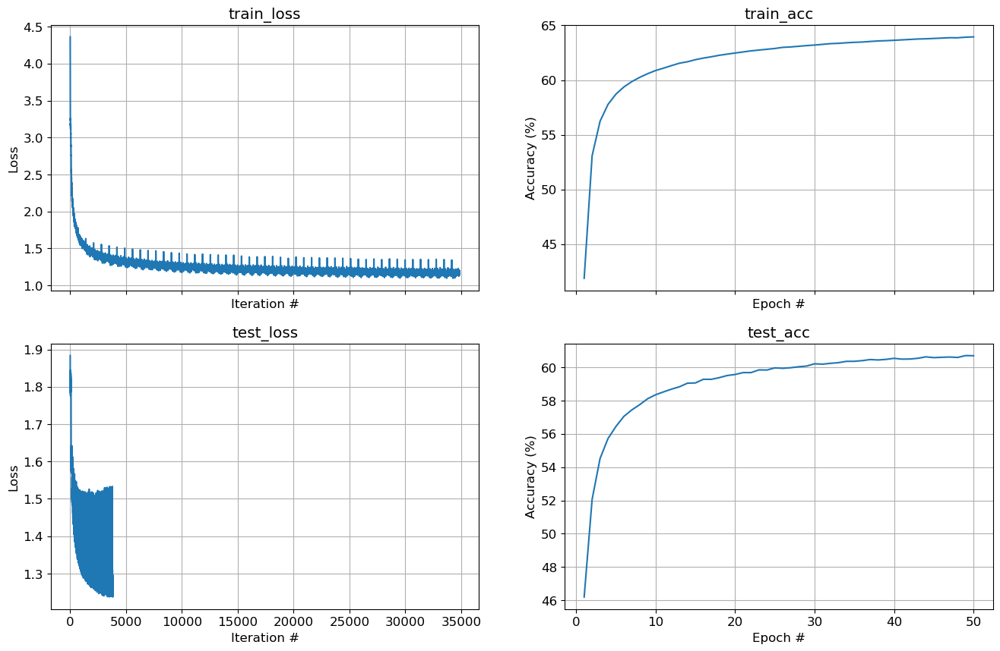

In [20]:
from cs236781.plot import plot_fit

def post_epoch_fn(epoch, train_res, test_res, verbose):
    # Update learning rate
    scheduler.step(test_res.accuracy)
    # Sample from model to show progress
    if verbose:
        start_seq = "ACT I."
        generated_sequence = charnn.generate_from_model(
            model, start_seq, 100, (char_to_idx,idx_to_char), T=0.5
        )
        print(generated_sequence)

# Train, unless final checkpoint is found
checkpoint_file_final = f'{checkpoint_file}_final.pt'
if os.path.isfile(checkpoint_file_final):
    print(f'*** Loading final checkpoint file {checkpoint_file_final} instead of training')
    saved_state = torch.load(checkpoint_file_final, map_location=device)
    model.load_state_dict(saved_state['model_state'])
else:
    try:
        # Print pre-training sampling
        print(charnn.generate_from_model(model, "ACT I.", 100, (char_to_idx,idx_to_char), T=0.5))

        fit_res = trainer.fit(dl_train, dl_test, num_epochs, max_batches=None,
                              post_epoch_fn=post_epoch_fn, early_stopping=early_stopping,
                              checkpoints=checkpoint_file, print_every=1)
        
        fig, axes = plot_fit(fit_res)
    except KeyboardInterrupt as e:
        print('\n *** Training interrupted by user')

### Generating a work of art
<a id=part1_8></a>

Armed with our fully trained model, let's generate the next Hamlet! You should experiment with modifying the sampling temperature and see what happens.

The text you generate should “look” like a Shakespeare play:
old-style English words and sentence structure, directions for the actors
(like “Exit/Enter”), sections (Act I/Scene III) etc.
There will be no coherent plot of course, but it should at least seem like
a Shakespearean play when not looking too closely.
If this is not what you see, go back, debug and/or and re-train.

**TODO**: Specify the generation parameters in the `part1_generation_params()` function within the `hw3/answers.py` module.

In [21]:
from hw3.answers import part1_generation_params

start_seq, temperature = part1_generation_params()

generated_sequence = charnn.generate_from_model(
    model, start_seq, 10000, (char_to_idx,idx_to_char), T=temperature
)

print(generated_sequence)

RuntimeError: stack expects a non-empty TensorList

## Questions
<a id=part1_9></a>

**TODO** Answer the following questions. Write your answers in the appropriate variables in the module `hw3/answers.py`.

In [22]:
from cs236781.answers import display_answer
import hw3.answers

### Question 1
Why do we split the corpus into sequences instead of training on the whole text?

In [23]:
display_answer(hw3.answers.part1_q1)


**Your answer:**



### Question 2
How is it possible that the generated text clearly shows memory longer than the sequence length?

In [24]:
display_answer(hw3.answers.part1_q2)


**Your answer:**



### Question 3
Why are we not shuffling the order of batches when training?

In [25]:
display_answer(hw3.answers.part1_q3)


**Your answer:**



### Question 4
1. Why do we lower the temperature for sampling (compared to the default of $1.0$)?
2. What happens when the temperature is very high and why?
3. What happens when the temperature is very low and why?

In [26]:
display_answer(hw3.answers.part1_q4)


**Your answer:**


